## 9. Estimates true thickness of units based on distance to upper contact and local interolated dip


<font face color='red'>Best with basal contacts only, using Notebook #1 as this avoids intrusive and fault contacts being considered</font>

In [1]:
import os
import rasterio
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, LineString
from math import sqrt, sin, radians
#print(os.getcwd())
os.chdir('../map2loop')

print(os.getcwd())
from map2loop import m2l_interpolation
from map2loop import m2l_utils
m2l_utils.v()

C:\Users\00073294\Dropbox\1_Jupyter_notebooks\map2loop\map2loop
0.0.43


In [2]:
mname='hams2' #root name of model input data
minx=500057    #left hams
maxx=603028    #right
miny=7455348   #bottom
maxy=7567953   #top
src_crs = 'epsg:4326'  #input data coord ref system (assumed to be geodetic lat/long WGS84)
dst_crs = 'epsg:28350' #model ref system (assumed to be something with metre coordinates)
gcode='GROUP_'
dcode='DIP'
ddcode='DIP_DIR'
ccode='CODE'


this_gcode=('Hamersley Group','Fortescue Group','Turee Group')

contact_decimate=2

test_data_path='../test_data2/'

tmp_path=test_data_path+'tmp/'
data_path=test_data_path+'data/'
dtm_path=test_data_path+'dtm/'
output_path=test_data_path+'output/'
dtm_reproj_file=dtm_path+'hams2_dtm_rp.tif'

geology_file=tmp_path+'basal_contacts2.shp'
fault_file=tmp_path+'faults_clip.shp'

bbox=(minx,miny,maxx,maxy)
dtm = rasterio.open(dtm_reproj_file)
scheme='null'

../test_data2/tmp/basal_contacts2.shp ../test_data2/tmp/ (500057, 7455348, 603028, 7567953) DIP DIP_DIR GROUP_ null
249
5639 1328.7966976318276 525.2522770864889
7270 points saved to ../test_data2/tmp/raw_contacts.csv


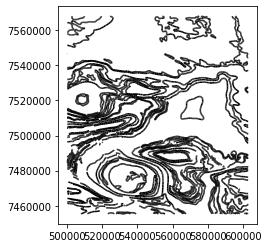

In [3]:
m2l_interpolation.save_contact_vectors(geology_file,tmp_path,dtm,bbox,dcode,ddcode,gcode,ccode,scheme,contact_decimate)


In [26]:
contact_points_file=tmp_path+'raw_contacts.csv'
interpolated_combo_file=tmp_path+'combo_full+100x100.csv'
buffer =2500
contact_lines = gpd.read_file(tmp_path+'/basal_contacts2.shp') #load orientation data as geopandas dataframe 
all_sorts=pd.read_csv(tmp_path+mname+'_all_sorts.csv')
#display(all_sorts)
#print(all_sorts.iloc[20])
max_thickness_allowed=5000
def pt_dist(x1,y1,x2,y2):
    dist=sqrt(pow(x1-x2,2)+pow(y1-y2,2))
    return(dist)

def calc_thickness(contact_points_file,interpolated_combo_file,contact_lines,output_path,buffer,max_thickness_allowed):
    contacts=pd.read_csv(contact_points_file)
    orientations=pd.read_csv(interpolated_combo_file)
    olength=len(orientations)
    clength=len(contacts)
    cx=contacts['X'].to_numpy()
    cy=contacts['Y'].to_numpy()
    cl=contacts['lsx'].to_numpy()
    cm=contacts['lsy'].to_numpy()
    ctextcode=contacts['formation'].to_numpy()
    ox=orientations['X'].to_numpy()
    oy=orientations['Y'].to_numpy()
    dip=orientations['dip'].to_numpy().reshape(olength,1)
    azimuth=orientations['azimuth'].to_numpy().reshape(olength,1)

    l = np.zeros(len(ox))
    m = np.zeros(len(ox))
    n = np.zeros(len(ox))    
    file=open(output_path+'formation_thicknesses3.csv','w')
    file.write('X,Y,formation,thickness,cl,cm,meanl,meanm,meann,p1x,p1y,p2x,p2y,dip\n')
    dist=m2l_interpolation.distance_matrix(ox,oy,cx,cy)
    
    np.savetxt(tmp_path+'dist.csv',dist,delimiter=',')
    #display("ppp",cx.shape,cy.shape,ox.shape,oy.shape,dip.shape,azimuth.shape,dist.shape)
    n_est=0
    for k in range(0,clength): #loop through all contact segments
        a_dist=dist[:,k:k+1]
        is_close=a_dist<buffer 
        #display("ic",a_dist.shape,is_close.shape,dip.shape)
        close_dip=dip[is_close]
        #print("cd",close_dip.shape)
        #print(close_dip)
        close_azimuth=azimuth[is_close]
        n_good=0
        for j in range(0,len(close_dip)): #find averaged dips within buffer
            l[n_good],m[n_good],n[n_good]=m2l_utils.ddd2dircos(float(close_dip[j]),float(close_azimuth[j])+90.0)
            #print(k,len(close_dip),n_good,l[n_good],m[n_good],n[n_good])
            n_good=n_good+1
        if(n_good>0): #if we found any candidates
            lm=np.mean(l[:n_good]) #average direction cosine of points within buffer range
            mm=np.mean(m[:n_good])
            nm=np.mean(n[:n_good])
            dip_mean,dipdirection_mean=m2l_utils.dircos2ddd(lm,mm,nm)
            dx1=-cm[k]*1e5
            dy1=cl[k]*1e5
            dx2=-dx1*1e5
            dy2=-dy1*1e5
            p1=Point((dx1+cx[k],dy1+cy[k]))
            p2=Point((dx2+cx[k],dy2+cy[k]))
            ddline=LineString((p1,p2))
            orig = Point((cx[k],cy[k]))
            
            crossings=np.zeros((1000,5))
            
            g=0
            for apair in all_sorts.iterrows(): #loop through all basal contacts

                if(ctextcode[k]==apair[1]['code']):
                    if(all_sorts.iloc[g]['group']==all_sorts.iloc[g-1]['group']):
                        is_contacta=contact_lines['CODE'] == all_sorts.iloc[g-1]['code'] # subset contacts to just those with a code
                        acontacts = contact_lines[is_contacta]
                        i=0 
                        for acontact in acontacts.iterrows():   #loop through distinct linestrings for upper contact
                            if(ddline.intersects(acontact[1].geometry)): 
                                isects=ddline.intersection(acontact[1].geometry)
                                if(isects.geom_type=="MultiPoint"):
                                    for pt in isects: 
                                        if(pt.distance(orig)<buffer*2):
                                            #print(i,",", pt.x, ",",pt.y,",",apair[1]['code'],",",apair[1]['group'])
                                            crossings[i,0]=i
                                            crossings[i,1]=int(apair[1]['index'])
                                            crossings[i,2]=0
                                            crossings[i,3]=pt.x
                                            crossings[i,4]=pt.y
                                            i=i+1
                                else:
                                    if(isects.distance(orig)<buffer*2):
                                        #print(i,",", isects.x,",", isects.y,",",apair[1]['code'],",",apair[1]['group'])
                                        crossings[i,0]=i
                                        crossings[i,1]=int(apair[1]['index'])
                                        crossings[i,2]=0
                                        crossings[i,3]=isects.x
                                        crossings[i,4]=isects.y
                                        i=i+1
                        if(i>0): #if we found any intersections with base of next higher unit
                            min_dist=1e8
                            min_pt=0
                            for f in range(0,i): #find closest hit
                                this_dist=pt_dist(crossings[f,3],crossings[f,4],cx[k],cy[k])
                                if(this_dist<min_dist):
                                    min_dist=this_dist
                                    min_pt=f
                            if(min_dist<max_thickness_allowed): #if not too far, add to output
                                true_thick=sin(radians(dip_mean))*min_dist
                                ostr=str(cx[k])+','+str(cy[k])+','+ctextcode[k]+','+str(int(true_thick))+\
                                    ','+str(cl[k])+','+str(cm[k])+','+str(lm)+','+str(mm)+','+str(nm)+','+\
                                    str(p1.x)+','+str(p1.y)+','+str(p2.x)+','+str(p2.y)+','+str(dip_mean)+'\n'
                                file.write(ostr)
                                n_est=n_est+1
                                
                g=g+1
    print(n_est,'thickness estimates saved as',output_path+'formation_thicknesses3.csv')

In [28]:
calc_thickness(contact_points_file,interpolated_combo_file,contact_lines,output_path,buffer,max_thickness_allowed)

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[15 14 15 14 14 14]
0 6 0 0.23824418718279639 -0.10112865756742419 0.9659258262890683
0 6 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
0 6 2 0.2399728398734504 -0.09695532079701459 0.9659258262890683
0 6 3 0.2210066488293639 -0.09839849970274304 0.9702957262759965
0 6 4 0.22585354647294925 -0.0866970536761651 0.9702957262759965
0 6 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 16 14 15 14 15 14 14]
1 8 0 0.2093890059558353 -0.15213001772368212 0.9659258262890683
1 8 1 0.24107786342134127 -0.13363164179934384 0.9612616959383189
1 8 2 0.20951050732099902 -0.12096094779983378 0.9702957262759965
1 8 3 0.23824418718279639 -0.10112865756742419 0.9659258262890683
1 8 4 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1 8 5 0.2399728398734504 -0.09695532079701459 0.9659258262890683
1 8 6 0.2210066488293639 -0.09839849970274304 0.9702957262759965
1 8 7 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[16 15 16 14 15 14 15 14 14]
2 9 0 0.24981228197513822 -0.11648938018618282 0.9612616959383189
2 9 1 0.2093890059558353 -0.15213001772368212 0.9659258262890683
2 9 2 0.24107786342134127 -0.13363164179934384 0.9612616959383189
2 9 3 0.20951050732099902 -0.12096094779983378 0.9702957262759965
2 9 4 0.23824418718279639 -0.10112865756742419 0.9659258262890683
2 9 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
2 9 6 0.2399728398734504 -0.09695532079701459 0.9659258262890683
2 9 7 0.2210066488293639 -0.09839849970274304 0.9702957262759965
2 9 8 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[15 16 15 16 14 14 15 14 15 14]
3 10 0 0.22852365285931672 -0.12150818158303239 0.9659258262890683
3 10 1 0.24981228197513822 -0.11648938018618282 0.9612616959383189
3 10 2 0.2093890059558353 -0.15213001772368212 0.9659258262890683
3 10 3 0.24107786342134127 -0.13363164179934384 0.9612616959383189
3 10 4 0.20736753823190537 -0.12459898738824397 0.9702957262759965
3 10 5 0.20951050732099902 -0.12096094779983378 0.9702957262759965
3 10 6 0.23824418718279639 -0.10112865756742419 0.9659258262890683
3 10 7 0.21743795943438993 -0.10605157880741381 0.9702957262759965
3 10 8 0.2399728398734504 -0.09695532079701459 0.9659258262890683
3 10 9 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[16 15 16 14 15 16 14 14 15 14 15]
4 11 0 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4 11 1 0.22852365285931672 -0.12150818158303239 0.9659258262890683
4 11 2 0.24981228197513822 -0.11648938018618282 0.9612616959383189
4 11 3 0.20736753823190537 -0.12459898738824397 0.9702957262759965
4 11 4 0.2093890059558353 -0.15213001772368212 0.9659258262890683
4 11 5 0.24107786342134127 -0.13363164179934384 0.9612616959383189
4 11 6 0.20736753823190537 -0.12459898738824397 0.9702957262759965
4 11 7 0.20951050732099902 -0.12096094779983378 0.9702957262759965
4 11 8 0.23824418718279639 -0.10112865756742419 0.9659258262890683
4 11 9 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4 11 10 0.2399728398734504 -0.09695532079701459 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[15 16 16 15 15 16 14 15 16 14 14 15]
5 12 0 0.25218552974419584 -0.0582216170800844 0.9659258262890683
5 12 1 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5 12 2 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5 12 3 0.2345697160098045 -0.10938165494661498 0.9659258262890683
5 12 4 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5 12 5 0.24981228197513822 -0.11648938018618282 0.9612616959383189
5 12 6 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5 12 7 0.2093890059558353 -0.15213001772368212 0.9659258262890683
5 12 8 0.24107786342134127 -0.13363164179934384 0.9612616959383189
5 12 9 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5 12 10 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5 12 11 0.23824418718279639 -0.10112865756742419 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[15 16 17 15 16 16 15 15 16 14 15 16]
6 12 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683
6 12 1 0.2735827967647523 -0.03359174357134866 0.9612616959383189
6 12 2 0.2859826814969977 -0.060787495476174874 0.9563047559630354
6 12 3 0.25218552974419584 -0.0582216170800844 0.9659258262890683
6 12 4 0.26744974835125046 -0.06668271161732856 0.9612616959383189
6 12 5 0.26495963211660245 -0.07597595192178697 0.9612616959383189
6 12 6 0.2345697160098045 -0.10938165494661498 0.9659258262890683
6 12 7 0.22852365285931672 -0.12150818158303239 0.9659258262890683
6 12 8 0.24981228197513822 -0.11648938018618282 0.9612616959383189
6 12 9 0.20736753823190537 -0.12459898738824397 0.9702957262759965
6 12 10 0.2093890059558353 -0.15213001772368212 0.9659258262890683
6 12 11 0.24107786342134127 -0.13363164179934384 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[16 16 17 15 16 17 15 16 16 15 15 16]
7 12 0 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7 12 1 0.26744974835125046 -0.06668271161732856 0.9612616959383189
7 12 2 0.2870000130267722 -0.055787151254673206 0.9563047559630354
7 12 3 0.25688984718798874 -0.03154210708739143 0.9659258262890683
7 12 4 0.2735827967647523 -0.03359174357134866 0.9612616959383189
7 12 5 0.2859826814969977 -0.060787495476174874 0.9563047559630354
7 12 6 0.25218552974419584 -0.0582216170800844 0.9659258262890683
7 12 7 0.26744974835125046 -0.06668271161732856 0.9612616959383189
7 12 8 0.26495963211660245 -0.07597595192178697 0.9612616959383189
7 12 9 0.2345697160098045 -0.10938165494661498 0.9659258262890683
7 12 10 0.22852365285931672 -0.12150818158303239 0.9659258262890683
7 12 11 0.24981228197513822 -0.11648938018618282 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[16 17 17 15 16 16 17 15 15 16 17 15 16 16 15]
8 15 0 0.2590143892741739 -0.0942735279424384 0.9612616959383189
8 15 1 0.28368701557649906 -0.07073111702623082 0.9563047559630354
8 15 2 0.2870000130267722 -0.055787151254673206 0.9563047559630354
8 15 3 0.23644296300480327 -0.10527118956908343 0.9659258262890683
8 15 4 0.24559468234297682 -0.1251367409142467 0.9612616959383189
8 15 5 0.26744974835125046 -0.06668271161732856 0.9612616959383189
8 15 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
8 15 7 0.24321034680169396 -0.08852132690137686 0.9659258262890683
8 15 8 0.25688984718798874 -0.03154210708739143 0.9659258262890683
8 15 9 0.2735827967647523 -0.03359174357134866 0.9612616959383189
8 15 10 0.2859826814969977 -0.060787495476174874 0.9563047559630354
8 15 11 0.25218552974419584 -0.0582216170800844 0.9659258262890683
8 15 12 0.26744974835125046 -0.06668271161732856 0.9612616959383189
8 15 13 0.26495963211660245 -0.07597595192178697 0.9612616959383189
8 15 14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 18 15 16 17 17 15 16 16 17 15 15 16 17 15 16]
9 17 0 0.27496591707171397 -0.019227489973948634 0.9612616959383189
9 17 1 0.28877212387457146 -0.04573701122120165 0.9563047559630354
9 17 2 0.30521248238988885 -0.04834090820338492 0.9510565162951535
9 17 3 0.247509883765352 -0.07567136543133486 0.9659258262890683
9 17 4 0.2590143892741739 -0.0942735279424384 0.9612616959383189
9 17 5 0.28368701557649906 -0.07073111702623082 0.9563047559630354
9 17 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
9 17 7 0.23644296300480327 -0.10527118956908343 0.9659258262890683
9 17 8 0.24559468234297682 -0.1251367409142467 0.9612616959383189
9 17 9 0.26744974835125046 -0.06668271161732856 0.9612616959383189
9 17 10 0.2870000130267722 -0.055787151254673206 0.9563047559630354
9 17 11 0.24321034680169396 -0.08852132690137686 0.9659258262890683
9 17 12 0.25688984718798874 -0.03154210708739143 0.9659258262890683
9 17 13 0.2735827967647523 -0.03359174357134866 0.9612616959383189
9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 16 17 18 16 16 17 18 15 16 17 17 15 16 16 17 15 16]
10 18 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
10 18 1 0.27412738554142113 -0.02881194922271035 0.9612616959383189
10 18 2 0.29019241037136534 -0.035631147684803556 0.9563047559630354
10 18 3 0.3060096622280039 -0.04300685335652051 0.9510565162951535
10 18 4 0.27458847246092255 -0.024023378475231116 0.9612616959383189
10 18 5 0.27496591707171397 -0.019227489973948634 0.9612616959383189
10 18 6 0.28877212387457146 -0.04573701122120165 0.9563047559630354
10 18 7 0.30521248238988885 -0.04834090820338492 0.9510565162951535
10 18 8 0.247509883765352 -0.07567136543133486 0.9659258262890683
10 18 9 0.2590143892741739 -0.0942735279424384 0.9612616959383189
10 18 10 0.28368701557649906 -0.07073111702623082 0.9563047559630354
10 18 11 0.2870000130267722 -0.055787151254673206 0.9563047559630354
10 18 12 0.23644296300480327 -0.10527118956908343 0.9659258262890683
10 18 13 0.24559468234297682 -0.1251367409142467 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 17 18 16 16 17 18 16 16 17 18 15 16 17 17]
11 16 0 0.2685727882446404 -0.06200491380758904 0.9612616959383189
11 16 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
11 16 2 0.29019241037136534 -0.035631147684803556 0.9563047559630354
11 16 3 0.30671362855862216 -0.037659698205506964 0.9510565162951535
11 16 4 0.27224380257292347 -0.043119182302336016 0.9612616959383189
11 16 5 0.27412738554142113 -0.02881194922271035 0.9612616959383189
11 16 6 0.29019241037136534 -0.035631147684803556 0.9563047559630354
11 16 7 0.3060096622280039 -0.04300685335652051 0.9510565162951535
11 16 8 0.27458847246092255 -0.024023378475231116 0.9612616959383189
11 16 9 0.27496591707171397 -0.019227489973948634 0.9612616959383189
11 16 10 0.28877212387457146 -0.04573701122120165 0.9563047559630354
11 16 11 0.30521248238988885 -0.04834090820338492 0.9510565162951535
11 16 12 0.247509883765352 -0.07567136543133486 0.9659258262890683
11 16 13 0.2590143892741739 -0.0942735279424384 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 17 16 16 17 18 15 16 16 17 18 16 16 17 16]
12 16 0 0.2735827967647523 -0.03359174357134866 0.9612616959383189
12 16 1 0.27295487201793284 -0.038361305549484685 0.9612616959383189
12 16 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
12 16 3 0.2685727882446404 -0.06200491380758904 0.9612616959383189
12 16 4 0.27224380257292347 -0.043119182302336016 0.9612616959383189
12 16 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
12 16 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535
12 16 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
12 16 8 0.27224380257292347 -0.043119182302336016 0.9612616959383189
12 16 9 0.27412738554142113 -0.02881194922271035 0.9612616959383189
12 16 10 0.29019241037136534 -0.035631147684803556 0.9563047559630354
12 16 11 0.3060096622280039 -0.04300685335652051 0.9510565162951535
12 16 12 0.27458847246092255 -0.024023378475231116 0.9612616959383189
12 16 13 0.27496591707171397 -0.019227489973948634 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 16 15 16 16 17 18 15 16 16 17 18 16 16 17]
13 16 0 0.24471821486331075 -0.08426323885239126 0.9659258262890683
13 16 1 0.25406381026660135 -0.04938500198032862 0.9659258262890683
13 16 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
13 16 3 0.2416283945124098 -0.09275245049666295 0.9659258262890683
13 16 4 0.2735827967647523 -0.03359174357134866 0.9612616959383189
13 16 5 0.27295487201793284 -0.038361305549484685 0.9612616959383189
13 16 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
13 16 7 0.30671362855862216 -0.037659698205506964 0.9510565162951535
13 16 8 0.24321034680169396 -0.08852132690137686 0.9659258262890683
13 16 9 0.2685727882446404 -0.06200491380758904 0.9612616959383189
13 16 10 0.27224380257292347 -0.043119182302336016 0.9612616959383189
13 16 11 0.29019241037136534 -0.035631147684803556 0.9563047559630354
13 16 12 0.30671362855862216 -0.037659698205506964 0.9510565162951535
13 16 13 0.27224380257292347 -0.043119182302336016 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 14 16 15 15 15 16 15 16 16 17 16 16 17]
14 15 0 0.18525067297365846 -0.09438993241604875 0.9781476007338056
14 15 1 0.2070685373127713 -0.0878953793186303 0.9743700647852352
14 15 2 0.2357214530884151 -0.054420585484011685 0.9702957262759965
14 15 3 0.27224380257292347 -0.043119182302336016 0.9612616959383189
14 15 4 0.22852365285931672 -0.12150818158303239 0.9659258262890683
14 15 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
14 15 6 0.25406381026660135 -0.04938500198032862 0.9659258262890683
14 15 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
14 15 8 0.2416283945124098 -0.09275245049666295 0.9659258262890683
14 15 9 0.2735827967647523 -0.03359174357134866 0.9612616959383189
14 15 10 0.27295487201793284 -0.038361305549484685 0.9612616959383189
14 15 11 0.2895263633904652 -0.04069027677924386 0.9563047559630354
14 15 12 0.2685727882446404 -0.06200491380758904 0.9612616959383189
14 15 13 0.27224380257292347 -0.043119182302336016 0.9612616

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 11 13 12 13 14 16 15 15 15 16 15 16 16 17 16]
15 16 0 0.15622007704270646 -0.008187147317233854 0.9876883405951378
15 16 1 0.18845982001408496 -0.029849103116593678 0.981627183447664
15 16 2 0.22276184614647915 -0.03130713579727186 0.9743700647852352
15 16 3 0.18525067297365846 -0.09438993241604875 0.9781476007338056
15 16 4 0.2070685373127713 -0.0878953793186303 0.9743700647852352
15 16 5 0.2357214530884151 -0.054420585484011685 0.9702957262759965
15 16 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
15 16 7 0.22852365285931672 -0.12150818158303239 0.9659258262890683
15 16 8 0.24471821486331075 -0.08426323885239126 0.9659258262890683
15 16 9 0.25406381026660135 -0.04938500198032862 0.9659258262890683
15 16 10 0.27224380257292347 -0.043119182302336016 0.9612616959383189
15 16 11 0.2416283945124098 -0.09275245049666295 0.9659258262890683
15 16 12 0.2735827967647523 -0.03359174357134866 0.9612616959383189
15 16 13 0.27295487201793284 -0.038361305549484685 0.96

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  8 11  9 11 13 14 11 12 13 14 16 15 15 15 16 15 16 16]
16 19 0 0.08667829446963062 0.009110255854363638 0.9961946980917455
16 19 1 0.1389823690621015 0.00728375732204075 0.9902680687415704
16 19 2 0.19034419425383423 -0.013310162676126887 0.981627183447664
16 19 3 0.15622007704270646 -0.008187147317233854 0.9876883405951378
16 19 4 0.18845982001408496 -0.029849103116593678 0.981627183447664
16 19 5 0.22276184614647915 -0.03130713579727186 0.9743700647852352
16 19 6 0.23956752834178272 -0.03366902040074294 0.9702957262759965
16 19 7 0.1652454372666754 -0.09540449768827242 0.981627183447664
16 19 8 0.18525067297365846 -0.09438993241604875 0.9781476007338056
16 19 9 0.2070685373127713 -0.0878953793186303 0.9743700647852352
16 19 10 0.2357214530884151 -0.054420585484011685 0.9702957262759965
16 19 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
16 19 12 0.22852365285931672 -0.12150818158303239 0.9659258262890683
16 19 13 0.24471821486331075 -0.08426323885239126

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 2  5  9  5  8 11 13  7  9 11 13 14 12 13 14 16 15 15 15]
17 19 0 0.03235824987506583 0.013073581571653798 0.9993908270190958
17 19 1 0.08334745129907631 0.02548187308350915 0.9961946980917455
17 19 2 0.15622007704270646 -0.008187147317233854 0.9876883405951378
17 19 3 0.08667829446963062 0.009110255854363638 0.9961946980917455
17 19 4 0.1389823690621015 0.00728375732204075 0.9902680687415704
17 19 5 0.19034419425383423 -0.013310162676126887 0.981627183447664
17 19 6 0.22327430329666104 -0.02741463729118244 0.9743700647852352
17 19 7 0.12001787423989645 -0.021162389395769192 0.992546151641322
17 19 8 0.15622007704270646 -0.008187147317233854 0.9876883405951378
17 19 9 0.18845982001408496 -0.029849103116593678 0.981627183447664
17 19 10 0.22276184614647915 -0.03130713579727186 0.9743700647852352
17 19 11 0.23956752834178272 -0.03366902040074294 0.9702957262759965
17 19 12 0.18525067297365846 -0.09438993241604875 0.9781476007338056
17 19 13 0.2070685373127713 -0.087895379318630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  7  2  5  9 12  5  8 11 13  9 11 13 14 13 14]
18 16 0 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
18 16 1 0.12036892955724912 -0.019064565540388427 0.992546151641322
18 16 2 0.03235824987506583 0.013073581571653798 0.9993908270190958
18 16 3 0.08334745129907631 0.02548187308350915 0.9961946980917455
18 16 4 0.15622007704270646 -0.008187147317233854 0.9876883405951378
18 16 5 0.20636194860240756 -0.02533806124621435 0.9781476007338056
18 16 6 0.08667829446963062 0.009110255854363638 0.9961946980917455
18 16 7 0.1389823690621015 0.00728375732204075 0.9902680687415704
18 16 8 0.19034419425383423 -0.013310162676126887 0.981627183447664
18 16 9 0.22327430329666104 -0.02741463729118244 0.9743700647852352
18 16 10 0.15622007704270646 -0.008187147317233854 0.9876883405951378
18 16 11 0.18845982001408496 -0.029849103116593678 0.981627183447664
18 16 12 0.22276184614647915 -0.03130713579727186 0.9743700647852352
18 16 13 0.23956752834178272 -0.03366902040074294 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  1  3  7 11  2  5  9 12  5  8 11 13 11 13 14]
19 16 0 0.10184940552600458 -0.023513788021002614 0.9945218953682733
19 16 1 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
19 16 2 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
19 16 3 0.12036892955724912 -0.019064565540388427 0.992546151641322
19 16 4 0.18845982001408496 -0.029849103116593678 0.981627183447664
19 16 5 0.03235824987506583 0.013073581571653798 0.9993908270190958
19 16 6 0.08334745129907631 0.02548187308350915 0.9961946980917455
19 16 7 0.15622007704270646 -0.008187147317233854 0.9876883405951378
19 16 8 0.20636194860240756 -0.02533806124621435 0.9781476007338056
19 16 9 0.08667829446963062 0.009110255854363638 0.9961946980917455
19 16 10 0.1389823690621015 0.00728375732204075 0.9902680687415704
19 16 11 0.19034419425383423 -0.013310162676126887 0.981627183447664
19 16 12 0.22327430329666104 -0.02741463729118244 0.9743700647852352
19 16 13 0.18845982001408496 -0.029849103116593678

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 2  6 11  1  3  7 11 15  2  5  9 12 15  8 11 13 11 13 14]
20 19 0 0.03371032518943597 -0.009032654411099905 0.9993908270190958
20 19 1 0.10184940552600458 -0.023513788021002614 0.9945218953682733
20 19 2 0.18791017799129198 -0.033133634329594756 0.981627183447664
20 19 3 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
20 19 4 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
20 19 5 0.12036892955724912 -0.019064565540388427 0.992546151641322
20 19 6 0.18845982001408496 -0.029849103116593678 0.981627183447664
20 19 7 0.25630023594721063 -0.036020649094440825 0.9659258262890683
20 19 8 0.03235824987506583 0.013073581571653798 0.9993908270190958
20 19 9 0.08334745129907631 0.02548187308350915 0.9961946980917455
20 19 10 0.15622007704270646 -0.008187147317233854 0.9876883405951378
20 19 11 0.20636194860240756 -0.02533806124621435 0.9781476007338056
20 19 12 0.25688984718798874 -0.03154210708739143 0.9659258262890683
20 19 13 0.1389823690621015 0.0072837

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 3  6  5  2  6 11  1  3  7 11 15  2  5  9 12  8 11 13]
21 18 0 -0.047432484684989486 0.022118130853930294 0.9986295347545738
21 18 1 0.10142352118280162 -0.025287723977830967 0.9945218953682733
21 18 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
21 18 3 0.03371032518943597 -0.009032654411099905 0.9993908270190958
21 18 4 0.10184940552600458 -0.023513788021002614 0.9945218953682733
21 18 5 0.18791017799129198 -0.033133634329594756 0.981627183447664
21 18 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
21 18 7 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
21 18 8 0.12036892955724912 -0.019064565540388427 0.992546151641322
21 18 9 0.18845982001408496 -0.029849103116593678 0.981627183447664
21 18 10 0.25630023594721063 -0.036020649094440825 0.9659258262890683
21 18 11 0.03235824987506583 0.013073581571653798 0.9993908270190958
21 18 12 0.08334745129907631 0.02548187308350915 0.9961946980917455
21 18 13 0.15622007704270646 -0.00818

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  6 11  5  2  6 11  1  3  7 11  2  5  9 12 11]
22 16 0 -0.047432484684989486 0.022118130853930294 0.9986295347545738
22 16 1 0.10142352118280162 -0.025287723977830967 0.9945218953682733
22 16 2 0.18845982001408496 -0.029849103116593678 0.981627183447664
22 16 3 -0.08334745129907631 0.025481873083509108 0.9961946980917455
22 16 4 0.03371032518943597 -0.009032654411099905 0.9993908270190958
22 16 5 0.10184940552600458 -0.023513788021002614 0.9945218953682733
22 16 6 0.18791017799129198 -0.033133634329594756 0.981627183447664
22 16 7 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
22 16 8 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
22 16 9 0.12036892955724912 -0.019064565540388427 0.992546151641322
22 16 10 0.18845982001408496 -0.029849103116593678 0.981627183447664
22 16 11 0.03235824987506583 0.013073581571653798 0.9993908270190958
22 16 12 0.08334745129907631 0.02548187308350915 0.9961946980917455
22 16 13 0.15622007704270646 -0.008187147317

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  7  8  3  6 11  5  2  6 11  1  3  7 11  5  9]
23 16 0 -0.06937434048221462 0.007291537003443795 0.9975640502598242
23 16 1 0.12096094779983388 -0.014852136862001751 0.992546151641322
23 16 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
23 16 3 -0.047432484684989486 0.022118130853930294 0.9986295347545738
23 16 4 0.10142352118280162 -0.025287723977830967 0.9945218953682733
23 16 5 0.18845982001408496 -0.029849103116593678 0.981627183447664
23 16 6 -0.08334745129907631 0.025481873083509108 0.9961946980917455
23 16 7 0.03371032518943597 -0.009032654411099905 0.9993908270190958
23 16 8 0.10184940552600458 -0.023513788021002614 0.9945218953682733
23 16 9 0.18791017799129198 -0.033133634329594756 0.981627183447664
23 16 10 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
23 16 11 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
23 16 12 0.12036892955724912 -0.019064565540388427 0.992546151641322
23 16 13 0.18845982001408496 -0.0298491031

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  4  7  8  3  6 11  5  2  6 11  1  3  7]
24 14 0 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
24 14 1 -0.06937434048221462 0.007291537003443795 0.9975640502598242
24 14 2 0.12096094779983388 -0.014852136862001751 0.992546151641322
24 14 3 -0.12288255448340224 0.06533781320548045 0.9902680687415704
24 14 4 -0.047432484684989486 0.022118130853930294 0.9986295347545738
24 14 5 0.10142352118280162 -0.025287723977830967 0.9945218953682733
24 14 6 0.18845982001408496 -0.029849103116593678 0.981627183447664
24 14 7 -0.08334745129907631 0.025481873083509108 0.9961946980917455
24 14 8 0.03371032518943597 -0.009032654411099905 0.9993908270190958
24 14 9 0.10184940552600458 -0.023513788021002614 0.9945218953682733
24 14 10 0.18791017799129198 -0.033133634329594756 0.981627183447664
24 14 11 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
24 14 12 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
24 14 13 0.12036892955724912 -0.01906456554038

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 5  8  9  4  7 14  8  3  6 11 11  5  2  6 11  1  3  7]
25 18 0 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
25 18 1 0.13917310096006547 8.52189463090778e-18 0.9902680687415704
25 18 2 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
25 18 3 -0.06937434048221462 0.007291537003443795 0.9975640502598242
25 18 4 0.12096094779983388 -0.014852136862001751 0.992546151641322
25 18 5 -0.2300813952445398 0.07475797705169908 0.9702957262759965
25 18 6 -0.12288255448340224 0.06533781320548045 0.9902680687415704
25 18 7 -0.047432484684989486 0.022118130853930294 0.9986295347545738
25 18 8 0.10142352118280162 -0.025287723977830967 0.9945218953682733
25 18 9 0.18845982001408496 -0.029849103116593678 0.981627183447664
25 18 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
25 18 11 -0.08334745129907631 0.025481873083509108 0.9961946980917455
25 18 12 0.03371032518943597 -0.009032654411099905 0.9993908270190958
25 18 13 0.10184940552600458 -0.02351378

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 14 13 13 13 13 13]
26 8 0 0.2300813952445398 -0.0747579770516991 0.9702957262759965
26 8 1 0.2151217631279373 -0.06576932323769276 0.9743700647852352
26 8 2 0.23255025164874948 -0.0666827116173285 0.9702957262759965
26 8 3 0.21728603304169483 -0.058221617080084394 0.9743700647852352
26 8 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
26 8 5 0.21918557339453865 -0.050602976850416495 0.9743700647852352
26 8 6 0.2200353340889914 -0.046769954059870625 0.9743700647852352
26 8 7 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 13 14 13 13 13 13]
27 7 0 0.2300813952445398 -0.0747579770516991 0.9702957262759965
27 7 1 0.2151217631279373 -0.06576932323769276 0.9743700647852352
27 7 2 0.23255025164874948 -0.0666827116173285 0.9702957262759965
27 7 3 0.21728603304169483 -0.058221617080084394 0.9743700647852352
27 7 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
27 7 5 0.21918557339453865 -0.050602976850416495 0.9743700647852352
27 7 6 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[14 13 14 13 14 13 13 13 13]
28 9 0 0.22733222010154663 -0.0827421614066158 0.9702957262759965
28 9 1 0.21138484580493974 -0.07693779184794897 0.9743700647852352
28 9 2 0.2300813952445398 -0.0747579770516991 0.9702957262759965
28 9 3 0.2151217631279373 -0.06576932323769276 0.9743700647852352
28 9 4 0.23255025164874948 -0.0666827116173285 0.9702957262759965
28 9 5 0.21728603304169483 -0.058221617080084394 0.9743700647852352
28 9 6 0.21826904665113156 -0.054420585484011685 0.9743700647852352
28 9 7 0.21918557339453865 -0.050602976850416495 0.9743700647852352
28 9 8 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[13 14 13 13 14 13 13 14 13 13 13]
29 11 0 0.20857098565540755 -0.08426814815307294 0.9743700647852352
29 11 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
29 11 2 0.2100099012553406 -0.08061524809326429 0.9743700647852352
29 11 3 0.21138484580493974 -0.07693779184794897 0.9743700647852352
29 11 4 0.2300813952445398 -0.0747579770516991 0.9702957262759965
29 11 5 0.21394116608119795 -0.06951369869481658 0.9743700647852352
29 11 6 0.2151217631279373 -0.06576932323769276 0.9743700647852352
29 11 7 0.23255025164874948 -0.0666827116173285 0.9702957262759965
29 11 8 0.21728603304169483 -0.058221617080084394 0.9743700647852352
29 11 9 0.21826904665113156 -0.054420585484011685 0.9743700647852352
29 11 10 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[14 14 13 13 14 13 13 14 13 13 14 13 13]
30 13 0 0.2210066488293639 -0.09839849970274304 0.9702957262759965
30 13 1 0.22585354647294925 -0.0866970536761651 0.9702957262759965
30 13 2 0.20550301388775166 -0.09149583670018553 0.9743700647852352
30 13 3 0.20857098565540755 -0.08426814815307294 0.9743700647852352
30 13 4 0.22733222010154663 -0.0827421614066158 0.9702957262759965
30 13 5 0.2100099012553406 -0.08061524809326429 0.9743700647852352
30 13 6 0.21138484580493974 -0.07693779184794897 0.9743700647852352
30 13 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
30 13 8 0.21394116608119795 -0.06951369869481658 0.9743700647852352
30 13 9 0.2151217631279373 -0.06576932323769276 0.9743700647852352
30 13 10 0.23255025164874948 -0.0666827116173285 0.9702957262759965
30 13 11 0.21728603304169483 -0.058221617080084394 0.9743700647852352
30 13 12 0.21826904665113156 -0.054420585484011685 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 13 13 14 13 13 14 13 13 14]
31 12 0 0.20043285704343575 -0.10212564157850917 0.9743700647852352
31 12 1 0.2210066488293639 -0.09839849970274304 0.9702957262759965
31 12 2 0.22585354647294925 -0.0866970536761651 0.9702957262759965
31 12 3 0.20550301388775166 -0.09149583670018553 0.9743700647852352
31 12 4 0.20857098565540755 -0.08426814815307294 0.9743700647852352
31 12 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965
31 12 6 0.2100099012553406 -0.08061524809326429 0.9743700647852352
31 12 7 0.21138484580493974 -0.07693779184794897 0.9743700647852352
31 12 8 0.2300813952445398 -0.0747579770516991 0.9702957262759965
31 12 9 0.21394116608119795 -0.06951369869481658 0.9743700647852352
31 12 10 0.2151217631279373 -0.06576932323769276 0.9743700647852352
31 12 11 0.23255025164874948 -0.0666827116173285 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
32 8 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
32 8 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
32 8 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
32 8 3 -0.06960567106282661 0.052451635339515815 0.9961946980917455
32 8 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
32 8 5 -0.07547908730517329 0.043577871373829076 0.9961946980917455
32 8 6 -0.07391226170625072 0.046185507070537465 0.9961946980917455
32 8 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
33 8 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
33 8 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
33 8 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
33 8 3 -0.06960567106282661 0.052451635339515815 0.9961946980917455
33 8 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
33 8 5 -0.07547908730517329 0.043577871373829076 0.9961946980917455
33 8 6 -0.07391226170625072 0.046185507070537465 0.9961946980917455
33 8 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
34 8 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
34 8 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
34 8 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
34 8 3 -0.06960567106282661 0.052451635339515815 0.9961946980917455
34 8 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
34 8 5 -0.07547908730517329 0.043577871373829076 0.9961946980917455
34 8 6 -0.07391226170625072 0.046185507070537465 0.9961946980917455
34 8 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 5 5 5]
35 9 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
35 9 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
35 9 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
35 9 3 -0.0605434662332318 0.06269459458646723 0.9961946980917455
35 9 4 -0.06960567106282661 0.052451635339515815 0.9961946980917455
35 9 5 -0.06773273349412519 0.05484888610819526 0.9961946980917455
35 9 6 -0.07547908730517329 0.043577871373829076 0.9961946980917455
35 9 7 -0.07391226170625072 0.046185507070537465 0.9961946980917455
35 9 8 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 5 5 5]
36 9 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
36 9 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
36 9 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
36 9 3 -0.0605434662332318 0.06269459458646723 0.9961946980917455
36 9 4 -0.06960567106282661 0.052451635339515815 0.9961946980917455
36 9 5 -0.06773273349412519 0.05484888610819526 0.9961946980917455
36 9 6 -0.07547908730517329 0.043577871373829076 0.9961946980917455
36 9 7 -0.07391226170625072 0.046185507070537465 0.9961946980917455
36 9 8 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 5 5 5]
37 9 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
37 9 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
37 9 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
37 9 3 -0.0605434662332318 0.06269459458646723 0.9961946980917455
37 9 4 -0.06960567106282661 0.052451635339515815 0.9961946980917455
37 9 5 -0.06773273349412519 0.05484888610819526 0.9961946980917455
37 9 6 -0.07547908730517329 0.043577871373829076 0.9961946980917455
37 9 7 -0.07391226170625072 0.046185507070537465 0.9961946980917455
37 9 8 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[5 5 5 5 5 5 5 5 5 5 5]
38 11 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
38 11 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
38 11 2 -0.06374167507586793 0.059440073623931854 0.9961946980917455
38 11 3 -0.06269459458646724 0.06054346623323177 0.9961946980917455
38 11 4 -0.0605434662332318 0.06269459458646723 0.9961946980917455
38 11 5 -0.07139380484326964 0.049990480332730285 0.9961946980917455
38 11 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
38 11 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
38 11 8 -0.07547908730517329 0.043577871373829076 0.9961946980917455
38 11 9 -0.07391226170625072 0.046185507070537465 0.9961946980917455
38 11 10 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[5 5 5 5 5 5 5 5 5 5]
39 10 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
39 10 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
39 10 2 -0.06374167507586793 0.059440073623931854 0.9961946980917455
39 10 3 -0.06269459458646724 0.06054346623323177 0.9961946980917455
39 10 4 -0.0605434662332318 0.06269459458646723 0.9961946980917455
39 10 5 -0.07139380484326964 0.049990480332730285 0.9961946980917455
39 10 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
39 10 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
39 10 8 -0.07547908730517329 0.043577871373829076 0.9961946980917455
39 10 9 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[5 5 5 5 5 5 5 5 5 5 5 5]
40 12 0 -0.056022631551222134 0.06676517241775067 0.9961946980917455
40 12 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
40 12 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
40 12 3 -0.06374167507586793 0.059440073623931854 0.9961946980917455
40 12 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
40 12 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
40 12 6 -0.07139380484326964 0.049990480332730285 0.9961946980917455
40 12 7 -0.06960567106282661 0.052451635339515815 0.9961946980917455
40 12 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455
40 12 9 -0.07622813019747327 0.04225394254377961 0.9961946980917455
40 12 10 -0.07547908730517329 0.043577871373829076 0.9961946980917455
40 12 11 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[5 5 5 5 5 5 5 5 5 5 5 5 5]
41 13 0 -0.056022631551222134 0.06676517241775067 0.9961946980917455
41 13 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
41 13 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
41 13 3 -0.06374167507586793 0.059440073623931854 0.9961946980917455
41 13 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
41 13 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
41 13 6 -0.07139380484326964 0.049990480332730285 0.9961946980917455
41 13 7 -0.06960567106282661 0.052451635339515815 0.9961946980917455
41 13 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455
41 13 9 -0.07622813019747327 0.04225394254377961 0.9961946980917455
41 13 10 -0.07547908730517329 0.043577871373829076 0.9961946980917455
41 13 11 -0.07391226170625072 0.046185507070537465 0.9961946980917455
41 13 12 -0.07898992833716559 0.03683360850073487 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
42 15 0 -0.056022631551222134 0.06676517241775067 0.9961946980917455
42 15 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
42 15 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
42 15 3 -0.065777274023089 0.05717931195797502 0.9961946980917455
42 15 4 -0.06374167507586793 0.059440073623931854 0.9961946980917455
42 15 5 -0.06269459458646724 0.06054346623323177 0.9961946980917455
42 15 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455
42 15 7 -0.07225538540175018 0.048736872841212454 0.9961946980917455
42 15 8 -0.07139380484326964 0.049990480332730285 0.9961946980917455
42 15 9 -0.06960567106282661 0.052451635339515815 0.9961946980917455
42 15 10 -0.06773273349412519 0.05484888610819526 0.9961946980917455
42 15 11 -0.07622813019747327 0.04225394254377961 0.9961946980917455
42 15 12 -0.07547908730517329 0.043577871373829076 0.9961946980917455
42 15 13 -0.07391226170625072 0.046185507070537465 0.9961946980917455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5]
43 14 0 -0.056022631551222134 0.06676517241775067 0.9961946980917455
43 14 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
43 14 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
43 14 3 -0.065777274023089 0.05717931195797502 0.9961946980917455
43 14 4 -0.06374167507586793 0.059440073623931854 0.9961946980917455
43 14 5 -0.06269459458646724 0.06054346623323177 0.9961946980917455
43 14 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455
43 14 7 -0.07225538540175018 0.048736872841212454 0.9961946980917455
43 14 8 -0.07139380484326964 0.049990480332730285 0.9961946980917455
43 14 9 -0.06960567106282661 0.052451635339515815 0.9961946980917455
43 14 10 -0.06773273349412519 0.05484888610819526 0.9961946980917455
43 14 11 -0.07622813019747327 0.04225394254377961 0.9961946980917455
43 14 12 -0.07547908730517329 0.043577871373829076 0.9961946980917455
43 14 13 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5]
44 14 0 -0.056022631551222134 0.06676517241775067 0.9961946980917455
44 14 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
44 14 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
44 14 3 -0.065777274023089 0.05717931195797502 0.9961946980917455
44 14 4 -0.06374167507586793 0.059440073623931854 0.9961946980917455
44 14 5 -0.06269459458646724 0.06054346623323177 0.9961946980917455
44 14 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455
44 14 7 -0.07225538540175018 0.048736872841212454 0.9961946980917455
44 14 8 -0.07139380484326964 0.049990480332730285 0.9961946980917455
44 14 9 -0.06960567106282661 0.052451635339515815 0.9961946980917455
44 14 10 -0.06773273349412519 0.05484888610819526 0.9961946980917455
44 14 11 -0.07622813019747327 0.04225394254377961 0.9961946980917455
44 14 12 -0.07547908730517329 0.043577871373829076 0.9961946980917455
44 14 13 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
45 15 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
45 15 1 -0.056022631551222134 0.06676517241775067 0.9961946980917455
45 15 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
45 15 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
45 15 4 -0.065777274023089 0.05717931195797502 0.9961946980917455
45 15 5 -0.06374167507586793 0.059440073623931854 0.9961946980917455
45 15 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
45 15 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
45 15 8 -0.07225538540175018 0.048736872841212454 0.9961946980917455
45 15 9 -0.07139380484326964 0.049990480332730285 0.9961946980917455
45 15 10 -0.06960567106282661 0.052451635339515815 0.9961946980917455
45 15 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
45 15 12 -0.07622813019747327 0.04225394254377961 0.9961946980917455
45 15 13 -0.07547908730517329 0.043577871373829076 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
46 15 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
46 15 1 -0.056022631551222134 0.06676517241775067 0.9961946980917455
46 15 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
46 15 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
46 15 4 -0.065777274023089 0.05717931195797502 0.9961946980917455
46 15 5 -0.06374167507586793 0.059440073623931854 0.9961946980917455
46 15 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
46 15 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
46 15 8 -0.07225538540175018 0.048736872841212454 0.9961946980917455
46 15 9 -0.07139380484326964 0.049990480332730285 0.9961946980917455
46 15 10 -0.06960567106282661 0.052451635339515815 0.9961946980917455
46 15 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
46 15 12 -0.07622813019747327 0.04225394254377961 0.9961946980917455
46 15 13 -0.07547908730517329 0.043577871373829076 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
47 16 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
47 16 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
47 16 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
47 16 3 -0.05365843316312674 0.06867966252373568 0.9961946980917455
47 16 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
47 16 5 -0.065777274023089 0.05717931195797502 0.9961946980917455
47 16 6 -0.06374167507586793 0.059440073623931854 0.9961946980917455
47 16 7 -0.06269459458646724 0.06054346623323177 0.9961946980917455
47 16 8 -0.0605434662332318 0.06269459458646723 0.9961946980917455
47 16 9 -0.07225538540175018 0.048736872841212454 0.9961946980917455
47 16 10 -0.07139380484326964 0.049990480332730285 0.9961946980917455
47 16 11 -0.06960567106282661 0.052451635339515815 0.9961946980917455
47 16 12 -0.06773273349412519 0.05484888610819526 0.9961946980917455
47 16 13 -0.07622813019747327 0.04225394254377961 0.9961946980917455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 5 5 5 5 5 5 5 5 5 5 5 5 5]
48 15 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
48 15 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
48 15 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
48 15 3 -0.05365843316312674 0.06867966252373568 0.9961946980917455
48 15 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
48 15 5 -0.065777274023089 0.05717931195797502 0.9961946980917455
48 15 6 -0.06374167507586793 0.059440073623931854 0.9961946980917455
48 15 7 -0.06269459458646724 0.06054346623323177 0.9961946980917455
48 15 8 -0.0605434662332318 0.06269459458646723 0.9961946980917455
48 15 9 -0.07139380484326964 0.049990480332730285 0.9961946980917455
48 15 10 -0.06960567106282661 0.052451635339515815 0.9961946980917455
48 15 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
48 15 12 -0.07622813019747327 0.04225394254377961 0.9961946980917455
48 15 13 -0.07547908730517329 0.043577871373829076 0.9961946980917455
4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[6 6 5 5 5 5 5 5 5 5 5 5 5]
49 13 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
49 13 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
49 13 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
49 13 3 -0.05365843316312674 0.06867966252373568 0.9961946980917455
49 13 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
49 13 5 -0.06374167507586793 0.059440073623931854 0.9961946980917455
49 13 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
49 13 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
49 13 8 -0.07139380484326964 0.049990480332730285 0.9961946980917455
49 13 9 -0.06960567106282661 0.052451635339515815 0.9961946980917455
49 13 10 -0.06773273349412519 0.05484888610819526 0.9961946980917455
49 13 11 -0.07547908730517329 0.043577871373829076 0.9961946980917455
49 13 12 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[6 6 5 5 5 5 5 5 5 5 5]
50 11 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
50 11 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
50 11 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
50 11 3 -0.05365843316312674 0.06867966252373568 0.9961946980917455
50 11 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
50 11 5 -0.06374167507586793 0.059440073623931854 0.9961946980917455
50 11 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
50 11 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
50 11 8 -0.06960567106282661 0.052451635339515815 0.9961946980917455
50 11 9 -0.06773273349412519 0.05484888610819526 0.9961946980917455
50 11 10 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 5 5 5 5 5 5]
51 8 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
51 8 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
51 8 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
51 8 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
51 8 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
51 8 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
51 8 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
51 8 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 5 5 5 5 5 5]
52 8 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
52 8 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
52 8 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
52 8 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
52 8 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
52 8 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
52 8 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
52 8 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 5 5 5 5 5 5]
53 8 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
53 8 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
53 8 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
53 8 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
53 8 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
53 8 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
53 8 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
53 8 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 5 5 5 5 5 5]
54 8 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
54 8 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
54 8 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
54 8 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
54 8 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
54 8 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
54 8 6 -0.06960567106282661 0.052451635339515815 0.9961946980917455
54 8 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[6 6 5 5 5 5 5]
55 7 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
55 7 1 -0.04907314100587285 0.09229315502741739 0.9945218953682733
55 7 2 -0.05365843316312674 0.06867966252373568 0.9961946980917455
55 7 3 -0.051228860239670146 0.0705104770402265 0.9961946980917455
55 7 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
55 7 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
55 7 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[6 5 5 5 5 5]
56 6 0 -0.04907314100587285 0.09229315502741739 0.9945218953682733
56 6 1 -0.05365843316312674 0.06867966252373568 0.9961946980917455
56 6 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
56 6 3 -0.06269459458646724 0.06054346623323177 0.9961946980917455
56 6 4 -0.0605434662332318 0.06269459458646723 0.9961946980917455
56 6 5 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[7 7 7 6 6 6 6 5]
57 8 0 -0.008501175653455002 0.12157247580974433 0.992546151641322
57 8 1 -0.02948286257206016 0.1182493030700764 0.992546151641322
57 8 2 -0.02533806124621443 0.11920620585474925 0.992546151641322
57 8 3 -0.03915705153969599 0.09691710348444577 0.9945218953682733
57 8 4 -0.03575083998841472 0.09822462559470484 0.9945218953682733
57 8 5 -0.05226423163382678 0.09052430460833642 0.9945218953682733
57 8 6 -0.04907314100587285 0.09229315502741739 0.9945218953682733
57 8 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[7 7 7 6 6 6 6 5]
58 8 0 -0.008501175653455002 0.12157247580974433 0.992546151641322
58 8 1 -0.02948286257206016 0.1182493030700764 0.992546151641322
58 8 2 -0.02533806124621443 0.11920620585474925 0.992546151641322
58 8 3 -0.03915705153969599 0.09691710348444577 0.9945218953682733
58 8 4 -0.03575083998841472 0.09822462559470484 0.9945218953682733
58 8 5 -0.05226423163382678 0.09052430460833642 0.9945218953682733
58 8 6 -0.04907314100587285 0.09229315502741739 0.9945218953682733
58 8 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[7 7 7 7 6 6 6 6]
59 8 0 -0.014852136862001734 0.12096094779983388 0.992546151641322
59 8 1 -0.008501175653455002 0.12157247580974433 0.992546151641322
59 8 2 -0.02948286257206016 0.1182493030700764 0.992546151641322
59 8 3 -0.02533806124621443 0.11920620585474925 0.992546151641322
59 8 4 -0.03915705153969599 0.09691710348444577 0.9945218953682733
59 8 5 -0.03575083998841472 0.09822462559470484 0.9945218953682733
59 8 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
59 8 7 -0.04907314100587285 0.09229315502741739 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[8 8 7 7 7 7 7 6 6 6 6]
60 11 0 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
60 11 1 0.007283757322040798 0.1389823690621015 0.9902680687415704
60 11 2 -0.014852136862001734 0.12096094779983388 0.992546151641322
60 11 3 -0.008501175653455002 0.12157247580974433 0.992546151641322
60 11 4 -0.03359174357134867 0.11714833172452145 0.992546151641322
60 11 5 -0.02948286257206016 0.1182493030700764 0.992546151641322
60 11 6 -0.02533806124621443 0.11920620585474925 0.992546151641322
60 11 7 -0.03915705153969599 0.09691710348444577 0.9945218953682733
60 11 8 -0.03575083998841472 0.09822462559470484 0.9945218953682733
60 11 9 -0.05226423163382678 0.09052430460833642 0.9945218953682733
60 11 10 -0.04907314100587285 0.09229315502741739 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[8 8 8 7 7 7 7 7 6 6 6]
61 11 0 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
61 11 1 0.007283757322040798 0.1389823690621015 0.9902680687415704
61 11 2 -0.021771469596677914 0.13745964914272663 0.9902680687415704
61 11 3 -0.014852136862001734 0.12096094779983388 0.992546151641322
61 11 4 -0.008501175653455002 0.12157247580974433 0.992546151641322
61 11 5 -0.03359174357134867 0.11714833172452145 0.992546151641322
61 11 6 -0.02948286257206016 0.1182493030700764 0.992546151641322
61 11 7 -0.02533806124621443 0.11920620585474925 0.992546151641322
61 11 8 -0.03915705153969599 0.09691710348444577 0.9945218953682733
61 11 9 -0.03575083998841472 0.09822462559470484 0.9945218953682733
61 11 10 -0.04907314100587285 0.09229315502741739 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[8 8 8 8 7 7 7 7 7 6 6]
62 11 0 -0.004857071178032619 0.13908832046729194 0.9902680687415704
62 11 1 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
62 11 2 0.007283757322040798 0.1389823690621015 0.9902680687415704
62 11 3 -0.021771469596677914 0.13745964914272663 0.9902680687415704
62 11 4 -0.014852136862001734 0.12096094779983388 0.992546151641322
62 11 5 -0.008501175653455002 0.12157247580974433 0.992546151641322
62 11 6 -0.03359174357134867 0.11714833172452145 0.992546151641322
62 11 7 -0.02948286257206016 0.1182493030700764 0.992546151641322
62 11 8 -0.02533806124621443 0.11920620585474925 0.992546151641322
62 11 9 -0.03915705153969599 0.09691710348444577 0.9945218953682733
62 11 10 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[9 9 8 8 8 8 7 7 7 7 7 6 6]
63 13 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
63 13 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
63 13 2 -0.004857071178032619 0.13908832046729194 0.9902680687415704
63 13 3 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
63 13 4 0.007283757322040798 0.1389823690621015 0.9902680687415704
63 13 5 -0.021771469596677914 0.13745964914272663 0.9902680687415704
63 13 6 -0.014852136862001734 0.12096094779983388 0.992546151641322
63 13 7 -0.008501175653455002 0.12157247580974433 0.992546151641322
63 13 8 -0.03359174357134867 0.11714833172452145 0.992546151641322
63 13 9 -0.02948286257206016 0.1182493030700764 0.992546151641322
63 13 10 -0.02533806124621443 0.11920620585474925 0.992546151641322
63 13 11 -0.03915705153969599 0.09691710348444577 0.9945218953682733
63 13 12 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[9 9 8 8 8 8 7 7 7 7 7 6 6]
64 13 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
64 13 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
64 13 2 -0.004857071178032619 0.13908832046729194 0.9902680687415704
64 13 3 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
64 13 4 0.007283757322040798 0.1389823690621015 0.9902680687415704
64 13 5 -0.021771469596677914 0.13745964914272663 0.9902680687415704
64 13 6 -0.014852136862001734 0.12096094779983388 0.992546151641322
64 13 7 -0.008501175653455002 0.12157247580974433 0.992546151641322
64 13 8 -0.03359174357134867 0.11714833172452145 0.992546151641322
64 13 9 -0.02948286257206016 0.1182493030700764 0.992546151641322
64 13 10 -0.02533806124621443 0.11920620585474925 0.992546151641322
64 13 11 -0.03915705153969599 0.09691710348444577 0.9945218953682733
64 13 12 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[9 9 8 8 8 8 7 7 7 7 7 6]
65 12 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
65 12 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
65 12 2 -0.004857071178032619 0.13908832046729194 0.9902680687415704
65 12 3 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
65 12 4 0.007283757322040798 0.1389823690621015 0.9902680687415704
65 12 5 -0.021771469596677914 0.13745964914272663 0.9902680687415704
65 12 6 -0.014852136862001734 0.12096094779983388 0.992546151641322
65 12 7 -0.008501175653455002 0.12157247580974433 0.992546151641322
65 12 8 -0.03359174357134867 0.11714833172452145 0.992546151641322
65 12 9 -0.02948286257206016 0.1182493030700764 0.992546151641322
65 12 10 -0.02533806124621443 0.11920620585474925 0.992546151641322
65 12 11 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[9 9 8 8 8 8 7 7 7 7]
66 10 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
66 10 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
66 10 2 -0.004857071178032619 0.13908832046729194 0.9902680687415704
66 10 3 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
66 10 4 0.007283757322040798 0.1389823690621015 0.9902680687415704
66 10 5 -0.021771469596677914 0.13745964914272663 0.9902680687415704
66 10 6 -0.014852136862001734 0.12096094779983388 0.992546151641322
66 10 7 -0.008501175653455002 0.12157247580974433 0.992546151641322
66 10 8 -0.02948286257206016 0.1182493030700764 0.992546151641322
66 10 9 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[9 9 9 9 8 8 8 8 7 7 7 7]
67 12 0 0.04311918230233607 0.15037445916777603 0.9876883405951378
67 12 1 0.010912316653255132 0.15605339854576164 0.9876883405951378
67 12 2 0.019064565540388465 0.15526842625975013 0.9876883405951378
67 12 3 0.027164559778537156 0.15405787400993665 0.9876883405951378
67 12 4 -0.004857071178032619 0.13908832046729194 0.9902680687415704
67 12 5 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
67 12 6 0.007283757322040798 0.1389823690621015 0.9902680687415704
67 12 7 -0.021771469596677914 0.13745964914272663 0.9902680687415704
67 12 8 -0.014852136862001734 0.12096094779983388 0.992546151641322
67 12 9 -0.008501175653455002 0.12157247580974433 0.992546151641322
67 12 10 -0.02948286257206016 0.1182493030700764 0.992546151641322
67 12 11 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[9 9 9 9 9 8 8 8 8 7 7 7 7]
68 13 0 0.03519009784651841 0.1524250598358934 0.9876883405951378
68 13 1 0.04311918230233607 0.15037445916777603 0.9876883405951378
68 13 2 0.010912316653255132 0.15605339854576164 0.9876883405951378
68 13 3 0.019064565540388465 0.15526842625975013 0.9876883405951378
68 13 4 0.027164559778537156 0.15405787400993665 0.9876883405951378
68 13 5 -0.004857071178032619 0.13908832046729194 0.9902680687415704
68 13 6 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
68 13 7 0.007283757322040798 0.1389823690621015 0.9902680687415704
68 13 8 -0.021771469596677914 0.13745964914272663 0.9902680687415704
68 13 9 -0.014852136862001734 0.12096094779983388 0.992546151641322
68 13 10 -0.008501175653455002 0.12157247580974433 0.992546151641322
68 13 11 -0.02948286257206016 0.1182493030700764 0.992546151641322
68 13 12 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[9 9 9 9 9 8 8 8 8 7 7 7 7]
69 13 0 0.03519009784651841 0.1524250598358934 0.9876883405951378
69 13 1 0.04311918230233607 0.15037445916777603 0.9876883405951378
69 13 2 0.010912316653255132 0.15605339854576164 0.9876883405951378
69 13 3 0.019064565540388465 0.15526842625975013 0.9876883405951378
69 13 4 0.027164559778537156 0.15405787400993665 0.9876883405951378
69 13 5 -0.004857071178032619 0.13908832046729194 0.9902680687415704
69 13 6 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
69 13 7 0.007283757322040798 0.1389823690621015 0.9902680687415704
69 13 8 -0.021771469596677914 0.13745964914272663 0.9902680687415704
69 13 9 -0.014852136862001734 0.12096094779983388 0.992546151641322
69 13 10 -0.008501175653455002 0.12157247580974433 0.992546151641322
69 13 11 -0.02948286257206016 0.1182493030700764 0.992546151641322
69 13 12 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[9 9 9 9 9 8 8 8 8 7 7 7 7 7]
70 14 0 0.03519009784651841 0.1524250598358934 0.9876883405951378
70 14 1 0.04311918230233607 0.15037445916777603 0.9876883405951378
70 14 2 0.010912316653255132 0.15605339854576164 0.9876883405951378
70 14 3 0.019064565540388465 0.15526842625975013 0.9876883405951378
70 14 4 0.027164559778537156 0.15405787400993665 0.9876883405951378
70 14 5 -0.004857071178032619 0.13908832046729194 0.9902680687415704
70 14 6 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
70 14 7 0.007283757322040798 0.1389823690621015 0.9902680687415704
70 14 8 -0.021771469596677914 0.13745964914272663 0.9902680687415704
70 14 9 -0.014852136862001734 0.12096094779983388 0.992546151641322
70 14 10 -0.008501175653455002 0.12157247580974433 0.992546151641322
70 14 11 -0.03359174357134867 0.11714833172452145 0.992546151641322
70 14 12 -0.02948286257206016 0.1182493030700764 0.992546151641322
70 14 13 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 9 9 9 9 8 8 8 8 8 8 7 7 7 7]
71 16 0 0.024471741852423182 0.15450849718747378 0.9876883405951378
71 16 1 0.03519009784651841 0.1524250598358934 0.9876883405951378
71 16 2 0.00273015786468106 0.15641063931349797 0.9876883405951378
71 16 3 0.010912316653255132 0.15605339854576164 0.9876883405951378
71 16 4 0.019064565540388465 0.15526842625975013 0.9876883405951378
71 16 5 0.027164559778537156 0.15405787400993665 0.9876883405951378
71 16 6 -0.009708224763009353 0.13883408228094232 0.9902680687415704
71 16 7 -0.004857071178032619 0.13908832046729194 0.9902680687415704
71 16 8 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
71 16 9 0.007283757322040798 0.1389823690621015 0.9902680687415704
71 16 10 -0.026555479577628514 0.13661609910710645 0.9902680687415704
71 16 11 -0.021771469596677914 0.13745964914272663 0.9902680687415704
71 16 12 -0.014852136862001734 0.12096094779983388 0.992546151641322
71 16 13 -0.008501175653455002 0.12157247580974433 0.992546151641322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9  9  9  9  9  8  8  8  8  8  8  8  7  7  7]
72 17 0 0.01211308454613841 0.17322517943366067 0.984807753012208
72 17 1 0.018151177160752607 0.17269691478056232 0.984807753012208
72 17 2 0.024471741852423182 0.15450849718747378 0.9876883405951378
72 17 3 -0.002730157864681136 0.15641063931349797 0.9876883405951378
72 17 4 0.00273015786468106 0.15641063931349797 0.9876883405951378
72 17 5 0.010912316653255132 0.15605339854576164 0.9876883405951378
72 17 6 0.019064565540388465 0.15526842625975013 0.9876883405951378
72 17 7 -0.014547550371549624 0.13841069615108437 0.9902680687415704
72 17 8 -0.009708224763009353 0.13883408228094232 0.9902680687415704
72 17 9 -0.004857071178032619 0.13908832046729194 0.9902680687415704
72 17 10 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
72 17 11 -0.02893571473695801 0.13613183479077173 0.9902680687415704
72 17 12 -0.026555479577628514 0.13661609910710645 0.9902680687415704
72 17 13 -0.021771469596677914 0.137459649142726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10  9  9  9  9  9  8  8  8  8  8  8  8  8]
73 16 0 0.006060234003882383 0.17354239588891246 0.984807753012208
73 16 1 0.01211308454613841 0.17322517943366067 0.984807753012208
73 16 2 0.018151177160752607 0.17269691478056232 0.984807753012208
73 16 3 0.024471741852423182 0.15450849718747378 0.9876883405951378
73 16 4 -0.008187147317233936 0.15622007704270646 0.9876883405951378
73 16 5 -0.002730157864681136 0.15641063931349797 0.9876883405951378
73 16 6 0.00273015786468106 0.15641063931349797 0.9876883405951378
73 16 7 0.010912316653255132 0.15605339854576164 0.9876883405951378
73 16 8 -0.016960934433661444 0.13813572576990216 0.9902680687415704
73 16 9 -0.014547550371549624 0.13841069615108437 0.9902680687415704
73 16 10 -0.009708224763009353 0.13883408228094232 0.9902680687415704
73 16 11 -0.004857071178032619 0.13908832046729194 0.9902680687415704
73 16 12 -0.02893571473695801 0.13613183479077173 0.9902680687415704
73 16 13 -0.02893571473695801 0.13613183479077173 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 10 10  9  9  9  9  9  9  8  8  8  8  8  8  8]
74 17 0 0.026555479577628535 0.18895205535005036 0.981627183447664
74 17 1 0.006060234003882383 0.17354239588891246 0.984807753012208
74 17 2 0.01211308454613841 0.17322517943366067 0.984807753012208
74 17 3 0.018151177160752607 0.17269691478056232 0.984807753012208
74 17 4 -0.010912316653255209 0.15605339854576164 0.9876883405951378
74 17 5 -0.008187147317233936 0.15622007704270646 0.9876883405951378
74 17 6 -0.002730157864681136 0.15641063931349797 0.9876883405951378
74 17 7 0.00273015786468106 0.15641063931349797 0.9876883405951378
74 17 8 0.010912316653255132 0.15605339854576164 0.9876883405951378
74 17 9 -0.021771469596677955 0.15491205558001017 0.9876883405951378
74 17 10 -0.016960934433661444 0.13813572576990216 0.9902680687415704
74 17 11 -0.014547550371549624 0.13841069615108437 0.9902680687415704
74 17 12 -0.009708224763009353 0.13883408228094232 0.9902680687415704
74 17 13 -0.004857071178032619 0.13908832046729194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 10 10 10  9  9  9  9  9  8  8  8  8  8]
75 16 0 0.019944971064354933 0.18976372373519756 0.981627183447664
75 16 1 0.026555479577628535 0.18895205535005036 0.981627183447664
75 16 2 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
75 16 3 0.006060234003882383 0.17354239588891246 0.984807753012208
75 16 4 0.01211308454613841 0.17322517943366067 0.984807753012208
75 16 5 0.018151177160752607 0.17269691478056232 0.984807753012208
75 16 6 -0.010912316653255209 0.15605339854576164 0.9876883405951378
75 16 7 -0.008187147317233936 0.15622007704270646 0.9876883405951378
75 16 8 -0.002730157864681136 0.15641063931349797 0.9876883405951378
75 16 9 0.00273015786468106 0.15641063931349797 0.9876883405951378
75 16 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
75 16 11 -0.016960934433661444 0.13813572576990216 0.9902680687415704
75 16 12 -0.014547550371549624 0.13841069615108437 0.9902680687415704
75 16 13 -0.009708224763009353 0.13883408228094232 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11 11 11 11 10 10 10 10 10  9  9  9  9  9  8  8  8  8  8  8]
76 20 0 0.009986171232786936 0.19054749827986667 0.981627183447664
76 20 1 0.019944971064354933 0.18976372373519756 0.981627183447664
76 20 2 0.026555479577628535 0.18895205535005036 0.981627183447664
76 20 3 -0.006659137904951224 0.19069275969204805 0.981627183447664
76 20 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
76 20 5 0.006060234003882383 0.17354239588891246 0.984807753012208
76 20 6 0.01211308454613841 0.17322517943366067 0.984807753012208
76 20 7 0.018151177160752607 0.17269691478056232 0.984807753012208
76 20 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
76 20 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
76 20 10 -0.008187147317233936 0.15622007704270646 0.9876883405951378
76 20 11 -0.002730157864681136 0.15641063931349797 0.9876883405951378
76 20 12 0.00273015786468106 0.15641063931349797 0.9876883405951378
76 20 13 -0.021771469596677955 0.154912055580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 10 10 10 10  9  9  9  9  9  8  8  8  8]
77 17 0 0.0036285593312142725 0.20788002486020501 0.9781476007338056
77 17 1 0.009986171232786936 0.19054749827986667 0.981627183447664
77 17 2 0.019944971064354933 0.18976372373519756 0.981627183447664
77 17 3 -0.006659137904951224 0.19069275969204805 0.981627183447664
77 17 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
77 17 5 0.006060234003882383 0.17354239588891246 0.984807753012208
77 17 6 0.01211308454613841 0.17322517943366067 0.984807753012208
77 17 7 -0.015134435901338653 0.17298739392508952 0.984807753012208
77 17 8 -0.010912316653255209 0.15605339854576164 0.9876883405951378
77 17 9 -0.008187147317233936 0.15622007704270646 0.9876883405951378
77 17 10 -0.002730157864681136 0.15641063931349797 0.9876883405951378
77 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
77 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
77 17 13 -0.016960934433661444 0.138135725769902

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 10 10 10 10 10  9  9  9  9  9  8  8  8]
78 17 0 0.0036285593312142725 0.20788002486020501 0.9781476007338056
78 17 1 0.009986171232786936 0.19054749827986667 0.981627183447664
78 17 2 0.019944971064354933 0.18976372373519756 0.981627183447664
78 17 3 -0.006659137904951224 0.19069275969204805 0.981627183447664
78 17 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
78 17 5 0.006060234003882383 0.17354239588891246 0.984807753012208
78 17 6 0.01211308454613841 0.17322517943366067 0.984807753012208
78 17 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
78 17 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
78 17 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
78 17 10 -0.008187147317233936 0.15622007704270646 0.9876883405951378
78 17 11 -0.002730157864681136 0.15641063931349797 0.9876883405951378
78 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
78 17 13 -0.021771469596677955 0.15491205558001017 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 11 10 10 10 10  9  9  9  9  9  8  8  8]
79 17 0 0.0036285593312142725 0.20788002486020501 0.9781476007338056
79 17 1 0.009986171232786936 0.19054749827986667 0.981627183447664
79 17 2 0.019944971064354933 0.18976372373519756 0.981627183447664
79 17 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
79 17 4 -0.006659137904951224 0.19069275969204805 0.981627183447664
79 17 5 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
79 17 6 0.006060234003882383 0.17354239588891246 0.984807753012208
79 17 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
79 17 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
79 17 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
79 17 10 -0.008187147317233936 0.15622007704270646 0.9876883405951378
79 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
79 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
79 17 13 -0.021771469596677955 0.1549120555800101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 11 11 11 11 10 10 10 10 10  9  9  9  9  9  8  8]
80 18 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
80 18 1 0.0036285593312142725 0.20788002486020501 0.9781476007338056
80 18 2 0.009986171232786936 0.19054749827986667 0.981627183447664
80 18 3 -0.023253766982335302 0.1893867340595365 0.981627183447664
80 18 4 -0.013310162676126945 0.19034419425383423 0.981627183447664
80 18 5 -0.006659137904951224 0.19069275969204805 0.981627183447664
80 18 6 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
80 18 7 0.006060234003882383 0.17354239588891246 0.984807753012208
80 18 8 -0.024167155361971164 0.17195824553872424 0.984807753012208
80 18 9 -0.01815117716075269 0.1726969147805623 0.984807753012208
80 18 10 -0.015134435901338653 0.17298739392508952 0.984807753012208
80 18 11 -0.010912316653255209 0.15605339854576164 0.9876883405951378
80 18 12 -0.008187147317233936 0.15622007704270646 0.9876883405951378
80 18 13 -0.021771469596677955 0.15491205558001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 11 11 11 11 10 10 10 10  9  9  9  9  9  8  8]
81 17 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
81 17 1 0.0036285593312142725 0.20788002486020501 0.9781476007338056
81 17 2 0.009986171232786936 0.19054749827986667 0.981627183447664
81 17 3 -0.023253766982335302 0.1893867340595365 0.981627183447664
81 17 4 -0.013310162676126945 0.19034419425383423 0.981627183447664
81 17 5 -0.006659137904951224 0.19069275969204805 0.981627183447664
81 17 6 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
81 17 7 -0.024167155361971164 0.17195824553872424 0.984807753012208
81 17 8 -0.01815117716075269 0.1726969147805623 0.984807753012208
81 17 9 -0.015134435901338653 0.17298739392508952 0.984807753012208
81 17 10 -0.010912316653255209 0.15605339854576164 0.9876883405951378
81 17 11 -0.02447174185242326 0.15450849718747375 0.9876883405951378
81 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
81 17 13 -0.021771469596677955 0.1549120555800101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 11 11 10 10 10 10  9  9  9  9  9  8  8]
82 16 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
82 16 1 0.0036285593312142725 0.20788002486020501 0.9781476007338056
82 16 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
82 16 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
82 16 4 -0.006659137904951224 0.19069275969204805 0.981627183447664
82 16 5 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
82 16 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
82 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
82 16 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
82 16 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
82 16 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
82 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
82 16 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
82 16 13 -0.021771469596677955 0.15491205558001017

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 11 11 10 10 10 10  9  9  9  9  9  8  8]
83 16 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
83 16 1 0.0036285593312142725 0.20788002486020501 0.9781476007338056
83 16 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
83 16 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
83 16 4 -0.006659137904951224 0.19069275969204805 0.981627183447664
83 16 5 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
83 16 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
83 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
83 16 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
83 16 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
83 16 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
83 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
83 16 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
83 16 13 -0.021771469596677955 0.15491205558001017

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 11 10 10 10  9 10  9  9  9  9  9  8  8]
84 17 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
84 17 1 -0.023253766982335302 0.1893867340595365 0.981627183447664
84 17 2 -0.013310162676126945 0.19034419425383423 0.981627183447664
84 17 3 -0.006659137904951224 0.19069275969204805 0.981627183447664
84 17 4 -0.03640807271660629 0.18730329670795612 0.981627183447664
84 17 5 -0.024167155361971164 0.17195824553872424 0.984807753012208
84 17 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
84 17 7 -0.015134435901338653 0.17298739392508952 0.984807753012208
84 17 8 -0.010912316653255209 0.15605339854576164 0.9876883405951378
84 17 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
84 17 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
84 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
84 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
84 17 13 -0.021771469596677955 0.15491205558001017 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 10 10 10  9 10  9  9  9  9  9  8  8]
85 16 0 -0.023253766982335302 0.1893867340595365 0.981627183447664
85 16 1 -0.013310162676126945 0.19034419425383423 0.981627183447664
85 16 2 -0.006659137904951224 0.19069275969204805 0.981627183447664
85 16 3 -0.03640807271660629 0.18730329670795612 0.981627183447664
85 16 4 -0.024167155361971164 0.17195824553872424 0.984807753012208
85 16 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
85 16 6 -0.015134435901338653 0.17298739392508952 0.984807753012208
85 16 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
85 16 8 -0.030153689607045824 0.1710100716628344 0.984807753012208
85 16 9 -0.02447174185242326 0.15450849718747375 0.9876883405951378
85 16 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
85 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
85 16 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
85 16 13 -0.02447174185242326 0.15450849718747375 0.987

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 10 10 10 10  9  9  9  9  9  9  8  8  8]
86 16 0 -0.023253766982335302 0.1893867340595365 0.981627183447664
86 16 1 -0.013310162676126945 0.19034419425383423 0.981627183447664
86 16 2 -0.006659137904951224 0.19069275969204805 0.981627183447664
86 16 3 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
86 16 4 -0.024167155361971164 0.17195824553872424 0.984807753012208
86 16 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
86 16 6 -0.015134435901338653 0.17298739392508952 0.984807753012208
86 16 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
86 16 8 -0.02447174185242326 0.15450849718747375 0.9876883405951378
86 16 9 -0.021771469596677955 0.15491205558001017 0.9876883405951378
86 16 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
86 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
86 16 12 -0.02447174185242326 0.15450849718747375 0.9876883405951378
86 16 13 -0.024167155361971088 0.13705874883622324 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 10 10 10 10 10  9  9  9  9  9  8  8  8  8]
87 17 0 0.0036285593312142725 0.20788002486020501 0.9781476007338056
87 17 1 -0.013310162676126945 0.19034419425383423 0.981627183447664
87 17 2 -0.006659137904951224 0.19069275969204805 0.981627183447664
87 17 3 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
87 17 4 0.006060234003882383 0.17354239588891246 0.984807753012208
87 17 5 -0.024167155361971164 0.17195824553872424 0.984807753012208
87 17 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
87 17 7 -0.015134435901338653 0.17298739392508952 0.984807753012208
87 17 8 -0.010912316653255209 0.15605339854576164 0.9876883405951378
87 17 9 -0.008187147317233936 0.15622007704270646 0.9876883405951378
87 17 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
87 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
87 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
87 17 13 -0.016960934433661444 0.1381357257699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 10 10 10  9  9  9  9  9  9  8  8  8  8  8]
88 17 0 0.009986171232786936 0.19054749827986667 0.981627183447664
88 17 1 -0.006659137904951224 0.19069275969204805 0.981627183447664
88 17 2 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
88 17 3 0.006060234003882383 0.17354239588891246 0.984807753012208
88 17 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
88 17 5 -0.015134435901338653 0.17298739392508952 0.984807753012208
88 17 6 -0.010912316653255209 0.15605339854576164 0.9876883405951378
88 17 7 -0.008187147317233936 0.15622007704270646 0.9876883405951378
88 17 8 -0.002730157864681136 0.15641063931349797 0.9876883405951378
88 17 9 -0.021771469596677955 0.15491205558001017 0.9876883405951378
88 17 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
88 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
88 17 12 -0.016960934433661444 0.13813572576990216 0.9902680687415704
88 17 13 -0.014547550371549624 0.1384106961510

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 10 10 10 10  9  9  9  9  9  8  8  8  8  8]
89 17 0 0.009986171232786936 0.19054749827986667 0.981627183447664
89 17 1 0.019944971064354933 0.18976372373519756 0.981627183447664
89 17 2 -0.006659137904951224 0.19069275969204805 0.981627183447664
89 17 3 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
89 17 4 0.006060234003882383 0.17354239588891246 0.984807753012208
89 17 5 0.01211308454613841 0.17322517943366067 0.984807753012208
89 17 6 -0.015134435901338653 0.17298739392508952 0.984807753012208
89 17 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
89 17 8 -0.008187147317233936 0.15622007704270646 0.9876883405951378
89 17 9 -0.002730157864681136 0.15641063931349797 0.9876883405951378
89 17 10 -0.021771469596677955 0.15491205558001017 0.9876883405951378
89 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
89 17 12 -0.016960934433661444 0.13813572576990216 0.9902680687415704
89 17 13 -0.014547550371549624 0.138410696151084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10  9  9  9  9  9  8  8  8  8  8  8  8]
90 16 0 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
90 16 1 0.006060234003882383 0.17354239588891246 0.984807753012208
90 16 2 0.01211308454613841 0.17322517943366067 0.984807753012208
90 16 3 0.018151177160752607 0.17269691478056232 0.984807753012208
90 16 4 -0.010912316653255209 0.15605339854576164 0.9876883405951378
90 16 5 -0.008187147317233936 0.15622007704270646 0.9876883405951378
90 16 6 -0.002730157864681136 0.15641063931349797 0.9876883405951378
90 16 7 0.00273015786468106 0.15641063931349797 0.9876883405951378
90 16 8 -0.021771469596677955 0.15491205558001017 0.9876883405951378
90 16 9 -0.016960934433661444 0.13813572576990216 0.9902680687415704
90 16 10 -0.014547550371549624 0.13841069615108437 0.9902680687415704
90 16 11 -0.009708224763009353 0.13883408228094232 0.9902680687415704
90 16 12 -0.02893571473695801 0.13613183479077173 0.9902680687415704
90 16 13 -0.02893571473695801 0.13613183479077173 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10  9  9  9  9  9  8  8  8  8  8  8  8  7  7]
91 17 0 0.006060234003882383 0.17354239588891246 0.984807753012208
91 17 1 0.01211308454613841 0.17322517943366067 0.984807753012208
91 17 2 0.018151177160752607 0.17269691478056232 0.984807753012208
91 17 3 -0.010912316653255209 0.15605339854576164 0.9876883405951378
91 17 4 -0.008187147317233936 0.15622007704270646 0.9876883405951378
91 17 5 -0.002730157864681136 0.15641063931349797 0.9876883405951378
91 17 6 0.00273015786468106 0.15641063931349797 0.9876883405951378
91 17 7 -0.021771469596677955 0.15491205558001017 0.9876883405951378
91 17 8 -0.016960934433661444 0.13813572576990216 0.9902680687415704
91 17 9 -0.014547550371549624 0.13841069615108437 0.9902680687415704
91 17 10 -0.009708224763009353 0.13883408228094232 0.9902680687415704
91 17 11 -0.02893571473695801 0.13613183479077173 0.9902680687415704
91 17 12 -0.02893571473695801 0.13613183479077173 0.9902680687415704
91 17 13 -0.02893571473695801 0.13613183479077173

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9  9  9  9  8  8  8  8  8  8  8  8  7  7  7]
92 17 0 0.01211308454613841 0.17322517943366067 0.984807753012208
92 17 1 0.018151177160752607 0.17269691478056232 0.984807753012208
92 17 2 -0.008187147317233936 0.15622007704270646 0.9876883405951378
92 17 3 -0.002730157864681136 0.15641063931349797 0.9876883405951378
92 17 4 0.00273015786468106 0.15641063931349797 0.9876883405951378
92 17 5 0.010912316653255132 0.15605339854576164 0.9876883405951378
92 17 6 -0.016960934433661444 0.13813572576990216 0.9902680687415704
92 17 7 -0.014547550371549624 0.13841069615108437 0.9902680687415704
92 17 8 -0.009708224763009353 0.13883408228094232 0.9902680687415704
92 17 9 -0.004857071178032619 0.13908832046729194 0.9902680687415704
92 17 10 -0.02893571473695801 0.13613183479077173 0.9902680687415704
92 17 11 -0.02893571473695801 0.13613183479077173 0.9902680687415704
92 17 12 -0.026555479577628514 0.13661609910710645 0.9902680687415704
92 17 13 -0.021771469596677914 0.137459649142726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9  9  9  8  8  8  8  8  8  8  7  7  7  7  7]
93 17 0 0.018151177160752607 0.17269691478056232 0.984807753012208
93 17 1 -0.002730157864681136 0.15641063931349797 0.9876883405951378
93 17 2 0.00273015786468106 0.15641063931349797 0.9876883405951378
93 17 3 0.010912316653255132 0.15605339854576164 0.9876883405951378
93 17 4 0.019064565540388465 0.15526842625975013 0.9876883405951378
93 17 5 -0.014547550371549624 0.13841069615108437 0.9902680687415704
93 17 6 -0.009708224763009353 0.13883408228094232 0.9902680687415704
93 17 7 -0.004857071178032619 0.13908832046729194 0.9902680687415704
93 17 8 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
93 17 9 -0.02893571473695801 0.13613183479077173 0.9902680687415704
93 17 10 -0.026555479577628514 0.13661609910710645 0.9902680687415704
93 17 11 -0.021771469596677914 0.13745964914272663 0.9902680687415704
93 17 12 -0.014852136862001734 0.12096094779983388 0.992546151641322
93 17 13 -0.037659698205507026 0.115904633182

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 9 8 8 8 8 8 8 7 7 7 7 7 7 6 6]
94 17 0 0.00273015786468106 0.15641063931349797 0.9876883405951378
94 17 1 0.010912316653255132 0.15605339854576164 0.9876883405951378
94 17 2 0.019064565540388465 0.15526842625975013 0.9876883405951378
94 17 3 -0.009708224763009353 0.13883408228094232 0.9902680687415704
94 17 4 -0.004857071178032619 0.13908832046729194 0.9902680687415704
94 17 5 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
94 17 6 0.007283757322040798 0.1389823690621015 0.9902680687415704
94 17 7 -0.026555479577628514 0.13661609910710645 0.9902680687415704
94 17 8 -0.021771469596677914 0.13745964914272663 0.9902680687415704
94 17 9 -0.014852136862001734 0.12096094779983388 0.992546151641322
94 17 10 -0.008501175653455002 0.12157247580974433 0.992546151641322
94 17 11 -0.03563114768480364 0.11654423270443492 0.992546151641322
94 17 12 -0.03359174357134867 0.11714833172452145 0.992546151641322
94 17 13 -0.02948286257206016 0.1182493030700764 0.992546151641322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[9 9 9 8 8 8 8 8 8 7 7 7 7 7 7 6 6 6]
95 18 0 0.010912316653255132 0.15605339854576164 0.9876883405951378
95 18 1 0.019064565540388465 0.15526842625975013 0.9876883405951378
95 18 2 0.027164559778537156 0.15405787400993665 0.9876883405951378
95 18 3 -0.009708224763009353 0.13883408228094232 0.9902680687415704
95 18 4 -0.004857071178032619 0.13908832046729194 0.9902680687415704
95 18 5 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
95 18 6 0.007283757322040798 0.1389823690621015 0.9902680687415704
95 18 7 -0.026555479577628514 0.13661609910710645 0.9902680687415704
95 18 8 -0.021771469596677914 0.13745964914272663 0.9902680687415704
95 18 9 -0.014852136862001734 0.12096094779983388 0.992546151641322
95 18 10 -0.008501175653455002 0.12157247580974433 0.992546151641322
95 18 11 -0.03563114768480364 0.11654423270443492 0.992546151641322
95 18 12 -0.03359174357134867 0.11714833172452145 0.992546151641322
95 18 13 -0.02948286257206016 0.1182493030700764 0.992546151641

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[9 8 8 8 8 7 7 7 7 7 6 6 6]
96 13 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
96 13 1 -0.004857071178032619 0.13908832046729194 0.9902680687415704
96 13 2 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
96 13 3 0.007283757322040798 0.1389823690621015 0.9902680687415704
96 13 4 -0.021771469596677914 0.13745964914272663 0.9902680687415704
96 13 5 -0.014852136862001734 0.12096094779983388 0.992546151641322
96 13 6 -0.008501175653455002 0.12157247580974433 0.992546151641322
96 13 7 -0.03359174357134867 0.11714833172452145 0.992546151641322
96 13 8 -0.02948286257206016 0.1182493030700764 0.992546151641322
96 13 9 -0.02533806124621443 0.11920620585474925 0.992546151641322
96 13 10 -0.04251555625535745 0.09549150281252629 0.9945218953682733
96 13 11 -0.03915705153969599 0.09691710348444577 0.9945218953682733
96 13 12 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[8 8 8 8 7 7 7 7 7 6 6 6 6 6]
97 14 0 -0.004857071178032619 0.13908832046729194 0.9902680687415704
97 14 1 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
97 14 2 0.007283757322040798 0.1389823690621015 0.9902680687415704
97 14 3 -0.021771469596677914 0.13745964914272663 0.9902680687415704
97 14 4 -0.014852136862001734 0.12096094779983388 0.992546151641322
97 14 5 -0.008501175653455002 0.12157247580974433 0.992546151641322
97 14 6 -0.03359174357134867 0.11714833172452145 0.992546151641322
97 14 7 -0.02948286257206016 0.1182493030700764 0.992546151641322
97 14 8 -0.02533806124621443 0.11920620585474925 0.992546151641322
97 14 9 -0.04251555625535745 0.09549150281252629 0.9945218953682733
97 14 10 -0.03915705153969599 0.09691710348444577 0.9945218953682733
97 14 11 -0.03575083998841472 0.09822462559470484 0.9945218953682733
97 14 12 -0.05226423163382678 0.09052430460833642 0.9945218953682733
97 14 13 -0.04907314100587285 0.09229315502741739 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[8 8 7 7 7 7 7 6 6 6 6 6]
98 12 0 0.007283757322040798 0.1389823690621015 0.9902680687415704
98 12 1 -0.021771469596677914 0.13745964914272663 0.9902680687415704
98 12 2 -0.014852136862001734 0.12096094779983388 0.992546151641322
98 12 3 -0.008501175653455002 0.12157247580974433 0.992546151641322
98 12 4 -0.03359174357134867 0.11714833172452145 0.992546151641322
98 12 5 -0.02948286257206016 0.1182493030700764 0.992546151641322
98 12 6 -0.02533806124621443 0.11920620585474925 0.992546151641322
98 12 7 -0.04251555625535745 0.09549150281252629 0.9945218953682733
98 12 8 -0.03915705153969599 0.09691710348444577 0.9945218953682733
98 12 9 -0.03575083998841472 0.09822462559470484 0.9945218953682733
98 12 10 -0.05226423163382678 0.09052430460833642 0.9945218953682733
98 12 11 -0.04907314100587285 0.09229315502741739 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[7 7 7 7 7 6 6 6 6 6 5]
99 11 0 -0.014852136862001734 0.12096094779983388 0.992546151641322
99 11 1 -0.008501175653455002 0.12157247580974433 0.992546151641322
99 11 2 -0.03359174357134867 0.11714833172452145 0.992546151641322
99 11 3 -0.02948286257206016 0.1182493030700764 0.992546151641322
99 11 4 -0.02533806124621443 0.11920620585474925 0.992546151641322
99 11 5 -0.04251555625535745 0.09549150281252629 0.9945218953682733
99 11 6 -0.03915705153969599 0.09691710348444577 0.9945218953682733
99 11 7 -0.03575083998841472 0.09822462559470484 0.9945218953682733
99 11 8 -0.05226423163382678 0.09052430460833642 0.9945218953682733
99 11 9 -0.04907314100587285 0.09229315502741739 0.9945218953682733
99 11 10 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[7 7 7 7 6 6 6 6 5]
100 9 0 -0.014852136862001734 0.12096094779983388 0.992546151641322
100 9 1 -0.008501175653455002 0.12157247580974433 0.992546151641322
100 9 2 -0.02948286257206016 0.1182493030700764 0.992546151641322
100 9 3 -0.02533806124621443 0.11920620585474925 0.992546151641322
100 9 4 -0.03915705153969599 0.09691710348444577 0.9945218953682733
100 9 5 -0.03575083998841472 0.09822462559470484 0.9945218953682733
100 9 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
100 9 7 -0.04907314100587285 0.09229315502741739 0.9945218953682733
100 9 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[7 7 7 6 6 6 6 5]
101 8 0 -0.008501175653455002 0.12157247580974433 0.992546151641322
101 8 1 -0.02948286257206016 0.1182493030700764 0.992546151641322
101 8 2 -0.02533806124621443 0.11920620585474925 0.992546151641322
101 8 3 -0.03915705153969599 0.09691710348444577 0.9945218953682733
101 8 4 -0.03575083998841472 0.09822462559470484 0.9945218953682733
101 8 5 -0.05226423163382678 0.09052430460833642 0.9945218953682733
101 8 6 -0.04907314100587285 0.09229315502741739 0.9945218953682733
101 8 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[7 6 6 6 6 5]
102 6 0 -0.02533806124621443 0.11920620585474925 0.992546151641322
102 6 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
102 6 2 -0.03575083998841472 0.09822462559470484 0.9945218953682733
102 6 3 -0.05226423163382678 0.09052430460833642 0.9945218953682733
102 6 4 -0.04907314100587285 0.09229315502741739 0.9945218953682733
102 6 5 -0.051228860239670146 0.0705104770402265 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[7 6 6 6 6 5 5]
103 7 0 -0.02533806124621443 0.11920620585474925 0.992546151641322
103 7 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
103 7 2 -0.03575083998841472 0.09822462559470484 0.9945218953682733
103 7 3 -0.05226423163382678 0.09052430460833642 0.9945218953682733
103 7 4 -0.04907314100587285 0.09229315502741739 0.9945218953682733
103 7 5 -0.051228860239670146 0.0705104770402265 0.9961946980917455
103 7 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[7 6 6 6 6 5 5 5]
104 8 0 -0.02533806124621443 0.11920620585474925 0.992546151641322
104 8 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
104 8 2 -0.03575083998841472 0.09822462559470484 0.9945218953682733
104 8 3 -0.05226423163382678 0.09052430460833642 0.9945218953682733
104 8 4 -0.04907314100587285 0.09229315502741739 0.9945218953682733
104 8 5 -0.05365843316312674 0.06867966252373568 0.9961946980917455
104 8 6 -0.051228860239670146 0.0705104770402265 0.9961946980917455
104 8 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 6 6 5 5 5 5]
105 8 0 -0.03915705153969599 0.09691710348444577 0.9945218953682733
105 8 1 -0.03575083998841472 0.09822462559470484 0.9945218953682733
105 8 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
105 8 3 -0.04907314100587285 0.09229315502741739 0.9945218953682733
105 8 4 -0.05365843316312674 0.06867966252373568 0.9961946980917455
105 8 5 -0.051228860239670146 0.0705104770402265 0.9961946980917455
105 8 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
105 8 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[6 6 6 6 5 5 5 5 5]
106 9 0 -0.03915705153969599 0.09691710348444577 0.9945218953682733
106 9 1 -0.03575083998841472 0.09822462559470484 0.9945218953682733
106 9 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
106 9 3 -0.04907314100587285 0.09229315502741739 0.9945218953682733
106 9 4 -0.05365843316312674 0.06867966252373568 0.9961946980917455
106 9 5 -0.051228860239670146 0.0705104770402265 0.9961946980917455
106 9 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
106 9 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
106 9 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[6 6 6 6 5 5 5 5 5]
107 9 0 -0.03915705153969599 0.09691710348444577 0.9945218953682733
107 9 1 -0.03575083998841472 0.09822462559470484 0.9945218953682733
107 9 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
107 9 3 -0.04907314100587285 0.09229315502741739 0.9945218953682733
107 9 4 -0.05365843316312674 0.06867966252373568 0.9961946980917455
107 9 5 -0.051228860239670146 0.0705104770402265 0.9961946980917455
107 9 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
107 9 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
107 9 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[7 6 6 6 6 6 5 5 5 5 5]
108 11 0 -0.02533806124621443 0.11920620585474925 0.992546151641322
108 11 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
108 11 2 -0.03575083998841472 0.09822462559470484 0.9945218953682733
108 11 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
108 11 4 -0.05226423163382678 0.09052430460833642 0.9945218953682733
108 11 5 -0.04907314100587285 0.09229315502741739 0.9945218953682733
108 11 6 -0.056022631551222134 0.06676517241775067 0.9961946980917455
108 11 7 -0.05365843316312674 0.06867966252373568 0.9961946980917455
108 11 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455
108 11 9 -0.06269459458646724 0.06054346623323177 0.9961946980917455
108 11 10 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[7 7 6 6 6 6 6 6 5 5 5 5 5]
109 13 0 -0.02948286257206016 0.1182493030700764 0.992546151641322
109 13 1 -0.02533806124621443 0.11920620585474925 0.992546151641322
109 13 2 -0.04251555625535745 0.09549150281252629 0.9945218953682733
109 13 3 -0.03915705153969599 0.09691710348444577 0.9945218953682733
109 13 4 -0.03575083998841472 0.09822462559470484 0.9945218953682733
109 13 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
109 13 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
109 13 7 -0.04907314100587285 0.09229315502741739 0.9945218953682733
109 13 8 -0.056022631551222134 0.06676517241775067 0.9961946980917455
109 13 9 -0.05365843316312674 0.06867966252373568 0.9961946980917455
109 13 10 -0.051228860239670146 0.0705104770402265 0.9961946980917455
109 13 11 -0.06269459458646724 0.06054346623323177 0.9961946980917455
109 13 12 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[6 6 6 6 6 6 5 5 5 5 5 5]
110 12 0 -0.04251555625535745 0.09549150281252629 0.9945218953682733
110 12 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
110 12 2 -0.03575083998841472 0.09822462559470484 0.9945218953682733
110 12 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
110 12 4 -0.05226423163382678 0.09052430460833642 0.9945218953682733
110 12 5 -0.04907314100587285 0.09229315502741739 0.9945218953682733
110 12 6 -0.056022631551222134 0.06676517241775067 0.9961946980917455
110 12 7 -0.05365843316312674 0.06867966252373568 0.9961946980917455
110 12 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455
110 12 9 -0.06374167507586793 0.059440073623931854 0.9961946980917455
110 12 10 -0.06269459458646724 0.06054346623323177 0.9961946980917455
110 12 11 -0.0605434662332318 0.06269459458646723 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[6 6 6 6 6 5 5 5 5 5 5 5 5 5]
111 14 0 -0.03915705153969599 0.09691710348444577 0.9945218953682733
111 14 1 -0.03575083998841472 0.09822462559470484 0.9945218953682733
111 14 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
111 14 3 -0.05226423163382678 0.09052430460833642 0.9945218953682733
111 14 4 -0.04907314100587285 0.09229315502741739 0.9945218953682733
111 14 5 -0.056022631551222134 0.06676517241775067 0.9961946980917455
111 14 6 -0.05365843316312674 0.06867966252373568 0.9961946980917455
111 14 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455
111 14 8 -0.06374167507586793 0.059440073623931854 0.9961946980917455
111 14 9 -0.06269459458646724 0.06054346623323177 0.9961946980917455
111 14 10 -0.0605434662332318 0.06269459458646723 0.9961946980917455
111 14 11 -0.07139380484326964 0.049990480332730285 0.9961946980917455
111 14 12 -0.06960567106282661 0.052451635339515815 0.9961946980917455
111 14 13 -0.06773273349412519 0.05484888610819526 0.996194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 6 6 5 5 5 5 5 5 5 5 5 5 5]
112 15 0 -0.05539164634622252 0.0886451642682904 0.9945218953682733
112 15 1 -0.05226423163382678 0.09052430460833642 0.9945218953682733
112 15 2 -0.04907314100587285 0.09229315502741739 0.9945218953682733
112 15 3 -0.06718960104802223 0.08007344843395212 0.9945218953682733
112 15 4 -0.056022631551222134 0.06676517241775067 0.9961946980917455
112 15 5 -0.05365843316312674 0.06867966252373568 0.9961946980917455
112 15 6 -0.051228860239670146 0.0705104770402265 0.9961946980917455
112 15 7 -0.065777274023089 0.05717931195797502 0.9961946980917455
112 15 8 -0.06374167507586793 0.059440073623931854 0.9961946980917455
112 15 9 -0.06269459458646724 0.06054346623323177 0.9961946980917455
112 15 10 -0.0605434662332318 0.06269459458646723 0.9961946980917455
112 15 11 -0.07139380484326964 0.049990480332730285 0.9961946980917455
112 15 12 -0.06960567106282661 0.052451635339515815 0.9961946980917455
112 15 13 -0.06773273349412519 0.05484888610819526 0.996194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
113 16 0 -0.05539164634622252 0.0886451642682904 0.9945218953682733
113 16 1 -0.06718960104802223 0.08007344843395212 0.9945218953682733
113 16 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
113 16 3 -0.05365843316312674 0.06867966252373568 0.9961946980917455
113 16 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
113 16 5 -0.065777274023089 0.05717931195797502 0.9961946980917455
113 16 6 -0.06374167507586793 0.059440073623931854 0.9961946980917455
113 16 7 -0.06269459458646724 0.06054346623323177 0.9961946980917455
113 16 8 -0.0605434662332318 0.06269459458646723 0.9961946980917455
113 16 9 -0.07225538540175018 0.048736872841212454 0.9961946980917455
113 16 10 -0.07139380484326964 0.049990480332730285 0.9961946980917455
113 16 11 -0.06960567106282661 0.052451635339515815 0.9961946980917455
113 16 12 -0.06773273349412519 0.05484888610819526 0.9961946980917455
113 16 13 -0.07765633540864644 0.039567879205180685 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[6 5 6 5 5 5 6 5 5 5 5 6 5 5 5 5 6 5 5]
114 19 0 -0.06718960104802223 0.08007344843395212 0.9945218953682733
114 19 1 -0.056022631551222134 0.06676517241775067 0.9961946980917455
114 19 2 -0.0788886326340622 0.0685768421132466 0.9945218953682733
114 19 3 -0.065777274023089 0.05717931195797502 0.9961946980917455
114 19 4 -0.06374167507586793 0.059440073623931854 0.9961946980917455
114 19 5 -0.06269459458646724 0.06054346623323177 0.9961946980917455
114 19 6 -0.08766494565514535 0.056930281365698436 0.9945218953682733
114 19 7 -0.07225538540175018 0.048736872841212454 0.9961946980917455
114 19 8 -0.07139380484326964 0.049990480332730285 0.9961946980917455
114 19 9 -0.06960567106282661 0.052451635339515815 0.9961946980917455
114 19 10 -0.06773273349412519 0.05484888610819526 0.9961946980917455
114 19 11 -0.09394956045376811 0.0458222623147412 0.9945218953682733
114 19 12 -0.07765633540864644 0.039567879205180685 0.9961946980917455
114 19 13 -0.07622813019747327 0.0422539425437796

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 6 5 5 5 5 6 5 5 5 5]
115 17 0 -0.065777274023089 0.05717931195797502 0.9961946980917455
115 17 1 -0.06374167507586793 0.059440073623931854 0.9961946980917455
115 17 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
115 17 3 -0.07225538540175018 0.048736872841212454 0.9961946980917455
115 17 4 -0.07139380484326964 0.049990480332730285 0.9961946980917455
115 17 5 -0.06960567106282661 0.052451635339515815 0.9961946980917455
115 17 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455
115 17 7 -0.09394956045376811 0.0458222623147412 0.9945218953682733
115 17 8 -0.07765633540864644 0.039567879205180685 0.9961946980917455
115 17 9 -0.07622813019747327 0.04225394254377961 0.9961946980917455
115 17 10 -0.07547908730517329 0.043577871373829076 0.9961946980917455
115 17 11 -0.07391226170625072 0.046185507070537465 0.9961946980917455
115 17 12 -0.097585727318513 0.03745965105035022 0.9945218953682733
115 17 13 -0.08022728420547166 0.03405446171811328 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 5 5 5 5 5 6 5 5 5 5]
116 16 0 -0.06374167507586793 0.059440073623931854 0.9961946980917455
116 16 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
116 16 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
116 16 3 -0.07225538540175018 0.048736872841212454 0.9961946980917455
116 16 4 -0.07139380484326964 0.049990480332730285 0.9961946980917455
116 16 5 -0.06960567106282661 0.052451635339515815 0.9961946980917455
116 16 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455
116 16 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455
116 16 8 -0.07622813019747327 0.04225394254377961 0.9961946980917455
116 16 9 -0.07547908730517329 0.043577871373829076 0.9961946980917455
116 16 10 -0.07391226170625072 0.046185507070537465 0.9961946980917455
116 16 11 -0.097585727318513 0.03745965105035022 0.9945218953682733
116 16 12 -0.08022728420547166 0.03405446171811328 0.9961946980917455
116 16 13 -0.07898992833716559 0.03683360850073487 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[5 5 5 5 5 5 5 5 5 5 5 5 5]
117 13 0 -0.05365843316312674 0.06867966252373568 0.9961946980917455
117 13 1 -0.06374167507586793 0.059440073623931854 0.9961946980917455
117 13 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
117 13 3 -0.0605434662332318 0.06269459458646723 0.9961946980917455
117 13 4 -0.07139380484326964 0.049990480332730285 0.9961946980917455
117 13 5 -0.06960567106282661 0.052451635339515815 0.9961946980917455
117 13 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455
117 13 7 -0.07622813019747327 0.04225394254377961 0.9961946980917455
117 13 8 -0.07547908730517329 0.043577871373829076 0.9961946980917455
117 13 9 -0.07391226170625072 0.046185507070537465 0.9961946980917455
117 13 10 -0.08022728420547166 0.03405446171811328 0.9961946980917455
117 13 11 -0.07898992833716559 0.03683360850073487 0.9961946980917455
117 13 12 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[5 5 5 5 5 5 5 5 5 5 5]
118 11 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
118 11 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
118 11 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
118 11 3 -0.07139380484326964 0.049990480332730285 0.9961946980917455
118 11 4 -0.06960567106282661 0.052451635339515815 0.9961946980917455
118 11 5 -0.06773273349412519 0.05484888610819526 0.9961946980917455
118 11 6 -0.07622813019747327 0.04225394254377961 0.9961946980917455
118 11 7 -0.07547908730517329 0.043577871373829076 0.9961946980917455
118 11 8 -0.07391226170625072 0.046185507070537465 0.9961946980917455
118 11 9 -0.07898992833716559 0.03683360850073487 0.9961946980917455
118 11 10 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 5 5 5]
119 9 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
119 9 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
119 9 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
119 9 3 -0.06960567106282661 0.052451635339515815 0.9961946980917455
119 9 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
119 9 5 -0.07547908730517329 0.043577871373829076 0.9961946980917455
119 9 6 -0.07391226170625072 0.046185507070537465 0.9961946980917455
119 9 7 -0.07898992833716559 0.03683360850073487 0.9961946980917455
119 9 8 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[5 5 5 5 5 5 5]
120 7 0 -0.0605434662332318 0.06269459458646723 0.9961946980917455
120 7 1 -0.06960567106282661 0.052451635339515815 0.9961946980917455
120 7 2 -0.06773273349412519 0.05484888610819526 0.9961946980917455
120 7 3 -0.07547908730517329 0.043577871373829076 0.9961946980917455
120 7 4 -0.07391226170625072 0.046185507070537465 0.9961946980917455
120 7 5 -0.07898992833716559 0.03683360850073487 0.9961946980917455
120 7 6 -0.07765633540864644 0.039567879205180685 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[5 5 5 5 5 5 5]
121 7 0 -0.06960567106282661 0.052451635339515815 0.9961946980917455
121 7 1 -0.06773273349412519 0.05484888610819526 0.9961946980917455
121 7 2 -0.07547908730517329 0.043577871373829076 0.9961946980917455
121 7 3 -0.07391226170625072 0.046185507070537465 0.9961946980917455
121 7 4 -0.07898992833716559 0.03683360850073487 0.9961946980917455
121 7 5 -0.07765633540864644 0.039567879205180685 0.9961946980917455
121 7 6 -0.080809397508405 0.03264911588733379 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
122 8 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
122 8 1 -0.07547908730517329 0.043577871373829076 0.9961946980917455
122 8 2 -0.07391226170625072 0.046185507070537465 0.9961946980917455
122 8 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
122 8 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
122 8 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
122 8 6 -0.080809397508405 0.03264911588733379 0.9961946980917455
122 8 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 5 5 5]
123 9 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
123 9 1 -0.07547908730517329 0.043577871373829076 0.9961946980917455
123 9 2 -0.07391226170625072 0.046185507070537465 0.9961946980917455
123 9 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
123 9 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
123 9 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
123 9 6 -0.080809397508405 0.03264911588733379 0.9961946980917455
123 9 7 -0.08377947708437769 0.02402337847523111 0.9961946980917455
123 9 8 -0.08289003707270436 0.02693260566639742 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[5 5 5 5 5 5 5 5 5 5]
124 10 0 -0.07547908730517329 0.043577871373829076 0.9961946980917455
124 10 1 -0.07391226170625072 0.046185507070537465 0.9961946980917455
124 10 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
124 10 3 -0.07765633540864644 0.039567879205180685 0.9961946980917455
124 10 4 -0.08289003707270436 0.02693260566639742 0.9961946980917455
124 10 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
124 10 6 -0.080809397508405 0.03264911588733379 0.9961946980917455
124 10 7 -0.08377947708437769 0.02402337847523111 0.9961946980917455
124 10 8 -0.08289003707270436 0.02693260566639742 0.9961946980917455
124 10 9 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 6 5]
125 8 0 -0.07898992833716559 0.03683360850073487 0.9961946980917455
125 8 1 -0.07765633540864644 0.039567879205180685 0.9961946980917455
125 8 2 -0.0818996083190893 0.02980901962620917 0.9961946980917455
125 8 3 -0.080809397508405 0.03264911588733379 0.9961946980917455
125 8 4 -0.08377947708437769 0.02402337847523111 0.9961946980917455
125 8 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
125 8 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
125 8 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 5 5 5 5 5 6 5 5]
126 9 0 -0.07898992833716559 0.03683360850073487 0.9961946980917455
126 9 1 -0.07765633540864644 0.039567879205180685 0.9961946980917455
126 9 2 -0.0818996083190893 0.02980901962620917 0.9961946980917455
126 9 3 -0.080809397508405 0.03264911588733379 0.9961946980917455
126 9 4 -0.08377947708437769 0.02402337847523111 0.9961946980917455
126 9 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
126 9 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
126 9 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455
126 9 8 -0.08525118065879458 0.018120697839143277 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 6 5 5]
127 8 0 -0.07765633540864644 0.039567879205180685 0.9961946980917455
127 8 1 -0.0818996083190893 0.02980901962620917 0.9961946980917455
127 8 2 -0.080809397508405 0.03264911588733379 0.9961946980917455
127 8 3 -0.08377947708437769 0.02402337847523111 0.9961946980917455
127 8 4 -0.08289003707270436 0.02693260566639742 0.9961946980917455
127 8 5 -0.10184940552600458 0.0235137880210026 0.9945218953682733
127 8 6 -0.08456684470846287 0.021084882497910424 0.9961946980917455
127 8 7 -0.08525118065879458 0.018120697839143277 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[5 5 5 5 5 5]
128 6 0 -0.07765633540864644 0.039567879205180685 0.9961946980917455
128 6 1 -0.0818996083190893 0.02980901962620917 0.9961946980917455
128 6 2 -0.080809397508405 0.03264911588733379 0.9961946980917455
128 6 3 -0.08377947708437769 0.02402337847523111 0.9961946980917455
128 6 4 -0.08289003707270436 0.02693260566639742 0.9961946980917455
128 6 5 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[5 5 5 5 5 5 5]
129 7 0 -0.07898992833716559 0.03683360850073487 0.9961946980917455
129 7 1 -0.07765633540864644 0.039567879205180685 0.9961946980917455
129 7 2 -0.0818996083190893 0.02980901962620917 0.9961946980917455
129 7 3 -0.080809397508405 0.03264911588733379 0.9961946980917455
129 7 4 -0.08377947708437769 0.02402337847523111 0.9961946980917455
129 7 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
129 7 6 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
130 8 0 -0.07391226170625072 0.046185507070537465 0.9961946980917455
130 8 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
130 8 2 -0.07765633540864644 0.039567879205180685 0.9961946980917455
130 8 3 -0.0818996083190893 0.02980901962620917 0.9961946980917455
130 8 4 -0.080809397508405 0.03264911588733379 0.9961946980917455
130 8 5 -0.08377947708437769 0.02402337847523111 0.9961946980917455
130 8 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
130 8 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
131 8 0 -0.07391226170625072 0.046185507070537465 0.9961946980917455
131 8 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
131 8 2 -0.07765633540864644 0.039567879205180685 0.9961946980917455
131 8 3 -0.0818996083190893 0.02980901962620917 0.9961946980917455
131 8 4 -0.080809397508405 0.03264911588733379 0.9961946980917455
131 8 5 -0.08377947708437769 0.02402337847523111 0.9961946980917455
131 8 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
131 8 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
132 8 0 -0.07391226170625072 0.046185507070537465 0.9961946980917455
132 8 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
132 8 2 -0.07765633540864644 0.039567879205180685 0.9961946980917455
132 8 3 -0.0818996083190893 0.02980901962620917 0.9961946980917455
132 8 4 -0.080809397508405 0.03264911588733379 0.9961946980917455
132 8 5 -0.08377947708437769 0.02402337847523111 0.9961946980917455
132 8 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
132 8 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
133 8 0 -0.07547908730517329 0.043577871373829076 0.9961946980917455
133 8 1 -0.07391226170625072 0.046185507070537465 0.9961946980917455
133 8 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
133 8 3 -0.07765633540864644 0.039567879205180685 0.9961946980917455
133 8 4 -0.0818996083190893 0.02980901962620917 0.9961946980917455
133 8 5 -0.080809397508405 0.03264911588733379 0.9961946980917455
133 8 6 -0.08377947708437769 0.02402337847523111 0.9961946980917455
133 8 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
134 8 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
134 8 1 -0.07547908730517329 0.043577871373829076 0.9961946980917455
134 8 2 -0.07391226170625072 0.046185507070537465 0.9961946980917455
134 8 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
134 8 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
134 8 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
134 8 6 -0.080809397508405 0.03264911588733379 0.9961946980917455
134 8 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[5 5 5 5 5 5 5 5]
135 8 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
135 8 1 -0.07547908730517329 0.043577871373829076 0.9961946980917455
135 8 2 -0.07391226170625072 0.046185507070537465 0.9961946980917455
135 8 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
135 8 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
135 8 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
135 8 6 -0.080809397508405 0.03264911588733379 0.9961946980917455
135 8 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[5 5 5 5 5 5]
136 6 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
136 6 1 -0.07547908730517329 0.043577871373829076 0.9961946980917455
136 6 2 -0.07391226170625072 0.046185507070537465 0.9961946980917455
136 6 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
136 6 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
136 6 5 -0.080809397508405 0.03264911588733379 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[5 6 5 6 6]
137 5 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
137 5 1 -0.10294044103643693 0.018151177160752652 0.9945218953682733
137 5 2 -0.08525118065879458 0.018120697839143277 0.9961946980917455
137 5 3 -0.10351119944858336 0.014547550371549629 0.9945218953682733
137 5 4 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[5 6 5 6 6]
138 5 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
138 5 1 -0.10294044103643693 0.018151177160752652 0.9945218953682733
138 5 2 -0.08525118065879458 0.018120697839143277 0.9961946980917455
138 5 3 -0.10351119944858336 0.014547550371549629 0.9945218953682733
138 5 4 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[5 6 5 6 6]
139 5 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
139 5 1 -0.10294044103643693 0.018151177160752652 0.9945218953682733
139 5 2 -0.08525118065879458 0.018120697839143277 0.9961946980917455
139 5 3 -0.10351119944858336 0.014547550371549629 0.9945218953682733
139 5 4 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[6 5 6 6]
140 4 0 -0.10294044103643693 0.018151177160752652 0.9945218953682733
140 4 1 -0.08525118065879458 0.018120697839143277 0.9961946980917455
140 4 2 -0.10351119944858336 0.014547550371549629 0.9945218953682733
140 4 3 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[5 6 6]
141 3 0 -0.08525118065879458 0.018120697839143277 0.9961946980917455
141 3 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
141 3 2 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (2,)
[6 6]
142 2 0 -0.10351119944858336 0.014547550371549629 0.9945218953682733
142 2 1 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (1,)
[6]
143 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (2,)
[5 6]
144 2 0 -0.08525118065879458 0.018120697839143277 0.9961946980917455
144 2 1 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[5 6 6]
145 3 0 -0.08525118065879458 0.018120697839143277 0.9961946980917455
145 3 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
145 3 2 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[5 6 6]
146 3 0 -0.08525118065879458 0.018120697839143277 0.9961946980917455
146 3 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
146 3 2 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[5 6 6]
147 3 0 -0.08525118065879458 0.018120697839143277 0.9961946980917455
147 3 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
147 3 2 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10  9  9  9  9  8]
148 8 0 0.08152288134421577 0.15332224047535553 0.984807753012208
148 8 1 0.053660237941321666 0.16514923091291275 0.984807753012208
148 8 2 0.06504975228868984 0.16100378670772286 0.984807753012208
148 8 3 0.03519009784651841 0.1524250598358934 0.9876883405951378
148 8 4 0.04311918230233607 0.15037445916777603 0.9876883405951378
148 8 5 0.019064565540388465 0.15526842625975013 0.9876883405951378
148 8 6 0.027164559778537156 0.15405787400993665 0.9876883405951378
148 8 7 0.007283757322040798 0.1389823690621015 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10 10 10  9  9  9  9  8]
149 9 0 0.07062907686047747 0.1586355039355396 0.984807753012208
149 9 1 0.08152288134421577 0.15332224047535553 0.984807753012208
149 9 2 0.053660237941321666 0.16514923091291275 0.984807753012208
149 9 3 0.06504975228868984 0.16100378670772286 0.984807753012208
149 9 4 0.03519009784651841 0.1524250598358934 0.9876883405951378
149 9 5 0.04311918230233607 0.15037445916777603 0.9876883405951378
149 9 6 0.019064565540388465 0.15526842625975013 0.9876883405951378
149 9 7 0.027164559778537156 0.15405787400993665 0.9876883405951378
149 9 8 0.007283757322040798 0.1389823690621015 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10 10  9  9  9  9  8  8]
150 9 0 0.08152288134421577 0.15332224047535553 0.984807753012208
150 9 1 0.053660237941321666 0.16514923091291275 0.984807753012208
150 9 2 0.06504975228868984 0.16100378670772286 0.984807753012208
150 9 3 0.03519009784651841 0.1524250598358934 0.9876883405951378
150 9 4 0.04311918230233607 0.15037445916777603 0.9876883405951378
150 9 5 0.019064565540388465 0.15526842625975013 0.9876883405951378
150 9 6 0.027164559778537156 0.15405787400993665 0.9876883405951378
150 9 7 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
150 9 8 0.007283757322040798 0.1389823690621015 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10 10  9  9  9  9  8  8]
151 9 0 0.08152288134421577 0.15332224047535553 0.984807753012208
151 9 1 0.053660237941321666 0.16514923091291275 0.984807753012208
151 9 2 0.06504975228868984 0.16100378670772286 0.984807753012208
151 9 3 0.03519009784651841 0.1524250598358934 0.9876883405951378
151 9 4 0.04311918230233607 0.15037445916777603 0.9876883405951378
151 9 5 0.019064565540388465 0.15526842625975013 0.9876883405951378
151 9 6 0.027164559778537156 0.15405787400993665 0.9876883405951378
151 9 7 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
151 9 8 0.007283757322040798 0.1389823690621015 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10  9  9  9  9  8  8  7]
152 9 0 0.053660237941321666 0.16514923091291275 0.984807753012208
152 9 1 0.06504975228868984 0.16100378670772286 0.984807753012208
152 9 2 0.03519009784651841 0.1524250598358934 0.9876883405951378
152 9 3 0.04311918230233607 0.15037445916777603 0.9876883405951378
152 9 4 0.019064565540388465 0.15526842625975013 0.9876883405951378
152 9 5 0.027164559778537156 0.15405787400993665 0.9876883405951378
152 9 6 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
152 9 7 0.007283757322040798 0.1389823690621015 0.9902680687415704
152 9 8 -0.008501175653455002 0.12157247580974433 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10  9  9  9  9  8  8  7]
153 9 0 0.053660237941321666 0.16514923091291275 0.984807753012208
153 9 1 0.06504975228868984 0.16100378670772286 0.984807753012208
153 9 2 0.03519009784651841 0.1524250598358934 0.9876883405951378
153 9 3 0.04311918230233607 0.15037445916777603 0.9876883405951378
153 9 4 0.019064565540388465 0.15526842625975013 0.9876883405951378
153 9 5 0.027164559778537156 0.15405787400993665 0.9876883405951378
153 9 6 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
153 9 7 0.007283757322040798 0.1389823690621015 0.9902680687415704
153 9 8 -0.008501175653455002 0.12157247580974433 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[10 10  9  9  9  9  9  8  8  7]
154 10 0 0.053660237941321666 0.16514923091291275 0.984807753012208
154 10 1 0.06504975228868984 0.16100378670772286 0.984807753012208
154 10 2 0.03519009784651841 0.1524250598358934 0.9876883405951378
154 10 3 0.04311918230233607 0.15037445916777603 0.9876883405951378
154 10 4 0.010912316653255132 0.15605339854576164 0.9876883405951378
154 10 5 0.019064565540388465 0.15526842625975013 0.9876883405951378
154 10 6 0.027164559778537156 0.15405787400993665 0.9876883405951378
154 10 7 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
154 10 8 0.007283757322040798 0.1389823690621015 0.9902680687415704
154 10 9 -0.008501175653455002 0.12157247580974433 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[10 10  9  9  9  9  9  9  8  8  8  7]
155 12 0 0.053660237941321666 0.16514923091291275 0.984807753012208
155 12 1 0.06504975228868984 0.16100378670772286 0.984807753012208
155 12 2 0.024471741852423182 0.15450849718747378 0.9876883405951378
155 12 3 0.03519009784651841 0.1524250598358934 0.9876883405951378
155 12 4 0.04311918230233607 0.15037445916777603 0.9876883405951378
155 12 5 0.010912316653255132 0.15605339854576164 0.9876883405951378
155 12 6 0.019064565540388465 0.15526842625975013 0.9876883405951378
155 12 7 0.027164559778537156 0.15405787400993665 0.9876883405951378
155 12 8 -0.004857071178032619 0.13908832046729194 0.9902680687415704
155 12 9 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
155 12 10 0.007283757322040798 0.1389823690621015 0.9902680687415704
155 12 11 -0.008501175653455002 0.12157247580974433 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10 10  9  9  9  9  9  9  9  8  8  8  7]
156 14 0 0.044943455527547714 0.1677312594965207 0.984807753012208
156 14 1 0.053660237941321666 0.16514923091291275 0.984807753012208
156 14 2 0.06504975228868984 0.16100378670772286 0.984807753012208
156 14 3 0.024471741852423182 0.15450849718747378 0.9876883405951378
156 14 4 0.03519009784651841 0.1524250598358934 0.9876883405951378
156 14 5 0.04311918230233607 0.15037445916777603 0.9876883405951378
156 14 6 0.00273015786468106 0.15641063931349797 0.9876883405951378
156 14 7 0.010912316653255132 0.15605339854576164 0.9876883405951378
156 14 8 0.019064565540388465 0.15526842625975013 0.9876883405951378
156 14 9 0.027164559778537156 0.15405787400993665 0.9876883405951378
156 14 10 -0.004857071178032619 0.13908832046729194 0.9902680687415704
156 14 11 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
156 14 12 0.007283757322040798 0.1389823690621015 0.9902680687415704
156 14 13 -0.014852136862001734 0.12096094779983388 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10  9  9  9  9  9  9  9  8  8  8]
157 16 0 0.07062907686047747 0.1586355039355396 0.984807753012208
157 16 1 0.0331336343295948 0.17045777155400843 0.984807753012208
157 16 2 0.044943455527547714 0.1677312594965207 0.984807753012208
157 16 3 0.053660237941321666 0.16514923091291275 0.984807753012208
157 16 4 0.06504975228868984 0.16100378670772286 0.984807753012208
157 16 5 0.018151177160752607 0.17269691478056232 0.984807753012208
157 16 6 0.024471741852423182 0.15450849718747378 0.9876883405951378
157 16 7 0.03519009784651841 0.1524250598358934 0.9876883405951378
157 16 8 0.04311918230233607 0.15037445916777603 0.9876883405951378
157 16 9 0.00273015786468106 0.15641063931349797 0.9876883405951378
157 16 10 0.010912316653255132 0.15605339854576164 0.9876883405951378
157 16 11 0.019064565540388465 0.15526842625975013 0.9876883405951378
157 16 12 0.027164559778537156 0.15405787400993665 0.9876883405951378
157 16 13 -0.004857071178032619 0.13908832046729194 0.990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 10 10 10 10 10 10 10  9  9  9  9  9  9  9  8  8  8]
158 19 0 0.05259408695168889 0.1834173784959444 0.981627183447664
158 19 1 0.06526051994651279 0.17930180493491177 0.981627183447664
158 19 2 0.07062907686047747 0.1586355039355396 0.984807753012208
158 19 3 0.0331336343295948 0.17045777155400843 0.984807753012208
158 19 4 0.044943455527547714 0.1677312594965207 0.984807753012208
158 19 5 0.053660237941321666 0.16514923091291275 0.984807753012208
158 19 6 0.06504975228868984 0.16100378670772286 0.984807753012208
158 19 7 0.01211308454613841 0.17322517943366067 0.984807753012208
158 19 8 0.018151177160752607 0.17269691478056232 0.984807753012208
158 19 9 0.024471741852423182 0.15450849718747378 0.9876883405951378
158 19 10 0.03519009784651841 0.1524250598358934 0.9876883405951378
158 19 11 0.04311918230233607 0.15037445916777603 0.9876883405951378
158 19 12 0.00273015786468106 0.15641063931349797 0.9876883405951378
158 19 13 0.010912316653255132 0.15605339854576164 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 10 10 10 10 10  9  9  9  9  9  9  8]
159 16 0 0.05259408695168889 0.1834173784959444 0.981627183447664
159 16 1 0.06526051994651279 0.17930180493491177 0.981627183447664
159 16 2 0.07062907686047747 0.1586355039355396 0.984807753012208
159 16 3 0.026555479577628535 0.18895205535005036 0.981627183447664
159 16 4 0.0331336343295948 0.17045777155400843 0.984807753012208
159 16 5 0.044943455527547714 0.1677312594965207 0.984807753012208
159 16 6 0.053660237941321666 0.16514923091291275 0.984807753012208
159 16 7 0.01211308454613841 0.17322517943366067 0.984807753012208
159 16 8 0.018151177160752607 0.17269691478056232 0.984807753012208
159 16 9 0.024471741852423182 0.15450849718747378 0.9876883405951378
159 16 10 0.03519009784651841 0.1524250598358934 0.9876883405951378
159 16 11 -0.002730157864681136 0.15641063931349797 0.9876883405951378
159 16 12 0.00273015786468106 0.15641063931349797 0.9876883405951378
159 16 13 0.010912316653255132 0.15605339854576164 0.98768834

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 11 11 11 11 10 11 11 10 10 10 10 10  9  9  9  9  9]
160 18 0 0.0745088863248569 0.1941022849873982 0.9781476007338056
160 18 1 0.0806393659505246 0.1729316783464028 0.981627183447664
160 18 2 0.04292268468824741 0.18591857318664973 0.981627183447664
160 18 3 0.05259408695168889 0.1834173784959444 0.981627183447664
160 18 4 0.06526051994651279 0.17930180493491177 0.981627183447664
160 18 5 0.07062907686047747 0.1586355039355396 0.984807753012208
160 18 6 0.019944971064354933 0.18976372373519756 0.981627183447664
160 18 7 0.026555479577628535 0.18895205535005036 0.981627183447664
160 18 8 0.0331336343295948 0.17045777155400843 0.984807753012208
160 18 9 0.044943455527547714 0.1677312594965207 0.984807753012208
160 18 10 0.053660237941321666 0.16514923091291275 0.984807753012208
160 18 11 0.01211308454613841 0.17322517943366067 0.984807753012208
160 18 12 0.018151177160752607 0.17269691478056232 0.984807753012208
160 18 13 0.024471741852423182 0.15450849718747378 0.9876883405

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 11 11 11 11 11 11 10 10 10 10 10  9  9  9  9]
161 18 0 0.06078749547617489 0.19882693874933954 0.9781476007338056
161 18 1 0.0745088863248569 0.1941022849873982 0.9781476007338056
161 18 2 0.03610348622615409 0.20475304505920663 0.9781476007338056
161 18 3 0.04292268468824741 0.18591857318664973 0.981627183447664
161 18 4 0.05259408695168889 0.1834173784959444 0.981627183447664
161 18 5 0.06526051994651279 0.17930180493491177 0.981627183447664
161 18 6 0.009986171232786936 0.19054749827986667 0.981627183447664
161 18 7 0.019944971064354933 0.18976372373519756 0.981627183447664
161 18 8 0.026555479577628535 0.18895205535005036 0.981627183447664
161 18 9 0.0331336343295948 0.17045777155400843 0.984807753012208
161 18 10 0.044943455527547714 0.1677312594965207 0.984807753012208
161 18 11 0.006060234003882383 0.17354239588891246 0.984807753012208
161 18 12 0.01211308454613841 0.17322517943366067 0.984807753012208
161 18 13 0.018151177160752607 0.17269691478056232 0.98480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 12 12 11 11 11 11 11 10 10 10 10 10  9  9  9]
162 17 0 0.05442058548401159 0.2182690466511316 0.9743700647852352
162 17 1 0.06078749547617489 0.19882693874933954 0.9781476007338056
162 17 2 0.025338061246214405 0.20636194860240753 0.9781476007338056
162 17 3 0.03610348622615409 0.20475304505920663 0.9781476007338056
162 17 4 0.04292268468824741 0.18591857318664973 0.981627183447664
162 17 5 0.05259408695168889 0.1834173784959444 0.981627183447664
162 17 6 0.009986171232786936 0.19054749827986667 0.981627183447664
162 17 7 0.019944971064354933 0.18976372373519756 0.981627183447664
162 17 8 0.026555479577628535 0.18895205535005036 0.981627183447664
162 17 9 0.0331336343295948 0.17045777155400843 0.984807753012208
162 17 10 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
162 17 11 0.006060234003882383 0.17354239588891246 0.984807753012208
162 17 12 0.01211308454613841 0.17322517943366067 0.984807753012208
162 17 13 0.018151177160752607 0.17269691478056232 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[13 13 12 13 12 12 11 11 12 11 11 11 10 10 10 10 10  9  9  9]
163 20 0 0.03906234065106666 0.22153354236610873 0.9743700647852352
163 20 1 0.05442058548401159 0.2182690466511316 0.9743700647852352
163 20 2 0.06078749547617489 0.19882693874933954 0.9781476007338056
163 20 3 0.015691792316051084 0.22440308488148372 0.9743700647852352
163 20 4 0.025338061246214405 0.20636194860240753 0.9781476007338056
163 20 5 0.03610348622615409 0.20475304505920663 0.9781476007338056
163 20 6 0.04292268468824741 0.18591857318664973 0.981627183447664
163 20 7 0.05259408695168889 0.1834173784959444 0.981627183447664
163 20 8 0.0036285593312142725 0.20788002486020501 0.9781476007338056
163 20 9 0.009986171232786936 0.19054749827986667 0.981627183447664
163 20 10 0.019944971064354933 0.18976372373519756 0.981627183447664
163 20 11 0.026555479577628535 0.18895205535005036 0.981627183447664
163 20 12 0.0331336343295948 0.17045777155400843 0.984807753012208
163 20 13 -4.2531536991515444e-17 0.17364817

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 12 12 11 12 12 11 11 11 11 10 10 10 10  9  9]
164 18 0 0.03906234065106666 0.22153354236610873 0.9743700647852352
164 18 1 0.05442058548401159 0.2182690466511316 0.9743700647852352
164 18 2 0.015691792316051084 0.22440308488148372 0.9743700647852352
164 18 3 0.025338061246214405 0.20636194860240753 0.9781476007338056
164 18 4 0.03610348622615409 0.20475304505920663 0.9781476007338056
164 18 5 0.04292268468824741 0.18591857318664973 0.981627183447664
164 18 6 -0.007256013368105767 0.20778503663329917 0.9781476007338056
164 18 7 0.0036285593312142725 0.20788002486020501 0.9781476007338056
164 18 8 0.009986171232786936 0.19054749827986667 0.981627183447664
164 18 9 0.019944971064354933 0.18976372373519756 0.981627183447664
164 18 10 0.026555479577628535 0.18895205535005036 0.981627183447664
164 18 11 -0.006659137904951224 0.19069275969204805 0.981627183447664
164 18 12 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
164 18 13 0.006060234003882383 0.1735423

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 13 12 12 12 12 11 11 11 11 10 10 10 10  9]
165 17 0 0.029482862572060172 0.24011864647522382 0.9702957262759965
165 17 1 0.03906234065106666 0.22153354236610873 0.9743700647852352
165 17 2 0.003925937228904482 0.22491679320871347 0.9743700647852352
165 17 3 0.015691792316051084 0.22440308488148372 0.9743700647852352
165 17 4 0.025338061246214405 0.20636194860240753 0.9781476007338056
165 17 5 0.03610348622615409 0.20475304505920663 0.9781476007338056
165 17 6 -0.007256013368105767 0.20778503663329917 0.9781476007338056
165 17 7 0.0036285593312142725 0.20788002486020501 0.9781476007338056
165 17 8 0.009986171232786936 0.19054749827986667 0.981627183447664
165 17 9 0.019944971064354933 0.18976372373519756 0.981627183447664
165 17 10 -0.013310162676126945 0.19034419425383423 0.981627183447664
165 17 11 -0.006659137904951224 0.19069275969204805 0.981627183447664
165 17 12 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
165 17 13 0.006060234003882383 0.17354

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 14 13 13 13 13 12 12 12 12 11 11 11 11 11 10 10 10  9]
166 19 0 0.01805430392417353 0.2581885749168507 0.9659258262890683
166 19 1 0.029482862572060172 0.24011864647522382 0.9702957262759965
166 19 2 0.03906234065106666 0.22153354236610873 0.9743700647852352
166 19 3 -0.007850678579297797 0.22481402023953273 0.9743700647852352
166 19 4 0.003925937228904482 0.22491679320871347 0.9743700647852352
166 19 5 0.015691792316051084 0.22440308488148372 0.9743700647852352
166 19 6 0.025338061246214405 0.20636194860240753 0.9781476007338056
166 19 7 -0.014503186401625805 0.20740522838853243 0.9781476007338056
166 19 8 -0.007256013368105767 0.20778503663329917 0.9781476007338056
166 19 9 0.0036285593312142725 0.20788002486020501 0.9781476007338056
166 19 10 0.009986171232786936 0.19054749827986667 0.981627183447664
166 19 11 0.019944971064354933 0.18976372373519756 0.981627183447664
166 19 12 -0.023253766982335302 0.1893867340595365 0.981627183447664
166 19 13 -0.013310162676126945 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 14 13 13 13 13 12 12 12 12 12 11 11 11 11 10]
167 17 0 0.0045170151688386905 0.25877962570833346 0.9659258262890683
167 17 1 0.01805430392417353 0.2581885749168507 0.9659258262890683
167 17 2 0.029482862572060172 0.24011864647522382 0.9702957262759965
167 17 3 -0.019605776223208398 0.22409504766750635 0.9743700647852352
167 17 4 -0.007850678579297797 0.22481402023953273 0.9743700647852352
167 17 5 0.003925937228904482 0.22491679320871347 0.9743700647852352
167 17 6 0.015691792316051084 0.22440308488148372 0.9743700647852352
167 17 7 0.025338061246214405 0.20636194860240753 0.9781476007338056
167 17 8 -0.025338061246214322 0.20636194860240756 0.9781476007338056
167 17 9 -0.014503186401625805 0.20740522838853243 0.9781476007338056
167 17 10 -0.007256013368105767 0.20778503663329917 0.9781476007338056
167 17 11 0.0036285593312142725 0.20788002486020501 0.9781476007338056
167 17 12 0.009986171232786936 0.19054749827986667 0.981627183447664
167 17 13 -0.023253766982335302 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 15 13 13 13 13 12 12 12 12 11 11 11 11 10 10]
168 17 0 -0.004810535163016416 0.27559537491262875 0.9612616959383189
168 17 1 0.0045170151688386905 0.25877962570833346 0.9659258262890683
168 17 2 0.01805430392417353 0.2581885749168507 0.9659258262890683
168 17 3 -0.019605776223208398 0.22409504766750635 0.9743700647852352
168 17 4 -0.007850678579297797 0.22481402023953273 0.9743700647852352
168 17 5 0.003925937228904482 0.22491679320871347 0.9743700647852352
168 17 6 0.015691792316051084 0.22440308488148372 0.9743700647852352
168 17 7 -0.025338061246214322 0.20636194860240756 0.9781476007338056
168 17 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
168 17 9 -0.007256013368105767 0.20778503663329917 0.9781476007338056
168 17 10 0.0036285593312142725 0.20788002486020501 0.9781476007338056
168 17 11 -0.03313363432959477 0.18791017799129198 0.981627183447664
168 17 12 -0.023253766982335302 0.1893867340595365 0.981627183447664
168 17 13 -0.013310162676126945 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 13 13 13 13 13 12 12 12 12 11 11 11 11 10 10]
169 17 0 -0.004810535163016416 0.27559537491262875 0.9612616959383189
169 17 1 0.0045170151688386905 0.25877962570833346 0.9659258262890683
169 17 2 -0.02741463729118241 0.22327430329666104 0.9743700647852352
169 17 3 -0.019605776223208398 0.22409504766750635 0.9743700647852352
169 17 4 -0.007850678579297797 0.22481402023953273 0.9743700647852352
169 17 5 0.003925937228904482 0.22491679320871347 0.9743700647852352
169 17 6 -0.04292268468824737 0.2208180698891505 0.9743700647852352
169 17 7 -0.025338061246214322 0.20636194860240756 0.9781476007338056
169 17 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
169 17 9 -0.007256013368105767 0.20778503663329917 0.9781476007338056
169 17 10 -0.046769954059870736 0.20258292765170804 0.9781476007338056
169 17 11 -0.03313363432959477 0.18791017799129198 0.981627183447664
169 17 12 -0.023253766982335302 0.1893867340595365 0.981627183447664
169 17 13 -0.013310162676126945 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[8 7 7 7 7 6]
170 6 0 0.007283757322040798 0.1389823690621015 0.9902680687415704
170 6 1 -0.014852136862001734 0.12096094779983388 0.992546151641322
170 6 2 -0.008501175653455002 0.12157247580974433 0.992546151641322
170 6 3 -0.02948286257206016 0.1182493030700764 0.992546151641322
170 6 4 -0.02533806124621443 0.11920620585474925 0.992546151641322
170 6 5 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[9 8 8 7 7 7 7 6]
171 8 0 0.027164559778537156 0.15405787400993665 0.9876883405951378
171 8 1 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
171 8 2 0.007283757322040798 0.1389823690621015 0.9902680687415704
171 8 3 -0.014852136862001734 0.12096094779983388 0.992546151641322
171 8 4 -0.008501175653455002 0.12157247580974433 0.992546151641322
171 8 5 -0.02948286257206016 0.1182493030700764 0.992546151641322
171 8 6 -0.02533806124621443 0.11920620585474925 0.992546151641322
171 8 7 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[9 9 8 8 7 7 7 7 6]
172 9 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
172 9 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
172 9 2 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
172 9 3 0.007283757322040798 0.1389823690621015 0.9902680687415704
172 9 4 -0.014852136862001734 0.12096094779983388 0.992546151641322
172 9 5 -0.008501175653455002 0.12157247580974433 0.992546151641322
172 9 6 -0.02948286257206016 0.1182493030700764 0.992546151641322
172 9 7 -0.02533806124621443 0.11920620585474925 0.992546151641322
172 9 8 -0.03575083998841472 0.09822462559470484 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[9 9 8 8 7 7 7 7]
173 8 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
173 8 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
173 8 2 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
173 8 3 0.007283757322040798 0.1389823690621015 0.9902680687415704
173 8 4 -0.014852136862001734 0.12096094779983388 0.992546151641322
173 8 5 -0.008501175653455002 0.12157247580974433 0.992546151641322
173 8 6 -0.02948286257206016 0.1182493030700764 0.992546151641322
173 8 7 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[9 9 8 8 7 7 7 7]
174 8 0 0.019064565540388465 0.15526842625975013 0.9876883405951378
174 8 1 0.027164559778537156 0.15405787400993665 0.9876883405951378
174 8 2 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
174 8 3 0.007283757322040798 0.1389823690621015 0.9902680687415704
174 8 4 -0.014852136862001734 0.12096094779983388 0.992546151641322
174 8 5 -0.008501175653455002 0.12157247580974433 0.992546151641322
174 8 6 -0.02948286257206016 0.1182493030700764 0.992546151641322
174 8 7 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[9 8 8 7 7 7]
175 6 0 0.027164559778537156 0.15405787400993665 0.9876883405951378
175 6 1 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
175 6 2 0.007283757322040798 0.1389823690621015 0.9902680687415704
175 6 3 -0.014852136862001734 0.12096094779983388 0.992546151641322
175 6 4 -0.008501175653455002 0.12157247580974433 0.992546151641322
175 6 5 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[9 8 8 7 7 7]
176 6 0 0.027164559778537156 0.15405787400993665 0.9876883405951378
176 6 1 -3.408757852363112e-17 0.13917310096006547 0.9902680687415704
176 6 2 0.007283757322040798 0.1389823690621015 0.9902680687415704
176 6 3 -0.014852136862001734 0.12096094779983388 0.992546151641322
176 6 4 -0.008501175653455002 0.12157247580974433 0.992546151641322
176 6 5 -0.02533806124621443 0.11920620585474925 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 37 49 43 37 32 49 43 37 32 46 42 36 31 39 35]
177 16 0 0.5961997357998612 0.3037789383718842 0.7431448254773942
177 16 1 0.432909498594995 0.41805584330054585 0.7986355100472928
177 16 2 0.7177714641812473 0.2332180861064195 0.6560590289905073
177 16 3 0.6021688103509187 0.32017883591595586 0.7313537016191705
177 16 4 0.4180558433005456 0.4329094985949952 0.7986355100472928
177 16 5 0.15493339864928043 0.5067643126626463 0.8480480961564261
177 16 6 0.7177714641812473 0.2332180861064195 0.6560590289905073
177 16 7 0.6129760656099691 0.29896840320886786 0.7313537016191705
177 16 8 0.447235720350003 0.40269285135760047 0.7986355100472928
177 16 9 0.11920589720638454 0.5163374678218521 0.8480480961564261
177 16 10 0.67156155759657 0.25778832927368794 0.6946583704589973
177 16 11 0.6014106051918932 0.2933275512612037 0.7431448254773942
177 16 12 0.5237204946142994 0.2668489204277956 0.8090169943749475
177 16 13 0.2176644959487633 0.4667830179113475 0.8571673007021123
177 16 14 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[42 37 32 49 43 37 32 49 43 37 32 27 46 42 36 31 39 35]
178 18 0 0.5961997357998612 0.3037789383718842 0.7431448254773942
178 18 1 0.432909498594995 0.41805584330054585 0.7986355100472928
178 18 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
178 18 3 0.7177714641812473 0.2332180861064195 0.6560590289905073
178 18 4 0.6021688103509187 0.32017883591595586 0.7313537016191705
178 18 5 0.4180558433005456 0.4329094985949952 0.7986355100472928
178 18 6 0.15493339864928043 0.5067643126626463 0.8480480961564261
178 18 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
178 18 8 0.6129760656099691 0.29896840320886786 0.7313537016191705
178 18 9 0.447235720350003 0.40269285135760047 0.7986355100472928
178 18 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
178 18 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
178 18 12 0.67156155759657 0.25778832927368794 0.6946583704589973
178 18 13 0.6014106051918932 0.2933275512612037 0.7431448254773942
17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[42 37 32 43 37 32 28 49 43 37 32 27 42 36 31 27 39 35 29]
179 19 0 0.5961997357998612 0.3037789383718842 0.7431448254773942
179 19 1 0.432909498594995 0.41805584330054585 0.7986355100472928
179 19 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
179 19 3 0.6021688103509187 0.32017883591595586 0.7313537016191705
179 19 4 0.4180558433005456 0.4329094985949952 0.7986355100472928
179 19 5 0.15493339864928043 0.5067643126626463 0.8480480961564261
179 19 6 -0.0653378132054807 0.464902697809071 0.8829475928589269
179 19 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
179 19 8 0.6129760656099691 0.29896840320886786 0.7313537016191705
179 19 9 0.447235720350003 0.40269285135760047 0.7986355100472928
179 19 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
179 19 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
179 19 12 0.6014106051918932 0.2933275512612037 0.7431448254773942
179 19 13 0.5237204946142994 0.2668489204277956 0.809016994374947

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 32 43 37 32 28 43 37 32 27 42 36 31 27 35 29]
180 16 0 0.432909498594995 0.41805584330054585 0.7986355100472928
180 16 1 0.20705595212204564 0.4877932546646114 0.8480480961564261
180 16 2 0.6021688103509187 0.32017883591595586 0.7313537016191705
180 16 3 0.4180558433005456 0.4329094985949952 0.7986355100472928
180 16 4 0.15493339864928043 0.5067643126626463 0.8480480961564261
180 16 5 -0.0653378132054807 0.464902697809071 0.8829475928589269
180 16 6 0.6129760656099691 0.29896840320886786 0.7313537016191705
180 16 7 0.447235720350003 0.40269285135760047 0.7986355100472928
180 16 8 0.11920589720638454 0.5163374678218521 0.8480480961564261
180 16 9 -0.15527389578941173 0.426611522512159 0.8910065241883678
180 16 10 0.6014106051918932 0.2933275512612037 0.7431448254773942
180 16 11 0.5237204946142994 0.2668489204277956 0.8090169943749475
180 16 12 0.2176644959487633 0.4667830179113475 0.8571673007021123
180 16 13 -0.26039825297784 0.3718872459494307 0.8910065241883678
180 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 32 28 43 37 32 28 24 43 37 32 27 24 36 31 27 29]
181 17 0 0.432909498594995 0.41805584330054585 0.7986355100472928
181 17 1 0.20705595212204564 0.4877932546646114 0.8480480961564261
181 17 2 0.016384321257364293 0.4691855733945388 0.8829475928589269
181 17 3 0.6021688103509187 0.32017883591595586 0.7313537016191705
181 17 4 0.4180558433005456 0.4329094985949952 0.7986355100472928
181 17 5 0.15493339864928043 0.5067643126626463 0.8480480961564261
181 17 6 -0.0653378132054807 0.464902697809071 0.8829475928589269
181 17 7 -0.14576137678401338 0.3797213687147456 0.9135454576426009
181 17 8 0.6129760656099691 0.29896840320886786 0.7313537016191705
181 17 9 0.447235720350003 0.40269285135760047 0.7986355100472928
181 17 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
181 17 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
181 17 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
181 17 13 0.5237204946142994 0.2668489204277956 0.8090169943749475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 32 28 37 32 28 24 37 32 27 24 36 31 27 24 29 28]
182 17 0 0.432909498594995 0.41805584330054585 0.7986355100472928
182 17 1 0.20705595212204564 0.4877932546646114 0.8480480961564261
182 17 2 0.016384321257364293 0.4691855733945388 0.8829475928589269
182 17 3 0.4180558433005456 0.4329094985949952 0.7986355100472928
182 17 4 0.15493339864928043 0.5067643126626463 0.8480480961564261
182 17 5 -0.0653378132054807 0.464902697809071 0.8829475928589269
182 17 6 -0.14576137678401338 0.3797213687147456 0.9135454576426009
182 17 7 0.447235720350003 0.40269285135760047 0.7986355100472928
182 17 8 0.11920589720638454 0.5163374678218521 0.8480480961564261
182 17 9 -0.15527389578941173 0.426611522512159 0.8910065241883678
182 17 10 -0.2215246527900553 0.3411180514525966 0.9135454576426009
182 17 11 0.5237204946142994 0.2668489204277956 0.8090169943749475
182 17 12 0.2176644959487633 0.4667830179113475 0.8571673007021123
182 17 13 -0.26039825297784 0.3718872459494307 0.8910065241883678
18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[32 28 24 32 28 24 20 37 32 27 24 20 31 27 24 20 29 28 24]
183 19 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
183 19 1 0.016384321257364293 0.4691855733945388 0.8829475928589269
183 19 2 -0.07760901024812165 0.39926374534745557 0.9135454576426009
183 19 3 0.15493339864928043 0.5067643126626463 0.8480480961564261
183 19 4 -0.0653378132054807 0.464902697809071 0.8829475928589269
183 19 5 -0.14576137678401338 0.3797213687147456 0.9135454576426009
183 19 6 -0.13911212496058656 0.3124509483574361 0.9396926207859083
183 19 7 0.447235720350003 0.40269285135760047 0.7986355100472928
183 19 8 0.11920589720638454 0.5163374678218521 0.8480480961564261
183 19 9 -0.15527389578941173 0.426611522512159 0.8910065241883678
183 19 10 -0.2215246527900553 0.3411180514525966 0.9135454576426009
183 19 11 -0.1862775208165935 0.286842227851714 0.9396926207859083
183 19 12 0.2176644959487633 0.4667830179113475 0.8571673007021123
183 19 13 -0.26039825297784 0.3718872459494307 0.89100652

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 24 20 32 27 24 20 31 27 24 20 29 28 24 20 22]
184 16 0 -0.0653378132054807 0.464902697809071 0.8829475928589269
184 16 1 -0.14576137678401338 0.3797213687147456 0.9135454576426009
184 16 2 -0.13911212496058656 0.3124509483574361 0.9396926207859083
184 16 3 0.11920589720638454 0.5163374678218521 0.8480480961564261
184 16 4 -0.15527389578941173 0.426611522512159 0.8910065241883678
184 16 5 -0.2215246527900553 0.3411180514525966 0.9135454576426009
184 16 6 -0.1862775208165935 0.286842227851714 0.9396926207859083
184 16 7 0.2176644959487633 0.4667830179113475 0.8571673007021123
184 16 8 -0.26039825297784 0.3718872459494307 0.8910065241883678
184 16 9 -0.2825430136849983 0.2925818556205592 0.9135454576426009
184 16 10 -0.22438540312543245 0.2581258787970478 0.9396926207859083
184 16 11 0.4357440002659678 0.21252654920176414 0.8746197071393957
184 16 12 -0.2058027873633115 0.4219582455387242 0.8829475928589269
184 16 13 -0.3069680411569567 0.2668432471111679 0.9135454576426009
1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 24 20 27 24 20 16 31 27 24 20 16 28 24 20 16 22 20]
185 18 0 -0.0653378132054807 0.464902697809071 0.8829475928589269
185 18 1 -0.14576137678401338 0.3797213687147456 0.9135454576426009
185 18 2 -0.13911212496058656 0.3124509483574361 0.9396926207859083
185 18 3 -0.15527389578941173 0.426611522512159 0.8910065241883678
185 18 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
185 18 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
185 18 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
185 18 7 0.2176644959487633 0.4667830179113475 0.8571673007021123
185 18 8 -0.26039825297784 0.3718872459494307 0.8910065241883678
185 18 9 -0.2825430136849983 0.2925818556205592 0.9135454576426009
185 18 10 -0.22438540312543245 0.2581258787970478 0.9396926207859083
185 18 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
185 18 12 -0.2058027873633115 0.4219582455387242 0.8829475928589269
185 18 13 -0.3069680411569567 0.2668432471111679 0.913545457

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 20 17 27 24 20 16 27 24 20 16 28 24 20 16 22 20]
186 17 0 -0.14576137678401338 0.3797213687147456 0.9135454576426009
186 17 1 -0.13911212496058656 0.3124509483574361 0.9396926207859083
186 17 2 -0.10952436831738743 0.2710823241510896 0.9563047559630354
186 17 3 -0.15527389578941173 0.426611522512159 0.8910065241883678
186 17 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
186 17 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
186 17 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
186 17 7 -0.26039825297784 0.3718872459494307 0.8910065241883678
186 17 8 -0.2825430136849983 0.2925818556205592 0.9135454576426009
186 17 9 -0.22438540312543245 0.2581258787970478 0.9396926207859083
186 17 10 -0.14196373311328495 0.2362673282583248 0.9612616959383189
186 17 11 -0.2058027873633115 0.4219582455387242 0.8829475928589269
186 17 12 -0.3069680411569567 0.2668432471111679 0.9135454576426009
186 17 13 -0.24602870161168344 0.2375871554267618 0.93969262

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 17 24 20 16 14 24 20 16 13 24 20 16 12 20 16]
187 16 0 -0.13911212496058656 0.3124509483574361 0.9396926207859083
187 16 1 -0.10952436831738743 0.2710823241510896 0.9563047559630354
187 16 2 -0.2215246527900553 0.3411180514525966 0.9135454576426009
187 16 3 -0.1862775208165935 0.286842227851714 0.9396926207859083
187 16 4 -0.12940390019757725 0.24337333982061896 0.9612616959383189
187 16 5 -0.08669705367616523 0.2258535464729492 0.9702957262759965
187 16 6 -0.2825430136849983 0.2925818556205592 0.9135454576426009
187 16 7 -0.22438540312543245 0.2581258787970478 0.9396926207859083
187 16 8 -0.14196373311328495 0.2362673282583248 0.9612616959383189
187 16 9 -0.0806152480932644 0.21000990125534058 0.9743700647852352
187 16 10 -0.3069680411569567 0.2668432471111679 0.9135454576426009
187 16 11 -0.24602870161168344 0.2375871554267618 0.9396926207859083
187 16 12 -0.14196373311328495 0.2362673282583248 0.9612616959383189
187 16 13 -0.06078749547617499 0.19882693874933952 0.97814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 17 14 24 20 16 14 24 20 16 13 11 24 20 16 12 20 16 12]
188 19 0 -0.13911212496058656 0.3124509483574361 0.9396926207859083
188 19 1 -0.10952436831738743 0.2710823241510896 0.9563047559630354
188 19 2 -0.07475797705169919 0.23008139524453977 0.9702957262759965
188 19 3 -0.2215246527900553 0.3411180514525966 0.9135454576426009
188 19 4 -0.1862775208165935 0.286842227851714 0.9396926207859083
188 19 5 -0.12940390019757725 0.24337333982061896 0.9612616959383189
188 19 6 -0.08669705367616523 0.2258535464729492 0.9702957262759965
188 19 7 -0.2825430136849983 0.2925818556205592 0.9135454576426009
188 19 8 -0.22438540312543245 0.2581258787970478 0.9396926207859083
188 19 9 -0.14196373311328495 0.2362673282583248 0.9612616959383189
188 19 10 -0.0806152480932644 0.21000990125534058 0.9743700647852352
188 19 11 -0.04616087385896201 0.1851411527488779 0.981627183447664
188 19 12 -0.3069680411569567 0.2668432471111679 0.9135454576426009
188 19 13 -0.24602870161168344 0.2375871554267618

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 14 20 16 14 12 20 16 13 11 20 16 12 10 20 16 12]
189 17 0 -0.10952436831738743 0.2710823241510896 0.9563047559630354
189 17 1 -0.07475797705169919 0.23008139524453977 0.9702957262759965
189 17 2 -0.1862775208165935 0.286842227851714 0.9396926207859083
189 17 3 -0.12940390019757725 0.24337333982061896 0.9612616959383189
189 17 4 -0.08669705367616523 0.2258535464729492 0.9702957262759965
189 17 5 -0.05381150528310302 0.2008272717483016 0.9781476007338056
189 17 6 -0.22438540312543245 0.2581258787970478 0.9396926207859083
189 17 7 -0.14196373311328495 0.2362673282583248 0.9612616959383189
189 17 8 -0.0806152480932644 0.21000990125534058 0.9743700647852352
189 17 9 -0.04616087385896201 0.1851411527488779 0.981627183447664
189 17 10 -0.24602870161168344 0.2375871554267618 0.9396926207859083
189 17 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
189 17 12 -0.06078749547617499 0.19882693874933952 0.9781476007338056
189 17 13 -0.030153689607045824 0.1710100716628344 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 14 20 16 14 12 20 16 13 11 20 16 12 10 16 12]
190 16 0 -0.10952436831738743 0.2710823241510896 0.9563047559630354
190 16 1 -0.07475797705169919 0.23008139524453977 0.9702957262759965
190 16 2 -0.1862775208165935 0.286842227851714 0.9396926207859083
190 16 3 -0.12940390019757725 0.24337333982061896 0.9612616959383189
190 16 4 -0.08669705367616523 0.2258535464729492 0.9702957262759965
190 16 5 -0.05381150528310302 0.2008272717483016 0.9781476007338056
190 16 6 -0.22438540312543245 0.2581258787970478 0.9396926207859083
190 16 7 -0.14196373311328495 0.2362673282583248 0.9612616959383189
190 16 8 -0.0806152480932644 0.21000990125534058 0.9743700647852352
190 16 9 -0.04616087385896201 0.1851411527488779 0.981627183447664
190 16 10 -0.24602870161168344 0.2375871554267618 0.9396926207859083
190 16 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
190 16 12 -0.06078749547617499 0.19882693874933952 0.9781476007338056
190 16 13 -0.030153689607045824 0.1710100716628344 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[17 14 12 16 14 12 11 20 16 13 11 10 16 12 10  9 16 12  9]
191 19 0 -0.10952436831738743 0.2710823241510896 0.9563047559630354
191 19 1 -0.07475797705169919 0.23008139524453977 0.9702957262759965
191 19 2 -0.046769954059870736 0.20258292765170804 0.9781476007338056
191 19 3 -0.12940390019757725 0.24337333982061896 0.9612616959383189
191 19 4 -0.08669705367616523 0.2258535464729492 0.9702957262759965
191 19 5 -0.05381150528310302 0.2008272717483016 0.9781476007338056
191 19 6 -0.03640807271660629 0.18730329670795612 0.981627183447664
191 19 7 -0.22438540312543245 0.2581258787970478 0.9396926207859083
191 19 8 -0.14196373311328495 0.2362673282583248 0.9612616959383189
191 19 9 -0.0806152480932644 0.21000990125534058 0.9743700647852352
191 19 10 -0.04616087385896201 0.1851411527488779 0.981627183447664
191 19 11 -0.030153689607045824 0.1710100716628344 0.984807753012208
191 19 12 -0.14196373311328495 0.2362673282583248 0.9612616959383189
191 19 13 -0.06078749547617499 0.198826938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 12 16 14 12 11 16 13 11 10 16 12 10  9 12  9]
192 16 0 -0.07475797705169919 0.23008139524453977 0.9702957262759965
192 16 1 -0.046769954059870736 0.20258292765170804 0.9781476007338056
192 16 2 -0.12940390019757725 0.24337333982061896 0.9612616959383189
192 16 3 -0.08669705367616523 0.2258535464729492 0.9702957262759965
192 16 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
192 16 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
192 16 6 -0.14196373311328495 0.2362673282583248 0.9612616959383189
192 16 7 -0.0806152480932644 0.21000990125534058 0.9743700647852352
192 16 8 -0.04616087385896201 0.1851411527488779 0.981627183447664
192 16 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
192 16 10 -0.14196373311328495 0.2362673282583248 0.9612616959383189
192 16 11 -0.06078749547617499 0.19882693874933952 0.9781476007338056
192 16 12 -0.030153689607045824 0.1710100716628344 0.984807753012208
192 16 13 -0.02447174185242326 0.15450849718747375

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 11 14 12 11 10 13 11 10  9 12 10  9  9  9  9]
193 17 0 -0.07475797705169919 0.23008139524453977 0.9702957262759965
193 17 1 -0.046769954059870736 0.20258292765170804 0.9781476007338056
193 17 2 -0.03313363432959477 0.18791017799129198 0.981627183447664
193 17 3 -0.08669705367616523 0.2258535464729492 0.9702957262759965
193 17 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
193 17 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
193 17 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
193 17 7 -0.0806152480932644 0.21000990125534058 0.9743700647852352
193 17 8 -0.04616087385896201 0.1851411527488779 0.981627183447664
193 17 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
193 17 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
193 17 11 -0.06078749547617499 0.19882693874933952 0.9781476007338056
193 17 12 -0.030153689607045824 0.1710100716628344 0.984807753012208
193 17 13 -0.02447174185242326 0.1545084971874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 14 12 11 10 13 11 10  9 12 10  9  9  9  9]
194 16 0 -0.046769954059870736 0.20258292765170804 0.9781476007338056
194 16 1 -0.03313363432959477 0.18791017799129198 0.981627183447664
194 16 2 -0.08669705367616523 0.2258535464729492 0.9702957262759965
194 16 3 -0.05381150528310302 0.2008272717483016 0.9781476007338056
194 16 4 -0.03640807271660629 0.18730329670795612 0.981627183447664
194 16 5 -0.024167155361971164 0.17195824553872424 0.984807753012208
194 16 6 -0.0806152480932644 0.21000990125534058 0.9743700647852352
194 16 7 -0.04616087385896201 0.1851411527488779 0.981627183447664
194 16 8 -0.030153689607045824 0.1710100716628344 0.984807753012208
194 16 9 -0.02447174185242326 0.15450849718747375 0.9876883405951378
194 16 10 -0.06078749547617499 0.19882693874933952 0.9781476007338056
194 16 11 -0.030153689607045824 0.1710100716628344 0.984807753012208
194 16 12 -0.02447174185242326 0.15450849718747375 0.9876883405951378
194 16 13 -0.02447174185242326 0.1545084971874737

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 14 12 11 10 10 13 11 10  9  9 10  9  9  9]
195 17 0 -0.046769954059870736 0.20258292765170804 0.9781476007338056
195 17 1 -0.03313363432959477 0.18791017799129198 0.981627183447664
195 17 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
195 17 3 -0.08669705367616523 0.2258535464729492 0.9702957262759965
195 17 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
195 17 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
195 17 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
195 17 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
195 17 8 -0.0806152480932644 0.21000990125534058 0.9743700647852352
195 17 9 -0.04616087385896201 0.1851411527488779 0.981627183447664
195 17 10 -0.030153689607045824 0.1710100716628344 0.984807753012208
195 17 11 -0.02447174185242326 0.15450849718747375 0.9876883405951378
195 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
195 17 13 -0.030153689607045824 0.1710100716628

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 11 11 12 11 10 10 11 10  9  9 10  9  9  8]
196 16 0 -0.046769954059870736 0.20258292765170804 0.9781476007338056
196 16 1 -0.03313363432959477 0.18791017799129198 0.981627183447664
196 16 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
196 16 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
196 16 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
196 16 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
196 16 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
196 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
196 16 8 -0.04616087385896201 0.1851411527488779 0.981627183447664
196 16 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
196 16 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
196 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
196 16 12 -0.030153689607045824 0.1710100716628344 0.984807753012208
196 16 13 -0.02447174185242326 0.1545084971874737

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 11 11 11 11 10 10 10 10  9  9  9  9  9  8]
197 16 0 -0.014503186401625805 0.20740522838853243 0.9781476007338056
197 16 1 -0.03313363432959477 0.18791017799129198 0.981627183447664
197 16 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
197 16 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
197 16 4 -0.006659137904951224 0.19069275969204805 0.981627183447664
197 16 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
197 16 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
197 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
197 16 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
197 16 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
197 16 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
197 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
197 16 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
197 16 13 -0.02447174185242326 0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 11 11 11 11 10 10 10 10  9  9  9  9  8  8]
198 16 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
198 16 1 -0.03313363432959477 0.18791017799129198 0.981627183447664
198 16 2 -0.023253766982335302 0.1893867340595365 0.981627183447664
198 16 3 -0.013310162676126945 0.19034419425383423 0.981627183447664
198 16 4 -0.006659137904951224 0.19069275969204805 0.981627183447664
198 16 5 -0.03640807271660629 0.18730329670795612 0.981627183447664
198 16 6 -0.024167155361971164 0.17195824553872424 0.984807753012208
198 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
198 16 8 -0.015134435901338653 0.17298739392508952 0.984807753012208
198 16 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
198 16 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
198 16 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
198 16 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
198 16 13 -0.02447174185242326 0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 11 10 10 10  9 10  9  9  9  9  9  8  8]
199 17 0 -0.007256013368105767 0.20778503663329917 0.9781476007338056
199 17 1 -0.023253766982335302 0.1893867340595365 0.981627183447664
199 17 2 -0.013310162676126945 0.19034419425383423 0.981627183447664
199 17 3 -0.006659137904951224 0.19069275969204805 0.981627183447664
199 17 4 -0.03640807271660629 0.18730329670795612 0.981627183447664
199 17 5 -0.024167155361971164 0.17195824553872424 0.984807753012208
199 17 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
199 17 7 -0.015134435901338653 0.17298739392508952 0.984807753012208
199 17 8 -0.010912316653255209 0.15605339854576164 0.9876883405951378
199 17 9 -0.030153689607045824 0.1710100716628344 0.984807753012208
199 17 10 -0.02447174185242326 0.15450849718747375 0.9876883405951378
199 17 11 -0.021771469596677955 0.15491205558001017 0.9876883405951378
199 17 12 -0.021771469596677955 0.15491205558001017 0.9876883405951378
199 17 13 -0.021771469596677955 0.15491

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[5 5 5 5 5 5]
200 6 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
200 6 1 -0.06269459458646724 0.06054346623323177 0.9961946980917455
200 6 2 -0.0605434662332318 0.06269459458646723 0.9961946980917455
200 6 3 -0.06960567106282661 0.052451635339515815 0.9961946980917455
200 6 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
200 6 5 -0.07391226170625072 0.046185507070537465 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 42 37 32 49 43 37 32 49 43 37 32 46 42 36 31]
201 16 0 0.6915085102142458 0.23810547489156342 0.6819983600624985
201 16 1 0.5961997357998612 0.3037789383718842 0.7431448254773942
201 16 2 0.432909498594995 0.41805584330054585 0.7986355100472928
201 16 3 0.20705595212204564 0.4877932546646114 0.8480480961564261
201 16 4 0.7177714641812473 0.2332180861064195 0.6560590289905073
201 16 5 0.6021688103509187 0.32017883591595586 0.7313537016191705
201 16 6 0.4180558433005456 0.4329094985949952 0.7986355100472928
201 16 7 0.15493339864928043 0.5067643126626463 0.8480480961564261
201 16 8 0.7177714641812473 0.2332180861064195 0.6560590289905073
201 16 9 0.6129760656099691 0.29896840320886786 0.7313537016191705
201 16 10 0.447235720350003 0.40269285135760047 0.7986355100472928
201 16 11 0.11920589720638454 0.5163374678218521 0.8480480961564261
201 16 12 0.67156155759657 0.25778832927368794 0.6946583704589973
201 16 13 0.6014106051918932 0.2933275512612037 0.7431448254773942
201 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 42 37 49 43 37 32 49 43 37 32 46 42 36 31 39 35]
202 17 0 0.6915085102142458 0.23810547489156342 0.6819983600624985
202 17 1 0.5961997357998612 0.3037789383718842 0.7431448254773942
202 17 2 0.432909498594995 0.41805584330054585 0.7986355100472928
202 17 3 0.7177714641812473 0.2332180861064195 0.6560590289905073
202 17 4 0.6021688103509187 0.32017883591595586 0.7313537016191705
202 17 5 0.4180558433005456 0.4329094985949952 0.7986355100472928
202 17 6 0.15493339864928043 0.5067643126626463 0.8480480961564261
202 17 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
202 17 8 0.6129760656099691 0.29896840320886786 0.7313537016191705
202 17 9 0.447235720350003 0.40269285135760047 0.7986355100472928
202 17 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
202 17 11 0.67156155759657 0.25778832927368794 0.6946583704589973
202 17 12 0.6014106051918932 0.2933275512612037 0.7431448254773942
202 17 13 0.5237204946142994 0.2668489204277956 0.8090169943749475
202 17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[49 43 37 32 49 43 37 32 46 42 36 31 42 39 35]
203 15 0 0.7177714641812473 0.2332180861064195 0.6560590289905073
203 15 1 0.6021688103509187 0.32017883591595586 0.7313537016191705
203 15 2 0.4180558433005456 0.4329094985949952 0.7986355100472928
203 15 3 0.15493339864928043 0.5067643126626463 0.8480480961564261
203 15 4 0.7177714641812473 0.2332180861064195 0.6560590289905073
203 15 5 0.6129760656099691 0.29896840320886786 0.7313537016191705
203 15 6 0.447235720350003 0.40269285135760047 0.7986355100472928
203 15 7 0.11920589720638454 0.5163374678218521 0.8480480961564261
203 15 8 0.67156155759657 0.25778832927368794 0.6946583704589973
203 15 9 0.6014106051918932 0.2933275512612037 0.7431448254773942
203 15 10 0.5237204946142994 0.2668489204277956 0.8090169943749475
203 15 11 0.2176644959487633 0.4667830179113475 0.8571673007021123
203 15 12 0.5852348149715909 0.3244009551640392 0.7431448254773942
203 15 13 0.521730249355347 0.35191149668450433 0.7771459614569709
203 15 14 0.5

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[7 6 6 7 7 6 5 9 8 7 6 6 9 8 7 6 9 8 7]
204 19 0 -0.11590463318207733 0.03765969820550697 0.992546151641322
204 19 1 -0.09822462559470482 0.03575083998841476 0.9945218953682733
204 19 2 -0.097585727318513 0.03745965105035022 0.9945218953682733
204 19 3 -0.11874584002900763 0.02741463729118247 0.992546151641322
204 19 4 -0.11771674622792332 0.0315421070873914 0.992546151641322
204 19 5 -0.09996106655636446 0.030561164997611807 0.9945218953682733
204 19 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
204 19 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
204 19 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
204 19 9 -0.11963026031541106 0.023253766982335375 0.992546151641322
204 19 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
204 19 11 -0.10142352118280164 0.025287723977830932 0.9945218953682733
204 19 12 -0.15526842625975013 0.019064565540388472 0.9876883405951378
204 19 13 -0.1378186779084996 0.019369152030840574 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  6  6  8  7  7  6  9  8  7  6 10  9  8  7  9  8]
205 17 0 -0.11590463318207733 0.03765969820550697 0.992546151641322
205 17 1 -0.09822462559470482 0.03575083998841476 0.9945218953682733
205 17 2 -0.097585727318513 0.03745965105035022 0.9945218953682733
205 17 3 -0.13613183479077173 0.028935714736957947 0.9902680687415704
205 17 4 -0.11874584002900763 0.02741463729118247 0.992546151641322
205 17 5 -0.11771674622792332 0.0315421070873914 0.992546151641322
205 17 6 -0.09996106655636446 0.030561164997611807 0.9945218953682733
205 17 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
205 17 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
205 17 9 -0.11963026031541106 0.023253766982335375 0.992546151641322
205 17 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
205 17 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
205 17 12 -0.15526842625975013 0.019064565540388472 0.9876883405951378
205 17 13 -0.1378186779084996 0.0193691520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  6  8  7  7  6  9  8  7  6 10  9  8  7  9  8]
206 17 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
206 17 1 -0.11590463318207733 0.03765969820550697 0.992546151641322
206 17 2 -0.09822462559470482 0.03575083998841476 0.9945218953682733
206 17 3 -0.13613183479077173 0.028935714736957947 0.9902680687415704
206 17 4 -0.11874584002900763 0.02741463729118247 0.992546151641322
206 17 5 -0.11771674622792332 0.0315421070873914 0.992546151641322
206 17 6 -0.09996106655636446 0.030561164997611807 0.9945218953682733
206 17 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
206 17 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
206 17 9 -0.11963026031541106 0.023253766982335375 0.992546151641322
206 17 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
206 17 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
206 17 12 -0.15526842625975013 0.019064565540388472 0.9876883405951378
206 17 13 -0.1378186779084996 0.01936915

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 7  7  6  9  8  7  7  6 10  9  8  7  6 11 10  9  8 10  9  8]
207 20 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
207 20 1 -0.11590463318207733 0.03765969820550697 0.992546151641322
207 20 2 -0.09822462559470482 0.03575083998841476 0.9945218953682733
207 20 3 -0.15405787400993665 0.027164559778537163 0.9876883405951378
207 20 4 -0.13613183479077173 0.028935714736957947 0.9902680687415704
207 20 5 -0.11874584002900763 0.02741463729118247 0.992546151641322
207 20 6 -0.11771674622792332 0.0315421070873914 0.992546151641322
207 20 7 -0.09996106655636446 0.030561164997611807 0.9945218953682733
207 20 8 -0.17269691478056232 0.018151177160752614 0.984807753012208
207 20 9 -0.15491205558001017 0.02177146959667789 0.9876883405951378
207 20 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
207 20 11 -0.11963026031541106 0.023253766982335375 0.992546151641322
207 20 12 -0.10184940552600458 0.0235137880210026 0.9945218953682733
207 20 13 -0.19034419425383423 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  7  9  8  7  7 10  9  8  7  6 11 10  9  8 10  9  8]
208 18 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
208 18 1 -0.11590463318207733 0.03765969820550697 0.992546151641322
208 18 2 -0.15405787400993665 0.027164559778537163 0.9876883405951378
208 18 3 -0.13613183479077173 0.028935714736957947 0.9902680687415704
208 18 4 -0.11874584002900763 0.02741463729118247 0.992546151641322
208 18 5 -0.11771674622792332 0.0315421070873914 0.992546151641322
208 18 6 -0.17269691478056232 0.018151177160752614 0.984807753012208
208 18 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
208 18 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
208 18 9 -0.11963026031541106 0.023253766982335375 0.992546151641322
208 18 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
208 18 11 -0.19034419425383423 0.013310162676126865 0.981627183447664
208 18 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
208 18 13 -0.15526842625975013 0.01906

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  9  8  7  7 10  9  8  7 11 10  9  8 10  9]
209 16 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
209 16 1 -0.11590463318207733 0.03765969820550697 0.992546151641322
209 16 2 -0.15405787400993665 0.027164559778537163 0.9876883405951378
209 16 3 -0.13613183479077173 0.028935714736957947 0.9902680687415704
209 16 4 -0.11874584002900763 0.02741463729118247 0.992546151641322
209 16 5 -0.11771674622792332 0.0315421070873914 0.992546151641322
209 16 6 -0.17269691478056232 0.018151177160752614 0.984807753012208
209 16 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
209 16 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
209 16 9 -0.11963026031541106 0.023253766982335375 0.992546151641322
209 16 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
209 16 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
209 16 12 -0.15526842625975013 0.019064565540388472 0.9876883405951378
209 16 13 -0.1378186779084996 0.0193691520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  7  7  9  8  7  7 10  9  8  7 11 10  9  8 10  9]
210 17 0 -0.13443089254206317 0.0360206490944408 0.9902680687415704
210 17 1 -0.11654423270443494 0.035631147684803584 0.992546151641322
210 17 2 -0.11590463318207733 0.03765969820550697 0.992546151641322
210 17 3 -0.15405787400993665 0.027164559778537163 0.9876883405951378
210 17 4 -0.13613183479077173 0.028935714736957947 0.9902680687415704
210 17 5 -0.11874584002900763 0.02741463729118247 0.992546151641322
210 17 6 -0.11771674622792332 0.0315421070873914 0.992546151641322
210 17 7 -0.17269691478056232 0.018151177160752614 0.984807753012208
210 17 8 -0.15491205558001017 0.02177146959667789 0.9876883405951378
210 17 9 -0.13705874883622327 0.02416715536197103 0.9902680687415704
210 17 10 -0.11963026031541106 0.023253766982335375 0.992546151641322
210 17 11 -0.19034419425383423 0.013310162676126865 0.981627183447664
210 17 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
210 17 13 -0.15526842625975013 0.01906456

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  7  7 10  9  8  7  7 11 10  9  8  7 11 10  9]
211 16 0 -0.13443089254206317 0.0360206490944408 0.9902680687415704
211 16 1 -0.11654423270443494 0.035631147684803584 0.992546151641322
211 16 2 -0.11590463318207733 0.03765969820550697 0.992546151641322
211 16 3 -0.17235383048284034 0.02116238939576924 0.984807753012208
211 16 4 -0.15405787400993665 0.027164559778537163 0.9876883405951378
211 16 5 -0.13613183479077173 0.028935714736957947 0.9902680687415704
211 16 6 -0.11874584002900763 0.02741463729118247 0.992546151641322
211 16 7 -0.11771674622792332 0.0315421070873914 0.992546151641322
211 16 8 -0.19008290954232643 0.01663009971497719 0.981627183447664
211 16 9 -0.17269691478056232 0.018151177160752614 0.984807753012208
211 16 10 -0.15491205558001017 0.02177146959667789 0.9876883405951378
211 16 11 -0.13705874883622327 0.02416715536197103 0.9902680687415704
211 16 12 -0.11963026031541106 0.023253766982335375 0.992546151641322
211 16 13 -0.19034419425383423 0.0133101626761

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7  7 10  9  8  7 11 10  9  8 12 11 10  9]
212 16 0 -0.1524250598358934 0.03519009784651842 0.9876883405951378
212 16 1 -0.13443089254206317 0.0360206490944408 0.9902680687415704
212 16 2 -0.11654423270443494 0.035631147684803584 0.992546151641322
212 16 3 -0.11590463318207733 0.03765969820550697 0.992546151641322
212 16 4 -0.17235383048284034 0.02116238939576924 0.984807753012208
212 16 5 -0.15405787400993665 0.027164559778537163 0.9876883405951378
212 16 6 -0.13613183479077173 0.028935714736957947 0.9902680687415704
212 16 7 -0.11874584002900763 0.02741463729118247 0.992546151641322
212 16 8 -0.19008290954232643 0.01663009971497719 0.981627183447664
212 16 9 -0.17269691478056232 0.018151177160752614 0.984807753012208
212 16 10 -0.15491205558001017 0.02177146959667789 0.9876883405951378
212 16 11 -0.13705874883622327 0.02416715536197103 0.9902680687415704
212 16 12 -0.20762675507137593 0.01088125715303475 0.9781476007338056
212 16 13 -0.19034419425383423 0.013310162676

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  7 10  9  8  7 11 10  9  8 12 11 10  9 12 10]
213 17 0 -0.1524250598358934 0.03519009784651842 0.9876883405951378
213 17 1 -0.13443089254206317 0.0360206490944408 0.9902680687415704
213 17 2 -0.11654423270443494 0.035631147684803584 0.992546151641322
213 17 3 -0.17235383048284034 0.02116238939576924 0.984807753012208
213 17 4 -0.15405787400993665 0.027164559778537163 0.9876883405951378
213 17 5 -0.13613183479077173 0.028935714736957947 0.9902680687415704
213 17 6 -0.11874584002900763 0.02741463729118247 0.992546151641322
213 17 7 -0.19008290954232643 0.01663009971497719 0.981627183447664
213 17 8 -0.17269691478056232 0.018151177160752614 0.984807753012208
213 17 9 -0.15491205558001017 0.02177146959667789 0.9876883405951378
213 17 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
213 17 11 -0.20762675507137593 0.01088125715303475 0.9781476007338056
213 17 12 -0.19034419425383423 0.013310162676126865 0.981627183447664
213 17 13 -0.17298739392508952 0.01513443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10  9  8  7 11 10  9  8 12 11 10  9 13 12 10  9]
214 17 0 -0.13443089254206317 0.0360206490944408 0.9902680687415704
214 17 1 -0.17235383048284034 0.02116238939576924 0.984807753012208
214 17 2 -0.15405787400993665 0.027164559778537163 0.9876883405951378
214 17 3 -0.13613183479077173 0.028935714736957947 0.9902680687415704
214 17 4 -0.11874584002900763 0.02741463729118247 0.992546151641322
214 17 5 -0.19008290954232643 0.01663009971497719 0.981627183447664
214 17 6 -0.17269691478056232 0.018151177160752614 0.984807753012208
214 17 7 -0.15491205558001017 0.02177146959667789 0.9876883405951378
214 17 8 -0.13705874883622327 0.02416715536197103 0.9902680687415704
214 17 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
214 17 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
214 17 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
214 17 12 -0.15526842625975013 0.019064565540388472 0.9876883405951378
214 17 13 -0.22481402023953273 0.007850

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  8  7 11 10  9  8 12 11 10  9 12 10  9]
215 14 0 -0.15405787400993665 0.027164559778537163 0.9876883405951378
215 14 1 -0.13613183479077173 0.028935714736957947 0.9902680687415704
215 14 2 -0.11874584002900763 0.02741463729118247 0.992546151641322
215 14 3 -0.19008290954232643 0.01663009971497719 0.981627183447664
215 14 4 -0.17269691478056232 0.018151177160752614 0.984807753012208
215 14 5 -0.15491205558001017 0.02177146959667789 0.9876883405951378
215 14 6 -0.13705874883622327 0.02416715536197103 0.9902680687415704
215 14 7 -0.20762675507137593 0.01088125715303475 0.9781476007338056
215 14 8 -0.19034419425383423 0.013310162676126865 0.981627183447664
215 14 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
215 14 10 -0.15526842625975013 0.019064565540388472 0.9876883405951378
215 14 11 -0.20778503663329917 0.007256013368105862 0.9781476007338056
215 14 12 -0.1734101988745063 0.009088043428043426 0.984807753012208
215 14 13 -0.15605339854576164 0.0109123166532

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7 11 10  9  8  7 12 11 10  9  8 12 10  9]
216 16 0 -0.15405787400993665 0.027164559778537163 0.9876883405951378
216 16 1 -0.13613183479077173 0.028935714736957947 0.9902680687415704
216 16 2 -0.11874584002900763 0.02741463729118247 0.992546151641322
216 16 3 -0.19008290954232643 0.01663009971497719 0.981627183447664
216 16 4 -0.17269691478056232 0.018151177160752614 0.984807753012208
216 16 5 -0.15491205558001017 0.02177146959667789 0.9876883405951378
216 16 6 -0.13705874883622327 0.02416715536197103 0.9902680687415704
216 16 7 -0.11963026031541106 0.023253766982335375 0.992546151641322
216 16 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
216 16 9 -0.19034419425383423 0.013310162676126865 0.981627183447664
216 16 10 -0.17298739392508952 0.015134435901338578 0.984807753012208
216 16 11 -0.15526842625975013 0.019064565540388472 0.9876883405951378
216 16 12 -0.1378186779084996 0.019369152030840574 0.9902680687415704
216 16 13 -0.20778503663329917 0.0072560

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7  7 10  9  8  7 11 10  9  8 12 10  9  8]
217 16 0 -0.15405787400993665 0.027164559778537163 0.9876883405951378
217 16 1 -0.13613183479077173 0.028935714736957947 0.9902680687415704
217 16 2 -0.11874584002900763 0.02741463729118247 0.992546151641322
217 16 3 -0.11771674622792332 0.0315421070873914 0.992546151641322
217 16 4 -0.17269691478056232 0.018151177160752614 0.984807753012208
217 16 5 -0.15491205558001017 0.02177146959667789 0.9876883405951378
217 16 6 -0.13705874883622327 0.02416715536197103 0.9902680687415704
217 16 7 -0.11963026031541106 0.023253766982335375 0.992546151641322
217 16 8 -0.19034419425383423 0.013310162676126865 0.981627183447664
217 16 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
217 16 10 -0.15526842625975013 0.019064565540388472 0.9876883405951378
217 16 11 -0.1378186779084996 0.019369152030840574 0.9902680687415704
217 16 12 -0.20778503663329917 0.007256013368105862 0.9781476007338056
217 16 13 -0.1734101988745063 0.00908804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[ 8  7  7 10  9  8  7  6 11 10  9  8  7 12 10  9  8  7 11 10  9]
218 21 0 -0.13613183479077173 0.028935714736957947 0.9902680687415704
218 21 1 -0.11874584002900763 0.02741463729118247 0.992546151641322
218 21 2 -0.11771674622792332 0.0315421070873914 0.992546151641322
218 21 3 -0.17269691478056232 0.018151177160752614 0.984807753012208
218 21 4 -0.15491205558001017 0.02177146959667789 0.9876883405951378
218 21 5 -0.13705874883622327 0.02416715536197103 0.9902680687415704
218 21 6 -0.11963026031541106 0.023253766982335375 0.992546151641322
218 21 7 -0.10184940552600458 0.0235137880210026 0.9945218953682733
218 21 8 -0.19034419425383423 0.013310162676126865 0.981627183447664
218 21 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
218 21 10 -0.15526842625975013 0.019064565540388472 0.9876883405951378
218 21 11 -0.1378186779084996 0.019369152030840574 0.9902680687415704
218 21 12 -0.12001787423989646 0.02116238939576915 0.992546151641322
218 21 13 -0.2077850366332991

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  9  8  7  6 10  9  8  7 10  9  8  7 11 10  9  8]
219 17 0 -0.11874584002900763 0.02741463729118247 0.992546151641322
219 17 1 -0.15491205558001017 0.02177146959667789 0.9876883405951378
219 17 2 -0.13705874883622327 0.02416715536197103 0.9902680687415704
219 17 3 -0.11963026031541106 0.023253766982335375 0.992546151641322
219 17 4 -0.10184940552600458 0.0235137880210026 0.9945218953682733
219 17 5 -0.17298739392508952 0.015134435901338578 0.984807753012208
219 17 6 -0.15526842625975013 0.019064565540388472 0.9876883405951378
219 17 7 -0.1378186779084996 0.019369152030840574 0.9902680687415704
219 17 8 -0.12001787423989646 0.02116238939576915 0.992546151641322
219 17 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
219 17 10 -0.15605339854576164 0.010912316653255143 0.9876883405951378
219 17 11 -0.13841069615108437 0.014547550371549563 0.9902680687415704
219 17 12 -0.12096094779983387 0.01485213686200179 0.992546151641322
219 17 13 -0.19077993424234496 0.0033300

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9  8  7  6 10  9  8  7 10  9  8  7 10  9  8]
220 16 0 -0.11771674622792332 0.0315421070873914 0.992546151641322
220 16 1 -0.15491205558001017 0.02177146959667789 0.9876883405951378
220 16 2 -0.13705874883622327 0.02416715536197103 0.9902680687415704
220 16 3 -0.11963026031541106 0.023253766982335375 0.992546151641322
220 16 4 -0.10184940552600458 0.0235137880210026 0.9945218953682733
220 16 5 -0.17298739392508952 0.015134435901338578 0.984807753012208
220 16 6 -0.15526842625975013 0.019064565540388472 0.9876883405951378
220 16 7 -0.1378186779084996 0.019369152030840574 0.9902680687415704
220 16 8 -0.12001787423989646 0.02116238939576915 0.992546151641322
220 16 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
220 16 10 -0.15605339854576164 0.010912316653255143 0.9876883405951378
220 16 11 -0.13841069615108437 0.014547550371549563 0.9902680687415704
220 16 12 -0.12096094779983387 0.01485213686200179 0.992546151641322
220 16 13 -0.1734101988745063 0.009088043428

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  7  6  9  8  7  6 10  9  8  7  6 10  9  8  7 10  9  8]
221 19 0 -0.11874584002900763 0.02741463729118247 0.992546151641322
221 19 1 -0.11771674622792332 0.0315421070873914 0.992546151641322
221 19 2 -0.09996106655636446 0.030561164997611807 0.9945218953682733
221 19 3 -0.15491205558001017 0.02177146959667789 0.9876883405951378
221 19 4 -0.13705874883622327 0.02416715536197103 0.9902680687415704
221 19 5 -0.11963026031541106 0.023253766982335375 0.992546151641322
221 19 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
221 19 7 -0.17298739392508952 0.015134435901338578 0.984807753012208
221 19 8 -0.15526842625975013 0.019064565540388472 0.9876883405951378
221 19 9 -0.1378186779084996 0.019369152030840574 0.9902680687415704
221 19 10 -0.12001787423989646 0.02116238939576915 0.992546151641322
221 19 11 -0.10260798098753926 0.019944971064355055 0.9945218953682733
221 19 12 -0.1734101988745063 0.009088043428043426 0.984807753012208
221 19 13 -0.15605339854576164 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  6  9  8  7  6  6 10  9  8  7  6  9  8  7  9]
222 17 0 -0.11874584002900763 0.02741463729118247 0.992546151641322
222 17 1 -0.11771674622792332 0.0315421070873914 0.992546151641322
222 17 2 -0.09996106655636446 0.030561164997611807 0.9945218953682733
222 17 3 -0.15491205558001017 0.02177146959667789 0.9876883405951378
222 17 4 -0.13705874883622327 0.02416715536197103 0.9902680687415704
222 17 5 -0.11963026031541106 0.023253766982335375 0.992546151641322
222 17 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
222 17 7 -0.10142352118280164 0.025287723977830932 0.9945218953682733
222 17 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
222 17 9 -0.15526842625975013 0.019064565540388472 0.9876883405951378
222 17 10 -0.1378186779084996 0.019369152030840574 0.9902680687415704
222 17 11 -0.12001787423989646 0.02116238939576915 0.992546151641322
222 17 12 -0.10260798098753926 0.019944971064355055 0.9945218953682733
222 17 13 -0.15605339854576164 0.010912

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  6  9  8  7  6  6 10  9  8  7  6  9  8  7]
223 16 0 -0.11874584002900763 0.02741463729118247 0.992546151641322
223 16 1 -0.11771674622792332 0.0315421070873914 0.992546151641322
223 16 2 -0.09996106655636446 0.030561164997611807 0.9945218953682733
223 16 3 -0.15491205558001017 0.02177146959667789 0.9876883405951378
223 16 4 -0.13705874883622327 0.02416715536197103 0.9902680687415704
223 16 5 -0.11963026031541106 0.023253766982335375 0.992546151641322
223 16 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
223 16 7 -0.10142352118280164 0.025287723977830932 0.9945218953682733
223 16 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
223 16 9 -0.15526842625975013 0.019064565540388472 0.9876883405951378
223 16 10 -0.1378186779084996 0.019369152030840574 0.9902680687415704
223 16 11 -0.12001787423989646 0.02116238939576915 0.992546151641322
223 16 12 -0.10260798098753926 0.019944971064355055 0.9945218953682733
223 16 13 -0.15605339854576164 0.010912316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 14 13 21 17 14 13 20 17 14 12 20 16 14 12 16]
224 17 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
224 17 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
224 17 2 -0.04200929630861168 0.2382465584099627 0.9702957262759965
224 17 3 -0.02741463729118241 0.22327430329666104 0.9743700647852352
224 17 4 -0.09877959402222629 0.3444853829498533 0.9335804264972017
224 17 5 -0.08058856360548354 0.28104572072615536 0.9563047559630354
224 17 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
224 17 7 -0.04292268468824737 0.2208180698891505 0.9743700647852352
224 17 8 -0.13911212496058656 0.3124509483574361 0.9396926207859083
224 17 9 -0.10952436831738743 0.2710823241510896 0.9563047559630354
224 17 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
224 17 11 -0.046769954059870736 0.20258292765170804 0.9781476007338056
224 17 12 -0.1862775208165935 0.286842227851714 0.9396926207859083
224 17 13 -0.12940390019757725 0.2433733398206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 18 14 13 21 17 14 13 20 17 14 12 20 16 14 12]
225 16 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
225 16 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
225 16 2 -0.04200929630861168 0.2382465584099627 0.9702957262759965
225 16 3 -0.02741463729118241 0.22327430329666104 0.9743700647852352
225 16 4 -0.09877959402222629 0.3444853829498533 0.9335804264972017
225 16 5 -0.08058856360548354 0.28104572072615536 0.9563047559630354
225 16 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
225 16 7 -0.04292268468824737 0.2208180698891505 0.9743700647852352
225 16 8 -0.13911212496058656 0.3124509483574361 0.9396926207859083
225 16 9 -0.10952436831738743 0.2710823241510896 0.9563047559630354
225 16 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
225 16 11 -0.046769954059870736 0.20258292765170804 0.9781476007338056
225 16 12 -0.1862775208165935 0.286842227851714 0.9396926207859083
225 16 13 -0.12940390019757725 0.2433733398206189

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 14 13 21 17 14 13 12 20 17 14 12 11 16 14 12]
226 17 0 -0.025481873083509163 0.29125914211683573 0.9563047559630354
226 17 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
226 17 2 -0.04200929630861168 0.2382465584099627 0.9702957262759965
226 17 3 -0.02741463729118241 0.22327430329666104 0.9743700647852352
226 17 4 -0.09877959402222629 0.3444853829498533 0.9335804264972017
226 17 5 -0.08058856360548354 0.28104572072615536 0.9563047559630354
226 17 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
226 17 7 -0.04292268468824737 0.2208180698891505 0.9743700647852352
226 17 8 -0.025338061246214322 0.20636194860240756 0.9781476007338056
226 17 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
226 17 10 -0.10952436831738743 0.2710823241510896 0.9563047559630354
226 17 11 -0.07475797705169919 0.23008139524453977 0.9702957262759965
226 17 12 -0.046769954059870736 0.20258292765170804 0.9781476007338056
226 17 13 -0.03313363432959477 0.1879101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 18 14 13 13 17 14 13 12 17 14 12 11 16 14 12]
227 17 0 -0.025481873083509163 0.29125914211683573 0.9563047559630354
227 17 1 -0.019227489973948717 0.27496591707171397 0.9612616959383189
227 17 2 -0.05896322225096308 0.3033394818257423 0.9510565162951535
227 17 3 -0.04200929630861168 0.2382465584099627 0.9702957262759965
227 17 4 -0.02741463729118241 0.22327430329666104 0.9743700647852352
227 17 5 -0.019605776223208398 0.22409504766750635 0.9743700647852352
227 17 6 -0.08058856360548354 0.28104572072615536 0.9563047559630354
227 17 7 -0.058526203570536554 0.23473578139294535 0.9702957262759965
227 17 8 -0.04292268468824737 0.2208180698891505 0.9743700647852352
227 17 9 -0.025338061246214322 0.20636194860240756 0.9781476007338056
227 17 10 -0.10952436831738743 0.2710823241510896 0.9563047559630354
227 17 11 -0.07475797705169919 0.23008139524453977 0.9702957262759965
227 17 12 -0.046769954059870736 0.20258292765170804 0.9781476007338056
227 17 13 -0.03313363432959477 0.187

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 16 18 14 13 13 17 14 13 12 17 14 12 11 14 12]
228 17 0 -0.025481873083509163 0.29125914211683573 0.9563047559630354
228 17 1 -0.019227489973948717 0.27496591707171397 0.9612616959383189
228 17 2 -0.004810535163016416 0.27559537491262875 0.9612616959383189
228 17 3 -0.05896322225096308 0.3033394818257423 0.9510565162951535
228 17 4 -0.04200929630861168 0.2382465584099627 0.9702957262759965
228 17 5 -0.02741463729118241 0.22327430329666104 0.9743700647852352
228 17 6 -0.019605776223208398 0.22409504766750635 0.9743700647852352
228 17 7 -0.08058856360548354 0.28104572072615536 0.9563047559630354
228 17 8 -0.058526203570536554 0.23473578139294535 0.9702957262759965
228 17 9 -0.04292268468824737 0.2208180698891505 0.9743700647852352
228 17 10 -0.025338061246214322 0.20636194860240756 0.9781476007338056
228 17 11 -0.10952436831738743 0.2710823241510896 0.9563047559630354
228 17 12 -0.07475797705169919 0.23008139524453977 0.9702957262759965
228 17 13 -0.046769954059870736 0.20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 16 14 13 13 13 14 13 12 12 14 12 11 11 12]
229 16 0 -0.025481873083509163 0.29125914211683573 0.9563047559630354
229 16 1 -0.019227489973948717 0.27496591707171397 0.9612616959383189
229 16 2 -0.004810535163016416 0.27559537491262875 0.9612616959383189
229 16 3 -0.04200929630861168 0.2382465584099627 0.9702957262759965
229 16 4 -0.02741463729118241 0.22327430329666104 0.9743700647852352
229 16 5 -0.019605776223208398 0.22409504766750635 0.9743700647852352
229 16 6 -0.007850678579297797 0.22481402023953273 0.9743700647852352
229 16 7 -0.058526203570536554 0.23473578139294535 0.9702957262759965
229 16 8 -0.04292268468824737 0.2208180698891505 0.9743700647852352
229 16 9 -0.025338061246214322 0.20636194860240756 0.9781476007338056
229 16 10 -0.014503186401625805 0.20740522838853243 0.9781476007338056
229 16 11 -0.07475797705169919 0.23008139524453977 0.9702957262759965
229 16 12 -0.046769954059870736 0.20258292765170804 0.9781476007338056
229 16 13 -0.03313363432959477 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 16 15 14 13 13 13 13 14 13 12 12 12 12 11 11]
230 17 0 0.010784537576205316 0.308828749571334 0.9510565162951535
230 17 1 -0.019227489973948717 0.27496591707171397 0.9612616959383189
230 17 2 -0.004810535163016416 0.27559537491262875 0.9612616959383189
230 17 3 0.0045170151688386905 0.25877962570833346 0.9659258262890683
230 17 4 -0.04200929630861168 0.2382465584099627 0.9702957262759965
230 17 5 -0.02741463729118241 0.22327430329666104 0.9743700647852352
230 17 6 -0.019605776223208398 0.22409504766750635 0.9743700647852352
230 17 7 -0.007850678579297797 0.22481402023953273 0.9743700647852352
230 17 8 0.003925937228904482 0.22491679320871347 0.9743700647852352
230 17 9 -0.058526203570536554 0.23473578139294535 0.9702957262759965
230 17 10 -0.04292268468824737 0.2208180698891505 0.9743700647852352
230 17 11 -0.025338061246214322 0.20636194860240756 0.9781476007338056
230 17 12 -0.014503186401625805 0.20740522838853243 0.9781476007338056
230 17 13 -0.007256013368105767 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 16 16 15 15 13 13 13 13 13 12 12 12 11 11 11]
231 17 0 0.010784537576205316 0.308828749571334 0.9510565162951535
231 17 1 0.02548187308350902 0.29125914211683573 0.9563047559630354
231 17 2 -0.019227489973948717 0.27496591707171397 0.9612616959383189
231 17 3 -0.004810535163016416 0.27559537491262875 0.9612616959383189
231 17 4 0.0045170151688386905 0.25877962570833346 0.9659258262890683
231 17 5 0.01805430392417353 0.2581885749168507 0.9659258262890683
231 17 6 -0.02741463729118241 0.22327430329666104 0.9743700647852352
231 17 7 -0.019605776223208398 0.22409504766750635 0.9743700647852352
231 17 8 -0.007850678579297797 0.22481402023953273 0.9743700647852352
231 17 9 0.003925937228904482 0.22491679320871347 0.9743700647852352
231 17 10 -0.04292268468824737 0.2208180698891505 0.9743700647852352
231 17 11 -0.025338061246214322 0.20636194860240756 0.9781476007338056
231 17 12 -0.014503186401625805 0.20740522838853243 0.9781476007338056
231 17 13 -0.007256013368105767 0.207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 16 15 15 14 13 13 13 13 12 12 12 12 11 11]
232 16 0 0.02548187308350902 0.29125914211683573 0.9563047559630354
232 16 1 0.03836130554948469 0.27295487201793284 0.9612616959383189
232 16 2 -0.004810535163016416 0.27559537491262875 0.9612616959383189
232 16 3 0.0045170151688386905 0.25877962570833346 0.9659258262890683
232 16 4 0.01805430392417353 0.2581885749168507 0.9659258262890683
232 16 5 0.029482862572060172 0.24011864647522382 0.9702957262759965
232 16 6 -0.019605776223208398 0.22409504766750635 0.9743700647852352
232 16 7 -0.007850678579297797 0.22481402023953273 0.9743700647852352
232 16 8 0.003925937228904482 0.22491679320871347 0.9743700647852352
232 16 9 0.015691792316051084 0.22440308488148372 0.9743700647852352
232 16 10 -0.025338061246214322 0.20636194860240756 0.9781476007338056
232 16 11 -0.014503186401625805 0.20740522838853243 0.9781476007338056
232 16 12 -0.007256013368105767 0.20778503663329917 0.9781476007338056
232 16 13 0.0036285593312142725 0.2078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 15 15 14 13 13 13 13 12 12 12 12 11 11 11 11]
233 17 0 0.03836130554948469 0.27295487201793284 0.9612616959383189
233 17 1 0.049385001980328684 0.2540638102666013 0.9659258262890683
233 17 2 0.0045170151688386905 0.25877962570833346 0.9659258262890683
233 17 3 0.01805430392417353 0.2581885749168507 0.9659258262890683
233 17 4 0.029482862572060172 0.24011864647522382 0.9702957262759965
233 17 5 0.03906234065106666 0.22153354236610873 0.9743700647852352
233 17 6 -0.007850678579297797 0.22481402023953273 0.9743700647852352
233 17 7 0.003925937228904482 0.22491679320871347 0.9743700647852352
233 17 8 0.015691792316051084 0.22440308488148372 0.9743700647852352
233 17 9 0.025338061246214405 0.20636194860240753 0.9781476007338056
233 17 10 -0.014503186401625805 0.20740522838853243 0.9781476007338056
233 17 11 -0.007256013368105767 0.20778503663329917 0.9781476007338056
233 17 12 0.0036285593312142725 0.20788002486020501 0.9781476007338056
233 17 13 0.009986171232786936 0.19054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 14 15 14 13 13 13 13 13 12 12 12 12 11 11 11 11 10]
234 18 0 0.049385001980328684 0.2540638102666013 0.9659258262890683
234 18 1 0.05852620357053643 0.23473578139294538 0.9702957262759965
234 18 2 0.01805430392417353 0.2581885749168507 0.9659258262890683
234 18 3 0.029482862572060172 0.24011864647522382 0.9702957262759965
234 18 4 0.03906234065106666 0.22153354236610873 0.9743700647852352
234 18 5 0.05442058548401159 0.2182690466511316 0.9743700647852352
234 18 6 -0.007850678579297797 0.22481402023953273 0.9743700647852352
234 18 7 0.003925937228904482 0.22491679320871347 0.9743700647852352
234 18 8 0.015691792316051084 0.22440308488148372 0.9743700647852352
234 18 9 0.025338061246214405 0.20636194860240753 0.9781476007338056
234 18 10 0.03610348622615409 0.20475304505920663 0.9781476007338056
234 18 11 -0.007256013368105767 0.20778503663329917 0.9781476007338056
234 18 12 0.0036285593312142725 0.20788002486020501 0.9781476007338056
234 18 13 0.009986171232786936 0.1905474

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 14 14 15 14 13 13 12 13 13 12 12 11 12 11 11 11 10 10]
235 19 0 0.049385001980328684 0.2540638102666013 0.9659258262890683
235 19 1 0.05852620357053643 0.23473578139294538 0.9702957262759965
235 19 2 0.07475797705169906 0.2300813952445398 0.9702957262759965
235 19 3 0.01805430392417353 0.2581885749168507 0.9659258262890683
235 19 4 0.029482862572060172 0.24011864647522382 0.9702957262759965
235 19 5 0.03906234065106666 0.22153354236610873 0.9743700647852352
235 19 6 0.05442058548401159 0.2182690466511316 0.9743700647852352
235 19 7 0.06078749547617489 0.19882693874933954 0.9781476007338056
235 19 8 0.003925937228904482 0.22491679320871347 0.9743700647852352
235 19 9 0.015691792316051084 0.22440308488148372 0.9743700647852352
235 19 10 0.025338061246214405 0.20636194860240753 0.9781476007338056
235 19 11 0.03610348622615409 0.20475304505920663 0.9781476007338056
235 19 12 0.04292268468824741 0.18591857318664973 0.981627183447664
235 19 13 0.0036285593312142725 0.20788002486

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 14 13 14 13 13 12 13 12 12 11 12 11 11 11]
236 16 0 0.049385001980328684 0.2540638102666013 0.9659258262890683
236 16 1 0.05852620357053643 0.23473578139294538 0.9702957262759965
236 16 2 0.07475797705169906 0.2300813952445398 0.9702957262759965
236 16 3 0.0842681481530729 0.20857098565540755 0.9743700647852352
236 16 4 0.029482862572060172 0.24011864647522382 0.9702957262759965
236 16 5 0.03906234065106666 0.22153354236610873 0.9743700647852352
236 16 6 0.05442058548401159 0.2182690466511316 0.9743700647852352
236 16 7 0.06078749547617489 0.19882693874933954 0.9781476007338056
236 16 8 0.015691792316051084 0.22440308488148372 0.9743700647852352
236 16 9 0.025338061246214405 0.20636194860240753 0.9781476007338056
236 16 10 0.03610348622615409 0.20475304505920663 0.9781476007338056
236 16 11 0.04292268468824741 0.18591857318664973 0.981627183447664
236 16 12 0.0036285593312142725 0.20788002486020501 0.9781476007338056
236 16 13 0.009986171232786936 0.19054749827986667 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[15 14 13 14 14 13 12 14 13 13 12 12 13 12 12 11 11 11 11 11]
237 20 0 0.07997948340457485 0.24615153938604162 0.9659258262890683
237 20 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
237 20 2 0.09861205166413213 0.20218466835298618 0.9743700647852352
237 20 3 0.05852620357053643 0.23473578139294538 0.9702957262759965
237 20 4 0.07475797705169906 0.2300813952445398 0.9702957262759965
237 20 5 0.0842681481530729 0.20857098565540755 0.9743700647852352
237 20 6 0.0911424863346373 0.1868697898629954 0.9781476007338056
237 20 7 0.029482862572060172 0.24011864647522382 0.9702957262759965
237 20 8 0.03906234065106666 0.22153354236610873 0.9743700647852352
237 20 9 0.05442058548401159 0.2182690466511316 0.9743700647852352
237 20 10 0.06078749547617489 0.19882693874933954 0.9781476007338056
237 20 11 0.0745088863248569 0.1941022849873982 0.9781476007338056
237 20 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
237 20 13 0.025338061246214405 0.2063619486024075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 14 14 13 12 13 13 12 12 12 12 11 11 11 11]
238 17 0 0.0906255371833114 0.2243060756662038 0.9702957262759965
238 17 1 0.09861205166413213 0.20218466835298618 0.9743700647852352
238 17 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
238 17 3 0.05852620357053643 0.23473578139294538 0.9702957262759965
238 17 4 0.07475797705169906 0.2300813952445398 0.9702957262759965
238 17 5 0.0842681481530729 0.20857098565540755 0.9743700647852352
238 17 6 0.0911424863346373 0.1868697898629954 0.9781476007338056
238 17 7 0.03906234065106666 0.22153354236610873 0.9743700647852352
238 17 8 0.05442058548401159 0.2182690466511316 0.9743700647852352
238 17 9 0.06078749547617489 0.19882693874933954 0.9781476007338056
238 17 10 0.0745088863248569 0.1941022849873982 0.9781476007338056
238 17 11 0.025338061246214405 0.20636194860240753 0.9781476007338056
238 17 12 0.03610348622615409 0.20475304505920663 0.9781476007338056
238 17 13 0.04292268468824741 0.18591857318664973 0.9816271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 13 12 14 13 12 12 13 12 12 11 12 11 11 11]
239 16 0 0.0906255371833114 0.2243060756662038 0.9702957262759965
239 16 1 0.09861205166413213 0.20218466835298618 0.9743700647852352
239 16 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
239 16 3 0.11925324669497098 0.17031128656494846 0.9781476007338056
239 16 4 0.07475797705169906 0.2300813952445398 0.9702957262759965
239 16 5 0.0842681481530729 0.20857098565540755 0.9743700647852352
239 16 6 0.0911424863346373 0.1868697898629954 0.9781476007338056
239 16 7 0.10395584540887973 0.18005680599195548 0.9781476007338056
239 16 8 0.05442058548401159 0.2182690466511316 0.9743700647852352
239 16 9 0.06078749547617489 0.19882693874933954 0.9781476007338056
239 16 10 0.0745088863248569 0.1941022849873982 0.9781476007338056
239 16 11 0.0806393659505246 0.1729316783464028 0.981627183447664
239 16 12 0.03610348622615409 0.20475304505920663 0.9781476007338056
239 16 13 0.04292268468824741 0.18591857318664973 0.98162718344766

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 12 13 12 12 11 12 12 11 11 11 11 11 10 10 10]
240 17 0 0.09861205166413213 0.20218466835298618 0.9743700647852352
240 17 1 0.11585835797825114 0.19282068804202487 0.9743700647852352
240 17 2 0.11925324669497098 0.17031128656494846 0.9781476007338056
240 17 3 0.0842681481530729 0.20857098565540755 0.9743700647852352
240 17 4 0.0911424863346373 0.1868697898629954 0.9781476007338056
240 17 5 0.10395584540887973 0.18005680599195548 0.9781476007338056
240 17 6 0.10669903613294647 0.15818782634863696 0.981627183447664
240 17 7 0.06078749547617489 0.19882693874933954 0.9781476007338056
240 17 8 0.0745088863248569 0.1941022849873982 0.9781476007338056
240 17 9 0.0806393659505246 0.1729316783464028 0.981627183447664
240 17 10 0.09250603658808786 0.166885307655796 0.981627183447664
240 17 11 0.04292268468824741 0.18591857318664973 0.981627183447664
240 17 12 0.05259408695168889 0.1834173784959444 0.981627183447664
240 17 13 0.06526051994651279 0.17930180493491177 0.98162718344766

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 11 11 12 11 11 11 11 11 10 10 10 10 10]
241 17 0 0.11925324669497098 0.17031128656494846 0.9781476007338056
241 17 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
241 17 2 0.0911424863346373 0.1868697898629954 0.9781476007338056
241 17 3 0.10395584540887973 0.18005680599195548 0.9781476007338056
241 17 4 0.10669903613294647 0.15818782634863696 0.981627183447664
241 17 5 0.12007999158619388 0.14828644016654371 0.981627183447664
241 17 6 0.0745088863248569 0.1941022849873982 0.9781476007338056
241 17 7 0.0806393659505246 0.1729316783464028 0.981627183447664
241 17 8 0.09250603658808786 0.166885307655796 0.981627183447664
241 17 9 0.10669903613294647 0.15818782634863696 0.981627183447664
241 17 10 0.05259408695168889 0.1834173784959444 0.981627183447664
241 17 11 0.06526051994651279 0.17930180493491177 0.981627183447664
241 17 12 0.07062907686047747 0.1586355039355396 0.984807753012208
241 17 13 0.08152288134421577 0.15332224047535553 0.984807753012208
241

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 11 11 12 11 11 11 11 11 10 10 10 10 10  9]
242 15 0 0.10395584540887973 0.18005680599195548 0.9781476007338056
242 15 1 0.10669903613294647 0.15818782634863696 0.981627183447664
242 15 2 0.12007999158619388 0.14828644016654371 0.981627183447664
242 15 3 0.0745088863248569 0.1941022849873982 0.9781476007338056
242 15 4 0.0806393659505246 0.1729316783464028 0.981627183447664
242 15 5 0.09250603658808786 0.166885307655796 0.981627183447664
242 15 6 0.10669903613294647 0.15818782634863696 0.981627183447664
242 15 7 0.05259408695168889 0.1834173784959444 0.981627183447664
242 15 8 0.06526051994651279 0.17930180493491177 0.981627183447664
242 15 9 0.07062907686047747 0.1586355039355396 0.984807753012208
242 15 10 0.08152288134421577 0.15332224047535553 0.984807753012208
242 15 11 0.044943455527547714 0.1677312594965207 0.984807753012208
242 15 12 0.053660237941321666 0.16514923091291275 0.984807753012208
242 15 13 0.06504975228868984 0.16100378670772286 0.984807753012208
242 15 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[11 11 11 11 11 11 10 10 10 10 10  9  9]
243 13 0 0.10669903613294647 0.15818782634863696 0.981627183447664
243 13 1 0.12007999158619388 0.14828644016654371 0.981627183447664
243 13 2 0.0806393659505246 0.1729316783464028 0.981627183447664
243 13 3 0.09250603658808786 0.166885307655796 0.981627183447664
243 13 4 0.10669903613294647 0.15818782634863696 0.981627183447664
243 13 5 0.06526051994651279 0.17930180493491177 0.981627183447664
243 13 6 0.07062907686047747 0.1586355039355396 0.984807753012208
243 13 7 0.08152288134421577 0.15332224047535553 0.984807753012208
243 13 8 0.044943455527547714 0.1677312594965207 0.984807753012208
243 13 9 0.053660237941321666 0.16514923091291275 0.984807753012208
243 13 10 0.06504975228868984 0.16100378670772286 0.984807753012208
243 13 11 0.03519009784651841 0.1524250598358934 0.9876883405951378
243 13 12 0.04311918230233607 0.15037445916777603 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[11 11 11 10 10 10 10  9  9]
244 9 0 0.12007999158619388 0.14828644016654371 0.981627183447664
244 9 1 0.09250603658808786 0.166885307655796 0.981627183447664
244 9 2 0.10669903613294647 0.15818782634863696 0.981627183447664
244 9 3 0.07062907686047747 0.1586355039355396 0.984807753012208
244 9 4 0.08152288134421577 0.15332224047535553 0.984807753012208
244 9 5 0.053660237941321666 0.16514923091291275 0.984807753012208
244 9 6 0.06504975228868984 0.16100378670772286 0.984807753012208
244 9 7 0.03519009784651841 0.1524250598358934 0.9876883405951378
244 9 8 0.04311918230233607 0.15037445916777603 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[11 10 10 10 10  9]
245 6 0 0.10669903613294647 0.15818782634863696 0.981627183447664
245 6 1 0.07062907686047747 0.1586355039355396 0.984807753012208
245 6 2 0.08152288134421577 0.15332224047535553 0.984807753012208
245 6 3 0.053660237941321666 0.16514923091291275 0.984807753012208
245 6 4 0.06504975228868984 0.16100378670772286 0.984807753012208
245 6 5 0.04311918230233607 0.15037445916777603 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[11 10 10 10 10  9]
246 6 0 0.10669903613294647 0.15818782634863696 0.981627183447664
246 6 1 0.07062907686047747 0.1586355039355396 0.984807753012208
246 6 2 0.08152288134421577 0.15332224047535553 0.984807753012208
246 6 3 0.053660237941321666 0.16514923091291275 0.984807753012208
246 6 4 0.06504975228868984 0.16100378670772286 0.984807753012208
246 6 5 0.04311918230233607 0.15037445916777603 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[11 11 11 10 10 10 10  9]
247 8 0 0.12007999158619388 0.14828644016654371 0.981627183447664
247 8 1 0.09250603658808786 0.166885307655796 0.981627183447664
247 8 2 0.10669903613294647 0.15818782634863696 0.981627183447664
247 8 3 0.07062907686047747 0.1586355039355396 0.984807753012208
247 8 4 0.08152288134421577 0.15332224047535553 0.984807753012208
247 8 5 0.053660237941321666 0.16514923091291275 0.984807753012208
247 8 6 0.06504975228868984 0.16100378670772286 0.984807753012208
247 8 7 0.04311918230233607 0.15037445916777603 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[11 11 11 11 10 10 10 10]
248 8 0 0.10669903613294647 0.15818782634863696 0.981627183447664
248 8 1 0.12007999158619388 0.14828644016654371 0.981627183447664
248 8 2 0.09250603658808786 0.166885307655796 0.981627183447664
248 8 3 0.10669903613294647 0.15818782634863696 0.981627183447664
248 8 4 0.07062907686047747 0.1586355039355396 0.984807753012208
248 8 5 0.08152288134421577 0.15332224047535553 0.984807753012208
248 8 6 0.053660237941321666 0.16514923091291275 0.984807753012208
248 8 7 0.06504975228868984 0.16100378670772286 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[12 11 11 11 11 11 11 10 10 10 10]
249 11 0 0.14442759634283964 0.14955915416091847 0.9781476007338056
249 11 1 0.10669903613294647 0.15818782634863696 0.981627183447664
249 11 2 0.12007999158619388 0.14828644016654371 0.981627183447664
249 11 3 0.0806393659505246 0.1729316783464028 0.981627183447664
249 11 4 0.09250603658808786 0.166885307655796 0.981627183447664
249 11 5 0.10669903613294647 0.15818782634863696 0.981627183447664
249 11 6 0.06526051994651279 0.17930180493491177 0.981627183447664
249 11 7 0.07062907686047747 0.1586355039355396 0.984807753012208
249 11 8 0.08152288134421577 0.15332224047535553 0.984807753012208
249 11 9 0.053660237941321666 0.16514923091291275 0.984807753012208
249 11 10 0.06504975228868984 0.16100378670772286 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 12 12 12 11 11 12 11 11 11 11 10 10 10 10]
250 15 0 0.11925324669497098 0.17031128656494846 0.9781476007338056
250 15 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
250 15 2 0.14442759634283964 0.14955915416091847 0.9781476007338056
250 15 3 0.10395584540887973 0.18005680599195548 0.9781476007338056
250 15 4 0.10669903613294647 0.15818782634863696 0.981627183447664
250 15 5 0.12007999158619388 0.14828644016654371 0.981627183447664
250 15 6 0.0745088863248569 0.1941022849873982 0.9781476007338056
250 15 7 0.0806393659505246 0.1729316783464028 0.981627183447664
250 15 8 0.09250603658808786 0.166885307655796 0.981627183447664
250 15 9 0.10669903613294647 0.15818782634863696 0.981627183447664
250 15 10 0.06526051994651279 0.17930180493491177 0.981627183447664
250 15 11 0.07062907686047747 0.1586355039355396 0.984807753012208
250 15 12 0.08152288134421577 0.15332224047535553 0.984807753012208
250 15 13 0.053660237941321666 0.16514923091291275 0.984807753012208
250 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 12 12 12 12 11 11 12 11 11 11 11 11 10 10]
251 16 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
251 16 1 0.11925324669497098 0.17031128656494846 0.9781476007338056
251 16 2 0.1336430587666344 0.1592695954104157 0.9781476007338056
251 16 3 0.14442759634283964 0.14955915416091847 0.9781476007338056
251 16 4 0.0911424863346373 0.1868697898629954 0.9781476007338056
251 16 5 0.10395584540887973 0.18005680599195548 0.9781476007338056
251 16 6 0.10669903613294647 0.15818782634863696 0.981627183447664
251 16 7 0.12007999158619388 0.14828644016654371 0.981627183447664
251 16 8 0.0745088863248569 0.1941022849873982 0.9781476007338056
251 16 9 0.0806393659505246 0.1729316783464028 0.981627183447664
251 16 10 0.09250603658808786 0.166885307655796 0.981627183447664
251 16 11 0.10669903613294647 0.15818782634863696 0.981627183447664
251 16 12 0.05259408695168889 0.1834173784959444 0.981627183447664
251 16 13 0.06526051994651279 0.17930180493491177 0.981627183447664
251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 12 12 13 12 12 11 12 12 11 11 11 11 10]
252 17 0 0.13222291223096644 0.1819892258667491 0.9743700647852352
252 17 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
252 17 2 0.09861205166413213 0.20218466835298618 0.9743700647852352
252 17 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
252 17 4 0.11925324669497098 0.17031128656494846 0.9781476007338056
252 17 5 0.1336430587666344 0.1592695954104157 0.9781476007338056
252 17 6 0.0842681481530729 0.20857098565540755 0.9743700647852352
252 17 7 0.0911424863346373 0.1868697898629954 0.9781476007338056
252 17 8 0.10395584540887973 0.18005680599195548 0.9781476007338056
252 17 9 0.10669903613294647 0.15818782634863696 0.981627183447664
252 17 10 0.06078749547617489 0.19882693874933954 0.9781476007338056
252 17 11 0.0745088863248569 0.1941022849873982 0.9781476007338056
252 17 12 0.0806393659505246 0.1729316783464028 0.981627183447664
252 17 13 0.09250603658808786 0.166885307655796 0.9816271834476

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 13 13 14 13 13 12 14 13 12 12 11 13 12 12 11 11 11 11 11]
253 20 0 0.12459898738824392 0.20736753823190537 0.9702957262759965
253 20 1 0.13222291223096644 0.1819892258667491 0.9743700647852352
253 20 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
253 20 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
253 20 4 0.09861205166413213 0.20218466835298618 0.9743700647852352
253 20 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
253 20 6 0.11925324669497098 0.17031128656494846 0.9781476007338056
253 20 7 0.07475797705169906 0.2300813952445398 0.9702957262759965
253 20 8 0.0842681481530729 0.20857098565540755 0.9743700647852352
253 20 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
253 20 10 0.10395584540887973 0.18005680599195548 0.9781476007338056
253 20 11 0.10669903613294647 0.15818782634863696 0.981627183447664
253 20 12 0.05442058548401159 0.2182690466511316 0.9743700647852352
253 20 13 0.06078749547617489 0.19882693874933954 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 13 14 13 13 12 14 13 12 12 13 12 12 11 11 11]
254 17 0 0.11345880161244595 0.23262501680698122 0.9659258262890683
254 17 1 0.12459898738824392 0.20736753823190537 0.9702957262759965
254 17 2 0.13222291223096644 0.1819892258667491 0.9743700647852352
254 17 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
254 17 4 0.09861205166413213 0.20218466835298618 0.9743700647852352
254 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
254 17 6 0.11925324669497098 0.17031128656494846 0.9781476007338056
254 17 7 0.07475797705169906 0.2300813952445398 0.9702957262759965
254 17 8 0.0842681481530729 0.20857098565540755 0.9743700647852352
254 17 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
254 17 10 0.10395584540887973 0.18005680599195548 0.9781476007338056
254 17 11 0.05442058548401159 0.2182690466511316 0.9743700647852352
254 17 12 0.06078749547617489 0.19882693874933954 0.9781476007338056
254 17 13 0.0745088863248569 0.1941022849873982 0.978147600

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 15 14 13 13 14 14 13 12 13 13 12 12 12 11]
255 16 0 0.11345880161244595 0.23262501680698122 0.9659258262890683
255 16 1 0.12459898738824392 0.20736753823190537 0.9702957262759965
255 16 2 0.07997948340457485 0.24615153938604162 0.9659258262890683
255 16 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
255 16 4 0.09861205166413213 0.20218466835298618 0.9743700647852352
255 16 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
255 16 6 0.05852620357053643 0.23473578139294538 0.9702957262759965
255 16 7 0.07475797705169906 0.2300813952445398 0.9702957262759965
255 16 8 0.0842681481530729 0.20857098565540755 0.9743700647852352
255 16 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
255 16 10 0.03906234065106666 0.22153354236610873 0.9743700647852352
255 16 11 0.05442058548401159 0.2182690466511316 0.9743700647852352
255 16 12 0.06078749547617489 0.19882693874933954 0.9781476007338056
255 16 13 0.0745088863248569 0.1941022849873982 0.97814760073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 14 13 15 14 14 13 14 13 13 12 13 12 12 11]
256 16 0 0.06668271161732844 0.2674497483512505 0.9612616959383189
256 16 1 0.07997948340457485 0.24615153938604162 0.9659258262890683
256 16 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
256 16 3 0.09861205166413213 0.20218466835298618 0.9743700647852352
256 16 4 0.049385001980328684 0.2540638102666013 0.9659258262890683
256 16 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
256 16 6 0.07475797705169906 0.2300813952445398 0.9702957262759965
256 16 7 0.0842681481530729 0.20857098565540755 0.9743700647852352
256 16 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
256 16 9 0.03906234065106666 0.22153354236610873 0.9743700647852352
256 16 10 0.05442058548401159 0.2182690466511316 0.9743700647852352
256 16 11 0.06078749547617489 0.19882693874933954 0.9781476007338056
256 16 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
256 16 13 0.025338061246214405 0.20636194860240753 0.97814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 14 16 15 14 14 13 15 14 13 13 12 13 12 12 11]
257 17 0 0.06668271161732844 0.2674497483512505 0.9612616959383189
257 17 1 0.07997948340457485 0.24615153938604162 0.9659258262890683
257 17 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
257 17 3 0.03836130554948469 0.27295487201793284 0.9612616959383189
257 17 4 0.049385001980328684 0.2540638102666013 0.9659258262890683
257 17 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
257 17 6 0.07475797705169906 0.2300813952445398 0.9702957262759965
257 17 7 0.0842681481530729 0.20857098565540755 0.9743700647852352
257 17 8 0.01805430392417353 0.2581885749168507 0.9659258262890683
257 17 9 0.029482862572060172 0.24011864647522382 0.9702957262759965
257 17 10 0.03906234065106666 0.22153354236610873 0.9743700647852352
257 17 11 0.05442058548401159 0.2182690466511316 0.9743700647852352
257 17 12 0.06078749547617489 0.19882693874933954 0.9781476007338056
257 17 13 0.015691792316051084 0.22440308488148372 0.9743

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 15 16 15 14 14 15 14 13 13 13 13 12 12 12 11]
258 17 0 0.0589632222509632 0.3033394818257423 0.9510565162951535
258 17 1 0.06668271161732844 0.2674497483512505 0.9612616959383189
258 17 2 0.07997948340457485 0.24615153938604162 0.9659258262890683
258 17 3 0.03836130554948469 0.27295487201793284 0.9612616959383189
258 17 4 0.049385001980328684 0.2540638102666013 0.9659258262890683
258 17 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
258 17 6 0.07475797705169906 0.2300813952445398 0.9702957262759965
258 17 7 0.01805430392417353 0.2581885749168507 0.9659258262890683
258 17 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
258 17 9 0.03906234065106666 0.22153354236610873 0.9743700647852352
258 17 10 0.05442058548401159 0.2182690466511316 0.9743700647852352
258 17 11 0.003925937228904482 0.22491679320871347 0.9743700647852352
258 17 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
258 17 13 0.025338061246214405 0.20636194860240753 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 16 17 16 15 14 15 15 14 13 13 13 13 12 12 12]
259 16 0 0.0589632222509632 0.3033394818257423 0.9510565162951535
259 16 1 0.06668271161732844 0.2674497483512505 0.9612616959383189
259 16 2 0.02548187308350902 0.29125914211683573 0.9563047559630354
259 16 3 0.03836130554948469 0.27295487201793284 0.9612616959383189
259 16 4 0.049385001980328684 0.2540638102666013 0.9659258262890683
259 16 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
259 16 6 0.0045170151688386905 0.25877962570833346 0.9659258262890683
259 16 7 0.01805430392417353 0.2581885749168507 0.9659258262890683
259 16 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
259 16 9 0.03906234065106666 0.22153354236610873 0.9743700647852352
259 16 10 -0.007850678579297797 0.22481402023953273 0.9743700647852352
259 16 11 0.003925937228904482 0.22491679320871347 0.9743700647852352
259 16 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
259 16 13 0.025338061246214405 0.20636194860240753 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 18 17 16 15 16 15 15 14 13 13 13 13 12 12 12]
260 16 0 0.0589632222509632 0.3033394818257423 0.9510565162951535
260 16 1 0.010784537576205316 0.308828749571334 0.9510565162951535
260 16 2 0.02548187308350902 0.29125914211683573 0.9563047559630354
260 16 3 0.03836130554948469 0.27295487201793284 0.9612616959383189
260 16 4 0.049385001980328684 0.2540638102666013 0.9659258262890683
260 16 5 -0.004810535163016416 0.27559537491262875 0.9612616959383189
260 16 6 0.0045170151688386905 0.25877962570833346 0.9659258262890683
260 16 7 0.01805430392417353 0.2581885749168507 0.9659258262890683
260 16 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
260 16 9 -0.019605776223208398 0.22409504766750635 0.9743700647852352
260 16 10 -0.007850678579297797 0.22481402023953273 0.9743700647852352
260 16 11 0.003925937228904482 0.22491679320871347 0.9743700647852352
260 16 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
260 16 13 -0.014503186401625805 0.2074052283885

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 16 16 16 15 15 14 13 13 13 13 13 12 12 12]
261 16 0 0.010784537576205316 0.308828749571334 0.9510565162951535
261 16 1 0.02548187308350902 0.29125914211683573 0.9563047559630354
261 16 2 0.03836130554948469 0.27295487201793284 0.9612616959383189
261 16 3 -0.019227489973948717 0.27496591707171397 0.9612616959383189
261 16 4 -0.004810535163016416 0.27559537491262875 0.9612616959383189
261 16 5 0.0045170151688386905 0.25877962570833346 0.9659258262890683
261 16 6 0.01805430392417353 0.2581885749168507 0.9659258262890683
261 16 7 0.029482862572060172 0.24011864647522382 0.9702957262759965
261 16 8 -0.02741463729118241 0.22327430329666104 0.9743700647852352
261 16 9 -0.019605776223208398 0.22409504766750635 0.9743700647852352
261 16 10 -0.007850678579297797 0.22481402023953273 0.9743700647852352
261 16 11 0.003925937228904482 0.22491679320871347 0.9743700647852352
261 16 12 0.015691792316051084 0.22440308488148372 0.9743700647852352
261 16 13 -0.025338061246214322 0.20636194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 20 18 17 16 16 16 15 15 13 13 13 13 13 12 12]
262 16 0 0.03123382481957582 0.3570042513030384 0.9335804264972017
262 16 1 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
262 16 2 0.010784537576205316 0.308828749571334 0.9510565162951535
262 16 3 0.02548187308350902 0.29125914211683573 0.9563047559630354
262 16 4 0.03836130554948469 0.27295487201793284 0.9612616959383189
262 16 5 -0.019227489973948717 0.27496591707171397 0.9612616959383189
262 16 6 -0.004810535163016416 0.27559537491262875 0.9612616959383189
262 16 7 0.0045170151688386905 0.25877962570833346 0.9659258262890683
262 16 8 0.01805430392417353 0.2581885749168507 0.9659258262890683
262 16 9 -0.02741463729118241 0.22327430329666104 0.9743700647852352
262 16 10 -0.019605776223208398 0.22409504766750635 0.9743700647852352
262 16 11 -0.007850678579297797 0.22481402023953273 0.9743700647852352
262 16 12 0.003925937228904482 0.22491679320871347 0.9743700647852352
262 16 13 -0.04292268468824737 0.2208180698

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[20 18 17 17 16 16 15 14 13 13 13 14 13 12 12]
263 15 0 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
263 15 1 0.010784537576205316 0.308828749571334 0.9510565162951535
263 15 2 0.02548187308350902 0.29125914211683573 0.9563047559630354
263 15 3 -0.025481873083509163 0.29125914211683573 0.9563047559630354
263 15 4 -0.019227489973948717 0.27496591707171397 0.9612616959383189
263 15 5 -0.004810535163016416 0.27559537491262875 0.9612616959383189
263 15 6 0.0045170151688386905 0.25877962570833346 0.9659258262890683
263 15 7 -0.04200929630861168 0.2382465584099627 0.9702957262759965
263 15 8 -0.02741463729118241 0.22327430329666104 0.9743700647852352
263 15 9 -0.019605776223208398 0.22409504766750635 0.9743700647852352
263 15 10 -0.007850678579297797 0.22481402023953273 0.9743700647852352
263 15 11 -0.058526203570536554 0.23473578139294535 0.9702957262759965
263 15 12 -0.04292268468824737 0.2208180698891505 0.9743700647852352
263 15 13 -0.025338061246214322 0.2063619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 20 18 17 16 16 15 14 13 13 13 14 13 12 12 12 11]
264 17 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
264 17 1 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
264 17 2 0.010784537576205316 0.308828749571334 0.9510565162951535
264 17 3 -0.025481873083509163 0.29125914211683573 0.9563047559630354
264 17 4 -0.019227489973948717 0.27496591707171397 0.9612616959383189
264 17 5 -0.004810535163016416 0.27559537491262875 0.9612616959383189
264 17 6 0.0045170151688386905 0.25877962570833346 0.9659258262890683
264 17 7 -0.04200929630861168 0.2382465584099627 0.9702957262759965
264 17 8 -0.02741463729118241 0.22327430329666104 0.9743700647852352
264 17 9 -0.019605776223208398 0.22409504766750635 0.9743700647852352
264 17 10 -0.007850678579297797 0.22481402023953273 0.9743700647852352
264 17 11 -0.058526203570536554 0.23473578139294535 0.9702957262759965
264 17 12 -0.04292268468824737 0.2208180698891505 0.9743700647852352
264 17 13 -0.025338061246214322 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 20 21 17 16 16 18 14 13 13 17 14 13 12 14 12 11]
265 17 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
265 17 1 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
265 17 2 -0.0374596510503502 0.35640477242103386 0.9335804264972017
265 17 3 -0.025481873083509163 0.29125914211683573 0.9563047559630354
265 17 4 -0.019227489973948717 0.27496591707171397 0.9612616959383189
265 17 5 -0.004810535163016416 0.27559537491262875 0.9612616959383189
265 17 6 -0.05896322225096308 0.3033394818257423 0.9510565162951535
265 17 7 -0.04200929630861168 0.2382465584099627 0.9702957262759965
265 17 8 -0.02741463729118241 0.22327430329666104 0.9743700647852352
265 17 9 -0.019605776223208398 0.22409504766750635 0.9743700647852352
265 17 10 -0.08058856360548354 0.28104572072615536 0.9563047559630354
265 17 11 -0.058526203570536554 0.23473578139294535 0.9702957262759965
265 17 12 -0.04292268468824737 0.2208180698891505 0.9743700647852352
265 17 13 -0.025338061246214322 0.20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 17 16 22 18 14 13 21 17 14 13 12 20 17 14 12 14]
266 17 0 -0.0374596510503502 0.35640477242103386 0.9335804264972017
266 17 1 -0.025481873083509163 0.29125914211683573 0.9563047559630354
266 17 2 -0.019227489973948717 0.27496591707171397 0.9612616959383189
266 17 3 -0.05860138204156154 0.3699945646269595 0.9271838545667874
266 17 4 -0.05896322225096308 0.3033394818257423 0.9510565162951535
266 17 5 -0.04200929630861168 0.2382465584099627 0.9702957262759965
266 17 6 -0.02741463729118241 0.22327430329666104 0.9743700647852352
266 17 7 -0.09877959402222629 0.3444853829498533 0.9335804264972017
266 17 8 -0.08058856360548354 0.28104572072615536 0.9563047559630354
266 17 9 -0.058526203570536554 0.23473578139294535 0.9702957262759965
266 17 10 -0.04292268468824737 0.2208180698891505 0.9743700647852352
266 17 11 -0.025338061246214322 0.20636194860240756 0.9781476007338056
266 17 12 -0.13911212496058656 0.3124509483574361 0.9396926207859083
266 17 13 -0.10952436831738743 0.27108232

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 17 22 18 14 13 21 17 14 13 20 17 14 12 20 16 14]
267 17 0 -0.0374596510503502 0.35640477242103386 0.9335804264972017
267 17 1 -0.025481873083509163 0.29125914211683573 0.9563047559630354
267 17 2 -0.05860138204156154 0.3699945646269595 0.9271838545667874
267 17 3 -0.05896322225096308 0.3033394818257423 0.9510565162951535
267 17 4 -0.04200929630861168 0.2382465584099627 0.9702957262759965
267 17 5 -0.02741463729118241 0.22327430329666104 0.9743700647852352
267 17 6 -0.09877959402222629 0.3444853829498533 0.9335804264972017
267 17 7 -0.08058856360548354 0.28104572072615536 0.9563047559630354
267 17 8 -0.058526203570536554 0.23473578139294535 0.9702957262759965
267 17 9 -0.04292268468824737 0.2208180698891505 0.9743700647852352
267 17 10 -0.13911212496058656 0.3124509483574361 0.9396926207859083
267 17 11 -0.10952436831738743 0.2710823241510896 0.9563047559630354
267 17 12 -0.07475797705169919 0.23008139524453977 0.9702957262759965
267 17 13 -0.046769954059870736 0.2025829276

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[14 12 11]
268 3 0 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
268 3 1 -0.20788002486020501 0.003628559331214285 0.9781476007338056
268 3 2 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[12 10 14 12 11 10]
269 6 0 -0.20778503663329917 0.007256013368105862 0.9781476007338056
269 6 1 -0.1734101988745063 0.009088043428043426 0.984807753012208
269 6 2 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
269 6 3 -0.20788002486020501 0.003628559331214285 0.9781476007338056
269 6 4 -0.19077993424234496 0.0033300761392011393 0.981627183447664
269 6 5 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[13 12 10  9 14 12 11 10]
270 8 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
270 8 1 -0.20778503663329917 0.007256013368105862 0.9781476007338056
270 8 2 -0.1734101988745063 0.009088043428043426 0.984807753012208
270 8 3 -0.15605339854576164 0.010912316653255143 0.9876883405951378
270 8 4 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
270 8 5 -0.20788002486020501 0.003628559331214285 0.9781476007338056
270 8 6 -0.19077993424234496 0.0033300761392011393 0.981627183447664
270 8 7 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[11 10 13 12 10  9 14 12 11 10]
271 10 0 -0.19034419425383423 0.013310162676126865 0.981627183447664
271 10 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
271 10 2 -0.22481402023953273 0.007850678579297901 0.9743700647852352
271 10 3 -0.20778503663329917 0.007256013368105862 0.9781476007338056
271 10 4 -0.1734101988745063 0.009088043428043426 0.984807753012208
271 10 5 -0.15605339854576164 0.010912316653255143 0.9876883405951378
271 10 6 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
271 10 7 -0.20788002486020501 0.003628559331214285 0.9781476007338056
271 10 8 -0.19077993424234496 0.0033300761392011393 0.981627183447664
271 10 9 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[11 10  9 13 12 10  9 14 12 11 10  9]
272 12 0 -0.19034419425383423 0.013310162676126865 0.981627183447664
272 12 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
272 12 2 -0.15526842625975013 0.019064565540388472 0.9876883405951378
272 12 3 -0.22481402023953273 0.007850678579297901 0.9743700647852352
272 12 4 -0.20778503663329917 0.007256013368105862 0.9781476007338056
272 12 5 -0.1734101988745063 0.009088043428043426 0.984807753012208
272 12 6 -0.15605339854576164 0.010912316653255143 0.9876883405951378
272 12 7 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
272 12 8 -0.20788002486020501 0.003628559331214285 0.9781476007338056
272 12 9 -0.19077993424234496 0.0033300761392011393 0.981627183447664
272 12 10 -0.1734101988745063 0.009088043428043426 0.984807753012208
272 12 11 -0.15605339854576164 0.010912316653255143 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[11 10  9 13 12 10  9 14 12 11 10]
273 11 0 -0.19034419425383423 0.013310162676126865 0.981627183447664
273 11 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
273 11 2 -0.15526842625975013 0.019064565540388472 0.9876883405951378
273 11 3 -0.22481402023953273 0.007850678579297901 0.9743700647852352
273 11 4 -0.20778503663329917 0.007256013368105862 0.9781476007338056
273 11 5 -0.1734101988745063 0.009088043428043426 0.984807753012208
273 11 6 -0.15605339854576164 0.010912316653255143 0.9876883405951378
273 11 7 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
273 11 8 -0.20788002486020501 0.003628559331214285 0.9781476007338056
273 11 9 -0.19077993424234496 0.0033300761392011393 0.981627183447664
273 11 10 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[12 11 10  9 13 12 10  9 14 12 11 10]
274 12 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
274 12 1 -0.19034419425383423 0.013310162676126865 0.981627183447664
274 12 2 -0.17298739392508952 0.015134435901338578 0.984807753012208
274 12 3 -0.15526842625975013 0.019064565540388472 0.9876883405951378
274 12 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
274 12 5 -0.20778503663329917 0.007256013368105862 0.9781476007338056
274 12 6 -0.1734101988745063 0.009088043428043426 0.984807753012208
274 12 7 -0.15605339854576164 0.010912316653255143 0.9876883405951378
274 12 8 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
274 12 9 -0.20788002486020501 0.003628559331214285 0.9781476007338056
274 12 10 -0.19077993424234496 0.0033300761392011393 0.981627183447664
274 12 11 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[12 11 10  9 13 12 10  9 14 12 11 10]
275 12 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
275 12 1 -0.19034419425383423 0.013310162676126865 0.981627183447664
275 12 2 -0.17298739392508952 0.015134435901338578 0.984807753012208
275 12 3 -0.15526842625975013 0.019064565540388472 0.9876883405951378
275 12 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
275 12 5 -0.20778503663329917 0.007256013368105862 0.9781476007338056
275 12 6 -0.1734101988745063 0.009088043428043426 0.984807753012208
275 12 7 -0.15605339854576164 0.010912316653255143 0.9876883405951378
275 12 8 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
275 12 9 -0.20788002486020501 0.003628559331214285 0.9781476007338056
275 12 10 -0.19077993424234496 0.0033300761392011393 0.981627183447664
275 12 11 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10  9 12 11 10  9 14 13 12 10  9 14 12 11 10]
276 15 0 -0.17269691478056232 0.018151177160752614 0.984807753012208
276 15 1 -0.15491205558001017 0.02177146959667789 0.9876883405951378
276 15 2 -0.20762675507137593 0.01088125715303475 0.9781476007338056
276 15 3 -0.19034419425383423 0.013310162676126865 0.981627183447664
276 15 4 -0.17298739392508952 0.015134435901338578 0.984807753012208
276 15 5 -0.15526842625975013 0.019064565540388472 0.9876883405951378
276 15 6 -0.24177452331737923 0.008442952397743462 0.9702957262759965
276 15 7 -0.22481402023953273 0.007850678579297901 0.9743700647852352
276 15 8 -0.20778503663329917 0.007256013368105862 0.9781476007338056
276 15 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
276 15 10 -0.15605339854576164 0.010912316653255143 0.9876883405951378
276 15 11 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
276 15 12 -0.20788002486020501 0.003628559331214285 0.9781476007338056
276 15 13 -0.19077993424234496 0.003

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10  9 13 12 11 10 14 13 12 10  9 15 14 12 11]
277 16 0 -0.19008290954232643 0.01663009971497719 0.981627183447664
277 16 1 -0.17269691478056232 0.018151177160752614 0.984807753012208
277 16 2 -0.15491205558001017 0.02177146959667789 0.9876883405951378
277 16 3 -0.22409504766750635 0.0196057762232083 0.9743700647852352
277 16 4 -0.20762675507137593 0.01088125715303475 0.9781476007338056
277 16 5 -0.19034419425383423 0.013310162676126865 0.981627183447664
277 16 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
277 16 7 -0.24177452331737923 0.008442952397743462 0.9702957262759965
277 16 8 -0.22481402023953273 0.007850678579297901 0.9743700647852352
277 16 9 -0.20778503663329917 0.007256013368105862 0.9781476007338056
277 16 10 -0.1734101988745063 0.009088043428043426 0.984807753012208
277 16 11 -0.15605339854576164 0.010912316653255143 0.9876883405951378
277 16 12 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
277 16 13 -0.24192189559966767 -4.4440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 10 13 12 11 10 14 13 12 10 15 14 12 11]
278 14 0 -0.19008290954232643 0.01663009971497719 0.981627183447664
278 14 1 -0.17269691478056232 0.018151177160752614 0.984807753012208
278 14 2 -0.22409504766750635 0.0196057762232083 0.9743700647852352
278 14 3 -0.20762675507137593 0.01088125715303475 0.9781476007338056
278 14 4 -0.19034419425383423 0.013310162676126865 0.981627183447664
278 14 5 -0.17298739392508952 0.015134435901338578 0.984807753012208
278 14 6 -0.24177452331737923 0.008442952397743462 0.9702957262759965
278 14 7 -0.22481402023953273 0.007850678579297901 0.9743700647852352
278 14 8 -0.20778503663329917 0.007256013368105862 0.9781476007338056
278 14 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
278 14 10 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
278 14 11 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
278 14 12 -0.20788002486020501 0.003628559331214285 0.9781476007338056
278 14 13 -0.19077993424234496 0.00333007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[12 11 10 14 13 12 10  9 15 14 12 11 10]
279 13 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
279 13 1 -0.19034419425383423 0.013310162676126865 0.981627183447664
279 13 2 -0.17298739392508952 0.015134435901338578 0.984807753012208
279 13 3 -0.24177452331737923 0.008442952397743462 0.9702957262759965
279 13 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
279 13 5 -0.20778503663329917 0.007256013368105862 0.9781476007338056
279 13 6 -0.1734101988745063 0.009088043428043426 0.984807753012208
279 13 7 -0.15605339854576164 0.010912316653255143 0.9876883405951378
279 13 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
279 13 9 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
279 13 10 -0.20788002486020501 0.003628559331214285 0.9781476007338056
279 13 11 -0.19077993424234496 0.0033300761392011393 0.981627183447664
279 13 12 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[13 12 10 15 14 12 11 10]
280 8 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
280 8 1 -0.20778503663329917 0.007256013368105862 0.9781476007338056
280 8 2 -0.1734101988745063 0.009088043428043426 0.984807753012208
280 8 3 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
280 8 4 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
280 8 5 -0.20788002486020501 0.003628559331214285 0.9781476007338056
280 8 6 -0.19077993424234496 0.0033300761392011393 0.981627183447664
280 8 7 -0.1734101988745063 0.009088043428043426 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[13 12 10 15 14 12 11]
281 7 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
281 7 1 -0.20778503663329917 0.007256013368105862 0.9781476007338056
281 7 2 -0.1734101988745063 0.009088043428043426 0.984807753012208
281 7 3 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
281 7 4 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
281 7 5 -0.20788002486020501 0.003628559331214285 0.9781476007338056
281 7 6 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[14 12 11]
282 3 0 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
282 3 1 -0.20788002486020501 0.003628559331214285 0.9781476007338056
282 3 2 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[42 43 43]
283 3 0 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
283 3 1 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
283 3 2 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[44 45 40 42 43 43]
284 6 0 -0.6841049489228471 0.12062616013128401 0.7193398003386512
284 6 1 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
284 6 2 -0.6412218113757352 -0.044838597018148324 0.766044443118978
284 6 3 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
284 6 4 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
284 6 5 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[45 47 42 44 45 45 40 42 43 43]
285 10 0 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
285 10 1 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
285 10 2 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
285 10 3 -0.6841049489228471 0.12062616013128401 0.7193398003386512
285 10 4 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
285 10 5 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
285 10 6 -0.6412218113757352 -0.044838597018148324 0.766044443118978
285 10 7 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
285 10 8 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
285 10 9 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[43 45 47 48 42 44 45 45 40 42 43 43]
286 12 0 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
286 12 1 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
286 12 2 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
286 12 3 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
286 12 4 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
286 12 5 -0.6841049489228471 0.12062616013128401 0.7193398003386512
286 12 6 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
286 12 7 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
286 12 8 -0.6412218113757352 -0.044838597018148324 0.766044443118978
286 12 9 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
286 12 10 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
286 12 11 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 49 51 43 45 47 48 42 44 45 45 44 40 42 43 43]
287 16 0 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
287 16 1 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
287 16 2 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
287 16 3 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
287 16 4 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
287 16 5 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
287 16 6 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
287 16 7 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
287 16 8 -0.6841049489228471 0.12062616013128401 0.7193398003386512
287 16 9 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
287 16 10 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
287 16 11 -0.6709884604742247 0.17979081611467046 0.7193398003386512
287 16 12 -0.6412218113757352 -0.044838597018148324 0.766044443118978
287 16 13 -0.6690286945265029 -0.0116779393

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[51 46 49 51 43 45 47 48 46 42 44 45 45 44 42 43 43]
288 17 0 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
288 17 1 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
288 17 2 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
288 17 3 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
288 17 4 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
288 17 5 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
288 17 6 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
288 17 7 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
288 17 8 -0.706123502148235 0.13725650463698258 0.6946583704589973
288 17 9 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
288 17 10 -0.6841049489228471 0.12062616013128401 0.7193398003386512
288 17 11 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
288 17 12 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
288 17 13 -0.6709884604742247 0.179790816

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[50 46 51 53 43 46 49 51 49 43 45 47 48 46 44 45 45]
289 17 0 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
289 17 1 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
289 17 2 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
289 17 3 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
289 17 4 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
289 17 5 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
289 17 6 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
289 17 7 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
289 17 8 -0.7528711456169203 0.05264587901724956 0.6560590289905073
289 17 9 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
289 17 10 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
289 17 11 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
289 17 12 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
289 17 13 -0.706123502148235 0.13725650

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 44 50 55 42 46 51 53 52 43 46 49 51 49 45 47 48]
290 17 0 -0.676854321427739 -0.15626413284354276 0.7193398003386512
290 17 1 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
290 17 2 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
290 17 3 -0.6791078223508459 -0.4580640100299589 0.573576436351046
290 17 4 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
290 17 5 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
290 17 6 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
290 17 7 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
290 17 8 -0.7678140890432437 0.17726384985813565 0.6156614753256583
290 17 9 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
290 17 10 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
290 17 11 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
290 17 12 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
290 17 13 -0.7528711456169203 0.05264587

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[39 44 49 44 50 55 56 46 51 53 52 46 49 51]
291 14 0 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
291 14 1 -0.676854321427739 -0.15626413284354276 0.7193398003386512
291 14 2 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
291 14 3 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
291 14 4 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
291 14 5 -0.6791078223508459 -0.4580640100299589 0.573576436351046
291 14 6 -0.8007888022949122 0.2145707128828073 0.5591929034707469
291 14 7 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
291 14 8 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
291 14 9 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
291 14 10 -0.7678140890432437 0.17726384985813565 0.6156614753256583
291 14 11 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
291 14 12 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
291 14 13 -0.7302783252546856 -0.26579957312247765 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 32 39 44 49 52 44 50 55 56 46 51 53 52 46 49 51]
292 17 0 -0.5327373653659239 -0.11323682265532736 0.838670567945424
292 17 1 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
292 17 2 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
292 17 3 -0.676854321427739 -0.15626413284354276 0.7193398003386512
292 17 4 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
292 17 5 -0.7803418871217179 0.10966990016932558 0.6156614753256583
292 17 6 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
292 17 7 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
292 17 8 -0.6791078223508459 -0.4580640100299589 0.573576436351046
292 17 9 -0.8007888022949122 0.2145707128828073 0.5591929034707469
292 17 10 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
292 17 11 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
292 17 12 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
292 17 13 -0.7678140890432437 0.1772638498581

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 16 31 33 32 21 39 44 49 52 44 50 55 56 51 53]
293 16 0 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
293 16 1 0.1336316417993439 0.2410778634213412 0.9612616959383189
293 16 2 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
293 16 3 -0.5327373653659239 -0.11323682265532736 0.838670567945424
293 16 4 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
293 16 5 -0.3388435531945203 0.11667319195005875 0.9335804264972017
293 16 6 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
293 16 7 -0.676854321427739 -0.15626413284354276 0.7193398003386512
293 16 8 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
293 16 9 -0.7803418871217179 0.10966990016932558 0.6156614753256583
293 16 10 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
293 16 11 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
293 16 12 -0.6791078223508459 -0.4580640100299589 0.573576436351046
293 16 13 -0.8007888022949122 0.2145707128828073 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 13 21 20 16  9 31 33 32 21 39 44 49 52 50 55]
294 17 0 0.2531632279912453 0.053811505283102926 0.9659258262890683
294 17 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
294 17 2 -0.0914958367001855 0.2055030138877517 0.9743700647852352
294 17 3 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
294 17 4 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
294 17 5 0.1336316417993439 0.2410778634213412 0.9612616959383189
294 17 6 -0.045737011221201745 0.14959902291450602 0.9876883405951378
294 17 7 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
294 17 8 -0.5327373653659239 -0.11323682265532736 0.838670567945424
294 17 9 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
294 17 10 -0.3388435531945203 0.11667319195005875 0.9335804264972017
294 17 11 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
294 17 12 -0.676854321427739 -0.15626413284354276 0.7193398003386512
294 17 13 -0.6600838720297373 -0.36589046498407

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 21 21 16 15 14 13 12 21 20 16  9 10 33 32 21 49]
295 17 0 0.3332541892100873 0.07693779184794916 0.9396926207859083
295 17 1 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
295 17 2 0.3408281736463908 -0.1107417866488015 0.9335804264972017
295 17 3 0.26857278824464037 0.06200491380758914 0.9612616959383189
295 17 4 0.2531632279912453 0.053811505283102926 0.9659258262890683
295 17 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
295 17 6 -0.0914958367001855 0.2055030138877517 0.9743700647852352
295 17 7 0.19537308163656988 0.0711099862925722 0.9781476007338056
295 17 8 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
295 17 9 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
295 17 10 0.1336316417993439 0.2410778634213412 0.9612616959383189
295 17 11 -0.045737011221201745 0.14959902291450602 0.9876883405951378
295 17 12 0.16100378670772283 0.06504975228868992 0.984807753012208
295 17 13 -0.5327373653659239 -0.11323682265532736 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 29 29 20 21 21 17 16 15 14 13 12 20 16  9 10 32 21]
296 18 0 0.45347470720318184 0.12150818158303238 0.8829475928589269
296 18 1 0.08418630707117276 0.47744427275349716 0.8746197071393957
296 18 2 0.3180637287040685 -0.36589046498407457 0.8746197071393957
296 18 3 0.3332541892100873 0.07693779184794916 0.9396926207859083
296 18 4 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
296 18 5 0.3408281736463908 -0.1107417866488015 0.9335804264972017
296 18 6 0.29077006193290933 0.030561164997611818 0.9563047559630354
296 18 7 0.26857278824464037 0.06200491380758914 0.9612616959383189
296 18 8 0.2531632279912453 0.053811505283102926 0.9659258262890683
296 18 9 0.07073111702623076 0.23135105933355515 0.9702957262759965
296 18 10 -0.0914958367001855 0.2055030138877517 0.9743700647852352
296 18 11 0.19537308163656988 0.0711099862925722 0.9781476007338056
296 18 12 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
296 18 13 0.1336316417993439 0.2410778634213412 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 29 29 25 20 21 21 17 15 14 13 12 20 16  9 10]
297 16 0 0.45347470720318184 0.12150818158303238 0.8829475928589269
297 16 1 0.08418630707117276 0.47744427275349716 0.8746197071393957
297 16 2 0.3180637287040685 -0.36589046498407457 0.8746197071393957
297 16 3 0.4203031146836054 0.04417563744860226 0.9063077870366499
297 16 4 0.3332541892100873 0.07693779184794916 0.9396926207859083
297 16 5 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
297 16 6 0.3408281736463908 -0.1107417866488015 0.9335804264972017
297 16 7 0.29077006193290933 0.030561164997611818 0.9563047559630354
297 16 8 0.2531632279912453 0.053811505283102926 0.9659258262890683
297 16 9 0.07073111702623076 0.23135105933355515 0.9702957262759965
297 16 10 -0.0914958367001855 0.2055030138877517 0.9743700647852352
297 16 11 0.19537308163656988 0.0711099862925722 0.9781476007338056
297 16 12 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
297 16 13 0.1336316417993439 0.2410778634213412 0.961261

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 29 25 20 21 21 17  8 15 14 13 12  7 16  9 10 21]
298 17 0 0.08418630707117276 0.47744427275349716 0.8746197071393957
298 17 1 0.3180637287040685 -0.36589046498407457 0.8746197071393957
298 17 2 0.4203031146836054 0.04417563744860226 0.9063077870366499
298 17 3 0.3332541892100873 0.07693779184794916 0.9396926207859083
298 17 4 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
298 17 5 0.3408281736463908 -0.1107417866488015 0.9335804264972017
298 17 6 0.29077006193290933 0.030561164997611818 0.9563047559630354
298 17 7 0.08945874489878389 0.10661278062209467 0.9902680687415704
298 17 8 0.2531632279912453 0.053811505283102926 0.9659258262890683
298 17 9 0.07073111702623076 0.23135105933355515 0.9702957262759965
298 17 10 -0.0914958367001855 0.2055030138877517 0.9743700647852352
298 17 11 0.19537308163656988 0.0711099862925722 0.9781476007338056
298 17 12 0.12120173039057426 0.012738815185578007 0.992546151641322
298 17 13 0.1336316417993439 0.2410778634213412 0.961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 25 21 21 17  8 14 13 12  7 16  9 10  8 32 21 10]
299 17 0 0.3180637287040685 -0.36589046498407457 0.8746197071393957
299 17 1 0.4203031146836054 0.04417563744860226 0.9063077870366499
299 17 2 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
299 17 3 0.3408281736463908 -0.1107417866488015 0.9335804264972017
299 17 4 0.29077006193290933 0.030561164997611818 0.9563047559630354
299 17 5 0.08945874489878389 0.10661278062209467 0.9902680687415704
299 17 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
299 17 7 -0.0914958367001855 0.2055030138877517 0.9743700647852352
299 17 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
299 17 9 0.12120173039057426 0.012738815185578007 0.992546151641322
299 17 10 0.1336316417993439 0.2410778634213412 0.9612616959383189
299 17 11 -0.045737011221201745 0.14959902291450602 0.9876883405951378
299 17 12 0.16100378670772283 0.06504975228868992 0.984807753012208
299 17 13 0.13883408228094232 -0.00970822476300931 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 17 14 13 12  7 16  9 10  8 32 21 10  8 52 19]
300 16 0 0.3408281736463908 -0.1107417866488015 0.9335804264972017
300 16 1 0.29077006193290933 0.030561164997611818 0.9563047559630354
300 16 2 0.07073111702623076 0.23135105933355515 0.9702957262759965
300 16 3 -0.0914958367001855 0.2055030138877517 0.9743700647852352
300 16 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
300 16 5 0.12120173039057426 0.012738815185578007 0.992546151641322
300 16 6 0.1336316417993439 0.2410778634213412 0.9612616959383189
300 16 7 -0.045737011221201745 0.14959902291450602 0.9876883405951378
300 16 8 0.16100378670772283 0.06504975228868992 0.984807753012208
300 16 9 0.13883408228094232 -0.00970822476300931 0.9902680687415704
300 16 10 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
300 16 11 -0.3388435531945203 0.11667319195005875 0.9335804264972017
300 16 12 -0.07062907686047741 0.15863550393553963 0.984807753012208
300 16 13 0.13813572576990216 0.016960934433661454 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 14 13 12  7 16  9 10  8 32 21 10  8 52 19  7]
301 16 0 0.29077006193290933 0.030561164997611818 0.9563047559630354
301 16 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
301 16 2 -0.0914958367001855 0.2055030138877517 0.9743700647852352
301 16 3 0.19537308163656988 0.0711099862925722 0.9781476007338056
301 16 4 0.12120173039057426 0.012738815185578007 0.992546151641322
301 16 5 0.1336316417993439 0.2410778634213412 0.9612616959383189
301 16 6 -0.045737011221201745 0.14959902291450602 0.9876883405951378
301 16 7 0.16100378670772283 0.06504975228868992 0.984807753012208
301 16 8 0.13883408228094232 -0.00970822476300931 0.9902680687415704
301 16 9 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
301 16 10 -0.3388435531945203 0.11667319195005875 0.9335804264972017
301 16 11 -0.07062907686047741 0.15863550393553963 0.984807753012208
301 16 12 0.13813572576990216 0.016960934433661454 0.9902680687415704
301 16 13 -0.7803418871217179 0.10966990016932558 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12  7 16  9 10  8  5 32 21 10  8  5 52 19  7]
302 16 0 -0.0914958367001855 0.2055030138877517 0.9743700647852352
302 16 1 0.19537308163656988 0.0711099862925722 0.9781476007338056
302 16 2 0.12120173039057426 0.012738815185578007 0.992546151641322
302 16 3 0.1336316417993439 0.2410778634213412 0.9612616959383189
302 16 4 -0.045737011221201745 0.14959902291450602 0.9876883405951378
302 16 5 0.16100378670772283 0.06504975228868992 0.984807753012208
302 16 6 0.13883408228094232 -0.00970822476300931 0.9902680687415704
302 16 7 0.07765633540864642 0.03956787920518072 0.9961946980917455
302 16 8 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
302 16 9 -0.3388435531945203 0.11667319195005875 0.9335804264972017
302 16 10 -0.07062907686047741 0.15863550393553963 0.984807753012208
302 16 11 0.13813572576990216 0.016960934433661454 0.9902680687415704
302 16 12 0.007596123493895938 0.08682408883346514 0.9961946980917455
302 16 13 -0.7803418871217179 0.10966990016932558 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17  8 13 12  7  6  9 10  8  5 21 10  8  5 52 19  7]
303 17 0 0.29077006193290933 0.030561164997611818 0.9563047559630354
303 17 1 0.08945874489878389 0.10661278062209467 0.9902680687415704
303 17 2 -0.0914958367001855 0.2055030138877517 0.9743700647852352
303 17 3 0.19537308163656988 0.0711099862925722 0.9781476007338056
303 17 4 0.12120173039057426 0.012738815185578007 0.992546151641322
303 17 5 0.047454929275888826 0.09313554273486341 0.9945218953682733
303 17 6 -0.045737011221201745 0.14959902291450602 0.9876883405951378
303 17 7 0.16100378670772283 0.06504975228868992 0.984807753012208
303 17 8 0.13883408228094232 -0.00970822476300931 0.9902680687415704
303 17 9 0.07765633540864642 0.03956787920518072 0.9961946980917455
303 17 10 -0.3388435531945203 0.11667319195005875 0.9335804264972017
303 17 11 -0.07062907686047741 0.15863550393553963 0.984807753012208
303 17 12 0.13813572576990216 0.016960934433661454 0.9902680687415704
303 17 13 0.007596123493895938 0.086824088833465

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 14 21 17  8  7 13 12  7  6  9 10  8  5 21 10  8]
304 17 0 0.4203031146836054 0.04417563744860226 0.9063077870366499
304 17 1 0.12096094779983384 0.209510507320999 0.9702957262759965
304 17 2 0.3408281736463908 -0.1107417866488015 0.9335804264972017
304 17 3 0.29077006193290933 0.030561164997611818 0.9563047559630354
304 17 4 0.08945874489878389 0.10661278062209467 0.9902680687415704
304 17 5 0.0021269133133514574 0.12185078211385947 0.992546151641322
304 17 6 -0.0914958367001855 0.2055030138877517 0.9743700647852352
304 17 7 0.19537308163656988 0.0711099862925722 0.9781476007338056
304 17 8 0.12120173039057426 0.012738815185578007 0.992546151641322
304 17 9 0.047454929275888826 0.09313554273486341 0.9945218953682733
304 17 10 -0.045737011221201745 0.14959902291450602 0.9876883405951378
304 17 11 0.16100378670772283 0.06504975228868992 0.984807753012208
304 17 12 0.13883408228094232 -0.00970822476300931 0.9902680687415704
304 17 13 0.07765633540864642 0.03956787920518072 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[35 29 25 14 21 17  8  7 13 12  7  6  9 10  8]
305 15 0 0.17724486640549345 0.5455036073850148 0.8191520442889918
305 15 1 0.3180637287040685 -0.36589046498407457 0.8746197071393957
305 15 2 0.4203031146836054 0.04417563744860226 0.9063077870366499
305 15 3 0.12096094779983384 0.209510507320999 0.9702957262759965
305 15 4 0.3408281736463908 -0.1107417866488015 0.9335804264972017
305 15 5 0.29077006193290933 0.030561164997611818 0.9563047559630354
305 15 6 0.08945874489878389 0.10661278062209467 0.9902680687415704
305 15 7 0.0021269133133514574 0.12185078211385947 0.992546151641322
305 15 8 -0.0914958367001855 0.2055030138877517 0.9743700647852352
305 15 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
305 15 10 0.12120173039057426 0.012738815185578007 0.992546151641322
305 15 11 0.047454929275888826 0.09313554273486341 0.9945218953682733
305 15 12 -0.045737011221201745 0.14959902291450602 0.9876883405951378
305 15 13 0.16100378670772283 0.06504975228868992 0.9848077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 35 24 29 25 14 13 21 17  8  7 13 12  7  6 10]
306 16 0 0.4872960587442048 0.32868534184671344 0.8090169943749475
306 16 1 0.17724486640549345 0.5455036073850148 0.8191520442889918
306 16 2 0.2614452745746207 0.31157834524108396 0.9135454576426009
306 16 3 0.3180637287040685 -0.36589046498407457 0.8746197071393957
306 16 4 0.4203031146836054 0.04417563744860226 0.9063077870366499
306 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
306 16 6 -0.011773028536944716 0.22464276674196468 0.9743700647852352
306 16 7 0.3408281736463908 -0.1107417866488015 0.9335804264972017
306 16 8 0.29077006193290933 0.030561164997611818 0.9563047559630354
306 16 9 0.08945874489878389 0.10661278062209467 0.9902680687415704
306 16 10 0.0021269133133514574 0.12185078211385947 0.992546151641322
306 16 11 -0.0914958367001855 0.2055030138877517 0.9743700647852352
306 16 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
306 16 13 0.12120173039057426 0.012738815185578007 0.992546

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 35 24 23 29 25 14 13 21 17  8  7 13 12  7  6]
307 16 0 0.4872960587442048 0.32868534184671344 0.8090169943749475
307 16 1 0.17724486640549345 0.5455036073850148 0.8191520442889918
307 16 2 0.2614452745746207 0.31157834524108396 0.9135454576426009
307 16 3 -0.05437926279347816 0.38692856000628745 0.9205048534524404
307 16 4 0.3180637287040685 -0.36589046498407457 0.8746197071393957
307 16 5 0.4203031146836054 0.04417563744860226 0.9063077870366499
307 16 6 0.12096094779983384 0.209510507320999 0.9702957262759965
307 16 7 -0.011773028536944716 0.22464276674196468 0.9743700647852352
307 16 8 0.3408281736463908 -0.1107417866488015 0.9335804264972017
307 16 9 0.29077006193290933 0.030561164997611818 0.9563047559630354
307 16 10 0.08945874489878389 0.10661278062209467 0.9902680687415704
307 16 11 0.0021269133133514574 0.12185078211385947 0.992546151641322
307 16 12 -0.0914958367001855 0.2055030138877517 0.9743700647852352
307 16 13 0.19537308163656988 0.0711099862925722 0.978147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[36 35 24 23 29 25 14 13 21 17  8  7 12  7  6]
308 15 0 0.4872960587442048 0.32868534184671344 0.8090169943749475
308 15 1 0.17724486640549345 0.5455036073850148 0.8191520442889918
308 15 2 0.2614452745746207 0.31157834524108396 0.9135454576426009
308 15 3 -0.05437926279347816 0.38692856000628745 0.9205048534524404
308 15 4 0.3180637287040685 -0.36589046498407457 0.8746197071393957
308 15 5 0.4203031146836054 0.04417563744860226 0.9063077870366499
308 15 6 0.12096094779983384 0.209510507320999 0.9702957262759965
308 15 7 -0.011773028536944716 0.22464276674196468 0.9743700647852352
308 15 8 0.3408281736463908 -0.1107417866488015 0.9335804264972017
308 15 9 0.29077006193290933 0.030561164997611818 0.9563047559630354
308 15 10 0.08945874489878389 0.10661278062209467 0.9902680687415704
308 15 11 0.0021269133133514574 0.12185078211385947 0.992546151641322
308 15 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
308 15 13 0.12120173039057426 0.012738815185578007 0.9925461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 35 24 23 29 25 14 13 19 21 17  8  7 18 12  7  6]
309 17 0 0.4357440002659678 0.21252654920176414 0.8746197071393957
309 17 1 0.17724486640549345 0.5455036073850148 0.8191520442889918
309 17 2 0.2614452745746207 0.31157834524108396 0.9135454576426009
309 17 3 -0.05437926279347816 0.38692856000628745 0.9205048534524404
309 17 4 0.3180637287040685 -0.36589046498407457 0.8746197071393957
309 17 5 0.4203031146836054 0.04417563744860226 0.9063077870366499
309 17 6 0.12096094779983384 0.209510507320999 0.9702957262759965
309 17 7 -0.011773028536944716 0.22464276674196468 0.9743700647852352
309 17 8 -0.15284499026631967 0.2874596182894699 0.9455185755993167
309 17 9 0.3408281736463908 -0.1107417866488015 0.9335804264972017
309 17 10 0.29077006193290933 0.030561164997611818 0.9563047559630354
309 17 11 0.08945874489878389 0.10661278062209467 0.9902680687415704
309 17 12 0.0021269133133514574 0.12185078211385947 0.992546151641322
309 17 13 -0.1816356320013403 0.25 0.9510565162951535

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 29 28 35 24 23 22 29 25 14 13 19 17  8  7 18  7]
310 17 0 0.5064379337967576 0.2692778259508877 0.8191520442889918
310 17 1 0.4357440002659678 0.21252654920176414 0.8746197071393957
310 17 2 -0.2058027873633115 0.4219582455387242 0.8829475928589269
310 17 3 0.17724486640549345 0.5455036073850148 0.8191520442889918
310 17 4 0.2614452745746207 0.31157834524108396 0.9135454576426009
310 17 5 -0.05437926279347816 0.38692856000628745 0.9205048534524404
310 17 6 -0.2506607369984154 0.2783869514867491 0.9271838545667874
310 17 7 0.3180637287040685 -0.36589046498407457 0.8746197071393957
310 17 8 0.4203031146836054 0.04417563744860226 0.9063077870366499
310 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
310 17 10 -0.011773028536944716 0.22464276674196468 0.9743700647852352
310 17 11 -0.15284499026631967 0.2874596182894699 0.9455185755993167
310 17 12 0.29077006193290933 0.030561164997611818 0.9563047559630354
310 17 13 0.08945874489878389 0.10661278062209467 0.99026

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 31 27 35 29 28 24 35 24 23 22 25 14 13 19  8  7]
311 17 0 0.5237204946142994 0.2668489204277956 0.8090169943749475
311 17 1 0.2176644959487633 0.4667830179113475 0.8571673007021123
311 17 2 -0.26039825297784 0.3718872459494307 0.8910065241883678
311 17 3 0.5064379337967576 0.2692778259508877 0.8191520442889918
311 17 4 0.4357440002659678 0.21252654920176414 0.8746197071393957
311 17 5 -0.2058027873633115 0.4219582455387242 0.8829475928589269
311 17 6 -0.3069680411569567 0.2668432471111679 0.9135454576426009
311 17 7 0.17724486640549345 0.5455036073850148 0.8191520442889918
311 17 8 0.2614452745746207 0.31157834524108396 0.9135454576426009
311 17 9 -0.05437926279347816 0.38692856000628745 0.9205048534524404
311 17 10 -0.2506607369984154 0.2783869514867491 0.9271838545667874
311 17 11 0.4203031146836054 0.04417563744860226 0.9063077870366499
311 17 12 0.12096094779983384 0.209510507320999 0.9702957262759965
311 17 13 -0.011773028536944716 0.22464276674196468 0.97437006478523

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 31 27 24 35 29 28 24 35 24 23 22 25 14 13 19]
312 16 0 0.5237204946142994 0.2668489204277956 0.8090169943749475
312 16 1 0.2176644959487633 0.4667830179113475 0.8571673007021123
312 16 2 -0.26039825297784 0.3718872459494307 0.8910065241883678
312 16 3 -0.2825430136849983 0.2925818556205592 0.9135454576426009
312 16 4 0.5064379337967576 0.2692778259508877 0.8191520442889918
312 16 5 0.4357440002659678 0.21252654920176414 0.8746197071393957
312 16 6 -0.2058027873633115 0.4219582455387242 0.8829475928589269
312 16 7 -0.3069680411569567 0.2668432471111679 0.9135454576426009
312 16 8 0.17724486640549345 0.5455036073850148 0.8191520442889918
312 16 9 0.2614452745746207 0.31157834524108396 0.9135454576426009
312 16 10 -0.05437926279347816 0.38692856000628745 0.9205048534524404
312 16 11 -0.2506607369984154 0.2783869514867491 0.9271838545667874
312 16 12 0.4203031146836054 0.04417563744860226 0.9063077870366499
312 16 13 0.12096094779983384 0.209510507320999 0.9702957262759965
312

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 27 24 20 29 28 24 20 24 23 22 20 14 13 19 21]
313 16 0 0.2176644959487633 0.4667830179113475 0.8571673007021123
313 16 1 -0.26039825297784 0.3718872459494307 0.8910065241883678
313 16 2 -0.2825430136849983 0.2925818556205592 0.9135454576426009
313 16 3 -0.22438540312543245 0.2581258787970478 0.9396926207859083
313 16 4 0.4357440002659678 0.21252654920176414 0.8746197071393957
313 16 5 -0.2058027873633115 0.4219582455387242 0.8829475928589269
313 16 6 -0.3069680411569567 0.2668432471111679 0.9135454576426009
313 16 7 -0.24602870161168344 0.2375871554267618 0.9396926207859083
313 16 8 0.2614452745746207 0.31157834524108396 0.9135454576426009
313 16 9 -0.05437926279347816 0.38692856000628745 0.9205048534524404
313 16 10 -0.2506607369984154 0.2783869514867491 0.9271838545667874
313 16 11 -0.2695155508907393 0.21056862603097445 0.9396926207859083
313 16 12 0.12096094779983384 0.209510507320999 0.9702957262759965
313 16 13 -0.011773028536944716 0.22464276674196468 0.974370064785

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 28 24 20 16 23 22 20 16 13 19 21 19  7 18 25]
314 16 0 -0.2825430136849983 0.2925818556205592 0.9135454576426009
314 16 1 -0.2058027873633115 0.4219582455387242 0.8829475928589269
314 16 2 -0.3069680411569567 0.2668432471111679 0.9135454576426009
314 16 3 -0.24602870161168344 0.2375871554267618 0.9396926207859083
314 16 4 -0.14196373311328495 0.2362673282583248 0.9612616959383189
314 16 5 -0.05437926279347816 0.38692856000628745 0.9205048534524404
314 16 6 -0.2506607369984154 0.2783869514867491 0.9271838545667874
314 16 7 -0.2695155508907393 0.21056862603097445 0.9396926207859083
314 16 8 -0.11211181281129612 0.2518072543632369 0.9612616959383189
314 16 9 -0.011773028536944716 0.22464276674196468 0.9743700647852352
314 16 10 -0.15284499026631967 0.2874596182894699 0.9455185755993167
314 16 11 -0.2785042047047457 0.22552825814757688 0.9335804264972017
314 16 12 -0.022710486418314094 0.32477508679589734 0.9455185755993167
314 16 13 0.0021269133133514574 0.12185078211385947 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 20 16 13 19 21 19 14  7 18 25 22 17 17 27 24]
315 17 0 -0.24602870161168344 0.2375871554267618 0.9396926207859083
315 17 1 -0.2506607369984154 0.2783869514867491 0.9271838545667874
315 17 2 -0.2695155508907393 0.21056862603097445 0.9396926207859083
315 17 3 -0.11211181281129612 0.2518072543632369 0.9612616959383189
315 17 4 -0.011773028536944716 0.22464276674196468 0.9743700647852352
315 17 5 -0.15284499026631967 0.2874596182894699 0.9455185755993167
315 17 6 -0.2785042047047457 0.22552825814757688 0.9335804264972017
315 17 7 -0.022710486418314094 0.32477508679589734 0.9455185755993167
315 17 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
315 17 9 0.0021269133133514574 0.12185078211385947 0.992546151641322
315 17 10 -0.1816356320013403 0.25 0.9510565162951535
315 17 11 -0.3731497769021746 0.19840725580126264 0.9063077870366499
315 17 12 -0.10325557088077558 0.3600949692966558 0.9271838545667874
315 17 13 0.005102589821582517 0.29232717509597334 0.956304755

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 16 19 21 19 14 18 25 22 17 17 27 24 18 21 21]
316 16 0 -0.2695155508907393 0.21056862603097445 0.9396926207859083
316 16 1 -0.11211181281129612 0.2518072543632369 0.9612616959383189
316 16 2 -0.15284499026631967 0.2874596182894699 0.9455185755993167
316 16 3 -0.2785042047047457 0.22552825814757688 0.9335804264972017
316 16 4 -0.022710486418314094 0.32477508679589734 0.9455185755993167
316 16 5 0.03366902040074295 0.23956752834178272 0.9702957262759965
316 16 6 -0.1816356320013403 0.25 0.9510565162951535
316 16 7 -0.3731497769021746 0.19840725580126264 0.9063077870366499
316 16 8 -0.10325557088077558 0.3600949692966558 0.9271838545667874
316 16 9 0.005102589821582517 0.29232717509597334 0.9563047559630354
316 16 10 -0.2423871283671171 0.1634921824565991 0.9563047559630354
316 16 11 -0.43177062311338926 0.14029077970429502 0.8910065241883678
316 16 12 -0.2974683494976418 0.27739372355502157 0.9135454576426009
316 16 13 -0.11074178664880166 0.28849221740344677 0.9510565162951

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 14 18 25 22 17 12 17 27 24 18 14 21 21 18 19]
317 17 0 -0.2785042047047457 0.22552825814757688 0.9335804264972017
317 17 1 -0.022710486418314094 0.32477508679589734 0.9455185755993167
317 17 2 0.03366902040074295 0.23956752834178272 0.9702957262759965
317 17 3 -0.1816356320013403 0.25 0.9510565162951535
317 17 4 -0.3731497769021746 0.19840725580126264 0.9063077870366499
317 17 5 -0.10325557088077558 0.3600949692966558 0.9271838545667874
317 17 6 0.005102589821582517 0.29232717509597334 0.9563047559630354
317 17 7 -0.014503186401625805 0.20740522838853243 0.9781476007338056
317 17 8 -0.2423871283671171 0.1634921824565991 0.9563047559630354
317 17 9 -0.43177062311338926 0.14029077970429502 0.8910065241883678
317 17 10 -0.2974683494976418 0.27739372355502157 0.9135454576426009
317 17 11 -0.11074178664880166 0.28849221740344677 0.9510565162951535
317 17 12 -0.0626139940084977 0.23367860690452671 0.9702957262759965
317 17 13 -0.3477228898780969 0.08669705367616504 0.93358042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 14 25 22 17 12 27 24 18 14 21 21 18 14 19 17]
318 16 0 -0.022710486418314094 0.32477508679589734 0.9455185755993167
318 16 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
318 16 2 -0.3731497769021746 0.19840725580126264 0.9063077870366499
318 16 3 -0.10325557088077558 0.3600949692966558 0.9271838545667874
318 16 4 0.005102589821582517 0.29232717509597334 0.9563047559630354
318 16 5 -0.014503186401625805 0.20740522838853243 0.9781476007338056
318 16 6 -0.43177062311338926 0.14029077970429502 0.8910065241883678
318 16 7 -0.2974683494976418 0.27739372355502157 0.9135454576426009
318 16 8 -0.11074178664880166 0.28849221740344677 0.9510565162951535
318 16 9 -0.0626139940084977 0.23367860690452671 0.9702957262759965
318 16 10 -0.3477228898780969 0.08669705367616504 0.9335804264972017
318 16 11 -0.3005526517785942 0.19518117422066616 0.9335804264972017
318 16 12 -0.1683027176196154 0.2591634581772251 0.9510565162951535
318 16 13 -0.09839849970274302 0.221006648829363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 14 25 22 17 12 27 24 18 14 21 21 18 14 19 17 14]
319 17 0 -0.022710486418314094 0.32477508679589734 0.9455185755993167
319 17 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
319 17 2 -0.3731497769021746 0.19840725580126264 0.9063077870366499
319 17 3 -0.10325557088077558 0.3600949692966558 0.9271838545667874
319 17 4 0.005102589821582517 0.29232717509597334 0.9563047559630354
319 17 5 -0.014503186401625805 0.20740522838853243 0.9781476007338056
319 17 6 -0.43177062311338926 0.14029077970429502 0.8910065241883678
319 17 7 -0.2974683494976418 0.27739372355502157 0.9135454576426009
319 17 8 -0.11074178664880166 0.28849221740344677 0.9510565162951535
319 17 9 -0.0626139940084977 0.23367860690452671 0.9702957262759965
319 17 10 -0.3477228898780969 0.08669705367616504 0.9335804264972017
319 17 11 -0.3005526517785942 0.19518117422066616 0.9335804264972017
319 17 12 -0.1683027176196154 0.2591634581772251 0.9510565162951535
319 17 13 -0.09839849970274302 0.221006648829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 14 10 25 22 17 12 27 24 18 14 11 21 21 18 14 19 17 14]
320 19 0 -0.022710486418314094 0.32477508679589734 0.9455185755993167
320 19 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
320 19 2 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
320 19 3 -0.3731497769021746 0.19840725580126264 0.9063077870366499
320 19 4 -0.10325557088077558 0.3600949692966558 0.9271838545667874
320 19 5 0.005102589821582517 0.29232717509597334 0.9563047559630354
320 19 6 -0.014503186401625805 0.20740522838853243 0.9781476007338056
320 19 7 -0.43177062311338926 0.14029077970429502 0.8910065241883678
320 19 8 -0.2974683494976418 0.27739372355502157 0.9135454576426009
320 19 9 -0.11074178664880166 0.28849221740344677 0.9510565162951535
320 19 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
320 19 11 -0.062121332478565876 0.18041344951996738 0.981627183447664
320 19 12 -0.3477228898780969 0.08669705367616504 0.9335804264972017
320 19 13 -0.3005526517785942 0.19

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 14 10 25 22 17 12 27 24 18 14 11 21 21 18 14 19 17 14]
321 19 0 -0.022710486418314094 0.32477508679589734 0.9455185755993167
321 19 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
321 19 2 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
321 19 3 -0.3731497769021746 0.19840725580126264 0.9063077870366499
321 19 4 -0.10325557088077558 0.3600949692966558 0.9271838545667874
321 19 5 0.005102589821582517 0.29232717509597334 0.9563047559630354
321 19 6 -0.014503186401625805 0.20740522838853243 0.9781476007338056
321 19 7 -0.43177062311338926 0.14029077970429502 0.8910065241883678
321 19 8 -0.2974683494976418 0.27739372355502157 0.9135454576426009
321 19 9 -0.11074178664880166 0.28849221740344677 0.9510565162951535
321 19 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
321 19 11 -0.062121332478565876 0.18041344951996738 0.981627183447664
321 19 12 -0.3477228898780969 0.08669705367616504 0.9335804264972017
321 19 13 -0.3005526517785942 0.19

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 17 12 27 24 18 14 21 21 18 14 11 18 19 17 14 18 16 13]
322 19 0 -0.10325557088077558 0.3600949692966558 0.9271838545667874
322 19 1 0.005102589821582517 0.29232717509597334 0.9563047559630354
322 19 2 -0.014503186401625805 0.20740522838853243 0.9781476007338056
322 19 3 -0.43177062311338926 0.14029077970429502 0.8910065241883678
322 19 4 -0.2974683494976418 0.27739372355502157 0.9135454576426009
322 19 5 -0.11074178664880166 0.28849221740344677 0.9510565162951535
322 19 6 -0.0626139940084977 0.23367860690452671 0.9702957262759965
322 19 7 -0.3477228898780969 0.08669705367616504 0.9335804264972017
322 19 8 -0.3005526517785942 0.19518117422066616 0.9335804264972017
322 19 9 -0.1683027176196154 0.2591634581772251 0.9510565162951535
322 19 10 -0.09839849970274302 0.22100664882936394 0.9702957262759965
322 19 11 -0.08957939725303235 0.16847434316355045 0.981627183447664
322 19 12 -0.2844516431214246 0.1207425589344867 0.9510565162951535
322 19 13 -0.24570940518426346 0.21359192

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 24 18 14 21 21 18 14 11 18 19 17 14 11 18 16 13]
323 17 0 0.005102589821582517 0.29232717509597334 0.9563047559630354
323 17 1 -0.2974683494976418 0.27739372355502157 0.9135454576426009
323 17 2 -0.11074178664880166 0.28849221740344677 0.9510565162951535
323 17 3 -0.0626139940084977 0.23367860690452671 0.9702957262759965
323 17 4 -0.3477228898780969 0.08669705367616504 0.9335804264972017
323 17 5 -0.3005526517785942 0.19518117422066616 0.9335804264972017
323 17 6 -0.1683027176196154 0.2591634581772251 0.9510565162951535
323 17 7 -0.09839849970274302 0.22100664882936394 0.9702957262759965
323 17 8 -0.08957939725303235 0.16847434316355045 0.981627183447664
323 17 9 -0.2844516431214246 0.1207425589344867 0.9510565162951535
323 17 10 -0.24570940518426346 0.21359192728339368 0.9455185755993167
323 17 11 -0.15923704312588977 0.24520354365098945 0.9563047559630354
323 17 12 -0.09839849970274302 0.22100664882936394 0.9702957262759965
323 17 13 -0.11483171997015446 0.15238683934415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 18 14 21 18 14 11 19 17 14 11 18 16 13 10 16]
324 16 0 -0.2974683494976418 0.27739372355502157 0.9135454576426009
324 16 1 -0.11074178664880166 0.28849221740344677 0.9510565162951535
324 16 2 -0.0626139940084977 0.23367860690452671 0.9702957262759965
324 16 3 -0.3005526517785942 0.19518117422066616 0.9335804264972017
324 16 4 -0.1683027176196154 0.2591634581772251 0.9510565162951535
324 16 5 -0.09839849970274302 0.22100664882936394 0.9702957262759965
324 16 6 -0.08957939725303235 0.16847434316355045 0.981627183447664
324 16 7 -0.24570940518426346 0.21359192728339368 0.9455185755993167
324 16 8 -0.15923704312588977 0.24520354365098945 0.9563047559630354
324 16 9 -0.09839849970274302 0.22100664882936394 0.9702957262759965
324 16 10 -0.11483171997015446 0.15238683934415848 0.981627183447664
324 16 11 -0.27284581133586044 0.1450746912766053 0.9510565162951535
324 16 12 -0.1164893801861828 0.24981228197513822 0.9612616959383189
324 16 13 -0.03906234065106677 0.2215335423661087 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 14 21 18 14 11 19 17 14 11 18 16 13 10 16 14]
325 16 0 -0.11074178664880166 0.28849221740344677 0.9510565162951535
325 16 1 -0.0626139940084977 0.23367860690452671 0.9702957262759965
325 16 2 -0.3005526517785942 0.19518117422066616 0.9335804264972017
325 16 3 -0.1683027176196154 0.2591634581772251 0.9510565162951535
325 16 4 -0.09839849970274302 0.22100664882936394 0.9702957262759965
325 16 5 -0.08957939725303235 0.16847434316355045 0.981627183447664
325 16 6 -0.24570940518426346 0.21359192728339368 0.9455185755993167
325 16 7 -0.15923704312588977 0.24520354365098945 0.9563047559630354
325 16 8 -0.09839849970274302 0.22100664882936394 0.9702957262759965
325 16 9 -0.11483171997015446 0.15238683934415848 0.981627183447664
325 16 10 -0.27284581133586044 0.1450746912766053 0.9510565162951535
325 16 11 -0.1164893801861828 0.24981228197513822 0.9612616959383189
325 16 12 -0.03906234065106677 0.2215335423661087 0.9743700647852352
325 16 13 -0.13868160093981194 0.10450408206293466

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 18 14 11 19 17 14 11  9 18 16 13 10  9 16 14 11]
326 17 0 -0.0626139940084977 0.23367860690452671 0.9702957262759965
326 17 1 -0.1683027176196154 0.2591634581772251 0.9510565162951535
326 17 2 -0.09839849970274302 0.22100664882936394 0.9702957262759965
326 17 3 -0.08957939725303235 0.16847434316355045 0.981627183447664
326 17 4 -0.24570940518426346 0.21359192728339368 0.9455185755993167
326 17 5 -0.15923704312588977 0.24520354365098945 0.9563047559630354
326 17 6 -0.09839849970274302 0.22100664882936394 0.9702957262759965
326 17 7 -0.11483171997015446 0.15238683934415848 0.981627183447664
326 17 8 -0.11806258944288663 0.10263024323494332 0.9876883405951378
326 17 9 -0.27284581133586044 0.1450746912766053 0.9510565162951535
326 17 10 -0.1164893801861828 0.24981228197513822 0.9612616959383189
326 17 11 -0.03906234065106677 0.2215335423661087 0.9743700647852352
326 17 12 -0.13868160093981194 0.10450408206293466 0.984807753012208
326 17 13 -0.14177777382687384 0.06611206169163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 14 11 17 14 11  9 16 13 10  9 16 14 11 10 15 13]
327 17 0 -0.1683027176196154 0.2591634581772251 0.9510565162951535
327 17 1 -0.09839849970274302 0.22100664882936394 0.9702957262759965
327 17 2 -0.08957939725303235 0.16847434316355045 0.981627183447664
327 17 3 -0.15923704312588977 0.24520354365098945 0.9563047559630354
327 17 4 -0.09839849970274302 0.22100664882936394 0.9702957262759965
327 17 5 -0.11483171997015446 0.15238683934415848 0.981627183447664
327 17 6 -0.11806258944288663 0.10263024323494332 0.9876883405951378
327 17 7 -0.1164893801861828 0.24981228197513822 0.9612616959383189
327 17 8 -0.03906234065106677 0.2215335423661087 0.9743700647852352
327 17 9 -0.13868160093981194 0.10450408206293466 0.984807753012208
327 17 10 -0.14177777382687384 0.06611206169163863 0.9876883405951378
327 17 11 0.028811949222710177 0.2741273855414212 0.9612616959383189
327 17 12 -0.05029839035996449 0.23663532174578913 0.9702957262759965
327 17 13 -0.18845982001408496 0.0298491031165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 11 17 14 11  9 16 13 10  9  8 16 14 11 10 15 13 11]
328 18 0 -0.09839849970274302 0.22100664882936394 0.9702957262759965
328 18 1 -0.08957939725303235 0.16847434316355045 0.981627183447664
328 18 2 -0.15923704312588977 0.24520354365098945 0.9563047559630354
328 18 3 -0.09839849970274302 0.22100664882936394 0.9702957262759965
328 18 4 -0.11483171997015446 0.15238683934415848 0.981627183447664
328 18 5 -0.11806258944288663 0.10263024323494332 0.9876883405951378
328 18 6 -0.1164893801861828 0.24981228197513822 0.9612616959383189
328 18 7 -0.03906234065106677 0.2215335423661087 0.9743700647852352
328 18 8 -0.13868160093981194 0.10450408206293466 0.984807753012208
328 18 9 -0.14177777382687384 0.06611206169163863 0.9876883405951378
328 18 10 -0.12810951490376676 0.05437926279347797 0.9902680687415704
328 18 11 0.028811949222710177 0.2741273855414212 0.9612616959383189
328 18 12 -0.05029839035996449 0.23663532174578913 0.9702957262759965
328 18 13 -0.18845982001408496 0.02984910

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 11  9 13 10  9  8 14 11 10  9 15 13 11 10 14]
329 16 0 -0.09839849970274302 0.22100664882936394 0.9702957262759965
329 16 1 -0.11483171997015446 0.15238683934415848 0.981627183447664
329 16 2 -0.11806258944288663 0.10263024323494332 0.9876883405951378
329 16 3 -0.03906234065106677 0.2215335423661087 0.9743700647852352
329 16 4 -0.13868160093981194 0.10450408206293466 0.984807753012208
329 16 5 -0.14177777382687384 0.06611206169163863 0.9876883405951378
329 16 6 -0.12810951490376676 0.05437926279347797 0.9902680687415704
329 16 7 -0.05029839035996449 0.23663532174578913 0.9702957262759965
329 16 8 -0.18845982001408496 0.029849103116593653 0.981627183447664
329 16 9 -0.17045777155400843 0.03313363432959481 0.984807753012208
329 16 10 -0.1524250598358934 0.03519009784651842 0.9876883405951378
329 16 11 -0.23824418718279644 0.1011286575674241 0.9659258262890683
329 16 12 -0.22491679320871347 0.003925937228904495 0.9743700647852352
329 16 13 -0.19034419425383423 0.0133101626761

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  9 13 10  9  8 14 11 10  9 15 13 11 10 16 14 12]
330 17 0 -0.11483171997015446 0.15238683934415848 0.981627183447664
330 17 1 -0.11806258944288663 0.10263024323494332 0.9876883405951378
330 17 2 -0.03906234065106677 0.2215335423661087 0.9743700647852352
330 17 3 -0.13868160093981194 0.10450408206293466 0.984807753012208
330 17 4 -0.14177777382687384 0.06611206169163863 0.9876883405951378
330 17 5 -0.12810951490376676 0.05437926279347797 0.9902680687415704
330 17 6 -0.05029839035996449 0.23663532174578913 0.9702957262759965
330 17 7 -0.18845982001408496 0.029849103116593653 0.981627183447664
330 17 8 -0.17045777155400843 0.03313363432959481 0.984807753012208
330 17 9 -0.1524250598358934 0.03519009784651842 0.9876883405951378
330 17 10 -0.23824418718279644 0.1011286575674241 0.9659258262890683
330 17 11 -0.22491679320871347 0.003925937228904495 0.9743700647852352
330 17 12 -0.19034419425383423 0.013310162676126865 0.981627183447664
330 17 13 -0.17235383048284034 0.0211623893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  8 14 11 10  9  8 15 13 11 10  9 14 12 11]
331 16 0 -0.13868160093981194 0.10450408206293466 0.984807753012208
331 16 1 -0.14177777382687384 0.06611206169163863 0.9876883405951378
331 16 2 -0.12810951490376676 0.05437926279347797 0.9902680687415704
331 16 3 -0.05029839035996449 0.23663532174578913 0.9702957262759965
331 16 4 -0.18845982001408496 0.029849103116593653 0.981627183447664
331 16 5 -0.17045777155400843 0.03313363432959481 0.984807753012208
331 16 6 -0.1524250598358934 0.03519009784651842 0.9876883405951378
331 16 7 -0.13443089254206317 0.0360206490944408 0.9902680687415704
331 16 8 -0.23824418718279644 0.1011286575674241 0.9659258262890683
331 16 9 -0.22491679320871347 0.003925937228904495 0.9743700647852352
331 16 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
331 16 11 -0.17235383048284034 0.02116238939576924 0.984807753012208
331 16 12 -0.15405787400993665 0.027164559778537163 0.9876883405951378
331 16 13 -0.24133258602093885 0.016875618358

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  8  7 11 10  9  8  7 13 11 10  9  8 12 11 10]
332 17 0 -0.11400393016147588 0.07982641128459869 0.9902680687415704
332 17 1 -0.14177777382687384 0.06611206169163863 0.9876883405951378
332 17 2 -0.12810951490376676 0.05437926279347797 0.9902680687415704
332 17 3 -0.11218132209150043 0.04761814607694008 0.992546151641322
332 17 4 -0.18845982001408496 0.029849103116593653 0.981627183447664
332 17 5 -0.17045777155400843 0.03313363432959481 0.984807753012208
332 17 6 -0.1524250598358934 0.03519009784651842 0.9876883405951378
332 17 7 -0.13443089254206317 0.0360206490944408 0.9902680687415704
332 17 8 -0.11654423270443494 0.035631147684803584 0.992546151641322
332 17 9 -0.22491679320871347 0.003925937228904495 0.9743700647852352
332 17 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
332 17 11 -0.17235383048284034 0.02116238939576924 0.984807753012208
332 17 12 -0.15405787400993665 0.027164559778537163 0.9876883405951378
332 17 13 -0.13613183479077173 0.02893571

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7 11 10  9  8  7 13 11 10  9  8 12 11 10]
333 16 0 -0.14177777382687384 0.06611206169163863 0.9876883405951378
333 16 1 -0.12810951490376676 0.05437926279347797 0.9902680687415704
333 16 2 -0.11218132209150043 0.04761814607694008 0.992546151641322
333 16 3 -0.18845982001408496 0.029849103116593653 0.981627183447664
333 16 4 -0.17045777155400843 0.03313363432959481 0.984807753012208
333 16 5 -0.1524250598358934 0.03519009784651842 0.9876883405951378
333 16 6 -0.13443089254206317 0.0360206490944408 0.9902680687415704
333 16 7 -0.11654423270443494 0.035631147684803584 0.992546151641322
333 16 8 -0.22491679320871347 0.003925937228904495 0.9743700647852352
333 16 9 -0.19034419425383423 0.013310162676126865 0.981627183447664
333 16 10 -0.17235383048284034 0.02116238939576924 0.984807753012208
333 16 11 -0.15405787400993665 0.027164559778537163 0.9876883405951378
333 16 12 -0.13613183479077173 0.028935714736957947 0.9902680687415704
333 16 13 -0.20740522838853245 0.0145031864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  7 11 10  9  8 13 11 10  9 14 12 11 10 13 12]
334 17 0 -0.14177777382687384 0.06611206169163863 0.9876883405951378
334 17 1 -0.12810951490376676 0.05437926279347797 0.9902680687415704
334 17 2 -0.11218132209150043 0.04761814607694008 0.992546151641322
334 17 3 -0.18845982001408496 0.029849103116593653 0.981627183447664
334 17 4 -0.17045777155400843 0.03313363432959481 0.984807753012208
334 17 5 -0.1524250598358934 0.03519009784651842 0.9876883405951378
334 17 6 -0.13443089254206317 0.0360206490944408 0.9902680687415704
334 17 7 -0.22491679320871347 0.003925937228904495 0.9743700647852352
334 17 8 -0.19034419425383423 0.013310162676126865 0.981627183447664
334 17 9 -0.17235383048284034 0.02116238939576924 0.984807753012208
334 17 10 -0.15405787400993665 0.027164559778537163 0.9876883405951378
334 17 11 -0.24133258602093885 0.01687561835852722 0.9702957262759965
334 17 12 -0.20740522838853245 0.014503186401625718 0.9781476007338056
334 17 13 -0.19008290954232643 0.0166300

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 10  9  8 13 11 10  9 14 12 11 10 15 13 12 11]
335 17 0 -0.14177777382687384 0.06611206169163863 0.9876883405951378
335 17 1 -0.18845982001408496 0.029849103116593653 0.981627183447664
335 17 2 -0.17045777155400843 0.03313363432959481 0.984807753012208
335 17 3 -0.1524250598358934 0.03519009784651842 0.9876883405951378
335 17 4 -0.13443089254206317 0.0360206490944408 0.9902680687415704
335 17 5 -0.22491679320871347 0.003925937228904495 0.9743700647852352
335 17 6 -0.19034419425383423 0.013310162676126865 0.981627183447664
335 17 7 -0.17235383048284034 0.02116238939576924 0.984807753012208
335 17 8 -0.15405787400993665 0.027164559778537163 0.9876883405951378
335 17 9 -0.24133258602093885 0.01687561835852722 0.9702957262759965
335 17 10 -0.20740522838853245 0.014503186401625718 0.9781476007338056
335 17 11 -0.19008290954232643 0.01663009971497719 0.981627183447664
335 17 12 -0.17269691478056232 0.018151177160752614 0.984807753012208
335 17 13 -0.25218552974419584 0.0582216

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10  9 13 11 10  9 14 12 11 10 15 13 12 11 14 13]
336 17 0 -0.18845982001408496 0.029849103116593653 0.981627183447664
336 17 1 -0.17045777155400843 0.03313363432959481 0.984807753012208
336 17 2 -0.1524250598358934 0.03519009784651842 0.9876883405951378
336 17 3 -0.22491679320871347 0.003925937228904495 0.9743700647852352
336 17 4 -0.19034419425383423 0.013310162676126865 0.981627183447664
336 17 5 -0.17235383048284034 0.02116238939576924 0.984807753012208
336 17 6 -0.15405787400993665 0.027164559778537163 0.9876883405951378
336 17 7 -0.24133258602093885 0.01687561835852722 0.9702957262759965
336 17 8 -0.20740522838853245 0.014503186401625718 0.9781476007338056
336 17 9 -0.19008290954232643 0.01663009971497719 0.981627183447664
336 17 10 -0.17269691478056232 0.018151177160752614 0.984807753012208
336 17 11 -0.25218552974419584 0.058221617080084366 0.9659258262890683
336 17 12 -0.22409504766750635 0.0196057762232083 0.9743700647852352
336 17 13 -0.20762675507137593 0.010881

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 11 10 14 12 11 10 15 13 12 11 16 14 13]
337 14 0 -0.22491679320871347 0.003925937228904495 0.9743700647852352
337 14 1 -0.19034419425383423 0.013310162676126865 0.981627183447664
337 14 2 -0.17235383048284034 0.02116238939576924 0.984807753012208
337 14 3 -0.24133258602093885 0.01687561835852722 0.9702957262759965
337 14 4 -0.20740522838853245 0.014503186401625718 0.9781476007338056
337 14 5 -0.19008290954232643 0.01663009971497719 0.981627183447664
337 14 6 -0.17269691478056232 0.018151177160752614 0.984807753012208
337 14 7 -0.25218552974419584 0.058221617080084366 0.9659258262890683
337 14 8 -0.22409504766750635 0.0196057762232083 0.9743700647852352
337 14 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
337 14 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
337 14 11 -0.274965917071714 0.019227489973948603 0.9612616959383189
337 14 12 -0.24177452331737923 0.008442952397743462 0.9702957262759965
337 14 13 -0.22481402023953273 0.00785067857929

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 10 14 12 11 10 17 15 13 12 11 16 14 13 12 17 15 14]
338 18 0 -0.19034419425383423 0.013310162676126865 0.981627183447664
338 18 1 -0.17235383048284034 0.02116238939576924 0.984807753012208
338 18 2 -0.24133258602093885 0.01687561835852722 0.9702957262759965
338 18 3 -0.20740522838853245 0.014503186401625718 0.9781476007338056
338 18 4 -0.19008290954232643 0.01663009971497719 0.981627183447664
338 18 5 -0.17269691478056232 0.018151177160752614 0.984807753012208
338 18 6 -0.282409380467853 0.07567136543133475 0.9563047559630354
338 18 7 -0.25218552974419584 0.058221617080084366 0.9659258262890683
338 18 8 -0.22409504766750635 0.0196057762232083 0.9743700647852352
338 18 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
338 18 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
338 18 11 -0.274965917071714 0.019227489973948603 0.9612616959383189
338 18 12 -0.24177452331737923 0.008442952397743462 0.9702957262759965
338 18 13 -0.22481402023953273 0.00785

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 12 11 10 15 13 12 11 16 14 13 12 17 15 14 12]
339 16 0 -0.24133258602093885 0.01687561835852722 0.9702957262759965
339 16 1 -0.20740522838853245 0.014503186401625718 0.9781476007338056
339 16 2 -0.19008290954232643 0.01663009971497719 0.981627183447664
339 16 3 -0.17269691478056232 0.018151177160752614 0.984807753012208
339 16 4 -0.25218552974419584 0.058221617080084366 0.9659258262890683
339 16 5 -0.22409504766750635 0.0196057762232083 0.9743700647852352
339 16 6 -0.20762675507137593 0.01088125715303475 0.9781476007338056
339 16 7 -0.19034419425383423 0.013310162676126865 0.981627183447664
339 16 8 -0.274965917071714 0.019227489973948603 0.9612616959383189
339 16 9 -0.24177452331737923 0.008442952397743462 0.9702957262759965
339 16 10 -0.22481402023953273 0.007850678579297901 0.9743700647852352
339 16 11 -0.20778503663329917 0.007256013368105862 0.9781476007338056
339 16 12 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
339 16 13 -0.25877962570833346 -0.004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 15 13 12 11 16 14 13 12 10 17 15 14 12]
340 14 0 -0.19008290954232643 0.01663009971497719 0.981627183447664
340 14 1 -0.25218552974419584 0.058221617080084366 0.9659258262890683
340 14 2 -0.22409504766750635 0.0196057762232083 0.9743700647852352
340 14 3 -0.20762675507137593 0.01088125715303475 0.9781476007338056
340 14 4 -0.19034419425383423 0.013310162676126865 0.981627183447664
340 14 5 -0.274965917071714 0.019227489973948603 0.9612616959383189
340 14 6 -0.24177452331737923 0.008442952397743462 0.9702957262759965
340 14 7 -0.22481402023953273 0.007850678579297901 0.9743700647852352
340 14 8 -0.20778503663329917 0.007256013368105862 0.9781476007338056
340 14 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
340 14 10 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
340 14 11 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
340 14 12 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
340 14 13 -0.20788002486020501 0.0036285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 12 11 14 13 12 10 17 15 14 12 11]
341 12 0 -0.22409504766750635 0.0196057762232083 0.9743700647852352
341 12 1 -0.20762675507137593 0.01088125715303475 0.9781476007338056
341 12 2 -0.19034419425383423 0.013310162676126865 0.981627183447664
341 12 3 -0.24177452331737923 0.008442952397743462 0.9702957262759965
341 12 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
341 12 5 -0.20778503663329917 0.007256013368105862 0.9781476007338056
341 12 6 -0.1734101988745063 0.009088043428043426 0.984807753012208
341 12 7 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
341 12 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
341 12 9 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
341 12 10 -0.20788002486020501 0.003628559331214285 0.9781476007338056
341 12 11 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 12 17 15 14 12 11]
342 8 0 -0.24177452331737923 0.008442952397743462 0.9702957262759965
342 8 1 -0.22481402023953273 0.007850678579297901 0.9743700647852352
342 8 2 -0.20778503663329917 0.007256013368105862 0.9781476007338056
342 8 3 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
342 8 4 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
342 8 5 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
342 8 6 -0.20788002486020501 0.003628559331214285 0.9781476007338056
342 8 7 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[13 15 14 12]
343 4 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
343 4 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
343 4 2 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
343 4 3 -0.20788002486020501 0.003628559331214285 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (2,)
[14 12]
344 2 0 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
344 2 1 -0.20788002486020501 0.003628559331214285 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[15 14 12 11]
345 4 0 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
345 4 1 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
345 4 2 -0.20788002486020501 0.003628559331214285 0.9781476007338056
345 4 3 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[13 12 15 14 12 11]
346 6 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
346 6 1 -0.20778503663329917 0.007256013368105862 0.9781476007338056
346 6 2 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
346 6 3 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
346 6 4 -0.20788002486020501 0.003628559331214285 0.9781476007338056
346 6 5 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 12 10 15 14 12 11]
347 8 0 -0.24177452331737923 0.008442952397743462 0.9702957262759965
347 8 1 -0.22481402023953273 0.007850678579297901 0.9743700647852352
347 8 2 -0.20778503663329917 0.007256013368105862 0.9781476007338056
347 8 3 -0.1734101988745063 0.009088043428043426 0.984807753012208
347 8 4 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
347 8 5 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
347 8 6 -0.20788002486020501 0.003628559331214285 0.9781476007338056
347 8 7 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[13 12 11 14 13 12 10 15 14 12 11]
348 11 0 -0.22409504766750635 0.0196057762232083 0.9743700647852352
348 11 1 -0.20762675507137593 0.01088125715303475 0.9781476007338056
348 11 2 -0.19034419425383423 0.013310162676126865 0.981627183447664
348 11 3 -0.24177452331737923 0.008442952397743462 0.9702957262759965
348 11 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
348 11 5 -0.20778503663329917 0.007256013368105862 0.9781476007338056
348 11 6 -0.1734101988745063 0.009088043428043426 0.984807753012208
348 11 7 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
348 11 8 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
348 11 9 -0.20788002486020501 0.003628559331214285 0.9781476007338056
348 11 10 -0.19077993424234496 0.0033300761392011393 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 10 13 12 11 10 16 14 13 12 10 15 14 12 11]
349 16 0 -0.20740522838853245 0.014503186401625718 0.9781476007338056
349 16 1 -0.19008290954232643 0.01663009971497719 0.981627183447664
349 16 2 -0.17269691478056232 0.018151177160752614 0.984807753012208
349 16 3 -0.22409504766750635 0.0196057762232083 0.9743700647852352
349 16 4 -0.20762675507137593 0.01088125715303475 0.9781476007338056
349 16 5 -0.19034419425383423 0.013310162676126865 0.981627183447664
349 16 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
349 16 7 -0.274965917071714 0.019227489973948603 0.9612616959383189
349 16 8 -0.24177452331737923 0.008442952397743462 0.9702957262759965
349 16 9 -0.22481402023953273 0.007850678579297901 0.9743700647852352
349 16 10 -0.20778503663329917 0.007256013368105862 0.9781476007338056
349 16 11 -0.1734101988745063 0.009088043428043426 0.984807753012208
349 16 12 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
349 16 13 -0.24192189559966767 -4.44403

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 14 12 11 10 15 13 12 11 16 14 13 12 15 14 12]
350 17 0 -0.19034419425383423 0.013310162676126865 0.981627183447664
350 17 1 -0.17235383048284034 0.02116238939576924 0.984807753012208
350 17 2 -0.24133258602093885 0.01687561835852722 0.9702957262759965
350 17 3 -0.20740522838853245 0.014503186401625718 0.9781476007338056
350 17 4 -0.19008290954232643 0.01663009971497719 0.981627183447664
350 17 5 -0.17269691478056232 0.018151177160752614 0.984807753012208
350 17 6 -0.25218552974419584 0.058221617080084366 0.9659258262890683
350 17 7 -0.22409504766750635 0.0196057762232083 0.9743700647852352
350 17 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
350 17 9 -0.19034419425383423 0.013310162676126865 0.981627183447664
350 17 10 -0.274965917071714 0.019227489973948603 0.9612616959383189
350 17 11 -0.24177452331737923 0.008442952397743462 0.9702957262759965
350 17 12 -0.22481402023953273 0.007850678579297901 0.9743700647852352
350 17 13 -0.20778503663329917 0.00725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 13 11 10  9 14 12 11 10 15 13 12 11 14 13 12]
351 16 0 -0.1524250598358934 0.03519009784651842 0.9876883405951378
351 16 1 -0.22491679320871347 0.003925937228904495 0.9743700647852352
351 16 2 -0.19034419425383423 0.013310162676126865 0.981627183447664
351 16 3 -0.17235383048284034 0.02116238939576924 0.984807753012208
351 16 4 -0.15405787400993665 0.027164559778537163 0.9876883405951378
351 16 5 -0.24133258602093885 0.01687561835852722 0.9702957262759965
351 16 6 -0.20740522838853245 0.014503186401625718 0.9781476007338056
351 16 7 -0.19008290954232643 0.01663009971497719 0.981627183447664
351 16 8 -0.17269691478056232 0.018151177160752614 0.984807753012208
351 16 9 -0.25218552974419584 0.058221617080084366 0.9659258262890683
351 16 10 -0.22409504766750635 0.0196057762232083 0.9743700647852352
351 16 11 -0.20762675507137593 0.01088125715303475 0.9781476007338056
351 16 12 -0.19034419425383423 0.013310162676126865 0.981627183447664
351 16 13 -0.24177452331737923 0.00844295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10  9  8 13 11 10  9 14 12 11 10  9 13 12 11]
352 15 0 -0.17045777155400843 0.03313363432959481 0.984807753012208
352 15 1 -0.1524250598358934 0.03519009784651842 0.9876883405951378
352 15 2 -0.13443089254206317 0.0360206490944408 0.9902680687415704
352 15 3 -0.22491679320871347 0.003925937228904495 0.9743700647852352
352 15 4 -0.19034419425383423 0.013310162676126865 0.981627183447664
352 15 5 -0.17235383048284034 0.02116238939576924 0.984807753012208
352 15 6 -0.15405787400993665 0.027164559778537163 0.9876883405951378
352 15 7 -0.24133258602093885 0.01687561835852722 0.9702957262759965
352 15 8 -0.20740522838853245 0.014503186401625718 0.9781476007338056
352 15 9 -0.19008290954232643 0.01663009971497719 0.981627183447664
352 15 10 -0.17269691478056232 0.018151177160752614 0.984807753012208
352 15 11 -0.15491205558001017 0.02177146959667789 0.9876883405951378
352 15 12 -0.22409504766750635 0.0196057762232083 0.9743700647852352
352 15 13 -0.20762675507137593 0.01088125715303

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  7 10  9  8  7 11 10  9  8 12 11 10  9 12 11]
353 17 0 -0.14177777382687384 0.06611206169163863 0.9876883405951378
353 17 1 -0.12810951490376676 0.05437926279347797 0.9902680687415704
353 17 2 -0.11218132209150043 0.04761814607694008 0.992546151641322
353 17 3 -0.17045777155400843 0.03313363432959481 0.984807753012208
353 17 4 -0.1524250598358934 0.03519009784651842 0.9876883405951378
353 17 5 -0.13443089254206317 0.0360206490944408 0.9902680687415704
353 17 6 -0.11654423270443494 0.035631147684803584 0.992546151641322
353 17 7 -0.19034419425383423 0.013310162676126865 0.981627183447664
353 17 8 -0.17235383048284034 0.02116238939576924 0.984807753012208
353 17 9 -0.15405787400993665 0.027164559778537163 0.9876883405951378
353 17 10 -0.13613183479077173 0.028935714736957947 0.9902680687415704
353 17 11 -0.20740522838853245 0.014503186401625718 0.9781476007338056
353 17 12 -0.19008290954232643 0.01663009971497719 0.981627183447664
353 17 13 -0.17269691478056232 0.01815117

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  7  9  8  7  7 10  9  8  7 11 10  9  8 11 10  9]
354 17 0 -0.11400393016147588 0.07982641128459869 0.9902680687415704
354 17 1 -0.102208231448731 0.06637480159009443 0.992546151641322
354 17 2 -0.14177777382687384 0.06611206169163863 0.9876883405951378
354 17 3 -0.12810951490376676 0.05437926279347797 0.9902680687415704
354 17 4 -0.11218132209150043 0.04761814607694008 0.992546151641322
354 17 5 -0.11133318509365878 0.049568727630461544 0.992546151641322
354 17 6 -0.17045777155400843 0.03313363432959481 0.984807753012208
354 17 7 -0.1524250598358934 0.03519009784651842 0.9876883405951378
354 17 8 -0.13443089254206317 0.0360206490944408 0.9902680687415704
354 17 9 -0.11654423270443494 0.035631147684803584 0.992546151641322
354 17 10 -0.19034419425383423 0.013310162676126865 0.981627183447664
354 17 11 -0.17235383048284034 0.02116238939576924 0.984807753012208
354 17 12 -0.15405787400993665 0.027164559778537163 0.9876883405951378
354 17 13 -0.13613183479077173 0.028935714736

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  7  6  9  8  7  7  6 10  9  8  7  7 10  9  8  7 10]
355 18 0 -0.11400393016147588 0.07982641128459869 0.9902680687415704
355 18 1 -0.102208231448731 0.06637480159009443 0.992546151641322
355 18 2 -0.08864516426829043 0.055391646346222484 0.9945218953682733
355 18 3 -0.14177777382687384 0.06611206169163863 0.9876883405951378
355 18 4 -0.12810951490376676 0.05437926279347797 0.9902680687415704
355 18 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
355 18 6 -0.11133318509365878 0.049568727630461544 0.992546151641322
355 18 7 -0.09473496022644874 0.04417563744860227 0.9945218953682733
355 18 8 -0.17045777155400843 0.03313363432959481 0.984807753012208
355 18 9 -0.1524250598358934 0.03519009784651842 0.9876883405951378
355 18 10 -0.13443089254206317 0.0360206490944408 0.9902680687415704
355 18 11 -0.11654423270443494 0.035631147684803584 0.992546151641322
355 18 12 -0.11590463318207733 0.03765969820550697 0.992546151641322
355 18 13 -0.17235383048284034 0.021162389

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  7  6  9  8  7  7  6 10  9  8  7  7 10  9  8 10]
356 17 0 -0.11400393016147588 0.07982641128459869 0.9902680687415704
356 17 1 -0.102208231448731 0.06637480159009443 0.992546151641322
356 17 2 -0.08864516426829043 0.055391646346222484 0.9945218953682733
356 17 3 -0.14177777382687384 0.06611206169163863 0.9876883405951378
356 17 4 -0.12810951490376676 0.05437926279347797 0.9902680687415704
356 17 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
356 17 6 -0.11133318509365878 0.049568727630461544 0.992546151641322
356 17 7 -0.09473496022644874 0.04417563744860227 0.9945218953682733
356 17 8 -0.17045777155400843 0.03313363432959481 0.984807753012208
356 17 9 -0.1524250598358934 0.03519009784651842 0.9876883405951378
356 17 10 -0.13443089254206317 0.0360206490944408 0.9902680687415704
356 17 11 -0.11654423270443494 0.035631147684803584 0.992546151641322
356 17 12 -0.11590463318207733 0.03765969820550697 0.992546151641322
356 17 13 -0.17235383048284034 0.021162389395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7  6  9  8  7  7 10  9  8  7 11 10  9  8]
357 16 0 -0.11806258944288663 0.10263024323494332 0.9876883405951378
357 16 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
357 16 2 -0.102208231448731 0.06637480159009443 0.992546151641322
357 16 3 -0.08864516426829043 0.055391646346222484 0.9945218953682733
357 16 4 -0.14177777382687384 0.06611206169163863 0.9876883405951378
357 16 5 -0.12810951490376676 0.05437926279347797 0.9902680687415704
357 16 6 -0.11218132209150043 0.04761814607694008 0.992546151641322
357 16 7 -0.11133318509365878 0.049568727630461544 0.992546151641322
357 16 8 -0.17045777155400843 0.03313363432959481 0.984807753012208
357 16 9 -0.1524250598358934 0.03519009784651842 0.9876883405951378
357 16 10 -0.13443089254206317 0.0360206490944408 0.9902680687415704
357 16 11 -0.11654423270443494 0.035631147684803584 0.992546151641322
357 16 12 -0.19034419425383423 0.013310162676126865 0.981627183447664
357 16 13 -0.17235383048284034 0.02116238939576

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9  8  7  9  8  7  7 10  9  8  7 11 10  9  8]
358 15 0 -0.11806258944288663 0.10263024323494332 0.9876883405951378
358 15 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
358 15 2 -0.102208231448731 0.06637480159009443 0.992546151641322
358 15 3 -0.14177777382687384 0.06611206169163863 0.9876883405951378
358 15 4 -0.12810951490376676 0.05437926279347797 0.9902680687415704
358 15 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
358 15 6 -0.11133318509365878 0.049568727630461544 0.992546151641322
358 15 7 -0.17045777155400843 0.03313363432959481 0.984807753012208
358 15 8 -0.1524250598358934 0.03519009784651842 0.9876883405951378
358 15 9 -0.13443089254206317 0.0360206490944408 0.9902680687415704
358 15 10 -0.11654423270443494 0.035631147684803584 0.992546151641322
358 15 11 -0.19034419425383423 0.013310162676126865 0.981627183447664
358 15 12 -0.17235383048284034 0.02116238939576924 0.984807753012208
358 15 13 -0.15405787400993665 0.027164559778537163 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  7 10  9  8  7  7 11 10  9  8  7 11 10  9 11]
359 17 0 -0.11806258944288663 0.10263024323494332 0.9876883405951378
359 17 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
359 17 2 -0.102208231448731 0.06637480159009443 0.992546151641322
359 17 3 -0.13868160093981194 0.10450408206293466 0.984807753012208
359 17 4 -0.14177777382687384 0.06611206169163863 0.9876883405951378
359 17 5 -0.12810951490376676 0.05437926279347797 0.9902680687415704
359 17 6 -0.11218132209150043 0.04761814607694008 0.992546151641322
359 17 7 -0.11133318509365878 0.049568727630461544 0.992546151641322
359 17 8 -0.18845982001408496 0.029849103116593653 0.981627183447664
359 17 9 -0.17045777155400843 0.03313363432959481 0.984807753012208
359 17 10 -0.1524250598358934 0.03519009784651842 0.9876883405951378
359 17 11 -0.13443089254206317 0.0360206490944408 0.9902680687415704
359 17 12 -0.11654423270443494 0.035631147684803584 0.992546151641322
359 17 13 -0.19034419425383423 0.0133101626761

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8 10  9  8  7 11 10  9  8 13 11 10  9 12 11]
360 16 0 -0.11806258944288663 0.10263024323494332 0.9876883405951378
360 16 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
360 16 2 -0.13868160093981194 0.10450408206293466 0.984807753012208
360 16 3 -0.14177777382687384 0.06611206169163863 0.9876883405951378
360 16 4 -0.12810951490376676 0.05437926279347797 0.9902680687415704
360 16 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
360 16 6 -0.18845982001408496 0.029849103116593653 0.981627183447664
360 16 7 -0.17045777155400843 0.03313363432959481 0.984807753012208
360 16 8 -0.1524250598358934 0.03519009784651842 0.9876883405951378
360 16 9 -0.13443089254206317 0.0360206490944408 0.9902680687415704
360 16 10 -0.22491679320871347 0.003925937228904495 0.9743700647852352
360 16 11 -0.19034419425383423 0.013310162676126865 0.981627183447664
360 16 12 -0.17235383048284034 0.02116238939576924 0.984807753012208
360 16 13 -0.15405787400993665 0.0271645597785

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8 10  9  8  7 11 10  9  8 13 11 10  9 12 11]
361 16 0 -0.11806258944288663 0.10263024323494332 0.9876883405951378
361 16 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
361 16 2 -0.13868160093981194 0.10450408206293466 0.984807753012208
361 16 3 -0.14177777382687384 0.06611206169163863 0.9876883405951378
361 16 4 -0.12810951490376676 0.05437926279347797 0.9902680687415704
361 16 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
361 16 6 -0.18845982001408496 0.029849103116593653 0.981627183447664
361 16 7 -0.17045777155400843 0.03313363432959481 0.984807753012208
361 16 8 -0.1524250598358934 0.03519009784651842 0.9876883405951378
361 16 9 -0.13443089254206317 0.0360206490944408 0.9902680687415704
361 16 10 -0.22491679320871347 0.003925937228904495 0.9743700647852352
361 16 11 -0.19034419425383423 0.013310162676126865 0.981627183447664
361 16 12 -0.17235383048284034 0.02116238939576924 0.984807753012208
361 16 13 -0.15405787400993665 0.0271645597785

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11  9  8 10  9  8  7 11 10  9  8 13 11 10]
362 14 0 -0.11483171997015446 0.15238683934415848 0.981627183447664
362 14 1 -0.11806258944288663 0.10263024323494332 0.9876883405951378
362 14 2 -0.11400393016147588 0.07982641128459869 0.9902680687415704
362 14 3 -0.13868160093981194 0.10450408206293466 0.984807753012208
362 14 4 -0.14177777382687384 0.06611206169163863 0.9876883405951378
362 14 5 -0.12810951490376676 0.05437926279347797 0.9902680687415704
362 14 6 -0.11218132209150043 0.04761814607694008 0.992546151641322
362 14 7 -0.18845982001408496 0.029849103116593653 0.981627183447664
362 14 8 -0.17045777155400843 0.03313363432959481 0.984807753012208
362 14 9 -0.1524250598358934 0.03519009784651842 0.9876883405951378
362 14 10 -0.13443089254206317 0.0360206490944408 0.9902680687415704
362 14 11 -0.22491679320871347 0.003925937228904495 0.9743700647852352
362 14 12 -0.19034419425383423 0.013310162676126865 0.981627183447664
362 14 13 -0.17235383048284034 0.02116238939576924 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11  9  8 11  9  8  7 13 10  9  8  7 11 10  9  8 11 10]
363 18 0 -0.08957939725303235 0.16847434316355045 0.981627183447664
363 18 1 -0.09194987150091023 0.1265581407235004 0.9876883405951378
363 18 2 -0.09491582661957715 0.10178476255296244 0.9902680687415704
363 18 3 -0.11483171997015446 0.15238683934415848 0.981627183447664
363 18 4 -0.11806258944288663 0.10263024323494332 0.9876883405951378
363 18 5 -0.11400393016147588 0.07982641128459869 0.9902680687415704
363 18 6 -0.102208231448731 0.06637480159009443 0.992546151641322
363 18 7 -0.03906234065106677 0.2215335423661087 0.9743700647852352
363 18 8 -0.13868160093981194 0.10450408206293466 0.984807753012208
363 18 9 -0.14177777382687384 0.06611206169163863 0.9876883405951378
363 18 10 -0.12810951490376676 0.05437926279347797 0.9902680687415704
363 18 11 -0.11218132209150043 0.04761814607694008 0.992546151641322
363 18 12 -0.18845982001408496 0.029849103116593653 0.981627183447664
363 18 13 -0.17045777155400843 0.03313363432

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11  9  8 14 11  9  8  7 13 10  9  8  7 11 10  9]
364 17 0 -0.06857635583702193 0.1406023658141547 0.9876883405951378
364 17 1 -0.08957939725303235 0.16847434316355045 0.981627183447664
364 17 2 -0.09194987150091023 0.1265581407235004 0.9876883405951378
364 17 3 -0.09491582661957715 0.10178476255296244 0.9902680687415704
364 17 4 -0.09839849970274302 0.22100664882936394 0.9702957262759965
364 17 5 -0.11483171997015446 0.15238683934415848 0.981627183447664
364 17 6 -0.11806258944288663 0.10263024323494332 0.9876883405951378
364 17 7 -0.11400393016147588 0.07982641128459869 0.9902680687415704
364 17 8 -0.102208231448731 0.06637480159009443 0.992546151641322
364 17 9 -0.03906234065106677 0.2215335423661087 0.9743700647852352
364 17 10 -0.13868160093981194 0.10450408206293466 0.984807753012208
364 17 11 -0.14177777382687384 0.06611206169163863 0.9876883405951378
364 17 12 -0.12810951490376676 0.05437926279347797 0.9902680687415704
364 17 13 -0.11218132209150043 0.04761814607694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 11  9  7 14 11  9  8 14 11  9  8 13 10  9  8 11 10]
365 18 0 -0.0626139940084977 0.23367860690452671 0.9702957262759965
365 18 1 -0.062121332478565876 0.18041344951996738 0.981627183447664
365 18 2 -0.06857635583702193 0.1406023658141547 0.9876883405951378
365 18 3 -0.06458091278983956 0.103351064654569 0.992546151641322
365 18 4 -0.09839849970274302 0.22100664882936394 0.9702957262759965
365 18 5 -0.08957939725303235 0.16847434316355045 0.981627183447664
365 18 6 -0.09194987150091023 0.1265581407235004 0.9876883405951378
365 18 7 -0.09491582661957715 0.10178476255296244 0.9902680687415704
365 18 8 -0.09839849970274302 0.22100664882936394 0.9702957262759965
365 18 9 -0.11483171997015446 0.15238683934415848 0.981627183447664
365 18 10 -0.11806258944288663 0.10263024323494332 0.9876883405951378
365 18 11 -0.11400393016147588 0.07982641128459869 0.9902680687415704
365 18 12 -0.03906234065106677 0.2215335423661087 0.9743700647852352
365 18 13 -0.13868160093981194 0.10450408206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 10  8 14 11  9  7 18 14 11  9  8 14 11  9  8 13 10  9]
366 19 0 -0.014503186401625805 0.20740522838853243 0.9781476007338056
366 19 1 -0.033133634329594736 0.17045777155400846 0.984807753012208
366 19 2 -0.043006853356520575 0.13236148456107355 0.9902680687415704
366 19 3 -0.0626139940084977 0.23367860690452671 0.9702957262759965
366 19 4 -0.062121332478565876 0.18041344951996738 0.981627183447664
366 19 5 -0.06857635583702193 0.1406023658141547 0.9876883405951378
366 19 6 -0.06458091278983956 0.103351064654569 0.992546151641322
366 19 7 -0.1683027176196154 0.2591634581772251 0.9510565162951535
366 19 8 -0.09839849970274302 0.22100664882936394 0.9702957262759965
366 19 9 -0.08957939725303235 0.16847434316355045 0.981627183447664
366 19 10 -0.09194987150091023 0.1265581407235004 0.9876883405951378
366 19 11 -0.09491582661957715 0.10178476255296244 0.9902680687415704
366 19 12 -0.09839849970274302 0.22100664882936394 0.9702957262759965
366 19 13 -0.11483171997015446 0.152386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 10  8 18 14 11  9 18 14 11  9  8 17 14 11  9 13 10  9]
367 19 0 -0.014503186401625805 0.20740522838853243 0.9781476007338056
367 19 1 -0.033133634329594736 0.17045777155400846 0.984807753012208
367 19 2 -0.043006853356520575 0.13236148456107355 0.9902680687415704
367 19 3 -0.11074178664880166 0.28849221740344677 0.9510565162951535
367 19 4 -0.0626139940084977 0.23367860690452671 0.9702957262759965
367 19 5 -0.062121332478565876 0.18041344951996738 0.981627183447664
367 19 6 -0.06857635583702193 0.1406023658141547 0.9876883405951378
367 19 7 -0.1683027176196154 0.2591634581772251 0.9510565162951535
367 19 8 -0.09839849970274302 0.22100664882936394 0.9702957262759965
367 19 9 -0.08957939725303235 0.16847434316355045 0.981627183447664
367 19 10 -0.09194987150091023 0.1265581407235004 0.9876883405951378
367 19 11 -0.09491582661957715 0.10178476255296244 0.9902680687415704
367 19 12 -0.15923704312588977 0.24520354365098945 0.9563047559630354
367 19 13 -0.09839849970274302 0.221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 10 18 14 11  9 18 14 11  9 17 14 11  9 13 10]
368 16 0 -0.014503186401625805 0.20740522838853243 0.9781476007338056
368 16 1 -0.033133634329594736 0.17045777155400846 0.984807753012208
368 16 2 -0.11074178664880166 0.28849221740344677 0.9510565162951535
368 16 3 -0.0626139940084977 0.23367860690452671 0.9702957262759965
368 16 4 -0.062121332478565876 0.18041344951996738 0.981627183447664
368 16 5 -0.06857635583702193 0.1406023658141547 0.9876883405951378
368 16 6 -0.1683027176196154 0.2591634581772251 0.9510565162951535
368 16 7 -0.09839849970274302 0.22100664882936394 0.9702957262759965
368 16 8 -0.08957939725303235 0.16847434316355045 0.981627183447664
368 16 9 -0.09194987150091023 0.1265581407235004 0.9876883405951378
368 16 10 -0.15923704312588977 0.24520354365098945 0.9563047559630354
368 16 11 -0.09839849970274302 0.22100664882936394 0.9702957262759965
368 16 12 -0.11483171997015446 0.15238683934415848 0.981627183447664
368 16 13 -0.11806258944288663 0.10263024323494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 12 10 24 18 14 11 21 18 14 11 19 17 14 11 16 13]
369 17 0 0.005102589821582517 0.29232717509597334 0.9563047559630354
369 17 1 -0.014503186401625805 0.20740522838853243 0.9781476007338056
369 17 2 -0.033133634329594736 0.17045777155400846 0.984807753012208
369 17 3 -0.2974683494976418 0.27739372355502157 0.9135454576426009
369 17 4 -0.11074178664880166 0.28849221740344677 0.9510565162951535
369 17 5 -0.0626139940084977 0.23367860690452671 0.9702957262759965
369 17 6 -0.062121332478565876 0.18041344951996738 0.981627183447664
369 17 7 -0.3005526517785942 0.19518117422066616 0.9335804264972017
369 17 8 -0.1683027176196154 0.2591634581772251 0.9510565162951535
369 17 9 -0.09839849970274302 0.22100664882936394 0.9702957262759965
369 17 10 -0.08957939725303235 0.16847434316355045 0.981627183447664
369 17 11 -0.24570940518426346 0.21359192728339368 0.9455185755993167
369 17 12 -0.15923704312588977 0.24520354365098945 0.9563047559630354
369 17 13 -0.09839849970274302 0.2210066488

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 17 12 10 24 18 14 11 21 18 14 11 19 17 14 11]
370 16 0 -0.10325557088077558 0.3600949692966558 0.9271838545667874
370 16 1 0.005102589821582517 0.29232717509597334 0.9563047559630354
370 16 2 -0.014503186401625805 0.20740522838853243 0.9781476007338056
370 16 3 -0.033133634329594736 0.17045777155400846 0.984807753012208
370 16 4 -0.2974683494976418 0.27739372355502157 0.9135454576426009
370 16 5 -0.11074178664880166 0.28849221740344677 0.9510565162951535
370 16 6 -0.0626139940084977 0.23367860690452671 0.9702957262759965
370 16 7 -0.062121332478565876 0.18041344951996738 0.981627183447664
370 16 8 -0.3005526517785942 0.19518117422066616 0.9335804264972017
370 16 9 -0.1683027176196154 0.2591634581772251 0.9510565162951535
370 16 10 -0.09839849970274302 0.22100664882936394 0.9702957262759965
370 16 11 -0.08957939725303235 0.16847434316355045 0.981627183447664
370 16 12 -0.24570940518426346 0.21359192728339368 0.9455185755993167
370 16 13 -0.15923704312588977 0.24520354365098

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 14 10 22 17 12 27 24 18 14 11 21 21 18 14 11 19 17 14]
371 19 0 -0.022710486418314094 0.32477508679589734 0.9455185755993167
371 19 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
371 19 2 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
371 19 3 -0.10325557088077558 0.3600949692966558 0.9271838545667874
371 19 4 0.005102589821582517 0.29232717509597334 0.9563047559630354
371 19 5 -0.014503186401625805 0.20740522838853243 0.9781476007338056
371 19 6 -0.43177062311338926 0.14029077970429502 0.8910065241883678
371 19 7 -0.2974683494976418 0.27739372355502157 0.9135454576426009
371 19 8 -0.11074178664880166 0.28849221740344677 0.9510565162951535
371 19 9 -0.0626139940084977 0.23367860690452671 0.9702957262759965
371 19 10 -0.062121332478565876 0.18041344951996738 0.981627183447664
371 19 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017
371 19 12 -0.3005526517785942 0.19518117422066616 0.9335804264972017
371 19 13 -0.1683027176196154 0.25

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[7 6 6]
372 3 0 -0.12120173039057427 0.012738815185577948 0.992546151641322
372 3 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
372 3 2 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[7 6 8 7 6 6]
373 6 0 -0.12036892955724912 0.019064565540388413 0.992546151641322
373 6 1 -0.10294044103643693 0.018151177160752652 0.9945218953682733
373 6 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
373 6 3 -0.12120173039057427 0.012738815185577948 0.992546151641322
373 6 4 -0.10351119944858336 0.014547550371549629 0.9945218953682733
373 6 5 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[6 6 7 7 6 5 8 7 6 6]
374 10 0 -0.10260798098753926 0.019944971064355055 0.9945218953682733
374 10 1 -0.10184940552600458 0.0235137880210026 0.9945218953682733
374 10 2 -0.12096094779983387 0.01485213686200179 0.992546151641322
374 10 3 -0.12036892955724912 0.019064565540388413 0.992546151641322
374 10 4 -0.10294044103643693 0.018151177160752652 0.9945218953682733
374 10 5 -0.08525118065879458 0.018120697839143277 0.9961946980917455
374 10 6 -0.13864350529340444 0.012129734984669285 0.9902680687415704
374 10 7 -0.12120173039057427 0.012738815185577948 0.992546151641322
374 10 8 -0.10351119944858336 0.014547550371549629 0.9945218953682733
374 10 9 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[6 6 5 7 6 5 7 6 6]
375 9 0 -0.10260798098753926 0.019944971064355055 0.9945218953682733
375 9 1 -0.10184940552600458 0.0235137880210026 0.9945218953682733
375 9 2 -0.08456684470846287 0.021084882497910424 0.9961946980917455
375 9 3 -0.12036892955724912 0.019064565540388413 0.992546151641322
375 9 4 -0.10294044103643693 0.018151177160752652 0.9945218953682733
375 9 5 -0.08525118065879458 0.018120697839143277 0.9961946980917455
375 9 6 -0.12120173039057427 0.012738815185577948 0.992546151641322
375 9 7 -0.10351119944858336 0.014547550371549629 0.9945218953682733
375 9 8 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[5 5 6 6 5 7 6 5 6 6]
376 10 0 -0.08377947708437769 0.02402337847523111 0.9961946980917455
376 10 1 -0.08289003707270436 0.02693260566639742 0.9961946980917455
376 10 2 -0.10260798098753926 0.019944971064355055 0.9945218953682733
376 10 3 -0.10184940552600458 0.0235137880210026 0.9945218953682733
376 10 4 -0.08456684470846287 0.021084882497910424 0.9961946980917455
376 10 5 -0.12036892955724912 0.019064565540388413 0.992546151641322
376 10 6 -0.10294044103643693 0.018151177160752652 0.9945218953682733
376 10 7 -0.08525118065879458 0.018120697839143277 0.9961946980917455
376 10 8 -0.10351119944858336 0.014547550371549629 0.9945218953682733
376 10 9 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[5 5 6 5 5 6 6 5 6 5 6 6]
377 12 0 -0.0818996083190893 0.02980901962620917 0.9961946980917455
377 12 1 -0.080809397508405 0.03264911588733379 0.9961946980917455
377 12 2 -0.10142352118280164 0.025287723977830932 0.9945218953682733
377 12 3 -0.08377947708437769 0.02402337847523111 0.9961946980917455
377 12 4 -0.08289003707270436 0.02693260566639742 0.9961946980917455
377 12 5 -0.10260798098753926 0.019944971064355055 0.9945218953682733
377 12 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
377 12 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455
377 12 8 -0.10294044103643693 0.018151177160752652 0.9945218953682733
377 12 9 -0.08525118065879458 0.018120697839143277 0.9961946980917455
377 12 10 -0.10351119944858336 0.014547550371549629 0.9945218953682733
377 12 11 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[5 5 5 5 5 6 5 5 6 6 5 6 5]
378 13 0 -0.07898992833716559 0.03683360850073487 0.9961946980917455
378 13 1 -0.07765633540864644 0.039567879205180685 0.9961946980917455
378 13 2 -0.08289003707270436 0.02693260566639742 0.9961946980917455
378 13 3 -0.0818996083190893 0.02980901962620917 0.9961946980917455
378 13 4 -0.080809397508405 0.03264911588733379 0.9961946980917455
378 13 5 -0.10142352118280164 0.025287723977830932 0.9945218953682733
378 13 6 -0.08377947708437769 0.02402337847523111 0.9961946980917455
378 13 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455
378 13 8 -0.10260798098753926 0.019944971064355055 0.9945218953682733
378 13 9 -0.10184940552600458 0.0235137880210026 0.9945218953682733
378 13 10 -0.08456684470846287 0.021084882497910424 0.9961946980917455
378 13 11 -0.10294044103643693 0.018151177160752652 0.9945218953682733
378 13 12 -0.08525118065879458 0.018120697839143277 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 5 5 5 5 5 6 5 5 6 6 5]
379 14 0 -0.07547908730517329 0.043577871373829076 0.9961946980917455
379 14 1 -0.07391226170625072 0.046185507070537465 0.9961946980917455
379 14 2 -0.08022728420547166 0.03405446171811328 0.9961946980917455
379 14 3 -0.07898992833716559 0.03683360850073487 0.9961946980917455
379 14 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
379 14 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
379 14 6 -0.0818996083190893 0.02980901962620917 0.9961946980917455
379 14 7 -0.080809397508405 0.03264911588733379 0.9961946980917455
379 14 8 -0.10142352118280164 0.025287723977830932 0.9945218953682733
379 14 9 -0.08377947708437769 0.02402337847523111 0.9961946980917455
379 14 10 -0.08289003707270436 0.02693260566639742 0.9961946980917455
379 14 11 -0.10260798098753926 0.019944971064355055 0.9945218953682733
379 14 12 -0.10184940552600458 0.0235137880210026 0.9945218953682733
379 14 13 -0.08456684470846287 0.021084882497910424 0.996194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 5 6 5 5 5 6 5 5 5 6 5 5]
380 15 0 -0.06960567106282661 0.052451635339515815 0.9961946980917455
380 15 1 -0.07622813019747327 0.04225394254377961 0.9961946980917455
380 15 2 -0.07547908730517329 0.043577871373829076 0.9961946980917455
380 15 3 -0.07391226170625072 0.046185507070537465 0.9961946980917455
380 15 4 -0.097585727318513 0.03745965105035022 0.9945218953682733
380 15 5 -0.08022728420547166 0.03405446171811328 0.9961946980917455
380 15 6 -0.07898992833716559 0.03683360850073487 0.9961946980917455
380 15 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455
380 15 8 -0.09996106655636446 0.030561164997611807 0.9945218953682733
380 15 9 -0.08289003707270436 0.02693260566639742 0.9961946980917455
380 15 10 -0.0818996083190893 0.02980901962620917 0.9961946980917455
380 15 11 -0.080809397508405 0.03264911588733379 0.9961946980917455
380 15 12 -0.10142352118280164 0.025287723977830932 0.9945218953682733
380 15 13 -0.08377947708437769 0.02402337847523111 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 6 5 5 5 5 6 6 5 5 5 6 5 5 6]
381 17 0 -0.07225538540175018 0.048736872841212454 0.9961946980917455
381 17 1 -0.07139380484326964 0.049990480332730285 0.9961946980917455
381 17 2 -0.06960567106282661 0.052451635339515815 0.9961946980917455
381 17 3 -0.09394956045376811 0.0458222623147412 0.9945218953682733
381 17 4 -0.07765633540864644 0.039567879205180685 0.9961946980917455
381 17 5 -0.07622813019747327 0.04225394254377961 0.9961946980917455
381 17 6 -0.07547908730517329 0.043577871373829076 0.9961946980917455
381 17 7 -0.07391226170625072 0.046185507070537465 0.9961946980917455
381 17 8 -0.09822462559470482 0.03575083998841476 0.9945218953682733
381 17 9 -0.097585727318513 0.03745965105035022 0.9945218953682733
381 17 10 -0.08022728420547166 0.03405446171811328 0.9961946980917455
381 17 11 -0.07898992833716559 0.03683360850073487 0.9961946980917455
381 17 12 -0.07765633540864644 0.039567879205180685 0.9961946980917455
381 17 13 -0.09996106655636446 0.030561164997611807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 6 5 5 5 6 5 5 5 6 6 5 5 6 5]
382 16 0 -0.065777274023089 0.05717931195797502 0.9961946980917455
382 16 1 -0.06374167507586793 0.059440073623931854 0.9961946980917455
382 16 2 -0.08766494565514535 0.056930281365698436 0.9945218953682733
382 16 3 -0.07225538540175018 0.048736872841212454 0.9961946980917455
382 16 4 -0.07139380484326964 0.049990480332730285 0.9961946980917455
382 16 5 -0.06960567106282661 0.052451635339515815 0.9961946980917455
382 16 6 -0.09394956045376811 0.0458222623147412 0.9945218953682733
382 16 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455
382 16 8 -0.07622813019747327 0.04225394254377961 0.9961946980917455
382 16 9 -0.07547908730517329 0.043577871373829076 0.9961946980917455
382 16 10 -0.09822462559470482 0.03575083998841476 0.9945218953682733
382 16 11 -0.097585727318513 0.03745965105035022 0.9945218953682733
382 16 12 -0.08022728420547166 0.03405446171811328 0.9961946980917455
382 16 13 -0.07898992833716559 0.03683360850073487 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 5 5 6 6 5 5 5 6 6 5 5 5 6 6 5]
383 16 0 -0.0788886326340622 0.0685768421132466 0.9945218953682733
383 16 1 -0.065777274023089 0.05717931195797502 0.9961946980917455
383 16 2 -0.06374167507586793 0.059440073623931854 0.9961946980917455
383 16 3 -0.08864516426829043 0.055391646346222484 0.9945218953682733
383 16 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
383 16 5 -0.07225538540175018 0.048736872841212454 0.9961946980917455
383 16 6 -0.07139380484326964 0.049990480332730285 0.9961946980917455
383 16 7 -0.06960567106282661 0.052451635339515815 0.9961946980917455
383 16 8 -0.09473496022644874 0.04417563744860227 0.9945218953682733
383 16 9 -0.09394956045376811 0.0458222623147412 0.9945218953682733
383 16 10 -0.07765633540864644 0.039567879205180685 0.9961946980917455
383 16 11 -0.07622813019747327 0.04225394254377961 0.9961946980917455
383 16 12 -0.07547908730517329 0.043577871373829076 0.9961946980917455
383 16 13 -0.09822462559470482 0.03575083998841476 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[6 6 5 6 6 5 5 5 6 6 5 5 5 6 5 5 6 6 5]
384 19 0 -0.06857684211324665 0.07888863263406218 0.9945218953682733
384 19 1 -0.06718960104802223 0.08007344843395212 0.9945218953682733
384 19 2 -0.056022631551222134 0.06676517241775067 0.9961946980917455
384 19 3 -0.0788886326340622 0.0685768421132466 0.9945218953682733
384 19 4 -0.0788886326340622 0.0685768421132466 0.9945218953682733
384 19 5 -0.065777274023089 0.05717931195797502 0.9961946980917455
384 19 6 -0.06374167507586793 0.059440073623931854 0.9961946980917455
384 19 7 -0.06269459458646724 0.06054346623323177 0.9961946980917455
384 19 8 -0.08864516426829043 0.055391646346222484 0.9945218953682733
384 19 9 -0.08766494565514535 0.056930281365698436 0.9945218953682733
384 19 10 -0.07225538540175018 0.048736872841212454 0.9961946980917455
384 19 11 -0.07139380484326964 0.049990480332730285 0.9961946980917455
384 19 12 -0.06960567106282661 0.052451635339515815 0.9961946980917455
384 19 13 -0.09394956045376811 0.0458222623147412 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 5 5 6 5 5 5 6 5 5 5 6 5 5]
385 17 0 -0.05539164634622252 0.0886451642682904 0.9945218953682733
385 17 1 -0.05539164634622252 0.0886451642682904 0.9945218953682733
385 17 2 -0.06857684211324665 0.07888863263406218 0.9945218953682733
385 17 3 -0.06718960104802223 0.08007344843395212 0.9945218953682733
385 17 4 -0.056022631551222134 0.06676517241775067 0.9961946980917455
385 17 5 -0.05365843316312674 0.06867966252373568 0.9961946980917455
385 17 6 -0.0788886326340622 0.0685768421132466 0.9945218953682733
385 17 7 -0.065777274023089 0.05717931195797502 0.9961946980917455
385 17 8 -0.06374167507586793 0.059440073623931854 0.9961946980917455
385 17 9 -0.06269459458646724 0.06054346623323177 0.9961946980917455
385 17 10 -0.08766494565514535 0.056930281365698436 0.9945218953682733
385 17 11 -0.07225538540175018 0.048736872841212454 0.9961946980917455
385 17 12 -0.07139380484326964 0.049990480332730285 0.9961946980917455
385 17 13 -0.06960567106282661 0.052451635339515815 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 5 5 5 6 5 5 5 5 5 5 5 5]
386 17 0 -0.05539164634622252 0.0886451642682904 0.9945218953682733
386 17 1 -0.05539164634622252 0.0886451642682904 0.9945218953682733
386 17 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
386 17 3 -0.06857684211324665 0.07888863263406218 0.9945218953682733
386 17 4 -0.06718960104802223 0.08007344843395212 0.9945218953682733
386 17 5 -0.056022631551222134 0.06676517241775067 0.9961946980917455
386 17 6 -0.05365843316312674 0.06867966252373568 0.9961946980917455
386 17 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455
386 17 8 -0.0788886326340622 0.0685768421132466 0.9945218953682733
386 17 9 -0.065777274023089 0.05717931195797502 0.9961946980917455
386 17 10 -0.06374167507586793 0.059440073623931854 0.9961946980917455
386 17 11 -0.06269459458646724 0.06054346623323177 0.9961946980917455
386 17 12 -0.0605434662332318 0.06269459458646723 0.9961946980917455
386 17 13 -0.07225538540175018 0.048736872841212454 0.996194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
387 17 0 -0.04251555625535745 0.09549150281252629 0.9945218953682733
387 17 1 -0.03915705153969599 0.09691710348444577 0.9945218953682733
387 17 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
387 17 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
387 17 4 -0.05226423163382678 0.09052430460833642 0.9945218953682733
387 17 5 -0.04907314100587285 0.09229315502741739 0.9945218953682733
387 17 6 -0.06718960104802223 0.08007344843395212 0.9945218953682733
387 17 7 -0.056022631551222134 0.06676517241775067 0.9961946980917455
387 17 8 -0.05365843316312674 0.06867966252373568 0.9961946980917455
387 17 9 -0.051228860239670146 0.0705104770402265 0.9961946980917455
387 17 10 -0.065777274023089 0.05717931195797502 0.9961946980917455
387 17 11 -0.06374167507586793 0.059440073623931854 0.9961946980917455
387 17 12 -0.06269459458646724 0.06054346623323177 0.9961946980917455
387 17 13 -0.0605434662332318 0.06269459458646723 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5]
388 17 0 -0.044175637448602235 0.09473496022644877 0.9945218953682733
388 17 1 -0.04251555625535745 0.09549150281252629 0.9945218953682733
388 17 2 -0.03915705153969599 0.09691710348444577 0.9945218953682733
388 17 3 -0.03575083998841472 0.09822462559470484 0.9945218953682733
388 17 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
388 17 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
388 17 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
388 17 7 -0.04907314100587285 0.09229315502741739 0.9945218953682733
388 17 8 -0.06718960104802223 0.08007344843395212 0.9945218953682733
388 17 9 -0.056022631551222134 0.06676517241775067 0.9961946980917455
388 17 10 -0.05365843316312674 0.06867966252373568 0.9961946980917455
388 17 11 -0.051228860239670146 0.0705104770402265 0.9961946980917455
388 17 12 -0.065777274023089 0.05717931195797502 0.9961946980917455
388 17 13 -0.06374167507586793 0.059440073623931854 0.996

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 6 6 6 6 6 6 6 6 5 5 5 5 5]
389 15 0 -0.044175637448602235 0.09473496022644877 0.9945218953682733
389 15 1 -0.04251555625535745 0.09549150281252629 0.9945218953682733
389 15 2 -0.03915705153969599 0.09691710348444577 0.9945218953682733
389 15 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
389 15 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
389 15 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
389 15 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
389 15 7 -0.04907314100587285 0.09229315502741739 0.9945218953682733
389 15 8 -0.06857684211324665 0.07888863263406218 0.9945218953682733
389 15 9 -0.06718960104802223 0.08007344843395212 0.9945218953682733
389 15 10 -0.056022631551222134 0.06676517241775067 0.9961946980917455
389 15 11 -0.05365843316312674 0.06867966252373568 0.9961946980917455
389 15 12 -0.065777274023089 0.05717931195797502 0.9961946980917455
389 15 13 -0.06374167507586793 0.059440073623931854 0.99619469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 6 6 6 6 6 6 5 5 6 5 5]
390 16 0 -0.044175637448602235 0.09473496022644877 0.9945218953682733
390 16 1 -0.044175637448602235 0.09473496022644877 0.9945218953682733
390 16 2 -0.04251555625535745 0.09549150281252629 0.9945218953682733
390 16 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
390 16 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
390 16 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
390 16 6 -0.05539164634622252 0.0886451642682904 0.9945218953682733
390 16 7 -0.05226423163382678 0.09052430460833642 0.9945218953682733
390 16 8 -0.06718960104802223 0.08007344843395212 0.9945218953682733
390 16 9 -0.06857684211324665 0.07888863263406218 0.9945218953682733
390 16 10 -0.06718960104802223 0.08007344843395212 0.9945218953682733
390 16 11 -0.056022631551222134 0.06676517241775067 0.9961946980917455
390 16 12 -0.05365843316312674 0.06867966252373568 0.9961946980917455
390 16 13 -0.0788886326340622 0.0685768421132466 0.9945218

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 6 6 6 6 5 6 6 5 5 6 5]
391 16 0 -0.044175637448602235 0.09473496022644877 0.9945218953682733
391 16 1 -0.044175637448602235 0.09473496022644877 0.9945218953682733
391 16 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
391 16 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
391 16 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
391 16 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
391 16 6 -0.06718960104802223 0.08007344843395212 0.9945218953682733
391 16 7 -0.06857684211324665 0.07888863263406218 0.9945218953682733
391 16 8 -0.06718960104802223 0.08007344843395212 0.9945218953682733
391 16 9 -0.056022631551222134 0.06676517241775067 0.9961946980917455
391 16 10 -0.0788886326340622 0.0685768421132466 0.9945218953682733
391 16 11 -0.0788886326340622 0.0685768421132466 0.9945218953682733
391 16 12 -0.065777274023089 0.05717931195797502 0.9961946980917455
391 16 13 -0.06374167507586793 0.059440073623931854 0.9961946980

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 5 6 6 6 5 5 6 6 5]
392 17 0 -0.044175637448602235 0.09473496022644877 0.9945218953682733
392 17 1 -0.05539164634622252 0.0886451642682904 0.9945218953682733
392 17 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
392 17 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
392 17 4 -0.06578189337943828 0.08123387308576017 0.9945218953682733
392 17 5 -0.06718960104802223 0.08007344843395212 0.9945218953682733
392 17 6 -0.06857684211324665 0.07888863263406218 0.9945218953682733
392 17 7 -0.06718960104802223 0.08007344843395212 0.9945218953682733
392 17 8 -0.056022631551222134 0.06676517241775067 0.9961946980917455
392 17 9 -0.07767978659246058 0.06994319400804455 0.9945218953682733
392 17 10 -0.0788886326340622 0.0685768421132466 0.9945218953682733
392 17 11 -0.0788886326340622 0.0685768421132466 0.9945218953682733
392 17 12 -0.065777274023089 0.05717931195797502 0.9961946980917455
392 17 13 -0.06374167507586793 0.059440073623931854 0.99619469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 6 6 6 6 6 6 6 6 6 6 6 5 6 6 5]
393 17 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
393 17 1 -0.044175637448602235 0.09473496022644877 0.9945218953682733
393 17 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
393 17 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
393 17 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
393 17 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
393 17 6 -0.06578189337943828 0.08123387308576017 0.9945218953682733
393 17 7 -0.06718960104802223 0.08007344843395212 0.9945218953682733
393 17 8 -0.06857684211324665 0.07888863263406218 0.9945218953682733
393 17 9 -0.06718960104802223 0.08007344843395212 0.9945218953682733
393 17 10 -0.07767978659246058 0.06994319400804455 0.9945218953682733
393 17 11 -0.0788886326340622 0.0685768421132466 0.9945218953682733
393 17 12 -0.0788886326340622 0.0685768421132466 0.9945218953682733
393 17 13 -0.065777274023089 0.05717931195797502 0.99619469809

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 6 6 6 6 6 6 6 6 6 6 5 6 6 5 6]
394 17 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
394 17 1 -0.044175637448602235 0.09473496022644877 0.9945218953682733
394 17 2 -0.044175637448602235 0.09473496022644877 0.9945218953682733
394 17 3 -0.05226423163382678 0.09052430460833642 0.9945218953682733
394 17 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
394 17 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
394 17 6 -0.05539164634622252 0.0886451642682904 0.9945218953682733
394 17 7 -0.05539164634622252 0.0886451642682904 0.9945218953682733
394 17 8 -0.06578189337943828 0.08123387308576017 0.9945218953682733
394 17 9 -0.06718960104802223 0.08007344843395212 0.9945218953682733
394 17 10 -0.06857684211324665 0.07888863263406218 0.9945218953682733
394 17 11 -0.06718960104802223 0.08007344843395212 0.9945218953682733
394 17 12 -0.056022631551222134 0.06676517241775067 0.9961946980917455
394 17 13 -0.0788886326340622 0.0685768421132466 0.994521

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 6 6 6 6 6 6 6 6 6 6 5 6 6 5]
395 17 0 -0.037659698205507026 0.11590463318207732 0.992546151641322
395 17 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
395 17 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
395 17 3 -0.044175637448602235 0.09473496022644877 0.9945218953682733
395 17 4 -0.044175637448602235 0.09473496022644877 0.9945218953682733
395 17 5 -0.04251555625535745 0.09549150281252629 0.9945218953682733
395 17 6 -0.05539164634622252 0.0886451642682904 0.9945218953682733
395 17 7 -0.05539164634622252 0.0886451642682904 0.9945218953682733
395 17 8 -0.05539164634622252 0.0886451642682904 0.9945218953682733
395 17 9 -0.05539164634622252 0.0886451642682904 0.9945218953682733
395 17 10 -0.06718960104802223 0.08007344843395212 0.9945218953682733
395 17 11 -0.06857684211324665 0.07888863263406218 0.9945218953682733
395 17 12 -0.06718960104802223 0.08007344843395212 0.9945218953682733
395 17 13 -0.056022631551222134 0.06676517241775067 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 6 6 6 6 6 6 6 6 6 6 5 6 5]
396 16 0 -0.037659698205507026 0.11590463318207732 0.992546151641322
396 16 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
396 16 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
396 16 3 -0.044175637448602235 0.09473496022644877 0.9945218953682733
396 16 4 -0.044175637448602235 0.09473496022644877 0.9945218953682733
396 16 5 -0.04251555625535745 0.09549150281252629 0.9945218953682733
396 16 6 -0.05539164634622252 0.0886451642682904 0.9945218953682733
396 16 7 -0.05539164634622252 0.0886451642682904 0.9945218953682733
396 16 8 -0.05539164634622252 0.0886451642682904 0.9945218953682733
396 16 9 -0.05539164634622252 0.0886451642682904 0.9945218953682733
396 16 10 -0.06718960104802223 0.08007344843395212 0.9945218953682733
396 16 11 -0.06857684211324665 0.07888863263406218 0.9945218953682733
396 16 12 -0.06718960104802223 0.08007344843395212 0.9945218953682733
396 16 13 -0.056022631551222134 0.06676517241775067 0.9961946

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 6 6 6 6 6 6 6 6 6 6 5 6]
397 16 0 -0.037659698205507026 0.11590463318207732 0.992546151641322
397 16 1 -0.037659698205507026 0.11590463318207732 0.992546151641322
397 16 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
397 16 3 -0.04956872763046159 0.11133318509365876 0.992546151641322
397 16 4 -0.044175637448602235 0.09473496022644877 0.9945218953682733
397 16 5 -0.044175637448602235 0.09473496022644877 0.9945218953682733
397 16 6 -0.04251555625535745 0.09549150281252629 0.9945218953682733
397 16 7 -0.05539164634622252 0.0886451642682904 0.9945218953682733
397 16 8 -0.05539164634622252 0.0886451642682904 0.9945218953682733
397 16 9 -0.05539164634622252 0.0886451642682904 0.9945218953682733
397 16 10 -0.05539164634622252 0.0886451642682904 0.9945218953682733
397 16 11 -0.06718960104802223 0.08007344843395212 0.9945218953682733
397 16 12 -0.06857684211324665 0.07888863263406218 0.9945218953682733
397 16 13 -0.06718960104802223 0.08007344843395212 0.99452189

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 7 7 7 7 7 6 6 6 6 6 6 6 6 6 6]
398 16 0 -0.02893571473695801 0.13613183479077173 0.9902680687415704
398 16 1 -0.037659698205507026 0.11590463318207732 0.992546151641322
398 16 2 -0.037659698205507026 0.11590463318207732 0.992546151641322
398 16 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
398 16 4 -0.04761814607694013 0.1121813220915004 0.992546151641322
398 16 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
398 16 6 -0.044175637448602235 0.09473496022644877 0.9945218953682733
398 16 7 -0.044175637448602235 0.09473496022644877 0.9945218953682733
398 16 8 -0.04251555625535745 0.09549150281252629 0.9945218953682733
398 16 9 -0.05226423163382678 0.09052430460833642 0.9945218953682733
398 16 10 -0.05539164634622252 0.0886451642682904 0.9945218953682733
398 16 11 -0.05539164634622252 0.0886451642682904 0.9945218953682733
398 16 12 -0.05539164634622252 0.0886451642682904 0.9945218953682733
398 16 13 -0.06718960104802223 0.08007344843395212 0.994521895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[8 8 8 8 7 7 7 7 7 7 6 6 6 6 6 6 6 6]
399 18 0 -0.02893571473695801 0.13613183479077173 0.9902680687415704
399 18 1 -0.02893571473695801 0.13613183479077173 0.9902680687415704
399 18 2 -0.02893571473695801 0.13613183479077173 0.9902680687415704
399 18 3 -0.026555479577628514 0.13661609910710645 0.9902680687415704
399 18 4 -0.03563114768480364 0.11654423270443492 0.992546151641322
399 18 5 -0.037659698205507026 0.11590463318207732 0.992546151641322
399 18 6 -0.037659698205507026 0.11590463318207732 0.992546151641322
399 18 7 -0.03563114768480364 0.11654423270443492 0.992546151641322
399 18 8 -0.04761814607694013 0.1121813220915004 0.992546151641322
399 18 9 -0.04956872763046159 0.11133318509365876 0.992546151641322
399 18 10 -0.044175637448602235 0.09473496022644877 0.9945218953682733
399 18 11 -0.044175637448602235 0.09473496022644877 0.9945218953682733
399 18 12 -0.05226423163382678 0.09052430460833642 0.9945218953682733
399 18 13 -0.05539164634622252 0.0886451642682904 0.994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[9 8 8 8 8 8 8 7 7 7 7 7 7 7 6 6 6 6 6]
400 19 0 -0.021771469596677955 0.15491205558001017 0.9876883405951378
400 19 1 -0.016960934433661444 0.13813572576990216 0.9902680687415704
400 19 2 -0.014547550371549624 0.13841069615108437 0.9902680687415704
400 19 3 -0.02893571473695801 0.13613183479077173 0.9902680687415704
400 19 4 -0.02893571473695801 0.13613183479077173 0.9902680687415704
400 19 5 -0.02893571473695801 0.13613183479077173 0.9902680687415704
400 19 6 -0.026555479577628514 0.13661609910710645 0.9902680687415704
400 19 7 -0.03154210708739145 0.1177167462279233 0.992546151641322
400 19 8 -0.03563114768480364 0.11654423270443492 0.992546151641322
400 19 9 -0.037659698205507026 0.11590463318207732 0.992546151641322
400 19 10 -0.037659698205507026 0.11590463318207732 0.992546151641322
400 19 11 -0.03563114768480364 0.11654423270443492 0.992546151641322
400 19 12 -0.04761814607694013 0.1121813220915004 0.992546151641322
400 19 13 -0.04956872763046159 0.11133318509365876 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 8 8 8 8 8 8 7 7 7 7 7 7 7 6]
401 16 0 -0.021771469596677955 0.15491205558001017 0.9876883405951378
401 16 1 -0.021771469596677955 0.15491205558001017 0.9876883405951378
401 16 2 -0.016960934433661444 0.13813572576990216 0.9902680687415704
401 16 3 -0.014547550371549624 0.13841069615108437 0.9902680687415704
401 16 4 -0.026555479577628514 0.13661609910710645 0.9902680687415704
401 16 5 -0.02893571473695801 0.13613183479077173 0.9902680687415704
401 16 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
401 16 7 -0.02893571473695801 0.13613183479077173 0.9902680687415704
401 16 8 -0.03154210708739145 0.1177167462279233 0.992546151641322
401 16 9 -0.03563114768480364 0.11654423270443492 0.992546151641322
401 16 10 -0.037659698205507026 0.11590463318207732 0.992546151641322
401 16 11 -0.037659698205507026 0.11590463318207732 0.992546151641322
401 16 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
401 16 13 -0.04761814607694013 0.1121813220915004 0.992

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 9 8 8 8 8 8 8 7 7 7 7 7 7 7]
402 16 0 -0.021771469596677955 0.15491205558001017 0.9876883405951378
402 16 1 -0.021771469596677955 0.15491205558001017 0.9876883405951378
402 16 2 -0.021771469596677955 0.15491205558001017 0.9876883405951378
402 16 3 -0.016960934433661444 0.13813572576990216 0.9902680687415704
402 16 4 -0.024167155361971088 0.13705874883622324 0.9902680687415704
402 16 5 -0.026555479577628514 0.13661609910710645 0.9902680687415704
402 16 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
402 16 7 -0.02893571473695801 0.13613183479077173 0.9902680687415704
402 16 8 -0.03130713579727194 0.13560610339882107 0.9902680687415704
402 16 9 -0.03154210708739145 0.1177167462279233 0.992546151641322
402 16 10 -0.03563114768480364 0.11654423270443492 0.992546151641322
402 16 11 -0.037659698205507026 0.11590463318207732 0.992546151641322
402 16 12 -0.03563114768480364 0.11654423270443492 0.992546151641322
402 16 13 -0.041681770298433674 0.11451972269784091 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 9 9 8 8 8 8 8 7 7 8 7 7 7 7]
403 16 0 -0.021771469596677955 0.15491205558001017 0.9876883405951378
403 16 1 -0.021771469596677955 0.15491205558001017 0.9876883405951378
403 16 2 -0.021771469596677955 0.15491205558001017 0.9876883405951378
403 16 3 -0.02447174185242326 0.15450849718747375 0.9876883405951378
403 16 4 -0.024167155361971088 0.13705874883622324 0.9902680687415704
403 16 5 -0.026555479577628514 0.13661609910710645 0.9902680687415704
403 16 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
403 16 7 -0.024167155361971088 0.13705874883622324 0.9902680687415704
403 16 8 -0.03130713579727194 0.13560610339882107 0.9902680687415704
403 16 9 -0.03154210708739145 0.1177167462279233 0.992546151641322
403 16 10 -0.03563114768480364 0.11654423270443492 0.992546151641322
403 16 11 -0.02893571473695801 0.13613183479077173 0.9902680687415704
403 16 12 -0.03563114768480364 0.11654423270443492 0.992546151641322
403 16 13 -0.041681770298433674 0.11451972269784091 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[9 9 9 8 8 8 9 8 8 7 7 8 7 7 7 8 7 7]
404 18 0 -0.021771469596677955 0.15491205558001017 0.9876883405951378
404 18 1 -0.021771469596677955 0.15491205558001017 0.9876883405951378
404 18 2 -0.02447174185242326 0.15450849718747375 0.9876883405951378
404 18 3 -0.024167155361971088 0.13705874883622324 0.9902680687415704
404 18 4 -0.026555479577628514 0.13661609910710645 0.9902680687415704
404 18 5 -0.02893571473695801 0.13613183479077173 0.9902680687415704
404 18 6 -0.0190645655403884 0.15526842625975015 0.9876883405951378
404 18 7 -0.024167155361971088 0.13705874883622324 0.9902680687415704
404 18 8 -0.03130713579727194 0.13560610339882107 0.9902680687415704
404 18 9 -0.03154210708739145 0.1177167462279233 0.992546151641322
404 18 10 -0.03563114768480364 0.11654423270443492 0.992546151641322
404 18 11 -0.02893571473695801 0.13613183479077173 0.9902680687415704
404 18 12 -0.03563114768480364 0.11654423270443492 0.992546151641322
404 18 13 -0.041681770298433674 0.11451972269784091 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  8  9  8  8  7  9  8  7  7 10  8  7  7  9  7]
405 17 0 -0.02447174185242326 0.15450849718747375 0.9876883405951378
405 17 1 -0.024167155361971088 0.13705874883622324 0.9902680687415704
405 17 2 -0.026555479577628514 0.13661609910710645 0.9902680687415704
405 17 3 -0.0190645655403884 0.15526842625975015 0.9876883405951378
405 17 4 -0.024167155361971088 0.13705874883622324 0.9902680687415704
405 17 5 -0.03130713579727194 0.13560610339882107 0.9902680687415704
405 17 6 -0.03154210708739145 0.1177167462279233 0.992546151641322
405 17 7 -0.0190645655403884 0.15526842625975015 0.9876883405951378
405 17 8 -0.02893571473695801 0.13613183479077173 0.9902680687415704
405 17 9 -0.03563114768480364 0.11654423270443492 0.992546151641322
405 17 10 -0.041681770298433674 0.11451972269784091 0.992546151641322
405 17 11 -0.033133634329594736 0.17045777155400846 0.984807753012208
405 17 12 -0.043006853356520575 0.13236148456107355 0.9902680687415704
405 17 13 -0.04761814607694013 0.112181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  8  8 10  9  8  7  7 12 10  8  7  7 11  9  7]
406 17 0 -0.02447174185242326 0.15450849718747375 0.9876883405951378
406 17 1 -0.0190645655403884 0.15526842625975015 0.9876883405951378
406 17 2 -0.024167155361971088 0.13705874883622324 0.9902680687415704
406 17 3 -0.03130713579727194 0.13560610339882107 0.9902680687415704
406 17 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
406 17 5 -0.0190645655403884 0.15526842625975015 0.9876883405951378
406 17 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
406 17 7 -0.03563114768480364 0.11654423270443492 0.992546151641322
406 17 8 -0.041681770298433674 0.11451972269784091 0.992546151641322
406 17 9 -0.014503186401625805 0.20740522838853243 0.9781476007338056
406 17 10 -0.033133634329594736 0.17045777155400846 0.984807753012208
406 17 11 -0.043006853356520575 0.13236148456107355 0.9902680687415704
406 17 12 -0.04761814607694013 0.1121813220915004 0.992546151641322
406 17 13 -0.055327524115433374 0.1085

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  8 10  9  8  7 12 10  8  7 14 11  9  7 11]
407 16 0 -0.010912316653255209 0.15605339854576164 0.9876883405951378
407 16 1 -0.0190645655403884 0.15526842625975015 0.9876883405951378
407 16 2 -0.024167155361971088 0.13705874883622324 0.9902680687415704
407 16 3 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
407 16 4 -0.0190645655403884 0.15526842625975015 0.9876883405951378
407 16 5 -0.02893571473695801 0.13613183479077173 0.9902680687415704
407 16 6 -0.03563114768480364 0.11654423270443492 0.992546151641322
407 16 7 -0.014503186401625805 0.20740522838853243 0.9781476007338056
407 16 8 -0.033133634329594736 0.17045777155400846 0.984807753012208
407 16 9 -0.043006853356520575 0.13236148456107355 0.9902680687415704
407 16 10 -0.04761814607694013 0.1121813220915004 0.992546151641322
407 16 11 -0.0626139940084977 0.23367860690452671 0.9702957262759965
407 16 12 -0.062121332478565876 0.18041344951996738 0.981627183447664
407 16 13 -0.06857635583702193 0.14060236

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12  9  9  8 14 10  9  8 17 12 10  8 18 14 11  9]
408 16 0 -0.021732689536559883 0.20677272882130054 0.9781476007338056
408 16 1 -0.010912316653255209 0.15605339854576164 0.9876883405951378
408 16 2 -0.0190645655403884 0.15526842625975015 0.9876883405951378
408 16 3 -0.024167155361971088 0.13705874883622324 0.9902680687415704
408 16 4 0.03366902040074295 0.23956752834178272 0.9702957262759965
408 16 5 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
408 16 6 -0.0190645655403884 0.15526842625975015 0.9876883405951378
408 16 7 -0.02893571473695801 0.13613183479077173 0.9902680687415704
408 16 8 0.005102589821582517 0.29232717509597334 0.9563047559630354
408 16 9 -0.014503186401625805 0.20740522838853243 0.9781476007338056
408 16 10 -0.033133634329594736 0.17045777155400846 0.984807753012208
408 16 11 -0.043006853356520575 0.13236148456107355 0.9902680687415704
408 16 12 -0.11074178664880166 0.28849221740344677 0.9510565162951535
408 16 13 -0.0626139940084977 0.23367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 16 12  9  9 19 14 10  9  8 22 17 12 10  8 18 14 11]
409 18 0 -0.030153689607045824 0.1710100716628344 0.984807753012208
409 18 1 -0.11211181281129612 0.2518072543632369 0.9612616959383189
409 18 2 -0.021732689536559883 0.20677272882130054 0.9781476007338056
409 18 3 -0.010912316653255209 0.15605339854576164 0.9876883405951378
409 18 4 -0.0190645655403884 0.15526842625975015 0.9876883405951378
409 18 5 -0.022710486418314094 0.32477508679589734 0.9455185755993167
409 18 6 0.03366902040074295 0.23956752834178272 0.9702957262759965
409 18 7 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
409 18 8 -0.0190645655403884 0.15526842625975015 0.9876883405951378
409 18 9 -0.02893571473695801 0.13613183479077173 0.9902680687415704
409 18 10 -0.10325557088077558 0.3600949692966558 0.9271838545667874
409 18 11 0.005102589821582517 0.29232717509597334 0.9563047559630354
409 18 12 -0.014503186401625805 0.20740522838853243 0.9781476007338056
409 18 13 -0.033133634329594736 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 10 16 12  9  9 21 19 14 10  9 22 17 12 10 24 18 14]
410 18 0 -0.06078749547617499 0.19882693874933952 0.9781476007338056
410 18 1 -0.030153689607045824 0.1710100716628344 0.984807753012208
410 18 2 -0.11211181281129612 0.2518072543632369 0.9612616959383189
410 18 3 -0.021732689536559883 0.20677272882130054 0.9781476007338056
410 18 4 -0.010912316653255209 0.15605339854576164 0.9876883405951378
410 18 5 -0.0190645655403884 0.15526842625975015 0.9876883405951378
410 18 6 -0.2785042047047457 0.22552825814757688 0.9335804264972017
410 18 7 -0.022710486418314094 0.32477508679589734 0.9455185755993167
410 18 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
410 18 9 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
410 18 10 -0.0190645655403884 0.15526842625975015 0.9876883405951378
410 18 11 -0.10325557088077558 0.3600949692966558 0.9271838545667874
410 18 12 0.005102589821582517 0.29232717509597334 0.9563047559630354
410 18 13 -0.014503186401625805 0.207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 12  9  9 19 14 10  9 22 17 12 10 24 18 14 11]
411 16 0 -0.11211181281129612 0.2518072543632369 0.9612616959383189
411 16 1 -0.021732689536559883 0.20677272882130054 0.9781476007338056
411 16 2 -0.010912316653255209 0.15605339854576164 0.9876883405951378
411 16 3 -0.0190645655403884 0.15526842625975015 0.9876883405951378
411 16 4 -0.022710486418314094 0.32477508679589734 0.9455185755993167
411 16 5 0.03366902040074295 0.23956752834178272 0.9702957262759965
411 16 6 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
411 16 7 -0.0190645655403884 0.15526842625975015 0.9876883405951378
411 16 8 -0.10325557088077558 0.3600949692966558 0.9271838545667874
411 16 9 0.005102589821582517 0.29232717509597334 0.9563047559630354
411 16 10 -0.014503186401625805 0.20740522838853243 0.9781476007338056
411 16 11 -0.033133634329594736 0.17045777155400846 0.984807753012208
411 16 12 -0.2974683494976418 0.27739372355502157 0.9135454576426009
411 16 13 -0.11074178664880166 0.28849221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  9  9 14 10  9  8 17 12 10  8 18 14 11  9 14 11]
412 17 0 -0.021732689536559883 0.20677272882130054 0.9781476007338056
412 17 1 -0.010912316653255209 0.15605339854576164 0.9876883405951378
412 17 2 -0.0190645655403884 0.15526842625975015 0.9876883405951378
412 17 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
412 17 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
412 17 5 -0.0190645655403884 0.15526842625975015 0.9876883405951378
412 17 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
412 17 7 0.005102589821582517 0.29232717509597334 0.9563047559630354
412 17 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
412 17 9 -0.033133634329594736 0.17045777155400846 0.984807753012208
412 17 10 -0.043006853356520575 0.13236148456107355 0.9902680687415704
412 17 11 -0.11074178664880166 0.28849221740344677 0.9510565162951535
412 17 12 -0.0626139940084977 0.23367860690452671 0.9702957262759965
412 17 13 -0.062121332478565876 0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9  9  8 14 10  9  8 17 12 10  8  7 18 14 11  9 14 11  9]
413 19 0 -0.010912316653255209 0.15605339854576164 0.9876883405951378
413 19 1 -0.0190645655403884 0.15526842625975015 0.9876883405951378
413 19 2 -0.024167155361971088 0.13705874883622324 0.9902680687415704
413 19 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
413 19 4 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
413 19 5 -0.0190645655403884 0.15526842625975015 0.9876883405951378
413 19 6 -0.02893571473695801 0.13613183479077173 0.9902680687415704
413 19 7 0.005102589821582517 0.29232717509597334 0.9563047559630354
413 19 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
413 19 9 -0.033133634329594736 0.17045777155400846 0.984807753012208
413 19 10 -0.043006853356520575 0.13236148456107355 0.9902680687415704
413 19 11 -0.04761814607694013 0.1121813220915004 0.992546151641322
413 19 12 -0.11074178664880166 0.28849221740344677 0.9510565162951535
413 19 13 -0.0626139940084977 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  8  7 12 10  8  7 14 11  9  7 14 11  9  8]
414 16 0 -4.2531536991515444e-17 0.17364817766693041 0.984807753012208
414 16 1 -0.0190645655403884 0.15526842625975015 0.9876883405951378
414 16 2 -0.02893571473695801 0.13613183479077173 0.9902680687415704
414 16 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
414 16 4 -0.014503186401625805 0.20740522838853243 0.9781476007338056
414 16 5 -0.033133634329594736 0.17045777155400846 0.984807753012208
414 16 6 -0.043006853356520575 0.13236148456107355 0.9902680687415704
414 16 7 -0.04761814607694013 0.1121813220915004 0.992546151641322
414 16 8 -0.0626139940084977 0.23367860690452671 0.9702957262759965
414 16 9 -0.062121332478565876 0.18041344951996738 0.981627183447664
414 16 10 -0.06857635583702193 0.1406023658141547 0.9876883405951378
414 16 11 -0.06458091278983956 0.103351064654569 0.992546151641322
414 16 12 -0.09839849970274302 0.22100664882936394 0.9702957262759965
414 16 13 -0.08957939725303235 0.1684743431635

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  7 12 10  8  7  7 14 11  9  7  7 11  9  8]
415 16 0 -0.0190645655403884 0.15526842625975015 0.9876883405951378
415 16 1 -0.02893571473695801 0.13613183479077173 0.9902680687415704
415 16 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
415 16 3 -0.014503186401625805 0.20740522838853243 0.9781476007338056
415 16 4 -0.033133634329594736 0.17045777155400846 0.984807753012208
415 16 5 -0.043006853356520575 0.13236148456107355 0.9902680687415704
415 16 6 -0.04761814607694013 0.1121813220915004 0.992546151641322
415 16 7 -0.055327524115433374 0.10858638007253904 0.992546151641322
415 16 8 -0.0626139940084977 0.23367860690452671 0.9702957262759965
415 16 9 -0.062121332478565876 0.18041344951996738 0.981627183447664
415 16 10 -0.06857635583702193 0.1406023658141547 0.9876883405951378
415 16 11 -0.06458091278983956 0.103351064654569 0.992546151641322
415 16 12 -0.0716330027601127 0.09859436990808074 0.992546151641322
415 16 13 -0.08957939725303235 0.16847434316355045

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  9  8  7  7 10  8  7  7 11  9  7  7  9  8]
416 16 0 -0.024167155361971088 0.13705874883622324 0.9902680687415704
416 16 1 -0.03130713579727194 0.13560610339882107 0.9902680687415704
416 16 2 -0.0190645655403884 0.15526842625975015 0.9876883405951378
416 16 3 -0.02893571473695801 0.13613183479077173 0.9902680687415704
416 16 4 -0.03563114768480364 0.11654423270443492 0.992546151641322
416 16 5 -0.041681770298433674 0.11451972269784091 0.992546151641322
416 16 6 -0.033133634329594736 0.17045777155400846 0.984807753012208
416 16 7 -0.043006853356520575 0.13236148456107355 0.9902680687415704
416 16 8 -0.04761814607694013 0.1121813220915004 0.992546151641322
416 16 9 -0.055327524115433374 0.10858638007253904 0.992546151641322
416 16 10 -0.062121332478565876 0.18041344951996738 0.981627183447664
416 16 11 -0.06857635583702193 0.1406023658141547 0.9876883405951378
416 16 12 -0.06458091278983956 0.103351064654569 0.992546151641322
416 16 13 -0.0716330027601127 0.098594369908080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  7  9  8  7  7  7 10  8  7  7  6  9  7  7]
417 16 0 -0.024167155361971088 0.13705874883622324 0.9902680687415704
417 16 1 -0.03130713579727194 0.13560610339882107 0.9902680687415704
417 16 2 -0.03154210708739145 0.1177167462279233 0.992546151641322
417 16 3 -0.0190645655403884 0.15526842625975015 0.9876883405951378
417 16 4 -0.02893571473695801 0.13613183479077173 0.9902680687415704
417 16 5 -0.03563114768480364 0.11654423270443492 0.992546151641322
417 16 6 -0.041681770298433674 0.11451972269784091 0.992546151641322
417 16 7 -0.04761814607694013 0.1121813220915004 0.992546151641322
417 16 8 -0.033133634329594736 0.17045777155400846 0.984807753012208
417 16 9 -0.043006853356520575 0.13236148456107355 0.9902680687415704
417 16 10 -0.04761814607694013 0.1121813220915004 0.992546151641322
417 16 11 -0.055327524115433374 0.10858638007253904 0.992546151641322
417 16 12 -0.05226423163382678 0.09052430460833642 0.9945218953682733
417 16 13 -0.06857635583702193 0.14060236581415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 8 7 7 8 7 7 7 8 7 7 6 9 7 7 6]
418 16 0 -0.024167155361971088 0.13705874883622324 0.9902680687415704
418 16 1 -0.03130713579727194 0.13560610339882107 0.9902680687415704
418 16 2 -0.03154210708739145 0.1177167462279233 0.992546151641322
418 16 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
418 16 4 -0.02893571473695801 0.13613183479077173 0.9902680687415704
418 16 5 -0.03563114768480364 0.11654423270443492 0.992546151641322
418 16 6 -0.041681770298433674 0.11451972269784091 0.992546151641322
418 16 7 -0.04761814607694013 0.1121813220915004 0.992546151641322
418 16 8 -0.043006853356520575 0.13236148456107355 0.9902680687415704
418 16 9 -0.04761814607694013 0.1121813220915004 0.992546151641322
418 16 10 -0.055327524115433374 0.10858638007253904 0.992546151641322
418 16 11 -0.05226423163382678 0.09052430460833642 0.9945218953682733
418 16 12 -0.06857635583702193 0.1406023658141547 0.9876883405951378
418 16 13 -0.06458091278983956 0.103351064654569 0.9925461516413

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 7 7 7 7 7 7 8 7 7 6 6 7 7 6 6 7]
419 17 0 -0.03130713579727194 0.13560610339882107 0.9902680687415704
419 17 1 -0.03154210708739145 0.1177167462279233 0.992546151641322
419 17 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
419 17 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
419 17 4 -0.041681770298433674 0.11451972269784091 0.992546151641322
419 17 5 -0.04761814607694013 0.1121813220915004 0.992546151641322
419 17 6 -0.04956872763046159 0.11133318509365876 0.992546151641322
419 17 7 -0.043006853356520575 0.13236148456107355 0.9902680687415704
419 17 8 -0.04761814607694013 0.1121813220915004 0.992546151641322
419 17 9 -0.055327524115433374 0.10858638007253904 0.992546151641322
419 17 10 -0.05226423163382678 0.09052430460833642 0.9945218953682733
419 17 11 -0.05539164634622252 0.0886451642682904 0.9945218953682733
419 17 12 -0.06458091278983956 0.103351064654569 0.992546151641322
419 17 13 -0.0716330027601127 0.09859436990808074 0.992546151641322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 7 7 7 7 7 6 6 7 7 6 6 6]
420 16 0 -0.03154210708739145 0.1177167462279233 0.992546151641322
420 16 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
420 16 2 -0.037659698205507026 0.11590463318207732 0.992546151641322
420 16 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
420 16 4 -0.041681770298433674 0.11451972269784091 0.992546151641322
420 16 5 -0.04761814607694013 0.1121813220915004 0.992546151641322
420 16 6 -0.04956872763046159 0.11133318509365876 0.992546151641322
420 16 7 -0.04761814607694013 0.1121813220915004 0.992546151641322
420 16 8 -0.055327524115433374 0.10858638007253904 0.992546151641322
420 16 9 -0.05226423163382678 0.09052430460833642 0.9945218953682733
420 16 10 -0.05539164634622252 0.0886451642682904 0.9945218953682733
420 16 11 -0.06458091278983956 0.103351064654569 0.992546151641322
420 16 12 -0.0716330027601127 0.09859436990808074 0.992546151641322
420 16 13 -0.06578189337943828 0.08123387308576017 0.9945218953682733
42

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 7 7 7 7 7 7 7 6 7 7 6 6 6 7 6 6]
421 17 0 -0.02893571473695801 0.13613183479077173 0.9902680687415704
421 17 1 -0.03154210708739145 0.1177167462279233 0.992546151641322
421 17 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
421 17 3 -0.037659698205507026 0.11590463318207732 0.992546151641322
421 17 4 -0.03563114768480364 0.11654423270443492 0.992546151641322
421 17 5 -0.041681770298433674 0.11451972269784091 0.992546151641322
421 17 6 -0.04761814607694013 0.1121813220915004 0.992546151641322
421 17 7 -0.04956872763046159 0.11133318509365876 0.992546151641322
421 17 8 -0.044175637448602235 0.09473496022644877 0.9945218953682733
421 17 9 -0.04761814607694013 0.1121813220915004 0.992546151641322
421 17 10 -0.055327524115433374 0.10858638007253904 0.992546151641322
421 17 11 -0.05226423163382678 0.09052430460833642 0.9945218953682733
421 17 12 -0.05539164634622252 0.0886451642682904 0.9945218953682733
421 17 13 -0.05539164634622252 0.0886451642682904 0.994521895368

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 7 7 7 7 7 7 7 6 7 6 6 6 6 6 6]
422 17 0 -0.02893571473695801 0.13613183479077173 0.9902680687415704
422 17 1 -0.02893571473695801 0.13613183479077173 0.9902680687415704
422 17 2 -0.03154210708739145 0.1177167462279233 0.992546151641322
422 17 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
422 17 4 -0.037659698205507026 0.11590463318207732 0.992546151641322
422 17 5 -0.037659698205507026 0.11590463318207732 0.992546151641322
422 17 6 -0.041681770298433674 0.11451972269784091 0.992546151641322
422 17 7 -0.04761814607694013 0.1121813220915004 0.992546151641322
422 17 8 -0.04956872763046159 0.11133318509365876 0.992546151641322
422 17 9 -0.044175637448602235 0.09473496022644877 0.9945218953682733
422 17 10 -0.055327524115433374 0.10858638007253904 0.992546151641322
422 17 11 -0.05226423163382678 0.09052430460833642 0.9945218953682733
422 17 12 -0.05539164634622252 0.0886451642682904 0.9945218953682733
422 17 13 -0.05539164634622252 0.0886451642682904 0.994521895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 7 7 6 6 6 6 6 6 6 6 6 6]
423 16 0 -0.03563114768480364 0.11654423270443492 0.992546151641322
423 16 1 -0.037659698205507026 0.11590463318207732 0.992546151641322
423 16 2 -0.037659698205507026 0.11590463318207732 0.992546151641322
423 16 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
423 16 4 -0.04761814607694013 0.1121813220915004 0.992546151641322
423 16 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
423 16 6 -0.044175637448602235 0.09473496022644877 0.9945218953682733
423 16 7 -0.044175637448602235 0.09473496022644877 0.9945218953682733
423 16 8 -0.05226423163382678 0.09052430460833642 0.9945218953682733
423 16 9 -0.05539164634622252 0.0886451642682904 0.9945218953682733
423 16 10 -0.05539164634622252 0.0886451642682904 0.9945218953682733
423 16 11 -0.05539164634622252 0.0886451642682904 0.9945218953682733
423 16 12 -0.06578189337943828 0.08123387308576017 0.9945218953682733
423 16 13 -0.06718960104802223 0.08007344843395212 0.9945218953

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 6 6 6 6 6 6 6 6 6 6 6 6 5]
424 17 0 -0.037659698205507026 0.11590463318207732 0.992546151641322
424 17 1 -0.037659698205507026 0.11590463318207732 0.992546151641322
424 17 2 -0.04761814607694013 0.1121813220915004 0.992546151641322
424 17 3 -0.04956872763046159 0.11133318509365876 0.992546151641322
424 17 4 -0.044175637448602235 0.09473496022644877 0.9945218953682733
424 17 5 -0.044175637448602235 0.09473496022644877 0.9945218953682733
424 17 6 -0.05226423163382678 0.09052430460833642 0.9945218953682733
424 17 7 -0.05539164634622252 0.0886451642682904 0.9945218953682733
424 17 8 -0.05539164634622252 0.0886451642682904 0.9945218953682733
424 17 9 -0.05539164634622252 0.0886451642682904 0.9945218953682733
424 17 10 -0.06578189337943828 0.08123387308576017 0.9945218953682733
424 17 11 -0.06718960104802223 0.08007344843395212 0.9945218953682733
424 17 12 -0.06857684211324665 0.07888863263406218 0.9945218953682733
424 17 13 -0.06718960104802223 0.08007344843395212 0.994521

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 6 6 6 6 6 6 6 6 6 6 6 6 5 6 6]
425 16 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
425 16 1 -0.044175637448602235 0.09473496022644877 0.9945218953682733
425 16 2 -0.05226423163382678 0.09052430460833642 0.9945218953682733
425 16 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
425 16 4 -0.05539164634622252 0.0886451642682904 0.9945218953682733
425 16 5 -0.05539164634622252 0.0886451642682904 0.9945218953682733
425 16 6 -0.06578189337943828 0.08123387308576017 0.9945218953682733
425 16 7 -0.06718960104802223 0.08007344843395212 0.9945218953682733
425 16 8 -0.06857684211324665 0.07888863263406218 0.9945218953682733
425 16 9 -0.06718960104802223 0.08007344843395212 0.9945218953682733
425 16 10 -0.07767978659246058 0.06994319400804455 0.9945218953682733
425 16 11 -0.0788886326340622 0.0685768421132466 0.9945218953682733
425 16 12 -0.0788886326340622 0.0685768421132466 0.9945218953682733
425 16 13 -0.065777274023089 0.05717931195797502 0.9961946980917

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 6 6 6 7 6 6 6 5 6 6 6 5 6 6]
426 18 0 -0.05226423163382678 0.09052430460833642 0.9945218953682733
426 18 1 -0.05539164634622252 0.0886451642682904 0.9945218953682733
426 18 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
426 18 3 -0.06578189337943828 0.08123387308576017 0.9945218953682733
426 18 4 -0.06718960104802223 0.08007344843395212 0.9945218953682733
426 18 5 -0.06857684211324665 0.07888863263406218 0.9945218953682733
426 18 6 -0.06718960104802223 0.08007344843395212 0.9945218953682733
426 18 7 -0.0876654691524613 0.0846575594987277 0.992546151641322
426 18 8 -0.07767978659246058 0.06994319400804455 0.9945218953682733
426 18 9 -0.0788886326340622 0.0685768421132466 0.9945218953682733
426 18 10 -0.0788886326340622 0.0685768421132466 0.9945218953682733
426 18 11 -0.065777274023089 0.05717931195797502 0.9961946980917455
426 18 12 -0.08864516426829043 0.055391646346222484 0.9945218953682733
426 18 13 -0.08864516426829043 0.055391646346222484 0.994521895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 7 6 6 6 5 7 6 6 6 5 7 6 6]
427 16 0 -0.06578189337943828 0.08123387308576017 0.9945218953682733
427 16 1 -0.06718960104802223 0.08007344843395212 0.9945218953682733
427 16 2 -0.06857684211324665 0.07888863263406218 0.9945218953682733
427 16 3 -0.0876654691524613 0.0846575594987277 0.992546151641322
427 16 4 -0.07767978659246058 0.06994319400804455 0.9945218953682733
427 16 5 -0.0788886326340622 0.0685768421132466 0.9945218953682733
427 16 6 -0.0788886326340622 0.0685768421132466 0.9945218953682733
427 16 7 -0.065777274023089 0.05717931195797502 0.9961946980917455
427 16 8 -0.102208231448731 0.06637480159009443 0.992546151641322
427 16 9 -0.08864516426829043 0.055391646346222484 0.9945218953682733
427 16 10 -0.08864516426829043 0.055391646346222484 0.9945218953682733
427 16 11 -0.08766494565514535 0.056930281365698436 0.9945218953682733
427 16 12 -0.07225538540175018 0.048736872841212454 0.9961946980917455
427 16 13 -0.11133318509365878 0.049568727630461544 0.99254615164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 6 6 6 7 6 6 6 7 6 6 6 7 7 6 6]
428 16 0 -0.0716330027601127 0.09859436990808074 0.992546151641322
428 16 1 -0.06578189337943828 0.08123387308576017 0.9945218953682733
428 16 2 -0.06718960104802223 0.08007344843395212 0.9945218953682733
428 16 3 -0.06857684211324665 0.07888863263406218 0.9945218953682733
428 16 4 -0.0876654691524613 0.0846575594987277 0.992546151641322
428 16 5 -0.07767978659246058 0.06994319400804455 0.9945218953682733
428 16 6 -0.0788886326340622 0.0685768421132466 0.9945218953682733
428 16 7 -0.0788886326340622 0.0685768421132466 0.9945218953682733
428 16 8 -0.102208231448731 0.06637480159009443 0.992546151641322
428 16 9 -0.08864516426829043 0.055391646346222484 0.9945218953682733
428 16 10 -0.08864516426829043 0.055391646346222484 0.9945218953682733
428 16 11 -0.08766494565514535 0.056930281365698436 0.9945218953682733
428 16 12 -0.11218132209150043 0.04761814607694008 0.992546151641322
428 16 13 -0.11133318509365878 0.049568727630461544 0.9925461516413

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 6 6 8 7 6 6 8 7 6 6 8 7 7 6 7]
429 17 0 -0.06458091278983956 0.103351064654569 0.992546151641322
429 17 1 -0.0716330027601127 0.09859436990808074 0.992546151641322
429 17 2 -0.06578189337943828 0.08123387308576017 0.9945218953682733
429 17 3 -0.06718960104802223 0.08007344843395212 0.9945218953682733
429 17 4 -0.09491582661957715 0.10178476255296244 0.9902680687415704
429 17 5 -0.0876654691524613 0.0846575594987277 0.992546151641322
429 17 6 -0.07767978659246058 0.06994319400804455 0.9945218953682733
429 17 7 -0.0788886326340622 0.0685768421132466 0.9945218953682733
429 17 8 -0.11400393016147588 0.07982641128459869 0.9902680687415704
429 17 9 -0.102208231448731 0.06637480159009443 0.992546151641322
429 17 10 -0.08864516426829043 0.055391646346222484 0.9945218953682733
429 17 11 -0.08864516426829043 0.055391646346222484 0.9945218953682733
429 17 12 -0.12810951490376676 0.05437926279347797 0.9902680687415704
429 17 13 -0.11218132209150043 0.04761814607694008 0.9925461516413

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 8 7 6 6 8 7 6 6 8 7 7 6 8 7 7]
430 17 0 -0.0716330027601127 0.09859436990808074 0.992546151641322
430 17 1 -0.06578189337943828 0.08123387308576017 0.9945218953682733
430 17 2 -0.09491582661957715 0.10178476255296244 0.9902680687415704
430 17 3 -0.0876654691524613 0.0846575594987277 0.992546151641322
430 17 4 -0.07767978659246058 0.06994319400804455 0.9945218953682733
430 17 5 -0.0788886326340622 0.0685768421132466 0.9945218953682733
430 17 6 -0.11400393016147588 0.07982641128459869 0.9902680687415704
430 17 7 -0.102208231448731 0.06637480159009443 0.992546151641322
430 17 8 -0.08864516426829043 0.055391646346222484 0.9945218953682733
430 17 9 -0.08864516426829043 0.055391646346222484 0.9945218953682733
430 17 10 -0.12810951490376676 0.05437926279347797 0.9902680687415704
430 17 11 -0.11218132209150043 0.04761814607694008 0.992546151641322
430 17 12 -0.11133318509365878 0.049568727630461544 0.992546151641322
430 17 13 -0.09473496022644874 0.04417563744860227 0.99452189536

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 6 6 7 6 6 6 8 7 7 6 6 8 7 7 8]
431 16 0 -0.0876654691524613 0.0846575594987277 0.992546151641322
431 16 1 -0.07767978659246058 0.06994319400804455 0.9945218953682733
431 16 2 -0.0788886326340622 0.0685768421132466 0.9945218953682733
431 16 3 -0.102208231448731 0.06637480159009443 0.992546151641322
431 16 4 -0.08864516426829043 0.055391646346222484 0.9945218953682733
431 16 5 -0.08864516426829043 0.055391646346222484 0.9945218953682733
431 16 6 -0.08766494565514535 0.056930281365698436 0.9945218953682733
431 16 7 -0.12810951490376676 0.05437926279347797 0.9902680687415704
431 16 8 -0.11218132209150043 0.04761814607694008 0.992546151641322
431 16 9 -0.11133318509365878 0.049568727630461544 0.992546151641322
431 16 10 -0.09473496022644874 0.04417563744860227 0.9945218953682733
431 16 11 -0.09394956045376811 0.0458222623147412 0.9945218953682733
431 16 12 -0.13443089254206317 0.0360206490944408 0.9902680687415704
431 16 13 -0.11654423270443494 0.035631147684803584 0.99254615164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[6 6 6 6 6 6 5 7 7 6 6 5 7 7 6 6 8 7 7]
432 19 0 -0.07767978659246058 0.06994319400804455 0.9945218953682733
432 19 1 -0.0788886326340622 0.0685768421132466 0.9945218953682733
432 19 2 -0.0788886326340622 0.0685768421132466 0.9945218953682733
432 19 3 -0.08864516426829043 0.055391646346222484 0.9945218953682733
432 19 4 -0.08864516426829043 0.055391646346222484 0.9945218953682733
432 19 5 -0.08766494565514535 0.056930281365698436 0.9945218953682733
432 19 6 -0.07225538540175018 0.048736872841212454 0.9961946980917455
432 19 7 -0.11218132209150043 0.04761814607694008 0.992546151641322
432 19 8 -0.11133318509365878 0.049568727630461544 0.992546151641322
432 19 9 -0.09473496022644874 0.04417563744860227 0.9945218953682733
432 19 10 -0.09394956045376811 0.0458222623147412 0.9945218953682733
432 19 11 -0.07765633540864644 0.039567879205180685 0.9961946980917455
432 19 12 -0.11654423270443494 0.035631147684803584 0.992546151641322
432 19 13 -0.11590463318207733 0.03765969820550697 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 5 7 6 6 5 5 7 7 6 6 5 7 7 6]
433 17 0 -0.0788886326340622 0.0685768421132466 0.9945218953682733
433 17 1 -0.08864516426829043 0.055391646346222484 0.9945218953682733
433 17 2 -0.08766494565514535 0.056930281365698436 0.9945218953682733
433 17 3 -0.07225538540175018 0.048736872841212454 0.9961946980917455
433 17 4 -0.11133318509365878 0.049568727630461544 0.992546151641322
433 17 5 -0.09473496022644874 0.04417563744860227 0.9945218953682733
433 17 6 -0.09394956045376811 0.0458222623147412 0.9945218953682733
433 17 7 -0.07765633540864644 0.039567879205180685 0.9961946980917455
433 17 8 -0.07622813019747327 0.04225394254377961 0.9961946980917455
433 17 9 -0.11654423270443494 0.035631147684803584 0.992546151641322
433 17 10 -0.11590463318207733 0.03765969820550697 0.992546151641322
433 17 11 -0.09822462559470482 0.03575083998841476 0.9945218953682733
433 17 12 -0.097585727318513 0.03745965105035022 0.9945218953682733
433 17 13 -0.08022728420547166 0.03405446171811328 0.9961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 5 6 6 5 5 7 6 6 5 7 7 6 5 7 6]
434 17 0 -0.08864516426829043 0.055391646346222484 0.9945218953682733
434 17 1 -0.08766494565514535 0.056930281365698436 0.9945218953682733
434 17 2 -0.07225538540175018 0.048736872841212454 0.9961946980917455
434 17 3 -0.09473496022644874 0.04417563744860227 0.9945218953682733
434 17 4 -0.09394956045376811 0.0458222623147412 0.9945218953682733
434 17 5 -0.07765633540864644 0.039567879205180685 0.9961946980917455
434 17 6 -0.07622813019747327 0.04225394254377961 0.9961946980917455
434 17 7 -0.11590463318207733 0.03765969820550697 0.992546151641322
434 17 8 -0.09822462559470482 0.03575083998841476 0.9945218953682733
434 17 9 -0.097585727318513 0.03745965105035022 0.9945218953682733
434 17 10 -0.08022728420547166 0.03405446171811328 0.9961946980917455
434 17 11 -0.11874584002900763 0.02741463729118247 0.992546151641322
434 17 12 -0.11771674622792332 0.0315421070873914 0.992546151641322
434 17 13 -0.09996106655636446 0.030561164997611807 0.9945

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 5 5 7 6 6 5 5 7 7 6 5 5 7 6 6]
435 16 0 -0.09394956045376811 0.0458222623147412 0.9945218953682733
435 16 1 -0.07765633540864644 0.039567879205180685 0.9961946980917455
435 16 2 -0.07622813019747327 0.04225394254377961 0.9961946980917455
435 16 3 -0.11590463318207733 0.03765969820550697 0.992546151641322
435 16 4 -0.09822462559470482 0.03575083998841476 0.9945218953682733
435 16 5 -0.097585727318513 0.03745965105035022 0.9945218953682733
435 16 6 -0.08022728420547166 0.03405446171811328 0.9961946980917455
435 16 7 -0.07898992833716559 0.03683360850073487 0.9961946980917455
435 16 8 -0.11874584002900763 0.02741463729118247 0.992546151641322
435 16 9 -0.11771674622792332 0.0315421070873914 0.992546151641322
435 16 10 -0.09996106655636446 0.030561164997611807 0.9945218953682733
435 16 11 -0.08289003707270436 0.02693260566639742 0.9961946980917455
435 16 12 -0.0818996083190893 0.02980901962620917 0.9961946980917455
435 16 13 -0.11963026031541106 0.023253766982335375 0.992546151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 6 5 5 7 6 5 5 7 6 6 5 7 6 6]
436 17 0 -0.07765633540864644 0.039567879205180685 0.9961946980917455
436 17 1 -0.07622813019747327 0.04225394254377961 0.9961946980917455
436 17 2 -0.09822462559470482 0.03575083998841476 0.9945218953682733
436 17 3 -0.097585727318513 0.03745965105035022 0.9945218953682733
436 17 4 -0.08022728420547166 0.03405446171811328 0.9961946980917455
436 17 5 -0.07898992833716559 0.03683360850073487 0.9961946980917455
436 17 6 -0.11771674622792332 0.0315421070873914 0.992546151641322
436 17 7 -0.09996106655636446 0.030561164997611807 0.9945218953682733
436 17 8 -0.08289003707270436 0.02693260566639742 0.9961946980917455
436 17 9 -0.0818996083190893 0.02980901962620917 0.9961946980917455
436 17 10 -0.11963026031541106 0.023253766982335375 0.992546151641322
436 17 11 -0.10184940552600458 0.0235137880210026 0.9945218953682733
436 17 12 -0.10142352118280164 0.025287723977830932 0.9945218953682733
436 17 13 -0.08377947708437769 0.02402337847523111 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 5 5 5 6 6 5 5 7 6 6 5 7 6 5]
437 17 0 -0.08022728420547166 0.03405446171811328 0.9961946980917455
437 17 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
437 17 2 -0.09996106655636446 0.030561164997611807 0.9945218953682733
437 17 3 -0.08289003707270436 0.02693260566639742 0.9961946980917455
437 17 4 -0.0818996083190893 0.02980901962620917 0.9961946980917455
437 17 5 -0.080809397508405 0.03264911588733379 0.9961946980917455
437 17 6 -0.10184940552600458 0.0235137880210026 0.9945218953682733
437 17 7 -0.10142352118280164 0.025287723977830932 0.9945218953682733
437 17 8 -0.08377947708437769 0.02402337847523111 0.9961946980917455
437 17 9 -0.08289003707270436 0.02693260566639742 0.9961946980917455
437 17 10 -0.12001787423989646 0.02116238939576915 0.992546151641322
437 17 11 -0.10260798098753926 0.019944971064355055 0.9945218953682733
437 17 12 -0.10184940552600458 0.0235137880210026 0.9945218953682733
437 17 13 -0.08456684470846287 0.021084882497910424 0.9961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 6 6 5 5 7 6 6 5 7 6 5 6]
438 15 0 -0.08289003707270436 0.02693260566639742 0.9961946980917455
438 15 1 -0.0818996083190893 0.02980901962620917 0.9961946980917455
438 15 2 -0.080809397508405 0.03264911588733379 0.9961946980917455
438 15 3 -0.10184940552600458 0.0235137880210026 0.9945218953682733
438 15 4 -0.10142352118280164 0.025287723977830932 0.9945218953682733
438 15 5 -0.08377947708437769 0.02402337847523111 0.9961946980917455
438 15 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
438 15 7 -0.12001787423989646 0.02116238939576915 0.992546151641322
438 15 8 -0.10260798098753926 0.019944971064355055 0.9945218953682733
438 15 9 -0.10184940552600458 0.0235137880210026 0.9945218953682733
438 15 10 -0.08456684470846287 0.021084882497910424 0.9961946980917455
438 15 11 -0.12036892955724912 0.019064565540388413 0.992546151641322
438 15 12 -0.10294044103643693 0.018151177160752652 0.9945218953682733
438 15 13 -0.08525118065879458 0.018120697839143277 0.9961946

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 6 6 5 8 7 6 6 8 7 7 6 9 8 7 6]
439 16 0 -0.11963026031541106 0.023253766982335375 0.992546151641322
439 16 1 -0.10184940552600458 0.0235137880210026 0.9945218953682733
439 16 2 -0.10142352118280164 0.025287723977830932 0.9945218953682733
439 16 3 -0.08377947708437769 0.02402337847523111 0.9961946980917455
439 16 4 -0.1378186779084996 0.019369152030840574 0.9902680687415704
439 16 5 -0.12001787423989646 0.02116238939576915 0.992546151641322
439 16 6 -0.10260798098753926 0.019944971064355055 0.9945218953682733
439 16 7 -0.10184940552600458 0.0235137880210026 0.9945218953682733
439 16 8 -0.13841069615108437 0.014547550371549563 0.9902680687415704
439 16 9 -0.12096094779983387 0.01485213686200179 0.992546151641322
439 16 10 -0.12036892955724912 0.019064565540388413 0.992546151641322
439 16 11 -0.10294044103643693 0.018151177160752652 0.9945218953682733
439 16 12 -0.15605339854576164 0.010912316653255143 0.9876883405951378
439 16 13 -0.13864350529340444 0.012129734984669285 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 6  8  7  6  9  8  7  7  6 10  9  8  7  6]
440 14 0 -0.10184940552600458 0.0235137880210026 0.9945218953682733
440 14 1 -0.1378186779084996 0.019369152030840574 0.9902680687415704
440 14 2 -0.12001787423989646 0.02116238939576915 0.992546151641322
440 14 3 -0.10260798098753926 0.019944971064355055 0.9945218953682733
440 14 4 -0.15605339854576164 0.010912316653255143 0.9876883405951378
440 14 5 -0.13841069615108437 0.014547550371549563 0.9902680687415704
440 14 6 -0.12096094779983387 0.01485213686200179 0.992546151641322
440 14 7 -0.12036892955724912 0.019064565540388413 0.992546151641322
440 14 8 -0.10294044103643693 0.018151177160752652 0.9945218953682733
440 14 9 -0.1734101988745063 0.009088043428043426 0.984807753012208
440 14 10 -0.15605339854576164 0.010912316653255143 0.9876883405951378
440 14 11 -0.13864350529340444 0.012129734984669285 0.9902680687415704
440 14 12 -0.12120173039057427 0.012738815185577948 0.992546151641322
440 14 13 -0.10351119944858336 0.014547550371

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[ 8  7  7 10  9  8  7  6]
441 8 0 -0.13841069615108437 0.014547550371549563 0.9902680687415704
441 8 1 -0.12096094779983387 0.01485213686200179 0.992546151641322
441 8 2 -0.12036892955724912 0.019064565540388413 0.992546151641322
441 8 3 -0.1734101988745063 0.009088043428043426 0.984807753012208
441 8 4 -0.15605339854576164 0.010912316653255143 0.9876883405951378
441 8 5 -0.13864350529340444 0.012129734984669285 0.9902680687415704
441 8 6 -0.12120173039057427 0.012738815185577948 0.992546151641322
441 8 7 -0.10351119944858336 0.014547550371549629 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[10  9  8  7]
442 4 0 -0.1734101988745063 0.009088043428043426 0.984807753012208
442 4 1 -0.15605339854576164 0.010912316653255143 0.9876883405951378
442 4 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
442 4 3 -0.12120173039057427 0.012738815185577948 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10  8  5 13 19  7 10 14 39 23 18 18 43 32 25 22]
443 17 0 0.13883408228094232 -0.00970822476300931 0.9902680687415704
443 17 1 -0.07062907686047741 0.15863550393553963 0.984807753012208
443 17 2 0.13813572576990216 0.016960934433661454 0.9902680687415704
443 17 3 0.007596123493895938 0.08682408883346514 0.9961946980917455
443 17 4 -0.2100099012553406 0.08061524809326431 0.9743700647852352
443 17 5 -0.32062204264328403 0.056534316727870855 0.9455185755993167
443 17 6 -0.11654423270443494 0.035631147684803584 0.992546151641322
443 17 7 -0.16514923091291275 0.05366023794132167 0.984807753012208
443 17 8 -0.2300813952445398 0.07475797705169908 0.9702957262759965
443 17 9 -0.6215724127386972 0.0984473987127901 0.7771459614569709
443 17 10 -0.3859205799164363 0.06112381505978517 0.9205048534524404
443 17 11 -0.3033394818257423 0.05896322225096321 0.9510565162951535
443 17 12 -0.2984874956289855 0.07997948340457478 0.9510565162951535
443 17 13 -0.6782623016874102 0.07128824052839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  5 10  8  5 13 19  7 10 14 39 23 18 18 32 25]
444 16 0 0.13883408228094232 -0.00970822476300931 0.9902680687415704
444 16 1 0.07765633540864642 0.03956787920518072 0.9961946980917455
444 16 2 -0.07062907686047741 0.15863550393553963 0.984807753012208
444 16 3 0.13813572576990216 0.016960934433661454 0.9902680687415704
444 16 4 0.007596123493895938 0.08682408883346514 0.9961946980917455
444 16 5 -0.2100099012553406 0.08061524809326431 0.9743700647852352
444 16 6 -0.32062204264328403 0.056534316727870855 0.9455185755993167
444 16 7 -0.11654423270443494 0.035631147684803584 0.992546151641322
444 16 8 -0.16514923091291275 0.05366023794132167 0.984807753012208
444 16 9 -0.2300813952445398 0.07475797705169908 0.9702957262759965
444 16 10 -0.6215724127386972 0.0984473987127901 0.7771459614569709
444 16 11 -0.3859205799164363 0.06112381505978517 0.9205048534524404
444 16 12 -0.3033394818257423 0.05896322225096321 0.9510565162951535
444 16 13 -0.2984874956289855 0.07997948340457478

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 10  8  5 14 10  8  5 13 19  7 10 14 39 23 18]
445 16 0 0.12120173039057426 0.012738815185578007 0.992546151641322
445 16 1 0.16100378670772283 0.06504975228868992 0.984807753012208
445 16 2 0.13883408228094232 -0.00970822476300931 0.9902680687415704
445 16 3 0.07765633540864642 0.03956787920518072 0.9961946980917455
445 16 4 -0.22100664882936397 0.09839849970274292 0.9702957262759965
445 16 5 -0.07062907686047741 0.15863550393553963 0.984807753012208
445 16 6 0.13813572576990216 0.016960934433661454 0.9902680687415704
445 16 7 0.007596123493895938 0.08682408883346514 0.9961946980917455
445 16 8 -0.2100099012553406 0.08061524809326431 0.9743700647852352
445 16 9 -0.32062204264328403 0.056534316727870855 0.9455185755993167
445 16 10 -0.11654423270443494 0.035631147684803584 0.992546151641322
445 16 11 -0.16514923091291275 0.05366023794132167 0.984807753012208
445 16 12 -0.2300813952445398 0.07475797705169908 0.9702957262759965
445 16 13 -0.6215724127386972 0.0984473987127901

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  7 12  7  6 17 10  8  5 14 10  8  5 13 19  7 10]
446 17 0 0.08945874489878389 0.10661278062209467 0.9902680687415704
446 17 1 0.0021269133133514574 0.12185078211385947 0.992546151641322
446 17 2 0.19537308163656988 0.0711099862925722 0.9781476007338056
446 17 3 0.12120173039057426 0.012738815185578007 0.992546151641322
446 17 4 0.047454929275888826 0.09313554273486341 0.9945218953682733
446 17 5 -0.2423871283671171 0.1634921824565991 0.9563047559630354
446 17 6 0.16100378670772283 0.06504975228868992 0.984807753012208
446 17 7 0.13883408228094232 -0.00970822476300931 0.9902680687415704
446 17 8 0.07765633540864642 0.03956787920518072 0.9961946980917455
446 17 9 -0.22100664882936397 0.09839849970274292 0.9702957262759965
446 17 10 -0.07062907686047741 0.15863550393553963 0.984807753012208
446 17 11 0.13813572576990216 0.016960934433661454 0.9902680687415704
446 17 12 0.007596123493895938 0.08682408883346514 0.9961946980917455
446 17 13 -0.2100099012553406 0.0806152480932643

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17  8  7 18 12  7  6 17 10  8  5 14 10  8  5 13]
447 16 0 0.29077006193290933 0.030561164997611818 0.9563047559630354
447 16 1 0.08945874489878389 0.10661278062209467 0.9902680687415704
447 16 2 0.0021269133133514574 0.12185078211385947 0.992546151641322
447 16 3 -0.1816356320013403 0.25 0.9510565162951535
447 16 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
447 16 5 0.12120173039057426 0.012738815185578007 0.992546151641322
447 16 6 0.047454929275888826 0.09313554273486341 0.9945218953682733
447 16 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
447 16 8 0.16100378670772283 0.06504975228868992 0.984807753012208
447 16 9 0.13883408228094232 -0.00970822476300931 0.9902680687415704
447 16 10 0.07765633540864642 0.03956787920518072 0.9961946980917455
447 16 11 -0.22100664882936397 0.09839849970274292 0.9702957262759965
447 16 12 -0.07062907686047741 0.15863550393553963 0.984807753012208
447 16 13 0.13813572576990216 0.016960934433661454 0.99026806874157

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  8  7 18 12  7  6 17 27 10  8  5 14 21  8  5 13]
448 17 0 -0.011773028536944716 0.22464276674196468 0.9743700647852352
448 17 1 0.08945874489878389 0.10661278062209467 0.9902680687415704
448 17 2 0.0021269133133514574 0.12185078211385947 0.992546151641322
448 17 3 -0.1816356320013403 0.25 0.9510565162951535
448 17 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
448 17 5 0.12120173039057426 0.012738815185578007 0.992546151641322
448 17 6 0.047454929275888826 0.09313554273486341 0.9945218953682733
448 17 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
448 17 8 -0.43177062311338926 0.14029077970429502 0.8910065241883678
448 17 9 0.16100378670772283 0.06504975228868992 0.984807753012208
448 17 10 0.13883408228094232 -0.00970822476300931 0.9902680687415704
448 17 11 0.07765633540864642 0.03956787920518072 0.9961946980917455
448 17 12 -0.22100664882936397 0.09839849970274292 0.9702957262759965
448 17 13 -0.3477228898780969 0.08669705367616504 0.9335804264

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 19  8  7 18 25  7  6 17 27  8  5 14 21  5 13 18]
449 17 0 -0.011773028536944716 0.22464276674196468 0.9743700647852352
449 17 1 -0.15284499026631967 0.2874596182894699 0.9455185755993167
449 17 2 0.08945874489878389 0.10661278062209467 0.9902680687415704
449 17 3 0.0021269133133514574 0.12185078211385947 0.992546151641322
449 17 4 -0.1816356320013403 0.25 0.9510565162951535
449 17 5 -0.3731497769021746 0.19840725580126264 0.9063077870366499
449 17 6 0.12120173039057426 0.012738815185578007 0.992546151641322
449 17 7 0.047454929275888826 0.09313554273486341 0.9945218953682733
449 17 8 -0.2423871283671171 0.1634921824565991 0.9563047559630354
449 17 9 -0.43177062311338926 0.14029077970429502 0.8910065241883678
449 17 10 0.13883408228094232 -0.00970822476300931 0.9902680687415704
449 17 11 0.07765633540864642 0.03956787920518072 0.9961946980917455
449 17 12 -0.22100664882936397 0.09839849970274292 0.9702957262759965
449 17 13 -0.3477228898780969 0.08669705367616504 0.93358042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19  7 18 25 22  6 17 27 24  5 14 21 21  5 13 18]
450 16 0 -0.15284499026631967 0.2874596182894699 0.9455185755993167
450 16 1 0.0021269133133514574 0.12185078211385947 0.992546151641322
450 16 2 -0.1816356320013403 0.25 0.9510565162951535
450 16 3 -0.3731497769021746 0.19840725580126264 0.9063077870366499
450 16 4 -0.10325557088077558 0.3600949692966558 0.9271838545667874
450 16 5 0.047454929275888826 0.09313554273486341 0.9945218953682733
450 16 6 -0.2423871283671171 0.1634921824565991 0.9563047559630354
450 16 7 -0.43177062311338926 0.14029077970429502 0.8910065241883678
450 16 8 -0.2974683494976418 0.27739372355502157 0.9135454576426009
450 16 9 0.07765633540864642 0.03956787920518072 0.9961946980917455
450 16 10 -0.22100664882936397 0.09839849970274292 0.9702957262759965
450 16 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017
450 16 12 -0.3005526517785942 0.19518117422066616 0.9335804264972017
450 16 13 0.007596123493895938 0.08682408883346514 0.9961946980917

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 21 19  7 18 25 22  6 17 27 24  5 14 21 21 13 18]
451 17 0 -0.15284499026631967 0.2874596182894699 0.9455185755993167
451 17 1 -0.2785042047047457 0.22552825814757688 0.9335804264972017
451 17 2 -0.022710486418314094 0.32477508679589734 0.9455185755993167
451 17 3 0.0021269133133514574 0.12185078211385947 0.992546151641322
451 17 4 -0.1816356320013403 0.25 0.9510565162951535
451 17 5 -0.3731497769021746 0.19840725580126264 0.9063077870366499
451 17 6 -0.10325557088077558 0.3600949692966558 0.9271838545667874
451 17 7 0.047454929275888826 0.09313554273486341 0.9945218953682733
451 17 8 -0.2423871283671171 0.1634921824565991 0.9563047559630354
451 17 9 -0.43177062311338926 0.14029077970429502 0.8910065241883678
451 17 10 -0.2974683494976418 0.27739372355502157 0.9135454576426009
451 17 11 0.07765633540864642 0.03956787920518072 0.9961946980917455
451 17 12 -0.22100664882936397 0.09839849970274292 0.9702957262759965
451 17 13 -0.3477228898780969 0.08669705367616504 0.933580426

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 21 19  7 18 25 22  6 17 27 24 18  5 14 21 21 13 18 19]
452 19 0 -0.15284499026631967 0.2874596182894699 0.9455185755993167
452 19 1 -0.2785042047047457 0.22552825814757688 0.9335804264972017
452 19 2 -0.022710486418314094 0.32477508679589734 0.9455185755993167
452 19 3 0.0021269133133514574 0.12185078211385947 0.992546151641322
452 19 4 -0.1816356320013403 0.25 0.9510565162951535
452 19 5 -0.3731497769021746 0.19840725580126264 0.9063077870366499
452 19 6 -0.10325557088077558 0.3600949692966558 0.9271838545667874
452 19 7 0.047454929275888826 0.09313554273486341 0.9945218953682733
452 19 8 -0.2423871283671171 0.1634921824565991 0.9563047559630354
452 19 9 -0.43177062311338926 0.14029077970429502 0.8910065241883678
452 19 10 -0.2974683494976418 0.27739372355502157 0.9135454576426009
452 19 11 -0.11074178664880166 0.28849221740344677 0.9510565162951535
452 19 12 0.07765633540864642 0.03956787920518072 0.9961946980917455
452 19 13 -0.22100664882936397 0.09839849970274292 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 18 25 22 17 17 27 24 18 14 21 21 18 13 18 19]
453 16 0 -0.2785042047047457 0.22552825814757688 0.9335804264972017
453 16 1 -0.1816356320013403 0.25 0.9510565162951535
453 16 2 -0.3731497769021746 0.19840725580126264 0.9063077870366499
453 16 3 -0.10325557088077558 0.3600949692966558 0.9271838545667874
453 16 4 0.005102589821582517 0.29232717509597334 0.9563047559630354
453 16 5 -0.2423871283671171 0.1634921824565991 0.9563047559630354
453 16 6 -0.43177062311338926 0.14029077970429502 0.8910065241883678
453 16 7 -0.2974683494976418 0.27739372355502157 0.9135454576426009
453 16 8 -0.11074178664880166 0.28849221740344677 0.9510565162951535
453 16 9 -0.22100664882936397 0.09839849970274292 0.9702957262759965
453 16 10 -0.3477228898780969 0.08669705367616504 0.9335804264972017
453 16 11 -0.3005526517785942 0.19518117422066616 0.9335804264972017
453 16 12 -0.1683027176196154 0.2591634581772251 0.9510565162951535
453 16 13 -0.2100099012553406 0.08061524809326431 0.974370064785235

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 22 17 27 24 18 14 21 21 18 13 18 19 17 17 18]
454 16 0 -0.3731497769021746 0.19840725580126264 0.9063077870366499
454 16 1 -0.10325557088077558 0.3600949692966558 0.9271838545667874
454 16 2 -0.2423871283671171 0.1634921824565991 0.9563047559630354
454 16 3 -0.43177062311338926 0.14029077970429502 0.8910065241883678
454 16 4 -0.2974683494976418 0.27739372355502157 0.9135454576426009
454 16 5 -0.11074178664880166 0.28849221740344677 0.9510565162951535
454 16 6 -0.22100664882936397 0.09839849970274292 0.9702957262759965
454 16 7 -0.3477228898780969 0.08669705367616504 0.9335804264972017
454 16 8 -0.3005526517785942 0.19518117422066616 0.9335804264972017
454 16 9 -0.1683027176196154 0.2591634581772251 0.9510565162951535
454 16 10 -0.2100099012553406 0.08061524809326431 0.9743700647852352
454 16 11 -0.2844516431214246 0.1207425589344867 0.9510565162951535
454 16 12 -0.24570940518426346 0.21359192728339368 0.9455185755993167
454 16 13 -0.15923704312588977 0.24520354365098945 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 24 18 14 21 21 18 13 18 19 17 14 17 18 16 18 18]
455 17 0 -0.43177062311338926 0.14029077970429502 0.8910065241883678
455 17 1 -0.2974683494976418 0.27739372355502157 0.9135454576426009
455 17 2 -0.11074178664880166 0.28849221740344677 0.9510565162951535
455 17 3 -0.22100664882936397 0.09839849970274292 0.9702957262759965
455 17 4 -0.3477228898780969 0.08669705367616504 0.9335804264972017
455 17 5 -0.3005526517785942 0.19518117422066616 0.9335804264972017
455 17 6 -0.1683027176196154 0.2591634581772251 0.9510565162951535
455 17 7 -0.2100099012553406 0.08061524809326431 0.9743700647852352
455 17 8 -0.2844516431214246 0.1207425589344867 0.9510565162951535
455 17 9 -0.24570940518426346 0.21359192728339368 0.9455185755993167
455 17 10 -0.15923704312588977 0.24520354365098945 0.9563047559630354
455 17 11 -0.2300813952445398 0.07475797705169908 0.9702957262759965
455 17 12 -0.26912957320944303 0.1142387261246476 0.9563047559630354
455 17 13 -0.27284581133586044 0.145074691276605

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 21 18 13 18 19 17 14 14 17 18 16 13 18 18 16 21 19 17]
456 19 0 -0.3477228898780969 0.08669705367616504 0.9335804264972017
456 19 1 -0.3005526517785942 0.19518117422066616 0.9335804264972017
456 19 2 -0.1683027176196154 0.2591634581772251 0.9510565162951535
456 19 3 -0.2100099012553406 0.08061524809326431 0.9743700647852352
456 19 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
456 19 5 -0.24570940518426346 0.21359192728339368 0.9455185755993167
456 19 6 -0.15923704312588977 0.24520354365098945 0.9563047559630354
456 19 7 -0.09839849970274302 0.22100664882936394 0.9702957262759965
456 19 8 -0.2300813952445398 0.07475797705169908 0.9702957262759965
456 19 9 -0.26912957320944303 0.1142387261246476 0.9563047559630354
456 19 10 -0.27284581133586044 0.1450746912766053 0.9510565162951535
456 19 11 -0.1164893801861828 0.24981228197513822 0.9612616959383189
456 19 12 -0.03906234065106677 0.2215335423661087 0.9743700647852352
456 19 13 -0.29218130835738243 0.10060609255

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 17 17 18 16 13 18 18 16 14 21 19 17 15 20 18]
457 16 0 -0.24570940518426346 0.21359192728339368 0.9455185755993167
457 16 1 -0.15923704312588977 0.24520354365098945 0.9563047559630354
457 16 2 -0.26912957320944303 0.1142387261246476 0.9563047559630354
457 16 3 -0.27284581133586044 0.1450746912766053 0.9510565162951535
457 16 4 -0.1164893801861828 0.24981228197513822 0.9612616959383189
457 16 5 -0.03906234065106677 0.2215335423661087 0.9743700647852352
457 16 6 -0.29218130835738243 0.1006060925545491 0.9510565162951535
457 16 7 -0.28651556797120703 0.11575980357042309 0.9510565162951535
457 16 8 0.028811949222710177 0.2741273855414212 0.9612616959383189
457 16 9 -0.05029839035996449 0.23663532174578913 0.9702957262759965
457 16 10 -0.3408281736463908 0.11074178664880147 0.9335804264972017
457 16 11 -0.28474832390523197 0.15783857332667506 0.9455185755993167
457 16 12 -0.12816731948798374 0.2627819475111338 0.9563047559630354
457 16 13 -0.23824418718279644 0.1011286575674241

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 13 18 18 16 14 11 21 19 17 15 13 20 18 16 20]
458 17 0 -0.27284581133586044 0.1450746912766053 0.9510565162951535
458 17 1 -0.1164893801861828 0.24981228197513822 0.9612616959383189
458 17 2 -0.03906234065106677 0.2215335423661087 0.9743700647852352
458 17 3 -0.29218130835738243 0.1006060925545491 0.9510565162951535
458 17 4 -0.28651556797120703 0.11575980357042309 0.9510565162951535
458 17 5 0.028811949222710177 0.2741273855414212 0.9612616959383189
458 17 6 -0.05029839035996449 0.23663532174578913 0.9702957262759965
458 17 7 -0.18845982001408496 0.029849103116593653 0.981627183447664
458 17 8 -0.3408281736463908 0.11074178664880147 0.9335804264972017
458 17 9 -0.28474832390523197 0.15783857332667506 0.9455185755993167
458 17 10 -0.12816731948798374 0.2627819475111338 0.9563047559630354
458 17 11 -0.23824418718279644 0.1011286575674241 0.9659258262890683
458 17 12 -0.22491679320871347 0.003925937228904495 0.9743700647852352
458 17 13 -0.31245094835743614 0.139112124960

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 16 13 18 16 14 11 21 19 17 15 13 20 18 16 14 22 20 17]
459 19 0 -0.27284581133586044 0.1450746912766053 0.9510565162951535
459 19 1 -0.1164893801861828 0.24981228197513822 0.9612616959383189
459 19 2 -0.03906234065106677 0.2215335423661087 0.9743700647852352
459 19 3 -0.28651556797120703 0.11575980357042309 0.9510565162951535
459 19 4 0.028811949222710177 0.2741273855414212 0.9612616959383189
459 19 5 -0.05029839035996449 0.23663532174578913 0.9702957262759965
459 19 6 -0.18845982001408496 0.029849103116593653 0.981627183447664
459 19 7 -0.3408281736463908 0.11074178664880147 0.9335804264972017
459 19 8 -0.28474832390523197 0.15783857332667506 0.9455185755993167
459 19 9 -0.12816731948798374 0.2627819475111338 0.9563047559630354
459 19 10 -0.23824418718279644 0.1011286575674241 0.9659258262890683
459 19 11 -0.22491679320871347 0.003925937228904495 0.9743700647852352
459 19 12 -0.31245094835743614 0.13911212496058645 0.9396926207859083
459 19 13 -0.2702723531213128 0.149814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 19 17 15 13 20 18 16 14 22 20 17 15 21 18]
460 16 0 0.028811949222710177 0.2741273855414212 0.9612616959383189
460 16 1 -0.05029839035996449 0.23663532174578913 0.9702957262759965
460 16 2 -0.28474832390523197 0.15783857332667506 0.9455185755993167
460 16 3 -0.12816731948798374 0.2627819475111338 0.9563047559630354
460 16 4 -0.23824418718279644 0.1011286575674241 0.9659258262890683
460 16 5 -0.22491679320871347 0.003925937228904495 0.9743700647852352
460 16 6 -0.31245094835743614 0.13911212496058645 0.9396926207859083
460 16 7 -0.2702723531213128 0.1498144116925828 0.9510565162951535
460 16 8 -0.2685727882446404 0.06200491380758901 0.9612616959383189
460 16 9 -0.24133258602093885 0.01687561835852722 0.9702957262759965
460 16 10 -0.3600949692966558 0.10325557088077575 0.9271838545667874
460 16 11 -0.3270754896974961 0.09999701235364053 0.9396926207859083
460 16 12 -0.282409380467853 0.07567136543133475 0.9563047559630354
460 16 13 -0.25218552974419584 0.05822161708008436

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 14 11 19 17 15 13 20 18 16 14 12 22 20 17 15 21 18 16]
461 19 0 0.028811949222710177 0.2741273855414212 0.9612616959383189
461 19 1 -0.05029839035996449 0.23663532174578913 0.9702957262759965
461 19 2 -0.18845982001408496 0.029849103116593653 0.981627183447664
461 19 3 -0.28474832390523197 0.15783857332667506 0.9455185755993167
461 19 4 -0.12816731948798374 0.2627819475111338 0.9563047559630354
461 19 5 -0.23824418718279644 0.1011286575674241 0.9659258262890683
461 19 6 -0.22491679320871347 0.003925937228904495 0.9743700647852352
461 19 7 -0.31245094835743614 0.13911212496058645 0.9396926207859083
461 19 8 -0.2702723531213128 0.1498144116925828 0.9510565162951535
461 19 9 -0.2685727882446404 0.06200491380758901 0.9612616959383189
461 19 10 -0.24133258602093885 0.01687561835852722 0.9702957262759965
461 19 11 -0.20740522838853245 0.014503186401625718 0.9781476007338056
461 19 12 -0.3600949692966558 0.10325557088077575 0.9271838545667874
461 19 13 -0.3270754896974961 0.09999

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 11 10 17 15 13 11 18 16 14 12 20 17 15 13]
462 16 0 0.028811949222710177 0.2741273855414212 0.9612616959383189
462 16 1 -0.05029839035996449 0.23663532174578913 0.9702957262759965
462 16 2 -0.18845982001408496 0.029849103116593653 0.981627183447664
462 16 3 -0.17045777155400843 0.03313363432959481 0.984807753012208
462 16 4 -0.12816731948798374 0.2627819475111338 0.9563047559630354
462 16 5 -0.23824418718279644 0.1011286575674241 0.9659258262890683
462 16 6 -0.22491679320871347 0.003925937228904495 0.9743700647852352
462 16 7 -0.19034419425383423 0.013310162676126865 0.981627183447664
462 16 8 -0.2702723531213128 0.1498144116925828 0.9510565162951535
462 16 9 -0.2685727882446404 0.06200491380758901 0.9612616959383189
462 16 10 -0.24133258602093885 0.01687561835852722 0.9702957262759965
462 16 11 -0.20740522838853245 0.014503186401625718 0.9781476007338056
462 16 12 -0.3270754896974961 0.09999701235364053 0.9396926207859083
462 16 13 -0.282409380467853 0.0756713654313347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 11 10 17 15 13 11 10 18 16 14 12 11 17 15 13]
463 16 0 -0.05029839035996449 0.23663532174578913 0.9702957262759965
463 16 1 -0.18845982001408496 0.029849103116593653 0.981627183447664
463 16 2 -0.17045777155400843 0.03313363432959481 0.984807753012208
463 16 3 -0.12816731948798374 0.2627819475111338 0.9563047559630354
463 16 4 -0.23824418718279644 0.1011286575674241 0.9659258262890683
463 16 5 -0.22491679320871347 0.003925937228904495 0.9743700647852352
463 16 6 -0.19034419425383423 0.013310162676126865 0.981627183447664
463 16 7 -0.17235383048284034 0.02116238939576924 0.984807753012208
463 16 8 -0.2702723531213128 0.1498144116925828 0.9510565162951535
463 16 9 -0.2685727882446404 0.06200491380758901 0.9612616959383189
463 16 10 -0.24133258602093885 0.01687561835852722 0.9702957262759965
463 16 11 -0.20740522838853245 0.014503186401625718 0.9781476007338056
463 16 12 -0.19008290954232643 0.01663009971497719 0.981627183447664
463 16 13 -0.282409380467853 0.0756713654313347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 11 10 15 13 11 10 18 16 14 12 11 17 15 13 16]
464 16 0 -0.05029839035996449 0.23663532174578913 0.9702957262759965
464 16 1 -0.18845982001408496 0.029849103116593653 0.981627183447664
464 16 2 -0.17045777155400843 0.03313363432959481 0.984807753012208
464 16 3 -0.23824418718279644 0.1011286575674241 0.9659258262890683
464 16 4 -0.22491679320871347 0.003925937228904495 0.9743700647852352
464 16 5 -0.19034419425383423 0.013310162676126865 0.981627183447664
464 16 6 -0.17235383048284034 0.02116238939576924 0.984807753012208
464 16 7 -0.2702723531213128 0.1498144116925828 0.9510565162951535
464 16 8 -0.2685727882446404 0.06200491380758901 0.9612616959383189
464 16 9 -0.24133258602093885 0.01687561835852722 0.9702957262759965
464 16 10 -0.20740522838853245 0.014503186401625718 0.9781476007338056
464 16 11 -0.19008290954232643 0.01663009971497719 0.981627183447664
464 16 12 -0.282409380467853 0.07567136543133475 0.9563047559630354
464 16 13 -0.25218552974419584 0.058221617080084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 15 13 11 10 16 14 12 11 17 15 13 12 18 16 14]
465 17 0 -0.18845982001408496 0.029849103116593653 0.981627183447664
465 17 1 -0.17045777155400843 0.03313363432959481 0.984807753012208
465 17 2 -0.23824418718279644 0.1011286575674241 0.9659258262890683
465 17 3 -0.22491679320871347 0.003925937228904495 0.9743700647852352
465 17 4 -0.19034419425383423 0.013310162676126865 0.981627183447664
465 17 5 -0.17235383048284034 0.02116238939576924 0.984807753012208
465 17 6 -0.2685727882446404 0.06200491380758901 0.9612616959383189
465 17 7 -0.24133258602093885 0.01687561835852722 0.9702957262759965
465 17 8 -0.20740522838853245 0.014503186401625718 0.9781476007338056
465 17 9 -0.19008290954232643 0.01663009971497719 0.981627183447664
465 17 10 -0.282409380467853 0.07567136543133475 0.9563047559630354
465 17 11 -0.25218552974419584 0.058221617080084366 0.9659258262890683
465 17 12 -0.22409504766750635 0.0196057762232083 0.9743700647852352
465 17 13 -0.20762675507137593 0.0108812571

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 16 14 12 11 17 15 13 12 18 16 14 13 19 17 15]
466 17 0 -0.22491679320871347 0.003925937228904495 0.9743700647852352
466 17 1 -0.19034419425383423 0.013310162676126865 0.981627183447664
466 17 2 -0.2685727882446404 0.06200491380758901 0.9612616959383189
466 17 3 -0.24133258602093885 0.01687561835852722 0.9702957262759965
466 17 4 -0.20740522838853245 0.014503186401625718 0.9781476007338056
466 17 5 -0.19008290954232643 0.01663009971497719 0.981627183447664
466 17 6 -0.282409380467853 0.07567136543133475 0.9563047559630354
466 17 7 -0.25218552974419584 0.058221617080084366 0.9659258262890683
466 17 8 -0.22409504766750635 0.0196057762232083 0.9743700647852352
466 17 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
466 17 10 -0.3060096622280039 0.04300685335652055 0.9510565162951535
466 17 11 -0.274965917071714 0.019227489973948603 0.9612616959383189
466 17 12 -0.24177452331737923 0.008442952397743462 0.9702957262759965
466 17 13 -0.22481402023953273 0.00785067

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 12 17 15 13 12 18 16 14 13 19 17 15 14]
467 14 0 -0.24133258602093885 0.01687561835852722 0.9702957262759965
467 14 1 -0.20740522838853245 0.014503186401625718 0.9781476007338056
467 14 2 -0.282409380467853 0.07567136543133475 0.9563047559630354
467 14 3 -0.25218552974419584 0.058221617080084366 0.9659258262890683
467 14 4 -0.22409504766750635 0.0196057762232083 0.9743700647852352
467 14 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
467 14 6 -0.3060096622280039 0.04300685335652055 0.9510565162951535
467 14 7 -0.274965917071714 0.019227489973948603 0.9612616959383189
467 14 8 -0.24177452331737923 0.008442952397743462 0.9702957262759965
467 14 9 -0.22481402023953273 0.007850678579297901 0.9743700647852352
467 14 10 -0.3251219746164557 0.017038920685765773 0.9455185755993167
467 14 11 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
467 14 12 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
467 14 13 -0.24192189559966767 -4.4440331263

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[15 13 18 16 14 13 19 17 15 14]
468 10 0 -0.25218552974419584 0.058221617080084366 0.9659258262890683
468 10 1 -0.22409504766750635 0.0196057762232083 0.9743700647852352
468 10 2 -0.3060096622280039 0.04300685335652055 0.9510565162951535
468 10 3 -0.274965917071714 0.019227489973948603 0.9612616959383189
468 10 4 -0.24177452331737923 0.008442952397743462 0.9702957262759965
468 10 5 -0.22481402023953273 0.007850678579297901 0.9743700647852352
468 10 6 -0.3251219746164557 0.017038920685765773 0.9455185755993167
468 10 7 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
468 10 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
468 10 9 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[16 14 13 19 17 15 14]
469 7 0 -0.274965917071714 0.019227489973948603 0.9612616959383189
469 7 1 -0.24177452331737923 0.008442952397743462 0.9702957262759965
469 7 2 -0.22481402023953273 0.007850678579297901 0.9743700647852352
469 7 3 -0.3251219746164557 0.017038920685765773 0.9455185755993167
469 7 4 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
469 7 5 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
469 7 6 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[17 15 14]
470 3 0 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
470 3 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
470 3 2 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[37 33 30]
471 3 0 -0.5995249352960317 0.052451635339515704 0.7986355100472928
471 3 1 -0.5425665190557746 0.047468419626102334 0.838670567945424
471 3 2 -0.4972609476841368 0.052264231633826506 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[37 32 41 37 33 29 40 37 33 30]
472 10 0 -0.5985182174862765 0.06290679954147062 0.7986355100472928
472 10 1 -0.5259693263952684 0.06458091278983964 0.8480480961564261
472 10 2 -0.6496743076188995 0.09130576947745839 0.754709580222772
472 10 3 -0.5985182174862765 0.06290679954147062 0.7986355100472928
472 10 4 -0.5416554453946921 0.05693028136569823 0.838670567945424
472 10 5 -0.4800914863486744 0.06747245822495447 0.8746197071393957
472 10 6 -0.6403416087687969 0.05602263155122195 0.766044443118978
472 10 7 -0.5995249352960317 0.052451635339515704 0.7986355100472928
472 10 8 -0.5425665190557746 0.047468419626102334 0.838670567945424
472 10 9 -0.4972609476841368 0.052264231633826506 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[36 30 42 37 32 28 41 37 33 29 40 37 33 30]
473 14 0 -0.5855485519502808 0.05122886023966998 0.8090169943749475
473 14 1 -0.4951340343707853 0.06958655048003275 0.8660254037844386
473 14 2 -0.6654650388849338 0.06994319400804429 0.7431448254773942
473 14 3 -0.5985182174862765 0.06290679954147062 0.7986355100472928
473 14 4 -0.5259693263952684 0.06458091278983964 0.8480480961564261
473 14 5 -0.462339234850303 0.08152288134421565 0.8829475928589269
473 14 6 -0.6496743076188995 0.09130576947745839 0.754709580222772
473 14 7 -0.5985182174862765 0.06290679954147062 0.7986355100472928
473 14 8 -0.5416554453946921 0.05693028136569823 0.838670567945424
473 14 9 -0.4800914863486744 0.06747245822495447 0.8746197071393957
473 14 10 -0.6403416087687969 0.05602263155122195 0.766044443118978
473 14 11 -0.5995249352960317 0.052451635339515704 0.7986355100472928
473 14 12 -0.5425665190557746 0.047468419626102334 0.838670567945424
473 14 13 -0.4972609476841368 0.052264231633826506 0.8660254037

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 36 30 26 42 37 32 28 41 37 33 29 40 37 33 30]
474 16 0 -0.6815829050885274 0.023801399518112446 0.7313537016191705
474 16 1 -0.5855485519502808 0.05122886023966998 0.8090169943749475
474 16 2 -0.4951340343707853 0.06958655048003275 0.8660254037844386
474 16 3 -0.4303170341272845 0.08364515812088785 0.898794046299167
474 16 4 -0.6654650388849338 0.06994319400804429 0.7431448254773942
474 16 5 -0.5985182174862765 0.06290679954147062 0.7986355100472928
474 16 6 -0.5259693263952684 0.06458091278983964 0.8480480961564261
474 16 7 -0.462339234850303 0.08152288134421565 0.8829475928589269
474 16 8 -0.6496743076188995 0.09130576947745839 0.754709580222772
474 16 9 -0.5985182174862765 0.06290679954147062 0.7986355100472928
474 16 10 -0.5416554453946921 0.05693028136569823 0.838670567945424
474 16 11 -0.4800914863486744 0.06747245822495447 0.8746197071393957
474 16 12 -0.6403416087687969 0.05602263155122195 0.766044443118978
474 16 13 -0.5995249352960317 0.052451635339515704 0.79863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 32 25 22 43 36 30 26 42 37 32 28 41 37 33 29]
475 16 0 -0.6782623016874102 0.07128824052839244 0.7313537016191705
475 16 1 -0.5259693263952684 0.06458091278983964 0.8480480961564261
475 16 2 -0.417415129643873 0.06611206169163851 0.9063077870366499
475 16 3 -0.3650054506956384 0.08426814815307292 0.9271838545667874
475 16 4 -0.6815829050885274 0.023801399518112446 0.7313537016191705
475 16 5 -0.5855485519502808 0.05122886023966998 0.8090169943749475
475 16 6 -0.4951340343707853 0.06958655048003275 0.8660254037844386
475 16 7 -0.4303170341272845 0.08364515812088785 0.898794046299167
475 16 8 -0.6654650388849338 0.06994319400804429 0.7431448254773942
475 16 9 -0.5985182174862765 0.06290679954147062 0.7986355100472928
475 16 10 -0.5259693263952684 0.06458091278983964 0.8480480961564261
475 16 11 -0.462339234850303 0.08152288134421565 0.8829475928589269
475 16 12 -0.6496743076188995 0.09130576947745839 0.754709580222772
475 16 13 -0.5985182174862765 0.06290679954147062 0.79863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 23 18 18 43 32 25 22 43 36 30 26 42 37 32 28]
476 16 0 -0.6215724127386972 0.0984473987127901 0.7771459614569709
476 16 1 -0.3859205799164363 0.06112381505978517 0.9205048534524404
476 16 2 -0.3033394818257423 0.05896322225096321 0.9510565162951535
476 16 3 -0.2984874956289855 0.07997948340457478 0.9510565162951535
476 16 4 -0.6782623016874102 0.07128824052839244 0.7313537016191705
476 16 5 -0.5259693263952684 0.06458091278983964 0.8480480961564261
476 16 6 -0.417415129643873 0.06611206169163851 0.9063077870366499
476 16 7 -0.3650054506956384 0.08426814815307292 0.9271838545667874
476 16 8 -0.6815829050885274 0.023801399518112446 0.7313537016191705
476 16 9 -0.5855485519502808 0.05122886023966998 0.8090169943749475
476 16 10 -0.4951340343707853 0.06958655048003275 0.8660254037844386
476 16 11 -0.4303170341272845 0.08364515812088785 0.898794046299167
476 16 12 -0.6654650388849338 0.06994319400804429 0.7431448254773942
476 16 13 -0.5985182174862765 0.06290679954147062 0.7986

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  5 19  7 10 14 39 23 18 18 43 32 25 22 43 36 30]
477 17 0 0.13813572576990216 0.016960934433661454 0.9902680687415704
477 17 1 0.007596123493895938 0.08682408883346514 0.9961946980917455
477 17 2 -0.32062204264328403 0.056534316727870855 0.9455185755993167
477 17 3 -0.11654423270443494 0.035631147684803584 0.992546151641322
477 17 4 -0.16514923091291275 0.05366023794132167 0.984807753012208
477 17 5 -0.2300813952445398 0.07475797705169908 0.9702957262759965
477 17 6 -0.6215724127386972 0.0984473987127901 0.7771459614569709
477 17 7 -0.3859205799164363 0.06112381505978517 0.9205048534524404
477 17 8 -0.3033394818257423 0.05896322225096321 0.9510565162951535
477 17 9 -0.2984874956289855 0.07997948340457478 0.9510565162951535
477 17 10 -0.6782623016874102 0.07128824052839244 0.7313537016191705
477 17 11 -0.5259693263952684 0.06458091278983964 0.8480480961564261
477 17 12 -0.417415129643873 0.06611206169163851 0.9063077870366499
477 17 13 -0.3650054506956384 0.0842681481530729

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[42 43 43]
478 3 0 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
478 3 1 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
478 3 2 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[45 45 42 43 43 42]
479 6 0 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
479 6 1 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
479 6 2 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
479 6 3 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
479 6 4 -0.5446681081399307 -0.4104368588506715 0.7313537016191705
479 6 5 -0.6519808322676645 0.15052163539417482 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[47 48 44 45 45 44 42 43 43 42]
480 10 0 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
480 10 1 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
480 10 2 -0.6841049489228471 0.12062616013128401 0.7193398003386512
480 10 3 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
480 10 4 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
480 10 5 -0.6709884604742247 0.17979081611467046 0.7193398003386512
480 10 6 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
480 10 7 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
480 10 8 -0.5446681081399307 -0.4104368588506715 0.7313537016191705
480 10 9 -0.6519808322676645 0.15052163539417482 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[49 51 45 47 48 46 44 45 45 44 42 43 43 42]
481 14 0 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
481 14 1 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
481 14 2 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
481 14 3 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
481 14 4 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
481 14 5 -0.706123502148235 0.13725650463698258 0.6946583704589973
481 14 6 -0.6841049489228471 0.12062616013128401 0.7193398003386512
481 14 7 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
481 14 8 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
481 14 9 -0.6709884604742247 0.17979081611467046 0.7193398003386512
481 14 10 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
481 14 11 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
481 14 12 -0.5446681081399307 -0.4104368588506715 0.7313537016191705
481 14 13 -0.6519808322676645 0.15052163539417482 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[51 53 52 46 49 51 49 45 47 48 46 44 45 45 44 43 43]
482 17 0 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
482 17 1 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
482 17 2 -0.7678140890432437 0.17726384985813565 0.6156614753256583
482 17 3 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
482 17 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
482 17 5 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
482 17 6 -0.7528711456169203 0.05264587901724956 0.6560590289905073
482 17 7 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
482 17 8 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
482 17 9 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
482 17 10 -0.706123502148235 0.13725650463698258 0.6946583704589973
482 17 11 -0.6841049489228471 0.12062616013128401 0.7193398003386512
482 17 12 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
482 17 13 -0.5862180894121045 -0.39540909403

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[50 55 56 46 51 53 52 43 46 49 51 49 43 47 48 46]
483 16 0 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
483 16 1 -0.6791078223508459 -0.4580640100299589 0.573576436351046
483 16 2 -0.8007888022949122 0.2145707128828073 0.5591929034707469
483 16 3 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
483 16 4 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
483 16 5 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
483 16 6 -0.7678140890432437 0.17726384985813565 0.6156614753256583
483 16 7 -0.6782623016874102 0.07128824052839244 0.7313537016191705
483 16 8 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
483 16 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
483 16 10 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
483 16 11 -0.7528711456169203 0.05264587901724956 0.6560590289905073
483 16 12 -0.6815829050885274 0.023801399518112446 0.7313537016191705
483 16 13 -0.7309081807046598 -0.025523876098019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 49 52 50 55 56 39 46 51 53 52 43 49 51 49 43 48]
484 17 0 -0.676854321427739 -0.15626413284354276 0.7193398003386512
484 17 1 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
484 17 2 -0.7803418871217179 0.10966990016932558 0.6156614753256583
484 17 3 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
484 17 4 -0.6791078223508459 -0.4580640100299589 0.573576436351046
484 17 5 -0.8007888022949122 0.2145707128828073 0.5591929034707469
484 17 6 -0.6215724127386972 0.0984473987127901 0.7771459614569709
484 17 7 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
484 17 8 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
484 17 9 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
484 17 10 -0.7678140890432437 0.17726384985813565 0.6156614753256583
484 17 11 -0.6782623016874102 0.07128824052839244 0.7313537016191705
484 17 12 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
484 17 13 -0.7302783252546856 -0.2657995731224776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 21 44 49 52 19 50 55 56 39 51 53 52 43 51 49]
485 16 0 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
485 16 1 -0.3388435531945203 0.11667319195005875 0.9335804264972017
485 16 2 -0.676854321427739 -0.15626413284354276 0.7193398003386512
485 16 3 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
485 16 4 -0.7803418871217179 0.10966990016932558 0.6156614753256583
485 16 5 -0.32062204264328403 0.056534316727870855 0.9455185755993167
485 16 6 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
485 16 7 -0.6791078223508459 -0.4580640100299589 0.573576436351046
485 16 8 -0.8007888022949122 0.2145707128828073 0.5591929034707469
485 16 9 -0.6215724127386972 0.0984473987127901 0.7771459614569709
485 16 10 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
485 16 11 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
485 16 12 -0.7678140890432437 0.17726384985813565 0.6156614753256583
485 16 13 -0.6782623016874102 0.07128824052839244 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 21 10 44 49 52 19 50 55 56 39 51 53 52 43]
486 16 0 -0.5327373653659239 -0.11323682265532736 0.838670567945424
486 16 1 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
486 16 2 -0.3388435531945203 0.11667319195005875 0.9335804264972017
486 16 3 -0.07062907686047741 0.15863550393553963 0.984807753012208
486 16 4 -0.676854321427739 -0.15626413284354276 0.7193398003386512
486 16 5 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
486 16 6 -0.7803418871217179 0.10966990016932558 0.6156614753256583
486 16 7 -0.32062204264328403 0.056534316727870855 0.9455185755993167
486 16 8 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
486 16 9 -0.6791078223508459 -0.4580640100299589 0.573576436351046
486 16 10 -0.8007888022949122 0.2145707128828073 0.5591929034707469
486 16 11 -0.6215724127386972 0.0984473987127901 0.7771459614569709
486 16 12 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
486 16 13 -0.7051533011679186 -0.3749366609982095 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 32 21 10  8 49 52 19  7 55 56 39 23 53 52 43]
487 16 0 -0.045737011221201745 0.14959902291450602 0.9876883405951378
487 16 1 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
487 16 2 -0.3388435531945203 0.11667319195005875 0.9335804264972017
487 16 3 -0.07062907686047741 0.15863550393553963 0.984807753012208
487 16 4 0.13813572576990216 0.016960934433661454 0.9902680687415704
487 16 5 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
487 16 6 -0.7803418871217179 0.10966990016932558 0.6156614753256583
487 16 7 -0.32062204264328403 0.056534316727870855 0.9455185755993167
487 16 8 -0.11654423270443494 0.035631147684803584 0.992546151641322
487 16 9 -0.6791078223508459 -0.4580640100299589 0.573576436351046
487 16 10 -0.8007888022949122 0.2145707128828073 0.5591929034707469
487 16 11 -0.6215724127386972 0.0984473987127901 0.7771459614569709
487 16 12 -0.3859205799164363 0.06112381505978517 0.9205048534524404
487 16 13 -0.7051533011679186 -0.3749366609982095

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 10 49 52 19  7 55 56 39 23 53 52 43 32 49 43]
488 16 0 -0.3388435531945203 0.11667319195005875 0.9335804264972017
488 16 1 -0.07062907686047741 0.15863550393553963 0.984807753012208
488 16 2 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
488 16 3 -0.7803418871217179 0.10966990016932558 0.6156614753256583
488 16 4 -0.32062204264328403 0.056534316727870855 0.9455185755993167
488 16 5 -0.11654423270443494 0.035631147684803584 0.992546151641322
488 16 6 -0.6791078223508459 -0.4580640100299589 0.573576436351046
488 16 7 -0.8007888022949122 0.2145707128828073 0.5591929034707469
488 16 8 -0.6215724127386972 0.0984473987127901 0.7771459614569709
488 16 9 -0.3859205799164363 0.06112381505978517 0.9205048534524404
488 16 10 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
488 16 11 -0.7678140890432437 0.17726384985813565 0.6156614753256583
488 16 12 -0.6782623016874102 0.07128824052839244 0.7313537016191705
488 16 13 -0.5259693263952684 0.06458091278983964 0.84

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 55 56 39 23 53 52 43 32 51 49 43 36 46 42 37]
489 16 0 -0.32062204264328403 0.056534316727870855 0.9455185755993167
489 16 1 -0.6791078223508459 -0.4580640100299589 0.573576436351046
489 16 2 -0.8007888022949122 0.2145707128828073 0.5591929034707469
489 16 3 -0.6215724127386972 0.0984473987127901 0.7771459614569709
489 16 4 -0.3859205799164363 0.06112381505978517 0.9205048534524404
489 16 5 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
489 16 6 -0.7678140890432437 0.17726384985813565 0.6156614753256583
489 16 7 -0.6782623016874102 0.07128824052839244 0.7313537016191705
489 16 8 -0.5259693263952684 0.06458091278983964 0.8480480961564261
489 16 9 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
489 16 10 -0.7528711456169203 0.05264587901724956 0.6560590289905073
489 16 11 -0.6815829050885274 0.023801399518112446 0.7313537016191705
489 16 12 -0.5855485519502808 0.05122886023966998 0.8090169943749475
489 16 13 -0.706123502148235 0.13725650463698258 0.69

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[52 43 32 51 49 43 36 30 48 46 42 37 32 44 41 37]
490 16 0 -0.7678140890432437 0.17726384985813565 0.6156614753256583
490 16 1 -0.6782623016874102 0.07128824052839244 0.7313537016191705
490 16 2 -0.5259693263952684 0.06458091278983964 0.8480480961564261
490 16 3 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
490 16 4 -0.7528711456169203 0.05264587901724956 0.6560590289905073
490 16 5 -0.6815829050885274 0.023801399518112446 0.7313537016191705
490 16 6 -0.5855485519502808 0.05122886023966998 0.8090169943749475
490 16 7 -0.4951340343707853 0.06958655048003275 0.8660254037844386
490 16 8 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
490 16 9 -0.706123502148235 0.13725650463698258 0.6946583704589973
490 16 10 -0.6654650388849338 0.06994319400804429 0.7431448254773942
490 16 11 -0.5985182174862765 0.06290679954147062 0.7986355100472928
490 16 12 -0.5259693263952684 0.06458091278983964 0.8480480961564261
490 16 13 -0.6709884604742247 0.17979081611467046 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[49 43 36 46 42 37 32 45 44 41 37 33 42 40 37 33]
491 16 0 -0.7528711456169203 0.05264587901724956 0.6560590289905073
491 16 1 -0.6815829050885274 0.023801399518112446 0.7313537016191705
491 16 2 -0.5855485519502808 0.05122886023966998 0.8090169943749475
491 16 3 -0.706123502148235 0.13725650463698258 0.6946583704589973
491 16 4 -0.6654650388849338 0.06994319400804429 0.7431448254773942
491 16 5 -0.5985182174862765 0.06290679954147062 0.7986355100472928
491 16 6 -0.5259693263952684 0.06458091278983964 0.8480480961564261
491 16 7 -0.5862180894121045 -0.3954090940355594 0.7071067811865476
491 16 8 -0.6709884604742247 0.17979081611467046 0.7193398003386512
491 16 9 -0.6496743076188995 0.09130576947745839 0.754709580222772
491 16 10 -0.5985182174862765 0.06290679954147062 0.7986355100472928
491 16 11 -0.5416554453946921 0.05693028136569823 0.838670567945424
491 16 12 -0.6519808322676645 0.15052163539417482 0.7431448254773942
491 16 13 -0.6403416087687969 0.05602263155122195 0.7660

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[46 42 37 44 41 37 33 43 42 40 37 33]
492 12 0 -0.706123502148235 0.13725650463698258 0.6946583704589973
492 12 1 -0.6654650388849338 0.06994319400804429 0.7431448254773942
492 12 2 -0.5985182174862765 0.06290679954147062 0.7986355100472928
492 12 3 -0.6709884604742247 0.17979081611467046 0.7193398003386512
492 12 4 -0.6496743076188995 0.09130576947745839 0.754709580222772
492 12 5 -0.5985182174862765 0.06290679954147062 0.7986355100472928
492 12 6 -0.5416554453946921 0.05693028136569823 0.838670567945424
492 12 7 -0.5446681081399307 -0.4104368588506715 0.7313537016191705
492 12 8 -0.6519808322676645 0.15052163539417482 0.7431448254773942
492 12 9 -0.6403416087687969 0.05602263155122195 0.766044443118978
492 12 10 -0.5995249352960317 0.052451635339515704 0.7986355100472928
492 12 11 -0.5425665190557746 0.047468419626102334 0.838670567945424


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[44 41 37 42 40 37 33]
493 7 0 -0.6709884604742247 0.17979081611467046 0.7193398003386512
493 7 1 -0.6496743076188995 0.09130576947745839 0.754709580222772
493 7 2 -0.5985182174862765 0.06290679954147062 0.7986355100472928
493 7 3 -0.6519808322676645 0.15052163539417482 0.7431448254773942
493 7 4 -0.6403416087687969 0.05602263155122195 0.766044443118978
493 7 5 -0.5995249352960317 0.052451635339515704 0.7986355100472928
493 7 6 -0.5425665190557746 0.047468419626102334 0.838670567945424


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[42 40 37]
494 3 0 -0.6519808322676645 0.15052163539417482 0.7431448254773942
494 3 1 -0.6403416087687969 0.05602263155122195 0.766044443118978
494 3 2 -0.5995249352960317 0.052451635339515704 0.7986355100472928


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[15 14 14 16 15 15 14 17 16 15 15 19 17 16]
495 14 0 0.20670208009540494 0.15576118962056457 0.9659258262890683
495 14 1 0.21158965747998884 0.11728606233494886 0.9702957262759965
495 14 2 0.2287416461336844 0.07876206507316076 0.9702957262759965
495 14 3 0.20802615310236225 0.18083437601081145 0.9612616959383189
495 14 4 0.20395219077900953 0.15934491515019597 0.9659258262890683
495 14 5 0.1923400341029386 0.17318374458667038 0.9659258262890683
495 14 6 0.18258077227472244 0.15871504391866087 0.9702957262759965
495 14 7 0.19939702314958355 0.21382712849768062 0.9563047559630354
495 14 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
495 14 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
495 14 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
495 14 11 0.17252483686769884 0.2760974535565531 0.9455185755993167
495 14 12 0.23039204737184582 0.18000199507307782 0.9563047559630354
495 14 13 0.24107786342134127 0.1336316417993438 0.9612616959383

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 14 14 17 16 15 15 18 17 16 15 15 20 19 17 16 19 18 16]
496 19 0 0.20670208009540494 0.15576118962056457 0.9659258262890683
496 19 1 0.21158965747998884 0.11728606233494886 0.9702957262759965
496 19 2 0.2287416461336844 0.07876206507316076 0.9702957262759965
496 19 3 0.20673801503651806 0.20673801503651815 0.9563047559630354
496 19 4 0.20802615310236225 0.18083437601081145 0.9612616959383189
496 19 5 0.20395219077900953 0.15934491515019597 0.9659258262890683
496 19 6 0.1923400341029386 0.17318374458667038 0.9659258262890683
496 19 7 0.18597106962413526 0.2467919449159177 0.9510565162951535
496 19 8 0.19939702314958355 0.21382712849768062 0.9563047559630354
496 19 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
496 19 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
496 19 11 0.17318374458667044 0.19234003410293854 0.9659258262890683
496 19 12 0.16056873119135595 0.3019858622586646 0.9396926207859083
496 19 13 0.17252483686769884 0.2760974535565531 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 15 15 18 17 16 15 20 19 17 16 21 19 18 16]
497 16 0 0.20673801503651806 0.20673801503651815 0.9563047559630354
497 16 1 0.20802615310236225 0.18083437601081145 0.9612616959383189
497 16 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
497 16 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
497 16 4 0.18597106962413526 0.2467919449159177 0.9510565162951535
497 16 5 0.19939702314958355 0.21382712849768062 0.9563047559630354
497 16 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
497 16 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
497 16 8 0.16056873119135595 0.3019858622586646 0.9396926207859083
497 16 9 0.17252483686769884 0.2760974535565531 0.9455185755993167
497 16 10 0.23039204737184582 0.18000199507307782 0.9563047559630354
497 16 11 0.24107786342134127 0.1336316417993438 0.9612616959383189
497 16 12 0.13424699676861038 0.3322729768126076 0.9335804264972017
497 16 13 0.10599462319663891 0.30783073766282926 0.945518575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 16 15 18 17 16 15 20 19 17 16 21 19 18 16 22 20 18]
498 18 0 0.20673801503651806 0.20673801503651815 0.9563047559630354
498 18 1 0.20802615310236225 0.18083437601081145 0.9612616959383189
498 18 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
498 18 3 0.18597106962413526 0.2467919449159177 0.9510565162951535
498 18 4 0.19939702314958355 0.21382712849768062 0.9563047559630354
498 18 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
498 18 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
498 18 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
498 18 8 0.17252483686769884 0.2760974535565531 0.9455185755993167
498 18 9 0.23039204737184582 0.18000199507307782 0.9563047559630354
498 18 10 0.24107786342134127 0.1336316417993438 0.9612616959383189
498 18 11 0.13424699676861038 0.3322729768126076 0.9335804264972017
498 18 12 0.10599462319663891 0.30783073766282926 0.9455185755993167
498 18 13 0.12568853494543966 0.28230107154560236 0.95

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[18 17 16 21 20 19 17 24 21 19 18 22 20 18]
499 14 0 0.18597106962413526 0.2467919449159177 0.9510565162951535
499 14 1 0.19939702314958355 0.21382712849768062 0.9563047559630354
499 14 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
499 14 3 0.14576137678401332 0.3273854124718019 0.9335804264972017
499 14 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
499 14 5 0.17252483686769884 0.2760974535565531 0.9455185755993167
499 14 6 0.23039204737184582 0.18000199507307782 0.9563047559630354
499 14 7 0.15236622828004917 0.37711964852057606 0.9135454576426009
499 14 8 0.13424699676861038 0.3322729768126076 0.9335804264972017
499 14 9 0.10599462319663891 0.30783073766282926 0.9455185755993167
499 14 10 0.12568853494543966 0.28230107154560236 0.9510565162951535
499 14 11 0.15236622828004928 0.34222015181807497 0.9271838545667874
499 14 12 0.10569003670618683 0.3252804860140797 0.9396926207859083
499 14 13 0.11575980357042308 0.28651556797120703 0.95105651629515

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 18 17 21 20 19 17 24 21 19 18 25 22 20 18 22 20]
500 17 0 0.15783857332667503 0.28474832390523197 0.9455185755993167
500 17 1 0.18597106962413526 0.2467919449159177 0.9510565162951535
500 17 2 0.19939702314958355 0.21382712849768062 0.9563047559630354
500 17 3 0.14576137678401332 0.3273854124718019 0.9335804264972017
500 17 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
500 17 5 0.17252483686769884 0.2760974535565531 0.9455185755993167
500 17 6 0.23039204737184582 0.18000199507307782 0.9563047559630354
500 17 7 0.15236622828004917 0.37711964852057606 0.9135454576426009
500 17 8 0.13424699676861038 0.3322729768126076 0.9335804264972017
500 17 9 0.10599462319663891 0.30783073766282926 0.9455185755993167
500 17 10 0.12568853494543966 0.28230107154560236 0.9510565162951535
500 17 11 0.13759104751481094 0.39959341686332545 0.9063077870366499
500 17 12 0.15236622828004928 0.34222015181807497 0.9271838545667874
500 17 13 0.10569003670618683 0.3252804860140797 0.93969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 18 23 21 20 19 26 24 21 19 29 25 22 20 25 22 20]
501 17 0 0.15783857332667503 0.28474832390523197 0.9455185755993167
501 17 1 0.18597106962413526 0.2467919449159177 0.9510565162951535
501 17 2 0.10112865756742397 0.37741728814286185 0.9205048534524404
501 17 3 0.14576137678401332 0.3273854124718019 0.9335804264972017
501 17 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
501 17 5 0.17252483686769884 0.2760974535565531 0.9455185755993167
501 17 6 0.08364515812088784 0.4303170341272845 0.898794046299167
501 17 7 0.15236622828004917 0.37711964852057606 0.9135454576426009
501 17 8 0.13424699676861038 0.3322729768126076 0.9335804264972017
501 17 9 0.10599462319663891 0.30783073766282926 0.9455185755993167
501 17 10 0.0338186095456129 0.48362864837786335 0.8746197071393957
501 17 11 0.13759104751481094 0.39959341686332545 0.9063077870366499
501 17 12 0.15236622828004928 0.34222015181807497 0.9271838545667874
501 17 13 0.10569003670618683 0.3252804860140797 0.93969262

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 18 23 21 20 19 26 24 21 19 29 25 22 20 25 22]
502 16 0 0.15783857332667503 0.28474832390523197 0.9455185755993167
502 16 1 0.18597106962413526 0.2467919449159177 0.9510565162951535
502 16 2 0.10112865756742397 0.37741728814286185 0.9205048534524404
502 16 3 0.14576137678401332 0.3273854124718019 0.9335804264972017
502 16 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
502 16 5 0.17252483686769884 0.2760974535565531 0.9455185755993167
502 16 6 0.08364515812088784 0.4303170341272845 0.898794046299167
502 16 7 0.15236622828004917 0.37711964852057606 0.9135454576426009
502 16 8 0.13424699676861038 0.3322729768126076 0.9335804264972017
502 16 9 0.10599462319663891 0.30783073766282926 0.9455185755993167
502 16 10 0.0338186095456129 0.48362864837786335 0.8746197071393957
502 16 11 0.13759104751481094 0.39959341686332545 0.9063077870366499
502 16 12 0.15236622828004928 0.34222015181807497 0.9271838545667874
502 16 13 0.10569003670618683 0.3252804860140797 0.93969262078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 19 18 17 23 21 20 19 26 24 21 19 29 25 22 20]
503 16 0 0.10060609255454914 0.309633714794666 0.9455185755993167
503 16 1 0.15783857332667503 0.28474832390523197 0.9455185755993167
503 16 2 0.18597106962413526 0.2467919449159177 0.9510565162951535
503 16 3 0.19939702314958355 0.21382712849768062 0.9563047559630354
503 16 4 0.10112865756742397 0.37741728814286185 0.9205048534524404
503 16 5 0.14576137678401332 0.3273854124718019 0.9335804264972017
503 16 6 0.16056873119135595 0.3019858622586646 0.9396926207859083
503 16 7 0.17252483686769884 0.2760974535565531 0.9455185755993167
503 16 8 0.08364515812088784 0.4303170341272845 0.898794046299167
503 16 9 0.15236622828004917 0.37711964852057606 0.9135454576426009
503 16 10 0.13424699676861038 0.3322729768126076 0.9335804264972017
503 16 11 0.10599462319663891 0.30783073766282926 0.9455185755993167
503 16 12 0.0338186095456129 0.48362864837786335 0.8746197071393957
503 16 13 0.13759104751481094 0.39959341686332545 0.906307787036

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 19 19 18 17 23 21 20 19 26 24 21 19 25 22 20]
504 17 0 0.18399547554802032 0.22721548956956486 0.9563047559630354
504 17 1 0.20673801503651806 0.20673801503651815 0.9563047559630354
504 17 2 0.10060609255454914 0.309633714794666 0.9455185755993167
504 17 3 0.15783857332667503 0.28474832390523197 0.9455185755993167
504 17 4 0.18597106962413526 0.2467919449159177 0.9510565162951535
504 17 5 0.19939702314958355 0.21382712849768062 0.9563047559630354
504 17 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
504 17 7 0.14576137678401332 0.3273854124718019 0.9335804264972017
504 17 8 0.16056873119135595 0.3019858622586646 0.9396926207859083
504 17 9 0.17252483686769884 0.2760974535565531 0.9455185755993167
504 17 10 0.08364515812088784 0.4303170341272845 0.898794046299167
504 17 11 0.15236622828004917 0.37711964852057606 0.9135454576426009
504 17 12 0.13424699676861038 0.3322729768126076 0.9335804264972017
504 17 13 0.10599462319663891 0.30783073766282926 0.94551857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 17 16 19 18 17 16 23 21 20 19 17 24 21 19 18 22 20]
505 18 0 0.18399547554802032 0.22721548956956486 0.9563047559630354
505 18 1 0.20673801503651806 0.20673801503651815 0.9563047559630354
505 18 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
505 18 3 0.15783857332667503 0.28474832390523197 0.9455185755993167
505 18 4 0.18597106962413526 0.2467919449159177 0.9510565162951535
505 18 5 0.19939702314958355 0.21382712849768062 0.9563047559630354
505 18 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
505 18 7 0.10112865756742397 0.37741728814286185 0.9205048534524404
505 18 8 0.14576137678401332 0.3273854124718019 0.9335804264972017
505 18 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
505 18 10 0.17252483686769884 0.2760974535565531 0.9455185755993167
505 18 11 0.23039204737184582 0.18000199507307782 0.9563047559630354
505 18 12 0.15236622828004917 0.37711964852057606 0.9135454576426009
505 18 13 0.13424699676861038 0.3322729768126076 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 17 16 15 19 18 17 16 21 20 19 17 24 21 19 18]
506 16 0 0.18399547554802032 0.22721548956956486 0.9563047559630354
506 16 1 0.20673801503651806 0.20673801503651815 0.9563047559630354
506 16 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
506 16 3 0.20395219077900953 0.15934491515019597 0.9659258262890683
506 16 4 0.15783857332667503 0.28474832390523197 0.9455185755993167
506 16 5 0.18597106962413526 0.2467919449159177 0.9510565162951535
506 16 6 0.19939702314958355 0.21382712849768062 0.9563047559630354
506 16 7 0.22013378025099625 0.16588270167257674 0.9612616959383189
506 16 8 0.14576137678401332 0.3273854124718019 0.9335804264972017
506 16 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
506 16 10 0.17252483686769884 0.2760974535565531 0.9455185755993167
506 16 11 0.23039204737184582 0.18000199507307782 0.9563047559630354
506 16 12 0.15236622828004917 0.37711964852057606 0.9135454576426009
506 16 13 0.13424699676861038 0.3322729768126076 0.9335804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 14 17 16 15 15 19 18 17 16 15 20 19 17 16 21 19 18]
507 18 0 0.20670208009540494 0.15576118962056457 0.9659258262890683
507 18 1 0.21158965747998884 0.11728606233494886 0.9702957262759965
507 18 2 0.20673801503651806 0.20673801503651815 0.9563047559630354
507 18 3 0.20802615310236225 0.18083437601081145 0.9612616959383189
507 18 4 0.20395219077900953 0.15934491515019597 0.9659258262890683
507 18 5 0.1923400341029386 0.17318374458667038 0.9659258262890683
507 18 6 0.15783857332667503 0.28474832390523197 0.9455185755993167
507 18 7 0.18597106962413526 0.2467919449159177 0.9510565162951535
507 18 8 0.19939702314958355 0.21382712849768062 0.9563047559630354
507 18 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
507 18 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
507 18 11 0.16056873119135595 0.3019858622586646 0.9396926207859083
507 18 12 0.17252483686769884 0.2760974535565531 0.9455185755993167
507 18 13 0.23039204737184582 0.18000199507307782 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 14 17 16 15 15 18 17 16 15 20 19 17 16]
508 16 0 0.20395219077900953 0.15934491515019597 0.9659258262890683
508 16 1 0.20670208009540494 0.15576118962056457 0.9659258262890683
508 16 2 0.21158965747998884 0.11728606233494886 0.9702957262759965
508 16 3 0.2287416461336844 0.07876206507316076 0.9702957262759965
508 16 4 0.20673801503651806 0.20673801503651815 0.9563047559630354
508 16 5 0.20802615310236225 0.18083437601081145 0.9612616959383189
508 16 6 0.20395219077900953 0.15934491515019597 0.9659258262890683
508 16 7 0.1923400341029386 0.17318374458667038 0.9659258262890683
508 16 8 0.18597106962413526 0.2467919449159177 0.9510565162951535
508 16 9 0.19939702314958355 0.21382712849768062 0.9563047559630354
508 16 10 0.22013378025099625 0.16588270167257674 0.9612616959383189
508 16 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
508 16 12 0.16056873119135595 0.3019858622586646 0.9396926207859083
508 16 13 0.17252483686769884 0.2760974535565531 0.94551857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 15 15 14 14 17 16 15 15 14 18 17 16 15 19 17]
509 18 0 0.181989225866749 0.13222291223096652 0.9743700647852352
509 18 1 0.21269540048277566 0.07323689960592368 0.9743700647852352
509 18 2 0.22440308488148372 0.01569179231605121 0.9743700647852352
509 18 3 0.20395219077900953 0.15934491515019597 0.9659258262890683
509 18 4 0.20670208009540494 0.15576118962056457 0.9659258262890683
509 18 5 0.21158965747998884 0.11728606233494886 0.9702957262759965
509 18 6 0.2287416461336844 0.07876206507316076 0.9702957262759965
509 18 7 0.20673801503651806 0.20673801503651815 0.9563047559630354
509 18 8 0.20802615310236225 0.18083437601081145 0.9612616959383189
509 18 9 0.20395219077900953 0.15934491515019597 0.9659258262890683
509 18 10 0.1923400341029386 0.17318374458667038 0.9659258262890683
509 18 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
509 18 12 0.18597106962413526 0.2467919449159177 0.9510565162951535
509 18 13 0.19939702314958355 0.21382712849768062 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 13 13 13 15 14 14 14 16 15 15 14 17 16 15]
510 17 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
510 17 1 0.20762675507137593 -0.010881257153034727 0.9781476007338056
510 17 2 0.181989225866749 0.13222291223096652 0.9743700647852352
510 17 3 0.21269540048277566 0.07323689960592368 0.9743700647852352
510 17 4 0.22440308488148372 0.01569179231605121 0.9743700647852352
510 17 5 0.2215335423661087 -0.03906234065106675 0.9743700647852352
510 17 6 0.20670208009540494 0.15576118962056457 0.9659258262890683
510 17 7 0.21158965747998884 0.11728606233494886 0.9702957262759965
510 17 8 0.2287416461336844 0.07876206507316076 0.9702957262759965
510 17 9 0.24059662214286703 -0.02528772397783098 0.9702957262759965
510 17 10 0.20802615310236225 0.18083437601081145 0.9612616959383189
510 17 11 0.20395219077900953 0.15934491515019597 0.9659258262890683
510 17 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
510 17 13 0.18258077227472244 0.15871504391866087 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 13 13 13 13 15 14 14 14 16 15 15 14 16 15]
511 17 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
511 17 1 0.20762675507137593 -0.010881257153034727 0.9781476007338056
511 17 2 0.20258292765170807 -0.04676995405987067 0.9781476007338056
511 17 3 0.181989225866749 0.13222291223096652 0.9743700647852352
511 17 4 0.21269540048277566 0.07323689960592368 0.9743700647852352
511 17 5 0.22440308488148372 0.01569179231605121 0.9743700647852352
511 17 6 0.2215335423661087 -0.03906234065106675 0.9743700647852352
511 17 7 0.20670208009540494 0.15576118962056457 0.9659258262890683
511 17 8 0.21158965747998884 0.11728606233494886 0.9702957262759965
511 17 9 0.2287416461336844 0.07876206507316076 0.9702957262759965
511 17 10 0.24059662214286703 -0.02528772397783098 0.9702957262759965
511 17 11 0.20802615310236225 0.18083437601081145 0.9612616959383189
511 17 12 0.20395219077900953 0.15934491515019597 0.9659258262890683
511 17 13 0.1923400341029386 0.17318374458667038 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 13 13 13 13 15 14 14 14 15 15 14]
512 16 0 0.20740522838853243 -0.01450318640162574 0.9781476007338056
512 16 1 0.18686978986299535 0.0911424863346374 0.9781476007338056
512 16 2 0.20588830853489712 0.02893571473695805 0.9781476007338056
512 16 3 0.20762675507137593 -0.010881257153034727 0.9781476007338056
512 16 4 0.20258292765170807 -0.04676995405987067 0.9781476007338056
512 16 5 0.181989225866749 0.13222291223096652 0.9743700647852352
512 16 6 0.21269540048277566 0.07323689960592368 0.9743700647852352
512 16 7 0.22440308488148372 0.01569179231605121 0.9743700647852352
512 16 8 0.2215335423661087 -0.03906234065106675 0.9743700647852352
512 16 9 0.20670208009540494 0.15576118962056457 0.9659258262890683
512 16 10 0.21158965747998884 0.11728606233494886 0.9702957262759965
512 16 11 0.2287416461336844 0.07876206507316076 0.9702957262759965
512 16 12 0.24059662214286703 -0.02528772397783098 0.9702957262759965
512 16 13 0.20395219077900953 0.15934491515019597 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 12 12 12 12 12 12 13 13 13 13 15 14 14 14]
513 16 0 0.19077993424234496 -0.0033300761392012056 0.981627183447664
513 16 1 0.19077993424234496 -0.0033300761392012056 0.981627183447664
513 16 2 0.20740522838853243 -0.01450318640162574 0.9781476007338056
513 16 3 0.20588830853489715 -0.02893571473695793 0.9781476007338056
513 16 4 0.18686978986299535 0.0911424863346374 0.9781476007338056
513 16 5 0.20588830853489712 0.02893571473695805 0.9781476007338056
513 16 6 0.20762675507137593 -0.010881257153034727 0.9781476007338056
513 16 7 0.20258292765170807 -0.04676995405987067 0.9781476007338056
513 16 8 0.181989225866749 0.13222291223096652 0.9743700647852352
513 16 9 0.21269540048277566 0.07323689960592368 0.9743700647852352
513 16 10 0.22440308488148372 0.01569179231605121 0.9743700647852352
513 16 11 0.2215335423661087 -0.03906234065106675 0.9743700647852352
513 16 12 0.20670208009540494 0.15576118962056457 0.9659258262890683
513 16 13 0.21158965747998884 0.1172860623349488

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 12 12 12 12 12 12 13 13 13 13 14 14]
514 17 0 0.1893867340595365 -0.02325376698233533 0.981627183447664
514 17 1 0.19054749827986667 -0.009986171232786929 0.981627183447664
514 17 2 0.19054749827986667 -0.009986171232786929 0.981627183447664
514 17 3 0.19077993424234496 -0.0033300761392012056 0.981627183447664
514 17 4 0.19077993424234496 -0.0033300761392012056 0.981627183447664
514 17 5 0.20740522838853243 -0.01450318640162574 0.9781476007338056
514 17 6 0.20588830853489715 -0.02893571473695793 0.9781476007338056
514 17 7 0.18686978986299535 0.0911424863346374 0.9781476007338056
514 17 8 0.20588830853489712 0.02893571473695805 0.9781476007338056
514 17 9 0.20762675507137593 -0.010881257153034727 0.9781476007338056
514 17 10 0.20258292765170807 -0.04676995405987067 0.9781476007338056
514 17 11 0.181989225866749 0.13222291223096652 0.9743700647852352
514 17 12 0.21269540048277566 0.07323689960592368 0.9743700647852352
514 17 13 0.22440308488148372 0.015691792316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 10 11 11 11 11 11 12 12 12 12 12 12 13 13]
515 16 0 0.1677312594965207 -0.04494345552754782 0.984807753012208
515 16 1 0.18845982001408496 -0.029849103116593678 0.981627183447664
515 16 2 0.17322517943366064 -0.012113084546138441 0.984807753012208
515 16 3 0.1893867340595365 -0.02325376698233533 0.981627183447664
515 16 4 0.19054749827986667 -0.009986171232786929 0.981627183447664
515 16 5 0.19054749827986667 -0.009986171232786929 0.981627183447664
515 16 6 0.19077993424234496 -0.0033300761392012056 0.981627183447664
515 16 7 0.19077993424234496 -0.0033300761392012056 0.981627183447664
515 16 8 0.20740522838853243 -0.01450318640162574 0.9781476007338056
515 16 9 0.20588830853489715 -0.02893571473695793 0.9781476007338056
515 16 10 0.18686978986299535 0.0911424863346374 0.9781476007338056
515 16 11 0.20588830853489712 0.02893571473695805 0.9781476007338056
515 16 12 0.20762675507137593 -0.010881257153034727 0.9781476007338056
515 16 13 0.20258292765170807 -0.046769954059

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11 10 10 11 11 10 11 11 11 11 11 12 12 12 12]
516 17 0 0.14504351028309467 -0.0586013820415615 0.9876883405951378
516 17 1 0.15607394823773701 -0.07612235078168576 0.984807753012208
516 17 2 0.1729316783464028 -0.08063936595052455 0.981627183447664
516 17 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
516 17 4 0.1677312594965207 -0.04494345552754782 0.984807753012208
516 17 5 0.18845982001408496 -0.029849103116593678 0.981627183447664
516 17 6 0.18976372373519754 -0.01994497106435505 0.981627183447664
516 17 7 0.17322517943366064 -0.012113084546138441 0.984807753012208
516 17 8 0.1893867340595365 -0.02325376698233533 0.981627183447664
516 17 9 0.19054749827986667 -0.009986171232786929 0.981627183447664
516 17 10 0.19054749827986667 -0.009986171232786929 0.981627183447664
516 17 11 0.19077993424234496 -0.0033300761392012056 0.981627183447664
516 17 12 0.19077993424234496 -0.0033300761392012056 0.981627183447664
516 17 13 0.20740522838853243 -0.0145031864016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 11 11  9 10 10 11 11 10 11 11 11 11 11 12]
517 17 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
517 17 1 0.14504351028309467 -0.0586013820415615 0.9876883405951378
517 17 2 0.15607394823773701 -0.07612235078168576 0.984807753012208
517 17 3 0.1729316783464028 -0.08063936595052455 0.981627183447664
517 17 4 0.18041344951996738 -0.06212133247856586 0.981627183447664
517 17 5 0.15178769287080784 -0.03784492231965263 0.9876883405951378
517 17 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
517 17 7 0.1677312594965207 -0.04494345552754782 0.984807753012208
517 17 8 0.18845982001408496 -0.029849103116593678 0.981627183447664
517 17 9 0.18976372373519754 -0.01994497106435505 0.981627183447664
517 17 10 0.17322517943366064 -0.012113084546138441 0.984807753012208
517 17 11 0.1893867340595365 -0.02325376698233533 0.981627183447664
517 17 12 0.19054749827986667 -0.009986171232786929 0.981627183447664
517 17 13 0.19054749827986667 -0.009986171232786929

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10  9  9 10 11 11  9 10 10 11 11 10 11 11 11]
518 17 0 0.14060236581415472 -0.06857635583702189 0.9876883405951378
518 17 1 0.1422442597229241 -0.09960050292505127 0.984807753012208
518 17 2 0.13494997998821756 -0.10928033907444427 0.984807753012208
518 17 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
518 17 4 0.14504351028309467 -0.0586013820415615 0.9876883405951378
518 17 5 0.15607394823773701 -0.07612235078168576 0.984807753012208
518 17 6 0.1729316783464028 -0.08063936595052455 0.981627183447664
518 17 7 0.18041344951996738 -0.06212133247856586 0.981627183447664
518 17 8 0.15178769287080784 -0.03784492231965263 0.9876883405951378
518 17 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
518 17 10 0.1677312594965207 -0.04494345552754782 0.984807753012208
518 17 11 0.18845982001408496 -0.029849103116593678 0.981627183447664
518 17 12 0.18976372373519754 -0.01994497106435505 0.981627183447664
518 17 13 0.17322517943366064 -0.01211308454613844

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10  9  9 10 11 11  9 10 10 11 11 10 11 11]
519 16 0 0.14060236581415472 -0.06857635583702189 0.9876883405951378
519 16 1 0.1422442597229241 -0.09960050292505127 0.984807753012208
519 16 2 0.13494997998821756 -0.10928033907444427 0.984807753012208
519 16 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
519 16 4 0.14504351028309467 -0.0586013820415615 0.9876883405951378
519 16 5 0.15607394823773701 -0.07612235078168576 0.984807753012208
519 16 6 0.1729316783464028 -0.08063936595052455 0.981627183447664
519 16 7 0.18041344951996738 -0.06212133247856586 0.981627183447664
519 16 8 0.15178769287080784 -0.03784492231965263 0.9876883405951378
519 16 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
519 16 10 0.1677312594965207 -0.04494345552754782 0.984807753012208
519 16 11 0.18845982001408496 -0.029849103116593678 0.981627183447664
519 16 12 0.18976372373519754 -0.01994497106435505 0.981627183447664
519 16 13 0.17322517943366064 -0.012113084546138441 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10  9  9 10 11 11  9 10 10 11 11 10 11 11]
520 17 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
520 17 1 0.14060236581415472 -0.06857635583702189 0.9876883405951378
520 17 2 0.1422442597229241 -0.09960050292505127 0.984807753012208
520 17 3 0.13494997998821756 -0.10928033907444427 0.984807753012208
520 17 4 0.15356032331158395 -0.02984910311659368 0.9876883405951378
520 17 5 0.14504351028309467 -0.0586013820415615 0.9876883405951378
520 17 6 0.15607394823773701 -0.07612235078168576 0.984807753012208
520 17 7 0.1729316783464028 -0.08063936595052455 0.981627183447664
520 17 8 0.18041344951996738 -0.06212133247856586 0.981627183447664
520 17 9 0.15178769287080784 -0.03784492231965263 0.9876883405951378
520 17 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
520 17 11 0.1677312594965207 -0.04494345552754782 0.984807753012208
520 17 12 0.18845982001408496 -0.029849103116593678 0.981627183447664
520 17 13 0.18976372373519754 -0.01994497106435505

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10 11  9 10 11 11 10 10 11 11 10 11 11 11]
521 16 0 0.14060236581415472 -0.06857635583702189 0.9876883405951378
521 16 1 0.1422442597229241 -0.09960050292505127 0.984807753012208
521 16 2 0.13494997998821756 -0.10928033907444427 0.984807753012208
521 16 3 0.16355523151659485 -0.09827389765425713 0.981627183447664
521 16 4 0.14504351028309467 -0.0586013820415615 0.9876883405951378
521 16 5 0.15607394823773701 -0.07612235078168576 0.984807753012208
521 16 6 0.1729316783464028 -0.08063936595052455 0.981627183447664
521 16 7 0.18041344951996738 -0.06212133247856586 0.981627183447664
521 16 8 0.16692134176071205 -0.04786392453455317 0.984807753012208
521 16 9 0.1677312594965207 -0.04494345552754782 0.984807753012208
521 16 10 0.18845982001408496 -0.029849103116593678 0.981627183447664
521 16 11 0.18976372373519754 -0.01994497106435505 0.981627183447664
521 16 12 0.17322517943366064 -0.012113084546138441 0.984807753012208
521 16 13 0.1893867340595365 -0.02325376698233533 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9 10 11 11 10 10 11 11 10 11 11 11 11 12]
522 16 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
522 16 1 0.13494997998821756 -0.10928033907444427 0.984807753012208
522 16 2 0.14504351028309467 -0.0586013820415615 0.9876883405951378
522 16 3 0.15607394823773701 -0.07612235078168576 0.984807753012208
522 16 4 0.1729316783464028 -0.08063936595052455 0.981627183447664
522 16 5 0.18041344951996738 -0.06212133247856586 0.981627183447664
522 16 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
522 16 7 0.1677312594965207 -0.04494345552754782 0.984807753012208
522 16 8 0.18845982001408496 -0.029849103116593678 0.981627183447664
522 16 9 0.18976372373519754 -0.01994497106435505 0.981627183447664
522 16 10 0.17322517943366064 -0.012113084546138441 0.984807753012208
522 16 11 0.1893867340595365 -0.02325376698233533 0.981627183447664
522 16 12 0.19054749827986667 -0.009986171232786929 0.981627183447664
522 16 13 0.19054749827986667 -0.009986171232786929 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9 10 11 11 10 10 11 11 10 11 11 11 11 12 12]
523 16 0 0.13494997998821756 -0.10928033907444427 0.984807753012208
523 16 1 0.14504351028309467 -0.0586013820415615 0.9876883405951378
523 16 2 0.15607394823773701 -0.07612235078168576 0.984807753012208
523 16 3 0.1729316783464028 -0.08063936595052455 0.981627183447664
523 16 4 0.18041344951996738 -0.06212133247856586 0.981627183447664
523 16 5 0.16692134176071205 -0.04786392453455317 0.984807753012208
523 16 6 0.1677312594965207 -0.04494345552754782 0.984807753012208
523 16 7 0.18845982001408496 -0.029849103116593678 0.981627183447664
523 16 8 0.18976372373519754 -0.01994497106435505 0.981627183447664
523 16 9 0.17322517943366064 -0.012113084546138441 0.984807753012208
523 16 10 0.1893867340595365 -0.02325376698233533 0.981627183447664
523 16 11 0.19054749827986667 -0.009986171232786929 0.981627183447664
523 16 12 0.19054749827986667 -0.009986171232786929 0.981627183447664
523 16 13 0.19077993424234496 -0.0033300761392012056 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 10 11 11 10 11 11 11 11 11 12 12 12 12]
524 17 0 0.15607394823773701 -0.07612235078168576 0.984807753012208
524 17 1 0.1729316783464028 -0.08063936595052455 0.981627183447664
524 17 2 0.18041344951996738 -0.06212133247856586 0.981627183447664
524 17 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
524 17 4 0.1677312594965207 -0.04494345552754782 0.984807753012208
524 17 5 0.18845982001408496 -0.029849103116593678 0.981627183447664
524 17 6 0.18976372373519754 -0.01994497106435505 0.981627183447664
524 17 7 0.17322517943366064 -0.012113084546138441 0.984807753012208
524 17 8 0.1893867340595365 -0.02325376698233533 0.981627183447664
524 17 9 0.19054749827986667 -0.009986171232786929 0.981627183447664
524 17 10 0.19054749827986667 -0.009986171232786929 0.981627183447664
524 17 11 0.19077993424234496 -0.0033300761392012056 0.981627183447664
524 17 12 0.19077993424234496 -0.0033300761392012056 0.981627183447664
524 17 13 0.20740522838853243 -0.0145031864016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 11 10 11 11 11 12 11 11 12 12 12 12 12 12]
525 17 0 0.1729316783464028 -0.08063936595052455 0.981627183447664
525 17 1 0.1677312594965207 -0.04494345552754782 0.984807753012208
525 17 2 0.18845982001408496 -0.029849103116593678 0.981627183447664
525 17 3 0.18976372373519754 -0.01994497106435505 0.981627183447664
525 17 4 0.17322517943366064 -0.012113084546138441 0.984807753012208
525 17 5 0.1893867340595365 -0.02325376698233533 0.981627183447664
525 17 6 0.19054749827986667 -0.009986171232786929 0.981627183447664
525 17 7 0.19054749827986667 -0.009986171232786929 0.981627183447664
525 17 8 0.20535195289412217 -0.032524554128686066 0.9781476007338056
525 17 9 0.19077993424234496 -0.0033300761392012056 0.981627183447664
525 17 10 0.19077993424234496 -0.0033300761392012056 0.981627183447664
525 17 11 0.20740522838853243 -0.01450318640162574 0.9781476007338056
525 17 12 0.20588830853489715 -0.02893571473695793 0.9781476007338056
525 17 13 0.20409176746327876 -0.039671420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 11 11 10 11 11 11 12 11 11 12 12 12 12 12 12 13 13]
526 18 0 0.1677312594965207 -0.04494345552754782 0.984807753012208
526 18 1 0.18845982001408496 -0.029849103116593678 0.981627183447664
526 18 2 0.18976372373519754 -0.01994497106435505 0.981627183447664
526 18 3 0.17322517943366064 -0.012113084546138441 0.984807753012208
526 18 4 0.1893867340595365 -0.02325376698233533 0.981627183447664
526 18 5 0.19054749827986667 -0.009986171232786929 0.981627183447664
526 18 6 0.19054749827986667 -0.009986171232786929 0.981627183447664
526 18 7 0.20535195289412217 -0.032524554128686066 0.9781476007338056
526 18 8 0.19077993424234496 -0.0033300761392012056 0.981627183447664
526 18 9 0.19077993424234496 -0.0033300761392012056 0.981627183447664
526 18 10 0.20740522838853243 -0.01450318640162574 0.9781476007338056
526 18 11 0.20588830853489715 -0.02893571473695793 0.9781476007338056
526 18 12 0.20409176746327876 -0.039671420851975475 0.9781476007338056
526 18 13 0.20588830853489712 0.0289

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 12 12 12 12 12 12 12 12 13 13 13]
527 16 0 0.1893867340595365 -0.02325376698233533 0.981627183447664
527 16 1 0.19054749827986667 -0.009986171232786929 0.981627183447664
527 16 2 0.19054749827986667 -0.009986171232786929 0.981627183447664
527 16 3 0.19077993424234496 -0.0033300761392012056 0.981627183447664
527 16 4 0.19077993424234496 -0.0033300761392012056 0.981627183447664
527 16 5 0.20740522838853243 -0.01450318640162574 0.9781476007338056
527 16 6 0.20588830853489715 -0.02893571473695793 0.9781476007338056
527 16 7 0.20409176746327876 -0.039671420851975475 0.9781476007338056
527 16 8 0.18686978986299535 0.0911424863346374 0.9781476007338056
527 16 9 0.20588830853489712 0.02893571473695805 0.9781476007338056
527 16 10 0.20762675507137593 -0.010881257153034727 0.9781476007338056
527 16 11 0.20258292765170807 -0.04676995405987067 0.9781476007338056
527 16 12 0.20173582504328832 -0.05029839035996441 0.9781476007338056
527 16 13 0.21269540048277566 0.0732368996

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 12 12 12 12 12 12 12 13 13 13 13 14 14 14]
528 17 0 0.19054749827986667 -0.009986171232786929 0.981627183447664
528 17 1 0.19054749827986667 -0.009986171232786929 0.981627183447664
528 17 2 0.19077993424234496 -0.0033300761392012056 0.981627183447664
528 17 3 0.20740522838853243 -0.01450318640162574 0.9781476007338056
528 17 4 0.20588830853489715 -0.02893571473695793 0.9781476007338056
528 17 5 0.20409176746327876 -0.039671420851975475 0.9781476007338056
528 17 6 0.20588830853489712 0.02893571473695805 0.9781476007338056
528 17 7 0.20762675507137593 -0.010881257153034727 0.9781476007338056
528 17 8 0.20258292765170807 -0.04676995405987067 0.9781476007338056
528 17 9 0.20173582504328832 -0.05029839035996441 0.9781476007338056
528 17 10 0.21269540048277566 0.07323689960592368 0.9743700647852352
528 17 11 0.22440308488148372 0.01569179231605121 0.9743700647852352
528 17 12 0.2215335423661087 -0.03906234065106675 0.9743700647852352
528 17 13 0.21826904665113156 -0.054420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 13 13 13 13 14 14 14 13 15 14]
529 17 0 0.20740522838853243 -0.01450318640162574 0.9781476007338056
529 17 1 0.20588830853489715 -0.02893571473695793 0.9781476007338056
529 17 2 0.20409176746327876 -0.039671420851975475 0.9781476007338056
529 17 3 0.20588830853489712 0.02893571473695805 0.9781476007338056
529 17 4 0.20762675507137593 -0.010881257153034727 0.9781476007338056
529 17 5 0.20258292765170807 -0.04676995405987067 0.9781476007338056
529 17 6 0.20173582504328832 -0.05029839035996441 0.9781476007338056
529 17 7 0.21269540048277566 0.07323689960592368 0.9743700647852352
529 17 8 0.22440308488148372 0.01569179231605121 0.9743700647852352
529 17 9 0.2215335423661087 -0.03906234065106675 0.9743700647852352
529 17 10 0.21826904665113156 -0.054420585484011685 0.9743700647852352
529 17 11 0.21158965747998884 0.11728606233494886 0.9702957262759965
529 17 12 0.2287416461336844 0.07876206507316076 0.9702957262759965
529 17 13 0.24059662214286703 -0.025287723

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 13 13 13 13 14 14 14 13 15 15 14 14]
530 16 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
530 16 1 0.20762675507137593 -0.010881257153034727 0.9781476007338056
530 16 2 0.20258292765170807 -0.04676995405987067 0.9781476007338056
530 16 3 0.20173582504328832 -0.05029839035996441 0.9781476007338056
530 16 4 0.21269540048277566 0.07323689960592368 0.9743700647852352
530 16 5 0.22440308488148372 0.01569179231605121 0.9743700647852352
530 16 6 0.2215335423661087 -0.03906234065106675 0.9743700647852352
530 16 7 0.21826904665113156 -0.054420585484011685 0.9743700647852352
530 16 8 0.21158965747998884 0.11728606233494886 0.9702957262759965
530 16 9 0.2287416461336844 0.07876206507316076 0.9702957262759965
530 16 10 0.24059662214286703 -0.02528772397783098 0.9702957262759965
530 16 11 0.22327430329666104 -0.02741463729118244 0.9743700647852352
530 16 12 0.20395219077900953 0.15934491515019597 0.9659258262890683
530 16 13 0.1923400341029386 0.1731837445866703

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 13 13 13 14 14 14 13 15 15 14 14 15 15]
531 16 0 0.20762675507137593 -0.010881257153034727 0.9781476007338056
531 16 1 0.20258292765170807 -0.04676995405987067 0.9781476007338056
531 16 2 0.21269540048277566 0.07323689960592368 0.9743700647852352
531 16 3 0.22440308488148372 0.01569179231605121 0.9743700647852352
531 16 4 0.2215335423661087 -0.03906234065106675 0.9743700647852352
531 16 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
531 16 6 0.21158965747998884 0.11728606233494886 0.9702957262759965
531 16 7 0.2287416461336844 0.07876206507316076 0.9702957262759965
531 16 8 0.24059662214286703 -0.02528772397783098 0.9702957262759965
531 16 9 0.22327430329666104 -0.02741463729118244 0.9743700647852352
531 16 10 0.20395219077900953 0.15934491515019597 0.9659258262890683
531 16 11 0.1923400341029386 0.17318374458667038 0.9659258262890683
531 16 12 0.18258077227472244 0.15871504391866087 0.9702957262759965
531 16 13 0.22733222010154663 0.08274216140661579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 14 14 14 13 15 15 14 14 16 15 15 14]
532 16 0 0.21269540048277566 0.07323689960592368 0.9743700647852352
532 16 1 0.22440308488148372 0.01569179231605121 0.9743700647852352
532 16 2 0.2215335423661087 -0.03906234065106675 0.9743700647852352
532 16 3 0.21826904665113156 -0.054420585484011685 0.9743700647852352
532 16 4 0.21158965747998884 0.11728606233494886 0.9702957262759965
532 16 5 0.2287416461336844 0.07876206507316076 0.9702957262759965
532 16 6 0.24059662214286703 -0.02528772397783098 0.9702957262759965
532 16 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
532 16 8 0.20395219077900953 0.15934491515019597 0.9659258262890683
532 16 9 0.1923400341029386 0.17318374458667038 0.9659258262890683
532 16 10 0.18258077227472244 0.15871504391866087 0.9702957262759965
532 16 11 0.22733222010154663 0.08274216140661579 0.9702957262759965
532 16 12 0.22013378025099625 0.16588270167257674 0.9612616959383189
532 16 13 0.1663656753428019 0.19826689127414618 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 14 14 14 13 16 15 15 14 14 16 15 15 14 16 15]
533 18 0 0.21269540048277566 0.07323689960592368 0.9743700647852352
533 18 1 0.22440308488148372 0.01569179231605121 0.9743700647852352
533 18 2 0.2215335423661087 -0.03906234065106675 0.9743700647852352
533 18 3 0.21158965747998884 0.11728606233494886 0.9702957262759965
533 18 4 0.2287416461336844 0.07876206507316076 0.9702957262759965
533 18 5 0.24059662214286703 -0.02528772397783098 0.9702957262759965
533 18 6 0.22327430329666104 -0.02741463729118244 0.9743700647852352
533 18 7 0.20802615310236225 0.18083437601081145 0.9612616959383189
533 18 8 0.20395219077900953 0.15934491515019597 0.9659258262890683
533 18 9 0.1923400341029386 0.17318374458667038 0.9659258262890683
533 18 10 0.18258077227472244 0.15871504391866087 0.9702957262759965
533 18 11 0.22733222010154663 0.08274216140661579 0.9702957262759965
533 18 12 0.22013378025099625 0.16588270167257674 0.9612616959383189
533 18 13 0.1663656753428019 0.19826689127414618

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 15 14 14 14 16 15 15 14 17 16 15 15 17 16 15]
534 17 0 0.21269540048277566 0.07323689960592368 0.9743700647852352
534 17 1 0.22440308488148372 0.01569179231605121 0.9743700647852352
534 17 2 0.20670208009540494 0.15576118962056457 0.9659258262890683
534 17 3 0.21158965747998884 0.11728606233494886 0.9702957262759965
534 17 4 0.2287416461336844 0.07876206507316076 0.9702957262759965
534 17 5 0.24059662214286703 -0.02528772397783098 0.9702957262759965
534 17 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
534 17 7 0.20395219077900953 0.15934491515019597 0.9659258262890683
534 17 8 0.1923400341029386 0.17318374458667038 0.9659258262890683
534 17 9 0.18258077227472244 0.15871504391866087 0.9702957262759965
534 17 10 0.19939702314958355 0.21382712849768062 0.9563047559630354
534 17 11 0.22013378025099625 0.16588270167257674 0.9612616959383189
534 17 12 0.1663656753428019 0.19826689127414618 0.9659258262890683
534 17 13 0.17318374458667044 0.19234003410293854 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 20 23 21 27 28 26 24 31 36 33 29 34 39 34 29 32 33 31]
535 19 0 0.03359174357134874 0.2735827967647523 0.9612616959383189
535 19 1 0.04168177029843374 0.339470777041706 0.9396926207859083
535 19 2 0.05437926279347797 0.38692856000628745 0.9205048534524404
535 19 3 0.03123382481957582 0.3570042513030384 0.9335804264972017
535 19 4 0.06318326565516248 0.44957229540410143 0.8910065241883678
535 19 5 0.07344153277601188 0.4636915888046026 0.8829475928589269
535 19 6 0.08364515812088784 0.4303170341272845 0.898794046299167
535 19 7 0.042515556255357245 0.4045084971874737 0.9135454576426009
535 19 8 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
535 19 9 0.1020678379200846 0.5788554735638644 0.8090169943749475
535 19 10 0.11323682265532713 0.5327373653659239 0.838670567945424
535 19 11 0.0338186095456129 0.48362864837786335 0.8746197071393957
535 19 12 -0.03900732508885853 0.5578307376628291 0.8290375725550417
535 19 13 0.04389917133491056 0.6277873982067724 0.777

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 23 21 27 28 26 31 36 33 29 34 39 34 29 33 31]
536 16 0 0.04168177029843374 0.339470777041706 0.9396926207859083
536 16 1 0.05437926279347797 0.38692856000628745 0.9205048534524404
536 16 2 0.03123382481957582 0.3570042513030384 0.9335804264972017
536 16 3 0.06318326565516248 0.44957229540410143 0.8910065241883678
536 16 4 0.07344153277601188 0.4636915888046026 0.8829475928589269
536 16 5 0.08364515812088784 0.4303170341272845 0.898794046299167
536 16 6 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
536 16 7 0.1020678379200846 0.5788554735638644 0.8090169943749475
536 16 8 0.11323682265532713 0.5327373653659239 0.838670567945424
536 16 9 0.0338186095456129 0.48362864837786335 0.8746197071393957
536 16 10 -0.03900732508885853 0.5578307376628291 0.8290375725550417
536 16 11 0.04389917133491056 0.6277873982067724 0.7771459614569709
536 16 12 0.13528100721352487 0.5425824844015316 0.8290375725550417
536 16 13 0.05067640458172402 0.48215378242016005 0.874619707139

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 23 21 27 28 26 31 36 33 29 34 39 34 29 33 31 27]
537 17 0 0.04168177029843374 0.339470777041706 0.9396926207859083
537 17 1 0.05437926279347797 0.38692856000628745 0.9205048534524404
537 17 2 0.03123382481957582 0.3570042513030384 0.9335804264972017
537 17 3 0.06318326565516248 0.44957229540410143 0.8910065241883678
537 17 4 0.07344153277601188 0.4636915888046026 0.8829475928589269
537 17 5 0.08364515812088784 0.4303170341272845 0.898794046299167
537 17 6 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
537 17 7 0.1020678379200846 0.5788554735638644 0.8090169943749475
537 17 8 0.11323682265532713 0.5327373653659239 0.838670567945424
537 17 9 0.0338186095456129 0.48362864837786335 0.8746197071393957
537 17 10 -0.03900732508885853 0.5578307376628291 0.8290375725550417
537 17 11 0.04389917133491056 0.6277873982067724 0.7771459614569709
537 17 12 0.13528100721352487 0.5425824844015316 0.8290375725550417
537 17 13 0.05067640458172402 0.48215378242016005 0.874619707

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 28 26 24 36 33 29 25 39 34 29 25 33 31 27 24]
538 16 0 0.06318326565516248 0.44957229540410143 0.8910065241883678
538 16 1 0.07344153277601188 0.4636915888046026 0.8829475928589269
538 16 2 0.08364515812088784 0.4303170341272845 0.898794046299167
538 16 3 0.15236622828004917 0.37711964852057606 0.9135454576426009
538 16 4 0.1020678379200846 0.5788554735638644 0.8090169943749475
538 16 5 0.11323682265532713 0.5327373653659239 0.838670567945424
538 16 6 0.0338186095456129 0.48362864837786335 0.8746197071393957
538 16 7 0.13759104751481094 0.39959341686332545 0.9063077870366499
538 16 8 0.04389917133491056 0.6277873982067724 0.7771459614569709
538 16 9 0.13528100721352487 0.5425824844015316 0.8290375725550417
538 16 10 0.05067640458172402 0.48215378242016005 0.8746197071393957
538 16 11 0.08786727736897121 0.4133830387479566 0.9063077870366499
538 16 12 0.019007628206560382 0.5443072556305502 0.838670567945424
538 16 13 0.053836138494678276 0.5122166424463739 0.85716730070211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[28 26 24 33 29 25 22 34 29 25 22 31 27 24]
539 14 0 0.07344153277601188 0.4636915888046026 0.8829475928589269
539 14 1 0.08364515812088784 0.4303170341272845 0.898794046299167
539 14 2 0.15236622828004917 0.37711964852057606 0.9135454576426009
539 14 3 0.11323682265532713 0.5327373653659239 0.838670567945424
539 14 4 0.0338186095456129 0.48362864837786335 0.8746197071393957
539 14 5 0.13759104751481094 0.39959341686332545 0.9063077870366499
539 14 6 0.15236622828004928 0.34222015181807497 0.9271838545667874
539 14 7 0.13528100721352487 0.5425824844015316 0.8290375725550417
539 14 8 0.05067640458172402 0.48215378242016005 0.8746197071393957
539 14 9 0.08786727736897121 0.4133830387479566 0.9063077870366499
539 14 10 0.10952436831738728 0.35823806689874776 0.9271838545667874
539 14 11 0.053836138494678276 0.5122166424463739 0.8571673007021123
539 14 12 0.04745492927588862 0.45150349228016373 0.8910065241883678
539 14 13 0.06362762917182203 0.40172904005877397 0.9135454576426009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 26 24 21 33 29 25 22 20 34 29 25 22 20 27 24 21]
540 17 0 0.14576137678401332 0.3273854124718019 0.9335804264972017
540 17 1 0.08364515812088784 0.4303170341272845 0.898794046299167
540 17 2 0.15236622828004917 0.37711964852057606 0.9135454576426009
540 17 3 0.13424699676861038 0.3322729768126076 0.9335804264972017
540 17 4 0.11323682265532713 0.5327373653659239 0.838670567945424
540 17 5 0.0338186095456129 0.48362864837786335 0.8746197071393957
540 17 6 0.13759104751481094 0.39959341686332545 0.9063077870366499
540 17 7 0.15236622828004928 0.34222015181807497 0.9271838545667874
540 17 8 0.10569003670618683 0.3252804860140797 0.9396926207859083
540 17 9 0.13528100721352487 0.5425824844015316 0.8290375725550417
540 17 10 0.05067640458172402 0.48215378242016005 0.8746197071393957
540 17 11 0.08786727736897121 0.4133830387479566 0.9063077870366499
540 17 12 0.10952436831738728 0.35823806689874776 0.9271838545667874
540 17 13 0.09999701235364052 0.32707548969749617 0.939692620

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 26 24 21 19 29 25 22 20 29 25 22 20 24 21 19]
541 17 0 0.14576137678401332 0.3273854124718019 0.9335804264972017
541 17 1 0.16056873119135595 0.3019858622586646 0.9396926207859083
541 17 2 0.08364515812088784 0.4303170341272845 0.898794046299167
541 17 3 0.15236622828004917 0.37711964852057606 0.9135454576426009
541 17 4 0.13424699676861038 0.3322729768126076 0.9335804264972017
541 17 5 0.10599462319663891 0.30783073766282926 0.9455185755993167
541 17 6 0.0338186095456129 0.48362864837786335 0.8746197071393957
541 17 7 0.13759104751481094 0.39959341686332545 0.9063077870366499
541 17 8 0.15236622828004928 0.34222015181807497 0.9271838545667874
541 17 9 0.10569003670618683 0.3252804860140797 0.9396926207859083
541 17 10 0.05067640458172402 0.48215378242016005 0.8746197071393957
541 17 11 0.08786727736897121 0.4133830387479566 0.9063077870366499
541 17 12 0.10952436831738728 0.35823806689874776 0.9271838545667874
541 17 13 0.09999701235364052 0.32707548969749617 0.9396926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 19 24 21 19 18 25 22 20 18 25 22 20 18 21 19]
542 17 0 0.14576137678401332 0.3273854124718019 0.9335804264972017
542 17 1 0.16056873119135595 0.3019858622586646 0.9396926207859083
542 17 2 0.17252483686769884 0.2760974535565531 0.9455185755993167
542 17 3 0.15236622828004917 0.37711964852057606 0.9135454576426009
542 17 4 0.13424699676861038 0.3322729768126076 0.9335804264972017
542 17 5 0.10599462319663891 0.30783073766282926 0.9455185755993167
542 17 6 0.12568853494543966 0.28230107154560236 0.9510565162951535
542 17 7 0.13759104751481094 0.39959341686332545 0.9063077870366499
542 17 8 0.15236622828004928 0.34222015181807497 0.9271838545667874
542 17 9 0.10569003670618683 0.3252804860140797 0.9396926207859083
542 17 10 0.11575980357042308 0.28651556797120703 0.9510565162951535
542 17 11 0.08786727736897121 0.4133830387479566 0.9063077870366499
542 17 12 0.10952436831738728 0.35823806689874776 0.9271838545667874
542 17 13 0.09999701235364052 0.32707548969749617 0.93969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 19 17 16 21 19 18 16 22 20 18 17 22 20 18 16]
543 16 0 0.16056873119135595 0.3019858622586646 0.9396926207859083
543 16 1 0.17252483686769884 0.2760974535565531 0.9455185755993167
543 16 2 0.23039204737184582 0.18000199507307782 0.9563047559630354
543 16 3 0.24107786342134127 0.1336316417993438 0.9612616959383189
543 16 4 0.13424699676861038 0.3322729768126076 0.9335804264972017
543 16 5 0.10599462319663891 0.30783073766282926 0.9455185755993167
543 16 6 0.12568853494543966 0.28230107154560236 0.9510565162951535
543 16 7 0.19147379642946344 0.19827692049927392 0.9612616959383189
543 16 8 0.15236622828004928 0.34222015181807497 0.9271838545667874
543 16 9 0.10569003670618683 0.3252804860140797 0.9396926207859083
543 16 10 0.11575980357042308 0.28651556797120703 0.9510565162951535
543 16 11 0.15493339864928043 0.24794526756012572 0.9563047559630354
543 16 12 0.10952436831738728 0.35823806689874776 0.9271838545667874
543 16 13 0.09999701235364052 0.32707548969749617 0.9396926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 19 17 16 21 19 18 16 15 20 18 17 15 20 18 16]
544 16 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
544 16 1 0.17252483686769884 0.2760974535565531 0.9455185755993167
544 16 2 0.23039204737184582 0.18000199507307782 0.9563047559630354
544 16 3 0.24107786342134127 0.1336316417993438 0.9612616959383189
544 16 4 0.13424699676861038 0.3322729768126076 0.9335804264972017
544 16 5 0.10599462319663891 0.30783073766282926 0.9455185755993167
544 16 6 0.12568853494543966 0.28230107154560236 0.9510565162951535
544 16 7 0.19147379642946344 0.19827692049927392 0.9612616959383189
544 16 8 0.18301270189221927 0.18301270189221935 0.9659258262890683
544 16 9 0.10569003670618683 0.3252804860140797 0.9396926207859083
544 16 10 0.11575980357042308 0.28651556797120703 0.9510565162951535
544 16 11 0.15493339864928043 0.24794526756012572 0.9563047559630354
544 16 12 0.15934491515019605 0.20395219077900947 0.9659258262890683
544 16 13 0.09999701235364052 0.32707548969749617 0.939692

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 15 19 17 16 15 19 18 16 15 20 18 17 15 18 16]
545 17 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
545 17 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
545 17 2 0.17318374458667044 0.19234003410293854 0.9659258262890683
545 17 3 0.17252483686769884 0.2760974535565531 0.9455185755993167
545 17 4 0.23039204737184582 0.18000199507307782 0.9563047559630354
545 17 5 0.24107786342134127 0.1336316417993438 0.9612616959383189
545 17 6 0.1923400341029386 0.17318374458667038 0.9659258262890683
545 17 7 0.10599462319663891 0.30783073766282926 0.9455185755993167
545 17 8 0.12568853494543966 0.28230107154560236 0.9510565162951535
545 17 9 0.19147379642946344 0.19827692049927392 0.9612616959383189
545 17 10 0.18301270189221927 0.18301270189221935 0.9659258262890683
545 17 11 0.10569003670618683 0.3252804860140797 0.9396926207859083
545 17 12 0.11575980357042308 0.28651556797120703 0.9510565162951535
545 17 13 0.15493339864928043 0.24794526756012572 0.9563

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 17 16 15 15 19 17 16 15 14 19 18 16 15 18 17 15]
546 18 0 0.20395219077900953 0.15934491515019597 0.9659258262890683
546 18 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
546 18 2 0.19939702314958355 0.21382712849768062 0.9563047559630354
546 18 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
546 18 4 0.1663656753428019 0.19826689127414618 0.9659258262890683
546 18 5 0.17318374458667044 0.19234003410293854 0.9659258262890683
546 18 6 0.17252483686769884 0.2760974535565531 0.9455185755993167
546 18 7 0.23039204737184582 0.18000199507307782 0.9563047559630354
546 18 8 0.24107786342134127 0.1336316417993438 0.9612616959383189
546 18 9 0.1923400341029386 0.17318374458667038 0.9659258262890683
546 18 10 0.18800862415329672 0.15224638194230075 0.9702957262759965
546 18 11 0.10599462319663891 0.30783073766282926 0.9455185755993167
546 18 12 0.12568853494543966 0.28230107154560236 0.9510565162951535
546 18 13 0.19147379642946344 0.19827692049927392 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 15 14 17 16 15 15 14 19 17 16 15 14 18 16 15]
547 17 0 0.2287416461336844 0.07876206507316076 0.9702957262759965
547 17 1 0.20395219077900953 0.15934491515019597 0.9659258262890683
547 17 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
547 17 3 0.18258077227472244 0.15871504391866087 0.9702957262759965
547 17 4 0.19939702314958355 0.21382712849768062 0.9563047559630354
547 17 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
547 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
547 17 7 0.17318374458667044 0.19234003410293854 0.9659258262890683
547 17 8 0.19817081533873573 0.1387606987533473 0.9702957262759965
547 17 9 0.17252483686769884 0.2760974535565531 0.9455185755993167
547 17 10 0.23039204737184582 0.18000199507307782 0.9563047559630354
547 17 11 0.24107786342134127 0.1336316417993438 0.9612616959383189
547 17 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
547 17 13 0.18800862415329672 0.15224638194230075 0.970295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 14 15 15 14 14 17 16 15 15 14 17 16 15 14 18 16 15]
548 19 0 0.21158965747998884 0.11728606233494886 0.9702957262759965
548 19 1 0.2287416461336844 0.07876206507316076 0.9702957262759965
548 19 2 0.24059662214286703 -0.02528772397783098 0.9702957262759965
548 19 3 0.20395219077900953 0.15934491515019597 0.9659258262890683
548 19 4 0.1923400341029386 0.17318374458667038 0.9659258262890683
548 19 5 0.18258077227472244 0.15871504391866087 0.9702957262759965
548 19 6 0.22733222010154663 0.08274216140661579 0.9702957262759965
548 19 7 0.19939702314958355 0.21382712849768062 0.9563047559630354
548 19 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
548 19 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
548 19 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
548 19 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
548 19 12 0.23039204737184582 0.18000199507307782 0.9563047559630354
548 19 13 0.24107786342134127 0.1336316417993438

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 14 14 16 15 15 14 17 16 15 14 16 15]
549 16 0 0.2287416461336844 0.07876206507316076 0.9702957262759965
549 16 1 0.24059662214286703 -0.02528772397783098 0.9702957262759965
549 16 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
549 16 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
549 16 4 0.18258077227472244 0.15871504391866087 0.9702957262759965
549 16 5 0.22733222010154663 0.08274216140661579 0.9702957262759965
549 16 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
549 16 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
549 16 8 0.17318374458667044 0.19234003410293854 0.9659258262890683
549 16 9 0.19817081533873573 0.1387606987533473 0.9702957262759965
549 16 10 0.23039204737184582 0.18000199507307782 0.9563047559630354
549 16 11 0.24107786342134127 0.1336316417993438 0.9612616959383189
549 16 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
549 16 13 0.18800862415329672 0.15224638194230075 0.9702957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 14 14 16 15 15 14 17 16 15 14 16 15]
550 16 0 0.2287416461336844 0.07876206507316076 0.9702957262759965
550 16 1 0.24059662214286703 -0.02528772397783098 0.9702957262759965
550 16 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
550 16 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
550 16 4 0.18258077227472244 0.15871504391866087 0.9702957262759965
550 16 5 0.22733222010154663 0.08274216140661579 0.9702957262759965
550 16 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
550 16 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
550 16 8 0.17318374458667044 0.19234003410293854 0.9659258262890683
550 16 9 0.19817081533873573 0.1387606987533473 0.9702957262759965
550 16 10 0.23039204737184582 0.18000199507307782 0.9563047559630354
550 16 11 0.24107786342134127 0.1336316417993438 0.9612616959383189
550 16 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
550 16 13 0.18800862415329672 0.15224638194230075 0.9702957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 15 14 14 16 15 15 14 17 16 15 14 16 15 14]
551 17 0 0.2287416461336844 0.07876206507316076 0.9702957262759965
551 17 1 0.24059662214286703 -0.02528772397783098 0.9702957262759965
551 17 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
551 17 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
551 17 4 0.18258077227472244 0.15871504391866087 0.9702957262759965
551 17 5 0.22733222010154663 0.08274216140661579 0.9702957262759965
551 17 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
551 17 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
551 17 8 0.17318374458667044 0.19234003410293854 0.9659258262890683
551 17 9 0.19817081533873573 0.1387606987533473 0.9702957262759965
551 17 10 0.23039204737184582 0.18000199507307782 0.9563047559630354
551 17 11 0.24107786342134127 0.1336316417993438 0.9612616959383189
551 17 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
551 17 13 0.18800862415329672 0.15224638194230075 0.9702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 13 15 15 14 14 13 16 15 15 14 14 16 15 14 15]
552 17 0 0.2287416461336844 0.07876206507316076 0.9702957262759965
552 17 1 0.24059662214286703 -0.02528772397783098 0.9702957262759965
552 17 2 0.22327430329666104 -0.02741463729118244 0.9743700647852352
552 17 3 0.20395219077900953 0.15934491515019597 0.9659258262890683
552 17 4 0.1923400341029386 0.17318374458667038 0.9659258262890683
552 17 5 0.18258077227472244 0.15871504391866087 0.9702957262759965
552 17 6 0.22733222010154663 0.08274216140661579 0.9702957262759965
552 17 7 0.2208180698891505 0.042922684688247385 0.9743700647852352
552 17 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
552 17 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
552 17 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
552 17 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
552 17 12 0.2210066488293639 0.09839849970274303 0.9702957262759965
552 17 13 0.24107786342134127 0.1336316417993438 0.961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 14 14 13 13 15 14 14 13 15 15 14 14 15 14]
553 17 0 0.22440308488148372 0.01569179231605121 0.9743700647852352
553 17 1 0.2215335423661087 -0.03906234065106675 0.9743700647852352
553 17 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
553 17 3 0.2287416461336844 0.07876206507316076 0.9702957262759965
553 17 4 0.24059662214286703 -0.02528772397783098 0.9702957262759965
553 17 5 0.22327430329666104 -0.02741463729118244 0.9743700647852352
553 17 6 0.22481402023953273 -0.007850678579297827 0.9743700647852352
553 17 7 0.1923400341029386 0.17318374458667038 0.9659258262890683
553 17 8 0.18258077227472244 0.15871504391866087 0.9702957262759965
553 17 9 0.22733222010154663 0.08274216140661579 0.9702957262759965
553 17 10 0.2208180698891505 0.042922684688247385 0.9743700647852352
553 17 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
553 17 12 0.17318374458667044 0.19234003410293854 0.9659258262890683
553 17 13 0.19817081533873573 0.1387606987533473

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 13 13 13 14 14 13 13 15 14 14 13 15 15 14]
554 17 0 0.20258292765170807 -0.04676995405987067 0.9781476007338056
554 17 1 0.20173582504328832 -0.05029839035996441 0.9781476007338056
554 17 2 0.22440308488148372 0.01569179231605121 0.9743700647852352
554 17 3 0.2215335423661087 -0.03906234065106675 0.9743700647852352
554 17 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
554 17 5 0.2215335423661087 -0.03906234065106675 0.9743700647852352
554 17 6 0.2287416461336844 0.07876206507316076 0.9702957262759965
554 17 7 0.24059662214286703 -0.02528772397783098 0.9702957262759965
554 17 8 0.22327430329666104 -0.02741463729118244 0.9743700647852352
554 17 9 0.22481402023953273 -0.007850678579297827 0.9743700647852352
554 17 10 0.1923400341029386 0.17318374458667038 0.9659258262890683
554 17 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
554 17 12 0.22733222010154663 0.08274216140661579 0.9702957262759965
554 17 13 0.2208180698891505 0.04292268468824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 12 12 12 13 13 13 13 13 14 14 13 13 15 14 14]
555 18 0 0.20588830853489715 -0.02893571473695793 0.9781476007338056
555 18 1 0.20409176746327876 -0.039671420851975475 0.9781476007338056
555 18 2 0.20762675507137593 -0.010881257153034727 0.9781476007338056
555 18 3 0.20258292765170807 -0.04676995405987067 0.9781476007338056
555 18 4 0.20173582504328832 -0.05029839035996441 0.9781476007338056
555 18 5 0.20336832153790022 -0.04322727117869958 0.9781476007338056
555 18 6 0.21269540048277566 0.07323689960592368 0.9743700647852352
555 18 7 0.22440308488148372 0.01569179231605121 0.9743700647852352
555 18 8 0.2215335423661087 -0.03906234065106675 0.9743700647852352
555 18 9 0.21826904665113156 -0.054420585484011685 0.9743700647852352
555 18 10 0.2215335423661087 -0.03906234065106675 0.9743700647852352
555 18 11 0.2287416461336844 0.07876206507316076 0.9702957262759965
555 18 12 0.24059662214286703 -0.02528772397783098 0.9702957262759965
555 18 13 0.22327430329666104 -0.02741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[12 12 12 12 12 12 12 13 13 13 13 14 14 13]
556 14 0 0.20740522838853243 -0.01450318640162574 0.9781476007338056
556 14 1 0.20588830853489715 -0.02893571473695793 0.9781476007338056
556 14 2 0.20409176746327876 -0.039671420851975475 0.9781476007338056
556 14 3 0.20588830853489712 0.02893571473695805 0.9781476007338056
556 14 4 0.20762675507137593 -0.010881257153034727 0.9781476007338056
556 14 5 0.20258292765170807 -0.04676995405987067 0.9781476007338056
556 14 6 0.20173582504328832 -0.05029839035996441 0.9781476007338056
556 14 7 0.21269540048277566 0.07323689960592368 0.9743700647852352
556 14 8 0.22440308488148372 0.01569179231605121 0.9743700647852352
556 14 9 0.2215335423661087 -0.03906234065106675 0.9743700647852352
556 14 10 0.21826904665113156 -0.054420585484011685 0.9743700647852352
556 14 11 0.2287416461336844 0.07876206507316076 0.9702957262759965
556 14 12 0.24059662214286703 -0.02528772397783098 0.9702957262759965
556 14 13 0.22327430329666104 -0.02741463729118244

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 12 12 12 12 12 12 12 13 13 13 13 14 14]
557 16 0 0.19054749827986667 -0.009986171232786929 0.981627183447664
557 16 1 0.19054749827986667 -0.009986171232786929 0.981627183447664
557 16 2 0.19077993424234496 -0.0033300761392012056 0.981627183447664
557 16 3 0.20740522838853243 -0.01450318640162574 0.9781476007338056
557 16 4 0.20588830853489715 -0.02893571473695793 0.9781476007338056
557 16 5 0.20409176746327876 -0.039671420851975475 0.9781476007338056
557 16 6 0.20588830853489712 0.02893571473695805 0.9781476007338056
557 16 7 0.20762675507137593 -0.010881257153034727 0.9781476007338056
557 16 8 0.20258292765170807 -0.04676995405987067 0.9781476007338056
557 16 9 0.20173582504328832 -0.05029839035996441 0.9781476007338056
557 16 10 0.21269540048277566 0.07323689960592368 0.9743700647852352
557 16 11 0.22440308488148372 0.01569179231605121 0.9743700647852352
557 16 12 0.2215335423661087 -0.03906234065106675 0.9743700647852352
557 16 13 0.21826904665113156 -0.054420585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 12 11 12 12 12 12 12 12 12 13 13]
558 16 0 0.18845982001408496 -0.029849103116593678 0.981627183447664
558 16 1 0.18976372373519754 -0.01994497106435505 0.981627183447664
558 16 2 0.1893867340595365 -0.02325376698233533 0.981627183447664
558 16 3 0.19054749827986667 -0.009986171232786929 0.981627183447664
558 16 4 0.19054749827986667 -0.009986171232786929 0.981627183447664
558 16 5 0.20535195289412217 -0.032524554128686066 0.9781476007338056
558 16 6 0.19077993424234496 -0.0033300761392012056 0.981627183447664
558 16 7 0.20740522838853243 -0.01450318640162574 0.9781476007338056
558 16 8 0.20588830853489715 -0.02893571473695793 0.9781476007338056
558 16 9 0.20409176746327876 -0.039671420851975475 0.9781476007338056
558 16 10 0.20588830853489712 0.02893571473695805 0.9781476007338056
558 16 11 0.20762675507137593 -0.010881257153034727 0.9781476007338056
558 16 12 0.20258292765170807 -0.04676995405987067 0.9781476007338056
558 16 13 0.20173582504328832 -0.05029839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 11 12 11 11 11 12 11 12 12 12 12 12]
559 16 0 0.1729316783464028 -0.08063936595052455 0.981627183447664
559 16 1 0.18041344951996738 -0.06212133247856586 0.981627183447664
559 16 2 0.1677312594965207 -0.04494345552754782 0.984807753012208
559 16 3 0.18845982001408496 -0.029849103116593678 0.981627183447664
559 16 4 0.18976372373519754 -0.01994497106435505 0.981627183447664
559 16 5 0.20336832153790022 -0.04322727117869958 0.9781476007338056
559 16 6 0.1893867340595365 -0.02325376698233533 0.981627183447664
559 16 7 0.19054749827986667 -0.009986171232786929 0.981627183447664
559 16 8 0.19054749827986667 -0.009986171232786929 0.981627183447664
559 16 9 0.20535195289412217 -0.032524554128686066 0.9781476007338056
559 16 10 0.19077993424234496 -0.0033300761392012056 0.981627183447664
559 16 11 0.20740522838853243 -0.01450318640162574 0.9781476007338056
559 16 12 0.20588830853489715 -0.02893571473695793 0.9781476007338056
559 16 13 0.20409176746327876 -0.03967142085197

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 12 10 10 11 11 12 11 11 11 12 11 12 12]
560 17 0 0.13494997998821756 -0.10928033907444427 0.984807753012208
560 17 1 0.15607394823773701 -0.07612235078168576 0.984807753012208
560 17 2 0.1729316783464028 -0.08063936595052455 0.981627183447664
560 17 3 0.18041344951996738 -0.06212133247856586 0.981627183447664
560 17 4 0.1977357683661734 -0.06424824579191736 0.9781476007338056
560 17 5 0.16692134176071205 -0.04786392453455317 0.984807753012208
560 17 6 0.1677312594965207 -0.04494345552754782 0.984807753012208
560 17 7 0.18845982001408496 -0.029849103116593678 0.981627183447664
560 17 8 0.18976372373519754 -0.01994497106435505 0.981627183447664
560 17 9 0.20336832153790022 -0.04322727117869958 0.9781476007338056
560 17 10 0.1893867340595365 -0.02325376698233533 0.981627183447664
560 17 11 0.19054749827986667 -0.009986171232786929 0.981627183447664
560 17 12 0.19054749827986667 -0.009986171232786929 0.981627183447664
560 17 13 0.20535195289412217 -0.03252455412868606

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9 10 10 11  9 10 11 11 10 10 11 11 11 11 11]
561 17 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
561 17 1 0.13868160093981188 -0.10450408206293474 0.984807753012208
561 17 2 0.14060236581415472 -0.06857635583702189 0.9876883405951378
561 17 3 0.1422442597229241 -0.09960050292505127 0.984807753012208
561 17 4 0.13494997998821756 -0.10928033907444427 0.984807753012208
561 17 5 0.16355523151659485 -0.09827389765425713 0.981627183447664
561 17 6 0.14504351028309467 -0.0586013820415615 0.9876883405951378
561 17 7 0.15607394823773701 -0.07612235078168576 0.984807753012208
561 17 8 0.1729316783464028 -0.08063936595052455 0.981627183447664
561 17 9 0.18041344951996738 -0.06212133247856586 0.981627183447664
561 17 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
561 17 11 0.1677312594965207 -0.04494345552754782 0.984807753012208
561 17 12 0.18845982001408496 -0.029849103116593678 0.981627183447664
561 17 13 0.18976372373519754 -0.01994497106435505 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10  9  9 10 10 11  9  9 10 11 11 10 10 11 11]
562 17 0 0.13812343434744584 -0.07344153277601204 0.9876883405951378
562 17 1 0.14884553972260356 -0.08943542313721492 0.984807753012208
562 17 2 0.13868160093981188 -0.10450408206293474 0.984807753012208
562 17 3 0.14700031243489617 -0.05350373815413409 0.9876883405951378
562 17 4 0.14060236581415472 -0.06857635583702189 0.9876883405951378
562 17 5 0.1422442597229241 -0.09960050292505127 0.984807753012208
562 17 6 0.13494997998821756 -0.10928033907444427 0.984807753012208
562 17 7 0.16355523151659485 -0.09827389765425713 0.981627183447664
562 17 8 0.15356032331158395 -0.02984910311659368 0.9876883405951378
562 17 9 0.14504351028309467 -0.0586013820415615 0.9876883405951378
562 17 10 0.15607394823773701 -0.07612235078168576 0.984807753012208
562 17 11 0.1729316783464028 -0.08063936595052455 0.981627183447664
562 17 12 0.18041344951996738 -0.06212133247856586 0.981627183447664
562 17 13 0.16692134176071205 -0.0478639245345531

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10 11  9  9 10 10  9  9 10 10 11  9  9 10 11 10 10]
563 18 0 0.14399868431676865 -0.061123815059785286 0.9876883405951378
563 18 1 0.15472165921465583 -0.07883462295787134 0.984807753012208
563 18 2 0.16181520525859922 -0.10111336243901566 0.981627183447664
563 18 3 0.13682066599999482 -0.07584093358959323 0.9876883405951378
563 18 4 0.13812343434744584 -0.07344153277601204 0.9876883405951378
563 18 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
563 18 6 0.13868160093981188 -0.10450408206293474 0.984807753012208
563 18 7 0.14700031243489617 -0.05350373815413409 0.9876883405951378
563 18 8 0.14060236581415472 -0.06857635583702189 0.9876883405951378
563 18 9 0.1422442597229241 -0.09960050292505127 0.984807753012208
563 18 10 0.13494997998821756 -0.10928033907444427 0.984807753012208
563 18 11 0.16355523151659485 -0.09827389765425713 0.981627183447664
563 18 12 0.15356032331158395 -0.02984910311659368 0.9876883405951378
563 18 13 0.14504351028309467 -0.058601382

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10  9  9 10 11  9  9 10 10  9  9 10 10  9 10]
564 16 0 0.13682066599999482 -0.07584093358959323 0.9876883405951378
564 16 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
564 16 2 0.13812343434744584 -0.07344153277601204 0.9876883405951378
564 16 3 0.14399868431676865 -0.061123815059785286 0.9876883405951378
564 16 4 0.15472165921465583 -0.07883462295787134 0.984807753012208
564 16 5 0.16181520525859922 -0.10111336243901566 0.981627183447664
564 16 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
564 16 7 0.13812343434744584 -0.07344153277601204 0.9876883405951378
564 16 8 0.14884553972260356 -0.08943542313721492 0.984807753012208
564 16 9 0.13868160093981188 -0.10450408206293474 0.984807753012208
564 16 10 0.14700031243489617 -0.05350373815413409 0.9876883405951378
564 16 11 0.14060236581415472 -0.06857635583702189 0.9876883405951378
564 16 12 0.1422442597229241 -0.09960050292505127 0.984807753012208
564 16 13 0.13494997998821756 -0.10928033907444

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  8  9  9 10 11  8  9  9 10 10  9  9 10]
565 16 0 0.13682066599999482 -0.07584093358959323 0.9876883405951378
565 16 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
565 16 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
565 16 3 0.1271409542081029 -0.05660679989094646 0.9902680687415704
565 16 4 0.13812343434744584 -0.07344153277601204 0.9876883405951378
565 16 5 0.14399868431676865 -0.061123815059785286 0.9876883405951378
565 16 6 0.15472165921465583 -0.07883462295787134 0.984807753012208
565 16 7 0.16181520525859922 -0.10111336243901566 0.981627183447664
565 16 8 0.1096699001693256 -0.0856835166627207 0.9902680687415704
565 16 9 0.13682066599999482 -0.07584093358959323 0.9876883405951378
565 16 10 0.13812343434744584 -0.07344153277601204 0.9876883405951378
565 16 11 0.14884553972260356 -0.08943542313721492 0.984807753012208
565 16 12 0.13868160093981188 -0.10450408206293474 0.984807753012208
565 16 13 0.14700031243489617 -0.053503738154134

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10  8  9  9 10  8  9  9 10  8  9  9 10  9  9]
566 17 0 0.12969004916089957 -0.08747704270873975 0.9876883405951378
566 17 1 0.14726200647147317 -0.09201951454469659 0.984807753012208
566 17 2 0.14884553972260356 -0.08943542313721492 0.984807753012208
566 17 3 0.12400414094694474 -0.06318326565516251 0.9902680687415704
566 17 4 0.13682066599999482 -0.07584093358959323 0.9876883405951378
566 17 5 0.13682066599999482 -0.07584093358959323 0.9876883405951378
566 17 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
566 17 7 0.1271409542081029 -0.05660679989094646 0.9902680687415704
566 17 8 0.13812343434744584 -0.07344153277601204 0.9876883405951378
566 17 9 0.14399868431676865 -0.061123815059785286 0.9876883405951378
566 17 10 0.15472165921465583 -0.07883462295787134 0.984807753012208
566 17 11 0.1096699001693256 -0.0856835166627207 0.9902680687415704
566 17 12 0.13682066599999482 -0.07584093358959323 0.9876883405951378
566 17 13 0.13812343434744584 -0.07344153277

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9  9 10 10  8  9  9 10  8  9  9 10  8  9  9]
567 17 0 0.13119698164152904 -0.08520031608260337 0.9876883405951378
567 17 1 0.1439608636915986 -0.09710282865197489 0.984807753012208
567 17 2 0.12814361183495995 -0.08972712298025796 0.9876883405951378
567 17 3 0.12969004916089957 -0.08747704270873975 0.9876883405951378
567 17 4 0.14726200647147317 -0.09201951454469659 0.984807753012208
567 17 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
567 17 6 0.12400414094694474 -0.06318326565516251 0.9902680687415704
567 17 7 0.13682066599999482 -0.07584093358959323 0.9876883405951378
567 17 8 0.13682066599999482 -0.07584093358959323 0.9876883405951378
567 17 9 0.15332224047535548 -0.08152288134421587 0.984807753012208
567 17 10 0.1271409542081029 -0.05660679989094646 0.9902680687415704
567 17 11 0.13812343434744584 -0.07344153277601204 0.9876883405951378
567 17 12 0.14399868431676865 -0.061123815059785286 0.9876883405951378
567 17 13 0.15472165921465583 -0.0788346229

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9  9  9 10  8  9  9 10  8  8  9  9  8  9  9]
568 17 0 0.13119698164152904 -0.08520031608260337 0.9876883405951378
568 17 1 0.14884553972260356 -0.08943542313721492 0.984807753012208
568 17 2 0.10866851056847177 -0.11252953684812345 0.9876883405951378
568 17 3 0.12969004916089957 -0.08747704270873975 0.9876883405951378
568 17 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
568 17 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
568 17 6 0.10815781335455817 -0.08758447031980689 0.9902680687415704
568 17 7 0.12814361183495995 -0.08972712298025796 0.9876883405951378
568 17 8 0.12969004916089957 -0.08747704270873975 0.9876883405951378
568 17 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
568 17 10 0.10342576982411562 -0.0931249814342512 0.9902680687415704
568 17 11 0.12400414094694474 -0.06318326565516251 0.9902680687415704
568 17 12 0.13682066599999482 -0.07584093358959323 0.9876883405951378
568 17 13 0.13682066599999482 -0.0758409335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 9  9 10  9  9 10 10  9  9  9  9 10  8  8  9  9 10  8  8  9]
569 20 0 0.07101976096010311 -0.1393841289587629 0.9876883405951378
569 20 1 0.1125295368481234 -0.10866851056847181 0.9876883405951378
569 20 2 0.1310539432734584 -0.11392345482613744 0.984807753012208
569 20 3 0.0963106735384487 -0.12327204068641676 0.9876883405951378
569 20 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
569 20 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
569 20 6 0.1422442597229241 -0.09960050292505127 0.984807753012208
569 20 7 0.06857635583702185 -0.14060236581415475 0.9876883405951378
569 20 8 0.10866851056847177 -0.11252953684812345 0.9876883405951378
569 20 9 0.12969004916089957 -0.08747704270873975 0.9876883405951378
569 20 10 0.13119698164152904 -0.08520031608260337 0.9876883405951378
569 20 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
569 20 12 0.07982641128459868 -0.11400393016147589 0.9902680687415704
569 20 13 0.10815781335455817 -0.087584

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9  9  9  9  9 10  9  9  9  9  9  8  8  9]
570 16 0 0.02984910311659371 -0.15356032331158395 0.9876883405951378
570 16 1 0.07101976096010311 -0.1393841289587629 0.9876883405951378
570 16 2 0.1125295368481234 -0.10866851056847181 0.9876883405951378
570 16 3 0.00545948409682907 -0.15633916939084622 0.9876883405951378
570 16 4 0.050930080076640565 -0.14791169255948028 0.9876883405951378
570 16 5 0.0963106735384487 -0.12327204068641676 0.9876883405951378
570 16 6 0.13119698164152904 -0.08520031608260337 0.9876883405951378
570 16 7 0.14884553972260356 -0.08943542313721492 0.984807753012208
570 16 8 0.008187147317233849 -0.15622007704270646 0.9876883405951378
570 16 9 0.06857635583702185 -0.14060236581415475 0.9876883405951378
570 16 10 0.10866851056847177 -0.11252953684812345 0.9876883405951378
570 16 11 0.12969004916089957 -0.08747704270873975 0.9876883405951378
570 16 12 0.13119698164152904 -0.08520031608260337 0.9876883405951378
570 16 13 0.07982641128459868 -0.1140039301

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  9 10  9  9  9  9  9  9  9  9  8  8  8]
571 16 0 -0.018151177160752704 -0.1726969147805623 0.984807753012208
571 16 1 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
571 16 2 0.02984910311659371 -0.15356032331158395 0.9876883405951378
571 16 3 0.07101976096010311 -0.1393841289587629 0.9876883405951378
571 16 4 -0.0271645597785372 -0.17151028044722016 0.984807753012208
571 16 5 0.00545948409682907 -0.15633916939084622 0.9876883405951378
571 16 6 0.050930080076640565 -0.14791169255948028 0.9876883405951378
571 16 7 0.0963106735384487 -0.12327204068641676 0.9876883405951378
571 16 8 0.056061098474683525 0.14604415459112038 0.9876883405951378
571 16 9 0.008187147317233849 -0.15622007704270646 0.9876883405951378
571 16 10 0.06857635583702185 -0.14060236581415475 0.9876883405951378
571 16 11 0.10866851056847177 -0.11252953684812345 0.9876883405951378
571 16 12 0.08747704270873978 0.12969004916089957 0.9876883405951378
571 16 13 0.0024289055230921446 -0.139151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9 11 10  9  9 10  9  9  9  9  9  8  8  8  8]
572 17 0 -0.018151177160752704 -0.1726969147805623 0.984807753012208
572 17 1 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
572 17 2 0.02984910311659371 -0.15356032331158395 0.9876883405951378
572 17 3 -0.023253766982335316 -0.1893867340595365 0.981627183447664
572 17 4 -0.0271645597785372 -0.17151028044722016 0.984807753012208
572 17 5 0.00545948409682907 -0.15633916939084622 0.9876883405951378
572 17 6 0.050930080076640565 -0.14791169255948028 0.9876883405951378
572 17 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
572 17 8 0.056061098474683525 0.14604415459112038 0.9876883405951378
572 17 9 0.008187147317233849 -0.15622007704270646 0.9876883405951378
572 17 10 0.06857635583702185 -0.14060236581415475 0.9876883405951378
572 17 11 0.002730157864681117 -0.15641063931349797 0.9876883405951378
572 17 12 0.08747704270873978 0.12969004916089957 0.9876883405951378
572 17 13 0.0024289055230921446 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10  9  9  9  9  9  9  9  9  8  8  8  8  8  8]
573 17 0 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
573 17 1 0.02984910311659371 -0.15356032331158395 0.9876883405951378
573 17 2 -0.0271645597785372 -0.17151028044722016 0.984807753012208
573 17 3 0.00545948409682907 -0.15633916939084622 0.9876883405951378
573 17 4 0.050930080076640565 -0.14791169255948028 0.9876883405951378
573 17 5 0.0963106735384487 -0.12327204068641676 0.9876883405951378
573 17 6 0.056061098474683525 0.14604415459112038 0.9876883405951378
573 17 7 0.008187147317233849 -0.15622007704270646 0.9876883405951378
573 17 8 0.06857635583702185 -0.14060236581415475 0.9876883405951378
573 17 9 0.10866851056847177 -0.11252953684812345 0.9876883405951378
573 17 10 0.08747704270873978 0.12969004916089957 0.9876883405951378
573 17 11 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
573 17 12 0.07982641128459868 -0.11400393016147589 0.9902680687415704
573 17 13 0.10815781335455817 -0.087

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9  9  9  9  9  9  9  9  9  8  8  8  9  8  8]
574 17 0 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
574 17 1 0.02984910311659371 -0.15356032331158395 0.9876883405951378
574 17 2 0.07101976096010311 -0.1393841289587629 0.9876883405951378
574 17 3 0.00545948409682907 -0.15633916939084622 0.9876883405951378
574 17 4 0.050930080076640565 -0.14791169255948028 0.9876883405951378
574 17 5 0.0963106735384487 -0.12327204068641676 0.9876883405951378
574 17 6 0.13119698164152904 -0.08520031608260337 0.9876883405951378
574 17 7 0.008187147317233849 -0.15622007704270646 0.9876883405951378
574 17 8 0.06857635583702185 -0.14060236581415475 0.9876883405951378
574 17 9 0.10866851056847177 -0.11252953684812345 0.9876883405951378
574 17 10 0.12969004916089957 -0.08747704270873975 0.9876883405951378
574 17 11 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
574 17 12 0.07982641128459868 -0.11400393016147589 0.9902680687415704
574 17 13 0.10815781335455817 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9  9 10  9  9  9  9  8  8  9  9  8  8  8]
575 17 0 0.07101976096010311 -0.1393841289587629 0.9876883405951378
575 17 1 0.1125295368481234 -0.10866851056847181 0.9876883405951378
575 17 2 0.050930080076640565 -0.14791169255948028 0.9876883405951378
575 17 3 0.0963106735384487 -0.12327204068641676 0.9876883405951378
575 17 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
575 17 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
575 17 6 0.06857635583702185 -0.14060236581415475 0.9876883405951378
575 17 7 0.10866851056847177 -0.11252953684812345 0.9876883405951378
575 17 8 0.12969004916089957 -0.08747704270873975 0.9876883405951378
575 17 9 0.13119698164152904 -0.08520031608260337 0.9876883405951378
575 17 10 0.07982641128459868 -0.11400393016147589 0.9902680687415704
575 17 11 0.10815781335455817 -0.08758447031980689 0.9902680687415704
575 17 12 0.12814361183495995 -0.08972712298025796 0.9876883405951378
575 17 13 0.12969004916089957 -0.08747704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9  9  9 10  8  9  9 10  8  8  9  9  8  8  9]
576 17 0 0.13119698164152904 -0.08520031608260337 0.9876883405951378
576 17 1 0.14884553972260356 -0.08943542313721492 0.984807753012208
576 17 2 0.10866851056847177 -0.11252953684812345 0.9876883405951378
576 17 3 0.12969004916089957 -0.08747704270873975 0.9876883405951378
576 17 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
576 17 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
576 17 6 0.10815781335455817 -0.08758447031980689 0.9902680687415704
576 17 7 0.12814361183495995 -0.08972712298025796 0.9876883405951378
576 17 8 0.12969004916089957 -0.08747704270873975 0.9876883405951378
576 17 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
576 17 10 0.10342576982411562 -0.0931249814342512 0.9902680687415704
576 17 11 0.12400414094694474 -0.06318326565516251 0.9902680687415704
576 17 12 0.13682066599999482 -0.07584093358959323 0.9876883405951378
576 17 13 0.13682066599999482 -0.0758409335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  8  8  9  9  8  8  9  9  8  8  9  9  9]
577 16 0 0.12814361183495995 -0.08972712298025796 0.9876883405951378
577 16 1 0.12969004916089957 -0.08747704270873975 0.9876883405951378
577 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
577 16 3 0.10342576982411562 -0.0931249814342512 0.9902680687415704
577 16 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
577 16 5 0.13682066599999482 -0.07584093358959323 0.9876883405951378
577 16 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
577 16 7 0.1096699001693256 -0.0856835166627207 0.9902680687415704
577 16 8 0.1271409542081029 -0.05660679989094646 0.9902680687415704
577 16 9 0.13812343434744584 -0.07344153277601204 0.9876883405951378
577 16 10 0.14399868431676865 -0.061123815059785286 0.9876883405951378
577 16 11 0.12400414094694474 -0.06318326565516251 0.9902680687415704
577 16 12 0.1096699001693256 -0.0856835166627207 0.9902680687415704
577 16 13 0.13682066599999482 -0.07584093358959

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  9  8  8  9  9 10  8  8  9  9 10  8  9  9]
578 16 0 0.12400414094694474 -0.06318326565516251 0.9902680687415704
578 16 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
578 16 2 0.13682066599999482 -0.07584093358959323 0.9876883405951378
578 16 3 0.1096699001693256 -0.0856835166627207 0.9902680687415704
578 16 4 0.1271409542081029 -0.05660679989094646 0.9902680687415704
578 16 5 0.13812343434744584 -0.07344153277601204 0.9876883405951378
578 16 6 0.14399868431676865 -0.061123815059785286 0.9876883405951378
578 16 7 0.15472165921465583 -0.07883462295787134 0.984807753012208
578 16 8 0.12400414094694474 -0.06318326565516251 0.9902680687415704
578 16 9 0.1096699001693256 -0.0856835166627207 0.9902680687415704
578 16 10 0.13682066599999482 -0.07584093358959323 0.9876883405951378
578 16 11 0.13812343434744584 -0.07344153277601204 0.9876883405951378
578 16 12 0.14884553972260356 -0.08943542313721492 0.984807753012208
578 16 13 0.1330918983502343 -0.040690276779243

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  8  9  9 10  8  9  9 10  8  9  9 10  8  9  9 10]
579 18 0 0.13682066599999482 -0.07584093358959323 0.9876883405951378
579 18 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
579 18 2 0.1271409542081029 -0.05660679989094646 0.9902680687415704
579 18 3 0.13812343434744584 -0.07344153277601204 0.9876883405951378
579 18 4 0.14399868431676865 -0.061123815059785286 0.9876883405951378
579 18 5 0.15472165921465583 -0.07883462295787134 0.984807753012208
579 18 6 0.1096699001693256 -0.0856835166627207 0.9902680687415704
579 18 7 0.13682066599999482 -0.07584093358959323 0.9876883405951378
579 18 8 0.13812343434744584 -0.07344153277601204 0.9876883405951378
579 18 9 0.14884553972260356 -0.08943542313721492 0.984807753012208
579 18 10 0.1330918983502343 -0.040690276779243875 0.9902680687415704
579 18 11 0.14700031243489617 -0.05350373815413409 0.9876883405951378
579 18 12 0.14060236581415472 -0.06857635583702189 0.9876883405951378
579 18 13 0.1422442597229241 -0.0996005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  8  9  9 10 10  8  9  9 10 11  9 10 10]
580 16 0 0.13682066599999482 -0.07584093358959323 0.9876883405951378
580 16 1 0.13812343434744584 -0.07344153277601204 0.9876883405951378
580 16 2 0.14884553972260356 -0.08943542313721492 0.984807753012208
580 16 3 0.1330918983502343 -0.040690276779243875 0.9902680687415704
580 16 4 0.14700031243489617 -0.05350373815413409 0.9876883405951378
580 16 5 0.14060236581415472 -0.06857635583702189 0.9876883405951378
580 16 6 0.1422442597229241 -0.09960050292505127 0.984807753012208
580 16 7 0.13494997998821756 -0.10928033907444427 0.984807753012208
580 16 8 0.13745964914272663 -0.021771469596677875 0.9902680687415704
580 16 9 0.15356032331158395 -0.02984910311659368 0.9876883405951378
580 16 10 0.14504351028309467 -0.0586013820415615 0.9876883405951378
580 16 11 0.15607394823773701 -0.07612235078168576 0.984807753012208
580 16 12 0.1729316783464028 -0.08063936595052455 0.981627183447664
580 16 13 0.15178769287080784 -0.037844922319652

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10  9  9 10 10  9  9 10 11  9 10 10 11 10 10 11 11]
581 18 0 0.13812343434744584 -0.07344153277601204 0.9876883405951378
581 18 1 0.14884553972260356 -0.08943542313721492 0.984807753012208
581 18 2 0.14700031243489617 -0.05350373815413409 0.9876883405951378
581 18 3 0.14060236581415472 -0.06857635583702189 0.9876883405951378
581 18 4 0.1422442597229241 -0.09960050292505127 0.984807753012208
581 18 5 0.13494997998821756 -0.10928033907444427 0.984807753012208
581 18 6 0.15356032331158395 -0.02984910311659368 0.9876883405951378
581 18 7 0.14504351028309467 -0.0586013820415615 0.9876883405951378
581 18 8 0.15607394823773701 -0.07612235078168576 0.984807753012208
581 18 9 0.1729316783464028 -0.08063936595052455 0.981627183447664
581 18 10 0.15178769287080784 -0.03784492231965263 0.9876883405951378
581 18 11 0.16692134176071205 -0.04786392453455317 0.984807753012208
581 18 12 0.1677312594965207 -0.04494345552754782 0.984807753012208
581 18 13 0.18845982001408496 -0.0298491031165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 11  9 10 10 11 10 10 11 11 11 11 12]
582 16 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
582 16 1 0.15356032331158395 -0.02984910311659368 0.9876883405951378
582 16 2 0.14504351028309467 -0.0586013820415615 0.9876883405951378
582 16 3 0.15607394823773701 -0.07612235078168576 0.984807753012208
582 16 4 0.1729316783464028 -0.08063936595052455 0.981627183447664
582 16 5 0.15178769287080784 -0.03784492231965263 0.9876883405951378
582 16 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
582 16 7 0.1677312594965207 -0.04494345552754782 0.984807753012208
582 16 8 0.18845982001408496 -0.029849103116593678 0.981627183447664
582 16 9 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
582 16 10 0.17322517943366064 -0.012113084546138441 0.984807753012208
582 16 11 0.1893867340595365 -0.02325376698233533 0.981627183447664
582 16 12 0.19054749827986667 -0.009986171232786929 0.981627183447664
582 16 13 0.19077993424234496 -0.003330076139201205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 10 10 11 11 11 11 11 11 12 12 12 12 12]
583 16 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
583 16 1 0.1677312594965207 -0.04494345552754782 0.984807753012208
583 16 2 0.18845982001408496 -0.029849103116593678 0.981627183447664
583 16 3 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
583 16 4 0.17322517943366064 -0.012113084546138441 0.984807753012208
583 16 5 0.1893867340595365 -0.02325376698233533 0.981627183447664
583 16 6 0.19054749827986667 -0.009986171232786929 0.981627183447664
583 16 7 0.19054749827986667 -0.009986171232786929 0.981627183447664
583 16 8 0.15238683934415848 0.11483171997015447 0.981627183447664
583 16 9 0.19077993424234496 -0.0033300761392012056 0.981627183447664
583 16 10 0.19077993424234496 -0.0033300761392012056 0.981627183447664
583 16 11 0.20740522838853243 -0.01450318640162574 0.9781476007338056
583 16 12 0.20588830853489715 -0.02893571473695793 0.9781476007338056
583 16 13 0.18686978986299535 0.0911424863346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 11 11 11 12 12 12 12 12 12 13 13 13 13 14]
584 16 0 0.17322517943366064 -0.012113084546138441 0.984807753012208
584 16 1 0.1893867340595365 -0.02325376698233533 0.981627183447664
584 16 2 0.19054749827986667 -0.009986171232786929 0.981627183447664
584 16 3 0.19077993424234496 -0.0033300761392012056 0.981627183447664
584 16 4 0.19077993424234496 -0.0033300761392012056 0.981627183447664
584 16 5 0.20740522838853243 -0.01450318640162574 0.9781476007338056
584 16 6 0.20588830853489715 -0.02893571473695793 0.9781476007338056
584 16 7 0.18686978986299535 0.0911424863346374 0.9781476007338056
584 16 8 0.20588830853489712 0.02893571473695805 0.9781476007338056
584 16 9 0.20762675507137593 -0.010881257153034727 0.9781476007338056
584 16 10 0.20258292765170807 -0.04676995405987067 0.9781476007338056
584 16 11 0.181989225866749 0.13222291223096652 0.9743700647852352
584 16 12 0.21269540048277566 0.07323689960592368 0.9743700647852352
584 16 13 0.22440308488148372 0.015691792316051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 12 12 12 12 12 12 13 13 13 13 15 14 14 14]
585 16 0 0.19077993424234496 -0.0033300761392012056 0.981627183447664
585 16 1 0.19077993424234496 -0.0033300761392012056 0.981627183447664
585 16 2 0.20740522838853243 -0.01450318640162574 0.9781476007338056
585 16 3 0.20588830853489715 -0.02893571473695793 0.9781476007338056
585 16 4 0.18686978986299535 0.0911424863346374 0.9781476007338056
585 16 5 0.20588830853489712 0.02893571473695805 0.9781476007338056
585 16 6 0.20762675507137593 -0.010881257153034727 0.9781476007338056
585 16 7 0.20258292765170807 -0.04676995405987067 0.9781476007338056
585 16 8 0.181989225866749 0.13222291223096652 0.9743700647852352
585 16 9 0.21269540048277566 0.07323689960592368 0.9743700647852352
585 16 10 0.22440308488148372 0.01569179231605121 0.9743700647852352
585 16 11 0.2215335423661087 -0.03906234065106675 0.9743700647852352
585 16 12 0.20670208009540494 0.15576118962056457 0.9659258262890683
585 16 13 0.21158965747998884 0.1172860623349488

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 12 12 12 13 13 13 13 15 14 14 14 16 15 15]
586 16 0 0.19077993424234496 -0.0033300761392012056 0.981627183447664
586 16 1 0.18686978986299535 0.0911424863346374 0.9781476007338056
586 16 2 0.20588830853489712 0.02893571473695805 0.9781476007338056
586 16 3 0.20762675507137593 -0.010881257153034727 0.9781476007338056
586 16 4 0.20258292765170807 -0.04676995405987067 0.9781476007338056
586 16 5 0.181989225866749 0.13222291223096652 0.9743700647852352
586 16 6 0.21269540048277566 0.07323689960592368 0.9743700647852352
586 16 7 0.22440308488148372 0.01569179231605121 0.9743700647852352
586 16 8 0.2215335423661087 -0.03906234065106675 0.9743700647852352
586 16 9 0.20670208009540494 0.15576118962056457 0.9659258262890683
586 16 10 0.21158965747998884 0.11728606233494886 0.9702957262759965
586 16 11 0.2287416461336844 0.07876206507316076 0.9702957262759965
586 16 12 0.24059662214286703 -0.02528772397783098 0.9702957262759965
586 16 13 0.20802615310236225 0.18083437601081145 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 13 13 13 13 15 15 14 14 14 17 16 15 15 17 16 15]
587 19 0 0.18686978986299535 0.0911424863346374 0.9781476007338056
587 19 1 0.20588830853489712 0.02893571473695805 0.9781476007338056
587 19 2 0.20762675507137593 -0.010881257153034727 0.9781476007338056
587 19 3 0.16717121202132731 0.15052163539417482 0.9743700647852352
587 19 4 0.181989225866749 0.13222291223096652 0.9743700647852352
587 19 5 0.21269540048277566 0.07323689960592368 0.9743700647852352
587 19 6 0.22440308488148372 0.01569179231605121 0.9743700647852352
587 19 7 0.20395219077900953 0.15934491515019597 0.9659258262890683
587 19 8 0.20670208009540494 0.15576118962056457 0.9659258262890683
587 19 9 0.21158965747998884 0.11728606233494886 0.9702957262759965
587 19 10 0.2287416461336844 0.07876206507316076 0.9702957262759965
587 19 11 0.24059662214286703 -0.02528772397783098 0.9702957262759965
587 19 12 0.20673801503651806 0.20673801503651815 0.9563047559630354
587 19 13 0.20802615310236225 0.18083437601081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 15 15 14 14 17 16 15 15 18 17 16 15 19 17]
588 17 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
588 17 1 0.181989225866749 0.13222291223096652 0.9743700647852352
588 17 2 0.21269540048277566 0.07323689960592368 0.9743700647852352
588 17 3 0.20395219077900953 0.15934491515019597 0.9659258262890683
588 17 4 0.20670208009540494 0.15576118962056457 0.9659258262890683
588 17 5 0.21158965747998884 0.11728606233494886 0.9702957262759965
588 17 6 0.2287416461336844 0.07876206507316076 0.9702957262759965
588 17 7 0.20673801503651806 0.20673801503651815 0.9563047559630354
588 17 8 0.20802615310236225 0.18083437601081145 0.9612616959383189
588 17 9 0.20395219077900953 0.15934491515019597 0.9659258262890683
588 17 10 0.1923400341029386 0.17318374458667038 0.9659258262890683
588 17 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
588 17 12 0.19939702314958355 0.21382712849768062 0.9563047559630354
588 17 13 0.22013378025099625 0.16588270167257674 0.9612

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 17 17 16 15 15 19 18 17 16 15 20 19 17]
589 16 0 0.20395219077900953 0.15934491515019597 0.9659258262890683
589 16 1 0.20670208009540494 0.15576118962056457 0.9659258262890683
589 16 2 0.21158965747998884 0.11728606233494886 0.9702957262759965
589 16 3 0.18399547554802032 0.22721548956956486 0.9563047559630354
589 16 4 0.20673801503651806 0.20673801503651815 0.9563047559630354
589 16 5 0.20802615310236225 0.18083437601081145 0.9612616959383189
589 16 6 0.20395219077900953 0.15934491515019597 0.9659258262890683
589 16 7 0.1923400341029386 0.17318374458667038 0.9659258262890683
589 16 8 0.15783857332667503 0.28474832390523197 0.9455185755993167
589 16 9 0.18597106962413526 0.2467919449159177 0.9510565162951535
589 16 10 0.19939702314958355 0.21382712849768062 0.9563047559630354
589 16 11 0.22013378025099625 0.16588270167257674 0.9612616959383189
589 16 12 0.1663656753428019 0.19826689127414618 0.9659258262890683
589 16 13 0.16056873119135595 0.3019858622586646 0.939692

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 17 17 16 15 19 18 17 16 21 20 19 17 24 21 19]
590 17 0 0.20395219077900953 0.15934491515019597 0.9659258262890683
590 17 1 0.20670208009540494 0.15576118962056457 0.9659258262890683
590 17 2 0.18399547554802032 0.22721548956956486 0.9563047559630354
590 17 3 0.20673801503651806 0.20673801503651815 0.9563047559630354
590 17 4 0.20802615310236225 0.18083437601081145 0.9612616959383189
590 17 5 0.20395219077900953 0.15934491515019597 0.9659258262890683
590 17 6 0.15783857332667503 0.28474832390523197 0.9455185755993167
590 17 7 0.18597106962413526 0.2467919449159177 0.9510565162951535
590 17 8 0.19939702314958355 0.21382712849768062 0.9563047559630354
590 17 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
590 17 10 0.14576137678401332 0.3273854124718019 0.9335804264972017
590 17 11 0.16056873119135595 0.3019858622586646 0.9396926207859083
590 17 12 0.17252483686769884 0.2760974535565531 0.9455185755993167
590 17 13 0.23039204737184582 0.18000199507307782 0.956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 16 19 19 18 17 23 21 20 19 26 24 21 19 25 22]
591 17 0 0.18399547554802032 0.22721548956956486 0.9563047559630354
591 17 1 0.20673801503651806 0.20673801503651815 0.9563047559630354
591 17 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
591 17 3 0.10060609255454914 0.309633714794666 0.9455185755993167
591 17 4 0.15783857332667503 0.28474832390523197 0.9455185755993167
591 17 5 0.18597106962413526 0.2467919449159177 0.9510565162951535
591 17 6 0.19939702314958355 0.21382712849768062 0.9563047559630354
591 17 7 0.10112865756742397 0.37741728814286185 0.9205048534524404
591 17 8 0.14576137678401332 0.3273854124718019 0.9335804264972017
591 17 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
591 17 10 0.17252483686769884 0.2760974535565531 0.9455185755993167
591 17 11 0.08364515812088784 0.4303170341272845 0.898794046299167
591 17 12 0.15236622828004917 0.37711964852057606 0.9135454576426009
591 17 13 0.13424699676861038 0.3322729768126076 0.93358042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 19 18 23 23 21 20 19 28 26 24 21 19 29 25 22]
592 17 0 0.18399547554802032 0.22721548956956486 0.9563047559630354
592 17 1 0.10060609255454914 0.309633714794666 0.9455185755993167
592 17 2 0.15783857332667503 0.28474832390523197 0.9455185755993167
592 17 3 0.18597106962413526 0.2467919449159177 0.9510565162951535
592 17 4 0.05437926279347797 0.38692856000628745 0.9205048534524404
592 17 5 0.10112865756742397 0.37741728814286185 0.9205048534524404
592 17 6 0.14576137678401332 0.3273854124718019 0.9335804264972017
592 17 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
592 17 8 0.17252483686769884 0.2760974535565531 0.9455185755993167
592 17 9 0.07344153277601188 0.4636915888046026 0.8829475928589269
592 17 10 0.08364515812088784 0.4303170341272845 0.898794046299167
592 17 11 0.15236622828004917 0.37711964852057606 0.9135454576426009
592 17 12 0.13424699676861038 0.3322729768126076 0.9335804264972017
592 17 13 0.10599462319663891 0.30783073766282926 0.945518575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 19 19 18 23 23 21 20 28 26 24 21 33 29 25 22]
593 16 0 0.022710486418313938 0.32477508679589734 0.9455185755993167
593 16 1 0.10060609255454914 0.309633714794666 0.9455185755993167
593 16 2 0.15783857332667503 0.28474832390523197 0.9455185755993167
593 16 3 0.18597106962413526 0.2467919449159177 0.9510565162951535
593 16 4 0.05437926279347797 0.38692856000628745 0.9205048534524404
593 16 5 0.10112865756742397 0.37741728814286185 0.9205048534524404
593 16 6 0.14576137678401332 0.3273854124718019 0.9335804264972017
593 16 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
593 16 8 0.07344153277601188 0.4636915888046026 0.8829475928589269
593 16 9 0.08364515812088784 0.4303170341272845 0.898794046299167
593 16 10 0.15236622828004917 0.37711964852057606 0.9135454576426009
593 16 11 0.13424699676861038 0.3322729768126076 0.9335804264972017
593 16 12 0.11323682265532713 0.5327373653659239 0.838670567945424
593 16 13 0.0338186095456129 0.48362864837786335 0.8746197071393

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 19 19 20 23 23 21 27 28 26 24 21 33 29 25 29]
594 16 0 0.022710486418313938 0.32477508679589734 0.9455185755993167
594 16 1 0.10060609255454914 0.309633714794666 0.9455185755993167
594 16 2 0.15783857332667503 0.28474832390523197 0.9455185755993167
594 16 3 0.04168177029843374 0.339470777041706 0.9396926207859083
594 16 4 0.05437926279347797 0.38692856000628745 0.9205048534524404
594 16 5 0.10112865756742397 0.37741728814286185 0.9205048534524404
594 16 6 0.14576137678401332 0.3273854124718019 0.9335804264972017
594 16 7 0.06318326565516248 0.44957229540410143 0.8910065241883678
594 16 8 0.07344153277601188 0.4636915888046026 0.8829475928589269
594 16 9 0.08364515812088784 0.4303170341272845 0.898794046299167
594 16 10 0.15236622828004917 0.37711964852057606 0.9135454576426009
594 16 11 0.13424699676861038 0.3322729768126076 0.9335804264972017
594 16 12 0.11323682265532713 0.5327373653659239 0.838670567945424
594 16 13 0.0338186095456129 0.48362864837786335 0.8746197071393

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 19 19 20 23 23 21 27 28 26 24 36 33 29 25]
595 16 0 0.01530155274504406 0.29197101946266824 0.9563047559630354
595 16 1 0.022710486418313938 0.32477508679589734 0.9455185755993167
595 16 2 0.10060609255454914 0.309633714794666 0.9455185755993167
595 16 3 0.15783857332667503 0.28474832390523197 0.9455185755993167
595 16 4 0.04168177029843374 0.339470777041706 0.9396926207859083
595 16 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
595 16 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
595 16 7 0.14576137678401332 0.3273854124718019 0.9335804264972017
595 16 8 0.06318326565516248 0.44957229540410143 0.8910065241883678
595 16 9 0.07344153277601188 0.4636915888046026 0.8829475928589269
595 16 10 0.08364515812088784 0.4303170341272845 0.898794046299167
595 16 11 0.15236622828004917 0.37711964852057606 0.9135454576426009
595 16 12 0.1020678379200846 0.5788554735638644 0.8090169943749475
595 16 13 0.11323682265532713 0.5327373653659239 0.838670567945

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 19 16 20 23 23 21 21 27 28 26 24 36 33 29 34]
596 17 0 0.01530155274504406 0.29197101946266824 0.9563047559630354
596 17 1 0.022710486418313938 0.32477508679589734 0.9455185755993167
596 17 2 0.10060609255454914 0.309633714794666 0.9455185755993167
596 17 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
596 17 4 0.04168177029843374 0.339470777041706 0.9396926207859083
596 17 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
596 17 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
596 17 7 0.14576137678401332 0.3273854124718019 0.9335804264972017
596 17 8 0.03123382481957582 0.3570042513030384 0.9335804264972017
596 17 9 0.06318326565516248 0.44957229540410143 0.8910065241883678
596 17 10 0.07344153277601188 0.4636915888046026 0.8829475928589269
596 17 11 0.08364515812088784 0.4303170341272845 0.898794046299167
596 17 12 0.15236622828004917 0.37711964852057606 0.9135454576426009
596 17 13 0.1020678379200846 0.5788554735638644 0.8090169943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 19 16 20 23 23 21 27 28 26 31 36 33 29 39 34]
597 17 0 0.01530155274504406 0.29197101946266824 0.9563047559630354
597 17 1 0.022710486418313938 0.32477508679589734 0.9455185755993167
597 17 2 0.10060609255454914 0.309633714794666 0.9455185755993167
597 17 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
597 17 4 0.04168177029843374 0.339470777041706 0.9396926207859083
597 17 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
597 17 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
597 17 7 0.03123382481957582 0.3570042513030384 0.9335804264972017
597 17 8 0.06318326565516248 0.44957229540410143 0.8910065241883678
597 17 9 0.07344153277601188 0.4636915888046026 0.8829475928589269
597 17 10 0.08364515812088784 0.4303170341272845 0.898794046299167
597 17 11 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
597 17 12 0.1020678379200846 0.5788554735638644 0.8090169943749475
597 17 13 0.11323682265532713 0.5327373653659239 0.8386705

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 17 19 16 20 23 23 21 27 28 26 31 36 33 29 39 34]
598 17 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
598 17 1 0.01530155274504406 0.29197101946266824 0.9563047559630354
598 17 2 0.022710486418313938 0.32477508679589734 0.9455185755993167
598 17 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
598 17 4 0.04168177029843374 0.339470777041706 0.9396926207859083
598 17 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
598 17 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
598 17 7 0.03123382481957582 0.3570042513030384 0.9335804264972017
598 17 8 0.06318326565516248 0.44957229540410143 0.8910065241883678
598 17 9 0.07344153277601188 0.4636915888046026 0.8829475928589269
598 17 10 0.08364515812088784 0.4303170341272845 0.898794046299167
598 17 11 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
598 17 12 0.1020678379200846 0.5788554735638644 0.8090169943749475
598 17 13 0.11323682265532713 0.5327373653659239 0.83867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 17 19 16 20 23 23 21 27 28 26 31 36 33 29 39 34]
599 17 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
599 17 1 0.01530155274504406 0.29197101946266824 0.9563047559630354
599 17 2 0.022710486418313938 0.32477508679589734 0.9455185755993167
599 17 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
599 17 4 0.04168177029843374 0.339470777041706 0.9396926207859083
599 17 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
599 17 6 0.10112865756742397 0.37741728814286185 0.9205048534524404
599 17 7 0.03123382481957582 0.3570042513030384 0.9335804264972017
599 17 8 0.06318326565516248 0.44957229540410143 0.8910065241883678
599 17 9 0.07344153277601188 0.4636915888046026 0.8829475928589269
599 17 10 0.08364515812088784 0.4303170341272845 0.898794046299167
599 17 11 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
599 17 12 0.1020678379200846 0.5788554735638644 0.8090169943749475
599 17 13 0.11323682265532713 0.5327373653659239 0.83867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 20 23 19 21 27 28 26 24 31 36 33 29 34 39 34]
600 16 0 0.03359174357134874 0.2735827967647523 0.9612616959383189
600 16 1 0.04168177029843374 0.339470777041706 0.9396926207859083
600 16 2 0.05437926279347797 0.38692856000628745 0.9205048534524404
600 16 3 0.03967677721731938 0.32314141880341846 0.9455185755993167
600 16 4 0.03123382481957582 0.3570042513030384 0.9335804264972017
600 16 5 0.06318326565516248 0.44957229540410143 0.8910065241883678
600 16 6 0.07344153277601188 0.4636915888046026 0.8829475928589269
600 16 7 0.08364515812088784 0.4303170341272845 0.898794046299167
600 16 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
600 16 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
600 16 10 0.1020678379200846 0.5788554735638644 0.8090169943749475
600 16 11 0.11323682265532713 0.5327373653659239 0.838670567945424
600 16 12 0.0338186095456129 0.48362864837786335 0.8746197071393957
600 16 13 -0.03900732508885853 0.5578307376628291 0.82903757255

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 20 23 19 21 27 28 24 31 36 33 28 34 39 34]
601 16 0 0.03154210708739149 0.2568898471879887 0.9659258262890683
601 16 1 0.03359174357134874 0.2735827967647523 0.9612616959383189
601 16 2 0.04168177029843374 0.339470777041706 0.9396926207859083
601 16 3 0.05437926279347797 0.38692856000628745 0.9205048534524404
601 16 4 0.03967677721731938 0.32314141880341846 0.9455185755993167
601 16 5 0.03123382481957582 0.3570042513030384 0.9335804264972017
601 16 6 0.06318326565516248 0.44957229540410143 0.8910065241883678
601 16 7 0.07344153277601188 0.4636915888046026 0.8829475928589269
601 16 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
601 16 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
601 16 10 0.1020678379200846 0.5788554735638644 0.8090169943749475
601 16 11 0.11323682265532713 0.5327373653659239 0.838670567945424
601 16 12 0.040917142753507996 0.4676850817521505 0.8829475928589269
601 16 13 -0.03900732508885853 0.5578307376628291 0.829037572

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 17 15 16 20 23 17 19 21 27 28 24 31 36 33 28 34 39]
602 18 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
602 18 1 0.01530155274504406 0.29197101946266824 0.9563047559630354
602 18 2 0.03154210708739149 0.2568898471879887 0.9659258262890683
602 18 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
602 18 4 0.04168177029843374 0.339470777041706 0.9396926207859083
602 18 5 0.05437926279347797 0.38692856000628745 0.9205048534524404
602 18 6 0.07567136543133474 0.282409380467853 0.9563047559630354
602 18 7 0.03967677721731938 0.32314141880341846 0.9455185755993167
602 18 8 0.03123382481957582 0.3570042513030384 0.9335804264972017
602 18 9 0.06318326565516248 0.44957229540410143 0.8910065241883678
602 18 10 0.07344153277601188 0.4636915888046026 0.8829475928589269
602 18 11 0.042515556255357245 0.4045084971874737 0.9135454576426009
602 18 12 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
602 18 13 0.1020678379200846 0.5788554735638644 0.809

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 14 17 13 15 16 20 17 19 21 27 28 21 24 31 36 28 34]
603 18 0 0.007256013368105849 0.20778503663329917 0.9781476007338056
603 18 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
603 18 2 0.01530155274504406 0.29197101946266824 0.9563047559630354
603 18 3 0.04676995405987063 0.2200353340889914 0.9743700647852352
603 18 4 0.03154210708739149 0.2568898471879887 0.9659258262890683
603 18 5 0.03359174357134874 0.2735827967647523 0.9612616959383189
603 18 6 0.04168177029843374 0.339470777041706 0.9396926207859083
603 18 7 0.07567136543133474 0.282409380467853 0.9563047559630354
603 18 8 0.03967677721731938 0.32314141880341846 0.9455185755993167
603 18 9 0.03123382481957582 0.3570042513030384 0.9335804264972017
603 18 10 0.06318326565516248 0.44957229540410143 0.8910065241883678
603 18 11 0.07344153277601188 0.4636915888046026 0.8829475928589269
603 18 12 0.10477664832655115 0.3427089745348919 0.9335804264972017
603 18 13 0.042515556255357245 0.4045084971874737 0.91354

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 11 12 14 17 13 15 16 20 17 19 21 27 24 31 36]
604 17 0 -0.02655547957762863 0.18895205535005033 0.981627183447664
604 17 1 0.03252455412868603 0.20535195289412217 0.9781476007338056
604 17 2 0.01663009971497718 0.19008290954232643 0.981627183447664
604 17 3 0.007256013368105849 0.20778503663329917 0.9781476007338056
604 17 4 0.03784492231965254 0.23894343561846593 0.9702957262759965
604 17 5 0.01530155274504406 0.29197101946266824 0.9563047559630354
604 17 6 0.04676995405987063 0.2200353340889914 0.9743700647852352
604 17 7 0.03154210708739149 0.2568898471879887 0.9659258262890683
604 17 8 0.03359174357134874 0.2735827967647523 0.9612616959383189
604 17 9 0.04168177029843374 0.339470777041706 0.9396926207859083
604 17 10 0.07567136543133474 0.282409380467853 0.9563047559630354
604 17 11 0.03967677721731938 0.32314141880341846 0.9455185755993167
604 17 12 0.03123382481957582 0.3570042513030384 0.9335804264972017
604 17 13 0.06318326565516248 0.44957229540410143 0.8910065

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 12 11 12 14 17 13 15 16 20 17 19 21 27 24 31]
605 17 0 -0.010912316653255209 0.15605339854576164 0.9876883405951378
605 17 1 -0.02655547957762863 0.18895205535005033 0.981627183447664
605 17 2 0.03252455412868603 0.20535195289412217 0.9781476007338056
605 17 3 0.01663009971497718 0.19008290954232643 0.981627183447664
605 17 4 0.007256013368105849 0.20778503663329917 0.9781476007338056
605 17 5 0.03784492231965254 0.23894343561846593 0.9702957262759965
605 17 6 0.01530155274504406 0.29197101946266824 0.9563047559630354
605 17 7 0.04676995405987063 0.2200353340889914 0.9743700647852352
605 17 8 0.03154210708739149 0.2568898471879887 0.9659258262890683
605 17 9 0.03359174357134874 0.2735827967647523 0.9612616959383189
605 17 10 0.04168177029843374 0.339470777041706 0.9396926207859083
605 17 11 0.07567136543133474 0.282409380467853 0.9563047559630354
605 17 12 0.03967677721731938 0.32314141880341846 0.9455185755993167
605 17 13 0.03123382481957582 0.3570042513030384 0.93358

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  9 11 12 10 11 12 14 12 13 15 16 17 19 21]
606 16 0 -0.05860138204156154 0.14504351028309465 0.9876883405951378
606 16 1 0.024167155361971022 0.13705874883622327 0.9902680687415704
606 16 2 -0.010912316653255209 0.15605339854576164 0.9876883405951378
606 16 3 -0.02655547957762863 0.18895205535005033 0.981627183447664
606 16 4 0.03252455412868603 0.20535195289412217 0.9781476007338056
606 16 5 0.053660237941321666 0.16514923091291275 0.984807753012208
606 16 6 0.01663009971497718 0.19008290954232643 0.981627183447664
606 16 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
606 16 8 0.03784492231965254 0.23894343561846593 0.9702957262759965
606 16 9 0.08786727736897126 0.18843198440409173 0.9781476007338056
606 16 10 0.04676995405987063 0.2200353340889914 0.9743700647852352
606 16 11 0.03154210708739149 0.2568898471879887 0.9659258262890683
606 16 12 0.03359174357134874 0.2735827967647523 0.9612616959383189
606 16 13 0.07567136543133474 0.282409380467853 0.956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  8  9  8  8  9 11 12 10 10 11 12 14 12 13 15 15 17 19]
607 19 0 0.0021269133133514574 0.12185078211385947 0.992546151641322
607 19 1 -0.03836130554948468 0.1337817710578674 0.9902680687415704
607 19 2 -0.05860138204156154 0.14504351028309465 0.9876883405951378
607 19 3 0.06747245822495448 0.121723536803374 0.9902680687415704
607 19 4 0.024167155361971022 0.13705874883622327 0.9902680687415704
607 19 5 -0.010912316653255209 0.15605339854576164 0.9876883405951378
607 19 6 -0.02655547957762863 0.18895205535005033 0.981627183447664
607 19 7 0.03252455412868603 0.20535195289412217 0.9781476007338056
607 19 8 0.10450408206293466 0.13868160093981197 0.984807753012208
607 19 9 0.053660237941321666 0.16514923091291275 0.984807753012208
607 19 10 0.01663009971497718 0.19008290954232643 0.981627183447664
607 19 11 0.007256013368105849 0.20778503663329917 0.9781476007338056
607 19 12 0.03784492231965254 0.23894343561846593 0.9702957262759965
607 19 13 0.08786727736897126 0.18843198440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  7  7  8  9  8  8  9 11 10 10 11 12 12 12 13 15]
608 17 0 -0.012738815185577977 0.10374932395329073 0.9945218953682733
608 17 1 0.04367406670853478 0.11377483359311154 0.992546151641322
608 17 2 0.0021269133133514574 0.12185078211385947 0.992546151641322
608 17 3 -0.03836130554948468 0.1337817710578674 0.9902680687415704
608 17 4 -0.05860138204156154 0.14504351028309465 0.9876883405951378
608 17 5 0.06747245822495448 0.121723536803374 0.9902680687415704
608 17 6 0.024167155361971022 0.13705874883622327 0.9902680687415704
608 17 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
608 17 8 -0.02655547957762863 0.18895205535005033 0.981627183447664
608 17 9 0.10450408206293466 0.13868160093981197 0.984807753012208
608 17 10 0.053660237941321666 0.16514923091291275 0.984807753012208
608 17 11 0.01663009971497718 0.19008290954232643 0.981627183447664
608 17 12 0.007256013368105849 0.20778503663329917 0.9781476007338056
608 17 13 0.1417954321755332 0.15205698468946888

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  6  7  6  7  7  8  8  8  8  9 11 10 10 10 11 12 12]
609 18 0 0.02705395704896793 0.1009667422525347 0.9945218953682733
609 18 1 -0.012738815185577977 0.10374932395329073 0.9945218953682733
609 18 2 -0.0609346717025738 0.10554194733138723 0.992546151641322
609 18 3 0.06994319400804462 0.07767978659246053 0.9945218953682733
609 18 4 0.04367406670853478 0.11377483359311154 0.992546151641322
609 18 5 0.0021269133133514574 0.12185078211385947 0.992546151641322
609 18 6 -0.03836130554948468 0.1337817710578674 0.9902680687415704
609 18 7 0.10661278062209462 0.08945874489878393 0.9902680687415704
609 18 8 0.06747245822495448 0.121723536803374 0.9902680687415704
609 18 9 0.024167155361971022 0.13705874883622327 0.9902680687415704
609 18 10 -0.010912316653255209 0.15605339854576164 0.9876883405951378
609 18 11 -0.02655547957762863 0.18895205535005033 0.981627183447664
609 18 12 0.14563361578661244 0.09457557591663496 0.984807753012208
609 18 13 0.10450408206293466 0.1386816009398119

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  6  6  6  7  7  8  8  8  8  8  9 10 10 10]
610 16 0 0.03956787920518068 0.07765633540864644 0.9961946980917455
610 16 1 0.02705395704896793 0.1009667422525347 0.9945218953682733
610 16 2 -0.012738815185577977 0.10374932395329073 0.9945218953682733
610 16 3 0.09313554273486338 0.04745492927588888 0.9945218953682733
610 16 4 0.06994319400804462 0.07767978659246053 0.9945218953682733
610 16 5 0.04367406670853478 0.11377483359311154 0.992546151641322
610 16 6 0.0021269133133514574 0.12185078211385947 0.992546151641322
610 16 7 -0.03836130554948468 0.1337817710578674 0.9902680687415704
610 16 8 0.12992928295123604 0.04987517882291968 0.9902680687415704
610 16 9 0.10661278062209462 0.08945874489878393 0.9902680687415704
610 16 10 0.06747245822495448 0.121723536803374 0.9902680687415704
610 16 11 0.024167155361971022 0.13705874883622327 0.9902680687415704
610 16 12 -0.010912316653255209 0.15605339854576164 0.9876883405951378
610 16 13 0.14563361578661244 0.09457557591663496 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 5  5  5  5  6  6  6  6  7  7  8  8  8  8 10 10 10 10]
611 18 0 -0.012129734984669356 0.08630754905046054 0.9961946980917455
611 18 1 0.02837513431669774 0.08240737373806623 0.9961946980917455
611 18 2 0.07309495626988373 0.04746841962610247 0.9961946980917455
611 18 3 0.03956787920518068 0.07765633540864644 0.9961946980917455
611 18 4 0.02705395704896793 0.1009667422525347 0.9945218953682733
611 18 5 -0.012738815185577977 0.10374932395329073 0.9945218953682733
611 18 6 0.09313554273486338 0.04745492927588888 0.9945218953682733
611 18 7 0.06994319400804462 0.07767978659246053 0.9945218953682733
611 18 8 0.04367406670853478 0.11377483359311154 0.992546151641322
611 18 9 0.0021269133133514574 0.12185078211385947 0.992546151641322
611 18 10 0.12992928295123604 0.04987517882291968 0.9902680687415704
611 18 11 0.10661278062209462 0.08945874489878393 0.9902680687415704
611 18 12 0.06747245822495448 0.121723536803374 0.9902680687415704
611 18 13 0.024167155361971022 0.13705874883622

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  5  6  5  6  6  7  7  9  8  8  8  8 10 10 10]
612 16 0 0.07309495626988373 0.04746841962610247 0.9961946980917455
612 16 1 0.03956787920518068 0.07765633540864644 0.9961946980917455
612 16 2 0.02705395704896793 0.1009667422525347 0.9945218953682733
612 16 3 0.0852511806587946 0.018120697839143243 0.9961946980917455
612 16 4 0.09313554273486338 0.04745492927588888 0.9945218953682733
612 16 5 0.06994319400804462 0.07767978659246053 0.9945218953682733
612 16 6 0.04367406670853478 0.11377483359311154 0.992546151641322
612 16 7 0.0021269133133514574 0.12185078211385947 0.992546151641322
612 16 8 0.15405787400993662 0.02716455977853724 0.9876883405951378
612 16 9 0.12992928295123604 0.04987517882291968 0.9902680687415704
612 16 10 0.10661278062209462 0.08945874489878393 0.9902680687415704
612 16 11 0.06747245822495448 0.121723536803374 0.9902680687415704
612 16 12 0.024167155361971022 0.13705874883622327 0.9902680687415704
612 16 13 0.16514923091291273 0.05366023794132176 0.9848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  5  5  6  6  7  9  8  8  8 11 10 10 10 12 12 12]
613 17 0 0.07309495626988373 0.04746841962610247 0.9961946980917455
613 17 1 0.03956787920518068 0.07765633540864644 0.9961946980917455
613 17 2 0.0852511806587946 0.018120697839143243 0.9961946980917455
613 17 3 0.09313554273486338 0.04745492927588888 0.9945218953682733
613 17 4 0.06994319400804462 0.07767978659246053 0.9945218953682733
613 17 5 0.04367406670853478 0.11377483359311154 0.992546151641322
613 17 6 0.15405787400993662 0.02716455977853724 0.9876883405951378
613 17 7 0.12992928295123604 0.04987517882291968 0.9902680687415704
613 17 8 0.10661278062209462 0.08945874489878393 0.9902680687415704
613 17 9 0.06747245822495448 0.121723536803374 0.9902680687415704
613 17 10 0.18845982001408493 0.029849103116593747 0.981627183447664
613 17 11 0.16514923091291273 0.05366023794132176 0.984807753012208
613 17 12 0.14563361578661244 0.09457557591663496 0.984807753012208
613 17 13 0.10450408206293466 0.13868160093981197 0.9848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  6  7  9  8  8  8 11 10 10 10 12 12 12 12]
614 16 0 0.0852511806587946 0.018120697839143243 0.9961946980917455
614 16 1 0.09313554273486338 0.04745492927588888 0.9945218953682733
614 16 2 0.06994319400804462 0.07767978659246053 0.9945218953682733
614 16 3 0.04367406670853478 0.11377483359311154 0.992546151641322
614 16 4 0.15405787400993662 0.02716455977853724 0.9876883405951378
614 16 5 0.12992928295123604 0.04987517882291968 0.9902680687415704
614 16 6 0.10661278062209462 0.08945874489878393 0.9902680687415704
614 16 7 0.06747245822495448 0.121723536803374 0.9902680687415704
614 16 8 0.18845982001408493 0.029849103116593747 0.981627183447664
614 16 9 0.16514923091291273 0.05366023794132176 0.984807753012208
614 16 10 0.14563361578661244 0.09457557591663496 0.984807753012208
614 16 11 0.10450408206293466 0.13868160093981197 0.984807753012208
614 16 12 0.20677272882130054 0.021732689536559893 0.9781476007338056
614 16 13 0.20173582504328832 0.05029839035996444 0.9781476

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  6  9  8  8  8 11 10 10 10 12 12 12 12 14]
615 16 0 0.0852511806587946 0.018120697839143243 0.9961946980917455
615 16 1 0.09313554273486338 0.04745492927588888 0.9945218953682733
615 16 2 0.06994319400804462 0.07767978659246053 0.9945218953682733
615 16 3 0.15405787400993662 0.02716455977853724 0.9876883405951378
615 16 4 0.12992928295123604 0.04987517882291968 0.9902680687415704
615 16 5 0.10661278062209462 0.08945874489878393 0.9902680687415704
615 16 6 0.06747245822495448 0.121723536803374 0.9902680687415704
615 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
615 16 8 0.16514923091291273 0.05366023794132176 0.984807753012208
615 16 9 0.14563361578661244 0.09457557591663496 0.984807753012208
615 16 10 0.10450408206293466 0.13868160093981197 0.984807753012208
615 16 11 0.20677272882130054 0.021732689536559893 0.9781476007338056
615 16 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
615 16 13 0.18357512693477016 0.09760862640967048 0.978147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  6  6  9  8  8  8 11 10 10 10 12 12 12 12 14 14]
616 17 0 0.0852511806587946 0.018120697839143243 0.9961946980917455
616 17 1 0.09313554273486338 0.04745492927588888 0.9945218953682733
616 17 2 0.06994319400804462 0.07767978659246053 0.9945218953682733
616 17 3 0.15405787400993662 0.02716455977853724 0.9876883405951378
616 17 4 0.12992928295123604 0.04987517882291968 0.9902680687415704
616 17 5 0.10661278062209462 0.08945874489878393 0.9902680687415704
616 17 6 0.06747245822495448 0.121723536803374 0.9902680687415704
616 17 7 0.18845982001408493 0.029849103116593747 0.981627183447664
616 17 8 0.16514923091291273 0.05366023794132176 0.984807753012208
616 17 9 0.14563361578661244 0.09457557591663496 0.984807753012208
616 17 10 0.10450408206293466 0.13868160093981197 0.984807753012208
616 17 11 0.20677272882130054 0.021732689536559893 0.9781476007338056
616 17 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
616 17 13 0.18357512693477016 0.09760862640967048 0.978

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  6  6  9  8  8  8 11 11 10 10 10 12 12 12 12 14 14 14]
617 19 0 0.0852511806587946 0.018120697839143243 0.9961946980917455
617 19 1 0.09313554273486338 0.04745492927588888 0.9945218953682733
617 19 2 0.06994319400804462 0.07767978659246053 0.9945218953682733
617 19 3 0.15405787400993662 0.02716455977853724 0.9876883405951378
617 19 4 0.12992928295123604 0.04987517882291968 0.9902680687415704
617 19 5 0.10661278062209462 0.08945874489878393 0.9902680687415704
617 19 6 0.06747245822495448 0.121723536803374 0.9902680687415704
617 19 7 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
617 19 8 0.18845982001408493 0.029849103116593747 0.981627183447664
617 19 9 0.16514923091291273 0.05366023794132176 0.984807753012208
617 19 10 0.14563361578661244 0.09457557591663496 0.984807753012208
617 19 11 0.10450408206293466 0.13868160093981197 0.984807753012208
617 19 12 0.20677272882130054 0.021732689536559893 0.9781476007338056
617 19 13 0.20173582504328832 0.050298390359964

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  9  8  8  8 11 11 10 10 10 12 12 12 12 14 14 14]
618 17 0 0.09313554273486338 0.04745492927588888 0.9945218953682733
618 17 1 0.15405787400993662 0.02716455977853724 0.9876883405951378
618 17 2 0.12992928295123604 0.04987517882291968 0.9902680687415704
618 17 3 0.10661278062209462 0.08945874489878393 0.9902680687415704
618 17 4 0.06747245822495448 0.121723536803374 0.9902680687415704
618 17 5 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
618 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
618 17 7 0.16514923091291273 0.05366023794132176 0.984807753012208
618 17 8 0.14563361578661244 0.09457557591663496 0.984807753012208
618 17 9 0.10450408206293466 0.13868160093981197 0.984807753012208
618 17 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
618 17 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
618 17 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
618 17 13 0.1417954321755332 0.15205698468946888 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  8 11 10 10 10 10 12 12 12 12 14 14 14 17]
619 16 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
619 16 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
619 16 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
619 16 3 0.18845982001408493 0.029849103116593747 0.981627183447664
619 16 4 0.16514923091291273 0.05366023794132176 0.984807753012208
619 16 5 0.14563361578661244 0.09457557591663496 0.984807753012208
619 16 6 0.10450408206293466 0.13868160093981197 0.984807753012208
619 16 7 0.1734101988745063 -0.009088043428043409 0.984807753012208
619 16 8 0.20677272882130054 0.021732689536559893 0.9781476007338056
619 16 9 0.20173582504328832 0.05029839035996444 0.9781476007338056
619 16 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
619 16 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
619 16 12 0.24188504972319283 0.0042221192480834955 0.9702957262759965
619 16 13 0.2374771089918216 0.04616087385896193 0.9702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  8  8 11 10 10 10 12 12 12 12 14 14 14 14 17]
620 17 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
620 17 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
620 17 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
620 17 3 0.06747245822495448 0.121723536803374 0.9902680687415704
620 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
620 17 5 0.16514923091291273 0.05366023794132176 0.984807753012208
620 17 6 0.14563361578661244 0.09457557591663496 0.984807753012208
620 17 7 0.10450408206293466 0.13868160093981197 0.984807753012208
620 17 8 0.20677272882130054 0.021732689536559893 0.9781476007338056
620 17 9 0.20173582504328832 0.05029839035996444 0.9781476007338056
620 17 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
620 17 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
620 17 12 0.24188504972319283 0.0042221192480834955 0.9702957262759965
620 17 13 0.2374771089918216 0.04616087385896193 0.970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  8  8 11 10 10 10 12 12 12 12 14 14 14 14]
621 16 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
621 16 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
621 16 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
621 16 3 0.06747245822495448 0.121723536803374 0.9902680687415704
621 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
621 16 5 0.16514923091291273 0.05366023794132176 0.984807753012208
621 16 6 0.14563361578661244 0.09457557591663496 0.984807753012208
621 16 7 0.10450408206293466 0.13868160093981197 0.984807753012208
621 16 8 0.20677272882130054 0.021732689536559893 0.9781476007338056
621 16 9 0.20173582504328832 0.05029839035996444 0.9781476007338056
621 16 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
621 16 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
621 16 12 0.24188504972319283 0.0042221192480834955 0.9702957262759965
621 16 13 0.2374771089918216 0.04616087385896193 0.970295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9  8  8  8 11 10 10 10 12 12 12 12 14 14 14]
622 15 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
622 15 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
622 15 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
622 15 3 0.06747245822495448 0.121723536803374 0.9902680687415704
622 15 4 0.18845982001408493 0.029849103116593747 0.981627183447664
622 15 5 0.16514923091291273 0.05366023794132176 0.984807753012208
622 15 6 0.14563361578661244 0.09457557591663496 0.984807753012208
622 15 7 0.10450408206293466 0.13868160093981197 0.984807753012208
622 15 8 0.20677272882130054 0.021732689536559893 0.9781476007338056
622 15 9 0.20173582504328832 0.05029839035996444 0.9781476007338056
622 15 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
622 15 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
622 15 12 0.2374771089918216 0.04616087385896193 0.9702957262759965
622 15 13 0.2210066488293639 0.09839849970274303 0.970295726275

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  8  8  8 11 10 10 10 10 12 12 12 12 12 14 14 14]
623 17 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
623 17 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
623 17 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
623 17 3 0.06747245822495448 0.121723536803374 0.9902680687415704
623 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
623 17 5 0.16514923091291273 0.05366023794132176 0.984807753012208
623 17 6 0.14563361578661244 0.09457557591663496 0.984807753012208
623 17 7 0.10450408206293466 0.13868160093981197 0.984807753012208
623 17 8 0.053660237941321666 0.16514923091291275 0.984807753012208
623 17 9 0.20677272882130054 0.021732689536559893 0.9781476007338056
623 17 10 0.20173582504328832 0.05029839035996444 0.9781476007338056
623 17 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
623 17 12 0.1417954321755332 0.15205698468946888 0.9781476007338056
623 17 13 0.08786727736897126 0.18843198440409173 0.9781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  8  8  8 11 10 10 10 10 12 12 12 12 12 14 14 14]
624 17 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
624 17 1 0.12992928295123604 0.04987517882291968 0.9902680687415704
624 17 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
624 17 3 0.06747245822495448 0.121723536803374 0.9902680687415704
624 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
624 17 5 0.16514923091291273 0.05366023794132176 0.984807753012208
624 17 6 0.14563361578661244 0.09457557591663496 0.984807753012208
624 17 7 0.10450408206293466 0.13868160093981197 0.984807753012208
624 17 8 0.053660237941321666 0.16514923091291275 0.984807753012208
624 17 9 0.20677272882130054 0.021732689536559893 0.9781476007338056
624 17 10 0.20173582504328832 0.05029839035996444 0.9781476007338056
624 17 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
624 17 12 0.1417954321755332 0.15205698468946888 0.9781476007338056
624 17 13 0.08786727736897126 0.18843198440409173 0.9781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  7  8  8  8  8 11 10 10 10 10 12 12 12 12 14 14 14]
625 18 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
625 18 1 0.04367406670853478 0.11377483359311154 0.992546151641322
625 18 2 0.12992928295123604 0.04987517882291968 0.9902680687415704
625 18 3 0.10661278062209462 0.08945874489878393 0.9902680687415704
625 18 4 0.06747245822495448 0.121723536803374 0.9902680687415704
625 18 5 0.024167155361971022 0.13705874883622327 0.9902680687415704
625 18 6 0.18845982001408493 0.029849103116593747 0.981627183447664
625 18 7 0.16514923091291273 0.05366023794132176 0.984807753012208
625 18 8 0.14563361578661244 0.09457557591663496 0.984807753012208
625 18 9 0.10450408206293466 0.13868160093981197 0.984807753012208
625 18 10 0.053660237941321666 0.16514923091291275 0.984807753012208
625 18 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
625 18 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
625 18 13 0.1417954321755332 0.15205698468946888 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  6  7  8  8  8  8 10 10 10 10 12 12 12 12 14 14]
626 17 0 0.09313554273486338 0.04745492927588888 0.9945218953682733
626 17 1 0.06994319400804462 0.07767978659246053 0.9945218953682733
626 17 2 0.04367406670853478 0.11377483359311154 0.992546151641322
626 17 3 0.12992928295123604 0.04987517882291968 0.9902680687415704
626 17 4 0.10661278062209462 0.08945874489878393 0.9902680687415704
626 17 5 0.06747245822495448 0.121723536803374 0.9902680687415704
626 17 6 0.024167155361971022 0.13705874883622327 0.9902680687415704
626 17 7 0.16514923091291273 0.05366023794132176 0.984807753012208
626 17 8 0.14563361578661244 0.09457557591663496 0.984807753012208
626 17 9 0.10450408206293466 0.13868160093981197 0.984807753012208
626 17 10 0.053660237941321666 0.16514923091291275 0.984807753012208
626 17 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
626 17 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
626 17 13 0.1417954321755332 0.15205698468946888 0.97814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  6  7  8  8  8  8 10 10 10 10 12 12 12 12 14 14]
627 17 0 0.09313554273486338 0.04745492927588888 0.9945218953682733
627 17 1 0.06994319400804462 0.07767978659246053 0.9945218953682733
627 17 2 0.04367406670853478 0.11377483359311154 0.992546151641322
627 17 3 0.12992928295123604 0.04987517882291968 0.9902680687415704
627 17 4 0.10661278062209462 0.08945874489878393 0.9902680687415704
627 17 5 0.06747245822495448 0.121723536803374 0.9902680687415704
627 17 6 0.024167155361971022 0.13705874883622327 0.9902680687415704
627 17 7 0.16514923091291273 0.05366023794132176 0.984807753012208
627 17 8 0.14563361578661244 0.09457557591663496 0.984807753012208
627 17 9 0.10450408206293466 0.13868160093981197 0.984807753012208
627 17 10 0.053660237941321666 0.16514923091291275 0.984807753012208
627 17 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
627 17 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
627 17 13 0.1417954321755332 0.15205698468946888 0.97814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  6  7  7  8  8  8  8 10 10 10 10 12 12 12 12]
628 16 0 0.09313554273486338 0.04745492927588888 0.9945218953682733
628 16 1 0.06994319400804462 0.07767978659246053 0.9945218953682733
628 16 2 0.04367406670853478 0.11377483359311154 0.992546151641322
628 16 3 0.0021269133133514574 0.12185078211385947 0.992546151641322
628 16 4 0.12992928295123604 0.04987517882291968 0.9902680687415704
628 16 5 0.10661278062209462 0.08945874489878393 0.9902680687415704
628 16 6 0.06747245822495448 0.121723536803374 0.9902680687415704
628 16 7 0.024167155361971022 0.13705874883622327 0.9902680687415704
628 16 8 0.16514923091291273 0.05366023794132176 0.984807753012208
628 16 9 0.14563361578661244 0.09457557591663496 0.984807753012208
628 16 10 0.10450408206293466 0.13868160093981197 0.984807753012208
628 16 11 0.053660237941321666 0.16514923091291275 0.984807753012208
628 16 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
628 16 13 0.18357512693477016 0.09760862640967048 0.978147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 6  7  7  8  8  8  8 10 10 10 10 11 12 12 12]
629 15 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
629 15 1 0.04367406670853478 0.11377483359311154 0.992546151641322
629 15 2 0.0021269133133514574 0.12185078211385947 0.992546151641322
629 15 3 0.12992928295123604 0.04987517882291968 0.9902680687415704
629 15 4 0.10661278062209462 0.08945874489878393 0.9902680687415704
629 15 5 0.06747245822495448 0.121723536803374 0.9902680687415704
629 15 6 0.024167155361971022 0.13705874883622327 0.9902680687415704
629 15 7 0.16514923091291273 0.05366023794132176 0.984807753012208
629 15 8 0.14563361578661244 0.09457557591663496 0.984807753012208
629 15 9 0.10450408206293466 0.13868160093981197 0.984807753012208
629 15 10 0.053660237941321666 0.16514923091291275 0.984807753012208
629 15 11 0.01663009971497718 0.19008290954232643 0.981627183447664
629 15 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
629 15 13 0.1417954321755332 0.15205698468946888 0.97814760073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  7  7  8  8  8  8  9 10 10 10 10 11 12 12 12 13 14]
630 18 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
630 18 1 0.04367406670853478 0.11377483359311154 0.992546151641322
630 18 2 0.0021269133133514574 0.12185078211385947 0.992546151641322
630 18 3 0.12992928295123604 0.04987517882291968 0.9902680687415704
630 18 4 0.10661278062209462 0.08945874489878393 0.9902680687415704
630 18 5 0.06747245822495448 0.121723536803374 0.9902680687415704
630 18 6 0.024167155361971022 0.13705874883622327 0.9902680687415704
630 18 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
630 18 8 0.16514923091291273 0.05366023794132176 0.984807753012208
630 18 9 0.14563361578661244 0.09457557591663496 0.984807753012208
630 18 10 0.10450408206293466 0.13868160093981197 0.984807753012208
630 18 11 0.053660237941321666 0.16514923091291275 0.984807753012208
630 18 12 0.01663009971497718 0.19008290954232643 0.981627183447664
630 18 13 0.18357512693477016 0.09760862640967048 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  8  8  8  9 10 10 10 11 12 12 12 13 14 15]
631 16 0 0.04367406670853478 0.11377483359311154 0.992546151641322
631 16 1 0.0021269133133514574 0.12185078211385947 0.992546151641322
631 16 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
631 16 3 0.06747245822495448 0.121723536803374 0.9902680687415704
631 16 4 0.024167155361971022 0.13705874883622327 0.9902680687415704
631 16 5 -0.010912316653255209 0.15605339854576164 0.9876883405951378
631 16 6 0.14563361578661244 0.09457557591663496 0.984807753012208
631 16 7 0.10450408206293466 0.13868160093981197 0.984807753012208
631 16 8 0.053660237941321666 0.16514923091291275 0.984807753012208
631 16 9 0.01663009971497718 0.19008290954232643 0.981627183447664
631 16 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
631 16 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
631 16 12 0.08786727736897126 0.18843198440409173 0.9781476007338056
631 16 13 0.04676995405987063 0.2200353340889914 0.974370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  7  8  8  8  9 10 10 10 11 12 12 12 13 14 14 15 17]
632 18 0 0.04367406670853478 0.11377483359311154 0.992546151641322
632 18 1 0.0021269133133514574 0.12185078211385947 0.992546151641322
632 18 2 0.10661278062209462 0.08945874489878393 0.9902680687415704
632 18 3 0.06747245822495448 0.121723536803374 0.9902680687415704
632 18 4 0.024167155361971022 0.13705874883622327 0.9902680687415704
632 18 5 -0.010912316653255209 0.15605339854576164 0.9876883405951378
632 18 6 0.14563361578661244 0.09457557591663496 0.984807753012208
632 18 7 0.10450408206293466 0.13868160093981197 0.984807753012208
632 18 8 0.053660237941321666 0.16514923091291275 0.984807753012208
632 18 9 0.01663009971497718 0.19008290954232643 0.981627183447664
632 18 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
632 18 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
632 18 12 0.08786727736897126 0.18843198440409173 0.9781476007338056
632 18 13 0.04676995405987063 0.2200353340889914 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  8  8  9 10 10 10 11 12 12 12 13 14 14 15 17]
633 17 0 0.0021269133133514574 0.12185078211385947 0.992546151641322
633 17 1 0.10661278062209462 0.08945874489878393 0.9902680687415704
633 17 2 0.06747245822495448 0.121723536803374 0.9902680687415704
633 17 3 0.024167155361971022 0.13705874883622327 0.9902680687415704
633 17 4 -0.010912316653255209 0.15605339854576164 0.9876883405951378
633 17 5 0.14563361578661244 0.09457557591663496 0.984807753012208
633 17 6 0.10450408206293466 0.13868160093981197 0.984807753012208
633 17 7 0.053660237941321666 0.16514923091291275 0.984807753012208
633 17 8 0.01663009971497718 0.19008290954232643 0.981627183447664
633 17 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
633 17 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
633 17 11 0.08786727736897126 0.18843198440409173 0.9781476007338056
633 17 12 0.04676995405987063 0.2200353340889914 0.9743700647852352
633 17 13 0.2210066488293639 0.09839849970274303 0.970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  9 10 10 10 11 12 12 12 12 13 15 14 15 17]
634 16 0 0.06747245822495448 0.121723536803374 0.9902680687415704
634 16 1 0.024167155361971022 0.13705874883622327 0.9902680687415704
634 16 2 -0.010912316653255209 0.15605339854576164 0.9876883405951378
634 16 3 0.14563361578661244 0.09457557591663496 0.984807753012208
634 16 4 0.10450408206293466 0.13868160093981197 0.984807753012208
634 16 5 0.053660237941321666 0.16514923091291275 0.984807753012208
634 16 6 0.01663009971497718 0.19008290954232643 0.981627183447664
634 16 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
634 16 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
634 16 9 0.1417954321755332 0.15205698468946888 0.9781476007338056
634 16 10 0.08786727736897126 0.18843198440409173 0.9781476007338056
634 16 11 0.04676995405987063 0.2200353340889914 0.9743700647852352
634 16 12 0.03154210708739149 0.2568898471879887 0.9659258262890683
634 16 13 0.17978300488457544 0.16187734469409004 0.970295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  8  9 11 10 10 11 12 12 12 13 15 14 15 17 19]
635 17 0 0.0021269133133514574 0.12185078211385947 0.992546151641322
635 17 1 0.06747245822495448 0.121723536803374 0.9902680687415704
635 17 2 0.024167155361971022 0.13705874883622327 0.9902680687415704
635 17 3 -0.010912316653255209 0.15605339854576164 0.9876883405951378
635 17 4 -0.02655547957762863 0.18895205535005033 0.981627183447664
635 17 5 0.10450408206293466 0.13868160093981197 0.984807753012208
635 17 6 0.053660237941321666 0.16514923091291275 0.984807753012208
635 17 7 0.01663009971497718 0.19008290954232643 0.981627183447664
635 17 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
635 17 9 0.1417954321755332 0.15205698468946888 0.9781476007338056
635 17 10 0.08786727736897126 0.18843198440409173 0.9781476007338056
635 17 11 0.04676995405987063 0.2200353340889914 0.9743700647852352
635 17 12 0.03154210708739149 0.2568898471879887 0.9659258262890683
635 17 13 0.17978300488457544 0.16187734469409004 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9 11 10 10 11 12 12 12 13 15 14 15 17 19 21]
636 16 0 0.024167155361971022 0.13705874883622327 0.9902680687415704
636 16 1 -0.010912316653255209 0.15605339854576164 0.9876883405951378
636 16 2 -0.02655547957762863 0.18895205535005033 0.981627183447664
636 16 3 0.10450408206293466 0.13868160093981197 0.984807753012208
636 16 4 0.053660237941321666 0.16514923091291275 0.984807753012208
636 16 5 0.01663009971497718 0.19008290954232643 0.981627183447664
636 16 6 0.007256013368105849 0.20778503663329917 0.9781476007338056
636 16 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
636 16 8 0.08786727736897126 0.18843198440409173 0.9781476007338056
636 16 9 0.04676995405987063 0.2200353340889914 0.9743700647852352
636 16 10 0.03154210708739149 0.2568898471879887 0.9659258262890683
636 16 11 0.17978300488457544 0.16187734469409004 0.9702957262759965
636 16 12 0.12940952255126037 0.22414386804201336 0.9659258262890683
636 16 13 0.07567136543133474 0.282409380467853 0.95630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  9 10 10 11 12 12 12 13 15 16 14 15 17 19 21 19 21 24]
637 19 0 0.024167155361971022 0.13705874883622327 0.9902680687415704
637 19 1 -0.010912316653255209 0.15605339854576164 0.9876883405951378
637 19 2 0.10450408206293466 0.13868160093981197 0.984807753012208
637 19 3 0.053660237941321666 0.16514923091291275 0.984807753012208
637 19 4 0.01663009971497718 0.19008290954232643 0.981627183447664
637 19 5 0.007256013368105849 0.20778503663329917 0.9781476007338056
637 19 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
637 19 7 0.08786727736897126 0.18843198440409173 0.9781476007338056
637 19 8 0.04676995405987063 0.2200353340889914 0.9743700647852352
637 19 9 0.03154210708739149 0.2568898471879887 0.9659258262890683
637 19 10 0.03359174357134874 0.2735827967647523 0.9612616959383189
637 19 11 0.17978300488457544 0.16187734469409004 0.9702957262759965
637 19 12 0.12940952255126037 0.22414386804201336 0.9659258262890683
637 19 13 0.07567136543133474 0.282409380467853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 12 12 13 15 16 15 17 19 21 19 21 24 31 24 28]
638 17 0 0.053660237941321666 0.16514923091291275 0.984807753012208
638 17 1 0.01663009971497718 0.19008290954232643 0.981627183447664
638 17 2 0.007256013368105849 0.20778503663329917 0.9781476007338056
638 17 3 0.08786727736897126 0.18843198440409173 0.9781476007338056
638 17 4 0.04676995405987063 0.2200353340889914 0.9743700647852352
638 17 5 0.03154210708739149 0.2568898471879887 0.9659258262890683
638 17 6 0.03359174357134874 0.2735827967647523 0.9612616959383189
638 17 7 0.12940952255126037 0.22414386804201336 0.9659258262890683
638 17 8 0.07567136543133474 0.282409380467853 0.9563047559630354
638 17 9 0.03967677721731938 0.32314141880341846 0.9455185755993167
638 17 10 0.03123382481957582 0.3570042513030384 0.9335804264972017
638 17 11 0.17731712547516923 0.2730444290035271 0.9455185755993167
638 17 12 0.10477664832655115 0.3427089745348919 0.9335804264972017
638 17 13 0.042515556255357245 0.4045084971874737 0.9135454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 15 16 15 17 19 21 19 21 24 31 22 24 28 34]
639 16 0 0.08786727736897126 0.18843198440409173 0.9781476007338056
639 16 1 0.04676995405987063 0.2200353340889914 0.9743700647852352
639 16 2 0.03154210708739149 0.2568898471879887 0.9659258262890683
639 16 3 0.03359174357134874 0.2735827967647523 0.9612616959383189
639 16 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
639 16 5 0.07567136543133474 0.282409380467853 0.9563047559630354
639 16 6 0.03967677721731938 0.32314141880341846 0.9455185755993167
639 16 7 0.03123382481957582 0.3570042513030384 0.9335804264972017
639 16 8 0.17731712547516923 0.2730444290035271 0.9455185755993167
639 16 9 0.10477664832655115 0.3427089745348919 0.9335804264972017
639 16 10 0.042515556255357245 0.4045084971874737 0.9135454576426009
639 16 11 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
639 16 12 0.22018823102139565 0.3030631002783791 0.9271838545667874
639 16 13 0.12568853494543944 0.3868295348132559 0.913545457

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 15 16 15 17 19 21 27 19 21 24 31 36 24 28 34 26 29 32]
640 19 0 0.04676995405987063 0.2200353340889914 0.9743700647852352
640 19 1 0.03154210708739149 0.2568898471879887 0.9659258262890683
640 19 2 0.03359174357134874 0.2735827967647523 0.9612616959383189
640 19 3 0.12940952255126037 0.22414386804201336 0.9659258262890683
640 19 4 0.07567136543133474 0.282409380467853 0.9563047559630354
640 19 5 0.03967677721731938 0.32314141880341846 0.9455185755993167
640 19 6 0.03123382481957582 0.3570042513030384 0.9335804264972017
640 19 7 0.06318326565516248 0.44957229540410143 0.8910065241883678
640 19 8 0.17731712547516923 0.2730444290035271 0.9455185755993167
640 19 9 0.10477664832655115 0.3427089745348919 0.9335804264972017
640 19 10 0.042515556255357245 0.4045084971874737 0.9135454576426009
640 19 11 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
640 19 12 0.1020678379200846 0.5788554735638644 0.8090169943749475
640 19 13 0.12568853494543944 0.3868295348132559 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 19 21 27 21 24 31 36 24 28 34 39 29 32]
641 16 0 0.03154210708739149 0.2568898471879887 0.9659258262890683
641 16 1 0.03359174357134874 0.2735827967647523 0.9612616959383189
641 16 2 0.07567136543133474 0.282409380467853 0.9563047559630354
641 16 3 0.03967677721731938 0.32314141880341846 0.9455185755993167
641 16 4 0.03123382481957582 0.3570042513030384 0.9335804264972017
641 16 5 0.06318326565516248 0.44957229540410143 0.8910065241883678
641 16 6 0.10477664832655115 0.3427089745348919 0.9335804264972017
641 16 7 0.042515556255357245 0.4045084971874737 0.9135454576426009
641 16 8 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
641 16 9 0.1020678379200846 0.5788554735638644 0.8090169943749475
641 16 10 0.12568853494543944 0.3868295348132559 0.9135454576426009
641 16 11 0.040917142753507996 0.4676850817521505 0.8829475928589269
641 16 12 -0.03900732508885853 0.5578307376628291 0.8290375725550417
641 16 13 0.04389917133491056 0.6277873982067724 0.777145961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 20 17 19 21 27 21 24 31 36 33 24 28 34 39 32]
642 17 0 0.03154210708739149 0.2568898471879887 0.9659258262890683
642 17 1 0.03359174357134874 0.2735827967647523 0.9612616959383189
642 17 2 0.04168177029843374 0.339470777041706 0.9396926207859083
642 17 3 0.07567136543133474 0.282409380467853 0.9563047559630354
642 17 4 0.03967677721731938 0.32314141880341846 0.9455185755993167
642 17 5 0.03123382481957582 0.3570042513030384 0.9335804264972017
642 17 6 0.06318326565516248 0.44957229540410143 0.8910065241883678
642 17 7 0.10477664832655115 0.3427089745348919 0.9335804264972017
642 17 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
642 17 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
642 17 10 0.1020678379200846 0.5788554735638644 0.8090169943749475
642 17 11 0.11323682265532713 0.5327373653659239 0.838670567945424
642 17 12 0.12568853494543944 0.3868295348132559 0.9135454576426009
642 17 13 0.040917142753507996 0.4676850817521505 0.882947592

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 16 20 19 21 27 28 21 24 31 36 33 28 34 39 34 29 32 33]
643 19 0 0.03154210708739149 0.2568898471879887 0.9659258262890683
643 19 1 0.03359174357134874 0.2735827967647523 0.9612616959383189
643 19 2 0.04168177029843374 0.339470777041706 0.9396926207859083
643 19 3 0.03967677721731938 0.32314141880341846 0.9455185755993167
643 19 4 0.03123382481957582 0.3570042513030384 0.9335804264972017
643 19 5 0.06318326565516248 0.44957229540410143 0.8910065241883678
643 19 6 0.07344153277601188 0.4636915888046026 0.8829475928589269
643 19 7 0.10477664832655115 0.3427089745348919 0.9335804264972017
643 19 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
643 19 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
643 19 10 0.1020678379200846 0.5788554735638644 0.8090169943749475
643 19 11 0.11323682265532713 0.5327373653659239 0.838670567945424
643 19 12 0.040917142753507996 0.4676850817521505 0.8829475928589269
643 19 13 -0.03900732508885853 0.5578307376628291 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 27 28 24 31 36 33 28 34 39 34 29 32 33 31]
644 16 0 0.03967677721731938 0.32314141880341846 0.9455185755993167
644 16 1 0.03123382481957582 0.3570042513030384 0.9335804264972017
644 16 2 0.06318326565516248 0.44957229540410143 0.8910065241883678
644 16 3 0.07344153277601188 0.4636915888046026 0.8829475928589269
644 16 4 0.042515556255357245 0.4045084971874737 0.9135454576426009
644 16 5 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
644 16 6 0.1020678379200846 0.5788554735638644 0.8090169943749475
644 16 7 0.11323682265532713 0.5327373653659239 0.838670567945424
644 16 8 0.040917142753507996 0.4676850817521505 0.8829475928589269
644 16 9 -0.03900732508885853 0.5578307376628291 0.8290375725550417
644 16 10 0.04389917133491056 0.6277873982067724 0.7771459614569709
644 16 11 0.13528100721352487 0.5425824844015316 0.8290375725550417
644 16 12 0.05067640458172402 0.48215378242016005 0.8746197071393957
644 16 13 -1.2979278614994298e-16 0.5299192642332049 0.8480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 27 28 24 31 36 33 28 34 39 34 29 29 32 33 31 29 29]
645 18 0 0.03123382481957582 0.3570042513030384 0.9335804264972017
645 18 1 0.06318326565516248 0.44957229540410143 0.8910065241883678
645 18 2 0.07344153277601188 0.4636915888046026 0.8829475928589269
645 18 3 0.042515556255357245 0.4045084971874737 0.9135454576426009
645 18 4 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
645 18 5 0.1020678379200846 0.5788554735638644 0.8090169943749475
645 18 6 0.11323682265532713 0.5327373653659239 0.838670567945424
645 18 7 0.040917142753507996 0.4676850817521505 0.8829475928589269
645 18 8 -0.03900732508885853 0.5578307376628291 0.8290375725550417
645 18 9 0.04389917133491056 0.6277873982067724 0.7771459614569709
645 18 10 0.13528100721352487 0.5425824844015316 0.8290375725550417
645 18 11 0.05067640458172402 0.48215378242016005 0.8746197071393957
645 18 12 0.05067640458172402 0.48215378242016005 0.8746197071393957
645 18 13 -1.2979278614994298e-16 0.5299192642332049 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 13 13 13 13 13 12 12 12 12 11 11 11 12 11 10 10]
646 17 0 -0.004810535163016416 0.27559537491262875 0.9612616959383189
646 17 1 -0.02741463729118241 0.22327430329666104 0.9743700647852352
646 17 2 -0.019605776223208398 0.22409504766750635 0.9743700647852352
646 17 3 -0.007850678579297797 0.22481402023953273 0.9743700647852352
646 17 4 0.003925937228904482 0.22491679320871347 0.9743700647852352
646 17 5 -0.04292268468824737 0.2208180698891505 0.9743700647852352
646 17 6 -0.025338061246214322 0.20636194860240756 0.9781476007338056
646 17 7 -0.014503186401625805 0.20740522838853243 0.9781476007338056
646 17 8 -0.007256013368105767 0.20778503663329917 0.9781476007338056
646 17 9 -0.046769954059870736 0.20258292765170804 0.9781476007338056
646 17 10 -0.03313363432959477 0.18791017799129198 0.981627183447664
646 17 11 -0.023253766982335302 0.1893867340595365 0.981627183447664
646 17 12 -0.013310162676126945 0.19034419425383423 0.981627183447664
646 17 13 -0.05381150528310302 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 13 13 13 13 13 12 12 12 12 11 11 11 12 11 10]
647 17 0 -0.004810535163016416 0.27559537491262875 0.9612616959383189
647 17 1 0.0045170151688386905 0.25877962570833346 0.9659258262890683
647 17 2 -0.02741463729118241 0.22327430329666104 0.9743700647852352
647 17 3 -0.019605776223208398 0.22409504766750635 0.9743700647852352
647 17 4 -0.007850678579297797 0.22481402023953273 0.9743700647852352
647 17 5 0.003925937228904482 0.22491679320871347 0.9743700647852352
647 17 6 -0.04292268468824737 0.2208180698891505 0.9743700647852352
647 17 7 -0.025338061246214322 0.20636194860240756 0.9781476007338056
647 17 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
647 17 9 -0.007256013368105767 0.20778503663329917 0.9781476007338056
647 17 10 -0.046769954059870736 0.20258292765170804 0.9781476007338056
647 17 11 -0.03313363432959477 0.18791017799129198 0.981627183447664
647 17 12 -0.023253766982335302 0.1893867340595365 0.981627183447664
647 17 13 -0.013310162676126945 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 16 15 13 13 13 13 14 13 12 12 12 12 11 11 11 12 11 10]
648 19 0 -0.019227489973948717 0.27496591707171397 0.9612616959383189
648 19 1 -0.004810535163016416 0.27559537491262875 0.9612616959383189
648 19 2 0.0045170151688386905 0.25877962570833346 0.9659258262890683
648 19 3 -0.02741463729118241 0.22327430329666104 0.9743700647852352
648 19 4 -0.019605776223208398 0.22409504766750635 0.9743700647852352
648 19 5 -0.007850678579297797 0.22481402023953273 0.9743700647852352
648 19 6 0.003925937228904482 0.22491679320871347 0.9743700647852352
648 19 7 -0.058526203570536554 0.23473578139294535 0.9702957262759965
648 19 8 -0.04292268468824737 0.2208180698891505 0.9743700647852352
648 19 9 -0.025338061246214322 0.20636194860240756 0.9781476007338056
648 19 10 -0.014503186401625805 0.20740522838853243 0.9781476007338056
648 19 11 -0.007256013368105767 0.20778503663329917 0.9781476007338056
648 19 12 -0.046769954059870736 0.20258292765170804 0.9781476007338056
648 19 13 -0.0331336343

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 14 13 13 13 14 13 12 12 14 12 11 11 12 11 10]
649 17 0 -0.019227489973948717 0.27496591707171397 0.9612616959383189
649 17 1 -0.004810535163016416 0.27559537491262875 0.9612616959383189
649 17 2 -0.04200929630861168 0.2382465584099627 0.9702957262759965
649 17 3 -0.02741463729118241 0.22327430329666104 0.9743700647852352
649 17 4 -0.019605776223208398 0.22409504766750635 0.9743700647852352
649 17 5 -0.007850678579297797 0.22481402023953273 0.9743700647852352
649 17 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
649 17 7 -0.04292268468824737 0.2208180698891505 0.9743700647852352
649 17 8 -0.025338061246214322 0.20636194860240756 0.9781476007338056
649 17 9 -0.014503186401625805 0.20740522838853243 0.9781476007338056
649 17 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
649 17 11 -0.046769954059870736 0.20258292765170804 0.9781476007338056
649 17 12 -0.03313363432959477 0.18791017799129198 0.981627183447664
649 17 13 -0.023253766982335302 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 13 13 13 14 13 12 12 14 12 11 11 14 12 11]
650 16 0 -0.019227489973948717 0.27496591707171397 0.9612616959383189
650 16 1 -0.04200929630861168 0.2382465584099627 0.9702957262759965
650 16 2 -0.02741463729118241 0.22327430329666104 0.9743700647852352
650 16 3 -0.019605776223208398 0.22409504766750635 0.9743700647852352
650 16 4 -0.007850678579297797 0.22481402023953273 0.9743700647852352
650 16 5 -0.058526203570536554 0.23473578139294535 0.9702957262759965
650 16 6 -0.04292268468824737 0.2208180698891505 0.9743700647852352
650 16 7 -0.025338061246214322 0.20636194860240756 0.9781476007338056
650 16 8 -0.014503186401625805 0.20740522838853243 0.9781476007338056
650 16 9 -0.07475797705169919 0.23008139524453977 0.9702957262759965
650 16 10 -0.046769954059870736 0.20258292765170804 0.9781476007338056
650 16 11 -0.03313363432959477 0.18791017799129198 0.981627183447664
650 16 12 -0.023253766982335302 0.1893867340595365 0.981627183447664
650 16 13 -0.08669705367616523 0.22585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 13 17 14 13 12 17 14 12 11 16 14 12 11 11]
651 16 0 -0.04200929630861168 0.2382465584099627 0.9702957262759965
651 16 1 -0.02741463729118241 0.22327430329666104 0.9743700647852352
651 16 2 -0.019605776223208398 0.22409504766750635 0.9743700647852352
651 16 3 -0.08058856360548354 0.28104572072615536 0.9563047559630354
651 16 4 -0.058526203570536554 0.23473578139294535 0.9702957262759965
651 16 5 -0.04292268468824737 0.2208180698891505 0.9743700647852352
651 16 6 -0.025338061246214322 0.20636194860240756 0.9781476007338056
651 16 7 -0.10952436831738743 0.2710823241510896 0.9563047559630354
651 16 8 -0.07475797705169919 0.23008139524453977 0.9702957262759965
651 16 9 -0.046769954059870736 0.20258292765170804 0.9781476007338056
651 16 10 -0.03313363432959477 0.18791017799129198 0.981627183447664
651 16 11 -0.12940390019757725 0.24337333982061896 0.9612616959383189
651 16 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
651 16 13 -0.05381150528310302 0.200827271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 14 13 21 17 14 13 12 20 17 14 12 11 16 14 12 13 11]
652 18 0 -0.05896322225096308 0.3033394818257423 0.9510565162951535
652 18 1 -0.04200929630861168 0.2382465584099627 0.9702957262759965
652 18 2 -0.02741463729118241 0.22327430329666104 0.9743700647852352
652 18 3 -0.09877959402222629 0.3444853829498533 0.9335804264972017
652 18 4 -0.08058856360548354 0.28104572072615536 0.9563047559630354
652 18 5 -0.058526203570536554 0.23473578139294535 0.9702957262759965
652 18 6 -0.04292268468824737 0.2208180698891505 0.9743700647852352
652 18 7 -0.025338061246214322 0.20636194860240756 0.9781476007338056
652 18 8 -0.13911212496058656 0.3124509483574361 0.9396926207859083
652 18 9 -0.10952436831738743 0.2710823241510896 0.9563047559630354
652 18 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
652 18 11 -0.046769954059870736 0.20258292765170804 0.9781476007338056
652 18 12 -0.03313363432959477 0.18791017799129198 0.981627183447664
652 18 13 -0.12940390019757725 0.243373

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 14 21 17 14 13 20 17 14 12 20 16 14 12 16 13]
653 16 0 -0.05896322225096308 0.3033394818257423 0.9510565162951535
653 16 1 -0.04200929630861168 0.2382465584099627 0.9702957262759965
653 16 2 -0.09877959402222629 0.3444853829498533 0.9335804264972017
653 16 3 -0.08058856360548354 0.28104572072615536 0.9563047559630354
653 16 4 -0.058526203570536554 0.23473578139294535 0.9702957262759965
653 16 5 -0.04292268468824737 0.2208180698891505 0.9743700647852352
653 16 6 -0.13911212496058656 0.3124509483574361 0.9396926207859083
653 16 7 -0.10952436831738743 0.2710823241510896 0.9563047559630354
653 16 8 -0.07475797705169919 0.23008139524453977 0.9702957262759965
653 16 9 -0.046769954059870736 0.20258292765170804 0.9781476007338056
653 16 10 -0.1862775208165935 0.286842227851714 0.9396926207859083
653 16 11 -0.12940390019757725 0.24337333982061896 0.9612616959383189
653 16 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
653 16 13 -0.05381150528310302 0.2008272717483016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 17 14 13 20 17 14 12 20 16 14 12 20 16 13 11]
654 16 0 -0.09877959402222629 0.3444853829498533 0.9335804264972017
654 16 1 -0.08058856360548354 0.28104572072615536 0.9563047559630354
654 16 2 -0.058526203570536554 0.23473578139294535 0.9702957262759965
654 16 3 -0.04292268468824737 0.2208180698891505 0.9743700647852352
654 16 4 -0.13911212496058656 0.3124509483574361 0.9396926207859083
654 16 5 -0.10952436831738743 0.2710823241510896 0.9563047559630354
654 16 6 -0.07475797705169919 0.23008139524453977 0.9702957262759965
654 16 7 -0.046769954059870736 0.20258292765170804 0.9781476007338056
654 16 8 -0.1862775208165935 0.286842227851714 0.9396926207859083
654 16 9 -0.12940390019757725 0.24337333982061896 0.9612616959383189
654 16 10 -0.08669705367616523 0.2258535464729492 0.9702957262759965
654 16 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
654 16 12 -0.22438540312543245 0.2581258787970478 0.9396926207859083
654 16 13 -0.14196373311328495 0.2362673282583248

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 21 17 14 13 20 17 14 12 20 16 14 12 20 16 13 11]
655 17 0 -0.04200929630861168 0.2382465584099627 0.9702957262759965
655 17 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
655 17 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
655 17 3 -0.058526203570536554 0.23473578139294535 0.9702957262759965
655 17 4 -0.04292268468824737 0.2208180698891505 0.9743700647852352
655 17 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
655 17 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
655 17 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
655 17 8 -0.046769954059870736 0.20258292765170804 0.9781476007338056
655 17 9 -0.1862775208165935 0.286842227851714 0.9396926207859083
655 17 10 -0.12940390019757725 0.24337333982061896 0.9612616959383189
655 17 11 -0.08669705367616523 0.2258535464729492 0.9702957262759965
655 17 12 -0.05381150528310302 0.2008272717483016 0.9781476007338056
655 17 13 -0.22438540312543245 0.2581258787970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 21 17 14 13 20 17 14 12 11 20 16 14 12 16 13 11]
656 17 0 -0.04200929630861168 0.2382465584099627 0.9702957262759965
656 17 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
656 17 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
656 17 3 -0.058526203570536554 0.23473578139294535 0.9702957262759965
656 17 4 -0.04292268468824737 0.2208180698891505 0.9743700647852352
656 17 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
656 17 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
656 17 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
656 17 8 -0.046769954059870736 0.20258292765170804 0.9781476007338056
656 17 9 -0.03313363432959477 0.18791017799129198 0.981627183447664
656 17 10 -0.1862775208165935 0.286842227851714 0.9396926207859083
656 17 11 -0.12940390019757725 0.24337333982061896 0.9612616959383189
656 17 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
656 17 13 -0.05381150528310302 0.2008272717483

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 17 14 13 12 17 14 12 11 16 14 12 11 16 13 11]
657 17 0 -0.04200929630861168 0.2382465584099627 0.9702957262759965
657 17 1 -0.02741463729118241 0.22327430329666104 0.9743700647852352
657 17 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
657 17 3 -0.058526203570536554 0.23473578139294535 0.9702957262759965
657 17 4 -0.04292268468824737 0.2208180698891505 0.9743700647852352
657 17 5 -0.025338061246214322 0.20636194860240756 0.9781476007338056
657 17 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
657 17 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
657 17 8 -0.046769954059870736 0.20258292765170804 0.9781476007338056
657 17 9 -0.03313363432959477 0.18791017799129198 0.981627183447664
657 17 10 -0.12940390019757725 0.24337333982061896 0.9612616959383189
657 17 11 -0.08669705367616523 0.2258535464729492 0.9702957262759965
657 17 12 -0.05381150528310302 0.2008272717483016 0.9781476007338056
657 17 13 -0.03640807271660629 0.18730329

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 12 17 14 12 11 11 16 14 12 11 10 13 11 10]
658 17 0 -0.02741463729118241 0.22327430329666104 0.9743700647852352
658 17 1 -0.058526203570536554 0.23473578139294535 0.9702957262759965
658 17 2 -0.04292268468824737 0.2208180698891505 0.9743700647852352
658 17 3 -0.025338061246214322 0.20636194860240756 0.9781476007338056
658 17 4 -0.10952436831738743 0.2710823241510896 0.9563047559630354
658 17 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
658 17 6 -0.046769954059870736 0.20258292765170804 0.9781476007338056
658 17 7 -0.03313363432959477 0.18791017799129198 0.981627183447664
658 17 8 -0.023253766982335302 0.1893867340595365 0.981627183447664
658 17 9 -0.12940390019757725 0.24337333982061896 0.9612616959383189
658 17 10 -0.08669705367616523 0.2258535464729492 0.9702957262759965
658 17 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
658 17 12 -0.03640807271660629 0.18730329670795612 0.981627183447664
658 17 13 -0.024167155361971164 0.17195824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 13 12 12 14 12 11 11 14 12 11 10 11 10]
659 16 0 -0.02741463729118241 0.22327430329666104 0.9743700647852352
659 16 1 -0.019605776223208398 0.22409504766750635 0.9743700647852352
659 16 2 -0.058526203570536554 0.23473578139294535 0.9702957262759965
659 16 3 -0.04292268468824737 0.2208180698891505 0.9743700647852352
659 16 4 -0.025338061246214322 0.20636194860240756 0.9781476007338056
659 16 5 -0.014503186401625805 0.20740522838853243 0.9781476007338056
659 16 6 -0.07475797705169919 0.23008139524453977 0.9702957262759965
659 16 7 -0.046769954059870736 0.20258292765170804 0.9781476007338056
659 16 8 -0.03313363432959477 0.18791017799129198 0.981627183447664
659 16 9 -0.023253766982335302 0.1893867340595365 0.981627183447664
659 16 10 -0.08669705367616523 0.2258535464729492 0.9702957262759965
659 16 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
659 16 12 -0.03640807271660629 0.18730329670795612 0.981627183447664
659 16 13 -0.024167155361971164 0.17195824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 12 12 12 12 11 11 11 12 11 10 10]
660 15 0 -0.02741463729118241 0.22327430329666104 0.9743700647852352
660 15 1 -0.019605776223208398 0.22409504766750635 0.9743700647852352
660 15 2 -0.007850678579297797 0.22481402023953273 0.9743700647852352
660 15 3 -0.04292268468824737 0.2208180698891505 0.9743700647852352
660 15 4 -0.025338061246214322 0.20636194860240756 0.9781476007338056
660 15 5 -0.014503186401625805 0.20740522838853243 0.9781476007338056
660 15 6 -0.007256013368105767 0.20778503663329917 0.9781476007338056
660 15 7 -0.046769954059870736 0.20258292765170804 0.9781476007338056
660 15 8 -0.03313363432959477 0.18791017799129198 0.981627183447664
660 15 9 -0.023253766982335302 0.1893867340595365 0.981627183447664
660 15 10 -0.013310162676126945 0.19034419425383423 0.981627183447664
660 15 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
660 15 12 -0.03640807271660629 0.18730329670795612 0.981627183447664
660 15 13 -0.024167155361971164 0.171958245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 36 33 43 39 35 31 50 47 42 37 32 49 43 37 32 43 37]
661 18 0 0.5998821115988351 0.1384936979934065 0.788010753606722
661 18 1 0.5449849958780467 0.22018823102139598 0.8090169943749475
661 18 2 0.4349680735208915 0.3277719534670778 0.838670567945424
661 18 3 0.6587598294711584 0.17651416431286096 0.7313537016191705
661 18 4 0.5703579709494174 0.2659622897434594 0.7771459614569709
661 18 5 0.4328836315041714 0.37629999988430285 0.8191520442889918
661 18 6 0.24969541350954794 0.45046245024346965 0.8571673007021123
661 18 7 0.7519700490946166 0.14616817060531684 0.6427876096865393
661 18 8 0.6915085102142458 0.23810547489156342 0.6819983600624985
661 18 9 0.5961997357998612 0.3037789383718842 0.7431448254773942
661 18 10 0.432909498594995 0.41805584330054585 0.7986355100472928
661 18 11 0.20705595212204564 0.4877932546646114 0.8480480961564261
661 18 12 0.7177714641812473 0.2332180861064195 0.6560590289905073
661 18 13 0.6021688103509187 0.32017883591595586 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 30 38 36 33 30 43 39 35 31 47 42 37 32 43 37]
662 16 0 0.49472225271191883 0.18990608014780766 0.8480480961564261
662 16 1 0.40957602214449584 0.2867882181755233 0.8660254037844386
662 16 2 0.5998821115988351 0.1384936979934065 0.788010753606722
662 16 3 0.5449849958780467 0.22018823102139598 0.8090169943749475
662 16 4 0.4349680735208915 0.3277719534670778 0.838670567945424
662 16 5 0.2795964517353735 0.4145187862775209 0.8660254037844386
662 16 6 0.6587598294711584 0.17651416431286096 0.7313537016191705
662 16 7 0.5703579709494174 0.2659622897434594 0.7771459614569709
662 16 8 0.4328836315041714 0.37629999988430285 0.8191520442889918
662 16 9 0.24969541350954794 0.45046245024346965 0.8571673007021123
662 16 10 0.6915085102142458 0.23810547489156342 0.6819983600624985
662 16 11 0.5961997357998612 0.3037789383718842 0.7431448254773942
662 16 12 0.432909498594995 0.41805584330054585 0.7986355100472928
662 16 13 0.20705595212204564 0.4877932546646114 0.8480480961564261
662 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 30 29 38 36 33 30 43 39 35 31 47 42 37 32 43 37]
663 17 0 0.49472225271191883 0.18990608014780766 0.8480480961564261
663 17 1 0.40957602214449584 0.2867882181755233 0.8660254037844386
663 17 2 0.29176571283288494 0.38718617834126795 0.8746197071393957
663 17 3 0.5998821115988351 0.1384936979934065 0.788010753606722
663 17 4 0.5449849958780467 0.22018823102139598 0.8090169943749475
663 17 5 0.4349680735208915 0.3277719534670778 0.838670567945424
663 17 6 0.2795964517353735 0.4145187862775209 0.8660254037844386
663 17 7 0.6587598294711584 0.17651416431286096 0.7313537016191705
663 17 8 0.5703579709494174 0.2659622897434594 0.7771459614569709
663 17 9 0.4328836315041714 0.37629999988430285 0.8191520442889918
663 17 10 0.24969541350954794 0.45046245024346965 0.8571673007021123
663 17 11 0.6915085102142458 0.23810547489156342 0.6819983600624985
663 17 12 0.5961997357998612 0.3037789383718842 0.7431448254773942
663 17 13 0.432909498594995 0.41805584330054585 0.7986355100472928
6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 30 29 38 36 33 30 28 43 39 35 31 28 42 37 32]
664 16 0 0.49472225271191883 0.18990608014780766 0.8480480961564261
664 16 1 0.40957602214449584 0.2867882181755233 0.8660254037844386
664 16 2 0.29176571283288494 0.38718617834126795 0.8746197071393957
664 16 3 0.5998821115988351 0.1384936979934065 0.788010753606722
664 16 4 0.5449849958780467 0.22018823102139598 0.8090169943749475
664 16 5 0.4349680735208915 0.3277719534670778 0.838670567945424
664 16 6 0.2795964517353735 0.4145187862775209 0.8660254037844386
664 16 7 0.12940390019757733 0.4512850306383784 0.8829475928589269
664 16 8 0.6587598294711584 0.17651416431286096 0.7313537016191705
664 16 9 0.5703579709494174 0.2659622897434594 0.7771459614569709
664 16 10 0.4328836315041714 0.37629999988430285 0.8191520442889918
664 16 11 0.24969541350954794 0.45046245024346965 0.8571673007021123
664 16 12 0.08152288134421562 0.462339234850303 0.8829475928589269
664 16 13 0.5961997357998612 0.3037789383718842 0.7431448254773942
664 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 30 29 28 36 33 30 28 39 35 31 28 42 37 32 28 37]
665 17 0 0.49472225271191883 0.18990608014780766 0.8480480961564261
665 17 1 0.40957602214449584 0.2867882181755233 0.8660254037844386
665 17 2 0.29176571283288494 0.38718617834126795 0.8746197071393957
665 17 3 0.15284499026631945 0.4438940833297008 0.8829475928589269
665 17 4 0.5449849958780467 0.22018823102139598 0.8090169943749475
665 17 5 0.4349680735208915 0.3277719534670778 0.838670567945424
665 17 6 0.2795964517353735 0.4145187862775209 0.8660254037844386
665 17 7 0.12940390019757733 0.4512850306383784 0.8829475928589269
665 17 8 0.5703579709494174 0.2659622897434594 0.7771459614569709
665 17 9 0.4328836315041714 0.37629999988430285 0.8191520442889918
665 17 10 0.24969541350954794 0.45046245024346965 0.8571673007021123
665 17 11 0.08152288134421562 0.462339234850303 0.8829475928589269
665 17 12 0.5961997357998612 0.3037789383718842 0.7431448254773942
665 17 13 0.432909498594995 0.41805584330054585 0.7986355100472928


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 29 28 36 33 30 28 39 35 31 28 42 37 32 28 37 32]
666 17 0 0.40957602214449584 0.2867882181755233 0.8660254037844386
666 17 1 0.29176571283288494 0.38718617834126795 0.8746197071393957
666 17 2 0.15284499026631945 0.4438940833297008 0.8829475928589269
666 17 3 0.5449849958780467 0.22018823102139598 0.8090169943749475
666 17 4 0.4349680735208915 0.3277719534670778 0.838670567945424
666 17 5 0.2795964517353735 0.4145187862775209 0.8660254037844386
666 17 6 0.12940390019757733 0.4512850306383784 0.8829475928589269
666 17 7 0.5703579709494174 0.2659622897434594 0.7771459614569709
666 17 8 0.4328836315041714 0.37629999988430285 0.8191520442889918
666 17 9 0.24969541350954794 0.45046245024346965 0.8571673007021123
666 17 10 0.08152288134421562 0.462339234850303 0.8829475928589269
666 17 11 0.5961997357998612 0.3037789383718842 0.7431448254773942
666 17 12 0.432909498594995 0.41805584330054585 0.7986355100472928
666 17 13 0.20705595212204564 0.4877932546646114 0.8480480961564261
6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 29 28 36 33 30 28 26 39 35 31 28 25 37 32 28 37 32]
667 18 0 0.40957602214449584 0.2867882181755233 0.8660254037844386
667 18 1 0.29176571283288494 0.38718617834126795 0.8746197071393957
667 18 2 0.15284499026631945 0.4438940833297008 0.8829475928589269
667 18 3 0.5449849958780467 0.22018823102139598 0.8090169943749475
667 18 4 0.4349680735208915 0.3277719534670778 0.838670567945424
667 18 5 0.2795964517353735 0.4145187862775209 0.8660254037844386
667 18 6 0.12940390019757733 0.4512850306383784 0.8829475928589269
667 18 7 0.02294257315652229 0.4377703743678054 0.898794046299167
667 18 8 0.5703579709494174 0.2659622897434594 0.7771459614569709
667 18 9 0.4328836315041714 0.37629999988430285 0.8191520442889918
667 18 10 0.24969541350954794 0.45046245024346965 0.8571673007021123
667 18 11 0.08152288134421562 0.462339234850303 0.8829475928589269
667 18 12 -0.022118130853930457 0.4220390781009014 0.9063077870366499
667 18 13 0.432909498594995 0.41805584330054585 0.7986355100472

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 28 33 30 28 26 35 31 28 25 37 32 28 24 32 28]
668 16 0 0.29176571283288494 0.38718617834126795 0.8746197071393957
668 16 1 0.15284499026631945 0.4438940833297008 0.8829475928589269
668 16 2 0.4349680735208915 0.3277719534670778 0.838670567945424
668 16 3 0.2795964517353735 0.4145187862775209 0.8660254037844386
668 16 4 0.12940390019757733 0.4512850306383784 0.8829475928589269
668 16 5 0.02294257315652229 0.4377703743678054 0.898794046299167
668 16 6 0.4328836315041714 0.37629999988430285 0.8191520442889918
668 16 7 0.24969541350954794 0.45046245024346965 0.8571673007021123
668 16 8 0.08152288134421562 0.462339234850303 0.8829475928589269
668 16 9 -0.022118130853930457 0.4220390781009014 0.9063077870366499
668 16 10 0.432909498594995 0.41805584330054585 0.7986355100472928
668 16 11 0.20705595212204564 0.4877932546646114 0.8480480961564261
668 16 12 0.016384321257364293 0.4691855733945388 0.8829475928589269
668 16 13 -0.07760901024812165 0.39926374534745557 0.913545457642600

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 33 30 28 26 35 31 28 25 37 32 28 24 32 28 24]
669 16 0 0.15284499026631945 0.4438940833297008 0.8829475928589269
669 16 1 0.4349680735208915 0.3277719534670778 0.838670567945424
669 16 2 0.2795964517353735 0.4145187862775209 0.8660254037844386
669 16 3 0.12940390019757733 0.4512850306383784 0.8829475928589269
669 16 4 0.02294257315652229 0.4377703743678054 0.898794046299167
669 16 5 0.4328836315041714 0.37629999988430285 0.8191520442889918
669 16 6 0.24969541350954794 0.45046245024346965 0.8571673007021123
669 16 7 0.08152288134421562 0.462339234850303 0.8829475928589269
669 16 8 -0.022118130853930457 0.4220390781009014 0.9063077870366499
669 16 9 0.432909498594995 0.41805584330054585 0.7986355100472928
669 16 10 0.20705595212204564 0.4877932546646114 0.8480480961564261
669 16 11 0.016384321257364293 0.4691855733945388 0.8829475928589269
669 16 12 -0.07760901024812165 0.39926374534745557 0.9135454576426009
669 16 13 0.15493339864928043 0.5067643126626463 0.8480480961564261

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 28 26 31 28 25 22 32 28 24 21 32 28 24 20 27]
670 16 0 0.2795964517353735 0.4145187862775209 0.8660254037844386
670 16 1 0.12940390019757733 0.4512850306383784 0.8829475928589269
670 16 2 0.02294257315652229 0.4377703743678054 0.898794046299167
670 16 3 0.24969541350954794 0.45046245024346965 0.8571673007021123
670 16 4 0.08152288134421562 0.462339234850303 0.8829475928589269
670 16 5 -0.022118130853930457 0.4220390781009014 0.9063077870366499
670 16 6 -0.05860138204156154 0.3699945646269595 0.9271838545667874
670 16 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
670 16 8 0.016384321257364293 0.4691855733945388 0.8829475928589269
670 16 9 -0.07760901024812165 0.39926374534745557 0.9135454576426009
670 16 10 -0.09877959402222629 0.3444853829498533 0.9335804264972017
670 16 11 0.15493339864928043 0.5067643126626463 0.8480480961564261
670 16 12 -0.0653378132054807 0.464902697809071 0.8829475928589269
670 16 13 -0.14576137678401338 0.3797213687147456 0.91354545764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 26 31 28 25 22 32 28 24 21 32 28 24 20 27 24]
671 16 0 0.12940390019757733 0.4512850306383784 0.8829475928589269
671 16 1 0.02294257315652229 0.4377703743678054 0.898794046299167
671 16 2 0.24969541350954794 0.45046245024346965 0.8571673007021123
671 16 3 0.08152288134421562 0.462339234850303 0.8829475928589269
671 16 4 -0.022118130853930457 0.4220390781009014 0.9063077870366499
671 16 5 -0.05860138204156154 0.3699945646269595 0.9271838545667874
671 16 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
671 16 7 0.016384321257364293 0.4691855733945388 0.8829475928589269
671 16 8 -0.07760901024812165 0.39926374534745557 0.9135454576426009
671 16 9 -0.09877959402222629 0.3444853829498533 0.9335804264972017
671 16 10 0.15493339864928043 0.5067643126626463 0.8480480961564261
671 16 11 -0.0653378132054807 0.464902697809071 0.8829475928589269
671 16 12 -0.14576137678401338 0.3797213687147456 0.9135454576426009
671 16 13 -0.13911212496058656 0.3124509483574361 0.939692620

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 25 22 32 28 24 21 17 32 28 24 20 17 27 24 20]
672 16 0 0.08152288134421562 0.462339234850303 0.8829475928589269
672 16 1 -0.022118130853930457 0.4220390781009014 0.9063077870366499
672 16 2 -0.05860138204156154 0.3699945646269595 0.9271838545667874
672 16 3 0.20705595212204564 0.4877932546646114 0.8480480961564261
672 16 4 0.016384321257364293 0.4691855733945388 0.8829475928589269
672 16 5 -0.07760901024812165 0.39926374534745557 0.9135454576426009
672 16 6 -0.09877959402222629 0.3444853829498533 0.9335804264972017
672 16 7 -0.08058856360548354 0.28104572072615536 0.9563047559630354
672 16 8 0.15493339864928043 0.5067643126626463 0.8480480961564261
672 16 9 -0.0653378132054807 0.464902697809071 0.8829475928589269
672 16 10 -0.14576137678401338 0.3797213687147456 0.9135454576426009
672 16 11 -0.13911212496058656 0.3124509483574361 0.9396926207859083
672 16 12 -0.10952436831738743 0.2710823241510896 0.9563047559630354
672 16 13 -0.15527389578941173 0.426611522512159 0.891006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 25 22 28 24 21 17 28 24 20 17 27 24 20 16 24 20]
673 17 0 0.08152288134421562 0.462339234850303 0.8829475928589269
673 17 1 -0.022118130853930457 0.4220390781009014 0.9063077870366499
673 17 2 -0.05860138204156154 0.3699945646269595 0.9271838545667874
673 17 3 0.016384321257364293 0.4691855733945388 0.8829475928589269
673 17 4 -0.07760901024812165 0.39926374534745557 0.9135454576426009
673 17 5 -0.09877959402222629 0.3444853829498533 0.9335804264972017
673 17 6 -0.08058856360548354 0.28104572072615536 0.9563047559630354
673 17 7 -0.0653378132054807 0.464902697809071 0.8829475928589269
673 17 8 -0.14576137678401338 0.3797213687147456 0.9135454576426009
673 17 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
673 17 10 -0.10952436831738743 0.2710823241510896 0.9563047559630354
673 17 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
673 17 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
673 17 13 -0.1862775208165935 0.286842227851714 0.9396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 21 17 28 24 20 17 14 27 24 20 16 14 24 20 16]
674 17 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
674 17 1 -0.07760901024812165 0.39926374534745557 0.9135454576426009
674 17 2 -0.09877959402222629 0.3444853829498533 0.9335804264972017
674 17 3 -0.08058856360548354 0.28104572072615536 0.9563047559630354
674 17 4 -0.0653378132054807 0.464902697809071 0.8829475928589269
674 17 5 -0.14576137678401338 0.3797213687147456 0.9135454576426009
674 17 6 -0.13911212496058656 0.3124509483574361 0.9396926207859083
674 17 7 -0.10952436831738743 0.2710823241510896 0.9563047559630354
674 17 8 -0.07475797705169919 0.23008139524453977 0.9702957262759965
674 17 9 -0.15527389578941173 0.426611522512159 0.8910065241883678
674 17 10 -0.2215246527900553 0.3411180514525966 0.9135454576426009
674 17 11 -0.1862775208165935 0.286842227851714 0.9396926207859083
674 17 12 -0.12940390019757725 0.24337333982061896 0.9612616959383189
674 17 13 -0.08669705367616523 0.2258535464729492 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 21 17 14 24 20 17 14 24 20 16 14 24 20 16 13]
675 16 0 -0.07760901024812165 0.39926374534745557 0.9135454576426009
675 16 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
675 16 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
675 16 3 -0.058526203570536554 0.23473578139294535 0.9702957262759965
675 16 4 -0.14576137678401338 0.3797213687147456 0.9135454576426009
675 16 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
675 16 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
675 16 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
675 16 8 -0.2215246527900553 0.3411180514525966 0.9135454576426009
675 16 9 -0.1862775208165935 0.286842227851714 0.9396926207859083
675 16 10 -0.12940390019757725 0.24337333982061896 0.9612616959383189
675 16 11 -0.08669705367616523 0.2258535464729492 0.9702957262759965
675 16 12 -0.2825430136849983 0.2925818556205592 0.9135454576426009
675 16 13 -0.22438540312543245 0.2581258787970478 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 21 17 14 24 20 17 14 12 24 20 16 14 12 20 16 13]
676 17 0 -0.05896322225096308 0.3033394818257423 0.9510565162951535
676 17 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
676 17 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
676 17 3 -0.058526203570536554 0.23473578139294535 0.9702957262759965
676 17 4 -0.14576137678401338 0.3797213687147456 0.9135454576426009
676 17 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
676 17 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
676 17 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
676 17 8 -0.046769954059870736 0.20258292765170804 0.9781476007338056
676 17 9 -0.2215246527900553 0.3411180514525966 0.9135454576426009
676 17 10 -0.1862775208165935 0.286842227851714 0.9396926207859083
676 17 11 -0.12940390019757725 0.24337333982061896 0.9612616959383189
676 17 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
676 17 13 -0.05381150528310302 0.20082727174830

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 18 14 24 21 17 14 24 20 17 14 12 24 20 16 14 20 16 13]
677 19 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
677 19 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
677 19 2 -0.04200929630861168 0.2382465584099627 0.9702957262759965
677 19 3 -0.07760901024812165 0.39926374534745557 0.9135454576426009
677 19 4 -0.09877959402222629 0.3444853829498533 0.9335804264972017
677 19 5 -0.08058856360548354 0.28104572072615536 0.9563047559630354
677 19 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
677 19 7 -0.14576137678401338 0.3797213687147456 0.9135454576426009
677 19 8 -0.13911212496058656 0.3124509483574361 0.9396926207859083
677 19 9 -0.10952436831738743 0.2710823241510896 0.9563047559630354
677 19 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
677 19 11 -0.046769954059870736 0.20258292765170804 0.9781476007338056
677 19 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
677 19 13 -0.1862775208165935 0.2868422

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 18 24 21 17 14 24 20 17 14 24 20 16 14 20 16]
678 16 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
678 16 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
678 16 2 -0.07760901024812165 0.39926374534745557 0.9135454576426009
678 16 3 -0.09877959402222629 0.3444853829498533 0.9335804264972017
678 16 4 -0.08058856360548354 0.28104572072615536 0.9563047559630354
678 16 5 -0.058526203570536554 0.23473578139294535 0.9702957262759965
678 16 6 -0.14576137678401338 0.3797213687147456 0.9135454576426009
678 16 7 -0.13911212496058656 0.3124509483574361 0.9396926207859083
678 16 8 -0.10952436831738743 0.2710823241510896 0.9563047559630354
678 16 9 -0.07475797705169919 0.23008139524453977 0.9702957262759965
678 16 10 -0.2215246527900553 0.3411180514525966 0.9135454576426009
678 16 11 -0.1862775208165935 0.286842227851714 0.9396926207859083
678 16 12 -0.12940390019757725 0.24337333982061896 0.9612616959383189
678 16 13 -0.08669705367616523 0.2258535464729492 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 18 24 21 17 14 24 20 17 14 24 20 16 14 20 16]
679 16 0 -0.05860138204156154 0.3699945646269595 0.9271838545667874
679 16 1 -0.05896322225096308 0.3033394818257423 0.9510565162951535
679 16 2 -0.07760901024812165 0.39926374534745557 0.9135454576426009
679 16 3 -0.09877959402222629 0.3444853829498533 0.9335804264972017
679 16 4 -0.08058856360548354 0.28104572072615536 0.9563047559630354
679 16 5 -0.058526203570536554 0.23473578139294535 0.9702957262759965
679 16 6 -0.14576137678401338 0.3797213687147456 0.9135454576426009
679 16 7 -0.13911212496058656 0.3124509483574361 0.9396926207859083
679 16 8 -0.10952436831738743 0.2710823241510896 0.9563047559630354
679 16 9 -0.07475797705169919 0.23008139524453977 0.9702957262759965
679 16 10 -0.2215246527900553 0.3411180514525966 0.9135454576426009
679 16 11 -0.1862775208165935 0.286842227851714 0.9396926207859083
679 16 12 -0.12940390019757725 0.24337333982061896 0.9612616959383189
679 16 13 -0.08669705367616523 0.2258535464729492 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[25 22 18 24 21 17 14 28 24 20 17 14 24 20 16 14 24 20 16]
680 19 0 -0.022118130853930457 0.4220390781009014 0.9063077870366499
680 19 1 -0.05860138204156154 0.3699945646269595 0.9271838545667874
680 19 2 -0.05896322225096308 0.3033394818257423 0.9510565162951535
680 19 3 -0.07760901024812165 0.39926374534745557 0.9135454576426009
680 19 4 -0.09877959402222629 0.3444853829498533 0.9335804264972017
680 19 5 -0.08058856360548354 0.28104572072615536 0.9563047559630354
680 19 6 -0.058526203570536554 0.23473578139294535 0.9702957262759965
680 19 7 -0.0653378132054807 0.464902697809071 0.8829475928589269
680 19 8 -0.14576137678401338 0.3797213687147456 0.9135454576426009
680 19 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
680 19 10 -0.10952436831738743 0.2710823241510896 0.9563047559630354
680 19 11 -0.07475797705169919 0.23008139524453977 0.9702957262759965
680 19 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
680 19 13 -0.1862775208165935 0.2868422278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 22 18 28 24 21 17 28 24 20 17 27 24 20 16 24 20]
681 17 0 -0.022118130853930457 0.4220390781009014 0.9063077870366499
681 17 1 -0.05860138204156154 0.3699945646269595 0.9271838545667874
681 17 2 -0.05896322225096308 0.3033394818257423 0.9510565162951535
681 17 3 0.016384321257364293 0.4691855733945388 0.8829475928589269
681 17 4 -0.07760901024812165 0.39926374534745557 0.9135454576426009
681 17 5 -0.09877959402222629 0.3444853829498533 0.9335804264972017
681 17 6 -0.08058856360548354 0.28104572072615536 0.9563047559630354
681 17 7 -0.0653378132054807 0.464902697809071 0.8829475928589269
681 17 8 -0.14576137678401338 0.3797213687147456 0.9135454576426009
681 17 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
681 17 10 -0.10952436831738743 0.2710823241510896 0.9563047559630354
681 17 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
681 17 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
681 17 13 -0.1862775208165935 0.286842227851714 0.93

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 25 22 32 28 24 21 17 28 24 20 17 27 24 20]
682 16 0 0.02294257315652229 0.4377703743678054 0.898794046299167
682 16 1 0.08152288134421562 0.462339234850303 0.8829475928589269
682 16 2 -0.022118130853930457 0.4220390781009014 0.9063077870366499
682 16 3 -0.05860138204156154 0.3699945646269595 0.9271838545667874
682 16 4 0.20705595212204564 0.4877932546646114 0.8480480961564261
682 16 5 0.016384321257364293 0.4691855733945388 0.8829475928589269
682 16 6 -0.07760901024812165 0.39926374534745557 0.9135454576426009
682 16 7 -0.09877959402222629 0.3444853829498533 0.9335804264972017
682 16 8 -0.08058856360548354 0.28104572072615536 0.9563047559630354
682 16 9 -0.0653378132054807 0.464902697809071 0.8829475928589269
682 16 10 -0.14576137678401338 0.3797213687147456 0.9135454576426009
682 16 11 -0.13911212496058656 0.3124509483574361 0.9396926207859083
682 16 12 -0.10952436831738743 0.2710823241510896 0.9563047559630354
682 16 13 -0.15527389578941173 0.426611522512159 0.8910065

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 26 24 31 28 25 22 32 28 24 21 32 28 24 20 27 24]
683 17 0 0.12940390019757733 0.4512850306383784 0.8829475928589269
683 17 1 0.02294257315652229 0.4377703743678054 0.898794046299167
683 17 2 -0.02128695115441716 0.4061792246424235 0.9135454576426009
683 17 3 0.24969541350954794 0.45046245024346965 0.8571673007021123
683 17 4 0.08152288134421562 0.462339234850303 0.8829475928589269
683 17 5 -0.022118130853930457 0.4220390781009014 0.9063077870366499
683 17 6 -0.05860138204156154 0.3699945646269595 0.9271838545667874
683 17 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
683 17 8 0.016384321257364293 0.4691855733945388 0.8829475928589269
683 17 9 -0.07760901024812165 0.39926374534745557 0.9135454576426009
683 17 10 -0.09877959402222629 0.3444853829498533 0.9335804264972017
683 17 11 0.15493339864928043 0.5067643126626463 0.8480480961564261
683 17 12 -0.0653378132054807 0.464902697809071 0.8829475928589269
683 17 13 -0.14576137678401338 0.3797213687147456 0.913545

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[29 28 27 30 28 26 24 35 31 28 25 22 32 28 24 21 32 28 24]
684 19 0 0.29176571283288494 0.38718617834126795 0.8746197071393957
684 19 1 0.15284499026631945 0.4438940833297008 0.8829475928589269
684 19 2 0.055327524115433416 0.4506065233982078 0.8910065241883678
684 19 3 0.2795964517353735 0.4145187862775209 0.8660254037844386
684 19 4 0.12940390019757733 0.4512850306383784 0.8829475928589269
684 19 5 0.02294257315652229 0.4377703743678054 0.898794046299167
684 19 6 -0.02128695115441716 0.4061792246424235 0.9135454576426009
684 19 7 0.4328836315041714 0.37629999988430285 0.8191520442889918
684 19 8 0.24969541350954794 0.45046245024346965 0.8571673007021123
684 19 9 0.08152288134421562 0.462339234850303 0.8829475928589269
684 19 10 -0.022118130853930457 0.4220390781009014 0.9063077870366499
684 19 11 -0.05860138204156154 0.3699945646269595 0.9271838545667874
684 19 12 0.20705595212204564 0.4877932546646114 0.8480480961564261
684 19 13 0.016384321257364293 0.4691855733945388 0.88

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 29 28 27 33 30 28 26 35 31 28 25 37 32 28 24]
685 16 0 0.40957602214449584 0.2867882181755233 0.8660254037844386
685 16 1 0.29176571283288494 0.38718617834126795 0.8746197071393957
685 16 2 0.15284499026631945 0.4438940833297008 0.8829475928589269
685 16 3 0.055327524115433416 0.4506065233982078 0.8910065241883678
685 16 4 0.4349680735208915 0.3277719534670778 0.838670567945424
685 16 5 0.2795964517353735 0.4145187862775209 0.8660254037844386
685 16 6 0.12940390019757733 0.4512850306383784 0.8829475928589269
685 16 7 0.02294257315652229 0.4377703743678054 0.898794046299167
685 16 8 0.4328836315041714 0.37629999988430285 0.8191520442889918
685 16 9 0.24969541350954794 0.45046245024346965 0.8571673007021123
685 16 10 0.08152288134421562 0.462339234850303 0.8829475928589269
685 16 11 -0.022118130853930457 0.4220390781009014 0.9063077870366499
685 16 12 0.432909498594995 0.41805584330054585 0.7986355100472928
685 16 13 0.20705595212204564 0.4877932546646114 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 27 32 30 29 28 36 33 30 28 39 35 31 28 37 32 28]
686 17 0 0.3718872459494306 0.26039825297784 0.8910065241883678
686 17 1 0.2795044608534823 0.3577493958300525 0.8910065241883678
686 17 2 0.49472225271191883 0.18990608014780766 0.8480480961564261
686 17 3 0.40957602214449584 0.2867882181755233 0.8660254037844386
686 17 4 0.29176571283288494 0.38718617834126795 0.8746197071393957
686 17 5 0.15284499026631945 0.4438940833297008 0.8829475928589269
686 17 6 0.5449849958780467 0.22018823102139598 0.8090169943749475
686 17 7 0.4349680735208915 0.3277719534670778 0.838670567945424
686 17 8 0.2795964517353735 0.4145187862775209 0.8660254037844386
686 17 9 0.12940390019757733 0.4512850306383784 0.8829475928589269
686 17 10 0.5703579709494174 0.2659622897434594 0.7771459614569709
686 17 11 0.4328836315041714 0.37629999988430285 0.8191520442889918
686 17 12 0.24969541350954794 0.45046245024346965 0.8571673007021123
686 17 13 0.08152288134421562 0.462339234850303 0.8829475928589269
68

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[28 27 27 33 32 30 29 38 36 33 30 28 43 39 35 31 28 42 37 32]
687 20 0 0.4382894618139599 0.16824356132540727 0.8829475928589269
687 20 1 0.3718872459494306 0.26039825297784 0.8910065241883678
687 20 2 0.2795044608534823 0.3577493958300525 0.8910065241883678
687 20 3 0.5306799718321599 0.12251712516345577 0.838670567945424
687 20 4 0.49472225271191883 0.18990608014780766 0.8480480961564261
687 20 5 0.40957602214449584 0.2867882181755233 0.8660254037844386
687 20 6 0.29176571283288494 0.38718617834126795 0.8746197071393957
687 20 7 0.5998821115988351 0.1384936979934065 0.788010753606722
687 20 8 0.5449849958780467 0.22018823102139598 0.8090169943749475
687 20 9 0.4349680735208915 0.3277719534670778 0.838670567945424
687 20 10 0.2795964517353735 0.4145187862775209 0.8660254037844386
687 20 11 0.12940390019757733 0.4512850306383784 0.8829475928589269
687 20 12 0.6587598294711584 0.17651416431286096 0.7313537016191705
687 20 13 0.5703579709494174 0.2659622897434594 0.7771459614569

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 30 29 38 36 33 30 43 39 35 31 47 42 37 32]
688 16 0 0.5306799718321599 0.12251712516345577 0.838670567945424
688 16 1 0.49472225271191883 0.18990608014780766 0.8480480961564261
688 16 2 0.40957602214449584 0.2867882181755233 0.8660254037844386
688 16 3 0.29176571283288494 0.38718617834126795 0.8746197071393957
688 16 4 0.5998821115988351 0.1384936979934065 0.788010753606722
688 16 5 0.5449849958780467 0.22018823102139598 0.8090169943749475
688 16 6 0.4349680735208915 0.3277719534670778 0.838670567945424
688 16 7 0.2795964517353735 0.4145187862775209 0.8660254037844386
688 16 8 0.6587598294711584 0.17651416431286096 0.7313537016191705
688 16 9 0.5703579709494174 0.2659622897434594 0.7771459614569709
688 16 10 0.4328836315041714 0.37629999988430285 0.8191520442889918
688 16 11 0.24969541350954794 0.45046245024346965 0.8571673007021123
688 16 12 0.6915085102142458 0.23810547489156342 0.6819983600624985
688 16 13 0.5961997357998612 0.3037789383718842 0.7431448254773942
688 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 36 33 44 43 39 35 31 50 47 42 37 32 49 43 37]
689 16 0 0.5998821115988351 0.1384936979934065 0.788010753606722
689 16 1 0.5449849958780467 0.22018823102139598 0.8090169943749475
689 16 2 0.4349680735208915 0.3277719534670778 0.838670567945424
689 16 3 0.6818955396520094 0.1325470657971889 0.7193398003386512
689 16 4 0.6587598294711584 0.17651416431286096 0.7313537016191705
689 16 5 0.5703579709494174 0.2659622897434594 0.7771459614569709
689 16 6 0.4328836315041714 0.37629999988430285 0.8191520442889918
689 16 7 0.24969541350954794 0.45046245024346965 0.8571673007021123
689 16 8 0.7519700490946166 0.14616817060531684 0.6427876096865393
689 16 9 0.6915085102142458 0.23810547489156342 0.6819983600624985
689 16 10 0.5961997357998612 0.3037789383718842 0.7431448254773942
689 16 11 0.432909498594995 0.41805584330054585 0.7986355100472928
689 16 12 0.20705595212204564 0.4877932546646114 0.8480480961564261
689 16 13 0.7177714641812473 0.2332180861064195 0.6560590289905073
689 16 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 39 35 50 47 42 37 32 55 49 43 37 32 49 43 37]
690 16 0 0.6587598294711584 0.17651416431286096 0.7313537016191705
690 16 1 0.5703579709494174 0.2659622897434594 0.7771459614569709
690 16 2 0.4328836315041714 0.37629999988430285 0.8191520442889918
690 16 3 0.7519700490946166 0.14616817060531684 0.6427876096865393
690 16 4 0.6915085102142458 0.23810547489156342 0.6819983600624985
690 16 5 0.5961997357998612 0.3037789383718842 0.7431448254773942
690 16 6 0.432909498594995 0.41805584330054585 0.7986355100472928
690 16 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
690 16 8 0.8041019140507991 0.15630157863142538 0.573576436351046
690 16 9 0.7177714641812473 0.2332180861064195 0.6560590289905073
690 16 10 0.6021688103509187 0.32017883591595586 0.7313537016191705
690 16 11 0.4180558433005456 0.4329094985949952 0.7986355100472928
690 16 12 0.15493339864928043 0.5067643126626463 0.8480480961564261
690 16 13 0.7177714641812473 0.2332180861064195 0.6560590289905073
690 16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 8]
691 3 0 0.06435414790888742 -0.08236955311289615 0.9945218953682733
691 3 1 -0.07261157196009134 0.07519148389665983 0.9945218953682733
691 3 2 -0.11400393016147588 0.07982641128459869 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[5 6 6 6 6 8]
692 6 0 0.038206562897544705 -0.07833506268237694 0.9961946980917455
692 6 1 0.056930281365698505 -0.08766494565514531 0.9945218953682733
692 6 2 0.06578189337943824 -0.08123387308576022 0.9945218953682733
692 6 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
692 6 4 -0.07261157196009134 0.07519148389665983 0.9945218953682733
692 6 5 -0.11400393016147588 0.07982641128459869 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[7 6 5 7 6 6 6]
693 7 0 0.08465755949872769 -0.08766546915246133 0.992546151641322
693 7 1 0.055391646346222505 -0.08864516426829042 0.9945218953682733
693 7 2 0.038206562897544705 -0.07833506268237694 0.9961946980917455
693 7 3 0.08465755949872769 -0.08766546915246133 0.992546151641322
693 7 4 0.06578189337943824 -0.08123387308576022 0.9945218953682733
693 7 5 0.06435414790888742 -0.08236955311289615 0.9945218953682733
693 7 6 -0.07261157196009134 0.07519148389665983 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[6 5 7 6 6 6]
694 6 0 0.055391646346222505 -0.08864516426829042 0.9945218953682733
694 6 1 0.038206562897544705 -0.07833506268237694 0.9961946980917455
694 6 2 0.08465755949872769 -0.08766546915246133 0.992546151641322
694 6 3 0.06578189337943824 -0.08123387308576022 0.9945218953682733
694 6 4 0.06435414790888742 -0.08236955311289615 0.9945218953682733
694 6 5 -0.07261157196009134 0.07519148389665983 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 6]
695 3 0 0.06578189337943824 -0.08123387308576022 0.9945218953682733
695 3 1 0.06435414790888742 -0.08236955311289615 0.9945218953682733
695 3 2 -0.07261157196009134 0.07519148389665983 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 13 11 12 14 14 12 14 16 17 17 14 17 19 19 20 23]
696 18 0 -0.05578715125467331 0.18247154975911872 0.981627183447664
696 18 1 0.06078749547617489 0.19882693874933954 0.9781476007338056
696 18 2 0.1645187862775208 0.15341625015684582 0.9743700647852352
696 18 3 -0.03967142085197558 0.1866393610259952 0.981627183447664
696 18 4 -0.12220742564187145 0.1682040912007971 0.9781476007338056
696 18 5 0.03366902040074295 0.23956752834178272 0.9702957262759965
696 18 6 0.1387606987533472 0.19817081533873582 0.9702957262759965
696 18 7 0.03252455412868603 0.20535195289412217 0.9781476007338056
696 18 8 -0.0626139940084977 0.23367860690452671 0.9702957262759965
696 18 9 -0.019227489973948717 0.27496591707171397 0.9612616959383189
696 18 10 0.11891828570927512 0.2670948427926799 0.9563047559630354
696 18 11 0.18399547554802032 0.22721548956956486 0.9563047559630354
696 18 12 0.03784492231965254 0.23894343561846593 0.9702957262759965
696 18 13 0.01530155274504406 0.29197101946266824 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 12 14 14 15 14 16 17 17 17 19 19 19 23 23]
697 16 0 0.06078749547617489 0.19882693874933954 0.9781476007338056
697 16 1 0.1645187862775208 0.15341625015684582 0.9743700647852352
697 16 2 -0.12220742564187145 0.1682040912007971 0.9781476007338056
697 16 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
697 16 4 0.1387606987533472 0.19817081533873582 0.9702957262759965
697 16 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
697 16 6 -0.0626139940084977 0.23367860690452671 0.9702957262759965
697 16 7 -0.019227489973948717 0.27496591707171397 0.9612616959383189
697 16 8 0.11891828570927512 0.2670948427926799 0.9563047559630354
697 16 9 0.18399547554802032 0.22721548956956486 0.9563047559630354
697 16 10 0.01530155274504406 0.29197101946266824 0.9563047559630354
697 16 11 0.022710486418313938 0.32477508679589734 0.9455185755993167
697 16 12 0.10060609255454914 0.309633714794666 0.9455185755993167
697 16 13 0.15783857332667503 0.28474832390523197 0.94551

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 14 14 15 15 16 17 17 17 19 19 19 18 23 21]
698 17 0 0.06078749547617489 0.19882693874933954 0.9781476007338056
698 17 1 0.1645187862775208 0.15341625015684582 0.9743700647852352
698 17 2 0.21138484580493974 0.07693779184794895 0.9743700647852352
698 17 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
698 17 4 0.1387606987533472 0.19817081533873582 0.9702957262759965
698 17 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
698 17 6 0.20395219077900953 0.15934491515019597 0.9659258262890683
698 17 7 -0.019227489973948717 0.27496591707171397 0.9612616959383189
698 17 8 0.11891828570927512 0.2670948427926799 0.9563047559630354
698 17 9 0.18399547554802032 0.22721548956956486 0.9563047559630354
698 17 10 0.20673801503651806 0.20673801503651815 0.9563047559630354
698 17 11 0.022710486418313938 0.32477508679589734 0.9455185755993167
698 17 12 0.10060609255454914 0.309633714794666 0.9455185755993167
698 17 13 0.15783857332667503 0.28474832390523197 0.94

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 13 13 13 14 14 15 15 15 16 17 17 17 16 19 19 18]
699 18 0 0.17631911356666435 0.11017641022362872 0.9781476007338056
699 18 1 0.06078749547617489 0.19882693874933954 0.9781476007338056
699 18 2 0.1645187862775208 0.15341625015684582 0.9743700647852352
699 18 3 0.21138484580493974 0.07693779184794895 0.9743700647852352
699 18 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
699 18 5 0.03366902040074295 0.23956752834178272 0.9702957262759965
699 18 6 0.1387606987533472 0.19817081533873582 0.9702957262759965
699 18 7 0.20938900595583523 0.1521300177236822 0.9659258262890683
699 18 8 0.20395219077900953 0.15934491515019597 0.9659258262890683
699 18 9 0.20670208009540494 0.15576118962056457 0.9659258262890683
699 18 10 -0.019227489973948717 0.27496591707171397 0.9612616959383189
699 18 11 0.11891828570927512 0.2670948427926799 0.9563047559630354
699 18 12 0.18399547554802032 0.22721548956956486 0.9563047559630354
699 18 13 0.20673801503651806 0.20673801503651815 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 12 12 12 13 13 13 13 14 15 15 15 17 17 17]
700 15 0 0.1563015786314255 0.10944354359180195 0.981627183447664
700 15 1 0.17631911356666435 0.11017641022362872 0.9781476007338056
700 15 2 0.053811505283102926 0.20082727174830162 0.9781476007338056
700 15 3 0.18686978986299535 0.0911424863346374 0.9781476007338056
700 15 4 0.1645187862775208 0.15341625015684582 0.9743700647852352
700 15 5 0.21138484580493974 0.07693779184794895 0.9743700647852352
700 15 6 0.16717121202132731 0.15052163539417482 0.9743700647852352
700 15 7 0.181989225866749 0.13222291223096652 0.9743700647852352
700 15 8 0.1387606987533472 0.19817081533873582 0.9702957262759965
700 15 9 0.20938900595583523 0.1521300177236822 0.9659258262890683
700 15 10 0.20395219077900953 0.15934491515019597 0.9659258262890683
700 15 11 0.20670208009540494 0.15576118962056457 0.9659258262890683
700 15 12 0.11891828570927512 0.2670948427926799 0.9563047559630354
700 15 13 0.18399547554802032 0.22721548956956486 0.9563047559630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 11 11 11 12 12 12 13 13 13 13 15 15 15]
701 14 0 0.11619331041538393 0.1290457446867585 0.984807753012208
701 14 1 0.15238683934415848 0.11483171997015447 0.981627183447664
701 14 2 0.19077993424234496 -0.0033300761392012056 0.981627183447664
701 14 3 0.1563015786314255 0.10944354359180195 0.981627183447664
701 14 4 0.17631911356666435 0.11017641022362872 0.9781476007338056
701 14 5 0.053811505283102926 0.20082727174830162 0.9781476007338056
701 14 6 0.18686978986299535 0.0911424863346374 0.9781476007338056
701 14 7 0.1645187862775208 0.15341625015684582 0.9743700647852352
701 14 8 0.21138484580493974 0.07693779184794895 0.9743700647852352
701 14 9 0.16717121202132731 0.15052163539417482 0.9743700647852352
701 14 10 0.181989225866749 0.13222291223096652 0.9743700647852352
701 14 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
701 14 12 0.20395219077900953 0.15934491515019597 0.9659258262890683
701 14 13 0.20670208009540494 0.15576118962056457 0.965925826289068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 12 12 12 12 13 13 13 13 15 15]
702 16 0 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
702 16 1 0.17322517943366064 -0.012113084546138441 0.984807753012208
702 16 2 0.11619331041538393 0.1290457446867585 0.984807753012208
702 16 3 0.15238683934415848 0.11483171997015447 0.981627183447664
702 16 4 0.19077993424234496 -0.0033300761392012056 0.981627183447664
702 16 5 0.19077993424234496 -0.0033300761392012056 0.981627183447664
702 16 6 0.17631911356666435 0.11017641022362872 0.9781476007338056
702 16 7 0.053811505283102926 0.20082727174830162 0.9781476007338056
702 16 8 0.18686978986299535 0.0911424863346374 0.9781476007338056
702 16 9 0.20588830853489712 0.02893571473695805 0.9781476007338056
702 16 10 0.21138484580493974 0.07693779184794895 0.9743700647852352
702 16 11 0.16717121202132731 0.15052163539417482 0.9743700647852352
702 16 12 0.181989225866749 0.13222291223096652 0.9743700647852352
702 16 13 0.21269540048277566 0.07323689960592368 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9 10 10 11 10 11 11 11 12 12 12 12 13 13 13]
703 17 0 0.15178769287080784 -0.03784492231965263 0.9876883405951378
703 17 1 0.16692134176071205 -0.04786392453455317 0.984807753012208
703 17 2 0.14504351028309462 0.058601382041561546 0.9876883405951378
703 17 3 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
703 17 4 0.17322517943366064 -0.012113084546138441 0.984807753012208
703 17 5 0.1893867340595365 -0.02325376698233533 0.981627183447664
703 17 6 0.11619331041538393 0.1290457446867585 0.984807753012208
703 17 7 0.15238683934415848 0.11483171997015447 0.981627183447664
703 17 8 0.19077993424234496 -0.0033300761392012056 0.981627183447664
703 17 9 0.19077993424234496 -0.0033300761392012056 0.981627183447664
703 17 10 0.17631911356666435 0.11017641022362872 0.9781476007338056
703 17 11 0.053811505283102926 0.20082727174830162 0.9781476007338056
703 17 12 0.18686978986299535 0.0911424863346374 0.9781476007338056
703 17 13 0.20588830853489712 0.02893571473695

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  8  9  9 10  9  9 10 10  9 10 10 11 10 11 11]
704 17 0 0.14700031243489617 -0.05350373815413409 0.9876883405951378
704 17 1 0.14060236581415472 -0.06857635583702189 0.9876883405951378
704 17 2 0.13745964914272663 -0.021771469596677875 0.9902680687415704
704 17 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
704 17 4 0.14504351028309467 -0.0586013820415615 0.9876883405951378
704 17 5 0.15607394823773701 -0.07612235078168576 0.984807753012208
704 17 6 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
704 17 7 0.15178769287080784 -0.03784492231965263 0.9876883405951378
704 17 8 0.16692134176071205 -0.04786392453455317 0.984807753012208
704 17 9 0.1677312594965207 -0.04494345552754782 0.984807753012208
704 17 10 0.14504351028309462 0.058601382041561546 0.9876883405951378
704 17 11 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
704 17 12 0.17322517943366064 -0.012113084546138441 0.984807753012208
704 17 13 0.1893867340595365 -0.02325376

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 8  9  9  8  8  9  9 10  8  8  9  9 10  9  9 10 10  9 10 10]
705 20 0 0.1096699001693256 -0.0856835166627207 0.9902680687415704
705 20 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
705 20 2 0.13812343434744584 -0.07344153277601204 0.9876883405951378
705 20 3 0.12992928295123604 -0.04987517882291972 0.9902680687415704
705 20 4 0.1330918983502343 -0.040690276779243875 0.9902680687415704
705 20 5 0.14700031243489617 -0.05350373815413409 0.9876883405951378
705 20 6 0.14060236581415472 -0.06857635583702189 0.9876883405951378
705 20 7 0.1422442597229241 -0.09960050292505127 0.984807753012208
705 20 8 0.1378186779084996 -0.01936915203084056 0.9902680687415704
705 20 9 0.13745964914272663 -0.021771469596677875 0.9902680687415704
705 20 10 0.15356032331158395 -0.02984910311659368 0.9876883405951378
705 20 11 0.14504351028309467 -0.0586013820415615 0.9876883405951378
705 20 12 0.15607394823773701 -0.07612235078168576 0.984807753012208
705 20 13 0.15643446504023092 9.578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 9 8 8 9 9 8 8 9 9 8 8 9 9 9 9]
706 16 0 0.1271409542081029 -0.05660679989094646 0.9902680687415704
706 16 1 0.13812343434744584 -0.07344153277601204 0.9876883405951378
706 16 2 0.12400414094694474 -0.06318326565516251 0.9902680687415704
706 16 3 0.1096699001693256 -0.0856835166627207 0.9902680687415704
706 16 4 0.13682066599999482 -0.07584093358959323 0.9876883405951378
706 16 5 0.13812343434744584 -0.07344153277601204 0.9876883405951378
706 16 6 0.12992928295123604 -0.04987517882291972 0.9902680687415704
706 16 7 0.1330918983502343 -0.040690276779243875 0.9902680687415704
706 16 8 0.14700031243489617 -0.05350373815413409 0.9876883405951378
706 16 9 0.14060236581415472 -0.06857635583702189 0.9876883405951378
706 16 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
706 16 11 0.13745964914272663 -0.021771469596677875 0.9902680687415704
706 16 12 0.15356032331158395 -0.02984910311659368 0.9876883405951378
706 16 13 0.14504351028309467 -0.0586013820415615 0.98768834

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[8 8 9 8 8 9 9 8 8 9 9 8 8 9 9 8 8 9]
707 18 0 0.10342576982411562 -0.0931249814342512 0.9902680687415704
707 18 1 0.12400414094694474 -0.06318326565516251 0.9902680687415704
707 18 2 0.13682066599999482 -0.07584093358959323 0.9876883405951378
707 18 3 0.1096699001693256 -0.0856835166627207 0.9902680687415704
707 18 4 0.1271409542081029 -0.05660679989094646 0.9902680687415704
707 18 5 0.13812343434744584 -0.07344153277601204 0.9876883405951378
707 18 6 0.14399868431676865 -0.061123815059785286 0.9876883405951378
707 18 7 0.12400414094694474 -0.06318326565516251 0.9902680687415704
707 18 8 0.1096699001693256 -0.0856835166627207 0.9902680687415704
707 18 9 0.13682066599999482 -0.07584093358959323 0.9876883405951378
707 18 10 0.13812343434744584 -0.07344153277601204 0.9876883405951378
707 18 11 0.12992928295123604 -0.04987517882291972 0.9902680687415704
707 18 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
707 18 13 0.14700031243489617 -0.05350373815413409 0.98768

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 9 8 8 8 9 7 8 8 9 7 8 8 9 8 8]
708 16 0 0.10815781335455817 -0.08758447031980689 0.9902680687415704
708 16 1 0.12814361183495995 -0.08972712298025796 0.9876883405951378
708 16 2 0.09491582661957718 -0.1017847625529624 0.9902680687415704
708 16 3 0.10342576982411562 -0.0931249814342512 0.9902680687415704
708 16 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
708 16 5 0.13682066599999482 -0.07584093358959323 0.9876883405951378
708 16 6 0.07995348309809175 -0.09197596100332371 0.992546151641322
708 16 7 0.1096699001693256 -0.0856835166627207 0.9902680687415704
708 16 8 0.1271409542081029 -0.05660679989094646 0.9902680687415704
708 16 9 0.13812343434744584 -0.07344153277601204 0.9876883405951378
708 16 10 0.09056657193586296 -0.08154650764924226 0.992546151641322
708 16 11 0.12400414094694474 -0.06318326565516251 0.9902680687415704
708 16 12 0.1096699001693256 -0.0856835166627207 0.9902680687415704
708 16 13 0.13682066599999482 -0.07584093358959323 0.9876883405951

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 8 8 8 9 8 8 8 8 7 7 8 8 7 8 8]
709 17 0 0.06857635583702185 -0.14060236581415475 0.9876883405951378
709 17 1 0.10866851056847177 -0.11252953684812345 0.9876883405951378
709 17 2 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
709 17 3 0.07982641128459868 -0.11400393016147589 0.9902680687415704
709 17 4 0.10815781335455817 -0.08758447031980689 0.9902680687415704
709 17 5 0.12814361183495995 -0.08972712298025796 0.9876883405951378
709 17 6 0.01696093443366149 -0.13813572576990216 0.9902680687415704
709 17 7 0.09491582661957718 -0.1017847625529624 0.9902680687415704
709 17 8 0.10342576982411562 -0.0931249814342512 0.9902680687415704
709 17 9 0.12400414094694474 -0.06318326565516251 0.9902680687415704
709 17 10 0.027414637291182504 -0.11874584002900763 0.992546151641322
709 17 11 0.07995348309809175 -0.09197596100332371 0.992546151641322
709 17 12 0.1096699001693256 -0.0856835166627207 0.9902680687415704
709 17 13 0.1271409542081029 -0.05660679989094646 0.9902680

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 9 9 8 8 8 9 8 8 8 8 8 7 7 8 7]
710 17 0 0.008187147317233849 -0.15622007704270646 0.9876883405951378
710 17 1 0.06857635583702185 -0.14060236581415475 0.9876883405951378
710 17 2 0.10866851056847177 -0.11252953684812345 0.9876883405951378
710 17 3 0.08747704270873978 0.12969004916089957 0.9876883405951378
710 17 4 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
710 17 5 0.07982641128459868 -0.11400393016147589 0.9902680687415704
710 17 6 0.10815781335455817 -0.08758447031980689 0.9902680687415704
710 17 7 0.12814361183495995 -0.08972712298025796 0.9876883405951378
710 17 8 0.043006853356520505 0.13236148456107358 0.9902680687415704
710 17 9 0.01696093443366149 -0.13813572576990216 0.9902680687415704
710 17 10 0.09491582661957718 -0.1017847625529624 0.9902680687415704
710 17 11 0.10342576982411562 -0.0931249814342512 0.9902680687415704
710 17 12 0.12400414094694474 -0.06318326565516251 0.9902680687415704
710 17 13 0.027414637291182504 -0.11874584002900763 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 9 9 8 8 8 8 8 8 8 7 7 7 8 7 7]
711 17 0 0.056061098474683525 0.14604415459112038 0.9876883405951378
711 17 1 0.008187147317233849 -0.15622007704270646 0.9876883405951378
711 17 2 0.06857635583702185 -0.14060236581415475 0.9876883405951378
711 17 3 0.08747704270873978 0.12969004916089957 0.9876883405951378
711 17 4 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
711 17 5 0.07982641128459868 -0.11400393016147589 0.9902680687415704
711 17 6 0.10815781335455817 -0.08758447031980689 0.9902680687415704
711 17 7 0.043006853356520505 0.13236148456107358 0.9902680687415704
711 17 8 0.01696093443366149 -0.13813572576990216 0.9902680687415704
711 17 9 0.09491582661957718 -0.1017847625529624 0.9902680687415704
711 17 10 0.10342576982411562 -0.0931249814342512 0.9902680687415704
711 17 11 0.029482862572060103 0.11824930307007642 0.992546151641322
711 17 12 0.027414637291182504 -0.11874584002900763 0.992546151641322
711 17 13 0.07995348309809175 -0.09197596100332371 0.9925

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 8 8 8 8 8 8 7 7 7 7 6 7 7 7]
712 16 0 0.002730157864681117 -0.15641063931349797 0.9876883405951378
712 16 1 0.08747704270873978 0.12969004916089957 0.9876883405951378
712 16 2 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
712 16 3 0.07982641128459868 -0.11400393016147589 0.9902680687415704
712 16 4 0.03130713579727187 0.13560610339882107 0.9902680687415704
712 16 5 0.043006853356520505 0.13236148456107358 0.9902680687415704
712 16 6 0.01696093443366149 -0.13813572576990216 0.9902680687415704
712 16 7 0.09491582661957718 -0.1017847625529624 0.9902680687415704
712 16 8 0.05150421006936382 0.11045113492912877 0.992546151641322
712 16 9 0.029482862572060103 0.11824930307007642 0.992546151641322
712 16 10 0.027414637291182504 -0.11874584002900763 0.992546151641322
712 16 11 0.07995348309809175 -0.09197596100332371 0.992546151641322
712 16 12 0.06994319400804462 0.07767978659246053 0.9945218953682733
712 16 13 0.04168177029843371 0.1145197226978409 0.992546151641

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9  8  9  8  8  8  7  7  7  7  6  6  7  7]
713 16 0 -0.012113084546138433 -0.17322517943366064 0.984807753012208
713 16 1 0.002730157864681117 -0.15641063931349797 0.9876883405951378
713 16 2 0.08747704270873978 0.12969004916089957 0.9876883405951378
713 16 3 0.0024289055230921446 -0.1391519042226892 0.9902680687415704
713 16 4 0.07584093358959328 0.1368206659999948 0.9876883405951378
713 16 5 0.03130713579727187 0.13560610339882107 0.9902680687415704
713 16 6 0.043006853356520505 0.13236148456107358 0.9902680687415704
713 16 7 0.01696093443366149 -0.13813572576990216 0.9902680687415704
713 16 8 0.053424003826946384 0.10953544027893522 0.992546151641322
713 16 9 0.05150421006936382 0.11045113492912877 0.992546151641322
713 16 10 0.029482862572060103 0.11824930307007642 0.992546151641322
713 16 11 0.027414637291182504 -0.11874584002900763 0.992546151641322
713 16 12 0.0886451642682904 0.055391646346222526 0.9945218953682733
713 16 13 0.06994319400804462 0.077679786592460

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9  9  9  8  8  8  7  7  7  6  6  6  7  6  6]
714 17 0 -0.012113084546138433 -0.17322517943366064 0.984807753012208
714 17 1 0.002730157864681117 -0.15641063931349797 0.9876883405951378
714 17 2 0.08747704270873978 0.12969004916089957 0.9876883405951378
714 17 3 0.08056970572390473 -0.13409050813531367 0.9876883405951378
714 17 4 0.07584093358959328 0.1368206659999948 0.9876883405951378
714 17 5 0.03130713579727187 0.13560610339882107 0.9902680687415704
714 17 6 0.043006853356520505 0.13236148456107358 0.9902680687415704
714 17 7 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
714 17 8 0.053424003826946384 0.10953544027893522 0.992546151641322
714 17 9 0.05150421006936382 0.11045113492912877 0.992546151641322
714 17 10 0.029482862572060103 0.11824930307007642 0.992546151641322
714 17 11 0.10446478735209536 0.003647990759126956 0.9945218953682733
714 17 12 0.0886451642682904 0.055391646346222526 0.9945218953682733
714 17 13 0.06994319400804462 0.07767978659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10  9  9  9  8  8  8  7  7  7  6  6  6  7  6  6]
715 17 0 0.09540449768827244 -0.1652454372666754 0.981627183447664
715 17 1 -0.012113084546138433 -0.17322517943366064 0.984807753012208
715 17 2 0.002730157864681117 -0.15641063931349797 0.9876883405951378
715 17 3 0.08056970572390473 -0.13409050813531367 0.9876883405951378
715 17 4 0.07584093358959328 0.1368206659999948 0.9876883405951378
715 17 5 0.03130713579727187 0.13560610339882107 0.9902680687415704
715 17 6 0.043006853356520505 0.13236148456107358 0.9902680687415704
715 17 7 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
715 17 8 0.053424003826946384 0.10953544027893522 0.992546151641322
715 17 9 0.05150421006936382 0.11045113492912877 0.992546151641322
715 17 10 0.029482862572060103 0.11824930307007642 0.992546151641322
715 17 11 0.10446478735209536 0.003647990759126956 0.9945218953682733
715 17 12 0.0886451642682904 0.055391646346222526 0.9945218953682733
715 17 13 0.06994319400804462 0.077679786592

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 10  9 10  9  9  8  8  8  7  7  6  6  6  6]
716 16 0 0.08123756957933613 -0.19138372048725075 0.9781476007338056
716 16 1 0.09540449768827244 -0.1652454372666754 0.981627183447664
716 16 2 -0.012113084546138433 -0.17322517943366064 0.984807753012208
716 16 3 0.002730157864681117 -0.15641063931349797 0.9876883405951378
716 16 4 0.07612235078168572 -0.15607394823773704 0.984807753012208
716 16 5 0.08056970572390473 -0.13409050813531367 0.9876883405951378
716 16 6 0.07584093358959328 0.1368206659999948 0.9876883405951378
716 16 7 0.03130713579727187 0.13560610339882107 0.9902680687415704
716 16 8 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
716 16 9 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
716 16 10 0.053424003826946384 0.10953544027893522 0.992546151641322
716 16 11 0.05150421006936382 0.11045113492912877 0.992546151641322
716 16 12 0.08766494565514532 -0.056930281365698485 0.9945218953682733
716 16 13 0.10446478735209536 0.003647990759

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 12 11 13 12 11 10 10 10  9  9  8  8  8  8  7  6  6  6]
717 19 0 0.10983024228123162 -0.2155539873233211 0.9702957262759965
717 19 1 0.057308228700448695 -0.19985754452088286 0.9781476007338056
717 19 2 0.009986171232786922 -0.19054749827986667 0.981627183447664
717 19 3 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
717 19 4 0.08123756957933613 -0.19138372048725075 0.9781476007338056
717 19 5 0.09540449768827244 -0.1652454372666754 0.981627183447664
717 19 6 -0.012113084546138433 -0.17322517943366064 0.984807753012208
717 19 7 0.024167155361971067 -0.17195824553872427 0.984807753012208
717 19 8 0.07612235078168572 -0.15607394823773704 0.984807753012208
717 19 9 0.08056970572390473 -0.13409050813531367 0.9876883405951378
717 19 10 0.07584093358959328 0.1368206659999948 0.9876883405951378
717 19 11 0.03130713579727187 0.13560610339882107 0.9902680687415704
717 19 12 0.09841024344762231 -0.0984102434476223 0.9902680687415704
717 19 13 -0.019369152030840584 -0.137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 14 12 13 12 11 10 11 10 10  9  9  8  8  8  7  6  6]
718 18 0 -0.053811505283103044 -0.2531632279912453 0.9659258262890683
718 18 1 0.10983024228123162 -0.2155539873233211 0.9702957262759965
718 18 2 0.057308228700448695 -0.19985754452088286 0.9781476007338056
718 18 3 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
718 18 4 0.08123756957933613 -0.19138372048725075 0.9781476007338056
718 18 5 0.09540449768827244 -0.1652454372666754 0.981627183447664
718 18 6 -0.012113084546138433 -0.17322517943366064 0.984807753012208
718 18 7 0.1301314219319765 -0.1395488650708713 0.981627183447664
718 18 8 0.024167155361971067 -0.17195824553872427 0.984807753012208
718 18 9 0.07612235078168572 -0.15607394823773704 0.984807753012208
718 18 10 0.08056970572390473 -0.13409050813531367 0.9876883405951378
718 18 11 0.07584093358959328 0.1368206659999948 0.9876883405951378
718 18 12 0.09841024344762231 -0.0984102434476223 0.9902680687415704
718 18 13 -0.019369152030840584 -0.1378186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 14 13 12 11 11 10 10  9  8  8  8  8  6  6]
719 16 0 -0.053811505283103044 -0.2531632279912453 0.9659258262890683
719 16 1 0.10983024228123162 -0.2155539873233211 0.9702957262759965
719 16 2 0.1281990729180781 -0.20516140298185181 0.9702957262759965
719 16 3 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
719 16 4 0.08123756957933613 -0.19138372048725075 0.9781476007338056
719 16 5 0.09540449768827244 -0.1652454372666754 0.981627183447664
719 16 6 0.1301314219319765 -0.1395488650708713 0.981627183447664
719 16 7 0.024167155361971067 -0.17195824553872427 0.984807753012208
719 16 8 0.07612235078168572 -0.15607394823773704 0.984807753012208
719 16 9 0.08056970572390473 -0.13409050813531367 0.9876883405951378
719 16 10 0.07982641128459869 0.11400393016147588 0.9902680687415704
719 16 11 0.09841024344762231 -0.0984102434476223 0.9902680687415704
719 16 12 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
719 16 13 -0.014547550371549634 -0.13841069615108

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 15 14 15 14 13 12 11 11 10 10  7  8  8  8  5  6]
720 17 0 0.14174461513740425 -0.2557140547604459 0.9563047559630354
720 17 1 -0.053811505283103044 -0.2531632279912453 0.9659258262890683
720 17 2 0.10983024228123162 -0.2155539873233211 0.9702957262759965
720 17 3 0.2093890059558353 -0.15213001772368212 0.9659258262890683
720 17 4 0.1281990729180781 -0.20516140298185181 0.9702957262759965
720 17 5 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
720 17 6 0.08123756957933613 -0.19138372048725075 0.9781476007338056
720 17 7 0.18247154975911875 -0.05578715125467321 0.981627183447664
720 17 8 0.1301314219319765 -0.1395488650708713 0.981627183447664
720 17 9 0.024167155361971067 -0.17195824553872427 0.984807753012208
720 17 10 0.07612235078168572 -0.15607394823773704 0.984807753012208
720 17 11 0.10658932943828056 0.05908343009591998 0.992546151641322
720 17 12 0.07982641128459869 0.11400393016147588 0.9902680687415704
720 17 13 0.09841024344762231 -0.0984102434476223

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 20 17 20 19 17 15 16 15 14 13 11 11 11 10  7  8]
721 17 0 0.2648868624815833 -0.2648868624815832 0.9271838545667874
721 17 1 0.16056873119135606 -0.3019858622586645 0.9396926207859083
721 17 2 0.040690276779243854 -0.2895263633904652 0.9563047559630354
721 17 3 0.26579957312247793 -0.2152402503446313 0.9396926207859083
721 17 4 0.2261586436485516 -0.23419413122383434 0.9455185755993167
721 17 5 0.14174461513740425 -0.2557140547604459 0.9563047559630354
721 17 6 -0.053811505283103044 -0.2531632279912453 0.9659258262890683
721 17 7 0.24559468234297682 -0.1251367409142467 0.9612616959383189
721 17 8 0.2093890059558353 -0.15213001772368212 0.9659258262890683
721 17 9 0.1281990729180781 -0.20516140298185181 0.9702957262759965
721 17 10 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
721 17 11 0.18791017799129198 -0.033133634329594756 0.981627183447664
721 17 12 0.18247154975911875 -0.05578715125467321 0.981627183447664
721 17 13 0.1301314219319765 -0.139548865070871

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 25 27 25 22 20 22 20 19 17 16 16 15 14 11 11]
722 16 0 0.3261223507816857 -0.3377095802390773 0.8829475928589269
722 16 1 0.23632513284254178 -0.3503664178309407 0.9063077870366499
722 16 2 0.39316730585124016 -0.2269952498697733 0.8910065241883678
722 16 3 0.2827868137368809 -0.31406657436485175 0.9063077870366499
722 16 4 0.2648868624815833 -0.2648868624815832 0.9271838545667874
722 16 5 0.16056873119135606 -0.3019858622586645 0.9396926207859083
722 16 6 0.33669417586663436 -0.164216721950483 0.9271838545667874
722 16 7 0.26579957312247793 -0.2152402503446313 0.9396926207859083
722 16 8 0.2261586436485516 -0.23419413122383434 0.9455185755993167
722 16 9 0.14174461513740425 -0.2557140547604459 0.9563047559630354
722 16 10 0.26214670338412294 -0.08517662723202699 0.9612616959383189
722 16 11 0.24559468234297682 -0.1251367409142467 0.9612616959383189
722 16 12 0.2093890059558353 -0.15213001772368212 0.9659258262890683
722 16 13 0.1281990729180781 -0.20516140298185181 0.9702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 35 47 42 37 32 49 43 37 32 49 43 37 32 42 36 31]
723 17 0 0.5703579709494174 0.2659622897434594 0.7771459614569709
723 17 1 0.4328836315041714 0.37629999988430285 0.8191520442889918
723 17 2 0.6915085102142458 0.23810547489156342 0.6819983600624985
723 17 3 0.5961997357998612 0.3037789383718842 0.7431448254773942
723 17 4 0.432909498594995 0.41805584330054585 0.7986355100472928
723 17 5 0.20705595212204564 0.4877932546646114 0.8480480961564261
723 17 6 0.7177714641812473 0.2332180861064195 0.6560590289905073
723 17 7 0.6021688103509187 0.32017883591595586 0.7313537016191705
723 17 8 0.4180558433005456 0.4329094985949952 0.7986355100472928
723 17 9 0.15493339864928043 0.5067643126626463 0.8480480961564261
723 17 10 0.7177714641812473 0.2332180861064195 0.6560590289905073
723 17 11 0.6129760656099691 0.29896840320886786 0.7313537016191705
723 17 12 0.447235720350003 0.40269285135760047 0.7986355100472928
723 17 13 0.11920589720638454 0.5163374678218521 0.8480480961564261
723

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 42 37 32 49 43 37 32 28 49 43 37 32 27 42 36 31]
724 17 0 0.4328836315041714 0.37629999988430285 0.8191520442889918
724 17 1 0.5961997357998612 0.3037789383718842 0.7431448254773942
724 17 2 0.432909498594995 0.41805584330054585 0.7986355100472928
724 17 3 0.20705595212204564 0.4877932546646114 0.8480480961564261
724 17 4 0.7177714641812473 0.2332180861064195 0.6560590289905073
724 17 5 0.6021688103509187 0.32017883591595586 0.7313537016191705
724 17 6 0.4180558433005456 0.4329094985949952 0.7986355100472928
724 17 7 0.15493339864928043 0.5067643126626463 0.8480480961564261
724 17 8 -0.0653378132054807 0.464902697809071 0.8829475928589269
724 17 9 0.7177714641812473 0.2332180861064195 0.6560590289905073
724 17 10 0.6129760656099691 0.29896840320886786 0.7313537016191705
724 17 11 0.447235720350003 0.40269285135760047 0.7986355100472928
724 17 12 0.11920589720638454 0.5163374678218521 0.8480480961564261
724 17 13 -0.15527389578941173 0.426611522512159 0.8910065241883678
724

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[39 35 31 42 37 32 28 49 43 37 32 28 43 37 32 27 36 31]
725 18 0 0.5703579709494174 0.2659622897434594 0.7771459614569709
725 18 1 0.4328836315041714 0.37629999988430285 0.8191520442889918
725 18 2 0.24969541350954794 0.45046245024346965 0.8571673007021123
725 18 3 0.5961997357998612 0.3037789383718842 0.7431448254773942
725 18 4 0.432909498594995 0.41805584330054585 0.7986355100472928
725 18 5 0.20705595212204564 0.4877932546646114 0.8480480961564261
725 18 6 0.016384321257364293 0.4691855733945388 0.8829475928589269
725 18 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
725 18 8 0.6021688103509187 0.32017883591595586 0.7313537016191705
725 18 9 0.4180558433005456 0.4329094985949952 0.7986355100472928
725 18 10 0.15493339864928043 0.5067643126626463 0.8480480961564261
725 18 11 -0.0653378132054807 0.464902697809071 0.8829475928589269
725 18 12 0.6129760656099691 0.29896840320886786 0.7313537016191705
725 18 13 0.447235720350003 0.40269285135760047 0.798635510047292

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[39 35 31 28 42 37 32 28 43 37 32 28 43 37 32]
726 15 0 0.5703579709494174 0.2659622897434594 0.7771459614569709
726 15 1 0.4328836315041714 0.37629999988430285 0.8191520442889918
726 15 2 0.24969541350954794 0.45046245024346965 0.8571673007021123
726 15 3 0.08152288134421562 0.462339234850303 0.8829475928589269
726 15 4 0.5961997357998612 0.3037789383718842 0.7431448254773942
726 15 5 0.432909498594995 0.41805584330054585 0.7986355100472928
726 15 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
726 15 7 0.016384321257364293 0.4691855733945388 0.8829475928589269
726 15 8 0.6021688103509187 0.32017883591595586 0.7313537016191705
726 15 9 0.4180558433005456 0.4329094985949952 0.7986355100472928
726 15 10 0.15493339864928043 0.5067643126626463 0.8480480961564261
726 15 11 -0.0653378132054807 0.464902697809071 0.8829475928589269
726 15 12 0.6129760656099691 0.29896840320886786 0.7313537016191705
726 15 13 0.447235720350003 0.40269285135760047 0.7986355100472928
726 15 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 30 39 35 31 28 42 37 32 28 43 37 32 28 37 32 27]
727 17 0 0.4349680735208915 0.3277719534670778 0.838670567945424
727 17 1 0.2795964517353735 0.4145187862775209 0.8660254037844386
727 17 2 0.5703579709494174 0.2659622897434594 0.7771459614569709
727 17 3 0.4328836315041714 0.37629999988430285 0.8191520442889918
727 17 4 0.24969541350954794 0.45046245024346965 0.8571673007021123
727 17 5 0.08152288134421562 0.462339234850303 0.8829475928589269
727 17 6 0.5961997357998612 0.3037789383718842 0.7431448254773942
727 17 7 0.432909498594995 0.41805584330054585 0.7986355100472928
727 17 8 0.20705595212204564 0.4877932546646114 0.8480480961564261
727 17 9 0.016384321257364293 0.4691855733945388 0.8829475928589269
727 17 10 0.6021688103509187 0.32017883591595586 0.7313537016191705
727 17 11 0.4180558433005456 0.4329094985949952 0.7986355100472928
727 17 12 0.15493339864928043 0.5067643126626463 0.8480480961564261
727 17 13 -0.0653378132054807 0.464902697809071 0.8829475928589269
727

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 35 31 28 42 37 32 28 24 43 37 32 28 24 37 32 27]
728 17 0 0.2795964517353735 0.4145187862775209 0.8660254037844386
728 17 1 0.4328836315041714 0.37629999988430285 0.8191520442889918
728 17 2 0.24969541350954794 0.45046245024346965 0.8571673007021123
728 17 3 0.08152288134421562 0.462339234850303 0.8829475928589269
728 17 4 0.5961997357998612 0.3037789383718842 0.7431448254773942
728 17 5 0.432909498594995 0.41805584330054585 0.7986355100472928
728 17 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
728 17 7 0.016384321257364293 0.4691855733945388 0.8829475928589269
728 17 8 -0.07760901024812165 0.39926374534745557 0.9135454576426009
728 17 9 0.6021688103509187 0.32017883591595586 0.7313537016191705
728 17 10 0.4180558433005456 0.4329094985949952 0.7986355100472928
728 17 11 0.15493339864928043 0.5067643126626463 0.8480480961564261
728 17 12 -0.0653378132054807 0.464902697809071 0.8829475928589269
728 17 13 -0.14576137678401338 0.3797213687147456 0.91354545764260

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 28 25 37 32 28 24 37 32 28 24 37 32 27 24 31 27]
729 17 0 0.24969541350954794 0.45046245024346965 0.8571673007021123
729 17 1 0.08152288134421562 0.462339234850303 0.8829475928589269
729 17 2 -0.022118130853930457 0.4220390781009014 0.9063077870366499
729 17 3 0.432909498594995 0.41805584330054585 0.7986355100472928
729 17 4 0.20705595212204564 0.4877932546646114 0.8480480961564261
729 17 5 0.016384321257364293 0.4691855733945388 0.8829475928589269
729 17 6 -0.07760901024812165 0.39926374534745557 0.9135454576426009
729 17 7 0.4180558433005456 0.4329094985949952 0.7986355100472928
729 17 8 0.15493339864928043 0.5067643126626463 0.8480480961564261
729 17 9 -0.0653378132054807 0.464902697809071 0.8829475928589269
729 17 10 -0.14576137678401338 0.3797213687147456 0.9135454576426009
729 17 11 0.447235720350003 0.40269285135760047 0.7986355100472928
729 17 12 0.11920589720638454 0.5163374678218521 0.8480480961564261
729 17 13 -0.15527389578941173 0.426611522512159 0.89100652418

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 25 32 28 24 21 32 28 24 20 32 27 24 20 31 27 24]
730 17 0 0.08152288134421562 0.462339234850303 0.8829475928589269
730 17 1 -0.022118130853930457 0.4220390781009014 0.9063077870366499
730 17 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
730 17 3 0.016384321257364293 0.4691855733945388 0.8829475928589269
730 17 4 -0.07760901024812165 0.39926374534745557 0.9135454576426009
730 17 5 -0.09877959402222629 0.3444853829498533 0.9335804264972017
730 17 6 0.15493339864928043 0.5067643126626463 0.8480480961564261
730 17 7 -0.0653378132054807 0.464902697809071 0.8829475928589269
730 17 8 -0.14576137678401338 0.3797213687147456 0.9135454576426009
730 17 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
730 17 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
730 17 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
730 17 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
730 17 13 -0.1862775208165935 0.286842227851714 0.93969262

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 24 21 32 28 24 20 32 27 24 20 31 27 24 20 24]
731 16 0 0.016384321257364293 0.4691855733945388 0.8829475928589269
731 16 1 -0.07760901024812165 0.39926374534745557 0.9135454576426009
731 16 2 -0.09877959402222629 0.3444853829498533 0.9335804264972017
731 16 3 0.15493339864928043 0.5067643126626463 0.8480480961564261
731 16 4 -0.0653378132054807 0.464902697809071 0.8829475928589269
731 16 5 -0.14576137678401338 0.3797213687147456 0.9135454576426009
731 16 6 -0.13911212496058656 0.3124509483574361 0.9396926207859083
731 16 7 0.11920589720638454 0.5163374678218521 0.8480480961564261
731 16 8 -0.15527389578941173 0.426611522512159 0.8910065241883678
731 16 9 -0.2215246527900553 0.3411180514525966 0.9135454576426009
731 16 10 -0.1862775208165935 0.286842227851714 0.9396926207859083
731 16 11 0.2176644959487633 0.4667830179113475 0.8571673007021123
731 16 12 -0.26039825297784 0.3718872459494307 0.8910065241883678
731 16 13 -0.2825430136849983 0.2925818556205592 0.913545457642600

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 21 28 24 20 17 32 27 24 20 16 27 24 20 16 28 24 20]
732 18 0 -0.07760901024812165 0.39926374534745557 0.9135454576426009
732 18 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
732 18 2 -0.0653378132054807 0.464902697809071 0.8829475928589269
732 18 3 -0.14576137678401338 0.3797213687147456 0.9135454576426009
732 18 4 -0.13911212496058656 0.3124509483574361 0.9396926207859083
732 18 5 -0.10952436831738743 0.2710823241510896 0.9563047559630354
732 18 6 0.11920589720638454 0.5163374678218521 0.8480480961564261
732 18 7 -0.15527389578941173 0.426611522512159 0.8910065241883678
732 18 8 -0.2215246527900553 0.3411180514525966 0.9135454576426009
732 18 9 -0.1862775208165935 0.286842227851714 0.9396926207859083
732 18 10 -0.12940390019757725 0.24337333982061896 0.9612616959383189
732 18 11 -0.26039825297784 0.3718872459494307 0.8910065241883678
732 18 12 -0.2825430136849983 0.2925818556205592 0.9135454576426009
732 18 13 -0.22438540312543245 0.2581258787970478 0.93969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 24 20 17 27 24 20 16 27 24 20 16 28 24 20 16]
733 16 0 -0.0653378132054807 0.464902697809071 0.8829475928589269
733 16 1 -0.14576137678401338 0.3797213687147456 0.9135454576426009
733 16 2 -0.13911212496058656 0.3124509483574361 0.9396926207859083
733 16 3 -0.10952436831738743 0.2710823241510896 0.9563047559630354
733 16 4 -0.15527389578941173 0.426611522512159 0.8910065241883678
733 16 5 -0.2215246527900553 0.3411180514525966 0.9135454576426009
733 16 6 -0.1862775208165935 0.286842227851714 0.9396926207859083
733 16 7 -0.12940390019757725 0.24337333982061896 0.9612616959383189
733 16 8 -0.26039825297784 0.3718872459494307 0.8910065241883678
733 16 9 -0.2825430136849983 0.2925818556205592 0.9135454576426009
733 16 10 -0.22438540312543245 0.2581258787970478 0.9396926207859083
733 16 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
733 16 12 -0.2058027873633115 0.4219582455387242 0.8829475928589269
733 16 13 -0.3069680411569567 0.2668432471111679 0.9135454576426

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 20 17 27 24 20 16 14 27 24 20 16 13 24 20 16]
734 16 0 -0.14576137678401338 0.3797213687147456 0.9135454576426009
734 16 1 -0.13911212496058656 0.3124509483574361 0.9396926207859083
734 16 2 -0.10952436831738743 0.2710823241510896 0.9563047559630354
734 16 3 -0.15527389578941173 0.426611522512159 0.8910065241883678
734 16 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
734 16 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
734 16 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
734 16 7 -0.08669705367616523 0.2258535464729492 0.9702957262759965
734 16 8 -0.26039825297784 0.3718872459494307 0.8910065241883678
734 16 9 -0.2825430136849983 0.2925818556205592 0.9135454576426009
734 16 10 -0.22438540312543245 0.2581258787970478 0.9396926207859083
734 16 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
734 16 12 -0.0806152480932644 0.21000990125534058 0.9743700647852352
734 16 13 -0.3069680411569567 0.2668432471111679 0.9135454576

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 20 17 14 24 20 16 14 24 20 16 13 24 20 16 12]
735 16 0 -0.14576137678401338 0.3797213687147456 0.9135454576426009
735 16 1 -0.13911212496058656 0.3124509483574361 0.9396926207859083
735 16 2 -0.10952436831738743 0.2710823241510896 0.9563047559630354
735 16 3 -0.07475797705169919 0.23008139524453977 0.9702957262759965
735 16 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
735 16 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
735 16 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
735 16 7 -0.08669705367616523 0.2258535464729492 0.9702957262759965
735 16 8 -0.2825430136849983 0.2925818556205592 0.9135454576426009
735 16 9 -0.22438540312543245 0.2581258787970478 0.9396926207859083
735 16 10 -0.14196373311328495 0.2362673282583248 0.9612616959383189
735 16 11 -0.0806152480932644 0.21000990125534058 0.9743700647852352
735 16 12 -0.3069680411569567 0.2668432471111679 0.9135454576426009
735 16 13 -0.24602870161168344 0.2375871554267618 0.93969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 20 17 14 24 20 16 14 24 20 16 13 24 20 16 12]
736 16 0 -0.14576137678401338 0.3797213687147456 0.9135454576426009
736 16 1 -0.13911212496058656 0.3124509483574361 0.9396926207859083
736 16 2 -0.10952436831738743 0.2710823241510896 0.9563047559630354
736 16 3 -0.07475797705169919 0.23008139524453977 0.9702957262759965
736 16 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
736 16 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
736 16 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
736 16 7 -0.08669705367616523 0.2258535464729492 0.9702957262759965
736 16 8 -0.2825430136849983 0.2925818556205592 0.9135454576426009
736 16 9 -0.22438540312543245 0.2581258787970478 0.9396926207859083
736 16 10 -0.14196373311328495 0.2362673282583248 0.9612616959383189
736 16 11 -0.0806152480932644 0.21000990125534058 0.9743700647852352
736 16 12 -0.3069680411569567 0.2668432471111679 0.9135454576426009
736 16 13 -0.24602870161168344 0.2375871554267618 0.93969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 20 17 14 24 20 16 14 12 24 20 16 13 11 20 16 12]
737 17 0 -0.08058856360548354 0.28104572072615536 0.9563047559630354
737 17 1 -0.13911212496058656 0.3124509483574361 0.9396926207859083
737 17 2 -0.10952436831738743 0.2710823241510896 0.9563047559630354
737 17 3 -0.07475797705169919 0.23008139524453977 0.9702957262759965
737 17 4 -0.2215246527900553 0.3411180514525966 0.9135454576426009
737 17 5 -0.1862775208165935 0.286842227851714 0.9396926207859083
737 17 6 -0.12940390019757725 0.24337333982061896 0.9612616959383189
737 17 7 -0.08669705367616523 0.2258535464729492 0.9702957262759965
737 17 8 -0.05381150528310302 0.2008272717483016 0.9781476007338056
737 17 9 -0.2825430136849983 0.2925818556205592 0.9135454576426009
737 17 10 -0.22438540312543245 0.2581258787970478 0.9396926207859083
737 17 11 -0.14196373311328495 0.2362673282583248 0.9612616959383189
737 17 12 -0.0806152480932644 0.21000990125534058 0.9743700647852352
737 17 13 -0.04616087385896201 0.1851411527488779 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 17 14 20 17 14 12 24 20 16 14 12 20 16 13 11 16 12]
738 18 0 -0.09877959402222629 0.3444853829498533 0.9335804264972017
738 18 1 -0.08058856360548354 0.28104572072615536 0.9563047559630354
738 18 2 -0.058526203570536554 0.23473578139294535 0.9702957262759965
738 18 3 -0.13911212496058656 0.3124509483574361 0.9396926207859083
738 18 4 -0.10952436831738743 0.2710823241510896 0.9563047559630354
738 18 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
738 18 6 -0.046769954059870736 0.20258292765170804 0.9781476007338056
738 18 7 -0.2215246527900553 0.3411180514525966 0.9135454576426009
738 18 8 -0.1862775208165935 0.286842227851714 0.9396926207859083
738 18 9 -0.12940390019757725 0.24337333982061896 0.9612616959383189
738 18 10 -0.08669705367616523 0.2258535464729492 0.9702957262759965
738 18 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
738 18 12 -0.22438540312543245 0.2581258787970478 0.9396926207859083
738 18 13 -0.14196373311328495 0.23626732825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 17 24 20 17 14 24 20 16 14 24 20 16 13 20 16]
739 16 0 -0.09877959402222629 0.3444853829498533 0.9335804264972017
739 16 1 -0.08058856360548354 0.28104572072615536 0.9563047559630354
739 16 2 -0.14576137678401338 0.3797213687147456 0.9135454576426009
739 16 3 -0.13911212496058656 0.3124509483574361 0.9396926207859083
739 16 4 -0.10952436831738743 0.2710823241510896 0.9563047559630354
739 16 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
739 16 6 -0.2215246527900553 0.3411180514525966 0.9135454576426009
739 16 7 -0.1862775208165935 0.286842227851714 0.9396926207859083
739 16 8 -0.12940390019757725 0.24337333982061896 0.9612616959383189
739 16 9 -0.08669705367616523 0.2258535464729492 0.9702957262759965
739 16 10 -0.2825430136849983 0.2925818556205592 0.9135454576426009
739 16 11 -0.22438540312543245 0.2581258787970478 0.9396926207859083
739 16 12 -0.14196373311328495 0.2362673282583248 0.9612616959383189
739 16 13 -0.0806152480932644 0.21000990125534058 0.974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 17 24 20 17 14 24 20 16 14 24 20 16 13 20 16]
740 16 0 -0.09877959402222629 0.3444853829498533 0.9335804264972017
740 16 1 -0.08058856360548354 0.28104572072615536 0.9563047559630354
740 16 2 -0.14576137678401338 0.3797213687147456 0.9135454576426009
740 16 3 -0.13911212496058656 0.3124509483574361 0.9396926207859083
740 16 4 -0.10952436831738743 0.2710823241510896 0.9563047559630354
740 16 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
740 16 6 -0.2215246527900553 0.3411180514525966 0.9135454576426009
740 16 7 -0.1862775208165935 0.286842227851714 0.9396926207859083
740 16 8 -0.12940390019757725 0.24337333982061896 0.9612616959383189
740 16 9 -0.08669705367616523 0.2258535464729492 0.9702957262759965
740 16 10 -0.2825430136849983 0.2925818556205592 0.9135454576426009
740 16 11 -0.22438540312543245 0.2581258787970478 0.9396926207859083
740 16 12 -0.14196373311328495 0.2362673282583248 0.9612616959383189
740 16 13 -0.0806152480932644 0.21000990125534058 0.974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[24 21 17 28 24 20 17 14 27 24 20 16 14 27 24 20 16 24 20 16]
741 20 0 -0.07760901024812165 0.39926374534745557 0.9135454576426009
741 20 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
741 20 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
741 20 3 -0.0653378132054807 0.464902697809071 0.8829475928589269
741 20 4 -0.14576137678401338 0.3797213687147456 0.9135454576426009
741 20 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
741 20 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
741 20 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
741 20 8 -0.15527389578941173 0.426611522512159 0.8910065241883678
741 20 9 -0.2215246527900553 0.3411180514525966 0.9135454576426009
741 20 10 -0.1862775208165935 0.286842227851714 0.9396926207859083
741 20 11 -0.12940390019757725 0.24337333982061896 0.9612616959383189
741 20 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
741 20 13 -0.26039825297784 0.37188724594943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 21 17 28 24 20 17 27 24 20 16 27 24 20 16 24 20]
742 17 0 -0.07760901024812165 0.39926374534745557 0.9135454576426009
742 17 1 -0.09877959402222629 0.3444853829498533 0.9335804264972017
742 17 2 -0.08058856360548354 0.28104572072615536 0.9563047559630354
742 17 3 -0.0653378132054807 0.464902697809071 0.8829475928589269
742 17 4 -0.14576137678401338 0.3797213687147456 0.9135454576426009
742 17 5 -0.13911212496058656 0.3124509483574361 0.9396926207859083
742 17 6 -0.10952436831738743 0.2710823241510896 0.9563047559630354
742 17 7 -0.15527389578941173 0.426611522512159 0.8910065241883678
742 17 8 -0.2215246527900553 0.3411180514525966 0.9135454576426009
742 17 9 -0.1862775208165935 0.286842227851714 0.9396926207859083
742 17 10 -0.12940390019757725 0.24337333982061896 0.9612616959383189
742 17 11 -0.26039825297784 0.3718872459494307 0.8910065241883678
742 17 12 -0.2825430136849983 0.2925818556205592 0.9135454576426009
742 17 13 -0.22438540312543245 0.2581258787970478 0.939692

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 24 21 32 28 24 20 17 32 27 24 20 16 27 24 20]
743 17 0 -0.022118130853930457 0.4220390781009014 0.9063077870366499
743 17 1 0.016384321257364293 0.4691855733945388 0.8829475928589269
743 17 2 -0.07760901024812165 0.39926374534745557 0.9135454576426009
743 17 3 -0.09877959402222629 0.3444853829498533 0.9335804264972017
743 17 4 0.15493339864928043 0.5067643126626463 0.8480480961564261
743 17 5 -0.0653378132054807 0.464902697809071 0.8829475928589269
743 17 6 -0.14576137678401338 0.3797213687147456 0.9135454576426009
743 17 7 -0.13911212496058656 0.3124509483574361 0.9396926207859083
743 17 8 -0.10952436831738743 0.2710823241510896 0.9563047559630354
743 17 9 0.11920589720638454 0.5163374678218521 0.8480480961564261
743 17 10 -0.15527389578941173 0.426611522512159 0.8910065241883678
743 17 11 -0.2215246527900553 0.3411180514525966 0.9135454576426009
743 17 12 -0.1862775208165935 0.286842227851714 0.9396926207859083
743 17 13 -0.12940390019757725 0.24337333982061896 0.9612

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 25 32 28 24 21 32 28 24 20 32 27 24 20 27 24]
744 16 0 0.08152288134421562 0.462339234850303 0.8829475928589269
744 16 1 -0.022118130853930457 0.4220390781009014 0.9063077870366499
744 16 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
744 16 3 0.016384321257364293 0.4691855733945388 0.8829475928589269
744 16 4 -0.07760901024812165 0.39926374534745557 0.9135454576426009
744 16 5 -0.09877959402222629 0.3444853829498533 0.9335804264972017
744 16 6 0.15493339864928043 0.5067643126626463 0.8480480961564261
744 16 7 -0.0653378132054807 0.464902697809071 0.8829475928589269
744 16 8 -0.14576137678401338 0.3797213687147456 0.9135454576426009
744 16 9 -0.13911212496058656 0.3124509483574361 0.9396926207859083
744 16 10 0.11920589720638454 0.5163374678218521 0.8480480961564261
744 16 11 -0.15527389578941173 0.426611522512159 0.8910065241883678
744 16 12 -0.2215246527900553 0.3411180514525966 0.9135454576426009
744 16 13 -0.1862775208165935 0.286842227851714 0.93969262078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[31 28 25 37 32 28 24 37 32 28 24 32 27 24]
745 14 0 0.24969541350954794 0.45046245024346965 0.8571673007021123
745 14 1 0.08152288134421562 0.462339234850303 0.8829475928589269
745 14 2 -0.022118130853930457 0.4220390781009014 0.9063077870366499
745 14 3 0.432909498594995 0.41805584330054585 0.7986355100472928
745 14 4 0.20705595212204564 0.4877932546646114 0.8480480961564261
745 14 5 0.016384321257364293 0.4691855733945388 0.8829475928589269
745 14 6 -0.07760901024812165 0.39926374534745557 0.9135454576426009
745 14 7 0.4180558433005456 0.4329094985949952 0.7986355100472928
745 14 8 0.15493339864928043 0.5067643126626463 0.8480480961564261
745 14 9 -0.0653378132054807 0.464902697809071 0.8829475928589269
745 14 10 -0.14576137678401338 0.3797213687147456 0.9135454576426009
745 14 11 0.11920589720638454 0.5163374678218521 0.8480480961564261
745 14 12 -0.15527389578941173 0.426611522512159 0.8910065241883678
745 14 13 -0.2215246527900553 0.3411180514525966 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 28 35 31 28 25 37 32 28 24 37 32 28 24 37 32 27]
746 17 0 0.2795964517353735 0.4145187862775209 0.8660254037844386
746 17 1 0.12940390019757733 0.4512850306383784 0.8829475928589269
746 17 2 0.4328836315041714 0.37629999988430285 0.8191520442889918
746 17 3 0.24969541350954794 0.45046245024346965 0.8571673007021123
746 17 4 0.08152288134421562 0.462339234850303 0.8829475928589269
746 17 5 -0.022118130853930457 0.4220390781009014 0.9063077870366499
746 17 6 0.432909498594995 0.41805584330054585 0.7986355100472928
746 17 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
746 17 8 0.016384321257364293 0.4691855733945388 0.8829475928589269
746 17 9 -0.07760901024812165 0.39926374534745557 0.9135454576426009
746 17 10 0.4180558433005456 0.4329094985949952 0.7986355100472928
746 17 11 0.15493339864928043 0.5067643126626463 0.8480480961564261
746 17 12 -0.0653378132054807 0.464902697809071 0.8829475928589269
746 17 13 -0.14576137678401338 0.3797213687147456 0.91354545764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 30 28 39 35 31 28 42 37 32 28 24 43 37 32 28 37 32]
747 18 0 0.4349680735208915 0.3277719534670778 0.838670567945424
747 18 1 0.2795964517353735 0.4145187862775209 0.8660254037844386
747 18 2 0.12940390019757733 0.4512850306383784 0.8829475928589269
747 18 3 0.5703579709494174 0.2659622897434594 0.7771459614569709
747 18 4 0.4328836315041714 0.37629999988430285 0.8191520442889918
747 18 5 0.24969541350954794 0.45046245024346965 0.8571673007021123
747 18 6 0.08152288134421562 0.462339234850303 0.8829475928589269
747 18 7 0.5961997357998612 0.3037789383718842 0.7431448254773942
747 18 8 0.432909498594995 0.41805584330054585 0.7986355100472928
747 18 9 0.20705595212204564 0.4877932546646114 0.8480480961564261
747 18 10 0.016384321257364293 0.4691855733945388 0.8829475928589269
747 18 11 -0.07760901024812165 0.39926374534745557 0.9135454576426009
747 18 12 0.6021688103509187 0.32017883591595586 0.7313537016191705
747 18 13 0.4180558433005456 0.4329094985949952 0.79863551004729

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 30 39 35 31 28 42 37 32 28 43 37 32 28 37 32]
748 16 0 0.4349680735208915 0.3277719534670778 0.838670567945424
748 16 1 0.2795964517353735 0.4145187862775209 0.8660254037844386
748 16 2 0.5703579709494174 0.2659622897434594 0.7771459614569709
748 16 3 0.4328836315041714 0.37629999988430285 0.8191520442889918
748 16 4 0.24969541350954794 0.45046245024346965 0.8571673007021123
748 16 5 0.08152288134421562 0.462339234850303 0.8829475928589269
748 16 6 0.5961997357998612 0.3037789383718842 0.7431448254773942
748 16 7 0.432909498594995 0.41805584330054585 0.7986355100472928
748 16 8 0.20705595212204564 0.4877932546646114 0.8480480961564261
748 16 9 0.016384321257364293 0.4691855733945388 0.8829475928589269
748 16 10 0.6021688103509187 0.32017883591595586 0.7313537016191705
748 16 11 0.4180558433005456 0.4329094985949952 0.7986355100472928
748 16 12 0.15493339864928043 0.5067643126626463 0.8480480961564261
748 16 13 -0.0653378132054807 0.464902697809071 0.8829475928589269
748 16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 39 35 31 47 42 37 32 28 49 43 37 32 28 43 37 32]
749 17 0 0.4349680735208915 0.3277719534670778 0.838670567945424
749 17 1 0.5703579709494174 0.2659622897434594 0.7771459614569709
749 17 2 0.4328836315041714 0.37629999988430285 0.8191520442889918
749 17 3 0.24969541350954794 0.45046245024346965 0.8571673007021123
749 17 4 0.6915085102142458 0.23810547489156342 0.6819983600624985
749 17 5 0.5961997357998612 0.3037789383718842 0.7431448254773942
749 17 6 0.432909498594995 0.41805584330054585 0.7986355100472928
749 17 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
749 17 8 0.016384321257364293 0.4691855733945388 0.8829475928589269
749 17 9 0.7177714641812473 0.2332180861064195 0.6560590289905073
749 17 10 0.6021688103509187 0.32017883591595586 0.7313537016191705
749 17 11 0.4180558433005456 0.4329094985949952 0.7986355100472928
749 17 12 0.15493339864928043 0.5067643126626463 0.8480480961564261
749 17 13 -0.0653378132054807 0.464902697809071 0.8829475928589269
74

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[39 35 31 47 42 37 32 49 43 37 32 28 49 43 37 32 42 36]
750 18 0 0.5703579709494174 0.2659622897434594 0.7771459614569709
750 18 1 0.4328836315041714 0.37629999988430285 0.8191520442889918
750 18 2 0.24969541350954794 0.45046245024346965 0.8571673007021123
750 18 3 0.6915085102142458 0.23810547489156342 0.6819983600624985
750 18 4 0.5961997357998612 0.3037789383718842 0.7431448254773942
750 18 5 0.432909498594995 0.41805584330054585 0.7986355100472928
750 18 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
750 18 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
750 18 8 0.6021688103509187 0.32017883591595586 0.7313537016191705
750 18 9 0.4180558433005456 0.4329094985949952 0.7986355100472928
750 18 10 0.15493339864928043 0.5067643126626463 0.8480480961564261
750 18 11 -0.0653378132054807 0.464902697809071 0.8829475928589269
750 18 12 0.7177714641812473 0.2332180861064195 0.6560590289905073
750 18 13 0.6129760656099691 0.29896840320886786 0.7313537016191705

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[40 42 43]
751 3 0 -0.6412218113757352 -0.044838597018148324 0.766044443118978
751 3 1 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
751 3 2 -0.6753611989040085 -0.09491582661957743 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[45 42 44 45 38 40 42 43 43]
752 9 0 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
752 9 1 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
752 9 2 -0.6841049489228471 0.12062616013128401 0.7193398003386512
752 9 3 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
752 9 4 -0.6133186975387628 -0.05365843316312682 0.788010753606722
752 9 5 -0.6412218113757352 -0.044838597018148324 0.766044443118978
752 9 6 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
752 9 7 -0.6753611989040085 -0.09491582661957743 0.7313537016191705
752 9 8 -0.5446681081399307 -0.4104368588506715 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[46 51 43 46 49 51 39 43 45 47 48 42 44 45 45 40 42 43]
753 18 0 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
753 18 1 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
753 18 2 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
753 18 3 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
753 18 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
753 18 5 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
753 18 6 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
753 18 7 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
753 18 8 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
753 18 9 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
753 18 10 -0.6983277086763391 -0.2541704997215073 0.6691306063588582
753 18 11 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
753 18 12 -0.6841049489228471 0.12062616013128401 0.7193398003386512
753 18 13 -0.6830127018922194 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 44 50 42 46 51 53 43 46 49 51 43 45 47 48 44 45]
754 17 0 -0.6426897100201724 -0.011218190617099432 0.766044443118978
754 17 1 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
754 17 2 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
754 17 3 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
754 17 4 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
754 17 5 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
754 17 6 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
754 17 7 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
754 17 8 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
754 17 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
754 17 10 -0.7302783252546856 -0.26579957312247765 0.6293203910498374
754 17 11 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
754 17 12 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
754 17 13 -0.7309081807046598 -0.025

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 39 44 49 40 44 50 55 42 46 51 53 43 46 49 51]
755 16 0 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
755 16 1 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
755 16 2 -0.676854321427739 -0.15626413284354276 0.7193398003386512
755 16 3 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
755 16 4 -0.6426897100201724 -0.011218190617099432 0.766044443118978
755 16 5 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
755 16 6 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
755 16 7 -0.6791078223508459 -0.4580640100299589 0.573576436351046
755 16 8 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
755 16 9 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
755 16 10 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
755 16 11 -0.7051533011679186 -0.3749366609982095 0.6018150231520483
755 16 12 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
755 16 13 -0.7139779505485653 -0.0876654691

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 28 31 33 32 35 39 44 49 40 44 50 55 46 51 53]
756 17 0 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
756 17 1 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
756 17 2 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
756 17 3 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
756 17 4 -0.5327373653659239 -0.11323682265532736 0.838670567945424
756 17 5 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
756 17 6 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
756 17 7 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
756 17 8 -0.676854321427739 -0.15626413284354276 0.7193398003386512
756 17 9 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
756 17 10 -0.6426897100201724 -0.011218190617099432 0.766044443118978
756 17 11 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
756 17 12 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
756 17 13 -0.6791078223508459 -0.458064010

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 16 28 31 33 32 35 39 44 49 52 40 44 50 55 51]
757 17 0 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
757 17 1 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
757 17 2 0.1336316417993439 0.2410778634213412 0.9612616959383189
757 17 3 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
757 17 4 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
757 17 5 -0.5327373653659239 -0.11323682265532736 0.838670567945424
757 17 6 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
757 17 7 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
757 17 8 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
757 17 9 -0.676854321427739 -0.15626413284354276 0.7193398003386512
757 17 10 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
757 17 11 -0.7803418871217179 0.10966990016932558 0.6156614753256583
757 17 12 -0.6426897100201724 -0.011218190617099432 0.766044443118978
757 17 13 -0.6861059731991694 -0.1086685105684

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 14 21 21 20 16  9 28 31 33 32 21 39 44 49]
758 16 0 0.26857278824464037 0.06200491380758914 0.9612616959383189
758 16 1 0.2531632279912453 0.053811505283102926 0.9659258262890683
758 16 2 0.07073111702623076 0.23135105933355515 0.9702957262759965
758 16 3 -0.327385412471802 -0.14576137678401319 0.9335804264972017
758 16 4 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
758 16 5 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
758 16 6 0.1336316417993439 0.2410778634213412 0.9612616959383189
758 16 7 -0.045737011221201745 0.14959902291450602 0.9876883405951378
758 16 8 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
758 16 9 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
758 16 10 -0.5327373653659239 -0.11323682265532736 0.838670567945424
758 16 11 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
758 16 12 -0.3388435531945203 0.11667319195005875 0.9335804264972017
758 16 13 -0.6131909501978997 -0.14156628548675454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 29 18 20 21 21 16 15 14 13 21 20 16  9 31 33 32]
759 17 0 0.45347470720318184 0.12150818158303238 0.8829475928589269
759 17 1 0.08418630707117276 0.47744427275349716 0.8746197071393957
759 17 2 0.2955144213941648 0.09034782543369989 0.9510565162951535
759 17 3 0.3332541892100873 0.07693779184794916 0.9396926207859083
759 17 4 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
759 17 5 0.3408281736463908 -0.1107417866488015 0.9335804264972017
759 17 6 0.26857278824464037 0.06200491380758914 0.9612616959383189
759 17 7 0.2531632279912453 0.053811505283102926 0.9659258262890683
759 17 8 0.07073111702623076 0.23135105933355515 0.9702957262759965
759 17 9 -0.0914958367001855 0.2055030138877517 0.9743700647852352
759 17 10 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
759 17 11 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
759 17 12 0.1336316417993439 0.2410778634213412 0.9612616959383189
759 17 13 -0.045737011221201745 0.14959902291450602 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[42 42 39 36 36 36 35 28 29 29 25 20 21 21 17]
760 15 0 0.6463305338424854 0.17318374458667038 0.7431448254773942
760 15 1 0.5852348149715909 0.3244009551640392 0.7431448254773942
760 15 2 0.521730249355347 0.35191149668450433 0.7771459614569709
760 15 3 0.5487448065239725 0.21064339563702045 0.8090169943749475
760 15 4 0.3699052448260266 0.45679493502306223 0.8090169943749475
760 15 5 0.4872960587442048 0.32868534184671344 0.8090169943749475
760 15 6 0.17724486640549345 0.5455036073850148 0.8191520442889918
760 15 7 0.45347470720318184 0.12150818158303238 0.8829475928589269
760 15 8 0.08418630707117276 0.47744427275349716 0.8746197071393957
760 15 9 0.3180637287040685 -0.36589046498407457 0.8746197071393957
760 15 10 0.4203031146836054 0.04417563744860226 0.9063077870366499
760 15 11 0.3332541892100873 0.07693779184794916 0.9396926207859083
760 15 12 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
760 15 13 0.3408281736463908 -0.1107417866488015 0.933580426497201

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[10 10 10]
761 3 0 0.11619331041538392 -0.12904574468675853 0.984807753012208
761 3 1 0.11619331041538392 -0.12904574468675853 0.984807753012208
761 3 2 0.11392345482613746 -0.1310539432734584 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[10 10 10 10]
762 4 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
762 4 1 0.11619331041538392 -0.12904574468675853 0.984807753012208
762 4 2 0.11619331041538392 -0.12904574468675853 0.984807753012208
762 4 3 0.11392345482613746 -0.1310539432734584 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[10 10 10 10 10 10]
763 6 0 0.10928033907444429 -0.13494997998821753 0.984807753012208
763 6 1 0.12699823751613296 -0.11842777239668789 0.984807753012208
763 6 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
763 6 3 0.11619331041538392 -0.12904574468675853 0.984807753012208
763 6 4 0.11619331041538392 -0.12904574468675853 0.984807753012208
763 6 5 0.11392345482613746 -0.1310539432734584 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
764 8 0 -0.06504975228868985 -0.16100378670772286 0.984807753012208
764 8 1 0.10928033907444429 -0.13494997998821753 0.984807753012208
764 8 2 0.12699823751613296 -0.11842777239668789 0.984807753012208
764 8 3 -0.1533222404753555 -0.08152288134421583 0.984807753012208
764 8 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
764 8 5 0.11619331041538392 -0.12904574468675853 0.984807753012208
764 8 6 0.11619331041538392 -0.12904574468675853 0.984807753012208
764 8 7 0.11392345482613746 -0.1310539432734584 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
765 8 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208
765 8 1 -0.06504975228868985 -0.16100378670772286 0.984807753012208
765 8 2 0.10928033907444429 -0.13494997998821753 0.984807753012208
765 8 3 0.12699823751613296 -0.11842777239668789 0.984807753012208
765 8 4 -0.1533222404753555 -0.08152288134421583 0.984807753012208
765 8 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
765 8 6 0.11619331041538392 -0.12904574468675853 0.984807753012208
765 8 7 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10 10 10 10 10 10 10 10]
766 9 0 -0.015134435901338589 -0.17298739392508952 0.984807753012208
766 9 1 -0.15863550393553963 -0.0706290768604774 0.984807753012208
766 9 2 -0.06504975228868985 -0.16100378670772286 0.984807753012208
766 9 3 0.10928033907444429 -0.13494997998821753 0.984807753012208
766 9 4 -0.15472165921465583 -0.07883462295787137 0.984807753012208
766 9 5 -0.1533222404753555 -0.08152288134421583 0.984807753012208
766 9 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
766 9 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
766 9 8 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
767 8 0 -0.14563361578661246 -0.09457557591663494 0.984807753012208
767 8 1 -0.15863550393553963 -0.0706290768604774 0.984807753012208
767 8 2 -0.06504975228868985 -0.16100378670772286 0.984807753012208
767 8 3 0.10928033907444429 -0.13494997998821753 0.984807753012208
767 8 4 -0.15472165921465583 -0.07883462295787137 0.984807753012208
767 8 5 -0.1533222404753555 -0.08152288134421583 0.984807753012208
767 8 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
767 8 7 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10 10 10 10]
768 7 0 -0.14563361578661246 -0.09457557591663494 0.984807753012208
768 7 1 -0.15863550393553963 -0.0706290768604774 0.984807753012208
768 7 2 -0.06504975228868985 -0.16100378670772286 0.984807753012208
768 7 3 -0.15472165921465583 -0.07883462295787137 0.984807753012208
768 7 4 -0.1533222404753555 -0.08152288134421583 0.984807753012208
768 7 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
768 7 6 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[10 10 10 10 10 10]
769 6 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208
769 6 1 -0.06504975228868985 -0.16100378670772286 0.984807753012208
769 6 2 -0.15472165921465583 -0.07883462295787137 0.984807753012208
769 6 3 -0.1533222404753555 -0.08152288134421583 0.984807753012208
769 6 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
769 6 5 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[10 10 10]
770 3 0 -0.15472165921465583 -0.07883462295787137 0.984807753012208
770 3 1 -0.1533222404753555 -0.08152288134421583 0.984807753012208
770 3 2 0.1726969147805623 -0.018151177160752714 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 25 24 27 28 29 28 27 32 33 33 32 30 39 38 36 43]
771 17 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
771 17 1 0.40821789367673483 0.109381654946615 0.9063077870366499
771 17 2 0.3797213687147457 0.14576137678401305 0.9135454576426009
771 17 3 0.2918194681479807 0.3477768995542877 0.8910065241883678
771 17 4 0.4382894618139599 0.16824356132540727 0.8829475928589269
771 17 5 0.4682901330293326 0.12547796296867267 0.8746197071393957
771 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
771 17 7 0.3718872459494306 0.26039825297784 0.8910065241883678
771 17 8 0.4444276902996832 0.2886147167078459 0.8480480961564261
771 17 9 0.5235406424727543 0.150122863486264 0.838670567945424
771 17 10 0.5306799718321599 0.12251712516345577 0.838670567945424
771 17 11 0.49472225271191883 0.18990608014780766 0.8480480961564261
771 17 12 0.40957602214449584 0.2867882181755233 0.8660254037844386
771 17 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
771 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 21 21 23 24 25 24 24 27 28 29 28 27 33 33 32 38]
772 17 0 0.3407186534216102 0.02980901962620924 0.9396926207859083
772 17 1 0.35178372095006777 0.06837982842789103 0.9335804264972017
772 17 2 0.33456530317942923 0.12842758726130282 0.9335804264972017
772 17 3 0.3541226643874466 0.16513011033011868 0.9205048534524404
772 17 4 0.3889641861978273 0.11891828570927522 0.9135454576426009
772 17 5 0.40821789367673483 0.109381654946615 0.9063077870366499
772 17 6 0.3797213687147457 0.14576137678401305 0.9135454576426009
772 17 7 0.3331791526627836 0.23329455426880502 0.9135454576426009
772 17 8 0.2918194681479807 0.3477768995542877 0.8910065241883678
772 17 9 0.4382894618139599 0.16824356132540727 0.8829475928589269
772 17 10 0.4682901330293326 0.12547796296867267 0.8746197071393957
772 17 11 0.4382894618139599 0.16824356132540727 0.8829475928589269
772 17 12 0.3718872459494306 0.26039825297784 0.8910065241883678
772 17 13 0.5235406424727543 0.150122863486264 0.838670567945424
77

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 17 20 21 21 21 24 25 24 24 28 29 28 27 33 32]
773 17 0 0.27559537491262875 0.004810535163016431 0.9612616959383189
773 17 1 0.28792992157234715 0.05076981372647712 0.9563047559630354
773 17 2 0.2710823241510896 0.10952436831738745 0.9563047559630354
773 17 3 0.3407186534216102 0.02980901962620924 0.9396926207859083
773 17 4 0.35178372095006777 0.06837982842789103 0.9335804264972017
773 17 5 0.33456530317942923 0.12842758726130282 0.9335804264972017
773 17 6 0.28992576142145166 0.21064339563702075 0.9335804264972017
773 17 7 0.3889641861978273 0.11891828570927522 0.9135454576426009
773 17 8 0.40821789367673483 0.109381654946615 0.9063077870366499
773 17 9 0.3797213687147457 0.14576137678401305 0.9135454576426009
773 17 10 0.3331791526627836 0.23329455426880502 0.9135454576426009
773 17 11 0.4382894618139599 0.16824356132540727 0.8829475928589269
773 17 12 0.4682901330293326 0.12547796296867267 0.8746197071393957
773 17 13 0.4382894618139599 0.16824356132540727 0.88294759

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 16 17 17 18 20 21 21 21 24 25 24 24 28 29 28 27]
774 18 0 0.2374771089918216 0.04616087385896193 0.9702957262759965
774 18 1 0.2210066488293639 0.09839849970274303 0.9702957262759965
774 18 2 0.27559537491262875 0.004810535163016431 0.9612616959383189
774 18 3 0.28792992157234715 0.05076981372647712 0.9563047559630354
774 18 4 0.2710823241510896 0.10952436831738745 0.9563047559630354
774 18 5 0.2435087146146865 0.19024985865758076 0.9510565162951535
774 18 6 0.3407186534216102 0.02980901962620924 0.9396926207859083
774 18 7 0.35178372095006777 0.06837982842789103 0.9335804264972017
774 18 8 0.33456530317942923 0.12842758726130282 0.9335804264972017
774 18 9 0.28992576142145166 0.21064339563702075 0.9335804264972017
774 18 10 0.3889641861978273 0.11891828570927522 0.9135454576426009
774 18 11 0.40821789367673483 0.109381654946615 0.9063077870366499
774 18 12 0.3797213687147457 0.14576137678401305 0.9135454576426009
774 18 13 0.3331791526627836 0.23329455426880502 0.91354

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 16 17 17 18 20 21 21 21 22 24 25 24 24 29 28]
775 18 0 0.2374771089918216 0.04616087385896193 0.9702957262759965
775 18 1 0.2210066488293639 0.09839849970274303 0.9702957262759965
775 18 2 0.17978300488457544 0.16187734469409004 0.9702957262759965
775 18 3 0.27559537491262875 0.004810535163016431 0.9612616959383189
775 18 4 0.28792992157234715 0.05076981372647712 0.9563047559630354
775 18 5 0.2710823241510896 0.10952436831738745 0.9563047559630354
775 18 6 0.2435087146146865 0.19024985865758076 0.9510565162951535
775 18 7 0.3407186534216102 0.02980901962620924 0.9396926207859083
775 18 8 0.35178372095006777 0.06837982842789103 0.9335804264972017
775 18 9 0.33456530317942923 0.12842758726130282 0.9335804264972017
775 18 10 0.28992576142145166 0.21064339563702075 0.9335804264972017
775 18 11 0.22018823102139565 0.3030631002783791 0.9271838545667874
775 18 12 0.3889641861978273 0.11891828570927522 0.9135454576426009
775 18 13 0.40821789367673483 0.109381654946615 0.9063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 17 17 18 19 21 21 21 22 25 24 24 25 28]
776 16 0 0.2374771089918216 0.04616087385896193 0.9702957262759965
776 16 1 0.2210066488293639 0.09839849970274303 0.9702957262759965
776 16 2 0.17978300488457544 0.16187734469409004 0.9702957262759965
776 16 3 0.28792992157234715 0.05076981372647712 0.9563047559630354
776 16 4 0.2710823241510896 0.10952436831738745 0.9563047559630354
776 16 5 0.2435087146146865 0.19024985865758076 0.9510565162951535
776 16 6 0.17731712547516923 0.2730444290035271 0.9455185755993167
776 16 7 0.35178372095006777 0.06837982842789103 0.9335804264972017
776 16 8 0.33456530317942923 0.12842758726130282 0.9335804264972017
776 16 9 0.28992576142145166 0.21064339563702075 0.9335804264972017
776 16 10 0.22018823102139565 0.3030631002783791 0.9271838545667874
776 16 11 0.40821789367673483 0.109381654946615 0.9063077870366499
776 16 12 0.3797213687147457 0.14576137678401305 0.9135454576426009
776 16 13 0.3331791526627836 0.23329455426880502 0.913545457642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 15 17 17 18 19 21 21 21 22 25 24 24 25]
777 16 0 0.2374771089918216 0.04616087385896193 0.9702957262759965
777 16 1 0.2210066488293639 0.09839849970274303 0.9702957262759965
777 16 2 0.17978300488457544 0.16187734469409004 0.9702957262759965
777 16 3 0.12940952255126037 0.22414386804201336 0.9659258262890683
777 16 4 0.28792992157234715 0.05076981372647712 0.9563047559630354
777 16 5 0.2710823241510896 0.10952436831738745 0.9563047559630354
777 16 6 0.2435087146146865 0.19024985865758076 0.9510565162951535
777 16 7 0.17731712547516923 0.2730444290035271 0.9455185755993167
777 16 8 0.35178372095006777 0.06837982842789103 0.9335804264972017
777 16 9 0.33456530317942923 0.12842758726130282 0.9335804264972017
777 16 10 0.28992576142145166 0.21064339563702075 0.9335804264972017
777 16 11 0.22018823102139565 0.3030631002783791 0.9271838545667874
777 16 12 0.40821789367673483 0.109381654946615 0.9063077870366499
777 16 13 0.3797213687147457 0.14576137678401305 0.91354545764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 14 14 14 15 17 17 18 19 21 21 21 22 24 24 25]
778 17 0 0.18357512693477016 0.09760862640967048 0.9781476007338056
778 17 1 0.1417954321755332 0.15205698468946888 0.9781476007338056
778 17 2 0.2374771089918216 0.04616087385896193 0.9702957262759965
778 17 3 0.2210066488293639 0.09839849970274303 0.9702957262759965
778 17 4 0.17978300488457544 0.16187734469409004 0.9702957262759965
778 17 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
778 17 6 0.28792992157234715 0.05076981372647712 0.9563047559630354
778 17 7 0.2710823241510896 0.10952436831738745 0.9563047559630354
778 17 8 0.2435087146146865 0.19024985865758076 0.9510565162951535
778 17 9 0.17731712547516923 0.2730444290035271 0.9455185755993167
778 17 10 0.35178372095006777 0.06837982842789103 0.9335804264972017
778 17 11 0.33456530317942923 0.12842758726130282 0.9335804264972017
778 17 12 0.28992576142145166 0.21064339563702075 0.9335804264972017
778 17 13 0.22018823102139565 0.3030631002783791 0.927183

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 14 14 14 15 17 17 18 19 21 21 21 21 22 24 24]
779 18 0 0.18357512693477016 0.09760862640967048 0.9781476007338056
779 18 1 0.1417954321755332 0.15205698468946888 0.9781476007338056
779 18 2 0.08786727736897126 0.18843198440409173 0.9781476007338056
779 18 3 0.2374771089918216 0.04616087385896193 0.9702957262759965
779 18 4 0.2210066488293639 0.09839849970274303 0.9702957262759965
779 18 5 0.17978300488457544 0.16187734469409004 0.9702957262759965
779 18 6 0.12940952255126037 0.22414386804201336 0.9659258262890683
779 18 7 0.28792992157234715 0.05076981372647712 0.9563047559630354
779 18 8 0.2710823241510896 0.10952436831738745 0.9563047559630354
779 18 9 0.2435087146146865 0.19024985865758076 0.9510565162951535
779 18 10 0.17731712547516923 0.2730444290035271 0.9455185755993167
779 18 11 0.10477664832655115 0.3427089745348919 0.9335804264972017
779 18 12 0.35178372095006777 0.06837982842789103 0.9335804264972017
779 18 13 0.33456530317942923 0.12842758726130282 0.933

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 13 14 14 15 17 17 18 19 21 21 21 22 24]
780 16 0 0.18357512693477016 0.09760862640967048 0.9781476007338056
780 16 1 0.1417954321755332 0.15205698468946888 0.9781476007338056
780 16 2 0.08786727736897126 0.18843198440409173 0.9781476007338056
780 16 3 0.04676995405987063 0.2200353340889914 0.9743700647852352
780 16 4 0.2210066488293639 0.09839849970274303 0.9702957262759965
780 16 5 0.17978300488457544 0.16187734469409004 0.9702957262759965
780 16 6 0.12940952255126037 0.22414386804201336 0.9659258262890683
780 16 7 0.07567136543133474 0.282409380467853 0.9563047559630354
780 16 8 0.2710823241510896 0.10952436831738745 0.9563047559630354
780 16 9 0.2435087146146865 0.19024985865758076 0.9510565162951535
780 16 10 0.17731712547516923 0.2730444290035271 0.9455185755993167
780 16 11 0.10477664832655115 0.3427089745348919 0.9335804264972017
780 16 12 0.33456530317942923 0.12842758726130282 0.9335804264972017
780 16 13 0.28992576142145166 0.21064339563702075 0.93358042649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 12 12 13 14 14 15 17 19 17 18 19 21 24 21 22 24]
781 17 0 0.053660237941321666 0.16514923091291275 0.984807753012208
781 17 1 0.1417954321755332 0.15205698468946888 0.9781476007338056
781 17 2 0.08786727736897126 0.18843198440409173 0.9781476007338056
781 17 3 0.04676995405987063 0.2200353340889914 0.9743700647852352
781 17 4 0.2210066488293639 0.09839849970274303 0.9702957262759965
781 17 5 0.17978300488457544 0.16187734469409004 0.9702957262759965
781 17 6 0.12940952255126037 0.22414386804201336 0.9659258262890683
781 17 7 0.07567136543133474 0.282409380467853 0.9563047559630354
781 17 8 0.03967677721731938 0.32314141880341846 0.9455185755993167
781 17 9 0.2710823241510896 0.10952436831738745 0.9563047559630354
781 17 10 0.2435087146146865 0.19024985865758076 0.9510565162951535
781 17 11 0.17731712547516923 0.2730444290035271 0.9455185755993167
781 17 12 0.10477664832655115 0.3427089745348919 0.9335804264972017
781 17 13 0.042515556255357245 0.4045084971874737 0.91354545

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 15 14 15 17 19 18 19 21 24 21 22 24 28]
782 16 0 0.1417954321755332 0.15205698468946888 0.9781476007338056
782 16 1 0.08786727736897126 0.18843198440409173 0.9781476007338056
782 16 2 0.04676995405987063 0.2200353340889914 0.9743700647852352
782 16 3 0.03154210708739149 0.2568898471879887 0.9659258262890683
782 16 4 0.17978300488457544 0.16187734469409004 0.9702957262759965
782 16 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
782 16 6 0.07567136543133474 0.282409380467853 0.9563047559630354
782 16 7 0.03967677721731938 0.32314141880341846 0.9455185755993167
782 16 8 0.2435087146146865 0.19024985865758076 0.9510565162951535
782 16 9 0.17731712547516923 0.2730444290035271 0.9455185755993167
782 16 10 0.10477664832655115 0.3427089745348919 0.9335804264972017
782 16 11 0.042515556255357245 0.4045084971874737 0.9135454576426009
782 16 12 0.28992576142145166 0.21064339563702075 0.9335804264972017
782 16 13 0.22018823102139565 0.3030631002783791 0.92718385456

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 15 14 15 17 19 21 18 19 21 24 31 22 24 28 26 29]
783 18 0 0.08786727736897126 0.18843198440409173 0.9781476007338056
783 18 1 0.04676995405987063 0.2200353340889914 0.9743700647852352
783 18 2 0.03154210708739149 0.2568898471879887 0.9659258262890683
783 18 3 0.17978300488457544 0.16187734469409004 0.9702957262759965
783 18 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
783 18 5 0.07567136543133474 0.282409380467853 0.9563047559630354
783 18 6 0.03967677721731938 0.32314141880341846 0.9455185755993167
783 18 7 0.03123382481957582 0.3570042513030384 0.9335804264972017
783 18 8 0.2435087146146865 0.19024985865758076 0.9510565162951535
783 18 9 0.17731712547516923 0.2730444290035271 0.9455185755993167
783 18 10 0.10477664832655115 0.3427089745348919 0.9335804264972017
783 18 11 0.042515556255357245 0.4045084971874737 0.9135454576426009
783 18 12 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
783 18 13 0.22018823102139565 0.3030631002783791 0.92

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 15 15 17 19 21 19 21 24 31 22 24 28 34 25 26 29 32]
784 18 0 0.04676995405987063 0.2200353340889914 0.9743700647852352
784 18 1 0.03154210708739149 0.2568898471879887 0.9659258262890683
784 18 2 0.12940952255126037 0.22414386804201336 0.9659258262890683
784 18 3 0.07567136543133474 0.282409380467853 0.9563047559630354
784 18 4 0.03967677721731938 0.32314141880341846 0.9455185755993167
784 18 5 0.03123382481957582 0.3570042513030384 0.9335804264972017
784 18 6 0.17731712547516923 0.2730444290035271 0.9455185755993167
784 18 7 0.10477664832655115 0.3427089745348919 0.9335804264972017
784 18 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
784 18 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
784 18 10 0.22018823102139565 0.3030631002783791 0.9271838545667874
784 18 11 0.12568853494543944 0.3868295348132559 0.9135454576426009
784 18 12 0.040917142753507996 0.4676850817521505 0.8829475928589269
784 18 13 -0.03900732508885853 0.5578307376628291 0.82

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[17 19 21 19 21 24 31 36 22 24 28 34 39 25 26 29 32 27 28 29]
785 20 0 0.07567136543133474 0.282409380467853 0.9563047559630354
785 20 1 0.03967677721731938 0.32314141880341846 0.9455185755993167
785 20 2 0.03123382481957582 0.3570042513030384 0.9335804264972017
785 20 3 0.17731712547516923 0.2730444290035271 0.9455185755993167
785 20 4 0.10477664832655115 0.3427089745348919 0.9335804264972017
785 20 5 0.042515556255357245 0.4045084971874737 0.9135454576426009
785 20 6 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
785 20 7 0.1020678379200846 0.5788554735638644 0.8090169943749475
785 20 8 0.22018823102139565 0.3030631002783791 0.9271838545667874
785 20 9 0.12568853494543944 0.3868295348132559 0.9135454576426009
785 20 10 0.040917142753507996 0.4676850817521505 0.8829475928589269
785 20 11 -0.03900732508885853 0.5578307376628291 0.8290375725550417
785 20 12 0.04389917133491056 0.6277873982067724 0.7771459614569709
785 20 13 0.2543380189739573 0.33751795102058396 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 31 36 24 28 34 39 26 29 32 33 27 28 29 29]
786 16 0 0.10477664832655115 0.3427089745348919 0.9335804264972017
786 16 1 0.042515556255357245 0.4045084971874737 0.9135454576426009
786 16 2 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
786 16 3 0.1020678379200846 0.5788554735638644 0.8090169943749475
786 16 4 0.12568853494543944 0.3868295348132559 0.9135454576426009
786 16 5 0.040917142753507996 0.4676850817521505 0.8829475928589269
786 16 6 -0.03900732508885853 0.5578307376628291 0.8290375725550417
786 16 7 0.04389917133491056 0.6277873982067724 0.7771459614569709
786 16 8 0.14993176245463813 0.4119341318031523 0.898794046299167
786 16 9 0.05067640458172402 0.48215378242016005 0.8746197071393957
786 16 10 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
786 16 11 0.019007628206560382 0.5443072556305502 0.838670567945424
786 16 12 0.15527389578941186 0.42661152251215895 0.8910065241883678
786 16 13 0.06533781320548046 0.46490269780907106 0.8829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 31 36 28 34 39 34 26 29 32 33 31 28 29 29 27 26 24]
787 18 0 0.042515556255357245 0.4045084971874737 0.9135454576426009
787 18 1 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
787 18 2 0.1020678379200846 0.5788554735638644 0.8090169943749475
787 18 3 0.040917142753507996 0.4676850817521505 0.8829475928589269
787 18 4 -0.03900732508885853 0.5578307376628291 0.8290375725550417
787 18 5 0.04389917133491056 0.6277873982067724 0.7771459614569709
787 18 6 0.13528100721352487 0.5425824844015316 0.8290375725550417
787 18 7 0.14993176245463813 0.4119341318031523 0.898794046299167
787 18 8 0.05067640458172402 0.48215378242016005 0.8746197071393957
787 18 9 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
787 18 10 0.019007628206560382 0.5443072556305502 0.838670567945424
787 18 11 0.053836138494678276 0.5122166424463739 0.8571673007021123
787 18 12 0.06533781320548046 0.46490269780907106 0.8829475928589269
787 18 13 0.008461094537243936 0.4847357813929455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 28 34 39 34 29 32 33 31 27 28 29 29 27 26 24 22]
788 17 0 0.1020678379200846 0.5788554735638644 0.8090169943749475
788 17 1 0.040917142753507996 0.4676850817521505 0.8829475928589269
788 17 2 -0.03900732508885853 0.5578307376628291 0.8290375725550417
788 17 3 0.04389917133491056 0.6277873982067724 0.7771459614569709
788 17 4 0.13528100721352487 0.5425824844015316 0.8290375725550417
788 17 5 0.05067640458172402 0.48215378242016005 0.8746197071393957
788 17 6 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
788 17 7 0.019007628206560382 0.5443072556305502 0.838670567945424
788 17 8 0.053836138494678276 0.5122166424463739 0.8571673007021123
788 17 9 0.04745492927588862 0.45150349228016373 0.8910065241883678
788 17 10 0.06533781320548046 0.46490269780907106 0.8829475928589269
788 17 11 0.008461094537243936 0.4847357813929455 0.8746197071393957
788 17 12 0.008461094537243936 0.4847357813929455 0.8746197071393957
788 17 13 0.015844039948627195 0.45371394099351825 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 36 33 28 34 39 34 29 29 32 33 31 27 29 29 27]
789 16 0 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
789 16 1 0.1020678379200846 0.5788554735638644 0.8090169943749475
789 16 2 0.11323682265532713 0.5327373653659239 0.838670567945424
789 16 3 0.040917142753507996 0.4676850817521505 0.8829475928589269
789 16 4 -0.03900732508885853 0.5578307376628291 0.8290375725550417
789 16 5 0.04389917133491056 0.6277873982067724 0.7771459614569709
789 16 6 0.13528100721352487 0.5425824844015316 0.8290375725550417
789 16 7 0.05067640458172402 0.48215378242016005 0.8746197071393957
789 16 8 0.05067640458172402 0.48215378242016005 0.8746197071393957
789 16 9 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
789 16 10 0.019007628206560382 0.5443072556305502 0.838670567945424
789 16 11 0.053836138494678276 0.5122166424463739 0.8571673007021123
789 16 12 0.04745492927588862 0.45150349228016373 0.8910065241883678
789 16 13 0.008461094537243936 0.4847357813929455 0.874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 27 24 31 36 33 28 34 39 34 29 32 33 31 28 29 29]
790 17 0 0.03123382481957582 0.3570042513030384 0.9335804264972017
790 17 1 0.06318326565516248 0.44957229540410143 0.8910065241883678
790 17 2 0.042515556255357245 0.4045084971874737 0.9135454576426009
790 17 3 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
790 17 4 0.1020678379200846 0.5788554735638644 0.8090169943749475
790 17 5 0.11323682265532713 0.5327373653659239 0.838670567945424
790 17 6 0.040917142753507996 0.4676850817521505 0.8829475928589269
790 17 7 -0.03900732508885853 0.5578307376628291 0.8290375725550417
790 17 8 0.04389917133491056 0.6277873982067724 0.7771459614569709
790 17 9 0.13528100721352487 0.5425824844015316 0.8290375725550417
790 17 10 0.05067640458172402 0.48215378242016005 0.8746197071393957
790 17 11 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
790 17 12 0.019007628206560382 0.5443072556305502 0.838670567945424
790 17 13 0.053836138494678276 0.5122166424463739 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 21 24 31 36 24 28 34 39 26 29 32 33 28 29]
791 16 0 0.03967677721731938 0.32314141880341846 0.9455185755993167
791 16 1 0.03123382481957582 0.3570042513030384 0.9335804264972017
791 16 2 0.10477664832655115 0.3427089745348919 0.9335804264972017
791 16 3 0.042515556255357245 0.4045084971874737 0.9135454576426009
791 16 4 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
791 16 5 0.1020678379200846 0.5788554735638644 0.8090169943749475
791 16 6 0.12568853494543944 0.3868295348132559 0.9135454576426009
791 16 7 0.040917142753507996 0.4676850817521505 0.8829475928589269
791 16 8 -0.03900732508885853 0.5578307376628291 0.8290375725550417
791 16 9 0.04389917133491056 0.6277873982067724 0.7771459614569709
791 16 10 0.14993176245463813 0.4119341318031523 0.898794046299167
791 16 11 0.05067640458172402 0.48215378242016005 0.8746197071393957
791 16 12 -1.2979278614994298e-16 0.5299192642332049 0.8480480961564261
791 16 13 0.019007628206560382 0.5443072556305502 0.8386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 21 19 21 24 31 36 22 24 28 34 39 26 29 32]
792 16 0 0.07567136543133474 0.282409380467853 0.9563047559630354
792 16 1 0.03967677721731938 0.32314141880341846 0.9455185755993167
792 16 2 0.03123382481957582 0.3570042513030384 0.9335804264972017
792 16 3 0.17731712547516923 0.2730444290035271 0.9455185755993167
792 16 4 0.10477664832655115 0.3427089745348919 0.9335804264972017
792 16 5 0.042515556255357245 0.4045084971874737 0.9135454576426009
792 16 6 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
792 16 7 0.1020678379200846 0.5788554735638644 0.8090169943749475
792 16 8 0.22018823102139565 0.3030631002783791 0.9271838545667874
792 16 9 0.12568853494543944 0.3868295348132559 0.9135454576426009
792 16 10 0.040917142753507996 0.4676850817521505 0.8829475928589269
792 16 11 -0.03900732508885853 0.5578307376628291 0.8290375725550417
792 16 12 0.04389917133491056 0.6277873982067724 0.7771459614569709
792 16 13 0.14993176245463813 0.4119341318031523 0.8987940462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 15 15 17 19 21 19 21 24 31 22 24 28 34 26 29]
793 16 0 0.04676995405987063 0.2200353340889914 0.9743700647852352
793 16 1 0.03154210708739149 0.2568898471879887 0.9659258262890683
793 16 2 0.12940952255126037 0.22414386804201336 0.9659258262890683
793 16 3 0.07567136543133474 0.282409380467853 0.9563047559630354
793 16 4 0.03967677721731938 0.32314141880341846 0.9455185755993167
793 16 5 0.03123382481957582 0.3570042513030384 0.9335804264972017
793 16 6 0.17731712547516923 0.2730444290035271 0.9455185755993167
793 16 7 0.10477664832655115 0.3427089745348919 0.9335804264972017
793 16 8 0.042515556255357245 0.4045084971874737 0.9135454576426009
793 16 9 -1.2614794597552252e-16 0.5150380749100542 0.8571673007021123
793 16 10 0.22018823102139565 0.3030631002783791 0.9271838545667874
793 16 11 0.12568853494543944 0.3868295348132559 0.9135454576426009
793 16 12 0.040917142753507996 0.4676850817521505 0.8829475928589269
793 16 13 -0.03900732508885853 0.5578307376628291 0.82903757

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 15 14 15 17 19 21 18 19 21 24 31 22 24 28]
794 17 0 0.01663009971497718 0.19008290954232643 0.981627183447664
794 17 1 0.08786727736897126 0.18843198440409173 0.9781476007338056
794 17 2 0.04676995405987063 0.2200353340889914 0.9743700647852352
794 17 3 0.03154210708739149 0.2568898471879887 0.9659258262890683
794 17 4 0.17978300488457544 0.16187734469409004 0.9702957262759965
794 17 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
794 17 6 0.07567136543133474 0.282409380467853 0.9563047559630354
794 17 7 0.03967677721731938 0.32314141880341846 0.9455185755993167
794 17 8 0.03123382481957582 0.3570042513030384 0.9335804264972017
794 17 9 0.2435087146146865 0.19024985865758076 0.9510565162951535
794 17 10 0.17731712547516923 0.2730444290035271 0.9455185755993167
794 17 11 0.10477664832655115 0.3427089745348919 0.9335804264972017
794 17 12 0.042515556255357245 0.4045084971874737 0.9135454576426009
794 17 13 -1.2614794597552252e-16 0.5150380749100542 0.85716

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 12 12 12 13 15 14 15 17 19 18 19 21 24 22 24]
795 17 0 0.053660237941321666 0.16514923091291275 0.984807753012208
795 17 1 0.01663009971497718 0.19008290954232643 0.981627183447664
795 17 2 0.007256013368105849 0.20778503663329917 0.9781476007338056
795 17 3 0.1417954321755332 0.15205698468946888 0.9781476007338056
795 17 4 0.08786727736897126 0.18843198440409173 0.9781476007338056
795 17 5 0.04676995405987063 0.2200353340889914 0.9743700647852352
795 17 6 0.03154210708739149 0.2568898471879887 0.9659258262890683
795 17 7 0.17978300488457544 0.16187734469409004 0.9702957262759965
795 17 8 0.12940952255126037 0.22414386804201336 0.9659258262890683
795 17 9 0.07567136543133474 0.282409380467853 0.9563047559630354
795 17 10 0.03967677721731938 0.32314141880341846 0.9455185755993167
795 17 11 0.2435087146146865 0.19024985865758076 0.9510565162951535
795 17 12 0.17731712547516923 0.2730444290035271 0.9455185755993167
795 17 13 0.10477664832655115 0.3427089745348919 0.9335804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 11 12 12 12 13 15 14 15 17 19 18 19 21]
796 15 0 0.10450408206293466 0.13868160093981197 0.984807753012208
796 15 1 0.053660237941321666 0.16514923091291275 0.984807753012208
796 15 2 0.01663009971497718 0.19008290954232643 0.981627183447664
796 15 3 0.007256013368105849 0.20778503663329917 0.9781476007338056
796 15 4 0.1417954321755332 0.15205698468946888 0.9781476007338056
796 15 5 0.08786727736897126 0.18843198440409173 0.9781476007338056
796 15 6 0.04676995405987063 0.2200353340889914 0.9743700647852352
796 15 7 0.03154210708739149 0.2568898471879887 0.9659258262890683
796 15 8 0.17978300488457544 0.16187734469409004 0.9702957262759965
796 15 9 0.12940952255126037 0.22414386804201336 0.9659258262890683
796 15 10 0.07567136543133474 0.282409380467853 0.9563047559630354
796 15 11 0.03967677721731938 0.32314141880341846 0.9455185755993167
796 15 12 0.2435087146146865 0.19024985865758076 0.9510565162951535
796 15 13 0.17731712547516923 0.2730444290035271 0.9455185755993

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  8 10 10 10 11 12 12 12 13 15 14 14 15 17 18 19 21]
797 18 0 0.06747245822495448 0.121723536803374 0.9902680687415704
797 18 1 0.024167155361971022 0.13705874883622327 0.9902680687415704
797 18 2 0.14563361578661244 0.09457557591663496 0.984807753012208
797 18 3 0.10450408206293466 0.13868160093981197 0.984807753012208
797 18 4 0.053660237941321666 0.16514923091291275 0.984807753012208
797 18 5 0.01663009971497718 0.19008290954232643 0.981627183447664
797 18 6 0.18357512693477016 0.09760862640967048 0.9781476007338056
797 18 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
797 18 8 0.08786727736897126 0.18843198440409173 0.9781476007338056
797 18 9 0.04676995405987063 0.2200353340889914 0.9743700647852352
797 18 10 0.03154210708739149 0.2568898471879887 0.9659258262890683
797 18 11 0.2210066488293639 0.09839849970274303 0.9702957262759965
797 18 12 0.17978300488457544 0.16187734469409004 0.9702957262759965
797 18 13 0.12940952255126037 0.22414386804201336 0.9659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8 10 10 10 11 12 12 12 13 14 14 15 17 18 19]
798 16 0 0.06747245822495448 0.121723536803374 0.9902680687415704
798 16 1 0.024167155361971022 0.13705874883622327 0.9902680687415704
798 16 2 0.14563361578661244 0.09457557591663496 0.984807753012208
798 16 3 0.10450408206293466 0.13868160093981197 0.984807753012208
798 16 4 0.053660237941321666 0.16514923091291275 0.984807753012208
798 16 5 0.01663009971497718 0.19008290954232643 0.981627183447664
798 16 6 0.18357512693477016 0.09760862640967048 0.9781476007338056
798 16 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
798 16 8 0.08786727736897126 0.18843198440409173 0.9781476007338056
798 16 9 0.04676995405987063 0.2200353340889914 0.9743700647852352
798 16 10 0.2210066488293639 0.09839849970274303 0.9702957262759965
798 16 11 0.17978300488457544 0.16187734469409004 0.9702957262759965
798 16 12 0.12940952255126037 0.22414386804201336 0.9659258262890683
798 16 13 0.07567136543133474 0.282409380467853 0.95630475596

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  8  8 10 10 10 11 12 12 12 12 13 14 14 15 17 17 18 19]
799 19 0 0.10661278062209462 0.08945874489878393 0.9902680687415704
799 19 1 0.06747245822495448 0.121723536803374 0.9902680687415704
799 19 2 0.024167155361971022 0.13705874883622327 0.9902680687415704
799 19 3 0.14563361578661244 0.09457557591663496 0.984807753012208
799 19 4 0.10450408206293466 0.13868160093981197 0.984807753012208
799 19 5 0.053660237941321666 0.16514923091291275 0.984807753012208
799 19 6 0.01663009971497718 0.19008290954232643 0.981627183447664
799 19 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
799 19 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
799 19 9 0.1417954321755332 0.15205698468946888 0.9781476007338056
799 19 10 0.08786727736897126 0.18843198440409173 0.9781476007338056
799 19 11 0.04676995405987063 0.2200353340889914 0.9743700647852352
799 19 12 0.2210066488293639 0.09839849970274303 0.9702957262759965
799 19 13 0.17978300488457544 0.16187734469409004 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 12 12 12 12 14 14 14 15 17 17 18 19]
800 16 0 0.16514923091291273 0.05366023794132176 0.984807753012208
800 16 1 0.14563361578661244 0.09457557591663496 0.984807753012208
800 16 2 0.10450408206293466 0.13868160093981197 0.984807753012208
800 16 3 0.053660237941321666 0.16514923091291275 0.984807753012208
800 16 4 0.20173582504328832 0.05029839035996444 0.9781476007338056
800 16 5 0.18357512693477016 0.09760862640967048 0.9781476007338056
800 16 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
800 16 7 0.08786727736897126 0.18843198440409173 0.9781476007338056
800 16 8 0.2374771089918216 0.04616087385896193 0.9702957262759965
800 16 9 0.2210066488293639 0.09839849970274303 0.9702957262759965
800 16 10 0.17978300488457544 0.16187734469409004 0.9702957262759965
800 16 11 0.12940952255126037 0.22414386804201336 0.9659258262890683
800 16 12 0.28792992157234715 0.05076981372647712 0.9563047559630354
800 16 13 0.2710823241510896 0.10952436831738745 0.956304755

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 12 12 12 12 14 14 14 15 17 17 18 19 21 21]
801 17 0 0.16514923091291273 0.05366023794132176 0.984807753012208
801 17 1 0.14563361578661244 0.09457557591663496 0.984807753012208
801 17 2 0.10450408206293466 0.13868160093981197 0.984807753012208
801 17 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
801 17 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
801 17 5 0.1417954321755332 0.15205698468946888 0.9781476007338056
801 17 6 0.08786727736897126 0.18843198440409173 0.9781476007338056
801 17 7 0.2374771089918216 0.04616087385896193 0.9702957262759965
801 17 8 0.2210066488293639 0.09839849970274303 0.9702957262759965
801 17 9 0.17978300488457544 0.16187734469409004 0.9702957262759965
801 17 10 0.12940952255126037 0.22414386804201336 0.9659258262890683
801 17 11 0.28792992157234715 0.05076981372647712 0.9563047559630354
801 17 12 0.2710823241510896 0.10952436831738745 0.9563047559630354
801 17 13 0.2435087146146865 0.19024985865758076 0.9510565

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 12 12 12 12 14 14 14 14 15 16 17 17 18 21 21 21]
802 18 0 0.16514923091291273 0.05366023794132176 0.984807753012208
802 18 1 0.14563361578661244 0.09457557591663496 0.984807753012208
802 18 2 0.20677272882130054 0.021732689536559893 0.9781476007338056
802 18 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
802 18 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
802 18 5 0.1417954321755332 0.15205698468946888 0.9781476007338056
802 18 6 0.24188504972319283 0.0042221192480834955 0.9702957262759965
802 18 7 0.2374771089918216 0.04616087385896193 0.9702957262759965
802 18 8 0.2210066488293639 0.09839849970274303 0.9702957262759965
802 18 9 0.17978300488457544 0.16187734469409004 0.9702957262759965
802 18 10 0.12940952255126037 0.22414386804201336 0.9659258262890683
802 18 11 0.27559537491262875 0.004810535163016431 0.9612616959383189
802 18 12 0.28792992157234715 0.05076981372647712 0.9563047559630354
802 18 13 0.2710823241510896 0.10952436831738745 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 12 12 12 12 14 14 14 14 16 17 17 18 20 21 21 21]
803 18 0 0.16514923091291273 0.05366023794132176 0.984807753012208
803 18 1 0.14563361578661244 0.09457557591663496 0.984807753012208
803 18 2 0.20677272882130054 0.021732689536559893 0.9781476007338056
803 18 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
803 18 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
803 18 5 0.1417954321755332 0.15205698468946888 0.9781476007338056
803 18 6 0.24188504972319283 0.0042221192480834955 0.9702957262759965
803 18 7 0.2374771089918216 0.04616087385896193 0.9702957262759965
803 18 8 0.2210066488293639 0.09839849970274303 0.9702957262759965
803 18 9 0.17978300488457544 0.16187734469409004 0.9702957262759965
803 18 10 0.27559537491262875 0.004810535163016431 0.9612616959383189
803 18 11 0.28792992157234715 0.05076981372647712 0.9563047559630354
803 18 12 0.2710823241510896 0.10952436831738745 0.9563047559630354
803 18 13 0.2435087146146865 0.19024985865758076 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 12 12 12 12 14 14 14 14 16 17 17 18 20 21 21 21]
804 18 0 0.16514923091291273 0.05366023794132176 0.984807753012208
804 18 1 0.14563361578661244 0.09457557591663496 0.984807753012208
804 18 2 0.20677272882130054 0.021732689536559893 0.9781476007338056
804 18 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
804 18 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
804 18 5 0.1417954321755332 0.15205698468946888 0.9781476007338056
804 18 6 0.24188504972319283 0.0042221192480834955 0.9702957262759965
804 18 7 0.2374771089918216 0.04616087385896193 0.9702957262759965
804 18 8 0.2210066488293639 0.09839849970274303 0.9702957262759965
804 18 9 0.17978300488457544 0.16187734469409004 0.9702957262759965
804 18 10 0.27559537491262875 0.004810535163016431 0.9612616959383189
804 18 11 0.28792992157234715 0.05076981372647712 0.9563047559630354
804 18 12 0.2710823241510896 0.10952436831738745 0.9563047559630354
804 18 13 0.2435087146146865 0.19024985865758076 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 12 12 12 14 14 14 14 16 17 17 18 20 21 21]
805 15 0 0.20677272882130054 0.021732689536559893 0.9781476007338056
805 15 1 0.20173582504328832 0.05029839035996444 0.9781476007338056
805 15 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
805 15 3 0.1417954321755332 0.15205698468946888 0.9781476007338056
805 15 4 0.24188504972319283 0.0042221192480834955 0.9702957262759965
805 15 5 0.2374771089918216 0.04616087385896193 0.9702957262759965
805 15 6 0.2210066488293639 0.09839849970274303 0.9702957262759965
805 15 7 0.17978300488457544 0.16187734469409004 0.9702957262759965
805 15 8 0.27559537491262875 0.004810535163016431 0.9612616959383189
805 15 9 0.28792992157234715 0.05076981372647712 0.9563047559630354
805 15 10 0.2710823241510896 0.10952436831738745 0.9563047559630354
805 15 11 0.2435087146146865 0.19024985865758076 0.9510565162951535
805 15 12 0.3407186534216102 0.02980901962620924 0.9396926207859083
805 15 13 0.35178372095006777 0.06837982842789103 0.9335804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 14 14 14 14 15 16 17 17 18 20 21 21 25]
806 17 0 0.20677272882130054 0.021732689536559893 0.9781476007338056
806 17 1 0.20173582504328832 0.05029839035996444 0.9781476007338056
806 17 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
806 17 3 0.2071205240639422 -0.018120697839143298 0.9781476007338056
806 17 4 0.24188504972319283 0.0042221192480834955 0.9702957262759965
806 17 5 0.2374771089918216 0.04616087385896193 0.9702957262759965
806 17 6 0.2210066488293639 0.09839849970274303 0.9702957262759965
806 17 7 0.17978300488457544 0.16187734469409004 0.9702957262759965
806 17 8 0.2586613795333009 0.00903265441109985 0.9659258262890683
806 17 9 0.27559537491262875 0.004810535163016431 0.9612616959383189
806 17 10 0.28792992157234715 0.05076981372647712 0.9563047559630354
806 17 11 0.2710823241510896 0.10952436831738745 0.9563047559630354
806 17 12 0.2435087146146865 0.19024985865758076 0.9510565162951535
806 17 13 0.3407186534216102 0.02980901962620924 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[12 12 12 12 14 14 14 14 15 16 17 17 18 19 20 21 21 21 24 25 24]
807 21 0 0.20677272882130054 0.021732689536559893 0.9781476007338056
807 21 1 0.20173582504328832 0.05029839035996444 0.9781476007338056
807 21 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
807 21 3 0.2071205240639422 -0.018120697839143298 0.9781476007338056
807 21 4 0.24188504972319283 0.0042221192480834955 0.9702957262759965
807 21 5 0.2374771089918216 0.04616087385896193 0.9702957262759965
807 21 6 0.2210066488293639 0.09839849970274303 0.9702957262759965
807 21 7 0.17978300488457544 0.16187734469409004 0.9702957262759965
807 21 8 0.2586613795333009 0.00903265441109985 0.9659258262890683
807 21 9 0.27559537491262875 0.004810535163016431 0.9612616959383189
807 21 10 0.28792992157234715 0.05076981372647712 0.9563047559630354
807 21 11 0.2710823241510896 0.10952436831738745 0.9563047559630354
807 21 12 0.2435087146146865 0.19024985865758076 0.9510565162951535
807 21 13 0.32477508679589734 0.0227104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 14 14 15 16 17 17 18 19 20 21 21 21 24 25 24]
808 17 0 0.20173582504328832 0.05029839035996444 0.9781476007338056
808 17 1 0.24188504972319283 0.0042221192480834955 0.9702957262759965
808 17 2 0.2374771089918216 0.04616087385896193 0.9702957262759965
808 17 3 0.2210066488293639 0.09839849970274303 0.9702957262759965
808 17 4 0.2586613795333009 0.00903265441109985 0.9659258262890683
808 17 5 0.27559537491262875 0.004810535163016431 0.9612616959383189
808 17 6 0.28792992157234715 0.05076981372647712 0.9563047559630354
808 17 7 0.2710823241510896 0.10952436831738745 0.9563047559630354
808 17 8 0.2435087146146865 0.19024985865758076 0.9510565162951535
808 17 9 0.32477508679589734 0.022710486418314118 0.9455185755993167
808 17 10 0.3407186534216102 0.02980901962620924 0.9396926207859083
808 17 11 0.35178372095006777 0.06837982842789103 0.9335804264972017
808 17 12 0.33456530317942923 0.12842758726130282 0.9335804264972017
808 17 13 0.28992576142145166 0.21064339563702075 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 15 16 17 17 19 20 21 21 23 24 25 24 28 29]
809 17 0 0.24188504972319283 0.0042221192480834955 0.9702957262759965
809 17 1 0.2374771089918216 0.04616087385896193 0.9702957262759965
809 17 2 0.2210066488293639 0.09839849970274303 0.9702957262759965
809 17 3 0.2586613795333009 0.00903265441109985 0.9659258262890683
809 17 4 0.27559537491262875 0.004810535163016431 0.9612616959383189
809 17 5 0.28792992157234715 0.05076981372647712 0.9563047559630354
809 17 6 0.2710823241510896 0.10952436831738745 0.9563047559630354
809 17 7 0.32477508679589734 0.022710486418314118 0.9455185755993167
809 17 8 0.3407186534216102 0.02980901962620924 0.9396926207859083
809 17 9 0.35178372095006777 0.06837982842789103 0.9335804264972017
809 17 10 0.33456530317942923 0.12842758726130282 0.9335804264972017
809 17 11 0.3541226643874466 0.16513011033011868 0.9205048534524404
809 17 12 0.3889641861978273 0.11891828570927522 0.9135454576426009
809 17 13 0.40821789367673483 0.109381654946615 0.9063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 16 17 17 19 20 21 21 23 24 25 24 28 29]
810 16 0 0.24188504972319283 0.0042221192480834955 0.9702957262759965
810 16 1 0.2374771089918216 0.04616087385896193 0.9702957262759965
810 16 2 0.2586613795333009 0.00903265441109985 0.9659258262890683
810 16 3 0.27559537491262875 0.004810535163016431 0.9612616959383189
810 16 4 0.28792992157234715 0.05076981372647712 0.9563047559630354
810 16 5 0.2710823241510896 0.10952436831738745 0.9563047559630354
810 16 6 0.32477508679589734 0.022710486418314118 0.9455185755993167
810 16 7 0.3407186534216102 0.02980901962620924 0.9396926207859083
810 16 8 0.35178372095006777 0.06837982842789103 0.9335804264972017
810 16 9 0.33456530317942923 0.12842758726130282 0.9335804264972017
810 16 10 0.3541226643874466 0.16513011033011868 0.9205048534524404
810 16 11 0.3889641861978273 0.11891828570927522 0.9135454576426009
810 16 12 0.40821789367673483 0.109381654946615 0.9063077870366499
810 16 13 0.3797213687147457 0.14576137678401305 0.9135454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 17 19 20 21 21 23 24 25 24 27 28 29 28]
811 16 0 0.2586613795333009 0.00903265441109985 0.9659258262890683
811 16 1 0.27559537491262875 0.004810535163016431 0.9612616959383189
811 16 2 0.28792992157234715 0.05076981372647712 0.9563047559630354
811 16 3 0.2710823241510896 0.10952436831738745 0.9563047559630354
811 16 4 0.32477508679589734 0.022710486418314118 0.9455185755993167
811 16 5 0.3407186534216102 0.02980901962620924 0.9396926207859083
811 16 6 0.35178372095006777 0.06837982842789103 0.9335804264972017
811 16 7 0.33456530317942923 0.12842758726130282 0.9335804264972017
811 16 8 0.3541226643874466 0.16513011033011868 0.9205048534524404
811 16 9 0.3889641861978273 0.11891828570927522 0.9135454576426009
811 16 10 0.40821789367673483 0.109381654946615 0.9063077870366499
811 16 11 0.3797213687147457 0.14576137678401305 0.9135454576426009
811 16 12 0.2918194681479807 0.3477768995542877 0.8910065241883678
811 16 13 0.4382894618139599 0.16824356132540727 0.88294759285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 19 20 21 21 23 24 25 24 27 28 29 28 33 33 32]
812 17 0 0.27559537491262875 0.004810535163016431 0.9612616959383189
812 17 1 0.28792992157234715 0.05076981372647712 0.9563047559630354
812 17 2 0.32477508679589734 0.022710486418314118 0.9455185755993167
812 17 3 0.3407186534216102 0.02980901962620924 0.9396926207859083
812 17 4 0.35178372095006777 0.06837982842789103 0.9335804264972017
812 17 5 0.33456530317942923 0.12842758726130282 0.9335804264972017
812 17 6 0.3541226643874466 0.16513011033011868 0.9205048534524404
812 17 7 0.3889641861978273 0.11891828570927522 0.9135454576426009
812 17 8 0.40821789367673483 0.109381654946615 0.9063077870366499
812 17 9 0.3797213687147457 0.14576137678401305 0.9135454576426009
812 17 10 0.2918194681479807 0.3477768995542877 0.8910065241883678
812 17 11 0.4382894618139599 0.16824356132540727 0.8829475928589269
812 17 12 0.4682901330293326 0.12547796296867267 0.8746197071393957
812 17 13 0.4382894618139599 0.16824356132540727 0.88294759

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 20 21 21 23 24 25 24 27 28 29 28 32 33 33 32 39 38]
813 18 0 0.32477508679589734 0.022710486418314118 0.9455185755993167
813 18 1 0.3407186534216102 0.02980901962620924 0.9396926207859083
813 18 2 0.35178372095006777 0.06837982842789103 0.9335804264972017
813 18 3 0.33456530317942923 0.12842758726130282 0.9335804264972017
813 18 4 0.3541226643874466 0.16513011033011868 0.9205048534524404
813 18 5 0.3889641861978273 0.11891828570927522 0.9135454576426009
813 18 6 0.40821789367673483 0.109381654946615 0.9063077870366499
813 18 7 0.3797213687147457 0.14576137678401305 0.9135454576426009
813 18 8 0.2918194681479807 0.3477768995542877 0.8910065241883678
813 18 9 0.4382894618139599 0.16824356132540727 0.8829475928589269
813 18 10 0.4682901330293326 0.12547796296867267 0.8746197071393957
813 18 11 0.4382894618139599 0.16824356132540727 0.8829475928589269
813 18 12 0.4444276902996832 0.2886147167078459 0.8480480961564261
813 18 13 0.5235406424727543 0.150122863486264 0.83867056794

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 21 23 24 25 24 27 28 29 28 32 33 33 32 39 38]
814 16 0 0.3407186534216102 0.02980901962620924 0.9396926207859083
814 16 1 0.35178372095006777 0.06837982842789103 0.9335804264972017
814 16 2 0.3541226643874466 0.16513011033011868 0.9205048534524404
814 16 3 0.3889641861978273 0.11891828570927522 0.9135454576426009
814 16 4 0.40821789367673483 0.109381654946615 0.9063077870366499
814 16 5 0.3797213687147457 0.14576137678401305 0.9135454576426009
814 16 6 0.2918194681479807 0.3477768995542877 0.8910065241883678
814 16 7 0.4382894618139599 0.16824356132540727 0.8829475928589269
814 16 8 0.4682901330293326 0.12547796296867267 0.8746197071393957
814 16 9 0.4382894618139599 0.16824356132540727 0.8829475928589269
814 16 10 0.4444276902996832 0.2886147167078459 0.8480480961564261
814 16 11 0.5235406424727543 0.150122863486264 0.838670567945424
814 16 12 0.5306799718321599 0.12251712516345577 0.838670567945424
814 16 13 0.49472225271191883 0.18990608014780766 0.8480480961564261
814 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 21 23 24 25 24 27 28 29 28 32 33 33 32 39 38]
815 16 0 0.3407186534216102 0.02980901962620924 0.9396926207859083
815 16 1 0.35178372095006777 0.06837982842789103 0.9335804264972017
815 16 2 0.3541226643874466 0.16513011033011868 0.9205048534524404
815 16 3 0.3889641861978273 0.11891828570927522 0.9135454576426009
815 16 4 0.40821789367673483 0.109381654946615 0.9063077870366499
815 16 5 0.3797213687147457 0.14576137678401305 0.9135454576426009
815 16 6 0.2918194681479807 0.3477768995542877 0.8910065241883678
815 16 7 0.4382894618139599 0.16824356132540727 0.8829475928589269
815 16 8 0.4682901330293326 0.12547796296867267 0.8746197071393957
815 16 9 0.4382894618139599 0.16824356132540727 0.8829475928589269
815 16 10 0.4444276902996832 0.2886147167078459 0.8480480961564261
815 16 11 0.5235406424727543 0.150122863486264 0.838670567945424
815 16 12 0.5306799718321599 0.12251712516345577 0.838670567945424
815 16 13 0.49472225271191883 0.18990608014780766 0.8480480961564261
815 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 21 23 24 25 24 27 28 29 28 32 33 33 32 37 39 38 36]
816 18 0 0.3407186534216102 0.02980901962620924 0.9396926207859083
816 18 1 0.35178372095006777 0.06837982842789103 0.9335804264972017
816 18 2 0.3541226643874466 0.16513011033011868 0.9205048534524404
816 18 3 0.3889641861978273 0.11891828570927522 0.9135454576426009
816 18 4 0.40821789367673483 0.109381654946615 0.9063077870366499
816 18 5 0.3797213687147457 0.14576137678401305 0.9135454576426009
816 18 6 0.2918194681479807 0.3477768995542877 0.8910065241883678
816 18 7 0.4382894618139599 0.16824356132540727 0.8829475928589269
816 18 8 0.4682901330293326 0.12547796296867267 0.8746197071393957
816 18 9 0.4382894618139599 0.16824356132540727 0.8829475928589269
816 18 10 0.4444276902996832 0.2886147167078459 0.8480480961564261
816 18 11 0.5235406424727543 0.150122863486264 0.838670567945424
816 18 12 0.5306799718321599 0.12251712516345577 0.838670567945424
816 18 13 0.49472225271191883 0.18990608014780766 0.848048096156426

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 24 25 24 27 28 29 28 32 33 33 32 37 39 38 36]
817 17 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
817 17 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
817 17 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
817 17 3 0.40821789367673483 0.109381654946615 0.9063077870366499
817 17 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
817 17 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
817 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
817 17 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
817 17 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
817 17 9 0.4444276902996832 0.2886147167078459 0.8480480961564261
817 17 10 0.5235406424727543 0.150122863486264 0.838670567945424
817 17 11 0.5306799718321599 0.12251712516345577 0.838670567945424
817 17 12 0.49472225271191883 0.18990608014780766 0.8480480961564261
817 17 13 0.5539736496920532 0.23514786313799838 0.7986355100472928
8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 24 25 24 27 28 29 28 32 33 33 32 37 39 38 36]
818 17 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
818 17 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
818 17 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
818 17 3 0.40821789367673483 0.109381654946615 0.9063077870366499
818 17 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
818 17 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
818 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
818 17 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
818 17 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
818 17 9 0.4444276902996832 0.2886147167078459 0.8480480961564261
818 17 10 0.5235406424727543 0.150122863486264 0.838670567945424
818 17 11 0.5306799718321599 0.12251712516345577 0.838670567945424
818 17 12 0.49472225271191883 0.18990608014780766 0.8480480961564261
818 17 13 0.5539736496920532 0.23514786313799838 0.7986355100472928
8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 24 25 24 27 28 29 28 32 33 33 32 37 39 38 36]
819 17 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
819 17 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
819 17 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
819 17 3 0.40821789367673483 0.109381654946615 0.9063077870366499
819 17 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
819 17 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
819 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
819 17 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
819 17 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
819 17 9 0.4444276902996832 0.2886147167078459 0.8480480961564261
819 17 10 0.5235406424727543 0.150122863486264 0.838670567945424
819 17 11 0.5306799718321599 0.12251712516345577 0.838670567945424
819 17 12 0.49472225271191883 0.18990608014780766 0.8480480961564261
819 17 13 0.5539736496920532 0.23514786313799838 0.7986355100472928
8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 24 25 24 27 28 29 28 32 33 33 32 39 38 36]
820 16 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
820 16 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
820 16 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
820 16 3 0.40821789367673483 0.109381654946615 0.9063077870366499
820 16 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
820 16 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
820 16 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
820 16 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
820 16 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
820 16 9 0.4444276902996832 0.2886147167078459 0.8480480961564261
820 16 10 0.5235406424727543 0.150122863486264 0.838670567945424
820 16 11 0.5306799718321599 0.12251712516345577 0.838670567945424
820 16 12 0.49472225271191883 0.18990608014780766 0.8480480961564261
820 16 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
820 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 24 25 24 27 28 29 28 32 33 33 32 39 38 36]
821 16 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
821 16 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
821 16 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
821 16 3 0.40821789367673483 0.109381654946615 0.9063077870366499
821 16 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
821 16 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
821 16 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
821 16 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
821 16 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
821 16 9 0.4444276902996832 0.2886147167078459 0.8480480961564261
821 16 10 0.5235406424727543 0.150122863486264 0.838670567945424
821 16 11 0.5306799718321599 0.12251712516345577 0.838670567945424
821 16 12 0.49472225271191883 0.18990608014780766 0.8480480961564261
821 16 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
821 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 24 25 24 27 28 29 28 27 32 33 33 32 39 38 36]
822 17 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
822 17 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
822 17 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
822 17 3 0.40821789367673483 0.109381654946615 0.9063077870366499
822 17 4 0.3797213687147457 0.14576137678401305 0.9135454576426009
822 17 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
822 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
822 17 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
822 17 8 0.4382894618139599 0.16824356132540727 0.8829475928589269
822 17 9 0.3718872459494306 0.26039825297784 0.8910065241883678
822 17 10 0.4444276902996832 0.2886147167078459 0.8480480961564261
822 17 11 0.5235406424727543 0.150122863486264 0.838670567945424
822 17 12 0.5306799718321599 0.12251712516345577 0.838670567945424
822 17 13 0.49472225271191883 0.18990608014780766 0.8480480961564261
822 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 25 24 27 28 29 28 27 32 33 33 32 30 39 38 36]
823 16 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
823 16 1 0.40821789367673483 0.109381654946615 0.9063077870366499
823 16 2 0.3797213687147457 0.14576137678401305 0.9135454576426009
823 16 3 0.2918194681479807 0.3477768995542877 0.8910065241883678
823 16 4 0.4382894618139599 0.16824356132540727 0.8829475928589269
823 16 5 0.4682901330293326 0.12547796296867267 0.8746197071393957
823 16 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
823 16 7 0.3718872459494306 0.26039825297784 0.8910065241883678
823 16 8 0.4444276902996832 0.2886147167078459 0.8480480961564261
823 16 9 0.5235406424727543 0.150122863486264 0.838670567945424
823 16 10 0.5306799718321599 0.12251712516345577 0.838670567945424
823 16 11 0.49472225271191883 0.18990608014780766 0.8480480961564261
823 16 12 0.40957602214449584 0.2867882181755233 0.8660254037844386
823 16 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
823 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 25 24 27 28 29 28 27 32 33 33 32 30 39 38 36]
824 16 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
824 16 1 0.40821789367673483 0.109381654946615 0.9063077870366499
824 16 2 0.3797213687147457 0.14576137678401305 0.9135454576426009
824 16 3 0.2918194681479807 0.3477768995542877 0.8910065241883678
824 16 4 0.4382894618139599 0.16824356132540727 0.8829475928589269
824 16 5 0.4682901330293326 0.12547796296867267 0.8746197071393957
824 16 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
824 16 7 0.3718872459494306 0.26039825297784 0.8910065241883678
824 16 8 0.4444276902996832 0.2886147167078459 0.8480480961564261
824 16 9 0.5235406424727543 0.150122863486264 0.838670567945424
824 16 10 0.5306799718321599 0.12251712516345577 0.838670567945424
824 16 11 0.49472225271191883 0.18990608014780766 0.8480480961564261
824 16 12 0.40957602214449584 0.2867882181755233 0.8660254037844386
824 16 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
824 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 25 24 27 28 29 28 32 33 33 32 30 37 39 38 36 44 43]
825 18 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
825 18 1 0.40821789367673483 0.109381654946615 0.9063077870366499
825 18 2 0.3797213687147457 0.14576137678401305 0.9135454576426009
825 18 3 0.2918194681479807 0.3477768995542877 0.8910065241883678
825 18 4 0.4382894618139599 0.16824356132540727 0.8829475928589269
825 18 5 0.4682901330293326 0.12547796296867267 0.8746197071393957
825 18 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
825 18 7 0.4444276902996832 0.2886147167078459 0.8480480961564261
825 18 8 0.5235406424727543 0.150122863486264 0.838670567945424
825 18 9 0.5306799718321599 0.12251712516345577 0.838670567945424
825 18 10 0.49472225271191883 0.18990608014780766 0.8480480961564261
825 18 11 0.40957602214449584 0.2867882181755233 0.8660254037844386
825 18 12 0.5539736496920532 0.23514786313799838 0.7986355100472928
825 18 13 0.6155682305982589 0.13084306656926503 0.7771459614569709

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 29 28 32 33 33 32 30 37 39 38 36 33 44 43 39]
826 16 0 0.4382894618139599 0.16824356132540727 0.8829475928589269
826 16 1 0.4682901330293326 0.12547796296867267 0.8746197071393957
826 16 2 0.4382894618139599 0.16824356132540727 0.8829475928589269
826 16 3 0.4444276902996832 0.2886147167078459 0.8480480961564261
826 16 4 0.5235406424727543 0.150122863486264 0.838670567945424
826 16 5 0.5306799718321599 0.12251712516345577 0.838670567945424
826 16 6 0.49472225271191883 0.18990608014780766 0.8480480961564261
826 16 7 0.40957602214449584 0.2867882181755233 0.8660254037844386
826 16 8 0.5539736496920532 0.23514786313799838 0.7986355100472928
826 16 9 0.6155682305982589 0.13084306656926503 0.7771459614569709
826 16 10 0.5998821115988351 0.1384936979934065 0.788010753606722
826 16 11 0.5449849958780467 0.22018823102139598 0.8090169943749475
826 16 12 0.4349680735208915 0.3277719534670778 0.838670567945424
826 16 13 0.6818955396520094 0.1325470657971889 0.7193398003386512
826 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  5  4  5  6  6  9  9  8  8 11 11 10 10 12 12 12]
827 17 0 0.06737957954030586 0.01805430392417355 0.9975640502598242
827 17 1 0.07309495626988373 0.04746841962610247 0.9961946980917455
827 17 2 0.06974584949530094 0.001217418331414177 0.9975640502598242
827 17 3 0.0852511806587946 0.018120697839143243 0.9961946980917455
827 17 4 0.09313554273486338 0.04745492927588888 0.9945218953682733
827 17 5 0.06994319400804462 0.07767978659246053 0.9945218953682733
827 17 6 0.15641063931349797 0.0027301578646811457 0.9876883405951378
827 17 7 0.15405787400993662 0.02716455977853724 0.9876883405951378
827 17 8 0.12992928295123604 0.04987517882291968 0.9902680687415704
827 17 9 0.10661278062209462 0.08945874489878393 0.9902680687415704
827 17 10 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
827 17 11 0.18845982001408493 0.029849103116593747 0.981627183447664
827 17 12 0.16514923091291273 0.05366023794132176 0.984807753012208
827 17 13 0.14563361578661244 0.094575575916634

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  5  5  4  5  6  6  9  9  8  8 11 11 10 10 12 12]
828 17 0 0.06737957954030586 0.01805430392417355 0.9975640502598242
828 17 1 0.07309495626988373 0.04746841962610247 0.9961946980917455
828 17 2 0.03956787920518068 0.07765633540864644 0.9961946980917455
828 17 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
828 17 4 0.0852511806587946 0.018120697839143243 0.9961946980917455
828 17 5 0.09313554273486338 0.04745492927588888 0.9945218953682733
828 17 6 0.06994319400804462 0.07767978659246053 0.9945218953682733
828 17 7 0.15641063931349797 0.0027301578646811457 0.9876883405951378
828 17 8 0.15405787400993662 0.02716455977853724 0.9876883405951378
828 17 9 0.12992928295123604 0.04987517882291968 0.9902680687415704
828 17 10 0.10661278062209462 0.08945874489878393 0.9902680687415704
828 17 11 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
828 17 12 0.18845982001408493 0.029849103116593747 0.981627183447664
828 17 13 0.16514923091291273 0.05366023794132

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  5  5  4  5  6  6  7  9  9  8  8  8 11 10 10]
829 16 0 0.06737957954030586 0.01805430392417355 0.9975640502598242
829 16 1 0.07309495626988373 0.04746841962610247 0.9961946980917455
829 16 2 0.03956787920518068 0.07765633540864644 0.9961946980917455
829 16 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
829 16 4 0.0852511806587946 0.018120697839143243 0.9961946980917455
829 16 5 0.09313554273486338 0.04745492927588888 0.9945218953682733
829 16 6 0.06994319400804462 0.07767978659246053 0.9945218953682733
829 16 7 0.04367406670853478 0.11377483359311154 0.992546151641322
829 16 8 0.15641063931349797 0.0027301578646811457 0.9876883405951378
829 16 9 0.15405787400993662 0.02716455977853724 0.9876883405951378
829 16 10 0.12992928295123604 0.04987517882291968 0.9902680687415704
829 16 11 0.10661278062209462 0.08945874489878393 0.9902680687415704
829 16 12 0.06747245822495448 0.121723536803374 0.9902680687415704
829 16 13 0.18845982001408493 0.029849103116593747 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 6  4  5  4  5  5  4  5  6  6  7  9  9  8  8  8 11 10 10]
830 19 0 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
830 19 1 0.05264587901724956 0.04576436443037262 0.9975640502598242
830 19 2 -0.012129734984669356 0.08630754905046054 0.9961946980917455
830 19 3 0.06737957954030586 0.01805430392417355 0.9975640502598242
830 19 4 0.07309495626988373 0.04746841962610247 0.9961946980917455
830 19 5 0.03956787920518068 0.07765633540864644 0.9961946980917455
830 19 6 0.06974584949530094 0.001217418331414177 0.9975640502598242
830 19 7 0.0852511806587946 0.018120697839143243 0.9961946980917455
830 19 8 0.09313554273486338 0.04745492927588888 0.9945218953682733
830 19 9 0.06994319400804462 0.07767978659246053 0.9945218953682733
830 19 10 0.04367406670853478 0.11377483359311154 0.992546151641322
830 19 11 0.15641063931349797 0.0027301578646811457 0.9876883405951378
830 19 12 0.15405787400993662 0.02716455977853724 0.9876883405951378
830 19 13 0.12992928295123604 0.049875

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  4  5  9  4  5  5  6  4  5  6  6  7  9  8  8 10]
831 17 0 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
831 17 1 0.05264587901724956 0.04576436443037262 0.9975640502598242
831 17 2 -0.012129734984669356 0.08630754905046054 0.9961946980917455
831 17 3 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
831 17 4 0.06737957954030586 0.01805430392417355 0.9975640502598242
831 17 5 0.07309495626988373 0.04746841962610247 0.9961946980917455
831 17 6 0.03956787920518068 0.07765633540864644 0.9961946980917455
831 17 7 0.02705395704896793 0.1009667422525347 0.9945218953682733
831 17 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
831 17 9 0.0852511806587946 0.018120697839143243 0.9961946980917455
831 17 10 0.09313554273486338 0.04745492927588888 0.9945218953682733
831 17 11 0.06994319400804462 0.07767978659246053 0.9945218953682733
831 17 12 0.04367406670853478 0.11377483359311154 0.992546151641322
831 17 13 0.15405787400993662 0.027164559778

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 4 4 6 4 5 5 4 5 5 6 5 6 6 7 8 8]
832 17 0 0.09732918522949865 0.07334280172289377 0.992546151641322
832 17 1 0.01922748997394862 0.06705422625395463 0.9975640502598242
832 17 2 -0.026131234997993285 0.06467707620706493 0.9975640502598242
832 17 3 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
832 17 4 0.05264587901724956 0.04576436443037262 0.9975640502598242
832 17 5 -0.012129734984669356 0.08630754905046054 0.9961946980917455
832 17 6 0.02837513431669774 0.08240737373806623 0.9961946980917455
832 17 7 0.06737957954030586 0.01805430392417355 0.9975640502598242
832 17 8 0.07309495626988373 0.04746841962610247 0.9961946980917455
832 17 9 0.03956787920518068 0.07765633540864644 0.9961946980917455
832 17 10 0.02705395704896793 0.1009667422525347 0.9945218953682733
832 17 11 0.0852511806587946 0.018120697839143243 0.9961946980917455
832 17 12 0.09313554273486338 0.04745492927588888 0.9945218953682733
832 17 13 0.06994319400804462 0.07767978659246053 0.99452189536

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 5 6 4 5 5 4 5 5 6 5 6 6 7 8]
833 16 0 0.01922748997394862 0.06705422625395463 0.9975640502598242
833 16 1 -0.026131234997993285 0.06467707620706493 0.9975640502598242
833 16 2 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
833 16 3 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
833 16 4 0.05264587901724956 0.04576436443037262 0.9975640502598242
833 16 5 -0.012129734984669356 0.08630754905046054 0.9961946980917455
833 16 6 0.02837513431669774 0.08240737373806623 0.9961946980917455
833 16 7 0.06737957954030586 0.01805430392417355 0.9975640502598242
833 16 8 0.07309495626988373 0.04746841962610247 0.9961946980917455
833 16 9 0.03956787920518068 0.07765633540864644 0.9961946980917455
833 16 10 0.02705395704896793 0.1009667422525347 0.9945218953682733
833 16 11 0.0852511806587946 0.018120697839143243 0.9961946980917455
833 16 12 0.09313554273486338 0.04745492927588888 0.9945218953682733
833 16 13 0.06994319400804462 0.07767978659246053 0.994521895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 5 4 5 5 6 5 5 6 6 6 6 7 7 8]
834 16 0 0.01922748997394862 0.06705422625395463 0.9975640502598242
834 16 1 -0.026131234997993285 0.06467707620706493 0.9975640502598242
834 16 2 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
834 16 3 0.05264587901724956 0.04576436443037262 0.9975640502598242
834 16 4 -0.012129734984669356 0.08630754905046054 0.9961946980917455
834 16 5 0.02837513431669774 0.08240737373806623 0.9961946980917455
834 16 6 -0.027053957048967976 0.10096674225253469 0.9945218953682733
834 16 7 0.07309495626988373 0.04746841962610247 0.9961946980917455
834 16 8 0.03956787920518068 0.07765633540864644 0.9961946980917455
834 16 9 0.02705395704896793 0.1009667422525347 0.9945218953682733
834 16 10 -0.012738815185577977 0.10374932395329073 0.9945218953682733
834 16 11 0.09313554273486338 0.04745492927588888 0.9945218953682733
834 16 12 0.06994319400804462 0.07767978659246053 0.9945218953682733
834 16 13 0.04367406670853478 0.11377483359311154 0.99254615

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 5 4 5 5 6 5 5 6 6 6 6 7 7 8 8]
835 17 0 -0.026131234997993285 0.06467707620706493 0.9975640502598242
835 17 1 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
835 17 2 -0.051228860239670146 0.0705104770402265 0.9961946980917455
835 17 3 0.05264587901724956 0.04576436443037262 0.9975640502598242
835 17 4 -0.012129734984669356 0.08630754905046054 0.9961946980917455
835 17 5 0.02837513431669774 0.08240737373806623 0.9961946980917455
835 17 6 -0.027053957048967976 0.10096674225253469 0.9945218953682733
835 17 7 0.07309495626988373 0.04746841962610247 0.9961946980917455
835 17 8 0.03956787920518068 0.07765633540864644 0.9961946980917455
835 17 9 0.02705395704896793 0.1009667422525347 0.9945218953682733
835 17 10 -0.012738815185577977 0.10374932395329073 0.9945218953682733
835 17 11 0.09313554273486338 0.04745492927588888 0.9945218953682733
835 17 12 0.06994319400804462 0.07767978659246053 0.9945218953682733
835 17 13 0.04367406670853478 0.11377483359311154 0.99254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 6 6 5 6 6 7 6 7 7 8 8 8]
836 16 0 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
836 16 1 -0.051228860239670146 0.0705104770402265 0.9961946980917455
836 16 2 -0.012129734984669356 0.08630754905046054 0.9961946980917455
836 16 3 0.02837513431669774 0.08240737373806623 0.9961946980917455
836 16 4 -0.027053957048967976 0.10096674225253469 0.9945218953682733
836 16 5 -0.06994319400804459 0.07767978659246054 0.9945218953682733
836 16 6 0.03956787920518068 0.07765633540864644 0.9961946980917455
836 16 7 0.02705395704896793 0.1009667422525347 0.9945218953682733
836 16 8 -0.012738815185577977 0.10374932395329073 0.9945218953682733
836 16 9 -0.0609346717025738 0.10554194733138723 0.992546151641322
836 16 10 0.06994319400804462 0.07767978659246053 0.9945218953682733
836 16 11 0.04367406670853478 0.11377483359311154 0.992546151641322
836 16 12 0.0021269133133514574 0.12185078211385947 0.992546151641322
836 16 13 -0.03836130554948468 0.1337817710578674 0.990268068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 14 11 12 14 17 19 13 15 16 20 23 19 21 27 31]
837 17 0 -0.02655547957762863 0.18895205535005033 0.981627183447664
837 17 1 0.03252455412868603 0.20535195289412217 0.9781476007338056
837 17 2 -0.0626139940084977 0.23367860690452671 0.9702957262759965
837 17 3 0.01663009971497718 0.19008290954232643 0.981627183447664
837 17 4 0.007256013368105849 0.20778503663329917 0.9781476007338056
837 17 5 0.03784492231965254 0.23894343561846593 0.9702957262759965
837 17 6 0.01530155274504406 0.29197101946266824 0.9563047559630354
837 17 7 0.022710486418313938 0.32477508679589734 0.9455185755993167
837 17 8 0.04676995405987063 0.2200353340889914 0.9743700647852352
837 17 9 0.03154210708739149 0.2568898471879887 0.9659258262890683
837 17 10 0.03359174357134874 0.2735827967647523 0.9612616959383189
837 17 11 0.04168177029843374 0.339470777041706 0.9396926207859083
837 17 12 0.05437926279347797 0.38692856000628745 0.9205048534524404
837 17 13 0.03967677721731938 0.32314141880341846 0.945

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 14 16 12 14 17 19 15 16 20 23 19 21 27 28]
838 16 0 -0.02655547957762863 0.18895205535005033 0.981627183447664
838 16 1 0.03252455412868603 0.20535195289412217 0.9781476007338056
838 16 2 -0.0626139940084977 0.23367860690452671 0.9702957262759965
838 16 3 -0.019227489973948717 0.27496591707171397 0.9612616959383189
838 16 4 0.007256013368105849 0.20778503663329917 0.9781476007338056
838 16 5 0.03784492231965254 0.23894343561846593 0.9702957262759965
838 16 6 0.01530155274504406 0.29197101946266824 0.9563047559630354
838 16 7 0.022710486418313938 0.32477508679589734 0.9455185755993167
838 16 8 0.03154210708739149 0.2568898471879887 0.9659258262890683
838 16 9 0.03359174357134874 0.2735827967647523 0.9612616959383189
838 16 10 0.04168177029843374 0.339470777041706 0.9396926207859083
838 16 11 0.05437926279347797 0.38692856000628745 0.9205048534524404
838 16 12 0.03967677721731938 0.32314141880341846 0.9455185755993167
838 16 13 0.03123382481957582 0.3570042513030384 0.933

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14 16 12 14 17 19 19 15 16 20 23 23 21 27 28]
839 16 0 0.03252455412868603 0.20535195289412217 0.9781476007338056
839 16 1 -0.0626139940084977 0.23367860690452671 0.9702957262759965
839 16 2 -0.019227489973948717 0.27496591707171397 0.9612616959383189
839 16 3 0.007256013368105849 0.20778503663329917 0.9781476007338056
839 16 4 0.03784492231965254 0.23894343561846593 0.9702957262759965
839 16 5 0.01530155274504406 0.29197101946266824 0.9563047559630354
839 16 6 0.022710486418313938 0.32477508679589734 0.9455185755993167
839 16 7 0.10060609255454914 0.309633714794666 0.9455185755993167
839 16 8 0.03154210708739149 0.2568898471879887 0.9659258262890683
839 16 9 0.03359174357134874 0.2735827967647523 0.9612616959383189
839 16 10 0.04168177029843374 0.339470777041706 0.9396926207859083
839 16 11 0.05437926279347797 0.38692856000628745 0.9205048534524404
839 16 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
839 16 13 0.03123382481957582 0.3570042513030384 0.93358

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  2  2  3  9  5  3  3 12  7  4  4 14  7  4  4  4]
840 17 0 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
840 17 1 0.013636319730275924 0.032125156097699684 0.9993908270190958
840 17 2 0.003041691556625917 0.03476669358110193 0.9993908270190958
840 17 3 0.03569303632999046 -0.038276095326056005 0.9986295347545738
840 17 4 0.04834090820338491 0.14877801734965804 0.9876883405951378
840 17 5 0.06269459458646723 0.0605434662332318 0.9961946980917455
840 17 6 0.01354554221932604 0.05055265177859418 0.9986295347545738
840 17 7 -0.023760026929081194 0.046631678462100014 0.9986295347545738
840 17 8 0.0778850902285832 0.19277236290190836 0.9781476007338056
840 17 9 0.07669486284871435 0.0947102680527231 0.992546151641322
840 17 10 0.01922748997394862 0.06705422625395463 0.9975640502598242
840 17 11 -0.02155593585460453 0.06634234890812209 0.9975640502598242
840 17 12 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
840 17 13 0.09732918522949865 0.07334280172

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  2  3  9  5  3  3  4 12  7  4  4  4  7  4  4]
841 16 0 0.013636319730275924 0.032125156097699684 0.9993908270190958
841 16 1 0.003041691556625917 0.03476669358110193 0.9993908270190958
841 16 2 0.03569303632999046 -0.038276095326056005 0.9986295347545738
841 16 3 0.04834090820338491 0.14877801734965804 0.9876883405951378
841 16 4 0.06269459458646723 0.0605434662332318 0.9961946980917455
841 16 5 0.01354554221932604 0.05055265177859418 0.9986295347545738
841 16 6 -0.023760026929081194 0.046631678462100014 0.9986295347545738
841 16 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
841 16 8 0.0778850902285832 0.19277236290190836 0.9781476007338056
841 16 9 0.07669486284871435 0.0947102680527231 0.992546151641322
841 16 10 0.01922748997394862 0.06705422625395463 0.9975640502598242
841 16 11 -0.02155593585460453 0.06634234890812209 0.9975640502598242
841 16 12 -0.03381860954561292 0.061010386637163766 0.9975640502598242
841 16 13 0.09732918522949865 0.07334280172289

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[2 2 3 4 5 3 3 4 7 4 4 4 7 4 4]
842 15 0 0.013636319730275924 0.032125156097699684 0.9993908270190958
842 15 1 0.003041691556625917 0.03476669358110193 0.9993908270190958
842 15 2 0.03569303632999046 -0.038276095326056005 0.9986295347545738
842 15 3 -0.02837251396349069 0.06372570973011096 0.9975640502598242
842 15 4 0.06269459458646723 0.0605434662332318 0.9961946980917455
842 15 5 0.01354554221932604 0.05055265177859418 0.9986295347545738
842 15 6 -0.023760026929081194 0.046631678462100014 0.9986295347545738
842 15 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
842 15 8 0.07669486284871435 0.0947102680527231 0.992546151641322
842 15 9 0.01922748997394862 0.06705422625395463 0.9975640502598242
842 15 10 -0.02155593585460453 0.06634234890812209 0.9975640502598242
842 15 11 -0.03381860954561292 0.061010386637163766 0.9975640502598242
842 15 12 0.09732918522949865 0.07334280172289377 0.992546151641322
842 15 13 0.01922748997394862 0.06705422625395463 0.99756405025

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 0 2 4 6 2 2 3 4 9 5 3 3 4 7 4 4]
843 17 0 0.003041691556625933 -0.08710264982404563 0.9961946980917455
843 17 1 2.7798900617467146e-17 5.455841439333468e-17 1.0
843 17 2 0.006659137904951275 -0.03425829465181717 0.9993908270190958
843 17 3 0.05101665528466647 -0.047573800697236136 0.9975640502598242
843 17 4 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
843 17 5 0.013636319730275924 0.032125156097699684 0.9993908270190958
843 17 6 0.003041691556625917 0.03476669358110193 0.9993908270190958
843 17 7 0.03569303632999046 -0.038276095326056005 0.9986295347545738
843 17 8 -0.02837251396349069 0.06372570973011096 0.9975640502598242
843 17 9 0.04834090820338491 0.14877801734965804 0.9876883405951378
843 17 10 0.06269459458646723 0.0605434662332318 0.9961946980917455
843 17 11 0.01354554221932604 0.05055265177859418 0.9986295347545738
843 17 12 -0.023760026929081194 0.046631678462100014 0.9986295347545738
843 17 13 0.0466761915738623 -0.051839162506496374 0.9975640502

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[0 2 4 5 2 2 3 4 5 3 3 4 4 4 4]
844 15 0 2.7798900617467146e-17 5.455841439333468e-17 1.0
844 15 1 0.006659137904951275 -0.03425829465181717 0.9993908270190958
844 15 2 0.05101665528466647 -0.047573800697236136 0.9975640502598242
844 15 3 0.06162841671621933 -0.061628416716219325 0.9961946980917455
844 15 4 0.013636319730275924 0.032125156097699684 0.9993908270190958
844 15 5 0.003041691556625917 0.03476669358110193 0.9993908270190958
844 15 6 0.03569303632999046 -0.038276095326056005 0.9986295347545738
844 15 7 -0.02837251396349069 0.06372570973011096 0.9975640502598242
844 15 8 0.06269459458646723 0.0605434662332318 0.9961946980917455
844 15 9 0.01354554221932604 0.05055265177859418 0.9986295347545738
844 15 10 -0.023760026929081194 0.046631678462100014 0.9986295347545738
844 15 11 0.0466761915738623 -0.051839162506496374 0.9975640502598242
844 15 12 0.01922748997394862 0.06705422625395463 0.9975640502598242
844 15 13 -0.02155593585460453 0.06634234890812209 0.99756405025982

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 4 5 2 3 4 5 3 3 4 5 4 4 4 5 4 5]
845 17 0 0.006659137904951275 -0.03425829465181717 0.9993908270190958
845 17 1 0.05101665528466647 -0.047573800697236136 0.9975640502598242
845 17 2 0.06162841671621933 -0.061628416716219325 0.9961946980917455
845 17 3 0.003041691556625917 0.03476669358110193 0.9993908270190958
845 17 4 0.03569303632999046 -0.038276095326056005 0.9986295347545738
845 17 5 -0.02837251396349069 0.06372570973011096 0.9975640502598242
845 17 6 0.05944007362393185 -0.06374167507586795 0.9961946980917455
845 17 7 0.01354554221932604 0.05055265177859418 0.9986295347545738
845 17 8 -0.023760026929081194 0.046631678462100014 0.9986295347545738
845 17 9 0.0466761915738623 -0.051839162506496374 0.9975640502598242
845 17 10 0.0837794770843777 -0.02402337847523108 0.9961946980917455
845 17 11 0.01922748997394862 0.06705422625395463 0.9975640502598242
845 17 12 -0.02155593585460453 0.06634234890812209 0.9975640502598242
845 17 13 -0.03381860954561292 0.061010386637163766 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 5 3 3 4 5 5 4 4 4 5 5 4 5 5]
846 16 0 0.03569303632999046 -0.038276095326056005 0.9986295347545738
846 16 1 -0.02837251396349069 0.06372570973011096 0.9975640502598242
846 16 2 0.05944007362393185 -0.06374167507586795 0.9961946980917455
846 16 3 0.01354554221932604 0.05055265177859418 0.9986295347545738
846 16 4 -0.023760026929081194 0.046631678462100014 0.9986295347545738
846 16 5 0.0466761915738623 -0.051839162506496374 0.9975640502598242
846 16 6 0.0837794770843777 -0.02402337847523108 0.9961946980917455
846 16 7 0.08630754905046055 -0.01212973498466931 0.9961946980917455
846 16 8 0.01922748997394862 0.06705422625395463 0.9975640502598242
846 16 9 -0.02155593585460453 0.06634234890812209 0.9975640502598242
846 16 10 -0.03381860954561292 0.061010386637163766 0.9975640502598242
846 16 11 0.06773273349412522 -0.05484888610819524 0.9961946980917455
846 16 12 0.08334745129907632 -0.0254818730835091 0.9961946980917455
846 16 13 -0.026131234997993285 0.06467707620706493 0.997

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 3 4 5 5 4 4 5 5 4 5 5 6 5 6 6]
847 17 0 -0.02837251396349069 0.06372570973011096 0.9975640502598242
847 17 1 0.05944007362393185 -0.06374167507586795 0.9961946980917455
847 17 2 -0.023760026929081194 0.046631678462100014 0.9986295347545738
847 17 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
847 17 4 0.0837794770843777 -0.02402337847523108 0.9961946980917455
847 17 5 0.08630754905046055 -0.01212973498466931 0.9961946980917455
847 17 6 -0.02155593585460453 0.06634234890812209 0.9975640502598242
847 17 7 -0.03381860954561292 0.061010386637163766 0.9975640502598242
847 17 8 0.06773273349412522 -0.05484888610819524 0.9961946980917455
847 17 9 0.08334745129907632 -0.0254818730835091 0.9961946980917455
847 17 10 -0.026131234997993285 0.06467707620706493 0.9975640502598242
847 17 11 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
847 17 12 -0.051228860239670146 0.0705104770402265 0.9961946980917455
847 17 13 -0.09052430460833644 0.05226423163382674 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 4 5 5 6 5 5 6 7 5 6 6 7 6 7]
848 16 0 0.0837794770843777 -0.02402337847523108 0.9961946980917455
848 16 1 0.08630754905046055 -0.01212973498466931 0.9961946980917455
848 16 2 -0.03381860954561292 0.061010386637163766 0.9975640502598242
848 16 3 0.06773273349412522 -0.05484888610819524 0.9961946980917455
848 16 4 0.08334745129907632 -0.0254818730835091 0.9961946980917455
848 16 5 0.097585727318513 -0.03745965105035021 0.9945218953682733
848 16 6 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
848 16 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455
848 16 8 -0.09052430460833644 0.05226423163382674 0.9945218953682733
848 16 9 -0.102208231448731 0.06637480159009443 0.992546151641322
848 16 10 0.02837513431669774 0.08240737373806623 0.9961946980917455
848 16 11 -0.027053957048967976 0.10096674225253469 0.9945218953682733
848 16 12 -0.06994319400804459 0.07767978659246054 0.9945218953682733
848 16 13 -0.0876654691524613 0.0846575594987277 0.9925461516

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 5 5 6 7 7 5 6 6 7 8 6 7 8 8]
849 17 0 0.06773273349412522 -0.05484888610819524 0.9961946980917455
849 17 1 0.08334745129907632 -0.0254818730835091 0.9961946980917455
849 17 2 0.097585727318513 -0.03745965105035021 0.9945218953682733
849 17 3 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
849 17 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
849 17 5 -0.09052430460833644 0.05226423163382674 0.9945218953682733
849 17 6 -0.102208231448731 0.06637480159009443 0.992546151641322
849 17 7 -0.08617463914053186 0.08617463914053182 0.992546151641322
849 17 8 0.02837513431669774 0.08240737373806623 0.9961946980917455
849 17 9 -0.027053957048967976 0.10096674225253469 0.9945218953682733
849 17 10 -0.06994319400804459 0.07767978659246054 0.9945218953682733
849 17 11 -0.0876654691524613 0.0846575594987277 0.992546151641322
849 17 12 -0.08375646297642415 0.11114858047010526 0.9902680687415704
849 17 13 -0.012738815185577977 0.10374932395329073 0.994521895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  7  7  6  6  7  8  6  7  8  9  7  8  9 11]
850 16 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
850 16 1 -0.09052430460833644 0.05226423163382674 0.9945218953682733
850 16 2 -0.102208231448731 0.06637480159009443 0.992546151641322
850 16 3 -0.08617463914053186 0.08617463914053182 0.992546151641322
850 16 4 -0.027053957048967976 0.10096674225253469 0.9945218953682733
850 16 5 -0.06994319400804459 0.07767978659246054 0.9945218953682733
850 16 6 -0.0876654691524613 0.0846575594987277 0.992546151641322
850 16 7 -0.08375646297642415 0.11114858047010526 0.9902680687415704
850 16 8 -0.012738815185577977 0.10374932395329073 0.9945218953682733
850 16 9 -0.0609346717025738 0.10554194733138723 0.992546151641322
850 16 10 -0.10342576982411567 0.09312498143425114 0.9902680687415704
850 16 11 -0.07344153277601201 0.13812343434744587 0.9876883405951378
850 16 12 0.0021269133133514574 0.12185078211385947 0.992546151641322
850 16 13 -0.03836130554948468 0.133781771057867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  6  7  8  6  7  8  9 11  7  8  9 11 12  9 11 12]
851 17 0 -0.102208231448731 0.06637480159009443 0.992546151641322
851 17 1 -0.06994319400804459 0.07767978659246054 0.9945218953682733
851 17 2 -0.0876654691524613 0.0846575594987277 0.992546151641322
851 17 3 -0.08375646297642415 0.11114858047010526 0.9902680687415704
851 17 4 -0.012738815185577977 0.10374932395329073 0.9945218953682733
851 17 5 -0.0609346717025738 0.10554194733138723 0.992546151641322
851 17 6 -0.10342576982411567 0.09312498143425114 0.9902680687415704
851 17 7 -0.07344153277601201 0.13812343434744587 0.9876883405951378
851 17 8 -0.05578715125467331 0.18247154975911872 0.981627183447664
851 17 9 0.0021269133133514574 0.12185078211385947 0.992546151641322
851 17 10 -0.03836130554948468 0.1337817710578674 0.9902680687415704
851 17 11 -0.05860138204156154 0.14504351028309465 0.9876883405951378
851 17 12 -0.03967142085197558 0.1866393610259952 0.981627183447664
851 17 13 -0.12220742564187145 0.1682040912007971

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  7  8  9  7  8  9 11  8  9 11 12  9 11 12 14 12]
852 17 0 -0.06994319400804459 0.07767978659246054 0.9945218953682733
852 17 1 -0.0876654691524613 0.0846575594987277 0.992546151641322
852 17 2 -0.08375646297642415 0.11114858047010526 0.9902680687415704
852 17 3 -0.032524554128686156 0.15301599665117827 0.9876883405951378
852 17 4 -0.0609346717025738 0.10554194733138723 0.992546151641322
852 17 5 -0.10342576982411567 0.09312498143425114 0.9902680687415704
852 17 6 -0.07344153277601201 0.13812343434744587 0.9876883405951378
852 17 7 -0.05578715125467331 0.18247154975911872 0.981627183447664
852 17 8 -0.03836130554948468 0.1337817710578674 0.9902680687415704
852 17 9 -0.05860138204156154 0.14504351028309465 0.9876883405951378
852 17 10 -0.03967142085197558 0.1866393610259952 0.981627183447664
852 17 11 -0.12220742564187145 0.1682040912007971 0.9781476007338056
852 17 12 -0.010912316653255209 0.15605339854576164 0.9876883405951378
852 17 13 -0.02655547957762863 0.1889520553500

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  9  7  8  9 11  8  9 11 12  9 11 12 14 12 14]
853 17 0 -0.0876654691524613 0.0846575594987277 0.992546151641322
853 17 1 -0.08375646297642415 0.11114858047010526 0.9902680687415704
853 17 2 -0.032524554128686156 0.15301599665117827 0.9876883405951378
853 17 3 -0.0609346717025738 0.10554194733138723 0.992546151641322
853 17 4 -0.10342576982411567 0.09312498143425114 0.9902680687415704
853 17 5 -0.07344153277601201 0.13812343434744587 0.9876883405951378
853 17 6 -0.05578715125467331 0.18247154975911872 0.981627183447664
853 17 7 -0.03836130554948468 0.1337817710578674 0.9902680687415704
853 17 8 -0.05860138204156154 0.14504351028309465 0.9876883405951378
853 17 9 -0.03967142085197558 0.1866393610259952 0.981627183447664
853 17 10 -0.12220742564187145 0.1682040912007971 0.9781476007338056
853 17 11 -0.010912316653255209 0.15605339854576164 0.9876883405951378
853 17 12 -0.02655547957762863 0.18895205535005033 0.981627183447664
853 17 13 0.03252455412868603 0.205351952894122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  8  9  7  8  9 11  8  9 11 12 14  9 11 12 14 12 14 17]
854 19 0 -0.0876654691524613 0.0846575594987277 0.992546151641322
854 19 1 -0.08375646297642415 0.11114858047010526 0.9902680687415704
854 19 2 -0.032524554128686156 0.15301599665117827 0.9876883405951378
854 19 3 -0.0609346717025738 0.10554194733138723 0.992546151641322
854 19 4 -0.10342576982411567 0.09312498143425114 0.9902680687415704
854 19 5 -0.07344153277601201 0.13812343434744587 0.9876883405951378
854 19 6 -0.05578715125467331 0.18247154975911872 0.981627183447664
854 19 7 -0.03836130554948468 0.1337817710578674 0.9902680687415704
854 19 8 -0.05860138204156154 0.14504351028309465 0.9876883405951378
854 19 9 -0.03967142085197558 0.1866393610259952 0.981627183447664
854 19 10 -0.12220742564187145 0.1682040912007971 0.9781476007338056
854 19 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
854 19 12 -0.010912316653255209 0.15605339854576164 0.9876883405951378
854 19 13 -0.02655547957762863 0.18895205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  9 11  8  9 11 12 14  9 11 12 14 16 12 14 17]
855 17 0 -0.08375646297642415 0.11114858047010526 0.9902680687415704
855 17 1 -0.10342576982411567 0.09312498143425114 0.9902680687415704
855 17 2 -0.07344153277601201 0.13812343434744587 0.9876883405951378
855 17 3 -0.05578715125467331 0.18247154975911872 0.981627183447664
855 17 4 -0.03836130554948468 0.1337817710578674 0.9902680687415704
855 17 5 -0.05860138204156154 0.14504351028309465 0.9876883405951378
855 17 6 -0.03967142085197558 0.1866393610259952 0.981627183447664
855 17 7 -0.12220742564187145 0.1682040912007971 0.9781476007338056
855 17 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
855 17 9 -0.010912316653255209 0.15605339854576164 0.9876883405951378
855 17 10 -0.02655547957762863 0.18895205535005033 0.981627183447664
855 17 11 0.03252455412868603 0.20535195289412217 0.9781476007338056
855 17 12 -0.0626139940084977 0.23367860690452671 0.9702957262759965
855 17 13 -0.019227489973948717 0.274965917071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  9 11 12  9 11 12 14 11 12 14 16 12 14 17 19 16 20]
856 18 0 -0.10342576982411567 0.09312498143425114 0.9902680687415704
856 18 1 -0.07344153277601201 0.13812343434744587 0.9876883405951378
856 18 2 -0.05578715125467331 0.18247154975911872 0.981627183447664
856 18 3 0.06078749547617489 0.19882693874933954 0.9781476007338056
856 18 4 -0.05860138204156154 0.14504351028309465 0.9876883405951378
856 18 5 -0.03967142085197558 0.1866393610259952 0.981627183447664
856 18 6 -0.12220742564187145 0.1682040912007971 0.9781476007338056
856 18 7 0.03366902040074295 0.23956752834178272 0.9702957262759965
856 18 8 -0.02655547957762863 0.18895205535005033 0.981627183447664
856 18 9 0.03252455412868603 0.20535195289412217 0.9781476007338056
856 18 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
856 18 11 -0.019227489973948717 0.27496591707171397 0.9612616959383189
856 18 12 0.007256013368105849 0.20778503663329917 0.9781476007338056
856 18 13 0.03784492231965254 0.23894343561

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 12  9 11 12 14 11 12 14 16 12 14 17 19 16 20]
857 17 0 -0.07344153277601201 0.13812343434744587 0.9876883405951378
857 17 1 -0.05578715125467331 0.18247154975911872 0.981627183447664
857 17 2 0.06078749547617489 0.19882693874933954 0.9781476007338056
857 17 3 -0.05860138204156154 0.14504351028309465 0.9876883405951378
857 17 4 -0.03967142085197558 0.1866393610259952 0.981627183447664
857 17 5 -0.12220742564187145 0.1682040912007971 0.9781476007338056
857 17 6 0.03366902040074295 0.23956752834178272 0.9702957262759965
857 17 7 -0.02655547957762863 0.18895205535005033 0.981627183447664
857 17 8 0.03252455412868603 0.20535195289412217 0.9781476007338056
857 17 9 -0.0626139940084977 0.23367860690452671 0.9702957262759965
857 17 10 -0.019227489973948717 0.27496591707171397 0.9612616959383189
857 17 11 0.007256013368105849 0.20778503663329917 0.9781476007338056
857 17 12 0.03784492231965254 0.23894343561846593 0.9702957262759965
857 17 13 0.01530155274504406 0.291971019462668

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9 11 12  9 11 12 14 14 11 12 14 16 17 14 17 19 19 20 23]
858 19 0 -0.07344153277601201 0.13812343434744587 0.9876883405951378
858 19 1 -0.05578715125467331 0.18247154975911872 0.981627183447664
858 19 2 0.06078749547617489 0.19882693874933954 0.9781476007338056
858 19 3 -0.05860138204156154 0.14504351028309465 0.9876883405951378
858 19 4 -0.03967142085197558 0.1866393610259952 0.981627183447664
858 19 5 -0.12220742564187145 0.1682040912007971 0.9781476007338056
858 19 6 0.03366902040074295 0.23956752834178272 0.9702957262759965
858 19 7 0.1387606987533472 0.19817081533873582 0.9702957262759965
858 19 8 -0.02655547957762863 0.18895205535005033 0.981627183447664
858 19 9 0.03252455412868603 0.20535195289412217 0.9781476007338056
858 19 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
858 19 11 -0.019227489973948717 0.27496591707171397 0.9612616959383189
858 19 12 0.11891828570927512 0.2670948427926799 0.9563047559630354
858 19 13 0.03784492231965254 0.238943435618

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 4  5  6  9  9  8  8 11 11 10 10 10 12 12]
859 14 0 0.06974584949530094 0.001217418331414177 0.9975640502598242
859 14 1 0.0852511806587946 0.018120697839143243 0.9961946980917455
859 14 2 0.09313554273486338 0.04745492927588888 0.9945218953682733
859 14 3 0.15641063931349797 0.0027301578646811457 0.9876883405951378
859 14 4 0.15405787400993662 0.02716455977853724 0.9876883405951378
859 14 5 0.12992928295123604 0.04987517882291968 0.9902680687415704
859 14 6 0.10661278062209462 0.08945874489878393 0.9902680687415704
859 14 7 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
859 14 8 0.18845982001408493 0.029849103116593747 0.981627183447664
859 14 9 0.16514923091291273 0.05366023794132176 0.984807753012208
859 14 10 0.14563361578661244 0.09457557591663496 0.984807753012208
859 14 11 0.1734101988745063 -0.009088043428043409 0.984807753012208
859 14 12 0.20677272882130054 0.021732689536559893 0.9781476007338056
859 14 13 0.20173582504328832 0.05029839035996444 0.9781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  4  5  4  5  6  6  4  9  9  8  8 11 11 10 10 12]
860 17 0 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
860 17 1 0.06737957954030586 0.01805430392417355 0.9975640502598242
860 17 2 0.07309495626988373 0.04746841962610247 0.9961946980917455
860 17 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
860 17 4 0.0852511806587946 0.018120697839143243 0.9961946980917455
860 17 5 0.09313554273486338 0.04745492927588888 0.9945218953682733
860 17 6 0.06994319400804462 0.07767978659246053 0.9945218953682733
860 17 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
860 17 8 0.15641063931349797 0.0027301578646811457 0.9876883405951378
860 17 9 0.15405787400993662 0.02716455977853724 0.9876883405951378
860 17 10 0.12992928295123604 0.04987517882291968 0.9902680687415704
860 17 11 0.10661278062209462 0.08945874489878393 0.9902680687415704
860 17 12 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
860 17 13 0.18845982001408493 0.029849103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  6  4  5  9  4  5  5  4  5  6  6  9  9  8  8 11]
861 17 0 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
861 17 1 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
861 17 2 0.05264587901724956 0.04576436443037262 0.9975640502598242
861 17 3 -0.012129734984669356 0.08630754905046054 0.9961946980917455
861 17 4 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
861 17 5 0.06737957954030586 0.01805430392417355 0.9975640502598242
861 17 6 0.07309495626988373 0.04746841962610247 0.9961946980917455
861 17 7 0.03956787920518068 0.07765633540864644 0.9961946980917455
861 17 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
861 17 9 0.0852511806587946 0.018120697839143243 0.9961946980917455
861 17 10 0.09313554273486338 0.04745492927588888 0.9945218953682733
861 17 11 0.06994319400804462 0.07767978659246053 0.9945218953682733
861 17 12 0.15641063931349797 0.0027301578646811457 0.9876883405951378
861 17 13 0.15405787400993662 0.027164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  4 13  6  4  5  9  4  5  5  4  5  6  6  9  8]
862 16 0 0.09732918522949865 0.07334280172289377 0.992546151641322
862 16 1 0.01922748997394862 0.06705422625395463 0.9975640502598242
862 16 2 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
862 16 3 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
862 16 4 0.05264587901724956 0.04576436443037262 0.9975640502598242
862 16 5 -0.012129734984669356 0.08630754905046054 0.9961946980917455
862 16 6 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
862 16 7 0.06737957954030586 0.01805430392417355 0.9975640502598242
862 16 8 0.07309495626988373 0.04746841962610247 0.9961946980917455
862 16 9 0.03956787920518068 0.07765633540864644 0.9961946980917455
862 16 10 0.06974584949530094 0.001217418331414177 0.9975640502598242
862 16 11 0.0852511806587946 0.018120697839143243 0.9961946980917455
862 16 12 0.09313554273486338 0.04745492927588888 0.9945218953682733
862 16 13 0.06994319400804462 0.077679786592

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  4 14  7  4  4 13  6  4  5  5  9  4  5  5  5  6  6]
863 18 0 0.07669486284871435 0.0947102680527231 0.992546151641322
863 18 1 0.01922748997394862 0.06705422625395463 0.9975640502598242
863 18 2 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
863 18 3 0.09732918522949865 0.07334280172289377 0.992546151641322
863 18 4 0.01922748997394862 0.06705422625395463 0.9975640502598242
863 18 5 -0.026131234997993285 0.06467707620706493 0.9975640502598242
863 18 6 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
863 18 7 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
863 18 8 0.05264587901724956 0.04576436443037262 0.9975640502598242
863 18 9 -0.012129734984669356 0.08630754905046054 0.9961946980917455
863 18 10 0.02837513431669774 0.08240737373806623 0.9961946980917455
863 18 11 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
863 18 12 0.06737957954030586 0.01805430392417355 0.9975640502598242
863 18 13 0.07309495626988373 0.04746

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  4  4 14  7  4  4 13  6  4  5  9  4  5  5  6]
864 16 0 0.07669486284871435 0.0947102680527231 0.992546151641322
864 16 1 0.01922748997394862 0.06705422625395463 0.9975640502598242
864 16 2 -0.02155593585460453 0.06634234890812209 0.9975640502598242
864 16 3 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
864 16 4 0.09732918522949865 0.07334280172289377 0.992546151641322
864 16 5 0.01922748997394862 0.06705422625395463 0.9975640502598242
864 16 6 -0.026131234997993285 0.06467707620706493 0.9975640502598242
864 16 7 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
864 16 8 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
864 16 9 0.05264587901724956 0.04576436443037262 0.9975640502598242
864 16 10 -0.012129734984669356 0.08630754905046054 0.9961946980917455
864 16 11 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
864 16 12 0.06737957954030586 0.01805430392417355 0.9975640502598242
864 16 13 0.07309495626988373 0.0474684196

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  7  4  4 14  7  4  4  5 13  6  4  5  4  5  5]
865 16 0 0.01354554221932604 0.05055265177859418 0.9986295347545738
865 16 1 0.07669486284871435 0.0947102680527231 0.992546151641322
865 16 2 0.01922748997394862 0.06705422625395463 0.9975640502598242
865 16 3 -0.02155593585460453 0.06634234890812209 0.9975640502598242
865 16 4 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
865 16 5 0.09732918522949865 0.07334280172289377 0.992546151641322
865 16 6 0.01922748997394862 0.06705422625395463 0.9975640502598242
865 16 7 -0.026131234997993285 0.06467707620706493 0.9975640502598242
865 16 8 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
865 16 9 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
865 16 10 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
865 16 11 0.05264587901724956 0.04576436443037262 0.9975640502598242
865 16 12 -0.012129734984669356 0.08630754905046054 0.9961946980917455
865 16 13 0.06737957954030586 0.0180543039

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  3  3  7  4  4 14  7  4  4  5 13  6  4  5  5  4  5  5]
866 19 0 0.06269459458646723 0.0605434662332318 0.9961946980917455
866 19 1 0.01354554221932604 0.05055265177859418 0.9986295347545738
866 19 2 -0.023760026929081194 0.046631678462100014 0.9986295347545738
866 19 3 0.07669486284871435 0.0947102680527231 0.992546151641322
866 19 4 0.01922748997394862 0.06705422625395463 0.9975640502598242
866 19 5 -0.02155593585460453 0.06634234890812209 0.9975640502598242
866 19 6 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
866 19 7 0.09732918522949865 0.07334280172289377 0.992546151641322
866 19 8 0.01922748997394862 0.06705422625395463 0.9975640502598242
866 19 9 -0.026131234997993285 0.06467707620706493 0.9975640502598242
866 19 10 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
866 19 11 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
866 19 12 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
866 19 13 0.05264587901724956 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  3  3  7  4  4  4 14  7  4  4  5  6  4  5  5  4  5  5]
867 19 0 0.06269459458646723 0.0605434662332318 0.9961946980917455
867 19 1 0.01354554221932604 0.05055265177859418 0.9986295347545738
867 19 2 -0.023760026929081194 0.046631678462100014 0.9986295347545738
867 19 3 0.07669486284871435 0.0947102680527231 0.992546151641322
867 19 4 0.01922748997394862 0.06705422625395463 0.9975640502598242
867 19 5 -0.02155593585460453 0.06634234890812209 0.9975640502598242
867 19 6 -0.03381860954561292 0.061010386637163766 0.9975640502598242
867 19 7 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
867 19 8 0.09732918522949865 0.07334280172289377 0.992546151641322
867 19 9 0.01922748997394862 0.06705422625395463 0.9975640502598242
867 19 10 -0.026131234997993285 0.06467707620706493 0.9975640502598242
867 19 11 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
867 19 12 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
867 19 13 0.05264587901724956 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  3  3  7  4  4  4 14  7  4  4  5  6  4  5  5  4  5  5]
868 19 0 0.06269459458646723 0.0605434662332318 0.9961946980917455
868 19 1 0.01354554221932604 0.05055265177859418 0.9986295347545738
868 19 2 -0.023760026929081194 0.046631678462100014 0.9986295347545738
868 19 3 0.07669486284871435 0.0947102680527231 0.992546151641322
868 19 4 0.01922748997394862 0.06705422625395463 0.9975640502598242
868 19 5 -0.02155593585460453 0.06634234890812209 0.9975640502598242
868 19 6 -0.03381860954561292 0.061010386637163766 0.9975640502598242
868 19 7 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
868 19 8 0.09732918522949865 0.07334280172289377 0.992546151641322
868 19 9 0.01922748997394862 0.06705422625395463 0.9975640502598242
868 19 10 -0.026131234997993285 0.06467707620706493 0.9975640502598242
868 19 11 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
868 19 12 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
868 19 13 0.05264587901724956 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 7 4 4 4 7 4 4 5 6 4 5 5 5 5]
869 16 0 0.01354554221932604 0.05055265177859418 0.9986295347545738
869 16 1 -0.023760026929081194 0.046631678462100014 0.9986295347545738
869 16 2 0.07669486284871435 0.0947102680527231 0.992546151641322
869 16 3 0.01922748997394862 0.06705422625395463 0.9975640502598242
869 16 4 -0.02155593585460453 0.06634234890812209 0.9975640502598242
869 16 5 -0.03381860954561292 0.061010386637163766 0.9975640502598242
869 16 6 0.09732918522949865 0.07334280172289377 0.992546151641322
869 16 7 0.01922748997394862 0.06705422625395463 0.9975640502598242
869 16 8 -0.026131234997993285 0.06467707620706493 0.9975640502598242
869 16 9 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
869 16 10 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
869 16 11 0.05264587901724956 0.04576436443037262 0.9975640502598242
869 16 12 -0.012129734984669356 0.08630754905046054 0.9961946980917455
869 16 13 0.02837513431669774 0.08240737373806623 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[3 3 7 4 4 4 7 4 4 5 5 6 4 5 5 5 5 6]
870 18 0 0.01354554221932604 0.05055265177859418 0.9986295347545738
870 18 1 -0.023760026929081194 0.046631678462100014 0.9986295347545738
870 18 2 0.07669486284871435 0.0947102680527231 0.992546151641322
870 18 3 0.01922748997394862 0.06705422625395463 0.9975640502598242
870 18 4 -0.02155593585460453 0.06634234890812209 0.9975640502598242
870 18 5 -0.03381860954561292 0.061010386637163766 0.9975640502598242
870 18 6 0.09732918522949865 0.07334280172289377 0.992546151641322
870 18 7 0.01922748997394862 0.06705422625395463 0.9975640502598242
870 18 8 -0.026131234997993285 0.06467707620706493 0.9975640502598242
870 18 9 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
870 18 10 -0.051228860239670146 0.0705104770402265 0.9961946980917455
870 18 11 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
870 18 12 0.05264587901724956 0.04576436443037262 0.9975640502598242
870 18 13 -0.012129734984669356 0.08630754905046054 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 4 4 5 4 4 5 5 4 5 5 6 5 5 6]
871 16 0 -0.023760026929081194 0.046631678462100014 0.9986295347545738
871 16 1 0.01922748997394862 0.06705422625395463 0.9975640502598242
871 16 2 -0.02155593585460453 0.06634234890812209 0.9975640502598242
871 16 3 -0.03381860954561292 0.061010386637163766 0.9975640502598242
871 16 4 0.06773273349412522 -0.05484888610819524 0.9961946980917455
871 16 5 0.01922748997394862 0.06705422625395463 0.9975640502598242
871 16 6 -0.026131234997993285 0.06467707620706493 0.9975640502598242
871 16 7 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
871 16 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455
871 16 9 0.05264587901724956 0.04576436443037262 0.9975640502598242
871 16 10 -0.012129734984669356 0.08630754905046054 0.9961946980917455
871 16 11 0.02837513431669774 0.08240737373806623 0.9961946980917455
871 16 12 -0.027053957048967976 0.10096674225253469 0.9945218953682733
871 16 13 0.07309495626988373 0.04746841962610247 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 4 4 4 4 5 4 4 5 5 4 5 5 6 5 6 6]
872 17 0 -0.023760026929081194 0.046631678462100014 0.9986295347545738
872 17 1 0.0466761915738623 -0.051839162506496374 0.9975640502598242
872 17 2 0.01922748997394862 0.06705422625395463 0.9975640502598242
872 17 3 -0.02155593585460453 0.06634234890812209 0.9975640502598242
872 17 4 -0.03381860954561292 0.061010386637163766 0.9975640502598242
872 17 5 0.06773273349412522 -0.05484888610819524 0.9961946980917455
872 17 6 0.01922748997394862 0.06705422625395463 0.9975640502598242
872 17 7 -0.026131234997993285 0.06467707620706493 0.9975640502598242
872 17 8 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
872 17 9 -0.051228860239670146 0.0705104770402265 0.9961946980917455
872 17 10 0.05264587901724956 0.04576436443037262 0.9975640502598242
872 17 11 -0.012129734984669356 0.08630754905046054 0.9961946980917455
872 17 12 0.02837513431669774 0.08240737373806623 0.9961946980917455
872 17 13 -0.027053957048967976 0.10096674225253469 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[3 4 5 4 4 4 5 5 4 4 5 5 6 5 5 6 5 6]
873 18 0 -0.023760026929081194 0.046631678462100014 0.9986295347545738
873 18 1 0.0466761915738623 -0.051839162506496374 0.9975640502598242
873 18 2 0.0837794770843777 -0.02402337847523108 0.9961946980917455
873 18 3 0.01922748997394862 0.06705422625395463 0.9975640502598242
873 18 4 -0.02155593585460453 0.06634234890812209 0.9975640502598242
873 18 5 -0.03381860954561292 0.061010386637163766 0.9975640502598242
873 18 6 0.06773273349412522 -0.05484888610819524 0.9961946980917455
873 18 7 0.08334745129907632 -0.0254818730835091 0.9961946980917455
873 18 8 0.01922748997394862 0.06705422625395463 0.9975640502598242
873 18 9 -0.026131234997993285 0.06467707620706493 0.9975640502598242
873 18 10 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
873 18 11 -0.051228860239670146 0.0705104770402265 0.9961946980917455
873 18 12 -0.09052430460833644 0.05226423163382674 0.9945218953682733
873 18 13 -0.012129734984669356 0.08630754905046054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 4 4 5 5 4 5 5 6 5 5 6 6 6 6]
874 16 0 0.0466761915738623 -0.051839162506496374 0.9975640502598242
874 16 1 0.0837794770843777 -0.02402337847523108 0.9961946980917455
874 16 2 -0.02155593585460453 0.06634234890812209 0.9975640502598242
874 16 3 -0.03381860954561292 0.061010386637163766 0.9975640502598242
874 16 4 0.06773273349412522 -0.05484888610819524 0.9961946980917455
874 16 5 0.08334745129907632 -0.0254818730835091 0.9961946980917455
874 16 6 -0.026131234997993285 0.06467707620706493 0.9975640502598242
874 16 7 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
874 16 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455
874 16 9 -0.09052430460833644 0.05226423163382674 0.9945218953682733
874 16 10 -0.012129734984669356 0.08630754905046054 0.9961946980917455
874 16 11 0.02837513431669774 0.08240737373806623 0.9961946980917455
874 16 12 -0.027053957048967976 0.10096674225253469 0.9945218953682733
874 16 13 -0.06994319400804459 0.07767978659246054 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 4 4 5 5 4 5 5 6 5 5 6 6 6 6 7]
875 16 0 0.0837794770843777 -0.02402337847523108 0.9961946980917455
875 16 1 -0.02155593585460453 0.06634234890812209 0.9975640502598242
875 16 2 -0.03381860954561292 0.061010386637163766 0.9975640502598242
875 16 3 0.06773273349412522 -0.05484888610819524 0.9961946980917455
875 16 4 0.08334745129907632 -0.0254818730835091 0.9961946980917455
875 16 5 -0.026131234997993285 0.06467707620706493 0.9975640502598242
875 16 6 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
875 16 7 -0.051228860239670146 0.0705104770402265 0.9961946980917455
875 16 8 -0.09052430460833644 0.05226423163382674 0.9945218953682733
875 16 9 -0.012129734984669356 0.08630754905046054 0.9961946980917455
875 16 10 0.02837513431669774 0.08240737373806623 0.9961946980917455
875 16 11 -0.027053957048967976 0.10096674225253469 0.9945218953682733
875 16 12 -0.06994319400804459 0.07767978659246054 0.9945218953682733
875 16 13 0.02705395704896793 0.1009667422525347 0.994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[4 5 5 5 5 6 7 5 5 6 6 7 6 6 7 8 7 7 8]
876 19 0 -0.03381860954561292 0.061010386637163766 0.9975640502598242
876 19 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
876 19 2 0.08334745129907632 -0.0254818730835091 0.9961946980917455
876 19 3 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
876 19 4 -0.051228860239670146 0.0705104770402265 0.9961946980917455
876 19 5 -0.09052430460833644 0.05226423163382674 0.9945218953682733
876 19 6 -0.102208231448731 0.06637480159009443 0.992546151641322
876 19 7 -0.012129734984669356 0.08630754905046054 0.9961946980917455
876 19 8 0.02837513431669774 0.08240737373806623 0.9961946980917455
876 19 9 -0.027053957048967976 0.10096674225253469 0.9945218953682733
876 19 10 -0.06994319400804459 0.07767978659246054 0.9945218953682733
876 19 11 -0.0876654691524613 0.0846575594987277 0.992546151641322
876 19 12 0.02705395704896793 0.1009667422525347 0.9945218953682733
876 19 13 -0.012738815185577977 0.10374932395329073 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 7 5 6 6 7 6 6 7 8 7 7 8 9 8 9]
877 17 0 -0.051228860239670146 0.0705104770402265 0.9961946980917455
877 17 1 -0.09052430460833644 0.05226423163382674 0.9945218953682733
877 17 2 -0.102208231448731 0.06637480159009443 0.992546151641322
877 17 3 0.02837513431669774 0.08240737373806623 0.9961946980917455
877 17 4 -0.027053957048967976 0.10096674225253469 0.9945218953682733
877 17 5 -0.06994319400804459 0.07767978659246054 0.9945218953682733
877 17 6 -0.0876654691524613 0.0846575594987277 0.992546151641322
877 17 7 0.02705395704896793 0.1009667422525347 0.9945218953682733
877 17 8 -0.012738815185577977 0.10374932395329073 0.9945218953682733
877 17 9 -0.0609346717025738 0.10554194733138723 0.992546151641322
877 17 10 -0.10342576982411567 0.09312498143425114 0.9902680687415704
877 17 11 0.04367406670853478 0.11377483359311154 0.992546151641322
877 17 12 0.0021269133133514574 0.12185078211385947 0.992546151641322
877 17 13 -0.03836130554948468 0.1337817710578674 0.99026806874157

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  7  6  7  8  9  7  8  9 11  8  9 11 12 11 12]
878 16 0 -0.06994319400804459 0.07767978659246054 0.9945218953682733
878 16 1 -0.0876654691524613 0.0846575594987277 0.992546151641322
878 16 2 -0.012738815185577977 0.10374932395329073 0.9945218953682733
878 16 3 -0.0609346717025738 0.10554194733138723 0.992546151641322
878 16 4 -0.10342576982411567 0.09312498143425114 0.9902680687415704
878 16 5 -0.07344153277601201 0.13812343434744587 0.9876883405951378
878 16 6 0.0021269133133514574 0.12185078211385947 0.992546151641322
878 16 7 -0.03836130554948468 0.1337817710578674 0.9902680687415704
878 16 8 -0.05860138204156154 0.14504351028309465 0.9876883405951378
878 16 9 -0.03967142085197558 0.1866393610259952 0.981627183447664
878 16 10 0.024167155361971022 0.13705874883622327 0.9902680687415704
878 16 11 -0.010912316653255209 0.15605339854576164 0.9876883405951378
878 16 12 -0.02655547957762863 0.18895205535005033 0.981627183447664
878 16 13 0.03252455412868603 0.2053519528941221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  8  9  8  9 11 12  9 11 12 14 11 12 14 17 15]
879 16 0 -0.0609346717025738 0.10554194733138723 0.992546151641322
879 16 1 -0.10342576982411567 0.09312498143425114 0.9902680687415704
879 16 2 -0.07344153277601201 0.13812343434744587 0.9876883405951378
879 16 3 -0.03836130554948468 0.1337817710578674 0.9902680687415704
879 16 4 -0.05860138204156154 0.14504351028309465 0.9876883405951378
879 16 5 -0.03967142085197558 0.1866393610259952 0.981627183447664
879 16 6 -0.12220742564187145 0.1682040912007971 0.9781476007338056
879 16 7 -0.010912316653255209 0.15605339854576164 0.9876883405951378
879 16 8 -0.02655547957762863 0.18895205535005033 0.981627183447664
879 16 9 0.03252455412868603 0.20535195289412217 0.9781476007338056
879 16 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
879 16 11 0.01663009971497718 0.19008290954232643 0.981627183447664
879 16 12 0.007256013368105849 0.20778503663329917 0.9781476007338056
879 16 13 0.03784492231965254 0.23894343561846593 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  8  9 11 12  9 11 12 14 11 12 14 17 15 16 20]
880 17 0 -0.10342576982411567 0.09312498143425114 0.9902680687415704
880 17 1 -0.07344153277601201 0.13812343434744587 0.9876883405951378
880 17 2 -0.03836130554948468 0.1337817710578674 0.9902680687415704
880 17 3 -0.05860138204156154 0.14504351028309465 0.9876883405951378
880 17 4 -0.03967142085197558 0.1866393610259952 0.981627183447664
880 17 5 -0.12220742564187145 0.1682040912007971 0.9781476007338056
880 17 6 -0.010912316653255209 0.15605339854576164 0.9876883405951378
880 17 7 -0.02655547957762863 0.18895205535005033 0.981627183447664
880 17 8 0.03252455412868603 0.20535195289412217 0.9781476007338056
880 17 9 -0.0626139940084977 0.23367860690452671 0.9702957262759965
880 17 10 0.01663009971497718 0.19008290954232643 0.981627183447664
880 17 11 0.007256013368105849 0.20778503663329917 0.9781476007338056
880 17 12 0.03784492231965254 0.23894343561846593 0.9702957262759965
880 17 13 0.01530155274504406 0.291971019462668

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 11 12  9 11 12 14 16 11 12 14 17 19 15 16 20]
881 16 0 -0.05860138204156154 0.14504351028309465 0.9876883405951378
881 16 1 -0.03967142085197558 0.1866393610259952 0.981627183447664
881 16 2 -0.12220742564187145 0.1682040912007971 0.9781476007338056
881 16 3 -0.010912316653255209 0.15605339854576164 0.9876883405951378
881 16 4 -0.02655547957762863 0.18895205535005033 0.981627183447664
881 16 5 0.03252455412868603 0.20535195289412217 0.9781476007338056
881 16 6 -0.0626139940084977 0.23367860690452671 0.9702957262759965
881 16 7 -0.019227489973948717 0.27496591707171397 0.9612616959383189
881 16 8 0.01663009971497718 0.19008290954232643 0.981627183447664
881 16 9 0.007256013368105849 0.20778503663329917 0.9781476007338056
881 16 10 0.03784492231965254 0.23894343561846593 0.9702957262759965
881 16 11 0.01530155274504406 0.29197101946266824 0.9563047559630354
881 16 12 0.022710486418313938 0.32477508679589734 0.9455185755993167
881 16 13 0.03154210708739149 0.2568898471879887 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 12 11 12 14 16 11 12 14 17 19 15 16 20 23 21]
882 17 0 -0.05860138204156154 0.14504351028309465 0.9876883405951378
882 17 1 -0.03967142085197558 0.1866393610259952 0.981627183447664
882 17 2 -0.12220742564187145 0.1682040912007971 0.9781476007338056
882 17 3 -0.02655547957762863 0.18895205535005033 0.981627183447664
882 17 4 0.03252455412868603 0.20535195289412217 0.9781476007338056
882 17 5 -0.0626139940084977 0.23367860690452671 0.9702957262759965
882 17 6 -0.019227489973948717 0.27496591707171397 0.9612616959383189
882 17 7 0.01663009971497718 0.19008290954232643 0.981627183447664
882 17 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
882 17 9 0.03784492231965254 0.23894343561846593 0.9702957262759965
882 17 10 0.01530155274504406 0.29197101946266824 0.9563047559630354
882 17 11 0.022710486418313938 0.32477508679589734 0.9455185755993167
882 17 12 0.03154210708739149 0.2568898471879887 0.9659258262890683
882 17 13 0.03359174357134874 0.2735827967647523 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 12 11 12 14 16 12 14 17 19 15 16 20 23 21 27]
883 17 0 -0.05860138204156154 0.14504351028309465 0.9876883405951378
883 17 1 -0.03967142085197558 0.1866393610259952 0.981627183447664
883 17 2 -0.12220742564187145 0.1682040912007971 0.9781476007338056
883 17 3 -0.02655547957762863 0.18895205535005033 0.981627183447664
883 17 4 0.03252455412868603 0.20535195289412217 0.9781476007338056
883 17 5 -0.0626139940084977 0.23367860690452671 0.9702957262759965
883 17 6 -0.019227489973948717 0.27496591707171397 0.9612616959383189
883 17 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
883 17 8 0.03784492231965254 0.23894343561846593 0.9702957262759965
883 17 9 0.01530155274504406 0.29197101946266824 0.9563047559630354
883 17 10 0.022710486418313938 0.32477508679589734 0.9455185755993167
883 17 11 0.03154210708739149 0.2568898471879887 0.9659258262890683
883 17 12 0.03359174357134874 0.2735827967647523 0.9612616959383189
883 17 13 0.04168177029843374 0.339470777041706 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 14 11 12 14 16 12 14 17 19 15 16 20 23 27]
884 16 0 -0.03967142085197558 0.1866393610259952 0.981627183447664
884 16 1 -0.12220742564187145 0.1682040912007971 0.9781476007338056
884 16 2 0.03366902040074295 0.23956752834178272 0.9702957262759965
884 16 3 -0.02655547957762863 0.18895205535005033 0.981627183447664
884 16 4 0.03252455412868603 0.20535195289412217 0.9781476007338056
884 16 5 -0.0626139940084977 0.23367860690452671 0.9702957262759965
884 16 6 -0.019227489973948717 0.27496591707171397 0.9612616959383189
884 16 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
884 16 8 0.03784492231965254 0.23894343561846593 0.9702957262759965
884 16 9 0.01530155274504406 0.29197101946266824 0.9563047559630354
884 16 10 0.022710486418313938 0.32477508679589734 0.9455185755993167
884 16 11 0.03154210708739149 0.2568898471879887 0.9659258262890683
884 16 12 0.03359174357134874 0.2735827967647523 0.9612616959383189
884 16 13 0.04168177029843374 0.339470777041706 0.939

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 12 14 11 12 14 16 12 14 17 19 16 20 23]
885 14 0 -0.03967142085197558 0.1866393610259952 0.981627183447664
885 14 1 -0.12220742564187145 0.1682040912007971 0.9781476007338056
885 14 2 0.03366902040074295 0.23956752834178272 0.9702957262759965
885 14 3 -0.02655547957762863 0.18895205535005033 0.981627183447664
885 14 4 0.03252455412868603 0.20535195289412217 0.9781476007338056
885 14 5 -0.0626139940084977 0.23367860690452671 0.9702957262759965
885 14 6 -0.019227489973948717 0.27496591707171397 0.9612616959383189
885 14 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
885 14 8 0.03784492231965254 0.23894343561846593 0.9702957262759965
885 14 9 0.01530155274504406 0.29197101946266824 0.9563047559630354
885 14 10 0.022710486418313938 0.32477508679589734 0.9455185755993167
885 14 11 0.03359174357134874 0.2735827967647523 0.9612616959383189
885 14 12 0.04168177029843374 0.339470777041706 0.9396926207859083
885 14 13 0.05437926279347797 0.38692856000628745 0.92050485

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 12 14 11 12 14 16 17 12 14 17 19 19 16 20 23]
886 17 0 -0.05578715125467331 0.18247154975911872 0.981627183447664
886 17 1 -0.03967142085197558 0.1866393610259952 0.981627183447664
886 17 2 -0.12220742564187145 0.1682040912007971 0.9781476007338056
886 17 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
886 17 4 -0.02655547957762863 0.18895205535005033 0.981627183447664
886 17 5 0.03252455412868603 0.20535195289412217 0.9781476007338056
886 17 6 -0.0626139940084977 0.23367860690452671 0.9702957262759965
886 17 7 -0.019227489973948717 0.27496591707171397 0.9612616959383189
886 17 8 0.11891828570927512 0.2670948427926799 0.9563047559630354
886 17 9 0.007256013368105849 0.20778503663329917 0.9781476007338056
886 17 10 0.03784492231965254 0.23894343561846593 0.9702957262759965
886 17 11 0.01530155274504406 0.29197101946266824 0.9563047559630354
886 17 12 0.022710486418313938 0.32477508679589734 0.9455185755993167
886 17 13 0.10060609255454914 0.309633714794666 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 25 24 27 28 29 28 32 33 33 33 37 39 38 43 44]
887 17 0 0.3541226643874466 0.16513011033011868 0.9205048534524404
887 17 1 0.3889641861978273 0.11891828570927522 0.9135454576426009
887 17 2 0.40821789367673483 0.109381654946615 0.9063077870366499
887 17 3 0.2274442443895016 0.33719995924474777 0.9135454576426009
887 17 4 0.2918194681479807 0.3477768995542877 0.8910065241883678
887 17 5 0.4382894618139599 0.16824356132540727 0.8829475928589269
887 17 6 0.4682901330293326 0.12547796296867267 0.8746197071393957
887 17 7 0.3377095802390771 0.32612235078168594 0.8829475928589269
887 17 8 0.4444276902996832 0.2886147167078459 0.8480480961564261
887 17 9 0.5235406424727543 0.150122863486264 0.838670567945424
887 17 10 0.5306799718321599 0.12251712516345577 0.838670567945424
887 17 11 0.45677272882130043 0.2966316784620999 0.838670567945424
887 17 12 0.5539736496920532 0.23514786313799838 0.7986355100472928
887 17 13 0.6155682305982589 0.13084306656926503 0.7771459614569709
887 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[23 24 25 24 27 28 29 28 32 33 33 37 39 38]
888 14 0 0.3541226643874466 0.16513011033011868 0.9205048534524404
888 14 1 0.3889641861978273 0.11891828570927522 0.9135454576426009
888 14 2 0.40821789367673483 0.109381654946615 0.9063077870366499
888 14 3 0.2274442443895016 0.33719995924474777 0.9135454576426009
888 14 4 0.2918194681479807 0.3477768995542877 0.8910065241883678
888 14 5 0.4382894618139599 0.16824356132540727 0.8829475928589269
888 14 6 0.4682901330293326 0.12547796296867267 0.8746197071393957
888 14 7 0.3377095802390771 0.32612235078168594 0.8829475928589269
888 14 8 0.4444276902996832 0.2886147167078459 0.8480480961564261
888 14 9 0.5235406424727543 0.150122863486264 0.838670567945424
888 14 10 0.5306799718321599 0.12251712516345577 0.838670567945424
888 14 11 0.5539736496920532 0.23514786313799838 0.7986355100472928
888 14 12 0.6155682305982589 0.13084306656926503 0.7771459614569709
888 14 13 0.5998821115988351 0.1384936979934065 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 21 21 23 24 25 24 24 27 28 29 28 32 33 33]
889 16 0 0.32477508679589734 0.022710486418314118 0.9455185755993167
889 16 1 0.3407186534216102 0.02980901962620924 0.9396926207859083
889 16 2 0.35178372095006777 0.06837982842789103 0.9335804264972017
889 16 3 0.30391325733537405 0.18990608014780797 0.9335804264972017
889 16 4 0.3541226643874466 0.16513011033011868 0.9205048534524404
889 16 5 0.3889641861978273 0.11891828570927522 0.9135454576426009
889 16 6 0.40821789367673483 0.109381654946615 0.9063077870366499
889 16 7 0.3797213687147457 0.14576137678401305 0.9135454576426009
889 16 8 0.2274442443895016 0.33719995924474777 0.9135454576426009
889 16 9 0.2918194681479807 0.3477768995542877 0.8910065241883678
889 16 10 0.4382894618139599 0.16824356132540727 0.8829475928589269
889 16 11 0.4682901330293326 0.12547796296867267 0.8746197071393957
889 16 12 0.4382894618139599 0.16824356132540727 0.8829475928589269
889 16 13 0.4444276902996832 0.2886147167078459 0.848048096156426

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 16 17 18 19 20 21 21 23 24 25 24 24 27 28 29 32 33 33]
890 19 0 0.2586613795333009 0.00903265441109985 0.9659258262890683
890 19 1 0.27559537491262875 0.004810535163016431 0.9612616959383189
890 19 2 0.28792992157234715 0.05076981372647712 0.9563047559630354
890 19 3 0.2185080122244105 0.2185080122244106 0.9510565162951535
890 19 4 0.32477508679589734 0.022710486418314118 0.9455185755993167
890 19 5 0.3407186534216102 0.02980901962620924 0.9396926207859083
890 19 6 0.35178372095006777 0.06837982842789103 0.9335804264972017
890 19 7 0.30391325733537405 0.18990608014780797 0.9335804264972017
890 19 8 0.3541226643874466 0.16513011033011868 0.9205048534524404
890 19 9 0.3889641861978273 0.11891828570927522 0.9135454576426009
890 19 10 0.40821789367673483 0.109381654946615 0.9063077870366499
890 19 11 0.3797213687147457 0.14576137678401305 0.9135454576426009
890 19 12 0.2274442443895016 0.33719995924474777 0.9135454576426009
890 19 13 0.2918194681479807 0.3477768995542877 0.891

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 18 19 20 21 21 21 23 24 25 24 27 28 29]
891 16 0 0.2586613795333009 0.00903265441109985 0.9659258262890683
891 16 1 0.27559537491262875 0.004810535163016431 0.9612616959383189
891 16 2 0.28792992157234715 0.05076981372647712 0.9563047559630354
891 16 3 0.2185080122244105 0.2185080122244106 0.9510565162951535
891 16 4 0.32477508679589734 0.022710486418314118 0.9455185755993167
891 16 5 0.3407186534216102 0.02980901962620924 0.9396926207859083
891 16 6 0.35178372095006777 0.06837982842789103 0.9335804264972017
891 16 7 0.33456530317942923 0.12842758726130282 0.9335804264972017
891 16 8 0.30391325733537405 0.18990608014780797 0.9335804264972017
891 16 9 0.3541226643874466 0.16513011033011868 0.9205048534524404
891 16 10 0.3889641861978273 0.11891828570927522 0.9135454576426009
891 16 11 0.40821789367673483 0.109381654946615 0.9063077870366499
891 16 12 0.3797213687147457 0.14576137678401305 0.9135454576426009
891 16 13 0.2918194681479807 0.3477768995542877 0.89100652418

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 14 14 15 15 16 17 17 18 19 20 21 21 21 23 24 25 27 28]
892 19 0 0.2071205240639422 -0.018120697839143298 0.9781476007338056
892 19 1 0.24188504972319283 0.0042221192480834955 0.9702957262759965
892 19 2 0.2374771089918216 0.04616087385896193 0.9702957262759965
892 19 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
892 19 4 0.2586613795333009 0.00903265441109985 0.9659258262890683
892 19 5 0.27559537491262875 0.004810535163016431 0.9612616959383189
892 19 6 0.28792992157234715 0.05076981372647712 0.9563047559630354
892 19 7 0.2710823241510896 0.10952436831738745 0.9563047559630354
892 19 8 0.2185080122244105 0.2185080122244106 0.9510565162951535
892 19 9 0.32477508679589734 0.022710486418314118 0.9455185755993167
892 19 10 0.3407186534216102 0.02980901962620924 0.9396926207859083
892 19 11 0.35178372095006777 0.06837982842789103 0.9335804264972017
892 19 12 0.33456530317942923 0.12842758726130282 0.9335804264972017
892 19 13 0.30391325733537405 0.189906080147807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 12 12 13 12 14 14 15 15 16 17 17 18 19 20 21 23 24 25]
893 19 0 0.1734101988745063 -0.009088043428043409 0.984807753012208
893 19 1 0.20677272882130054 0.021732689536559893 0.9781476007338056
893 19 2 0.20173582504328832 0.05029839035996444 0.9781476007338056
893 19 3 0.2221815335800186 -0.0351900978465184 0.9743700647852352
893 19 4 0.2071205240639422 -0.018120697839143298 0.9781476007338056
893 19 5 0.24188504972319283 0.0042221192480834955 0.9702957262759965
893 19 6 0.2374771089918216 0.04616087385896193 0.9702957262759965
893 19 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
893 19 8 0.2586613795333009 0.00903265441109985 0.9659258262890683
893 19 9 0.27559537491262875 0.004810535163016431 0.9612616959383189
893 19 10 0.28792992157234715 0.05076981372647712 0.9563047559630354
893 19 11 0.2710823241510896 0.10952436831738745 0.9563047559630354
893 19 12 0.2185080122244105 0.2185080122244106 0.9510565162951535
893 19 13 0.32477508679589734 0.022710486418314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11  9 10 12 12 13 12 14 14 14 15 15 16 17 19 20 21]
894 18 0 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
894 18 1 0.18845982001408493 0.029849103116593747 0.981627183447664
894 18 2 0.14791169255948025 0.05093008007664059 0.9876883405951378
894 18 3 0.1734101988745063 -0.009088043428043409 0.984807753012208
894 18 4 0.20677272882130054 0.021732689536559893 0.9781476007338056
894 18 5 0.20173582504328832 0.05029839035996444 0.9781476007338056
894 18 6 0.2221815335800186 -0.0351900978465184 0.9743700647852352
894 18 7 0.2071205240639422 -0.018120697839143298 0.9781476007338056
894 18 8 0.24188504972319283 0.0042221192480834955 0.9702957262759965
894 18 9 0.2374771089918216 0.04616087385896193 0.9702957262759965
894 18 10 0.2210066488293639 0.09839849970274303 0.9702957262759965
894 18 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
894 18 12 0.2586613795333009 0.00903265441109985 0.9659258262890683
894 18 13 0.27559537491262875 0.004810535163016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10  9 10 12 12 12 13 12 14 14 14 15 16 17]
895 16 0 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
895 16 1 0.18845982001408493 0.029849103116593747 0.981627183447664
895 16 2 0.16514923091291273 0.05366023794132176 0.984807753012208
895 16 3 0.14791169255948025 0.05093008007664059 0.9876883405951378
895 16 4 0.1734101988745063 -0.009088043428043409 0.984807753012208
895 16 5 0.20677272882130054 0.021732689536559893 0.9781476007338056
895 16 6 0.20173582504328832 0.05029839035996444 0.9781476007338056
895 16 7 0.18357512693477016 0.09760862640967048 0.9781476007338056
895 16 8 0.2221815335800186 -0.0351900978465184 0.9743700647852352
895 16 9 0.2071205240639422 -0.018120697839143298 0.9781476007338056
895 16 10 0.24188504972319283 0.0042221192480834955 0.9702957262759965
895 16 11 0.2374771089918216 0.04616087385896193 0.9702957262759965
895 16 12 0.2210066488293639 0.09839849970274303 0.9702957262759965
895 16 13 0.2586613795333009 0.00903265441109985 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 11 10  9 10 12 12 12 13 12 14 14 14 15 16 17]
896 17 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
896 17 1 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
896 17 2 0.18845982001408493 0.029849103116593747 0.981627183447664
896 17 3 0.16514923091291273 0.05366023794132176 0.984807753012208
896 17 4 0.14791169255948025 0.05093008007664059 0.9876883405951378
896 17 5 0.1734101988745063 -0.009088043428043409 0.984807753012208
896 17 6 0.20677272882130054 0.021732689536559893 0.9781476007338056
896 17 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
896 17 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
896 17 9 0.2221815335800186 -0.0351900978465184 0.9743700647852352
896 17 10 0.2071205240639422 -0.018120697839143298 0.9781476007338056
896 17 11 0.24188504972319283 0.0042221192480834955 0.9702957262759965
896 17 12 0.2374771089918216 0.04616087385896193 0.9702957262759965
896 17 13 0.2210066488293639 0.09839849970274303

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  8  6 11 11 10 10  9 10 12 12 12 12 14 14 15 16]
897 18 0 0.15641063931349797 0.0027301578646811457 0.9876883405951378
897 18 1 0.15405787400993662 0.02716455977853724 0.9876883405951378
897 18 2 0.12992928295123604 0.04987517882291968 0.9902680687415704
897 18 3 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
897 18 4 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
897 18 5 0.18845982001408493 0.029849103116593747 0.981627183447664
897 18 6 0.16514923091291273 0.05366023794132176 0.984807753012208
897 18 7 0.14563361578661244 0.09457557591663496 0.984807753012208
897 18 8 0.14791169255948025 0.05093008007664059 0.9876883405951378
897 18 9 0.1734101988745063 -0.009088043428043409 0.984807753012208
897 18 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
897 18 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
897 18 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
897 18 13 0.2071205240639422 -0.0181206978

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 5  6  9  9  8  6 11 11 10 10  9 10 12 12 12 12 14 14]
898 18 0 0.0852511806587946 0.018120697839143243 0.9961946980917455
898 18 1 0.09313554273486338 0.04745492927588888 0.9945218953682733
898 18 2 0.15641063931349797 0.0027301578646811457 0.9876883405951378
898 18 3 0.15405787400993662 0.02716455977853724 0.9876883405951378
898 18 4 0.12992928295123604 0.04987517882291968 0.9902680687415704
898 18 5 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
898 18 6 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
898 18 7 0.18845982001408493 0.029849103116593747 0.981627183447664
898 18 8 0.16514923091291273 0.05366023794132176 0.984807753012208
898 18 9 0.14563361578661244 0.09457557591663496 0.984807753012208
898 18 10 0.14791169255948025 0.05093008007664059 0.9876883405951378
898 18 11 0.1734101988745063 -0.009088043428043409 0.984807753012208
898 18 12 0.20677272882130054 0.021732689536559893 0.9781476007338056
898 18 13 0.20173582504328832 0.0502983903

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20  4  5 68  4  9  9  8 43  6 11 11 10  9 10 12]
899 16 0 -0.3270754896974961 0.09999701235364053 0.9396926207859083
899 16 1 0.06974584949530094 0.001217418331414177 0.9975640502598242
899 16 2 0.0852511806587946 0.018120697839143243 0.9961946980917455
899 16 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
899 16 4 0.06907760853681695 -0.009708224763009289 0.9975640502598242
899 16 5 0.15641063931349797 0.0027301578646811457 0.9876883405951378
899 16 6 0.15405787400993662 0.02716455977853724 0.9876883405951378
899 16 7 0.12992928295123604 0.04987517882291968 0.9902680687415704
899 16 8 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
899 16 9 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
899 16 10 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
899 16 11 0.18845982001408493 0.029849103116593747 0.981627183447664
899 16 12 0.16514923091291273 0.05366023794132176 0.984807753012208
899 16 13 0.14791169255948025 0.050930080076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  4 20  4  5  6 68  4  9  9  8  6 11 11 10  9 10 12]
900 18 0 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
900 18 1 0.06737957954030586 0.01805430392417355 0.9975640502598242
900 18 2 -0.3270754896974961 0.09999701235364053 0.9396926207859083
900 18 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
900 18 4 0.0852511806587946 0.018120697839143243 0.9961946980917455
900 18 5 0.09313554273486338 0.04745492927588888 0.9945218953682733
900 18 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
900 18 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
900 18 8 0.15641063931349797 0.0027301578646811457 0.9876883405951378
900 18 9 0.15405787400993662 0.02716455977853724 0.9876883405951378
900 18 10 0.12992928295123604 0.04987517882291968 0.9902680687415704
900 18 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
900 18 12 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
900 18 13 0.18845982001408493 0.029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 27  9  4 61 20  4  5  6 68  4  9  9  8  6 11 11]
901 17 0 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
901 17 1 -0.44235475264310353 0.10212564157850919 0.8910065241883678
901 17 2 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
901 17 3 0.06737957954030586 0.01805430392417355 0.9975640502598242
901 17 4 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
901 17 5 -0.3270754896974961 0.09999701235364053 0.9396926207859083
901 17 6 0.06974584949530094 0.001217418331414177 0.9975640502598242
901 17 7 0.0852511806587946 0.018120697839143243 0.9961946980917455
901 17 8 0.09313554273486338 0.04745492927588888 0.9945218953682733
901 17 9 -0.8996425315582589 -0.22430607566620392 0.374606593415912
901 17 10 0.06907760853681695 -0.009708224763009289 0.9975640502598242
901 17 11 0.15641063931349797 0.0027301578646811457 0.9876883405951378
901 17 12 0.15405787400993662 0.02716455977853724 0.9876883405951378
901 17 13 0.12992928295123604 0.049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 13  6 52 27  9  4  5 61 20  4  5  6  4  9  9]
902 16 0 -0.4506065233982078 0.05532752411543344 0.8910065241883678
902 16 1 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
902 16 2 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
902 16 3 -0.7611599383022444 0.20395219077900917 0.6156614753256583
902 16 4 -0.44235475264310353 0.10212564157850919 0.8910065241883678
902 16 5 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
902 16 6 0.06737957954030586 0.01805430392417355 0.9975640502598242
902 16 7 0.07309495626988373 0.04746841962610247 0.9961946980917455
902 16 8 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
902 16 9 -0.3270754896974961 0.09999701235364053 0.9396926207859083
902 16 10 0.06974584949530094 0.001217418331414177 0.9975640502598242
902 16 11 0.0852511806587946 0.018120697839143243 0.9961946980917455
902 16 12 0.09313554273486338 0.04745492927588888 0.9945218953682733
902 16 13 0.06907760853681695 -0.009708

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 24 14  7 43 27 13  6  4 52 27  9  4  5 20  4  5]
903 17 0 0.0778850902285832 0.19277236290190836 0.9781476007338056
903 17 1 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
903 17 2 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
903 17 3 0.09732918522949865 0.07334280172289377 0.992546151641322
903 17 4 -0.6736018285387344 0.10668804861469157 0.7313537016191705
903 17 5 -0.4506065233982078 0.05532752411543344 0.8910065241883678
903 17 6 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
903 17 7 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
903 17 8 0.05264587901724956 0.04576436443037262 0.9975640502598242
903 17 9 -0.7611599383022444 0.20395219077900917 0.6156614753256583
903 17 10 -0.44235475264310353 0.10212564157850919 0.8910065241883678
903 17 11 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
903 17 12 0.06737957954030586 0.01805430392417355 0.9975640502598242
903 17 13 0.07309495626988373 0.04746841

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 12  7 36 24 14  7  4 43 27 13  6  4 27  9  4  4]
904 17 0 -0.28354754938764 -0.19125523699176164 0.9396926207859083
904 17 1 0.0778850902285832 0.19277236290190836 0.9781476007338056
904 17 2 0.07669486284871435 0.0947102680527231 0.992546151641322
904 17 3 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
904 17 4 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
904 17 5 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
904 17 6 0.09732918522949865 0.07334280172289377 0.992546151641322
904 17 7 0.01922748997394862 0.06705422625395463 0.9975640502598242
904 17 8 -0.6736018285387344 0.10668804861469157 0.7313537016191705
904 17 9 -0.4506065233982078 0.05532752411543344 0.8910065241883678
904 17 10 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
904 17 11 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
904 17 12 0.05264587901724956 0.04576436443037262 0.9975640502598242
904 17 13 -0.44235475264310353 0.102125641578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  5 20 12  7  4 24 14  7  4 27 13  6  4  9  4  5]
905 17 0 0.04834090820338491 0.14877801734965804 0.9876883405951378
905 17 1 0.06269459458646723 0.0605434662332318 0.9961946980917455
905 17 2 -0.28354754938764 -0.19125523699176164 0.9396926207859083
905 17 3 0.0778850902285832 0.19277236290190836 0.9781476007338056
905 17 4 0.07669486284871435 0.0947102680527231 0.992546151641322
905 17 5 0.01922748997394862 0.06705422625395463 0.9975640502598242
905 17 6 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
905 17 7 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
905 17 8 0.09732918522949865 0.07334280172289377 0.992546151641322
905 17 9 0.01922748997394862 0.06705422625395463 0.9975640502598242
905 17 10 -0.4506065233982078 0.05532752411543344 0.8910065241883678
905 17 11 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
905 17 12 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
905 17 13 0.05264587901724956 0.0457643644303726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9  5  3 12  7  4  4 24 14  7  4  4 13  6  4  5  9  4  5]
906 19 0 0.04834090820338491 0.14877801734965804 0.9876883405951378
906 19 1 0.06269459458646723 0.0605434662332318 0.9961946980917455
906 19 2 0.01354554221932604 0.05055265177859418 0.9986295347545738
906 19 3 0.0778850902285832 0.19277236290190836 0.9781476007338056
906 19 4 0.07669486284871435 0.0947102680527231 0.992546151641322
906 19 5 0.01922748997394862 0.06705422625395463 0.9975640502598242
906 19 6 -0.02155593585460453 0.06634234890812209 0.9975640502598242
906 19 7 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
906 19 8 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
906 19 9 0.09732918522949865 0.07334280172289377 0.992546151641322
906 19 10 0.01922748997394862 0.06705422625395463 0.9975640502598242
906 19 11 -0.026131234997993285 0.06467707620706493 0.9975640502598242
906 19 12 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
906 19 13 -0.10142352118280162 -0.0252877

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  5  3  3 12  7  4  4 14  7  4  4 13  6  4  5]
907 16 0 0.04834090820338491 0.14877801734965804 0.9876883405951378
907 16 1 0.06269459458646723 0.0605434662332318 0.9961946980917455
907 16 2 0.01354554221932604 0.05055265177859418 0.9986295347545738
907 16 3 -0.023760026929081194 0.046631678462100014 0.9986295347545738
907 16 4 0.0778850902285832 0.19277236290190836 0.9781476007338056
907 16 5 0.07669486284871435 0.0947102680527231 0.992546151641322
907 16 6 0.01922748997394862 0.06705422625395463 0.9975640502598242
907 16 7 -0.02155593585460453 0.06634234890812209 0.9975640502598242
907 16 8 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
907 16 9 0.09732918522949865 0.07334280172289377 0.992546151641322
907 16 10 0.01922748997394862 0.06705422625395463 0.9975640502598242
907 16 11 -0.026131234997993285 0.06467707620706493 0.9975640502598242
907 16 12 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
907 16 13 -0.10142352118280162 -0.025287723977830

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 32 25 17  9 27 21 14  8 21 16 11  5 15 11  6  1]
908 17 0 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
908 17 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
908 17 2 -0.417415129643873 0.06611206169163851 0.9063077870366499
908 17 3 -0.29197101946266824 0.01530155274504408 0.9563047559630354
908 17 4 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
908 17 5 -0.34263097948355997 0.29784456643004215 0.8910065241883678
908 17 6 -0.32479166329726294 0.15145283990041358 0.9335804264972017
908 17 7 -0.2300813952445398 0.07475797705169908 0.9702957262759965
908 17 8 -0.12288255448340224 0.06533781320548045 0.9902680687415704
908 17 9 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
908 17 10 -0.2477412143459639 0.1208314637674069 0.9612616959383189
908 17 11 -0.18247154975911875 0.05578715125467323 0.981627183447664
908 17 12 -0.08334745129907631 0.025481873083509108 0.9961946980917455
908 17 13 -0.25113101334181026 -0.06261399

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 27 18 32 25 17  9 27 21 14  8 21 16 11  5 11  6]
909 17 0 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
909 17 1 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
909 17 2 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
909 17 3 -0.5118627031709536 0.13715319795026823 0.8480480961564261
909 17 4 -0.417415129643873 0.06611206169163851 0.9063077870366499
909 17 5 -0.29197101946266824 0.01530155274504408 0.9563047559630354
909 17 6 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
909 17 7 -0.34263097948355997 0.29784456643004215 0.8910065241883678
909 17 8 -0.32479166329726294 0.15145283990041358 0.9335804264972017
909 17 9 -0.2300813952445398 0.07475797705169908 0.9702957262759965
909 17 10 -0.12288255448340224 0.06533781320548045 0.9902680687415704
909 17 11 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
909 17 12 -0.2477412143459639 0.1208314637674069 0.9612616959383189
909 17 13 -0.18247154975911875 0.055787151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 18 34 27 18 10 32 25 17  9 27 21 14  8 21 16 11]
910 17 0 -0.37175981644438627 -0.23230131556753425 0.898794046299167
910 17 1 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
910 17 2 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
910 17 3 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
910 17 4 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
910 17 5 -0.17045777155400846 -0.03313363432959472 0.984807753012208
910 17 6 -0.5118627031709536 0.13715319795026823 0.8480480961564261
910 17 7 -0.417415129643873 0.06611206169163851 0.9063077870366499
910 17 8 -0.29197101946266824 0.01530155274504408 0.9563047559630354
910 17 9 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
910 17 10 -0.34263097948355997 0.29784456643004215 0.8910065241883678
910 17 11 -0.32479166329726294 0.15145283990041358 0.9335804264972017
910 17 12 -0.2300813952445398 0.07475797705169908 0.9702957262759965
910 17 13 -0.12288255448340224 0.0653378

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 26 18 34 27 18 10 32 25 17  9 27 21 14  8 16 11]
911 17 0 -0.33653069014870857 0.44659130967818644 0.8290375725550417
911 17 1 -0.37175981644438627 -0.23230131556753425 0.898794046299167
911 17 2 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
911 17 3 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
911 17 4 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
911 17 5 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
911 17 6 -0.17045777155400846 -0.03313363432959472 0.984807753012208
911 17 7 -0.5118627031709536 0.13715319795026823 0.8480480961564261
911 17 8 -0.417415129643873 0.06611206169163851 0.9063077870366499
911 17 9 -0.29197101946266824 0.01530155274504408 0.9563047559630354
911 17 10 -0.15526842625975015 -0.019064565540388392 0.9876883405951378
911 17 11 -0.34263097948355997 0.29784456643004215 0.8910065241883678
911 17 12 -0.32479166329726294 0.15145283990041358 0.9335804264972017
911 17 13 -0.2300813952445398 0.0747579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[39 42 44 38 40 42 43]
912 7 0 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
912 7 1 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
912 7 2 -0.6841049489228471 0.12062616013128401 0.7193398003386512
912 7 3 -0.6133186975387628 -0.05365843316312682 0.788010753606722
912 7 4 -0.6412218113757352 -0.044838597018148324 0.766044443118978
912 7 5 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
912 7 6 -0.6753611989040085 -0.09491582661957743 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[39 43 45 47 39 42 44 45 38 40 42 43]
913 12 0 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
913 12 1 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
913 12 2 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
913 12 3 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
913 12 4 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
913 12 5 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
913 12 6 -0.6841049489228471 0.12062616013128401 0.7193398003386512
913 12 7 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
913 12 8 -0.6133186975387628 -0.05365843316312682 0.788010753606722
913 12 9 -0.6412218113757352 -0.044838597018148324 0.766044443118978
913 12 10 -0.6690286945265029 -0.011677939301800748 0.7431448254773942
913 12 11 -0.6753611989040085 -0.09491582661957743 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 46 39 43 46 49 39 43 45 47 39 42 44 45 38 40 42]
914 17 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
914 17 1 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
914 17 2 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
914 17 3 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
914 17 4 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
914 17 5 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
914 17 6 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
914 17 7 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
914 17 8 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
914 17 9 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
914 17 10 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
914 17 11 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
914 17 12 -0.6841049489228471 0.12062616013128401 0.7193398003386512
914 17 13 -0.6830127018922194 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 38 42 46 51 39 43 46 49 39 43 45 47 39 42 44]
915 16 0 -0.6426897100201724 -0.011218190617099432 0.766044443118978
915 16 1 -0.6148177326707767 0.03222123203310997 0.788010753606722
915 16 2 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
915 16 3 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
915 16 4 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
915 16 5 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
915 16 6 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
915 16 7 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
915 16 8 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
915 16 9 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
915 16 10 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
915 16 11 -0.6830127018922194 -0.18301270189221924 0.7071067811865476
915 16 12 -0.7309081807046598 -0.025523876098019965 0.6819983600624985
915 16 13 -0.6246295322859281 -0.076694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 40 44 50 38 42 46 51 39 43 46 49 39 43 45 47]
916 16 0 -0.5732270290835376 0.020017528949065767 0.8191520442889918
916 16 1 -0.6426897100201724 -0.011218190617099432 0.766044443118978
916 16 2 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
916 16 3 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
916 16 4 -0.6148177326707767 0.03222123203310997 0.788010753606722
916 16 5 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
916 16 6 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
916 16 7 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
916 16 8 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
916 16 9 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
916 16 10 -0.7139779505485653 -0.08766546915246108 0.6946583704589973
916 16 11 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
916 16 12 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
916 16 13 -0.6803370463345039 -0.0475738

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 35 39 35 40 44 50 38 42 46 51 39 43 46 49 43 45]
917 17 0 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
917 17 1 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
917 17 2 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
917 17 3 -0.5732270290835376 0.020017528949065767 0.8191520442889918
917 17 4 -0.6426897100201724 -0.011218190617099432 0.766044443118978
917 17 5 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
917 17 6 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
917 17 7 -0.6148177326707767 0.03222123203310997 0.788010753606722
917 17 8 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
917 17 9 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
917 17 10 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
917 17 11 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
917 17 12 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
917 17 13 -0.7139779505485653 -0.0876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 35 39 44 35 40 44 50 38 42 46 51 39 43 46 49]
918 16 0 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
918 16 1 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
918 16 2 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
918 16 3 -0.676854321427739 -0.15626413284354276 0.7193398003386512
918 16 4 -0.5732270290835376 0.020017528949065767 0.8191520442889918
918 16 5 -0.6426897100201724 -0.011218190617099432 0.766044443118978
918 16 6 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
918 16 7 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
918 16 8 -0.6148177326707767 0.03222123203310997 0.788010753606722
918 16 9 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
918 16 10 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
918 16 11 -0.7675780050716484 -0.12157241273869725 0.6293203910498374
918 16 12 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
918 16 13 -0.6794031504015262 -0.05944007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 31 31 35 39 44 35 40 44 50 38 42 46 51 43 46 49]
919 17 0 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
919 17 1 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
919 17 2 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
919 17 3 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
919 17 4 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
919 17 5 -0.676854321427739 -0.15626413284354276 0.7193398003386512
919 17 6 -0.5732270290835376 0.020017528949065767 0.8191520442889918
919 17 7 -0.6426897100201724 -0.011218190617099432 0.766044443118978
919 17 8 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
919 17 9 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
919 17 10 -0.6148177326707767 0.03222123203310997 0.788010753606722
919 17 11 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942
919 17 12 -0.7183539701426352 -0.037647336314331946 0.6946583704589973
919 17 13 -0.7675780050716484 -0.121572

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[28 31 33 31 35 39 44 35 40 44 50 55 38 42 46 51 43 46 49]
920 19 0 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
920 19 1 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
920 19 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
920 19 3 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
920 19 4 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
920 19 5 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
920 19 6 -0.676854321427739 -0.15626413284354276 0.7193398003386512
920 19 7 -0.5732270290835376 0.020017528949065767 0.8191520442889918
920 19 8 -0.6426897100201724 -0.011218190617099432 0.766044443118978
920 19 9 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
920 19 10 -0.7566131648463097 -0.11983575265635901 0.6427876096865393
920 19 11 -0.6791078223508459 -0.4580640100299589 0.573576436351046
920 19 12 -0.6148177326707767 0.03222123203310997 0.788010753606722
920 19 13 -0.6691306063588582 -1.229172

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 20 28 31 33 32 31 35 39 44 49 40 44 50 55 42 46 51]
921 18 0 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
921 18 1 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
921 18 2 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
921 18 3 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
921 18 4 -0.5327373653659239 -0.11323682265532736 0.838670567945424
921 18 5 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
921 18 6 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
921 18 7 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
921 18 8 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
921 18 9 -0.676854321427739 -0.15626413284354276 0.7193398003386512
921 18 10 -0.6600838720297373 -0.3658904649840744 0.6560590289905073
921 18 11 -0.6426897100201724 -0.011218190617099432 0.766044443118978
921 18 12 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
921 18 13 -0.7566131648463097 -0.119835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 21 21 20 16 28 31 33 32 35 39 44 49 44 50]
922 16 0 0.26857278824464037 0.06200491380758914 0.9612616959383189
922 16 1 0.2531632279912453 0.053811505283102926 0.9659258262890683
922 16 2 -0.327385412471802 -0.14576137678401319 0.9335804264972017
922 16 3 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
922 16 4 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
922 16 5 0.1336316417993439 0.2410778634213412 0.9612616959383189
922 16 6 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
922 16 7 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
922 16 8 -0.5327373653659239 -0.11323682265532736 0.838670567945424
922 16 9 -0.34765831793620033 -0.39993514546140235 0.8480480961564261
922 16 10 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
922 16 11 -0.6131909501978997 -0.14156628548675454 0.7771459614569709
922 16 12 -0.676854321427739 -0.15626413284354276 0.7193398003386512
922 16 13 -0.6600838720297373 -0.3658904649840744 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[16 18 20 21 16 16 15 14 21 21 20 16 31 33 32]
923 15 0 0.23870895236949174 0.1378186779084995 0.9612616959383189
923 15 1 0.2955144213941648 0.09034782543369989 0.9510565162951535
923 15 2 0.3332541892100873 0.07693779184794916 0.9396926207859083
923 15 3 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
923 15 4 0.24981228197513822 0.11648938018618281 0.9612616959383189
923 15 5 0.26857278824464037 0.06200491380758914 0.9612616959383189
923 15 6 0.2531632279912453 0.053811505283102926 0.9659258262890683
923 15 7 0.07073111702623076 0.23135105933355515 0.9702957262759965
923 15 8 -0.327385412471802 -0.14576137678401319 0.9335804264972017
923 15 9 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
923 15 10 -0.3332541892100873 -0.0769377918479491 0.9396926207859083
923 15 11 0.1336316417993439 0.2410778634213412 0.9612616959383189
923 15 12 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
923 15 13 -0.5327373653659239 -0.11323682265532736 0.83867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 36 25 28 29 29 16 18 20 21 21 16 15 14 13 21 20 16]
924 18 0 0.5487448065239725 0.21064339563702045 0.8090169943749475
924 18 1 0.3699052448260266 0.45679493502306223 0.8090169943749475
924 18 2 0.3918448289310571 0.15831558734603784 0.9063077870366499
924 18 3 0.45347470720318184 0.12150818158303238 0.8829475928589269
924 18 4 0.08418630707117276 0.47744427275349716 0.8746197071393957
924 18 5 0.3180637287040685 -0.36589046498407457 0.8746197071393957
924 18 6 0.23870895236949174 0.1378186779084995 0.9612616959383189
924 18 7 0.2955144213941648 0.09034782543369989 0.9510565162951535
924 18 8 0.3332541892100873 0.07693779184794916 0.9396926207859083
924 18 9 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
924 18 10 0.3408281736463908 -0.1107417866488015 0.9335804264972017
924 18 11 0.26857278824464037 0.06200491380758914 0.9612616959383189
924 18 12 0.2531632279912453 0.053811505283102926 0.9659258262890683
924 18 13 0.07073111702623076 0.23135105933355515 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 42 33 36 36 36 25 28 29 29 18 20 21 21 15 14]
925 16 0 0.6463305338424854 0.17318374458667038 0.7431448254773942
925 16 1 0.5852348149715909 0.3244009551640392 0.7431448254773942
925 16 2 0.501342875110986 0.21280742477073072 0.838670567945424
925 16 3 0.5487448065239725 0.21064339563702045 0.8090169943749475
925 16 4 0.3699052448260266 0.45679493502306223 0.8090169943749475
925 16 5 0.4872960587442048 0.32868534184671344 0.8090169943749475
925 16 6 0.3918448289310571 0.15831558734603784 0.9063077870366499
925 16 7 0.45347470720318184 0.12150818158303238 0.8829475928589269
925 16 8 0.08418630707117276 0.47744427275349716 0.8746197071393957
925 16 9 0.3180637287040685 -0.36589046498407457 0.8746197071393957
925 16 10 0.2955144213941648 0.09034782543369989 0.9510565162951535
925 16 11 0.3332541892100873 0.07693779184794916 0.9396926207859083
925 16 12 -0.0062543831095605105 0.3583133683707905 0.9335804264972017
925 16 13 0.3408281736463908 -0.1107417866488015 0.9335804264972

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 42 39 33 36 36 36 25 28 29 29 18 20 21 21 15 14]
926 17 0 0.6463305338424854 0.17318374458667038 0.7431448254773942
926 17 1 0.5852348149715909 0.3244009551640392 0.7431448254773942
926 17 2 0.521730249355347 0.35191149668450433 0.7771459614569709
926 17 3 0.501342875110986 0.21280742477073072 0.838670567945424
926 17 4 0.5487448065239725 0.21064339563702045 0.8090169943749475
926 17 5 0.3699052448260266 0.45679493502306223 0.8090169943749475
926 17 6 0.4872960587442048 0.32868534184671344 0.8090169943749475
926 17 7 0.3918448289310571 0.15831558734603784 0.9063077870366499
926 17 8 0.45347470720318184 0.12150818158303238 0.8829475928589269
926 17 9 0.08418630707117276 0.47744427275349716 0.8746197071393957
926 17 10 0.3180637287040685 -0.36589046498407457 0.8746197071393957
926 17 11 0.2955144213941648 0.09034782543369989 0.9510565162951535
926 17 12 0.3332541892100873 0.07693779184794916 0.9396926207859083
926 17 13 -0.0062543831095605105 0.3583133683707905 0.93358042649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 46 40 42 42 39 33 36 36 36 25 28 29 29 20 21 21]
927 17 0 0.7289934748849569 0.19533321288298214 0.6560590289905073
927 17 1 0.67156155759657 0.25778832927368794 0.6946583704589973
927 17 2 0.611327344786169 0.19863229516679143 0.766044443118978
927 17 3 0.6463305338424854 0.17318374458667038 0.7431448254773942
927 17 4 0.5852348149715909 0.3244009551640392 0.7431448254773942
927 17 5 0.521730249355347 0.35191149668450433 0.7771459614569709
927 17 6 0.501342875110986 0.21280742477073072 0.838670567945424
927 17 7 0.5487448065239725 0.21064339563702045 0.8090169943749475
927 17 8 0.3699052448260266 0.45679493502306223 0.8090169943749475
927 17 9 0.4872960587442048 0.32868534184671344 0.8090169943749475
927 17 10 0.3918448289310571 0.15831558734603784 0.9063077870366499
927 17 11 0.45347470720318184 0.12150818158303238 0.8829475928589269
927 17 12 0.08418630707117276 0.47744427275349716 0.8746197071393957
927 17 13 0.3180637287040685 -0.36589046498407457 0.8746197071393957
9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 49 46 42 40 42 42 39 35 33 36 36 36 35 28 29 29]
928 17 0 0.7177714641812473 0.2332180861064195 0.6560590289905073
928 17 1 0.7289934748849569 0.19533321288298214 0.6560590289905073
928 17 2 0.67156155759657 0.25778832927368794 0.6946583704589973
928 17 3 0.6014106051918932 0.2933275512612037 0.7431448254773942
928 17 4 0.611327344786169 0.19863229516679143 0.766044443118978
928 17 5 0.6463305338424854 0.17318374458667038 0.7431448254773942
928 17 6 0.5852348149715909 0.3244009551640392 0.7431448254773942
928 17 7 0.521730249355347 0.35191149668450433 0.7771459614569709
928 17 8 0.5064379337967576 0.2692778259508877 0.8191520442889918
928 17 9 0.501342875110986 0.21280742477073072 0.838670567945424
928 17 10 0.5487448065239725 0.21064339563702045 0.8090169943749475
928 17 11 0.3699052448260266 0.45679493502306223 0.8090169943749475
928 17 12 0.4872960587442048 0.32868534184671344 0.8090169943749475
928 17 13 0.17724486640549345 0.5455036073850148 0.8191520442889918
928 17 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 54 49 43 47 49 46 42 36 40 42 42 39 35 36 36 36]
929 17 0 0.7177714641812473 0.2332180861064195 0.6560590289905073
929 17 1 0.7849857321266633 0.19571892485153317 0.5877852522924731
929 17 2 0.7177714641812473 0.2332180861064195 0.6560590289905073
929 17 3 0.6129760656099691 0.29896840320886786 0.7313537016191705
929 17 4 0.6872476765959936 0.250137697849547 0.6819983600624985
929 17 5 0.7289934748849569 0.19533321288298214 0.6560590289905073
929 17 6 0.67156155759657 0.25778832927368794 0.6946583704589973
929 17 7 0.6014106051918932 0.2933275512612037 0.7431448254773942
929 17 8 0.5237204946142994 0.2668489204277956 0.8090169943749475
929 17 9 0.611327344786169 0.19863229516679143 0.766044443118978
929 17 10 0.6463305338424854 0.17318374458667038 0.7431448254773942
929 17 11 0.5852348149715909 0.3244009551640392 0.7431448254773942
929 17 12 0.521730249355347 0.35191149668450433 0.7771459614569709
929 17 13 0.5064379337967576 0.2692778259508877 0.8191520442889918
929 17 14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[55 49 43 37 54 49 43 37 49 46 42 36 42 42 39 35]
930 16 0 0.8041019140507991 0.15630157863142538 0.573576436351046
930 16 1 0.7177714641812473 0.2332180861064195 0.6560590289905073
930 16 2 0.6021688103509187 0.32017883591595586 0.7313537016191705
930 16 3 0.4180558433005456 0.4329094985949952 0.7986355100472928
930 16 4 0.7849857321266633 0.19571892485153317 0.5877852522924731
930 16 5 0.7177714641812473 0.2332180861064195 0.6560590289905073
930 16 6 0.6129760656099691 0.29896840320886786 0.7313537016191705
930 16 7 0.447235720350003 0.40269285135760047 0.7986355100472928
930 16 8 0.7289934748849569 0.19533321288298214 0.6560590289905073
930 16 9 0.67156155759657 0.25778832927368794 0.6946583704589973
930 16 10 0.6014106051918932 0.2933275512612037 0.7431448254773942
930 16 11 0.5237204946142994 0.2668489204277956 0.8090169943749475
930 16 12 0.6463305338424854 0.17318374458667038 0.7431448254773942
930 16 13 0.5852348149715909 0.3244009551640392 0.7431448254773942
930 16 14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 39 50 47 42 37 55 49 43 37 54 49 43 37 46 42 36]
931 17 0 0.6587598294711584 0.17651416431286096 0.7313537016191705
931 17 1 0.5703579709494174 0.2659622897434594 0.7771459614569709
931 17 2 0.7519700490946166 0.14616817060531684 0.6427876096865393
931 17 3 0.6915085102142458 0.23810547489156342 0.6819983600624985
931 17 4 0.5961997357998612 0.3037789383718842 0.7431448254773942
931 17 5 0.432909498594995 0.41805584330054585 0.7986355100472928
931 17 6 0.8041019140507991 0.15630157863142538 0.573576436351046
931 17 7 0.7177714641812473 0.2332180861064195 0.6560590289905073
931 17 8 0.6021688103509187 0.32017883591595586 0.7313537016191705
931 17 9 0.4180558433005456 0.4329094985949952 0.7986355100472928
931 17 10 0.7849857321266633 0.19571892485153317 0.5877852522924731
931 17 11 0.7177714641812473 0.2332180861064195 0.6560590289905073
931 17 12 0.6129760656099691 0.29896840320886786 0.7313537016191705
931 17 13 0.447235720350003 0.40269285135760047 0.7986355100472928
931 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 11 11 11 11 10 10 10 10  8  9  9  9  7  8  8  8]
932 18 0 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
932 18 1 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
932 18 2 -0.09827389765425712 -0.16355523151659485 0.981627183447664
932 18 3 -0.14400537680336106 -0.12518196422939024 0.981627183447664
932 18 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
932 18 5 -0.18247154975911872 -0.055787151254673296 0.981627183447664
932 18 6 -0.06504975228868985 -0.16100378670772286 0.984807753012208
932 18 7 -0.10928033907444433 -0.13494997998821753 0.984807753012208
932 18 8 -0.13868160093981188 -0.10450408206293473 0.984807753012208
932 18 9 -0.15737869562426277 -0.07338689100003823 0.984807753012208
932 18 10 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
932 18 11 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
932 18 12 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
932 18 13 -0.1296900491608996 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11  9 10 10 10 10  8  8  9  9  9  7  8  8]
933 17 0 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
933 17 1 -0.09827389765425712 -0.16355523151659485 0.981627183447664
933 17 2 -0.14400537680336106 -0.12518196422939024 0.981627183447664
933 17 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
933 17 4 0.016351854232752715 0.15557750067273235 0.9876883405951378
933 17 5 -0.06504975228868985 -0.16100378670772286 0.984807753012208
933 17 6 -0.10928033907444433 -0.13494997998821753 0.984807753012208
933 17 7 -0.13868160093981188 -0.10450408206293473 0.984807753012208
933 17 8 -0.15737869562426277 -0.07338689100003823 0.984807753012208
933 17 9 0.007283757322040798 0.1389823690621015 0.9902680687415704
933 17 10 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
933 17 11 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
933 17 12 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
933 17 13 -0.1296900491608996 -0.0874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 10 11 11 11  9 10 10 10  8  8  9  9  7  8  8]
934 17 0 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
934 17 1 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
934 17 2 0.024167155361971077 0.17195824553872427 0.984807753012208
934 17 3 -0.09827389765425712 -0.16355523151659485 0.981627183447664
934 17 4 -0.14400537680336106 -0.12518196422939024 0.981627183447664
934 17 5 -0.17001205975432962 -0.08662547116579852 0.981627183447664
934 17 6 0.016351854232752715 0.15557750067273235 0.9876883405951378
934 17 7 -0.06504975228868985 -0.16100378670772286 0.984807753012208
934 17 8 -0.10928033907444433 -0.13494997998821753 0.984807753012208
934 17 9 -0.13868160093981188 -0.10450408206293473 0.984807753012208
934 17 10 0.007283757322040798 0.1389823690621015 0.9902680687415704
934 17 11 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
934 17 12 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
934 17 13 -0.10668804861469172 -0.11440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 10 11 11 11  9 10 10 10  8  8  9  9  7  8]
935 16 0 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
935 16 1 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
935 16 2 0.024167155361971077 0.17195824553872427 0.984807753012208
935 16 3 -0.09827389765425712 -0.16355523151659485 0.981627183447664
935 16 4 -0.14400537680336106 -0.12518196422939024 0.981627183447664
935 16 5 -0.17001205975432962 -0.08662547116579852 0.981627183447664
935 16 6 0.016351854232752715 0.15557750067273235 0.9876883405951378
935 16 7 -0.06504975228868985 -0.16100378670772286 0.984807753012208
935 16 8 -0.10928033907444433 -0.13494997998821753 0.984807753012208
935 16 9 -0.13868160093981188 -0.10450408206293473 0.984807753012208
935 16 10 0.007283757322040798 0.1389823690621015 0.9902680687415704
935 16 11 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
935 16 12 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
935 16 13 -0.10668804861469172 -0.11440892

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 10 11 11 11  9 10 10 10  8  8  9  9]
936 16 0 0.03967142085197553 0.20409176746327873 0.9781476007338056
936 16 1 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
936 16 2 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
936 16 3 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
936 16 4 0.024167155361971077 0.17195824553872427 0.984807753012208
936 16 5 -0.09827389765425712 -0.16355523151659485 0.981627183447664
936 16 6 -0.14400537680336106 -0.12518196422939024 0.981627183447664
936 16 7 -0.17001205975432962 -0.08662547116579852 0.981627183447664
936 16 8 0.016351854232752715 0.15557750067273235 0.9876883405951378
936 16 9 -0.06504975228868985 -0.16100378670772286 0.984807753012208
936 16 10 -0.10928033907444433 -0.13494997998821753 0.984807753012208
936 16 11 -0.13868160093981188 -0.10450408206293473 0.984807753012208
936 16 12 0.007283757322040798 0.1389823690621015 0.9902680687415704
936 16 13 -0.03836130554948469 -0.133781771

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 12 12 10 10 11 11 11  9  9 10 10 10  8  8  9]
937 17 0 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
937 17 1 0.03967142085197553 0.20409176746327873 0.9781476007338056
937 17 2 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
937 17 3 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
937 17 4 -0.04494345552754779 0.1677312594965207 0.984807753012208
937 17 5 0.024167155361971077 0.17195824553872427 0.984807753012208
937 17 6 -0.09827389765425712 -0.16355523151659485 0.981627183447664
937 17 7 -0.14400537680336106 -0.12518196422939024 0.981627183447664
937 17 8 -0.17001205975432962 -0.08662547116579852 0.981627183447664
937 17 9 -0.02716455977853723 0.15405787400993662 0.9876883405951378
937 17 10 0.016351854232752715 0.15557750067273235 0.9876883405951378
937 17 11 -0.06504975228868985 -0.16100378670772286 0.984807753012208
937 17 12 -0.10928033907444433 -0.13494997998821753 0.984807753012208
937 17 13 -0.13868160093981188 -0.1045040

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 11 12 12 12 10 10 11 11  9  9 10 10  8  8]
938 16 0 0.06576932323769276 0.2151217631279373 0.9743700647852352
938 16 1 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
938 16 2 -0.07760901024812175 0.17431269100359065 0.981627183447664
938 16 3 0.03967142085197553 0.20409176746327873 0.9781476007338056
938 16 4 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
938 16 5 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
938 16 6 -0.04494345552754779 0.1677312594965207 0.984807753012208
938 16 7 0.024167155361971077 0.17195824553872427 0.984807753012208
938 16 8 -0.09827389765425712 -0.16355523151659485 0.981627183447664
938 16 9 -0.14400537680336106 -0.12518196422939024 0.981627183447664
938 16 10 -0.02716455977853723 0.15405787400993662 0.9876883405951378
938 16 11 0.016351854232752715 0.15557750067273235 0.9876883405951378
938 16 12 -0.06504975228868985 -0.16100378670772286 0.984807753012208
938 16 13 -0.10928033907444433 -0.1349499799882

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 10 11 12 12 12 10 10 10 11 11  9  9 10  8]
939 17 0 -0.1470157664651986 0.1470157664651985 0.9781476007338056
939 17 1 0.06576932323769276 0.2151217631279373 0.9743700647852352
939 17 2 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
939 17 3 -0.13105394327345843 0.11392345482613742 0.984807753012208
939 17 4 -0.07760901024812175 0.17431269100359065 0.981627183447664
939 17 5 0.03967142085197553 0.20409176746327873 0.9781476007338056
939 17 6 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
939 17 7 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
939 17 8 -0.09710282865197487 0.14396086369159863 0.984807753012208
939 17 9 -0.04494345552754779 0.1677312594965207 0.984807753012208
939 17 10 0.024167155361971077 0.17195824553872427 0.984807753012208
939 17 11 -0.09827389765425712 -0.16355523151659485 0.981627183447664
939 17 12 -0.14400537680336106 -0.12518196422939024 0.981627183447664
939 17 13 -0.02716455977853723 0.154057874009936

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 13 10 11 12 12 10 10 10 11  9  9  9 10]
940 16 0 -0.1781355432831374 0.0683798284278911 0.981627183447664
940 16 1 -0.1470157664651986 0.1470157664651985 0.9781476007338056
940 16 2 0.06576932323769276 0.2151217631279373 0.9743700647852352
940 16 3 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
940 16 4 -0.13105394327345843 0.11392345482613742 0.984807753012208
940 16 5 -0.07760901024812175 0.17431269100359065 0.981627183447664
940 16 6 0.03967142085197553 0.20409176746327873 0.9781476007338056
940 16 7 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
940 16 8 -0.09710282865197487 0.14396086369159863 0.984807753012208
940 16 9 -0.04494345552754779 0.1677312594965207 0.984807753012208
940 16 10 0.024167155361971077 0.17195824553872427 0.984807753012208
940 16 11 -0.09827389765425712 -0.16355523151659485 0.981627183447664
940 16 12 -0.06362762917182214 0.14290999495625323 0.9876883405951378
940 16 13 -0.02716455977853723 0.15405787400993662 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 10 10 11 12 12  9 10 10 10 11  9  9  9]
941 16 0 -0.1781355432831374 0.0683798284278911 0.981627183447664
941 16 1 -0.1470157664651986 0.1470157664651985 0.9781476007338056
941 16 2 0.06576932323769276 0.2151217631279373 0.9743700647852352
941 16 3 -0.15472165921465586 0.07883462295787132 0.984807753012208
941 16 4 -0.13105394327345843 0.11392345482613742 0.984807753012208
941 16 5 -0.07760901024812175 0.17431269100359065 0.981627183447664
941 16 6 0.03967142085197553 0.20409176746327873 0.9781476007338056
941 16 7 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
941 16 8 -0.11625346322097199 0.10467508844779326 0.9876883405951378
941 16 9 -0.09710282865197487 0.14396086369159863 0.984807753012208
941 16 10 -0.04494345552754779 0.1677312594965207 0.984807753012208
941 16 11 0.024167155361971077 0.17195824553872427 0.984807753012208
941 16 12 -0.09827389765425712 -0.16355523151659485 0.981627183447664
941 16 13 -0.06362762917182214 0.14290999495625323 0.987

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 11 12 13 10 10 11 12  9 10 10 10  8  9  9]
942 15 0 -0.1873032967079561 0.03640807271660638 0.981627183447664
942 15 1 -0.1781355432831374 0.0683798284278911 0.981627183447664
942 15 2 -0.1470157664651986 0.1470157664651985 0.9781476007338056
942 15 3 0.06576932323769276 0.2151217631279373 0.9743700647852352
942 15 4 -0.15472165921465586 0.07883462295787132 0.984807753012208
942 15 5 -0.13105394327345843 0.11392345482613742 0.984807753012208
942 15 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
942 15 7 0.03967142085197553 0.20409176746327873 0.9781476007338056
942 15 8 -0.11625346322097199 0.10467508844779326 0.9876883405951378
942 15 9 -0.09710282865197487 0.14396086369159863 0.984807753012208
942 15 10 -0.04494345552754779 0.1677312594965207 0.984807753012208
942 15 11 0.024167155361971077 0.17195824553872427 0.984807753012208
942 15 12 -0.08180389626013794 0.11259340383655327 0.9902680687415704
942 15 13 -0.06362762917182214 0.14290999495625323 0.98768834

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 11 12  9 10 10 11  8  9 10 10 10  8  9  9]
943 15 0 -0.1873032967079561 0.03640807271660638 0.981627183447664
943 15 1 -0.1781355432831374 0.0683798284278911 0.981627183447664
943 15 2 -0.1470157664651986 0.1470157664651985 0.9781476007338056
943 15 3 -0.14877801734965804 0.04834090820338492 0.9876883405951378
943 15 4 -0.15472165921465586 0.07883462295787132 0.984807753012208
943 15 5 -0.13105394327345843 0.11392345482613742 0.984807753012208
943 15 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
943 15 7 -0.11929463128028188 0.07167944599773472 0.9902680687415704
943 15 8 -0.11625346322097199 0.10467508844779326 0.9876883405951378
943 15 9 -0.09710282865197487 0.14396086369159863 0.984807753012208
943 15 10 -0.04494345552754779 0.1677312594965207 0.984807753012208
943 15 11 0.024167155361971077 0.17195824553872427 0.984807753012208
943 15 12 -0.08180389626013794 0.11259340383655327 0.9902680687415704
943 15 13 -0.06362762917182214 0.14290999495625323 0.98768

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11  9 10 10 11  8  9 10 10  7  8  9  9  7  8]
944 17 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
944 17 1 -0.1873032967079561 0.03640807271660638 0.981627183447664
944 17 2 -0.1781355432831374 0.0683798284278911 0.981627183447664
944 17 3 -0.14877801734965804 0.04834090820338492 0.9876883405951378
944 17 4 -0.15472165921465586 0.07883462295787132 0.984807753012208
944 17 5 -0.13105394327345843 0.11392345482613742 0.984807753012208
944 17 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
944 17 7 -0.11929463128028188 0.07167944599773472 0.9902680687415704
944 17 8 -0.11625346322097199 0.10467508844779326 0.9876883405951378
944 17 9 -0.09710282865197487 0.14396086369159863 0.984807753012208
944 17 10 -0.04494345552754779 0.1677312594965207 0.984807753012208
944 17 11 -0.0876654691524613 0.0846575594987277 0.992546151641322
944 17 12 -0.08180389626013794 0.11259340383655327 0.9902680687415704
944 17 13 -0.06362762917182214 0.14290999495625323 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11  8  9 10 10 11  7  8  9 10 10  7  8  9  7]
945 17 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
945 17 1 -0.1873032967079561 0.03640807271660638 0.981627183447664
945 17 2 -0.1781355432831374 0.0683798284278911 0.981627183447664
945 17 3 -0.13661609910710643 0.026555479577628577 0.9902680687415704
945 17 4 -0.14877801734965804 0.04834090820338492 0.9876883405951378
945 17 5 -0.15472165921465586 0.07883462295787132 0.984807753012208
945 17 6 -0.13105394327345843 0.11392345482613742 0.984807753012208
945 17 7 -0.07760901024812175 0.17431269100359065 0.981627183447664
945 17 8 -0.11218132209150043 0.04761814607694008 0.992546151641322
945 17 9 -0.11929463128028188 0.07167944599773472 0.9902680687415704
945 17 10 -0.11625346322097199 0.10467508844779326 0.9876883405951378
945 17 11 -0.09710282865197487 0.14396086369159863 0.984807753012208
945 17 12 -0.04494345552754779 0.1677312594965207 0.984807753012208
945 17 13 -0.0876654691524613 0.0846575594987277 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 11  8  9 10 10  7  7  8  9 10  7  7  8  9  6  7  7]
946 18 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
946 18 1 -0.1873032967079561 0.03640807271660638 0.981627183447664
946 18 2 -0.13661609910710643 0.026555479577628577 0.9902680687415704
946 18 3 -0.14877801734965804 0.04834090820338492 0.9876883405951378
946 18 4 -0.15472165921465586 0.07883462295787132 0.984807753012208
946 18 5 -0.13105394327345843 0.11392345482613742 0.984807753012208
946 18 6 -0.11714833172452144 0.033591743571348726 0.992546151641322
946 18 7 -0.11218132209150043 0.04761814607694008 0.992546151641322
946 18 8 -0.11929463128028188 0.07167944599773472 0.9902680687415704
946 18 9 -0.11625346322097199 0.10467508844779326 0.9876883405951378
946 18 10 -0.09710282865197487 0.14396086369159863 0.984807753012208
946 18 11 -0.09982952178648373 0.06990138369076636 0.992546151641322
946 18 12 -0.0876654691524613 0.0846575594987277 0.992546151641322
946 18 13 -0.08180389626013794 0.11259340383

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 9 6 7 7 8 9 5 6 7 7 8 5 6 7 5]
947 17 0 -0.12120173039057427 0.012738815185577948 0.992546151641322
947 17 1 -0.13661609910710643 0.026555479577628577 0.9902680687415704
947 17 2 -0.14877801734965804 0.04834090820338492 0.9876883405951378
947 17 3 -0.10260798098753926 0.019944971064355055 0.9945218953682733
947 17 4 -0.11714833172452144 0.033591743571348726 0.992546151641322
947 17 5 -0.11218132209150043 0.04761814607694008 0.992546151641322
947 17 6 -0.11929463128028188 0.07167944599773472 0.9902680687415704
947 17 7 -0.11625346322097199 0.10467508844779326 0.9876883405951378
947 17 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
947 17 9 -0.09313554273486341 0.04745492927588884 0.9945218953682733
947 17 10 -0.09982952178648373 0.06990138369076636 0.992546151641322
947 17 11 -0.0876654691524613 0.0846575594987277 0.992546151641322
947 17 12 -0.08180389626013794 0.11259340383655327 0.9902680687415704
947 17 13 -0.06867966252373567 0.053658433163126774 0.99619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 8 6 7 7 8 5 6 7 7 5 5 6 7 5 5]
948 16 0 -0.12120173039057427 0.012738815185577948 0.992546151641322
948 16 1 -0.13661609910710643 0.026555479577628577 0.9902680687415704
948 16 2 -0.10260798098753926 0.019944971064355055 0.9945218953682733
948 16 3 -0.11714833172452144 0.033591743571348726 0.992546151641322
948 16 4 -0.11218132209150043 0.04761814607694008 0.992546151641322
948 16 5 -0.11929463128028188 0.07167944599773472 0.9902680687415704
948 16 6 -0.0818996083190893 0.02980901962620917 0.9961946980917455
948 16 7 -0.09313554273486341 0.04745492927588884 0.9945218953682733
948 16 8 -0.09982952178648373 0.06990138369076636 0.992546151641322
948 16 9 -0.0876654691524613 0.0846575594987277 0.992546151641322
948 16 10 -0.07547908730517329 0.043577871373829076 0.9961946980917455
948 16 11 -0.06867966252373567 0.053658433163126774 0.9961946980917455
948 16 12 -0.07261157196009134 0.07519148389665983 0.9945218953682733
948 16 13 -0.0716330027601127 0.09859436990808074 0.9925461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 8 5 6 7 7 5 5 6 7 4 5 5 6 4 5]
949 17 0 -0.10446478735209536 0.003647990759126998 0.9945218953682733
949 17 1 -0.12120173039057427 0.012738815185577948 0.992546151641322
949 17 2 -0.13661609910710643 0.026555479577628577 0.9902680687415704
949 17 3 -0.08667829446963062 0.009110255854363597 0.9961946980917455
949 17 4 -0.10260798098753926 0.019944971064355055 0.9945218953682733
949 17 5 -0.11714833172452144 0.033591743571348726 0.992546151641322
949 17 6 -0.11218132209150043 0.04761814607694008 0.992546151641322
949 17 7 -0.08418598282936916 0.02255756611314979 0.9961946980917455
949 17 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
949 17 9 -0.09313554273486341 0.04745492927588884 0.9945218953682733
949 17 10 -0.09982952178648373 0.06990138369076636 0.992546151641322
949 17 11 -0.06421117264119501 0.02725602570547443 0.9975640502598242
949 17 12 -0.07547908730517329 0.043577871373829076 0.9961946980917455
949 17 13 -0.06867966252373567 0.053658433163126774 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 4 5 6 7 4 5 5 6 7 4 4 5 5 4]
950 17 0 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
950 17 1 -0.10446478735209536 0.003647990759126998 0.9945218953682733
950 17 2 -0.12120173039057427 0.012738815185577948 0.992546151641322
950 17 3 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
950 17 4 -0.08667829446963062 0.009110255854363597 0.9961946980917455
950 17 5 -0.10260798098753926 0.019944971064355055 0.9945218953682733
950 17 6 -0.11714833172452144 0.033591743571348726 0.992546151641322
950 17 7 -0.06869671616600706 0.012113084546138395 0.9975640502598242
950 17 8 -0.08418598282936916 0.02255756611314979 0.9961946980917455
950 17 9 -0.0818996083190893 0.02980901962620917 0.9961946980917455
950 17 10 -0.09313554273486341 0.04745492927588884 0.9945218953682733
950 17 11 -0.09982952178648373 0.06990138369076636 0.992546151641322
950 17 12 -0.0663423489081221 0.0215559358546045 0.9975640502598242
950 17 13 -0.06421117264119501 0.02725602570547443 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 7 4 5 6 7 4 5 5 6 4 4 5 5]
951 16 0 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
951 16 1 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
951 16 2 -0.10446478735209536 0.003647990759126998 0.9945218953682733
951 16 3 -0.12120173039057427 0.012738815185577948 0.992546151641322
951 16 4 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
951 16 5 -0.08667829446963062 0.009110255854363597 0.9961946980917455
951 16 6 -0.10260798098753926 0.019944971064355055 0.9945218953682733
951 16 7 -0.11714833172452144 0.033591743571348726 0.992546151641322
951 16 8 -0.06869671616600706 0.012113084546138395 0.9975640502598242
951 16 9 -0.08418598282936916 0.02255756611314979 0.9961946980917455
951 16 10 -0.0818996083190893 0.02980901962620917 0.9961946980917455
951 16 11 -0.09313554273486341 0.04745492927588884 0.9945218953682733
951 16 12 -0.0663423489081221 0.0215559358546045 0.9975640502598242
951 16 13 -0.06421117264119501 0.02725602570547443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 5 6 6 4 4 5 6 7 3 4 5 5 6 4 4 5]
952 17 0 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
952 17 1 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
952 17 2 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
952 17 3 -0.10446478735209536 0.003647990759126998 0.9945218953682733
952 17 4 -0.06974584949530094 0.001217418331414143 0.9975640502598242
952 17 5 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
952 17 6 -0.08667829446963062 0.009110255854363597 0.9961946980917455
952 17 7 -0.10260798098753926 0.019944971064355055 0.9945218953682733
952 17 8 -0.11714833172452144 0.033591743571348726 0.992546151641322
952 17 9 -0.05194585196140265 0.006378148623808121 0.9986295347545738
952 17 10 -0.06869671616600706 0.012113084546138395 0.9975640502598242
952 17 11 -0.08418598282936916 0.02255756611314979 0.9961946980917455
952 17 12 -0.0818996083190893 0.02980901962620917 0.9961946980917455
952 17 13 -0.09313554273486341 0.0474549292

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 6 7 4 5 6 6 4 4 5 6 7 3 4 5 5 4 4]
953 18 0 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
953 18 1 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
953 18 2 -0.12120173039057427 -0.012738815185577993 0.992546151641322
953 18 3 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
953 18 4 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
953 18 5 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
953 18 6 -0.10446478735209536 0.003647990759126998 0.9945218953682733
953 18 7 -0.06974584949530094 0.001217418331414143 0.9975640502598242
953 18 8 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
953 18 9 -0.08667829446963062 0.009110255854363597 0.9961946980917455
953 18 10 -0.10260798098753926 0.019944971064355055 0.9945218953682733
953 18 11 -0.11714833172452144 0.033591743571348726 0.992546151641322
953 18 12 -0.05194585196140265 0.006378148623808121 0.9986295347545738
953 18 13 -0.06869671616600706 0.0121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 4 5 6 7 4 5 6 6 4 4 5 6 4 5 5]
954 16 0 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
954 16 1 -0.06823212742846681 -0.014503186401625744 0.9975640502598242
954 16 2 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
954 16 3 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
954 16 4 -0.12120173039057427 -0.012738815185577993 0.992546151641322
954 16 5 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
954 16 6 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
954 16 7 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
954 16 8 -0.10446478735209536 0.003647990759126998 0.9945218953682733
954 16 9 -0.06974584949530094 0.001217418331414143 0.9975640502598242
954 16 10 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
954 16 11 -0.08667829446963062 0.009110255854363597 0.9961946980917455
954 16 12 -0.10260798098753926 0.019944971064355055 0.9945218953682733
954 16 13 -0.06869671616600706 0.01211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 7 4 5 6 7 4 5 6 6 4 4 5 6 4 5]
955 17 0 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
955 17 1 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
955 17 2 -0.11874584002900763 -0.02741463729118251 0.992546151641322
955 17 3 -0.06823212742846681 -0.014503186401625744 0.9975640502598242
955 17 4 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
955 17 5 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
955 17 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
955 17 7 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
955 17 8 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
955 17 9 -0.10446478735209536 -0.003647990759126944 0.9945218953682733
955 17 10 -0.10446478735209536 0.003647990759126998 0.9945218953682733
955 17 11 -0.06974584949530094 0.001217418331414143 0.9975640502598242
955 17 12 -0.06966087492121542 0.0036507717575346064 0.9975640502598242
955 17 13 -0.08667829446963062 0.0091

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 6 4 5 6 7 4 5 6 7 8 4 5 6 6 4 5 6]
956 18 0 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
956 18 1 -0.09822462559470484 -0.03575083998841472 0.9945218953682733
956 18 2 -0.06634234890812209 -0.021555935854604524 0.9975640502598242
956 18 3 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
956 18 4 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
956 18 5 -0.11874584002900763 -0.02741463729118251 0.992546151641322
956 18 6 -0.06823212742846681 -0.014503186401625744 0.9975640502598242
956 18 7 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
956 18 8 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
956 18 9 -0.12120173039057427 -0.012738815185577993 0.992546151641322
956 18 10 -0.1389823690621015 -0.007283757322040857 0.9902680687415704
956 18 11 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
956 18 12 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
956 18 13 -0.10446478735209536 -0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 7 4 5 6 7 8 4 5 6 7 8 5 6 6]
957 16 0 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
957 16 1 -0.09822462559470484 -0.03575083998841472 0.9945218953682733
957 16 2 -0.11522972798565906 -0.039676777217319326 0.992546151641322
957 16 3 -0.06634234890812209 -0.021555935854604524 0.9975640502598242
957 16 4 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
957 16 5 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
957 16 6 -0.11874584002900763 -0.02741463729118251 0.992546151641322
957 16 7 -0.13661609910710645 -0.026555479577628507 0.9902680687415704
957 16 8 -0.06823212742846681 -0.014503186401625744 0.9975640502598242
957 16 9 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
957 16 10 -0.10324154442978845 -0.01635185423275281 0.9945218953682733
957 16 11 -0.12120173039057427 -0.012738815185577993 0.992546151641322
957 16 12 -0.1389823690621015 -0.007283757322040857 0.9902680687415704
957 16 13 -0.08694343573875715 -0.0060796

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 8 9 5 6 7 8 5 6 7 8 5 6 7 8]
958 16 0 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
958 16 1 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
958 16 2 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
958 16 3 -0.14504351028309465 -0.05860138204156153 0.9876883405951378
958 16 4 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
958 16 5 -0.09822462559470484 -0.03575083998841472 0.9945218953682733
958 16 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
958 16 7 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
958 16 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
958 16 9 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
958 16 10 -0.11874584002900763 -0.02741463729118251 0.992546151641322
958 16 11 -0.13661609910710645 -0.026555479577628507 0.9902680687415704
958 16 12 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
958 16 13 -0.10324154442978845 -0.01635185

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  7  9  6  6  8  9  5  6  7  8 10  5  6  7  8  7]
959 17 0 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
959 17 1 -0.1104511349291288 -0.05150421006936377 0.992546151641322
959 17 2 -0.1417777738268739 -0.06611206169163857 0.9876883405951378
959 17 3 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
959 17 4 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
959 17 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
959 17 6 -0.14504351028309465 -0.05860138204156153 0.9876883405951378
959 17 7 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
959 17 8 -0.09822462559470484 -0.03575083998841472 0.9945218953682733
959 17 9 -0.11522972798565906 -0.039676777217319326 0.992546151641322
959 17 10 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
959 17 11 -0.16692134176071205 -0.04786392453455314 0.984807753012208
959 17 12 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
959 17 13 -0.100966742252534

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  7  8  5  6  7  9 10  6  6  8  9 10  6  7  8 10  7]
960 18 0 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
960 18 1 -0.10953544027893519 -0.05342400382694643 0.992546151641322
960 18 2 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
960 18 3 -0.07622813019747328 -0.042253942543779566 0.9961946980917455
960 18 4 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
960 18 5 -0.1104511349291288 -0.05150421006936377 0.992546151641322
960 18 6 -0.1417777738268739 -0.06611206169163857 0.9876883405951378
960 18 7 -0.15737869562426277 -0.07338689100003823 0.984807753012208
960 18 8 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
960 18 9 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
960 18 10 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
960 18 11 -0.14504351028309465 -0.05860138204156153 0.9876883405951378
960 18 12 -0.16211453976675474 -0.06222994137277593 0.984807753012208
960 18 13 -0.0982246255947

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  7  8  6  7  8 10  6  7  9 10  6  8  9 10  7  8]
961 17 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733
961 17 1 -0.10953544027893519 -0.05342400382694643 0.992546151641322
961 17 2 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
961 17 3 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
961 17 4 -0.10953544027893519 -0.05342400382694643 0.992546151641322
961 17 5 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
961 17 6 -0.15472165921465583 -0.07883462295787137 0.984807753012208
961 17 7 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
961 17 8 -0.1104511349291288 -0.05150421006936377 0.992546151641322
961 17 9 -0.1417777738268739 -0.06611206169163857 0.9876883405951378
961 17 10 -0.15737869562426277 -0.07338689100003823 0.984807753012208
961 17 11 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
961 17 12 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
961 17 13 -0.14504351028309465

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  9  6  7  8  9  6  7  8 10  6  7  9 10  8  9]
962 17 0 -0.10953544027893519 -0.05342400382694643 0.992546151641322
962 17 1 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
962 17 2 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
962 17 3 -0.09394956045376808 -0.045822262314741236 0.9945218953682733
962 17 4 -0.10953544027893519 -0.05342400382694643 0.992546151641322
962 17 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
962 17 6 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
962 17 7 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
962 17 8 -0.10953544027893519 -0.05342400382694643 0.992546151641322
962 17 9 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
962 17 10 -0.15472165921465583 -0.07883462295787137 0.984807753012208
962 17 11 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
962 17 12 -0.1104511349291288 -0.05150421006936377 0.992546151641322
962 17 13 -0.1417777738268739 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  8  9  6  7  8  9 10  6  7  8 10 11  7  9 10]
963 16 0 -0.10953544027893519 -0.05342400382694643 0.992546151641322
963 16 1 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
963 16 2 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
963 16 3 -0.09394956045376808 -0.045822262314741236 0.9945218953682733
963 16 4 -0.10953544027893519 -0.05342400382694643 0.992546151641322
963 16 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
963 16 6 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
963 16 7 -0.14726200647147314 -0.09201951454469663 0.984807753012208
963 16 8 -0.09313554273486338 -0.04745492927588887 0.9945218953682733
963 16 9 -0.10953544027893519 -0.05342400382694643 0.992546151641322
963 16 10 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
963 16 11 -0.15472165921465583 -0.07883462295787137 0.984807753012208
963 16 12 -0.16524543726667537 -0.09540449768827254 0.981627183447664
963 16 13 -0.1104511349291288 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  8  7  8  9 10  7  8  9 10  7  8 10 11  9 10]
964 16 0 -0.10658932943828056 -0.05908343009591997 0.992546151641322
964 16 1 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
964 16 2 -0.10953544027893519 -0.05342400382694643 0.992546151641322
964 16 3 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
964 16 4 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
964 16 5 -0.14396086369159863 -0.09710282865197487 0.984807753012208
964 16 6 -0.10953544027893519 -0.05342400382694643 0.992546151641322
964 16 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
964 16 8 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
964 16 9 -0.14726200647147314 -0.09201951454469663 0.984807753012208
964 16 10 -0.10953544027893519 -0.05342400382694643 0.992546151641322
964 16 11 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
964 16 12 -0.15472165921465583 -0.07883462295787137 0.984807753012208
964 16 13 -0.16524543726667537 -0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  8  9  7  8  9 10  7  8  9 10 12  7  8 10 11  9 10]
965 18 0 -0.10658932943828056 -0.05908343009591997 0.992546151641322
965 18 1 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
965 18 2 -0.1265581407235004 -0.09194987150091022 0.9876883405951378
965 18 3 -0.10953544027893519 -0.05342400382694643 0.992546151641322
965 18 4 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
965 18 5 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
965 18 6 -0.14396086369159863 -0.09710282865197487 0.984807753012208
965 18 7 -0.10953544027893519 -0.05342400382694643 0.992546151641322
965 18 8 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
965 18 9 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
965 18 10 -0.14726200647147314 -0.09201951454469663 0.984807753012208
965 18 11 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
965 18 12 -0.10953544027893519 -0.05342400382694643 0.992546151641322
965 18 13 -0.1250879545478997 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  9  8  9 10 11  8  9 10 12  8 10 11 12 10 11]
966 17 0 -0.10658932943828056 -0.05908343009591997 0.992546151641322
966 17 1 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
966 17 2 -0.1265581407235004 -0.09194987150091022 0.9876883405951378
966 17 3 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
966 17 4 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
966 17 5 -0.14396086369159863 -0.09710282865197487 0.984807753012208
966 17 6 -0.14828644016654366 -0.12007999158619395 0.981627183447664
966 17 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
966 17 8 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
966 17 9 -0.14726200647147314 -0.09201951454469663 0.984807753012208
966 17 10 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
966 17 11 -0.1250879545478997 -0.061009471870055995 0.9902680687415704
966 17 12 -0.15472165921465583 -0.07883462295787137 0.984807753012208
966 17 13 -0.16524543726667537 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  9 10  9 10 11 12  8  9 10 12 13 10 11 12 14 11 12]
967 18 0 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
967 18 1 -0.1265581407235004 -0.09194987150091022 0.9876883405951378
967 18 2 -0.13302222155948903 -0.11161889704894973 0.984807753012208
967 18 3 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
967 18 4 -0.14396086369159863 -0.09710282865197487 0.984807753012208
967 18 5 -0.14828644016654366 -0.12007999158619395 0.981627183447664
967 18 6 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
967 18 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
967 18 8 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
967 18 9 -0.14726200647147314 -0.09201951454469663 0.984807753012208
967 18 10 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
967 18 11 -0.16451878627752078 -0.15341625015684587 0.9743700647852352
967 18 12 -0.15472165921465583 -0.07883462295787137 0.984807753012208
967 18 13 -0.16524543726667537 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11  9 10 11 12  9 10 12 13 10 11 12 14 11 12]
968 17 0 -0.1265581407235004 -0.09194987150091022 0.9876883405951378
968 17 1 -0.13302222155948903 -0.11161889704894973 0.984807753012208
968 17 2 -0.13013142193197647 -0.13954886507087133 0.981627183447664
968 17 3 -0.13547622075226862 -0.07821723252011553 0.9876883405951378
968 17 4 -0.14396086369159863 -0.09710282865197487 0.984807753012208
968 17 5 -0.14828644016654366 -0.12007999158619395 0.981627183447664
968 17 6 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
968 17 7 -0.13682066599999482 -0.0758409335895932 0.9876883405951378
968 17 8 -0.14726200647147314 -0.09201951454469663 0.984807753012208
968 17 9 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
968 17 10 -0.16451878627752078 -0.15341625015684587 0.9743700647852352
968 17 11 -0.15472165921465583 -0.07883462295787137 0.984807753012208
968 17 12 -0.16524543726667537 -0.09540449768827254 0.981627183447664
968 17 13 -0.17236660346136967 -0.11

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10 11 12 10 11 12 13 10 12 13 14 11 12 14 15 12 14]
969 18 0 -0.1265581407235004 -0.09194987150091022 0.9876883405951378
969 18 1 -0.13302222155948903 -0.11161889704894973 0.984807753012208
969 18 2 -0.13013142193197647 -0.13954886507087133 0.981627183447664
969 18 3 0.11323682265532722 0.17436941582062368 0.9781476007338056
969 18 4 -0.14396086369159863 -0.09710282865197487 0.984807753012208
969 18 5 -0.14828644016654366 -0.12007999158619395 0.981627183447664
969 18 6 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
969 18 7 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
969 18 8 -0.14726200647147314 -0.09201951454469663 0.984807753012208
969 18 9 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
969 18 10 -0.16451878627752078 -0.15341625015684587 0.9743700647852352
969 18 11 -0.13876069875334723 -0.19817081533873582 0.9702957262759965
969 18 12 -0.16524543726667537 -0.09540449768827254 0.981627183447664
969 18 13 -0.17236660346136967 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 12 10 11 12 13 15 10 12 13 14 16 12 14 15]
970 17 0 0.11619331041538393 0.1290457446867585 0.984807753012208
970 17 1 -0.13302222155948903 -0.11161889704894973 0.984807753012208
970 17 2 -0.13013142193197647 -0.13954886507087133 0.981627183447664
970 17 3 0.11323682265532722 0.17436941582062368 0.9781476007338056
970 17 4 -0.14396086369159863 -0.09710282865197487 0.984807753012208
970 17 5 -0.14828644016654366 -0.12007999158619395 0.981627183447664
970 17 6 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
970 17 7 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
970 17 8 0.07567136543133486 0.247509883765352 0.9659258262890683
970 17 9 -0.14726200647147314 -0.09201951454469663 0.984807753012208
970 17 10 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
970 17 11 -0.16451878627752078 -0.15341625015684587 0.9743700647852352
970 17 12 -0.13876069875334723 -0.19817081533873582 0.9702957262759965
970 17 13 0.07134019722713933 0.2662452406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 12 10 11 12 13 11 12 13 15 12 13 14 16 14 15]
971 17 0 0.11619331041538393 0.1290457446867585 0.984807753012208
971 17 1 0.10392202711406823 0.16002588852154268 0.981627183447664
971 17 2 0.07110998629257226 0.19537308163656986 0.9781476007338056
971 17 3 -0.13302222155948903 -0.11161889704894973 0.984807753012208
971 17 4 -0.13013142193197647 -0.13954886507087133 0.981627183447664
971 17 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
971 17 6 0.07323689960592357 0.2126954004827757 0.9743700647852352
971 17 7 -0.14828644016654366 -0.12007999158619395 0.981627183447664
971 17 8 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
971 17 9 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
971 17 10 0.07567136543133486 0.247509883765352 0.9659258262890683
971 17 11 -0.1682040912007971 -0.12220742564187144 0.9781476007338056
971 17 12 -0.16451878627752078 -0.15341625015684587 0.9743700647852352
971 17 13 -0.13876069875334723 -0.19817081533873

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 12 10 11 12 13 14 11 12 13 15 15 13 14 16]
972 16 0 0.11619331041538393 0.1290457446867585 0.984807753012208
972 16 1 0.10392202711406823 0.16002588852154268 0.981627183447664
972 16 2 0.07110998629257226 0.19537308163656986 0.9781476007338056
972 16 3 -0.13302222155948903 -0.11161889704894973 0.984807753012208
972 16 4 -0.13013142193197647 -0.13954886507087133 0.981627183447664
972 16 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
972 16 6 0.07323689960592357 0.2126954004827757 0.9743700647852352
972 16 7 -0.00844295239774335 0.24177452331737923 0.9702957262759965
972 16 8 -0.14828644016654366 -0.12007999158619395 0.981627183447664
972 16 9 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
972 16 10 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
972 16 11 0.07567136543133486 0.247509883765352 0.9659258262890683
972 16 12 -0.036020649094440964 0.2563002359472106 0.9659258262890683
972 16 13 -0.16451878627752078 -0.15341625015684587 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 12 12 11 12 13 14 12 13 15 15 13 14 16]
973 16 0 0.09201951454469658 0.1472620064714732 0.984807753012208
973 16 1 0.11619331041538393 0.1290457446867585 0.984807753012208
973 16 2 0.10392202711406823 0.16002588852154268 0.981627183447664
973 16 3 0.07110998629257226 0.19537308163656986 0.9781476007338056
973 16 4 0.007256013368105849 0.20778503663329917 0.9781476007338056
973 16 5 -0.13013142193197647 -0.13954886507087133 0.981627183447664
973 16 6 0.11323682265532722 0.17436941582062368 0.9781476007338056
973 16 7 0.07323689960592357 0.2126954004827757 0.9743700647852352
973 16 8 -0.00844295239774335 0.24177452331737923 0.9702957262759965
973 16 9 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
973 16 10 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
973 16 11 0.07567136543133486 0.247509883765352 0.9659258262890683
973 16 12 -0.036020649094440964 0.2563002359472106 0.9659258262890683
973 16 13 -0.16451878627752078 -0.15341625015684587 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 11 12 12 11 12 13 14 12 13 15 15 14 16]
974 17 0 0.09201951454469658 0.1472620064714732 0.984807753012208
974 17 1 0.07147830775111998 0.17691501981924124 0.981627183447664
974 17 2 0.019944971064354933 0.18976372373519756 0.981627183447664
974 17 3 0.11619331041538393 0.1290457446867585 0.984807753012208
974 17 4 0.10392202711406823 0.16002588852154268 0.981627183447664
974 17 5 0.07110998629257226 0.19537308163656986 0.9781476007338056
974 17 6 0.007256013368105849 0.20778503663329917 0.9781476007338056
974 17 7 -0.13013142193197647 -0.13954886507087133 0.981627183447664
974 17 8 0.11323682265532722 0.17436941582062368 0.9781476007338056
974 17 9 0.07323689960592357 0.2126954004827757 0.9743700647852352
974 17 10 -0.00844295239774335 0.24177452331737923 0.9702957262759965
974 17 11 -0.14701576646519854 -0.1470157664651986 0.9781476007338056
974 17 12 -0.12579103321735155 -0.18649287603693504 0.9743700647852352
974 17 13 0.07567136543133486 0.247509883765352 0.96

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 11 10 11 12 12 12 12 13 14 14 13 15 15]
975 17 0 0.06784974841990557 0.15984399033558114 0.984807753012208
975 17 1 0.09201951454469658 0.1472620064714732 0.984807753012208
975 17 2 0.07147830775111998 0.17691501981924124 0.981627183447664
975 17 3 0.019944971064354933 0.18976372373519756 0.981627183447664
975 17 4 -0.0429226846882475 0.1859185731866497 0.981627183447664
975 17 5 0.11619331041538393 0.1290457446867585 0.984807753012208
975 17 6 0.10392202711406823 0.16002588852154268 0.981627183447664
975 17 7 0.07110998629257226 0.19537308163656986 0.9781476007338056
975 17 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
975 17 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
975 17 10 0.11323682265532722 0.17436941582062368 0.9781476007338056
975 17 11 0.07323689960592357 0.2126954004827757 0.9743700647852352
975 17 12 -0.00844295239774335 0.24177452331737923 0.9702957262759965
975 17 13 -0.10983024228123164 0.2155539873233211 0.970295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 12 12 12 12 13 14 14 15 15]
976 16 0 0.06784974841990557 0.15984399033558114 0.984807753012208
976 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
976 16 2 0.09201951454469658 0.1472620064714732 0.984807753012208
976 16 3 0.07147830775111998 0.17691501981924124 0.981627183447664
976 16 4 0.019944971064354933 0.18976372373519756 0.981627183447664
976 16 5 -0.0429226846882475 0.1859185731866497 0.981627183447664
976 16 6 0.10392202711406823 0.16002588852154268 0.981627183447664
976 16 7 0.07110998629257226 0.19537308163656986 0.9781476007338056
976 16 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
976 16 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
976 16 10 0.11323682265532722 0.17436941582062368 0.9781476007338056
976 16 11 0.07323689960592357 0.2126954004827757 0.9743700647852352
976 16 12 -0.00844295239774335 0.24177452331737923 0.9702957262759965
976 16 13 -0.10983024228123164 0.2155539873233211 0.9702957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 12 12 12 12 13 14 14 15 15]
977 16 0 0.06784974841990557 0.15984399033558114 0.984807753012208
977 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
977 16 2 0.09201951454469658 0.1472620064714732 0.984807753012208
977 16 3 0.07147830775111998 0.17691501981924124 0.981627183447664
977 16 4 0.019944971064354933 0.18976372373519756 0.981627183447664
977 16 5 -0.0429226846882475 0.1859185731866497 0.981627183447664
977 16 6 0.10392202711406823 0.16002588852154268 0.981627183447664
977 16 7 0.07110998629257226 0.19537308163656986 0.9781476007338056
977 16 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
977 16 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
977 16 10 0.11323682265532722 0.17436941582062368 0.9781476007338056
977 16 11 0.07323689960592357 0.2126954004827757 0.9743700647852352
977 16 12 -0.00844295239774335 0.24177452331737923 0.9702957262759965
977 16 13 -0.10983024228123164 0.2155539873233211 0.9702957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 11 12 12 12 12 13 14 14 13 15 15]
978 17 0 0.030153689607045744 0.17101007166283444 0.984807753012208
978 17 1 -0.02116238939576916 0.17235383048284036 0.984807753012208
978 17 2 -0.08152288134421584 0.1533222404753555 0.984807753012208
978 17 3 0.07147830775111998 0.17691501981924124 0.981627183447664
978 17 4 0.019944971064354933 0.18976372373519756 0.981627183447664
978 17 5 -0.0429226846882475 0.1859185731866497 0.981627183447664
978 17 6 -0.10669903613294641 0.158187826348637 0.981627183447664
978 17 7 0.07110998629257226 0.19537308163656986 0.9781476007338056
978 17 8 0.007256013368105849 0.20778503663329917 0.9781476007338056
978 17 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
978 17 10 -0.13640234199367385 0.15691294490047797 0.9781476007338056
978 17 11 0.07323689960592357 0.2126954004827757 0.9743700647852352
978 17 12 -0.00844295239774335 0.24177452331737923 0.9702957262759965
978 17 13 -0.10983024228123164 0.2155539873233211 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 11 10 12 12 12 12 11 14 14 13 15]
979 17 0 0.030153689607045744 0.17101007166283444 0.984807753012208
979 17 1 -0.02116238939576916 0.17235383048284036 0.984807753012208
979 17 2 -0.08152288134421584 0.1533222404753555 0.984807753012208
979 17 3 0.07147830775111998 0.17691501981924124 0.981627183447664
979 17 4 0.019944971064354933 0.18976372373519756 0.981627183447664
979 17 5 -0.0429226846882475 0.1859185731866497 0.981627183447664
979 17 6 -0.10669903613294641 0.158187826348637 0.981627183447664
979 17 7 -0.13683663134575175 0.10690849325003444 0.984807753012208
979 17 8 0.07110998629257226 0.19537308163656986 0.9781476007338056
979 17 9 0.007256013368105849 0.20778503663329917 0.9781476007338056
979 17 10 -0.07110998629257219 0.19537308163656988 0.9781476007338056
979 17 11 -0.13640234199367385 0.15691294490047797 0.9781476007338056
979 17 12 -0.16002588852154276 0.1039220271140681 0.981627183447664
979 17 13 -0.00844295239774335 0.24177452331737923 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 10 12 12 12 11 14 14 13 12 15 14]
980 17 0 0.030153689607045744 0.17101007166283444 0.984807753012208
980 17 1 -0.02116238939576916 0.17235383048284036 0.984807753012208
980 17 2 -0.08152288134421584 0.1533222404753555 0.984807753012208
980 17 3 0.019944971064354933 0.18976372373519756 0.981627183447664
980 17 4 -0.0429226846882475 0.1859185731866497 0.981627183447664
980 17 5 -0.10669903613294641 0.158187826348637 0.981627183447664
980 17 6 -0.13683663134575175 0.10690849325003444 0.984807753012208
980 17 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
980 17 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
980 17 9 -0.13640234199367385 0.15691294490047797 0.9781476007338056
980 17 10 -0.16002588852154276 0.1039220271140681 0.981627183447664
980 17 11 -0.00844295239774335 0.24177452331737923 0.9702957262759965
980 17 12 -0.10983024228123164 0.2155539873233211 0.9702957262759965
980 17 13 -0.1671712120213274 0.1505216353941747 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 10 12 12 12 11 14 14 13 12 15 14]
981 17 0 -0.02116238939576916 0.17235383048284036 0.984807753012208
981 17 1 -0.08152288134421584 0.1533222404753555 0.984807753012208
981 17 2 -0.12491204545210033 0.12062616013128433 0.984807753012208
981 17 3 0.019944971064354933 0.18976372373519756 0.981627183447664
981 17 4 -0.0429226846882475 0.1859185731866497 0.981627183447664
981 17 5 -0.10669903613294641 0.158187826348637 0.981627183447664
981 17 6 -0.13683663134575175 0.10690849325003444 0.984807753012208
981 17 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
981 17 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
981 17 9 -0.13640234199367385 0.15691294490047797 0.9781476007338056
981 17 10 -0.16002588852154276 0.1039220271140681 0.981627183447664
981 17 11 -0.00844295239774335 0.24177452331737923 0.9702957262759965
981 17 12 -0.10983024228123164 0.2155539873233211 0.9702957262759965
981 17 13 -0.1671712120213274 0.1505216353941747 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10 10 11 11 11 10 12 12 12 11 10 14 14 13 12 15 14 13]
982 19 0 -0.02116238939576916 0.17235383048284036 0.984807753012208
982 19 1 -0.08152288134421584 0.1533222404753555 0.984807753012208
982 19 2 -0.12491204545210033 0.12062616013128433 0.984807753012208
982 19 3 0.019944971064354933 0.18976372373519756 0.981627183447664
982 19 4 -0.0429226846882475 0.1859185731866497 0.981627183447664
982 19 5 -0.10669903613294641 0.158187826348637 0.981627183447664
982 19 6 -0.13683663134575175 0.10690849325003444 0.984807753012208
982 19 7 0.007256013368105849 0.20778503663329917 0.9781476007338056
982 19 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
982 19 9 -0.13640234199367385 0.15691294490047797 0.9781476007338056
982 19 10 -0.16002588852154276 0.1039220271140681 0.981627183447664
982 19 11 -0.16100378670772286 0.06504975228868984 0.984807753012208
982 19 12 -0.00844295239774335 0.24177452331737923 0.9702957262759965
982 19 13 -0.10983024228123164 0.21555398732332

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 12 12 12 11 10 14 14 13 12 10 15 14 13]
983 17 0 -0.08152288134421584 0.1533222404753555 0.984807753012208
983 17 1 -0.0429226846882475 0.1859185731866497 0.981627183447664
983 17 2 -0.10669903613294641 0.158187826348637 0.981627183447664
983 17 3 -0.13683663134575175 0.10690849325003444 0.984807753012208
983 17 4 0.007256013368105849 0.20778503663329917 0.9781476007338056
983 17 5 -0.07110998629257219 0.19537308163656988 0.9781476007338056
983 17 6 -0.13640234199367385 0.15691294490047797 0.9781476007338056
983 17 7 -0.16002588852154276 0.1039220271140681 0.981627183447664
983 17 8 -0.16100378670772286 0.06504975228868984 0.984807753012208
983 17 9 -0.00844295239774335 0.24177452331737923 0.9702957262759965
983 17 10 -0.10983024228123164 0.2155539873233211 0.9702957262759965
983 17 11 -0.1671712120213274 0.1505216353941747 0.9743700647852352
983 17 12 -0.1835751269347702 0.0976086264096704 0.9781476007338056
983 17 13 -0.16514923091291275 0.05366023794132167 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 12 12 12 11 10 14 14 13 12 10 15 14 13]
984 16 0 -0.0429226846882475 0.1859185731866497 0.981627183447664
984 16 1 -0.10669903613294641 0.158187826348637 0.981627183447664
984 16 2 -0.13683663134575175 0.10690849325003444 0.984807753012208
984 16 3 0.007256013368105849 0.20778503663329917 0.9781476007338056
984 16 4 -0.07110998629257219 0.19537308163656988 0.9781476007338056
984 16 5 -0.13640234199367385 0.15691294490047797 0.9781476007338056
984 16 6 -0.16002588852154276 0.1039220271140681 0.981627183447664
984 16 7 -0.16100378670772286 0.06504975228868984 0.984807753012208
984 16 8 -0.00844295239774335 0.24177452331737923 0.9702957262759965
984 16 9 -0.10983024228123164 0.2155539873233211 0.9702957262759965
984 16 10 -0.1671712120213274 0.1505216353941747 0.9743700647852352
984 16 11 -0.1835751269347702 0.0976086264096704 0.9781476007338056
984 16 12 -0.16514923091291275 0.05366023794132167 0.984807753012208
984 16 13 -0.14845250554968462 0.21201214989665457 0.9659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 12 12 11 10 14 14 13 12 10 15 14 13 11 16]
985 17 0 -0.0429226846882475 0.1859185731866497 0.981627183447664
985 17 1 -0.10669903613294641 0.158187826348637 0.981627183447664
985 17 2 -0.13683663134575175 0.10690849325003444 0.984807753012208
985 17 3 -0.07110998629257219 0.19537308163656988 0.9781476007338056
985 17 4 -0.13640234199367385 0.15691294490047797 0.9781476007338056
985 17 5 -0.16002588852154276 0.1039220271140681 0.981627183447664
985 17 6 -0.16100378670772286 0.06504975228868984 0.984807753012208
985 17 7 -0.00844295239774335 0.24177452331737923 0.9702957262759965
985 17 8 -0.10983024228123164 0.2155539873233211 0.9702957262759965
985 17 9 -0.1671712120213274 0.1505216353941747 0.9743700647852352
985 17 10 -0.1835751269347702 0.0976086264096704 0.9781476007338056
985 17 11 -0.16514923091291275 0.05366023794132167 0.984807753012208
985 17 12 -0.14845250554968462 0.21201214989665457 0.9659258262890683
985 17 13 -0.19817081533873582 0.1387606987533472 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 10 12 12 11 10 14 14 13 12 10 15 14 13 11 17 16 14]
986 19 0 -0.0429226846882475 0.1859185731866497 0.981627183447664
986 19 1 -0.10669903613294641 0.158187826348637 0.981627183447664
986 19 2 -0.13683663134575175 0.10690849325003444 0.984807753012208
986 19 3 -0.07110998629257219 0.19537308163656988 0.9781476007338056
986 19 4 -0.13640234199367385 0.15691294490047797 0.9781476007338056
986 19 5 -0.16002588852154276 0.1039220271140681 0.981627183447664
986 19 6 -0.16100378670772286 0.06504975228868984 0.984807753012208
986 19 7 -0.00844295239774335 0.24177452331737923 0.9702957262759965
986 19 8 -0.10983024228123164 0.2155539873233211 0.9702957262759965
986 19 9 -0.1671712120213274 0.1505216353941747 0.9743700647852352
986 19 10 -0.1835751269347702 0.0976086264096704 0.9781476007338056
986 19 11 -0.16514923091291275 0.05366023794132167 0.984807753012208
986 19 12 -0.14845250554968462 0.21201214989665457 0.9659258262890683
986 19 13 -0.19817081533873582 0.138760698753347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 12 11 14 14 13 12 10 15 15 14 13 11 17 16 14]
987 17 0 -0.10669903613294641 0.158187826348637 0.981627183447664
987 17 1 -0.07110998629257219 0.19537308163656988 0.9781476007338056
987 17 2 -0.13640234199367385 0.15691294490047797 0.9781476007338056
987 17 3 -0.16002588852154276 0.1039220271140681 0.981627183447664
987 17 4 -0.00844295239774335 0.24177452331737923 0.9702957262759965
987 17 5 -0.10983024228123164 0.2155539873233211 0.9702957262759965
987 17 6 -0.1671712120213274 0.1505216353941747 0.9743700647852352
987 17 7 -0.1835751269347702 0.0976086264096704 0.9781476007338056
987 17 8 -0.16514923091291275 0.05366023794132167 0.984807753012208
987 17 9 -0.036020649094440964 0.2563002359472106 0.9659258262890683
987 17 10 -0.14845250554968462 0.21201214989665457 0.9659258262890683
987 17 11 -0.19817081533873582 0.1387606987533472 0.9702957262759965
987 17 12 -0.20706853731277136 0.08789537931863023 0.9743700647852352
987 17 13 -0.1843073365224762 0.049385001980328566

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 14 14 13 12 10 15 15 14 13 11 17 16 14]
988 16 0 -0.07110998629257219 0.19537308163656988 0.9781476007338056
988 16 1 -0.13640234199367385 0.15691294490047797 0.9781476007338056
988 16 2 -0.16002588852154276 0.1039220271140681 0.981627183447664
988 16 3 -0.00844295239774335 0.24177452331737923 0.9702957262759965
988 16 4 -0.10983024228123164 0.2155539873233211 0.9702957262759965
988 16 5 -0.1671712120213274 0.1505216353941747 0.9743700647852352
988 16 6 -0.1835751269347702 0.0976086264096704 0.9781476007338056
988 16 7 -0.16514923091291275 0.05366023794132167 0.984807753012208
988 16 8 -0.036020649094440964 0.2563002359472106 0.9659258262890683
988 16 9 -0.14845250554968462 0.21201214989665457 0.9659258262890683
988 16 10 -0.19817081533873582 0.1387606987533472 0.9702957262759965
988 16 11 -0.20706853731277136 0.08789537931863023 0.9743700647852352
988 16 12 -0.1843073365224762 0.049385001980328566 0.981627183447664
988 16 13 -0.20309845197101553 0.21031460369992444 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 14 14 13 12 15 15 14 13 11 17 17 16 14 19 17 15]
989 18 0 -0.07110998629257219 0.19537308163656988 0.9781476007338056
989 18 1 -0.13640234199367385 0.15691294490047797 0.9781476007338056
989 18 2 -0.00844295239774335 0.24177452331737923 0.9702957262759965
989 18 3 -0.10983024228123164 0.2155539873233211 0.9702957262759965
989 18 4 -0.1671712120213274 0.1505216353941747 0.9743700647852352
989 18 5 -0.1835751269347702 0.0976086264096704 0.9781476007338056
989 18 6 -0.036020649094440964 0.2563002359472106 0.9659258262890683
989 18 7 -0.14845250554968462 0.21201214989665457 0.9659258262890683
989 18 8 -0.19817081533873582 0.1387606987533472 0.9702957262759965
989 18 9 -0.20706853731277136 0.08789537931863023 0.9743700647852352
989 18 10 -0.1843073365224762 0.049385001980328566 0.981627183447664
989 18 11 -0.07567136543133486 0.282409380467853 0.9563047559630354
989 18 12 -0.20309845197101553 0.21031460369992444 0.9563047559630354
989 18 13 -0.243373339820619 0.1294039001975

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 12 15 15 14 13 17 17 16 14 12 18 19 17 15 17]
990 17 0 -0.10983024228123164 0.2155539873233211 0.9702957262759965
990 17 1 -0.1671712120213274 0.1505216353941747 0.9743700647852352
990 17 2 -0.1835751269347702 0.0976086264096704 0.9781476007338056
990 17 3 -0.036020649094440964 0.2563002359472106 0.9659258262890683
990 17 4 -0.14845250554968462 0.21201214989665457 0.9659258262890683
990 17 5 -0.19817081533873582 0.1387606987533472 0.9702957262759965
990 17 6 -0.20706853731277136 0.08789537931863023 0.9743700647852352
990 17 7 -0.07567136543133486 0.282409380467853 0.9563047559630354
990 17 8 -0.20309845197101553 0.21031460369992444 0.9563047559630354
990 17 9 -0.243373339820619 0.12940390019757714 0.9612616959383189
990 17 10 -0.2300813952445398 0.07475797705169908 0.9702957262759965
990 17 11 -0.20409176746327873 0.03967142085197554 0.9781476007338056
990 17 12 -0.12568853494543955 0.2823010715456024 0.9510565162951535
990 17 13 -0.26001028909004725 0.1959318064122033 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 13 17 17 16 14 18 19 17 15 18 18 17 15 16]
991 16 0 -0.14845250554968462 0.21201214989665457 0.9659258262890683
991 16 1 -0.19817081533873582 0.1387606987533472 0.9702957262759965
991 16 2 -0.20706853731277136 0.08789537931863023 0.9743700647852352
991 16 3 -0.07567136543133486 0.282409380467853 0.9563047559630354
991 16 4 -0.20309845197101553 0.21031460369992444 0.9563047559630354
991 16 5 -0.243373339820619 0.12940390019757714 0.9612616959383189
991 16 6 -0.2300813952445398 0.07475797705169908 0.9702957262759965
991 16 7 -0.12568853494543955 0.2823010715456024 0.9510565162951535
991 16 8 -0.26001028909004725 0.1959318064122033 0.9455185755993167
991 16 9 -0.2710823241510897 0.10952436831738732 0.9563047559630354
991 16 10 -0.25113101334181026 0.06261399400849764 0.9659258262890683
991 16 11 -0.1816356320013403 0.25 0.9510565162951535
991 16 12 -0.2753361580731584 0.14029077970429507 0.9510565162951535
991 16 13 -0.2810457207261553 0.08058856360548368 0.956304755963035

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 17 16 14 18 19 17 15 18 18 17 15 17 17 16 15]
992 16 0 -0.07567136543133486 0.282409380467853 0.9563047559630354
992 16 1 -0.20309845197101553 0.21031460369992444 0.9563047559630354
992 16 2 -0.243373339820619 0.12940390019757714 0.9612616959383189
992 16 3 -0.2300813952445398 0.07475797705169908 0.9702957262759965
992 16 4 -0.12568853494543955 0.2823010715456024 0.9510565162951535
992 16 5 -0.26001028909004725 0.1959318064122033 0.9455185755993167
992 16 6 -0.2710823241510897 0.10952436831738732 0.9563047559630354
992 16 7 -0.25113101334181026 0.06261399400849764 0.9659258262890683
992 16 8 -0.1816356320013403 0.25 0.9510565162951535
992 16 9 -0.2753361580731584 0.14029077970429507 0.9510565162951535
992 16 10 -0.2810457207261553 0.08058856360548368 0.9563047559630354
992 16 11 -0.2548870022441788 0.04494345552754768 0.9659258262890683
992 16 12 -0.23349842552463942 0.17595368424671756 0.9563047559630354
992 16 13 -0.27959645173537345 0.08548121372247916 0.956304755963035

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 18 19 17 15 18 18 17 15 17 17 16 15 16 15 14]
993 17 0 -0.20309845197101553 0.21031460369992444 0.9563047559630354
993 17 1 -0.243373339820619 0.12940390019757714 0.9612616959383189
993 17 2 -0.12568853494543955 0.2823010715456024 0.9510565162951535
993 17 3 -0.26001028909004725 0.1959318064122033 0.9455185755993167
993 17 4 -0.2710823241510897 0.10952436831738732 0.9563047559630354
993 17 5 -0.25113101334181026 0.06261399400849764 0.9659258262890683
993 17 6 -0.1816356320013403 0.25 0.9510565162951535
993 17 7 -0.2753361580731584 0.14029077970429507 0.9510565162951535
993 17 8 -0.2810457207261553 0.08058856360548368 0.9563047559630354
993 17 9 -0.2548870022441788 0.04494345552754768 0.9659258262890683
993 17 10 -0.23349842552463942 0.17595368424671756 0.9563047559630354
993 17 11 -0.27959645173537345 0.08548121372247916 0.9563047559630354
993 17 12 -0.27144980502836547 0.047863924534553064 0.9612616959383189
993 17 13 -0.2568898471879887 0.031542107087391504 0.96592582

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 17 18 18 17 15 17 17 16 15 16 16 15 14 14 14]
994 16 0 -0.26001028909004725 0.1959318064122033 0.9455185755993167
994 16 1 -0.2710823241510897 0.10952436831738732 0.9563047559630354
994 16 2 -0.1816356320013403 0.25 0.9510565162951535
994 16 3 -0.2753361580731584 0.14029077970429507 0.9510565162951535
994 16 4 -0.2810457207261553 0.08058856360548368 0.9563047559630354
994 16 5 -0.2548870022441788 0.04494345552754768 0.9659258262890683
994 16 6 -0.23349842552463942 0.17595368424671756 0.9563047559630354
994 16 7 -0.27959645173537345 0.08548121372247916 0.9563047559630354
994 16 8 -0.27144980502836547 0.047863924534553064 0.9612616959383189
994 16 9 -0.2568898471879887 0.031542107087391504 0.9659258262890683
994 16 10 -0.2674497483512505 0.06668271161732846 0.9612616959383189
994 16 11 -0.2741273855414212 0.028811949222710194 0.9612616959383189
994 16 12 -0.2581885749168507 0.018054303924173547 0.9659258262890683
994 16 13 -0.24159035004964072 0.012661213742314261 0.97029572

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 15 17 17 16 15 16 16 15 14 14 14 14 13 13]
995 16 0 -0.2753361580731584 0.14029077970429507 0.9510565162951535
995 16 1 -0.2810457207261553 0.08058856360548368 0.9563047559630354
995 16 2 -0.2548870022441788 0.04494345552754768 0.9659258262890683
995 16 3 -0.23349842552463942 0.17595368424671756 0.9563047559630354
995 16 4 -0.27959645173537345 0.08548121372247916 0.9563047559630354
995 16 5 -0.27144980502836547 0.047863924534553064 0.9612616959383189
995 16 6 -0.2568898471879887 0.031542107087391504 0.9659258262890683
995 16 7 -0.2674497483512505 0.06668271161732846 0.9612616959383189
995 16 8 -0.2741273855414212 0.028811949222710194 0.9612616959383189
995 16 9 -0.2581885749168507 0.018054303924173547 0.9659258262890683
995 16 10 -0.24159035004964072 0.012661213742314261 0.9702957262759965
995 16 11 -0.2382465584099627 -0.042009296308611666 0.9702957262759965
995 16 12 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
995 16 13 -0.24177452331737923 -0.008442

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 17 17 16 15 16 16 15 14 14 14 14 13 13 13 12]
996 17 0 -0.2753361580731584 0.14029077970429507 0.9510565162951535
996 17 1 -0.2810457207261553 0.08058856360548368 0.9563047559630354
996 17 2 -0.23349842552463942 0.17595368424671756 0.9563047559630354
996 17 3 -0.27959645173537345 0.08548121372247916 0.9563047559630354
996 17 4 -0.27144980502836547 0.047863924534553064 0.9612616959383189
996 17 5 -0.2568898471879887 0.031542107087391504 0.9659258262890683
996 17 6 -0.2674497483512505 0.06668271161732846 0.9612616959383189
996 17 7 -0.2741273855414212 0.028811949222710194 0.9612616959383189
996 17 8 -0.2581885749168507 0.018054303924173547 0.9659258262890683
996 17 9 -0.24159035004964072 0.012661213742314261 0.9702957262759965
996 17 10 -0.2382465584099627 -0.042009296308611666 0.9702957262759965
996 17 11 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
996 17 12 -0.24177452331737923 -0.008442952397743335 0.9702957262759965
996 17 13 -0.22495105434386492 -4.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 15 16 16 15 14 14 14 14 13 13 13 13 12 12]
997 16 0 -0.27959645173537345 0.08548121372247916 0.9563047559630354
997 16 1 -0.27144980502836547 0.047863924534553064 0.9612616959383189
997 16 2 -0.2568898471879887 0.031542107087391504 0.9659258262890683
997 16 3 -0.2674497483512505 0.06668271161732846 0.9612616959383189
997 16 4 -0.2741273855414212 0.028811949222710194 0.9612616959383189
997 16 5 -0.2581885749168507 0.018054303924173547 0.9659258262890683
997 16 6 -0.24159035004964072 0.012661213742314261 0.9702957262759965
997 16 7 -0.2382465584099627 -0.042009296308611666 0.9702957262759965
997 16 8 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
997 16 9 -0.24177452331737923 -0.008442952397743335 0.9702957262759965
997 16 10 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
997 16 11 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
997 16 12 -0.21512176312793724 -0.06576932323769286 0.9743700647852352
997 16 13 -0.2215335423661087 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 16 16 15 14 14 14 14 13 13 13 13 12 12 12 11]
998 17 0 -0.27959645173537345 0.08548121372247916 0.9563047559630354
998 17 1 -0.27144980502836547 0.047863924534553064 0.9612616959383189
998 17 2 -0.2674497483512505 0.06668271161732846 0.9612616959383189
998 17 3 -0.2741273855414212 0.028811949222710194 0.9612616959383189
998 17 4 -0.2581885749168507 0.018054303924173547 0.9659258262890683
998 17 5 -0.24159035004964072 0.012661213742314261 0.9702957262759965
998 17 6 -0.2382465584099627 -0.042009296308611666 0.9702957262759965
998 17 7 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
998 17 8 -0.24177452331737923 -0.008442952397743335 0.9702957262759965
998 17 9 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
998 17 10 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
998 17 11 -0.21512176312793724 -0.06576932323769286 0.9743700647852352
998 17 12 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
998 17 13 -0.20712052406394

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 15 14 14 14 14 13 13 13 13 12 12 12 12 12 11 11 11]
999 18 0 -0.2741273855414212 0.028811949222710194 0.9612616959383189
999 18 1 -0.2581885749168507 0.018054303924173547 0.9659258262890683
999 18 2 -0.24159035004964072 0.012661213742314261 0.9702957262759965
999 18 3 -0.2382465584099627 -0.042009296308611666 0.9702957262759965
999 18 4 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
999 18 5 -0.24177452331737923 -0.008442952397743335 0.9702957262759965
999 18 6 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
999 18 7 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
999 18 8 -0.21512176312793724 -0.06576932323769286 0.9743700647852352
999 18 9 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
999 18 10 -0.2071205240639422 -0.0181206978391433 0.9781476007338056
999 18 11 -0.20788002486020501 -0.0036285593312143614 0.9781476007338056
999 18 12 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
999 18 13 -0.181843662

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 13 13 13 13 12 12 12 12 12 11 11 11 11 11]
1000 16 0 -0.24100130974869372 -0.021084882497910473 0.9702957262759965
1000 16 1 -0.24177452331737923 -0.008442952397743335 0.9702957262759965
1000 16 2 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1000 16 3 -0.19076931336469535 -0.11920589720638461 0.9743700647852352
1000 16 4 -0.21512176312793724 -0.06576932323769286 0.9743700647852352
1000 16 5 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
1000 16 6 -0.2071205240639422 -0.0181206978391433 0.9781476007338056
1000 16 7 -0.20788002486020501 -0.0036285593312143614 0.9781476007338056
1000 16 8 -0.13912007574598284 -0.1545084971874738 0.9781476007338056
1000 16 9 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
1000 16 10 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1000 16 11 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1000 16 12 -0.19008290954232643 -0.01663009971497726 0.981627183447664
1000 16 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 12 12 12 11 11 11 11 11 10 10 10 10  9  9]
1001 16 0 -0.21512176312793724 -0.06576932323769286 0.9743700647852352
1001 16 1 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
1001 16 2 -0.2071205240639422 -0.0181206978391433 0.9781476007338056
1001 16 3 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
1001 16 4 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1001 16 5 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1001 16 6 -0.19008290954232643 -0.01663009971497726 0.981627183447664
1001 16 7 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1001 16 8 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1001 16 9 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1001 16 10 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1001 16 11 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1001 16 12 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1001 16 13 -0.1573786956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 12 11 11 11 11 11 10 10 10 10  9  9  9  9]
1002 16 0 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
1002 16 1 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
1002 16 2 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1002 16 3 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1002 16 4 -0.19008290954232643 -0.01663009971497726 0.981627183447664
1002 16 5 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1002 16 6 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1002 16 7 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1002 16 8 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1002 16 9 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1002 16 10 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1002 16 11 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1002 16 12 -0.15037445916777606 -0.043119182302336 0.9876883405951378
1002 16 13 -0.07584093358

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 11 11 11 10 10 10 10  9  9  9  9  9  8]
1003 16 0 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
1003 16 1 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1003 16 2 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1003 16 3 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1003 16 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1003 16 5 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1003 16 6 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1003 16 7 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1003 16 8 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1003 16 9 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1003 16 10 -0.15037445916777606 -0.043119182302336 0.9876883405951378
1003 16 11 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
1003 16 12 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
1003 16 13 -0.129690049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 11 11 11 11 10 10 10 10  9  9  9  9  9  8  8]
1004 17 0 -0.1818436621338854 -0.10079758787013175 0.9781476007338056
1004 17 1 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1004 17 2 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1004 17 3 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1004 17 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1004 17 5 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1004 17 6 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1004 17 7 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1004 17 8 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1004 17 9 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1004 17 10 -0.15037445916777606 -0.043119182302336 0.9876883405951378
1004 17 11 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
1004 17 12 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
1004 17 13 -0.129690

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 11 11 11 11 10 10 10 10 10  9  9  9  9  9  8  8  8]
1005 18 0 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1005 18 1 -0.18791017799129198 -0.033133634329594756 0.981627183447664
1005 18 2 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1005 18 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1005 18 4 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1005 18 5 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1005 18 6 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1005 18 7 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1005 18 8 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1005 18 9 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1005 18 10 -0.15037445916777606 -0.043119182302336 0.9876883405951378
1005 18 11 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
1005 18 12 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
1005 18 13 -0.129

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 11 10 10 10 10  9  8  9  9  9  9  8  8  8]
1006 17 0 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1006 17 1 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1006 17 2 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1006 17 3 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1006 17 4 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1006 17 5 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1006 17 6 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1006 17 7 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1006 17 8 -0.15037445916777606 -0.043119182302336 0.9876883405951378
1006 17 9 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
1006 17 10 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
1006 17 11 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
1006 17 12 -0.1296900491608996 -0.08747704270873972 0.9876883405951378
1006 17 13 -0.14399868

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 11 11 11 10 10 10 10  8  9  9  9  8  8  8]
1007 16 0 -0.19773576836617338 -0.06424824579191742 0.9781476007338056
1007 16 1 -0.09827389765425712 -0.16355523151659485 0.981627183447664
1007 16 2 -0.14400537680336106 -0.12518196422939024 0.981627183447664
1007 16 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1007 16 4 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1007 16 5 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1007 16 6 -0.10928033907444433 -0.13494997998821753 0.984807753012208
1007 16 7 -0.13868160093981188 -0.10450408206293473 0.984807753012208
1007 16 8 -0.15737869562426277 -0.07338689100003823 0.984807753012208
1007 16 9 -0.03836130554948469 -0.1337817710578674 0.9902680687415704
1007 16 10 -0.07584093358959323 -0.13682066599999482 0.9876883405951378
1007 16 11 -0.10668804861469172 -0.11440892506798762 0.9876883405951378
1007 16 12 -0.1296900491608996 -0.08747704270873972 0.9876883405951378
1007 16 13 -0.0498751788

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9  9 10 11  9 10 10 11  9 10 10 11 10 10 11]
1008 17 0 0.08972712298025795 0.12814361183495998 0.9876883405951378
1008 17 1 0.09710282865197493 0.14396086369159858 0.984807753012208
1008 17 2 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1008 17 3 0.08056970572390469 0.1340905081353137 0.9876883405951378
1008 17 4 0.07612235078168574 0.15607394823773704 0.984807753012208
1008 17 5 -0.02655547957762856 -0.18895205535005033 0.981627183447664
1008 17 6 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1008 17 7 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1008 17 8 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1008 17 9 0.026555479577628525 -0.18895205535005036 0.981627183447664
1008 17 10 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1008 17 11 0.033133634329594784 -0.17045777155400846 0.984807753012208
1008 17 12 0.044943455527547846 -0.16773125949652068 0.984807753012208
1008 17 13 0.08364515812088774 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9 10 11  9 10 10 11  9 10 10 11  9 10 10]
1009 16 0 0.08972712298025795 0.12814361183495998 0.9876883405951378
1009 16 1 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1009 16 2 0.08056970572390469 0.1340905081353137 0.9876883405951378
1009 16 3 0.07612235078168574 0.15607394823773704 0.984807753012208
1009 16 4 -0.02655547957762856 -0.18895205535005033 0.981627183447664
1009 16 5 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1009 16 6 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1009 16 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1009 16 8 0.026555479577628525 -0.18895205535005036 0.981627183447664
1009 16 9 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1009 16 10 0.033133634329594784 -0.17045777155400846 0.984807753012208
1009 16 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
1009 16 12 0.08364515812088774 -0.17149798902476385 0.981627183447664
1009 16 13 0.06857635583702185 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  9  9 10 10 11  9  9 10 10 11  9 10 10]
1010 16 0 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1010 16 1 0.08056970572390469 0.1340905081353137 0.9876883405951378
1010 16 2 0.07612235078168574 0.15607394823773704 0.984807753012208
1010 16 3 -0.0027301578646811483 -0.15641063931349797 0.9876883405951378
1010 16 4 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1010 16 5 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1010 16 6 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1010 16 7 0.026555479577628525 -0.18895205535005036 0.981627183447664
1010 16 8 0.01635185423275284 -0.15557750067273235 0.9876883405951378
1010 16 9 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1010 16 10 0.033133634329594784 -0.17045777155400846 0.984807753012208
1010 16 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
1010 16 12 0.08364515812088774 -0.17149798902476385 0.981627183447664
1010 16 13 0.0685763558370218

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  9 10  9  9 10 10  9  9 10 10  9  9 10 10]
1011 16 0 -0.02177146959667786 -0.13745964914272663 0.9902680687415704
1011 16 1 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1011 16 2 0.08056970572390469 0.1340905081353137 0.9876883405951378
1011 16 3 0.07612235078168574 0.15607394823773704 0.984807753012208
1011 16 4 -0.0027301578646811483 -0.15641063931349797 0.9876883405951378
1011 16 5 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1011 16 6 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1011 16 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1011 16 8 0.01635185423275284 -0.15557750067273235 0.9876883405951378
1011 16 9 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1011 16 10 0.033133634329594784 -0.17045777155400846 0.984807753012208
1011 16 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
1011 16 12 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1011 16 13 0.06857635583702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  9 10  9  9 10 10  9  9 10 10  9  9 10 10]
1012 16 0 -0.02177146959667786 -0.13745964914272663 0.9902680687415704
1012 16 1 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1012 16 2 0.08056970572390469 0.1340905081353137 0.9876883405951378
1012 16 3 0.07612235078168574 0.15607394823773704 0.984807753012208
1012 16 4 -0.0027301578646811483 -0.15641063931349797 0.9876883405951378
1012 16 5 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1012 16 6 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1012 16 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1012 16 8 0.01635185423275284 -0.15557750067273235 0.9876883405951378
1012 16 9 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1012 16 10 0.033133634329594784 -0.17045777155400846 0.984807753012208
1012 16 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
1012 16 12 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1012 16 13 0.06857635583702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 8  9  9  9  9 10 10  9  9  9 10 10  9  9 10]
1013 15 0 -0.02177146959667786 -0.13745964914272663 0.9902680687415704
1013 15 1 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1013 15 2 0.08056970572390469 0.1340905081353137 0.9876883405951378
1013 15 3 -0.0027301578646811483 -0.15641063931349797 0.9876883405951378
1013 15 4 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1013 15 5 -0.0271645597785372 -0.17151028044722016 0.984807753012208
1013 15 6 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1013 15 7 0.00545948409682907 -0.15633916939084622 0.9876883405951378
1013 15 8 0.01635185423275284 -0.15557750067273235 0.9876883405951378
1013 15 9 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1013 15 10 0.033133634329594784 -0.17045777155400846 0.984807753012208
1013 15 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
1013 15 12 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1013 15 13 0.068576355837021

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  8  8  9  9  9  9  9 10  9  9  9 10  9  9  9  9  9]
1014 18 0 -0.016351854232752802 -0.15557750067273235 0.9876883405951378
1014 18 1 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
1014 18 2 -0.02177146959667786 -0.13745964914272663 0.9902680687415704
1014 18 3 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
1014 18 4 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
1014 18 5 -0.0054594840968290315 -0.15633916939084622 0.9876883405951378
1014 18 6 -0.0027301578646811483 -0.15641063931349797 0.9876883405951378
1014 18 7 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
1014 18 8 -0.003030578573736909 -0.17362173020838792 0.984807753012208
1014 18 9 0.00545948409682907 -0.15633916939084622 0.9876883405951378
1014 18 10 0.01635185423275284 -0.15557750067273235 0.9876883405951378
1014 18 11 0.02447174185242324 -0.15450849718747375 0.9876883405951378
1014 18 12 -0.006060234003882329 -0.17354239588891246 0.984807753012208
1014

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 10 13 11 10  9 13 12 10 10 13 12 10 10 11 10]
1015 17 0 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1015 17 1 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1015 17 2 -0.012113084546138433 -0.17322517943366064 0.984807753012208
1015 17 3 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1015 17 4 2.3367362543640785e-17 -0.19080899537654492 0.981627183447664
1015 17 5 -0.003030578573736909 -0.17362173020838792 0.984807753012208
1015 17 6 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
1015 17 7 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1015 17 8 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1015 17 9 -0.006060234003882329 -0.17354239588891246 0.984807753012208
1015 17 10 -0.003030578573736909 -0.17362173020838792 0.984807753012208
1015 17 11 -0.011773028536944534 -0.22464276674196468 0.9743700647852352
1015 17 12 -0.014503186401625729 -0.20740522838853243 0.9781476007338056
101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 12 11 18 15 13 11 10 18 15 13 12 10 15 13 12 10 13 11]
1016 19 0 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1016 19 1 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1016 19 2 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1016 19 3 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1016 19 4 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1016 19 5 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1016 19 6 2.3367362543640785e-17 -0.19080899537654492 0.981627183447664
1016 19 7 -0.003030578573736909 -0.17362173020838792 0.984807753012208
1016 19 8 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1016 19 9 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1016 19 10 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1016 19 11 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1016 19 12 -0.006060234003882329 -0.17354239588891246 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 12 11 18 15 13 11 18 15 13 12 10 18 15 13 12 14 13]
1017 18 0 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1017 18 1 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1017 18 2 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1017 18 3 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1017 18 4 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1017 18 5 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1017 18 6 2.3367362543640785e-17 -0.19080899537654492 0.981627183447664
1017 18 7 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1017 18 8 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1017 18 9 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1017 18 10 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1017 18 11 -0.006060234003882329 -0.17354239588891246 0.984807753012208
1017 18 12 0.016172699895933264 -0.30859349732391056 0.9510565162951535
101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 15 12 18 15 13 11 18 15 13 12 18 15 13 12 14 13]
1018 17 0 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1018 17 1 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1018 17 2 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1018 17 3 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1018 17 4 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1018 17 5 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1018 17 6 2.3367362543640785e-17 -0.19080899537654492 0.981627183447664
1018 17 7 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1018 17 8 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1018 17 9 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1018 17 10 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1018 17 11 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1018 17 12 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1018 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 15 12 22 18 15 13 21 18 15 13 12 20 18 15 13 17 14]
1019 18 0 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1019 18 1 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1019 18 2 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1019 18 3 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1019 18 4 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1019 18 5 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1019 18 6 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1019 18 7 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1019 18 8 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1019 18 9 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1019 18 10 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1019 18 11 -0.007256013368105782 -0.20778503663329917 0.9781476007338056
1019 18 12 0.06526051994651279 -0.3357362699751426 0.9396926207859083
1019 18 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 15 22 18 15 13 21 18 15 13 20 18 15 13 17 14]
1020 17 0 0.07147830775112 -0.3677240151957859 0.9271838545667874
1020 17 1 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1020 17 2 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1020 17 3 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1020 17 4 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1020 17 5 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1020 17 6 2.7548558866703647e-17 -0.22495105434386492 0.9743700647852352
1020 17 7 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1020 17 8 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1020 17 9 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1020 17 10 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1020 17 11 0.06526051994651279 -0.3357362699751426 0.9396926207859083
1020 17 12 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1020 17 13 -0.00451

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 15 25 22 18 15 25 21 18 15 13 24 20 18 15 17]
1021 17 0 0.07147830775112 -0.3677240151957859 0.9271838545667874
1021 17 1 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1021 17 2 0.004517015168838786 -0.25877962570833346 0.9659258262890683
1021 17 3 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1021 17 4 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1021 17 5 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1021 17 6 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1021 17 7 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1021 17 8 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1021 17 9 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1021 17 10 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1021 17 11 -0.007850678579297814 -0.22481402023953273 0.9743700647852352
1021 17 12 0.12568853494543958 -0.3868295348132558 0.9135454576426009
1021 17 13 0.06526051994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 22 18 25 22 18 15 25 21 18 15 24 20 18 15 19 17]
1022 17 0 0.1712852528820333 -0.403522768232858 0.898794046299167
1022 17 1 0.07147830775112 -0.3677240151957859 0.9271838545667874
1022 17 2 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1022 17 3 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1022 17 4 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1022 17 5 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1022 17 6 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1022 17 7 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1022 17 8 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1022 17 9 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1022 17 10 -0.004517015168838837 -0.25877962570833346 0.9659258262890683
1022 17 11 0.12568853494543958 -0.3868295348132558 0.9135454576426009
1022 17 12 0.06526051994651279 -0.3357362699751426 0.9396926207859083
1022 17 13 0.016172699895933264 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[26 22 18 30 25 22 18 29 25 21 18 24 20 18]
1023 14 0 0.1712852528820333 -0.403522768232858 0.898794046299167
1023 14 1 0.07147830775112 -0.3677240151957859 0.9271838545667874
1023 14 2 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1023 14 3 0.22699524986977349 -0.445503262094184 0.8660254037844386
1023 14 4 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1023 14 5 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1023 14 6 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1023 14 7 0.2200989617741745 -0.4319685346287714 0.8746197071393957
1023 14 8 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1023 14 9 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1023 14 10 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1023 14 11 0.12568853494543958 -0.3868295348132558 0.9135454576426009
1023 14 12 0.06526051994651279 -0.3357362699751426 0.9396926207859083
1023 14 13 0.016172699895933264 -0.30859349732391

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 26 22 18 30 25 22 18 29 25 21 18 27 24 20 18]
1024 16 0 0.24240481012316864 -0.437309853569698 0.8660254037844386
1024 16 1 0.1712852528820333 -0.403522768232858 0.898794046299167
1024 16 2 0.07147830775112 -0.3677240151957859 0.9271838545667874
1024 16 3 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1024 16 4 0.22699524986977349 -0.445503262094184 0.8660254037844386
1024 16 5 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1024 16 6 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1024 16 7 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1024 16 8 0.2200989617741745 -0.4319685346287714 0.8746197071393957
1024 16 9 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1024 16 10 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1024 16 11 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1024 16 12 0.23382239301330973 -0.3891458112061503 0.8910065241883678
1024 16 13 0.12568853494543958 -0.3868295348

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 30 26 22 18 30 25 22 18 29 25 21 18 27 24 20]
1025 16 0 0.18526365205327694 -0.3972991839471272 0.898794046299167
1025 16 1 0.24240481012316864 -0.437309853569698 0.8660254037844386
1025 16 2 0.1712852528820333 -0.403522768232858 0.898794046299167
1025 16 3 0.07147830775112 -0.3677240151957859 0.9271838545667874
1025 16 4 0.04834090820338497 -0.30521248238988885 0.9510565162951535
1025 16 5 0.22699524986977349 -0.445503262094184 0.8660254037844386
1025 16 6 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1025 16 7 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1025 16 8 0.02693260566639746 -0.3078410914165694 0.9510565162951535
1025 16 9 0.2200989617741745 -0.4319685346287714 0.8746197071393957
1025 16 10 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1025 16 11 0.04987517882291969 -0.35488033729510116 0.9335804264972017
1025 16 12 0.016172699895933264 -0.30859349732391056 0.9510565162951535
1025 16 13 0.23382239301330973 -0.38914581120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 26 34 30 26 22 34 30 25 22 33 29 25 21 27 24]
1026 16 0 0.2496954135095479 -0.45046245024346976 0.8571673007021123
1026 16 1 0.18526365205327694 -0.3972991839471272 0.898794046299167
1026 16 2 0.35191149668450433 -0.43457450660768865 0.8290375725550417
1026 16 3 0.24240481012316864 -0.437309853569698 0.8660254037844386
1026 16 4 0.1712852528820333 -0.403522768232858 0.898794046299167
1026 16 5 0.07147830775112 -0.3677240151957859 0.9271838545667874
1026 16 6 0.3365306901487085 -0.4465913096781865 0.8290375725550417
1026 16 7 0.22699524986977349 -0.445503262094184 0.8660254037844386
1026 16 8 0.13059622501107582 -0.40193385173382296 0.9063077870366499
1026 16 9 0.013073581571653805 -0.3743783932007344 0.9271838545667874
1026 16 10 0.3277719534670777 -0.4349680735208916 0.838670567945424
1026 16 11 0.2200989617741745 -0.4319685346287714 0.8746197071393957
1026 16 12 0.12356162163208799 -0.4041518536594619 0.9063077870366499
1026 16 13 0.04987517882291969 -0.35488033729510116

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 31 40 35 31 26 38 34 30 26 38 34 30 25 33 29]
1027 16 0 0.3948261797210325 -0.45419556349484025 0.7986355100472928
1027 16 1 0.23382239301330965 -0.4589022849502756 0.8571673007021123
1027 16 2 0.44651779349608534 -0.46238271081207416 0.766044443118978
1027 16 3 0.3762999998843028 -0.4328836315041715 0.8191520442889918
1027 16 4 0.2496954135095479 -0.45046245024346976 0.8571673007021123
1027 16 5 0.18526365205327694 -0.3972991839471272 0.898794046299167
1027 16 6 0.4428698027369584 -0.427674397204104 0.788010753606722
1027 16 7 0.35191149668450433 -0.43457450660768865 0.8290375725550417
1027 16 8 0.24240481012316864 -0.437309853569698 0.8660254037844386
1027 16 9 0.1712852528820333 -0.403522768232858 0.898794046299167
1027 16 10 0.4428698027369584 -0.427674397204104 0.788010753606722
1027 16 11 0.3365306901487085 -0.4465913096781865 0.8290375725550417
1027 16 12 0.22699524986977349 -0.445503262094184 0.8660254037844386
1027 16 13 0.13059622501107582 -0.40193385173382296 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 37 46 42 37 31 45 40 35 31 42 38 34 30 45 38 34]
1028 17 0 0.589103708546878 -0.3681128525670688 0.7193398003386512
1028 17 1 0.46101705427114575 -0.38683924020535454 0.7986355100472928
1028 17 2 0.6291487655059026 -0.34874285543025735 0.6946583704589973
1028 17 3 0.4648171766374851 -0.48133227677866175 0.7431448254773942
1028 17 4 0.3948261797210325 -0.45419556349484025 0.7986355100472928
1028 17 5 0.23382239301330965 -0.4589022849502756 0.8571673007021123
1028 17 6 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1028 17 7 0.44651779349608534 -0.46238271081207416 0.766044443118978
1028 17 8 0.3762999998843028 -0.4328836315041715 0.8191520442889918
1028 17 9 0.2496954135095479 -0.45046245024346976 0.8571673007021123
1028 17 10 0.5413380320007296 -0.39330510227525695 0.7431448254773942
1028 17 11 0.4428698027369584 -0.427674397204104 0.788010753606722
1028 17 12 0.35191149668450433 -0.43457450660768865 0.8290375725550417
1028 17 13 0.24240481012316864 -0.437309853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 44 37 50 46 42 37 31 51 45 40 35 31 42 38 34]
1029 16 0 0.6681248520442953 -0.29746834949764184 0.6819983600624985
1029 16 1 0.589103708546878 -0.3681128525670688 0.7193398003386512
1029 16 2 0.46101705427114575 -0.38683924020535454 0.7986355100472928
1029 16 3 0.7102640395405222 -0.28696529924198977 0.6427876096865393
1029 16 4 0.6291487655059026 -0.34874285543025735 0.6946583704589973
1029 16 5 0.4648171766374851 -0.48133227677866175 0.7431448254773942
1029 16 6 0.3948261797210325 -0.45419556349484025 0.7986355100472928
1029 16 7 0.23382239301330965 -0.4589022849502756 0.8571673007021123
1029 16 8 0.6924421219048029 -0.35281688341242073 0.6293203910498374
1029 16 9 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1029 16 10 0.44651779349608534 -0.46238271081207416 0.766044443118978
1029 16 11 0.3762999998843028 -0.4328836315041715 0.8191520442889918
1029 16 12 0.2496954135095479 -0.45046245024346976 0.8571673007021123
1029 16 13 0.5413380320007296 -0.39330510227

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 48 47 44 37 50 46 42 37 31 51 45 40 35 42 38 34]
1030 17 0 0.5738021558018339 -0.3180637287040684 0.754709580222772
1030 17 1 0.7026572368493887 -0.241944289325061 0.6691306063588582
1030 17 2 0.6681248520442953 -0.29746834949764184 0.6819983600624985
1030 17 3 0.589103708546878 -0.3681128525670688 0.7193398003386512
1030 17 4 0.46101705427114575 -0.38683924020535454 0.7986355100472928
1030 17 5 0.7102640395405222 -0.28696529924198977 0.6427876096865393
1030 17 6 0.6291487655059026 -0.34874285543025735 0.6946583704589973
1030 17 7 0.4648171766374851 -0.48133227677866175 0.7431448254773942
1030 17 8 0.3948261797210325 -0.45419556349484025 0.7986355100472928
1030 17 9 0.23382239301330965 -0.4589022849502756 0.8571673007021123
1030 17 10 0.6924421219048029 -0.35281688341242073 0.6293203910498374
1030 17 11 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1030 17 12 0.44651779349608534 -0.46238271081207416 0.766044443118978
1030 17 13 0.3762999998843028 -0.43288363150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 45 41 35 48 47 44 37 50 46 42 37 51 45 40 35 38]
1031 17 0 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1031 17 1 0.6408563820557887 -0.2988362387301198 0.7071067811865476
1031 17 2 0.5738021558018339 -0.3180637287040684 0.754709580222772
1031 17 3 0.4640330845810166 -0.3371397703496172 0.8191520442889918
1031 17 4 0.7026572368493887 -0.241944289325061 0.6691306063588582
1031 17 5 0.6681248520442953 -0.29746834949764184 0.6819983600624985
1031 17 6 0.589103708546878 -0.3681128525670688 0.7193398003386512
1031 17 7 0.46101705427114575 -0.38683924020535454 0.7986355100472928
1031 17 8 0.7102640395405222 -0.28696529924198977 0.6427876096865393
1031 17 9 0.6291487655059026 -0.34874285543025735 0.6946583704589973
1031 17 10 0.4648171766374851 -0.48133227677866175 0.7431448254773942
1031 17 11 0.3948261797210325 -0.45419556349484025 0.7986355100472928
1031 17 12 0.6924421219048029 -0.35281688341242073 0.6293203910498374
1031 17 13 0.5720614028176844 -0.4156269377774

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 43 38 47 45 41 35 48 47 44 37 50 46 42 37 45 40]
1032 17 0 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1032 17 1 0.6021688103509187 -0.3201788359159559 0.7313537016191705
1032 17 2 0.5104064950196395 -0.3442735279424383 0.788010753606722
1032 17 3 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1032 17 4 0.6408563820557887 -0.2988362387301198 0.7071067811865476
1032 17 5 0.5738021558018339 -0.3180637287040684 0.754709580222772
1032 17 6 0.4640330845810166 -0.3371397703496172 0.8191520442889918
1032 17 7 0.7026572368493887 -0.241944289325061 0.6691306063588582
1032 17 8 0.6681248520442953 -0.29746834949764184 0.6819983600624985
1032 17 9 0.589103708546878 -0.3681128525670688 0.7193398003386512
1032 17 10 0.46101705427114575 -0.38683924020535454 0.7986355100472928
1032 17 11 0.7102640395405222 -0.28696529924198977 0.6427876096865393
1032 17 12 0.6291487655059026 -0.34874285543025735 0.6946583704589973
1032 17 13 0.4648171766374851 -0.4813322767786617

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[44 41 45 43 38 47 47 45 41 35 49 48 47 44 37 50 46 42]
1033 18 0 0.6394364014988703 -0.271424649003964 0.7193398003386512
1033 18 1 0.5993397458796933 -0.2668432471111681 0.754709580222772
1033 18 2 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1033 18 3 0.6021688103509187 -0.3201788359159559 0.7313537016191705
1033 18 4 0.5104064950196395 -0.3442735279424383 0.788010753606722
1033 18 5 0.6915085102142459 -0.23810547489156333 0.6819983600624985
1033 18 6 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1033 18 7 0.6408563820557887 -0.2988362387301198 0.7071067811865476
1033 18 8 0.5738021558018339 -0.3180637287040684 0.754709580222772
1033 18 9 0.4640330845810166 -0.3371397703496172 0.8191520442889918
1033 18 10 0.6997545376694319 -0.28271918486560565 0.6560590289905073
1033 18 11 0.7026572368493887 -0.241944289325061 0.6691306063588582
1033 18 12 0.6681248520442953 -0.29746834949764184 0.6819983600624985
1033 18 13 0.589103708546878 -0.3681128525670688 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 40 45 44 41 36 45 45 43 38 47 47 45 41 48 47 44]
1034 17 0 0.6643051034394714 -0.20309845197101536 0.7193398003386512
1034 17 1 0.5959822936169372 -0.24079247675463145 0.766044443118978
1034 17 2 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1034 17 3 0.6394364014988703 -0.271424649003964 0.7193398003386512
1034 17 4 0.5993397458796933 -0.2668432471111681 0.754709580222772
1034 17 5 0.4814854910183001 -0.33713977034961734 0.8090169943749475
1034 17 6 0.676209577822409 -0.20673801503651804 0.7071067811865476
1034 17 7 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1034 17 8 0.6021688103509187 -0.3201788359159559 0.7313537016191705
1034 17 9 0.5104064950196395 -0.3442735279424383 0.788010753606722
1034 17 10 0.6915085102142459 -0.23810547489156333 0.6819983600624985
1034 17 11 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1034 17 12 0.6408563820557887 -0.2988362387301198 0.7071067811865476
1034 17 13 0.5738021558018339 -0.3180637287040684

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[44 39 45 44 40 34 43 45 44 41 36 45 45 43 38 47 47 45]
1035 18 0 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1035 18 1 0.550416016116859 -0.30510057979814803 0.7771459614569709
1035 18 2 0.676209577822409 -0.20673801503651804 0.7071067811865476
1035 18 3 0.6643051034394714 -0.20309845197101536 0.7193398003386512
1035 18 4 0.5959822936169372 -0.24079247675463145 0.766044443118978
1035 18 5 0.489081133468013 -0.27110209917609934 0.8290375725550417
1035 18 6 0.6486189844400476 -0.2107490833951564 0.7313537016191705
1035 18 7 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1035 18 8 0.6394364014988703 -0.271424649003964 0.7193398003386512
1035 18 9 0.5993397458796933 -0.2668432471111681 0.754709580222772
1035 18 10 0.4814854910183001 -0.33713977034961734 0.8090169943749475
1035 18 11 0.676209577822409 -0.20673801503651804 0.7071067811865476
1035 18 12 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1035 18 13 0.6021688103509187 -0.320178835915

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[49 44 44 47 44 39 43 45 44 40 34 43 45 44 41 36 45 45 43]
1036 19 0 0.6663690071652677 -0.3543146860766685 0.6560590289905073
1036 19 1 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1036 19 2 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1036 19 3 0.6915085102142459 -0.23810547489156333 0.6819983600624985
1036 19 4 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1036 19 5 0.550416016116859 -0.30510057979814803 0.7771459614569709
1036 19 6 0.6486189844400476 -0.2107490833951564 0.7313537016191705
1036 19 7 0.676209577822409 -0.20673801503651804 0.7071067811865476
1036 19 8 0.6643051034394714 -0.20309845197101536 0.7193398003386512
1036 19 9 0.5959822936169372 -0.24079247675463145 0.766044443118978
1036 19 10 0.489081133468013 -0.27110209917609934 0.8290375725550417
1036 19 11 0.6486189844400476 -0.2107490833951564 0.7313537016191705
1036 19 12 0.6508952239913497 -0.27628863057543773 0.7071067811865476
1036 19 13 0.6394364014988703 -0.271424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 40 44 49 44 37 44 47 44 39 43 45 44 40 45 44 41]
1037 17 0 0.6794784183941234 -0.14442759634283955 0.7193398003386512
1037 17 1 0.617887107815421 -0.17717627708592695 0.766044443118978
1037 17 2 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1037 17 3 0.6663690071652677 -0.3543146860766685 0.6560590289905073
1037 17 4 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1037 17 5 0.5409077597824564 -0.26381834185405867 0.7986355100472928
1037 17 6 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1037 17 7 0.6915085102142459 -0.23810547489156333 0.6819983600624985
1037 17 8 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1037 17 9 0.550416016116859 -0.30510057979814803 0.7771459614569709
1037 17 10 0.6486189844400476 -0.2107490833951564 0.7313537016191705
1037 17 11 0.676209577822409 -0.20673801503651804 0.7071067811865476
1037 17 12 0.6643051034394714 -0.20309845197101536 0.7193398003386512
1037 17 13 0.5959822936169372 -0.24079247675

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 37 43 44 40 35 44 49 44 37 44 47 44 39 43 45 44]
1038 17 0 0.6330222215594891 -0.11161889704894963 0.766044443118978
1038 17 1 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1038 17 2 0.6617400940958805 -0.16499033606218438 0.7313537016191705
1038 17 3 0.6794784183941234 -0.14442759634283955 0.7193398003386512
1038 17 4 0.617887107815421 -0.17717627708592695 0.766044443118978
1038 17 5 0.5485138739908347 -0.1676975204847476 0.8191520442889918
1038 17 6 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1038 17 7 0.6663690071652677 -0.3543146860766685 0.6560590289905073
1038 17 8 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1038 17 9 0.5409077597824564 -0.26381834185405867 0.7986355100472928
1038 17 10 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1038 17 11 0.6915085102142459 -0.23810547489156333 0.6819983600624985
1038 17 12 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1038 17 13 0.550416016116859 -0.305100579798

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[39 38 36 40 40 37 33 39 43 44 40 35 39 44 49 44 37 44 47 44]
1039 20 0 0.6197596002345546 -0.10928033907444423 0.7771459614569709
1039 20 1 0.6043500399811594 -0.11747374759893028 0.788010753606722
1039 20 2 0.570325518267445 -0.1421981224401241 0.8090169943749475
1039 20 3 0.630977790851654 -0.12264965804477918 0.766044443118978
1039 20 4 0.6330222215594891 -0.11161889704894963 0.766044443118978
1039 20 5 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1039 20 6 0.5235406424727543 -0.15012286348626402 0.838670567945424
1039 20 7 0.5834957059310664 -0.23574756785834927 0.7771459614569709
1039 20 8 0.6617400940958805 -0.16499033606218438 0.7313537016191705
1039 20 9 0.6794784183941234 -0.14442759634283955 0.7193398003386512
1039 20 10 0.617887107815421 -0.17717627708592695 0.766044443118978
1039 20 11 0.5485138739908347 -0.1676975204847476 0.8191520442889918
1039 20 12 0.5913677275796345 -0.21524025034463132 0.7771459614569709
1039 20 13 0.6568123929645336 -0.2261586

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 37 35 37 39 38 36 38 40 40 37 33 39 43 44 40 44 49]
1040 18 0 0.6063081941316425 -0.10690849325003433 0.788010753606722
1040 18 1 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1040 18 2 0.5540322932223234 -0.14845250554968456 0.8191520442889918
1040 18 3 0.5886639209817358 -0.12512437902307136 0.7986355100472928
1040 18 4 0.6197596002345546 -0.10928033907444423 0.7771459614569709
1040 18 5 0.6043500399811594 -0.11747374759893028 0.788010753606722
1040 18 6 0.570325518267445 -0.1421981224401241 0.8090169943749475
1040 18 7 0.5887599969171461 -0.1800019950730778 0.788010753606722
1040 18 8 0.630977790851654 -0.12264965804477918 0.766044443118978
1040 18 9 0.6330222215594891 -0.11161889704894963 0.766044443118978
1040 18 10 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1040 18 11 0.5235406424727543 -0.15012286348626402 0.838670567945424
1040 18 12 0.5834957059310664 -0.23574756785834927 0.7771459614569709
1040 18 13 0.6617400940958805 -0.16499033606218

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 38 37 35 37 38 37 35 37 39 38 36 38 40 40 37 44]
1041 17 0 0.5973736983412611 -0.14894199115847134 0.788010753606722
1041 17 1 0.5918117938954298 -0.16969930113715706 0.788010753606722
1041 17 2 0.5755185688503082 -0.17595368424671762 0.7986355100472928
1041 17 3 0.5630382217072256 -0.10944354359180179 0.8191520442889918
1041 17 4 0.5863905430973892 -0.13537892397803084 0.7986355100472928
1041 17 5 0.6063081941316425 -0.10690849325003433 0.788010753606722
1041 17 6 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1041 17 7 0.5540322932223234 -0.14845250554968456 0.8191520442889918
1041 17 8 0.5886639209817358 -0.12512437902307136 0.7986355100472928
1041 17 9 0.6197596002345546 -0.10928033907444423 0.7771459614569709
1041 17 10 0.6043500399811594 -0.11747374759893028 0.788010753606722
1041 17 11 0.570325518267445 -0.1421981224401241 0.8090169943749475
1041 17 12 0.5887599969171461 -0.1800019950730778 0.788010753606722
1041 17 13 0.630977790851654 -0.122649658044779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 39 38 35 38 38 37 35 37 38 37 35 37 39 38 36 40]
1042 17 0 0.6078768187253739 -0.16288010267506395 0.7771459614569709
1042 17 1 0.6155682305982589 -0.13084306656926523 0.7771459614569709
1042 17 2 0.5918117938954298 -0.16969930113715706 0.788010753606722
1042 17 3 0.5588757094466531 -0.1290266241039646 0.8191520442889918
1042 17 4 0.5973736983412611 -0.14894199115847134 0.788010753606722
1042 17 5 0.5918117938954298 -0.16969930113715706 0.788010753606722
1042 17 6 0.5755185688503082 -0.17595368424671762 0.7986355100472928
1042 17 7 0.5630382217072256 -0.10944354359180179 0.8191520442889918
1042 17 8 0.5863905430973892 -0.13537892397803084 0.7986355100472928
1042 17 9 0.6063081941316425 -0.10690849325003433 0.788010753606722
1042 17 10 0.5839385449731224 -0.1455922312013015 0.7986355100472928
1042 17 11 0.5540322932223234 -0.14845250554968456 0.8191520442889918
1042 17 12 0.5886639209817358 -0.12512437902307136 0.7986355100472928
1042 17 13 0.6197596002345546 -0.10928033907

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[40 40 38 39 39 38 35 37 38 38 37 35 37 38 37 35 39 38]
1043 18 0 0.6077676251237063 -0.20927117579357377 0.766044443118978
1043 18 1 0.6287411581963064 -0.13364305876663435 0.766044443118978
1043 18 2 0.5998821115988352 -0.13849369799340627 0.788010753606722
1043 18 3 0.6078768187253739 -0.16288010267506395 0.7771459614569709
1043 18 4 0.6155682305982589 -0.13084306656926523 0.7771459614569709
1043 18 5 0.5918117938954298 -0.16969930113715706 0.788010753606722
1043 18 6 0.5588757094466531 -0.1290266241039646 0.8191520442889918
1043 18 7 0.5497853807416305 -0.24478022226944918 0.7986355100472928
1043 18 8 0.5973736983412611 -0.14894199115847134 0.788010753606722
1043 18 9 0.5918117938954298 -0.16969930113715706 0.788010753606722
1043 18 10 0.5755185688503082 -0.17595368424671762 0.7986355100472928
1043 18 11 0.5630382217072256 -0.10944354359180179 0.8191520442889918
1043 18 12 0.5863905430973892 -0.13537892397803084 0.7986355100472928
1043 18 13 0.6063081941316425 -0.106908493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[42 41 39 40 40 40 38 36 39 39 39 38 35 38 38 37 35 37 38 37]
1044 20 0 0.6287770931374196 -0.2288561458904483 0.7431448254773942
1044 20 1 0.6365712720142693 -0.15871504391866093 0.754709580222772
1044 20 2 0.6131909501978997 -0.1415662854867544 0.7771459614569709
1044 20 3 0.5328950796029862 -0.359442269775637 0.766044443118978
1044 20 4 0.6077676251237063 -0.20927117579357377 0.766044443118978
1044 20 5 0.6287411581963064 -0.13364305876663435 0.766044443118978
1044 20 6 0.5998821115988352 -0.13849369799340627 0.788010753606722
1044 20 7 0.570325518267445 -0.1421981224401241 0.8090169943749475
1044 20 8 0.5703579709494174 -0.2659622897434595 0.7771459614569709
1044 20 9 0.6078768187253739 -0.16288010267506395 0.7771459614569709
1044 20 10 0.6155682305982589 -0.13084306656926523 0.7771459614569709
1044 20 11 0.5918117938954298 -0.16969930113715706 0.788010753606722
1044 20 12 0.5588757094466531 -0.1290266241039646 0.8191520442889918
1044 20 13 0.5973736983412611 -0.1489419911

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 44 43 41 42 42 41 39 40 40 40 38 39 39 39 38 38]
1045 17 0 0.5473982660046119 -0.42767439720410394 0.7193398003386512
1045 17 1 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1045 17 2 0.6587598294711584 -0.17651416431286104 0.7313537016191705
1045 17 3 0.6365712720142693 -0.15871504391866093 0.754709580222772
1045 17 4 0.5272821133781668 -0.41195793629644695 0.7431448254773942
1045 17 5 0.6287770931374196 -0.2288561458904483 0.7431448254773942
1045 17 6 0.6365712720142693 -0.15871504391866093 0.754709580222772
1045 17 7 0.6131909501978997 -0.1415662854867544 0.7771459614569709
1045 17 8 0.5328950796029862 -0.359442269775637 0.766044443118978
1045 17 9 0.6077676251237063 -0.20927117579357377 0.766044443118978
1045 17 10 0.6287411581963064 -0.13364305876663435 0.766044443118978
1045 17 11 0.5998821115988352 -0.13849369799340627 0.788010753606722
1045 17 12 0.5703579709494174 -0.2659622897434595 0.7771459614569709
1045 17 13 0.6078768187253739 -0.1628801026750639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[48 45 46 45 43 44 44 43 41 42 42 41 39 40 40 40]
1046 16 0 0.7178227796016975 -0.19234003410293868 0.6691306063588582
1046 16 1 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1046 16 2 0.6715615575965699 -0.2577883292736881 0.6946583704589973
1046 16 3 0.6861026878060833 -0.1710646128960291 0.7071067811865476
1046 16 4 0.3714429287062703 -0.5719719519714633 0.7313537016191705
1046 16 5 0.5473982660046119 -0.42767439720410394 0.7193398003386512
1046 16 6 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1046 16 7 0.6587598294711584 -0.17651416431286104 0.7313537016191705
1046 16 8 0.6365712720142693 -0.15871504391866093 0.754709580222772
1046 16 9 0.5272821133781668 -0.41195793629644695 0.7431448254773942
1046 16 10 0.6287770931374196 -0.2288561458904483 0.7431448254773942
1046 16 11 0.6365712720142693 -0.15871504391866093 0.754709580222772
1046 16 12 0.6131909501978997 -0.1415662854867544 0.7771459614569709
1046 16 13 0.5328950796029862 -0.359442269775637 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 46 47 48 47 45 45 46 45 43 44 44 43 41 42 42 41]
1047 17 0 0.7289934748849569 -0.19533321288298222 0.6560590289905073
1047 17 1 0.4996954135095478 -0.5174497483512507 0.6946583704589973
1047 17 2 0.6202231142750924 -0.38755841545626163 0.6819983600624985
1047 17 3 0.7178227796016975 -0.19234003410293868 0.6691306063588582
1047 17 4 0.7179166742244495 -0.13954886507087122 0.6819983600624985
1047 17 5 0.44499671605030994 -0.5495251793179634 0.7071067811865476
1047 17 6 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1047 17 7 0.6715615575965699 -0.2577883292736881 0.6946583704589973
1047 17 8 0.6861026878060833 -0.1710646128960291 0.7071067811865476
1047 17 9 0.3714429287062703 -0.5719719519714633 0.7313537016191705
1047 17 10 0.5473982660046119 -0.42767439720410394 0.7193398003386512
1047 17 11 0.6440760255292565 -0.26022360574549364 0.7193398003386512
1047 17 12 0.6587598294711584 -0.17651416431286104 0.7313537016191705
1047 17 13 0.27726252643125937 -0.594591406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 47 48 49 45 46 47 48 47 44 45 45 46 45 43 44 44]
1048 17 0 0.7045820917858996 -0.2704637247666291 0.6560590289905073
1048 17 1 0.5519596451433747 -0.4798111993328861 0.6819983600624985
1048 17 2 0.6621468879171843 -0.33738069069734045 0.6691306063588582
1048 17 3 0.7289934748849569 -0.19533321288298222 0.6560590289905073
1048 17 4 0.40557978767263875 -0.5792279653395693 0.7071067811865476
1048 17 5 0.4996954135095478 -0.5174497483512507 0.6946583704589973
1048 17 6 0.6202231142750924 -0.38755841545626163 0.6819983600624985
1048 17 7 0.7178227796016975 -0.19234003410293868 0.6691306063588582
1048 17 8 0.7179166742244495 -0.13954886507087122 0.6819983600624985
1048 17 9 0.32612235078168567 -0.6133469360560764 0.7193398003386512
1048 17 10 0.44499671605030994 -0.5495251793179634 0.7071067811865476
1048 17 11 0.5720614028176844 -0.4156269377774534 0.7071067811865476
1048 17 12 0.6715615575965699 -0.2577883292736881 0.6946583704589973
1048 17 13 0.6861026878060833 -0.1710646128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 46 47 49 44 46 47 48 49 44 45 46 47 48 44 45 45]
1049 17 0 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1049 17 1 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1049 17 2 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1049 17 3 0.7045820917858996 -0.2704637247666291 0.6560590289905073
1049 17 4 0.45573689600345785 -0.5242653271673446 0.7193398003386512
1049 17 5 0.46238271081207416 -0.5510462567637388 0.6946583704589973
1049 17 6 0.5519596451433747 -0.4798111993328861 0.6819983600624985
1049 17 7 0.6621468879171843 -0.33738069069734045 0.6691306063588582
1049 17 8 0.7289934748849569 -0.19533321288298222 0.6560590289905073
1049 17 9 0.3783380645518996 -0.58258953008089 0.7193398003386512
1049 17 10 0.40557978767263875 -0.5792279653395693 0.7071067811865476
1049 17 11 0.4996954135095478 -0.5174497483512507 0.6946583704589973
1049 17 12 0.6202231142750924 -0.38755841545626163 0.6819983600624985
1049 17 13 0.7178227796016975 -0.19234003410293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 44 45 47 48 44 46 47 49 44 46 47 48 44 45 46]
1050 16 0 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1050 16 1 0.6189451401610268 -0.31536830075293937 0.7193398003386512
1050 16 2 0.624338230342886 -0.3319665256201495 0.7071067811865476
1050 16 3 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1050 16 4 0.7026572368493887 -0.241944289325061 0.6691306063588582
1050 16 5 0.5242653271673448 -0.45573689600345774 0.7193398003386512
1050 16 6 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1050 16 7 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1050 16 8 0.7045820917858996 -0.2704637247666291 0.6560590289905073
1050 16 9 0.45573689600345785 -0.5242653271673446 0.7193398003386512
1050 16 10 0.46238271081207416 -0.5510462567637388 0.6946583704589973
1050 16 11 0.5519596451433747 -0.4798111993328861 0.6819983600624985
1050 16 12 0.6621468879171843 -0.33738069069734045 0.6691306063588582
1050 16 13 0.3783380645518996 -0.58258953008089 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 44 45 43 44 45 47 43 44 46 47 43 44 46 47]
1051 16 0 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
1051 16 1 0.6819983600624985 4.176035543371414e-17 0.7313537016191705
1051 16 2 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1051 16 3 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1051 16 4 0.6448421179673636 -0.22203694742835503 0.7313537016191705
1051 16 5 0.6189451401610268 -0.31536830075293937 0.7193398003386512
1051 16 6 0.624338230342886 -0.3319665256201495 0.7071067811865476
1051 16 7 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1051 16 8 0.5719719519714634 -0.37144292870627016 0.7313537016191705
1051 16 9 0.5242653271673448 -0.45573689600345774 0.7193398003386512
1051 16 10 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1051 16 11 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1051 16 12 0.49878202512991215 -0.46512176312793724 0.7313537016191705
1051 16 13 0.45573689600345785 -0.52426532

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 42 43 44 42 43 44 45 43 44 45 47 43 44 46 47]
1052 16 0 0.623949214595693 0.20273338927119325 0.754709580222772
1052 16 1 0.6159379707469033 0.26145015692930884 0.7431448254773942
1052 16 2 0.6448421179673635 0.2220369474283551 0.7313537016191705
1052 16 3 0.6740240480782129 0.168053069775617 0.7193398003386512
1052 16 4 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
1052 16 5 0.6819983600624985 4.176035543371414e-17 0.7313537016191705
1052 16 6 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1052 16 7 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1052 16 8 0.6448421179673636 -0.22203694742835503 0.7313537016191705
1052 16 9 0.6189451401610268 -0.31536830075293937 0.7193398003386512
1052 16 10 0.624338230342886 -0.3319665256201495 0.7071067811865476
1052 16 11 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1052 16 12 0.5719719519714634 -0.37144292870627016 0.7313537016191705
1052 16 13 0.5242653271673448 -0.45573689600345774

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 46 47 45 47 48 50 46 47 49 50 46 47 48 49 46 47]
1053 17 0 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1053 17 1 0.7183539701426354 0.03764733631433139 0.6946583704589973
1053 17 2 0.7295721607597346 0.05101665528466681 0.6819983600624985
1053 17 3 0.624338230342886 -0.3319665256201495 0.7071067811865476
1053 17 4 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1053 17 5 0.7026572368493887 -0.241944289325061 0.6691306063588582
1053 17 6 0.7325719442337337 -0.22396971972807508 0.6427876096865393
1053 17 7 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1053 17 8 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1053 17 9 0.7045820917858996 -0.2704637247666291 0.6560590289905073
1053 17 10 0.7285515593999962 -0.2367207513702569 0.6427876096865393
1053 17 11 0.46238271081207416 -0.5510462567637388 0.6946583704589973
1053 17 12 0.5519596451433747 -0.4798111993328861 0.6819983600624985
1053 17 13 0.6621468879171843 -0.33738069069734045

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 44 44 45 46 47 45 47 48 50 46 47 49 50 46 47 48]
1054 17 0 0.6740240480782129 0.168053069775617 0.7193398003386512
1054 17 1 0.6677484832851647 0.19147379642946333 0.7193398003386512
1054 17 2 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1054 17 3 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1054 17 4 0.7183539701426354 0.03764733631433139 0.6946583704589973
1054 17 5 0.7295721607597346 0.05101665528466681 0.6819983600624985
1054 17 6 0.624338230342886 -0.3319665256201495 0.7071067811865476
1054 17 7 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1054 17 8 0.7026572368493887 -0.241944289325061 0.6691306063588582
1054 17 9 0.7325719442337337 -0.22396971972807508 0.6427876096865393
1054 17 10 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1054 17 11 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1054 17 12 0.7045820917858996 -0.2704637247666291 0.6560590289905073
1054 17 13 0.7285515593999962 -0.2367207513702569 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 44 44 44 45 46 47 45 47 48 50 46 47 49 50 47 48]
1055 17 0 0.6448421179673635 0.2220369474283551 0.7313537016191705
1055 17 1 0.6740240480782129 0.168053069775617 0.7193398003386512
1055 17 2 0.6677484832851647 0.19147379642946333 0.7193398003386512
1055 17 3 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1055 17 4 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1055 17 5 0.7183539701426354 0.03764733631433139 0.6946583704589973
1055 17 6 0.7295721607597346 0.05101665528466681 0.6819983600624985
1055 17 7 0.624338230342886 -0.3319665256201495 0.7071067811865476
1055 17 8 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1055 17 9 0.7026572368493887 -0.241944289325061 0.6691306063588582
1055 17 10 0.7325719442337337 -0.22396971972807508 0.6427876096865393
1055 17 11 0.5428926387511162 -0.4719293709244008 0.6946583704589973
1055 17 12 0.6628315548555328 -0.3090834300959199 0.6819983600624985
1055 17 13 0.7045820917858996 -0.2704637247666291 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 41 41 43 44 44 44 44 45 46 47 45 47 48 50 47 49]
1056 17 0 0.5681637854879309 0.32802951449525347 0.754709580222772
1056 17 1 0.5945914067298 0.2772625264312592 0.754709580222772
1056 17 2 0.6039055203370571 0.2563426847530382 0.754709580222772
1056 17 3 0.6448421179673635 0.2220369474283551 0.7313537016191705
1056 17 4 0.6740240480782129 0.168053069775617 0.7193398003386512
1056 17 5 0.6677484832851647 0.19147379642946333 0.7193398003386512
1056 17 6 0.6568123929645335 0.22615864364855162 0.7193398003386512
1056 17 7 0.6920149856363047 -0.06054346623323184 0.7193398003386512
1056 17 8 0.7061377159181262 -0.03700710955926802 0.7071067811865476
1056 17 9 0.7183539701426354 0.03764733631433139 0.6946583704589973
1056 17 10 0.7295721607597346 0.05101665528466681 0.6819983600624985
1056 17 11 0.624338230342886 -0.3319665256201495 0.7071067811865476
1056 17 12 0.6827775006779324 -0.2620937264416275 0.6819983600624985
1056 17 13 0.7026572368493887 -0.241944289325061 0.6691306063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 39 39 39 40 40 41 41 41 41 42 43 44 44 43 44 45]
1057 17 0 0.5047245472650169 0.3277719534670778 0.7986355100472928
1057 17 1 0.509130891266006 0.3699052448260267 0.7771459614569709
1057 17 2 0.5025976114892488 0.3787344657097141 0.7771459614569709
1057 17 3 0.5394328608729868 0.324123962707951 0.7771459614569709
1057 17 4 0.5621947109368733 0.3116296169511818 0.766044443118978
1057 17 5 0.5133530105140895 0.38683924020535454 0.766044443118978
1057 17 6 0.5681637854879309 0.32802951449525347 0.754709580222772
1057 17 7 0.5945914067298 0.2772625264312592 0.754709580222772
1057 17 8 0.6039055203370571 0.2563426847530382 0.754709580222772
1057 17 9 0.623949214595693 0.20273338927119325 0.754709580222772
1057 17 10 0.6159379707469033 0.26145015692930884 0.7431448254773942
1057 17 11 0.6448421179673635 0.2220369474283551 0.7313537016191705
1057 17 12 0.6740240480782129 0.168053069775617 0.7193398003386512
1057 17 13 0.6677484832851647 0.19147379642946333 0.7193398003386512
1057

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 37 37 36 39 39 39 39 40 41 41 41 42 43 44 44 45]
1058 17 0 0.4989272659211305 0.33653069014870857 0.7986355100472928
1058 17 1 0.5047245472650169 0.3277719534670778 0.7986355100472928
1058 17 2 0.5211870984287941 0.300907511576024 0.7986355100472928
1058 17 3 0.5487448065239725 0.21064339563702045 0.8090169943749475
1058 17 4 0.509130891266006 0.3699052448260267 0.7771459614569709
1058 17 5 0.5025976114892488 0.3787344657097141 0.7771459614569709
1058 17 6 0.5394328608729868 0.324123962707951 0.7771459614569709
1058 17 7 0.5913677275796345 0.21524025034463126 0.7771459614569709
1058 17 8 0.5133530105140895 0.38683924020535454 0.766044443118978
1058 17 9 0.5681637854879309 0.32802951449525347 0.754709580222772
1058 17 10 0.5945914067298 0.2772625264312592 0.754709580222772
1058 17 11 0.6039055203370571 0.2563426847530382 0.754709580222772
1058 17 12 0.6159379707469033 0.26145015692930884 0.7431448254773942
1058 17 13 0.6448421179673635 0.2220369474283551 0.7313537016191705


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[35 35 34 37 37 37 36 35 39 39 39 39 38 40 41 41 41 43 44 44]
1059 20 0 0.5155270860898132 0.25143936017440055 0.8191520442889918
1059 20 1 0.558875709446653 0.12902662410396482 0.8191520442889918
1059 20 2 0.5401388673399643 0.14472977330440473 0.8290375725550417
1059 20 3 0.4989272659211305 0.33653069014870857 0.7986355100472928
1059 20 4 0.5047245472650169 0.3277719534670778 0.7986355100472928
1059 20 5 0.5211870984287941 0.300907511576024 0.7986355100472928
1059 20 6 0.5487448065239725 0.21064339563702045 0.8090169943749475
1059 20 7 0.491650965693363 0.29541370359201213 0.8191520442889918
1059 20 8 0.509130891266006 0.3699052448260267 0.7771459614569709
1059 20 9 0.5025976114892488 0.3787344657097141 0.7771459614569709
1059 20 10 0.5394328608729868 0.324123962707951 0.7771459614569709
1059 20 11 0.5913677275796345 0.21524025034463126 0.7771459614569709
1059 20 12 0.5918117938954298 0.16969930113715703 0.788010753606722
1059 20 13 0.5133530105140895 0.38683924020535454 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 31 35 35 34 32 37 37 36 35 39 39 39 38 41 41 41]
1060 17 0 0.516337467821852 0.11920589720638484 0.8480480961564261
1060 17 1 0.48983031728331844 0.15915551789736412 0.8571673007021123
1060 17 2 0.5155270860898132 0.25143936017440055 0.8191520442889918
1060 17 3 0.558875709446653 0.12902662410396482 0.8191520442889918
1060 17 4 0.5401388673399643 0.14472977330440473 0.8290375725550417
1060 17 5 0.4979612222122406 0.18124306270407362 0.8480480961564261
1060 17 6 0.5047245472650169 0.3277719534670778 0.7986355100472928
1060 17 7 0.5211870984287941 0.300907511576024 0.7986355100472928
1060 17 8 0.5487448065239725 0.21064339563702045 0.8090169943749475
1060 17 9 0.491650965693363 0.29541370359201213 0.8191520442889918
1060 17 10 0.5025976114892488 0.3787344657097141 0.7771459614569709
1060 17 11 0.5394328608729868 0.324123962707951 0.7771459614569709
1060 17 12 0.5913677275796345 0.21524025034463126 0.7771459614569709
1060 17 13 0.5918117938954298 0.16969930113715703 0.7880107

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 31 30 35 35 34 32 37 37 36 35 39 39 39 38]
1061 16 0 0.49361059855824574 0.2301744022541826 0.838670567945424
1061 16 1 0.516337467821852 0.11920589720638484 0.8480480961564261
1061 16 2 0.48983031728331844 0.15915551789736412 0.8571673007021123
1061 16 3 0.44147379642946355 0.2347357813929455 0.8660254037844386
1061 16 4 0.5155270860898132 0.25143936017440055 0.8191520442889918
1061 16 5 0.558875709446653 0.12902662410396482 0.8191520442889918
1061 16 6 0.5401388673399643 0.14472977330440473 0.8290375725550417
1061 16 7 0.4979612222122406 0.18124306270407362 0.8480480961564261
1061 16 8 0.5047245472650169 0.3277719534670778 0.7986355100472928
1061 16 9 0.5211870984287941 0.300907511576024 0.7986355100472928
1061 16 10 0.5487448065239725 0.21064339563702045 0.8090169943749475
1061 16 11 0.491650965693363 0.29541370359201213 0.8191520442889918
1061 16 12 0.5025976114892488 0.3787344657097141 0.7771459614569709
1061 16 13 0.5394328608729868 0.324123962707951 0.77714596145

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 29 33 32 31 30 35 35 34 32 37 37 36 35 39 39]
1062 16 0 0.41933528397271214 0.2723195175075136 0.8660254037844386
1062 16 1 0.3658904649840745 0.31806372870406857 0.8746197071393957
1062 16 2 0.49361059855824574 0.2301744022541826 0.838670567945424
1062 16 3 0.516337467821852 0.11920589720638484 0.8480480961564261
1062 16 4 0.48983031728331844 0.15915551789736412 0.8571673007021123
1062 16 5 0.44147379642946355 0.2347357813929455 0.8660254037844386
1062 16 6 0.5155270860898132 0.25143936017440055 0.8191520442889918
1062 16 7 0.558875709446653 0.12902662410396482 0.8191520442889918
1062 16 8 0.5401388673399643 0.14472977330440473 0.8290375725550417
1062 16 9 0.4979612222122406 0.18124306270407362 0.8480480961564261
1062 16 10 0.5047245472650169 0.3277719534670778 0.7986355100472928
1062 16 11 0.5211870984287941 0.300907511576024 0.7986355100472928
1062 16 12 0.5487448065239725 0.21064339563702045 0.8090169943749475
1062 16 13 0.491650965693363 0.29541370359201213 0.81915204

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 31 30 29 28 33 32 31 30 35 35 34 32 37 36 35]
1063 16 0 0.20610737385376332 0.4045084971874738 0.8910065241883678
1063 16 1 0.431947274798333 0.2805098401150091 0.8571673007021123
1063 16 2 0.41933528397271214 0.2723195175075136 0.8660254037844386
1063 16 3 0.3658904649840745 0.31806372870406857 0.8746197071393957
1063 16 4 0.2759484609762464 0.3798104726695509 0.8829475928589269
1063 16 5 0.49361059855824574 0.2301744022541826 0.838670567945424
1063 16 6 0.516337467821852 0.11920589720638484 0.8480480961564261
1063 16 7 0.48983031728331844 0.15915551789736412 0.8571673007021123
1063 16 8 0.44147379642946355 0.2347357813929455 0.8660254037844386
1063 16 9 0.5155270860898132 0.25143936017440055 0.8191520442889918
1063 16 10 0.558875709446653 0.12902662410396482 0.8191520442889918
1063 16 11 0.5401388673399643 0.14472977330440473 0.8290375725550417
1063 16 12 0.4979612222122406 0.18124306270407362 0.8480480961564261
1063 16 13 0.5211870984287941 0.300907511576024 0.798635510

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 27 26 31 30 29 28 33 32 31 30 29 35 35 34 32 37 36]
1064 18 0 0.28903555496820404 0.3699486399878353 0.8829475928589269
1064 18 1 0.20610737385376332 0.4045084971874738 0.8910065241883678
1064 18 2 0.22577783153835917 0.375757412598883 0.898794046299167
1064 18 3 0.431947274798333 0.2805098401150091 0.8571673007021123
1064 18 4 0.41933528397271214 0.2723195175075136 0.8660254037844386
1064 18 5 0.3658904649840745 0.31806372870406857 0.8746197071393957
1064 18 6 0.2759484609762464 0.3798104726695509 0.8829475928589269
1064 18 7 0.49361059855824574 0.2301744022541826 0.838670567945424
1064 18 8 0.516337467821852 0.11920589720638484 0.8480480961564261
1064 18 9 0.48983031728331844 0.15915551789736412 0.8571673007021123
1064 18 10 0.44147379642946355 0.2347357813929455 0.8660254037844386
1064 18 11 0.3306393659505246 0.35456731034774297 0.8746197071393957
1064 18 12 0.5155270860898132 0.25143936017440055 0.8191520442889918
1064 18 13 0.558875709446653 0.12902662410396482 0.819

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 27 26 31 30 29 28 27 33 32 31 30 29 35 34 32 36]
1065 17 0 0.28903555496820404 0.3699486399878353 0.8829475928589269
1065 17 1 0.20610737385376332 0.4045084971874738 0.8910065241883678
1065 17 2 0.22577783153835917 0.375757412598883 0.898794046299167
1065 17 3 0.431947274798333 0.2805098401150091 0.8571673007021123
1065 17 4 0.41933528397271214 0.2723195175075136 0.8660254037844386
1065 17 5 0.3658904649840745 0.31806372870406857 0.8746197071393957
1065 17 6 0.2759484609762464 0.3798104726695509 0.8829475928589269
1065 17 7 0.22009896177417454 0.3970690379262703 0.8910065241883678
1065 17 8 0.49361059855824574 0.2301744022541826 0.838670567945424
1065 17 9 0.516337467821852 0.11920589720638484 0.8480480961564261
1065 17 10 0.48983031728331844 0.15915551789736412 0.8571673007021123
1065 17 11 0.44147379642946355 0.2347357813929455 0.8660254037844386
1065 17 12 0.3306393659505246 0.35456731034774297 0.8746197071393957
1065 17 13 0.558875709446653 0.12902662410396482 0.819152

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 26 25 24 28 27 26 25 30 29 28 27 32 31 30 29]
1066 16 0 0.2698882269723642 0.34544117774070376 0.898794046299167
1066 16 1 0.2451340343707852 0.3634261514121866 0.898794046299167
1066 16 2 0.23632513284254178 0.3503664178309407 0.9063077870366499
1066 16 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
1066 16 4 0.28903555496820404 0.3699486399878353 0.8829475928589269
1066 16 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
1066 16 6 0.22577783153835917 0.375757412598883 0.898794046299167
1066 16 7 0.23632513284254178 0.3503664178309407 0.9063077870366499
1066 16 8 0.41933528397271214 0.2723195175075136 0.8660254037844386
1066 16 9 0.3658904649840745 0.31806372870406857 0.8746197071393957
1066 16 10 0.2759484609762464 0.3798104726695509 0.8829475928589269
1066 16 11 0.22009896177417454 0.3970690379262703 0.8910065241883678
1066 16 12 0.516337467821852 0.11920589720638484 0.8480480961564261
1066 16 13 0.48983031728331844 0.15915551789736412 0.85716730

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 26 25 24 28 27 26 25 24 30 29 28 27 25 31 30 29]
1067 17 0 0.2903698162897466 0.2614501569293087 0.9205048534524404
1067 17 1 0.2451340343707852 0.3634261514121866 0.898794046299167
1067 17 2 0.23632513284254178 0.3503664178309407 0.9063077870366499
1067 17 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
1067 17 4 0.28903555496820404 0.3699486399878353 0.8829475928589269
1067 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
1067 17 6 0.22577783153835917 0.375757412598883 0.898794046299167
1067 17 7 0.23632513284254178 0.3503664178309407 0.9063077870366499
1067 17 8 0.2925818556205592 0.2825430136849983 0.9135454576426009
1067 17 9 0.41933528397271214 0.2723195175075136 0.8660254037844386
1067 17 10 0.3658904649840745 0.31806372870406857 0.8746197071393957
1067 17 11 0.2759484609762464 0.3798104726695509 0.8829475928589269
1067 17 12 0.22009896177417454 0.3970690379262703 0.8910065241883678
1067 17 13 0.24840878160066338 0.34190535588142557 0.90630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 22 26 25 24 23 27 26 25 24 29 28 27 25 30 29]
1068 16 0 0.2903698162897466 0.2614501569293087 0.9205048534524404
1068 16 1 0.3395088726881133 0.1583155873460376 0.9271838545667874
1068 16 2 0.2451340343707852 0.3634261514121866 0.898794046299167
1068 16 3 0.23632513284254178 0.3503664178309407 0.9063077870366499
1068 16 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
1068 16 5 0.2903698162897466 0.2614501569293087 0.9205048534524404
1068 16 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
1068 16 7 0.22577783153835917 0.375757412598883 0.898794046299167
1068 16 8 0.23632513284254178 0.3503664178309407 0.9063077870366499
1068 16 9 0.2925818556205592 0.2825430136849983 0.9135454576426009
1068 16 10 0.3658904649840745 0.31806372870406857 0.8746197071393957
1068 16 11 0.2759484609762464 0.3798104726695509 0.8829475928589269
1068 16 12 0.22009896177417454 0.3970690379262703 0.8910065241883678
1068 16 13 0.24840878160066338 0.34190535588142557 0.9063077870

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 22 21 26 25 24 23 22 27 26 25 24 23 28 27 25 29]
1069 17 0 0.2903698162897466 0.2614501569293087 0.9205048534524404
1069 17 1 0.3395088726881133 0.1583155873460376 0.9271838545667874
1069 17 2 0.25340440728340036 0.25340440728340047 0.9335804264972017
1069 17 3 0.2451340343707852 0.3634261514121866 0.898794046299167
1069 17 4 0.23632513284254178 0.3503664178309407 0.9063077870366499
1069 17 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
1069 17 6 0.2903698162897466 0.2614501569293087 0.9205048534524404
1069 17 7 0.18730329670795598 0.3244188263233282 0.9271838545667874
1069 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
1069 17 9 0.22577783153835917 0.375757412598883 0.898794046299167
1069 17 10 0.23632513284254178 0.3503664178309407 0.9063077870366499
1069 17 11 0.2925818556205592 0.2825430136849983 0.9135454576426009
1069 17 12 0.26145015692930873 0.2903698162897465 0.9205048534524404
1069 17 13 0.2759484609762464 0.3798104726695509 0.8829475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 22 21 26 25 24 23 22 27 26 25 24 23 28 27 25 29]
1070 17 0 0.2903698162897466 0.2614501569293087 0.9205048534524404
1070 17 1 0.3395088726881133 0.1583155873460376 0.9271838545667874
1070 17 2 0.25340440728340036 0.25340440728340047 0.9335804264972017
1070 17 3 0.2451340343707852 0.3634261514121866 0.898794046299167
1070 17 4 0.23632513284254178 0.3503664178309407 0.9063077870366499
1070 17 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
1070 17 6 0.2903698162897466 0.2614501569293087 0.9205048534524404
1070 17 7 0.18730329670795598 0.3244188263233282 0.9271838545667874
1070 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
1070 17 9 0.22577783153835917 0.375757412598883 0.898794046299167
1070 17 10 0.23632513284254178 0.3503664178309407 0.9063077870366499
1070 17 11 0.2925818556205592 0.2825430136849983 0.9135454576426009
1070 17 12 0.26145015692930873 0.2903698162897465 0.9205048534524404
1070 17 13 0.2759484609762464 0.3798104726695509 0.8829475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 23 22 21 20 25 24 23 22 26 25 24 23 28 27 25]
1071 17 0 0.3134356710794564 0.17374022952751553 0.9335804264972017
1071 17 1 0.22438540312543234 0.2581258787970479 0.9396926207859083
1071 17 2 0.2903698162897466 0.2614501569293087 0.9205048534524404
1071 17 3 0.3395088726881133 0.1583155873460376 0.9271838545667874
1071 17 4 0.25340440728340036 0.25340440728340047 0.9335804264972017
1071 17 5 0.18124306270407364 0.2900495313944815 0.9396926207859083
1071 17 6 0.23632513284254178 0.3503664178309407 0.9063077870366499
1071 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
1071 17 8 0.2903698162897466 0.2614501569293087 0.9205048534524404
1071 17 9 0.18730329670795598 0.3244188263233282 0.9271838545667874
1071 17 10 0.22577783153835917 0.375757412598883 0.898794046299167
1071 17 11 0.23632513284254178 0.3503664178309407 0.9063077870366499
1071 17 12 0.2925818556205592 0.2825430136849983 0.9135454576426009
1071 17 13 0.26145015692930873 0.2903698162897465 0.9205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 19 23 22 21 20 25 24 23 22 26 25 24 23 27 25]
1072 17 0 0.3134356710794564 0.17374022952751553 0.9335804264972017
1072 17 1 0.22438540312543234 0.2581258787970479 0.9396926207859083
1072 17 2 0.2092711757935738 0.24939967557840612 0.9455185755993167
1072 17 3 0.2903698162897466 0.2614501569293087 0.9205048534524404
1072 17 4 0.3395088726881133 0.1583155873460376 0.9271838545667874
1072 17 5 0.25340440728340036 0.25340440728340047 0.9335804264972017
1072 17 6 0.18124306270407364 0.2900495313944815 0.9396926207859083
1072 17 7 0.23632513284254178 0.3503664178309407 0.9063077870366499
1072 17 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
1072 17 9 0.2903698162897466 0.2614501569293087 0.9205048534524404
1072 17 10 0.18730329670795598 0.3244188263233282 0.9271838545667874
1072 17 11 0.22577783153835917 0.375757412598883 0.898794046299167
1072 17 12 0.23632513284254178 0.3503664178309407 0.9063077870366499
1072 17 13 0.2925818556205592 0.2825430136849983 0.9135

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 21 20 19 23 22 21 20 25 24 23 22 26 25 24 23]
1073 16 0 0.31056294086864117 0.2094773486315293 0.9271838545667874
1073 16 1 0.3134356710794564 0.17374022952751553 0.9335804264972017
1073 16 2 0.22438540312543234 0.2581258787970479 0.9396926207859083
1073 16 3 0.2092711757935738 0.24939967557840612 0.9455185755993167
1073 16 4 0.2903698162897466 0.2614501569293087 0.9205048534524404
1073 16 5 0.3395088726881133 0.1583155873460376 0.9271838545667874
1073 16 6 0.25340440728340036 0.25340440728340047 0.9335804264972017
1073 16 7 0.18124306270407364 0.2900495313944815 0.9396926207859083
1073 16 8 0.23632513284254178 0.3503664178309407 0.9063077870366499
1073 16 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
1073 16 10 0.2903698162897466 0.2614501569293087 0.9205048534524404
1073 16 11 0.18730329670795598 0.3244188263233282 0.9271838545667874
1073 16 12 0.22577783153835917 0.375757412598883 0.898794046299167
1073 16 13 0.23632513284254178 0.3503664178309407 0.906307

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 19 22 21 20 19 23 22 21 20 20 25 24 23 22 25 24 23]
1074 18 0 0.29316848304021303 0.1761533961989134 0.9396926207859083
1074 18 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
1074 18 2 0.31056294086864117 0.2094773486315293 0.9271838545667874
1074 18 3 0.3134356710794564 0.17374022952751553 0.9335804264972017
1074 18 4 0.22438540312543234 0.2581258787970479 0.9396926207859083
1074 18 5 0.2092711757935738 0.24939967557840612 0.9455185755993167
1074 18 6 0.2903698162897466 0.2614501569293087 0.9205048534524404
1074 18 7 0.3395088726881133 0.1583155873460376 0.9271838545667874
1074 18 8 0.25340440728340036 0.25340440728340047 0.9335804264972017
1074 18 9 0.18124306270407364 0.2900495313944815 0.9396926207859083
1074 18 10 0.16581465580231533 0.2991375575912706 0.9396926207859083
1074 18 11 0.23632513284254178 0.3503664178309407 0.9063077870366499
1074 18 12 0.2504120817450529 0.32051284862962953 0.9135454576426009
1074 18 13 0.2903698162897466 0.2614501569293087

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 19 18 22 21 20 19 23 22 21 20 20 25 24 23 22 25 24 23]
1075 19 0 0.29316848304021303 0.1761533961989134 0.9396926207859083
1075 19 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
1075 19 2 0.28445164312142457 0.12074255893448683 0.9510565162951535
1075 19 3 0.31056294086864117 0.2094773486315293 0.9271838545667874
1075 19 4 0.3134356710794564 0.17374022952751553 0.9335804264972017
1075 19 5 0.22438540312543234 0.2581258787970479 0.9396926207859083
1075 19 6 0.2092711757935738 0.24939967557840612 0.9455185755993167
1075 19 7 0.2903698162897466 0.2614501569293087 0.9205048534524404
1075 19 8 0.3395088726881133 0.1583155873460376 0.9271838545667874
1075 19 9 0.25340440728340036 0.25340440728340047 0.9335804264972017
1075 19 10 0.18124306270407364 0.2900495313944815 0.9396926207859083
1075 19 11 0.16581465580231533 0.2991375575912706 0.9396926207859083
1075 19 12 0.23632513284254178 0.3503664178309407 0.9063077870366499
1075 19 13 0.2504120817450529 0.320512848629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 19 18 22 21 20 19 19 23 22 21 20 20 24 23 22]
1076 16 0 0.29316848304021303 0.1761533961989134 0.9396926207859083
1076 16 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
1076 16 2 0.28445164312142457 0.12074255893448683 0.9510565162951535
1076 16 3 0.31056294086864117 0.2094773486315293 0.9271838545667874
1076 16 4 0.3134356710794564 0.17374022952751553 0.9335804264972017
1076 16 5 0.22438540312543234 0.2581258787970479 0.9396926207859083
1076 16 6 0.2092711757935738 0.24939967557840612 0.9455185755993167
1076 16 7 0.2048866782763518 0.2530139764153787 0.9455185755993167
1076 16 8 0.2903698162897466 0.2614501569293087 0.9205048534524404
1076 16 9 0.3395088726881133 0.1583155873460376 0.9271838545667874
1076 16 10 0.25340440728340036 0.25340440728340047 0.9335804264972017
1076 16 11 0.18124306270407364 0.2900495313944815 0.9396926207859083
1076 16 12 0.16581465580231533 0.2991375575912706 0.9396926207859083
1076 16 13 0.2504120817450529 0.32051284862962953 0.91

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 20 19 18 17 21 20 19 19 22 21 20 20 23 22]
1077 16 0 0.28445164312142457 0.12074255893448683 0.9510565162951535
1077 16 1 0.2780620149568813 0.09034782543369983 0.9563047559630354
1077 16 2 0.29316848304021303 0.1761533961989134 0.9396926207859083
1077 16 3 0.22615864364855162 0.23419413122383428 0.9455185755993167
1077 16 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
1077 16 5 0.23039204737184582 0.18000199507307782 0.9563047559630354
1077 16 6 0.3134356710794564 0.17374022952751553 0.9335804264972017
1077 16 7 0.22438540312543234 0.2581258787970479 0.9396926207859083
1077 16 8 0.2092711757935738 0.24939967557840612 0.9455185755993167
1077 16 9 0.2048866782763518 0.2530139764153787 0.9455185755993167
1077 16 10 0.3395088726881133 0.1583155873460376 0.9271838545667874
1077 16 11 0.25340440728340036 0.25340440728340047 0.9335804264972017
1077 16 12 0.18124306270407364 0.2900495313944815 0.9396926207859083
1077 16 13 0.16581465580231533 0.2991375575912706 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 16 20 19 18 17 21 20 19 19 22 21 20 20 23 22]
1078 17 0 0.28445164312142457 0.12074255893448683 0.9510565162951535
1078 17 1 0.2780620149568813 0.09034782543369983 0.9563047559630354
1078 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
1078 17 3 0.29316848304021303 0.1761533961989134 0.9396926207859083
1078 17 4 0.22615864364855162 0.23419413122383428 0.9455185755993167
1078 17 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
1078 17 6 0.23039204737184582 0.18000199507307782 0.9563047559630354
1078 17 7 0.3134356710794564 0.17374022952751553 0.9335804264972017
1078 17 8 0.22438540312543234 0.2581258787970479 0.9396926207859083
1078 17 9 0.2092711757935738 0.24939967557840612 0.9455185755993167
1078 17 10 0.2048866782763518 0.2530139764153787 0.9455185755993167
1078 17 11 0.3395088726881133 0.1583155873460376 0.9271838545667874
1078 17 12 0.25340440728340036 0.25340440728340047 0.9335804264972017
1078 17 13 0.18124306270407364 0.290049531394481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 16 20 19 18 17 21 20 19 19 22 21 20 20 23 22]
1079 17 0 0.28445164312142457 0.12074255893448683 0.9510565162951535
1079 17 1 0.2780620149568813 0.09034782543369983 0.9563047559630354
1079 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
1079 17 3 0.29316848304021303 0.1761533961989134 0.9396926207859083
1079 17 4 0.22615864364855162 0.23419413122383428 0.9455185755993167
1079 17 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
1079 17 6 0.23039204737184582 0.18000199507307782 0.9563047559630354
1079 17 7 0.3134356710794564 0.17374022952751553 0.9335804264972017
1079 17 8 0.22438540312543234 0.2581258787970479 0.9396926207859083
1079 17 9 0.2092711757935738 0.24939967557840612 0.9455185755993167
1079 17 10 0.2048866782763518 0.2530139764153787 0.9455185755993167
1079 17 11 0.3395088726881133 0.1583155873460376 0.9271838545667874
1079 17 12 0.25340440728340036 0.25340440728340047 0.9335804264972017
1079 17 13 0.18124306270407364 0.290049531394481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 16 20 19 18 17 17 21 20 19 19 19 21 20 20 22]
1080 17 0 0.28445164312142457 0.12074255893448683 0.9510565162951535
1080 17 1 0.2780620149568813 0.09034782543369983 0.9563047559630354
1080 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
1080 17 3 0.29316848304021303 0.1761533961989134 0.9396926207859083
1080 17 4 0.22615864364855162 0.23419413122383428 0.9455185755993167
1080 17 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
1080 17 6 0.23039204737184582 0.18000199507307782 0.9563047559630354
1080 17 7 0.17595368424671756 0.23349842552463948 0.9563047559630354
1080 17 8 0.3134356710794564 0.17374022952751553 0.9335804264972017
1080 17 9 0.22438540312543234 0.2581258787970479 0.9396926207859083
1080 17 10 0.2092711757935738 0.24939967557840612 0.9455185755993167
1080 17 11 0.2048866782763518 0.2530139764153787 0.9455185755993167
1080 17 12 0.17252483686769884 0.2760974535565531 0.9455185755993167
1080 17 13 0.25340440728340036 0.25340440728340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 15 18 17 16 16 20 19 18 17 17 20 19 19 19 21 20 20]
1081 18 0 0.26495963211660245 0.07597595192178695 0.9612616959383189
1081 18 1 0.21201214989665454 0.14845250554968462 0.9659258262890683
1081 18 2 0.28445164312142457 0.12074255893448683 0.9510565162951535
1081 18 3 0.2780620149568813 0.09034782543369983 0.9563047559630354
1081 18 4 0.2362673282583248 0.14196373311328495 0.9612616959383189
1081 18 5 0.1734642085506971 0.214210457899859 0.9612616959383189
1081 18 6 0.29316848304021303 0.1761533961989134 0.9396926207859083
1081 18 7 0.22615864364855162 0.23419413122383428 0.9455185755993167
1081 18 8 0.28445164312142457 0.12074255893448683 0.9510565162951535
1081 18 9 0.23039204737184582 0.18000199507307782 0.9563047559630354
1081 18 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
1081 18 11 0.22438540312543234 0.2581258787970479 0.9396926207859083
1081 18 12 0.2092711757935738 0.24939967557840612 0.9455185755993167
1081 18 13 0.2048866782763518 0.25301397641

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 15 18 17 16 16 19 18 17 17 20 19 19 19 20 20]
1082 17 0 0.27295250079076655 0.10477664832655108 0.9563047559630354
1082 17 1 0.26495963211660245 0.07597595192178695 0.9612616959383189
1082 17 2 0.21201214989665454 0.14845250554968462 0.9659258262890683
1082 17 3 0.28445164312142457 0.12074255893448683 0.9510565162951535
1082 17 4 0.2780620149568813 0.09034782543369983 0.9563047559630354
1082 17 5 0.2362673282583248 0.14196373311328495 0.9612616959383189
1082 17 6 0.1734642085506971 0.214210457899859 0.9612616959383189
1082 17 7 0.22615864364855162 0.23419413122383428 0.9455185755993167
1082 17 8 0.28445164312142457 0.12074255893448683 0.9510565162951535
1082 17 9 0.23039204737184582 0.18000199507307782 0.9563047559630354
1082 17 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
1082 17 11 0.22438540312543234 0.2581258787970479 0.9396926207859083
1082 17 12 0.2092711757935738 0.24939967557840612 0.9455185755993167
1082 17 13 0.2048866782763518 0.2530139764153

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 17 16 15 15 18 17 16 16 19 18 17 17 19 19]
1083 16 0 0.2170639155512234 0.14096295496814767 0.9659258262890683
1083 16 1 0.16187734469409007 0.17978300488457538 0.9702957262759965
1083 16 2 0.27295250079076655 0.10477664832655108 0.9563047559630354
1083 16 3 0.26495963211660245 0.07597595192178695 0.9612616959383189
1083 16 4 0.21201214989665454 0.14845250554968462 0.9659258262890683
1083 16 5 0.1521300177236821 0.20938900595583532 0.9659258262890683
1083 16 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
1083 16 7 0.2780620149568813 0.09034782543369983 0.9563047559630354
1083 16 8 0.2362673282583248 0.14196373311328495 0.9612616959383189
1083 16 9 0.1734642085506971 0.214210457899859 0.9612616959383189
1083 16 10 0.22615864364855162 0.23419413122383428 0.9455185755993167
1083 16 11 0.28445164312142457 0.12074255893448683 0.9510565162951535
1083 16 12 0.23039204737184582 0.18000199507307782 0.9563047559630354
1083 16 13 0.17595368424671756 0.233498425524639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 14 14 17 16 15 15 18 17 16 16 19 18 17 17]
1084 16 0 0.2455946823429768 0.12513674091424679 0.9612616959383189
1084 16 1 0.2170639155512234 0.14096295496814767 0.9659258262890683
1084 16 2 0.16187734469409007 0.17978300488457538 0.9702957262759965
1084 16 3 0.11728606233494893 0.21158965747998879 0.9702957262759965
1084 16 4 0.27295250079076655 0.10477664832655108 0.9563047559630354
1084 16 5 0.26495963211660245 0.07597595192178695 0.9612616959383189
1084 16 6 0.21201214989665454 0.14845250554968462 0.9659258262890683
1084 16 7 0.1521300177236821 0.20938900595583532 0.9659258262890683
1084 16 8 0.28445164312142457 0.12074255893448683 0.9510565162951535
1084 16 9 0.2780620149568813 0.09034782543369983 0.9563047559630354
1084 16 10 0.2362673282583248 0.14196373311328495 0.9612616959383189
1084 16 11 0.1734642085506971 0.214210457899859 0.9612616959383189
1084 16 12 0.22615864364855162 0.23419413122383428 0.9455185755993167
1084 16 13 0.28445164312142457 0.1207425589344868

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 16 15 14 14 17 16 15 15 18 17 16 16 18 17 17]
1085 17 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
1085 17 1 0.15224638194230083 0.18800862415329667 0.9702957262759965
1085 17 2 0.2455946823429768 0.12513674091424679 0.9612616959383189
1085 17 3 0.2170639155512234 0.14096295496814767 0.9659258262890683
1085 17 4 0.16187734469409007 0.17978300488457538 0.9702957262759965
1085 17 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
1085 17 6 0.27295250079076655 0.10477664832655108 0.9563047559630354
1085 17 7 0.26495963211660245 0.07597595192178695 0.9612616959383189
1085 17 8 0.21201214989665454 0.14845250554968462 0.9659258262890683
1085 17 9 0.1521300177236821 0.20938900595583532 0.9659258262890683
1085 17 10 0.28445164312142457 0.12074255893448683 0.9510565162951535
1085 17 11 0.2780620149568813 0.09034782543369983 0.9563047559630354
1085 17 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
1085 17 13 0.1734642085506971 0.21421045789

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 14 16 15 14 14 14 17 16 15 15 15 17 16 16]
1086 16 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
1086 16 1 0.15224638194230083 0.18800862415329667 0.9702957262759965
1086 16 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
1086 16 3 0.2455946823429768 0.12513674091424679 0.9612616959383189
1086 16 4 0.2170639155512234 0.14096295496814767 0.9659258262890683
1086 16 5 0.16187734469409007 0.17978300488457538 0.9702957262759965
1086 16 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
1086 16 7 0.05442058548401164 0.2357214530884151 0.9702957262759965
1086 16 8 0.27295250079076655 0.10477664832655108 0.9563047559630354
1086 16 9 0.26495963211660245 0.07597595192178695 0.9612616959383189
1086 16 10 0.21201214989665454 0.14845250554968462 0.9659258262890683
1086 16 11 0.1521300177236821 0.20938900595583532 0.9659258262890683
1086 16 12 0.08426323885239116 0.24471821486331077 0.9659258262890683
1086 16 13 0.2780620149568813 0.09034782543369

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 15 14 14 14 15 14 14 14 16 15 15 15 16 16]
1087 17 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
1087 17 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
1087 17 2 0.029482862572060172 0.24011864647522382 0.9702957262759965
1087 17 3 0.20114017564957365 0.16288010267506378 0.9659258262890683
1087 17 4 0.15224638194230083 0.18800862415329667 0.9702957262759965
1087 17 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
1087 17 6 0.029482862572060172 0.24011864647522382 0.9702957262759965
1087 17 7 0.2170639155512234 0.14096295496814767 0.9659258262890683
1087 17 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
1087 17 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
1087 17 10 0.05442058548401164 0.2357214530884151 0.9702957262759965
1087 17 11 0.26495963211660245 0.07597595192178695 0.9612616959383189
1087 17 12 0.21201214989665454 0.14845250554968462 0.9659258262890683
1087 17 13 0.1521300177236821 0.2093890059

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 14 14 14 14 14 14 15 14 14 14 15 15 15 15]
1088 15 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
1088 15 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
1088 15 2 0.029482862572060172 0.24011864647522382 0.9702957262759965
1088 15 3 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1088 15 4 0.15224638194230083 0.18800862415329667 0.9702957262759965
1088 15 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
1088 15 6 0.029482862572060172 0.24011864647522382 0.9702957262759965
1088 15 7 -0.01354554221932617 0.25846434259635337 0.9659258262890683
1088 15 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
1088 15 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
1088 15 10 0.05442058548401164 0.2357214530884151 0.9702957262759965
1088 15 11 -6.33923830286353e-17 0.25881904510252074 0.9659258262890683
1088 15 12 0.21201214989665454 0.14845250554968462 0.9659258262890683
1088 15 13 0.1521300177236821 0.20938900595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 14 14 14 14 14 14 14 14 14 15 16 14 14 14 15 17 15 15 16]
1089 20 0 0.08669705367616512 0.22585354647294925 0.9702957262759965
1089 20 1 0.03366902040074295 0.23956752834178272 0.9702957262759965
1089 20 2 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1089 20 3 0.14559223120130133 0.1932074164838486 0.9702957262759965
1089 20 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
1089 20 5 0.029482862572060172 0.24011864647522382 0.9702957262759965
1089 20 6 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1089 20 7 0.15224638194230083 0.18800862415329667 0.9702957262759965
1089 20 8 0.0983984997027431 0.22100664882936388 0.9702957262759965
1089 20 9 0.029482862572060172 0.24011864647522382 0.9702957262759965
1089 20 10 -0.01354554221932617 0.25846434259635337 0.9659258262890683
1089 20 11 -0.08517662723202708 0.2621467033841229 0.9612616959383189
1089 20 12 0.16187734469409007 0.17978300488457538 0.9702957262759965
1089 20 13 0.117286062334948

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 15 14 14 15 16 14 14 15 17 15 16]
1090 16 0 0.03366902040074295 0.23956752834178272 0.9702957262759965
1090 16 1 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1090 16 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
1090 16 3 0.029482862572060172 0.24011864647522382 0.9702957262759965
1090 16 4 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1090 16 5 -0.07997948340457497 0.2461515393860416 0.9659258262890683
1090 16 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
1090 16 7 0.029482862572060172 0.24011864647522382 0.9702957262759965
1090 16 8 -0.01354554221932617 0.25846434259635337 0.9659258262890683
1090 16 9 -0.08517662723202708 0.2621467033841229 0.9612616959383189
1090 16 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
1090 16 11 0.05442058548401164 0.2357214530884151 0.9702957262759965
1090 16 12 -6.33923830286353e-17 0.25881904510252074 0.9659258262890683
1090 16 13 -0.07073111702623085 0.2836

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 14 14 14 14 15 14 14 15 16 17 14 14 15 17 15 16 18]
1091 19 0 0.03366902040074295 0.23956752834178272 0.9702957262759965
1091 19 1 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1091 19 2 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1091 19 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
1091 19 4 0.029482862572060172 0.24011864647522382 0.9702957262759965
1091 19 5 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1091 19 6 -0.07997948340457497 0.2461515393860416 0.9659258262890683
1091 19 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
1091 19 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
1091 19 9 -0.01354554221932617 0.25846434259635337 0.9659258262890683
1091 19 10 -0.08517662723202708 0.2621467033841229 0.9612616959383189
1091 19 11 -0.14618585236136852 0.2532013236376527 0.9563047559630354
1091 19 12 0.11728606233494893 0.21158965747998879 0.9702957262759965
1091 19 13 0.05442058548401164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 15 14 14 15 16 17 14 15 16 17 19 15 17 19 16 18 20]
1092 19 0 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1092 19 1 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1092 19 2 -0.13715319795026848 0.21949099844821682 0.9659258262890683
1092 19 3 0.029482862572060172 0.24011864647522382 0.9702957262759965
1092 19 4 -0.01687561835852732 0.24133258602093882 0.9702957262759965
1092 19 5 -0.07997948340457497 0.2461515393860416 0.9659258262890683
1092 19 6 -0.14196373311328495 0.2362673282583248 0.9612616959383189
1092 19 7 -0.20309845197101553 0.21031460369992444 0.9563047559630354
1092 19 8 0.029482862572060172 0.24011864647522382 0.9702957262759965
1092 19 9 -0.01354554221932617 0.25846434259635337 0.9659258262890683
1092 19 10 -0.08517662723202708 0.2621467033841229 0.9612616959383189
1092 19 11 -0.14618585236136852 0.2532013236376527 0.9563047559630354
1092 19 12 -0.2135919272833938 0.24570940518426335 0.9455185755993167
1092 19 13 -6.33923830286

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 16 17 19 16 17 19 21 17 19 21 24 18 20 23]
1093 16 0 -0.13715319795026848 0.21949099844821682 0.9659258262890683
1093 16 1 -0.07997948340457497 0.2461515393860416 0.9659258262890683
1093 16 2 -0.14196373311328495 0.2362673282583248 0.9612616959383189
1093 16 3 -0.20309845197101553 0.21031460369992444 0.9563047559630354
1093 16 4 -0.2633901697831276 0.19136415980599467 0.9455185755993167
1093 16 5 -0.08517662723202708 0.2621467033841229 0.9612616959383189
1093 16 6 -0.14618585236136852 0.2532013236376527 0.9563047559630354
1093 16 7 -0.2135919272833938 0.24570940518426335 0.9455185755993167
1093 16 8 -0.2823977979896878 0.22063334052649078 0.9335804264972017
1093 16 9 -0.07073111702623085 0.28368701557649906 0.9563047559630354
1093 16 10 -0.1478048491412866 0.2900833496892929 0.9455185755993167
1093 16 11 -0.23035447767649006 0.2745257763411196 0.9335804264972017
1093 16 12 -0.3248343263977655 0.24478022226944895 0.9135454576426009
1093 16 13 -0.0536602379413217 0.304322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 17 19 21 23 19 21 24 26 20 23 26 30 25 29]
1094 16 0 -0.20309845197101553 0.21031460369992444 0.9563047559630354
1094 16 1 -0.2633901697831276 0.19136415980599467 0.9455185755993167
1094 16 2 -0.14618585236136852 0.2532013236376527 0.9563047559630354
1094 16 3 -0.2135919272833938 0.24570940518426335 0.9455185755993167
1094 16 4 -0.2823977979896878 0.22063334052649078 0.9335804264972017
1094 16 5 -0.32393078628443955 0.21849407421631847 0.9205048534524404
1094 16 6 -0.1478048491412866 0.2900833496892929 0.9455185755993167
1094 16 7 -0.23035447767649006 0.2745257763411196 0.9335804264972017
1094 16 8 -0.3248343263977655 0.24478022226944895 0.9135454576426009
1094 16 9 -0.3590926210495825 0.25143936017440033 0.898794046299167
1094 16 10 -0.13911212496058656 0.3124509483574361 0.9396926207859083
1094 16 11 -0.2563426847530381 0.29488852596210974 0.9205048534524404
1094 16 12 -0.3406783663463925 0.27587590152226793 0.898794046299167
1094 16 13 -0.394005376803361 0.3078307376

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 21 23 21 24 26 28 23 26 30 33 25 29 33 37 31 35]
1095 17 0 -0.2135919272833938 0.24570940518426335 0.9455185755993167
1095 17 1 -0.2823977979896878 0.22063334052649078 0.9335804264972017
1095 17 2 -0.32393078628443955 0.21849407421631847 0.9205048534524404
1095 17 3 -0.23035447767649006 0.2745257763411196 0.9335804264972017
1095 17 4 -0.3248343263977655 0.24478022226944895 0.9135454576426009
1095 17 5 -0.3590926210495825 0.25143936017440033 0.898794046299167
1095 17 6 -0.3798104726695509 0.2759484609762464 0.8829475928589269
1095 17 7 -0.2563426847530381 0.29488852596210974 0.9205048534524404
1095 17 8 -0.3406783663463925 0.27587590152226793 0.898794046299167
1095 17 9 -0.394005376803361 0.3078307376628293 0.8660254037844386
1095 17 10 -0.44062223512712906 0.32013079260463667 0.838670567945424
1095 17 11 -0.2239535583131475 0.35840061227013825 0.9063077870366499
1095 17 12 -0.31806372870406857 0.3658904649840745 0.8746197071393957
1095 17 13 -0.398323774304533 0.3714429287

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 28 26 30 33 36 25 29 33 37 41 31 35 40 45 32 36 41]
1096 18 0 -0.3590926210495825 0.25143936017440033 0.898794046299167
1096 18 1 -0.3798104726695509 0.2759484609762464 0.8829475928589269
1096 18 2 -0.3406783663463925 0.27587590152226793 0.898794046299167
1096 18 3 -0.394005376803361 0.3078307376628293 0.8660254037844386
1096 18 4 -0.44062223512712906 0.32013079260463667 0.838670567945424
1096 18 5 -0.4814854910183002 0.3371397703496173 0.8090169943749475
1096 18 6 -0.2239535583131475 0.35840061227013825 0.9063077870366499
1096 18 7 -0.31806372870406857 0.3658904649840745 0.8746197071393957
1096 18 8 -0.398323774304533 0.3714429287062702 0.838670567945424
1096 18 9 -0.49892726592113035 0.3365306901487088 0.7986355100472928
1096 18 10 -0.5563696105016332 0.34765831793620033 0.754709580222772
1096 18 11 -0.28800563650693706 0.4269859153968531 0.8571673007021123
1096 18 12 -0.41259635920371646 0.3984396726092964 0.8191520442889918
1096 18 13 -0.5451148086276096 0.340625537183

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 33 37 41 45 31 35 40 45 51 36 41 46 53 37 41 45]
1097 17 0 -0.44062223512712906 0.32013079260463667 0.838670567945424
1097 17 1 -0.398323774304533 0.3714429287062702 0.838670567945424
1097 17 2 -0.49892726592113035 0.3365306901487088 0.7986355100472928
1097 17 3 -0.5563696105016332 0.34765831793620033 0.754709580222772
1097 17 4 -0.5996605595645502 0.37470950522068497 0.7071067811865476
1097 17 5 -0.28800563650693706 0.4269859153968531 0.8571673007021123
1097 17 6 -0.41259635920371646 0.3984396726092964 0.8191520442889918
1097 17 7 -0.5451148086276096 0.3406255371833113 0.766044443118978
1097 17 8 -0.618449525877659 0.34281217006066006 0.7071067811865476
1097 17 9 -0.673028145070219 0.38857298072848556 0.6293203910498374
1097 17 10 -0.34549150281252644 0.47552825814757677 0.8090169943749475
1097 17 11 -0.5374120947718249 0.3762999998843028 0.754709580222772
1097 17 12 -0.6351393451566333 0.33770958023907693 0.6946583704589973
1097 17 13 -0.7051533011679187 0.37493666099820

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 45 51 41 46 53 64 37 41 45 49 59 40 44 47 51 41]
1098 17 0 -0.5451148086276096 0.3406255371833113 0.766044443118978
1098 17 1 -0.618449525877659 0.34281217006066006 0.7071067811865476
1098 17 2 -0.673028145070219 0.38857298072848556 0.6293203910498374
1098 17 3 -0.5374120947718249 0.3762999998843028 0.754709580222772
1098 17 4 -0.6351393451566333 0.33770958023907693 0.6946583704589973
1098 17 5 -0.7051533011679187 0.37493666099820927 0.6018150231520483
1098 17 6 -0.7783784768652855 0.44939702314958363 0.4383711467890774
1098 17 7 -0.26381834185405884 0.5409077597824563 0.7986355100472928
1098 17 8 -0.41287132467608295 0.5098536248573543 0.754709580222772
1098 17 9 -0.5996605595645502 0.37470950522068497 0.7071067811865476
1098 17 10 -0.6663690071652679 0.3543146860766681 0.6560590289905073
1098 17 11 -0.7496954135095477 0.41556295354096906 0.5150380749100542
1098 17 12 -0.31162961695118174 0.5621947109368733 0.766044443118978
1098 17 13 -0.53985094719449 0.4371626773432990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[46 53 45 49 59 40 44 47 51 49 38 41 44 45 43 38 40 41]
1099 18 0 -0.6351393451566333 0.33770958023907693 0.6946583704589973
1099 18 1 -0.7051533011679187 0.37493666099820927 0.6018150231520483
1099 18 2 -0.5996605595645502 0.37470950522068497 0.7071067811865476
1099 18 3 -0.6663690071652679 0.3543146860766681 0.6560590289905073
1099 18 4 -0.7496954135095477 0.41556295354096906 0.5150380749100542
1099 18 5 -0.31162961695118174 0.5621947109368733 0.766044443118978
1099 18 6 -0.53985094719449 0.43716267734329906 0.7193398003386512
1099 18 7 -0.633370884753986 0.3656768508095853 0.6819983600624985
1099 18 8 -0.6797071732140599 0.3767678384499287 0.6293203910498374
1099 18 9 -0.6600838720297371 0.36589046498407474 0.6560590289905073
1099 18 10 -0.3262508760213023 0.5221105420267809 0.788010753606722
1099 18 11 -0.48754687260201945 0.4389891758756216 0.754709580222772
1099 18 12 -0.5758978892003679 0.3884480310972245 0.7193398003386512
1099 18 13 -0.6123724356957946 0.3535533905932

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 59 44 47 51 49 41 44 45 43 38 40 41 38 37 37 35]
1100 17 0 -0.6663690071652679 0.3543146860766681 0.6560590289905073
1100 17 1 -0.7496954135095477 0.41556295354096906 0.5150380749100542
1100 17 2 -0.53985094719449 0.43716267734329906 0.7193398003386512
1100 17 3 -0.633370884753986 0.3656768508095853 0.6819983600624985
1100 17 4 -0.6797071732140599 0.3767678384499287 0.6293203910498374
1100 17 5 -0.6600838720297371 0.36589046498407474 0.6560590289905073
1100 17 6 -0.48754687260201945 0.4389891758756216 0.754709580222772
1100 17 7 -0.5758978892003679 0.3884480310972245 0.7193398003386512
1100 17 8 -0.6123724356957946 0.35355339059327384 0.7071067811865476
1100 17 9 -0.6076649883014539 0.30962077630632495 0.7313537016191705
1100 17 10 -0.4716240520156524 0.3957395681006682 0.788010753606722
1100 17 11 -0.520026100010061 0.37782107733007814 0.766044443118978
1100 17 12 -0.5681637854879308 0.3280295144952537 0.754709580222772
1100 17 13 -0.5533528685584632 0.2698882269723641 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[51 49 44 45 43 35 40 41 38 32 37 37 35 30 34 34 33]
1101 17 0 -0.6797071732140599 0.3767678384499287 0.6293203910498374
1101 17 1 -0.6600838720297371 0.36589046498407474 0.6560590289905073
1101 17 2 -0.5758978892003679 0.3884480310972245 0.7193398003386512
1101 17 3 -0.6123724356957946 0.35355339059327384 0.7071067811865476
1101 17 4 -0.6076649883014539 0.30962077630632495 0.7313537016191705
1101 17 5 -0.5239881480393286 0.2332945542688046 0.8191520442889918
1101 17 6 -0.520026100010061 0.37782107733007814 0.766044443118978
1101 17 7 -0.5681637854879308 0.3280295144952537 0.754709580222772
1101 17 8 -0.5533528685584632 0.2698882269723641 0.788010753606722
1101 17 9 -0.4877932546646114 0.20705595212204567 0.8480480961564261
1101 17 10 -0.48687858120015964 0.3537379952168272 0.7986355100472928
1101 17 11 -0.504724547265017 0.32777195346707755 0.7986355100472928
1101 17 12 -0.5239881480393286 0.2332945542688046 0.8191520442889918
1101 17 13 -0.466790213248601 0.17918397477265022

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 40 41 38 32 37 37 35 30 22 34 34 33 29 32 32 30]
1102 17 0 -0.6076649883014539 0.30962077630632495 0.7313537016191705
1102 17 1 -0.520026100010061 0.37782107733007814 0.766044443118978
1102 17 2 -0.5681637854879308 0.3280295144952537 0.754709580222772
1102 17 3 -0.5533528685584632 0.2698882269723641 0.788010753606722
1102 17 4 -0.4877932546646114 0.20705595212204567 0.8480480961564261
1102 17 5 -0.48687858120015964 0.3537379952168272 0.7986355100472928
1102 17 6 -0.504724547265017 0.32777195346707755 0.7986355100472928
1102 17 7 -0.5239881480393286 0.2332945542688046 0.8191520442889918
1102 17 8 -0.466790213248601 0.17918397477265022 0.8660254037844386
1102 17 9 -0.3520150515306795 0.12812300077085081 0.9271838545667874
1102 17 10 -0.46359192728339366 0.3126967032920441 0.8290375725550417
1102 17 11 -0.49373802806329026 0.26252516629119105 0.8290375725550417
1102 17 12 -0.5149663246031949 0.1773171254751689 0.838670567945424
1102 17 13 -0.4555720226315015 0.165814655802315

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 32 37 35 30 22 34 33 29 23 32 32 30 25 30 32 31]
1103 17 0 -0.5533528685584632 0.2698882269723641 0.788010753606722
1103 17 1 -0.4877932546646114 0.20705595212204567 0.8480480961564261
1103 17 2 -0.504724547265017 0.32777195346707755 0.7986355100472928
1103 17 3 -0.5239881480393286 0.2332945542688046 0.8191520442889918
1103 17 4 -0.466790213248601 0.17918397477265022 0.8660254037844386
1103 17 5 -0.3520150515306795 0.12812300077085081 0.9271838545667874
1103 17 6 -0.49373802806329026 0.26252516629119105 0.8290375725550417
1103 17 7 -0.5149663246031949 0.1773171254751689 0.838670567945424
1103 17 8 -0.4555720226315015 0.16581465580231539 0.8746197071393957
1103 17 9 -0.37741728814286185 0.101128657567424 0.9205048534524404
1103 17 10 -0.42871369041133106 0.31147872842195595 0.8480480961564261
1103 17 11 -0.4444276902996833 0.28861471670784566 0.8480480961564261
1103 17 12 -0.46025242672622035 0.1953655642446368 0.8660254037844386
1103 17 13 -0.4082178936767349 0.10938165494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 34 33 29 23 32 32 30 25 30 32 31 27 33 34 32]
1104 16 0 -0.466790213248601 0.17918397477265022 0.8660254037844386
1104 16 1 -0.49373802806329026 0.26252516629119105 0.8290375725550417
1104 16 2 -0.5149663246031949 0.1773171254751689 0.838670567945424
1104 16 3 -0.4555720226315015 0.16581465580231539 0.8746197071393957
1104 16 4 -0.37741728814286185 0.101128657567424 0.9205048534524404
1104 16 5 -0.42871369041133106 0.31147872842195595 0.8480480961564261
1104 16 6 -0.4444276902996833 0.28861471670784566 0.8480480961564261
1104 16 7 -0.46025242672622035 0.1953655642446368 0.8660254037844386
1104 16 8 -0.4082178936767349 0.10938165494661481 0.9063077870366499
1104 16 9 -0.4045084971874739 0.2938926261462365 0.8660254037844386
1104 16 10 -0.4634778316911697 0.2569099572541185 0.8480480961564261
1104 16 11 -0.47051069384706967 0.20948485764513772 0.8571673007021123
1104 16 12 -0.42661152251215895 0.1552738957894119 0.8910065241883678
1104 16 13 -0.48088772494352705 0.2556925389

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 32 30 25 18 32 31 27 21 33 34 32 25 35 39 38]
1105 16 0 -0.4555720226315015 0.16581465580231539 0.8746197071393957
1105 16 1 -0.4444276902996833 0.28861471670784566 0.8480480961564261
1105 16 2 -0.46025242672622035 0.1953655642446368 0.8660254037844386
1105 16 3 -0.4082178936767349 0.10938165494661481 0.9063077870366499
1105 16 4 -0.3033394818257423 0.05896322225096321 0.9510565162951535
1105 16 5 -0.4634778316911697 0.2569099572541185 0.8480480961564261
1105 16 6 -0.47051069384706967 0.20948485764513772 0.8571673007021123
1105 16 7 -0.42661152251215895 0.1552738957894119 0.8910065241883678
1105 16 8 -0.33456530317942923 0.12842758726130296 0.9335804264972017
1105 16 9 -0.48088772494352705 0.25569253892270405 0.838670567945424
1105 16 10 -0.5068008828711714 0.23632513284254184 0.8290375725550417
1105 16 11 -0.48410533675755363 0.21553758263541148 0.8480480961564261
1105 16 12 -0.3584006122701383 0.22395355831314737 0.9063077870366499
1105 16 13 -0.5239881480393286 0.233294

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 27 21 33 34 32 25 18 35 39 38 30 20 46 46 36 53]
1106 17 0 -0.47051069384706967 0.20948485764513772 0.8571673007021123
1106 17 1 -0.42661152251215895 0.1552738957894119 0.8910065241883678
1106 17 2 -0.33456530317942923 0.12842758726130296 0.9335804264972017
1106 17 3 -0.48088772494352705 0.25569253892270405 0.838670567945424
1106 17 4 -0.5068008828711714 0.23632513284254184 0.8290375725550417
1106 17 5 -0.48410533675755363 0.21553758263541148 0.8480480961564261
1106 17 6 -0.3584006122701383 0.22395355831314737 0.9063077870366499
1106 17 7 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1106 17 8 -0.5239881480393286 0.2332945542688046 0.8191520442889918
1106 17 9 -0.5792924743379632 0.2458950665762139 0.7771459614569709
1106 17 10 -0.5624347442292975 0.2504120817450526 0.788010753606722
1106 17 11 -0.409576022144496 0.2867882181755231 0.8660254037844386
1106 17 12 -0.1281230007708509 0.31711555482817866 0.9396926207859083
1106 17 13 -0.6715615575965699 0.25778832

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 25 39 38 30 20 46 46 36 23 52 53 40 25 50 40]
1107 16 0 -0.48410533675755363 0.21553758263541148 0.8480480961564261
1107 16 1 -0.3584006122701383 0.22395355831314737 0.9063077870366499
1107 16 2 -0.5792924743379632 0.2458950665762139 0.7771459614569709
1107 16 3 -0.5624347442292975 0.2504120817450526 0.788010753606722
1107 16 4 -0.409576022144496 0.2867882181755231 0.8660254037844386
1107 16 5 -0.1281230007708509 0.31711555482817866 0.9396926207859083
1107 16 6 -0.6715615575965699 0.2577883292736882 0.6946583704589973
1107 16 7 -0.6759583022158392 0.2460287016116836 0.6946583704589973
1107 16 8 -0.5090369604551271 0.2938926261462366 0.8090169943749475
1107 16 9 -0.14002551334022248 0.364778933580749 0.9205048534524404
1107 16 10 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1107 16 11 -0.7908632441629717 0.11114858047010526 0.6018150231520483
1107 16 12 -0.6113273447861691 0.19863229516679112 0.766044443118978
1107 16 13 -0.1918646758467188 0.3765556284521105 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 30 46 46 36 23 52 53 40 25 24 50 50 40 25 45 37 25]
1108 18 0 -0.5624347442292975 0.2504120817450526 0.788010753606722
1108 18 1 -0.409576022144496 0.2867882181755231 0.8660254037844386
1108 18 2 -0.6715615575965699 0.2577883292736882 0.6946583704589973
1108 18 3 -0.6759583022158392 0.2460287016116836 0.6946583704589973
1108 18 4 -0.5090369604551271 0.2938926261462366 0.8090169943749475
1108 18 5 -0.14002551334022248 0.364778933580749 0.9205048534524404
1108 18 6 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1108 18 7 -0.7908632441629717 0.11114858047010526 0.6018150231520483
1108 18 8 -0.6113273447861691 0.19863229516679112 0.766044443118978
1108 18 9 -0.1918646758467188 0.3765556284521105 0.9063077870366499
1108 18 10 0.2721599366096768 0.30226423163382665 0.9135454576426009
1108 18 11 -0.7432896492958201 0.18532292379293477 0.6427876096865393
1108 18 12 -0.7631294127377697 0.0667651724177505 0.6427876096865393
1108 18 13 -0.6330222215594891 0.11161889704894

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 53 40 25 50 50 40 25 23 47 45 37 25 20 42 36 25]
1109 17 0 -0.5090369604551271 0.2938926261462366 0.8090169943749475
1109 17 1 -0.7908632441629717 0.11114858047010526 0.6018150231520483
1109 17 2 -0.6113273447861691 0.19863229516679112 0.766044443118978
1109 17 3 -0.1918646758467188 0.3765556284521105 0.9063077870366499
1109 17 4 -0.7432896492958201 0.18532292379293477 0.6427876096865393
1109 17 5 -0.7631294127377697 0.0667651724177505 0.6427876096865393
1109 17 6 -0.6330222215594891 0.11161889704894942 0.766044443118978
1109 17 7 -0.2716537822741845 0.3237443709670645 0.9063077870366499
1109 17 8 0.2903698162897466 0.2614501569293087 0.9205048534524404
1109 17 9 -0.7202427955487362 0.1269982375161326 0.6819983600624985
1109 17 10 -0.7069990853988243 0.012340714939826657 0.7071067811865476
1109 17 11 -0.6017233638090658 0.010503120384112505 0.7986355100472928
1109 17 12 -0.3503664178309407 0.23632513284254184 0.9063077870366499
1109 17 13 0.2581258787970478 0.2243854031254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[53 40 25 50 40 25 23 47 45 37 25 20 44 42 36 25 17 41 35 26]
1110 20 0 -0.7908632441629717 0.11114858047010526 0.6018150231520483
1110 20 1 -0.6113273447861691 0.19863229516679112 0.766044443118978
1110 20 2 -0.1918646758467188 0.3765556284521105 0.9063077870366499
1110 20 3 -0.7631294127377697 0.0667651724177505 0.6427876096865393
1110 20 4 -0.6330222215594891 0.11161889704894942 0.766044443118978
1110 20 5 -0.2716537822741845 0.3237443709670645 0.9063077870366499
1110 20 6 0.2903698162897466 0.2614501569293087 0.9205048534524404
1110 20 7 -0.7202427955487362 0.1269982375161326 0.6819983600624985
1110 20 8 -0.7069990853988243 0.012340714939826657 0.7071067811865476
1110 20 9 -0.6017233638090658 0.010503120384112505 0.7986355100472928
1110 20 10 -0.3503664178309407 0.23632513284254184 0.9063077870366499
1110 20 11 0.2581258787970478 0.22438540312543245 0.9396926207859083
1110 20 12 -0.6841049489228471 0.12062616013128401 0.7193398003386512
1110 20 13 -0.6675006378321547 0.046

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[50 40 25 47 45 37 25 20 44 42 36 25 17 41 35 26]
1111 16 0 -0.7631294127377697 0.0667651724177505 0.6427876096865393
1111 16 1 -0.6330222215594891 0.11161889704894942 0.766044443118978
1111 16 2 -0.2716537822741845 0.3237443709670645 0.9063077870366499
1111 16 3 -0.7202427955487362 0.1269982375161326 0.6819983600624985
1111 16 4 -0.7069990853988243 0.012340714939826657 0.7071067811865476
1111 16 5 -0.6017233638090658 0.010503120384112505 0.7986355100472928
1111 16 6 -0.3503664178309407 0.23632513284254184 0.9063077870366499
1111 16 7 0.2581258787970478 0.22438540312543245 0.9396926207859083
1111 16 8 -0.6841049489228471 0.12062616013128401 0.7193398003386512
1111 16 9 -0.6675006378321547 0.04667619157386228 0.7431448254773942
1111 16 10 -0.5874271893982026 0.02051340947416005 0.8090169943749475
1111 16 11 -0.38302222155948895 0.1786061951567304 0.9063077870366499
1111 16 12 0.18399547554802032 0.22721548956956486 0.9563047559630354
1111 16 13 -0.6511688644740705 0.07995348309

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[36 29 20 41 37 31 23 40 38 32 25 16 39 38 34 26 39 34 27]
1112 19 0 -0.5805486404630472 0.09194987150091005 0.8090169943749475
1112 19 1 -0.45839650157216244 0.15783857332667478 0.8746197071393957
1112 19 2 -0.11697777844051097 0.32139380484326974 0.9396926207859083
1112 19 3 -0.654460902169298 0.04576436443037261 0.754709580222772
1112 19 4 -0.5973291852294987 0.07334280172289388 0.7986355100472928
1112 19 5 -0.4898303172833185 0.15915551789736385 0.8571673007021123
1112 19 6 -0.061123815059785334 0.38592057991643625 0.9205048534524404
1112 19 7 -0.6419066916072734 0.033640904214061254 0.766044443118978
1112 19 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
1112 19 9 -0.49796122221224054 0.1812430627040738 0.8480480961564261
1112 19 10 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
1112 19 11 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
1112 19 12 -0.6293203910498375 -1.156042803806016e-16 0.7771459614569709
1112 19 13 -0.61481773267

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[38 40 42]
1113 3 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1113 3 1 -0.6412218113757352 -0.044838597018148324 0.766044443118978
1113 3 2 -0.6690286945265029 -0.011677939301800748 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[38 40 42]
1114 3 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1114 3 1 -0.6412218113757352 -0.044838597018148324 0.766044443118978
1114 3 2 -0.6690286945265029 -0.011677939301800748 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 24 20 24 27 28 29 23 28 32 33 33 33 37 39 43]
1115 17 0 0.30391325733537405 0.18990608014780797 0.9335804264972017
1115 17 1 0.3541226643874466 0.16513011033011868 0.9205048534524404
1115 17 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
1115 17 3 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1115 17 4 0.2274442443895016 0.33719995924474777 0.9135454576426009
1115 17 5 0.2918194681479807 0.3477768995542877 0.8910065241883678
1115 17 6 0.4382894618139599 0.16824356132540727 0.8829475928589269
1115 17 7 0.4682901330293326 0.12547796296867267 0.8746197071393957
1115 17 8 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1115 17 9 0.3377095802390771 0.32612235078168594 0.8829475928589269
1115 17 10 0.4444276902996832 0.2886147167078459 0.8480480961564261
1115 17 11 0.5235406424727543 0.150122863486264 0.838670567945424
1115 17 12 0.5306799718321599 0.12251712516345577 0.838670567945424
1115 17 13 0.45677272882130043 0.2966316784620999 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 19 20 21 23 24 25 20 24 27 28 29 28 32 33 33 37 39]
1116 18 0 0.2185080122244105 0.2185080122244106 0.9510565162951535
1116 18 1 0.32477508679589734 0.022710486418314118 0.9455185755993167
1116 18 2 0.3407186534216102 0.02980901962620924 0.9396926207859083
1116 18 3 0.30391325733537405 0.18990608014780797 0.9335804264972017
1116 18 4 0.3541226643874466 0.16513011033011868 0.9205048534524404
1116 18 5 0.3889641861978273 0.11891828570927522 0.9135454576426009
1116 18 6 0.40821789367673483 0.109381654946615 0.9063077870366499
1116 18 7 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1116 18 8 0.2274442443895016 0.33719995924474777 0.9135454576426009
1116 18 9 0.2918194681479807 0.3477768995542877 0.8910065241883678
1116 18 10 0.4382894618139599 0.16824356132540727 0.8829475928589269
1116 18 11 0.4682901330293326 0.12547796296867267 0.8746197071393957
1116 18 12 0.3377095802390771 0.32612235078168594 0.8829475928589269
1116 18 13 0.4444276902996832 0.288614716707845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 26 19 20 21 21 17 18 18 17 16 16 15 14 14 13]
1117 17 0 -0.12074255893448685 0.37160738586908265 0.9205048534524404
1117 17 1 -0.2048893989836755 0.3696302603154111 0.9063077870366499
1117 17 2 -0.06857635583702194 0.4329740705368914 0.898794046299167
1117 17 3 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1117 17 4 -0.13363791656770177 0.31483120190977737 0.9396926207859083
1117 17 5 -0.1570981690146237 0.32209897943575616 0.9335804264972017
1117 17 6 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1117 17 7 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1117 17 8 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1117 17 9 -0.1816356320013403 0.25 0.9510565162951535
1117 17 10 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1117 17 11 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1117 17 12 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1117 17 13 -0.1765141643128609 0.18928826668526763 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 25 26 20 21 21 20 17 18 18 17 16 16 15 14 12 13 11]
1118 18 0 -0.12074255893448685 0.37160738586908265 0.9205048534524404
1118 18 1 -0.2048893989836755 0.3696302603154111 0.9063077870366499
1118 18 2 -0.06857635583702194 0.4329740705368914 0.898794046299167
1118 18 3 -0.13363791656770177 0.31483120190977737 0.9396926207859083
1118 18 4 -0.1570981690146237 0.32209897943575616 0.9335804264972017
1118 18 5 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1118 18 6 0.09999701235364052 0.32707548969749617 0.9396926207859083
1118 18 7 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1118 18 8 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1118 18 9 -0.1816356320013403 0.25 0.9510565162951535
1118 18 10 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1118 18 11 0.014425744592959222 0.2752596044005108 0.9612616959383189
1118 18 12 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1118 18 13 -0.1765141643128609 0.1892882666852676

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 26 20 21 21 20 18 18 17 16 16 15 14 12 13 11]
1119 16 0 -0.2048893989836755 0.3696302603154111 0.9063077870366499
1119 16 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
1119 16 2 -0.13363791656770177 0.31483120190977737 0.9396926207859083
1119 16 3 -0.1570981690146237 0.32209897943575616 0.9335804264972017
1119 16 4 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1119 16 5 0.09999701235364052 0.32707548969749617 0.9396926207859083
1119 16 6 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1119 16 7 -0.1816356320013403 0.25 0.9510565162951535
1119 16 8 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1119 16 9 0.014425744592959222 0.2752596044005108 0.9612616959383189
1119 16 10 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1119 16 11 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1119 16 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1119 16 13 0.03610348622615409 0.20475304505920663 0.9781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 21 21 20 18 18 17 16 15 16 15 14 12 13 13 11 10]
1120 17 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
1120 17 1 -0.1570981690146237 0.32209897943575616 0.9335804264972017
1120 17 2 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1120 17 3 0.09999701235364052 0.32707548969749617 0.9396926207859083
1120 17 4 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1120 17 5 -0.1816356320013403 0.25 0.9510565162951535
1120 17 6 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1120 17 7 0.014425744592959222 0.2752596044005108 0.9612616959383189
1120 17 8 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1120 17 9 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1120 17 10 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1120 17 11 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1120 17 12 0.03610348622615409 0.20475304505920663 0.9781476007338056
1120 17 13 -0.08789537931863031 0.2070685373127713 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 21 20 19 18 17 16 15 15 14 12 13 13 11 10 12]
1121 16 0 -0.1570981690146237 0.32209897943575616 0.9335804264972017
1121 16 1 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1121 16 2 0.09999701235364052 0.32707548969749617 0.9396926207859083
1121 16 3 0.005681947754622452 0.32551856885030817 0.9455185755993167
1121 16 4 -0.1816356320013403 0.25 0.9510565162951535
1121 16 5 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1121 16 6 0.014425744592959222 0.2752596044005108 0.9612616959383189
1121 16 7 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1121 16 8 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1121 16 9 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1121 16 10 0.03610348622615409 0.20475304505920663 0.9781476007338056
1121 16 11 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1121 16 12 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1121 16 13 -0.07147830775112006 0.1769150198192412 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 20 19 18 17 16 15 15 14 12 13 13 11 10 12  7]
1122 16 0 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1122 16 1 0.09999701235364052 0.32707548969749617 0.9396926207859083
1122 16 2 0.005681947754622452 0.32551856885030817 0.9455185755993167
1122 16 3 -0.1816356320013403 0.25 0.9510565162951535
1122 16 4 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1122 16 5 0.014425744592959222 0.2752596044005108 0.9612616959383189
1122 16 6 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1122 16 7 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1122 16 8 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1122 16 9 0.03610348622615409 0.20475304505920663 0.9781476007338056
1122 16 10 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1122 16 11 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1122 16 12 -0.07147830775112006 0.1769150198192412 0.981627183447664
1122 16 13 -0.03610348622615427 0.16985354835670557 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 19 18 17 16 15 15 14 12 13 13 11 10 12  9  7]
1123 17 0 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1123 17 1 0.09999701235364052 0.32707548969749617 0.9396926207859083
1123 17 2 0.005681947754622452 0.32551856885030817 0.9455185755993167
1123 17 3 -0.1816356320013403 0.25 0.9510565162951535
1123 17 4 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1123 17 5 0.014425744592959222 0.2752596044005108 0.9612616959383189
1123 17 6 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1123 17 7 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1123 17 8 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1123 17 9 0.03610348622615409 0.20475304505920663 0.9781476007338056
1123 17 10 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1123 17 11 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1123 17 12 -0.07147830775112006 0.1769150198192412 0.981627183447664
1123 17 13 -0.03610348622615427 0.16985354835670557 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 20 19 17 16 15 17 15 14 12 13 17 11 10 12 18  9  7 11]
1124 19 0 -0.1284275872613031 0.3345653031794291 0.9335804264972017
1124 19 1 0.09999701235364052 0.32707548969749617 0.9396926207859083
1124 19 2 0.005681947754622452 0.32551856885030817 0.9455185755993167
1124 19 3 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1124 19 4 0.014425744592959222 0.2752596044005108 0.9612616959383189
1124 19 5 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1124 19 6 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1124 19 7 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1124 19 8 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1124 19 9 0.03610348622615409 0.20475304505920663 0.9781476007338056
1124 19 10 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1124 19 11 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1124 19 12 -0.07147830775112006 0.1769150198192412 0.981627183447664
1124 19 13 -0.036103486226154

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 19 17 16 15 17 14 12 13 17 11 10 12 18  7 11 19]
1125 17 0 0.09999701235364052 0.32707548969749617 0.9396926207859083
1125 17 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1125 17 2 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1125 17 3 0.014425744592959222 0.2752596044005108 0.9612616959383189
1125 17 4 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1125 17 5 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1125 17 6 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1125 17 7 0.03610348622615409 0.20475304505920663 0.9781476007338056
1125 17 8 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1125 17 9 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1125 17 10 -0.07147830775112006 0.1769150198192412 0.981627183447664
1125 17 11 -0.03610348622615427 0.16985354835670557 0.984807753012208
1125 17 12 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1125 17 13 0.24015130920006195 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 19 18 17 16 15 17 20 14 12 13 17 23 10 12 18 11]
1126 17 0 0.09999701235364052 0.32707548969749617 0.9396926207859083
1126 17 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1126 17 2 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1126 17 3 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1126 17 4 0.014425744592959222 0.2752596044005108 0.9612616959383189
1126 17 5 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1126 17 6 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1126 17 7 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1126 17 8 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1126 17 9 0.03610348622615409 0.20475304505920663 0.9781476007338056
1126 17 10 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1126 17 11 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1126 17 12 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1126 17 13 -0.03610348622615427 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 19 18 19 16 15 17 20 12 13 17 23 10 12 18 26]
1127 16 0 0.09999701235364052 0.32707548969749617 0.9396926207859083
1127 16 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1127 16 2 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1127 16 3 -0.22203694742835503 0.2381054748915635 0.9455185755993167
1127 16 4 0.014425744592959222 0.2752596044005108 0.9612616959383189
1127 16 5 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1127 16 6 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1127 16 7 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1127 16 8 0.03610348622615409 0.20475304505920663 0.9781476007338056
1127 16 9 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1127 16 10 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1127 16 11 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1127 16 12 -0.03610348622615427 0.16985354835670557 0.984807753012208
1127 16 13 -0.10395584540887982 0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 18 19 16 15 17 20 24 12 13 17 23 28 12 18 26 19]
1128 17 0 0.005681947754622452 0.32551856885030817 0.9455185755993167
1128 17 1 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1128 17 2 -0.22203694742835503 0.2381054748915635 0.9455185755993167
1128 17 3 0.014425744592959222 0.2752596044005108 0.9612616959383189
1128 17 4 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1128 17 5 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1128 17 6 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1128 17 7 0.2274442443895016 0.33719995924474777 0.9135454576426009
1128 17 8 0.03610348622615409 0.20475304505920663 0.9781476007338056
1128 17 9 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1128 17 10 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1128 17 11 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1128 17 12 0.3377095802390771 0.32612235078168594 0.8829475928589269
1128 17 13 -0.10395584540887982 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 18 19 16 15 17 20 24 12 13 17 23 28 12 18 26]
1129 16 0 0.005681947754622452 0.32551856885030817 0.9455185755993167
1129 16 1 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1129 16 2 -0.22203694742835503 0.2381054748915635 0.9455185755993167
1129 16 3 0.014425744592959222 0.2752596044005108 0.9612616959383189
1129 16 4 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1129 16 5 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1129 16 6 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1129 16 7 0.2274442443895016 0.33719995924474777 0.9135454576426009
1129 16 8 0.03610348622615409 0.20475304505920663 0.9781476007338056
1129 16 9 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1129 16 10 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1129 16 11 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1129 16 12 0.3377095802390771 0.32612235078168594 0.8829475928589269
1129 16 13 -0.10395584540887982 0.1800

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 18 19 21 15 17 20 24 13 17 23 28 12 18 26 33]
1130 16 0 0.005681947754622452 0.32551856885030817 0.9455185755993167
1130 16 1 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1130 16 2 -0.22203694742835503 0.2381054748915635 0.9455185755993167
1130 16 3 0.30391325733537405 0.18990608014780797 0.9335804264972017
1130 16 4 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1130 16 5 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1130 16 6 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1130 16 7 0.2274442443895016 0.33719995924474777 0.9135454576426009
1130 16 8 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1130 16 9 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1130 16 10 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1130 16 11 0.3377095802390771 0.32612235078168594 0.8829475928589269
1130 16 12 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1130 16 13 0.24015130920006195 -0.194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 19 21 15 17 20 24 13 17 23 28 12 18 26 33 19 29]
1131 17 0 -0.14029077970429518 0.2753361580731583 0.9510565162951535
1131 17 1 -0.22203694742835503 0.2381054748915635 0.9455185755993167
1131 17 2 0.30391325733537405 0.18990608014780797 0.9335804264972017
1131 17 3 -0.009032654411099834 0.2586613795333009 0.9659258262890683
1131 17 4 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1131 17 5 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1131 17 6 0.2274442443895016 0.33719995924474777 0.9135454576426009
1131 17 7 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1131 17 8 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1131 17 9 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1131 17 10 0.3377095802390771 0.32612235078168594 0.8829475928589269
1131 17 11 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1131 17 12 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1131 17 13 0.35464970759599834 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 20 24 13 17 23 28 32 12 18 26 33 37 19 29 38 32]
1132 17 0 -0.27295250079076655 0.10477664832655119 0.9563047559630354
1132 17 1 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1132 17 2 0.2274442443895016 0.33719995924474777 0.9135454576426009
1132 17 3 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1132 17 4 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1132 17 5 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1132 17 6 0.3377095802390771 0.32612235078168594 0.8829475928589269
1132 17 7 0.4444276902996832 0.2886147167078459 0.8480480961564261
1132 17 8 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1132 17 9 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1132 17 10 0.35464970759599834 -0.25766809511315864 0.898794046299167
1132 17 11 0.45677272882130043 0.2966316784620999 0.838670567945424
1132 17 12 0.5539736496920532 0.23514786313799838 0.7986355100472928
1132 17 13 -0.18205540156850997 0.2699082

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 23 28 12 18 26 33 37 11 19 29 38 43 21 32 43]
1133 17 0 0.3124509483574361 -0.13911212496058661 0.9396926207859083
1133 17 1 0.26050509639603353 -0.13273397633677847 0.9563047559630354
1133 17 2 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1133 17 3 0.3377095802390771 0.32612235078168594 0.8829475928589269
1133 17 4 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1133 17 5 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1133 17 6 0.35464970759599834 -0.25766809511315864 0.898794046299167
1133 17 7 0.45677272882130043 0.2966316784620999 0.838670567945424
1133 17 8 0.5539736496920532 0.23514786313799838 0.7986355100472928
1133 17 9 -0.09250603658808779 0.16688530765579604 0.981627183447664
1133 17 10 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1133 17 11 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1133 17 12 0.4502662989237398 0.41988011652575724 0.788010753606722
1133 17 13 0.6408688263388208 0.2332571

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 28 18 26 33 37 19 29 38 43 21 32 43 50 22 34 46]
1134 17 0 0.32769469744405566 -0.21280742477073059 0.9205048534524404
1134 17 1 0.3377095802390771 0.32612235078168594 0.8829475928589269
1134 17 2 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1134 17 3 0.35464970759599834 -0.25766809511315864 0.898794046299167
1134 17 4 0.45677272882130043 0.2966316784620999 0.838670567945424
1134 17 5 0.5539736496920532 0.23514786313799838 0.7986355100472928
1134 17 6 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1134 17 7 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1134 17 8 0.4502662989237398 0.41988011652575724 0.788010753606722
1134 17 9 0.6408688263388208 0.2332571768564467 0.7313537016191705
1134 17 10 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1134 17 11 0.07375050726181138 0.5247621263811697 0.8480480961564261
1134 17 12 0.5224410539421327 0.43838009567471337 0.7313537016191705
1134 17 13 0.7363691805566739 0.211150464739

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 33 37 19 29 38 43 21 32 43 50 22 34 46 56 45]
1135 16 0 0.35464970759599834 -0.25766809511315864 0.898794046299167
1135 16 1 0.45677272882130043 0.2966316784620999 0.838670567945424
1135 16 2 0.5539736496920532 0.23514786313799838 0.7986355100472928
1135 16 3 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1135 16 4 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1135 16 5 0.4502662989237398 0.41988011652575724 0.788010753606722
1135 16 6 0.6408688263388208 0.2332571768564467 0.7313537016191705
1135 16 7 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1135 16 8 0.07375050726181138 0.5247621263811697 0.8480480961564261
1135 16 9 0.5224410539421327 0.43838009567471337 0.7313537016191705
1135 16 10 0.7363691805566739 0.2111504647396206 0.6427876096865393
1135 16 11 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1135 16 12 0.2094773486315293 0.5184746316864005 0.8290375725550417
1135 16 13 0.5963597219149839 0.4022497115334376 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 33 37 19 29 38 43 44 21 32 43 50 50 34 46 56]
1136 16 0 0.35464970759599834 -0.25766809511315864 0.898794046299167
1136 16 1 0.45677272882130043 0.2966316784620999 0.838670567945424
1136 16 2 0.5539736496920532 0.23514786313799838 0.7986355100472928
1136 16 3 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1136 16 4 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1136 16 5 0.4502662989237398 0.41988011652575724 0.788010753606722
1136 16 6 0.6408688263388208 0.2332571768564467 0.7313537016191705
1136 16 7 0.6818955396520094 0.1325470657971889 0.7193398003386512
1136 16 8 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1136 16 9 0.07375050726181138 0.5247621263811697 0.8480480961564261
1136 16 10 0.5224410539421327 0.43838009567471337 0.7313537016191705
1136 16 11 0.7363691805566739 0.2111504647396206 0.6427876096865393
1136 16 12 0.7519700490946166 0.14616817060531684 0.6427876096865393
1136 16 13 0.2094773486315293 0.5184746316864005 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 32 26 33 37 39 29 38 43 44 32 43 50 50 46 56]
1137 16 0 0.3377095802390771 0.32612235078168594 0.8829475928589269
1137 16 1 0.4444276902996832 0.2886147167078459 0.8480480961564261
1137 16 2 0.35464970759599834 -0.25766809511315864 0.898794046299167
1137 16 3 0.45677272882130043 0.2966316784620999 0.838670567945424
1137 16 4 0.5539736496920532 0.23514786313799838 0.7986355100472928
1137 16 5 0.6155682305982589 0.13084306656926503 0.7771459614569709
1137 16 6 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1137 16 7 0.4502662989237398 0.41988011652575724 0.788010753606722
1137 16 8 0.6408688263388208 0.2332571768564467 0.7313537016191705
1137 16 9 0.6818955396520094 0.1325470657971889 0.7193398003386512
1137 16 10 0.07375050726181138 0.5247621263811697 0.8480480961564261
1137 16 11 0.5224410539421327 0.43838009567471337 0.7313537016191705
1137 16 12 0.7363691805566739 0.2111504647396206 0.6427876096865393
1137 16 13 0.7519700490946166 0.14616817060531684 0.64278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 32 33 26 33 37 39 29 38 43 44 32 43 50 50 46 56]
1138 17 0 0.3377095802390771 0.32612235078168594 0.8829475928589269
1138 17 1 0.4444276902996832 0.2886147167078459 0.8480480961564261
1138 17 2 0.5235406424727543 0.150122863486264 0.838670567945424
1138 17 3 0.35464970759599834 -0.25766809511315864 0.898794046299167
1138 17 4 0.45677272882130043 0.2966316784620999 0.838670567945424
1138 17 5 0.5539736496920532 0.23514786313799838 0.7986355100472928
1138 17 6 0.6155682305982589 0.13084306656926503 0.7771459614569709
1138 17 7 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1138 17 8 0.4502662989237398 0.41988011652575724 0.788010753606722
1138 17 9 0.6408688263388208 0.2332571768564467 0.7313537016191705
1138 17 10 0.6818955396520094 0.1325470657971889 0.7193398003386512
1138 17 11 0.07375050726181138 0.5247621263811697 0.8480480961564261
1138 17 12 0.5224410539421327 0.43838009567471337 0.7313537016191705
1138 17 13 0.7363691805566739 0.2111504647396206 0.64278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 32 33 26 33 37 39 38 29 38 43 44 43 43 50 50]
1139 16 0 0.3377095802390771 0.32612235078168594 0.8829475928589269
1139 16 1 0.4444276902996832 0.2886147167078459 0.8480480961564261
1139 16 2 0.5235406424727543 0.150122863486264 0.838670567945424
1139 16 3 0.35464970759599834 -0.25766809511315864 0.898794046299167
1139 16 4 0.45677272882130043 0.2966316784620999 0.838670567945424
1139 16 5 0.5539736496920532 0.23514786313799838 0.7986355100472928
1139 16 6 0.6155682305982589 0.13084306656926503 0.7771459614569709
1139 16 7 0.5998821115988351 0.1384936979934065 0.788010753606722
1139 16 8 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1139 16 9 0.4502662989237398 0.41988011652575724 0.788010753606722
1139 16 10 0.6408688263388208 0.2332571768564467 0.7313537016191705
1139 16 11 0.6818955396520094 0.1325470657971889 0.7193398003386512
1139 16 12 0.6587598294711584 0.17651416431286096 0.7313537016191705
1139 16 13 0.5224410539421327 0.43838009567471337 0.731353701

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 28 28 32 33 33 26 33 37 39 38 38 43 44 43 43 50 50]
1140 18 0 0.2918194681479807 0.3477768995542877 0.8910065241883678
1140 18 1 0.4382894618139599 0.16824356132540727 0.8829475928589269
1140 18 2 0.3377095802390771 0.32612235078168594 0.8829475928589269
1140 18 3 0.4444276902996832 0.2886147167078459 0.8480480961564261
1140 18 4 0.5235406424727543 0.150122863486264 0.838670567945424
1140 18 5 0.5306799718321599 0.12251712516345577 0.838670567945424
1140 18 6 0.35464970759599834 -0.25766809511315864 0.898794046299167
1140 18 7 0.45677272882130043 0.2966316784620999 0.838670567945424
1140 18 8 0.5539736496920532 0.23514786313799838 0.7986355100472928
1140 18 9 0.6155682305982589 0.13084306656926503 0.7771459614569709
1140 18 10 0.5998821115988351 0.1384936979934065 0.788010753606722
1140 18 11 0.4502662989237398 0.41988011652575724 0.788010753606722
1140 18 12 0.6408688263388208 0.2332571768564467 0.7313537016191705
1140 18 13 0.6818955396520094 0.1325470657971889 0.7193398

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 28 28 32 33 33 33 37 39 38 38 43 44 43 50 50]
1141 17 0 0.2274442443895016 0.33719995924474777 0.9135454576426009
1141 17 1 0.2918194681479807 0.3477768995542877 0.8910065241883678
1141 17 2 0.4382894618139599 0.16824356132540727 0.8829475928589269
1141 17 3 0.3377095802390771 0.32612235078168594 0.8829475928589269
1141 17 4 0.4444276902996832 0.2886147167078459 0.8480480961564261
1141 17 5 0.5235406424727543 0.150122863486264 0.838670567945424
1141 17 6 0.5306799718321599 0.12251712516345577 0.838670567945424
1141 17 7 0.45677272882130043 0.2966316784620999 0.838670567945424
1141 17 8 0.5539736496920532 0.23514786313799838 0.7986355100472928
1141 17 9 0.6155682305982589 0.13084306656926503 0.7771459614569709
1141 17 10 0.5998821115988351 0.1384936979934065 0.788010753606722
1141 17 11 0.4502662989237398 0.41988011652575724 0.788010753606722
1141 17 12 0.6408688263388208 0.2332571768564467 0.7313537016191705
1141 17 13 0.6818955396520094 0.1325470657971889 0.71933980033

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[26 29 32]
1142 3 0 -0.36764897864848256 0.23875403836563375 0.898794046299167
1142 3 1 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1142 3 2 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[26 29 23 26 29 32]
1143 6 0 -0.24513403437078507 0.3634261514121867 0.898794046299167
1143 6 1 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1143 6 2 -0.28106845195357 0.27142464900396396 0.9205048534524404
1143 6 3 -0.36764897864848256 0.23875403836563375 0.898794046299167
1143 6 4 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1143 6 5 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 26 29 23 26 29 32]
1144 7 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1144 7 1 -0.24513403437078507 0.3634261514121867 0.898794046299167
1144 7 2 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1144 7 3 -0.28106845195357 0.27142464900396396 0.9205048534524404
1144 7 4 -0.36764897864848256 0.23875403836563375 0.898794046299167
1144 7 5 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1144 7 6 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[23 26 20 23 26 29]
1145 6 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1145 6 1 -0.24513403437078507 0.3634261514121867 0.898794046299167
1145 6 2 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1145 6 3 -0.28106845195357 0.27142464900396396 0.9205048534524404
1145 6 4 -0.36764897864848256 0.23875403836563375 0.898794046299167
1145 6 5 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 26 29 20 23 26 29]
1146 7 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1146 7 1 -0.24513403437078507 0.3634261514121867 0.898794046299167
1146 7 2 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1146 7 3 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1146 7 4 -0.28106845195357 0.27142464900396396 0.9205048534524404
1146 7 5 -0.36764897864848256 0.23875403836563375 0.898794046299167
1146 7 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 23 26 20 23 26 29]
1147 7 0 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1147 7 1 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1147 7 2 -0.24513403437078507 0.3634261514121867 0.898794046299167
1147 7 3 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1147 7 4 -0.28106845195357 0.27142464900396396 0.9205048534524404
1147 7 5 -0.36764897864848256 0.23875403836563375 0.898794046299167
1147 7 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 23 26 20 23 26 29]
1148 7 0 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1148 7 1 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1148 7 2 -0.24513403437078507 0.3634261514121867 0.898794046299167
1148 7 3 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1148 7 4 -0.28106845195357 0.27142464900396396 0.9205048534524404
1148 7 5 -0.36764897864848256 0.23875403836563375 0.898794046299167
1148 7 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[23 20 23 26 29]
1149 5 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1149 5 1 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1149 5 2 -0.28106845195357 0.27142464900396396 0.9205048534524404
1149 5 3 -0.36764897864848256 0.23875403836563375 0.898794046299167
1149 5 4 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[23 26 29]
1150 3 0 -0.28106845195357 0.27142464900396396 0.9205048534524404
1150 3 1 -0.36764897864848256 0.23875403836563375 0.898794046299167
1150 3 2 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  9  9  9 10 10 11 10 10 11 12 11 11 12]
1151 16 0 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1151 16 1 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1151 16 2 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1151 16 3 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1151 16 4 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1151 16 5 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1151 16 6 -0.1422442597229241 0.09960050292505125 0.984807753012208
1151 16 7 -0.14884553972260356 0.0894354231372149 0.984807753012208
1151 16 8 -0.166885307655796 0.09250603658808787 0.981627183447664
1151 16 9 -0.15863550393553966 0.07062907686047734 0.984807753012208
1151 16 10 -0.15607394823773704 0.07612235078168575 0.984807753012208
1151 16 11 -0.17691501981924124 0.07147830775111999 0.981627183447664
1151 16 12 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1151 16 13 -0.17691501981924124 0.071478

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  9  9 10 10 11 12 10 10 11 12 13 11 11 12 14 11 12 13]
1152 19 0 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1152 19 1 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1152 19 2 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1152 19 3 -0.1422442597229241 0.09960050292505125 0.984807753012208
1152 19 4 -0.14884553972260356 0.0894354231372149 0.984807753012208
1152 19 5 -0.166885307655796 0.09250603658808787 0.981627183447664
1152 19 6 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1152 19 7 -0.15863550393553966 0.07062907686047734 0.984807753012208
1152 19 8 -0.15607394823773704 0.07612235078168575 0.984807753012208
1152 19 9 -0.17691501981924124 0.07147830775111999 0.981627183447664
1152 19 10 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1152 19 11 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1152 19 12 -0.17691501981924124 0.07147830775111999 0.981627183447664
1152 19 13 -0.17431269100359068 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 12 10 11 12 13 11 11 12 14 11 12 13 14 12]
1153 16 0 -0.14884553972260356 0.0894354231372149 0.984807753012208
1153 16 1 -0.166885307655796 0.09250603658808787 0.981627183447664
1153 16 2 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1153 16 3 -0.15607394823773704 0.07612235078168575 0.984807753012208
1153 16 4 -0.17691501981924124 0.07147830775111999 0.981627183447664
1153 16 5 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1153 16 6 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1153 16 7 -0.17691501981924124 0.07147830775111999 0.981627183447664
1153 16 8 -0.17431269100359068 0.07760901024812168 0.981627183447664
1153 16 9 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1153 16 10 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1153 16 11 -0.1804134495199674 0.0621213324785658 0.981627183447664
1153 16 12 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1153 16 13 -0.20550301388775172 0.09149583670

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 11 12 10 11 12 13 11 11 12 14 15 11 12 13 14 11 12 14]
1154 19 0 -0.14884553972260356 0.0894354231372149 0.984807753012208
1154 19 1 -0.166885307655796 0.09250603658808787 0.981627183447664
1154 19 2 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1154 19 3 -0.15607394823773704 0.07612235078168575 0.984807753012208
1154 19 4 -0.17691501981924124 0.07147830775111999 0.981627183447664
1154 19 5 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1154 19 6 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1154 19 7 -0.17691501981924124 0.07147830775111999 0.981627183447664
1154 19 8 -0.17431269100359068 0.07760901024812168 0.981627183447664
1154 19 9 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1154 19 10 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1154 19 11 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1154 19 12 -0.1804134495199674 0.0621213324785658 0.981627183447664
1154 19 13 -0.1941022849873982 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 35 39 32 36 39 29 32 36 39 42 29 32 35 38 40]
1155 16 0 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1155 16 1 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1155 16 2 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
1155 16 3 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1155 16 4 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1155 16 5 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1155 16 6 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1155 16 7 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1155 16 8 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1155 16 9 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1155 16 10 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
1155 16 11 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1155 16 12 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1155 16 13 -0.564862521463623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 35 39 29 32 36 39 43 29 32 36 39 42 32 35 38]
1156 16 0 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1156 16 1 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1156 16 2 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
1156 16 3 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1156 16 4 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1156 16 5 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1156 16 6 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1156 16 7 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
1156 16 8 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1156 16 9 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1156 16 10 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1156 16 11 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1156 16 12 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
1156 16 13 -0.521868599887385

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 34 38 28 31 35 39 43 29 32 36 39 43 32 36 39 35]
1157 17 0 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1157 17 1 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1157 17 2 -0.6148177326707767 0.03222123203310997 0.788010753606722
1157 17 3 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1157 17 4 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1157 17 5 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1157 17 6 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
1157 17 7 -0.6794031504015262 -0.05944007362393192 0.7313537016191705
1157 17 8 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1157 17 9 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1157 17 10 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1157 17 11 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1157 17 12 -0.6803370463345039 -0.04757380069723638 0.7313537016191705
1157 17 13 -0.387558415456261

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 31 35 27 30 34 38 28 31 35 39 29 32 36 39 32 36]
1158 17 0 0.08152288134421562 0.462339234850303 0.8829475928589269
1158 17 1 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1158 17 2 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1158 17 3 0.10212564157850915 0.44235475264310353 0.8910065241883678
1158 17 4 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1158 17 5 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1158 17 6 -0.6148177326707767 0.03222123203310997 0.788010753606722
1158 17 7 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1158 17 8 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1158 17 9 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1158 17 10 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
1158 17 11 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1158 17 12 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1158 17 13 -0.5677569555011356 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[25 28 31 35 27 30 34 38 28 31 35 39 32 36 39]
1159 15 0 0.06611206169163848 0.417415129643873 0.9063077870366499
1159 15 1 0.08152288134421562 0.462339234850303 0.8829475928589269
1159 15 2 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1159 15 3 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1159 15 4 0.10212564157850915 0.44235475264310353 0.8910065241883678
1159 15 5 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1159 15 6 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1159 15 7 -0.6148177326707767 0.03222123203310997 0.788010753606722
1159 15 8 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1159 15 9 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1159 15 10 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1159 15 11 -0.6277873982067723 -0.04389917133491083 0.7771459614569709
1159 15 12 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1159 15 13 -0.5677569555011356 -0.152130017

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 31 25 28 31 35 27 30 34 38 28 31 35 39 32 36]
1160 17 0 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1160 17 1 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1160 17 2 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1160 17 3 0.06611206169163848 0.417415129643873 0.9063077870366499
1160 17 4 0.08152288134421562 0.462339234850303 0.8829475928589269
1160 17 5 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1160 17 6 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1160 17 7 0.10212564157850915 0.44235475264310353 0.8910065241883678
1160 17 8 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1160 17 9 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1160 17 10 -0.6148177326707767 0.03222123203310997 0.788010753606722
1160 17 11 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1160 17 12 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1160 17 13 -0.5727903697794315 -0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 23 25 28 31 25 28 31 35 27 30 34 38 31 35 39]
1161 16 0 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1161 16 1 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1161 16 2 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1161 16 3 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1161 16 4 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1161 16 5 0.06611206169163848 0.417415129643873 0.9063077870366499
1161 16 6 0.08152288134421562 0.462339234850303 0.8829475928589269
1161 16 7 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1161 16 8 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1161 16 9 0.10212564157850915 0.44235475264310353 0.8910065241883678
1161 16 10 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1161 16 11 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1161 16 12 -0.6148177326707767 0.03222123203310997 0.788010753606722
1161 16 13 -0.4705106938470696 -0.20948

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 26 23 25 28 31 25 28 31 35 27 30 34 38 31 35]
1162 17 0 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1162 17 1 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1162 17 2 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1162 17 3 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1162 17 4 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1162 17 5 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1162 17 6 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1162 17 7 0.06611206169163848 0.417415129643873 0.9063077870366499
1162 17 8 0.08152288134421562 0.462339234850303 0.8829475928589269
1162 17 9 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1162 17 10 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1162 17 11 0.10212564157850915 0.44235475264310353 0.8910065241883678
1162 17 12 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1162 17 13 -0.5523083109015989 0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 26 23 25 28 31 35 25 28 31 35 40 30 34 38 35]
1163 17 0 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1163 17 1 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1163 17 2 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1163 17 3 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1163 17 4 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1163 17 5 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1163 17 6 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1163 17 7 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
1163 17 8 0.06611206169163848 0.417415129643873 0.9063077870366499
1163 17 9 0.08152288134421562 0.462339234850303 0.8829475928589269
1163 17 10 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1163 17 11 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1163 17 12 -0.6426897100201724 -0.011218190617099432 0.766044443118978
1163 17 13 -0.41933528397271225 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 22 24 26 28 25 28 31 35 28 31 35 40 34 38]
1164 16 0 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1164 16 1 0.19125523699176175 0.28354754938763993 0.9396926207859083
1164 16 2 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1164 16 3 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1164 16 4 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1164 16 5 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
1164 16 6 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1164 16 7 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1164 16 8 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1164 16 9 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
1164 16 10 0.08152288134421562 0.462339234850303 0.8829475928589269
1164 16 11 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1164 16 12 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1164 16 13 -0.6426897100201724 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 20 21 22 24 26 28 25 28 31 35 28 31 35 40 34 38]
1165 17 0 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1165 17 1 0.19125523699176175 0.28354754938763993 0.9396926207859083
1165 17 2 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1165 17 3 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1165 17 4 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1165 17 5 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1165 17 6 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
1165 17 7 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1165 17 8 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1165 17 9 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1165 17 10 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
1165 17 11 0.08152288134421562 0.462339234850303 0.8829475928589269
1165 17 12 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1165 17 13 -0.5732270290835376 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[19 20 21 22 24 26 28 25 28 31 35 31 35 40]
1166 14 0 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1166 14 1 0.19125523699176175 0.28354754938763993 0.9396926207859083
1166 14 2 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1166 14 3 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1166 14 4 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1166 14 5 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1166 14 6 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
1166 14 7 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1166 14 8 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1166 14 9 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1166 14 10 -0.5389855446957562 -0.19617469496901097 0.8191520442889918
1166 14 11 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1166 14 12 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1166 14 13 -0.6426897100201724 -0.01121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 16 16 19 20 21 21 24 26 28 31 28 31 35]
1167 16 0 0.10983024228123153 0.21555398732332115 0.9702957262759965
1167 16 1 -0.10527118956908339 0.2364429630048033 0.9659258262890683
1167 16 2 0.12940952255126037 0.22414386804201336 0.9659258262890683
1167 16 3 0.24981228197513822 0.11648938018618281 0.9612616959383189
1167 16 4 0.26857278824464037 0.06200491380758914 0.9612616959383189
1167 16 5 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1167 16 6 0.19125523699176175 0.28354754938763993 0.9396926207859083
1167 16 7 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1167 16 8 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
1167 16 9 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1167 16 10 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1167 16 11 -0.3699486399878354 -0.2890355549682039 0.8829475928589269
1167 16 12 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
1167 16 13 -0.20580278736331137 -0.421

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 16 18 15 15 16 16 19 20 21 21 24 26 28 31 31 35]
1168 18 0 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1168 18 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
1168 18 2 0.23870895236949174 0.1378186779084995 0.9612616959383189
1168 18 3 0.2955144213941648 0.09034782543369989 0.9510565162951535
1168 18 4 -0.10527118956908339 0.2364429630048033 0.9659258262890683
1168 18 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
1168 18 6 0.24981228197513822 0.11648938018618281 0.9612616959383189
1168 18 7 0.26857278824464037 0.06200491380758914 0.9612616959383189
1168 18 8 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1168 18 9 0.19125523699176175 0.28354754938763993 0.9396926207859083
1168 18 10 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1168 18 11 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
1168 18 12 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1168 18 13 -0.30451818648474244 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 14 16 18 15 15 16 16 19 20 21 21 26 28 31]
1169 15 0 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1169 15 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
1169 15 2 0.23870895236949174 0.1378186779084995 0.9612616959383189
1169 15 3 0.2955144213941648 0.09034782543369989 0.9510565162951535
1169 15 4 -0.10527118956908339 0.2364429630048033 0.9659258262890683
1169 15 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
1169 15 6 0.24981228197513822 0.11648938018618281 0.9612616959383189
1169 15 7 0.26857278824464037 0.06200491380758914 0.9612616959383189
1169 15 8 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1169 15 9 0.19125523699176175 0.28354754938763993 0.9396926207859083
1169 15 10 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1169 15 11 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
1169 15 12 -0.30451818648474244 -0.3153378132054805 0.898794046299167
1169 15 13 -0.3699486399878354 -0.2890355549

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 14 16 18 15 15 16 16 15 19 20 21 21 20 26 28 31]
1170 17 0 0.2862053701697135 0.21567121585255705 0.9335804264972017
1170 17 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
1170 17 2 0.23870895236949174 0.1378186779084995 0.9612616959383189
1170 17 3 0.2955144213941648 0.09034782543369989 0.9510565162951535
1170 17 4 -0.10527118956908339 0.2364429630048033 0.9659258262890683
1170 17 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
1170 17 6 0.24981228197513822 0.11648938018618281 0.9612616959383189
1170 17 7 0.26857278824464037 0.06200491380758914 0.9612616959383189
1170 17 8 0.2531632279912453 0.053811505283102926 0.9659258262890683
1170 17 9 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1170 17 10 0.19125523699176175 0.28354754938763993 0.9396926207859083
1170 17 11 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1170 17 12 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
1170 17 13 -0.3332541892100873 -0.07693

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 25 14 16 18 20 15 16 16 15 20 21 21 20 26 28 31]
1171 17 0 0.2862053701697135 0.21567121585255705 0.9335804264972017
1171 17 1 0.3918448289310571 0.15831558734603784 0.9063077870366499
1171 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
1171 17 3 0.23870895236949174 0.1378186779084995 0.9612616959383189
1171 17 4 0.2955144213941648 0.09034782543369989 0.9510565162951535
1171 17 5 0.3332541892100873 0.07693779184794916 0.9396926207859083
1171 17 6 0.12940952255126037 0.22414386804201336 0.9659258262890683
1171 17 7 0.24981228197513822 0.11648938018618281 0.9612616959383189
1171 17 8 0.26857278824464037 0.06200491380758914 0.9612616959383189
1171 17 9 0.2531632279912453 0.053811505283102926 0.9659258262890683
1171 17 10 0.19125523699176175 0.28354754938763993 0.9396926207859083
1171 17 11 -0.327385412471802 -0.14576137678401319 0.9335804264972017
1171 17 12 -0.3529235351432996 -0.06222994137277584 0.9335804264972017
1171 17 13 -0.3332541892100873 -0.07693779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 21 25 28 14 16 18 20 15 16 16 15 20 21 21 20]
1172 16 0 0.12356162163208809 0.2649787526993964 0.9563047559630354
1172 16 1 0.2862053701697135 0.21567121585255705 0.9335804264972017
1172 16 2 0.3918448289310571 0.15831558734603784 0.9063077870366499
1172 16 3 0.45347470720318184 0.12150818158303238 0.8829475928589269
1172 16 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
1172 16 5 0.23870895236949174 0.1378186779084995 0.9612616959383189
1172 16 6 0.2955144213941648 0.09034782543369989 0.9510565162951535
1172 16 7 0.3332541892100873 0.07693779184794916 0.9396926207859083
1172 16 8 0.12940952255126037 0.22414386804201336 0.9659258262890683
1172 16 9 0.24981228197513822 0.11648938018618281 0.9612616959383189
1172 16 10 0.26857278824464037 0.06200491380758914 0.9612616959383189
1172 16 11 0.2531632279912453 0.053811505283102926 0.9659258262890683
1172 16 12 0.19125523699176175 0.28354754938763993 0.9396926207859083
1172 16 13 -0.327385412471802 -0.14576137678401

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 12 16 11 15 20 24  9 13 18 24 29 15 20 27 33 20 27]
1173 18 0 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1173 18 1 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1173 18 2 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1173 18 3 -0.18591857318664973 0.04292268468824743 0.981627183447664
1173 18 4 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1173 18 5 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1173 18 6 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1173 18 7 -0.15557750067273235 0.016351854232752722 0.9876883405951378
1173 18 8 -0.223274303296661 0.027414637291182514 0.9743700647852352
1173 18 9 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1173 18 10 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1173 18 11 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1173 18 12 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1173 18 13 -0.341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 15 20 13 18 24 29 15 20 27 33 15 20 27 34]
1174 15 0 -0.18591857318664973 0.04292268468824743 0.981627183447664
1174 15 1 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1174 15 2 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1174 15 3 -0.223274303296661 0.027414637291182514 0.9743700647852352
1174 15 4 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1174 15 5 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1174 15 6 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1174 15 7 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1174 15 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1174 15 9 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1174 15 10 0.5425665190557746 -0.04746841962610253 0.838670567945424
1174 15 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1174 15 12 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1174 15 13 -0.45392135478748413 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 12 11 12 13 15 11 11 12 14 15 11 12 13 14 15 11 12 14]
1175 19 0 -0.166885307655796 0.09250603658808787 0.981627183447664
1175 19 1 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1175 19 2 -0.17691501981924124 0.07147830775111999 0.981627183447664
1175 19 3 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1175 19 4 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1175 19 5 0.07567136543133486 0.247509883765352 0.9659258262890683
1175 19 6 -0.17691501981924124 0.07147830775111999 0.981627183447664
1175 19 7 -0.17431269100359068 0.07760901024812168 0.981627183447664
1175 19 8 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1175 19 9 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1175 19 10 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1175 19 11 -0.1804134495199674 0.0621213324785658 0.981627183447664
1175 19 12 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1175 19 13 -0.20550301388775172 0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 15 11 12 14 15 12 13 14 15 11 12 14 15]
1176 16 0 -0.17691501981924124 0.07147830775111999 0.981627183447664
1176 16 1 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1176 16 2 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1176 16 3 0.07567136543133486 0.247509883765352 0.9659258262890683
1176 16 4 -0.17431269100359068 0.07760901024812168 0.981627183447664
1176 16 5 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1176 16 6 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1176 16 7 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1176 16 8 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1176 16 9 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1176 16 10 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1176 16 11 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1176 16 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
1176 16 13 -0.19882693874933954 0.060

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14 15 12 13 14 15 17 11 12 14 15 16 12 13 14]
1177 16 0 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1177 16 1 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1177 16 2 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1177 16 3 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1177 16 4 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1177 16 5 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1177 16 6 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1177 16 7 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1177 16 8 -0.18247154975911875 0.05578715125467323 0.981627183447664
1177 16 9 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1177 16 10 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1177 16 11 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1177 16 12 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1177 16 13 -0.1998575445208828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 14 15 17 12 14 15 16 12 13 14 16 12 13 14]
1178 16 0 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1178 16 1 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1178 16 2 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1178 16 3 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1178 16 4 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1178 16 5 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1178 16 6 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1178 16 7 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1178 16 8 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1178 16 9 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1178 16 10 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1178 16 11 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1178 16 12 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1178 16 13 -0.1977357683661734 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 14 15 16 12 13 14 16 12 13 14 15 12 13 14]
1179 15 0 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1179 15 1 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1179 15 2 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1179 15 3 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1179 15 4 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1179 15 5 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1179 15 6 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1179 15 7 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1179 15 8 -0.1977357683661734 0.06424824579191735 0.9781476007338056
1179 15 9 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1179 15 10 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1179 15 11 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1179 15 12 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1179 15 13 -0.1590644159616105 0.15906

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[14 15 16 12 13 14 16 17 12 13 14 15 15 11 12 13 14 15 11 12 13]
1180 21 0 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1180 21 1 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1180 21 2 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1180 21 3 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1180 21 4 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1180 21 5 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1180 21 6 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1180 21 7 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1180 21 8 -0.1977357683661734 0.06424824579191735 0.9781476007338056
1180 21 9 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1180 21 10 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1180 21 11 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1180 21 12 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1180 21 13 -0.181470

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 13 14 16 17 13 14 15 15 12 13 14 15 11 12 13]
1181 17 0 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1181 17 1 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1181 17 2 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1181 17 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1181 17 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1181 17 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1181 17 6 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1181 17 7 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1181 17 8 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1181 17 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1181 17 10 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1181 17 11 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1181 17 12 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1181 17 13 -0.2416283945124098 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 13 14 16 17 13 14 15 15 12 13 14 15 12 13]
1182 16 0 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1182 16 1 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1182 16 2 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1182 16 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1182 16 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1182 16 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1182 16 6 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1182 16 7 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1182 16 8 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1182 16 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1182 16 10 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1182 16 11 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1182 16 12 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1182 16 13 -0.2416283945124098 0.0927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 13 14 16 17 13 14 15 15 12 13 14 15 12 13 14]
1183 17 0 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1183 17 1 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1183 17 2 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1183 17 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1183 17 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1183 17 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1183 17 6 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1183 17 7 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1183 17 8 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1183 17 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1183 17 10 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1183 17 11 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1183 17 12 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1183 17 13 -0.2416283945124098 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 16 17 13 14 15 15 12 13 14 15 11 12 13 14]
1184 16 0 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1184 16 1 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1184 16 2 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1184 16 3 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1184 16 4 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1184 16 5 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1184 16 6 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1184 16 7 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1184 16 8 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1184 16 9 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1184 16 10 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1184 16 11 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1184 16 12 -0.17564060632649386 0.07455501408938196 0.981627183447664
1184 16 13 -0.17821510280267103 0.10708

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 17 13 14 15 15 12 13 14 15 11 12 13 14 12 12]
1185 17 0 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1185 17 1 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1185 17 2 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1185 17 3 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1185 17 4 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1185 17 5 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1185 17 6 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1185 17 7 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1185 17 8 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1185 17 9 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1185 17 10 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1185 17 11 -0.17564060632649386 0.07455501408938196 0.981627183447664
1185 17 12 -0.17821510280267103 0.10708243699007321 0.9781476007338056
1185 17 13 -0.1967466252709294 0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 16 17 13 14 15 15 12 13 14 15 15 11 12 13 14 12 12 13]
1186 19 0 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1186 19 1 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1186 19 2 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1186 19 3 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1186 19 4 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1186 19 5 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1186 19 6 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1186 19 7 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1186 19 8 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1186 19 9 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1186 19 10 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1186 19 11 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1186 19 12 -0.17564060632649386 0.07455501408938196 0.981627183447664
1186 19 13 -0.1782151028026710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 16 13 14 15 15 12 13 14 14 12 12 13 13]
1187 16 0 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1187 16 1 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1187 16 2 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1187 16 3 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1187 16 4 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1187 16 5 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1187 16 6 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1187 16 7 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1187 16 8 -0.17821510280267103 0.10708243699007321 0.9781476007338056
1187 16 9 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1187 16 10 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1187 16 11 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1187 16 12 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1187 16 13 -0.19277236290190836 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 14 15 15 14 13 14 14 13 12 13 13 12 12 13]
1188 16 0 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1188 16 1 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1188 16 2 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1188 16 3 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1188 16 4 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1188 16 5 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1188 16 6 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1188 16 7 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1188 16 8 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1188 16 9 -0.186492876036935 0.12579103321735163 0.9743700647852352
1188 16 10 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1188 16 11 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1188 16 12 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1188 16 13 -0.18843198440409173 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 13 14 14 13 12 12 13 13 12 11 12 13 12]
1189 16 0 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1189 16 1 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1189 16 2 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1189 16 3 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1189 16 4 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1189 16 5 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1189 16 6 -0.186492876036935 0.12579103321735163 0.9743700647852352
1189 16 7 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1189 16 8 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1189 16 9 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1189 16 10 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1189 16 11 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1189 16 12 -0.13254706579718908 0.13725650463698238 0.981627183447664
1189 16 13 -0.20677272882130057 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 14 14 13 12 13 13 12 11 12 13 12 11 12 13 12]
1190 17 0 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1190 17 1 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1190 17 2 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1190 17 3 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1190 17 4 -0.186492876036935 0.12579103321735163 0.9743700647852352
1190 17 5 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1190 17 6 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1190 17 7 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1190 17 8 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1190 17 9 -0.13254706579718908 0.13725650463698238 0.981627183447664
1190 17 10 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1190 17 11 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1190 17 12 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1190 17 13 -0.1174737475989303

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 13 12 11 12 13 12 11 12 13 12 12 13 13 13]
1191 17 0 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1191 17 1 -0.186492876036935 0.12579103321735163 0.9743700647852352
1191 17 2 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1191 17 3 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1191 17 4 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1191 17 5 -0.13254706579718908 0.13725650463698238 0.981627183447664
1191 17 6 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1191 17 7 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1191 17 8 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1191 17 9 -0.11747374759893034 0.1503595402416127 0.981627183447664
1191 17 10 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1191 17 11 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1191 17 12 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1191 17 13 -0.0976086264096704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 11 12 13 12 11 12 13 12 12 12 13 13 13 13 13]
1192 17 0 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1192 17 1 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1192 17 2 -0.13254706579718908 0.13725650463698238 0.981627183447664
1192 17 3 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1192 17 4 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1192 17 5 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1192 17 6 -0.11747374759893034 0.1503595402416127 0.981627183447664
1192 17 7 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1192 17 8 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1192 17 9 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1192 17 10 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1192 17 11 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1192 17 12 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1192 17 13 -0.125791033217

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 12 11 12 13 12 12 12 13 13 13 12 13 13 14]
1193 16 0 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1193 16 1 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1193 16 2 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1193 16 3 -0.11747374759893034 0.1503595402416127 0.981627183447664
1193 16 4 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1193 16 5 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1193 16 6 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1193 16 7 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1193 16 8 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1193 16 9 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1193 16 10 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1193 16 11 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1193 16 12 -0.20788002486020501 0.003628559331214285 0.9781476007338056
1193 16 13 -0.2200353340889914

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 12 13 12 12 12 13 13 13 12 13 13 14 13 13]
1194 16 0 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1194 16 1 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1194 16 2 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1194 16 3 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1194 16 4 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1194 16 5 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1194 16 6 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1194 16 7 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1194 16 8 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1194 16 9 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1194 16 10 -0.20788002486020501 0.003628559331214285 0.9781476007338056
1194 16 11 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1194 16 12 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1194 16 13 -0.1135754503993011

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 12 12 13 13 13 11 12 13 13 14 13 13 13 13 13]
1195 17 0 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1195 17 1 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1195 17 2 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1195 17 3 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1195 17 4 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1195 17 5 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1195 17 6 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1195 17 7 -0.07455501408938203 0.17564060632649384 0.981627183447664
1195 17 8 -0.20788002486020501 0.003628559331214285 0.9781476007338056
1195 17 9 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1195 17 10 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1195 17 11 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1195 17 12 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1195 17 13 -0.216236832001696

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 13 13 11 13 13 14 13 13 13 13 13 13 14 13]
1196 17 0 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1196 17 1 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1196 17 2 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1196 17 3 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1196 17 4 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1196 17 5 -0.07455501408938203 0.17564060632649384 0.981627183447664
1196 17 6 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1196 17 7 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1196 17 8 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1196 17 9 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1196 17 10 -0.21623683200169655 -0.06200491380758895 0.9743700647852352
1196 17 11 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1196 17 12 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1196 17 13 -0.21138484580493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 11 13 14 13 10 13 13 13 11 13 14 13 12 14 14]
1197 17 0 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1197 17 1 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1197 17 2 -0.07455501408938203 0.17564060632649384 0.981627183447664
1197 17 3 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1197 17 4 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1197 17 5 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1197 17 6 -0.14563361578661246 0.09457557591663487 0.984807753012208
1197 17 7 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1197 17 8 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1197 17 9 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1197 17 10 -0.18591857318664973 0.04292268468824743 0.981627183447664
1197 17 11 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1197 17 12 0.06668271161732857 0.23255025164874946 0.9702957262759965
1197 17 13 -0.2227618461464

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[13 11  9 14 13 10 11 13 13 13 11 11 13 14 13 12 11 14 14 13]
1198 20 0 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1198 20 1 -0.07455501408938203 0.17564060632649384 0.981627183447664
1198 20 2 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1198 20 3 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1198 20 4 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1198 20 5 -0.14563361578661246 0.09457557591663487 0.984807753012208
1198 20 6 -0.12007999158619395 0.14828644016654366 0.981627183447664
1198 20 7 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1198 20 8 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1198 20 9 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1198 20 10 -0.18591857318664973 0.04292268468824743 0.981627183447664
1198 20 11 -0.14616817060531703 0.12264965804477923 0.981627183447664
1198 20 12 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1198 20 13 0.0666827

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  9 14 13 10 11 13 13 11 11 14 13 12 11 14 13 13]
1199 17 0 -0.07455501408938203 0.17564060632649384 0.981627183447664
1199 17 1 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1199 17 2 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1199 17 3 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1199 17 4 -0.14563361578661246 0.09457557591663487 0.984807753012208
1199 17 5 -0.12007999158619395 0.14828644016654366 0.981627183447664
1199 17 6 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1199 17 7 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1199 17 8 -0.18591857318664973 0.04292268468824743 0.981627183447664
1199 17 9 -0.14616817060531703 0.12264965804477923 0.981627183447664
1199 17 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
1199 17 11 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1199 17 12 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1199 17 13 -0.1503595402416126

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 10 11 13 13 11 11 15 14 13 12 11 13 14 13 13 15]
1200 17 0 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1200 17 1 -0.14563361578661246 0.09457557591663487 0.984807753012208
1200 17 2 -0.12007999158619395 0.14828644016654366 0.981627183447664
1200 17 3 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1200 17 4 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1200 17 5 -0.18591857318664973 0.04292268468824743 0.981627183447664
1200 17 6 -0.14616817060531703 0.12264965804477923 0.981627183447664
1200 17 7 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1200 17 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
1200 17 9 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1200 17 10 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1200 17 11 -0.15035954024161266 0.1174737475989304 0.981627183447664
1200 17 12 -0.07323689960592367 0.2126954004827757 0.9743700647852352
1200 17 13 -0.161877344694090

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 11 11 14 13 12 11 13 14 14 13 13 13 15 15 15]
1201 16 0 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1201 16 1 -0.18591857318664973 0.04292268468824743 0.981627183447664
1201 16 2 -0.14616817060531703 0.12264965804477923 0.981627183447664
1201 16 3 0.06668271161732857 0.23255025164874946 0.9702957262759965
1201 16 4 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1201 16 5 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1201 16 6 -0.15035954024161266 0.1174737475989304 0.981627183447664
1201 16 7 -0.07323689960592367 0.2126954004827757 0.9743700647852352
1201 16 8 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1201 16 9 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1201 16 10 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1201 16 11 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1201 16 12 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1201 16 13 -0.25877962570833346 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 14 13 12 11 14 14 13 13 15 15 15 15 17 18 19]
1202 17 0 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1202 17 1 -0.18591857318664973 0.04292268468824743 0.981627183447664
1202 17 2 0.06668271161732857 0.23255025164874946 0.9702957262759965
1202 17 3 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1202 17 4 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1202 17 5 -0.15035954024161266 0.1174737475989304 0.981627183447664
1202 17 6 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1202 17 7 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1202 17 8 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1202 17 9 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1202 17 10 -0.206702080095405 0.15576118962056446 0.9659258262890683
1202 17 11 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1202 17 12 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1202 17 13 -0.20938900595583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 12 14 14 13 13 14 15 15 15 15 16 17 18 19]
1203 16 0 0.06668271161732857 0.23255025164874946 0.9702957262759965
1203 16 1 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1203 16 2 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1203 16 3 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1203 16 4 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1203 16 5 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1203 16 6 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1203 16 7 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1203 16 8 -0.206702080095405 0.15576118962056446 0.9659258262890683
1203 16 9 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1203 16 10 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1203 16 11 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1203 16 12 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1203 16 13 0.04573701122120159

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 13 12 14 14 14 13 14 15 15 15 15 15 16 17 18 17 19 20]
1204 19 0 0.06668271161732857 0.23255025164874946 0.9702957262759965
1204 19 1 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1204 19 2 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1204 19 3 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1204 19 4 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1204 19 5 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1204 19 6 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1204 19 7 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1204 19 8 -0.206702080095405 0.15576118962056446 0.9659258262890683
1204 19 9 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1204 19 10 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1204 19 11 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1204 19 12 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1204 19 13 -0.26062

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 14 15 15 15 15 16 17 18 19 17 19 20]
1205 16 0 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1205 16 1 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1205 16 2 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1205 16 3 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1205 16 4 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1205 16 5 -0.206702080095405 0.15576118962056446 0.9659258262890683
1205 16 6 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1205 16 7 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1205 16 8 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1205 16 9 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1205 16 10 0.04573701122120159 0.28877212387457146 0.9563047559630354
1205 16 11 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1205 16 12 -0.2565512067441337 0.200439770292145 0.9455185755993167
1205 16 13 -0.2423871283671171 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 13 13 15 15 15 15 16 17 18 19 17 19 20 22 23]
1206 17 0 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1206 17 1 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1206 17 2 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1206 17 3 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1206 17 4 -0.206702080095405 0.15576118962056446 0.9659258262890683
1206 17 5 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1206 17 6 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1206 17 7 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1206 17 8 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1206 17 9 0.04573701122120159 0.28877212387457146 0.9563047559630354
1206 17 10 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1206 17 11 -0.2565512067441337 0.200439770292145 0.9455185755993167
1206 17 12 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1206 17 13 -7.974119965205363e-17 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 15 15 15 15 16 17 18 19 19 19 20 22 24 21 23 25]
1207 17 0 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1207 17 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1207 17 2 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1207 17 3 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1207 17 4 -0.10527118956908339 0.2364429630048033 0.9659258262890683
1207 17 5 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1207 17 6 0.04573701122120159 0.28877212387457146 0.9563047559630354
1207 17 7 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1207 17 8 -0.2565512067441337 0.200439770292145 0.9455185755993167
1207 17 9 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1207 17 10 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1207 17 11 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1207 17 12 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1207 17 13 -0.125688534945439

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 17 18 19 19 19 20 22 24 21 23 25 28 25 28]
1208 16 0 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1208 16 1 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1208 16 2 0.04573701122120159 0.28877212387457146 0.9563047559630354
1208 16 3 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1208 16 4 -0.2565512067441337 0.200439770292145 0.9455185755993167
1208 16 5 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1208 16 6 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1208 16 7 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1208 16 8 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1208 16 9 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1208 16 10 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1208 16 11 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1208 16 12 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1208 16 13 -0.20580278736331137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 19 19 20 22 24 21 23 25 28 22 25 28 31 27]
1209 16 0 0.04573701122120159 0.28877212387457146 0.9563047559630354
1209 16 1 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1209 16 2 -0.2565512067441337 0.200439770292145 0.9455185755993167
1209 16 3 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1209 16 4 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1209 16 5 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1209 16 6 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1209 16 7 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1209 16 8 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1209 16 9 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1209 16 10 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1209 16 11 0.06504975228868966 0.3689154775254821 0.9271838545667874
1209 16 12 0.06611206169163848 0.417415129643873 0.9063077870366499
1209 16 13 0.08152288134421562 0.4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[17 18 19 17 19 20 22 18 21 23 25 28 20 22 25 28 24 27 30]
1210 19 0 0.04573701122120159 0.28877212387457146 0.9563047559630354
1210 19 1 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1210 19 2 -0.2565512067441337 0.200439770292145 0.9455185755993167
1210 19 3 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1210 19 4 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1210 19 5 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1210 19 6 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1210 19 7 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1210 19 8 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1210 19 9 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1210 19 10 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1210 19 11 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1210 19 12 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1210 19 13 0.0650497

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 17 18 17 19 20 22 16 18 21 23 25 20 22 25 28 21 24 27]
1211 19 0 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1211 19 1 0.04573701122120159 0.28877212387457146 0.9563047559630354
1211 19 2 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1211 19 3 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1211 19 4 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1211 19 5 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1211 19 6 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1211 19 7 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1211 19 8 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1211 19 9 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1211 19 10 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1211 19 11 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1211 19 12 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1211 19 13 0.06504

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 18 15 17 19 20 16 18 21 23 17 20 22 25]
1212 16 0 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1212 16 1 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1212 16 2 0.04573701122120159 0.28877212387457146 0.9563047559630354
1212 16 3 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1212 16 4 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1212 16 5 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1212 16 6 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1212 16 7 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1212 16 8 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1212 16 9 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1212 16 10 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1212 16 11 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1212 16 12 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1212 16 13 -0.196174694969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 16 17 18 15 17 19 20 16 18 21 23 17 20 22]
1213 17 0 -0.206702080095405 0.15576118962056446 0.9659258262890683
1213 17 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1213 17 2 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1213 17 3 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1213 17 4 0.04573701122120159 0.28877212387457146 0.9563047559630354
1213 17 5 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1213 17 6 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1213 17 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1213 17 8 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1213 17 9 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1213 17 10 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1213 17 11 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1213 17 12 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1213 17 13 -0.207055952

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 15 15 13 15 16 17 14 15 17 19 20 14 16 18 21 17 20 22]
1214 19 0 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1214 19 1 -0.206702080095405 0.15576118962056446 0.9659258262890683
1214 19 2 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1214 19 3 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1214 19 4 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1214 19 5 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1214 19 6 0.04573701122120159 0.28877212387457146 0.9563047559630354
1214 19 7 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1214 19 8 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1214 19 9 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1214 19 10 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1214 19 11 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1214 19 12 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1214 19 13 -0.154134

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 15 16 17 14 15 17 19 14 16 18 21 17 20 22]
1215 16 0 -0.206702080095405 0.15576118962056446 0.9659258262890683
1215 16 1 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1215 16 2 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1215 16 3 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1215 16 4 0.04573701122120159 0.28877212387457146 0.9563047559630354
1215 16 5 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1215 16 6 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1215 16 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1215 16 8 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1215 16 9 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1215 16 10 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1215 16 11 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1215 16 12 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1215 16 13 -0.258148892905001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 16 17 14 15 17 19 20 14 16 18 21 23 17 20 22 18 21 24]
1216 19 0 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1216 19 1 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1216 19 2 0.04573701122120159 0.28877212387457146 0.9563047559630354
1216 19 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1216 19 4 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1216 19 5 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1216 19 6 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1216 19 7 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1216 19 8 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1216 19 9 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1216 19 10 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1216 19 11 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1216 19 12 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1216 19 13 -0.25814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 15 17 19 20 16 18 21 23 17 20 22 25 18 21 24 27]
1217 18 0 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1217 18 1 0.04573701122120159 0.28877212387457146 0.9563047559630354
1217 18 2 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1217 18 3 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1217 18 4 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1217 18 5 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1217 18 6 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1217 18 7 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1217 18 8 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1217 18 9 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1217 18 10 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1217 18 11 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1217 18 12 0.06504975228868966 0.3689154775254821 0.9271838545667874
1217 18 13 0.066112061

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 20 18 21 23 25 17 20 22 25 28 21 24 27 25]
1218 16 0 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1218 16 1 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1218 16 2 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1218 16 3 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1218 16 4 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1218 16 5 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1218 16 6 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1218 16 7 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1218 16 8 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1218 16 9 0.06504975228868966 0.3689154775254821 0.9271838545667874
1218 16 10 0.06611206169163848 0.417415129643873 0.9063077870366499
1218 16 11 0.08152288134421562 0.462339234850303 0.8829475928589269
1218 16 12 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1218 16 13 -0.25596766327476084 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 22 18 21 23 25 20 22 25 28 21 24 27 30 28]
1219 16 0 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1219 16 1 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1219 16 2 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1219 16 3 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1219 16 4 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1219 16 5 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1219 16 6 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1219 16 7 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1219 16 8 0.06504975228868966 0.3689154775254821 0.9271838545667874
1219 16 9 0.06611206169163848 0.417415129643873 0.9063077870366499
1219 16 10 0.08152288134421562 0.462339234850303 0.8829475928589269
1219 16 11 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1219 16 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1219 16 13 0.10212564157850915 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 22 24 21 23 25 28 22 25 28 31 24 27 30 34]
1220 16 0 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1220 16 1 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1220 16 2 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1220 16 3 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1220 16 4 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1220 16 5 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1220 16 6 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1220 16 7 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1220 16 8 0.06504975228868966 0.3689154775254821 0.9271838545667874
1220 16 9 0.06611206169163848 0.417415129643873 0.9063077870366499
1220 16 10 0.08152288134421562 0.462339234850303 0.8829475928589269
1220 16 11 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1220 16 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1220 16 13 0.10212564157850915 0.4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 24 21 23 25 28 22 25 28 31 24 27 30 34 31]
1221 16 0 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1221 16 1 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1221 16 2 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1221 16 3 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1221 16 4 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1221 16 5 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1221 16 6 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1221 16 7 0.06504975228868966 0.3689154775254821 0.9271838545667874
1221 16 8 0.06611206169163848 0.417415129643873 0.9063077870366499
1221 16 9 0.08152288134421562 0.462339234850303 0.8829475928589269
1221 16 10 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1221 16 11 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1221 16 12 0.10212564157850915 0.44235475264310353 0.8910065241883678
1221 16 13 -0.41933528397271225 0.272

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 22 24 21 23 25 28 22 25 28 31 35 24 27 30 34 28 31 35]
1222 19 0 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1222 19 1 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1222 19 2 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1222 19 3 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1222 19 4 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1222 19 5 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1222 19 6 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1222 19 7 0.06504975228868966 0.3689154775254821 0.9271838545667874
1222 19 8 0.06611206169163848 0.417415129643873 0.9063077870366499
1222 19 9 0.08152288134421562 0.462339234850303 0.8829475928589269
1222 19 10 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1222 19 11 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1222 19 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1222 19 13 0.10212564157850

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 23 25 28 31 25 28 31 35 27 30 34 38 28 31 35]
1223 17 0 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1223 17 1 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1223 17 2 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1223 17 3 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1223 17 4 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1223 17 5 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1223 17 6 0.06611206169163848 0.417415129643873 0.9063077870366499
1223 17 7 0.08152288134421562 0.462339234850303 0.8829475928589269
1223 17 8 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1223 17 9 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1223 17 10 0.10212564157850915 0.44235475264310353 0.8910065241883678
1223 17 11 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1223 17 12 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1223 17 13 -0.6148177326707767 0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 28 31 25 28 31 35 27 30 34 38 28 31 35 39]
1224 16 0 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1224 16 1 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1224 16 2 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1224 16 3 -0.4839774784167578 -0.17615339619891313 0.8571673007021123
1224 16 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1224 16 5 0.08152288134421562 0.462339234850303 0.8829475928589269
1224 16 6 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1224 16 7 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1224 16 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1224 16 9 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1224 16 10 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1224 16 11 -0.6148177326707767 0.03222123203310997 0.788010753606722
1224 16 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1224 16 13 -0.4705106938470696 -0.20948

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[23 25 28 25 28 31 35 24 27 30 34 38 28 31 35 39 29 32 36]
1225 19 0 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1225 19 1 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1225 19 2 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1225 19 3 0.06611206169163848 0.417415129643873 0.9063077870366499
1225 19 4 0.08152288134421562 0.462339234850303 0.8829475928589269
1225 19 5 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1225 19 6 -0.5732270290835376 0.020017528949065767 0.8191520442889918
1225 19 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1225 19 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1225 19 9 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1225 19 10 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1225 19 11 -0.6148177326707767 0.03222123203310997 0.788010753606722
1225 19 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1225 19 13 -0.4705106938470696

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 28 31 24 27 30 34 25 28 31 35 26 29 32 36]
1226 16 0 0.06504975228868966 0.3689154775254821 0.9271838545667874
1226 16 1 0.06611206169163848 0.417415129643873 0.9063077870366499
1226 16 2 0.08152288134421562 0.462339234850303 0.8829475928589269
1226 16 3 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1226 16 4 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1226 16 5 0.10212564157850915 0.44235475264310353 0.8910065241883678
1226 16 6 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1226 16 7 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1226 16 8 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1226 16 9 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1226 16 10 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1226 16 11 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1226 16 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
1226 16 13 -0.09250603658808772 0.475902302

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 25 28 24 27 30 34 22 25 28 31 35 26 29 32 36 26 29 32]
1227 19 0 0.06504975228868966 0.3689154775254821 0.9271838545667874
1227 19 1 0.06611206169163848 0.417415129643873 0.9063077870366499
1227 19 2 0.08152288134421562 0.462339234850303 0.8829475928589269
1227 19 3 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1227 19 4 0.10212564157850915 0.44235475264310353 0.8910065241883678
1227 19 5 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1227 19 6 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1227 19 7 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1227 19 8 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1227 19 9 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1227 19 10 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1227 19 11 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1227 19 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
1227 19 13 -0.09250603658808772 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[24 27 30 22 25 28 31 22 26 29 32 26 29 32]
1228 14 0 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1228 14 1 0.10212564157850915 0.44235475264310353 0.8910065241883678
1228 14 2 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1228 14 3 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1228 14 4 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1228 14 5 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1228 14 6 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1228 14 7 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1228 14 8 -0.06857635583702194 0.4329740705368914 0.898794046299167
1228 14 9 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1228 14 10 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1228 14 11 -0.24513403437078507 0.3634261514121867 0.898794046299167
1228 14 12 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1228 14 13 -0.3875584154562617 -0.361404069

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 27 22 25 28 31 22 26 29 32 23 26 29 32 26]
1229 16 0 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1229 16 1 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1229 16 2 0.10212564157850915 0.44235475264310353 0.8910065241883678
1229 16 3 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1229 16 4 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1229 16 5 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1229 16 6 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1229 16 7 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1229 16 8 -0.06857635583702194 0.4329740705368914 0.898794046299167
1229 16 9 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1229 16 10 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1229 16 11 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1229 16 12 -0.24513403437078507 0.3634261514121867 0.898794046299167
1229 16 13 -0.3871861783412678 -0.29

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 21 24 27 19 22 25 28 31 19 22 26 29 32 23 26 29]
1230 17 0 0.06504975228868966 0.3689154775254821 0.9271838545667874
1230 17 1 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1230 17 2 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1230 17 3 0.10212564157850915 0.44235475264310353 0.8910065241883678
1230 17 4 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1230 17 5 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1230 17 6 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1230 17 7 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1230 17 8 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1230 17 9 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1230 17 10 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1230 17 11 -0.06857635583702194 0.4329740705368914 0.898794046299167
1230 17 12 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1230 17 13 -0.29632709197164764 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 25 21 24 27 30 22 25 28 31 22 26 29 32 26 29]
1231 17 0 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1231 17 1 0.06504975228868966 0.3689154775254821 0.9271838545667874
1231 17 2 0.06611206169163848 0.417415129643873 0.9063077870366499
1231 17 3 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1231 17 4 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1231 17 5 0.10212564157850915 0.44235475264310353 0.8910065241883678
1231 17 6 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1231 17 7 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1231 17 8 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1231 17 9 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1231 17 10 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1231 17 11 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1231 17 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
1231 17 13 -0.09250603658808772 0.475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 28 21 24 27 30 22 25 28 31 35 26 29 32 29]
1232 16 0 0.06504975228868966 0.3689154775254821 0.9271838545667874
1232 16 1 0.06611206169163848 0.417415129643873 0.9063077870366499
1232 16 2 0.08152288134421562 0.462339234850303 0.8829475928589269
1232 16 3 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1232 16 4 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1232 16 5 0.10212564157850915 0.44235475264310353 0.8910065241883678
1232 16 6 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1232 16 7 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1232 16 8 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1232 16 9 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1232 16 10 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1232 16 11 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1232 16 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
1232 16 13 -0.09250603658808772 0.475902302

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 22 25 28 21 24 27 30 34 22 25 28 31 35 26 29 32]
1233 17 0 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1233 17 1 0.06504975228868966 0.3689154775254821 0.9271838545667874
1233 17 2 0.06611206169163848 0.417415129643873 0.9063077870366499
1233 17 3 0.08152288134421562 0.462339234850303 0.8829475928589269
1233 17 4 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1233 17 5 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1233 17 6 0.10212564157850915 0.44235475264310353 0.8910065241883678
1233 17 7 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1233 17 8 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1233 17 9 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1233 17 10 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1233 17 11 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1233 17 12 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1233 17 13 -0.5727903697794315 -0.030018

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 20 22 25 28 21 24 27 30 22 25 28 31 26 29 32]
1234 17 0 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1234 17 1 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1234 17 2 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1234 17 3 0.06504975228868966 0.3689154775254821 0.9271838545667874
1234 17 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1234 17 5 0.08152288134421562 0.462339234850303 0.8829475928589269
1234 17 6 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1234 17 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1234 17 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1234 17 9 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1234 17 10 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1234 17 11 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1234 17 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1234 17 13 -0.4705106938470696 -0.2094

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 22 25 18 21 24 27 30 19 22 25 28 31 22 26 29]
1235 17 0 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1235 17 1 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1235 17 2 0.06504975228868966 0.3689154775254821 0.9271838545667874
1235 17 3 0.06611206169163848 0.417415129643873 0.9063077870366499
1235 17 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1235 17 5 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1235 17 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1235 17 7 0.10212564157850915 0.44235475264310353 0.8910065241883678
1235 17 8 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1235 17 9 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1235 17 10 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1235 17 11 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1235 17 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1235 17 13 -0.4705106938470696 -0.20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 17 20 22 25 18 21 24 27 19 22 25 28 22 26 29]
1236 16 0 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1236 16 1 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1236 16 2 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1236 16 3 0.06504975228868966 0.3689154775254821 0.9271838545667874
1236 16 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1236 16 5 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1236 16 6 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1236 16 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1236 16 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1236 16 9 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1236 16 10 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1236 16 11 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1236 16 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1236 16 13 -0.06504975228868987 -0.368

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 20 22 18 21 24 27 19 22 25 28 19 22 26 29 23 26]
1237 17 0 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1237 17 1 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1237 17 2 0.06504975228868966 0.3689154775254821 0.9271838545667874
1237 17 3 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1237 17 4 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1237 17 5 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1237 17 6 0.10212564157850915 0.44235475264310353 0.8910065241883678
1237 17 7 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1237 17 8 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1237 17 9 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1237 17 10 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1237 17 11 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1237 17 12 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1237 17 13 -0.06857635583702194 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 18 21 24 16 19 22 25 28 17 19 22 26 29 20 23 26]
1238 17 0 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1238 17 1 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1238 17 2 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1238 17 3 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1238 17 4 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1238 17 5 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1238 17 6 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1238 17 7 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1238 17 8 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1238 17 9 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1238 17 10 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1238 17 11 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1238 17 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
1238 17 13 -0.09250603658808772 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 21 24 16 19 22 25 17 19 22 26 17 20 23 26 20 23]
1239 17 0 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1239 17 1 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1239 17 2 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1239 17 3 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1239 17 4 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1239 17 5 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1239 17 6 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1239 17 7 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1239 17 8 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1239 17 9 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1239 17 10 -0.06857635583702194 0.4329740705368914 0.898794046299167
1239 17 11 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1239 17 12 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1239 17 13 -0.3383830833210726 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 19 22 25 17 19 22 26 17 20 23 26 17 20 23 26]
1240 16 0 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1240 16 1 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1240 16 2 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1240 16 3 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1240 16 4 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1240 16 5 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1240 16 6 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1240 16 7 -0.06857635583702194 0.4329740705368914 0.898794046299167
1240 16 8 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1240 16 9 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1240 16 10 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1240 16 11 -0.24513403437078507 0.3634261514121867 0.898794046299167
1240 16 12 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1240 16 13 -0.30198586225866453 0.16056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[19 22 17 19 22 26 17 20 23 26 17 20 23 26]
1241 14 0 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1241 14 1 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1241 14 2 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1241 14 3 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1241 14 4 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1241 14 5 -0.06857635583702194 0.4329740705368914 0.898794046299167
1241 14 6 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1241 14 7 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1241 14 8 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1241 14 9 -0.24513403437078507 0.3634261514121867 0.898794046299167
1241 14 10 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1241 14 11 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1241 14 12 -0.28106845195357 0.27142464900396396 0.9205048534524404
1241 14 13 -0.36764897864848256 0.238754038365

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[19 22 26 17 20 23 26 29 17 20 23 26 29]
1242 13 0 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1242 13 1 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1242 13 2 -0.06857635583702194 0.4329740705368914 0.898794046299167
1242 13 3 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1242 13 4 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1242 13 5 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1242 13 6 -0.24513403437078507 0.3634261514121867 0.898794046299167
1242 13 7 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1242 13 8 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1242 13 9 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1242 13 10 -0.28106845195357 0.27142464900396396 0.9205048534524404
1242 13 11 -0.36764897864848256 0.23875403836563375 0.898794046299167
1242 13 12 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[19 22 26 20 23 26 29 17 20 23 26 29]
1243 12 0 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1243 12 1 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1243 12 2 -0.06857635583702194 0.4329740705368914 0.898794046299167
1243 12 3 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1243 12 4 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1243 12 5 -0.24513403437078507 0.3634261514121867 0.898794046299167
1243 12 6 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1243 12 7 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1243 12 8 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1243 12 9 -0.28106845195357 0.27142464900396396 0.9205048534524404
1243 12 10 -0.36764897864848256 0.23875403836563375 0.898794046299167
1243 12 11 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[22 26 29 20 23 26 29 20 23 26 29]
1244 11 0 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1244 11 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
1244 11 2 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1244 11 3 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1244 11 4 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1244 11 5 -0.24513403437078507 0.3634261514121867 0.898794046299167
1244 11 6 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1244 11 7 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1244 11 8 -0.28106845195357 0.27142464900396396 0.9205048534524404
1244 11 9 -0.36764897864848256 0.23875403836563375 0.898794046299167
1244 11 10 -0.46108134849785776 0.14981441169258267 0.8746197071393957


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[22 26 29 23 26 29 32 23 26 29 32]
1245 11 0 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1245 11 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
1245 11 2 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1245 11 3 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1245 11 4 -0.24513403437078507 0.3634261514121867 0.898794046299167
1245 11 5 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1245 11 6 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1245 11 7 -0.28106845195357 0.27142464900396396 0.9205048534524404
1245 11 8 -0.36764897864848256 0.23875403836563375 0.898794046299167
1245 11 9 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1245 11 10 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[26 29 32 23 26 29 32 36 23 26 29 32 35]
1246 13 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
1246 13 1 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1246 13 2 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1246 13 3 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1246 13 4 -0.24513403437078507 0.3634261514121867 0.898794046299167
1246 13 5 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1246 13 6 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1246 13 7 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1246 13 8 -0.28106845195357 0.27142464900396396 0.9205048534524404
1246 13 9 -0.36764897864848256 0.23875403836563375 0.898794046299167
1246 13 10 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1246 13 11 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1246 13 12 -0.5648625214636234 -0.0996005029250512 0.8191520442889918


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[26 29 32 36 26 29 32 36 26 29 32 35]
1247 12 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
1247 12 1 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1247 12 2 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1247 12 3 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1247 12 4 -0.24513403437078507 0.3634261514121867 0.898794046299167
1247 12 5 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1247 12 6 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1247 12 7 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1247 12 8 -0.36764897864848256 0.23875403836563375 0.898794046299167
1247 12 9 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1247 12 10 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1247 12 11 -0.5648625214636234 -0.0996005029250512 0.8191520442889918


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[29 32 36 26 29 32 36 39 26 29 32 35 38]
1248 13 0 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1248 13 1 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1248 13 2 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1248 13 3 -0.24513403437078507 0.3634261514121867 0.898794046299167
1248 13 4 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1248 13 5 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1248 13 6 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1248 13 7 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1248 13 8 -0.36764897864848256 0.23875403836563375 0.898794046299167
1248 13 9 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1248 13 10 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1248 13 11 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1248 13 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[29 32 36 39 29 32 36 39 29 32 35 38]
1249 12 0 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1249 12 1 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1249 12 2 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1249 12 3 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1249 12 4 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1249 12 5 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1249 12 6 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1249 12 7 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1249 12 8 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1249 12 9 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1249 12 10 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1249 12 11 -0.6133186975387628 -0.05365843316312682 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[35 29 32 36 39 29 32 36 39 29 32 35 38]
1250 13 0 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1250 13 1 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1250 13 2 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1250 13 3 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1250 13 4 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1250 13 5 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1250 13 6 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1250 13 7 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1250 13 8 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1250 13 9 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1250 13 10 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1250 13 11 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1250 13 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[31 35 29 32 36 39 29 32 36 39 42 29 32 35 38]
1251 15 0 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1251 15 1 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1251 15 2 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1251 15 3 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1251 15 4 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1251 15 5 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1251 15 6 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1251 15 7 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1251 15 8 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1251 15 9 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1251 15 10 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
1251 15 11 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1251 15 12 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1251 15 13 -0.5648625214636234 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 24 13 18 24 29 15 20 27 33 15 20 27 34 18 24]
1252 17 0 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1252 17 1 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1252 17 2 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1252 17 3 -0.223274303296661 0.027414637291182514 0.9743700647852352
1252 17 4 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1252 17 5 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1252 17 6 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1252 17 7 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1252 17 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1252 17 9 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1252 17 10 0.5425665190557746 -0.04746841962610253 0.838670567945424
1252 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1252 17 12 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1252 17 13 -0.45392135478

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 20 24 13 18 24 29 15 20 27 33 38 15 20 27 34 18 24]
1253 18 0 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1253 18 1 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1253 18 2 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1253 18 3 -0.223274303296661 0.027414637291182514 0.9743700647852352
1253 18 4 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1253 18 5 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1253 18 6 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1253 18 7 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1253 18 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1253 18 9 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1253 18 10 0.5425665190557746 -0.04746841962610253 0.838670567945424
1253 18 11 -0.6022077949540277 -0.12800321830631411 0.788010753606722
1253 18 12 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1253 18 13 -0.3345461825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 18 24 29 15 20 27 33 38 15 20 27 34 39 18 24 30]
1254 17 0 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1254 17 1 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1254 17 2 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1254 17 3 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1254 17 4 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1254 17 5 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1254 17 6 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1254 17 7 0.5425665190557746 -0.04746841962610253 0.838670567945424
1254 17 8 -0.6022077949540277 -0.12800321830631411 0.788010753606722
1254 17 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1254 17 10 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1254 17 11 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1254 17 12 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1254 17 13 0.62319588826461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 24 29 15 20 27 33 15 20 27 34 39 14 18 24 30 15 20 24]
1255 19 0 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1255 19 1 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1255 19 2 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1255 19 3 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1255 19 4 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1255 19 5 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1255 19 6 0.5425665190557746 -0.04746841962610253 0.838670567945424
1255 19 7 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1255 19 8 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1255 19 9 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1255 19 10 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1255 19 11 0.6231958882646125 -0.08758447031980685 0.7771459614569709
1255 19 12 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1255 19 13 -0.2591634

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 27 33 15 20 27 34 14 18 24 30 33 12 15 20 24 12 14]
1256 18 0 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1256 18 1 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1256 18 2 0.5425665190557746 -0.04746841962610253 0.838670567945424
1256 18 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1256 18 4 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1256 18 5 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1256 18 6 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1256 18 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1256 18 8 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1256 18 9 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1256 18 10 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1256 18 11 -0.544556083851976 0.00950526180069193 0.838670567945424
1256 18 12 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1256 18 13 -0.2587796

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 27 34 14 18 24 30 12 15 20 24 26  9 12 14 17  8 10]
1257 18 0 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1257 18 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1257 18 2 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1257 18 3 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1257 18 4 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1257 18 5 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1257 18 6 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1257 18 7 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1257 18 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1257 18 9 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1257 18 10 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1257 18 11 -0.4373032967079561 0.030579225391174344 0.898794046299167
1257 18 12 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1257 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 24 30 12 15 20 24 26  9 12 14 17 19  8 10 12  8]
1258 17 0 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1258 17 1 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1258 17 2 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1258 17 3 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1258 17 4 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1258 17 5 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1258 17 6 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1258 17 7 -0.4373032967079561 0.030579225391174344 0.898794046299167
1258 17 8 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1258 17 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1258 17 10 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1258 17 11 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1258 17 12 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1258 17 13 -0.13908

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 24 12 14 17 19  8  8 10 12 14  7  8  9 11  9]
1259 17 0 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1259 17 1 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1259 17 2 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1259 17 3 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1259 17 4 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1259 17 5 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1259 17 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1259 17 7 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1259 17 8 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1259 17 9 -0.1677312594965207 0.04494345552754772 0.984807753012208
1259 17 10 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1259 17 11 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1259 17 12 -0.11299528757190815 0.04565305957483624 0.992546151641322
1259 17 13 -0.1205274

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[12 14 17  8 10 12 14  7  8  9 11  8  9  9]
1260 14 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1260 14 1 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1260 14 2 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1260 14 3 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1260 14 4 -0.1677312594965207 0.04494345552754772 0.984807753012208
1260 14 5 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1260 14 6 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1260 14 7 -0.11299528757190815 0.04565305957483624 0.992546151641322
1260 14 8 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1260 14 9 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1260 14 10 -0.17149798902476385 0.08364515812088777 0.981627183447664
1260 14 11 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1260 14 12 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1260 14 13 -0.12969004916089957 0.087

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 14 17  8  8 10 12  7  7  8  9 11  8  8  9  9 10 10 11]
1261 19 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1261 19 1 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1261 19 2 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1261 19 3 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1261 19 4 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1261 19 5 -0.1677312594965207 0.04494345552754772 0.984807753012208
1261 19 6 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1261 19 7 -0.11920620585474925 0.025338061246214374 0.992546151641322
1261 19 8 -0.11299528757190815 0.04565305957483624 0.992546151641322
1261 19 9 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1261 19 10 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1261 19 11 -0.17149798902476385 0.08364515812088777 0.981627183447664
1261 19 12 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1261 19 13 -0.10011

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  8  8 10 12  7  7  8  9  8  8  9  9  9 10 10 11]
1262 17 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1262 17 1 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1262 17 2 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1262 17 3 -0.1677312594965207 0.04494345552754772 0.984807753012208
1262 17 4 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1262 17 5 -0.11920620585474925 0.025338061246214374 0.992546151641322
1262 17 6 -0.11299528757190815 0.04565305957483624 0.992546151641322
1262 17 7 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1262 17 8 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1262 17 9 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1262 17 10 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1262 17 11 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1262 17 12 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1262 17 13 -0.139384128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8 10  7  7  8  9  8  8  9  9  9 10 10 11 10 11]
1263 17 0 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1263 17 1 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1263 17 2 -0.1677312594965207 0.04494345552754772 0.984807753012208
1263 17 3 -0.11920620585474925 0.025338061246214374 0.992546151641322
1263 17 4 -0.11299528757190815 0.04565305957483624 0.992546151641322
1263 17 5 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1263 17 6 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1263 17 7 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1263 17 8 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1263 17 9 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1263 17 10 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1263 17 11 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1263 17 12 -0.1422442597229241 0.09960050292505125 0.984807753012208
1263 17 13 -0.148845539722

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  8  9  8  8  9  9  9 10 10 11 10 10 11 12]
1264 16 0 -0.11920620585474925 0.025338061246214374 0.992546151641322
1264 16 1 -0.11299528757190815 0.04565305957483624 0.992546151641322
1264 16 2 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1264 16 3 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1264 16 4 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1264 16 5 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1264 16 6 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1264 16 7 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1264 16 8 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1264 16 9 -0.1422442597229241 0.09960050292505125 0.984807753012208
1264 16 10 -0.14884553972260356 0.0894354231372149 0.984807753012208
1264 16 11 -0.166885307655796 0.09250603658808787 0.981627183447664
1264 16 12 -0.15863550393553966 0.07062907686047734 0.984807753012208
1264 16 13 -0.15607394823773704 0.0761

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  9  8  8  9  9  9 10 10 11 10 10 11 12 11 11]
1265 17 0 -0.11299528757190815 0.04565305957483624 0.992546151641322
1265 17 1 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1265 17 2 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1265 17 3 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1265 17 4 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1265 17 5 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1265 17 6 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1265 17 7 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1265 17 8 -0.1422442597229241 0.09960050292505125 0.984807753012208
1265 17 9 -0.14884553972260356 0.0894354231372149 0.984807753012208
1265 17 10 -0.166885307655796 0.09250603658808787 0.981627183447664
1265 17 11 -0.15863550393553966 0.07062907686047734 0.984807753012208
1265 17 12 -0.15607394823773704 0.07612235078168575 0.984807753012208
1265 17 13 -0.17691501981924124 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  8  8  9  9  9 10 10 11 10 10 11 12 11 11 12]
1266 17 0 -0.11299528757190815 0.04565305957483624 0.992546151641322
1266 17 1 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1266 17 2 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1266 17 3 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1266 17 4 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1266 17 5 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1266 17 6 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1266 17 7 -0.1422442597229241 0.09960050292505125 0.984807753012208
1266 17 8 -0.14884553972260356 0.0894354231372149 0.984807753012208
1266 17 9 -0.166885307655796 0.09250603658808787 0.981627183447664
1266 17 10 -0.15863550393553966 0.07062907686047734 0.984807753012208
1266 17 11 -0.15607394823773704 0.07612235078168575 0.984807753012208
1266 17 12 -0.17691501981924124 0.07147830775111999 0.981627183447664
1266 17 13 -0.1868697898629954 0.0911

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 41 47 26 35 40 42 21 28 33 36 17 21 25 28 16 18]
1267 17 0 0.28050984011500923 0.43194727479833284 0.8571673007021123
1267 17 1 0.5563696105016331 0.3476583179362006 0.754709580222772
1267 17 2 0.6872476765959936 0.250137697849547 0.6819983600624985
1267 17 3 0.22577783153835917 0.375757412598883 0.898794046299167
1267 17 4 0.48642040484769195 0.3039492031326501 0.8191520442889918
1267 17 5 0.611327344786169 0.19863229516679143 0.766044443118978
1267 17 6 0.6463305338424854 0.17318374458667038 0.7431448254773942
1267 17 7 0.16269564450470753 0.3193081811048705 0.9335804264972017
1267 17 8 0.3433497652483981 0.3201788359159558 0.8829475928589269
1267 17 9 0.501342875110986 0.21280742477073072 0.838670567945424
1267 17 10 0.5487448065239725 0.21064339563702045 0.8090169943749475
1267 17 11 0.12356162163208809 0.2649787526993964 0.9563047559630354
1267 17 12 0.2862053701697135 0.21567121585255705 0.9335804264972017
1267 17 13 0.3918448289310571 0.15831558734603784 0.906307787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 47 26 35 40 42 21 28 33 36 17 21 25 28 14 16 18]
1268 17 0 0.5563696105016331 0.3476583179362006 0.754709580222772
1268 17 1 0.6872476765959936 0.250137697849547 0.6819983600624985
1268 17 2 0.22577783153835917 0.375757412598883 0.898794046299167
1268 17 3 0.48642040484769195 0.3039492031326501 0.8191520442889918
1268 17 4 0.611327344786169 0.19863229516679143 0.766044443118978
1268 17 5 0.6463305338424854 0.17318374458667038 0.7431448254773942
1268 17 6 0.16269564450470753 0.3193081811048705 0.9335804264972017
1268 17 7 0.3433497652483981 0.3201788359159558 0.8829475928589269
1268 17 8 0.501342875110986 0.21280742477073072 0.838670567945424
1268 17 9 0.5487448065239725 0.21064339563702045 0.8090169943749475
1268 17 10 0.12356162163208809 0.2649787526993964 0.9563047559630354
1268 17 11 0.2862053701697135 0.21567121585255705 0.9335804264972017
1268 17 12 0.3918448289310571 0.15831558734603784 0.9063077870366499
1268 17 13 0.45347470720318184 0.12150818158303238 0.882947592

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 35 40 15 21 28 33 36 13 17 21 25 28 14 16 18]
1269 16 0 0.22577783153835917 0.375757412598883 0.898794046299167
1269 16 1 0.48642040484769195 0.3039492031326501 0.8191520442889918
1269 16 2 0.611327344786169 0.19863229516679143 0.766044443118978
1269 16 3 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1269 16 4 0.16269564450470753 0.3193081811048705 0.9335804264972017
1269 16 5 0.3433497652483981 0.3201788359159558 0.8829475928589269
1269 16 6 0.501342875110986 0.21280742477073072 0.838670567945424
1269 16 7 0.5487448065239725 0.21064339563702045 0.8090169943749475
1269 16 8 -0.07323689960592367 0.2126954004827757 0.9743700647852352
1269 16 9 0.12356162163208809 0.2649787526993964 0.9563047559630354
1269 16 10 0.2862053701697135 0.21567121585255705 0.9335804264972017
1269 16 11 0.3918448289310571 0.15831558734603784 0.9063077870366499
1269 16 12 0.45347470720318184 0.12150818158303238 0.8829475928589269
1269 16 13 0.10983024228123153 0.21555398732332115 0.9702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 45 20 31 41 47 18 26 35 40 15 21 28 33 13 17 21]
1270 17 0 0.27110209917609945 0.4890811334680129 0.8290375725550417
1270 17 1 0.5996605595645501 0.37470950522068525 0.7071067811865476
1270 17 2 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1270 17 3 0.28050984011500923 0.43194727479833284 0.8571673007021123
1270 17 4 0.5563696105016331 0.3476583179362006 0.754709580222772
1270 17 5 0.6872476765959936 0.250137697849547 0.6819983600624985
1270 17 6 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1270 17 7 0.22577783153835917 0.375757412598883 0.898794046299167
1270 17 8 0.48642040484769195 0.3039492031326501 0.8191520442889918
1270 17 9 0.611327344786169 0.19863229516679143 0.766044443118978
1270 17 10 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1270 17 11 0.16269564450470753 0.3193081811048705 0.9335804264972017
1270 17 12 0.3433497652483981 0.3201788359159558 0.8829475928589269
1270 17 13 0.501342875110986 0.21280742477073072 0.83

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 45 20 31 41 47 18 26 35 40 15 21 28 33 13 17 21]
1271 17 0 0.27110209917609945 0.4890811334680129 0.8290375725550417
1271 17 1 0.5996605595645501 0.37470950522068525 0.7071067811865476
1271 17 2 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1271 17 3 0.28050984011500923 0.43194727479833284 0.8571673007021123
1271 17 4 0.5563696105016331 0.3476583179362006 0.754709580222772
1271 17 5 0.6872476765959936 0.250137697849547 0.6819983600624985
1271 17 6 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1271 17 7 0.22577783153835917 0.375757412598883 0.898794046299167
1271 17 8 0.48642040484769195 0.3039492031326501 0.8191520442889918
1271 17 9 0.611327344786169 0.19863229516679143 0.766044443118978
1271 17 10 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1271 17 11 0.16269564450470753 0.3193081811048705 0.9335804264972017
1271 17 12 0.3433497652483981 0.3201788359159558 0.8829475928589269
1271 17 13 0.501342875110986 0.21280742477073072 0.83

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 45 20 31 41 47 11 18 26 35 40 15 21 28 33 13 17 21]
1272 18 0 0.27110209917609945 0.4890811334680129 0.8290375725550417
1272 18 1 0.5996605595645501 0.37470950522068525 0.7071067811865476
1272 18 2 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1272 18 3 0.28050984011500923 0.43194727479833284 0.8571673007021123
1272 18 4 0.5563696105016331 0.3476583179362006 0.754709580222772
1272 18 5 0.6872476765959936 0.250137697849547 0.6819983600624985
1272 18 6 -0.12007999158619395 0.14828644016654366 0.981627183447664
1272 18 7 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1272 18 8 0.22577783153835917 0.375757412598883 0.898794046299167
1272 18 9 0.48642040484769195 0.3039492031326501 0.8191520442889918
1272 18 10 0.611327344786169 0.19863229516679143 0.766044443118978
1272 18 11 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1272 18 12 0.16269564450470753 0.3193081811048705 0.9335804264972017
1272 18 13 0.3433497652483981 0.3201788359159558

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[21 34 45 12 20 31 41 47 11 18 26 35 40 11 15 21 28 13 17 21]
1273 20 0 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1273 20 1 0.27110209917609945 0.4890811334680129 0.8290375725550417
1273 20 2 0.5996605595645501 0.37470950522068525 0.7071067811865476
1273 20 3 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1273 20 4 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1273 20 5 0.28050984011500923 0.43194727479833284 0.8571673007021123
1273 20 6 0.5563696105016331 0.3476583179362006 0.754709580222772
1273 20 7 0.6872476765959936 0.250137697849547 0.6819983600624985
1273 20 8 -0.12007999158619395 0.14828644016654366 0.981627183447664
1273 20 9 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1273 20 10 0.22577783153835917 0.375757412598883 0.898794046299167
1273 20 11 0.48642040484769195 0.3039492031326501 0.8191520442889918
1273 20 12 0.611327344786169 0.19863229516679143 0.766044443118978
1273 20 13 -0.14616817060531703 0.122649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 34 45 12 20 31 41 11 18 26 35 11 15 21 28]
1274 15 0 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1274 15 1 0.27110209917609945 0.4890811334680129 0.8290375725550417
1274 15 2 0.5996605595645501 0.37470950522068525 0.7071067811865476
1274 15 3 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1274 15 4 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1274 15 5 0.28050984011500923 0.43194727479833284 0.8571673007021123
1274 15 6 0.5563696105016331 0.3476583179362006 0.754709580222772
1274 15 7 -0.12007999158619395 0.14828644016654366 0.981627183447664
1274 15 8 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1274 15 9 0.22577783153835917 0.375757412598883 0.898794046299167
1274 15 10 0.48642040484769195 0.3039492031326501 0.8191520442889918
1274 15 11 -0.14616817060531703 0.12264965804477923 0.981627183447664
1274 15 12 -0.05822161708008448 0.25218552974419584 0.9659258262890683
1274 15 13 0.16269564450470753 0.319308181104870

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 34 12 21 34 45 12 20 31 41 11 18 26 35 15 21]
1275 16 0 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1275 16 1 0.2094773486315293 0.5184746316864005 0.8290375725550417
1275 16 2 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1275 16 3 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1275 16 4 0.27110209917609945 0.4890811334680129 0.8290375725550417
1275 16 5 0.5996605595645501 0.37470950522068525 0.7071067811865476
1275 16 6 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1275 16 7 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1275 16 8 0.28050984011500923 0.43194727479833284 0.8571673007021123
1275 16 9 0.5563696105016331 0.3476583179362006 0.754709580222772
1275 16 10 -0.12007999158619395 0.14828644016654366 0.981627183447664
1275 16 11 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1275 16 12 0.22577783153835917 0.375757412598883 0.898794046299167
1275 16 13 0.48642040484769195 0.3039492031326

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 11 22 34 46 12 21 34 45 12 20 31 41 11 18 26]
1276 16 0 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1276 16 1 -0.06526051994651273 0.17930180493491177 0.981627183447664
1276 16 2 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1276 16 3 0.2094773486315293 0.5184746316864005 0.8290375725550417
1276 16 4 0.5963597219149839 0.4022497115334376 0.6946583704589973
1276 16 5 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1276 16 6 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1276 16 7 0.27110209917609945 0.4890811334680129 0.8290375725550417
1276 16 8 0.5996605595645501 0.37470950522068525 0.7071067811865476
1276 16 9 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1276 16 10 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1276 16 11 0.28050984011500923 0.43194727479833284 0.8571673007021123
1276 16 12 0.5563696105016331 0.3476583179362006 0.754709580222772
1276 16 13 -0.12007999158619395 0.14828644016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 21 32  7 11 22 34  8 12 21 34 45  9 12 20 31 11 18 26]
1277 19 0 -0.07760901024812175 0.17431269100359065 0.981627183447664
1277 19 1 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1277 19 2 0.07375050726181138 0.5247621263811697 0.8480480961564261
1277 19 3 -0.05150421006936378 0.11045113492912878 0.992546151641322
1277 19 4 -0.06526051994651273 0.17930180493491177 0.981627183447664
1277 19 5 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1277 19 6 0.2094773486315293 0.5184746316864005 0.8290375725550417
1277 19 7 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1277 19 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1277 19 9 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1277 19 10 0.27110209917609945 0.4890811334680129 0.8290375725550417
1277 19 11 0.5996605595645501 0.37470950522068525 0.7071067811865476
1277 19 12 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1277 19 13 -0.09114248633463738 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 21 32  7 11 22 34  8 12 21 34 45  9 12 20 31 11 18 26]
1278 19 0 -0.07760901024812175 0.17431269100359065 0.981627183447664
1278 19 1 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1278 19 2 0.07375050726181138 0.5247621263811697 0.8480480961564261
1278 19 3 -0.05150421006936378 0.11045113492912878 0.992546151641322
1278 19 4 -0.06526051994651273 0.17930180493491177 0.981627183447664
1278 19 5 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1278 19 6 0.2094773486315293 0.5184746316864005 0.8290375725550417
1278 19 7 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1278 19 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1278 19 9 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1278 19 10 0.27110209917609945 0.4890811334680129 0.8290375725550417
1278 19 11 0.5996605595645501 0.37470950522068525 0.7071067811865476
1278 19 12 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1278 19 13 -0.09114248633463738 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 21 32  7 11 22 34  8 12 21 34  9 12 20 31 11 18]
1279 17 0 -0.07760901024812175 0.17431269100359065 0.981627183447664
1279 17 1 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1279 17 2 0.07375050726181138 0.5247621263811697 0.8480480961564261
1279 17 3 -0.05150421006936378 0.11045113492912878 0.992546151641322
1279 17 4 -0.06526051994651273 0.17930180493491177 0.981627183447664
1279 17 5 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1279 17 6 0.2094773486315293 0.5184746316864005 0.8290375725550417
1279 17 7 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1279 17 8 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1279 17 9 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1279 17 10 0.27110209917609945 0.4890811334680129 0.8290375725550417
1279 17 11 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1279 17 12 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1279 17 13 -0.011936330864183038 0.34

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 11 21 32  7 11 22 34  8 12 21 34  9 12 20 31]
1280 16 0 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1280 16 1 -0.07760901024812175 0.17431269100359065 0.981627183447664
1280 16 2 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1280 16 3 0.07375050726181138 0.5247621263811697 0.8480480961564261
1280 16 4 -0.05150421006936378 0.11045113492912878 0.992546151641322
1280 16 5 -0.06526051994651273 0.17930180493491177 0.981627183447664
1280 16 6 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1280 16 7 0.2094773486315293 0.5184746316864005 0.8290375725550417
1280 16 8 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1280 16 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1280 16 10 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1280 16 11 0.27110209917609945 0.4890811334680129 0.8290375725550417
1280 16 12 -0.08747704270873972 0.1296900491608996 0.9876883405951378
1280 16 13 -0.09114248633463738 0.186869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 19  6 11 21 32  7 11 22 34  8 12 21 34  9 12 20 31]
1281 18 0 -0.09250603658808779 0.16688530765579604 0.981627183447664
1281 18 1 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1281 18 2 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1281 18 3 -0.07760901024812175 0.17431269100359065 0.981627183447664
1281 18 4 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1281 18 5 0.07375050726181138 0.5247621263811697 0.8480480961564261
1281 18 6 -0.05150421006936378 0.11045113492912878 0.992546151641322
1281 18 7 -0.06526051994651273 0.17930180493491177 0.981627183447664
1281 18 8 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1281 18 9 0.2094773486315293 0.5184746316864005 0.8290375725550417
1281 18 10 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1281 18 11 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1281 18 12 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1281 18 13 0.27110209917609945 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7 11 19  6 11 21 32  9  7 11 22 34  8 12 21 34 12 20]
1282 18 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
1282 18 1 -0.09250603658808779 0.16688530765579604 0.981627183447664
1282 18 2 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1282 18 3 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1282 18 4 -0.07760901024812175 0.17431269100359065 0.981627183447664
1282 18 5 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1282 18 6 0.07375050726181138 0.5247621263811697 0.8480480961564261
1282 18 7 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1282 18 8 -0.05150421006936378 0.11045113492912878 0.992546151641322
1282 18 9 -0.06526051994651273 0.17930180493491177 0.981627183447664
1282 18 10 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1282 18 11 0.2094773486315293 0.5184746316864005 0.8290375725550417
1282 18 12 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1282 18 13 -0.07110998629257219 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 7 11 19  9  6 11 21  9  7 11 22 10  8 12 21]
1283 15 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
1283 15 1 -0.09250603658808779 0.16688530765579604 0.981627183447664
1283 15 2 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1283 15 3 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1283 15 4 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1283 15 5 -0.07760901024812175 0.17431269100359065 0.981627183447664
1283 15 6 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1283 15 7 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1283 15 8 -0.05150421006936378 0.11045113492912878 0.992546151641322
1283 15 9 -0.06526051994651273 0.17930180493491177 0.981627183447664
1283 15 10 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1283 15 11 -0.07338689100003824 0.15737869562426274 0.984807753012208
1283 15 12 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1283 15 13 -0.07110998629257219 0.1953

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 12  9  7 11 19  9  6 11 21  9  7 11 22 10  8 12]
1284 17 0 -0.03610348622615427 0.16985354835670557 0.984807753012208
1284 17 1 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1284 17 2 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1284 17 3 -0.04956872763046159 0.11133318509365876 0.992546151641322
1284 17 4 -0.09250603658808779 0.16688530765579604 0.981627183447664
1284 17 5 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1284 17 6 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1284 17 7 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1284 17 8 -0.07760901024812175 0.17431269100359065 0.981627183447664
1284 17 9 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1284 17 10 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1284 17 11 -0.05150421006936378 0.11045113492912878 0.992546151641322
1284 17 12 -0.06526051994651273 0.17930180493491177 0.981627183447664
1284 17 13 -0.04565305957483614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  7 11 11  9  6 11 21 11  9  7 11 22 10  8 12]
1285 17 0 -0.03610348622615427 0.16985354835670557 0.984807753012208
1285 17 1 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1285 17 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
1285 17 3 -0.09250603658808779 0.16688530765579604 0.981627183447664
1285 17 4 -0.13254706579718908 0.13725650463698238 0.981627183447664
1285 17 5 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1285 17 6 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1285 17 7 -0.07760901024812175 0.17431269100359065 0.981627183447664
1285 17 8 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1285 17 9 -0.11747374759893034 0.1503595402416127 0.981627183447664
1285 17 10 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1285 17 11 -0.05150421006936378 0.11045113492912878 0.992546151641322
1285 17 12 -0.06526051994651273 0.17930180493491177 0.981627183447664
1285 17 13 -0.04565305957483614 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  7 11 11  9  6 11 21 11  9  7 11 22 10  8 12  9]
1286 17 0 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1286 17 1 -0.04956872763046159 0.11133318509365876 0.992546151641322
1286 17 2 -0.09250603658808779 0.16688530765579604 0.981627183447664
1286 17 3 -0.13254706579718908 0.13725650463698238 0.981627183447664
1286 17 4 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1286 17 5 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1286 17 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
1286 17 7 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1286 17 8 -0.11747374759893034 0.1503595402416127 0.981627183447664
1286 17 9 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1286 17 10 -0.05150421006936378 0.11045113492912878 0.992546151641322
1286 17 11 -0.06526051994651273 0.17930180493491177 0.981627183447664
1286 17 12 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1286 17 13 -0.07338689100003824 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 10 12  9  7 11 11  9  6 11 11  9  7 11 10  8]
1287 17 0 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1287 17 1 -0.07147830775112006 0.1769150198192412 0.981627183447664
1287 17 2 -0.03610348622615427 0.16985354835670557 0.984807753012208
1287 17 3 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1287 17 4 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1287 17 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
1287 17 6 -0.09250603658808779 0.16688530765579604 0.981627183447664
1287 17 7 -0.13254706579718908 0.13725650463698238 0.981627183447664
1287 17 8 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1287 17 9 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1287 17 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
1287 17 11 -0.11747374759893034 0.1503595402416127 0.981627183447664
1287 17 12 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1287 17 13 -0.05150421006936378 0.110

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 12 12  9  7 11 11  9  6 11 11  9  7 11 10  8]
1288 17 0 -0.07147830775112006 0.1769150198192412 0.981627183447664
1288 17 1 -0.03610348622615427 0.16985354835670557 0.984807753012208
1288 17 2 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1288 17 3 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1288 17 4 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1288 17 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
1288 17 6 -0.09250603658808779 0.16688530765579604 0.981627183447664
1288 17 7 -0.13254706579718908 0.13725650463698238 0.981627183447664
1288 17 8 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1288 17 9 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1288 17 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
1288 17 11 -0.11747374759893034 0.1503595402416127 0.981627183447664
1288 17 12 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1288 17 13 -0.05150421006936378 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 12 12  9  7 11 19 11  9  6 11 21  9  7 11  8]
1289 17 0 -0.07147830775112006 0.1769150198192412 0.981627183447664
1289 17 1 -0.03610348622615427 0.16985354835670557 0.984807753012208
1289 17 2 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1289 17 3 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1289 17 4 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1289 17 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
1289 17 6 -0.09250603658808779 0.16688530765579604 0.981627183447664
1289 17 7 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1289 17 8 -0.13254706579718908 0.13725650463698238 0.981627183447664
1289 17 9 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1289 17 10 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1289 17 11 -0.07760901024812175 0.17431269100359065 0.981627183447664
1289 17 12 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1289 17 13 -0.07584093358959322 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 10 12 18  9  7 11 19  9  6 11 21  9  7 11 22  8 12]
1290 18 0 -0.07147830775112006 0.1769150198192412 0.981627183447664
1290 18 1 -0.03610348622615427 0.16985354835670557 0.984807753012208
1290 18 2 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1290 18 3 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1290 18 4 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1290 18 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
1290 18 6 -0.09250603658808779 0.16688530765579604 0.981627183447664
1290 18 7 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1290 18 8 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1290 18 9 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1290 18 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
1290 18 11 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1290 18 12 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1290 18 13 -0.051504210069363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 12 18  9  7 11 19  9  6 11 21 32  9  7 11 22  8 12]
1291 18 0 -0.03610348622615427 0.16985354835670557 0.984807753012208
1291 18 1 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1291 18 2 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1291 18 3 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1291 18 4 -0.04956872763046159 0.11133318509365876 0.992546151641322
1291 18 5 -0.09250603658808779 0.16688530765579604 0.981627183447664
1291 18 6 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1291 18 7 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1291 18 8 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1291 18 9 -0.07760901024812175 0.17431269100359065 0.981627183447664
1291 18 10 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1291 18 11 0.07375050726181138 0.5247621263811697 0.8480480961564261
1291 18 12 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1291 18 13 -0.051504210069363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 18  7 11 19 29  6 11 21 32  7 11 22 34  8 12 21]
1292 17 0 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1292 17 1 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1292 17 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
1292 17 3 -0.09250603658808779 0.16688530765579604 0.981627183447664
1292 17 4 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1292 17 5 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1292 17 6 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1292 17 7 -0.07760901024812175 0.17431269100359065 0.981627183447664
1292 17 8 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1292 17 9 0.07375050726181138 0.5247621263811697 0.8480480961564261
1292 17 10 -0.05150421006936378 0.11045113492912878 0.992546151641322
1292 17 11 -0.06526051994651273 0.17930180493491177 0.981627183447664
1292 17 12 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1292 17 13 0.2094773486315293 0.51

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 11 19 29  6 11 21 32  7 11 22 34  8 12 21 34]
1293 16 0 -0.04956872763046159 0.11133318509365876 0.992546151641322
1293 16 1 -0.09250603658808779 0.16688530765579604 0.981627183447664
1293 16 2 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1293 16 3 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1293 16 4 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1293 16 5 -0.07760901024812175 0.17431269100359065 0.981627183447664
1293 16 6 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1293 16 7 0.07375050726181138 0.5247621263811697 0.8480480961564261
1293 16 8 -0.05150421006936378 0.11045113492912878 0.992546151641322
1293 16 9 -0.06526051994651273 0.17930180493491177 0.981627183447664
1293 16 10 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1293 16 11 0.2094773486315293 0.5184746316864005 0.8290375725550417
1293 16 12 -0.058817094008805706 0.1261336651461452 0.9902680687415704
1293 16 13 -0.07110998629257219 0.19537

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 19 29  6 11 21 32 43  7 11 22 34 46 12 21 34 20 31]
1294 18 0 -0.09250603658808779 0.16688530765579604 0.981627183447664
1294 18 1 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1294 18 2 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1294 18 3 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1294 18 4 -0.07760901024812175 0.17431269100359065 0.981627183447664
1294 18 5 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1294 18 6 0.07375050726181138 0.5247621263811697 0.8480480961564261
1294 18 7 0.5224410539421327 0.43838009567471337 0.7313537016191705
1294 18 8 -0.05150421006936378 0.11045113492912878 0.992546151641322
1294 18 9 -0.06526051994651273 0.17930180493491177 0.981627183447664
1294 18 10 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1294 18 11 0.2094773486315293 0.5184746316864005 0.8290375725550417
1294 18 12 0.5963597219149839 0.4022497115334376 0.6946583704589973
1294 18 13 -0.07110998629257219 0.195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 29 11 21 32 43  7 11 22 34 46 12 21 34 45 12 20 31]
1295 18 0 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1295 18 1 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1295 18 2 -0.07760901024812175 0.17431269100359065 0.981627183447664
1295 18 3 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1295 18 4 0.07375050726181138 0.5247621263811697 0.8480480961564261
1295 18 5 0.5224410539421327 0.43838009567471337 0.7313537016191705
1295 18 6 -0.05150421006936378 0.11045113492912878 0.992546151641322
1295 18 7 -0.06526051994651273 0.17930180493491177 0.981627183447664
1295 18 8 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1295 18 9 0.2094773486315293 0.5184746316864005 0.8290375725550417
1295 18 10 0.5963597219149839 0.4022497115334376 0.6946583704589973
1295 18 11 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1295 18 12 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1295 18 13 0.27110209917609945 0.489

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 11 21 32 43 11 22 34 46 12 21 34 45 12 20 31 41]
1296 17 0 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1296 17 1 -0.07760901024812175 0.17431269100359065 0.981627183447664
1296 17 2 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1296 17 3 0.07375050726181138 0.5247621263811697 0.8480480961564261
1296 17 4 0.5224410539421327 0.43838009567471337 0.7313537016191705
1296 17 5 -0.06526051994651273 0.17930180493491177 0.981627183447664
1296 17 6 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1296 17 7 0.2094773486315293 0.5184746316864005 0.8290375725550417
1296 17 8 0.5963597219149839 0.4022497115334376 0.6946583704589973
1296 17 9 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1296 17 10 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1296 17 11 0.27110209917609945 0.4890811334680129 0.8290375725550417
1296 17 12 0.5996605595645501 0.37470950522068525 0.7071067811865476
1296 17 13 -0.09114248633463738 0.18686978

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 32 43 11 22 34 46 12 21 34 45 12 20 31 41 18 26]
1297 17 0 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1297 17 1 0.07375050726181138 0.5247621263811697 0.8480480961564261
1297 17 2 0.5224410539421327 0.43838009567471337 0.7313537016191705
1297 17 3 -0.06526051994651273 0.17930180493491177 0.981627183447664
1297 17 4 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1297 17 5 0.2094773486315293 0.5184746316864005 0.8290375725550417
1297 17 6 0.5963597219149839 0.4022497115334376 0.6946583704589973
1297 17 7 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1297 17 8 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1297 17 9 0.27110209917609945 0.4890811334680129 0.8290375725550417
1297 17 10 0.5996605595645501 0.37470950522068525 0.7071067811865476
1297 17 11 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1297 17 12 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1297 17 13 0.28050984011500923 0.43194727

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 34 46 12 21 34 45 54 12 20 31 41 47 18 26 35]
1298 16 0 -0.04565305957483614 0.3718143326744288 0.9271838545667874
1298 16 1 0.2094773486315293 0.5184746316864005 0.8290375725550417
1298 16 2 0.5963597219149839 0.4022497115334376 0.6946583704589973
1298 16 3 -0.07110998629257219 0.19537308163656988 0.9781476007338056
1298 16 4 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1298 16 5 0.27110209917609945 0.4890811334680129 0.8290375725550417
1298 16 6 0.5996605595645501 0.37470950522068525 0.7071067811865476
1298 16 7 0.7736667993756824 0.23653367779506848 0.5877852522924731
1298 16 8 -0.09114248633463738 0.18686978986299535 0.9781476007338056
1298 16 9 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1298 16 10 0.28050984011500923 0.43194727479833284 0.8571673007021123
1298 16 11 0.5563696105016331 0.3476583179362006 0.754709580222772
1298 16 12 0.6872476765959936 0.250137697849547 0.6819983600624985
1298 16 13 -0.032301071545602356 0.307324166946779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 46 21 34 45 54 20 31 41 47 18 26 35 40 21 28]
1299 16 0 0.2094773486315293 0.5184746316864005 0.8290375725550417
1299 16 1 0.5963597219149839 0.4022497115334376 0.6946583704589973
1299 16 2 -0.012506861073438192 0.3581496414732153 0.9335804264972017
1299 16 3 0.27110209917609945 0.4890811334680129 0.8290375725550417
1299 16 4 0.5996605595645501 0.37470950522068525 0.7071067811865476
1299 16 5 0.7736667993756824 0.23653367779506848 0.5877852522924731
1299 16 6 -0.011936330864183038 0.3418117938954298 0.9396926207859083
1299 16 7 0.28050984011500923 0.43194727479833284 0.8571673007021123
1299 16 8 0.5563696105016331 0.3476583179362006 0.754709580222772
1299 16 9 0.6872476765959936 0.250137697849547 0.6819983600624985
1299 16 10 -0.032301071545602356 0.3073241669467798 0.9510565162951535
1299 16 11 0.22577783153835917 0.375757412598883 0.898794046299167
1299 16 12 0.48642040484769195 0.3039492031326501 0.8191520442889918
1299 16 13 0.611327344786169 0.19863229516679143 0.7660

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 10 12 18  9  7 11 19 29  9  6 11 21 32  7 11 22]
1300 17 0 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1300 17 1 -0.03610348622615427 0.16985354835670557 0.984807753012208
1300 17 2 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1300 17 3 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1300 17 4 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1300 17 5 -0.04956872763046159 0.11133318509365876 0.992546151641322
1300 17 6 -0.09250603658808779 0.16688530765579604 0.981627183447664
1300 17 7 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1300 17 8 -0.10905843523046249 0.47238398108792873 0.8746197071393957
1300 17 9 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1300 17 10 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1300 17 11 -0.07760901024812175 0.17431269100359065 0.981627183447664
1300 17 12 -0.11074178664880162 0.34082817364639073 0.9335804264972017
1300 17 13 0.07375050726181138 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 11 10 12 18  9  7 11 19  9  6 11 21  7 11 22]
1301 17 0 0.03610348622615409 0.20475304505920663 0.9781476007338056
1301 17 1 -0.08789537931863031 0.2070685373127713 0.9743700647852352
1301 17 2 -0.07147830775112006 0.1769150198192412 0.981627183447664
1301 17 3 -0.03610348622615427 0.16985354835670557 0.984807753012208
1301 17 4 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1301 17 5 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1301 17 6 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1301 17 7 -0.04956872763046159 0.11133318509365876 0.992546151641322
1301 17 8 -0.09250603658808779 0.16688530765579604 0.981627183447664
1301 17 9 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1301 17 10 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1301 17 11 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1301 17 12 -0.07760901024812175 0.17431269100359065 0.981627183447664
1301 17 13 -0.11074178664880162 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 10 12 18 12  9  7 11 19  9  6 11 21  9  7 11]
1302 17 0 0.03610348622615409 0.20475304505920663 0.9781476007338056
1302 17 1 -0.07147830775112006 0.1769150198192412 0.981627183447664
1302 17 2 -0.03610348622615427 0.16985354835670557 0.984807753012208
1302 17 3 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1302 17 4 0.24015130920006195 -0.1944706957410873 0.9510565162951535
1302 17 5 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1302 17 6 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1302 17 7 -0.04956872763046159 0.11133318509365876 0.992546151641322
1302 17 8 -0.09250603658808779 0.16688530765579604 0.981627183447664
1302 17 9 -0.18205540156850997 0.26990823247238616 0.9455185755993167
1302 17 10 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1302 17 11 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1302 17 12 -0.07760901024812175 0.17431269100359065 0.981627183447664
1302 17 13 -0.11074178664880162 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 13 11 10 12 12  9  7 11 11  9  6 11  9  7 11]
1303 17 0 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1303 17 1 0.03610348622615409 0.20475304505920663 0.9781476007338056
1303 17 2 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1303 17 3 -0.07147830775112006 0.1769150198192412 0.981627183447664
1303 17 4 -0.03610348622615427 0.16985354835670557 0.984807753012208
1303 17 5 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1303 17 6 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1303 17 7 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1303 17 8 -0.04956872763046159 0.11133318509365876 0.992546151641322
1303 17 9 -0.09250603658808779 0.16688530765579604 0.981627183447664
1303 17 10 -0.13254706579718908 0.13725650463698238 0.981627183447664
1303 17 11 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1303 17 12 -0.04582226231474124 0.09394956045376808 0.9945218953682733
1303 17 13 -0.07760901024812175 0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 12 13 11 10 12 12  9  7 11 11  9  6 11  9  7]
1304 17 0 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1304 17 1 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1304 17 2 0.03610348622615409 0.20475304505920663 0.9781476007338056
1304 17 3 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1304 17 4 -0.07147830775112006 0.1769150198192412 0.981627183447664
1304 17 5 -0.03610348622615427 0.16985354835670557 0.984807753012208
1304 17 6 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1304 17 7 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1304 17 8 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1304 17 9 -0.04956872763046159 0.11133318509365876 0.992546151641322
1304 17 10 -0.09250603658808779 0.16688530765579604 0.981627183447664
1304 17 11 -0.13254706579718908 0.13725650463698238 0.981627183447664
1304 17 12 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1304 17 13 -0.04582226231474124 0.093

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 12 14 13 11 10 12 13 12  9  7 11 11  9  6  9]
1305 17 0 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1305 17 1 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1305 17 2 0.03610348622615409 0.20475304505920663 0.9781476007338056
1305 17 3 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1305 17 4 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1305 17 5 -0.07147830775112006 0.1769150198192412 0.981627183447664
1305 17 6 -0.03610348622615427 0.16985354835670557 0.984807753012208
1305 17 7 -0.10395584540887982 0.18005680599195545 0.9781476007338056
1305 17 8 -0.186492876036935 0.12579103321735163 0.9743700647852352
1305 17 9 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1305 17 10 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1305 17 11 -0.04956872763046159 0.11133318509365876 0.992546151641322
1305 17 12 -0.09250603658808779 0.16688530765579604 0.981627183447664
1305 17 13 -0.13254706579718908 0.1372

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 14 13 11 10 13 12  9  7 12 11  9  6 11  9]
1306 16 0 -0.1765141643128609 0.18928826668526763 0.9659258262890683
1306 16 1 -0.08669705367616523 0.2258535464729492 0.9702957262759965
1306 16 2 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1306 16 3 -0.1445957505181598 0.1723225051538729 0.9743700647852352
1306 16 4 -0.07147830775112006 0.1769150198192412 0.981627183447664
1306 16 5 -0.03610348622615427 0.16985354835670557 0.984807753012208
1306 16 6 -0.186492876036935 0.12579103321735163 0.9743700647852352
1306 16 7 -0.14179543217553311 0.1520569846894689 0.9781476007338056
1306 16 8 -0.07584093358959322 0.13682066599999482 0.9876883405951378
1306 16 9 -0.04956872763046159 0.11133318509365876 0.992546151641322
1306 16 10 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1306 16 11 -0.13254706579718908 0.13725650463698238 0.981627183447664
1306 16 12 -0.08289763661483421 0.13266395025061678 0.9876883405951378
1306 16 13 -0.04582226231474124 0.093949

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 18 19 20 16 17 17 18 15 15 16 16 14 15 15 14]
1307 16 0 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1307 16 1 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1307 16 2 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1307 16 3 -0.13363791656770177 0.31483120190977737 0.9396926207859083
1307 16 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1307 16 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1307 16 6 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1307 16 7 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1307 16 8 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1307 16 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1307 16 10 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1307 16 11 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1307 16 12 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1307 16 13 -0.2416283945124098 0.092

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 19 16 17 17 18 15 15 16 16 14 15 15 14 14 14]
1308 17 0 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1308 17 1 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1308 17 2 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1308 17 3 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1308 17 4 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1308 17 5 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1308 17 6 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1308 17 7 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1308 17 8 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1308 17 9 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1308 17 10 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1308 17 11 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1308 17 12 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1308 17 13 -0.20114017564957357 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 18 19 14 16 17 17 18 14 15 15 16 16 13 14 15 15 13 14]
1309 19 0 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1309 19 1 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1309 19 2 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1309 19 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1309 19 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1309 19 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1309 19 6 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1309 19 7 -0.1498144116925827 0.27027235312131287 0.9510565162951535
1309 19 8 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1309 19 9 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1309 19 10 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1309 19 11 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1309 19 12 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1309 19 13 -0.15906441596161

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 19 14 16 17 17 14 15 15 16 13 14 15 15 13 14]
1310 17 0 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1310 17 1 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1310 17 2 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1310 17 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1310 17 4 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1310 17 5 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1310 17 6 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1310 17 7 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1310 17 8 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1310 17 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1310 17 10 -0.1771762770859271 0.21115046473962065 0.9612616959383189
1310 17 11 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1310 17 12 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1310 17 13 -0.2416283945124098 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 15 16 18 19 14 16 17 17 14 15 15 16 13 14 15]
1311 17 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1311 17 1 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1311 17 2 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1311 17 3 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1311 17 4 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1311 17 5 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1311 17 6 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1311 17 7 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1311 17 8 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1311 17 9 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1311 17 10 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1311 17 11 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1311 17 12 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1311 17 13 -0.1771762770859271 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 17 19 14 15 16 18 19 13 14 16 17 17 14 15 15]
1312 16 0 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1312 16 1 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1312 16 2 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1312 16 3 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1312 16 4 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1312 16 5 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1312 16 6 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1312 16 7 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1312 16 8 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1312 16 9 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1312 16 10 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1312 16 11 -0.17185177622363434 0.2365336777950681 0.9563047559630354
1312 16 12 -0.17595368424671765 0.23349842552463937 0.9563047559630354
1312 16 13 -0.17106461289602903 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 18 20 14 15 17 19 14 15 16 18 13 14 16 17]
1313 16 0 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1313 16 1 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1313 16 2 -0.13059622501107573 0.2800645083286756 0.9510565162951535
1313 16 3 -0.2900495313944814 0.18124306270407364 0.9396926207859083
1313 16 4 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1313 16 5 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1313 16 6 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1313 16 7 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1313 16 8 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1313 16 9 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1313 16 10 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1313 16 11 -0.22600072269934815 0.21074908339515652 0.9510565162951535
1313 16 12 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1313 16 13 -0.20056234107586268 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 15 18 14 15 18 20 14 15 17 19 14 15 16]
1314 14 0 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1314 14 1 0.07567136543133486 0.247509883765352 0.9659258262890683
1314 14 2 -0.021555935854604642 0.3082642445077899 0.9510565162951535
1314 14 3 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1314 14 4 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1314 14 5 -0.13059622501107573 0.2800645083286756 0.9510565162951535
1314 14 6 -0.2900495313944814 0.18124306270407364 0.9396926207859083
1314 14 7 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1314 14 8 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1314 14 9 -0.20673801503651815 0.20673801503651806 0.9563047559630354
1314 14 10 -0.2381054748915634 0.22203694742835514 0.9455185755993167
1314 14 11 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1314 14 12 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1314 14 13 -0.20158840048128268 0.187984

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 15 18 12 13 15 18 12 14 15 18 13 14 15 17]
1315 16 0 -0.166885307655796 0.09250603658808787 0.981627183447664
1315 16 1 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1315 16 2 -0.08426323885239127 0.24471821486331075 0.9659258262890683
1315 16 3 -0.1450746912766054 0.27284581133586044 0.9510565162951535
1315 16 4 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1315 16 5 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1315 16 6 0.07567136543133486 0.247509883765352 0.9659258262890683
1315 16 7 -0.021555935854604642 0.3082642445077899 0.9510565162951535
1315 16 8 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1315 16 9 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1315 16 10 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1315 16 11 -0.13059622501107573 0.2800645083286756 0.9510565162951535
1315 16 12 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1315 16 13 -0.22100664882936397 0.098398

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 11  9  9 11 14 10 11 12 15 18 11 12 13 15 12 14 15]
1316 18 0 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1316 18 1 -0.17149798902476385 0.08364515812088777 0.981627183447664
1316 18 2 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1316 18 3 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1316 18 4 -0.15238683934415853 0.11483171997015439 0.981627183447664
1316 18 5 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1316 18 6 -0.14884553972260356 0.0894354231372149 0.984807753012208
1316 18 7 -0.166885307655796 0.09250603658808787 0.981627183447664
1316 18 8 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1316 18 9 -0.08426323885239127 0.24471821486331075 0.9659258262890683
1316 18 10 -0.1450746912766054 0.27284581133586044 0.9510565162951535
1316 18 11 -0.17691501981924124 0.07147830775111999 0.981627183447664
1316 18 12 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1316 18 13 -0.13222291223096652 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14  8  9 11 14  9  9 11 14 10 11 12 15 12 13]
1317 16 0 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1317 16 1 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1317 16 2 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1317 16 3 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1317 16 4 -0.17149798902476385 0.08364515812088777 0.981627183447664
1317 16 5 -0.21360435537959524 0.113575450399301 0.9702957262759965
1317 16 6 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1317 16 7 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1317 16 8 -0.15238683934415853 0.11483171997015439 0.981627183447664
1317 16 9 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1317 16 10 -0.14884553972260356 0.0894354231372149 0.984807753012208
1317 16 11 -0.166885307655796 0.09250603658808787 0.981627183447664
1317 16 12 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1317 16 13 -0.08426323885239127 0.24471

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 17 19  8 10 12 14  7  8  9 11 14  8  9  9 11 10 11 12]
1318 19 0 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1318 19 1 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1318 19 2 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1318 19 3 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1318 19 4 -0.1677312594965207 0.04494345552754772 0.984807753012208
1318 19 5 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1318 19 6 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1318 19 7 -0.11299528757190815 0.04565305957483624 0.992546151641322
1318 19 8 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1318 19 9 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1318 19 10 -0.17149798902476385 0.08364515812088777 0.981627183447664
1318 19 11 -0.21360435537959524 0.113575450399301 0.9702957262759965
1318 19 12 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1318 19 13 -0.116253463

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 24 26 12 14 17 19  8 10 12 14 16  7  8  9 11  9  9 11]
1319 19 0 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1319 19 1 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1319 19 2 -0.4373032967079561 0.030579225391174344 0.898794046299167
1319 19 3 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1319 19 4 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1319 19 5 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1319 19 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1319 19 7 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1319 19 8 -0.1677312594965207 0.04494345552754772 0.984807753012208
1319 19 9 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1319 19 10 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1319 19 11 -0.2635933142888717 0.0805885636054836 0.9612616959383189
1319 19 12 -0.11299528757190815 0.04565305957483624 0.992546151641322
1319 19 13 -0.120527440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 20 24 26 12 14 17 19 20  8 10 12 14  8  9 11]
1320 16 0 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1320 16 1 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1320 16 2 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1320 16 3 -0.4373032967079561 0.030579225391174344 0.898794046299167
1320 16 4 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1320 16 5 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1320 16 6 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1320 16 7 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1320 16 8 -0.3386916268018252 0.04760000393743937 0.9396926207859083
1320 16 9 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1320 16 10 -0.1677312594965207 0.04494345552754772 0.984807753012208
1320 16 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1320 16 12 -0.23255025164874946 0.06668271161732858 0.9702957262759965
1320 16 13 -0.120527440954873

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 18 24 30 33 15 20 24 26 12 14 17 19 10 12 14]
1321 16 0 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1321 16 1 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1321 16 2 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1321 16 3 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1321 16 4 -0.544556083851976 0.00950526180069193 0.838670567945424
1321 16 5 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1321 16 6 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1321 16 7 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1321 16 8 -0.4373032967079561 0.030579225391174344 0.898794046299167
1321 16 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1321 16 10 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1321 16 11 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1321 16 12 -0.32551856885030817 0.005681947754622471 0.9455185755993167
1321 16 13 -0.1677312594965207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 27 34 39 18 24 30 33 15 20 24 26 12 14 17 19]
1322 16 0 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1322 16 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1322 16 2 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1322 16 3 0.6231958882646125 -0.08758447031980685 0.7771459614569709
1322 16 4 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1322 16 5 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1322 16 6 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1322 16 7 -0.544556083851976 0.00950526180069193 0.838670567945424
1322 16 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1322 16 9 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1322 16 10 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1322 16 11 -0.4373032967079561 0.030579225391174344 0.898794046299167
1322 16 12 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1322 16 13 -0.23956752834178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 29 20 27 33 38 20 27 34 39 18 24 30 33 20 24]
1323 16 0 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1323 16 1 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1323 16 2 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1323 16 3 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1323 16 4 0.5425665190557746 -0.04746841962610253 0.838670567945424
1323 16 5 -0.6022077949540277 -0.12800321830631411 0.788010753606722
1323 16 6 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1323 16 7 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1323 16 8 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1323 16 9 0.6231958882646125 -0.08758447031980685 0.7771459614569709
1323 16 10 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1323 16 11 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1323 16 12 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1323 16 13 -0.544556083851976 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 20 15 20 24 28 13 18 24 29 33 20 27 33 38 20 27 34]
1324 18 0 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1324 18 1 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1324 18 2 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1324 18 3 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1324 18 4 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1324 18 5 -0.4676850817521505 0.04091714275350802 0.8829475928589269
1324 18 6 -0.223274303296661 0.027414637291182514 0.9743700647852352
1324 18 7 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1324 18 8 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1324 18 9 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1324 18 10 -0.5327373653659239 -0.11323682265532736 0.838670567945424
1324 18 11 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1324 18 12 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1324 18 13 0.54256651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 12 16  9 12 16 20 24 11 15 20 24 28 18 24 29 27]
1325 17 0 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1325 17 1 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1325 17 2 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1325 17 3 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1325 17 4 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1325 17 5 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1325 17 6 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1325 17 7 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
1325 17 8 -0.18591857318664973 0.04292268468824743 0.981627183447664
1325 17 9 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1325 17 10 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1325 17 11 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1325 17 12 -0.4676850817521505 0.04091714275350802 0.8829475928589269
1325 17 13 -0.306

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 15  9 12 16 21  9 12 16 20 24 15 20 24 28 18 24 29]
1326 18 0 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1326 18 1 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1326 18 2 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1326 18 3 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1326 18 4 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1326 18 5 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
1326 18 6 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1326 18 7 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1326 18 8 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1326 18 9 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1326 18 10 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
1326 18 11 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1326 18 12 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1326 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10 15  9 12 16 21  9 12 16 20 24 15 20 24 28 24]
1327 17 0 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1327 17 1 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1327 17 2 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1327 17 3 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1327 17 4 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1327 17 5 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1327 17 6 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
1327 17 7 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1327 17 8 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1327 17 9 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1327 17 10 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1327 17 11 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
1327 17 12 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1327 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9 15  8 10 15 21  9 12 16 21 12 16 20 24 20 24]
1328 17 0 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1328 17 1 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1328 17 2 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1328 17 3 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1328 17 4 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1328 17 5 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1328 17 6 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
1328 17 7 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1328 17 8 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1328 17 9 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1328 17 10 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
1328 17 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1328 17 12 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1328 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18  8  9 15 22  8 10 15 21  9 12 16 21 16 20]
1329 16 0 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1329 16 1 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1329 16 2 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1329 16 3 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1329 16 4 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1329 16 5 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
1329 16 6 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1329 16 7 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1329 16 8 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1329 16 9 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
1329 16 10 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1329 16 11 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1329 16 12 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1329 16 13 -0.338843

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 22 11 13 18 25  8  9 15 22  8 10 15 21 12 16]
1330 16 0 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1330 16 1 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1330 16 2 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1330 16 3 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1330 16 4 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1330 16 5 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
1330 16 6 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1330 16 7 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1330 16 8 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1330 16 9 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
1330 16 10 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1330 16 11 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1330 16 12 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1330 16 13 -0.334565

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 25 14 17 22 27 11 13 18 25  8  9 15 22 10 15]
1331 16 0 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1331 16 1 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1331 16 2 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1331 16 3 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1331 16 4 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1331 16 5 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
1331 16 6 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1331 16 7 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1331 16 8 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1331 16 9 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
1331 16 10 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1331 16 11 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1331 16 12 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1331 16 13 -0.333

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 21 25 30 14 17 22 27 33 11 13 18 25 31  9 15 22]
1332 17 0 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
1332 17 1 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1332 17 2 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1332 17 3 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
1332 17 4 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1332 17 5 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1332 17 6 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1332 17 7 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
1332 17 8 -0.5306799718321599 -0.12251712516345568 0.838670567945424
1332 17 9 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1332 17 10 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1332 17 11 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1332 17 12 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
1332 17 13 -0.514

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 32 25 28 31 33 18 21 25 30 34 17 22 27 33 13 18 25]
1333 18 0 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
1333 18 1 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
1333 18 2 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
1333 18 3 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
1333 18 4 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
1333 18 5 -0.45677272882130054 -0.2966316784620998 0.838670567945424
1333 18 6 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1333 18 7 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1333 18 8 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1333 18 9 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
1333 18 10 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
1333 18 11 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1333 18 12 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1333 18 13 -0.32101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 31 21 25 28 31 18 21 25 30 34 14 17 22 27 13 18 25]
1334 18 0 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
1334 18 1 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
1334 18 2 -0.34082817364639073 -0.11074178664880158 0.9335804264972017
1334 18 3 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
1334 18 4 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
1334 18 5 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
1334 18 6 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1334 18 7 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1334 18 8 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1334 18 9 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
1334 18 10 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
1334 18 11 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1334 18 12 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1334 18 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 25 28 31 18 21 25 30 14 17 22 27 11 13 18 25]
1335 16 0 -0.34082817364639073 -0.11074178664880158 0.9335804264972017
1335 16 1 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
1335 16 2 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
1335 16 3 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
1335 16 4 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1335 16 5 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1335 16 6 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1335 16 7 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
1335 16 8 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1335 16 9 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1335 16 10 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1335 16 11 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
1335 16 12 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1335 16 13 -0.18865

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 18 21 25 30 14 17 22 27 11 13 18 25  8  9 15]
1336 17 0 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
1336 17 1 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
1336 17 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1336 17 3 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1336 17 4 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1336 17 5 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
1336 17 6 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1336 17 7 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1336 17 8 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1336 17 9 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
1336 17 10 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1336 17 11 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1336 17 12 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1336 17 13 -0.36

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 21 25 14 17 22 27 10 11 13 18 25  8  9 15 22 10]
1337 17 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1337 17 1 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
1337 17 2 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
1337 17 3 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1337 17 4 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1337 17 5 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1337 17 6 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
1337 17 7 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1337 17 8 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1337 17 9 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1337 17 10 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1337 17 11 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
1337 17 12 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1337 17 13 -0.143

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 17 22 10 11 13 18 25  8  8  9 15 22  8 10 15]
1338 16 0 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1338 16 1 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1338 16 2 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
1338 16 3 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1338 16 4 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1338 16 5 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1338 16 6 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1338 16 7 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
1338 16 8 -0.13813572576990216 -0.016960934433661437 0.9902680687415704
1338 16 9 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1338 16 10 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1338 16 11 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1338 16 12 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
1338 16 13 -0.137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 17 10 11 13 18  8  8  9 15  7  8 10 15  9 12 16]
1339 17 0 -0.23473578139294535 -0.058526203570536534 0.9702957262759965
1339 17 1 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
1339 17 2 -0.17151028044722014 -0.027164559778537253 0.984807753012208
1339 17 3 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1339 17 4 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1339 17 5 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
1339 17 6 -0.13813572576990216 -0.016960934433661437 0.9902680687415704
1339 17 7 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1339 17 8 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1339 17 9 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1339 17 10 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1339 17 11 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1339 17 12 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1339 17 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13  8  8  9 15  7  8 10 15  7  9 12 16 12 16]
1340 16 0 -0.18147013842059487 -0.058963222250963176 0.981627183447664
1340 16 1 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1340 16 2 -0.13813572576990216 -0.016960934433661437 0.9902680687415704
1340 16 3 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1340 16 4 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1340 16 5 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1340 16 6 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1340 16 7 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1340 16 8 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1340 16 9 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1340 16 10 -0.12068331933261864 0.01696093443366148 0.992546151641322
1340 16 11 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1340 16 12 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1340 16 13 -0.26

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9 15  7  8 10 15  7  9 12 16  9 12 16 20 15 20]
1341 17 0 -0.1350390650741293 -0.03366902040074298 0.9902680687415704
1341 17 1 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
1341 17 2 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
1341 17 3 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1341 17 4 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1341 17 5 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1341 17 6 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1341 17 7 -0.12068331933261864 0.01696093443366148 0.992546151641322
1341 17 8 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1341 17 9 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1341 17 10 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1341 17 11 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1341 17 12 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1341 17 13 -0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10 15  7  9 12 16  9 12 16 20 11 15 20 24 18 24]
1342 17 0 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1342 17 1 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1342 17 2 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
1342 17 3 -0.12068331933261864 0.01696093443366148 0.992546151641322
1342 17 4 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1342 17 5 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1342 17 6 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1342 17 7 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1342 17 8 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1342 17 9 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1342 17 10 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1342 17 11 -0.18591857318664973 0.04292268468824743 0.981627183447664
1342 17 12 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1342 17 13 -0.33

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10  7  9 12 16  9 12 16 20 11 15 20 24 18 24 29]
1343 17 0 -0.13705874883622324 -0.02416715536197108 0.9902680687415704
1343 17 1 -0.1677312594965207 -0.044943455527547777 0.984807753012208
1343 17 2 -0.12068331933261864 0.01696093443366148 0.992546151641322
1343 17 3 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1343 17 4 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1343 17 5 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1343 17 6 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1343 17 7 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1343 17 8 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1343 17 9 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1343 17 10 -0.18591857318664973 0.04292268468824743 0.981627183447664
1343 17 11 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1343 17 12 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1343 17 13 -0.405

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9 12 16  9 12 16 20 11 15 20 24 13 18 24 29]
1344 16 0 -0.12068331933261864 0.01696093443366148 0.992546151641322
1344 16 1 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1344 16 2 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1344 16 3 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
1344 16 4 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1344 16 5 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1344 16 6 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1344 16 7 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1344 16 8 -0.18591857318664973 0.04292268468824743 0.981627183447664
1344 16 9 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1344 16 10 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1344 16 11 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1344 16 12 -0.223274303296661 0.027414637291182514 0.9743700647852352
1344 16 13 -0.3060096

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  9 12  9 12 16 20 11 15 20 24 13 18 24 29 20 27]
1345 17 0 -0.12068331933261864 0.01696093443366148 0.992546151641322
1345 17 1 -0.15605339854576164 0.010912316653255143 0.9876883405951378
1345 17 2 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
1345 17 3 -0.14959902291450602 0.045737011221201676 0.9876883405951378
1345 17 4 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1345 17 5 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
1345 17 6 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
1345 17 7 -0.18591857318664973 0.04292268468824743 0.981627183447664
1345 17 8 -0.25218552974419584 0.058221617080084366 0.9659258262890683
1345 17 9 -0.33454618259663527 0.07110998629257222 0.9396926207859083
1345 17 10 -0.40518888735174685 0.035449434229960386 0.9135454576426009
1345 17 11 -0.223274303296661 0.027414637291182514 0.9743700647852352
1345 17 12 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1345 17 13 0.40172

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 12 13 11 11 12 14 15 11 12 13 14 15 11 12 14]
1346 17 0 -0.166885307655796 0.09250603658808787 0.981627183447664
1346 17 1 -0.17691501981924124 0.07147830775111999 0.981627183447664
1346 17 2 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1346 17 3 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1346 17 4 -0.17691501981924124 0.07147830775111999 0.981627183447664
1346 17 5 -0.17431269100359068 0.07760901024812168 0.981627183447664
1346 17 6 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1346 17 7 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1346 17 8 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1346 17 9 -0.1804134495199674 0.0621213324785658 0.981627183447664
1346 17 10 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1346 17 11 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1346 17 12 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1346 17 13 -0.19234003410293868 0.173

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 11 12 14 15 12 13 14 15 11 12 14 15 12 13]
1347 17 0 -0.17691501981924124 0.07147830775111999 0.981627183447664
1347 17 1 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1347 17 2 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1347 17 3 -0.17431269100359068 0.07760901024812168 0.981627183447664
1347 17 4 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1347 17 5 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1347 17 6 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1347 17 7 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1347 17 8 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1347 17 9 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1347 17 10 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1347 17 11 -0.18247154975911875 0.05578715125467323 0.981627183447664
1347 17 12 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1347 17 13 -0.2313510593335551

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 11 12 14 15 12 13 14 15 11 12 14 15 11 12 13]
1348 17 0 -0.1868697898629954 0.09114248633463731 0.9781476007338056
1348 17 1 -0.13222291223096652 0.18198922586674904 0.9743700647852352
1348 17 2 -0.17431269100359068 0.07760901024812168 0.981627183447664
1348 17 3 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1348 17 4 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1348 17 5 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1348 17 6 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1348 17 7 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1348 17 8 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1348 17 9 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1348 17 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
1348 17 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1348 17 12 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1348 17 13 -0.221851222260825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 15 12 13 14 15 11 12 14 15 11 12 13 14 12 13]
1349 17 0 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1349 17 1 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1349 17 2 -0.018054303924173655 0.2581885749168507 0.9659258262890683
1349 17 3 -0.1941022849873982 0.07450888632485692 0.9781476007338056
1349 17 4 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1349 17 5 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1349 17 6 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1349 17 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
1349 17 8 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1349 17 9 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1349 17 10 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1349 17 11 -0.1843073365224762 0.049385001980328566 0.981627183447664
1349 17 12 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1349 17 13 -0.21269540048277

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 14 15 11 12 14 15 16 11 12 13 14 16 12 13 14]
1350 17 0 -0.16499033606218427 0.17693047384954352 0.9702957262759965
1350 17 1 -0.20550301388775172 0.09149583670018542 0.9743700647852352
1350 17 2 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1350 17 3 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1350 17 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
1350 17 5 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1350 17 6 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1350 17 7 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1350 17 8 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1350 17 9 -0.1843073365224762 0.049385001980328566 0.981627183447664
1350 17 10 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1350 17 11 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1350 17 12 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1350 17 13 -0.16969930113715

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 12 14 15 16 12 13 14 16 12 13 14 15 11 12 13]
1351 17 0 -0.22100664882936397 0.09839849970274292 0.9702957262759965
1351 17 1 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1351 17 2 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1351 17 3 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1351 17 4 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1351 17 5 -0.20158840048128268 0.18798422463915684 0.9612616959383189
1351 17 6 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1351 17 7 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1351 17 8 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1351 17 9 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1351 17 10 -0.1977357683661734 0.06424824579191735 0.9781476007338056
1351 17 11 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1351 17 12 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1351 17 13 -0.101128657567424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 12 13 14 16 12 13 14 15 11 12 13 14 11 12 13]
1352 17 0 -0.23135105933355513 0.07073111702623078 0.9702957262759965
1352 17 1 -0.22185122226082596 0.13330166273966076 0.9659258262890683
1352 17 2 -0.19985754452088283 0.05730822870044873 0.9781476007338056
1352 17 3 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1352 17 4 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1352 17 5 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1352 17 6 -0.1977357683661734 0.06424824579191735 0.9781476007338056
1352 17 7 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1352 17 8 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1352 17 9 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1352 17 10 -0.1814701384205949 0.058963222250963114 0.981627183447664
1352 17 11 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1352 17 12 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1352 17 13 -0.12459898738824401 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[13 14 16 12 13 14 15 15 11 12 13 14 15 10 11 12 13 14 11 12 12]
1353 21 0 -0.2126954004827757 0.07323689960592358 0.9743700647852352
1353 21 1 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1353 21 2 -0.1696993011371571 0.2172052004795177 0.9612616959383189
1353 21 3 -0.1977357683661734 0.06424824579191735 0.9781476007338056
1353 21 4 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1353 21 5 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1353 21 6 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1353 21 7 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1353 21 8 -0.1814701384205949 0.058963222250963114 0.981627183447664
1353 21 9 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1353 21 10 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1353 21 11 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1353 21 12 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1353 21 13 -0.1677312594

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 15 12 13 14 15 11 12 13 14 11 12 12 13]
1354 16 0 -0.20218466835298618 0.09861205166413213 0.9743700647852352
1354 16 1 -0.17106461289602903 0.17106461289602895 0.9702957262759965
1354 16 2 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1354 16 3 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1354 16 4 -0.1835751269347702 0.0976086264096704 0.9781476007338056
1354 16 5 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1354 16 6 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1354 16 7 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1354 16 8 -0.17564060632649386 0.07455501408938196 0.981627183447664
1354 16 9 -0.17821510280267103 0.10708243699007321 0.9781476007338056
1354 16 10 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1354 16 11 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1354 16 12 -0.1834173784959444 0.0525940869516889 0.981627183447664
1354 16 13 -0.19537308163656986 0.07110

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 13 14 15 15 12 13 14 14 12 12 13 13 11 12 12]
1355 17 0 -0.1011286575674242 0.23824418718279639 0.9659258262890683
1355 17 1 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1355 17 2 -0.1590644159616105 0.15906441596161042 0.9743700647852352
1355 17 3 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1355 17 4 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1355 17 5 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1355 17 6 -0.17821510280267103 0.10708243699007321 0.9781476007338056
1355 17 7 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1355 17 8 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1355 17 9 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1355 17 10 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1355 17 11 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1355 17 12 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1355 17 13 -0.22495105434386492 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 15 15 12 13 14 14 13 12 12 13 13 12 12 12 13]
1356 17 0 -0.12150818158303237 0.22852365285931675 0.9659258262890683
1356 17 1 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1356 17 2 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1356 17 3 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1356 17 4 -0.17821510280267103 0.10708243699007321 0.9781476007338056
1356 17 5 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1356 17 6 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1356 17 7 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1356 17 8 -0.186492876036935 0.12579103321735163 0.9743700647852352
1356 17 9 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1356 17 10 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1356 17 11 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1356 17 12 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1356 17 13 -0.188431984404091

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 14 13 14 14 13 12 13 13 12 12 12 13 12]
1357 16 0 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1357 16 1 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1357 16 2 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1357 16 3 -0.17693047384954344 0.16499033606218436 0.9702957262759965
1357 16 4 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1357 16 5 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1357 16 6 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1357 16 7 -0.186492876036935 0.12579103321735163 0.9743700647852352
1357 16 8 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1357 16 9 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1357 16 10 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1357 16 11 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1357 16 12 -0.20336832153790022 0.043227271178699594 0.9781476007338056
1357 16 13 -0.20677272882130057

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 15 13 14 14 13 12 13 13 12 12 12 13 12 12 13]
1358 17 0 -0.12459898738824401 0.20736753823190532 0.9702957262759965
1358 17 1 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1358 17 2 -0.20114017564957357 0.1628801026750639 0.9659258262890683
1358 17 3 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1358 17 4 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1358 17 5 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1358 17 6 -0.186492876036935 0.12579103321735163 0.9743700647852352
1358 17 7 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1358 17 8 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1358 17 9 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1358 17 10 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1358 17 11 -0.20336832153790022 0.043227271178699594 0.9781476007338056
1358 17 12 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1358 17 13 -0.2240950476675

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 14 14 13 12 13 13 12 12 12 13 12 11 12 13]
1359 16 0 -0.2416283945124098 0.09275245049666297 0.9659258262890683
1359 16 1 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1359 16 2 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1359 16 3 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1359 16 4 -0.186492876036935 0.12579103321735163 0.9743700647852352
1359 16 5 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1359 16 6 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1359 16 7 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1359 16 8 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1359 16 9 -0.20336832153790022 0.043227271178699594 0.9781476007338056
1359 16 10 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1359 16 11 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1359 16 12 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1359 16 13 -0.18895205535005036

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 12 13 13 12 12 12 13 12 11 12 13 12]
1360 16 0 -0.1967466252709294 0.10905843523046234 0.9743700647852352
1360 16 1 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1360 16 2 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1360 16 3 -0.186492876036935 0.12579103321735163 0.9743700647852352
1360 16 4 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1360 16 5 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1360 16 6 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1360 16 7 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1360 16 8 -0.20336832153790022 0.043227271178699594 0.9781476007338056
1360 16 9 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1360 16 10 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1360 16 11 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1360 16 12 -0.18895205535005036 0.02655547957762855 0.981627183447664
1360 16 13 -0.20173582504328835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 14 13 12 13 13 12 11 12 12 13 12 11 12 13 12 12 12 13 13]
1361 20 0 -0.07073111702623089 0.2313510593335551 0.9702957262759965
1361 20 1 -0.20289277358100694 0.13176010776840902 0.9702957262759965
1361 20 2 -0.186492876036935 0.12579103321735163 0.9743700647852352
1361 20 3 -0.19277236290190836 0.07788509022858321 0.9781476007338056
1361 20 4 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1361 20 5 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1361 20 6 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1361 20 7 -0.13254706579718908 0.13725650463698238 0.981627183447664
1361 20 8 -0.20336832153790022 0.043227271178699594 0.9781476007338056
1361 20 9 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1361 20 10 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1361 20 11 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1361 20 12 -0.11747374759893034 0.1503595402416127 0.981627183447664
1361 20 13 -0.201735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 12 12 13 12 11 12 13 12 12 12 13 13 13 13]
1362 16 0 -0.2113848458049397 0.07693779184794904 0.9743700647852352
1362 16 1 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1362 16 2 -0.18843198440409173 0.08786727736897128 0.9781476007338056
1362 16 3 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1362 16 4 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1362 16 5 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1362 16 6 -0.11747374759893034 0.1503595402416127 0.981627183447664
1362 16 7 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1362 16 8 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1362 16 9 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1362 16 10 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1362 16 11 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1362 16 12 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1362 16 13 -0.125791033217351

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 13 12 11 12 13 12 12 11 12 13 13 13 12 13 13]
1363 17 0 -0.22495105434386492 -4.132283830005547e-17 0.9743700647852352
1363 17 1 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1363 17 2 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1363 17 3 -0.1763191135666644 0.11017641022362863 0.9781476007338056
1363 17 4 -0.18895205535005036 0.02655547957762855 0.981627183447664
1363 17 5 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1363 17 6 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1363 17 7 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1363 17 8 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1363 17 9 -0.19054749827986667 0.009986171232786948 0.981627183447664
1363 17 10 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1363 17 11 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1363 17 12 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1363 17 13 -0.0657693232

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 13 12 12 12 13 13 13 12 13 13 14 12 13 13]
1364 16 0 -0.22409504766750635 0.0196057762232083 0.9743700647852352
1364 16 1 -0.20173582504328835 0.050298390359964334 0.9781476007338056
1364 16 2 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1364 16 3 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1364 16 4 -0.09760862640967047 0.18357512693477018 0.9781476007338056
1364 16 5 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1364 16 6 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1364 16 7 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1364 16 8 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1364 16 9 -0.20788002486020501 0.003628559331214285 0.9781476007338056
1364 16 10 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1364 16 11 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1364 16 12 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1364 16 13 -0.20173582504328832

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 12 13 13 13 12 13 13 14 12 13 13 13 13 13 14]
1365 17 0 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1365 17 1 -0.1391200757459828 0.1545084971874738 0.9781476007338056
1365 17 2 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1365 17 3 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1365 17 4 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1365 17 5 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1365 17 6 -0.20788002486020501 0.003628559331214285 0.9781476007338056
1365 17 7 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1365 17 8 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1365 17 9 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1365 17 10 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
1365 17 11 -0.21623683200169655 -0.06200491380758895 0.9743700647852352
1365 17 12 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1365 17 13 -0.15626413284

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 13 13 13 13 13 13 13 14 13 14 14]
1366 17 0 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1366 17 1 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1366 17 2 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1366 17 3 -0.2200353340889914 0.04676995405987064 0.9743700647852352
1366 17 4 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1366 17 5 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1366 17 6 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1366 17 7 -0.21623683200169655 -0.06200491380758895 0.9743700647852352
1366 17 8 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1366 17 9 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1366 17 10 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1366 17 11 -0.20043285704343572 -0.10212564157850922 0.9743700647852352
1366 17 12 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1366 17 13 0.066682711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 13 11 13 14 13 13 13 13 13 11 13 13 14 13 12 14 14 14]
1367 19 0 -0.12579103321735152 0.18649287603693507 0.9743700647852352
1367 19 1 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1367 19 2 -0.07455501408938203 0.17564060632649384 0.981627183447664
1367 19 3 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1367 19 4 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1367 19 5 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1367 19 6 -0.21623683200169655 -0.06200491380758895 0.9743700647852352
1367 19 7 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1367 19 8 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1367 19 9 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1367 19 10 -0.18591857318664973 0.04292268468824743 0.981627183447664
1367 19 11 -0.20043285704343572 -0.10212564157850922 0.9743700647852352
1367 19 12 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1367 19 13 0.0666

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 13 14 13 10 13 13 13 11 13 14 13 12 14 14 13]
1368 17 0 -0.06576932323769287 0.21512176312793724 0.9743700647852352
1368 17 1 -0.07455501408938203 0.17564060632649384 0.981627183447664
1368 17 2 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1368 17 3 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1368 17 4 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1368 17 5 -0.14563361578661246 0.09457557591663487 0.984807753012208
1368 17 6 -0.19282068804202482 -0.11585835797825121 0.9743700647852352
1368 17 7 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1368 17 8 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1368 17 9 -0.18591857318664973 0.04292268468824743 0.981627183447664
1368 17 10 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1368 17 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
1368 17 12 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1368 17 13 -0.19537308163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 13 10 11 13 13 11 11 14 13 12 11 14 14 13]
1369 15 0 -0.1135754503993011 0.2136043553795952 0.9702957262759965
1369 15 1 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1369 15 2 -0.14563361578661246 0.09457557591663487 0.984807753012208
1369 15 3 -0.12007999158619395 0.14828644016654366 0.981627183447664
1369 15 4 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1369 15 5 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1369 15 6 -0.18591857318664973 0.04292268468824743 0.981627183447664
1369 15 7 -0.14616817060531703 0.12264965804477923 0.981627183447664
1369 15 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
1369 15 9 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1369 15 10 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1369 15 11 -0.15035954024161266 0.1174737475989304 0.981627183447664
1369 15 12 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1369 15 13 -0.16187734469409001 0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 10 13 13 11 11 14 13 12 11 14 14 13 13 15 15]
1370 16 0 -0.19076931336469538 0.11920589720638454 0.9743700647852352
1370 16 1 -0.14563361578661246 0.09457557591663487 0.984807753012208
1370 16 2 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1370 16 3 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1370 16 4 -0.18591857318664973 0.04292268468824743 0.981627183447664
1370 16 5 -0.14616817060531703 0.12264965804477923 0.981627183447664
1370 16 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
1370 16 7 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1370 16 8 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1370 16 9 -0.15035954024161266 0.1174737475989304 0.981627183447664
1370 16 10 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1370 16 11 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1370 16 12 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1370 16 13 -0.1748198034088222 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 11 14 13 12 11 14 14 13 13 15 15 15 15 17 18]
1371 17 0 -0.15626413284354254 -0.16181624651768484 0.9743700647852352
1371 17 1 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
1371 17 2 -0.18591857318664973 0.04292268468824743 0.981627183447664
1371 17 3 0.06668271161732857 0.23255025164874946 0.9702957262759965
1371 17 4 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1371 17 5 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1371 17 6 -0.15035954024161266 0.1174737475989304 0.981627183447664
1371 17 7 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1371 17 8 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1371 17 9 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1371 17 10 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1371 17 11 -0.206702080095405 0.15576118962056446 0.9659258262890683
1371 17 12 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1371 17 13 -0.2447182148633

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 12 14 14 14 13 13 14 15 15 15 15 16 17 18]
1372 16 0 0.06668271161732857 0.23255025164874946 0.9702957262759965
1372 16 1 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1372 16 2 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1372 16 3 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1372 16 4 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1372 16 5 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1372 16 6 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1372 16 7 -0.1748198034088222 0.14156628548675432 0.9743700647852352
1372 16 8 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1372 16 9 -0.206702080095405 0.15576118962056446 0.9659258262890683
1372 16 10 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1372 16 11 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1372 16 12 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1372 16 13 -0.260620240054051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 13 12 14 14 14 13 14 15 15 15 15 16 17 18 17 19]
1373 18 0 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1373 18 1 0.06668271161732857 0.23255025164874946 0.9702957262759965
1373 18 2 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1373 18 3 -0.19537308163656986 0.07110998629257227 0.9781476007338056
1373 18 4 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1373 18 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1373 18 6 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1373 18 7 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1373 18 8 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1373 18 9 -0.206702080095405 0.15576118962056446 0.9659258262890683
1373 18 10 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1373 18 11 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1373 18 12 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1373 18 13 -0.260620

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 14 13 13 14 14 14 13 14 15 15 15 13 15 16 17 15 17 19]
1374 19 0 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1374 19 1 0.06668271161732857 0.23255025164874946 0.9702957262759965
1374 19 2 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1374 19 3 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1374 19 4 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1374 19 5 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1374 19 6 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1374 19 7 -0.18198922586674904 -0.1322229122309665 0.9743700647852352
1374 19 8 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1374 19 9 -0.206702080095405 0.15576118962056446 0.9659258262890683
1374 19 10 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1374 19 11 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1374 19 12 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1374 19 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 14 13 14 14 14 13 14 15 15 15 13 15 16 17 18 15 17 19]
1375 19 0 -0.18649287603693507 -0.12579103321735152 0.9743700647852352
1375 19 1 0.06668271161732857 0.23255025164874946 0.9702957262759965
1375 19 2 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
1375 19 3 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1375 19 4 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1375 19 5 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1375 19 6 -0.18198922586674904 -0.1322229122309665 0.9743700647852352
1375 19 7 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1375 19 8 -0.206702080095405 0.15576118962056446 0.9659258262890683
1375 19 9 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1375 19 10 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1375 19 11 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1375 19 12 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1375 19 13 -0.26

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 14 14 14 13 14 15 15 15 15 16 17 18 15 17 19]
1376 17 0 0.06668271161732857 0.23255025164874946 0.9702957262759965
1376 17 1 -0.22276184614647912 -0.031307135797271964 0.9743700647852352
1376 17 2 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
1376 17 3 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1376 17 4 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1376 17 5 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1376 17 6 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1376 17 7 -0.206702080095405 0.15576118962056446 0.9659258262890683
1376 17 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1376 17 9 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1376 17 10 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1376 17 11 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1376 17 12 0.04573701122120159 0.28877212387457146 0.9563047559630354
1376 17 13 -0.30226423163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 13 14 15 15 15 15 15 16 17 18 19 17 19 20 21]
1377 17 0 -0.07475797705169919 0.23008139524453977 0.9702957262759965
1377 17 1 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1377 17 2 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1377 17 3 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1377 17 4 -0.206702080095405 0.15576118962056446 0.9659258262890683
1377 17 5 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1377 17 6 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1377 17 7 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1377 17 8 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1377 17 9 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1377 17 10 0.04573701122120159 0.28877212387457146 0.9563047559630354
1377 17 11 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1377 17 12 -0.2565512067441337 0.200439770292145 0.9455185755993167
1377 17 13 -0.2423871283671171 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 15 15 15 15 16 17 18 19 17 19 20 22 21 23]
1378 16 0 -0.16187734469409001 0.17978300488457544 0.9702957262759965
1378 16 1 -0.18865982850649118 0.1225171251634554 0.9743700647852352
1378 16 2 -0.206702080095405 0.15576118962056446 0.9659258262890683
1378 16 3 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1378 16 4 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1378 16 5 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1378 16 6 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1378 16 7 0.04573701122120159 0.28877212387457146 0.9563047559630354
1378 16 8 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1378 16 9 -0.2565512067441337 0.200439770292145 0.9455185755993167
1378 16 10 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1378 16 11 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1378 16 12 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1378 16 13 -0.2869652992419897 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 16 17 18 19 19 17 19 20 22 24 21 23 25 25]
1379 17 0 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1379 17 1 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1379 17 2 -0.20938900595583532 0.1521300177236821 0.9659258262890683
1379 17 3 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1379 17 4 0.04573701122120159 0.28877212387457146 0.9563047559630354
1379 17 5 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1379 17 6 -0.2565512067441337 0.200439770292145 0.9455185755993167
1379 17 7 -0.12195997726590108 0.30186153637378177 0.9455185755993167
1379 17 8 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1379 17 9 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1379 17 10 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1379 17 11 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1379 17 12 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1379 17 13 -0.0560610984746835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 17 18 19 17 19 20 22 24 18 21 23 25 28 22 25 28]
1380 17 0 -0.24471821486331077 0.08426323885239118 0.9659258262890683
1380 17 1 0.04573701122120159 0.28877212387457146 0.9563047559630354
1380 17 2 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1380 17 3 -0.2565512067441337 0.200439770292145 0.9455185755993167
1380 17 4 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1380 17 5 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1380 17 6 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1380 17 7 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1380 17 8 -0.12568853494543966 0.3868295348132558 0.9135454576426009
1380 17 9 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1380 17 10 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1380 17 11 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1380 17 12 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1380 17 13 -0.20580278736331

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 18 19 17 19 20 22 18 21 23 25 20 22 25 28 24 27]
1381 18 0 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1381 18 1 0.04573701122120159 0.28877212387457146 0.9563047559630354
1381 18 2 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1381 18 3 -0.2565512067441337 0.200439770292145 0.9455185755993167
1381 18 4 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1381 18 5 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1381 18 6 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1381 18 7 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1381 18 8 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1381 18 9 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1381 18 10 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1381 18 11 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1381 18 12 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1381 18 13 0.06504975228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 17 18 15 17 19 20 22 16 18 21 23 25 20 22 25]
1382 16 0 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1382 16 1 0.04573701122120159 0.28877212387457146 0.9563047559630354
1382 16 2 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1382 16 3 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1382 16 4 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1382 16 5 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1382 16 6 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1382 16 7 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1382 16 8 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1382 16 9 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1382 16 10 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1382 16 11 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1382 16 12 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1382 16 13 -0.196174694969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 15 16 17 18 15 17 19 20 16 18 21 23 20 22]
1383 16 0 -0.206702080095405 0.15576118962056446 0.9659258262890683
1383 16 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1383 16 2 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1383 16 3 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1383 16 4 0.04573701122120159 0.28877212387457146 0.9563047559630354
1383 16 5 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1383 16 6 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1383 16 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1383 16 8 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1383 16 9 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1383 16 10 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1383 16 11 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1383 16 12 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1383 16 13 -0.207055952122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 13 15 16 17 18 14 15 17 19 20 16 18 21]
1384 16 0 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1384 16 1 -0.206702080095405 0.15576118962056446 0.9659258262890683
1384 16 2 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1384 16 3 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1384 16 4 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1384 16 5 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1384 16 6 0.04573701122120159 0.28877212387457146 0.9563047559630354
1384 16 7 -0.30226423163382676 0.06424824579191737 0.9510565162951535
1384 16 8 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1384 16 9 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1384 16 10 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1384 16 11 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1384 16 12 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1384 16 13 -0.15413445330430

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 15 13 15 16 17 14 15 17 19 14 16 18 21]
1385 16 0 -0.18198922586674904 -0.1322229122309665 0.9743700647852352
1385 16 1 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1385 16 2 -0.206702080095405 0.15576118962056446 0.9659258262890683
1385 16 3 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1385 16 4 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1385 16 5 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1385 16 6 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1385 16 7 0.04573701122120159 0.28877212387457146 0.9563047559630354
1385 16 8 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1385 16 9 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1385 16 10 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1385 16 11 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1385 16 12 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1385 16 13 -0.154134453304307

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 15 13 15 16 17 14 15 17 19 14 16 18 21 17 20]
1386 17 0 -0.18198922586674904 -0.1322229122309665 0.9743700647852352
1386 17 1 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1386 17 2 -0.206702080095405 0.15576118962056446 0.9659258262890683
1386 17 3 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1386 17 4 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1386 17 5 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1386 17 6 0.04573701122120159 0.28877212387457146 0.9563047559630354
1386 17 7 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1386 17 8 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1386 17 9 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1386 17 10 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1386 17 11 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1386 17 12 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1386 17 13 -0.21074908339515

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 15 11 13 15 16 12 14 15 17 19 12 14 16 18 15 17]
1387 18 0 -0.18198922586674904 -0.1322229122309665 0.9743700647852352
1387 18 1 -0.10224061099534648 -0.2192556978366463 0.9702957262759965
1387 18 2 -0.206702080095405 0.15576118962056446 0.9659258262890683
1387 18 3 -0.1851411527488779 -0.04616087385896199 0.981627183447664
1387 18 4 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1387 18 5 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1387 18 6 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1387 18 7 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1387 18 8 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1387 18 9 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1387 18 10 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1387 18 11 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1387 18 12 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1387 18 13 -0.19817081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 15 16 12 14 15 17 12 14 16 18 12 15 17 20]
1388 16 0 -0.1851411527488779 -0.04616087385896199 0.981627183447664
1388 16 1 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1388 16 2 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1388 16 3 -0.26062024005405116 0.08973874523279093 0.9612616959383189
1388 16 4 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1388 16 5 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1388 16 6 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1388 16 7 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1388 16 8 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1388 16 9 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1388 16 10 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1388 16 11 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1388 16 12 -0.20636194860240753 0.02533806124621442 0.9781476007338056
1388 16 13 -0.25688984718798

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 15 12 14 15 17 12 14 16 18 12 15 17 20 13 15 18]
1389 17 0 -0.20387489225394945 -0.09506842356354174 0.9743700647852352
1389 17 1 -0.12940952255126048 0.22414386804201328 0.9659258262890683
1389 17 2 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1389 17 3 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1389 17 4 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1389 17 5 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1389 17 6 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1389 17 7 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1389 17 8 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1389 17 9 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1389 17 10 -0.20636194860240753 0.02533806124621442 0.9781476007338056
1389 17 11 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1389 17 12 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1389 17 13 -0.1961746949

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 15 12 14 16 18 12 15 17 20 13 15 18 21 16 19]
1390 17 0 -0.20677272882130057 0.021732689536559793 0.9781476007338056
1390 17 1 -0.20056234107586268 0.1352810072135251 0.9702957262759965
1390 17 2 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1390 17 3 -0.20258292765170807 0.046769954059870646 0.9781476007338056
1390 17 4 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1390 17 5 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1390 17 6 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1390 17 7 -0.20636194860240753 0.02533806124621442 0.9781476007338056
1390 17 8 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1390 17 9 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1390 17 10 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1390 17 11 -0.22491679320871347 0.003925937228904495 0.9743700647852352
1390 17 12 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1390 17 13 -0.2955

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 16 18 21 12 15 17 20 22 15 18 21 24 16 19 22]
1391 17 0 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1391 17 1 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1391 17 2 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1391 17 3 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1391 17 4 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1391 17 5 -0.20636194860240753 0.02533806124621442 0.9781476007338056
1391 17 6 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1391 17 7 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1391 17 8 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1391 17 9 0.06504975228868966 0.3689154775254821 0.9271838545667874
1391 17 10 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1391 17 11 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1391 17 12 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1391 17 13 -0.25596766

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 18 21 15 17 20 22 25 15 18 21 24 27 19 22 25]
1392 17 0 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1392 17 1 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1392 17 2 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1392 17 3 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1392 17 4 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1392 17 5 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1392 17 6 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1392 17 7 0.06504975228868966 0.3689154775254821 0.9271838545667874
1392 17 8 0.06611206169163848 0.417415129643873 0.9063077870366499
1392 17 9 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1392 17 10 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1392 17 11 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1392 17 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1392 17 13 0.10212564157850

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 16 18 21 23 17 20 22 25 18 21 24 27 19 22 25]
1393 17 0 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1393 17 1 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1393 17 2 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1393 17 3 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1393 17 4 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1393 17 5 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1393 17 6 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1393 17 7 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1393 17 8 0.06504975228868966 0.3689154775254821 0.9271838545667874
1393 17 9 0.06611206169163848 0.417415129643873 0.9063077870366499
1393 17 10 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1393 17 11 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1393 17 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1393 17 13 0.1021256415785091

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 17 19 14 16 18 21 23 15 17 20 22 25 18 21 24 22]
1394 17 0 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1394 17 1 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1394 17 2 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1394 17 3 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1394 17 4 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1394 17 5 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1394 17 6 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1394 17 7 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1394 17 8 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1394 17 9 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1394 17 10 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1394 17 11 0.06504975228868966 0.3689154775254821 0.9271838545667874
1394 17 12 0.06611206169163848 0.417415129643873 0.9063077870366499
1394 17 13 -0.29551442139416

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 17 19 14 16 18 21 23 15 17 20 22 25 18 21 24]
1395 16 0 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1395 16 1 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1395 16 2 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1395 16 3 -0.19817081533873582 0.1387606987533472 0.9702957262759965
1395 16 4 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1395 16 5 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1395 16 6 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1395 16 7 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1395 16 8 -0.2568898471879887 0.031542107087391504 0.9659258262890683
1395 16 9 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1395 16 10 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1395 16 11 0.06504975228868966 0.3689154775254821 0.9271838545667874
1395 16 12 0.06611206169163848 0.417415129643873 0.9063077870366499
1395 16 13 -0.2955144213941648 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 17 19 20 16 18 21 23 17 20 22 25 18 21 24 27]
1396 16 0 -0.10527118956908342 -0.23644296300480327 0.9659258262890683
1396 16 1 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1396 16 2 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1396 16 3 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1396 16 4 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1396 16 5 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1396 16 6 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1396 16 7 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1396 16 8 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1396 16 9 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1396 16 10 0.06504975228868966 0.3689154775254821 0.9271838545667874
1396 16 11 0.06611206169163848 0.417415129643873 0.9063077870366499
1396 16 12 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1396 16 13 -0.293557838477687 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 20 16 18 21 23 17 20 22 25 18 21 24 27 22 25]
1397 17 0 -0.2423871283671171 0.1634921824565991 0.9563047559630354
1397 17 1 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1397 17 2 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1397 17 3 -0.15413445330430703 0.22851372437201534 0.9612616959383189
1397 17 4 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1397 17 5 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1397 17 6 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1397 17 7 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1397 17 8 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1397 17 9 0.06504975228868966 0.3689154775254821 0.9271838545667874
1397 17 10 0.06611206169163848 0.417415129643873 0.9063077870366499
1397 17 11 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1397 17 12 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1397 17 13 -0.255967663274760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 18 21 23 25 20 22 25 28 21 24 27 30 25 28]
1398 16 0 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1398 16 1 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1398 16 2 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1398 16 3 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1398 16 4 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1398 16 5 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1398 16 6 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1398 16 7 0.06504975228868966 0.3689154775254821 0.9271838545667874
1398 16 8 0.06611206169163848 0.417415129643873 0.9063077870366499
1398 16 9 0.08152288134421562 0.462339234850303 0.8829475928589269
1398 16 10 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1398 16 11 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1398 16 12 0.10212564157850915 0.44235475264310353 0.8910065241883678
1398 16 13 -0.41933528397271225 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 20 22 21 23 25 28 20 22 25 28 31 24 27 30 34 25 28 31]
1399 19 0 -7.974119965205363e-17 0.32556815445715676 0.9455185755993167
1399 19 1 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1399 19 2 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1399 19 3 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1399 19 4 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1399 19 5 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1399 19 6 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1399 19 7 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1399 19 8 0.06504975228868966 0.3689154775254821 0.9271838545667874
1399 19 9 0.06611206169163848 0.417415129643873 0.9063077870366499
1399 19 10 0.08152288134421562 0.462339234850303 0.8829475928589269
1399 19 11 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1399 19 12 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1399 19 13 0.10212564157

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 21 23 25 28 22 25 28 31 24 27 30 34 28 31 35]
1400 17 0 -0.18124306270407375 0.29004953139448136 0.9396926207859083
1400 17 1 -0.2869652992419897 0.24079247675463133 0.9271838545667874
1400 17 2 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1400 17 3 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1400 17 4 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1400 17 5 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1400 17 6 0.06504975228868966 0.3689154775254821 0.9271838545667874
1400 17 7 0.06611206169163848 0.417415129643873 0.9063077870366499
1400 17 8 0.08152288134421562 0.462339234850303 0.8829475928589269
1400 17 9 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1400 17 10 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1400 17 11 0.10212564157850915 0.44235475264310353 0.8910065241883678
1400 17 12 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1400 17 13 -0.5523083109015989 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[23 25 28 22 25 28 31 24 27 30 34 28 31 35]
1401 14 0 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1401 14 1 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1401 14 2 -0.20580278736331137 -0.42195824553872424 0.8829475928589269
1401 14 3 0.06504975228868966 0.3689154775254821 0.9271838545667874
1401 14 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1401 14 5 0.08152288134421562 0.462339234850303 0.8829475928589269
1401 14 6 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1401 14 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1401 14 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1401 14 9 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1401 14 10 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1401 14 11 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1401 14 12 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1401 14 13 -0.5727903697794315 -0.03001867127

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 22 25 28 31 24 27 30 34 25 28 31 35 29 32]
1402 16 0 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1402 16 1 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1402 16 2 0.06504975228868966 0.3689154775254821 0.9271838545667874
1402 16 3 0.06611206169163848 0.417415129643873 0.9063077870366499
1402 16 4 0.08152288134421562 0.462339234850303 0.8829475928589269
1402 16 5 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1402 16 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1402 16 7 0.10212564157850915 0.44235475264310353 0.8910065241883678
1402 16 8 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1402 16 9 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1402 16 10 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1402 16 11 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1402 16 12 -0.4705106938470696 -0.20948485764513788 0.8571673007021123
1402 16 13 -0.5727903697794315 -0.0300186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 23 25 22 25 28 31 21 24 27 30 34 25 28 31 35 26 29 32]
1403 19 0 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1403 19 1 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1403 19 2 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1403 19 3 0.06504975228868966 0.3689154775254821 0.9271838545667874
1403 19 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1403 19 5 0.08152288134421562 0.462339234850303 0.8829475928589269
1403 19 6 -0.4869780669683687 0.16767999552363294 0.8571673007021123
1403 19 7 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1403 19 8 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1403 19 9 0.10212564157850915 0.44235475264310353 0.8910065241883678
1403 19 10 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1403 19 11 -0.5523083109015989 0.08747704270873963 0.8290375725550417
1403 19 12 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1403 19 13 -0.05721419110410487

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 20 22 25 28 21 24 27 30 22 25 28 31 26 29]
1404 16 0 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1404 16 1 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1404 16 2 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1404 16 3 0.06504975228868966 0.3689154775254821 0.9271838545667874
1404 16 4 0.06611206169163848 0.417415129643873 0.9063077870366499
1404 16 5 0.08152288134421562 0.462339234850303 0.8829475928589269
1404 16 6 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1404 16 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1404 16 8 0.10212564157850915 0.44235475264310353 0.8910065241883678
1404 16 9 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1404 16 10 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1404 16 11 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1404 16 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1404 16 13 -0.4705106938470696 -0.2094848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 21 23 20 22 25 28 18 21 24 27 30 22 25 28 31 22 26 29]
1405 19 0 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1405 19 1 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1405 19 2 -0.20705595212204572 -0.3313587896243805 0.9205048534524404
1405 19 3 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1405 19 4 0.06504975228868966 0.3689154775254821 0.9271838545667874
1405 19 5 0.06611206169163848 0.417415129643873 0.9063077870366499
1405 19 6 0.08152288134421562 0.462339234850303 0.8829475928589269
1405 19 7 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1405 19 8 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1405 19 9 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1405 19 10 0.10212564157850915 0.44235475264310353 0.8910065241883678
1405 19 11 -0.41933528397271225 0.2723195175075134 0.8660254037844386
1405 19 12 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1405 19 13 -0.165130110330118

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 21 17 20 22 25 18 21 24 27 19 22 25 28 22 26]
1406 16 0 -0.21074908339515644 -0.22600072269934823 0.9510565162951535
1406 16 1 -0.056061098474683595 0.35395584540887975 0.9335804264972017
1406 16 2 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1406 16 3 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1406 16 4 0.06504975228868966 0.3689154775254821 0.9271838545667874
1406 16 5 0.06611206169163848 0.417415129643873 0.9063077870366499
1406 16 6 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1406 16 7 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1406 16 8 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1406 16 9 0.10212564157850915 0.44235475264310353 0.8910065241883678
1406 16 10 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1406 16 11 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1406 16 12 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1406 16 13 -0.05721419110410487 0.46

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 20 22 15 18 21 24 27 16 19 22 25 28 19 22 26]
1407 16 0 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1407 16 1 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1407 16 2 0.06504975228868966 0.3689154775254821 0.9271838545667874
1407 16 3 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1407 16 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1407 16 5 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1407 16 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1407 16 7 0.10212564157850915 0.44235475264310353 0.8910065241883678
1407 16 8 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1407 16 9 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1407 16 10 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1407 16 11 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1407 16 12 -0.05721419110410487 0.4659721929481733 0.8829475928589269
1407 16 13 -0.3144746886074362 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 20 15 18 21 24 16 19 22 25 17 19 22 26 20 23 26]
1408 17 0 -0.2581488929050014 -0.13726020113055823 0.9563047559630354
1408 17 1 -0.19617469496901116 -0.2801664995932356 0.9396926207859083
1408 17 2 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1408 17 3 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1408 17 4 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1408 17 5 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1408 17 6 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1408 17 7 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1408 17 8 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1408 17 9 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1408 17 10 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1408 17 11 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1408 17 12 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1408 17 13 -0.0685763558370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 18 21 24 16 19 22 25 17 19 22 26 17 20 23 26]
1409 16 0 -0.25881904510252074 -4.7544287271476465e-17 0.9659258262890683
1409 16 1 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1409 16 2 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1409 16 3 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1409 16 4 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1409 16 5 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1409 16 6 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1409 16 7 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1409 16 8 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1409 16 9 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1409 16 10 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1409 16 11 -0.06857635583702194 0.4329740705368914 0.898794046299167
1409 16 12 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1409 16 13 -0.33036608954935226 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 21 16 19 22 25 17 19 22 26 17 20 23 26 17 20 23]
1410 17 0 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
1410 17 1 -0.293557838477687 -0.20555141140262498 0.9335804264972017
1410 17 2 -0.2735827967647523 0.03359174357134875 0.9612616959383189
1410 17 3 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1410 17 4 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1410 17 5 -0.16513011033011882 0.3890221610899476 0.9063077870366499
1410 17 6 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1410 17 7 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1410 17 8 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1410 17 9 -0.06857635583702194 0.4329740705368914 0.898794046299167
1410 17 10 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1410 17 11 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1410 17 12 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1410 17 13 -0.24513403437078507 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[19 22 17 19 22 26 17 20 23 26 17 20 23 26]
1411 14 0 -0.3184537091576009 0.06768942546960492 0.9455185755993167
1411 14 1 -0.3030631002783791 0.22018823102139565 0.9271838545667874
1411 14 2 -0.2879299215723472 0.05076981372647698 0.9563047559630354
1411 14 3 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1411 14 4 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1411 14 5 -0.06857635583702194 0.4329740705368914 0.898794046299167
1411 14 6 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1411 14 7 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1411 14 8 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1411 14 9 -0.24513403437078507 0.3634261514121867 0.898794046299167
1411 14 10 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1411 14 11 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1411 14 12 -0.28106845195357 0.27142464900396396 0.9205048534524404
1411 14 13 -0.36764897864848256 0.238754038365

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[19 22 17 20 23 26 17 20 23 26]
1412 10 0 -0.3144746886074362 0.08426323885239115 0.9455185755993167
1412 10 1 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1412 10 2 -0.2836870155764991 0.07073111702623072 0.9563047559630354
1412 10 3 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1412 10 4 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1412 10 5 -0.24513403437078507 0.3634261514121867 0.898794046299167
1412 10 6 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1412 10 7 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1412 10 8 -0.28106845195357 0.27142464900396396 0.9205048534524404
1412 10 9 -0.36764897864848256 0.23875403836563375 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 23 26 17 20 23 26]
1413 7 0 -0.33036608954935226 0.08852132690137673 0.9396926207859083
1413 7 1 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1413 7 2 -0.24513403437078507 0.3634261514121867 0.898794046299167
1413 7 3 -0.27473953345455226 0.0999970123536406 0.9563047559630354
1413 7 4 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1413 7 5 -0.28106845195357 0.27142464900396396 0.9205048534524404
1413 7 6 -0.36764897864848256 0.23875403836563375 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[20 23 26]
1414 3 0 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1414 3 1 -0.28106845195357 0.27142464900396396 0.9205048534524404
1414 3 2 -0.36764897864848256 0.23875403836563375 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[26 29 32]
1415 3 0 -0.36764897864848256 0.23875403836563375 0.898794046299167
1415 3 1 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1415 3 2 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[26 29 32 23 26 29 32]
1416 7 0 -0.24513403437078507 0.3634261514121867 0.898794046299167
1416 7 1 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1416 7 2 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1416 7 3 -0.28106845195357 0.27142464900396396 0.9205048534524404
1416 7 4 -0.36764897864848256 0.23875403836563375 0.898794046299167
1416 7 5 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1416 7 6 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 26 29 32 23 26 29 32]
1417 8 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1417 8 1 -0.24513403437078507 0.3634261514121867 0.898794046299167
1417 8 2 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1417 8 3 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1417 8 4 -0.28106845195357 0.27142464900396396 0.9205048534524404
1417 8 5 -0.36764897864848256 0.23875403836563375 0.898794046299167
1417 8 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1417 8 7 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 26 29 20 23 26 29 32]
1418 8 0 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1418 8 1 -0.24513403437078507 0.3634261514121867 0.898794046299167
1418 8 2 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1418 8 3 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1418 8 4 -0.28106845195357 0.27142464900396396 0.9205048534524404
1418 8 5 -0.36764897864848256 0.23875403836563375 0.898794046299167
1418 8 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1418 8 7 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[26 23 26 29 20 23 26 29 32]
1419 9 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
1419 9 1 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1419 9 2 -0.24513403437078507 0.3634261514121867 0.898794046299167
1419 9 3 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1419 9 4 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1419 9 5 -0.28106845195357 0.27142464900396396 0.9205048534524404
1419 9 6 -0.36764897864848256 0.23875403836563375 0.898794046299167
1419 9 7 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1419 9 8 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[22 26 29 23 26 29 32 20 23 26 29 32]
1420 12 0 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
1420 12 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
1420 12 2 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1420 12 3 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1420 12 4 -0.24513403437078507 0.3634261514121867 0.898794046299167
1420 12 5 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1420 12 6 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1420 12 7 -0.30198586225866453 0.16056873119135598 0.9396926207859083
1420 12 8 -0.28106845195357 0.27142464900396396 0.9205048534524404
1420 12 9 -0.36764897864848256 0.23875403836563375 0.898794046299167
1420 12 10 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1420 12 11 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[26 29 23 26 29 32 23 26 29 32]
1421 10 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
1421 10 1 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1421 10 2 -0.3383830833210726 -0.19536556424463702 0.9205048534524404
1421 10 3 -0.24513403437078507 0.3634261514121867 0.898794046299167
1421 10 4 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1421 10 5 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1421 10 6 -0.28106845195357 0.27142464900396396 0.9205048534524404
1421 10 7 -0.36764897864848256 0.23875403836563375 0.898794046299167
1421 10 8 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1421 10 9 -0.5218685998873851 -0.09201951454469656 0.8480480961564261


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[29 32 26 29 32 36 26 29 32 35]
1422 10 0 -0.09250603658808772 0.47590230203074346 0.8746197071393957
1422 10 1 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1422 10 2 -0.24513403437078507 0.3634261514121867 0.898794046299167
1422 10 3 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1422 10 4 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1422 10 5 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1422 10 6 -0.36764897864848256 0.23875403836563375 0.898794046299167
1422 10 7 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1422 10 8 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1422 10 9 -0.5648625214636234 -0.0996005029250512 0.8191520442889918


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[32 36 29 32 36 39 29 32 35 38]
1423 10 0 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1423 10 1 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1423 10 2 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1423 10 3 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1423 10 4 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1423 10 5 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1423 10 6 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1423 10 7 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1423 10 8 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1423 10 9 -0.6133186975387628 -0.05365843316312682 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[32 36 39 29 32 36 39 29 32 35 38 40]
1424 12 0 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1424 12 1 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1424 12 2 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1424 12 3 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1424 12 4 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1424 12 5 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1424 12 6 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1424 12 7 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1424 12 8 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1424 12 9 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1424 12 10 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1424 12 11 -0.6412218113757352 -0.044838597018148324 0.766044443118978


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[35 32 36 39 29 32 36 39 42 29 32 35 38 40]
1425 14 0 -0.5727903697794315 -0.030018671274852277 0.8191520442889918
1425 14 1 -0.29632709197164764 -0.4393229804700499 0.8480480961564261
1425 14 2 -0.5677569555011356 -0.15213001772368206 0.8090169943749475
1425 14 3 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1425 14 4 -0.3871861783412678 -0.2917657128328851 0.8746197071393957
1425 14 5 -0.3875584154562617 -0.3614040691725716 0.8480480961564261
1425 14 6 -0.5557618745058643 -0.1913641598059947 0.8090169943749475
1425 14 7 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1425 14 8 -0.6687229900727684 -0.023352321390163307 0.7431448254773942
1425 14 9 -0.46108134849785776 0.14981441169258267 0.8746197071393957
1425 14 10 -0.5218685998873851 -0.09201951454469656 0.8480480961564261
1425 14 11 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
1425 14 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1425 14 13 -0.6412218113757352 -0.044

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18 24 29 15 20 27 33 15 20 27 34 14 18 24 30]
1426 16 0 -0.223274303296661 0.027414637291182514 0.9743700647852352
1426 16 1 -0.3060096622280039 0.04300685335652055 0.9510565162951535
1426 16 2 0.40172904005877397 -0.0636276291718221 0.9135454576426009
1426 16 3 -0.48414520551114126 0.02537297507137057 0.8746197071393957
1426 16 4 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1426 16 5 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1426 16 6 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1426 16 7 0.5425665190557746 -0.04746841962610253 0.838670567945424
1426 16 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1426 16 9 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1426 16 10 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1426 16 11 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1426 16 12 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1426 16 13 -0.2591634581772251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 20 27 33 15 20 27 34 14 18 24 30 12 15 20 24]
1427 16 0 -0.2586613795333009 -0.009032654411099818 0.9659258262890683
1427 16 1 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1427 16 2 0.45226292882455854 -0.03956787920518075 0.8910065241883678
1427 16 3 0.5425665190557746 -0.04746841962610253 0.838670567945424
1427 16 4 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1427 16 5 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1427 16 6 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1427 16 7 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1427 16 8 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1427 16 9 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1427 16 10 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1427 16 11 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1427 16 12 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1427 16 13 -0.258779625

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 20 27 34 14 18 24 30 12 15 20 24  9 12 14 17]
1428 16 0 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
1428 16 1 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1428 16 2 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1428 16 3 0.5578307376628291 -0.03900732508885836 0.8290375725550417
1428 16 4 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1428 16 5 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1428 16 6 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1428 16 7 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1428 16 8 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1428 16 9 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1428 16 10 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1428 16 11 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1428 16 12 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1428 16 13 -0.2076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 27 14 18 24 30 12 15 20 24  9 12 14 17  8 10]
1429 16 0 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
1429 16 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
1429 16 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1429 16 3 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1429 16 4 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1429 16 5 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
1429 16 6 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1429 16 7 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1429 16 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1429 16 9 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1429 16 10 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1429 16 11 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1429 16 12 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1429 16 13 -0.2859

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 18 24  9 12 15 20 24  8  9 12 14 17  8  8 10]
1430 16 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1430 16 1 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1430 16 2 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
1430 16 3 -0.15605339854576164 -0.0109123166532552 0.9876883405951378
1430 16 4 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1430 16 5 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1430 16 6 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1430 16 7 -0.4045084971874737 0.042515556255357266 0.9135454576426009
1430 16 8 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
1430 16 9 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1430 16 10 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1430 16 11 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1430 16 12 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1430 16 13 -0.13917310

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 18  9 12 15 20  8  9 12 14 17  8  8  8 10  7  7  8]
1431 18 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
1431 18 1 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
1431 18 2 -0.15605339854576164 -0.0109123166532552 0.9876883405951378
1431 18 3 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1431 18 4 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1431 18 5 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1431 18 6 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
1431 18 7 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1431 18 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1431 18 9 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1431 18 10 -0.2859826814969976 0.0607874954761749 0.9563047559630354
1431 18 11 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1431 18 12 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1431 18 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 15 20  8  9 12 14  8  8  8 10 12  8  7  7  8  8  8  9]
1432 19 0 -0.20762675507137593 -0.010881257153034824 0.9781476007338056
1432 19 1 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
1432 19 2 -0.3418117938954298 0.011936330864183194 0.9396926207859083
1432 19 3 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
1432 19 4 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1432 19 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1432 19 6 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1432 19 7 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1432 19 8 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1432 19 9 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1432 19 10 -0.1677312594965207 0.04494345552754772 0.984807753012208
1432 19 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1432 19 12 -0.13745964914272663 0.021771469596677855 0.9902680687415704
1432 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 12 14  8  8  8 10 12  8  7  7  8  9  8  8  9 10]
1433 17 0 -0.15643446504023092 -2.87365450331771e-17 0.9876883405951378
1433 17 1 -0.20762675507137593 0.01088125715303475 0.9781476007338056
1433 17 2 -0.23956752834178272 0.03366902040074297 0.9702957262759965
1433 17 3 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1433 17 4 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1433 17 5 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1433 17 6 -0.1677312594965207 0.04494345552754772 0.984807753012208
1433 17 7 -0.19882693874933954 0.060787495476174895 0.9781476007338056
1433 17 8 -0.13745964914272663 0.021771469596677855 0.9902680687415704
1433 17 9 -0.11920620585474925 0.025338061246214374 0.992546151641322
1433 17 10 -0.11299528757190815 0.04565305957483624 0.992546151641322
1433 17 11 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1433 17 12 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1433 17 13 -0.126

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8 10  8  7  7  8  9  8  8  8  9  9  9 10 10]
1434 16 0 -0.13917310096006547 -2.556568389272334e-17 0.9902680687415704
1434 16 1 -0.13908832046729194 0.0048570711780326825 0.9902680687415704
1434 16 2 -0.1677312594965207 0.04494345552754772 0.984807753012208
1434 16 3 -0.13745964914272663 0.021771469596677855 0.9902680687415704
1434 16 4 -0.11920620585474925 0.025338061246214374 0.992546151641322
1434 16 5 -0.11299528757190815 0.04565305957483624 0.992546151641322
1434 16 6 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1434 16 7 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1434 16 8 -0.1337817710578674 0.03836130554948474 0.9902680687415704
1434 16 9 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1434 16 10 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1434 16 11 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1434 16 12 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1434 16 13 -0.1393841289587

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  8  8  8  8  9  9  9  9 10 10 11 10 10 11]
1435 16 0 -0.11920620585474925 0.025338061246214374 0.992546151641322
1435 16 1 -0.11299528757190815 0.04565305957483624 0.992546151641322
1435 16 2 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1435 16 3 -0.1337817710578674 0.03836130554948474 0.9902680687415704
1435 16 4 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1435 16 5 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1435 16 6 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1435 16 7 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1435 16 8 -0.14791169255948028 0.05093008007664052 0.9876883405951378
1435 16 9 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1435 16 10 -0.1422442597229241 0.09960050292505125 0.984807753012208
1435 16 11 -0.14884553972260356 0.0894354231372149 0.984807753012208
1435 16 12 -0.166885307655796 0.09250603658808787 0.981627183447664
1435 16 13 -0.15863550393553966 0.0706

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  8  8  8  9  9  9 10 10 11 10 10 11 12 11 11]
1436 17 0 -0.11920620585474925 0.025338061246214374 0.992546151641322
1436 17 1 -0.11299528757190815 0.04565305957483624 0.992546151641322
1436 17 2 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1436 17 3 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1436 17 4 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1436 17 5 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1436 17 6 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1436 17 7 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1436 17 8 -0.1422442597229241 0.09960050292505125 0.984807753012208
1436 17 9 -0.14884553972260356 0.0894354231372149 0.984807753012208
1436 17 10 -0.166885307655796 0.09250603658808787 0.981627183447664
1436 17 11 -0.15863550393553966 0.07062907686047734 0.984807753012208
1436 17 12 -0.15607394823773704 0.07612235078168575 0.984807753012208
1436 17 13 -0.17691501981924124 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  8  8  8  9  9  9 10 10 11 10 10 11 12 11 11]
1437 16 0 -0.11299528757190815 0.04565305957483624 0.992546151641322
1437 16 1 -0.12052744095487314 0.06958655048003275 0.9902680687415704
1437 16 2 -0.12613366514614519 0.05881709400880576 0.9902680687415704
1437 16 3 -0.10011275065712442 0.09667775952464458 0.9902680687415704
1437 16 4 -0.11625346322097199 0.10467508844779326 0.9876883405951378
1437 16 5 -0.12969004916089957 0.0874770427087398 0.9876883405951378
1437 16 6 -0.13938412895876293 0.07101976096010308 0.9876883405951378
1437 16 7 -0.1422442597229241 0.09960050292505125 0.984807753012208
1437 16 8 -0.14884553972260356 0.0894354231372149 0.984807753012208
1437 16 9 -0.166885307655796 0.09250603658808787 0.981627183447664
1437 16 10 -0.15863550393553966 0.07062907686047734 0.984807753012208
1437 16 11 -0.15607394823773704 0.07612235078168575 0.984807753012208
1437 16 12 -0.17691501981924124 0.07147830775111999 0.981627183447664
1437 16 13 -0.1868697898629954 0.0911424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[8 7 6]
1438 3 0 0.1096699001693256 -0.0856835166627207 0.9902680687415704
1438 3 1 0.08465755949872769 -0.08766546915246133 0.992546151641322
1438 3 2 0.06578189337943824 -0.08123387308576022 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[8 7 8 8 7 6]
1439 6 0 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1439 6 1 0.08465755949872769 -0.08766546915246133 0.992546151641322
1439 6 2 0.11537972978489042 -0.07782461041088637 0.9902680687415704
1439 6 3 0.1096699001693256 -0.0856835166627207 0.9902680687415704
1439 6 4 0.08465755949872769 -0.08766546915246133 0.992546151641322
1439 6 5 0.06578189337943824 -0.08123387308576022 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[9 8 7 9 8 8 7 6]
1440 8 0 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1440 8 1 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1440 8 2 0.08465755949872769 -0.08766546915246133 0.992546151641322
1440 8 3 0.1249341187763802 -0.09414461119996488 0.9876883405951378
1440 8 4 0.11537972978489042 -0.07782461041088637 0.9902680687415704
1440 8 5 0.1096699001693256 -0.0856835166627207 0.9902680687415704
1440 8 6 0.08465755949872769 -0.08766546915246133 0.992546151641322
1440 8 7 0.06578189337943824 -0.08123387308576022 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[9 8 9 9 8 7 9 8 8 7]
1441 10 0 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1441 10 1 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1441 10 2 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1441 10 3 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1441 10 4 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1441 10 5 0.08465755949872769 -0.08766546915246133 0.992546151641322
1441 10 6 0.1249341187763802 -0.09414461119996488 0.9876883405951378
1441 10 7 0.11537972978489042 -0.07782461041088637 0.9902680687415704
1441 10 8 0.1096699001693256 -0.0856835166627207 0.9902680687415704
1441 10 9 0.08465755949872769 -0.08766546915246133 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[9 8 9 9 8 7 9 9 8 7 9 8 8 7]
1442 14 0 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1442 14 1 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1442 14 2 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1442 14 3 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1442 14 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1442 14 5 0.08311469234420406 -0.08912959541325245 0.992546151641322
1442 14 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1442 14 7 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1442 14 8 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1442 14 9 0.08465755949872769 -0.08766546915246133 0.992546151641322
1442 14 10 0.1249341187763802 -0.09414461119996488 0.9876883405951378
1442 14 11 0.11537972978489042 -0.07782461041088637 0.9902680687415704
1442 14 12 0.1096699001693256 -0.0856835166627207 0.9902680687415704
1442 14 13 0.08465755949872769 -0.08766546915246133 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10  9  8  9  9  8  7  9  9  8  7  9  8  8  7]
1443 15 0 0.1045040820629347 -0.1386816009398119 0.984807753012208
1443 15 1 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1443 15 2 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1443 15 3 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1443 15 4 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1443 15 5 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1443 15 6 0.08311469234420406 -0.08912959541325245 0.992546151641322
1443 15 7 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1443 15 8 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1443 15 9 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1443 15 10 0.08465755949872769 -0.08766546915246133 0.992546151641322
1443 15 11 0.1249341187763802 -0.09414461119996488 0.9876883405951378
1443 15 12 0.11537972978489042 -0.07782461041088637 0.9902680687415704
1443 15 13 0.1096699001693256 -0.0856835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  8 10  9  9  8  7 10  9  9  8  7  9  8  8]
1444 16 0 0.1045040820629347 -0.1386816009398119 0.984807753012208
1444 16 1 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1444 16 2 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1444 16 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
1444 16 4 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1444 16 5 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1444 16 6 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1444 16 7 0.08311469234420406 -0.08912959541325245 0.992546151641322
1444 16 8 0.15737869562426274 -0.07338689100003826 0.984807753012208
1444 16 9 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1444 16 10 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1444 16 11 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1444 16 12 0.08465755949872769 -0.08766546915246133 0.992546151641322
1444 16 13 0.1249341187763802 -0.09414

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9 10  9  8 10  9  9  8 10  9  9  8  9  8  8]
1445 15 0 0.09844739871279024 -0.12157241273869716 0.9876883405951378
1445 15 1 0.1045040820629347 -0.1386816009398119 0.984807753012208
1445 15 2 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1445 15 3 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1445 15 4 0.15332224047535548 -0.08152288134421587 0.984807753012208
1445 15 5 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1445 15 6 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1445 15 7 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1445 15 8 0.15737869562426274 -0.07338689100003826 0.984807753012208
1445 15 9 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1445 15 10 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1445 15 11 0.12052744095487315 -0.0695865504800327 0.9902680687415704
1445 15 12 0.1249341187763802 -0.09414461119996488 0.9876883405951378
1445 15 13 0.11537972978489042 -0.077824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10  9  8 10  9  9  8 10  9  9  8  9  8  8]
1446 17 0 0.036103486226154176 -0.1698535483567056 0.984807753012208
1446 17 1 0.09844739871279024 -0.12157241273869716 0.9876883405951378
1446 17 2 0.09710282865197493 -0.14396086369159858 0.984807753012208
1446 17 3 0.1045040820629347 -0.1386816009398119 0.984807753012208
1446 17 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1446 17 5 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1446 17 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
1446 17 7 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1446 17 8 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1446 17 9 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1446 17 10 0.15737869562426274 -0.07338689100003826 0.984807753012208
1446 17 11 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1446 17 12 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1446 17 13 0.12052744095487315 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10  9  8 10  9  9  8 10  9  9  8  9  9  8]
1447 17 0 0.036103486226154176 -0.1698535483567056 0.984807753012208
1447 17 1 0.09844739871279024 -0.12157241273869716 0.9876883405951378
1447 17 2 0.09710282865197493 -0.14396086369159858 0.984807753012208
1447 17 3 0.1045040820629347 -0.1386816009398119 0.984807753012208
1447 17 4 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1447 17 5 0.11929463128028188 -0.07167944599773474 0.9902680687415704
1447 17 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
1447 17 7 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1447 17 8 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1447 17 9 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1447 17 10 0.15737869562426274 -0.07338689100003826 0.984807753012208
1447 17 11 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1447 17 12 0.1393841289587629 -0.0710197609601031 0.9876883405951378
1447 17 13 0.12052744095487315 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10  9 11 10 10  9 10 10  9  9  8 10 10  9  9  9  9  8]
1448 19 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
1448 19 1 0.036103486226154176 -0.1698535483567056 0.984807753012208
1448 19 2 0.09844739871279024 -0.12157241273869716 0.9876883405951378
1448 19 3 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1448 19 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
1448 19 5 0.1045040820629347 -0.1386816009398119 0.984807753012208
1448 19 6 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1448 19 7 -0.056534316727871 -0.16418757760305314 0.984807753012208
1448 19 8 0.15332224047535548 -0.08152288134421587 0.984807753012208
1448 19 9 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1448 19 10 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1448 19 11 0.12400414094694474 -0.06318326565516251 0.9902680687415704
1448 19 12 0.1684900846658375 -0.0420092963086117 0.984807753012208
1448 19 13 0.15737869562426274 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 10 10  9 10 10  9  9 10 10  9  9  9  9]
1449 16 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
1449 16 1 0.036103486226154176 -0.1698535483567056 0.984807753012208
1449 16 2 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1449 16 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
1449 16 4 0.1045040820629347 -0.1386816009398119 0.984807753012208
1449 16 5 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1449 16 6 -0.056534316727871 -0.16418757760305314 0.984807753012208
1449 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
1449 16 8 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1449 16 9 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1449 16 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
1449 16 11 0.15737869562426274 -0.07338689100003826 0.984807753012208
1449 16 12 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1449 16 13 0.1393841289587629 -0.071019760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 10 11 10 10  9 10 10  9  9 10 10  9  9  9  9]
1450 17 0 0.039671420851975475 -0.18663936102599524 0.981627183447664
1450 17 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
1450 17 2 0.036103486226154176 -0.1698535483567056 0.984807753012208
1450 17 3 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1450 17 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
1450 17 5 0.1045040820629347 -0.1386816009398119 0.984807753012208
1450 17 6 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1450 17 7 -0.056534316727871 -0.16418757760305314 0.984807753012208
1450 17 8 0.15332224047535548 -0.08152288134421587 0.984807753012208
1450 17 9 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1450 17 10 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1450 17 11 0.1684900846658375 -0.0420092963086117 0.984807753012208
1450 17 12 0.15737869562426274 -0.07338689100003826 0.984807753012208
1450 17 13 0.13682066599999482 -0.07584

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 10 11 11 10 10  9 11 10 10  9  9 10 10  9  9]
1451 17 0 0.039671420851975475 -0.18663936102599524 0.981627183447664
1451 17 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
1451 17 2 0.036103486226154176 -0.1698535483567056 0.984807753012208
1451 17 3 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1451 17 4 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1451 17 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
1451 17 6 0.1045040820629347 -0.1386816009398119 0.984807753012208
1451 17 7 0.13119698164152904 -0.08520031608260337 0.9876883405951378
1451 17 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1451 17 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1451 17 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
1451 17 11 0.1340905081353137 -0.08056970572390472 0.9876883405951378
1451 17 12 0.14399868431676865 -0.061123815059785286 0.9876883405951378
1451 17 13 0.1684900846658375 -0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 11 10 10 11 11 10 10 11 10 10  9 10 10  9]
1452 17 0 0.12007999158619385 -0.14828644016654371 0.981627183447664
1452 17 1 0.11619331041538392 -0.12904574468675853 0.984807753012208
1452 17 2 0.1893867340595365 0.023253766982335316 0.981627183447664
1452 17 3 0.039671420851975475 -0.18663936102599524 0.981627183447664
1452 17 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
1452 17 5 0.036103486226154176 -0.1698535483567056 0.984807753012208
1452 17 6 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1452 17 7 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1452 17 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
1452 17 9 0.1045040820629347 -0.1386816009398119 0.984807753012208
1452 17 10 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1452 17 11 -0.056534316727871 -0.16418757760305314 0.984807753012208
1452 17 12 0.15332224047535548 -0.08152288134421587 0.984807753012208
1452 17 13 0.1340905081353137 -0.080569

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 10 10 11 11 10 10 11 10 10  9 10 10]
1453 17 0 0.18041344951996735 0.06212133247856588 0.981627183447664
1453 17 1 0.12007999158619385 -0.14828644016654371 0.981627183447664
1453 17 2 0.11619331041538392 -0.12904574468675853 0.984807753012208
1453 17 3 0.1893867340595365 0.023253766982335316 0.981627183447664
1453 17 4 0.039671420851975475 -0.18663936102599524 0.981627183447664
1453 17 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
1453 17 6 0.036103486226154176 -0.1698535483567056 0.984807753012208
1453 17 7 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1453 17 8 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1453 17 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
1453 17 10 0.1045040820629347 -0.1386816009398119 0.984807753012208
1453 17 11 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1453 17 12 -0.056534316727871 -0.16418757760305314 0.984807753012208
1453 17 13 0.15332224047535548 -0.081522

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 10 10 11 11 11 10 10 11 10 10 10]
1454 17 0 0.18041344951996735 0.06212133247856588 0.981627183447664
1454 17 1 0.12007999158619385 -0.14828644016654371 0.981627183447664
1454 17 2 0.11619331041538392 -0.12904574468675853 0.984807753012208
1454 17 3 0.11483171997015443 -0.1523868393441585 0.981627183447664
1454 17 4 0.1893867340595365 0.023253766982335316 0.981627183447664
1454 17 5 0.039671420851975475 -0.18663936102599524 0.981627183447664
1454 17 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
1454 17 7 0.036103486226154176 -0.1698535483567056 0.984807753012208
1454 17 8 0.11215471348707581 -0.1543677199392356 0.981627183447664
1454 17 9 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1454 17 10 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1454 17 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
1454 17 12 0.1045040820629347 -0.1386816009398119 0.984807753012208
1454 17 13 -0.15238683934415848 -0.1148317

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 11 11 10 10 11 11 11 10 10 11 10 10]
1455 16 0 0.18041344951996735 0.06212133247856588 0.981627183447664
1455 16 1 0.12007999158619385 -0.14828644016654371 0.981627183447664
1455 16 2 0.11619331041538392 -0.12904574468675853 0.984807753012208
1455 16 3 0.11483171997015443 -0.1523868393441585 0.981627183447664
1455 16 4 0.1893867340595365 0.023253766982335316 0.981627183447664
1455 16 5 0.039671420851975475 -0.18663936102599524 0.981627183447664
1455 16 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
1455 16 7 0.036103486226154176 -0.1698535483567056 0.984807753012208
1455 16 8 0.11215471348707581 -0.1543677199392356 0.981627183447664
1455 16 9 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1455 16 10 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1455 16 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
1455 16 12 0.1045040820629347 -0.1386816009398119 0.984807753012208
1455 16 13 -0.15238683934415848 -0.1148317199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 10 11 11 11 10 11 11 11 10 11 10 10]
1456 17 0 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1456 17 1 0.17149798902476385 -0.08364515812088778 0.981627183447664
1456 17 2 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1456 17 3 0.18041344951996735 0.06212133247856588 0.981627183447664
1456 17 4 0.12007999158619385 -0.14828644016654371 0.981627183447664
1456 17 5 0.11619331041538392 -0.12904574468675853 0.984807753012208
1456 17 6 0.11483171997015443 -0.1523868393441585 0.981627183447664
1456 17 7 0.1893867340595365 0.023253766982335316 0.981627183447664
1456 17 8 0.039671420851975475 -0.18663936102599524 0.981627183447664
1456 17 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
1456 17 10 0.11215471348707581 -0.1543677199392356 0.981627183447664
1456 17 11 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1456 17 12 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1456 17 13 0.09710282865197493 -0.1439

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 10 11 11 11 10 11 11 11 10 11 10]
1457 17 0 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1457 17 1 0.17149798902476385 -0.08364515812088778 0.981627183447664
1457 17 2 0.1422442597229241 -0.09960050292505127 0.984807753012208
1457 17 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1457 17 4 0.18041344951996735 0.06212133247856588 0.981627183447664
1457 17 5 0.12007999158619385 -0.14828644016654371 0.981627183447664
1457 17 6 0.11619331041538392 -0.12904574468675853 0.984807753012208
1457 17 7 0.11483171997015443 -0.1523868393441585 0.981627183447664
1457 17 8 0.1893867340595365 0.023253766982335316 0.981627183447664
1457 17 9 0.039671420851975475 -0.18663936102599524 0.981627183447664
1457 17 10 0.1020678379200849 -0.1404843267747869 0.984807753012208
1457 17 11 0.11215471348707581 -0.1543677199392356 0.981627183447664
1457 17 12 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1457 17 13 -0.009986171232786875 -0.19054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 10 11 11 11 10 11 11 11 10 11 11 11 10 11]
1458 17 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1458 17 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1458 17 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1458 17 3 0.1422442597229241 -0.09960050292505127 0.984807753012208
1458 17 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1458 17 5 0.18041344951996735 0.06212133247856588 0.981627183447664
1458 17 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
1458 17 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
1458 17 8 0.11483171997015443 -0.1523868393441585 0.981627183447664
1458 17 9 0.1893867340595365 0.023253766982335316 0.981627183447664
1458 17 10 0.039671420851975475 -0.18663936102599524 0.981627183447664
1458 17 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
1458 17 12 0.11215471348707581 -0.1543677199392356 0.981627183447664
1458 17 13 -0.11483171997015447 -0.152386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 10 11 11 11 10 11 11 11 10 11 11 11 10]
1459 16 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1459 16 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1459 16 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1459 16 3 0.1422442597229241 -0.09960050292505127 0.984807753012208
1459 16 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1459 16 5 0.18041344951996735 0.06212133247856588 0.981627183447664
1459 16 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
1459 16 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
1459 16 8 0.11483171997015443 -0.1523868393441585 0.981627183447664
1459 16 9 0.1893867340595365 0.023253766982335316 0.981627183447664
1459 16 10 0.039671420851975475 -0.18663936102599524 0.981627183447664
1459 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
1459 16 12 0.11215471348707581 -0.1543677199392356 0.981627183447664
1459 16 13 -0.11483171997015447 -0.152386839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 11 11 11 11 11 10 11 11 11 10 11 11 11]
1460 14 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1460 14 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1460 14 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1460 14 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1460 14 4 0.18041344951996735 0.06212133247856588 0.981627183447664
1460 14 5 0.12007999158619385 -0.14828644016654371 0.981627183447664
1460 14 6 0.11619331041538392 -0.12904574468675853 0.984807753012208
1460 14 7 0.11483171997015443 -0.1523868393441585 0.981627183447664
1460 14 8 0.1893867340595365 0.023253766982335316 0.981627183447664
1460 14 9 0.039671420851975475 -0.18663936102599524 0.981627183447664
1460 14 10 0.1020678379200849 -0.1404843267747869 0.984807753012208
1460 14 11 0.11215471348707581 -0.1543677199392356 0.981627183447664
1460 14 12 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1460 14 13 -0.009986171232786875 -0.190547498279

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 10 11 11 11 11 10 11 11 11]
1461 16 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1461 16 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1461 16 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1461 16 3 0.11747374759893038 -0.15035954024161266 0.981627183447664
1461 16 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1461 16 5 0.18041344951996735 0.06212133247856588 0.981627183447664
1461 16 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
1461 16 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
1461 16 8 0.13954886507087133 -0.13013142193197647 0.981627183447664
1461 16 9 0.11483171997015443 -0.1523868393441585 0.981627183447664
1461 16 10 0.1893867340595365 0.023253766982335316 0.981627183447664
1461 16 11 0.039671420851975475 -0.18663936102599524 0.981627183447664
1461 16 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
1461 16 13 0.11215471348707581 -0.15436771

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 10 11 11 11 11 10 11 11 11]
1462 16 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1462 16 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1462 16 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1462 16 3 0.11747374759893038 -0.15035954024161266 0.981627183447664
1462 16 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1462 16 5 0.18041344951996735 0.06212133247856588 0.981627183447664
1462 16 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
1462 16 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
1462 16 8 0.13954886507087133 -0.13013142193197647 0.981627183447664
1462 16 9 0.11483171997015443 -0.1523868393441585 0.981627183447664
1462 16 10 0.1893867340595365 0.023253766982335316 0.981627183447664
1462 16 11 0.039671420851975475 -0.18663936102599524 0.981627183447664
1462 16 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
1462 16 13 0.11215471348707581 -0.15436771

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1463 16 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1463 16 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1463 16 2 0.17149798902476385 -0.08364515812088778 0.981627183447664
1463 16 3 0.11747374759893038 -0.15035954024161266 0.981627183447664
1463 16 4 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1463 16 5 0.18041344951996735 0.06212133247856588 0.981627183447664
1463 16 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
1463 16 7 0.13954886507087133 -0.13013142193197647 0.981627183447664
1463 16 8 0.11483171997015443 -0.1523868393441585 0.981627183447664
1463 16 9 0.1893867340595365 0.023253766982335316 0.981627183447664
1463 16 10 0.039671420851975475 -0.18663936102599524 0.981627183447664
1463 16 11 0.15818782634863698 -0.10669903613294643 0.981627183447664
1463 16 12 0.11215471348707581 -0.1543677199392356 0.981627183447664
1463 16 13 -0.11483171997015447 -0.152386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1464 16 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1464 16 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1464 16 2 0.11747374759893038 -0.15035954024161266 0.981627183447664
1464 16 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1464 16 4 0.18041344951996735 0.06212133247856588 0.981627183447664
1464 16 5 0.12007999158619385 -0.14828644016654371 0.981627183447664
1464 16 6 0.13954886507087133 -0.13013142193197647 0.981627183447664
1464 16 7 0.11483171997015443 -0.1523868393441585 0.981627183447664
1464 16 8 0.1893867340595365 0.023253766982335316 0.981627183447664
1464 16 9 0.039671420851975475 -0.18663936102599524 0.981627183447664
1464 16 10 0.15818782634863698 -0.10669903613294643 0.981627183447664
1464 16 11 0.11215471348707581 -0.1543677199392356 0.981627183447664
1464 16 12 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1464 16 13 -0.009986171232786875 -0.1905

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 10]
1465 18 0 -0.15630157863142552 -0.10944354359180192 0.981627183447664
1465 18 1 -0.023253766982335316 -0.1893867340595365 0.981627183447664
1465 18 2 0.11747374759893038 -0.15035954024161266 0.981627183447664
1465 18 3 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1465 18 4 0.18041344951996735 0.06212133247856588 0.981627183447664
1465 18 5 0.12007999158619385 -0.14828644016654371 0.981627183447664
1465 18 6 0.13954886507087133 -0.13013142193197647 0.981627183447664
1465 18 7 0.11483171997015443 -0.1523868393441585 0.981627183447664
1465 18 8 0.1893867340595365 0.023253766982335316 0.981627183447664
1465 18 9 0.039671420851975475 -0.18663936102599524 0.981627183447664
1465 18 10 0.15818782634863698 -0.10669903613294643 0.981627183447664
1465 18 11 0.11215471348707581 -0.1543677199392356 0.981627183447664
1465 18 12 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1465 18 13 -0.009986171232786875 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 10 11]
1466 16 0 0.11747374759893038 -0.15035954024161266 0.981627183447664
1466 16 1 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1466 16 2 0.18041344951996735 0.06212133247856588 0.981627183447664
1466 16 3 0.13954886507087133 -0.13013142193197647 0.981627183447664
1466 16 4 0.11483171997015443 -0.1523868393441585 0.981627183447664
1466 16 5 0.1893867340595365 0.023253766982335316 0.981627183447664
1466 16 6 0.039671420851975475 -0.18663936102599524 0.981627183447664
1466 16 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1466 16 8 0.11215471348707581 -0.1543677199392356 0.981627183447664
1466 16 9 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1466 16 10 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1466 16 11 0.17930180493491177 -0.06526051994651275 0.981627183447664
1466 16 12 0.15818782634863698 -0.10669903613294643 0.981627183447664
1466 16 13 -0.15238683934415848 -0.11483

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 10 11 11 10]
1467 17 0 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1467 17 1 0.18041344951996735 0.06212133247856588 0.981627183447664
1467 17 2 0.13954886507087133 -0.13013142193197647 0.981627183447664
1467 17 3 0.11483171997015443 -0.1523868393441585 0.981627183447664
1467 17 4 0.1893867340595365 0.023253766982335316 0.981627183447664
1467 17 5 0.039671420851975475 -0.18663936102599524 0.981627183447664
1467 17 6 0.15818782634863698 -0.10669903613294643 0.981627183447664
1467 17 7 0.11215471348707581 -0.1543677199392356 0.981627183447664
1467 17 8 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1467 17 9 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1467 17 10 0.17930180493491177 -0.06526051994651275 0.981627183447664
1467 17 11 0.15818782634863698 -0.10669903613294643 0.981627183447664
1467 17 12 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1467 17 13 -0.056534316727871 -0.164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 10 11 11 10]
1468 17 0 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1468 17 1 0.18041344951996735 0.06212133247856588 0.981627183447664
1468 17 2 0.13954886507087133 -0.13013142193197647 0.981627183447664
1468 17 3 0.11483171997015443 -0.1523868393441585 0.981627183447664
1468 17 4 0.1893867340595365 0.023253766982335316 0.981627183447664
1468 17 5 0.039671420851975475 -0.18663936102599524 0.981627183447664
1468 17 6 0.15818782634863698 -0.10669903613294643 0.981627183447664
1468 17 7 0.11215471348707581 -0.1543677199392356 0.981627183447664
1468 17 8 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1468 17 9 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1468 17 10 0.17930180493491177 -0.06526051994651275 0.981627183447664
1468 17 11 0.15818782634863698 -0.10669903613294643 0.981627183447664
1468 17 12 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1468 17 13 -0.056534316727871 -0.164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 10 11 11 10 10]
1469 16 0 0.13954886507087133 -0.13013142193197647 0.981627183447664
1469 16 1 0.11483171997015443 -0.1523868393441585 0.981627183447664
1469 16 2 0.1893867340595365 0.023253766982335316 0.981627183447664
1469 16 3 0.039671420851975475 -0.18663936102599524 0.981627183447664
1469 16 4 0.15818782634863698 -0.10669903613294643 0.981627183447664
1469 16 5 0.11215471348707581 -0.1543677199392356 0.981627183447664
1469 16 6 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1469 16 7 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1469 16 8 0.17930180493491177 -0.06526051994651275 0.981627183447664
1469 16 9 0.15818782634863698 -0.10669903613294643 0.981627183447664
1469 16 10 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1469 16 11 -0.056534316727871 -0.16418757760305314 0.984807753012208
1469 16 12 0.17691501981924124 -0.07147830775112 0.981627183447664
1469 16 13 0.17149798902476385 -0.083645158

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10]
1470 18 0 0.13954886507087133 -0.13013142193197647 0.981627183447664
1470 18 1 0.11483171997015443 -0.1523868393441585 0.981627183447664
1470 18 2 0.1893867340595365 0.023253766982335316 0.981627183447664
1470 18 3 0.039671420851975475 -0.18663936102599524 0.981627183447664
1470 18 4 0.15818782634863698 -0.10669903613294643 0.981627183447664
1470 18 5 0.11215471348707581 -0.1543677199392356 0.981627183447664
1470 18 6 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1470 18 7 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1470 18 8 0.17930180493491177 -0.06526051994651275 0.981627183447664
1470 18 9 0.15818782634863698 -0.10669903613294643 0.981627183447664
1470 18 10 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1470 18 11 -0.056534316727871 -0.16418757760305314 0.984807753012208
1470 18 12 0.17691501981924124 -0.07147830775112 0.981627183447664
1470 18 13 0.17149798902476385 -0.083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10]
1471 16 0 0.11483171997015443 -0.1523868393441585 0.981627183447664
1471 16 1 0.1893867340595365 0.023253766982335316 0.981627183447664
1471 16 2 0.15818782634863698 -0.10669903613294643 0.981627183447664
1471 16 3 0.11215471348707581 -0.1543677199392356 0.981627183447664
1471 16 4 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1471 16 5 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1471 16 6 0.17930180493491177 -0.06526051994651275 0.981627183447664
1471 16 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1471 16 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1471 16 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1471 16 10 0.17691501981924124 -0.07147830775112 0.981627183447664
1471 16 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
1471 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1471 16 13 0.1684900846658375 -0.04200929630861

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10]
1472 16 0 0.11483171997015443 -0.1523868393441585 0.981627183447664
1472 16 1 0.1893867340595365 0.023253766982335316 0.981627183447664
1472 16 2 0.15818782634863698 -0.10669903613294643 0.981627183447664
1472 16 3 0.11215471348707581 -0.1543677199392356 0.981627183447664
1472 16 4 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1472 16 5 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1472 16 6 0.17930180493491177 -0.06526051994651275 0.981627183447664
1472 16 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1472 16 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1472 16 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1472 16 10 0.17691501981924124 -0.07147830775112 0.981627183447664
1472 16 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
1472 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1472 16 13 0.1684900846658375 -0.04200929630861

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10]
1473 16 0 0.11483171997015443 -0.1523868393441585 0.981627183447664
1473 16 1 0.1893867340595365 0.023253766982335316 0.981627183447664
1473 16 2 0.15818782634863698 -0.10669903613294643 0.981627183447664
1473 16 3 0.11215471348707581 -0.1543677199392356 0.981627183447664
1473 16 4 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1473 16 5 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1473 16 6 0.17930180493491177 -0.06526051994651275 0.981627183447664
1473 16 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1473 16 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1473 16 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1473 16 10 0.17691501981924124 -0.07147830775112 0.981627183447664
1473 16 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
1473 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1473 16 13 0.1684900846658375 -0.04200929630861

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10]
1474 16 0 0.11483171997015443 -0.1523868393441585 0.981627183447664
1474 16 1 0.1893867340595365 0.023253766982335316 0.981627183447664
1474 16 2 0.15818782634863698 -0.10669903613294643 0.981627183447664
1474 16 3 0.11215471348707581 -0.1543677199392356 0.981627183447664
1474 16 4 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1474 16 5 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1474 16 6 0.17930180493491177 -0.06526051994651275 0.981627183447664
1474 16 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1474 16 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1474 16 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1474 16 10 0.17691501981924124 -0.07147830775112 0.981627183447664
1474 16 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
1474 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1474 16 13 0.1684900846658375 -0.04200929630861

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10 10]
1475 17 0 0.11483171997015443 -0.1523868393441585 0.981627183447664
1475 17 1 0.1893867340595365 0.023253766982335316 0.981627183447664
1475 17 2 0.15818782634863698 -0.10669903613294643 0.981627183447664
1475 17 3 0.11215471348707581 -0.1543677199392356 0.981627183447664
1475 17 4 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1475 17 5 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1475 17 6 0.17930180493491177 -0.06526051994651275 0.981627183447664
1475 17 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1475 17 8 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1475 17 9 -0.056534316727871 -0.16418757760305314 0.984807753012208
1475 17 10 0.17691501981924124 -0.07147830775112 0.981627183447664
1475 17 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
1475 17 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1475 17 13 0.1684900846658375 -0.04200929630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11 11 11 11 11 11 11 11 11 11 11 11 10 11 11 10 10 10 10 10]
1476 20 0 0.13954886507087133 -0.13013142193197647 0.981627183447664
1476 20 1 0.11483171997015443 -0.1523868393441585 0.981627183447664
1476 20 2 0.1893867340595365 0.023253766982335316 0.981627183447664
1476 20 3 0.09827389765425716 -0.16355523151659482 0.981627183447664
1476 20 4 0.15818782634863698 -0.10669903613294643 0.981627183447664
1476 20 5 0.11215471348707581 -0.1543677199392356 0.981627183447664
1476 20 6 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1476 20 7 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1476 20 8 0.1503595402416127 -0.11747374759893035 0.981627183447664
1476 20 9 0.17930180493491177 -0.06526051994651275 0.981627183447664
1476 20 10 0.15818782634863698 -0.10669903613294643 0.981627183447664
1476 20 11 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1476 20 12 -0.056534316727871 -0.16418757760305314 0.984807753012208
1476 20 13 0.17691501981924124

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 10 11 11 10 10]
1477 17 0 0.13954886507087133 -0.13013142193197647 0.981627183447664
1477 17 1 0.11483171997015443 -0.1523868393441585 0.981627183447664
1477 17 2 0.1893867340595365 0.023253766982335316 0.981627183447664
1477 17 3 0.09827389765425716 -0.16355523151659482 0.981627183447664
1477 17 4 0.15818782634863698 -0.10669903613294643 0.981627183447664
1477 17 5 0.11215471348707581 -0.1543677199392356 0.981627183447664
1477 17 6 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1477 17 7 -0.009986171232786875 -0.19054749827986667 0.981627183447664
1477 17 8 0.1503595402416127 -0.11747374759893035 0.981627183447664
1477 17 9 0.17930180493491177 -0.06526051994651275 0.981627183447664
1477 17 10 0.15818782634863698 -0.10669903613294643 0.981627183447664
1477 17 11 -0.15238683934415848 -0.11483171997015446 0.981627183447664
1477 17 12 -0.056534316727871 -0.16418757760305314 0.984807753012208
1477 17 13 0.17691501981924124 -0.07147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 10]
1478 17 0 0.11747374759893038 -0.15035954024161266 0.981627183447664
1478 17 1 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1478 17 2 0.039671420851975475 -0.18663936102599524 0.981627183447664
1478 17 3 0.13954886507087133 -0.13013142193197647 0.981627183447664
1478 17 4 0.11483171997015443 -0.1523868393441585 0.981627183447664
1478 17 5 0.1893867340595365 0.023253766982335316 0.981627183447664
1478 17 6 0.09827389765425716 -0.16355523151659482 0.981627183447664
1478 17 7 0.15818782634863698 -0.10669903613294643 0.981627183447664
1478 17 8 0.11215471348707581 -0.1543677199392356 0.981627183447664
1478 17 9 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1478 17 10 0.1503595402416127 -0.11747374759893035 0.981627183447664
1478 17 11 0.17930180493491177 -0.06526051994651275 0.981627183447664
1478 17 12 0.15818782634863698 -0.10669903613294643 0.981627183447664
1478 17 13 -0.15238683934415848 -0.1148

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1479 17 0 0.09540449768827244 -0.1652454372666754 0.981627183447664
1479 17 1 0.11747374759893038 -0.15035954024161266 0.981627183447664
1479 17 2 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1479 17 3 0.039671420851975475 -0.18663936102599524 0.981627183447664
1479 17 4 0.13954886507087133 -0.13013142193197647 0.981627183447664
1479 17 5 0.11483171997015443 -0.1523868393441585 0.981627183447664
1479 17 6 0.1893867340595365 0.023253766982335316 0.981627183447664
1479 17 7 0.09827389765425716 -0.16355523151659482 0.981627183447664
1479 17 8 0.15818782634863698 -0.10669903613294643 0.981627183447664
1479 17 9 0.11215471348707581 -0.1543677199392356 0.981627183447664
1479 17 10 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1479 17 11 0.1503595402416127 -0.11747374759893035 0.981627183447664
1479 17 12 0.17930180493491177 -0.06526051994651275 0.981627183447664
1479 17 13 0.15818782634863698 -0.106699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1480 17 0 0.09540449768827244 -0.1652454372666754 0.981627183447664
1480 17 1 0.11747374759893038 -0.15035954024161266 0.981627183447664
1480 17 2 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1480 17 3 0.05259408695168887 -0.18341737849594442 0.981627183447664
1480 17 4 0.039671420851975475 -0.18663936102599524 0.981627183447664
1480 17 5 0.13954886507087133 -0.13013142193197647 0.981627183447664
1480 17 6 0.11483171997015443 -0.1523868393441585 0.981627183447664
1480 17 7 0.1893867340595365 0.023253766982335316 0.981627183447664
1480 17 8 0.07455501408938202 -0.17564060632649384 0.981627183447664
1480 17 9 0.09827389765425716 -0.16355523151659482 0.981627183447664
1480 17 10 0.15818782634863698 -0.10669903613294643 0.981627183447664
1480 17 11 0.11215471348707581 -0.1543677199392356 0.981627183447664
1480 17 12 -0.11483171997015447 -0.15238683934415848 0.981627183447664
1480 17 13 0.1503595402416127 -0.117473

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1481 18 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
1481 18 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
1481 18 2 0.1276761387750321 -0.14179871756861936 0.981627183447664
1481 18 3 0.09540449768827244 -0.1652454372666754 0.981627183447664
1481 18 4 0.11747374759893038 -0.15035954024161266 0.981627183447664
1481 18 5 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1481 18 6 0.05259408695168887 -0.18341737849594442 0.981627183447664
1481 18 7 0.039671420851975475 -0.18663936102599524 0.981627183447664
1481 18 8 0.13954886507087133 -0.13013142193197647 0.981627183447664
1481 18 9 0.11483171997015443 -0.1523868393441585 0.981627183447664
1481 18 10 0.07455501408938202 -0.17564060632649384 0.981627183447664
1481 18 11 0.09827389765425716 -0.16355523151659482 0.981627183447664
1481 18 12 0.15818782634863698 -0.10669903613294643 0.981627183447664
1481 18 13 0.11215471348707581 -0.15

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1482 18 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
1482 18 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
1482 18 2 0.1276761387750321 -0.14179871756861936 0.981627183447664
1482 18 3 0.09540449768827244 -0.1652454372666754 0.981627183447664
1482 18 4 0.11747374759893038 -0.15035954024161266 0.981627183447664
1482 18 5 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1482 18 6 0.1372565046369824 -0.13254706579718906 0.981627183447664
1482 18 7 0.05259408695168887 -0.18341737849594442 0.981627183447664
1482 18 8 0.039671420851975475 -0.18663936102599524 0.981627183447664
1482 18 9 0.13954886507087133 -0.13013142193197647 0.981627183447664
1482 18 10 0.11483171997015443 -0.1523868393441585 0.981627183447664
1482 18 11 0.07455501408938202 -0.17564060632649384 0.981627183447664
1482 18 12 0.09827389765425716 -0.16355523151659482 0.981627183447664
1482 18 13 0.15818782634863698 -0.106

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1483 20 0 0.15238683934415848 -0.11483171997015447 0.981627183447664
1483 20 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
1483 20 2 0.10669903613294647 -0.15818782634863696 0.981627183447664
1483 20 3 0.16688530765579604 -0.09250603658808781 0.981627183447664
1483 20 4 0.1276761387750321 -0.14179871756861936 0.981627183447664
1483 20 5 0.09540449768827244 -0.1652454372666754 0.981627183447664
1483 20 6 0.11747374759893038 -0.15035954024161266 0.981627183447664
1483 20 7 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1483 20 8 0.1372565046369824 -0.13254706579718906 0.981627183447664
1483 20 9 0.05259408695168887 -0.18341737849594442 0.981627183447664
1483 20 10 0.039671420851975475 -0.18663936102599524 0.981627183447664
1483 20 11 0.13954886507087133 -0.13013142193197647 0.981627183447664
1483 20 12 0.11483171997015443 -0.1523868393441585 0.981627183447664
1483 20 13 0.07455501408938202 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1484 17 0 0.15238683934415848 -0.11483171997015447 0.981627183447664
1484 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
1484 17 2 0.10669903613294647 -0.15818782634863696 0.981627183447664
1484 17 3 0.16688530765579604 -0.09250603658808781 0.981627183447664
1484 17 4 0.1276761387750321 -0.14179871756861936 0.981627183447664
1484 17 5 0.09540449768827244 -0.1652454372666754 0.981627183447664
1484 17 6 0.11747374759893038 -0.15035954024161266 0.981627183447664
1484 17 7 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1484 17 8 0.1372565046369824 -0.13254706579718906 0.981627183447664
1484 17 9 0.05259408695168887 -0.18341737849594442 0.981627183447664
1484 17 10 0.039671420851975475 -0.18663936102599524 0.981627183447664
1484 17 11 0.13954886507087133 -0.13013142193197647 0.981627183447664
1484 17 12 0.11483171997015443 -0.1523868393441585 0.981627183447664
1484 17 13 0.07455501408938202 -0.175640

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 11 10 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
1485 18 0 0.08943542313721493 -0.14884553972260356 0.984807753012208
1485 18 1 0.17691501981924124 -0.07147830775112 0.981627183447664
1485 18 2 0.1310539432734584 -0.11392345482613744 0.984807753012208
1485 18 3 0.15238683934415848 -0.11483171997015447 0.981627183447664
1485 18 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
1485 18 5 0.10669903613294647 -0.15818782634863696 0.981627183447664
1485 18 6 0.16688530765579604 -0.09250603658808781 0.981627183447664
1485 18 7 0.1276761387750321 -0.14179871756861936 0.981627183447664
1485 18 8 0.09540449768827244 -0.1652454372666754 0.981627183447664
1485 18 9 0.11747374759893038 -0.15035954024161266 0.981627183447664
1485 18 10 -0.17001205975432962 -0.08662547116579852 0.981627183447664
1485 18 11 0.1372565046369824 -0.13254706579718906 0.981627183447664
1485 18 12 0.05259408695168887 -0.18341737849594442 0.981627183447664
1485 18 13 0.039671420851975475 -0.186639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 11 11 11 11 11 11 11 11 11 11 11 11 11]
1486 17 0 0.08943542313721493 -0.14884553972260356 0.984807753012208
1486 17 1 0.17691501981924124 -0.07147830775112 0.981627183447664
1486 17 2 0.1417987175686194 -0.1276761387750321 0.981627183447664
1486 17 3 0.1310539432734584 -0.11392345482613744 0.984807753012208
1486 17 4 0.15238683934415848 -0.11483171997015447 0.981627183447664
1486 17 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
1486 17 6 0.10669903613294647 -0.15818782634863696 0.981627183447664
1486 17 7 0.16688530765579604 -0.09250603658808781 0.981627183447664
1486 17 8 0.1276761387750321 -0.14179871756861936 0.981627183447664
1486 17 9 0.09540449768827244 -0.1652454372666754 0.981627183447664
1486 17 10 0.11747374759893038 -0.15035954024161266 0.981627183447664
1486 17 11 0.1372565046369824 -0.13254706579718906 0.981627183447664
1486 17 12 0.05259408695168887 -0.18341737849594442 0.981627183447664
1486 17 13 0.039671420851975475 -0.186639361025

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 10 11 11 11 11 11 11 11 11 11 11 11 11]
1487 17 0 0.059391174613884753 -0.16317591116653488 0.984807753012208
1487 17 1 0.08943542313721493 -0.14884553972260356 0.984807753012208
1487 17 2 0.17691501981924124 -0.07147830775112 0.981627183447664
1487 17 3 0.1417987175686194 -0.1276761387750321 0.981627183447664
1487 17 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
1487 17 5 0.15238683934415848 -0.11483171997015447 0.981627183447664
1487 17 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
1487 17 7 0.10669903613294647 -0.15818782634863696 0.981627183447664
1487 17 8 0.16688530765579604 -0.09250603658808781 0.981627183447664
1487 17 9 0.1276761387750321 -0.14179871756861936 0.981627183447664
1487 17 10 0.09540449768827244 -0.1652454372666754 0.981627183447664
1487 17 11 0.11747374759893038 -0.15035954024161266 0.981627183447664
1487 17 12 0.1372565046369824 -0.13254706579718906 0.981627183447664
1487 17 13 0.05259408695168887 -0.183417378495

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 11 10 11 11 11 11 11 11 11 11 11 11 11]
1488 16 0 0.059391174613884753 -0.16317591116653488 0.984807753012208
1488 16 1 0.08943542313721493 -0.14884553972260356 0.984807753012208
1488 16 2 0.17691501981924124 -0.07147830775112 0.981627183447664
1488 16 3 0.1417987175686194 -0.1276761387750321 0.981627183447664
1488 16 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
1488 16 5 0.15238683934415848 -0.11483171997015447 0.981627183447664
1488 16 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
1488 16 7 0.10669903613294647 -0.15818782634863696 0.981627183447664
1488 16 8 0.16688530765579604 -0.09250603658808781 0.981627183447664
1488 16 9 0.1276761387750321 -0.14179871756861936 0.981627183447664
1488 16 10 0.09540449768827244 -0.1652454372666754 0.981627183447664
1488 16 11 0.11747374759893038 -0.15035954024161266 0.981627183447664
1488 16 12 0.1372565046369824 -0.13254706579718906 0.981627183447664
1488 16 13 0.05259408695168887 -0.183417378495944

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 10 11 11 11 11 11 11 11 11 11 11]
1489 16 0 0.059391174613884753 -0.16317591116653488 0.984807753012208
1489 16 1 0.059391174613884753 -0.16317591116653488 0.984807753012208
1489 16 2 0.08943542313721493 -0.14884553972260356 0.984807753012208
1489 16 3 0.17691501981924124 -0.07147830775112 0.981627183447664
1489 16 4 0.1417987175686194 -0.1276761387750321 0.981627183447664
1489 16 5 0.1310539432734584 -0.11392345482613744 0.984807753012208
1489 16 6 0.15238683934415848 -0.11483171997015447 0.981627183447664
1489 16 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
1489 16 8 0.10669903613294647 -0.15818782634863696 0.981627183447664
1489 16 9 0.16688530765579604 -0.09250603658808781 0.981627183447664
1489 16 10 0.1276761387750321 -0.14179871756861936 0.981627183447664
1489 16 11 0.09540449768827244 -0.1652454372666754 0.981627183447664
1489 16 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
1489 16 13 0.1372565046369824 -0.13254706579718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 10 10 11 11 11 10 11 11 11 11 11 11 11]
1490 17 0 0.059391174613884753 -0.16317591116653488 0.984807753012208
1490 17 1 0.059391174613884753 -0.16317591116653488 0.984807753012208
1490 17 2 0.08943542313721493 -0.14884553972260356 0.984807753012208
1490 17 3 0.17691501981924124 -0.07147830775112 0.981627183447664
1490 17 4 0.1227878039689729 -0.12278780396897289 0.984807753012208
1490 17 5 0.1310539432734584 -0.11392345482613744 0.984807753012208
1490 17 6 0.15238683934415848 -0.11483171997015447 0.981627183447664
1490 17 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
1490 17 8 0.10669903613294647 -0.15818782634863696 0.981627183447664
1490 17 9 0.12699823751613296 -0.11842777239668789 0.984807753012208
1490 17 10 0.16688530765579604 -0.09250603658808781 0.981627183447664
1490 17 11 0.1276761387750321 -0.14179871756861936 0.981627183447664
1490 17 12 0.09540449768827244 -0.1652454372666754 0.981627183447664
1490 17 13 0.11747374759893038 -0.150359540

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 11 10 10 11 11 10 11 11 11 11 11 11]
1491 17 0 0.027164559778537243 -0.17151028044722014 0.984807753012208
1491 17 1 0.059391174613884753 -0.16317591116653488 0.984807753012208
1491 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
1491 17 3 0.059391174613884753 -0.16317591116653488 0.984807753012208
1491 17 4 0.08943542313721493 -0.14884553972260356 0.984807753012208
1491 17 5 0.17691501981924124 -0.07147830775112 0.981627183447664
1491 17 6 0.1227878039689729 -0.12278780396897289 0.984807753012208
1491 17 7 0.1310539432734584 -0.11392345482613744 0.984807753012208
1491 17 8 0.15238683934415848 -0.11483171997015447 0.981627183447664
1491 17 9 0.16847434316355045 -0.08957939725303238 0.981627183447664
1491 17 10 0.12699823751613296 -0.11842777239668789 0.984807753012208
1491 17 11 0.16688530765579604 -0.09250603658808781 0.981627183447664
1491 17 12 0.1276761387750321 -0.14179871756861936 0.981627183447664
1491 17 13 0.09540449768827244 -0.165245437

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 11 11 10 10 11 11 11 11 11 11]
1492 17 0 0.027164559778537243 -0.17151028044722014 0.984807753012208
1492 17 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
1492 17 2 0.059391174613884753 -0.16317591116653488 0.984807753012208
1492 17 3 0.08943542313721493 -0.14884553972260356 0.984807753012208
1492 17 4 0.044943455527547846 -0.16773125949652068 0.984807753012208
1492 17 5 0.1227878039689729 -0.12278780396897289 0.984807753012208
1492 17 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
1492 17 7 0.15238683934415848 -0.11483171997015447 0.981627183447664
1492 17 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
1492 17 9 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
1492 17 10 0.12699823751613296 -0.11842777239668789 0.984807753012208
1492 17 11 0.16688530765579604 -0.09250603658808781 0.981627183447664
1492 17 12 0.1276761387750321 -0.14179871756861936 0.981627183447664
1492 17 13 0.09540449768827244 -0.165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9 10 10 10 10 10 10 11 10 10 11 11 11 11 11]
1493 17 0 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1493 17 1 0.027164559778537243 -0.17151028044722014 0.984807753012208
1493 17 2 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1493 17 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
1493 17 4 0.059391174613884753 -0.16317591116653488 0.984807753012208
1493 17 5 0.08943542313721493 -0.14884553972260356 0.984807753012208
1493 17 6 0.044943455527547846 -0.16773125949652068 0.984807753012208
1493 17 7 0.1227878039689729 -0.12278780396897289 0.984807753012208
1493 17 8 0.1310539432734584 -0.11392345482613744 0.984807753012208
1493 17 9 0.15238683934415848 -0.11483171997015447 0.981627183447664
1493 17 10 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
1493 17 11 0.12699823751613296 -0.11842777239668789 0.984807753012208
1493 17 12 0.16688530765579604 -0.09250603658808781 0.981627183447664
1493 17 13 0.1276761387750321 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10  9 10 10 10 10 10 10 11 10 10 11 11 11 11]
1494 16 0 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1494 16 1 0.027164559778537243 -0.17151028044722014 0.984807753012208
1494 16 2 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1494 16 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
1494 16 4 0.059391174613884753 -0.16317591116653488 0.984807753012208
1494 16 5 0.08943542313721493 -0.14884553972260356 0.984807753012208
1494 16 6 0.044943455527547846 -0.16773125949652068 0.984807753012208
1494 16 7 0.1227878039689729 -0.12278780396897289 0.984807753012208
1494 16 8 0.1310539432734584 -0.11392345482613744 0.984807753012208
1494 16 9 0.15238683934415848 -0.11483171997015447 0.981627183447664
1494 16 10 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
1494 16 11 0.12699823751613296 -0.11842777239668789 0.984807753012208
1494 16 12 0.16688530765579604 -0.09250603658808781 0.981627183447664
1494 16 13 0.1276761387750321 -0.1417

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10  9  9 10 10 10 10 10 10 10 11 10 10 11 11]
1495 17 0 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1495 17 1 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1495 17 2 0.027164559778537243 -0.17151028044722014 0.984807753012208
1495 17 3 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1495 17 4 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1495 17 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
1495 17 6 0.059391174613884753 -0.16317591116653488 0.984807753012208
1495 17 7 0.08943542313721493 -0.14884553972260356 0.984807753012208
1495 17 8 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1495 17 9 0.044943455527547846 -0.16773125949652068 0.984807753012208
1495 17 10 0.1227878039689729 -0.12278780396897289 0.984807753012208
1495 17 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
1495 17 12 0.15238683934415848 -0.11483171997015447 0.981627183447664
1495 17 13 2.1265768495757722e-17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  9  9 10 10 10 10 10 10 10 10 10 11 11]
1496 16 0 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1496 16 1 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1496 16 2 0.027164559778537243 -0.17151028044722014 0.984807753012208
1496 16 3 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1496 16 4 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1496 16 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
1496 16 6 0.059391174613884753 -0.16317591116653488 0.984807753012208
1496 16 7 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1496 16 8 0.044943455527547846 -0.16773125949652068 0.984807753012208
1496 16 9 0.1227878039689729 -0.12278780396897289 0.984807753012208
1496 16 10 0.1310539432734584 -0.11392345482613744 0.984807753012208
1496 16 11 -0.15984399033558108 -0.06784974841990564 0.984807753012208
1496 16 12 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
1496 16 13 0.12699823751613296 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9 10  9  9 10 10 10 10 10 10 10 10 10 11]
1497 16 0 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1497 16 1 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1497 16 2 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1497 16 3 0.027164559778537243 -0.17151028044722014 0.984807753012208
1497 16 4 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1497 16 5 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1497 16 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
1497 16 7 0.059391174613884753 -0.16317591116653488 0.984807753012208
1497 16 8 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1497 16 9 0.044943455527547846 -0.16773125949652068 0.984807753012208
1497 16 10 0.1227878039689729 -0.12278780396897289 0.984807753012208
1497 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
1497 16 12 -0.15984399033558108 -0.06784974841990564 0.984807753012208
1497 16 13 2.1265768495757722e-17 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  9  9  9  9  9  9 10  9 10 10 10 10 10 10]
1498 17 0 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1498 17 1 0.04987517882291971 -0.12992928295123604 0.9902680687415704
1498 17 2 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1498 17 3 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1498 17 4 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1498 17 5 0.07821723252011545 -0.13547622075226864 0.9876883405951378
1498 17 6 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1498 17 7 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1498 17 8 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1498 17 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
1498 17 10 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1498 17 11 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1498 17 12 0.044943455527547846 -0.16773125949652068 0.984807753012208
1498 17 13 0.12278780396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  9  9  9  9  9  9  9  9 10 10 10 10 10]
1499 17 0 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1499 17 1 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1499 17 2 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1499 17 3 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1499 17 4 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1499 17 5 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1499 17 6 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1499 17 7 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1499 17 8 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1499 17 9 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1499 17 10 0.12814361183495995 -0.08972712298025796 0.9876883405951378
1499 17 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1499 17 12 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1499 17 13 0.04494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  9  9  9  9  9  9  9  9 10 10 10 10]
1500 16 0 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1500 16 1 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1500 16 2 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1500 16 3 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1500 16 4 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1500 16 5 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1500 16 6 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1500 16 7 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1500 16 8 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1500 16 9 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1500 16 10 0.12814361183495995 -0.08972712298025796 0.9876883405951378
1500 16 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1500 16 12 -0.16418757760305314 -0.05653431672787098 0.984807753012208
1500 16 13 0.04494345

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  9  9  9  9  9  9  9  9 10 10 10 10]
1501 17 0 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1501 17 1 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1501 17 2 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1501 17 3 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1501 17 4 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1501 17 5 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1501 17 6 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1501 17 7 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1501 17 8 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1501 17 9 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1501 17 10 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1501 17 11 0.12814361183495995 -0.08972712298025796 0.9876883405951378
1501 17 12 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1501 17 13 -0.164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  9  9  9  9  9  9  9  9  9 10 10 10]
1502 17 0 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1502 17 1 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1502 17 2 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1502 17 3 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1502 17 4 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1502 17 5 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1502 17 6 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1502 17 7 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1502 17 8 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1502 17 9 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1502 17 10 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1502 17 11 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1502 17 12 0.12814361183495995 -0.08972712298025796 0.9876883405951378
1502 17 13 0.15583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  8  9  9  9  9  9  9  9  9  9 10]
1503 16 0 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1503 16 1 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1503 16 2 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1503 16 3 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1503 16 4 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1503 16 5 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1503 16 6 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1503 16 7 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1503 16 8 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1503 16 9 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1503 16 10 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1503 16 11 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
1503 16 12 0.07584093358959326 -0.13682066599999482 0.9876883405951378
1503 16 13 0.12814361

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 7  7  7  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9 10]
1504 20 0 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1504 20 1 0.10446241612492906 -0.06276735201793948 0.992546151641322
1504 20 2 0.09603435313824667 -0.0750302597577824 0.992546151641322
1504 20 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1504 20 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1504 20 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1504 20 6 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1504 20 7 0.04987517882291971 -0.12992928295123604 0.9902680687415704
1504 20 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1504 20 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1504 20 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1504 20 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1504 20 12 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1504 20 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 8 8 8 8 8 8 8 8 9 9 9 9 9 9]
1505 17 0 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1505 17 1 0.10446241612492906 -0.06276735201793948 0.992546151641322
1505 17 2 0.09603435313824667 -0.0750302597577824 0.992546151641322
1505 17 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1505 17 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1505 17 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1505 17 6 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1505 17 7 0.04987517882291971 -0.12992928295123604 0.9902680687415704
1505 17 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1505 17 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1505 17 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1505 17 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1505 17 12 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1505 17 13 -0.037844922319652585 -0.1517

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 8 8 8 8 8 8 8 8 9 9 9 9 9 9]
1506 17 0 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1506 17 1 0.10446241612492906 -0.06276735201793948 0.992546151641322
1506 17 2 0.09603435313824667 -0.0750302597577824 0.992546151641322
1506 17 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1506 17 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1506 17 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1506 17 6 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1506 17 7 0.04987517882291971 -0.12992928295123604 0.9902680687415704
1506 17 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1506 17 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1506 17 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1506 17 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1506 17 12 0.04311918230233606 -0.15037445916777603 0.9876883405951378
1506 17 13 -0.037844922319652585 -0.1517

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[7 7 7 8 8 8 8 8 8 8 9 9 9 9]
1507 14 0 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1507 14 1 0.10446241612492906 -0.06276735201793948 0.992546151641322
1507 14 2 0.09603435313824667 -0.0750302597577824 0.992546151641322
1507 14 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1507 14 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1507 14 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1507 14 6 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1507 14 7 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1507 14 8 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1507 14 9 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1507 14 10 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1507 14 11 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1507 14 12 0.15491205558001017 -0.021771469596677872 0.9876883405951378
1507 14 13 -0.05093008007664059 -0.14791169

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 8 8 8 8 8 8 8 9 9 9 9 9]
1508 16 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1508 16 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1508 16 2 0.10446241612492906 -0.06276735201793948 0.992546151641322
1508 16 3 0.09603435313824667 -0.0750302597577824 0.992546151641322
1508 16 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1508 16 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1508 16 6 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1508 16 7 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1508 16 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1508 16 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1508 16 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1508 16 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1508 16 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1508 16 13 -0.037844922319652585 -0.151787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 8 8 8 8 8 8 8 9 9 9 9 9]
1509 16 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1509 16 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1509 16 2 0.10446241612492906 -0.06276735201793948 0.992546151641322
1509 16 3 0.09603435313824667 -0.0750302597577824 0.992546151641322
1509 16 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1509 16 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1509 16 6 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1509 16 7 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1509 16 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1509 16 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1509 16 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1509 16 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1509 16 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1509 16 13 -0.037844922319652585 -0.151787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[7 7 7 8 8 8 8 8 8 8 9 9 9 9 9]
1510 15 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1510 15 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1510 15 2 0.10446241612492906 -0.06276735201793948 0.992546151641322
1510 15 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1510 15 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1510 15 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1510 15 6 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1510 15 7 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1510 15 8 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1510 15 9 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1510 15 10 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1510 15 11 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1510 15 12 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1510 15 13 0.15491205558001017 -0.021771

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 8 8 8 8 8 8 8 8 9 9 9 9 9]
1511 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1511 17 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1511 17 2 0.10446241612492906 -0.06276735201793948 0.992546151641322
1511 17 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1511 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1511 17 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1511 17 6 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1511 17 7 0.06958655048003272 -0.12052744095487315 0.9902680687415704
1511 17 8 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1511 17 9 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1511 17 10 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1511 17 11 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1511 17 12 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1511 17 13 0.11625346322097194 -0.1046

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 7 7 8 8 8 8 8 8 8 9 9 9 9 9 9 9]
1512 18 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1512 18 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1512 18 2 0.10446241612492906 -0.06276735201793948 0.992546151641322
1512 18 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1512 18 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1512 18 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1512 18 6 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1512 18 7 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1512 18 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1512 18 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1512 18 10 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1512 18 11 0.06611206169163862 -0.14177777382687387 0.9876883405951378
1512 18 12 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1512 18 13 0.11625346322097194 -0.104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 8 8 8 8 8 8 8 9 9 9 9 9 9]
1513 16 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1513 16 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1513 16 2 0.051504210069363815 -0.11045113492912877 0.992546151641322
1513 16 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1513 16 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1513 16 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1513 16 6 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1513 16 7 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1513 16 8 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1513 16 9 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1513 16 10 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1513 16 11 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1513 16 12 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1513 16 13 0.15491205558001017 -0.0217

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 8 8 8 8 8 8 8 9 9 9 9 9 9 9]
1514 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1514 17 1 -0.07503025975778238 -0.09603435313824667 0.992546151641322
1514 17 2 0.051504210069363815 -0.11045113492912877 0.992546151641322
1514 17 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1514 17 4 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1514 17 5 0.11802548330536959 -0.07375050726181141 0.9902680687415704
1514 17 6 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1514 17 7 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1514 17 8 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1514 17 9 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1514 17 10 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1514 17 11 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1514 17 12 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1514 17 13 0.15491205558001017 -0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9]
1515 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1515 17 1 0.051504210069363815 -0.11045113492912877 0.992546151641322
1515 17 2 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1515 17 3 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1515 17 4 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1515 17 5 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1515 17 6 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1515 17 7 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1515 17 8 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
1515 17 9 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1515 17 10 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1515 17 11 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1515 17 12 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
1515 17 13 0.15491205558001017 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 8 8 8 8 8 8 9 9 9 9 9 9 9]
1516 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1516 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1516 17 2 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1516 17 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1516 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1516 17 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1516 17 6 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1516 17 7 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1516 17 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1516 17 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1516 17 10 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1516 17 11 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1516 17 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1516 17 13 -0.037844922319652585 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 7 7 8 8 8 8 8 8 9 9 9 9 9 9 9 9]
1517 18 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1517 18 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1517 18 2 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1517 18 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1517 18 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1517 18 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1517 18 6 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1517 18 7 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1517 18 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1517 18 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1517 18 10 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1517 18 11 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1517 18 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1517 18 13 -0.037844922319652585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 8 8 8 8 8 8 9 9 9 9 9 9 9]
1518 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1518 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1518 17 2 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1518 17 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1518 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1518 17 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1518 17 6 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1518 17 7 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1518 17 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1518 17 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1518 17 10 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1518 17 11 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1518 17 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1518 17 13 -0.037844922319652585 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 8 8 8 8 8 8 9 9 9 9 9 9 9]
1519 17 0 0.002126913313351502 -0.12185078211385947 0.992546151641322
1519 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1519 17 2 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1519 17 3 0.051504210069363815 -0.11045113492912877 0.992546151641322
1519 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1519 17 5 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1519 17 6 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1519 17 7 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1519 17 8 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1519 17 9 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1519 17 10 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1519 17 11 0.0852003160826034 -0.13119698164152904 0.9876883405951378
1519 17 12 0.11625346322097194 -0.10467508844779333 0.9876883405951378
1519 17 13 -0.037844922319652585 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 7 7 7 8 8 8 8 8 8 8 9 9 9 9 9 9]
1520 18 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1520 18 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1520 18 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1520 18 3 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1520 18 4 0.051504210069363815 -0.11045113492912877 0.992546151641322
1520 18 5 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1520 18 6 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1520 18 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1520 18 8 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1520 18 9 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1520 18 10 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1520 18 11 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1520 18 12 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1520 18 13 0.0852003160826034 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 8 8 8 8 8 8 8 9 9 9 9]
1521 17 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1521 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1521 17 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1521 17 3 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1521 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1521 17 5 0.051504210069363815 -0.11045113492912877 0.992546151641322
1521 17 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1521 17 7 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1521 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1521 17 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1521 17 10 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1521 17 11 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1521 17 12 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1521 17 13 -0.019064565540388413 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 8 8 8 8 8 8 8 9 9 9 9]
1522 17 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1522 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1522 17 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1522 17 3 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1522 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1522 17 5 0.051504210069363815 -0.11045113492912877 0.992546151641322
1522 17 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1522 17 7 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1522 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1522 17 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1522 17 10 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1522 17 11 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1522 17 12 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1522 17 13 -0.019064565540388413 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 8 8 8 8 8 8 8 9 9 9 9]
1523 17 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1523 17 1 0.002126913313351502 -0.12185078211385947 0.992546151641322
1523 17 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1523 17 3 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1523 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1523 17 5 0.051504210069363815 -0.11045113492912877 0.992546151641322
1523 17 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1523 17 7 -0.05437926279347798 -0.12810951490376676 0.9902680687415704
1523 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1523 17 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1523 17 10 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1523 17 11 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1523 17 12 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
1523 17 13 -0.019064565540388413 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 8 8 8 8 8 9 9 9 9 9 9]
1524 17 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1524 17 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1524 17 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1524 17 3 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1524 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1524 17 5 0.051504210069363815 -0.11045113492912877 0.992546151641322
1524 17 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
1524 17 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1524 17 8 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1524 17 9 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1524 17 10 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1524 17 11 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
1524 17 12 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
1524 17 13 0.0852003160826034 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 7 8 8 8 8 8 9 9 9 9 9]
1525 17 0 0.008501175653454988 -0.12157247580974433 0.992546151641322
1525 17 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1525 17 2 0.002126913313351502 -0.12185078211385947 0.992546151641322
1525 17 3 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1525 17 4 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1525 17 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1525 17 6 0.051504210069363815 -0.11045113492912877 0.992546151641322
1525 17 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1525 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1525 17 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1525 17 10 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1525 17 11 0.05437926279347801 -0.12810951490376676 0.9902680687415704
1525 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1525 17 13 -0.1144089250679876 -0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 7 7 7 8 8 8 8 9 9 9 9 9]
1526 16 0 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1526 16 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1526 16 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1526 16 3 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1526 16 4 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1526 16 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1526 16 6 0.051504210069363815 -0.11045113492912877 0.992546151641322
1526 16 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1526 16 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1526 16 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1526 16 10 0.06747245822495448 -0.12172353680337401 0.9902680687415704
1526 16 11 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1526 16 12 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
1526 16 13 -0.019064565540388413 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 7 7 7 8 8 8 8 9 9 9 9 9 9]
1527 17 0 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1527 17 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1527 17 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1527 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1527 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1527 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1527 17 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1527 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1527 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1527 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1527 17 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1527 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1527 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1527 17 13 -0.1144089250679876 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 7 7 7 7 7 8 8 8 8 9 9 9 9 9 9]
1528 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1528 17 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1528 17 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1528 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1528 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1528 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1528 17 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1528 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1528 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1528 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1528 17 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1528 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1528 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1528 17 13 -0.1144089250679876 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 7 7 7 7 7 8 8 8 8 9 9 9 9 9 9]
1529 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1529 17 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1529 17 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1529 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1529 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1529 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1529 17 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1529 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1529 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1529 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1529 17 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1529 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1529 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1529 17 13 -0.1144089250679876 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 7 7 7 7 7 8 8 8 8 9 9 9 9 9 9]
1530 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1530 17 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1530 17 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1530 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1530 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1530 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1530 17 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1530 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1530 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1530 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1530 17 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1530 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1530 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1530 17 13 -0.1144089250679876 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 7 7 7 7 7 7 9 8 8 8 8 9 9 9 9 9 9]
1531 18 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1531 18 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1531 18 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1531 18 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1531 18 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1531 18 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1531 18 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1531 18 7 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1531 18 8 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1531 18 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1531 18 10 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1531 18 11 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1531 18 12 0.048340908203384964 -0.148778017349658 0.9876883405951378
1531 18 13 -0.1232720406864168 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[6 7 7 7 7 7 7 9 8 8 8 8 9 9 9 9 9 9 9]
1532 19 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1532 19 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1532 19 2 0.008501175653454988 -0.12157247580974433 0.992546151641322
1532 19 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1532 19 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1532 19 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1532 19 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1532 19 7 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1532 19 8 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1532 19 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1532 19 10 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1532 19 11 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1532 19 12 0.048340908203384964 -0.148778017349658 0.9876883405951378
1532 19 13 -0.1232720406864168 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 7 7 7 7 9 8 8 8 8 9 9 9 9 9 9 9]
1533 18 0 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1533 18 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1533 18 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1533 18 3 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1533 18 4 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1533 18 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1533 18 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1533 18 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1533 18 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1533 18 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1533 18 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1533 18 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1533 18 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1533 18 13 -0.1144089250679876 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 7 7 7 9 8 8 8 8 9 9 9 9 9 9 9 9]
1534 18 0 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1534 18 1 0.008501175653454988 -0.12157247580974433 0.992546151641322
1534 18 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1534 18 3 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1534 18 4 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1534 18 5 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1534 18 6 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1534 18 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1534 18 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1534 18 9 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1534 18 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1534 18 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1534 18 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1534 18 13 -0.1144089250679876 -0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 7 8 7 7 7 9 8 8 8 8 9 9 9 9 9 9 9]
1535 18 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1535 18 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1535 18 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1535 18 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1535 18 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1535 18 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1535 18 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1535 18 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1535 18 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1535 18 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1535 18 10 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
1535 18 11 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1535 18 12 0.048340908203384964 -0.148778017349658 0.9876883405951378
1535 18 13 -0.1232720406864168 -0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 8 7 7 7 9 8 8 8 9 9 9 9 9 9 9]
1536 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1536 17 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1536 17 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1536 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1536 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1536 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1536 17 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1536 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1536 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1536 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1536 17 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1536 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1536 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1536 17 13 -0.1144089250679876 -0.106688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 8 7 7 7 9 8 8 8 9 9 9 9 9 9]
1537 16 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1537 16 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1537 16 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1537 16 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1537 16 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1537 16 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1537 16 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1537 16 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1537 16 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1537 16 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1537 16 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1537 16 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1537 16 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1537 16 13 -0.1144089250679876 -0.10668804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 8 7 7 7 9 8 8 8 9 9 9 9 9 9]
1538 16 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1538 16 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1538 16 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1538 16 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1538 16 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1538 16 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1538 16 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1538 16 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1538 16 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1538 16 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1538 16 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1538 16 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1538 16 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1538 16 13 -0.1144089250679876 -0.10668804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 8 7 7 7 9 8 8 8 9 9 9 9 9 9]
1539 16 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1539 16 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1539 16 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1539 16 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1539 16 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1539 16 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1539 16 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1539 16 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1539 16 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1539 16 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1539 16 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1539 16 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1539 16 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1539 16 13 -0.1144089250679876 -0.10668804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 8 7 7 7 9 8 8 8 9 9 9 9 9 9 9]
1540 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1540 17 1 -0.041681770298433674 -0.11451972269784091 0.992546151641322
1540 17 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1540 17 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1540 17 4 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1540 17 5 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1540 17 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1540 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1540 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1540 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1540 17 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1540 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1540 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1540 17 13 -0.1144089250679876 -0.106688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 8 7 7 7 9 9 8 8 8 9 9 9 9 9 9 9]
1541 17 0 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
1541 17 1 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1541 17 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1541 17 3 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1541 17 4 -0.045653059574836244 -0.11299528757190815 0.992546151641322
1541 17 5 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1541 17 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1541 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1541 17 8 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1541 17 9 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1541 17 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1541 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1541 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1541 17 13 -0.1144089250679876 -0.1066880

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 7 7 9 9 8 8 8 9 9 9 9 9 9 9 9]
1542 16 0 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1542 16 1 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1542 16 2 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1542 16 3 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1542 16 4 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1542 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1542 16 6 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1542 16 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1542 16 8 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1542 16 9 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1542 16 10 0.048340908203384964 -0.148778017349658 0.9876883405951378
1542 16 11 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1542 16 12 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
1542 16 13 0.1265581407235004 -0.09194987150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  7  7  9  9  8  8  9  9  9  9  9  9  9  9 10]
1543 16 0 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1543 16 1 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1543 16 2 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1543 16 3 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1543 16 4 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1543 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1543 16 6 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1543 16 7 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1543 16 8 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1543 16 9 0.048340908203384964 -0.148778017349658 0.9876883405951378
1543 16 10 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1543 16 11 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
1543 16 12 0.1265581407235004 -0.09194987150091019 0.9876883405951378
1543 16 13 0.10668804861469174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  7  7  9  9  8  8  9  9  9  9 10  9  9  9 10]
1544 16 0 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1544 16 1 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1544 16 2 -0.03359174357134868 -0.11714833172452145 0.992546151641322
1544 16 3 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1544 16 4 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1544 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1544 16 6 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1544 16 7 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1544 16 8 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1544 16 9 0.048340908203384964 -0.148778017349658 0.9876883405951378
1544 16 10 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1544 16 11 0.094575575916635 -0.1456336157866124 0.984807753012208
1544 16 12 0.1265581407235004 -0.09194987150091019 0.9876883405951378
1544 16 13 0.10668804861469174 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  7  9  9  8  8  9  9  9  9 10  9  9  9 10]
1545 16 0 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1545 16 1 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1545 16 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1545 16 3 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1545 16 4 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1545 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1545 16 6 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1545 16 7 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1545 16 8 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1545 16 9 0.048340908203384964 -0.148778017349658 0.9876883405951378
1545 16 10 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1545 16 11 0.094575575916635 -0.1456336157866124 0.984807753012208
1545 16 12 0.1265581407235004 -0.09194987150091019 0.9876883405951378
1545 16 13 0.10668804861469174 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  7  9  9  9  8  8 10  9  9  9  9 10  9  9 10]
1546 17 0 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1546 17 1 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1546 17 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1546 17 3 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1546 17 4 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1546 17 5 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1546 17 6 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1546 17 7 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
1546 17 8 0.027164559778537243 -0.17151028044722014 0.984807753012208
1546 17 9 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1546 17 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1546 17 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1546 17 12 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
1546 17 13 0.0945755759166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  8  7  9  9  9  8 10  9  9  9 10 10  9  9]
1547 16 0 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1547 16 1 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1547 16 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1547 16 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1547 16 4 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1547 16 5 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1547 16 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1547 16 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1547 16 8 0.027164559778537243 -0.17151028044722014 0.984807753012208
1547 16 9 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1547 16 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1547 16 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1547 16 12 0.012113084546138476 -0.17322517943366064 0.984807753012208
1547 16 13 0.094575575916635 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9  8  8  7  9  9  9  8 10  9  9  9 10 10  9]
1548 15 0 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1548 15 1 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1548 15 2 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1548 15 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
1548 15 4 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1548 15 5 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1548 15 6 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1548 15 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1548 15 8 0.027164559778537243 -0.17151028044722014 0.984807753012208
1548 15 9 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1548 15 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1548 15 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
1548 15 12 0.012113084546138476 -0.17322517943366064 0.984807753012208
1548 15 13 0.094575575916635 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  9  8  8  9  9  9  9  8  9 10  9  9  9 10 10  9]
1549 17 0 0.004253178748303924 -0.12179510389394453 0.992546151641322
1549 17 1 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1549 17 2 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1549 17 3 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1549 17 4 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1549 17 5 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1549 17 6 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1549 17 7 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1549 17 8 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
1549 17 9 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1549 17 10 0.027164559778537243 -0.17151028044722014 0.984807753012208
1549 17 11 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1549 17 12 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1549 17 13 0.0483409082

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  9  9  8  8  9  9  9  9  9 10  9  9  9 10 10  9]
1550 17 0 0.004253178748303924 -0.12179510389394453 0.992546151641322
1550 17 1 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1550 17 2 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1550 17 3 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1550 17 4 0.03130713579727192 -0.13560610339882107 0.9902680687415704
1550 17 5 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1550 17 6 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1550 17 7 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1550 17 8 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1550 17 9 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1550 17 10 0.027164559778537243 -0.17151028044722014 0.984807753012208
1550 17 11 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1550 17 12 0.1125295368481234 -0.10866851056847181 0.9876883405951378
1550 17 13 -0.0710197609

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  9  8  9  9  9  9  9  9  9 10  9  9  9 10 10]
1551 17 0 0.02655547957762856 -0.13661609910710645 0.9902680687415704
1551 17 1 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1551 17 2 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1551 17 3 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1551 17 4 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1551 17 5 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1551 17 6 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1551 17 7 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1551 17 8 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1551 17 9 -0.12814361183495995 -0.089727122980258 0.9876883405951378
1551 17 10 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1551 17 11 0.027164559778537243 -0.17151028044722014 0.984807753012208
1551 17 12 0.08056970572390473 -0.13409050813531367 0.9876883405951378
1551 17 13 0.112529536848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  9  9  8  9  9  9  9  9  9  9 10  9  9 10 10]
1552 17 0 0.02655547957762856 -0.13661609910710645 0.9902680687415704
1552 17 1 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1552 17 2 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1552 17 3 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1552 17 4 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1552 17 5 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1552 17 6 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1552 17 7 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1552 17 8 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1552 17 9 0.06362762917182219 -0.1429099949562532 0.9876883405951378
1552 17 10 -0.12814361183495995 -0.089727122980258 0.9876883405951378
1552 17 11 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1552 17 12 0.027164559778537243 -0.17151028044722014 0.984807753012208
1552 17 13 0.0805697057

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  9  9  8  9  9  9  9  9  9 10  9  9  9 10]
1553 17 0 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1553 17 1 0.02655547957762856 -0.13661609910710645 0.9902680687415704
1553 17 2 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1553 17 3 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1553 17 4 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1553 17 5 0.021771469596677896 -0.13745964914272663 0.9902680687415704
1553 17 6 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1553 17 7 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1553 17 8 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1553 17 9 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1553 17 10 -0.12814361183495995 -0.089727122980258 0.9876883405951378
1553 17 11 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1553 17 12 0.027164559778537243 -0.17151028044722014 0.984807753012208
1553 17 13 0.0805697057

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  8  8  7  8  9  9  8  9  9  9  9  8  9  9 10  9  9 10]
1554 19 0 0.04956872763046163 -0.11133318509365873 0.992546151641322
1554 19 1 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1554 19 2 0.02655547957762856 -0.13661609910710645 0.9902680687415704
1554 19 3 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1554 19 4 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1554 19 5 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1554 19 6 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1554 19 7 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1554 19 8 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1554 19 9 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1554 19 10 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1554 19 11 0.06112381505978527 -0.14399868431676868 0.9876883405951378
1554 19 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1554 19 13 -0.128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  8  7  8  9  9  8  9  9  9  8  9  9 10  9  9]
1555 16 0 0.04956872763046163 -0.11133318509365873 0.992546151641322
1555 16 1 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1555 16 2 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1555 16 3 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1555 16 4 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1555 16 5 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1555 16 6 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1555 16 7 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1555 16 8 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1555 16 9 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1555 16 10 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1555 16 11 -0.12814361183495995 -0.089727122980258 0.9876883405951378
1555 16 12 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
1555 16 13 0.0271645597785

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  7  8  7  8  9  9  7  8  9  9  9  8  9  9 10  9  9]
1556 18 0 0.12179510389394453 -0.004253178748303901 0.992546151641322
1556 18 1 0.04956872763046163 -0.11133318509365873 0.992546151641322
1556 18 2 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1556 18 3 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1556 18 4 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1556 18 5 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1556 18 6 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1556 18 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1556 18 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1556 18 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1556 18 10 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1556 18 11 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1556 18 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1556 18 13 -0.12814361

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 8 7 7 8 9 9 7 8 9 9 9 8 9 9]
1557 16 0 0.12179510389394453 -0.004253178748303901 0.992546151641322
1557 16 1 0.04956872763046163 -0.11133318509365873 0.992546151641322
1557 16 2 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1557 16 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1557 16 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1557 16 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1557 16 6 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1557 16 7 0.03784492231965262 -0.15178769287080784 0.9876883405951378
1557 16 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1557 16 9 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1557 16 10 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1557 16 11 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
1557 16 12 0.03519009784651847 -0.1524250598358934 0.9876883405951378
1557 16 13 -0.12172353680337403 -0.06747245822

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 6 7 7 8 7 7 8 9 7 8 9 9 8 8 9 9]
1558 18 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1558 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
1558 18 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1558 18 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1558 18 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
1558 18 5 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1558 18 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1558 18 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1558 18 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1558 18 9 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1558 18 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1558 18 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1558 18 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1558 18 13 -0.013634161991913857 -0.155839184

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 7 7 8 7 7 8 9 7 8 9 9 8 8 9]
1559 17 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1559 17 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
1559 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1559 17 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1559 17 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
1559 17 5 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1559 17 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1559 17 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1559 17 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1559 17 9 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1559 17 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1559 17 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1559 17 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1559 17 13 -0.013634161991913857 -0.15583918467

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 6 7 7 8 6 7 7 8 9 7 8 9 9 8 8 9]
1560 18 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1560 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
1560 18 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1560 18 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1560 18 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
1560 18 5 0.04069027677924387 -0.1330918983502343 0.9902680687415704
1560 18 6 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1560 18 7 0.11299528757190815 -0.04565305957483625 0.992546151641322
1560 18 8 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1560 18 9 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1560 18 10 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1560 18 11 0.1177167462279233 -0.03154210708739147 0.992546151641322
1560 18 12 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1560 18 13 -0.0805697057239047 -0.134090508

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 7 7 6 7 7 8 9 7 7 8 9 9 8 8 9]
1561 17 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1561 17 1 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1561 17 2 0.12179510389394453 -0.004253178748303901 0.992546151641322
1561 17 3 0.04956872763046163 -0.11133318509365873 0.992546151641322
1561 17 4 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1561 17 5 0.11299528757190815 -0.04565305957483625 0.992546151641322
1561 17 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1561 17 7 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1561 17 8 0.01906456554038845 -0.15526842625975013 0.9876883405951378
1561 17 9 0.12140559376013016 -0.010621613142645054 0.992546151641322
1561 17 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1561 17 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1561 17 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1561 17 13 -0.013634161991913857 -0.15583918

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 7 7 6 7 7 8 7 7 8 9 8 8 9]
1562 16 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1562 16 1 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1562 16 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1562 16 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1562 16 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
1562 16 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1562 16 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1562 16 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1562 16 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1562 16 9 0.12140559376013016 -0.010621613142645054 0.992546151641322
1562 16 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1562 16 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1562 16 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1562 16 13 0.1330918983502343 -0.0406902767792

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 7 7 6 7 7 8 7 7 8 9 8 8 9]
1563 16 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1563 16 1 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1563 16 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1563 16 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1563 16 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
1563 16 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1563 16 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1563 16 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1563 16 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1563 16 9 0.12140559376013016 -0.010621613142645054 0.992546151641322
1563 16 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1563 16 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1563 16 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1563 16 13 0.1330918983502343 -0.0406902767792

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 7 7 6 7 7 8 7 7 8 9 8 8 9]
1564 15 0 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1564 15 1 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1564 15 2 0.12179510389394453 -0.004253178748303901 0.992546151641322
1564 15 3 0.04956872763046163 -0.11133318509365873 0.992546151641322
1564 15 4 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1564 15 5 0.11299528757190815 -0.04565305957483625 0.992546151641322
1564 15 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1564 15 7 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1564 15 8 0.12140559376013016 -0.010621613142645054 0.992546151641322
1564 15 9 0.1177167462279233 -0.03154210708739147 0.992546151641322
1564 15 10 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1564 15 11 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1564 15 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1564 15 13 -0.12172353680337403 -0.0674724582249

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9]
1565 17 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1565 17 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1565 17 2 0.04956872763046163 -0.11133318509365873 0.992546151641322
1565 17 3 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1565 17 4 0.11299528757190815 -0.04565305957483625 0.992546151641322
1565 17 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1565 17 6 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1565 17 7 0.12140559376013016 -0.010621613142645054 0.992546151641322
1565 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1565 17 9 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1565 17 10 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1565 17 11 0.12036892955724912 -0.019064565540388427 0.992546151641322
1565 17 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1565 17 13 -0.12172353680337403 -0.067472458

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9]
1566 17 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1566 17 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1566 17 2 0.04956872763046163 -0.11133318509365873 0.992546151641322
1566 17 3 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1566 17 4 0.11299528757190815 -0.04565305957483625 0.992546151641322
1566 17 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1566 17 6 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1566 17 7 0.12140559376013016 -0.010621613142645054 0.992546151641322
1566 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1566 17 9 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1566 17 10 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1566 17 11 0.12036892955724912 -0.019064565540388427 0.992546151641322
1566 17 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1566 17 13 -0.12172353680337403 -0.067472458

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9 9]
1567 17 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1567 17 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1567 17 2 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1567 17 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1567 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1567 17 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1567 17 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
1567 17 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1567 17 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1567 17 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1567 17 10 0.12036892955724912 -0.019064565540388427 0.992546151641322
1567 17 11 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1567 17 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1567 17 13 -0.12814361183495995 -0.0897271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9 9]
1568 17 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1568 17 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1568 17 2 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1568 17 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1568 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1568 17 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1568 17 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
1568 17 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1568 17 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1568 17 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1568 17 10 0.12036892955724912 -0.019064565540388427 0.992546151641322
1568 17 11 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1568 17 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1568 17 13 -0.12814361183495995 -0.0897271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9 9]
1569 17 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1569 17 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1569 17 2 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1569 17 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1569 17 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1569 17 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1569 17 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
1569 17 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1569 17 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1569 17 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1569 17 10 0.12036892955724912 -0.019064565540388427 0.992546151641322
1569 17 11 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1569 17 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1569 17 13 -0.12814361183495995 -0.0897271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9]
1570 16 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1570 16 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1570 16 2 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1570 16 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1570 16 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1570 16 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1570 16 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
1570 16 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1570 16 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1570 16 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1570 16 10 0.12036892955724912 -0.019064565540388427 0.992546151641322
1570 16 11 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1570 16 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1570 16 13 -0.12814361183495995 -0.089727122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9]
1571 16 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1571 16 1 0.12179510389394453 -0.004253178748303901 0.992546151641322
1571 16 2 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1571 16 3 0.11299528757190815 -0.04565305957483625 0.992546151641322
1571 16 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1571 16 5 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1571 16 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
1571 16 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1571 16 8 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1571 16 9 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1571 16 10 0.12036892955724912 -0.019064565540388427 0.992546151641322
1571 16 11 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1571 16 12 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
1571 16 13 -0.12814361183495995 -0.089727122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 6 7 7 8 7 7 8 9 7 8 8 9 8 9]
1572 17 0 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1572 17 1 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1572 17 2 0.12179510389394453 -0.004253178748303901 0.992546151641322
1572 17 3 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1572 17 4 0.11299528757190815 -0.04565305957483625 0.992546151641322
1572 17 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1572 17 6 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1572 17 7 0.12140559376013016 -0.010621613142645054 0.992546151641322
1572 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1572 17 9 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1572 17 10 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1572 17 11 0.12036892955724912 -0.019064565540388427 0.992546151641322
1572 17 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1572 17 13 -0.12172353680337403 -0.06747245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 7 6 7 7 8 7 7 8 9 7 8 8 9 8]
1573 16 0 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1573 16 1 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1573 16 2 0.12179510389394453 -0.004253178748303901 0.992546151641322
1573 16 3 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1573 16 4 0.11299528757190815 -0.04565305957483625 0.992546151641322
1573 16 5 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1573 16 6 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1573 16 7 0.12140559376013016 -0.010621613142645054 0.992546151641322
1573 16 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1573 16 9 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1573 16 10 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1573 16 11 0.12036892955724912 -0.019064565540388427 0.992546151641322
1573 16 12 0.1330918983502343 -0.040690276779243875 0.9902680687415704
1573 16 13 -0.12172353680337403 -0.0674724582

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 7 6 6 7 7 8 7 7 8 9 7 8 8]
1574 16 0 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1574 16 1 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1574 16 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1574 16 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1574 16 4 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1574 16 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1574 16 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1574 16 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1574 16 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1574 16 9 0.12140559376013016 -0.010621613142645054 0.992546151641322
1574 16 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
1574 16 11 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1574 16 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
1574 16 13 0.12036892955724912 -0.0190645655

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 7 6 6 7 7 8 6 7 7 8 9 7 8 8]
1575 17 0 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1575 17 1 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1575 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1575 17 3 0.12179510389394453 -0.004253178748303901 0.992546151641322
1575 17 4 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1575 17 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1575 17 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
1575 17 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1575 17 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1575 17 9 0.10374932395329073 -0.012738815185577991 0.9945218953682733
1575 17 10 0.12140559376013016 -0.010621613142645054 0.992546151641322
1575 17 11 0.1177167462279233 -0.03154210708739147 0.992546151641322
1575 17 12 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
1575 17 13 -0.0805697057239047 -0.134090

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[5 5 5 5 6 6 7 6 6 7 7 8 6 7 7 8 9 7 8 8]
1576 20 0 0.06269459458646724 -0.06054346623323178 0.9961946980917455
1576 20 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1576 20 2 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1576 20 3 0.08136689548603908 -0.03123382481957592 0.9961946980917455
1576 20 4 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1576 20 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1576 20 6 0.12179510389394453 -0.004253178748303901 0.992546151641322
1576 20 7 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1576 20 8 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1576 20 9 0.11299528757190815 -0.04565305957483625 0.992546151641322
1576 20 10 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1576 20 11 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1576 20 12 0.10374932395329073 -0.012738815185577991 0.9945218953682733
1576 20 13 0.12140559376013016 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 5 5 5 6 6 7 7 6 6 7 7 8 6 7 7 8 7 8]
1577 19 0 0.06269459458646724 -0.06054346623323178 0.9961946980917455
1577 19 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1577 19 2 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1577 19 3 0.08136689548603908 -0.03123382481957592 0.9961946980917455
1577 19 4 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1577 19 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1577 19 6 0.12179510389394453 -0.004253178748303901 0.992546151641322
1577 19 7 0.04956872763046163 -0.11133318509365873 0.992546151641322
1577 19 8 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1577 19 9 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1577 19 10 0.11299528757190815 -0.04565305957483625 0.992546151641322
1577 19 11 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1577 19 12 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1577 19 13 0.10374932395329073 -0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 6 6 7 6 6 7 7 8 6 7 7 8 8]
1578 17 0 0.06269459458646724 -0.06054346623323178 0.9961946980917455
1578 17 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1578 17 2 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1578 17 3 0.08136689548603908 -0.03123382481957592 0.9961946980917455
1578 17 4 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1578 17 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1578 17 6 0.12179510389394453 -0.004253178748303901 0.992546151641322
1578 17 7 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1578 17 8 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1578 17 9 0.11299528757190815 -0.04565305957483625 0.992546151641322
1578 17 10 -0.002126913313351526 -0.12185078211385947 0.992546151641322
1578 17 11 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
1578 17 12 0.10374932395329073 -0.012738815185577991 0.9945218953682733
1578 17 13 0.12140559376013016 -0.0106

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 5 5 5 5 5 6 6 7 6 6 7 7 6 7 7]
1579 17 0 0.053436559083262024 -0.0448385970181481 0.9975640502598242
1579 17 1 0.054968851444055646 -0.04294637353882369 0.9975640502598242
1579 17 2 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1579 17 3 0.06269459458646724 -0.06054346623323178 0.9961946980917455
1579 17 4 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1579 17 5 0.029809019626209163 -0.0818996083190893 0.9961946980917455
1579 17 6 0.08136689548603908 -0.03123382481957592 0.9961946980917455
1579 17 7 0.09691710348444578 -0.03915705153969596 0.9945218953682733
1579 17 8 0.0988336036984172 -0.03403113887429263 0.9945218953682733
1579 17 9 0.12179510389394453 -0.004253178748303901 0.992546151641322
1579 17 10 0.10294044103643693 -0.018151177160752686 0.9945218953682733
1579 17 11 0.10324154442978846 -0.016351854232752785 0.9945218953682733
1579 17 12 0.11299528757190815 -0.04565305957483625 0.992546151641322
1579 17 13 -0.002126913313351526 -0.121850

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[3 4 4 4 4 4 4 4 5 5 5 5 5 5 6 6 6 6]
1580 18 0 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
1580 18 1 0.06869671616600706 -0.012113084546138417 0.9975640502598242
1580 18 2 0.06554964362940045 -0.023858119147858958 0.9975640502598242
1580 18 3 0.06823212742846681 -0.014503186401625713 0.9975640502598242
1580 18 4 0.06869671616600706 -0.012113084546138417 0.9975640502598242
1580 18 5 0.064211172641195 -0.027256025705474453 0.9975640502598242
1580 18 6 0.053436559083262024 -0.0448385970181481 0.9975640502598242
1580 18 7 0.054968851444055646 -0.04294637353882369 0.9975640502598242
1580 18 8 0.08456684470846286 -0.021084882497910455 0.9961946980917455
1580 18 9 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1580 18 10 0.06269459458646724 -0.06054346623323178 0.9961946980917455
1580 18 11 0.06773273349412522 -0.05484888610819524 0.9961946980917455
1580 18 12 0.08555444627467282 -0.01663009971497723 0.9961946980917455
1580 18 13 0.08136689548603908 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 3 3 3 3 3 4 4 4 4 4 4 4 5 5]
1581 16 0 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
1581 16 1 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1581 16 2 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
1581 16 3 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
1581 16 4 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
1581 16 5 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
1581 16 6 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
1581 16 7 0.06869671616600706 -0.012113084546138417 0.9975640502598242
1581 16 8 0.06554964362940045 -0.023858119147858958 0.9975640502598242
1581 16 9 0.06823212742846681 -0.014503186401625713 0.9975640502598242
1581 16 10 0.06869671616600706 -0.012113084546138417 0.9975640502598242
1581 16 11 0.064211172641195 -0.027256025705474453 0.9975640502598242
1581 16 12 0.053436559083262024 -0.0448385970181481 0.9975640502598242
1581 16 13 0.05496885144405

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 2 3 3 3 2 3 3 3 3 3 3 4 4 4 4 4]
1582 18 0 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
1582 18 1 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
1582 18 2 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
1582 18 3 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
1582 18 4 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
1582 18 5 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1582 18 6 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
1582 18 7 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
1582 18 8 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
1582 18 9 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
1582 18 10 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
1582 18 11 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
1582 18 12 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
1582 18 13 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 2 3 3 2 2 2 3 3 3 3 3 4 4 4]
1583 16 0 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
1583 16 1 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
1583 16 2 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
1583 16 3 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
1583 16 4 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1583 16 5 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
1583 16 6 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
1583 16 7 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
1583 16 8 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
1583 16 9 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
1583 16 10 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
1583 16 11 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
1583 16 12 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1583 16 13 0.0655

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 2 3 2 2 2 2 3 3 3 3 3 4 4 3]
1584 17 0 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
1584 17 1 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
1584 17 2 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
1584 17 3 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
1584 17 4 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1584 17 5 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
1584 17 6 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
1584 17 7 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
1584 17 8 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
1584 17 9 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
1584 17 10 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
1584 17 11 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
1584 17 12 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
1584 17 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 1 2 2 1 1 2 2 2 2 2 2 2 2 3 3]
1585 17 0 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
1585 17 1 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
1585 17 2 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
1585 17 3 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
1585 17 4 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
1585 17 5 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
1585 17 6 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
1585 17 7 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
1585 17 8 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
1585 17 9 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
1585 17 10 -0.03371032518943597 -0.009032654411099897 0.9993908270190958
1585 17 11 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
1585 17 12 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
1585 17 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 0 1 1 1 1 1 1 1 1 2 2 1 1 2 2]
1586 16 0 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1586 16 1 -6.077592338067843e-17 -7.462345065765154e-18 1.0
1586 16 2 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
1586 16 3 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
1586 16 4 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
1586 16 5 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
1586 16 6 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
1586 16 7 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
1586 16 8 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
1586 16 9 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
1586 16 10 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
1586 16 11 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
1586 16 12 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
1586 16 13 -0.0172375

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 0 1 1 0 0 1 1 1 1 1 1 1 1 2 1]
1587 16 0 0.01713175657541458 -0.003330076139201227 0.9998476951563913
1587 16 1 6.063643103410976e-17 -8.521894630907774e-18 1.0
1587 16 2 0.017441774902830245 0.000609080200908684 0.9998476951563913
1587 16 3 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1587 16 4 -6.077592338067843e-17 -7.462345065765154e-18 1.0
1587 16 5 -6.122301397540666e-17 -1.0686516840418949e-18 1.0
1587 16 6 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
1587 16 7 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
1587 16 8 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
1587 16 9 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
1587 16 10 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
1587 16 11 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
1587 16 12 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
1587 16 13 -0.01742848852081225 -0.00091338837963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 0 0 1 1 0 0 1 1 0 0 1 1 1 1]
1588 16 0 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1588 16 1 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
1588 16 2 6.077592338067843e-17 -7.462345065765166e-18 1.0
1588 16 3 -6.063643103410976e-17 8.52189463090778e-18 1.0
1588 16 4 0.01738599476176417 -0.0015210774457754639 0.9998476951563913
1588 16 5 0.01713175657541458 -0.003330076139201227 0.9998476951563913
1588 16 6 6.063643103410976e-17 -8.521894630907774e-18 1.0
1588 16 7 -6.099933241728101e-17 5.336750069161469e-18 1.0
1588 16 8 0.017441774902830245 0.000609080200908684 0.9998476951563913
1588 16 9 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1588 16 10 -6.077592338067843e-17 -7.462345065765154e-18 1.0
1588 16 11 -6.122301397540666e-17 -1.0686516840418949e-18 1.0
1588 16 12 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
1588 16 13 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
1588 16 14 -0.0174417

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 2 1 2 1 1 0 2 1 1 0 0 1 1 0 0 1 1 0]
1589 19 0 0.05226423163382687 -0.002739052315863339 0.9986295347545738
1589 19 1 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1589 19 2 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1589 19 3 0.034639361146286456 -0.004253178748303913 0.9993908270190958
1589 19 4 0.01728256081754178 -0.002428905523092165 0.9998476951563913
1589 19 5 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1589 19 6 6.077592338067843e-17 -7.462345065765166e-18 1.0
1589 19 7 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1589 19 8 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
1589 19 9 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
1589 19 10 6.077592338067843e-17 -7.462345065765166e-18 1.0
1589 19 11 -6.063643103410976e-17 8.52189463090778e-18 1.0
1589 19 12 0.01738599476176417 -0.0015210774457754639 0.9998476951563913
1589 19 13 0.01713175657541458 -0.003330076139201227 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 3 2 4 3 1 0 3 2 1 0 2 1 1]
1590 14 0 0.08630754905046054 0.012129734984669361 0.9961946980917455
1590 14 1 0.05194585196140266 0.006378148623808101 0.9986295347545738
1590 14 2 0.03476669358110193 0.003041691556625936 0.9993908270190958
1590 14 3 0.06966087492121543 0.003650771757534578 0.9975640502598242
1590 14 4 0.05220846848393212 0.0036507717575346324 0.9986295347545738
1590 14 5 0.017409893252357256 0.0012174183314141837 0.9998476951563913
1590 14 6 6.108318105475815e-17 4.271352114527496e-18 1.0
1590 14 7 0.05226423163382687 -0.002739052315863339 0.9986295347545738
1590 14 8 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1590 14 9 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1590 14 10 6.123233995736766e-17 3.749399456654644e-33 1.0
1590 14 11 0.034639361146286456 -0.004253178748303913 0.9993908270190958
1590 14 12 0.01728256081754178 -0.002428905523092165 0.9998476951563913
1590 14 13 0.017322318846206074 -0.0021269133133515195 0.999847

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 5 3 1 6 4 2 1 5 3 2 1 4 3 1 0]
1591 16 0 0.12001787423989645 0.02116238939576921 0.992546151641322
1591 16 1 0.08630754905046054 0.012129734984669361 0.9961946980917455
1591 16 2 0.05004912386300062 0.01530155274504411 0.9986295347545738
1591 16 3 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1591 16 4 0.10294044103643693 0.0181511771607527 0.9945218953682733
1591 16 5 0.06869671616600706 0.012113084546138428 0.9975640502598242
1591 16 6 0.03425829465181717 0.006659137904951267 0.9993908270190958
1591 16 7 0.016933995379327965 0.0042221192480834955 0.9998476951563913
1591 16 8 0.08630754905046054 0.012129734984669361 0.9961946980917455
1591 16 9 0.05194585196140266 0.006378148623808101 0.9986295347545738
1591 16 10 0.03476669358110193 0.003041691556625936 0.9993908270190958
1591 16 11 0.01735680032874474 0.0018242732252117576 0.9998476951563913
1591 16 12 0.06966087492121543 0.003650771757534578 0.9975640502598242
1591 16 13 0.05220846848393212 0.00365077175

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[7 3 1 9 6 3 1 1 7 5 3 1 1 4 2 1 3 2 1]
1592 19 0 0.11299528757190812 0.04565305957483629 0.992546151641322
1592 19 1 0.04532426763774027 0.02616797812147197 0.9986295347545738
1592 19 2 0.013938111516592643 0.010503120384112786 0.9998476951563913
1592 19 3 0.1530159966511783 0.032524554128686024 0.9876883405951378
1592 19 4 0.10324154442978845 0.016351854232752823 0.9945218953682733
1592 19 5 0.04977445222138988 0.016172699895933326 0.9986295347545738
1592 19 6 0.015550207998406755 0.007923226720120068 0.9998476951563913
1592 19 7 0.014468700668009581 0.009759261828216166 0.9998476951563913
1592 19 8 0.12001787423989645 0.02116238939576921 0.992546151641322
1592 19 9 0.08630754905046054 0.012129734984669361 0.9961946980917455
1592 19 10 0.05004912386300062 0.01530155274504411 0.9986295347545738
1592 19 11 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1592 19 12 0.016181589471986817 0.006537786522380749 0.9998476951563913
1592 19 13 0.06869671616600706 0.012113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 1 7 3 1 1 6 3 1 1 5 3 1 1 2 1]
1593 16 0 0.0400916684552252 0.03364090421406128 0.9986295347545738
1593 16 1 0.012554210562024569 0.012123460216311544 0.9998476951563913
1593 16 2 0.11299528757190812 0.04565305957483629 0.992546151641322
1593 16 3 0.04532426763774027 0.02616797812147197 0.9986295347545738
1593 16 4 0.013938111516592643 0.010503120384112786 0.9998476951563913
1593 16 5 0.015409560253395193 0.008193408524486072 0.9998476951563913
1593 16 6 0.10324154442978845 0.016351854232752823 0.9945218953682733
1593 16 7 0.04977445222138988 0.016172699895933326 0.9986295347545738
1593 16 8 0.015550207998406755 0.007923226720120068 0.9998476951563913
1593 16 9 0.014468700668009581 0.009759261828216166 0.9998476951563913
1593 16 10 0.08630754905046054 0.012129734984669361 0.9961946980917455
1593 16 11 0.05004912386300062 0.01530155274504411 0.9986295347545738
1593 16 12 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1593 16 13 0.016181589471986817 0.006537786

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 2 1 3 1 1 2 3 1 1 2 3 1 1 2 1 1]
1594 17 0 0.06676517241775067 0.056022631551222134 0.9961946980917455
1594 17 1 0.031367459855045375 0.01529893239183704 0.9993908270190958
1594 17 2 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1594 17 3 0.0400916684552252 0.03364090421406128 0.9986295347545738
1594 17 4 0.012554210562024569 0.012123460216311544 0.9998476951563913
1594 17 5 0.015550207998406755 0.007923226720120068 0.9998476951563913
1594 17 6 0.022896129918900263 0.026338984506330616 0.9993908270190958
1594 17 7 0.04532426763774027 0.02616797812147197 0.9986295347545738
1594 17 8 0.013938111516592643 0.010503120384112786 0.9998476951563913
1594 17 9 0.015409560253395193 0.008193408524486072 0.9998476951563913
1594 17 10 0.029914707384345113 0.01797456959698595 0.9993908270190958
1594 17 11 0.04977445222138988 0.016172699895933326 0.9986295347545738
1594 17 12 0.015550207998406755 0.007923226720120068 0.9998476951563913
1594 17 13 0.014468700668009581 0.009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 4 2 1 5 2 1 1 3 1 1 2 3 1 1 2]
1595 16 0 0.103351064654569 0.06458091278983957 0.992546151641322
1595 16 1 0.06159131057870231 0.032748680743087434 0.9975640502598242
1595 16 2 0.01638432125736421 0.030814426605461395 0.9993908270190958
1595 16 3 0.00792322672012006 0.015550207998406758 0.9998476951563913
1595 16 4 0.06676517241775067 0.056022631551222134 0.9961946980917455
1595 16 5 0.031367459855045375 0.01529893239183704 0.9993908270190958
1595 16 6 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1595 16 7 0.009505261800692189 0.014636819618771005 0.9998476951563913
1595 16 8 0.0400916684552252 0.03364090421406128 0.9986295347545738
1595 16 9 0.012554210562024569 0.012123460216311544 0.9998476951563913
1595 16 10 0.015550207998406755 0.007923226720120068 0.9998476951563913
1595 16 11 0.022896129918900263 0.026338984506330616 0.9993908270190958
1595 16 12 0.04532426763774027 0.02616797812147197 0.9986295347545738
1595 16 13 0.013938111516592643 0.01050312038

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 2 4 2 1 2 2 1 1 2 1 1 2 2 1 2]
1596 16 0 0.0394984475666696 0.0343354766340355 0.9986295347545738
1596 16 1 0.02593538038622906 0.023352321390163522 0.9993908270190958
1596 16 2 0.06159131057870231 0.032748680743087434 0.9975640502598242
1596 16 3 0.01638432125736421 0.030814426605461395 0.9993908270190958
1596 16 4 0.00792322672012006 0.015550207998406758 0.9998476951563913
1596 16 5 0.021486275627984764 0.02750117869703318 0.9993908270190958
1596 16 6 0.031367459855045375 0.01529893239183704 0.9993908270190958
1596 16 7 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1596 16 8 0.009505261800692189 0.014636819618771005 0.9998476951563913
1596 16 9 0.021962964912260494 0.027122002919229588 0.9993908270190958
1596 16 10 0.012554210562024569 0.012123460216311544 0.9998476951563913
1596 16 11 0.015550207998406755 0.007923226720120068 0.9998476951563913
1596 16 12 0.022896129918900263 0.026338984506330616 0.9993908270190958
1596 16 13 0.023801399518112314 0.025523

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 1 3 2 1 2 2 1 2 3 1 1 2 3 2 2 3]
1597 17 0 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
1597 17 1 0.01738599476176417 0.0015210774457754663 0.9998476951563913
1597 17 2 0.0394984475666696 0.0343354766340355 0.9986295347545738
1597 17 3 0.02593538038622906 0.023352321390163522 0.9993908270190958
1597 17 4 0.014800480052486506 0.009248366378344176 0.9998476951563913
1597 17 5 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
1597 17 6 0.01638432125736421 0.030814426605461395 0.9993908270190958
1597 17 7 0.00792322672012006 0.015550207998406758 0.9998476951563913
1597 17 8 0.021486275627984764 0.02750117869703318 0.9993908270190958
1597 17 9 0.04067267703319266 0.032936084448776666 0.9986295347545738
1597 17 10 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1597 17 11 0.009505261800692189 0.014636819618771005 0.9998476951563913
1597 17 12 0.021962964912260494 0.027122002919229588 0.9993908270190958
1597 17 13 0.03827609532605601 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 1 1 4 2 1 2 3 2 1 2 3 2 1 2 3 1 2 3]
1598 19 0 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1598 19 1 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1598 19 2 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1598 19 3 0.06889765579810335 -0.010912316653255138 0.9975640502598242
1598 19 4 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
1598 19 5 0.01738599476176417 0.0015210774457754663 0.9998476951563913
1598 19 6 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
1598 19 7 0.0394984475666696 0.0343354766340355 0.9986295347545738
1598 19 8 0.02593538038622906 0.023352321390163522 0.9993908270190958
1598 19 9 0.014800480052486506 0.009248366378344176 0.9998476951563913
1598 19 10 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
1598 19 11 -0.051192290031145074 -0.01088125715303477 0.9986295347545738
1598 19 12 0.01638432125736421 0.030814426605461395 0.9993908270190958
1598 19 13 0.007923226720

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[3 2 5 3 2 1 7 5 3 1 1 4 2 1 2 3 2 1]
1599 18 0 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1599 18 1 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1599 18 2 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1599 18 3 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1599 18 4 0.034639361146286456 0.00425317874830391 0.9993908270190958
1599 18 5 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1599 18 6 0.11522972798565906 -0.039676777217319326 0.992546151641322
1599 18 7 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1599 18 8 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1599 18 9 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1599 18 10 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1599 18 11 0.06889765579810335 -0.010912316653255138 0.9975640502598242
1599 18 12 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
1599 18 13 0.017385994761764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 3 7 5 3 2 7 5 3 2 7 5 3 1 4 2]
1600 16 0 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1600 16 1 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1600 16 2 0.1177167462279233 -0.03154210708739147 0.992546151641322
1600 16 3 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1600 16 4 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1600 16 5 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1600 16 6 0.11377483359311154 -0.04367406670853477 0.992546151641322
1600 16 7 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1600 16 8 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1600 16 9 0.034639361146286456 0.00425317874830391 0.9993908270190958
1600 16 10 0.11522972798565906 -0.039676777217319326 0.992546151641322
1600 16 11 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1600 16 12 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1600 16 13 0.016065024829944163 -0.0068191

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 5 3 7 5 3 2 7 5 3 2 7 5 3 2 5]
1601 16 0 0.12170232570552783 -0.006378148623808096 0.992546151641322
1601 16 1 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1601 16 2 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1601 16 3 0.12068331933261864 -0.016960934433661465 0.992546151641322
1601 16 4 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1601 16 5 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1601 16 6 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1601 16 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1601 16 8 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1601 16 9 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1601 16 10 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1601 16 11 0.11377483359311154 -0.04367406670853477 0.992546151641322
1601 16 12 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1601 16 13 0.03949844756666961 -0.03433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 5 3 7 5 3 2 7 5 3 2 7 5 3 2 5]
1602 16 0 0.12170232570552784 0.006378148623808059 0.992546151641322
1602 16 1 0.08555444627467282 0.016630099714977222 0.9961946980917455
1602 16 2 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1602 16 3 0.12170232570552783 -0.006378148623808096 0.992546151641322
1602 16 4 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1602 16 5 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1602 16 6 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1602 16 7 0.12068331933261864 -0.016960934433661465 0.992546151641322
1602 16 8 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1602 16 9 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1602 16 10 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1602 16 11 0.1177167462279233 -0.03154210708739147 0.992546151641322
1602 16 12 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1602 16 13 0.03949844756666961 -0.03433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 7 5 3 2 7 5 3 2 7 5 3 2 7 5 3]
1603 16 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1603 16 1 0.12170232570552784 0.006378148623808059 0.992546151641322
1603 16 2 0.08555444627467282 0.016630099714977222 0.9961946980917455
1603 16 3 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1603 16 4 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1603 16 5 0.12170232570552783 -0.006378148623808096 0.992546151641322
1603 16 6 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1603 16 7 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1603 16 8 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1603 16 9 0.12068331933261864 -0.016960934433661465 0.992546151641322
1603 16 10 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1603 16 11 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1603 16 12 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1603 16 13 0.1177167462279233 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 3 7 5 3 2 7 5 3 2 7 5 3 2 7 5 3]
1604 17 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1604 17 1 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1604 17 2 0.12170232570552784 0.006378148623808059 0.992546151641322
1604 17 3 0.08555444627467282 0.016630099714977222 0.9961946980917455
1604 17 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1604 17 5 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1604 17 6 0.12170232570552783 -0.006378148623808096 0.992546151641322
1604 17 7 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1604 17 8 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1604 17 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1604 17 10 0.12068331933261864 -0.016960934433661465 0.992546151641322
1604 17 11 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1604 17 12 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1604 17 13 0.027501178697033186 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 3 7 5 3 2 7 5 3 2 7 5 3 2 5 3]
1605 16 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1605 16 1 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1605 16 2 0.12170232570552784 0.006378148623808059 0.992546151641322
1605 16 3 0.08555444627467282 0.016630099714977222 0.9961946980917455
1605 16 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1605 16 5 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1605 16 6 0.12170232570552783 -0.006378148623808096 0.992546151641322
1605 16 7 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1605 16 8 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1605 16 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1605 16 10 0.12068331933261864 -0.016960934433661465 0.992546151641322
1605 16 11 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1605 16 12 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1605 16 13 0.027501178697033186 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 3 7 5 3 2 7 5 3 2 7 5 3 2 5 3]
1606 16 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1606 16 1 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1606 16 2 0.12170232570552784 0.006378148623808059 0.992546151641322
1606 16 3 0.08555444627467282 0.016630099714977222 0.9961946980917455
1606 16 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1606 16 5 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1606 16 6 0.12170232570552783 -0.006378148623808096 0.992546151641322
1606 16 7 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1606 16 8 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1606 16 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1606 16 10 0.12068331933261864 -0.016960934433661465 0.992546151641322
1606 16 11 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1606 16 12 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1606 16 13 0.027501178697033186 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 3 7 5 3 2 7 5 3 2 7 5 3 2 5 3]
1607 16 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1607 16 1 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1607 16 2 0.12170232570552784 0.006378148623808059 0.992546151641322
1607 16 3 0.08555444627467282 0.016630099714977222 0.9961946980917455
1607 16 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1607 16 5 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1607 16 6 0.12170232570552783 -0.006378148623808096 0.992546151641322
1607 16 7 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1607 16 8 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1607 16 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1607 16 10 0.12068331933261864 -0.016960934433661465 0.992546151641322
1607 16 11 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1607 16 12 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1607 16 13 0.027501178697033186 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 3 7 5 3 2 7 5 3 2 7 5 3 2 5 3 2]
1608 17 0 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
1608 17 1 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1608 17 2 0.12170232570552784 0.006378148623808059 0.992546151641322
1608 17 3 0.08555444627467282 0.016630099714977222 0.9961946980917455
1608 17 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1608 17 5 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1608 17 6 0.12170232570552783 -0.006378148623808096 0.992546151641322
1608 17 7 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1608 17 8 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1608 17 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1608 17 10 0.12068331933261864 -0.016960934433661465 0.992546151641322
1608 17 11 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1608 17 12 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1608 17 13 0.027501178697033186 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 7 5 3 2 7 5 3 2 7 5 3 2 5 3 2]
1609 16 0 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1609 16 1 0.12170232570552784 0.006378148623808059 0.992546151641322
1609 16 2 0.08555444627467282 0.016630099714977222 0.9961946980917455
1609 16 3 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1609 16 4 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1609 16 5 0.12170232570552783 -0.006378148623808096 0.992546151641322
1609 16 6 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1609 16 7 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1609 16 8 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1609 16 9 0.12068331933261864 -0.016960934433661465 0.992546151641322
1609 16 10 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1609 16 11 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1609 16 12 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1609 16 13 0.08189960831908931 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 3 2 7 5 3 2 7 5 3 2 1 5 3 2 3]
1610 16 0 0.08555444627467282 0.016630099714977222 0.9961946980917455
1610 16 1 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1610 16 2 0.028234285927455815 -0.020513409474159926 0.9993908270190958
1610 16 3 0.12170232570552783 -0.006378148623808096 0.992546151641322
1610 16 4 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1610 16 5 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1610 16 6 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1610 16 7 0.12068331933261864 -0.016960934433661465 0.992546151641322
1610 16 8 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1610 16 9 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1610 16 10 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1610 16 11 0.014119293400501158 0.010258267120849526 0.9998476951563913
1610 16 12 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1610 16 13 0.03949844756666961 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 3 2 7 5 3 2 1 7 5 3 2 1 5 3 2 3]
1611 17 0 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
1611 17 1 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1611 17 2 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1611 17 3 0.12068331933261864 -0.016960934433661465 0.992546151641322
1611 17 4 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1611 17 5 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1611 17 6 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1611 17 7 0.014119293400501158 0.010258267120849526 0.9998476951563913
1611 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1611 17 9 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1611 17 10 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1611 17 11 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1611 17 12 0.014959632116602548 0.008988653814006388 0.9998476951563913
1611 17 13 0.07309495626988373 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 5 3 2 7 5 3 2 1 7 5 3 2 1 5 3 1]
1612 17 0 0.05220846848393212 -0.003650771757534613 0.9986295347545738
1612 17 1 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1612 17 2 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1612 17 3 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1612 17 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
1612 17 5 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1612 17 6 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1612 17 7 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1612 17 8 0.014959632116602548 0.008988653814006388 0.9998476951563913
1612 17 9 0.11377483359311154 -0.04367406670853477 0.992546151641322
1612 17 10 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1612 17 11 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1612 17 12 0.034639361146286456 0.00425317874830391 0.9993908270190958
1612 17 13 0.016598224867210052 0.0053

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 3 2 5 3 2 1 7 5 3 2 1 5 3 1 1 2 1]
1613 18 0 0.08667829446963062 -0.009110255854363647 0.9961946980917455
1613 18 1 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1613 18 2 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1613 18 3 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1613 18 4 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1613 18 5 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1613 18 6 0.014959632116602548 0.008988653814006388 0.9998476951563913
1613 18 7 0.11377483359311154 -0.04367406670853477 0.992546151641322
1613 18 8 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1613 18 9 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1613 18 10 0.034639361146286456 0.00425317874830391 0.9993908270190958
1613 18 11 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1613 18 12 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1613 18 13 0.044383408052354655 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 2 5 3 2 1 5 3 2 1 5 3 1 1 4 2 1]
1614 17 0 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1614 17 1 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1614 17 2 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1614 17 3 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1614 17 4 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1614 17 5 0.014959632116602548 0.008988653814006388 0.9998476951563913
1614 17 6 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1614 17 7 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1614 17 8 0.034639361146286456 0.00425317874830391 0.9993908270190958
1614 17 9 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1614 17 10 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1614 17 11 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1614 17 12 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1614 17 13 0.0174524064372836 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 5 3 2 1 5 3 2 1 5 3 1 1 4 2 1 2]
1615 17 0 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1615 17 1 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1615 17 2 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1615 17 3 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1615 17 4 0.014959632116602548 0.008988653814006388 0.9998476951563913
1615 17 5 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1615 17 6 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1615 17 7 0.034639361146286456 0.00425317874830391 0.9993908270190958
1615 17 8 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1615 17 9 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1615 17 10 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1615 17 11 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1615 17 12 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1615 17 13 0.06889765579810335 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 3 2 1 5 3 2 1 5 3 1 1 2 1 2]
1616 15 0 0.08189960831908931 -0.02980901962620915 0.9961946980917455
1616 15 1 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1616 15 2 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1616 15 3 0.014959632116602548 0.008988653814006388 0.9998476951563913
1616 15 4 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1616 15 5 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1616 15 6 0.034639361146286456 0.00425317874830391 0.9993908270190958
1616 15 7 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1616 15 8 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1616 15 9 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1616 15 10 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1616 15 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1616 15 12 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
1616 15 13 0.01738599476176417 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 2 1 5 3 2 1 2 5 3 1 1 2 2 1 2]
1617 16 0 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1617 16 1 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1617 16 2 0.014959632116602548 0.008988653814006388 0.9998476951563913
1617 16 3 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1617 16 4 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1617 16 5 0.034639361146286456 0.00425317874830391 0.9993908270190958
1617 16 6 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1617 16 7 0.029914707384345113 0.01797456959698595 0.9993908270190958
1617 16 8 0.07225538540175018 -0.04873687284121243 0.9961946980917455
1617 16 9 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1617 16 10 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1617 16 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1617 16 12 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
1617 16 13 0.034851668155187435 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 3 2 1 5 3 2 1 2 3 1 1 2 2 1 2]
1618 16 0 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1618 16 1 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1618 16 2 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1618 16 3 0.014959632116602548 0.008988653814006388 0.9998476951563913
1618 16 4 0.07309495626988373 -0.04746841962610247 0.9961946980917455
1618 16 5 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1618 16 6 0.034639361146286456 0.00425317874830391 0.9993908270190958
1618 16 7 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1618 16 8 0.029914707384345113 0.01797456959698595 0.9993908270190958
1618 16 9 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1618 16 10 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1618 16 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1618 16 12 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
1618 16 13 0.034851668155187435 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 1 3 2 1 2 3 2 1 2 3 1 1 2 2 1 2]
1619 17 0 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1619 17 1 0.014119293400501158 0.010258267120849526 0.9998476951563913
1619 17 2 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1619 17 3 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1619 17 4 0.014959632116602548 0.008988653814006388 0.9998476951563913
1619 17 5 0.021486275627984764 0.02750117869703318 0.9993908270190958
1619 17 6 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1619 17 7 0.034639361146286456 0.00425317874830391 0.9993908270190958
1619 17 8 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1619 17 9 0.029914707384345113 0.01797456959698595 0.9993908270190958
1619 17 10 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1619 17 11 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1619 17 12 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
1619 17 13 -0.03413685896636879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 1 1 3 2 1 2 3 2 1 2 3 1 1 2 1 2]
1620 17 0 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1620 17 1 0.014119293400501158 0.010258267120849526 0.9998476951563913
1620 17 2 0.014468700668009581 0.009759261828216166 0.9998476951563913
1620 17 3 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1620 17 4 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1620 17 5 0.014959632116602548 0.008988653814006388 0.9998476951563913
1620 17 6 0.021486275627984764 0.02750117869703318 0.9993908270190958
1620 17 7 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1620 17 8 0.034639361146286456 0.00425317874830391 0.9993908270190958
1620 17 9 0.016598224867210052 0.0053930901818593675 0.9998476951563913
1620 17 10 0.029914707384345113 0.01797456959698595 0.9993908270190958
1620 17 11 0.044383408052354655 -0.02773383142520207 0.9986295347545738
1620 17 12 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
1620 17 13 0.0174524064372836 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[2 1 1 3 2 1 1 3 2 1 2 3 3 2 1 2 3 1 1 2]
1621 20 0 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1621 20 1 0.00792322672012006 0.015550207998406758 0.9998476951563913
1621 20 2 0.014800480052486506 0.009248366378344176 0.9998476951563913
1621 20 3 0.05137439731980127 -0.009986171232786946 0.9986295347545738
1621 20 4 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1621 20 5 0.014119293400501158 0.010258267120849526 0.9998476951563913
1621 20 6 0.014468700668009581 0.009759261828216166 0.9998476951563913
1621 20 7 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1621 20 8 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1621 20 9 0.014959632116602548 0.008988653814006388 0.9998476951563913
1621 20 10 0.021486275627984764 0.02750117869703318 0.9993908270190958
1621 20 11 0.041797353107896354 0.031496564718031916 0.9986295347545738
1621 20 12 0.03949844756666961 -0.03433547663403549 0.9986295347545738
1621 20 13 0.0346393611462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 2 1 1 2 2 1 1 2 2 1 2 3 1 2]
1622 16 0 0.004810535163016429 0.016776329810108064 0.9998476951563913
1622 16 1 0.014959632116602548 0.008988653814006388 0.9998476951563913
1622 16 2 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1622 16 3 0.00792322672012006 0.015550207998406758 0.9998476951563913
1622 16 4 0.014800480052486506 0.009248366378344176 0.9998476951563913
1622 16 5 0.031367459855045375 0.01529893239183704 0.9993908270190958
1622 16 6 0.027501178697033186 -0.02148627562798476 0.9993908270190958
1622 16 7 0.014119293400501158 0.010258267120849526 0.9998476951563913
1622 16 8 0.014468700668009581 0.009759261828216166 0.9998476951563913
1622 16 9 0.03162968562513662 0.014749164632036273 0.9993908270190958
1622 16 10 0.010203625344875766 -0.033374554677318057 0.9993908270190958
1622 16 11 0.014959632116602548 0.008988653814006388 0.9998476951563913
1622 16 12 0.021486275627984764 0.02750117869703318 0.9993908270190958
1622 16 13 0.041797353107896354 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[0 0 1 2 1 1 2 3 1 1 2 3 1 1 2 3]
1623 16 0 4.017202949524725e-17 4.621263358528303e-17 1.0
1623 16 1 5.549534652183773e-17 2.5877905075098285e-17 1.0
1623 16 2 0.01568611899942375 0.007650631424141095 0.9998476951563913
1623 16 3 0.029269180720496033 0.01900762820656031 0.9993908270190958
1623 16 4 0.004810535163016429 0.016776329810108064 0.9998476951563913
1623 16 5 0.014959632116602548 0.008988653814006388 0.9998476951563913
1623 16 6 0.030814426605461385 0.016384321257364227 0.9993908270190958
1623 16 7 0.04389262614623668 0.028504204704745684 0.9986295347545738
1623 16 8 0.00792322672012006 0.015550207998406758 0.9998476951563913
1623 16 9 0.014800480052486506 0.009248366378344176 0.9998476951563913
1623 16 10 0.031367459855045375 0.01529893239183704 0.9993908270190958
1623 16 11 0.04577405872206389 0.02537297507137057 0.9986295347545738
1623 16 12 0.014119293400501158 0.010258267120849526 0.9998476951563913
1623 16 13 0.014468700668009581 0.009759261828216166 0.99984769

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 0 1 2 0 0 1 2 3 1 1 2 3 3 1 2 3]
1624 17 0 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1624 17 1 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1624 17 2 0.013938111516592643 0.010503120384112786 0.9998476951563913
1624 17 3 0.029596451735373504 0.01849391561469854 0.9993908270190958
1624 17 4 4.017202949524725e-17 4.621263358528303e-17 1.0
1624 17 5 5.549534652183773e-17 2.5877905075098285e-17 1.0
1624 17 6 0.01568611899942375 0.007650631424141095 0.9998476951563913
1624 17 7 0.029269180720496033 0.01900762820656031 0.9993908270190958
1624 17 8 0.04532426763774027 0.02616797812147197 0.9986295347545738
1624 17 9 0.004810535163016429 0.016776329810108064 0.9998476951563913
1624 17 10 0.014959632116602548 0.008988653814006388 0.9998476951563913
1624 17 11 0.030814426605461385 0.016384321257364227 0.9993908270190958
1624 17 12 0.04389262614623668 0.028504204704745684 0.9986295347545738
1624 17 13 0.04338847412099715 0.029265895327409787 0.998629534754573

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 1 2 2 0 1 2 3 0 1 2 3 1 2 3 3 2 3]
1625 18 0 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1625 18 1 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1625 18 2 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
1625 18 3 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
1625 18 4 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1625 18 5 0.013938111516592643 0.010503120384112786 0.9998476951563913
1625 18 6 0.029596451735373504 0.01849391561469854 0.9993908270190958
1625 18 7 0.05055265177859417 0.013545542219326067 0.9986295347545738
1625 18 8 5.549534652183773e-17 2.5877905075098285e-17 1.0
1625 18 9 0.01568611899942375 0.007650631424141095 0.9998476951563913
1625 18 10 0.029269180720496033 0.01900762820656031 0.9993908270190958
1625 18 11 0.04532426763774027 0.02616797812147197 0.9986295347545738
1625 18 12 0.014959632116602548 0.008988653814006388 0.9998476951563913
1625 18 13 0.030814426605461385 0.0163843212573642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 1 1 2 2 0 1 2 3 0 1 2 3 2 3]
1626 17 0 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1626 17 1 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1626 17 2 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
1626 17 3 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1626 17 4 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1626 17 5 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
1626 17 6 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
1626 17 7 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1626 17 8 0.013938111516592643 0.010503120384112786 0.9998476951563913
1626 17 9 0.029596451735373504 0.01849391561469854 0.9993908270190958
1626 17 10 0.05055265177859417 0.013545542219326067 0.9986295347545738
1626 17 11 5.549534652183773e-17 2.5877905075098285e-17 1.0
1626 17 12 0.01568611899942375 0.007650631424141095 0.9998476951563913
1626 17 13 0.029269180720496033 0.0190076282

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[3 4 3 2 2 2 2 1 1 2 2 3 1 2 3]
1627 15 0 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1627 15 1 -0.06937434048221462 0.007291537003443795 0.9975640502598242
1627 15 2 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
1627 15 3 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1627 15 4 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1627 15 5 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1627 15 6 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
1627 15 7 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1627 15 8 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1627 15 9 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
1627 15 10 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
1627 15 11 0.0292658953274098 0.04338847412099714 0.9986295347545738
1627 15 12 0.013938111516592643 0.010503120384112786 0.9998476951563913
1627 15 13 0.0295964517353

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 4 5 5 5 3 3 4 3 2 2 2 2 1 2 2]
1628 16 0 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1628 16 1 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1628 16 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1628 16 3 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1628 16 4 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
1628 16 5 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1628 16 6 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1628 16 7 -0.06937434048221462 0.007291537003443795 0.9975640502598242
1628 16 8 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
1628 16 9 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1628 16 10 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1628 16 11 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1628 16 12 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
1628 16 13 -0.015409560

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  9 10  5  6  7  8  4  5  5  5  4  3  3  4  3  2  2  2]
1629 19 0 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1629 19 1 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1629 19 2 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1629 19 3 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1629 19 4 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1629 19 5 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1629 19 6 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
1629 19 7 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1629 19 8 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1629 19 9 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1629 19 10 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
1629 19 11 -0.010912316653255157 0.06889765579810334 0.9975640502598242
1629 19 12 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9 11 13  7  8  9 10  5  6  7  8  5  5  5]
1630 14 0 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1630 14 1 -0.07760901024812175 0.17431269100359065 0.981627183447664
1630 14 2 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1630 14 3 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1630 14 4 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1630 14 5 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1630 14 6 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1630 14 7 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1630 14 8 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1630 14 9 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1630 14 10 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
1630 14 11 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1630 14 12 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1630 14 13 -0.0657772740230

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 12 15  7  9 11 13  7  8  9 10 11  5  6  7  8  5  5  5]
1631 19 0 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1631 19 1 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1631 19 2 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1631 19 3 -0.11654423270443492 -0.03563114768480363 0.992546151641322
1631 19 4 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1631 19 5 -0.07760901024812175 0.17431269100359065 0.981627183447664
1631 19 6 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1631 19 7 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1631 19 8 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1631 19 9 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1631 19 10 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1631 19 11 -0.13954886507087128 0.13013142193197652 0.981627183447664
1631 19 12 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1631 19 13 -0.101423

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  9 11 13  7  8  9 10 11  5  6  7  8  7  5  5  5]
1632 17 0 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1632 17 1 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1632 17 2 -0.07760901024812175 0.17431269100359065 0.981627183447664
1632 17 3 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1632 17 4 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1632 17 5 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1632 17 6 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1632 17 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1632 17 8 -0.13954886507087128 0.13013142193197652 0.981627183447664
1632 17 9 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1632 17 10 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1632 17 11 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1632 17 12 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
1632 17 13 -0.06276735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 15  9 11 13 14  8  9 10 11  6  7  8  7  5  5  5]
1633 17 0 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1633 17 1 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1633 17 2 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1633 17 3 -0.07760901024812175 0.17431269100359065 0.981627183447664
1633 17 4 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1633 17 5 -0.17402404807821292 0.1680530697756168 0.9702957262759965
1633 17 6 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1633 17 7 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1633 17 8 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1633 17 9 -0.13954886507087128 0.13013142193197652 0.981627183447664
1633 17 10 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1633 17 11 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1633 17 12 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
1633 17 13 -0.0627673520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 10 12 15 17  9 11 13 14  8  9 10 11  6  7  8]
1634 16 0 -0.1384936979934062 0.17726384985813567 0.9743700647852352
1634 16 1 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1634 16 2 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1634 16 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1634 16 4 -0.2138271284976806 0.19939702314958355 0.9563047559630354
1634 16 5 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1634 16 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
1634 16 7 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1634 16 8 -0.17402404807821292 0.1680530697756168 0.9702957262759965
1634 16 9 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1634 16 10 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1634 16 11 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1634 16 12 -0.13954886507087128 0.13013142193197652 0.981627183447664
1634 16 13 -0.10142352118280162 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 13 14  8 11 13 15  8 10 12 15 17  7  9 11 13  8  9 10]
1635 19 0 -0.1859185731866497 -0.04292268468824749 0.981627183447664
1635 19 1 -0.223274303296661 0.027414637291182514 0.9743700647852352
1635 19 2 -0.23824655840996273 0.042009296308611575 0.9702957262759965
1635 19 3 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
1635 19 4 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1635 19 5 -0.1384936979934062 0.17726384985813567 0.9743700647852352
1635 19 6 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1635 19 7 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
1635 19 8 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1635 19 9 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1635 19 10 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1635 19 11 -0.2138271284976806 0.19939702314958355 0.9563047559630354
1635 19 12 -0.11654423270443492 -0.03563114768480363 0.992546151641322
1635 19 13 -0.14700

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13  8 11 13 15  8 10 12 15  7  9 11 13  8  9]
1636 16 0 -0.1859185731866497 -0.04292268468824749 0.981627183447664
1636 16 1 -0.223274303296661 0.027414637291182514 0.9743700647852352
1636 16 2 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
1636 16 3 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1636 16 4 -0.1384936979934062 0.17726384985813567 0.9743700647852352
1636 16 5 -0.19234003410293868 0.17318374458667027 0.9659258262890683
1636 16 6 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
1636 16 7 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1636 16 8 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1636 16 9 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1636 16 10 -0.11654423270443492 -0.03563114768480363 0.992546151641322
1636 16 11 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1636 16 12 -0.07760901024812175 0.17431269100359065 0.981627183447664
1636 16 13 -0.16717121202132

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 11 13  8 10 12 15  5  7  9 11 13  7  8  9 10  6]
1637 17 0 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
1637 17 1 -0.18247154975911872 -0.055787151254673296 0.981627183447664
1637 17 2 -0.1384936979934062 0.17726384985813567 0.9743700647852352
1637 17 3 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
1637 17 4 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1637 17 5 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1637 17 6 -0.24615153938604162 0.07997948340457486 0.9659258262890683
1637 17 7 -0.07695395326287664 0.0409171427535081 0.9961946980917455
1637 17 8 -0.11654423270443492 -0.03563114768480363 0.992546151641322
1637 17 9 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1637 17 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
1637 17 11 -0.1671712120213274 0.1505216353941747 0.9743700647852352
1637 17 12 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1637 17 13 -0.118025483305

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8 10 12  5  7  9 11  5  7  8  9 10  4  5  6  7  4  5  5]
1638 19 0 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
1638 19 1 -0.16606057816719969 -0.05076981372647717 0.984807753012208
1638 19 2 -0.18993678073735704 0.08456530317942906 0.9781476007338056
1638 19 3 -0.07695395326287664 0.0409171427535081 0.9961946980917455
1638 19 4 -0.11654423270443492 -0.03563114768480363 0.992546151641322
1638 19 5 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
1638 19 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
1638 19 7 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1638 19 8 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1638 19 9 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1638 19 10 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1638 19 11 -0.0241671553619711 -0.17195824553872424 0.984807753012208
1638 19 12 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1638 19 13 -0.085

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 7 8 9 4 5 6 7 3 4 5 5 2 3 3 4]
1639 16 0 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1639 16 1 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1639 16 2 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1639 16 3 -0.15450849718747378 0.024471741852423193 0.9876883405951378
1639 16 4 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1639 16 5 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1639 16 6 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1639 16 7 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1639 16 8 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1639 16 9 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1639 16 10 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1639 16 11 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1639 16 12 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1639 16 13 -0.04703924587853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 7 8 4 5 6 7 3 4 5 5 2 3 3 4 2 2]
1640 17 0 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1640 17 1 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1640 17 2 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1640 17 3 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1640 17 4 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1640 17 5 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1640 17 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1640 17 7 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1640 17 8 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1640 17 9 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1640 17 10 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1640 17 11 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1640 17 12 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1640 17 13 -0.00365077175

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 4 5 6 7 3 4 5 5 2 3 3 4 1 2 2]
1641 17 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322
1641 17 1 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
1641 17 2 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1641 17 3 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1641 17 4 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1641 17 5 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1641 17 6 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1641 17 7 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1641 17 8 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1641 17 9 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1641 17 10 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1641 17 11 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1641 17 12 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1641 17 13 -0.0693743404

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 6 3 4 5 5 2 3 3 4 1 2 2 2 1]
1642 16 0 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1642 16 1 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
1642 16 2 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
1642 16 3 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1642 16 4 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1642 16 5 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1642 16 6 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
1642 16 7 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1642 16 8 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1642 16 9 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1642 16 10 -0.06937434048221462 0.007291537003443795 0.9975640502598242
1642 16 11 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1642 16 12 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1642 16 13 -0.02787197

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 5 2 2 3 3 4 1 1 2 2 2 0 1 1]
1643 16 0 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1643 16 1 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
1643 16 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1643 16 3 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1643 16 4 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1643 16 5 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1643 16 6 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1643 16 7 -0.06937434048221462 0.007291537003443795 0.9975640502598242
1643 16 8 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1643 16 9 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1643 16 10 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1643 16 11 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1643 16 12 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1643 16 13 -8.52189463

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 3 3 1 1 2 2 1 0 1 1 1 0 0 1]
1644 16 0 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1644 16 1 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1644 16 2 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1644 16 3 -0.003650771757534629 0.05220846848393212 0.9986295347545738
1644 16 4 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1644 16 5 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1644 16 6 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1644 16 7 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1644 16 8 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1644 16 9 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1644 16 10 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1644 16 11 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1644 16 12 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
1644 16 13 5.135376132867282e-17 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 3 1 1 2 2 1 0 1 1 1 0 0 1 1 0 0]
1645 17 0 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1645 17 1 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
1645 17 2 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1645 17 3 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1645 17 4 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1645 17 5 -0.027871977349395772 0.021003041416010507 0.9993908270190958
1645 17 6 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1645 17 7 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1645 17 8 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1645 17 9 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1645 17 10 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
1645 17 11 5.135376132867282e-17 -3.3349522546092805e-17 1.0
1645 17 12 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1645 17 13 0.013938111516592643 0.01050312038411278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 2 2 1 0 1 1 2 1 0 0 1 1 0 0]
1646 16 0 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1646 16 1 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1646 16 2 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1646 16 3 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
1646 16 4 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1646 16 5 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1646 16 6 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1646 16 7 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
1646 16 8 0.004253178748303919 -0.034639361146286456 0.9993908270190958
1646 16 9 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
1646 16 10 5.135376132867282e-17 -3.3349522546092805e-17 1.0
1646 16 11 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1646 16 12 0.013938111516592643 0.010503120384112786 0.9998476951563913
1646 16 13 0.004810535163016427 -0.016776329810108067 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 1 1 2 2 1 0 1 2 1 0 0 3 1 0 0 2 1]
1647 18 0 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1647 18 1 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1647 18 2 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1647 18 3 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
1647 18 4 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
1647 18 5 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1647 18 6 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1647 18 7 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1647 18 8 0.004253178748303919 -0.034639361146286456 0.9993908270190958
1647 18 9 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
1647 18 10 5.135376132867282e-17 -3.3349522546092805e-17 1.0
1647 18 11 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1647 18 12 0.01789995125529763 -0.04917971188326863 0.9986295347545738
1647 18 13 0.004810535163016427 -0.0167763298101080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 1 1 3 2 1 0 1 4 2 1 0 0 3 1 0]
1648 16 0 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1648 16 1 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1648 16 2 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1648 16 3 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1648 16 4 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
1648 16 5 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1648 16 6 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1648 16 7 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1648 16 8 0.035927239949688015 -0.05979296830574959 0.9975640502598242
1648 16 9 0.004253178748303919 -0.034639361146286456 0.9993908270190958
1648 16 10 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
1648 16 11 5.135376132867282e-17 -3.3349522546092805e-17 1.0
1648 16 12 -6.010732940826067e-17 -1.1683681271820374e-17 1.0
1648 16 13 0.01789995125529763 -0.04917971188326863 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 3 2 1 1 3 2 1 0 1 4 2 1 0 3 1 0]
1649 18 0 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
1649 18 1 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1649 18 2 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1649 18 3 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1649 18 4 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1649 18 5 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1649 18 6 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1649 18 7 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
1649 18 8 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1649 18 9 -8.521894630907783e-18 -6.063643103410976e-17 1.0
1649 18 10 -0.00898865381400638 -0.014959632116602551 0.9998476951563913
1649 18 11 0.035927239949688015 -0.05979296830574959 0.9975640502598242
1649 18 12 0.004253178748303919 -0.034639361146286456 0.9993908270190958
1649 18 13 0.017441774902830245 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 3 3 2 2 2 3 2 1 1 3 2 1 0 4 2 1]
1650 17 0 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1650 17 1 -0.05182662631444345 0.007283757322040809 0.9986295347545738
1650 17 2 0.025372975071370582 -0.04577405872206388 0.9986295347545738
1650 17 3 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
1650 17 4 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1650 17 5 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1650 17 6 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1650 17 7 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1650 17 8 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1650 17 9 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1650 17 10 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1650 17 11 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
1650 17 12 0.01463681961877101 -0.009505261800692185 0.9998476951563913
1650 17 13 -8.52189463

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 3 3 3 2 2 2 3 2 1 1 3 2 1 0]
1651 16 0 0.006659137904951275 -0.03425829465181717 0.9993908270190958
1651 16 1 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1651 16 2 -0.05182662631444345 0.007283757322040809 0.9986295347545738
1651 16 3 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1651 16 4 0.025372975071370582 -0.04577405872206388 0.9986295347545738
1651 16 5 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
1651 16 6 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1651 16 7 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
1651 16 8 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1651 16 9 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
1651 16 10 0.014119293400501162 -0.01025826712084952 0.9998476951563913
1651 16 11 -0.008193408524486072 -0.015409560253395193 0.9998476951563913
1651 16 12 0.04234067801740529 -0.030762303244226647 0.9986295347545738
1651 16 13 0.03470831360

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[3 4 2 3 3 4 2 2 3 3 3 2 2 2 3 2 1 1]
1652 18 0 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1652 18 1 -0.06974584949530094 0.001217418331414143 0.9975640502598242
1652 18 2 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
1652 18 3 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1652 18 4 -0.05213680212878237 0.004561379138762704 0.9986295347545738
1652 18 5 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1652 18 6 0.006659137904951275 -0.03425829465181717 0.9993908270190958
1652 18 7 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1652 18 8 -0.05182662631444345 0.007283757322040809 0.9986295347545738
1652 18 9 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
1652 18 10 0.025372975071370582 -0.04577405872206388 0.9986295347545738
1652 18 11 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
1652 18 12 -0.03299812241128188 0.01136216473291689 0.9993908270190958
1652 18 13 -0.0152

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 2 3 4 5 2 3 3 4 2 2 3 3 2 2]
1653 16 0 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
1653 16 1 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
1653 16 2 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
1653 16 3 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1653 16 4 -0.06974584949530094 0.001217418331414143 0.9975640502598242
1653 16 5 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1653 16 6 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
1653 16 7 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1653 16 8 -0.05213680212878237 0.004561379138762704 0.9986295347545738
1653 16 9 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1653 16 10 0.006659137904951275 -0.03425829465181717 0.9993908270190958
1653 16 11 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
1653 16 12 -0.05182662631444345 0.007283757322040809 0.9986295347545738
1653 16 13 -0.009088

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 3 4 5 2 3 4 5 2 3 3 4 2 2 3 3]
1654 16 0 -0.0310956792528189 0.015844039948627126 0.9993908270190958
1654 16 1 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
1654 16 2 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
1654 16 3 -0.07695395326287664 0.0409171427535081 0.9961946980917455
1654 16 4 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
1654 16 5 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1654 16 6 -0.06974584949530094 0.001217418331414143 0.9975640502598242
1654 16 7 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1654 16 8 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
1654 16 9 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1654 16 10 -0.05213680212878237 0.004561379138762704 0.9986295347545738
1654 16 11 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
1654 16 12 0.006659137904951275 -0.03425829465181717 0.9993908270190958
1654 16 13 -0.03489949670

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 2 4 6 2 3 4 5 2 3 4 5 2 3 3 4 2]
1655 17 0 0.011902512569371606 -0.012763882050069598 0.9998476951563913
1655 17 1 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
1655 17 2 -0.06889765579810335 0.010912316653255127 0.9975640502598242
1655 17 3 -0.0922931550274174 0.04907314100587281 0.9945218953682733
1655 17 4 -0.0310956792528189 0.015844039948627126 0.9993908270190958
1655 17 5 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
1655 17 6 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
1655 17 7 -0.07695395326287664 0.0409171427535081 0.9961946980917455
1655 17 8 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
1655 17 9 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1655 17 10 -0.06974584949530094 0.001217418331414143 0.9975640502598242
1655 17 11 -0.02837513431669778 0.08240737373806621 0.9961946980917455
1655 17 12 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
1655 17 13 -0.0523279852

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[3 2 3 1 2 4 6 2 3 4 5 2 3 4]
1656 14 0 0.026955010151942703 -0.04486067034242814 0.9986295347545738
1656 14 1 0.03258148701605865 -0.01250686107343828 0.9993908270190958
1656 14 2 -0.051192290031145074 0.010881257153034752 0.9986295347545738
1656 14 3 0.011902512569371606 -0.012763882050069598 0.9998476951563913
1656 14 4 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
1656 14 5 -0.06889765579810335 0.010912316653255127 0.9975640502598242
1656 14 6 -0.0922931550274174 0.04907314100587281 0.9945218953682733
1656 14 7 -0.0310956792528189 0.015844039948627126 0.9993908270190958
1656 14 8 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
1656 14 9 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
1656 14 10 -0.07695395326287664 0.0409171427535081 0.9961946980917455
1656 14 11 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
1656 14 12 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
1656 14 13 -0.06974584949530094

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 2 3 3 3 2 3 6 1 1 2 4 6 2 3 4]
1657 16 0 0.05484888610819525 -0.0677327334941252 0.9961946980917455
1657 16 1 0.03136745985504538 -0.015298932391837028 0.9993908270190958
1657 16 2 -0.05030855005664596 0.014425744592959257 0.9986295347545738
1657 16 3 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
1657 16 4 0.026955010151942703 -0.04486067034242814 0.9986295347545738
1657 16 5 0.03258148701605865 -0.01250686107343828 0.9993908270190958
1657 16 6 -0.051192290031145074 0.010881257153034752 0.9986295347545738
1657 16 7 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1657 16 8 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
1657 16 9 0.011902512569371606 -0.012763882050069598 0.9998476951563913
1657 16 10 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
1657 16 11 -0.06889765579810335 0.010912316653255127 0.9975640502598242
1657 16 12 -0.0922931550274174 0.04907314100587281 0.9945218953682733
1657 16 13 -0.0310956792528189

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  6  2  3 10  5  2  3  3  3  2  3  1  1  2  4  2  3]
1658 18 0 0.07338689100003828 -0.1573786956242627 0.984807753012208
1658 18 1 0.07519148389665986 -0.07261157196009131 0.9945218953682733
1658 18 2 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1658 18 3 -0.04948461879945656 0.017038920685765756 0.9986295347545738
1658 18 4 0.1726969147805623 0.0181511771607527 0.984807753012208
1658 18 5 0.05484888610819525 -0.0677327334941252 0.9961946980917455
1658 18 6 0.03136745985504538 -0.015298932391837028 0.9993908270190958
1658 18 7 -0.05030855005664596 0.014425744592959257 0.9986295347545738
1658 18 8 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
1658 18 9 0.026955010151942703 -0.04486067034242814 0.9986295347545738
1658 18 10 0.03258148701605865 -0.01250686107343828 0.9993908270190958
1658 18 11 -0.051192290031145074 0.010881257153034752 0.9986295347545738
1658 18 12 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
1658 18 13 0.0119

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  5  2 12 10  6  2 12 10  5  2  3  1  3  3  2  1]
1659 17 0 0.11400393016147586 -0.0798264112845987 0.9902680687415704
1659 17 1 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1659 17 2 0.03212515609769968 -0.013636319730275938 0.9993908270190958
1659 17 3 0.12800321830631392 0.16383664816495036 0.9781476007338056
1659 17 4 0.07338689100003828 -0.1573786956242627 0.984807753012208
1659 17 5 0.07519148389665986 -0.07261157196009131 0.9945218953682733
1659 17 6 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1659 17 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
1659 17 8 0.1726969147805623 0.0181511771607527 0.984807753012208
1659 17 9 0.05484888610819525 -0.0677327334941252 0.9961946980917455
1659 17 10 0.03136745985504538 -0.015298932391837028 0.9993908270190958
1659 17 11 -0.05030855005664596 0.014425744592959257 0.9986295347545738
1659 17 12 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
1659 17 13 0.0036507717575346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  7  4 10  8  5  2 10 12 10  6  2 12 10  5  2  1  3  3]
1660 19 0 0.12992928295123604 -0.04987517882291972 0.9902680687415704
1660 19 1 0.10658932943828056 -0.059083430095919987 0.992546151641322
1660 19 2 0.06159131057870231 -0.03274868074308744 0.9975640502598242
1660 19 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
1660 19 4 0.11400393016147586 -0.0798264112845987 0.9902680687415704
1660 19 5 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1660 19 6 0.03212515609769968 -0.013636319730275938 0.9993908270190958
1660 19 7 0.15187611829634046 0.08418630707117299 0.984807753012208
1660 19 8 0.12800321830631392 0.16383664816495036 0.9781476007338056
1660 19 9 0.07338689100003828 -0.1573786956242627 0.984807753012208
1660 19 10 0.07519148389665986 -0.07261157196009131 0.9945218953682733
1660 19 11 0.03162968562513662 -0.014749164632036274 0.9993908270190958
1660 19 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
1660 19 13 0.172696914780

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9  8  7  4 10 10  8  5 10 12 10  6 12 10  5]
1661 15 0 0.1086685105684718 0.11252953684812342 0.9876883405951378
1661 15 1 0.12992928295123604 -0.04987517882291972 0.9902680687415704
1661 15 2 0.10658932943828056 -0.059083430095919987 0.992546151641322
1661 15 3 0.06159131057870231 -0.03274868074308744 0.9975640502598242
1661 15 4 0.094575575916635 -0.1456336157866124 0.984807753012208
1661 15 5 0.16514923091291275 -0.053660237941321694 0.984807753012208
1661 15 6 0.11400393016147586 -0.0798264112845987 0.9902680687415704
1661 15 7 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1661 15 8 0.15187611829634046 0.08418630707117299 0.984807753012208
1661 15 9 0.12800321830631392 0.16383664816495036 0.9781476007338056
1661 15 10 0.07338689100003828 -0.1573786956242627 0.984807753012208
1661 15 11 0.07519148389665986 -0.07261157196009131 0.9945218953682733
1661 15 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
1661 15 13 0.1726969147805623 0.0181511771607

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 7  6  5  4  9  8  7  4 10 10  8  5 10 12 10]
1662 15 0 0.12185078211385947 0.0021269133133515242 0.992546151641322
1662 15 1 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1662 15 2 0.080809397508405 -0.032649115887333796 0.9961946980917455
1662 15 3 0.06322083535051833 -0.02948035967890294 0.9975640502598242
1662 15 4 0.1086685105684718 0.11252953684812342 0.9876883405951378
1662 15 5 0.12992928295123604 -0.04987517882291972 0.9902680687415704
1662 15 6 0.10658932943828056 -0.059083430095919987 0.992546151641322
1662 15 7 0.06159131057870231 -0.03274868074308744 0.9975640502598242
1662 15 8 0.094575575916635 -0.1456336157866124 0.984807753012208
1662 15 9 0.16514923091291275 -0.053660237941321694 0.984807753012208
1662 15 10 0.11400393016147586 -0.0798264112845987 0.9902680687415704
1662 15 11 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1662 15 12 0.15187611829634046 0.08418630707117299 0.984807753012208
1662 15 13 0.12800321830631392 0.16383664

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  9  6  5  5 10  7  6  5  4 10  9  8  7  4 10 10  8]
1663 18 0 0.1177167462279233 -0.03154210708739147 0.992546151641322
1663 18 1 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
1663 18 2 0.10427383718471564 -0.007291537003443837 0.9945218953682733
1663 18 3 0.07765633540864643 -0.03956787920518069 0.9961946980917455
1663 18 4 0.07962073289459015 -0.0354494342299605 0.9961946980917455
1663 18 5 0.17195824553872424 0.024167155361971174 0.984807753012208
1663 18 6 0.12185078211385947 0.0021269133133515242 0.992546151641322
1663 18 7 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1663 18 8 0.080809397508405 -0.032649115887333796 0.9961946980917455
1663 18 9 0.06322083535051833 -0.02948035967890294 0.9975640502598242
1663 18 10 0.16692134176071205 0.04786392453455316 0.984807753012208
1663 18 11 0.1086685105684718 0.11252953684812342 0.9876883405951378
1663 18 12 0.12992928295123604 -0.04987517882291972 0.9902680687415704
1663 18 13 0.106589329438280

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11  9 10  8  7  7  9  6  5  5 10  7  6  5 10  9  8  7]
1664 18 0 0.18895205535005036 -0.026555479577628528 0.981627183447664
1664 18 1 0.14791169255948028 -0.05093008007664057 0.9876883405951378
1664 18 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
1664 18 3 0.13813572576990216 -0.01696093443366146 0.9902680687415704
1664 18 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
1664 18 5 0.11133318509365875 -0.049568727630461606 0.992546151641322
1664 18 6 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
1664 18 7 0.10427383718471564 -0.007291537003443837 0.9945218953682733
1664 18 8 0.07765633540864643 -0.03956787920518069 0.9961946980917455
1664 18 9 0.07962073289459015 -0.0354494342299605 0.9961946980917455
1664 18 10 0.17195824553872424 0.024167155361971174 0.984807753012208
1664 18 11 0.12185078211385947 0.0021269133133515242 0.992546151641322
1664 18 12 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1664 18 13 0.0808093975

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 10 11 11  9  9 10  8  7  7  9  6  5  5 10  7  6]
1665 17 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
1665 17 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
1665 17 2 0.19034419425383423 -0.013310162676126887 0.981627183447664
1665 17 3 0.18895205535005036 -0.026555479577628528 0.981627183447664
1665 17 4 0.14791169255948028 -0.05093008007664057 0.9876883405951378
1665 17 5 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1665 17 6 0.17354239588891246 -0.006060234003882338 0.984807753012208
1665 17 7 0.13813572576990216 -0.01696093443366146 0.9902680687415704
1665 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
1665 17 9 0.11133318509365875 -0.049568727630461606 0.992546151641322
1665 17 10 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
1665 17 11 0.10427383718471564 -0.007291537003443837 0.9945218953682733
1665 17 12 0.07765633540864643 -0.03956787920518069 0.9961946980917455
1665 17 13 0.079620732894590

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[10 10  9 11 12 13 10  9 12 11 11  9  9 12 10  8  7  7  9  6  5]
1666 21 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
1666 21 1 0.16919758612316502 -0.03906234065106679 0.984807753012208
1666 21 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
1666 21 3 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
1666 21 4 0.20636194860240756 -0.02533806124621435 0.9781476007338056
1666 21 5 0.22276184614647915 -0.03130713579727186 0.9743700647852352
1666 21 6 0.1684900846658375 -0.0420092963086117 0.984807753012208
1666 21 7 0.14700031243489617 -0.05350373815413409 0.9876883405951378
1666 21 8 0.20788002486020501 -0.003628559331214357 0.9781476007338056
1666 21 9 0.19034419425383423 -0.013310162676126887 0.981627183447664
1666 21 10 0.18895205535005036 -0.026555479577628528 0.981627183447664
1666 21 11 0.14791169255948028 -0.05093008007664057 0.9876883405951378
1666 21 12 0.13682066599999482 -0.07584093358959323 0.9876883405951378
1666 21 13 0.207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  7  7 10 10 10  9 11 12 13 10  9 12 11 11  9 10  8  7]
1667 19 0 0.11522972798565906 -0.039676777217319326 0.992546151641322
1667 19 1 0.12179510389394453 0.004253178748303892 0.992546151641322
1667 19 2 0.12068331933261862 0.016960934433661538 0.992546151641322
1667 19 3 0.17151028044722016 -0.027164559778537215 0.984807753012208
1667 19 4 0.16692134176071205 -0.04786392453455317 0.984807753012208
1667 19 5 0.16919758612316502 -0.03906234065106679 0.984807753012208
1667 19 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
1667 19 7 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
1667 19 8 0.20636194860240756 -0.02533806124621435 0.9781476007338056
1667 19 9 0.22276184614647915 -0.03130713579727186 0.9743700647852352
1667 19 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
1667 19 11 0.14700031243489617 -0.05350373815413409 0.9876883405951378
1667 19 12 0.20788002486020501 -0.003628559331214357 0.9781476007338056
1667 19 13 0.19034419425

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  3  7  7  7  7 10 10 10  9 11 12 13 10 11 11  9]
1668 17 0 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1668 17 1 0.05137439731980127 0.009986171232786943 0.9986295347545738
1668 17 2 0.1177167462279233 -0.03154210708739147 0.992546151641322
1668 17 3 0.11522972798565906 -0.039676777217319326 0.992546151641322
1668 17 4 0.12179510389394453 0.004253178748303892 0.992546151641322
1668 17 5 0.12068331933261862 0.016960934433661538 0.992546151641322
1668 17 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
1668 17 7 0.16692134176071205 -0.04786392453455317 0.984807753012208
1668 17 8 0.16919758612316502 -0.03906234065106679 0.984807753012208
1668 17 9 0.15633916939084622 -0.00545948409682904 0.9876883405951378
1668 17 10 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
1668 17 11 0.20636194860240756 -0.02533806124621435 0.9781476007338056
1668 17 12 0.22276184614647915 -0.03130713579727186 0.9743700647852352
1668 17 13 0.1684900846658375 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  3  3  6  7  7  7  7 10 10 10  9 11 12 13 10]
1669 16 0 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1669 16 1 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1669 16 2 0.05137439731980127 0.009986171232786943 0.9986295347545738
1669 16 3 0.09883360369841719 0.034031138874292634 0.9945218953682733
1669 16 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
1669 16 5 0.11522972798565906 -0.039676777217319326 0.992546151641322
1669 16 6 0.12179510389394453 0.004253178748303892 0.992546151641322
1669 16 7 0.12068331933261862 0.016960934433661538 0.992546151641322
1669 16 8 0.17151028044722016 -0.027164559778537215 0.984807753012208
1669 16 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
1669 16 10 0.16919758612316502 -0.03906234065106679 0.984807753012208
1669 16 11 0.15633916939084622 -0.00545948409682904 0.9876883405951378
1669 16 12 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
1669 16 13 0.20636194860240756 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 1  1  7  4  3  3  6  7  7  7  7 10 10 10  9 13]
1670 16 0 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1670 16 1 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1670 16 2 0.11522972798565904 0.03967677721731934 0.992546151641322
1670 16 3 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1670 16 4 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1670 16 5 0.05137439731980127 0.009986171232786943 0.9986295347545738
1670 16 6 0.09883360369841719 0.034031138874292634 0.9945218953682733
1670 16 7 0.1177167462279233 -0.03154210708739147 0.992546151641322
1670 16 8 0.11522972798565906 -0.039676777217319326 0.992546151641322
1670 16 9 0.12179510389394453 0.004253178748303892 0.992546151641322
1670 16 10 0.12068331933261862 0.016960934433661538 0.992546151641322
1670 16 11 0.17151028044722016 -0.027164559778537215 0.984807753012208
1670 16 12 0.16692134176071205 -0.04786392453455317 0.984807753012208
1670 16 13 0.16919758612316502 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 4  6 11  1  1  1  7  4  3  3  6  9  7  7  7  7 10 10  9]
1671 19 0 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1671 19 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1671 19 2 0.1600258885215427 0.10392202711406819 0.981627183447664
1671 19 3 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
1671 19 4 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1671 19 5 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1671 19 6 0.11522972798565904 0.03967677721731934 0.992546151641322
1671 19 7 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1671 19 8 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1671 19 9 0.05137439731980127 0.009986171232786943 0.9986295347545738
1671 19 10 0.09883360369841719 0.034031138874292634 0.9945218953682733
1671 19 11 0.1406023658141547 0.06857635583702194 0.9876883405951378
1671 19 12 0.1177167462279233 -0.03154210708739147 0.992546151641322
1671 19 13 0.1152297279

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  6 11  1  1  1  7 12  4  3  3  6  9  7  7  7 10]
1672 17 0 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1672 17 1 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1672 17 2 0.1600258885215427 0.10392202711406819 0.981627183447664
1672 17 3 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
1672 17 4 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1672 17 5 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1672 17 6 0.11522972798565904 0.03967677721731934 0.992546151641322
1672 17 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
1672 17 8 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1672 17 9 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1672 17 10 0.05137439731980127 0.009986171232786943 0.9986295347545738
1672 17 11 0.09883360369841719 0.034031138874292634 0.9945218953682733
1672 17 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
1672 17 13 0.1152297279856590

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  4  6 11  1  1  1  7 12  4  3  3  6  9  7  7  7]
1673 17 0 0.15038373318043538 0.08682408883346517 0.984807753012208
1673 17 1 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1673 17 2 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1673 17 3 0.1600258885215427 0.10392202711406819 0.981627183447664
1673 17 4 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
1673 17 5 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1673 17 6 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1673 17 7 0.11522972798565904 0.03967677721731934 0.992546151641322
1673 17 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
1673 17 9 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1673 17 10 0.05099458907503455 -0.01177302853694463 0.9986295347545738
1673 17 11 0.05137439731980127 0.009986171232786943 0.9986295347545738
1673 17 12 0.09883360369841719 0.034031138874292634 0.9945218953682733
1673 17 13 0.1406023658141547

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 6 10 21  1  4  6 11  1  1  1  7 12  4  3  3  6  7  7  7]
1674 19 0 0.10324154442978845 0.016351854232752823 0.9945218953682733
1674 19 1 0.15038373318043538 0.08682408883346517 0.984807753012208
1674 19 2 0.1791839747726502 0.3103557482083701 0.9335804264972017
1674 19 3 0.017005102390954277 -0.003925937228904603 0.9998476951563913
1674 19 4 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1674 19 5 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1674 19 6 0.1600258885215427 0.10392202711406819 0.981627183447664
1674 19 7 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
1674 19 8 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1674 19 9 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1674 19 10 0.11522972798565904 0.03967677721731934 0.992546151641322
1674 19 11 0.16383664816495042 0.1280032183063139 0.9781476007338056
1674 19 12 0.06705422625395463 -0.0192274899739486 0.9975640502598242
1674 19 13 0.05099458907

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 10 21  1  4  6 11 17  1  1  1  7 12  3  3  6  7]
1675 17 0 0.10324154442978845 0.016351854232752823 0.9945218953682733
1675 17 1 0.15038373318043538 0.08682408883346517 0.984807753012208
1675 17 2 0.1791839747726502 0.3103557482083701 0.9335804264972017
1675 17 3 0.017005102390954277 -0.003925937228904603 0.9998476951563913
1675 17 4 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1675 17 5 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1675 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
1675 17 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
1675 17 8 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
1675 17 9 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1675 17 10 -0.01732231884620607 0.002126913313351525 0.9998476951563913
1675 17 11 0.11522972798565904 0.03967677721731934 0.992546151641322
1675 17 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
1675 17 13 0.05099458907503455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 17 29  4  6 10 21 25  1  4  6 11 17  1  1  7 12  3  3  6]
1676 20 0 0.0788346229578713 0.15472165921465586 0.984807753012208
1676 20 1 0.2764428777949861 0.0951869163220742 0.9563047559630354
1676 20 2 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1676 20 3 0.06869671616600706 -0.012113084546138417 0.9975640502598242
1676 20 4 0.10324154442978845 0.016351854232752823 0.9945218953682733
1676 20 5 0.15038373318043538 0.08682408883346517 0.984807753012208
1676 20 6 0.1791839747726502 0.3103557482083701 0.9335804264972017
1676 20 7 0.34618861305875404 0.2424038765061042 0.9063077870366499
1676 20 8 0.017005102390954277 -0.003925937228904603 0.9998476951563913
1676 20 9 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1676 20 10 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1676 20 11 0.1600258885215427 0.10392202711406819 0.981627183447664
1676 20 12 0.21031460369992444 0.20309845197101553 0.9563047559630354
1676 20 13 -0.016857730108665817

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 17 29 28  6 10 21 25  4  6 11 17  1  1  7 12]
1677 16 0 0.0788346229578713 0.15472165921465586 0.984807753012208
1677 16 1 0.2764428777949861 0.0951869163220742 0.9563047559630354
1677 16 2 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1677 16 3 0.4183022253631377 0.21313562940267272 0.8829475928589269
1677 16 4 0.10324154442978845 0.016351854232752823 0.9945218953682733
1677 16 5 0.15038373318043538 0.08682408883346517 0.984807753012208
1677 16 6 0.1791839747726502 0.3103557482083701 0.9335804264972017
1677 16 7 0.34618861305875404 0.2424038765061042 0.9063077870366499
1677 16 8 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1677 16 9 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1677 16 10 0.1600258885215427 0.10392202711406819 0.981627183447664
1677 16 11 0.21031460369992444 0.20309845197101553 0.9563047559630354
1677 16 12 -0.016857730108665817 0.004517015168838819 0.9998476951563913
1677 16 13 -0.01732231884620607 0.0021269133133

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 21 10 17 29 28  6 10 21 25 20  4  6 11 17  1  7 12]
1678 18 0 0.20309845197101545 0.21031460369992455 0.9563047559630354
1678 18 1 0.07450888632485689 0.3505367500276291 0.9335804264972017
1678 18 2 0.0788346229578713 0.15472165921465586 0.984807753012208
1678 18 3 0.2764428777949861 0.0951869163220742 0.9563047559630354
1678 18 4 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1678 18 5 0.4183022253631377 0.21313562940267272 0.8829475928589269
1678 18 6 0.10324154442978845 0.016351854232752823 0.9945218953682733
1678 18 7 0.15038373318043538 0.08682408883346517 0.984807753012208
1678 18 8 0.1791839747726502 0.3103557482083701 0.9335804264972017
1678 18 9 0.34618861305875404 0.2424038765061042 0.9063077870366499
1678 18 10 0.26951555089073936 0.21056862603097434 0.9396926207859083
1678 18 11 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1678 18 12 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1678 18 13 0.1600258885215427 0.10392202711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 16 10 17 29 28  6 10 21 25  4  6 11 17  1  7]
1679 17 0 0.20309845197101545 0.21031460369992455 0.9563047559630354
1679 17 1 0.07450888632485689 0.3505367500276291 0.9335804264972017
1679 17 2 0.2555665060290023 0.10325557088077578 0.9612616959383189
1679 17 3 0.0788346229578713 0.15472165921465586 0.984807753012208
1679 17 4 0.2764428777949861 0.0951869163220742 0.9563047559630354
1679 17 5 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1679 17 6 0.4183022253631377 0.21313562940267272 0.8829475928589269
1679 17 7 0.10324154442978845 0.016351854232752823 0.9945218953682733
1679 17 8 0.15038373318043538 0.08682408883346517 0.984807753012208
1679 17 9 0.1791839747726502 0.3103557482083701 0.9335804264972017
1679 17 10 0.34618861305875404 0.2424038765061042 0.9063077870366499
1679 17 11 -0.06796861984125287 0.0156917923160511 0.9975640502598242
1679 17 12 -0.10351119944858336 0.014547550371549629 0.9945218953682733
1679 17 13 0.1600258885215427 0.103922027114068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 12 17 21 16 10 17 29 28  6 10 21 25  4  6 11]
1680 17 0 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1680 17 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1680 17 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
1680 17 3 0.20309845197101545 0.21031460369992455 0.9563047559630354
1680 17 4 0.07450888632485689 0.3505367500276291 0.9335804264972017
1680 17 5 0.2555665060290023 0.10325557088077578 0.9612616959383189
1680 17 6 0.0788346229578713 0.15472165921465586 0.984807753012208
1680 17 7 0.2764428777949861 0.0951869163220742 0.9563047559630354
1680 17 8 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1680 17 9 0.4183022253631377 0.21313562940267272 0.8829475928589269
1680 17 10 0.10324154442978845 0.016351854232752823 0.9945218953682733
1680 17 11 0.15038373318043538 0.08682408883346517 0.984807753012208
1680 17 12 0.1791839747726502 0.3103557482083701 0.9335804264972017
1680 17 13 0.34618861305875404 0.2424038765061042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 12 17 21 16 10 17 29 28  6 10 21 25  6 11]
1681 16 0 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1681 16 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1681 16 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
1681 16 3 0.20309845197101545 0.21031460369992455 0.9563047559630354
1681 16 4 0.07450888632485689 0.3505367500276291 0.9335804264972017
1681 16 5 0.2555665060290023 0.10325557088077578 0.9612616959383189
1681 16 6 0.0788346229578713 0.15472165921465586 0.984807753012208
1681 16 7 0.2764428777949861 0.0951869163220742 0.9563047559630354
1681 16 8 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1681 16 9 0.4183022253631377 0.21313562940267272 0.8829475928589269
1681 16 10 0.10324154442978845 0.016351854232752823 0.9945218953682733
1681 16 11 0.15038373318043538 0.08682408883346517 0.984807753012208
1681 16 12 0.1791839747726502 0.3103557482083701 0.9335804264972017
1681 16 13 0.34618861305875404 0.2424038765061042 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 13 12 17 21 16 10 17 29 28 20  6 10 21 25  6 11]
1682 18 0 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1682 18 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1682 18 2 0.13537892397803067 0.17965390002158893 0.9743700647852352
1682 18 3 0.18357512693477016 0.09760862640967048 0.9781476007338056
1682 18 4 0.20309845197101545 0.21031460369992455 0.9563047559630354
1682 18 5 0.07450888632485689 0.3505367500276291 0.9335804264972017
1682 18 6 0.2555665060290023 0.10325557088077578 0.9612616959383189
1682 18 7 0.0788346229578713 0.15472165921465586 0.984807753012208
1682 18 8 0.2764428777949861 0.0951869163220742 0.9563047559630354
1682 18 9 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1682 18 10 0.4183022253631377 0.21313562940267272 0.8829475928589269
1682 18 11 0.3099755192194448 0.144543958452599 0.9396926207859083
1682 18 12 0.10324154442978845 0.016351854232752823 0.9945218953682733
1682 18 13 0.15038373318043538 0.0868240888334

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 15 13 17 21 16 15 10 17 29 28 20 10 21 25 20  6 11 17]
1683 19 0 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1683 19 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1683 19 2 0.13537892397803067 0.17965390002158893 0.9743700647852352
1683 19 3 0.20309845197101545 0.21031460369992455 0.9563047559630354
1683 19 4 0.07450888632485689 0.3505367500276291 0.9335804264972017
1683 19 5 0.2555665060290023 0.10325557088077578 0.9612616959383189
1683 19 6 0.24750988376535193 0.075671365431335 0.9659258262890683
1683 19 7 0.0788346229578713 0.15472165921465586 0.984807753012208
1683 19 8 0.2764428777949861 0.0951869163220742 0.9563047559630354
1683 19 9 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1683 19 10 0.4183022253631377 0.21313562940267272 0.8829475928589269
1683 19 11 0.3099755192194448 0.144543958452599 0.9396926207859083
1683 19 12 0.15038373318043538 0.08682408883346517 0.984807753012208
1683 19 13 0.1791839747726502 0.310355748208370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 17 21 16 15 17 29 28 20 10 21 25 20 11 17]
1684 16 0 0.1663656753428019 0.19826689127414618 0.9659258262890683
1684 16 1 0.13537892397803067 0.17965390002158893 0.9743700647852352
1684 16 2 0.20309845197101545 0.21031460369992455 0.9563047559630354
1684 16 3 0.07450888632485689 0.3505367500276291 0.9335804264972017
1684 16 4 0.2555665060290023 0.10325557088077578 0.9612616959383189
1684 16 5 0.24750988376535193 0.075671365431335 0.9659258262890683
1684 16 6 0.2764428777949861 0.0951869163220742 0.9563047559630354
1684 16 7 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1684 16 8 0.4183022253631377 0.21313562940267272 0.8829475928589269
1684 16 9 0.3099755192194448 0.144543958452599 0.9396926207859083
1684 16 10 0.15038373318043538 0.08682408883346517 0.984807753012208
1684 16 11 0.1791839747726502 0.3103557482083701 0.9335804264972017
1684 16 12 0.34618861305875404 0.2424038765061042 0.9063077870366499
1684 16 13 0.26951555089073936 0.21056862603097434 0.9396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 13 12 17 21 16 15 17 29 28 20 10 21 25 20]
1685 16 0 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1685 16 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1685 16 2 0.13537892397803067 0.17965390002158893 0.9743700647852352
1685 16 3 0.1364023419936738 0.15691294490047805 0.9781476007338056
1685 16 4 0.20309845197101545 0.21031460369992455 0.9563047559630354
1685 16 5 0.07450888632485689 0.3505367500276291 0.9335804264972017
1685 16 6 0.2555665060290023 0.10325557088077578 0.9612616959383189
1685 16 7 0.24750988376535193 0.075671365431335 0.9659258262890683
1685 16 8 0.2764428777949861 0.0951869163220742 0.9563047559630354
1685 16 9 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1685 16 10 0.4183022253631377 0.21313562940267272 0.8829475928589269
1685 16 11 0.3099755192194448 0.144543958452599 0.9396926207859083
1685 16 12 0.15038373318043538 0.08682408883346517 0.984807753012208
1685 16 13 0.1791839747726502 0.3103557482083701 0.9335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 12 11 15 15 13 12 11 17 21 16 15 13 17 29 28 20 21 25 20]
1686 20 0 0.06668271161732854 -0.23255025164874948 0.9702957262759965
1686 20 1 0.1927723629019083 0.07788509022858331 0.9781476007338056
1686 20 2 0.1859185731866497 0.04292268468824752 0.981627183447664
1686 20 3 0.2581885749168507 -0.01805430392417358 0.9659258262890683
1686 20 4 0.1663656753428019 0.19826689127414618 0.9659258262890683
1686 20 5 0.13537892397803067 0.17965390002158893 0.9743700647852352
1686 20 6 0.1364023419936738 0.15691294490047805 0.9781476007338056
1686 20 7 0.18730329670795612 0.0364080727166063 0.981627183447664
1686 20 8 0.20309845197101545 0.21031460369992455 0.9563047559630354
1686 20 9 0.07450888632485689 0.3505367500276291 0.9335804264972017
1686 20 10 0.2555665060290023 0.10325557088077578 0.9612616959383189
1686 20 11 0.24750988376535193 0.075671365431335 0.9659258262890683
1686 20 12 0.21512176312793724 0.06576932323769288 0.9743700647852352
1686 20 13 0.2764428777949861 0.0951869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 12 11 10 15 13 12 11 21 16 15 13 29 28 20 15 25 20]
1687 18 0 0.06668271161732854 -0.23255025164874948 0.9702957262759965
1687 18 1 0.1927723629019083 0.07788509022858331 0.9781476007338056
1687 18 2 0.1859185731866497 0.04292268468824752 0.981627183447664
1687 18 3 0.17151028044722016 -0.027164559778537215 0.984807753012208
1687 18 4 0.1663656753428019 0.19826689127414618 0.9659258262890683
1687 18 5 0.13537892397803067 0.17965390002158893 0.9743700647852352
1687 18 6 0.1364023419936738 0.15691294490047805 0.9781476007338056
1687 18 7 0.18730329670795612 0.0364080727166063 0.981627183447664
1687 18 8 0.07450888632485689 0.3505367500276291 0.9335804264972017
1687 18 9 0.2555665060290023 0.10325557088077578 0.9612616959383189
1687 18 10 0.24750988376535193 0.075671365431335 0.9659258262890683
1687 18 11 0.21512176312793724 0.06576932323769288 0.9743700647852352
1687 18 12 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1687 18 13 0.4183022253631377 0.2131356294026

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 15 13 12 11 21 16 15 13 10 29 28 20 15 25 20 16]
1688 17 0 0.1859185731866497 0.04292268468824752 0.981627183447664
1688 17 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
1688 17 2 0.13537892397803067 0.17965390002158893 0.9743700647852352
1688 17 3 0.1364023419936738 0.15691294490047805 0.9781476007338056
1688 17 4 0.18730329670795612 0.0364080727166063 0.981627183447664
1688 17 5 0.07450888632485689 0.3505367500276291 0.9335804264972017
1688 17 6 0.2555665060290023 0.10325557088077578 0.9612616959383189
1688 17 7 0.24750988376535193 0.075671365431335 0.9659258262890683
1688 17 8 0.21512176312793724 0.06576932323769288 0.9743700647852352
1688 17 9 0.1726969147805623 0.0181511771607527 0.984807753012208
1688 17 10 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1688 17 11 0.4183022253631377 0.21313562940267272 0.8829475928589269
1688 17 12 0.3099755192194448 0.144543958452599 0.9396926207859083
1688 17 13 0.2306094577705494 0.11750138762820575 0.9659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 11 10 15 13 12 11 21 16 15 13 10 29 28 20 15 25 20 16]
1689 19 0 0.1927723629019083 0.07788509022858331 0.9781476007338056
1689 19 1 0.1859185731866497 0.04292268468824752 0.981627183447664
1689 19 2 0.17151028044722016 -0.027164559778537215 0.984807753012208
1689 19 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
1689 19 4 0.13537892397803067 0.17965390002158893 0.9743700647852352
1689 19 5 0.1364023419936738 0.15691294490047805 0.9781476007338056
1689 19 6 0.18730329670795612 0.0364080727166063 0.981627183447664
1689 19 7 0.07450888632485689 0.3505367500276291 0.9335804264972017
1689 19 8 0.2555665060290023 0.10325557088077578 0.9612616959383189
1689 19 9 0.24750988376535193 0.075671365431335 0.9659258262890683
1689 19 10 0.21512176312793724 0.06576932323769288 0.9743700647852352
1689 19 11 0.1726969147805623 0.0181511771607527 0.984807753012208
1689 19 12 0.4111418754482261 -0.2569099572541184 0.8746197071393957
1689 19 13 0.4183022253631377 0.21313562940267

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 10 15 13 12 11  9 21 16 15 13 10 28 20 15 20]
1690 17 0 0.1927723629019083 0.07788509022858331 0.9781476007338056
1690 17 1 0.1859185731866497 0.04292268468824752 0.981627183447664
1690 17 2 0.17151028044722016 -0.027164559778537215 0.984807753012208
1690 17 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
1690 17 4 0.13537892397803067 0.17965390002158893 0.9743700647852352
1690 17 5 0.1364023419936738 0.15691294490047805 0.9781476007338056
1690 17 6 0.18730329670795612 0.0364080727166063 0.981627183447664
1690 17 7 0.15037445916777603 -0.04311918230233603 0.9876883405951378
1690 17 8 0.07450888632485689 0.3505367500276291 0.9335804264972017
1690 17 9 0.2555665060290023 0.10325557088077578 0.9612616959383189
1690 17 10 0.24750988376535193 0.075671365431335 0.9659258262890683
1690 17 11 0.21512176312793724 0.06576932323769288 0.9743700647852352
1690 17 12 0.1726969147805623 0.0181511771607527 0.984807753012208
1690 17 13 0.4183022253631377 0.21313562940267272 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[12 11 10 13 12 11  9 16 15 13 10 28 20 15]
1691 14 0 0.1927723629019083 0.07788509022858331 0.9781476007338056
1691 14 1 0.1859185731866497 0.04292268468824752 0.981627183447664
1691 14 2 0.17151028044722016 -0.027164559778537215 0.984807753012208
1691 14 3 0.13537892397803067 0.17965390002158893 0.9743700647852352
1691 14 4 0.1364023419936738 0.15691294490047805 0.9781476007338056
1691 14 5 0.18730329670795612 0.0364080727166063 0.981627183447664
1691 14 6 0.15037445916777603 -0.04311918230233603 0.9876883405951378
1691 14 7 0.2555665060290023 0.10325557088077578 0.9612616959383189
1691 14 8 0.24750988376535193 0.075671365431335 0.9659258262890683
1691 14 9 0.21512176312793724 0.06576932323769288 0.9743700647852352
1691 14 10 0.1726969147805623 0.0181511771607527 0.984807753012208
1691 14 11 0.4183022253631377 0.21313562940267272 0.8829475928589269
1691 14 12 0.3099755192194448 0.144543958452599 0.9396926207859083
1691 14 13 0.2306094577705494 0.11750138762820575 0.965925826

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  9 12 11 10  7 13 12 11  9 16 15 13 10 20 15]
1692 16 0 0.1781355432831374 -0.06837982842789109 0.981627183447664
1692 16 1 0.14504351028309467 -0.0586013820415615 0.9876883405951378
1692 16 2 0.1927723629019083 0.07788509022858331 0.9781476007338056
1692 16 3 0.1859185731866497 0.04292268468824752 0.981627183447664
1692 16 4 0.17151028044722016 -0.027164559778537215 0.984807753012208
1692 16 5 0.10760424340287292 -0.057214191104105 0.992546151641322
1692 16 6 0.13537892397803067 0.17965390002158893 0.9743700647852352
1692 16 7 0.1364023419936738 0.15691294490047805 0.9781476007338056
1692 16 8 0.18730329670795612 0.0364080727166063 0.981627183447664
1692 16 9 0.15037445916777603 -0.04311918230233603 0.9876883405951378
1692 16 10 0.2555665060290023 0.10325557088077578 0.9612616959383189
1692 16 11 0.24750988376535193 0.075671365431335 0.9659258262890683
1692 16 12 0.21512176312793724 0.06576932323769288 0.9743700647852352
1692 16 13 0.1726969147805623 0.0181511771607527 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 11  9  7 12 11 10  7 13 12 11  9 16 15 13 10]
1693 16 0 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1693 16 1 0.1781355432831374 -0.06837982842789109 0.981627183447664
1693 16 2 0.14504351028309467 -0.0586013820415615 0.9876883405951378
1693 16 3 0.10658932943828056 -0.059083430095919987 0.992546151641322
1693 16 4 0.1927723629019083 0.07788509022858331 0.9781476007338056
1693 16 5 0.1859185731866497 0.04292268468824752 0.981627183447664
1693 16 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
1693 16 7 0.10760424340287292 -0.057214191104105 0.992546151641322
1693 16 8 0.13537892397803067 0.17965390002158893 0.9743700647852352
1693 16 9 0.1364023419936738 0.15691294490047805 0.9781476007338056
1693 16 10 0.18730329670795612 0.0364080727166063 0.981627183447664
1693 16 11 0.15037445916777603 -0.04311918230233603 0.9876883405951378
1693 16 12 0.2555665060290023 0.10325557088077578 0.9612616959383189
1693 16 13 0.24750988376535193 0.0756713654313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12  9 13 11  9  7 12 11 10  7 13 12 11  9 15 13]
1694 17 0 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1694 17 1 0.189936780737357 -0.08456530317942916 0.9781476007338056
1694 17 2 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1694 17 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1694 17 4 0.1781355432831374 -0.06837982842789109 0.981627183447664
1694 17 5 0.14504351028309467 -0.0586013820415615 0.9876883405951378
1694 17 6 0.10658932943828056 -0.059083430095919987 0.992546151641322
1694 17 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
1694 17 8 0.1859185731866497 0.04292268468824752 0.981627183447664
1694 17 9 0.17151028044722016 -0.027164559778537215 0.984807753012208
1694 17 10 0.10760424340287292 -0.057214191104105 0.992546151641322
1694 17 11 0.13537892397803067 0.17965390002158893 0.9743700647852352
1694 17 12 0.1364023419936738 0.15691294490047805 0.9781476007338056
1694 17 13 0.18730329670795612 0.0364080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 12  9 14 13 11  9  7 14 12 11 10  7 13 12 11]
1695 17 0 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1695 17 1 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1695 17 2 0.189936780737357 -0.08456530317942916 0.9781476007338056
1695 17 3 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1695 17 4 0.23663532174578916 0.050298390359964286 0.9702957262759965
1695 17 5 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1695 17 6 0.1781355432831374 -0.06837982842789109 0.981627183447664
1695 17 7 0.14504351028309467 -0.0586013820415615 0.9876883405951378
1695 17 8 0.10658932943828056 -0.059083430095919987 0.992546151641322
1695 17 9 0.06668271161732854 -0.23255025164874948 0.9702957262759965
1695 17 10 0.1927723629019083 0.07788509022858331 0.9781476007338056
1695 17 11 0.1859185731866497 0.04292268468824752 0.981627183447664
1695 17 12 0.17151028044722016 -0.027164559778537215 0.984807753012208
1695 17 13 0.10760424340287292 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 12 10 17 14 12  9 14 13 11  9  7 14 12 11 10 13 12]
1696 18 0 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1696 18 1 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1696 18 2 0.16211453976675477 -0.062229941372775856 0.984807753012208
1696 18 3 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1696 18 4 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1696 18 5 0.189936780737357 -0.08456530317942916 0.9781476007338056
1696 18 6 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1696 18 7 0.23663532174578916 0.050298390359964286 0.9702957262759965
1696 18 8 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1696 18 9 0.1781355432831374 -0.06837982842789109 0.981627183447664
1696 18 10 0.14504351028309467 -0.0586013820415615 0.9876883405951378
1696 18 11 0.10658932943828056 -0.059083430095919987 0.992546151641322
1696 18 12 0.06668271161732854 -0.23255025164874948 0.9702957262759965
1696 18 13 0.192772362901908

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 17 15 12 10 17 14 12  9 14 13 11  9 12 11 10]
1697 17 0 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1697 17 1 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1697 17 2 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1697 17 3 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1697 17 4 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1697 17 5 0.16211453976675477 -0.062229941372775856 0.984807753012208
1697 17 6 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1697 17 7 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1697 17 8 0.189936780737357 -0.08456530317942916 0.9781476007338056
1697 17 9 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1697 17 10 0.23663532174578916 0.050298390359964286 0.9702957262759965
1697 17 11 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1697 17 12 0.1781355432831374 -0.06837982842789109 0.981627183447664
1697 17 13 0.14504351028309467 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 12 17 15 12 10 17 14 12  9 14 13 11  9 12 11]
1698 17 0 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1698 17 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1698 17 2 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1698 17 3 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1698 17 4 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1698 17 5 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1698 17 6 0.16211453976675477 -0.062229941372775856 0.984807753012208
1698 17 7 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1698 17 8 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1698 17 9 0.189936780737357 -0.08456530317942916 0.9781476007338056
1698 17 10 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1698 17 11 0.23663532174578916 0.050298390359964286 0.9702957262759965
1698 17 12 0.21918557339453865 -0.050602976850416495 0.9743700647852352
1698 17 13 0.1781355432831374

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 12 17 17 15 12 10 16 17 14 12  9 14 13 11]
1699 16 0 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1699 16 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1699 16 2 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1699 16 3 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1699 16 4 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1699 16 5 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1699 16 6 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1699 16 7 0.16211453976675477 -0.062229941372775856 0.984807753012208
1699 16 8 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
1699 16 9 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1699 16 10 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1699 16 11 0.189936780737357 -0.08456530317942916 0.9781476007338056
1699 16 12 0.14604415459112038 -0.05606109847468351 0.9876883405951378
1699 16 13 0.23663532174578916 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 14 12 17 17 15 12 10 16 17 14 12  9 14 13 11]
1700 17 0 0.2300813952445398 -0.0747579770516991 0.9702957262759965
1700 17 1 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1700 17 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1700 17 3 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1700 17 4 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1700 17 5 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1700 17 6 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1700 17 7 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1700 17 8 0.16211453976675477 -0.062229941372775856 0.984807753012208
1700 17 9 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
1700 17 10 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1700 17 11 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1700 17 12 0.189936780737357 -0.08456530317942916 0.9781476007338056
1700 17 13 0.14604415459112038 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 12 17 17 15 12 16 17 14 12 15 14 13 11 14 12]
1701 17 0 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1701 17 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1701 17 2 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1701 17 3 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1701 17 4 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1701 17 5 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1701 17 6 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1701 17 7 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
1701 17 8 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1701 17 9 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1701 17 10 0.189936780737357 -0.08456530317942916 0.9781476007338056
1701 17 11 0.21457071288280768 0.1447297733044047 0.9659258262890683
1701 17 12 0.23663532174578916 0.050298390359964286 0.9702957262759965
1701 17 13 0.21918557339453865 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 16 14 12 17 17 15 12 16 17 14 12 15 14 13 11 14 12]
1702 18 0 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1702 18 1 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1702 18 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1702 18 3 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1702 18 4 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1702 18 5 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1702 18 6 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1702 18 7 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1702 18 8 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
1702 18 9 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1702 18 10 0.16499033606218433 -0.17693047384954347 0.9702957262759965
1702 18 11 0.189936780737357 -0.08456530317942916 0.9781476007338056
1702 18 12 0.21457071288280768 0.1447297733044047 0.9659258262890683
1702 18 13 0.2366353217457891

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 14 17 16 14 12 17 17 15 12 16 17 14 12 14 13]
1703 17 0 0.21421045789985904 -0.17346420855069705 0.9612616959383189
1703 17 1 0.24615153938604162 -0.07997948340457489 0.9659258262890683
1703 17 2 0.2300813952445398 -0.0747579770516991 0.9702957262759965
1703 17 3 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1703 17 4 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1703 17 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1703 17 6 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1703 17 7 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1703 17 8 0.2670948427926799 -0.11891828570927505 0.9563047559630354
1703 17 9 0.19533321288298217 -0.16980057141421004 0.9659258262890683
1703 17 10 0.18357512693477016 -0.0976086264096705 0.9781476007338056
1703 17 11 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
1703 17 12 0.2764428777949861 -0.09518691632207416 0.9563047559630354
1703 17 13 0.16499033606218433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 14 17 16 15 14 17 17 16 14 12 17 17 17 15 16 17 14]
1704 18 0 0.2080261531023623 -0.1808343760108114 0.9612616959383189
1704 18 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
1704 18 2 0.1505825599585692 -0.25061146493886327 0.9563047559630354
1704 18 3 0.21421045789985904 -0.17346420855069705 0.9612616959383189
1704 18 4 0.24615153938604162 -0.07997948340457489 0.9659258262890683
1704 18 5 0.2300813952445398 -0.0747579770516991 0.9702957262759965
1704 18 6 0.21031460369992452 -0.20309845197101548 0.9563047559630354
1704 18 7 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1704 18 8 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1704 18 9 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1704 18 10 0.19138372048725075 -0.08123756957933614 0.9781476007338056
1704 18 11 0.26497875269939647 -0.12356162163208803 0.9563047559630354
1704 18 12 0.2710823241510897 -0.10952436831738735 0.9563047559630354
1704 18 13 0.2670948427926799 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 16 14 14 17 16 15 14 17 17 16 14 17 17 17 15]
1705 17 0 0.24559468234297682 -0.1251367409142467 0.9612616959383189
1705 17 1 0.15413445330430714 -0.22851372437201528 0.9612616959383189
1705 17 2 0.2080261531023623 -0.1808343760108114 0.9612616959383189
1705 17 3 0.22733222010154663 -0.0827421614066158 0.9702957262759965
1705 17 4 0.23473578139294535 -0.058526203570536534 0.9702957262759965
1705 17 5 0.1505825599585692 -0.25061146493886327 0.9563047559630354
1705 17 6 0.21421045789985904 -0.17346420855069705 0.9612616959383189
1705 17 7 0.24615153938604162 -0.07997948340457489 0.9659258262890683
1705 17 8 0.2300813952445398 -0.0747579770516991 0.9702957262759965
1705 17 9 0.21031460369992452 -0.20309845197101548 0.9563047559630354
1705 17 10 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1705 17 11 0.24337333982061893 -0.12940390019757728 0.9612616959383189
1705 17 12 0.21743795943438993 -0.10605157880741381 0.9702957262759965
1705 17 13 0.26497875269939647 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 16 16 16 16 14 14 17 16 15 14 17 17 16 14]
1706 16 0 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1706 16 1 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1706 16 2 0.24559468234297682 -0.1251367409142467 0.9612616959383189
1706 16 3 0.26495963211660245 -0.07597595192178697 0.9612616959383189
1706 16 4 0.15413445330430714 -0.22851372437201528 0.9612616959383189
1706 16 5 0.2080261531023623 -0.1808343760108114 0.9612616959383189
1706 16 6 0.22733222010154663 -0.0827421614066158 0.9702957262759965
1706 16 7 0.23473578139294535 -0.058526203570536534 0.9702957262759965
1706 16 8 0.1505825599585692 -0.25061146493886327 0.9563047559630354
1706 16 9 0.21421045789985904 -0.17346420855069705 0.9612616959383189
1706 16 10 0.24615153938604162 -0.07997948340457489 0.9659258262890683
1706 16 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
1706 16 12 0.21031460369992452 -0.20309845197101548 0.9563047559630354
1706 16 13 0.2506114649388633 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 17 16 16 16 16 17 16 16 14 17 17 16 15 17]
1707 16 0 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1707 16 1 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1707 16 2 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1707 16 3 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1707 16 4 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1707 16 5 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1707 16 6 0.24559468234297682 -0.1251367409142467 0.9612616959383189
1707 16 7 0.17595368424671762 -0.2334984255246394 0.9563047559630354
1707 16 8 0.15413445330430714 -0.22851372437201528 0.9612616959383189
1707 16 9 0.2080261531023623 -0.1808343760108114 0.9612616959383189
1707 16 10 0.22733222010154663 -0.0827421614066158 0.9702957262759965
1707 16 11 0.1095243683173874 -0.2710823241510896 0.9563047559630354
1707 16 12 0.1505825599585692 -0.25061146493886327 0.9563047559630354
1707 16 13 0.21421045789985904 -0.173464

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 16 16 16 16 17 16 16 16 16 16 17 16 16 14 17 17 16]
1708 18 0 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1708 18 1 0.2111504647396207 -0.17717627708592704 0.9612616959383189
1708 18 2 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1708 18 3 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1708 18 4 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1708 18 5 0.2506114649388633 -0.15058255995856917 0.9563047559630354
1708 18 6 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1708 18 7 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1708 18 8 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1708 18 9 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1708 18 10 0.24559468234297682 -0.1251367409142467 0.9612616959383189
1708 18 11 0.17595368424671762 -0.2334984255246394 0.9563047559630354
1708 18 12 0.15413445330430714 -0.22851372437201528 0.9612616959383189
1708 18 13 0.2080261531023623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 16 15 16 16 16 16 16 16 16 17 17 16 16 17 17]
1709 17 0 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1709 17 1 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1709 17 2 0.2111504647396207 -0.17717627708592704 0.9612616959383189
1709 17 3 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1709 17 4 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1709 17 5 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1709 17 6 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1709 17 7 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1709 17 8 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1709 17 9 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1709 17 10 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1709 17 11 0.29125914211683573 -0.02548187308350914 0.9563047559630354
1709 17 12 0.17595368424671762 -0.2334984255246394 0.9563047559630354
1709 17 13 0.15413445330430714

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 16 16 15 16 16 16 16 16 16 16 17 17 16 16]
1710 16 0 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1710 16 1 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1710 16 2 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1710 16 3 0.2111504647396207 -0.17717627708592704 0.9612616959383189
1710 16 4 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1710 16 5 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1710 16 6 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1710 16 7 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1710 16 8 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1710 16 9 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1710 16 10 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1710 16 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1710 16 12 0.29125914211683573 -0.02548187308350914 0.9563047559630354
1710 16 13 0.17595368424671762 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 15 15 16 16 16 17 16 16 16 16 17 17 16 17]
1711 17 0 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1711 17 1 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1711 17 2 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1711 17 3 0.22414386804201342 0.1294095225512603 0.9659258262890683
1711 17 4 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1711 17 5 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1711 17 6 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1711 17 7 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1711 17 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
1711 17 9 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1711 17 10 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1711 17 11 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1711 17 12 0.20158840048128276 -0.18798422463915676 0.9612616959383189
1711 17 13 0.29125914211683573 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 16 15 15 16 16 17 16 16 16 18 17 17 16]
1712 16 0 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1712 16 1 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1712 16 2 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1712 16 3 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1712 16 4 0.22414386804201342 0.1294095225512603 0.9659258262890683
1712 16 5 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1712 16 6 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1712 16 7 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1712 16 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
1712 16 9 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1712 16 10 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1712 16 11 0.13781867790849955 -0.23870895236949172 0.9612616959383189
1712 16 12 0.11074178664880152 0.2884922174034468 0.9510565162951535
1712 16 13 0.29125914211683573 -0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 14 15 16 15 15 16 16 17 16 16 16 18 17 17]
1713 17 0 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1713 17 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1713 17 2 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1713 17 3 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1713 17 4 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1713 17 5 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1713 17 6 0.22414386804201342 0.1294095225512603 0.9659258262890683
1713 17 7 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1713 17 8 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1713 17 9 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1713 17 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
1713 17 11 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1713 17 12 0.12083146376740687 -0.2477412143459639 0.9612616959383189
1713 17 13 0.13781867790849955 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 14 14 15 16 15 15 15 16 16 17 16 16 16 18 17 17]
1714 18 0 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1714 18 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1714 18 2 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1714 18 3 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1714 18 4 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1714 18 5 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1714 18 6 0.17318374458667044 0.19234003410293854 0.9659258262890683
1714 18 7 0.22414386804201342 0.1294095225512603 0.9659258262890683
1714 18 8 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1714 18 9 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1714 18 10 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1714 18 11 0.17595368424671756 0.23349842552463948 0.9563047559630354
1714 18 12 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1714 18 13 0.120831463767406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[13 13 14 13 14 14 15 16 15 15 15 16 16 17 16 16 16 18 17 17]
1715 20 0 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1715 20 1 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1715 20 2 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1715 20 3 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1715 20 4 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1715 20 5 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1715 20 6 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1715 20 7 0.18443739103298104 -0.20483847468367422 0.9612616959383189
1715 20 8 0.17318374458667044 0.19234003410293854 0.9659258262890683
1715 20 9 0.22414386804201342 0.1294095225512603 0.9659258262890683
1715 20 10 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1715 20 11 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1715 20 12 0.1460655447897303 -0.2337537348301975 0.9612616959383189
1715 20 13 0.175953684

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 14 14 15 15 15 15 16 17 17 16 16 18 17]
1716 17 0 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1716 17 1 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1716 17 2 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1716 17 3 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1716 17 4 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1716 17 5 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1716 17 6 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1716 17 7 0.17318374458667044 0.19234003410293854 0.9659258262890683
1716 17 8 0.22414386804201342 0.1294095225512603 0.9659258262890683
1716 17 9 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1716 17 10 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1716 17 11 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1716 17 12 0.17595368424671756 0.23349842552463948 0.9563047559630354
1716 17 13 0.009619604990421497

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 14 13 14 14 15 15 15 15 16 17 17 16 16]
1717 16 0 0.1520569846894689 0.14179543217553314 0.9781476007338056
1717 16 1 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1717 16 2 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1717 16 3 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1717 16 4 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1717 16 5 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1717 16 6 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1717 16 7 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1717 16 8 0.17318374458667044 0.19234003410293854 0.9659258262890683
1717 16 9 0.22414386804201342 0.1294095225512603 0.9659258262890683
1717 16 10 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1717 16 11 0.22578890349990705 -0.15809909227473967 0.9612616959383189
1717 16 12 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1717 16 13 0.17595368424671756 0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 12 13 13 14 13 14 14 15 15 15 15 16 17 17 16]
1718 17 0 0.132547065797189 -0.13725650463698247 0.981627183447664
1718 17 1 0.15691294490047802 -0.13640234199367382 0.9781476007338056
1718 17 2 0.1520569846894689 0.14179543217553314 0.9781476007338056
1718 17 3 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1718 17 4 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1718 17 5 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1718 17 6 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1718 17 7 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1718 17 8 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1718 17 9 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1718 17 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
1718 17 11 0.22414386804201342 0.1294095225512603 0.9659258262890683
1718 17 12 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1718 17 13 0.22578890349990705 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 12 12 13 13 14 12 13 14 14 15 15 15 15 15 16 17 17 16]
1719 19 0 0.132547065797189 -0.13725650463698247 0.981627183447664
1719 19 1 0.15691294490047802 -0.13640234199367382 0.9781476007338056
1719 19 2 0.1520569846894689 0.14179543217553314 0.9781476007338056
1719 19 3 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1719 19 4 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1719 19 5 0.17978300488457544 -0.16187734469409004 0.9702957262759965
1719 19 6 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1719 19 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1719 19 8 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1719 19 9 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1719 19 10 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1719 19 11 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1719 19 12 0.17318374458667044 0.19234003410293854 0.9659258262890683
1719 19 13 0.22414386804201

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 13 12 13 14 14 15 15 15 15 15 16 17 17 16]
1720 17 0 0.132547065797189 -0.13725650463698247 0.981627183447664
1720 17 1 0.1520569846894689 0.14179543217553314 0.9781476007338056
1720 17 2 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1720 17 3 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1720 17 4 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1720 17 5 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1720 17 6 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1720 17 7 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1720 17 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
1720 17 9 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1720 17 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
1720 17 11 0.22414386804201342 0.1294095225512603 0.9659258262890683
1720 17 12 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1720 17 13 0.22578890349990705 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 12 13 13 12 13 14 14 15 15 15 15 17 17 16]
1721 17 0 0.1276761387750321 -0.14179871756861936 0.981627183447664
1721 17 1 0.132547065797189 -0.13725650463698247 0.981627183447664
1721 17 2 0.18663936102599524 -0.039671420851975475 0.981627183447664
1721 17 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
1721 17 4 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1721 17 5 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1721 17 6 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1721 17 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1721 17 8 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1721 17 9 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1721 17 10 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1721 17 11 0.17318374458667044 0.19234003410293854 0.9659258262890683
1721 17 12 0.22414386804201342 0.1294095225512603 0.9659258262890683
1721 17 13 0.06261399400849772 -0.251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 11 12 13 13 12 13 14 14 15 15 15 15 17 17]
1722 17 0 0.16919758612316502 -0.03906234065106679 0.984807753012208
1722 17 1 0.1276761387750321 -0.14179871756861936 0.981627183447664
1722 17 2 0.132547065797189 -0.13725650463698247 0.981627183447664
1722 17 3 0.18663936102599524 -0.039671420851975475 0.981627183447664
1722 17 4 0.1520569846894689 0.14179543217553314 0.9781476007338056
1722 17 5 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1722 17 6 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1722 17 7 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1722 17 8 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1722 17 9 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1722 17 10 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1722 17 11 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1722 17 12 0.17318374458667044 0.19234003410293854 0.9659258262890683
1722 17 13 0.22414386804201342 0.129

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 11 10 11 12 13 13 11 12 13 14 14 15 15 15]
1723 16 0 0.16919758612316502 -0.03906234065106679 0.984807753012208
1723 16 1 0.1276761387750321 -0.14179871756861936 0.981627183447664
1723 16 2 0.132547065797189 -0.13725650463698247 0.981627183447664
1723 16 3 0.17045777155400846 -0.033133634329594756 0.984807753012208
1723 16 4 0.18663936102599524 -0.039671420851975475 0.981627183447664
1723 16 5 0.1520569846894689 0.14179543217553314 0.9781476007338056
1723 16 6 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1723 16 7 0.14758117028322684 -0.16977271579452827 0.9743700647852352
1723 16 8 0.18591857318664973 -0.04292268468824745 0.981627183447664
1723 16 9 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1723 16 10 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1723 16 11 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1723 16 12 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1723 16 13 0.2120121498966546 -0.14845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 11 11 10 11 12 13 11 12 13 14 14 15 15 15]
1724 15 0 0.16919758612316502 -0.03906234065106679 0.984807753012208
1724 15 1 0.1276761387750321 -0.14179871756861936 0.981627183447664
1724 15 2 0.132547065797189 -0.13725650463698247 0.981627183447664
1724 15 3 0.17045777155400846 -0.033133634329594756 0.984807753012208
1724 15 4 0.18663936102599524 -0.039671420851975475 0.981627183447664
1724 15 5 0.1520569846894689 0.14179543217553314 0.9781476007338056
1724 15 6 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1724 15 7 0.18591857318664973 -0.04292268468824745 0.981627183447664
1724 15 8 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1724 15 9 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1724 15 10 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1724 15 11 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1724 15 12 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1724 15 13 0.17318374458667044 0.192340034

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 11 11 10 11 12 13 11 12 13 14 14 14 15 15 15 18 17 17]
1725 19 0 0.16919758612316502 -0.03906234065106679 0.984807753012208
1725 19 1 0.1276761387750321 -0.14179871756861936 0.981627183447664
1725 19 2 0.132547065797189 -0.13725650463698247 0.981627183447664
1725 19 3 0.17045777155400846 -0.033133634329594756 0.984807753012208
1725 19 4 0.18663936102599524 -0.039671420851975475 0.981627183447664
1725 19 5 0.1520569846894689 0.14179543217553314 0.9781476007338056
1725 19 6 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1725 19 7 0.18591857318664973 -0.04292268468824745 0.981627183447664
1725 19 8 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1725 19 9 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1725 19 10 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1725 19 11 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1725 19 12 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1725 19 13 0.2120121498966546 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 11 12 13 14 14 14 15 15 15 15 18 17 17 19]
1726 17 0 0.18663936102599524 -0.039671420851975475 0.981627183447664
1726 17 1 0.1520569846894689 0.14179543217553314 0.9781476007338056
1726 17 2 0.15052163539417482 -0.1671712120213273 0.9743700647852352
1726 17 3 0.18591857318664973 -0.04292268468824745 0.981627183447664
1726 17 4 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1726 17 5 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1726 17 6 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1726 17 7 0.20516140298185184 -0.12819907291807808 0.9702957262759965
1726 17 8 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1726 17 9 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1726 17 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
1726 17 11 0.22414386804201342 0.1294095225512603 0.9659258262890683
1726 17 12 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1726 17 13 0.2561866988948614 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 14 14 15 15 15 15 18 18 17 17 16 20 19 18]
1727 16 0 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1727 16 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1727 16 2 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1727 16 3 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1727 16 4 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1727 16 5 0.17318374458667044 0.19234003410293854 0.9659258262890683
1727 16 6 0.22414386804201342 0.1294095225512603 0.9659258262890683
1727 16 7 0.06261399400849772 -0.25113101334181026 0.9659258262890683
1727 16 8 0.2970462000866239 -0.08517662723202699 0.9510565162951535
1727 16 9 0.2561866988948614 -0.17280011030633027 0.9510565162951535
1727 16 10 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1727 16 11 0.17595368424671756 0.23349842552463948 0.9563047559630354
1727 16 12 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1727 16 13 0.2541704997215075 -0.2288

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 14 14 15 15 15 18 18 17 17 16 22 20 19 18 23 21]
1728 18 0 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1728 18 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1728 18 2 0.13876069875334718 -0.19817081533873585 0.9702957262759965
1728 18 3 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1728 18 4 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1728 18 5 0.17318374458667044 0.19234003410293854 0.9659258262890683
1728 18 6 0.22414386804201342 0.1294095225512603 0.9659258262890683
1728 18 7 0.2970462000866239 -0.08517662723202699 0.9510565162951535
1728 18 8 0.2561866988948614 -0.17280011030633027 0.9510565162951535
1728 18 9 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1728 18 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
1728 18 11 0.009619604990421497 -0.2754694449873076 0.9612616959383189
1728 18 12 0.3395088726881133 -0.15831558734603762 0.9271838545667874
1728 18 13 0.2541704997215075 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 14 15 15 15 18 18 17 17 22 20 19 18 23 21]
1729 16 0 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1729 16 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1729 16 2 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1729 16 3 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1729 16 4 0.17318374458667044 0.19234003410293854 0.9659258262890683
1729 16 5 0.22414386804201342 0.1294095225512603 0.9659258262890683
1729 16 6 0.2970462000866239 -0.08517662723202699 0.9510565162951535
1729 16 7 0.2561866988948614 -0.17280011030633027 0.9510565162951535
1729 16 8 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1729 16 9 0.17595368424671756 0.23349842552463948 0.9563047559630354
1729 16 10 0.3395088726881133 -0.15831558734603762 0.9271838545667874
1729 16 11 0.2541704997215075 -0.2288561458904484 0.9396926207859083
1729 16 12 0.20927117579357388 -0.24939967557840603 0.9455185755993167
1729 16 13 0.11074178664880152 0.2884922

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 14 14 15 15 15 20 18 18 17 17 22 20 19]
1730 16 0 0.18591857318664973 -0.04292268468824745 0.981627183447664
1730 16 1 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1730 16 2 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1730 16 3 0.2382465584099627 -0.04200929630861166 0.9702957262759965
1730 16 4 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1730 16 5 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1730 16 6 0.17318374458667044 0.19234003410293854 0.9659258262890683
1730 16 7 0.22414386804201342 0.1294095225512603 0.9659258262890683
1730 16 8 0.3419680520012286 0.005969074551057569 0.9396926207859083
1730 16 9 0.2970462000866239 -0.08517662723202699 0.9510565162951535
1730 16 10 0.2561866988948614 -0.17280011030633027 0.9510565162951535
1730 16 11 0.06078749547617487 -0.2859826814969977 0.9563047559630354
1730 16 12 0.17595368424671756 0.23349842552463948 0.9563047559630354
1730 16 13 0.3395088726881133 -0.1583155

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11 10 11 12 13 14 14 15 15 20 18 18 17 22 20]
1731 17 0 0.15110408990407342 -0.040488218862836246 0.9876883405951378
1731 17 1 0.17045777155400846 -0.033133634329594756 0.984807753012208
1731 17 2 0.18663936102599524 -0.039671420851975475 0.981627183447664
1731 17 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
1731 17 4 0.18591857318664973 -0.04292268468824745 0.981627183447664
1731 17 5 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1731 17 6 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1731 17 7 0.2382465584099627 -0.04200929630861166 0.9702957262759965
1731 17 8 0.23255025164874948 -0.0666827116173285 0.9702957262759965
1731 17 9 0.2120121498966546 -0.14845250554968453 0.9659258262890683
1731 17 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
1731 17 11 0.3419680520012286 0.005969074551057569 0.9396926207859083
1731 17 12 0.2970462000866239 -0.08517662723202699 0.9510565162951535
1731 17 13 0.2561866988948614 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9 10  9 10 11 12 11 10 11 12 13 14 14 15 15 18 18]
1732 18 0 0.1530159966511783 -0.03252455412868607 0.9876883405951378
1732 18 1 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1732 18 2 0.16919758612316502 -0.03906234065106679 0.984807753012208
1732 18 3 0.15110408990407342 -0.040488218862836246 0.9876883405951378
1732 18 4 0.17045777155400846 -0.033133634329594756 0.984807753012208
1732 18 5 0.18663936102599524 -0.039671420851975475 0.981627183447664
1732 18 6 0.1520569846894689 0.14179543217553314 0.9781476007338056
1732 18 7 0.19008290954232643 0.016630099714977285 0.981627183447664
1732 18 8 0.1684900846658375 -0.0420092963086117 0.984807753012208
1732 18 9 0.18591857318664973 -0.04292268468824745 0.981627183447664
1732 18 10 0.18843198440409176 -0.08786727736897122 0.9781476007338056
1732 18 11 0.22327430329666104 -0.02741463729118244 0.9743700647852352
1732 18 12 0.2382465584099627 -0.04200929630861166 0.9702957262759965
1732 18 13 0.23255025164874948

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9 10  9  9 10 11 10  9 10 11 12 10 11 12 14]
1733 17 0 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1733 17 1 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1733 17 2 0.15622007704270646 -0.008187147317233854 0.9876883405951378
1733 17 3 0.1698535483567056 -0.036103486226154176 0.984807753012208
1733 17 4 0.1530159966511783 -0.03252455412868607 0.9876883405951378
1733 17 5 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1733 17 6 0.16919758612316502 -0.03906234065106679 0.984807753012208
1733 17 7 0.1276761387750321 -0.14179871756861936 0.981627183447664
1733 17 8 0.17151028044722016 -0.027164559778537215 0.984807753012208
1733 17 9 0.15110408990407342 -0.040488218862836246 0.9876883405951378
1733 17 10 0.17045777155400846 -0.033133634329594756 0.984807753012208
1733 17 11 0.18663936102599524 -0.039671420851975475 0.981627183447664
1733 17 12 0.1520569846894689 0.14179543217553314 0.9781476007338056
1733 17 13 0.16849008466583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9  9  9  9 10 10  9  9 10 11  9 10 11 11]
1734 17 0 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1734 17 1 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1734 17 2 0.13682066599999482 0.07584093358959323 0.9876883405951378
1734 17 3 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1734 17 4 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1734 17 5 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1734 17 6 0.15622007704270646 -0.008187147317233854 0.9876883405951378
1734 17 7 0.16606057816719974 -0.05076981372647709 0.984807753012208
1734 17 8 0.1698535483567056 -0.036103486226154176 0.984807753012208
1734 17 9 0.1530159966511783 -0.03252455412868607 0.9876883405951378
1734 17 10 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1734 17 11 0.16919758612316502 -0.03906234065106679 0.984807753012208
1734 17 12 0.1276761387750321 -0.14179871756861936 0.981627183447664
1734 17 13 0.151104089904

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  9  9  9  9  9  9  9  9 10  9  9 10 10]
1735 16 0 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1735 16 1 0.1337817710578674 0.03836130554948469 0.9902680687415704
1735 16 2 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1735 16 3 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1735 16 4 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1735 16 5 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1735 16 6 0.13682066599999482 0.07584093358959323 0.9876883405951378
1735 16 7 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1735 16 8 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1735 16 9 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1735 16 10 0.15622007704270646 -0.008187147317233854 0.9876883405951378
1735 16 11 0.16606057816719974 -0.05076981372647709 0.984807753012208
1735 16 12 0.1530159966511783 -0.03252455412868607 0.9876883405951378
1735 16 13 0.1545084971874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 8 9 8 8 8 9 9 9 9 9 9 9 9 9 9]
1736 17 0 0.13841069615108437 0.01454755037154963 0.9902680687415704
1736 17 1 0.131590752181501 0.045310329629648066 0.9902680687415704
1736 17 2 0.1081578133545582 0.08758447031980687 0.9902680687415704
1736 17 3 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
1736 17 4 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1736 17 5 0.1337817710578674 0.03836130554948469 0.9902680687415704
1736 17 6 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1736 17 7 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1736 17 8 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1736 17 9 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1736 17 10 0.13682066599999482 0.07584093358959323 0.9876883405951378
1736 17 11 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1736 17 12 0.15450849718747378 -0.024471741852423214 0.9876883405951378
1736 17 13 0.15583918467189656 -0.0136341619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 8 8 9 8 8 8 9 9 9 9 9 9 9 9 9]
1737 17 0 0.13077993598406576 0.04760000393743934 0.9902680687415704
1737 17 1 0.13841069615108437 0.01454755037154963 0.9902680687415704
1737 17 2 0.131590752181501 0.045310329629648066 0.9902680687415704
1737 17 3 0.1081578133545582 0.08758447031980687 0.9902680687415704
1737 17 4 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
1737 17 5 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1737 17 6 0.1337817710578674 0.03836130554948469 0.9902680687415704
1737 17 7 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1737 17 8 0.14959902291450602 0.04573701122120175 0.9876883405951378
1737 17 9 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1737 17 10 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1737 17 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1737 17 12 0.13682066599999482 0.07584093358959323 0.9876883405951378
1737 17 13 0.15037445916777603 0.043119182302336

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9]
1738 17 0 0.13705874883622324 0.024167155361971095 0.9902680687415704
1738 17 1 0.13077993598406576 0.04760000393743934 0.9902680687415704
1738 17 2 0.131590752181501 0.045310329629648066 0.9902680687415704
1738 17 3 0.13841069615108437 0.01454755037154963 0.9902680687415704
1738 17 4 0.131590752181501 0.045310329629648066 0.9902680687415704
1738 17 5 0.1081578133545582 0.08758447031980687 0.9902680687415704
1738 17 6 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1738 17 7 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1738 17 8 0.1337817710578674 0.03836130554948469 0.9902680687415704
1738 17 9 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1738 17 10 0.14959902291450602 0.04573701122120175 0.9876883405951378
1738 17 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1738 17 12 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1738 17 13 0.13682066599999482 0.07584093358959323 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9]
1739 16 0 0.13077993598406576 0.04760000393743934 0.9902680687415704
1739 16 1 0.131590752181501 0.045310329629648066 0.9902680687415704
1739 16 2 0.13841069615108437 0.01454755037154963 0.9902680687415704
1739 16 3 0.131590752181501 0.045310329629648066 0.9902680687415704
1739 16 4 0.1081578133545582 0.08758447031980687 0.9902680687415704
1739 16 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1739 16 6 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1739 16 7 0.1337817710578674 0.03836130554948469 0.9902680687415704
1739 16 8 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1739 16 9 0.14959902291450602 0.04573701122120175 0.9876883405951378
1739 16 10 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1739 16 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1739 16 12 0.13682066599999482 0.07584093358959323 0.9876883405951378
1739 16 13 0.15037445916777603 0.04311918230233602 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9 10]
1740 18 0 0.13077993598406576 0.04760000393743934 0.9902680687415704
1740 18 1 0.131590752181501 0.045310329629648066 0.9902680687415704
1740 18 2 0.13841069615108437 0.01454755037154963 0.9902680687415704
1740 18 3 0.131590752181501 0.045310329629648066 0.9902680687415704
1740 18 4 0.1081578133545582 0.08758447031980687 0.9902680687415704
1740 18 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1740 18 6 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1740 18 7 0.1337817710578674 0.03836130554948469 0.9902680687415704
1740 18 8 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1740 18 9 0.14959902291450602 0.04573701122120175 0.9876883405951378
1740 18 10 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1740 18 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1740 18 12 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1740 18 13 0.13682066599999482

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9  9  9 10  9  9 10]
1741 19 0 0.131590752181501 0.045310329629648066 0.9902680687415704
1741 19 1 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1741 19 2 0.131590752181501 0.045310329629648066 0.9902680687415704
1741 19 3 0.1081578133545582 0.08758447031980687 0.9902680687415704
1741 19 4 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1741 19 5 0.13841069615108437 -0.014547550371549643 0.9902680687415704
1741 19 6 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1741 19 7 0.1337817710578674 0.03836130554948469 0.9902680687415704
1741 19 8 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1741 19 9 0.14959902291450602 0.04573701122120175 0.9876883405951378
1741 19 10 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1741 19 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1741 19 12 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1741 19 13 0.13682066599

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9  9 10  9  9 10]
1742 18 0 0.131590752181501 0.045310329629648066 0.9902680687415704
1742 18 1 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1742 18 2 0.131590752181501 0.045310329629648066 0.9902680687415704
1742 18 3 0.1081578133545582 0.08758447031980687 0.9902680687415704
1742 18 4 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1742 18 5 0.13841069615108437 -0.014547550371549643 0.9902680687415704
1742 18 6 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1742 18 7 0.1337817710578674 0.03836130554948469 0.9902680687415704
1742 18 8 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1742 18 9 0.14959902291450602 0.04573701122120175 0.9876883405951378
1742 18 10 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1742 18 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1742 18 12 0.13682066599999482 0.07584093358959323 0.9876883405951378
1742 18 13 0.1503744591677760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9  9 10  9]
1743 16 0 0.13077993598406576 0.04760000393743934 0.9902680687415704
1743 16 1 0.131590752181501 0.045310329629648066 0.9902680687415704
1743 16 2 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1743 16 3 0.131590752181501 0.045310329629648066 0.9902680687415704
1743 16 4 0.1081578133545582 0.08758447031980687 0.9902680687415704
1743 16 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1743 16 6 0.13841069615108437 -0.014547550371549643 0.9902680687415704
1743 16 7 0.1337817710578674 0.03836130554948469 0.9902680687415704
1743 16 8 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1743 16 9 0.14959902291450602 0.04573701122120175 0.9876883405951378
1743 16 10 0.15557750067273235 -0.016351854232752813 0.9876883405951378
1743 16 11 0.15583918467189656 -0.013634161991913902 0.9876883405951378
1743 16 12 0.13682066599999482 0.07584093358959323 0.9876883405951378
1743 16 13 0.15037445916777603 0.043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 8 8 8 8 8 8 8 8 8 8 8 9 9 9 9]
1744 17 0 0.11672038362490395 0.07579910340693899 0.9902680687415704
1744 17 1 0.12903905220016612 0.05213516124577897 0.9902680687415704
1744 17 2 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1744 17 3 0.13077993598406576 0.04760000393743934 0.9902680687415704
1744 17 4 0.131590752181501 0.045310329629648066 0.9902680687415704
1744 17 5 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1744 17 6 0.13864350529340444 -0.012129734984669334 0.9902680687415704
1744 17 7 0.131590752181501 0.045310329629648066 0.9902680687415704
1744 17 8 0.1081578133545582 0.08758447031980687 0.9902680687415704
1744 17 9 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1744 17 10 0.13841069615108437 -0.014547550371549643 0.9902680687415704
1744 17 11 0.1337817710578674 0.03836130554948469 0.9902680687415704
1744 17 12 -0.033669020400742995 0.1350390650741293 0.9902680687415704
1744 17 13 0.14959902291450602 0.04573701122120175 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 9 8 8 8 8 8 8 8 8 8 8 8 8 8 9]
1745 17 0 0.13409050813531367 0.08056970572390476 0.9876883405951378
1745 17 1 0.1460441545911204 0.05606109847468347 0.9876883405951378
1745 17 2 0.15526842625975015 0.019064565540388413 0.9876883405951378
1745 17 3 0.11672038362490395 0.07579910340693899 0.9902680687415704
1745 17 4 0.12903905220016612 0.05213516124577897 0.9902680687415704
1745 17 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1745 17 6 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
1745 17 7 0.13077993598406576 0.04760000393743934 0.9902680687415704
1745 17 8 0.131590752181501 0.045310329629648066 0.9902680687415704
1745 17 9 0.1391519042226892 0.0024289055230921697 0.9902680687415704
1745 17 10 0.13864350529340444 -0.012129734984669334 0.9902680687415704
1745 17 11 0.131590752181501 0.045310329629648066 0.9902680687415704
1745 17 12 0.1081578133545582 0.08758447031980687 0.9902680687415704
1745 17 13 0.13883408228094232 -0.00970822476300931 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10  9  9  9  9  8  8  8  8  8  8  8  8  8  8]
1746 17 0 0.13812343434744584 0.07344153277601202 0.9876883405951378
1746 17 1 0.1393841289587629 0.07101976096010314 0.9876883405951378
1746 17 2 0.1368366313457518 0.10690849325003439 0.984807753012208
1746 17 3 0.13409050813531367 0.08056970572390476 0.9876883405951378
1746 17 4 0.1460441545911204 0.05606109847468347 0.9876883405951378
1746 17 5 0.15526842625975015 0.019064565540388413 0.9876883405951378
1746 17 6 0.15450849718747375 0.02447174185242327 0.9876883405951378
1746 17 7 0.11672038362490395 0.07579910340693899 0.9902680687415704
1746 17 8 0.12903905220016612 0.05213516124577897 0.9902680687415704
1746 17 9 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1746 17 10 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
1746 17 11 0.13077993598406576 0.04760000393743934 0.9902680687415704
1746 17 12 0.131590752181501 0.045310329629648066 0.9902680687415704
1746 17 13 0.1391519042226892 0.0024289

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11  9  9 10 10  9  9  9  9  8  8  8  8  8  8  8]
1747 17 0 0.15038373318043538 0.08682408883346517 0.984807753012208
1747 17 1 0.1600258885215427 0.10392202711406819 0.981627183447664
1747 17 2 0.13812343434744584 0.07344153277601202 0.9876883405951378
1747 17 3 0.1393841289587629 0.07101976096010314 0.9876883405951378
1747 17 4 0.1368366313457518 0.10690849325003439 0.984807753012208
1747 17 5 0.15984399033558108 0.06784974841990565 0.984807753012208
1747 17 6 0.13409050813531367 0.08056970572390476 0.9876883405951378
1747 17 7 0.1460441545911204 0.05606109847468347 0.9876883405951378
1747 17 8 0.15526842625975015 0.019064565540388413 0.9876883405951378
1747 17 9 0.15450849718747375 0.02447174185242327 0.9876883405951378
1747 17 10 0.11672038362490395 0.07579910340693899 0.9902680687415704
1747 17 11 0.12903905220016612 0.05213516124577897 0.9902680687415704
1747 17 12 0.13883408228094232 -0.00970822476300931 0.9902680687415704
1747 17 13 0.1391519042226892 -0.00242890552

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 11  9  9 10 10  9  9  9  9  8  8  8  8]
1748 16 0 0.1472620064714731 0.09201951454469665 0.984807753012208
1748 16 1 0.15038373318043538 0.08682408883346517 0.984807753012208
1748 16 2 0.1600258885215427 0.10392202711406819 0.981627183447664
1748 16 3 0.18147013842059487 0.058963222250963204 0.981627183447664
1748 16 4 0.13812343434744584 0.07344153277601202 0.9876883405951378
1748 16 5 0.1393841289587629 0.07101976096010314 0.9876883405951378
1748 16 6 0.1368366313457518 0.10690849325003439 0.984807753012208
1748 16 7 0.15984399033558108 0.06784974841990565 0.984807753012208
1748 16 8 0.13409050813531367 0.08056970572390476 0.9876883405951378
1748 16 9 0.1460441545911204 0.05606109847468347 0.9876883405951378
1748 16 10 0.15526842625975015 0.019064565540388413 0.9876883405951378
1748 16 11 0.15450849718747375 0.02447174185242327 0.9876883405951378
1748 16 12 0.11672038362490395 0.07579910340693899 0.9902680687415704
1748 16 13 0.12903905220016612 0.05213516124577897

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 10 10 11 11  9  9 10 10  9  9  9  9  8  8  8]
1749 17 0 0.17691501981924118 0.07147830775112007 0.981627183447664
1749 17 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
1749 17 2 0.1472620064714731 0.09201951454469665 0.984807753012208
1749 17 3 0.15038373318043538 0.08682408883346517 0.984807753012208
1749 17 4 0.1600258885215427 0.10392202711406819 0.981627183447664
1749 17 5 0.18147013842059487 0.058963222250963204 0.981627183447664
1749 17 6 0.13812343434744584 0.07344153277601202 0.9876883405951378
1749 17 7 0.1393841289587629 0.07101976096010314 0.9876883405951378
1749 17 8 0.1368366313457518 0.10690849325003439 0.984807753012208
1749 17 9 0.15984399033558108 0.06784974841990565 0.984807753012208
1749 17 10 0.13409050813531367 0.08056970572390476 0.9876883405951378
1749 17 11 0.1460441545911204 0.05606109847468347 0.9876883405951378
1749 17 12 0.15526842625975015 0.019064565540388413 0.9876883405951378
1749 17 13 0.15450849718747375 0.02447174185242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 10 10 11 11  9  9 10 10  9  9  9  9  8  8  8]
1750 17 0 0.17691501981924118 0.07147830775112007 0.981627183447664
1750 17 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
1750 17 2 0.1472620064714731 0.09201951454469665 0.984807753012208
1750 17 3 0.15038373318043538 0.08682408883346517 0.984807753012208
1750 17 4 0.1600258885215427 0.10392202711406819 0.981627183447664
1750 17 5 0.18147013842059487 0.058963222250963204 0.981627183447664
1750 17 6 0.13812343434744584 0.07344153277601202 0.9876883405951378
1750 17 7 0.1393841289587629 0.07101976096010314 0.9876883405951378
1750 17 8 0.1368366313457518 0.10690849325003439 0.984807753012208
1750 17 9 0.15984399033558108 0.06784974841990565 0.984807753012208
1750 17 10 0.13409050813531367 0.08056970572390476 0.9876883405951378
1750 17 11 0.1460441545911204 0.05606109847468347 0.9876883405951378
1750 17 12 0.15526842625975015 0.019064565540388413 0.9876883405951378
1750 17 13 0.15450849718747375 0.02447174185242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 12 10 10 11 11 11  9  9 10 10  9  9  9  9  8]
1751 17 0 0.17691501981924118 0.07147830775112007 0.981627183447664
1751 17 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
1751 17 2 0.20535195289412214 0.03252455412868614 0.9781476007338056
1751 17 3 0.1472620064714731 0.09201951454469665 0.984807753012208
1751 17 4 0.15038373318043538 0.08682408883346517 0.984807753012208
1751 17 5 0.1600258885215427 0.10392202711406819 0.981627183447664
1751 17 6 0.18147013842059487 0.058963222250963204 0.981627183447664
1751 17 7 0.17564060632649384 0.07455501408938205 0.981627183447664
1751 17 8 0.13812343434744584 0.07344153277601202 0.9876883405951378
1751 17 9 0.1393841289587629 0.07101976096010314 0.9876883405951378
1751 17 10 0.1368366313457518 0.10690849325003439 0.984807753012208
1751 17 11 0.15984399033558108 0.06784974841990565 0.984807753012208
1751 17 12 0.148778017349658 0.048340908203385 0.9876883405951378
1751 17 13 0.1460441545911204 0.05606109847468347 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 12 12 10 10 11 11 11  9  9 10 10  9  9  9  9]
1752 17 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
1752 17 1 0.17691501981924118 0.07147830775112007 0.981627183447664
1752 17 2 0.19985754452088286 0.057308228700448646 0.9781476007338056
1752 17 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
1752 17 4 0.1472620064714731 0.09201951454469665 0.984807753012208
1752 17 5 0.15038373318043538 0.08682408883346517 0.984807753012208
1752 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
1752 17 7 0.18147013842059487 0.058963222250963204 0.981627183447664
1752 17 8 0.17564060632649384 0.07455501408938205 0.981627183447664
1752 17 9 0.13812343434744584 0.07344153277601202 0.9876883405951378
1752 17 10 0.1393841289587629 0.07101976096010314 0.9876883405951378
1752 17 11 0.1368366313457518 0.10690849325003439 0.984807753012208
1752 17 12 0.15984399033558108 0.06784974841990565 0.984807753012208
1752 17 13 0.148778017349658 0.048340908203385 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 14 11 12 12 12 10 11 11 11  9 10 10  9  9  9]
1753 17 0 0.18843198440409176 0.08786727736897121 0.9781476007338056
1753 17 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
1753 17 2 0.2174379594343899 0.10605157880741388 0.9702957262759965
1753 17 3 0.17691501981924118 0.07147830775112007 0.981627183447664
1753 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
1753 17 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
1753 17 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
1753 17 7 0.15038373318043538 0.08682408883346517 0.984807753012208
1753 17 8 0.1600258885215427 0.10392202711406819 0.981627183447664
1753 17 9 0.18147013842059487 0.058963222250963204 0.981627183447664
1753 17 10 0.17564060632649384 0.07455501408938205 0.981627183447664
1753 17 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
1753 17 12 0.1368366313457518 0.10690849325003439 0.984807753012208
1753 17 13 0.15984399033558108 0.0678497484199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 12 13 14 14 11 12 12 12 10 11 11 11 10 10]
1754 16 0 0.20736753823190532 0.12459898738824401 0.9702957262759965
1754 16 1 0.20938900595583523 0.1521300177236822 0.9659258262890683
1754 16 2 0.18843198440409176 0.08786727736897121 0.9781476007338056
1754 16 3 0.21394116608119793 0.06951369869481666 0.9743700647852352
1754 16 4 0.2174379594343899 0.10605157880741388 0.9702957262759965
1754 16 5 0.14559223120130133 0.1932074164838486 0.9702957262759965
1754 16 6 0.17691501981924118 0.07147830775112007 0.981627183447664
1754 16 7 0.19985754452088286 0.057308228700448646 0.9781476007338056
1754 16 8 0.20535195289412214 0.03252455412868614 0.9781476007338056
1754 16 9 0.17821510280267097 0.10708243699007328 0.9781476007338056
1754 16 10 0.15038373318043538 0.08682408883346517 0.984807753012208
1754 16 11 0.1600258885215427 0.10392202711406819 0.981627183447664
1754 16 12 0.18147013842059487 0.058963222250963204 0.981627183447664
1754 16 13 0.17564060632649384 0.07455501408938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 16 12 13 14 14 11 12 12 12 10 11 11 11]
1755 16 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
1755 16 1 0.20736753823190532 0.12459898738824401 0.9702957262759965
1755 16 2 0.20938900595583523 0.1521300177236822 0.9659258262890683
1755 16 3 0.08058856360548358 0.2635933142888718 0.9612616959383189
1755 16 4 0.18843198440409176 0.08786727736897121 0.9781476007338056
1755 16 5 0.21394116608119793 0.06951369869481666 0.9743700647852352
1755 16 6 0.2174379594343899 0.10605157880741388 0.9702957262759965
1755 16 7 0.14559223120130133 0.1932074164838486 0.9702957262759965
1755 16 8 0.17691501981924118 0.07147830775112007 0.981627183447664
1755 16 9 0.19985754452088286 0.057308228700448646 0.9781476007338056
1755 16 10 0.20535195289412214 0.03252455412868614 0.9781476007338056
1755 16 11 0.17821510280267097 0.10708243699007328 0.9781476007338056
1755 16 12 0.15038373318043538 0.08682408883346517 0.984807753012208
1755 16 13 0.1600258885215427 0.10392202711406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 17 13 14 15 16 12 13 14 14 11 12 12 12 11 11]
1756 17 0 0.2306094577705494 0.11750138762820575 0.9659258262890683
1756 17 1 0.20158840048128276 0.18798422463915676 0.9612616959383189
1756 17 2 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1756 17 3 0.14758117028322681 0.16977271579452832 0.9743700647852352
1756 17 4 0.20736753823190532 0.12459898738824401 0.9702957262759965
1756 17 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
1756 17 6 0.08058856360548358 0.2635933142888718 0.9612616959383189
1756 17 7 0.18843198440409176 0.08786727736897121 0.9781476007338056
1756 17 8 0.21394116608119793 0.06951369869481666 0.9743700647852352
1756 17 9 0.2174379594343899 0.10605157880741388 0.9702957262759965
1756 17 10 0.14559223120130133 0.1932074164838486 0.9702957262759965
1756 17 11 0.17691501981924118 0.07147830775112007 0.981627183447664
1756 17 12 0.19985754452088286 0.057308228700448646 0.9781476007338056
1756 17 13 0.20535195289412214 0.0325245541

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 13 14 15 16 17 12 13 14 14 14 12 12 12]
1757 16 0 0.2306094577705494 0.11750138762820575 0.9659258262890683
1757 16 1 0.20158840048128276 0.18798422463915676 0.9612616959383189
1757 16 2 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1757 16 3 0.14758117028322681 0.16977271579452832 0.9743700647852352
1757 16 4 0.20736753823190532 0.12459898738824401 0.9702957262759965
1757 16 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
1757 16 6 0.08058856360548358 0.2635933142888718 0.9612616959383189
1757 16 7 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1757 16 8 0.18843198440409176 0.08786727736897121 0.9781476007338056
1757 16 9 0.21394116608119793 0.06951369869481666 0.9743700647852352
1757 16 10 0.2174379594343899 0.10605157880741388 0.9702957262759965
1757 16 11 0.14559223120130133 0.1932074164838486 0.9702957262759965
1757 16 12 0.07475797705169906 0.2300813952445398 0.9702957262759965
1757 16 13 0.19985754452088286 0.05730822870044

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 15 16 17 18 13 14 15 16 17 13 14 14 14 12 12 12]
1758 18 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
1758 18 1 0.15923704312588985 0.2452035436509894 0.9563047559630354
1758 18 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
1758 18 3 0.20158840048128276 0.18798422463915676 0.9612616959383189
1758 18 4 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1758 18 5 0.2591634581772251 0.16830271761961543 0.9510565162951535
1758 18 6 0.14758117028322681 0.16977271579452832 0.9743700647852352
1758 18 7 0.20736753823190532 0.12459898738824401 0.9702957262759965
1758 18 8 0.20938900595583523 0.1521300177236822 0.9659258262890683
1758 18 9 0.08058856360548358 0.2635933142888718 0.9612616959383189
1758 18 10 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1758 18 11 0.21394116608119793 0.06951369869481666 0.9743700647852352
1758 18 12 0.2174379594343899 0.10605157880741388 0.9702957262759965
1758 18 13 0.14559223120130133 0.19320741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 18 15 16 17 18 14 15 16 17 13 14 14 14 12 12]
1759 17 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
1759 17 1 0.15923704312588985 0.2452035436509894 0.9563047559630354
1759 17 2 0.14507469127660527 0.2728458113358605 0.9510565162951535
1759 17 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
1759 17 4 0.20158840048128276 0.18798422463915676 0.9612616959383189
1759 17 5 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1759 17 6 0.2591634581772251 0.16830271761961543 0.9510565162951535
1759 17 7 0.20736753823190532 0.12459898738824401 0.9702957262759965
1759 17 8 0.20938900595583523 0.1521300177236822 0.9659258262890683
1759 17 9 0.08058856360548358 0.2635933142888718 0.9612616959383189
1759 17 10 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1759 17 11 0.21394116608119793 0.06951369869481666 0.9743700647852352
1759 17 12 0.2174379594343899 0.10605157880741388 0.9702957262759965
1759 17 13 0.14559223120130133 0.193207416483

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 18 15 16 17 18 19 14 15 16 17 17 14 14 14 12]
1760 17 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
1760 17 1 0.15923704312588985 0.2452035436509894 0.9563047559630354
1760 17 2 0.14507469127660527 0.2728458113358605 0.9510565162951535
1760 17 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
1760 17 4 0.20158840048128276 0.18798422463915676 0.9612616959383189
1760 17 5 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1760 17 6 0.2591634581772251 0.16830271761961543 0.9510565162951535
1760 17 7 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1760 17 8 0.20736753823190532 0.12459898738824401 0.9702957262759965
1760 17 9 0.20938900595583523 0.1521300177236822 0.9659258262890683
1760 17 10 0.08058856360548358 0.2635933142888718 0.9612616959383189
1760 17 11 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1760 17 12 0.11891828570927512 0.2670948427926799 0.9563047559630354
1760 17 13 0.2174379594343899 0.10605157880

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 17 18 15 16 17 18 19 14 15 16 17 17 14 14 14 14 12 12]
1761 19 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
1761 19 1 0.15923704312588985 0.2452035436509894 0.9563047559630354
1761 19 2 0.14507469127660527 0.2728458113358605 0.9510565162951535
1761 19 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
1761 19 4 0.20158840048128276 0.18798422463915676 0.9612616959383189
1761 19 5 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1761 19 6 0.2591634581772251 0.16830271761961543 0.9510565162951535
1761 19 7 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1761 19 8 0.20736753823190532 0.12459898738824401 0.9702957262759965
1761 19 9 0.20938900595583523 0.1521300177236822 0.9659258262890683
1761 19 10 0.08058856360548358 0.2635933142888718 0.9612616959383189
1761 19 11 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1761 19 12 0.11891828570927512 0.2670948427926799 0.9563047559630354
1761 19 13 0.2174379594343899 0.10605

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 17 18 16 17 18 19 14 15 16 17 17 14 14 14 14 12 12 12]
1762 19 0 0.22013378025099625 0.16588270167257674 0.9612616959383189
1762 19 1 0.15923704312588985 0.2452035436509894 0.9563047559630354
1762 19 2 0.14507469127660527 0.2728458113358605 0.9510565162951535
1762 19 3 0.20158840048128276 0.18798422463915676 0.9612616959383189
1762 19 4 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1762 19 5 0.2591634581772251 0.16830271761961543 0.9510565162951535
1762 19 6 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1762 19 7 0.20736753823190532 0.12459898738824401 0.9702957262759965
1762 19 8 0.20938900595583523 0.1521300177236822 0.9659258262890683
1762 19 9 0.08058856360548358 0.2635933142888718 0.9612616959383189
1762 19 10 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1762 19 11 0.11891828570927512 0.2670948427926799 0.9563047559630354
1762 19 12 0.2174379594343899 0.10605157880741388 0.9702957262759965
1762 19 13 0.14559223120130133 0.1932

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 16 17 18 19 15 16 17 17 14 14 14 14 12 12]
1763 16 0 0.15923704312588985 0.2452035436509894 0.9563047559630354
1763 16 1 0.14507469127660527 0.2728458113358605 0.9510565162951535
1763 16 2 0.20158840048128276 0.18798422463915676 0.9612616959383189
1763 16 3 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1763 16 4 0.2591634581772251 0.16830271761961543 0.9510565162951535
1763 16 5 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1763 16 6 0.20938900595583523 0.1521300177236822 0.9659258262890683
1763 16 7 0.08058856360548358 0.2635933142888718 0.9612616959383189
1763 16 8 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1763 16 9 0.11891828570927512 0.2670948427926799 0.9563047559630354
1763 16 10 0.2174379594343899 0.10605157880741388 0.9702957262759965
1763 16 11 0.14559223120130133 0.1932074164838486 0.9702957262759965
1763 16 12 0.07475797705169906 0.2300813952445398 0.9702957262759965
1763 16 13 0.10224061099534655 0.219255697836646

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 18 16 17 18 19 15 16 17 17 16 14 14 14 14 12 12 12]
1764 18 0 0.15923704312588985 0.2452035436509894 0.9563047559630354
1764 18 1 0.14507469127660527 0.2728458113358605 0.9510565162951535
1764 18 2 0.20158840048128276 0.18798422463915676 0.9612616959383189
1764 18 3 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1764 18 4 0.2591634581772251 0.16830271761961543 0.9510565162951535
1764 18 5 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1764 18 6 0.20938900595583523 0.1521300177236822 0.9659258262890683
1764 18 7 0.08058856360548358 0.2635933142888718 0.9612616959383189
1764 18 8 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1764 18 9 0.11891828570927512 0.2670948427926799 0.9563047559630354
1764 18 10 0.04786392453455305 0.27144980502836547 0.9612616959383189
1764 18 11 0.2174379594343899 0.10605157880741388 0.9702957262759965
1764 18 12 0.14559223120130133 0.1932074164838486 0.9702957262759965
1764 18 13 0.07475797705169906 0.23008139

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 19 17 18 19 18 16 17 17 16 14 14 14 14 12 12]
1765 16 0 0.14507469127660527 0.2728458113358605 0.9510565162951535
1765 16 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1765 16 2 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1765 16 3 0.2591634581772251 0.16830271761961543 0.9510565162951535
1765 16 4 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1765 16 5 0.17280011030633033 0.2561866988948614 0.9510565162951535
1765 16 6 0.08058856360548358 0.2635933142888718 0.9612616959383189
1765 16 7 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1765 16 8 0.11891828570927512 0.2670948427926799 0.9563047559630354
1765 16 9 0.04786392453455305 0.27144980502836547 0.9612616959383189
1765 16 10 0.14559223120130133 0.1932074164838486 0.9702957262759965
1765 16 11 0.07475797705169906 0.2300813952445398 0.9702957262759965
1765 16 12 0.10224061099534655 0.21925569783664628 0.9702957262759965
1765 16 13 0.11357545039930099 0.213604355379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 19 18 17 18 19 18 16 16 17 17 16 14 14 14 14 12]
1766 17 0 0.14507469127660527 0.2728458113358605 0.9510565162951535
1766 17 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1766 17 2 0.28445164312142457 0.12074255893448683 0.9510565162951535
1766 17 3 -0.0305611649976118 0.29077006193290933 0.9563047559630354
1766 17 4 0.2591634581772251 0.16830271761961543 0.9510565162951535
1766 17 5 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1766 17 6 0.17280011030633033 0.2561866988948614 0.9510565162951535
1766 17 7 0.16201557273012498 0.22299530514052662 0.9612616959383189
1766 17 8 0.08058856360548358 0.2635933142888718 0.9612616959383189
1766 17 9 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1766 17 10 0.11891828570927512 0.2670948427926799 0.9563047559630354
1766 17 11 0.04786392453455305 0.27144980502836547 0.9612616959383189
1766 17 12 0.14559223120130133 0.1932074164838486 0.9702957262759965
1766 17 13 0.07475797705169906 0.23008139

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 18 17 18 19 18 16 17 17 16 14 14 14 14 12 11]
1767 16 0 0.005681947754622452 0.32551856885030817 0.9455185755993167
1767 16 1 0.28445164312142457 0.12074255893448683 0.9510565162951535
1767 16 2 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1767 16 3 0.2591634581772251 0.16830271761961543 0.9510565162951535
1767 16 4 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1767 16 5 0.17280011030633033 0.2561866988948614 0.9510565162951535
1767 16 6 0.16201557273012498 0.22299530514052662 0.9612616959383189
1767 16 7 -0.02039481914401684 0.2916595019445827 0.9563047559630354
1767 16 8 0.11891828570927512 0.2670948427926799 0.9563047559630354
1767 16 9 0.04786392453455305 0.27144980502836547 0.9612616959383189
1767 16 10 0.14559223120130133 0.1932074164838486 0.9702957262759965
1767 16 11 0.07475797705169906 0.2300813952445398 0.9702957262759965
1767 16 12 0.10224061099534655 0.21925569783664628 0.9702957262759965
1767 16 13 0.11357545039930099 0.21360435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 19 18 17 15 19 18 16 14 17 16 14 12 14 14 12]
1768 16 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1768 16 1 0.005681947754622452 0.32551856885030817 0.9455185755993167
1768 16 2 0.28445164312142457 0.12074255893448683 0.9510565162951535
1768 16 3 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1768 16 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1768 16 5 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1768 16 6 0.17280011030633033 0.2561866988948614 0.9510565162951535
1768 16 7 0.16201557273012498 0.22299530514052662 0.9612616959383189
1768 16 8 0.1769304738495435 0.1649903360621843 0.9702957262759965
1768 16 9 0.11891828570927512 0.2670948427926799 0.9563047559630354
1768 16 10 0.04786392453455305 0.27144980502836547 0.9612616959383189
1768 16 11 0.14559223120130133 0.1932074164838486 0.9702957262759965
1768 16 12 0.15926959541041563 0.13364305876663446 0.9781476007338056
1768 16 13 0.10224061099534655 0.219255

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 19 18 17 15 19 18 16 14 17 16 14 12 14 12]
1769 16 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1769 16 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1769 16 2 0.005681947754622452 0.32551856885030817 0.9455185755993167
1769 16 3 0.28445164312142457 0.12074255893448683 0.9510565162951535
1769 16 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1769 16 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1769 16 6 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1769 16 7 0.17280011030633033 0.2561866988948614 0.9510565162951535
1769 16 8 0.16201557273012498 0.22299530514052662 0.9612616959383189
1769 16 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
1769 16 10 0.11891828570927512 0.2670948427926799 0.9563047559630354
1769 16 11 0.04786392453455305 0.27144980502836547 0.9612616959383189
1769 16 12 0.14559223120130133 0.1932074164838486 0.9702957262759965
1769 16 13 0.15926959541041563 0.13364

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 15 18 17 15 13 19 18 16 14 12 16 14 12 12]
1770 16 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1770 16 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1770 16 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1770 16 3 0.28445164312142457 0.12074255893448683 0.9510565162951535
1770 16 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1770 16 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1770 16 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
1770 16 7 -0.022710486418314094 0.32477508679589734 0.9455185755993167
1770 16 8 0.17280011030633033 0.2561866988948614 0.9510565162951535
1770 16 9 0.16201557273012498 0.22299530514052662 0.9612616959383189
1770 16 10 0.1769304738495435 0.1649903360621843 0.9702957262759965
1770 16 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
1770 16 12 0.04786392453455305 0.27144980502836547 0.9612616959383189
1770 16 13 0.14559223120130133 0.19320

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[18 17 15 14 18 17 15 13 18 16 14 12 14 12]
1771 14 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1771 14 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1771 14 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1771 14 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
1771 14 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
1771 14 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1771 14 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1771 14 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
1771 14 8 0.17280011030633033 0.2561866988948614 0.9510565162951535
1771 14 9 0.16201557273012498 0.22299530514052662 0.9612616959383189
1771 14 10 0.1769304738495435 0.1649903360621843 0.9702957262759965
1771 14 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
1771 14 12 0.14559223120130133 0.1932074164838486 0.9702957262759965
1771 14 13 0.15926959541041563 0.13364305876663

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[18 17 15 14 18 17 15 13 18 16 14 12]
1772 12 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1772 12 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1772 12 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1772 12 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
1772 12 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
1772 12 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1772 12 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1772 12 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
1772 12 8 0.17280011030633033 0.2561866988948614 0.9510565162951535
1772 12 9 0.16201557273012498 0.22299530514052662 0.9612616959383189
1772 12 10 0.1769304738495435 0.1649903360621843 0.9702957262759965
1772 12 11 0.18357512693477016 0.09760862640967048 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[19 18 17 15 14 18 17 15 13 18 16 14]
1773 12 0 0.22615864364855162 0.23419413122383428 0.9455185755993167
1773 12 1 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1773 12 2 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1773 12 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
1773 12 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
1773 12 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
1773 12 6 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1773 12 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1773 12 8 0.19282068804202482 0.11585835797825124 0.9743700647852352
1773 12 9 0.17280011030633033 0.2561866988948614 0.9510565162951535
1773 12 10 0.16201557273012498 0.22299530514052662 0.9612616959383189
1773 12 11 0.1769304738495435 0.1649903360621843 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[19 18 17 15 14 18 17 15 13 16 14]
1774 11 0 0.22615864364855162 0.23419413122383428 0.9455185755993167
1774 11 1 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1774 11 2 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1774 11 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
1774 11 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
1774 11 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
1774 11 6 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1774 11 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1774 11 8 0.19282068804202482 0.11585835797825124 0.9743700647852352
1774 11 9 0.16201557273012498 0.22299530514052662 0.9612616959383189
1774 11 10 0.1769304738495435 0.1649903360621843 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 17 15 14 18 17 15 13 16]
1775 9 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1775 9 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1775 9 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1775 9 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
1775 9 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
1775 9 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1775 9 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1775 9 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
1775 9 8 0.16201557273012498 0.22299530514052662 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 15 14 18 17 15 13]
1776 8 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1776 8 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1776 8 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1776 8 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
1776 8 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
1776 8 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1776 8 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1776 8 7 0.19282068804202482 0.11585835797825124 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 15 14 13 17 15 13]
1777 8 0 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
1777 8 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1777 8 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
1777 8 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
1777 8 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
1777 8 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1777 8 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1777 8 7 0.19282068804202482 0.11585835797825124 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[17 15 14 13 17 15 13 12 14]
1778 9 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1778 9 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
1778 9 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
1778 9 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
1778 9 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1778 9 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1778 9 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
1778 9 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
1778 9 8 0.1769304738495435 0.1649903360621843 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 15 14 13 17 15 13 12]
1779 8 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
1779 8 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
1779 8 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
1779 8 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
1779 8 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
1779 8 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1779 8 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
1779 8 7 0.17436941582062374 0.11323682265532718 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (2,)
[10 10]
1780 2 0 0.11619331041538392 -0.12904574468675853 0.984807753012208
1780 2 1 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[10 10 10]
1781 3 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
1781 3 1 0.11619331041538392 -0.12904574468675853 0.984807753012208
1781 3 2 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[10 10 10 10 10 10]
1782 6 0 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1782 6 1 0.10928033907444429 -0.13494997998821753 0.984807753012208
1782 6 2 -0.1533222404753555 -0.08152288134421583 0.984807753012208
1782 6 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
1782 6 4 0.11619331041538392 -0.12904574468675853 0.984807753012208
1782 6 5 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10 10 10 10]
1783 7 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208
1783 7 1 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1783 7 2 0.10928033907444429 -0.13494997998821753 0.984807753012208
1783 7 3 -0.1533222404753555 -0.08152288134421583 0.984807753012208
1783 7 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
1783 7 5 0.11619331041538392 -0.12904574468675853 0.984807753012208
1783 7 6 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10 10 10 10]
1784 7 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208
1784 7 1 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1784 7 2 0.10928033907444429 -0.13494997998821753 0.984807753012208
1784 7 3 -0.15472165921465583 -0.07883462295787137 0.984807753012208
1784 7 4 -0.1533222404753555 -0.08152288134421583 0.984807753012208
1784 7 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
1784 7 6 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[10 10 10 10 10 10]
1785 6 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208
1785 6 1 -0.06504975228868985 -0.16100378670772286 0.984807753012208
1785 6 2 -0.15472165921465583 -0.07883462295787137 0.984807753012208
1785 6 3 -0.1533222404753555 -0.08152288134421583 0.984807753012208
1785 6 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
1785 6 5 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[10 10 10 10]
1786 4 0 -0.15472165921465583 -0.07883462295787137 0.984807753012208
1786 4 1 -0.1533222404753555 -0.08152288134421583 0.984807753012208
1786 4 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
1786 4 3 0.11619331041538392 -0.12904574468675853 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[7 7 7]
1787 3 0 0.0933573333020717 -0.07833610394146277 0.992546151641322
1787 3 1 0.02116238939576919 -0.12001787423989645 0.992546151641322
1787 3 2 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[7 7 7 7 7 7]
1788 6 0 0.010621613142645049 -0.12140559376013016 0.992546151641322
1788 6 1 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1788 6 2 0.0933573333020717 -0.07833610394146277 0.992546151641322
1788 6 3 0.02116238939576919 -0.12001787423989645 0.992546151641322
1788 6 4 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1788 6 5 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[7 7 7 7 7 7 7]
1789 7 0 0.010621613142645049 -0.12140559376013016 0.992546151641322
1789 7 1 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1789 7 2 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1789 7 3 0.0933573333020717 -0.07833610394146277 0.992546151641322
1789 7 4 0.02116238939576919 -0.12001787423989645 0.992546151641322
1789 7 5 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1789 7 6 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[7 7 7 7 7 7 7]
1790 7 0 0.010621613142645049 -0.12140559376013016 0.992546151641322
1790 7 1 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1790 7 2 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1790 7 3 0.0933573333020717 -0.07833610394146277 0.992546151641322
1790 7 4 0.02116238939576919 -0.12001787423989645 0.992546151641322
1790 7 5 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1790 7 6 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[7 7 6 7 7 7 7 7 7 7]
1791 10 0 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1791 10 1 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1791 10 2 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1791 10 3 0.010621613142645049 -0.12140559376013016 0.992546151641322
1791 10 4 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1791 10 5 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1791 10 6 0.0933573333020717 -0.07833610394146277 0.992546151641322
1791 10 7 0.02116238939576919 -0.12001787423989645 0.992546151641322
1791 10 8 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1791 10 9 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[7 7 7 6 7 7 7 7 7 7 7]
1792 11 0 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1792 11 1 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1792 11 2 0.1121813220915004 -0.04761814607694012 0.992546151641322
1792 11 3 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1792 11 4 0.010621613142645049 -0.12140559376013016 0.992546151641322
1792 11 5 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1792 11 6 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1792 11 7 0.0933573333020717 -0.07833610394146277 0.992546151641322
1792 11 8 0.02116238939576919 -0.12001787423989645 0.992546151641322
1792 11 9 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1792 11 10 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[7 6 7 7 7 6 7 7 7 7 7 7 7]
1793 13 0 0.019064565540388448 -0.12036892955724911 0.992546151641322
1793 13 1 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1793 13 2 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1793 13 3 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1793 13 4 0.1121813220915004 -0.04761814607694012 0.992546151641322
1793 13 5 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1793 13 6 0.010621613142645049 -0.12140559376013016 0.992546151641322
1793 13 7 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1793 13 8 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1793 13 9 0.0933573333020717 -0.07833610394146277 0.992546151641322
1793 13 10 0.02116238939576919 -0.12001787423989645 0.992546151641322
1793 13 11 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1793 13 12 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[6 7 6 7 7 7 6 7 7 7 7 7 7 7]
1794 14 0 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1794 14 1 0.019064565540388448 -0.12036892955724911 0.992546151641322
1794 14 2 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1794 14 3 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1794 14 4 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1794 14 5 0.1121813220915004 -0.04761814607694012 0.992546151641322
1794 14 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1794 14 7 0.010621613142645049 -0.12140559376013016 0.992546151641322
1794 14 8 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1794 14 9 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1794 14 10 0.0933573333020717 -0.07833610394146277 0.992546151641322
1794 14 11 0.02116238939576919 -0.12001787423989645 0.992546151641322
1794 14 12 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1794 14 13 -0.08766546915246132 -0.084657559

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[6 6 7 7 7 6 7 7 7 7 7 7 7]
1795 13 0 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1795 13 1 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1795 13 2 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1795 13 3 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1795 13 4 0.1121813220915004 -0.04761814607694012 0.992546151641322
1795 13 5 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1795 13 6 0.010621613142645049 -0.12140559376013016 0.992546151641322
1795 13 7 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1795 13 8 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1795 13 9 0.0933573333020717 -0.07833610394146277 0.992546151641322
1795 13 10 0.02116238939576919 -0.12001787423989645 0.992546151641322
1795 13 11 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1795 13 12 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[6 7 7 6 6 7 7 7 6 7 7 7 7]
1796 13 0 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1796 13 1 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1796 13 2 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1796 13 3 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1796 13 4 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1796 13 5 0.010621613142645049 -0.12140559376013016 0.992546151641322
1796 13 6 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1796 13 7 -0.12157247580974433 -0.008501175653454995 0.992546151641322
1796 13 8 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1796 13 9 0.0933573333020717 -0.07833610394146277 0.992546151641322
1796 13 10 0.02116238939576919 -0.12001787423989645 0.992546151641322
1796 13 11 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1796 13 12 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[6 7 7 6 6 7 7 6 7 7 7]
1797 11 0 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1797 11 1 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1797 11 2 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1797 11 3 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1797 11 4 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1797 11 5 0.010621613142645049 -0.12140559376013016 0.992546151641322
1797 11 6 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1797 11 7 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1797 11 8 0.0933573333020717 -0.07833610394146277 0.992546151641322
1797 11 9 0.02116238939576919 -0.12001787423989645 0.992546151641322
1797 11 10 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[6 7 6 6 7 7 6 7 7 7]
1798 10 0 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1798 10 1 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1798 10 2 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1798 10 3 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1798 10 4 0.010621613142645049 -0.12140559376013016 0.992546151641322
1798 10 5 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1798 10 6 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1798 10 7 0.0933573333020717 -0.07833610394146277 0.992546151641322
1798 10 8 0.02116238939576919 -0.12001787423989645 0.992546151641322
1798 10 9 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[6 7 6 6 7 7 6 7 7 7]
1799 10 0 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1799 10 1 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1799 10 2 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1799 10 3 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1799 10 4 0.010621613142645049 -0.12140559376013016 0.992546151641322
1799 10 5 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1799 10 6 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1799 10 7 0.0933573333020717 -0.07833610394146277 0.992546151641322
1799 10 8 0.02116238939576919 -0.12001787423989645 0.992546151641322
1799 10 9 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 7 7 6 7 7 7 7]
1800 8 0 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1800 8 1 0.010621613142645049 -0.12140559376013016 0.992546151641322
1800 8 2 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1800 8 3 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1800 8 4 0.0933573333020717 -0.07833610394146277 0.992546151641322
1800 8 5 0.02116238939576919 -0.12001787423989645 0.992546151641322
1800 8 6 -0.03967677721731934 -0.11522972798565904 0.992546151641322
1800 8 7 -0.08766546915246132 -0.0846575594987277 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[6 7 7 6 7 7 7]
1801 7 0 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1801 7 1 0.010621613142645049 -0.12140559376013016 0.992546151641322
1801 7 2 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1801 7 3 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1801 7 4 0.0933573333020717 -0.07833610394146277 0.992546151641322
1801 7 5 0.02116238939576919 -0.12001787423989645 0.992546151641322
1801 7 6 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[6 6 7 6 7 7 7]
1802 7 0 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1802 7 1 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1802 7 2 0.010621613142645049 -0.12140559376013016 0.992546151641322
1802 7 3 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1802 7 4 0.0933573333020717 -0.07833610394146277 0.992546151641322
1802 7 5 0.02116238939576919 -0.12001787423989645 0.992546151641322
1802 7 6 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[6 6 7 6 7 7 7]
1803 7 0 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1803 7 1 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1803 7 2 0.010621613142645049 -0.12140559376013016 0.992546151641322
1803 7 3 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1803 7 4 0.0933573333020717 -0.07833610394146277 0.992546151641322
1803 7 5 0.02116238939576919 -0.12001787423989645 0.992546151641322
1803 7 6 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[6 6 7 7 7]
1804 5 0 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1804 5 1 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
1804 5 2 0.0933573333020717 -0.07833610394146277 0.992546151641322
1804 5 3 0.02116238939576919 -0.12001787423989645 0.992546151641322
1804 5 4 -0.03967677721731934 -0.11522972798565904 0.992546151641322


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 6 6 6 6 6 7 6 6 7]
1805 17 0 0.097585727318513 -0.03745965105035021 0.9945218953682733
1805 17 1 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1805 17 2 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1805 17 3 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1805 17 4 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1805 17 5 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1805 17 6 0.05995506345831188 -0.08562470437208512 0.9945218953682733
1805 17 7 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1805 17 8 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1805 17 9 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1805 17 10 0.06718960104802221 -0.08007344843395213 0.9945218953682733
1805 17 11 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1805 17 12 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1805 17 13 -0.11451972269784091 -0.041

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 6 6 6 6 7 6 6 7 7 6 7]
1806 16 0 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1806 16 1 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1806 16 2 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1806 16 3 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1806 16 4 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1806 16 5 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1806 16 6 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1806 16 7 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1806 16 8 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1806 16 9 0.019064565540388448 -0.12036892955724911 0.992546151641322
1806 16 10 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1806 16 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1806 16 12 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1806 16 13 -0.11963026031541107 -0.023

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 6 7 6 6 7 7 6 7 7]
1807 17 0 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1807 17 1 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1807 17 2 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1807 17 3 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1807 17 4 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1807 17 5 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1807 17 6 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1807 17 7 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1807 17 8 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1807 17 9 0.019064565540388448 -0.12036892955724911 0.992546151641322
1807 17 10 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1807 17 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1807 17 12 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1807 17 13 -0.11963026031541107 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 7 6 6 7 7 6 6 7 7 7 7]
1808 17 0 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1808 17 1 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1808 17 2 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1808 17 3 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1808 17 4 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1808 17 5 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1808 17 6 0.019064565540388448 -0.12036892955724911 0.992546151641322
1808 17 7 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1808 17 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1808 17 9 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1808 17 10 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1808 17 11 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1808 17 12 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1808 17 13 0.010621613142645049 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 7 6 6 7 7 6 6 7 7 7 7 7]
1809 17 0 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1809 17 1 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1809 17 2 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1809 17 3 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1809 17 4 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1809 17 5 0.019064565540388448 -0.12036892955724911 0.992546151641322
1809 17 6 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1809 17 7 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1809 17 8 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1809 17 9 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1809 17 10 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1809 17 11 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1809 17 12 0.010621613142645049 -0.12140559376013016 0.992546151641322
1809 17 13 -0.12179510389394453 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 7 6 6 7 7 7 6 6 7 7 7 7 7 7]
1810 18 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1810 18 1 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1810 18 2 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1810 18 3 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1810 18 4 0.019064565540388448 -0.12036892955724911 0.992546151641322
1810 18 5 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1810 18 6 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1810 18 7 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1810 18 8 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1810 18 9 0.1121813220915004 -0.04761814607694012 0.992546151641322
1810 18 10 0.09142265393088617 -0.05067640458172426 0.9945218953682733
1810 18 11 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1810 18 12 0.010621613142645049 -0.12140559376013016 0.992546151641322
1810 18 13 -0.12179510389394453 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 7 7 6 7 7 7 6 7 7 7 7]
1811 16 0 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1811 16 1 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1811 16 2 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1811 16 3 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1811 16 4 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1811 16 5 0.019064565540388448 -0.12036892955724911 0.992546151641322
1811 16 6 0.09056657193586296 -0.08154650764924226 0.992546151641322
1811 16 7 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
1811 16 8 -0.11451972269784091 -0.04168177029843367 0.992546151641322
1811 16 9 -0.11963026031541107 -0.023253766982335316 0.992546151641322
1811 16 10 0.1121813220915004 -0.04761814607694012 0.992546151641322
1811 16 11 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1811 16 12 0.010621613142645049 -0.12140559376013016 0.992546151641322
1811 16 13 -0.12179510389394453 -0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 7 6 6 6 7 7 6 7 7 7]
1812 17 0 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1812 17 1 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1812 17 2 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1812 17 3 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1812 17 4 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1812 17 5 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1812 17 6 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1812 17 7 0.10220823144873097 -0.06637480159009448 0.992546151641322
1812 17 8 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1812 17 9 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1812 17 10 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1812 17 11 0.019064565540388448 -0.12036892955724911 0.992546151641322
1812 17 12 0.09056657193586296 -0.08154650764924226 0.992546151641322
1812 17 13 -0.10374932395329073 -0.012

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 6 6 6 6 6 6 6 6 6 6 7 6 7]
1813 16 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1813 16 1 0.08766494565514532 -0.056930281365698485 0.9945218953682733
1813 16 2 0.097585727318513 -0.03745965105035021 0.9945218953682733
1813 16 3 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1813 16 4 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1813 16 5 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1813 16 6 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1813 16 7 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1813 16 8 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1813 16 9 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1813 16 10 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1813 16 11 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1813 16 12 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1813 16 13 0.019064565540388448 -0.120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 6 5 6 6 6 6 6 6 6 6 6 6 6 6]
1814 17 0 0.009110255854363663 -0.08667829446963062 0.9961946980917455
1814 17 1 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1814 17 2 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1814 17 3 0.08766494565514532 -0.056930281365698485 0.9945218953682733
1814 17 4 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1814 17 5 0.097585727318513 -0.03745965105035021 0.9945218953682733
1814 17 6 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1814 17 7 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1814 17 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
1814 17 9 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1814 17 10 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1814 17 11 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1814 17 12 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1814 17 13 -0.10395584540887966 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 6 5 6 6 6 6 6 6 6 6 6]
1815 16 0 -0.004561379138762682 -0.08703629883128317 0.9961946980917455
1815 16 1 0.009110255854363663 -0.08667829446963062 0.9961946980917455
1815 16 2 -0.056022631551222106 -0.06676517241775068 0.9961946980917455
1815 16 3 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1815 16 4 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1815 16 5 0.08766494565514532 -0.056930281365698485 0.9945218953682733
1815 16 6 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1815 16 7 0.097585727318513 -0.03745965105035021 0.9945218953682733
1815 16 8 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1815 16 9 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1815 16 10 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1815 16 11 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1815 16 12 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1815 16 13 -0.10427383718471564 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 6 5 6 6 6 6 6 6 6 6 6 6 6]
1816 17 0 -0.004561379138762682 -0.08703629883128317 0.9961946980917455
1816 17 1 -0.056022631551222106 -0.06676517241775068 0.9961946980917455
1816 17 2 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1816 17 3 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1816 17 4 0.08766494565514532 -0.056930281365698485 0.9945218953682733
1816 17 5 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1816 17 6 0.097585727318513 -0.03745965105035021 0.9945218953682733
1816 17 7 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1816 17 8 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1816 17 9 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1816 17 10 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1816 17 11 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1816 17 12 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1816 17 13 0.05995506345831188 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6]
1817 16 0 0.0705104770402265 -0.05122886023967012 0.9961946980917455
1817 16 1 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1817 16 2 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1817 16 3 0.097585727318513 -0.03745965105035021 0.9945218953682733
1817 16 4 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1817 16 5 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1817 16 6 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1817 16 7 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1817 16 8 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1817 16 9 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1817 16 10 0.05995506345831188 -0.08562470437208512 0.9945218953682733
1817 16 11 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1817 16 12 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1817 16 13 -0.10427383718471565 0.00729

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 7]
1818 16 0 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1818 16 1 0.097585727318513 -0.03745965105035021 0.9945218953682733
1818 16 2 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1818 16 3 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
1818 16 4 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1818 16 5 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1818 16 6 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1818 16 7 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1818 16 8 0.05995506345831188 -0.08562470437208512 0.9945218953682733
1818 16 9 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1818 16 10 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1818 16 11 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1818 16 12 0.06718960104802221 -0.08007344843395213 0.9945218953682733
1818 16 13 0.0939495604537681 -0.04582

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 6 6 6 6 6 6 6 6 6 6 6 7 6 6]
1819 17 0 -0.06676517241775068 -0.05602263155122212 0.9961946980917455
1819 17 1 0.097585727318513 -0.03745965105035021 0.9945218953682733
1819 17 2 -0.10142352118280164 0.025287723977830932 0.9945218953682733
1819 17 3 -0.014547550371549634 -0.10351119944858335 0.9945218953682733
1819 17 4 0.07391278520356671 -0.0739127852035667 0.9945218953682733
1819 17 5 0.06290679954147088 -0.08348014257622215 0.9945218953682733
1819 17 6 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
1819 17 7 0.05995506345831188 -0.08562470437208512 0.9945218953682733
1819 17 8 0.08562470437208511 -0.0599550634583119 0.9945218953682733
1819 17 9 0.10047920787449083 -0.028811949222710312 0.9945218953682733
1819 17 10 -0.10427383718471565 0.007291537003443826 0.9945218953682733
1819 17 11 0.06718960104802221 -0.08007344843395213 0.9945218953682733
1819 17 12 0.0939495604537681 -0.04582226231474121 0.9945218953682733
1819 17 13 -0.10374932395329073 -0.0127

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 5 5 5 5 5 6 6 6 6 6 7 6 7 7]
1820 16 0 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1820 16 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1820 16 2 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1820 16 3 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1820 16 4 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1820 16 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1820 16 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1820 16 7 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1820 16 8 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
1820 16 9 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1820 16 10 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1820 16 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1820 16 12 -0.11377483359311152 -0.04367406670853482 0.992546151641322
1820 16 13 -0.10395584540887966 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 4 5 5 5 5 5 5 5 6 6 6 6 6 7 6 7 7]
1821 18 0 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1821 18 1 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1821 18 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1821 18 3 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1821 18 4 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1821 18 5 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1821 18 6 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1821 18 7 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1821 18 8 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1821 18 9 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1821 18 10 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
1821 18 11 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1821 18 12 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1821 18 13 -0.10451254307640281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[4 4 4 5 5 5 5 5 5 5 6 6 6 6 6 6 6 7 7]
1822 19 0 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1822 19 1 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1822 19 2 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1822 19 3 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1822 19 4 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1822 19 5 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1822 19 6 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1822 19 7 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1822 19 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1822 19 9 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1822 19 10 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1822 19 11 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
1822 19 12 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1822 19 13 -0.10184940552600

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 4 5 5 5 5 5 5 5 6 6 6 6 6 6 7]
1823 17 0 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1823 17 1 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1823 17 2 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1823 17 3 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1823 17 4 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1823 17 5 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1823 17 6 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1823 17 7 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1823 17 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1823 17 9 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1823 17 10 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1823 17 11 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
1823 17 12 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1823 17 13 -0.10184940552600458 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 3 4 4 4 4 5 5 5 5 5 5 5 6 6 6]
1824 16 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
1824 16 1 -0.04338847412099715 -0.029265895327409783 0.9986295347545738
1824 16 2 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1824 16 3 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1824 16 4 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1824 16 5 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1824 16 6 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1824 16 7 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1824 16 8 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1824 16 9 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1824 16 10 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1824 16 11 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1824 16 12 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1824 16 13 -0.10294044103643693

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 3 4 4 4 4 5 5 5 5 5 5 5 6 6 6]
1825 16 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
1825 16 1 -0.04338847412099715 -0.029265895327409783 0.9986295347545738
1825 16 2 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1825 16 3 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1825 16 4 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1825 16 5 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1825 16 6 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1825 16 7 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1825 16 8 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1825 16 9 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1825 16 10 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1825 16 11 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1825 16 12 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1825 16 13 -0.10294044103643693

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 3 4 4 4 4 5 5 5 5 5 5 5 5 6 6 6 6]
1826 18 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
1826 18 1 -0.04338847412099715 -0.029265895327409783 0.9986295347545738
1826 18 2 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1826 18 3 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1826 18 4 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1826 18 5 -0.026131234997993285 0.06467707620706493 0.9975640502598242
1826 18 6 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1826 18 7 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1826 18 8 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1826 18 9 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1826 18 10 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1826 18 11 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1826 18 12 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1826 18 13 -0.06054346623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 4 4 4 5 5 5 5 5 5 5 5 5 6 6 6]
1827 17 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
1827 17 1 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
1827 17 2 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1827 17 3 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1827 17 4 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1827 17 5 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1827 17 6 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1827 17 7 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1827 17 8 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1827 17 9 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1827 17 10 -0.05122886023967012 -0.0705104770402265 0.9961946980917455
1827 17 11 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1827 17 12 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1827 17 13 -0.060543466233231

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 4 4 4 5 5 5 5 5 5 5 5 6 6 6 6 6 6]
1828 18 0 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
1828 18 1 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1828 18 2 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1828 18 3 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1828 18 4 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1828 18 5 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1828 18 6 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1828 18 7 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1828 18 8 -0.05122886023967012 -0.0705104770402265 0.9961946980917455
1828 18 9 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1828 18 10 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1828 18 11 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1828 18 12 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1828 18 13 -0.0739127852035667

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 5 5 5 5 5 5 5 5 6 6 6 6 6 6]
1829 16 0 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1829 16 1 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1829 16 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1829 16 3 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1829 16 4 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1829 16 5 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1829 16 6 -0.05122886023967012 -0.0705104770402265 0.9961946980917455
1829 16 7 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1829 16 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1829 16 9 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1829 16 10 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1829 16 11 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1829 16 12 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1829 16 13 -0.10047920787449083 0.0288

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 4 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 7]
1830 18 0 -0.06847485084868657 0.013310162676126882 0.9975640502598242
1830 18 1 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1830 18 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
1830 18 3 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1830 18 4 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1830 18 5 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1830 18 6 -0.05122886023967012 -0.0705104770402265 0.9961946980917455
1830 18 7 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1830 18 8 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1830 18 9 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1830 18 10 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1830 18 11 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1830 18 12 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1830 18 13 -0.10047920787449083 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 7]
1831 17 0 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1831 17 1 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1831 17 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1831 17 3 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1831 17 4 -0.05122886023967012 -0.0705104770402265 0.9961946980917455
1831 17 5 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1831 17 6 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1831 17 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1831 17 8 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1831 17 9 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1831 17 10 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1831 17 11 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1831 17 12 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1831 17 13 -0.10451254307640281 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 5 5 5 5 5 5 6 6 6 6 6 6 6 7]
1832 16 0 -0.064211172641195 -0.027256025705474453 0.9975640502598242
1832 16 1 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1832 16 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1832 16 3 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1832 16 4 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1832 16 5 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1832 16 6 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1832 16 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1832 16 8 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1832 16 9 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1832 16 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1832 16 11 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1832 16 12 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1832 16 13 -0.1009667422525347 0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 5 5 5 5 5 5 6 6 6 6 6 6 7 7]
1833 16 0 -0.03487823687206262 -0.060410878340834646 0.9975640502598242
1833 16 1 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1833 16 2 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1833 16 3 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1833 16 4 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1833 16 5 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1833 16 6 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1833 16 7 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1833 16 8 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1833 16 9 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1833 16 10 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1833 16 11 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1833 16 12 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1833 16 13 -0.10395584540887966 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 5 5 5 5 6 6 6 6 6 6 7 7]
1834 15 0 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1834 15 1 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1834 15 2 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1834 15 3 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1834 15 4 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1834 15 5 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1834 15 6 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1834 15 7 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1834 15 8 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1834 15 9 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1834 15 10 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1834 15 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1834 15 12 -0.10395584540887966 0.01092619963309713 0.9945218953682733
1834 15 13 -0.12170232570552783 -0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 6 6 6 6 6 6 7 6 7 7]
1835 16 0 -0.07898992833716559 0.03683360850073487 0.9961946980917455
1835 16 1 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
1835 16 2 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
1835 16 3 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
1835 16 4 -0.0818996083190893 0.02980901962620917 0.9961946980917455
1835 16 5 -0.0605434662332318 0.06269459458646723 0.9961946980917455
1835 16 6 -0.10294044103643693 -0.01815117716075269 0.9945218953682733
1835 16 7 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
1835 16 8 -0.0739127852035667 -0.07391278520356671 0.9945218953682733
1835 16 9 -0.10184940552600458 0.0235137880210026 0.9945218953682733
1835 16 10 -0.10047920787449083 0.028811949222710347 0.9945218953682733
1835 16 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1835 16 12 -0.11377483359311152 -0.04367406670853482 0.992546151641322
1835 16 13 -0.10395584540887966 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 6 6 7 7 6 6 7 7 6 6 6 7 6 6]
1836 17 0 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1836 17 1 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1836 17 2 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1836 17 3 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1836 17 4 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1836 17 5 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1836 17 6 -0.11824930307007642 0.02948286257206011 0.992546151641322
1836 17 7 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1836 17 8 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1836 17 9 -0.041681770298433674 0.11451972269784091 0.992546151641322
1836 17 10 -0.025338061246214384 -0.11920620585474925 0.992546151641322
1836 17 11 0.02881194922271033 -0.10047920787449083 0.9945218953682733
1836 17 12 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1836 17 13 -0.050676404581724246 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 7 6 6 7 7 6 6 7 7 6 6 7 7 6 6 6]
1837 17 0 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1837 17 1 -0.04956872763046159 0.11133318509365876 0.992546151641322
1837 17 2 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1837 17 3 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1837 17 4 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1837 17 5 -0.12036892955724912 0.019064565540388413 0.992546151641322
1837 17 6 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1837 17 7 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1837 17 8 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1837 17 9 -0.11824930307007642 0.02948286257206011 0.992546151641322
1837 17 10 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1837 17 11 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1837 17 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
1837 17 13 -0.025338061246214384 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 6 6 6 7 7 6 6 6 7 7 6 6 7 6]
1838 17 0 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1838 17 1 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1838 17 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
1838 17 3 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1838 17 4 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1838 17 5 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1838 17 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1838 17 7 -0.12036892955724912 0.019064565540388413 0.992546151641322
1838 17 8 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1838 17 9 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1838 17 10 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1838 17 11 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1838 17 12 -0.11824930307007642 0.02948286257206011 0.992546151641322
1838 17 13 0.0036479907591269838 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 7 6 6 6 7 6 6 6 7 6 6 6 7 6]
1839 16 0 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1839 16 1 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1839 16 2 -0.04956872763046159 0.11133318509365876 0.992546151641322
1839 16 3 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1839 16 4 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1839 16 5 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1839 16 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1839 16 7 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1839 16 8 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1839 16 9 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1839 16 10 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1839 16 11 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1839 16 12 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1839 16 13 -0.04251555625535745 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 7 6 6 6 7 6 6 6 7 6 6]
1840 17 0 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1840 17 1 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1840 17 2 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1840 17 3 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1840 17 4 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1840 17 5 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1840 17 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1840 17 7 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1840 17 8 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1840 17 9 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1840 17 10 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1840 17 11 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1840 17 12 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1840 17 13 -0.042515556255357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 7 6 6 6 7 6 6 6 7 6 6]
1841 16 0 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1841 16 1 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1841 16 2 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1841 16 3 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1841 16 4 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1841 16 5 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1841 16 6 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1841 16 7 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1841 16 8 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1841 16 9 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1841 16 10 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1841 16 11 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1841 16 12 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1841 16 13 -0.04168177029843367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 7 6 6 6 7 6 6 6 7 6 6 6]
1842 16 0 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1842 16 1 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1842 16 2 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1842 16 3 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1842 16 4 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1842 16 5 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1842 16 6 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1842 16 7 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1842 16 8 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1842 16 9 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1842 16 10 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1842 16 11 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1842 16 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
1842 16 13 0.021732689536559876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 7 6 6 6 7 6 6 6 7 7 6 6 6 6 6 6]
1843 18 0 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1843 18 1 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1843 18 2 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1843 18 3 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1843 18 4 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1843 18 5 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1843 18 6 -0.10953544027893519 -0.05342400382694643 0.992546151641322
1843 18 7 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1843 18 8 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
1843 18 9 -0.04251555625535745 0.09549150281252629 0.9945218953682733
1843 18 10 -0.041681770298433674 0.11451972269784091 0.992546151641322
1843 18 11 -0.025338061246214384 -0.11920620585474925 0.992546151641322
1843 18 12 0.021732689536559876 -0.10224426555364696 0.9945218953682733
1843 18 13 0.028811949222710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1844 14 0 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1844 14 1 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1844 14 2 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1844 14 3 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1844 14 4 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1844 14 5 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1844 14 6 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1844 14 7 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1844 14 8 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1844 14 9 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1844 14 10 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1844 14 11 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1844 14 12 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1844 14 13 -0.08650609705762916

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1845 15 0 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1845 15 1 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1845 15 2 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1845 15 3 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1845 15 4 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1845 15 5 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1845 15 6 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1845 15 7 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1845 15 8 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1845 15 9 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1845 15 10 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1845 15 11 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1845 15 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1845 15 13 -0.0583185749923971

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 6 5 5 5 6 5 5]
1846 17 0 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1846 17 1 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1846 17 2 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1846 17 3 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1846 17 4 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1846 17 5 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1846 17 6 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1846 17 7 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1846 17 8 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1846 17 9 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1846 17 10 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1846 17 11 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
1846 17 12 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1846 17 13 -0.022557566113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 6 5 5 5 6 5 5 5 6 5 5]
1847 17 0 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1847 17 1 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1847 17 2 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1847 17 3 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1847 17 4 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1847 17 5 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1847 17 6 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1847 17 7 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
1847 17 8 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1847 17 9 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1847 17 10 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1847 17 11 -0.02693260566639743 -0.08289003707270436 0.9961946980917455
1847 17 12 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1847 17 13 -0.08289003707270

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 6 5 5 5 6 5 5 5 6 5 5 5]
1848 16 0 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1848 16 1 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1848 16 2 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1848 16 3 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1848 16 4 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1848 16 5 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
1848 16 6 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1848 16 7 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1848 16 8 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1848 16 9 -0.02693260566639743 -0.08289003707270436 0.9961946980917455
1848 16 10 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1848 16 11 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1848 16 12 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1848 16 13 0.024023378475231096 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 5 5 5 6 5 5 5 6 5 5 5 6 5 5]
1849 17 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1849 17 1 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1849 17 2 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1849 17 3 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
1849 17 4 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1849 17 5 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1849 17 6 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1849 17 7 -0.02693260566639743 -0.08289003707270436 0.9961946980917455
1849 17 8 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1849 17 9 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1849 17 10 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1849 17 11 0.024023378475231096 -0.0837794770843777 0.9961946980917455
1849 17 12 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1849 17 13 -0.032649115887333796 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 6 5 5 5 6 6 5 5 5 6 6 5 5 6]
1850 16 0 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1850 16 1 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1850 16 2 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1850 16 3 -0.02693260566639743 -0.08289003707270436 0.9961946980917455
1850 16 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1850 16 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1850 16 6 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1850 16 7 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1850 16 8 0.024023378475231096 -0.0837794770843777 0.9961946980917455
1850 16 9 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1850 16 10 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1850 16 11 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1850 16 12 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1850 16 13 0.02837513431669777 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 5 5 6 6 5 5 6 6 5 5 6 6 5 6]
1851 16 0 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1851 16 1 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1851 16 2 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1851 16 3 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1851 16 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1851 16 5 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1851 16 6 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1851 16 7 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1851 16 8 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1851 16 9 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1851 16 10 0.02837513431669777 -0.08240737373806621 0.9961946980917455
1851 16 11 -0.007596123493895947 -0.08682408883346514 0.9961946980917455
1851 16 12 0.01994497106435504 -0.10260798098753926 0.9945218953682733
1851 16 13 0.010926199633097208 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 5 6 6 5 5 6 6 6 5 5 6 6 6 5 6 6]
1852 17 0 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1852 17 1 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1852 17 2 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1852 17 3 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1852 17 4 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1852 17 5 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1852 17 6 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1852 17 7 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1852 17 8 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1852 17 9 0.02837513431669777 -0.08240737373806621 0.9961946980917455
1852 17 10 -0.007596123493895947 -0.08682408883346514 0.9961946980917455
1852 17 11 0.01994497106435504 -0.10260798098753926 0.9945218953682733
1852 17 12 0.010926199633097208 -0.10395584540887964 0.9945218953682733
1852 17 13 0.00364799075912698

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 5 6 6 6 5 6 6 6 5 6 6 6 6 6]
1853 17 0 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1853 17 1 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1853 17 2 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1853 17 3 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1853 17 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1853 17 5 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1853 17 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1853 17 7 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1853 17 8 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1853 17 9 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1853 17 10 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1853 17 11 -0.007596123493895947 -0.08682408883346514 0.9961946980917455
1853 17 12 0.01994497106435504 -0.10260798098753926 0.9945218953682733
1853 17 13 0.010926199633097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 5 6 6 5 5 6 6 6 5 5 6 6 6 5 6 6]
1854 17 0 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1854 17 1 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1854 17 2 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1854 17 3 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1854 17 4 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1854 17 5 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1854 17 6 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1854 17 7 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1854 17 8 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1854 17 9 -0.08456684470846287 0.021084882497910424 0.9961946980917455
1854 17 10 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1854 17 11 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1854 17 12 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1854 17 13 -0.0584515748699744

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 5 6 6 6 5 5 6 6 6 5 6 6 6 5 6 6]
1855 18 0 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1855 18 1 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1855 18 2 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1855 18 3 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1855 18 4 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1855 18 5 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1855 18 6 -0.06269459458646724 0.06054346623323177 0.9961946980917455
1855 18 7 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1855 18 8 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1855 18 9 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1855 18 10 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1855 18 11 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1855 18 12 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1855 18 13 -0.035750839988414

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 5 6 6 6 5 6 6 6 5 6 6 6 5 6 6 6]
1856 18 0 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1856 18 1 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1856 18 2 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1856 18 3 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1856 18 4 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1856 18 5 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1856 18 6 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1856 18 7 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1856 18 8 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1856 18 9 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1856 18 10 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1856 18 11 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1856 18 12 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1856 18 13 -0.0584515748699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 5 6 6 6 6 5 6 6 6 6 6 6 6]
1857 16 0 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1857 16 1 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1857 16 2 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1857 16 3 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1857 16 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1857 16 5 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1857 16 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1857 16 7 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1857 16 8 -0.032649115887333796 -0.080809397508405 0.9961946980917455
1857 16 9 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1857 16 10 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1857 16 11 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1857 16 12 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1857 16 13 0.01994497106435504 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
1858 18 0 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1858 18 1 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1858 18 2 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1858 18 3 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1858 18 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1858 18 5 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1858 18 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1858 18 7 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1858 18 8 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1858 18 9 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1858 18 10 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1858 18 11 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1858 18 12 0.01994497106435504 -0.10260798098753926 0.9945218953682733
1858 18 13 0.010926199633097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 7 6 6 6 6 7 6 6 6]
1859 17 0 -0.06718960104802223 0.08007344843395212 0.9945218953682733
1859 17 1 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1859 17 2 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1859 17 3 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1859 17 4 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1859 17 5 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1859 17 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1859 17 7 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1859 17 8 -0.12120173039057427 -0.012738815185577993 0.992546151641322
1859 17 9 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1859 17 10 -0.035750839988414725 -0.09822462559470484 0.9945218953682733
1859 17 11 -0.05845157486997443 -0.08665802345032426 0.9945218953682733
1859 17 12 -0.08348014257622216 0.06290679954147085 0.9945218953682733
1859 17 13 -0.1095354402789351

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
1860 16 0 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1860 16 1 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1860 16 2 -0.06718960104802223 0.08007344843395212 0.9945218953682733
1860 16 3 -0.05693028136569847 0.08766494565514532 0.9945218953682733
1860 16 4 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1860 16 5 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1860 16 6 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1860 16 7 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1860 16 8 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1860 16 9 -0.019944971064355013 -0.10260798098753926 0.9945218953682733
1860 16 10 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
1860 16 11 -0.10324154442978846 0.01635185423275277 0.9945218953682733
1860 16 12 0.032301071545602376 -0.09941247612902042 0.9945218953682733
1860 16 13 -0.035750839988414725 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 6 6 6 6 6 6 5 6 6 6 6 6 6 6 6 6 6 6]
1861 19 0 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1861 19 1 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1861 19 2 -0.05539164634622252 0.0886451642682904 0.9945218953682733
1861 19 3 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1861 19 4 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1861 19 5 -0.06718960104802223 0.08007344843395212 0.9945218953682733
1861 19 6 -0.05693028136569847 0.08766494565514532 0.9945218953682733
1861 19 7 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1861 19 8 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1861 19 9 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1861 19 10 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1861 19 11 -0.08236955311289614 0.06435414790888744 0.9945218953682733
1861 19 12 -0.08766494565514535 0.056930281365698436 0.9945218953682733
1861 19 13 -0.019944971064355013 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 6 6 5 6 6 6 5 6 6 6 5 6 6 6 6 6]
1862 18 0 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1862 18 1 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1862 18 2 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1862 18 3 -0.05539164634622252 0.0886451642682904 0.9945218953682733
1862 18 4 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1862 18 5 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1862 18 6 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1862 18 7 -0.06718960104802223 0.08007344843395212 0.9945218953682733
1862 18 8 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1862 18 9 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1862 18 10 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1862 18 11 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1862 18 12 -0.08289003707270436 0.02693260566639742 0.9961946980917455
1862 18 13 -0.08766494565514535 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 6 5 5 6 6 6 5 5 6 6 6 5 6 6]
1863 16 0 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1863 16 1 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1863 16 2 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1863 16 3 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1863 16 4 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1863 16 5 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1863 16 6 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1863 16 7 -0.06718960104802223 0.08007344843395212 0.9945218953682733
1863 16 8 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1863 16 9 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1863 16 10 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1863 16 11 -0.1009667422525347 0.027053957048967937 0.9945218953682733
1863 16 12 0.025287723977830964 -0.10142352118280162 0.9945218953682733
1863 16 13 -0.08289003707270436 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 6 5 5 6 6 5 5 6 6 5 6]
1864 16 0 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1864 16 1 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1864 16 2 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1864 16 3 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1864 16 4 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1864 16 5 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1864 16 6 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1864 16 7 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1864 16 8 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1864 16 9 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1864 16 10 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1864 16 11 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1864 16 12 -0.08864516426829043 0.055391646346222484 0.9945218953682733
1864 16 13 -0.1009667422525347 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 6 5 5 6 6 5 5 6 6 5 6]
1865 17 0 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1865 17 1 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1865 17 2 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1865 17 3 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1865 17 4 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1865 17 5 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1865 17 6 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1865 17 7 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1865 17 8 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1865 17 9 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1865 17 10 -0.02705395704896799 -0.10096674225253469 0.9945218953682733
1865 17 11 -0.08710264982404563 -0.0030416915566259 0.9961946980917455
1865 17 12 -0.02255756611314983 -0.08418598282936916 0.9961946980917455
1865 17 13 -0.088645164268290

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 6 5 5 5 6 6 5 5 6]
1866 17 0 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1866 17 1 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1866 17 2 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1866 17 3 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1866 17 4 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1866 17 5 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1866 17 6 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1866 17 7 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1866 17 8 -0.05995506345831193 0.0856247043720851 0.9945218953682733
1866 17 9 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1866 17 10 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1866 17 11 -0.05831857499239714 0.06476933923356108 0.9961946980917455
1866 17 12 -0.08959838070567441 0.05383613849467855 0.9945218953682733
1866 17 13 -0.02705395704896

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 6 5 5]
1867 17 0 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1867 17 1 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1867 17 2 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1867 17 3 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1867 17 4 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1867 17 5 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1867 17 6 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1867 17 7 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1867 17 8 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1867 17 9 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1867 17 10 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
1867 17 11 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1867 17 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1867 17 13 -0.05831857499

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1868 17 0 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1868 17 1 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1868 17 2 -0.07898992833716562 -0.03683360850073483 0.9961946980917455
1868 17 3 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1868 17 4 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1868 17 5 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1868 17 6 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1868 17 7 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1868 17 8 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1868 17 9 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1868 17 10 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1868 17 11 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1868 17 12 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1868 17 13 -0.08694343573875

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1869 16 0 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
1869 16 1 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1869 16 2 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1869 16 3 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1869 16 4 -0.07898992833716562 -0.03683360850073483 0.9961946980917455
1869 16 5 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1869 16 6 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1869 16 7 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1869 16 8 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1869 16 9 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1869 16 10 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1869 16 11 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1869 16 12 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1869 16 13 -0.0868240888334651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1870 19 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1870 19 1 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
1870 19 2 0.05602263155122212 -0.06676517241775068 0.9961946980917455
1870 19 3 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1870 19 4 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1870 19 5 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1870 19 6 -0.07898992833716562 -0.03683360850073483 0.9961946980917455
1870 19 7 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1870 19 8 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1870 19 9 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1870 19 10 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1870 19 11 -0.05717931195797506 0.06577727402308897 0.9961946980917455
1870 19 12 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1870 19 13 -0.084185982829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1871 17 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1871 17 1 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
1871 17 2 0.05602263155122212 -0.06676517241775068 0.9961946980917455
1871 17 3 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1871 17 4 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1871 17 5 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1871 17 6 -0.07898992833716562 -0.03683360850073483 0.9961946980917455
1871 17 7 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1871 17 8 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1871 17 9 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1871 17 10 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1871 17 11 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1871 17 12 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1871 17 13 -0.08682408883346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1872 17 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1872 17 1 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
1872 17 2 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1872 17 3 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1872 17 4 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1872 17 5 -0.07898992833716562 -0.03683360850073483 0.9961946980917455
1872 17 6 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1872 17 7 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1872 17 8 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1872 17 9 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1872 17 10 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1872 17 11 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1872 17 12 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1872 17 13 -0.0722553854017

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1873 15 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
1873 15 1 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1873 15 2 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1873 15 3 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1873 15 4 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1873 15 5 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1873 15 6 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1873 15 7 -0.06476933923356111 0.058318574992397114 0.9961946980917455
1873 15 8 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1873 15 9 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1873 15 10 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1873 15 11 -0.07225538540175018 0.048736872841212454 0.9961946980917455
1873 15 12 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1873 15 13 -0.0868240888334651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[5 5 5 5 5 5 5 5 5 5 5 5]
1874 12 0 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1874 12 1 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1874 12 2 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1874 12 3 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1874 12 4 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1874 12 5 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1874 12 6 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1874 12 7 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1874 12 8 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1874 12 9 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1874 12 10 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1874 12 11 -0.08694343573875715 -0.006079677280626778 0.9961946980917455


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 5]
1875 14 0 1.0673500138322967e-17 -0.08715574274765814 0.9961946980917455
1875 14 1 -0.06374167507586795 -0.059440073623931854 0.9961946980917455
1875 14 2 -0.04488852596210976 -0.07470705275169782 0.9961946980917455
1875 14 3 -0.08630754905046055 0.01212973498466932 0.9961946980917455
1875 14 4 -0.06676517241775069 0.056022631551222106 0.9961946980917455
1875 14 5 -0.07309495626988374 0.04746841962610243 0.9961946980917455
1875 14 6 -0.08650609705762914 0.01062161314264506 0.9961946980917455
1875 14 7 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
1875 14 8 -0.08682408883346514 0.007596123493895942 0.9961946980917455
1875 14 9 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1875 14 10 -0.08682408883346514 -0.007596123493895974 0.9961946980917455
1875 14 11 -0.08694343573875715 -0.006079677280626778 0.9961946980917455
1875 14 12 -0.07962073289459017 0.035449434229960455 0.9961946980917455
1875 14 13 -0.08650609705762916

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 30 32 32 32 31 28 32 31 31 31 31 31 31 33]
1876 16 0 -0.544556083851976 -0.009505261800692132 0.838670567945424
1876 16 1 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1876 16 2 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1876 16 3 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1876 16 4 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1876 16 5 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1876 16 6 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1876 16 7 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
1876 16 8 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1876 16 9 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1876 16 10 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1876 16 11 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1876 16 12 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1876 16 13 -0.48397747841675776 0.176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 33 30 32 33 32 30 32 32 32 31 28 32 31 31 31 31 31]
1877 18 0 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1877 18 1 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1877 18 2 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1877 18 3 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1877 18 4 -0.544556083851976 -0.009505261800692132 0.838670567945424
1877 18 5 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1877 18 6 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1877 18 7 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1877 18 8 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1877 18 9 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1877 18 10 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1877 18 11 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
1877 18 12 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1877 18 13 -0.497488578077825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[37 35 30 33 34 33 30 32 33 32 30 27 32 32 32 31 31 31 31]
1878 19 0 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1878 19 1 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1878 19 2 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1878 19 3 -0.544556083851976 -0.009505261800692132 0.838670567945424
1878 19 4 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1878 19 5 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1878 19 6 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1878 19 7 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1878 19 8 -0.544556083851976 -0.009505261800692132 0.838670567945424
1878 19 9 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1878 19 10 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1878 19 11 -0.4341532740629638 -0.13273397633677864 0.8910065241883678
1878 19 12 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1878 19 13 -0.5218685998

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 35 30 33 34 33 30 25 32 33 32 30 27 32 32 31]
1879 16 0 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1879 16 1 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1879 16 2 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1879 16 3 -0.544556083851976 -0.009505261800692132 0.838670567945424
1879 16 4 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1879 16 5 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1879 16 6 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1879 16 7 -0.4133830387479566 -0.08786727736897139 0.9063077870366499
1879 16 8 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1879 16 9 -0.544556083851976 -0.009505261800692132 0.838670567945424
1879 16 10 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1879 16 11 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1879 16 12 -0.4341532740629638 -0.13273397633677864 0.8910065241883678
1879 16 13 -0.5218685998873851 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 36 29 36 37 35 30 24 33 34 33 30 25 33 32 30 32]
1880 17 0 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1880 17 1 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
1880 17 2 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
1880 17 3 -0.5863534369598722 0.04100182651872392 0.8090169943749475
1880 17 4 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1880 17 5 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1880 17 6 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1880 17 7 -0.40277831002510206 -0.0566067998909466 0.9135454576426009
1880 17 8 -0.544556083851976 -0.009505261800692132 0.838670567945424
1880 17 9 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1880 17 10 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1880 17 11 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1880 17 12 -0.4133830387479566 -0.08786727736897139 0.9063077870366499
1880 17 13 -0.544556083851976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 37 39 40 36 29 36 37 35 30 24 33 34 33 30 33 32 30]
1881 18 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
1881 18 1 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
1881 18 2 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1881 18 3 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1881 18 4 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
1881 18 5 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
1881 18 6 -0.5863534369598722 0.04100182651872392 0.8090169943749475
1881 18 7 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1881 18 8 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1881 18 9 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1881 18 10 -0.40277831002510206 -0.0566067998909466 0.9135454576426009
1881 18 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
1881 18 12 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1881 18 13 -0.54331232169

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 37 28 39 40 36 29 22 36 37 35 30 24 34 33 30]
1882 16 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
1882 16 1 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
1882 16 2 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
1882 16 3 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1882 16 4 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1882 16 5 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
1882 16 6 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
1882 16 7 -0.37454953901728694 0.006537786522380566 0.9271838545667874
1882 16 8 -0.5863534369598722 0.04100182651872392 0.8090169943749475
1882 16 9 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1882 16 10 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1882 16 11 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1882 16 12 -0.40277831002510206 -0.0566067998909466 0.9135454576426009
1882 16 13 -0.55612958623621

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 35 24 42 43 37 28 19 39 40 36 29 22 37 35 30 33]
1883 17 0 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
1883 17 1 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
1883 17 2 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
1883 17 3 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
1883 17 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
1883 17 5 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
1883 17 6 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
1883 17 7 -0.32062204264328403 0.056534316727870855 0.9455185755993167
1883 17 8 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
1883 17 9 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1883 17 10 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
1883 17 11 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
1883 17 12 -0.37454953901728694 0.006537786522380566 0.9271838545667874
1883 17 13 -0.59952493529

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 29 19 45 35 24 17 42 43 37 28 19 40 36 29 22 35 30]
1884 18 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1884 18 1 -0.4847357813929455 0.008461094537243963 0.8746197071393957
1884 18 2 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
1884 18 3 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
1884 18 4 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
1884 18 5 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
1884 18 6 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1884 18 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
1884 18 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
1884 18 9 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
1884 18 10 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
1884 18 11 -0.32062204264328403 0.056534316727870855 0.9455185755993167
1884 18 12 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1884 18 13 -0.586353436959

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 22 19 40 38 29 19 21 44 45 35 24 17 43 37 28]
1885 16 0 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1885 16 1 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1885 16 2 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1885 16 3 -0.6208851530148457 -0.16636567534280186 0.766044443118978
1885 16 4 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1885 16 5 -0.4847357813929455 0.008461094537243963 0.8746197071393957
1885 16 6 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
1885 16 7 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1885 16 8 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
1885 16 9 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
1885 16 10 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
1885 16 11 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
1885 16 12 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1885 16 13 -0.6486189844400476

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 18 24 30 22 19 28 40 38 29 19 21 45 35 24 17 37]
1886 17 0 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1886 17 1 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1886 17 2 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1886 17 3 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1886 17 4 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1886 17 5 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1886 17 6 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1886 17 7 -0.6208851530148457 -0.16636567534280186 0.766044443118978
1886 17 8 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1886 17 9 -0.4847357813929455 0.008461094537243963 0.8746197071393957
1886 17 10 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
1886 17 11 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1886 17 12 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
1886 17 13 -0.5732270290835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 23 18 24 37 34 30 22 19 28 38 29 19 21 45 35 24]
1887 17 0 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1887 17 1 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1887 17 2 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1887 17 3 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1887 17 4 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1887 17 5 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1887 17 6 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1887 17 7 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1887 17 8 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1887 17 9 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1887 17 10 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1887 17 11 -0.4847357813929455 0.008461094537243963 0.8746197071393957
1887 17 12 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
1887 17 13 0.3103557482083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 29 23 18 24 37 30 22 19 28 38 29 19 21 35 24]
1888 16 0 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1888 16 1 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1888 16 2 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1888 16 3 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1888 16 4 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1888 16 5 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1888 16 6 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1888 16 7 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1888 16 8 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1888 16 9 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1888 16 10 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1888 16 11 -0.4847357813929455 0.008461094537243963 0.8746197071393957
1888 16 12 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
1888 16 13 0.31035574820837014

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 19 29 43 23 18 24 37 30 22 19 28 38 29 19 21 35 24]
1889 18 0 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1889 18 1 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1889 18 2 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1889 18 3 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1889 18 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1889 18 5 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1889 18 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1889 18 7 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1889 18 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1889 18 9 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1889 18 10 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1889 18 11 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1889 18 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1889 18 13 -0.484735781392

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 19 29 43 23 18 24 37 30 22 19 28 38 29 19 21]
1890 16 0 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1890 16 1 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1890 16 2 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1890 16 3 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1890 16 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1890 16 5 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1890 16 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1890 16 7 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1890 16 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1890 16 9 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1890 16 10 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1890 16 11 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1890 16 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1890 16 13 -0.4847357813929455 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 19 29 43 23 18 24 37 30 22 19 28 38 29 19 21]
1891 16 0 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1891 16 1 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1891 16 2 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1891 16 3 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1891 16 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1891 16 5 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1891 16 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1891 16 7 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1891 16 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1891 16 9 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1891 16 10 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1891 16 11 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1891 16 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1891 16 13 -0.4847357813929455 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 19 19 29 43 23 18 24 37 30 22 19 28 38 29 19 21]
1892 17 0 0.44614217893214314 -0.3123921168015919 0.838670567945424
1892 17 1 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1892 17 2 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1892 17 3 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1892 17 4 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1892 17 5 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1892 17 6 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1892 17 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1892 17 8 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1892 17 9 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1892 17 10 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1892 17 11 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1892 17 12 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1892 17 13 -0.6133186975387628

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 19 19 29 43 23 18 24 37 30 22 19 28 38 29 19]
1893 16 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1893 16 1 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1893 16 2 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1893 16 3 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1893 16 4 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1893 16 5 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1893 16 6 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1893 16 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1893 16 8 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1893 16 9 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1893 16 10 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1893 16 11 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1893 16 12 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1893 16 13 -0.6133186975387628 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 19 29 43 29 23 18 24 37 30 22 19 28 38 29 19]
1894 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1894 17 1 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1894 17 2 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1894 17 3 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1894 17 4 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1894 17 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1894 17 6 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1894 17 7 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1894 17 8 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1894 17 9 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1894 17 10 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1894 17 11 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1894 17 12 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1894 17 13 0.359636081874514

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 19 29 29 23 18 24 37 34 30 22 19 28 38 29 19]
1895 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1895 17 1 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1895 17 2 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1895 17 3 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1895 17 4 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1895 17 5 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1895 17 6 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1895 17 7 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1895 17 8 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1895 17 9 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1895 17 10 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1895 17 11 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1895 17 12 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1895 17 13 0.3596360818745

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[17 21 33 19 19 29 43 29 23 18 24 37 34 30 22 19 28 38 29 19]
1896 20 0 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1896 20 1 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1896 20 2 0.44614217893214314 -0.3123921168015919 0.838670567945424
1896 20 3 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1896 20 4 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1896 20 5 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1896 20 6 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1896 20 7 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1896 20 8 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1896 20 9 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1896 20 10 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1896 20 11 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1896 20 12 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1896 20 13 -0.49992384

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 33 24 19 19 29 43 29 23 18 24 37 30 22 19 29]
1897 17 0 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1897 17 1 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1897 17 2 0.44614217893214314 -0.3123921168015919 0.838670567945424
1897 17 3 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1897 17 4 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1897 17 5 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1897 17 6 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1897 17 7 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1897 17 8 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1897 17 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1897 17 10 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1897 17 11 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1897 17 12 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1897 17 13 -0.499923847578195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[16 23 34 20 17 21 33 24 19 19 29 43 29 23 18 24 37 30 22 19]
1898 20 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1898 20 1 0.37559486722749247 0.1077000950921755 0.9205048534524404
1898 20 2 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1898 20 3 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1898 20 4 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1898 20 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1898 20 6 0.44614217893214314 -0.3123921168015919 0.838670567945424
1898 20 7 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1898 20 8 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1898 20 9 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1898 20 10 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1898 20 11 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1898 20 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1898 20 13 -0.38977

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 23 34 20 17 21 33 46 24 19 19 29 43 23 18 24]
1899 16 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1899 16 1 0.37559486722749247 0.1077000950921755 0.9205048534524404
1899 16 2 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1899 16 3 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1899 16 4 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1899 16 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1899 16 6 0.44614217893214314 -0.3123921168015919 0.838670567945424
1899 16 7 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1899 16 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1899 16 9 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1899 16 10 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1899 16 11 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1899 16 12 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1899 16 13 -0.3897793270983517 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 23 34 17 16 23 34 45 20 17 21 33 46 19 19 29]
1900 16 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1900 16 1 0.36716715815272116 0.13363791656770166 0.9205048534524404
1900 16 2 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1900 16 3 -0.29232717509597334 0.005102589821582534 0.9563047559630354
1900 16 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1900 16 5 0.37559486722749247 0.1077000950921755 0.9205048534524404
1900 16 6 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1900 16 7 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1900 16 8 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1900 16 9 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1900 16 10 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1900 16 11 0.44614217893214314 -0.3123921168015919 0.838670567945424
1900 16 12 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1900 16 13 -0.32378465804228235

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 15 23 33 41 15 23 34 43 16 23 34 45 17 21 33]
1901 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1901 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1901 17 2 0.25688984718798874 0.031542107087391406 0.9659258262890683
1901 17 3 0.36477893358074914 0.14002551334022217 0.9205048534524404
1901 17 4 0.5235406424727543 -0.15012286348626402 0.838670567945424
1901 17 5 0.6082873393227622 -0.24576403792988502 0.754709580222772
1901 17 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1901 17 7 0.36716715815272116 0.13363791656770166 0.9205048534524404
1901 17 8 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1901 17 9 0.6076649883014538 -0.309620776306325 0.7313537016191705
1901 17 10 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1901 17 11 0.37559486722749247 0.1077000950921755 0.9205048534524404
1901 17 12 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1901 17 13 0.6184495258776591 -0.3428121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 15 23 33 41 15 23 34 43 16 23 34 45 21 33]
1902 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1902 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1902 17 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1902 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1902 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1902 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1902 17 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1902 17 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1902 17 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
1902 17 9 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1902 17 10 0.6076649883014538 -0.309620776306325 0.7313537016191705
1902 17 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1902 17 12 0.37559486722749247 0.1077000950921755 0.9205048534524404
1902 17 13 0.49373802806329015 -0.262525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 15 23 33 41 15 23 34 43 16 23 34 45 21 33]
1903 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1903 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1903 17 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1903 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1903 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1903 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1903 17 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1903 17 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1903 17 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
1903 17 9 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1903 17 10 0.6076649883014538 -0.309620776306325 0.7313537016191705
1903 17 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1903 17 12 0.37559486722749247 0.1077000950921755 0.9205048534524404
1903 17 13 0.49373802806329015 -0.262525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 32 39 15 23 33 41 15 23 34 43 16 23 34 45 33]
1904 16 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1904 16 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1904 16 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1904 16 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1904 16 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1904 16 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1904 16 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1904 16 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1904 16 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
1904 16 9 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1904 16 10 0.6076649883014538 -0.309620776306325 0.7313537016191705
1904 16 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1904 16 12 0.37559486722749247 0.1077000950921755 0.9205048534524404
1904 16 13 0.49373802806329015 -0.262525166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 15 23 33 41 15 23 34 43 49 16 23 34 45 33]
1905 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1905 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1905 17 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1905 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1905 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1905 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1905 17 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1905 17 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1905 17 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
1905 17 9 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1905 17 10 0.6076649883014538 -0.309620776306325 0.7313537016191705
1905 17 11 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1905 17 12 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1905 17 13 0.37559486722749247 0.1077000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 15 23 33 41 46 15 23 34 43 49 23 34 45 33]
1906 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1906 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1906 17 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1906 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1906 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1906 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1906 17 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1906 17 7 0.616594554943878 -0.3704873859726017 0.6946583704589973
1906 17 8 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1906 17 9 0.36716715815272116 0.13363791656770166 0.9205048534524404
1906 17 10 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1906 17 11 0.6076649883014538 -0.309620776306325 0.7313537016191705
1906 17 12 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1906 17 13 0.37559486722749247 0.10770009509

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 15 23 33 41 46 15 23 34 43 49 23 34 45 33]
1907 17 0 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1907 17 1 0.428713690411331 -0.311478728421956 0.8480480961564261
1907 17 2 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1907 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
1907 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
1907 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
1907 17 6 0.6082873393227622 -0.24576403792988502 0.754709580222772
1907 17 7 0.616594554943878 -0.3704873859726017 0.6946583704589973
1907 17 8 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1907 17 9 0.36716715815272116 0.13363791656770166 0.9205048534524404
1907 17 10 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1907 17 11 0.6076649883014538 -0.309620776306325 0.7313537016191705
1907 17 12 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1907 17 13 0.37559486722749247 0.10770009509

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 39 23 33 41 46 15 23 34 43 49 23 34 45 52 21 33 46]
1908 18 0 0.428713690411331 -0.311478728421956 0.8480480961564261
1908 18 1 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1908 18 2 0.36477893358074914 0.14002551334022217 0.9205048534524404
1908 18 3 0.5235406424727543 -0.15012286348626402 0.838670567945424
1908 18 4 0.6082873393227622 -0.24576403792988502 0.754709580222772
1908 18 5 0.616594554943878 -0.3704873859726017 0.6946583704589973
1908 18 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1908 18 7 0.36716715815272116 0.13363791656770166 0.9205048534524404
1908 18 8 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1908 18 9 0.6076649883014538 -0.309620776306325 0.7313537016191705
1908 18 10 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1908 18 11 0.37559486722749247 0.1077000950921755 0.9205048534524404
1908 18 12 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1908 18 13 0.6184495258776591 -0.34281217006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 33 41 46 23 34 43 49 23 34 45 52 21 33 46 56]
1909 16 0 0.36477893358074914 0.14002551334022217 0.9205048534524404
1909 16 1 0.5235406424727543 -0.15012286348626402 0.838670567945424
1909 16 2 0.6082873393227622 -0.24576403792988502 0.754709580222772
1909 16 3 0.616594554943878 -0.3704873859726017 0.6946583704589973
1909 16 4 0.36716715815272116 0.13363791656770166 0.9205048534524404
1909 16 5 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1909 16 6 0.6076649883014538 -0.309620776306325 0.7313537016191705
1909 16 7 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1909 16 8 0.37559486722749247 0.1077000950921755 0.9205048534524404
1909 16 9 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1909 16 10 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1909 16 11 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1909 16 12 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1909 16 13 0.44614217893214314 -0.31239211680159

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 41 23 34 43 49 23 34 45 52 21 33 46 56 29 43 56]
1910 17 0 0.5235406424727543 -0.15012286348626402 0.838670567945424
1910 17 1 0.6082873393227622 -0.24576403792988502 0.754709580222772
1910 17 2 0.36716715815272116 0.13363791656770166 0.9205048534524404
1910 17 3 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1910 17 4 0.6076649883014538 -0.309620776306325 0.7313537016191705
1910 17 5 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1910 17 6 0.37559486722749247 0.1077000950921755 0.9205048534524404
1910 17 7 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1910 17 8 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1910 17 9 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1910 17 10 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1910 17 11 0.44614217893214314 -0.3123921168015919 0.838670567945424
1910 17 12 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1910 17 13 0.731996729077082 -0.389209564795

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 43 49 23 34 45 52 21 33 46 56 60 19 29 43 56 24 37]
1911 18 0 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1911 18 1 0.6076649883014538 -0.309620776306325 0.7313537016191705
1911 18 2 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1911 18 3 0.37559486722749247 0.1077000950921755 0.9205048534524404
1911 18 4 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1911 18 5 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1911 18 6 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1911 18 7 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1911 18 8 0.44614217893214314 -0.3123921168015919 0.838670567945424
1911 18 9 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1911 18 10 0.731996729077082 -0.3892095647956369 0.5591929034707469
1911 18 11 0.7716342848848006 -0.3931673058512401 0.49999999999999994
1911 18 12 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1911 18 13 -0.32440095516403933 -0.360283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[45 52 33 46 56 60 29 43 56 67 24 37 47 56 28 39]
1912 16 0 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1912 16 1 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1912 16 2 0.44614217893214314 -0.3123921168015919 0.838670567945424
1912 16 3 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1912 16 4 0.731996729077082 -0.3892095647956369 0.5591929034707469
1912 16 5 0.7716342848848006 -0.3931673058512401 0.49999999999999994
1912 16 6 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1912 16 7 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1912 16 8 0.7631331092313455 -0.32393078628443966 0.5591929034707469
1912 16 9 0.8848460565491465 -0.25372552382234487 0.39073112848927377
1912 16 10 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1912 16 11 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1912 16 12 0.6955587036414935 -0.22600072269934812 0.6819983600624985
1912 16 13 0.7790404892842349 -0.2835475493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[56 43 56 67 24 37 47 56 52 19 28 39 45 45 21 30 36]
1913 17 0 0.731996729077082 -0.3892095647956369 0.5591929034707469
1913 17 1 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1913 17 2 0.7631331092313455 -0.32393078628443966 0.5591929034707469
1913 17 3 0.8848460565491465 -0.25372552382234487 0.39073112848927377
1913 17 4 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1913 17 5 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1913 17 6 0.6955587036414935 -0.22600072269934812 0.6819983600624985
1913 17 7 0.7790404892842349 -0.2835475493876399 0.5591929034707469
1913 17 8 0.695772198044004 -0.36994863998783534 0.6156614753256583
1913 17 9 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1913 17 10 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1913 17 11 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1913 17 12 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1913 17 13 0.6724985119639574 -0.218508

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 56 28 39 45 45 21 30 36 37 17 21 26 29 16 19 21]
1914 17 0 0.6955587036414935 -0.22600072269934812 0.6819983600624985
1914 17 1 0.7790404892842349 -0.2835475493876399 0.5591929034707469
1914 17 2 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1914 17 3 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1914 17 4 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1914 17 5 0.6724985119639574 -0.2185080122244105 0.7071067811865476
1914 17 6 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1914 17 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1914 17 8 0.570325518267445 -0.1421981224401241 0.8090169943749475
1914 17 9 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1914 17 10 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1914 17 11 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1914 17 12 0.4253496502521494 -0.10605157880741384 0.898794046299167
1914 17 13 0.4704087025825097 -0.11728606

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 45 21 30 36 37 17 21 26 29 19 16 19 21 16 14 15]
1915 17 0 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1915 17 1 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1915 17 2 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1915 17 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1915 17 4 0.570325518267445 -0.1421981224401241 0.8090169943749475
1915 17 5 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1915 17 6 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1915 17 7 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1915 17 8 0.4253496502521494 -0.10605157880741384 0.898794046299167
1915 17 9 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1915 17 10 -0.32062204264328403 0.056534316727870855 0.9455185755993167
1915 17 11 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1915 17 12 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1915 17 13 0.35488033729510116 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 21 26 29 19 16 19 21 22 22 16 14 15 16 17 12 10]
1916 17 0 0.570325518267445 -0.1421981224401241 0.8090169943749475
1916 17 1 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1916 17 2 0.4253496502521494 -0.10605157880741384 0.898794046299167
1916 17 3 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1916 17 4 -0.32062204264328403 0.056534316727870855 0.9455185755993167
1916 17 5 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1916 17 6 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1916 17 7 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1916 17 8 0.3600949692966558 -0.10325557088077562 0.9271838545667874
1916 17 9 -0.37454953901728694 0.006537786522380566 0.9271838545667874
1916 17 10 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1916 17 11 0.24059662214286703 0.02528772397783096 0.9702957262759965
1916 17 12 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1916 17 13 0.27144980502

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 16 14 15 24 17 12 10 10 25 20 14  9  6 22 17 11]
1917 17 0 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1917 17 1 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1917 17 2 0.24059662214286703 0.02528772397783096 0.9702957262759965
1917 17 3 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1917 17 4 -0.40277831002510206 -0.0566067998909466 0.9135454576426009
1917 17 5 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1917 17 6 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1917 17 7 0.17362173020838792 0.003030578573736906 0.984807753012208
1917 17 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
1917 17 9 -0.4133830387479566 -0.08786727736897139 0.9063077870366499
1917 17 10 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1917 17 11 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1917 17 12 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1917 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 17 12 10 25 20 14  9  6 27 22 17 11  7 25 21 16]
1918 17 0 0.24059662214286703 0.02528772397783096 0.9702957262759965
1918 17 1 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1918 17 2 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1918 17 3 0.17362173020838792 0.003030578573736906 0.984807753012208
1918 17 4 -0.4133830387479566 -0.08786727736897139 0.9063077870366499
1918 17 5 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1918 17 6 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1918 17 7 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1918 17 8 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1918 17 9 -0.4341532740629638 -0.13273397633677864 0.8910065241883678
1918 17 10 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1918 17 11 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1918 17 12 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1918 17 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 14 27 22 17 11 28 25 21 16 11 31 29 26 21 34 32 28]
1919 18 0 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1919 18 1 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1919 18 2 -0.4341532740629638 -0.13273397633677864 0.8910065241883678
1919 18 3 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1919 18 4 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1919 18 5 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1919 18 6 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
1919 18 7 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1919 18 8 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1919 18 9 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1919 18 10 -0.1866393610259952 -0.039671420851975565 0.981627183447664
1919 18 11 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1919 18 12 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1919 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 25 21 16 31 29 26 21 34 34 32 28 38 40 39 36 48]
1920 17 0 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
1920 17 1 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1920 17 2 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1920 17 3 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1920 17 4 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1920 17 5 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1920 17 6 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1920 17 7 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1920 17 8 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1920 17 9 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1920 17 10 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1920 17 11 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1920 17 12 -0.09631067353844878 0.6080816609327537 0.788010753606722
1920 17 13 -0.642787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 31 29 26 21 34 34 32 28 38 40 39 36 43 47 48 44]
1921 17 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1921 17 1 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1921 17 2 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1921 17 3 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1921 17 4 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1921 17 5 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1921 17 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1921 17 7 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1921 17 8 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1921 17 9 -0.09631067353844878 0.6080816609327537 0.788010753606722
1921 17 10 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1921 17 11 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1921 17 12 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1921 17 13 -0.3096207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 26 34 34 32 28 38 40 39 36 43 47 48 44 49 55 57 54]
1922 18 0 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1922 18 1 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1922 18 2 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1922 18 3 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1922 18 4 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1922 18 5 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1922 18 6 -0.09631067353844878 0.6080816609327537 0.788010753606722
1922 18 7 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1922 18 8 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1922 18 9 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1922 18 10 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1922 18 11 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1922 18 12 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1922 18 13 -0.694658370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 32 38 40 39 36 43 47 48 44 49 55 57 54 61 66]
1923 16 0 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1923 16 1 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1923 16 2 -0.09631067353844878 0.6080816609327537 0.788010753606722
1923 16 3 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1923 16 4 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1923 16 5 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1923 16 6 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1923 16 7 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1923 16 8 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1923 16 9 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1923 16 10 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1923 16 11 -0.042871105546227105 0.8180294248815739 0.573576436351046
1923 16 12 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1923 16 13 -0.8079082647011975 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 40 39 36 43 47 48 44 49 55 57 54 54 61 66 65]
1924 16 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1924 16 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1924 16 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1924 16 3 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1924 16 4 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1924 16 5 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1924 16 6 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1924 16 7 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1924 16 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1924 16 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1924 16 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1924 16 11 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1924 16 12 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1924 16 13 0.04577405872206381 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 39 43 47 48 44 49 55 57 54 54 61 66 65 65 72]
1925 17 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1925 17 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1925 17 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1925 17 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1925 17 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1925 17 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1925 17 6 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1925 17 7 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1925 17 8 -0.042871105546227105 0.8180294248815739 0.573576436351046
1925 17 9 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1925 17 10 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1925 17 11 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1925 17 12 0.04577405872206381 0.8734210712277964 0.48480962024633706
1925 17 13 -0.6894615088518674 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 39 43 47 48 44 49 55 57 54 54 61 66 65 65 72]
1926 17 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1926 17 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1926 17 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1926 17 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1926 17 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1926 17 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1926 17 6 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1926 17 7 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1926 17 8 -0.042871105546227105 0.8180294248815739 0.573576436351046
1926 17 9 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1926 17 10 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1926 17 11 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1926 17 12 0.04577405872206381 0.8734210712277964 0.48480962024633706
1926 17 13 -0.6894615088518674 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[38 40 39 43 47 48 44 41 49 55 57 54 54 61 66 65 56 65 72]
1927 19 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1927 19 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1927 19 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1927 19 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1927 19 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1927 19 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1927 19 6 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1927 19 7 -0.2772625264312592 0.5945914067298 0.754709580222772
1927 19 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1927 19 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1927 19 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1927 19 11 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1927 19 12 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1927 19 13 0.04577405872206381 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[38 40 39 38 43 47 48 41 49 55 57 54 45 54 61 66 65 56 65 72]
1928 20 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1928 20 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1928 20 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1928 20 3 -0.21056862603097423 0.5785325452656868 0.788010753606722
1928 20 4 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1928 20 5 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1928 20 6 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1928 20 7 -0.2772625264312592 0.5945914067298 0.754709580222772
1928 20 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1928 20 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1928 20 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1928 20 11 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1928 20 12 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1928 20 13 -0.1819892258667494 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 40 38 43 47 48 41 49 55 57 45 54 61 66 56 65]
1929 16 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1929 16 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1929 16 2 -0.21056862603097423 0.5785325452656868 0.788010753606722
1929 16 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1929 16 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1929 16 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1929 16 6 -0.2772625264312592 0.5945914067298 0.754709580222772
1929 16 7 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1929 16 8 -0.042871105546227105 0.8180294248815739 0.573576436351046
1929 16 9 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1929 16 10 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1929 16 11 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1929 16 12 0.04577405872206381 0.8734210712277964 0.48480962024633706
1929 16 13 -0.6894615088518674 -0.5993397458796

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 38 40 38 43 47 48 41 49 55 57 45 54 61 66 56 65]
1930 17 0 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1930 17 1 -0.09631067353844878 0.6080816609327537 0.788010753606722
1930 17 2 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1930 17 3 -0.21056862603097423 0.5785325452656868 0.788010753606722
1930 17 4 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1930 17 5 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1930 17 6 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1930 17 7 -0.2772625264312592 0.5945914067298 0.754709580222772
1930 17 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1930 17 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1930 17 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1930 17 11 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1930 17 12 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1930 17 13 0.04577405872206381 0.873421071227

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 35 38 40 32 38 43 47 34 41 49 55 36 45 54 61]
1931 16 0 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1931 16 1 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1931 16 2 -0.09631067353844878 0.6080816609327537 0.788010753606722
1931 16 3 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1931 16 4 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1931 16 5 -0.21056862603097423 0.5785325452656868 0.788010753606722
1931 16 6 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1931 16 7 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1931 16 8 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1931 16 9 -0.2772625264312592 0.5945914067298 0.754709580222772
1931 16 10 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1931 16 11 -0.042871105546227105 0.8180294248815739 0.573576436351046
1931 16 12 -0.35373799521682725 0.46942617476287596 0.8090169943749475
1931 16 13 -0.2534044072834007 0.660141050359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 34 32 35 38 40 32 38 43 47 34 41 49 55 36 45 54]
1932 17 0 -0.37144292870627005 0.3983237743045332 0.838670567945424
1932 17 1 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1932 17 2 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1932 17 3 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1932 17 4 -0.09631067353844878 0.6080816609327537 0.788010753606722
1932 17 5 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1932 17 6 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1932 17 7 -0.21056862603097423 0.5785325452656868 0.788010753606722
1932 17 8 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1932 17 9 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1932 17 10 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1932 17 11 -0.2772625264312592 0.5945914067298 0.754709580222772
1932 17 12 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1932 17 13 -0.042871105546227105 0.81802942

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 33 34 30 32 35 38 40 29 32 38 43 47 34 41 49]
1933 16 0 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1933 16 1 -0.37144292870627005 0.3983237743045332 0.838670567945424
1933 16 2 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1933 16 3 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1933 16 4 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1933 16 5 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1933 16 6 -0.09631067353844878 0.6080816609327537 0.788010753606722
1933 16 7 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1933 16 8 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1933 16 9 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1933 16 10 -0.21056862603097423 0.5785325452656868 0.788010753606722
1933 16 11 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1933 16 12 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1933 16 13 -0.3442735279424383 0.440650

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 31 31 31 33 34 30 32 35 38 29 32 38 43 34 41]
1934 16 0 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1934 16 1 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1934 16 2 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1934 16 3 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1934 16 4 -0.37144292870627005 0.3983237743045332 0.838670567945424
1934 16 5 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1934 16 6 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1934 16 7 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1934 16 8 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1934 16 9 -0.09631067353844878 0.6080816609327537 0.788010753606722
1934 16 10 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1934 16 11 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1934 16 12 -0.21056862603097423 0.5785325452656868 0.788010753606722
1934 16 13 -0.3096207763063252 0.6076649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 31 31 31 31 33 34 30 32 35 38 29 32 38 43 34 41]
1935 17 0 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1935 17 1 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1935 17 2 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1935 17 3 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1935 17 4 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1935 17 5 -0.37144292870627005 0.3983237743045332 0.838670567945424
1935 17 6 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1935 17 7 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1935 17 8 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1935 17 9 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1935 17 10 -0.09631067353844878 0.6080816609327537 0.788010753606722
1935 17 11 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1935 17 12 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1935 17 13 -0.21056862603097423 0.57

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 32 31 31 31 31 31 31 31 31 33 34 30 32 35 38 32 38]
1936 18 0 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1936 18 1 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1936 18 2 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1936 18 3 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1936 18 4 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1936 18 5 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1936 18 6 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1936 18 7 -0.5137834680452964 0.03592723994968799 0.8571673007021123
1936 18 8 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1936 18 9 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1936 18 10 -0.37144292870627005 0.3983237743045332 0.838670567945424
1936 18 11 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1936 18 12 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1936 18 13 -0.40594170766754406 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 36 36 37 35 30 33 34 33 30 32 33 32 30 32 32 32]
1937 17 0 -0.6403416087687969 -0.05602263155122218 0.766044443118978
1937 17 1 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
1937 17 2 -0.5863534369598722 0.04100182651872392 0.8090169943749475
1937 17 3 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1937 17 4 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1937 17 5 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1937 17 6 -0.544556083851976 -0.009505261800692132 0.838670567945424
1937 17 7 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1937 17 8 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1937 17 9 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1937 17 10 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1937 17 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
1937 17 12 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1937 17 13 -0.47815237798151783

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 37 35 30 33 34 33 30 32 33 32 30 32 32 32 31]
1938 16 0 -0.5863534369598722 0.04100182651872392 0.8090169943749475
1938 16 1 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1938 16 2 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1938 16 3 -0.49878202512991227 0.034878236872062617 0.8660254037844386
1938 16 4 -0.544556083851976 -0.009505261800692132 0.838670567945424
1938 16 5 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1938 16 6 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1938 16 7 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1938 16 8 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1938 16 9 -0.544556083851976 -0.009505261800692132 0.838670567945424
1938 16 10 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1938 16 11 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1938 16 12 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1938 16 13 -0.5218685998873851 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 35 33 34 33 30 32 33 32 30 32 32 32 31 31 31]
1939 16 0 -0.5995249352960317 0.052451635339515704 0.7986355100472928
1939 16 1 -0.5721792329799458 0.04001066962257065 0.8191520442889918
1939 16 2 -0.544556083851976 -0.009505261800692132 0.838670567945424
1939 16 3 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1939 16 4 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1939 16 5 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1939 16 6 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1939 16 7 -0.544556083851976 -0.009505261800692132 0.838670567945424
1939 16 8 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1939 16 9 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1939 16 10 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1939 16 11 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1939 16 12 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1939 16 13 -0.4460360567883396 0.257

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 34 33 30 32 33 32 30 32 32 32 31 32 31 31 31]
1940 16 0 -0.544556083851976 -0.009505261800692132 0.838670567945424
1940 16 1 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1940 16 2 -0.5433123216991926 -0.03799209854605163 0.838670567945424
1940 16 3 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1940 16 4 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1940 16 5 -0.544556083851976 -0.009505261800692132 0.838670567945424
1940 16 6 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1940 16 7 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1940 16 8 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1940 16 9 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1940 16 10 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1940 16 11 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1940 16 12 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1940 16 13 -0.4974885780778252 0.1333

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 32 33 32 30 32 32 32 31 32 31 31 31 31 31 31]
1941 16 0 -0.556129586236215 -0.05845157486997439 0.8290375725550417
1941 16 1 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1941 16 2 -0.544556083851976 -0.009505261800692132 0.838670567945424
1941 16 3 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1941 16 4 -0.47815237798151783 0.14618585236136838 0.8660254037844386
1941 16 5 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1941 16 6 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1941 16 7 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1941 16 8 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1941 16 9 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1941 16 10 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1941 16 11 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1941 16 12 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1941 16 13 -0.5137834680452964 0.0359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 32 32 32 32 31 32 31 31 31 31 31 31 33 30 32]
1942 17 0 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
1942 17 1 -0.544556083851976 -0.009505261800692132 0.838670567945424
1942 17 2 -0.5286284075391819 0.03696529924198971 0.8480480961564261
1942 17 3 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1942 17 4 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1942 17 5 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1942 17 6 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1942 17 7 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1942 17 8 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1942 17 9 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1942 17 10 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1942 17 11 -0.5137834680452964 0.03592723994968799 0.8571673007021123
1942 17 12 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1942 17 13 -0.4218944919492378 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 32 32 31 32 31 31 31 31 31 31 33 30 30 32 35]
1943 16 0 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1943 16 1 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1943 16 2 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1943 16 3 -0.4460360567883396 0.25751903745502713 0.8571673007021123
1943 16 4 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1943 16 5 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1943 16 6 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1943 16 7 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1943 16 8 -0.5137834680452964 0.03592723994968799 0.8571673007021123
1943 16 9 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1943 16 10 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1943 16 11 -0.37144292870627005 0.3983237743045332 0.838670567945424
1943 16 12 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1943 16 13 -0.4727592877996586 0.162784

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 32 32 31 31 31 31 31 31 33 30 30 32 35 29 32]
1944 16 0 -0.5218685998873851 0.09201951454469637 0.8480480961564261
1944 16 1 -0.5201831548038993 0.10111336243901578 0.8480480961564261
1944 16 2 -0.5291930282986915 0.02773383142520206 0.8480480961564261
1944 16 3 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1944 16 4 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1944 16 5 -0.38870416931411167 0.3378953793186302 0.8571673007021123
1944 16 6 -0.5137834680452964 0.03592723994968799 0.8571673007021123
1944 16 7 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1944 16 8 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1944 16 9 -0.37144292870627005 0.3983237743045332 0.838670567945424
1944 16 10 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1944 16 11 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1944 16 12 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1944 16 13 -0.3609633472214127 0.44575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[31 31 31 31 31 33 30 30 32 35 38 28 29 32 38 43 28 34 41]
1945 19 0 -0.4974885780778252 0.13330166273966054 0.8571673007021123
1945 19 1 -0.49508637336084554 0.14196373311328497 0.8571673007021123
1945 19 2 -0.5137834680452964 0.03592723994968799 0.8571673007021123
1945 19 3 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1945 19 4 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1945 19 5 -0.37144292870627005 0.3983237743045332 0.838670567945424
1945 19 6 -0.4962730758206611 0.060934671702573856 0.8660254037844386
1945 19 7 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1945 19 8 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1945 19 9 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1945 19 10 -0.09631067353844878 0.6080816609327537 0.788010753606722
1945 19 11 -0.4574390370465141 0.10560812303314812 0.8829475928589269
1945 19 12 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1945 19 13 -0.35458519859760435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 31 33 30 32 35 38 29 32 38 43 28 34 41 49 36 45]
1946 17 0 -0.48397747841675776 0.17615339619891338 0.8571673007021123
1946 17 1 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1946 17 2 -0.37144292870627005 0.3983237743045332 0.838670567945424
1946 17 3 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1946 17 4 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1946 17 5 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1946 17 6 -0.09631067353844878 0.6080816609327537 0.788010753606722
1946 17 7 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1946 17 8 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1946 17 9 -0.21056862603097423 0.5785325452656868 0.788010753606722
1946 17 10 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1946 17 11 -0.4024156722295843 0.24179572992225984 0.8829475928589269
1946 17 12 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1946 17 13 -0.2772625264312592 0.59459140

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 33 30 32 35 38 29 32 38 43 28 34 41 49 28 36 45]
1947 17 0 -0.4218944919492378 0.29541370359201197 0.8571673007021123
1947 17 1 -0.37144292870627005 0.3983237743045332 0.838670567945424
1947 17 2 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1947 17 3 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1947 17 4 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1947 17 5 -0.09631067353844878 0.6080816609327537 0.788010753606722
1947 17 6 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1947 17 7 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1947 17 8 -0.21056862603097423 0.5785325452656868 0.788010753606722
1947 17 9 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1947 17 10 -0.4024156722295843 0.24179572992225984 0.8829475928589269
1947 17 11 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1947 17 12 -0.2772625264312592 0.5945914067298 0.754709580222772
1947 17 13 -0.3189540509128007 0.68399916950705

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 32 35 38 29 32 38 43 28 34 41 49 28 36 45 54]
1948 16 0 -0.4727592877996586 0.16278407722857818 0.8660254037844386
1948 16 1 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1948 16 2 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1948 16 3 -0.09631067353844878 0.6080816609327537 0.788010753606722
1948 16 4 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1948 16 5 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1948 16 6 -0.21056862603097423 0.5785325452656868 0.788010753606722
1948 16 7 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1948 16 8 -0.4024156722295843 0.24179572992225984 0.8829475928589269
1948 16 9 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1948 16 10 -0.2772625264312592 0.5945914067298 0.754709580222772
1948 16 11 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1948 16 12 -0.393731982195869 0.2556925389227041 0.8829475928589269
1948 16 13 -0.35373799521682725 0.46942617476287596 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 35 38 29 32 38 43 47 28 34 41 49 55 36 45 54 47]
1949 17 0 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1949 17 1 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1949 17 2 -0.09631067353844878 0.6080816609327537 0.788010753606722
1949 17 3 -0.4462696084371879 0.18943021002130744 0.8746197071393957
1949 17 4 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1949 17 5 -0.21056862603097423 0.5785325452656868 0.788010753606722
1949 17 6 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1949 17 7 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1949 17 8 -0.4024156722295843 0.24179572992225984 0.8829475928589269
1949 17 9 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1949 17 10 -0.2772625264312592 0.5945914067298 0.754709580222772
1949 17 11 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1949 17 12 -0.042871105546227105 0.8180294248815739 0.573576436351046
1949 17 13 -0.35373799521682725 0.469426174762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 35 38 32 38 43 47 34 41 49 55 36 45 54 61 47 56]
1950 17 0 -0.40594170766754406 0.34062553718331134 0.8480480961564261
1950 17 1 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1950 17 2 -0.09631067353844878 0.6080816609327537 0.788010753606722
1950 17 3 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1950 17 4 -0.21056862603097423 0.5785325452656868 0.788010753606722
1950 17 5 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1950 17 6 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1950 17 7 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1950 17 8 -0.2772625264312592 0.5945914067298 0.754709580222772
1950 17 9 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1950 17 10 -0.042871105546227105 0.8180294248815739 0.573576436351046
1950 17 11 -0.35373799521682725 0.46942617476287596 0.8090169943749475
1950 17 12 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1950 17 13 -0.1819892258667494 0.7882819412214

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 38 32 38 43 47 34 41 49 55 36 45 54 61 47 56]
1951 16 0 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1951 16 1 -0.09631067353844878 0.6080816609327537 0.788010753606722
1951 16 2 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1951 16 3 -0.21056862603097423 0.5785325452656868 0.788010753606722
1951 16 4 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1951 16 5 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1951 16 6 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1951 16 7 -0.2772625264312592 0.5945914067298 0.754709580222772
1951 16 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1951 16 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1951 16 10 -0.35373799521682725 0.46942617476287596 0.8090169943749475
1951 16 11 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1951 16 12 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1951 16 13 0.04577405872206381 0.8734210712277964 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[35 38 40 32 38 43 47 34 41 49 55 57 36 45 54 61 47 56 65]
1952 19 0 -0.3609633472214127 0.4457526110970966 0.8191520442889918
1952 19 1 -0.09631067353844878 0.6080816609327537 0.788010753606722
1952 19 2 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1952 19 3 -0.35458519859760435 0.39380675913569424 0.8480480961564261
1952 19 4 -0.21056862603097423 0.5785325452656868 0.788010753606722
1952 19 5 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1952 19 6 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1952 19 7 -0.3442735279424383 0.4406500212755141 0.8290375725550417
1952 19 8 -0.2772625264312592 0.5945914067298 0.754709580222772
1952 19 9 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1952 19 10 -0.042871105546227105 0.8180294248815739 0.573576436351046
1952 19 11 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1952 19 12 -0.35373799521682725 0.46942617476287596 0.8090169943749475
1952 19 13 -0.2534044072834007 0.660

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 38 43 47 48 41 49 55 57 45 54 61 66 47 56 65]
1953 17 0 -0.09631067353844878 0.6080816609327537 0.788010753606722
1953 17 1 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1953 17 2 -0.21056862603097423 0.5785325452656868 0.788010753606722
1953 17 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1953 17 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1953 17 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1953 17 6 -0.2772625264312592 0.5945914067298 0.754709580222772
1953 17 7 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1953 17 8 -0.042871105546227105 0.8180294248815739 0.573576436351046
1953 17 9 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1953 17 10 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1953 17 11 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1953 17 12 0.04577405872206381 0.8734210712277964 0.48480962024633706
1953 17 13 -0.6894615088518674 -0.5993397458

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 47 48 41 49 55 57 54 45 54 61 66 65 56 65 72]
1954 16 0 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1954 16 1 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1954 16 2 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1954 16 3 -0.2772625264312592 0.5945914067298 0.754709580222772
1954 16 4 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1954 16 5 -0.042871105546227105 0.8180294248815739 0.573576436351046
1954 16 6 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1954 16 7 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1954 16 8 -0.2534044072834007 0.6601410503592005 0.7071067811865476
1954 16 9 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1954 16 10 0.04577405872206381 0.8734210712277964 0.48480962024633706
1954 16 11 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1954 16 12 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1954 16 13 -0.04338847412099748 0.827901405374

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 47 48 49 55 57 54 54 61 66 65 56 65 72 75 65 73]
1955 17 0 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1955 17 1 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1955 17 2 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1955 17 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1955 17 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1955 17 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1955 17 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1955 17 7 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1955 17 8 0.04577405872206381 0.8734210712277964 0.48480962024633706
1955 17 9 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1955 17 10 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1955 17 11 -0.04338847412099748 0.8279014053747026 0.5591929034707469
1955 17 12 0.047432484684989416 0.9050657237128571 0.42261826174069944
1955 17 13 0.5985192587453622 0.7391

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 48 49 55 57 54 54 61 66 65 56 65 72 75 65 73]
1956 16 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1956 16 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1956 16 2 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1956 16 3 -0.042871105546227105 0.8180294248815739 0.573576436351046
1956 16 4 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1956 16 5 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1956 16 6 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1956 16 7 0.04577405872206381 0.8734210712277964 0.48480962024633706
1956 16 8 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1956 16 9 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1956 16 10 -0.04338847412099748 0.8279014053747026 0.5591929034707469
1956 16 11 0.047432484684989416 0.9050657237128571 0.42261826174069944
1956 16 12 0.5985192587453622 0.7391097307561144 0.3090169943749474
1956 16 13 0.016857730108665304 0.965778

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 49 55 57 54 54 61 66 65 56 65 72 75 65 73]
1957 17 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1957 17 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1957 17 2 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1957 17 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1957 17 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1957 17 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1957 17 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1957 17 7 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1957 17 8 0.04577405872206381 0.8734210712277964 0.48480962024633706
1957 17 9 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1957 17 10 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1957 17 11 -0.04338847412099748 0.8279014053747026 0.5591929034707469
1957 17 12 0.047432484684989416 0.9050657237128571 0.42261826174069944
1957 17 13 0.5985192587453622 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 49 55 57 54 43 54 61 66 65 52 65 72 75 73]
1958 17 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1958 17 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1958 17 2 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1958 17 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1958 17 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1958 17 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1958 17 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1958 17 7 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1958 17 8 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1958 17 9 0.04577405872206381 0.8734210712277964 0.48480962024633706
1958 17 10 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1958 17 11 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1958 17 12 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1958 17 13 0.047432484684989416 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 49 55 57 54 43 54 61 66 65 52 65 72 75 73]
1959 17 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1959 17 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1959 17 2 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1959 17 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1959 17 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1959 17 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1959 17 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1959 17 7 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1959 17 8 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1959 17 9 0.04577405872206381 0.8734210712277964 0.48480962024633706
1959 17 10 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1959 17 11 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1959 17 12 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1959 17 13 0.047432484684989416 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 49 55 57 54 43 54 61 66 65 52 65 72 75 73]
1960 17 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1960 17 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1960 17 2 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1960 17 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1960 17 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1960 17 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1960 17 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1960 17 7 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1960 17 8 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1960 17 9 0.04577405872206381 0.8734210712277964 0.48480962024633706
1960 17 10 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1960 17 11 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1960 17 12 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1960 17 13 0.047432484684989416 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 48 44 49 55 57 54 43 54 61 66 65 52 65 72 75]
1961 16 0 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1961 16 1 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1961 16 2 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1961 16 3 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1961 16 4 -0.042871105546227105 0.8180294248815739 0.573576436351046
1961 16 5 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1961 16 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1961 16 7 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1961 16 8 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1961 16 9 0.04577405872206381 0.8734210712277964 0.48480962024633706
1961 16 10 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1961 16 11 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1961 16 12 -0.7611599383022444 0.20395219077900917 0.6156614753256583
1961 16 13 0.047432484684989416 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 47 48 44 49 55 57 54 43 54 61 66 65 52 65 72 75]
1962 17 0 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1962 17 1 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1962 17 2 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1962 17 3 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1962 17 4 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1962 17 5 -0.042871105546227105 0.8180294248815739 0.573576436351046
1962 17 6 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1962 17 7 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1962 17 8 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1962 17 9 -0.1819892258667494 0.7882819412214738 0.5877852522924731
1962 17 10 0.04577405872206381 0.8734210712277964 0.48480962024633706
1962 17 11 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
1962 17 12 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
1962 17 13 -0.7611599383022444 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 39 36 43 47 48 44 36 49 55 57 54 43 61 66 65 72]
1963 17 0 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1963 17 1 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1963 17 2 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1963 17 3 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1963 17 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1963 17 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1963 17 6 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1963 17 7 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
1963 17 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1963 17 9 -0.042871105546227105 0.8180294248815739 0.573576436351046
1963 17 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
1963 17 11 -0.8079082647011975 0.04234067801740528 0.5877852522924731
1963 17 12 -0.6736018285387344 0.10668804861469157 0.7313537016191705
1963 17 13 0.04577405872206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 32 38 40 39 36 43 47 48 44 36 49 55 57 54 61 66 65]
1964 18 0 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1964 18 1 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1964 18 2 -0.09631067353844878 0.6080816609327537 0.788010753606722
1964 18 3 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1964 18 4 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1964 18 5 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1964 18 6 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1964 18 7 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1964 18 8 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1964 18 9 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1964 18 10 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
1964 18 11 -0.3189540509128007 0.6839991695070596 0.6560590289905073
1964 18 12 -0.042871105546227105 0.8180294248815739 0.573576436351046
1964 18 13 -0.8100935613

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 32 28 38 40 39 36 29 43 47 48 44 36 55 57 54]
1965 16 0 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1965 16 1 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1965 16 2 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1965 16 3 -0.09631067353844878 0.6080816609327537 0.788010753606722
1965 16 4 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1965 16 5 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1965 16 6 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1965 16 7 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
1965 16 8 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1965 16 9 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
1965 16 10 -0.7426921217288146 0.02593538038622921 0.6691306063588582
1965 16 11 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
1965 16 12 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
1965 16 13 -0.0428711055462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[29 26 21 34 32 28 22 38 40 39 36 29 43 47 48 44 36 55 57 54]
1966 20 0 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1966 20 1 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1966 20 2 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1966 20 3 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1966 20 4 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1966 20 5 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1966 20 6 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
1966 20 7 -0.09631067353844878 0.6080816609327537 0.788010753606722
1966 20 8 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1966 20 9 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1966 20 10 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1966 20 11 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
1966 20 12 -0.3096207763063252 0.6076649883014538 0.7313537016191705
1966 20 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 26 21 34 34 32 28 22 38 40 39 36 29 47 48 44 57]
1967 17 0 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1967 17 1 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1967 17 2 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1967 17 3 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1967 17 4 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1967 17 5 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1967 17 6 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1967 17 7 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
1967 17 8 -0.09631067353844878 0.6080816609327537 0.788010753606722
1967 17 9 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1967 17 10 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1967 17 11 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1967 17 12 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
1967 17 13 -0.320604

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 29 26 21 34 34 32 28 22 38 40 39 36 29 47 48 44]
1968 17 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1968 17 1 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1968 17 2 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1968 17 3 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1968 17 4 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1968 17 5 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1968 17 6 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1968 17 7 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1968 17 8 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
1968 17 9 -0.09631067353844878 0.6080816609327537 0.788010753606722
1968 17 10 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
1968 17 11 -0.6292245425060988 0.010983155243871721 0.7771459614569709
1968 17 12 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
1968 17 13 -0.463625

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 21 16 31 29 26 21 16 34 34 32 28 22 40 39 36 29 48]
1969 18 0 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1969 18 1 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1969 18 2 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1969 18 3 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1969 18 4 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1969 18 5 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1969 18 6 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1969 18 7 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
1969 18 8 -0.27959645173537345 -0.4842752600216461 0.8290375725550417
1969 18 9 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1969 18 10 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1969 18 11 -0.455526250979263 -0.11357545039930117 0.8829475928589269
1969 18 12 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
1969 18 13 -0.64

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 11 25 21 16 11 31 29 26 21 16 34 32 28 22 40 39 36]
1970 18 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1970 18 1 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1970 18 2 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1970 18 3 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1970 18 4 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1970 18 5 -0.1866393610259952 -0.039671420851975565 0.981627183447664
1970 18 6 -0.4414737964294633 -0.2652642186070547 0.8571673007021123
1970 18 7 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1970 18 8 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1970 18 9 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1970 18 10 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
1970 18 11 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1970 18 12 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1970 18 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 17 11 25 21 16 11 29 26 21 16 34 32 28 22 39 36]
1971 17 0 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1971 17 1 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1971 17 2 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1971 17 3 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1971 17 4 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1971 17 5 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1971 17 6 -0.1866393610259952 -0.039671420851975565 0.981627183447664
1971 17 7 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1971 17 8 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1971 17 9 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1971 17 10 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
1971 17 11 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1971 17 12 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
1971 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 22 17 11  7 25 21 16 11 29 26 21 16 34 32 28]
1972 16 0 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1972 16 1 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1972 16 2 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1972 16 3 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1972 16 4 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1972 16 5 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1972 16 6 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1972 16 7 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1972 16 8 -0.1866393610259952 -0.039671420851975565 0.981627183447664
1972 16 9 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1972 16 10 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1972 16 11 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1972 16 12 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
1972 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  9 22 17 11  7 25 21 16 11 29 26 21 16 32 28]
1973 16 0 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1973 16 1 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1973 16 2 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1973 16 3 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1973 16 4 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1973 16 5 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1973 16 6 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1973 16 7 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1973 16 8 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1973 16 9 -0.1866393610259952 -0.039671420851975565 0.981627183447664
1973 16 10 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
1973 16 11 -0.43730329670795604 -0.030579225391174504 0.898794046299167
1973 16 12 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
1973 16 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 10 20 14  9  6 22 17 11  7 25 21 16 11 29 26 21 16]
1974 18 0 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1974 18 1 0.17362173020838792 0.003030578573736906 0.984807753012208
1974 18 2 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1974 18 3 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1974 18 4 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1974 18 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1974 18 6 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1974 18 7 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1974 18 8 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1974 18 9 -0.12179510389394453 -0.004253178748303878 0.992546151641322
1974 18 10 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
1974 18 11 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
1974 18 12 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
1974 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 17 12 10 10 20 14  9  6 22 17 11  7 21 16]
1975 16 0 0.24059662214286703 0.02528772397783096 0.9702957262759965
1975 16 1 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1975 16 2 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1975 16 3 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1975 16 4 0.17362173020838792 0.003030578573736906 0.984807753012208
1975 16 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
1975 16 6 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1975 16 7 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1975 16 8 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1975 16 9 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
1975 16 10 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1975 16 11 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
1975 16 12 -0.18976372373519756 -0.019944971064355017 0.981627183447664
1975 16 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 16 14 15 16 17 12 10 10 20 14  9  6 17 11]
1976 16 0 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1976 16 1 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1976 16 2 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1976 16 3 0.24059662214286703 0.02528772397783096 0.9702957262759965
1976 16 4 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1976 16 5 0.2714498050283654 -0.047863924534553154 0.9612616959383189
1976 16 6 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1976 16 7 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1976 16 8 0.17362173020838792 0.003030578573736906 0.984807753012208
1976 16 9 0.1726969147805623 -0.018151177160752714 0.984807753012208
1976 16 10 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
1976 16 11 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
1976 16 12 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
1976 16 13 -0.104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 16 19 21 22 16 14 15 16 17 12 10 10 14  9  6]
1977 17 0 0.4253496502521494 -0.10605157880741384 0.898794046299167
1977 17 1 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1977 17 2 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1977 17 3 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1977 17 4 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1977 17 5 0.3600949692966558 -0.10325557088077562 0.9271838545667874
1977 17 6 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1977 17 7 0.24059662214286703 0.02528772397783096 0.9702957262759965
1977 17 8 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1977 17 9 0.2714498050283654 -0.047863924534553154 0.9612616959383189
1977 17 10 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1977 17 11 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1977 17 12 0.17362173020838792 0.003030578573736906 0.984807753012208
1977 17 13 0.17269691

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 29 16 19 21 22 16 14 15 16 17 12 10 10 14  9]
1978 17 0 0.4253496502521494 -0.10605157880741384 0.898794046299167
1978 17 1 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1978 17 2 0.45557202263150154 -0.16581465580231525 0.8746197071393957
1978 17 3 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1978 17 4 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1978 17 5 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1978 17 6 0.3600949692966558 -0.10325557088077562 0.9271838545667874
1978 17 7 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1978 17 8 0.24059662214286703 0.02528772397783096 0.9702957262759965
1978 17 9 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1978 17 10 0.2714498050283654 -0.047863924534553154 0.9612616959383189
1978 17 11 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
1978 17 12 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
1978 17 13 0.1736217

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 37 21 26 29 29 16 19 21 22 16 14 15 16 17 12 10 10]
1979 18 0 0.570325518267445 -0.1421981224401241 0.8090169943749475
1979 18 1 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1979 18 2 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1979 18 3 0.4253496502521494 -0.10605157880741384 0.898794046299167
1979 18 4 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1979 18 5 0.45557202263150154 -0.16581465580231525 0.8746197071393957
1979 18 6 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1979 18 7 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1979 18 8 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1979 18 9 0.3600949692966558 -0.10325557088077562 0.9271838545667874
1979 18 10 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1979 18 11 0.24059662214286703 0.02528772397783096 0.9702957262759965
1979 18 12 0.25846434259635337 -0.013545542219326034 0.9659258262890683
1979 18 13 0.27144980502

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 36 37 35 21 26 29 29 16 19 21 22 16 14 15 16]
1980 16 0 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1980 16 1 0.570325518267445 -0.1421981224401241 0.8090169943749475
1980 16 2 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1980 16 3 0.5239881480393285 -0.23329455426880488 0.8191520442889918
1980 16 4 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1980 16 5 0.4253496502521494 -0.10605157880741384 0.898794046299167
1980 16 6 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1980 16 7 0.45557202263150154 -0.16581465580231525 0.8746197071393957
1980 16 8 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1980 16 9 0.32551856885030817 -0.005681947754622584 0.9455185755993167
1980 16 10 0.35488033729510116 -0.0498751788229197 0.9335804264972017
1980 16 11 0.3600949692966558 -0.10325557088077562 0.9271838545667874
1980 16 12 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
1980 16 13 0.24059662214286703 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 45 45 30 36 37 35 17 21 26 29 29 16 19 21 22 14]
1981 17 0 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1981 17 1 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1981 17 2 0.6724985119639574 -0.2185080122244105 0.7071067811865476
1981 17 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1981 17 4 0.570325518267445 -0.1421981224401241 0.8090169943749475
1981 17 5 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1981 17 6 0.5239881480393285 -0.23329455426880488 0.8191520442889918
1981 17 7 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1981 17 8 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1981 17 9 0.4253496502521494 -0.10605157880741384 0.898794046299167
1981 17 10 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1981 17 11 0.45557202263150154 -0.16581465580231525 0.8746197071393957
1981 17 12 0.27496591707171397 -0.019227489973948634 0.9612616959383189
1981 17 13 0.32551856885030817 -0.0056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[56 39 45 45 21 30 36 37 35 17 21 26 29 29 16 19 21]
1982 17 0 0.7790404892842349 -0.2835475493876399 0.5591929034707469
1982 17 1 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1982 17 2 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1982 17 3 0.6724985119639574 -0.2185080122244105 0.7071067811865476
1982 17 4 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1982 17 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1982 17 6 0.570325518267445 -0.1421981224401241 0.8090169943749475
1982 17 7 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1982 17 8 0.5239881480393285 -0.23329455426880488 0.8191520442889918
1982 17 9 0.2780620149568814 -0.09034782543369971 0.9563047559630354
1982 17 10 0.35640477242103386 -0.037459651050350255 0.9335804264972017
1982 17 11 0.4253496502521494 -0.10605157880741384 0.898794046299167
1982 17 12 0.4704087025825097 -0.11728606233494895 0.8746197071393957
1982 17 13 0.45557202263150154 -0.16581465

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[47 56 52 28 39 45 45 41 21 30 36 37 35 17 21 26 29 19]
1983 18 0 0.6955587036414935 -0.22600072269934812 0.6819983600624985
1983 18 1 0.7790404892842349 -0.2835475493876399 0.5591929034707469
1983 18 2 0.695772198044004 -0.36994863998783534 0.6156614753256583
1983 18 3 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1983 18 4 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1983 18 5 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1983 18 6 0.6724985119639574 -0.2185080122244105 0.7071067811865476
1983 18 7 0.5738021558018339 -0.3180637287040684 0.754709580222772
1983 18 8 0.31035574820837014 -0.1791839747726501 0.9335804264972017
1983 18 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
1983 18 10 0.570325518267445 -0.1421981224401241 0.8090169943749475
1983 18 11 0.5785017297962967 -0.16588270167257668 0.7986355100472928
1983 18 12 0.5239881480393285 -0.23329455426880488 0.8191520442889918
1983 18 13 0.2780620149568814 -0.090347825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[56 60 43 56 67 55 37 47 56 52 28 39 45 45 30 36]
1984 16 0 0.731996729077082 -0.3892095647956369 0.5591929034707469
1984 16 1 0.7716342848848006 -0.3931673058512401 0.49999999999999994
1984 16 2 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1984 16 3 0.7631331092313455 -0.32393078628443966 0.5591929034707469
1984 16 4 0.8848460565491465 -0.25372552382234487 0.39073112848927377
1984 16 5 0.7298698157637306 -0.37188724594943073 0.573576436351046
1984 16 6 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1984 16 7 0.6955587036414935 -0.22600072269934812 0.6819983600624985
1984 16 8 0.7790404892842349 -0.2835475493876399 0.5591929034707469
1984 16 9 0.695772198044004 -0.36994863998783534 0.6156614753256583
1984 16 10 0.35963608187451407 -0.30177050365894686 0.8829475928589269
1984 16 11 0.5950341197410475 -0.2048866782763517 0.7771459614569709
1984 16 12 0.6889836801948155 -0.15906441596161056 0.7071067811865476
1984 16 13 0.6724985119639574 -0.2185080122244

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[45 52 55 33 46 56 60 29 43 56 67 24 37 47 56]
1985 15 0 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1985 15 1 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1985 15 2 0.7483326291788591 -0.3331791526627838 0.573576436351046
1985 15 3 0.44614217893214314 -0.3123921168015919 0.838670567945424
1985 15 4 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1985 15 5 0.731996729077082 -0.3892095647956369 0.5591929034707469
1985 15 6 0.7716342848848006 -0.3931673058512401 0.49999999999999994
1985 15 7 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1985 15 8 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1985 15 9 0.7631331092313455 -0.32393078628443966 0.5591929034707469
1985 15 10 0.8848460565491465 -0.25372552382234487 0.39073112848927377
1985 15 11 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1985 15 12 0.4929780064988273 -0.34518691632207427 0.7986355100472928
1985 15 13 0.6955587036414935 -0.226000722699348

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 43 49 34 45 52 55 33 46 56 60 29 43 56 67 37 47]
1986 17 0 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1986 17 1 0.6076649883014538 -0.309620776306325 0.7313537016191705
1986 17 2 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1986 17 3 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1986 17 4 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1986 17 5 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1986 17 6 0.7483326291788591 -0.3331791526627838 0.573576436351046
1986 17 7 0.44614217893214314 -0.3123921168015919 0.838670567945424
1986 17 8 0.6519432625723086 -0.30400613602002247 0.6946583704589973
1986 17 9 0.731996729077082 -0.3892095647956369 0.5591929034707469
1986 17 10 0.7716342848848006 -0.3931673058512401 0.49999999999999994
1986 17 11 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1986 17 12 0.6181004244708674 -0.2882249614396207 0.7313537016191705
1986 17 13 0.7631331092313455 -0.32393078628443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 41 46 23 34 43 49 23 34 45 52 55 21 33 46 56 43]
1987 17 0 0.5235406424727543 -0.15012286348626402 0.838670567945424
1987 17 1 0.6082873393227622 -0.24576403792988502 0.754709580222772
1987 17 2 0.616594554943878 -0.3704873859726017 0.6946583704589973
1987 17 3 0.36716715815272116 0.13363791656770166 0.9205048534524404
1987 17 4 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1987 17 5 0.6076649883014538 -0.309620776306325 0.7313537016191705
1987 17 6 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1987 17 7 0.37559486722749247 0.1077000950921755 0.9205048534524404
1987 17 8 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1987 17 9 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1987 17 10 0.7306308479691594 -0.29519402398371974 0.6156614753256583
1987 17 11 0.7483326291788591 -0.3331791526627838 0.573576436351046
1987 17 12 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1987 17 13 0.44614217893214314 -0.3123921168015

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 39 23 33 41 46 23 34 43 49 23 34 45 52 33 46]
1988 16 0 0.428713690411331 -0.311478728421956 0.8480480961564261
1988 16 1 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1988 16 2 0.36477893358074914 0.14002551334022217 0.9205048534524404
1988 16 3 0.5235406424727543 -0.15012286348626402 0.838670567945424
1988 16 4 0.6082873393227622 -0.24576403792988502 0.754709580222772
1988 16 5 0.616594554943878 -0.3704873859726017 0.6946583704589973
1988 16 6 0.36716715815272116 0.13363791656770166 0.9205048534524404
1988 16 7 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1988 16 8 0.6076649883014538 -0.309620776306325 0.7313537016191705
1988 16 9 0.7135919272833937 -0.2457094051842633 0.6560590289905073
1988 16 10 0.37559486722749247 0.1077000950921755 0.9205048534524404
1988 16 11 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1988 16 12 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1988 16 13 0.7306308479691594 -0.29519402398371974 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 38 23 32 39 44 15 23 33 41 46 23 34 43 49 23 34 45]
1989 18 0 0.4002597599129215 -0.3241239627079507 0.8571673007021123
1989 18 1 0.5918117938954298 -0.16969930113715706 0.788010753606722
1989 18 2 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1989 18 3 0.428713690411331 -0.311478728421956 0.8480480961564261
1989 18 4 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1989 18 5 0.6568123929645336 -0.22615864364855157 0.7193398003386512
1989 18 6 0.25688984718798874 0.031542107087391406 0.9659258262890683
1989 18 7 0.36477893358074914 0.14002551334022217 0.9205048534524404
1989 18 8 0.5235406424727543 -0.15012286348626402 0.838670567945424
1989 18 9 0.6082873393227622 -0.24576403792988502 0.754709580222772
1989 18 10 0.616594554943878 -0.3704873859726017 0.6946583704589973
1989 18 11 0.36716715815272116 0.13363791656770166 0.9205048534524404
1989 18 12 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1989 18 13 0.6076649883014538 -0.309620776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 31 14 23 32 39 15 23 33 41 15 23 34 43 23 34]
1990 16 0 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
1990 16 1 0.4002597599129215 -0.3241239627079507 0.8571673007021123
1990 16 2 0.23572145308841508 0.054420585484011776 0.9702957262759965
1990 16 3 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1990 16 4 0.428713690411331 -0.311478728421956 0.8480480961564261
1990 16 5 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1990 16 6 0.25688984718798874 0.031542107087391406 0.9659258262890683
1990 16 7 0.36477893358074914 0.14002551334022217 0.9205048534524404
1990 16 8 0.5235406424727543 -0.15012286348626402 0.838670567945424
1990 16 9 0.6082873393227622 -0.24576403792988502 0.754709580222772
1990 16 10 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1990 16 11 0.36716715815272116 0.13363791656770166 0.9205048534524404
1990 16 12 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1990 16 13 0.6076649883014538 -0.30962077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 31 14 23 32 39 15 23 33 41 15 23 34 43 16 23 34]
1991 17 0 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
1991 17 1 0.4002597599129215 -0.3241239627079507 0.8571673007021123
1991 17 2 0.23572145308841508 0.054420585484011776 0.9702957262759965
1991 17 3 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1991 17 4 0.428713690411331 -0.311478728421956 0.8480480961564261
1991 17 5 0.6018220829854769 -0.18399547554802026 0.7771459614569709
1991 17 6 0.25688984718798874 0.031542107087391406 0.9659258262890683
1991 17 7 0.36477893358074914 0.14002551334022217 0.9205048534524404
1991 17 8 0.5235406424727543 -0.15012286348626402 0.838670567945424
1991 17 9 0.6082873393227622 -0.24576403792988502 0.754709580222772
1991 17 10 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1991 17 11 0.36716715815272116 0.13363791656770166 0.9205048534524404
1991 17 12 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1991 17 13 0.6076649883014538 -0.30962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 23 32 13 15 23 33 41 15 15 23 34 43 16 23 34 45 17 21 33]
1992 20 0 0.23572145308841508 0.054420585484011776 0.9702957262759965
1992 20 1 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
1992 20 2 0.428713690411331 -0.311478728421956 0.8480480961564261
1992 20 3 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
1992 20 4 0.25688984718798874 0.031542107087391406 0.9659258262890683
1992 20 5 0.36477893358074914 0.14002551334022217 0.9205048534524404
1992 20 6 0.5235406424727543 -0.15012286348626402 0.838670567945424
1992 20 7 0.6082873393227622 -0.24576403792988502 0.754709580222772
1992 20 8 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
1992 20 9 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1992 20 10 0.36716715815272116 0.13363791656770166 0.9205048534524404
1992 20 11 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1992 20 12 0.6076649883014538 -0.309620776306325 0.7313537016191705
1992 20 13 -0.26744974835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 23 33 15 15 23 34 17 16 23 34 45 20 17 21 33 19 19 29]
1993 19 0 0.25688984718798874 0.031542107087391406 0.9659258262890683
1993 19 1 0.36477893358074914 0.14002551334022217 0.9205048534524404
1993 19 2 0.5235406424727543 -0.15012286348626402 0.838670567945424
1993 19 3 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
1993 19 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1993 19 5 0.36716715815272116 0.13363791656770166 0.9205048534524404
1993 19 6 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1993 19 7 -0.29232717509597334 0.005102589821582534 0.9563047559630354
1993 19 8 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1993 19 9 0.37559486722749247 0.1077000950921755 0.9205048534524404
1993 19 10 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1993 19 11 0.6184495258776591 -0.34281217006065984 0.7071067811865476
1993 19 12 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1993 19 13 -0.29237170

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 23 34 17 16 23 34 20 17 21 33 24 19 19 29 23 18]
1994 17 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
1994 17 1 0.36716715815272116 0.13363791656770166 0.9205048534524404
1994 17 2 0.5254694449873075 -0.19125523699176164 0.8290375725550417
1994 17 3 -0.29232717509597334 0.005102589821582534 0.9563047559630354
1994 17 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1994 17 5 0.37559486722749247 0.1077000950921755 0.9205048534524404
1994 17 6 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1994 17 7 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1994 17 8 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1994 17 9 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1994 17 10 0.44614217893214314 -0.3123921168015919 0.838670567945424
1994 17 11 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1994 17 12 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1994 17 13 0.16278407722

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 23 34 20 17 21 33 24 19 19 29 29 23 18 24]
1995 16 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354
1995 16 1 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1995 16 2 0.37559486722749247 0.1077000950921755 0.9205048534524404
1995 16 3 0.49373802806329015 -0.2625251662911913 0.8290375725550417
1995 16 4 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1995 16 5 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1995 16 6 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1995 16 7 0.44614217893214314 -0.3123921168015919 0.838670567945424
1995 16 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1995 16 9 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1995 16 10 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1995 16 11 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1995 16 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1995 16 13 -0.38977932709835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 23 20 17 21 33 24 19 19 29 29 23 18 24 30 22]
1996 16 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1996 16 1 0.37559486722749247 0.1077000950921755 0.9205048534524404
1996 16 2 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1996 16 3 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1996 16 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1996 16 5 0.44614217893214314 -0.3123921168015919 0.838670567945424
1996 16 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1996 16 7 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1996 16 8 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1996 16 9 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1996 16 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1996 16 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1996 16 12 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1996 16 13 -0.255967663274760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 23 20 17 21 33 24 19 19 29 29 23 18 24 30 22]
1997 16 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
1997 16 1 0.37559486722749247 0.1077000950921755 0.9205048534524404
1997 16 2 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
1997 16 3 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1997 16 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1997 16 5 0.44614217893214314 -0.3123921168015919 0.838670567945424
1997 16 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1997 16 7 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1997 16 8 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1997 16 9 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1997 16 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1997 16 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1997 16 12 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1997 16 13 -0.255967663274760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 33 24 19 19 29 29 23 18 24 34 30 22 19 38 29]
1998 17 0 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
1998 17 1 0.3556967291927794 -0.043674066708534735 0.9335804264972017
1998 17 2 0.44614217893214314 -0.3123921168015919 0.838670567945424
1998 17 3 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
1998 17 4 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1998 17 5 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1998 17 6 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1998 17 7 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1998 17 8 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1998 17 9 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1998 17 10 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1998 17 11 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1998 17 12 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1998 17 13 -0.37096094779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[19 19 29 29 23 18 24 34 30 22 19 40 38 29 19]
1999 15 0 -0.32378465804228235 0.03403113887429248 0.9455185755993167
1999 15 1 0.16278407722857835 -0.2819502924231137 0.9455185755993167
1999 15 2 -0.32440095516403933 -0.360283760627726 0.8746197071393957
1999 15 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
1999 15 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
1999 15 5 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
1999 15 6 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
1999 15 7 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
1999 15 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
1999 15 9 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
1999 15 10 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
1999 15 11 -0.6208851530148457 -0.16636567534280186 0.766044443118978
1999 15 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
1999 15 13 -0.4847357813929455 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 18 24 34 30 22 19 40 38 29 19 44 45 35 24 37]
2000 16 0 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2000 16 1 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
2000 16 2 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
2000 16 3 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2000 16 4 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2000 16 5 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2000 16 6 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
2000 16 7 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2000 16 8 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2000 16 9 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2000 16 10 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
2000 16 11 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2000 16 12 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2000 16 13 -0.573227029083537

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 22 19 40 38 29 19 44 45 35 24 42 43 37 28 36]
2001 16 0 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2001 16 1 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2001 16 2 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
2001 16 3 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2001 16 4 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2001 16 5 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2001 16 6 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
2001 16 7 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2001 16 8 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2001 16 9 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2001 16 10 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2001 16 11 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2001 16 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2001 16 13 -0.590757986133235

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 29 19 44 45 35 24 42 43 37 28 39 40 36 29 35]
2002 16 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2002 16 1 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2002 16 2 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
2002 16 3 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2002 16 4 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2002 16 5 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2002 16 6 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2002 16 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2002 16 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2002 16 9 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2002 16 10 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
2002 16 11 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2002 16 12 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2002 16 13 -0.5863534369598721 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 35 24 42 43 37 28 39 40 36 29 36 37 35 30 34 33]
2003 17 0 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2003 17 1 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2003 17 2 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2003 17 3 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2003 17 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2003 17 5 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2003 17 6 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
2003 17 7 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2003 17 8 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2003 17 9 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2003 17 10 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2003 17 11 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2003 17 12 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2003 17 13 -0.57217923297994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 37 28 39 40 36 29 36 37 35 30 33 34 33 30 33]
2004 17 0 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2004 17 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2004 17 2 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2004 17 3 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
2004 17 4 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2004 17 5 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2004 17 6 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2004 17 7 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2004 17 8 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2004 17 9 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2004 17 10 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2004 17 11 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2004 17 12 -0.544556083851976 -0.009505261800692132 0.838670567945424
2004 17 13 -0.55612958623621

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 37 39 40 36 29 36 37 35 30 33 34 33 30 33 32]
2005 17 0 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2005 17 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2005 17 2 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2005 17 3 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2005 17 4 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2005 17 5 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2005 17 6 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2005 17 7 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2005 17 8 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2005 17 9 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2005 17 10 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2005 17 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
2005 17 12 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2005 17 13 -0.543312321699192

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 37 39 40 36 29 36 37 35 30 33 34 33 30 32 33 32]
2006 17 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2006 17 1 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2006 17 2 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2006 17 3 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2006 17 4 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2006 17 5 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2006 17 6 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2006 17 7 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2006 17 8 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2006 17 9 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2006 17 10 -0.544556083851976 -0.009505261800692132 0.838670567945424
2006 17 11 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2006 17 12 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2006 17 13 -0.496273075820661

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 40 36 29 36 37 35 30 33 34 33 30 32 33 32 30]
2007 16 0 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2007 16 1 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2007 16 2 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2007 16 3 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2007 16 4 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2007 16 5 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2007 16 6 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2007 16 7 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2007 16 8 -0.544556083851976 -0.009505261800692132 0.838670567945424
2007 16 9 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2007 16 10 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2007 16 11 -0.4962730758206611 0.060934671702573856 0.8660254037844386
2007 16 12 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2007 16 13 -0.544556083851976 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 36 36 37 35 30 33 34 33 30 32 33 32 30 32 32]
2008 16 0 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2008 16 1 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2008 16 2 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2008 16 3 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2008 16 4 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2008 16 5 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2008 16 6 -0.544556083851976 -0.009505261800692132 0.838670567945424
2008 16 7 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2008 16 8 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2008 16 9 -0.4962730758206611 0.060934671702573856 0.8660254037844386
2008 16 10 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2008 16 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
2008 16 12 -0.5286284075391819 0.03696529924198971 0.8480480961564261
2008 16 13 -0.47815237798151783 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[36 37 35 30 33 34 33 30 30 32 33 32 30 32 32 32 32 31 31]
2009 19 0 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2009 19 1 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2009 19 2 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2009 19 3 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
2009 19 4 -0.544556083851976 -0.009505261800692132 0.838670567945424
2009 19 5 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2009 19 6 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2009 19 7 -0.4962730758206611 0.060934671702573856 0.8660254037844386
2009 19 8 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2009 19 9 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2009 19 10 -0.544556083851976 -0.009505261800692132 0.838670567945424
2009 19 11 -0.5286284075391819 0.03696529924198971 0.8480480961564261
2009 19 12 -0.47815237798151783 0.14618585236136838 0.8660254037844386
2009 19 13 -0.529193028

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[33 34 33 30 32 33 32 31 32 32 32 31 32 32 31 31 31 31 31]
2010 19 0 -0.544556083851976 -0.009505261800692132 0.838670567945424
2010 19 1 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2010 19 2 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2010 19 3 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2010 19 4 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2010 19 5 -0.544556083851976 -0.009505261800692132 0.838670567945424
2010 19 6 -0.5286284075391819 0.03696529924198971 0.8480480961564261
2010 19 7 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2010 19 8 -0.5291930282986915 0.02773383142520206 0.8480480961564261
2010 19 9 -0.5218685998873851 0.09201951454469637 0.8480480961564261
2010 19 10 -0.5201831548038993 0.10111336243901578 0.8480480961564261
2010 19 11 -0.4460360567883396 0.25751903745502713 0.8571673007021123
2010 19 12 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2010 19 13 -0.529193028298

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 32 32 32 32 31 31 31 33 31 31 31 33 30 30 32 29]
2011 17 0 -0.5291930282986915 0.02773383142520206 0.8480480961564261
2011 17 1 -0.5218685998873851 0.09201951454469637 0.8480480961564261
2011 17 2 -0.5201831548038993 0.10111336243901578 0.8480480961564261
2011 17 3 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2011 17 4 -0.5291930282986915 0.02773383142520206 0.8480480961564261
2011 17 5 -0.4974885780778252 0.13330166273966054 0.8571673007021123
2011 17 6 -0.49508637336084554 0.14196373311328497 0.8571673007021123
2011 17 7 -0.38870416931411167 0.3378953793186302 0.8571673007021123
2011 17 8 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2011 17 9 -0.5137834680452964 0.03592723994968799 0.8571673007021123
2011 17 10 -0.48397747841675776 0.17615339619891338 0.8571673007021123
2011 17 11 -0.4218944919492378 0.29541370359201197 0.8571673007021123
2011 17 12 -0.37144292870627005 0.3983237743045332 0.838670567945424
2011 17 13 -0.4962730758206611 0.060

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 31 31 31 33 30 30 32 35 28 29 32 38 25 28 34]
2012 16 0 -0.4974885780778252 0.13330166273966054 0.8571673007021123
2012 16 1 -0.5137834680452964 0.03592723994968799 0.8571673007021123
2012 16 2 -0.48397747841675776 0.17615339619891338 0.8571673007021123
2012 16 3 -0.4218944919492378 0.29541370359201197 0.8571673007021123
2012 16 4 -0.37144292870627005 0.3983237743045332 0.838670567945424
2012 16 5 -0.4962730758206611 0.060934671702573856 0.8660254037844386
2012 16 6 -0.4727592877996586 0.16278407722857818 0.8660254037844386
2012 16 7 -0.40594170766754406 0.34062553718331134 0.8480480961564261
2012 16 8 -0.3609633472214127 0.4457526110970966 0.8191520442889918
2012 16 9 -0.4574390370465141 0.10560812303314812 0.8829475928589269
2012 16 10 -0.4462696084371879 0.18943021002130744 0.8746197071393957
2012 16 11 -0.35458519859760435 0.39380675913569424 0.8480480961564261
2012 16 12 -0.21056862603097423 0.5785325452656868 0.788010753606722
2012 16 13 -0.39959341686332545 0.137591

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 31 30 30 32 35 28 29 32 38 25 28 34 41 23 28 36 45]
2013 18 0 -0.48397747841675776 0.17615339619891338 0.8571673007021123
2013 18 1 -0.4218944919492378 0.29541370359201197 0.8571673007021123
2013 18 2 -0.4962730758206611 0.060934671702573856 0.8660254037844386
2013 18 3 -0.4727592877996586 0.16278407722857818 0.8660254037844386
2013 18 4 -0.40594170766754406 0.34062553718331134 0.8480480961564261
2013 18 5 -0.3609633472214127 0.4457526110970966 0.8191520442889918
2013 18 6 -0.4574390370465141 0.10560812303314812 0.8829475928589269
2013 18 7 -0.4462696084371879 0.18943021002130744 0.8746197071393957
2013 18 8 -0.35458519859760435 0.39380675913569424 0.8480480961564261
2013 18 9 -0.21056862603097423 0.5785325452656868 0.788010753606722
2013 18 10 -0.39959341686332545 0.13759104751481094 0.9063077870366499
2013 18 11 -0.4024156722295843 0.24179572992225984 0.8829475928589269
2013 18 12 -0.3442735279424383 0.4406500212755141 0.8290375725550417
2013 18 13 -0.2772625264312592 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 29 32 38 25 28 34 41 49 23 28 36 45 54 28 37 47]
2014 17 0 -0.40594170766754406 0.34062553718331134 0.8480480961564261
2014 17 1 -0.4462696084371879 0.18943021002130744 0.8746197071393957
2014 17 2 -0.35458519859760435 0.39380675913569424 0.8480480961564261
2014 17 3 -0.21056862603097423 0.5785325452656868 0.788010753606722
2014 17 4 -0.39959341686332545 0.13759104751481094 0.9063077870366499
2014 17 5 -0.4024156722295843 0.24179572992225984 0.8829475928589269
2014 17 6 -0.3442735279424383 0.4406500212755141 0.8290375725550417
2014 17 7 -0.2772625264312592 0.5945914067298 0.754709580222772
2014 17 8 -0.3189540509128007 0.6839991695070596 0.6560590289905073
2014 17 9 -0.3647789335807491 0.1400255133402223 0.9205048534524404
2014 17 10 -0.393731982195869 0.2556925389227041 0.8829475928589269
2014 17 11 -0.35373799521682725 0.46942617476287596 0.8090169943749475
2014 17 12 -0.2534044072834007 0.6601410503592005 0.7071067811865476
2014 17 13 -0.1819892258667494 0.7882819412214

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 32 38 28 34 41 49 28 36 45 54 28 37 47 56 37]
2015 16 0 -0.4462696084371879 0.18943021002130744 0.8746197071393957
2015 16 1 -0.35458519859760435 0.39380675913569424 0.8480480961564261
2015 16 2 -0.21056862603097423 0.5785325452656868 0.788010753606722
2015 16 3 -0.4024156722295843 0.24179572992225984 0.8829475928589269
2015 16 4 -0.3442735279424383 0.4406500212755141 0.8290375725550417
2015 16 5 -0.2772625264312592 0.5945914067298 0.754709580222772
2015 16 6 -0.3189540509128007 0.6839991695070596 0.6560590289905073
2015 16 7 -0.393731982195869 0.2556925389227041 0.8829475928589269
2015 16 8 -0.35373799521682725 0.46942617476287596 0.8090169943749475
2015 16 9 -0.2534044072834007 0.6601410503592005 0.7071067811865476
2015 16 10 -0.1819892258667494 0.7882819412214738 0.5877852522924731
2015 16 11 -0.4024156722295843 0.24179572992225984 0.8829475928589269
2015 16 12 -0.30090751157602447 0.5211870984287938 0.7986355100472928
2015 16 13 -0.07644727853536182 0.7273472695189 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[55 57 54 54 61 66 65 52 56 65 72 75 61 65 73 79 66]
2016 17 0 -0.042871105546227105 0.8180294248815739 0.573576436351046
2016 17 1 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
2016 17 2 -0.8079082647011975 0.04234067801740528 0.5877852522924731
2016 17 3 -0.1819892258667494 0.7882819412214738 0.5877852522924731
2016 17 4 0.04577405872206381 0.8734210712277964 0.48480962024633706
2016 17 5 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
2016 17 6 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
2016 17 7 -0.7611599383022444 0.20395219077900917 0.6156614753256583
2016 17 8 -0.04338847412099748 0.8279014053747026 0.5591929034707469
2016 17 9 0.047432484684989416 0.9050657237128571 0.42261826174069944
2016 17 10 0.5985192587453622 0.7391097307561144 0.3090169943749474
2016 17 11 0.016857730108665304 0.9657787111071577 0.25881904510252074
2016 17 12 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
2016 17 13 -0.09473496022644871

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[48 44 55 57 54 43 61 66 65 52 65 72 75 61 73 79]
2017 16 0 -0.7426921217288146 0.02593538038622921 0.6691306063588582
2017 16 1 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
2017 16 2 -0.042871105546227105 0.8180294248815739 0.573576436351046
2017 16 3 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
2017 16 4 -0.8079082647011975 0.04234067801740528 0.5877852522924731
2017 16 5 -0.6736018285387344 0.10668804861469157 0.7313537016191705
2017 16 6 0.04577405872206381 0.8734210712277964 0.48480962024633706
2017 16 7 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
2017 16 8 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
2017 16 9 -0.7611599383022444 0.20395219077900917 0.6156614753256583
2017 16 10 0.047432484684989416 0.9050657237128571 0.42261826174069944
2017 16 11 0.5985192587453622 0.7391097307561144 0.3090169943749474
2017 16 12 0.016857730108665304 0.9657787111071577 0.25881904510252074
2017 16 13 -0.8746197071393957 -1.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 39 36 29 47 48 44 36 55 57 54 43 61 66 65 52]
2018 16 0 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
2018 16 1 -0.6292245425060988 0.010983155243871721 0.7771459614569709
2018 16 2 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2018 16 3 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2018 16 4 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
2018 16 5 -0.7426921217288146 0.02593538038622921 0.6691306063588582
2018 16 6 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
2018 16 7 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
2018 16 8 -0.042871105546227105 0.8180294248815739 0.573576436351046
2018 16 9 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
2018 16 10 -0.8079082647011975 0.04234067801740528 0.5877852522924731
2018 16 11 -0.6736018285387344 0.10668804861469157 0.7313537016191705
2018 16 12 0.04577405872206381 0.8734210712277964 0.48480962024633706
2018 16 13 -0.689461508851

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 21 34 32 28 22 40 39 36 29 47 48 44 36 57 54]
2019 16 0 -0.43730329670795604 -0.030579225391174504 0.898794046299167
2019 16 1 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2019 16 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2019 16 3 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
2019 16 4 -0.455526250979263 -0.11357545039930117 0.8829475928589269
2019 16 5 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
2019 16 6 -0.6427876096865394 -1.1807816831012978e-16 0.766044443118978
2019 16 7 -0.6292245425060988 0.010983155243871721 0.7771459614569709
2019 16 8 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2019 16 9 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2019 16 10 -0.32060436088723254 -0.6573363527541678 0.6819983600624985
2019 16 11 -0.7426921217288146 0.02593538038622921 0.6691306063588582
2019 16 12 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
2019 16 13 -0.5869797

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 11 25 21 16 11 29 26 21 16 34 32 28 22 39 36 29]
2020 17 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2020 17 1 -0.18976372373519756 -0.019944971064355017 0.981627183447664
2020 17 2 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
2020 17 3 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
2020 17 4 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2020 17 5 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2020 17 6 -0.4848096202463371 -8.905808244457808e-17 0.8746197071393957
2020 17 7 -0.43730329670795604 -0.030579225391174504 0.898794046299167
2020 17 8 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2020 17 9 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
2020 17 10 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2020 17 11 -0.5233950787398904 -0.08289763661483425 0.8480480961564261
2020 17 12 -0.455526250979263 -0.11357545039930117 0.8829475928589269
2020 17 13 -0.33

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  9  6 22 17 11  7  3 25 21 16 11  6 26 21 16]
2021 16 0 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
2021 16 1 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
2021 16 2 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
2021 16 3 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2021 16 4 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2021 16 5 -0.18976372373519756 -0.019944971064355017 0.981627183447664
2021 16 6 -0.12179510389394453 -0.004253178748303878 0.992546151641322
2021 16 7 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
2021 16 8 -0.41850536986888187 -0.05881709400880589 0.9063077870366499
2021 16 9 -0.3556967291927794 -0.043674066708534666 0.9335804264972017
2021 16 10 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2021 16 11 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2021 16 12 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
2021 16 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 17 12 10 10 11 20 14  9  6  6 17 11  7 16]
2022 17 0 0.24059662214286703 0.02528772397783096 0.9702957262759965
2022 17 1 0.25846434259635337 -0.013545542219326034 0.9659258262890683
2022 17 2 0.2714498050283654 -0.047863924534553154 0.9612616959383189
2022 17 3 -0.29077006193290933 -0.030561164997611783 0.9563047559630354
2022 17 4 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2022 17 5 0.17362173020838792 0.003030578573736906 0.984807753012208
2022 17 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
2022 17 7 0.18895205535005036 -0.026555479577628528 0.981627183447664
2022 17 8 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2022 17 9 -0.24159035004964072 -0.012661213742314348 0.9702957262759965
2022 17 10 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
2022 17 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
2022 17 12 0.10438521064158734 0.005470597079718043 0.9945218953682733
2022 17 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 29 16 19 21 22 22 16 14 15 16 16 12 10 10  9]
2023 17 0 0.4253496502521494 -0.10605157880741384 0.898794046299167
2023 17 1 0.4704087025825097 -0.11728606233494895 0.8746197071393957
2023 17 2 0.45557202263150154 -0.16581465580231525 0.8746197071393957
2023 17 3 0.27496591707171397 -0.019227489973948634 0.9612616959383189
2023 17 4 0.32551856885030817 -0.005681947754622584 0.9455185755993167
2023 17 5 0.35488033729510116 -0.0498751788229197 0.9335804264972017
2023 17 6 0.3600949692966558 -0.10325557088077562 0.9271838545667874
2023 17 7 0.33669417586663436 -0.164216721950483 0.9271838545667874
2023 17 8 -0.27563735581699916 -5.0633760829009214e-17 0.9612616959383189
2023 17 9 0.24059662214286703 0.02528772397783096 0.9702957262759965
2023 17 10 0.25846434259635337 -0.013545542219326034 0.9659258262890683
2023 17 11 0.2714498050283654 -0.047863924534553154 0.9612616959383189
2023 17 12 0.26214670338412294 -0.08517662723202699 0.9612616959383189
2023 17 13 -0.207785036633

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[56 52 39 45 45 41 30 36 37 35 21 26 29 29 16 19 21]
2024 17 0 0.7790404892842349 -0.2835475493876399 0.5591929034707469
2024 17 1 0.695772198044004 -0.36994863998783534 0.6156614753256583
2024 17 2 0.5950341197410475 -0.2048866782763517 0.7771459614569709
2024 17 3 0.6889836801948155 -0.15906441596161056 0.7071067811865476
2024 17 4 0.6724985119639574 -0.2185080122244105 0.7071067811865476
2024 17 5 0.5738021558018339 -0.3180637287040684 0.754709580222772
2024 17 6 0.48907380036690296 -0.1039558454088797 0.8660254037844386
2024 17 7 0.570325518267445 -0.1421981224401241 0.8090169943749475
2024 17 8 0.5785017297962967 -0.16588270167257668 0.7986355100472928
2024 17 9 0.5239881480393285 -0.23329455426880488 0.8191520442889918
2024 17 10 0.35640477242103386 -0.037459651050350255 0.9335804264972017
2024 17 11 0.4253496502521494 -0.10605157880741384 0.898794046299167
2024 17 12 0.4704087025825097 -0.11728606233494895 0.8746197071393957
2024 17 13 0.45557202263150154 -0.16581465580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[67 47 56 52 44 28 39 45 45 41 30 36 37 35 21 26 29]
2025 17 0 0.8848460565491465 -0.25372552382234487 0.39073112848927377
2025 17 1 0.6955587036414935 -0.22600072269934812 0.6819983600624985
2025 17 2 0.7790404892842349 -0.2835475493876399 0.5591929034707469
2025 17 3 0.695772198044004 -0.36994863998783534 0.6156614753256583
2025 17 4 0.58258953008089 -0.37833806455189944 0.7193398003386512
2025 17 5 0.35963608187451407 -0.30177050365894686 0.8829475928589269
2025 17 6 0.5950341197410475 -0.2048866782763517 0.7771459614569709
2025 17 7 0.6889836801948155 -0.15906441596161056 0.7071067811865476
2025 17 8 0.6724985119639574 -0.2185080122244105 0.7071067811865476
2025 17 9 0.5738021558018339 -0.3180637287040684 0.754709580222772
2025 17 10 0.48907380036690296 -0.1039558454088797 0.8660254037844386
2025 17 11 0.570325518267445 -0.1421981224401241 0.8090169943749475
2025 17 12 0.5785017297962967 -0.16588270167257668 0.7986355100472928
2025 17 13 0.5239881480393285 -0.2332945542688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[60 56 67 55 37 47 56 52 44 28 39 45 45 41 30 36 37]
2026 17 0 0.7716342848848006 -0.3931673058512401 0.49999999999999994
2026 17 1 0.7631331092313455 -0.32393078628443966 0.5591929034707469
2026 17 2 0.8848460565491465 -0.25372552382234487 0.39073112848927377
2026 17 3 0.7298698157637306 -0.37188724594943073 0.573576436351046
2026 17 4 0.4929780064988273 -0.34518691632207427 0.7986355100472928
2026 17 5 0.6955587036414935 -0.22600072269934812 0.6819983600624985
2026 17 6 0.7790404892842349 -0.2835475493876399 0.5591929034707469
2026 17 7 0.695772198044004 -0.36994863998783534 0.6156614753256583
2026 17 8 0.58258953008089 -0.37833806455189944 0.7193398003386512
2026 17 9 0.35963608187451407 -0.30177050365894686 0.8829475928589269
2026 17 10 0.5950341197410475 -0.2048866782763517 0.7771459614569709
2026 17 11 0.6889836801948155 -0.15906441596161056 0.7071067811865476
2026 17 12 0.6724985119639574 -0.2185080122244105 0.7071067811865476
2026 17 13 0.5738021558018339 -0.3180637287

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 56 60 53 43 56 67 55 37 47 56 52 28 39 45 45]
2027 16 0 0.6519432625723086 -0.30400613602002247 0.6946583704589973
2027 16 1 0.731996729077082 -0.3892095647956369 0.5591929034707469
2027 16 2 0.7716342848848006 -0.3931673058512401 0.49999999999999994
2027 16 3 0.7051533011679185 -0.37493666099820966 0.6018150231520483
2027 16 4 0.6181004244708674 -0.2882249614396207 0.7313537016191705
2027 16 5 0.7631331092313455 -0.32393078628443966 0.5591929034707469
2027 16 6 0.8848460565491465 -0.25372552382234487 0.39073112848927377
2027 16 7 0.7298698157637306 -0.37188724594943073 0.573576436351046
2027 16 8 0.4929780064988273 -0.34518691632207427 0.7986355100472928
2027 16 9 0.6955587036414935 -0.22600072269934812 0.6819983600624985
2027 16 10 0.7790404892842349 -0.2835475493876399 0.5591929034707469
2027 16 11 0.695772198044004 -0.36994863998783534 0.6156614753256583
2027 16 12 0.35963608187451407 -0.30177050365894686 0.8829475928589269
2027 16 13 0.5950341197410475 -0.204886678276

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 52 55 46 56 60 53 43 56 67 55 37 47 56 52 39 45]
2028 17 0 0.6184495258776591 -0.34281217006065984 0.7071067811865476
2028 17 1 0.7306308479691594 -0.29519402398371974 0.6156614753256583
2028 17 2 0.7483326291788591 -0.3331791526627838 0.573576436351046
2028 17 3 0.6519432625723086 -0.30400613602002247 0.6946583704589973
2028 17 4 0.731996729077082 -0.3892095647956369 0.5591929034707469
2028 17 5 0.7716342848848006 -0.3931673058512401 0.49999999999999994
2028 17 6 0.7051533011679185 -0.37493666099820966 0.6018150231520483
2028 17 7 0.6181004244708674 -0.2882249614396207 0.7313537016191705
2028 17 8 0.7631331092313455 -0.32393078628443966 0.5591929034707469
2028 17 9 0.8848460565491465 -0.25372552382234487 0.39073112848927377
2028 17 10 0.7298698157637306 -0.37188724594943073 0.573576436351046
2028 17 11 0.4929780064988273 -0.34518691632207427 0.7986355100472928
2028 17 12 0.6955587036414935 -0.22600072269934812 0.6819983600624985
2028 17 13 0.7790404892842349 -0.2835475493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 49 34 45 52 55 33 46 56 60 53 29 43 56 67 37 47 56]
2029 18 0 0.6076649883014538 -0.309620776306325 0.7313537016191705
2029 18 1 0.7135919272833937 -0.2457094051842633 0.6560590289905073
2029 18 2 0.49373802806329015 -0.2625251662911913 0.8290375725550417
2029 18 3 0.6184495258776591 -0.34281217006065984 0.7071067811865476
2029 18 4 0.7306308479691594 -0.29519402398371974 0.6156614753256583
2029 18 5 0.7483326291788591 -0.3331791526627838 0.573576436351046
2029 18 6 0.44614217893214314 -0.3123921168015919 0.838670567945424
2029 18 7 0.6519432625723086 -0.30400613602002247 0.6946583704589973
2029 18 8 0.731996729077082 -0.3892095647956369 0.5591929034707469
2029 18 9 0.7716342848848006 -0.3931673058512401 0.49999999999999994
2029 18 10 0.7051533011679185 -0.37493666099820966 0.6018150231520483
2029 18 11 -0.32440095516403933 -0.360283760627726 0.8746197071393957
2029 18 12 0.6181004244708674 -0.2882249614396207 0.7313537016191705
2029 18 13 0.7631331092313455 -0.32393078628

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 43 49 51 34 45 52 55 33 46 56 60 29 43 56 67]
2030 16 0 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2030 16 1 0.6076649883014538 -0.309620776306325 0.7313537016191705
2030 16 2 0.7135919272833937 -0.2457094051842633 0.6560590289905073
2030 16 3 0.7255282581475768 -0.27850420470474563 0.6293203910498374
2030 16 4 0.49373802806329015 -0.2625251662911913 0.8290375725550417
2030 16 5 0.6184495258776591 -0.34281217006065984 0.7071067811865476
2030 16 6 0.7306308479691594 -0.29519402398371974 0.6156614753256583
2030 16 7 0.7483326291788591 -0.3331791526627838 0.573576436351046
2030 16 8 0.44614217893214314 -0.3123921168015919 0.838670567945424
2030 16 9 0.6519432625723086 -0.30400613602002247 0.6946583704589973
2030 16 10 0.731996729077082 -0.3892095647956369 0.5591929034707469
2030 16 11 0.7716342848848006 -0.3931673058512401 0.49999999999999994
2030 16 12 -0.32440095516403933 -0.360283760627726 0.8746197071393957
2030 16 13 0.6181004244708674 -0.2882249614396207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 41 46 34 43 49 51 34 45 52 55 33 46 56 60 43 56]
2031 17 0 0.5235406424727543 -0.15012286348626402 0.838670567945424
2031 17 1 0.6082873393227622 -0.24576403792988502 0.754709580222772
2031 17 2 0.616594554943878 -0.3704873859726017 0.6946583704589973
2031 17 3 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2031 17 4 0.6076649883014538 -0.309620776306325 0.7313537016191705
2031 17 5 0.7135919272833937 -0.2457094051842633 0.6560590289905073
2031 17 6 0.7255282581475768 -0.27850420470474563 0.6293203910498374
2031 17 7 0.49373802806329015 -0.2625251662911913 0.8290375725550417
2031 17 8 0.6184495258776591 -0.34281217006065984 0.7071067811865476
2031 17 9 0.7306308479691594 -0.29519402398371974 0.6156614753256583
2031 17 10 0.7483326291788591 -0.3331791526627838 0.573576436351046
2031 17 11 0.44614217893214314 -0.3123921168015919 0.838670567945424
2031 17 12 0.6519432625723086 -0.30400613602002247 0.6946583704589973
2031 17 13 0.731996729077082 -0.3892095647956369

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[32 39 44 23 33 41 46 23 34 43 49 51 23 34 45 52 33 46 56]
2032 19 0 0.428713690411331 -0.311478728421956 0.8480480961564261
2032 19 1 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2032 19 2 0.6568123929645336 -0.22615864364855157 0.7193398003386512
2032 19 3 0.36477893358074914 0.14002551334022217 0.9205048534524404
2032 19 4 0.5235406424727543 -0.15012286348626402 0.838670567945424
2032 19 5 0.6082873393227622 -0.24576403792988502 0.754709580222772
2032 19 6 0.616594554943878 -0.3704873859726017 0.6946583704589973
2032 19 7 0.36716715815272116 0.13363791656770166 0.9205048534524404
2032 19 8 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2032 19 9 0.6076649883014538 -0.309620776306325 0.7313537016191705
2032 19 10 0.7135919272833937 -0.2457094051842633 0.6560590289905073
2032 19 11 0.7255282581475768 -0.27850420470474563 0.6293203910498374
2032 19 12 0.37559486722749247 0.1077000950921755 0.9205048534524404
2032 19 13 0.49373802806329015 -0.262525166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 38 23 32 39 44 23 33 41 46 23 34 43 49 34 45]
2033 16 0 0.4002597599129215 -0.3241239627079507 0.8571673007021123
2033 16 1 0.5918117938954298 -0.16969930113715706 0.788010753606722
2033 16 2 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2033 16 3 0.428713690411331 -0.311478728421956 0.8480480961564261
2033 16 4 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2033 16 5 0.6568123929645336 -0.22615864364855157 0.7193398003386512
2033 16 6 0.36477893358074914 0.14002551334022217 0.9205048534524404
2033 16 7 0.5235406424727543 -0.15012286348626402 0.838670567945424
2033 16 8 0.6082873393227622 -0.24576403792988502 0.754709580222772
2033 16 9 0.616594554943878 -0.3704873859726017 0.6946583704589973
2033 16 10 0.36716715815272116 0.13363791656770166 0.9205048534524404
2033 16 11 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2033 16 12 0.6076649883014538 -0.309620776306325 0.7313537016191705
2033 16 13 0.7135919272833937 -0.2457094051842633 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 31 38 14 23 32 39 44 15 23 33 41 46 23 34 43]
2034 16 0 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2034 16 1 0.4002597599129215 -0.3241239627079507 0.8571673007021123
2034 16 2 0.5918117938954298 -0.16969930113715706 0.788010753606722
2034 16 3 0.23572145308841508 0.054420585484011776 0.9702957262759965
2034 16 4 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2034 16 5 0.428713690411331 -0.311478728421956 0.8480480961564261
2034 16 6 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2034 16 7 0.6568123929645336 -0.22615864364855157 0.7193398003386512
2034 16 8 0.25688984718798874 0.031542107087391406 0.9659258262890683
2034 16 9 0.36477893358074914 0.14002551334022217 0.9205048534524404
2034 16 10 0.5235406424727543 -0.15012286348626402 0.838670567945424
2034 16 11 0.6082873393227622 -0.24576403792988502 0.754709580222772
2034 16 12 0.616594554943878 -0.3704873859726017 0.6946583704589973
2034 16 13 0.36716715815272116 0.1336379165677

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 13 22 31 38 14 23 32 39 15 23 33 41 15 23 34 43]
2035 17 0 0.44603605678833963 -0.25751903745502697 0.8571673007021123
2035 17 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
2035 17 2 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2035 17 3 0.4002597599129215 -0.3241239627079507 0.8571673007021123
2035 17 4 0.5918117938954298 -0.16969930113715706 0.788010753606722
2035 17 5 0.23572145308841508 0.054420585484011776 0.9702957262759965
2035 17 6 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2035 17 7 0.428713690411331 -0.311478728421956 0.8480480961564261
2035 17 8 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2035 17 9 0.25688984718798874 0.031542107087391406 0.9659258262890683
2035 17 10 0.36477893358074914 0.14002551334022217 0.9205048534524404
2035 17 11 0.5235406424727543 -0.15012286348626402 0.838670567945424
2035 17 12 0.6082873393227622 -0.24576403792988502 0.754709580222772
2035 17 13 -0.25406381026660135 -0.049385

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 22 31 38 14 23 32 39 15 23 33 41 15 23 34 43]
2036 16 0 0.2215335423661087 0.03906234065106678 0.9743700647852352
2036 16 1 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2036 16 2 0.4002597599129215 -0.3241239627079507 0.8571673007021123
2036 16 3 0.5918117938954298 -0.16969930113715706 0.788010753606722
2036 16 4 0.23572145308841508 0.054420585484011776 0.9702957262759965
2036 16 5 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2036 16 6 0.428713690411331 -0.311478728421956 0.8480480961564261
2036 16 7 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2036 16 8 0.25688984718798874 0.031542107087391406 0.9659258262890683
2036 16 9 0.36477893358074914 0.14002551334022217 0.9205048534524404
2036 16 10 0.5235406424727543 -0.15012286348626402 0.838670567945424
2036 16 11 0.6082873393227622 -0.24576403792988502 0.754709580222772
2036 16 12 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2036 16 13 0.36716715815272116 0.1336379165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 22 31 14 23 32 39 13 15 23 33 41 15 23 34 43 23 34]
2037 18 0 0.2215335423661087 0.03906234065106678 0.9743700647852352
2037 18 1 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2037 18 2 0.4002597599129215 -0.3241239627079507 0.8571673007021123
2037 18 3 0.23572145308841508 0.054420585484011776 0.9702957262759965
2037 18 4 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2037 18 5 0.428713690411331 -0.311478728421956 0.8480480961564261
2037 18 6 0.6018220829854769 -0.18399547554802026 0.7771459614569709
2037 18 7 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2037 18 8 0.25688984718798874 0.031542107087391406 0.9659258262890683
2037 18 9 0.36477893358074914 0.14002551334022217 0.9205048534524404
2037 18 10 0.5235406424727543 -0.15012286348626402 0.838670567945424
2037 18 11 0.6082873393227622 -0.24576403792988502 0.754709580222772
2037 18 12 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2037 18 13 0.36716715815272116 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 14 23 32 13 15 23 33 41 15 15 23 34 43 16 23 34]
2038 17 0 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2038 17 1 0.23572145308841508 0.054420585484011776 0.9702957262759965
2038 17 2 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2038 17 3 0.428713690411331 -0.311478728421956 0.8480480961564261
2038 17 4 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2038 17 5 0.25688984718798874 0.031542107087391406 0.9659258262890683
2038 17 6 0.36477893358074914 0.14002551334022217 0.9205048534524404
2038 17 7 0.5235406424727543 -0.15012286348626402 0.838670567945424
2038 17 8 0.6082873393227622 -0.24576403792988502 0.754709580222772
2038 17 9 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2038 17 10 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2038 17 11 0.36716715815272116 0.13363791656770166 0.9205048534524404
2038 17 12 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2038 17 13 0.6076649883014538 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 23 13 15 23 33 15 15 23 34 17 16 23 34 17 21 33]
2039 17 0 0.23572145308841508 0.054420585484011776 0.9702957262759965
2039 17 1 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2039 17 2 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2039 17 3 0.25688984718798874 0.031542107087391406 0.9659258262890683
2039 17 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
2039 17 5 0.5235406424727543 -0.15012286348626402 0.838670567945424
2039 17 6 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2039 17 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2039 17 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
2039 17 9 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2039 17 10 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2039 17 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2039 17 12 0.37559486722749247 0.1077000950921755 0.9205048534524404
2039 17 13 0.493738028063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 23 15 15 23 34 17 16 23 34 20 17 21 33 19 19 29]
2040 17 0 0.25688984718798874 0.031542107087391406 0.9659258262890683
2040 17 1 0.36477893358074914 0.14002551334022217 0.9205048534524404
2040 17 2 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2040 17 3 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2040 17 4 0.36716715815272116 0.13363791656770166 0.9205048534524404
2040 17 5 0.5254694449873075 -0.19125523699176164 0.8290375725550417
2040 17 6 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2040 17 7 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2040 17 8 0.37559486722749247 0.1077000950921755 0.9205048534524404
2040 17 9 0.49373802806329015 -0.2625251662911913 0.8290375725550417
2040 17 10 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2040 17 11 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2040 17 12 0.3556967291927794 -0.043674066708534735 0.9335804264972017
2040 17 13 0.4461421789

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 23 17 16 23 34 20 17 21 33 24 19 19 29 29 23 18]
2041 17 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2041 17 1 0.36716715815272116 0.13363791656770166 0.9205048534524404
2041 17 2 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2041 17 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2041 17 4 0.37559486722749247 0.1077000950921755 0.9205048534524404
2041 17 5 0.49373802806329015 -0.2625251662911913 0.8290375725550417
2041 17 6 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2041 17 7 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2041 17 8 0.3556967291927794 -0.043674066708534735 0.9335804264972017
2041 17 9 0.44614217893214314 -0.3123921168015919 0.838670567945424
2041 17 10 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2041 17 11 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2041 17 12 0.16278407722857835 -0.2819502924231137 0.9455185755993167
2041 17 13 -0.3244009551

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 23 20 17 21 33 24 19 19 29 29 23 18 24 34 30 22]
2042 17 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2042 17 1 0.37559486722749247 0.1077000950921755 0.9205048534524404
2042 17 2 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2042 17 3 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2042 17 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
2042 17 5 0.44614217893214314 -0.3123921168015919 0.838670567945424
2042 17 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2042 17 7 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2042 17 8 0.16278407722857835 -0.2819502924231137 0.9455185755993167
2042 17 9 -0.32440095516403933 -0.360283760627726 0.8746197071393957
2042 17 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2042 17 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2042 17 12 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
2042 17 13 -0.255967663274

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 24 19 19 29 29 23 18 24 34 30 22 19 40 38 29]
2043 17 0 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2043 17 1 0.3556967291927794 -0.043674066708534735 0.9335804264972017
2043 17 2 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2043 17 3 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2043 17 4 0.16278407722857835 -0.2819502924231137 0.9455185755993167
2043 17 5 -0.32440095516403933 -0.360283760627726 0.8746197071393957
2043 17 6 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2043 17 7 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2043 17 8 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
2043 17 9 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
2043 17 10 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2043 17 11 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2043 17 12 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2043 17 13 -0.24194428

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 19 29 23 18 24 34 30 22 19 40 38 29 19 44 45 35]
2044 17 0 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2044 17 1 0.16278407722857835 -0.2819502924231137 0.9455185755993167
2044 17 2 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2044 17 3 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2044 17 4 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
2044 17 5 -0.25596766327476084 -0.3160937395429235 0.9135454576426009
2044 17 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2044 17 7 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2044 17 8 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2044 17 9 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
2044 17 10 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2044 17 11 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2044 17 12 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2044 17 13 -0.303944056492

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 18 34 30 22 19 40 38 29 19 44 45 35 24 42 43 37]
2045 17 0 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2045 17 1 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
2045 17 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2045 17 3 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2045 17 4 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2045 17 5 -0.24194428932506112 -0.21784761660305169 0.9455185755993167
2045 17 6 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2045 17 7 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2045 17 8 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2045 17 9 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
2045 17 10 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2045 17 11 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2045 17 12 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2045 17 13 -0.397848471555

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 22 40 38 29 19 44 45 35 24 42 43 37 28 39 40 36]
2046 17 0 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2046 17 1 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
2046 17 2 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2046 17 3 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2046 17 4 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2046 17 5 -0.3039440564920192 -0.11667319195005903 0.9455185755993167
2046 17 6 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2046 17 7 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2046 17 8 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2046 17 9 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2046 17 10 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2046 17 11 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2046 17 12 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2046 17 13 -0.4608460478862

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 29 44 45 35 24 42 43 37 28 39 40 36 29 36 37 35]
2047 17 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2047 17 1 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2047 17 2 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2047 17 3 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2047 17 4 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2047 17 5 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2047 17 6 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2047 17 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2047 17 8 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2047 17 9 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
2047 17 10 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2047 17 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2047 17 12 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2047 17 13 -0.483628648377863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[44 45 35 42 43 37 28 35 39 40 36 29 36 37 35 30 33 34 33]
2048 19 0 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2048 19 1 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2048 19 2 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
2048 19 3 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2048 19 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2048 19 5 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2048 19 6 -0.4608460478862872 -0.08957939725303223 0.8829475928589269
2048 19 7 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2048 19 8 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2048 19 9 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2048 19 10 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2048 19 11 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2048 19 12 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2048 19 13 -0.59952493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 37 35 39 40 36 29 32 36 37 35 30 33 34 33]
2049 16 0 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2049 16 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2049 16 2 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2049 16 3 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2049 16 4 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2049 16 5 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2049 16 6 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2049 16 7 -0.48362864837786335 -0.03381860954561311 0.8746197071393957
2049 16 8 -0.5298385549625406 0.009248366378343925 0.8480480961564261
2049 16 9 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2049 16 10 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2049 16 11 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2049 16 12 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2049 16 13 -0.544556083851976 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 35 39 40 36 32 36 37 35 30 30 33 34 33 32 33 32]
2050 17 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
2050 17 1 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2050 17 2 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2050 17 3 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2050 17 4 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
2050 17 5 -0.5298385549625406 0.009248366378343925 0.8480480961564261
2050 17 6 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2050 17 7 -0.5995249352960317 0.052451635339515704 0.7986355100472928
2050 17 8 -0.5721792329799458 0.04001066962257065 0.8191520442889918
2050 17 9 -0.49878202512991227 0.034878236872062617 0.8660254037844386
2050 17 10 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
2050 17 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
2050 17 12 -0.556129586236215 -0.05845157486997439 0.8290375725550417
2050 17 13 -0.54331232169919

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 13 14 14 14 14 14 14 14 14 15 15 15 15 15]
2051 16 0 0.15052163539417485 0.1671712120213273 0.9743700647852352
2051 16 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
2051 16 2 0.11920589720638454 0.1907693133646954 0.9743700647852352
2051 16 3 0.12096094779983384 0.209510507320999 0.9702957262759965
2051 16 4 0.14219812244012395 0.195718924851533 0.9702957262759965
2051 16 5 0.12459898738824392 0.20736753823190537 0.9702957262759965
2051 16 6 0.1853229237929349 0.15550439700334695 0.9702957262759965
2051 16 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
2051 16 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
2051 16 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
2051 16 10 0.19571892485153292 0.14219812244012406 0.9702957262759965
2051 16 11 0.1982668912741461 0.166365675342802 0.9659258262890683
2051 16 12 0.19533321288298208 0.1698005714142101 0.9659258262890683
2051 16 13 0.1982668912741461 0.166365675342802 0.96

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 15 15 15]
2052 16 0 0.15052163539417485 0.1671712120213273 0.9743700647852352
2052 16 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
2052 16 2 0.12096094779983384 0.209510507320999 0.9702957262759965
2052 16 3 0.11920589720638454 0.1907693133646954 0.9743700647852352
2052 16 4 0.12096094779983384 0.209510507320999 0.9702957262759965
2052 16 5 0.14219812244012395 0.195718924851533 0.9702957262759965
2052 16 6 0.12459898738824392 0.20736753823190537 0.9702957262759965
2052 16 7 0.1555043970033469 0.185322923792935 0.9702957262759965
2052 16 8 0.1853229237929349 0.15550439700334695 0.9702957262759965
2052 16 9 0.16499033606218436 0.17693047384954347 0.9702957262759965
2052 16 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
2052 16 11 0.16187734469409007 0.17978300488457538 0.9702957262759965
2052 16 12 0.1740240480782129 0.16805306977561688 0.9702957262759965
2052 16 13 0.1982668912741461 0.166365675342802 0.9659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 14 14 14 14 14 14 14 14 14 14 14 15 15 15]
2053 17 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
2053 17 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
2053 17 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
2053 17 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
2053 17 4 0.12096094779983384 0.209510507320999 0.9702957262759965
2053 17 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
2053 17 6 0.12096094779983384 0.209510507320999 0.9702957262759965
2053 17 7 0.14219812244012395 0.195718924851533 0.9702957262759965
2053 17 8 0.12459898738824392 0.20736753823190537 0.9702957262759965
2053 17 9 0.1555043970033469 0.185322923792935 0.9702957262759965
2053 17 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
2053 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
2053 17 12 0.16187734469409007 0.17978300488457538 0.9702957262759965
2053 17 13 0.1740240480782129 0.1680530697756168

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 15 15]
2054 17 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
2054 17 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
2054 17 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
2054 17 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
2054 17 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
2054 17 5 0.12096094779983384 0.209510507320999 0.9702957262759965
2054 17 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
2054 17 7 0.12096094779983384 0.209510507320999 0.9702957262759965
2054 17 8 0.14219812244012395 0.195718924851533 0.9702957262759965
2054 17 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
2054 17 10 0.1555043970033469 0.185322923792935 0.9702957262759965
2054 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
2054 17 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
2054 17 13 0.16187734469409007 0.179783004884575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 26 30 20 24 27 30 17 19 21 23 25 18 19 20 21 17 18]
2055 18 0 -0.2785042047047457 0.22552825814757688 0.9335804264972017
2055 18 1 -0.149931762454638 0.41193413180315236 0.898794046299167
2055 18 2 -0.06093467170257363 0.49627307582066116 0.8660254037844386
2055 18 3 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2055 18 4 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2055 18 5 -0.17738822028664253 0.41790045843155166 0.8910065241883678
2055 18 6 -0.34732918522949885 0.3596699001693255 0.8660254037844386
2055 18 7 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2055 18 8 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2055 18 9 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2055 18 10 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2055 18 11 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2055 18 12 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2055 18 13 -0.2381054748915634 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 30 35 20 24 27 30 19 21 23 25 26 18 19 20 21 17 18 18]
2056 19 0 -0.149931762454638 0.41193413180315236 0.898794046299167
2056 19 1 -0.06093467170257363 0.49627307582066116 0.8660254037844386
2056 19 2 -0.2241141682503004 0.5279798934870926 0.8191520442889918
2056 19 3 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2056 19 4 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2056 19 5 -0.17738822028664253 0.41790045843155166 0.8910065241883678
2056 19 6 -0.34732918522949885 0.3596699001693255 0.8660254037844386
2056 19 7 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2056 19 8 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2056 19 9 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2056 19 10 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2056 19 11 -0.06857635583702194 0.4329740705368914 0.898794046299167
2056 19 12 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2056 19 13 -0.2381054748915634 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 35 24 27 30 32 21 23 25 26 19 20 21 21 17 18 18 17]
2057 18 0 -0.06093467170257363 0.49627307582066116 0.8660254037844386
2057 18 1 -0.2241141682503004 0.5279798934870926 0.8191520442889918
2057 18 2 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2057 18 3 -0.17738822028664253 0.41790045843155166 0.8910065241883678
2057 18 4 -0.34732918522949885 0.3596699001693255 0.8660254037844386
2057 18 5 0.20705595212204564 0.4877932546646114 0.8480480961564261
2057 18 6 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2057 18 7 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2057 18 8 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2057 18 9 -0.06857635583702194 0.4329740705368914 0.898794046299167
2057 18 10 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2057 18 11 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2057 18 12 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2057 18 13 -0.1284275872613031 0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 30 32 23 25 26 26 20 21 21 20 18 18 17 16 15]
2058 16 0 -0.17738822028664253 0.41790045843155166 0.8910065241883678
2058 16 1 -0.34732918522949885 0.3596699001693255 0.8660254037844386
2058 16 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
2058 16 3 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2058 16 4 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2058 16 5 -0.06857635583702194 0.4329740705368914 0.898794046299167
2058 16 6 0.27587590152226793 0.34067836634639254 0.898794046299167
2058 16 7 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2058 16 8 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2058 16 9 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2058 16 10 0.09999701235364052 0.32707548969749617 0.9396926207859083
2058 16 11 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2058 16 12 -0.1816356320013403 0.25 0.9510565162951535
2058 16 13 -0.17595368424671765 0.23349842552463937 0.9563

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[30 32 33 23 25 26 26 20 21 21 20 19 18 18 17 16 15 14 12]
2059 19 0 -0.34732918522949885 0.3596699001693255 0.8660254037844386
2059 19 1 0.20705595212204564 0.4877932546646114 0.8480480961564261
2059 19 2 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2059 19 3 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2059 19 4 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2059 19 5 -0.06857635583702194 0.4329740705368914 0.898794046299167
2059 19 6 0.27587590152226793 0.34067836634639254 0.898794046299167
2059 19 7 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2059 19 8 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2059 19 9 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2059 19 10 0.09999701235364052 0.32707548969749617 0.9396926207859083
2059 19 11 0.005681947754622452 0.32551856885030817 0.9455185755993167
2059 19 12 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2059 19 13 -0.1816356320013403 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 25 26 26 20 21 21 20 19 18 18 17 16 15 15 14 12]
2060 17 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
2060 17 1 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2060 17 2 -0.06857635583702194 0.4329740705368914 0.898794046299167
2060 17 3 0.27587590152226793 0.34067836634639254 0.898794046299167
2060 17 4 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2060 17 5 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2060 17 6 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2060 17 7 0.09999701235364052 0.32707548969749617 0.9396926207859083
2060 17 8 0.005681947754622452 0.32551856885030817 0.9455185755993167
2060 17 9 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2060 17 10 -0.1816356320013403 0.25 0.9510565162951535
2060 17 11 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2060 17 12 0.014425744592959222 0.2752596044005108 0.9612616959383189
2060 17 13 -0.009032654411099834 0.2586613795333009 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[25 26 26 21 21 20 19 18 17 16 15 15 14 12]
2061 14 0 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2061 14 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
2061 14 2 0.27587590152226793 0.34067836634639254 0.898794046299167
2061 14 3 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2061 14 4 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2061 14 5 0.09999701235364052 0.32707548969749617 0.9396926207859083
2061 14 6 0.005681947754622452 0.32551856885030817 0.9455185755993167
2061 14 7 -0.1816356320013403 0.25 0.9510565162951535
2061 14 8 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2061 14 9 0.014425744592959222 0.2752596044005108 0.9612616959383189
2061 14 10 -0.009032654411099834 0.2586613795333009 0.9659258262890683
2061 14 11 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2061 14 12 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2061 14 13 0.03610348622615409 0.20475304505920663 0.9781476007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 26 26 24 21 21 20 19 18 17 16 15 15 14 12 13 11 10]
2062 18 0 -0.2048893989836755 0.3696302603154111 0.9063077870366499
2062 18 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
2062 18 2 0.27587590152226793 0.34067836634639254 0.898794046299167
2062 18 3 0.17189433308294202 0.36862858689274425 0.9135454576426009
2062 18 4 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2062 18 5 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2062 18 6 0.09999701235364052 0.32707548969749617 0.9396926207859083
2062 18 7 0.005681947754622452 0.32551856885030817 0.9455185755993167
2062 18 8 -0.1816356320013403 0.25 0.9510565162951535
2062 18 9 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2062 18 10 0.014425744592959222 0.2752596044005108 0.9612616959383189
2062 18 11 -0.009032654411099834 0.2586613795333009 0.9659258262890683
2062 18 12 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2062 18 13 -0.08669705367616523 0.2258535464729492 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 26 24 21 21 20 19 18 17 16 15 17 15 14 12 13 10]
2063 17 0 -0.06857635583702194 0.4329740705368914 0.898794046299167
2063 17 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2063 17 2 0.17189433308294202 0.36862858689274425 0.9135454576426009
2063 17 3 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2063 17 4 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2063 17 5 0.09999701235364052 0.32707548969749617 0.9396926207859083
2063 17 6 0.005681947754622452 0.32551856885030817 0.9455185755993167
2063 17 7 -0.1816356320013403 0.25 0.9510565162951535
2063 17 8 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2063 17 9 0.014425744592959222 0.2752596044005108 0.9612616959383189
2063 17 10 -0.009032654411099834 0.2586613795333009 0.9659258262890683
2063 17 11 -0.27295250079076655 0.10477664832655119 0.9563047559630354
2063 17 12 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2063 17 13 -0.08669705367616523 0.2258535464729492 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 26 26 24 21 21 20 19 18 17 16 15 17 14 12 13]
2064 16 0 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2064 16 1 -0.06857635583702194 0.4329740705368914 0.898794046299167
2064 16 2 0.27587590152226793 0.34067836634639254 0.898794046299167
2064 16 3 0.17189433308294202 0.36862858689274425 0.9135454576426009
2064 16 4 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2064 16 5 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2064 16 6 0.09999701235364052 0.32707548969749617 0.9396926207859083
2064 16 7 0.005681947754622452 0.32551856885030817 0.9455185755993167
2064 16 8 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2064 16 9 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2064 16 10 0.014425744592959222 0.2752596044005108 0.9612616959383189
2064 16 11 -0.009032654411099834 0.2586613795333009 0.9659258262890683
2064 16 12 -0.27295250079076655 0.10477664832655119 0.9563047559630354
2064 16 13 -0.08669705367616523 0.225853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 31 26 26 24 21 21 20 19 18 17 16 15 17 12 13]
2065 17 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
2065 17 1 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2065 17 2 0.27292859770842204 0.43677705887554225 0.8571673007021123
2065 17 3 -0.06857635583702194 0.4329740705368914 0.898794046299167
2065 17 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2065 17 5 0.17189433308294202 0.36862858689274425 0.9135454576426009
2065 17 6 0.006254383109560335 0.3583133683707905 0.9335804264972017
2065 17 7 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2065 17 8 0.09999701235364052 0.32707548969749617 0.9396926207859083
2065 17 9 0.005681947754622452 0.32551856885030817 0.9455185755993167
2065 17 10 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2065 17 11 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2065 17 12 0.014425744592959222 0.2752596044005108 0.9612616959383189
2065 17 13 -0.009032654411099834 0.25866

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 33 31 26 26 26 24 21 21 20 19 18 17 16 15 17]
2066 16 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
2066 16 1 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2066 16 2 0.27292859770842204 0.43677705887554225 0.8571673007021123
2066 16 3 0.09861205166413212 0.4271357226968513 0.898794046299167
2066 16 4 -0.06857635583702194 0.4329740705368914 0.898794046299167
2066 16 5 0.27587590152226793 0.34067836634639254 0.898794046299167
2066 16 6 0.17189433308294202 0.36862858689274425 0.9135454576426009
2066 16 7 0.006254383109560335 0.3583133683707905 0.9335804264972017
2066 16 8 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2066 16 9 0.09999701235364052 0.32707548969749617 0.9396926207859083
2066 16 10 0.005681947754622452 0.32551856885030817 0.9455185755993167
2066 16 11 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2066 16 12 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2066 16 13 0.014425744592959222 0.27525960440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 41 32 33 31 26 26 26 24 21 21 20 19 18 16 15]
2067 16 0 0.42109753485717155 0.5200121484190409 0.7431448254773942
2067 16 1 0.2027333892711929 0.6239492145956931 0.754709580222772
2067 16 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
2067 16 3 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2067 16 4 0.27292859770842204 0.43677705887554225 0.8571673007021123
2067 16 5 0.09861205166413212 0.4271357226968513 0.898794046299167
2067 16 6 -0.06857635583702194 0.4329740705368914 0.898794046299167
2067 16 7 0.27587590152226793 0.34067836634639254 0.898794046299167
2067 16 8 0.17189433308294202 0.36862858689274425 0.9135454576426009
2067 16 9 0.006254383109560335 0.3583133683707905 0.9335804264972017
2067 16 10 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2067 16 11 0.09999701235364052 0.32707548969749617 0.9396926207859083
2067 16 12 0.005681947754622452 0.32551856885030817 0.9455185755993167
2067 16 13 -0.14029077970429518 0.2753361580731583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 41 35 32 33 31 26 19 26 26 24 21 18 20 19 18 15]
2068 17 0 0.42109753485717155 0.5200121484190409 0.7431448254773942
2068 17 1 0.2027333892711929 0.6239492145956931 0.754709580222772
2068 17 2 0.21486551488510397 0.5318108111446445 0.8191520442889918
2068 17 3 0.20705595212204564 0.4877932546646114 0.8480480961564261
2068 17 4 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2068 17 5 0.27292859770842204 0.43677705887554225 0.8571673007021123
2068 17 6 0.09861205166413212 0.4271357226968513 0.898794046299167
2068 17 7 0.022710486418313938 0.32477508679589734 0.9455185755993167
2068 17 8 -0.06857635583702194 0.4329740705368914 0.898794046299167
2068 17 9 0.27587590152226793 0.34067836634639254 0.898794046299167
2068 17 10 0.17189433308294202 0.36862858689274425 0.9135454576426009
2068 17 11 0.006254383109560335 0.3583133683707905 0.9335804264972017
2068 17 12 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2068 17 13 0.09999701235364052 0.32707548969749

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 35 33 31 26 19 26 24 21 18 20 19 18 19 16 15 17]
2069 17 0 0.2027333892711929 0.6239492145956931 0.754709580222772
2069 17 1 0.21486551488510397 0.5318108111446445 0.8191520442889918
2069 17 2 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2069 17 3 0.27292859770842204 0.43677705887554225 0.8571673007021123
2069 17 4 0.09861205166413212 0.4271357226968513 0.898794046299167
2069 17 5 0.022710486418313938 0.32477508679589734 0.9455185755993167
2069 17 6 0.27587590152226793 0.34067836634639254 0.898794046299167
2069 17 7 0.17189433308294202 0.36862858689274425 0.9135454576426009
2069 17 8 0.006254383109560335 0.3583133683707905 0.9335804264972017
2069 17 9 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2069 17 10 0.09999701235364052 0.32707548969749617 0.9396926207859083
2069 17 11 0.005681947754622452 0.32551856885030817 0.9455185755993167
2069 17 12 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2069 17 13 -0.22203694742835503 0.238105474

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 31 26 19 26 24 21 18 20 19 18 19 16 15 17 20]
2070 16 0 -0.4936105985582458 -0.23017440225418254 0.838670567945424
2070 16 1 0.27292859770842204 0.43677705887554225 0.8571673007021123
2070 16 2 0.09861205166413212 0.4271357226968513 0.898794046299167
2070 16 3 0.022710486418313938 0.32477508679589734 0.9455185755993167
2070 16 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2070 16 5 0.17189433308294202 0.36862858689274425 0.9135454576426009
2070 16 6 0.006254383109560335 0.3583133683707905 0.9335804264972017
2070 16 7 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2070 16 8 0.09999701235364052 0.32707548969749617 0.9396926207859083
2070 16 9 0.005681947754622452 0.32551856885030817 0.9455185755993167
2070 16 10 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2070 16 11 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2070 16 12 0.014425744592959222 0.2752596044005108 0.9612616959383189
2070 16 13 -0.009032654411099834 0.2586613

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 26 26 24 21 18 20 19 18 19 16 15 17 20 13 17]
2071 16 0 0.27292859770842204 0.43677705887554225 0.8571673007021123
2071 16 1 0.09861205166413212 0.4271357226968513 0.898794046299167
2071 16 2 0.27587590152226793 0.34067836634639254 0.898794046299167
2071 16 3 0.17189433308294202 0.36862858689274425 0.9135454576426009
2071 16 4 0.006254383109560335 0.3583133683707905 0.9335804264972017
2071 16 5 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2071 16 6 0.09999701235364052 0.32707548969749617 0.9396926207859083
2071 16 7 0.005681947754622452 0.32551856885030817 0.9455185755993167
2071 16 8 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2071 16 9 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2071 16 10 0.014425744592959222 0.2752596044005108 0.9612616959383189
2071 16 11 -0.009032654411099834 0.2586613795333009 0.9659258262890683
2071 16 12 -0.27295250079076655 0.10477664832655119 0.9563047559630354
2071 16 13 0.3124509483574361 -0.13911212

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[31 26 19 26 24 21 18 18 20 19 18 19 21 16 15 17 20 13 17 23]
2072 20 0 0.27292859770842204 0.43677705887554225 0.8571673007021123
2072 20 1 0.09861205166413212 0.4271357226968513 0.898794046299167
2072 20 2 0.022710486418313938 0.32477508679589734 0.9455185755993167
2072 20 3 0.27587590152226793 0.34067836634639254 0.898794046299167
2072 20 4 0.17189433308294202 0.36862858689274425 0.9135454576426009
2072 20 5 0.006254383109560335 0.3583133683707905 0.9335804264972017
2072 20 6 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2072 20 7 0.2185080122244105 0.2185080122244106 0.9510565162951535
2072 20 8 0.09999701235364052 0.32707548969749617 0.9396926207859083
2072 20 9 0.005681947754622452 0.32551856885030817 0.9455185755993167
2072 20 10 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2072 20 11 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2072 20 12 0.30391325733537405 0.18990608014780797 0.9335804264972017
2072 20 13 0.014425744592959222 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 31 26 19 26 24 21 18 18 20 19 18 19 21 15 17 20]
2073 17 0 0.21486551488510397 0.5318108111446445 0.8191520442889918
2073 17 1 0.27292859770842204 0.43677705887554225 0.8571673007021123
2073 17 2 0.09861205166413212 0.4271357226968513 0.898794046299167
2073 17 3 0.022710486418313938 0.32477508679589734 0.9455185755993167
2073 17 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2073 17 5 0.17189433308294202 0.36862858689274425 0.9135454576426009
2073 17 6 0.006254383109560335 0.3583133683707905 0.9335804264972017
2073 17 7 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2073 17 8 0.2185080122244105 0.2185080122244106 0.9510565162951535
2073 17 9 0.09999701235364052 0.32707548969749617 0.9396926207859083
2073 17 10 0.005681947754622452 0.32551856885030817 0.9455185755993167
2073 17 11 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2073 17 12 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2073 17 13 0.30391325733537405 0.189906080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 22 31 26 19 15 24 21 18 18 19 18 19 21 17 20]
2074 16 0 0.21486551488510397 0.5318108111446445 0.8191520442889918
2074 16 1 0.24079247675463133 0.2869652992419897 0.9271838545667874
2074 16 2 0.27292859770842204 0.43677705887554225 0.8571673007021123
2074 16 3 0.09861205166413212 0.4271357226968513 0.898794046299167
2074 16 4 0.022710486418313938 0.32477508679589734 0.9455185755993167
2074 16 5 0.1663656753428019 0.19826689127414618 0.9659258262890683
2074 16 6 0.17189433308294202 0.36862858689274425 0.9135454576426009
2074 16 7 0.006254383109560335 0.3583133683707905 0.9335804264972017
2074 16 8 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2074 16 9 0.2185080122244105 0.2185080122244106 0.9510565162951535
2074 16 10 0.005681947754622452 0.32551856885030817 0.9455185755993167
2074 16 11 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2074 16 12 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2074 16 13 0.30391325733537405 0.1899060801478

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 26 19 15 24 21 18 18 19 19 18 19 21 23 17 20 24]
2075 17 0 0.24079247675463133 0.2869652992419897 0.9271838545667874
2075 17 1 0.09861205166413212 0.4271357226968513 0.898794046299167
2075 17 2 0.022710486418313938 0.32477508679589734 0.9455185755993167
2075 17 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
2075 17 4 0.17189433308294202 0.36862858689274425 0.9135454576426009
2075 17 5 0.006254383109560335 0.3583133683707905 0.9335804264972017
2075 17 6 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2075 17 7 0.2185080122244105 0.2185080122244106 0.9510565162951535
2075 17 8 0.32477508679589734 0.022710486418314118 0.9455185755993167
2075 17 9 0.005681947754622452 0.32551856885030817 0.9455185755993167
2075 17 10 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2075 17 11 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2075 17 12 0.30391325733537405 0.18990608014780797 0.9335804264972017
2075 17 13 0.3541226643874466 0.165130110

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 15 15 21 18 18 19 18 19 21 23 17 20 24 27 28]
2076 16 0 0.022710486418313938 0.32477508679589734 0.9455185755993167
2076 16 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
2076 16 2 0.2586613795333009 0.00903265441109985 0.9659258262890683
2076 16 3 0.006254383109560335 0.3583133683707905 0.9335804264972017
2076 16 4 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2076 16 5 0.2185080122244105 0.2185080122244106 0.9510565162951535
2076 16 6 0.32477508679589734 0.022710486418314118 0.9455185755993167
2076 16 7 -0.14029077970429518 0.2753361580731583 0.9510565162951535
2076 16 8 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2076 16 9 0.30391325733537405 0.18990608014780797 0.9335804264972017
2076 16 10 0.3541226643874466 0.16513011033011868 0.9205048534524404
2076 16 11 -0.27295250079076655 0.10477664832655119 0.9563047559630354
2076 16 12 0.3124509483574361 -0.13911212496058661 0.9396926207859083
2076 16 13 0.2274442443895016 0.33719995924

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 18 18 19 20 19 21 23 24 20 24 27 28 28 32]
2077 16 0 0.1663656753428019 0.19826689127414618 0.9659258262890683
2077 16 1 0.2586613795333009 0.00903265441109985 0.9659258262890683
2077 16 2 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2077 16 3 0.2185080122244105 0.2185080122244106 0.9510565162951535
2077 16 4 0.32477508679589734 0.022710486418314118 0.9455185755993167
2077 16 5 0.3407186534216102 0.02980901962620924 0.9396926207859083
2077 16 6 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2077 16 7 0.30391325733537405 0.18990608014780797 0.9335804264972017
2077 16 8 0.3541226643874466 0.16513011033011868 0.9205048534524404
2077 16 9 0.3889641861978273 0.11891828570927522 0.9135454576426009
2077 16 10 0.3124509483574361 -0.13911212496058661 0.9396926207859083
2077 16 11 0.2274442443895016 0.33719995924474777 0.9135454576426009
2077 16 12 0.2918194681479807 0.3477768995542877 0.8910065241883678
2077 16 13 0.4382894618139599 0.16824356132540727 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 15 16 18 18 19 20 19 21 23 24 25 20 24 27 28 28 32 33]
2078 19 0 0.1663656753428019 0.19826689127414618 0.9659258262890683
2078 19 1 0.2586613795333009 0.00903265441109985 0.9659258262890683
2078 19 2 0.27559537491262875 0.004810535163016431 0.9612616959383189
2078 19 3 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2078 19 4 0.2185080122244105 0.2185080122244106 0.9510565162951535
2078 19 5 0.32477508679589734 0.022710486418314118 0.9455185755993167
2078 19 6 0.3407186534216102 0.02980901962620924 0.9396926207859083
2078 19 7 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2078 19 8 0.30391325733537405 0.18990608014780797 0.9335804264972017
2078 19 9 0.3541226643874466 0.16513011033011868 0.9205048534524404
2078 19 10 0.3889641861978273 0.11891828570927522 0.9135454576426009
2078 19 11 0.40821789367673483 0.109381654946615 0.9063077870366499
2078 19 12 0.3124509483574361 -0.13911212496058661 0.9396926207859083
2078 19 13 0.2274442443895016 0.3371999

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 16 18 18 19 20 21 19 21 23 24 25 24 27 28 32]
2079 17 0 0.1663656753428019 0.19826689127414618 0.9659258262890683
2079 17 1 0.2586613795333009 0.00903265441109985 0.9659258262890683
2079 17 2 0.27559537491262875 0.004810535163016431 0.9612616959383189
2079 17 3 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2079 17 4 0.2185080122244105 0.2185080122244106 0.9510565162951535
2079 17 5 0.32477508679589734 0.022710486418314118 0.9455185755993167
2079 17 6 0.3407186534216102 0.02980901962620924 0.9396926207859083
2079 17 7 0.35178372095006777 0.06837982842789103 0.9335804264972017
2079 17 8 -0.22203694742835503 0.2381054748915635 0.9455185755993167
2079 17 9 0.30391325733537405 0.18990608014780797 0.9335804264972017
2079 17 10 0.3541226643874466 0.16513011033011868 0.9205048534524404
2079 17 11 0.3889641861978273 0.11891828570927522 0.9135454576426009
2079 17 12 0.40821789367673483 0.109381654946615 0.9063077870366499
2079 17 13 0.2274442443895016 0.3371999592447

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 12 14 15 15 16 17 18 18 19 20 21 21 23 24 25 24 27 28]
2080 19 0 0.2221815335800186 -0.0351900978465184 0.9743700647852352
2080 19 1 0.2071205240639422 -0.018120697839143298 0.9781476007338056
2080 19 2 0.24188504972319283 0.0042221192480834955 0.9702957262759965
2080 19 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
2080 19 4 0.2586613795333009 0.00903265441109985 0.9659258262890683
2080 19 5 0.27559537491262875 0.004810535163016431 0.9612616959383189
2080 19 6 0.28792992157234715 0.05076981372647712 0.9563047559630354
2080 19 7 -0.04300685335652067 0.3060096622280039 0.9510565162951535
2080 19 8 0.2185080122244105 0.2185080122244106 0.9510565162951535
2080 19 9 0.32477508679589734 0.022710486418314118 0.9455185755993167
2080 19 10 0.3407186534216102 0.02980901962620924 0.9396926207859083
2080 19 11 0.35178372095006777 0.06837982842789103 0.9335804264972017
2080 19 12 0.30391325733537405 0.18990608014780797 0.9335804264972017
2080 19 13 0.3541226643874466 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[31 35 37 23 29 34 38 19 27 33 39 25 32 39]
2081 14 0 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2081 14 1 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2081 14 2 0.5886639209817358 -0.12512437902307136 0.7986355100472928
2081 14 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2081 14 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2081 14 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2081 14 6 0.5887599969171461 -0.1800019950730778 0.788010753606722
2081 14 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2081 14 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2081 14 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
2081 14 10 0.5834957059310664 -0.23574756785834927 0.7771459614569709
2081 14 11 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2081 14 12 0.35458519859760446 -0.3938067591356942 0.8480480961564261
2081 14 13 0.5913677275796345 -0.2152402503446

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 36 26 31 35 37 23 29 34 38 19 27 33 39 16 25 32 39]
2082 18 0 0.1501228634862641 -0.5235406424727543 0.838670567945424
2082 18 1 0.5140885652208987 -0.2849639449503113 0.8090169943749475
2082 18 2 0.27587590152226793 0.34067836634639254 0.898794046299167
2082 18 3 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2082 18 4 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2082 18 5 0.5886639209817358 -0.12512437902307136 0.7986355100472928
2082 18 6 0.37741728814286185 0.10112865756742416 0.9205048534524404
2082 18 7 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2082 18 8 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2082 18 9 0.5887599969171461 -0.1800019950730778 0.788010753606722
2082 18 10 0.2974213086574202 0.13242049823628757 0.9455185755993167
2082 18 11 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2082 18 12 0.4110442974891268 -0.3573153564622855 0.838670567945424
2082 18 13 0.5834957059310664 -0.235747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 26 31 35 37 17 23 29 34 38 19 27 33 39 16 25 32]
2083 17 0 0.1501228634862641 -0.5235406424727543 0.838670567945424
2083 17 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2083 17 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2083 17 3 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2083 17 4 0.5886639209817358 -0.12512437902307136 0.7986355100472928
2083 17 5 0.24520354365098945 0.1592370431258898 0.9563047559630354
2083 17 6 0.37741728814286185 0.10112865756742416 0.9205048534524404
2083 17 7 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2083 17 8 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2083 17 9 0.5887599969171461 -0.1800019950730778 0.788010753606722
2083 17 10 0.2974213086574202 0.13242049823628757 0.9455185755993167
2083 17 11 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2083 17 12 0.4110442974891268 -0.3573153564622855 0.838670567945424
2083 17 13 0.5834957059310664 -0.235747567

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 26 31 35 17 23 29 34 38 12 19 27 33 39 16 25 32]
2084 17 0 0.1501228634862641 -0.5235406424727543 0.838670567945424
2084 17 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2084 17 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2084 17 3 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2084 17 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2084 17 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2084 17 6 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2084 17 7 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2084 17 8 0.5887599969171461 -0.1800019950730778 0.788010753606722
2084 17 9 0.12512437902307133 0.16604565924103645 0.9781476007338056
2084 17 10 0.2974213086574202 0.13242049823628757 0.9455185755993167
2084 17 11 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2084 17 12 0.4110442974891268 -0.3573153564622855 0.838670567945424
2084 17 13 0.5834957059310664 -0.235747567

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 31 35 17 23 29 34 12 19 27 33  8 16 25 32 14 23]
2085 17 0 0.27587590152226793 0.34067836634639254 0.898794046299167
2085 17 1 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2085 17 2 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2085 17 3 0.24520354365098945 0.1592370431258898 0.9563047559630354
2085 17 4 0.37741728814286185 0.10112865756742416 0.9205048534524404
2085 17 5 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2085 17 6 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2085 17 7 0.12512437902307133 0.16604565924103645 0.9781476007338056
2085 17 8 0.2974213086574202 0.13242049823628757 0.9455185755993167
2085 17 9 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2085 17 10 0.4110442974891268 -0.3573153564622855 0.838670567945424
2085 17 11 0.11802548330536956 0.07375050726181147 0.9902680687415704
2085 17 12 0.177176277085927 0.21115046473962076 0.9612616959383189
2085 17 13 -0.08063936595052448 -0.41485

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 31 17 23 29 34 12 19 27 33  8 16 25 32 14 23]
2086 16 0 0.27587590152226793 0.34067836634639254 0.898794046299167
2086 16 1 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2086 16 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2086 16 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2086 16 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2086 16 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2086 16 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2086 16 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2086 16 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2086 16 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
2086 16 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2086 16 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2086 16 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2086 16 13 0.35458519859760446 -0.3938067

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 31 17 23 29 34 12 19 27 33  8 16 25 32  5 14 23 32]
2087 18 0 0.27587590152226793 0.34067836634639254 0.898794046299167
2087 18 1 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2087 18 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2087 18 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2087 18 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2087 18 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2087 18 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2087 18 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2087 18 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2087 18 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
2087 18 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2087 18 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2087 18 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2087 18 13 0.35458519859760446 -0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 23 29 12 19 27 33  8 16 25 32  5 14 23 32 13]
2088 16 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2088 16 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2088 16 2 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2088 16 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2088 16 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
2088 16 5 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2088 16 6 0.4110442974891268 -0.3573153564622855 0.838670567945424
2088 16 7 0.11802548330536956 0.07375050726181147 0.9902680687415704
2088 16 8 0.177176277085927 0.21115046473962076 0.9612616959383189
2088 16 9 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2088 16 10 0.35458519859760446 -0.3938067591356942 0.8480480961564261
2088 16 11 0.08136689548603909 0.031233824819575897 0.9961946980917455
2088 16 12 0.15224638194230083 0.18800862415329667 0.9702957262759965
2088 16 13 -0.02725602570547446 -0.389779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[17 23 29 12 19 27 33  2  8 16 25 32  5 14 23 32  6 13 22]
2089 19 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2089 19 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2089 19 2 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2089 19 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2089 19 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
2089 19 5 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2089 19 6 0.4110442974891268 -0.3573153564622855 0.838670567945424
2089 19 7 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2089 19 8 0.11802548330536956 0.07375050726181147 0.9902680687415704
2089 19 9 0.177176277085927 0.21115046473962076 0.9612616959383189
2089 19 10 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2089 19 11 0.35458519859760446 -0.3938067591356942 0.8480480961564261
2089 19 12 0.08136689548603909 0.031233824819575897 0.9961946980917455
2089 19 13 0.152246381942300

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 12 19 27  2  8 16 25 32  6  5 14 23 32  6 13 22]
2090 17 0 0.37741728814286185 0.10112865756742416 0.9205048534524404
2090 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2090 17 2 0.2974213086574202 0.13242049823628757 0.9455185755993167
2090 17 3 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2090 17 4 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2090 17 5 0.11802548330536956 0.07375050726181147 0.9902680687415704
2090 17 6 0.177176277085927 0.21115046473962076 0.9612616959383189
2090 17 7 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2090 17 8 0.35458519859760446 -0.3938067591356942 0.8480480961564261
2090 17 9 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2090 17 10 0.08136689548603909 0.031233824819575897 0.9961946980917455
2090 17 11 0.15224638194230083 0.18800862415329667 0.9702957262759965
2090 17 12 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2090 17 13 0.311478728421956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 19  2  8 16 25  6  5 14 23  9  6 13 22  7 13]
2091 16 0 0.12512437902307133 0.16604565924103645 0.9781476007338056
2091 16 1 0.2974213086574202 0.13242049823628757 0.9455185755993167
2091 16 2 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2091 16 3 0.11802548330536956 0.07375050726181147 0.9902680687415704
2091 16 4 0.177176277085927 0.21115046473962076 0.9612616959383189
2091 16 5 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2091 16 6 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2091 16 7 0.08136689548603909 0.031233824819575897 0.9961946980917455
2091 16 8 0.15224638194230083 0.18800862415329667 0.9702957262759965
2091 16 9 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2091 16 10 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2091 16 11 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2091 16 12 0.19481332766988085 0.1124755271719324 0.9743700647852352
2091 16 13 0.0065377865223806

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  8 16 25  6  5 14 23  9  6 13 22 10  7 13 22]
2092 16 0 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2092 16 1 0.11802548330536956 0.07375050726181147 0.9902680687415704
2092 16 2 0.177176277085927 0.21115046473962076 0.9612616959383189
2092 16 3 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2092 16 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2092 16 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
2092 16 6 0.15224638194230083 0.18800862415329667 0.9702957262759965
2092 16 7 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2092 16 8 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2092 16 9 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2092 16 10 0.19481332766988085 0.1124755271719324 0.9743700647852352
2092 16 11 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
2092 16 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
2092 16 13 -0.1218507821

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 16  6  5 14 23  9  6 13 22 10  7 13 22 11  9 13]
2093 17 0 0.11802548330536956 0.07375050726181147 0.9902680687415704
2093 17 1 0.177176277085927 0.21115046473962076 0.9612616959383189
2093 17 2 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2093 17 3 0.08136689548603909 0.031233824819575897 0.9961946980917455
2093 17 4 0.15224638194230083 0.18800862415329667 0.9702957262759965
2093 17 5 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2093 17 6 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2093 17 7 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2093 17 8 0.19481332766988085 0.1124755271719324 0.9743700647852352
2093 17 9 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
2093 17 10 -0.17298739392508952 0.015134435901338578 0.984807753012208
2093 17 11 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2093 17 12 0.21623683200169652 0.06200491380758897 0.9743700647852352
2093 17 13 -0.1342469967

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  5 14 14  9  6 13 22 14 10  7 13 22 11  9 13 11]
2094 17 0 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2094 17 1 0.08136689548603909 0.031233824819575897 0.9961946980917455
2094 17 2 0.15224638194230083 0.18800862415329667 0.9702957262759965
2094 17 3 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2094 17 4 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2094 17 5 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2094 17 6 0.19481332766988085 0.1124755271719324 0.9743700647852352
2094 17 7 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
2094 17 8 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2094 17 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
2094 17 10 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2094 17 11 0.21623683200169652 0.06200491380758897 0.9743700647852352
2094 17 12 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
2094 17 13 -0.18791

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  6 13 14 10  7 13 22 15 11  9 13 22 13 11 14]
2095 16 0 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2095 16 1 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2095 16 2 0.19481332766988085 0.1124755271719324 0.9743700647852352
2095 16 3 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2095 16 4 -0.17298739392508952 0.015134435901338578 0.984807753012208
2095 16 5 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2095 16 6 0.21623683200169652 0.06200491380758897 0.9743700647852352
2095 16 7 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
2095 16 8 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2095 16 9 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2095 16 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2095 16 11 0.2215335423661087 0.03906234065106678 0.9743700647852352
2095 16 12 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2095 16 13 -0.21138484580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 10  7 13 15 11  9 13 22 17 13 11 14 23 16 13 15]
2096 17 0 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2096 17 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
2096 17 2 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2096 17 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
2096 17 4 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2096 17 5 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2096 17 6 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2096 17 7 0.2215335423661087 0.03906234065106678 0.9743700647852352
2096 17 8 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
2096 17 9 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2096 17 10 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2096 17 11 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2096 17 12 0.23572145308841508 0.054420585484011776 0.9702957262759965
2096 17 13 -0.256342

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 11  9 13 17 13 11 14 23 19 16 13 15 23 19 15 15]
2097 17 0 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2097 17 1 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2097 17 2 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2097 17 3 0.2215335423661087 0.03906234065106678 0.9743700647852352
2097 17 4 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2097 17 5 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2097 17 6 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2097 17 7 0.23572145308841508 0.054420585484011776 0.9702957262759965
2097 17 8 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2097 17 9 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2097 17 10 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2097 17 11 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2097 17 12 0.25688984718798874 0.031542107087391406 0.9659258262890683
2097 17 13 0.364778

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 17 13 11 14 19 16 13 15 22 19 15 15 22 17 16]
2098 16 0 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2098 16 1 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2098 16 2 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2098 16 3 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2098 16 4 0.23572145308841508 0.054420585484011776 0.9702957262759965
2098 16 5 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2098 16 6 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2098 16 7 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2098 16 8 0.25688984718798874 0.031542107087391406 0.9659258262890683
2098 16 9 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2098 16 10 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2098 16 11 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2098 16 12 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2098 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 11 19 16 13 15 22 19 15 15 26 22 17 16 29 25 20 17]
2099 18 0 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2099 18 1 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2099 18 2 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2099 18 3 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2099 18 4 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2099 18 5 0.25688984718798874 0.031542107087391406 0.9659258262890683
2099 18 6 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2099 18 7 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2099 18 8 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2099 18 9 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2099 18 10 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2099 18 11 -0.374093208098928 0.01960539428133346 0.9271838545667874
2099 18 12 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2099 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 13 22 19 15 15 26 22 17 16 29 25 20 17 31 28 24]
2100 17 0 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2100 17 1 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2100 17 2 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2100 17 3 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2100 17 4 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2100 17 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2100 17 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2100 17 7 -0.374093208098928 0.01960539428133346 0.9271838545667874
2100 17 8 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2100 17 9 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2100 17 10 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2100 17 11 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2100 17 12 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2100 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 15 26 22 17 16 29 25 20 17 31 28 24 19 32 29]
2101 16 0 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2101 16 1 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2101 16 2 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2101 16 3 -0.374093208098928 0.01960539428133346 0.9271838545667874
2101 16 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2101 16 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2101 16 6 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2101 16 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2101 16 8 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2101 16 9 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2101 16 10 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2101 16 11 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2101 16 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2101 16 13 -0.32378

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 22 17 16 29 25 20 17 31 28 24 19 33 32 29 23]
2102 16 0 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2102 16 1 -0.374093208098928 0.01960539428133346 0.9271838545667874
2102 16 2 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2102 16 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2102 16 4 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2102 16 5 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2102 16 6 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2102 16 7 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2102 16 8 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2102 16 9 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2102 16 10 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2102 16 11 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2102 16 12 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2102 16 13 -0.518339256

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 17 29 25 20 17 31 28 24 19 33 32 29 23 35 34]
2103 16 0 -0.374093208098928 0.01960539428133346 0.9271838545667874
2103 16 1 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2103 16 2 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2103 16 3 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2103 16 4 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2103 16 5 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2103 16 6 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2103 16 7 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2103 16 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2103 16 9 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2103 16 10 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2103 16 11 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2103 16 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2103 16 13 -0.389779327098

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 20 31 28 24 19 33 32 29 23 33 35 34 30 37 40]
2104 16 0 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2104 16 1 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2104 16 2 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2104 16 3 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2104 16 4 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2104 16 5 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2104 16 6 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2104 16 7 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2104 16 8 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2104 16 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2104 16 10 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2104 16 11 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2104 16 12 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2104 16 13 -0.4999238475781957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 33 32 29 23 33 35 34 30 34 37 40 38 33 38 44]
2105 16 0 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2105 16 1 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2105 16 2 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2105 16 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2105 16 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2105 16 5 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2105 16 6 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2105 16 7 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2105 16 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2105 16 9 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2105 16 10 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2105 16 11 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2105 16 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2105 16 13 -0.5306799718321599 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 35 34 30 34 37 40 38 27 33 38 44 45 31 37 42]
2106 17 0 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2106 17 1 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2106 17 2 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2106 17 3 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2106 17 4 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2106 17 5 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2106 17 6 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2106 17 7 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2106 17 8 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2106 17 9 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2106 17 10 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2106 17 11 -0.588759996917146 -0.18000199507307807 0.788010753606722
2106 17 12 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2106 17 13 -0.6889836801948155 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 35 34 30 34 37 40 27 33 38 44 45 25 31 37 42 29 35]
2107 18 0 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2107 18 1 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2107 18 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2107 18 3 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2107 18 4 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2107 18 5 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2107 18 6 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2107 18 7 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2107 18 8 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2107 18 9 -0.588759996917146 -0.18000199507307807 0.788010753606722
2107 18 10 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2107 18 11 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
2107 18 12 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2107 18 13 -0.514724327630682

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 34 37 40 27 33 38 44 25 31 37 42 22 29 35 39 27 32]
2108 18 0 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2108 18 1 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2108 18 2 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2108 18 3 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2108 18 4 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2108 18 5 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2108 18 6 -0.588759996917146 -0.18000199507307807 0.788010753606722
2108 18 7 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2108 18 8 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2108 18 9 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2108 18 10 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2108 18 11 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2108 18 12 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2108 18 13 -0.4811959228541

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 33 38 44 25 31 37 42 22 29 35 39 21 27 32 36 26]
2109 17 0 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2109 17 1 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2109 17 2 -0.588759996917146 -0.18000199507307807 0.788010753606722
2109 17 3 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2109 17 4 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2109 17 5 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2109 17 6 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2109 17 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2109 17 8 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2109 17 9 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2109 17 10 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2109 17 11 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2109 17 12 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2109 17 13 -0.45288460169966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 31 37 22 29 35 39 21 27 32 36 21 26 30 33 27 30]
2110 17 0 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2110 17 1 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2110 17 2 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2110 17 3 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2110 17 4 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2110 17 5 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2110 17 6 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
2110 17 7 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2110 17 8 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2110 17 9 -0.5298385549625406 0.009248366378343925 0.8480480961564261
2110 17 10 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2110 17 11 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2110 17 12 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2110 17 13 -0.499923847578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 29 35 21 27 32 36 16 21 26 30 33 24 27 30 32 30 31]
2111 18 0 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2111 18 1 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2111 18 2 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2111 18 3 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2111 18 4 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2111 18 5 -0.5298385549625406 0.009248366378343925 0.8480480961564261
2111 18 6 -0.5863534369598722 0.04100182651872392 0.8090169943749475
2111 18 7 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2111 18 8 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2111 18 9 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2111 18 10 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
2111 18 11 -0.544556083851976 -0.009505261800692132 0.838670567945424
2111 18 12 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2111 18 13 -0.4238366443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 27 32 16 21 26 30 33 20 24 27 30 32 28 30 31 33]
2112 17 0 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2112 17 1 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2112 17 2 -0.5298385549625406 0.009248366378343925 0.8480480961564261
2112 17 3 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2112 17 4 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2112 17 5 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2112 17 6 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
2112 17 7 -0.544556083851976 -0.009505261800692132 0.838670567945424
2112 17 8 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2112 17 9 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2112 17 10 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2112 17 11 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2112 17 12 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2112 17 13 -0.46768508

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 26 30 20 24 27 30 32 24 28 30 31 32 33 33 32 36]
2113 17 0 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2113 17 1 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2113 17 2 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
2113 17 3 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2113 17 4 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2113 17 5 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2113 17 6 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2113 17 7 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
2113 17 8 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2113 17 9 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2113 17 10 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2113 17 11 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2113 17 12 -0.5291930282986915 0.02773383142520206 0.8480480961564261
2113 17 13 -0.5327373

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 26 20 24 27 30 24 28 30 31 29 33 33 32 38 36 33]
2114 17 0 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2114 17 1 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2114 17 2 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2114 17 3 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2114 17 4 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2114 17 5 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2114 17 6 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2114 17 7 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2114 17 8 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2114 17 9 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2114 17 10 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2114 17 11 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2114 17 12 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2114 17 13 -0.5279027614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 24 27 30 24 28 30 31 29 33 33 32 33 38 36 33]
2115 16 0 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2115 16 1 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2115 16 2 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2115 16 3 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2115 16 4 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2115 16 5 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2115 16 6 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2115 16 7 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2115 16 8 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2115 16 9 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2115 16 10 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2115 16 11 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2115 16 12 0.5425665190557746 -0.04746841962610253 0.838670567945424
2115 16 13 -0.602207794954027

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 24 27 24 28 30 31 29 33 33 32 33 38 36 33 39 36]
2116 17 0 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2116 17 1 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2116 17 2 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2116 17 3 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2116 17 4 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2116 17 5 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2116 17 6 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2116 17 7 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2116 17 8 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2116 17 9 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2116 17 10 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2116 17 11 0.5425665190557746 -0.04746841962610253 0.838670567945424
2116 17 12 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2116 17 13 -0.58554855195028

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 24 28 30 31 29 33 33 32 33 38 36 33 34 39 36]
2117 17 0 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2117 17 1 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2117 17 2 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2117 17 3 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2117 17 4 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2117 17 5 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2117 17 6 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2117 17 7 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2117 17 8 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2117 17 9 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2117 17 10 0.5425665190557746 -0.04746841962610253 0.838670567945424
2117 17 11 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2117 17 12 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2117 17 13 -0.543892626146236

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 30 29 33 33 32 33 38 36 33 34 39 36 33 30 33 32]
2118 17 0 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2118 17 1 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2118 17 2 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2118 17 3 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2118 17 4 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2118 17 5 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
2118 17 6 0.5425665190557746 -0.04746841962610253 0.838670567945424
2118 17 7 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2118 17 8 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2118 17 9 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2118 17 10 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2118 17 11 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2118 17 12 0.570325518267445 -0.1421981224401241 0.8090169943749475
2118 17 13 -0.5438926261462366 0.0285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 33 33 38 36 33 27 34 39 36 33 30 33 32 29 24 26 26]
2119 18 0 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2119 18 1 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2119 18 2 0.5425665190557746 -0.04746841962610253 0.838670567945424
2119 18 3 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2119 18 4 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2119 18 5 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2119 18 6 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2119 18 7 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2119 18 8 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2119 18 9 0.570325518267445 -0.1421981224401241 0.8090169943749475
2119 18 10 -0.5438926261462366 0.028504204704745673 0.838670567945424
2119 18 11 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2119 18 12 -0.544556083851976 0.00950526180069193 0.838670567945424
2119 18 13 0.5039831693593229 -0.16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[33 38 36 34 39 36 33 24 30 33 32 29 24 26 26 25 17 19 20]
2120 19 0 0.5425665190557746 -0.04746841962610253 0.838670567945424
2120 19 1 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2120 19 2 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2120 19 3 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2120 19 4 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2120 19 5 0.570325518267445 -0.1421981224401241 0.8090169943749475
2120 19 6 -0.5438926261462366 0.028504204704745673 0.838670567945424
2120 19 7 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2120 19 8 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2120 19 9 -0.544556083851976 0.00950526180069193 0.838670567945424
2120 19 10 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2120 19 11 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2120 19 12 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2120 19 13 -0.4373032967079561 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 39 36 30 33 32 29 20 24 26 26 25 17 19 20 21 14 16]
2121 18 0 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2121 18 1 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2121 18 2 0.570325518267445 -0.1421981224401241 0.8090169943749475
2121 18 3 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2121 18 4 -0.544556083851976 0.00950526180069193 0.838670567945424
2121 18 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2121 18 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2121 18 7 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2121 18 8 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2121 18 9 -0.4373032967079561 0.030579225391174344 0.898794046299167
2121 18 10 -0.42534965025214944 0.10605157880741369 0.898794046299167
2121 18 11 -0.4041518536594618 0.12356162163208803 0.9063077870366499
2121 18 12 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2121 18 13 -0.32551856885030817 0.0056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 33 32 24 26 26 25 14 17 19 20 21 12 14 16 11]
2122 16 0 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2122 16 1 -0.544556083851976 0.00950526180069193 0.838670567945424
2122 16 2 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2122 16 3 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2122 16 4 -0.4373032967079561 0.030579225391174344 0.898794046299167
2122 16 5 -0.42534965025214944 0.10605157880741369 0.898794046299167
2122 16 6 -0.4041518536594618 0.12356162163208803 0.9063077870366499
2122 16 7 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2122 16 8 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2122 16 9 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2122 16 10 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2122 16 11 -0.3408281736463908 0.11074178664880147 0.9335804264972017
2122 16 12 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2122 16 13 -0.23255025164874946 0.066

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 24 26 26 25 17 19 20 21 12 14 16 18  9 11 14 17]
2123 17 0 -0.544556083851976 0.00950526180069193 0.838670567945424
2123 17 1 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2123 17 2 -0.4373032967079561 0.030579225391174344 0.898794046299167
2123 17 3 -0.42534965025214944 0.10605157880741369 0.898794046299167
2123 17 4 -0.4041518536594618 0.12356162163208803 0.9063077870366499
2123 17 5 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2123 17 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2123 17 7 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2123 17 8 -0.3408281736463908 0.11074178664880147 0.9335804264972017
2123 17 9 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2123 17 10 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2123 17 11 -0.2635933142888717 0.0805885636054836 0.9612616959383189
2123 17 12 -0.2903809893115787 0.10569003670618697 0.9510565162951535
2123 17 13 -0.13938412895876293 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 26 17 19 20 21 12 14 16 18  9 11 14 17 11 14]
2124 16 0 -0.4373032967079561 0.030579225391174344 0.898794046299167
2124 16 1 -0.42534965025214944 0.10605157880741369 0.898794046299167
2124 16 2 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2124 16 3 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2124 16 4 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2124 16 5 -0.3408281736463908 0.11074178664880147 0.9335804264972017
2124 16 6 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2124 16 7 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2124 16 8 -0.2635933142888717 0.0805885636054836 0.9612616959383189
2124 16 9 -0.2903809893115787 0.10569003670618697 0.9510565162951535
2124 16 10 -0.13938412895876293 0.07101976096010308 0.9876883405951378
2124 16 11 -0.17149798902476385 0.08364515812088777 0.981627183447664
2124 16 12 -0.21360435537959524 0.113575450399301 0.9702957262759965
2124 16 13 -0.2581488929050014 0.13726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 12 13 13 13 12 13 13 13 14 13 13 13 14 13 14]
2125 18 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
2125 18 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
2125 18 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
2125 18 3 0.0911424863346373 0.1868697898629954 0.9781476007338056
2125 18 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
2125 18 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2125 18 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
2125 18 7 0.0943899324160487 0.1852506729736585 0.9781476007338056
2125 18 8 0.15626413284354254 0.16181624651768486 0.9743700647852352
2125 18 9 0.09149583670018559 0.20550301388775163 0.9743700647852352
2125 18 10 0.11585835797825114 0.19282068804202487 0.9743700647852352
2125 18 11 0.12819907291807806 0.20516140298185187 0.9702957262759965
2125 18 12 0.06951369869481654 0.21394116608119795 0.9743700647852352
2125 18 13 0.13849369799340625 0.17726384

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 12 13 13 13 14 12 13 13 13 14 13 13 14 14]
2126 17 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
2126 17 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
2126 17 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
2126 17 3 0.0911424863346373 0.1868697898629954 0.9781476007338056
2126 17 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
2126 17 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2126 17 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
2126 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
2126 17 8 0.0943899324160487 0.1852506729736585 0.9781476007338056
2126 17 9 0.15626413284354254 0.16181624651768486 0.9743700647852352
2126 17 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
2126 17 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
2126 17 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
2126 17 13 0.13849369799340625 0.17726384985

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 12 13 13 13 14 12 13 13 13 14 13 13 14]
2127 16 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
2127 16 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
2127 16 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
2127 16 3 0.0911424863346373 0.1868697898629954 0.9781476007338056
2127 16 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
2127 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2127 16 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
2127 16 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
2127 16 8 0.0943899324160487 0.1852506729736585 0.9781476007338056
2127 16 9 0.15626413284354254 0.16181624651768486 0.9743700647852352
2127 16 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
2127 16 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
2127 16 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
2127 16 13 0.13849369799340625 0.17726384985813

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 13 13 13 14 13 13 13 14 13 13 14]
2128 17 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
2128 17 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
2128 17 2 0.16717121202132731 0.15052163539417482 0.9743700647852352
2128 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2128 17 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
2128 17 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2128 17 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2128 17 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2128 17 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
2128 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
2128 17 10 0.15626413284354254 0.16181624651768486 0.9743700647852352
2128 17 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
2128 17 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
2128 17 13 0.12819907291807806 0.20516140

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 13 13 13 13 13 14 14 13 13 13 14 13 14]
2129 18 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
2129 18 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
2129 18 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
2129 18 3 0.16717121202132731 0.15052163539417482 0.9743700647852352
2129 18 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
2129 18 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
2129 18 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2129 18 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2129 18 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2129 18 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
2129 18 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
2129 18 11 0.10983024228123153 0.21555398732332115 0.9702957262759965
2129 18 12 0.15626413284354254 0.16181624651768486 0.9743700647852352
2129 18 13 0.09149583670018559 0.205503

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 13 14 13 13 14 14 13 13 14 14]
2130 15 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
2130 15 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
2130 15 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
2130 15 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2130 15 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
2130 15 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2130 15 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
2130 15 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2130 15 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
2130 15 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
2130 15 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
2130 15 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
2130 15 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
2130 15 13 0.12819907291807806 0.205161402981851

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 30 33 36 22 26 31 35 17 23 29 34 12 19 27 33]
2131 16 0 0.3577493958300526 0.27950446085348224 0.8910065241883678
2131 16 1 0.2033683215379003 0.4567727288213005 0.8660254037844386
2131 16 2 0.1501228634862641 -0.5235406424727543 0.838670567945424
2131 16 3 0.5140885652208987 -0.2849639449503113 0.8090169943749475
2131 16 4 0.3211005225035309 0.19293665872154478 0.9271838545667874
2131 16 5 0.27587590152226793 0.34067836634639254 0.898794046299167
2131 16 6 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2131 16 7 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2131 16 8 0.24520354365098945 0.1592370431258898 0.9563047559630354
2131 16 9 0.37741728814286185 0.10112865756742416 0.9205048534524404
2131 16 10 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2131 16 11 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2131 16 12 0.12512437902307133 0.16604565924103645 0.9781476007338056
2131 16 13 0.2974213086574202 0.132420498236287

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 30 33 22 26 31 35 12 17 23 29 34 12 19 27 33 16 25]
2132 18 0 0.3577493958300526 0.27950446085348224 0.8910065241883678
2132 18 1 0.2033683215379003 0.4567727288213005 0.8660254037844386
2132 18 2 0.1501228634862641 -0.5235406424727543 0.838670567945424
2132 18 3 0.3211005225035309 0.19293665872154478 0.9271838545667874
2132 18 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2132 18 5 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2132 18 6 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2132 18 7 0.1336430587666344 0.1592695954104157 0.9781476007338056
2132 18 8 0.24520354365098945 0.1592370431258898 0.9563047559630354
2132 18 9 0.37741728814286185 0.10112865756742416 0.9205048534524404
2132 18 10 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2132 18 11 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2132 18 12 0.12512437902307133 0.16604565924103645 0.9781476007338056
2132 18 13 0.2974213086574202 0.1324204982

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[27 30 33 18 22 26 31 12 17 23 29 34  6 12 19 27 33  8 16 25]
2133 20 0 0.3577493958300526 0.27950446085348224 0.8910065241883678
2133 20 1 0.2033683215379003 0.4567727288213005 0.8660254037844386
2133 20 2 0.1501228634862641 -0.5235406424727543 0.838670567945424
2133 20 3 0.27027235312131287 0.14981441169258272 0.9510565162951535
2133 20 4 0.3211005225035309 0.19293665872154478 0.9271838545667874
2133 20 5 0.27587590152226793 0.34067836634639254 0.898794046299167
2133 20 6 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2133 20 7 0.1336430587666344 0.1592695954104157 0.9781476007338056
2133 20 8 0.24520354365098945 0.1592370431258898 0.9563047559630354
2133 20 9 0.37741728814286185 0.10112865756742416 0.9205048534524404
2133 20 10 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2133 20 11 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2133 20 12 0.09052430460833646 0.0522642316338267 0.9945218953682733
2133 20 13 0.12512437902307133 0.166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[22 26 31 12 17 23 29  6 12 19 27  8 16 25]
2134 14 0 0.3211005225035309 0.19293665872154478 0.9271838545667874
2134 14 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2134 14 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2134 14 3 0.1336430587666344 0.1592695954104157 0.9781476007338056
2134 14 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2134 14 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2134 14 6 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2134 14 7 0.09052430460833646 0.0522642316338267 0.9945218953682733
2134 14 8 0.12512437902307133 0.16604565924103645 0.9781476007338056
2134 14 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
2134 14 10 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2134 14 11 0.11802548330536956 0.07375050726181147 0.9902680687415704
2134 14 12 0.177176277085927 0.21115046473962076 0.9612616959383189
2134 14 13 -0.08063936595052448 -0.4148535739460704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 26 31 12 17 23 29  6 12 19 27 33  2  8 16 25 14]
2135 17 0 0.3211005225035309 0.19293665872154478 0.9271838545667874
2135 17 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2135 17 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2135 17 3 0.1336430587666344 0.1592695954104157 0.9781476007338056
2135 17 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2135 17 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2135 17 6 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2135 17 7 0.09052430460833646 0.0522642316338267 0.9945218953682733
2135 17 8 0.12512437902307133 0.16604565924103645 0.9781476007338056
2135 17 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
2135 17 10 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2135 17 11 0.4110442974891268 -0.3573153564622855 0.838670567945424
2135 17 12 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2135 17 13 0.11802548330536956 0.07375

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 26 31 12 17 23 29  6 12 19 27 33  2  8 16 25  5 14]
2136 18 0 0.3211005225035309 0.19293665872154478 0.9271838545667874
2136 18 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2136 18 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2136 18 3 0.1336430587666344 0.1592695954104157 0.9781476007338056
2136 18 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2136 18 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2136 18 6 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2136 18 7 0.09052430460833646 0.0522642316338267 0.9945218953682733
2136 18 8 0.12512437902307133 0.16604565924103645 0.9781476007338056
2136 18 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
2136 18 10 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2136 18 11 0.4110442974891268 -0.3573153564622855 0.838670567945424
2136 18 12 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2136 18 13 0.11802548330536956 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 26 12 17 23 29  6 12 19 27 33  2  8 16 25  5 14 23]
2137 18 0 0.3211005225035309 0.19293665872154478 0.9271838545667874
2137 18 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2137 18 2 0.1336430587666344 0.1592695954104157 0.9781476007338056
2137 18 3 0.24520354365098945 0.1592370431258898 0.9563047559630354
2137 18 4 0.37741728814286185 0.10112865756742416 0.9205048534524404
2137 18 5 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2137 18 6 0.09052430460833646 0.0522642316338267 0.9945218953682733
2137 18 7 0.12512437902307133 0.16604565924103645 0.9781476007338056
2137 18 8 0.2974213086574202 0.13242049823628757 0.9455185755993167
2137 18 9 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2137 18 10 0.4110442974891268 -0.3573153564622855 0.838670567945424
2137 18 11 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2137 18 12 0.11802548330536956 0.07375050726181147 0.9902680687415704
2137 18 13 0.177176277085927 0.21115

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 12 17 23 29  6 12 19 27  2  8 16 25  6  5 14 23]
2138 17 0 0.27587590152226793 0.34067836634639254 0.898794046299167
2138 17 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2138 17 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2138 17 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2138 17 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2138 17 5 0.09052430460833646 0.0522642316338267 0.9945218953682733
2138 17 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2138 17 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2138 17 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2138 17 9 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2138 17 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2138 17 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2138 17 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2138 17 13 -0.10260798098753926 -0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 17 23  1  6 12 19 27  5  2  8 16 25  6  5 14]
2139 16 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2139 16 1 0.24520354365098945 0.1592370431258898 0.9563047559630354
2139 16 2 0.37741728814286185 0.10112865756742416 0.9205048534524404
2139 16 3 0.01463681961877101 0.009505261800692185 0.9998476951563913
2139 16 4 0.09052430460833646 0.0522642316338267 0.9945218953682733
2139 16 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2139 16 6 0.2974213086574202 0.13242049823628757 0.9455185755993167
2139 16 7 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2139 16 8 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2139 16 9 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2139 16 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2139 16 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2139 16 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2139 16 13 -0.10260798098753926 -0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 17 23  1  6 12 19 27  5  2  8 16 25  6  5 14  6]
2140 17 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2140 17 1 0.24520354365098945 0.1592370431258898 0.9563047559630354
2140 17 2 0.37741728814286185 0.10112865756742416 0.9205048534524404
2140 17 3 0.01463681961877101 0.009505261800692185 0.9998476951563913
2140 17 4 0.09052430460833646 0.0522642316338267 0.9945218953682733
2140 17 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2140 17 6 0.2974213086574202 0.13242049823628757 0.9455185755993167
2140 17 7 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2140 17 8 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2140 17 9 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2140 17 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2140 17 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2140 17 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2140 17 13 -0.10260798098753926 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17  1  6 12 19  5  2  8 16 25 13  6  5 14  9  6 13]
2141 17 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2141 17 1 0.01463681961877101 0.009505261800692185 0.9998476951563913
2141 17 2 0.09052430460833646 0.0522642316338267 0.9945218953682733
2141 17 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2141 17 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
2141 17 5 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2141 17 6 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2141 17 7 0.11802548330536956 0.07375050726181147 0.9902680687415704
2141 17 8 0.177176277085927 0.21115046473962076 0.9612616959383189
2141 17 9 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2141 17 10 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2141 17 11 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2141 17 12 0.08136689548603909 0.031233824819575897 0.9961946980917455
2141 17 13 0.152246381942300

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 12 19  5  2  8 16 13  6  5 14 14  9  6 13 10  7]
2142 17 0 0.09052430460833646 0.0522642316338267 0.9945218953682733
2142 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2142 17 2 0.2974213086574202 0.13242049823628757 0.9455185755993167
2142 17 3 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2142 17 4 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2142 17 5 0.11802548330536956 0.07375050726181147 0.9902680687415704
2142 17 6 0.177176277085927 0.21115046473962076 0.9612616959383189
2142 17 7 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2142 17 8 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2142 17 9 0.08136689548603909 0.031233824819575897 0.9961946980917455
2142 17 10 0.15224638194230083 0.18800862415329667 0.9702957262759965
2142 17 11 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2142 17 12 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2142 17 13 -0.1004792078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 12  5  2  8 16 13  6  5 14 14  9  6 13 14 10  7]
2143 17 0 0.09052430460833646 0.0522642316338267 0.9945218953682733
2143 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2143 17 2 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2143 17 3 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2143 17 4 0.11802548330536956 0.07375050726181147 0.9902680687415704
2143 17 5 0.177176277085927 0.21115046473962076 0.9612616959383189
2143 17 6 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2143 17 7 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2143 17 8 0.08136689548603909 0.031233824819575897 0.9961946980917455
2143 17 9 0.15224638194230083 0.18800862415329667 0.9702957262759965
2143 17 10 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2143 17 11 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2143 17 12 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2143 17 13 0.1948133

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  2  8 13  6  5 14 14  9  6 13 14 10  7 13 11  9]
2144 17 0 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2144 17 1 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2144 17 2 0.11802548330536956 0.07375050726181147 0.9902680687415704
2144 17 3 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2144 17 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2144 17 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
2144 17 6 0.15224638194230083 0.18800862415329667 0.9702957262759965
2144 17 7 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2144 17 8 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2144 17 9 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2144 17 10 0.19481332766988085 0.1124755271719324 0.9743700647852352
2144 17 11 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2144 17 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
2144 17 13 -0.12

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  6  5 14  9  6 13 14 10  7 13 15 11  9 13 13 11]
2145 17 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2145 17 1 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2145 17 2 0.08136689548603909 0.031233824819575897 0.9961946980917455
2145 17 3 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2145 17 4 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2145 17 5 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2145 17 6 0.19481332766988085 0.1124755271719324 0.9743700647852352
2145 17 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2145 17 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
2145 17 9 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2145 17 10 0.21623683200169652 0.06200491380758897 0.9743700647852352
2145 17 11 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2145 17 12 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2145 17 13 -0.1564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  9  6 13 14 10  7 13 15 11  9 13 17 13 11 14]
2146 16 0 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2146 16 1 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2146 16 2 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2146 16 3 0.19481332766988085 0.1124755271719324 0.9743700647852352
2146 16 4 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2146 16 5 -0.17298739392508952 0.015134435901338578 0.984807753012208
2146 16 6 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2146 16 7 0.21623683200169652 0.06200491380758897 0.9743700647852352
2146 16 8 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2146 16 9 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2146 16 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2146 16 11 0.2215335423661087 0.03906234065106678 0.9743700647852352
2146 16 12 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2146 16 13 -0.211384845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 10  7 13 15 11  9 13 17 13 11 14 19 16 13 15]
2147 16 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2147 16 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
2147 16 2 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2147 16 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
2147 16 4 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2147 16 5 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2147 16 6 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2147 16 7 0.2215335423661087 0.03906234065106678 0.9743700647852352
2147 16 8 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2147 16 9 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2147 16 10 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2147 16 11 0.23572145308841508 0.054420585484011776 0.9702957262759965
2147 16 12 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2147 16 13 -0.25901438927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 15 11  9 13 17 13 11 14 19 16 13 15 22 19 15]
2148 16 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
2148 16 1 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2148 16 2 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2148 16 3 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2148 16 4 0.2215335423661087 0.03906234065106678 0.9743700647852352
2148 16 5 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2148 16 6 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2148 16 7 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2148 16 8 0.23572145308841508 0.054420585484011776 0.9702957262759965
2148 16 9 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2148 16 10 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2148 16 11 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2148 16 12 0.25688984718798874 0.031542107087391406 0.9659258262890683
2148 16 13 -0.374606593

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11  9 17 13 11 14 21 19 16 13 15 25 22 19 15 15 26 22 17]
2149 19 0 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2149 19 1 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2149 19 2 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2149 19 3 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2149 19 4 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2149 19 5 0.23572145308841508 0.054420585484011776 0.9702957262759965
2149 19 6 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2149 19 7 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2149 19 8 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2149 19 9 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2149 19 10 0.25688984718798874 0.031542107087391406 0.9659258262890683
2149 19 11 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2149 19 12 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2149 19 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 13 11 21 19 16 13 25 22 19 15 28 26 22 17 29 25]
2150 17 0 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2150 17 1 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2150 17 2 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2150 17 3 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2150 17 4 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2150 17 5 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2150 17 6 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2150 17 7 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2150 17 8 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2150 17 9 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2150 17 10 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2150 17 11 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2150 17 12 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2150 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 19 16 13 25 22 19 15 28 26 22 17 31 29 25 20]
2151 16 0 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2151 16 1 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2151 16 2 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2151 16 3 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2151 16 4 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2151 16 5 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2151 16 6 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2151 16 7 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2151 16 8 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2151 16 9 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2151 16 10 -0.374093208098928 0.01960539428133346 0.9271838545667874
2151 16 11 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2151 16 12 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2151 16 13 -0.4847

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 16 25 22 19 15 28 26 22 17 31 29 25 20 31 28 24]
2152 17 0 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2152 17 1 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2152 17 2 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2152 17 3 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2152 17 4 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2152 17 5 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2152 17 6 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2152 17 7 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2152 17 8 -0.374093208098928 0.01960539428133346 0.9271838545667874
2152 17 9 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2152 17 10 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2152 17 11 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2152 17 12 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2152 17 13 -0.34181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 28 26 22 17 31 29 25 20 33 31 28 24 33 32 29]
2153 16 0 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2153 16 1 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2153 16 2 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2153 16 3 -0.374093208098928 0.01960539428133346 0.9271838545667874
2153 16 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2153 16 5 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2153 16 6 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2153 16 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2153 16 8 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2153 16 9 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2153 16 10 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2153 16 11 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2153 16 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2153 16 13 -0.4716712402

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 31 29 25 20 33 31 28 24 32 33 32 29 33 35 34]
2154 16 0 -0.374093208098928 0.01960539428133346 0.9271838545667874
2154 16 1 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2154 16 2 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2154 16 3 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2154 16 4 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2154 16 5 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2154 16 6 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2154 16 7 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2154 16 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2154 16 9 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2154 16 10 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2154 16 11 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2154 16 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2154 16 13 -0.4567727288213005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 25 33 31 28 24 32 33 32 29 31 33 35 34 34 37 40]
2155 17 0 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2155 17 1 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2155 17 2 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2155 17 3 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2155 17 4 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2155 17 5 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2155 17 6 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2155 17 7 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2155 17 8 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2155 17 9 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2155 17 10 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2155 17 11 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2155 17 12 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2155 17 13 -0.55375087657396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 28 24 32 33 32 29 31 33 35 34 30 34 37 40 33 38]
2156 17 0 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2156 17 1 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2156 17 2 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2156 17 3 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2156 17 4 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2156 17 5 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2156 17 6 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2156 17 7 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2156 17 8 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2156 17 9 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2156 17 10 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2156 17 11 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2156 17 12 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2156 17 13 -0.57551856885

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 28 32 33 32 29 31 33 35 34 30 34 37 40 27 33 38 44]
2157 18 0 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2157 18 1 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2157 18 2 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2157 18 3 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2157 18 4 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2157 18 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2157 18 6 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2157 18 7 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2157 18 8 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2157 18 9 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2157 18 10 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2157 18 11 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2157 18 12 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2157 18 13 -0.620885153014

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 32 31 33 35 34 25 30 34 37 40 27 33 38 44 31]
2158 17 0 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2158 17 1 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2158 17 2 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2158 17 3 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2158 17 4 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2158 17 5 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2158 17 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2158 17 7 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2158 17 8 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2158 17 9 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2158 17 10 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2158 17 11 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2158 17 12 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2158 17 13 -0.5306799718321

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[32 33 32 28 31 33 35 25 30 34 37 40 22 27 33 38 25 31 37]
2159 19 0 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2159 19 1 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2159 19 2 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2159 19 3 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
2159 19 4 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2159 19 5 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2159 19 6 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2159 19 7 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2159 19 8 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2159 19 9 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2159 19 10 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2159 19 11 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2159 19 12 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2159 19 13 -0.32101976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[31 33 35 25 30 34 37 22 27 33 38 18 25 31 37]
2160 15 0 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2160 15 1 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2160 15 2 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2160 15 3 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2160 15 4 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2160 15 5 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2160 15 6 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2160 15 7 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2160 15 8 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2160 15 9 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2160 15 10 -0.588759996917146 -0.18000199507307807 0.788010753606722
2160 15 11 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2160 15 12 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2160 15 13 -0.514724327630682 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 33 25 30 34 37 22 27 33 38 18 25 31 37 22 29]
2161 16 0 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2161 16 1 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2161 16 2 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2161 16 3 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2161 16 4 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2161 16 5 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2161 16 6 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2161 16 7 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2161 16 8 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2161 16 9 -0.588759996917146 -0.18000199507307807 0.788010753606722
2161 16 10 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2161 16 11 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2161 16 12 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2161 16 13 -0.5973291852294987

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 25 30 34 37 17 22 27 33 38 18 25 31 37 15 22 29]
2162 17 0 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2162 17 1 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2162 17 2 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2162 17 3 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2162 17 4 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2162 17 5 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
2162 17 6 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2162 17 7 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2162 17 8 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2162 17 9 -0.588759996917146 -0.18000199507307807 0.788010753606722
2162 17 10 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2162 17 11 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2162 17 12 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2162 17 13 -0.59732918522

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 30 34 17 22 27 33 38 13 18 25 31 37 15 22 29]
2163 16 0 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2163 16 1 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2163 16 2 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2163 16 3 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
2163 16 4 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2163 16 5 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2163 16 6 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2163 16 7 -0.588759996917146 -0.18000199507307807 0.788010753606722
2163 16 8 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
2163 16 9 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2163 16 10 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2163 16 11 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2163 16 12 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2163 16 13 -0.21706391555

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[25 30 34 17 22 27 33 13 18 25 31 37 15 22 29]
2164 15 0 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2164 15 1 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2164 15 2 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2164 15 3 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
2164 15 4 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2164 15 5 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2164 15 6 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2164 15 7 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
2164 15 8 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2164 15 9 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2164 15 10 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2164 15 11 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2164 15 12 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2164 15 13 -0.33377691873

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 25 30 34 17 22 27 33 13 18 25 31  9 15 22 29]
2165 16 0 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
2165 16 1 -0.029480359678902963 -0.42158878489581864 0.9063077870366499
2165 16 2 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2165 16 3 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2165 16 4 -0.22721548956956478 -0.18399547554802043 0.9563047559630354
2165 16 5 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2165 16 6 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2165 16 7 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2165 16 8 -0.18865982850649116 -0.12251712516345548 0.9743700647852352
2165 16 9 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2165 16 10 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2165 16 11 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2165 16 12 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
2165 16 13 -0.2170639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 25  9 15 22 29 10 15 21 27 12 16 21 26 20 24]
2166 16 0 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2166 16 1 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2166 16 2 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
2166 16 3 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2166 16 4 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2166 16 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2166 16 6 -0.1677312594965207 -0.044943455527547777 0.984807753012208
2166 16 7 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2166 16 8 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2166 16 9 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2166 16 10 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2166 16 11 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2166 16 12 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2166 16 13 -0.43596970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 25  9 15 22 29 10 15 21 27 12 16 21 26 20 24]
2167 16 0 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2167 16 1 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2167 16 2 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
2167 16 3 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2167 16 4 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2167 16 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2167 16 6 -0.1677312594965207 -0.044943455527547777 0.984807753012208
2167 16 7 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2167 16 8 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2167 16 9 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2167 16 10 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2167 16 11 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2167 16 12 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2167 16 13 -0.43596970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 15 22 29 10 15 21 27 12 16 21 26 16 20 24 27]
2168 16 0 -0.14399868431676865 -0.061123815059785286 0.9876883405951378
2168 16 1 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2168 16 2 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2168 16 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2168 16 4 -0.1677312594965207 -0.044943455527547777 0.984807753012208
2168 16 5 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2168 16 6 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2168 16 7 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2168 16 8 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2168 16 9 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2168 16 10 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2168 16 11 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2168 16 12 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2168 16 13 -0.338691

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 22 10 15 21 27  9 12 16 21 26 16 20 24 27 20 24 28]
2169 18 0 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2169 18 1 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2169 18 2 -0.1677312594965207 -0.044943455527547777 0.984807753012208
2169 18 3 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2169 18 4 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2169 18 5 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2169 18 6 -0.15605339854576164 0.010912316653255143 0.9876883405951378
2169 18 7 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2169 18 8 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2169 18 9 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2169 18 10 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2169 18 11 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2169 18 12 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2169 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 15 21  9 12 16 21 26 12 16 20 24 27 20 24 28 29]
2170 17 0 -0.1677312594965207 -0.044943455527547777 0.984807753012208
2170 17 1 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2170 17 2 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2170 17 3 -0.15605339854576164 0.010912316653255143 0.9876883405951378
2170 17 4 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2170 17 5 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2170 17 6 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2170 17 7 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2170 17 8 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2170 17 9 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2170 17 10 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2170 17 11 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2170 17 12 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2170 17 13 -0.33

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[12 16 21 12 16 20 24 15 20 24 28 24 29 33]
2171 14 0 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2171 14 1 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2171 14 2 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2171 14 3 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2171 14 4 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2171 14 5 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2171 14 6 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2171 14 7 -0.25218552974419584 0.058221617080084366 0.9659258262890683
2171 14 8 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2171 14 9 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2171 14 10 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2171 14 11 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2171 14 12 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2171 14 13 -0.5327373653659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 12 16 20 24 15 20 24 28 18 24 29 33 27 33 38]
2172 16 0 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2172 16 1 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2172 16 2 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2172 16 3 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2172 16 4 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2172 16 5 -0.25218552974419584 0.058221617080084366 0.9659258262890683
2172 16 6 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2172 16 7 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2172 16 8 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2172 16 9 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2172 16 10 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2172 16 11 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2172 16 12 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2172 16 13 0.4522629288245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 20 15 20 24 28 18 24 29 33 20 27 33 38 27 34 39]
2173 17 0 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2173 17 1 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2173 17 2 -0.25218552974419584 0.058221617080084366 0.9659258262890683
2173 17 3 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2173 17 4 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2173 17 5 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2173 17 6 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2173 17 7 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2173 17 8 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2173 17 9 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2173 17 10 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2173 17 11 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2173 17 12 0.5425665190557746 -0.04746841962610253 0.838670567945424
2173 17 13 -0.60220779495

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 24 28 18 24 29 33 20 27 33 38 36 20 27 34 39 24 30 33]
2174 19 0 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2174 19 1 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2174 19 2 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2174 19 3 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2174 19 4 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2174 19 5 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2174 19 6 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2174 19 7 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2174 19 8 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2174 19 9 0.5425665190557746 -0.04746841962610253 0.838670567945424
2174 19 10 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2174 19 11 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2174 19 12 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2174 19 13 -0.4539213547

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 29 33 20 27 33 38 20 27 34 39 36 18 24 30 33 20 24 26]
2175 19 0 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2175 19 1 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2175 19 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2175 19 3 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2175 19 4 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2175 19 5 0.5425665190557746 -0.04746841962610253 0.838670567945424
2175 19 6 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2175 19 7 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2175 19 8 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2175 19 9 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2175 19 10 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2175 19 11 0.570325518267445 -0.1421981224401241 0.8090169943749475
2175 19 12 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
2175 19 13 -0.4061792246424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 33 38 20 27 34 39 36 18 24 30 33 32 20 24 26 17 19]
2176 18 0 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2176 18 1 0.5425665190557746 -0.04746841962610253 0.838670567945424
2176 18 2 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2176 18 3 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2176 18 4 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2176 18 5 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2176 18 6 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2176 18 7 0.570325518267445 -0.1421981224401241 0.8090169943749475
2176 18 8 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
2176 18 9 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2176 18 10 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2176 18 11 -0.544556083851976 0.00950526180069193 0.838670567945424
2176 18 12 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2176 18 13 -0.3418117938954298 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 34 39 18 24 30 33 32 15 20 24 26 26 14 17 19 12]
2177 17 0 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2177 17 1 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2177 17 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2177 17 3 -0.25916345817722514 -0.1683027176196154 0.9510565162951535
2177 17 4 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2177 17 5 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2177 17 6 -0.544556083851976 0.00950526180069193 0.838670567945424
2177 17 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2177 17 8 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
2177 17 9 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2177 17 10 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2177 17 11 -0.4373032967079561 0.030579225391174344 0.898794046299167
2177 17 12 -0.42534965025214944 0.10605157880741369 0.898794046299167
2177 17 13 -0.239567528341782

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[27 34 39 24 30 33 32 15 20 24 26 26 14 17 19 20 10 12 14]
2178 19 0 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2178 19 1 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2178 19 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2178 19 3 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2178 19 4 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2178 19 5 -0.544556083851976 0.00950526180069193 0.838670567945424
2178 19 6 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2178 19 7 -0.25877962570833346 -0.004517015168838801 0.9659258262890683
2178 19 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2178 19 9 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2178 19 10 -0.4373032967079561 0.030579225391174344 0.898794046299167
2178 19 11 -0.42534965025214944 0.10605157880741369 0.898794046299167
2178 19 12 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2178 19 13 -0.285982681

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[24 30 33 32 20 24 26 26 14 17 19 20 10 12 14]
2179 15 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2179 15 1 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2179 15 2 -0.544556083851976 0.00950526180069193 0.838670567945424
2179 15 3 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2179 15 4 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2179 15 5 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2179 15 6 -0.4373032967079561 0.030579225391174344 0.898794046299167
2179 15 7 -0.42534965025214944 0.10605157880741369 0.898794046299167
2179 15 8 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2179 15 9 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2179 15 10 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2179 15 11 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2179 15 12 -0.1677312594965207 0.04494345552754772 0.984807753012208
2179 15 13 -0.19882693874933954 0.060787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 30 33 20 24 26 26 14 17 19 20 10 12 14 16  9]
2180 16 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2180 16 1 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2180 16 2 -0.544556083851976 0.00950526180069193 0.838670567945424
2180 16 3 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2180 16 4 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2180 16 5 -0.4373032967079561 0.030579225391174344 0.898794046299167
2180 16 6 -0.42534965025214944 0.10605157880741369 0.898794046299167
2180 16 7 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2180 16 8 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2180 16 9 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2180 16 10 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2180 16 11 -0.1677312594965207 0.04494345552754772 0.984807753012208
2180 16 12 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2180 16 13 -0.23255025164874946 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 30 33 20 24 26 26 14 17 19 20 10 12 14 16  9 11]
2181 17 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2181 17 1 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2181 17 2 -0.544556083851976 0.00950526180069193 0.838670567945424
2181 17 3 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2181 17 4 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2181 17 5 -0.4373032967079561 0.030579225391174344 0.898794046299167
2181 17 6 -0.42534965025214944 0.10605157880741369 0.898794046299167
2181 17 7 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2181 17 8 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2181 17 9 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2181 17 10 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2181 17 11 -0.1677312594965207 0.04494345552754772 0.984807753012208
2181 17 12 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2181 17 13 -0.23255025164874946

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 33 20 24 26 26 14 17 19 20 10 12 14 16  9 11]
2182 16 0 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2182 16 1 -0.544556083851976 0.00950526180069193 0.838670567945424
2182 16 2 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2182 16 3 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2182 16 4 -0.4373032967079561 0.030579225391174344 0.898794046299167
2182 16 5 -0.42534965025214944 0.10605157880741369 0.898794046299167
2182 16 6 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2182 16 7 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2182 16 8 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2182 16 9 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2182 16 10 -0.1677312594965207 0.04494345552754772 0.984807753012208
2182 16 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2182 16 12 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2182 16 13 -0.2635933142888717 0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 20 24 26 26 14 17 19 20 10 12 14 16  8  9 11]
2183 17 0 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2183 17 1 -0.544556083851976 0.00950526180069193 0.838670567945424
2183 17 2 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2183 17 3 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2183 17 4 -0.4373032967079561 0.030579225391174344 0.898794046299167
2183 17 5 -0.42534965025214944 0.10605157880741369 0.898794046299167
2183 17 6 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2183 17 7 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2183 17 8 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2183 17 9 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2183 17 10 -0.1677312594965207 0.04494345552754772 0.984807753012208
2183 17 11 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2183 17 12 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2183 17 13 -0.2635933142888717 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 20 24 26 26 14 17 19 20 10 12 14 16  8  9 11 14]
2184 17 0 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2184 17 1 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2184 17 2 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2184 17 3 -0.4373032967079561 0.030579225391174344 0.898794046299167
2184 17 4 -0.42534965025214944 0.10605157880741369 0.898794046299167
2184 17 5 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2184 17 6 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2184 17 7 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2184 17 8 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2184 17 9 -0.1677312594965207 0.04494345552754772 0.984807753012208
2184 17 10 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2184 17 11 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2184 17 12 -0.2635933142888717 0.0805885636054836 0.9612616959383189
2184 17 13 -0.12052744095487314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 24 26 26 14 17 19 20 10 12 14 16  8  9 11 14]
2185 16 0 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2185 16 1 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2185 16 2 -0.4373032967079561 0.030579225391174344 0.898794046299167
2185 16 3 -0.42534965025214944 0.10605157880741369 0.898794046299167
2185 16 4 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2185 16 5 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2185 16 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2185 16 7 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2185 16 8 -0.1677312594965207 0.04494345552754772 0.984807753012208
2185 16 9 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2185 16 10 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2185 16 11 -0.2635933142888717 0.0805885636054836 0.9612616959383189
2185 16 12 -0.12052744095487314 0.06958655048003275 0.9902680687415704
2185 16 13 -0.13938412895876293 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 24 26 26 14 17 19 20 10 12 14 16  8  9 11 14  9 11]
2186 18 0 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2186 18 1 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2186 18 2 -0.4373032967079561 0.030579225391174344 0.898794046299167
2186 18 3 -0.42534965025214944 0.10605157880741369 0.898794046299167
2186 18 4 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2186 18 5 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2186 18 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2186 18 7 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2186 18 8 -0.1677312594965207 0.04494345552754772 0.984807753012208
2186 18 9 -0.19882693874933954 0.060787495476174895 0.9781476007338056
2186 18 10 -0.23255025164874946 0.06668271161732858 0.9702957262759965
2186 18 11 -0.2635933142888717 0.0805885636054836 0.9612616959383189
2186 18 12 -0.12052744095487314 0.06958655048003275 0.9902680687415704
2186 18 13 -0.139384128958762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 18 21 14 15 18 20 24 14 15 17 19 21 15 16 18 16]
2187 17 0 0.07567136543133486 0.247509883765352 0.9659258262890683
2187 17 1 -0.021555935854604642 0.3082642445077899 0.9510565162951535
2187 17 2 -0.2785042047047457 0.22552825814757688 0.9335804264972017
2187 17 3 -0.16499033606218427 0.17693047384954352 0.9702957262759965
2187 17 4 -0.018054303924173655 0.2581885749168507 0.9659258262890683
2187 17 5 -0.13059622501107573 0.2800645083286756 0.9510565162951535
2187 17 6 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2187 17 7 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2187 17 8 -0.22100664882936397 0.09839849970274292 0.9702957262759965
2187 17 9 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2187 17 10 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2187 17 11 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2187 17 12 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2187 17 13 -0.22185122226082596 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 18 21 26 15 18 20 24 15 17 19 21 15 16 18 19]
2188 16 0 0.07567136543133486 0.247509883765352 0.9659258262890683
2188 16 1 -0.021555935854604642 0.3082642445077899 0.9510565162951535
2188 16 2 -0.2785042047047457 0.22552825814757688 0.9335804264972017
2188 16 3 -0.149931762454638 0.41193413180315236 0.898794046299167
2188 16 4 -0.018054303924173655 0.2581885749168507 0.9659258262890683
2188 16 5 -0.13059622501107573 0.2800645083286756 0.9510565162951535
2188 16 6 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2188 16 7 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2188 16 8 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2188 16 9 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2188 16 10 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2188 16 11 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2188 16 12 -0.22185122226082596 0.13330166273966076 0.9659258262890683
2188 16 13 -0.20158840048128268 0.18798

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 18 21 26 15 18 20 24 15 17 19 21 15 16 18 19 17]
2189 17 0 0.07567136543133486 0.247509883765352 0.9659258262890683
2189 17 1 -0.021555935854604642 0.3082642445077899 0.9510565162951535
2189 17 2 -0.2785042047047457 0.22552825814757688 0.9335804264972017
2189 17 3 -0.149931762454638 0.41193413180315236 0.898794046299167
2189 17 4 -0.018054303924173655 0.2581885749168507 0.9659258262890683
2189 17 5 -0.13059622501107573 0.2800645083286756 0.9510565162951535
2189 17 6 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2189 17 7 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2189 17 8 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2189 17 9 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2189 17 10 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2189 17 11 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2189 17 12 -0.22185122226082596 0.13330166273966076 0.9659258262890683
2189 17 13 -0.20158840048128268 0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 21 26 15 18 20 24 15 17 19 21 23 15 16 18 19 16 17 17]
2190 19 0 -0.021555935854604642 0.3082642445077899 0.9510565162951535
2190 19 1 -0.2785042047047457 0.22552825814757688 0.9335804264972017
2190 19 2 -0.149931762454638 0.41193413180315236 0.898794046299167
2190 19 3 -0.018054303924173655 0.2581885749168507 0.9659258262890683
2190 19 4 -0.13059622501107573 0.2800645083286756 0.9510565162951535
2190 19 5 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2190 19 6 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2190 19 7 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2190 19 8 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2190 19 9 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2190 19 10 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2190 19 11 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2190 19 12 -0.22185122226082596 0.13330166273966076 0.9659258262890683
2190 19 13 -0.2015884004812

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 20 24 15 17 19 21 23 15 16 18 19 20 16 17 17]
2191 16 0 -0.13059622501107573 0.2800645083286756 0.9510565162951535
2191 16 1 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2191 16 2 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2191 16 3 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2191 16 4 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2191 16 5 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2191 16 6 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2191 16 7 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2191 16 8 -0.22185122226082596 0.13330166273966076 0.9659258262890683
2191 16 9 -0.20158840048128268 0.18798422463915684 0.9612616959383189
2191 16 10 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2191 16 11 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2191 16 12 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2191 16 13 -0.1696993011371571 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 24 17 19 21 23 16 18 19 20 16 17 17 18 15 16]
2192 16 0 -0.2900495313944814 0.18124306270407364 0.9396926207859083
2192 16 1 -0.20948485764513808 0.34864135044192207 0.9135454576426009
2192 16 2 -0.20673801503651815 0.20673801503651806 0.9563047559630354
2192 16 3 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2192 16 4 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2192 16 5 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2192 16 6 -0.20158840048128268 0.18798422463915684 0.9612616959383189
2192 16 7 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2192 16 8 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2192 16 9 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2192 16 10 -0.1696993011371571 0.2172052004795177 0.9612616959383189
2192 16 11 -0.17185177622363434 0.2365336777950681 0.9563047559630354
2192 16 12 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2192 16 13 -0.1498144116925827 0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 23 16 18 19 20 21 16 17 17 18 18 15 16 16]
2193 16 0 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2193 16 1 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2193 16 2 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2193 16 3 -0.20158840048128268 0.18798422463915684 0.9612616959383189
2193 16 4 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2193 16 5 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2193 16 6 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2193 16 7 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2193 16 8 -0.1696993011371571 0.2172052004795177 0.9612616959383189
2193 16 9 -0.17185177622363434 0.2365336777950681 0.9563047559630354
2193 16 10 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2193 16 11 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2193 16 12 -0.1816356320013403 0.25 0.9510565162951535
2193 16 13 -0.12150818158303237 0.22852365285931675 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 23 18 19 20 21 17 17 18 18 15 16 16 15 15 15 14 13]
2194 18 0 -0.25778832927368817 0.2489432958558705 0.9335804264972017
2194 18 1 -0.12074255893448685 0.37160738586908265 0.9205048534524404
2194 18 2 -0.22600072269934815 0.21074908339515652 0.9510565162951535
2194 18 3 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2194 18 4 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2194 18 5 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2194 18 6 -0.17185177622363434 0.2365336777950681 0.9563047559630354
2194 18 7 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2194 18 8 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2194 18 9 -0.1816356320013403 0.25 0.9510565162951535
2194 18 10 -0.12150818158303237 0.22852365285931675 0.9659258262890683
2194 18 11 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2194 18 12 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2194 18 13 -0.1765141643128609 0.189288266685

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 20 21 17 18 18 17 15 16 16 15 14 15 14 13 11 13]
2195 17 0 -0.2381054748915634 0.22203694742835514 0.9455185755993167
2195 17 1 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2195 17 2 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2195 17 3 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2195 17 4 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2195 17 5 -0.1816356320013403 0.25 0.9510565162951535
2195 17 6 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2195 17 7 -0.12150818158303237 0.22852365285931675 0.9659258262890683
2195 17 8 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2195 17 9 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2195 17 10 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2195 17 11 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2195 17 12 -0.20114017564957357 0.1628801026750639 0.9659258262890683
2195 17 13 -0.17693047384954344 0.164990336062184

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 21 17 18 18 17 16 16 15 14 15 14 13 11 13 12  9]
2196 17 0 -0.13363791656770177 0.31483120190977737 0.9396926207859083
2196 17 1 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2196 17 2 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2196 17 3 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2196 17 4 -0.1816356320013403 0.25 0.9510565162951535
2196 17 5 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2196 17 6 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2196 17 7 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2196 17 8 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2196 17 9 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2196 17 10 -0.20114017564957357 0.1628801026750639 0.9659258262890683
2196 17 11 -0.17693047384954344 0.16499033606218436 0.9702957262759965
2196 17 12 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2196 17 13 -0.07147830775112006 0.1769150198192412

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 21 18 18 17 16 16 15 14 12 14 13 11 10 13 12  9]
2197 17 0 -0.1570981690146237 0.32209897943575616 0.9335804264972017
2197 17 1 -0.1284275872613031 0.3345653031794291 0.9335804264972017
2197 17 2 -0.1498144116925827 0.27027235312131287 0.9510565162951535
2197 17 3 -0.1816356320013403 0.25 0.9510565162951535
2197 17 4 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2197 17 5 0.014425744592959222 0.2752596044005108 0.9612616959383189
2197 17 6 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2197 17 7 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2197 17 8 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2197 17 9 0.03610348622615409 0.20475304505920663 0.9781476007338056
2197 17 10 -0.17693047384954344 0.16499033606218436 0.9702957262759965
2197 17 11 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2197 17 12 -0.07147830775112006 0.1769150198192412 0.981627183447664
2197 17 13 -0.03610348622615427 0.16985354835670557 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 17 16 16 15 14 12 13 14 13 11 10 12 13 12  9  7 11  9]
2198 19 0 -0.1816356320013403 0.25 0.9510565162951535
2198 19 1 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2198 19 2 0.014425744592959222 0.2752596044005108 0.9612616959383189
2198 19 3 -0.1771762770859271 0.21115046473962065 0.9612616959383189
2198 19 4 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2198 19 5 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2198 19 6 0.03610348622615409 0.20475304505920663 0.9781476007338056
2198 19 7 -0.08789537931863031 0.2070685373127713 0.9743700647852352
2198 19 8 -0.17693047384954344 0.16499033606218436 0.9702957262759965
2198 19 9 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2198 19 10 -0.07147830775112006 0.1769150198192412 0.981627183447664
2198 19 11 -0.03610348622615427 0.16985354835670557 0.984807753012208
2198 19 12 -0.10395584540887982 0.18005680599195545 0.9781476007338056
2198 19 13 -0.186492876036935 0.12579103321735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 15 14 12 13 13 11 10 12 12  9  7 11 11  9  6]
2199 17 0 -0.17595368424671765 0.23349842552463937 0.9563047559630354
2199 17 1 0.014425744592959222 0.2752596044005108 0.9612616959383189
2199 17 2 -0.1765141643128609 0.18928826668526763 0.9659258262890683
2199 17 3 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2199 17 4 0.03610348622615409 0.20475304505920663 0.9781476007338056
2199 17 5 -0.08789537931863031 0.2070685373127713 0.9743700647852352
2199 17 6 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2199 17 7 -0.07147830775112006 0.1769150198192412 0.981627183447664
2199 17 8 -0.03610348622615427 0.16985354835670557 0.984807753012208
2199 17 9 -0.10395584540887982 0.18005680599195545 0.9781476007338056
2199 17 10 -0.14179543217553311 0.1520569846894689 0.9781476007338056
2199 17 11 -0.07584093358959322 0.13682066599999482 0.9876883405951378
2199 17 12 -0.04956872763046159 0.11133318509365876 0.992546151641322
2199 17 13 -0.09250603658808779 0.166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 12 13 13 11 10 12 18 12  9  7 11 19  9  6 11]
2200 17 0 0.014425744592959222 0.2752596044005108 0.9612616959383189
2200 17 1 -0.08669705367616523 0.2258535464729492 0.9702957262759965
2200 17 2 0.03610348622615409 0.20475304505920663 0.9781476007338056
2200 17 3 -0.08789537931863031 0.2070685373127713 0.9743700647852352
2200 17 4 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2200 17 5 -0.07147830775112006 0.1769150198192412 0.981627183447664
2200 17 6 -0.03610348622615427 0.16985354835670557 0.984807753012208
2200 17 7 -0.10395584540887982 0.18005680599195545 0.9781476007338056
2200 17 8 0.24015130920006195 -0.1944706957410873 0.9510565162951535
2200 17 9 -0.14179543217553311 0.1520569846894689 0.9781476007338056
2200 17 10 -0.07584093358959322 0.13682066599999482 0.9876883405951378
2200 17 11 -0.04956872763046159 0.11133318509365876 0.992546151641322
2200 17 12 -0.09250603658808779 0.16688530765579604 0.981627183447664
2200 17 13 -0.18205540156850997 0.2699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 14 13 13 14 14 14 13 14 14 14 14 14 15 15]
2201 17 0 0.09149583670018559 0.20550301388775163 0.9743700647852352
2201 17 1 0.13849369799340625 0.17726384985813562 0.9743700647852352
2201 17 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
2201 17 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
2201 17 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
2201 17 5 0.11920589720638454 0.1907693133646954 0.9743700647852352
2201 17 6 0.12096094779983384 0.209510507320999 0.9702957262759965
2201 17 7 0.14219812244012395 0.195718924851533 0.9702957262759965
2201 17 8 0.12459898738824392 0.20736753823190537 0.9702957262759965
2201 17 9 0.19282068804202482 0.11585835797825124 0.9743700647852352
2201 17 10 0.1853229237929349 0.15550439700334695 0.9702957262759965
2201 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
2201 17 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
2201 17 13 0.16187734469409007 0.179783004884

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 14 14 13 14 14 14 14 14 14 14 15 15]
2202 16 0 0.09149583670018559 0.20550301388775163 0.9743700647852352
2202 16 1 0.11585835797825114 0.19282068804202487 0.9743700647852352
2202 16 2 0.13849369799340625 0.17726384985813562 0.9743700647852352
2202 16 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
2202 16 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
2202 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
2202 16 6 0.11920589720638454 0.1907693133646954 0.9743700647852352
2202 16 7 0.12096094779983384 0.209510507320999 0.9702957262759965
2202 16 8 0.14219812244012395 0.195718924851533 0.9702957262759965
2202 16 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
2202 16 10 0.1853229237929349 0.15550439700334695 0.9702957262759965
2202 16 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
2202 16 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
2202 16 13 0.16187734469409007 0.17978300488457538

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 14 14 14 13 14 14 14 14 14 14 14 15]
2203 17 0 0.09149583670018559 0.20550301388775163 0.9743700647852352
2203 17 1 0.11585835797825114 0.19282068804202487 0.9743700647852352
2203 17 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
2203 17 3 0.13849369799340625 0.17726384985813562 0.9743700647852352
2203 17 4 0.15052163539417485 0.1671712120213273 0.9743700647852352
2203 17 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
2203 17 6 0.12096094779983384 0.209510507320999 0.9702957262759965
2203 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
2203 17 8 0.11920589720638454 0.1907693133646954 0.9743700647852352
2203 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
2203 17 10 0.14219812244012395 0.195718924851533 0.9702957262759965
2203 17 11 0.12459898738824392 0.20736753823190537 0.9702957262759965
2203 17 12 0.1555043970033469 0.185322923792935 0.9702957262759965
2203 17 13 0.16499033606218436 0.1769304738495434

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 14 13 13 14 14 14 13 14 14 14 14 14 14 14]
2204 17 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
2204 17 1 0.09149583670018559 0.20550301388775163 0.9743700647852352
2204 17 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
2204 17 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
2204 17 4 0.13849369799340625 0.17726384985813562 0.9743700647852352
2204 17 5 0.15052163539417485 0.1671712120213273 0.9743700647852352
2204 17 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
2204 17 7 0.12096094779983384 0.209510507320999 0.9702957262759965
2204 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
2204 17 9 0.11920589720638454 0.1907693133646954 0.9743700647852352
2204 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
2204 17 11 0.14219812244012395 0.195718924851533 0.9702957262759965
2204 17 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
2204 17 13 0.1555043970033469 0.18532292379293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 12 13 13 13 12 13 13 13 13 13 13 14]
2205 16 0 0.12512437902307133 0.16604565924103645 0.9781476007338056
2205 16 1 0.16717121202132731 0.15052163539417482 0.9743700647852352
2205 16 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
2205 16 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
2205 16 4 0.0911424863346373 0.1868697898629954 0.9781476007338056
2205 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2205 16 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2205 16 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
2205 16 8 0.0943899324160487 0.1852506729736585 0.9781476007338056
2205 16 9 0.15626413284354254 0.16181624651768486 0.9743700647852352
2205 16 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
2205 16 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
2205 16 12 0.06951369869481654 0.21394116608119795 0.9743700647852352
2205 16 13 0.13849369799340625 0.17726384985813

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 12 13 13 13 12 13 13 13 13 13 13 14]
2206 16 0 0.12512437902307133 0.16604565924103645 0.9781476007338056
2206 16 1 0.16717121202132731 0.15052163539417482 0.9743700647852352
2206 16 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
2206 16 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
2206 16 4 0.0911424863346373 0.1868697898629954 0.9781476007338056
2206 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
2206 16 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2206 16 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
2206 16 8 0.0943899324160487 0.1852506729736585 0.9781476007338056
2206 16 9 0.15626413284354254 0.16181624651768486 0.9743700647852352
2206 16 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
2206 16 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
2206 16 12 0.06951369869481654 0.21394116608119795 0.9743700647852352
2206 16 13 0.13849369799340625 0.17726384985813

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 13 13 13 12 13 13 13 12 13 13 13 13 13 13 14]
2207 17 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
2207 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2207 17 2 0.16717121202132731 0.15052163539417482 0.9743700647852352
2207 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2207 17 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
2207 17 5 0.0911424863346373 0.1868697898629954 0.9781476007338056
2207 17 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2207 17 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2207 17 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
2207 17 9 0.0943899324160487 0.1852506729736585 0.9781476007338056
2207 17 10 0.15626413284354254 0.16181624651768486 0.9743700647852352
2207 17 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
2207 17 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
2207 17 13 0.06951369869481654 0.21394116608

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 13 13 12 13 13 13 12 13 13 13 14 12 13 13 13 13 13 14]
2208 19 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2208 19 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2208 19 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2208 19 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2208 19 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2208 19 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2208 19 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2208 19 7 0.0911424863346373 0.1868697898629954 0.9781476007338056
2208 19 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2208 19 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2208 19 10 0.14459575051815973 0.17232250515387298 0.9743700647852352
2208 19 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
2208 19 12 0.0943899324160487 0.1852506729736585 0.9781476007338056
2208 19 13 0.15626413284354254 0.16181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 13 13 13 13 13 12 13 13 13 14 13 13 13]
2209 15 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2209 15 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2209 15 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2209 15 3 0.16717121202132731 0.15052163539417482 0.9743700647852352
2209 15 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
2209 15 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
2209 15 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
2209 15 7 0.0911424863346373 0.1868697898629954 0.9781476007338056
2209 15 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2209 15 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2209 15 10 0.14459575051815973 0.17232250515387298 0.9743700647852352
2209 15 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
2209 15 12 0.15626413284354254 0.16181624651768486 0.9743700647852352
2209 15 13 0.09149583670018559 0.2055030138877516

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 13 13 13 13 13 13 13 13 13 14 13 13 13]
2210 15 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2210 15 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2210 15 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2210 15 3 0.10905843523046233 0.1967466252709294 0.9743700647852352
2210 15 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2210 15 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2210 15 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2210 15 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2210 15 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2210 15 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2210 15 10 0.14459575051815973 0.17232250515387298 0.9743700647852352
2210 15 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
2210 15 12 0.15626413284354254 0.16181624651768486 0.9743700647852352
2210 15 13 0.09149583670018559 0.205503013887751

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 12 13 13 14 14 13 13 14 14 14 14 14 15]
2211 17 0 0.15626413284354254 0.16181624651768486 0.9743700647852352
2211 17 1 0.06951369869481654 0.21394116608119795 0.9743700647852352
2211 17 2 0.13849369799340625 0.17726384985813562 0.9743700647852352
2211 17 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
2211 17 4 0.16604565924103637 0.12512437902307144 0.9781476007338056
2211 17 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2211 17 6 0.11920589720638454 0.1907693133646954 0.9743700647852352
2211 17 7 0.12096094779983384 0.209510507320999 0.9702957262759965
2211 17 8 0.14219812244012395 0.195718924851533 0.9702957262759965
2211 17 9 0.18865982850649116 0.1225171251634555 0.9743700647852352
2211 17 10 0.19282068804202482 0.11585835797825124 0.9743700647852352
2211 17 11 0.1853229237929349 0.15550439700334695 0.9702957262759965
2211 17 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
2211 17 13 0.16499033606218436 0.1769304738495

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 13 14 14 13 14 14 14 14 15]
2212 16 0 0.15626413284354254 0.16181624651768486 0.9743700647852352
2212 16 1 0.09149583670018559 0.20550301388775163 0.9743700647852352
2212 16 2 0.06951369869481654 0.21394116608119795 0.9743700647852352
2212 16 3 0.13849369799340625 0.17726384985813562 0.9743700647852352
2212 16 4 0.15052163539417485 0.1671712120213273 0.9743700647852352
2212 16 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
2212 16 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2212 16 7 0.11920589720638454 0.1907693133646954 0.9743700647852352
2212 16 8 0.12096094779983384 0.209510507320999 0.9702957262759965
2212 16 9 0.14219812244012395 0.195718924851533 0.9702957262759965
2212 16 10 0.19282068804202482 0.11585835797825124 0.9743700647852352
2212 16 11 0.1853229237929349 0.15550439700334695 0.9702957262759965
2212 16 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
2212 16 13 0.16499033606218436 0.176930473849543

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 14 13 13 14 14 14 13 14 14 14 15]
2213 17 0 0.15626413284354254 0.16181624651768486 0.9743700647852352
2213 17 1 0.09149583670018559 0.20550301388775163 0.9743700647852352
2213 17 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
2213 17 3 0.06951369869481654 0.21394116608119795 0.9743700647852352
2213 17 4 0.13849369799340625 0.17726384985813562 0.9743700647852352
2213 17 5 0.15052163539417485 0.1671712120213273 0.9743700647852352
2213 17 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
2213 17 7 0.18426911603074098 0.12902662410396465 0.9743700647852352
2213 17 8 0.11920589720638454 0.1907693133646954 0.9743700647852352
2213 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
2213 17 10 0.14219812244012395 0.195718924851533 0.9702957262759965
2213 17 11 0.12459898738824392 0.20736753823190537 0.9702957262759965
2213 17 12 0.19282068804202482 0.11585835797825124 0.9743700647852352
2213 17 13 0.1853229237929349 0.155504397003

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 13 14 14 13 13 14 14 14 14 14 14]
2214 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2214 17 1 0.15626413284354254 0.16181624651768486 0.9743700647852352
2214 17 2 0.09149583670018559 0.20550301388775163 0.9743700647852352
2214 17 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
2214 17 4 0.06951369869481654 0.21394116608119795 0.9743700647852352
2214 17 5 0.13849369799340625 0.17726384985813562 0.9743700647852352
2214 17 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
2214 17 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
2214 17 8 0.12096094779983384 0.209510507320999 0.9702957262759965
2214 17 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
2214 17 10 0.11920589720638454 0.1907693133646954 0.9743700647852352
2214 17 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2214 17 12 0.14219812244012395 0.195718924851533 0.9702957262759965
2214 17 13 0.12459898738824392 0.20736753823190

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 13 13 14 14 13 14 14 14 14 14 14]
2215 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2215 17 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
2215 17 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
2215 17 3 0.09149583670018559 0.20550301388775163 0.9743700647852352
2215 17 4 0.11585835797825114 0.19282068804202487 0.9743700647852352
2215 17 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
2215 17 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
2215 17 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
2215 17 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
2215 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
2215 17 10 0.11920589720638454 0.1907693133646954 0.9743700647852352
2215 17 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2215 17 12 0.14219812244012395 0.195718924851533 0.9702957262759965
2215 17 13 0.12459898738824392 0.20736753823190

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 13 14 14 13 14 14 14 14 14]
2216 16 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2216 16 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
2216 16 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
2216 16 3 0.09149583670018559 0.20550301388775163 0.9743700647852352
2216 16 4 0.11585835797825114 0.19282068804202487 0.9743700647852352
2216 16 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
2216 16 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
2216 16 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
2216 16 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
2216 16 9 0.12096094779983384 0.209510507320999 0.9702957262759965
2216 16 10 0.11920589720638454 0.1907693133646954 0.9743700647852352
2216 16 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2216 16 12 0.14219812244012395 0.195718924851533 0.9702957262759965
2216 16 13 0.12459898738824392 0.20736753823190537

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 13 14 13 13 14 14 13 14 14 14 14 14]
2217 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2217 17 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
2217 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
2217 17 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
2217 17 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
2217 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
2217 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
2217 17 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
2217 17 8 0.15052163539417485 0.1671712120213273 0.9743700647852352
2217 17 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
2217 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
2217 17 11 0.11920589720638454 0.1907693133646954 0.9743700647852352
2217 17 12 0.12096094779983384 0.209510507320999 0.9702957262759965
2217 17 13 0.14219812244012395 0.195718924851

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2218 17 0 0.18357512693477016 0.09760862640967048 0.9781476007338056
2218 17 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2218 17 2 0.16820409120079707 0.12220742564187145 0.9781476007338056
2218 17 3 0.20588830853489712 0.02893571473695805 0.9781476007338056
2218 17 4 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2218 17 5 0.18686978986299535 0.0911424863346374 0.9781476007338056
2218 17 6 0.1336430587666344 0.1592695954104157 0.9781476007338056
2218 17 7 0.19773576836617338 0.06424824579191744 0.9781476007338056
2218 17 8 0.20588830853489712 0.02893571473695805 0.9781476007338056
2218 17 9 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2218 17 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2218 17 11 0.14442759634283964 0.14955915416091847 0.9781476007338056
2218 17 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2218 17 13 0.18525067297365844 0.0943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2219 16 0 0.18357512693477016 0.09760862640967048 0.9781476007338056
2219 16 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2219 16 2 0.16820409120079707 0.12220742564187145 0.9781476007338056
2219 16 3 0.18843198440409176 0.08786727736897121 0.9781476007338056
2219 16 4 0.20588830853489712 0.02893571473695805 0.9781476007338056
2219 16 5 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2219 16 6 0.18686978986299535 0.0911424863346374 0.9781476007338056
2219 16 7 0.1336430587666344 0.1592695954104157 0.9781476007338056
2219 16 8 0.19773576836617338 0.06424824579191744 0.9781476007338056
2219 16 9 0.20588830853489712 0.02893571473695805 0.9781476007338056
2219 16 10 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2219 16 11 0.18005680599195553 0.10395584540887967 0.9781476007338056
2219 16 12 0.14442759634283964 0.14955915416091847 0.9781476007338056
2219 16 13 0.1818436621338854 0.1007975

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2220 17 0 0.18525067297365844 0.0943899324160488 0.9781476007338056
2220 17 1 0.1703112865649484 0.11925324669497106 0.9781476007338056
2220 17 2 0.1615777308587122 0.13084306656926523 0.9781476007338056
2220 17 3 0.1495591541609184 0.14442759634283972 0.9781476007338056
2220 17 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
2220 17 5 0.18005680599195553 0.10395584540887967 0.9781476007338056
2220 17 6 0.16820409120079707 0.12220742564187145 0.9781476007338056
2220 17 7 0.13084306656926528 0.16157773085871213 0.9781476007338056
2220 17 8 0.18843198440409176 0.08786727736897121 0.9781476007338056
2220 17 9 0.20588830853489712 0.02893571473695805 0.9781476007338056
2220 17 10 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2220 17 11 0.18686978986299535 0.0911424863346374 0.9781476007338056
2220 17 12 0.1336430587666344 0.1592695954104157 0.9781476007338056
2220 17 13 0.20588830853489712 0.028935714

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2221 19 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2221 19 1 0.18686978986299535 0.0911424863346374 0.9781476007338056
2221 19 2 0.17236660346136967 0.11626274205389509 0.9781476007338056
2221 19 3 0.18525067297365844 0.0943899324160488 0.9781476007338056
2221 19 4 0.1703112865649484 0.11925324669497106 0.9781476007338056
2221 19 5 0.1615777308587122 0.13084306656926523 0.9781476007338056
2221 19 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
2221 19 7 0.1495591541609184 0.14442759634283972 0.9781476007338056
2221 19 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
2221 19 9 0.18005680599195553 0.10395584540887967 0.9781476007338056
2221 19 10 0.16820409120079707 0.12220742564187145 0.9781476007338056
2221 19 11 0.13084306656926528 0.16157773085871213 0.9781476007338056
2221 19 12 0.20588830853489712 0.02893571473695805 0.9781476007338056
2221 19 13 0.20778503663329917 -0.00725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2222 15 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2222 15 1 0.18686978986299535 0.0911424863346374 0.9781476007338056
2222 15 2 0.17236660346136967 0.11626274205389509 0.9781476007338056
2222 15 3 0.15926959541041563 0.13364305876663446 0.9781476007338056
2222 15 4 0.18525067297365844 0.0943899324160488 0.9781476007338056
2222 15 5 0.1703112865649484 0.11925324669497106 0.9781476007338056
2222 15 6 0.1615777308587122 0.13084306656926523 0.9781476007338056
2222 15 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
2222 15 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
2222 15 9 0.18005680599195553 0.10395584540887967 0.9781476007338056
2222 15 10 0.16820409120079707 0.12220742564187145 0.9781476007338056
2222 15 11 0.13084306656926528 0.16157773085871213 0.9781476007338056
2222 15 12 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2222 15 13 0.18686978986299535 0.09114248633463

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 13 12 13 13 13 12 12 13 13 13 12 13 13 13 13 13 13]
2223 19 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2223 19 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2223 19 2 0.17481980340882228 0.14156628548675423 0.9743700647852352
2223 19 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2223 19 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2223 19 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2223 19 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2223 19 7 0.13084306656926528 0.16157773085871213 0.9781476007338056
2223 19 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2223 19 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2223 19 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2223 19 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2223 19 12 0.0943899324160487 0.1852506729736585 0.9781476007338056
2223 19 13 0.15626413284354254 0.16181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 13 13 12 13 13 13 12 13 13 13 12 13 13 13 13 13]
2224 18 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2224 18 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2224 18 2 0.17481980340882228 0.14156628548675423 0.9743700647852352
2224 18 3 0.14758117028322681 0.16977271579452832 0.9743700647852352
2224 18 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2224 18 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
2224 18 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2224 18 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
2224 18 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2224 18 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2224 18 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2224 18 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2224 18 12 0.0943899324160487 0.1852506729736585 0.9781476007338056
2224 18 13 0.15626413284354254 0.16181624

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 13 12 13 13 13 13 12 13 13 13 13 13 13]
2225 15 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2225 15 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2225 15 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2225 15 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2225 15 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2225 15 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2225 15 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2225 15 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2225 15 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2225 15 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2225 15 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2225 15 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2225 15 12 0.15626413284354254 0.16181624651768486 0.9743700647852352
2225 15 13 0.09149583670018559 0.2055030138877516

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 12 13 13 13 13 12 13 13 13 14 13 13 13]
2226 16 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2226 16 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2226 16 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2226 16 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2226 16 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2226 16 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2226 16 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2226 16 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2226 16 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2226 16 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2226 16 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2226 16 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2226 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
2226 16 13 0.15626413284354254 0.1618162465176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 13 13 12 13 13 13 13 13 13 13 14 13 13]
2227 15 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2227 15 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2227 15 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2227 15 3 0.10905843523046233 0.1967466252709294 0.9743700647852352
2227 15 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2227 15 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
2227 15 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2227 15 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
2227 15 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2227 15 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2227 15 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2227 15 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2227 15 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
2227 15 13 0.09149583670018559 0.205503013887751

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 13 12 13 13 13 12 12 13 13 14 13 13 14 14 13 14 14]
2228 19 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2228 19 1 0.0943899324160487 0.1852506729736585 0.9781476007338056
2228 19 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
2228 19 3 0.14442759634283964 0.14955915416091847 0.9781476007338056
2228 19 4 0.06951369869481654 0.21394116608119795 0.9743700647852352
2228 19 5 0.13849369799340625 0.17726384985813562 0.9743700647852352
2228 19 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
2228 19 7 0.11925324669497098 0.17031128656494846 0.9781476007338056
2228 19 8 0.16604565924103637 0.12512437902307144 0.9781476007338056
2228 19 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
2228 19 10 0.11920589720638454 0.1907693133646954 0.9743700647852352
2228 19 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2228 19 12 0.18865982850649116 0.1225171251634555 0.9743700647852352
2228 19 13 0.19282068804202482 0.11585835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 12 13 13 13 12 13 13 14 13 13 14 14 14 14]
2229 17 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2229 17 1 0.0943899324160487 0.1852506729736585 0.9781476007338056
2229 17 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
2229 17 3 0.14442759634283964 0.14955915416091847 0.9781476007338056
2229 17 4 0.06951369869481654 0.21394116608119795 0.9743700647852352
2229 17 5 0.13849369799340625 0.17726384985813562 0.9743700647852352
2229 17 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
2229 17 7 0.16604565924103637 0.12512437902307144 0.9781476007338056
2229 17 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
2229 17 9 0.11920589720638454 0.1907693133646954 0.9743700647852352
2229 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
2229 17 11 0.18865982850649116 0.1225171251634555 0.9743700647852352
2229 17 12 0.19282068804202482 0.11585835797825124 0.9743700647852352
2229 17 13 0.1853229237929349 0.155504397003346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 13 12 13 13 13 12 13 13 14 13 13 14 14]
2230 16 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2230 16 1 0.0943899324160487 0.1852506729736585 0.9781476007338056
2230 16 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
2230 16 3 0.09149583670018559 0.20550301388775163 0.9743700647852352
2230 16 4 0.14442759634283964 0.14955915416091847 0.9781476007338056
2230 16 5 0.06951369869481654 0.21394116608119795 0.9743700647852352
2230 16 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
2230 16 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
2230 16 8 0.16604565924103637 0.12512437902307144 0.9781476007338056
2230 16 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
2230 16 10 0.11920589720638454 0.1907693133646954 0.9743700647852352
2230 16 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2230 16 12 0.18865982850649116 0.1225171251634555 0.9743700647852352
2230 16 13 0.19282068804202482 0.11585835797825124

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 12 13 13 13 12 13 13 14 14 13 14 14 14]
2231 16 0 0.0943899324160487 0.1852506729736585 0.9781476007338056
2231 16 1 0.15626413284354254 0.16181624651768486 0.9743700647852352
2231 16 2 0.09149583670018559 0.20550301388775163 0.9743700647852352
2231 16 3 0.14442759634283964 0.14955915416091847 0.9781476007338056
2231 16 4 0.06951369869481654 0.21394116608119795 0.9743700647852352
2231 16 5 0.13849369799340625 0.17726384985813562 0.9743700647852352
2231 16 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
2231 16 7 0.16604565924103637 0.12512437902307144 0.9781476007338056
2231 16 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
2231 16 9 0.11920589720638454 0.1907693133646954 0.9743700647852352
2231 16 10 0.12096094779983384 0.209510507320999 0.9702957262759965
2231 16 11 0.14219812244012395 0.195718924851533 0.9702957262759965
2231 16 12 0.19282068804202482 0.11585835797825124 0.9743700647852352
2231 16 13 0.1853229237929349 0.15550439700334695

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 13 13 14 13 13 14 14 13 14 14 14 14]
2232 16 0 0.0943899324160487 0.1852506729736585 0.9781476007338056
2232 16 1 0.15626413284354254 0.16181624651768486 0.9743700647852352
2232 16 2 0.09149583670018559 0.20550301388775163 0.9743700647852352
2232 16 3 0.06951369869481654 0.21394116608119795 0.9743700647852352
2232 16 4 0.13849369799340625 0.17726384985813562 0.9743700647852352
2232 16 5 0.15052163539417485 0.1671712120213273 0.9743700647852352
2232 16 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
2232 16 7 0.18426911603074098 0.12902662410396465 0.9743700647852352
2232 16 8 0.11920589720638454 0.1907693133646954 0.9743700647852352
2232 16 9 0.12096094779983384 0.209510507320999 0.9702957262759965
2232 16 10 0.14219812244012395 0.195718924851533 0.9702957262759965
2232 16 11 0.19282068804202482 0.11585835797825124 0.9743700647852352
2232 16 12 0.1853229237929349 0.15550439700334695 0.9702957262759965
2232 16 13 0.16499033606218436 0.17693047384954347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 12 13 13 13 13 13 13 14 13 13 14 14 14 14 14]
2233 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2233 17 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
2233 17 2 0.0943899324160487 0.1852506729736585 0.9781476007338056
2233 17 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
2233 17 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
2233 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
2233 17 6 0.06951369869481654 0.21394116608119795 0.9743700647852352
2233 17 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
2233 17 8 0.15052163539417485 0.1671712120213273 0.9743700647852352
2233 17 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
2233 17 10 0.18426911603074098 0.12902662410396465 0.9743700647852352
2233 17 11 0.11920589720638454 0.1907693133646954 0.9743700647852352
2233 17 12 0.12096094779983384 0.209510507320999 0.9702957262759965
2233 17 13 0.14219812244012395 0.1957189248515

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 13 13 12 13 13 13 13 13 13 14 14 13 13 14 14 14 14 14]
2234 19 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2234 19 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
2234 19 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
2234 19 3 0.0943899324160487 0.1852506729736585 0.9781476007338056
2234 19 4 0.15626413284354254 0.16181624651768486 0.9743700647852352
2234 19 5 0.09149583670018559 0.20550301388775163 0.9743700647852352
2234 19 6 0.11585835797825114 0.19282068804202487 0.9743700647852352
2234 19 7 0.06951369869481654 0.21394116608119795 0.9743700647852352
2234 19 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
2234 19 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
2234 19 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
2234 19 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2234 19 12 0.18426911603074098 0.12902662410396465 0.9743700647852352
2234 19 13 0.11920589720638454 0.190769

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 12 13 13 13 14 13 13 13 14 14 13 14 14 14]
2235 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2235 17 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
2235 17 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
2235 17 3 0.0943899324160487 0.1852506729736585 0.9781476007338056
2235 17 4 0.15626413284354254 0.16181624651768486 0.9743700647852352
2235 17 5 0.09149583670018559 0.20550301388775163 0.9743700647852352
2235 17 6 0.11585835797825114 0.19282068804202487 0.9743700647852352
2235 17 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
2235 17 8 0.06951369869481654 0.21394116608119795 0.9743700647852352
2235 17 9 0.13849369799340625 0.17726384985813562 0.9743700647852352
2235 17 10 0.15052163539417485 0.1671712120213273 0.9743700647852352
2235 17 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
2235 17 12 0.12096094779983384 0.209510507320999 0.9702957262759965
2235 17 13 0.11920589720638454 0.190769313364

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 13 14 13 13 13 14 14 13 14 14]
2236 15 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2236 15 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
2236 15 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
2236 15 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
2236 15 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
2236 15 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
2236 15 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
2236 15 7 0.06951369869481654 0.21394116608119795 0.9743700647852352
2236 15 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
2236 15 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
2236 15 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
2236 15 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2236 15 12 0.11920589720638454 0.1907693133646954 0.9743700647852352
2236 15 13 0.12096094779983384 0.209510507320999 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 14 13 13 13 14 13 13 14 14 13 14 14]
2237 15 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
2237 15 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
2237 15 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
2237 15 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
2237 15 4 0.15626413284354254 0.16181624651768486 0.9743700647852352
2237 15 5 0.09149583670018559 0.20550301388775163 0.9743700647852352
2237 15 6 0.11585835797825114 0.19282068804202487 0.9743700647852352
2237 15 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
2237 15 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
2237 15 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
2237 15 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
2237 15 11 0.12096094779983384 0.209510507320999 0.9702957262759965
2237 15 12 0.11920589720638454 0.1907693133646954 0.9743700647852352
2237 15 13 0.12096094779983384 0.209510507320999 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 13 12 12 12 13 12 12 12 13 12 13]
2238 17 0 0.17236660346136967 0.11626274205389509 0.9781476007338056
2238 17 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
2238 17 2 0.15691294490047797 0.13640234199367385 0.9781476007338056
2238 17 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
2238 17 4 0.1417954321755332 0.15205698468946888 0.9781476007338056
2238 17 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2238 17 6 0.16717121202132731 0.15052163539417482 0.9743700647852352
2238 17 7 0.16820409120079707 0.12220742564187145 0.9781476007338056
2238 17 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
2238 17 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
2238 17 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2238 17 11 0.18686978986299535 0.0911424863346374 0.9781476007338056
2238 17 12 0.1336430587666344 0.1592695954104157 0.9781476007338056
2238 17 13 0.0943899324160487 0.18525067297365

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 13 12 12 12 13 12 12 12 13 13]
2239 17 0 0.17236660346136967 0.11626274205389509 0.9781476007338056
2239 17 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
2239 17 2 0.15691294490047797 0.13640234199367385 0.9781476007338056
2239 17 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
2239 17 4 0.1615777308587122 0.13084306656926523 0.9781476007338056
2239 17 5 0.1417954321755332 0.15205698468946888 0.9781476007338056
2239 17 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2239 17 7 0.16717121202132731 0.15052163539417482 0.9743700647852352
2239 17 8 0.16820409120079707 0.12220742564187145 0.9781476007338056
2239 17 9 0.13084306656926528 0.16157773085871213 0.9781476007338056
2239 17 10 0.0911424863346373 0.1868697898629954 0.9781476007338056
2239 17 11 0.12251712516345556 0.1886598285064911 0.9743700647852352
2239 17 12 0.18686978986299535 0.0911424863346374 0.9781476007338056
2239 17 13 0.1336430587666344 0.159269595410

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 13 12 12 13 13 12 12 13 13 12 12 13 13]
2240 16 0 0.15926959541041563 0.13364305876663446 0.9781476007338056
2240 16 1 0.15691294490047797 0.13640234199367385 0.9781476007338056
2240 16 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2240 16 3 0.17481980340882228 0.14156628548675423 0.9743700647852352
2240 16 4 0.1417954321755332 0.15205698468946888 0.9781476007338056
2240 16 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2240 16 6 0.16717121202132731 0.15052163539417482 0.9743700647852352
2240 16 7 0.18426911603074098 0.12902662410396465 0.9743700647852352
2240 16 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
2240 16 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
2240 16 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2240 16 11 0.12251712516345556 0.1886598285064911 0.9743700647852352
2240 16 12 0.1336430587666344 0.1592695954104157 0.9781476007338056
2240 16 13 0.0943899324160487 0.1852506729736585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 12 12 13 13 13 12 12 13 13 13 12 13 13]
2241 16 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2241 16 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2241 16 2 0.17481980340882228 0.14156628548675423 0.9743700647852352
2241 16 3 0.1417954321755332 0.15205698468946888 0.9781476007338056
2241 16 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2241 16 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
2241 16 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2241 16 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
2241 16 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
2241 16 9 0.0911424863346373 0.1868697898629954 0.9781476007338056
2241 16 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2241 16 11 0.12251712516345556 0.1886598285064911 0.9743700647852352
2241 16 12 0.14459575051815973 0.17232250515387298 0.9743700647852352
2241 16 13 0.0943899324160487 0.18525067297365

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[12 12 13 13 12 13 13 13 12 13 13 13 13 13]
2242 14 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2242 14 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2242 14 2 0.17481980340882228 0.14156628548675423 0.9743700647852352
2242 14 3 0.14758117028322681 0.16977271579452832 0.9743700647852352
2242 14 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2242 14 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
2242 14 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2242 14 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
2242 14 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2242 14 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2242 14 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2242 14 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
2242 14 12 0.15626413284354254 0.16181624651768486 0.9743700647852352
2242 14 13 0.09149583670018559 0.20550301388775163 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[12 12 13 13 12 13 13 13 12 13 13 13]
2243 12 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2243 12 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2243 12 2 0.17481980340882228 0.14156628548675423 0.9743700647852352
2243 12 3 0.14758117028322681 0.16977271579452832 0.9743700647852352
2243 12 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2243 12 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
2243 12 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2243 12 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
2243 12 8 0.0911424863346373 0.1868697898629954 0.9781476007338056
2243 12 9 0.12251712516345556 0.1886598285064911 0.9743700647852352
2243 12 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
2243 12 11 0.14459575051815973 0.17232250515387298 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 12 12 11 12 13 11 11 13 14 11 12 14 16 16]
2244 16 0 0.19138372048725075 0.08123756957933617 0.9781476007338056
2244 16 1 0.1781355432831374 0.06837982842789103 0.981627183447664
2244 16 2 0.18843198440409176 0.08786727736897121 0.9781476007338056
2244 16 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2244 16 4 0.17001205975432962 0.08662547116579855 0.981627183447664
2244 16 5 0.19410228498739823 0.07450888632485683 0.9781476007338056
2244 16 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
2244 16 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2244 16 8 0.16524543726667543 0.0954044976882724 0.981627183447664
2244 16 9 0.19282068804202482 0.11585835797825124 0.9743700647852352
2244 16 10 0.2192556978366463 0.10224061099534648 0.9702957262759965
2244 16 11 0.18147013842059487 0.058963222250963204 0.981627183447664
2244 16 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
2244 16 13 0.13528100721352507 0.20056234107586268 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 12 11 12 13 12 11 12 13 15 11 13 14 16 12 14 16]
2245 19 0 0.17821510280267097 0.10708243699007328 0.9781476007338056
2245 19 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2245 19 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2245 19 3 0.19138372048725075 0.08123756957933617 0.9781476007338056
2245 19 4 0.1781355432831374 0.06837982842789103 0.981627183447664
2245 19 5 0.18843198440409176 0.08786727736897121 0.9781476007338056
2245 19 6 0.19861999194399318 0.10560812303314812 0.9743700647852352
2245 19 7 0.1818436621338854 0.10079758787013178 0.9781476007338056
2245 19 8 0.17001205975432962 0.08662547116579855 0.981627183447664
2245 19 9 0.19410228498739823 0.07450888632485683 0.9781476007338056
2245 19 10 0.19076931336469533 0.11920589720638464 0.9743700647852352
2245 19 11 0.2218512222608259 0.13330166273966085 0.9659258262890683
2245 19 12 0.16524543726667543 0.0954044976882724 0.981627183447664
2245 19 13 0.19282068804202482 0.1158583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 14 12 11 12 13 11 12 13 15 11 13 14]
2246 16 0 0.189936780737357 0.08456530317942916 0.9781476007338056
2246 16 1 0.17821510280267097 0.10708243699007328 0.9781476007338056
2246 16 2 0.18005680599195553 0.10395584540887967 0.9781476007338056
2246 16 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2246 16 4 0.21360435537959518 0.11357545039930111 0.9702957262759965
2246 16 5 0.19138372048725075 0.08123756957933617 0.9781476007338056
2246 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
2246 16 7 0.18843198440409176 0.08786727736897121 0.9781476007338056
2246 16 8 0.19861999194399318 0.10560812303314812 0.9743700647852352
2246 16 9 0.17001205975432962 0.08662547116579855 0.981627183447664
2246 16 10 0.19410228498739823 0.07450888632485683 0.9781476007338056
2246 16 11 0.19076931336469533 0.11920589720638464 0.9743700647852352
2246 16 12 0.2218512222608259 0.13330166273966085 0.9659258262890683
2246 16 13 0.16524543726667543 0.095404497688272

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 11 12 13 11 12 13 15 11 13 14]
2247 17 0 0.189936780737357 0.08456530317942916 0.9781476007338056
2247 17 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
2247 17 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
2247 17 3 0.18005680599195553 0.10395584540887967 0.9781476007338056
2247 17 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
2247 17 5 0.1927723629019083 0.07788509022858331 0.9781476007338056
2247 17 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2247 17 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2247 17 8 0.18843198440409176 0.08786727736897121 0.9781476007338056
2247 17 9 0.19861999194399318 0.10560812303314812 0.9743700647852352
2247 17 10 0.17001205975432962 0.08662547116579855 0.981627183447664
2247 17 11 0.19410228498739823 0.07450888632485683 0.9781476007338056
2247 17 12 0.19076931336469533 0.11920589720638464 0.9743700647852352
2247 17 13 0.2218512222608259 0.1333016627396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 12 12 12 12 12 12 12 11 12 13 11 12 13 15]
2248 16 0 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2248 16 1 0.189936780737357 0.08456530317942916 0.9781476007338056
2248 16 2 0.15926959541041563 0.13364305876663446 0.9781476007338056
2248 16 3 0.20336832153790022 0.04322727117869951 0.9781476007338056
2248 16 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
2248 16 5 0.18005680599195553 0.10395584540887967 0.9781476007338056
2248 16 6 0.1818436621338854 0.10079758787013178 0.9781476007338056
2248 16 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
2248 16 8 0.19138372048725075 0.08123756957933617 0.9781476007338056
2248 16 9 0.1781355432831374 0.06837982842789103 0.981627183447664
2248 16 10 0.18843198440409176 0.08786727736897121 0.9781476007338056
2248 16 11 0.19861999194399318 0.10560812303314812 0.9743700647852352
2248 16 12 0.17001205975432962 0.08662547116579855 0.981627183447664
2248 16 13 0.19410228498739823 0.07450888632485

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 13 12 12 12 13 12 12 12 12 13 12 11 12 13 12 13]
2249 19 0 0.20173582504328832 0.05029839035996444 0.9781476007338056
2249 19 1 0.20636194860240756 0.025338061246214336 0.9781476007338056
2249 19 2 0.19537308163656988 0.0711099862925722 0.9781476007338056
2249 19 3 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2249 19 4 0.189936780737357 0.08456530317942916 0.9781476007338056
2249 19 5 0.15926959541041563 0.13364305876663446 0.9781476007338056
2249 19 6 0.20336832153790022 0.04322727117869951 0.9781476007338056
2249 19 7 0.19481332766988085 0.1124755271719324 0.9743700647852352
2249 19 8 0.17821510280267097 0.10708243699007328 0.9781476007338056
2249 19 9 0.18005680599195553 0.10395584540887967 0.9781476007338056
2249 19 10 0.1818436621338854 0.10079758787013178 0.9781476007338056
2249 19 11 0.1927723629019083 0.07788509022858331 0.9781476007338056
2249 19 12 0.20218466835298612 0.09861205166413224 0.9743700647852352
2249 19 13 0.19138372048725075 0.081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 13 12 12 12 13 12 12 12 12 13 11 12 13]
2250 17 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2250 17 1 0.20173582504328832 0.05029839035996444 0.9781476007338056
2250 17 2 0.20636194860240756 0.025338061246214336 0.9781476007338056
2250 17 3 0.19537308163656988 0.0711099862925722 0.9781476007338056
2250 17 4 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2250 17 5 0.189936780737357 0.08456530317942916 0.9781476007338056
2250 17 6 0.15926959541041563 0.13364305876663446 0.9781476007338056
2250 17 7 0.20336832153790022 0.04322727117869951 0.9781476007338056
2250 17 8 0.19481332766988085 0.1124755271719324 0.9743700647852352
2250 17 9 0.17821510280267097 0.10708243699007328 0.9781476007338056
2250 17 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2250 17 11 0.1818436621338854 0.10079758787013178 0.9781476007338056
2250 17 12 0.1927723629019083 0.07788509022858331 0.9781476007338056
2250 17 13 0.20218466835298612 0.0986120516

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 13 12 12 12 13 12 13]
2251 17 0 0.19882693874933952 0.060787495476175 0.9781476007338056
2251 17 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
2251 17 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2251 17 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
2251 17 4 0.20636194860240756 0.025338061246214336 0.9781476007338056
2251 17 5 0.19537308163656988 0.0711099862925722 0.9781476007338056
2251 17 6 0.15691294490047797 0.13640234199367385 0.9781476007338056
2251 17 7 0.189936780737357 0.08456530317942916 0.9781476007338056
2251 17 8 0.15926959541041563 0.13364305876663446 0.9781476007338056
2251 17 9 0.20336832153790022 0.04322727117869951 0.9781476007338056
2251 17 10 0.19481332766988085 0.1124755271719324 0.9743700647852352
2251 17 11 0.18005680599195553 0.10395584540887967 0.9781476007338056
2251 17 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2251 17 13 0.1927723629019083 0.0778850902285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 13 12 12 13]
2252 17 0 0.17631911356666435 0.11017641022362872 0.9781476007338056
2252 17 1 0.1470157664651985 0.1470157664651986 0.9781476007338056
2252 17 2 0.19882693874933952 0.060787495476175 0.9781476007338056
2252 17 3 0.2008272717483016 0.05381150528310303 0.9781476007338056
2252 17 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2252 17 5 0.17236660346136967 0.11626274205389509 0.9781476007338056
2252 17 6 0.20173582504328832 0.05029839035996444 0.9781476007338056
2252 17 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
2252 17 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
2252 17 9 0.15691294490047797 0.13640234199367385 0.9781476007338056
2252 17 10 0.189936780737357 0.08456530317942916 0.9781476007338056
2252 17 11 0.15926959541041563 0.13364305876663446 0.9781476007338056
2252 17 12 0.20336832153790022 0.04322727117869951 0.9781476007338056
2252 17 13 0.19481332766988085 0.112475527171

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 13]
2253 16 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
2253 16 1 0.17631911356666435 0.11017641022362872 0.9781476007338056
2253 16 2 0.1470157664651985 0.1470157664651986 0.9781476007338056
2253 16 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
2253 16 4 0.19882693874933952 0.060787495476175 0.9781476007338056
2253 16 5 0.2008272717483016 0.05381150528310303 0.9781476007338056
2253 16 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2253 16 7 0.17236660346136967 0.11626274205389509 0.9781476007338056
2253 16 8 0.20173582504328832 0.05029839035996444 0.9781476007338056
2253 16 9 0.20636194860240756 0.025338061246214336 0.9781476007338056
2253 16 10 0.19537308163656988 0.0711099862925722 0.9781476007338056
2253 16 11 0.15691294490047797 0.13640234199367385 0.9781476007338056
2253 16 12 0.189936780737357 0.08456530317942916 0.9781476007338056
2253 16 13 0.15926959541041563 0.133643058766634

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 13 12 12 12 12 12 12 12 12 12 12 12 12 12]
2254 17 0 0.19138372048725075 0.08123756957933617 0.9781476007338056
2254 17 1 0.1818436621338854 0.10079758787013178 0.9781476007338056
2254 17 2 0.18525067297365844 0.0943899324160488 0.9781476007338056
2254 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2254 17 4 0.17631911356666435 0.11017641022362872 0.9781476007338056
2254 17 5 0.1470157664651985 0.1470157664651986 0.9781476007338056
2254 17 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2254 17 7 0.19882693874933952 0.060787495476175 0.9781476007338056
2254 17 8 0.2008272717483016 0.05381150528310303 0.9781476007338056
2254 17 9 0.17436941582062374 0.11323682265532718 0.9781476007338056
2254 17 10 0.17236660346136967 0.11626274205389509 0.9781476007338056
2254 17 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
2254 17 12 0.20636194860240756 0.025338061246214336 0.9781476007338056
2254 17 13 0.19537308163656988 0.07110998629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 13 12 12 12 12 12 12 12 12 12 12 12 12]
2255 17 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
2255 17 1 0.19138372048725075 0.08123756957933617 0.9781476007338056
2255 17 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2255 17 3 0.18525067297365844 0.0943899324160488 0.9781476007338056
2255 17 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
2255 17 5 0.17631911356666435 0.11017641022362872 0.9781476007338056
2255 17 6 0.1470157664651985 0.1470157664651986 0.9781476007338056
2255 17 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
2255 17 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
2255 17 9 0.19882693874933952 0.060787495476175 0.9781476007338056
2255 17 10 0.2008272717483016 0.05381150528310303 0.9781476007338056
2255 17 11 0.17436941582062374 0.11323682265532718 0.9781476007338056
2255 17 12 0.17236660346136967 0.11626274205389509 0.9781476007338056
2255 17 13 0.1615777308587122 0.13084306656926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2256 16 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
2256 16 1 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2256 16 2 0.19138372048725075 0.08123756957933617 0.9781476007338056
2256 16 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2256 16 4 0.18525067297365844 0.0943899324160488 0.9781476007338056
2256 16 5 0.11925324669497098 0.17031128656494846 0.9781476007338056
2256 16 6 0.17631911356666435 0.11017641022362872 0.9781476007338056
2256 16 7 0.1470157664651985 0.1470157664651986 0.9781476007338056
2256 16 8 0.17436941582062374 0.11323682265532718 0.9781476007338056
2256 16 9 0.1615777308587122 0.13084306656926523 0.9781476007338056
2256 16 10 0.2008272717483016 0.05381150528310303 0.9781476007338056
2256 16 11 0.17436941582062374 0.11323682265532718 0.9781476007338056
2256 16 12 0.17236660346136967 0.11626274205389509 0.9781476007338056
2256 16 13 0.1615777308587122 0.1308430665692

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12]
2257 16 0 0.20588830853489712 0.02893571473695805 0.9781476007338056
2257 16 1 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2257 16 2 0.18686978986299535 0.0911424863346374 0.9781476007338056
2257 16 3 0.20588830853489712 0.02893571473695805 0.9781476007338056
2257 16 4 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2257 16 5 0.18005680599195553 0.10395584540887967 0.9781476007338056
2257 16 6 0.14442759634283964 0.14955915416091847 0.9781476007338056
2257 16 7 0.19138372048725075 0.08123756957933617 0.9781476007338056
2257 16 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
2257 16 9 0.18525067297365844 0.0943899324160488 0.9781476007338056
2257 16 10 0.11925324669497098 0.17031128656494846 0.9781476007338056
2257 16 11 0.16604565924103637 0.12512437902307144 0.9781476007338056
2257 16 12 0.1470157664651985 0.1470157664651986 0.9781476007338056
2257 16 13 0.17436941582062374 0.11323682

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 11 11 13 14 11 12 14 16 11 14 16 19 13 16 19]
2258 17 0 0.17001205975432962 0.08662547116579855 0.981627183447664
2258 17 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2258 17 2 0.1781355432831374 0.06837982842789103 0.981627183447664
2258 17 3 0.16524543726667543 0.0954044976882724 0.981627183447664
2258 17 4 0.19282068804202482 0.11585835797825124 0.9743700647852352
2258 17 5 0.2192556978366463 0.10224061099534648 0.9702957262759965
2258 17 6 0.18147013842059487 0.058963222250963204 0.981627183447664
2258 17 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
2258 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
2258 17 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
2258 17 10 0.18247154975911872 0.05578715125467332 0.981627183447664
2258 17 11 0.2174379594343899 0.10605157880741388 0.9702957262759965
2258 17 12 0.1734642085506971 0.214210457899859 0.9612616959383189
2258 17 13 0.24570940518426335 0.2135919272833938 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 11 11 13 14 11 12 14 16 11 14 16 19 16 19]
2259 17 0 0.17001205975432962 0.08662547116579855 0.981627183447664
2259 17 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2259 17 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
2259 17 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2259 17 4 0.16524543726667543 0.0954044976882724 0.981627183447664
2259 17 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
2259 17 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2259 17 7 0.18147013842059487 0.058963222250963204 0.981627183447664
2259 17 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
2259 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
2259 17 10 0.22013378025099625 0.16588270167257674 0.9612616959383189
2259 17 11 0.18247154975911872 0.05578715125467332 0.981627183447664
2259 17 12 0.2174379594343899 0.10605157880741388 0.9702957262759965
2259 17 13 0.1734642085506971 0.214210457899859

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 19 24 15 22 28 29 18 24 29 31 21 25 29 32 25 28 31]
2260 18 0 0.20535195289412214 0.03252455412868614 0.9781476007338056
2260 18 1 0.32239974755804585 0.04531032962964822 0.9455185755993167
2260 18 2 0.39926374534745557 0.07760901024812168 0.9135454576426009
2260 18 3 0.2563002359472106 0.03602064909444098 0.9659258262890683
2260 18 4 0.36891547752548204 0.06504975228868985 0.9271838545667874
2260 18 5 0.469400059992942 -0.008193408524486016 0.8829475928589269
2260 18 6 0.4800914863486743 0.0674724582249547 0.8746197071393957
2260 18 7 0.30432233187297814 0.05366023794132172 0.9510565162951535
2260 18 8 0.3889641861978273 0.11891828570927522 0.9135454576426009
2260 18 9 0.47421536685662213 0.10079758787013161 0.8746197071393957
2260 18 10 0.5055753748422634 0.09827389765425702 0.8571673007021123
2260 18 11 0.35178372095006777 0.06837982842789103 0.9335804264972017
2260 18 12 0.39959341686332533 0.13759104751481113 0.9063077870366499
2260 18 13 0.45839650157216233 0.1578385

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 15 20 12 19 24 27 15 22 28 29 18 24 29 31 25 29]
2261 17 0 0.17235383048284036 0.02116238939576917 0.984807753012208
2261 17 1 0.25488700224417876 0.044943455527547804 0.9659258262890683
2261 17 2 0.3019858622586645 0.16056873119135612 0.9396926207859083
2261 17 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
2261 17 4 0.32239974755804585 0.04531032962964822 0.9455185755993167
2261 17 5 0.39926374534745557 0.07760901024812168 0.9135454576426009
2261 17 6 0.4385211485883088 0.1175013876282057 0.8910065241883678
2261 17 7 0.2563002359472106 0.03602064909444098 0.9659258262890683
2261 17 8 0.36891547752548204 0.06504975228868985 0.9271838545667874
2261 17 9 0.469400059992942 -0.008193408524486016 0.8829475928589269
2261 17 10 0.4800914863486743 0.0674724582249547 0.8746197071393957
2261 17 11 0.30432233187297814 0.05366023794132172 0.9510565162951535
2261 17 12 0.3889641861978273 0.11891828570927522 0.9135454576426009
2261 17 13 0.47421536685662213 0.100797587870

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 16 10 15 20 23 12 19 24 27 15 22 28 29 24 29]
2262 16 0 0.19985754452088286 0.057308228700448646 0.9781476007338056
2262 16 1 0.21421045789985907 0.17346420855069702 0.9612616959383189
2262 16 2 0.17235383048284036 0.02116238939576917 0.984807753012208
2262 16 3 0.25488700224417876 0.044943455527547804 0.9659258262890683
2262 16 4 0.3019858622586645 0.16056873119135612 0.9396926207859083
2262 16 5 0.3349219467074409 0.20124140822454867 0.9205048534524404
2262 16 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
2262 16 7 0.32239974755804585 0.04531032962964822 0.9455185755993167
2262 16 8 0.39926374534745557 0.07760901024812168 0.9135454576426009
2262 16 9 0.4385211485883088 0.1175013876282057 0.8910065241883678
2262 16 10 0.2563002359472106 0.03602064909444098 0.9659258262890683
2262 16 11 0.36891547752548204 0.06504975228868985 0.9271838545667874
2262 16 12 0.469400059992942 -0.008193408524486016 0.8829475928589269
2262 16 13 0.4800914863486743 0.0674724582249

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 13 10 12 16 20 10 15 20 23 12 19 24 27 22 28 29]
2263 17 0 0.16692134176071205 0.04786392453455316 0.984807753012208
2263 17 1 0.21623683200169652 0.06200491380758897 0.9743700647852352
2263 17 2 0.17045777155400846 0.03313363432959474 0.984807753012208
2263 17 3 0.19985754452088286 0.057308228700448646 0.9781476007338056
2263 17 4 0.21421045789985907 0.17346420855069702 0.9612616959383189
2263 17 5 0.30740566853549883 0.1499317624546382 0.9396926207859083
2263 17 6 0.17235383048284036 0.02116238939576917 0.984807753012208
2263 17 7 0.25488700224417876 0.044943455527547804 0.9659258262890683
2263 17 8 0.3019858622586645 0.16056873119135612 0.9396926207859083
2263 17 9 0.3349219467074409 0.20124140822454867 0.9205048534524404
2263 17 10 0.20535195289412214 0.03252455412868614 0.9781476007338056
2263 17 11 0.32239974755804585 0.04531032962964822 0.9455185755993167
2263 17 12 0.39926374534745557 0.07760901024812168 0.9135454576426009
2263 17 13 0.4385211485883088 0.1175013876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 13 16 10 12 16 20 22 10 15 20 23 25 19 24 27 28]
2264 17 0 0.16692134176071205 0.04786392453455316 0.984807753012208
2264 17 1 0.21623683200169652 0.06200491380758897 0.9743700647852352
2264 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
2264 17 3 0.17045777155400846 0.03313363432959474 0.984807753012208
2264 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
2264 17 5 0.21421045789985907 0.17346420855069702 0.9612616959383189
2264 17 6 0.30740566853549883 0.1499317624546382 0.9396926207859083
2264 17 7 0.31056294086864117 0.2094773486315293 0.9271838545667874
2264 17 8 0.17235383048284036 0.02116238939576917 0.984807753012208
2264 17 9 0.25488700224417876 0.044943455527547804 0.9659258262890683
2264 17 10 0.3019858622586645 0.16056873119135612 0.9396926207859083
2264 17 11 0.3349219467074409 0.20124140822454867 0.9205048534524404
2264 17 12 0.39959341686332533 0.13759104751481113 0.9063077870366499
2264 17 13 0.32239974755804585 0.04531032962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 14 10 13 16 19 12 16 20 22 15 20 23 25 24 27 28]
2265 17 0 0.18247154975911872 0.05578715125467332 0.981627183447664
2265 17 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
2265 17 2 0.16692134176071205 0.04786392453455316 0.984807753012208
2265 17 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
2265 17 4 0.2362673282583248 0.14196373311328495 0.9612616959383189
2265 17 5 0.2302114497550448 0.2302114497550449 0.9455185755993167
2265 17 6 0.19985754452088286 0.057308228700448646 0.9781476007338056
2265 17 7 0.21421045789985907 0.17346420855069702 0.9612616959383189
2265 17 8 0.30740566853549883 0.1499317624546382 0.9396926207859083
2265 17 9 0.31056294086864117 0.2094773486315293 0.9271838545667874
2265 17 10 0.25488700224417876 0.044943455527547804 0.9659258262890683
2265 17 11 0.3019858622586645 0.16056873119135612 0.9396926207859083
2265 17 12 0.3349219467074409 0.20124140822454867 0.9205048534524404
2265 17 13 0.39959341686332533 0.1375910475148

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 14 16 10 13 16 19 21 12 16 20 22 24 20 23 25]
2266 17 0 0.16383664816495042 0.1280032183063139 0.9781476007338056
2266 17 1 0.18247154975911872 0.05578715125467332 0.981627183447664
2266 17 2 0.2174379594343899 0.10605157880741388 0.9702957262759965
2266 17 3 0.1734642085506971 0.214210457899859 0.9612616959383189
2266 17 4 0.16692134176071205 0.04786392453455316 0.984807753012208
2266 17 5 0.21623683200169652 0.06200491380758897 0.9743700647852352
2266 17 6 0.2362673282583248 0.14196373311328495 0.9612616959383189
2266 17 7 0.2302114497550448 0.2302114497550449 0.9455185755993167
2266 17 8 0.2444063538888551 0.26209372644162754 0.9335804264972017
2266 17 9 0.19985754452088286 0.057308228700448646 0.9781476007338056
2266 17 10 0.21421045789985907 0.17346420855069702 0.9612616959383189
2266 17 11 0.30740566853549883 0.1499317624546382 0.9396926207859083
2266 17 12 0.31056294086864117 0.2094773486315293 0.9271838545667874
2266 17 13 0.31609373954292364 0.2559676632747606 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 14 16 11 14 16 19 13 16 19 21 16 20 22 24]
2267 16 0 0.18147013842059487 0.058963222250963204 0.981627183447664
2267 16 1 0.16383664816495042 0.1280032183063139 0.9781476007338056
2267 16 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
2267 16 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
2267 16 4 0.18247154975911872 0.05578715125467332 0.981627183447664
2267 16 5 0.2174379594343899 0.10605157880741388 0.9702957262759965
2267 16 6 0.1734642085506971 0.214210457899859 0.9612616959383189
2267 16 7 0.24570940518426335 0.2135919272833938 0.9455185755993167
2267 16 8 0.21623683200169652 0.06200491380758897 0.9743700647852352
2267 16 9 0.2362673282583248 0.14196373311328495 0.9612616959383189
2267 16 10 0.2302114497550448 0.2302114497550449 0.9455185755993167
2267 16 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
2267 16 12 0.21421045789985907 0.17346420855069702 0.9612616959383189
2267 16 13 0.30740566853549883 0.1499317624546382 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 11 12 14 16 11 14 16 19 13 16 19 21 20 22]
2268 16 0 0.16524543726667543 0.0954044976882724 0.981627183447664
2268 16 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
2268 16 2 0.18147013842059487 0.058963222250963204 0.981627183447664
2268 16 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
2268 16 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
2268 16 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
2268 16 6 0.18247154975911872 0.05578715125467332 0.981627183447664
2268 16 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2268 16 8 0.1734642085506971 0.214210457899859 0.9612616959383189
2268 16 9 0.24570940518426335 0.2135919272833938 0.9455185755993167
2268 16 10 0.21623683200169652 0.06200491380758897 0.9743700647852352
2268 16 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
2268 16 12 0.2302114497550448 0.2302114497550449 0.9455185755993167
2268 16 13 0.2444063538888551 0.26209372644162754 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[41 40 37 44 43 40 36 47 48 45 41 37 50 47 42 38 49 47 42]
2269 19 0 -0.6479818536760915 0.1026302432349432 0.754709580222772
2269 19 1 -0.6412218113757353 0.044838597018148095 0.766044443118978
2269 19 2 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2269 19 3 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2269 19 4 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2269 19 5 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2269 19 6 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2269 19 7 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2269 19 8 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2269 19 9 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2269 19 10 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2269 19 11 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2269 19 12 -0.746410773670208 -0.1723225051538732 0.6427876096865393
2269 19 13 -0.703022299549211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[44 43 40 47 48 45 41 37 50 50 47 42 38 49 47 42 48 46 42]
2270 19 0 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2270 19 1 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2270 19 2 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2270 19 3 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2270 19 4 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2270 19 5 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2270 19 6 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2270 19 7 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2270 19 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
2270 19 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
2270 19 10 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2270 19 11 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2270 19 12 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2270 19 13 -0.75287114561

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[48 45 41 50 50 47 42 49 49 47 42 48 48 46 42 47 45]
2271 17 0 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2271 17 1 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2271 17 2 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2271 17 3 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
2271 17 4 -0.746410773670208 -0.1723225051538732 0.6427876096865393
2271 17 5 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2271 17 6 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2271 17 7 -0.7353664225757 -0.16977271579452852 0.6560590289905073
2271 17 8 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
2271 17 9 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2271 17 10 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2271 17 11 -0.7026572368493887 -0.241944289325061 0.6691306063588582
2271 17 12 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2271 17 13 -0.7123392348503028 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 49 49 47 42 48 48 46 42 47 47 45 41 46 44 40]
2272 16 0 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2272 16 1 -0.7353664225757 -0.16977271579452852 0.6560590289905073
2272 16 2 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
2272 16 3 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2272 16 4 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2272 16 5 -0.7026572368493887 -0.241944289325061 0.6691306063588582
2272 16 6 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2272 16 7 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2272 16 8 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2272 16 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2272 16 10 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2272 16 11 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2272 16 12 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2272 16 13 -0.6759583022158392 -0.246

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 47 48 48 46 42 47 47 45 41 47 46 44 40 47 44 39]
2273 17 0 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
2273 17 1 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2273 17 2 -0.7026572368493887 -0.241944289325061 0.6691306063588582
2273 17 3 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2273 17 4 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2273 17 5 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2273 17 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2273 17 7 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2273 17 8 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2273 17 9 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2273 17 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2273 17 11 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2273 17 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2273 17 13 -0.6287411581963064

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[48 46 47 47 45 41 47 46 44 40 47 47 44 39 47 44]
2274 16 0 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2274 16 1 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2274 16 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2274 16 3 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2274 16 4 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2274 16 5 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2274 16 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2274 16 7 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2274 16 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2274 16 9 -0.6287411581963064 -0.13364305876663463 0.766044443118978
2274 16 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2274 16 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2274 16 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2274 16 13 -0.6177580029524344 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[47 45 47 46 44 40 46 47 47 44 39 48 47 44 39 49 48 45]
2275 18 0 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2275 18 1 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2275 18 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2275 18 3 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2275 18 4 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2275 18 5 -0.6287411581963064 -0.13364305876663463 0.766044443118978
2275 18 6 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
2275 18 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2275 18 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2275 18 9 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2275 18 10 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
2275 18 11 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
2275 18 12 -0.706433428546066 -0.1892882666852675 0.6819983600624985
2275 18 13 -0.686105973199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[48 47 44 47 49 48 45 39 47 49 50 46 38 46 49 50 45 46 46 42]
2276 20 0 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
2276 20 1 -0.706433428546066 -0.1892882666852675 0.6819983600624985
2276 20 2 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
2276 20 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2276 20 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
2276 20 5 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
2276 20 6 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2276 20 7 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
2276 20 8 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
2276 20 9 -0.7353664225757 -0.16977271579452852 0.6560590289905073
2276 20 10 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
2276 20 11 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
2276 20 12 -0.6063081941316425 -0.10690849325003436 0.788010753606722
2276 20 13 -0.66215577749

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 49 50 45 44 46 46 42 42 43 42 38 39 39 38 35]
2277 16 0 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
2277 16 1 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
2277 16 2 -0.7544065067354889 -0.133022221559489 0.6427876096865393
2277 16 3 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2277 16 4 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2277 16 5 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2277 16 6 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2277 16 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2277 16 8 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2277 16 9 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2277 16 10 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2277 16 11 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2277 16 12 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2277 16 13 -0.5950341197410475 -0.204

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[46 49 50 44 46 46 42 40 42 43 42 38 39 39 38 35 37 37 35]
2278 19 0 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
2278 19 1 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
2278 19 2 -0.7544065067354889 -0.133022221559489 0.6427876096865393
2278 19 3 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2278 19 4 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2278 19 5 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2278 19 6 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2278 19 7 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2278 19 8 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2278 19 9 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2278 19 10 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2278 19 11 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2278 19 12 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2278 19 13 -0.59503411974104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 44 46 46 40 42 43 42 38 38 39 39 38 35 37 37 35]
2279 17 0 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
2279 17 1 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2279 17 2 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2279 17 3 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2279 17 4 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2279 17 5 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2279 17 6 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2279 17 7 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2279 17 8 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2279 17 9 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2279 17 10 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2279 17 11 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2279 17 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2279 17 13 -0.558875709446653 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 46 46 40 42 43 42 38 38 39 39 38 35 37 37 35 34]
2280 17 0 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2280 17 1 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2280 17 2 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2280 17 3 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2280 17 4 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2280 17 5 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2280 17 6 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2280 17 7 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2280 17 8 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2280 17 9 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2280 17 10 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2280 17 11 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2280 17 12 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2280 17 13 -0.5690272834649946 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 46 46 40 42 43 42 38 39 39 38 36 37 37 35 35 34]
2281 17 0 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2281 17 1 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2281 17 2 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2281 17 3 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2281 17 4 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2281 17 5 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2281 17 6 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2281 17 7 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2281 17 8 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2281 17 9 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2281 17 10 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2281 17 11 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2281 17 12 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2281 17 13 -0.575518568850308 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 46 40 42 43 42 38 39 39 38 36 37 37 35 35 34 33]
2282 17 0 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
2282 17 1 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2282 17 2 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2282 17 3 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2282 17 4 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2282 17 5 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2282 17 6 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2282 17 7 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2282 17 8 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2282 17 9 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2282 17 10 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2282 17 11 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2282 17 12 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2282 17 13 -0.5565387648840361 -0.13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 42 43 38 39 39 38 36 37 37 35 34 35 34 33 33]
2283 16 0 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2283 16 1 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2283 16 2 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2283 16 3 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2283 16 4 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2283 16 5 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2283 16 6 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2283 16 7 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2283 16 8 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2283 16 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2283 16 10 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
2283 16 11 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2283 16 12 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
2283 16 13 -0.5287272775749068 -0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[40 42 36 38 39 39 34 36 37 37 35 33 34 35 34 33 33 32]
2284 18 0 -0.40451934988992333 -0.4995397949424737 0.766044443118978
2284 18 1 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
2284 18 2 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
2284 18 3 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2284 18 4 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2284 18 5 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2284 18 6 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
2284 18 7 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2284 18 8 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2284 18 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2284 18 10 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
2284 18 11 -0.41721770627894395 -0.3500872234592927 0.838670567945424
2284 18 12 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2284 18 13 -0.554032293222323

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 38 39 39 34 36 37 37 33 34 35 34 31 33 33 32 31 32]
2285 18 0 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
2285 18 1 -0.4784588291739757 -0.38744832040626337 0.788010753606722
2285 18 2 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
2285 18 3 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2285 18 4 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
2285 18 5 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2285 18 6 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2285 18 7 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2285 18 8 -0.41721770627894395 -0.3500872234592927 0.838670567945424
2285 18 9 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2285 18 10 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
2285 18 11 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
2285 18 12 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2285 18 13 -0.532737365365923

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 36 37 37 33 34 35 34 31 33 33 32 30 31 32 31]
2286 16 0 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
2286 16 1 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2286 16 2 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2286 16 3 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2286 16 4 -0.41721770627894395 -0.3500872234592927 0.838670567945424
2286 16 5 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2286 16 6 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
2286 16 7 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
2286 16 8 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2286 16 9 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2286 16 10 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2286 16 11 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2286 16 12 0.04357787137382892 0.4980973490458729 0.8660254037844386
2286 16 13 -0.4460360567883395 -0.257

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 37 33 34 35 34 31 33 33 32 30 31 32 31 30 31 31 29]
2287 18 0 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
2287 18 1 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
2287 18 2 -0.41721770627894395 -0.3500872234592927 0.838670567945424
2287 18 3 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2287 18 4 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
2287 18 5 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
2287 18 6 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2287 18 7 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2287 18 8 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2287 18 9 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2287 18 10 0.04357787137382892 0.4980973490458729 0.8660254037844386
2287 18 11 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2287 18 12 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2287 18 13 -0.4808294656368260

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 35 31 33 33 32 30 31 32 31 30 31 31 29 30 30]
2288 16 0 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
2288 16 1 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
2288 16 2 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2288 16 3 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2288 16 4 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2288 16 5 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2288 16 6 0.04357787137382892 0.4980973490458729 0.8660254037844386
2288 16 7 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2288 16 8 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2288 16 9 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2288 16 10 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2288 16 11 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2288 16 12 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2288 16 13 -0.46362574557820524 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 33 33 29 30 31 32 31 27 30 31 31 29 26 29 30 30 30]
2289 18 0 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2289 18 1 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2289 18 2 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2289 18 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2289 18 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2289 18 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2289 18 6 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2289 18 7 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2289 18 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
2289 18 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2289 18 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2289 18 11 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2289 18 12 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2289 18 13 -0.25143936017440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 33 29 30 31 32 27 30 31 31 26 29 30 30 26 29 30]
2290 17 0 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2290 17 1 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2290 17 2 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2290 17 3 0.04357787137382892 0.4980973490458729 0.8660254037844386
2290 17 4 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2290 17 5 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2290 17 6 0.16269564450470758 0.4238366443725239 0.8910065241883678
2290 17 7 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2290 17 8 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2290 17 9 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2290 17 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2290 17 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2290 17 12 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2290 17 13 -0.4755282581475769 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[30 31 33 29 30 31 32 25 27 30 31 31 26 29 30 30 26 29 30]
2291 19 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2291 19 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2291 19 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2291 19 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2291 19 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2291 19 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2291 19 6 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2291 19 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2291 19 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
2291 19 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2291 19 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2291 19 11 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2291 19 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2291 19 13 -0.3367770607831

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 31 33 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2292 17 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2292 17 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2292 17 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2292 17 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
2292 17 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2292 17 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
2292 17 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2292 17 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2292 17 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
2292 17 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2292 17 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2292 17 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2292 17 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2292 17 13 -0.3367770607831658 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 31 33 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2293 17 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2293 17 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2293 17 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2293 17 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
2293 17 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2293 17 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
2293 17 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2293 17 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2293 17 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
2293 17 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2293 17 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2293 17 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2293 17 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2293 17 13 -0.3367770607831658 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 31 33 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2294 17 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2294 17 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2294 17 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2294 17 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
2294 17 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2294 17 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
2294 17 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2294 17 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2294 17 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
2294 17 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2294 17 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2294 17 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2294 17 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2294 17 13 -0.3367770607831658 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 30 31 33 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2295 18 0 -0.007923226720120047 0.45392135478748413 0.8910065241883678
2295 18 1 0.11247552717193245 0.48718503239261773 0.8660254037844386
2295 18 2 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2295 18 3 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2295 18 4 -0.1427196852273873 0.41448806229584756 0.898794046299167
2295 18 5 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2295 18 6 0.04357787137382892 0.4980973490458729 0.8660254037844386
2295 18 7 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2295 18 8 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2295 18 9 0.16269564450470758 0.4238366443725239 0.8910065241883678
2295 18 10 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2295 18 11 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2295 18 12 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2295 18 13 -0.25143936017440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 31 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2296 16 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2296 16 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2296 16 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2296 16 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2296 16 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2296 16 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2296 16 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2296 16 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2296 16 8 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2296 16 9 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2296 16 10 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2296 16 11 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2296 16 12 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2296 16 13 -0.4193352839727122 -0.272

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 31 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
2297 16 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2297 16 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2297 16 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2297 16 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2297 16 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2297 16 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2297 16 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2297 16 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2297 16 8 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2297 16 9 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2297 16 10 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2297 16 11 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2297 16 12 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2297 16 13 -0.4193352839727122 -0.272

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 31 26 29 30 31 25 27 30 31 23 26 29 30 20 26 29]
2298 17 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2298 17 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2298 17 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2298 17 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2298 17 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2298 17 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2298 17 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2298 17 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2298 17 8 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2298 17 9 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2298 17 10 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2298 17 11 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2298 17 12 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2298 17 13 -0.4193352839727122 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 31 26 29 30 31 25 27 30 31 23 26 29 30 20 26 29]
2299 17 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
2299 17 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
2299 17 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2299 17 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2299 17 4 0.04357787137382892 0.4980973490458729 0.8660254037844386
2299 17 5 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2299 17 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2299 17 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2299 17 8 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2299 17 9 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2299 17 10 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2299 17 11 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2299 17 12 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2299 17 13 -0.4193352839727122 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 29 30 31 25 27 30 31 23 26 29 30 20 26 29 30]
2300 16 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2300 16 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2300 16 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2300 16 3 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
2300 16 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2300 16 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2300 16 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2300 16 7 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2300 16 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2300 16 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2300 16 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2300 16 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2300 16 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2300 16 13 -0.3634261514121867 -0.24

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 29 30 25 27 30 31 23 26 29 30 20 26 29 30 26]
2301 16 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2301 16 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2301 16 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2301 16 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2301 16 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2301 16 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2301 16 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2301 16 7 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2301 16 8 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2301 16 9 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2301 16 10 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2301 16 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2301 16 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2301 16 13 -0.40659555955740095 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 30 25 27 30 31 23 26 29 30 20 26 29 30 26 30]
2302 17 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2302 17 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2302 17 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2302 17 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2302 17 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2302 17 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2302 17 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2302 17 7 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2302 17 8 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2302 17 9 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2302 17 10 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2302 17 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2302 17 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2302 17 13 -0.40659555955740095 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 30 25 27 30 31 23 26 29 30 20 26 29 30 26 30]
2303 17 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2303 17 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2303 17 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2303 17 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2303 17 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2303 17 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2303 17 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2303 17 7 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2303 17 8 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2303 17 9 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2303 17 10 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2303 17 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2303 17 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2303 17 13 -0.40659555955740095 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 30 25 27 30 31 23 26 29 30 20 26 29 30 26 30]
2304 17 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2304 17 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2304 17 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2304 17 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2304 17 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2304 17 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2304 17 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2304 17 7 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2304 17 8 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2304 17 9 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2304 17 10 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2304 17 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2304 17 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2304 17 13 -0.40659555955740095 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 29 30 25 27 30 31 18 23 26 29 30 20 26 29 30 26 30]
2305 18 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2305 18 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2305 18 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2305 18 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2305 18 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2305 18 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2305 18 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2305 18 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2305 18 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2305 18 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2305 18 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2305 18 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2305 18 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2305 18 13 -0.363426151412186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 29 30 25 27 30 31 18 23 26 29 30 20 26 29 30 26 30]
2306 18 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2306 18 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2306 18 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2306 18 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2306 18 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2306 18 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2306 18 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2306 18 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2306 18 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2306 18 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2306 18 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2306 18 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2306 18 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2306 18 13 -0.363426151412186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 29 30 25 27 30 31 18 23 26 29 30 20 26 29 30 26 30]
2307 18 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2307 18 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2307 18 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2307 18 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2307 18 4 0.16269564450470758 0.4238366443725239 0.8910065241883678
2307 18 5 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2307 18 6 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2307 18 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2307 18 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2307 18 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2307 18 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2307 18 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2307 18 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2307 18 13 -0.363426151412186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 30 21 25 27 30 31 18 23 26 29 30 20 26 29 26]
2308 17 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2308 17 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2308 17 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2308 17 3 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2308 17 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2308 17 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2308 17 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2308 17 7 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2308 17 8 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2308 17 9 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2308 17 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2308 17 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2308 17 12 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2308 17 13 -0.3019858622586645 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 29 30 21 25 27 30 31 18 23 26 29 30 20 26 29 26]
2309 17 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2309 17 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2309 17 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2309 17 3 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2309 17 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2309 17 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2309 17 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2309 17 7 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
2309 17 8 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2309 17 9 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2309 17 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2309 17 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2309 17 12 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2309 17 13 -0.3019858622586645 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[26 29 30 21 25 27 30 18 23 26 29 30 20 26 29]
2310 15 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2310 15 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2310 15 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2310 15 3 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2310 15 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2310 15 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2310 15 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2310 15 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2310 15 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2310 15 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2310 15 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2310 15 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2310 15 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2310 15 13 -0.3634261514121867 -0.245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[26 29 30 21 25 27 30 18 23 26 29 20 26 29]
2311 14 0 -0.1427196852273873 0.41448806229584756 0.898794046299167
2311 14 1 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2311 14 2 0.04357787137382892 0.4980973490458729 0.8660254037844386
2311 14 3 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2311 14 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2311 14 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2311 14 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2311 14 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2311 14 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2311 14 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2311 14 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2311 14 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2311 14 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2311 14 13 -0.40659555955740095 -0.264046

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 26 29 30 21 25 27 30 18 23 26 29 15 20 26 29]
2312 16 0 0.17128525288203325 0.3511868119899141 0.9205048534524404
2312 16 1 -0.1427196852273873 0.41448806229584756 0.898794046299167
2312 16 2 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2312 16 3 0.04357787137382892 0.4980973490458729 0.8660254037844386
2312 16 4 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2312 16 5 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2312 16 6 0.16269564450470758 0.4238366443725239 0.8910065241883678
2312 16 7 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2312 16 8 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2312 16 9 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2312 16 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2312 16 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2312 16 12 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2312 16 13 -0.3019858622586645 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 26 29 30 21 25 27 30 18 23 26 29 15 20 26 29]
2313 16 0 0.17128525288203325 0.3511868119899141 0.9205048534524404
2313 16 1 -0.1427196852273873 0.41448806229584756 0.898794046299167
2313 16 2 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2313 16 3 0.04357787137382892 0.4980973490458729 0.8660254037844386
2313 16 4 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2313 16 5 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2313 16 6 0.16269564450470758 0.4238366443725239 0.8910065241883678
2313 16 7 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2313 16 8 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2313 16 9 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2313 16 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2313 16 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2313 16 12 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2313 16 13 -0.3019858622586645 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 26 29 21 25 27 30 18 23 26 29 15 20 26 29 18 26]
2314 17 0 0.17128525288203325 0.3511868119899141 0.9205048534524404
2314 17 1 -0.1427196852273873 0.41448806229584756 0.898794046299167
2314 17 2 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2314 17 3 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2314 17 4 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2314 17 5 0.16269564450470758 0.4238366443725239 0.8910065241883678
2314 17 6 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
2314 17 7 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2314 17 8 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2314 17 9 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2314 17 10 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2314 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2314 17 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2314 17 13 -0.3634261514121867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 26 29 17 21 25 27 14 18 23 26 29 15 20 26 18]
2315 16 0 0.17128525288203325 0.3511868119899141 0.9205048534524404
2315 16 1 -0.1427196852273873 0.41448806229584756 0.898794046299167
2315 16 2 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2315 16 3 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2315 16 4 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2315 16 5 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2315 16 6 0.16269564450470758 0.4238366443725239 0.8910065241883678
2315 16 7 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2315 16 8 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2315 16 9 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2315 16 10 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2315 16 11 -0.3367770607831658 -0.3487428554302574 0.8746197071393957
2315 16 12 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2315 16 13 -0.3019858622586645 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 23 26 29 17 21 25 27 14 18 23 26 10 15 20 26]
2316 16 0 -0.284748323905232 -0.1578385733266749 0.9455185755993167
2316 16 1 0.17128525288203325 0.3511868119899141 0.9205048534524404
2316 16 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2316 16 3 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
2316 16 4 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2316 16 5 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2316 16 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2316 16 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2316 16 8 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2316 16 9 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2316 16 10 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2316 16 11 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2316 16 12 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2316 16 13 -0.25113101334181026 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 23 26 13 17 21 25 27 11 14 18 23 26 10 15 20 10 18]
2317 18 0 -0.284748323905232 -0.1578385733266749 0.9455185755993167
2317 18 1 0.17128525288203325 0.3511868119899141 0.9205048534524404
2317 18 2 -0.1427196852273873 0.41448806229584756 0.898794046299167
2317 18 3 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2317 18 4 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2317 18 5 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2317 18 6 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2317 18 7 0.16269564450470758 0.4238366443725239 0.8910065241883678
2317 18 8 -0.1893867340595365 -0.02325376698233529 0.981627183447664
2317 18 9 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2317 18 10 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2317 18 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2317 18 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2317 18 13 -0.1736217302083879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 17 21 25 11 14 18 23 26  8 10 15 20 26  6 10 18]
2318 17 0 0.17128525288203325 0.3511868119899141 0.9205048534524404
2318 17 1 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2318 17 2 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2318 17 3 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2318 17 4 -0.1893867340595365 -0.02325376698233529 0.981627183447664
2318 17 5 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2318 17 6 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2318 17 7 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2318 17 8 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2318 17 9 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
2318 17 10 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2318 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2318 17 12 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2318 17 13 -0.36342615141

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 25 11 14 18 23 26  8 10 15 20 26  6 10 18  8]
2319 17 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2319 17 1 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2319 17 2 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2319 17 3 -0.1893867340595365 -0.02325376698233529 0.981627183447664
2319 17 4 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2319 17 5 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2319 17 6 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2319 17 7 -0.2514393601744004 -0.3590926210495825 0.898794046299167
2319 17 8 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
2319 17 9 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2319 17 10 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2319 17 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2319 17 12 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2319 17 13 -0.1041307009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 21 25 11 14 18 23  8 10 15 20 26  5  6 10 18  6  8]
2320 18 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2320 18 1 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
2320 18 2 -0.029480359678903115 0.42158878489581864 0.9063077870366499
2320 18 3 -0.1893867340595365 -0.02325376698233529 0.981627183447664
2320 18 4 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2320 18 5 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2320 18 6 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2320 18 7 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
2320 18 8 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2320 18 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2320 18 10 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2320 18 11 -0.3634261514121867 -0.24513403437078507 0.898794046299167
2320 18 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
2320 18 13 -0.104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 11 14 18 23  8 10 15 20  5  6 10 18  2  6  8 16]
2321 17 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2321 17 1 -0.1893867340595365 -0.02325376698233529 0.981627183447664
2321 17 2 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2321 17 3 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
2321 17 4 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
2321 17 5 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
2321 17 6 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2321 17 7 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2321 17 8 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2321 17 9 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
2321 17 10 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
2321 17 11 -0.17235383048284036 -0.02116238939576915 0.984807753012208
2321 17 12 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2321 17 13 0.0302

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  8 10 15 20  5  6 10 18  2  6  8 16  2 12 17]
2322 16 0 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2322 16 1 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
2322 16 2 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
2322 16 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
2322 16 4 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
2322 16 5 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
2322 16 6 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
2322 16 7 -0.17235383048284036 -0.02116238939576915 0.984807753012208
2322 16 8 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2322 16 9 0.03022385072365719 0.01744974835125053 0.9993908270190958
2322 16 10 0.10446478735209536 0.003647990759126956 0.9945218953682733
2322 16 11 0.13864350529340444 0.012129734984669353 0.9902680687415704
2322 16 12 -0.2729548720179328 -0.03836130554948481 0.9612616959383189
2322 16 13 0.030523787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6 10 18  2  6  8 16  2 12 17 16  3 14 24 47]
2323 16 0 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
2323 16 1 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
2323 16 2 -0.17235383048284036 -0.02116238939576915 0.984807753012208
2323 16 3 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2323 16 4 0.03022385072365719 0.01744974835125053 0.9993908270190958
2323 16 5 0.10446478735209536 0.003647990759126956 0.9945218953682733
2323 16 6 0.13864350529340444 0.012129734984669353 0.9902680687415704
2323 16 7 -0.2729548720179328 -0.03836130554948481 0.9612616959383189
2323 16 8 0.030523787585253807 0.016919611743127838 0.9993908270190958
2323 16 9 0.2008272717483016 0.05381150528310303 0.9781476007338056
2323 16 10 0.28877212387457146 0.04573701122120176 0.9563047559630354
2323 16 11 -0.2741273855414212 -0.028811949222710295 0.9612616959383189
2323 16 12 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2323 16 13 0.215553987323

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  6  8 16  2 12 17 16  3 14 24 47  6 10 15 10]
2324 16 0 0.03022385072365719 0.01744974835125053 0.9993908270190958
2324 16 1 0.10446478735209536 0.003647990759126956 0.9945218953682733
2324 16 2 0.13864350529340444 0.012129734984669353 0.9902680687415704
2324 16 3 -0.2729548720179328 -0.03836130554948481 0.9612616959383189
2324 16 4 0.030523787585253807 0.016919611743127838 0.9993908270190958
2324 16 5 0.2008272717483016 0.05381150528310303 0.9781476007338056
2324 16 6 0.28877212387457146 0.04573701122120176 0.9563047559630354
2324 16 7 -0.2741273855414212 -0.028811949222710295 0.9612616959383189
2324 16 8 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2324 16 9 0.2155539873233211 0.10983024228123164 0.9702957262759965
2324 16 10 0.3946548264962943 0.09839849970274313 0.9135454576426009
2324 16 11 -0.7273472695189 -0.07644727853536178 0.6819983600624985
2324 16 12 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2324 16 13 0.16100378670772283 0.06

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2 12 17 16  3 14 24 47  6 10 15 10 10  7  7 10]
2325 16 0 0.030523787585253807 0.016919611743127838 0.9993908270190958
2325 16 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
2325 16 2 0.28877212387457146 0.04573701122120176 0.9563047559630354
2325 16 3 -0.2741273855414212 -0.028811949222710295 0.9612616959383189
2325 16 4 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2325 16 5 0.2155539873233211 0.10983024228123164 0.9702957262759965
2325 16 6 0.3946548264962943 0.09839849970274313 0.9135454576426009
2325 16 7 -0.7273472695189 -0.07644727853536178 0.6819983600624985
2325 16 8 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2325 16 9 0.16100378670772283 0.06504975228868992 0.984807753012208
2325 16 10 0.25113101334181026 0.06261399400849776 0.9659258262890683
2325 16 11 -0.17322517943366064 -0.012113084546138485 0.984807753012208
2325 16 12 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2325 16 13 -0.11377483359311152 -0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 17  3 14 24 47  6 10 15 10 10  7  7 10 12  9  8]
2326 17 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2326 17 1 0.28877212387457146 0.04573701122120176 0.9563047559630354
2326 17 2 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2326 17 3 0.2155539873233211 0.10983024228123164 0.9702957262759965
2326 17 4 0.3946548264962943 0.09839849970274313 0.9135454576426009
2326 17 5 -0.7273472695189 -0.07644727853536178 0.6819983600624985
2326 17 6 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2326 17 7 0.16100378670772283 0.06504975228868992 0.984807753012208
2326 17 8 0.25113101334181026 0.06261399400849776 0.9659258262890683
2326 17 9 -0.17322517943366064 -0.012113084546138485 0.984807753012208
2326 17 10 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2326 17 11 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2326 17 12 -0.12001787423989645 -0.021162389395769195 0.992546151641322
2326 17 13 -0.17354239588891246 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  3 14 24 18  6 10 15 10 19 10  7  7 10 12  9  8]
2327 17 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2327 17 1 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2327 17 2 0.2155539873233211 0.10983024228123164 0.9702957262759965
2327 17 3 0.3946548264962943 0.09839849970274313 0.9135454576426009
2327 17 4 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2327 17 5 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2327 17 6 0.16100378670772283 0.06504975228868992 0.984807753012208
2327 17 7 0.25113101334181026 0.06261399400849776 0.9659258262890683
2327 17 8 -0.17322517943366064 -0.012113084546138485 0.984807753012208
2327 17 9 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2327 17 10 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2327 17 11 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2327 17 12 -0.12001787423989645 -0.021162389395769195 0.992546151641322
2327 17 13 -0.173542395888912

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3 14 24 18  6 10 15 19 10  7  7 18 12  9  8 13 11]
2328 17 0 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
2328 17 1 0.2155539873233211 0.10983024228123164 0.9702957262759965
2328 17 2 0.3946548264962943 0.09839849970274313 0.9135454576426009
2328 17 3 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2328 17 4 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2328 17 5 0.16100378670772283 0.06504975228868992 0.984807753012208
2328 17 6 0.25113101334181026 0.06261399400849776 0.9659258262890683
2328 17 7 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2328 17 8 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2328 17 9 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2328 17 10 -0.12001787423989645 -0.021162389395769195 0.992546151641322
2328 17 11 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2328 17 12 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2328 17 13 -0.1524250598358

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18  6 10 15 19 10  7  7 18 12  9  8 17 13 11 10]
2329 16 0 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2329 16 1 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2329 16 2 0.16100378670772283 0.06504975228868992 0.984807753012208
2329 16 3 0.25113101334181026 0.06261399400849776 0.9659258262890683
2329 16 4 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2329 16 5 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2329 16 6 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2329 16 7 -0.12001787423989645 -0.021162389395769195 0.992546151641322
2329 16 8 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2329 16 9 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2329 16 10 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
2329 16 11 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
2329 16 12 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2329 16 13 -0.22481402023

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18  6 10 19 10  7  7 22 18 12  9  8 17 13 11 10 15 13 12]
2330 19 0 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2330 19 1 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2330 19 2 0.16100378670772283 0.06504975228868992 0.984807753012208
2330 19 3 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2330 19 4 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2330 19 5 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2330 19 6 -0.12001787423989645 -0.021162389395769195 0.992546151641322
2330 19 7 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2330 19 8 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2330 19 9 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2330 19 10 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
2330 19 11 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
2330 19 12 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2330 19 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18  6 27 19 10  7 22 18 12  9  8 18 17 13 11 15 13 12]
2331 18 0 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2331 18 1 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2331 18 2 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2331 18 3 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2331 18 4 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2331 18 5 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2331 18 6 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2331 18 7 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2331 18 8 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2331 18 9 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
2331 18 10 -0.1391519042226892 -0.002428905523092153 0.9902680687415704
2331 18 11 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2331 18 12 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2331 18 13 -0.22

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18  6 27 19 10  7 22 18 12  9 18 17 13 11 15 13 12]
2332 17 0 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
2332 17 1 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
2332 17 2 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2332 17 3 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2332 17 4 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2332 17 5 -0.11377483359311152 -0.04367406670853482 0.992546151641322
2332 17 6 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2332 17 7 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2332 17 8 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2332 17 9 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
2332 17 10 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2332 17 11 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2332 17 12 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2332 17 13 -0.19054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[27 19 10 22 18 12  9 18 17 13 11 16 15 13]
2333 14 0 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2333 14 1 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2333 14 2 -0.1368366313457518 -0.10690849325003436 0.984807753012208
2333 14 3 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2333 14 4 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2333 14 5 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2333 14 6 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
2333 14 7 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2333 14 8 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2333 14 9 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2333 14 10 -0.19054749827986667 0.009986171232786948 0.981627183447664
2333 14 11 -0.2735827967647523 0.03359174357134875 0.9612616959383189
2333 14 12 -0.24471821486331077 0.08426323885239118 0.9659258262890683
2333 14 13 -0.21512176312793727 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 21 22 18 12 18 18 17 13 11 15 16 15 13 12 14 14 13]
2334 18 0 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
2334 18 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2334 18 2 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2334 18 3 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2334 18 4 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2334 18 5 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2334 18 6 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2334 18 7 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2334 18 8 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2334 18 9 -0.19054749827986667 0.009986171232786948 0.981627183447664
2334 18 10 -0.2568898471879887 0.031542107087391504 0.9659258262890683
2334 18 11 -0.2735827967647523 0.03359174357134875 0.9612616959383189
2334 18 12 -0.24471821486331077 0.08426323885239118 0.9659258262890683
2334 18 13 -0.21512176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[22 18 12 18 17 13 11 15 16 15 13 12 13 14 14 13 11 13 13 12]
2335 20 0 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2335 20 1 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
2335 20 2 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
2335 20 3 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2335 20 4 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2335 20 5 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2335 20 6 -0.19054749827986667 0.009986171232786948 0.981627183447664
2335 20 7 -0.2568898471879887 0.031542107087391504 0.9659258262890683
2335 20 8 -0.2735827967647523 0.03359174357134875 0.9612616959383189
2335 20 9 -0.24471821486331077 0.08426323885239118 0.9659258262890683
2335 20 10 -0.21512176312793727 0.06576932323769277 0.9743700647852352
2335 20 11 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2335 20 12 -0.22491679320871347 0.003925937228904495 0.9743700647852352
2335 20 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 13 16 15 13 12 14 14 13 11 13 13 12 10 13 12]
2336 16 0 -0.2895263633904652 0.040690276779243896 0.9563047559630354
2336 16 1 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2336 16 2 -0.2735827967647523 0.03359174357134875 0.9612616959383189
2336 16 3 -0.24471821486331077 0.08426323885239118 0.9659258262890683
2336 16 4 -0.21512176312793727 0.06576932323769277 0.9743700647852352
2336 16 5 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2336 16 6 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
2336 16 7 -0.24100130974869372 0.021084882497910386 0.9702957262759965
2336 16 8 -0.2162368320016965 0.06200491380758906 0.9743700647852352
2336 16 9 -0.17293167834640277 0.0806393659505246 0.981627183447664
2336 16 10 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2336 16 11 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2336 16 12 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2336 16 13 -0.151876118296

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 14 14 13 11 13 13 12 10 13 13 12  9 14 13]
2337 16 0 -0.24471821486331077 0.08426323885239118 0.9659258262890683
2337 16 1 -0.21512176312793727 0.06576932323769277 0.9743700647852352
2337 16 2 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
2337 16 3 -0.24100130974869372 0.021084882497910386 0.9702957262759965
2337 16 4 -0.2162368320016965 0.06200491380758906 0.9743700647852352
2337 16 5 -0.17293167834640277 0.0806393659505246 0.981627183447664
2337 16 6 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2337 16 7 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2337 16 8 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2337 16 9 -0.15187611829634043 0.08418630707117304 0.984807753012208
2337 16 10 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
2337 16 11 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
2337 16 12 -0.20258292765170807 0.046769954059870646 0.9781476007338056
2337 16 13 -0.135476

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 13 11 13 13 12 10  7 13 13 12  9  3 13 14 13 10 14 15 15]
2338 20 0 -0.24100130974869372 0.021084882497910386 0.9702957262759965
2338 20 1 -0.2162368320016965 0.06200491380758906 0.9743700647852352
2338 20 2 -0.17293167834640277 0.0806393659505246 0.981627183447664
2338 20 3 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2338 20 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2338 20 5 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2338 20 6 -0.15187611829634043 0.08418630707117304 0.984807753012208
2338 20 7 -0.0716330027601127 0.09859436990808074 0.992546151641322
2338 20 8 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
2338 20 9 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
2338 20 10 -0.20258292765170807 0.046769954059870646 0.9781476007338056
2338 20 11 -0.13547622075226862 0.07821723252011548 0.9876883405951378
2338 20 12 -0.020449287243370754 0.04817550173170446 0.9986295347545738
2338 20 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 12 10 13 12  9  3 13 14 13 10  5 14 15 15 10 15 17 19]
2339 19 0 -0.22481402023953273 0.007850678579297901 0.9743700647852352
2339 19 1 -0.1977357683661734 0.06424824579191735 0.9781476007338056
2339 19 2 -0.15187611829634043 0.08418630707117304 0.984807753012208
2339 19 3 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
2339 19 4 -0.20258292765170807 0.046769954059870646 0.9781476007338056
2339 19 5 -0.13547622075226862 0.07821723252011548 0.9876883405951378
2339 19 6 -0.020449287243370754 0.04817550173170446 0.9986295347545738
2339 19 7 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2339 19 8 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
2339 19 9 -0.2200353340889914 0.04676995405987064 0.9743700647852352
2339 19 10 -0.14396086369159858 0.09710282865197495 0.984807753012208
2339 19 11 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2339 19 12 -0.23824655840996273 0.042009296308611575 0.9702957262759965
2339 19 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12  9 14 13 10  5 14 15 15 10 15 17 19 21 17 19]
2340 16 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056
2340 16 1 -0.13547622075226862 0.07821723252011548 0.9876883405951378
2340 16 2 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
2340 16 3 -0.2200353340889914 0.04676995405987064 0.9743700647852352
2340 16 4 -0.14396086369159858 0.09710282865197495 0.984807753012208
2340 16 5 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2340 16 6 -0.23824655840996273 0.042009296308611575 0.9702957262759965
2340 16 7 -0.23262501680698122 0.11345880161244597 0.9659258262890683
2340 16 8 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2340 16 9 0.006060234003882383 0.17354239588891246 0.984807753012208
2340 16 10 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2340 16 11 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2340 16 12 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2340 16 13 -0.151452839900413

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 10  5 14 15 15 10 15 17 19 21  7 15 17 19 20 14 15]
2341 18 0 -0.2200353340889914 0.04676995405987064 0.9743700647852352
2341 18 1 -0.14396086369159858 0.09710282865197495 0.984807753012208
2341 18 2 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2341 18 3 -0.23824655840996273 0.042009296308611575 0.9702957262759965
2341 18 4 -0.23262501680698122 0.11345880161244597 0.9659258262890683
2341 18 5 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2341 18 6 0.006060234003882383 0.17354239588891246 0.984807753012208
2341 18 7 -0.19234003410293868 0.17318374458667027 0.9659258262890683
2341 18 8 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2341 18 9 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2341 18 10 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2341 18 11 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2341 18 12 -0.24615153938604162 0.07997948340457486 0.9659258262890683
2341 18 13 -0.21382712849

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 15 15 10 20 17 19 21  7 17 19 20  8 14 15 13]
2342 16 0 -0.14396086369159858 0.09710282865197495 0.984807753012208
2342 16 1 -0.23262501680698122 0.11345880161244597 0.9659258262890683
2342 16 2 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2342 16 3 0.006060234003882383 0.17354239588891246 0.984807753012208
2342 16 4 0.28354754938764 0.19125523699176167 0.9396926207859083
2342 16 5 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2342 16 6 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2342 16 7 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2342 16 8 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2342 16 9 -0.2138271284976806 0.19939702314958355 0.9563047559630354
2342 16 10 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2342 16 11 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2342 16 12 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2342 16 13 -0.17402404807821292 0.1680

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  5 15 15 10 20 17 19 21  7 17 19 20  8 14 15 13  5]
2343 18 0 -0.14396086369159858 0.09710282865197495 0.984807753012208
2343 18 1 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2343 18 2 -0.23262501680698122 0.11345880161244597 0.9659258262890683
2343 18 3 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2343 18 4 0.006060234003882383 0.17354239588891246 0.984807753012208
2343 18 5 0.28354754938764 0.19125523699176167 0.9396926207859083
2343 18 6 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2343 18 7 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2343 18 8 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2343 18 9 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2343 18 10 -0.2138271284976806 0.19939702314958355 0.9563047559630354
2343 18 11 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2343 18 12 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2343 18 13 -0.09491582661957716 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  5 15 15 10 20 17 19 21  7 17 19 20  8 15 13  5]
2344 17 0 -0.14396086369159858 0.09710282865197495 0.984807753012208
2344 17 1 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2344 17 2 -0.23262501680698122 0.11345880161244597 0.9659258262890683
2344 17 3 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2344 17 4 0.006060234003882383 0.17354239588891246 0.984807753012208
2344 17 5 0.28354754938764 0.19125523699176167 0.9396926207859083
2344 17 6 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2344 17 7 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2344 17 8 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2344 17 9 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2344 17 10 -0.2138271284976806 0.19939702314958355 0.9563047559630354
2344 17 11 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2344 17 12 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2344 17 13 -0.09491582661957716 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5 15 10 20 17 19 21  7 16 17 19 20  8 15 13  5]
2345 16 0 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2345 16 1 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2345 16 2 0.006060234003882383 0.17354239588891246 0.984807753012208
2345 16 3 0.28354754938764 0.19125523699176167 0.9396926207859083
2345 16 4 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2345 16 5 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2345 16 6 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2345 16 7 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2345 16 8 0.2537255238223449 0.10770009509217562 0.9612616959383189
2345 16 9 -0.2138271284976806 0.19939702314958355 0.9563047559630354
2345 16 10 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2345 16 11 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2345 16 12 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2345 16 13 -0.12150818158303237 0.2285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 10 20 17 19 21  7 16 17 19 20  8  9 15 13  5  7]
2346 17 0 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2346 17 1 0.006060234003882383 0.17354239588891246 0.984807753012208
2346 17 2 0.28354754938764 0.19125523699176167 0.9396926207859083
2346 17 3 -0.2239697197280752 0.18793290921870662 0.9563047559630354
2346 17 4 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2346 17 5 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2346 17 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2346 17 7 0.2537255238223449 0.10770009509217562 0.9612616959383189
2346 17 8 -0.2138271284976806 0.19939702314958355 0.9563047559630354
2346 17 9 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2346 17 10 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2346 17 11 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2346 17 12 0.1417777738268739 0.06611206169163858 0.9876883405951378
2346 17 13 -0.12150818158303237 0.2285

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 10 20 19 21  7 16 19 20  8  9 15 13  5  6  7  2]
2347 17 0 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2347 17 1 0.006060234003882383 0.17354239588891246 0.984807753012208
2347 17 2 0.28354754938764 0.19125523699176167 0.9396926207859083
2347 17 3 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2347 17 4 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2347 17 5 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2347 17 6 0.2537255238223449 0.10770009509217562 0.9612616959383189
2347 17 7 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2347 17 8 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2347 17 9 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2347 17 10 0.1417777738268739 0.06611206169163858 0.9876883405951378
2347 17 11 -0.12150818158303237 0.22852365285931675 0.9659258262890683
2347 17 12 -0.08426814815307301 0.20857098565540752 0.9743700647852352
2347 17 13 -0.039567879205180685 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 10 20 24 19 21  7 16 19 20  8  9 15 13  5  6]
2348 16 0 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2348 16 1 0.006060234003882383 0.17354239588891246 0.984807753012208
2348 16 2 0.28354754938764 0.19125523699176167 0.9396926207859083
2348 16 3 0.2974683494976419 0.27739372355502145 0.9135454576426009
2348 16 4 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2348 16 5 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2348 16 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2348 16 7 0.2537255238223449 0.10770009509217562 0.9612616959383189
2348 16 8 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2348 16 9 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2348 16 10 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2348 16 11 0.1417777738268739 0.06611206169163858 0.9876883405951378
2348 16 12 -0.12150818158303237 0.22852365285931675 0.9659258262890683
2348 16 13 -0.08426814815307301 0.2085709

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5 12 15 10 20 24 19 21  7 16 19 20  8  9 13  5]
2349 16 0 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2349 16 1 0.1070824369900732 0.17821510280267103 0.9781476007338056
2349 16 2 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2349 16 3 0.006060234003882383 0.17354239588891246 0.984807753012208
2349 16 4 0.28354754938764 0.19125523699176167 0.9396926207859083
2349 16 5 0.2974683494976419 0.27739372355502145 0.9135454576426009
2349 16 6 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2349 16 7 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2349 16 8 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2349 16 9 0.2537255238223449 0.10770009509217562 0.9612616959383189
2349 16 10 -0.1913641598059948 0.26339016978312757 0.9455185755993167
2349 16 11 -0.12256905746680982 0.3193033112766119 0.9396926207859083
2349 16 12 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
2349 16 13 0.1417777738268739 0.06611206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5 12 19 15 10 20 24 31 19 21  7 16 26 20  8  9]
2350 16 0 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2350 16 1 0.1070824369900732 0.17821510280267103 0.9781476007338056
2350 16 2 0.2900833496892929 0.14780484914128664 0.9455185755993167
2350 16 3 -0.18301270189221935 0.18301270189221927 0.9659258262890683
2350 16 4 0.006060234003882383 0.17354239588891246 0.984807753012208
2350 16 5 0.28354754938764 0.19125523699176167 0.9396926207859083
2350 16 6 0.2974683494976419 0.27739372355502145 0.9135454576426009
2350 16 7 0.37667500256027975 0.3512551224584031 0.8571673007021123
2350 16 8 -0.2048866782763519 0.2530139764153786 0.9455185755993167
2350 16 9 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2350 16 10 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2350 16 11 0.2537255238223449 0.10770009509217562 0.9612616959383189
2350 16 12 0.41193413180315236 0.14993176245463802 0.898794046299167
2350 16 13 -0.12256905746680982 0.31930331127

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 20  5 12 19 22 10 20 24 31 21  7 16 26  8  9]
2351 16 0 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2351 16 1 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2351 16 2 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2351 16 3 0.1070824369900732 0.17821510280267103 0.9781476007338056
2351 16 4 0.2900833496892929 0.14780484914128664 0.9455185755993167
2351 16 5 0.3068597568007793 0.2148655148851042 0.9271838545667874
2351 16 6 0.006060234003882383 0.17354239588891246 0.984807753012208
2351 16 7 0.28354754938764 0.19125523699176167 0.9396926207859083
2351 16 8 0.2974683494976419 0.27739372355502145 0.9135454576426009
2351 16 9 0.37667500256027975 0.3512551224584031 0.8571673007021123
2351 16 10 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2351 16 11 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2351 16 12 0.2537255238223449 0.10770009509217562 0.9612616959383189
2351 16 13 0.41193413180315236 0.1499317624

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 20 17  5 12 19 22 10 20 24 31 21  7 16 26  8  9]
2352 17 0 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2352 17 1 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2352 17 2 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2352 17 3 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2352 17 4 0.1070824369900732 0.17821510280267103 0.9781476007338056
2352 17 5 0.2900833496892929 0.14780484914128664 0.9455185755993167
2352 17 6 0.3068597568007793 0.2148655148851042 0.9271838545667874
2352 17 7 0.006060234003882383 0.17354239588891246 0.984807753012208
2352 17 8 0.28354754938764 0.19125523699176167 0.9396926207859083
2352 17 9 0.2974683494976419 0.27739372355502145 0.9135454576426009
2352 17 10 0.37667500256027975 0.3512551224584031 0.8571673007021123
2352 17 11 -0.15145283990041344 0.32479166329726306 0.9335804264972017
2352 17 12 -0.11522972798565906 -0.039676777217319326 0.992546151641322
2352 17 13 0.2537255238223449 0.10770

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 20 17  5 12 19 22 16 10 20 24 31 26  7 16 26]
2353 16 0 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2353 16 1 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2353 16 2 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2353 16 3 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2353 16 4 0.1070824369900732 0.17821510280267103 0.9781476007338056
2353 16 5 0.2900833496892929 0.14780484914128664 0.9455185755993167
2353 16 6 0.3068597568007793 0.2148655148851042 0.9271838545667874
2353 16 7 0.18798422463915684 0.20158840048128274 0.9612616959383189
2353 16 8 0.006060234003882383 0.17354239588891246 0.984807753012208
2353 16 9 0.28354754938764 0.19125523699176167 0.9396926207859083
2353 16 10 0.2974683494976419 0.27739372355502145 0.9135454576426009
2353 16 11 0.37667500256027975 0.3512551224584031 0.8571673007021123
2353 16 12 0.1990163360021714 0.39059155180500477 0.898794046299167
2353 16 13 -0.11522972798565906 -0.0396767772

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8 11 27  3  6 20 17  5 12 19 22 16 10 20 24 31  7 16 26]
2354 19 0 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
2354 19 1 -0.07147830775111999 -0.17691501981924124 0.981627183447664
2354 19 2 0.09438993241604872 0.44406971807617907 0.8910065241883678
2354 19 3 -0.020449287243370754 0.04817550173170446 0.9986295347545738
2354 19 4 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2354 19 5 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2354 19 6 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2354 19 7 -0.012129734984669356 0.08630754905046054 0.9961946980917455
2354 19 8 0.1070824369900732 0.17821510280267103 0.9781476007338056
2354 19 9 0.2900833496892929 0.14780484914128664 0.9455185755993167
2354 19 10 0.3068597568007793 0.2148655148851042 0.9271838545667874
2354 19 11 0.18798422463915684 0.20158840048128274 0.9612616959383189
2354 19 12 0.006060234003882383 0.17354239588891246 0.984807753012208
2354 19 13 0.28354754938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 22  8 11 27 22  6 20 17  7 12 19 22 16 24 31]
2355 16 0 -0.023513788021002593 0.22371874893115198 0.9743700647852352
2355 16 1 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2355 16 2 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
2355 16 3 -0.07147830775111999 -0.17691501981924124 0.981627183447664
2355 16 4 0.09438993241604872 0.44406971807617907 0.8910065241883678
2355 16 5 0.03264911588733368 0.3731811022311417 0.9271838545667874
2355 16 6 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2355 16 7 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2355 16 8 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2355 16 9 0.04168177029843371 0.1145197226978409 0.992546151641322
2355 16 10 0.1070824369900732 0.17821510280267103 0.9781476007338056
2355 16 11 0.2900833496892929 0.14780484914128664 0.9455185755993167
2355 16 12 0.3068597568007793 0.2148655148851042 0.9271838545667874
2355 16 13 0.18798422463915684 0.2015

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 22 22  8 11 27 22 16  6 20 17  7 11 19 22 16 31]
2356 17 0 -0.023513788021002593 0.22371874893115198 0.9743700647852352
2356 17 1 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2356 17 2 0.03264911588733368 0.3731811022311417 0.9271838545667874
2356 17 3 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
2356 17 4 -0.07147830775111999 -0.17691501981924124 0.981627183447664
2356 17 5 0.09438993241604872 0.44406971807617907 0.8910065241883678
2356 17 6 0.03264911588733368 0.3731811022311417 0.9271838545667874
2356 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
2356 17 8 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
2356 17 9 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2356 17 10 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2356 17 11 0.04168177029843371 0.1145197226978409 0.992546151641322
2356 17 12 0.10111336243901564 0.16181520525859924 0.981627183447664
2356 17 13 0.2900833496892929 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 22 17 11 27 22 16 20 17  7 11 13 19 22 16 14 26]
2357 17 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2357 17 1 0.03264911588733368 0.3731811022311417 0.9271838545667874
2357 17 2 0.08548121372247915 0.27959645173537345 0.9563047559630354
2357 17 3 -0.07147830775111999 -0.17691501981924124 0.981627183447664
2357 17 4 0.09438993241604872 0.44406971807617907 0.8910065241883678
2357 17 5 0.03264911588733368 0.3731811022311417 0.9271838545667874
2357 17 6 0.20158840048128276 0.18798422463915676 0.9612616959383189
2357 17 7 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
2357 17 8 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2357 17 9 0.04168177029843371 0.1145197226978409 0.992546151641322
2357 17 10 0.10111336243901564 0.16181520525859924 0.981627183447664
2357 17 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
2357 17 12 0.2900833496892929 0.14780484914128664 0.9455185755993167
2357 17 13 0.3068597568007793 0.2148655

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 22 17 15 27 22 16 14 17  7 11 13 22 16 14 15 26 20]
2358 18 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2358 18 1 0.03264911588733368 0.3731811022311417 0.9271838545667874
2358 18 2 0.08548121372247915 0.27959645173537345 0.9563047559630354
2358 18 3 0.01805430392417353 0.2581885749168507 0.9659258262890683
2358 18 4 0.09438993241604872 0.44406971807617907 0.8910065241883678
2358 18 5 0.03264911588733368 0.3731811022311417 0.9271838545667874
2358 18 6 0.20158840048128276 0.18798422463915676 0.9612616959383189
2358 18 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
2358 18 8 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2358 18 9 0.04168177029843371 0.1145197226978409 0.992546151641322
2358 18 10 0.10111336243901564 0.16181520525859924 0.981627183447664
2358 18 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
2358 18 12 0.3068597568007793 0.2148655148851042 0.9271838545667874
2358 18 13 0.18798422463915684 0.20158840

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 15 22 22 17 15 27 22 16 14 17  7 11 13 16 14]
2359 16 0 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2359 16 1 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2359 16 2 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2359 16 3 0.03264911588733368 0.3731811022311417 0.9271838545667874
2359 16 4 0.08548121372247915 0.27959645173537345 0.9563047559630354
2359 16 5 0.01805430392417353 0.2581885749168507 0.9659258262890683
2359 16 6 0.09438993241604872 0.44406971807617907 0.8910065241883678
2359 16 7 0.03264911588733368 0.3731811022311417 0.9271838545667874
2359 16 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
2359 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
2359 16 10 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
2359 16 11 0.04168177029843371 0.1145197226978409 0.992546151641322
2359 16 12 0.10111336243901564 0.16181520525859924 0.981627183447664
2359 16 13 0.17726384985813567 0.1384936979

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 18 18 15 13 13 22 22 17 15 27 22 16 14 17  7 11]
2360 17 0 -0.14472977330440467 0.21457071288280768 0.9659258262890683
2360 17 1 -0.10569003670618686 0.2903809893115787 0.9510565162951535
2360 17 2 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2360 17 3 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2360 17 4 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2360 17 5 -0.023513788021002593 0.22371874893115198 0.9743700647852352
2360 17 6 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2360 17 7 0.03264911588733368 0.3731811022311417 0.9271838545667874
2360 17 8 0.08548121372247915 0.27959645173537345 0.9563047559630354
2360 17 9 0.01805430392417353 0.2581885749168507 0.9659258262890683
2360 17 10 0.09438993241604872 0.44406971807617907 0.8910065241883678
2360 17 11 0.03264911588733368 0.3731811022311417 0.9271838545667874
2360 17 12 0.20158840048128276 0.18798422463915676 0.9612616959383189
2360 17 13 0.11728606233494893 0.21

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 12 15 18 18 15 13 22 22 17 15 27 22 16  7]
2361 16 0 -0.18083437601081145 0.20802615310236225 0.9612616959383189
2361 16 1 -0.14472977330440467 0.21457071288280768 0.9659258262890683
2361 16 2 -0.09760862640967047 0.18357512693477018 0.9781476007338056
2361 16 3 -0.12940952255126048 0.22414386804201328 0.9659258262890683
2361 16 4 -0.10569003670618686 0.2903809893115787 0.9510565162951535
2361 16 5 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2361 16 6 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2361 16 7 -0.023513788021002593 0.22371874893115198 0.9743700647852352
2361 16 8 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2361 16 9 0.03264911588733368 0.3731811022311417 0.9271838545667874
2361 16 10 0.08548121372247915 0.27959645173537345 0.9563047559630354
2361 16 11 0.01805430392417353 0.2581885749168507 0.9659258262890683
2361 16 12 0.09438993241604872 0.44406971807617907 0.8910065241883678
2361 16 13 0.03264911588733368 0.37

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 12 15 18 18 15 13 13 22 22 17 15 27 22 16]
2362 16 0 -0.18083437601081145 0.20802615310236225 0.9612616959383189
2362 16 1 -0.14472977330440467 0.21457071288280768 0.9659258262890683
2362 16 2 -0.09760862640967047 0.18357512693477018 0.9781476007338056
2362 16 3 -0.12940952255126048 0.22414386804201328 0.9659258262890683
2362 16 4 -0.10569003670618686 0.2903809893115787 0.9510565162951535
2362 16 5 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2362 16 6 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2362 16 7 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2362 16 8 -0.023513788021002593 0.22371874893115198 0.9743700647852352
2362 16 9 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2362 16 10 0.03264911588733368 0.3731811022311417 0.9271838545667874
2362 16 11 0.08548121372247915 0.27959645173537345 0.9563047559630354
2362 16 12 0.01805430392417353 0.2581885749168507 0.9659258262890683
2362 16 13 0.09438993241604872 0.4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 12 18 18 15 13 22 22 17 15 27 22 16 14  7 11 13]
2363 17 0 -0.14472977330440467 0.21457071288280768 0.9659258262890683
2363 17 1 -0.09760862640967047 0.18357512693477018 0.9781476007338056
2363 17 2 -0.10569003670618686 0.2903809893115787 0.9510565162951535
2363 17 3 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2363 17 4 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2363 17 5 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2363 17 6 -0.013073581571653687 0.3743783932007344 0.9271838545667874
2363 17 7 0.03264911588733368 0.3731811022311417 0.9271838545667874
2363 17 8 0.08548121372247915 0.27959645173537345 0.9563047559630354
2363 17 9 0.01805430392417353 0.2581885749168507 0.9659258262890683
2363 17 10 0.09438993241604872 0.44406971807617907 0.8910065241883678
2363 17 11 0.03264911588733368 0.3731811022311417 0.9271838545667874
2363 17 12 0.20158840048128276 0.18798422463915676 0.9612616959383189
2363 17 13 0.11728606233494893 0.211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 15 13 15 22 17 15 16 22 16 14 15  7 11 13 15]
2364 16 0 -0.06951369869481673 0.3010969088288562 0.9510565162951535
2364 16 1 -0.040488218862836274 0.2556325531717268 0.9659258262890683
2364 16 2 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2364 16 3 0.013545542219326044 0.25846434259635337 0.9659258262890683
2364 16 4 0.03264911588733368 0.3731811022311417 0.9271838545667874
2364 16 5 0.08548121372247915 0.27959645173537345 0.9563047559630354
2364 16 6 0.01805430392417353 0.2581885749168507 0.9659258262890683
2364 16 7 0.08058856360548358 0.2635933142888718 0.9612616959383189
2364 16 8 0.03264911588733368 0.3731811022311417 0.9271838545667874
2364 16 9 0.20158840048128276 0.18798422463915676 0.9612616959383189
2364 16 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
2364 16 11 0.027053957048967847 0.25740120729276555 0.9659258262890683
2364 16 12 0.04168177029843371 0.1145197226978409 0.992546151641322
2364 16 13 0.10111336243901564 0.1618152052

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 15 19 17 15 16 18 20 16 14 15 17 18 13 15 16]
2365 16 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2365 16 1 0.013545542219326044 0.25846434259635337 0.9659258262890683
2365 16 2 0.056534316727870834 0.32062204264328403 0.9455185755993167
2365 16 3 0.08548121372247915 0.27959645173537345 0.9563047559630354
2365 16 4 0.01805430392417353 0.2581885749168507 0.9659258262890683
2365 16 5 0.08058856360548358 0.2635933142888718 0.9612616959383189
2365 16 6 0.13059622501107582 0.2800645083286755 0.9510565162951535
2365 16 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
2365 16 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
2365 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
2365 16 10 0.027053957048967847 0.25740120729276555 0.9659258262890683
2365 16 11 0.10477664832655117 0.27295250079076655 0.9563047559630354
2365 16 12 0.18163563200134017 0.25000000000000006 0.9510565162951535
2365 16 13 0.17726384985813567 0.13849369

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 20 13 15 19 23 15 16 18 20 14 15 17 18 13 15 16]
2366 17 0 -0.10605157880741387 0.2174379594343899 0.9702957262759965
2366 17 1 0.0711099862925722 0.33454618259663527 0.9396926207859083
2366 17 2 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2366 17 3 0.013545542219326044 0.25846434259635337 0.9659258262890683
2366 17 4 0.056534316727870834 0.32062204264328403 0.9455185755993167
2366 17 5 0.13363791656770177 0.3671671581527211 0.9205048534524404
2366 17 6 0.01805430392417353 0.2581885749168507 0.9659258262890683
2366 17 7 0.08058856360548358 0.2635933142888718 0.9612616959383189
2366 17 8 0.13059622501107582 0.2800645083286755 0.9510565162951535
2366 17 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
2366 17 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
2366 17 11 0.027053957048967847 0.25740120729276555 0.9659258262890683
2366 17 12 0.10477664832655117 0.27295250079076655 0.9563047559630354
2366 17 13 0.18163563200134017 0.2500000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 20 25 13 15 19 23 15 16 18 20 20 14 15 17 18 15 16]
2367 18 0 -0.10605157880741387 0.2174379594343899 0.9702957262759965
2367 18 1 0.0711099862925722 0.33454618259663527 0.9396926207859083
2367 18 2 0.19840725580126262 0.3731497769021746 0.9063077870366499
2367 18 3 -0.03519009784651846 0.22218153358001858 0.9743700647852352
2367 18 4 0.013545542219326044 0.25846434259635337 0.9659258262890683
2367 18 5 0.056534316727870834 0.32062204264328403 0.9455185755993167
2367 18 6 0.13363791656770177 0.3671671581527211 0.9205048534524404
2367 18 7 0.01805430392417353 0.2581885749168507 0.9659258262890683
2367 18 8 0.08058856360548358 0.2635933142888718 0.9612616959383189
2367 18 9 0.13059622501107582 0.2800645083286755 0.9510565162951535
2367 18 10 0.16056873119135595 0.3019858622586646 0.9396926207859083
2367 18 11 0.16581465580231533 0.2991375575912706 0.9396926207859083
2367 18 12 0.11728606233494893 0.21158965747998879 0.9702957262759965
2367 18 13 0.027053957048967847 0.257401

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 25 24 15 19 23 23 16 18 20 20 19 15 17 18 18 16 17]
2368 18 0 0.0711099862925722 0.33454618259663527 0.9396926207859083
2368 18 1 0.19840725580126262 0.3731497769021746 0.9063077870366499
2368 18 2 0.2721599366096768 0.30226423163382665 0.9135454576426009
2368 18 3 0.013545542219326044 0.25846434259635337 0.9659258262890683
2368 18 4 0.056534316727870834 0.32062204264328403 0.9455185755993167
2368 18 5 0.13363791656770177 0.3671671581527211 0.9205048534524404
2368 18 6 0.19536556424463686 0.33838308332107264 0.9205048534524404
2368 18 7 0.08058856360548358 0.2635933142888718 0.9612616959383189
2368 18 8 0.13059622501107582 0.2800645083286755 0.9510565162951535
2368 18 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
2368 18 10 0.16581465580231533 0.2991375575912706 0.9396926207859083
2368 18 11 0.21359192728339368 0.24570940518426346 0.9455185755993167
2368 18 12 0.027053957048967847 0.25740120729276555 0.9659258262890683
2368 18 13 0.10477664832655117 0.2729525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 25 24 23 19 23 23 21 18 20 20 19 17 18 18 17]
2369 16 0 0.0711099862925722 0.33454618259663527 0.9396926207859083
2369 16 1 0.19840725580126262 0.3731497769021746 0.9063077870366499
2369 16 2 0.2721599366096768 0.30226423163382665 0.9135454576426009
2369 16 3 0.3239307862844396 0.21849407421631836 0.9205048534524404
2369 16 4 0.056534316727870834 0.32062204264328403 0.9455185755993167
2369 16 5 0.13363791656770177 0.3671671581527211 0.9205048534524404
2369 16 6 0.19536556424463686 0.33838308332107264 0.9205048534524404
2369 16 7 0.2745257763411196 0.23035447767649006 0.9335804264972017
2369 16 8 0.13059622501107582 0.2800645083286755 0.9510565162951535
2369 16 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
2369 16 10 0.16581465580231533 0.2991375575912706 0.9396926207859083
2369 16 11 0.21359192728339368 0.24570940518426346 0.9455185755993167
2369 16 12 0.10477664832655117 0.27295250079076655 0.9563047559630354
2369 16 13 0.18163563200134017 0.2500000000000000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 23 23 23 25 24 23 21 23 23 21 19 20 20 19 17 18 17]
2370 18 0 0.24079247675463133 0.2869652992419897 0.9271838545667874
2370 18 1 0.3079003310184375 0.24055810302136557 0.9205048534524404
2370 18 2 0.34174114516953424 0.18943021002130747 0.9205048534524404
2370 18 3 0.34174114516953424 0.18943021002130747 0.9205048534524404
2370 18 4 0.19840725580126262 0.3731497769021746 0.9063077870366499
2370 18 5 0.2721599366096768 0.30226423163382665 0.9135454576426009
2370 18 6 0.3239307862844396 0.21849407421631836 0.9205048534524404
2370 18 7 0.30718128796989586 0.18457313884327503 0.9335804264972017
2370 18 8 0.13363791656770177 0.3671671581527211 0.9205048534524404
2370 18 9 0.19536556424463686 0.33838308332107264 0.9205048534524404
2370 18 10 0.2745257763411196 0.23035447767649006 0.9335804264972017
2370 18 11 0.26990823247238616 0.18205540156851 0.9455185755993167
2370 18 12 0.16056873119135595 0.3019858622586646 0.9396926207859083
2370 18 13 0.16581465580231533 0.2991375575912

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 23 23 22 23 23 23 22 25 24 23 21 20 23 21 19 19]
2371 17 0 0.3395088726881133 0.1583155873460376 0.9271838545667874
2371 17 1 0.36477893358074914 0.14002551334022217 0.9205048534524404
2371 17 2 0.3694435400514917 0.12720961239121503 0.9205048534524404
2371 17 3 0.24079247675463133 0.2869652992419897 0.9271838545667874
2371 17 4 0.3079003310184375 0.24055810302136557 0.9205048534524404
2371 17 5 0.34174114516953424 0.18943021002130747 0.9205048534524404
2371 17 6 0.34174114516953424 0.18943021002130747 0.9205048534524404
2371 17 7 0.32441882632332825 0.18730329670795587 0.9271838545667874
2371 17 8 0.19840725580126262 0.3731497769021746 0.9063077870366499
2371 17 9 0.2721599366096768 0.30226423163382665 0.9135454576426009
2371 17 10 0.3239307862844396 0.21849407421631836 0.9205048534524404
2371 17 11 0.30718128796989586 0.18457313884327503 0.9335804264972017
2371 17 12 0.286842227851714 0.18627752081659352 0.9396926207859083
2371 17 13 0.19536556424463686 0.338383083321072

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 22 24 25 22 23 23 24 23 23 23 22 24 23 21 20 21 19]
2372 18 0 0.3303660895493522 0.08852132690137689 0.9396926207859083
2372 18 1 0.36642054056883855 0.07788509022858306 0.9271838545667874
2372 18 2 0.3946548264962943 0.09839849970274313 0.9135454576426009
2372 18 3 0.4133830387479567 0.08786727736897107 0.9063077870366499
2372 18 4 0.3395088726881133 0.1583155873460376 0.9271838545667874
2372 18 5 0.36477893358074914 0.14002551334022217 0.9205048534524404
2372 18 6 0.3694435400514917 0.12720961239121503 0.9205048534524404
2372 18 7 0.4037048898163955 0.04956872763046152 0.9135454576426009
2372 18 8 0.3079003310184375 0.24055810302136557 0.9205048534524404
2372 18 9 0.34174114516953424 0.18943021002130747 0.9205048534524404
2372 18 10 0.34174114516953424 0.18943021002130747 0.9205048534524404
2372 18 11 0.32441882632332825 0.18730329670795587 0.9271838545667874
2372 18 12 0.2721599366096768 0.30226423163382665 0.9135454576426009
2372 18 13 0.3239307862844396 0.218494074216

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 24 26 20 22 24 25 22 23 23 24 24 23 23 23 22 23 21]
2373 18 0 0.3574949832317182 0.024998484463192912 0.9335804264972017
2373 18 1 0.4037048898163955 -0.04956872763046155 0.9135454576426009
2373 18 2 0.04582226231474097 0.4359697037794369 0.898794046299167
2373 18 3 0.3303660895493522 0.08852132690137689 0.9396926207859083
2373 18 4 0.36642054056883855 0.07788509022858306 0.9271838545667874
2373 18 5 0.3946548264962943 0.09839849970274313 0.9135454576426009
2373 18 6 0.4133830387479567 0.08786727736897107 0.9063077870366499
2373 18 7 0.3395088726881133 0.1583155873460376 0.9271838545667874
2373 18 8 0.36477893358074914 0.14002551334022217 0.9205048534524404
2373 18 9 0.3694435400514917 0.12720961239121503 0.9205048534524404
2373 18 10 0.4037048898163955 0.04956872763046152 0.9135454576426009
2373 18 11 0.3522442655536471 0.2033683215379 0.9135454576426009
2373 18 12 0.3079003310184375 0.24055810302136557 0.9205048534524404
2373 18 13 0.34174114516953424 0.18943021002130747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 27 19 21 24 26 20 22 24 25 22 23 23 24 23]
2374 16 0 0.3477228898780969 0.08669705367616522 0.9335804264972017
2374 16 1 0.3069680411569566 0.2668432471111681 0.9135454576426009
2374 16 2 0.26039825297783975 0.3718872459494308 0.8910065241883678
2374 16 3 0.32155987022641064 0.05093008007664067 0.9455185755993167
2374 16 4 0.3574949832317182 0.024998484463192912 0.9335804264972017
2374 16 5 0.4037048898163955 -0.04956872763046155 0.9135454576426009
2374 16 6 0.04582226231474097 0.4359697037794369 0.898794046299167
2374 16 7 0.3303660895493522 0.08852132690137689 0.9396926207859083
2374 16 8 0.36642054056883855 0.07788509022858306 0.9271838545667874
2374 16 9 0.3946548264962943 0.09839849970274313 0.9135454576426009
2374 16 10 0.4133830387479567 0.08786727736897107 0.9063077870366499
2374 16 11 0.3395088726881133 0.1583155873460376 0.9271838545667874
2374 16 12 0.36477893358074914 0.14002551334022217 0.9205048534524404
2374 16 13 0.3694435400514917 0.12720961239121503 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 24 27 18 21 24 27 19 21 24 26 29 20 22 24 25 23 23 24]
2375 19 0 0.31930818110487047 0.1626956445047077 0.9335804264972017
2375 19 1 0.3290568564833396 0.2390738003669029 0.9135454576426009
2375 19 2 0.40084981892585414 0.2131356294026726 0.8910065241883678
2375 19 3 0.30432233187297814 0.05366023794132172 0.9510565162951535
2375 19 4 0.3477228898780969 0.08669705367616522 0.9335804264972017
2375 19 5 0.3069680411569566 0.2668432471111681 0.9135454576426009
2375 19 6 0.26039825297783975 0.3718872459494308 0.8910065241883678
2375 19 7 0.32155987022641064 0.05093008007664067 0.9455185755993167
2375 19 8 0.3574949832317182 0.024998484463192912 0.9335804264972017
2375 19 9 0.4037048898163955 -0.04956872763046155 0.9135454576426009
2375 19 10 0.04582226231474097 0.4359697037794369 0.898794046299167
2375 19 11 0.2984786060529321 0.3820351942061047 0.8746197071393957
2375 19 12 0.3303660895493522 0.08852132690137689 0.9396926207859083
2375 19 13 0.36642054056883855 0.077885090228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 27 31 21 24 27 30 21 24 26 29 22 24 25 27]
2376 16 0 0.31930818110487047 0.1626956445047077 0.9335804264972017
2376 16 1 0.3290568564833396 0.2390738003669029 0.9135454576426009
2376 16 2 0.40084981892585414 0.2131356294026726 0.8910065241883678
2376 16 3 0.5086971015512256 0.08056970572390483 0.8571673007021123
2376 16 4 0.3477228898780969 0.08669705367616522 0.9335804264972017
2376 16 5 0.3069680411569566 0.2668432471111681 0.9135454576426009
2376 16 6 0.26039825297783975 0.3718872459494308 0.8910065241883678
2376 16 7 0.49726094768413676 0.05226423163382675 0.8660254037844386
2376 16 8 0.3574949832317182 0.024998484463192912 0.9335804264972017
2376 16 9 0.4037048898163955 -0.04956872763046155 0.9135454576426009
2376 16 10 0.04582226231474097 0.4359697037794369 0.898794046299167
2376 16 11 0.2984786060529321 0.3820351942061047 0.8746197071393957
2376 16 12 0.36642054056883855 0.07788509022858306 0.9271838545667874
2376 16 13 0.3946548264962943 0.09839849970274313 0.91

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[25 28 31 24 27 31 35 21 24 27 30 34 24 26 29 32 24 25 27]
2377 19 0 0.35840061227013825 0.22395355831314756 0.9063077870366499
2377 19 1 0.4438940833297007 0.15284499026631967 0.8829475928589269
2377 19 2 0.5100257597695556 0.07167944599773497 0.8571673007021123
2377 19 3 0.3290568564833396 0.2390738003669029 0.9135454576426009
2377 19 4 0.40084981892585414 0.2131356294026726 0.8910065241883678
2377 19 5 0.5086971015512256 0.08056970572390483 0.8571673007021123
2377 19 6 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2377 19 7 0.3477228898780969 0.08669705367616522 0.9335804264972017
2377 19 8 0.3069680411569566 0.2668432471111681 0.9135454576426009
2377 19 9 0.26039825297783975 0.3718872459494308 0.8910065241883678
2377 19 10 0.49726094768413676 0.05226423163382675 0.8660254037844386
2377 19 11 0.5591077356830366 -0.0097592618282161 0.8290375725550417
2377 19 12 0.4037048898163955 -0.04956872763046155 0.9135454576426009
2377 19 13 0.04582226231474097 0.435969703

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 32 25 28 31 35 24 27 31 35 24 27 30 34 26 29]
2378 16 0 0.47421536685662213 0.10079758787013161 0.8746197071393957
2378 16 1 0.5298385549625406 0.009248366378344185 0.8480480961564261
2378 16 2 0.35840061227013825 0.22395355831314756 0.9063077870366499
2378 16 3 0.4438940833297007 0.15284499026631967 0.8829475928589269
2378 16 4 0.5100257597695556 0.07167944599773497 0.8571673007021123
2378 16 5 0.558875709446653 0.12902662410396482 0.8191520442889918
2378 16 6 0.3290568564833396 0.2390738003669029 0.9135454576426009
2378 16 7 0.40084981892585414 0.2131356294026726 0.8910065241883678
2378 16 8 0.5086971015512256 0.08056970572390483 0.8571673007021123
2378 16 9 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2378 16 10 0.3069680411569566 0.2668432471111681 0.9135454576426009
2378 16 11 0.26039825297783975 0.3718872459494308 0.8910065241883678
2378 16 12 0.49726094768413676 0.05226423163382675 0.8660254037844386
2378 16 13 0.5591077356830366 -0.0097592618282161 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 35 26 29 32 34 25 28 31 35 24 27 31 35 27 30]
2379 17 0 0.48514786313799835 0.12096094779983399 0.8660254037844386
2379 17 1 0.5443072556305502 0.019007628206560198 0.838670567945424
2379 17 2 0.5727903697794317 0.03001867127485184 0.8191520442889918
2379 17 3 0.39729918394712727 0.18526365205327683 0.898794046299167
2379 17 4 0.47421536685662213 0.10079758787013161 0.8746197071393957
2379 17 5 0.5298385549625406 0.009248366378344185 0.8480480961564261
2379 17 6 0.5584265490310513 0.029265895327409558 0.8290375725550417
2379 17 7 0.35840061227013825 0.22395355831314756 0.9063077870366499
2379 17 8 0.4438940833297007 0.15284499026631967 0.8829475928589269
2379 17 9 0.5100257597695556 0.07167944599773497 0.8571673007021123
2379 17 10 0.558875709446653 0.12902662410396482 0.8191520442889918
2379 17 11 0.3290568564833396 0.2390738003669029 0.9135454576426009
2379 17 12 0.40084981892585414 0.2131356294026726 0.8910065241883678
2379 17 13 0.5086971015512256 0.0805697057239048

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 35 27 30 33 35 26 29 32 34 25 28 31 35 27 31]
2380 16 0 0.518339256892333 0.11017641022362845 0.8480480961564261
2380 16 1 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2380 16 2 0.3970690379262704 0.22009896177417443 0.8910065241883678
2380 16 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
2380 16 4 0.5443072556305502 0.019007628206560198 0.838670567945424
2380 16 5 0.5727903697794317 0.03001867127485184 0.8191520442889918
2380 16 6 0.39729918394712727 0.18526365205327683 0.898794046299167
2380 16 7 0.47421536685662213 0.10079758787013161 0.8746197071393957
2380 16 8 0.5298385549625406 0.009248366378344185 0.8480480961564261
2380 16 9 0.5584265490310513 0.029265895327409558 0.8290375725550417
2380 16 10 0.35840061227013825 0.22395355831314756 0.9063077870366499
2380 16 11 0.4438940833297007 0.15284499026631967 0.8829475928589269
2380 16 12 0.5100257597695556 0.07167944599773497 0.8571673007021123
2380 16 13 0.558875709446653 0.12902662410396482

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 37 28 32 35 36 27 30 33 35 26 29 32 34 28 31 35]
2381 17 0 0.5208408994679885 0.15923704312589004 0.838670567945424
2381 17 1 0.5959582007164423 0.08375646297642445 0.7986355100472928
2381 17 2 0.44115896321872994 0.16056873119135603 0.8829475928589269
2381 17 3 0.518339256892333 0.11017641022362845 0.8480480961564261
2381 17 4 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2381 17 5 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2381 17 6 0.3970690379262704 0.22009896177417443 0.8910065241883678
2381 17 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
2381 17 8 0.5443072556305502 0.019007628206560198 0.838670567945424
2381 17 9 0.5727903697794317 0.03001867127485184 0.8191520442889918
2381 17 10 0.39729918394712727 0.18526365205327683 0.898794046299167
2381 17 11 0.47421536685662213 0.10079758787013161 0.8746197071393957
2381 17 12 0.5298385549625406 0.009248366378344185 0.8480480961564261
2381 17 13 0.5584265490310513 0.02926589532740

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[33 38 39 30 33 37 38 28 32 35 36 30 33 35]
2382 14 0 0.5346324819374547 0.10392202711406807 0.838670567945424
2382 14 1 0.5855288579403553 0.19024985865758096 0.788010753606722
2382 14 2 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2382 14 3 0.4781523779815178 0.14618585236136863 0.8660254037844386
2382 14 4 0.5208408994679885 0.15923704312589004 0.838670567945424
2382 14 5 0.5959582007164423 0.08375646297642445 0.7986355100472928
2382 14 6 0.5946833192682833 0.15934491515019603 0.788010753606722
2382 14 7 0.44115896321872994 0.16056873119135603 0.8829475928589269
2382 14 8 0.518339256892333 0.11017641022362845 0.8480480961564261
2382 14 9 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2382 14 10 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2382 14 11 0.48514786313799835 0.12096094779983399 0.8660254037844386
2382 14 12 0.5443072556305502 0.019007628206560198 0.838670567945424
2382 14 13 0.5727903697794317 0.03001867127485184 0.8191520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 35 37 30 33 38 39 38 30 33 37 38 38 32 35 36]
2383 16 0 0.5247621263811697 0.07375050726181169 0.8480480961564261
2383 16 1 0.5423271750959732 0.1867382218229229 0.8191520442889918
2383 16 2 0.6014484137004419 0.021003041416010403 0.7986355100472928
2383 16 3 0.48296291314453427 0.1294095225512604 0.8660254037844386
2383 16 4 0.5346324819374547 0.10392202711406807 0.838670567945424
2383 16 5 0.5855288579403553 0.19024985865758096 0.788010753606722
2383 16 6 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2383 16 7 0.6148177326707768 0.03222123203310972 0.788010753606722
2383 16 8 0.4781523779815178 0.14618585236136863 0.8660254037844386
2383 16 9 0.5208408994679885 0.15923704312589004 0.838670567945424
2383 16 10 0.5959582007164423 0.08375646297642445 0.7986355100472928
2383 16 11 0.5946833192682833 0.15934491515019603 0.788010753606722
2383 16 12 0.6110724280483009 0.07503025975778227 0.788010753606722
2383 16 13 0.518339256892333 0.11017641022362845 0.84804809

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 20 21 21 21 22 22]
2384 7 0 -0.3287708630182993 0.09427352794243851 0.9396926207859083
2384 7 1 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2384 7 2 -0.34270897453489185 0.10477664832655117 0.9335804264972017
2384 7 3 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2384 7 4 -0.33456530317942923 0.12842758726130296 0.9335804264972017
2384 7 5 -0.34482718737463197 0.14637045698492174 0.9271838545667874
2384 7 6 -0.34732918522949857 0.14033009983067438 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[20 20 21 21 21 22 22 22 23 24]
2385 10 0 -0.3287708630182993 0.09427352794243851 0.9396926207859083
2385 10 1 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2385 10 2 -0.34270897453489185 0.10477664832655117 0.9335804264972017
2385 10 3 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2385 10 4 -0.33456530317942923 0.12842758726130296 0.9335804264972017
2385 10 5 -0.34482718737463197 0.14637045698492174 0.9271838545667874
2385 10 6 -0.34732918522949857 0.14033009983067438 0.9271838545667874
2385 10 7 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2385 10 8 -0.36944354005149177 0.12720961239121487 0.9205048534524404
2385 10 9 -0.3715724127386972 0.16543469682057071 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[20 20 21 21 21 22 22 22 22 22 23 24 24 26]
2386 14 0 -0.3287708630182993 0.09427352794243851 0.9396926207859083
2386 14 1 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2386 14 2 -0.34270897453489185 0.10477664832655117 0.9335804264972017
2386 14 3 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2386 14 4 -0.33456530317942923 0.12842758726130296 0.9335804264972017
2386 14 5 -0.34482718737463197 0.14637045698492174 0.9271838545667874
2386 14 6 -0.34732918522949857 0.14033009983067438 0.9271838545667874
2386 14 7 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2386 14 8 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2386 14 9 -0.3689154775254821 0.06504975228868969 0.9271838545667874
2386 14 10 -0.36944354005149177 0.12720961239121487 0.9205048534524404
2386 14 11 -0.3715724127386972 0.16543469682057071 0.9135454576426009
2386 14 12 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2386 14 13 -0.43810410293084556 -0.015298

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 21 22 22 22 22 23 24 24 23 26 26 26 25 28 28]
2387 16 0 -0.34270897453489185 0.10477664832655117 0.9335804264972017
2387 16 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2387 16 2 -0.34482718737463197 0.14637045698492174 0.9271838545667874
2387 16 3 -0.34732918522949857 0.14033009983067438 0.9271838545667874
2387 16 4 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2387 16 5 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2387 16 6 -0.36944354005149177 0.12720961239121487 0.9205048534524404
2387 16 7 -0.3715724127386972 0.16543469682057071 0.9135454576426009
2387 16 8 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2387 16 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2387 16 10 -0.43171130405473623 0.07612235078168555 0.898794046299167
2387 16 11 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2387 16 12 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2387 16 13 -0.4194681293040762 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 22 23 24 24 23 26 26 26 25 28 28 28 27 31 31 30]
2388 17 0 -0.34732918522949857 0.14033009983067438 0.9271838545667874
2388 17 1 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2388 17 2 -0.36944354005149177 0.12720961239121487 0.9205048534524404
2388 17 3 -0.3715724127386972 0.16543469682057071 0.9135454576426009
2388 17 4 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2388 17 5 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2388 17 6 -0.43171130405473623 0.07612235078168555 0.898794046299167
2388 17 7 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2388 17 8 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2388 17 9 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2388 17 10 -0.46597219294817327 0.05721419110410508 0.8829475928589269
2388 17 11 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2388 17 12 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2388 17 13 -0.4515034922801

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 24 24 23 26 26 26 25 28 28 28 27 31 31 31 30 34 34]
2389 18 0 -0.36944354005149177 0.12720961239121487 0.9205048534524404
2389 18 1 -0.3715724127386972 0.16543469682057071 0.9135454576426009
2389 18 2 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2389 18 3 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2389 18 4 -0.43171130405473623 0.07612235078168555 0.898794046299167
2389 18 5 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2389 18 6 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2389 18 7 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2389 18 8 -0.46597219294817327 0.05721419110410508 0.8829475928589269
2389 18 9 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2389 18 10 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2389 18 11 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2389 18 12 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2389 18 13 -0.4898303172

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 26 26 25 28 28 28 27 31 31 31 30 33 34 34]
2390 16 0 -0.3715724127386972 0.16543469682057071 0.9135454576426009
2390 16 1 -0.43171130405473623 0.07612235078168555 0.898794046299167
2390 16 2 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2390 16 3 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2390 16 4 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2390 16 5 -0.46597219294817327 0.05721419110410508 0.8829475928589269
2390 16 6 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2390 16 7 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2390 16 8 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2390 16 9 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2390 16 10 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2390 16 11 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2390 16 12 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2390 16 13 -0.5235406424727543 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 26 28 28 28 27 31 31 31 30 33 34 34 32 37 37 37]
2391 17 0 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2391 17 1 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2391 17 2 -0.46597219294817327 0.05721419110410508 0.8829475928589269
2391 17 3 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2391 17 4 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2391 17 5 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2391 17 6 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2391 17 7 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2391 17 8 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2391 17 9 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2391 17 10 -0.5235406424727543 0.15012286348626422 0.838670567945424
2391 17 11 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2391 17 12 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2391 17 13 -0.52983855496

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 28 28 27 31 31 31 30 33 34 34 32 37 37 37 35]
2392 16 0 -0.46597219294817327 0.05721419110410508 0.8829475928589269
2392 16 1 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2392 16 2 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2392 16 3 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2392 16 4 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2392 16 5 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2392 16 6 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2392 16 7 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2392 16 8 -0.5235406424727543 0.15012286348626422 0.838670567945424
2392 16 9 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2392 16 10 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2392 16 11 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2392 16 12 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2392 16 13 -0.5813086735113172

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 28 31 31 31 30 33 34 34 32 37 37 37 35 40 41 40 37]
2393 18 0 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2393 18 1 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2393 18 2 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2393 18 3 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2393 18 4 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2393 18 5 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2393 18 6 -0.5235406424727543 0.15012286348626422 0.838670567945424
2393 18 7 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2393 18 8 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2393 18 9 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2393 18 10 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2393 18 11 -0.5813086735113172 0.15576118962056432 0.7986355100472928
2393 18 12 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2393 18 13 -0.572179232979

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 31 31 31 30 33 34 34 32 37 37 37 35 40 41 40]
2394 16 0 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
2394 16 1 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2394 16 2 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2394 16 3 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2394 16 4 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2394 16 5 -0.5235406424727543 0.15012286348626422 0.838670567945424
2394 16 6 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2394 16 7 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2394 16 8 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2394 16 9 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2394 16 10 -0.5813086735113172 0.15576118962056432 0.7986355100472928
2394 16 11 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2394 16 12 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2394 16 13 -0.639266351904699 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 31 31 33 34 34 32 37 37 37 35 40 41 40 37 44 43]
2395 17 0 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2395 17 1 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2395 17 2 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2395 17 3 -0.5235406424727543 0.15012286348626422 0.838670567945424
2395 17 4 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2395 17 5 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2395 17 6 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2395 17 7 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2395 17 8 -0.5813086735113172 0.15576118962056432 0.7986355100472928
2395 17 9 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2395 17 10 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2395 17 11 -0.639266351904699 0.0671896010480219 0.766044443118978
2395 17 12 -0.6479818536760915 0.1026302432349432 0.754709580222772
2395 17 13 -0.6412218113757353 0.0448

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 31 33 34 34 32 37 37 37 35 40 41 40 37 44 44 43 40]
2396 18 0 -0.4898303172833185 0.15915551789736385 0.8571673007021123
2396 18 1 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2396 18 2 -0.5235406424727543 0.15012286348626422 0.838670567945424
2396 18 3 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
2396 18 4 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2396 18 5 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2396 18 6 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2396 18 7 -0.5813086735113172 0.15576118962056432 0.7986355100472928
2396 18 8 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2396 18 9 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2396 18 10 -0.639266351904699 0.0671896010480219 0.766044443118978
2396 18 11 -0.6479818536760915 0.1026302432349432 0.754709580222772
2396 18 12 -0.6412218113757353 0.044838597018148095 0.766044443118978
2396 18 13 -0.6014484137004419 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 37 37 35 40 41 40 37 44 44 43 40 47 48 45 41]
2397 16 0 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2397 16 1 -0.5813086735113172 0.15576118962056432 0.7986355100472928
2397 16 2 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2397 16 3 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2397 16 4 -0.639266351904699 0.0671896010480219 0.766044443118978
2397 16 5 -0.6479818536760915 0.1026302432349432 0.754709580222772
2397 16 6 -0.6412218113757353 0.044838597018148095 0.766044443118978
2397 16 7 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2397 16 8 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2397 16 9 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2397 16 10 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2397 16 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2397 16 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2397 16 13 -0.7413345620328596 -0.05183

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[12 13 13 13 13 13 13 13 13 13]
2398 10 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2398 10 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2398 10 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2398 10 3 0.10905843523046233 0.1967466252709294 0.9743700647852352
2398 10 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
2398 10 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2398 10 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2398 10 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
2398 10 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
2398 10 9 0.14459575051815973 0.17232250515387298 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[12 13 13 13 14 13 13 13]
2399 8 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
2399 8 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
2399 8 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
2399 8 3 0.10905843523046233 0.1967466252709294 0.9743700647852352
2399 8 4 0.06261399400849758 0.23367860690452674 0.9702957262759965
2399 8 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2399 8 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2399 8 7 0.12251712516345556 0.1886598285064911 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 14 13 13 14 14 14 14 14 15 15 15]
2400 17 0 0.06951369869481654 0.21394116608119795 0.9743700647852352
2400 17 1 0.13849369799340625 0.17726384985813562 0.9743700647852352
2400 17 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
2400 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2400 17 4 0.11920589720638454 0.1907693133646954 0.9743700647852352
2400 17 5 0.12096094779983384 0.209510507320999 0.9702957262759965
2400 17 6 0.14219812244012395 0.195718924851533 0.9702957262759965
2400 17 7 0.18865982850649116 0.1225171251634555 0.9743700647852352
2400 17 8 0.19282068804202482 0.11585835797825124 0.9743700647852352
2400 17 9 0.1853229237929349 0.15550439700334695 0.9702957262759965
2400 17 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
2400 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
2400 17 12 0.20289277358100688 0.13176010776840913 0.9702957262759965
2400 17 13 0.19571892485153292 0.1421981224401

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 12 13 13 14 13 13 14 14 13 14 14 15 14 15]
2401 16 0 0.06951369869481654 0.21394116608119795 0.9743700647852352
2401 16 1 0.13849369799340625 0.17726384985813562 0.9743700647852352
2401 16 2 0.16604565924103637 0.12512437902307144 0.9781476007338056
2401 16 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
2401 16 4 0.11920589720638454 0.1907693133646954 0.9743700647852352
2401 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
2401 16 6 0.18865982850649116 0.1225171251634555 0.9743700647852352
2401 16 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
2401 16 8 0.1853229237929349 0.15550439700334695 0.9702957262759965
2401 16 9 0.16499033606218436 0.17693047384954347 0.9702957262759965
2401 16 10 0.18649287603693507 0.12579103321735155 0.9743700647852352
2401 16 11 0.20289277358100688 0.13176010776840913 0.9702957262759965
2401 16 12 0.19571892485153292 0.14219812244012406 0.9702957262759965
2401 16 13 0.1982668912741461 0.16636567534280

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 12 13 13 14 13 13 14 14 13 14 14 15 14 14 15]
2402 16 0 0.06951369869481654 0.21394116608119795 0.9743700647852352
2402 16 1 0.16604565924103637 0.12512437902307144 0.9781476007338056
2402 16 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
2402 16 3 0.11920589720638454 0.1907693133646954 0.9743700647852352
2402 16 4 0.12096094779983384 0.209510507320999 0.9702957262759965
2402 16 5 0.18865982850649116 0.1225171251634555 0.9743700647852352
2402 16 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
2402 16 7 0.1853229237929349 0.15550439700334695 0.9702957262759965
2402 16 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
2402 16 9 0.18649287603693507 0.12579103321735155 0.9743700647852352
2402 16 10 0.20289277358100688 0.13176010776840913 0.9702957262759965
2402 16 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
2402 16 12 0.1982668912741461 0.166365675342802 0.9659258262890683
2402 16 13 0.19817081533873573 0.1387606987533473

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 12 13 13 14 12 13 14 14 13 14 14 15 14 15]
2403 17 0 0.16604565924103637 0.12512437902307144 0.9781476007338056
2403 17 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
2403 17 2 0.11920589720638454 0.1907693133646954 0.9743700647852352
2403 17 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
2403 17 4 0.18865982850649116 0.1225171251634555 0.9743700647852352
2403 17 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
2403 17 6 0.1853229237929349 0.15550439700334695 0.9702957262759965
2403 17 7 0.1615777308587122 0.13084306656926523 0.9781476007338056
2403 17 8 0.18649287603693507 0.12579103321735155 0.9743700647852352
2403 17 9 0.20289277358100688 0.13176010776840913 0.9702957262759965
2403 17 10 0.19571892485153292 0.14219812244012406 0.9702957262759965
2403 17 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
2403 17 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
2403 17 13 0.20289277358100688 0.131760107768

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 13 14 12 13 14 14 13 14 14 15 14 14 15]
2404 16 0 0.16604565924103637 0.12512437902307144 0.9781476007338056
2404 16 1 0.1615777308587122 0.13084306656926523 0.9781476007338056
2404 16 2 0.18865982850649116 0.1225171251634555 0.9743700647852352
2404 16 3 0.19282068804202482 0.11585835797825124 0.9743700647852352
2404 16 4 0.1853229237929349 0.15550439700334695 0.9702957262759965
2404 16 5 0.1615777308587122 0.13084306656926523 0.9781476007338056
2404 16 6 0.18649287603693507 0.12579103321735155 0.9743700647852352
2404 16 7 0.20289277358100688 0.13176010776840913 0.9702957262759965
2404 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
2404 16 9 0.17726384985813567 0.1384936979934062 0.9743700647852352
2404 16 10 0.19817081533873573 0.1387606987533473 0.9702957262759965
2404 16 11 0.20289277358100688 0.13176010776840913 0.9702957262759965
2404 16 12 0.21457071288280768 0.1447297733044047 0.9659258262890683
2404 16 13 0.20056234107586274 0.135281007213525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 13 12 12 13 14 12 13 14 14 15 13 14 14 15 14 15]
2405 18 0 0.1615777308587122 0.13084306656926523 0.9781476007338056
2405 18 1 0.18865982850649116 0.1225171251634555 0.9743700647852352
2405 18 2 0.19282068804202482 0.11585835797825124 0.9743700647852352
2405 18 3 0.17236660346136967 0.11626274205389509 0.9781476007338056
2405 18 4 0.1615777308587122 0.13084306656926523 0.9781476007338056
2405 18 5 0.18649287603693507 0.12579103321735155 0.9743700647852352
2405 18 6 0.20289277358100688 0.13176010776840913 0.9702957262759965
2405 18 7 0.15691294490047797 0.13640234199367385 0.9781476007338056
2405 18 8 0.17726384985813567 0.1384936979934062 0.9743700647852352
2405 18 9 0.19817081533873573 0.1387606987533473 0.9702957262759965
2405 18 10 0.20289277358100688 0.13176010776840913 0.9702957262759965
2405 18 11 0.21457071288280768 0.1447297733044047 0.9659258262890683
2405 18 12 0.19481332766988085 0.1124755271719324 0.9743700647852352
2405 18 13 0.20056234107586274 0.135281007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 14 12 13 14 14 13 14 14 15 13 14 15 16]
2406 16 0 0.17236660346136967 0.11626274205389509 0.9781476007338056
2406 16 1 0.1615777308587122 0.13084306656926523 0.9781476007338056
2406 16 2 0.18649287603693507 0.12579103321735155 0.9743700647852352
2406 16 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
2406 16 4 0.15691294490047797 0.13640234199367385 0.9781476007338056
2406 16 5 0.17726384985813567 0.1384936979934062 0.9743700647852352
2406 16 6 0.19817081533873573 0.1387606987533473 0.9702957262759965
2406 16 7 0.20289277358100688 0.13176010776840913 0.9702957262759965
2406 16 8 0.19481332766988085 0.1124755271719324 0.9743700647852352
2406 16 9 0.20056234107586274 0.135281007213525 0.9702957262759965
2406 16 10 0.20289277358100688 0.13176010776840913 0.9702957262759965
2406 16 11 0.2170639155512234 0.14096295496814767 0.9659258262890683
2406 16 12 0.20218466835298612 0.09861205166413224 0.9743700647852352
2406 16 13 0.20736753823190532 0.124598987388244

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 13 12 13 14 14 12 13 14 14 15 13 14 15 16 16 16]
2407 18 0 0.17236660346136967 0.11626274205389509 0.9781476007338056
2407 18 1 0.1615777308587122 0.13084306656926523 0.9781476007338056
2407 18 2 0.18649287603693507 0.12579103321735155 0.9743700647852352
2407 18 3 0.15691294490047797 0.13640234199367385 0.9781476007338056
2407 18 4 0.17726384985813567 0.1384936979934062 0.9743700647852352
2407 18 5 0.19817081533873573 0.1387606987533473 0.9702957262759965
2407 18 6 0.20289277358100688 0.13176010776840913 0.9702957262759965
2407 18 7 0.20336832153790022 0.04322727117869951 0.9781476007338056
2407 18 8 0.19481332766988085 0.1124755271719324 0.9743700647852352
2407 18 9 0.20056234107586274 0.135281007213525 0.9702957262759965
2407 18 10 0.20289277358100688 0.13176010776840913 0.9702957262759965
2407 18 11 0.2170639155512234 0.14096295496814767 0.9659258262890683
2407 18 12 0.20218466835298612 0.09861205166413224 0.9743700647852352
2407 18 13 0.20736753823190532 0.124598987

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 14 12 13 14 14 15 12 13 14 15 16 14 16 16]
2408 17 0 0.1615777308587122 0.13084306656926523 0.9781476007338056
2408 17 1 0.15691294490047797 0.13640234199367385 0.9781476007338056
2408 17 2 0.17726384985813567 0.1384936979934062 0.9743700647852352
2408 17 3 0.19817081533873573 0.1387606987533473 0.9702957262759965
2408 17 4 0.20336832153790022 0.04322727117869951 0.9781476007338056
2408 17 5 0.19481332766988085 0.1124755271719324 0.9743700647852352
2408 17 6 0.20056234107586274 0.135281007213525 0.9702957262759965
2408 17 7 0.20289277358100688 0.13176010776840913 0.9702957262759965
2408 17 8 0.2170639155512234 0.14096295496814767 0.9659258262890683
2408 17 9 0.1927723629019083 0.07788509022858331 0.9781476007338056
2408 17 10 0.20218466835298612 0.09861205166413224 0.9743700647852352
2408 17 11 0.20736753823190532 0.12459898738824401 0.9702957262759965
2408 17 12 0.21949099844821682 0.13715319795026853 0.9659258262890683
2408 17 13 0.23375373483019748 0.1460655447897

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 14 12 13 14 14 12 13 14 15 13 14 16 16 16 17]
2409 17 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2409 17 1 0.17726384985813567 0.1384936979934062 0.9743700647852352
2409 17 2 0.19817081533873573 0.1387606987533473 0.9702957262759965
2409 17 3 0.20336832153790022 0.04322727117869951 0.9781476007338056
2409 17 4 0.19481332766988085 0.1124755271719324 0.9743700647852352
2409 17 5 0.20056234107586274 0.135281007213525 0.9702957262759965
2409 17 6 0.20289277358100688 0.13176010776840913 0.9702957262759965
2409 17 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
2409 17 8 0.20218466835298612 0.09861205166413224 0.9743700647852352
2409 17 9 0.20736753823190532 0.12459898738824401 0.9702957262759965
2409 17 10 0.21949099844821682 0.13715319795026853 0.9659258262890683
2409 17 11 0.19861999194399318 0.10560812303314812 0.9743700647852352
2409 17 12 0.21158965747998884 0.11728606233494886 0.9702957262759965
2409 17 13 0.2362673282583248 0.141963733113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 14 14 12 13 14 15 13 14 16 16 15 16 17 18]
2410 16 0 0.20336832153790022 0.04322727117869951 0.9781476007338056
2410 16 1 0.19481332766988085 0.1124755271719324 0.9743700647852352
2410 16 2 0.20056234107586274 0.135281007213525 0.9702957262759965
2410 16 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
2410 16 4 0.1927723629019083 0.07788509022858331 0.9781476007338056
2410 16 5 0.20218466835298612 0.09861205166413224 0.9743700647852352
2410 16 6 0.20736753823190532 0.12459898738824401 0.9702957262759965
2410 16 7 0.21949099844821682 0.13715319795026853 0.9659258262890683
2410 16 8 0.19861999194399318 0.10560812303314812 0.9743700647852352
2410 16 9 0.21158965747998884 0.11728606233494886 0.9702957262759965
2410 16 10 0.2362673282583248 0.14196373311328495 0.9612616959383189
2410 16 11 0.23375373483019748 0.14606554478973036 0.9612616959383189
2410 16 12 0.2218512222608259 0.13330166273966085 0.9659258262890683
2410 16 13 0.2362673282583248 0.141963733113284

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 13 14 12 13 14 15 12 13 14 16 16 15 16 17 18 16 17 18]
2411 19 0 0.20336832153790022 0.04322727117869951 0.9781476007338056
2411 19 1 0.19481332766988085 0.1124755271719324 0.9743700647852352
2411 19 2 0.20056234107586274 0.135281007213525 0.9702957262759965
2411 19 3 0.1927723629019083 0.07788509022858331 0.9781476007338056
2411 19 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
2411 19 5 0.20736753823190532 0.12459898738824401 0.9702957262759965
2411 19 6 0.21949099844821682 0.13715319795026853 0.9659258262890683
2411 19 7 0.18843198440409176 0.08786727736897121 0.9781476007338056
2411 19 8 0.19861999194399318 0.10560812303314812 0.9743700647852352
2411 19 9 0.21158965747998884 0.11728606233494886 0.9702957262759965
2411 19 10 0.2362673282583248 0.14196373311328495 0.9612616959383189
2411 19 11 0.23375373483019748 0.14606554478973036 0.9612616959383189
2411 19 12 0.2218512222608259 0.13330166273966085 0.9659258262890683
2411 19 13 0.2362673282583248 0.141963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 13 14 12 13 14 16 16 13 15 16 17 18 16 17 18]
2412 17 0 0.19481332766988085 0.1124755271719324 0.9743700647852352
2412 17 1 0.1927723629019083 0.07788509022858331 0.9781476007338056
2412 17 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
2412 17 3 0.20736753823190532 0.12459898738824401 0.9702957262759965
2412 17 4 0.18843198440409176 0.08786727736897121 0.9781476007338056
2412 17 5 0.19861999194399318 0.10560812303314812 0.9743700647852352
2412 17 6 0.21158965747998884 0.11728606233494886 0.9702957262759965
2412 17 7 0.2362673282583248 0.14196373311328495 0.9612616959383189
2412 17 8 0.23375373483019748 0.14606554478973036 0.9612616959383189
2412 17 9 0.19076931336469533 0.11920589720638464 0.9743700647852352
2412 17 10 0.2218512222608259 0.13330166273966085 0.9659258262890683
2412 17 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
2412 17 12 0.2479452675601256 0.15493339864928057 0.9563047559630354
2412 17 13 0.2591634581772251 0.168302717619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 14 13 14 14 15 13 14 15 16 14 16 16 17]
2413 15 0 0.15691294490047797 0.13640234199367385 0.9781476007338056
2413 15 1 0.17726384985813567 0.1384936979934062 0.9743700647852352
2413 15 2 0.19817081533873573 0.1387606987533473 0.9702957262759965
2413 15 3 0.19481332766988085 0.1124755271719324 0.9743700647852352
2413 15 4 0.20056234107586274 0.135281007213525 0.9702957262759965
2413 15 5 0.20289277358100688 0.13176010776840913 0.9702957262759965
2413 15 6 0.2170639155512234 0.14096295496814767 0.9659258262890683
2413 15 7 0.20218466835298612 0.09861205166413224 0.9743700647852352
2413 15 8 0.20736753823190532 0.12459898738824401 0.9702957262759965
2413 15 9 0.21949099844821682 0.13715319795026853 0.9659258262890683
2413 15 10 0.23375373483019748 0.14606554478973036 0.9612616959383189
2413 15 11 0.21158965747998884 0.11728606233494886 0.9702957262759965
2413 15 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
2413 15 13 0.23375373483019748 0.14606554478973036 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 12 13 14 14 13 14 14 15 14 14 15 15 15 16]
2414 16 0 0.18865982850649116 0.1225171251634555 0.9743700647852352
2414 16 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
2414 16 2 0.1615777308587122 0.13084306656926523 0.9781476007338056
2414 16 3 0.18649287603693507 0.12579103321735155 0.9743700647852352
2414 16 4 0.20289277358100688 0.13176010776840913 0.9702957262759965
2414 16 5 0.19571892485153292 0.14219812244012406 0.9702957262759965
2414 16 6 0.17726384985813567 0.1384936979934062 0.9743700647852352
2414 16 7 0.19817081533873573 0.1387606987533473 0.9702957262759965
2414 16 8 0.20289277358100688 0.13176010776840913 0.9702957262759965
2414 16 9 0.21457071288280768 0.1447297733044047 0.9659258262890683
2414 16 10 0.20056234107586274 0.135281007213525 0.9702957262759965
2414 16 11 0.20289277358100688 0.13176010776840913 0.9702957262759965
2414 16 12 0.2170639155512234 0.14096295496814767 0.9659258262890683
2414 16 13 0.2170639155512234 0.14096295496814767

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 14 14 13 14 14 15 14 14 15 15 15 15]
2415 16 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
2415 16 1 0.11920589720638454 0.1907693133646954 0.9743700647852352
2415 16 2 0.18865982850649116 0.1225171251634555 0.9743700647852352
2415 16 3 0.19282068804202482 0.11585835797825124 0.9743700647852352
2415 16 4 0.1853229237929349 0.15550439700334695 0.9702957262759965
2415 16 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
2415 16 6 0.18649287603693507 0.12579103321735155 0.9743700647852352
2415 16 7 0.20289277358100688 0.13176010776840913 0.9702957262759965
2415 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
2415 16 9 0.1982668912741461 0.166365675342802 0.9659258262890683
2415 16 10 0.19817081533873573 0.1387606987533473 0.9702957262759965
2415 16 11 0.20289277358100688 0.13176010776840913 0.9702957262759965
2415 16 12 0.21457071288280768 0.1447297733044047 0.9659258262890683
2415 16 13 0.21201214989665454 0.1484525055496846

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 14 14 13 13 14 14 14 14 14 15 15 14 15 15]
2416 17 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
2416 17 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
2416 17 2 0.11920589720638454 0.1907693133646954 0.9743700647852352
2416 17 3 0.12096094779983384 0.209510507320999 0.9702957262759965
2416 17 4 0.14219812244012395 0.195718924851533 0.9702957262759965
2416 17 5 0.18865982850649116 0.1225171251634555 0.9743700647852352
2416 17 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
2416 17 7 0.1853229237929349 0.15550439700334695 0.9702957262759965
2416 17 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
2416 17 9 0.16499033606218436 0.17693047384954347 0.9702957262759965
2416 17 10 0.20289277358100688 0.13176010776840913 0.9702957262759965
2416 17 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
2416 17 12 0.1982668912741461 0.166365675342802 0.9659258262890683
2416 17 13 0.19533321288298208 0.169800571414210

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 33 36 26 31 35 37 23 29 34 38 19 27 33 39 25]
2417 16 0 0.2033683215379003 0.4567727288213005 0.8660254037844386
2417 16 1 0.1501228634862641 -0.5235406424727543 0.838670567945424
2417 16 2 0.5140885652208987 -0.2849639449503113 0.8090169943749475
2417 16 3 0.27587590152226793 0.34067836634639254 0.898794046299167
2417 16 4 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2417 16 5 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2417 16 6 0.5886639209817358 -0.12512437902307136 0.7986355100472928
2417 16 7 0.37741728814286185 0.10112865756742416 0.9205048534524404
2417 16 8 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2417 16 9 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2417 16 10 0.5887599969171461 -0.1800019950730778 0.788010753606722
2417 16 11 0.2974213086574202 0.13242049823628757 0.9455185755993167
2417 16 12 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2417 16 13 0.4110442974891268 -0.357315356462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 36 22 26 31 35 37 17 23 29 34 38 19 27 33 25]
2418 17 0 0.2033683215379003 0.4567727288213005 0.8660254037844386
2418 17 1 0.1501228634862641 -0.5235406424727543 0.838670567945424
2418 17 2 0.5140885652208987 -0.2849639449503113 0.8090169943749475
2418 17 3 0.3211005225035309 0.19293665872154478 0.9271838545667874
2418 17 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2418 17 5 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2418 17 6 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2418 17 7 0.5886639209817358 -0.12512437902307136 0.7986355100472928
2418 17 8 0.24520354365098945 0.1592370431258898 0.9563047559630354
2418 17 9 0.37741728814286185 0.10112865756742416 0.9205048534524404
2418 17 10 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2418 17 11 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2418 17 12 0.5887599969171461 -0.1800019950730778 0.788010753606722
2418 17 13 0.2974213086574202 0.1324204982362

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 33 36 22 26 31 35 17 23 29 34 38 12 19 27 33 16 25]
2419 18 0 0.2033683215379003 0.4567727288213005 0.8660254037844386
2419 18 1 0.1501228634862641 -0.5235406424727543 0.838670567945424
2419 18 2 0.5140885652208987 -0.2849639449503113 0.8090169943749475
2419 18 3 0.3211005225035309 0.19293665872154478 0.9271838545667874
2419 18 4 0.27587590152226793 0.34067836634639254 0.898794046299167
2419 18 5 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2419 18 6 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2419 18 7 0.24520354365098945 0.1592370431258898 0.9563047559630354
2419 18 8 0.37741728814286185 0.10112865756742416 0.9205048534524404
2419 18 9 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2419 18 10 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2419 18 11 0.5887599969171461 -0.1800019950730778 0.788010753606722
2419 18 12 0.12512437902307133 0.16604565924103645 0.9781476007338056
2419 18 13 0.2974213086574202 0.1324204982

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 22 26 31 35 17 23 29 34 12 19 27 33 16 25 32]
2420 17 0 0.2033683215379003 0.4567727288213005 0.8660254037844386
2420 17 1 0.1501228634862641 -0.5235406424727543 0.838670567945424
2420 17 2 0.3211005225035309 0.19293665872154478 0.9271838545667874
2420 17 3 0.27587590152226793 0.34067836634639254 0.898794046299167
2420 17 4 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2420 17 5 0.4640330845810166 -0.3371397703496172 0.8191520442889918
2420 17 6 0.24520354365098945 0.1592370431258898 0.9563047559630354
2420 17 7 0.37741728814286185 0.10112865756742416 0.9205048534524404
2420 17 8 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2420 17 9 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2420 17 10 0.12512437902307133 0.16604565924103645 0.9781476007338056
2420 17 11 0.2974213086574202 0.13242049823628757 0.9455185755993167
2420 17 12 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2420 17 13 0.4110442974891268 -0.35731535

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 26 31 17 23 29 34 12 19 27 33  8 16 25 32 14]
2421 16 0 0.3211005225035309 0.19293665872154478 0.9271838545667874
2421 16 1 0.27587590152226793 0.34067836634639254 0.898794046299167
2421 16 2 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2421 16 3 0.24520354365098945 0.1592370431258898 0.9563047559630354
2421 16 4 0.37741728814286185 0.10112865756742416 0.9205048534524404
2421 16 5 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2421 16 6 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2421 16 7 0.12512437902307133 0.16604565924103645 0.9781476007338056
2421 16 8 0.2974213086574202 0.13242049823628757 0.9455185755993167
2421 16 9 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2421 16 10 0.4110442974891268 -0.3573153564622855 0.838670567945424
2421 16 11 0.11802548330536956 0.07375050726181147 0.9902680687415704
2421 16 12 0.177176277085927 0.21115046473962076 0.9612616959383189
2421 16 13 -0.08063936595052448 -0.41485357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 31 17 23 29 34 12 19 27 33  8 16 25 32  5 14 23]
2422 17 0 0.27587590152226793 0.34067836634639254 0.898794046299167
2422 17 1 0.053836138494678686 -0.5122166424463738 0.8571673007021123
2422 17 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2422 17 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2422 17 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2422 17 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
2422 17 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2422 17 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2422 17 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2422 17 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
2422 17 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2422 17 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2422 17 12 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2422 17 13 0.35458519859760446 -0.3938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 23 29  6 12 19 27 33  2  8 16 25 32  5 14 23 13]
2423 17 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2423 17 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2423 17 2 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2423 17 3 0.09052430460833646 0.0522642316338267 0.9945218953682733
2423 17 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2423 17 5 0.2974213086574202 0.13242049823628757 0.9455185755993167
2423 17 6 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2423 17 7 0.4110442974891268 -0.3573153564622855 0.838670567945424
2423 17 8 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2423 17 9 0.11802548330536956 0.07375050726181147 0.9902680687415704
2423 17 10 0.177176277085927 0.21115046473962076 0.9612616959383189
2423 17 11 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2423 17 12 0.35458519859760446 -0.3938067591356942 0.8480480961564261
2423 17 13 0.08136689548603909 0.031

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 23 29  6 12 19 27  2  8 16 25  6  5 14 23  6 13]
2424 17 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2424 17 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2424 17 2 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
2424 17 3 0.09052430460833646 0.0522642316338267 0.9945218953682733
2424 17 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
2424 17 5 0.2974213086574202 0.13242049823628757 0.9455185755993167
2424 17 6 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2424 17 7 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2424 17 8 0.11802548330536956 0.07375050726181147 0.9902680687415704
2424 17 9 0.177176277085927 0.21115046473962076 0.9612616959383189
2424 17 10 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2424 17 11 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2424 17 12 0.08136689548603909 0.031233824819575897 0.9961946980917455
2424 17 13 0.15224638194230083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 23  6 12 19 27  2  8 16 25  6  5 14 23  6 13]
2425 16 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2425 16 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2425 16 2 0.09052430460833646 0.0522642316338267 0.9945218953682733
2425 16 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2425 16 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
2425 16 5 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2425 16 6 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2425 16 7 0.11802548330536956 0.07375050726181147 0.9902680687415704
2425 16 8 0.177176277085927 0.21115046473962076 0.9612616959383189
2425 16 9 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2425 16 10 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2425 16 11 0.08136689548603909 0.031233824819575897 0.9961946980917455
2425 16 12 0.15224638194230083 0.18800862415329667 0.9702957262759965
2425 16 13 -0.02725602570547446 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 23  6 12 19 27  2  8 16 25  6  5 14 23  9  6 13]
2426 17 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
2426 17 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
2426 17 2 0.09052430460833646 0.0522642316338267 0.9945218953682733
2426 17 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2426 17 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
2426 17 5 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2426 17 6 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2426 17 7 0.11802548330536956 0.07375050726181147 0.9902680687415704
2426 17 8 0.177176277085927 0.21115046473962076 0.9612616959383189
2426 17 9 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2426 17 10 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2426 17 11 0.08136689548603909 0.031233824819575897 0.9961946980917455
2426 17 12 0.15224638194230083 0.18800862415329667 0.9702957262759965
2426 17 13 -0.02725602570547446 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 12 19 27  2  8 16 25  6  5 14 23  9  6 13 22  7]
2427 17 0 0.09052430460833646 0.0522642316338267 0.9945218953682733
2427 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2427 17 2 0.2974213086574202 0.13242049823628757 0.9455185755993167
2427 17 3 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
2427 17 4 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2427 17 5 0.11802548330536956 0.07375050726181147 0.9902680687415704
2427 17 6 0.177176277085927 0.21115046473962076 0.9612616959383189
2427 17 7 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2427 17 8 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2427 17 9 0.08136689548603909 0.031233824819575897 0.9961946980917455
2427 17 10 0.15224638194230083 0.18800862415329667 0.9702957262759965
2427 17 11 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2427 17 12 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2427 17 13 -0.1004792078744

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 12 19  2  8 16 25  6  5 14 23  9  6 13 22  7 13]
2428 17 0 0.09052430460833646 0.0522642316338267 0.9945218953682733
2428 17 1 0.12512437902307133 0.16604565924103645 0.9781476007338056
2428 17 2 0.2974213086574202 0.13242049823628757 0.9455185755993167
2428 17 3 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2428 17 4 0.11802548330536956 0.07375050726181147 0.9902680687415704
2428 17 5 0.177176277085927 0.21115046473962076 0.9612616959383189
2428 17 6 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2428 17 7 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2428 17 8 0.08136689548603909 0.031233824819575897 0.9961946980917455
2428 17 9 0.15224638194230083 0.18800862415329667 0.9702957262759965
2428 17 10 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2428 17 11 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2428 17 12 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2428 17 13 0.1948133276698

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  2  8 16 13  6  5 14 23 14  9  6 13 22 10  7 13]
2429 17 0 0.12512437902307133 0.16604565924103645 0.9781476007338056
2429 17 1 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2429 17 2 0.11802548330536956 0.07375050726181147 0.9902680687415704
2429 17 3 0.177176277085927 0.21115046473962076 0.9612616959383189
2429 17 4 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2429 17 5 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2429 17 6 0.08136689548603909 0.031233824819575897 0.9961946980917455
2429 17 7 0.15224638194230083 0.18800862415329667 0.9702957262759965
2429 17 8 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
2429 17 9 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2429 17 10 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2429 17 11 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2429 17 12 0.19481332766988085 0.1124755271719324 0.9743700647852352
2429 17 13 0.00653778

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 2  8 16 13  6  5 14 14  9  6 13 22 14 10  7 13 11  9]
2430 18 0 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2430 18 1 0.11802548330536956 0.07375050726181147 0.9902680687415704
2430 18 2 0.177176277085927 0.21115046473962076 0.9612616959383189
2430 18 3 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2430 18 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2430 18 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
2430 18 6 0.15224638194230083 0.18800862415329667 0.9702957262759965
2430 18 7 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2430 18 8 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2430 18 9 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2430 18 10 0.19481332766988085 0.1124755271719324 0.9743700647852352
2430 18 11 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
2430 18 12 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2430 18 13 -0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13  6  5 14 14  9  6 13 14 10  7 13 15 11  9 13]
2431 16 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2431 16 1 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2431 16 2 0.08136689548603909 0.031233824819575897 0.9961946980917455
2431 16 3 0.15224638194230083 0.18800862415329667 0.9702957262759965
2431 16 4 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2431 16 5 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2431 16 6 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2431 16 7 0.19481332766988085 0.1124755271719324 0.9743700647852352
2431 16 8 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2431 16 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
2431 16 10 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2431 16 11 0.21623683200169652 0.06200491380758897 0.9743700647852352
2431 16 12 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2431 16 13 -0.187910177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  5 14  9  6 13 14 10  7 13 15 11  9 13 17 13 11 14]
2432 18 0 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2432 18 1 0.08136689548603909 0.031233824819575897 0.9961946980917455
2432 18 2 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2432 18 3 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2432 18 4 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2432 18 5 0.19481332766988085 0.1124755271719324 0.9743700647852352
2432 18 6 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2432 18 7 -0.17298739392508952 0.015134435901338578 0.984807753012208
2432 18 8 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2432 18 9 0.21623683200169652 0.06200491380758897 0.9743700647852352
2432 18 10 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2432 18 11 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2432 18 12 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2432 18 13 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  6 14 10  7 13 15 11  9 13 17 13 11 14 16 13 15]
2433 17 0 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2433 17 1 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2433 17 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2433 17 3 -0.17298739392508952 0.015134435901338578 0.984807753012208
2433 17 4 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2433 17 5 0.21623683200169652 0.06200491380758897 0.9743700647852352
2433 17 6 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2433 17 7 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2433 17 8 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2433 17 9 0.2215335423661087 0.03906234065106678 0.9743700647852352
2433 17 10 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2433 17 11 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2433 17 12 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2433 17 13 0.235721

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  7 13 15 11  9 13 17 13 11 14 23 19 16 13 15 19 15]
2434 18 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
2434 18 1 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2434 18 2 0.21623683200169652 0.06200491380758897 0.9743700647852352
2434 18 3 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2434 18 4 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2434 18 5 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2434 18 6 0.2215335423661087 0.03906234065106678 0.9743700647852352
2434 18 7 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2434 18 8 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2434 18 9 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2434 18 10 0.23572145308841508 0.054420585484011776 0.9702957262759965
2434 18 11 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
2434 18 12 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2434 18 13 -0.25901

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  9 13 17 13 11 14 19 16 13 15 22 19 15 15 17]
2435 16 0 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2435 16 1 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2435 16 2 0.2215335423661087 0.03906234065106678 0.9743700647852352
2435 16 3 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2435 16 4 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2435 16 5 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2435 16 6 0.23572145308841508 0.054420585484011776 0.9702957262759965
2435 16 7 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2435 16 8 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2435 16 9 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2435 16 10 0.25688984718798874 0.031542107087391406 0.9659258262890683
2435 16 11 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2435 16 12 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2435 16 13 -0.2574

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 13 11 14 19 16 13 15 22 19 15 15 26 22 17 16]
2436 16 0 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2436 16 1 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2436 16 2 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2436 16 3 0.23572145308841508 0.054420585484011776 0.9702957262759965
2436 16 4 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2436 16 5 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2436 16 6 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2436 16 7 0.25688984718798874 0.031542107087391406 0.9659258262890683
2436 16 8 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2436 16 9 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2436 16 10 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2436 16 11 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2436 16 12 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2436 16 13 -0.37

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 19 16 13 15 22 19 15 15 26 22 17 16 29 25 20]
2437 16 0 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2437 16 1 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2437 16 2 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2437 16 3 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2437 16 4 0.25688984718798874 0.031542107087391406 0.9659258262890683
2437 16 5 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2437 16 6 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2437 16 7 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2437 16 8 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2437 16 9 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2437 16 10 -0.374093208098928 0.01960539428133346 0.9271838545667874
2437 16 11 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2437 16 12 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2437 16 13 -0.48

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 13 22 19 15 15 28 26 22 17 16 29 25 20 17 31 28 24]
2438 18 0 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2438 18 1 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2438 18 2 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2438 18 3 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2438 18 4 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2438 18 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2438 18 6 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2438 18 7 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2438 18 8 -0.374093208098928 0.01960539428133346 0.9271838545667874
2438 18 9 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2438 18 10 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2438 18 11 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2438 18 12 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2438 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 15 26 22 17 16 29 25 20 17 31 28 24 19 33 32 29]
2439 17 0 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2439 17 1 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
2439 17 2 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2439 17 3 -0.374093208098928 0.01960539428133346 0.9271838545667874
2439 17 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2439 17 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2439 17 6 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2439 17 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2439 17 8 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2439 17 9 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2439 17 10 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2439 17 11 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2439 17 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2439 17 13 -0.32

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[26 22 17 16 29 25 20 17 31 28 24 19 33 32 29]
2440 15 0 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2440 15 1 -0.374093208098928 0.01960539428133346 0.9271838545667874
2440 15 2 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2440 15 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2440 15 4 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2440 15 5 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2440 15 6 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2440 15 7 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2440 15 8 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2440 15 9 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2440 15 10 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2440 15 11 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2440 15 12 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2440 15 13 -0.518339256892

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 17 29 25 20 17 31 28 24 19 33 32 29 23 33 35 34]
2441 17 0 -0.374093208098928 0.01960539428133346 0.9271838545667874
2441 17 1 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2441 17 2 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2441 17 3 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2441 17 4 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2441 17 5 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2441 17 6 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2441 17 7 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2441 17 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2441 17 9 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2441 17 10 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2441 17 11 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2441 17 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2441 17 13 -0.389779327

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 25 20 31 28 24 19 32 33 32 29 23 33 35 34 30 37 40]
2442 18 0 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2442 18 1 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2442 18 2 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
2442 18 3 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2442 18 4 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2442 18 5 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2442 18 6 -0.32378465804228235 0.03403113887429248 0.9455185755993167
2442 18 7 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2442 18 8 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2442 18 9 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2442 18 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2442 18 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2442 18 12 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2442 18 13 -0.558875709

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 28 24 32 33 32 29 23 31 33 35 34 30 34 37 40]
2443 16 0 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2443 16 1 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2443 16 2 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2443 16 3 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2443 16 4 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2443 16 5 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2443 16 6 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2443 16 7 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2443 16 8 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2443 16 9 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2443 16 10 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2443 16 11 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2443 16 12 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2443 16 13 -0.531824054711860

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 33 32 29 31 33 35 34 30 30 34 37 40 38 33 38 44]
2444 17 0 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2444 17 1 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2444 17 2 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2444 17 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2444 17 4 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2444 17 5 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2444 17 6 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2444 17 7 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2444 17 8 -0.49992384757819575 0.008726203218641567 0.8660254037844386
2444 17 9 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2444 17 10 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2444 17 11 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2444 17 12 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2444 17 13 -0.61331869753876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 32 29 31 33 35 34 30 34 37 40 27 33 38 44 31 37]
2445 17 0 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2445 17 1 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2445 17 2 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2445 17 3 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2445 17 4 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2445 17 5 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2445 17 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2445 17 7 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2445 17 8 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2445 17 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2445 17 10 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2445 17 11 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2445 17 12 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2445 17 13 -0.588759996917146 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 32 31 33 35 34 30 34 37 40 27 33 38 44 25 31 37 42]
2446 18 0 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2446 18 1 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2446 18 2 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2446 18 3 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2446 18 4 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2446 18 5 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2446 18 6 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2446 18 7 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2446 18 8 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2446 18 9 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2446 18 10 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2446 18 11 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2446 18 12 -0.588759996917146 -0.18000199507307807 0.788010753606722
2446 18 13 -0.667748483285164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[31 33 35 30 34 37 40 22 27 33 38 44 25 31 37 42 22 29 35]
2447 19 0 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2447 19 1 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2447 19 2 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2447 19 3 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2447 19 4 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2447 19 5 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2447 19 6 -0.6208851530148457 -0.16636567534280186 0.766044443118978
2447 19 7 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2447 19 8 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2447 19 9 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2447 19 10 -0.588759996917146 -0.18000199507307807 0.788010753606722
2447 19 11 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2447 19 12 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2447 19 13 -0.51472432763

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 34 37 22 27 33 38 44 18 25 31 37 42 22 29 35 27]
2448 17 0 -0.29389262614623657 -0.40450849718747384 0.8660254037844386
2448 17 1 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
2448 17 2 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2448 17 3 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2448 17 4 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2448 17 5 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2448 17 6 -0.588759996917146 -0.18000199507307807 0.788010753606722
2448 17 7 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
2448 17 8 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2448 17 9 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2448 17 10 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2448 17 11 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2448 17 12 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2448 17 13 -0.333776918737556

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 27 33 38 18 25 31 37 15 22 29 35 15 21 27 32 21 26]
2449 18 0 -0.08426814815307294 -0.3650054506956384 0.9271838545667874
2449 18 1 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
2449 18 2 -0.5306799718321599 -0.12251712516345568 0.838670567945424
2449 18 3 -0.588759996917146 -0.18000199507307807 0.788010753606722
2449 18 4 -0.1986322951667912 -0.23672075137025697 0.9510565162951535
2449 18 5 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
2449 18 6 -0.514724327630682 -0.017974569596985776 0.8571673007021123
2449 18 7 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2449 18 8 -0.21706391555122342 -0.14096295496814765 0.9659258262890683
2449 18 9 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
2449 18 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2449 18 11 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
2449 18 12 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2449 18 13 -0.33456530

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 21 27 12 16 21 26 16 20 24 27 30 20 24 28 30 29 33]
2450 18 0 -0.23997283987345036 -0.09695532079701465 0.9659258262890683
2450 18 1 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
2450 18 2 -0.452884601699664 -0.031668776375164145 0.8910065241883678
2450 18 3 -0.20588830853489712 -0.028935714736958027 0.9781476007338056
2450 18 4 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2450 18 5 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2450 18 6 -0.4359697037794369 -0.04582226231474116 0.898794046299167
2450 18 7 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2450 18 8 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2450 18 9 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2450 18 10 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2450 18 11 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2450 18 12 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2450 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 21 16 20 24 27 20 24 28 30 24 29 33 33 33 38]
2451 16 0 -0.2635933142888717 -0.0805885636054837 0.9612616959383189
2451 16 1 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
2451 16 2 -0.27559537491262875 -0.0048105351630163985 0.9612616959383189
2451 16 3 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2451 16 4 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2451 16 5 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2451 16 6 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2451 16 7 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2451 16 8 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2451 16 9 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2451 16 10 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2451 16 11 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2451 16 12 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2451 16 13 -0.54389262614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 24 20 24 28 30 24 29 33 33 27 33 38 36 34 39]
2452 16 0 -0.33869162680182513 -0.04760000393743949 0.9396926207859083
2452 16 1 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
2452 16 2 -0.33454618259663527 0.07110998629257222 0.9396926207859083
2452 16 3 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2452 16 4 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2452 16 5 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2452 16 6 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2452 16 7 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2452 16 8 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2452 16 9 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2452 16 10 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2452 16 11 0.5425665190557746 -0.04746841962610253 0.838670567945424
2452 16 12 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2452 16 13 -0.5855485519502808 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 28 24 29 33 33 27 33 38 36 27 34 39 36 30 33 32]
2453 17 0 -0.40518888735174685 0.035449434229960386 0.9135454576426009
2453 17 1 -0.4676850817521505 0.04091714275350802 0.8829475928589269
2453 17 2 0.40172904005877397 -0.0636276291718221 0.9135454576426009
2453 17 3 -0.48414520551114126 0.02537297507137057 0.8746197071393957
2453 17 4 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2453 17 5 -0.5438926261462366 -0.02850420470474587 0.838670567945424
2453 17 6 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2453 17 7 0.5425665190557746 -0.04746841962610253 0.838670567945424
2453 17 8 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2453 17 9 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2453 17 10 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2453 17 11 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2453 17 12 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2453 17 13 0.570325518267445 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 33 38 36 27 34 39 36 24 30 33 32 20 24 26 26]
2454 16 0 0.45226292882455854 -0.03956787920518075 0.8910065241883678
2454 16 1 0.5425665190557746 -0.04746841962610253 0.838670567945424
2454 16 2 -0.6022077949540277 -0.12800321830631411 0.788010753606722
2454 16 3 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
2454 16 4 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2454 16 5 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2454 16 6 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2454 16 7 0.570325518267445 -0.1421981224401241 0.8090169943749475
2454 16 8 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2454 16 9 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2454 16 10 -0.544556083851976 0.00950526180069193 0.838670567945424
2454 16 11 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2454 16 12 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2454 16 13 -0.4045084971874737 0.04251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 34 39 36 24 30 33 32 20 24 26 26 14 17 19 20]
2455 16 0 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2455 16 1 0.5578307376628291 -0.03900732508885836 0.8290375725550417
2455 16 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
2455 16 3 0.570325518267445 -0.1421981224401241 0.8090169943749475
2455 16 4 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2455 16 5 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2455 16 6 -0.544556083851976 0.00950526180069193 0.838670567945424
2455 16 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2455 16 8 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2455 16 9 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2455 16 10 -0.4373032967079561 0.030579225391174344 0.898794046299167
2455 16 11 -0.42534965025214944 0.10605157880741369 0.898794046299167
2455 16 12 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2455 16 13 -0.2859826814969976 0.0607

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 30 33 32 20 24 26 26 14 17 19 20 10 12 14 16]
2456 16 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2456 16 1 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
2456 16 2 -0.544556083851976 0.00950526180069193 0.838670567945424
2456 16 3 0.5039831693593229 -0.1637540582947285 0.8480480961564261
2456 16 4 -0.3418117938954298 0.011936330864183194 0.9396926207859083
2456 16 5 -0.4045084971874737 0.042515556255357266 0.9135454576426009
2456 16 6 -0.4373032967079561 0.030579225391174344 0.898794046299167
2456 16 7 -0.42534965025214944 0.10605157880741369 0.898794046299167
2456 16 8 -0.23956752834178272 0.03366902040074297 0.9702957262759965
2456 16 9 -0.2859826814969976 0.0607874954761749 0.9563047559630354
2456 16 10 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2456 16 11 -0.3386916268018252 0.04760000393743937 0.9396926207859083
2456 16 12 -0.1677312594965207 0.04494345552754772 0.984807753012208
2456 16 13 -0.19882693874933954 0.060

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 15 11 13 14 16 12 14 16 18 14 16 19 20 21]
2457 16 0 0.19410228498739823 0.07450888632485683 0.9781476007338056
2457 16 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2457 16 2 0.2218512222608259 0.13330166273966085 0.9659258262890683
2457 16 3 0.16524543726667543 0.0954044976882724 0.981627183447664
2457 16 4 0.19282068804202482 0.11585835797825124 0.9743700647852352
2457 16 5 0.2192556978366463 0.10224061099534648 0.9702957262759965
2457 16 6 0.23375373483019748 0.14606554478973036 0.9612616959383189
2457 16 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
2457 16 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
2457 16 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
2457 16 10 0.24999999999999997 0.1816356320013403 0.9510565162951535
2457 16 11 0.2174379594343899 0.10605157880741388 0.9702957262759965
2457 16 12 0.1734642085506971 0.214210457899859 0.9612616959383189
2457 16 13 0.24570940518426335 0.2135919272833938 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 15 11 13 14 16 17 12 14 16 18 19 16 19 20]
2458 17 0 0.18843198440409176 0.08786727736897121 0.9781476007338056
2458 17 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2458 17 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
2458 17 3 0.2218512222608259 0.13330166273966085 0.9659258262890683
2458 17 4 0.16524543726667543 0.0954044976882724 0.981627183447664
2458 17 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
2458 17 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2458 17 7 0.23375373483019748 0.14606554478973036 0.9612616959383189
2458 17 8 0.24238712836711715 0.163492182456599 0.9563047559630354
2458 17 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
2458 17 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
2458 17 11 0.22013378025099625 0.16588270167257674 0.9612616959383189
2458 17 12 0.24999999999999997 0.1816356320013403 0.9510565162951535
2458 17 13 0.2633901697831275 0.19136415980599

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 12 13 11 12 13 15 11 13 14 16 17 12 14 16 18 16 19 20]
2459 19 0 0.1781355432831374 0.06837982842789103 0.981627183447664
2459 19 1 0.18843198440409176 0.08786727736897121 0.9781476007338056
2459 19 2 0.19861999194399318 0.10560812303314812 0.9743700647852352
2459 19 3 0.17001205975432962 0.08662547116579855 0.981627183447664
2459 19 4 0.19410228498739823 0.07450888632485683 0.9781476007338056
2459 19 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
2459 19 6 0.2218512222608259 0.13330166273966085 0.9659258262890683
2459 19 7 0.16524543726667543 0.0954044976882724 0.981627183447664
2459 19 8 0.19282068804202482 0.11585835797825124 0.9743700647852352
2459 19 9 0.2192556978366463 0.10224061099534648 0.9702957262759965
2459 19 10 0.23375373483019748 0.14606554478973036 0.9612616959383189
2459 19 11 0.24238712836711715 0.163492182456599 0.9563047559630354
2459 19 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
2459 19 13 0.13528100721352507 0.200562341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 12 13 14 12 13 15 16 13 14 16 17 14 16 18]
2460 15 0 0.1781355432831374 0.06837982842789103 0.981627183447664
2460 15 1 0.18843198440409176 0.08786727736897121 0.9781476007338056
2460 15 2 0.19861999194399318 0.10560812303314812 0.9743700647852352
2460 15 3 0.21158965747998884 0.11728606233494886 0.9702957262759965
2460 15 4 0.19410228498739823 0.07450888632485683 0.9781476007338056
2460 15 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
2460 15 6 0.2218512222608259 0.13330166273966085 0.9659258262890683
2460 15 7 0.2362673282583248 0.14196373311328495 0.9612616959383189
2460 15 8 0.19282068804202482 0.11585835797825124 0.9743700647852352
2460 15 9 0.2192556978366463 0.10224061099534648 0.9702957262759965
2460 15 10 0.23375373483019748 0.14606554478973036 0.9612616959383189
2460 15 11 0.24238712836711715 0.163492182456599 0.9563047559630354
2460 15 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
2460 15 13 0.22013378025099625 0.16588270167257674 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 11 12 13 14 12 13 15 16 13 14 16 17 18]
2461 16 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
2461 16 1 0.1927723629019083 0.07788509022858331 0.9781476007338056
2461 16 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
2461 16 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2461 16 4 0.18843198440409176 0.08786727736897121 0.9781476007338056
2461 16 5 0.19861999194399318 0.10560812303314812 0.9743700647852352
2461 16 6 0.21158965747998884 0.11728606233494886 0.9702957262759965
2461 16 7 0.19410228498739823 0.07450888632485683 0.9781476007338056
2461 16 8 0.19076931336469533 0.11920589720638464 0.9743700647852352
2461 16 9 0.2218512222608259 0.13330166273966085 0.9659258262890683
2461 16 10 0.2362673282583248 0.14196373311328495 0.9612616959383189
2461 16 11 0.19282068804202482 0.11585835797825124 0.9743700647852352
2461 16 12 0.2192556978366463 0.10224061099534648 0.9702957262759965
2461 16 13 0.23375373483019748 0.146065544789730

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 13 12 12 12 13 14 11 12 13 14 16 13 15 16 16]
2462 17 0 0.15926959541041563 0.13364305876663446 0.9781476007338056
2462 17 1 0.20336832153790022 0.04322727117869951 0.9781476007338056
2462 17 2 0.19481332766988085 0.1124755271719324 0.9743700647852352
2462 17 3 0.18005680599195553 0.10395584540887967 0.9781476007338056
2462 17 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
2462 17 5 0.1927723629019083 0.07788509022858331 0.9781476007338056
2462 17 6 0.20218466835298612 0.09861205166413224 0.9743700647852352
2462 17 7 0.20736753823190532 0.12459898738824401 0.9702957262759965
2462 17 8 0.1781355432831374 0.06837982842789103 0.981627183447664
2462 17 9 0.18843198440409176 0.08786727736897121 0.9781476007338056
2462 17 10 0.19861999194399318 0.10560812303314812 0.9743700647852352
2462 17 11 0.21158965747998884 0.11728606233494886 0.9702957262759965
2462 17 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
2462 17 13 0.19076931336469533 0.11920589720

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 13 12 12 13 14 12 12 13 14 12 13 14 16]
2463 16 0 0.20636194860240756 0.025338061246214336 0.9781476007338056
2463 16 1 0.19537308163656988 0.0711099862925722 0.9781476007338056
2463 16 2 0.15691294490047797 0.13640234199367385 0.9781476007338056
2463 16 3 0.17726384985813567 0.1384936979934062 0.9743700647852352
2463 16 4 0.15926959541041563 0.13364305876663446 0.9781476007338056
2463 16 5 0.20336832153790022 0.04322727117869951 0.9781476007338056
2463 16 6 0.19481332766988085 0.1124755271719324 0.9743700647852352
2463 16 7 0.20056234107586274 0.135281007213525 0.9702957262759965
2463 16 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
2463 16 9 0.1927723629019083 0.07788509022858331 0.9781476007338056
2463 16 10 0.20218466835298612 0.09861205166413224 0.9743700647852352
2463 16 11 0.20736753823190532 0.12459898738824401 0.9702957262759965
2463 16 12 0.18843198440409176 0.08786727736897121 0.9781476007338056
2463 16 13 0.19861999194399318 0.10560812303314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 13 12 12 13 14 12 12 13 14]
2464 16 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2464 16 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2464 16 2 0.17236660346136967 0.11626274205389509 0.9781476007338056
2464 16 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
2464 16 4 0.20636194860240756 0.025338061246214336 0.9781476007338056
2464 16 5 0.19537308163656988 0.0711099862925722 0.9781476007338056
2464 16 6 0.15691294490047797 0.13640234199367385 0.9781476007338056
2464 16 7 0.17726384985813567 0.1384936979934062 0.9743700647852352
2464 16 8 0.15926959541041563 0.13364305876663446 0.9781476007338056
2464 16 9 0.20336832153790022 0.04322727117869951 0.9781476007338056
2464 16 10 0.19481332766988085 0.1124755271719324 0.9743700647852352
2464 16 11 0.20056234107586274 0.135281007213525 0.9702957262759965
2464 16 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2464 16 13 0.1927723629019083 0.0778850902285833

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 13 12 12 13 14 12 13 14]
2465 17 0 0.1470157664651985 0.1470157664651986 0.9781476007338056
2465 17 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2465 17 2 0.2008272717483016 0.05381150528310303 0.9781476007338056
2465 17 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
2465 17 4 0.17236660346136967 0.11626274205389509 0.9781476007338056
2465 17 5 0.1615777308587122 0.13084306656926523 0.9781476007338056
2465 17 6 0.20636194860240756 0.025338061246214336 0.9781476007338056
2465 17 7 0.19537308163656988 0.0711099862925722 0.9781476007338056
2465 17 8 0.15691294490047797 0.13640234199367385 0.9781476007338056
2465 17 9 0.17726384985813567 0.1384936979934062 0.9743700647852352
2465 17 10 0.15926959541041563 0.13364305876663446 0.9781476007338056
2465 17 11 0.20336832153790022 0.04322727117869951 0.9781476007338056
2465 17 12 0.19481332766988085 0.1124755271719324 0.9743700647852352
2465 17 13 0.20056234107586274 0.13528100721

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[12 12 12 12 12 12 12 13 12 12 12 13 14 12 13 14 14 12 13 14]
2466 20 0 0.1470157664651985 0.1470157664651986 0.9781476007338056
2466 20 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2466 20 2 0.1615777308587122 0.13084306656926523 0.9781476007338056
2466 20 3 0.2008272717483016 0.05381150528310303 0.9781476007338056
2466 20 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2466 20 5 0.17236660346136967 0.11626274205389509 0.9781476007338056
2466 20 6 0.1615777308587122 0.13084306656926523 0.9781476007338056
2466 20 7 0.18649287603693507 0.12579103321735155 0.9743700647852352
2466 20 8 0.20636194860240756 0.025338061246214336 0.9781476007338056
2466 20 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
2466 20 10 0.15691294490047797 0.13640234199367385 0.9781476007338056
2466 20 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
2466 20 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
2466 20 13 0.20336832153790022 0.043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 13 12 12 12 13 12 12 13 14 13 14 14]
2467 17 0 0.18525067297365844 0.0943899324160488 0.9781476007338056
2467 17 1 0.11925324669497098 0.17031128656494846 0.9781476007338056
2467 17 2 0.1470157664651985 0.1470157664651986 0.9781476007338056
2467 17 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
2467 17 4 0.1615777308587122 0.13084306656926523 0.9781476007338056
2467 17 5 0.18865982850649116 0.1225171251634555 0.9743700647852352
2467 17 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2467 17 7 0.17236660346136967 0.11626274205389509 0.9781476007338056
2467 17 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
2467 17 9 0.18649287603693507 0.12579103321735155 0.9743700647852352
2467 17 10 0.19537308163656988 0.0711099862925722 0.9781476007338056
2467 17 11 0.15691294490047797 0.13640234199367385 0.9781476007338056
2467 17 12 0.17726384985813567 0.1384936979934062 0.9743700647852352
2467 17 13 0.19817081533873573 0.1387606987533

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 12 12 12 12 12 13 13 12 12 13 14 12 13 14]
2468 15 0 0.18525067297365844 0.0943899324160488 0.9781476007338056
2468 15 1 0.11925324669497098 0.17031128656494846 0.9781476007338056
2468 15 2 0.16604565924103637 0.12512437902307144 0.9781476007338056
2468 15 3 0.1470157664651985 0.1470157664651986 0.9781476007338056
2468 15 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2468 15 5 0.1615777308587122 0.13084306656926523 0.9781476007338056
2468 15 6 0.18865982850649116 0.1225171251634555 0.9743700647852352
2468 15 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
2468 15 8 0.17236660346136967 0.11626274205389509 0.9781476007338056
2468 15 9 0.1615777308587122 0.13084306656926523 0.9781476007338056
2468 15 10 0.18649287603693507 0.12579103321735155 0.9743700647852352
2468 15 11 0.20289277358100688 0.13176010776840913 0.9702957262759965
2468 15 12 0.15691294490047797 0.13640234199367385 0.9781476007338056
2468 15 13 0.17726384985813567 0.1384936979934062 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 12 12 12 13 12 12 13 13 12 12 13 14 14]
2469 16 0 0.18005680599195553 0.10395584540887967 0.9781476007338056
2469 16 1 0.14442759634283964 0.14955915416091847 0.9781476007338056
2469 16 2 0.06951369869481654 0.21394116608119795 0.9743700647852352
2469 16 3 0.18525067297365844 0.0943899324160488 0.9781476007338056
2469 16 4 0.11925324669497098 0.17031128656494846 0.9781476007338056
2469 16 5 0.16604565924103637 0.12512437902307144 0.9781476007338056
2469 16 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
2469 16 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
2469 16 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
2469 16 9 0.18865982850649116 0.1225171251634555 0.9743700647852352
2469 16 10 0.19282068804202482 0.11585835797825124 0.9743700647852352
2469 16 11 0.17236660346136967 0.11626274205389509 0.9781476007338056
2469 16 12 0.1615777308587122 0.13084306656926523 0.9781476007338056
2469 16 13 0.18649287603693507 0.125791033217

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 13 13 12 12 13 13 12 13 13 14 13 14]
2470 16 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
2470 16 1 0.0943899324160487 0.1852506729736585 0.9781476007338056
2470 16 2 0.18005680599195553 0.10395584540887967 0.9781476007338056
2470 16 3 0.14442759634283964 0.14955915416091847 0.9781476007338056
2470 16 4 0.06951369869481654 0.21394116608119795 0.9743700647852352
2470 16 5 0.13849369799340625 0.17726384985813562 0.9743700647852352
2470 16 6 0.11925324669497098 0.17031128656494846 0.9781476007338056
2470 16 7 0.16604565924103637 0.12512437902307144 0.9781476007338056
2470 16 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
2470 16 9 0.11920589720638454 0.1907693133646954 0.9743700647852352
2470 16 10 0.1615777308587122 0.13084306656926523 0.9781476007338056
2470 16 11 0.18865982850649116 0.1225171251634555 0.9743700647852352
2470 16 12 0.19282068804202482 0.11585835797825124 0.9743700647852352
2470 16 13 0.1853229237929349 0.1555043970033469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 33 33 31 27 31 32 33 25 28 31 33 21 25 30 34]
2471 16 0 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2471 16 1 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2471 16 2 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2471 16 3 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2471 16 4 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
2471 16 5 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2471 16 6 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2471 16 7 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2471 16 8 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
2471 16 9 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
2471 16 10 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2471 16 11 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2471 16 12 -0.2862053701697135 -0.21567121585255702 0.9335804264972017
2471 16 13 -0.0294803596789029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 33 31 27 31 32 33 32 25 28 31 33 35 25 30 34]
2472 16 0 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2472 16 1 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2472 16 2 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2472 16 3 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
2472 16 4 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2472 16 5 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2472 16 6 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2472 16 7 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2472 16 8 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
2472 16 9 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
2472 16 10 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2472 16 11 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2472 16 12 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2472 16 13 -0.029480359678902963 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 29 33 33 31 28 31 32 33 32 28 31 33 35 25 30 34]
2473 17 0 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2473 17 1 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2473 17 2 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2473 17 3 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2473 17 4 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2473 17 5 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2473 17 6 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2473 17 7 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2473 17 8 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2473 17 9 -0.518339256892333 -0.11017641022362885 0.8480480961564261
2473 17 10 -0.26927782595088773 -0.3845685903916103 0.8829475928589269
2473 17 11 -0.4002597599129213 -0.32412396270795096 0.8571673007021123
2473 17 12 -0.45677272882130054 -0.2966316784620998 0.838670567945424
2473 17 13 -0.558875709446653

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 26 33 31 29 25 33 33 31 28 31 32 33 32 28 31 33]
2474 17 0 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2474 17 1 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2474 17 2 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2474 17 3 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2474 17 4 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2474 17 5 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2474 17 6 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2474 17 7 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2474 17 8 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2474 17 9 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
2474 17 10 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2474 17 11 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2474 17 12 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2474 17 13 -0.5183392568923

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 22 29 28 26 22 33 31 29 25 33 33 31 28 32 33 32]
2475 17 0 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2475 17 1 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2475 17 2 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2475 17 3 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2475 17 4 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2475 17 5 -0.374093208098928 0.01960539428133346 0.9271838545667874
2475 17 6 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2475 17 7 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2475 17 8 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2475 17 9 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2475 17 10 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2475 17 11 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2475 17 12 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2475 17 13 -0.4688281683253

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 16 25 25 22 19 29 28 26 22 33 31 29 25 33 31]
2476 17 0 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2476 17 1 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2476 17 2 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2476 17 3 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2476 17 4 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2476 17 5 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2476 17 6 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2476 17 7 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2476 17 8 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2476 17 9 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2476 17 10 -0.374093208098928 0.01960539428133346 0.9271838545667874
2476 17 11 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2476 17 12 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2476 17 13 -0.484735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 17 13 22 21 19 16 25 25 22 19 29 28 26 22 29]
2477 16 0 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2477 16 1 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2477 16 2 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2477 16 3 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2477 16 4 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2477 16 5 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2477 16 6 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2477 16 7 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2477 16 8 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2477 16 9 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2477 16 10 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2477 16 11 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2477 16 12 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2477 16 13 -0.43810

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 15 11 19 19 17 13 22 21 19 16 25 25 22 19 28 26]
2478 17 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2478 17 1 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2478 17 2 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2478 17 3 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2478 17 4 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2478 17 5 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2478 17 6 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2478 17 7 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2478 17 8 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2478 17 9 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2478 17 10 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2478 17 11 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2478 17 12 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2478 17 13 -0.3746065

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 14 10 17 15 11 19 19 17 13 11 22 21 19 16 13 25 22 19]
2479 19 0 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2479 19 1 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2479 19 2 -0.17298739392508952 0.015134435901338578 0.984807753012208
2479 19 3 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2479 19 4 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2479 19 5 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2479 19 6 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2479 19 7 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2479 19 8 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2479 19 9 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2479 19 10 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2479 19 11 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2479 19 12 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2479 19 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 10  7 17 15 11  9 19 17 13 11 21 19 16 13]
2480 16 0 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2480 16 1 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2480 16 2 -0.17298739392508952 0.015134435901338578 0.984807753012208
2480 16 3 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2480 16 4 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2480 16 5 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2480 16 6 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2480 16 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2480 16 8 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2480 16 9 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2480 16 10 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2480 16 11 -0.1866393610259952 -0.039671420851975565 0.981627183447664
2480 16 12 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2480 16 13 -0.31845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  9  6 15 14 10  7 17 15 11  9 19 17 13 11 16]
2481 16 0 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2481 16 1 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2481 16 2 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2481 16 3 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2481 16 4 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2481 16 5 -0.17298739392508952 0.015134435901338578 0.984807753012208
2481 16 6 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2481 16 7 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2481 16 8 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2481 16 9 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2481 16 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
2481 16 11 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2481 16 12 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2481 16 13 -0.21

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13  6 14 14  9  6 15 14 10  7 17 15 11  9 17 13]
2482 16 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2482 16 1 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2482 16 2 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2482 16 3 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2482 16 4 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2482 16 5 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2482 16 6 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2482 16 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2482 16 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
2482 16 9 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2482 16 10 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2482 16 11 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2482 16 12 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2482 16 13 -0.1564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  2 12 13  6  5 14 14  9  6 15 14 10  7 15 11]
2483 16 0 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2483 16 1 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2483 16 2 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2483 16 3 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2483 16 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2483 16 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
2483 16 6 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2483 16 7 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2483 16 8 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2483 16 9 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2483 16 10 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2483 16 11 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2483 16 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
2483 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 1  6  6  5  2  8 12 13  6  5 14 14  9  6 15 14 10  7]
2484 18 0 0.01463681961877101 0.009505261800692185 0.9998476951563913
2484 18 1 0.09052430460833646 0.0522642316338267 0.9945218953682733
2484 18 2 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2484 18 3 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2484 18 4 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2484 18 5 0.11802548330536956 0.07375050726181147 0.9902680687415704
2484 18 6 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2484 18 7 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2484 18 8 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2484 18 9 0.08136689548603909 0.031233824819575897 0.9961946980917455
2484 18 10 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2484 18 11 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2484 18 12 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2484 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 1  1  6 12  6  5  2  8 12 13  6  5 14 14  9  6]
2485 16 0 0.016293225045121734 0.006254383109560517 0.9998476951563913
2485 16 1 0.01463681961877101 0.009505261800692185 0.9998476951563913
2485 16 2 0.09052430460833646 0.0522642316338267 0.9945218953682733
2485 16 3 0.12512437902307133 0.16604565924103645 0.9781476007338056
2485 16 4 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2485 16 5 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2485 16 6 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2485 16 7 0.11802548330536956 0.07375050726181147 0.9902680687415704
2485 16 8 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2485 16 9 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2485 16 10 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2485 16 11 0.08136689548603909 0.031233824819575897 0.9961946980917455
2485 16 12 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2485 16 13 -0.236635

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9 12 17  1  1  6 12  6  5  2  8 16 12 13  6  5 14  9  6]
2486 19 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2486 19 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2486 19 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2486 19 3 0.016293225045121734 0.006254383109560517 0.9998476951563913
2486 19 4 0.01463681961877101 0.009505261800692185 0.9998476951563913
2486 19 5 0.09052430460833646 0.0522642316338267 0.9945218953682733
2486 19 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2486 19 7 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2486 19 8 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2486 19 9 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2486 19 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2486 19 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2486 19 12 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2486 19 13 -0.224403084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 12 17  1  6 12 19  5  2  8 16 13  6  5 14  9]
2487 16 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2487 16 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2487 16 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2487 16 3 0.01463681961877101 0.009505261800692185 0.9998476951563913
2487 16 4 0.09052430460833646 0.0522642316338267 0.9945218953682733
2487 16 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2487 16 6 0.2974213086574202 0.13242049823628757 0.9455185755993167
2487 16 7 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2487 16 8 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2487 16 9 0.11802548330536956 0.07375050726181147 0.9902680687415704
2487 16 10 0.177176277085927 0.21115046473962076 0.9612616959383189
2487 16 11 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2487 16 12 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2487 16 13 0.08136689548603909 0.031

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 12 17 23  1  6 12 19  5  2  8 16 13  6  5 14]
2488 16 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2488 16 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2488 16 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2488 16 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
2488 16 4 0.01463681961877101 0.009505261800692185 0.9998476951563913
2488 16 5 0.09052430460833646 0.0522642316338267 0.9945218953682733
2488 16 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2488 16 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2488 16 8 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2488 16 9 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2488 16 10 0.11802548330536956 0.07375050726181147 0.9902680687415704
2488 16 11 0.177176277085927 0.21115046473962076 0.9612616959383189
2488 16 12 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2488 16 13 -0.10260798098753926 -0.0199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 22  9 12 17 23  1  6 12 19  5  2  8 16 13  6  5 14]
2489 18 0 0.27027235312131287 0.14981441169258272 0.9510565162951535
2489 18 1 0.3211005225035309 0.19293665872154478 0.9271838545667874
2489 18 2 0.10668804861469176 0.1144089250679876 0.9876883405951378
2489 18 3 0.1336430587666344 0.1592695954104157 0.9781476007338056
2489 18 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2489 18 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2489 18 6 0.01463681961877101 0.009505261800692185 0.9998476951563913
2489 18 7 0.09052430460833646 0.0522642316338267 0.9945218953682733
2489 18 8 0.12512437902307133 0.16604565924103645 0.9781476007338056
2489 18 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
2489 18 10 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2489 18 11 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2489 18 12 0.11802548330536956 0.07375050726181147 0.9902680687415704
2489 18 13 0.177176277085927 0.211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 22  9 12 17 23  1  6 12 19  5  2  8 16 13  6  5]
2490 17 0 0.27027235312131287 0.14981441169258272 0.9510565162951535
2490 17 1 0.3211005225035309 0.19293665872154478 0.9271838545667874
2490 17 2 0.10668804861469176 0.1144089250679876 0.9876883405951378
2490 17 3 0.1336430587666344 0.1592695954104157 0.9781476007338056
2490 17 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
2490 17 5 0.37741728814286185 0.10112865756742416 0.9205048534524404
2490 17 6 0.01463681961877101 0.009505261800692185 0.9998476951563913
2490 17 7 0.09052430460833646 0.0522642316338267 0.9945218953682733
2490 17 8 0.12512437902307133 0.16604565924103645 0.9781476007338056
2490 17 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
2490 17 10 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2490 17 11 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2490 17 12 0.11802548330536956 0.07375050726181147 0.9902680687415704
2490 17 13 0.177176277085927 0.211150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 12 17  1  1  6 12 19  6  5  2  8 16 13  6  5]
2491 16 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2491 16 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2491 16 2 0.24520354365098945 0.1592370431258898 0.9563047559630354
2491 16 3 0.016293225045121734 0.006254383109560517 0.9998476951563913
2491 16 4 0.01463681961877101 0.009505261800692185 0.9998476951563913
2491 16 5 0.09052430460833646 0.0522642316338267 0.9945218953682733
2491 16 6 0.12512437902307133 0.16604565924103645 0.9781476007338056
2491 16 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
2491 16 8 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2491 16 9 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2491 16 10 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2491 16 11 0.11802548330536956 0.07375050726181147 0.9902680687415704
2491 16 12 0.177176277085927 0.21115046473962076 0.9612616959383189
2491 16 13 -0.22440308488148372 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 12  1  1  6 12  6  5  2  8 12 13  6  5 14  9  6]
2492 17 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2492 17 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2492 17 2 0.016293225045121734 0.006254383109560517 0.9998476951563913
2492 17 3 0.01463681961877101 0.009505261800692185 0.9998476951563913
2492 17 4 0.09052430460833646 0.0522642316338267 0.9945218953682733
2492 17 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
2492 17 6 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2492 17 7 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2492 17 8 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2492 17 9 0.11802548330536956 0.07375050726181147 0.9902680687415704
2492 17 10 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2492 17 11 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2492 17 12 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2492 17 13 0.08136689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  6  6  5  2  8 12 13  6  5 14 14  9  6 15 14 10]
2493 17 0 0.01463681961877101 0.009505261800692185 0.9998476951563913
2493 17 1 0.09052430460833646 0.0522642316338267 0.9945218953682733
2493 17 2 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
2493 17 3 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2493 17 4 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2493 17 5 0.11802548330536956 0.07375050726181147 0.9902680687415704
2493 17 6 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2493 17 7 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2493 17 8 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2493 17 9 0.08136689548603909 0.031233824819575897 0.9961946980917455
2493 17 10 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2493 17 11 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2493 17 12 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2493 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  2 12 13  6  5 14 14  9  6 15 14 10  7 17 15 11]
2494 17 0 -0.08608271092777117 -0.013634161991913897 0.9961946980917455
2494 17 1 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
2494 17 2 -0.20778503663329917 -0.007256013368105754 0.9781476007338056
2494 17 3 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2494 17 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2494 17 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
2494 17 6 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2494 17 7 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2494 17 8 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2494 17 9 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2494 17 10 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2494 17 11 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2494 17 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
2494 17 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13  6 14 14  9  6 15 14 10  7 17 15 11  9 17 13]
2495 16 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2495 16 1 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
2495 16 2 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2495 16 3 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2495 16 4 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2495 16 5 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
2495 16 6 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2495 16 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2495 16 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
2495 16 9 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2495 16 10 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2495 16 11 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2495 16 12 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2495 16 13 -0.1564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14  9 15 15 14 10  7 17 17 15 11  9 19 17 13]
2496 17 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
2496 17 1 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2496 17 2 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2496 17 3 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2496 17 4 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2496 17 5 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2496 17 6 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2496 17 7 -0.17298739392508952 0.015134435901338578 0.984807753012208
2496 17 8 -0.12185078211385947 0.0021269133133514644 0.992546151641322
2496 17 9 -0.2870000130267722 -0.055787151254673144 0.9563047559630354
2496 17 10 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2496 17 11 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2496 17 12 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2496 17 13 -0.1564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14  9 15 15 14 10 17 17 15 11 19 19 17 13 21 19]
2497 17 0 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2497 17 1 -0.23663532174578913 -0.050298390359964466 0.9702957262759965
2497 17 2 -0.15641063931349797 0.002730157864681069 0.9876883405951378
2497 17 3 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2497 17 4 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2497 17 5 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2497 17 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
2497 17 7 -0.2870000130267722 -0.055787151254673144 0.9563047559630354
2497 17 8 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2497 17 9 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2497 17 10 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2497 17 11 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2497 17 12 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2497 17 13 -0.27108

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 14 10 17 17 15 11 19 19 17 13 22 21 19 16 25 22]
2498 18 0 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2498 18 1 -0.2218512222608259 -0.13330166273966082 0.9659258262890683
2498 18 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2498 18 3 -0.17298739392508952 0.015134435901338578 0.984807753012208
2498 18 4 -0.2870000130267722 -0.055787151254673144 0.9563047559630354
2498 18 5 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2498 18 6 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2498 18 7 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2498 18 8 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2498 18 9 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2498 18 10 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2498 18 11 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2498 18 12 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2498 18 13 -0.351

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 17 15 11 19 19 17 13 22 21 19 16 25 25 22 19]
2499 16 0 -0.2870000130267722 -0.055787151254673144 0.9563047559630354
2499 16 1 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2499 16 2 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
2499 16 3 -0.18791017799129198 -0.033133634329594756 0.981627183447664
2499 16 4 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2499 16 5 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2499 16 6 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2499 16 7 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2499 16 8 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2499 16 9 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2499 16 10 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2499 16 11 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2499 16 12 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2499 16 13 -0.41741512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 19 17 13 21 22 21 19 16 25 25 22 19 29 28 26]
2500 17 0 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
2500 17 1 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2500 17 2 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2500 17 3 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2500 17 4 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
2500 17 5 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2500 17 6 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2500 17 7 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2500 17 8 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2500 17 9 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2500 17 10 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2500 17 11 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2500 17 12 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2500 17 13 -0.325

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[19 19 17 21 22 21 19 16 24 25 25 22 19 27 29 28 26 33 31 29]
2501 20 0 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2501 20 1 -0.31447468860743616 -0.08426323885239126 0.9455185755993167
2501 20 2 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
2501 20 3 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2501 20 4 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2501 20 5 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2501 20 6 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2501 20 7 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
2501 20 8 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2501 20 9 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2501 20 10 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2501 20 11 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2501 20 12 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2501 20 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 21 19 24 25 25 22 19 27 29 28 26 22 33 31 29 33]
2502 17 0 -0.3677240151957859 -0.07147830775111987 0.9271838545667874
2502 17 1 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
2502 17 2 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
2502 17 3 -0.3978484715551162 -0.08456530317942929 0.9135454576426009
2502 17 4 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2502 17 5 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2502 17 6 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2502 17 7 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
2502 17 8 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
2502 17 9 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2502 17 10 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2502 17 11 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2502 17 12 -0.374093208098928 0.01960539428133346 0.9271838545667874
2502 17 13 -0.53793

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 25 22 27 29 28 26 22 29 33 31 29 25 33 33 31]
2503 16 0 -0.4100646932131911 -0.10224061099534656 0.9063077870366499
2503 16 1 -0.417415129643873 -0.06611206169163866 0.9063077870366499
2503 16 2 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
2503 16 3 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
2503 16 4 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2503 16 5 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2503 16 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2503 16 7 -0.374093208098928 0.01960539428133346 0.9271838545667874
2503 16 8 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2503 16 9 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2503 16 10 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2503 16 11 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2503 16 12 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2503 16 13 -0.523540642472

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[29 28 26 29 33 31 29 25 29 33 33 31 31 32 33]
2504 15 0 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2504 15 1 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2504 15 2 -0.43810410293084556 -0.015298932391836885 0.898794046299167
2504 15 3 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2504 15 4 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2504 15 5 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2504 15 6 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2504 15 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
2504 15 8 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2504 15 9 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2504 15 10 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2504 15 11 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2504 15 12 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2504 15 13 -0.44939702314958346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 28 29 33 31 29 29 33 33 31 27 31 32 33 28 31]
2505 16 0 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2505 16 1 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2505 16 2 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2505 16 3 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2505 16 4 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2505 16 5 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2505 16 6 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2505 16 7 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2505 16 8 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2505 16 9 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2505 16 10 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
2505 16 11 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2505 16 12 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2505 16 13 -0.47167124021565

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 33 31 29 29 33 33 31 27 31 32 33 25 28 31 33]
2506 16 0 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2506 16 1 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2506 16 2 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2506 16 3 -0.4847357813929455 0.008461094537243963 0.8746197071393957
2506 16 4 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2506 16 5 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2506 16 6 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2506 16 7 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2506 16 8 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
2506 16 9 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2506 16 10 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2506 16 11 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2506 16 12 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
2506 16 13 -0.269277825950887

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 33 31 29 33 33 31 23 27 31 32 33 25 28 31 33 25 30]
2507 18 0 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2507 18 1 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2507 18 2 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
2507 18 3 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2507 18 4 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2507 18 5 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2507 18 6 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
2507 18 7 -0.3694435400514917 -0.12720961239121498 0.9205048534524404
2507 18 8 -0.38500577897722704 -0.2405783115908457 0.8910065241883678
2507 18 9 -0.4269859153968531 -0.28800563650693706 0.8571673007021123
2507 18 10 -0.44939702314958346 -0.2808144266054613 0.8480480961564261
2507 18 11 -0.47167124021565576 -0.27231951750751376 0.838670567945424
2507 18 12 -0.34618861305875404 -0.24240387650610415 0.9063077870366499
2507 18 13 -0.269277825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 11 12 13 11 12 13 15 16 11 13 14 16 14 16 18]
2508 17 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
2508 17 1 0.19138372048725075 0.08123756957933617 0.9781476007338056
2508 17 2 0.1781355432831374 0.06837982842789103 0.981627183447664
2508 17 3 0.18843198440409176 0.08786727736897121 0.9781476007338056
2508 17 4 0.19861999194399318 0.10560812303314812 0.9743700647852352
2508 17 5 0.17001205975432962 0.08662547116579855 0.981627183447664
2508 17 6 0.19410228498739823 0.07450888632485683 0.9781476007338056
2508 17 7 0.19076931336469533 0.11920589720638464 0.9743700647852352
2508 17 8 0.2218512222608259 0.13330166273966085 0.9659258262890683
2508 17 9 0.2362673282583248 0.14196373311328495 0.9612616959383189
2508 17 10 0.16524543726667543 0.0954044976882724 0.981627183447664
2508 17 11 0.19282068804202482 0.11585835797825124 0.9743700647852352
2508 17 12 0.2192556978366463 0.10224061099534648 0.9702957262759965
2508 17 13 0.23375373483019748 0.14606554478973

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 13 11 12 13 14 12 13 15 16 13 14 16]
2509 16 0 0.15926959541041563 0.13364305876663446 0.9781476007338056
2509 16 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2509 16 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2509 16 3 0.1927723629019083 0.07788509022858331 0.9781476007338056
2509 16 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
2509 16 5 0.1781355432831374 0.06837982842789103 0.981627183447664
2509 16 6 0.18843198440409176 0.08786727736897121 0.9781476007338056
2509 16 7 0.19861999194399318 0.10560812303314812 0.9743700647852352
2509 16 8 0.21158965747998884 0.11728606233494886 0.9702957262759965
2509 16 9 0.19410228498739823 0.07450888632485683 0.9781476007338056
2509 16 10 0.19076931336469533 0.11920589720638464 0.9743700647852352
2509 16 11 0.2218512222608259 0.13330166273966085 0.9659258262890683
2509 16 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
2509 16 13 0.19282068804202482 0.11585835797825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 13 12 12 12 13 11 12 13 14 12 13 15 16 16]
2510 17 0 0.189936780737357 0.08456530317942916 0.9781476007338056
2510 17 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
2510 17 2 0.20336832153790022 0.04322727117869951 0.9781476007338056
2510 17 3 0.19481332766988085 0.1124755271719324 0.9743700647852352
2510 17 4 0.18005680599195553 0.10395584540887967 0.9781476007338056
2510 17 5 0.1818436621338854 0.10079758787013178 0.9781476007338056
2510 17 6 0.1927723629019083 0.07788509022858331 0.9781476007338056
2510 17 7 0.20218466835298612 0.09861205166413224 0.9743700647852352
2510 17 8 0.1781355432831374 0.06837982842789103 0.981627183447664
2510 17 9 0.18843198440409176 0.08786727736897121 0.9781476007338056
2510 17 10 0.19861999194399318 0.10560812303314812 0.9743700647852352
2510 17 11 0.21158965747998884 0.11728606233494886 0.9702957262759965
2510 17 12 0.19410228498739823 0.07450888632485683 0.9781476007338056
2510 17 13 0.19076931336469533 0.119205897206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[12 12 12 12 12 12 13 14 12 12 12 13 14 11 12 13 14 13 15 16]
2511 20 0 0.20636194860240756 0.025338061246214336 0.9781476007338056
2511 20 1 0.19537308163656988 0.0711099862925722 0.9781476007338056
2511 20 2 0.15691294490047797 0.13640234199367385 0.9781476007338056
2511 20 3 0.189936780737357 0.08456530317942916 0.9781476007338056
2511 20 4 0.15926959541041563 0.13364305876663446 0.9781476007338056
2511 20 5 0.20336832153790022 0.04322727117869951 0.9781476007338056
2511 20 6 0.19481332766988085 0.1124755271719324 0.9743700647852352
2511 20 7 0.20056234107586274 0.135281007213525 0.9702957262759965
2511 20 8 0.18005680599195553 0.10395584540887967 0.9781476007338056
2511 20 9 0.1818436621338854 0.10079758787013178 0.9781476007338056
2511 20 10 0.1927723629019083 0.07788509022858331 0.9781476007338056
2511 20 11 0.20218466835298612 0.09861205166413224 0.9743700647852352
2511 20 12 0.20736753823190532 0.12459898738824401 0.9702957262759965
2511 20 13 0.1781355432831374 0.0683

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 13 12 12 13 14 12 12 13]
2512 16 0 0.1470157664651985 0.1470157664651986 0.9781476007338056
2512 16 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
2512 16 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2512 16 3 0.17236660346136967 0.11626274205389509 0.9781476007338056
2512 16 4 0.1615777308587122 0.13084306656926523 0.9781476007338056
2512 16 5 0.20636194860240756 0.025338061246214336 0.9781476007338056
2512 16 6 0.19537308163656988 0.0711099862925722 0.9781476007338056
2512 16 7 0.15691294490047797 0.13640234199367385 0.9781476007338056
2512 16 8 0.17726384985813567 0.1384936979934062 0.9743700647852352
2512 16 9 0.15926959541041563 0.13364305876663446 0.9781476007338056
2512 16 10 0.20336832153790022 0.04322727117869951 0.9781476007338056
2512 16 11 0.19481332766988085 0.1124755271719324 0.9743700647852352
2512 16 12 0.20056234107586274 0.135281007213525 0.9702957262759965
2512 16 13 0.1818436621338854 0.10079758787013178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 13 12 12 13 14 12 13]
2513 17 0 0.17631911356666435 0.11017641022362872 0.9781476007338056
2513 17 1 0.1470157664651985 0.1470157664651986 0.9781476007338056
2513 17 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2513 17 3 0.2008272717483016 0.05381150528310303 0.9781476007338056
2513 17 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2513 17 5 0.17236660346136967 0.11626274205389509 0.9781476007338056
2513 17 6 0.1615777308587122 0.13084306656926523 0.9781476007338056
2513 17 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
2513 17 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
2513 17 9 0.15691294490047797 0.13640234199367385 0.9781476007338056
2513 17 10 0.17726384985813567 0.1384936979934062 0.9743700647852352
2513 17 11 0.15926959541041563 0.13364305876663446 0.9781476007338056
2513 17 12 0.20336832153790022 0.04322727117869951 0.9781476007338056
2513 17 13 0.19481332766988085 0.1124755271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 13 12 12 13 14 13]
2514 16 0 0.1470157664651985 0.1470157664651986 0.9781476007338056
2514 16 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2514 16 2 0.1615777308587122 0.13084306656926523 0.9781476007338056
2514 16 3 0.2008272717483016 0.05381150528310303 0.9781476007338056
2514 16 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2514 16 5 0.17236660346136967 0.11626274205389509 0.9781476007338056
2514 16 6 0.1615777308587122 0.13084306656926523 0.9781476007338056
2514 16 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
2514 16 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
2514 16 9 0.15691294490047797 0.13640234199367385 0.9781476007338056
2514 16 10 0.17726384985813567 0.1384936979934062 0.9743700647852352
2514 16 11 0.15926959541041563 0.13364305876663446 0.9781476007338056
2514 16 12 0.20336832153790022 0.04322727117869951 0.9781476007338056
2514 16 13 0.19481332766988085 0.11247552717193

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 12 12 12 13 12 12 12 12 13 12 12 13 14 12 13 14]
2515 19 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
2515 19 1 0.18525067297365844 0.0943899324160488 0.9781476007338056
2515 19 2 0.11925324669497098 0.17031128656494846 0.9781476007338056
2515 19 3 0.1470157664651985 0.1470157664651986 0.9781476007338056
2515 19 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2515 19 5 0.1615777308587122 0.13084306656926523 0.9781476007338056
2515 19 6 0.18865982850649116 0.1225171251634555 0.9743700647852352
2515 19 7 0.2008272717483016 0.05381150528310303 0.9781476007338056
2515 19 8 0.17436941582062374 0.11323682265532718 0.9781476007338056
2515 19 9 0.17236660346136967 0.11626274205389509 0.9781476007338056
2515 19 10 0.1615777308587122 0.13084306656926523 0.9781476007338056
2515 19 11 0.18649287603693507 0.12579103321735155 0.9743700647852352
2515 19 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
2515 19 13 0.15691294490047797 0.13640234

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 12 12 12 12 12 12 13 12 12 12 13 12 12 13 14]
2516 18 0 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2516 18 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2516 18 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2516 18 3 0.18525067297365844 0.0943899324160488 0.9781476007338056
2516 18 4 0.11925324669497098 0.17031128656494846 0.9781476007338056
2516 18 5 0.16604565924103637 0.12512437902307144 0.9781476007338056
2516 18 6 0.1470157664651985 0.1470157664651986 0.9781476007338056
2516 18 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
2516 18 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
2516 18 9 0.18865982850649116 0.1225171251634555 0.9743700647852352
2516 18 10 0.17436941582062374 0.11323682265532718 0.9781476007338056
2516 18 11 0.17236660346136967 0.11626274205389509 0.9781476007338056
2516 18 12 0.1615777308587122 0.13084306656926523 0.9781476007338056
2516 18 13 0.18649287603693507 0.1257910

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 13 12 12 12 13 13 12 12 13]
2517 16 0 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2517 16 1 0.18005680599195553 0.10395584540887967 0.9781476007338056
2517 16 2 0.14442759634283964 0.14955915416091847 0.9781476007338056
2517 16 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2517 16 4 0.18525067297365844 0.0943899324160488 0.9781476007338056
2517 16 5 0.11925324669497098 0.17031128656494846 0.9781476007338056
2517 16 6 0.16604565924103637 0.12512437902307144 0.9781476007338056
2517 16 7 0.18426911603074098 0.12902662410396465 0.9743700647852352
2517 16 8 0.1470157664651985 0.1470157664651986 0.9781476007338056
2517 16 9 0.17436941582062374 0.11323682265532718 0.9781476007338056
2517 16 10 0.1615777308587122 0.13084306656926523 0.9781476007338056
2517 16 11 0.18865982850649116 0.1225171251634555 0.9743700647852352
2517 16 12 0.19282068804202482 0.11585835797825124 0.9743700647852352
2517 16 13 0.17236660346136967 0.116262742053

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 13 12 12 12 13 12 12 13 13 12 13 14]
2518 17 0 0.18686978986299535 0.0911424863346374 0.9781476007338056
2518 17 1 0.1336430587666344 0.1592695954104157 0.9781476007338056
2518 17 2 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2518 17 3 0.18005680599195553 0.10395584540887967 0.9781476007338056
2518 17 4 0.14442759634283964 0.14955915416091847 0.9781476007338056
2518 17 5 0.06951369869481654 0.21394116608119795 0.9743700647852352
2518 17 6 0.18525067297365844 0.0943899324160488 0.9781476007338056
2518 17 7 0.11925324669497098 0.17031128656494846 0.9781476007338056
2518 17 8 0.16604565924103637 0.12512437902307144 0.9781476007338056
2518 17 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
2518 17 10 0.17436941582062374 0.11323682265532718 0.9781476007338056
2518 17 11 0.1615777308587122 0.13084306656926523 0.9781476007338056
2518 17 12 0.18865982850649116 0.1225171251634555 0.9743700647852352
2518 17 13 0.19282068804202482 0.115858357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 14 11 12 14 16 11 14 16 19 20 13 16 19 21 22]
2519 17 0 0.16524543726667543 0.0954044976882724 0.981627183447664
2519 17 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
2519 17 2 0.2192556978366463 0.10224061099534648 0.9702957262759965
2519 17 3 0.18147013842059487 0.058963222250963204 0.981627183447664
2519 17 4 0.16383664816495042 0.1280032183063139 0.9781476007338056
2519 17 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
2519 17 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
2519 17 7 0.18247154975911872 0.05578715125467332 0.981627183447664
2519 17 8 0.2174379594343899 0.10605157880741388 0.9702957262759965
2519 17 9 0.1734642085506971 0.214210457899859 0.9612616959383189
2519 17 10 0.24570940518426335 0.2135919272833938 0.9455185755993167
2519 17 11 0.265799573122478 0.21524025034463126 0.9396926207859083
2519 17 12 0.21623683200169652 0.06200491380758897 0.9743700647852352
2519 17 13 0.2362673282583248 0.14196373311328495 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 11 13 14 16 12 14 16 18 14 16 19 20 19 21 23]
2520 17 0 0.19410228498739823 0.07450888632485683 0.9781476007338056
2520 17 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2520 17 2 0.16524543726667543 0.0954044976882724 0.981627183447664
2520 17 3 0.19282068804202482 0.11585835797825124 0.9743700647852352
2520 17 4 0.2192556978366463 0.10224061099534648 0.9702957262759965
2520 17 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
2520 17 6 0.16383664816495042 0.1280032183063139 0.9781476007338056
2520 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
2520 17 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
2520 17 9 0.24999999999999997 0.1816356320013403 0.9510565162951535
2520 17 10 0.2174379594343899 0.10605157880741388 0.9702957262759965
2520 17 11 0.1734642085506971 0.214210457899859 0.9612616959383189
2520 17 12 0.24570940518426335 0.2135919272833938 0.9455185755993167
2520 17 13 0.265799573122478 0.21524025034463126

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 11 12 12 11 12 13 11 11 13 14 16 11 12 14 16 14 16 19]
2521 19 0 0.19138372048725075 0.08123756957933617 0.9781476007338056
2521 19 1 0.1781355432831374 0.06837982842789103 0.981627183447664
2521 19 2 0.18843198440409176 0.08786727736897121 0.9781476007338056
2521 19 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2521 19 4 0.17001205975432962 0.08662547116579855 0.981627183447664
2521 19 5 0.19410228498739823 0.07450888632485683 0.9781476007338056
2521 19 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
2521 19 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2521 19 8 0.16524543726667543 0.0954044976882724 0.981627183447664
2521 19 9 0.19282068804202482 0.11585835797825124 0.9743700647852352
2521 19 10 0.2192556978366463 0.10224061099534648 0.9702957262759965
2521 19 11 0.23375373483019748 0.14606554478973036 0.9612616959383189
2521 19 12 0.18147013842059487 0.058963222250963204 0.981627183447664
2521 19 13 0.16383664816495042 0.12800321

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 11 12 13 11 12 13 15 11 13 14 16 12 14 16]
2522 17 0 0.18005680599195553 0.10395584540887967 0.9781476007338056
2522 17 1 0.1818436621338854 0.10079758787013178 0.9781476007338056
2522 17 2 0.19138372048725075 0.08123756957933617 0.9781476007338056
2522 17 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2522 17 4 0.18843198440409176 0.08786727736897121 0.9781476007338056
2522 17 5 0.19861999194399318 0.10560812303314812 0.9743700647852352
2522 17 6 0.17001205975432962 0.08662547116579855 0.981627183447664
2522 17 7 0.19410228498739823 0.07450888632485683 0.9781476007338056
2522 17 8 0.19076931336469533 0.11920589720638464 0.9743700647852352
2522 17 9 0.2218512222608259 0.13330166273966085 0.9659258262890683
2522 17 10 0.16524543726667543 0.0954044976882724 0.981627183447664
2522 17 11 0.19282068804202482 0.11585835797825124 0.9743700647852352
2522 17 12 0.2192556978366463 0.10224061099534648 0.9702957262759965
2522 17 13 0.23375373483019748 0.1460655447897

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 12 12 12 12 11 12 13 11 12 13 15 11 13 14 16]
2523 18 0 0.189936780737357 0.08456530317942916 0.9781476007338056
2523 18 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
2523 18 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
2523 18 3 0.18005680599195553 0.10395584540887967 0.9781476007338056
2523 18 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
2523 18 5 0.1927723629019083 0.07788509022858331 0.9781476007338056
2523 18 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2523 18 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2523 18 8 0.18843198440409176 0.08786727736897121 0.9781476007338056
2523 18 9 0.19861999194399318 0.10560812303314812 0.9743700647852352
2523 18 10 0.17001205975432962 0.08662547116579855 0.981627183447664
2523 18 11 0.19410228498739823 0.07450888632485683 0.9781476007338056
2523 18 12 0.19076931336469533 0.11920589720638464 0.9743700647852352
2523 18 13 0.2218512222608259 0.1333016627

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 13 12 11 12 13 14 12 13 15]
2524 17 0 0.20636194860240756 0.025338061246214336 0.9781476007338056
2524 17 1 0.189936780737357 0.08456530317942916 0.9781476007338056
2524 17 2 0.15926959541041563 0.13364305876663446 0.9781476007338056
2524 17 3 0.20336832153790022 0.04322727117869951 0.9781476007338056
2524 17 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
2524 17 5 0.18005680599195553 0.10395584540887967 0.9781476007338056
2524 17 6 0.1818436621338854 0.10079758787013178 0.9781476007338056
2524 17 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
2524 17 8 0.20218466835298612 0.09861205166413224 0.9743700647852352
2524 17 9 0.19138372048725075 0.08123756957933617 0.9781476007338056
2524 17 10 0.1781355432831374 0.06837982842789103 0.981627183447664
2524 17 11 0.18843198440409176 0.08786727736897121 0.9781476007338056
2524 17 12 0.19861999194399318 0.10560812303314812 0.9743700647852352
2524 17 13 0.21158965747998884 0.1172860623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 13 12 12 12 13 12 13 14]
2525 17 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
2525 17 1 0.17436941582062374 0.11323682265532718 0.9781476007338056
2525 17 2 0.20173582504328832 0.05029839035996444 0.9781476007338056
2525 17 3 0.20636194860240756 0.025338061246214336 0.9781476007338056
2525 17 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
2525 17 5 0.15691294490047797 0.13640234199367385 0.9781476007338056
2525 17 6 0.189936780737357 0.08456530317942916 0.9781476007338056
2525 17 7 0.15926959541041563 0.13364305876663446 0.9781476007338056
2525 17 8 0.20336832153790022 0.04322727117869951 0.9781476007338056
2525 17 9 0.19481332766988085 0.1124755271719324 0.9743700647852352
2525 17 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2525 17 11 0.1818436621338854 0.10079758787013178 0.9781476007338056
2525 17 12 0.1927723629019083 0.07788509022858331 0.9781476007338056
2525 17 13 0.20218466835298612 0.09861205166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 12 12 12 12 12 12 12 12 13 12 12 12 13 12 12 13]
2526 19 0 0.17631911356666435 0.11017641022362872 0.9781476007338056
2526 19 1 0.1470157664651985 0.1470157664651986 0.9781476007338056
2526 19 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2526 19 3 0.19882693874933952 0.060787495476175 0.9781476007338056
2526 19 4 0.2008272717483016 0.05381150528310303 0.9781476007338056
2526 19 5 0.17436941582062374 0.11323682265532718 0.9781476007338056
2526 19 6 0.17236660346136967 0.11626274205389509 0.9781476007338056
2526 19 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
2526 19 8 0.20636194860240756 0.025338061246214336 0.9781476007338056
2526 19 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
2526 19 10 0.15691294490047797 0.13640234199367385 0.9781476007338056
2526 19 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
2526 19 12 0.189936780737357 0.08456530317942916 0.9781476007338056
2526 19 13 0.15926959541041563 0.1336430

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 12 13 12 12 13]
2527 16 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
2527 16 1 0.17631911356666435 0.11017641022362872 0.9781476007338056
2527 16 2 0.1470157664651985 0.1470157664651986 0.9781476007338056
2527 16 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
2527 16 4 0.19882693874933952 0.060787495476175 0.9781476007338056
2527 16 5 0.2008272717483016 0.05381150528310303 0.9781476007338056
2527 16 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2527 16 7 0.17236660346136967 0.11626274205389509 0.9781476007338056
2527 16 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
2527 16 9 0.20636194860240756 0.025338061246214336 0.9781476007338056
2527 16 10 0.19537308163656988 0.0711099862925722 0.9781476007338056
2527 16 11 0.15691294490047797 0.13640234199367385 0.9781476007338056
2527 16 12 0.17726384985813567 0.1384936979934062 0.9743700647852352
2527 16 13 0.15926959541041563 0.1336430587666344

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 13]
2528 16 0 0.19138372048725075 0.08123756957933617 0.9781476007338056
2528 16 1 0.1818436621338854 0.10079758787013178 0.9781476007338056
2528 16 2 0.18525067297365844 0.0943899324160488 0.9781476007338056
2528 16 3 0.11925324669497098 0.17031128656494846 0.9781476007338056
2528 16 4 0.17631911356666435 0.11017641022362872 0.9781476007338056
2528 16 5 0.1470157664651985 0.1470157664651986 0.9781476007338056
2528 16 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2528 16 7 0.1615777308587122 0.13084306656926523 0.9781476007338056
2528 16 8 0.2008272717483016 0.05381150528310303 0.9781476007338056
2528 16 9 0.17436941582062374 0.11323682265532718 0.9781476007338056
2528 16 10 0.17236660346136967 0.11626274205389509 0.9781476007338056
2528 16 11 0.1615777308587122 0.13084306656926523 0.9781476007338056
2528 16 12 0.20636194860240756 0.025338061246214336 0.9781476007338056
2528 16 13 0.19537308163656988 0.07110998629257

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 12 12 12 13 12 12 12]
2529 17 0 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2529 17 1 0.18686978986299535 0.0911424863346374 0.9781476007338056
2529 17 2 0.20588830853489712 0.02893571473695805 0.9781476007338056
2529 17 3 0.20788002486020501 -0.003628559331214357 0.9781476007338056
2529 17 4 0.18005680599195553 0.10395584540887967 0.9781476007338056
2529 17 5 0.14442759634283964 0.14955915416091847 0.9781476007338056
2529 17 6 0.1818436621338854 0.10079758787013178 0.9781476007338056
2529 17 7 0.18525067297365844 0.0943899324160488 0.9781476007338056
2529 17 8 0.11925324669497098 0.17031128656494846 0.9781476007338056
2529 17 9 0.16604565924103637 0.12512437902307144 0.9781476007338056
2529 17 10 0.1470157664651985 0.1470157664651986 0.9781476007338056
2529 17 11 0.17436941582062374 0.11323682265532718 0.9781476007338056
2529 17 12 0.1615777308587122 0.13084306656926523 0.9781476007338056
2529 17 13 0.18865982850649116 0.122517

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 12 14 16 18 11 14 16 19 20 16 19 21 23 20 22 24]
2530 18 0 0.19282068804202482 0.11585835797825124 0.9743700647852352
2530 18 1 0.2192556978366463 0.10224061099534648 0.9702957262759965
2530 18 2 0.16383664816495042 0.1280032183063139 0.9781476007338056
2530 18 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
2530 18 4 0.22013378025099625 0.16588270167257674 0.9612616959383189
2530 18 5 0.24999999999999997 0.1816356320013403 0.9510565162951535
2530 18 6 0.18247154975911872 0.05578715125467332 0.981627183447664
2530 18 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2530 18 8 0.1734642085506971 0.214210457899859 0.9612616959383189
2530 18 9 0.24570940518426335 0.2135919272833938 0.9455185755993167
2530 18 10 0.265799573122478 0.21524025034463126 0.9396926207859083
2530 18 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
2530 18 12 0.2302114497550448 0.2302114497550449 0.9455185755993167
2530 18 13 0.2444063538888551 0.26209372644162754

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 16 12 14 16 18 14 16 19 20 16 19 21 23 22 24]
2531 17 0 0.19282068804202482 0.11585835797825124 0.9743700647852352
2531 17 1 0.2192556978366463 0.10224061099534648 0.9702957262759965
2531 17 2 0.23375373483019748 0.14606554478973036 0.9612616959383189
2531 17 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
2531 17 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
2531 17 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
2531 17 6 0.24999999999999997 0.1816356320013403 0.9510565162951535
2531 17 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2531 17 8 0.1734642085506971 0.214210457899859 0.9612616959383189
2531 17 9 0.24570940518426335 0.2135919272833938 0.9455185755993167
2531 17 10 0.265799573122478 0.21524025034463126 0.9396926207859083
2531 17 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
2531 17 12 0.2302114497550448 0.2302114497550449 0.9455185755993167
2531 17 13 0.2444063538888551 0.26209372644162754 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 16 12 14 16 18 14 16 19 20 19 21 23]
2532 14 0 0.19282068804202482 0.11585835797825124 0.9743700647852352
2532 14 1 0.2192556978366463 0.10224061099534648 0.9702957262759965
2532 14 2 0.23375373483019748 0.14606554478973036 0.9612616959383189
2532 14 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
2532 14 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
2532 14 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
2532 14 6 0.24999999999999997 0.1816356320013403 0.9510565162951535
2532 14 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2532 14 8 0.1734642085506971 0.214210457899859 0.9612616959383189
2532 14 9 0.24570940518426335 0.2135919272833938 0.9455185755993167
2532 14 10 0.265799573122478 0.21524025034463126 0.9396926207859083
2532 14 11 0.2302114497550448 0.2302114497550449 0.9455185755993167
2532 14 12 0.2444063538888551 0.26209372644162754 0.9335804264972017
2532 14 13 0.29488852596210974 0.2563426847530381 0.92050485

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 16 12 14 16 18 19 14 16 19 20 21 19 21 23]
2533 17 0 0.19076931336469533 0.11920589720638464 0.9743700647852352
2533 17 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
2533 17 2 0.2192556978366463 0.10224061099534648 0.9702957262759965
2533 17 3 0.23375373483019748 0.14606554478973036 0.9612616959383189
2533 17 4 0.16383664816495042 0.1280032183063139 0.9781476007338056
2533 17 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
2533 17 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
2533 17 7 0.24999999999999997 0.1816356320013403 0.9510565162951535
2533 17 8 0.2633901697831275 0.1913641598059948 0.9455185755993167
2533 17 9 0.2174379594343899 0.10605157880741388 0.9702957262759965
2533 17 10 0.1734642085506971 0.214210457899859 0.9612616959383189
2533 17 11 0.24570940518426335 0.2135919272833938 0.9455185755993167
2533 17 12 0.265799573122478 0.21524025034463126 0.9396926207859083
2533 17 13 0.2823977979896879 0.22063334052649067 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 11 11 13 14 11 12 14 16 11 14 16 19 13 16 19 21]
2534 18 0 0.17001205975432962 0.08662547116579855 0.981627183447664
2534 18 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2534 18 2 0.1781355432831374 0.06837982842789103 0.981627183447664
2534 18 3 0.16524543726667543 0.0954044976882724 0.981627183447664
2534 18 4 0.19282068804202482 0.11585835797825124 0.9743700647852352
2534 18 5 0.2192556978366463 0.10224061099534648 0.9702957262759965
2534 18 6 0.18147013842059487 0.058963222250963204 0.981627183447664
2534 18 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
2534 18 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
2534 18 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
2534 18 10 0.18247154975911872 0.05578715125467332 0.981627183447664
2534 18 11 0.2174379594343899 0.10605157880741388 0.9702957262759965
2534 18 12 0.1734642085506971 0.214210457899859 0.9612616959383189
2534 18 13 0.24570940518426335 0.21359192728339

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 11 11 13 14 16 11 12 14 16 18 14 16 19]
2535 16 0 0.17001205975432962 0.08662547116579855 0.981627183447664
2535 16 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2535 16 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
2535 16 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2535 16 4 0.16524543726667543 0.0954044976882724 0.981627183447664
2535 16 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
2535 16 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2535 16 7 0.23375373483019748 0.14606554478973036 0.9612616959383189
2535 16 8 0.18147013842059487 0.058963222250963204 0.981627183447664
2535 16 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
2535 16 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
2535 16 11 0.22013378025099625 0.16588270167257674 0.9612616959383189
2535 16 12 0.24999999999999997 0.1816356320013403 0.9510565162951535
2535 16 13 0.2174379594343899 0.10605157880741388

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 12 19 15 13 12 18 15 12 12 17 14 12 11 11]
2536 16 0 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2536 16 1 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2536 16 2 0.20173582504328832 0.05029839035996444 0.9781476007338056
2536 16 3 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2536 16 4 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2536 16 5 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2536 16 6 0.189936780737357 0.08456530317942916 0.9781476007338056
2536 16 7 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2536 16 8 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2536 16 9 0.17821510280267097 0.10708243699007328 0.9781476007338056
2536 16 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2536 16 11 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2536 16 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
2536 16 13 0.19138372048725075 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 14 12 19 15 13 12 12 18 15 12 12 12 14 12 11]
2537 17 0 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2537 17 1 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2537 17 2 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2537 17 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
2537 17 4 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2537 17 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2537 17 6 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2537 17 7 0.189936780737357 0.08456530317942916 0.9781476007338056
2537 17 8 0.15926959541041563 0.13364305876663446 0.9781476007338056
2537 17 9 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2537 17 10 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2537 17 11 0.17821510280267097 0.10708243699007328 0.9781476007338056
2537 17 12 0.18005680599195553 0.10395584540887967 0.9781476007338056
2537 17 13 0.181843662133885

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[16 14 12 19 16 14 12 12 19 15 13 12 12 18 15 12 12 12 14 12 11]
2538 21 0 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2538 21 1 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2538 21 2 0.19882693874933952 0.060787495476175 0.9781476007338056
2538 21 3 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2538 21 4 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2538 21 5 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2538 21 6 0.20173582504328832 0.05029839035996444 0.9781476007338056
2538 21 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
2538 21 8 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2538 21 9 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2538 21 10 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2538 21 11 0.189936780737357 0.08456530317942916 0.9781476007338056
2538 21 12 0.15926959541041563 0.13364305876663446 0.9781476007338056
2538 21 13 -0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 14 12 19 16 14 12 12 19 15 13 12 12 15 12 12]
2539 17 0 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2539 17 1 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2539 17 2 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2539 17 3 0.19882693874933952 0.060787495476175 0.9781476007338056
2539 17 4 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2539 17 5 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2539 17 6 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2539 17 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
2539 17 8 0.20636194860240756 0.025338061246214336 0.9781476007338056
2539 17 9 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2539 17 10 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2539 17 11 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2539 17 12 0.189936780737357 0.08456530317942916 0.9781476007338056
2539 17 13 0.159269595410415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[16 14 13 16 14 12 12 19 16 14 12 12 15 13 12]
2540 15 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2540 15 1 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2540 15 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
2540 15 3 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2540 15 4 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2540 15 5 0.19882693874933952 0.060787495476175 0.9781476007338056
2540 15 6 0.2008272717483016 0.05381150528310303 0.9781476007338056
2540 15 7 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2540 15 8 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2540 15 9 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2540 15 10 0.20173582504328832 0.05029839035996444 0.9781476007338056
2540 15 11 0.20636194860240756 0.025338061246214336 0.9781476007338056
2540 15 12 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2540 15 13 -0.2126954004827757 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 13 16 14 13 12 16 14 12 12 16 14 12 12 13 12]
2541 17 0 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2541 17 1 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2541 17 2 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2541 17 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2541 17 4 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2541 17 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2541 17 6 0.17631911356666435 0.11017641022362872 0.9781476007338056
2541 17 7 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2541 17 8 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2541 17 9 0.19882693874933952 0.060787495476175 0.9781476007338056
2541 17 10 0.2008272717483016 0.05381150528310303 0.9781476007338056
2541 17 11 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2541 17 12 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2541 17 13 0.2017358250432883

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 16 14 13 12 16 14 13 12 16 14 12 12 14 12]
2542 16 0 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2542 16 1 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2542 16 2 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2542 16 3 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2542 16 4 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2542 16 5 0.19138372048725075 0.08123756957933617 0.9781476007338056
2542 16 6 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2542 16 7 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2542 16 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
2542 16 9 0.17631911356666435 0.11017641022362872 0.9781476007338056
2542 16 10 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2542 16 11 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2542 16 12 0.19882693874933952 0.060787495476175 0.9781476007338056
2542 16 13 0.2008272717483016 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 12 16 14 13 12 12 16 14 13 12 12 14 12 12 12]
2543 17 0 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2543 17 1 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2543 17 2 0.19773576836617338 0.06424824579191744 0.9781476007338056
2543 17 3 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2543 17 4 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2543 17 5 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2543 17 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2543 17 7 0.1818436621338854 0.10079758787013178 0.9781476007338056
2543 17 8 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2543 17 9 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2543 17 10 0.18426911603074098 0.12902662410396465 0.9743700647852352
2543 17 11 0.17631911356666435 0.11017641022362872 0.9781476007338056
2543 17 12 0.1470157664651985 0.1470157664651986 0.9781476007338056
2543 17 13 -0.239567528341782

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 14 13 12 12 14 13 12 12 14 13 12 12 14 12 12]
2544 17 0 0.20043285704343572 0.10212564157850923 0.9743700647852352
2544 17 1 0.18843198440409176 0.08786727736897121 0.9781476007338056
2544 17 2 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2544 17 3 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2544 17 4 0.19773576836617338 0.06424824579191744 0.9781476007338056
2544 17 5 0.20588830853489712 0.02893571473695805 0.9781476007338056
2544 17 6 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2544 17 7 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2544 17 8 0.19138372048725075 0.08123756957933617 0.9781476007338056
2544 17 9 0.1818436621338854 0.10079758787013178 0.9781476007338056
2544 17 10 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2544 17 11 0.18426911603074098 0.12902662410396465 0.9743700647852352
2544 17 12 0.17631911356666435 0.11017641022362872 0.9781476007338056
2544 17 13 0.1470157664651985 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 13 12 12 14 13 12 12 14 13 12 12 14 13 12 12 13 12]
2545 18 0 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2545 18 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2545 18 2 0.1495591541609184 0.14442759634283972 0.9781476007338056
2545 18 3 0.18357512693477016 0.09760862640967048 0.9781476007338056
2545 18 4 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2545 18 5 0.20043285704343572 0.10212564157850923 0.9743700647852352
2545 18 6 0.18843198440409176 0.08786727736897121 0.9781476007338056
2545 18 7 0.20588830853489712 0.02893571473695805 0.9781476007338056
2545 18 8 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2545 18 9 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2545 18 10 0.19773576836617338 0.06424824579191744 0.9781476007338056
2545 18 11 0.20588830853489712 0.02893571473695805 0.9781476007338056
2545 18 12 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2545 18 13 -0.222181533580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 12 14 13 12 12 12 14 13 12 12 12 13 12 12 12]
2546 17 0 0.18865982850649116 0.1225171251634555 0.9743700647852352
2546 17 1 0.19410228498739823 0.07450888632485683 0.9781476007338056
2546 17 2 0.18525067297365844 0.0943899324160488 0.9781476007338056
2546 17 3 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2546 17 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
2546 17 5 0.1495591541609184 0.14442759634283972 0.9781476007338056
2546 17 6 0.18357512693477016 0.09760862640967048 0.9781476007338056
2546 17 7 0.18005680599195553 0.10395584540887967 0.9781476007338056
2546 17 8 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2546 17 9 0.20043285704343572 0.10212564157850923 0.9743700647852352
2546 17 10 0.18843198440409176 0.08786727736897121 0.9781476007338056
2546 17 11 0.20588830853489712 0.02893571473695805 0.9781476007338056
2546 17 12 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
2546 17 13 -0.21826904665113156 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[24 29 31 25 29 32 33 28 31 33 35 31 34 35 36]
2547 15 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
2547 15 1 0.47421536685662213 0.10079758787013161 0.8746197071393957
2547 15 2 0.5055753748422634 0.09827389765425702 0.8571673007021123
2547 15 3 0.39959341686332533 0.13759104751481113 0.9063077870366499
2547 15 4 0.45839650157216233 0.157838573326675 0.8746197071393957
2547 15 5 0.5201831548038993 0.10111336243901557 0.8480480961564261
2547 15 6 0.5179825032797458 0.16830271761961557 0.838670567945424
2547 15 7 0.4512850306383784 0.1294039001975772 0.8829475928589269
2547 15 8 0.5149596321166025 0.008988653814006393 0.8571673007021123
2547 15 9 0.5363647442758861 0.09457557591663497 0.838670567945424
2547 15 10 0.5513570579570638 0.15809909227473956 0.8191520442889918
2547 15 11 0.5111990592007292 0.06276735201793937 0.8571673007021123
2547 15 12 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2547 15 13 0.5693010845723745 0.06990138369076625 0.819

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 29 24 29 31 32 25 29 32 33 28 31 33 35 34 35]
2548 16 0 0.469400059992942 -0.008193408524486016 0.8829475928589269
2548 16 1 0.4800914863486743 0.0674724582249547 0.8746197071393957
2548 16 2 0.3889641861978273 0.11891828570927522 0.9135454576426009
2548 16 3 0.47421536685662213 0.10079758787013161 0.8746197071393957
2548 16 4 0.5055753748422634 0.09827389765425702 0.8571673007021123
2548 16 5 0.48026995567528574 0.22395355831314737 0.8480480961564261
2548 16 6 0.39959341686332533 0.13759104751481113 0.9063077870366499
2548 16 7 0.45839650157216233 0.157838573326675 0.8746197071393957
2548 16 8 0.5201831548038993 0.10111336243901557 0.8480480961564261
2548 16 9 0.5179825032797458 0.16830271761961557 0.838670567945424
2548 16 10 0.4512850306383784 0.1294039001975772 0.8829475928589269
2548 16 11 0.5149596321166025 0.008988653814006393 0.8571673007021123
2548 16 12 0.5363647442758861 0.09457557591663497 0.838670567945424
2548 16 13 0.5513570579570638 0.15809909227473956 0.81

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 22 28 29 31 24 29 31 32 25 29 32 33 28 31 33 35]
2549 17 0 0.4385211485883088 0.1175013876282057 0.8910065241883678
2549 17 1 0.36891547752548204 0.06504975228868985 0.9271838545667874
2549 17 2 0.469400059992942 -0.008193408524486016 0.8829475928589269
2549 17 3 0.4800914863486743 0.0674724582249547 0.8746197071393957
2549 17 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
2549 17 5 0.3889641861978273 0.11891828570927522 0.9135454576426009
2549 17 6 0.47421536685662213 0.10079758787013161 0.8746197071393957
2549 17 7 0.5055753748422634 0.09827389765425702 0.8571673007021123
2549 17 8 0.48026995567528574 0.22395355831314737 0.8480480961564261
2549 17 9 0.39959341686332533 0.13759104751481113 0.9063077870366499
2549 17 10 0.45839650157216233 0.157838573326675 0.8746197071393957
2549 17 11 0.5201831548038993 0.10111336243901557 0.8480480961564261
2549 17 12 0.5179825032797458 0.16830271761961557 0.838670567945424
2549 17 13 0.4512850306383784 0.1294039001975772 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 28 22 28 29 31 24 29 31 32 25 29 32 33 31 33]
2550 17 0 0.39926374534745557 0.07760901024812168 0.9135454576426009
2550 17 1 0.4385211485883088 0.1175013876282057 0.8910065241883678
2550 17 2 0.464902697809071 0.06533781320548072 0.8829475928589269
2550 17 3 0.36891547752548204 0.06504975228868985 0.9271838545667874
2550 17 4 0.469400059992942 -0.008193408524486016 0.8829475928589269
2550 17 5 0.4800914863486743 0.0674724582249547 0.8746197071393957
2550 17 6 0.49253336053853086 0.15058255995856937 0.8571673007021123
2550 17 7 0.3889641861978273 0.11891828570927522 0.9135454576426009
2550 17 8 0.47421536685662213 0.10079758787013161 0.8746197071393957
2550 17 9 0.5055753748422634 0.09827389765425702 0.8571673007021123
2550 17 10 0.48026995567528574 0.22395355831314737 0.8480480961564261
2550 17 11 0.39959341686332533 0.13759104751481113 0.9063077870366499
2550 17 12 0.45839650157216233 0.157838573326675 0.8746197071393957
2550 17 13 0.5201831548038993 0.1011133624390155

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 24 27 28 22 28 29 31 24 29 31 32 25 29 32 33]
2551 16 0 0.32239974755804585 0.04531032962964822 0.9455185755993167
2551 16 1 0.39926374534745557 0.07760901024812168 0.9135454576426009
2551 16 2 0.4385211485883088 0.1175013876282057 0.8910065241883678
2551 16 3 0.464902697809071 0.06533781320548072 0.8829475928589269
2551 16 4 0.36891547752548204 0.06504975228868985 0.9271838545667874
2551 16 5 0.469400059992942 -0.008193408524486016 0.8829475928589269
2551 16 6 0.4800914863486743 0.0674724582249547 0.8746197071393957
2551 16 7 0.49253336053853086 0.15058255995856937 0.8571673007021123
2551 16 8 0.3889641861978273 0.11891828570927522 0.9135454576426009
2551 16 9 0.47421536685662213 0.10079758787013161 0.8746197071393957
2551 16 10 0.5055753748422634 0.09827389765425702 0.8571673007021123
2551 16 11 0.48026995567528574 0.22395355831314737 0.8480480961564261
2551 16 12 0.39959341686332533 0.13759104751481113 0.9063077870366499
2551 16 13 0.45839650157216233 0.157838573326675 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 23 19 24 27 28 22 28 29 31 24 29 31 32 29 32]
2552 16 0 0.3019858622586645 0.16056873119135612 0.9396926207859083
2552 16 1 0.3349219467074409 0.20124140822454867 0.9205048534524404
2552 16 2 0.32239974755804585 0.04531032962964822 0.9455185755993167
2552 16 3 0.39926374534745557 0.07760901024812168 0.9135454576426009
2552 16 4 0.4385211485883088 0.1175013876282057 0.8910065241883678
2552 16 5 0.464902697809071 0.06533781320548072 0.8829475928589269
2552 16 6 0.36891547752548204 0.06504975228868985 0.9271838545667874
2552 16 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
2552 16 8 0.4800914863486743 0.0674724582249547 0.8746197071393957
2552 16 9 0.49253336053853086 0.15058255995856937 0.8571673007021123
2552 16 10 0.3889641861978273 0.11891828570927522 0.9135454576426009
2552 16 11 0.47421536685662213 0.10079758787013161 0.8746197071393957
2552 16 12 0.5055753748422634 0.09827389765425702 0.8571673007021123
2552 16 13 0.48026995567528574 0.22395355831314737 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 20 15 20 23 25 19 24 27 28 22 28 29 31 29 31 32]
2553 17 0 0.21421045789985907 0.17346420855069702 0.9612616959383189
2553 17 1 0.30740566853549883 0.1499317624546382 0.9396926207859083
2553 17 2 0.25488700224417876 0.044943455527547804 0.9659258262890683
2553 17 3 0.3019858622586645 0.16056873119135612 0.9396926207859083
2553 17 4 0.3349219467074409 0.20124140822454867 0.9205048534524404
2553 17 5 0.39959341686332533 0.13759104751481113 0.9063077870366499
2553 17 6 0.32239974755804585 0.04531032962964822 0.9455185755993167
2553 17 7 0.39926374534745557 0.07760901024812168 0.9135454576426009
2553 17 8 0.4385211485883088 0.1175013876282057 0.8910065241883678
2553 17 9 0.464902697809071 0.06533781320548072 0.8829475928589269
2553 17 10 0.36891547752548204 0.06504975228868985 0.9271838545667874
2553 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
2553 17 12 0.4800914863486743 0.0674724582249547 0.8746197071393957
2553 17 13 0.49253336053853086 0.1505825599585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 20 22 15 20 23 25 27 19 24 27 28 29 28 29 31]
2554 17 0 0.2362673282583248 0.14196373311328495 0.9612616959383189
2554 17 1 0.21421045789985907 0.17346420855069702 0.9612616959383189
2554 17 2 0.30740566853549883 0.1499317624546382 0.9396926207859083
2554 17 3 0.31056294086864117 0.2094773486315293 0.9271838545667874
2554 17 4 0.25488700224417876 0.044943455527547804 0.9659258262890683
2554 17 5 0.3019858622586645 0.16056873119135612 0.9396926207859083
2554 17 6 0.3349219467074409 0.20124140822454867 0.9205048534524404
2554 17 7 0.39959341686332533 0.13759104751481113 0.9063077870366499
2554 17 8 0.3807484702583926 0.24726094768413667 0.8910065241883678
2554 17 9 0.32239974755804585 0.04531032962964822 0.9455185755993167
2554 17 10 0.39926374534745557 0.07760901024812168 0.9135454576426009
2554 17 11 0.4385211485883088 0.1175013876282057 0.8910065241883678
2554 17 12 0.464902697809071 0.06533781320548072 0.8829475928589269
2554 17 13 0.4393867340595365 0.204889398983675

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 16 19 16 20 22 24 20 23 25 27 24 27 28 29 29 31]
2555 17 0 0.21623683200169652 0.06200491380758897 0.9743700647852352
2555 17 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
2555 17 2 0.2302114497550448 0.2302114497550449 0.9455185755993167
2555 17 3 0.21421045789985907 0.17346420855069702 0.9612616959383189
2555 17 4 0.30740566853549883 0.1499317624546382 0.9396926207859083
2555 17 5 0.31056294086864117 0.2094773486315293 0.9271838545667874
2555 17 6 0.31609373954292364 0.2559676632747606 0.9135454576426009
2555 17 7 0.3019858622586645 0.16056873119135612 0.9396926207859083
2555 17 8 0.3349219467074409 0.20124140822454867 0.9205048534524404
2555 17 9 0.39959341686332533 0.13759104751481113 0.9063077870366499
2555 17 10 0.3807484702583926 0.24726094768413667 0.8910065241883678
2555 17 11 0.39926374534745557 0.07760901024812168 0.9135454576426009
2555 17 12 0.4385211485883088 0.1175013876282057 0.8910065241883678
2555 17 13 0.464902697809071 0.06533781320548072 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 19 21 16 20 22 24 20 23 25 27 24 27 28 29 31]
2556 16 0 0.2362673282583248 0.14196373311328495 0.9612616959383189
2556 16 1 0.2302114497550448 0.2302114497550449 0.9455185755993167
2556 16 2 0.2444063538888551 0.26209372644162754 0.9335804264972017
2556 16 3 0.21421045789985907 0.17346420855069702 0.9612616959383189
2556 16 4 0.30740566853549883 0.1499317624546382 0.9396926207859083
2556 16 5 0.31056294086864117 0.2094773486315293 0.9271838545667874
2556 16 6 0.31609373954292364 0.2559676632747606 0.9135454576426009
2556 16 7 0.3019858622586645 0.16056873119135612 0.9396926207859083
2556 16 8 0.3349219467074409 0.20124140822454867 0.9205048534524404
2556 16 9 0.39959341686332533 0.13759104751481113 0.9063077870366499
2556 16 10 0.3807484702583926 0.24726094768413667 0.8910065241883678
2556 16 11 0.39926374534745557 0.07760901024812168 0.9135454576426009
2556 16 12 0.4385211485883088 0.1175013876282057 0.8910065241883678
2556 16 13 0.464902697809071 0.06533781320548072 0.88

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 16 19 16 19 21 16 20 22 24 25 20 23 25 27 28 27 28 29]
2557 19 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
2557 19 1 0.1734642085506971 0.214210457899859 0.9612616959383189
2557 19 2 0.24570940518426335 0.2135919272833938 0.9455185755993167
2557 19 3 0.2362673282583248 0.14196373311328495 0.9612616959383189
2557 19 4 0.2302114497550448 0.2302114497550449 0.9455185755993167
2557 19 5 0.2444063538888551 0.26209372644162754 0.9335804264972017
2557 19 6 0.21421045789985907 0.17346420855069702 0.9612616959383189
2557 19 7 0.30740566853549883 0.1499317624546382 0.9396926207859083
2557 19 8 0.31056294086864117 0.2094773486315293 0.9271838545667874
2557 19 9 0.31609373954292364 0.2559676632747606 0.9135454576426009
2557 19 10 0.3375179510205838 0.25433801897395747 0.9063077870366499
2557 19 11 0.3019858622586645 0.16056873119135612 0.9396926207859083
2557 19 12 0.3349219467074409 0.20124140822454867 0.9205048534524404
2557 19 13 0.39959341686332533 0.13759104751481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 16 19 20 16 19 21 23 20 22 24 25 23 25 27 28]
2558 16 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
2558 16 1 0.1734642085506971 0.214210457899859 0.9612616959383189
2558 16 2 0.24570940518426335 0.2135919272833938 0.9455185755993167
2558 16 3 0.265799573122478 0.21524025034463126 0.9396926207859083
2558 16 4 0.2362673282583248 0.14196373311328495 0.9612616959383189
2558 16 5 0.2302114497550448 0.2302114497550449 0.9455185755993167
2558 16 6 0.2444063538888551 0.26209372644162754 0.9335804264972017
2558 16 7 0.29488852596210974 0.2563426847530381 0.9205048534524404
2558 16 8 0.30740566853549883 0.1499317624546382 0.9396926207859083
2558 16 9 0.31056294086864117 0.2094773486315293 0.9271838545667874
2558 16 10 0.31609373954292364 0.2559676632747606 0.9135454576426009
2558 16 11 0.3375179510205838 0.25433801897395747 0.9063077870366499
2558 16 12 0.3349219467074409 0.20124140822454867 0.9205048534524404
2558 16 13 0.39959341686332533 0.13759104751481113 0.90630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 13 12 12 12 14 13 12 12 12 13 12 12 12 13 12 12]
2559 18 0 0.2047530450592066 0.036103486226154204 0.9781476007338056
2559 18 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
2559 18 2 0.18865982850649116 0.1225171251634555 0.9743700647852352
2559 18 3 0.19410228498739823 0.07450888632485683 0.9781476007338056
2559 18 4 0.18525067297365844 0.0943899324160488 0.9781476007338056
2559 18 5 0.1703112865649484 0.11925324669497106 0.9781476007338056
2559 18 6 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2559 18 7 0.19076931336469533 0.11920589720638464 0.9743700647852352
2559 18 8 0.1495591541609184 0.14442759634283972 0.9781476007338056
2559 18 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
2559 18 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2559 18 11 0.20043285704343572 0.10212564157850923 0.9743700647852352
2559 18 12 0.18843198440409176 0.08786727736897121 0.9781476007338056
2559 18 13 0.20588830853489712 0.02893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 13 12 12 12 13 12 12 12 13 12 12 12 12 12]
2560 16 0 0.2047530450592066 0.036103486226154204 0.9781476007338056
2560 16 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
2560 16 2 0.18865982850649116 0.1225171251634555 0.9743700647852352
2560 16 3 0.19410228498739823 0.07450888632485683 0.9781476007338056
2560 16 4 0.18525067297365844 0.0943899324160488 0.9781476007338056
2560 16 5 0.1703112865649484 0.11925324669497106 0.9781476007338056
2560 16 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
2560 16 7 0.1495591541609184 0.14442759634283972 0.9781476007338056
2560 16 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
2560 16 9 0.18005680599195553 0.10395584540887967 0.9781476007338056
2560 16 10 0.20043285704343572 0.10212564157850923 0.9743700647852352
2560 16 11 0.18843198440409176 0.08786727736897121 0.9781476007338056
2560 16 12 0.20588830853489712 0.02893571473695805 0.9781476007338056
2560 16 13 0.20778503663329917 -0.007256013368

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 12 12 12 13 12 12 12 13 12 12 12 13 12 12]
2561 15 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
2561 15 1 0.2047530450592066 0.036103486226154204 0.9781476007338056
2561 15 2 0.2008272717483016 0.05381150528310303 0.9781476007338056
2561 15 3 0.18686978986299535 0.0911424863346374 0.9781476007338056
2561 15 4 0.18865982850649116 0.1225171251634555 0.9743700647852352
2561 15 5 0.19410228498739823 0.07450888632485683 0.9781476007338056
2561 15 6 0.18525067297365844 0.0943899324160488 0.9781476007338056
2561 15 7 0.1703112865649484 0.11925324669497106 0.9781476007338056
2561 15 8 0.19076931336469533 0.11920589720638464 0.9743700647852352
2561 15 9 0.1495591541609184 0.14442759634283972 0.9781476007338056
2561 15 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
2561 15 11 0.18005680599195553 0.10395584540887967 0.9781476007338056
2561 15 12 0.20043285704343572 0.10212564157850923 0.9743700647852352
2561 15 13 0.18843198440409176 0.08786727736897121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[13 12 12 12 13 12 12 12]
2562 8 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
2562 8 1 0.2047530450592066 0.036103486226154204 0.9781476007338056
2562 8 2 0.2008272717483016 0.05381150528310303 0.9781476007338056
2562 8 3 0.18686978986299535 0.0911424863346374 0.9781476007338056
2562 8 4 0.18865982850649116 0.1225171251634555 0.9743700647852352
2562 8 5 0.19410228498739823 0.07450888632485683 0.9781476007338056
2562 8 6 0.18525067297365844 0.0943899324160488 0.9781476007338056
2562 8 7 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 14 19 16 14 12 23 19 16 14 12 19 15 13 12 18 15 12]
2563 18 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2563 18 1 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2563 18 2 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2563 18 3 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2563 18 4 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2563 18 5 0.19882693874933952 0.060787495476175 0.9781476007338056
2563 18 6 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2563 18 7 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2563 18 8 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2563 18 9 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2563 18 10 0.20173582504328832 0.05029839035996444 0.9781476007338056
2563 18 11 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2563 18 12 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2563 18 13 -0.212695

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 19 16 14 13 19 16 14 12 19 16 14 12 19 15 13]
2564 17 0 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2564 17 1 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2564 17 2 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2564 17 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2564 17 4 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2564 17 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
2564 17 6 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2564 17 7 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2564 17 8 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2564 17 9 0.19882693874933952 0.060787495476175 0.9781476007338056
2564 17 10 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2564 17 11 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2564 17 12 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2564 17 13 0.20173582504

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 16 14 13 19 16 14 13 19 16 14 12 19 16 14 12]
2565 17 0 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2565 17 1 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2565 17 2 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2565 17 3 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2565 17 4 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2565 17 5 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2565 17 6 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2565 17 7 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2565 17 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
2565 17 9 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2565 17 10 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2565 17 11 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2565 17 12 0.19882693874933952 0.060787495476175 0.9781476007338056
2565 17 13 -0.3237846580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 18 16 14 13 18 16 14 13 19 16 14 13 16 14 12]
2566 16 0 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2566 16 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2566 16 2 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2566 16 3 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2566 16 4 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2566 16 5 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2566 16 6 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2566 16 7 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2566 16 8 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2566 16 9 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2566 16 10 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2566 16 11 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2566 16 12 0.18426911603074098 0.12902662410396465 0.9743700647852352
2566 16 13 -0.2696140

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 13 18 16 14 13 18 16 14 13 12 19 16 14 13 14]
2567 17 0 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2567 17 1 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2567 17 2 0.20043285704343572 0.10212564157850923 0.9743700647852352
2567 17 3 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2567 17 4 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2567 17 5 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2567 17 6 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2567 17 7 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2567 17 8 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2567 17 9 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2567 17 10 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2567 17 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
2567 17 12 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2567 17 13 -0.2674

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 13 16 14 13 12 16 14 13 12 16 14 13 12 14]
2568 16 0 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2568 16 1 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2568 16 2 0.20043285704343572 0.10212564157850923 0.9743700647852352
2568 16 3 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2568 16 4 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2568 16 5 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2568 16 6 0.19773576836617338 0.06424824579191744 0.9781476007338056
2568 16 7 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2568 16 8 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2568 16 9 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2568 16 10 0.19138372048725075 0.08123756957933617 0.9781476007338056
2568 16 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2568 16 12 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2568 16 13 0.1842691160

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 16 14 13 12 16 14 13 12 16 14 13 12 14 13]
2569 16 0 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2569 16 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2569 16 2 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2569 16 3 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2569 16 4 0.20043285704343572 0.10212564157850923 0.9743700647852352
2569 16 5 0.18843198440409176 0.08786727736897121 0.9781476007338056
2569 16 6 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2569 16 7 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2569 16 8 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
2569 16 9 0.19773576836617338 0.06424824579191744 0.9781476007338056
2569 16 10 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2569 16 11 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2569 16 12 -0.22218153358001858 -0.03519009784651845 0.9743700647852352
2569 16 13 0.1913837204

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 12 15 14 13 12 16 14 13 12 16 14 13 12 14 13]
2570 17 0 0.2192556978366463 0.10224061099534648 0.9702957262759965
2570 17 1 0.18865982850649116 0.1225171251634555 0.9743700647852352
2570 17 2 0.19410228498739823 0.07450888632485683 0.9781476007338056
2570 17 3 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2570 17 4 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2570 17 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
2570 17 6 0.1495591541609184 0.14442759634283972 0.9781476007338056
2570 17 7 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2570 17 8 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2570 17 9 0.20043285704343572 0.10212564157850923 0.9743700647852352
2570 17 10 0.18843198440409176 0.08786727736897121 0.9781476007338056
2570 17 11 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2570 17 12 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2570 17 13 -0.21826904665113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 12 15 14 13 12 12 16 14 13 12 12 14 13 12]
2571 17 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
2571 17 1 0.2192556978366463 0.10224061099534648 0.9702957262759965
2571 17 2 0.18865982850649116 0.1225171251634555 0.9743700647852352
2571 17 3 0.19410228498739823 0.07450888632485683 0.9781476007338056
2571 17 4 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2571 17 5 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2571 17 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
2571 17 7 0.1495591541609184 0.14442759634283972 0.9781476007338056
2571 17 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
2571 17 9 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2571 17 10 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2571 17 11 0.20043285704343572 0.10212564157850923 0.9743700647852352
2571 17 12 0.18843198440409176 0.08786727736897121 0.9781476007338056
2571 17 13 0.20588830853489712 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 12 14 13 12 12 14 13 12 12 14 13 12 12 13 12]
2572 17 0 0.20289277358100688 0.13176010776840913 0.9702957262759965
2572 17 1 0.20218466835298612 0.09861205166413224 0.9743700647852352
2572 17 2 0.2047530450592066 0.036103486226154204 0.9781476007338056
2572 17 3 0.2192556978366463 0.10224061099534648 0.9702957262759965
2572 17 4 0.18865982850649116 0.1225171251634555 0.9743700647852352
2572 17 5 0.19410228498739823 0.07450888632485683 0.9781476007338056
2572 17 6 0.18525067297365844 0.0943899324160488 0.9781476007338056
2572 17 7 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2572 17 8 0.19076931336469533 0.11920589720638464 0.9743700647852352
2572 17 9 0.1495591541609184 0.14442759634283972 0.9781476007338056
2572 17 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
2572 17 11 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2572 17 12 0.20043285704343572 0.10212564157850923 0.9743700647852352
2572 17 13 0.18843198440409176 0.087867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 15 22 17 14 12 20 16 12 11 18 14 11 11 12 11]
2573 17 0 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2573 17 1 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2573 17 2 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2573 17 3 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2573 17 4 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2573 17 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
2573 17 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2573 17 7 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2573 17 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
2573 17 9 0.1818436621338854 0.10079758787013178 0.9781476007338056
2573 17 10 0.17001205975432962 0.08662547116579855 0.981627183447664
2573 17 11 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2573 17 12 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2573 17 13 0.1781355432831374 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 15 22 18 15 12 22 17 14 12 20 16 12 11 14 11 11]
2574 17 0 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2574 17 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2574 17 2 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2574 17 3 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2574 17 4 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2574 17 5 0.17821510280267097 0.10708243699007328 0.9781476007338056
2574 17 6 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2574 17 7 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2574 17 8 0.21360435537959518 0.11357545039930111 0.9702957262759965
2574 17 9 0.19138372048725075 0.08123756957933617 0.9781476007338056
2574 17 10 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2574 17 11 0.20158840048128276 0.18798422463915676 0.9612616959383189
2574 17 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2574 17 13 0.170012059754329

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 15 13 22 18 15 12 22 17 14 12 11 20 16 12 11 11]
2575 17 0 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2575 17 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2575 17 2 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2575 17 3 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2575 17 4 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2575 17 5 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2575 17 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
2575 17 7 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2575 17 8 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2575 17 9 0.21360435537959518 0.11357545039930111 0.9702957262759965
2575 17 10 0.19138372048725075 0.08123756957933617 0.9781476007338056
2575 17 11 0.1781355432831374 0.06837982842789103 0.981627183447664
2575 17 12 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2575 17 13 0.201588400481282

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[19 16 14 19 15 13 12 22 18 15 12 12 22 17 14 12 11 16 12 11]
2576 20 0 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2576 20 1 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2576 20 2 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2576 20 3 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2576 20 4 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2576 20 5 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2576 20 6 0.189936780737357 0.08456530317942916 0.9781476007338056
2576 20 7 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2576 20 8 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2576 20 9 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2576 20 10 0.17821510280267097 0.10708243699007328 0.9781476007338056
2576 20 11 0.18005680599195553 0.10395584540887967 0.9781476007338056
2576 20 12 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2576 20 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 16 14 19 15 13 12 18 15 12 12 17 14 12 11 12]
2577 16 0 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2577 16 1 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2577 16 2 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2577 16 3 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2577 16 4 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2577 16 5 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2577 16 6 0.189936780737357 0.08456530317942916 0.9781476007338056
2577 16 7 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2577 16 8 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2577 16 9 0.17821510280267097 0.10708243699007328 0.9781476007338056
2577 16 10 0.18005680599195553 0.10395584540887967 0.9781476007338056
2577 16 11 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2577 16 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
2577 16 13 0.191383720487250

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 16 14 12 19 15 13 12 18 15 12 12 17 14 12 11]
2578 16 0 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2578 16 1 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2578 16 2 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2578 16 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
2578 16 4 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2578 16 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2578 16 6 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2578 16 7 0.189936780737357 0.08456530317942916 0.9781476007338056
2578 16 8 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2578 16 9 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2578 16 10 0.17821510280267097 0.10708243699007328 0.9781476007338056
2578 16 11 0.18005680599195553 0.10395584540887967 0.9781476007338056
2578 16 12 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2578 16 13 0.213604355379595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 20 20 19 22 21 20]
2579 7 0 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2579 7 1 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2579 7 2 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2579 7 3 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2579 7 4 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2579 7 5 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2579 7 6 -0.3411869994463998 -0.023858119147859087 0.9396926207859083


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[21 20 20 19 22 22 21 20 23 23]
2580 10 0 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2580 10 1 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2580 10 2 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2580 10 3 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2580 10 4 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2580 10 5 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2580 10 6 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2580 10 7 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2580 10 8 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2580 10 9 -0.3906716182458561 -0.006819198462093246 0.9205048534524404


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 20 20 19 22 22 21 20 24 23 23 21 25 24]
2581 14 0 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2581 14 1 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2581 14 2 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2581 14 3 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2581 14 4 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2581 14 5 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2581 14 6 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2581 14 7 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2581 14 8 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2581 14 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2581 14 10 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2581 14 11 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2581 14 12 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2581 14 13 -0.4067366430758002 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 20 20 19 22 22 21 20 24 23 23 21 25 24]
2582 14 0 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2582 14 1 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2582 14 2 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2582 14 3 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2582 14 4 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2582 14 5 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2582 14 6 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2582 14 7 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2582 14 8 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2582 14 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2582 14 10 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2582 14 11 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2582 14 12 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2582 14 13 -0.4067366430758002 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 20 22 22 21 20 24 23 23 21 26 25 24 23 28 27 26 24]
2583 18 0 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2583 18 1 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2583 18 2 -0.3650054506956384 0.08426814815307292 0.9271838545667874
2583 18 3 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2583 18 4 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2583 18 5 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2583 18 6 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2583 18 7 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2583 18 8 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2583 18 9 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2583 18 10 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2583 18 11 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2583 18 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2583 18 13 -0.390

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 23 23 21 26 25 24 23 28 27 26 24 31 30 28 26 30]
2584 17 0 -0.3928774280450342 0.10527118956908324 0.9135454576426009
2584 17 1 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2584 17 2 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2584 17 3 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2584 17 4 -0.4383043807401232 -0.007650631424141045 0.898794046299167
2584 17 5 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2584 17 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2584 17 7 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2584 17 8 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2584 17 9 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2584 17 10 -0.43810410293084556 0.015298932391837114 0.898794046299167
2584 17 11 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2584 17 12 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2584 17 13 -0.498097349

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 28 27 26 24 31 30 28 26 34 32 30 28 35 32 29]
2585 16 0 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2585 16 1 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
2585 16 2 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2585 16 3 -0.43810410293084556 0.015298932391837114 0.898794046299167
2585 16 4 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2585 16 5 -0.5086971015512256 0.08056970572390458 0.8571673007021123
2585 16 6 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2585 16 7 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2585 16 8 -0.43810410293084556 0.015298932391837114 0.898794046299167
2585 16 9 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2585 16 10 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2585 16 11 -0.499695413509548 0.017449748351250644 0.8660254037844386
2585 16 12 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2585 16 13 -0.572179232979

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[30 28 26 34 32 30 28 37 35 32 29 26 40 37 34 30 40 36 32]
2586 19 0 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2586 19 1 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2586 19 2 -0.43810410293084556 0.015298932391837114 0.898794046299167
2586 19 3 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2586 19 4 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2586 19 5 -0.499695413509548 0.017449748351250644 0.8660254037844386
2586 19 6 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2586 19 7 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2586 19 8 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2586 19 9 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2586 19 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2586 19 11 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2586 19 12 -0.6412218113757353 0.044838597018148095 0.766044443118978
2586 19 13 -0.60144841

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 28 34 32 30 28 37 35 32 29 40 37 34 30 43 40 36]
2587 17 0 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2587 17 1 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2587 17 2 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2587 17 3 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2587 17 4 -0.499695413509548 0.017449748351250644 0.8660254037844386
2587 17 5 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2587 17 6 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2587 17 7 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2587 17 8 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2587 17 9 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2587 17 10 -0.6412218113757353 0.044838597018148095 0.766044443118978
2587 17 11 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2587 17 12 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2587 17 13 -0.4871850323926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 32 30 28 37 35 32 29 40 37 34 30 43 40 36 32 41 37]
2588 18 0 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
2588 18 1 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2588 18 2 -0.499695413509548 0.017449748351250644 0.8660254037844386
2588 18 3 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2588 18 4 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2588 18 5 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2588 18 6 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2588 18 7 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2588 18 8 -0.6412218113757353 0.044838597018148095 0.766044443118978
2588 18 9 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2588 18 10 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2588 18 11 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2588 18 12 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2588 18 13 -0.64034160

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 35 32 29 40 37 34 30 43 40 36 32 45 41 37 32]
2589 16 0 -0.5985182174862765 0.06290679954147062 0.7986355100472928
2589 16 1 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2589 16 2 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2589 16 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2589 16 4 -0.6412218113757353 0.044838597018148095 0.766044443118978
2589 16 5 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2589 16 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2589 16 7 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2589 16 8 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2589 16 9 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2589 16 10 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2589 16 11 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2589 16 12 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2589 16 13 -0.6535625263155621 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 37 34 43 40 36 32 45 41 37 32 47 42 38 32 42]
2590 16 0 -0.6412218113757353 0.044838597018148095 0.766044443118978
2590 16 1 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2590 16 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2590 16 3 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2590 16 4 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2590 16 5 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2590 16 6 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2590 16 7 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2590 16 8 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2590 16 9 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2590 16 10 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2590 16 11 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2590 16 12 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2590 16 13 -0.6110724280483009 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 40 36 45 41 37 32 47 42 38 32 47 42 37 32 42 37]
2591 17 0 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2591 17 1 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2591 17 2 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2591 17 3 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2591 17 4 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2591 17 5 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2591 17 6 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2591 17 7 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2591 17 8 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2591 17 9 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2591 17 10 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2591 17 11 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2591 17 12 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2591 17 13 -0.5907579861332359 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 41 37 50 47 42 38 32 49 47 42 37 32 46 42 37 41]
2592 17 0 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2592 17 1 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2592 17 2 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2592 17 3 -0.746410773670208 -0.1723225051538732 0.6427876096865393
2592 17 4 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2592 17 5 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2592 17 6 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2592 17 7 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2592 17 8 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
2592 17 9 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2592 17 10 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2592 17 11 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2592 17 12 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2592 17 13 -0.7123392348503028 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[42 38 47 42 37 32 48 46 42 37 31 45 41 36 29 44 40 34]
2593 18 0 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2593 18 1 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2593 18 2 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2593 18 3 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2593 18 4 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2593 18 5 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2593 18 6 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2593 18 7 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2593 18 8 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2593 18 9 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2593 18 10 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2593 18 11 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2593 18 12 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2593 18 13 -0.57885547356386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 47 42 37 32 48 46 42 37 31 45 41 36 29 44 40 34]
2594 17 0 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2594 17 1 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2594 17 2 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2594 17 3 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2594 17 4 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2594 17 5 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2594 17 6 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2594 17 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2594 17 8 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2594 17 9 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2594 17 10 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2594 17 11 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2594 17 12 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2594 17 13 -0.4704087025825097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 42 37 48 46 42 37 31 47 45 41 36 29 44 40 34 39]
2595 17 0 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2595 17 1 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2595 17 2 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2595 17 3 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
2595 17 4 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2595 17 5 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2595 17 6 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2595 17 7 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2595 17 8 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2595 17 9 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2595 17 10 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2595 17 11 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2595 17 12 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
2595 17 13 -0.664305103439471

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 46 42 37 47 45 41 36 29 46 44 40 34 27 44 39 33]
2596 17 0 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2596 17 1 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2596 17 2 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2596 17 3 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2596 17 4 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2596 17 5 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2596 17 6 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2596 17 7 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2596 17 8 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
2596 17 9 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2596 17 10 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2596 17 11 -0.6287411581963064 -0.13364305876663463 0.766044443118978
2596 17 12 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
2596 17 13 -0.4405050416671862

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 42 47 45 41 36 46 44 40 34 47 44 39 33 44 39 32]
2597 17 0 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2597 17 1 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2597 17 2 -0.7312423129080227 0.012763882050069257 0.6819983600624985
2597 17 3 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2597 17 4 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2597 17 5 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2597 17 6 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2597 17 7 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2597 17 8 -0.6287411581963064 -0.13364305876663463 0.766044443118978
2597 17 9 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
2597 17 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2597 17 11 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2597 17 12 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
2597 17 13 -0.526080909926170

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 41 46 44 40 34 47 44 39 33 47 44 39 32 45 39 31]
2598 17 0 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2598 17 1 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2598 17 2 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
2598 17 3 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2598 17 4 -0.6287411581963064 -0.13364305876663463 0.766044443118978
2598 17 5 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
2598 17 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2598 17 7 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2598 17 8 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
2598 17 9 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2598 17 10 -0.706433428546066 -0.1892882666852675 0.6819983600624985
2598 17 11 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
2598 17 12 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
2598 17 13 -0.5201831548038993

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 44 39 33 47 44 39 32 48 45 39 31 50 46 38 30 37]
2599 17 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2599 17 1 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
2599 17 2 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
2599 17 3 -0.5260809099261708 -0.14096295496814762 0.838670567945424
2599 17 4 -0.706433428546066 -0.1892882666852675 0.6819983600624985
2599 17 5 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
2599 17 6 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
2599 17 7 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2599 17 8 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
2599 17 9 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2599 17 10 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
2599 17 11 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
2599 17 12 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
2599 17 13 -0.7084114124237574 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 39 48 45 39 31 50 46 38 30 50 45 37 28 46 42 35]
2600 17 0 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
2600 17 1 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
2600 17 2 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
2600 17 3 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2600 17 4 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
2600 17 5 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
2600 17 6 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
2600 17 7 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
2600 17 8 -0.6063081941316425 -0.10690849325003436 0.788010753606722
2600 17 9 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
2600 17 10 -0.7544065067354889 -0.133022221559489 0.6427876096865393
2600 17 11 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2600 17 12 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
2600 17 13 -0.46369158880460254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[50 46 38 49 50 45 37 28 46 46 42 35 27 42 38 33]
2601 16 0 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
2601 16 1 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
2601 16 2 -0.6063081941316425 -0.10690849325003436 0.788010753606722
2601 16 3 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
2601 16 4 -0.7544065067354889 -0.133022221559489 0.6427876096865393
2601 16 5 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2601 16 6 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
2601 16 7 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
2601 16 8 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2601 16 9 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2601 16 10 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2601 16 11 -0.561042415054222 -0.11925324669497116 0.8191520442889918
2601 16 12 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2601 16 13 -0.6568367924786735 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[50 45 37 46 46 42 35 43 42 38 33 26 39 38 35 31 35 33 29]
2602 19 0 -0.7544065067354889 -0.133022221559489 0.6427876096865393
2602 19 1 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
2602 19 2 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
2602 19 3 -0.646538329810411 -0.3153378132054807 0.6946583704589973
2602 19 4 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
2602 19 5 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2602 19 6 -0.561042415054222 -0.11925324669497116 0.8191520442889918
2602 19 7 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2602 19 8 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2602 19 9 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2602 19 10 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2602 19 11 -0.42713572269685124 -0.0986120516641323 0.898794046299167
2602 19 12 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2602 19 13 -0.6133186975387628

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 42 38 33 39 38 35 31 37 35 33 29 34 33 31 28]
2603 17 0 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2603 17 1 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
2603 17 2 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
2603 17 3 -0.6043500399811594 -0.11747374759893017 0.788010753606722
2603 17 4 -0.5379336247173292 -0.08520031608260342 0.838670567945424
2603 17 5 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2603 17 6 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2603 17 7 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2603 17 8 -0.5072134892679037 -0.08943542313721485 0.8571673007021123
2603 17 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2603 17 10 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
2603 17 11 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2603 17 12 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
2603 17 13 -0.5287272775749068 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 38 35 37 35 33 29 34 33 31 28 32 31 29 27 29 27]
2604 17 0 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
2604 17 1 -0.6133186975387628 -0.05365843316312682 0.788010753606722
2604 17 2 -0.558875709446653 -0.12902662410396473 0.8191520442889918
2604 17 3 -0.575518568850308 -0.1759536842467179 0.7986355100472928
2604 17 4 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
2604 17 5 -0.5327373653659239 -0.11323682265532736 0.838670567945424
2604 17 6 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
2604 17 7 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
2604 17 8 -0.5084643425963533 -0.1951811742206665 0.838670567945424
2604 17 9 -0.49973924295464206 -0.124598987388244 0.8571673007021123
2604 17 10 -0.464902697809071 -0.06533781320548067 0.8829475928589269
2604 17 11 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2604 17 12 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
2604 17 13 -0.47590230203074346 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[34 33 31 33 32 31 29 27 32 31 29 27 29 28 26]
2605 15 0 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
2605 15 1 -0.5084643425963533 -0.1951811742206665 0.838670567945424
2605 15 2 -0.49973924295464206 -0.124598987388244 0.8571673007021123
2605 15 3 -0.5235406424727544 -0.15012286348626394 0.838670567945424
2605 15 4 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2605 15 5 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
2605 15 6 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
2605 15 7 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2605 15 8 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2605 15 9 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2605 15 10 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
2605 15 11 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
2605 15 12 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2605 15 13 -0.45128503063837844

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 31 32 31 29 27 31 29 28 26 30 28 26 24 27 24]
2606 16 0 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
2606 16 1 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
2606 16 2 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
2606 16 3 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2606 16 4 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
2606 16 5 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
2606 16 6 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2606 16 7 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2606 16 8 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
2606 16 9 -0.4317113040547362 -0.07612235078168572 0.898794046299167
2606 16 10 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
2606 16 11 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
2606 16 12 -0.41193413180315236 -0.14993176245463796 0.898794046299167
2606 16 13 -0.403704889816

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 29 28 30 30 28 26 24 30 29 27 24 22 29 26 22 24]
2607 17 0 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2607 17 1 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
2607 17 2 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
2607 17 3 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
2607 17 4 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
2607 17 5 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
2607 17 6 -0.41193413180315236 -0.14993176245463796 0.898794046299167
2607 17 7 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
2607 17 8 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
2607 17 9 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
2607 17 10 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2607 17 11 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
2607 17 12 -0.2869652992419897 0.24079247675463133 0.9271838545667874
2607 17 13 -0.4393867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 29 27 31 29 26 22 32 28 24 20 32 26 21 17 21 16]
2608 17 0 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
2608 17 1 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
2608 17 2 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
2608 17 3 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
2608 17 4 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
2608 17 5 -0.41448806229584756 -0.14271968522738726 0.898794046299167
2608 17 6 -0.3709609477998338 0.05213516124577891 0.9271838545667874
2608 17 7 -0.5299192642332049 -9.734458961245722e-17 0.8480480961564261
2608 17 8 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
2608 17 9 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2608 17 10 -0.2657995731224779 0.21524025034463137 0.9396926207859083
2608 17 11 -0.5259693263952684 0.06458091278983964 0.8480480961564261
2608 17 12 -0.43297407053689146 0.06857635583702176 0.898794046299167
2608 17 13 -0.358313368

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 26 32 28 24 20 35 32 26 21 17 28 21 16 13 21 14 11]
2609 18 0 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
2609 18 1 -0.41448806229584756 -0.14271968522738726 0.898794046299167
2609 18 2 -0.5299192642332049 -9.734458961245722e-17 0.8480480961564261
2609 18 3 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
2609 18 4 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
2609 18 5 -0.2657995731224779 0.21524025034463137 0.9396926207859083
2609 18 6 -0.57348907788161 0.010010289090046913 0.8191520442889918
2609 18 7 -0.5259693263952684 0.06458091278983964 0.8480480961564261
2609 18 8 -0.43297407053689146 0.06857635583702176 0.898794046299167
2609 18 9 -0.3583133683707905 0.006254383109560356 0.9335804264972017
2609 18 10 0.1505825599585691 0.2506114649388633 0.9563047559630354
2609 18 11 -0.46084604788628714 0.08957939725303246 0.8829475928589269
2609 18 12 -0.3505367500276291 0.0745088863248569 0.9335804264972017
2609 18 13 -0.24559468234297

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 26 21 28 21 16 13 21 14 11 11 16  8  8 11 10  9]
2610 17 0 -0.5259693263952684 0.06458091278983964 0.8480480961564261
2610 17 1 -0.43297407053689146 0.06857635583702176 0.898794046299167
2610 17 2 -0.3583133683707905 0.006254383109560356 0.9335804264972017
2610 17 3 -0.46084604788628714 0.08957939725303246 0.8829475928589269
2610 17 4 -0.3505367500276291 0.0745088863248569 0.9335804264972017
2610 17 5 -0.24559468234297688 0.12513674091424667 0.9612616959383189
2610 17 6 0.1257910332173516 0.186492876036935 0.9743700647852352
2610 17 7 -0.3444853829498533 0.09877959402222644 0.9335804264972017
2610 17 8 -0.2300813952445398 0.07475797705169908 0.9702957262759965
2610 17 9 -0.15436771993923562 0.11215471348707576 0.981627183447664
2610 17 10 0.026555479577628535 0.18895205535005036 0.981627183447664
2610 17 11 -0.24981228197513816 0.1164893801861829 0.9612616959383189
2610 17 12 -0.12052744095487314 0.06958655048003275 0.9902680687415704
2610 17 13 -0.0913057694774584 0.10503

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 11 11 16  8  8 11 15 14 10  9 12 18 12 11 14]
2611 17 0 -0.24559468234297688 0.12513674091424667 0.9612616959383189
2611 17 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
2611 17 2 -0.15436771993923562 0.11215471348707576 0.981627183447664
2611 17 3 0.026555479577628535 0.18895205535005036 0.981627183447664
2611 17 4 -0.24981228197513816 0.1164893801861829 0.9612616959383189
2611 17 5 -0.12052744095487314 0.06958655048003275 0.9902680687415704
2611 17 6 -0.0913057694774584 0.10503527260387246 0.9902680687415704
2611 17 7 -0.013310162676126945 0.19034419425383423 0.981627183447664
2611 17 8 0.1521300177236821 0.20938900595583532 0.9659258262890683
2611 17 9 -0.18800862415329664 0.15224638194230083 0.9702957262759965
2611 17 10 -0.11842777239668788 0.12699823751613296 0.984807753012208
2611 17 11 -0.07821723252011553 0.1354762207522686 0.9876883405951378
2611 17 12 -0.10708243699007328 0.17821510280267097 0.9781476007338056
2611 17 13 0.09549150281252622 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 14  8  8 11 15 10  9 12 18 12 11 14 20 13 15]
2612 17 0 -0.15436771993923562 0.11215471348707576 0.981627183447664
2612 17 1 0.026555479577628535 0.18895205535005036 0.981627183447664
2612 17 2 0.16187734469409007 0.17978300488457538 0.9702957262759965
2612 17 3 -0.12052744095487314 0.06958655048003275 0.9902680687415704
2612 17 4 -0.0913057694774584 0.10503527260387246 0.9902680687415704
2612 17 5 -0.013310162676126945 0.19034419425383423 0.981627183447664
2612 17 6 0.1521300177236821 0.20938900595583532 0.9659258262890683
2612 17 7 -0.11842777239668788 0.12699823751613296 0.984807753012208
2612 17 8 -0.07821723252011553 0.1354762207522686 0.9876883405951378
2612 17 9 -0.10708243699007328 0.17821510280267097 0.9781476007338056
2612 17 10 0.09549150281252622 0.2938926261462366 0.9510565162951535
2612 17 11 -0.09760862640967047 0.18357512693477018 0.9781476007338056
2612 17 12 -0.08364515812088784 0.17149798902476382 0.981627183447664
2612 17 13 -0.10605157880741387 0.21

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 14 17  8 11 15 19  9 12 18 22 11 14 20 25 15 19]
2613 17 0 0.026555479577628535 0.18895205535005036 0.981627183447664
2613 17 1 0.16187734469409007 0.17978300488457538 0.9702957262759965
2613 17 2 0.23349842552463937 0.17595368424671767 0.9563047559630354
2613 17 3 -0.0913057694774584 0.10503527260387246 0.9902680687415704
2613 17 4 -0.013310162676126945 0.19034419425383423 0.981627183447664
2613 17 5 0.1521300177236821 0.20938900595583532 0.9659258262890683
2613 17 6 0.249399675578406 0.2092711757935739 0.9455185755993167
2613 17 7 -0.07821723252011553 0.1354762207522686 0.9876883405951378
2613 17 8 -0.10708243699007328 0.17821510280267097 0.9781476007338056
2613 17 9 0.09549150281252622 0.2938926261462366 0.9510565162951535
2613 17 10 0.24079247675463133 0.2869652992419897 0.9271838545667874
2613 17 11 -0.08364515812088784 0.17149798902476382 0.981627183447664
2613 17 12 -0.10605157880741387 0.2174379594343899 0.9702957262759965
2613 17 13 0.0711099862925722 0.3345461825

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 16 11 14 17 20 11 15 19 22 12 18 22 23 20 25]
2614 16 0 0.18258077227472244 0.15871504391866087 0.9702957262759965
2614 16 1 0.22851372437201534 0.15413445330430706 0.9612616959383189
2614 16 2 0.026555479577628535 0.18895205535005036 0.981627183447664
2614 16 3 0.16187734469409007 0.17978300488457538 0.9702957262759965
2614 16 4 0.23349842552463937 0.17595368424671767 0.9563047559630354
2614 16 5 0.3303660895493522 0.08852132690137689 0.9396926207859083
2614 16 6 -0.013310162676126945 0.19034419425383423 0.981627183447664
2614 16 7 0.1521300177236821 0.20938900595583532 0.9659258262890683
2614 16 8 0.249399675578406 0.2092711757935739 0.9455185755993167
2614 16 9 0.3395088726881133 0.1583155873460376 0.9271838545667874
2614 16 10 -0.10708243699007328 0.17821510280267097 0.9781476007338056
2614 16 11 0.09549150281252622 0.2938926261462366 0.9510565162951535
2614 16 12 0.24079247675463133 0.2869652992419897 0.9271838545667874
2614 16 13 0.3079003310184375 0.2405581030213655

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 16 19 11 14 17 20 22 11 15 19 22 23 18 22 23]
2615 17 0 0.24337333982061893 0.12940390019757725 0.9612616959383189
2615 17 1 0.18258077227472244 0.15871504391866087 0.9702957262759965
2615 17 2 0.22851372437201534 0.15413445330430706 0.9612616959383189
2615 17 3 0.32155987022641064 0.05093008007664067 0.9455185755993167
2615 17 4 0.026555479577628535 0.18895205535005036 0.981627183447664
2615 17 5 0.16187734469409007 0.17978300488457538 0.9702957262759965
2615 17 6 0.23349842552463937 0.17595368424671767 0.9563047559630354
2615 17 7 0.3303660895493522 0.08852132690137689 0.9396926207859083
2615 17 8 0.36642054056883855 0.07788509022858306 0.9271838545667874
2615 17 9 -0.013310162676126945 0.19034419425383423 0.981627183447664
2615 17 10 0.1521300177236821 0.20938900595583532 0.9659258262890683
2615 17 11 0.249399675578406 0.2092711757935739 0.9455185755993167
2615 17 12 0.3395088726881133 0.1583155873460376 0.9271838545667874
2615 17 13 0.36477893358074914 0.14002551334

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 16 18 21 14 16 19 21 14 17 20 22 15 19 22 23 22 23]
2616 18 0 0.15576118962056446 0.20670208009540503 0.9659258262890683
2616 18 1 0.24337333982061893 0.12940390019757725 0.9612616959383189
2616 18 2 0.30432233187297814 0.05366023794132172 0.9510565162951535
2616 18 3 0.3477228898780969 0.08669705367616522 0.9335804264972017
2616 18 4 0.18258077227472244 0.15871504391866087 0.9702957262759965
2616 18 5 0.22851372437201534 0.15413445330430706 0.9612616959383189
2616 18 6 0.32155987022641064 0.05093008007664067 0.9455185755993167
2616 18 7 0.3574949832317182 0.024998484463192912 0.9335804264972017
2616 18 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
2616 18 9 0.23349842552463937 0.17595368424671767 0.9563047559630354
2616 18 10 0.3303660895493522 0.08852132690137689 0.9396926207859083
2616 18 11 0.36642054056883855 0.07788509022858306 0.9271838545667874
2616 18 12 0.1521300177236821 0.20938900595583532 0.9659258262890683
2616 18 13 0.249399675578406 0.2092711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 20 18 17 19 21 15 16 18 21 24 14 16 19 21 17 20 22]
2617 18 0 0.27609745355655296 0.17252483686769898 0.9455185755993167
2617 18 1 0.29619813272602397 0.17101007166283433 0.9396926207859083
2617 18 2 0.11575980357042308 0.28651556797120703 0.9510565162951535
2617 18 3 0.2780620149568813 0.09034782543369983 0.9563047559630354
2617 18 4 0.3078307376628292 0.10599462319663908 0.9455185755993167
2617 18 5 0.31930818110487047 0.1626956445047077 0.9335804264972017
2617 18 6 0.15576118962056446 0.20670208009540503 0.9659258262890683
2617 18 7 0.24337333982061893 0.12940390019757725 0.9612616959383189
2617 18 8 0.30432233187297814 0.05366023794132172 0.9510565162951535
2617 18 9 0.3477228898780969 0.08669705367616522 0.9335804264972017
2617 18 10 0.3069680411569566 0.2668432471111681 0.9135454576426009
2617 18 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
2617 18 12 0.22851372437201534 0.15413445330430706 0.9612616959383189
2617 18 13 0.32155987022641064 0.05093008

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 21 23 19 20 22 25 17 19 21 24 16 18 21 24 19 21]
2618 17 0 0.28992576142145166 0.21064339563702075 0.9335804264972017
2618 17 1 0.28992576142145166 0.21064339563702075 0.9335804264972017
2618 17 2 0.3383830833210727 0.19536556424463675 0.9205048534524404
2618 17 3 0.27609745355655296 0.17252483686769898 0.9455185755993167
2618 17 4 0.29619813272602397 0.17101007166283433 0.9396926207859083
2618 17 5 0.2951940239837197 0.23063084796915934 0.9271838545667874
2618 17 6 0.35840061227013825 0.22395355831314756 0.9063077870366499
2618 17 7 0.2780620149568813 0.09034782543369983 0.9563047559630354
2618 17 8 0.3078307376628292 0.10599462319663908 0.9455185755993167
2618 17 9 0.31930818110487047 0.1626956445047077 0.9335804264972017
2618 17 10 0.3290568564833396 0.2390738003669029 0.9135454576426009
2618 17 11 0.24337333982061893 0.12940390019757725 0.9612616959383189
2618 17 12 0.30432233187297814 0.05366023794132172 0.9510565162951535
2618 17 13 0.3477228898780969 0.0866970536761

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 27 21 21 23 26 29 19 20 22 25 28 19 21 24 21]
2619 17 0 0.36716715815272116 0.13363791656770166 0.9205048534524404
2619 17 1 0.3797213687147457 0.14576137678401305 0.9135454576426009
2619 17 2 0.3970690379262704 0.22009896177417443 0.8910065241883678
2619 17 3 0.28992576142145166 0.21064339563702075 0.9335804264972017
2619 17 4 0.28992576142145166 0.21064339563702075 0.9335804264972017
2619 17 5 0.3383830833210727 0.19536556424463675 0.9205048534524404
2619 17 6 0.39729918394712727 0.18526365205327683 0.898794046299167
2619 17 7 0.47421536685662213 0.10079758787013161 0.8746197071393957
2619 17 8 0.27609745355655296 0.17252483686769898 0.9455185755993167
2619 17 9 0.29619813272602397 0.17101007166283433 0.9396926207859083
2619 17 10 0.2951940239837197 0.23063084796915934 0.9271838545667874
2619 17 11 0.35840061227013825 0.22395355831314756 0.9063077870366499
2619 17 12 0.4438940833297007 0.15284499026631967 0.8829475928589269
2619 17 13 0.3078307376628292 0.105994623196

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 30 24 26 28 32 23 24 27 30 21 23 26 29 20 22 25 28]
2620 18 0 0.4423547526431035 0.1021256415785094 0.8910065241883678
2620 18 1 0.4781523779815178 0.14618585236136863 0.8660254037844386
2620 18 2 0.3686285868927443 0.1718943330829419 0.9135454576426009
2620 18 3 0.38340804402302403 0.21252654920176386 0.898794046299167
2620 18 4 0.44115896321872994 0.16056873119135603 0.8829475928589269
2620 18 5 0.518339256892333 0.11017641022362845 0.8480480961564261
2620 18 6 0.36716715815272116 0.13363791656770166 0.9205048534524404
2620 18 7 0.3797213687147457 0.14576137678401305 0.9135454576426009
2620 18 8 0.3970690379262704 0.22009896177417443 0.8910065241883678
2620 18 9 0.48514786313799835 0.12096094779983399 0.8660254037844386
2620 18 10 0.28992576142145166 0.21064339563702075 0.9335804264972017
2620 18 11 0.3383830833210727 0.19536556424463675 0.9205048534524404
2620 18 12 0.39729918394712727 0.18526365205327683 0.898794046299167
2620 18 13 0.47421536685662213 0.10079758787013

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[27 30 33 26 27 30 33 24 26 28 32 35 23 24 27 30 23 26 29]
2621 19 0 0.4364036777195217 0.12513674091424665 0.8910065241883678
2621 19 1 0.48296291314453427 0.1294095225512604 0.8660254037844386
2621 19 2 0.5346324819374547 0.10392202711406807 0.838670567945424
2621 19 3 0.3634261514121867 0.24513403437078513 0.898794046299167
2621 19 4 0.4423547526431035 0.1021256415785094 0.8910065241883678
2621 19 5 0.4781523779815178 0.14618585236136863 0.8660254037844386
2621 19 6 0.5208408994679885 0.15923704312589004 0.838670567945424
2621 19 7 0.3686285868927443 0.1718943330829419 0.9135454576426009
2621 19 8 0.38340804402302403 0.21252654920176386 0.898794046299167
2621 19 9 0.44115896321872994 0.16056873119135603 0.8829475928589269
2621 19 10 0.518339256892333 0.11017641022362845 0.8480480961564261
2621 19 11 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2621 19 12 0.36716715815272116 0.13363791656770166 0.9205048534524404
2621 19 13 0.3797213687147457 0.145761376784013

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 28 32 27 30 33 38 26 27 30 33 37 26 28 32 35 24 27 30]
2622 19 0 -0.428791685462663 -0.09114248633463747 0.898794046299167
2622 19 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
2622 19 2 0.5247621263811697 0.07375050726181169 0.8480480961564261
2622 19 3 0.4364036777195217 0.12513674091424665 0.8910065241883678
2622 19 4 0.48296291314453427 0.1294095225512604 0.8660254037844386
2622 19 5 0.5346324819374547 0.10392202711406807 0.838670567945424
2622 19 6 0.5855288579403553 0.19024985865758096 0.788010753606722
2622 19 7 0.3634261514121867 0.24513403437078513 0.898794046299167
2622 19 8 0.4423547526431035 0.1021256415785094 0.8910065241883678
2622 19 9 0.4781523779815178 0.14618585236136863 0.8660254037844386
2622 19 10 0.5208408994679885 0.15923704312589004 0.838670567945424
2622 19 11 0.5959582007164423 0.08375646297642445 0.7986355100472928
2622 19 12 0.38340804402302403 0.21252654920176386 0.898794046299167
2622 19 13 0.44115896321872994 0.16056873119135603

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 26 28 31 26 28 32 35 27 30 33 38 27 30 33 37]
2623 17 0 0.374093208098928 0.019605394281333312 0.9271838545667874
2623 17 1 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
2623 17 2 0.4341049489228471 0.06100947187005616 0.898794046299167
2623 17 3 0.4691855733945388 0.016384321257364134 0.8829475928589269
2623 17 4 0.5111990592007292 0.06276735201793937 0.8571673007021123
2623 17 5 -0.428791685462663 -0.09114248633463747 0.898794046299167
2623 17 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
2623 17 7 0.5247621263811697 0.07375050726181169 0.8480480961564261
2623 17 8 0.5423271750959732 0.1867382218229229 0.8191520442889918
2623 17 9 0.4364036777195217 0.12513674091424665 0.8910065241883678
2623 17 10 0.48296291314453427 0.1294095225512604 0.8660254037844386
2623 17 11 0.5346324819374547 0.10392202711406807 0.838670567945424
2623 17 12 0.5855288579403553 0.19024985865758096 0.788010753606722
2623 17 13 0.4423547526431035 0.1021256415785094 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 22 25 28 25 26 28 31 26 28 32 35 27 30 33 38]
2624 16 0 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2624 16 1 0.374093208098928 0.019605394281333312 0.9271838545667874
2624 16 2 0.4210100716628344 0.03683360850073495 0.9063077870366499
2624 16 3 0.4512850306383784 0.1294039001975772 0.8829475928589269
2624 16 4 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
2624 16 5 0.4341049489228471 0.06100947187005616 0.898794046299167
2624 16 6 0.4691855733945388 0.016384321257364134 0.8829475928589269
2624 16 7 0.5111990592007292 0.06276735201793937 0.8571673007021123
2624 16 8 -0.428791685462663 -0.09114248633463747 0.898794046299167
2624 16 9 0.4623392348503029 0.08152288134421587 0.8829475928589269
2624 16 10 0.5247621263811697 0.07375050726181169 0.8480480961564261
2624 16 11 0.5423271750959732 0.1867382218229229 0.8191520442889918
2624 16 12 0.4364036777195217 0.12513674091424665 0.8910065241883678
2624 16 13 0.48296291314453427 0.1294095225512604 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 18 21 19 21 25 23 22 25 28 25 26 28 31 28 32]
2625 16 0 0.2735827967647523 0.03359174357134864 0.9612616959383189
2625 16 1 0.30432233187297814 0.05366023794132172 0.9510565162951535
2625 16 2 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2625 16 3 0.32239974755804585 0.04531032962964822 0.9455185755993167
2625 16 4 0.35178372095006777 0.06837982842789103 0.9335804264972017
2625 16 5 0.39959341686332533 0.13759104751481113 0.9063077870366499
2625 16 6 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2625 16 7 0.374093208098928 0.019605394281333312 0.9271838545667874
2625 16 8 0.4210100716628344 0.03683360850073495 0.9063077870366499
2625 16 9 0.4512850306383784 0.1294039001975772 0.8829475928589269
2625 16 10 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
2625 16 11 0.4341049489228471 0.06100947187005616 0.898794046299167
2625 16 12 0.4691855733945388 0.016384321257364134 0.8829475928589269
2625 16 13 0.5111990592007292 0.062767352

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 19 19 13 15 22 28 20 16 18 24 29 19 21 25 25]
2626 17 0 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
2626 17 1 0.20535195289412214 0.03252455412868614 0.9781476007338056
2626 17 2 0.32239974755804585 0.04531032962964822 0.9455185755993167
2626 17 3 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
2626 17 4 0.21918557339453862 0.05060297685041657 0.9743700647852352
2626 17 5 0.2563002359472106 0.03602064909444098 0.9659258262890683
2626 17 6 0.36891547752548204 0.06504975228868985 0.9271838545667874
2626 17 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
2626 17 8 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2626 17 9 0.2735827967647523 0.03359174357134864 0.9612616959383189
2626 17 10 0.30432233187297814 0.05366023794132172 0.9510565162951535
2626 17 11 0.3889641861978273 0.11891828570927522 0.9135454576426009
2626 17 12 0.47421536685662213 0.10079758787013161 0.8746197071393957
2626 17 13 0.32239974755804585 0.0453

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 10 12 13 10 15 20 20 12 12 19 24 13 15 22 28 18 24]
2627 18 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2627 18 1 0.17045777155400846 0.03313363432959474 0.984807753012208
2627 18 2 0.19985754452088286 0.057308228700448646 0.9781476007338056
2627 18 3 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
2627 18 4 0.17235383048284036 0.02116238939576917 0.984807753012208
2627 18 5 0.25488700224417876 0.044943455527547804 0.9659258262890683
2627 18 6 0.3019858622586645 0.16056873119135612 0.9396926207859083
2627 18 7 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
2627 18 8 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
2627 18 9 0.20535195289412214 0.03252455412868614 0.9781476007338056
2627 18 10 0.32239974755804585 0.04531032962964822 0.9455185755993167
2627 18 11 0.39926374534745557 0.07760901024812168 0.9135454576426009
2627 18 12 0.21918557339453862 0.05060297685041657 0.9743700647852352
2627 18 13 0.2563002359472106 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 11 17 11 10 13 15 10 12 16 13 10 15 20 12 19]
2628 16 0 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2628 16 1 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2628 16 2 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2628 16 3 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2628 16 4 0.16692134176071205 0.04786392453455316 0.984807753012208
2628 16 5 0.21623683200169652 0.06200491380758897 0.9743700647852352
2628 16 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2628 16 7 0.17045777155400846 0.03313363432959474 0.984807753012208
2628 16 8 0.19985754452088286 0.057308228700448646 0.9781476007338056
2628 16 9 0.21421045789985907 0.17346420855069702 0.9612616959383189
2628 16 10 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
2628 16 11 0.17235383048284036 0.02116238939576917 0.984807753012208
2628 16 12 0.25488700224417876 0.044943455527547804 0.9659258262890683
2628 16 13 0.3019858622586645 0.160

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[16 12 11 20 14 11 11 14 17 11 10 13 16 15 10 12 16 20 10 15 20]
2629 21 0 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2629 21 1 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2629 21 2 0.18147013842059487 0.058963222250963204 0.981627183447664
2629 21 3 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2629 21 4 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2629 21 5 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2629 21 6 0.18247154975911872 0.05578715125467332 0.981627183447664
2629 21 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2629 21 8 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2629 21 9 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2629 21 10 0.16692134176071205 0.04786392453455316 0.984807753012208
2629 21 11 0.21623683200169652 0.06200491380758897 0.9743700647852352
2629 21 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
2629 21 13 -0.254063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 12 11 20 14 11 11 14 17 11 10 13 16 10 12 16 15 20]
2630 18 0 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2630 18 1 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2630 18 2 0.18147013842059487 0.058963222250963204 0.981627183447664
2630 18 3 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2630 18 4 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2630 18 5 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2630 18 6 0.18247154975911872 0.05578715125467332 0.981627183447664
2630 18 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
2630 18 8 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2630 18 9 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2630 18 10 0.16692134176071205 0.04786392453455316 0.984807753012208
2630 18 11 0.21623683200169652 0.06200491380758897 0.9743700647852352
2630 18 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
2630 18 13 0.1704577715540084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 12 11 20 14 11 11 14 17 11 10 13 16 10 12 16]
2631 17 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2631 17 1 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2631 17 2 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2631 17 3 0.18147013842059487 0.058963222250963204 0.981627183447664
2631 17 4 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2631 17 5 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2631 17 6 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2631 17 7 0.18247154975911872 0.05578715125467332 0.981627183447664
2631 17 8 0.2174379594343899 0.10605157880741388 0.9702957262759965
2631 17 9 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2631 17 10 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2631 17 11 0.16692134176071205 0.04786392453455316 0.984807753012208
2631 17 12 0.21623683200169652 0.06200491380758897 0.9743700647852352
2631 17 13 0.2362673282583248 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 14 11 16 12 11 12 20 14 11 11 14 11 10 13 16 12 16]
2632 18 0 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2632 18 1 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2632 18 2 0.1781355432831374 0.06837982842789103 0.981627183447664
2632 18 3 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2632 18 4 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2632 18 5 0.18147013842059487 0.058963222250963204 0.981627183447664
2632 18 6 0.16383664816495042 0.1280032183063139 0.9781476007338056
2632 18 7 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2632 18 8 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2632 18 9 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2632 18 10 0.18247154975911872 0.05578715125467332 0.981627183447664
2632 18 11 0.2174379594343899 0.10605157880741388 0.9702957262759965
2632 18 12 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2632 18 13 0.16692134176071205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 14 11 11 22 16 12 11 12 14 11 11 14 11 10 13]
2633 17 0 0.20158840048128276 0.18798422463915676 0.9612616959383189
2633 17 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2633 17 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2633 17 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2633 17 4 0.16524543726667543 0.0954044976882724 0.981627183447664
2633 17 5 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2633 17 6 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2633 17 7 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2633 17 8 0.18147013842059487 0.058963222250963204 0.981627183447664
2633 17 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
2633 17 10 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2633 17 11 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2633 17 12 0.18247154975911872 0.05578715125467332 0.981627183447664
2633 17 13 0.2174379594343899 0.1060

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 16 12 18 14 11 11 22 16 12 11 12 14 11 11 14 10 13]
2634 18 0 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2634 18 1 0.20158840048128276 0.18798422463915676 0.9612616959383189
2634 18 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2634 18 3 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2634 18 4 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2634 18 5 0.1781355432831374 0.06837982842789103 0.981627183447664
2634 18 6 0.16524543726667543 0.0954044976882724 0.981627183447664
2634 18 7 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2634 18 8 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2634 18 9 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2634 18 10 0.18147013842059487 0.058963222250963204 0.981627183447664
2634 18 11 0.16383664816495042 0.1280032183063139 0.9781476007338056
2634 18 12 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2634 18 13 -0.19008290954232643 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 20 16 12 11 18 14 11 11 16 12 11 12 14 11 11]
2635 16 0 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2635 16 1 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2635 16 2 0.20158840048128276 0.18798422463915676 0.9612616959383189
2635 16 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
2635 16 4 0.17001205975432962 0.08662547116579855 0.981627183447664
2635 16 5 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2635 16 6 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2635 16 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2635 16 8 0.16524543726667543 0.0954044976882724 0.981627183447664
2635 16 9 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2635 16 10 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2635 16 11 0.18147013842059487 0.058963222250963204 0.981627183447664
2635 16 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
2635 16 13 -0.2374771089918216 -0.046160

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 14 12 20 16 12 11 18 14 11 11 16 12 11 12 11 11]
2636 17 0 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2636 17 1 0.21360435537959518 0.11357545039930111 0.9702957262759965
2636 17 2 0.19138372048725075 0.08123756957933617 0.9781476007338056
2636 17 3 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2636 17 4 0.20158840048128276 0.18798422463915676 0.9612616959383189
2636 17 5 0.1818436621338854 0.10079758787013178 0.9781476007338056
2636 17 6 0.17001205975432962 0.08662547116579855 0.981627183447664
2636 17 7 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2636 17 8 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2636 17 9 0.1781355432831374 0.06837982842789103 0.981627183447664
2636 17 10 0.16524543726667543 0.0954044976882724 0.981627183447664
2636 17 11 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2636 17 12 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2636 17 13 0.18147013842059487 0.058

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 23 19 24 27 28 22 28 29 31 24 29 31 32 25 29 32]
2637 17 0 0.3019858622586645 0.16056873119135612 0.9396926207859083
2637 17 1 0.3349219467074409 0.20124140822454867 0.9205048534524404
2637 17 2 0.32239974755804585 0.04531032962964822 0.9455185755993167
2637 17 3 0.39926374534745557 0.07760901024812168 0.9135454576426009
2637 17 4 0.4385211485883088 0.1175013876282057 0.8910065241883678
2637 17 5 0.464902697809071 0.06533781320548072 0.8829475928589269
2637 17 6 0.36891547752548204 0.06504975228868985 0.9271838545667874
2637 17 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
2637 17 8 0.4800914863486743 0.0674724582249547 0.8746197071393957
2637 17 9 0.49253336053853086 0.15058255995856937 0.8571673007021123
2637 17 10 0.3889641861978273 0.11891828570927522 0.9135454576426009
2637 17 11 0.47421536685662213 0.10079758787013161 0.8746197071393957
2637 17 12 0.5055753748422634 0.09827389765425702 0.8571673007021123
2637 17 13 0.48026995567528574 0.223953558313147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 20 15 20 23 25 19 24 27 28 22 28 29 31 24 29 31]
2638 17 0 0.21421045789985907 0.17346420855069702 0.9612616959383189
2638 17 1 0.30740566853549883 0.1499317624546382 0.9396926207859083
2638 17 2 0.25488700224417876 0.044943455527547804 0.9659258262890683
2638 17 3 0.3019858622586645 0.16056873119135612 0.9396926207859083
2638 17 4 0.3349219467074409 0.20124140822454867 0.9205048534524404
2638 17 5 0.39959341686332533 0.13759104751481113 0.9063077870366499
2638 17 6 0.32239974755804585 0.04531032962964822 0.9455185755993167
2638 17 7 0.39926374534745557 0.07760901024812168 0.9135454576426009
2638 17 8 0.4385211485883088 0.1175013876282057 0.8910065241883678
2638 17 9 0.464902697809071 0.06533781320548072 0.8829475928589269
2638 17 10 0.36891547752548204 0.06504975228868985 0.9271838545667874
2638 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
2638 17 12 0.4800914863486743 0.0674724582249547 0.8746197071393957
2638 17 13 0.49253336053853086 0.1505825599585

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 12 16 20 22 15 20 23 25 19 24 27 28 28 29 31]
2639 16 0 0.2362673282583248 0.14196373311328495 0.9612616959383189
2639 16 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
2639 16 2 0.21421045789985907 0.17346420855069702 0.9612616959383189
2639 16 3 0.30740566853549883 0.1499317624546382 0.9396926207859083
2639 16 4 0.31056294086864117 0.2094773486315293 0.9271838545667874
2639 16 5 0.25488700224417876 0.044943455527547804 0.9659258262890683
2639 16 6 0.3019858622586645 0.16056873119135612 0.9396926207859083
2639 16 7 0.3349219467074409 0.20124140822454867 0.9205048534524404
2639 16 8 0.39959341686332533 0.13759104751481113 0.9063077870366499
2639 16 9 0.32239974755804585 0.04531032962964822 0.9455185755993167
2639 16 10 0.39926374534745557 0.07760901024812168 0.9135454576426009
2639 16 11 0.4385211485883088 0.1175013876282057 0.8910065241883678
2639 16 12 0.464902697809071 0.06533781320548072 0.8829475928589269
2639 16 13 0.469400059992942 -0.0081934085244860

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 16 19 21 16 20 22 24 20 23 25 27 24 27 28 29]
2640 16 0 0.21623683200169652 0.06200491380758897 0.9743700647852352
2640 16 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
2640 16 2 0.2302114497550448 0.2302114497550449 0.9455185755993167
2640 16 3 0.2444063538888551 0.26209372644162754 0.9335804264972017
2640 16 4 0.21421045789985907 0.17346420855069702 0.9612616959383189
2640 16 5 0.30740566853549883 0.1499317624546382 0.9396926207859083
2640 16 6 0.31056294086864117 0.2094773486315293 0.9271838545667874
2640 16 7 0.31609373954292364 0.2559676632747606 0.9135454576426009
2640 16 8 0.3019858622586645 0.16056873119135612 0.9396926207859083
2640 16 9 0.3349219467074409 0.20124140822454867 0.9205048534524404
2640 16 10 0.39959341686332533 0.13759104751481113 0.9063077870366499
2640 16 11 0.3807484702583926 0.24726094768413667 0.8910065241883678
2640 16 12 0.39926374534745557 0.07760901024812168 0.9135454576426009
2640 16 13 0.4385211485883088 0.1175013876282057 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 16 19 13 16 19 21 16 20 22 24 25 23 25 27 28]
2641 16 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
2641 16 1 0.1734642085506971 0.214210457899859 0.9612616959383189
2641 16 2 0.24570940518426335 0.2135919272833938 0.9455185755993167
2641 16 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
2641 16 4 0.2362673282583248 0.14196373311328495 0.9612616959383189
2641 16 5 0.2302114497550448 0.2302114497550449 0.9455185755993167
2641 16 6 0.2444063538888551 0.26209372644162754 0.9335804264972017
2641 16 7 0.21421045789985907 0.17346420855069702 0.9612616959383189
2641 16 8 0.30740566853549883 0.1499317624546382 0.9396926207859083
2641 16 9 0.31056294086864117 0.2094773486315293 0.9271838545667874
2641 16 10 0.31609373954292364 0.2559676632747606 0.9135454576426009
2641 16 11 0.3375179510205838 0.25433801897395747 0.9063077870366499
2641 16 12 0.3349219467074409 0.20124140822454867 0.9205048534524404
2641 16 13 0.39959341686332533 0.13759104751481113 0.90

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 14 16 19 20 16 19 21 23 20 22 24 25 23 25 27]
2642 17 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
2642 17 1 0.22013378025099625 0.16588270167257674 0.9612616959383189
2642 17 2 0.2174379594343899 0.10605157880741388 0.9702957262759965
2642 17 3 0.1734642085506971 0.214210457899859 0.9612616959383189
2642 17 4 0.24570940518426335 0.2135919272833938 0.9455185755993167
2642 17 5 0.265799573122478 0.21524025034463126 0.9396926207859083
2642 17 6 0.2362673282583248 0.14196373311328495 0.9612616959383189
2642 17 7 0.2302114497550448 0.2302114497550449 0.9455185755993167
2642 17 8 0.2444063538888551 0.26209372644162754 0.9335804264972017
2642 17 9 0.29488852596210974 0.2563426847530381 0.9205048534524404
2642 17 10 0.30740566853549883 0.1499317624546382 0.9396926207859083
2642 17 11 0.31056294086864117 0.2094773486315293 0.9271838545667874
2642 17 12 0.31609373954292364 0.2559676632747606 0.9135454576426009
2642 17 13 0.3375179510205838 0.25433801897395747 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 23 12 19 24 27 15 22 28 29 18 24 29 31 25 29]
2643 17 0 0.25488700224417876 0.044943455527547804 0.9659258262890683
2643 17 1 0.3019858622586645 0.16056873119135612 0.9396926207859083
2643 17 2 0.3349219467074409 0.20124140822454867 0.9205048534524404
2643 17 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
2643 17 4 0.32239974755804585 0.04531032962964822 0.9455185755993167
2643 17 5 0.39926374534745557 0.07760901024812168 0.9135454576426009
2643 17 6 0.4385211485883088 0.1175013876282057 0.8910065241883678
2643 17 7 0.2563002359472106 0.03602064909444098 0.9659258262890683
2643 17 8 0.36891547752548204 0.06504975228868985 0.9271838545667874
2643 17 9 0.469400059992942 -0.008193408524486016 0.8829475928589269
2643 17 10 0.4800914863486743 0.0674724582249547 0.8746197071393957
2643 17 11 0.30432233187297814 0.05366023794132172 0.9510565162951535
2643 17 12 0.3889641861978273 0.11891828570927522 0.9135454576426009
2643 17 13 0.47421536685662213 0.100797587870

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 16 20 10 15 20 23 12 19 24 27 28 15 22 28 29 24 29]
2644 18 0 0.19985754452088286 0.057308228700448646 0.9781476007338056
2644 18 1 0.21421045789985907 0.17346420855069702 0.9612616959383189
2644 18 2 0.30740566853549883 0.1499317624546382 0.9396926207859083
2644 18 3 0.17235383048284036 0.02116238939576917 0.984807753012208
2644 18 4 0.25488700224417876 0.044943455527547804 0.9659258262890683
2644 18 5 0.3019858622586645 0.16056873119135612 0.9396926207859083
2644 18 6 0.3349219467074409 0.20124140822454867 0.9205048534524404
2644 18 7 0.20535195289412214 0.03252455412868614 0.9781476007338056
2644 18 8 0.32239974755804585 0.04531032962964822 0.9455185755993167
2644 18 9 0.39926374534745557 0.07760901024812168 0.9135454576426009
2644 18 10 0.4385211485883088 0.1175013876282057 0.8910065241883678
2644 18 11 0.464902697809071 0.06533781320548072 0.8829475928589269
2644 18 12 0.2563002359472106 0.03602064909444098 0.9659258262890683
2644 18 13 0.36891547752548204 0.065049752

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 13 16 12 16 20 22 15 20 23 25 19 24 27 28 28 29]
2645 17 0 0.16692134176071205 0.04786392453455316 0.984807753012208
2645 17 1 0.21623683200169652 0.06200491380758897 0.9743700647852352
2645 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
2645 17 3 0.19985754452088286 0.057308228700448646 0.9781476007338056
2645 17 4 0.21421045789985907 0.17346420855069702 0.9612616959383189
2645 17 5 0.30740566853549883 0.1499317624546382 0.9396926207859083
2645 17 6 0.31056294086864117 0.2094773486315293 0.9271838545667874
2645 17 7 0.25488700224417876 0.044943455527547804 0.9659258262890683
2645 17 8 0.3019858622586645 0.16056873119135612 0.9396926207859083
2645 17 9 0.3349219467074409 0.20124140822454867 0.9205048534524404
2645 17 10 0.39959341686332533 0.13759104751481113 0.9063077870366499
2645 17 11 0.32239974755804585 0.04531032962964822 0.9455185755993167
2645 17 12 0.39926374534745557 0.07760901024812168 0.9135454576426009
2645 17 13 0.4385211485883088 0.1175013876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 16 19 12 16 20 22 24 15 20 23 25 27 24 27 28]
2646 17 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
2646 17 1 0.21623683200169652 0.06200491380758897 0.9743700647852352
2646 17 2 0.2362673282583248 0.14196373311328495 0.9612616959383189
2646 17 3 0.2302114497550448 0.2302114497550449 0.9455185755993167
2646 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
2646 17 5 0.21421045789985907 0.17346420855069702 0.9612616959383189
2646 17 6 0.30740566853549883 0.1499317624546382 0.9396926207859083
2646 17 7 0.31056294086864117 0.2094773486315293 0.9271838545667874
2646 17 8 0.31609373954292364 0.2559676632747606 0.9135454576426009
2646 17 9 0.25488700224417876 0.044943455527547804 0.9659258262890683
2646 17 10 0.3019858622586645 0.16056873119135612 0.9396926207859083
2646 17 11 0.3349219467074409 0.20124140822454867 0.9205048534524404
2646 17 12 0.39959341686332533 0.13759104751481113 0.9063077870366499
2646 17 13 0.3807484702583926 0.2472609476841

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 14 16 19 13 16 19 21 16 20 22 24 20 23 25 27]
2647 16 0 0.18247154975911872 0.05578715125467332 0.981627183447664
2647 16 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
2647 16 2 0.1734642085506971 0.214210457899859 0.9612616959383189
2647 16 3 0.24570940518426335 0.2135919272833938 0.9455185755993167
2647 16 4 0.21623683200169652 0.06200491380758897 0.9743700647852352
2647 16 5 0.2362673282583248 0.14196373311328495 0.9612616959383189
2647 16 6 0.2302114497550448 0.2302114497550449 0.9455185755993167
2647 16 7 0.2444063538888551 0.26209372644162754 0.9335804264972017
2647 16 8 0.21421045789985907 0.17346420855069702 0.9612616959383189
2647 16 9 0.30740566853549883 0.1499317624546382 0.9396926207859083
2647 16 10 0.31056294086864117 0.2094773486315293 0.9271838545667874
2647 16 11 0.31609373954292364 0.2559676632747606 0.9135454576426009
2647 16 12 0.3019858622586645 0.16056873119135612 0.9396926207859083
2647 16 13 0.3349219467074409 0.20124140822454867 0.920

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 16 11 14 16 19 20 13 16 19 21 23 20 22 24 25]
2648 17 0 0.16383664816495042 0.1280032183063139 0.9781476007338056
2648 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
2648 17 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
2648 17 3 0.18247154975911872 0.05578715125467332 0.981627183447664
2648 17 4 0.2174379594343899 0.10605157880741388 0.9702957262759965
2648 17 5 0.1734642085506971 0.214210457899859 0.9612616959383189
2648 17 6 0.24570940518426335 0.2135919272833938 0.9455185755993167
2648 17 7 0.265799573122478 0.21524025034463126 0.9396926207859083
2648 17 8 0.21623683200169652 0.06200491380758897 0.9743700647852352
2648 17 9 0.2362673282583248 0.14196373311328495 0.9612616959383189
2648 17 10 0.2302114497550448 0.2302114497550449 0.9455185755993167
2648 17 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
2648 17 12 0.29488852596210974 0.2563426847530381 0.9205048534524404
2648 17 13 0.30740566853549883 0.1499317624546382 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 31 28 31 34 35 32 35 37 37 33 38 39 38 37 38 38]
2649 17 0 0.4512850306383784 0.1294039001975772 0.8829475928589269
2649 17 1 0.5149596321166025 0.008988653814006393 0.8571673007021123
2649 17 2 0.4691855733945388 0.016384321257364134 0.8829475928589269
2649 17 3 0.5111990592007292 0.06276735201793937 0.8571673007021123
2649 17 4 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2649 17 5 0.5693010845723745 0.06990138369076625 0.8191520442889918
2649 17 6 0.5247621263811697 0.07375050726181169 0.8480480961564261
2649 17 7 0.5423271750959732 0.1867382218229229 0.8191520442889918
2649 17 8 0.6014484137004419 0.021003041416010403 0.7986355100472928
2649 17 9 0.5973291852294987 0.07334280172289366 0.7986355100472928
2649 17 10 0.5346324819374547 0.10392202711406807 0.838670567945424
2649 17 11 0.5855288579403553 0.19024985865758096 0.788010753606722
2649 17 12 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2649 17 13 0.6148177326707768 0.0322212320331097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 29 32 25 28 31 33 35 28 31 34 35 36 35 37 37]
2650 16 0 0.39959341686332533 0.13759104751481113 0.9063077870366499
2650 16 1 0.45839650157216233 0.157838573326675 0.8746197071393957
2650 16 2 0.5201831548038993 0.10111336243901557 0.8480480961564261
2650 16 3 0.4210100716628344 0.03683360850073495 0.9063077870366499
2650 16 4 0.4512850306383784 0.1294039001975772 0.8829475928589269
2650 16 5 0.5149596321166025 0.008988653814006393 0.8571673007021123
2650 16 6 0.5363647442758861 0.09457557591663497 0.838670567945424
2650 16 7 0.5513570579570638 0.15809909227473956 0.8191520442889918
2650 16 8 0.4691855733945388 0.016384321257364134 0.8829475928589269
2650 16 9 0.5111990592007292 0.06276735201793937 0.8571673007021123
2650 16 10 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2650 16 11 0.5693010845723745 0.06990138369076625 0.8191520442889918
2650 16 12 0.5727203543560229 0.13222291223096674 0.8090169943749475
2650 16 13 0.5423271750959732 0.1867382218229229 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 15 22 17 14 12 20 16 12 11 18 14 11 11 12 11 12]
2651 17 0 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2651 17 1 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2651 17 2 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2651 17 3 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2651 17 4 0.21360435537959518 0.11357545039930111 0.9702957262759965
2651 17 5 0.19138372048725075 0.08123756957933617 0.9781476007338056
2651 17 6 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2651 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
2651 17 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
2651 17 9 0.17001205975432962 0.08662547116579855 0.981627183447664
2651 17 10 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2651 17 11 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2651 17 12 0.1781355432831374 0.06837982842789103 0.981627183447664
2651 17 13 0.16524543726667543 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 15 22 17 14 12 20 16 12 11 18 14 11 11 12 11 12]
2652 17 0 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2652 17 1 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2652 17 2 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2652 17 3 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2652 17 4 0.21360435537959518 0.11357545039930111 0.9702957262759965
2652 17 5 0.19138372048725075 0.08123756957933617 0.9781476007338056
2652 17 6 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2652 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
2652 17 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
2652 17 9 0.17001205975432962 0.08662547116579855 0.981627183447664
2652 17 10 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2652 17 11 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2652 17 12 0.1781355432831374 0.06837982842789103 0.981627183447664
2652 17 13 0.16524543726667543 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 15 12 22 17 14 12 11 20 16 12 11 12 14 11 11 11]
2653 17 0 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2653 17 1 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2653 17 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
2653 17 3 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2653 17 4 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2653 17 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
2653 17 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2653 17 7 0.1781355432831374 0.06837982842789103 0.981627183447664
2653 17 8 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2653 17 9 0.20158840048128276 0.18798422463915676 0.9612616959383189
2653 17 10 0.1818436621338854 0.10079758787013178 0.9781476007338056
2653 17 11 0.17001205975432962 0.08662547116579855 0.981627183447664
2653 17 12 0.19410228498739823 0.07450888632485683 0.9781476007338056
2653 17 13 -0.2313510593335551 -0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 13 18 15 12 12 22 17 14 12 11 16 12 11 12 14 11 11]
2654 18 0 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2654 18 1 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2654 18 2 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2654 18 3 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2654 18 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
2654 18 5 0.18005680599195553 0.10395584540887967 0.9781476007338056
2654 18 6 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2654 18 7 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2654 18 8 0.21360435537959518 0.11357545039930111 0.9702957262759965
2654 18 9 0.19138372048725075 0.08123756957933617 0.9781476007338056
2654 18 10 0.1781355432831374 0.06837982842789103 0.981627183447664
2654 18 11 0.20158840048128276 0.18798422463915676 0.9612616959383189
2654 18 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2654 18 13 0.17001205975432962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 19 15 13 12 18 15 12 12 17 14 12 11 16 12 11 12]
2655 17 0 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2655 17 1 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2655 17 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2655 17 3 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2655 17 4 0.189936780737357 0.08456530317942916 0.9781476007338056
2655 17 5 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2655 17 6 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2655 17 7 0.17821510280267097 0.10708243699007328 0.9781476007338056
2655 17 8 0.18005680599195553 0.10395584540887967 0.9781476007338056
2655 17 9 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2655 17 10 0.21360435537959518 0.11357545039930111 0.9702957262759965
2655 17 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
2655 17 12 0.1781355432831374 0.06837982842789103 0.981627183447664
2655 17 13 0.20158840048128276 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 20 19 18 21 20 19]
2656 7 0 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2656 7 1 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2656 7 2 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2656 7 3 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2656 7 4 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2656 7 5 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2656 7 6 -0.32477508679589734 -0.022710486418314076 0.9455185755993167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 20 19 18 17 21 20 19]
2657 8 0 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2657 8 1 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2657 8 2 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2657 8 3 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2657 8 4 0.18000199507307788 0.23039204737184574 0.9563047559630354
2657 8 5 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2657 8 6 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2657 8 7 -0.32477508679589734 -0.022710486418314076 0.9455185755993167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[20 20 19 18 22 21 20 19 18 23 23 21 20 24 23]
2658 15 0 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
2658 15 1 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2658 15 2 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2658 15 3 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2658 15 4 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2658 15 5 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2658 15 6 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2658 15 7 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2658 15 8 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2658 15 9 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2658 15 10 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2658 15 11 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2658 15 12 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2658 15 13 -0.40673664

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 19 18 22 21 20 19 23 23 21 20 18 25 24 23 21 26 24 22]
2659 19 0 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2659 19 1 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2659 19 2 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2659 19 3 -0.374093208098928 -0.019605394281333597 0.9271838545667874
2659 19 4 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2659 19 5 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2659 19 6 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2659 19 7 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2659 19 8 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2659 19 9 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2659 19 10 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2659 19 11 -0.308828749571334 0.010784537576205335 0.9510565162951535
2659 19 12 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2659 19 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 20 19 23 23 21 20 25 24 23 21 19 27 26 24 22 28 26 24]
2660 19 0 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2660 19 1 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2660 19 2 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2660 19 3 -0.3897793270983517 0.02725602570547444 0.9205048534524404
2660 19 4 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2660 19 5 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2660 19 6 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2660 19 7 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2660 19 8 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2660 19 9 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2660 19 10 -0.3583133683707905 -0.006254383109560488 0.9335804264972017
2660 19 11 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2660 19 12 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2660 19 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 21 20 25 24 23 21 27 26 24 22 30 28 26 24 30 28]
2661 17 0 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2661 17 1 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2661 17 2 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2661 17 3 -0.4194681293040762 0.051504210069363884 0.9063077870366499
2661 17 4 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2661 17 5 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2661 17 6 -0.3583133683707905 -0.006254383109560488 0.9335804264972017
2661 17 7 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2661 17 8 -0.43810410293084556 0.015298932391837114 0.898794046299167
2661 17 9 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2661 17 10 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2661 17 11 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2661 17 12 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2661 17 13 -0.43810410

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 23 21 27 26 24 22 30 28 26 24 21 32 30 28 25 32 29]
2662 18 0 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2662 18 1 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2662 18 2 -0.3583133683707905 -0.006254383109560488 0.9335804264972017
2662 18 3 -0.45150349228016373 0.04745492927588864 0.8910065241883678
2662 18 4 -0.43810410293084556 0.015298932391837114 0.898794046299167
2662 18 5 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2662 18 6 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2662 18 7 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2662 18 8 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2662 18 9 -0.43810410293084556 0.015298932391837114 0.898794046299167
2662 18 10 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2662 18 11 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2662 18 12 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2662 18 13 -0.49969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 24 22 30 28 26 24 32 30 28 25 22 35 32 29 26 34 30]
2663 18 0 -0.43810410293084556 0.015298932391837114 0.898794046299167
2663 18 1 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2663 18 2 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2663 18 3 -0.4980973490458729 0.04357787137382895 0.8660254037844386
2663 18 4 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2663 18 5 -0.43810410293084556 0.015298932391837114 0.898794046299167
2663 18 6 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2663 18 7 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2663 18 8 -0.499695413509548 0.017449748351250644 0.8660254037844386
2663 18 9 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2663 18 10 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2663 18 11 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2663 18 12 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2663 18 13 -0.52476212638

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 26 24 32 30 28 25 35 32 29 26 37 34 30 27 36 32]
2664 17 0 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2664 17 1 -0.43810410293084556 0.015298932391837114 0.898794046299167
2664 17 2 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2664 17 3 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2664 17 4 -0.499695413509548 0.017449748351250644 0.8660254037844386
2664 17 5 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2664 17 6 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2664 17 7 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2664 17 8 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2664 17 9 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2664 17 10 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2664 17 11 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2664 17 12 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2664 17 13 -0.48718503239261

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 28 25 35 32 29 26 37 34 30 27 40 36 32 27 37 32]
2665 17 0 -0.499695413509548 0.017449748351250644 0.8660254037844386
2665 17 1 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2665 17 2 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2665 17 3 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2665 17 4 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2665 17 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2665 17 6 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2665 17 7 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2665 17 8 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2665 17 9 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2665 17 10 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2665 17 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2665 17 12 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2665 17 13 -0.520183154803899

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 30 28 35 32 29 26 37 34 30 27 40 36 32 27 37]
2666 16 0 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
2666 16 1 -0.499695413509548 0.017449748351250644 0.8660254037844386
2666 16 2 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2666 16 3 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2666 16 4 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2666 16 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2666 16 6 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2666 16 7 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2666 16 8 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2666 16 9 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2666 16 10 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2666 16 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2666 16 12 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2666 16 13 -0.5201831548038993 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 28 35 32 29 26 40 37 34 30 27 40 36 32 27 41 37 32]
2667 18 0 -0.499695413509548 0.017449748351250644 0.8660254037844386
2667 18 1 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2667 18 2 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2667 18 3 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2667 18 4 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2667 18 5 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2667 18 6 -0.6412218113757353 0.044838597018148095 0.766044443118978
2667 18 7 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2667 18 8 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2667 18 9 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2667 18 10 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2667 18 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2667 18 12 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2667 18 13 -0.5201831548038

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[35 32 29 40 37 34 30 27 43 40 36 32 27 41 37 32 27 42 38 32]
2668 20 0 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
2668 20 1 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2668 20 2 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2668 20 3 -0.6412218113757353 0.044838597018148095 0.766044443118978
2668 20 4 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2668 20 5 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2668 20 6 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2668 20 7 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2668 20 8 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2668 20 9 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2668 20 10 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2668 20 11 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2668 20 12 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2668 20 13 -0.653562

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[37 34 30 43 40 36 32 45 41 37 32 27 47 42 38 32 42 37]
2669 18 0 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2669 18 1 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2669 18 2 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2669 18 3 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
2669 18 4 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2669 18 5 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2669 18 6 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2669 18 7 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2669 18 8 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2669 18 9 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2669 18 10 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2669 18 11 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2669 18 12 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2669 18 13 -0.660892498235

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[40 36 32 45 41 37 32 27 47 42 38 32 42 37 32]
2670 15 0 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2670 15 1 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2670 15 2 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2670 15 3 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2670 15 4 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2670 15 5 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2670 15 6 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2670 15 7 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2670 15 8 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2670 15 9 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2670 15 10 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2670 15 11 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2670 15 12 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2670 15 13 -0.5907579861332359 -0.11483

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 45 41 37 32 47 42 38 32 47 42 37 32 42 37 31]
2671 16 0 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2671 16 1 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
2671 16 2 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2671 16 3 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2671 16 4 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2671 16 5 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2671 16 6 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2671 16 7 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2671 16 8 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2671 16 9 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2671 16 10 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2671 16 11 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2671 16 12 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2671 16 13 -0.6492545676704663 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 37 47 42 38 32 47 42 37 32 46 42 37 31 41 36]
2672 16 0 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2672 16 1 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2672 16 2 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2672 16 3 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2672 16 4 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2672 16 5 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2672 16 6 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2672 16 7 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2672 16 8 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2672 16 9 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2672 16 10 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2672 16 11 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2672 16 12 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2672 16 13 -0.49748857807782515 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 42 38 32 47 42 37 32 46 42 37 31 45 41 36 29]
2673 16 0 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
2673 16 1 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2673 16 2 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2673 16 3 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2673 16 4 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2673 16 5 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2673 16 6 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2673 16 7 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2673 16 8 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2673 16 9 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2673 16 10 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2673 16 11 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2673 16 12 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2673 16 13 -0.6365712720142693 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 38 47 42 37 32 46 42 37 31 45 41 36 29 40 34]
2674 16 0 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2674 16 1 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2674 16 2 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
2674 16 3 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2674 16 4 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2674 16 5 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2674 16 6 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2674 16 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2674 16 8 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2674 16 9 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2674 16 10 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2674 16 11 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2674 16 12 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2674 16 13 -0.4704087025825097 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[16 15 14 13 12 16 15 14 13 12 15 14 13]
2675 13 0 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2675 13 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2675 13 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
2675 13 3 0.20218466835298612 0.09861205166413224 0.9743700647852352
2675 13 4 0.2047530450592066 0.036103486226154204 0.9781476007338056
2675 13 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2675 13 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2675 13 7 0.2192556978366463 0.10224061099534648 0.9702957262759965
2675 13 8 0.18865982850649116 0.1225171251634555 0.9743700647852352
2675 13 9 0.19410228498739823 0.07450888632485683 0.9781476007338056
2675 13 10 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2675 13 11 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2675 13 12 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[16 15 14 13 12 15 14 13 12 15 14 13]
2676 12 0 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2676 12 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2676 12 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
2676 12 3 0.20218466835298612 0.09861205166413224 0.9743700647852352
2676 12 4 0.2047530450592066 0.036103486226154204 0.9781476007338056
2676 12 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2676 12 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2676 12 7 0.18865982850649116 0.1225171251634555 0.9743700647852352
2676 12 8 0.19410228498739823 0.07450888632485683 0.9781476007338056
2676 12 9 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2676 12 10 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2676 12 11 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[15 14 13 12 15 14 13 12 14 13]
2677 10 0 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2677 10 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
2677 10 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
2677 10 3 0.2047530450592066 0.036103486226154204 0.9781476007338056
2677 10 4 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2677 10 5 0.2192556978366463 0.10224061099534648 0.9702957262759965
2677 10 6 0.18865982850649116 0.1225171251634555 0.9743700647852352
2677 10 7 0.19410228498739823 0.07450888632485683 0.9781476007338056
2677 10 8 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2677 10 9 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[15 14 13 12 15 14 13]
2678 7 0 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2678 7 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
2678 7 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
2678 7 3 0.2047530450592066 0.036103486226154204 0.9781476007338056
2678 7 4 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2678 7 5 0.2192556978366463 0.10224061099534648 0.9702957262759965
2678 7 6 0.18865982850649116 0.1225171251634555 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[15 14 13 12 14 13]
2679 6 0 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2679 6 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
2679 6 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
2679 6 3 0.2047530450592066 0.036103486226154204 0.9781476007338056
2679 6 4 0.2192556978366463 0.10224061099534648 0.9702957262759965
2679 6 5 0.18865982850649116 0.1225171251634555 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 42 37 32 46 42 37 31 24 45 41 36 29 22 40 34 27]
2680 17 0 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2680 17 1 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2680 17 2 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2680 17 3 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2680 17 4 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
2680 17 5 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2680 17 6 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2680 17 7 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2680 17 8 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2680 17 9 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
2680 17 10 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2680 17 11 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2680 17 12 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
2680 17 13 -0.37437839320073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[42 38 32 42 37 32 26 42 37 31 24 41 36 29]
2681 14 0 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2681 14 1 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2681 14 2 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2681 14 3 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2681 14 4 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2681 14 5 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2681 14 6 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2681 14 7 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
2681 14 8 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
2681 14 9 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2681 14 10 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2681 14 11 -0.6365712720142693 -0.15871504391866093 0.754709580222772
2681 14 12 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
2681 14 13 -0.4704087025825097 -0.11728

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 41 37 32 27 42 38 32 27 42 37 32 26 42 37 31]
2682 16 0 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2682 16 1 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2682 16 2 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2682 16 3 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2682 16 4 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2682 16 5 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2682 16 6 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2682 16 7 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2682 16 8 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2682 16 9 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
2682 16 10 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
2682 16 11 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2682 16 12 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2682 16 13 -0.6492545676704663 -0.16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 30 40 36 32 27 41 37 32 27 42 38 32 27 42 37 32]
2683 17 0 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2683 17 1 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2683 17 2 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2683 17 3 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2683 17 4 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2683 17 5 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2683 17 6 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2683 17 7 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2683 17 8 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2683 17 9 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2683 17 10 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
2683 17 11 -0.6110724280483009 -0.07503025975778219 0.788010753606722
2683 17 12 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2683 17 13 -0.4209326614852151 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 29 37 34 30 27 40 36 32 27 41 37 32 27 38 32]
2684 16 0 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2684 16 1 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2684 16 2 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
2684 16 3 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2684 16 4 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2684 16 5 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2684 16 6 -0.6403416087687969 -0.05602263155122218 0.766044443118978
2684 16 7 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2684 16 8 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2684 16 9 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2684 16 10 -0.6535625263155621 -0.05717931195797512 0.754709580222772
2684 16 11 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
2684 16 12 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2684 16 13 -0.4080439582422881 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 28 25 32 29 26 22 34 30 27 23 36 32 27 23 32]
2685 16 0 -0.499695413509548 0.017449748351250644 0.8660254037844386
2685 16 1 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2685 16 2 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2685 16 3 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2685 16 4 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
2685 16 5 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2685 16 6 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2685 16 7 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
2685 16 8 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
2685 16 9 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2685 16 10 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2685 16 11 -0.570325518267445 -0.1421981224401241 0.8090169943749475
2685 16 12 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
2685 16 13 -0.3672860295740685 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 24 22 20 28 26 24 21 30 28 25 22 32 29 26 22]
2686 16 0 -0.43810410293084556 0.015298932391837114 0.898794046299167
2686 16 1 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2686 16 2 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2686 16 3 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2686 16 4 -0.4683279536545027 0.03274868074308743 0.8829475928589269
2686 16 5 -0.43810410293084556 0.015298932391837114 0.898794046299167
2686 16 6 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2686 16 7 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2686 16 8 -0.499695413509548 0.017449748351250644 0.8660254037844386
2686 16 9 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
2686 16 10 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2686 16 11 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2686 16 12 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
2686 16 13 -0.48119592285419

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 23 21 20 18 24 23 21 19 26 24 22 20 28 26 24]
2687 16 0 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2687 16 1 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2687 16 2 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2687 16 3 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2687 16 4 -0.308828749571334 0.010784537576205335 0.9510565162951535
2687 16 5 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2687 16 6 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
2687 16 7 -0.3583133683707905 -0.006254383109560488 0.9335804264972017
2687 16 8 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2687 16 9 -0.43810410293084556 0.015298932391837114 0.898794046299167
2687 16 10 -0.40648887010249474 0.01419490413381033 0.9135454576426009
2687 16 11 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2687 16 12 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2687 16 13 -0.46832795

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 19 18 17 21 20 19 18 23 21 20 18 24 23 21 19]
2688 16 0 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2688 16 1 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2688 16 2 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2688 16 3 0.18000199507307788 0.23039204737184574 0.9563047559630354
2688 16 4 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2688 16 5 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2688 16 6 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2688 16 7 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2688 16 8 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
2688 16 9 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2688 16 10 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2688 16 11 -0.308828749571334 0.010784537576205335 0.9510565162951535
2688 16 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
2688 16 13 -0.39019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[20 19 18 17 21 20 19 18 21 20]
2689 10 0 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
2689 10 1 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2689 10 2 -0.3078410914165694 0.026932605666397366 0.9510565162951535
2689 10 3 0.18000199507307788 0.23039204737184574 0.9563047559630354
2689 10 4 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
2689 10 5 -0.3411869994463998 -0.023858119147859087 0.9396926207859083
2689 10 6 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2689 10 7 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2689 10 8 -0.3581496414732153 -0.01250686107343817 0.9335804264972017
2689 10 9 -0.34014652119437266 -0.03575083998841471 0.9396926207859083


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[16 15 14 13 16 15 14 13]
2690 8 0 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2690 8 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2690 8 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
2690 8 3 0.20218466835298612 0.09861205166413224 0.9743700647852352
2690 8 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2690 8 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2690 8 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2690 8 7 0.18865982850649116 0.1225171251634555 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[16 15 14 13 16 15 14 13 15 14]
2691 10 0 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2691 10 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2691 10 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
2691 10 3 0.20218466835298612 0.09861205166413224 0.9743700647852352
2691 10 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2691 10 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2691 10 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2691 10 7 0.18865982850649116 0.1225171251634555 0.9743700647852352
2691 10 8 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2691 10 9 -0.22430607566620378 -0.09062553718331148 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 27 22 18 15 27 22 17 14 26 20 16 12 24 18 14]
2692 16 0 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2692 16 1 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2692 16 2 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2692 16 3 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2692 16 4 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2692 16 5 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2692 16 6 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2692 16 7 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2692 16 8 0.21360435537959518 0.11357545039930111 0.9702957262759965
2692 16 9 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2692 16 10 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2692 16 11 0.20158840048128276 0.18798422463915676 0.9612616959383189
2692 16 12 0.1818436621338854 0.10079758787013178 0.9781476007338056
2692 16 13 -0.40574585305577976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 19 27 22 18 15 27 22 17 14 26 20 16 12 24 18 14]
2693 17 0 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2693 17 1 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2693 17 2 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2693 17 3 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2693 17 4 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2693 17 5 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2693 17 6 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2693 17 7 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2693 17 8 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2693 17 9 0.21360435537959518 0.11357545039930111 0.9702957262759965
2693 17 10 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2693 17 11 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2693 17 12 0.20158840048128276 0.18798422463915676 0.9612616959383189
2693 17 13 0.181843662133

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 23 19 15 27 22 18 15 27 22 17 14 26 20 16 12 18 14]
2694 18 0 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2694 18 1 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2694 18 2 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2694 18 3 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2694 18 4 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2694 18 5 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2694 18 6 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2694 18 7 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2694 18 8 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2694 18 9 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2694 18 10 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2694 18 11 0.21360435537959518 0.11357545039930111 0.9702957262759965
2694 18 12 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2694 18 13 -0.3233863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 19 27 23 19 15 27 22 18 15 27 22 17 14 20 16 12]
2695 17 0 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2695 17 1 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2695 17 2 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2695 17 3 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2695 17 4 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2695 17 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2695 17 6 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2695 17 7 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2695 17 8 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2695 17 9 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2695 17 10 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2695 17 11 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2695 17 12 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2695 17 13 0.2136043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 19 16 27 23 19 15 13 27 22 18 15 12 22 17 14]
2696 16 0 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2696 16 1 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2696 16 2 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2696 16 3 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2696 16 4 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2696 16 5 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2696 16 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2696 16 7 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2696 16 8 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2696 16 9 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2696 16 10 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2696 16 11 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2696 16 12 0.17821510280267097 0.10708243699007328 0.9781476007338056
2696 16 13 -0.36009496929

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 19 16 23 19 16 14 27 23 19 15 13 22 18 15 12 17 14]
2697 18 0 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2697 18 1 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2697 18 2 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2697 18 3 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2697 18 4 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2697 18 5 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2697 18 6 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2697 18 7 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2697 18 8 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2697 18 9 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2697 18 10 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2697 18 11 -0.2126954004827757 -0.07323689960592365 0.9743700647852352
2697 18 12 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2697 18 13 -0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 19 16 22 19 16 14 23 19 16 14 23 19 15 13 18 15]
2698 17 0 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2698 17 1 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2698 17 2 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2698 17 3 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2698 17 4 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2698 17 5 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2698 17 6 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2698 17 7 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2698 17 8 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2698 17 9 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2698 17 10 -0.24059662214286706 -0.025287723977830932 0.9702957262759965
2698 17 11 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2698 17 12 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2698 17 13 -0.244

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 18 16 22 19 16 14 22 19 16 14 23 19 16 14 19 15]
2699 17 0 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2699 17 1 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2699 17 2 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2699 17 3 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2699 17 4 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2699 17 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2699 17 6 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2699 17 7 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2699 17 8 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2699 17 9 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2699 17 10 -0.2395675283417827 -0.03366902040074305 0.9702957262759965
2699 17 11 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2699 17 12 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2699 17 13 -0.26857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 18 16 21 18 16 14 22 19 16 14 22 19 16 14 19 16]
2700 17 0 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2700 17 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2700 17 2 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2700 17 3 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2700 17 4 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2700 17 5 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2700 17 6 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2700 17 7 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2700 17 8 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2700 17 9 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2700 17 10 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2700 17 11 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2700 17 12 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2700 17 13 -0.269

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 17 16 14 20 18 16 14 21 18 16 14 22 19 16 14 19 16]
2701 18 0 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2701 18 1 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2701 18 2 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2701 18 3 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2701 18 4 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2701 18 5 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2701 18 6 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2701 18 7 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2701 18 8 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2701 18 9 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2701 18 10 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2701 18 11 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2701 18 12 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2701 18 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 15 14 19 17 16 14 20 18 16 14 21 18 16 14]
2702 16 0 -0.308828749571334 0.010784537576205335 0.9510565162951535
2702 16 1 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2702 16 2 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2702 16 3 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2702 16 4 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2702 16 5 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2702 16 6 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2702 16 7 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2702 16 8 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2702 16 9 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2702 16 10 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2702 16 11 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2702 16 12 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2702 16 13 -0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 18 17 15 14 19 17 16 14 20 18 16 14 18 16]
2703 16 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2703 16 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2703 16 2 -0.308828749571334 0.010784537576205335 0.9510565162951535
2703 16 3 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2703 16 4 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2703 16 5 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2703 16 6 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2703 16 7 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2703 16 8 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2703 16 9 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2703 16 10 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2703 16 11 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2703 16 12 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2703 16 13 -0.24

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 14 18 16 15 14 18 17 15 14 19 17 16 14 18 16]
2704 17 0 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2704 17 1 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2704 17 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
2704 17 3 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2704 17 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2704 17 5 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2704 17 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
2704 17 7 -0.308828749571334 0.010784537576205335 0.9510565162951535
2704 17 8 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2704 17 9 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2704 17 10 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2704 17 11 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2704 17 12 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2704 17 13 -0.2735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[17 16 15 14 18 16 15 14 18 17 15 14 17 16]
2705 14 0 0.18000199507307788 0.23039204737184574 0.9563047559630354
2705 14 1 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2705 14 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2705 14 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
2705 14 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2705 14 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2705 14 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2705 14 7 0.2192556978366463 0.10224061099534648 0.9702957262759965
2705 14 8 -0.308828749571334 0.010784537576205335 0.9510565162951535
2705 14 9 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2705 14 10 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2705 14 11 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2705 14 12 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2705 14 13 -0.273582796764752

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[17 16 15 14 18 16 15 14 17 15]
2706 10 0 0.18000199507307788 0.23039204737184574 0.9563047559630354
2706 10 1 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2706 10 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2706 10 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
2706 10 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2706 10 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2706 10 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2706 10 7 0.2192556978366463 0.10224061099534648 0.9702957262759965
2706 10 8 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2706 10 9 -0.25488700224417876 -0.044943455527547777 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[17 16 15 14 18 16 15 14 18 17 15 14 17]
2707 13 0 0.18000199507307788 0.23039204737184574 0.9563047559630354
2707 13 1 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2707 13 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2707 13 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
2707 13 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2707 13 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2707 13 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2707 13 7 0.2192556978366463 0.10224061099534648 0.9702957262759965
2707 13 8 -0.308828749571334 0.010784537576205335 0.9510565162951535
2707 13 9 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2707 13 10 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2707 13 11 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2707 13 12 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[17 16 15 19 18 16 15 14 20 18 17 15 14 19 17 16 14 20 18 16]
2708 20 0 0.18000199507307788 0.23039204737184574 0.9563047559630354
2708 20 1 -0.23870895236949163 -0.1378186779084997 0.9612616959383189
2708 20 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2708 20 3 -0.32477508679589734 -0.022710486418314076 0.9455185755993167
2708 20 4 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2708 20 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2708 20 6 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2708 20 7 0.2192556978366463 0.10224061099534648 0.9702957262759965
2708 20 8 -0.34014652119437266 -0.03575083998841471 0.9396926207859083
2708 20 9 -0.308828749571334 0.010784537576205335 0.9510565162951535
2708 20 10 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2708 20 11 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2708 20 12 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2708 20 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 16 15 18 17 15 14 21 19 17 16 14 20 18 16 14 18 16]
2709 18 0 -0.2955144213941648 -0.09034782543369985 0.9510565162951535
2709 18 1 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2709 18 2 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2709 18 3 -0.308828749571334 0.010784537576205335 0.9510565162951535
2709 18 4 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2709 18 5 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2709 18 6 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
2709 18 7 -0.3583133683707905 -0.006254383109560488 0.9335804264972017
2709 18 8 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2709 18 9 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2709 18 10 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2709 18 11 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2709 18 12 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2709 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[18 17 15 19 17 16 14 22 20 18 16 14 24 21 18 16 14 22 19 16]
2710 20 0 -0.308828749571334 0.010784537576205335 0.9510565162951535
2710 20 1 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
2710 20 2 -0.25488700224417876 -0.044943455527547777 0.9659258262890683
2710 20 3 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2710 20 4 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
2710 20 5 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
2710 20 6 -0.2325502516487495 -0.06668271161732846 0.9702957262759965
2710 20 7 -0.3718143326744288 0.04565305957483631 0.9271838545667874
2710 20 8 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2710 20 9 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2710 20 10 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2710 20 11 -0.24011864647522385 -0.02948286257206006 0.9702957262759965
2710 20 12 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2710 20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 18 16 24 21 18 16 14 25 22 19 16 14 22 19 16 19]
2711 17 0 -0.337809307811441 -0.053503738154134145 0.9396926207859083
2711 17 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2711 17 2 -0.27496591707171397 -0.019227489973948703 0.9612616959383189
2711 17 3 -0.40370488981639546 0.04956872763046168 0.9135454576426009
2711 17 4 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
2711 17 5 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2711 17 6 -0.2722438025729234 -0.04311918230233608 0.9612616959383189
2711 17 7 -0.23008139524453977 -0.07475797705169916 0.9702957262759965
2711 17 8 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2711 17 9 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2711 17 10 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2711 17 11 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2711 17 12 -0.22100664882936394 -0.098398499702743 0.9702957262759965
2711 17 13 -0.3736

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 25 22 19 16 26 22 19 16 27 23 19 16 23 19 15]
2712 16 0 -0.3082642445077899 -0.021555935854604625 0.9510565162951535
2712 16 1 -0.42255389493243883 0.00737570567171679 0.9063077870366499
2712 16 2 -0.37255445930144493 -0.03915705153969591 0.9271838545667874
2712 16 3 -0.3251219746164557 -0.01703892068576589 0.9455185755993167
2712 16 4 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
2712 16 5 -0.4341049489228471 -0.06100947187005611 0.898794046299167
2712 16 6 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2712 16 7 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2712 16 8 -0.269614018265008 -0.05730822870044877 0.9612616959383189
2712 16 9 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2712 16 10 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2712 16 11 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2712 16 12 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2712 16 13 -0.371607385

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 19 27 23 19 16 27 23 19 15 27 22 18 15 22 17]
2713 16 0 -0.3736940705820123 -0.02613123499799339 0.9271838545667874
2713 16 1 -0.3253698271340186 -0.011362164732916801 0.9455185755993167
2713 16 2 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
2713 16 3 -0.3821927158637954 -0.08123756957933626 0.9205048534524404
2713 16 4 -0.32378465804228235 -0.034031138874292606 0.9455185755993167
2713 16 5 -0.26857278824464037 -0.0620049138075891 0.9612616959383189
2713 16 6 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2713 16 7 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2713 16 8 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2713 16 9 -0.24471821486331075 -0.08426323885239126 0.9659258262890683
2713 16 10 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2713 16 11 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2713 16 12 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2713 16 13 -0.23060945

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 23 19 32 27 22 18 15 32 27 22 17 14 26 20 16 18]
2714 17 0 -0.3672860295740685 -0.2668489204277955 0.8910065241883678
2714 17 1 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
2714 17 2 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
2714 17 3 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
2714 17 4 -0.4080439582422881 -0.19901633600217164 0.8910065241883678
2714 17 5 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2714 17 6 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2714 17 7 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2714 17 8 -0.5286284075391818 -0.0369652992419899 0.8480480961564261
2714 17 9 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2714 17 10 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2714 17 11 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2714 17 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
2714 17 13 -0.41691573570

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 22 16 12 11 20 14 11 11 17 11 10 13 10 12 16]
2715 16 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2715 16 1 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2715 16 2 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2715 16 3 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2715 16 4 0.18147013842059487 0.058963222250963204 0.981627183447664
2715 16 5 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2715 16 6 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2715 16 7 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2715 16 8 0.18247154975911872 0.05578715125467332 0.981627183447664
2715 16 9 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2715 16 10 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2715 16 11 0.16692134176071205 0.04786392453455316 0.984807753012208
2715 16 12 0.21623683200169652 0.06200491380758897 0.9743700647852352
2715 16 13 0.17045777155400846 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[24 18 14 11 22 16 12 11 20 14 11 11 11 10 13]
2716 15 0 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2716 15 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2716 15 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2716 15 3 0.1781355432831374 0.06837982842789103 0.981627183447664
2716 15 4 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2716 15 5 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2716 15 6 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2716 15 7 0.18147013842059487 0.058963222250963204 0.981627183447664
2716 15 8 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2716 15 9 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2716 15 10 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2716 15 11 0.18247154975911872 0.05578715125467332 0.981627183447664
2716 15 12 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2716 15 13 0.16692134176071205 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 16 12 24 18 14 11 22 16 12 11 20 14 11 11 11 10]
2717 17 0 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2717 17 1 0.20158840048128276 0.18798422463915676 0.9612616959383189
2717 17 2 0.1818436621338854 0.10079758787013178 0.9781476007338056
2717 17 3 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2717 17 4 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2717 17 5 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2717 17 6 0.1781355432831374 0.06837982842789103 0.981627183447664
2717 17 7 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2717 17 8 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2717 17 9 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2717 17 10 0.18147013842059487 0.058963222250963204 0.981627183447664
2717 17 11 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2717 17 12 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2717 17 13 -0.19008290954232

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 17 26 20 16 12 24 18 14 11 22 16 12 11 14 11]
2718 16 0 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2718 16 1 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2718 16 2 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2718 16 3 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2718 16 4 0.20158840048128276 0.18798422463915676 0.9612616959383189
2718 16 5 0.1818436621338854 0.10079758787013178 0.9781476007338056
2718 16 6 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2718 16 7 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2718 16 8 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2718 16 9 0.1781355432831374 0.06837982842789103 0.981627183447664
2718 16 10 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2718 16 11 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2718 16 12 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2718 16 13 0.18147013842059487

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[22 17 14 26 20 16 12 24 18 14 11 16 12 11]
2719 14 0 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2719 14 1 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2719 14 2 0.21360435537959518 0.11357545039930111 0.9702957262759965
2719 14 3 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2719 14 4 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2719 14 5 0.20158840048128276 0.18798422463915676 0.9612616959383189
2719 14 6 0.1818436621338854 0.10079758787013178 0.9781476007338056
2719 14 7 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2719 14 8 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2719 14 9 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2719 14 10 0.1781355432831374 0.06837982842789103 0.981627183447664
2719 14 11 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2719 14 12 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2719 14 13 0.18147013842059487 0.0589

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 18 15 22 17 14 26 20 16 12 11 24 18 14 11 11 16 12 11]
2720 19 0 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2720 19 1 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2720 19 2 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2720 19 3 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2720 19 4 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2720 19 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
2720 19 6 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2720 19 7 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2720 19 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
2720 19 9 0.1818436621338854 0.10079758787013178 0.9781476007338056
2720 19 10 0.17001205975432962 0.08662547116579855 0.981627183447664
2720 19 11 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2720 19 12 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2720 19 13 -0.231351059

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 18 15 22 17 14 12 26 20 16 12 11 18 14 11 11 16 12 11]
2721 19 0 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2721 19 1 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2721 19 2 -0.2306094577705494 -0.11750138762820572 0.9659258262890683
2721 19 3 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2721 19 4 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2721 19 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
2721 19 6 0.19138372048725075 0.08123756957933617 0.9781476007338056
2721 19 7 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2721 19 8 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2721 19 9 0.20158840048128276 0.18798422463915676 0.9612616959383189
2721 19 10 0.1818436621338854 0.10079758787013178 0.9781476007338056
2721 19 11 0.17001205975432962 0.08662547116579855 0.981627183447664
2721 19 12 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2721 19 13 -0.231351059333

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 27 22 17 14 26 20 16 12 24 18 14 11 22 16 12]
2722 17 0 -0.3448271873746319 -0.14637045698492185 0.9271838545667874
2722 17 1 -0.27774263474946587 -0.1354641342014597 0.9510565162951535
2722 17 2 -0.4209326614852151 -0.17006783455061925 0.8910065241883678
2722 17 3 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2722 17 4 -0.2605050963960335 -0.13273397633677853 0.9563047559630354
2722 17 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
2722 17 6 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2722 17 7 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2722 17 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
2722 17 9 0.1818436621338854 0.10079758787013178 0.9781476007338056
2722 17 10 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2722 17 11 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2722 17 12 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2722 17 13 0.17813554328313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 26 20 16 31 24 18 14 11 29 22 16 12 11 20 14 11]
2723 17 0 -0.36009496929665585 -0.10325557088077555 0.9271838545667874
2723 17 1 -0.4169157357095314 -0.13546413420145967 0.898794046299167
2723 17 2 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
2723 17 3 0.20158840048128276 0.18798422463915676 0.9612616959383189
2723 17 4 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
2723 17 5 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2723 17 6 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2723 17 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2723 17 8 0.1781355432831374 0.06837982842789103 0.981627183447664
2723 17 9 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
2723 17 10 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2723 17 11 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2723 17 12 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2723 17 13 0.181470138420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 18 14 22 16 12 11 20 14 11 11 17 11 10 13 10 12]
2724 17 0 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
2724 17 1 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
2724 17 2 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
2724 17 3 -0.3743783932007344 0.013073581571653857 0.9271838545667874
2724 17 4 -0.27224380257292347 0.04311918230233598 0.9612616959383189
2724 17 5 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
2724 17 6 0.18147013842059487 0.058963222250963204 0.981627183447664
2724 17 7 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
2724 17 8 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
2724 17 9 -0.19008290954232643 -0.01663009971497726 0.981627183447664
2724 17 10 0.18247154975911872 0.05578715125467332 0.981627183447664
2724 17 11 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
2724 17 12 -0.18430733652247616 -0.04938500198032863 0.981627183447664
2724 17 13 0.1669213417

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[ 6  8 10]
2725 3 0 -0.07261157196009134 0.07519148389665983 0.9945218953682733
2725 3 1 -0.11400393016147588 0.07982641128459869 0.9902680687415704
2725 3 2 -0.12491204545210033 0.12062616013128433 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[ 6  7  6  6  8 10]
2726 6 0 0.056930281365698505 -0.08766494565514531 0.9945218953682733
2726 6 1 -0.07503025975778238 0.09603435313824667 0.992546151641322
2726 6 2 0.06435414790888742 -0.08236955311289615 0.9945218953682733
2726 6 3 -0.07261157196009134 0.07519148389665983 0.9945218953682733
2726 6 4 -0.11400393016147588 0.07982641128459869 0.9902680687415704
2726 6 5 -0.12491204545210033 0.12062616013128433 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[5 6 5 6 7 6 6 6 8]
2727 9 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455
2727 9 1 0.055391646346222505 -0.08864516426829042 0.9945218953682733
2727 9 2 0.038206562897544705 -0.07833506268237694 0.9961946980917455
2727 9 3 0.056930281365698505 -0.08766494565514531 0.9945218953682733
2727 9 4 -0.07503025975778238 0.09603435313824667 0.992546151641322
2727 9 5 0.06578189337943824 -0.08123387308576022 0.9945218953682733
2727 9 6 0.06435414790888742 -0.08236955311289615 0.9945218953682733
2727 9 7 -0.07261157196009134 0.07519148389665983 0.9945218953682733
2727 9 8 -0.11400393016147588 0.07982641128459869 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[7 6 5 8 7 6 5 6 8 7 6 6 6]
2728 13 0 0.08311469234420406 -0.08912959541325245 0.992546151641322
2728 13 1 0.04417563744860226 -0.09473496022644876 0.9945218953682733
2728 13 2 0.02837513431669777 -0.08240737373806621 0.9961946980917455
2728 13 3 0.12052744095487315 -0.0695865504800327 0.9902680687415704
2728 13 4 0.08465755949872769 -0.08766546915246133 0.992546151641322
2728 13 5 0.055391646346222505 -0.08864516426829042 0.9945218953682733
2728 13 6 0.038206562897544705 -0.07833506268237694 0.9961946980917455
2728 13 7 0.056930281365698505 -0.08766494565514531 0.9945218953682733
2728 13 8 0.1096699001693256 -0.0856835166627207 0.9902680687415704
2728 13 9 0.08465755949872769 -0.08766546915246133 0.992546151641322
2728 13 10 0.06578189337943824 -0.08123387308576022 0.9945218953682733
2728 13 11 0.06435414790888742 -0.08236955311289615 0.9945218953682733
2728 13 12 -0.07261157196009134 0.07519148389665983 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 7 6 8 7 6 5 9 8 7 6 5 8 7 6 6]
2729 16 0 0.11929463128028188 -0.07167944599773474 0.9902680687415704
2729 16 1 0.0933573333020717 -0.07833610394146277 0.992546151641322
2729 16 2 0.04907314100587284 -0.09229315502741739 0.9945218953682733
2729 16 3 0.12400414094694474 -0.06318326565516251 0.9902680687415704
2729 16 4 0.08311469234420406 -0.08912959541325245 0.992546151641322
2729 16 5 0.04417563744860226 -0.09473496022644876 0.9945218953682733
2729 16 6 0.02837513431669777 -0.08240737373806621 0.9961946980917455
2729 16 7 0.1393841289587629 -0.0710197609601031 0.9876883405951378
2729 16 8 0.12052744095487315 -0.0695865504800327 0.9902680687415704
2729 16 9 0.08465755949872769 -0.08766546915246133 0.992546151641322
2729 16 10 0.055391646346222505 -0.08864516426829042 0.9945218953682733
2729 16 11 0.038206562897544705 -0.07833506268237694 0.9961946980917455
2729 16 12 0.1096699001693256 -0.0856835166627207 0.9902680687415704
2729 16 13 0.08465755949872769 -0.08766546915246133

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 7 9 8 7 6 9 8 7 6 9 8 7 6 8 7]
2730 16 0 0.10815781335455817 -0.08758447031980689 0.9902680687415704
2730 16 1 0.08617463914053185 -0.08617463914053183 0.992546151641322
2730 16 2 0.13119698164152904 -0.08520031608260337 0.9876883405951378
2730 16 3 0.11929463128028188 -0.07167944599773474 0.9902680687415704
2730 16 4 0.0933573333020717 -0.07833610394146277 0.992546151641322
2730 16 5 0.04907314100587284 -0.09229315502741739 0.9945218953682733
2730 16 6 0.14399868431676865 -0.061123815059785286 0.9876883405951378
2730 16 7 0.12400414094694474 -0.06318326565516251 0.9902680687415704
2730 16 8 0.08311469234420406 -0.08912959541325245 0.992546151641322
2730 16 9 0.04417563744860226 -0.09473496022644876 0.9945218953682733
2730 16 10 0.1393841289587629 -0.0710197609601031 0.9876883405951378
2730 16 11 0.12052744095487315 -0.0695865504800327 0.9902680687415704
2730 16 12 0.08465755949872769 -0.08766546915246133 0.992546151641322
2730 16 13 0.055391646346222505 -0.0886451642682904

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8 10  9  8  7 10  9  8  7  9  9  8  7  9  8]
2731 16 0 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2731 16 1 0.09667775952464457 -0.10011275065712445 0.9902680687415704
2731 16 2 0.036103486226154176 -0.1698535483567056 0.984807753012208
2731 16 3 0.09844739871279024 -0.12157241273869716 0.9876883405951378
2731 16 4 0.10815781335455817 -0.08758447031980689 0.9902680687415704
2731 16 5 0.08617463914053185 -0.08617463914053183 0.992546151641322
2731 16 6 0.1045040820629347 -0.1386816009398119 0.984807753012208
2731 16 7 0.13119698164152904 -0.08520031608260337 0.9876883405951378
2731 16 8 0.11929463128028188 -0.07167944599773474 0.9902680687415704
2731 16 9 0.0933573333020717 -0.07833610394146277 0.992546151641322
2731 16 10 0.1340905081353137 -0.08056970572390472 0.9876883405951378
2731 16 11 0.14399868431676865 -0.061123815059785286 0.9876883405951378
2731 16 12 0.12400414094694474 -0.06318326565516251 0.9902680687415704
2731 16 13 0.08311469234420406 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  8 10 10  9  8 10 10  9  8 10  9  9  8]
2732 16 0 0.11619331041538392 -0.12904574468675853 0.984807753012208
2732 16 1 0.050769813726477084 -0.16606057816719974 0.984807753012208
2732 16 2 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2732 16 3 0.09667775952464457 -0.10011275065712445 0.9902680687415704
2732 16 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
2732 16 5 0.036103486226154176 -0.1698535483567056 0.984807753012208
2732 16 6 0.09844739871279024 -0.12157241273869716 0.9876883405951378
2732 16 7 0.10815781335455817 -0.08758447031980689 0.9902680687415704
2732 16 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
2732 16 9 0.1045040820629347 -0.1386816009398119 0.984807753012208
2732 16 10 0.13119698164152904 -0.08520031608260337 0.9876883405951378
2732 16 11 0.11929463128028188 -0.07167944599773474 0.9902680687415704
2732 16 12 0.15332224047535548 -0.08152288134421587 0.984807753012208
2732 16 13 0.1340905081353137 -0.08056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 10 10  9 11 10 10  9 11 10 10  9 10  9  9]
2733 17 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
2733 17 1 0.08152288134421583 -0.1533222404753555 0.984807753012208
2733 17 2 0.12007999158619385 -0.14828644016654371 0.981627183447664
2733 17 3 0.11619331041538392 -0.12904574468675853 0.984807753012208
2733 17 4 0.050769813726477084 -0.16606057816719974 0.984807753012208
2733 17 5 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2733 17 6 0.039671420851975475 -0.18663936102599524 0.981627183447664
2733 17 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
2733 17 8 0.036103486226154176 -0.1698535483567056 0.984807753012208
2733 17 9 0.09844739871279024 -0.12157241273869716 0.9876883405951378
2733 17 10 -0.009986171232786875 -0.19054749827986667 0.981627183447664
2733 17 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
2733 17 12 0.1045040820629347 -0.1386816009398119 0.984807753012208
2733 17 13 0.13119698164152904 -0.0852

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 11 10 10  8 11 11 10 10  9 11 11 10 10  9 11 10 10]
2734 18 0 0.15737869562426274 -0.07338689100003826 0.984807753012208
2734 18 1 0.17149798902476385 -0.08364515812088778 0.981627183447664
2734 18 2 0.1422442597229241 -0.09960050292505127 0.984807753012208
2734 18 3 0.08152288134421583 -0.1533222404753555 0.984807753012208
2734 18 4 0.06100947187005593 -0.12508795454789973 0.9902680687415704
2734 18 5 0.18041344951996735 0.06212133247856588 0.981627183447664
2734 18 6 0.12007999158619385 -0.14828644016654371 0.981627183447664
2734 18 7 0.11619331041538392 -0.12904574468675853 0.984807753012208
2734 18 8 0.050769813726477084 -0.16606057816719974 0.984807753012208
2734 18 9 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2734 18 10 0.1893867340595365 0.023253766982335316 0.981627183447664
2734 18 11 0.039671420851975475 -0.18663936102599524 0.981627183447664
2734 18 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
2734 18 13 0.036103486226154176 -0.16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 11 10  9 11 11 10 10 11 11 10 10 11 10 10]
2735 16 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
2735 16 1 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2735 16 2 0.15238683934415848 -0.11483171997015447 0.981627183447664
2735 16 3 0.15737869562426274 -0.07338689100003826 0.984807753012208
2735 16 4 0.1106158710412372 -0.11061587104123717 0.9876883405951378
2735 16 5 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2735 16 6 0.17149798902476385 -0.08364515812088778 0.981627183447664
2735 16 7 0.1422442597229241 -0.09960050292505127 0.984807753012208
2735 16 8 0.08152288134421583 -0.1533222404753555 0.984807753012208
2735 16 9 0.18041344951996735 0.06212133247856588 0.981627183447664
2735 16 10 0.12007999158619385 -0.14828644016654371 0.981627183447664
2735 16 11 0.11619331041538392 -0.12904574468675853 0.984807753012208
2735 16 12 0.050769813726477084 -0.16606057816719974 0.984807753012208
2735 16 13 0.039671420851975475 -0.1866393

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 11 10  9 11 11 10 10 11 11 10 10 11]
2736 16 0 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2736 16 1 0.12518196422939024 -0.14400537680336106 0.981627183447664
2736 16 2 0.1422442597229241 -0.09960050292505127 0.984807753012208
2736 16 3 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2736 16 4 0.15238683934415848 -0.11483171997015447 0.981627183447664
2736 16 5 0.15737869562426274 -0.07338689100003826 0.984807753012208
2736 16 6 0.1106158710412372 -0.11061587104123717 0.9876883405951378
2736 16 7 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2736 16 8 0.17149798902476385 -0.08364515812088778 0.981627183447664
2736 16 9 0.1422442597229241 -0.09960050292505127 0.984807753012208
2736 16 10 0.08152288134421583 -0.1533222404753555 0.984807753012208
2736 16 11 0.18041344951996735 0.06212133247856588 0.981627183447664
2736 16 12 0.12007999158619385 -0.14828644016654371 0.981627183447664
2736 16 13 0.11619331041538392 -0.12904574

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 10 11 11 11 10 11 11 11 10 11 11 10]
2737 17 0 -0.033133634329594784 -0.18791017799129198 0.981627183447664
2737 17 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
2737 17 2 -0.1618152052585992 -0.1011133624390157 0.981627183447664
2737 17 3 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2737 17 4 0.12518196422939024 -0.14400537680336106 0.981627183447664
2737 17 5 0.1422442597229241 -0.09960050292505127 0.984807753012208
2737 17 6 0.1851411527488779 0.04616087385896202 0.981627183447664
2737 17 7 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2737 17 8 0.15238683934415848 -0.11483171997015447 0.981627183447664
2737 17 9 0.15737869562426274 -0.07338689100003826 0.984807753012208
2737 17 10 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2737 17 11 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2737 17 12 0.17149798902476385 -0.08364515812088778 0.981627183447664
2737 17 13 0.1422442597229241 -0.099

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 10 11 11 11 11 10 11 11 11 11 10 11 11 11]
2738 19 0 -0.033133634329594784 -0.18791017799129198 0.981627183447664
2738 19 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
2738 19 2 -0.1618152052585992 -0.1011133624390157 0.981627183447664
2738 19 3 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2738 19 4 0.12518196422939024 -0.14400537680336106 0.981627183447664
2738 19 5 0.1422442597229241 -0.09960050292505127 0.984807753012208
2738 19 6 0.1417987175686194 -0.1276761387750321 0.981627183447664
2738 19 7 0.1851411527488779 0.04616087385896202 0.981627183447664
2738 19 8 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2738 19 9 0.15238683934415848 -0.11483171997015447 0.981627183447664
2738 19 10 0.15737869562426274 -0.07338689100003826 0.984807753012208
2738 19 11 0.10669903613294647 -0.15818782634863696 0.981627183447664
2738 19 12 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2738 19 13 -0.023253766982335316 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2739 16 0 0.10669903613294647 -0.15818782634863696 0.981627183447664
2739 16 1 -0.1618152052585992 -0.1011133624390157 0.981627183447664
2739 16 2 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2739 16 3 0.12518196422939024 -0.14400537680336106 0.981627183447664
2739 16 4 0.1417987175686194 -0.1276761387750321 0.981627183447664
2739 16 5 0.1851411527488779 0.04616087385896202 0.981627183447664
2739 16 6 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2739 16 7 0.15238683934415848 -0.11483171997015447 0.981627183447664
2739 16 8 0.10669903613294647 -0.15818782634863696 0.981627183447664
2739 16 9 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2739 16 10 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2739 16 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
2739 16 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
2739 16 13 -0.17001205975432962 -0.0866254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2740 19 0 0.10669903613294647 -0.15818782634863696 0.981627183447664
2740 19 1 -0.1618152052585992 -0.1011133624390157 0.981627183447664
2740 19 2 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2740 19 3 0.1417987175686194 -0.1276761387750321 0.981627183447664
2740 19 4 0.1851411527488779 0.04616087385896202 0.981627183447664
2740 19 5 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2740 19 6 0.15238683934415848 -0.11483171997015447 0.981627183447664
2740 19 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
2740 19 8 0.10669903613294647 -0.15818782634863696 0.981627183447664
2740 19 9 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2740 19 10 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2740 19 11 0.17149798902476385 -0.08364515812088778 0.981627183447664
2740 19 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
2740 19 13 -0.17001205975432962 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2741 19 0 0.1417987175686194 -0.1276761387750321 0.981627183447664
2741 19 1 0.1851411527488779 0.04616087385896202 0.981627183447664
2741 19 2 -0.04938500198032866 -0.18430733652247616 0.981627183447664
2741 19 3 0.16847434316355045 -0.08957939725303238 0.981627183447664
2741 19 4 0.10669903613294647 -0.15818782634863696 0.981627183447664
2741 19 5 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2741 19 6 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2741 19 7 0.09540449768827244 -0.1652454372666754 0.981627183447664
2741 19 8 0.11747374759893038 -0.15035954024161266 0.981627183447664
2741 19 9 -0.17001205975432962 -0.08662547116579852 0.981627183447664
2741 19 10 0.18041344951996735 0.06212133247856588 0.981627183447664
2741 19 11 0.12007999158619385 -0.14828644016654371 0.981627183447664
2741 19 12 0.039671420851975475 -0.18663936102599524 0.981627183447664
2741 19 13 0.13954886507087133 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2742 16 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
2742 16 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
2742 16 2 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2742 16 3 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2742 16 4 0.09540449768827244 -0.1652454372666754 0.981627183447664
2742 16 5 0.11747374759893038 -0.15035954024161266 0.981627183447664
2742 16 6 -0.17001205975432962 -0.08662547116579852 0.981627183447664
2742 16 7 0.18041344951996735 0.06212133247856588 0.981627183447664
2742 16 8 0.039671420851975475 -0.18663936102599524 0.981627183447664
2742 16 9 0.13954886507087133 -0.13013142193197647 0.981627183447664
2742 16 10 0.11483171997015443 -0.1523868393441585 0.981627183447664
2742 16 11 0.1893867340595365 0.023253766982335316 0.981627183447664
2742 16 12 0.09827389765425716 -0.16355523151659482 0.981627183447664
2742 16 13 0.15818782634863698 -0.1066990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2743 16 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
2743 16 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
2743 16 2 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2743 16 3 -0.023253766982335316 -0.1893867340595365 0.981627183447664
2743 16 4 0.09540449768827244 -0.1652454372666754 0.981627183447664
2743 16 5 0.11747374759893038 -0.15035954024161266 0.981627183447664
2743 16 6 -0.17001205975432962 -0.08662547116579852 0.981627183447664
2743 16 7 0.18041344951996735 0.06212133247856588 0.981627183447664
2743 16 8 0.039671420851975475 -0.18663936102599524 0.981627183447664
2743 16 9 0.13954886507087133 -0.13013142193197647 0.981627183447664
2743 16 10 0.11483171997015443 -0.1523868393441585 0.981627183447664
2743 16 11 0.1893867340595365 0.023253766982335316 0.981627183447664
2743 16 12 0.09827389765425716 -0.16355523151659482 0.981627183447664
2743 16 13 0.15818782634863698 -0.1066990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
2744 19 0 0.17691501981924124 -0.07147830775112 0.981627183447664
2744 19 1 0.1417987175686194 -0.1276761387750321 0.981627183447664
2744 19 2 0.1851411527488779 0.04616087385896202 0.981627183447664
2744 19 3 0.15238683934415848 -0.11483171997015447 0.981627183447664
2744 19 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
2744 19 5 0.10669903613294647 -0.15818782634863696 0.981627183447664
2744 19 6 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2744 19 7 0.1276761387750321 -0.14179871756861936 0.981627183447664
2744 19 8 0.09540449768827244 -0.1652454372666754 0.981627183447664
2744 19 9 0.11747374759893038 -0.15035954024161266 0.981627183447664
2744 19 10 -0.17001205975432962 -0.08662547116579852 0.981627183447664
2744 19 11 0.18041344951996735 0.06212133247856588 0.981627183447664
2744 19 12 0.05259408695168887 -0.18341737849594442 0.981627183447664
2744 19 13 0.039671420851975475 -0.18663

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 10 11 11 11 11 11 11 11 11 11 11 11 11 11]
2745 16 0 0.15038373318043535 -0.08682408883346517 0.984807753012208
2745 16 1 0.10669903613294647 -0.15818782634863696 0.981627183447664
2745 16 2 0.08943542313721493 -0.14884553972260356 0.984807753012208
2745 16 3 0.17691501981924124 -0.07147830775112 0.981627183447664
2745 16 4 0.1417987175686194 -0.1276761387750321 0.981627183447664
2745 16 5 0.1851411527488779 0.04616087385896202 0.981627183447664
2745 16 6 0.15238683934415848 -0.11483171997015447 0.981627183447664
2745 16 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
2745 16 8 0.10669903613294647 -0.15818782634863696 0.981627183447664
2745 16 9 -0.15630157863142552 -0.10944354359180192 0.981627183447664
2745 16 10 0.1276761387750321 -0.14179871756861936 0.981627183447664
2745 16 11 0.09540449768827244 -0.1652454372666754 0.981627183447664
2745 16 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
2745 16 13 -0.17001205975432962 -0.08662547116579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10 10 10 10 11 10 10 11 11 11 10 11 11 11 11]
2746 17 0 0.0852003160826034 -0.13119698164152904 0.9876883405951378
2746 17 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
2746 17 2 0.08943542313721493 -0.14884553972260356 0.984807753012208
2746 17 3 0.027164559778537243 -0.17151028044722014 0.984807753012208
2746 17 4 0.059391174613884753 -0.16317591116653488 0.984807753012208
2746 17 5 0.15038373318043535 -0.08682408883346517 0.984807753012208
2746 17 6 0.10669903613294647 -0.15818782634863696 0.981627183447664
2746 17 7 0.059391174613884753 -0.16317591116653488 0.984807753012208
2746 17 8 0.08943542313721493 -0.14884553972260356 0.984807753012208
2746 17 9 0.17691501981924124 -0.07147830775112 0.981627183447664
2746 17 10 0.1417987175686194 -0.1276761387750321 0.981627183447664
2746 17 11 0.1851411527488779 0.04616087385896202 0.981627183447664
2746 17 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
2746 17 13 0.15238683934415848 -0.114831719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 8  9  9  9  9  9 10 10  9 10 10 10 11 10 10 11 11 10 11 11]
2747 20 0 0.04760000393743938 -0.13077993598406573 0.9902680687415704
2747 20 1 0.06112381505978527 -0.14399868431676868 0.9876883405951378
2747 20 2 0.10467508844779334 -0.11625346322097192 0.9876883405951378
2747 20 3 0.058601382041561526 -0.14504351028309465 0.9876883405951378
2747 20 4 0.048340908203384964 -0.148778017349658 0.9876883405951378
2747 20 5 0.0852003160826034 -0.13119698164152904 0.9876883405951378
2747 20 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
2747 20 7 0.08943542313721493 -0.14884553972260356 0.984807753012208
2747 20 8 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2747 20 9 0.027164559778537243 -0.17151028044722014 0.984807753012208
2747 20 10 0.059391174613884753 -0.16317591116653488 0.984807753012208
2747 20 11 0.15038373318043535 -0.08682408883346517 0.984807753012208
2747 20 12 0.10669903613294647 -0.15818782634863696 0.981627183447664
2747 20 13 0.05939117

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  8  8  8  9  8  9  9  9  9  9 10 10  9 10 10]
2748 17 0 0.09859436990808075 -0.07163300276011265 0.992546151641322
2748 17 1 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2748 17 2 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2748 17 3 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2748 17 4 0.04760000393743938 -0.13077993598406573 0.9902680687415704
2748 17 5 0.06112381505978527 -0.14399868431676868 0.9876883405951378
2748 17 6 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2748 17 7 0.058601382041561526 -0.14504351028309465 0.9876883405951378
2748 17 8 0.048340908203384964 -0.148778017349658 0.9876883405951378
2748 17 9 0.0852003160826034 -0.13119698164152904 0.9876883405951378
2748 17 10 0.04311918230233606 -0.15037445916777603 0.9876883405951378
2748 17 11 0.07821723252011545 -0.13547622075226864 0.9876883405951378
2748 17 12 0.027164559778537243 -0.17151028044722014 0.984807753012208
2748 17 13 0.05939117461388

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 7  7  7  8  7  8  8  8  8  8  9  9  9  9 10]
2749 15 0 0.05721419110410497 -0.10760424340287293 0.992546151641322
2749 15 1 0.0876654691524613 -0.08465755949872772 0.992546151641322
2749 15 2 0.09859436990808075 -0.07163300276011265 0.992546151641322
2749 15 3 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2749 15 4 0.09603435313824667 -0.0750302597577824 0.992546151641322
2749 15 5 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2749 15 6 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2749 15 7 0.04760000393743938 -0.13077993598406573 0.9902680687415704
2749 15 8 0.06958655048003272 -0.12052744095487315 0.9902680687415704
2749 15 9 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2749 15 10 0.058601382041561526 -0.14504351028309465 0.9876883405951378
2749 15 11 0.048340908203384964 -0.148778017349658 0.9876883405951378
2749 15 12 0.04311918230233606 -0.15037445916777603 0.9876883405951378
2749 15 13 0.07821723252011545 -0.135

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 7 7 7 8 7 8 8 8 8 8 9 9 9 9]
2750 16 0 0.04251555625535748 -0.09549150281252626 0.9945218953682733
2750 16 1 0.07519148389665986 -0.07261157196009131 0.9945218953682733
2750 16 2 0.05721419110410497 -0.10760424340287293 0.992546151641322
2750 16 3 0.0876654691524613 -0.08465755949872772 0.992546151641322
2750 16 4 0.09859436990808075 -0.07163300276011265 0.992546151641322
2750 16 5 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2750 16 6 0.09603435313824667 -0.0750302597577824 0.992546151641322
2750 16 7 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2750 16 8 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2750 16 9 0.04760000393743938 -0.13077993598406573 0.9902680687415704
2750 16 10 0.06958655048003272 -0.12052744095487315 0.9902680687415704
2750 16 11 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2750 16 12 0.058601382041561526 -0.14504351028309465 0.9876883405951378
2750 16 13 0.048340908203384964 -0.14877801734965

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 7 7 7 7 8 7 7 8 8 8 8 8 9]
2751 16 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
2751 16 1 0.04251555625535748 -0.09549150281252626 0.9945218953682733
2751 16 2 0.07519148389665986 -0.07261157196009131 0.9945218953682733
2751 16 3 0.012738815185578038 -0.12120173039057426 0.992546151641322
2751 16 4 0.05721419110410497 -0.10760424340287293 0.992546151641322
2751 16 5 0.0876654691524613 -0.08465755949872772 0.992546151641322
2751 16 6 0.09859436990808075 -0.07163300276011265 0.992546151641322
2751 16 7 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2751 16 8 0.10446241612492906 -0.06276735201793948 0.992546151641322
2751 16 9 0.09603435313824667 -0.0750302597577824 0.992546151641322
2751 16 10 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2751 16 11 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2751 16 12 0.04760000393743938 -0.13077993598406573 0.9902680687415704
2751 16 13 0.06958655048003272 -0.120527440954873

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 7 7 7 7 7 7 7 8 8 8 8 8]
2752 16 0 -0.018151177160752704 -0.10294044103643693 0.9945218953682733
2752 16 1 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
2752 16 2 0.04251555625535748 -0.09549150281252626 0.9945218953682733
2752 16 3 -0.034031138874292634 -0.09883360369841719 0.9945218953682733
2752 16 4 0.012738815185578038 -0.12120173039057426 0.992546151641322
2752 16 5 0.05721419110410497 -0.10760424340287293 0.992546151641322
2752 16 6 0.0876654691524613 -0.08465755949872772 0.992546151641322
2752 16 7 0.09859436990808075 -0.07163300276011265 0.992546151641322
2752 16 8 -0.07503025975778238 -0.09603435313824667 0.992546151641322
2752 16 9 0.10446241612492906 -0.06276735201793948 0.992546151641322
2752 16 10 0.09603435313824667 -0.0750302597577824 0.992546151641322
2752 16 11 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2752 16 12 0.07375050726181144 -0.11802548330536958 0.9902680687415704
2752 16 13 0.11802548330536959 -0.07375050726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 7 7 7 7 7 7 7 8 8 8 8 8]
2753 17 0 -0.02528772397783094 -0.10142352118280162 0.9945218953682733
2753 17 1 -0.018151177160752704 -0.10294044103643693 0.9945218953682733
2753 17 2 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
2753 17 3 -0.012738815185577986 -0.10374932395329073 0.9945218953682733
2753 17 4 -0.034031138874292634 -0.09883360369841719 0.9945218953682733
2753 17 5 0.012738815185578038 -0.12120173039057426 0.992546151641322
2753 17 6 0.05721419110410497 -0.10760424340287293 0.992546151641322
2753 17 7 0.0876654691524613 -0.08465755949872772 0.992546151641322
2753 17 8 0.002126913313351502 -0.12185078211385947 0.992546151641322
2753 17 9 -0.07503025975778238 -0.09603435313824667 0.992546151641322
2753 17 10 0.10446241612492906 -0.06276735201793948 0.992546151641322
2753 17 11 0.09603435313824667 -0.0750302597577824 0.992546151641322
2753 17 12 0.08945874489878392 -0.10661278062209464 0.9902680687415704
2753 17 13 -0.05437926279347798 -0.1281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[5 6 6 6 6 6 7 7 7 7 7 7 7 8 8 8 8 8 8 8]
2754 20 0 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
2754 20 1 -0.02528772397783094 -0.10142352118280162 0.9945218953682733
2754 20 2 -0.018151177160752704 -0.10294044103643693 0.9945218953682733
2754 20 3 0.016351854232752802 -0.10324154442978845 0.9945218953682733
2754 20 4 -0.012738815185577986 -0.10374932395329073 0.9945218953682733
2754 20 5 -0.034031138874292634 -0.09883360369841719 0.9945218953682733
2754 20 6 0.012738815185578038 -0.12120173039057426 0.992546151641322
2754 20 7 0.05721419110410497 -0.10760424340287293 0.992546151641322
2754 20 8 0.002126913313351502 -0.12185078211385947 0.992546151641322
2754 20 9 0.002126913313351502 -0.12185078211385947 0.992546151641322
2754 20 10 -0.07503025975778238 -0.09603435313824667 0.992546151641322
2754 20 11 0.10446241612492906 -0.06276735201793948 0.992546151641322
2754 20 12 0.09603435313824667 -0.0750302597577824 0.992546151641322
2754 20 13 1.704378926181556e-

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 6 6 6 7 7 7 7 7 7 8 8 8 8 8]
2755 17 0 0.016630099714977243 -0.08555444627467282 0.9961946980917455
2755 17 1 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
2755 17 2 0.014547550371549615 -0.10351119944858336 0.9945218953682733
2755 17 3 0.016351854232752802 -0.10324154442978845 0.9945218953682733
2755 17 4 -0.012738815185577986 -0.10374932395329073 0.9945218953682733
2755 17 5 -0.034031138874292634 -0.09883360369841719 0.9945218953682733
2755 17 6 0.008501175653454988 -0.12157247580974433 0.992546151641322
2755 17 7 0.002126913313351502 -0.12185078211385947 0.992546151641322
2755 17 8 0.002126913313351502 -0.12185078211385947 0.992546151641322
2755 17 9 -0.07503025975778238 -0.09603435313824667 0.992546151641322
2755 17 10 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2755 17 11 0.051504210069363815 -0.11045113492912877 0.992546151641322
2755 17 12 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
2755 17 13 -0.0543792627934779

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 5 5 6 6 6 6 7 7 7 7 7 7 7 7 8 8 8 8]
2756 19 0 0.0015210774457754483 -0.08714246850588936 0.9961946980917455
2756 19 1 0.016630099714977243 -0.08555444627467282 0.9961946980917455
2756 19 2 0.016630099714977243 -0.08555444627467282 0.9961946980917455
2756 19 3 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
2756 19 4 0.014547550371549615 -0.10351119944858336 0.9945218953682733
2756 19 5 0.016351854232752802 -0.10324154442978845 0.9945218953682733
2756 19 6 -0.012738815185577986 -0.10374932395329073 0.9945218953682733
2756 19 7 -0.041681770298433674 -0.11451972269784091 0.992546151641322
2756 19 8 0.008501175653454988 -0.12157247580974433 0.992546151641322
2756 19 9 0.008501175653454988 -0.12157247580974433 0.992546151641322
2756 19 10 0.002126913313351502 -0.12185078211385947 0.992546151641322
2756 19 11 0.002126913313351502 -0.12185078211385947 0.992546151641322
2756 19 12 -0.045653059574836244 -0.11299528757190815 0.992546151641322
2756 19 13 -0.002126913313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 6 6 6 6 7 7 7 7 7 7 7 8 8]
2757 16 0 -0.015134435901338627 -0.08583165117743126 0.9961946980917455
2757 16 1 0.0015210774457754483 -0.08714246850588936 0.9961946980917455
2757 16 2 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
2757 16 3 -0.023513788021002607 -0.10184940552600458 0.9945218953682733
2757 16 4 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
2757 16 5 0.014547550371549615 -0.10351119944858336 0.9945218953682733
2757 16 6 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
2757 16 7 -0.041681770298433674 -0.11451972269784091 0.992546151641322
2757 16 8 0.008501175653454988 -0.12157247580974433 0.992546151641322
2757 16 9 0.008501175653454988 -0.12157247580974433 0.992546151641322
2757 16 10 -0.03765969820550698 -0.11590463318207733 0.992546151641322
2757 16 11 -0.03359174357134868 -0.11714833172452145 0.992546151641322
2757 16 12 -0.045653059574836244 -0.11299528757190815 0.992546151641322
2757 16 13 -0.002126913313351526

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 5 5 5 6 6 7 7 6 7 7 8 7 7 7 9 8 8]
2758 18 0 -0.014503186401625725 -0.06823212742846681 0.9975640502598242
2758 18 1 -0.015134435901338627 -0.08583165117743126 0.9961946980917455
2758 18 2 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
2758 18 3 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
2758 18 4 -0.023513788021002607 -0.10184940552600458 0.9945218953682733
2758 18 5 0.0036479907591269838 -0.10446478735209536 0.9945218953682733
2758 18 6 0.004253178748303924 -0.12179510389394453 0.992546151641322
2758 18 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2758 18 8 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
2758 18 9 -0.041681770298433674 -0.11451972269784091 0.992546151641322
2758 18 10 0.008501175653454988 -0.12157247580974433 0.992546151641322
2758 18 11 0.03130713579727192 -0.13560610339882107 0.9902680687415704
2758 18 12 -0.03765969820550698 -0.11590463318207733 0.992546151641322
2758 18 13 -0.0335917435713

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[5 5 5 7 7 6 7 8 8 7 7 9 9 8]
2759 14 0 0.0015210774457754483 -0.08714246850588936 0.9961946980917455
2759 14 1 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
2759 14 2 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
2759 14 3 0.004253178748303924 -0.12179510389394453 0.992546151641322
2759 14 4 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2759 14 5 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
2759 14 6 -0.041681770298433674 -0.11451972269784091 0.992546151641322
2759 14 7 0.021771469596677896 -0.13745964914272663 0.9902680687415704
2759 14 8 0.03130713579727192 -0.13560610339882107 0.9902680687415704
2759 14 9 -0.03765969820550698 -0.11590463318207733 0.992546151641322
2759 14 10 -0.03359174357134868 -0.11714833172452145 0.992546151641322
2759 14 11 0.06112381505978527 -0.14399868431676868 0.9876883405951378
2759 14 12 0.06362762917182219 -0.1429099949562532 0.9876883405951378
2759 14 13 -0.00485707117803263 -0.139088

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 5 8 8 7 7 6 9 9 8 8 7 9 9 9]
2760 16 0 0.006079677280626752 -0.0694910293014736 0.9975640502598242
2760 16 1 0.0015210774457754483 -0.08714246850588936 0.9961946980917455
2760 16 2 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
2760 16 3 0.04069027677924387 -0.1330918983502343 0.9902680687415704
2760 16 4 0.02655547957762856 -0.13661609910710645 0.9902680687415704
2760 16 5 0.004253178748303924 -0.12179510389394453 0.992546151641322
2760 16 6 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2760 16 7 -0.04745492927588884 -0.0931355427348634 0.9945218953682733
2760 16 8 0.01906456554038845 -0.15526842625975013 0.9876883405951378
2760 16 9 0.03784492231965262 -0.15178769287080784 0.9876883405951378
2760 16 10 0.021771469596677896 -0.13745964914272663 0.9902680687415704
2760 16 11 0.03130713579727192 -0.13560610339882107 0.9902680687415704
2760 16 12 -0.03765969820550698 -0.11590463318207733 0.992546151641322
2760 16 13 0.03519009784651847 -0.15242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 4 5 7 8 8 7 8 9 9 8 9 9 9 9]
2761 16 0 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2761 16 1 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2761 16 2 0.006079677280626752 -0.0694910293014736 0.9975640502598242
2761 16 3 0.0015210774457754483 -0.08714246850588936 0.9961946980917455
2761 16 4 0.04956872763046163 -0.11133318509365873 0.992546151641322
2761 16 5 0.04069027677924387 -0.1330918983502343 0.9902680687415704
2761 16 6 0.02655547957762856 -0.13661609910710645 0.9902680687415704
2761 16 7 0.004253178748303924 -0.12179510389394453 0.992546151641322
2761 16 8 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
2761 16 9 0.01906456554038845 -0.15526842625975013 0.9876883405951378
2761 16 10 0.03784492231965262 -0.15178769287080784 0.9876883405951378
2761 16 11 0.021771469596677896 -0.13745964914272663 0.9902680687415704
2761 16 12 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
2761 16 13 -0.013634161991913857 -0.155839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 4 7 7 8 8 7 8 9 9 8 9 9 9]
2762 16 0 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2762 16 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2762 16 2 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2762 16 3 0.006079677280626752 -0.0694910293014736 0.9975640502598242
2762 16 4 0.12179510389394453 -0.004253178748303901 0.992546151641322
2762 16 5 0.04956872763046163 -0.11133318509365873 0.992546151641322
2762 16 6 0.04069027677924387 -0.1330918983502343 0.9902680687415704
2762 16 7 0.02655547957762856 -0.13661609910710645 0.9902680687415704
2762 16 8 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2762 16 9 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
2762 16 10 0.01906456554038845 -0.15526842625975013 0.9876883405951378
2762 16 11 0.03784492231965262 -0.15178769287080784 0.9876883405951378
2762 16 12 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
2762 16 13 -0.0805697057239047 -0.134090508

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 5 5 5 5 6 7 7 8 7 7 8 9 8 9]
2763 16 0 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2763 16 1 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2763 16 2 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2763 16 3 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2763 16 4 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2763 16 5 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2763 16 6 0.0988336036984172 -0.03403113887429263 0.9945218953682733
2763 16 7 0.12179510389394453 -0.004253178748303901 0.992546151641322
2763 16 8 0.04956872763046163 -0.11133318509365873 0.992546151641322
2763 16 9 0.04069027677924387 -0.1330918983502343 0.9902680687415704
2763 16 10 0.11299528757190815 -0.04565305957483625 0.992546151641322
2763 16 11 -0.002126913313351526 -0.12185078211385947 0.992546151641322
2763 16 12 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
2763 16 13 0.01906456554038845 -0.155268426

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 4 5 5 5 5 5 6 6 7 7 8 7 7 8 8]
2764 17 0 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2764 17 1 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2764 17 2 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2764 17 3 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2764 17 4 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2764 17 5 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2764 17 6 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2764 17 7 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2764 17 8 0.09691710348444578 -0.03915705153969596 0.9945218953682733
2764 17 9 0.0988336036984172 -0.03403113887429263 0.9945218953682733
2764 17 10 0.12179510389394453 -0.004253178748303901 0.992546151641322
2764 17 11 0.04956872763046163 -0.11133318509365873 0.992546151641322
2764 17 12 0.04069027677924387 -0.1330918983502343 0.9902680687415704
2764 17 13 0.11299528757190815 -0.04565305

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 4 4 4 5 5 5 5 6 6 7 7 7 7 8]
2765 16 0 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2765 16 1 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2765 16 2 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2765 16 3 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2765 16 4 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2765 16 5 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2765 16 6 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2765 16 7 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2765 16 8 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2765 16 9 0.09691710348444578 -0.03915705153969596 0.9945218953682733
2765 16 10 0.0988336036984172 -0.03403113887429263 0.9945218953682733
2765 16 11 0.12179510389394453 -0.004253178748303901 0.992546151641322
2765 16 12 0.04956872763046163 -0.11133318509365873 0.992546151641322
2765 16 13 0.11299528757190815 -0.0456530595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 4 4 4 4 5 5 5 5 6 6 7 7 7 7]
2766 16 0 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2766 16 1 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2766 16 2 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2766 16 3 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2766 16 4 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2766 16 5 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2766 16 6 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2766 16 7 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2766 16 8 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2766 16 9 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2766 16 10 0.09691710348444578 -0.03915705153969596 0.9945218953682733
2766 16 11 0.0988336036984172 -0.03403113887429263 0.9945218953682733
2766 16 12 0.12179510389394453 -0.004253178748303901 0.992546151641322
2766 16 13 0.04956872763046163 -0.11133318

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 3 4 4 4 4 5 5 5 5 6 6 7 7 7 7]
2767 17 0 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2767 17 1 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2767 17 2 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2767 17 3 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2767 17 4 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2767 17 5 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2767 17 6 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2767 17 7 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2767 17 8 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2767 17 9 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2767 17 10 0.03683360850073486 -0.0789899283371656 0.9961946980917455
2767 17 11 0.09691710348444578 -0.03915705153969596 0.9945218953682733
2767 17 12 0.0988336036984172 -0.03403113887429263 0.9945218953682733
2767 17 13 0.12179510389394453 -0.004253

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 4 4 4 3 4 4 4 4 5 5 5 5 6 7]
2768 16 0 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2768 16 1 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2768 16 2 0.06554964362940045 -0.023858119147858958 0.9975640502598242
2768 16 3 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2768 16 4 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2768 16 5 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2768 16 6 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2768 16 7 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2768 16 8 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2768 16 9 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2768 16 10 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2768 16 11 0.06773273349412522 -0.05484888610819524 0.9961946980917455
2768 16 12 0.029809019626209163 -0.0818996083190893 0.9961946980917455
2768 16 13 0.03683360850073486 -0.078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 3 3 4 4 4 3 4 4 4 4 5 5 5 5]
2769 16 0 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
2769 16 1 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2769 16 2 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2769 16 3 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2769 16 4 0.06554964362940045 -0.023858119147858958 0.9975640502598242
2769 16 5 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2769 16 6 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2769 16 7 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2769 16 8 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2769 16 9 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2769 16 10 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2769 16 11 0.03900732508885831 -0.057830737662829076 0.9975640502598242
2769 16 12 0.06269459458646724 -0.06054346623323178 0.9961946980917455
2769 16 13 0.06773273349412522 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 3 3 3 3 4 4 4 3 3 4 4 4 4 5 5 5]
2770 18 0 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
2770 18 1 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2770 18 2 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
2770 18 3 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2770 18 4 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2770 18 5 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2770 18 6 0.06554964362940045 -0.023858119147858958 0.9975640502598242
2770 18 7 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2770 18 8 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2770 18 9 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2770 18 10 0.03700710955926811 -0.0370071095592681 0.9986295347545738
2770 18 11 0.053436559083262024 -0.0448385970181481 0.9975640502598242
2770 18 12 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2770 18 13 0.04757380069723

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[2 2 2 3 3 3 3 4 4 4 3 3 4 4 4 4 5 5 5]
2771 19 0 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
2771 19 1 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2771 19 2 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2771 19 3 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2771 19 4 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2771 19 5 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2771 19 6 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
2771 19 7 0.06554964362940045 -0.023858119147858958 0.9975640502598242
2771 19 8 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2771 19 9 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2771 19 10 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2771 19 11 0.03700710955926811 -0.0370071095592681 0.9986295347545738
2771 19 12 0.054968851444055646 -0.04294637353882369 0.9975640502598242
2771 19 13 0.047573800

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[2 2 2 3 3 3 3 2 4 4 3 3 4 4 4]
2772 15 0 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2772 15 1 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2772 15 2 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
2772 15 3 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2772 15 4 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2772 15 5 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2772 15 6 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
2772 15 7 0.030223850723657186 -0.017449748351250533 0.9993908270190958
2772 15 8 0.06823212742846681 -0.014503186401625713 0.9975640502598242
2772 15 9 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2772 15 10 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2772 15 11 0.03700710955926811 -0.0370071095592681 0.9986295347545738
2772 15 12 0.04757380069723614 -0.051016655284666465 0.9975640502598242
2772 15 13 0.039007325088858

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 2 2 2 2 3 3 3 3 2 4 3 3 3 4 4 4]
2773 18 0 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
2773 18 1 -0.03371032518943597 -0.009032654411099897 0.9993908270190958
2773 18 2 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2773 18 3 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2773 18 4 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
2773 18 5 -0.03476669358110193 0.003041691556625919 0.9993908270190958
2773 18 6 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
2773 18 7 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2773 18 8 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2773 18 9 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
2773 18 10 0.030223850723657186 -0.017449748351250533 0.9993908270190958
2773 18 11 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2773 18 12 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2773 18 13 0.03700

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 2 2 2 2 3 3 3 2 4 3 3 3 4 4]
2774 17 0 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
2774 17 1 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
2774 17 2 -0.03371032518943597 -0.009032654411099897 0.9993908270190958
2774 17 3 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2774 17 4 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2774 17 5 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
2774 17 6 -0.03476669358110193 0.003041691556625919 0.9993908270190958
2774 17 7 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2774 17 8 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2774 17 9 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
2774 17 10 0.030223850723657186 -0.017449748351250533 0.9993908270190958
2774 17 11 0.06958655048003265 -0.00486596562921484 0.9975640502598242
2774 17 12 0.04917971188326864 -0.01789995125529762 0.9986295347545738
2774 17 13 0.037007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 1 2 2 2 2 2 2 2 2 3 3 3 2 4 3 3 3]
2775 18 0 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
2775 18 1 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
2775 18 2 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
2775 18 3 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
2775 18 4 -0.03371032518943597 -0.009032654411099897 0.9993908270190958
2775 18 5 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2775 18 6 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2775 18 7 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2775 18 8 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
2775 18 9 -0.03476669358110193 0.003041691556625919 0.9993908270190958
2775 18 10 -0.04885982435042651 -0.01875552932627641 0.9986295347545738
2775 18 11 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
2775 18 12 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
2775 18 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 2 1 1 1 2 2 2 2 2 2 2 2 3 3 2]
2776 17 0 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
2776 17 1 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
2776 17 2 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
2776 17 3 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
2776 17 4 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
2776 17 5 -0.0174524064372836 -3.2059550521257028e-18 0.9998476951563913
2776 17 6 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
2776 17 7 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
2776 17 8 -0.03371032518943597 -0.009032654411099897 0.9993908270190958
2776 17 9 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2776 17 10 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
2776 17 11 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
2776 17 12 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
2776 17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 1 1 1 1 1 2 1 1 1 2 2 2 2 2]
2777 16 0 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
2777 16 1 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2777 16 2 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
2777 16 3 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
2777 16 4 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
2777 16 5 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
2777 16 6 -0.01744974835125057 0.0003045864904521298 0.9998476951563913
2777 16 7 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
2777 16 8 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
2777 16 9 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
2777 16 10 -0.0174524064372836 -3.2059550521257028e-18 0.9998476951563913
2777 16 11 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
2777 16 12 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
2777 16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[0 0 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1]
2778 17 0 6.063643103410976e-17 -8.521894630907774e-18 1.0
2778 17 1 -6.099933241728101e-17 5.336750069161469e-18 1.0
2778 17 2 -6.099933241728101e-17 5.336750069161469e-18 1.0
2778 17 3 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
2778 17 4 -6.077592338067843e-17 -7.462345065765154e-18 1.0
2778 17 5 -6.122301397540666e-17 -1.0686516840418949e-18 1.0
2778 17 6 -0.01742848852081225 0.0009133883796357476 0.9998476951563913
2778 17 7 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
2778 17 8 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
2778 17 9 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2778 17 10 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
2778 17 11 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
2778 17 12 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
2778 17 13 -0.01742848852081225 -0.0009133883796357539 0.9998476951563

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[0 1 0 0 0 1 0 0 0 1 0 0 1 1 1 1 1]
2779 17 0 6.077592338067843e-17 -7.462345065765166e-18 1.0
2779 17 1 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
2779 17 2 6.077592338067843e-17 -7.462345065765166e-18 1.0
2779 17 3 -6.063643103410976e-17 8.52189463090778e-18 1.0
2779 17 4 -6.089690279223575e-17 6.400522398026145e-18 1.0
2779 17 5 0.01713175657541458 -0.003330076139201227 0.9998476951563913
2779 17 6 6.063643103410976e-17 -8.521894630907774e-18 1.0
2779 17 7 -6.099933241728101e-17 5.336750069161469e-18 1.0
2779 17 8 -6.099933241728101e-17 5.336750069161469e-18 1.0
2779 17 9 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
2779 17 10 -6.077592338067843e-17 -7.462345065765154e-18 1.0
2779 17 11 -6.122301397540666e-17 -1.0686516840418949e-18 1.0
2779 17 12 -0.01742848852081225 0.0009133883796357476 0.9998476951563913
2779 17 13 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
2779 17 14 -0.017441774902830245 0.0006090802009086911 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0]
2780 16 0 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2780 16 1 6.123233995736766e-17 3.749399456654644e-33 1.0
2780 16 2 0.01728256081754178 -0.002428905523092165 0.9998476951563913
2780 16 3 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
2780 16 4 6.077592338067843e-17 -7.462345065765166e-18 1.0
2780 16 5 -6.108318105475816e-17 4.271352114527467e-18 1.0
2780 16 6 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
2780 16 7 6.077592338067843e-17 -7.462345065765166e-18 1.0
2780 16 8 -6.063643103410976e-17 8.52189463090778e-18 1.0
2780 16 9 -6.089690279223575e-17 6.400522398026145e-18 1.0
2780 16 10 0.01713175657541458 -0.003330076139201227 0.9998476951563913
2780 16 11 6.063643103410976e-17 -8.521894630907774e-18 1.0
2780 16 12 -6.099933241728101e-17 5.336750069161469e-18 1.0
2780 16 13 -6.099933241728101e-17 5.336750069161469e-18 1.0
2780 16 14 -6.077592338067843e-17 -7.462345065765154e-18 1.0
2780 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 0 2 1 0 0 1 1 0 0 1 0 0 0 0 0]
2781 16 0 0.017409893252357256 0.0012174183314141837 0.9998476951563913
2781 16 1 6.108318105475815e-17 4.271352114527496e-18 1.0
2781 16 2 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
2781 16 3 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2781 16 4 6.123233995736766e-17 3.749399456654644e-33 1.0
2781 16 5 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2781 16 6 0.01728256081754178 -0.002428905523092165 0.9998476951563913
2781 16 7 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
2781 16 8 6.077592338067843e-17 -7.462345065765166e-18 1.0
2781 16 9 -6.108318105475816e-17 4.271352114527467e-18 1.0
2781 16 10 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
2781 16 11 6.077592338067843e-17 -7.462345065765166e-18 1.0
2781 16 12 -6.063643103410976e-17 8.52189463090778e-18 1.0
2781 16 13 -6.089690279223575e-17 6.400522398026145e-18 1.0
2781 16 14 6.063643103410976e-17 -8.521894630907774

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 1 3 2 1 1 3 1 0 0 2 1 0 0 1 0]
2782 16 0 0.03425829465181717 0.006659137904951267 0.9993908270190958
2782 16 1 0.016933995379327965 0.0042221192480834955 0.9998476951563913
2782 16 2 0.05194585196140266 0.006378148623808101 0.9986295347545738
2782 16 3 0.03476669358110193 0.003041691556625936 0.9993908270190958
2782 16 4 0.01735680032874474 0.0018242732252117576 0.9998476951563913
2782 16 5 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
2782 16 6 0.05220846848393212 0.0036507717575346324 0.9986295347545738
2782 16 7 0.017409893252357256 0.0012174183314141837 0.9998476951563913
2782 16 8 6.108318105475815e-17 4.271352114527496e-18 1.0
2782 16 9 -6.099933241728101e-17 -5.336750069161491e-18 1.0
2782 16 10 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
2782 16 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2782 16 12 6.123233995736766e-17 3.749399456654644e-33 1.0
2782 16 13 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2782 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 1 4 2 1 1 3 2 1 1 3 1 0 0 1 0 0]
2783 17 0 0.05004912386300062 0.01530155274504411 0.9986295347545738
2783 17 1 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2783 17 2 0.06869671616600706 0.012113084546138428 0.9975640502598242
2783 17 3 0.03425829465181717 0.006659137904951267 0.9993908270190958
2783 17 4 0.016933995379327965 0.0042221192480834955 0.9998476951563913
2783 17 5 0.016857730108665814 0.004517015168838827 0.9998476951563913
2783 17 6 0.05194585196140266 0.006378148623808101 0.9986295347545738
2783 17 7 0.03476669358110193 0.003041691556625936 0.9993908270190958
2783 17 8 0.01735680032874474 0.0018242732252117576 0.9998476951563913
2783 17 9 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
2783 17 10 0.05220846848393212 0.0036507717575346324 0.9986295347545738
2783 17 11 0.017409893252357256 0.0012174183314141837 0.9998476951563913
2783 17 12 6.108318105475815e-17 4.271352114527496e-18 1.0
2783 17 13 -6.099933241728101e-17 -5.336750

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 1 1 5 3 1 1 2 4 2 1 1 2 2 1 1 0]
2784 17 0 0.04977445222138988 0.016172699895933326 0.9986295347545738
2784 17 1 0.015550207998406755 0.007923226720120068 0.9998476951563913
2784 17 2 0.014468700668009581 0.009759261828216166 0.9998476951563913
2784 17 3 0.08630754905046054 0.012129734984669361 0.9961946980917455
2784 17 4 0.05004912386300062 0.01530155274504411 0.9986295347545738
2784 17 5 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2784 17 6 0.016181589471986817 0.006537786522380749 0.9998476951563913
2784 17 7 -0.03188227668658279 -0.014194904133810244 0.9993908270190958
2784 17 8 0.06869671616600706 0.012113084546138428 0.9975640502598242
2784 17 9 0.03425829465181717 0.006659137904951267 0.9993908270190958
2784 17 10 0.016933995379327965 0.0042221192480834955 0.9998476951563913
2784 17 11 0.016857730108665814 0.004517015168838827 0.9998476951563913
2784 17 12 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2784 17 13 0.03476669358110193 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 3 1 1 2 3 1 1 2 2 1 1 2 2 1 1]
2785 16 0 0.013938111516592643 0.010503120384112786 0.9998476951563913
2785 16 1 0.04977445222138988 0.016172699895933326 0.9986295347545738
2785 16 2 0.015550207998406755 0.007923226720120068 0.9998476951563913
2785 16 3 0.014468700668009581 0.009759261828216166 0.9998476951563913
2785 16 4 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2785 16 5 0.05004912386300062 0.01530155274504411 0.9986295347545738
2785 16 6 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2785 16 7 0.016181589471986817 0.006537786522380749 0.9998476951563913
2785 16 8 -0.03188227668658279 -0.014194904133810244 0.9993908270190958
2785 16 9 0.03425829465181717 0.006659137904951267 0.9993908270190958
2785 16 10 0.016933995379327965 0.0042221192480834955 0.9998476951563913
2785 16 11 0.016857730108665814 0.004517015168838827 0.9998476951563913
2785 16 12 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2785 16 13 0.0347666935811019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 2 3 1 1 2 3 1 1 2 2 1 1 2 1]
2786 16 0 0.013938111516592643 0.010503120384112786 0.9998476951563913
2786 16 1 0.015409560253395193 0.008193408524486072 0.9998476951563913
2786 16 2 0.029914707384345113 0.01797456959698595 0.9993908270190958
2786 16 3 0.04977445222138988 0.016172699895933326 0.9986295347545738
2786 16 4 0.015550207998406755 0.007923226720120068 0.9998476951563913
2786 16 5 0.014468700668009581 0.009759261828216166 0.9998476951563913
2786 16 6 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2786 16 7 0.05004912386300062 0.01530155274504411 0.9986295347545738
2786 16 8 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2786 16 9 0.016181589471986817 0.006537786522380749 0.9998476951563913
2786 16 10 -0.03188227668658279 -0.014194904133810244 0.9993908270190958
2786 16 11 0.03425829465181717 0.006659137904951267 0.9993908270190958
2786 16 12 0.016933995379327965 0.0042221192480834955 0.9998476951563913
2786 16 13 0.016857730108665814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 1 2 3 1 1 2 3 3 1 1 2 3 1 1 2]
2787 17 0 0.015550207998406755 0.007923226720120068 0.9998476951563913
2787 17 1 0.013938111516592643 0.010503120384112786 0.9998476951563913
2787 17 2 0.015409560253395193 0.008193408524486072 0.9998476951563913
2787 17 3 0.029914707384345113 0.01797456959698595 0.9993908270190958
2787 17 4 0.04977445222138988 0.016172699895933326 0.9986295347545738
2787 17 5 0.015550207998406755 0.007923226720120068 0.9998476951563913
2787 17 6 0.014468700668009581 0.009759261828216166 0.9998476951563913
2787 17 7 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2787 17 8 -0.04486067034242813 -0.026955010151942703 0.9986295347545738
2787 17 9 0.05004912386300062 0.01530155274504411 0.9986295347545738
2787 17 10 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2787 17 11 0.016181589471986817 0.006537786522380749 0.9998476951563913
2787 17 12 -0.03188227668658279 -0.014194904133810244 0.9993908270190958
2787 17 13 -0.04743248468498

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 2 3 1 1 2 3 3 1 1 2 3 1 1 2 1]
2788 17 0 0.012554210562024569 0.012123460216311544 0.9998476951563913
2788 17 1 0.015550207998406755 0.007923226720120068 0.9998476951563913
2788 17 2 0.022896129918900263 0.026338984506330616 0.9993908270190958
2788 17 3 0.04532426763774027 0.02616797812147197 0.9986295347545738
2788 17 4 0.013938111516592643 0.010503120384112786 0.9998476951563913
2788 17 5 0.015409560253395193 0.008193408524486072 0.9998476951563913
2788 17 6 0.029914707384345113 0.01797456959698595 0.9993908270190958
2788 17 7 -0.04124129631973071 -0.03222123203310997 0.9986295347545738
2788 17 8 0.04977445222138988 0.016172699895933326 0.9986295347545738
2788 17 9 0.015550207998406755 0.007923226720120068 0.9998476951563913
2788 17 10 0.014468700668009581 0.009759261828216166 0.9998476951563913
2788 17 11 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2788 17 12 -0.04486067034242813 -0.026955010151942703 0.9986295347545738
2788 17 13 0.01659822486721005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 1 2 2 1 1 2 3 1 1 2 3 1 1 2]
2789 16 0 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2789 16 1 0.012554210562024569 0.012123460216311544 0.9998476951563913
2789 16 2 0.015550207998406755 0.007923226720120068 0.9998476951563913
2789 16 3 0.022896129918900263 0.026338984506330616 0.9993908270190958
2789 16 4 0.023801399518112314 0.025523876098020197 0.9993908270190958
2789 16 5 0.013938111516592643 0.010503120384112786 0.9998476951563913
2789 16 6 0.015409560253395193 0.008193408524486072 0.9998476951563913
2789 16 7 0.029914707384345113 0.01797456959698595 0.9993908270190958
2789 16 8 -0.04124129631973071 -0.03222123203310997 0.9986295347545738
2789 16 9 0.015550207998406755 0.007923226720120068 0.9998476951563913
2789 16 10 0.014468700668009581 0.009759261828216166 0.9998476951563913
2789 16 11 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2789 16 12 -0.04486067034242813 -0.026955010151942703 0.9986295347545738
2789 16 13 0.016598224867210

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 1 1 2 2 1 1 2 3 1 1 2 3 1 2]
2790 16 0 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2790 16 1 0.009505261800692189 0.014636819618771005 0.9998476951563913
2790 16 2 0.012554210562024569 0.012123460216311544 0.9998476951563913
2790 16 3 0.015550207998406755 0.007923226720120068 0.9998476951563913
2790 16 4 0.022896129918900263 0.026338984506330616 0.9993908270190958
2790 16 5 0.023801399518112314 0.025523876098020197 0.9993908270190958
2790 16 6 0.013938111516592643 0.010503120384112786 0.9998476951563913
2790 16 7 0.015409560253395193 0.008193408524486072 0.9998476951563913
2790 16 8 0.029914707384345113 0.01797456959698595 0.9993908270190958
2790 16 9 -0.04124129631973071 -0.03222123203310997 0.9986295347545738
2790 16 10 0.015550207998406755 0.007923226720120068 0.9998476951563913
2790 16 11 0.014468700668009581 0.009759261828216166 0.9998476951563913
2790 16 12 -0.030223850723657176 -0.017449748351250554 0.9993908270190958
2790 16 13 -0.044860670342428

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 2 3 1 2 2 3 1 2 3 4 1 2 3 4]
2791 16 0 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2791 16 1 0.009505261800692189 0.014636819618771005 0.9998476951563913
2791 16 2 0.021962964912260494 0.027122002919229588 0.9993908270190958
2791 16 3 0.03827609532605601 0.035693036329990456 0.9986295347545738
2791 16 4 0.015550207998406755 0.007923226720120068 0.9998476951563913
2791 16 5 0.022896129918900263 0.026338984506330616 0.9993908270190958
2791 16 6 0.023801399518112314 0.025523876098020197 0.9993908270190958
2791 16 7 0.0394984475666696 0.0343354766340355 0.9986295347545738
2791 16 8 0.015409560253395193 0.008193408524486072 0.9998476951563913
2791 16 9 0.029914707384345113 0.01797456959698595 0.9993908270190958
2791 16 10 -0.04124129631973071 -0.03222123203310997 0.9986295347545738
2791 16 11 -0.05570999698774005 -0.041980493861325976 0.9975640502598242
2791 16 12 0.014468700668009581 0.009759261828216166 0.9998476951563913
2791 16 13 -0.030223850723657176 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 2 1 2 3 4 1 2 3 4 2 2 3 4 2 3 4 4]
2792 18 0 0.014800480052486506 0.009248366378344176 0.9998476951563913
2792 18 1 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2792 18 2 0.00792322672012006 0.015550207998406758 0.9998476951563913
2792 18 3 0.021486275627984764 0.02750117869703318 0.9993908270190958
2792 18 4 0.04067267703319266 0.032936084448776666 0.9986295347545738
2792 18 5 -0.06322083535051833 -0.029480359678902928 0.9975640502598242
2792 18 6 0.009505261800692189 0.014636819618771005 0.9998476951563913
2792 18 7 0.021962964912260494 0.027122002919229588 0.9993908270190958
2792 18 8 0.03827609532605601 0.035693036329990456 0.9986295347545738
2792 18 9 -0.05850270145285558 -0.037992098546051435 0.9975640502598242
2792 18 10 0.022896129918900263 0.026338984506330616 0.9993908270190958
2792 18 11 0.023801399518112314 0.025523876098020197 0.9993908270190958
2792 18 12 0.0394984475666696 0.0343354766340355 0.9986295347545738
2792 18 13 -0.05714115806989155 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 2 3 1 2 3 4 1 2 3 4 5 2 2 3 4 3 4]
2793 18 0 0.014800480052486506 0.009248366378344176 0.9998476951563913
2793 18 1 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2793 18 2 -0.051192290031145074 -0.01088125715303477 0.9986295347545738
2793 18 3 0.00792322672012006 0.015550207998406758 0.9998476951563913
2793 18 4 0.021486275627984764 0.02750117869703318 0.9993908270190958
2793 18 5 0.04067267703319266 0.032936084448776666 0.9986295347545738
2793 18 6 -0.06322083535051833 -0.029480359678902928 0.9975640502598242
2793 18 7 0.009505261800692189 0.014636819618771005 0.9998476951563913
2793 18 8 0.021962964912260494 0.027122002919229588 0.9993908270190958
2793 18 9 0.03827609532605601 0.035693036329990456 0.9986295347545738
2793 18 10 -0.05850270145285558 -0.037992098546051435 0.9975640502598242
2793 18 11 -0.07695395326287664 -0.04091714275350813 0.9961946980917455
2793 18 12 0.022896129918900263 0.026338984506330616 0.9993908270190958
2793 18 13 0.02380139951811

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 2 3 1 2 3 4 5 1 2 3 4 5 2 3 4]
2794 16 0 0.014800480052486506 0.009248366378344176 0.9998476951563913
2794 16 1 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2794 16 2 -0.051192290031145074 -0.01088125715303477 0.9986295347545738
2794 16 3 0.00792322672012006 0.015550207998406758 0.9998476951563913
2794 16 4 0.021486275627984764 0.02750117869703318 0.9993908270190958
2794 16 5 0.04067267703319266 0.032936084448776666 0.9986295347545738
2794 16 6 -0.06322083535051833 -0.029480359678902928 0.9975640502598242
2794 16 7 -0.08022728420547164 -0.034054461718113306 0.9961946980917455
2794 16 8 0.009505261800692189 0.014636819618771005 0.9998476951563913
2794 16 9 0.021962964912260494 0.027122002919229588 0.9993908270190958
2794 16 10 0.03827609532605601 0.035693036329990456 0.9986295347545738
2794 16 11 -0.05850270145285558 -0.037992098546051435 0.9975640502598242
2794 16 12 -0.07695395326287664 -0.04091714275350813 0.9961946980917455
2794 16 13 0.02380139951811231

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 2 3 2 1 2 3 4 1 2 3 4 5 2 3 4 3]
2795 17 0 0.01738599476176417 0.0015210774457754663 0.9998476951563913
2795 17 1 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2795 17 2 -0.05194585196140266 -0.006378148623808094 0.9986295347545738
2795 17 3 0.02593538038622906 0.023352321390163522 0.9993908270190958
2795 17 4 0.014800480052486506 0.009248366378344176 0.9998476951563913
2795 17 5 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2795 17 6 -0.051192290031145074 -0.01088125715303477 0.9986295347545738
2795 17 7 -0.06670844760071756 -0.020394819144016745 0.9975640502598242
2795 17 8 0.00792322672012006 0.015550207998406758 0.9998476951563913
2795 17 9 0.021486275627984764 0.02750117869703318 0.9993908270190958
2795 17 10 0.04067267703319266 0.032936084448776666 0.9986295347545738
2795 17 11 -0.06322083535051833 -0.029480359678902928 0.9975640502598242
2795 17 12 -0.08022728420547164 -0.034054461718113306 0.9961946980917455
2795 17 13 0.0219629649122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 1 2 2 1 2 3 4 2 1 2 3 4 2 3 4]
2796 17 0 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2796 17 1 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2796 17 2 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2796 17 3 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2796 17 4 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
2796 17 5 0.01738599476176417 0.0015210774457754663 0.9998476951563913
2796 17 6 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2796 17 7 -0.05194585196140266 -0.006378148623808094 0.9986295347545738
2796 17 8 -0.06705422625395464 -0.01922748997394859 0.9975640502598242
2796 17 9 0.02593538038622906 0.023352321390163522 0.9993908270190958
2796 17 10 0.014800480052486506 0.009248366378344176 0.9998476951563913
2796 17 11 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2796 17 12 -0.051192290031145074 -0.01088125715303477 0.9986295347545738
2796 17 13 -0.0667084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 1 2 3 1 1 2 3 2 1 2 3 4 1 2 3 3]
2797 17 0 0.034639361146286456 0.00425317874830391 0.9993908270190958
2797 17 1 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2797 17 2 0.029914707384345113 0.01797456959698595 0.9993908270190958
2797 17 3 0.044383408052354655 -0.02773383142520207 0.9986295347545738
2797 17 4 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2797 17 5 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2797 17 6 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2797 17 7 -0.0485250536417715 -0.019605394281333486 0.9986295347545738
2797 17 8 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
2797 17 9 0.01738599476176417 0.0015210774457754663 0.9998476951563913
2797 17 10 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2797 17 11 -0.05194585196140266 -0.006378148623808094 0.9986295347545738
2797 17 12 -0.06705422625395464 -0.01922748997394859 0.9975640502598242
2797 17 13 0.01480048005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 2 2 1 2 3 1 1 2 3 1 2 3 4 1 2 3]
2798 17 0 0.014959632116602548 0.008988653814006388 0.9998476951563913
2798 17 1 0.021486275627984764 0.02750117869703318 0.9993908270190958
2798 17 2 0.034639361146286456 0.00425317874830391 0.9993908270190958
2798 17 3 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2798 17 4 0.029914707384345113 0.01797456959698595 0.9993908270190958
2798 17 5 0.04389262614623668 0.028504204704745684 0.9986295347545738
2798 17 6 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2798 17 7 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2798 17 8 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2798 17 9 -0.0485250536417715 -0.019605394281333486 0.9986295347545738
2798 17 10 0.01738599476176417 0.0015210774457754663 0.9998476951563913
2798 17 11 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2798 17 12 -0.05194585196140266 -0.006378148623808094 0.9986295347545738
2798 17 13 -0.06705422625395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 1 2 3 2 1 2 3 1 1 2 3 1 2 3 4 2 3]
2799 18 0 0.010203625344875766 -0.033374554677318057 0.9993908270190958
2799 18 1 0.014959632116602548 0.008988653814006388 0.9998476951563913
2799 18 2 0.021486275627984764 0.02750117869703318 0.9993908270190958
2799 18 3 0.041797353107896354 0.031496564718031916 0.9986295347545738
2799 18 4 0.034639361146286456 0.00425317874830391 0.9993908270190958
2799 18 5 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2799 18 6 0.029914707384345113 0.01797456959698595 0.9993908270190958
2799 18 7 0.04389262614623668 0.028504204704745684 0.9986295347545738
2799 18 8 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2799 18 9 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2799 18 10 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2799 18 11 -0.0485250536417715 -0.019605394281333486 0.9986295347545738
2799 18 12 0.01738599476176417 0.0015210774457754663 0.9998476951563913
2799 18 13 -0.0348941813401

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 2 1 2 3 2 1 2 3 1 1 2 3 2 3 4]
2800 16 0 0.014468700668009581 0.009759261828216166 0.9998476951563913
2800 16 1 0.010203625344875766 -0.033374554677318057 0.9993908270190958
2800 16 2 0.014959632116602548 0.008988653814006388 0.9998476951563913
2800 16 3 0.021486275627984764 0.02750117869703318 0.9993908270190958
2800 16 4 0.041797353107896354 0.031496564718031916 0.9986295347545738
2800 16 5 0.034639361146286456 0.00425317874830391 0.9993908270190958
2800 16 6 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2800 16 7 0.029914707384345113 0.01797456959698595 0.9993908270190958
2800 16 8 0.04389262614623668 0.028504204704745684 0.9986295347545738
2800 16 9 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2800 16 10 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2800 16 11 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2800 16 12 -0.0485250536417715 -0.019605394281333486 0.9986295347545738
2800 16 13 -0.03489418134011378

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 2 1 2 3 3 1 2 3 4 1 2 3 4 3 4]
2801 17 0 0.014119293400501158 0.010258267120849526 0.9998476951563913
2801 17 1 0.014468700668009581 0.009759261828216166 0.9998476951563913
2801 17 2 0.03162968562513662 0.014749164632036273 0.9993908270190958
2801 17 3 0.014959632116602548 0.008988653814006388 0.9998476951563913
2801 17 4 0.021486275627984764 0.02750117869703318 0.9993908270190958
2801 17 5 0.041797353107896354 0.031496564718031916 0.9986295347545738
2801 17 6 0.04486067034242813 0.02695501015194271 0.9986295347545738
2801 17 7 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2801 17 8 0.029914707384345113 0.01797456959698595 0.9993908270190958
2801 17 9 0.04389262614623668 0.028504204704745684 0.9986295347545738
2801 17 10 0.06041087834083466 0.034878236872062596 0.9975640502598242
2801 17 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2801 17 12 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
2801 17 13 -0.0485250536417715 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 1 2 3 1 2 3 3 1 2 3 4 1 2 3 4]
2802 16 0 0.014119293400501158 0.010258267120849526 0.9998476951563913
2802 16 1 0.014468700668009581 0.009759261828216166 0.9998476951563913
2802 16 2 0.03162968562513662 0.014749164632036273 0.9993908270190958
2802 16 3 0.0462099065846775 0.024570243167268906 0.9986295347545738
2802 16 4 0.014959632116602548 0.008988653814006388 0.9998476951563913
2802 16 5 0.021486275627984764 0.02750117869703318 0.9993908270190958
2802 16 6 0.041797353107896354 0.031496564718031916 0.9986295347545738
2802 16 7 0.04486067034242813 0.02695501015194271 0.9986295347545738
2802 16 8 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2802 16 9 0.029914707384345113 0.01797456959698595 0.9993908270190958
2802 16 10 0.04389262614623668 0.028504204704745684 0.9986295347545738
2802 16 11 0.06041087834083466 0.034878236872062596 0.9975640502598242
2802 16 12 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
2802 16 13 -0.03413685896636879 -0.00725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 2 3 1 1 2 3 1 2 3 3 4 1 2 3 4 2 3]
2803 18 0 0.014800480052486506 0.009248366378344176 0.9998476951563913
2803 18 1 0.031367459855045375 0.01529893239183704 0.9993908270190958
2803 18 2 0.04577405872206389 0.02537297507137057 0.9986295347545738
2803 18 3 0.014119293400501158 0.010258267120849526 0.9998476951563913
2803 18 4 0.014468700668009581 0.009759261828216166 0.9998476951563913
2803 18 5 0.03162968562513662 0.014749164632036273 0.9993908270190958
2803 18 6 0.0462099065846775 0.024570243167268906 0.9986295347545738
2803 18 7 0.014959632116602548 0.008988653814006388 0.9998476951563913
2803 18 8 0.021486275627984764 0.02750117869703318 0.9993908270190958
2803 18 9 0.041797353107896354 0.031496564718031916 0.9986295347545738
2803 18 10 0.04486067034242813 0.02695501015194271 0.9986295347545738
2803 18 11 0.05915684475329111 0.036965299241989734 0.9975640502598242
2803 18 12 0.016598224867210052 0.0053930901818593675 0.9998476951563913
2803 18 13 0.029914707384345113 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 2 3 1 2 3 4 1 2 3 4 2 3 3 4 3 4]
2804 17 0 0.014959632116602548 0.008988653814006388 0.9998476951563913
2804 17 1 0.030814426605461385 0.016384321257364227 0.9993908270190958
2804 17 2 0.04389262614623668 0.028504204704745684 0.9986295347545738
2804 17 3 0.014800480052486506 0.009248366378344176 0.9998476951563913
2804 17 4 0.031367459855045375 0.01529893239183704 0.9993908270190958
2804 17 5 0.04577405872206389 0.02537297507137057 0.9986295347545738
2804 17 6 0.05850270145285557 0.03799209854605144 0.9975640502598242
2804 17 7 0.014468700668009581 0.009759261828216166 0.9998476951563913
2804 17 8 0.03162968562513662 0.014749164632036273 0.9993908270190958
2804 17 9 0.0462099065846775 0.024570243167268906 0.9986295347545738
2804 17 10 0.05915684475329111 0.036965299241989734 0.9975640502598242
2804 17 11 0.021486275627984764 0.02750117869703318 0.9993908270190958
2804 17 12 0.041797353107896354 0.031496564718031916 0.9986295347545738
2804 17 13 0.04486067034242813 0.0269550

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 2 3 1 2 3 3 4 1 2 3 4 5 2 3 4]
2805 16 0 0.01568611899942375 0.007650631424141095 0.9998476951563913
2805 16 1 0.029269180720496033 0.01900762820656031 0.9993908270190958
2805 16 2 0.04532426763774027 0.02616797812147197 0.9986295347545738
2805 16 3 0.014959632116602548 0.008988653814006388 0.9998476951563913
2805 16 4 0.030814426605461385 0.016384321257364227 0.9993908270190958
2805 16 5 0.04389262614623668 0.028504204704745684 0.9986295347545738
2805 16 6 0.04338847412099715 0.029265895327409787 0.9986295347545738
2805 16 7 0.05570999698774005 0.04198049386132598 0.9975640502598242
2805 16 8 0.014800480052486506 0.009248366378344176 0.9998476951563913
2805 16 9 0.031367459855045375 0.01529893239183704 0.9993908270190958
2805 16 10 0.04577405872206389 0.02537297507137057 0.9986295347545738
2805 16 11 0.05850270145285557 0.03799209854605144 0.9975640502598242
2805 16 12 0.07051047704022649 0.051228860239670146 0.9961946980917455
2805 16 13 0.03162968562513662 0.014749164632

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 2 3 4 1 2 3 4 2 3 3 4 2 3 4 5]
2806 16 0 0.013938111516592643 0.010503120384112786 0.9998476951563913
2806 16 1 0.029596451735373504 0.01849391561469854 0.9993908270190958
2806 16 2 0.05055265177859417 0.013545542219326067 0.9986295347545738
2806 16 3 0.05643417272666712 0.041001826518723944 0.9975640502598242
2806 16 4 0.01568611899942375 0.007650631424141095 0.9998476951563913
2806 16 5 0.029269180720496033 0.01900762820656031 0.9993908270190958
2806 16 6 0.04532426763774027 0.02616797812147197 0.9986295347545738
2806 16 7 0.05643417272666712 0.041001826518723944 0.9975640502598242
2806 16 8 0.030814426605461385 0.016384321257364227 0.9993908270190958
2806 16 9 0.04389262614623668 0.028504204704745684 0.9986295347545738
2806 16 10 0.04338847412099715 0.029265895327409787 0.9986295347545738
2806 16 11 0.05570999698774005 0.04198049386132598 0.9975640502598242
2806 16 12 0.031367459855045375 0.01529893239183704 0.9993908270190958
2806 16 13 0.04577405872206389 0.02537297507

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 1 2 3 4 1 2 3 4 2 3 3 4 3 4 5]
2807 17 0 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2807 17 1 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2807 17 2 0.013938111516592643 0.010503120384112786 0.9998476951563913
2807 17 3 0.029596451735373504 0.01849391561469854 0.9993908270190958
2807 17 4 0.05055265177859417 0.013545542219326067 0.9986295347545738
2807 17 5 0.05643417272666712 0.041001826518723944 0.9975640502598242
2807 17 6 0.01568611899942375 0.007650631424141095 0.9998476951563913
2807 17 7 0.029269180720496033 0.01900762820656031 0.9993908270190958
2807 17 8 0.04532426763774027 0.02616797812147197 0.9986295347545738
2807 17 9 0.05643417272666712 0.041001826518723944 0.9975640502598242
2807 17 10 0.030814426605461385 0.016384321257364227 0.9993908270190958
2807 17 11 0.04389262614623668 0.028504204704745684 0.9986295347545738
2807 17 12 0.04338847412099715 0.029265895327409787 0.9986295347545738
2807 17 13 0.05570999698774005 0.041

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 1 2 2 3 1 2 3 4 5 1 2 3 4 3 3 4]
2808 18 0 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2808 18 1 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2808 18 2 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
2808 18 3 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2808 18 4 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2808 18 5 0.0292658953274098 0.04338847412099714 0.9986295347545738
2808 18 6 0.013938111516592643 0.010503120384112786 0.9998476951563913
2808 18 7 0.029596451735373504 0.01849391561469854 0.9993908270190958
2808 18 8 0.05055265177859417 0.013545542219326067 0.9986295347545738
2808 18 9 0.05643417272666712 0.041001826518723944 0.9975640502598242
2808 18 10 0.051228860239670104 0.07051047704022652 0.9961946980917455
2808 18 11 0.01568611899942375 0.007650631424141095 0.9998476951563913
2808 18 12 0.029269180720496033 0.01900762820656031 0.9993908270190958
2808 18 13 0.045324267637740

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 2 2 3 1 2 2 3 5 1 2 3 4 5 2 3 4]
2809 17 0 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2809 17 1 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2809 17 2 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2809 17 3 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2809 17 4 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
2809 17 5 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2809 17 6 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2809 17 7 0.0292658953274098 0.04338847412099714 0.9986295347545738
2809 17 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2809 17 9 0.013938111516592643 0.010503120384112786 0.9998476951563913
2809 17 10 0.029596451735373504 0.01849391561469854 0.9993908270190958
2809 17 11 0.05055265177859417 0.013545542219326067 0.9986295347545738
2809 17 12 0.05643417272666712 0.041001826518723944 0.9975640502598242
2809 17 13 0.05122886023967010

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[4 3 3 2 2 3 1 2 2 3 5 1 2 3 4 5 2 3 4]
2810 19 0 -0.06937434048221462 0.007291537003443795 0.9975640502598242
2810 19 1 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2810 19 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2810 19 3 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2810 19 4 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2810 19 5 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2810 19 6 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
2810 19 7 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2810 19 8 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2810 19 9 0.0292658953274098 0.04338847412099714 0.9986295347545738
2810 19 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
2810 19 11 0.013938111516592643 0.010503120384112786 0.9998476951563913
2810 19 12 0.029596451735373504 0.01849391561469854 0.9993908270190958
2810 19 13 0.050552651778

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 3 3 2 2 3 4 1 2 2 3 5 2 3 4 5 3 4]
2811 18 0 -0.06937434048221462 0.007291537003443795 0.9975640502598242
2811 18 1 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2811 18 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2811 18 3 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2811 18 4 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2811 18 5 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2811 18 6 0.018054303924173516 0.06737957954030588 0.9975640502598242
2811 18 7 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
2811 18 8 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2811 18 9 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2811 18 10 0.0292658953274098 0.04338847412099714 0.9986295347545738
2811 18 11 0.03405446171811327 0.08022728420547166 0.9961946980917455
2811 18 12 0.029596451735373504 0.01849391561469854 0.9993908270190958
2811 18 13 0.050552651778594

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 3 3 2 2 3 4 2 2 3 5 2 3 4 5 3 4]
2812 17 0 -0.06937434048221462 0.007291537003443795 0.9975640502598242
2812 17 1 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2812 17 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2812 17 3 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2812 17 4 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2812 17 5 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2812 17 6 0.018054303924173516 0.06737957954030588 0.9975640502598242
2812 17 7 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2812 17 8 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2812 17 9 0.0292658953274098 0.04338847412099714 0.9986295347545738
2812 17 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
2812 17 11 0.029596451735373504 0.01849391561469854 0.9993908270190958
2812 17 12 0.05055265177859417 0.013545542219326067 0.9986295347545738
2812 17 13 0.05643417272666712 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 3 2 2 3 4 2 2 3 5 2 3 4 5 4]
2813 16 0 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2813 16 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2813 16 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2813 16 3 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2813 16 4 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2813 16 5 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2813 16 6 0.018054303924173516 0.06737957954030588 0.9975640502598242
2813 16 7 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2813 16 8 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2813 16 9 0.0292658953274098 0.04338847412099714 0.9986295347545738
2813 16 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
2813 16 11 0.029596451735373504 0.01849391561469854 0.9993908270190958
2813 16 12 0.05055265177859417 0.013545542219326067 0.9986295347545738
2813 16 13 0.05643417272666712 0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 3 2 2 3 4 2 2 3 5 7 2 3 4 5 4]
2814 17 0 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2814 17 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2814 17 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2814 17 3 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2814 17 4 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2814 17 5 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2814 17 6 0.018054303924173516 0.06737957954030588 0.9975640502598242
2814 17 7 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2814 17 8 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2814 17 9 0.0292658953274098 0.04338847412099714 0.9986295347545738
2814 17 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
2814 17 11 0.04761814607694007 0.11218132209150043 0.992546151641322
2814 17 12 0.029596451735373504 0.01849391561469854 0.9993908270190958
2814 17 13 0.05055265177859417 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 3 3 2 3 4 6 2 2 3 5 7 3 4 5 7 3 4 5]
2815 19 0 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
2815 19 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2815 19 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2815 19 3 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2815 19 4 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2815 19 5 0.018054303924173516 0.06737957954030588 0.9975640502598242
2815 19 6 0.03230107154560234 0.09941247612902043 0.9945218953682733
2815 19 7 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
2815 19 8 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2815 19 9 0.0292658953274098 0.04338847412099714 0.9986295347545738
2815 19 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
2815 19 11 0.04761814607694007 0.11218132209150043 0.992546151641322
2815 19 12 0.05055265177859417 0.013545542219326067 0.9986295347545738
2815 19 13 0.05643417272666712 0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 2 3 4 6 2 3 5 7 3 4 5 7 3 4 5]
2816 17 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2816 17 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2816 17 2 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2816 17 3 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2816 17 4 0.018054303924173516 0.06737957954030588 0.9975640502598242
2816 17 5 0.03230107154560234 0.09941247612902043 0.9945218953682733
2816 17 6 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2816 17 7 0.0292658953274098 0.04338847412099714 0.9986295347545738
2816 17 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2816 17 9 0.04761814607694007 0.11218132209150043 0.992546151641322
2816 17 10 0.05055265177859417 0.013545542219326067 0.9986295347545738
2816 17 11 0.05643417272666712 0.041001826518723944 0.9975640502598242
2816 17 12 0.051228860239670104 0.07051047704022652 0.9961946980917455
2816 17 13 0.059083430095920014 0.1065893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 2 3 4 6 2 3 5 7 3 4 5 7 4 5 7]
2817 17 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2817 17 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2817 17 2 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
2817 17 3 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2817 17 4 0.018054303924173516 0.06737957954030588 0.9975640502598242
2817 17 5 0.03230107154560234 0.09941247612902043 0.9945218953682733
2817 17 6 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2817 17 7 0.0292658953274098 0.04338847412099714 0.9986295347545738
2817 17 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2817 17 9 0.04761814607694007 0.11218132209150043 0.992546151641322
2817 17 10 0.05055265177859417 0.013545542219326067 0.9986295347545738
2817 17 11 0.05643417272666712 0.041001826518723944 0.9975640502598242
2817 17 12 0.051228860239670104 0.07051047704022652 0.9961946980917455
2817 17 13 0.059083430095920014 0.1065893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 3 5 3 4 6 2 3 5 7 9 3 4 5 7 8 4 5 7]
2818 19 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2818 19 1 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2818 19 2 0.00304169155662594 0.08710264982404563 0.9961946980917455
2818 19 3 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2818 19 4 0.018054303924173516 0.06737957954030588 0.9975640502598242
2818 19 5 0.03230107154560234 0.09941247612902043 0.9945218953682733
2818 19 6 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
2818 19 7 0.0292658953274098 0.04338847412099714 0.9986295347545738
2818 19 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2818 19 9 0.04761814607694007 0.11218132209150043 0.992546151641322
2818 19 10 0.040488218862836156 0.15110408990407345 0.9876883405951378
2818 19 11 0.05055265177859417 0.013545542219326067 0.9986295347545738
2818 19 12 0.05643417272666712 0.041001826518723944 0.9975640502598242
2818 19 13 0.051228860239670104 0.0705104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  3  4  6 10  3  5  7  9  4  5  7  8  5  7]
2819 16 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2819 16 1 0.00304169155662594 0.08710264982404563 0.9961946980917455
2819 16 2 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2819 16 3 0.018054303924173516 0.06737957954030588 0.9975640502598242
2819 16 4 0.03230107154560234 0.09941247612902043 0.9945218953682733
2819 16 5 0.01513443590133857 0.17298739392508952 0.984807753012208
2819 16 6 0.0292658953274098 0.04338847412099714 0.9986295347545738
2819 16 7 0.03405446171811327 0.08022728420547166 0.9961946980917455
2819 16 8 0.04761814607694007 0.11218132209150043 0.992546151641322
2819 16 9 0.040488218862836156 0.15110408990407345 0.9876883405951378
2819 16 10 0.05643417272666712 0.041001826518723944 0.9975640502598242
2819 16 11 0.051228860239670104 0.07051047704022652 0.9961946980917455
2819 16 12 0.059083430095920014 0.10658932943828053 0.992546151641322
2819 16 13 0.056606799890946496 0.127

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  5  9  3  4  6 10 13  3  5  7  9 11  5  7  8  7]
2820 17 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2820 17 1 0.00304169155662594 0.08710264982404563 0.9961946980917455
2820 17 2 0.024471741852423182 0.15450849718747378 0.9876883405951378
2820 17 3 -0.024570243167268902 0.04620990658467751 0.9986295347545738
2820 17 4 0.018054303924173516 0.06737957954030588 0.9975640502598242
2820 17 5 0.03230107154560234 0.09941247612902043 0.9945218953682733
2820 17 6 0.01513443590133857 0.17298739392508952 0.984807753012208
2820 17 7 0.058221617080084255 0.21728603304169486 0.9743700647852352
2820 17 8 0.0292658953274098 0.04338847412099714 0.9986295347545738
2820 17 9 0.03405446171811327 0.08022728420547166 0.9961946980917455
2820 17 10 0.04761814607694007 0.11218132209150043 0.992546151641322
2820 17 11 0.040488218862836156 0.15110408990407345 0.9876883405951378
2820 17 12 0.062121332478565786 0.1804134495199674 0.981627183447664
2820 17 13 0.051228860239670104 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  9 14  4  6 10 13  5  7  9 11  5  7  8 10]
2821 16 0 -0.00998617123278694 0.05137439731980127 0.9986295347545738
2821 16 1 0.00304169155662594 0.08710264982404563 0.9961946980917455
2821 16 2 0.024471741852423182 0.15450849718747378 0.9876883405951378
2821 16 3 0.1387606987533472 0.19817081533873582 0.9702957262759965
2821 16 4 0.018054303924173516 0.06737957954030588 0.9975640502598242
2821 16 5 0.03230107154560234 0.09941247612902043 0.9945218953682733
2821 16 6 0.01513443590133857 0.17298739392508952 0.984807753012208
2821 16 7 0.058221617080084255 0.21728603304169486 0.9743700647852352
2821 16 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2821 16 9 0.04761814607694007 0.11218132209150043 0.992546151641322
2821 16 10 0.040488218862836156 0.15110408990407345 0.9876883405951378
2821 16 11 0.062121332478565786 0.1804134495199674 0.981627183447664
2821 16 12 0.051228860239670104 0.07051047704022652 0.9961946980917455
2821 16 13 0.059083430095920014 0.10658

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  9 14  4  6 10 13 13  5  7  9 11 12  7  8 10]
2822 16 0 0.00304169155662594 0.08710264982404563 0.9961946980917455
2822 16 1 0.024471741852423182 0.15450849718747378 0.9876883405951378
2822 16 2 0.1387606987533472 0.19817081533873582 0.9702957262759965
2822 16 3 0.018054303924173516 0.06737957954030588 0.9975640502598242
2822 16 4 0.03230107154560234 0.09941247612902043 0.9945218953682733
2822 16 5 0.01513443590133857 0.17298739392508952 0.984807753012208
2822 16 6 0.058221617080084255 0.21728603304169486 0.9743700647852352
2822 16 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
2822 16 8 0.03405446171811327 0.08022728420547166 0.9961946980917455
2822 16 9 0.04761814607694007 0.11218132209150043 0.992546151641322
2822 16 10 0.040488218862836156 0.15110408990407345 0.9876883405951378
2822 16 11 0.062121332478565786 0.1804134495199674 0.981627183447664
2822 16 12 0.11323682265532722 0.17436941582062368 0.9781476007338056
2822 16 13 0.059083430095920014 0.10658932

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  9 14 14  6 10 13 13  7  9 11 12  7  8 10 11]
2823 16 0 0.00304169155662594 0.08710264982404563 0.9961946980917455
2823 16 1 0.024471741852423182 0.15450849718747378 0.9876883405951378
2823 16 2 0.1387606987533472 0.19817081533873582 0.9702957262759965
2823 16 3 0.20056234107586274 0.135281007213525 0.9702957262759965
2823 16 4 0.03230107154560234 0.09941247612902043 0.9945218953682733
2823 16 5 0.01513443590133857 0.17298739392508952 0.984807753012208
2823 16 6 0.058221617080084255 0.21728603304169486 0.9743700647852352
2823 16 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
2823 16 8 0.04761814607694007 0.11218132209150043 0.992546151641322
2823 16 9 0.040488218862836156 0.15110408990407345 0.9876883405951378
2823 16 10 0.062121332478565786 0.1804134495199674 0.981627183447664
2823 16 11 0.11323682265532722 0.17436941582062368 0.9781476007338056
2823 16 12 0.059083430095920014 0.10658932943828053 0.992546151641322
2823 16 13 0.056606799890946496 0.12714095420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 14 14  6 10 13 13 13  7  9 11 12 12  8 10 11]
2824 16 0 0.024471741852423182 0.15450849718747378 0.9876883405951378
2824 16 1 0.1387606987533472 0.19817081533873582 0.9702957262759965
2824 16 2 0.20056234107586274 0.135281007213525 0.9702957262759965
2824 16 3 0.03230107154560234 0.09941247612902043 0.9945218953682733
2824 16 4 0.01513443590133857 0.17298739392508952 0.984807753012208
2824 16 5 0.058221617080084255 0.21728603304169486 0.9743700647852352
2824 16 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
2824 16 7 0.16717121202132731 0.15052163539417482 0.9743700647852352
2824 16 8 0.04761814607694007 0.11218132209150043 0.992546151641322
2824 16 9 0.040488218862836156 0.15110408990407345 0.9876883405951378
2824 16 10 0.062121332478565786 0.1804134495199674 0.981627183447664
2824 16 11 0.11323682265532722 0.17436941582062368 0.9781476007338056
2824 16 12 0.13084306656926528 0.16157773085871213 0.9781476007338056
2824 16 13 0.056606799890946496 0.12714095420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 14 14  9 14 14 14 10 13 13 13  9 11 12 12 10 11]
2825 17 0 0.13725650463698238 0.13254706579718908 0.981627183447664
2825 17 1 0.19817081533873573 0.1387606987533473 0.9702957262759965
2825 17 2 0.2155539873233211 0.10983024228123164 0.9702957262759965
2825 17 3 0.024471741852423182 0.15450849718747378 0.9876883405951378
2825 17 4 0.1387606987533472 0.19817081533873582 0.9702957262759965
2825 17 5 0.20056234107586274 0.135281007213525 0.9702957262759965
2825 17 6 0.20056234107586274 0.135281007213525 0.9702957262759965
2825 17 7 0.01513443590133857 0.17298739392508952 0.984807753012208
2825 17 8 0.058221617080084255 0.21728603304169486 0.9743700647852352
2825 17 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
2825 17 10 0.16717121202132731 0.15052163539417482 0.9743700647852352
2825 17 11 0.040488218862836156 0.15110408990407345 0.9876883405951378
2825 17 12 0.062121332478565786 0.1804134495199674 0.981627183447664
2825 17 13 0.11323682265532722 0.1743694158206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9 13 15 11 14 14 14  9 14 14 14 13 13 13 13 12 11 12 12]
2826 19 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
2826 19 1 0.20550301388775166 0.09149583670018552 0.9743700647852352
2826 19 2 0.24162839451240983 0.09275245049666288 0.9659258262890683
2826 19 3 0.13725650463698238 0.13254706579718908 0.981627183447664
2826 19 4 0.19817081533873573 0.1387606987533473 0.9702957262759965
2826 19 5 0.2155539873233211 0.10983024228123164 0.9702957262759965
2826 19 6 0.21158965747998884 0.11728606233494886 0.9702957262759965
2826 19 7 0.024471741852423182 0.15450849718747378 0.9876883405951378
2826 19 8 0.1387606987533472 0.19817081533873582 0.9702957262759965
2826 19 9 0.20056234107586274 0.135281007213525 0.9702957262759965
2826 19 10 0.20056234107586274 0.135281007213525 0.9702957262759965
2826 19 11 0.18426911603074098 0.12902662410396465 0.9743700647852352
2826 19 12 0.058221617080084255 0.21728603304169486 0.9743700647852352
2826 19 13 0.15052163539417485 0.167171

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 16  9 13 15 15 11 14 14 14 14 14 14 13 13 13]
2827 16 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
2827 16 1 0.2729548720179328 0.038361305549484845 0.9612616959383189
2827 16 2 0.10668804861469176 0.1144089250679876 0.9876883405951378
2827 16 3 0.20550301388775166 0.09149583670018552 0.9743700647852352
2827 16 4 0.24162839451240983 0.09275245049666288 0.9659258262890683
2827 16 5 0.2345697160098045 0.10938165494661496 0.9659258262890683
2827 16 6 0.13725650463698238 0.13254706579718908 0.981627183447664
2827 16 7 0.19817081533873573 0.1387606987533473 0.9702957262759965
2827 16 8 0.2155539873233211 0.10983024228123164 0.9702957262759965
2827 16 9 0.21158965747998884 0.11728606233494886 0.9702957262759965
2827 16 10 0.1387606987533472 0.19817081533873582 0.9702957262759965
2827 16 11 0.20056234107586274 0.135281007213525 0.9702957262759965
2827 16 12 0.20056234107586274 0.135281007213525 0.9702957262759965
2827 16 13 0.18426911603074098 0.12902662410396465 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 18  7 13 16 17  9 13 15 15 11 14 14 14 14 14 13]
2828 17 0 0.23663532174578916 0.050298390359964286 0.9702957262759965
2828 17 1 0.2921813083573824 0.10060609255454923 0.9510565162951535
2828 17 2 0.103351064654569 0.06458091278983957 0.992546151641322
2828 17 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
2828 17 4 0.2729548720179328 0.038361305549484845 0.9612616959383189
2828 17 5 0.2670948427926799 0.11891828570927504 0.9563047559630354
2828 17 6 0.10668804861469176 0.1144089250679876 0.9876883405951378
2828 17 7 0.20550301388775166 0.09149583670018552 0.9743700647852352
2828 17 8 0.24162839451240983 0.09275245049666288 0.9659258262890683
2828 17 9 0.2345697160098045 0.10938165494661496 0.9659258262890683
2828 17 10 0.13725650463698238 0.13254706579718908 0.981627183447664
2828 17 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
2828 17 12 0.2155539873233211 0.10983024228123164 0.9702957262759965
2828 17 13 0.21158965747998884 0.11728606233494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22  6 14 18 19  7 13 16 17 16  9 13 15 15 14 14 14]
2829 17 0 0.2991741277997957 0.22544387568950702 0.9271838545667874
2829 17 1 0.10260798098753926 0.019944971064355013 0.9945218953682733
2829 17 2 0.23663532174578916 0.050298390359964286 0.9702957262759965
2829 17 3 0.2921813083573824 0.10060609255454923 0.9510565162951535
2829 17 4 0.26990823247238616 0.18205540156851 0.9455185755993167
2829 17 5 0.103351064654569 0.06458091278983957 0.992546151641322
2829 17 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
2829 17 7 0.2729548720179328 0.038361305549484845 0.9612616959383189
2829 17 8 0.2670948427926799 0.11891828570927504 0.9563047559630354
2829 17 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
2829 17 10 0.10668804861469176 0.1144089250679876 0.9876883405951378
2829 17 11 0.20550301388775166 0.09149583670018552 0.9743700647852352
2829 17 12 0.24162839451240983 0.09275245049666288 0.9659258262890683
2829 17 13 0.2345697160098045 0.10938165494661

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 22 21  6 14 18 19 17  7 13 16 17 16 13 15 15 14]
2830 17 0 0.29506495359567203 0.13759104751481108 0.9455185755993167
2830 17 1 0.2991741277997957 0.22544387568950702 0.9271838545667874
2830 17 2 0.2444063538888551 0.26209372644162754 0.9335804264972017
2830 17 3 0.10260798098753926 0.019944971064355013 0.9945218953682733
2830 17 4 0.23663532174578916 0.050298390359964286 0.9702957262759965
2830 17 5 0.2921813083573824 0.10060609255454923 0.9510565162951535
2830 17 6 0.26990823247238616 0.18205540156851 0.9455185755993167
2830 17 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
2830 17 8 0.103351064654569 0.06458091278983957 0.992546151641322
2830 17 9 0.21826904665113156 0.05442058548401171 0.9743700647852352
2830 17 10 0.2729548720179328 0.038361305549484845 0.9612616959383189
2830 17 11 0.2670948427926799 0.11891828570927504 0.9563047559630354
2830 17 12 0.22013378025099625 0.16588270167257674 0.9612616959383189
2830 17 13 0.20550301388775166 0.0914958367001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 22 19 22 21 18 14 18 19 17 13 16 17 16 15 15]
2831 16 0 0.33084290417495976 0.28759734889989735 0.898794046299167
2831 16 1 0.20402537354830896 0.31417152445622337 0.9271838545667874
2831 16 2 0.29506495359567203 0.13759104751481108 0.9455185755993167
2831 16 3 0.2991741277997957 0.22544387568950702 0.9271838545667874
2831 16 4 0.2444063538888551 0.26209372644162754 0.9335804264972017
2831 16 5 0.18597106962413526 0.2467919449159177 0.9510565162951535
2831 16 6 0.23663532174578916 0.050298390359964286 0.9702957262759965
2831 16 7 0.2921813083573824 0.10060609255454923 0.9510565162951535
2831 16 8 0.26990823247238616 0.18205540156851 0.9455185755993167
2831 16 9 0.21031460369992444 0.20309845197101553 0.9563047559630354
2831 16 10 0.21826904665113156 0.05442058548401171 0.9743700647852352
2831 16 11 0.2729548720179328 0.038361305549484845 0.9612616959383189
2831 16 12 0.2670948427926799 0.11891828570927504 0.9563047559630354
2831 16 13 0.22013378025099625 0.1658827016725767

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 22 19 19 22 21 18 16 14 18 19 17 15 16 17 16]
2832 16 0 0.33084290417495976 0.28759734889989735 0.898794046299167
2832 16 1 0.20402537354830896 0.31417152445622337 0.9271838545667874
2832 16 2 0.18205540156851008 0.2699082324723861 0.9455185755993167
2832 16 3 0.29506495359567203 0.13759104751481108 0.9455185755993167
2832 16 4 0.2991741277997957 0.22544387568950702 0.9271838545667874
2832 16 5 0.2444063538888551 0.26209372644162754 0.9335804264972017
2832 16 6 0.18597106962413526 0.2467919449159177 0.9510565162951535
2832 16 7 0.14196373311328483 0.23626732825832486 0.9612616959383189
2832 16 8 0.23663532174578916 0.050298390359964286 0.9702957262759965
2832 16 9 0.2921813083573824 0.10060609255454923 0.9510565162951535
2832 16 10 0.26990823247238616 0.18205540156851 0.9455185755993167
2832 16 11 0.21031460369992444 0.20309845197101553 0.9563047559630354
2832 16 12 0.15576118962056446 0.20670208009540503 0.9659258262890683
2832 16 13 0.2729548720179328 0.03836130554948484

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 26 22 19 16 22 21 18 16 18 19 17 15 16 17 16]
2833 17 0 0.12812300077085073 0.3171155548281787 0.9396926207859083
2833 17 1 0.16769752048474765 0.2394968796158873 0.9563047559630354
2833 17 2 0.33084290417495976 0.28759734889989735 0.898794046299167
2833 17 3 0.20402537354830896 0.31417152445622337 0.9271838545667874
2833 17 4 0.18205540156851008 0.2699082324723861 0.9455185755993167
2833 17 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
2833 17 6 0.2991741277997957 0.22544387568950702 0.9271838545667874
2833 17 7 0.2444063538888551 0.26209372644162754 0.9335804264972017
2833 17 8 0.18597106962413526 0.2467919449159177 0.9510565162951535
2833 17 9 0.14196373311328483 0.23626732825832486 0.9612616959383189
2833 17 10 0.2921813083573824 0.10060609255454923 0.9510565162951535
2833 17 11 0.26990823247238616 0.18205540156851 0.9455185755993167
2833 17 12 0.21031460369992444 0.20309845197101553 0.9563047559630354
2833 17 13 0.15576118962056446 0.2067020800954050

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 16 26 22 19 16 22 21 18 16 18 19 17 15 17 16]
2834 17 0 0.12812300077085073 0.3171155548281787 0.9396926207859083
2834 17 1 0.16769752048474765 0.2394968796158873 0.9563047559630354
2834 17 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2834 17 3 0.33084290417495976 0.28759734889989735 0.898794046299167
2834 17 4 0.20402537354830896 0.31417152445622337 0.9271838545667874
2834 17 5 0.18205540156851008 0.2699082324723861 0.9455185755993167
2834 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2834 17 7 0.2991741277997957 0.22544387568950702 0.9271838545667874
2834 17 8 0.2444063538888551 0.26209372644162754 0.9335804264972017
2834 17 9 0.18597106962413526 0.2467919449159177 0.9510565162951535
2834 17 10 0.14196373311328483 0.23626732825832486 0.9612616959383189
2834 17 11 0.2921813083573824 0.10060609255454923 0.9510565162951535
2834 17 12 0.26990823247238616 0.18205540156851 0.9455185755993167
2834 17 13 0.21031460369992444 0.2030984519710155

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 16 26 22 19 16 22 21 18 16 18 19 17 15 17 16]
2835 17 0 0.12812300077085073 0.3171155548281787 0.9396926207859083
2835 17 1 0.16769752048474765 0.2394968796158873 0.9563047559630354
2835 17 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2835 17 3 0.33084290417495976 0.28759734889989735 0.898794046299167
2835 17 4 0.20402537354830896 0.31417152445622337 0.9271838545667874
2835 17 5 0.18205540156851008 0.2699082324723861 0.9455185755993167
2835 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2835 17 7 0.2991741277997957 0.22544387568950702 0.9271838545667874
2835 17 8 0.2444063538888551 0.26209372644162754 0.9335804264972017
2835 17 9 0.18597106962413526 0.2467919449159177 0.9510565162951535
2835 17 10 0.14196373311328483 0.23626732825832486 0.9612616959383189
2835 17 11 0.2921813083573824 0.10060609255454923 0.9510565162951535
2835 17 12 0.26990823247238616 0.18205540156851 0.9455185755993167
2835 17 13 0.21031460369992444 0.2030984519710155

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 16 26 22 19 16 14 22 21 18 16 14 19 17 15 16]
2836 17 0 0.12812300077085073 0.3171155548281787 0.9396926207859083
2836 17 1 0.16769752048474765 0.2394968796158873 0.9563047559630354
2836 17 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2836 17 3 0.33084290417495976 0.28759734889989735 0.898794046299167
2836 17 4 0.20402537354830896 0.31417152445622337 0.9271838545667874
2836 17 5 0.18205540156851008 0.2699082324723861 0.9455185755993167
2836 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2836 17 7 0.07876206507316064 0.22874164613368445 0.9702957262759965
2836 17 8 0.2991741277997957 0.22544387568950702 0.9271838545667874
2836 17 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
2836 17 10 0.18597106962413526 0.2467919449159177 0.9510565162951535
2836 17 11 0.14196373311328483 0.23626732825832486 0.9612616959383189
2836 17 12 0.0983984997027431 0.22100664882936388 0.9702957262759965
2836 17 13 0.26990823247238616 0.1820554015685

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 20 17 16 15 22 19 16 14 21 18 16 14 19 17 15]
2837 16 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
2837 16 1 0.12812300077085073 0.3171155548281787 0.9396926207859083
2837 16 2 0.16769752048474765 0.2394968796158873 0.9563047559630354
2837 16 3 0.12940390019757714 0.24337333982061904 0.9612616959383189
2837 16 4 0.044943455527547665 0.2548870022441788 0.9659258262890683
2837 16 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
2837 16 6 0.18205540156851008 0.2699082324723861 0.9455185755993167
2837 16 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
2837 16 8 0.07876206507316064 0.22874164613368445 0.9702957262759965
2837 16 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
2837 16 10 0.18597106962413526 0.2467919449159177 0.9510565162951535
2837 16 11 0.14196373311328483 0.23626732825832486 0.9612616959383189
2837 16 12 0.0983984997027431 0.22100664882936388 0.9702957262759965
2837 16 13 0.26990823247238616 0.18205540156851

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 20 17 16 15 22 19 16 14 21 18 16 14 17 15]
2838 16 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
2838 16 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
2838 16 2 0.12812300077085073 0.3171155548281787 0.9396926207859083
2838 16 3 0.16769752048474765 0.2394968796158873 0.9563047559630354
2838 16 4 0.12940390019757714 0.24337333982061904 0.9612616959383189
2838 16 5 0.044943455527547665 0.2548870022441788 0.9659258262890683
2838 16 6 0.20402537354830896 0.31417152445622337 0.9271838545667874
2838 16 7 0.18205540156851008 0.2699082324723861 0.9455185755993167
2838 16 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
2838 16 9 0.07876206507316064 0.22874164613368445 0.9702957262759965
2838 16 10 0.2444063538888551 0.26209372644162754 0.9335804264972017
2838 16 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
2838 16 12 0.14196373311328483 0.23626732825832486 0.9612616959383189
2838 16 13 0.0983984997027431 0.221006648829363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 16 20 17 16 15 22 19 16 14 21 18 16 14 17 15]
2839 17 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
2839 17 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
2839 17 2 0.06668271161732844 0.2674497483512505 0.9612616959383189
2839 17 3 0.12812300077085073 0.3171155548281787 0.9396926207859083
2839 17 4 0.16769752048474765 0.2394968796158873 0.9563047559630354
2839 17 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
2839 17 6 0.044943455527547665 0.2548870022441788 0.9659258262890683
2839 17 7 0.20402537354830896 0.31417152445622337 0.9271838545667874
2839 17 8 0.18205540156851008 0.2699082324723861 0.9455185755993167
2839 17 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
2839 17 10 0.07876206507316064 0.22874164613368445 0.9702957262759965
2839 17 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
2839 17 12 0.18597106962413526 0.2467919449159177 0.9510565162951535
2839 17 13 0.14196373311328483 0.236267328258

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[15 15 16 20 17 16 15 22 19 16 14 21 18 16 14]
2840 15 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
2840 15 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
2840 15 2 0.06668271161732844 0.2674497483512505 0.9612616959383189
2840 15 3 0.12812300077085073 0.3171155548281787 0.9396926207859083
2840 15 4 0.16769752048474765 0.2394968796158873 0.9563047559630354
2840 15 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
2840 15 6 0.044943455527547665 0.2548870022441788 0.9659258262890683
2840 15 7 0.20402537354830896 0.31417152445622337 0.9271838545667874
2840 15 8 0.18205540156851008 0.2699082324723861 0.9455185755993167
2840 15 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
2840 15 10 0.07876206507316064 0.22874164613368445 0.9702957262759965
2840 15 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
2840 15 12 0.18597106962413526 0.2467919449159177 0.9510565162951535
2840 15 13 0.14196373311328483 0.23626732825832486 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 15 16 15 17 16 15 14 19 16 14 13 18 16 14]
2841 16 0 0.09275245049666296 0.2416283945124098 0.9659258262890683
2841 16 1 0.20114017564957365 0.16288010267506378 0.9659258262890683
2841 16 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
2841 16 3 0.06668271161732844 0.2674497483512505 0.9612616959383189
2841 16 4 0.20938900595583523 0.1521300177236822 0.9659258262890683
2841 16 5 0.16769752048474765 0.2394968796158873 0.9563047559630354
2841 16 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2841 16 7 0.044943455527547665 0.2548870022441788 0.9659258262890683
2841 16 8 0.08669705367616512 0.22585354647294925 0.9702957262759965
2841 16 9 0.18205540156851008 0.2699082324723861 0.9455185755993167
2841 16 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
2841 16 11 0.07876206507316064 0.22874164613368445 0.9702957262759965
2841 16 12 0.07323689960592357 0.2126954004827757 0.9743700647852352
2841 16 13 0.18597106962413526 0.246791944915917

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 15 16 15 17 16 15 14 19 16 14 13 16 14 11]
2842 16 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
2842 16 1 0.20114017564957365 0.16288010267506378 0.9659258262890683
2842 16 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
2842 16 3 0.06668271161732844 0.2674497483512505 0.9612616959383189
2842 16 4 0.20938900595583523 0.1521300177236822 0.9659258262890683
2842 16 5 0.16769752048474765 0.2394968796158873 0.9563047559630354
2842 16 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2842 16 7 0.044943455527547665 0.2548870022441788 0.9659258262890683
2842 16 8 0.08669705367616512 0.22585354647294925 0.9702957262759965
2842 16 9 0.18205540156851008 0.2699082324723861 0.9455185755993167
2842 16 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
2842 16 11 0.07876206507316064 0.22874164613368445 0.9702957262759965
2842 16 12 0.07323689960592357 0.2126954004827757 0.9743700647852352
2842 16 13 0.14196373311328483 0.23626732825832

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 16 15 14 17 16 15 14 12 16 14 13 11 16 14 11]
2843 17 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
2843 17 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
2843 17 2 0.06668271161732844 0.2674497483512505 0.9612616959383189
2843 17 3 0.20938900595583523 0.1521300177236822 0.9659258262890683
2843 17 4 0.11357545039930099 0.21360435537959527 0.9702957262759965
2843 17 5 0.16769752048474765 0.2394968796158873 0.9563047559630354
2843 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2843 17 7 0.044943455527547665 0.2548870022441788 0.9659258262890683
2843 17 8 0.08669705367616512 0.22585354647294925 0.9702957262759965
2843 17 9 0.0943899324160487 0.1852506729736585 0.9781476007338056
2843 17 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
2843 17 11 0.07876206507316064 0.22874164613368445 0.9702957262759965
2843 17 12 0.07323689960592357 0.2126954004827757 0.9743700647852352
2843 17 13 0.06837982842789109 0.178135543283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 15 16 15 14 16 15 14 12 16 14 13 11 14 11  9]
2844 17 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
2844 17 1 0.14618585236136838 0.25320132363765274 0.9563047559630354
2844 17 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
2844 17 3 0.06668271161732844 0.2674497483512505 0.9612616959383189
2844 17 4 0.20938900595583523 0.1521300177236822 0.9659258262890683
2844 17 5 0.11357545039930099 0.21360435537959527 0.9702957262759965
2844 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2844 17 7 0.044943455527547665 0.2548870022441788 0.9659258262890683
2844 17 8 0.08669705367616512 0.22585354647294925 0.9702957262759965
2844 17 9 0.0943899324160487 0.1852506729736585 0.9781476007338056
2844 17 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
2844 17 11 0.07876206507316064 0.22874164613368445 0.9702957262759965
2844 17 12 0.07323689960592357 0.2126954004827757 0.9743700647852352
2844 17 13 0.06837982842789109 0.17813554328

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 17 16 16 15 14 12 16 15 14 12 10 14 13 11  9 14 11  9]
2845 19 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
2845 19 1 0.14618585236136838 0.25320132363765274 0.9563047559630354
2845 19 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2845 19 3 0.06668271161732844 0.2674497483512505 0.9612616959383189
2845 19 4 0.20938900595583523 0.1521300177236822 0.9659258262890683
2845 19 5 0.11357545039930099 0.21360435537959527 0.9702957262759965
2845 19 6 0.10079758787013184 0.18184366213388534 0.9781476007338056
2845 19 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
2845 19 8 0.044943455527547665 0.2548870022441788 0.9659258262890683
2845 19 9 0.08669705367616512 0.22585354647294925 0.9702957262759965
2845 19 10 0.0943899324160487 0.1852506729736585 0.9781476007338056
2845 19 11 0.0733868910000383 0.1573786956242627 0.984807753012208
2845 19 12 0.07876206507316064 0.22874164613368445 0.9702957262759965
2845 19 13 0.07323689960592357 0.212695

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 17 16 14 16 15 14 12 15 14 12 10 14 13 11  9]
2846 16 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
2846 16 1 0.14618585236136838 0.25320132363765274 0.9563047559630354
2846 16 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2846 16 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
2846 16 4 0.06668271161732844 0.2674497483512505 0.9612616959383189
2846 16 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
2846 16 6 0.11357545039930099 0.21360435537959527 0.9702957262759965
2846 16 7 0.10079758787013184 0.18184366213388534 0.9781476007338056
2846 16 8 0.044943455527547665 0.2548870022441788 0.9659258262890683
2846 16 9 0.08669705367616512 0.22585354647294925 0.9702957262759965
2846 16 10 0.0943899324160487 0.1852506729736585 0.9781476007338056
2846 16 11 0.0733868910000383 0.1573786956242627 0.984807753012208
2846 16 12 0.07876206507316064 0.22874164613368445 0.9702957262759965
2846 16 13 0.07323689960592357 0.212695400482775

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 16 14 16 15 14 12 10 15 14 12 10  8 13 11  9]
2847 17 0 0.13546413420145959 0.277742634749466 0.9510565162951535
2847 17 1 0.14618585236136838 0.25320132363765274 0.9563047559630354
2847 17 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
2847 17 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
2847 17 4 0.06668271161732844 0.2674497483512505 0.9612616959383189
2847 17 5 0.20938900595583523 0.1521300177236822 0.9659258262890683
2847 17 6 0.11357545039930099 0.21360435537959527 0.9702957262759965
2847 17 7 0.10079758787013184 0.18184366213388534 0.9781476007338056
2847 17 8 0.08152288134421577 0.15332224047535553 0.984807753012208
2847 17 9 0.044943455527547665 0.2548870022441788 0.9659258262890683
2847 17 10 0.08669705367616512 0.22585354647294925 0.9702957262759965
2847 17 11 0.0943899324160487 0.1852506729736585 0.9781476007338056
2847 17 12 0.0733868910000383 0.1573786956242627 0.984807753012208
2847 17 13 0.047600003937439385 0.13077993598406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 17 15 17 16 14 12 10 15 14 12 10  8 12 10  8  9]
2848 17 0 0.13546413420145959 0.277742634749466 0.9510565162951535
2848 17 1 0.15493339864928043 0.24794526756012572 0.9563047559630354
2848 17 2 0.17318374458667044 0.19234003410293854 0.9659258262890683
2848 17 3 0.14618585236136838 0.25320132363765274 0.9563047559630354
2848 17 4 0.12940390019757714 0.24337333982061904 0.9612616959383189
2848 17 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
2848 17 6 0.11323682265532722 0.17436941582062368 0.9781476007338056
2848 17 7 0.094575575916635 0.14563361578661238 0.984807753012208
2848 17 8 0.20938900595583523 0.1521300177236822 0.9659258262890683
2848 17 9 0.11357545039930099 0.21360435537959527 0.9702957262759965
2848 17 10 0.10079758787013184 0.18184366213388534 0.9781476007338056
2848 17 11 0.08152288134421577 0.15332224047535553 0.984807753012208
2848 17 12 0.056606799890946496 0.1271409542081029 0.9902680687415704
2848 17 13 0.0943899324160487 0.1852506729736

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 17 18 17 15 12 16 14 12 10 14 12 10  8 10  8  7]
2849 17 0 0.21359192728339368 0.24570940518426346 0.9455185755993167
2849 17 1 0.22065572654031287 0.19181309670469804 0.9563047559630354
2849 17 2 0.13546413420145959 0.277742634749466 0.9510565162951535
2849 17 3 0.15493339864928043 0.24794526756012572 0.9563047559630354
2849 17 4 0.17318374458667044 0.19234003410293854 0.9659258262890683
2849 17 5 0.1391200757459829 0.15450849718747375 0.9781476007338056
2849 17 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
2849 17 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
2849 17 8 0.11323682265532722 0.17436941582062368 0.9781476007338056
2849 17 9 0.094575575916635 0.14563361578661238 0.984807753012208
2849 17 10 0.11357545039930099 0.21360435537959527 0.9702957262759965
2849 17 11 0.10079758787013184 0.18184366213388534 0.9781476007338056
2849 17 12 0.08152288134421577 0.15332224047535553 0.984807753012208
2849 17 13 0.056606799890946496 0.12714095420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 17 15 12 17 15 12  9 14 12 10  7 12 10  8  6]
2850 16 0 0.21359192728339368 0.24570940518426346 0.9455185755993167
2850 16 1 0.22065572654031287 0.19181309670469804 0.9563047559630354
2850 16 2 0.1923400341029386 0.17318374458667038 0.9659258262890683
2850 16 3 0.1495591541609184 0.14442759634283972 0.9781476007338056
2850 16 4 0.15493339864928043 0.24794526756012572 0.9563047559630354
2850 16 5 0.17318374458667044 0.19234003410293854 0.9659258262890683
2850 16 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
2850 16 7 0.09844739871279026 0.12157241273869716 0.9876883405951378
2850 16 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
2850 16 9 0.11323682265532722 0.17436941582062368 0.9781476007338056
2850 16 10 0.094575575916635 0.14563361578661238 0.984807753012208
2850 16 11 0.05532752411543332 0.10858638007253907 0.992546151641322
2850 16 12 0.10079758787013184 0.18184366213388534 0.9781476007338056
2850 16 13 0.08152288134421577 0.153322240475355

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 18 15 19 17 15 12 10 17 15 12  9  7 12 10  7 10  8  6]
2851 19 0 0.26990823247238616 0.18205540156851 0.9455185755993167
2851 19 1 0.24679194491591758 0.1859710696241354 0.9510565162951535
2851 19 2 0.20395219077900953 0.15934491515019597 0.9659258262890683
2851 19 3 0.21359192728339368 0.24570940518426346 0.9455185755993167
2851 19 4 0.22065572654031287 0.19181309670469804 0.9563047559630354
2851 19 5 0.1923400341029386 0.17318374458667038 0.9659258262890683
2851 19 6 0.1495591541609184 0.14442759634283972 0.9781476007338056
2851 19 7 0.11842777239668793 0.12699823751613293 0.984807753012208
2851 19 8 0.15493339864928043 0.24794526756012572 0.9563047559630354
2851 19 9 0.17318374458667044 0.19234003410293854 0.9659258262890683
2851 19 10 0.1391200757459829 0.15450849718747375 0.9781476007338056
2851 19 11 0.09844739871279026 0.12157241273869716 0.9876883405951378
2851 19 12 0.059083430095920014 0.10658932943828053 0.992546151641322
2851 19 13 0.11323682265532722 0.1743694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 19 19 18 15 13 17 15 12 10 15 12  9  7 10  7]
2852 16 0 0.286842227851714 0.18627752081659352 0.9396926207859083
2852 16 1 0.29261871889070007 0.14271968522738743 0.9455185755993167
2852 16 2 0.26990823247238616 0.18205540156851 0.9455185755993167
2852 16 3 0.24679194491591758 0.1859710696241354 0.9510565162951535
2852 16 4 0.20395219077900953 0.15934491515019597 0.9659258262890683
2852 16 5 0.181989225866749 0.13222291223096652 0.9743700647852352
2852 16 6 0.22065572654031287 0.19181309670469804 0.9563047559630354
2852 16 7 0.1923400341029386 0.17318374458667038 0.9659258262890683
2852 16 8 0.1495591541609184 0.14442759634283972 0.9781476007338056
2852 16 9 0.11842777239668793 0.12699823751613293 0.984807753012208
2852 16 10 0.17318374458667044 0.19234003410293854 0.9659258262890683
2852 16 11 0.1391200757459829 0.15450849718747375 0.9781476007338056
2852 16 12 0.09844739871279026 0.12157241273869716 0.9876883405951378
2852 16 13 0.059083430095920014 0.10658932943828053 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 20 19 17 19 18 15 13 11 17 15 12 10  7 12  9  7]
2853 17 0 0.33669417586663436 0.16421672195048315 0.9271838545667874
2853 17 1 0.286842227851714 0.18627752081659352 0.9396926207859083
2853 17 2 0.29261871889070007 0.14271968522738743 0.9455185755993167
2853 17 3 0.25814889290500137 0.13726020113055826 0.9563047559630354
2853 17 4 0.26990823247238616 0.18205540156851 0.9455185755993167
2853 17 5 0.24679194491591758 0.1859710696241354 0.9510565162951535
2853 17 6 0.20395219077900953 0.15934491515019597 0.9659258262890683
2853 17 7 0.181989225866749 0.13222291223096652 0.9743700647852352
2853 17 8 0.14616817060531695 0.12264965804477929 0.981627183447664
2853 17 9 0.22065572654031287 0.19181309670469804 0.9563047559630354
2853 17 10 0.1923400341029386 0.17318374458667038 0.9659258262890683
2853 17 11 0.1495591541609184 0.14442759634283972 0.9781476007338056
2853 17 12 0.11842777239668793 0.12699823751613293 0.984807753012208
2853 17 13 0.05721419110410493 0.10760424340287295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 22 21 21 20 19 17 16 18 15 13 11 15 12 10  7]
2854 16 0 0.32441882632332825 0.18730329670795587 0.9271838545667874
2854 16 1 0.33669417586663436 0.16421672195048315 0.9271838545667874
2854 16 2 0.31642011840881235 0.16824356132540746 0.9335804264972017
2854 16 3 0.3134356710794564 0.17374022952751553 0.9335804264972017
2854 16 4 0.286842227851714 0.18627752081659352 0.9396926207859083
2854 16 5 0.29261871889070007 0.14271968522738743 0.9455185755993167
2854 16 6 0.25814889290500137 0.13726020113055826 0.9563047559630354
2854 16 7 0.23870895236949174 0.1378186779084995 0.9612616959383189
2854 16 8 0.24679194491591758 0.1859710696241354 0.9510565162951535
2854 16 9 0.20395219077900953 0.15934491515019597 0.9659258262890683
2854 16 10 0.181989225866749 0.13222291223096652 0.9743700647852352
2854 16 11 0.14616817060531695 0.12264965804477929 0.981627183447664
2854 16 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
2854 16 13 0.1495591541609184 0.14442759634283972 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 25 25 22 22 21 21 20 20 19 17 16 15 15 13 11]
2855 16 0 0.3522442655536471 0.2033683215379 0.9135454576426009
2855 16 1 0.3189540509128008 0.27726252643125937 0.9063077870366499
2855 16 2 0.37984677750984364 0.18526365205327708 0.9063077870366499
2855 16 3 0.32441882632332825 0.18730329670795587 0.9271838545667874
2855 16 4 0.33669417586663436 0.16421672195048315 0.9271838545667874
2855 16 5 0.31642011840881235 0.16824356132540746 0.9335804264972017
2855 16 6 0.3134356710794564 0.17374022952751553 0.9335804264972017
2855 16 7 0.3270754896974961 0.09999701235364071 0.9396926207859083
2855 16 8 0.286842227851714 0.18627752081659352 0.9396926207859083
2855 16 9 0.29261871889070007 0.14271968522738743 0.9455185755993167
2855 16 10 0.25814889290500137 0.13726020113055826 0.9563047559630354
2855 16 11 0.23870895236949174 0.1378186779084995 0.9612616959383189
2855 16 12 0.23262501680698117 0.11345880161244608 0.9659258262890683
2855 16 13 0.20395219077900953 0.15934491515019597 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 28 30 24 25 25 25 22 21 21 20 19 17 16 15 13 11]
2856 17 0 0.2732183031115652 0.3625729343161185 0.8910065241883678
2856 17 1 0.40657429972696263 0.2347357813929453 0.8829475928589269
2856 17 2 0.4908135917238321 0.09540449768827239 0.8660254037844386
2856 17 3 0.3522442655536471 0.2033683215379 0.9135454576426009
2856 17 4 0.3189540509128008 0.27726252643125937 0.9063077870366499
2856 17 5 0.37984677750984364 0.18526365205327708 0.9063077870366499
2856 17 6 0.417415129643873 0.06611206169163872 0.9063077870366499
2856 17 7 0.33669417586663436 0.16421672195048315 0.9271838545667874
2856 17 8 0.31642011840881235 0.16824356132540746 0.9335804264972017
2856 17 9 0.3134356710794564 0.17374022952751553 0.9335804264972017
2856 17 10 0.3270754896974961 0.09999701235364071 0.9396926207859083
2856 17 11 0.29261871889070007 0.14271968522738743 0.9455185755993167
2856 17 12 0.25814889290500137 0.13726020113055826 0.9563047559630354
2856 17 13 0.23870895236949174 0.1378186779084995 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 34 27 28 30 30 24 25 25 25 22 21 21 20 17 16 15]
2857 17 0 0.5093910906471967 0.14606554478973022 0.8480480961564261
2857 17 1 0.5506975067673987 0.09710282865197492 0.8290375725550417
2857 17 2 0.2732183031115652 0.3625729343161185 0.8910065241883678
2857 17 3 0.40657429972696263 0.2347357813929453 0.8829475928589269
2857 17 4 0.4908135917238321 0.09540449768827239 0.8660254037844386
2857 17 5 0.499695413509548 0.017449748351250443 0.8660254037844386
2857 17 6 0.3522442655536471 0.2033683215379 0.9135454576426009
2857 17 7 0.3189540509128008 0.27726252643125937 0.9063077870366499
2857 17 8 0.37984677750984364 0.18526365205327708 0.9063077870366499
2857 17 9 0.417415129643873 0.06611206169163872 0.9063077870366499
2857 17 10 0.33669417586663436 0.16421672195048315 0.9271838545667874
2857 17 11 0.31642011840881235 0.16824356132540746 0.9335804264972017
2857 17 12 0.3134356710794564 0.17374022952751553 0.9335804264972017
2857 17 13 0.3270754896974961 0.09999701235364071 0.93

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 34 34 27 28 30 30 24 25 25 25 26 22 21 21 20 17 16]
2858 18 0 0.5093910906471967 0.14606554478973022 0.8480480961564261
2858 18 1 0.5506975067673987 0.09710282865197492 0.8290375725550417
2858 18 2 0.558852258262839 -0.019515550890739263 0.8290375725550417
2858 18 3 0.2732183031115652 0.3625729343161185 0.8910065241883678
2858 18 4 0.40657429972696263 0.2347357813929453 0.8829475928589269
2858 18 5 0.4908135917238321 0.09540449768827239 0.8660254037844386
2858 18 6 0.499695413509548 0.017449748351250443 0.8660254037844386
2858 18 7 0.3522442655536471 0.2033683215379 0.9135454576426009
2858 18 8 0.3189540509128008 0.27726252643125937 0.9063077870366499
2858 18 9 0.37984677750984364 0.18526365205327708 0.9063077870366499
2858 18 10 0.417415129643873 0.06611206169163872 0.9063077870366499
2858 18 11 0.3454411777407039 -0.26988822697236414 0.898794046299167
2858 18 12 0.33669417586663436 0.16421672195048315 0.9271838545667874
2858 18 13 0.31642011840881235 0.16824356132540746 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 32 34 34 27 28 30 30 30 24 25 25 25 26 21 21 20]
2859 17 0 0.5995249352960317 0.052451635339515995 0.7986355100472928
2859 17 1 0.5093910906471967 0.14606554478973022 0.8480480961564261
2859 17 2 0.5506975067673987 0.09710282865197492 0.8290375725550417
2859 17 3 0.558852258262839 -0.019515550890739263 0.8290375725550417
2859 17 4 0.2732183031115652 0.3625729343161185 0.8910065241883678
2859 17 5 0.40657429972696263 0.2347357813929453 0.8829475928589269
2859 17 6 0.4908135917238321 0.09540449768827239 0.8660254037844386
2859 17 7 0.499695413509548 0.017449748351250443 0.8660254037844386
2859 17 8 0.44550326209418406 -0.22699524986977343 0.8660254037844386
2859 17 9 0.3522442655536471 0.2033683215379 0.9135454576426009
2859 17 10 0.3189540509128008 0.27726252643125937 0.9063077870366499
2859 17 11 0.37984677750984364 0.18526365205327708 0.9063077870366499
2859 17 12 0.417415129643873 0.06611206169163872 0.9063077870366499
2859 17 13 0.3454411777407039 -0.26988822697236414 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 37 38 29 32 34 34 34 27 28 30 30 30 25 25 25]
2860 16 0 0.5591077356830366 -0.0097592618282161 0.8290375725550417
2860 16 1 0.5995249352960317 0.052451635339515995 0.7986355100472928
2860 16 2 0.6122888173461011 -0.06435414790888747 0.788010753606722
2860 16 3 0.2984786060529321 0.3820351942061047 0.8746197071393957
2860 16 4 0.5093910906471967 0.14606554478973022 0.8480480961564261
2860 16 5 0.5506975067673987 0.09710282865197492 0.8290375725550417
2860 16 6 0.558852258262839 -0.019515550890739263 0.8290375725550417
2860 16 7 0.5068008828711716 -0.2363251328425417 0.8290375725550417
2860 16 8 0.2732183031115652 0.3625729343161185 0.8910065241883678
2860 16 9 0.40657429972696263 0.2347357813929453 0.8829475928589269
2860 16 10 0.4908135917238321 0.09540449768827239 0.8660254037844386
2860 16 11 0.499695413509548 0.017449748351250443 0.8660254037844386
2860 16 12 0.44550326209418406 -0.22699524986977343 0.8660254037844386
2860 16 13 0.3189540509128008 0.27726252643125937 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[35 39 39 39 34 37 38 37 32 34 34 34 28 30 30]
2861 15 0 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2861 15 1 0.6197596002345546 -0.10928033907444423 0.7771459614569709
2861 15 2 0.6155682305982589 -0.13084306656926523 0.7771459614569709
2861 15 3 0.5703579709494174 -0.2659622897434595 0.7771459614569709
2861 15 4 0.5591077356830366 -0.0097592618282161 0.8290375725550417
2861 15 5 0.5995249352960317 0.052451635339515995 0.7986355100472928
2861 15 6 0.6122888173461011 -0.06435414790888747 0.788010753606722
2861 15 7 0.5497853807416305 -0.24478022226944918 0.7986355100472928
2861 15 8 0.5093910906471967 0.14606554478973022 0.8480480961564261
2861 15 9 0.5506975067673987 0.09710282865197492 0.8290375725550417
2861 15 10 0.558852258262839 -0.019515550890739263 0.8290375725550417
2861 15 11 0.5068008828711716 -0.2363251328425417 0.8290375725550417
2861 15 12 0.40657429972696263 0.2347357813929453 0.8829475928589269
2861 15 13 0.4908135917238321 0.09540449768827239 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 35 37 39 31 35 39 39 39 34 37 38 37 32 34 34]
2862 16 0 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2862 16 1 0.558875709446653 0.12902662410396482 0.8191520442889918
2862 16 2 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2862 16 3 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2862 16 4 0.5086971015512256 0.08056970572390483 0.8571673007021123
2862 16 5 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2862 16 6 0.6197596002345546 -0.10928033907444423 0.7771459614569709
2862 16 7 0.6155682305982589 -0.13084306656926523 0.7771459614569709
2862 16 8 0.5703579709494174 -0.2659622897434595 0.7771459614569709
2862 16 9 0.5591077356830366 -0.0097592618282161 0.8290375725550417
2862 16 10 0.5995249352960317 0.052451635339515995 0.7986355100472928
2862 16 11 0.6122888173461011 -0.06435414790888747 0.788010753606722
2862 16 12 0.5497853807416305 -0.24478022226944918 0.7986355100472928
2862 16 13 0.5093910906471967 0.14606554478973

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 37 39 35 37 39 40 35 39 39 39 34 37 38 37 34 34]
2863 17 0 0.5584265490310513 0.029265895327409558 0.8290375725550417
2863 17 1 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2863 17 2 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2863 17 3 0.558875709446653 0.12902662410396482 0.8191520442889918
2863 17 4 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2863 17 5 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2863 17 6 0.5825634160695855 -0.27165378227418435 0.766044443118978
2863 17 7 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2863 17 8 0.6197596002345546 -0.10928033907444423 0.7771459614569709
2863 17 9 0.6155682305982589 -0.13084306656926523 0.7771459614569709
2863 17 10 0.5703579709494174 -0.2659622897434595 0.7771459614569709
2863 17 11 0.5591077356830366 -0.0097592618282161 0.8290375725550417
2863 17 12 0.5995249352960317 0.052451635339515995 0.7986355100472928
2863 17 13 0.6122888173461011 -0.064354147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[35 37 38 34 37 39 40 31 35 37 39 40 35 39 39 39 34 37 38]
2864 19 0 0.5727903697794317 0.03001867127485184 0.8191520442889918
2864 19 1 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2864 19 2 0.6022077949540278 -0.12800321830631384 0.788010753606722
2864 19 3 0.5584265490310513 0.029265895327409558 0.8290375725550417
2864 19 4 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2864 19 5 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2864 19 6 0.5916891144555523 -0.2511571281117444 0.766044443118978
2864 19 7 0.5100257597695556 0.07167944599773497 0.8571673007021123
2864 19 8 0.558875709446653 0.12902662410396482 0.8191520442889918
2864 19 9 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2864 19 10 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2864 19 11 0.5825634160695855 -0.27165378227418435 0.766044443118978
2864 19 12 0.5721792329799458 -0.040010669622570716 0.8191520442889918
2864 19 13 0.6197596002345546 -0.109280

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 37 38 33 35 37 38 40 32 34 37 39 40 35 37 39 35 39]
2865 18 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2865 18 1 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2865 18 2 0.6110724280483009 -0.07503025975778231 0.788010753606722
2865 18 3 0.5443072556305502 0.019007628206560198 0.838670567945424
2865 18 4 0.5727903697794317 0.03001867127485184 0.8191520442889918
2865 18 5 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2865 18 6 0.6022077949540278 -0.12800321830631384 0.788010753606722
2865 18 7 0.6113273447861691 -0.19863229516679118 0.766044443118978
2865 18 8 0.5298385549625406 0.009248366378344185 0.8480480961564261
2865 18 9 0.5584265490310513 0.029265895327409558 0.8290375725550417
2865 18 10 0.5926721006793587 -0.10450408206293467 0.7986355100472928
2865 18 11 0.6049415863891329 -0.17346420855069705 0.7771459614569709
2865 18 12 0.5916891144555523 -0.2511571281117444 0.766044443118978
2865 18 13 0.558875709446653 0.129026624103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 38 35 36 37 38 33 35 37 38 40 32 34 37 39 35 37 39]
2866 18 0 0.5946833192682833 0.15934491515019603 0.788010753606722
2866 18 1 0.6110724280483009 0.07503025975778227 0.788010753606722
2866 18 2 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2866 18 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2866 18 4 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2866 18 5 0.6110724280483009 -0.07503025975778231 0.788010753606722
2866 18 6 0.5443072556305502 0.019007628206560198 0.838670567945424
2866 18 7 0.5727903697794317 0.03001867127485184 0.8191520442889918
2866 18 8 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2866 18 9 0.6022077949540278 -0.12800321830631384 0.788010753606722
2866 18 10 0.6113273447861691 -0.19863229516679118 0.766044443118978
2866 18 11 0.5298385549625406 0.009248366378344185 0.8480480961564261
2866 18 12 0.5584265490310513 0.029265895327409558 0.8290375725550417
2866 18 13 0.5926721006793587 -0.10450408206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 38 38 35 36 37 38 33 35 37 38 32 34 37 39 37]
2867 16 0 0.5946833192682833 0.15934491515019603 0.788010753606722
2867 16 1 0.6110724280483009 0.07503025975778227 0.788010753606722
2867 16 2 0.6156614753256583 3.769839275579523e-17 0.788010753606722
2867 16 3 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2867 16 4 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2867 16 5 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2867 16 6 0.6110724280483009 -0.07503025975778231 0.788010753606722
2867 16 7 0.5443072556305502 0.019007628206560198 0.838670567945424
2867 16 8 0.5727903697794317 0.03001867127485184 0.8191520442889918
2867 16 9 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2867 16 10 0.6022077949540278 -0.12800321830631384 0.788010753606722
2867 16 11 0.5298385549625406 0.009248366378344185 0.8480480961564261
2867 16 12 0.5584265490310513 0.029265895327409558 0.8290375725550417
2867 16 13 0.5926721006793587 -0.1045040820629346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 37 38 38 38 35 36 37 38 33 35 37 38 34 37 39]
2868 16 0 0.6148177326707768 0.03222123203310972 0.788010753606722
2868 16 1 0.5959582007164423 0.08375646297642445 0.7986355100472928
2868 16 2 0.5946833192682833 0.15934491515019603 0.788010753606722
2868 16 3 0.6110724280483009 0.07503025975778227 0.788010753606722
2868 16 4 0.6156614753256583 3.769839275579523e-17 0.788010753606722
2868 16 5 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2868 16 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2868 16 7 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2868 16 8 0.6110724280483009 -0.07503025975778231 0.788010753606722
2868 16 9 0.5443072556305502 0.019007628206560198 0.838670567945424
2868 16 10 0.5727903697794317 0.03001867127485184 0.8191520442889918
2868 16 11 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2868 16 12 0.6022077949540278 -0.12800321830631384 0.788010753606722
2868 16 13 0.5584265490310513 0.029265895327409558 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 38 37 38 38 38 35 36 37 38 33 35 37 38 34 37 39]
2869 17 0 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2869 17 1 0.6148177326707768 0.03222123203310972 0.788010753606722
2869 17 2 0.5959582007164423 0.08375646297642445 0.7986355100472928
2869 17 3 0.5946833192682833 0.15934491515019603 0.788010753606722
2869 17 4 0.6110724280483009 0.07503025975778227 0.788010753606722
2869 17 5 0.6156614753256583 3.769839275579523e-17 0.788010753606722
2869 17 6 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2869 17 7 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2869 17 8 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2869 17 9 0.6110724280483009 -0.07503025975778231 0.788010753606722
2869 17 10 0.5443072556305502 0.019007628206560198 0.838670567945424
2869 17 11 0.5727903697794317 0.03001867127485184 0.8191520442889918
2869 17 12 0.5995249352960317 -0.05245163533951591 0.7986355100472928
2869 17 13 0.6022077949540278 -0.128003218306313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 38 38 37 38 38 38 35 36 37 38 39 33 35 37 38 37]
2870 17 0 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2870 17 1 0.6148177326707768 0.03222123203310972 0.788010753606722
2870 17 2 0.6141617549148025 0.04294637353882398 0.788010753606722
2870 17 3 0.5959582007164423 0.08375646297642445 0.7986355100472928
2870 17 4 0.5946833192682833 0.15934491515019603 0.788010753606722
2870 17 5 0.6110724280483009 0.07503025975778227 0.788010753606722
2870 17 6 0.6156614753256583 3.769839275579523e-17 0.788010753606722
2870 17 7 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2870 17 8 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2870 17 9 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2870 17 10 0.6110724280483009 -0.07503025975778231 0.788010753606722
2870 17 11 0.6177580029524344 -0.12007999158619381 0.7771459614569709
2870 17 12 0.5443072556305502 0.019007628206560198 0.838670567945424
2870 17 13 0.5727903697794317 0.03001867127485184

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 39 38 38 37 38 38 38 39 35 36 37 38 39 35 37 38]
2871 17 0 0.5973291852294987 0.07334280172289366 0.7986355100472928
2871 17 1 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2871 17 2 0.6148177326707768 0.03222123203310972 0.788010753606722
2871 17 3 0.6141617549148025 0.04294637353882398 0.788010753606722
2871 17 4 0.5959582007164423 0.08375646297642445 0.7986355100472928
2871 17 5 0.5946833192682833 0.15934491515019603 0.788010753606722
2871 17 6 0.6110724280483009 0.07503025975778227 0.788010753606722
2871 17 7 0.6156614753256583 3.769839275579523e-17 0.788010753606722
2871 17 8 0.6277873982067723 -0.043899171334910676 0.7771459614569709
2871 17 9 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
2871 17 10 0.5845653031794291 -0.06144028915352225 0.8090169943749475
2871 17 11 0.5973291852294987 -0.0733428017228937 0.7986355100472928
2871 17 12 0.6110724280483009 -0.07503025975778231 0.788010753606722
2871 17 13 0.6177580029524344 -0.120079991586193

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 35 36 35 37 37 37 38 38 39 38 38 39 38 38 38 37]
2872 17 0 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2872 17 1 0.5693010845723745 0.06990138369076625 0.8191520442889918
2872 17 2 0.5727203543560229 0.13222291223096674 0.8090169943749475
2872 17 3 0.5423271750959732 0.1867382218229229 0.8191520442889918
2872 17 4 0.6014484137004419 0.021003041416010403 0.7986355100472928
2872 17 5 0.5973291852294987 0.07334280172289366 0.7986355100472928
2872 17 6 0.594405681562271 0.09414461119996503 0.7986355100472928
2872 17 7 0.6063081941316425 0.10690849325003442 0.788010753606722
2872 17 8 0.5855288579403553 0.19024985865758096 0.788010753606722
2872 17 9 0.6292245425060988 -0.01098315524387194 0.7771459614569709
2872 17 10 0.6148177326707768 0.03222123203310972 0.788010753606722
2872 17 11 0.6141617549148025 0.04294637353882398 0.788010753606722
2872 17 12 0.6284579293256658 0.032936084448776416 0.7771459614569709
2872 17 13 0.5946833192682833 0.15934491515019603 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 31 33 35 31 34 35 36 37 35 37 37 37 38 39 38 38]
2873 17 0 0.5201831548038993 0.10111336243901557 0.8480480961564261
2873 17 1 0.5149596321166025 0.008988653814006393 0.8571673007021123
2873 17 2 0.5363647442758861 0.09457557591663497 0.838670567945424
2873 17 3 0.5513570579570638 0.15809909227473956 0.8191520442889918
2873 17 4 0.5111990592007292 0.06276735201793937 0.8571673007021123
2873 17 5 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2873 17 6 0.5693010845723745 0.06990138369076625 0.8191520442889918
2873 17 7 0.5727203543560229 0.13222291223096674 0.8090169943749475
2873 17 8 0.5813086735113171 0.15576118962056457 0.7986355100472928
2873 17 9 0.5423271750959732 0.1867382218229229 0.8191520442889918
2873 17 10 0.6014484137004419 0.021003041416010403 0.7986355100472928
2873 17 11 0.5973291852294987 0.07334280172289366 0.7986355100472928
2873 17 12 0.594405681562271 0.09414461119996503 0.7986355100472928
2873 17 13 0.6063081941316425 0.10690849325003442

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 32 33 31 33 35 36 34 35 36 37 37 37 37 38 38]
2874 16 0 0.45839650157216233 0.157838573326675 0.8746197071393957
2874 16 1 0.5201831548038993 0.10111336243901557 0.8480480961564261
2874 16 2 0.5179825032797458 0.16830271761961557 0.838670567945424
2874 16 3 0.5149596321166025 0.008988653814006393 0.8571673007021123
2874 16 4 0.5363647442758861 0.09457557591663497 0.838670567945424
2874 16 5 0.5513570579570638 0.15809909227473956 0.8191520442889918
2874 16 6 0.5523374641860205 0.20103439623378597 0.8090169943749475
2874 16 7 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2874 16 8 0.5693010845723745 0.06990138369076625 0.8191520442889918
2874 16 9 0.5727203543560229 0.13222291223096674 0.8090169943749475
2874 16 10 0.5813086735113171 0.15576118962056457 0.7986355100472928
2874 16 11 0.6014484137004419 0.021003041416010403 0.7986355100472928
2874 16 12 0.5973291852294987 0.07334280172289366 0.7986355100472928
2874 16 13 0.594405681562271 0.09414461119996503 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 32 29 32 33 35 31 33 35 36 34 35 36 37 37 37 37]
2875 17 0 0.5055753748422634 0.09827389765425702 0.8571673007021123
2875 17 1 0.48026995567528574 0.22395355831314737 0.8480480961564261
2875 17 2 0.45839650157216233 0.157838573326675 0.8746197071393957
2875 17 3 0.5201831548038993 0.10111336243901557 0.8480480961564261
2875 17 4 0.5179825032797458 0.16830271761961557 0.838670567945424
2875 17 5 0.5279798934870926 0.22411416825030042 0.8191520442889918
2875 17 6 0.5149596321166025 0.008988653814006393 0.8571673007021123
2875 17 7 0.5363647442758861 0.09457557591663497 0.838670567945424
2875 17 8 0.5513570579570638 0.15809909227473956 0.8191520442889918
2875 17 9 0.5523374641860205 0.20103439623378597 0.8090169943749475
2875 17 10 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
2875 17 11 0.5693010845723745 0.06990138369076625 0.8191520442889918
2875 17 12 0.5727203543560229 0.13222291223096674 0.8090169943749475
2875 17 13 0.5813086735113171 0.15576118962056457

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 31 29 31 32 33 29 32 33 35 31 33 35 36 35 36]
2876 16 0 0.4800914863486743 0.0674724582249547 0.8746197071393957
2876 16 1 0.49253336053853086 0.15058255995856937 0.8571673007021123
2876 16 2 0.47421536685662213 0.10079758787013161 0.8746197071393957
2876 16 3 0.5055753748422634 0.09827389765425702 0.8571673007021123
2876 16 4 0.48026995567528574 0.22395355831314737 0.8480480961564261
2876 16 5 0.4895183220536298 0.23875403836563414 0.838670567945424
2876 16 6 0.45839650157216233 0.157838573326675 0.8746197071393957
2876 16 7 0.5201831548038993 0.10111336243901557 0.8480480961564261
2876 16 8 0.5179825032797458 0.16830271761961557 0.838670567945424
2876 16 9 0.5279798934870926 0.22411416825030042 0.8191520442889918
2876 16 10 0.5149596321166025 0.008988653814006393 0.8571673007021123
2876 16 11 0.5363647442758861 0.09457557591663497 0.838670567945424
2876 16 12 0.5513570579570638 0.15809909227473956 0.8191520442889918
2876 16 13 0.5523374641860205 0.20103439623378597 0.809

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 31 31 29 31 32 33 29 32 33 35 31 33 35 36 36]
2877 16 0 0.4800914863486743 0.0674724582249547 0.8746197071393957
2877 16 1 0.49253336053853086 0.15058255995856937 0.8571673007021123
2877 16 2 0.47051069384706956 0.20948485764513794 0.8571673007021123
2877 16 3 0.47421536685662213 0.10079758787013161 0.8746197071393957
2877 16 4 0.5055753748422634 0.09827389765425702 0.8571673007021123
2877 16 5 0.48026995567528574 0.22395355831314737 0.8480480961564261
2877 16 6 0.4895183220536298 0.23875403836563414 0.838670567945424
2877 16 7 0.45839650157216233 0.157838573326675 0.8746197071393957
2877 16 8 0.5201831548038993 0.10111336243901557 0.8480480961564261
2877 16 9 0.5179825032797458 0.16830271761961557 0.838670567945424
2877 16 10 0.5279798934870926 0.22411416825030042 0.8191520442889918
2877 16 11 0.5149596321166025 0.008988653814006393 0.8571673007021123
2877 16 12 0.5363647442758861 0.09457557591663497 0.838670567945424
2877 16 13 0.5513570579570638 0.15809909227473956 0.81

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 31 31 29 31 32 33 34 29 32 33 35 35 33 35 36]
2878 16 0 0.4800914863486743 0.0674724582249547 0.8746197071393957
2878 16 1 0.49253336053853086 0.15058255995856937 0.8571673007021123
2878 16 2 0.47051069384706956 0.20948485764513794 0.8571673007021123
2878 16 3 0.47421536685662213 0.10079758787013161 0.8746197071393957
2878 16 4 0.5055753748422634 0.09827389765425702 0.8571673007021123
2878 16 5 0.48026995567528574 0.22395355831314737 0.8480480961564261
2878 16 6 0.4895183220536298 0.23875403836563414 0.838670567945424
2878 16 7 0.489081133468013 0.2711020991760993 0.8290375725550417
2878 16 8 0.45839650157216233 0.157838573326675 0.8746197071393957
2878 16 9 0.5201831548038993 0.10111336243901557 0.8480480961564261
2878 16 10 0.5179825032797458 0.16830271761961557 0.838670567945424
2878 16 11 0.5279798934870926 0.22411416825030042 0.8191520442889918
2878 16 12 0.5110603469094961 0.26039825297783986 0.8191520442889918
2878 16 13 0.5363647442758861 0.09457557591663497 0.8386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 29 31 31 29 31 32 33 34 29 32 33 35 35 33 35 36]
2879 17 0 0.464902697809071 0.06533781320548072 0.8829475928589269
2879 17 1 0.4800914863486743 0.0674724582249547 0.8746197071393957
2879 17 2 0.49253336053853086 0.15058255995856937 0.8571673007021123
2879 17 3 0.47051069384706956 0.20948485764513794 0.8571673007021123
2879 17 4 0.47421536685662213 0.10079758787013161 0.8746197071393957
2879 17 5 0.5055753748422634 0.09827389765425702 0.8571673007021123
2879 17 6 0.48026995567528574 0.22395355831314737 0.8480480961564261
2879 17 7 0.4895183220536298 0.23875403836563414 0.838670567945424
2879 17 8 0.489081133468013 0.2711020991760993 0.8290375725550417
2879 17 9 0.45839650157216233 0.157838573326675 0.8746197071393957
2879 17 10 0.5201831548038993 0.10111336243901557 0.8480480961564261
2879 17 11 0.5179825032797458 0.16830271761961557 0.838670567945424
2879 17 12 0.5279798934870926 0.22411416825030042 0.8191520442889918
2879 17 13 0.5110603469094961 0.26039825297783986 0.81

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[27 28 29 29 31 31 32 31 32 33 34 32 33 35]
2880 14 0 0.4385211485883088 0.1175013876282057 0.8910065241883678
2880 14 1 0.464902697809071 0.06533781320548072 0.8829475928589269
2880 14 2 0.4393867340595365 0.20488939898367553 0.8746197071393957
2880 14 3 0.4800914863486743 0.0674724582249547 0.8746197071393957
2880 14 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
2880 14 5 0.47051069384706956 0.20948485764513794 0.8571673007021123
2880 14 6 0.45422946531282554 0.27292859770842237 0.8480480961564261
2880 14 7 0.5055753748422634 0.09827389765425702 0.8571673007021123
2880 14 8 0.48026995567528574 0.22395355831314737 0.8480480961564261
2880 14 9 0.4895183220536298 0.23875403836563414 0.838670567945424
2880 14 10 0.489081133468013 0.2711020991760993 0.8290375725550417
2880 14 11 0.5201831548038993 0.10111336243901557 0.8480480961564261
2880 14 12 0.5179825032797458 0.16830271761961557 0.838670567945424
2880 14 13 0.5279798934870926 0.22411416825030042 0.81915204428

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 27 27 28 29 30 29 31 31 32 31 32 33 34 33]
2881 16 0 0.3349219467074409 0.20124140822454867 0.9205048534524404
2881 16 1 0.39959341686332533 0.13759104751481113 0.9063077870366499
2881 16 2 0.3807484702583926 0.24726094768413667 0.8910065241883678
2881 16 3 0.4385211485883088 0.1175013876282057 0.8910065241883678
2881 16 4 0.464902697809071 0.06533781320548072 0.8829475928589269
2881 16 5 0.4393867340595365 0.20488939898367553 0.8746197071393957
2881 16 6 0.40957602214449584 0.2867882181755233 0.8660254037844386
2881 16 7 0.4800914863486743 0.0674724582249547 0.8746197071393957
2881 16 8 0.49253336053853086 0.15058255995856937 0.8571673007021123
2881 16 9 0.47051069384706956 0.20948485764513794 0.8571673007021123
2881 16 10 0.45422946531282554 0.27292859770842237 0.8480480961564261
2881 16 11 0.5055753748422634 0.09827389765425702 0.8571673007021123
2881 16 12 0.48026995567528574 0.22395355831314737 0.8480480961564261
2881 16 13 0.4895183220536298 0.23875403836563414 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 23 25 27 28 27 28 29 30 29 31 31 32 31 32 33]
2882 17 0 0.31056294086864117 0.2094773486315293 0.9271838545667874
2882 17 1 0.31609373954292364 0.2559676632747606 0.9135454576426009
2882 17 2 0.3349219467074409 0.20124140822454867 0.9205048534524404
2882 17 3 0.39959341686332533 0.13759104751481113 0.9063077870366499
2882 17 4 0.3807484702583926 0.24726094768413667 0.8910065241883678
2882 17 5 0.37981047266955076 0.2759484609762466 0.8829475928589269
2882 17 6 0.4385211485883088 0.1175013876282057 0.8910065241883678
2882 17 7 0.464902697809071 0.06533781320548072 0.8829475928589269
2882 17 8 0.4393867340595365 0.20488939898367553 0.8746197071393957
2882 17 9 0.40957602214449584 0.2867882181755233 0.8660254037844386
2882 17 10 0.4800914863486743 0.0674724582249547 0.8746197071393957
2882 17 11 0.49253336053853086 0.15058255995856937 0.8571673007021123
2882 17 12 0.47051069384706956 0.20948485764513794 0.8571673007021123
2882 17 13 0.45422946531282554 0.27292859770842237 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 22 24 25 23 25 27 28 27 28 29 30 29 31 31 32]
2883 17 0 0.2444063538888551 0.26209372644162754 0.9335804264972017
2883 17 1 0.30740566853549883 0.1499317624546382 0.9396926207859083
2883 17 2 0.31056294086864117 0.2094773486315293 0.9271838545667874
2883 17 3 0.31609373954292364 0.2559676632747606 0.9135454576426009
2883 17 4 0.3375179510205838 0.25433801897395747 0.9063077870366499
2883 17 5 0.3349219467074409 0.20124140822454867 0.9205048534524404
2883 17 6 0.39959341686332533 0.13759104751481113 0.9063077870366499
2883 17 7 0.3807484702583926 0.24726094768413667 0.8910065241883678
2883 17 8 0.37981047266955076 0.2759484609762466 0.8829475928589269
2883 17 9 0.4385211485883088 0.1175013876282057 0.8910065241883678
2883 17 10 0.464902697809071 0.06533781320548072 0.8829475928589269
2883 17 11 0.4393867340595365 0.20488939898367553 0.8746197071393957
2883 17 12 0.40957602214449584 0.2867882181755233 0.8660254037844386
2883 17 13 0.4800914863486743 0.0674724582249547 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 25 26 25 27 28 28 29 28 29 30 31 31 31 32 33]
2884 17 0 0.29488852596210974 0.2563426847530381 0.9205048534524404
2884 17 1 0.31609373954292364 0.2559676632747606 0.9135454576426009
2884 17 2 0.3375179510205838 0.25433801897395747 0.9063077870366499
2884 17 3 0.3454411777407039 0.2698882269723641 0.898794046299167
2884 17 4 0.39959341686332533 0.13759104751481113 0.9063077870366499
2884 17 5 0.3807484702583926 0.24726094768413667 0.8910065241883678
2884 17 6 0.37981047266955076 0.2759484609762466 0.8829475928589269
2884 17 7 0.3749366609982096 0.28253503942721925 0.8829475928589269
2884 17 8 0.3820351942061048 0.29847860605293197 0.8746197071393957
2884 17 9 0.464902697809071 0.06533781320548072 0.8829475928589269
2884 17 10 0.4393867340595365 0.20488939898367553 0.8746197071393957
2884 17 11 0.40957602214449584 0.2867882181755233 0.8660254037844386
2884 17 12 0.41667455535239095 0.30273178480123597 0.8571673007021123
2884 17 13 0.42189449194923756 0.2954137035920122 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 43 36 40 44 46 37 41 44 47 37 41 44 47 41 44 47]
2885 17 0 -0.49240387650610395 -0.41317591116653496 0.766044443118978
2885 17 1 -0.667095059599523 -0.1417954321755334 0.7313537016191705
2885 17 2 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2885 17 3 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2885 17 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2885 17 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
2885 17 6 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2885 17 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2885 17 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2885 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2885 17 10 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2885 17 11 -0.266843247111168 -0.5993397458796933 0.754709580222772
2885 17 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2885 17 13 -0.6915085102142459 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 43 36 40 44 46 37 41 44 47 37 41 44 47 41 44 47]
2886 17 0 -0.49240387650610395 -0.41317591116653496 0.766044443118978
2886 17 1 -0.667095059599523 -0.1417954321755334 0.7313537016191705
2886 17 2 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2886 17 3 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2886 17 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2886 17 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
2886 17 6 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2886 17 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2886 17 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2886 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2886 17 10 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2886 17 11 -0.266843247111168 -0.5993397458796933 0.754709580222772
2886 17 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2886 17 13 -0.6915085102142459 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 36 40 44 46 37 41 44 47 37 41 44 47 37 41 44 47]
2887 17 0 -0.49240387650610395 -0.41317591116653496 0.766044443118978
2887 17 1 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2887 17 2 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2887 17 3 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2887 17 4 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
2887 17 5 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2887 17 6 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2887 17 7 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2887 17 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2887 17 9 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2887 17 10 -0.266843247111168 -0.5993397458796933 0.754709580222772
2887 17 11 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2887 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2887 17 13 -0.14559223120130133 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[36 40 44 46 37 41 44 47 37 41 44 47 37 41 44]
2888 15 0 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2888 15 1 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2888 15 2 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2888 15 3 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
2888 15 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2888 15 5 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2888 15 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2888 15 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2888 15 8 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2888 15 9 -0.266843247111168 -0.5993397458796933 0.754709580222772
2888 15 10 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2888 15 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2888 15 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
2888 15 13 -0.2978445664300421 -0.58455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 40 44 32 37 41 44 47 32 37 41 44 47 37 41 44]
2889 16 0 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2889 16 1 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2889 16 2 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2889 16 3 0.03696529924198968 0.5286284075391819 0.8480480961564261
2889 16 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2889 16 5 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2889 16 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2889 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2889 16 8 0.018493915614698608 0.5295964517353734 0.8480480961564261
2889 16 9 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2889 16 10 -0.266843247111168 -0.5993397458796933 0.754709580222772
2889 16 11 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2889 16 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
2889 16 13 -0.14559223120130133 -0.583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[36 40 44 32 37 41 44 32 37 41 44 32 37 41 44]
2890 15 0 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2890 15 1 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2890 15 2 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2890 15 3 0.03696529924198968 0.5286284075391819 0.8480480961564261
2890 15 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2890 15 5 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2890 15 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2890 15 7 0.018493915614698608 0.5295964517353734 0.8480480961564261
2890 15 8 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2890 15 9 -0.266843247111168 -0.5993397458796933 0.754709580222772
2890 15 10 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2890 15 11 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
2890 15 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
2890 15 13 -0.2978445664300421 -0.5845528

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 36 40 44 32 37 41 44 32 37 41 44 32 37 41 44]
2891 16 0 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2891 16 1 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2891 16 2 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2891 16 3 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
2891 16 4 0.03696529924198968 0.5286284075391819 0.8480480961564261
2891 16 5 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2891 16 6 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2891 16 7 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2891 16 8 0.018493915614698608 0.5295964517353734 0.8480480961564261
2891 16 9 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2891 16 10 -0.266843247111168 -0.5993397458796933 0.754709580222772
2891 16 11 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2891 16 12 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
2891 16 13 -0.14559223120130133 -0.583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 36 40 32 37 41 44 32 37 41 44 32 37 41 44 36]
2892 16 0 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2892 16 1 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2892 16 2 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2892 16 3 0.03696529924198968 0.5286284075391819 0.8480480961564261
2892 16 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2892 16 5 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2892 16 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
2892 16 7 0.018493915614698608 0.5295964517353734 0.8480480961564261
2892 16 8 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2892 16 9 -0.266843247111168 -0.5993397458796933 0.754709580222772
2892 16 10 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2892 16 11 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
2892 16 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
2892 16 13 -0.2978445664300421 -0.5845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 36 40 27 32 37 41 27 32 37 41 44 27 32 37 41 32 36]
2893 18 0 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2893 18 1 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2893 18 2 -0.26144527457462075 -0.5872157010580831 0.766044443118978
2893 18 3 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2893 18 4 0.03696529924198968 0.5286284075391819 0.8480480961564261
2893 18 5 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2893 18 6 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2893 18 7 0.02376002692908115 0.4533683215379001 0.8910065241883678
2893 18 8 0.018493915614698608 0.5295964517353734 0.8480480961564261
2893 18 9 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2893 18 10 -0.266843247111168 -0.5993397458796933 0.754709580222772
2893 18 11 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
2893 18 12 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
2893 18 13 -0.06458091278983945 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 31 36 22 27 32 37 41 22 27 32 37 41 27 32 37]
2894 16 0 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2894 16 1 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2894 16 2 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2894 16 3 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2894 16 4 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2894 16 5 0.03696529924198968 0.5286284075391819 0.8480480961564261
2894 16 6 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2894 16 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
2894 16 8 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2894 16 9 0.02376002692908115 0.4533683215379001 0.8910065241883678
2894 16 10 0.018493915614698608 0.5295964517353734 0.8480480961564261
2894 16 11 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2894 16 12 -0.266843247111168 -0.5993397458796933 0.754709580222772
2894 16 13 -0.05532752411543327 -0.4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 26 31 36 22 27 32 37 22 27 32 37 23 27 32 37]
2895 17 0 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2895 17 1 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2895 17 2 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2895 17 3 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2895 17 4 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
2895 17 5 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2895 17 6 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2895 17 7 0.03696529924198968 0.5286284075391819 0.8480480961564261
2895 17 8 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2895 17 9 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2895 17 10 0.02376002692908115 0.4533683215379001 0.8910065241883678
2895 17 11 0.018493915614698608 0.5295964517353734 0.8480480961564261
2895 17 12 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
2895 17 13 -0.074555014089

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 26 31 17 22 27 32 37 17 22 27 32 37 23 27 32]
2896 17 0 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
2896 17 1 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2896 17 2 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2896 17 3 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2896 17 4 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2896 17 5 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2896 17 6 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2896 17 7 0.03696529924198968 0.5286284075391819 0.8480480961564261
2896 17 8 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
2896 17 9 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2896 17 10 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2896 17 11 0.02376002692908115 0.4533683215379001 0.8910065241883678
2896 17 12 0.018493915614698608 0.5295964517353734 0.8480480961564261
2896 17 13 -0.1148317199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 21 26 31 17 22 27 32 17 22 27 32 18 23 27 32]
2897 16 0 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2897 16 1 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2897 16 2 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2897 16 3 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
2897 16 4 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2897 16 5 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2897 16 6 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2897 16 7 0.03696529924198968 0.5286284075391819 0.8480480961564261
2897 16 8 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2897 16 9 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2897 16 10 0.02376002692908115 0.4533683215379001 0.8910065241883678
2897 16 11 0.018493915614698608 0.5295964517353734 0.8480480961564261
2897 16 12 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
2897 16 13 -0.0745550140893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 21 26 12 17 22 27 32 12 17 22 27 32 18 23 27]
2898 16 0 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2898 16 1 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2898 16 2 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2898 16 3 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2898 16 4 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2898 16 5 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2898 16 6 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2898 16 7 0.03696529924198968 0.5286284075391819 0.8480480961564261
2898 16 8 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2898 16 9 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2898 16 10 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2898 16 11 0.02376002692908115 0.4533683215379001 0.8910065241883678
2898 16 12 0.018493915614698608 0.5295964517353734 0.8480480961564261
2898 16 13 -0.06951369869481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 16 21 26 12 17 22 27 12 17 22 27 13 18 23 27 23]
2899 17 0 -0.04938500198032864 0.18430733652247616 0.981627183447664
2899 17 1 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2899 17 2 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2899 17 3 -0.038206562897544635 -0.43670301222767727 0.898794046299167
2899 17 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2899 17 5 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2899 17 6 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2899 17 7 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
2899 17 8 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2899 17 9 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2899 17 10 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2899 17 11 0.02376002692908115 0.4533683215379001 0.8910065241883678
2899 17 12 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
2899 17 13 -0.06951369

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 16 21  8 12 17 22  8 12 17 22 27  8 13 18 23 13 18 23]
2900 19 0 -0.04938500198032864 0.18430733652247616 0.981627183447664
2900 19 1 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2900 19 2 -0.037459651050350234 -0.35640477242103386 0.9335804264972017
2900 19 3 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2900 19 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2900 19 5 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2900 19 6 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2900 19 7 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2900 19 8 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2900 19 9 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2900 19 10 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2900 19 11 0.02376002692908115 0.4533683215379001 0.8910065241883678
2900 19 12 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
2900 19 13 -0.073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 11 16  8 12 17 22  4  8 12 17 22  8 13 18 23 13 18]
2901 18 0 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2901 18 1 -0.04938500198032864 0.18430733652247616 0.981627183447664
2901 18 2 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2901 18 3 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2901 18 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2901 18 5 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2901 18 6 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
2901 18 7 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2901 18 8 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2901 18 9 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2901 18 10 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2901 18 11 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
2901 18 12 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
2901 18 13 -0.07323

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  8 11 16  5  8 12 17  4  8 12 17  4  8 13 18]
2902 16 0 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2902 16 1 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2902 16 2 -0.04938500198032864 0.18430733652247616 0.981627183447664
2902 16 3 0.014425744592959202 -0.2752596044005108 0.9612616959383189
2902 16 4 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2902 16 5 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2902 16 6 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2902 16 7 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2902 16 8 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2902 16 9 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2902 16 10 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2902 16 11 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
2902 16 12 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2902 16 13 -0.0931249

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  5  8 11  4  5  8 12 17  4  4  8 12 17  4  8 13]
2903 17 0 0.03154210708739149 -0.11771674622792329 0.992546151641322
2903 17 1 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2903 17 2 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2903 17 3 -0.04938500198032864 0.18430733652247616 0.981627183447664
2903 17 4 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2903 17 5 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2903 17 6 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2903 17 7 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2903 17 8 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
2903 17 9 0.06958655048003265 0.004865965629214866 0.9975640502598242
2903 17 10 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2903 17 11 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2903 17 12 0.01088125715303472 -0.20762675507137593 0.9781476007338056
2903 17 13 -0.0305611

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  7  5  5  8 11  4  5  8 12  4  4  8 12  4  8]
2904 16 0 0.01994497106435504 -0.10260798098753926 0.9945218953682733
2904 16 1 0.03154210708739149 -0.11771674622792329 0.992546151641322
2904 16 2 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
2904 16 3 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2904 16 4 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2904 16 5 -0.04938500198032864 0.18430733652247616 0.981627183447664
2904 16 6 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2904 16 7 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2904 16 8 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2904 16 9 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2904 16 10 0.06958655048003265 0.004865965629214866 0.9975640502598242
2904 16 11 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2904 16 12 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2904 16 13 0.0108812571

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 6  6  7  7  5  5  8  7  4  5  8 12  6  4  4  8  3  4  8]
2905 19 0 0.016351854232752802 -0.10324154442978845 0.9945218953682733
2905 19 1 0.01994497106435504 -0.10260798098753926 0.9945218953682733
2905 19 2 0.03154210708739149 -0.11771674622792329 0.992546151641322
2905 19 3 0.023253766982335358 -0.11963026031541107 0.992546151641322
2905 19 4 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
2905 19 5 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2905 19 6 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2905 19 7 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2905 19 8 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2905 19 9 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2905 19 10 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2905 19 11 -0.05381150528310302 0.2008272717483016 0.9781476007338056
2905 19 12 0.10047920787449083 0.028811949222710305 0.9945218953682733
2905 19 13 0.06

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 5 5 8 7 4 5 8 6 4 4 8 3 4 8]
2906 17 0 0.016351854232752802 -0.10324154442978845 0.9945218953682733
2906 17 1 0.01994497106435504 -0.10260798098753926 0.9945218953682733
2906 17 2 0.023253766982335358 -0.11963026031541107 0.992546151641322
2906 17 3 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
2906 17 4 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2906 17 5 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2906 17 6 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2906 17 7 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2906 17 8 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2906 17 9 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2906 17 10 0.10047920787449083 0.028811949222710305 0.9945218953682733
2906 17 11 0.06958655048003265 0.004865965629214866 0.9975640502598242
2906 17 12 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2906 17 13 -0.024167155361971098 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[7 5 5 8 7 4 5 8 6 4 4 8 6 3 4]
2907 15 0 0.023253766982335358 -0.11963026031541107 0.992546151641322
2907 15 1 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
2907 15 2 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2907 15 3 0.04987517882291971 -0.12992928295123604 0.9902680687415704
2907 15 4 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2907 15 5 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2907 15 6 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2907 15 7 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2907 15 8 0.10047920787449083 0.028811949222710305 0.9945218953682733
2907 15 9 0.06958655048003265 0.004865965629214866 0.9975640502598242
2907 15 10 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2907 15 11 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2907 15 12 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2907 15 13 -0.05099458907503454 -0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  5  5 10  7  4  5  8 10  6  4  4  8  6  3  4  5  2  4]
2908 19 0 0.023253766982335358 -0.11963026031541107 0.992546151641322
2908 19 1 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
2908 19 2 0.007596123493895969 -0.08682408883346514 0.9961946980917455
2908 19 3 0.1422442597229241 -0.09960050292505127 0.984807753012208
2908 19 4 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2908 19 5 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2908 19 6 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2908 19 7 0.05213516124577895 -0.12903905220016615 0.9902680687415704
2908 19 8 0.17235383048284036 0.02116238939576917 0.984807753012208
2908 19 9 0.10047920787449083 0.028811949222710305 0.9945218953682733
2908 19 10 0.06958655048003265 0.004865965629214866 0.9975640502598242
2908 19 11 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2908 19 12 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2908 19 13 0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  4  5 10  6  4  4  8  9  6  3  4  8  5  2  4  1]
2909 17 0 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2909 17 1 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2909 17 2 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
2909 17 3 0.17235383048284036 0.02116238939576917 0.984807753012208
2909 17 4 0.10047920787449083 0.028811949222710305 0.9945218953682733
2909 17 5 0.06958655048003265 0.004865965629214866 0.9975640502598242
2909 17 6 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2909 17 7 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
2909 17 8 0.14791169255948025 0.05093008007664059 0.9876883405951378
2909 17 9 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2909 17 10 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2909 17 11 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2909 17 12 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
2909 17 13 0.0858

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 4 6 4 4 9 6 3 4 8 8 5 2 4 8 4 1 4]
2910 18 0 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2910 18 1 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
2910 18 2 0.10047920787449083 0.028811949222710305 0.9945218953682733
2910 18 3 0.06958655048003265 0.004865965629214866 0.9975640502598242
2910 18 4 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2910 18 5 0.14791169255948025 0.05093008007664059 0.9876883405951378
2910 18 6 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2910 18 7 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2910 18 8 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2910 18 9 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
2910 18 10 0.13661609910710645 0.026555479577628525 0.9902680687415704
2910 18 11 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2910 18 12 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2910 18 13 -0.06737957954030586

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 4 4 9 6 3 4 8 5 2 4 8 8 4 1 4 3 0]
2911 18 0 0.10047920787449083 0.028811949222710305 0.9945218953682733
2911 18 1 0.06958655048003265 0.004865965629214866 0.9975640502598242
2911 18 2 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
2911 18 3 0.14791169255948025 0.05093008007664059 0.9876883405951378
2911 18 4 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2911 18 5 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2911 18 6 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2911 18 7 0.13661609910710645 0.026555479577628525 0.9902680687415704
2911 18 8 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2911 18 9 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2911 18 10 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
2911 18 11 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
2911 18 12 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2911 18 13 0.06974584949530094 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 9 6 3 4 8 5 2 4 8 8 4 1 4 3 0 4]
2912 17 0 0.06958655048003265 0.004865965629214866 0.9975640502598242
2912 17 1 0.14791169255948025 0.05093008007664059 0.9876883405951378
2912 17 2 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2912 17 3 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2912 17 4 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2912 17 5 0.13661609910710645 0.026555479577628525 0.9902680687415704
2912 17 6 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2912 17 7 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2912 17 8 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
2912 17 9 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
2912 17 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2912 17 11 0.06974584949530094 0.001217418331414177 0.9975640502598242
2912 17 12 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2912 17 13 -0.0686967161660070

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 3 4 8 5 2 4 8 4 1 4 8 7 3 0 4 0]
2913 17 0 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2913 17 1 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2913 17 2 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
2913 17 3 0.13661609910710645 0.026555479577628525 0.9902680687415704
2913 17 4 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2913 17 5 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2913 17 6 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
2913 17 7 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2913 17 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
2913 17 9 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2913 17 10 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
2913 17 11 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
2913 17 12 0.10858638007253905 -0.055327524115433346 0.992546151641322
2913 17 13 0.05055265177859

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 3 8 5 2 4 8 4 1 4 7 3 0 4 3 0 4]
2914 17 0 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2914 17 1 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
2914 17 2 0.13661609910710645 0.026555479577628525 0.9902680687415704
2914 17 3 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2914 17 4 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2914 17 5 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
2914 17 6 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2914 17 7 0.06974584949530094 0.001217418331414177 0.9975640502598242
2914 17 8 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2914 17 9 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
2914 17 10 0.10858638007253905 -0.055327524115433346 0.992546151641322
2914 17 11 0.05055265177859417 0.013545542219326067 0.9986295347545738
2914 17 12 -6.077592338067842e-17 7.462345065765186e-18 1.0
2914 17 13 -0.0694910293014736 -0.0060796

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 2 4 8 4 1 4 7 3 0 4 7 3 0 4 3 1]
2915 17 0 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2915 17 1 0.03476669358110193 -0.003041691556625931 0.9993908270190958
2915 17 2 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
2915 17 3 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2915 17 4 0.06974584949530094 0.001217418331414177 0.9975640502598242
2915 17 5 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2915 17 6 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
2915 17 7 0.10858638007253905 -0.055327524115433346 0.992546151641322
2915 17 8 0.05055265177859417 0.013545542219326067 0.9986295347545738
2915 17 9 -6.077592338067842e-17 7.462345065765186e-18 1.0
2915 17 10 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
2915 17 11 0.11920620585474927 -0.025338061246214363 0.992546151641322
2915 17 12 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2915 17 13 -6.123233995736766e-17 -1.124819

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 1 4 7 3 0 4 8 7 3 0 4 8 3 1 4 2]
2916 17 0 0.06974584949530094 0.001217418331414177 0.9975640502598242
2916 17 1 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2916 17 2 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
2916 17 3 0.10858638007253905 -0.055327524115433346 0.992546151641322
2916 17 4 0.05055265177859417 0.013545542219326067 0.9986295347545738
2916 17 5 -6.077592338067842e-17 7.462345065765186e-18 1.0
2916 17 6 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
2916 17 7 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
2916 17 8 0.11920620585474927 -0.025338061246214363 0.992546151641322
2916 17 9 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2916 17 10 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2916 17 11 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
2916 17 12 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
2916 17 13 0.043388474120997146 -0.0292658953274097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 3 0 4 7 3 0 4 8 6 3 1 4 8 4 2 4]
2917 17 0 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
2917 17 1 0.05055265177859417 0.013545542219326067 0.9986295347545738
2917 17 2 -6.077592338067842e-17 7.462345065765186e-18 1.0
2917 17 3 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
2917 17 4 0.11920620585474927 -0.025338061246214363 0.992546151641322
2917 17 5 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2917 17 6 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2917 17 7 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
2917 17 8 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
2917 17 9 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2917 17 10 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2917 17 11 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2917 17 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2917 17 13 -0.12288255448340223 -0.065337813

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 0 4 7 3 0 4 8 6 3 1 4 8 4 2 4 5 3 5]
2918 19 0 0.05055265177859417 0.013545542219326067 0.9986295347545738
2918 19 1 -6.077592338067842e-17 7.462345065765186e-18 1.0
2918 19 2 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
2918 19 3 0.11920620585474927 -0.025338061246214363 0.992546151641322
2918 19 4 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2918 19 5 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2918 19 6 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
2918 19 7 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
2918 19 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2918 19 9 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2918 19 10 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2918 19 11 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2918 19 12 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
2918 19 13 0.0466761915738623 -0.0518391625

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 0 4 6 3 1 4 8 7 4 2 4 8 5 3 5]
2919 16 0 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2919 16 1 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2919 16 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
2919 16 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2919 16 4 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2919 16 5 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2919 16 6 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2919 16 7 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
2919 16 8 0.10658932943828056 -0.059083430095919987 0.992546151641322
2919 16 9 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2919 16 10 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2919 16 11 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2919 16 12 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
2919 16 13 0.052451635339515836 -0.06

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 0 4 3 1 4 8 7 4 2 4 8 5 3 5 8 6 4 5]
2920 19 0 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2920 19 1 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2920 19 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
2920 19 3 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2920 19 4 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2920 19 5 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2920 19 6 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
2920 19 7 0.10658932943828056 -0.059083430095919987 0.992546151641322
2920 19 8 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2920 19 9 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2920 19 10 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2920 19 11 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
2920 19 12 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2920 19 13 0.002739052315863341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[3 1 4 4 2 4 8 5 3 5 8 6 4 5]
2921 14 0 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2921 14 1 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2921 14 2 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2921 14 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2921 14 4 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2921 14 5 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2921 14 6 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
2921 14 7 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2921 14 8 0.002739052315863341 0.05226423163382687 0.9986295347545738
2921 14 9 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2921 14 10 -0.13864350529340444 0.012129734984669285 0.9902680687415704
2921 14 11 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2921 14 12 0.004865965629214827 0.06958655048003266 0.9975640502598242
2921 14 13 0.07695395326287663 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 4 4 2 4 8 5 3 5 8 6 4 5 7 5 5]
2922 16 0 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2922 16 1 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2922 16 2 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2922 16 3 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2922 16 4 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2922 16 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
2922 16 6 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2922 16 7 0.002739052315863341 0.05226423163382687 0.9986295347545738
2922 16 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2922 16 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
2922 16 10 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2922 16 11 0.004865965629214827 0.06958655048003266 0.9975640502598242
2922 16 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
2922 16 13 -0.12157247580974434 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 4 4 2 4 8 5 3 5 8 6 4 5 7 7 5 5]
2923 17 0 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2923 17 1 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
2923 17 2 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2923 17 3 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2923 17 4 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2923 17 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
2923 17 6 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2923 17 7 0.002739052315863341 0.05226423163382687 0.9986295347545738
2923 17 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2923 17 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
2923 17 10 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2923 17 11 0.004865965629214827 0.06958655048003266 0.9975640502598242
2923 17 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
2923 17 13 -0.1215724758097443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 2 4 7 5 3 5 8 9 6 4 5 7 7 5 5]
2924 16 0 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2924 16 1 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2924 16 2 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2924 16 3 0.10760424340287292 -0.057214191104105 0.992546151641322
2924 16 4 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2924 16 5 0.002739052315863341 0.05226423163382687 0.9986295347545738
2924 16 6 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2924 16 7 -0.13864350529340444 0.012129734984669285 0.9902680687415704
2924 16 8 0.15037445916777603 -0.04311918230233603 0.9876883405951378
2924 16 9 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2924 16 10 0.004865965629214827 0.06958655048003266 0.9975640502598242
2924 16 11 0.07695395326287663 0.04091714275350814 0.9961946980917455
2924 16 12 -0.12157247580974434 0.008501175653454951 0.992546151641322
2924 16 13 0.11590463318207733 -0.037659698

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  4  2  4  7  5  3  5  9  6  4  5 10  7  5  5]
2925 16 0 0.10658932943828056 -0.059083430095919987 0.992546151641322
2925 16 1 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2925 16 2 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2925 16 3 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2925 16 4 0.10760424340287292 -0.057214191104105 0.992546151641322
2925 16 5 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2925 16 6 0.002739052315863341 0.05226423163382687 0.9986295347545738
2925 16 7 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2925 16 8 0.15037445916777603 -0.04311918230233603 0.9876883405951378
2925 16 9 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2925 16 10 0.004865965629214827 0.06958655048003266 0.9975640502598242
2925 16 11 0.07695395326287663 0.04091714275350814 0.9961946980917455
2925 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
2925 16 13 0.11590463318207733 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 3  1  7  4  2  4 10  7  5  3  5  9  6  4  5 10  7  5]
2926 18 0 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2926 18 1 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2926 18 2 0.10658932943828056 -0.059083430095919987 0.992546151641322
2926 18 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2926 18 4 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2926 18 5 -0.06923651956680042 0.008501175653454967 0.9975640502598242
2926 18 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
2926 18 7 0.10760424340287292 -0.057214191104105 0.992546151641322
2926 18 8 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2926 18 9 0.002739052315863341 0.05226423163382687 0.9986295347545738
2926 18 10 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2926 18 11 0.15037445916777603 -0.04311918230233603 0.9876883405951378
2926 18 12 0.07128824052839276 -0.07644727853536185 0.9945218953682733
2926 18 13 0.004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  3  1  9  7  4  2 10  7  5  3  5 11  9  6  4 10  7]
2927 18 0 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2927 18 1 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2927 18 2 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2927 18 3 0.14504351028309467 -0.0586013820415615 0.9876883405951378
2927 18 4 0.10658932943828056 -0.059083430095919987 0.992546151641322
2927 18 5 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2927 18 6 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2927 18 7 0.17151028044722016 -0.027164559778537215 0.984807753012208
2927 18 8 0.10760424340287292 -0.057214191104105 0.992546151641322
2927 18 9 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2927 18 10 0.002739052315863341 0.05226423163382687 0.9986295347545738
2927 18 11 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
2927 18 12 0.18730329670795612 0.0364080727166063 0.981627183447664
2927 18 13 0.1503744

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  3  9  6  3  1  9  7  4  2 10  7  5  3 11  9  6]
2928 17 0 0.11920620585474927 -0.025338061246214363 0.992546151641322
2928 17 1 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2928 17 2 0.14604415459112038 -0.05606109847468351 0.9876883405951378
2928 17 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2928 17 4 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2928 17 5 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2928 17 6 0.14504351028309467 -0.0586013820415615 0.9876883405951378
2928 17 7 0.10658932943828056 -0.059083430095919987 0.992546151641322
2928 17 8 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2928 17 9 0.03481448328257636 0.0024344658254112183 0.9993908270190958
2928 17 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
2928 17 11 0.10760424340287292 -0.057214191104105 0.992546151641322
2928 17 12 0.052451635339515836 -0.06960567106282661 0.9961946980917455
2928 17 13 0.00273905

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 10  7  3 12  9  6  3  1 11  9  7  4  2 10  7  5]
2929 17 0 0.10858638007253905 -0.055327524115433346 0.992546151641322
2929 17 1 0.16211453976675477 -0.062229941372775856 0.984807753012208
2929 17 2 0.11920620585474927 -0.025338061246214363 0.992546151641322
2929 17 3 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2929 17 4 0.189936780737357 -0.08456530317942916 0.9781476007338056
2929 17 5 0.14604415459112038 -0.05606109847468351 0.9876883405951378
2929 17 6 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2929 17 7 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2929 17 8 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2929 17 9 0.1781355432831374 -0.06837982842789109 0.981627183447664
2929 17 10 0.14504351028309467 -0.0586013820415615 0.9876883405951378
2929 17 11 0.10658932943828056 -0.059083430095919987 0.992546151641322
2929 17 12 0.0466761915738623 -0.051839162506496374 0.9975640502598242
2929 17 13 0.03481448328

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  3 12 10  7  3  0 12  9  6  3  1  9  7  4]
2930 16 0 0.16418757760305314 -0.05653431672787098 0.984807753012208
2930 16 1 0.10858638007253905 -0.055327524115433346 0.992546151641322
2930 16 2 0.05055265177859417 0.013545542219326067 0.9986295347545738
2930 16 3 0.18357512693477016 -0.0976086264096705 0.9781476007338056
2930 16 4 0.16211453976675477 -0.062229941372775856 0.984807753012208
2930 16 5 0.11920620585474927 -0.025338061246214363 0.992546151641322
2930 16 6 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2930 16 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
2930 16 8 0.189936780737357 -0.08456530317942916 0.9781476007338056
2930 16 9 0.14604415459112038 -0.05606109847468351 0.9876883405951378
2930 16 10 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2930 16 11 0.043388474120997146 -0.029265895327409787 0.9986295347545738
2930 16 12 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
2930 16 13 0.14504351028309467 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 10  8  4 12 10  7  3 12 10  7  3 12  9  6  3  9  7]
2931 18 0 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2931 18 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
2931 18 2 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2931 18 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
2931 18 4 0.19138372048725075 -0.08123756957933614 0.9781476007338056
2931 18 5 0.16418757760305314 -0.05653431672787098 0.984807753012208
2931 18 6 0.10858638007253905 -0.055327524115433346 0.992546151641322
2931 18 7 0.05055265177859417 0.013545542219326067 0.9986295347545738
2931 18 8 0.18357512693477016 -0.0976086264096705 0.9781476007338056
2931 18 9 0.16211453976675477 -0.062229941372775856 0.984807753012208
2931 18 10 0.11920620585474927 -0.025338061246214363 0.992546151641322
2931 18 11 0.04817550173170446 -0.02044928724337075 0.9986295347545738
2931 18 12 0.189936780737357 -0.08456530317942916 0.9781476007338056
2931 18 13 0.146044154591120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11  8 13 10  8  4 12 10  7  3 12 10  7  3  9  6]
2932 17 0 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2932 17 1 0.19077993424234496 0.003330076139201233 0.981627183447664
2932 17 2 0.13661609910710645 0.026555479577628525 0.9902680687415704
2932 17 3 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2932 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
2932 17 5 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2932 17 6 0.06974584949530094 0.001217418331414177 0.9975640502598242
2932 17 7 0.19138372048725075 -0.08123756957933614 0.9781476007338056
2932 17 8 0.16418757760305314 -0.05653431672787098 0.984807753012208
2932 17 9 0.10858638007253905 -0.055327524115433346 0.992546151641322
2932 17 10 0.05055265177859417 0.013545542219326067 0.9986295347545738
2932 17 11 0.18357512693477016 -0.0976086264096705 0.9781476007338056
2932 17 12 0.16211453976675477 -0.062229941372775856 0.984807753012208
2932 17 13 0.11920620585474927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 11  8  5 13 10  8  4 12 10  7  3 12 10  7]
2933 16 0 0.20636194860240756 0.025338061246214336 0.9781476007338056
2933 16 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2933 16 2 0.19077993424234496 0.003330076139201233 0.981627183447664
2933 16 3 0.13661609910710645 0.026555479577628525 0.9902680687415704
2933 16 4 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2933 16 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2933 16 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
2933 16 7 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2933 16 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
2933 16 9 0.19138372048725075 -0.08123756957933614 0.9781476007338056
2933 16 10 0.16418757760305314 -0.05653431672787098 0.984807753012208
2933 16 11 0.10858638007253905 -0.055327524115433346 0.992546151641322
2933 16 12 0.05055265177859417 0.013545542219326067 0.9986295347545738
2933 16 13 0.18357512693477016 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 12  9 13 11  8  5 14 13 10  8  4 12 10  7  3 12 10  7]
2934 19 0 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2934 19 1 0.20636194860240756 0.025338061246214336 0.9781476007338056
2934 19 2 0.14791169255948025 0.05093008007664059 0.9876883405951378
2934 19 3 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2934 19 4 0.19077993424234496 0.003330076139201233 0.981627183447664
2934 19 5 0.13661609910710645 0.026555479577628525 0.9902680687415704
2934 19 6 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2934 19 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
2934 19 8 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2934 19 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
2934 19 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2934 19 11 0.06974584949530094 0.001217418331414177 0.9975640502598242
2934 19 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
2934 19 13 0.1641875776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 12  9 13 11  8  5 14 13 10  8  4 12 10  7  3 10]
2935 17 0 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2935 17 1 0.20636194860240756 0.025338061246214336 0.9781476007338056
2935 17 2 0.14791169255948025 0.05093008007664059 0.9876883405951378
2935 17 3 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2935 17 4 0.19077993424234496 0.003330076139201233 0.981627183447664
2935 17 5 0.13661609910710645 0.026555479577628525 0.9902680687415704
2935 17 6 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2935 17 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
2935 17 8 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2935 17 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
2935 17 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
2935 17 11 0.06974584949530094 0.001217418331414177 0.9975640502598242
2935 17 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
2935 17 13 0.1641875776030531

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 13 10 15 12  9  6 13 11  8  5 13 10  8  4 10]
2936 16 0 0.2859826814969977 -0.060787495476174874 0.9563047559630354
2936 16 1 0.22464276674196468 -0.011773028536944596 0.9743700647852352
2936 16 2 0.17235383048284036 0.02116238939576917 0.984807753012208
2936 16 3 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2936 16 4 0.20636194860240756 0.025338061246214336 0.9781476007338056
2936 16 5 0.14791169255948025 0.05093008007664059 0.9876883405951378
2936 16 6 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2936 16 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2936 16 8 0.19077993424234496 0.003330076139201233 0.981627183447664
2936 16 9 0.13661609910710645 0.026555479577628525 0.9902680687415704
2936 16 10 0.08583165117743126 -0.015134435901338613 0.9961946980917455
2936 16 11 0.21826904665113156 -0.054420585484011685 0.9743700647852352
2936 16 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
2936 16 13 0.1378186779084996

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 14 10  7 17 13 10  6 15 12  9  6 13 11  8  5]
2937 16 0 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2937 16 1 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2937 16 2 0.1422442597229241 -0.09960050292505127 0.984807753012208
2937 16 3 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2937 16 4 0.2859826814969977 -0.060787495476174874 0.9563047559630354
2937 16 5 0.22464276674196468 -0.011773028536944596 0.9743700647852352
2937 16 6 0.17235383048284036 0.02116238939576917 0.984807753012208
2937 16 7 0.10047920787449083 0.028811949222710305 0.9945218953682733
2937 16 8 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2937 16 9 0.20636194860240756 0.025338061246214336 0.9781476007338056
2937 16 10 0.14791169255948025 0.05093008007664059 0.9876883405951378
2937 16 11 0.10142352118280162 -0.025287723977830967 0.9945218953682733
2937 16 12 0.22327430329666104 -0.02741463729118244 0.9743700647852352
2937 16 13 0.19077993424234496 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 10 17 14 10  7 17 13 10  6 15 12  9  6 11  8]
2938 16 0 0.184269116030741 -0.12902662410396457 0.9743700647852352
2938 16 1 0.11619331041538392 -0.12904574468675853 0.984807753012208
2938 16 2 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2938 16 3 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2938 16 4 0.1422442597229241 -0.09960050292505127 0.984807753012208
2938 16 5 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2938 16 6 0.2859826814969977 -0.060787495476174874 0.9563047559630354
2938 16 7 0.22464276674196468 -0.011773028536944596 0.9743700647852352
2938 16 8 0.17235383048284036 0.02116238939576917 0.984807753012208
2938 16 9 0.10047920787449083 0.028811949222710305 0.9945218953682733
2938 16 10 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2938 16 11 0.20636194860240756 0.025338061246214336 0.9781476007338056
2938 16 12 0.14791169255948025 0.05093008007664059 0.9876883405951378
2938 16 13 0.10142352118280162 -0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 10  7 17 14 10  7 17 13 10  6 15 12  9  6]
2939 16 0 0.20114017564957362 -0.16288010267506384 0.9659258262890683
2939 16 1 0.184269116030741 -0.12902662410396457 0.9743700647852352
2939 16 2 0.11619331041538392 -0.12904574468675853 0.984807753012208
2939 16 3 0.023253766982335358 -0.11963026031541107 0.992546151641322
2939 16 4 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2939 16 5 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2939 16 6 0.1422442597229241 -0.09960050292505127 0.984807753012208
2939 16 7 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2939 16 8 0.2859826814969977 -0.060787495476174874 0.9563047559630354
2939 16 9 0.22464276674196468 -0.011773028536944596 0.9743700647852352
2939 16 10 0.17235383048284036 0.02116238939576917 0.984807753012208
2939 16 11 0.10047920787449083 0.028811949222710305 0.9945218953682733
2939 16 12 0.25740120729276555 -0.027053957048968007 0.9659258262890683
2939 16 13 0.20636194860240756 0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10 15 13 10  7 17 14 10  7 17 13 10  6 15 12  9]
2940 17 0 0.13640234199367385 -0.156912944900478 0.9781476007338056
2940 17 1 0.1045040820629347 -0.1386816009398119 0.984807753012208
2940 17 2 0.20114017564957362 -0.16288010267506384 0.9659258262890683
2940 17 3 0.184269116030741 -0.12902662410396457 0.9743700647852352
2940 17 4 0.11619331041538392 -0.12904574468675853 0.984807753012208
2940 17 5 0.023253766982335358 -0.11963026031541107 0.992546151641322
2940 17 6 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2940 17 7 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2940 17 8 0.1422442597229241 -0.09960050292505127 0.984807753012208
2940 17 9 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2940 17 10 0.2859826814969977 -0.060787495476174874 0.9563047559630354
2940 17 11 0.22464276674196468 -0.011773028536944596 0.9743700647852352
2940 17 12 0.17235383048284036 0.02116238939576917 0.984807753012208
2940 17 13 0.10047920787449083 0.02881

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 10 17 15 13 10  7 18 17 14 10  7 17 13 10 12]
2941 17 0 0.17402404807821292 -0.16805306977561682 0.9702957262759965
2941 17 1 0.13640234199367385 -0.156912944900478 0.9781476007338056
2941 17 2 0.1045040820629347 -0.1386816009398119 0.984807753012208
2941 17 3 0.24238712836711712 -0.163492182456599 0.9563047559630354
2941 17 4 0.20114017564957362 -0.16288010267506384 0.9659258262890683
2941 17 5 0.184269116030741 -0.12902662410396457 0.9743700647852352
2941 17 6 0.11619331041538392 -0.12904574468675853 0.984807753012208
2941 17 7 0.023253766982335358 -0.11963026031541107 0.992546151641322
2941 17 8 0.2728458113358604 -0.14507469127660544 0.9510565162951535
2941 17 9 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2941 17 10 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2941 17 11 0.1422442597229241 -0.09960050292505127 0.984807753012208
2941 17 12 -0.01906456554038842 -0.12036892955724912 0.992546151641322
2941 17 13 0.2859826814969977 -0.0607874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 11 15 14 12 10 17 15 13 10 18 17 14 10 17 13]
2942 16 0 0.18865982850649116 -0.1225171251634555 0.9743700647852352
2942 16 1 0.1417987175686194 -0.1276761387750321 0.981627183447664
2942 16 2 0.2170639155512234 -0.14096295496814767 0.9659258262890683
2942 16 3 0.17402404807821292 -0.16805306977561682 0.9702957262759965
2942 16 4 0.13640234199367385 -0.156912944900478 0.9781476007338056
2942 16 5 0.1045040820629347 -0.1386816009398119 0.984807753012208
2942 16 6 0.24238712836711712 -0.163492182456599 0.9563047559630354
2942 16 7 0.20114017564957362 -0.16288010267506384 0.9659258262890683
2942 16 8 0.184269116030741 -0.12902662410396457 0.9743700647852352
2942 16 9 0.11619331041538392 -0.12904574468675853 0.984807753012208
2942 16 10 0.2728458113358604 -0.14507469127660544 0.9510565162951535
2942 16 11 0.2670948427926799 -0.11891828570927505 0.9563047559630354
2942 16 12 0.2243060756662038 -0.09062553718331144 0.9702957262759965
2942 16 13 0.1422442597229241 -0.0996005029250

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 14 13 13 11 15 15 14 12 16 17 15 13 18 17]
2943 16 0 0.1977357683661734 -0.06424824579191736 0.9781476007338056
2943 16 1 0.18843198440409176 -0.08786727736897122 0.9781476007338056
2943 16 2 0.2192556978366463 -0.1022406109953465 0.9702957262759965
2943 16 3 0.20387489225394942 -0.09506842356354178 0.9743700647852352
2943 16 4 0.18865982850649116 -0.1225171251634555 0.9743700647852352
2943 16 5 0.1417987175686194 -0.1276761387750321 0.981627183447664
2943 16 6 0.22185122226082596 -0.1333016627396608 0.9659258262890683
2943 16 7 0.2170639155512234 -0.14096295496814767 0.9659258262890683
2943 16 8 0.17402404807821292 -0.16805306977561682 0.9702957262759965
2943 16 9 0.13640234199367385 -0.156912944900478 0.9781476007338056
2943 16 10 0.23116893775001762 -0.15012286348626408 0.9612616959383189
2943 16 11 0.24238712836711712 -0.163492182456599 0.9563047559630354
2943 16 12 0.20114017564957362 -0.16288010267506384 0.9659258262890683
2943 16 13 0.184269116030741 -0.129026624

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 11 11 11 11 12 12 12 12 13 14 13 13 15 15]
2944 17 0 0.17151028044722016 -0.027164559778537215 0.984807753012208
2944 17 1 0.18791017799129198 -0.033133634329594756 0.981627183447664
2944 17 2 0.18591857318664973 -0.04292268468824745 0.981627183447664
2944 17 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
2944 17 4 0.18430733652247616 -0.04938500198032867 0.981627183447664
2944 17 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
2944 17 6 0.18041344951996738 -0.06212133247856586 0.981627183447664
2944 17 7 0.1941022849873982 -0.07450888632485689 0.9781476007338056
2944 17 8 0.19658436575245347 -0.06768942546960491 0.9781476007338056
2944 17 9 0.1977357683661734 -0.06424824579191736 0.9781476007338056
2944 17 10 0.18843198440409176 -0.08786727736897122 0.9781476007338056
2944 17 11 0.20043285704343575 -0.10212564157850917 0.9743700647852352
2944 17 12 0.2192556978366463 -0.1022406109953465 0.9702957262759965
2944 17 13 0.20387489225394942 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  9 10  9  9 10 11 10 10 11 11 11 11 11]
2945 16 0 0.13613183479077173 0.028935714736957895 0.9902680687415704
2945 16 1 0.13864350529340444 0.012129734984669353 0.9902680687415704
2945 16 2 0.13864350529340444 0.012129734984669353 0.9902680687415704
2945 16 3 0.15622007704270646 0.008187147317233807 0.9876883405951378
2945 16 4 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
2945 16 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
2945 16 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
2945 16 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
2945 16 8 0.18976372373519754 -0.01994497106435505 0.981627183447664
2945 16 9 0.17151028044722016 -0.027164559778537215 0.984807753012208
2945 16 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
2945 16 11 0.18791017799129198 -0.033133634329594756 0.981627183447664
2945 16 12 0.18591857318664973 -0.04292268468824745 0.981627183447664
2945 16 13 0.184307336522476

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  8  8  8  8  9  8  8  8  9  8  8  9 10  9 10]
2946 16 0 0.1393841289587629 0.07101976096010314 0.9876883405951378
2946 16 1 0.131590752181501 0.045310329629648066 0.9902680687415704
2946 16 2 0.12903905220016612 0.05213516124577897 0.9902680687415704
2946 16 3 0.13077993598406576 0.04760000393743934 0.9902680687415704
2946 16 4 0.1337817710578674 0.03836130554948469 0.9902680687415704
2946 16 5 0.15356032331158395 0.02984910311659367 0.9876883405951378
2946 16 6 0.13560610339882107 0.03130713579727195 0.9902680687415704
2946 16 7 0.13613183479077173 0.028935714736957895 0.9902680687415704
2946 16 8 0.13745964914272663 0.021771469596677924 0.9902680687415704
2946 16 9 0.15557750067273235 0.0163518542327528 0.9876883405951378
2946 16 10 0.13864350529340444 0.012129734984669353 0.9902680687415704
2946 16 11 0.13864350529340444 0.012129734984669353 0.9902680687415704
2946 16 12 0.15622007704270646 0.008187147317233807 0.9876883405951378
2946 16 13 0.17364817766693041 1.0632884

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10  9  8  9  9  8  8  8  8  8  9  8  8  8  9]
2947 15 0 0.13868160093981188 0.10450408206293474 0.984807753012208
2947 15 1 0.1406023658141547 0.06857635583702194 0.9876883405951378
2947 15 2 0.131590752181501 0.045310329629648066 0.9902680687415704
2947 15 3 0.13119698164152904 0.08520031608260337 0.9876883405951378
2947 15 4 0.1393841289587629 0.07101976096010314 0.9876883405951378
2947 15 5 0.131590752181501 0.045310329629648066 0.9902680687415704
2947 15 6 0.1350390650741293 0.033669020400743 0.9902680687415704
2947 15 7 0.12903905220016612 0.05213516124577897 0.9902680687415704
2947 15 8 0.13077993598406576 0.04760000393743934 0.9902680687415704
2947 15 9 0.1337817710578674 0.03836130554948469 0.9902680687415704
2947 15 10 0.15356032331158395 0.02984910311659367 0.9876883405951378
2947 15 11 0.13560610339882107 0.03130713579727195 0.9902680687415704
2947 15 12 0.13613183479077173 0.028935714736957895 0.9902680687415704
2947 15 13 0.13745964914272663 0.021771469596677924 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 10  9  8  9  9  8  8  8  8  8  9  8  8  9]
2948 16 0 0.14396086369159863 0.09710282865197489 0.984807753012208
2948 16 1 0.13013142193197652 0.1395488650708713 0.981627183447664
2948 16 2 0.13868160093981188 0.10450408206293474 0.984807753012208
2948 16 3 0.1406023658141547 0.06857635583702194 0.9876883405951378
2948 16 4 0.131590752181501 0.045310329629648066 0.9902680687415704
2948 16 5 0.13119698164152904 0.08520031608260337 0.9876883405951378
2948 16 6 0.1393841289587629 0.07101976096010314 0.9876883405951378
2948 16 7 0.131590752181501 0.045310329629648066 0.9902680687415704
2948 16 8 0.1350390650741293 0.033669020400743 0.9902680687415704
2948 16 9 0.12903905220016612 0.05213516124577897 0.9902680687415704
2948 16 10 0.13077993598406576 0.04760000393743934 0.9902680687415704
2948 16 11 0.1337817710578674 0.03836130554948469 0.9902680687415704
2948 16 12 0.15356032331158395 0.02984910311659367 0.9876883405951378
2948 16 13 0.13613183479077173 0.028935714736957895 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 10  9 11 10  9  8  9  9  8  8  9  8  8  8  9  8  8  9]
2949 19 0 0.1391200757459829 0.15450849718747375 0.9781476007338056
2949 19 1 0.14396086369159863 0.09710282865197489 0.984807753012208
2949 19 2 0.14504351028309462 0.058601382041561546 0.9876883405951378
2949 19 3 0.13013142193197652 0.1395488650708713 0.981627183447664
2949 19 4 0.13868160093981188 0.10450408206293474 0.984807753012208
2949 19 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
2949 19 6 0.131590752181501 0.045310329629648066 0.9902680687415704
2949 19 7 0.13119698164152904 0.08520031608260337 0.9876883405951378
2949 19 8 0.1393841289587629 0.07101976096010314 0.9876883405951378
2949 19 9 0.131590752181501 0.045310329629648066 0.9902680687415704
2949 19 10 0.1350390650741293 0.033669020400743 0.9902680687415704
2949 19 11 0.1530159966511783 0.032524554128686024 0.9876883405951378
2949 19 12 0.12903905220016612 0.05213516124577897 0.9902680687415704
2949 19 13 0.13077993598406576 0.0476000039

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 11 12 10  9  8 11 10  9  8  8  9  8  8  9  8  8  9]
2950 18 0 0.15926959541041563 0.13364305876663446 0.9781476007338056
2950 18 1 0.17564060632649384 0.07455501408938205 0.981627183447664
2950 18 2 0.1391200757459829 0.15450849718747375 0.9781476007338056
2950 18 3 0.14396086369159863 0.09710282865197489 0.984807753012208
2950 18 4 0.14504351028309462 0.058601382041561546 0.9876883405951378
2950 18 5 0.131590752181501 0.045310329629648066 0.9902680687415704
2950 18 6 0.13013142193197652 0.1395488650708713 0.981627183447664
2950 18 7 0.13868160093981188 0.10450408206293474 0.984807753012208
2950 18 8 0.1406023658141547 0.06857635583702194 0.9876883405951378
2950 18 9 0.131590752181501 0.045310329629648066 0.9902680687415704
2950 18 10 0.1337817710578674 0.03836130554948469 0.9902680687415704
2950 18 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
2950 18 12 0.131590752181501 0.045310329629648066 0.9902680687415704
2950 18 13 0.1350390650741293 0.03366902040074

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 12 14 12 11  9 12 10  9  8 10  9  8  8  8  8]
2951 16 0 0.1769304738495435 0.1649903360621843 0.9702957262759965
2951 16 1 0.18357512693477016 0.09760862640967048 0.9781476007338056
2951 16 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
2951 16 3 0.15926959541041563 0.13364305876663446 0.9781476007338056
2951 16 4 0.17564060632649384 0.07455501408938205 0.981627183447664
2951 16 5 0.1460441545911204 0.05606109847468347 0.9876883405951378
2951 16 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
2951 16 7 0.14396086369159863 0.09710282865197489 0.984807753012208
2951 16 8 0.14504351028309462 0.058601382041561546 0.9876883405951378
2951 16 9 0.131590752181501 0.045310329629648066 0.9902680687415704
2951 16 10 0.13868160093981188 0.10450408206293474 0.984807753012208
2951 16 11 0.1406023658141547 0.06857635583702194 0.9876883405951378
2951 16 12 0.131590752181501 0.045310329629648066 0.9902680687415704
2951 16 13 0.1337817710578674 0.03836130554948469 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 13 12 16 14 12 11 14 12 11  9  9 12 10  9  8  9  8  8]
2952 19 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2952 19 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
2952 19 2 0.17436941582062374 0.11323682265532718 0.9781476007338056
2952 19 3 0.16201557273012498 0.22299530514052662 0.9612616959383189
2952 19 4 0.1769304738495435 0.1649903360621843 0.9702957262759965
2952 19 5 0.18357512693477016 0.09760862640967048 0.9781476007338056
2952 19 6 0.17001205975432962 0.08662547116579855 0.981627183447664
2952 19 7 0.14559223120130133 0.1932074164838486 0.9702957262759965
2952 19 8 0.15926959541041563 0.13364305876663446 0.9781476007338056
2952 19 9 0.17564060632649384 0.07455501408938205 0.981627183447664
2952 19 10 0.1460441545911204 0.05606109847468347 0.9876883405951378
2952 19 11 0.1417777738268739 0.06611206169163858 0.9876883405951378
2952 19 12 0.1391200757459829 0.15450849718747375 0.9781476007338056
2952 19 13 0.14396086369159863 0.09710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 15 13 12 11 14 12 11  9 12 11  9  9  9  8]
2953 16 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
2953 16 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2953 16 2 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2953 16 3 0.19282068804202482 0.11585835797825124 0.9743700647852352
2953 16 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2953 16 5 0.1600258885215427 0.10392202711406819 0.981627183447664
2953 16 6 0.1769304738495435 0.1649903360621843 0.9702957262759965
2953 16 7 0.18357512693477016 0.09760862640967048 0.9781476007338056
2953 16 8 0.17001205975432962 0.08662547116579855 0.981627183447664
2953 16 9 0.13547622075226867 0.07821723252011542 0.9876883405951378
2953 16 10 0.15926959541041563 0.13364305876663446 0.9781476007338056
2953 16 11 0.17564060632649384 0.07455501408938205 0.981627183447664
2953 16 12 0.1460441545911204 0.05606109847468347 0.9876883405951378
2953 16 13 0.1417777738268739 0.06611206169163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 13 12 15 13 12 11 10 14 12 11  9 11  9  9]
2954 16 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
2954 16 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
2954 16 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
2954 16 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
2954 16 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
2954 16 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
2954 16 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
2954 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
2954 16 8 0.1368366313457518 0.10690849325003439 0.984807753012208
2954 16 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
2954 16 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
2954 16 11 0.17001205975432962 0.08662547116579855 0.981627183447664
2954 16 12 0.13547622075226867 0.07821723252011542 0.9876883405951378
2954 16 13 0.17564060632649384 0.07455501408938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[14 13 12 11 13 12 11 10 12 11  9]
2955 11 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
2955 11 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2955 11 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
2955 11 3 0.14616817060531695 0.12264965804477929 0.981627183447664
2955 11 4 0.19282068804202482 0.11585835797825124 0.9743700647852352
2955 11 5 0.17436941582062374 0.11323682265532718 0.9781476007338056
2955 11 6 0.1600258885215427 0.10392202711406819 0.981627183447664
2955 11 7 0.1368366313457518 0.10690849325003439 0.984807753012208
2955 11 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
2955 11 9 0.17001205975432962 0.08662547116579855 0.981627183447664
2955 11 10 0.13547622075226867 0.07821723252011542 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 13 12 11 12 11 10]
2956 7 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
2956 7 1 0.19076931336469533 0.11920589720638464 0.9743700647852352
2956 7 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
2956 7 3 0.14616817060531695 0.12264965804477929 0.981627183447664
2956 7 4 0.17436941582062374 0.11323682265532718 0.9781476007338056
2956 7 5 0.1600258885215427 0.10392202711406819 0.981627183447664
2956 7 6 0.1368366313457518 0.10690849325003439 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 38 40 38 41 44 44 40 44 47 48 42 46 50 50 46]
2957 16 0 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2957 16 1 -0.6043500399811593 0.11747374759893048 0.788010753606722
2957 16 2 -0.639266351904699 0.0671896010480219 0.766044443118978
2957 16 3 -0.6141617549148026 0.042946373538823676 0.788010753606722
2957 16 4 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2957 16 5 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2957 16 6 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2957 16 7 -0.6423960408422583 -0.022432964064663725 0.766044443118978
2957 16 8 -0.694552570624523 -0.012123460216311468 0.7193398003386512
2957 16 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2957 16 10 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2957 16 11 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2957 16 12 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
2957 16 13 -0.7285515593999962 -0.236

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 38 40 38 41 44 44 40 44 47 48 42 46 50 50 46 49]
2958 17 0 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2958 17 1 -0.6043500399811593 0.11747374759893048 0.788010753606722
2958 17 2 -0.639266351904699 0.0671896010480219 0.766044443118978
2958 17 3 -0.6141617549148026 0.042946373538823676 0.788010753606722
2958 17 4 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2958 17 5 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2958 17 6 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2958 17 7 -0.6423960408422583 -0.022432964064663725 0.766044443118978
2958 17 8 -0.694552570624523 -0.012123460216311468 0.7193398003386512
2958 17 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2958 17 10 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2958 17 11 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2958 17 12 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
2958 17 13 -0.7285515593999962 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 38 41 44 44 40 44 47 48 42 46 50 50 43 46 49]
2959 17 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
2959 17 1 -0.639266351904699 0.0671896010480219 0.766044443118978
2959 17 2 -0.6141617549148026 0.042946373538823676 0.788010753606722
2959 17 3 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2959 17 4 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2959 17 5 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2959 17 6 -0.6423960408422583 -0.022432964064663725 0.766044443118978
2959 17 7 -0.694552570624523 -0.012123460216311468 0.7193398003386512
2959 17 8 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
2959 17 9 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
2959 17 10 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
2959 17 11 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
2959 17 12 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
2959 17 13 -0.746410773670208 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[13 14 16 17 14 16]
2960 6 0 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2960 6 1 -0.1906370552654608 0.14894199115847134 0.9702957262759965
2960 6 2 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2960 6 3 -0.26709484279268 0.1189182857092749 0.9563047559630354
2960 6 4 -0.19320741648384857 0.14559223120130133 0.9702957262759965
2960 6 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[13 14 16 17 14 16 18]
2961 7 0 -0.1445957505181598 0.1723225051538729 0.9743700647852352
2961 7 1 -0.1906370552654608 0.14894199115847134 0.9702957262759965
2961 7 2 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2961 7 3 -0.26709484279268 0.1189182857092749 0.9563047559630354
2961 7 4 -0.19320741648384857 0.14559223120130133 0.9702957262759965
2961 7 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2961 7 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 16 17 19 14 16 18 20 15 17 19 21 18 20]
2962 14 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
2962 14 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2962 14 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
2962 14 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
2962 14 4 -0.19320741648384857 0.14559223120130133 0.9702957262759965
2962 14 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2962 14 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2962 14 7 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2962 14 8 -0.21201214989665462 0.1484525055496845 0.9659258262890683
2962 14 9 -0.2627819475111339 0.12816731948798363 0.9563047559630354
2962 14 10 -0.309633714794666 0.10060609255454916 0.9455185755993167
2962 14 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017
2962 14 12 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2962 14 13 -0.33186068336920027 0.08274216140661574

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[16 17 19 14 16 18 20 21 15 17 19 21 22 15 18 20 23 19 22 24]
2963 20 0 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2963 20 1 -0.26709484279268 0.1189182857092749 0.9563047559630354
2963 20 2 -0.30783073766282926 0.10599462319663894 0.9455185755993167
2963 20 3 -0.19320741648384857 0.14559223120130133 0.9702957262759965
2963 20 4 -0.2410778634213412 0.13363164179934392 0.9612616959383189
2963 20 5 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2963 20 6 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2963 20 7 -0.33456530317942923 0.12842758726130296 0.9335804264972017
2963 20 8 -0.21201214989665462 0.1484525055496845 0.9659258262890683
2963 20 9 -0.2627819475111339 0.12816731948798363 0.9563047559630354
2963 20 10 -0.309633714794666 0.10060609255454916 0.9455185755993167
2963 20 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017
2963 20 12 -0.3689154775254821 0.06504975228868969 0.9271838545667874
2963 20 13 -0.22185122226082596

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 20 17 19 21 22 18 20 23 24 19 22 24 27 20 24 27]
2964 17 0 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2964 17 1 -0.32139380484326974 0.1169777784405111 0.9396926207859083
2964 17 2 -0.2627819475111339 0.12816731948798363 0.9563047559630354
2964 17 3 -0.309633714794666 0.10060609255454916 0.9455185755993167
2964 17 4 -0.3477228898780969 0.08669705367616504 0.9335804264972017
2964 17 5 -0.3689154775254821 0.06504975228868969 0.9271838545667874
2964 17 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2964 17 7 -0.33186068336920027 0.08274216140661574 0.9396926207859083
2964 17 8 -0.37741728814286185 0.101128657567424 0.9205048534524404
2964 17 9 -0.38896418619782736 0.11891828570927501 0.9135454576426009
2964 17 10 -0.2996870663073666 0.12720961239121495 0.9455185755993167
2964 17 11 -0.3422201518180751 0.15236622828004903 0.9271838545667874
2964 17 12 -0.37972136871474566 0.1457613767840132 0.9135454576426009
2964 17 13 -0.4385211485883089 0.1175013

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 18 20 23 24 19 22 24 27 20 24 27 29 26 29]
2965 16 0 -0.309633714794666 0.10060609255454916 0.9455185755993167
2965 16 1 -0.3477228898780969 0.08669705367616504 0.9335804264972017
2965 16 2 -0.2844516431214246 0.1207425589344867 0.9510565162951535
2965 16 3 -0.33186068336920027 0.08274216140661574 0.9396926207859083
2965 16 4 -0.37741728814286185 0.101128657567424 0.9205048534524404
2965 16 5 -0.38896418619782736 0.11891828570927501 0.9135454576426009
2965 16 6 -0.2996870663073666 0.12720961239121495 0.9455185755993167
2965 16 7 -0.3422201518180751 0.15236622828004903 0.9271838545667874
2965 16 8 -0.37972136871474566 0.1457613767840132 0.9135454576426009
2965 16 9 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2965 16 10 -0.319303311276612 0.12256905746680968 0.9396926207859083
2965 16 11 -0.3822074221015613 0.13911212496058667 0.9135454576426009
2965 16 12 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2965 16 13 -0.4723839810879288 0.1090584352

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 23 24 19 22 24 27 20 24 27 29 31 22 26 29 32 32]
2966 17 0 -0.33186068336920027 0.08274216140661574 0.9396926207859083
2966 17 1 -0.37741728814286185 0.101128657567424 0.9205048534524404
2966 17 2 -0.38896418619782736 0.11891828570927501 0.9135454576426009
2966 17 3 -0.2996870663073666 0.12720961239121495 0.9455185755993167
2966 17 4 -0.3422201518180751 0.15236622828004903 0.9271838545667874
2966 17 5 -0.37972136871474566 0.1457613767840132 0.9135454576426009
2966 17 6 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2966 17 7 -0.319303311276612 0.12256905746680968 0.9396926207859083
2966 17 8 -0.3822074221015613 0.13911212496058667 0.9135454576426009
2966 17 9 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2966 17 10 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2966 17 11 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2966 17 12 -0.3562720417153323 0.11575980357042301 0.9271838545667874
2966 17 13 -0.41691573570953144 0.13546

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 27 20 24 27 29 31 22 26 29 32 33 28 32 35 35]
2967 17 0 -0.3422201518180751 0.15236622828004903 0.9271838545667874
2967 17 1 -0.37972136871474566 0.1457613767840132 0.9135454576426009
2967 17 2 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2967 17 3 -0.319303311276612 0.12256905746680968 0.9396926207859083
2967 17 4 -0.3822074221015613 0.13911212496058667 0.9135454576426009
2967 17 5 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2967 17 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2967 17 7 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2967 17 8 -0.3562720417153323 0.11575980357042301 0.9271838545667874
2967 17 9 -0.41691573570953144 0.1354641342014595 0.898794046299167
2967 17 10 -0.4526087720395218 0.17374022952751558 0.8746197071393957
2967 17 11 -0.5118627031709536 0.13715319795026823 0.8480480961564261
2967 17 12 -0.5235406424727543 0.15012286348626422 0.838670567945424
2967 17 13 -0.46084604788628714 0.08957939

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 27 29 31 26 29 32 33 28 32 35 37 30 35 38 40]
2968 16 0 -0.3822074221015613 0.13911212496058667 0.9135454576426009
2968 16 1 -0.4385211485883089 0.11750138762820549 0.8910065241883678
2968 16 2 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2968 16 3 -0.5072134892679038 0.08943542313721467 0.8571673007021123
2968 16 4 -0.41691573570953144 0.1354641342014595 0.898794046299167
2968 16 5 -0.4526087720395218 0.17374022952751558 0.8746197071393957
2968 16 6 -0.5118627031709536 0.13715319795026823 0.8480480961564261
2968 16 7 -0.5235406424727543 0.15012286348626422 0.838670567945424
2968 16 8 -0.46084604788628714 0.08957939725303246 0.8829475928589269
2968 16 9 -0.518339256892333 0.11017641022362866 0.8480480961564261
2968 16 10 -0.5630382217072256 0.10944354359180196 0.8191520442889918
2968 16 11 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2968 16 12 -0.499314767377287 0.02616797812147198 0.8660254037844386
2968 16 13 -0.5648625214636235 0.099600502925

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 26 29 32 33 28 32 35 37 30 35 38 40 33 38 41 44]
2969 17 0 -0.4723839810879288 0.1090584352304623 0.8746197071393957
2969 17 1 -0.41691573570953144 0.1354641342014595 0.898794046299167
2969 17 2 -0.4526087720395218 0.17374022952751558 0.8746197071393957
2969 17 3 -0.5118627031709536 0.13715319795026823 0.8480480961564261
2969 17 4 -0.5235406424727543 0.15012286348626422 0.838670567945424
2969 17 5 -0.46084604788628714 0.08957939725303246 0.8829475928589269
2969 17 6 -0.518339256892333 0.11017641022362866 0.8480480961564261
2969 17 7 -0.5630382217072256 0.10944354359180196 0.8191520442889918
2969 17 8 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2969 17 9 -0.499314767377287 0.02616797812147198 0.8660254037844386
2969 17 10 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2969 17 11 -0.6043500399811593 0.11747374759893048 0.788010753606722
2969 17 12 -0.639266351904699 0.0671896010480219 0.766044443118978
2969 17 13 -0.5433123216991926 -0.037992098546

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 32 28 32 35 37 30 35 38 40 33 38 41 44 40 44 47]
2970 17 0 -0.4526087720395218 0.17374022952751558 0.8746197071393957
2970 17 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
2970 17 2 -0.46084604788628714 0.08957939725303246 0.8829475928589269
2970 17 3 -0.518339256892333 0.11017641022362866 0.8480480961564261
2970 17 4 -0.5630382217072256 0.10944354359180196 0.8191520442889918
2970 17 5 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2970 17 6 -0.499314767377287 0.02616797812147198 0.8660254037844386
2970 17 7 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2970 17 8 -0.6043500399811593 0.11747374759893048 0.788010753606722
2970 17 9 -0.639266351904699 0.0671896010480219 0.766044443118978
2970 17 10 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2970 17 11 -0.6141617549148026 0.042946373538823676 0.788010753606722
2970 17 12 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2970 17 13 -0.6942352033487547 -0.024243227

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 35 37 30 35 38 40 33 38 41 44 44 35 40 44 47 46]
2971 17 0 -0.518339256892333 0.11017641022362866 0.8480480961564261
2971 17 1 -0.5630382217072256 0.10944354359180196 0.8191520442889918
2971 17 2 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2971 17 3 -0.499314767377287 0.02616797812147198 0.8660254037844386
2971 17 4 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2971 17 5 -0.6043500399811593 0.11747374759893048 0.788010753606722
2971 17 6 -0.639266351904699 0.0671896010480219 0.766044443118978
2971 17 7 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2971 17 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
2971 17 9 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2971 17 10 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2971 17 11 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2971 17 12 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
2971 17 13 -0.6423960408422583 -0.0224329

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[32 35 37 30 35 38 40 33 38 41 44 44 35 40 44 47 42 46 50]
2972 19 0 -0.518339256892333 0.11017641022362866 0.8480480961564261
2972 19 1 -0.5630382217072256 0.10944354359180196 0.8191520442889918
2972 19 2 -0.5863905430973892 0.13537892397803075 0.7986355100472928
2972 19 3 -0.499314767377287 0.02616797812147198 0.8660254037844386
2972 19 4 -0.5648625214636235 0.09960050292505099 0.8191520442889918
2972 19 5 -0.6043500399811593 0.11747374759893048 0.788010753606722
2972 19 6 -0.639266351904699 0.0671896010480219 0.766044443118978
2972 19 7 -0.5433123216991926 -0.03799209854605163 0.838670567945424
2972 19 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
2972 19 9 -0.6559591080226987 -0.01144980882079189 0.754709580222772
2972 19 10 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
2972 19 11 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
2972 19 12 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
2972 19 13 -0.6423960408422583 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[2 3 6 2 3 6 1 2 4 6 8 2 3 4 5 7 3 4 5]
2973 19 0 0.03136745985504538 -0.015298932391837028 0.9993908270190958
2973 19 1 -0.05030855005664596 0.014425744592959257 0.9986295347545738
2973 19 2 -0.08007344843395216 0.06718960104802219 0.9945218953682733
2973 19 3 0.03258148701605865 -0.01250686107343828 0.9993908270190958
2973 19 4 -0.051192290031145074 0.010881257153034752 0.9986295347545738
2973 19 5 -0.08959838070567441 0.05383613849467855 0.9945218953682733
2973 19 6 0.011902512569371606 -0.012763882050069598 0.9998476951563913
2973 19 7 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
2973 19 8 -0.06889765579810335 0.010912316653255127 0.9975640502598242
2973 19 9 -0.0922931550274174 0.04907314100587281 0.9945218953682733
2973 19 10 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
2973 19 11 -0.0310956792528189 0.015844039948627126 0.9993908270190958
2973 19 12 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
2973 19 13 -0.069713979985

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 3 5 2 3 6 6 2 3 6 5 2 3 6 3 2 3]
2974 17 0 0.03279479952048241 -0.011936330864183123 0.9993908270190958
2974 17 1 -0.04817550173170447 0.020449287243370733 0.9986295347545738
2974 17 2 0.0705104770402265 -0.05122886023967012 0.9961946980917455
2974 17 3 0.03212515609769968 -0.013636319730275938 0.9993908270190958
2974 17 4 -0.04917971188326863 0.017899951255297634 0.9986295347545738
2974 17 5 -0.044175637448602235 0.09473496022644877 0.9945218953682733
2974 17 6 0.07519148389665986 -0.07261157196009131 0.9945218953682733
2974 17 7 0.03162968562513662 -0.014749164632036274 0.9993908270190958
2974 17 8 -0.04948461879945656 0.017038920685765756 0.9986295347545738
2974 17 9 -0.06718960104802223 0.08007344843395212 0.9945218953682733
2974 17 10 0.05484888610819525 -0.0677327334941252 0.9961946980917455
2974 17 11 0.03136745985504538 -0.015298932391837028 0.9993908270190958
2974 17 12 -0.05030855005664596 0.014425744592959257 0.9986295347545738
2974 17 13 -0.08007344843395216 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 4 1 4 5 4 1 3 7 4 2 3 8 5 2 3 6]
2975 17 0 0.07962073289459015 -0.0354494342299605 0.9961946980917455
2975 17 1 0.06322083535051833 -0.02948035967890294 0.9975640502598242
2975 17 2 0.015686118999423754 -0.00765063142414109 0.9998476951563913
2975 17 3 -0.05570999698774006 0.04198049386132595 0.9975640502598242
2975 17 4 0.080809397508405 -0.032649115887333796 0.9961946980917455
2975 17 5 0.06322083535051833 -0.02948035967890294 0.9975640502598242
2975 17 6 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
2975 17 7 -0.04577405872206387 0.02537297507137059 0.9986295347545738
2975 17 8 0.10658932943828056 -0.059083430095919987 0.992546151641322
2975 17 9 0.06159131057870231 -0.03274868074308744 0.9975640502598242
2975 17 10 0.03279479952048241 -0.011936330864183123 0.9993908270190958
2975 17 11 -0.04817550173170447 0.020449287243370733 0.9986295347545738
2975 17 12 0.11400393016147586 -0.0798264112845987 0.9902680687415704
2975 17 13 0.0705104770402265 -0.051228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 6 1 7 7 4 1 5 5 4 1 6 5 4 1 4]
2976 17 0 0.14791169255948028 -0.05093008007664057 0.9876883405951378
2976 17 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
2976 17 2 0.0931355427348634 -0.047454929275888846 0.9945218953682733
2976 17 3 0.015817251856638685 -0.007375705671716986 0.9998476951563913
2976 17 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
2976 17 5 0.11133318509365875 -0.049568727630461606 0.992546151641322
2976 17 6 0.06467707620706493 -0.026131234997993268 0.9975640502598242
2976 17 7 0.015550207998406756 -0.007923226720120063 0.9998476951563913
2976 17 8 0.07765633540864643 -0.03956787920518069 0.9961946980917455
2976 17 9 0.07962073289459015 -0.0354494342299605 0.9961946980917455
2976 17 10 0.06322083535051833 -0.02948035967890294 0.9975640502598242
2976 17 11 0.015686118999423754 -0.00765063142414109 0.9998476951563913
2976 17 12 0.10096674225253469 -0.027053957048967993 0.9945218953682733
2976 17 13 0.080809397508405 -0.032649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8 13 10  9  6 11  9  9  6  8  7  7  4  5  5  4]
2977 17 0 0.15633916939084622 -0.00545948409682904 0.9876883405951378
2977 17 1 0.1389823690621015 0.00728375732204075 0.9902680687415704
2977 17 2 0.22276184614647915 -0.03130713579727186 0.9743700647852352
2977 17 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
2977 17 4 0.14700031243489617 -0.05350373815413409 0.9876883405951378
2977 17 5 0.09996106655636447 -0.0305611649976118 0.9945218953682733
2977 17 6 0.18895205535005036 -0.026555479577628528 0.981627183447664
2977 17 7 0.14791169255948028 -0.05093008007664057 0.9876883405951378
2977 17 8 0.13682066599999482 -0.07584093358959323 0.9876883405951378
2977 17 9 0.0931355427348634 -0.047454929275888846 0.9945218953682733
2977 17 10 0.13813572576990216 -0.01696093443366146 0.9902680687415704
2977 17 11 0.1177167462279233 -0.03154210708739147 0.992546151641322
2977 17 12 0.11133318509365875 -0.049568727630461606 0.992546151641322
2977 17 13 0.06467707620706493 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  8  8 10  9  8  7 13 10  9  6 11  9  9  6]
2978 16 0 0.12179510389394453 0.004253178748303892 0.992546151641322
2978 16 1 0.12068331933261862 0.016960934433661538 0.992546151641322
2978 16 2 0.13443089254206317 0.03602064909444085 0.9902680687415704
2978 16 3 0.1001127506571244 0.09667775952464464 0.9902680687415704
2978 16 4 0.16919758612316502 -0.03906234065106679 0.984807753012208
2978 16 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
2978 16 6 0.1389823690621015 0.00728375732204075 0.9902680687415704
2978 16 7 0.12001787423989645 0.02116238939576921 0.992546151641322
2978 16 8 0.22276184614647915 -0.03130713579727186 0.9743700647852352
2978 16 9 0.1684900846658375 -0.0420092963086117 0.984807753012208
2978 16 10 0.14700031243489617 -0.05350373815413409 0.9876883405951378
2978 16 11 0.09996106655636447 -0.0305611649976118 0.9945218953682733
2978 16 12 0.18895205535005036 -0.026555479577628528 0.981627183447664
2978 16 13 0.14791169255948028 -0.05093008

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7 12  3  6  9 11  7  7  8  8  6 10  9  8  7 10  9  6]
2979 18 0 0.11522972798565904 0.03967677721731934 0.992546151641322
2979 18 1 0.16383664816495042 0.1280032183063139 0.9781476007338056
2979 18 2 0.05137439731980127 0.009986171232786943 0.9986295347545738
2979 18 3 0.09883360369841719 0.034031138874292634 0.9945218953682733
2979 18 4 0.1406023658141547 0.06857635583702194 0.9876883405951378
2979 18 5 0.003330076139201128 0.19077993424234496 0.981627183447664
2979 18 6 0.12179510389394453 0.004253178748303892 0.992546151641322
2979 18 7 0.12068331933261862 0.016960934433661538 0.992546151641322
2979 18 8 0.13443089254206317 0.03602064909444085 0.9902680687415704
2979 18 9 0.1001127506571244 0.09667775952464464 0.9902680687415704
2979 18 10 0.05383613849467853 0.08959838070567441 0.9945218953682733
2979 18 11 0.16919758612316502 -0.03906234065106679 0.984807753012208
2979 18 12 0.15633916939084622 -0.00545948409682904 0.9876883405951378
2979 18 13 0.1389823690621015 0.0072

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17  7 12 14 14  6  9 11 10  7  8  8  6  9  8  7]
2980 17 0 0.21031460369992444 0.20309845197101553 0.9563047559630354
2980 17 1 0.17595368424671756 0.23349842552463948 0.9563047559630354
2980 17 2 0.11522972798565904 0.03967677721731934 0.992546151641322
2980 17 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
2980 17 4 0.04200929630861156 0.23824655840996273 0.9702957262759965
2980 17 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
2980 17 6 0.09883360369841719 0.034031138874292634 0.9945218953682733
2980 17 7 0.1406023658141547 0.06857635583702194 0.9876883405951378
2980 17 8 0.003330076139201128 0.19077993424234496 0.981627183447664
2980 17 9 0.09201951454469658 0.1472620064714732 0.984807753012208
2980 17 10 0.12068331933261862 0.016960934433661538 0.992546151641322
2980 17 11 0.13443089254206317 0.03602064909444085 0.9902680687415704
2980 17 12 0.1001127506571244 0.09667775952464464 0.9902680687415704
2980 17 13 0.05383613849467853 0.0895983807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 15  7 12 14 14  6  9 11 10  7  8  8  6  8  7]
2981 17 0 0.21031460369992444 0.20309845197101553 0.9563047559630354
2981 17 1 0.17595368424671756 0.23349842552463948 0.9563047559630354
2981 17 2 0.1663656753428019 0.19826689127414618 0.9659258262890683
2981 17 3 0.11522972798565904 0.03967677721731934 0.992546151641322
2981 17 4 0.16383664816495042 0.1280032183063139 0.9781476007338056
2981 17 5 0.04200929630861156 0.23824655840996273 0.9702957262759965
2981 17 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
2981 17 7 0.09883360369841719 0.034031138874292634 0.9945218953682733
2981 17 8 0.1406023658141547 0.06857635583702194 0.9876883405951378
2981 17 9 0.003330076139201128 0.19077993424234496 0.981627183447664
2981 17 10 0.09201951454469658 0.1472620064714732 0.984807753012208
2981 17 11 0.12068331933261862 0.016960934433661538 0.992546151641322
2981 17 12 0.13443089254206317 0.03602064909444085 0.9902680687415704
2981 17 13 0.1001127506571244 0.09667775952

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 12 14 14  9  9 11 10  6  8  8  6  1  8  7  3]
2982 16 0 0.17595368424671756 0.23349842552463948 0.9563047559630354
2982 16 1 0.16383664816495042 0.1280032183063139 0.9781476007338056
2982 16 2 0.04200929630861156 0.23824655840996273 0.9702957262759965
2982 16 3 0.16499033606218436 0.17693047384954347 0.9702957262759965
2982 16 4 0.10467508844779336 0.11625346322097191 0.9876883405951378
2982 16 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
2982 16 6 0.003330076139201128 0.19077993424234496 0.981627183447664
2982 16 7 0.09201951454469658 0.1472620064714732 0.984807753012208
2982 16 8 0.06994319400804462 0.07767978659246053 0.9945218953682733
2982 16 9 0.13443089254206317 0.03602064909444085 0.9902680687415704
2982 16 10 0.1001127506571244 0.09667775952464464 0.9902680687415704
2982 16 11 0.05383613849467853 0.08959838070567441 0.9945218953682733
2982 16 12 0.006819198462093281 0.016065024829944166 0.9998476951563913
2982 16 13 0.1389823690621015 0.007283757322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 12 14 14  9  9 11 10  6  8  8  6  1  7  3  1]
2983 16 0 0.1663656753428019 0.19826689127414618 0.9659258262890683
2983 16 1 0.16383664816495042 0.1280032183063139 0.9781476007338056
2983 16 2 0.04200929630861156 0.23824655840996273 0.9702957262759965
2983 16 3 0.16499033606218436 0.17693047384954347 0.9702957262759965
2983 16 4 0.10467508844779336 0.11625346322097191 0.9876883405951378
2983 16 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
2983 16 6 0.003330076139201128 0.19077993424234496 0.981627183447664
2983 16 7 0.09201951454469658 0.1472620064714732 0.984807753012208
2983 16 8 0.06994319400804462 0.07767978659246053 0.9945218953682733
2983 16 9 0.13443089254206317 0.03602064909444085 0.9902680687415704
2983 16 10 0.1001127506571244 0.09667775952464464 0.9902680687415704
2983 16 11 0.05383613849467853 0.08959838070567441 0.9945218953682733
2983 16 12 0.006819198462093281 0.016065024829944166 0.9998476951563913
2983 16 13 0.12001787423989645 0.021162389395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 15 11 12 14 14  9  4  9 11 10  6  2  8  6  1  3  1]
2984 18 0 0.17595368424671756 0.23349842552463948 0.9563047559630354
2984 18 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
2984 18 2 0.11747374759893038 0.15035954024161266 0.981627183447664
2984 18 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
2984 18 4 0.04200929630861156 0.23824655840996273 0.9702957262759965
2984 18 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
2984 18 6 0.10467508844779336 0.11625346322097191 0.9876883405951378
2984 18 7 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2984 18 8 0.1406023658141547 0.06857635583702194 0.9876883405951378
2984 18 9 0.003330076139201128 0.19077993424234496 0.981627183447664
2984 18 10 0.09201951454469658 0.1472620064714732 0.984807753012208
2984 18 11 0.06994319400804462 0.07767978659246053 0.9945218953682733
2984 18 12 -0.011936330864183118 0.03279479952048241 0.9993908270190958
2984 18 13 0.1001127506571244 0.0966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 11 17 15 11  6 14 14  9  4 11 10  6  2  8  6  1  5]
2985 18 0 0.20802615310236225 0.18083437601081145 0.9612616959383189
2985 18 1 0.1251819642293902 0.1440053768033611 0.981627183447664
2985 18 2 0.17595368424671756 0.23349842552463948 0.9563047559630354
2985 18 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
2985 18 4 0.11747374759893038 0.15035954024161266 0.981627183447664
2985 18 5 0.01454755037154962 0.10351119944858336 0.9945218953682733
2985 18 6 0.04200929630861156 0.23824655840996273 0.9702957262759965
2985 18 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
2985 18 8 0.10467508844779336 0.11625346322097191 0.9876883405951378
2985 18 9 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2985 18 10 0.003330076139201128 0.19077993424234496 0.981627183447664
2985 18 11 0.09201951454469658 0.1472620064714732 0.984807753012208
2985 18 12 0.06994319400804462 0.07767978659246053 0.9945218953682733
2985 18 13 -0.011936330864183118 0.0327

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[16 11  7 15 11  6  3 14  9  4  4 10  6  2  7]
2986 15 0 0.20802615310236225 0.18083437601081145 0.9612616959383189
2986 15 1 0.1251819642293902 0.1440053768033611 0.981627183447664
2986 15 2 0.03154210708739139 0.11771674622792332 0.992546151641322
2986 15 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
2986 15 4 0.11747374759893038 0.15035954024161266 0.981627183447664
2986 15 5 0.01454755037154962 0.10351119944858336 0.9945218953682733
2986 15 6 -0.030762303244226664 0.04234067801740529 0.9986295347545738
2986 15 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
2986 15 8 0.10467508844779336 0.11625346322097191 0.9876883405951378
2986 15 9 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2986 15 10 -0.06421117264119501 0.02725602570547443 0.9975640502598242
2986 15 11 0.09201951454469658 0.1472620064714732 0.984807753012208
2986 15 12 0.06994319400804462 0.07767978659246053 0.9945218953682733
2986 15 13 -0.011936330864183118 0.03279479952

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 11  7  4  4 11  6  3  5  9  4  4  7  6  2  7]
2987 16 0 0.08758447031980691 0.10815781335455815 0.9902680687415704
2987 16 1 0.1251819642293902 0.1440053768033611 0.981627183447664
2987 16 2 0.03154210708739139 0.11771674622792332 0.992546151641322
2987 16 3 -0.034878236872062644 0.060410878340834626 0.9975640502598242
2987 16 4 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
2987 16 5 0.11747374759893038 0.15035954024161266 0.981627183447664
2987 16 6 0.01454755037154962 0.10351119944858336 0.9945218953682733
2987 16 7 -0.030762303244226664 0.04234067801740529 0.9986295347545738
2987 16 8 -0.08555444627467282 0.016630099714977257 0.9961946980917455
2987 16 9 0.10467508844779336 0.11625346322097191 0.9876883405951378
2987 16 10 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2987 16 11 -0.06421117264119501 0.02725602570547443 0.9975640502598242
2987 16 12 -0.12120173039057427 0.012738815185577948 0.992546151641322
2987 16 13 0.06994319400804462 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  4  4 11  6  3  5  5  9  4  4  7  7  2  7 12 12]
2988 17 0 0.03154210708739139 0.11771674622792332 0.992546151641322
2988 17 1 -0.034878236872062644 0.060410878340834626 0.9975640502598242
2988 17 2 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
2988 17 3 0.11747374759893038 0.15035954024161266 0.981627183447664
2988 17 4 0.01454755037154962 0.10351119944858336 0.9945218953682733
2988 17 5 -0.030762303244226664 0.04234067801740529 0.9986295347545738
2988 17 6 -0.08555444627467282 0.016630099714977257 0.9961946980917455
2988 17 7 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
2988 17 8 0.10467508844779336 0.11625346322097191 0.9876883405951378
2988 17 9 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2988 17 10 -0.06421117264119501 0.02725602570547443 0.9975640502598242
2988 17 11 -0.12120173039057427 0.012738815185577948 0.992546151641322
2988 17 12 -0.12140559376013016 -0.010621613142645056 0.992546151641322
2988 17 13 -0.0119363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  5  4  4  7  7  2  7 12 12  5 12 19 20  8 16 25]
2989 17 0 -0.030762303244226664 0.04234067801740529 0.9986295347545738
2989 17 1 -0.08555444627467282 0.016630099714977257 0.9961946980917455
2989 17 2 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
2989 17 3 -0.06421117264119501 0.02725602570547443 0.9975640502598242
2989 17 4 -0.12120173039057427 0.012738815185577948 0.992546151641322
2989 17 5 -0.12140559376013016 -0.010621613142645056 0.992546151641322
2989 17 6 -0.011936330864183118 0.03279479952048241 0.9993908270190958
2989 17 7 -0.11824930307007642 0.02948286257206011 0.992546151641322
2989 17 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
2989 17 9 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
2989 17 10 -0.06676517241775069 0.056022631551222106 0.9961946980917455
2989 17 11 -0.20677272882130057 0.021732689536559793 0.9781476007338056
2989 17 12 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2989 17 13 -0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5 12 19  8 16 25 31 10 17 24 27 10 16 21 22 14 18]
2990 17 0 -0.06676517241775069 0.056022631551222106 0.9961946980917455
2990 17 1 -0.20677272882130057 0.021732689536559793 0.9781476007338056
2990 17 2 -0.32551856885030817 0.005681947754622471 0.9455185755993167
2990 17 3 -0.13236148456107358 0.04300685335652051 0.9902680687415704
2990 17 4 -0.2754694449873076 0.009619604990421535 0.9612616959383189
2990 17 5 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
2990 17 6 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
2990 17 7 -0.17322517943366067 0.012113084546138422 0.984807753012208
2990 17 8 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2990 17 9 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
2990 17 10 -0.45392135478748413 0.007923226720119851 0.8910065241883678
2990 17 11 -0.1734101988745063 -0.009088043428043488 0.984807753012208
2990 17 12 -0.2754694449873076 0.009619604990421535 0.9612616959383189
2990 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 24 10 16 21 22  9 14 18 18  8 12 15 16 11 13]
2991 16 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354
2991 16 1 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
2991 16 2 -0.1734101988745063 -0.009088043428043488 0.984807753012208
2991 16 3 -0.2754694449873076 0.009619604990421535 0.9612616959383189
2991 16 4 -0.3570042513030384 0.03123382481957584 0.9335804264972017
2991 16 5 -0.37255445930144493 0.03915705153969577 0.9271838545667874
2991 16 6 -0.15450849718747375 -0.02447174185242325 0.9876883405951378
2991 16 7 -0.24133258602093885 0.01687561835852722 0.9702957262759965
2991 16 8 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2991 16 9 -0.30521248238988885 0.04834090820338487 0.9510565162951535
2991 16 10 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
2991 16 11 -0.20762675507137593 0.01088125715303475 0.9781476007338056
2991 16 12 -0.2568898471879887 0.031542107087391504 0.9659258262890683
2991 16 13 -0.273582796764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 18  8 12 15 16  7 11 13 14  6 10 12 13  9 11]
2992 16 0 -0.24133258602093885 0.01687561835852722 0.9702957262759965
2992 16 1 -0.3060096622280039 0.04300685335652055 0.9510565162951535
2992 16 2 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
2992 16 3 -0.20762675507137593 0.01088125715303475 0.9781476007338056
2992 16 4 -0.2568898471879887 0.031542107087391504 0.9659258262890683
2992 16 5 -0.2735827967647523 0.03359174357134875 0.9612616959383189
2992 16 6 -0.09197596100332371 -0.07995348309809175 0.992546151641322
2992 16 7 -0.19077993424234496 -0.0033300761392012095 0.981627183447664
2992 16 8 -0.22491679320871347 0.003925937228904495 0.9743700647852352
2992 16 9 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
2992 16 10 -0.016351854232752778 -0.10324154442978846 0.9945218953682733
2992 16 11 -0.17298739392508952 -0.01513443590133864 0.984807753012208
2992 16 12 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
2992 16 13 -0.224

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13  6 10 12 13  6  9 11 13  6  9 11 13  8 11 13]
2993 17 0 -0.19077993424234496 -0.0033300761392012095 0.981627183447664
2993 17 1 -0.22491679320871347 0.003925937228904495 0.9743700647852352
2993 17 2 -0.016351854232752778 -0.10324154442978846 0.9945218953682733
2993 17 3 -0.17298739392508952 -0.01513443590133864 0.984807753012208
2993 17 4 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
2993 17 5 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2993 17 6 -0.044175637448602235 0.09473496022644877 0.9945218953682733
2993 17 7 -0.15405787400993662 -0.027164559778537222 0.9876883405951378
2993 17 8 -0.19069275969204805 -0.006659137904951212 0.981627183447664
2993 17 9 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
2993 17 10 -0.06718960104802223 0.08007344843395212 0.9945218953682733
2993 17 11 -0.148778017349658 -0.04834090820338497 0.9876883405951378
2993 17 12 -0.18845982001408493 -0.02984910311659372 0.981627183447664
2993 17 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 11  6  9 11 13  6  8 11 13  6  8 11 13  8 10]
2994 16 0 -0.15405787400993662 -0.027164559778537222 0.9876883405951378
2994 16 1 -0.19069275969204805 -0.006659137904951212 0.981627183447664
2994 16 2 -0.06718960104802223 0.08007344843395212 0.9945218953682733
2994 16 3 -0.148778017349658 -0.04834090820338497 0.9876883405951378
2994 16 4 -0.18845982001408493 -0.02984910311659372 0.981627183447664
2994 16 5 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
2994 16 6 -0.08007344843395216 0.06718960104802219 0.9945218953682733
2994 16 7 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
2994 16 8 -0.1859185731866497 -0.04292268468824749 0.981627183447664
2994 16 9 -0.223274303296661 0.027414637291182514 0.9743700647852352
2994 16 10 -0.08959838070567441 0.05383613849467855 0.9945218953682733
2994 16 11 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
2994 16 12 -0.18247154975911872 -0.055787151254673296 0.981627183447664
2994 16 13 -0.138493697

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 11  6  8 11 13  6  8 10 12  5  7  9 11  5  7  8]
2995 17 0 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
2995 17 1 -0.1859185731866497 -0.04292268468824749 0.981627183447664
2995 17 2 -0.08959838070567441 0.05383613849467855 0.9945218953682733
2995 17 3 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
2995 17 4 -0.18247154975911872 -0.055787151254673296 0.981627183447664
2995 17 5 -0.1384936979934062 0.17726384985813567 0.9743700647852352
2995 17 6 -0.0922931550274174 0.04907314100587281 0.9945218953682733
2995 17 7 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
2995 17 8 -0.16606057816719969 -0.05076981372647717 0.984807753012208
2995 17 9 -0.18993678073735704 0.08456530317942906 0.9781476007338056
2995 17 10 -0.07695395326287664 0.0409171427535081 0.9961946980917455
2995 17 11 -0.11654423270443492 -0.03563114768480363 0.992546151641322
2995 17 12 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
2995 17 13 -0.0776090102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 8 4 5 7 9 4 5 7 8 3 4 5 6 3 4 5]
2996 17 0 -0.0922931550274174 0.04907314100587281 0.9945218953682733
2996 17 1 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
2996 17 2 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
2996 17 3 -0.07695395326287664 0.0409171427535081 0.9961946980917455
2996 17 4 -0.11654423270443492 -0.03563114768480363 0.992546151641322
2996 17 5 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
2996 17 6 -0.06974584949530094 0.001217418331414143 0.9975640502598242
2996 17 7 -0.02837513431669778 0.08240737373806621 0.9961946980917455
2996 17 8 -0.11874584002900763 -0.02741463729118251 0.992546151641322
2996 17 9 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
2996 17 10 -0.05213680212878237 0.004561379138762704 0.9986295347545738
2996 17 11 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
2996 17 12 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
2996 17 13 -0.10142352118280162 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 7 8 3 4 5 6 3 3 4 5 2 2 3 3]
2997 16 0 -0.06974584949530094 0.001217418331414143 0.9975640502598242
2997 16 1 -0.02837513431669778 0.08240737373806621 0.9961946980917455
2997 16 2 -0.11874584002900763 -0.02741463729118251 0.992546151641322
2997 16 3 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
2997 16 4 -0.05213680212878237 0.004561379138762704 0.9986295347545738
2997 16 5 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
2997 16 6 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
2997 16 7 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
2997 16 8 -0.05182662631444345 0.007283757322040809 0.9986295347545738
2997 16 9 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
2997 16 10 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
2997 16 11 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
2997 16 12 -0.03299812241128188 0.01136216473291689 0.9993908270190958
2997 16 13 -0.01529893239183702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 3 4 5 2 3 3 4 5 2 2 2 3 3 1 1 2]
2998 17 0 -0.02837513431669778 0.08240737373806621 0.9961946980917455
2998 17 1 -0.05213680212878237 0.004561379138762704 0.9986295347545738
2998 17 2 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
2998 17 3 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
2998 17 4 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2998 17 5 -0.05182662631444345 0.007283757322040809 0.9986295347545738
2998 17 6 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
2998 17 7 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
2998 17 8 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
2998 17 9 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2998 17 10 -0.03299812241128188 0.01136216473291689 0.9993908270190958
2998 17 11 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
2998 17 12 -0.04703924587853175 -0.022942573156522338 0.9986295347545738
2998 17 13 -0.0036507717

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 3 3 4 5 2 3 3 4 2 2 2 3 1 1 2]
2999 17 0 -0.06974584949530094 0.001217418331414143 0.9975640502598242
2999 17 1 -0.02837513431669778 0.08240737373806621 0.9961946980917455
2999 17 2 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
2999 17 3 -0.05213680212878237 0.004561379138762704 0.9986295347545738
2999 17 4 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
2999 17 5 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
2999 17 6 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
2999 17 7 -0.05182662631444345 0.007283757322040809 0.9986295347545738
2999 17 8 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
2999 17 9 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
2999 17 10 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
2999 17 11 -0.03299812241128188 0.01136216473291689 0.9993908270190958
2999 17 12 -0.015298932391837026 -0.03136745985504538 0.9993908270190958
2999 17 13 -0.047039245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[3 4 5 7 3 3 4 5 2 3 3 4 2 2 2]
3000 15 0 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3000 15 1 -0.06974584949530094 0.001217418331414143 0.9975640502598242
3000 15 2 -0.02837513431669778 0.08240737373806621 0.9961946980917455
3000 15 3 -0.11874584002900763 -0.02741463729118251 0.992546151641322
3000 15 4 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3000 15 5 -0.05213680212878237 0.004561379138762704 0.9986295347545738
3000 15 6 -0.00365077175753458 -0.06966087492121542 0.9975640502598242
3000 15 7 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
3000 15 8 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3000 15 9 -0.05182662631444345 0.007283757322040809 0.9986295347545738
3000 15 10 -0.009088043428043433 -0.05154085546935889 0.9986295347545738
3000 15 11 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
3000 15 12 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
3000 15 13 -0.032998122411

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[2 4 6 3 4 5 7 2 3 4 5 7 3 3 4 5 2 3 3]
3001 19 0 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
3001 19 1 -0.06889765579810335 0.010912316653255127 0.9975640502598242
3001 19 2 -0.0922931550274174 0.04907314100587281 0.9945218953682733
3001 19 3 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
3001 19 4 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
3001 19 5 -0.07695395326287664 0.0409171427535081 0.9961946980917455
3001 19 6 -0.11654423270443492 -0.03563114768480363 0.992546151641322
3001 19 7 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
3001 19 8 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3001 19 9 -0.06974584949530094 0.001217418331414143 0.9975640502598242
3001 19 10 -0.02837513431669778 0.08240737373806621 0.9961946980917455
3001 19 11 -0.11874584002900763 -0.02741463729118251 0.992546151641322
3001 19 12 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3001 19 13 -0.05213680

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  9  9  9 10  9  9 10 10 11 10 11 11]
3002 17 0 0.13908832046729194 0.004857071178032627 0.9902680687415704
3002 17 1 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3002 17 2 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3002 17 3 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3002 17 4 0.13841069615108437 -0.014547550371549643 0.9902680687415704
3002 17 5 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3002 17 6 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3002 17 7 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3002 17 8 0.17151028044722016 -0.027164559778537215 0.984807753012208
3002 17 9 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3002 17 10 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3002 17 11 0.16692134176071205 -0.04786392453455317 0.984807753012208
3002 17 12 0.16692134176071205 -0.04786392453455317 0.984807753012208
3002 17 13 0.18430733652

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  8  8  8  9  9  9  9  9 10 10 10 11]
3003 17 0 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3003 17 1 0.13908832046729194 0.004857071178032627 0.9902680687415704
3003 17 2 0.13883408228094232 0.009708224763009362 0.9902680687415704
3003 17 3 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3003 17 4 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3003 17 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3003 17 6 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3003 17 7 0.13841069615108437 -0.014547550371549643 0.9902680687415704
3003 17 8 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3003 17 9 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3003 17 10 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3003 17 11 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3003 17 12 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3003 17 13 0.16692134

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9 10 10]
3004 15 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3004 15 1 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3004 15 2 0.13908832046729194 0.004857071178032627 0.9902680687415704
3004 15 3 0.13883408228094232 0.009708224763009362 0.9902680687415704
3004 15 4 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3004 15 5 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3004 15 6 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3004 15 7 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3004 15 8 0.13841069615108437 -0.014547550371549643 0.9902680687415704
3004 15 9 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3004 15 10 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3004 15 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3004 15 12 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3004 15 13 0.16692134176071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  8  8  8  8  8  8  9  9  9  9 10 10]
3005 17 0 0.13745964914272663 0.021771469596677924 0.9902680687415704
3005 17 1 0.13661609910710645 0.026555479577628525 0.9902680687415704
3005 17 2 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3005 17 3 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3005 17 4 0.13908832046729194 0.004857071178032627 0.9902680687415704
3005 17 5 0.13883408228094232 0.009708224763009362 0.9902680687415704
3005 17 6 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3005 17 7 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3005 17 8 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3005 17 9 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3005 17 10 0.13841069615108437 -0.014547550371549643 0.9902680687415704
3005 17 11 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3005 17 12 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3005 17 13 0.1540578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  8  8  8  8  8  8  8  8  8  8  8  9  9  9  9  9 10 10]
3006 19 0 0.13745964914272663 0.021771469596677924 0.9902680687415704
3006 19 1 0.13661609910710645 0.026555479577628525 0.9902680687415704
3006 19 2 0.13613183479077173 0.028935714736957895 0.9902680687415704
3006 19 3 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3006 19 4 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3006 19 5 0.13908832046729194 0.004857071178032627 0.9902680687415704
3006 19 6 0.13883408228094232 0.009708224763009362 0.9902680687415704
3006 19 7 0.13864350529340444 0.012129734984669353 0.9902680687415704
3006 19 8 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3006 19 9 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3006 19 10 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3006 19 11 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3006 19 12 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3006 19 13 0.154

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  8  8  8  8  9  9  9  9 10 10 10 11]
3007 17 0 0.13661609910710645 0.026555479577628525 0.9902680687415704
3007 17 1 0.13613183479077173 0.028935714736957895 0.9902680687415704
3007 17 2 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3007 17 3 0.13908832046729194 0.004857071178032627 0.9902680687415704
3007 17 4 0.13883408228094232 0.009708224763009362 0.9902680687415704
3007 17 5 0.13864350529340444 0.012129734984669353 0.9902680687415704
3007 17 6 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3007 17 7 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3007 17 8 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3007 17 9 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3007 17 10 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3007 17 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3007 17 12 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3007 17 13 0.1715102804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  8  8  8  8  9  9  9  9 10 10  9 10 10 11 11 11 12]
3008 18 0 0.13908832046729194 0.004857071178032627 0.9902680687415704
3008 18 1 0.13883408228094232 0.009708224763009362 0.9902680687415704
3008 18 2 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3008 18 3 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3008 18 4 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3008 18 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3008 18 6 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3008 18 7 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3008 18 8 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3008 18 9 0.17151028044722016 -0.027164559778537215 0.984807753012208
3008 18 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
3008 18 11 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3008 18 12 0.16692134176071205 -0.04786392453455317 0.984807753012208
3008 18 13 0.166921341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  8  9  9  9  9 10 10  9 10 10 11 11 11 11 12 12 13 13]
3009 19 0 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3009 19 1 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3009 19 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3009 19 3 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3009 19 4 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3009 19 5 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3009 19 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
3009 19 7 0.17151028044722016 -0.027164559778537215 0.984807753012208
3009 19 8 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3009 19 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
3009 19 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
3009 19 11 0.18430733652247616 -0.04938500198032867 0.981627183447664
3009 19 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
3009 19 13 0.1756406063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  9  9 10 10 10 10 11 11 11 11 12 12 12 13 13]
3010 17 0 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3010 17 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3010 17 2 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3010 17 3 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3010 17 4 0.17151028044722016 -0.027164559778537215 0.984807753012208
3010 17 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
3010 17 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
3010 17 7 0.16692134176071205 -0.04786392453455317 0.984807753012208
3010 17 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
3010 17 9 0.18430733652247616 -0.04938500198032867 0.981627183447664
3010 17 10 0.17564060632649384 -0.07455501408938203 0.981627183447664
3010 17 11 0.17691501981924124 -0.07147830775112 0.981627183447664
3010 17 12 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3010 17 13 0.19658436575245347 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10 10 10 11 11 11 11 11 12 12 12 13 13 14]
3011 16 0 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3011 16 1 0.17151028044722016 -0.027164559778537215 0.984807753012208
3011 16 2 0.17151028044722016 -0.027164559778537215 0.984807753012208
3011 16 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
3011 16 4 0.16692134176071205 -0.04786392453455317 0.984807753012208
3011 16 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
3011 16 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
3011 16 7 0.18430733652247616 -0.04938500198032867 0.981627183447664
3011 16 8 0.17564060632649384 -0.07455501408938203 0.981627183447664
3011 16 9 0.17691501981924124 -0.07147830775112 0.981627183447664
3011 16 10 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3011 16 11 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3011 16 12 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3011 16 13 0.19674662527092945 -0.109058

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 12 12 12 13 13 14 13 14 15]
3012 16 0 0.17151028044722016 -0.027164559778537215 0.984807753012208
3012 16 1 0.17151028044722016 -0.027164559778537215 0.984807753012208
3012 16 2 0.16692134176071205 -0.04786392453455317 0.984807753012208
3012 16 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
3012 16 4 0.18430733652247616 -0.04938500198032867 0.981627183447664
3012 16 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
3012 16 6 0.17691501981924124 -0.07147830775112 0.981627183447664
3012 16 7 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3012 16 8 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3012 16 9 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3012 16 10 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3012 16 11 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3012 16 12 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3012 16 13 0.20387489225394942 -0.095068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 11 11 12 12 12 13 13 14 13 14 14 15 15 16]
3013 17 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
3013 17 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
3013 17 2 0.18430733652247616 -0.04938500198032867 0.981627183447664
3013 17 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
3013 17 4 0.17691501981924124 -0.07147830775112 0.981627183447664
3013 17 5 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3013 17 6 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3013 17 7 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3013 17 8 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3013 17 9 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3013 17 10 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3013 17 11 0.20387489225394942 -0.09506842356354178 0.9743700647852352
3013 17 12 0.1981708153387358 -0.13876069875334723 0.9702957262759965
3013 17 13 0.20516140298185184 -0.1281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 12 12 12 13 13 14 13 14 14 15 15 16 16]
3014 16 0 0.18430733652247616 -0.04938500198032867 0.981627183447664
3014 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
3014 16 2 0.17691501981924124 -0.07147830775112 0.981627183447664
3014 16 3 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3014 16 4 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3014 16 5 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3014 16 6 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3014 16 7 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3014 16 8 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3014 16 9 0.20387489225394942 -0.09506842356354178 0.9743700647852352
3014 16 10 0.1981708153387358 -0.13876069875334723 0.9702957262759965
3014 16 11 0.20516140298185184 -0.12819907291807808 0.9702957262759965
3014 16 12 0.22185122226082596 -0.1333016627396608 0.9659258262890683
3014 16 13 0.2170639155512234 -0.1409629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 12 12 12 13 13 14 13 14 14 15 15 15 16 16]
3015 17 0 0.18430733652247616 -0.04938500198032867 0.981627183447664
3015 17 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
3015 17 2 0.17691501981924124 -0.07147830775112 0.981627183447664
3015 17 3 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3015 17 4 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3015 17 5 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3015 17 6 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3015 17 7 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3015 17 8 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3015 17 9 0.20387489225394942 -0.09506842356354178 0.9743700647852352
3015 17 10 0.1981708153387358 -0.13876069875334723 0.9702957262759965
3015 17 11 0.20516140298185184 -0.12819907291807808 0.9702957262759965
3015 17 12 0.22185122226082596 -0.1333016627396608 0.9659258262890683
3015 17 13 0.2170639155512234 -0.1409

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 12 12 13 13 14 13 13 14 14 15 15 15 16 16]
3016 16 0 0.17691501981924124 -0.07147830775112 0.981627183447664
3016 16 1 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3016 16 2 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3016 16 3 0.17821510280267103 -0.10708243699007323 0.9781476007338056
3016 16 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3016 16 5 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3016 16 6 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3016 16 7 0.20387489225394942 -0.09506842356354178 0.9743700647852352
3016 16 8 0.17726384985813567 -0.13849369799340622 0.9743700647852352
3016 16 9 0.1981708153387358 -0.13876069875334723 0.9702957262759965
3016 16 10 0.20516140298185184 -0.12819907291807808 0.9702957262759965
3016 16 11 0.22185122226082596 -0.1333016627396608 0.9659258262890683
3016 16 12 0.2170639155512234 -0.14096295496814767 0.9659258262890683
3016 16 13 0.19826689127414615 -0.1663

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 11 12 12 12 13 13 14 13 14 14 15 14 15 16]
3017 17 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
3017 17 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
3017 17 2 0.17564060632649384 -0.07455501408938203 0.981627183447664
3017 17 3 0.17691501981924124 -0.07147830775112 0.981627183447664
3017 17 4 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3017 17 5 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3017 17 6 0.17821510280267103 -0.10708243699007323 0.9781476007338056
3017 17 7 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3017 17 8 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3017 17 9 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3017 17 10 0.17726384985813567 -0.13849369799340622 0.9743700647852352
3017 17 11 0.1981708153387358 -0.13876069875334723 0.9702957262759965
3017 17 12 0.20516140298185184 -0.12819907291807808 0.9702957262759965
3017 17 13 0.22185122226082596 -0.13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 10 11 11 12 12 11 12 13 13 14 13 14 14 15]
3018 17 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
3018 17 1 0.16692134176071205 -0.04786392453455317 0.984807753012208
3018 17 2 0.18430733652247616 -0.04938500198032867 0.981627183447664
3018 17 3 0.1631759111665349 -0.059391174613884726 0.984807753012208
3018 17 4 0.17564060632649384 -0.07455501408938203 0.981627183447664
3018 17 5 0.17691501981924124 -0.07147830775112 0.981627183447664
3018 17 6 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3018 17 7 0.19658436575245347 -0.06768942546960491 0.9781476007338056
3018 17 8 0.16355523151659485 -0.09827389765425713 0.981627183447664
3018 17 9 0.17821510280267103 -0.10708243699007323 0.9781476007338056
3018 17 10 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3018 17 11 0.20043285704343575 -0.10212564157850917 0.9743700647852352
3018 17 12 0.2192556978366463 -0.1022406109953465 0.9702957262759965
3018 17 13 0.17726384985813567 -0.1384

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9 10 10 11 10 11 11 12 11 12 13 13 13 14 14]
3019 17 0 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3019 17 1 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3019 17 2 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3019 17 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
3019 17 4 0.16692134176071205 -0.04786392453455317 0.984807753012208
3019 17 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
3019 17 6 0.1631759111665349 -0.059391174613884726 0.984807753012208
3019 17 7 0.17564060632649384 -0.07455501408938203 0.981627183447664
3019 17 8 0.17691501981924124 -0.07147830775112 0.981627183447664
3019 17 9 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3019 17 10 0.16355523151659485 -0.09827389765425713 0.981627183447664
3019 17 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
3019 17 12 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3019 17 13 0.20043285704343575 -0.102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10 10 10 11 11 12 10 11 12 13 13 12 13 14]
3020 17 0 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3020 17 1 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3020 17 2 0.16692134176071205 -0.04786392453455317 0.984807753012208
3020 17 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
3020 17 4 0.1698535483567056 -0.036103486226154176 0.984807753012208
3020 17 5 0.1631759111665349 -0.059391174613884726 0.984807753012208
3020 17 6 0.17564060632649384 -0.07455501408938203 0.981627183447664
3020 17 7 0.17691501981924124 -0.07147830775112 0.981627183447664
3020 17 8 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3020 17 9 0.15187611829634046 -0.08418630707117299 0.984807753012208
3020 17 10 0.16355523151659485 -0.09827389765425713 0.981627183447664
3020 17 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
3020 17 12 0.19674662527092945 -0.10905843523046227 0.9743700647852352
3020 17 13 0.20043285704343575 -0.1021

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9  9  9  9  9 10 10 10 10 11 11 12 10 11 12 13 12 13 14]
3021 19 0 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3021 19 1 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3021 19 2 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3021 19 3 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3021 19 4 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3021 19 5 0.16692134176071205 -0.04786392453455317 0.984807753012208
3021 19 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
3021 19 7 0.1698535483567056 -0.036103486226154176 0.984807753012208
3021 19 8 0.1631759111665349 -0.059391174613884726 0.984807753012208
3021 19 9 0.17564060632649384 -0.07455501408938203 0.981627183447664
3021 19 10 0.17691501981924124 -0.07147830775112 0.981627183447664
3021 19 11 0.1941022849873982 -0.07450888632485689 0.9781476007338056
3021 19 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
3021 19 13 0.1635552315165948

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9  9  9 10 10 10 10 11 11 10 11 12 13 13]
3022 16 0 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3022 16 1 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3022 16 2 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3022 16 3 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3022 16 4 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3022 16 5 0.16692134176071205 -0.04786392453455317 0.984807753012208
3022 16 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
3022 16 7 0.1698535483567056 -0.036103486226154176 0.984807753012208
3022 16 8 0.1631759111665349 -0.059391174613884726 0.984807753012208
3022 16 9 0.17564060632649384 -0.07455501408938203 0.981627183447664
3022 16 10 0.17691501981924124 -0.07147830775112 0.981627183447664
3022 16 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
3022 16 12 0.16355523151659485 -0.09827389765425713 0.981627183447664
3022 16 13 0.17821510280267103 -0.1070

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  9  9  9  9 10 10 11 10 10 11 11 12 11 12 13]
3023 17 0 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3023 17 1 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3023 17 2 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3023 17 3 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3023 17 4 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3023 17 5 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3023 17 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
3023 17 7 0.16692134176071205 -0.04786392453455317 0.984807753012208
3023 17 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
3023 17 9 0.1698535483567056 -0.036103486226154176 0.984807753012208
3023 17 10 0.1631759111665349 -0.059391174613884726 0.984807753012208
3023 17 11 0.17564060632649384 -0.07455501408938203 0.981627183447664
3023 17 12 0.17691501981924124 -0.07147830775112 0.981627183447664
3023 17 13 0.1941022849873982 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  9  9  9 10  9  9 10 10 11 10 11 11 12]
3024 16 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3024 16 1 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3024 16 2 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3024 16 3 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3024 16 4 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3024 16 5 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3024 16 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
3024 16 7 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3024 16 8 0.1524250598358934 -0.03519009784651844 0.9876883405951378
3024 16 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
3024 16 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
3024 16 11 0.18430733652247616 -0.04938500198032867 0.981627183447664
3024 16 12 0.1631759111665349 -0.059391174613884726 0.984807753012208
3024 16 13 0.17564060632649384

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[21 21 20 20 22 22 22 21]
3025 8 0 -0.34270897453489185 0.10477664832655117 0.9335804264972017
3025 8 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3025 8 2 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
3025 8 3 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3025 8 4 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3025 8 5 -0.3650054506956384 0.08426814815307292 0.9271838545667874
3025 8 6 -0.374093208098928 -0.019605394281333597 0.9271838545667874
3025 8 7 -0.3564047724210339 -0.037459651050350186 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[21 21 20 20 22 22 22 21 24 24 23 23]
3026 12 0 -0.34270897453489185 0.10477664832655117 0.9335804264972017
3026 12 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3026 12 2 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
3026 12 3 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3026 12 4 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3026 12 5 -0.3650054506956384 0.08426814815307292 0.9271838545667874
3026 12 6 -0.374093208098928 -0.019605394281333597 0.9271838545667874
3026 12 7 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
3026 12 8 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3026 12 9 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3026 12 10 -0.3897793270983517 0.02725602570547444 0.9205048534524404
3026 12 11 -0.3906716182458561 -0.006819198462093246 0.9205048534524404


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 22 22 22 21 24 24 23 23 26 26 25 24 28 27 26]
3027 17 0 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3027 17 1 -0.3419680520012286 0.0059690745510574015 0.9396926207859083
3027 17 2 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3027 17 3 -0.3650054506956384 0.08426814815307292 0.9271838545667874
3027 17 4 -0.374093208098928 -0.019605394281333597 0.9271838545667874
3027 17 5 -0.3564047724210339 -0.037459651050350186 0.9335804264972017
3027 17 6 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3027 17 7 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3027 17 8 -0.3897793270983517 0.02725602570547444 0.9205048534524404
3027 17 9 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
3027 17 10 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3027 17 11 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3027 17 12 -0.4194681293040762 0.051504210069363884 0.9063077870366499
3027 17 13 -0.406736643075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 23 23 26 26 25 24 28 28 27 26 24 31 31 30 28 32]
3028 17 0 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3028 17 1 -0.3897793270983517 0.02725602570547444 0.9205048534524404
3028 17 2 -0.3906716182458561 -0.006819198462093246 0.9205048534524404
3028 17 3 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3028 17 4 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3028 17 5 -0.4194681293040762 0.051504210069363884 0.9063077870366499
3028 17 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
3028 17 7 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3028 17 8 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3028 17 9 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3028 17 10 -0.43810410293084556 0.015298932391837114 0.898794046299167
3028 17 11 -0.40648887010249474 0.01419490413381033 0.9135454576426009
3028 17 12 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3028 17 13 -0.50869710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[26 25 24 28 28 27 26 31 31 30 28 26 34 34 32 30 28 37 35 32]
3029 20 0 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3029 20 1 -0.4194681293040762 0.051504210069363884 0.9063077870366499
3029 20 2 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
3029 20 3 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3029 20 4 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3029 20 5 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3029 20 6 -0.43810410293084556 0.015298932391837114 0.898794046299167
3029 20 7 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3029 20 8 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3029 20 9 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3029 20 10 -0.4683279536545027 0.03274868074308743 0.8829475928589269
3029 20 11 -0.43810410293084556 0.015298932391837114 0.898794046299167
3029 20 12 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3029 20 13 -0.55

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[28 27 26 31 30 28 26 34 34 32 30 28 37 37 35 32 29 40 37 34]
3030 20 0 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3030 20 1 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3030 20 2 -0.43810410293084556 0.015298932391837114 0.898794046299167
3030 20 3 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3030 20 4 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3030 20 5 -0.4683279536545027 0.03274868074308743 0.8829475928589269
3030 20 6 -0.43810410293084556 0.015298932391837114 0.898794046299167
3030 20 7 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3030 20 8 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3030 20 9 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3030 20 10 -0.499695413509548 0.017449748351250644 0.8660254037844386
3030 20 11 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
3030 20 12 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3030 20 13 -0.598

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 30 28 34 34 32 30 28 37 37 35 32 29 40 37 34 40]
3031 17 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3031 17 1 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3031 17 2 -0.4683279536545027 0.03274868074308743 0.8829475928589269
3031 17 3 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3031 17 4 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3031 17 5 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3031 17 6 -0.499695413509548 0.017449748351250644 0.8660254037844386
3031 17 7 -0.46832795365450264 -0.0327486807430876 0.8829475928589269
3031 17 8 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3031 17 9 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3031 17 10 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
3031 17 11 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
3031 17 12 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
3031 17 13 -0.64122181137573

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 32 30 37 37 35 32 29 41 40 37 34 30 43 40 36 41]
3032 17 0 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3032 17 1 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3032 17 2 -0.499695413509548 0.017449748351250644 0.8660254037844386
3032 17 3 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3032 17 4 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3032 17 5 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
3032 17 6 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
3032 17 7 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
3032 17 8 -0.6479818536760915 0.1026302432349432 0.754709580222772
3032 17 9 -0.6412218113757353 0.044838597018148095 0.766044443118978
3032 17 10 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
3032 17 11 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
3032 17 12 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
3032 17 13 -0.676914847705725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 35 32 41 40 37 34 30 44 43 40 36 32 45 41 37 42]
3033 17 0 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3033 17 1 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
3033 17 2 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
3033 17 3 -0.6479818536760915 0.1026302432349432 0.754709580222772
3033 17 4 -0.6412218113757353 0.044838597018148095 0.766044443118978
3033 17 5 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
3033 17 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
3033 17 7 -0.4871850323926177 -0.11247552717193265 0.8660254037844386
3033 17 8 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3033 17 9 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3033 17 10 -0.6403416087687969 -0.05602263155122218 0.766044443118978
3033 17 11 -0.570325518267445 -0.1421981224401241 0.8090169943749475
3033 17 12 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3033 17 13 -0.6984011233337103 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 37 34 44 43 40 36 32 48 45 41 37 32 47 42 38 42]
3034 17 0 -0.6412218113757353 0.044838597018148095 0.766044443118978
3034 17 1 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
3034 17 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
3034 17 3 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3034 17 4 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3034 17 5 -0.6403416087687969 -0.05602263155122218 0.766044443118978
3034 17 6 -0.570325518267445 -0.1421981224401241 0.8090169943749475
3034 17 7 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3034 17 8 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3034 17 9 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3034 17 10 -0.6535625263155621 -0.05717931195797512 0.754709580222772
3034 17 11 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
3034 17 12 -0.5259693263952684 -0.06458091278983936 0.8480480961564261
3034 17 13 -0.7030222995492111

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 40 36 48 45 41 37 50 47 42 38 49 47 42 37 42]
3035 16 0 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3035 16 1 -0.6403416087687969 -0.05602263155122218 0.766044443118978
3035 16 2 -0.570325518267445 -0.1421981224401241 0.8090169943749475
3035 16 3 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3035 16 4 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3035 16 5 -0.6535625263155621 -0.05717931195797512 0.754709580222772
3035 16 6 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
3035 16 7 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3035 16 8 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3035 16 9 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
3035 16 10 -0.6110724280483009 -0.07503025975778219 0.788010753606722
3035 16 11 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3035 16 12 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3035 16 13 -0.6204070948124178 -0.25

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 42 38 49 47 42 37 48 46 42 37 47 45 41 36 40]
3036 16 0 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3036 16 1 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
3036 16 2 -0.6110724280483009 -0.07503025975778219 0.788010753606722
3036 16 3 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3036 16 4 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3036 16 5 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3036 16 6 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
3036 16 7 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3036 16 8 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3036 16 9 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3036 16 10 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3036 16 11 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3036 16 12 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3036 16 13 -0.6365712720142693 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 42 49 47 42 37 48 46 42 37 47 45 41 36 44 40 34]
3037 17 0 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3037 17 1 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
3037 17 2 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3037 17 3 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3037 17 4 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3037 17 5 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
3037 17 6 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3037 17 7 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3037 17 8 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3037 17 9 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3037 17 10 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3037 17 11 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3037 17 12 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3037 17 13 -0.5788554735638642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 42 48 46 42 37 47 45 41 36 46 44 40 34 44 39]
3038 16 0 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3038 16 1 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3038 16 2 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3038 16 3 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3038 16 4 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3038 16 5 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3038 16 6 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3038 16 7 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3038 16 8 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3038 16 9 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3038 16 10 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3038 16 11 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3038 16 12 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3038 16 13 -0.5448608255822353 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[48 46 42 47 45 41 36 46 44 40 34 47 44 39 33 44 39]
3039 17 0 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3039 17 1 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3039 17 2 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3039 17 3 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3039 17 4 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3039 17 5 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3039 17 6 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3039 17 7 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3039 17 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3039 17 9 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3039 17 10 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3039 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3039 17 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3039 17 13 -0.617758002952434

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[47 45 41 46 44 40 34 47 44 39 33 47 44 39 32]
3040 15 0 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3040 15 1 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3040 15 2 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3040 15 3 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3040 15 4 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3040 15 5 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3040 15 6 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3040 15 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3040 15 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3040 15 9 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3040 15 10 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3040 15 11 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3040 15 12 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3040 15 13 -0.6231958882646124 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 46 44 40 47 47 44 39 33 48 47 44 39 32 48 45 39]
3041 17 0 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3041 17 1 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3041 17 2 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3041 17 3 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3041 17 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3041 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3041 17 6 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3041 17 7 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3041 17 8 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3041 17 9 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3041 17 10 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3041 17 11 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3041 17 12 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3041 17 13 -0.520183154803899

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 47 47 44 39 48 47 44 39 49 48 45 39 50 46 38]
3042 16 0 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3042 16 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3042 16 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3042 16 3 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3042 16 4 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3042 16 5 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3042 16 6 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3042 16 7 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3042 16 8 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3042 16 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3042 16 10 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3042 16 11 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3042 16 12 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3042 16 13 -0.7618479715070196 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 44 48 47 44 39 49 48 45 39 49 50 46 38 50 45 37]
3043 17 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3043 17 1 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3043 17 2 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3043 17 3 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3043 17 4 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3043 17 5 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3043 17 6 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3043 17 7 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3043 17 8 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3043 17 9 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3043 17 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3043 17 11 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3043 17 12 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3043 17 13 -0.6063081941316425 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 48 45 49 50 46 38 49 50 45 37 46 46 42 35 42 38]
3044 17 0 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3044 17 1 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3044 17 2 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3044 17 3 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3044 17 4 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3044 17 5 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3044 17 6 -0.6063081941316425 -0.10690849325003436 0.788010753606722
3044 17 7 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3044 17 8 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3044 17 9 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3044 17 10 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3044 17 11 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3044 17 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3044 17 13 -0.6641430082869091 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[49 50 46 49 50 45 37 46 46 42 35 43 42 38 33 38]
3045 16 0 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3045 16 1 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3045 16 2 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3045 16 3 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3045 16 4 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3045 16 5 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3045 16 6 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3045 16 7 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3045 16 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3045 16 9 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3045 16 10 -0.561042415054222 -0.11925324669497116 0.8191520442889918
3045 16 11 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3045 16 12 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3045 16 13 -0.6043500399811594 -0.1174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 50 46 49 50 45 37 46 46 42 35 43 42 38 33 38 35]
3046 17 0 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3046 17 1 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3046 17 2 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3046 17 3 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3046 17 4 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3046 17 5 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3046 17 6 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3046 17 7 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3046 17 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3046 17 9 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3046 17 10 -0.561042415054222 -0.11925324669497116 0.8191520442889918
3046 17 11 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3046 17 12 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3046 17 13 -0.6043500399811594 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[49 50 45 46 46 42 35 43 42 38 33 39 38 35]
3047 14 0 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3047 14 1 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3047 14 2 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3047 14 3 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3047 14 4 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3047 14 5 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3047 14 6 -0.561042415054222 -0.11925324669497116 0.8191520442889918
3047 14 7 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3047 14 8 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3047 14 9 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3047 14 10 -0.5379336247173292 -0.08520031608260342 0.838670567945424
3047 14 11 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3047 14 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3047 14 13 -0.558875709446653 -0.129026624103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 46 42 42 43 42 38 33 39 39 38 35 31 37 35 33]
3048 16 0 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3048 16 1 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3048 16 2 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3048 16 3 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3048 16 4 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3048 16 5 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3048 16 6 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3048 16 7 -0.5379336247173292 -0.08520031608260342 0.838670567945424
3048 16 8 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
3048 16 9 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3048 16 10 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3048 16 11 -0.558875709446653 -0.12902662410396473 0.8191520442889918
3048 16 12 -0.5072134892679037 -0.08943542313721485 0.8571673007021123
3048 16 13 -0.575518568850308 -0.175

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 42 38 39 39 38 35 37 37 35 33 29 35 34 33 31 32 31]
3049 18 0 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3049 18 1 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3049 18 2 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3049 18 3 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
3049 18 4 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3049 18 5 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3049 18 6 -0.558875709446653 -0.12902662410396473 0.8191520442889918
3049 18 7 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
3049 18 8 -0.575518568850308 -0.1759536842467179 0.7986355100472928
3049 18 9 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
3049 18 10 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3049 18 11 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
3049 18 12 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3049 18 13 -0.5287272775749068 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 37 35 33 35 34 33 31 33 32 31 29 32 31 29 27]
3050 16 0 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
3050 16 1 -0.575518568850308 -0.1759536842467179 0.7986355100472928
3050 16 2 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
3050 16 3 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3050 16 4 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3050 16 5 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
3050 16 6 -0.5084643425963533 -0.1951811742206665 0.838670567945424
3050 16 7 -0.49973924295464206 -0.124598987388244 0.8571673007021123
3050 16 8 -0.5235406424727544 -0.15012286348626394 0.838670567945424
3050 16 9 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
3050 16 10 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3050 16 11 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
3050 16 12 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
3050 16 13 -0.48082946563682605 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[35 34 33 33 32 31 31 32 31 29 27 31 31 29 28 26 30 28 26]
3051 19 0 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3051 19 1 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
3051 19 2 -0.5084643425963533 -0.1951811742206665 0.838670567945424
3051 19 3 -0.5235406424727544 -0.15012286348626394 0.838670567945424
3051 19 4 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
3051 19 5 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3051 19 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3051 19 7 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
3051 19 8 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3051 19 9 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
3051 19 10 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
3051 19 11 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
3051 19 12 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3051 19 13 -0.463625745

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 32 31 29 31 31 29 28 30 30 28 26 30 29 27 24 29 26]
3052 18 0 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3052 18 1 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
3052 18 2 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3052 18 3 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
3052 18 4 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
3052 18 5 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3052 18 6 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
3052 18 7 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3052 18 8 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
3052 18 9 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
3052 18 10 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3052 18 11 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3052 18 12 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
3052 18 13 -0.446269

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 30 30 28 29 30 29 27 24 30 31 29 26 22 32 28 24]
3053 17 0 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3053 17 1 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
3053 17 2 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
3053 17 3 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3053 17 4 -0.40659555955740095 -0.2640462437369667 0.8746197071393957
3053 17 5 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
3053 17 6 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
3053 17 7 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3053 17 8 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3053 17 9 -0.47275928779965853 -0.16278407722857835 0.8660254037844386
3053 17 10 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3053 17 11 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
3053 17 12 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3053 17 13 -0.370960

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 29 30 29 27 30 31 29 26 32 32 28 24 32 26 21]
3054 16 0 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
3054 16 1 -0.40659555955740095 -0.2640462437369667 0.8746197071393957
3054 16 2 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
3054 16 3 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
3054 16 4 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3054 16 5 -0.47275928779965853 -0.16278407722857835 0.8660254037844386
3054 16 6 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3054 16 7 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
3054 16 8 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3054 16 9 -0.5270163110573678 -0.055391646346222456 0.8480480961564261
3054 16 10 -0.5299192642332049 -9.734458961245722e-17 0.8480480961564261
3054 16 11 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3054 16 12 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3054 16 13 -0.5259693

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 29 30 31 29 26 32 32 28 24 35 32 26 21 28 21]
3055 16 0 -0.43730985356969804 -0.24240481012316847 0.8660254037844386
3055 16 1 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
3055 16 2 -0.47275928779965853 -0.16278407722857835 0.8660254037844386
3055 16 3 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3055 16 4 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
3055 16 5 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3055 16 6 -0.5270163110573678 -0.055391646346222456 0.8480480961564261
3055 16 7 -0.5299192642332049 -9.734458961245722e-17 0.8480480961564261
3055 16 8 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3055 16 9 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3055 16 10 -0.57348907788161 0.010010289090046913 0.8191520442889918
3055 16 11 -0.5259693263952684 0.06458091278983964 0.8480480961564261
3055 16 12 -0.43297407053689146 0.06857635583702176 0.898794046299167
3055 16 13 -0.35831336837

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 32 28 35 32 26 21 34 28 21 16 27 21 14 11 16  8]
3056 17 0 -0.5270163110573678 -0.055391646346222456 0.8480480961564261
3056 17 1 -0.5299192642332049 -9.734458961245722e-17 0.8480480961564261
3056 17 2 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3056 17 3 -0.57348907788161 0.010010289090046913 0.8191520442889918
3056 17 4 -0.5259693263952684 0.06458091278983964 0.8480480961564261
3056 17 5 -0.43297407053689146 0.06857635583702176 0.898794046299167
3056 17 6 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3056 17 7 -0.556129586236215 0.058451574869974175 0.8290375725550417
3056 17 8 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3056 17 9 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3056 17 10 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3056 17 11 -0.4456494155713287 0.08662547116579859 0.8910065241883678
3056 17 12 -0.3444853829498533 0.09877959402222644 0.9335804264972017
3056 17 13 -0.2300813952445398 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 21 16 27 21 14 11 11 20 16  8  8 11 14 10  9]
3057 16 0 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3057 16 1 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3057 16 2 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3057 16 3 -0.4456494155713287 0.08662547116579859 0.8910065241883678
3057 16 4 -0.3444853829498533 0.09877959402222644 0.9335804264972017
3057 16 5 -0.2300813952445398 0.07475797705169908 0.9702957262759965
3057 16 6 -0.15436771993923562 0.11215471348707576 0.981627183447664
3057 16 7 0.026555479577628535 0.18895205535005036 0.981627183447664
3057 16 8 -0.3233863987435606 0.11135086684971009 0.9396926207859083
3057 16 9 -0.24981228197513816 0.1164893801861829 0.9612616959383189
3057 16 10 -0.12052744095487314 0.06958655048003275 0.9902680687415704
3057 16 11 -0.0913057694774584 0.10503527260387246 0.9902680687415704
3057 16 12 -0.013310162676126945 0.19034419425383423 0.981627183447664
3057 16 13 -0.18800862415329664 0.1522

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 14 11 16  8  8 11 14 10  9 12 15 12 11 14]
3058 15 0 -0.3444853829498533 0.09877959402222644 0.9335804264972017
3058 15 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
3058 15 2 -0.15436771993923562 0.11215471348707576 0.981627183447664
3058 15 3 -0.24981228197513816 0.1164893801861829 0.9612616959383189
3058 15 4 -0.12052744095487314 0.06958655048003275 0.9902680687415704
3058 15 5 -0.0913057694774584 0.10503527260387246 0.9902680687415704
3058 15 6 -0.013310162676126945 0.19034419425383423 0.981627183447664
3058 15 7 -0.18800862415329664 0.15224638194230083 0.9702957262759965
3058 15 8 -0.11842777239668788 0.12699823751613296 0.984807753012208
3058 15 9 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3058 15 10 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3058 15 11 -0.14472977330440467 0.21457071288280768 0.9659258262890683
3058 15 12 -0.09760862640967047 0.18357512693477018 0.9781476007338056
3058 15 13 -0.08364515812088784 0.1714

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 16  8  8 11 14 10  9 12 18 15 12 11 14 15 13 15]
3059 17 0 -0.15436771993923562 0.11215471348707576 0.981627183447664
3059 17 1 -0.24981228197513816 0.1164893801861829 0.9612616959383189
3059 17 2 -0.12052744095487314 0.06958655048003275 0.9902680687415704
3059 17 3 -0.0913057694774584 0.10503527260387246 0.9902680687415704
3059 17 4 -0.013310162676126945 0.19034419425383423 0.981627183447664
3059 17 5 -0.18800862415329664 0.15224638194230083 0.9702957262759965
3059 17 6 -0.11842777239668788 0.12699823751613296 0.984807753012208
3059 17 7 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3059 17 8 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3059 17 9 0.09549150281252622 0.2938926261462366 0.9510565162951535
3059 17 10 -0.14472977330440467 0.21457071288280768 0.9659258262890683
3059 17 11 -0.09760862640967047 0.18357512693477018 0.9781476007338056
3059 17 12 -0.08364515812088784 0.17149798902476382 0.981627183447664
3059 17 13 -0.10605157880741387 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 11 15 10  9 12 18 12 11 14 20 15 13 15 19 15 16]
3060 17 0 -0.0913057694774584 0.10503527260387246 0.9902680687415704
3060 17 1 -0.013310162676126945 0.19034419425383423 0.981627183447664
3060 17 2 0.1521300177236821 0.20938900595583532 0.9659258262890683
3060 17 3 -0.11842777239668788 0.12699823751613296 0.984807753012208
3060 17 4 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3060 17 5 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3060 17 6 0.09549150281252622 0.2938926261462366 0.9510565162951535
3060 17 7 -0.09760862640967047 0.18357512693477018 0.9781476007338056
3060 17 8 -0.08364515812088784 0.17149798902476382 0.981627183447664
3060 17 9 -0.10605157880741387 0.2174379594343899 0.9702957262759965
3060 17 10 0.0711099862925722 0.33454618259663527 0.9396926207859083
3060 17 11 -0.040488218862836274 0.2556325531717268 0.9659258262890683
3060 17 12 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3060 17 13 0.013545542219326044 0.25

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 15  9 12 18 22 12 11 14 20 25 13 15 19 23 15 16 18]
3061 18 0 -0.013310162676126945 0.19034419425383423 0.981627183447664
3061 18 1 0.1521300177236821 0.20938900595583532 0.9659258262890683
3061 18 2 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3061 18 3 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3061 18 4 0.09549150281252622 0.2938926261462366 0.9510565162951535
3061 18 5 0.24079247675463133 0.2869652992419897 0.9271838545667874
3061 18 6 -0.09760862640967047 0.18357512693477018 0.9781476007338056
3061 18 7 -0.08364515812088784 0.17149798902476382 0.981627183447664
3061 18 8 -0.10605157880741387 0.2174379594343899 0.9702957262759965
3061 18 9 0.0711099862925722 0.33454618259663527 0.9396926207859083
3061 18 10 0.19840725580126262 0.3731497769021746 0.9063077870366499
3061 18 11 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3061 18 12 0.013545542219326044 0.25846434259635337 0.9659258262890683
3061 18 13 0.056534316727870834 0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15  9 12 18 22 11 14 20 25 13 15 19 23 15 16 18 20]
3062 17 0 0.1521300177236821 0.20938900595583532 0.9659258262890683
3062 17 1 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3062 17 2 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3062 17 3 0.09549150281252622 0.2938926261462366 0.9510565162951535
3062 17 4 0.24079247675463133 0.2869652992419897 0.9271838545667874
3062 17 5 -0.08364515812088784 0.17149798902476382 0.981627183447664
3062 17 6 -0.10605157880741387 0.2174379594343899 0.9702957262759965
3062 17 7 0.0711099862925722 0.33454618259663527 0.9396926207859083
3062 17 8 0.19840725580126262 0.3731497769021746 0.9063077870366499
3062 17 9 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3062 17 10 0.013545542219326044 0.25846434259635337 0.9659258262890683
3062 17 11 0.056534316727870834 0.32062204264328403 0.9455185755993167
3062 17 12 0.13363791656770177 0.3671671581527211 0.9205048534524404
3062 17 13 0.01805430392417353 0.2581885

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 19 22 12 18 22 23 14 20 25 24 23 15 19 23 23 18 20]
3063 18 0 0.1521300177236821 0.20938900595583532 0.9659258262890683
3063 18 1 0.249399675578406 0.2092711757935739 0.9455185755993167
3063 18 2 0.3395088726881133 0.1583155873460376 0.9271838545667874
3063 18 3 -0.10708243699007328 0.17821510280267097 0.9781476007338056
3063 18 4 0.09549150281252622 0.2938926261462366 0.9510565162951535
3063 18 5 0.24079247675463133 0.2869652992419897 0.9271838545667874
3063 18 6 0.3079003310184375 0.24055810302136557 0.9205048534524404
3063 18 7 -0.10605157880741387 0.2174379594343899 0.9702957262759965
3063 18 8 0.0711099862925722 0.33454618259663527 0.9396926207859083
3063 18 9 0.19840725580126262 0.3731497769021746 0.9063077870366499
3063 18 10 0.2721599366096768 0.30226423163382665 0.9135454576426009
3063 18 11 0.3239307862844396 0.21849407421631836 0.9205048534524404
3063 18 12 0.013545542219326044 0.25846434259635337 0.9659258262890683
3063 18 13 0.056534316727870834 0.320622042643

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 20 15 19 22 23 18 22 23 23 20 25 24 23 23 23]
3064 16 0 0.23349842552463937 0.17595368424671767 0.9563047559630354
3064 16 1 0.3303660895493522 0.08852132690137689 0.9396926207859083
3064 16 2 0.1521300177236821 0.20938900595583532 0.9659258262890683
3064 16 3 0.249399675578406 0.2092711757935739 0.9455185755993167
3064 16 4 0.3395088726881133 0.1583155873460376 0.9271838545667874
3064 16 5 0.36477893358074914 0.14002551334022217 0.9205048534524404
3064 16 6 0.09549150281252622 0.2938926261462366 0.9510565162951535
3064 16 7 0.24079247675463133 0.2869652992419897 0.9271838545667874
3064 16 8 0.3079003310184375 0.24055810302136557 0.9205048534524404
3064 16 9 0.34174114516953424 0.18943021002130747 0.9205048534524404
3064 16 10 0.0711099862925722 0.33454618259663527 0.9396926207859083
3064 16 11 0.19840725580126262 0.3731497769021746 0.9063077870366499
3064 16 12 0.2721599366096768 0.30226423163382665 0.9135454576426009
3064 16 13 0.3239307862844396 0.21849407421631836 0.92

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 19 21 17 20 22 24 19 22 23 23 22 23 23]
3065 14 0 0.22851372437201534 0.15413445330430706 0.9612616959383189
3065 14 1 0.32155987022641064 0.05093008007664067 0.9455185755993167
3065 14 2 0.3574949832317182 0.024998484463192912 0.9335804264972017
3065 14 3 0.23349842552463937 0.17595368424671767 0.9563047559630354
3065 14 4 0.3303660895493522 0.08852132690137689 0.9396926207859083
3065 14 5 0.36642054056883855 0.07788509022858306 0.9271838545667874
3065 14 6 0.3946548264962943 0.09839849970274313 0.9135454576426009
3065 14 7 0.249399675578406 0.2092711757935739 0.9455185755993167
3065 14 8 0.3395088726881133 0.1583155873460376 0.9271838545667874
3065 14 9 0.36477893358074914 0.14002551334022217 0.9205048534524404
3065 14 10 0.3694435400514917 0.12720961239121503 0.9205048534524404
3065 14 11 0.24079247675463133 0.2869652992419897 0.9271838545667874
3065 14 12 0.3079003310184375 0.24055810302136557 0.9205048534524404
3065 14 13 0.34174114516953424 0.18943021002130747 0.9205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 21 24 16 18 21 24 16 19 21 24 17 20 22 24]
3066 16 0 0.2780620149568813 0.09034782543369983 0.9563047559630354
3066 16 1 0.3078307376628292 0.10599462319663908 0.9455185755993167
3066 16 2 0.31930818110487047 0.1626956445047077 0.9335804264972017
3066 16 3 0.3290568564833396 0.2390738003669029 0.9135454576426009
3066 16 4 0.24337333982061893 0.12940390019757725 0.9612616959383189
3066 16 5 0.30432233187297814 0.05366023794132172 0.9510565162951535
3066 16 6 0.3477228898780969 0.08669705367616522 0.9335804264972017
3066 16 7 0.3069680411569566 0.2668432471111681 0.9135454576426009
3066 16 8 0.22851372437201534 0.15413445330430706 0.9612616959383189
3066 16 9 0.32155987022641064 0.05093008007664067 0.9455185755993167
3066 16 10 0.3574949832317182 0.024998484463192912 0.9335804264972017
3066 16 11 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3066 16 12 0.23349842552463937 0.17595368424671767 0.9563047559630354
3066 16 13 0.3303660895493522 0.08852132690137689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 23 19 20 22 25 17 19 21 24 27 16 18 21 24 19 21 24]
3067 18 0 0.28992576142145166 0.21064339563702075 0.9335804264972017
3067 18 1 0.3383830833210727 0.19536556424463675 0.9205048534524404
3067 18 2 0.27609745355655296 0.17252483686769898 0.9455185755993167
3067 18 3 0.29619813272602397 0.17101007166283433 0.9396926207859083
3067 18 4 0.2951940239837197 0.23063084796915934 0.9271838545667874
3067 18 5 0.35840061227013825 0.22395355831314756 0.9063077870366499
3067 18 6 0.2780620149568813 0.09034782543369983 0.9563047559630354
3067 18 7 0.3078307376628292 0.10599462319663908 0.9455185755993167
3067 18 8 0.31930818110487047 0.1626956445047077 0.9335804264972017
3067 18 9 0.3290568564833396 0.2390738003669029 0.9135454576426009
3067 18 10 0.40084981892585414 0.2131356294026726 0.8910065241883678
3067 18 11 0.24337333982061893 0.12940390019757725 0.9612616959383189
3067 18 12 0.30432233187297814 0.05366023794132172 0.9510565162951535
3067 18 13 0.3477228898780969 0.08669705367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 21 23 26 29 20 22 25 28 19 21 24 27 18 21 24 27]
3068 17 0 0.3797213687147457 0.14576137678401305 0.9135454576426009
3068 17 1 0.28992576142145166 0.21064339563702075 0.9335804264972017
3068 17 2 0.3383830833210727 0.19536556424463675 0.9205048534524404
3068 17 3 0.39729918394712727 0.18526365205327683 0.898794046299167
3068 17 4 0.47421536685662213 0.10079758787013161 0.8746197071393957
3068 17 5 0.29619813272602397 0.17101007166283433 0.9396926207859083
3068 17 6 0.2951940239837197 0.23063084796915934 0.9271838545667874
3068 17 7 0.35840061227013825 0.22395355831314756 0.9063077870366499
3068 17 8 0.4438940833297007 0.15284499026631967 0.8829475928589269
3068 17 9 0.3078307376628292 0.10599462319663908 0.9455185755993167
3068 17 10 0.31930818110487047 0.1626956445047077 0.9335804264972017
3068 17 11 0.3290568564833396 0.2390738003669029 0.9135454576426009
3068 17 12 0.40084981892585414 0.2131356294026726 0.8910065241883678
3068 17 13 0.30432233187297814 0.053660237941321

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 28 32 24 27 30 21 23 26 29 32 20 22 25 28 31 21 24 27]
3069 19 0 0.38340804402302403 0.21252654920176386 0.898794046299167
3069 19 1 0.44115896321872994 0.16056873119135603 0.8829475928589269
3069 19 2 0.518339256892333 0.11017641022362845 0.8480480961564261
3069 19 3 0.3797213687147457 0.14576137678401305 0.9135454576426009
3069 19 4 0.3970690379262704 0.22009896177417443 0.8910065241883678
3069 19 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
3069 19 6 0.28992576142145166 0.21064339563702075 0.9335804264972017
3069 19 7 0.3383830833210727 0.19536556424463675 0.9205048534524404
3069 19 8 0.39729918394712727 0.18526365205327683 0.898794046299167
3069 19 9 0.47421536685662213 0.10079758787013161 0.8746197071393957
3069 19 10 0.5298385549625406 0.009248366378344185 0.8480480961564261
3069 19 11 0.29619813272602397 0.17101007166283433 0.9396926207859083
3069 19 12 0.2951940239837197 0.23063084796915934 0.9271838545667874
3069 19 13 0.35840061227013825 0.2239535

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 26 28 32 35 24 27 30 33 23 26 29 32 22 25 28]
3070 17 0 0.4781523779815178 0.14618585236136863 0.8660254037844386
3070 17 1 0.5208408994679885 0.15923704312589004 0.838670567945424
3070 17 2 0.38340804402302403 0.21252654920176386 0.898794046299167
3070 17 3 0.44115896321872994 0.16056873119135603 0.8829475928589269
3070 17 4 0.518339256892333 0.11017641022362845 0.8480480961564261
3070 17 5 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3070 17 6 0.3797213687147457 0.14576137678401305 0.9135454576426009
3070 17 7 0.3970690379262704 0.22009896177417443 0.8910065241883678
3070 17 8 0.48514786313799835 0.12096094779983399 0.8660254037844386
3070 17 9 0.5443072556305502 0.019007628206560198 0.838670567945424
3070 17 10 0.3383830833210727 0.19536556424463675 0.9205048534524404
3070 17 11 0.39729918394712727 0.18526365205327683 0.898794046299167
3070 17 12 0.47421536685662213 0.10079758787013161 0.8746197071393957
3070 17 13 0.5298385549625406 0.0092483663783441

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 33 27 30 33 37 26 28 32 35 24 27 30 33 26 29]
3071 16 0 0.48296291314453427 0.1294095225512604 0.8660254037844386
3071 16 1 0.5346324819374547 0.10392202711406807 0.838670567945424
3071 16 2 0.4423547526431035 0.1021256415785094 0.8910065241883678
3071 16 3 0.4781523779815178 0.14618585236136863 0.8660254037844386
3071 16 4 0.5208408994679885 0.15923704312589004 0.838670567945424
3071 16 5 0.5959582007164423 0.08375646297642445 0.7986355100472928
3071 16 6 0.38340804402302403 0.21252654920176386 0.898794046299167
3071 16 7 0.44115896321872994 0.16056873119135603 0.8829475928589269
3071 16 8 0.518339256892333 0.11017641022362845 0.8480480961564261
3071 16 9 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3071 16 10 0.3797213687147457 0.14576137678401305 0.9135454576426009
3071 16 11 0.3970690379262704 0.22009896177417443 0.8910065241883678
3071 16 12 0.48514786313799835 0.12096094779983399 0.8660254037844386
3071 16 13 0.5443072556305502 0.019007628206560198 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 32 35 27 30 33 38 27 30 33 37 38 26 28 32 35 30]
3072 17 0 0.4623392348503029 0.08152288134421587 0.8829475928589269
3072 17 1 0.5247621263811697 0.07375050726181169 0.8480480961564261
3072 17 2 0.5423271750959732 0.1867382218229229 0.8191520442889918
3072 17 3 0.4364036777195217 0.12513674091424665 0.8910065241883678
3072 17 4 0.48296291314453427 0.1294095225512604 0.8660254037844386
3072 17 5 0.5346324819374547 0.10392202711406807 0.838670567945424
3072 17 6 0.5855288579403553 0.19024985865758096 0.788010753606722
3072 17 7 0.4423547526431035 0.1021256415785094 0.8910065241883678
3072 17 8 0.4781523779815178 0.14618585236136863 0.8660254037844386
3072 17 9 0.5208408994679885 0.15923704312589004 0.838670567945424
3072 17 10 0.5959582007164423 0.08375646297642445 0.7986355100472928
3072 17 11 0.5946833192682833 0.15934491515019603 0.788010753606722
3072 17 12 0.38340804402302403 0.21252654920176386 0.898794046299167
3072 17 13 0.44115896321872994 0.16056873119135603 0.8829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 31 26 28 32 35 37 27 30 33 38 39 30 33 37 32]
3073 17 0 0.4341049489228471 0.06100947187005616 0.898794046299167
3073 17 1 0.4691855733945388 0.016384321257364134 0.8829475928589269
3073 17 2 0.5111990592007292 0.06276735201793937 0.8571673007021123
3073 17 3 -0.428791685462663 -0.09114248633463747 0.898794046299167
3073 17 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
3073 17 5 0.5247621263811697 0.07375050726181169 0.8480480961564261
3073 17 6 0.5423271750959732 0.1867382218229229 0.8191520442889918
3073 17 7 0.6014484137004419 0.021003041416010403 0.7986355100472928
3073 17 8 0.4364036777195217 0.12513674091424665 0.8910065241883678
3073 17 9 0.48296291314453427 0.1294095225512604 0.8660254037844386
3073 17 10 0.5346324819374547 0.10392202711406807 0.838670567945424
3073 17 11 0.5855288579403553 0.19024985865758096 0.788010753606722
3073 17 12 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3073 17 13 0.4781523779815178 0.14618585236136863 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 26 28 31 34 28 32 35 37 30 33 38 39 30 33 37]
3074 17 0 0.4210100716628344 0.03683360850073495 0.9063077870366499
3074 17 1 0.4512850306383784 0.1294039001975772 0.8829475928589269
3074 17 2 0.4341049489228471 0.06100947187005616 0.898794046299167
3074 17 3 0.4691855733945388 0.016384321257364134 0.8829475928589269
3074 17 4 0.5111990592007292 0.06276735201793937 0.8571673007021123
3074 17 5 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
3074 17 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
3074 17 7 0.5247621263811697 0.07375050726181169 0.8480480961564261
3074 17 8 0.5423271750959732 0.1867382218229229 0.8191520442889918
3074 17 9 0.6014484137004419 0.021003041416010403 0.7986355100472928
3074 17 10 0.48296291314453427 0.1294095225512604 0.8660254037844386
3074 17 11 0.5346324819374547 0.10392202711406807 0.838670567945424
3074 17 12 0.5855288579403553 0.19024985865758096 0.788010753606722
3074 17 13 0.6292245425060988 -0.01098315524387194 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 24 19 21 25 29 22 25 28 31 26 28 31 34 32 35]
3075 16 0 0.30432233187297814 0.05366023794132172 0.9510565162951535
3075 16 1 0.3889641861978273 0.11891828570927522 0.9135454576426009
3075 16 2 0.32239974755804585 0.04531032962964822 0.9455185755993167
3075 16 3 0.35178372095006777 0.06837982842789103 0.9335804264972017
3075 16 4 0.39959341686332533 0.13759104751481113 0.9063077870366499
3075 16 5 0.45839650157216233 0.157838573326675 0.8746197071393957
3075 16 6 0.374093208098928 0.019605394281333312 0.9271838545667874
3075 16 7 0.4210100716628344 0.03683360850073495 0.9063077870366499
3075 16 8 0.4512850306383784 0.1294039001975772 0.8829475928589269
3075 16 9 0.5149596321166025 0.008988653814006393 0.8571673007021123
3075 16 10 0.4341049489228471 0.06100947187005616 0.898794046299167
3075 16 11 0.4691855733945388 0.016384321257364134 0.8829475928589269
3075 16 12 0.5111990592007292 0.06276735201793937 0.8571673007021123
3075 16 13 0.5591929034707468 3.4240689967068245e-1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 19 13 15 22 28 16 18 24 29 19 21 25 29 25 28 31]
3076 17 0 0.20535195289412214 0.03252455412868614 0.9781476007338056
3076 17 1 0.32239974755804585 0.04531032962964822 0.9455185755993167
3076 17 2 0.21918557339453862 0.05060297685041657 0.9743700647852352
3076 17 3 0.2563002359472106 0.03602064909444098 0.9659258262890683
3076 17 4 0.36891547752548204 0.06504975228868985 0.9271838545667874
3076 17 5 0.469400059992942 -0.008193408524486016 0.8829475928589269
3076 17 6 0.2735827967647523 0.03359174357134864 0.9612616959383189
3076 17 7 0.30432233187297814 0.05366023794132172 0.9510565162951535
3076 17 8 0.3889641861978273 0.11891828570927522 0.9135454576426009
3076 17 9 0.47421536685662213 0.10079758787013161 0.8746197071393957
3076 17 10 0.32239974755804585 0.04531032962964822 0.9455185755993167
3076 17 11 0.35178372095006777 0.06837982842789103 0.9335804264972017
3076 17 12 0.39959341686332533 0.13759104751481113 0.9063077870366499
3076 17 13 0.45839650157216233 0.15783857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 15 20 12 12 19 24 13 15 22 28 16 18 24 29 21 25 29]
3077 18 0 0.17235383048284036 0.02116238939576917 0.984807753012208
3077 18 1 0.25488700224417876 0.044943455527547804 0.9659258262890683
3077 18 2 0.3019858622586645 0.16056873119135612 0.9396926207859083
3077 18 3 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3077 18 4 0.20535195289412214 0.03252455412868614 0.9781476007338056
3077 18 5 0.32239974755804585 0.04531032962964822 0.9455185755993167
3077 18 6 0.39926374534745557 0.07760901024812168 0.9135454576426009
3077 18 7 0.21918557339453862 0.05060297685041657 0.9743700647852352
3077 18 8 0.2563002359472106 0.03602064909444098 0.9659258262890683
3077 18 9 0.36891547752548204 0.06504975228868985 0.9271838545667874
3077 18 10 0.469400059992942 -0.008193408524486016 0.8829475928589269
3077 18 11 0.2735827967647523 0.03359174357134864 0.9612616959383189
3077 18 12 0.30432233187297814 0.05366023794132172 0.9510565162951535
3077 18 13 0.3889641861978273 0.11891

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 12 13 10 15 20 12 12 19 24 27 13 15 22 28 18 24 29]
3078 18 0 0.17045777155400846 0.03313363432959474 0.984807753012208
3078 18 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
3078 18 2 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3078 18 3 0.17235383048284036 0.02116238939576917 0.984807753012208
3078 18 4 0.25488700224417876 0.044943455527547804 0.9659258262890683
3078 18 5 0.3019858622586645 0.16056873119135612 0.9396926207859083
3078 18 6 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3078 18 7 0.20535195289412214 0.03252455412868614 0.9781476007338056
3078 18 8 0.32239974755804585 0.04531032962964822 0.9455185755993167
3078 18 9 0.39926374534745557 0.07760901024812168 0.9135454576426009
3078 18 10 0.4385211485883088 0.1175013876282057 0.8910065241883678
3078 18 11 0.21918557339453862 0.05060297685041657 0.9743700647852352
3078 18 12 0.2563002359472106 0.03602064909444098 0.9659258262890683
3078 18 13 0.36891547752548204 0.0650

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 12 16 13 10 15 20 23 12 12 19 24 27 15 22 28]
3079 16 0 0.17045777155400846 0.03313363432959474 0.984807753012208
3079 16 1 0.19985754452088286 0.057308228700448646 0.9781476007338056
3079 16 2 0.21421045789985907 0.17346420855069702 0.9612616959383189
3079 16 3 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3079 16 4 0.17235383048284036 0.02116238939576917 0.984807753012208
3079 16 5 0.25488700224417876 0.044943455527547804 0.9659258262890683
3079 16 6 0.3019858622586645 0.16056873119135612 0.9396926207859083
3079 16 7 0.3349219467074409 0.20124140822454867 0.9205048534524404
3079 16 8 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3079 16 9 0.20535195289412214 0.03252455412868614 0.9781476007338056
3079 16 10 0.32239974755804585 0.04531032962964822 0.9455185755993167
3079 16 11 0.39926374534745557 0.07760901024812168 0.9135454576426009
3079 16 12 0.4385211485883088 0.1175013876282057 0.8910065241883678
3079 16 13 0.2563002359472106 0.03602064909

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11 10 13 15 10 12 16 20 13 10 15 20 23 12 12 19 24 15 22 28]
3080 20 0 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3080 20 1 0.16692134176071205 0.04786392453455316 0.984807753012208
3080 20 2 0.21623683200169652 0.06200491380758897 0.9743700647852352
3080 20 3 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3080 20 4 0.17045777155400846 0.03313363432959474 0.984807753012208
3080 20 5 0.19985754452088286 0.057308228700448646 0.9781476007338056
3080 20 6 0.21421045789985907 0.17346420855069702 0.9612616959383189
3080 20 7 0.30740566853549883 0.1499317624546382 0.9396926207859083
3080 20 8 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3080 20 9 0.17235383048284036 0.02116238939576917 0.984807753012208
3080 20 10 0.25488700224417876 0.044943455527547804 0.9659258262890683
3080 20 11 0.3019858622586645 0.16056873119135612 0.9396926207859083
3080 20 12 0.3349219467074409 0.20124140822454867 0.9205048534524404
3080 20 13 -0.204753045059206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 13 15 10 12 16 20 13 10 15 20 23 12 19 24]
3081 17 0 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3081 17 1 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3081 17 2 0.16692134176071205 0.04786392453455316 0.984807753012208
3081 17 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
3081 17 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3081 17 5 0.17045777155400846 0.03313363432959474 0.984807753012208
3081 17 6 0.19985754452088286 0.057308228700448646 0.9781476007338056
3081 17 7 0.21421045789985907 0.17346420855069702 0.9612616959383189
3081 17 8 0.30740566853549883 0.1499317624546382 0.9396926207859083
3081 17 9 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3081 17 10 0.17235383048284036 0.02116238939576917 0.984807753012208
3081 17 11 0.25488700224417876 0.044943455527547804 0.9659258262890683
3081 17 12 0.3019858622586645 0.16056873119135612 0.9396926207859083
3081 17 13 0.3349219467074409 0.2012

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 11 11 11 10 13 16 15 10 12 16 20 10 15 20 23 19 24]
3082 18 0 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3082 18 1 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3082 18 2 0.18247154975911872 0.05578715125467332 0.981627183447664
3082 18 3 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3082 18 4 0.16692134176071205 0.04786392453455316 0.984807753012208
3082 18 5 0.21623683200169652 0.06200491380758897 0.9743700647852352
3082 18 6 0.2362673282583248 0.14196373311328495 0.9612616959383189
3082 18 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3082 18 8 0.17045777155400846 0.03313363432959474 0.984807753012208
3082 18 9 0.19985754452088286 0.057308228700448646 0.9781476007338056
3082 18 10 0.21421045789985907 0.17346420855069702 0.9612616959383189
3082 18 11 0.30740566853549883 0.1499317624546382 0.9396926207859083
3082 18 12 0.17235383048284036 0.02116238939576917 0.984807753012208
3082 18 13 0.25488700224417876 0.044

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 11 14 11 11 14 11 10 13 16 10 12 16 20 10 15 20 23]
3083 18 0 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
3083 18 1 0.18147013842059487 0.058963222250963204 0.981627183447664
3083 18 2 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3083 18 3 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3083 18 4 0.18247154975911872 0.05578715125467332 0.981627183447664
3083 18 5 0.2174379594343899 0.10605157880741388 0.9702957262759965
3083 18 6 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3083 18 7 0.16692134176071205 0.04786392453455316 0.984807753012208
3083 18 8 0.21623683200169652 0.06200491380758897 0.9743700647852352
3083 18 9 0.2362673282583248 0.14196373311328495 0.9612616959383189
3083 18 10 0.17045777155400846 0.03313363432959474 0.984807753012208
3083 18 11 0.19985754452088286 0.057308228700448646 0.9781476007338056
3083 18 12 0.21421045789985907 0.17346420855069702 0.9612616959383189
3083 18 13 0.30740566853549883 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 14 11 11 14 11 10 13 16 10 12 16 20 15 20]
3084 16 0 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
3084 16 1 0.18147013842059487 0.058963222250963204 0.981627183447664
3084 16 2 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3084 16 3 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3084 16 4 0.18247154975911872 0.05578715125467332 0.981627183447664
3084 16 5 0.2174379594343899 0.10605157880741388 0.9702957262759965
3084 16 6 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3084 16 7 0.16692134176071205 0.04786392453455316 0.984807753012208
3084 16 8 0.21623683200169652 0.06200491380758897 0.9743700647852352
3084 16 9 0.2362673282583248 0.14196373311328495 0.9612616959383189
3084 16 10 0.17045777155400846 0.03313363432959474 0.984807753012208
3084 16 11 0.19985754452088286 0.057308228700448646 0.9781476007338056
3084 16 12 0.21421045789985907 0.17346420855069702 0.9612616959383189
3084 16 13 0.30740566853549883 0.1499317

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 11 11 16 12 11 12 14 11 11 14 11 10 13 16 12 16]
3085 17 0 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
3085 17 1 0.1781355432831374 0.06837982842789103 0.981627183447664
3085 17 2 0.16524543726667543 0.0954044976882724 0.981627183447664
3085 17 3 -0.27224380257292347 0.04311918230233598 0.9612616959383189
3085 17 4 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
3085 17 5 0.18147013842059487 0.058963222250963204 0.981627183447664
3085 17 6 0.16383664816495042 0.1280032183063139 0.9781476007338056
3085 17 7 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3085 17 8 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3085 17 9 0.18247154975911872 0.05578715125467332 0.981627183447664
3085 17 10 0.2174379594343899 0.10605157880741388 0.9702957262759965
3085 17 11 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3085 17 12 0.16692134176071205 0.04786392453455316 0.984807753012208
3085 17 13 0.21623683200169652 0.062004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 12 11 18 14 11 11 13 16 12 11 12 14 11 11 14 13]
3086 17 0 0.20158840048128276 0.18798422463915676 0.9612616959383189
3086 17 1 0.1818436621338854 0.10079758787013178 0.9781476007338056
3086 17 2 0.17001205975432962 0.08662547116579855 0.981627183447664
3086 17 3 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
3086 17 4 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
3086 17 5 0.1781355432831374 0.06837982842789103 0.981627183447664
3086 17 6 0.16524543726667543 0.0954044976882724 0.981627183447664
3086 17 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
3086 17 8 -0.27224380257292347 0.04311918230233598 0.9612616959383189
3086 17 9 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
3086 17 10 0.18147013842059487 0.058963222250963204 0.981627183447664
3086 17 11 0.16383664816495042 0.1280032183063139 0.9781476007338056
3086 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
3086 17 13 -0.19008290954232643 -0.0166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 37 32 46 42 37 31 24 45 41 36 29 22 40 34 27 33]
3087 17 0 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3087 17 1 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
3087 17 2 -0.5247621263811697 -0.07375050726181162 0.8480480961564261
3087 17 3 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3087 17 4 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3087 17 5 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3087 17 6 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
3087 17 7 -0.40574585305577976 -0.028372513963490834 0.9135454576426009
3087 17 8 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3087 17 9 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3087 17 10 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3087 17 11 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
3087 17 12 -0.3743783932007344 0.013073581571653857 0.9271838545667874
3087 17 13 -0.6287411581963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 37 31 45 41 36 29 22 44 40 34 27 20 39 33 25 32]
3088 17 0 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3088 17 1 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3088 17 2 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
3088 17 3 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3088 17 4 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3088 17 5 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3088 17 6 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
3088 17 7 -0.3743783932007344 0.013073581571653857 0.9271838545667874
3088 17 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3088 17 9 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3088 17 10 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3088 17 11 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3088 17 12 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
3088 17 13 -0.6177580029524

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[45 41 36 29 44 40 34 27 44 39 33 25 44 39 32 23]
3089 16 0 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3089 16 1 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3089 16 2 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3089 16 3 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
3089 16 4 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3089 16 5 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3089 16 6 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3089 16 7 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3089 16 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3089 16 9 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3089 16 10 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3089 16 11 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3089 16 12 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3089 16 13 -0.6231958882646124 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 36 44 40 34 27 44 39 33 25 44 39 32 23 45 39 31 21]
3090 18 0 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3090 18 1 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3090 18 2 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3090 18 3 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3090 18 4 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3090 18 5 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3090 18 6 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3090 18 7 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3090 18 8 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3090 18 9 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3090 18 10 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3090 18 11 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3090 18 12 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3090 18 13 -0.386928560006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 40 34 44 39 33 25 44 39 32 23 45 39 31 21 38 30]
3091 17 0 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3091 17 1 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3091 17 2 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3091 17 3 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3091 17 4 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3091 17 5 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3091 17 6 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3091 17 7 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3091 17 8 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3091 17 9 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3091 17 10 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3091 17 11 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3091 17 12 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3091 17 13 -0.51221664244637

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 39 33 25 44 39 32 23 45 39 31 21 46 38 30 20]
3092 16 0 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3092 16 1 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3092 16 2 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3092 16 3 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3092 16 4 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3092 16 5 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3092 16 6 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3092 16 7 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3092 16 8 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3092 16 9 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3092 16 10 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
3092 16 11 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3092 16 12 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3092 16 13 -0.6063081941316425

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 39 31 50 46 38 30 20 50 45 37 28 19 42 35 27 33]
3093 17 0 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3093 17 1 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3093 17 2 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
3093 17 3 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3093 17 4 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3093 17 5 -0.6063081941316425 -0.10690849325003436 0.788010753606722
3093 17 6 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
3093 17 7 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3093 17 8 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3093 17 9 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3093 17 10 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3093 17 11 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
3093 17 12 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3093 17 13 -0.6641430082869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[50 45 37 28 46 42 35 27 42 38 33 26 38 35 31 26]
3094 16 0 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3094 16 1 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3094 16 2 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3094 16 3 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
3094 16 4 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3094 16 5 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3094 16 6 -0.561042415054222 -0.11925324669497116 0.8191520442889918
3094 16 7 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
3094 16 8 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3094 16 9 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3094 16 10 -0.5379336247173292 -0.08520031608260342 0.838670567945424
3094 16 11 -0.42713572269685124 -0.0986120516641323 0.898794046299167
3094 16 12 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3094 16 13 -0.558875709446653 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 42 38 33 26 38 35 31 26 35 33 29 26 33 31 28 26]
3095 17 0 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3095 17 1 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3095 17 2 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3095 17 3 -0.5379336247173292 -0.08520031608260342 0.838670567945424
3095 17 4 -0.42713572269685124 -0.0986120516641323 0.898794046299167
3095 17 5 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3095 17 6 -0.558875709446653 -0.12902662410396473 0.8191520442889918
3095 17 7 -0.5072134892679037 -0.08943542313721485 0.8571673007021123
3095 17 8 0.30451818648474244 0.31533781320548054 0.898794046299167
3095 17 9 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
3095 17 10 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3095 17 11 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
3095 17 12 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3095 17 13 -0.5084643425963533 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[35 33 29 34 33 31 28 32 31 29 27 26 31 29 27 26 28 26]
3096 18 0 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
3096 18 1 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3096 18 2 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
3096 18 3 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
3096 18 4 -0.5084643425963533 -0.1951811742206665 0.838670567945424
3096 18 5 -0.49973924295464206 -0.124598987388244 0.8571673007021123
3096 18 6 -0.464902697809071 -0.06533781320548067 0.8829475928589269
3096 18 7 -0.5010485079004179 -0.17252483686769884 0.8480480961564261
3096 18 8 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3096 18 9 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
3096 18 10 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3096 18 11 0.36764897864848245 0.23875403836563394 0.898794046299167
3096 18 12 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3096 18 13 -0.4723839810879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 29 31 29 27 26 29 28 26 24 28 26 24 23 24 22]
3097 16 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3097 16 1 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
3097 16 2 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3097 16 3 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
3097 16 4 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
3097 16 5 -0.40047196991073963 0.17830160866627803 0.898794046299167
3097 16 6 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
3097 16 7 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3097 16 8 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3097 16 9 0.2559676632747608 0.3160937395429236 0.9135454576426009
3097 16 10 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3097 16 11 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3097 16 12 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3097 16 13 0.316108123179123

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 28 26 30 28 26 24 23 29 27 24 22 21 26 22 20 20]
3098 17 0 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
3098 17 1 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3098 17 2 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3098 17 3 -0.4755282581475769 -0.1545084971874738 0.8660254037844386
3098 17 4 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3098 17 5 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3098 17 6 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3098 17 7 0.3161081231791235 0.22966599493759057 0.9205048534524404
3098 17 8 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
3098 17 9 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3098 17 10 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3098 17 11 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3098 17 12 0.28992576142145166 0.21064339563702075 0.9335804264972017
3098 17 13 -0.414488062295

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 26 29 27 24 22 29 26 22 20 28 24 20 18 21 17]
3099 16 0 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3099 16 1 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3099 16 2 -0.44626960843718777 -0.1894302100213076 0.8746197071393957
3099 16 3 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3099 16 4 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3099 16 5 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3099 16 6 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
3099 16 7 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3099 16 8 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3099 16 9 0.023858119147858937 0.3411869994463998 0.9396926207859083
3099 16 10 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3099 16 11 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3099 16 12 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3099 16 13 0.11575980357042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 24 29 26 22 20 28 24 20 18 26 21 17 15 16 13]
3100 16 0 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3100 16 1 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3100 16 2 -0.43938673405953654 -0.20488939898367547 0.8746197071393957
3100 16 3 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3100 16 4 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3100 16 5 0.023858119147858937 0.3411869994463998 0.9396926207859083
3100 16 6 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3100 16 7 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3100 16 8 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3100 16 9 0.11575980357042308 0.28651556797120703 0.9510565162951535
3100 16 10 -0.43297407053689146 0.06857635583702176 0.898794046299167
3100 16 11 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3100 16 12 0.1505825599585691 0.2506114649388633 0.9563047559630354
3100 16 13 0.15576118962056446 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 22 28 24 20 18 26 21 17 15 21 16 13 14 11 11]
3101 16 0 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3101 16 1 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3101 16 2 -0.4691855733945388 -0.01638432125736408 0.8829475928589269
3101 16 3 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3101 16 4 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3101 16 5 0.11575980357042308 0.28651556797120703 0.9510565162951535
3101 16 6 -0.43297407053689146 0.06857635583702176 0.898794046299167
3101 16 7 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3101 16 8 0.1505825599585691 0.2506114649388633 0.9563047559630354
3101 16 9 0.15576118962056446 0.20670208009540503 0.9659258262890683
3101 16 10 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3101 16 11 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3101 16 12 0.1257910332173516 0.186492876036935 0.9743700647852352
3101 16 13 0.18258077227472244 0.15871504

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 20 26 21 17 15 21 16 13 14 14 11 11 14  8  8 11]
3102 17 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3102 17 1 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3102 17 2 -0.43297407053689146 0.06857635583702176 0.898794046299167
3102 17 3 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3102 17 4 0.1505825599585691 0.2506114649388633 0.9563047559630354
3102 17 5 0.15576118962056446 0.20670208009540503 0.9659258262890683
3102 17 6 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3102 17 7 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3102 17 8 0.1257910332173516 0.186492876036935 0.9743700647852352
3102 17 9 0.18258077227472244 0.15871504391866087 0.9702957262759965
3102 17 10 -0.2300813952445398 0.07475797705169908 0.9702957262759965
3102 17 11 -0.15436771993923562 0.11215471348707576 0.981627183447664
3102 17 12 0.026555479577628535 0.18895205535005036 0.981627183447664
3102 17 13 0.16187734469409007 0.1797830

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 21 17 15 21 16 13 14 14 11 11 14  8  8 11 15]
3103 16 0 -0.43297407053689146 0.06857635583702176 0.898794046299167
3103 16 1 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3103 16 2 0.1505825599585691 0.2506114649388633 0.9563047559630354
3103 16 3 0.15576118962056446 0.20670208009540503 0.9659258262890683
3103 16 4 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3103 16 5 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3103 16 6 0.1257910332173516 0.186492876036935 0.9743700647852352
3103 16 7 0.18258077227472244 0.15871504391866087 0.9702957262759965
3103 16 8 -0.2300813952445398 0.07475797705169908 0.9702957262759965
3103 16 9 -0.15436771993923562 0.11215471348707576 0.981627183447664
3103 16 10 0.026555479577628535 0.18895205535005036 0.981627183447664
3103 16 11 0.16187734469409007 0.17978300488457538 0.9702957262759965
3103 16 12 -0.12052744095487314 0.06958655048003275 0.9902680687415704
3103 16 13 -0.0913057694774584 0.10503527260

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 21 17 15 21 16 13 14 16 14 11 11 14 17  8 11 15]
3104 17 0 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3104 17 1 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3104 17 2 0.1505825599585691 0.2506114649388633 0.9563047559630354
3104 17 3 0.15576118962056446 0.20670208009540503 0.9659258262890683
3104 17 4 -0.3505367500276291 0.0745088863248569 0.9335804264972017
3104 17 5 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3104 17 6 0.1257910332173516 0.186492876036935 0.9743700647852352
3104 17 7 0.18258077227472244 0.15871504391866087 0.9702957262759965
3104 17 8 0.22851372437201534 0.15413445330430706 0.9612616959383189
3104 17 9 -0.2300813952445398 0.07475797705169908 0.9702957262759965
3104 17 10 -0.15436771993923562 0.11215471348707576 0.981627183447664
3104 17 11 0.026555479577628535 0.18895205535005036 0.981627183447664
3104 17 12 0.16187734469409007 0.17978300488457538 0.9702957262759965
3104 17 13 0.23349842552463937 0.175953684

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 20 18 17 21 17 15 16 16 13 14 16 11 11 14 17 11 15]
3105 18 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3105 18 1 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3105 18 2 0.11575980357042308 0.28651556797120703 0.9510565162951535
3105 18 3 0.2780620149568813 0.09034782543369983 0.9563047559630354
3105 18 4 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3105 18 5 0.1505825599585691 0.2506114649388633 0.9563047559630354
3105 18 6 0.15576118962056446 0.20670208009540503 0.9659258262890683
3105 18 7 0.24337333982061893 0.12940390019757725 0.9612616959383189
3105 18 8 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3105 18 9 0.1257910332173516 0.186492876036935 0.9743700647852352
3105 18 10 0.18258077227472244 0.15871504391866087 0.9702957262759965
3105 18 11 0.22851372437201534 0.15413445330430706 0.9612616959383189
3105 18 12 -0.15436771993923562 0.11215471348707576 0.981627183447664
3105 18 13 0.026555479577628535 0.188

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 20 18 17 21 17 15 16 18 16 13 14 16 11 14 17]
3106 16 0 0.023858119147858937 0.3411869994463998 0.9396926207859083
3106 16 1 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3106 16 2 0.11575980357042308 0.28651556797120703 0.9510565162951535
3106 16 3 0.2780620149568813 0.09034782543369983 0.9563047559630354
3106 16 4 -0.3583133683707905 0.006254383109560356 0.9335804264972017
3106 16 5 0.1505825599585691 0.2506114649388633 0.9563047559630354
3106 16 6 0.15576118962056446 0.20670208009540503 0.9659258262890683
3106 16 7 0.24337333982061893 0.12940390019757725 0.9612616959383189
3106 16 8 0.30432233187297814 0.05366023794132172 0.9510565162951535
3106 16 9 -0.24559468234297688 0.12513674091424667 0.9612616959383189
3106 16 10 0.1257910332173516 0.186492876036935 0.9743700647852352
3106 16 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
3106 16 12 0.22851372437201534 0.15413445330430706 0.9612616959383189
3106 16 13 0.026555479577628535 0.18895205535

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 19 20 18 17 19 17 15 16 18 13 14 16 19 11 14 17]
3107 17 0 0.023858119147858937 0.3411869994463998 0.9396926207859083
3107 17 1 0.27609745355655296 0.17252483686769898 0.9455185755993167
3107 17 2 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3107 17 3 0.11575980357042308 0.28651556797120703 0.9510565162951535
3107 17 4 0.2780620149568813 0.09034782543369983 0.9563047559630354
3107 17 5 0.3078307376628292 0.10599462319663908 0.9455185755993167
3107 17 6 0.1505825599585691 0.2506114649388633 0.9563047559630354
3107 17 7 0.15576118962056446 0.20670208009540503 0.9659258262890683
3107 17 8 0.24337333982061893 0.12940390019757725 0.9612616959383189
3107 17 9 0.30432233187297814 0.05366023794132172 0.9510565162951535
3107 17 10 0.1257910332173516 0.186492876036935 0.9743700647852352
3107 17 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
3107 17 12 0.22851372437201534 0.15413445330430706 0.9612616959383189
3107 17 13 0.32155987022641064 0.050930080076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 19 20 20 18 17 19 17 15 16 18 13 14 16 19 14 17]
3108 17 0 0.023858119147858937 0.3411869994463998 0.9396926207859083
3108 17 1 0.27609745355655296 0.17252483686769898 0.9455185755993167
3108 17 2 0.29619813272602397 0.17101007166283433 0.9396926207859083
3108 17 3 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3108 17 4 0.11575980357042308 0.28651556797120703 0.9510565162951535
3108 17 5 0.2780620149568813 0.09034782543369983 0.9563047559630354
3108 17 6 0.3078307376628292 0.10599462319663908 0.9455185755993167
3108 17 7 0.1505825599585691 0.2506114649388633 0.9563047559630354
3108 17 8 0.15576118962056446 0.20670208009540503 0.9659258262890683
3108 17 9 0.24337333982061893 0.12940390019757725 0.9612616959383189
3108 17 10 0.30432233187297814 0.05366023794132172 0.9510565162951535
3108 17 11 0.1257910332173516 0.186492876036935 0.9743700647852352
3108 17 12 0.18258077227472244 0.15871504391866087 0.9702957262759965
3108 17 13 0.22851372437201534 0.154134453304

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[20 19 20 20 18 17 19 17 15 16 18 14 16 19]
3109 14 0 0.023858119147858937 0.3411869994463998 0.9396926207859083
3109 14 1 0.27609745355655296 0.17252483686769898 0.9455185755993167
3109 14 2 0.29619813272602397 0.17101007166283433 0.9396926207859083
3109 14 3 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3109 14 4 0.11575980357042308 0.28651556797120703 0.9510565162951535
3109 14 5 0.2780620149568813 0.09034782543369983 0.9563047559630354
3109 14 6 0.3078307376628292 0.10599462319663908 0.9455185755993167
3109 14 7 0.1505825599585691 0.2506114649388633 0.9563047559630354
3109 14 8 0.15576118962056446 0.20670208009540503 0.9659258262890683
3109 14 9 0.24337333982061893 0.12940390019757725 0.9612616959383189
3109 14 10 0.30432233187297814 0.05366023794132172 0.9510565162951535
3109 14 11 0.18258077227472244 0.15871504391866087 0.9702957262759965
3109 14 12 0.22851372437201534 0.15413445330430706 0.9612616959383189
3109 14 13 0.32155987022641064 0.05093008007664067 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 21 21 20 19 20 22 20 18 17 19 21 15 16 18 21 16 19]
3110 18 0 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3110 18 1 0.28992576142145166 0.21064339563702075 0.9335804264972017
3110 18 2 0.28992576142145166 0.21064339563702075 0.9335804264972017
3110 18 3 0.023858119147858937 0.3411869994463998 0.9396926207859083
3110 18 4 0.27609745355655296 0.17252483686769898 0.9455185755993167
3110 18 5 0.29619813272602397 0.17101007166283433 0.9396926207859083
3110 18 6 0.2951940239837197 0.23063084796915934 0.9271838545667874
3110 18 7 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3110 18 8 0.11575980357042308 0.28651556797120703 0.9510565162951535
3110 18 9 0.2780620149568813 0.09034782543369983 0.9563047559630354
3110 18 10 0.3078307376628292 0.10599462319663908 0.9455185755993167
3110 18 11 0.31930818110487047 0.1626956445047077 0.9335804264972017
3110 18 12 0.15576118962056446 0.20670208009540503 0.9659258262890683
3110 18 13 0.24337333982061893 0.129403

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 23 22 21 21 23 20 19 20 22 18 17 19 21 16 18]
3111 16 0 0.3161081231791235 0.22966599493759057 0.9205048534524404
3111 16 1 0.36716715815272116 0.13363791656770166 0.9205048534524404
3111 16 2 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3111 16 3 0.28992576142145166 0.21064339563702075 0.9335804264972017
3111 16 4 0.28992576142145166 0.21064339563702075 0.9335804264972017
3111 16 5 0.3383830833210727 0.19536556424463675 0.9205048534524404
3111 16 6 0.023858119147858937 0.3411869994463998 0.9396926207859083
3111 16 7 0.27609745355655296 0.17252483686769898 0.9455185755993167
3111 16 8 0.29619813272602397 0.17101007166283433 0.9396926207859083
3111 16 9 0.2951940239837197 0.23063084796915934 0.9271838545667874
3111 16 10 0.11575980357042308 0.28651556797120703 0.9510565162951535
3111 16 11 0.2780620149568813 0.09034782543369983 0.9563047559630354
3111 16 12 0.3078307376628292 0.10599462319663908 0.9455185755993167
3111 16 13 0.31930818110487047 0.1626956445047

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 23 23 24 22 21 21 23 26 20 19 20 22 25 17 19 21]
3112 17 0 0.3686285868927443 0.1718943330829419 0.9135454576426009
3112 17 1 0.3161081231791235 0.22966599493759057 0.9205048534524404
3112 17 2 0.36716715815272116 0.13363791656770166 0.9205048534524404
3112 17 3 0.3797213687147457 0.14576137678401305 0.9135454576426009
3112 17 4 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3112 17 5 0.28992576142145166 0.21064339563702075 0.9335804264972017
3112 17 6 0.28992576142145166 0.21064339563702075 0.9335804264972017
3112 17 7 0.3383830833210727 0.19536556424463675 0.9205048534524404
3112 17 8 0.39729918394712727 0.18526365205327683 0.898794046299167
3112 17 9 0.023858119147858937 0.3411869994463998 0.9396926207859083
3112 17 10 0.27609745355655296 0.17252483686769898 0.9455185755993167
3112 17 11 0.29619813272602397 0.17101007166283433 0.9396926207859083
3112 17 12 0.2951940239837197 0.23063084796915934 0.9271838545667874
3112 17 13 0.35840061227013825 0.223953558313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 24 26 23 23 24 27 21 21 23 26 19 20 22 25 19 21]
3113 17 0 0.2559676632747608 0.3160937395429236 0.9135454576426009
3113 17 1 0.3686285868927443 0.1718943330829419 0.9135454576426009
3113 17 2 0.38340804402302403 0.21252654920176386 0.898794046299167
3113 17 3 0.3161081231791235 0.22966599493759057 0.9205048534524404
3113 17 4 0.36716715815272116 0.13363791656770166 0.9205048534524404
3113 17 5 0.3797213687147457 0.14576137678401305 0.9135454576426009
3113 17 6 0.3970690379262704 0.22009896177417443 0.8910065241883678
3113 17 7 0.28992576142145166 0.21064339563702075 0.9335804264972017
3113 17 8 0.28992576142145166 0.21064339563702075 0.9335804264972017
3113 17 9 0.3383830833210727 0.19536556424463675 0.9205048534524404
3113 17 10 0.39729918394712727 0.18526365205327683 0.898794046299167
3113 17 11 0.27609745355655296 0.17252483686769898 0.9455185755993167
3113 17 12 0.29619813272602397 0.17101007166283433 0.9396926207859083
3113 17 13 0.2951940239837197 0.2306308479691593

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 27 30 24 24 26 28 23 23 24 27 21 21 23 26 20 22]
3114 17 0 0.3634261514121867 0.24513403437078513 0.898794046299167
3114 17 1 0.4423547526431035 0.1021256415785094 0.8910065241883678
3114 17 2 0.4781523779815178 0.14618585236136863 0.8660254037844386
3114 17 3 0.2559676632747608 0.3160937395429236 0.9135454576426009
3114 17 4 0.3686285868927443 0.1718943330829419 0.9135454576426009
3114 17 5 0.38340804402302403 0.21252654920176386 0.898794046299167
3114 17 6 0.44115896321872994 0.16056873119135603 0.8829475928589269
3114 17 7 0.3161081231791235 0.22966599493759057 0.9205048534524404
3114 17 8 0.36716715815272116 0.13363791656770166 0.9205048534524404
3114 17 9 0.3797213687147457 0.14576137678401305 0.9135454576426009
3114 17 10 0.3970690379262704 0.22009896177417443 0.8910065241883678
3114 17 11 0.28992576142145166 0.21064339563702075 0.9335804264972017
3114 17 12 0.28992576142145166 0.21064339563702075 0.9335804264972017
3114 17 13 0.3383830833210727 0.19536556424463675 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 27 30 26 26 27 30 33 24 24 26 28 32 23 24 27 21 23 26]
3115 19 0 0.36764897864848245 0.23875403836563394 0.898794046299167
3115 19 1 0.4364036777195217 0.12513674091424665 0.8910065241883678
3115 19 2 0.48296291314453427 0.1294095225512604 0.8660254037844386
3115 19 3 -0.40047196991073963 0.17830160866627803 0.898794046299167
3115 19 4 0.3634261514121867 0.24513403437078513 0.898794046299167
3115 19 5 0.4423547526431035 0.1021256415785094 0.8910065241883678
3115 19 6 0.4781523779815178 0.14618585236136863 0.8660254037844386
3115 19 7 0.5208408994679885 0.15923704312589004 0.838670567945424
3115 19 8 0.2559676632747608 0.3160937395429236 0.9135454576426009
3115 19 9 0.3686285868927443 0.1718943330829419 0.9135454576426009
3115 19 10 0.38340804402302403 0.21252654920176386 0.898794046299167
3115 19 11 0.44115896321872994 0.16056873119135603 0.8829475928589269
3115 19 12 0.518339256892333 0.11017641022362845 0.8480480961564261
3115 19 13 0.36716715815272116 0.1336379165677016

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[26 27 30 26 27 30 33 24 26 28 32 23 24 27]
3116 14 0 0.36764897864848245 0.23875403836563394 0.898794046299167
3116 14 1 0.4364036777195217 0.12513674091424665 0.8910065241883678
3116 14 2 0.48296291314453427 0.1294095225512604 0.8660254037844386
3116 14 3 0.3634261514121867 0.24513403437078513 0.898794046299167
3116 14 4 0.4423547526431035 0.1021256415785094 0.8910065241883678
3116 14 5 0.4781523779815178 0.14618585236136863 0.8660254037844386
3116 14 6 0.5208408994679885 0.15923704312589004 0.838670567945424
3116 14 7 0.3686285868927443 0.1718943330829419 0.9135454576426009
3116 14 8 0.38340804402302403 0.21252654920176386 0.898794046299167
3116 14 9 0.44115896321872994 0.16056873119135603 0.8829475928589269
3116 14 10 0.518339256892333 0.11017641022362845 0.8480480961564261
3116 14 11 0.36716715815272116 0.13363791656770166 0.9205048534524404
3116 14 12 0.3797213687147457 0.14576137678401305 0.9135454576426009
3116 14 13 0.3970690379262704 0.22009896177417443 0.89100652418

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 26 26 26 28 32 26 27 30 33 26 27 30 33 26 28]
3117 16 0 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
3117 16 1 0.4341049489228471 0.06100947187005616 0.898794046299167
3117 16 2 -0.40352276823285793 -0.17128525288203333 0.898794046299167
3117 16 3 -0.428791685462663 -0.09114248633463747 0.898794046299167
3117 16 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
3117 16 5 0.5247621263811697 0.07375050726181169 0.8480480961564261
3117 16 6 0.36764897864848245 0.23875403836563394 0.898794046299167
3117 16 7 0.4364036777195217 0.12513674091424665 0.8910065241883678
3117 16 8 0.48296291314453427 0.1294095225512604 0.8660254037844386
3117 16 9 0.5346324819374547 0.10392202711406807 0.838670567945424
3117 16 10 0.3634261514121867 0.24513403437078513 0.898794046299167
3117 16 11 0.4423547526431035 0.1021256415785094 0.8910065241883678
3117 16 12 0.4781523779815178 0.14618585236136863 0.8660254037844386
3117 16 13 0.5208408994679885 0.15923704312589004 0.8

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 21 26 23 22 25 26 25 26 28 26 26 28 32 27 30]
3118 17 0 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
3118 17 1 0.32239974755804585 0.04531032962964822 0.9455185755993167
3118 17 2 0.35178372095006777 0.06837982842789103 0.9335804264972017
3118 17 3 0.30451818648474244 0.31533781320548054 0.898794046299167
3118 17 4 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
3118 17 5 0.374093208098928 0.019605394281333312 0.9271838545667874
3118 17 6 0.4210100716628344 0.03683360850073495 0.9063077870366499
3118 17 7 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3118 17 8 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
3118 17 9 0.4341049489228471 0.06100947187005616 0.898794046299167
3118 17 10 0.4691855733945388 0.016384321257364134 0.8829475928589269
3118 17 11 -0.40352276823285793 -0.17128525288203333 0.898794046299167
3118 17 12 -0.428791685462663 -0.09114248633463747 0.898794046299167
3118 17 13 0.4623392348503029 0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 19 13 15 27 20 16 18 24 26 21 19 21 25 23 22 25]
3119 17 0 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3119 17 1 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3119 17 2 0.21918557339453862 0.05060297685041657 0.9743700647852352
3119 17 3 0.2563002359472106 0.03602064909444098 0.9659258262890683
3119 17 4 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
3119 17 5 -0.337809307811441 -0.053503738154134145 0.9396926207859083
3119 17 6 0.2735827967647523 0.03359174357134864 0.9612616959383189
3119 17 7 0.30432233187297814 0.05366023794132172 0.9510565162951535
3119 17 8 0.3889641861978273 0.11891828570927522 0.9135454576426009
3119 17 9 -0.42713572269685124 -0.0986120516641323 0.898794046299167
3119 17 10 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
3119 17 11 0.32239974755804585 0.04531032962964822 0.9455185755993167
3119 17 12 0.35178372095006777 0.06837982842789103 0.9335804264972017
3119 17 13 0.39959341686332533 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 13 10 20 12 12 19 19 13 15 22 20 16 18 24 19]
3120 16 0 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3120 16 1 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3120 16 2 0.17235383048284036 0.02116238939576917 0.984807753012208
3120 16 3 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3120 16 4 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3120 16 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
3120 16 6 0.32239974755804585 0.04531032962964822 0.9455185755993167
3120 16 7 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3120 16 8 0.21918557339453862 0.05060297685041657 0.9743700647852352
3120 16 9 0.2563002359472106 0.03602064909444098 0.9659258262890683
3120 16 10 0.36891547752548204 0.06504975228868985 0.9271838545667874
3120 16 11 -0.337809307811441 -0.053503738154134145 0.9396926207859083
3120 16 12 0.2735827967647523 0.03359174357134864 0.9612616959383189
3120 16 13 0.30432233187297814 0.05

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 15 10 21 13 10 15 20 12 12 19 19 13 15 22 16 18]
3121 17 0 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3121 17 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3121 17 2 0.17045777155400846 0.03313363432959474 0.984807753012208
3121 17 3 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3121 17 4 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3121 17 5 0.17235383048284036 0.02116238939576917 0.984807753012208
3121 17 6 0.25488700224417876 0.044943455527547804 0.9659258262890683
3121 17 7 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3121 17 8 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3121 17 9 0.20535195289412214 0.03252455412868614 0.9781476007338056
3121 17 10 0.32239974755804585 0.04531032962964822 0.9455185755993167
3121 17 11 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3121 17 12 0.21918557339453862 0.05060297685041657 0.9743700647852352
3121 17 13 0.25630023594721

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 17 11 10 23 15 10 12 21 13 10 15 20 12 12 19 15]
3122 17 0 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3122 17 1 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
3122 17 2 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3122 17 3 0.16692134176071205 0.04786392453455316 0.984807753012208
3122 17 4 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3122 17 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3122 17 6 0.17045777155400846 0.03313363432959474 0.984807753012208
3122 17 7 0.19985754452088286 0.057308228700448646 0.9781476007338056
3122 17 8 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3122 17 9 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3122 17 10 0.17235383048284036 0.02116238939576917 0.984807753012208
3122 17 11 0.25488700224417876 0.044943455527547804 0.9659258262890683
3122 17 12 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3122 17 13 -0.2047530450592

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 20 14 11 25 17 11 10 13 23 15 10 12 13 10 15]
3123 16 0 -0.27224380257292347 0.04311918230233598 0.9612616959383189
3123 16 1 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
3123 16 2 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3123 16 3 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3123 16 4 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3123 16 5 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
3123 16 6 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3123 16 7 0.16692134176071205 0.04786392453455316 0.984807753012208
3123 16 8 0.21623683200169652 0.06200491380758897 0.9743700647852352
3123 16 9 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3123 16 10 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3123 16 11 0.17045777155400846 0.03313363432959474 0.984807753012208
3123 16 12 0.19985754452088286 0.057308228700448646 0.9781476007338056
3123 16 13 -0.2215335423661087 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 29 22 16 12 27 20 14 11 25 17 11 10 23 15 10 12]
3124 17 0 -0.30671362855862216 -0.0376596982055069 0.9510565162951535
3124 17 1 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
3124 17 2 -0.3743783932007344 0.013073581571653857 0.9271838545667874
3124 17 3 -0.27224380257292347 0.04311918230233598 0.9612616959383189
3124 17 4 -0.20740522838853243 -0.014503186401625793 0.9781476007338056
3124 17 5 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3124 17 6 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
3124 17 7 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3124 17 8 -0.19008290954232643 -0.01663009971497726 0.981627183447664
3124 17 9 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3124 17 10 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
3124 17 11 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3124 17 12 0.16692134176071205 0.04786392453455316 0.984807753012208
3124 17 13 -0.38692856000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 14 25 17 11 10 23 15 10 12 21 13 10 15 20 12 12]
3125 17 0 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
3125 17 1 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3125 17 2 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3125 17 3 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
3125 17 4 -0.18430733652247616 -0.04938500198032863 0.981627183447664
3125 17 5 0.16692134176071205 0.04786392453455316 0.984807753012208
3125 17 6 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3125 17 7 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3125 17 8 0.17045777155400846 0.03313363432959474 0.984807753012208
3125 17 9 0.19985754452088286 0.057308228700448646 0.9781476007338056
3125 17 10 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3125 17 11 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3125 17 12 0.17235383048284036 0.02116238939576917 0.984807753012208
3125 17 13 0.254887002244178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 15 10 31 21 13 10 15 30 20 12 12 19 19 13 15]
3126 16 0 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3126 16 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3126 16 2 0.17045777155400846 0.03313363432959474 0.984807753012208
3126 16 3 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
3126 16 4 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3126 16 5 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3126 16 6 0.17235383048284036 0.02116238939576917 0.984807753012208
3126 16 7 0.25488700224417876 0.044943455527547804 0.9659258262890683
3126 16 8 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
3126 16 9 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3126 16 10 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3126 16 11 0.20535195289412214 0.03252455412868614 0.9781476007338056
3126 16 12 0.32239974755804585 0.04531032962964822 0.9455185755993167
3126 16 13 -0.3206220426432840

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 30 20 12 12 28 19 13 15 27 20 16 18 21 19 21]
3127 16 0 -0.2215335423661087 -0.03906234065106676 0.9743700647852352
3127 16 1 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
3127 16 2 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3127 16 3 -0.2047530450592066 -0.03610348622615418 0.9781476007338056
3127 16 4 0.20535195289412214 0.03252455412868614 0.9781476007338056
3127 16 5 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
3127 16 6 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3127 16 7 0.21918557339453862 0.05060297685041657 0.9743700647852352
3127 16 8 0.2563002359472106 0.03602064909444098 0.9659258262890683
3127 16 9 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
3127 16 10 -0.337809307811441 -0.053503738154134145 0.9396926207859083
3127 16 11 0.2735827967647523 0.03359174357134864 0.9612616959383189
3127 16 12 0.30432233187297814 0.05366023794132172 0.9510565162951535
3127 16 13 -0.3539558454088797

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 26 23 22 25 26 25 26 28 26 26 28 32 26 27 30]
3128 17 0 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
3128 17 1 0.32239974755804585 0.04531032962964822 0.9455185755993167
3128 17 2 0.30451818648474244 0.31533781320548054 0.898794046299167
3128 17 3 -0.39019564505737303 -0.02044928724337088 0.9205048534524404
3128 17 4 0.374093208098928 0.019605394281333312 0.9271838545667874
3128 17 5 0.4210100716628344 0.03683360850073495 0.9063077870366499
3128 17 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3128 17 7 -0.4203031146836055 -0.044175637448602215 0.9063077870366499
3128 17 8 0.4341049489228471 0.06100947187005616 0.898794046299167
3128 17 9 0.4691855733945388 0.016384321257364134 0.8829475928589269
3128 17 10 -0.40352276823285793 -0.17128525288203333 0.898794046299167
3128 17 11 -0.428791685462663 -0.09114248633463747 0.898794046299167
3128 17 12 0.4623392348503029 0.08152288134421587 0.8829475928589269
3128 17 13 0.5247621263811697 0.073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 26 28 27 26 27 30 26 26 27 30 24 24 26 28 23 24]
3129 17 0 -0.40352276823285793 -0.17128525288203333 0.898794046299167
3129 17 1 -0.428791685462663 -0.09114248633463747 0.898794046299167
3129 17 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
3129 17 3 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3129 17 4 0.36764897864848245 0.23875403836563394 0.898794046299167
3129 17 5 0.4364036777195217 0.12513674091424665 0.8910065241883678
3129 17 6 0.48296291314453427 0.1294095225512604 0.8660254037844386
3129 17 7 -0.40047196991073963 0.17830160866627803 0.898794046299167
3129 17 8 0.3634261514121867 0.24513403437078513 0.898794046299167
3129 17 9 0.4423547526431035 0.1021256415785094 0.8910065241883678
3129 17 10 0.4781523779815178 0.14618585236136863 0.8660254037844386
3129 17 11 0.2559676632747608 0.3160937395429236 0.9135454576426009
3129 17 12 0.3686285868927443 0.1718943330829419 0.9135454576426009
3129 17 13 0.38340804402302403 0.2125265492017638

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 26 27 26 24 24 26 28 24 23 23 24 27 21 21 23]
3130 16 0 -0.40047196991073963 0.17830160866627803 0.898794046299167
3130 16 1 0.3634261514121867 0.24513403437078513 0.898794046299167
3130 16 2 0.4423547526431035 0.1021256415785094 0.8910065241883678
3130 16 3 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3130 16 4 0.2559676632747608 0.3160937395429236 0.9135454576426009
3130 16 5 0.3686285868927443 0.1718943330829419 0.9135454576426009
3130 16 6 0.38340804402302403 0.21252654920176386 0.898794046299167
3130 16 7 0.44115896321872994 0.16056873119135603 0.8829475928589269
3130 16 8 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3130 16 9 0.3161081231791235 0.22966599493759057 0.9205048534524404
3130 16 10 0.36716715815272116 0.13363791656770166 0.9205048534524404
3130 16 11 0.3797213687147457 0.14576137678401305 0.9135454576426009
3130 16 12 0.3970690379262704 0.22009896177417443 0.8910065241883678
3130 16 13 0.28992576142145166 0.21064339563702075 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 24 23 23 24 22 21 21 23 22 20 19 20 22 18 17 19]
3131 17 0 0.2559676632747608 0.3160937395429236 0.9135454576426009
3131 17 1 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3131 17 2 0.3161081231791235 0.22966599493759057 0.9205048534524404
3131 17 3 0.36716715815272116 0.13363791656770166 0.9205048534524404
3131 17 4 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3131 17 5 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3131 17 6 0.28992576142145166 0.21064339563702075 0.9335804264972017
3131 17 7 0.28992576142145166 0.21064339563702075 0.9335804264972017
3131 17 8 0.3383830833210727 0.19536556424463675 0.9205048534524404
3131 17 9 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3131 17 10 0.023858119147858937 0.3411869994463998 0.9396926207859083
3131 17 11 0.27609745355655296 0.17252483686769898 0.9455185755993167
3131 17 12 0.29619813272602397 0.17101007166283433 0.9396926207859083
3131 17 13 0.2951940239837197 0.2306308

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 23 24 22 21 21 22 20 19 20 20 18 17 19 15 16]
3132 16 0 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3132 16 1 0.3161081231791235 0.22966599493759057 0.9205048534524404
3132 16 2 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3132 16 3 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3132 16 4 0.28992576142145166 0.21064339563702075 0.9335804264972017
3132 16 5 0.28992576142145166 0.21064339563702075 0.9335804264972017
3132 16 6 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3132 16 7 0.023858119147858937 0.3411869994463998 0.9396926207859083
3132 16 8 0.27609745355655296 0.17252483686769898 0.9455185755993167
3132 16 9 0.29619813272602397 0.17101007166283433 0.9396926207859083
3132 16 10 -0.2657995731224779 0.21524025034463137 0.9396926207859083
3132 16 11 0.11575980357042308 0.28651556797120703 0.9510565162951535
3132 16 12 0.2780620149568813 0.09034782543369983 0.9563047559630354
3132 16 13 0.3078307376628292 0.10599462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 24 23 27 24 22 21 26 22 20 19 20 24 20 18 17 17 15 16]
3133 19 0 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3133 19 1 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3133 19 2 0.3161081231791235 0.22966599493759057 0.9205048534524404
3133 19 3 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3133 19 4 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3133 19 5 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3133 19 6 0.28992576142145166 0.21064339563702075 0.9335804264972017
3133 19 7 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3133 19 8 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3133 19 9 0.023858119147858937 0.3411869994463998 0.9396926207859083
3133 19 10 0.27609745355655296 0.17252483686769898 0.9455185755993167
3133 19 11 0.29619813272602397 0.17101007166283433 0.9396926207859083
3133 19 12 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
3133 19 13 -0.2657995731

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 26 28 26 24 23 27 24 22 21 21 26 22 20 19 20 18 17]
3134 18 0 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3134 18 1 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3134 18 2 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3134 18 3 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3134 18 4 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3134 18 5 0.3161081231791235 0.22966599493759057 0.9205048534524404
3134 18 6 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
3134 18 7 -0.39926374534745557 -0.07760901024812164 0.9135454576426009
3134 18 8 -0.2869652992419897 0.24079247675463133 0.9271838545667874
3134 18 9 0.28992576142145166 0.21064339563702075 0.9335804264972017
3134 18 10 0.28992576142145166 0.21064339563702075 0.9335804264972017
3134 18 11 -0.41448806229584756 -0.14271968522738726 0.898794046299167
3134 18 12 -0.3709609477998338 0.05213516124577891 0.9271838545667874
3134 18 13 0.023858119147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 27 26 29 28 26 24 24 28 26 24 23 23 24 22 21 20 19]
3135 18 0 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
3135 18 1 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
3135 18 2 -0.40047196991073963 0.17830160866627803 0.898794046299167
3135 18 3 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
3135 18 4 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3135 18 5 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3135 18 6 0.2559676632747608 0.3160937395429236 0.9135454576426009
3135 18 7 0.3686285868927443 0.1718943330829419 0.9135454576426009
3135 18 8 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3135 18 9 -0.41193413180315236 -0.14993176245463796 0.898794046299167
3135 18 10 -0.4037048898163955 -0.04956872763046147 0.9135454576426009
3135 18 11 0.3161081231791235 0.22966599493759057 0.9205048534524404
3135 18 12 0.36716715815272116 0.13363791656770166 0.9205048534524404
3135 18 13 -0.399263745347455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 31 28 31 29 27 26 29 27 26 26 28 26 24 24 24 23]
3136 17 0 -0.5084643425963533 -0.1951811742206665 0.838670567945424
3136 17 1 -0.49973924295464206 -0.124598987388244 0.8571673007021123
3136 17 2 -0.464902697809071 -0.06533781320548067 0.8829475928589269
3136 17 3 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3136 17 4 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
3136 17 5 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3136 17 6 0.36764897864848245 0.23875403836563394 0.898794046299167
3136 17 7 -0.47238398108792873 -0.10905843523046245 0.8746197071393957
3136 17 8 -0.4423547526431035 -0.10212564157850934 0.8910065241883678
3136 17 9 -0.40047196991073963 0.17830160866627803 0.898794046299167
3136 17 10 0.3634261514121867 0.24513403437078513 0.898794046299167
3136 17 11 -0.45128503063837844 -0.12940390019757714 0.8829475928589269
3136 17 12 -0.4317113040547362 -0.07612235078168572 0.898794046299167
3136 17 13 0.2559676632747608 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[35 31 26 35 33 29 26 33 31 28 26 31 29 27 26]
3137 15 0 -0.558875709446653 -0.12902662410396473 0.8191520442889918
3137 15 1 -0.5072134892679037 -0.08943542313721485 0.8571673007021123
3137 15 2 0.30451818648474244 0.31533781320548054 0.898794046299167
3137 15 3 -0.5565387648840361 -0.13876069875334726 0.8191520442889918
3137 15 4 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3137 15 5 -0.4742153668566221 -0.10079758787013197 0.8746197071393957
3137 15 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3137 15 7 -0.5084643425963533 -0.1951811742206665 0.838670567945424
3137 15 8 -0.49973924295464206 -0.124598987388244 0.8571673007021123
3137 15 9 -0.464902697809071 -0.06533781320548067 0.8829475928589269
3137 15 10 -0.40352276823285793 -0.17128525288203333 0.898794046299167
3137 15 11 -0.5018376824169722 -0.11585835797825134 0.8571673007021123
3137 15 12 -0.47590230203074346 -0.09250603658808769 0.8746197071393957
3137 15 13 -0.45392135478748413 0.007

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[45 37 28 42 35 27 20 42 38 33 26 21 35 31 26 23 29 26]
3138 18 0 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3138 18 1 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3138 18 2 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
3138 18 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3138 18 4 -0.561042415054222 -0.11925324669497116 0.8191520442889918
3138 18 5 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
3138 18 6 -0.337809307811441 -0.053503738154134145 0.9396926207859083
3138 18 7 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3138 18 8 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3138 18 9 -0.5379336247173292 -0.08520031608260342 0.838670567945424
3138 18 10 -0.42713572269685124 -0.0986120516641323 0.898794046299167
3138 18 11 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
3138 18 12 -0.558875709446653 -0.12902662410396473 0.8191520442889918
3138 18 13 -0.5072134892

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[45 39 31 21 46 38 30 20 45 37 28 19 42 35 27 20]
3139 16 0 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3139 16 1 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3139 16 2 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
3139 16 3 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3139 16 4 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3139 16 5 -0.6063081941316425 -0.10690849325003436 0.788010753606722
3139 16 6 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
3139 16 7 -0.33682408883346526 -0.05939117461388472 0.9396926207859083
3139 16 8 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3139 16 9 -0.5863905430973891 -0.13537892397803097 0.7986355100472928
3139 16 10 -0.46369158880460254 -0.07344153277601208 0.8829475928589269
3139 16 11 -0.32062204264328403 -0.05653431672787097 0.9455185755993167
3139 16 12 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3139 16 13 -0.5610424150542

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 44 39 33 25 44 39 32 23 45 39 31 21 38 30 20]
3140 16 0 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3140 16 1 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3140 16 2 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3140 16 3 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3140 16 4 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3140 16 5 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3140 16 6 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3140 16 7 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3140 16 8 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3140 16 9 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3140 16 10 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3140 16 11 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
3140 16 12 -0.35178372095006777 -0.06837982842789099 0.9335804264972017
3140 16 13 -0.6063081941316425

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 40 34 27 44 39 33 25 17 44 39 32 23 15 39 31 21]
3141 17 0 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3141 17 1 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3141 17 2 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3141 17 3 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3141 17 4 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3141 17 5 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3141 17 6 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3141 17 7 -0.3918448289310571 -0.1583155873460378 0.9063077870366499
3141 17 8 -0.2859826814969976 -0.060787495476175006 0.9563047559630354
3141 17 9 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3141 17 10 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3141 17 11 -0.5201831548038993 -0.10111336243901552 0.8480480961564261
3141 17 12 -0.38692856000628745 -0.05437926279347814 0.9205048534524404
3141 17 13 -0.254063810266

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 37 31 41 36 29 22 40 34 27 20 39 33 25 17 32 23]
3142 17 0 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3142 17 1 -0.5723600993730743 -0.18597106962413548 0.7986355100472928
3142 17 2 -0.49748857807782515 -0.1333016627396607 0.8571673007021123
3142 17 3 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3142 17 4 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
3142 17 5 -0.4704087025825097 -0.11728606233494895 0.8746197071393957
3142 17 6 -0.3743783932007344 0.013073581571653857 0.9271838545667874
3142 17 7 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3142 17 8 -0.5448608255822353 -0.12579103321735177 0.8290375725550417
3142 17 9 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3142 17 10 -0.33454618259663527 -0.07110998629257234 0.9396926207859083
3142 17 11 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3142 17 12 -0.5260809099261708 -0.14096295496814762 0.838670567945424
3142 17 13 -0.39184482893105

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[10 10 10]
3143 3 0 0.15607394823773701 -0.07612235078168576 0.984807753012208
3143 3 1 0.15038373318043535 -0.08682408883346517 0.984807753012208
3143 3 2 0.1677312594965207 0.0449434555275478 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[11 11 11 11 11 10 11 10 10 10]
3144 10 0 0.17930180493491177 -0.06526051994651275 0.981627183447664
3144 10 1 0.15818782634863698 -0.10669903613294643 0.981627183447664
3144 10 2 0.16355523151659485 -0.09827389765425713 0.981627183447664
3144 10 3 0.17691501981924124 -0.07147830775112 0.981627183447664
3144 10 4 0.17149798902476385 -0.08364515812088778 0.981627183447664
3144 10 5 0.1726969147805623 0.0181511771607527 0.984807753012208
3144 10 6 0.1652454372666754 -0.09540449768827242 0.981627183447664
3144 10 7 0.15607394823773701 -0.07612235078168576 0.984807753012208
3144 10 8 0.15038373318043535 -0.08682408883346517 0.984807753012208
3144 10 9 0.1677312594965207 0.0449434555275478 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 10 11 10 10 10]
3145 16 0 0.09827389765425716 -0.16355523151659482 0.981627183447664
3145 16 1 0.15818782634863698 -0.10669903613294643 0.981627183447664
3145 16 2 0.11215471348707581 -0.1543677199392356 0.981627183447664
3145 16 3 0.1503595402416127 -0.11747374759893035 0.981627183447664
3145 16 4 0.17930180493491177 -0.06526051994651275 0.981627183447664
3145 16 5 0.15818782634863698 -0.10669903613294643 0.981627183447664
3145 16 6 -0.15238683934415848 -0.11483171997015446 0.981627183447664
3145 16 7 0.1440053768033611 -0.12518196422939024 0.981627183447664
3145 16 8 0.16355523151659485 -0.09827389765425713 0.981627183447664
3145 16 9 0.17691501981924124 -0.07147830775112 0.981627183447664
3145 16 10 0.17149798902476385 -0.08364515812088778 0.981627183447664
3145 16 11 0.1726969147805623 0.0181511771607527 0.984807753012208
3145 16 12 0.1652454372666754 -0.09540449768827242 0.981627183447664
3145 16 13 0.15607394823773701 -0.0761223507816857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 10]
3146 19 0 0.05259408695168887 -0.18341737849594442 0.981627183447664
3146 19 1 0.039671420851975475 -0.18663936102599524 0.981627183447664
3146 19 2 0.13954886507087133 -0.13013142193197647 0.981627183447664
3146 19 3 0.07455501408938202 -0.17564060632649384 0.981627183447664
3146 19 4 0.09827389765425716 -0.16355523151659482 0.981627183447664
3146 19 5 0.15818782634863698 -0.10669903613294643 0.981627183447664
3146 19 6 0.11215471348707581 -0.1543677199392356 0.981627183447664
3146 19 7 0.11483171997015443 -0.1523868393441585 0.981627183447664
3146 19 8 0.12264965804477927 -0.14616817060531698 0.981627183447664
3146 19 9 0.1503595402416127 -0.11747374759893035 0.981627183447664
3146 19 10 0.17930180493491177 -0.06526051994651275 0.981627183447664
3146 19 11 0.15818782634863698 -0.10669903613294643 0.981627183447664
3146 19 12 0.1440053768033611 -0.12518196422939024 0.981627183447664
3146 19 13 0.16355523151659485 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
3147 16 0 0.05259408695168887 -0.18341737849594442 0.981627183447664
3147 16 1 0.039671420851975475 -0.18663936102599524 0.981627183447664
3147 16 2 0.10669903613294647 -0.15818782634863696 0.981627183447664
3147 16 3 0.07455501408938202 -0.17564060632649384 0.981627183447664
3147 16 4 0.09827389765425716 -0.16355523151659482 0.981627183447664
3147 16 5 0.15818782634863698 -0.10669903613294643 0.981627183447664
3147 16 6 0.11483171997015443 -0.1523868393441585 0.981627183447664
3147 16 7 0.12264965804477927 -0.14616817060531698 0.981627183447664
3147 16 8 0.1503595402416127 -0.11747374759893035 0.981627183447664
3147 16 9 0.17930180493491177 -0.06526051994651275 0.981627183447664
3147 16 10 0.1301314219319765 -0.1395488650708713 0.981627183447664
3147 16 11 0.1440053768033611 -0.12518196422939024 0.981627183447664
3147 16 12 0.16355523151659485 -0.09827389765425713 0.981627183447664
3147 16 13 0.17691501981924124 -0.07147830775

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
3148 16 0 0.11747374759893038 -0.15035954024161266 0.981627183447664
3148 16 1 0.1372565046369824 -0.13254706579718906 0.981627183447664
3148 16 2 0.05259408695168887 -0.18341737849594442 0.981627183447664
3148 16 3 0.039671420851975475 -0.18663936102599524 0.981627183447664
3148 16 4 0.10111336243901568 -0.1618152052585992 0.981627183447664
3148 16 5 0.10669903613294647 -0.15818782634863696 0.981627183447664
3148 16 6 0.07455501408938202 -0.17564060632649384 0.981627183447664
3148 16 7 0.09827389765425716 -0.16355523151659482 0.981627183447664
3148 16 8 0.10392202711406823 -0.1600258885215427 0.981627183447664
3148 16 9 0.11483171997015443 -0.1523868393441585 0.981627183447664
3148 16 10 0.12264965804477927 -0.14616817060531698 0.981627183447664
3148 16 11 0.1503595402416127 -0.11747374759893035 0.981627183447664
3148 16 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
3148 16 13 0.1301314219319765 -0.139548865070

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 11 11 10 11 11 11 10 11 11 11 11 11 11]
3149 17 0 0.1227878039689729 -0.12278780396897289 0.984807753012208
3149 17 1 0.1310539432734584 -0.11392345482613744 0.984807753012208
3149 17 2 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3149 17 3 0.12699823751613296 -0.11842777239668789 0.984807753012208
3149 17 4 0.16688530765579604 -0.09250603658808781 0.981627183447664
3149 17 5 0.1276761387750321 -0.14179871756861936 0.981627183447664
3149 17 6 0.018151177160752745 -0.1726969147805623 0.984807753012208
3149 17 7 0.11747374759893038 -0.15035954024161266 0.981627183447664
3149 17 8 0.1372565046369824 -0.13254706579718906 0.981627183447664
3149 17 9 0.05259408695168887 -0.18341737849594442 0.981627183447664
3149 17 10 0.050769813726477084 -0.16606057816719974 0.984807753012208
3149 17 11 0.10111336243901568 -0.1618152052585992 0.981627183447664
3149 17 12 0.10669903613294647 -0.15818782634863696 0.981627183447664
3149 17 13 0.07455501408938202 -0.17564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10 10 10 10 10 10 10 11 10 10 11 11 10 11]
3150 16 0 0.07584093358959326 -0.13682066599999482 0.9876883405951378
3150 16 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
3150 16 2 -0.16418757760305314 -0.05653431672787098 0.984807753012208
3150 16 3 0.044943455527547846 -0.16773125949652068 0.984807753012208
3150 16 4 0.1227878039689729 -0.12278780396897289 0.984807753012208
3150 16 5 0.1310539432734584 -0.11392345482613744 0.984807753012208
3150 16 6 -0.15984399033558108 -0.06784974841990564 0.984807753012208
3150 16 7 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3150 16 8 0.12699823751613296 -0.11842777239668789 0.984807753012208
3150 16 9 0.16688530765579604 -0.09250603658808781 0.981627183447664
3150 16 10 -0.07612235078168575 -0.15607394823773701 0.984807753012208
3150 16 11 0.018151177160752745 -0.1726969147805623 0.984807753012208
3150 16 12 0.11747374759893038 -0.15035954024161266 0.981627183447664
3150 16 13 0.1372565046369824 -0.1325

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  9  9  9 10  9  9 10 10 10 10 10 10 10 10 10 10]
3151 18 0 0.06611206169163862 -0.14177777382687387 0.9876883405951378
3151 18 1 0.04311918230233606 -0.15037445916777603 0.9876883405951378
3151 18 2 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3151 18 3 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
3151 18 4 0.07584093358959326 -0.13682066599999482 0.9876883405951378
3151 18 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
3151 18 6 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3151 18 7 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3151 18 8 -0.16418757760305314 -0.05653431672787098 0.984807753012208
3151 18 9 0.044943455527547846 -0.16773125949652068 0.984807753012208
3151 18 10 0.1227878039689729 -0.12278780396897289 0.984807753012208
3151 18 11 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3151 18 12 -0.15984399033558108 -0.06784974841990564 0.984807753012208
3151 18 13 2.1265768495757

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  9  9  9  9  9  9  9  9 10 10 10 10 10 10 10]
3152 17 0 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
3152 17 1 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
3152 17 2 0.06611206169163862 -0.14177777382687387 0.9876883405951378
3152 17 3 0.04311918230233606 -0.15037445916777603 0.9876883405951378
3152 17 4 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
3152 17 5 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3152 17 6 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
3152 17 7 0.07584093358959326 -0.13682066599999482 0.9876883405951378
3152 17 8 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3152 17 9 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3152 17 10 -0.16418757760305314 -0.05653431672787098 0.984807753012208
3152 17 11 0.044943455527547846 -0.16773125949652068 0.984807753012208
3152 17 12 0.1422442597229241 -0.09960050292505127 0.984807753012208
3152 17 13 -0.163175

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  9  9  9  9  9  9  9  9  9 10 10 10 10 10]
3153 16 0 -0.08945874489878389 -0.10661278062209466 0.9902680687415704
3153 16 1 -0.11114858047010526 -0.08375646297642415 0.9902680687415704
3153 16 2 0.06611206169163862 -0.14177777382687387 0.9876883405951378
3153 16 3 0.11625346322097194 -0.10467508844779333 0.9876883405951378
3153 16 4 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
3153 16 5 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3153 16 6 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
3153 16 7 0.07584093358959326 -0.13682066599999482 0.9876883405951378
3153 16 8 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3153 16 9 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3153 16 10 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3153 16 11 -0.16418757760305314 -0.05653431672787098 0.984807753012208
3153 16 12 0.044943455527547846 -0.16773125949652068 0.984807753012208
3153 16 13 0.142244259

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 10]
3154 17 0 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
3154 17 1 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3154 17 2 -0.05093008007664059 -0.14791169255948025 0.9876883405951378
3154 17 3 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3154 17 4 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3154 17 5 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3154 17 6 -0.16418757760305314 -0.05653431672787098 0.984807753012208
3154 17 7 0.044943455527547846 -0.16773125949652068 0.984807753012208
3154 17 8 0.13494997998821756 -0.10928033907444427 0.984807753012208
3154 17 9 0.1422442597229241 -0.09960050292505127 0.984807753012208
3154 17 10 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3154 17 11 -0.15984399033558108 -0.06784974841990564 0.984807753012208
3154 17 12 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3154 17 13 0.10928033907

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
3155 17 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
3155 17 1 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3155 17 2 -0.15984399033558108 -0.06784974841990564 0.984807753012208
3155 17 3 0.1206261601312843 -0.12491204545210037 0.984807753012208
3155 17 4 0.10928033907444429 -0.13494997998821753 0.984807753012208
3155 17 5 -0.003030578573736909 -0.17362173020838792 0.984807753012208
3155 17 6 -0.07612235078168575 -0.15607394823773701 0.984807753012208
3155 17 7 0.018151177160752745 -0.1726969147805623 0.984807753012208
3155 17 8 0.10690849325003443 -0.13683663134575177 0.984807753012208
3155 17 9 0.0920195145446966 -0.14726200647147314 0.984807753012208
3155 17 10 0.050769813726477084 -0.16606057816719974 0.984807753012208
3155 17 11 0.021162389395769216 -0.17235383048284034 0.984807753012208
3155 17 12 0.050769813726477084 -0.16606057816719974 0.984807753012208
3155 17 13 0.0920195145446966 -0.14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
3156 18 0 0.1422442597229241 -0.09960050292505127 0.984807753012208
3156 18 1 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3156 18 2 0.1206261601312843 -0.12491204545210037 0.984807753012208
3156 18 3 0.10928033907444429 -0.13494997998821753 0.984807753012208
3156 18 4 -0.003030578573736909 -0.17362173020838792 0.984807753012208
3156 18 5 -0.07612235078168575 -0.15607394823773701 0.984807753012208
3156 18 6 0.10690849325003443 -0.13683663134575177 0.984807753012208
3156 18 7 0.0920195145446966 -0.14726200647147314 0.984807753012208
3156 18 8 0.050769813726477084 -0.16606057816719974 0.984807753012208
3156 18 9 0.021162389395769216 -0.17235383048284034 0.984807753012208
3156 18 10 0.050769813726477084 -0.16606057816719974 0.984807753012208
3156 18 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
3156 18 12 0.0920195145446966 -0.14726200647147314 0.984807753012208
3156 18 13 0.07612235078168572 -0.15

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
3157 16 0 0.13494997998821756 -0.10928033907444427 0.984807753012208
3157 16 1 0.1422442597229241 -0.09960050292505127 0.984807753012208
3157 16 2 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3157 16 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
3157 16 4 0.1206261601312843 -0.12491204545210037 0.984807753012208
3157 16 5 0.10928033907444429 -0.13494997998821753 0.984807753012208
3157 16 6 -0.003030578573736909 -0.17362173020838792 0.984807753012208
3157 16 7 -0.07612235078168575 -0.15607394823773701 0.984807753012208
3157 16 8 0.1020678379200849 -0.1404843267747869 0.984807753012208
3157 16 9 0.10690849325003443 -0.13683663134575177 0.984807753012208
3157 16 10 0.0920195145446966 -0.14726200647147314 0.984807753012208
3157 16 11 0.050769813726477084 -0.16606057816719974 0.984807753012208
3157 16 12 0.021162389395769216 -0.17235383048284034 0.984807753012208
3157 16 13 0.1020678379200849 -0.14048432677

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10]
3158 18 0 0.11625346322097194 -0.10467508844779333 0.9876883405951378
3158 18 1 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
3158 18 2 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3158 18 3 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3158 18 4 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3158 18 5 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3158 18 6 0.02177146959667787 -0.15491205558001017 0.9876883405951378
3158 18 7 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3158 18 8 0.13494997998821756 -0.10928033907444427 0.984807753012208
3158 18 9 0.1422442597229241 -0.09960050292505127 0.984807753012208
3158 18 10 -0.1631759111665349 -0.0593911746138847 0.984807753012208
3158 18 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
3158 18 12 0.1206261601312843 -0.12491204545210037 0.984807753012208
3158 18 13 0.10928033907444429

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  9  9  9  9  9  9  9  9  9  9 10 10 10 10 10]
3159 17 0 0.06747245822495448 -0.12172353680337401 0.9902680687415704
3159 17 1 0.05437926279347801 -0.12810951490376676 0.9902680687415704
3159 17 2 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
3159 17 3 0.0852003160826034 -0.13119698164152904 0.9876883405951378
3159 17 4 0.11625346322097194 -0.10467508844779333 0.9876883405951378
3159 17 5 -0.037844922319652585 -0.15178769287080784 0.9876883405951378
3159 17 6 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
3159 17 7 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3159 17 8 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3159 17 9 0.12814361183495995 -0.08972712298025796 0.9876883405951378
3159 17 10 0.02177146959667787 -0.15491205558001017 0.9876883405951378
3159 17 11 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3159 17 12 0.13494997998821756 -0.10928033907444427 0.984807753012208
3159 17 13 0.142244259

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  9  9  9  9  9  9  9  9  9  9  9 10]
3160 16 0 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
3160 16 1 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
3160 16 2 0.06747245822495448 -0.12172353680337401 0.9902680687415704
3160 16 3 0.05437926279347801 -0.12810951490376676 0.9902680687415704
3160 16 4 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
3160 16 5 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
3160 16 6 0.0852003160826034 -0.13119698164152904 0.9876883405951378
3160 16 7 0.11625346322097194 -0.10467508844779333 0.9876883405951378
3160 16 8 -0.11625346322097196 -0.10467508844779332 0.9876883405951378
3160 16 9 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
3160 16 10 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3160 16 11 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3160 16 12 -0.07344153277601202 -0.13812343434744584 0.9876883405951378
3160 16 13 0.02177146

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  9  9  9  9  9  9  9  9  9  9  9  9 10 10]
3161 17 0 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
3161 17 1 -0.07782461041088637 -0.11537972978489042 0.9902680687415704
3161 17 2 -0.016960934433661454 -0.13813572576990216 0.9902680687415704
3161 17 3 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
3161 17 4 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
3161 17 5 -0.019064565540388413 -0.15526842625975015 0.9876883405951378
3161 17 6 0.0852003160826034 -0.13119698164152904 0.9876883405951378
3161 17 7 -0.1406023658141547 -0.06857635583702192 0.9876883405951378
3161 17 8 -0.11625346322097196 -0.10467508844779332 0.9876883405951378
3161 17 9 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
3161 17 10 0.09414461119996484 -0.12493411877638023 0.9876883405951378
3161 17 11 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3161 17 12 -0.07344153277601202 -0.13812343434744584 0.9876883405951378
3161 17 13 0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9  9  9  9 10  9  9  9 10 10 10 10 10 10]
3162 17 0 0.048340908203384964 -0.148778017349658 0.9876883405951378
3162 17 1 -0.1232720406864168 -0.09631067353844865 0.9876883405951378
3162 17 2 -0.1144089250679876 -0.10668804861469176 0.9876883405951378
3162 17 3 0.10668804861469174 -0.1144089250679876 0.9876883405951378
3162 17 4 -0.1406023658141547 -0.06857635583702192 0.9876883405951378
3162 17 5 -0.11625346322097196 -0.10467508844779332 0.9876883405951378
3162 17 6 -0.008187147317233811 -0.15622007704270646 0.9876883405951378
3162 17 7 0.0920195145446966 -0.14726200647147314 0.984807753012208
3162 17 8 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3162 17 9 -0.07344153277601202 -0.13812343434744584 0.9876883405951378
3162 17 10 0.02177146959667787 -0.15491205558001017 0.9876883405951378
3162 17 11 0.05366023794132172 -0.16514923091291273 0.984807753012208
3162 17 12 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3162 17 13 0.0060602340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
3163 17 0 0.10668804861469174 -0.1144089250679876 0.9876883405951378
3163 17 1 -0.1406023658141547 -0.06857635583702192 0.9876883405951378
3163 17 2 0.11392345482613746 -0.1310539432734584 0.984807753012208
3163 17 3 0.0920195145446966 -0.14726200647147314 0.984807753012208
3163 17 4 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3163 17 5 -0.07344153277601202 -0.13812343434744584 0.9876883405951378
3163 17 6 0.0650497522886899 -0.16100378670772286 0.984807753012208
3163 17 7 0.05366023794132172 -0.16514923091291273 0.984807753012208
3163 17 8 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3163 17 9 0.00606023400388237 -0.17354239588891246 0.984807753012208
3163 17 10 0.021162389395769216 -0.17235383048284034 0.984807753012208
3163 17 11 0.059391174613884753 -0.16317591116653488 0.984807753012208
3163 17 12 0.06222994137277585 -0.16211453976675477 0.984807753012208
3163 17 13 0.06784974841990563 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10]
3164 14 0 0.11392345482613746 -0.1310539432734584 0.984807753012208
3164 14 1 0.0920195145446966 -0.14726200647147314 0.984807753012208
3164 14 2 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3164 14 3 0.0650497522886899 -0.16100378670772286 0.984807753012208
3164 14 4 0.05366023794132172 -0.16514923091291273 0.984807753012208
3164 14 5 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3164 14 6 0.00606023400388237 -0.17354239588891246 0.984807753012208
3164 14 7 0.021162389395769216 -0.17235383048284034 0.984807753012208
3164 14 8 0.059391174613884753 -0.16317591116653488 0.984807753012208
3164 14 9 0.06222994137277585 -0.16211453976675477 0.984807753012208
3164 14 10 0.06784974841990563 -0.1598439903355811 0.984807753012208
3164 14 11 -0.015134435901338589 -0.17298739392508952 0.984807753012208
3164 14 12 0.08152288134421583 -0.1533222404753555 0.984807753012208
3164 14 13 0.1020678379200849 -0.1404843267

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10 10 10  9 10 10 10 10 10 10 10 10 10 10]
3165 16 0 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3165 16 1 0.10668804861469174 -0.1144089250679876 0.9876883405951378
3165 16 2 0.07062907686047745 -0.1586355039355396 0.984807753012208
3165 16 3 0.11392345482613746 -0.1310539432734584 0.984807753012208
3165 16 4 0.0920195145446966 -0.14726200647147314 0.984807753012208
3165 16 5 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3165 16 6 0.021162389395769216 -0.17235383048284034 0.984807753012208
3165 16 7 0.0650497522886899 -0.16100378670772286 0.984807753012208
3165 16 8 0.05366023794132172 -0.16514923091291273 0.984807753012208
3165 16 9 2.1265768495757722e-17 -0.17364817766693041 0.984807753012208
3165 16 10 -0.04200929630861165 -0.1684900846658375 0.984807753012208
3165 16 11 0.021162389395769216 -0.17235383048284034 0.984807753012208
3165 16 12 0.059391174613884753 -0.16317591116653488 0.984807753012208
3165 16 13 0.06222994137277585 -0.162

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  9 10 10  9  9 10 10 10 10  9 10 10 10 10 10 10]
3166 18 0 0.08056970572390473 -0.13409050813531367 0.9876883405951378
3166 18 1 0.1125295368481234 -0.10866851056847181 0.9876883405951378
3166 18 2 0.048340908203384964 -0.148778017349658 0.9876883405951378
3166 18 3 0.012113084546138476 -0.17322517943366064 0.984807753012208
3166 18 4 0.094575575916635 -0.1456336157866124 0.984807753012208
3166 18 5 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3166 18 6 0.10668804861469174 -0.1144089250679876 0.9876883405951378
3166 18 7 -0.006060234003882329 -0.17354239588891246 0.984807753012208
3166 18 8 0.07062907686047745 -0.1586355039355396 0.984807753012208
3166 18 9 0.11392345482613746 -0.1310539432734584 0.984807753012208
3166 18 10 0.0920195145446966 -0.14726200647147314 0.984807753012208
3166 18 11 -0.09631067353844867 -0.12327204068641678 0.9876883405951378
3166 18 12 -0.03610348622615421 -0.16985354835670557 0.984807753012208
3166 18 13 0.021162389395769216 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10 10 10 10]
3167 17 0 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
3167 17 1 0.03519009784651847 -0.1524250598358934 0.9876883405951378
3167 17 2 0.06112381505978527 -0.14399868431676868 0.9876883405951378
3167 17 3 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
3167 17 4 0.027164559778537243 -0.17151028044722014 0.984807753012208
3167 17 5 0.08056970572390473 -0.13409050813531367 0.9876883405951378
3167 17 6 0.1125295368481234 -0.10866851056847181 0.9876883405951378
3167 17 7 -0.07101976096010308 -0.1393841289587629 0.9876883405951378
3167 17 8 0.012113084546138476 -0.17322517943366064 0.984807753012208
3167 17 9 0.094575575916635 -0.1456336157866124 0.984807753012208
3167 17 10 0.1265581407235004 -0.09194987150091019 0.9876883405951378
3167 17 11 -0.06611206169163858 -0.1417777738268739 0.9876883405951378
3167 17 12 -0.006060234003882329 -0.17354239588891246 0.984807753012208
3167 17 13 0.070629076860477

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  9  9  8  9  9 10  9  9  9 10  9  9  9 10]
3168 16 0 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
3168 16 1 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
3168 16 2 -0.013634161991913857 -0.15583918467189656 0.9876883405951378
3168 16 3 0.03519009784651847 -0.1524250598358934 0.9876883405951378
3168 16 4 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
3168 16 5 -0.12814361183495995 -0.089727122980258 0.9876883405951378
3168 16 6 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
3168 16 7 0.027164559778537243 -0.17151028044722014 0.984807753012208
3168 16 8 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3168 16 9 -0.11806258944288658 -0.10263024323494335 0.9876883405951378
3168 16 10 -0.07101976096010308 -0.1393841289587629 0.9876883405951378
3168 16 11 0.012113084546138476 -0.17322517943366064 0.984807753012208
3168 16 12 -0.04834090820338493 -0.14877801734965804 0.9876883405951378
3168 16 13 -0.08747704270

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 9 8 8 9 9 8 9 9 9 8 9 9 9 9 9]
3169 16 0 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
3169 16 1 -0.0805697057239047 -0.1340905081353137 0.9876883405951378
3169 16 2 0.1330918983502343 -0.040690276779243875 0.9902680687415704
3169 16 3 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
3169 16 4 -0.12814361183495995 -0.089727122980258 0.9876883405951378
3169 16 5 -0.05606109847468354 -0.14604415459112038 0.9876883405951378
3169 16 6 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3169 16 7 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3169 16 8 -0.11806258944288658 -0.10263024323494335 0.9876883405951378
3169 16 9 -0.07101976096010308 -0.1393841289587629 0.9876883405951378
3169 16 10 0.05660679989094648 -0.1271409542081029 0.9902680687415704
3169 16 11 -0.04834090820338493 -0.14877801734965804 0.9876883405951378
3169 16 12 -0.08747704270873975 -0.12969004916089957 0.9876883405951378
3169 16 13 -0.06611206169163858 -0.14177777

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[8 8 9 8 8 9 9 8 8 9 9 9 8 8 9 9 9 9 9]
3170 19 0 0.1330918983502343 -0.040690276779243875 0.9902680687415704
3170 19 1 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
3170 19 2 -0.12814361183495995 -0.089727122980258 0.9876883405951378
3170 19 3 0.1271409542081029 -0.05660679989094646 0.9902680687415704
3170 19 4 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3170 19 5 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3170 19 6 -0.11806258944288658 -0.10263024323494335 0.9876883405951378
3170 19 7 0.10503527260387249 -0.09130576947745837 0.9902680687415704
3170 19 8 0.05660679989094648 -0.1271409542081029 0.9902680687415704
3170 19 9 -0.04834090820338493 -0.14877801734965804 0.9876883405951378
3170 19 10 -0.08747704270873975 -0.12969004916089957 0.9876883405951378
3170 19 11 -0.06611206169163858 -0.1417777738268739 0.9876883405951378
3170 19 12 0.0875844703198069 -0.10815781335455815 0.9902680687415704
3170 19 13 0.04531032962964804 -0.13159

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 9 9 8 8 9 9 8 8 9 9 8 9 9 9 9 9]
3171 17 0 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3171 17 1 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3171 17 2 -0.11806258944288658 -0.10263024323494335 0.9876883405951378
3171 17 3 0.10503527260387249 -0.09130576947745837 0.9902680687415704
3171 17 4 0.05660679989094648 -0.1271409542081029 0.9902680687415704
3171 17 5 -0.04834090820338493 -0.14877801734965804 0.9876883405951378
3171 17 6 -0.08747704270873975 -0.12969004916089957 0.9876883405951378
3171 17 7 0.0875844703198069 -0.10815781335455815 0.9902680687415704
3171 17 8 0.04531032962964804 -0.13159075218150101 0.9902680687415704
3171 17 9 -0.0244717418524232 -0.15450849718747378 0.9876883405951378
3171 17 10 -0.06611206169163858 -0.1417777738268739 0.9876883405951378
3171 17 11 0.08568351666272071 -0.10966990016932558 0.9902680687415704
3171 17 12 0.05350373815413412 -0.14700031243489614 0.9876883405951378
3171 17 13 -0.016351854232752802 -0.155577

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[8 8 9 7 8 8 9 8 8 8 9 8 8 9 9]
3172 15 0 0.1271409542081029 -0.05660679989094646 0.9902680687415704
3172 15 1 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3172 15 2 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3172 15 3 0.10103426462548026 -0.06814847198279791 0.992546151641322
3172 15 4 0.10503527260387249 -0.09130576947745837 0.9902680687415704
3172 15 5 0.05660679989094648 -0.1271409542081029 0.9902680687415704
3172 15 6 -0.04834090820338493 -0.14877801734965804 0.9876883405951378
3172 15 7 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3172 15 8 0.0875844703198069 -0.10815781335455815 0.9902680687415704
3172 15 9 0.04531032962964804 -0.13159075218150101 0.9902680687415704
3172 15 10 -0.0244717418524232 -0.15450849718747378 0.9876883405951378
3172 15 11 0.09491582661957718 -0.1017847625529624 0.9902680687415704
3172 15 12 0.08568351666272071 -0.10966990016932558 0.9902680687415704
3172 15 13 0.05350373815413412 -0.14700031243489614 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 7 8 8 7 8 8 9 7 8 8 9 8 8 8]
3173 17 0 0.12140559376013016 -0.010621613142645054 0.992546151641322
3173 17 1 0.1177167462279233 -0.03154210708739147 0.992546151641322
3173 17 2 0.11963026031541107 -0.02325376698233534 0.992546151641322
3173 17 3 0.12036892955724912 -0.019064565540388427 0.992546151641322
3173 17 4 0.1330918983502343 -0.040690276779243875 0.9902680687415704
3173 17 5 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
3173 17 6 0.11377483359311154 -0.04367406670853477 0.992546151641322
3173 17 7 0.1271409542081029 -0.05660679989094646 0.9902680687415704
3173 17 8 0.09841024344762231 -0.0984102434476223 0.9902680687415704
3173 17 9 -0.10263024323494332 -0.1180625894428866 0.9876883405951378
3173 17 10 0.10103426462548026 -0.06814847198279791 0.992546151641322
3173 17 11 0.10503527260387249 -0.09130576947745837 0.9902680687415704
3173 17 12 0.05660679989094648 -0.1271409542081029 0.9902680687415704
3173 17 13 -0.04834090820338493 -0.14877801734965

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[6 6 7 6 7 7 8 7 7 8 8 7 8 8]
3174 14 0 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3174 14 1 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3174 14 2 0.11299528757190815 -0.04565305957483625 0.992546151641322
3174 14 3 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3174 14 4 0.12140559376013016 -0.010621613142645054 0.992546151641322
3174 14 5 0.1177167462279233 -0.03154210708739147 0.992546151641322
3174 14 6 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
3174 14 7 0.11963026031541107 -0.02325376698233534 0.992546151641322
3174 14 8 0.12036892955724912 -0.019064565540388427 0.992546151641322
3174 14 9 0.1330918983502343 -0.040690276779243875 0.9902680687415704
3174 14 10 -0.12172353680337403 -0.06747245822495443 0.9902680687415704
3174 14 11 0.11377483359311154 -0.04367406670853477 0.992546151641322
3174 14 12 0.1271409542081029 -0.05660679989094646 0.9902680687415704
3174 14 13 0.09841024344762231 -0.0984102434476223

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 6 6 6 7 7 6 6 7 7 8 7 7 8 8]
3175 17 0 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3175 17 1 0.09691710348444578 -0.03915705153969596 0.9945218953682733
3175 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
3175 17 3 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3175 17 4 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3175 17 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3175 17 6 0.11299528757190815 -0.04565305957483625 0.992546151641322
3175 17 7 -0.002126913313351526 -0.12185078211385947 0.992546151641322
3175 17 8 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3175 17 9 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3175 17 10 0.12140559376013016 -0.010621613142645054 0.992546151641322
3175 17 11 0.1177167462279233 -0.03154210708739147 0.992546151641322
3175 17 12 -0.05881709400880571 -0.1261336651461452 0.9902680687415704
3175 17 13 0.11963026031541107 -0.023253

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 6 6 6 6 6 7 6 6 7 7 7 7 8]
3176 17 0 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3176 17 1 0.06269459458646724 -0.06054346623323178 0.9961946980917455
3176 17 2 0.08555444627467282 -0.01663009971497723 0.9961946980917455
3176 17 3 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3176 17 4 0.09691710348444578 -0.03915705153969596 0.9945218953682733
3176 17 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
3176 17 6 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3176 17 7 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3176 17 8 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3176 17 9 0.11299528757190815 -0.04565305957483625 0.992546151641322
3176 17 10 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3176 17 11 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3176 17 12 0.12140559376013016 -0.010621613142645054 0.992546151641322
3176 17 13 0.1177167462279233 -0.0315421

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 6 6 6 6 6 7 6 6 7 7 7 7]
3177 17 0 0.08456684470846286 -0.021084882497910455 0.9961946980917455
3177 17 1 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3177 17 2 0.06269459458646724 -0.06054346623323178 0.9961946980917455
3177 17 3 0.08555444627467282 -0.01663009971497723 0.9961946980917455
3177 17 4 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3177 17 5 0.09691710348444578 -0.03915705153969596 0.9945218953682733
3177 17 6 0.0988336036984172 -0.03403113887429263 0.9945218953682733
3177 17 7 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3177 17 8 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3177 17 9 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3177 17 10 0.11299528757190815 -0.04565305957483625 0.992546151641322
3177 17 11 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3177 17 12 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3177 17 13 0.12140559376013016 -0.01062

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 4 4 5 5 5 5 5 5 6 6 5 6 6 6 6 6 7]
3178 18 0 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3178 18 1 0.064211172641195 -0.027256025705474453 0.9975640502598242
3178 18 2 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
3178 18 3 0.08456684470846286 -0.021084882497910455 0.9961946980917455
3178 18 4 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3178 18 5 0.06269459458646724 -0.06054346623323178 0.9961946980917455
3178 18 6 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
3178 18 7 0.08555444627467282 -0.01663009971497723 0.9961946980917455
3178 18 8 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3178 18 9 0.09691710348444578 -0.03915705153969596 0.9945218953682733
3178 18 10 0.0988336036984172 -0.03403113887429263 0.9945218953682733
3178 18 11 -0.08714246850588936 0.0015210774457754214 0.9961946980917455
3178 18 12 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3178 18 13 0.10294044103643693 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 4 4 4 5 5 5 5 5 5 6 5 6 6 6 6 6]
3179 17 0 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3179 17 1 0.064211172641195 -0.027256025705474453 0.9975640502598242
3179 17 2 0.053436559083262024 -0.0448385970181481 0.9975640502598242
3179 17 3 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
3179 17 4 0.08456684470846286 -0.021084882497910455 0.9961946980917455
3179 17 5 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3179 17 6 0.06269459458646724 -0.06054346623323178 0.9961946980917455
3179 17 7 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
3179 17 8 0.08555444627467282 -0.01663009971497723 0.9961946980917455
3179 17 9 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3179 17 10 0.09691710348444578 -0.03915705153969596 0.9945218953682733
3179 17 11 -0.08714246850588936 0.0015210774457754214 0.9961946980917455
3179 17 12 0.10374932395329073 -0.012738815185577991 0.9945218953682733
3179 17 13 0.10294044103643693 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 4 4 4 4 4 4 5 5 5 5 5 5 6 5 6 6]
3180 17 0 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
3180 17 1 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3180 17 2 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
3180 17 3 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3180 17 4 0.064211172641195 -0.027256025705474453 0.9975640502598242
3180 17 5 0.053436559083262024 -0.0448385970181481 0.9975640502598242
3180 17 6 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
3180 17 7 0.08456684470846286 -0.021084882497910455 0.9961946980917455
3180 17 8 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3180 17 9 0.06269459458646724 -0.06054346623323178 0.9961946980917455
3180 17 10 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
3180 17 11 0.08555444627467282 -0.01663009971497723 0.9961946980917455
3180 17 12 0.08136689548603908 -0.03123382481957592 0.9961946980917455
3180 17 13 0.09691710348444578 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 3 3 4 4 4 4 4 4 4 5 5 5 5 5 5]
3181 17 0 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3181 17 1 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3181 17 2 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
3181 17 3 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
3181 17 4 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3181 17 5 0.06554964362940045 -0.023858119147858958 0.9975640502598242
3181 17 6 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
3181 17 7 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3181 17 8 0.064211172641195 -0.027256025705474453 0.9975640502598242
3181 17 9 0.053436559083262024 -0.0448385970181481 0.9975640502598242
3181 17 10 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
3181 17 11 0.08456684470846286 -0.021084882497910455 0.9961946980917455
3181 17 12 0.0705104770402265 -0.05122886023967012 0.9961946980917455
3181 17 13 0.0626945945864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 5 5]
3182 17 0 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
3182 17 1 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3182 17 2 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3182 17 3 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3182 17 4 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3182 17 5 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3182 17 6 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3182 17 7 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
3182 17 8 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
3182 17 9 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3182 17 10 0.06554964362940045 -0.023858119147858958 0.9975640502598242
3182 17 11 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
3182 17 12 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3182 17 13 0.064

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4]
3183 16 0 -0.032998122411281874 -0.0113621647329169 0.9993908270190958
3183 16 1 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
3183 16 2 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3183 16 3 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3183 16 4 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3183 16 5 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3183 16 6 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3183 16 7 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3183 16 8 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3183 16 9 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
3183 16 10 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
3183 16 11 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3183 16 12 0.06554964362940045 -0.023858119147858958 0.9975640502598242
3183 16 13 -0.0697

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4]
3184 17 0 -0.032998122411281874 -0.0113621647329169 0.9993908270190958
3184 17 1 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3184 17 2 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3184 17 3 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
3184 17 4 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3184 17 5 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3184 17 6 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3184 17 7 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3184 17 8 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3184 17 9 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3184 17 10 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3184 17 11 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
3184 17 12 -0.05220846848393212 0.0036507717575346072 0.9986295347545738
3184 17 13 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 2 3 3 3 3 2 3 3 3 3 3 3 4 4]
3185 17 0 -0.023801399518112307 -0.025523876098020204 0.9993908270190958
3185 17 1 -0.032998122411281874 -0.0113621647329169 0.9993908270190958
3185 17 2 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3185 17 3 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3185 17 4 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
3185 17 5 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3185 17 6 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3185 17 7 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3185 17 8 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3185 17 9 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3185 17 10 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3185 17 11 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3185 17 12 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3185 17 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 2 2 2 2 2 3 3 3 3 2 3 3 3 3 3 4 4]
3186 18 0 -0.023801399518112307 -0.025523876098020204 0.9993908270190958
3186 18 1 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3186 18 2 -0.032998122411281874 -0.0113621647329169 0.9993908270190958
3186 18 3 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3186 18 4 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3186 18 5 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3186 18 6 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
3186 18 7 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3186 18 8 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3186 18 9 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3186 18 10 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3186 18 11 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3186 18 12 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3186 18 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 2 2 2 2 3 3 3 2 3 3 3 3 4 4]
3187 16 0 -0.023801399518112307 -0.025523876098020204 0.9993908270190958
3187 16 1 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3187 16 2 -0.032998122411281874 -0.0113621647329169 0.9993908270190958
3187 16 3 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3187 16 4 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3187 16 5 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3187 16 6 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
3187 16 7 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3187 16 8 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3187 16 9 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3187 16 10 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
3187 16 11 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3187 16 12 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3187 16 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 2 2 2 2 3 3 2 2 3 3 3 3 4 4]
3188 17 0 -0.023801399518112307 -0.025523876098020204 0.9993908270190958
3188 17 1 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3188 17 2 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3188 17 3 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3188 17 4 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3188 17 5 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3188 17 6 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
3188 17 7 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3188 17 8 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3188 17 9 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3188 17 10 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
3188 17 11 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
3188 17 12 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3188 17 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 2 2 2 2 2 2 2 3 3 2 2 2 3 3 3 4]
3189 17 0 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3189 17 1 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3189 17 2 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3189 17 3 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3189 17 4 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3189 17 5 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3189 17 6 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
3189 17 7 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
3189 17 8 -0.05030855005664597 -0.014425744592959231 0.9986295347545738
3189 17 9 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3189 17 10 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3189 17 11 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
3189 17 12 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
3189 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 2 2 2 2 2 3 2 2 2 3 3 3 3 4]
3190 16 0 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3190 16 1 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3190 16 2 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3190 16 3 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3190 16 4 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3190 16 5 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
3190 16 6 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
3190 16 7 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3190 16 8 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3190 16 9 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
3190 16 10 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
3190 16 11 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3190 16 12 -0.05055265177859417 -0.01354554221932606 0.9986295347545738
3190 16 13 -0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 2 1 2 2 2 2 3 2 2 2 3 3 3 3]
3191 16 0 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3191 16 1 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3191 16 2 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3191 16 3 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
3191 16 4 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3191 16 5 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3191 16 6 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
3191 16 7 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
3191 16 8 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3191 16 9 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3191 16 10 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
3191 16 11 -0.018493915614698528 -0.02959645173537351 0.9993908270190958
3191 16 12 -0.05220846848393212 -0.003650771757534626 0.9986295347545738
3191 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 2 2 2 1 2 2 2 2 3 2 2 2 3 3 3]
3192 17 0 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
3192 17 1 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
3192 17 2 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3192 17 3 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3192 17 4 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3192 17 5 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
3192 17 6 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3192 17 7 -0.0030416915566259207 -0.03476669358110193 0.9993908270190958
3192 17 8 -0.007256013368105822 -0.03413685896636879 0.9993908270190958
3192 17 9 -0.02750117869703319 -0.021486275627984754 0.9993908270190958
3192 17 10 -0.04577405872206389 -0.025372975071370565 0.9986295347545738
3192 17 11 -0.022896129918900263 -0.02633898450633061 0.9993908270190958
3192 17 12 -0.017449748351250544 -0.030223850723657183 0.9993908270190958
3192 17 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[1 1 1 1 1 1 1 2 2 2 1 1 2 2 2 2 2 2 2]
3193 19 0 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
3193 19 1 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
3193 19 2 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
3193 19 3 -0.010983155243872018 -0.013563067180440588 0.9998476951563913
3193 19 4 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
3193 19 5 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
3193 19 6 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
3193 19 7 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3193 19 8 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3193 19 9 -0.02823428592745581 -0.020513409474159937 0.9993908270190958
3193 19 10 -0.016857730108665814 -0.004517015168838825 0.9998476951563913
3193 19 11 -0.017237538353432537 -0.002730157864681144 0.9998476951563913
3193 19 12 -0.021003041416010525 -0.027871977349395765 0.9993908270190958
3193

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 2 2 2]
3194 18 0 0.017441774902830245 0.000609080200908684 0.9998476951563913
3194 18 1 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
3194 18 2 -0.01568611899942375 -0.0076506314241410935 0.9998476951563913
3194 18 3 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
3194 18 4 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
3194 18 5 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
3194 18 6 -0.010983155243872018 -0.013563067180440588 0.9998476951563913
3194 18 7 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
3194 18 8 -0.016933995379327965 -0.004222119248083493 0.9998476951563913
3194 18 9 -0.017409893252357256 -0.0012174183314141815 0.9998476951563913
3194 18 10 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
3194 18 11 -0.009619604990421473 -0.03354754938763996 0.9993908270190958
3194 18 12 -0.006060234003882362 -0.03436929492884705 0.9993908270190958
3194 18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 2 2]
3195 17 0 0.01738599476176417 -0.0015210774457754639 0.9998476951563913
3195 17 1 0.01713175657541458 -0.003330076139201227 0.9998476951563913
3195 17 2 6.063643103410976e-17 -8.521894630907774e-18 1.0
3195 17 3 0.017187265168157054 0.003030578573736903 0.9998476951563913
3195 17 4 0.017441774902830245 0.000609080200908684 0.9998476951563913
3195 17 5 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
3195 17 6 -6.077592338067843e-17 -7.462345065765154e-18 1.0
3195 17 7 -0.01568611899942375 -0.0076506314241410935 0.9998476951563913
3195 17 8 -0.0166898192789742 -0.005102589821582676 0.9998476951563913
3195 17 9 -0.01738599476176417 -0.001521077445775464 0.9998476951563913
3195 17 10 -0.017441774902830245 0.0006090802009086911 0.9998476951563913
3195 17 11 -0.010983155243872018 -0.013563067180440588 0.9998476951563913
3195 17 12 -0.012969665535995673 -0.011677939301800814 0.9998476951563913
3195 17 13 -0.016933995379327965 -0.0042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 2 2 2 1 1 2 1 1 0 1 1 1 0 1 1 1]
3196 17 0 0.05226423163382687 -0.002739052315863339 0.9986295347545738
3196 17 1 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3196 17 2 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3196 17 3 0.034639361146286456 -0.004253178748303913 0.9993908270190958
3196 17 4 0.01728256081754178 -0.002428905523092165 0.9998476951563913
3196 17 5 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
3196 17 6 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3196 17 7 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
3196 17 8 0.017237538353432537 -0.0027301578646811405 0.9998476951563913
3196 17 9 6.077592338067843e-17 -7.462345065765166e-18 1.0
3196 17 10 0.017441774902830245 0.000609080200908684 0.9998476951563913
3196 17 11 0.01738599476176417 -0.0015210774457754639 0.9998476951563913
3196 17 12 0.01713175657541458 -0.003330076139201227 0.9998476951563913
3196 17 13 6.063643103410976e

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 4 3 3 3 2 1 3 2 2 1 1 2 1 1 0 1 1 1]
3197 19 0 0.08703629883128318 0.00456137913876268 0.9961946980917455
3197 19 1 0.06966087492121543 0.003650771757534578 0.9975640502598242
3197 19 2 0.05220846848393212 0.0036507717575346324 0.9986295347545738
3197 19 3 0.05232798522331327 -0.0009133883796357417 0.9986295347545738
3197 19 4 0.05226423163382687 -0.002739052315863339 0.9986295347545738
3197 19 5 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3197 19 6 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
3197 19 7 0.052335956242943966 3.204653064661863e-18 0.9986295347545738
3197 19 8 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3197 19 9 0.034639361146286456 -0.004253178748303913 0.9993908270190958
3197 19 10 0.01728256081754178 -0.002428905523092165 0.9998476951563913
3197 19 11 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
3197 19 12 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3197 19 13 0.0173223

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 5 3 5 4 3 1 4 3 3 2 1 2 2 1 1 1 1]
3198 18 0 0.10374932395329073 0.012738815185577984 0.9945218953682733
3198 18 1 0.08630754905046054 0.012129734984669361 0.9961946980917455
3198 18 2 0.05194585196140266 0.006378148623808101 0.9986295347545738
3198 18 3 0.08703629883128318 0.00456137913876268 0.9961946980917455
3198 18 4 0.06966087492121543 0.003650771757534578 0.9975640502598242
3198 18 5 0.05220846848393212 0.0036507717575346324 0.9986295347545738
3198 18 6 0.017409893252357256 0.0012174183314141837 0.9998476951563913
3198 18 7 0.06975647374412523 4.271352114527468e-18 0.9975640502598242
3198 18 8 0.05232798522331327 -0.0009133883796357417 0.9986295347545738
3198 18 9 0.05226423163382687 -0.002739052315863339 0.9986295347545738
3198 18 10 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3198 18 11 0.0174524064372836 1.068651684041901e-18 0.9998476951563913
3198 18 12 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3198 18 13 0.0346393611462864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 5 8 6 4 2 6 5 3 2 5 4 3 1 3 3 2]
3199 17 0 0.12001787423989645 0.02116238939576921 0.992546151641322
3199 17 1 0.08630754905046054 0.012129734984669361 0.9961946980917455
3199 17 2 0.13661609910710645 0.026555479577628525 0.9902680687415704
3199 17 3 0.10294044103643693 0.0181511771607527 0.9945218953682733
3199 17 4 0.06869671616600706 0.012113084546138428 0.9975640502598242
3199 17 5 0.03425829465181717 0.006659137904951267 0.9993908270190958
3199 17 6 0.10374932395329073 0.012738815185577984 0.9945218953682733
3199 17 7 0.08630754905046054 0.012129734984669361 0.9961946980917455
3199 17 8 0.05194585196140266 0.006378148623808101 0.9986295347545738
3199 17 9 0.03476669358110193 0.003041691556625936 0.9993908270190958
3199 17 10 0.08703629883128318 0.00456137913876268 0.9961946980917455
3199 17 11 0.06966087492121543 0.003650771757534578 0.9975640502598242
3199 17 12 0.05220846848393212 0.0036507717575346324 0.9986295347545738
3199 17 13 0.017409893252357256 0.001217418331

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  6  3 10  7  5  3  8  6  4  2  6  5  3  2  4  3]
3200 17 0 0.1530159966511783 0.032524554128686024 0.9876883405951378
3200 17 1 0.10324154442978845 0.016351854232752823 0.9945218953682733
3200 17 2 0.04977445222138988 0.016172699895933326 0.9986295347545738
3200 17 3 0.1684900846658375 0.04200929630861173 0.984807753012208
3200 17 4 0.12001787423989645 0.02116238939576921 0.992546151641322
3200 17 5 0.08630754905046054 0.012129734984669361 0.9961946980917455
3200 17 6 0.05004912386300062 0.01530155274504411 0.9986295347545738
3200 17 7 0.13661609910710645 0.026555479577628525 0.9902680687415704
3200 17 8 0.10294044103643693 0.0181511771607527 0.9945218953682733
3200 17 9 0.06869671616600706 0.012113084546138428 0.9975640502598242
3200 17 10 0.03425829465181717 0.006659137904951267 0.9993908270190958
3200 17 11 0.10374932395329073 0.012738815185577984 0.9945218953682733
3200 17 12 0.08630754905046054 0.012129734984669361 0.9961946980917455
3200 17 13 0.05194585196140266 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  7  3 12  9  6  3 10  7  5  3  8  6  4  2  3]
3201 16 0 0.18147013842059487 0.058963222250963204 0.981627183447664
3201 16 1 0.11299528757190812 0.04565305957483629 0.992546151641322
3201 16 2 0.04532426763774027 0.02616797812147197 0.9986295347545738
3201 16 3 0.19773576836617338 0.06424824579191744 0.9781476007338056
3201 16 4 0.1530159966511783 0.032524554128686024 0.9876883405951378
3201 16 5 0.10324154442978845 0.016351854232752823 0.9945218953682733
3201 16 6 0.04977445222138988 0.016172699895933326 0.9986295347545738
3201 16 7 0.1684900846658375 0.04200929630861173 0.984807753012208
3201 16 8 0.12001787423989645 0.02116238939576921 0.992546151641322
3201 16 9 0.08630754905046054 0.012129734984669361 0.9961946980917455
3201 16 10 0.05004912386300062 0.01530155274504411 0.9986295347545738
3201 16 11 0.13661609910710645 0.026555479577628525 0.9902680687415704
3201 16 12 0.10294044103643693 0.0181511771607527 0.9945218953682733
3201 16 13 0.06869671616600706 0.012113084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[12  8  3 14 11  7  3  1 12  9  6  3  1 10  7  5  3  1  6  4  2]
3202 21 0 0.19138372048725075 0.08123756957933617 0.9781476007338056
3202 21 1 0.11929463128028184 0.07167944599773478 0.9902680687415704
3202 21 2 0.0400916684552252 0.03364090421406128 0.9986295347545738
3202 21 3 0.22733222010154663 0.08274216140661579 0.9702957262759965
3202 21 4 0.18147013842059487 0.058963222250963204 0.981627183447664
3202 21 5 0.11299528757190812 0.04565305957483629 0.992546151641322
3202 21 6 0.04532426763774027 0.02616797812147197 0.9986295347545738
3202 21 7 0.013938111516592643 0.010503120384112786 0.9998476951563913
3202 21 8 0.19773576836617338 0.06424824579191744 0.9781476007338056
3202 21 9 0.1530159966511783 0.032524554128686024 0.9876883405951378
3202 21 10 0.10324154442978845 0.016351854232752823 0.9945218953682733
3202 21 11 0.04977445222138988 0.016172699895933326 0.9986295347545738
3202 21 12 0.015550207998406755 0.007923226720120068 0.9998476951563913
3202 21 13 0.168490084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  5 12  8  3  1 11  7  3  1  9  6  3  1  7  5  3  1]
3203 18 0 0.13266395025061678 0.08289763661483422 0.9876883405951378
3203 18 1 0.06676517241775067 0.056022631551222134 0.9961946980917455
3203 18 2 0.19138372048725075 0.08123756957933617 0.9781476007338056
3203 18 3 0.11929463128028184 0.07167944599773478 0.9902680687415704
3203 18 4 0.0400916684552252 0.03364090421406128 0.9986295347545738
3203 18 5 0.012554210562024569 0.012123460216311544 0.9998476951563913
3203 18 6 0.18147013842059487 0.058963222250963204 0.981627183447664
3203 18 7 0.11299528757190812 0.04565305957483629 0.992546151641322
3203 18 8 0.04532426763774027 0.02616797812147197 0.9986295347545738
3203 18 9 0.013938111516592643 0.010503120384112786 0.9998476951563913
3203 18 10 0.1530159966511783 0.032524554128686024 0.9876883405951378
3203 18 11 0.10324154442978845 0.016351854232752823 0.9945218953682733
3203 18 12 0.04977445222138988 0.016172699895933326 0.9986295347545738
3203 18 13 0.01555020799840675

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 4 9 5 2 1 8 3 1 1 7 3 1 1 3 1]
3204 16 0 0.103351064654569 0.06458091278983957 0.992546151641322
3204 16 1 0.06159131057870231 0.032748680743087434 0.9975640502598242
3204 16 2 0.13266395025061678 0.08289763661483422 0.9876883405951378
3204 16 3 0.06676517241775067 0.056022631551222134 0.9961946980917455
3204 16 4 0.031367459855045375 0.01529893239183704 0.9993908270190958
3204 16 5 0.016598224867210052 0.0053930901818593675 0.9998476951563913
3204 16 6 0.11929463128028184 0.07167944599773478 0.9902680687415704
3204 16 7 0.0400916684552252 0.03364090421406128 0.9986295347545738
3204 16 8 0.012554210562024569 0.012123460216311544 0.9998476951563913
3204 16 9 0.015550207998406755 0.007923226720120068 0.9998476951563913
3204 16 10 0.11299528757190812 0.04565305957483629 0.992546151641322
3204 16 11 0.04532426763774027 0.02616797812147197 0.9986295347545738
3204 16 12 0.013938111516592643 0.010503120384112786 0.9998476951563913
3204 16 13 0.015409560253395193 0.0081934085244860

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 7 4 2 9 5 2 1 1 8 3 1 1 2 3 1 1]
3205 17 0 0.07962073289459015 0.03544943422996049 0.9961946980917455
3205 17 1 0.103351064654569 0.06458091278983957 0.992546151641322
3205 17 2 0.06159131057870231 0.032748680743087434 0.9975640502598242
3205 17 3 0.01638432125736421 0.030814426605461395 0.9993908270190958
3205 17 4 0.13266395025061678 0.08289763661483422 0.9876883405951378
3205 17 5 0.06676517241775067 0.056022631551222134 0.9961946980917455
3205 17 6 0.031367459855045375 0.01529893239183704 0.9993908270190958
3205 17 7 0.016598224867210052 0.0053930901818593675 0.9998476951563913
3205 17 8 0.009505261800692189 0.014636819618771005 0.9998476951563913
3205 17 9 0.11929463128028184 0.07167944599773478 0.9902680687415704
3205 17 10 0.0400916684552252 0.03364090421406128 0.9986295347545738
3205 17 11 0.012554210562024569 0.012123460216311544 0.9998476951563913
3205 17 12 0.015550207998406755 0.007923226720120068 0.9998476951563913
3205 17 13 0.022896129918900263 0.026338984506

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 5 3 7 4 2 1 9 5 2 1 1 3 1 1 2 1]
3206 17 0 0.12810951490376674 0.05437926279347803 0.9902680687415704
3206 17 1 0.07962073289459015 0.03544943422996049 0.9961946980917455
3206 17 2 0.0394984475666696 0.0343354766340355 0.9986295347545738
3206 17 3 0.103351064654569 0.06458091278983957 0.992546151641322
3206 17 4 0.06159131057870231 0.032748680743087434 0.9975640502598242
3206 17 5 0.01638432125736421 0.030814426605461395 0.9993908270190958
3206 17 6 0.00792322672012006 0.015550207998406758 0.9998476951563913
3206 17 7 0.13266395025061678 0.08289763661483422 0.9876883405951378
3206 17 8 0.06676517241775067 0.056022631551222134 0.9961946980917455
3206 17 9 0.031367459855045375 0.01529893239183704 0.9993908270190958
3206 17 10 0.016598224867210052 0.0053930901818593675 0.9998476951563913
3206 17 11 0.009505261800692189 0.014636819618771005 0.9998476951563913
3206 17 12 0.0400916684552252 0.03364090421406128 0.9986295347545738
3206 17 13 0.012554210562024569 0.01212346021631154

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 4 8 5 3 2 7 4 2 1 5 2 1 1 3 1 1 2]
3207 18 0 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3207 18 1 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3207 18 2 0.12810951490376674 0.05437926279347803 0.9902680687415704
3207 18 3 0.07962073289459015 0.03544943422996049 0.9961946980917455
3207 18 4 0.0394984475666696 0.0343354766340355 0.9986295347545738
3207 18 5 0.02593538038622906 0.023352321390163522 0.9993908270190958
3207 18 6 0.103351064654569 0.06458091278983957 0.992546151641322
3207 18 7 0.06159131057870231 0.032748680743087434 0.9975640502598242
3207 18 8 0.01638432125736421 0.030814426605461395 0.9993908270190958
3207 18 9 0.00792322672012006 0.015550207998406758 0.9998476951563913
3207 18 10 0.06676517241775067 0.056022631551222134 0.9961946980917455
3207 18 11 0.031367459855045375 0.01529893239183704 0.9993908270190958
3207 18 12 0.016598224867210052 0.0053930901818593675 0.9998476951563913
3207 18 13 0.009505261800692189 0.01463681961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 4 2 8 5 3 2 7 4 2 1 5 2 1 1 1 1]
3208 17 0 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3208 17 1 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3208 17 2 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3208 17 3 0.12810951490376674 0.05437926279347803 0.9902680687415704
3208 17 4 0.07962073289459015 0.03544943422996049 0.9961946980917455
3208 17 5 0.0394984475666696 0.0343354766340355 0.9986295347545738
3208 17 6 0.02593538038622906 0.023352321390163522 0.9993908270190958
3208 17 7 0.103351064654569 0.06458091278983957 0.992546151641322
3208 17 8 0.06159131057870231 0.032748680743087434 0.9975640502598242
3208 17 9 0.01638432125736421 0.030814426605461395 0.9993908270190958
3208 17 10 0.00792322672012006 0.015550207998406758 0.9998476951563913
3208 17 11 0.06676517241775067 0.056022631551222134 0.9961946980917455
3208 17 12 0.031367459855045375 0.01529893239183704 0.9993908270190958
3208 17 13 0.016598224867210052 0.005393090181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 4 2 8 5 3 2 7 4 2 1 2 2 1 1 1]
3209 16 0 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3209 16 1 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3209 16 2 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3209 16 3 0.12810951490376674 0.05437926279347803 0.9902680687415704
3209 16 4 0.07962073289459015 0.03544943422996049 0.9961946980917455
3209 16 5 0.0394984475666696 0.0343354766340355 0.9986295347545738
3209 16 6 0.02593538038622906 0.023352321390163522 0.9993908270190958
3209 16 7 0.103351064654569 0.06458091278983957 0.992546151641322
3209 16 8 0.06159131057870231 0.032748680743087434 0.9975640502598242
3209 16 9 0.01638432125736421 0.030814426605461395 0.9993908270190958
3209 16 10 0.00792322672012006 0.015550207998406758 0.9998476951563913
3209 16 11 0.021486275627984764 0.02750117869703318 0.9993908270190958
3209 16 12 0.031367459855045375 0.01529893239183704 0.9993908270190958
3209 16 13 0.016598224867210052 0.00539309018185

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 5 9 6 4 2 8 5 3 2 1 7 4 2 1 2 1 1]
3210 18 0 0.11522972798565906 -0.039676777217319326 0.992546151641322
3210 18 1 0.07225538540175018 -0.04873687284121243 0.9961946980917455
3210 18 2 0.1524250598358934 0.0351900978465185 0.9876883405951378
3210 18 3 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3210 18 4 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3210 18 5 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3210 18 6 0.12810951490376674 0.05437926279347803 0.9902680687415704
3210 18 7 0.07962073289459015 0.03544943422996049 0.9961946980917455
3210 18 8 0.0394984475666696 0.0343354766340355 0.9986295347545738
3210 18 9 0.02593538038622906 0.023352321390163522 0.9993908270190958
3210 18 10 0.014800480052486506 0.009248366378344176 0.9998476951563913
3210 18 11 0.103351064654569 0.06458091278983957 0.992546151641322
3210 18 12 0.06159131057870231 0.032748680743087434 0.9975640502598242
3210 18 13 0.01638432125736421 0.0308144266054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 5 3 9 6 4 2 8 5 3 2 7 4 2 1 2 1]
3211 17 0 0.11522972798565906 -0.039676777217319326 0.992546151641322
3211 17 1 0.07225538540175018 -0.04873687284121243 0.9961946980917455
3211 17 2 0.044383408052354655 -0.02773383142520207 0.9986295347545738
3211 17 3 0.1524250598358934 0.0351900978465185 0.9876883405951378
3211 17 4 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3211 17 5 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3211 17 6 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3211 17 7 0.12810951490376674 0.05437926279347803 0.9902680687415704
3211 17 8 0.07962073289459015 0.03544943422996049 0.9961946980917455
3211 17 9 0.0394984475666696 0.0343354766340355 0.9986295347545738
3211 17 10 0.02593538038622906 0.023352321390163522 0.9993908270190958
3211 17 11 0.103351064654569 0.06458091278983957 0.992546151641322
3211 17 12 0.06159131057870231 0.032748680743087434 0.9975640502598242
3211 17 13 0.01638432125736421 0.030814426605461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  7  5 10  7  5  3 13  9  6  4  2  8  5  3  2  4  2]
3212 18 0 0.17362173020838792 0.003030578573736906 0.984807753012208
3212 18 1 0.11377483359311154 -0.04367406670853477 0.992546151641322
3212 18 2 0.07309495626988373 -0.04746841962610247 0.9961946980917455
3212 18 3 0.17298739392508952 0.015134435901338663 0.984807753012208
3212 18 4 0.11522972798565906 -0.039676777217319326 0.992546151641322
3212 18 5 0.07225538540175018 -0.04873687284121243 0.9961946980917455
3212 18 6 0.044383408052354655 -0.02773383142520207 0.9986295347545738
3212 18 7 0.21000990125534064 0.08061524809326422 0.9743700647852352
3212 18 8 0.1524250598358934 0.0351900978465185 0.9876883405951378
3212 18 9 0.10451254307640281 0.0018242732252117596 0.9945218953682733
3212 18 10 0.06889765579810335 -0.010912316653255138 0.9975640502598242
3212 18 11 0.034851668155187435 -0.0018264985323228594 0.9993908270190958
3212 18 12 0.12810951490376674 0.05437926279347803 0.9902680687415704
3212 18 13 0.07962073289

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  7 13 10  7  5 13 10  7  5  3 13  9  6  4  8  5  3]
3213 18 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
3213 18 1 0.1177167462279233 -0.03154210708739147 0.992546151641322
3213 18 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
3213 18 3 0.17362173020838792 0.003030578573736906 0.984807753012208
3213 18 4 0.11377483359311154 -0.04367406670853477 0.992546151641322
3213 18 5 0.07309495626988373 -0.04746841962610247 0.9961946980917455
3213 18 6 0.2070685373127713 0.08789537931863033 0.9743700647852352
3213 18 7 0.17298739392508952 0.015134435901338663 0.984807753012208
3213 18 8 0.11522972798565906 -0.039676777217319326 0.992546151641322
3213 18 9 0.07225538540175018 -0.04873687284121243 0.9961946980917455
3213 18 10 0.044383408052354655 -0.02773383142520207 0.9986295347545738
3213 18 11 0.21000990125534064 0.08061524809326422 0.9743700647852352
3213 18 12 0.1524250598358934 0.0351900978465185 0.9876883405951378
3213 18 13 0.10451254307640281 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7 12 10  7  5 13 10  7  5 13 10  7  5  9  6]
3214 16 0 0.17298739392508952 -0.015134435901338639 0.984807753012208
3214 16 1 0.12068331933261864 -0.016960934433661465 0.992546151641322
3214 16 2 0.2008272717483016 0.05381150528310303 0.9781476007338056
3214 16 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
3214 16 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
3214 16 5 0.08189960831908931 -0.02980901962620915 0.9961946980917455
3214 16 6 0.20218466835298612 0.09861205166413224 0.9743700647852352
3214 16 7 0.17362173020838792 0.003030578573736906 0.984807753012208
3214 16 8 0.11377483359311154 -0.04367406670853477 0.992546151641322
3214 16 9 0.07309495626988373 -0.04746841962610247 0.9961946980917455
3214 16 10 0.2070685373127713 0.08789537931863033 0.9743700647852352
3214 16 11 0.17298739392508952 0.015134435901338663 0.984807753012208
3214 16 12 0.11522972798565906 -0.039676777217319326 0.992546151641322
3214 16 13 0.07225538540175018 -0.0487

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  9  7 12 10  7  5 12 10  7  5 13 10  7  5 10  7]
3215 17 0 0.18895205535005036 -0.026555479577628528 0.981627183447664
3215 17 1 0.15526842625975015 -0.019064565540388424 0.9876883405951378
3215 17 2 0.12170232570552783 -0.006378148623808096 0.992546151641322
3215 17 3 0.20788002486020501 -0.003628559331214357 0.9781476007338056
3215 17 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
3215 17 5 0.12068331933261864 -0.016960934433661465 0.992546151641322
3215 17 6 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3215 17 7 0.2008272717483016 0.05381150528310303 0.9781476007338056
3215 17 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
3215 17 9 0.1177167462279233 -0.03154210708739147 0.992546151641322
3215 17 10 0.08189960831908931 -0.02980901962620915 0.9961946980917455
3215 17 11 0.20218466835298612 0.09861205166413224 0.9743700647852352
3215 17 12 0.17362173020838792 0.003030578573736906 0.984807753012208
3215 17 13 0.113774833593111

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  8  6 11  9  7  5 13 11  9  7  5 12 10  7  5 10  7]
3216 18 0 0.1677312594965207 -0.04494345552754782 0.984807753012208
3216 18 1 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3216 18 2 0.10260798098753926 0.019944971064355013 0.9945218953682733
3216 18 3 0.18730329670795612 -0.036408072716606316 0.981627183447664
3216 18 4 0.15526842625975015 -0.019064565540388424 0.9876883405951378
3216 18 5 0.12170232570552784 0.006378148623808059 0.992546151641322
3216 18 6 0.08555444627467282 0.016630099714977222 0.9961946980917455
3216 18 7 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
3216 18 8 0.18895205535005036 -0.026555479577628528 0.981627183447664
3216 18 9 0.15526842625975015 -0.019064565540388424 0.9876883405951378
3216 18 10 0.12170232570552783 -0.006378148623808096 0.992546151641322
3216 18 11 0.08714246850588936 -0.0015210774457754515 0.9961946980917455
3216 18 12 0.20788002486020501 -0.003628559331214357 0.9781476007338056
3216 18 13 0.172987

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10  8  6 10  8  6  4 13 11  9  7  5 11  9  7  5 12 10  7]
3217 19 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
3217 19 1 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3217 19 2 0.07767978659246054 0.06994319400804459 0.9945218953682733
3217 19 3 0.1677312594965207 -0.04494345552754782 0.984807753012208
3217 19 4 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3217 19 5 0.10260798098753926 0.019944971064355013 0.9945218953682733
3217 19 6 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3217 19 7 0.21826904665113156 -0.054420585484011685 0.9743700647852352
3217 19 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
3217 19 9 0.15526842625975015 -0.019064565540388424 0.9876883405951378
3217 19 10 0.12170232570552784 0.006378148623808059 0.992546151641322
3217 19 11 0.08555444627467282 0.016630099714977222 0.9961946980917455
3217 19 12 0.18895205535005036 -0.026555479577628528 0.981627183447664
3217 19 13 0.15526842

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  7 12 10  8  6 12 10  8  6  4 13 11  9  7 11  9  7]
3218 18 0 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3218 18 1 0.12140559376013016 -0.010621613142645054 0.992546151641322
3218 18 2 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3218 18 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
3218 18 4 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3218 18 5 0.07767978659246054 0.06994319400804459 0.9945218953682733
3218 18 6 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3218 18 7 0.1677312594965207 -0.04494345552754782 0.984807753012208
3218 18 8 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3218 18 9 0.10260798098753926 0.019944971064355013 0.9945218953682733
3218 18 10 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3218 18 11 0.21826904665113156 -0.054420585484011685 0.9743700647852352
3218 18 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
3218 18 13 0.1552684262597

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  6 11  9  7  5 12 10  8  6 12 10  8  6 11  9  7]
3219 17 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3219 17 1 0.10374932395329073 0.012738815185577984 0.9945218953682733
3219 17 2 0.18430733652247616 -0.04938500198032867 0.981627183447664
3219 17 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3219 17 4 0.12140559376013016 -0.010621613142645054 0.992546151641322
3219 17 5 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3219 17 6 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3219 17 7 0.16692134176071205 -0.04786392453455317 0.984807753012208
3219 17 8 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3219 17 9 0.07767978659246054 0.06994319400804459 0.9945218953682733
3219 17 10 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3219 17 11 0.1677312594965207 -0.04494345552754782 0.984807753012208
3219 17 12 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3219 17 13 0.10260798098753926 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  6 11  8  6  5 11  9  7  5 12 10  8  6 10  8  6]
3220 17 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3220 17 1 0.09142265393088617 0.05067640458172425 0.9945218953682733
3220 17 2 0.18895205535005036 -0.026555479577628528 0.981627183447664
3220 17 3 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3220 17 4 0.10374932395329073 0.012738815185577984 0.9945218953682733
3220 17 5 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3220 17 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
3220 17 7 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3220 17 8 0.12140559376013016 -0.010621613142645054 0.992546151641322
3220 17 9 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3220 17 10 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3220 17 11 0.16692134176071205 -0.04786392453455317 0.984807753012208
3220 17 12 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3220 17 13 0.07767978659246

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  8  6  4 11  8  6  5 11  9  7  5 12 10  8  6]
3221 16 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
3221 16 1 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3221 16 2 0.09142265393088617 0.05067640458172425 0.9945218953682733
3221 16 3 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3221 16 4 0.18895205535005036 -0.026555479577628528 0.981627183447664
3221 16 5 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3221 16 6 0.10374932395329073 0.012738815185577984 0.9945218953682733
3221 16 7 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3221 16 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
3221 16 9 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3221 16 10 0.12140559376013016 -0.010621613142645054 0.992546151641322
3221 16 11 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3221 16 12 0.1977357683661734 -0.06424824579191736 0.9781476007338056
3221 16 13 0.1669213417607120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  5 10  8  6  4 11  8  6  5 11  9  7  5 10  8  6]
3222 17 0 0.12036892955724912 -0.019064565540388427 0.992546151641322
3222 17 1 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3222 17 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
3222 17 3 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3222 17 4 0.09142265393088617 0.05067640458172425 0.9945218953682733
3222 17 5 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3222 17 6 0.18895205535005036 -0.026555479577628528 0.981627183447664
3222 17 7 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3222 17 8 0.10374932395329073 0.012738815185577984 0.9945218953682733
3222 17 9 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3222 17 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
3222 17 11 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3222 17 12 0.12140559376013016 -0.010621613142645054 0.992546151641322
3222 17 13 0.057179311957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  5  3 10  8  6  4  3 11  8  6  5  3  9  7  5  8]
3223 17 0 0.12036892955724912 -0.019064565540388427 0.992546151641322
3223 17 1 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3223 17 2 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3223 17 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
3223 17 4 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3223 17 5 0.09142265393088617 0.05067640458172425 0.9945218953682733
3223 17 6 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3223 17 7 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3223 17 8 0.18895205535005036 -0.026555479577628528 0.981627183447664
3223 17 9 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3223 17 10 0.10374932395329073 0.012738815185577984 0.9945218953682733
3223 17 11 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3223 17 12 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3223 17 13 0.15356032

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  5  3 10  8  6  4  3 11  8  6  5  3  9  7  5  8]
3224 17 0 0.12036892955724912 -0.019064565540388427 0.992546151641322
3224 17 1 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3224 17 2 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3224 17 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
3224 17 4 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3224 17 5 0.09142265393088617 0.05067640458172425 0.9945218953682733
3224 17 6 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3224 17 7 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3224 17 8 0.18895205535005036 -0.026555479577628528 0.981627183447664
3224 17 9 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3224 17 10 0.10374932395329073 0.012738815185577984 0.9945218953682733
3224 17 11 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3224 17 12 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3224 17 13 0.15356032

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 5 3 8 6 4 3 8 6 5 3 9 7 5 3 8]
3225 16 0 0.12036892955724912 -0.019064565540388427 0.992546151641322
3225 16 1 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3225 16 2 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3225 16 3 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3225 16 4 0.09142265393088617 0.05067640458172425 0.9945218953682733
3225 16 5 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3225 16 6 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3225 16 7 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3225 16 8 0.10374932395329073 0.012738815185577984 0.9945218953682733
3225 16 9 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3225 16 10 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3225 16 11 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3225 16 12 0.12140559376013016 -0.010621613142645054 0.992546151641322
3225 16 13 0.05717931195797504 -0.065777

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 5 3 8 6 4 3 8 6 5 3 9 7 5 3 8 6]
3226 17 0 0.12036892955724912 -0.019064565540388427 0.992546151641322
3226 17 1 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3226 17 2 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3226 17 3 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3226 17 4 0.09142265393088617 0.05067640458172425 0.9945218953682733
3226 17 5 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3226 17 6 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3226 17 7 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3226 17 8 0.10374932395329073 0.012738815185577984 0.9945218953682733
3226 17 9 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3226 17 10 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3226 17 11 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3226 17 12 0.12140559376013016 -0.010621613142645054 0.992546151641322
3226 17 13 0.05717931195797504 -0.0657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 3 8 6 4 3 8 6 5 3 9 7 5 3 8 6]
3227 16 0 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3227 16 1 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3227 16 2 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3227 16 3 0.09142265393088617 0.05067640458172425 0.9945218953682733
3227 16 4 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3227 16 5 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3227 16 6 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3227 16 7 0.10374932395329073 0.012738815185577984 0.9945218953682733
3227 16 8 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3227 16 9 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3227 16 10 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3227 16 11 0.12140559376013016 -0.010621613142645054 0.992546151641322
3227 16 12 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3227 16 13 0.04234067801740529 -0.030762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 4 3 8 6 5 3 2 9 7 5 3 2 8 6 4 6]
3228 17 0 0.09142265393088617 0.05067640458172425 0.9945218953682733
3228 17 1 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3228 17 2 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3228 17 3 0.13864350529340444 -0.012129734984669334 0.9902680687415704
3228 17 4 0.10374932395329073 0.012738815185577984 0.9945218953682733
3228 17 5 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3228 17 6 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3228 17 7 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3228 17 8 0.15356032331158395 -0.02984910311659368 0.9876883405951378
3228 17 9 0.12140559376013016 -0.010621613142645054 0.992546151641322
3228 17 10 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3228 17 11 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3228 17 12 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3228 17 13 0.13159075218150101 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 5 3 2 7 5 3 2 8 6 4 2 8 6 4 3]
3229 16 0 0.10374932395329073 0.012738815185577984 0.9945218953682733
3229 16 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3229 16 2 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3229 16 3 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3229 16 4 0.12140559376013016 -0.010621613142645054 0.992546151641322
3229 16 5 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3229 16 6 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3229 16 7 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3229 16 8 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3229 16 9 0.07767978659246054 0.06994319400804459 0.9945218953682733
3229 16 10 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3229 16 11 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3229 16 12 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3229 16 13 0.10260798098753926 0.0199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 3 7 5 3 2 8 6 4 2 8 6 4 3 7 5 3]
3230 17 0 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3230 17 1 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3230 17 2 0.12140559376013016 -0.010621613142645054 0.992546151641322
3230 17 3 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3230 17 4 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3230 17 5 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3230 17 6 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3230 17 7 0.07767978659246054 0.06994319400804459 0.9945218953682733
3230 17 8 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3230 17 9 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3230 17 10 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3230 17 11 0.10260798098753926 0.019944971064355013 0.9945218953682733
3230 17 12 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3230 17 13 0.01789995125529763 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 3 2 8 6 4 2 1 8 6 4 3 1 7 5 3]
3231 16 0 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3231 16 1 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3231 16 2 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3231 16 3 0.13159075218150101 -0.04531032962964805 0.9902680687415704
3231 16 4 0.07767978659246054 0.06994319400804459 0.9945218953682733
3231 16 5 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3231 16 6 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3231 16 7 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
3231 16 8 0.1350390650741293 -0.03366902040074298 0.9902680687415704
3231 16 9 0.10260798098753926 0.019944971064355013 0.9945218953682733
3231 16 10 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3231 16 11 0.01789995125529763 -0.04917971188326863 0.9986295347545738
3231 16 12 0.004810535163016427 -0.016776329810108067 0.9998476951563913
3231 16 13 0.12170232570552784 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 2 6 4 2 1 6 4 3 1 7 5 3 2 5 3]
3232 16 0 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3232 16 1 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3232 16 2 0.07767978659246054 0.06994319400804459 0.9945218953682733
3232 16 3 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3232 16 4 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3232 16 5 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
3232 16 6 0.10260798098753926 0.019944971064355013 0.9945218953682733
3232 16 7 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3232 16 8 0.01789995125529763 -0.04917971188326863 0.9986295347545738
3232 16 9 0.004810535163016427 -0.016776329810108067 0.9998476951563913
3232 16 10 0.12170232570552784 0.006378148623808059 0.992546151641322
3232 16 11 0.08555444627467282 0.016630099714977222 0.9961946980917455
3232 16 12 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3232 16 13 0.028234285927455815 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[3 2 1 6 4 2 1 6 4 3 1 0 7 5 3 2 5 3 2]
3233 19 0 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3233 19 1 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3233 19 2 0.01463681961877101 -0.009505261800692185 0.9998476951563913
3233 19 3 0.07767978659246054 0.06994319400804459 0.9945218953682733
3233 19 4 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3233 19 5 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3233 19 6 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
3233 19 7 0.10260798098753926 0.019944971064355013 0.9945218953682733
3233 19 8 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3233 19 9 0.01789995125529763 -0.04917971188326863 0.9986295347545738
3233 19 10 0.004810535163016427 -0.016776329810108067 0.9998476951563913
3233 19 11 4.017202949524725e-17 4.621263358528303e-17 1.0
3233 19 12 0.12170232570552784 0.006378148623808059 0.992546151641322
3233 19 13 0.08555444627467282 0.01663

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 2 1 6 4 2 1 0 6 4 3 1 0 5 3 2]
3234 16 0 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3234 16 1 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3234 16 2 0.01463681961877101 -0.009505261800692185 0.9998476951563913
3234 16 3 0.07767978659246054 0.06994319400804459 0.9945218953682733
3234 16 4 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3234 16 5 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3234 16 6 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
3234 16 7 5.135376132867282e-17 -3.3349522546092805e-17 1.0
3234 16 8 0.10260798098753926 0.019944971064355013 0.9945218953682733
3234 16 9 -0.022710486418313965 -0.06595604169337643 0.9975640502598242
3234 16 10 0.01789995125529763 -0.04917971188326863 0.9986295347545738
3234 16 11 0.004810535163016427 -0.016776329810108067 0.9998476951563913
3234 16 12 4.017202949524725e-17 4.621263358528303e-17 1.0
3234 16 13 0.08555444627467282 0.016630099714977222 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 5 3 2 1 5 3 2 1 6 4 2 1 4 3 1]
3235 16 0 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
3235 16 1 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3235 16 2 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3235 16 3 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3235 16 4 0.014119293400501162 -0.01025826712084952 0.9998476951563913
3235 16 5 0.05717931195797504 -0.06577727402308899 0.9961946980917455
3235 16 6 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3235 16 7 0.03470831360797018 -0.0036479907591269803 0.9993908270190958
3235 16 8 0.01463681961877101 -0.009505261800692185 0.9998476951563913
3235 16 9 0.07767978659246054 0.06994319400804459 0.9945218953682733
3235 16 10 0.035927239949688015 -0.05979296830574959 0.9975640502598242
3235 16 11 0.004253178748303919 -0.034639361146286456 0.9993908270190958
3235 16 12 0.017441774902830245 -0.0006090802009086854 0.9998476951563913
3235 16 13 -0.022710486418313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 3 3 2 2 3 4 3 2 2 5 3 2 1 3 2 1]
3236 17 0 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
3236 17 1 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3236 17 2 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3236 17 3 0.006659137904951275 -0.03425829465181717 0.9993908270190958
3236 17 4 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3236 17 5 -0.05182662631444345 0.007283757322040809 0.9986295347545738
3236 17 6 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3236 17 7 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3236 17 8 -0.03489418134011378 -0.000609080200908684 0.9993908270190958
3236 17 9 -0.03299812241128188 0.01136216473291689 0.9993908270190958
3236 17 10 0.06773273349412522 -0.05484888610819524 0.9961946980917455
3236 17 11 0.04234067801740529 -0.030762303244226647 0.9986295347545738
3236 17 12 0.03487823687206276 -0.0012179748700878795 0.9993908270190958
3236 17 13 0.01411929340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 3 2 2 3 4 3 2 3 3 3 2 2 3 3 2]
3237 16 0 -0.0310956792528189 0.015844039948627126 0.9993908270190958
3237 16 1 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
3237 16 2 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3237 16 3 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
3237 16 4 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3237 16 5 -0.06974584949530094 0.001217418331414143 0.9975640502598242
3237 16 6 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3237 16 7 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
3237 16 8 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3237 16 9 -0.05213680212878237 0.004561379138762704 0.9986295347545738
3237 16 10 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3237 16 11 0.006659137904951275 -0.03425829465181717 0.9993908270190958
3237 16 12 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3237 16 13 -0.051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 2 1 1 2 4 2 2 3 4 2 2 3 4 2 3 3]
3238 17 0 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3238 17 1 0.03258148701605865 -0.01250686107343828 0.9993908270190958
3238 17 2 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3238 17 3 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3238 17 4 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
3238 17 5 -0.06889765579810335 0.010912316653255127 0.9975640502598242
3238 17 6 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
3238 17 7 -0.0310956792528189 0.015844039948627126 0.9993908270190958
3238 17 8 -0.05230407459247098 0.0018264985323228743 0.9986295347545738
3238 17 9 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
3238 17 10 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3238 17 11 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
3238 17 12 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3238 17 13 -0.069

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 10  5  2  1  3  3  2  3  2  1  1  2  4  2  2  3]
3239 17 0 0.07519148389665986 -0.07261157196009131 0.9945218953682733
3239 17 1 0.1726969147805623 0.0181511771607527 0.984807753012208
3239 17 2 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3239 17 3 0.03136745985504538 -0.015298932391837028 0.9993908270190958
3239 17 4 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3239 17 5 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3239 17 6 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3239 17 7 0.03258148701605865 -0.01250686107343828 0.9993908270190958
3239 17 8 -0.051192290031145074 0.010881257153034752 0.9986295347545738
3239 17 9 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3239 17 10 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3239 17 11 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3239 17 12 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
3239 17 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10  6 12 10  5  2  1  3  3  2  2  1  1  2  2  2]
3240 17 0 0.12800321830631392 0.16383664816495036 0.9781476007338056
3240 17 1 0.07338689100003828 -0.1573786956242627 0.984807753012208
3240 17 2 0.07519148389665986 -0.07261157196009131 0.9945218953682733
3240 17 3 0.20173582504328832 0.05029839035996444 0.9781476007338056
3240 17 4 0.1726969147805623 0.0181511771607527 0.984807753012208
3240 17 5 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3240 17 6 0.03136745985504538 -0.015298932391837028 0.9993908270190958
3240 17 7 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3240 17 8 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3240 17 9 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3240 17 10 0.03258148701605865 -0.01250686107343828 0.9993908270190958
3240 17 11 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3240 17 12 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3240 17 13 0.01190251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 10  6  6 12 10  5  1  1  3  3  2  2  2  1  1  2  2]
3241 18 0 0.12800321830631392 0.16383664816495036 0.9781476007338056
3241 18 1 0.07338689100003828 -0.1573786956242627 0.984807753012208
3241 18 2 0.07519148389665986 -0.07261157196009131 0.9945218953682733
3241 18 3 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3241 18 4 0.20173582504328832 0.05029839035996444 0.9781476007338056
3241 18 5 0.1726969147805623 0.0181511771607527 0.984807753012208
3241 18 6 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3241 18 7 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3241 18 8 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3241 18 9 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3241 18 10 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3241 18 11 0.03258148701605865 -0.01250686107343828 0.9993908270190958
3241 18 12 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3241 18 13 -0.0313674

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 12 10  5  1  1  3  3  2  2  2  1  1  2  2  2  2]
3242 17 0 0.07338689100003828 -0.1573786956242627 0.984807753012208
3242 17 1 0.20173582504328832 0.05029839035996444 0.9781476007338056
3242 17 2 0.1726969147805623 0.0181511771607527 0.984807753012208
3242 17 3 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3242 17 4 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3242 17 5 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3242 17 6 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3242 17 7 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3242 17 8 0.03258148701605865 -0.01250686107343828 0.9993908270190958
3242 17 9 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3242 17 10 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3242 17 11 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3242 17 12 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3242 17 13 -0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 10  5  1  1  3  3  2  2  1  1  2  3  2  2  2  3  2]
3243 18 0 0.20173582504328832 0.05029839035996444 0.9781476007338056
3243 18 1 0.1726969147805623 0.0181511771607527 0.984807753012208
3243 18 2 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3243 18 3 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3243 18 4 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3243 18 5 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3243 18 6 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3243 18 7 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3243 18 8 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3243 18 9 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3243 18 10 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3243 18 11 -0.034469825985698775 0.0054594840968290505 0.9993908270190958
3243 18 12 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3243 18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10  5  1  1  3  3  2  2  1  1  3  2  2  2  3  2]
3244 17 0 0.20173582504328832 0.05029839035996444 0.9781476007338056
3244 17 1 0.1726969147805623 0.0181511771607527 0.984807753012208
3244 17 2 0.05484888610819525 -0.0677327334941252 0.9961946980917455
3244 17 3 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3244 17 4 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3244 17 5 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3244 17 6 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3244 17 7 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3244 17 8 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3244 17 9 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3244 17 10 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3244 17 11 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3244 17 12 -0.009032654411099903 -0.03371032518943597 0.9993908270190958
3244 17 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 1 3 3 2 2 1 1 3 2 2 2 5 3 2 2 4]
3245 17 0 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3245 17 1 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3245 17 2 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3245 17 3 0.026955010151942703 -0.04486067034242814 0.9986295347545738
3245 17 4 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3245 17 5 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3245 17 6 -0.017005102390954274 -0.003925937228904606 0.9998476951563913
3245 17 7 0.011902512569371606 -0.012763882050069598 0.9998476951563913
3245 17 8 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3245 17 9 -0.009032654411099903 -0.03371032518943597 0.9993908270190958
3245 17 10 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
3245 17 11 -0.0310956792528189 0.015844039948627126 0.9993908270190958
3245 17 12 0.08608271092777119 -0.013634161991913878 0.9961946980917455
3245 17 13 0.043388

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[3 2 2 5 3 2 2 6 4 3 2 7 5 3 2]
3246 15 0 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3246 15 1 -0.009032654411099903 -0.03371032518943597 0.9993908270190958
3246 15 2 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
3246 15 3 0.08608271092777119 -0.013634161991913878 0.9961946980917455
3246 15 4 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3246 15 5 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3246 15 6 -0.03436929492884705 -0.0060602340038823565 0.9993908270190958
3246 15 7 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3246 15 8 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3246 15 9 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3246 15 10 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
3246 15 11 0.12036892955724912 -0.019064565540388427 0.992546151641322
3246 15 12 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3246 15 13 0.050308550056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 3 2 6 4 3 2 9 7 5 3 2 8 6 4 3 8 6 5]
3247 19 0 0.08608271092777119 -0.013634161991913878 0.9961946980917455
3247 19 1 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3247 19 2 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3247 19 3 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3247 19 4 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3247 19 5 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3247 19 6 0.0018264985323228583 -0.034851668155187435 0.9993908270190958
3247 19 7 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3247 19 8 0.12036892955724912 -0.019064565540388427 0.992546151641322
3247 19 9 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3247 19 10 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3247 19 11 0.006659137904951275 -0.03425829465181717 0.9993908270190958
3247 19 12 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3247 19 13 0.09142265

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  4  3  9  7  5  3  2 10  8  6  4  3  8  6  5]
3248 16 0 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3248 16 1 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3248 16 2 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3248 16 3 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3248 16 4 0.12036892955724912 -0.019064565540388427 0.992546151641322
3248 16 5 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3248 16 6 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3248 16 7 0.006659137904951275 -0.03425829465181717 0.9993908270190958
3248 16 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
3248 16 9 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3248 16 10 0.09142265393088617 0.05067640458172425 0.9945218953682733
3248 16 11 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3248 16 12 0.025372975071370582 -0.04577405872206388 0.9986295347545738
3248 16 13 0.1386435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  6  4  3  9  7  5  3 10  8  6  4 11  8  6  5]
3249 16 0 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3249 16 1 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3249 16 2 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3249 16 3 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3249 16 4 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3249 16 5 0.12036892955724912 -0.019064565540388427 0.992546151641322
3249 16 6 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3249 16 7 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3249 16 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
3249 16 9 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
3249 16 10 0.09142265393088617 0.05067640458172425 0.9945218953682733
3249 16 11 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3249 16 12 0.18895205535005036 -0.026555479577628528 0.981627183447664
3249 16 13 0.138643505

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  5  3  2  9  6  4  3  9  7  5  3 10  8  6  4  8  6]
3250 18 0 0.13705874883622324 -0.024167155361971077 0.9902680687415704
3250 18 1 0.08608271092777119 -0.013634161991913878 0.9961946980917455
3250 18 2 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3250 18 3 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3250 18 4 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3250 18 5 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3250 18 6 0.05570999698774004 -0.04198049386132598 0.9975640502598242
3250 18 7 -0.05232798522331327 -0.0009133883796357428 0.9986295347545738
3250 18 8 0.15491205558001017 -0.021771469596677872 0.9876883405951378
3250 18 9 0.12036892955724912 -0.019064565540388427 0.992546151641322
3250 18 10 0.07470705275169782 -0.04488852596210977 0.9961946980917455
3250 18 11 0.050308550056645966 -0.01442574459295924 0.9986295347545738
3250 18 12 0.17354239588891246 -0.006060234003882338 0.984807753012208
3250 18 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 2  2  7  3  2  2 11  8  5  3  2  9  6  4  3  9  7  5]
3251 18 0 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3251 18 1 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3251 18 2 0.11963026031541107 -0.02325376698233534 0.992546151641322
3251 18 3 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3251 18 4 -0.009032654411099903 -0.03371032518943597 0.9993908270190958
3251 18 5 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
3251 18 6 0.18895205535005036 -0.026555479577628528 0.981627183447664
3251 18 7 0.13705874883622324 -0.024167155361971077 0.9902680687415704
3251 18 8 0.08608271092777119 -0.013634161991913878 0.9961946980917455
3251 18 9 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3251 18 10 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
3251 18 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3251 18 12 0.10324154442978846 -0.016351854232752785 0.9945218953682733
3251 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 12  6  1  1 11  6  2  2 11  7  3  2  8  5  3]
3252 16 0 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3252 16 1 0.20409176746327876 -0.039671420851975475 0.9781476007338056
3252 16 2 0.10260798098753926 -0.01994497106435502 0.9945218953682733
3252 16 3 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3252 16 4 -0.015943566625712922 -0.007098533207895215 0.9998476951563913
3252 16 5 0.18730329670795612 -0.036408072716606316 0.981627183447664
3252 16 6 0.10260798098753926 -0.01994497106435502 0.9945218953682733
3252 16 7 -0.03400502486298808 0.007850678579297854 0.9993908270190958
3252 16 8 -0.031367459855045375 -0.015298932391837036 0.9993908270190958
3252 16 9 0.18591857318664973 -0.04292268468824745 0.981627183447664
3252 16 10 0.11963026031541107 -0.02325376698233534 0.992546151641322
3252 16 11 0.05119229003114508 -0.010881257153034748 0.9986295347545738
3252 16 12 -0.009032654411099903 -0.03371032518943597 0.9993908270190958
3252 16 13 0.137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 14 10 10 12 13  8  6 12 12  6  1  1 11  6  2]
3253 17 0 0.1893867340595365 -0.02325376698233533 0.981627183447664
3253 17 1 0.094575575916635 -0.1456336157866124 0.984807753012208
3253 17 2 0.24177452331737923 -0.008442952397743382 0.9702957262759965
3253 17 3 0.17045777155400846 -0.033133634329594756 0.984807753012208
3253 17 4 0.15187611829634046 0.08418630707117299 0.984807753012208
3253 17 5 0.12800321830631392 0.16383664816495036 0.9781476007338056
3253 17 6 0.2221815335800186 -0.0351900978465184 0.9743700647852352
3253 17 7 0.13613183479077173 -0.028935714736957937 0.9902680687415704
3253 17 8 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3253 17 9 0.20173582504328832 0.05029839035996444 0.9781476007338056
3253 17 10 0.20409176746327876 -0.039671420851975475 0.9781476007338056
3253 17 11 0.10260798098753926 -0.01994497106435502 0.9945218953682733
3253 17 12 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3253 17 13 -0.01594356662571292

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 10  9 17 13 11 10 10 18 14 10 10 12 13  8  6  6]
3254 17 0 0.22491679320871347 -0.003925937228904573 0.9743700647852352
3254 17 1 0.16692134176071205 0.04786392453455316 0.984807753012208
3254 17 2 0.1086685105684718 0.11252953684812342 0.9876883405951378
3254 17 3 0.2795964517353734 0.08548121372247931 0.9563047559630354
3254 17 4 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
3254 17 5 0.1893867340595365 -0.02325376698233533 0.981627183447664
3254 17 6 0.094575575916635 -0.1456336157866124 0.984807753012208
3254 17 7 0.16514923091291275 -0.053660237941321694 0.984807753012208
3254 17 8 0.29848749562898547 0.07997948340457492 0.9510565162951535
3254 17 9 0.24177452331737923 -0.008442952397743382 0.9702957262759965
3254 17 10 0.17045777155400846 -0.033133634329594756 0.984807753012208
3254 17 11 0.15187611829634046 0.08418630707117299 0.984807753012208
3254 17 12 0.12800321830631392 0.16383664816495036 0.9781476007338056
3254 17 13 0.2221815335800186 -0.0351

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 13 10  9  8 17 13 11 10 10 14 10 10 12 13  8  6]
3255 17 0 0.17195824553872424 0.024167155361971174 0.984807753012208
3255 17 1 0.22491679320871347 -0.003925937228904573 0.9743700647852352
3255 17 2 0.16692134176071205 0.04786392453455316 0.984807753012208
3255 17 3 0.1086685105684718 0.11252953684812342 0.9876883405951378
3255 17 4 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3255 17 5 0.2795964517353734 0.08548121372247931 0.9563047559630354
3255 17 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
3255 17 7 0.1893867340595365 -0.02325376698233533 0.981627183447664
3255 17 8 0.094575575916635 -0.1456336157866124 0.984807753012208
3255 17 9 0.16514923091291275 -0.053660237941321694 0.984807753012208
3255 17 10 0.24177452331737923 -0.008442952397743382 0.9702957262759965
3255 17 11 0.17045777155400846 -0.033133634329594756 0.984807753012208
3255 17 12 0.15187611829634046 0.08418630707117299 0.984807753012208
3255 17 13 0.12800321830631392 0.163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 10  9  8 13 11 10 10 14 10 10 12 13  8  6 12]
3256 16 0 0.22491679320871347 -0.003925937228904573 0.9743700647852352
3256 16 1 0.16692134176071205 0.04786392453455316 0.984807753012208
3256 16 2 0.1086685105684718 0.11252953684812342 0.9876883405951378
3256 16 3 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3256 16 4 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
3256 16 5 0.1893867340595365 -0.02325376698233533 0.981627183447664
3256 16 6 0.094575575916635 -0.1456336157866124 0.984807753012208
3256 16 7 0.16514923091291275 -0.053660237941321694 0.984807753012208
3256 16 8 0.24177452331737923 -0.008442952397743382 0.9702957262759965
3256 16 9 0.17045777155400846 -0.033133634329594756 0.984807753012208
3256 16 10 0.15187611829634046 0.08418630707117299 0.984807753012208
3256 16 11 0.12800321830631392 0.16383664816495036 0.9781476007338056
3256 16 12 0.2221815335800186 -0.0351900978465184 0.9743700647852352
3256 16 13 0.13613183479077173 -0.02893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10  9  8 11 10 10  8 14 10 10 12 10  8  6 12 10  6  1  1]
3257 19 0 0.16692134176071205 0.04786392453455316 0.984807753012208
3257 19 1 0.1086685105684718 0.11252953684812342 0.9876883405951378
3257 19 2 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3257 19 3 0.1893867340595365 -0.02325376698233533 0.981627183447664
3257 19 4 0.094575575916635 -0.1456336157866124 0.984807753012208
3257 19 5 0.16514923091291275 -0.053660237941321694 0.984807753012208
3257 19 6 0.11400393016147586 -0.0798264112845987 0.9902680687415704
3257 19 7 0.24177452331737923 -0.008442952397743382 0.9702957262759965
3257 19 8 0.17045777155400846 -0.033133634329594756 0.984807753012208
3257 19 9 0.15187611829634046 0.08418630707117299 0.984807753012208
3257 19 10 0.12800321830631392 0.16383664816495036 0.9781476007338056
3257 19 11 0.07338689100003828 -0.1573786956242627 0.984807753012208
3257 19 12 0.13613183479077173 -0.028935714736957937 0.9902680687415704
3257 19 13 0.10294044103643693 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8 11 10 10  8 10 10 12 10  8  6 12 10  1  1  3]
3258 17 0 0.1086685105684718 0.11252953684812342 0.9876883405951378
3258 17 1 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3258 17 2 0.1893867340595365 -0.02325376698233533 0.981627183447664
3258 17 3 0.094575575916635 -0.1456336157866124 0.984807753012208
3258 17 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
3258 17 5 0.11400393016147586 -0.0798264112845987 0.9902680687415704
3258 17 6 0.17045777155400846 -0.033133634329594756 0.984807753012208
3258 17 7 0.15187611829634046 0.08418630707117299 0.984807753012208
3258 17 8 0.12800321830631392 0.16383664816495036 0.9781476007338056
3258 17 9 0.07338689100003828 -0.1573786956242627 0.984807753012208
3258 17 10 0.13613183479077173 -0.028935714736957937 0.9902680687415704
3258 17 11 0.10294044103643693 -0.018151177160752686 0.9945218953682733
3258 17 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
3258 17 13 0.1726969147805623 0.018151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  6 10  9  8  7 11 10 10  8 10 10 12 10  8  6 12]
3259 17 0 0.12185078211385947 0.0021269133133515242 0.992546151641322
3259 17 1 0.10096674225253469 -0.027053957048967993 0.9945218953682733
3259 17 2 0.16692134176071205 0.04786392453455316 0.984807753012208
3259 17 3 0.1086685105684718 0.11252953684812342 0.9876883405951378
3259 17 4 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3259 17 5 0.10658932943828056 -0.059083430095919987 0.992546151641322
3259 17 6 0.1893867340595365 -0.02325376698233533 0.981627183447664
3259 17 7 0.094575575916635 -0.1456336157866124 0.984807753012208
3259 17 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
3259 17 9 0.11400393016147586 -0.0798264112845987 0.9902680687415704
3259 17 10 0.17045777155400846 -0.033133634329594756 0.984807753012208
3259 17 11 0.15187611829634046 0.08418630707117299 0.984807753012208
3259 17 12 0.12800321830631392 0.16383664816495036 0.9781476007338056
3259 17 13 0.07338689100003828 -0.1573

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  6  5 12 10  7  6  5 13 10  9  8  7 11 10 10]
3260 17 0 0.13813572576990216 -0.01696093443366146 0.9902680687415704
3260 17 1 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
3260 17 2 0.10427383718471564 -0.007291537003443837 0.9945218953682733
3260 17 3 0.07765633540864643 -0.03956787920518069 0.9961946980917455
3260 17 4 0.20791169081775945 1.2730919333264163e-17 0.9781476007338056
3260 17 5 0.17195824553872424 0.024167155361971174 0.984807753012208
3260 17 6 0.12185078211385947 0.0021269133133515242 0.992546151641322
3260 17 7 0.10096674225253469 -0.027053957048967993 0.9945218953682733
3260 17 8 0.080809397508405 -0.032649115887333796 0.9961946980917455
3260 17 9 0.22491679320871347 -0.003925937228904573 0.9743700647852352
3260 17 10 0.16692134176071205 0.04786392453455316 0.984807753012208
3260 17 11 0.1086685105684718 0.11252953684812342 0.9876883405951378
3260 17 12 0.12992928295123604 -0.04987517882291972 0.9902680687415704
3260 17 13 0.106589329438

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 10 12 11 11  9 12 10  8  7 12  9  6  5 10  7]
3261 17 0 0.20636194860240756 -0.02533806124621435 0.9781476007338056
3261 17 1 0.22276184614647915 -0.03130713579727186 0.9743700647852352
3261 17 2 0.1684900846658375 -0.0420092963086117 0.984807753012208
3261 17 3 0.20788002486020501 -0.003628559331214357 0.9781476007338056
3261 17 4 0.19034419425383423 -0.013310162676126887 0.981627183447664
3261 17 5 0.18895205535005036 -0.026555479577628528 0.981627183447664
3261 17 6 0.14791169255948028 -0.05093008007664057 0.9876883405951378
3261 17 7 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
3261 17 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
3261 17 9 0.13813572576990216 -0.01696093443366146 0.9902680687415704
3261 17 10 0.1177167462279233 -0.03154210708739147 0.992546151641322
3261 17 11 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
3261 17 12 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
3261 17 13 0.10427383718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  7 10 10 10  9 11 12 13 10 12 11 11  9 10  8]
3262 17 0 0.1177167462279233 -0.03154210708739147 0.992546151641322
3262 17 1 0.11522972798565906 -0.039676777217319326 0.992546151641322
3262 17 2 0.12179510389394453 0.004253178748303892 0.992546151641322
3262 17 3 0.17151028044722016 -0.027164559778537215 0.984807753012208
3262 17 4 0.16692134176071205 -0.04786392453455317 0.984807753012208
3262 17 5 0.16919758612316502 -0.03906234065106679 0.984807753012208
3262 17 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3262 17 7 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
3262 17 8 0.20636194860240756 -0.02533806124621435 0.9781476007338056
3262 17 9 0.22276184614647915 -0.03130713579727186 0.9743700647852352
3262 17 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
3262 17 11 0.20788002486020501 -0.003628559331214357 0.9781476007338056
3262 17 12 0.19034419425383423 -0.013310162676126887 0.981627183447664
3262 17 13 0.18895205535005036 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  1  1  6  4  3  3  8  7  7  7 10 10 10 10 11 12]
3263 17 0 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
3263 17 1 -0.016857730108665817 0.004517015168838819 0.9998476951563913
3263 17 2 -0.01732231884620607 0.002126913313351525 0.9998476951563913
3263 17 3 0.10184940552600458 -0.023513788021002614 0.9945218953682733
3263 17 4 0.06705422625395463 -0.0192274899739486 0.9975640502598242
3263 17 5 0.05099458907503455 -0.01177302853694463 0.9986295347545738
3263 17 6 0.05137439731980127 0.009986171232786943 0.9986295347545738
3263 17 7 0.13705874883622324 -0.024167155361971077 0.9902680687415704
3263 17 8 0.1177167462279233 -0.03154210708739147 0.992546151641322
3263 17 9 0.11522972798565906 -0.039676777217319326 0.992546151641322
3263 17 10 0.12179510389394453 0.004253178748303892 0.992546151641322
3263 17 11 0.17195824553872424 0.024167155361971174 0.984807753012208
3263 17 12 0.17151028044722016 -0.027164559778537215 0.984807753012208
3263 17 13 0.166921341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 4 6 4 1 4 6 4 1 1 1 6 4 3 3 7 7]
3264 17 0 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3264 17 1 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3264 17 2 0.10324154442978845 0.016351854232752823 0.9945218953682733
3264 17 3 0.06958655048003265 -0.00486596562921484 0.9975640502598242
3264 17 4 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3264 17 5 -0.06796861984125287 0.0156917923160511 0.9975640502598242
3264 17 6 -0.10351119944858336 0.014547550371549629 0.9945218953682733
3264 17 7 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3264 17 8 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
3264 17 9 -0.016857730108665817 0.004517015168838819 0.9998476951563913
3264 17 10 -0.01732231884620607 0.002126913313351525 0.9998476951563913
3264 17 11 0.10184940552600458 -0.023513788021002614 0.9945218953682733
3264 17 12 0.06705422625395463 -0.0192274899739486 0.9975640502598242
3264 17 13 0.05099458907503455 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  8  7 10  8  5  4  6 10  7  4  1  4  6  4  1  1]
3265 17 0 0.1586355039355396 0.07062907686047741 0.984807753012208
3265 17 1 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3265 17 2 0.1177167462279233 0.031542107087391455 0.992546151641322
3265 17 3 0.0788346229578713 0.15472165921465586 0.984807753012208
3265 17 4 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3265 17 5 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3265 17 6 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3265 17 7 0.10324154442978845 0.016351854232752823 0.9945218953682733
3265 17 8 0.15038373318043538 0.08682408883346517 0.984807753012208
3265 17 9 0.12179510389394453 0.004253178748303892 0.992546151641322
3265 17 10 0.06958655048003265 -0.00486596562921484 0.9975640502598242
3265 17 11 0.017005102390954277 -0.003925937228904603 0.9998476951563913
3265 17 12 -0.06796861984125287 0.0156917923160511 0.9975640502598242
3265 17 13 -0.10351119944858336 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 12 10  8  7 10 17  8  5  4  6 10  4  1  4  1]
3266 17 0 0.17362173020838792 0.003030578573736906 0.984807753012208
3266 17 1 0.1586355039355396 0.07062907686047741 0.984807753012208
3266 17 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
3266 17 3 0.17235383048284036 -0.021162389395769185 0.984807753012208
3266 17 4 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3266 17 5 0.1177167462279233 0.031542107087391455 0.992546151641322
3266 17 6 0.0788346229578713 0.15472165921465586 0.984807753012208
3266 17 7 0.2764428777949861 0.0951869163220742 0.9563047559630354
3266 17 8 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3266 17 9 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3266 17 10 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3266 17 11 0.10324154442978845 0.016351854232752823 0.9945218953682733
3266 17 12 0.15038373318043538 0.08682408883346517 0.984807753012208
3266 17 13 0.06958655048003265 -0.0048

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 10 10 12 17  8  7 10 17  5  4  6 10  4  1  4  6]
3267 18 0 0.20409176746327876 0.03967142085197546 0.9781476007338056
3267 18 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3267 18 2 0.17362173020838792 0.003030578573736906 0.984807753012208
3267 18 3 0.1586355039355396 0.07062907686047741 0.984807753012208
3267 18 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
3267 18 5 0.20309845197101545 0.21031460369992455 0.9563047559630354
3267 18 6 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3267 18 7 0.1177167462279233 0.031542107087391455 0.992546151641322
3267 18 8 0.0788346229578713 0.15472165921465586 0.984807753012208
3267 18 9 0.2764428777949861 0.0951869163220742 0.9563047559630354
3267 18 10 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3267 18 11 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3267 18 12 0.10324154442978845 0.016351854232752823 0.9945218953682733
3267 18 13 0.15038373318043538 0.086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 10 10 12 17  8  7 10 17  5  4  6 10  1  4  6]
3268 17 0 0.20409176746327876 0.03967142085197546 0.9781476007338056
3268 17 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3268 17 2 0.17362173020838792 0.003030578573736906 0.984807753012208
3268 17 3 0.1586355039355396 0.07062907686047741 0.984807753012208
3268 17 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
3268 17 5 0.20309845197101545 0.21031460369992455 0.9563047559630354
3268 17 6 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3268 17 7 0.1177167462279233 0.031542107087391455 0.992546151641322
3268 17 8 0.0788346229578713 0.15472165921465586 0.984807753012208
3268 17 9 0.2764428777949861 0.0951869163220742 0.9563047559630354
3268 17 10 0.08667829446963062 -0.009110255854363647 0.9961946980917455
3268 17 11 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3268 17 12 0.10324154442978845 0.016351854232752823 0.9945218953682733
3268 17 13 0.15038373318043538 0.086824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 15 10 10 12 17 21  8  7 10 17 29  4  6 10  4]
3269 17 0 0.20409176746327876 0.03967142085197546 0.9781476007338056
3269 17 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3269 17 2 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3269 17 3 0.17362173020838792 0.003030578573736906 0.984807753012208
3269 17 4 0.1586355039355396 0.07062907686047741 0.984807753012208
3269 17 5 0.18357512693477016 0.09760862640967048 0.9781476007338056
3269 17 6 0.20309845197101545 0.21031460369992455 0.9563047559630354
3269 17 7 0.07450888632485689 0.3505367500276291 0.9335804264972017
3269 17 8 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3269 17 9 0.1177167462279233 0.031542107087391455 0.992546151641322
3269 17 10 0.0788346229578713 0.15472165921465586 0.984807753012208
3269 17 11 0.2764428777949861 0.0951869163220742 0.9563047559630354
3269 17 12 0.4111418754482261 -0.2569099572541184 0.8746197071393957
3269 17 13 0.06869671616600706 -0.012113084546

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 15 10 12 17 21  7 10 17 29  4  6 10 21]
3270 15 0 0.20409176746327876 0.03967142085197546 0.9781476007338056
3270 15 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3270 15 2 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3270 15 3 0.1586355039355396 0.07062907686047741 0.984807753012208
3270 15 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
3270 15 5 0.20309845197101545 0.21031460369992455 0.9563047559630354
3270 15 6 0.07450888632485689 0.3505367500276291 0.9335804264972017
3270 15 7 0.1177167462279233 0.031542107087391455 0.992546151641322
3270 15 8 0.0788346229578713 0.15472165921465586 0.984807753012208
3270 15 9 0.2764428777949861 0.0951869163220742 0.9563047559630354
3270 15 10 0.4111418754482261 -0.2569099572541184 0.8746197071393957
3270 15 11 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3270 15 12 0.10324154442978845 0.016351854232752823 0.9945218953682733
3270 15 13 0.15038373318043538 0.08682408883346517

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 15 15 10 12 17 21  7 10 17 29  4  6 10 21]
3271 16 0 0.20409176746327876 0.03967142085197546 0.9781476007338056
3271 16 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3271 16 2 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3271 16 3 0.1663656753428019 0.19826689127414618 0.9659258262890683
3271 16 4 0.1586355039355396 0.07062907686047741 0.984807753012208
3271 16 5 0.18357512693477016 0.09760862640967048 0.9781476007338056
3271 16 6 0.20309845197101545 0.21031460369992455 0.9563047559630354
3271 16 7 0.07450888632485689 0.3505367500276291 0.9335804264972017
3271 16 8 0.1177167462279233 0.031542107087391455 0.992546151641322
3271 16 9 0.0788346229578713 0.15472165921465586 0.984807753012208
3271 16 10 0.2764428777949861 0.0951869163220742 0.9563047559630354
3271 16 11 0.4111418754482261 -0.2569099572541184 0.8746197071393957
3271 16 12 0.06869671616600706 -0.012113084546138417 0.9975640502598242
3271 16 13 0.10324154442978845 0.0163518542327528

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 12 13 15 15 10 12 17 21 16  7 10 17 29 10]
3272 17 0 0.24133258602093882 0.016875618358527338 0.9702957262759965
3272 17 1 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3272 17 2 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3272 17 3 0.20409176746327876 0.03967142085197546 0.9781476007338056
3272 17 4 0.21394116608119793 0.06951369869481666 0.9743700647852352
3272 17 5 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3272 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
3272 17 7 0.1586355039355396 0.07062907686047741 0.984807753012208
3272 17 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
3272 17 9 0.20309845197101545 0.21031460369992455 0.9563047559630354
3272 17 10 0.07450888632485689 0.3505367500276291 0.9335804264972017
3272 17 11 0.2555665060290023 0.10325557088077578 0.9612616959383189
3272 17 12 0.1177167462279233 0.031542107087391455 0.992546151641322
3272 17 13 0.0788346229578713 0.15472165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 14 14 14 14 12 13 15 15 10 12 17 21 17]
3273 16 0 0.2581885749168507 0.018054303924173676 0.9659258262890683
3273 16 1 0.21457071288280768 0.1447297733044047 0.9659258262890683
3273 16 2 0.23663532174578916 0.050298390359964286 0.9702957262759965
3273 16 3 0.24159035004964075 0.012661213742314164 0.9702957262759965
3273 16 4 0.24133258602093882 0.016875618358527338 0.9702957262759965
3273 16 5 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3273 16 6 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3273 16 7 0.20409176746327876 0.03967142085197546 0.9781476007338056
3273 16 8 0.21394116608119793 0.06951369869481666 0.9743700647852352
3273 16 9 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3273 16 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
3273 16 11 0.1586355039355396 0.07062907686047741 0.984807753012208
3273 16 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
3273 16 13 0.20309845197101545 0.210314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 16 17 15 15 15 14 14 14 14 14 12 12 13 15 15 12 17]
3274 18 0 0.27412738554142113 -0.02881194922271035 0.9612616959383189
3274 18 1 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
3274 18 2 0.2764428777949861 -0.09518691632207416 0.9563047559630354
3274 18 3 0.25846434259635337 -0.013545542219326034 0.9659258262890683
3274 18 4 0.2581885749168507 0.018054303924173676 0.9659258262890683
3274 18 5 0.21457071288280768 0.1447297733044047 0.9659258262890683
3274 18 6 0.23663532174578916 0.050298390359964286 0.9702957262759965
3274 18 7 0.24159035004964075 0.012661213742314164 0.9702957262759965
3274 18 8 0.24133258602093882 0.016875618358527338 0.9702957262759965
3274 18 9 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3274 18 10 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3274 18 11 0.1927723629019083 0.07788509022858331 0.9781476007338056
3274 18 12 0.20409176746327876 0.03967142085197546 0.9781476007338056
3274 18 13 0.213941166081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 15 15 14 13 14 14 14 12 13 15 15 13 17 21]
3275 17 0 0.27412738554142113 -0.02881194922271035 0.9612616959383189
3275 17 1 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
3275 17 2 0.2764428777949861 -0.09518691632207416 0.9563047559630354
3275 17 3 0.2581885749168507 0.018054303924173676 0.9659258262890683
3275 17 4 0.21457071288280768 0.1447297733044047 0.9659258262890683
3275 17 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3275 17 6 0.21918557339453865 -0.050602976850416495 0.9743700647852352
3275 17 7 0.24133258602093882 0.016875618358527338 0.9702957262759965
3275 17 8 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3275 17 9 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3275 17 10 0.1927723629019083 0.07788509022858331 0.9781476007338056
3275 17 11 0.21394116608119793 0.06951369869481666 0.9743700647852352
3275 17 12 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3275 17 13 0.1663656753428019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 13 14 14 14 12 13 15 15 13 12 17 21 16]
3276 16 0 0.2581885749168507 0.018054303924173676 0.9659258262890683
3276 16 1 0.21457071288280768 0.1447297733044047 0.9659258262890683
3276 16 2 0.23663532174578916 0.050298390359964286 0.9702957262759965
3276 16 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
3276 16 4 0.24133258602093882 0.016875618358527338 0.9702957262759965
3276 16 5 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3276 16 6 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3276 16 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
3276 16 8 0.21394116608119793 0.06951369869481666 0.9743700647852352
3276 16 9 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3276 16 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
3276 16 11 0.13537892397803067 0.17965390002158893 0.9743700647852352
3276 16 12 0.18357512693477016 0.09760862640967048 0.9781476007338056
3276 16 13 0.20309845197101545 0.2103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 13 14 14 14 12 11 13 15 15 13 12 17 21 16]
3277 16 0 0.21457071288280768 0.1447297733044047 0.9659258262890683
3277 16 1 0.23663532174578916 0.050298390359964286 0.9702957262759965
3277 16 2 0.21918557339453865 -0.050602976850416495 0.9743700647852352
3277 16 3 0.24133258602093882 0.016875618358527338 0.9702957262759965
3277 16 4 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3277 16 5 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3277 16 6 0.1927723629019083 0.07788509022858331 0.9781476007338056
3277 16 7 0.1859185731866497 0.04292268468824752 0.981627183447664
3277 16 8 0.21394116608119793 0.06951369869481666 0.9743700647852352
3277 16 9 0.2581885749168507 -0.01805430392417358 0.9659258262890683
3277 16 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
3277 16 11 0.13537892397803067 0.17965390002158893 0.9743700647852352
3277 16 12 0.1364023419936738 0.15691294490047805 0.9781476007338056
3277 16 13 0.20309845197101545 0.2103146

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 17 14 15 15 14 13 11 14 14 14 12 11 15 15 13]
3278 16 0 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
3278 16 1 0.2764428777949861 -0.09518691632207416 0.9563047559630354
3278 16 2 0.16499033606218433 -0.17693047384954347 0.9702957262759965
3278 16 3 0.2581885749168507 0.018054303924173676 0.9659258262890683
3278 16 4 0.21457071288280768 0.1447297733044047 0.9659258262890683
3278 16 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3278 16 6 0.21918557339453865 -0.050602976850416495 0.9743700647852352
3278 16 7 0.1781355432831374 -0.06837982842789109 0.981627183447664
3278 16 8 0.24133258602093882 0.016875618358527338 0.9702957262759965
3278 16 9 0.24188504972319283 0.0042221192480834955 0.9702957262759965
3278 16 10 0.06668271161732854 -0.23255025164874948 0.9702957262759965
3278 16 11 0.1927723629019083 0.07788509022858331 0.9781476007338056
3278 16 12 0.1859185731866497 0.04292268468824752 0.981627183447664
3278 16 13 0.2581885749168507 -0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 17 17 17 15 16 16 17 14 15 15 14 13 14 14 12]
3279 17 0 0.2506114649388633 -0.15058255995856917 0.9563047559630354
3279 17 1 0.24337333982061893 -0.12940390019757728 0.9612616959383189
3279 17 2 0.26497875269939647 -0.12356162163208803 0.9563047559630354
3279 17 3 0.2710823241510897 -0.10952436831738735 0.9563047559630354
3279 17 4 0.2670948427926799 -0.11891828570927505 0.9563047559630354
3279 17 5 0.19533321288298217 -0.16980057141421004 0.9659258262890683
3279 17 6 0.27412738554142113 -0.02881194922271035 0.9612616959383189
3279 17 7 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
3279 17 8 0.2764428777949861 -0.09518691632207416 0.9563047559630354
3279 17 9 0.16499033606218433 -0.17693047384954347 0.9702957262759965
3279 17 10 0.2581885749168507 0.018054303924173676 0.9659258262890683
3279 17 11 0.21457071288280768 0.1447297733044047 0.9659258262890683
3279 17 12 0.23663532174578916 0.050298390359964286 0.9702957262759965
3279 17 13 0.21918557339453865

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 15 18 17 17 16 14 17 17 17 17 15 16 16 17 15]
3280 17 0 0.1505825599585692 -0.25061146493886327 0.9563047559630354
3280 17 1 0.21421045789985904 -0.17346420855069705 0.9612616959383189
3280 17 2 0.24615153938604162 -0.07997948340457489 0.9659258262890683
3280 17 3 0.17724486640549356 -0.25313190266227814 0.9510565162951535
3280 17 4 0.21031460369992452 -0.20309845197101548 0.9563047559630354
3280 17 5 0.2506114649388633 -0.15058255995856917 0.9563047559630354
3280 17 6 0.24337333982061893 -0.12940390019757728 0.9612616959383189
3280 17 7 0.21743795943438993 -0.10605157880741381 0.9702957262759965
3280 17 8 0.2479452675601257 -0.15493339864928046 0.9563047559630354
3280 17 9 0.26497875269939647 -0.12356162163208803 0.9563047559630354
3280 17 10 0.2710823241510897 -0.10952436831738735 0.9563047559630354
3280 17 11 0.2670948427926799 -0.11891828570927505 0.9563047559630354
3280 17 12 0.19533321288298217 -0.16980057141421004 0.9659258262890683
3280 17 13 0.27412738554142113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 17 16 16 18 17 17 16 18 18 17 17 17 17 17]
3281 17 0 0.12083146376740687 -0.2477412143459639 0.9612616959383189
3281 17 1 0.13781867790849955 -0.23870895236949172 0.9612616959383189
3281 17 2 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3281 17 3 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3281 17 4 0.15413445330430714 -0.22851372437201528 0.9612616959383189
3281 17 5 0.2080261531023623 -0.1808343760108114 0.9612616959383189
3281 17 6 0.12568853494543966 0.28230107154560236 0.9510565162951535
3281 17 7 0.1095243683173874 -0.2710823241510896 0.9563047559630354
3281 17 8 0.1505825599585692 -0.25061146493886327 0.9563047559630354
3281 17 9 0.21421045789985904 -0.17346420855069705 0.9612616959383189
3281 17 10 0.14029077970429513 -0.2753361580731583 0.9510565162951535
3281 17 11 0.17724486640549356 -0.25313190266227814 0.9510565162951535
3281 17 12 0.21031460369992452 -0.20309845197101548 0.9563047559630354
3281 17 13 0.2506114649388633 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 16 16 18 17 17 16 19 18 17 17 20 18 18 17]
3282 16 0 0.17595368424671756 0.23349842552463948 0.9563047559630354
3282 16 1 0.009619604990421497 -0.2754694449873076 0.9612616959383189
3282 16 2 0.12083146376740687 -0.2477412143459639 0.9612616959383189
3282 16 3 0.13781867790849955 -0.23870895236949172 0.9612616959383189
3282 16 4 0.11074178664880152 0.2884922174034468 0.9510565162951535
3282 16 5 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3282 16 6 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3282 16 7 0.15413445330430714 -0.22851372437201528 0.9612616959383189
3282 16 8 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3282 16 9 0.12568853494543966 0.28230107154560236 0.9510565162951535
3282 16 10 0.1095243683173874 -0.2710823241510896 0.9563047559630354
3282 16 11 0.1505825599585692 -0.25061146493886327 0.9563047559630354
3282 16 12 0.2058328604740042 -0.27314943161134375 0.9396926207859083
3282 16 13 0.14029077970429513 -0.2753

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 16 17 17 16 16 19 18 17 17 21 19 18 17 20 18]
3283 17 0 0.22414386804201342 0.1294095225512603 0.9659258262890683
3283 17 1 0.06261399400849772 -0.25113101334181026 0.9659258262890683
3283 17 2 0.22578890349990705 -0.15809909227473967 0.9612616959383189
3283 17 3 0.06078749547617487 -0.2859826814969977 0.9563047559630354
3283 17 4 0.17595368424671756 0.23349842552463948 0.9563047559630354
3283 17 5 0.009619604990421497 -0.2754694449873076 0.9612616959383189
3283 17 6 0.12083146376740687 -0.2477412143459639 0.9612616959383189
3283 17 7 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3283 17 8 0.11074178664880152 0.2884922174034468 0.9510565162951535
3283 17 9 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3283 17 10 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3283 17 11 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3283 17 12 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3283 17 13 0.12568853494543966 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 17 17 16 16 19 18 17 17 21 19 18 17 21 20 18 18]
3284 18 0 0.22414386804201342 0.1294095225512603 0.9659258262890683
3284 18 1 0.06261399400849772 -0.25113101334181026 0.9659258262890683
3284 18 2 0.06078749547617487 -0.2859826814969977 0.9563047559630354
3284 18 3 0.17595368424671756 0.23349842552463948 0.9563047559630354
3284 18 4 0.009619604990421497 -0.2754694449873076 0.9612616959383189
3284 18 5 0.12083146376740687 -0.2477412143459639 0.9612616959383189
3284 18 6 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3284 18 7 0.11074178664880152 0.2884922174034468 0.9510565162951535
3284 18 8 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3284 18 9 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3284 18 10 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3284 18 11 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3284 18 12 0.12568853494543966 0.28230107154560236 0.9510565162951535
3284 18 13 0.1095243683173874 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 19 18 17 17 21 19 18 17 21 20 18 18 20 18]
3285 16 0 0.17595368424671756 0.23349842552463948 0.9563047559630354
3285 16 1 0.009619604990421497 -0.2754694449873076 0.9612616959383189
3285 16 2 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3285 16 3 0.11074178664880152 0.2884922174034468 0.9510565162951535
3285 16 4 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3285 16 5 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3285 16 6 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3285 16 7 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3285 16 8 0.12568853494543966 0.28230107154560236 0.9510565162951535
3285 16 9 0.1095243683173874 -0.2710823241510896 0.9563047559630354
3285 16 10 0.2534044072834004 -0.2534044072834004 0.9335804264972017
3285 16 11 0.2058328604740042 -0.27314943161134375 0.9396926207859083
3285 16 12 0.14029077970429513 -0.2753361580731583 0.9510565162951535
3285 16 13 0.17724486640549356 -0.25313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 18 17 17 23 21 19 18 17 21 20 18 18 22 20 18]
3286 17 0 0.17595368424671756 0.23349842552463948 0.9563047559630354
3286 17 1 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3286 17 2 0.11074178664880152 0.2884922174034468 0.9510565162951535
3286 17 3 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3286 17 4 0.17595368424671762 -0.2334984255246394 0.9563047559630354
3286 17 5 0.25634268475303806 -0.29488852596210974 0.9205048534524404
3286 17 6 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3286 17 7 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3286 17 8 0.12568853494543966 0.28230107154560236 0.9510565162951535
3286 17 9 0.1095243683173874 -0.2710823241510896 0.9563047559630354
3286 17 10 0.2534044072834004 -0.2534044072834004 0.9335804264972017
3286 17 11 0.2058328604740042 -0.27314943161134375 0.9396926207859083
3286 17 12 0.14029077970429513 -0.2753361580731583 0.9510565162951535
3286 17 13 0.17724486640549356 -0.25

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 20 19 18 17 23 21 19 18 24 21 20 18 24 22 20]
3287 17 0 0.06078749547617487 -0.2859826814969977 0.9563047559630354
3287 17 1 0.17595368424671756 0.23349842552463948 0.9563047559630354
3287 17 2 0.2541704997215075 -0.2288561458904484 0.9396926207859083
3287 17 3 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3287 17 4 0.11074178664880152 0.2884922174034468 0.9510565162951535
3287 17 5 0.29125914211683573 -0.02548187308350914 0.9563047559630354
3287 17 6 0.25634268475303806 -0.29488852596210974 0.9205048534524404
3287 17 7 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3287 17 8 0.12195997726590103 -0.30186153637378177 0.9455185755993167
3287 17 9 0.12568853494543966 0.28230107154560236 0.9510565162951535
3287 17 10 0.2614452745746208 -0.31157834524108385 0.9135454576426009
3287 17 11 0.2534044072834004 -0.2534044072834004 0.9335804264972017
3287 17 12 0.2058328604740042 -0.27314943161134375 0.9396926207859083
3287 17 13 0.14029077970429513 -0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 18 18 17 17 22 20 19 18 25 23 21 19 27 24 21]
3288 17 0 0.2120121498966546 -0.14845250554968453 0.9659258262890683
3288 17 1 0.17318374458667044 0.19234003410293854 0.9659258262890683
3288 17 2 0.2970462000866239 -0.08517662723202699 0.9510565162951535
3288 17 3 0.2561866988948614 -0.17280011030633027 0.9510565162951535
3288 17 4 0.06078749547617487 -0.2859826814969977 0.9563047559630354
3288 17 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
3288 17 6 0.3395088726881133 -0.15831558734603762 0.9271838545667874
3288 17 7 0.2541704997215075 -0.2288561458904484 0.9396926207859083
3288 17 8 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3288 17 9 0.11074178664880152 0.2884922174034468 0.9510565162951535
3288 17 10 0.3584006122701383 -0.22395355831314742 0.9063077870366499
3288 17 11 0.25634268475303806 -0.29488852596210974 0.9205048534524404
3288 17 12 0.24440635388885507 -0.26209372644162754 0.9335804264972017
3288 17 13 0.12195997726590103 -0.301

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 20 18 18 17 25 22 20 19 29 25 23 21]
3289 16 0 0.2382465584099627 -0.04200929630861166 0.9702957262759965
3289 16 1 0.23255025164874948 -0.0666827116173285 0.9702957262759965
3289 16 2 0.2120121498966546 -0.14845250554968453 0.9659258262890683
3289 16 3 0.17318374458667044 0.19234003410293854 0.9659258262890683
3289 16 4 0.3419680520012286 0.005969074551057569 0.9396926207859083
3289 16 5 0.2970462000866239 -0.08517662723202699 0.9510565162951535
3289 16 6 0.2561866988948614 -0.17280011030633027 0.9510565162951535
3289 16 7 0.06078749547617487 -0.2859826814969977 0.9563047559630354
3289 16 8 0.3918448289310571 0.15831558734603784 0.9063077870366499
3289 16 9 0.3395088726881133 -0.15831558734603762 0.9271838545667874
3289 16 10 0.2541704997215075 -0.2288561458904484 0.9396926207859083
3289 16 11 0.20927117579357388 -0.24939967557840603 0.9455185755993167
3289 16 12 0.37676783844992867 -0.305100579798148 0.8746197071393957
3289 16 13 0.3584006122701383 -0.2239535583

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9 10 11 11 10 11 12 16 14 14 15 15 22 20 18 18 25 22 20]
3290 19 0 0.15110408990407342 -0.040488218862836246 0.9876883405951378
3290 19 1 0.17045777155400846 -0.033133634329594756 0.984807753012208
3290 19 2 0.18663936102599524 -0.039671420851975475 0.981627183447664
3290 19 3 0.19008290954232643 0.016630099714977285 0.981627183447664
3290 19 4 0.1684900846658375 -0.0420092963086117 0.984807753012208
3290 19 5 0.18591857318664973 -0.04292268468824745 0.981627183447664
3290 19 6 0.18843198440409176 -0.08786727736897122 0.9781476007338056
3290 19 7 -0.03359174357134865 -0.2735827967647523 0.9612616959383189
3290 19 8 0.2382465584099627 -0.04200929630861166 0.9702957262759965
3290 19 9 0.23255025164874948 -0.0666827116173285 0.9702957262759965
3290 19 10 0.2120121498966546 -0.14845250554968453 0.9659258262890683
3290 19 11 0.17318374458667044 0.19234003410293854 0.9659258262890683
3290 19 12 0.30306310027837907 -0.22018823102139568 0.9271838545667874
3290 19 13 0.34196805200122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  9  9 10 10  9 10 11 11 10 11 12 14 14]
3291 16 0 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3291 16 1 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3291 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
3291 16 3 0.1530159966511783 -0.03252455412868607 0.9876883405951378
3291 16 4 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3291 16 5 0.16919758612316502 -0.03906234065106679 0.984807753012208
3291 16 6 0.17151028044722016 -0.027164559778537215 0.984807753012208
3291 16 7 0.15110408990407342 -0.040488218862836246 0.9876883405951378
3291 16 8 0.17045777155400846 -0.033133634329594756 0.984807753012208
3291 16 9 0.18663936102599524 -0.039671420851975475 0.981627183447664
3291 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
3291 16 11 0.1684900846658375 -0.0420092963086117 0.984807753012208
3291 16 12 0.18591857318664973 -0.04292268468824745 0.981627183447664
3291 16 13 0.18843198440409176 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  8  9  9  9  9  9  9  9  9 10  9  9 10  9 10]
3292 17 0 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
3292 17 1 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3292 17 2 0.1337817710578674 0.03836130554948469 0.9902680687415704
3292 17 3 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3292 17 4 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3292 17 5 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3292 17 6 0.13682066599999482 0.07584093358959323 0.9876883405951378
3292 17 7 0.15557750067273235 -0.016351854232752813 0.9876883405951378
3292 17 8 0.15450849718747378 -0.024471741852423214 0.9876883405951378
3292 17 9 0.15583918467189656 -0.013634161991913902 0.9876883405951378
3292 17 10 0.15622007704270646 -0.008187147317233854 0.9876883405951378
3292 17 11 0.1698535483567056 -0.036103486226154176 0.984807753012208
3292 17 12 0.1530159966511783 -0.03252455412868607 0.9876883405951378
3292 17 13 0.154508497

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 8 8 8 8 8 8 8 8 9 8 8 8 9 9 9]
3293 16 0 0.13443089254206317 0.03602064909444085 0.9902680687415704
3293 16 1 0.13917310096006547 8.52189463090778e-18 0.9902680687415704
3293 16 2 0.13705874883622324 0.024167155361971095 0.9902680687415704
3293 16 3 0.13077993598406576 0.04760000393743934 0.9902680687415704
3293 16 4 0.131590752181501 0.045310329629648066 0.9902680687415704
3293 16 5 0.13883408228094232 0.009708224763009362 0.9902680687415704
3293 16 6 0.13841069615108437 0.01454755037154963 0.9902680687415704
3293 16 7 0.131590752181501 0.045310329629648066 0.9902680687415704
3293 16 8 0.1081578133545582 0.08758447031980687 0.9902680687415704
3293 16 9 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
3293 16 10 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3293 16 11 0.1337817710578674 0.03836130554948469 0.9902680687415704
3293 16 12 -0.033669020400742995 0.1350390650741293 0.9902680687415704
3293 16 13 0.15583918467189656 -0.013634161991913902 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 9 8 8 8 8 8 8 8 8 8 8 8 8 8]
3294 16 0 0.14504351028309462 0.058601382041561546 0.9876883405951378
3294 16 1 0.13409050813531367 0.08056970572390476 0.9876883405951378
3294 16 2 0.1460441545911204 0.05606109847468347 0.9876883405951378
3294 16 3 0.1391519042226892 0.0024289055230921697 0.9902680687415704
3294 16 4 0.13443089254206317 0.03602064909444085 0.9902680687415704
3294 16 5 0.11672038362490395 0.07579910340693899 0.9902680687415704
3294 16 6 0.12903905220016612 0.05213516124577897 0.9902680687415704
3294 16 7 0.13917310096006547 8.52189463090778e-18 0.9902680687415704
3294 16 8 0.13705874883622324 0.024167155361971095 0.9902680687415704
3294 16 9 0.13077993598406576 0.04760000393743934 0.9902680687415704
3294 16 10 0.131590752181501 0.045310329629648066 0.9902680687415704
3294 16 11 0.13883408228094232 0.009708224763009362 0.9902680687415704
3294 16 12 0.13841069615108437 0.01454755037154963 0.9902680687415704
3294 16 13 0.131590752181501 0.045310329629648066 0.99

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[9 9 9 9 9 9 9 8 8 8 8 8 8 8 8 8]
3295 16 0 0.1429099949562532 0.06362762917182214 0.9876883405951378
3295 16 1 0.13812343434744584 0.07344153277601202 0.9876883405951378
3295 16 2 0.1393841289587629 0.07101976096010314 0.9876883405951378
3295 16 3 0.14504351028309462 0.058601382041561546 0.9876883405951378
3295 16 4 0.13409050813531367 0.08056970572390476 0.9876883405951378
3295 16 5 0.1460441545911204 0.05606109847468347 0.9876883405951378
3295 16 6 0.15526842625975015 0.019064565540388413 0.9876883405951378
3295 16 7 0.13443089254206317 0.03602064909444085 0.9902680687415704
3295 16 8 0.11672038362490395 0.07579910340693899 0.9902680687415704
3295 16 9 0.12903905220016612 0.05213516124577897 0.9902680687415704
3295 16 10 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3295 16 11 0.13705874883622324 0.024167155361971095 0.9902680687415704
3295 16 12 0.13077993598406576 0.04760000393743934 0.9902680687415704
3295 16 13 0.131590752181501 0.045310329629648066 0.9902

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 11  9  9  9 10  9  9  9  9  8  8  8  8]
3296 15 0 0.1472620064714731 0.09201951454469665 0.984807753012208
3296 15 1 0.15038373318043538 0.08682408883346517 0.984807753012208
3296 15 2 0.1600258885215427 0.10392202711406819 0.981627183447664
3296 15 3 0.1429099949562532 0.06362762917182214 0.9876883405951378
3296 15 4 0.13812343434744584 0.07344153277601202 0.9876883405951378
3296 15 5 0.1393841289587629 0.07101976096010314 0.9876883405951378
3296 15 6 0.1368366313457518 0.10690849325003439 0.984807753012208
3296 15 7 0.14504351028309462 0.058601382041561546 0.9876883405951378
3296 15 8 0.13409050813531367 0.08056970572390476 0.9876883405951378
3296 15 9 0.1460441545911204 0.05606109847468347 0.9876883405951378
3296 15 10 0.15526842625975015 0.019064565540388413 0.9876883405951378
3296 15 11 0.13443089254206317 0.03602064909444085 0.9902680687415704
3296 15 12 0.11672038362490395 0.07579910340693899 0.9902680687415704
3296 15 13 0.12903905220016612 0.05213516124577897 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 12 10 10 11 11  9  9  9 10 10  9  9  9  8]
3297 16 0 0.18147013842059487 0.058963222250963204 0.981627183447664
3297 16 1 0.17691501981924118 0.07147830775112007 0.981627183447664
3297 16 2 0.19985754452088286 0.057308228700448646 0.9781476007338056
3297 16 3 0.1472620064714731 0.09201951454469665 0.984807753012208
3297 16 4 0.15038373318043538 0.08682408883346517 0.984807753012208
3297 16 5 0.1600258885215427 0.10392202711406819 0.981627183447664
3297 16 6 0.18147013842059487 0.058963222250963204 0.981627183447664
3297 16 7 0.1429099949562532 0.06362762917182214 0.9876883405951378
3297 16 8 0.13812343434744584 0.07344153277601202 0.9876883405951378
3297 16 9 0.1393841289587629 0.07101976096010314 0.9876883405951378
3297 16 10 0.1368366313457518 0.10690849325003439 0.984807753012208
3297 16 11 0.15984399033558108 0.06784974841990565 0.984807753012208
3297 16 12 0.13409050813531367 0.08056970572390476 0.9876883405951378
3297 16 13 0.1460441545911204 0.05606109847468347 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 13 14 11 11 12 12 10 10 11 11  9  9 10 10]
3298 15 0 0.18843198440409176 0.08786727736897121 0.9781476007338056
3298 15 1 0.21394116608119793 0.06951369869481666 0.9743700647852352
3298 15 2 0.2174379594343899 0.10605157880741388 0.9702957262759965
3298 15 3 0.18147013842059487 0.058963222250963204 0.981627183447664
3298 15 4 0.17691501981924118 0.07147830775112007 0.981627183447664
3298 15 5 0.19985754452088286 0.057308228700448646 0.9781476007338056
3298 15 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
3298 15 7 0.1472620064714731 0.09201951454469665 0.984807753012208
3298 15 8 0.15038373318043538 0.08682408883346517 0.984807753012208
3298 15 9 0.1600258885215427 0.10392202711406819 0.981627183447664
3298 15 10 0.18147013842059487 0.058963222250963204 0.981627183447664
3298 15 11 0.13812343434744584 0.07344153277601202 0.9876883405951378
3298 15 12 0.1393841289587629 0.07101976096010314 0.9876883405951378
3298 15 13 0.1368366313457518 0.10690849325003439 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 13 14 15 12 12 13 14 14 11 11 12 12 12 10 11 11]
3299 17 0 0.2306094577705494 0.11750138762820575 0.9659258262890683
3299 17 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
3299 17 2 0.20736753823190532 0.12459898738824401 0.9702957262759965
3299 17 3 0.20938900595583523 0.1521300177236822 0.9659258262890683
3299 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
3299 17 5 0.18843198440409176 0.08786727736897121 0.9781476007338056
3299 17 6 0.21394116608119793 0.06951369869481666 0.9743700647852352
3299 17 7 0.2174379594343899 0.10605157880741388 0.9702957262759965
3299 17 8 0.14559223120130133 0.1932074164838486 0.9702957262759965
3299 17 9 0.18147013842059487 0.058963222250963204 0.981627183447664
3299 17 10 0.17691501981924118 0.07147830775112007 0.981627183447664
3299 17 11 0.19985754452088286 0.057308228700448646 0.9781476007338056
3299 17 12 0.20535195289412214 0.03252455412868614 0.9781476007338056
3299 17 13 0.17821510280267097 0.10708243

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 14 15 16 17 13 14 15 16 12 13 14 14 12 12]
3300 17 0 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
3300 17 1 0.22013378025099625 0.16588270167257674 0.9612616959383189
3300 17 2 0.15923704312588985 0.2452035436509894 0.9563047559630354
3300 17 3 0.1853229237929349 0.15550439700334695 0.9702957262759965
3300 17 4 0.2306094577705494 0.11750138762820575 0.9659258262890683
3300 17 5 0.20158840048128276 0.18798422463915676 0.9612616959383189
3300 17 6 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3300 17 7 0.14758117028322681 0.16977271579452832 0.9743700647852352
3300 17 8 0.20736753823190532 0.12459898738824401 0.9702957262759965
3300 17 9 0.20938900595583523 0.1521300177236822 0.9659258262890683
3300 17 10 0.08058856360548358 0.2635933142888718 0.9612616959383189
3300 17 11 0.18843198440409176 0.08786727736897121 0.9781476007338056
3300 17 12 0.21394116608119793 0.06951369869481666 0.9743700647852352
3300 17 13 0.2174379594343899 0.10605157

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 16 16 17 18 15 16 17 18 14 15 16 17 13 14 14]
3301 17 0 0.23653367779506806 0.17185177622363434 0.9563047559630354
3301 17 1 0.19447069574108736 0.24015130920006192 0.9510565162951535
3301 17 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
3301 17 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
3301 17 4 0.15923704312588985 0.2452035436509894 0.9563047559630354
3301 17 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3301 17 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
3301 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
3301 17 8 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3301 17 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
3301 17 10 0.20736753823190532 0.12459898738824401 0.9702957262759965
3301 17 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3301 17 12 0.08058856360548358 0.2635933142888718 0.9612616959383189
3301 17 13 -0.02039481914401684 0.2916595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 16 16 17 18 15 16 17 18 14 15 16 17 13 14 14]
3302 17 0 0.23653367779506806 0.17185177622363434 0.9563047559630354
3302 17 1 0.19447069574108736 0.24015130920006192 0.9510565162951535
3302 17 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
3302 17 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
3302 17 4 0.15923704312588985 0.2452035436509894 0.9563047559630354
3302 17 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3302 17 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
3302 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
3302 17 8 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3302 17 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
3302 17 10 0.20736753823190532 0.12459898738824401 0.9702957262759965
3302 17 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3302 17 12 0.08058856360548358 0.2635933142888718 0.9612616959383189
3302 17 13 -0.02039481914401684 0.2916595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 16 16 17 18 15 16 17 18 14 15 16 17 14 14 14]
3303 17 0 0.23653367779506806 0.17185177622363434 0.9563047559630354
3303 17 1 0.19447069574108736 0.24015130920006192 0.9510565162951535
3303 17 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
3303 17 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
3303 17 4 0.15923704312588985 0.2452035436509894 0.9563047559630354
3303 17 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3303 17 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
3303 17 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
3303 17 8 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3303 17 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
3303 17 10 0.20736753823190532 0.12459898738824401 0.9702957262759965
3303 17 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3303 17 12 0.08058856360548358 0.2635933142888718 0.9612616959383189
3303 17 13 -0.02039481914401684 0.2916595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 17 18 15 16 17 18 19 14 15 16 17 17 14 14 14]
3304 17 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3304 17 1 0.22013378025099625 0.16588270167257674 0.9612616959383189
3304 17 2 0.15923704312588985 0.2452035436509894 0.9563047559630354
3304 17 3 0.14507469127660527 0.2728458113358605 0.9510565162951535
3304 17 4 0.2306094577705494 0.11750138762820575 0.9659258262890683
3304 17 5 0.20158840048128276 0.18798422463915676 0.9612616959383189
3304 17 6 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3304 17 7 0.2591634581772251 0.16830271761961543 0.9510565162951535
3304 17 8 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3304 17 9 0.20736753823190532 0.12459898738824401 0.9702957262759965
3304 17 10 0.20938900595583523 0.1521300177236822 0.9659258262890683
3304 17 11 0.08058856360548358 0.2635933142888718 0.9612616959383189
3304 17 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3304 17 13 0.11891828570927512 0.267094842

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 18 16 17 18 19 16 17 18 19 15 16 17 17 14 14 14]
3305 17 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3305 17 1 0.1683027176196155 0.259163458177225 0.9510565162951535
3305 17 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
3305 17 3 0.15923704312588985 0.2452035436509894 0.9563047559630354
3305 17 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3305 17 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3305 17 6 0.20158840048128276 0.18798422463915676 0.9612616959383189
3305 17 7 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3305 17 8 0.2591634581772251 0.16830271761961543 0.9510565162951535
3305 17 9 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3305 17 10 0.20938900595583523 0.1521300177236822 0.9659258262890683
3305 17 11 0.08058856360548358 0.2635933142888718 0.9612616959383189
3305 17 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3305 17 13 0.11891828570927512 0.2670948427

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 18 16 17 18 19 16 17 18 19 15 16 17 17 14 14]
3306 16 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3306 16 1 0.1683027176196155 0.259163458177225 0.9510565162951535
3306 16 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
3306 16 3 0.15923704312588985 0.2452035436509894 0.9563047559630354
3306 16 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3306 16 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3306 16 6 0.20158840048128276 0.18798422463915676 0.9612616959383189
3306 16 7 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3306 16 8 0.2591634581772251 0.16830271761961543 0.9510565162951535
3306 16 9 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3306 16 10 0.20938900595583523 0.1521300177236822 0.9659258262890683
3306 16 11 0.08058856360548358 0.2635933142888718 0.9612616959383189
3306 16 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3306 16 13 0.11891828570927512 0.2670948427926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 18 19 16 17 18 19 16 17 18 19 15 16 17 17 14]
3307 16 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3307 16 1 0.1683027176196155 0.259163458177225 0.9510565162951535
3307 16 2 0.22615864364855162 0.23419413122383428 0.9455185755993167
3307 16 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
3307 16 4 0.15923704312588985 0.2452035436509894 0.9563047559630354
3307 16 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3307 16 6 0.005681947754622452 0.32551856885030817 0.9455185755993167
3307 16 7 0.20158840048128276 0.18798422463915676 0.9612616959383189
3307 16 8 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3307 16 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
3307 16 10 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3307 16 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3307 16 12 0.08058856360548358 0.2635933142888718 0.9612616959383189
3307 16 13 -0.02039481914401684 0.291659501944

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 18 19 16 17 18 19 18 16 17 18 19 18 16 17 17]
3308 16 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3308 16 1 0.1683027176196155 0.259163458177225 0.9510565162951535
3308 16 2 0.22615864364855162 0.23419413122383428 0.9455185755993167
3308 16 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
3308 16 4 0.15923704312588985 0.2452035436509894 0.9563047559630354
3308 16 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3308 16 6 0.005681947754622452 0.32551856885030817 0.9455185755993167
3308 16 7 0.28445164312142457 0.12074255893448683 0.9510565162951535
3308 16 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
3308 16 9 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3308 16 10 0.2591634581772251 0.16830271761961543 0.9510565162951535
3308 16 11 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3308 16 12 0.17280011030633033 0.2561866988948614 0.9510565162951535
3308 16 13 0.08058856360548358 0.263593314288

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 18 19 17 18 19 18 17 18 19 18 16 17 17 16 14]
3309 16 0 0.19447069574108736 0.24015130920006192 0.9510565162951535
3309 16 1 0.1683027176196155 0.259163458177225 0.9510565162951535
3309 16 2 0.22615864364855162 0.23419413122383428 0.9455185755993167
3309 16 3 0.15923704312588985 0.2452035436509894 0.9563047559630354
3309 16 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3309 16 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3309 16 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
3309 16 7 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3309 16 8 0.2591634581772251 0.16830271761961543 0.9510565162951535
3309 16 9 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3309 16 10 0.17280011030633033 0.2561866988948614 0.9510565162951535
3309 16 11 0.08058856360548358 0.2635933142888718 0.9612616959383189
3309 16 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3309 16 13 0.11891828570927512 0.2670948427926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 19 18 17 18 19 18 17 18 19 18 16 17 17 16 14 14]
3310 17 0 0.1683027176196155 0.259163458177225 0.9510565162951535
3310 17 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
3310 17 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3310 17 3 0.15923704312588985 0.2452035436509894 0.9563047559630354
3310 17 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3310 17 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3310 17 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
3310 17 7 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3310 17 8 0.2591634581772251 0.16830271761961543 0.9510565162951535
3310 17 9 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3310 17 10 0.17280011030633033 0.2561866988948614 0.9510565162951535
3310 17 11 0.08058856360548358 0.2635933142888718 0.9612616959383189
3310 17 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3310 17 13 0.11891828570927512 0.2670948427

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 19 18 17 18 19 18 17 17 18 19 18 16 17 17 16 14 14 14]
3311 19 0 0.1683027176196155 0.259163458177225 0.9510565162951535
3311 19 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
3311 19 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3311 19 3 0.15923704312588985 0.2452035436509894 0.9563047559630354
3311 19 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3311 19 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3311 19 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
3311 19 7 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
3311 19 8 -0.0305611649976118 0.29077006193290933 0.9563047559630354
3311 19 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
3311 19 10 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3311 19 11 0.17280011030633033 0.2561866988948614 0.9510565162951535
3311 19 12 0.16201557273012498 0.22299530514052662 0.9612616959383189
3311 19 13 -0.02039481914401684 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 19 18 17 18 19 18 17 18 19 18 16 17 17 16 14]
3312 16 0 0.1683027176196155 0.259163458177225 0.9510565162951535
3312 16 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
3312 16 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3312 16 3 -0.29197101946266824 0.01530155274504408 0.9563047559630354
3312 16 4 0.14507469127660527 0.2728458113358605 0.9510565162951535
3312 16 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3312 16 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
3312 16 7 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
3312 16 8 0.2591634581772251 0.16830271761961543 0.9510565162951535
3312 16 9 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3312 16 10 0.17280011030633033 0.2561866988948614 0.9510565162951535
3312 16 11 0.16201557273012498 0.22299530514052662 0.9612616959383189
3312 16 12 -0.02039481914401684 0.2916595019445827 0.9563047559630354
3312 16 13 0.11891828570927512 0.26709484

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[18 19 18 17 15 18 19 18 17 15 19 18 16]
3313 13 0 0.1683027176196155 0.259163458177225 0.9510565162951535
3313 13 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
3313 13 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3313 13 3 -0.29197101946266824 0.01530155274504408 0.9563047559630354
3313 13 4 0.1923400341029386 0.17318374458667038 0.9659258262890683
3313 13 5 0.14507469127660527 0.2728458113358605 0.9510565162951535
3313 13 6 0.005681947754622452 0.32551856885030817 0.9455185755993167
3313 13 7 0.28445164312142457 0.12074255893448683 0.9510565162951535
3313 13 8 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
3313 13 9 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
3313 13 10 -0.022710486418314094 0.32477508679589734 0.9455185755993167
3313 13 11 0.17280011030633033 0.2561866988948614 0.9510565162951535
3313 13 12 0.16201557273012498 0.22299530514052662 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 19 18 17 15 19 18 17 18]
3314 9 0 0.1683027176196155 0.259163458177225 0.9510565162951535
3314 9 1 0.22615864364855162 0.23419413122383428 0.9455185755993167
3314 9 2 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3314 9 3 -0.29197101946266824 0.01530155274504408 0.9563047559630354
3314 9 4 0.1923400341029386 0.17318374458667038 0.9659258262890683
3314 9 5 0.005681947754622452 0.32551856885030817 0.9455185755993167
3314 9 6 0.28445164312142457 0.12074255893448683 0.9510565162951535
3314 9 7 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
3314 9 8 0.17280011030633033 0.2561866988948614 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[19 18 17 15 19 18 17]
3315 7 0 0.22615864364855162 0.23419413122383428 0.9455185755993167
3315 7 1 -0.3010969088288562 -0.0695136986948167 0.9510565162951535
3315 7 2 -0.29197101946266824 0.01530155274504408 0.9563047559630354
3315 7 3 0.1923400341029386 0.17318374458667038 0.9659258262890683
3315 7 4 0.005681947754622452 0.32551856885030817 0.9455185755993167
3315 7 5 0.28445164312142457 0.12074255893448683 0.9510565162951535
3315 7 6 -0.28368701557649906 -0.07073111702623082 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[10 10  9  9]
3316 4 0 0.15737869562426274 -0.07338689100003826 0.984807753012208
3316 4 1 0.17195824553872427 -0.024167155361971074 0.984807753012208
3316 4 2 0.10263024323494335 -0.11806258944288658 0.9876883405951378
3316 4 3 0.1249341187763802 -0.09414461119996488 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[10 10 10 10 10  9 10 10  9  9]
3317 10 0 -0.056534316727871 -0.16418757760305314 0.984807753012208
3317 10 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
3317 10 2 0.1726969147805623 0.0181511771607527 0.984807753012208
3317 10 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
3317 10 4 0.15737869562426274 -0.07338689100003826 0.984807753012208
3317 10 5 0.13682066599999482 -0.07584093358959323 0.9876883405951378
3317 10 6 0.1677312594965207 0.0449434555275478 0.984807753012208
3317 10 7 0.17195824553872427 -0.024167155361971074 0.984807753012208
3317 10 8 0.10263024323494335 -0.11806258944288658 0.9876883405951378
3317 10 9 0.1249341187763802 -0.09414461119996488 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[11 10 10 11 10 10 10  9 10 10 10  9  9]
3318 13 0 -0.15238683934415848 -0.11483171997015446 0.981627183447664
3318 13 1 -0.056534316727871 -0.16418757760305314 0.984807753012208
3318 13 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
3318 13 3 0.17149798902476385 -0.08364515812088778 0.981627183447664
3318 13 4 0.1726969147805623 0.0181511771607527 0.984807753012208
3318 13 5 0.1684900846658375 -0.0420092963086117 0.984807753012208
3318 13 6 0.15737869562426274 -0.07338689100003826 0.984807753012208
3318 13 7 0.13682066599999482 -0.07584093358959323 0.9876883405951378
3318 13 8 0.15038373318043535 -0.08682408883346517 0.984807753012208
3318 13 9 0.1677312594965207 0.0449434555275478 0.984807753012208
3318 13 10 0.17195824553872427 -0.024167155361971074 0.984807753012208
3318 13 11 0.10263024323494335 -0.11806258944288658 0.9876883405951378
3318 13 12 0.1249341187763802 -0.09414461119996488 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10  9  9]
3319 8 0 0.1726969147805623 0.0181511771607527 0.984807753012208
3319 8 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
3319 8 2 0.15737869562426274 -0.07338689100003826 0.984807753012208
3319 8 3 0.15038373318043535 -0.08682408883346517 0.984807753012208
3319 8 4 0.1677312594965207 0.0449434555275478 0.984807753012208
3319 8 5 0.17195824553872427 -0.024167155361971074 0.984807753012208
3319 8 6 0.10263024323494335 -0.11806258944288658 0.9876883405951378
3319 8 7 0.1249341187763802 -0.09414461119996488 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[10 10  9]
3320 3 0 0.1677312594965207 0.0449434555275478 0.984807753012208
3320 3 1 0.17195824553872427 -0.024167155361971074 0.984807753012208
3320 3 2 0.10263024323494335 -0.11806258944288658 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 40 44 44 43 40 47 48 45 41 50 50 47 42 49 47 42]
3321 17 0 -0.6479818536760915 0.1026302432349432 0.754709580222772
3321 17 1 -0.6412218113757353 0.044838597018148095 0.766044443118978
3321 17 2 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3321 17 3 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3321 17 4 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3321 17 5 -0.6403416087687969 -0.05602263155122218 0.766044443118978
3321 17 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3321 17 7 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3321 17 8 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3321 17 9 -0.6535625263155621 -0.05717931195797512 0.754709580222772
3321 17 10 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3321 17 11 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3321 17 12 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3321 17 13 -0.6608924982359989 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 45 41 50 50 47 42 49 49 47 42 48 48 46 42 47]
3322 17 0 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3322 17 1 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3322 17 2 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3322 17 3 -0.6535625263155621 -0.05717931195797512 0.754709580222772
3322 17 4 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3322 17 5 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3322 17 6 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3322 17 7 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
3322 17 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3322 17 9 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3322 17 10 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3322 17 11 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3322 17 12 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3322 17 13 -0.7390738003669028 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[50 50 47 49 49 47 42 48 48 46 42 47 47 45 41 46 44]
3323 17 0 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3323 17 1 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3323 17 2 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3323 17 3 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3323 17 4 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3323 17 5 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3323 17 6 -0.6204070948124178 -0.2506607369984157 0.7431448254773942
3323 17 7 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3323 17 8 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3323 17 9 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3323 17 10 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3323 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3323 17 12 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3323 17 13 -0.7032331762534043 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[49 47 48 48 46 42 47 47 45 41 47 46 44 40 47 44]
3324 16 0 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3324 16 1 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3324 16 2 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3324 16 3 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3324 16 4 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3324 16 5 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
3324 16 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3324 16 7 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3324 16 8 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3324 16 9 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3324 16 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3324 16 11 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3324 16 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3324 16 13 -0.6287411581963064 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[48 46 47 47 45 41 47 46 44 40 47 47 44 39 48 47 44]
3325 17 0 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3325 17 1 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3325 17 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3325 17 3 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3325 17 4 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3325 17 5 -0.6365712720142693 -0.15871504391866093 0.754709580222772
3325 17 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3325 17 7 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3325 17 8 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3325 17 9 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3325 17 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3325 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3325 17 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3325 17 13 -0.61775800295243

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[47 47 45 46 47 46 44 40 46 47 47 44 39 47 48 47 44 49 48 45]
3326 20 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3326 20 1 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3326 20 2 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3326 20 3 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3326 20 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3326 20 5 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3326 20 6 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3326 20 7 -0.6287411581963064 -0.13364305876663463 0.766044443118978
3326 20 8 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3326 20 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3326 20 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3326 20 11 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3326 20 12 -0.6177580029524344 -0.12007999158619369 0.7771459614569709
3326 20 13 -0.69150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 33 34 32 35 37 37 37 35 38 40 41 40 41 44 44]
3327 16 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3327 16 1 -0.5235406424727543 0.15012286348626422 0.838670567945424
3327 16 2 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3327 16 3 -0.518339256892333 0.11017641022362866 0.8480480961564261
3327 16 4 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3327 16 5 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3327 16 6 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3327 16 7 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3327 16 8 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3327 16 9 -0.6043500399811593 0.11747374759893048 0.788010753606722
3327 16 10 -0.639266351904699 0.0671896010480219 0.766044443118978
3327 16 11 -0.6479818536760915 0.1026302432349432 0.754709580222772
3327 16 12 -0.6412218113757353 0.044838597018148095 0.766044443118978
3327 16 13 -0.6559591080226987 -0.01144980882079

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 34 32 35 37 37 37 35 38 40 41 40 41 44 44 47]
3328 17 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3328 17 1 -0.5235406424727543 0.15012286348626422 0.838670567945424
3328 17 2 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3328 17 3 -0.518339256892333 0.11017641022362866 0.8480480961564261
3328 17 4 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3328 17 5 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3328 17 6 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3328 17 7 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3328 17 8 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3328 17 9 -0.6043500399811593 0.11747374759893048 0.788010753606722
3328 17 10 -0.639266351904699 0.0671896010480219 0.766044443118978
3328 17 11 -0.6479818536760915 0.1026302432349432 0.754709580222772
3328 17 12 -0.6412218113757353 0.044838597018148095 0.766044443118978
3328 17 13 -0.6559591080226987 -0.01144980882

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 34 32 35 37 37 35 38 40 41 38 41 44 44 44 47]
3329 17 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3329 17 1 -0.5235406424727543 0.15012286348626422 0.838670567945424
3329 17 2 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3329 17 3 -0.518339256892333 0.11017641022362866 0.8480480961564261
3329 17 4 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3329 17 5 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3329 17 6 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3329 17 7 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3329 17 8 -0.6043500399811593 0.11747374759893048 0.788010753606722
3329 17 9 -0.639266351904699 0.0671896010480219 0.766044443118978
3329 17 10 -0.6479818536760915 0.1026302432349432 0.754709580222772
3329 17 11 -0.6141617549148026 0.042946373538823676 0.788010753606722
3329 17 12 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3329 17 13 -0.6942352033487547 -0.02424322750

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 35 37 37 35 38 40 41 38 41 44 44 44 47 48]
3330 16 0 -0.5235406424727543 0.15012286348626422 0.838670567945424
3330 16 1 -0.518339256892333 0.11017641022362866 0.8480480961564261
3330 16 2 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3330 16 3 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3330 16 4 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3330 16 5 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3330 16 6 -0.6043500399811593 0.11747374759893048 0.788010753606722
3330 16 7 -0.639266351904699 0.0671896010480219 0.766044443118978
3330 16 8 -0.6479818536760915 0.1026302432349432 0.754709580222772
3330 16 9 -0.6141617549148026 0.042946373538823676 0.788010753606722
3330 16 10 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3330 16 11 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3330 16 12 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3330 16 13 -0.694552570624523 -0.0121234602163

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[35 37 37 35 38 40 41 38 41 44 44 43 40 44 47 48 46 50]
3331 18 0 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3331 18 1 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3331 18 2 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3331 18 3 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3331 18 4 -0.6043500399811593 0.11747374759893048 0.788010753606722
3331 18 5 -0.639266351904699 0.0671896010480219 0.766044443118978
3331 18 6 -0.6479818536760915 0.1026302432349432 0.754709580222772
3331 18 7 -0.6141617549148026 0.042946373538823676 0.788010753606722
3331 18 8 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3331 18 9 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3331 18 10 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3331 18 11 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3331 18 12 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3331 18 13 -0.694552570624523 -0.012

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 40 41 38 41 44 44 43 40 44 47 48 45 46 50 50]
3332 16 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
3332 16 1 -0.639266351904699 0.0671896010480219 0.766044443118978
3332 16 2 -0.6479818536760915 0.1026302432349432 0.754709580222772
3332 16 3 -0.6141617549148026 0.042946373538823676 0.788010753606722
3332 16 4 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3332 16 5 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3332 16 6 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3332 16 7 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3332 16 8 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3332 16 9 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3332 16 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3332 16 11 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3332 16 12 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3332 16 13 -0.7153991816466307 -0.0751

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[38 40 41 38 41 44 44 40 44 47 48 45 42 46 50 50 47 46 49 49]
3333 20 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
3333 20 1 -0.639266351904699 0.0671896010480219 0.766044443118978
3333 20 2 -0.6479818536760915 0.1026302432349432 0.754709580222772
3333 20 3 -0.6141617549148026 0.042946373538823676 0.788010753606722
3333 20 4 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3333 20 5 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3333 20 6 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3333 20 7 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3333 20 8 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3333 20 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3333 20 10 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3333 20 11 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3333 20 12 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3333 20 13 -0.715399181646

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 41 44 44 40 44 47 48 42 46 50 50 43 46 49 49]
3334 16 0 -0.6141617549148026 0.042946373538823676 0.788010753606722
3334 16 1 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3334 16 2 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3334 16 3 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3334 16 4 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3334 16 5 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3334 16 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3334 16 7 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3334 16 8 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3334 16 9 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3334 16 10 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3334 16 11 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3334 16 12 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3334 16 13 -0.7009031678585697 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 44 40 44 47 48 42 46 50 50 47 43 46 49 49 46 48 48]
3335 18 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3335 18 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3335 18 2 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3335 18 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3335 18 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3335 18 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3335 18 6 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3335 18 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3335 18 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3335 18 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3335 18 10 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3335 18 11 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3335 18 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3335 18 13 -0.735366422575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[41 44 44 44 47 48 45 42 46 50 50 47 46 49 49 47 46 48 48]
3336 19 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3336 19 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3336 19 2 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3336 19 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3336 19 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3336 19 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3336 19 6 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3336 19 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3336 19 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3336 19 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3336 19 10 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3336 19 11 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3336 19 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3336 19 13 -0.73536642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 44 44 44 47 48 45 42 46 50 50 47 46 49 49 47 48 48]
3337 18 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3337 18 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3337 18 2 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3337 18 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3337 18 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3337 18 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3337 18 6 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3337 18 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3337 18 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3337 18 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3337 18 10 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3337 18 11 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3337 18 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3337 18 13 -0.73536642257

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[41 44 44 44 47 48 45 46 50 50 47 46 49 49 47]
3338 15 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3338 15 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3338 15 2 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3338 15 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3338 15 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3338 15 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3338 15 6 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3338 15 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3338 15 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3338 15 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3338 15 10 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3338 15 11 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3338 15 12 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3338 15 13 -0.7528711456169201 -0.052

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 41 41 44 44 43 44 47 48 45 46 50 50 47 46 49 49]
3339 17 0 -0.639266351904699 0.0671896010480219 0.766044443118978
3339 17 1 -0.6479818536760915 0.1026302432349432 0.754709580222772
3339 17 2 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3339 17 3 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3339 17 4 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3339 17 5 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3339 17 6 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3339 17 7 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3339 17 8 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3339 17 9 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3339 17 10 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3339 17 11 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3339 17 12 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3339 17 13 -0.7030222995492111 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 41 41 44 44 43 44 47 48 45 46 50 50 47 49 49]
3340 17 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
3340 17 1 -0.639266351904699 0.0671896010480219 0.766044443118978
3340 17 2 -0.6479818536760915 0.1026302432349432 0.754709580222772
3340 17 3 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3340 17 4 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3340 17 5 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3340 17 6 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3340 17 7 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3340 17 8 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3340 17 9 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3340 17 10 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3340 17 11 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3340 17 12 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3340 17 13 -0.746410773670208 -0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 37 38 40 41 40 41 44 44 43 44 47 48 45 50 50]
3341 16 0 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3341 16 1 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3341 16 2 -0.6043500399811593 0.11747374759893048 0.788010753606722
3341 16 3 -0.639266351904699 0.0671896010480219 0.766044443118978
3341 16 4 -0.6479818536760915 0.1026302432349432 0.754709580222772
3341 16 5 -0.6412218113757353 0.044838597018148095 0.766044443118978
3341 16 6 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3341 16 7 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3341 16 8 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3341 16 9 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3341 16 10 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3341 16 11 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3341 16 12 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3341 16 13 -0.6984011233337103 -0.110615

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[32 33 34 35 37 37 37 35 38 40 41 40 41 44 44 43 44 47 48]
3342 19 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3342 19 1 -0.5235406424727543 0.15012286348626422 0.838670567945424
3342 19 2 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3342 19 3 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3342 19 4 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3342 19 5 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3342 19 6 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3342 19 7 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3342 19 8 -0.6043500399811593 0.11747374759893048 0.788010753606722
3342 19 9 -0.639266351904699 0.0671896010480219 0.766044443118978
3342 19 10 -0.6479818536760915 0.1026302432349432 0.754709580222772
3342 19 11 -0.6412218113757353 0.044838597018148095 0.766044443118978
3342 19 12 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3342 19 13 -0.6942352033487547 -0.0242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[47 47 44 47 48 47 44 39 47 49 48 45 39 49 50 46 49 50]
3343 18 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3343 18 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3343 18 2 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3343 18 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3343 18 4 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3343 18 5 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3343 18 6 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3343 18 7 -0.6231958882646124 -0.08758447031980714 0.7771459614569709
3343 18 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3343 18 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3343 18 10 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3343 18 11 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3343 18 12 -0.6258729081007874 -0.06578189337943818 0.7771459614569709
3343 18 13 -0.735366422575

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 49 48 45 47 49 50 46 46 49 50 45 44 46 46 42]
3344 16 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3344 16 1 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3344 16 2 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3344 16 3 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3344 16 4 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3344 16 5 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3344 16 6 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3344 16 7 -0.7084114124237574 -0.12491204545210029 0.6946583704589973
3344 16 8 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3344 16 9 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3344 16 10 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3344 16 11 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3344 16 12 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3344 16 13 -0.646538329810411 -0.315337

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 49 50 42 44 46 46 42 40 42 43 42 38 39 39 38 37]
3345 17 0 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3345 17 1 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3345 17 2 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3345 17 3 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3345 17 4 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3345 17 5 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3345 17 6 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3345 17 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3345 17 8 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3345 17 9 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3345 17 10 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3345 17 11 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3345 17 12 -0.6043500399811594 -0.11747374759893017 0.788010753606722
3345 17 13 -0.5336939595022322 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[42 44 46 40 42 43 42 36 38 39 39 38 36 37 37 35 34 35 34]
3346 19 0 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3346 19 1 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3346 19 2 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3346 19 3 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3346 19 4 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3346 19 5 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3346 19 6 -0.6568367924786735 -0.12767613877503187 0.7431448254773942
3346 19 7 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3346 19 8 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3346 19 9 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
3346 19 10 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3346 19 11 -0.6133186975387628 -0.05365843316312682 0.788010753606722
3346 19 12 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
3346 19 13 -0.569027283464

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 42 36 38 39 39 34 36 37 37 33 34 35 34 33 33]
3347 16 0 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3347 16 1 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3347 16 2 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3347 16 3 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3347 16 4 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
3347 16 5 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3347 16 6 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
3347 16 7 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
3347 16 8 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
3347 16 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
3347 16 10 -0.41721770627894395 -0.3500872234592927 0.838670567945424
3347 16 11 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
3347 16 12 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3347 16 13 -0.5287272775749068 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 34 36 37 31 33 34 35 34 30 31 33 33 32 30 31 32]
3348 17 0 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3348 17 1 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
3348 17 2 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
3348 17 3 -0.5690272834649946 -0.1959318064122034 0.7986355100472928
3348 17 4 -0.1929366587215447 -0.47753498754376184 0.8571673007021123
3348 17 5 -0.41721770627894395 -0.3500872234592927 0.838670567945424
3348 17 6 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
3348 17 7 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3348 17 8 -0.5287272775749068 -0.18205540156850997 0.8290375725550417
3348 17 9 0.11247552717193245 0.48718503239261773 0.8660254037844386
3348 17 10 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
3348 17 11 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3348 17 12 -0.5235406424727544 -0.15012286348626394 0.838670567945424
3348 17 13 -0.5010485079004179 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 34 35 30 31 33 33 29 30 31 32 31 27 30 31 31 29 30]
3349 18 0 -0.41721770627894395 -0.3500872234592927 0.838670567945424
3349 18 1 -0.5375307187469628 -0.15413445330430695 0.8290375725550417
3349 18 2 -0.5540322932223234 -0.14845250554968445 0.8191520442889918
3349 18 3 0.11247552717193245 0.48718503239261773 0.8660254037844386
3349 18 4 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
3349 18 5 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3349 18 6 -0.5235406424727544 -0.15012286348626394 0.838670567945424
3349 18 7 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3349 18 8 0.04357787137382892 0.4980973490458729 0.8660254037844386
3349 18 9 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3349 18 10 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
3349 18 11 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3349 18 12 0.16269564450470758 0.4238366443725239 0.8910065241883678
3349 18 13 -0.24240481012316853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 31 33 33 29 30 31 32 27 30 31 31 26 29 30 30]
3350 16 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
3350 16 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
3350 16 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3350 16 3 -0.5235406424727544 -0.15012286348626394 0.838670567945424
3350 16 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3350 16 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
3350 16 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3350 16 7 -0.4979612222122406 -0.18124306270407356 0.8480480961564261
3350 16 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
3350 16 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
3350 16 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
3350 16 11 -0.48082946563682605 -0.1845731388432751 0.8571673007021123
3350 16 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
3350 16 13 -0.3367770607831658 -0.3487

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 31 33 26 29 30 31 25 27 30 31 23 26 29 30 29]
3351 16 0 0.11247552717193245 0.48718503239261773 0.8660254037844386
3351 16 1 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
3351 16 2 -0.5327373653659239 -0.11323682265532736 0.838670567945424
3351 16 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
3351 16 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3351 16 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
3351 16 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3351 16 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3351 16 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
3351 16 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
3351 16 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
3351 16 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
3351 16 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
3351 16 13 -0.3367770607831658 -0.348

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 30 31 26 29 30 31 25 27 30 31 23 26 29 30 26 29]
3352 17 0 -0.007923226720120047 0.45392135478748413 0.8910065241883678
3352 17 1 0.11247552717193245 0.48718503239261773 0.8660254037844386
3352 17 2 -0.3310600930689905 -0.3945420552795429 0.8571673007021123
3352 17 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
3352 17 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3352 17 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
3352 17 6 -0.4460360567883395 -0.2575190374550273 0.8571673007021123
3352 17 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3352 17 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
3352 17 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
3352 17 10 -0.4113276956495669 -0.3099576509761806 0.8571673007021123
3352 17 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
3352 17 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
3352 17 13 -0.3367770607831658 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 30 23 26 29 30 21 25 27 30 18 23 26 29 20 26 29]
3353 17 0 -0.007923226720120047 0.45392135478748413 0.8910065241883678
3353 17 1 0.11247552717193245 0.48718503239261773 0.8660254037844386
3353 17 2 0.17128525288203325 0.3511868119899141 0.9205048534524404
3353 17 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
3353 17 4 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3353 17 5 0.04357787137382892 0.4980973490458729 0.8660254037844386
3353 17 6 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
3353 17 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3353 17 8 0.16269564450470758 0.4238366443725239 0.8910065241883678
3353 17 9 -0.24240481012316853 -0.43730985356969804 0.8660254037844386
3353 17 10 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
3353 17 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
3353 17 12 -0.2514393601744004 -0.3590926210495825 0.898794046299167
3353 17 13 -0.3367770607831658 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 30 19 23 26 29 17 21 25 27 14 18 23 26 15 20]
3354 17 0 0.0983984997027429 0.39465482649629435 0.9135454576426009
3354 17 1 -0.007923226720120047 0.45392135478748413 0.8910065241883678
3354 17 2 0.11247552717193245 0.48718503239261773 0.8660254037844386
3354 17 3 -0.284748323905232 -0.1578385733266749 0.9455185755993167
3354 17 4 0.17128525288203325 0.3511868119899141 0.9205048534524404
3354 17 5 -0.1427196852273873 0.41448806229584756 0.898794046299167
3354 17 6 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3354 17 7 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3354 17 8 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
3354 17 9 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3354 17 10 0.16269564450470758 0.4238366443725239 0.8910065241883678
3354 17 11 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3354 17 12 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
3354 17 13 -0.23514786313799826 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 24 27 15 19 23 26 29 13 17 21 25 27 14 18 23 26 15]
3355 18 0 -0.20103439623378602 -0.2767001083690213 0.9396926207859083
3355 18 1 0.0983984997027429 0.39465482649629435 0.9135454576426009
3355 18 2 -0.007923226720120047 0.45392135478748413 0.8910065241883678
3355 18 3 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3355 18 4 -0.284748323905232 -0.1578385733266749 0.9455185755993167
3355 18 5 0.17128525288203325 0.3511868119899141 0.9205048534524404
3355 18 6 -0.1427196852273873 0.41448806229584756 0.898794046299167
3355 18 7 -0.22760433007068215 -0.42806148719135384 0.8746197071393957
3355 18 8 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3355 18 9 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3355 18 10 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
3355 18 11 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3355 18 12 0.16269564450470758 0.4238366443725239 0.8910065241883678
3355 18 13 -0.237477108991

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 19 23 26 13 17 21 25 11 14 18 23  8 10 15 20]
3356 16 0 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3356 16 1 -0.284748323905232 -0.1578385733266749 0.9455185755993167
3356 16 2 0.17128525288203325 0.3511868119899141 0.9205048534524404
3356 16 3 -0.1427196852273873 0.41448806229584756 0.898794046299167
3356 16 4 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3356 16 5 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3356 16 6 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
3356 16 7 -0.029480359678903115 0.42158878489581864 0.9063077870366499
3356 16 8 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3356 16 9 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3356 16 10 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
3356 16 11 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
3356 16 12 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3356 16 13 -0.1736217302083879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 17 21 11 14 18 23  7  8 10 15 20  5  6 10 18  2  6  8]
3357 19 0 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3357 19 1 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3357 19 2 -0.2663192873215339 -0.23979496337882752 0.9335804264972017
3357 19 3 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3357 19 4 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3357 19 5 -0.2753361580731583 -0.14029077970429515 0.9510565162951535
3357 19 6 -0.23514786313799826 -0.31205175409238545 0.9205048534524404
3357 19 7 0.07669486284871435 0.0947102680527231 0.992546151641322
3357 19 8 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3357 19 9 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3357 19 10 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
3357 19 11 -0.3019858622586645 -0.1605687311913561 0.9396926207859083
3357 19 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3357 19 13 -0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14  8 10 15  5  5  6 10 18  4  2  6  8 16  2 12 17]
3358 17 0 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3358 17 1 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3358 17 2 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3358 17 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
3358 17 4 0.056022631551222106 0.06676517241775069 0.9961946980917455
3358 17 5 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3358 17 6 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
3358 17 7 -0.17235383048284036 -0.02116238939576915 0.984807753012208
3358 17 8 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3358 17 9 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3358 17 10 0.03022385072365719 0.01744974835125053 0.9993908270190958
3358 17 11 0.10446478735209536 0.003647990759126956 0.9945218953682733
3358 17 12 0.13864350529340444 0.012129734984669353 0.9902680687415704
3358 17 13 -0.27

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  6  8  6  2 12 17 16 12  3 14 24 47  6 10 15]
3359 16 0 0.03022385072365719 0.01744974835125053 0.9993908270190958
3359 16 1 0.10446478735209536 0.003647990759126956 0.9945218953682733
3359 16 2 0.13864350529340444 0.012129734984669353 0.9902680687415704
3359 16 3 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3359 16 4 0.030523787585253807 0.016919611743127838 0.9993908270190958
3359 16 5 0.2008272717483016 0.05381150528310303 0.9781476007338056
3359 16 6 0.28877212387457146 0.04573701122120176 0.9563047559630354
3359 16 7 -0.2741273855414212 -0.028811949222710295 0.9612616959383189
3359 16 8 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3359 16 9 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
3359 16 10 0.2155539873233211 0.10983024228123164 0.9702957262759965
3359 16 11 0.3946548264962943 0.09839849970274313 0.9135454576426009
3359 16 12 -0.7273472695189 -0.07644727853536178 0.6819983600624985
3359 16 13 -0.10096674225253469 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  2 12 12  3 14 24 18  6 10 15 19 10  7  7 12  9]
3360 17 0 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3360 17 1 0.030523787585253807 0.016919611743127838 0.9993908270190958
3360 17 2 0.2008272717483016 0.05381150528310303 0.9781476007338056
3360 17 3 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3360 17 4 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
3360 17 5 0.2155539873233211 0.10983024228123164 0.9702957262759965
3360 17 6 0.3946548264962943 0.09839849970274313 0.9135454576426009
3360 17 7 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3360 17 8 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
3360 17 9 0.16100378670772283 0.06504975228868992 0.984807753012208
3360 17 10 0.25113101334181026 0.06261399400849776 0.9659258262890683
3360 17 11 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3360 17 12 -0.1368366313457518 -0.10690849325003436 0.984807753012208
3360 17 13 -0.1137748335931

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12  3 14 31 18  6 10 15 27 19 10  7  7 18 12  9 17 13 11]
3361 19 0 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3361 19 1 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
3361 19 2 0.2155539873233211 0.10983024228123164 0.9702957262759965
3361 19 3 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3361 19 4 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3361 19 5 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
3361 19 6 0.16100378670772283 0.06504975228868992 0.984807753012208
3361 19 7 0.25113101334181026 0.06261399400849776 0.9659258262890683
3361 19 8 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3361 19 9 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3361 19 10 -0.1368366313457518 -0.10690849325003436 0.984807753012208
3361 19 11 -0.11377483359311152 -0.04367406670853482 0.992546151641322
3361 19 12 -0.12001787423989645 -0.021162389395769195 0.992546151641322
3361 19 13 -0.29

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 18  6 10 27 19 10  7 22 18 12  9 18 17 13 11]
3362 16 0 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3362 16 1 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3362 16 2 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
3362 16 3 0.16100378670772283 0.06504975228868992 0.984807753012208
3362 16 4 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3362 16 5 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3362 16 6 -0.1368366313457518 -0.10690849325003436 0.984807753012208
3362 16 7 -0.11377483359311152 -0.04367406670853482 0.992546151641322
3362 16 8 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3362 16 9 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3362 16 10 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
3362 16 11 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
3362 16 12 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3362 16 13 -0.289526363

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 27 19 10 21 22 18 12  9 18 18 17 13 11 16 15 13]
3363 17 0 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3363 17 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3363 17 2 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3363 17 3 -0.1368366313457518 -0.10690849325003436 0.984807753012208
3363 17 4 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3363 17 5 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3363 17 6 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3363 17 7 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
3363 17 8 -0.1524250598358934 -0.03519009784651848 0.9876883405951378
3363 17 9 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3363 17 10 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3363 17 11 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3363 17 12 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3363 17 13 -0.190547498

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 22 18 12 18 18 17 13 15 16 15 13 14 14 13]
3364 16 0 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3364 16 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3364 16 2 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3364 16 3 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3364 16 4 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
3364 16 5 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3364 16 6 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3364 16 7 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3364 16 8 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3364 16 9 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3364 16 10 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3364 16 11 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3364 16 12 -0.21512176312793727 0.06576932323769277 0.9743700647852352
3364 16 13 -0.24192189559966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 13 15 16 15 13 12 13 14 14 13 11 13 13 12]
3365 16 0 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3365 16 1 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3365 16 2 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3365 16 3 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3365 16 4 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3365 16 5 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3365 16 6 -0.21512176312793727 0.06576932323769277 0.9743700647852352
3365 16 7 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3365 16 8 -0.22491679320871347 0.003925937228904495 0.9743700647852352
3365 16 9 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3365 16 10 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3365 16 11 -0.2162368320016965 0.06200491380758906 0.9743700647852352
3365 16 12 -0.17293167834640277 0.0806393659505246 0.981627183447664
3365 16 13 -0.2246427667419

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 13 14 14 13 11 13 13 12 10 13 13 12  9 14 13]
3366 17 0 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3366 17 1 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3366 17 2 -0.21512176312793727 0.06576932323769277 0.9743700647852352
3366 17 3 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3366 17 4 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3366 17 5 -0.2162368320016965 0.06200491380758906 0.9743700647852352
3366 17 6 -0.17293167834640277 0.0806393659505246 0.981627183447664
3366 17 7 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3366 17 8 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3366 17 9 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3366 17 10 -0.15187611829634043 0.08418630707117304 0.984807753012208
3366 17 11 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3366 17 12 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3366 17 13 -0.20258

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 13 12 10 13 13 12  9 13 14 13 10 14 15 15]
3367 17 0 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3367 17 1 -0.2162368320016965 0.06200491380758906 0.9743700647852352
3367 17 2 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3367 17 3 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3367 17 4 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3367 17 5 -0.15187611829634043 0.08418630707117304 0.984807753012208
3367 17 6 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3367 17 7 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3367 17 8 -0.20258292765170807 0.046769954059870646 0.9781476007338056
3367 17 9 -0.13547622075226862 0.07821723252011548 0.9876883405951378
3367 17 10 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3367 17 11 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3367 17 12 -0.2200353340889914 0.04676995405987064 0.9743700647852352
3367 17 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12  9 13 14 13 10  5 13 14 15 15 10 15 17 19 17]
3368 17 0 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3368 17 1 -0.20258292765170807 0.046769954059870646 0.9781476007338056
3368 17 2 -0.13547622075226862 0.07821723252011548 0.9876883405951378
3368 17 3 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3368 17 4 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3368 17 5 -0.2200353340889914 0.04676995405987064 0.9743700647852352
3368 17 6 -0.14396086369159858 0.09710282865197495 0.984807753012208
3368 17 7 -0.012129734984669356 0.08630754905046054 0.9961946980917455
3368 17 8 -0.223274303296661 0.027414637291182514 0.9743700647852352
3368 17 9 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3368 17 10 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3368 17 11 -0.18301270189221935 0.18301270189221927 0.9659258262890683
3368 17 12 0.006060234003882383 0.17354239588891246 0.984807753012208
3368 17 13 -0.19234

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 10 14 15 15 10 15 17 19 21 15 17 19 20 14 15]
3369 17 0 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3369 17 1 -0.2200353340889914 0.04676995405987064 0.9743700647852352
3369 17 2 -0.14396086369159858 0.09710282865197495 0.984807753012208
3369 17 3 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3369 17 4 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3369 17 5 -0.18301270189221935 0.18301270189221927 0.9659258262890683
3369 17 6 0.006060234003882383 0.17354239588891246 0.984807753012208
3369 17 7 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3369 17 8 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3369 17 9 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3369 17 10 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3369 17 11 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3369 17 12 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3369 17 13 -0.191364159805994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 10 17 19 21  7 15 17 19 20  8 14 15 13  5 10]
3370 17 0 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3370 17 1 -0.18301270189221935 0.18301270189221927 0.9659258262890683
3370 17 2 0.006060234003882383 0.17354239588891246 0.984807753012208
3370 17 3 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3370 17 4 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3370 17 5 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3370 17 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3370 17 7 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3370 17 8 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3370 17 9 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3370 17 10 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3370 17 11 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3370 17 12 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3370 17 13 -0.12150818158303237

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 10 17 19 21  7 17 19 20  8 14 15 13  5 10  7  2]
3371 17 0 -0.18301270189221935 0.18301270189221927 0.9659258262890683
3371 17 1 0.006060234003882383 0.17354239588891246 0.984807753012208
3371 17 2 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3371 17 3 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3371 17 4 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3371 17 5 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3371 17 6 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3371 17 7 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3371 17 8 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3371 17 9 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3371 17 10 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3371 17 11 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3371 17 12 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3371 17 13 -0.03956787920518068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 19 21  7 16 17 19 20  8  9 15 13  5  6 10  7  2]
3372 17 0 0.006060234003882383 0.17354239588891246 0.984807753012208
3372 17 1 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3372 17 2 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3372 17 3 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3372 17 4 0.2537255238223449 0.10770009509217562 0.9612616959383189
3372 17 5 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3372 17 6 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3372 17 7 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3372 17 8 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3372 17 9 0.1417777738268739 0.06611206169163858 0.9876883405951378
3372 17 10 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3372 17 11 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3372 17 12 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3372 17 13 0.10260798098753926 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 20 19 21  7 16 19 20  8  9 15 13  5  6  7  2  7]
3373 17 0 0.006060234003882383 0.17354239588891246 0.984807753012208
3373 17 1 0.28354754938764 0.19125523699176167 0.9396926207859083
3373 17 2 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3373 17 3 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3373 17 4 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3373 17 5 0.2537255238223449 0.10770009509217562 0.9612616959383189
3373 17 6 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3373 17 7 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3373 17 8 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3373 17 9 0.1417777738268739 0.06611206169163858 0.9876883405951378
3373 17 10 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3373 17 11 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3373 17 12 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3373 17 13 0.10260798098753926 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10 20 24 19 21  7 16 26 19 20  8  9 19 13  5  6]
3374 17 0 0.1070824369900732 0.17821510280267103 0.9781476007338056
3374 17 1 0.006060234003882383 0.17354239588891246 0.984807753012208
3374 17 2 0.28354754938764 0.19125523699176167 0.9396926207859083
3374 17 3 0.2974683494976419 0.27739372355502145 0.9135454576426009
3374 17 4 -0.2048866782763519 0.2530139764153786 0.9455185755993167
3374 17 5 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3374 17 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3374 17 7 0.2537255238223449 0.10770009509217562 0.9612616959383189
3374 17 8 0.41193413180315236 0.14993176245463802 0.898794046299167
3374 17 9 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3374 17 10 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3374 17 11 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3374 17 12 0.1417777738268739 0.06611206169163858 0.9876883405951378
3374 17 13 0.29506495359567203 0.137591047

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5 12 19 10 20 24 31 21  7 16 26 20  8  9 19  5]
3375 16 0 -0.012129734984669356 0.08630754905046054 0.9961946980917455
3375 16 1 0.1070824369900732 0.17821510280267103 0.9781476007338056
3375 16 2 0.2900833496892929 0.14780484914128664 0.9455185755993167
3375 16 3 0.006060234003882383 0.17354239588891246 0.984807753012208
3375 16 4 0.28354754938764 0.19125523699176167 0.9396926207859083
3375 16 5 0.2974683494976419 0.27739372355502145 0.9135454576426009
3375 16 6 0.37667500256027975 0.3512551224584031 0.8571673007021123
3375 16 7 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3375 16 8 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3375 16 9 0.2537255238223449 0.10770009509217562 0.9612616959383189
3375 16 10 0.41193413180315236 0.14993176245463802 0.898794046299167
3375 16 11 -0.12256905746680982 0.3193033112766119 0.9396926207859083
3375 16 12 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3375 16 13 0.1417777738268739 0.06611206169

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20  5 12 19 22 10 20 24 31 21  7 16 26  8  9 19]
3376 16 0 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
3376 16 1 -0.012129734984669356 0.08630754905046054 0.9961946980917455
3376 16 2 0.1070824369900732 0.17821510280267103 0.9781476007338056
3376 16 3 0.2900833496892929 0.14780484914128664 0.9455185755993167
3376 16 4 0.3068597568007793 0.2148655148851042 0.9271838545667874
3376 16 5 0.006060234003882383 0.17354239588891246 0.984807753012208
3376 16 6 0.28354754938764 0.19125523699176167 0.9396926207859083
3376 16 7 0.2974683494976419 0.27739372355502145 0.9135454576426009
3376 16 8 0.37667500256027975 0.3512551224584031 0.8571673007021123
3376 16 9 -0.15145283990041344 0.32479166329726306 0.9335804264972017
3376 16 10 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3376 16 11 0.2537255238223449 0.10770009509217562 0.9612616959383189
3376 16 12 0.41193413180315236 0.14993176245463802 0.898794046299167
3376 16 13 -0.09491582661957716 -0.1017847625

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6 20 17 12 19 22 16 10 20 24 31 26  7 16 26 26  9 19]
3377 18 0 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
3377 18 1 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
3377 18 2 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
3377 18 3 0.1070824369900732 0.17821510280267103 0.9781476007338056
3377 18 4 0.2900833496892929 0.14780484914128664 0.9455185755993167
3377 18 5 0.3068597568007793 0.2148655148851042 0.9271838545667874
3377 18 6 0.18798422463915684 0.20158840048128274 0.9612616959383189
3377 18 7 0.006060234003882383 0.17354239588891246 0.984807753012208
3377 18 8 0.28354754938764 0.19125523699176167 0.9396926207859083
3377 18 9 0.2974683494976419 0.27739372355502145 0.9135454576426009
3377 18 10 0.37667500256027975 0.3512551224584031 0.8571673007021123
3377 18 11 0.1990163360021714 0.39059155180500477 0.898794046299167
3377 18 12 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3377 18 13 0.2537255238223449 0.1077000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 27  6 20 17  7 12 19 22 16 20 24 31 26  7 16 26]
3378 17 0 -0.07147830775111999 -0.17691501981924124 0.981627183447664
3378 17 1 0.09438993241604872 0.44406971807617907 0.8910065241883678
3378 17 2 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
3378 17 3 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
3378 17 4 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
3378 17 5 0.04168177029843371 0.1145197226978409 0.992546151641322
3378 17 6 0.1070824369900732 0.17821510280267103 0.9781476007338056
3378 17 7 0.2900833496892929 0.14780484914128664 0.9455185755993167
3378 17 8 0.3068597568007793 0.2148655148851042 0.9271838545667874
3378 17 9 0.18798422463915684 0.20158840048128274 0.9612616959383189
3378 17 10 0.28354754938764 0.19125523699176167 0.9396926207859083
3378 17 11 0.2974683494976419 0.27739372355502145 0.9135454576426009
3378 17 12 0.37667500256027975 0.3512551224584031 0.8571673007021123
3378 17 13 0.1990163360021714 0.39059155180

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 11 27 22  6 20 17  7 11 12 19 22 16 14 24 31 26]
3379 17 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
3379 17 1 -0.07147830775111999 -0.17691501981924124 0.981627183447664
3379 17 2 0.09438993241604872 0.44406971807617907 0.8910065241883678
3379 17 3 0.03264911588733368 0.3731811022311417 0.9271838545667874
3379 17 4 -0.04582226231474121 -0.0939495604537681 0.9945218953682733
3379 17 5 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
3379 17 6 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
3379 17 7 0.04168177029843371 0.1145197226978409 0.992546151641322
3379 17 8 0.10111336243901564 0.16181520525859924 0.981627183447664
3379 17 9 0.1070824369900732 0.17821510280267103 0.9781476007338056
3379 17 10 0.2900833496892929 0.14780484914128664 0.9455185755993167
3379 17 11 0.3068597568007793 0.2148655148851042 0.9271838545667874
3379 17 12 0.18798422463915684 0.20158840048128274 0.9612616959383189
3379 17 13 0.07876206507316064 0.228741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[22 22 17 27 22 16 14 20 17  7 11 13 19 22 16 14 15 31 26 20]
3380 20 0 -0.013073581571653687 0.3743783932007344 0.9271838545667874
3380 20 1 0.03264911588733368 0.3731811022311417 0.9271838545667874
3380 20 2 0.08548121372247915 0.27959645173537345 0.9563047559630354
3380 20 3 0.09438993241604872 0.44406971807617907 0.8910065241883678
3380 20 4 0.03264911588733368 0.3731811022311417 0.9271838545667874
3380 20 5 0.20158840048128276 0.18798422463915676 0.9612616959383189
3380 20 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
3380 20 7 -0.28016649959323553 -0.19617469496901124 0.9396926207859083
3380 20 8 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
3380 20 9 0.04168177029843371 0.1145197226978409 0.992546151641322
3380 20 10 0.10111336243901564 0.16181520525859924 0.981627183447664
3380 20 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
3380 20 12 0.2900833496892929 0.14780484914128664 0.9455185755993167
3380 20 13 0.3068597568007793 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 17 15 27 22 16 14 17  7 11 13 15 22 16 14 15 26 20]
3381 18 0 0.03264911588733368 0.3731811022311417 0.9271838545667874
3381 18 1 0.08548121372247915 0.27959645173537345 0.9563047559630354
3381 18 2 0.01805430392417353 0.2581885749168507 0.9659258262890683
3381 18 3 0.09438993241604872 0.44406971807617907 0.8910065241883678
3381 18 4 0.03264911588733368 0.3731811022311417 0.9271838545667874
3381 18 5 0.20158840048128276 0.18798422463915676 0.9612616959383189
3381 18 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
3381 18 7 -0.18000199507307782 -0.23039204737184582 0.9563047559630354
3381 18 8 0.04168177029843371 0.1145197226978409 0.992546151641322
3381 18 9 0.10111336243901564 0.16181520525859924 0.981627183447664
3381 18 10 0.17726384985813567 0.1384936979934062 0.9743700647852352
3381 18 11 0.09275245049666296 0.2416283945124098 0.9659258262890683
3381 18 12 0.3068597568007793 0.2148655148851042 0.9271838545667874
3381 18 13 0.18798422463915684 0.2015884004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 22 17 15 16 22 16 14 15  7 11 13 15 16 14 15]
3382 16 0 -0.040488218862836274 0.2556325531717268 0.9659258262890683
3382 16 1 0.03264911588733368 0.3731811022311417 0.9271838545667874
3382 16 2 0.08548121372247915 0.27959645173537345 0.9563047559630354
3382 16 3 0.01805430392417353 0.2581885749168507 0.9659258262890683
3382 16 4 0.08058856360548358 0.2635933142888718 0.9612616959383189
3382 16 5 0.03264911588733368 0.3731811022311417 0.9271838545667874
3382 16 6 0.20158840048128276 0.18798422463915676 0.9612616959383189
3382 16 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
3382 16 8 0.027053957048967847 0.25740120729276555 0.9659258262890683
3382 16 9 0.04168177029843371 0.1145197226978409 0.992546151641322
3382 16 10 0.10111336243901564 0.16181520525859924 0.981627183447664
3382 16 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
3382 16 12 0.09275245049666296 0.2416283945124098 0.9659258262890683
3382 16 13 0.18798422463915684 0.201588400481282

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[15 13 15 22 17 15 16 22 16 14 15 17  7 11 13 15 16 14 15 15]
3383 20 0 -0.040488218862836274 0.2556325531717268 0.9659258262890683
3383 20 1 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3383 20 2 0.013545542219326044 0.25846434259635337 0.9659258262890683
3383 20 3 0.03264911588733368 0.3731811022311417 0.9271838545667874
3383 20 4 0.08548121372247915 0.27959645173537345 0.9563047559630354
3383 20 5 0.01805430392417353 0.2581885749168507 0.9659258262890683
3383 20 6 0.08058856360548358 0.2635933142888718 0.9612616959383189
3383 20 7 0.03264911588733368 0.3731811022311417 0.9271838545667874
3383 20 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
3383 20 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
3383 20 10 0.027053957048967847 0.25740120729276555 0.9659258262890683
3383 20 11 0.10477664832655117 0.27295250079076655 0.9563047559630354
3383 20 12 0.04168177029843371 0.1145197226978409 0.992546151641322
3383 20 13 0.10111336243901564 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[13 15 19 17 15 16 18 20 16 14 15 17 18 11 13 15 16 17 15 15 16]
3384 21 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3384 21 1 0.013545542219326044 0.25846434259635337 0.9659258262890683
3384 21 2 0.056534316727870834 0.32062204264328403 0.9455185755993167
3384 21 3 0.08548121372247915 0.27959645173537345 0.9563047559630354
3384 21 4 0.01805430392417353 0.2581885749168507 0.9659258262890683
3384 21 5 0.08058856360548358 0.2635933142888718 0.9612616959383189
3384 21 6 0.13059622501107582 0.2800645083286755 0.9510565162951535
3384 21 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
3384 21 8 0.20158840048128276 0.18798422463915676 0.9612616959383189
3384 21 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
3384 21 10 0.027053957048967847 0.25740120729276555 0.9659258262890683
3384 21 11 0.10477664832655117 0.27295250079076655 0.9563047559630354
3384 21 12 0.18163563200134017 0.25000000000000006 0.9510565162951535
3384 21 13 0.1011133624390

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 15 19 23 15 16 18 20 14 15 17 18 13 15 16 17 15 16]
3385 18 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352
3385 18 1 0.013545542219326044 0.25846434259635337 0.9659258262890683
3385 18 2 0.056534316727870834 0.32062204264328403 0.9455185755993167
3385 18 3 0.13363791656770177 0.3671671581527211 0.9205048534524404
3385 18 4 0.01805430392417353 0.2581885749168507 0.9659258262890683
3385 18 5 0.08058856360548358 0.2635933142888718 0.9612616959383189
3385 18 6 0.13059622501107582 0.2800645083286755 0.9510565162951535
3385 18 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
3385 18 8 0.11728606233494893 0.21158965747998879 0.9702957262759965
3385 18 9 0.027053957048967847 0.25740120729276555 0.9659258262890683
3385 18 10 0.10477664832655117 0.27295250079076655 0.9563047559630354
3385 18 11 0.18163563200134017 0.25000000000000006 0.9510565162951535
3385 18 12 0.17726384985813567 0.1384936979934062 0.9743700647852352
3385 18 13 0.09275245049666296 0.2416

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 25 15 19 23 23 16 18 20 20 15 17 18 18 15 16 17]
3386 17 0 0.0711099862925722 0.33454618259663527 0.9396926207859083
3386 17 1 0.19840725580126262 0.3731497769021746 0.9063077870366499
3386 17 2 0.013545542219326044 0.25846434259635337 0.9659258262890683
3386 17 3 0.056534316727870834 0.32062204264328403 0.9455185755993167
3386 17 4 0.13363791656770177 0.3671671581527211 0.9205048534524404
3386 17 5 0.19536556424463686 0.33838308332107264 0.9205048534524404
3386 17 6 0.08058856360548358 0.2635933142888718 0.9612616959383189
3386 17 7 0.13059622501107582 0.2800645083286755 0.9510565162951535
3386 17 8 0.16056873119135595 0.3019858622586646 0.9396926207859083
3386 17 9 0.16581465580231533 0.2991375575912706 0.9396926207859083
3386 17 10 0.027053957048967847 0.25740120729276555 0.9659258262890683
3386 17 11 0.10477664832655117 0.27295250079076655 0.9563047559630354
3386 17 12 0.18163563200134017 0.25000000000000006 0.9510565162951535
3386 17 13 0.13546413420145959 0.277742634

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 24 19 23 23 21 18 20 20 19 17 18 18 17 17 16]
3387 16 0 0.19840725580126262 0.3731497769021746 0.9063077870366499
3387 16 1 0.2721599366096768 0.30226423163382665 0.9135454576426009
3387 16 2 0.056534316727870834 0.32062204264328403 0.9455185755993167
3387 16 3 0.13363791656770177 0.3671671581527211 0.9205048534524404
3387 16 4 0.19536556424463686 0.33838308332107264 0.9205048534524404
3387 16 5 0.2745257763411196 0.23035447767649006 0.9335804264972017
3387 16 6 0.13059622501107582 0.2800645083286755 0.9510565162951535
3387 16 7 0.16056873119135595 0.3019858622586646 0.9396926207859083
3387 16 8 0.16581465580231533 0.2991375575912706 0.9396926207859083
3387 16 9 0.21359192728339368 0.24570940518426346 0.9455185755993167
3387 16 10 0.10477664832655117 0.27295250079076655 0.9563047559630354
3387 16 11 0.18163563200134017 0.25000000000000006 0.9510565162951535
3387 16 12 0.13546413420145959 0.277742634749466 0.9510565162951535
3387 16 13 0.15493339864928043 0.2479452675601257

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 24 23 19 23 23 21 19 18 20 20 19 17 18 18 17]
3388 16 0 0.19840725580126262 0.3731497769021746 0.9063077870366499
3388 16 1 0.2721599366096768 0.30226423163382665 0.9135454576426009
3388 16 2 0.3239307862844396 0.21849407421631836 0.9205048534524404
3388 16 3 0.056534316727870834 0.32062204264328403 0.9455185755993167
3388 16 4 0.13363791656770177 0.3671671581527211 0.9205048534524404
3388 16 5 0.19536556424463686 0.33838308332107264 0.9205048534524404
3388 16 6 0.2745257763411196 0.23035447767649006 0.9335804264972017
3388 16 7 0.26990823247238616 0.18205540156851 0.9455185755993167
3388 16 8 0.13059622501107582 0.2800645083286755 0.9510565162951535
3388 16 9 0.16056873119135595 0.3019858622586646 0.9396926207859083
3388 16 10 0.16581465580231533 0.2991375575912706 0.9396926207859083
3388 16 11 0.21359192728339368 0.24570940518426346 0.9455185755993167
3388 16 12 0.22065572654031287 0.19181309670469804 0.9563047559630354
3388 16 13 0.18163563200134017 0.25000000000000006 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 23 23 23 23 22 25 24 23 21 20 23 21 19 18 20 19 17]
3389 18 0 0.36477893358074914 0.14002551334022217 0.9205048534524404
3389 18 1 0.3694435400514917 0.12720961239121503 0.9205048534524404
3389 18 2 0.3079003310184375 0.24055810302136557 0.9205048534524404
3389 18 3 0.34174114516953424 0.18943021002130747 0.9205048534524404
3389 18 4 0.34174114516953424 0.18943021002130747 0.9205048534524404
3389 18 5 0.32441882632332825 0.18730329670795587 0.9271838545667874
3389 18 6 0.19840725580126262 0.3731497769021746 0.9063077870366499
3389 18 7 0.2721599366096768 0.30226423163382665 0.9135454576426009
3389 18 8 0.3239307862844396 0.21849407421631836 0.9205048534524404
3389 18 9 0.30718128796989586 0.18457313884327503 0.9335804264972017
3389 18 10 0.286842227851714 0.18627752081659352 0.9396926207859083
3389 18 11 0.19536556424463686 0.33838308332107264 0.9205048534524404
3389 18 12 0.2745257763411196 0.23035447767649006 0.9335804264972017
3389 18 13 0.26990823247238616 0.1820554015

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 24 25 22 23 23 24 23 23 23 22 22 24 23 21 20 21 19]
3390 18 0 0.36642054056883855 0.07788509022858306 0.9271838545667874
3390 18 1 0.3946548264962943 0.09839849970274313 0.9135454576426009
3390 18 2 0.4133830387479567 0.08786727736897107 0.9063077870366499
3390 18 3 0.3395088726881133 0.1583155873460376 0.9271838545667874
3390 18 4 0.36477893358074914 0.14002551334022217 0.9205048534524404
3390 18 5 0.3694435400514917 0.12720961239121503 0.9205048534524404
3390 18 6 0.4037048898163955 0.04956872763046152 0.9135454576426009
3390 18 7 0.3079003310184375 0.24055810302136557 0.9205048534524404
3390 18 8 0.34174114516953424 0.18943021002130747 0.9205048534524404
3390 18 9 0.34174114516953424 0.18943021002130747 0.9205048534524404
3390 18 10 0.32441882632332825 0.18730329670795587 0.9271838545667874
3390 18 11 0.33669417586663436 0.16421672195048315 0.9271838545667874
3390 18 12 0.2721599366096768 0.30226423163382665 0.9135454576426009
3390 18 13 0.3239307862844396 0.21849407421

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 26 22 24 25 27 22 23 23 24 24 23 23 22 21]
3391 16 0 0.3574949832317182 0.024998484463192912 0.9335804264972017
3391 16 1 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3391 16 2 0.04582226231474097 0.4359697037794369 0.898794046299167
3391 16 3 0.36642054056883855 0.07788509022858306 0.9271838545667874
3391 16 4 0.3946548264962943 0.09839849970274313 0.9135454576426009
3391 16 5 0.4133830387479567 0.08786727736897107 0.9063077870366499
3391 16 6 0.2732183031115652 0.3625729343161185 0.8910065241883678
3391 16 7 0.3395088726881133 0.1583155873460376 0.9271838545667874
3391 16 8 0.36477893358074914 0.14002551334022217 0.9205048534524404
3391 16 9 0.3694435400514917 0.12720961239121503 0.9205048534524404
3391 16 10 0.4037048898163955 0.04956872763046152 0.9135454576426009
3391 16 11 0.3522442655536471 0.2033683215379 0.9135454576426009
3391 16 12 0.34174114516953424 0.18943021002130747 0.9205048534524404
3391 16 13 0.34174114516953424 0.18943021002130747 0.920

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 24 27 21 24 26 29 22 24 25 27 23 23 24 24 23]
3392 16 0 0.3477228898780969 0.08669705367616522 0.9335804264972017
3392 16 1 0.3069680411569566 0.2668432471111681 0.9135454576426009
3392 16 2 0.26039825297783975 0.3718872459494308 0.8910065241883678
3392 16 3 0.3574949832317182 0.024998484463192912 0.9335804264972017
3392 16 4 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3392 16 5 0.04582226231474097 0.4359697037794369 0.898794046299167
3392 16 6 0.2984786060529321 0.3820351942061047 0.8746197071393957
3392 16 7 0.36642054056883855 0.07788509022858306 0.9271838545667874
3392 16 8 0.3946548264962943 0.09839849970274313 0.9135454576426009
3392 16 9 0.4133830387479567 0.08786727736897107 0.9063077870366499
3392 16 10 0.2732183031115652 0.3625729343161185 0.8910065241883678
3392 16 11 0.36477893358074914 0.14002551334022217 0.9205048534524404
3392 16 12 0.3694435400514917 0.12720961239121503 0.9205048534524404
3392 16 13 0.4037048898163955 0.04956872763046152 0.91

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 27 21 24 27 30 21 24 26 29 22 24 25 27 23 24]
3393 16 0 0.3290568564833396 0.2390738003669029 0.9135454576426009
3393 16 1 0.40084981892585414 0.2131356294026726 0.8910065241883678
3393 16 2 0.3477228898780969 0.08669705367616522 0.9335804264972017
3393 16 3 0.3069680411569566 0.2668432471111681 0.9135454576426009
3393 16 4 0.26039825297783975 0.3718872459494308 0.8910065241883678
3393 16 5 0.49726094768413676 0.05226423163382675 0.8660254037844386
3393 16 6 0.3574949832317182 0.024998484463192912 0.9335804264972017
3393 16 7 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3393 16 8 0.04582226231474097 0.4359697037794369 0.898794046299167
3393 16 9 0.2984786060529321 0.3820351942061047 0.8746197071393957
3393 16 10 0.36642054056883855 0.07788509022858306 0.9271838545667874
3393 16 11 0.3946548264962943 0.09839849970274313 0.9135454576426009
3393 16 12 0.4133830387479567 0.08786727736897107 0.9063077870366499
3393 16 13 0.2732183031115652 0.3625729343161185 0.891

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 31 21 24 27 30 34 21 24 26 29 32 24 25 27 24]
3394 17 0 0.3290568564833396 0.2390738003669029 0.9135454576426009
3394 17 1 0.40084981892585414 0.2131356294026726 0.8910065241883678
3394 17 2 0.5086971015512256 0.08056970572390483 0.8571673007021123
3394 17 3 0.3477228898780969 0.08669705367616522 0.9335804264972017
3394 17 4 0.3069680411569566 0.2668432471111681 0.9135454576426009
3394 17 5 0.26039825297783975 0.3718872459494308 0.8910065241883678
3394 17 6 0.49726094768413676 0.05226423163382675 0.8660254037844386
3394 17 7 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3394 17 8 0.3574949832317182 0.024998484463192912 0.9335804264972017
3394 17 9 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3394 17 10 0.04582226231474097 0.4359697037794369 0.898794046299167
3394 17 11 0.2984786060529321 0.3820351942061047 0.8746197071393957
3394 17 12 0.5093910906471967 0.14606554478973022 0.8480480961564261
3394 17 13 0.3946548264962943 0.09839849970274313 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 28 31 35 24 27 31 35 24 27 30 34 24 26 29 32]
3395 16 0 0.35840061227013825 0.22395355831314756 0.9063077870366499
3395 16 1 0.4438940833297007 0.15284499026631967 0.8829475928589269
3395 16 2 0.5100257597695556 0.07167944599773497 0.8571673007021123
3395 16 3 0.558875709446653 0.12902662410396482 0.8191520442889918
3395 16 4 0.3290568564833396 0.2390738003669029 0.9135454576426009
3395 16 5 0.40084981892585414 0.2131356294026726 0.8910065241883678
3395 16 6 0.5086971015512256 0.08056970572390483 0.8571673007021123
3395 16 7 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3395 16 8 0.3069680411569566 0.2668432471111681 0.9135454576426009
3395 16 9 0.26039825297783975 0.3718872459494308 0.8910065241883678
3395 16 10 0.49726094768413676 0.05226423163382675 0.8660254037844386
3395 16 11 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3395 16 12 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3395 16 13 0.04582226231474097 0.4359697037794369 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[30 33 35 26 29 32 34 25 28 31 35 37 24 27 31 35 27 30 34]
3396 19 0 0.48514786313799835 0.12096094779983399 0.8660254037844386
3396 19 1 0.5443072556305502 0.019007628206560198 0.838670567945424
3396 19 2 0.5727903697794317 0.03001867127485184 0.8191520442889918
3396 19 3 0.39729918394712727 0.18526365205327683 0.898794046299167
3396 19 4 0.47421536685662213 0.10079758787013161 0.8746197071393957
3396 19 5 0.5298385549625406 0.009248366378344185 0.8480480961564261
3396 19 6 0.5584265490310513 0.029265895327409558 0.8290375725550417
3396 19 7 0.35840061227013825 0.22395355831314756 0.9063077870366499
3396 19 8 0.4438940833297007 0.15284499026631967 0.8829475928589269
3396 19 9 0.5100257597695556 0.07167944599773497 0.8571673007021123
3396 19 10 0.558875709446653 0.12902662410396482 0.8191520442889918
3396 19 11 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3396 19 12 0.3290568564833396 0.2390738003669029 0.9135454576426009
3396 19 13 0.40084981892585414 0.21313562

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 19 20 20 18 20 21 22]
3397 8 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3397 8 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3397 8 2 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3397 8 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3397 8 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3397 8 5 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3397 8 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3397 8 7 -0.34482718737463197 0.14637045698492174 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 20 20 18 20 21 22 22 19 21 22 23 24 23 24 26]
3398 16 0 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3398 16 1 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3398 16 2 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3398 16 3 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3398 16 4 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3398 16 5 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3398 16 6 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3398 16 7 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3398 16 8 -0.309633714794666 0.10060609255454916 0.9455185755993167
3398 16 9 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3398 16 10 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3398 16 11 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3398 16 12 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3398 16 13 -0.37741728814286185 0.1011

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 21 22 23 24 23 24 26 26 24 27 28 28 29 31 31]
3399 16 0 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3399 16 1 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3399 16 2 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3399 16 3 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3399 16 4 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3399 16 5 -0.37741728814286185 0.101128657567424 0.9205048534524404
3399 16 6 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3399 16 7 -0.43171130405473623 0.07612235078168555 0.898794046299167
3399 16 8 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3399 16 9 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3399 16 10 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3399 16 11 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3399 16 12 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3399 16 13 -0.4723839810879288 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 26 27 28 28 27 29 31 31 31 29 32 33 34 34 35 37 37]
3400 18 0 -0.43171130405473623 0.07612235078168555 0.898794046299167
3400 18 1 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3400 18 2 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3400 18 3 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3400 18 4 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3400 18 5 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3400 18 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3400 18 7 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3400 18 8 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3400 18 9 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3400 18 10 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3400 18 11 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3400 18 12 -0.5235406424727543 0.15012286348626422 0.838670567945424
3400 18 13 -0.4982445252722716 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 31 31 32 33 34 34 35 37 37 37 38 40 41 40 44 44]
3401 17 0 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3401 17 1 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3401 17 2 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3401 17 3 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3401 17 4 -0.5235406424727543 0.15012286348626422 0.838670567945424
3401 17 5 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3401 17 6 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3401 17 7 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3401 17 8 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3401 17 9 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3401 17 10 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3401 17 11 -0.6043500399811593 0.11747374759893048 0.788010753606722
3401 17 12 -0.639266351904699 0.0671896010480219 0.766044443118978
3401 17 13 -0.6479818536760915 0.102630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 34 34 35 37 37 37 38 40 41 40 41 44 44 43 47 48]
3402 17 0 -0.5235406424727543 0.15012286348626422 0.838670567945424
3402 17 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3402 17 2 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3402 17 3 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3402 17 4 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3402 17 5 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3402 17 6 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3402 17 7 -0.6043500399811593 0.11747374759893048 0.788010753606722
3402 17 8 -0.639266351904699 0.0671896010480219 0.766044443118978
3402 17 9 -0.6479818536760915 0.1026302432349432 0.754709580222772
3402 17 10 -0.6412218113757353 0.044838597018148095 0.766044443118978
3402 17 11 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3402 17 12 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3402 17 13 -0.6908529592223182 -0.0726

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[37 37 37 40 41 40 37 41 44 44 43 40 47 48 45 41 50 50 47]
3403 19 0 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3403 19 1 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3403 19 2 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3403 19 3 -0.639266351904699 0.0671896010480219 0.766044443118978
3403 19 4 -0.6479818536760915 0.1026302432349432 0.754709580222772
3403 19 5 -0.6412218113757353 0.044838597018148095 0.766044443118978
3403 19 6 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
3403 19 7 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3403 19 8 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3403 19 9 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3403 19 10 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3403 19 11 -0.6403416087687969 -0.05602263155122218 0.766044443118978
3403 19 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3403 19 13 -0.7413345620328596 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[44 44 43 44 47 48 45 46 50 50 47 42 46 49 49 47 48 48 46]
3404 19 0 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3404 19 1 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3404 19 2 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3404 19 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3404 19 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3404 19 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3404 19 6 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3404 19 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3404 19 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3404 19 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3404 19 10 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3404 19 11 -0.6608924982359989 -0.1046750884477934 0.7431448254773942
3404 19 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3404 19 13 -0.73536642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[49 49 46 48 48 46 46 47 47 45 46 47 46 44 47 47]
3405 16 0 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3405 16 1 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3405 16 2 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3405 16 3 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3405 16 4 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3405 16 5 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3405 16 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3405 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3405 16 8 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3405 16 9 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3405 16 10 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3405 16 11 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3405 16 12 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3405 16 13 -0.6643051034394711 -0.20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 47 47 46 47 46 44 46 47 47 44 47 48 47 44 49 48]
3406 17 0 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3406 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3406 17 2 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3406 17 3 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3406 17 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3406 17 5 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3406 17 6 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3406 17 7 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3406 17 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3406 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3406 17 10 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3406 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3406 17 12 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3406 17 13 -0.70643342854606

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 47 47 44 47 48 47 44 44 47 49 48 45 47 49 50]
3407 16 0 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3407 16 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3407 16 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3407 16 3 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3407 16 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3407 16 5 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3407 16 6 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3407 16 7 -0.6861059731991694 -0.10866851056847186 0.7193398003386512
3407 16 8 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3407 16 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3407 16 10 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3407 16 11 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3407 16 12 -0.6861026878060833 -0.1710646128960291 0.7071067811865476
3407 16 13 -0.6827775006779323 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 47 49 48 44 47 49 50 43 46 49 50 44 46 46]
3408 17 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3408 17 1 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3408 17 2 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3408 17 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3408 17 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3408 17 5 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3408 17 6 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3408 17 7 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3408 17 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3408 17 9 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3408 17 10 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3408 17 11 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3408 17 12 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3408 17 13 -0.7544065067354889 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[44 47 49 43 46 49 50 42 44 46 46 40 42 43 42]
3409 15 0 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3409 15 1 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3409 15 2 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3409 15 3 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3409 15 4 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3409 15 5 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3409 15 6 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3409 15 7 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3409 15 8 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3409 15 9 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3409 15 10 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3409 15 11 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3409 15 12 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3409 15 13 -0.6129760656099691 -0.298968403

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 43 46 49 39 42 44 46 46 37 40 42 43 42 38 39 39]
3410 17 0 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3410 17 1 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3410 17 2 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3410 17 3 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3410 17 4 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3410 17 5 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3410 17 6 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3410 17 7 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3410 17 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3410 17 9 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3410 17 10 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3410 17 11 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3410 17 12 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3410 17 13 -0.6568367924786735 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 42 44 34 37 40 42 43 33 36 38 39 39 34 36 37 34]
3411 17 0 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3411 17 1 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3411 17 2 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3411 17 3 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3411 17 4 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3411 17 5 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3411 17 6 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3411 17 7 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3411 17 8 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3411 17 9 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3411 17 10 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3411 17 11 -0.5336939595022322 -0.33348899859208275 0.7771459614569709
3411 17 12 -0.5950341197410475 -0.2048866782763517 0.7771459614569709
3411 17 13 -0.40896779987250215 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 37 40 30 33 36 38 29 32 34 36 28 31 33 34 30 31]
3412 17 0 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3412 17 1 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3412 17 2 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3412 17 3 0.10395584540887971 0.4890738003669029 0.8660254037844386
3412 17 4 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3412 17 5 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3412 17 6 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3412 17 7 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3412 17 8 -0.2886147167078459 -0.4444276902996832 0.8480480961564261
3412 17 9 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
3412 17 10 -0.5282978852629285 -0.25766809511315886 0.8090169943749475
3412 17 11 0.008193408524485826 0.469400059992942 0.8829475928589269
3412 17 12 -0.1929366587215447 -0.47753498754376184 0.8571673007021123
3412 17 13 -0.41721770627894395 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 30 33 25 29 32 34 24 28 31 33 24 27 30 31 26]
3413 16 0 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3413 16 1 0.10395584540887971 0.4890738003669029 0.8660254037844386
3413 16 2 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3413 16 3 0.09506842356354177 0.41178658307170884 0.9063077870366499
3413 16 4 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3413 16 5 -0.2886147167078459 -0.4444276902996832 0.8480480961564261
3413 16 6 -0.40896779987250215 -0.3813686431256364 0.8290375725550417
3413 16 7 0.07760901024812182 0.3992637453474555 0.9135454576426009
3413 16 8 0.008193408524485826 0.469400059992942 0.8829475928589269
3413 16 9 -0.1929366587215447 -0.47753498754376184 0.8571673007021123
3413 16 10 -0.41721770627894395 -0.3500872234592927 0.838670567945424
3413 16 11 0.0983984997027429 0.39465482649629435 0.9135454576426009
3413 16 12 -0.007923226720120047 0.45392135478748413 0.8910065241883678
3413 16 13 0.11247552717193245 0.48718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 26 30 21 25 29 32 16 21 24 28 31 20 24 27 30 23]
3414 17 0 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3414 17 1 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3414 17 2 0.10395584540887971 0.4890738003669029 0.8660254037844386
3414 17 3 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3414 17 4 0.09506842356354177 0.41178658307170884 0.9063077870366499
3414 17 5 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3414 17 6 -0.2886147167078459 -0.4444276902996832 0.8480480961564261
3414 17 7 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3414 17 8 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3414 17 9 0.07760901024812182 0.3992637453474555 0.9135454576426009
3414 17 10 0.008193408524485826 0.469400059992942 0.8829475928589269
3414 17 11 -0.1929366587215447 -0.47753498754376184 0.8571673007021123
3414 17 12 -0.20103439623378602 -0.2767001083690213 0.9396926207859083
3414 17 13 0.0983984997027429 0.39

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[17 22 26 17 21 25 29 12 16 21 24 28 12 16 20 24 27 15 19 23]
3415 20 0 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3415 20 1 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3415 20 2 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3415 20 3 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3415 20 4 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3415 20 5 0.09506842356354177 0.41178658307170884 0.9063077870366499
3415 20 6 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3415 20 7 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3415 20 8 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3415 20 9 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3415 20 10 0.07760901024812182 0.3992637453474555 0.9135454576426009
3415 20 11 0.008193408524485826 0.469400059992942 0.8829475928589269
3415 20 12 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3415 20 13 -0.249812

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 22 12 17 21 25 12 16 21 24 12 16 20 24 11 15 19 23]
3416 18 0 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3416 18 1 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3416 18 2 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3416 18 3 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3416 18 4 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3416 18 5 0.09506842356354177 0.41178658307170884 0.9063077870366499
3416 18 6 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3416 18 7 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3416 18 8 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3416 18 9 0.07760901024812182 0.3992637453474555 0.9135454576426009
3416 18 10 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3416 18 11 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3416 18 12 -0.20103439623378602 -0.2767001083690213 0.9396926207859083
3416 18 13 0.098398499

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 17 22 12 17 21 25  8 12 16 21 24 12 16 20 24 11 15 19]
3417 19 0 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3417 19 1 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3417 19 2 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3417 19 3 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3417 19 4 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3417 19 5 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3417 19 6 0.09506842356354177 0.41178658307170884 0.9063077870366499
3417 19 7 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3417 19 8 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3417 19 9 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3417 19 10 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3417 19 11 0.07760901024812182 0.3992637453474555 0.9135454576426009
3417 19 12 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3417 19 13 -0.2498

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 17 22  8 12 17 21  8 12 16 21  8 12 16 20 15]
3418 16 0 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3418 16 1 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3418 16 2 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3418 16 3 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3418 16 4 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3418 16 5 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3418 16 6 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3418 16 7 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3418 16 8 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3418 16 9 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3418 16 10 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3418 16 11 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3418 16 12 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3418 16 13 -0.24981228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 13 17  8 12 17 21  8 12 16 21  8 12 16 20 11 15]
3419 17 0 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3419 17 1 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3419 17 2 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3419 17 3 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3419 17 4 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3419 17 5 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3419 17 6 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3419 17 7 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3419 17 8 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3419 17 9 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3419 17 10 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3419 17 11 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3419 17 12 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3419 17 13 -0.249

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 12 17  4  8 12 16  5  8 12 16 20  5  7 11 15  7 10]
3420 18 0 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3420 18 1 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3420 18 2 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3420 18 3 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3420 18 4 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3420 18 5 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3420 18 6 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3420 18 7 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3420 18 8 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3420 18 9 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3420 18 10 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3420 18 11 -0.20103439623378602 -0.2767001083690213 0.9396926207859083
3420 18 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
3420 18 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 12 16  5  8 12 16  5  7 11 15 19  5  7 10 13  6  8]
3421 18 0 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3421 18 1 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3421 18 2 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3421 18 3 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3421 18 4 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3421 18 5 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3421 18 6 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3421 18 7 0.07695395326287663 0.04091714275350814 0.9961946980917455
3421 18 8 -0.12157247580974434 0.008501175653454951 0.992546151641322
3421 18 9 -0.1843073365224762 0.049385001980328566 0.981627183447664
3421 18 10 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3421 18 11 -0.284748323905232 -0.1578385733266749 0.9455185755993167
3421 18 12 0.08080939750840498 0.03264911588733383 0.9961946980917455
3421 18 13 -0.1209609

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 16  7 11 15 19  7 10 13 17  6  8 11 14  6  7  8]
3422 17 0 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3422 17 1 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3422 17 2 -0.12157247580974434 0.008501175653454951 0.992546151641322
3422 17 3 -0.1843073365224762 0.049385001980328566 0.981627183447664
3422 17 4 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3422 17 5 -0.284748323905232 -0.1578385733266749 0.9455185755993167
3422 17 6 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3422 17 7 -0.17298739392508952 0.015134435901338578 0.984807753012208
3422 17 8 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3422 17 9 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3422 17 10 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3422 17 11 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3422 17 12 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3422 17 13 -0.23747710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 10 13 17  6  8 11 14  6  7  8 10  5  5  5  6]
3423 16 0 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3423 16 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
3423 16 2 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3423 16 3 -0.28487823687206265 -0.06576932323769288 0.9563047559630354
3423 16 4 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3423 16 5 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3423 16 6 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3423 16 7 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3423 16 8 0.08236955311289616 0.0643541479088874 0.9945218953682733
3423 16 9 0.07669486284871435 0.0947102680527231 0.992546151641322
3423 16 10 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3423 16 11 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3423 16 12 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3423 16 13 0.0560226315512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  8 11 14  6  7  8 10  5  5  5  6  7  4  2  6]
3424 16 0 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3424 16 1 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3424 16 2 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3424 16 3 -0.2374771089918216 -0.0461608738589619 0.9702957262759965
3424 16 4 0.08236955311289616 0.0643541479088874 0.9945218953682733
3424 16 5 0.07669486284871435 0.0947102680527231 0.992546151641322
3424 16 6 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3424 16 7 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3424 16 8 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3424 16 9 0.056022631551222106 0.06676517241775069 0.9961946980917455
3424 16 10 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3424 16 11 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
3424 16 12 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3424 16 13 -0.0475738006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  7  8 10  5  5  5  6  7  4  2  6 12  6  2 12 12  3]
3425 18 0 0.08236955311289616 0.0643541479088874 0.9945218953682733
3425 18 1 0.07669486284871435 0.0947102680527231 0.992546151641322
3425 18 2 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3425 18 3 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3425 18 4 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3425 18 5 0.056022631551222106 0.06676517241775069 0.9961946980917455
3425 18 6 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3425 18 7 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
3425 18 8 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3425 18 9 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3425 18 10 0.03022385072365719 0.01744974835125053 0.9993908270190958
3425 18 11 0.10446478735209536 0.003647990759126956 0.9945218953682733
3425 18 12 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3425 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8  5  5  5  6  7  4  2  6 12  6  2 12 20 12  3]
3426 17 0 0.07669486284871435 0.0947102680527231 0.992546151641322
3426 17 1 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3426 17 2 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3426 17 3 0.056022631551222106 0.06676517241775069 0.9961946980917455
3426 17 4 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3426 17 5 -0.10413070090691415 -0.009110255854363649 0.9945218953682733
3426 17 6 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3426 17 7 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3426 17 8 0.03022385072365719 0.01744974835125053 0.9993908270190958
3426 17 9 0.10446478735209536 0.003647990759126956 0.9945218953682733
3426 17 10 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3426 17 11 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3426 17 12 0.030523787585253807 0.016919611743127838 0.9993908270190958
3426 17 13 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  5  5  5  7  7  4  2 12 12  6  2 19 20 12  3]
3427 16 0 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3427 16 1 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3427 16 2 0.056022631551222106 0.06676517241775069 0.9961946980917455
3427 16 3 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3427 16 4 -0.12120173039057427 0.012738815185577948 0.992546151641322
3427 16 5 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3427 16 6 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3427 16 7 0.03022385072365719 0.01744974835125053 0.9993908270190958
3427 16 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3427 16 9 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3427 16 10 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3427 16 11 0.030523787585253807 0.016919611743127838 0.9993908270190958
3427 16 12 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3427 16 13 -0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  4  2 12 12  6  2 19 20 12  3 25 31 18  6]
3428 16 0 -0.12120173039057427 0.012738815185577948 0.992546151641322
3428 16 1 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3428 16 2 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3428 16 3 0.03022385072365719 0.01744974835125053 0.9993908270190958
3428 16 4 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3428 16 5 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3428 16 6 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3428 16 7 0.030523787585253807 0.016919611743127838 0.9993908270190958
3428 16 8 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3428 16 9 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3428 16 10 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3428 16 11 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
3428 16 12 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3428 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12  6 19 20 12  3 16 25 31 18  6 24 27 19 10 21 22 18]
3429 18 0 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3429 18 1 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3429 18 2 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3429 18 3 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3429 18 4 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3429 18 5 -0.04620990658467751 -0.0245702431672689 0.9986295347545738
3429 18 6 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3429 18 7 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3429 18 8 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3429 18 9 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3429 18 10 -0.10096674225253469 -0.027053957048967972 0.9945218953682733
3429 18 11 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3429 18 12 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3429

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 19 21 22 18 12 18 18 17 13 15 16 15 13 14 14]
3430 17 0 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3430 17 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3430 17 2 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3430 17 3 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3430 17 4 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3430 17 5 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3430 17 6 -0.19138372048725075 -0.08123756957933614 0.9781476007338056
3430 17 7 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3430 17 8 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3430 17 9 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3430 17 10 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3430 17 11 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3430 17 12 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3430 17 13 -0.244718214

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 15 16 15 13 13 14 14 13 12 13 13 12 13 13]
3431 16 0 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3431 16 1 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3431 16 2 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3431 16 3 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3431 16 4 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3431 16 5 -0.21512176312793727 0.06576932323769277 0.9743700647852352
3431 16 6 -0.22491679320871347 0.003925937228904495 0.9743700647852352
3431 16 7 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3431 16 8 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3431 16 9 -0.2162368320016965 0.06200491380758906 0.9743700647852352
3431 16 10 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
3431 16 11 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3431 16 12 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3431 16 13 -0.1977

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 12 13 13 12 11 13 13 12 11 13 14 13 13 14]
3432 16 0 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3432 16 1 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3432 16 2 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
3432 16 3 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3432 16 4 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3432 16 5 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3432 16 6 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3432 16 7 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3432 16 8 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3432 16 9 -0.20258292765170807 0.046769954059870646 0.9781476007338056
3432 16 10 -0.18845982001408493 -0.02984910311659372 0.981627183447664
3432 16 11 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3432 16 12 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3432 16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 13 11 13 14 13 11 13 14 15 11 13 15 17 12]
3433 16 0 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3433 16 1 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3433 16 2 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3433 16 3 -0.18845982001408493 -0.02984910311659372 0.981627183447664
3433 16 4 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3433 16 5 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3433 16 6 -0.2200353340889914 0.04676995405987064 0.9743700647852352
3433 16 7 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3433 16 8 -0.223274303296661 0.027414637291182514 0.9743700647852352
3433 16 9 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3433 16 10 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3433 16 11 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3433 16 12 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3433 16 13 -0.192340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 11 13 14 15 11 13 15 17 10 12 15 17 11 13]
3434 16 0 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3434 16 1 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3434 16 2 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3434 16 3 -0.223274303296661 0.027414637291182514 0.9743700647852352
3434 16 4 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3434 16 5 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3434 16 6 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3434 16 7 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3434 16 8 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3434 16 9 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3434 16 10 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3434 16 11 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3434 16 12 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3434 16 13 -0.213827128497

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 14 11 13 15 17 10 12 15 17  9 11 13 14  9]
3435 16 0 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3435 16 1 -0.223274303296661 0.027414637291182514 0.9743700647852352
3435 16 2 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3435 16 3 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3435 16 4 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3435 16 5 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3435 16 6 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3435 16 7 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3435 16 8 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3435 16 9 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3435 16 10 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3435 16 11 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3435 16 12 -0.07760901024812175 0.17431269100359065 0.981627183447664
3435 16 13 -0.1671712120213274 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 15 17 10 12 15 17 19  9 11 13 14 15  9 10 11]
3436 17 0 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3436 17 1 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3436 17 2 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3436 17 3 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3436 17 4 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3436 17 5 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3436 17 6 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3436 17 7 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3436 17 8 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3436 17 9 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3436 17 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
3436 17 11 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3436 17 12 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3436 17 13 -0.12150818158303237

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 17 12 15 17 19 11 13 14 15  9 10 11 10  8  7  6]
3437 17 0 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3437 17 1 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3437 17 2 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3437 17 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3437 17 4 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3437 17 5 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3437 17 6 -0.07760901024812175 0.17431269100359065 0.981627183447664
3437 17 7 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3437 17 8 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3437 17 9 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3437 17 10 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3437 17 11 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3437 17 12 -0.13954886507087128 0.13013142193197652 0.981627183447664
3437 17 13 -0.1269982375161329 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 13 14 15 13 10 11 10  7  8  7  6  3  4  3]
3438 16 0 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3438 16 1 -0.1913641598059948 0.26339016978312757 0.9455185755993167
3438 16 2 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3438 16 3 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3438 16 4 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3438 16 5 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3438 16 6 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3438 16 7 -0.13954886507087128 0.13013142193197652 0.981627183447664
3438 16 8 -0.1269982375161329 0.11842777239668793 0.984807753012208
3438 16 9 -0.07669486284871439 0.09471026805272306 0.992546151641322
3438 16 10 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3438 16 11 -0.06276735201793951 0.10446241612492903 0.992546151641322
3438 16 12 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3438 16 13 -0.017038920685765777 0.049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 15 13 11 10  7  2  7  6  3  4  4  3  3  7]
3439 15 0 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3439 15 1 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3439 15 2 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3439 15 3 -0.13954886507087128 0.13013142193197652 0.981627183447664
3439 15 4 -0.1269982375161329 0.11842777239668793 0.984807753012208
3439 15 5 -0.07669486284871439 0.09471026805272306 0.992546151641322
3439 15 6 0.004253178748303921 0.034639361146286456 0.9993908270190958
3439 15 7 -0.06276735201793951 0.10446241612492903 0.992546151641322
3439 15 8 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3439 15 9 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3439 15 10 0.029480359678902952 0.06322083535051831 0.9975640502598242
3439 15 11 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3439 15 12 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3439 15 13 -0.012661213742314275 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 13 11 10  7  2  7  6  3  4  4  3  3  7  3  5  9]
3440 17 0 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3440 17 1 -0.08426814815307301 0.20857098565540752 0.9743700647852352
3440 17 2 -0.13954886507087128 0.13013142193197652 0.981627183447664
3440 17 3 -0.1269982375161329 0.11842777239668793 0.984807753012208
3440 17 4 -0.07669486284871439 0.09471026805272306 0.992546151641322
3440 17 5 0.004253178748303921 0.034639361146286456 0.9993908270190958
3440 17 6 -0.06276735201793951 0.10446241612492903 0.992546151641322
3440 17 7 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3440 17 8 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3440 17 9 0.029480359678902952 0.06322083535051831 0.9975640502598242
3440 17 10 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3440 17 11 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3440 17 12 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3440 17 13 0.066374801590

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  2  7  6  3  4  9  4  3  3  7 11  3  5  9]
3441 16 0 -0.1269982375161329 0.11842777239668793 0.984807753012208
3441 16 1 -0.07669486284871439 0.09471026805272306 0.992546151641322
3441 16 2 0.004253178748303921 0.034639361146286456 0.9993908270190958
3441 16 3 -0.06276735201793951 0.10446241612492903 0.992546151641322
3441 16 4 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3441 16 5 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3441 16 6 0.029480359678902952 0.06322083535051831 0.9975640502598242
3441 16 7 0.10668804861469176 0.1144089250679876 0.9876883405951378
3441 16 8 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3441 16 9 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3441 16 10 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3441 16 11 0.06637480159009451 0.10220823144873094 0.992546151641322
3441 16 12 0.13725650463698238 0.13254706579718908 0.981627183447664
3441 16 13 -0.00998617123278694 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  2  7  6  3  4  9  3  3  7 11  3  5  9 14]
3442 16 0 -0.1269982375161329 0.11842777239668793 0.984807753012208
3442 16 1 -0.07669486284871439 0.09471026805272306 0.992546151641322
3442 16 2 0.004253178748303921 0.034639361146286456 0.9993908270190958
3442 16 3 0.103351064654569 0.06458091278983957 0.992546151641322
3442 16 4 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3442 16 5 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3442 16 6 0.029480359678902952 0.06322083535051831 0.9975640502598242
3442 16 7 0.10668804861469176 0.1144089250679876 0.9876883405951378
3442 16 8 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3442 16 9 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3442 16 10 0.06637480159009451 0.10220823144873094 0.992546151641322
3442 16 11 0.13725650463698238 0.13254706579718908 0.981627183447664
3442 16 12 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3442 16 13 0.00304169155662594 0.0871

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10  7  2  7  6  3  4  9  3  3  7 11  5  9 14]
3443 15 0 -0.1269982375161329 0.11842777239668793 0.984807753012208
3443 15 1 -0.07669486284871439 0.09471026805272306 0.992546151641322
3443 15 2 0.004253178748303921 0.034639361146286456 0.9993908270190958
3443 15 3 0.103351064654569 0.06458091278983957 0.992546151641322
3443 15 4 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3443 15 5 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3443 15 6 0.029480359678902952 0.06322083535051831 0.9975640502598242
3443 15 7 0.10668804861469176 0.1144089250679876 0.9876883405951378
3443 15 8 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3443 15 9 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3443 15 10 0.06637480159009451 0.10220823144873094 0.992546151641322
3443 15 11 0.13725650463698238 0.13254706579718908 0.981627183447664
3443 15 12 0.00304169155662594 0.08710264982404563 0.9961946980917455
3443 15 13 0.024471741852423182 0.1545084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  7  2  7 13  3  4  9 13  3  7 11 14  5  9 14]
3444 16 0 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3444 16 1 -0.07669486284871439 0.09471026805272306 0.992546151641322
3444 16 2 0.004253178748303921 0.034639361146286456 0.9993908270190958
3444 16 3 0.103351064654569 0.06458091278983957 0.992546151641322
3444 16 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
3444 16 5 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3444 16 6 0.029480359678902952 0.06322083535051831 0.9975640502598242
3444 16 7 0.10668804861469176 0.1144089250679876 0.9876883405951378
3444 16 8 0.20550301388775166 0.09149583670018552 0.9743700647852352
3444 16 9 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3444 16 10 0.06637480159009451 0.10220823144873094 0.992546151641322
3444 16 11 0.13725650463698238 0.13254706579718908 0.981627183447664
3444 16 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
3444 16 13 0.00304169155662594 0.08710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  6 14  7  2  7 13 16  3  4  9 13 15  7 11 14 14]
3445 17 0 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3445 17 1 0.10260798098753926 0.019944971064355013 0.9945218953682733
3445 17 2 0.23663532174578916 0.050298390359964286 0.9702957262759965
3445 17 3 -0.07669486284871439 0.09471026805272306 0.992546151641322
3445 17 4 0.004253178748303921 0.034639361146286456 0.9993908270190958
3445 17 5 0.103351064654569 0.06458091278983957 0.992546151641322
3445 17 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
3445 17 7 0.2729548720179328 0.038361305549484845 0.9612616959383189
3445 17 8 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3445 17 9 0.029480359678902952 0.06322083535051831 0.9975640502598242
3445 17 10 0.10668804861469176 0.1144089250679876 0.9876883405951378
3445 17 11 0.20550301388775166 0.09149583670018552 0.9743700647852352
3445 17 12 0.24162839451240983 0.09275245049666288 0.9659258262890683
3445 17 13 0.06637480159009451 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9 19  5  6 14 18  7  2  7 13 16  4  9 13 15 11]
3446 17 0 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3446 17 1 0.1417777738268739 0.06611206169163858 0.9876883405951378
3446 17 2 0.29506495359567203 0.13759104751481108 0.9455185755993167
3446 17 3 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3446 17 4 0.10260798098753926 0.019944971064355013 0.9945218953682733
3446 17 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3446 17 6 0.2921813083573824 0.10060609255454923 0.9510565162951535
3446 17 7 -0.07669486284871439 0.09471026805272306 0.992546151641322
3446 17 8 0.004253178748303921 0.034639361146286456 0.9993908270190958
3446 17 9 0.103351064654569 0.06458091278983957 0.992546151641322
3446 17 10 0.21826904665113156 0.05442058548401171 0.9743700647852352
3446 17 11 0.2729548720179328 0.038361305549484845 0.9612616959383189
3446 17 12 0.029480359678902952 0.06322083535051831 0.9975640502598242
3446 17 13 0.10668804861469176 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7 16 26 26  8  9 19 22  5  6 14 18  2  7 13 16  9 13]
3447 18 0 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3447 18 1 0.2537255238223449 0.10770009509217562 0.9612616959383189
3447 18 2 0.41193413180315236 0.14993176245463802 0.898794046299167
3447 18 3 0.33084290417495976 0.28759734889989735 0.898794046299167
3447 18 4 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3447 18 5 0.1417777738268739 0.06611206169163858 0.9876883405951378
3447 18 6 0.29506495359567203 0.13759104751481108 0.9455185755993167
3447 18 7 0.2991741277997957 0.22544387568950702 0.9271838545667874
3447 18 8 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3447 18 9 0.10260798098753926 0.019944971064355013 0.9945218953682733
3447 18 10 0.23663532174578916 0.050298390359964286 0.9702957262759965
3447 18 11 0.2921813083573824 0.10060609255454923 0.9510565162951535
3447 18 12 0.004253178748303921 0.034639361146286456 0.9993908270190958
3447 18 13 0.103351064654569 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 31 26  7 16 26 26  8  9 19 22  5  6 14 18  7 13]
3448 17 0 0.2974683494976419 0.27739372355502145 0.9135454576426009
3448 17 1 0.37667500256027975 0.3512551224584031 0.8571673007021123
3448 17 2 0.1990163360021714 0.39059155180500477 0.898794046299167
3448 17 3 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3448 17 4 0.2537255238223449 0.10770009509217562 0.9612616959383189
3448 17 5 0.41193413180315236 0.14993176245463802 0.898794046299167
3448 17 6 0.33084290417495976 0.28759734889989735 0.898794046299167
3448 17 7 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3448 17 8 0.1417777738268739 0.06611206169163858 0.9876883405951378
3448 17 9 0.29506495359567203 0.13759104751481108 0.9455185755993167
3448 17 10 0.2991741277997957 0.22544387568950702 0.9271838545667874
3448 17 11 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3448 17 12 0.10260798098753926 0.019944971064355013 0.9945218953682733
3448 17 13 0.23663532174578916 0.050298

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 16 24 31 26 20  7 16 26 26 22  9 19 22 21  6 14 18]
3449 18 0 0.3068597568007793 0.2148655148851042 0.9271838545667874
3449 18 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3449 18 2 0.2974683494976419 0.27739372355502145 0.9135454576426009
3449 18 3 0.37667500256027975 0.3512551224584031 0.8571673007021123
3449 18 4 0.1990163360021714 0.39059155180500477 0.898794046299167
3449 18 5 0.12812300077085073 0.3171155548281787 0.9396926207859083
3449 18 6 -0.11522972798565906 -0.039676777217319326 0.992546151641322
3449 18 7 0.2537255238223449 0.10770009509217562 0.9612616959383189
3449 18 8 0.41193413180315236 0.14993176245463802 0.898794046299167
3449 18 9 0.33084290417495976 0.28759734889989735 0.898794046299167
3449 18 10 0.20402537354830896 0.31417152445622337 0.9271838545667874
3449 18 11 0.1417777738268739 0.06611206169163858 0.9876883405951378
3449 18 12 0.29506495359567203 0.13759104751481108 0.9455185755993167
3449 18 13 0.2991741277997957 0.225443875689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 16 14 24 31 26 20 17 16 26 26 22 19 19 22 21]
3450 16 0 0.3068597568007793 0.2148655148851042 0.9271838545667874
3450 16 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3450 16 2 0.07876206507316064 0.22874164613368445 0.9702957262759965
3450 16 3 0.2974683494976419 0.27739372355502145 0.9135454576426009
3450 16 4 0.37667500256027975 0.3512551224584031 0.8571673007021123
3450 16 5 0.1990163360021714 0.39059155180500477 0.898794046299167
3450 16 6 0.12812300077085073 0.3171155548281787 0.9396926207859083
3450 16 7 0.16769752048474765 0.2394968796158873 0.9563047559630354
3450 16 8 0.2537255238223449 0.10770009509217562 0.9612616959383189
3450 16 9 0.41193413180315236 0.14993176245463802 0.898794046299167
3450 16 10 0.33084290417495976 0.28759734889989735 0.898794046299167
3450 16 11 0.20402537354830896 0.31417152445622337 0.9271838545667874
3450 16 12 0.18205540156851008 0.2699082324723861 0.9455185755993167
3450 16 13 0.29506495359567203 0.13759104751481108 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 22 16 14 24 31 26 20 17 16 26 26 22 19 19 22 21]
3451 17 0 0.04168177029843371 0.1145197226978409 0.992546151641322
3451 17 1 0.3068597568007793 0.2148655148851042 0.9271838545667874
3451 17 2 0.18798422463915684 0.20158840048128274 0.9612616959383189
3451 17 3 0.07876206507316064 0.22874164613368445 0.9702957262759965
3451 17 4 0.2974683494976419 0.27739372355502145 0.9135454576426009
3451 17 5 0.37667500256027975 0.3512551224584031 0.8571673007021123
3451 17 6 0.1990163360021714 0.39059155180500477 0.898794046299167
3451 17 7 0.12812300077085073 0.3171155548281787 0.9396926207859083
3451 17 8 0.16769752048474765 0.2394968796158873 0.9563047559630354
3451 17 9 0.2537255238223449 0.10770009509217562 0.9612616959383189
3451 17 10 0.41193413180315236 0.14993176245463802 0.898794046299167
3451 17 11 0.33084290417495976 0.28759734889989735 0.898794046299167
3451 17 12 0.20402537354830896 0.31417152445622337 0.9271838545667874
3451 17 13 0.18205540156851008 0.2699082324723861 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 11 22 16 14 15 31 26 20 17 26 26 22 19 22 21]
3452 16 0 0.04168177029843371 0.1145197226978409 0.992546151641322
3452 16 1 0.10111336243901564 0.16181520525859924 0.981627183447664
3452 16 2 0.3068597568007793 0.2148655148851042 0.9271838545667874
3452 16 3 0.18798422463915684 0.20158840048128274 0.9612616959383189
3452 16 4 0.07876206507316064 0.22874164613368445 0.9702957262759965
3452 16 5 0.20114017564957365 0.16288010267506378 0.9659258262890683
3452 16 6 0.37667500256027975 0.3512551224584031 0.8571673007021123
3452 16 7 0.1990163360021714 0.39059155180500477 0.898794046299167
3452 16 8 0.12812300077085073 0.3171155548281787 0.9396926207859083
3452 16 9 0.16769752048474765 0.2394968796158873 0.9563047559630354
3452 16 10 0.41193413180315236 0.14993176245463802 0.898794046299167
3452 16 11 0.33084290417495976 0.28759734889989735 0.898794046299167
3452 16 12 0.20402537354830896 0.31417152445622337 0.9271838545667874
3452 16 13 0.18205540156851008 0.2699082324723861 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 11 13 22 16 14 15 15 31 26 20 17 16 26 22 19 21]
3453 17 0 0.04168177029843371 0.1145197226978409 0.992546151641322
3453 17 1 0.10111336243901564 0.16181520525859924 0.981627183447664
3453 17 2 0.17726384985813567 0.1384936979934062 0.9743700647852352
3453 17 3 0.3068597568007793 0.2148655148851042 0.9271838545667874
3453 17 4 0.18798422463915684 0.20158840048128274 0.9612616959383189
3453 17 5 0.07876206507316064 0.22874164613368445 0.9702957262759965
3453 17 6 0.20114017564957365 0.16288010267506378 0.9659258262890683
3453 17 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
3453 17 8 0.37667500256027975 0.3512551224584031 0.8571673007021123
3453 17 9 0.1990163360021714 0.39059155180500477 0.898794046299167
3453 17 10 0.12812300077085073 0.3171155548281787 0.9396926207859083
3453 17 11 0.16769752048474765 0.2394968796158873 0.9563047559630354
3453 17 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3453 17 13 0.33084290417495976 0.28759734889989735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 11 13 15 16 14 15 15 26 20 17 16 26 22 19 16]
3454 16 0 0.04168177029843371 0.1145197226978409 0.992546151641322
3454 16 1 0.10111336243901564 0.16181520525859924 0.981627183447664
3454 16 2 0.17726384985813567 0.1384936979934062 0.9743700647852352
3454 16 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
3454 16 4 0.18798422463915684 0.20158840048128274 0.9612616959383189
3454 16 5 0.07876206507316064 0.22874164613368445 0.9702957262759965
3454 16 6 0.20114017564957365 0.16288010267506378 0.9659258262890683
3454 16 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
3454 16 8 0.1990163360021714 0.39059155180500477 0.898794046299167
3454 16 9 0.12812300077085073 0.3171155548281787 0.9396926207859083
3454 16 10 0.16769752048474765 0.2394968796158873 0.9563047559630354
3454 16 11 0.12940390019757714 0.24337333982061904 0.9612616959383189
3454 16 12 0.33084290417495976 0.28759734889989735 0.898794046299167
3454 16 13 0.20402537354830896 0.31417152445622337 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[16 14 15  7 11 13 15 16 14 15 15 16 26 20 17 16 15 22 19 16]
3455 20 0 0.20158840048128276 0.18798422463915676 0.9612616959383189
3455 20 1 0.11728606233494893 0.21158965747998879 0.9702957262759965
3455 20 2 0.027053957048967847 0.25740120729276555 0.9659258262890683
3455 20 3 0.04168177029843371 0.1145197226978409 0.992546151641322
3455 20 4 0.10111336243901564 0.16181520525859924 0.981627183447664
3455 20 5 0.17726384985813567 0.1384936979934062 0.9743700647852352
3455 20 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
3455 20 7 0.18798422463915684 0.20158840048128274 0.9612616959383189
3455 20 8 0.07876206507316064 0.22874164613368445 0.9702957262759965
3455 20 9 0.20114017564957365 0.16288010267506378 0.9659258262890683
3455 20 10 0.09275245049666296 0.2416283945124098 0.9659258262890683
3455 20 11 0.06668271161732844 0.2674497483512505 0.9612616959383189
3455 20 12 0.1990163360021714 0.39059155180500477 0.898794046299167
3455 20 13 0.12812300077085073 0.3171

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 16 16 14 15 17 11 13 15 16 14 15 15 16 20 17 16 15]
3456 18 0 0.01805430392417353 0.2581885749168507 0.9659258262890683
3456 18 1 0.08058856360548358 0.2635933142888718 0.9612616959383189
3456 18 2 0.20158840048128276 0.18798422463915676 0.9612616959383189
3456 18 3 0.11728606233494893 0.21158965747998879 0.9702957262759965
3456 18 4 0.027053957048967847 0.25740120729276555 0.9659258262890683
3456 18 5 0.10477664832655117 0.27295250079076655 0.9563047559630354
3456 18 6 0.10111336243901564 0.16181520525859924 0.981627183447664
3456 18 7 0.17726384985813567 0.1384936979934062 0.9743700647852352
3456 18 8 0.09275245049666296 0.2416283945124098 0.9659258262890683
3456 18 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3456 18 10 0.07876206507316064 0.22874164613368445 0.9702957262759965
3456 18 11 0.20114017564957365 0.16288010267506378 0.9659258262890683
3456 18 12 0.09275245049666296 0.2416283945124098 0.9659258262890683
3456 18 13 0.06668271161732844 0.2674497

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 14 15 17 18 13 15 16 17 15 15 16 15 17 16 15]
3457 17 0 0.08058856360548358 0.2635933142888718 0.9612616959383189
3457 17 1 0.13059622501107582 0.2800645083286755 0.9510565162951535
3457 17 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
3457 17 3 0.027053957048967847 0.25740120729276555 0.9659258262890683
3457 17 4 0.10477664832655117 0.27295250079076655 0.9563047559630354
3457 17 5 0.18163563200134017 0.25000000000000006 0.9510565162951535
3457 17 6 0.17726384985813567 0.1384936979934062 0.9743700647852352
3457 17 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
3457 17 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
3457 17 9 0.14618585236136838 0.25320132363765274 0.9563047559630354
3457 17 10 0.20114017564957365 0.16288010267506378 0.9659258262890683
3457 17 11 0.09275245049666296 0.2416283945124098 0.9659258262890683
3457 17 12 0.06668271161732844 0.2674497483512505 0.9612616959383189
3457 17 13 0.20938900595583523 0.1521300177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 20 20 15 17 18 18 15 16 17 16 15 16 15 14 14]
3458 16 0 0.13059622501107582 0.2800645083286755 0.9510565162951535
3458 16 1 0.16056873119135595 0.3019858622586646 0.9396926207859083
3458 16 2 0.16581465580231533 0.2991375575912706 0.9396926207859083
3458 16 3 0.027053957048967847 0.25740120729276555 0.9659258262890683
3458 16 4 0.10477664832655117 0.27295250079076655 0.9563047559630354
3458 16 5 0.18163563200134017 0.25000000000000006 0.9510565162951535
3458 16 6 0.13546413420145959 0.277742634749466 0.9510565162951535
3458 16 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
3458 16 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
3458 16 9 0.14618585236136838 0.25320132363765274 0.9563047559630354
3458 16 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
3458 16 11 0.09275245049666296 0.2416283945124098 0.9659258262890683
3458 16 12 0.06668271161732844 0.2674497483512505 0.9612616959383189
3458 16 13 0.20938900595583523 0.152130017723682

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 23 21 18 20 20 19 17 17 18 18 17 15 17 16 14 14]
3459 17 0 0.13363791656770177 0.3671671581527211 0.9205048534524404
3459 17 1 0.19536556424463686 0.33838308332107264 0.9205048534524404
3459 17 2 0.2745257763411196 0.23035447767649006 0.9335804264972017
3459 17 3 0.13059622501107582 0.2800645083286755 0.9510565162951535
3459 17 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
3459 17 5 0.16581465580231533 0.2991375575912706 0.9396926207859083
3459 17 6 0.21359192728339368 0.24570940518426346 0.9455185755993167
3459 17 7 0.22065572654031287 0.19181309670469804 0.9563047559630354
3459 17 8 0.10477664832655117 0.27295250079076655 0.9563047559630354
3459 17 9 0.18163563200134017 0.25000000000000006 0.9510565162951535
3459 17 10 0.13546413420145959 0.277742634749466 0.9510565162951535
3459 17 11 0.15493339864928043 0.24794526756012572 0.9563047559630354
3459 17 12 0.17318374458667044 0.19234003410293854 0.9659258262890683
3459 17 13 0.14618585236136838 0.253201323637

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 23 21 20 23 21 19 18 20 19 17 15 18 17 15 12]
3460 17 0 0.34174114516953424 0.18943021002130747 0.9205048534524404
3460 17 1 0.2721599366096768 0.30226423163382665 0.9135454576426009
3460 17 2 0.3239307862844396 0.21849407421631836 0.9205048534524404
3460 17 3 0.30718128796989586 0.18457313884327503 0.9335804264972017
3460 17 4 0.286842227851714 0.18627752081659352 0.9396926207859083
3460 17 5 0.19536556424463686 0.33838308332107264 0.9205048534524404
3460 17 6 0.2745257763411196 0.23035447767649006 0.9335804264972017
3460 17 7 0.26990823247238616 0.18205540156851 0.9455185755993167
3460 17 8 0.24679194491591758 0.1859710696241354 0.9510565162951535
3460 17 9 0.16581465580231533 0.2991375575912706 0.9396926207859083
3460 17 10 0.21359192728339368 0.24570940518426346 0.9455185755993167
3460 17 11 0.22065572654031287 0.19181309670469804 0.9563047559630354
3460 17 12 0.1923400341029386 0.17318374458667038 0.9659258262890683
3460 17 13 0.13546413420145959 0.277742634749466 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 23 24 24 23 23 22 22 23 21 20 19 21 19 18 15]
3461 16 0 0.36477893358074914 0.14002551334022217 0.9205048534524404
3461 16 1 0.3694435400514917 0.12720961239121503 0.9205048534524404
3461 16 2 0.4037048898163955 0.04956872763046152 0.9135454576426009
3461 16 3 0.3522442655536471 0.2033683215379 0.9135454576426009
3461 16 4 0.34174114516953424 0.18943021002130747 0.9205048534524404
3461 16 5 0.34174114516953424 0.18943021002130747 0.9205048534524404
3461 16 6 0.32441882632332825 0.18730329670795587 0.9271838545667874
3461 16 7 0.33669417586663436 0.16421672195048315 0.9271838545667874
3461 16 8 0.3239307862844396 0.21849407421631836 0.9205048534524404
3461 16 9 0.30718128796989586 0.18457313884327503 0.9335804264972017
3461 16 10 0.286842227851714 0.18627752081659352 0.9396926207859083
3461 16 11 0.29261871889070007 0.14271968522738743 0.9455185755993167
3461 16 12 0.2745257763411196 0.23035447767649006 0.9335804264972017
3461 16 13 0.26990823247238616 0.18205540156851 0.94

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 26 29 22 24 25 27 23 23 24 24 25 23 23 22 22 21 20 19]
3462 19 0 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3462 19 1 0.04582226231474097 0.4359697037794369 0.898794046299167
3462 19 2 0.2984786060529321 0.3820351942061047 0.8746197071393957
3462 19 3 0.36642054056883855 0.07788509022858306 0.9271838545667874
3462 19 4 0.3946548264962943 0.09839849970274313 0.9135454576426009
3462 19 5 0.4133830387479567 0.08786727736897107 0.9063077870366499
3462 19 6 0.2732183031115652 0.3625729343161185 0.8910065241883678
3462 19 7 0.36477893358074914 0.14002551334022217 0.9205048534524404
3462 19 8 0.3694435400514917 0.12720961239121503 0.9205048534524404
3462 19 9 0.4037048898163955 0.04956872763046152 0.9135454576426009
3462 19 10 0.3522442655536471 0.2033683215379 0.9135454576426009
3462 19 11 0.3189540509128008 0.27726252643125937 0.9063077870366499
3462 19 12 0.34174114516953424 0.18943021002130747 0.9205048534524404
3462 19 13 0.34174114516953424 0.189430210021307

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 27 21 24 26 29 22 24 25 27 23 23 24 24 23 22]
3463 16 0 0.3069680411569566 0.2668432471111681 0.9135454576426009
3463 16 1 0.26039825297783975 0.3718872459494308 0.8910065241883678
3463 16 2 0.3574949832317182 0.024998484463192912 0.9335804264972017
3463 16 3 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3463 16 4 0.04582226231474097 0.4359697037794369 0.898794046299167
3463 16 5 0.2984786060529321 0.3820351942061047 0.8746197071393957
3463 16 6 0.36642054056883855 0.07788509022858306 0.9271838545667874
3463 16 7 0.3946548264962943 0.09839849970274313 0.9135454576426009
3463 16 8 0.4133830387479567 0.08786727736897107 0.9063077870366499
3463 16 9 0.2732183031115652 0.3625729343161185 0.8910065241883678
3463 16 10 0.36477893358074914 0.14002551334022217 0.9205048534524404
3463 16 11 0.3694435400514917 0.12720961239121503 0.9205048534524404
3463 16 12 0.4037048898163955 0.04956872763046152 0.9135454576426009
3463 16 13 0.3522442655536471 0.2033683215379 0.913545

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 30 21 24 26 29 32 22 24 25 27 28 23 24 24 22]
3464 17 0 0.3069680411569566 0.2668432471111681 0.9135454576426009
3464 17 1 0.26039825297783975 0.3718872459494308 0.8910065241883678
3464 17 2 0.49726094768413676 0.05226423163382675 0.8660254037844386
3464 17 3 0.3574949832317182 0.024998484463192912 0.9335804264972017
3464 17 4 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3464 17 5 0.04582226231474097 0.4359697037794369 0.898794046299167
3464 17 6 0.2984786060529321 0.3820351942061047 0.8746197071393957
3464 17 7 0.5093910906471967 0.14606554478973022 0.8480480961564261
3464 17 8 0.36642054056883855 0.07788509022858306 0.9271838545667874
3464 17 9 0.3946548264962943 0.09839849970274313 0.9135454576426009
3464 17 10 0.4133830387479567 0.08786727736897107 0.9063077870366499
3464 17 11 0.2732183031115652 0.3625729343161185 0.8910065241883678
3464 17 12 0.40657429972696263 0.2347357813929453 0.8829475928589269
3464 17 13 0.3694435400514917 0.12720961239121503 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[27 30 34 24 26 29 32 24 25 27 28 24 24 25]
3465 14 0 0.26039825297783975 0.3718872459494308 0.8910065241883678
3465 14 1 0.49726094768413676 0.05226423163382675 0.8660254037844386
3465 14 2 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3465 14 3 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3465 14 4 0.04582226231474097 0.4359697037794369 0.898794046299167
3465 14 5 0.2984786060529321 0.3820351942061047 0.8746197071393957
3465 14 6 0.5093910906471967 0.14606554478973022 0.8480480961564261
3465 14 7 0.3946548264962943 0.09839849970274313 0.9135454576426009
3465 14 8 0.4133830387479567 0.08786727736897107 0.9063077870366499
3465 14 9 0.2732183031115652 0.3625729343161185 0.8910065241883678
3465 14 10 0.40657429972696263 0.2347357813929453 0.8829475928589269
3465 14 11 0.4037048898163955 0.04956872763046152 0.9135454576426009
3465 14 12 0.3522442655536471 0.2033683215379 0.9135454576426009
3465 14 13 0.3189540509128008 0.27726252643125937 0.9063077870366

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 31 35 27 30 34 37 26 29 32 34 25 27 28 30 24 25]
3466 17 0 0.40084981892585414 0.2131356294026726 0.8910065241883678
3466 17 1 0.5086971015512256 0.08056970572390483 0.8571673007021123
3466 17 2 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3466 17 3 0.26039825297783975 0.3718872459494308 0.8910065241883678
3466 17 4 0.49726094768413676 0.05226423163382675 0.8660254037844386
3466 17 5 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3466 17 6 0.5995249352960317 0.052451635339515995 0.7986355100472928
3466 17 7 0.04582226231474097 0.4359697037794369 0.898794046299167
3466 17 8 0.2984786060529321 0.3820351942061047 0.8746197071393957
3466 17 9 0.5093910906471967 0.14606554478973022 0.8480480961564261
3466 17 10 0.5506975067673987 0.09710282865197492 0.8290375725550417
3466 17 11 0.4133830387479567 0.08786727736897107 0.9063077870366499
3466 17 12 0.2732183031115652 0.3625729343161185 0.8910065241883678
3466 17 13 0.40657429972696263 0.2347357813929453 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 31 35 27 31 35 39 27 30 34 37 26 29 32 34 27 28]
3467 17 0 0.4438940833297007 0.15284499026631967 0.8829475928589269
3467 17 1 0.5100257597695556 0.07167944599773497 0.8571673007021123
3467 17 2 0.558875709446653 0.12902662410396482 0.8191520442889918
3467 17 3 0.40084981892585414 0.2131356294026726 0.8910065241883678
3467 17 4 0.5086971015512256 0.08056970572390483 0.8571673007021123
3467 17 5 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3467 17 6 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3467 17 7 0.26039825297783975 0.3718872459494308 0.8910065241883678
3467 17 8 0.49726094768413676 0.05226423163382675 0.8660254037844386
3467 17 9 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3467 17 10 0.5995249352960317 0.052451635339515995 0.7986355100472928
3467 17 11 0.04582226231474097 0.4359697037794369 0.898794046299167
3467 17 12 0.2984786060529321 0.3820351942061047 0.8746197071393957
3467 17 13 0.5093910906471967 0.14606554478973022

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 34 28 31 35 37 27 31 35 39 27 30 34 37 29 32]
3468 16 0 0.5298385549625406 0.009248366378344185 0.8480480961564261
3468 16 1 0.5584265490310513 0.029265895327409558 0.8290375725550417
3468 16 2 0.4438940833297007 0.15284499026631967 0.8829475928589269
3468 16 3 0.5100257597695556 0.07167944599773497 0.8571673007021123
3468 16 4 0.558875709446653 0.12902662410396482 0.8191520442889918
3468 16 5 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3468 16 6 0.40084981892585414 0.2131356294026726 0.8910065241883678
3468 16 7 0.5086971015512256 0.08056970572390483 0.8571673007021123
3468 16 8 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3468 16 9 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3468 16 10 0.26039825297783975 0.3718872459494308 0.8910065241883678
3468 16 11 0.49726094768413676 0.05226423163382675 0.8660254037844386
3468 16 12 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3468 16 13 0.5995249352960317 0.0524516353395159

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 35 29 32 34 37 28 31 35 37 27 31 35 39 30 34]
3469 16 0 0.5443072556305502 0.019007628206560198 0.838670567945424
3469 16 1 0.5727903697794317 0.03001867127485184 0.8191520442889918
3469 16 2 0.47421536685662213 0.10079758787013161 0.8746197071393957
3469 16 3 0.5298385549625406 0.009248366378344185 0.8480480961564261
3469 16 4 0.5584265490310513 0.029265895327409558 0.8290375725550417
3469 16 5 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3469 16 6 0.4438940833297007 0.15284499026631967 0.8829475928589269
3469 16 7 0.5100257597695556 0.07167944599773497 0.8571673007021123
3469 16 8 0.558875709446653 0.12902662410396482 0.8191520442889918
3469 16 9 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3469 16 10 0.40084981892585414 0.2131356294026726 0.8910065241883678
3469 16 11 0.5086971015512256 0.08056970572390483 0.8571673007021123
3469 16 12 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3469 16 13 0.6197596002345546 -0.109280339074444

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 35 36 30 33 35 37 29 32 34 37 28 31 35 37 31 35]
3470 17 0 0.518339256892333 0.11017641022362845 0.8480480961564261
3470 17 1 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3470 17 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3470 17 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
3470 17 4 0.5443072556305502 0.019007628206560198 0.838670567945424
3470 17 5 0.5727903697794317 0.03001867127485184 0.8191520442889918
3470 17 6 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3470 17 7 0.47421536685662213 0.10079758787013161 0.8746197071393957
3470 17 8 0.5298385549625406 0.009248366378344185 0.8480480961564261
3470 17 9 0.5584265490310513 0.029265895327409558 0.8290375725550417
3470 17 10 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3470 17 11 0.4438940833297007 0.15284499026631967 0.8829475928589269
3470 17 12 0.5100257597695556 0.07167944599773497 0.8571673007021123
3470 17 13 0.558875709446653 0.129026624103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 39 33 37 38 38 32 35 36 37 30 33 35 37 29 32 34]
3471 17 0 0.5855288579403553 0.19024985865758096 0.788010753606722
3471 17 1 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3471 17 2 0.5208408994679885 0.15923704312589004 0.838670567945424
3471 17 3 0.5959582007164423 0.08375646297642445 0.7986355100472928
3471 17 4 0.5946833192682833 0.15934491515019603 0.788010753606722
3471 17 5 0.6110724280483009 0.07503025975778227 0.788010753606722
3471 17 6 0.518339256892333 0.11017641022362845 0.8480480961564261
3471 17 7 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3471 17 8 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3471 17 9 0.5973291852294987 -0.0733428017228937 0.7986355100472928
3471 17 10 0.48514786313799835 0.12096094779983399 0.8660254037844386
3471 17 11 0.5443072556305502 0.019007628206560198 0.838670567945424
3471 17 12 0.5727903697794317 0.03001867127485184 0.8191520442889918
3471 17 13 0.5995249352960317 -0.05245163533951591 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 37 33 38 39 38 33 37 38 38 32 35 36 37 33 35]
3472 16 0 0.5423271750959732 0.1867382218229229 0.8191520442889918
3472 16 1 0.6014484137004419 0.021003041416010403 0.7986355100472928
3472 16 2 0.5346324819374547 0.10392202711406807 0.838670567945424
3472 16 3 0.5855288579403553 0.19024985865758096 0.788010753606722
3472 16 4 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3472 16 5 0.6148177326707768 0.03222123203310972 0.788010753606722
3472 16 6 0.5208408994679885 0.15923704312589004 0.838670567945424
3472 16 7 0.5959582007164423 0.08375646297642445 0.7986355100472928
3472 16 8 0.5946833192682833 0.15934491515019603 0.788010753606722
3472 16 9 0.6110724280483009 0.07503025975778227 0.788010753606722
3472 16 10 0.518339256892333 0.11017641022362845 0.8480480961564261
3472 16 11 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3472 16 12 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3472 16 13 0.5973291852294987 -0.0733428017228937 0.79863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 47 48 42 46 50 50 47 43 46 49 49 47 46 48 48 47]
3473 17 0 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3473 17 1 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3473 17 2 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3473 17 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3473 17 4 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3473 17 5 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3473 17 6 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3473 17 7 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3473 17 8 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3473 17 9 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3473 17 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3473 17 11 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3473 17 12 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3473 17 13 -0.6841328045425289 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[44 47 48 42 46 50 50 43 46 49 49 47 43 46 48 48 46 47 47]
3474 19 0 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3474 19 1 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3474 19 2 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3474 19 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3474 19 4 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3474 19 5 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3474 19 6 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3474 19 7 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3474 19 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3474 19 9 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3474 19 10 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3474 19 11 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3474 19 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3474 19 13 -0.684132804542

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 46 50 50 43 46 49 49 47 43 46 48 48 46 46 47 47]
3475 17 0 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3475 17 1 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3475 17 2 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3475 17 3 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3475 17 4 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3475 17 5 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3475 17 6 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3475 17 7 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3475 17 8 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3475 17 9 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3475 17 10 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3475 17 11 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3475 17 12 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3475 17 13 -0.7123392348503028 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[46 50 50 43 46 49 49 43 46 48 48 46 43 46 47 47 46 47]
3476 18 0 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3476 18 1 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3476 18 2 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3476 18 3 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3476 18 4 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3476 18 5 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3476 18 6 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3476 18 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3476 18 8 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3476 18 9 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3476 18 10 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3476 18 11 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3476 18 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3476 18 13 -0.6879080722173524 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[50 43 46 49 49 43 46 48 48 43 46 47 47 46 47 46]
3477 16 0 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3477 16 1 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3477 16 2 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3477 16 3 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3477 16 4 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3477 16 5 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3477 16 6 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3477 16 7 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3477 16 8 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3477 16 9 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3477 16 10 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3477 16 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3477 16 12 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3477 16 13 -0.6879080722173524 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 49 43 46 48 48 43 46 47 47 43 46 47 46 46 47]
3478 16 0 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3478 16 1 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3478 16 2 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3478 16 3 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3478 16 4 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3478 16 5 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3478 16 6 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3478 16 7 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3478 16 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3478 16 9 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3478 16 10 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3478 16 11 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3478 16 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3478 16 13 -0.6759583022158392 -0.246

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 46 48 43 46 47 47 43 46 47 46 44 46 47 47 47 48]
3479 17 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3479 17 1 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3479 17 2 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3479 17 3 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3479 17 4 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3479 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3479 17 6 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3479 17 7 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3479 17 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3479 17 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3479 17 10 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3479 17 11 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3479 17 12 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3479 17 13 -0.6915085102142459 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 46 47 43 46 47 46 40 44 46 47 47 44 47 48 47 47 49]
3480 18 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3480 18 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3480 18 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3480 18 3 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3480 18 4 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3480 18 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3480 18 6 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3480 18 7 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3480 18 8 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3480 18 9 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3480 18 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3480 18 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3480 18 12 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3480 18 13 -0.69150851021424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 46 47 40 44 46 47 41 44 47 48 47 44 47 49 47]
3481 16 0 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3481 16 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3481 16 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3481 16 3 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3481 16 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3481 16 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3481 16 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3481 16 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3481 16 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3481 16 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3481 16 10 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3481 16 11 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3481 16 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3481 16 13 -0.6915085102142459 -0.2381

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 44 46 47 41 44 47 48 41 44 47 49 41 44 47 49]
3482 16 0 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3482 16 1 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3482 16 2 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3482 16 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3482 16 4 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3482 16 5 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3482 16 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3482 16 7 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3482 16 8 -0.266843247111168 -0.5993397458796933 0.754709580222772
3482 16 9 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3482 16 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3482 16 11 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3482 16 12 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3482 16 13 -0.5162317734811627 -0.4648

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 44 47 48 41 44 47 49 41 44 47 49 40 43 46 49]
3483 16 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3483 16 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3483 16 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3483 16 3 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3483 16 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3483 16 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3483 16 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3483 16 7 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3483 16 8 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3483 16 9 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3483 16 10 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3483 16 11 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3483 16 12 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3483 16 13 -0.4987820251299121 -0.46512176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 47 41 44 47 49 41 44 47 49 40 43 46 49 42 44]
3484 17 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3484 17 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3484 17 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3484 17 3 -0.266843247111168 -0.5993397458796933 0.754709580222772
3484 17 4 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3484 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3484 17 6 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3484 17 7 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3484 17 8 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3484 17 9 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3484 17 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3484 17 11 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3484 17 12 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3484 17 13 -0.6621557774932377 -0.281068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 47 41 44 47 49 40 43 46 49 39 42 44 46 40 42]
3485 16 0 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3485 16 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3485 16 2 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3485 16 3 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3485 16 4 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3485 16 5 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3485 16 6 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3485 16 7 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3485 16 8 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3485 16 9 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3485 16 10 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3485 16 11 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3485 16 12 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3485 16 13 -0.646538329810411 -0.31533781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[47 41 44 47 49 41 44 47 49 40 43 46 49 42 44 46]
3486 16 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3486 16 1 -0.266843247111168 -0.5993397458796933 0.754709580222772
3486 16 2 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3486 16 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3486 16 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3486 16 5 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3486 16 6 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3486 16 7 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3486 16 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3486 16 9 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3486 16 10 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3486 16 11 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3486 16 12 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3486 16 13 -0.45634597620436645 -0.4893711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 47 48 41 44 47 49 41 44 47 49 50 40 43 46 49 44]
3487 17 0 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3487 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3487 17 2 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3487 17 3 -0.266843247111168 -0.5993397458796933 0.754709580222772
3487 17 4 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3487 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3487 17 6 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3487 17 7 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3487 17 8 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3487 17 9 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3487 17 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3487 17 11 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3487 17 12 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3487 17 13 -0.4987820251299121 -0.465

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[44 46 41 44 47 48 41 44 47 49 48 41 44 47 49 50 43 46 49]
3488 19 0 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3488 19 1 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3488 19 2 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3488 19 3 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3488 19 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3488 19 5 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3488 19 6 -0.266843247111168 -0.5993397458796933 0.754709580222772
3488 19 7 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3488 19 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3488 19 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3488 19 10 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3488 19 11 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3488 19 12 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3488 19 13 -0.6827775006779323

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 46 47 41 44 47 48 47 41 44 47 49 48 44 47 49]
3489 16 0 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3489 16 1 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3489 16 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3489 16 3 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3489 16 4 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3489 16 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3489 16 6 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3489 16 7 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3489 16 8 -0.266843247111168 -0.5993397458796933 0.754709580222772
3489 16 9 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3489 16 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3489 16 11 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3489 16 12 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3489 16 13 -0.5162317734811627 -0.4648

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 47 44 46 47 47 44 47 48 47 44 47 49 48 47 49]
3490 16 0 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3490 16 1 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3490 16 2 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3490 16 3 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3490 16 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3490 16 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3490 16 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3490 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3490 16 8 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3490 16 9 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3490 16 10 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3490 16 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3490 16 12 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3490 16 13 -0.7178227796016975 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 46 47 46 44 46 47 47 44 47 48 47 44 47 49 48]
3491 16 0 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3491 16 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3491 16 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3491 16 3 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3491 16 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3491 16 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3491 16 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3491 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3491 16 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3491 16 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3491 16 10 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3491 16 11 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3491 16 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3491 16 13 -0.6915085102142459 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 47 47 43 46 47 46 44 46 47 47 44 47 48 47 47 49]
3492 17 0 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3492 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3492 17 2 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3492 17 3 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3492 17 4 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3492 17 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3492 17 6 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3492 17 7 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3492 17 8 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3492 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3492 17 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3492 17 11 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3492 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3492 17 13 -0.7269053280384559

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 48 43 46 47 47 43 46 47 46 44 46 47 47 47 48 47]
3493 17 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3493 17 1 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3493 17 2 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3493 17 3 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3493 17 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3493 17 5 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3493 17 6 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3493 17 7 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3493 17 8 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3493 17 9 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3493 17 10 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3493 17 11 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3493 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3493 17 13 -0.6915085102142459 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 48 48 43 46 47 47 45 43 46 47 46 44 46 47 47]
3494 16 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3494 16 1 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3494 16 2 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3494 16 3 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3494 16 4 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3494 16 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3494 16 6 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3494 16 7 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3494 16 8 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3494 16 9 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3494 16 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3494 16 11 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3494 16 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3494 16 13 -0.6669602488212938 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[46 49 49 46 48 48 46 43 46 47 47 45 46 47 46 44 46 47 47]
3495 19 0 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3495 19 1 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3495 19 2 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3495 19 3 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3495 19 4 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3495 19 5 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3495 19 6 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3495 19 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3495 19 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3495 19 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3495 19 10 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3495 19 11 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3495 19 12 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3495 19 13 -0.7223495239403

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 49 49 47 46 48 48 46 46 47 47 45 46 47 46 44]
3496 16 0 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3496 16 1 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3496 16 2 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3496 16 3 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3496 16 4 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3496 16 5 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3496 16 6 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3496 16 7 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3496 16 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3496 16 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3496 16 10 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3496 16 11 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3496 16 12 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3496 16 13 -0.7223495239403499 -0.11

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[50 50 46 49 49 47 46 48 48 46 46 47 47 45 46 47 46]
3497 17 0 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3497 17 1 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3497 17 2 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3497 17 3 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3497 17 4 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3497 17 5 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3497 17 6 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3497 17 7 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3497 17 8 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3497 17 9 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3497 17 10 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3497 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3497 17 12 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3497 17 13 -0.7032331762534043 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[40 44 46 37 41 44 47 37 41 44 47 49 37 41 44 47 40 43]
3498 18 0 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3498 18 1 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3498 18 2 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3498 18 3 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3498 18 4 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3498 18 5 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3498 18 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3498 18 7 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3498 18 8 -0.266843247111168 -0.5993397458796933 0.754709580222772
3498 18 9 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3498 18 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3498 18 11 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3498 18 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3498 18 13 -0.2978445664300421

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 46 40 44 46 47 37 41 44 47 48 41 44 47 49 41 44 47]
3499 18 0 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3499 18 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3499 18 2 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3499 18 3 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3499 18 4 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3499 18 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3499 18 6 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3499 18 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3499 18 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3499 18 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3499 18 10 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3499 18 11 -0.266843247111168 -0.5993397458796933 0.754709580222772
3499 18 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3499 18 13 -0.6915085102142459 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 43 46 47 40 44 46 47 41 44 47 48 41 44 47 49]
3500 16 0 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3500 16 1 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3500 16 2 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3500 16 3 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3500 16 4 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3500 16 5 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3500 16 6 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3500 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3500 16 8 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3500 16 9 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3500 16 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3500 16 11 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3500 16 12 -0.266843247111168 -0.5993397458796933 0.754709580222772
3500 16 13 -0.4737558694567236 -0.5080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 46 47 40 43 46 47 40 44 46 47 47 41 44 47 48 44 47]
3501 18 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3501 18 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3501 18 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3501 18 3 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3501 18 4 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3501 18 5 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3501 18 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3501 18 7 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3501 18 8 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3501 18 9 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3501 18 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3501 18 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3501 18 12 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3501 18 13 -0.3984396726092964

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[43 46 48 39 43 46 47 40 43 46 47 46 40 44 46 47 44 47 48]
3502 19 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3502 19 1 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3502 19 2 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3502 19 3 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3502 19 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3502 19 5 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3502 19 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3502 19 7 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3502 19 8 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3502 19 9 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3502 19 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3502 19 11 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3502 19 12 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3502 19 13 -0.508040970595

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 43 46 48 39 43 46 47 47 40 43 46 47 46 44 46 47]
3503 17 0 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3503 17 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3503 17 2 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3503 17 3 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3503 17 4 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3503 17 5 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3503 17 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3503 17 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3503 17 8 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3503 17 9 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3503 17 10 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3503 17 11 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3503 17 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3503 17 13 -0.6759583022158392 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 46 49 43 46 48 48 43 46 47 47 43 46 47 46 46 47]
3504 17 0 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3504 17 1 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3504 17 2 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3504 17 3 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3504 17 4 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3504 17 5 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3504 17 6 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3504 17 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3504 17 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3504 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3504 17 10 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3504 17 11 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3504 17 12 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3504 17 13 -0.7223495239403499 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 50 43 46 49 49 43 46 48 48 43 46 47 47 43 46 47]
3505 17 0 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3505 17 1 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3505 17 2 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3505 17 3 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3505 17 4 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3505 17 5 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3505 17 6 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3505 17 7 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3505 17 8 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3505 17 9 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3505 17 10 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3505 17 11 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3505 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3505 17 13 -0.7312423129080227 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 46 50 50 43 46 49 49 43 46 48 48 43 46 47 47]
3506 16 0 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3506 16 1 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3506 16 2 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3506 16 3 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3506 16 4 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3506 16 5 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3506 16 6 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3506 16 7 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3506 16 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3506 16 9 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3506 16 10 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3506 16 11 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3506 16 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3506 16 13 -0.6879080722173524 -0.210

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 47 42 46 50 50 43 46 49 49 43 46 48 48 46 47]
3507 16 0 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3507 16 1 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3507 16 2 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3507 16 3 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3507 16 4 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3507 16 5 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3507 16 6 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3507 16 7 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3507 16 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3507 16 9 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3507 16 10 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3507 16 11 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3507 16 12 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3507 16 13 -0.7390738003669028 -0.077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 44 47 48 42 46 50 50 43 46 49 49 43 46 48 48]
3508 16 0 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3508 16 1 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3508 16 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3508 16 3 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3508 16 4 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3508 16 5 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3508 16 6 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3508 16 7 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3508 16 8 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3508 16 9 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3508 16 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3508 16 11 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3508 16 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3508 16 13 -0.6841328045425289 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 40 44 47 48 42 46 50 50 43 46 49 49 46 48 48]
3509 17 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3509 17 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3509 17 2 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3509 17 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3509 17 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3509 17 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3509 17 6 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3509 17 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3509 17 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3509 17 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3509 17 10 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3509 17 11 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3509 17 12 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3509 17 13 -0.7528711456169201 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 44 40 44 47 48 42 46 50 50 43 46 49 49 46 48]
3510 16 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3510 16 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3510 16 2 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3510 16 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3510 16 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3510 16 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3510 16 6 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3510 16 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3510 16 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3510 16 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3510 16 10 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3510 16 11 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3510 16 12 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3510 16 13 -0.7528711456169201 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[38 41 44 40 44 47 48 42 46 50 50 43 46 49 49]
3511 15 0 -0.6141617549148026 0.042946373538823676 0.788010753606722
3511 15 1 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3511 15 2 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3511 15 3 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3511 15 4 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3511 15 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3511 15 6 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3511 15 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3511 15 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3511 15 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3511 15 10 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3511 15 11 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3511 15 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3511 15 13 -0.7353664225757 -0.16977

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 41 44 40 44 47 48 42 46 50 50 43 46 49 49 46 48]
3512 17 0 -0.6141617549148026 0.042946373538823676 0.788010753606722
3512 17 1 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3512 17 2 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3512 17 3 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3512 17 4 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3512 17 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3512 17 6 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3512 17 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3512 17 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3512 17 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3512 17 10 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3512 17 11 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3512 17 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3512 17 13 -0.7353664225757 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 40 44 47 48 42 46 50 50 43 46 49 49 43 46 48]
3513 17 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3513 17 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3513 17 2 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3513 17 3 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3513 17 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3513 17 5 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3513 17 6 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3513 17 7 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3513 17 8 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3513 17 9 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3513 17 10 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3513 17 11 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3513 17 12 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3513 17 13 -0.7528711456169201 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[40 44 47 42 46 50 50 43 46 49 49 43 46 48 48]
3514 15 0 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3514 15 1 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3514 15 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3514 15 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3514 15 4 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3514 15 5 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3514 15 6 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3514 15 7 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3514 15 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3514 15 9 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3514 15 10 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3514 15 11 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3514 15 12 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3514 15 13 -0.7026572368493887 -0.2419

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[40 44 47 42 46 50 50 38 43 46 49 49 43 46 48 48 46 47]
3515 18 0 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3515 18 1 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3515 18 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3515 18 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3515 18 4 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3515 18 5 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3515 18 6 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3515 18 7 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3515 18 8 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3515 18 9 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3515 18 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3515 18 11 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3515 18 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3515 18 13 -0.6841328045425289

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 42 46 50 38 43 46 49 49 39 43 46 48 48 43 46 47]
3516 17 0 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3516 17 1 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3516 17 2 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3516 17 3 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3516 17 4 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3516 17 5 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3516 17 6 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3516 17 7 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3516 17 8 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3516 17 9 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3516 17 10 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3516 17 11 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3516 17 12 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3516 17 13 -0.7390738003669028 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[42 46 50 38 43 46 49 39 43 46 48 48 39 43 46 47 43 46 47]
3517 19 0 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3517 19 1 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3517 19 2 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3517 19 3 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3517 19 4 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3517 19 5 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3517 19 6 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3517 19 7 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3517 19 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3517 19 9 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3517 19 10 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3517 19 11 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3517 19 12 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3517 19 13 -0.64861898444004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[43 46 49 39 43 46 48 39 43 46 47 40 43 46 47]
3518 15 0 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3518 15 1 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3518 15 2 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3518 15 3 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3518 15 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3518 15 5 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3518 15 6 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3518 15 7 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3518 15 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3518 15 9 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3518 15 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3518 15 11 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3518 15 12 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3518 15 13 -0.6879080722173524 -0.2103146

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 46 39 43 46 48 39 43 46 47 40 43 46 47 44 46 47]
3519 17 0 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3519 17 1 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3519 17 2 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3519 17 3 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3519 17 4 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3519 17 5 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3519 17 6 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3519 17 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3519 17 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3519 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3519 17 10 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3519 17 11 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3519 17 12 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3519 17 13 -0.7223495239403499 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 43 46 39 43 46 47 40 43 46 47 40 44 46 47 44 47]
3520 17 0 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3520 17 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3520 17 2 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3520 17 3 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3520 17 4 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3520 17 5 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3520 17 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3520 17 7 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3520 17 8 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3520 17 9 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3520 17 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3520 17 11 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3520 17 12 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3520 17 13 -0.6669602488212938 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 43 46 40 43 46 47 40 44 46 47 41 44 47 48 44]
3521 16 0 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3521 16 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3521 16 2 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3521 16 3 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3521 16 4 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3521 16 5 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3521 16 6 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3521 16 7 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3521 16 8 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3521 16 9 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3521 16 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3521 16 11 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3521 16 12 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3521 16 13 -0.6915085102142459 -0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 40 43 46 47 36 40 44 46 47 41 44 47 48 41 44 47]
3522 17 0 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3522 17 1 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3522 17 2 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3522 17 3 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3522 17 4 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3522 17 5 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3522 17 6 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3522 17 7 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3522 17 8 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3522 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3522 17 10 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3522 17 11 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3522 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3522 17 13 -0.7269053280384559 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 43 36 40 44 46 37 41 44 47 37 41 44 47 41 44 47]
3523 17 0 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3523 17 1 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3523 17 2 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3523 17 3 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3523 17 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3523 17 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3523 17 6 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3523 17 7 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3523 17 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3523 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3523 17 10 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3523 17 11 -0.266843247111168 -0.5993397458796933 0.754709580222772
3523 17 12 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3523 17 13 -0.6915085102142459 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 20 21 21 21 22 22 22 22 23 24 24]
3524 12 0 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3524 12 1 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3524 12 2 -0.34270897453489185 0.10477664832655117 0.9335804264972017
3524 12 3 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3524 12 4 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3524 12 5 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3524 12 6 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3524 12 7 -0.3650054506956384 0.08426814815307292 0.9271838545667874
3524 12 8 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3524 12 9 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3524 12 10 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3524 12 11 -0.3928774280450342 0.10527118956908324 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 21 22 22 22 22 22 23 24 24 23 26 26 26 25 28 28 28]
3525 18 0 -0.34270897453489185 0.10477664832655117 0.9335804264972017
3525 18 1 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3525 18 2 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3525 18 3 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3525 18 4 -0.3650054506956384 0.08426814815307292 0.9271838545667874
3525 18 5 -0.374093208098928 -0.019605394281333597 0.9271838545667874
3525 18 6 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3525 18 7 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3525 18 8 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3525 18 9 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3525 18 10 -0.3897793270983517 0.02725602570547444 0.9205048534524404
3525 18 11 -0.43171130405473623 0.07612235078168555 0.898794046299167
3525 18 12 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3525 18 13 -0.43830438074012

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 23 24 24 23 26 26 26 25 28 28 28 27 31 31 31]
3526 16 0 -0.34732918522949857 0.14033009983067438 0.9271838545667874
3526 16 1 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3526 16 2 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3526 16 3 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3526 16 4 -0.3897793270983517 0.02725602570547444 0.9205048534524404
3526 16 5 -0.43171130405473623 0.07612235078168555 0.898794046299167
3526 16 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3526 16 7 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3526 16 8 -0.4194681293040762 0.051504210069363884 0.9063077870366499
3526 16 9 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3526 16 10 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3526 16 11 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3526 16 12 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3526 16 13 -0.507213489267903

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[23 24 24 26 26 26 25 27 28 28 28 27 29 31 31 31 30 33 34 34]
3527 20 0 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3527 20 1 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3527 20 2 -0.3928774280450342 0.10527118956908324 0.9135454576426009
3527 20 3 -0.43171130405473623 0.07612235078168555 0.898794046299167
3527 20 4 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3527 20 5 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3527 20 6 -0.4194681293040762 0.051504210069363884 0.9063077870366499
3527 20 7 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3527 20 8 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3527 20 9 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3527 20 10 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3527 20 11 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3527 20 12 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3527 20 13 -0.50721

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 26 26 27 28 28 28 27 29 31 31 31 30 33 34 34 37]
3528 17 0 -0.43171130405473623 0.07612235078168555 0.898794046299167
3528 17 1 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3528 17 2 -0.4383043807401232 -0.007650631424141045 0.898794046299167
3528 17 3 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3528 17 4 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3528 17 5 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3528 17 6 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3528 17 7 -0.45150349228016373 0.04745492927588864 0.8910065241883678
3528 17 8 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3528 17 9 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3528 17 10 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3528 17 11 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3528 17 12 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3528 17 13 -0.5235406424727543

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[28 28 28 31 31 31 30 33 34 34 32 37 37 37]
3529 14 0 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3529 14 1 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3529 14 2 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3529 14 3 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3529 14 4 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3529 14 5 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3529 14 6 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3529 14 7 -0.5235406424727543 0.15012286348626422 0.838670567945424
3529 14 8 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3529 14 9 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3529 14 10 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3529 14 11 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3529 14 12 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3529 14 13 -0.5985182174862765 0.0629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[28 28 28 31 31 31 30 32 33 34 34 32 37 37 37 35 40 41 40]
3530 19 0 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3530 19 1 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3530 19 2 -0.46689974844332954 -0.04907314100587281 0.8829475928589269
3530 19 3 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3530 19 4 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3530 19 5 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3530 19 6 -0.4980973490458729 0.04357787137382895 0.8660254037844386
3530 19 7 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3530 19 8 -0.5235406424727543 0.15012286348626422 0.838670567945424
3530 19 9 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3530 19 10 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3530 19 11 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3530 19 12 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3530 19 13 -0.58130867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[31 31 31 33 34 34 32 35 37 37 37 35 40 41 40 37 44 44 43]
3531 19 0 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3531 19 1 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3531 19 2 -0.5086971015512256 0.08056970572390458 0.8571673007021123
3531 19 3 -0.5235406424727543 0.15012286348626422 0.838670567945424
3531 19 4 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3531 19 5 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3531 19 6 -0.5298385549625406 -0.00924836637834412 0.8480480961564261
3531 19 7 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3531 19 8 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3531 19 9 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3531 19 10 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3531 19 11 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
3531 19 12 -0.639266351904699 0.0671896010480219 0.766044443118978
3531 19 13 -0.647981853676091

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 34 37 37 37 35 40 41 40 37 44 44 43 40 48 45]
3532 16 0 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3532 16 1 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3532 16 2 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3532 16 3 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3532 16 4 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3532 16 5 -0.5721792329799458 -0.04001066962257086 0.8191520442889918
3532 16 6 -0.639266351904699 0.0671896010480219 0.766044443118978
3532 16 7 -0.6479818536760915 0.1026302432349432 0.754709580222772
3532 16 8 -0.6412218113757353 0.044838597018148095 0.766044443118978
3532 16 9 -0.6014484137004419 -0.02100304141601033 0.7986355100472928
3532 16 10 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3532 16 11 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3532 16 12 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3532 16 13 -0.6403416087687969 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 33 38 41 44 35 40 44 47 37 42 46 50 43 46 49]
3533 16 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
3533 16 1 -0.5433123216991926 -0.03799209854605163 0.838670567945424
3533 16 2 -0.6141617549148026 0.042946373538823676 0.788010753606722
3533 16 3 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3533 16 4 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3533 16 5 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
3533 16 6 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3533 16 7 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3533 16 8 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3533 16 9 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
3533 16 10 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3533 16 11 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3533 16 12 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3533 16 13 -0.6587598294711584 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 41 35 40 44 47 37 42 46 50 38 43 46 49 43 46 48]
3534 17 0 -0.6141617549148026 0.042946373538823676 0.788010753606722
3534 17 1 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3534 17 2 -0.5648625214636234 -0.0996005029250512 0.8191520442889918
3534 17 3 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3534 17 4 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3534 17 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3534 17 6 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
3534 17 7 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3534 17 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3534 17 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3534 17 10 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3534 17 11 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3534 17 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3534 17 13 -0.7353664225757 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 44 37 42 46 50 38 43 46 49 39 43 46 48 43 46 47]
3535 17 0 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3535 17 1 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3535 17 2 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
3535 17 3 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3535 17 4 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3535 17 5 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3535 17 6 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3535 17 7 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3535 17 8 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3535 17 9 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3535 17 10 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3535 17 11 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3535 17 12 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3535 17 13 -0.7026572368493887 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 46 38 43 46 49 39 43 46 48 39 43 46 47 43 46]
3536 16 0 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3536 16 1 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3536 16 2 -0.5708313798007189 -0.23063084796915959 0.788010753606722
3536 16 3 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3536 16 4 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3536 16 5 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3536 16 6 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3536 16 7 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3536 16 8 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3536 16 9 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3536 16 10 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3536 16 11 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3536 16 12 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3536 16 13 -0.6915085102142459 -0.2381

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 46 39 43 46 48 35 39 43 46 47 40 43 46 47 40 44 46]
3537 18 0 -0.6587598294711584 -0.1765141643128609 0.7313537016191705
3537 18 1 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3537 18 2 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3537 18 3 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3537 18 4 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3537 18 5 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3537 18 6 -0.39117818896190537 -0.41948724988687014 0.8191520442889918
3537 18 7 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3537 18 8 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3537 18 9 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3537 18 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3537 18 11 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3537 18 12 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3537 18 13 -0.68790807221735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 43 46 35 39 43 46 47 36 40 43 46 47 36 40 44 46 41 44]
3538 19 0 -0.5656294206902575 -0.2758759015222681 0.7771459614569709
3538 19 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3538 19 2 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3538 19 3 -0.39117818896190537 -0.41948724988687014 0.8191520442889918
3538 19 4 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3538 19 5 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3538 19 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3538 19 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3538 19 8 -0.311478728421956 -0.4984701641554564 0.8090169943749475
3538 19 9 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3538 19 10 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3538 19 11 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3538 19 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3538 19 13 -0.20103439623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[39 43 46 36 40 43 46 36 40 44 46 41 44 47]
3539 14 0 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3539 14 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3539 14 2 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3539 14 3 -0.311478728421956 -0.4984701641554564 0.8090169943749475
3539 14 4 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3539 14 5 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3539 14 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3539 14 7 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3539 14 8 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3539 14 9 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3539 14 10 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3539 14 11 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3539 14 12 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3539 14 13 -0.6915085102142459 -0.2381054748

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 43 46 36 40 43 46 36 40 44 46 37 41 44 47 41 44]
3540 17 0 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3540 17 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3540 17 2 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3540 17 3 -0.311478728421956 -0.4984701641554564 0.8090169943749475
3540 17 4 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3540 17 5 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3540 17 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3540 17 7 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3540 17 8 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3540 17 9 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3540 17 10 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3540 17 11 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3540 17 12 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3540 17 13 -0.39843967260929647 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 43 36 40 43 46 36 40 44 46 37 41 44 47 41 44]
3541 16 0 -0.5450074457687163 -0.31466019552491903 0.7771459614569709
3541 16 1 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
3541 16 2 -0.311478728421956 -0.4984701641554564 0.8090169943749475
3541 16 3 -0.49240387650610395 -0.41317591116653496 0.766044443118978
3541 16 4 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3541 16 5 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3541 16 6 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3541 16 7 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3541 16 8 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3541 16 9 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3541 16 10 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3541 16 11 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3541 16 12 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3541 16 13 -0.6915085102142459 -0.238

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 37 41 44 47 37 41 44 47 36 40 43 46 39 42 44]
3542 17 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3542 17 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3542 17 2 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3542 17 3 -0.266843247111168 -0.5993397458796933 0.754709580222772
3542 17 4 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3542 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3542 17 6 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3542 17 7 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3542 17 8 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3542 17 9 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3542 17 10 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3542 17 11 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3542 17 12 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3542 17 13 -0.6621557774932377 -0.281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 44 47 37 41 44 47 37 41 44 47 49 36 40 43 46 39 42]
3543 18 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3543 18 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3543 18 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3543 18 3 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3543 18 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3543 18 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3543 18 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3543 18 7 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3543 18 8 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3543 18 9 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3543 18 10 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3543 18 11 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3543 18 12 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3543 18 13 -0.29181946814798065 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 44 47 37 41 44 47 37 41 44 47 49 36 40 43 46 39 42]
3544 18 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3544 18 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3544 18 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3544 18 3 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3544 18 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3544 18 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3544 18 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3544 18 7 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3544 18 8 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3544 18 9 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3544 18 10 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3544 18 11 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3544 18 12 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3544 18 13 -0.29181946814798065 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 47 37 41 44 47 49 37 41 44 47 49 40 43 46 42]
3545 17 0 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3545 17 1 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3545 17 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3545 17 3 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3545 17 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3545 17 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3545 17 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3545 17 7 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3545 17 8 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3545 17 9 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3545 17 10 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3545 17 11 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3545 17 12 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3545 17 13 -0.29181946814798065 -0.572

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 44 37 41 44 47 37 41 44 47 37 41 44 47 40 43 46]
3546 17 0 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3546 17 1 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3546 17 2 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3546 17 3 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3546 17 4 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3546 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3546 17 6 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3546 17 7 -0.266843247111168 -0.5993397458796933 0.754709580222772
3546 17 8 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3546 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3546 17 10 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3546 17 11 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3546 17 12 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3546 17 13 -0.6827775006779323 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 44 37 41 44 47 37 41 44 47 37 41 44 47 36 40 43]
3547 17 0 -0.26144527457462075 -0.5872157010580831 0.766044443118978
3547 17 1 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3547 17 2 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3547 17 3 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3547 17 4 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3547 17 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3547 17 6 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3547 17 7 -0.266843247111168 -0.5993397458796933 0.754709580222772
3547 17 8 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3547 17 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3547 17 10 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3547 17 11 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3547 17 12 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3547 17 13 -0.6827775006779323 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 41 44 32 37 41 44 47 32 37 41 44 47 36 40 43]
3548 16 0 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3548 16 1 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3548 16 2 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3548 16 3 0.018493915614698608 0.5295964517353734 0.8480480961564261
3548 16 4 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3548 16 5 -0.266843247111168 -0.5993397458796933 0.754709580222772
3548 16 6 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3548 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3548 16 8 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3548 16 9 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3548 16 10 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3548 16 11 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3548 16 12 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3548 16 13 -0.16201557273012496 -0.5650

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 41 44 32 37 41 44 47 32 37 41 44 47 36 40 43 39]
3549 17 0 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3549 17 1 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3549 17 2 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3549 17 3 0.018493915614698608 0.5295964517353734 0.8480480961564261
3549 17 4 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3549 17 5 -0.266843247111168 -0.5993397458796933 0.754709580222772
3549 17 6 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3549 17 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3549 17 8 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3549 17 9 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3549 17 10 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3549 17 11 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3549 17 12 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3549 17 13 -0.16201557273012496 -0.5

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 16 14 11 17 15 13 10 16 14 12  9 14 13 11  8]
3550 16 0 0.18597106962413526 0.2467919449159177 0.9510565162951535
3550 16 1 0.14196373311328483 0.23626732825832486 0.9612616959383189
3550 16 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
3550 16 3 0.06526051994651279 0.17930180493491177 0.981627183447664
3550 16 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
3550 16 5 0.15576118962056446 0.20670208009540503 0.9659258262890683
3550 16 6 0.10905843523046233 0.1967466252709294 0.9743700647852352
3550 16 7 0.06222994137277586 0.16211453976675477 0.984807753012208
3550 16 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
3550 16 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
3550 16 10 0.11017641022362863 0.1763191135666644 0.9781476007338056
3550 16 11 0.056061098474683525 0.14604415459112038 0.9876883405951378
3550 16 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
3550 16 13 0.15906441596161042 0.15906441596161

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 18 16 14 11 17 15 13 10 16 14 12  9 14 13 11]
3551 16 0 0.12940390019757714 0.24337333982061904 0.9612616959383189
3551 16 1 0.18597106962413526 0.2467919449159177 0.9510565162951535
3551 16 2 0.14196373311328483 0.23626732825832486 0.9612616959383189
3551 16 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
3551 16 4 0.06526051994651279 0.17930180493491177 0.981627183447664
3551 16 5 0.21031460369992444 0.20309845197101553 0.9563047559630354
3551 16 6 0.15576118962056446 0.20670208009540503 0.9659258262890683
3551 16 7 0.10905843523046233 0.1967466252709294 0.9743700647852352
3551 16 8 0.06222994137277586 0.16211453976675477 0.984807753012208
3551 16 9 0.22013378025099625 0.16588270167257674 0.9612616959383189
3551 16 10 0.16187734469409007 0.17978300488457538 0.9702957262759965
3551 16 11 0.11017641022362863 0.1763191135666644 0.9781476007338056
3551 16 12 0.056061098474683525 0.14604415459112038 0.9876883405951378
3551 16 13 0.19817081533873573 0.1387606987533

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 18 16 19 17 15 13 17 16 14 12 15 14 13 11 13 12]
3552 17 0 0.2444063538888551 0.26209372644162754 0.9335804264972017
3552 17 1 0.18597106962413526 0.2467919449159177 0.9510565162951535
3552 17 2 0.14196373311328483 0.23626732825832486 0.9612616959383189
3552 17 3 0.26990823247238616 0.18205540156851 0.9455185755993167
3552 17 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
3552 17 5 0.15576118962056446 0.20670208009540503 0.9659258262890683
3552 17 6 0.10905843523046233 0.1967466252709294 0.9743700647852352
3552 17 7 0.2670948427926799 0.11891828570927504 0.9563047559630354
3552 17 8 0.22013378025099625 0.16588270167257674 0.9612616959383189
3552 17 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
3552 17 10 0.11017641022362863 0.1763191135666644 0.9781476007338056
3552 17 11 0.2345697160098045 0.10938165494661496 0.9659258262890683
3552 17 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
3552 17 13 0.15906441596161042 0.159064415961610

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 19 17 15 16 17 16 14 15 15 14 13 14 14 13 12 13]
3553 17 0 0.2921813083573824 0.10060609255454923 0.9510565162951535
3553 17 1 0.26990823247238616 0.18205540156851 0.9455185755993167
3553 17 2 0.21031460369992444 0.20309845197101553 0.9563047559630354
3553 17 3 0.15576118962056446 0.20670208009540503 0.9659258262890683
3553 17 4 0.2729548720179328 0.038361305549484845 0.9612616959383189
3553 17 5 0.2670948427926799 0.11891828570927504 0.9563047559630354
3553 17 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
3553 17 7 0.16187734469409007 0.17978300488457538 0.9702957262759965
3553 17 8 0.24162839451240983 0.09275245049666288 0.9659258262890683
3553 17 9 0.2345697160098045 0.10938165494661496 0.9659258262890683
3553 17 10 0.19817081533873573 0.1387606987533473 0.9702957262759965
3553 17 11 0.15906441596161042 0.1590644159616105 0.9743700647852352
3553 17 12 0.2155539873233211 0.10983024228123164 0.9702957262759965
3553 17 13 0.21158965747998884 0.11728606233494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 17 16 13 15 15 14 14 14 14 13 14 13 12]
3554 14 0 0.2729548720179328 0.038361305549484845 0.9612616959383189
3554 14 1 0.2670948427926799 0.11891828570927504 0.9563047559630354
3554 14 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
3554 14 3 0.20550301388775166 0.09149583670018552 0.9743700647852352
3554 14 4 0.24162839451240983 0.09275245049666288 0.9659258262890683
3554 14 5 0.2345697160098045 0.10938165494661496 0.9659258262890683
3554 14 6 0.19817081533873573 0.1387606987533473 0.9702957262759965
3554 14 7 0.19817081533873573 0.1387606987533473 0.9702957262759965
3554 14 8 0.2155539873233211 0.10983024228123164 0.9702957262759965
3554 14 9 0.21158965747998884 0.11728606233494886 0.9702957262759965
3554 14 10 0.181989225866749 0.13222291223096652 0.9743700647852352
3554 14 11 0.20056234107586274 0.135281007213525 0.9702957262759965
3554 14 12 0.18426911603074098 0.12902662410396465 0.9743700647852352
3554 14 13 0.15926959541041563 0.13364305876663446 0.978

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 13 15 15 14 14 14 14 13 14 14 13 12 13 13 12 11]
3555 17 0 0.2729548720179328 0.038361305549484845 0.9612616959383189
3555 17 1 0.20550301388775166 0.09149583670018552 0.9743700647852352
3555 17 2 0.24162839451240983 0.09275245049666288 0.9659258262890683
3555 17 3 0.2345697160098045 0.10938165494661496 0.9659258262890683
3555 17 4 0.19817081533873573 0.1387606987533473 0.9702957262759965
3555 17 5 0.19817081533873573 0.1387606987533473 0.9702957262759965
3555 17 6 0.2155539873233211 0.10983024228123164 0.9702957262759965
3555 17 7 0.21158965747998884 0.11728606233494886 0.9702957262759965
3555 17 8 0.181989225866749 0.13222291223096652 0.9743700647852352
3555 17 9 0.20056234107586274 0.135281007213525 0.9702957262759965
3555 17 10 0.20056234107586274 0.135281007213525 0.9702957262759965
3555 17 11 0.18426911603074098 0.12902662410396465 0.9743700647852352
3555 17 12 0.15926959541041563 0.13364305876663446 0.9781476007338056
3555 17 13 0.15052163539417485 0.167171212021327

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 11 14 14 14 14 14 14 13 12 13 13 13 12 12 12 11]
3556 17 0 0.24162839451240983 0.09275245049666288 0.9659258262890683
3556 17 1 0.13725650463698238 0.13254706579718908 0.981627183447664
3556 17 2 0.19817081533873573 0.1387606987533473 0.9702957262759965
3556 17 3 0.2155539873233211 0.10983024228123164 0.9702957262759965
3556 17 4 0.21158965747998884 0.11728606233494886 0.9702957262759965
3556 17 5 0.1387606987533472 0.19817081533873582 0.9702957262759965
3556 17 6 0.20056234107586274 0.135281007213525 0.9702957262759965
3556 17 7 0.20056234107586274 0.135281007213525 0.9702957262759965
3556 17 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
3556 17 9 0.15926959541041563 0.13364305876663446 0.9781476007338056
3556 17 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3556 17 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
3556 17 12 0.16717121202132731 0.15052163539417482 0.9743700647852352
3556 17 13 0.1545084971874738 0.13912007574598

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 13 13 13 13 12 11 12 12 11 11]
3557 16 0 0.19817081533873573 0.1387606987533473 0.9702957262759965
3557 16 1 0.2155539873233211 0.10983024228123164 0.9702957262759965
3557 16 2 0.21158965747998884 0.11728606233494886 0.9702957262759965
3557 16 3 0.1387606987533472 0.19817081533873582 0.9702957262759965
3557 16 4 0.20056234107586274 0.135281007213525 0.9702957262759965
3557 16 5 0.20056234107586274 0.135281007213525 0.9702957262759965
3557 16 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
3557 16 7 0.058221617080084255 0.21728603304169486 0.9743700647852352
3557 16 8 0.15052163539417485 0.1671712120213273 0.9743700647852352
3557 16 9 0.16717121202132731 0.15052163539417482 0.9743700647852352
3557 16 10 0.1545084971874738 0.13912007574598284 0.9781476007338056
3557 16 11 0.062121332478565786 0.1804134495199674 0.981627183447664
3557 16 12 0.11323682265532722 0.17436941582062368 0.9781476007338056
3557 16 13 0.13084306656926528 0.16157773085871213

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 13 13 13 13 12 11 12 12 11 11 11]
3558 16 0 0.19817081533873573 0.1387606987533473 0.9702957262759965
3558 16 1 0.2155539873233211 0.10983024228123164 0.9702957262759965
3558 16 2 0.1387606987533472 0.19817081533873582 0.9702957262759965
3558 16 3 0.20056234107586274 0.135281007213525 0.9702957262759965
3558 16 4 0.20056234107586274 0.135281007213525 0.9702957262759965
3558 16 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
3558 16 6 0.058221617080084255 0.21728603304169486 0.9743700647852352
3558 16 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
3558 16 8 0.16717121202132731 0.15052163539417482 0.9743700647852352
3558 16 9 0.1545084971874738 0.13912007574598284 0.9781476007338056
3558 16 10 0.062121332478565786 0.1804134495199674 0.981627183447664
3558 16 11 0.11323682265532722 0.17436941582062368 0.9781476007338056
3558 16 12 0.13084306656926528 0.16157773085871213 0.9781476007338056
3558 16 13 0.12264965804477923 0.14616817060531703

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 13 13 13 12 11 12 12 11 10 11 11 11 10]
3559 16 0 0.1387606987533472 0.19817081533873582 0.9702957262759965
3559 16 1 0.20056234107586274 0.135281007213525 0.9702957262759965
3559 16 2 0.20056234107586274 0.135281007213525 0.9702957262759965
3559 16 3 0.058221617080084255 0.21728603304169486 0.9743700647852352
3559 16 4 0.15052163539417485 0.1671712120213273 0.9743700647852352
3559 16 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
3559 16 6 0.1545084971874738 0.13912007574598284 0.9781476007338056
3559 16 7 0.062121332478565786 0.1804134495199674 0.981627183447664
3559 16 8 0.11323682265532722 0.17436941582062368 0.9781476007338056
3559 16 9 0.13084306656926528 0.16157773085871213 0.9781476007338056
3559 16 10 0.12264965804477923 0.14616817060531703 0.981627183447664
3559 16 11 0.0733868910000383 0.1573786956242627 0.984807753012208
3559 16 12 0.09540449768827246 0.1652454372666754 0.981627183447664
3559 16 13 0.10392202711406823 0.16002588852154268 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 13  9 11 12 12 11  8 10 11 11 11  9 10 10]
3560 17 0 0.20056234107586274 0.135281007213525 0.9702957262759965
3560 17 1 0.058221617080084255 0.21728603304169486 0.9743700647852352
3560 17 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
3560 17 3 0.16717121202132731 0.15052163539417482 0.9743700647852352
3560 17 4 0.040488218862836156 0.15110408990407345 0.9876883405951378
3560 17 5 0.062121332478565786 0.1804134495199674 0.981627183447664
3560 17 6 0.11323682265532722 0.17436941582062368 0.9781476007338056
3560 17 7 0.13084306656926528 0.16157773085871213 0.9781476007338056
3560 17 8 0.12264965804477923 0.14616817060531703 0.981627183447664
3560 17 9 0.056606799890946496 0.1271409542081029 0.9902680687415704
3560 17 10 0.0733868910000383 0.1573786956242627 0.984807753012208
3560 17 11 0.09540449768827246 0.1652454372666754 0.981627183447664
3560 17 12 0.10392202711406823 0.16002588852154268 0.981627183447664
3560 17 13 0.10392202711406823 0.16002588852154

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 13 13  9 11 12 12  8 10 11 11  8  9 10 10  8]
3561 16 0 0.01513443590133857 0.17298739392508952 0.984807753012208
3561 16 1 0.058221617080084255 0.21728603304169486 0.9743700647852352
3561 16 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
3561 16 3 0.040488218862836156 0.15110408990407345 0.9876883405951378
3561 16 4 0.062121332478565786 0.1804134495199674 0.981627183447664
3561 16 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
3561 16 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
3561 16 7 0.056606799890946496 0.1271409542081029 0.9902680687415704
3561 16 8 0.0733868910000383 0.1573786956242627 0.984807753012208
3561 16 9 0.09540449768827246 0.1652454372666754 0.981627183447664
3561 16 10 0.10392202711406823 0.16002588852154268 0.981627183447664
3561 16 11 0.07167944599773471 0.11929463128028188 0.9902680687415704
3561 16 12 0.07584093358959328 0.1368206659999948 0.9876883405951378
3561 16 13 0.08418630707117303 0.1518761182963404

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 10 13 13  7  9 11 12  7  8 10 11  7  8  9 10]
3562 16 0 0.03230107154560234 0.09941247612902043 0.9945218953682733
3562 16 1 0.01513443590133857 0.17298739392508952 0.984807753012208
3562 16 2 0.058221617080084255 0.21728603304169486 0.9743700647852352
3562 16 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
3562 16 4 0.04761814607694007 0.11218132209150043 0.992546151641322
3562 16 5 0.040488218862836156 0.15110408990407345 0.9876883405951378
3562 16 6 0.062121332478565786 0.1804134495199674 0.981627183447664
3562 16 7 0.11323682265532722 0.17436941582062368 0.9781476007338056
3562 16 8 0.059083430095920014 0.10658932943828053 0.992546151641322
3562 16 9 0.056606799890946496 0.1271409542081029 0.9902680687415704
3562 16 10 0.0733868910000383 0.1573786956242627 0.984807753012208
3562 16 11 0.09540449768827246 0.1652454372666754 0.981627183447664
3562 16 12 0.07163300276011264 0.09859436990808076 0.992546151641322
3562 16 13 0.07167944599773471 0.1192946312802818

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 10 13  5  7  9 11  5  7  8 10 11  5  7  8  9  7]
3563 17 0 0.03230107154560234 0.09941247612902043 0.9945218953682733
3563 17 1 0.01513443590133857 0.17298739392508952 0.984807753012208
3563 17 2 0.058221617080084255 0.21728603304169486 0.9743700647852352
3563 17 3 0.03405446171811327 0.08022728420547166 0.9961946980917455
3563 17 4 0.04761814607694007 0.11218132209150043 0.992546151641322
3563 17 5 0.040488218862836156 0.15110408990407345 0.9876883405951378
3563 17 6 0.062121332478565786 0.1804134495199674 0.981627183447664
3563 17 7 0.051228860239670104 0.07051047704022652 0.9961946980917455
3563 17 8 0.059083430095920014 0.10658932943828053 0.992546151641322
3563 17 9 0.056606799890946496 0.1271409542081029 0.9902680687415704
3563 17 10 0.0733868910000383 0.1573786956242627 0.984807753012208
3563 17 11 0.09540449768827246 0.1652454372666754 0.981627183447664
3563 17 12 0.06054346623323177 0.06269459458646726 0.9961946980917455
3563 17 13 0.07163300276011264 0.0985943699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  6 10  5  7  9 11  5  7  8 10  5  7  8  9  6  7]
3564 17 0 0.018054303924173516 0.06737957954030588 0.9975640502598242
3564 17 1 0.03230107154560234 0.09941247612902043 0.9945218953682733
3564 17 2 0.01513443590133857 0.17298739392508952 0.984807753012208
3564 17 3 0.03405446171811327 0.08022728420547166 0.9961946980917455
3564 17 4 0.04761814607694007 0.11218132209150043 0.992546151641322
3564 17 5 0.040488218862836156 0.15110408990407345 0.9876883405951378
3564 17 6 0.062121332478565786 0.1804134495199674 0.981627183447664
3564 17 7 0.051228860239670104 0.07051047704022652 0.9961946980917455
3564 17 8 0.059083430095920014 0.10658932943828053 0.992546151641322
3564 17 9 0.056606799890946496 0.1271409542081029 0.9902680687415704
3564 17 10 0.0733868910000383 0.1573786956242627 0.984807753012208
3564 17 11 0.06054346623323177 0.06269459458646726 0.9961946980917455
3564 17 12 0.07163300276011264 0.09859436990808076 0.992546151641322
3564 17 13 0.07167944599773471 0.119294631

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 6 3 5 7 9 4 5 7 8 4 5 7 8 4 5 6]
3565 17 0 0.018054303924173516 0.06737957954030588 0.9975640502598242
3565 17 1 0.03230107154560234 0.09941247612902043 0.9945218953682733
3565 17 2 0.0292658953274098 0.04338847412099714 0.9986295347545738
3565 17 3 0.03405446171811327 0.08022728420547166 0.9961946980917455
3565 17 4 0.04761814607694007 0.11218132209150043 0.992546151641322
3565 17 5 0.040488218862836156 0.15110408990407345 0.9876883405951378
3565 17 6 0.05643417272666712 0.041001826518723944 0.9975640502598242
3565 17 7 0.051228860239670104 0.07051047704022652 0.9961946980917455
3565 17 8 0.059083430095920014 0.10658932943828053 0.992546151641322
3565 17 9 0.056606799890946496 0.1271409542081029 0.9902680687415704
3565 17 10 0.05643417272666712 0.041001826518723944 0.9975640502598242
3565 17 11 0.06054346623323177 0.06269459458646726 0.9961946980917455
3565 17 12 0.07163300276011264 0.09859436990808076 0.992546151641322
3565 17 13 0.07167944599773471 0.11929463128028188 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 2 3 5 7 3 4 5 7 3 4 5 7 4 5]
3566 16 0 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3566 16 1 0.018054303924173516 0.06737957954030588 0.9975640502598242
3566 16 2 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
3566 16 3 0.0292658953274098 0.04338847412099714 0.9986295347545738
3566 16 4 0.03405446171811327 0.08022728420547166 0.9961946980917455
3566 16 5 0.04761814607694007 0.11218132209150043 0.992546151641322
3566 16 6 0.05055265177859417 0.013545542219326067 0.9986295347545738
3566 16 7 0.05643417272666712 0.041001826518723944 0.9975640502598242
3566 16 8 0.051228860239670104 0.07051047704022652 0.9961946980917455
3566 16 9 0.059083430095920014 0.10658932943828053 0.992546151641322
3566 16 10 0.04532426763774027 0.02616797812147197 0.9986295347545738
3566 16 11 0.05643417272666712 0.041001826518723944 0.9975640502598242
3566 16 12 0.06054346623323177 0.06269459458646726 0.9961946980917455
3566 16 13 0.07163300276011264 0.098594369908080

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 2 3 5 7 3 4 5 7 3 4 5 7 3 4 5 6]
3567 17 0 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3567 17 1 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
3567 17 2 0.0292658953274098 0.04338847412099714 0.9986295347545738
3567 17 3 0.03405446171811327 0.08022728420547166 0.9961946980917455
3567 17 4 0.04761814607694007 0.11218132209150043 0.992546151641322
3567 17 5 0.05055265177859417 0.013545542219326067 0.9986295347545738
3567 17 6 0.05643417272666712 0.041001826518723944 0.9975640502598242
3567 17 7 0.051228860239670104 0.07051047704022652 0.9961946980917455
3567 17 8 0.059083430095920014 0.10658932943828053 0.992546151641322
3567 17 9 0.04532426763774027 0.02616797812147197 0.9986295347545738
3567 17 10 0.05643417272666712 0.041001826518723944 0.9975640502598242
3567 17 11 0.06054346623323177 0.06269459458646726 0.9961946980917455
3567 17 12 0.07163300276011264 0.09859436990808076 0.992546151641322
3567 17 13 0.04338847412099715 0.029265895327409

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 5 7 3 4 5 7 8 3 4 5 7 8 4 5 6]
3568 16 0 0.0292658953274098 0.04338847412099714 0.9986295347545738
3568 16 1 0.03405446171811327 0.08022728420547166 0.9961946980917455
3568 16 2 0.04761814607694007 0.11218132209150043 0.992546151641322
3568 16 3 0.05055265177859417 0.013545542219326067 0.9986295347545738
3568 16 4 0.05643417272666712 0.041001826518723944 0.9975640502598242
3568 16 5 0.051228860239670104 0.07051047704022652 0.9961946980917455
3568 16 6 0.059083430095920014 0.10658932943828053 0.992546151641322
3568 16 7 0.056606799890946496 0.1271409542081029 0.9902680687415704
3568 16 8 0.04532426763774027 0.02616797812147197 0.9986295347545738
3568 16 9 0.05643417272666712 0.041001826518723944 0.9975640502598242
3568 16 10 0.06054346623323177 0.06269459458646726 0.9961946980917455
3568 16 11 0.07163300276011264 0.09859436990808076 0.992546151641322
3568 16 12 0.07167944599773471 0.11929463128028188 0.9902680687415704
3568 16 13 0.05570999698774005 0.04198049386132598 0.997

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[5 7 9 4 5 7 8 4 5 7 8 4 5 6 7]
3569 15 0 0.03405446171811327 0.08022728420547166 0.9961946980917455
3569 15 1 0.04761814607694007 0.11218132209150043 0.992546151641322
3569 15 2 0.040488218862836156 0.15110408990407345 0.9876883405951378
3569 15 3 0.05643417272666712 0.041001826518723944 0.9975640502598242
3569 15 4 0.051228860239670104 0.07051047704022652 0.9961946980917455
3569 15 5 0.059083430095920014 0.10658932943828053 0.992546151641322
3569 15 6 0.056606799890946496 0.1271409542081029 0.9902680687415704
3569 15 7 0.05643417272666712 0.041001826518723944 0.9975640502598242
3569 15 8 0.06054346623323177 0.06269459458646726 0.9961946980917455
3569 15 9 0.07163300276011264 0.09859436990808076 0.992546151641322
3569 15 10 0.07167944599773471 0.11929463128028188 0.9902680687415704
3569 15 11 0.05570999698774005 0.04198049386132598 0.9975640502598242
3569 15 12 0.06374167507586796 0.05944007362393183 0.9961946980917455
3569 15 13 0.06718960104802219 0.08007344843395216 0.9945

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 5  7  9 11  5  7  8 10  5  7  8  9  5  6  7]
3570 15 0 0.03405446171811327 0.08022728420547166 0.9961946980917455
3570 15 1 0.04761814607694007 0.11218132209150043 0.992546151641322
3570 15 2 0.040488218862836156 0.15110408990407345 0.9876883405951378
3570 15 3 0.062121332478565786 0.1804134495199674 0.981627183447664
3570 15 4 0.051228860239670104 0.07051047704022652 0.9961946980917455
3570 15 5 0.059083430095920014 0.10658932943828053 0.992546151641322
3570 15 6 0.056606799890946496 0.1271409542081029 0.9902680687415704
3570 15 7 0.0733868910000383 0.1573786956242627 0.984807753012208
3570 15 8 0.06054346623323177 0.06269459458646726 0.9961946980917455
3570 15 9 0.07163300276011264 0.09859436990808076 0.992546151641322
3570 15 10 0.07167944599773471 0.11929463128028188 0.9902680687415704
3570 15 11 0.07584093358959328 0.1368206659999948 0.9876883405951378
3570 15 12 0.06374167507586796 0.05944007362393183 0.9961946980917455
3570 15 13 0.06718960104802219 0.0800734484339521

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  5  7  9 11  5  7  8 10  5  7  8  9  5  6  7  8]
3571 17 0 0.01513443590133857 0.17298739392508952 0.984807753012208
3571 17 1 0.03405446171811327 0.08022728420547166 0.9961946980917455
3571 17 2 0.04761814607694007 0.11218132209150043 0.992546151641322
3571 17 3 0.040488218862836156 0.15110408990407345 0.9876883405951378
3571 17 4 0.062121332478565786 0.1804134495199674 0.981627183447664
3571 17 5 0.051228860239670104 0.07051047704022652 0.9961946980917455
3571 17 6 0.059083430095920014 0.10658932943828053 0.992546151641322
3571 17 7 0.056606799890946496 0.1271409542081029 0.9902680687415704
3571 17 8 0.0733868910000383 0.1573786956242627 0.984807753012208
3571 17 9 0.06054346623323177 0.06269459458646726 0.9961946980917455
3571 17 10 0.07163300276011264 0.09859436990808076 0.992546151641322
3571 17 11 0.07167944599773471 0.11929463128028188 0.9902680687415704
3571 17 12 0.07584093358959328 0.1368206659999948 0.9876883405951378
3571 17 13 0.06374167507586796 0.05944007362

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 13  7  9 11 12  7  8 10 11  7  8  9 10  6  7  8]
3572 17 0 0.01513443590133857 0.17298739392508952 0.984807753012208
3572 17 1 0.058221617080084255 0.21728603304169486 0.9743700647852352
3572 17 2 0.04761814607694007 0.11218132209150043 0.992546151641322
3572 17 3 0.040488218862836156 0.15110408990407345 0.9876883405951378
3572 17 4 0.062121332478565786 0.1804134495199674 0.981627183447664
3572 17 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
3572 17 6 0.059083430095920014 0.10658932943828053 0.992546151641322
3572 17 7 0.056606799890946496 0.1271409542081029 0.9902680687415704
3572 17 8 0.0733868910000383 0.1573786956242627 0.984807753012208
3572 17 9 0.09540449768827246 0.1652454372666754 0.981627183447664
3572 17 10 0.07163300276011264 0.09859436990808076 0.992546151641322
3572 17 11 0.07167944599773471 0.11929463128028188 0.9902680687415704
3572 17 12 0.07584093358959328 0.1368206659999948 0.9876883405951378
3572 17 13 0.08418630707117303 0.1518761182963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 13 13  9 11 12 12  7  8 10 11 11  8  9 10 10  7  8  9]
3573 19 0 0.01513443590133857 0.17298739392508952 0.984807753012208
3573 19 1 0.058221617080084255 0.21728603304169486 0.9743700647852352
3573 19 2 0.15052163539417485 0.1671712120213273 0.9743700647852352
3573 19 3 0.040488218862836156 0.15110408990407345 0.9876883405951378
3573 19 4 0.062121332478565786 0.1804134495199674 0.981627183447664
3573 19 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
3573 19 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
3573 19 7 0.059083430095920014 0.10658932943828053 0.992546151641322
3573 19 8 0.056606799890946496 0.1271409542081029 0.9902680687415704
3573 19 9 0.0733868910000383 0.1573786956242627 0.984807753012208
3573 19 10 0.09540449768827246 0.1652454372666754 0.981627183447664
3573 19 11 0.10392202711406823 0.16002588852154268 0.981627183447664
3573 19 12 0.07167944599773471 0.11929463128028188 0.9902680687415704
3573 19 13 0.07584093358959328 0.136820

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 13 13  9 11 12 12  8 10 11 11 11  8  9 10 10  8  9  9]
3574 19 0 0.058221617080084255 0.21728603304169486 0.9743700647852352
3574 19 1 0.15052163539417485 0.1671712120213273 0.9743700647852352
3574 19 2 0.16717121202132731 0.15052163539417482 0.9743700647852352
3574 19 3 0.040488218862836156 0.15110408990407345 0.9876883405951378
3574 19 4 0.062121332478565786 0.1804134495199674 0.981627183447664
3574 19 5 0.11323682265532722 0.17436941582062368 0.9781476007338056
3574 19 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
3574 19 7 0.056606799890946496 0.1271409542081029 0.9902680687415704
3574 19 8 0.0733868910000383 0.1573786956242627 0.984807753012208
3574 19 9 0.09540449768827246 0.1652454372666754 0.981627183447664
3574 19 10 0.10392202711406823 0.16002588852154268 0.981627183447664
3574 19 11 0.10392202711406823 0.16002588852154268 0.981627183447664
3574 19 12 0.07167944599773471 0.11929463128028188 0.9902680687415704
3574 19 13 0.07584093358959328 0.136820

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 11 12 12 11 10 11 11 11  9 10 10 10  9]
3575 16 0 0.058221617080084255 0.21728603304169486 0.9743700647852352
3575 16 1 0.15052163539417485 0.1671712120213273 0.9743700647852352
3575 16 2 0.16717121202132731 0.15052163539417482 0.9743700647852352
3575 16 3 0.062121332478565786 0.1804134495199674 0.981627183447664
3575 16 4 0.11323682265532722 0.17436941582062368 0.9781476007338056
3575 16 5 0.13084306656926528 0.16157773085871213 0.9781476007338056
3575 16 6 0.12264965804477923 0.14616817060531703 0.981627183447664
3575 16 7 0.0733868910000383 0.1573786956242627 0.984807753012208
3575 16 8 0.09540449768827246 0.1652454372666754 0.981627183447664
3575 16 9 0.10392202711406823 0.16002588852154268 0.981627183447664
3575 16 10 0.10392202711406823 0.16002588852154268 0.981627183447664
3575 16 11 0.07584093358959328 0.1368206659999948 0.9876883405951378
3575 16 12 0.08418630707117303 0.15187611829634043 0.984807753012208
3575 16 13 0.08682408883346521 0.15038373318043535 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 13 13 13 12 11 12 12 11 10 11 11 11 10 10]
3576 16 0 0.20056234107586274 0.135281007213525 0.9702957262759965
3576 16 1 0.20056234107586274 0.135281007213525 0.9702957262759965
3576 16 2 0.058221617080084255 0.21728603304169486 0.9743700647852352
3576 16 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
3576 16 4 0.16717121202132731 0.15052163539417482 0.9743700647852352
3576 16 5 0.1545084971874738 0.13912007574598284 0.9781476007338056
3576 16 6 0.062121332478565786 0.1804134495199674 0.981627183447664
3576 16 7 0.11323682265532722 0.17436941582062368 0.9781476007338056
3576 16 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
3576 16 9 0.12264965804477923 0.14616817060531703 0.981627183447664
3576 16 10 0.0733868910000383 0.1573786956242627 0.984807753012208
3576 16 11 0.09540449768827246 0.1652454372666754 0.981627183447664
3576 16 12 0.10392202711406823 0.16002588852154268 0.981627183447664
3576 16 13 0.10392202711406823 0.16002588852154268 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 13 13 13 13 12 11 11 12 12 11 11 11 11 11]
3577 17 0 0.2155539873233211 0.10983024228123164 0.9702957262759965
3577 17 1 0.20056234107586274 0.135281007213525 0.9702957262759965
3577 17 2 0.20056234107586274 0.135281007213525 0.9702957262759965
3577 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
3577 17 4 0.058221617080084255 0.21728603304169486 0.9743700647852352
3577 17 5 0.15052163539417485 0.1671712120213273 0.9743700647852352
3577 17 6 0.16717121202132731 0.15052163539417482 0.9743700647852352
3577 17 7 0.1545084971874738 0.13912007574598284 0.9781476007338056
3577 17 8 0.13254706579718903 0.13725650463698244 0.981627183447664
3577 17 9 0.062121332478565786 0.1804134495199674 0.981627183447664
3577 17 10 0.11323682265532722 0.17436941582062368 0.9781476007338056
3577 17 11 0.13084306656926528 0.16157773085871213 0.9781476007338056
3577 17 12 0.12264965804477923 0.14616817060531703 0.981627183447664
3577 17 13 0.11483171997015439 0.15238683934415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 14 14 13 14 14 13 12 13 13 12 11 12 12 11]
3578 15 0 0.19817081533873573 0.1387606987533473 0.9702957262759965
3578 15 1 0.2155539873233211 0.10983024228123164 0.9702957262759965
3578 15 2 0.21158965747998884 0.11728606233494886 0.9702957262759965
3578 15 3 0.181989225866749 0.13222291223096652 0.9743700647852352
3578 15 4 0.20056234107586274 0.135281007213525 0.9702957262759965
3578 15 5 0.20056234107586274 0.135281007213525 0.9702957262759965
3578 15 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
3578 15 7 0.15926959541041563 0.13364305876663446 0.9781476007338056
3578 15 8 0.15052163539417485 0.1671712120213273 0.9743700647852352
3578 15 9 0.16717121202132731 0.15052163539417482 0.9743700647852352
3578 15 10 0.1545084971874738 0.13912007574598284 0.9781476007338056
3578 15 11 0.13254706579718903 0.13725650463698244 0.981627183447664
3578 15 12 0.11323682265532722 0.17436941582062368 0.9781476007338056
3578 15 13 0.13084306656926528 0.16157773085871213 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 13 15 15 14 14 14 14 13 12 14 14 13 12 13 12 11]
3579 18 0 0.2729548720179328 0.038361305549484845 0.9612616959383189
3579 18 1 0.2670948427926799 0.11891828570927504 0.9563047559630354
3579 18 2 0.20550301388775166 0.09149583670018552 0.9743700647852352
3579 18 3 0.24162839451240983 0.09275245049666288 0.9659258262890683
3579 18 4 0.2345697160098045 0.10938165494661496 0.9659258262890683
3579 18 5 0.19817081533873573 0.1387606987533473 0.9702957262759965
3579 18 6 0.19817081533873573 0.1387606987533473 0.9702957262759965
3579 18 7 0.2155539873233211 0.10983024228123164 0.9702957262759965
3579 18 8 0.21158965747998884 0.11728606233494886 0.9702957262759965
3579 18 9 0.181989225866749 0.13222291223096652 0.9743700647852352
3579 18 10 0.14442759634283964 0.14955915416091847 0.9781476007338056
3579 18 11 0.20056234107586274 0.135281007213525 0.9702957262759965
3579 18 12 0.20056234107586274 0.135281007213525 0.9702957262759965
3579 18 13 0.18426911603074098 0.1290266241039

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 17 16 17 16 14 15 15 14 13 14 14 13 12 13 12 11]
3580 17 0 0.26990823247238616 0.18205540156851 0.9455185755993167
3580 17 1 0.21031460369992444 0.20309845197101553 0.9563047559630354
3580 17 2 0.2729548720179328 0.038361305549484845 0.9612616959383189
3580 17 3 0.2670948427926799 0.11891828570927504 0.9563047559630354
3580 17 4 0.22013378025099625 0.16588270167257674 0.9612616959383189
3580 17 5 0.16187734469409007 0.17978300488457538 0.9702957262759965
3580 17 6 0.24162839451240983 0.09275245049666288 0.9659258262890683
3580 17 7 0.2345697160098045 0.10938165494661496 0.9659258262890683
3580 17 8 0.19817081533873573 0.1387606987533473 0.9702957262759965
3580 17 9 0.15906441596161042 0.1590644159616105 0.9743700647852352
3580 17 10 0.2155539873233211 0.10983024228123164 0.9702957262759965
3580 17 11 0.21158965747998884 0.11728606233494886 0.9702957262759965
3580 17 12 0.181989225866749 0.13222291223096652 0.9743700647852352
3580 17 13 0.14442759634283964 0.149559154160918

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 16 19 17 15 13 17 16 14 12 15 14 13 11 14 13 12 10]
3581 18 0 0.18597106962413526 0.2467919449159177 0.9510565162951535
3581 18 1 0.14196373311328483 0.23626732825832486 0.9612616959383189
3581 18 2 0.26990823247238616 0.18205540156851 0.9455185755993167
3581 18 3 0.21031460369992444 0.20309845197101553 0.9563047559630354
3581 18 4 0.15576118962056446 0.20670208009540503 0.9659258262890683
3581 18 5 0.10905843523046233 0.1967466252709294 0.9743700647852352
3581 18 6 0.2670948427926799 0.11891828570927504 0.9563047559630354
3581 18 7 0.22013378025099625 0.16588270167257674 0.9612616959383189
3581 18 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
3581 18 9 0.11017641022362863 0.1763191135666644 0.9781476007338056
3581 18 10 0.2345697160098045 0.10938165494661496 0.9659258262890683
3581 18 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
3581 18 12 0.15906441596161042 0.1590644159616105 0.9743700647852352
3581 18 13 0.10392202711406823 0.160025888521

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 41 38 41 44 44 40 44 47 48 42 46 50 50 46 49]
3582 17 0 -0.6043500399811593 0.11747374759893048 0.788010753606722
3582 17 1 -0.639266351904699 0.0671896010480219 0.766044443118978
3582 17 2 -0.6479818536760915 0.1026302432349432 0.754709580222772
3582 17 3 -0.6141617549148026 0.042946373538823676 0.788010753606722
3582 17 4 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3582 17 5 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3582 17 6 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3582 17 7 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3582 17 8 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3582 17 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3582 17 10 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3582 17 11 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3582 17 12 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3582 17 13 -0.7285515593999962 -0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 38 40 41 38 41 44 44 40 44 47 48 42 46 50 50]
3583 16 0 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3583 16 1 -0.6043500399811593 0.11747374759893048 0.788010753606722
3583 16 2 -0.639266351904699 0.0671896010480219 0.766044443118978
3583 16 3 -0.6479818536760915 0.1026302432349432 0.754709580222772
3583 16 4 -0.6141617549148026 0.042946373538823676 0.788010753606722
3583 16 5 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3583 16 6 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3583 16 7 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3583 16 8 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3583 16 9 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3583 16 10 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3583 16 11 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3583 16 12 -0.6641430082869091 -0.08154650764924205 0.7431448254773942
3583 16 13 -0.7153991816466307 -0.07519

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 37 35 38 40 41 38 41 44 44 40 44 47 48 46 50 50]
3584 17 0 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3584 17 1 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3584 17 2 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3584 17 3 -0.6043500399811593 0.11747374759893048 0.788010753606722
3584 17 4 -0.639266351904699 0.0671896010480219 0.766044443118978
3584 17 5 -0.6479818536760915 0.1026302432349432 0.754709580222772
3584 17 6 -0.6141617549148026 0.042946373538823676 0.788010753606722
3584 17 7 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3584 17 8 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3584 17 9 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3584 17 10 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3584 17 11 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3584 17 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3584 17 13 -0.7413345620328596 -0.0518

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 35 37 37 35 38 40 41 38 41 44 44 40 44 47 48]
3585 16 0 -0.518339256892333 0.11017641022362866 0.8480480961564261
3585 16 1 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3585 16 2 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3585 16 3 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3585 16 4 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3585 16 5 -0.6043500399811593 0.11747374759893048 0.788010753606722
3585 16 6 -0.639266351904699 0.0671896010480219 0.766044443118978
3585 16 7 -0.6479818536760915 0.1026302432349432 0.754709580222772
3585 16 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
3585 16 9 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3585 16 10 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3585 16 11 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3585 16 12 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3585 16 13 -0.694552570624523 -0.01212346021

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[29 32 33 32 35 37 37 35 38 40 41 38 41 44 44]
3586 15 0 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3586 15 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3586 15 2 -0.5235406424727543 0.15012286348626422 0.838670567945424
3586 15 3 -0.518339256892333 0.11017641022362866 0.8480480961564261
3586 15 4 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3586 15 5 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3586 15 6 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3586 15 7 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3586 15 8 -0.6043500399811593 0.11747374759893048 0.788010753606722
3586 15 9 -0.639266351904699 0.0671896010480219 0.766044443118978
3586 15 10 -0.6479818536760915 0.1026302432349432 0.754709580222772
3586 15 11 -0.6141617549148026 0.042946373538823676 0.788010753606722
3586 15 12 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3586 15 13 -0.6942352033487547 -0.024243227509198325

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 29 31 26 29 32 33 34 28 32 35 37 37 35 38 40 41]
3587 17 0 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3587 17 1 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3587 17 2 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3587 17 3 -0.41691573570953144 0.1354641342014595 0.898794046299167
3587 17 4 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3587 17 5 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3587 17 6 -0.5235406424727543 0.15012286348626422 0.838670567945424
3587 17 7 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3587 17 8 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3587 17 9 -0.518339256892333 0.11017641022362866 0.8480480961564261
3587 17 10 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3587 17 11 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3587 17 12 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3587 17 13 -0.5648625214636235 0.0996005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 27 28 24 27 29 31 26 29 32 33 34 28 32 35 37 35 38 40]
3588 19 0 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3588 19 1 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3588 19 2 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3588 19 3 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3588 19 4 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3588 19 5 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3588 19 6 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3588 19 7 -0.41691573570953144 0.1354641342014595 0.898794046299167
3588 19 8 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3588 19 9 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3588 19 10 -0.5235406424727543 0.15012286348626422 0.838670567945424
3588 19 11 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3588 19 12 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3588 19 13 -0.518339256892333 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[22 24 27 28 24 27 29 31 26 29 32 33 32 35 37]
3589 15 0 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3589 15 1 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3589 15 2 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3589 15 3 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3589 15 4 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3589 15 5 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3589 15 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3589 15 7 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3589 15 8 -0.41691573570953144 0.1354641342014595 0.898794046299167
3589 15 9 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3589 15 10 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3589 15 11 -0.5235406424727543 0.15012286348626422 0.838670567945424
3589 15 12 -0.518339256892333 0.11017641022362866 0.8480480961564261
3589 15 13 -0.5630382217072256 0.10944354359180

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 23 24 22 24 27 28 24 27 29 31 26 29 32 33 32 35]
3590 17 0 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3590 17 1 -0.37741728814286185 0.101128657567424 0.9205048534524404
3590 17 2 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3590 17 3 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3590 17 4 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3590 17 5 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3590 17 6 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3590 17 7 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3590 17 8 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3590 17 9 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3590 17 10 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3590 17 11 -0.41691573570953144 0.1354641342014595 0.898794046299167
3590 17 12 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3590 17 13 -0.5118627031709536 0.13715

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[19 21 22 20 23 24 26 22 24 27 28 24 27 29 31 26 29 32]
3591 18 0 -0.309633714794666 0.10060609255454916 0.9455185755993167
3591 18 1 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3591 18 2 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3591 18 3 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3591 18 4 -0.37741728814286185 0.101128657567424 0.9205048534524404
3591 18 5 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3591 18 6 -0.43171130405473623 0.07612235078168555 0.898794046299167
3591 18 7 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3591 18 8 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3591 18 9 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3591 18 10 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3591 18 11 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3591 18 12 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3591 18 13 -0.4723839810879288 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 19 21 22 18 20 23 24 26 19 22 24 27 28 24 27 29]
3592 17 0 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3592 17 1 -0.309633714794666 0.10060609255454916 0.9455185755993167
3592 17 2 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3592 17 3 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3592 17 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3592 17 5 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3592 17 6 -0.37741728814286185 0.101128657567424 0.9205048534524404
3592 17 7 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3592 17 8 -0.43171130405473623 0.07612235078168555 0.898794046299167
3592 17 9 -0.2996870663073666 0.12720961239121495 0.9455185755993167
3592 17 10 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3592 17 11 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3592 17 12 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3592 17 13 -0.46597219294817327 0.05721

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 16 18 20 21 17 19 21 22 18 20 23 24 22 24 27]
3593 16 0 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3593 16 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3593 16 2 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3593 16 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3593 16 4 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3593 16 5 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3593 16 6 -0.309633714794666 0.10060609255454916 0.9455185755993167
3593 16 7 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3593 16 8 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3593 16 9 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3593 16 10 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3593 16 11 -0.37741728814286185 0.101128657567424 0.9205048534524404
3593 16 12 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3593 16 13 -0.3422201518180751 0.15236622

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 17 19 20 16 18 20 21 17 19 21 22 18 20 23 24]
3594 16 0 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3594 16 1 -0.26709484279268 0.1189182857092749 0.9563047559630354
3594 16 2 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3594 16 3 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3594 16 4 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3594 16 5 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3594 16 6 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3594 16 7 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3594 16 8 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3594 16 9 -0.309633714794666 0.10060609255454916 0.9455185755993167
3594 16 10 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3594 16 11 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3594 16 12 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3594 16 13 -0.33186068336920027 0.08274216140

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[14 16 17 19 20 16 18 20 21 17 19 21]
3595 12 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3595 12 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3595 12 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3595 12 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3595 12 4 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3595 12 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3595 12 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3595 12 7 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3595 12 8 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3595 12 9 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3595 12 10 -0.309633714794666 0.10060609255454916 0.9455185755993167
3595 12 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 16 17 19 20 16 18 20]
3596 8 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3596 8 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3596 8 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3596 8 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3596 8 4 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3596 8 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3596 8 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3596 8 7 -0.32139380484326974 0.1169777784405111 0.9396926207859083


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 16 17 19 16 18 20]
3597 7 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3597 7 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3597 7 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3597 7 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3597 7 4 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3597 7 5 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3597 7 6 -0.32139380484326974 0.1169777784405111 0.9396926207859083


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 16 17 19 14 16 18]
3598 7 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3598 7 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3598 7 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3598 7 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3598 7 4 -0.19320741648384857 0.14559223120130133 0.9702957262759965
3598 7 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3598 7 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[14 16 17 19 14 16 18 20 17 19]
3599 10 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3599 10 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3599 10 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3599 10 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3599 10 4 -0.19320741648384857 0.14559223120130133 0.9702957262759965
3599 10 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3599 10 6 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3599 10 7 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3599 10 8 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3599 10 9 -0.309633714794666 0.10060609255454916 0.9455185755993167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[14 16 17 19 20 14 16 18 20 17 19 21]
3600 12 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3600 12 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3600 12 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3600 12 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3600 12 4 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3600 12 5 -0.19320741648384857 0.14559223120130133 0.9702957262759965
3600 12 6 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3600 12 7 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3600 12 8 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3600 12 9 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3600 12 10 -0.309633714794666 0.10060609255454916 0.9455185755993167
3600 12 11 -0.3477228898780969 0.08669705367616504 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 16 17 19 20 14 16 18 20 21 17 19 21 20]
3601 14 0 -0.1906370552654608 0.14894199115847134 0.9702957262759965
3601 14 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3601 14 2 -0.26709484279268 0.1189182857092749 0.9563047559630354
3601 14 3 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3601 14 4 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3601 14 5 -0.19320741648384857 0.14559223120130133 0.9702957262759965
3601 14 6 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3601 14 7 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3601 14 8 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3601 14 9 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3601 14 10 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3601 14 11 -0.309633714794666 0.10060609255454916 0.9455185755993167
3601 14 12 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3601 14 13 -0.33186068336920027 0.082742161406615

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[16 17 19 20 16 18 20 21 17 19 21 22 18 20 23]
3602 15 0 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3602 15 1 -0.26709484279268 0.1189182857092749 0.9563047559630354
3602 15 2 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3602 15 3 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3602 15 4 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3602 15 5 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3602 15 6 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3602 15 7 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3602 15 8 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3602 15 9 -0.309633714794666 0.10060609255454916 0.9455185755993167
3602 15 10 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3602 15 11 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3602 15 12 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3602 15 13 -0.33186068336920027 0.08274216140661

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 19 16 18 20 21 17 19 21 22 18 20 23 24 22 24]
3603 16 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3603 16 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3603 16 2 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3603 16 3 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3603 16 4 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3603 16 5 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3603 16 6 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3603 16 7 -0.309633714794666 0.10060609255454916 0.9455185755993167
3603 16 8 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3603 16 9 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3603 16 10 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3603 16 11 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3603 16 12 -0.37741728814286185 0.101128657567424 0.9205048534524404
3603 16 13 -0.38896418619782736 0.11891828570

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 20 21 17 19 21 22 18 20 23 24 19 22 24 27 27]
3604 17 0 -0.2410778634213412 0.13363164179934392 0.9612616959383189
3604 17 1 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3604 17 2 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3604 17 3 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3604 17 4 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3604 17 5 -0.309633714794666 0.10060609255454916 0.9455185755993167
3604 17 6 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3604 17 7 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3604 17 8 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3604 17 9 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3604 17 10 -0.37741728814286185 0.101128657567424 0.9205048534524404
3604 17 11 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3604 17 12 -0.2996870663073666 0.12720961239121495 0.9455185755993167
3604 17 13 -0.3422201518180751 0.152366

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 17 19 21 22 18 20 23 24 26 19 22 24 27 24 27 29]
3605 17 0 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3605 17 1 -0.2627819475111339 0.12816731948798363 0.9563047559630354
3605 17 2 -0.309633714794666 0.10060609255454916 0.9455185755993167
3605 17 3 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3605 17 4 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3605 17 5 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3605 17 6 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3605 17 7 -0.37741728814286185 0.101128657567424 0.9205048534524404
3605 17 8 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3605 17 9 -0.43171130405473623 0.07612235078168555 0.898794046299167
3605 17 10 -0.2996870663073666 0.12720961239121495 0.9455185755993167
3605 17 11 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3605 17 12 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3605 17 13 -0.4385211485883089 0.117501

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 21 22 18 20 23 24 26 19 22 24 27 28 24 27 29 26 29 32]
3606 19 0 -0.309633714794666 0.10060609255454916 0.9455185755993167
3606 19 1 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3606 19 2 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3606 19 3 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3606 19 4 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3606 19 5 -0.37741728814286185 0.101128657567424 0.9205048534524404
3606 19 6 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3606 19 7 -0.43171130405473623 0.07612235078168555 0.898794046299167
3606 19 8 -0.2996870663073666 0.12720961239121495 0.9455185755993167
3606 19 9 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3606 19 10 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3606 19 11 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3606 19 12 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3606 19 13 -0.3822074221015613 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 20 23 24 19 22 24 27 28 20 24 27 29 31 26 29 32]
3607 17 0 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3607 17 1 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3607 17 2 -0.37741728814286185 0.101128657567424 0.9205048534524404
3607 17 3 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3607 17 4 -0.2996870663073666 0.12720961239121495 0.9455185755993167
3607 17 5 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3607 17 6 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3607 17 7 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3607 17 8 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3607 17 9 -0.319303311276612 0.12256905746680968 0.9396926207859083
3607 17 10 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3607 17 11 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3607 17 12 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3607 17 13 -0.5072134892679038 0.08943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 22 24 27 28 24 27 29 31 26 29 32 33 28 32 35]
3608 17 0 -0.37741728814286185 0.101128657567424 0.9205048534524404
3608 17 1 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3608 17 2 -0.3422201518180751 0.15236622828004903 0.9271838545667874
3608 17 3 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3608 17 4 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3608 17 5 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3608 17 6 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3608 17 7 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3608 17 8 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3608 17 9 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3608 17 10 -0.41691573570953144 0.1354641342014595 0.898794046299167
3608 17 11 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3608 17 12 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3608 17 13 -0.5235406424727543 0.150122

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 27 24 27 29 31 26 29 32 33 28 32 35 37 35 38]
3609 16 0 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3609 16 1 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3609 16 2 -0.3822074221015613 0.13911212496058667 0.9135454576426009
3609 16 3 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3609 16 4 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3609 16 5 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3609 16 6 -0.41691573570953144 0.1354641342014595 0.898794046299167
3609 16 7 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3609 16 8 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3609 16 9 -0.5235406424727543 0.15012286348626422 0.838670567945424
3609 16 10 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3609 16 11 -0.518339256892333 0.11017641022362866 0.8480480961564261
3609 16 12 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3609 16 13 -0.5863905430973892 0.13537892397

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 29 31 26 29 32 33 28 32 35 37 30 35 38 40 38 41]
3610 17 0 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3610 17 1 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3610 17 2 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3610 17 3 -0.41691573570953144 0.1354641342014595 0.898794046299167
3610 17 4 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3610 17 5 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3610 17 6 -0.5235406424727543 0.15012286348626422 0.838670567945424
3610 17 7 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3610 17 8 -0.518339256892333 0.11017641022362866 0.8480480961564261
3610 17 9 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3610 17 10 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3610 17 11 -0.499314767377287 0.02616797812147198 0.8660254037844386
3610 17 12 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3610 17 13 -0.6043500399811593 0.117473747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[29 32 33 28 32 35 37 37 30 35 38 40 41 38 41 44 44 40 44 47]
3611 20 0 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3611 20 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3611 20 2 -0.5235406424727543 0.15012286348626422 0.838670567945424
3611 20 3 -0.46084604788628714 0.08957939725303246 0.8829475928589269
3611 20 4 -0.518339256892333 0.11017641022362866 0.8480480961564261
3611 20 5 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3611 20 6 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3611 20 7 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3611 20 8 -0.499314767377287 0.02616797812147198 0.8660254037844386
3611 20 9 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3611 20 10 -0.6043500399811593 0.11747374759893048 0.788010753606722
3611 20 11 -0.639266351904699 0.0671896010480219 0.766044443118978
3611 20 12 -0.6479818536760915 0.1026302432349432 0.754709580222772
3611 20 13 -0.6141617549148026 0.0429

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 35 37 35 38 40 41 33 38 41 44 44 40 44 47 48 46 50]
3612 18 0 -0.518339256892333 0.11017641022362866 0.8480480961564261
3612 18 1 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3612 18 2 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3612 18 3 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3612 18 4 -0.6043500399811593 0.11747374759893048 0.788010753606722
3612 18 5 -0.639266351904699 0.0671896010480219 0.766044443118978
3612 18 6 -0.6479818536760915 0.1026302432349432 0.754709580222772
3612 18 7 -0.5433123216991926 -0.03799209854605163 0.838670567945424
3612 18 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
3612 18 9 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3612 18 10 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3612 18 11 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3612 18 12 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3612 18 13 -0.694552570624523 -0.01212

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 35 38 40 41 38 41 44 44 40 44 47 48 42 46 50]
3613 16 0 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3613 16 1 -0.5648625214636235 0.09960050292505099 0.8191520442889918
3613 16 2 -0.6043500399811593 0.11747374759893048 0.788010753606722
3613 16 3 -0.639266351904699 0.0671896010480219 0.766044443118978
3613 16 4 -0.6479818536760915 0.1026302432349432 0.754709580222772
3613 16 5 -0.6141617549148026 0.042946373538823676 0.788010753606722
3613 16 6 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3613 16 7 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3613 16 8 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3613 16 9 -0.6423960408422583 -0.022432964064663725 0.766044443118978
3613 16 10 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3613 16 11 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3613 16 12 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3613 16 13 -0.6641430082869091 -0.081546

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 26 20 17 16 26 22 19 16 22 21 18 16 19 17]
3614 16 0 0.07876206507316064 0.22874164613368445 0.9702957262759965
3614 16 1 0.20114017564957365 0.16288010267506378 0.9659258262890683
3614 16 2 0.1990163360021714 0.39059155180500477 0.898794046299167
3614 16 3 0.12812300077085073 0.3171155548281787 0.9396926207859083
3614 16 4 0.16769752048474765 0.2394968796158873 0.9563047559630354
3614 16 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
3614 16 6 0.33084290417495976 0.28759734889989735 0.898794046299167
3614 16 7 0.20402537354830896 0.31417152445622337 0.9271838545667874
3614 16 8 0.18205540156851008 0.2699082324723861 0.9455185755993167
3614 16 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3614 16 10 0.2991741277997957 0.22544387568950702 0.9271838545667874
3614 16 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
3614 16 12 0.18597106962413526 0.2467919449159177 0.9510565162951535
3614 16 13 0.14196373311328483 0.23626732825832486

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 14 15 26 20 17 16 26 26 22 19 16 22 21 18 16 18 19 17]
3615 19 0 0.18798422463915684 0.20158840048128274 0.9612616959383189
3615 19 1 0.07876206507316064 0.22874164613368445 0.9702957262759965
3615 19 2 0.20114017564957365 0.16288010267506378 0.9659258262890683
3615 19 3 0.1990163360021714 0.39059155180500477 0.898794046299167
3615 19 4 0.12812300077085073 0.3171155548281787 0.9396926207859083
3615 19 5 0.16769752048474765 0.2394968796158873 0.9563047559630354
3615 19 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
3615 19 7 0.41193413180315236 0.14993176245463802 0.898794046299167
3615 19 8 0.33084290417495976 0.28759734889989735 0.898794046299167
3615 19 9 0.20402537354830896 0.31417152445622337 0.9271838545667874
3615 19 10 0.18205540156851008 0.2699082324723861 0.9455185755993167
3615 19 11 0.12940390019757714 0.24337333982061904 0.9612616959383189
3615 19 12 0.2991741277997957 0.22544387568950702 0.9271838545667874
3615 19 13 0.2444063538888551 0.26209372

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 14 15 31 26 20 17 26 26 22 19 16 19 22 21 18 18 19 17]
3616 19 0 0.18798422463915684 0.20158840048128274 0.9612616959383189
3616 19 1 0.07876206507316064 0.22874164613368445 0.9702957262759965
3616 19 2 0.20114017564957365 0.16288010267506378 0.9659258262890683
3616 19 3 0.37667500256027975 0.3512551224584031 0.8571673007021123
3616 19 4 0.1990163360021714 0.39059155180500477 0.898794046299167
3616 19 5 0.12812300077085073 0.3171155548281787 0.9396926207859083
3616 19 6 0.16769752048474765 0.2394968796158873 0.9563047559630354
3616 19 7 0.41193413180315236 0.14993176245463802 0.898794046299167
3616 19 8 0.33084290417495976 0.28759734889989735 0.898794046299167
3616 19 9 0.20402537354830896 0.31417152445622337 0.9271838545667874
3616 19 10 0.18205540156851008 0.2699082324723861 0.9455185755993167
3616 19 11 0.12940390019757714 0.24337333982061904 0.9612616959383189
3616 19 12 0.29506495359567203 0.13759104751481108 0.9455185755993167
3616 19 13 0.2991741277997957 0.22544387

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 14 31 26 20 17 26 26 22 19 19 22 21 18 18 19 17]
3617 17 0 0.18798422463915684 0.20158840048128274 0.9612616959383189
3617 17 1 0.07876206507316064 0.22874164613368445 0.9702957262759965
3617 17 2 0.37667500256027975 0.3512551224584031 0.8571673007021123
3617 17 3 0.1990163360021714 0.39059155180500477 0.898794046299167
3617 17 4 0.12812300077085073 0.3171155548281787 0.9396926207859083
3617 17 5 0.16769752048474765 0.2394968796158873 0.9563047559630354
3617 17 6 0.41193413180315236 0.14993176245463802 0.898794046299167
3617 17 7 0.33084290417495976 0.28759734889989735 0.898794046299167
3617 17 8 0.20402537354830896 0.31417152445622337 0.9271838545667874
3617 17 9 0.18205540156851008 0.2699082324723861 0.9455185755993167
3617 17 10 0.29506495359567203 0.13759104751481108 0.9455185755993167
3617 17 11 0.2991741277997957 0.22544387568950702 0.9271838545667874
3617 17 12 0.2444063538888551 0.26209372644162754 0.9335804264972017
3617 17 13 0.18597106962413526 0.246791944915917

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[31 26 20 16 26 26 22 19 19 22 21 18 14 18 19]
3618 15 0 0.37667500256027975 0.3512551224584031 0.8571673007021123
3618 15 1 0.1990163360021714 0.39059155180500477 0.898794046299167
3618 15 2 0.12812300077085073 0.3171155548281787 0.9396926207859083
3618 15 3 0.2537255238223449 0.10770009509217562 0.9612616959383189
3618 15 4 0.41193413180315236 0.14993176245463802 0.898794046299167
3618 15 5 0.33084290417495976 0.28759734889989735 0.898794046299167
3618 15 6 0.20402537354830896 0.31417152445622337 0.9271838545667874
3618 15 7 0.18205540156851008 0.2699082324723861 0.9455185755993167
3618 15 8 0.29506495359567203 0.13759104751481108 0.9455185755993167
3618 15 9 0.2991741277997957 0.22544387568950702 0.9271838545667874
3618 15 10 0.2444063538888551 0.26209372644162754 0.9335804264972017
3618 15 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
3618 15 12 0.23663532174578916 0.050298390359964286 0.9702957262759965
3618 15 13 0.2921813083573824 0.10060609255454923 0.95

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 26 16 26 26 22  9 19 22 21  6 14 18 19 13 16]
3619 16 0 0.37667500256027975 0.3512551224584031 0.8571673007021123
3619 16 1 0.1990163360021714 0.39059155180500477 0.898794046299167
3619 16 2 0.2537255238223449 0.10770009509217562 0.9612616959383189
3619 16 3 0.41193413180315236 0.14993176245463802 0.898794046299167
3619 16 4 0.33084290417495976 0.28759734889989735 0.898794046299167
3619 16 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
3619 16 6 0.1417777738268739 0.06611206169163858 0.9876883405951378
3619 16 7 0.29506495359567203 0.13759104751481108 0.9455185755993167
3619 16 8 0.2991741277997957 0.22544387568950702 0.9271838545667874
3619 16 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
3619 16 10 0.10260798098753926 0.019944971064355013 0.9945218953682733
3619 16 11 0.23663532174578916 0.050298390359964286 0.9702957262759965
3619 16 12 0.2921813083573824 0.10060609255454923 0.9510565162951535
3619 16 13 0.26990823247238616 0.18205540156851 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 26 26  9 19 22 21  6 14 18 19  7 13 16 17 13 15]
3620 17 0 0.2537255238223449 0.10770009509217562 0.9612616959383189
3620 17 1 0.41193413180315236 0.14993176245463802 0.898794046299167
3620 17 2 0.33084290417495976 0.28759734889989735 0.898794046299167
3620 17 3 0.1417777738268739 0.06611206169163858 0.9876883405951378
3620 17 4 0.29506495359567203 0.13759104751481108 0.9455185755993167
3620 17 5 0.2991741277997957 0.22544387568950702 0.9271838545667874
3620 17 6 0.2444063538888551 0.26209372644162754 0.9335804264972017
3620 17 7 0.10260798098753926 0.019944971064355013 0.9945218953682733
3620 17 8 0.23663532174578916 0.050298390359964286 0.9702957262759965
3620 17 9 0.2921813083573824 0.10060609255454923 0.9510565162951535
3620 17 10 0.26990823247238616 0.18205540156851 0.9455185755993167
3620 17 11 0.103351064654569 0.06458091278983957 0.992546151641322
3620 17 12 0.21826904665113156 0.05442058548401171 0.9743700647852352
3620 17 13 0.2729548720179328 0.03836130554948484

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 19 22  5  6 14 18 19  2  7 13 16 17  9 13 15 14]
3621 17 0 0.1417777738268739 0.06611206169163858 0.9876883405951378
3621 17 1 0.29506495359567203 0.13759104751481108 0.9455185755993167
3621 17 2 0.2991741277997957 0.22544387568950702 0.9271838545667874
3621 17 3 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3621 17 4 0.10260798098753926 0.019944971064355013 0.9945218953682733
3621 17 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3621 17 6 0.2921813083573824 0.10060609255454923 0.9510565162951535
3621 17 7 0.26990823247238616 0.18205540156851 0.9455185755993167
3621 17 8 0.004253178748303921 0.034639361146286456 0.9993908270190958
3621 17 9 0.103351064654569 0.06458091278983957 0.992546151641322
3621 17 10 0.21826904665113156 0.05442058548401171 0.9743700647852352
3621 17 11 0.2729548720179328 0.038361305549484845 0.9612616959383189
3621 17 12 0.2670948427926799 0.11891828570927504 0.9563047559630354
3621 17 13 0.10668804861469176 0.11440892

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 14 18  2  7 13 16 17  4  9 13 15 15 11 14 14]
3622 16 0 0.10260798098753926 0.019944971064355013 0.9945218953682733
3622 16 1 0.23663532174578916 0.050298390359964286 0.9702957262759965
3622 16 2 0.2921813083573824 0.10060609255454923 0.9510565162951535
3622 16 3 0.004253178748303921 0.034639361146286456 0.9993908270190958
3622 16 4 0.103351064654569 0.06458091278983957 0.992546151641322
3622 16 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
3622 16 6 0.2729548720179328 0.038361305549484845 0.9612616959383189
3622 16 7 0.2670948427926799 0.11891828570927504 0.9563047559630354
3622 16 8 0.029480359678902952 0.06322083535051831 0.9975640502598242
3622 16 9 0.10668804861469176 0.1144089250679876 0.9876883405951378
3622 16 10 0.20550301388775166 0.09149583670018552 0.9743700647852352
3622 16 11 0.24162839451240983 0.09275245049666288 0.9659258262890683
3622 16 12 0.2345697160098045 0.10938165494661496 0.9659258262890683
3622 16 13 0.13725650463698238 0.1325470657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  7 13 16  4  9 13 15  7 11 14 14  9 14 14 14]
3623 16 0 0.004253178748303921 0.034639361146286456 0.9993908270190958
3623 16 1 0.103351064654569 0.06458091278983957 0.992546151641322
3623 16 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
3623 16 3 0.2729548720179328 0.038361305549484845 0.9612616959383189
3623 16 4 0.029480359678902952 0.06322083535051831 0.9975640502598242
3623 16 5 0.10668804861469176 0.1144089250679876 0.9876883405951378
3623 16 6 0.20550301388775166 0.09149583670018552 0.9743700647852352
3623 16 7 0.24162839451240983 0.09275245049666288 0.9659258262890683
3623 16 8 0.06637480159009451 0.10220823144873094 0.992546151641322
3623 16 9 0.13725650463698238 0.13254706579718908 0.981627183447664
3623 16 10 0.19817081533873573 0.1387606987533473 0.9702957262759965
3623 16 11 0.2155539873233211 0.10983024228123164 0.9702957262759965
3623 16 12 0.024471741852423182 0.15450849718747378 0.9876883405951378
3623 16 13 0.1387606987533472 0.1981708153387

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 13  4  9 13 15  7 11 14 14  9 14 14 14 13 13 13]
3624 17 0 0.103351064654569 0.06458091278983957 0.992546151641322
3624 17 1 0.21826904665113156 0.05442058548401171 0.9743700647852352
3624 17 2 0.029480359678902952 0.06322083535051831 0.9975640502598242
3624 17 3 0.10668804861469176 0.1144089250679876 0.9876883405951378
3624 17 4 0.20550301388775166 0.09149583670018552 0.9743700647852352
3624 17 5 0.24162839451240983 0.09275245049666288 0.9659258262890683
3624 17 6 0.06637480159009451 0.10220823144873094 0.992546151641322
3624 17 7 0.13725650463698238 0.13254706579718908 0.981627183447664
3624 17 8 0.19817081533873573 0.1387606987533473 0.9702957262759965
3624 17 9 0.2155539873233211 0.10983024228123164 0.9702957262759965
3624 17 10 0.024471741852423182 0.15450849718747378 0.9876883405951378
3624 17 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
3624 17 12 0.20056234107586274 0.135281007213525 0.9702957262759965
3624 17 13 0.20056234107586274 0.13528100721352

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  9 13  7 11 14 14  5  9 14 14 14 10 13 13 13 11 12]
3625 18 0 0.029480359678902952 0.06322083535051831 0.9975640502598242
3625 18 1 0.10668804861469176 0.1144089250679876 0.9876883405951378
3625 18 2 0.20550301388775166 0.09149583670018552 0.9743700647852352
3625 18 3 0.06637480159009451 0.10220823144873094 0.992546151641322
3625 18 4 0.13725650463698238 0.13254706579718908 0.981627183447664
3625 18 5 0.19817081533873573 0.1387606987533473 0.9702957262759965
3625 18 6 0.2155539873233211 0.10983024228123164 0.9702957262759965
3625 18 7 0.00304169155662594 0.08710264982404563 0.9961946980917455
3625 18 8 0.024471741852423182 0.15450849718747378 0.9876883405951378
3625 18 9 0.1387606987533472 0.19817081533873582 0.9702957262759965
3625 18 10 0.20056234107586274 0.135281007213525 0.9702957262759965
3625 18 11 0.20056234107586274 0.135281007213525 0.9702957262759965
3625 18 12 0.01513443590133857 0.17298739392508952 0.984807753012208
3625 18 13 0.058221617080084255 0.2172860330

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 3  7 11 14  5  9 14 14  6 10 13 13  9 11 12]
3626 15 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3626 15 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3626 15 2 0.13725650463698238 0.13254706579718908 0.981627183447664
3626 15 3 0.19817081533873573 0.1387606987533473 0.9702957262759965
3626 15 4 0.00304169155662594 0.08710264982404563 0.9961946980917455
3626 15 5 0.024471741852423182 0.15450849718747378 0.9876883405951378
3626 15 6 0.1387606987533472 0.19817081533873582 0.9702957262759965
3626 15 7 0.20056234107586274 0.135281007213525 0.9702957262759965
3626 15 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3626 15 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3626 15 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3626 15 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
3626 15 12 0.040488218862836156 0.15110408990407345 0.9876883405951378
3626 15 13 0.062121332478565786 0.1804134495199

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  7 11  5  9 14 14  4  6 10 13 13  7  9 11 12  8]
3627 17 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3627 17 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3627 17 2 0.13725650463698238 0.13254706579718908 0.981627183447664
3627 17 3 0.00304169155662594 0.08710264982404563 0.9961946980917455
3627 17 4 0.024471741852423182 0.15450849718747378 0.9876883405951378
3627 17 5 0.1387606987533472 0.19817081533873582 0.9702957262759965
3627 17 6 0.20056234107586274 0.135281007213525 0.9702957262759965
3627 17 7 0.018054303924173516 0.06737957954030588 0.9975640502598242
3627 17 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3627 17 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3627 17 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3627 17 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
3627 17 12 0.04761814607694007 0.11218132209150043 0.992546151641322
3627 17 13 0.040488218862836156 0.1511040

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 3  7 11  3  5  9 14  4  6 10 13 13  5  7  9 11  7  8]
3628 18 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3628 18 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3628 18 2 0.13725650463698238 0.13254706579718908 0.981627183447664
3628 18 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3628 18 4 0.00304169155662594 0.08710264982404563 0.9961946980917455
3628 18 5 0.024471741852423182 0.15450849718747378 0.9876883405951378
3628 18 6 0.1387606987533472 0.19817081533873582 0.9702957262759965
3628 18 7 0.018054303924173516 0.06737957954030588 0.9975640502598242
3628 18 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3628 18 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3628 18 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3628 18 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
3628 18 12 0.03405446171811327 0.08022728420547166 0.9961946980917455
3628 18 13 0.04761814607694007 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  7 11  3  5  9 14  4  6 10 13  5  7  9 11  7  8]
3629 17 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3629 17 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3629 17 2 0.13725650463698238 0.13254706579718908 0.981627183447664
3629 17 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3629 17 4 0.00304169155662594 0.08710264982404563 0.9961946980917455
3629 17 5 0.024471741852423182 0.15450849718747378 0.9876883405951378
3629 17 6 0.1387606987533472 0.19817081533873582 0.9702957262759965
3629 17 7 0.018054303924173516 0.06737957954030588 0.9975640502598242
3629 17 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3629 17 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3629 17 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3629 17 11 0.03405446171811327 0.08022728420547166 0.9961946980917455
3629 17 12 0.04761814607694007 0.11218132209150043 0.992546151641322
3629 17 13 0.040488218862836156 0.151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  3  7  3  3  5  9 14  3  4  6 10 13  5  7  9]
3630 16 0 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3630 16 1 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3630 16 2 0.06637480159009451 0.10220823144873094 0.992546151641322
3630 16 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3630 16 4 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3630 16 5 0.00304169155662594 0.08710264982404563 0.9961946980917455
3630 16 6 0.024471741852423182 0.15450849718747378 0.9876883405951378
3630 16 7 0.1387606987533472 0.19817081533873582 0.9702957262759965
3630 16 8 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3630 16 9 0.018054303924173516 0.06737957954030588 0.9975640502598242
3630 16 10 0.03230107154560234 0.09941247612902043 0.9945218953682733
3630 16 11 0.01513443590133857 0.17298739392508952 0.984807753012208
3630 16 12 0.058221617080084255 0.21728603304169486 0.9743700647852352
3630 16 13 0.03405446171811327 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  3  3  3  3  3  5  9  2  3  4  6 10  3  5  7]
3631 16 0 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3631 16 1 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3631 16 2 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3631 16 3 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3631 16 4 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3631 16 5 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3631 16 6 0.00304169155662594 0.08710264982404563 0.9961946980917455
3631 16 7 0.024471741852423182 0.15450849718747378 0.9876883405951378
3631 16 8 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3631 16 9 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3631 16 10 0.018054303924173516 0.06737957954030588 0.9975640502598242
3631 16 11 0.03230107154560234 0.09941247612902043 0.9945218953682733
3631 16 12 0.01513443590133857 0.17298739392508952 0.984807753012208
3631 16 13 0.029265895327

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 5 4 3 3 3 3 3 5 2 3 4 6 2 3 5 7]
3632 17 0 -0.06276735201793951 0.10446241612492903 0.992546151641322
3632 17 1 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3632 17 2 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3632 17 3 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3632 17 4 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3632 17 5 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3632 17 6 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3632 17 7 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3632 17 8 0.00304169155662594 0.08710264982404563 0.9961946980917455
3632 17 9 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3632 17 10 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3632 17 11 0.018054303924173516 0.06737957954030588 0.9975640502598242
3632 17 12 0.03230107154560234 0.09941247612902043 0.9945218953682733
3632 17 13 -0.03470831360797018 -0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 5 4 3 3 4 3 3 3 5 2 3 4 6 2 3 5]
3633 17 0 -0.06276735201793951 0.10446241612492903 0.992546151641322
3633 17 1 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3633 17 2 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3633 17 3 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3633 17 4 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3633 17 5 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3633 17 6 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3633 17 7 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3633 17 8 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3633 17 9 0.00304169155662594 0.08710264982404563 0.9961946980917455
3633 17 10 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3633 17 11 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3633 17 12 0.018054303924173516 0.06737957954030588 0.9975640502598242
3633 17 13 0.03230107154560234 0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 6 5 4 3 3 4 3 3 3 5 2 3 4 6 2 3 5]
3634 18 0 -0.06276735201793951 0.10446241612492903 0.992546151641322
3634 18 1 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3634 18 2 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3634 18 3 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3634 18 4 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3634 18 5 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3634 18 6 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3634 18 7 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3634 18 8 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3634 18 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3634 18 10 0.00304169155662594 0.08710264982404563 0.9961946980917455
3634 18 11 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3634 18 12 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3634 18 13 0.018054303924173516 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 7 6 5 5 4 3 3 4 3 3 3 5 2 3 4 3]
3635 17 0 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3635 17 1 -0.06276735201793951 0.10446241612492903 0.992546151641322
3635 17 2 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3635 17 3 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3635 17 4 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3635 17 5 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3635 17 6 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3635 17 7 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3635 17 8 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3635 17 9 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3635 17 10 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3635 17 11 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3635 17 12 0.00304169155662594 0.08710264982404563 0.9961946980917455
3635 17 13 -0.031095679252818892 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 11 10  7  8  7  6  5  5  4  3  3  4  3  3  3  2  3  4]
3636 19 0 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3636 19 1 -0.13954886507087128 0.13013142193197652 0.981627183447664
3636 19 2 -0.1269982375161329 0.11842777239668793 0.984807753012208
3636 19 3 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3636 19 4 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3636 19 5 -0.06276735201793951 0.10446241612492903 0.992546151641322
3636 19 6 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3636 19 7 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3636 19 8 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3636 19 9 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3636 19 10 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3636 19 11 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3636 19 12 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3636 19 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14  9 10 11 10  7  8  7  6  5  5  4  3  3  3  3]
3637 17 0 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3637 17 1 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3637 17 2 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3637 17 3 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3637 17 4 -0.13954886507087128 0.13013142193197652 0.981627183447664
3637 17 5 -0.1269982375161329 0.11842777239668793 0.984807753012208
3637 17 6 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3637 17 7 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3637 17 8 -0.06276735201793951 0.10446241612492903 0.992546151641322
3637 17 9 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3637 17 10 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3637 17 11 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3637 17 12 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3637 17 13 -0.022118130853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 13 14  9 10 11 10  6  7  8  7  6  5  5  4  3  4  3  3]
3638 19 0 -0.07760901024812175 0.17431269100359065 0.981627183447664
3638 19 1 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3638 19 2 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3638 19 3 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3638 19 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3638 19 5 -0.13954886507087128 0.13013142193197652 0.981627183447664
3638 19 6 -0.1269982375161329 0.11842777239668793 0.984807753012208
3638 19 7 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
3638 19 8 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3638 19 9 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3638 19 10 -0.06276735201793951 0.10446241612492903 0.992546151641322
3638 19 11 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3638 19 12 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3638 19 13 -0.0657772

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13  8  9 10 11  6  7  8  7  5  5  5  4  4  3  3]
3639 17 0 -0.07760901024812175 0.17431269100359065 0.981627183447664
3639 17 1 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3639 17 2 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
3639 17 3 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3639 17 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3639 17 5 -0.13954886507087128 0.13013142193197652 0.981627183447664
3639 17 6 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
3639 17 7 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3639 17 8 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3639 17 9 -0.06276735201793951 0.10446241612492903 0.992546151641322
3639 17 10 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3639 17 11 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3639 17 12 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3639 17 13 -0.0109123

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11  6  7  8  7  5  5  5  4  3  4  3  3  2  2]
3640 17 0 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3640 17 1 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3640 17 2 -0.13954886507087128 0.13013142193197652 0.981627183447664
3640 17 3 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
3640 17 4 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3640 17 5 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3640 17 6 -0.06276735201793951 0.10446241612492903 0.992546151641322
3640 17 7 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3640 17 8 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3640 17 9 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3640 17 10 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3640 17 11 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3640 17 12 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3640 17 13 -0.04

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 8 7 5 5 5 4 3 4 3 3 2 2 2 3]
3641 16 0 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
3641 16 1 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3641 16 2 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3641 16 3 -0.06276735201793951 0.10446241612492903 0.992546151641322
3641 16 4 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3641 16 5 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3641 16 6 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3641 16 7 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3641 16 8 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3641 16 9 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3641 16 10 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3641 16 11 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3641 16 12 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3641 16 13 -0.03489949670250108 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 5 5 5 4 3 4 3 3 2 2 2 3 1 2 2]
3642 17 0 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3642 17 1 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3642 17 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3642 17 3 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3642 17 4 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3642 17 5 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3642 17 6 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3642 17 7 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3642 17 8 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3642 17 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3642 17 10 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3642 17 11 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3642 17 12 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3642 17 13 -0.02457024316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 3 4 3 3 2 2 2 3 1 2 2 3 2 3]
3643 17 0 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3643 17 1 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3643 17 2 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3643 17 3 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3643 17 4 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3643 17 5 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3643 17 6 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3643 17 7 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3643 17 8 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3643 17 9 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3643 17 10 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3643 17 11 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
3643 17 12 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
3643 17 13 -0.034708313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 4 3 3 2 2 2 3 1 2 2 3 1 2 3 4]
3644 16 0 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3644 16 1 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3644 16 2 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3644 16 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3644 16 4 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3644 16 5 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3644 16 6 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3644 16 7 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3644 16 8 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
3644 16 9 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
3644 16 10 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
3644 16 11 0.0292658953274098 0.04338847412099714 0.9986295347545738
3644 16 12 0.013938111516592643 0.010503120384112786 0.9998476951563913
3644 16 13 0.02959645173537

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 3 4 3 3 2 2 2 3 1 2 2 3 2 3]
3645 16 0 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3645 16 1 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3645 16 2 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3645 16 3 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3645 16 4 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3645 16 5 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3645 16 6 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3645 16 7 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3645 16 8 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3645 16 9 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3645 16 10 -0.015409560253395195 -0.00819340852448607 0.9998476951563913
3645 16 11 -0.03337455467731805 -0.010203625344875783 0.9993908270190958
3645 16 12 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
3645 16 13 0.0292658953

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 8 5 5 5 4 3 4 3 3 3 2 2 2 3 2 2 3]
3646 18 0 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3646 18 1 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3646 18 2 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3646 18 3 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3646 18 4 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3646 18 5 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3646 18 6 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3646 18 7 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3646 18 8 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3646 18 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3646 18 10 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3646 18 11 -0.027871977349395772 0.021003041416010507 0.9993908270190958
3646 18 12 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3646 18 13 -0.031095679252

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 7 5 5 5 4 3 3 4 3 3 3 2 2 3 2]
3647 17 0 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3647 17 1 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3647 17 2 -0.06276735201793951 0.10446241612492903 0.992546151641322
3647 17 3 -0.08080939750840499 -0.03264911588733382 0.9961946980917455
3647 17 4 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3647 17 5 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3647 17 6 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3647 17 7 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3647 17 8 -0.003650771757534629 0.05220846848393212 0.9986295347545738
3647 17 9 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3647 17 10 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3647 17 11 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3647 17 12 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3647 17 13 -0.03489949670250108 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 8 7 6 5 5 4 3 4 3 3 3 2 2 3 4]
3648 16 0 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3648 16 1 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3648 16 2 -0.06276735201793951 0.10446241612492903 0.992546151641322
3648 16 3 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3648 16 4 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3648 16 5 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3648 16 6 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3648 16 7 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3648 16 8 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3648 16 9 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3648 16 10 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3648 16 11 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3648 16 12 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3648 16 13 -0.031095679252818892 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 7 5 5 4 3 4 3 3 3 2 2 3 4 2 3 5]
3649 17 0 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3649 17 1 -0.06276735201793951 0.10446241612492903 0.992546151641322
3649 17 2 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3649 17 3 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3649 17 4 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3649 17 5 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3649 17 6 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3649 17 7 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3649 17 8 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3649 17 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3649 17 10 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3649 17 11 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3649 17 12 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3649 17 13 0.0180543039241735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[5 4 3 4 3 3 3 5 2 2 3 4 6 2 2 3 5 7 3 4 5]
3650 21 0 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3650 21 1 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3650 21 2 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3650 21 3 -0.06937434048221462 0.007291537003443795 0.9975640502598242
3650 21 4 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3650 21 5 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3650 21 6 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3650 21 7 0.00304169155662594 0.08710264982404563 0.9961946980917455
3650 21 8 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
3650 21 9 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3650 21 10 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3650 21 11 0.018054303924173516 0.06737957954030588 0.9975640502598242
3650 21 12 0.03230107154560234 0.09941247612902043 0.9945218953682733
3650 21 13 -0.03337455467

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 3 3 3 3 5 2 3 4 6 2 3 5 7 3 4 5 7]
3651 18 0 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3651 18 1 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3651 18 2 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3651 18 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3651 18 4 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3651 18 5 0.00304169155662594 0.08710264982404563 0.9961946980917455
3651 18 6 -0.031095679252818892 -0.015844039948627136 0.9993908270190958
3651 18 7 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3651 18 8 0.018054303924173516 0.06737957954030588 0.9975640502598242
3651 18 9 0.03230107154560234 0.09941247612902043 0.9945218953682733
3651 18 10 -0.03470831360797018 -0.0036479907591269738 0.9993908270190958
3651 18 11 0.0292658953274098 0.04338847412099714 0.9986295347545738
3651 18 12 0.03405446171811327 0.08022728420547166 0.9961946980917455
3651 18 13 0.04761814607694007 0.112

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  3  3  3  5  9  3  4  6 10  3  5  7  9  4  5  7]
3652 17 0 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3652 17 1 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3652 17 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3652 17 3 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3652 17 4 0.00304169155662594 0.08710264982404563 0.9961946980917455
3652 17 5 0.024471741852423182 0.15450849718747378 0.9876883405951378
3652 17 6 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3652 17 7 0.018054303924173516 0.06737957954030588 0.9975640502598242
3652 17 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3652 17 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3652 17 10 0.0292658953274098 0.04338847412099714 0.9986295347545738
3652 17 11 0.03405446171811327 0.08022728420547166 0.9961946980917455
3652 17 12 0.04761814607694007 0.11218132209150043 0.992546151641322
3652 17 13 0.040488218862836156

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 3  7  3  5  9 14  3  4  6 10 13  5  7  9 11  5  7  8]
3653 18 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3653 18 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3653 18 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3653 18 3 0.00304169155662594 0.08710264982404563 0.9961946980917455
3653 18 4 0.024471741852423182 0.15450849718747378 0.9876883405951378
3653 18 5 0.1387606987533472 0.19817081533873582 0.9702957262759965
3653 18 6 -0.024570243167268902 0.04620990658467751 0.9986295347545738
3653 18 7 0.018054303924173516 0.06737957954030588 0.9975640502598242
3653 18 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3653 18 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3653 18 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3653 18 11 0.03405446171811327 0.08022728420547166 0.9961946980917455
3653 18 12 0.04761814607694007 0.11218132209150043 0.992546151641322
3653 18 13 0.040488218862836156

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  7  3  5  9 14  4  6 10 13  5  7  9 11  7  8 10]
3654 17 0 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3654 17 1 0.06637480159009451 0.10220823144873094 0.992546151641322
3654 17 2 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3654 17 3 0.00304169155662594 0.08710264982404563 0.9961946980917455
3654 17 4 0.024471741852423182 0.15450849718747378 0.9876883405951378
3654 17 5 0.1387606987533472 0.19817081533873582 0.9702957262759965
3654 17 6 0.018054303924173516 0.06737957954030588 0.9975640502598242
3654 17 7 0.03230107154560234 0.09941247612902043 0.9945218953682733
3654 17 8 0.01513443590133857 0.17298739392508952 0.984807753012208
3654 17 9 0.058221617080084255 0.21728603304169486 0.9743700647852352
3654 17 10 0.03405446171811327 0.08022728420547166 0.9961946980917455
3654 17 11 0.04761814607694007 0.11218132209150043 0.992546151641322
3654 17 12 0.040488218862836156 0.15110408990407345 0.9876883405951378
3654 17 13 0.062121332478565786 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 11  5  9 14 14  6 10 13 13  7  9 11 12  7  8 10]
3655 17 0 0.06637480159009451 0.10220823144873094 0.992546151641322
3655 17 1 0.13725650463698238 0.13254706579718908 0.981627183447664
3655 17 2 0.00304169155662594 0.08710264982404563 0.9961946980917455
3655 17 3 0.024471741852423182 0.15450849718747378 0.9876883405951378
3655 17 4 0.1387606987533472 0.19817081533873582 0.9702957262759965
3655 17 5 0.20056234107586274 0.135281007213525 0.9702957262759965
3655 17 6 0.03230107154560234 0.09941247612902043 0.9945218953682733
3655 17 7 0.01513443590133857 0.17298739392508952 0.984807753012208
3655 17 8 0.058221617080084255 0.21728603304169486 0.9743700647852352
3655 17 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
3655 17 10 0.04761814607694007 0.11218132209150043 0.992546151641322
3655 17 11 0.040488218862836156 0.15110408990407345 0.9876883405951378
3655 17 12 0.062121332478565786 0.1804134495199674 0.981627183447664
3655 17 13 0.11323682265532722 0.17436941582

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 11 14  5  9 14 14 14  6 10 13 13 13  9 11 12 10]
3656 17 0 0.06637480159009451 0.10220823144873094 0.992546151641322
3656 17 1 0.13725650463698238 0.13254706579718908 0.981627183447664
3656 17 2 0.19817081533873573 0.1387606987533473 0.9702957262759965
3656 17 3 0.00304169155662594 0.08710264982404563 0.9961946980917455
3656 17 4 0.024471741852423182 0.15450849718747378 0.9876883405951378
3656 17 5 0.1387606987533472 0.19817081533873582 0.9702957262759965
3656 17 6 0.20056234107586274 0.135281007213525 0.9702957262759965
3656 17 7 0.20056234107586274 0.135281007213525 0.9702957262759965
3656 17 8 0.03230107154560234 0.09941247612902043 0.9945218953682733
3656 17 9 0.01513443590133857 0.17298739392508952 0.984807753012208
3656 17 10 0.058221617080084255 0.21728603304169486 0.9743700647852352
3656 17 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
3656 17 12 0.16717121202132731 0.15052163539417482 0.9743700647852352
3656 17 13 0.040488218862836156 0.151104089904

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 13  7 11 14 14  9 14 14 14 10 13 13 13 11 12]
3657 16 0 0.10668804861469176 0.1144089250679876 0.9876883405951378
3657 16 1 0.20550301388775166 0.09149583670018552 0.9743700647852352
3657 16 2 0.06637480159009451 0.10220823144873094 0.992546151641322
3657 16 3 0.13725650463698238 0.13254706579718908 0.981627183447664
3657 16 4 0.19817081533873573 0.1387606987533473 0.9702957262759965
3657 16 5 0.2155539873233211 0.10983024228123164 0.9702957262759965
3657 16 6 0.024471741852423182 0.15450849718747378 0.9876883405951378
3657 16 7 0.1387606987533472 0.19817081533873582 0.9702957262759965
3657 16 8 0.20056234107586274 0.135281007213525 0.9702957262759965
3657 16 9 0.20056234107586274 0.135281007213525 0.9702957262759965
3657 16 10 0.01513443590133857 0.17298739392508952 0.984807753012208
3657 16 11 0.058221617080084255 0.21728603304169486 0.9743700647852352
3657 16 12 0.15052163539417485 0.1671712120213273 0.9743700647852352
3657 16 13 0.16717121202132731 0.15052163539417482 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7 13 16  9 13 15  7 11 14 14 14  9 14 14 14 13 13 13 13]
3658 19 0 0.103351064654569 0.06458091278983957 0.992546151641322
3658 19 1 0.21826904665113156 0.05442058548401171 0.9743700647852352
3658 19 2 0.2729548720179328 0.038361305549484845 0.9612616959383189
3658 19 3 0.10668804861469176 0.1144089250679876 0.9876883405951378
3658 19 4 0.20550301388775166 0.09149583670018552 0.9743700647852352
3658 19 5 0.24162839451240983 0.09275245049666288 0.9659258262890683
3658 19 6 0.06637480159009451 0.10220823144873094 0.992546151641322
3658 19 7 0.13725650463698238 0.13254706579718908 0.981627183447664
3658 19 8 0.19817081533873573 0.1387606987533473 0.9702957262759965
3658 19 9 0.2155539873233211 0.10983024228123164 0.9702957262759965
3658 19 10 0.21158965747998884 0.11728606233494886 0.9702957262759965
3658 19 11 0.024471741852423182 0.15450849718747378 0.9876883405951378
3658 19 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
3658 19 13 0.20056234107586274 0.1352810

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 18  7 13 16 17  9 13 15 15 11 14 14 14 14 14 14]
3659 17 0 0.23663532174578916 0.050298390359964286 0.9702957262759965
3659 17 1 0.2921813083573824 0.10060609255454923 0.9510565162951535
3659 17 2 0.103351064654569 0.06458091278983957 0.992546151641322
3659 17 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
3659 17 4 0.2729548720179328 0.038361305549484845 0.9612616959383189
3659 17 5 0.2670948427926799 0.11891828570927504 0.9563047559630354
3659 17 6 0.10668804861469176 0.1144089250679876 0.9876883405951378
3659 17 7 0.20550301388775166 0.09149583670018552 0.9743700647852352
3659 17 8 0.24162839451240983 0.09275245049666288 0.9659258262890683
3659 17 9 0.2345697160098045 0.10938165494661496 0.9659258262890683
3659 17 10 0.13725650463698238 0.13254706579718908 0.981627183447664
3659 17 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
3659 17 12 0.2155539873233211 0.10983024228123164 0.9702957262759965
3659 17 13 0.21158965747998884 0.11728606233494

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 22  6 14 18 19  7 13 16 17  9 13 15 15 14 14]
3660 16 0 0.29506495359567203 0.13759104751481108 0.9455185755993167
3660 16 1 0.2991741277997957 0.22544387568950702 0.9271838545667874
3660 16 2 0.10260798098753926 0.019944971064355013 0.9945218953682733
3660 16 3 0.23663532174578916 0.050298390359964286 0.9702957262759965
3660 16 4 0.2921813083573824 0.10060609255454923 0.9510565162951535
3660 16 5 0.26990823247238616 0.18205540156851 0.9455185755993167
3660 16 6 0.103351064654569 0.06458091278983957 0.992546151641322
3660 16 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
3660 16 8 0.2729548720179328 0.038361305549484845 0.9612616959383189
3660 16 9 0.2670948427926799 0.11891828570927504 0.9563047559630354
3660 16 10 0.10668804861469176 0.1144089250679876 0.9876883405951378
3660 16 11 0.20550301388775166 0.09149583670018552 0.9743700647852352
3660 16 12 0.24162839451240983 0.09275245049666288 0.9659258262890683
3660 16 13 0.2345697160098045 0.10938165494661496

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9 19 22 21  6 14 18 19  7 13 16 17 13 15 15]
3661 15 0 0.1417777738268739 0.06611206169163858 0.9876883405951378
3661 15 1 0.29506495359567203 0.13759104751481108 0.9455185755993167
3661 15 2 0.2991741277997957 0.22544387568950702 0.9271838545667874
3661 15 3 0.2444063538888551 0.26209372644162754 0.9335804264972017
3661 15 4 0.10260798098753926 0.019944971064355013 0.9945218953682733
3661 15 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3661 15 6 0.2921813083573824 0.10060609255454923 0.9510565162951535
3661 15 7 0.26990823247238616 0.18205540156851 0.9455185755993167
3661 15 8 0.103351064654569 0.06458091278983957 0.992546151641322
3661 15 9 0.21826904665113156 0.05442058548401171 0.9743700647852352
3661 15 10 0.2729548720179328 0.038361305549484845 0.9612616959383189
3661 15 11 0.2670948427926799 0.11891828570927504 0.9563047559630354
3661 15 12 0.20550301388775166 0.09149583670018552 0.9743700647852352
3661 15 13 0.24162839451240983 0.09275245049666288 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 26 22 19 22 21 18  6 14 18 19 17 13 16 17 16 15 15]
3662 18 0 0.41193413180315236 0.14993176245463802 0.898794046299167
3662 18 1 0.33084290417495976 0.28759734889989735 0.898794046299167
3662 18 2 0.20402537354830896 0.31417152445622337 0.9271838545667874
3662 18 3 0.29506495359567203 0.13759104751481108 0.9455185755993167
3662 18 4 0.2991741277997957 0.22544387568950702 0.9271838545667874
3662 18 5 0.2444063538888551 0.26209372644162754 0.9335804264972017
3662 18 6 0.18597106962413526 0.2467919449159177 0.9510565162951535
3662 18 7 0.10260798098753926 0.019944971064355013 0.9945218953682733
3662 18 8 0.23663532174578916 0.050298390359964286 0.9702957262759965
3662 18 9 0.2921813083573824 0.10060609255454923 0.9510565162951535
3662 18 10 0.26990823247238616 0.18205540156851 0.9455185755993167
3662 18 11 0.21031460369992444 0.20309845197101553 0.9563047559630354
3662 18 12 0.21826904665113156 0.05442058548401171 0.9743700647852352
3662 18 13 0.2729548720179328 0.0383613055

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 26 26 22 19 19 22 21 18 14 18 19 17 13 16 17 16]
3663 17 0 0.12812300077085073 0.3171155548281787 0.9396926207859083
3663 17 1 0.41193413180315236 0.14993176245463802 0.898794046299167
3663 17 2 0.33084290417495976 0.28759734889989735 0.898794046299167
3663 17 3 0.20402537354830896 0.31417152445622337 0.9271838545667874
3663 17 4 0.18205540156851008 0.2699082324723861 0.9455185755993167
3663 17 5 0.29506495359567203 0.13759104751481108 0.9455185755993167
3663 17 6 0.2991741277997957 0.22544387568950702 0.9271838545667874
3663 17 7 0.2444063538888551 0.26209372644162754 0.9335804264972017
3663 17 8 0.18597106962413526 0.2467919449159177 0.9510565162951535
3663 17 9 0.23663532174578916 0.050298390359964286 0.9702957262759965
3663 17 10 0.2921813083573824 0.10060609255454923 0.9510565162951535
3663 17 11 0.26990823247238616 0.18205540156851 0.9455185755993167
3663 17 12 0.21031460369992444 0.20309845197101553 0.9563047559630354
3663 17 13 0.21826904665113156 0.054420585484011

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 20 17 26 26 22 19 19 22 21 18 16 14 18 19 17 16 17]
3664 18 0 0.1990163360021714 0.39059155180500477 0.898794046299167
3664 18 1 0.12812300077085073 0.3171155548281787 0.9396926207859083
3664 18 2 0.16769752048474765 0.2394968796158873 0.9563047559630354
3664 18 3 0.41193413180315236 0.14993176245463802 0.898794046299167
3664 18 4 0.33084290417495976 0.28759734889989735 0.898794046299167
3664 18 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
3664 18 6 0.18205540156851008 0.2699082324723861 0.9455185755993167
3664 18 7 0.29506495359567203 0.13759104751481108 0.9455185755993167
3664 18 8 0.2991741277997957 0.22544387568950702 0.9271838545667874
3664 18 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
3664 18 10 0.18597106962413526 0.2467919449159177 0.9510565162951535
3664 18 11 0.14196373311328483 0.23626732825832486 0.9612616959383189
3664 18 12 0.23663532174578916 0.050298390359964286 0.9702957262759965
3664 18 13 0.2921813083573824 0.100606092554

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 20 17 26 26 22 19 16 19 22 21 18 16 18 19 17]
3665 16 0 0.1990163360021714 0.39059155180500477 0.898794046299167
3665 16 1 0.12812300077085073 0.3171155548281787 0.9396926207859083
3665 16 2 0.16769752048474765 0.2394968796158873 0.9563047559630354
3665 16 3 0.41193413180315236 0.14993176245463802 0.898794046299167
3665 16 4 0.33084290417495976 0.28759734889989735 0.898794046299167
3665 16 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
3665 16 6 0.18205540156851008 0.2699082324723861 0.9455185755993167
3665 16 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3665 16 8 0.29506495359567203 0.13759104751481108 0.9455185755993167
3665 16 9 0.2991741277997957 0.22544387568950702 0.9271838545667874
3665 16 10 0.2444063538888551 0.26209372644162754 0.9335804264972017
3665 16 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
3665 16 12 0.14196373311328483 0.23626732825832486 0.9612616959383189
3665 16 13 0.2921813083573824 0.10060609255454923 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 26 20 17 16 26 22 19 16 22 21 18 16 18 19 17]
3666 16 0 0.07876206507316064 0.22874164613368445 0.9702957262759965
3666 16 1 0.1990163360021714 0.39059155180500477 0.898794046299167
3666 16 2 0.12812300077085073 0.3171155548281787 0.9396926207859083
3666 16 3 0.16769752048474765 0.2394968796158873 0.9563047559630354
3666 16 4 0.12940390019757714 0.24337333982061904 0.9612616959383189
3666 16 5 0.33084290417495976 0.28759734889989735 0.898794046299167
3666 16 6 0.20402537354830896 0.31417152445622337 0.9271838545667874
3666 16 7 0.18205540156851008 0.2699082324723861 0.9455185755993167
3666 16 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
3666 16 9 0.2991741277997957 0.22544387568950702 0.9271838545667874
3666 16 10 0.2444063538888551 0.26209372644162754 0.9335804264972017
3666 16 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
3666 16 12 0.14196373311328483 0.23626732825832486 0.9612616959383189
3666 16 13 0.2921813083573824 0.10060609255454923 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 20 17 16 26 22 19 16 22 21 18 16 18 19 17 15]
3667 16 0 0.1990163360021714 0.39059155180500477 0.898794046299167
3667 16 1 0.12812300077085073 0.3171155548281787 0.9396926207859083
3667 16 2 0.16769752048474765 0.2394968796158873 0.9563047559630354
3667 16 3 0.12940390019757714 0.24337333982061904 0.9612616959383189
3667 16 4 0.33084290417495976 0.28759734889989735 0.898794046299167
3667 16 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
3667 16 6 0.18205540156851008 0.2699082324723861 0.9455185755993167
3667 16 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3667 16 8 0.2991741277997957 0.22544387568950702 0.9271838545667874
3667 16 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
3667 16 10 0.18597106962413526 0.2467919449159177 0.9510565162951535
3667 16 11 0.14196373311328483 0.23626732825832486 0.9612616959383189
3667 16 12 0.2921813083573824 0.10060609255454923 0.9510565162951535
3667 16 13 0.26990823247238616 0.18205540156851 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 17 16 26 22 19 16 14 22 21 18 16 14 19 17 15]
3668 17 0 0.20114017564957365 0.16288010267506378 0.9659258262890683
3668 17 1 0.12812300077085073 0.3171155548281787 0.9396926207859083
3668 17 2 0.16769752048474765 0.2394968796158873 0.9563047559630354
3668 17 3 0.12940390019757714 0.24337333982061904 0.9612616959383189
3668 17 4 0.33084290417495976 0.28759734889989735 0.898794046299167
3668 17 5 0.20402537354830896 0.31417152445622337 0.9271838545667874
3668 17 6 0.18205540156851008 0.2699082324723861 0.9455185755993167
3668 17 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3668 17 8 0.07876206507316064 0.22874164613368445 0.9702957262759965
3668 17 9 0.2991741277997957 0.22544387568950702 0.9271838545667874
3668 17 10 0.2444063538888551 0.26209372644162754 0.9335804264972017
3668 17 11 0.18597106962413526 0.2467919449159177 0.9510565162951535
3668 17 12 0.14196373311328483 0.23626732825832486 0.9612616959383189
3668 17 13 0.0983984997027431 0.2210066488293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[17 19 20 20 18 20 21]
3669 7 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3669 7 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3669 7 2 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3669 7 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3669 7 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3669 7 5 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3669 7 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[17 19 20 20 18 20 21]
3670 7 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3670 7 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3670 7 2 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3670 7 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3670 7 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3670 7 5 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3670 7 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[17 19 20 20 18 20 21 22 21 22]
3671 10 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3671 10 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3671 10 2 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3671 10 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3671 10 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3671 10 5 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3671 10 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3671 10 7 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3671 10 8 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3671 10 9 -0.3689154775254821 0.06504975228868969 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[17 19 20 20 18 20 21 22 19 21 22 23 23 24 26]
3672 15 0 -0.26709484279268 0.1189182857092749 0.9563047559630354
3672 15 1 -0.30783073766282926 0.10599462319663894 0.9455185755993167
3672 15 2 -0.3287708630182993 0.09427352794243851 0.9396926207859083
3672 15 3 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3672 15 4 -0.2844516431214246 0.1207425589344867 0.9510565162951535
3672 15 5 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3672 15 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3672 15 7 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3672 15 8 -0.309633714794666 0.10060609255454916 0.9455185755993167
3672 15 9 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3672 15 10 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3672 15 11 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3672 15 12 -0.37741728814286185 0.101128657567424 0.9205048534524404
3672 15 13 -0.38896418619782736 0.118918285709

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 21 22 19 21 22 23 24 20 23 24 26 26 24 27 28]
3673 16 0 -0.32139380484326974 0.1169777784405111 0.9396926207859083
3673 16 1 -0.33456530317942923 0.12842758726130296 0.9335804264972017
3673 16 2 -0.34482718737463197 0.14637045698492174 0.9271838545667874
3673 16 3 -0.309633714794666 0.10060609255454916 0.9455185755993167
3673 16 4 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3673 16 5 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3673 16 6 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3673 16 7 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3673 16 8 -0.33186068336920027 0.08274216140661574 0.9396926207859083
3673 16 9 -0.37741728814286185 0.101128657567424 0.9205048534524404
3673 16 10 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3673 16 11 -0.43171130405473623 0.07612235078168555 0.898794046299167
3673 16 12 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3673 16 13 -0.37972136871474566 0.14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 22 23 24 23 24 26 26 24 27 28 28 27 29 31 31]
3674 16 0 -0.3477228898780969 0.08669705367616504 0.9335804264972017
3674 16 1 -0.3689154775254821 0.06504975228868969 0.9271838545667874
3674 16 2 -0.36944354005149177 0.12720961239121487 0.9205048534524404
3674 16 3 -0.3715724127386972 0.16543469682057071 0.9135454576426009
3674 16 4 -0.37741728814286185 0.101128657567424 0.9205048534524404
3674 16 5 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3674 16 6 -0.43171130405473623 0.07612235078168555 0.898794046299167
3674 16 7 -0.43810410293084556 -0.015298932391836885 0.898794046299167
3674 16 8 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3674 16 9 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3674 16 10 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3674 16 11 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3674 16 12 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3674 16 13 -0.4723839810879288 0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 24 27 28 28 27 29 31 31 29 32 33 34 35 37]
3675 16 0 -0.38896418619782736 0.11891828570927501 0.9135454576426009
3675 16 1 -0.43171130405473623 0.07612235078168555 0.898794046299167
3675 16 2 -0.37972136871474566 0.1457613767840132 0.9135454576426009
3675 16 3 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3675 16 4 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3675 16 5 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3675 16 6 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3675 16 7 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3675 16 8 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3675 16 9 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3675 16 10 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3675 16 11 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3675 16 12 -0.5235406424727543 0.15012286348626422 0.838670567945424
3675 16 13 -0.4982445252722716 -0.25386

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 28 28 27 29 31 31 29 32 33 34 32 35 37 37 38 40]
3676 17 0 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3676 17 1 -0.46597219294817327 0.05721419110410508 0.8829475928589269
3676 17 2 -0.42888361367542377 -0.19095128746708295 0.8829475928589269
3676 17 3 -0.4385211485883089 0.11750138762820549 0.8910065241883678
3676 17 4 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3676 17 5 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3676 17 6 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3676 17 7 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3676 17 8 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3676 17 9 -0.5235406424727543 0.15012286348626422 0.838670567945424
3676 17 10 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3676 17 11 -0.518339256892333 0.11017641022362866 0.8480480961564261
3676 17 12 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3676 17 13 -0.5863905430973892 0.1353

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 31 31 29 32 33 34 34 32 35 37 37 37 38 40 41 44]
3677 17 0 -0.4723839810879288 0.1090584352304623 0.8746197071393957
3677 17 1 -0.5072134892679038 0.08943542313721467 0.8571673007021123
3677 17 2 -0.4898303172833185 0.15915551789736385 0.8571673007021123
3677 17 3 -0.4526087720395218 0.17374022952751558 0.8746197071393957
3677 17 4 -0.5118627031709536 0.13715319795026823 0.8480480961564261
3677 17 5 -0.5235406424727543 0.15012286348626422 0.838670567945424
3677 17 6 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3677 17 7 -0.5591929034707468 -1.0272206990120473e-16 0.8290375725550417
3677 17 8 -0.518339256892333 0.11017641022362866 0.8480480961564261
3677 17 9 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3677 17 10 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3677 17 11 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3677 17 12 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3677 17 13 -0.6043500399811593 0.117

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 34 35 37 37 37 38 40 41 40 41 44 44 43 47 48]
3678 16 0 -0.5235406424727543 0.15012286348626422 0.838670567945424
3678 16 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
3678 16 2 -0.5630382217072256 0.10944354359180196 0.8191520442889918
3678 16 3 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3678 16 4 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3678 16 5 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3678 16 6 -0.6043500399811593 0.11747374759893048 0.788010753606722
3678 16 7 -0.639266351904699 0.0671896010480219 0.766044443118978
3678 16 8 -0.6479818536760915 0.1026302432349432 0.754709580222772
3678 16 9 -0.6412218113757353 0.044838597018148095 0.766044443118978
3678 16 10 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3678 16 11 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3678 16 12 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3678 16 13 -0.6769148477057256 -0.0831146923

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 37 37 38 40 41 40 41 44 44 43 44 47 48 45 50 50]
3679 17 0 -0.5863905430973892 0.13537892397803075 0.7986355100472928
3679 17 1 -0.5813086735113172 0.15576118962056432 0.7986355100472928
3679 17 2 -0.5985182174862765 0.06290679954147062 0.7986355100472928
3679 17 3 -0.6043500399811593 0.11747374759893048 0.788010753606722
3679 17 4 -0.639266351904699 0.0671896010480219 0.766044443118978
3679 17 5 -0.6479818536760915 0.1026302432349432 0.754709580222772
3679 17 6 -0.6412218113757353 0.044838597018148095 0.766044443118978
3679 17 7 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3679 17 8 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3679 17 9 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3679 17 10 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3679 17 11 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3679 17 12 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3679 17 13 -0.7413345620328596 -0.0518

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 41 40 41 44 44 43 44 47 48 45 46 50 50 47 49 49]
3680 17 0 -0.639266351904699 0.0671896010480219 0.766044443118978
3680 17 1 -0.6479818536760915 0.1026302432349432 0.754709580222772
3680 17 2 -0.6412218113757353 0.044838597018148095 0.766044443118978
3680 17 3 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3680 17 4 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3680 17 5 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3680 17 6 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3680 17 7 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3680 17 8 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3680 17 9 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3680 17 10 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3680 17 11 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3680 17 12 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3680 17 13 -0.746410773670208 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 44 44 43 44 47 48 45 46 50 50 47 46 49 49 47]
3681 16 0 -0.6559591080226987 -0.01144980882079189 0.754709580222772
3681 16 1 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3681 16 2 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3681 16 3 -0.6769148477057256 -0.08311469234420384 0.7313537016191705
3681 16 4 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3681 16 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3681 16 6 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3681 16 7 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3681 16 8 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3681 16 9 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3681 16 10 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3681 16 11 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3681 16 12 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3681 16 13 -0.7353664225757 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 44 44 47 48 45 46 50 50 47 46 49 49 47 48 48]
3682 16 0 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3682 16 1 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3682 16 2 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3682 16 3 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3682 16 4 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3682 16 5 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3682 16 6 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3682 16 7 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3682 16 8 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3682 16 9 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3682 16 10 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3682 16 11 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3682 16 12 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3682 16 13 -0.7242362176694146 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 44 44 47 48 45 46 50 50 47 46 49 49 47 48 48]
3683 16 0 -0.6942352033487547 -0.024243227509198325 0.7193398003386512
3683 16 1 -0.6908529592223182 -0.07261157196009123 0.7193398003386512
3683 16 2 -0.694552570624523 -0.012123460216311468 0.7193398003386512
3683 16 3 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3683 16 4 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3683 16 5 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3683 16 6 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3683 16 7 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3683 16 8 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3683 16 9 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3683 16 10 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3683 16 11 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3683 16 12 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3683 16 13 -0.7242362176694146 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 45 46 50 50 47 46 49 49 47 46 48 48 46 47 47]
3684 17 0 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3684 17 1 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3684 17 2 -0.6984011233337103 -0.11061587104123727 0.7071067811865476
3684 17 3 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3684 17 4 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3684 17 5 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3684 17 6 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3684 17 7 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3684 17 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3684 17 9 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3684 17 10 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3684 17 11 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3684 17 12 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3684 17 13 -0.7390738003669028 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[47 48 46 50 50 47 46 49 49 47 46 48 48 46 46 47 47 45]
3685 18 0 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3685 18 1 -0.7413345620328596 -0.05183916250649664 0.6691306063588582
3685 18 2 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3685 18 3 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3685 18 4 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3685 18 5 -0.7030222995492111 -0.20158840048128251 0.6819983600624985
3685 18 6 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3685 18 7 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3685 18 8 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3685 18 9 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3685 18 10 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3685 18 11 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3685 18 12 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3685 18 13 -0.7123392348503028

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 50 50 46 49 49 47 46 48 48 46 46 47 47 45 47 46]
3686 17 0 -0.7153991816466307 -0.0751914838966598 0.6946583704589973
3686 17 1 -0.7285515593999962 -0.23672075137025705 0.6427876096865393
3686 17 2 -0.746410773670208 -0.1723225051538732 0.6427876096865393
3686 17 3 -0.7009031678585697 -0.16181624651768511 0.6946583704589973
3686 17 4 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3686 17 5 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3686 17 6 -0.7242362176694146 -0.10178476255296266 0.6819983600624985
3686 17 7 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3686 17 8 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3686 17 9 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3686 17 10 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3686 17 11 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3686 17 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3686 17 13 -0.7312423129080227 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[49 49 46 48 48 46 46 47 47 45 46 47 46 44 47 47]
3687 16 0 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3687 16 1 -0.7528711456169201 -0.05264587901724983 0.6560590289905073
3687 16 2 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3687 16 3 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3687 16 4 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3687 16 5 -0.7123392348503028 -0.1001127506571247 0.6946583704589973
3687 16 6 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3687 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3687 16 8 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3687 16 9 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3687 16 10 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3687 16 11 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3687 16 12 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3687 16 13 -0.6643051034394711 -0.20

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[46 48 48 46 47 47 45 43 46 47 46 44 46 47 47 44 48 47]
3688 18 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973
3688 18 1 -0.7026572368493887 -0.241944289325061 0.6691306063588582
3688 18 2 -0.7390738003669028 -0.07767978659246047 0.6691306063588582
3688 18 3 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3688 18 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3688 18 5 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3688 18 6 -0.7032331762534043 -0.07391278520356664 0.7071067811865476
3688 18 7 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3688 18 8 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3688 18 9 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3688 18 10 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3688 18 11 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3688 18 12 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3688 18 13 -0.691508510214245

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 47 47 43 46 47 46 44 44 46 47 47 44 47 48 47 49]
3689 17 0 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3689 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3689 17 2 -0.7312423129080227 0.012763882050069257 0.6819983600624985
3689 17 3 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3689 17 4 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3689 17 5 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3689 17 6 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3689 17 7 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3689 17 8 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3689 17 9 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3689 17 10 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3689 17 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3689 17 12 -0.6643051034394711 -0.20309845197101567 0.7193398003386512
3689 17 13 -0.6915085102142459

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[43 46 47 46 44 46 47 47 44 47 48 47 47 49 48]
3690 15 0 -0.667095059599523 -0.1417954321755334 0.7313537016191705
3690 15 1 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3690 15 2 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3690 15 3 -0.6759583022158392 -0.24602870161168328 0.6946583704589973
3690 15 4 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3690 15 5 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3690 15 6 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3690 15 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3690 15 8 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3690 15 9 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3690 15 10 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3690 15 11 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3690 15 12 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3690 15 13 -0.7454178529214827 -0.118

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[46 47 44 46 47 47 44 47 48 47 44 47 49 48 47 49]
3691 16 0 -0.6879080722173524 -0.2103146036999248 0.6946583704589973
3691 16 1 -0.7223495239403499 -0.11440892506798768 0.6819983600624985
3691 16 2 -0.5080409705959287 -0.47375586945672377 0.7193398003386512
3691 16 3 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3691 16 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3691 16 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3691 16 6 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3691 16 7 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3691 16 8 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3691 16 9 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3691 16 10 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3691 16 11 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3691 16 12 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3691 16 13 -0.7178227796016975 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[46 47 47 44 47 48 47 44 47 49 48 44 47 49 50 46 49]
3692 17 0 -0.6669602488212938 -0.2694694321133446 0.6946583704589973
3692 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3692 17 2 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3692 17 3 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3692 17 4 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3692 17 5 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3692 17 6 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3692 17 7 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3692 17 8 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3692 17 9 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3692 17 10 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3692 17 11 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3692 17 12 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3692 17 13 -0.7353664225757 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 47 48 47 44 47 49 48 44 47 49 50 43 46 49 50]
3693 16 0 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3693 16 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3693 16 2 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3693 16 3 -0.706433428546066 -0.1892882666852675 0.6819983600624985
3693 16 4 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3693 16 5 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3693 16 6 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3693 16 7 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3693 16 8 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3693 16 9 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3693 16 10 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3693 16 11 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3693 16 12 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3693 16 13 -0.6621557774932377 -0.2810

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[47 48 44 47 49 48 44 47 49 50 43 46 49 50 42 44 46]
3694 17 0 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3694 17 1 -0.7269053280384559 -0.15450849718747406 0.6691306063588582
3694 17 2 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3694 17 3 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3694 17 4 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3694 17 5 -0.7178227796016975 -0.1923400341029385 0.6691306063588582
3694 17 6 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3694 17 7 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3694 17 8 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3694 17 9 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3694 17 10 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3694 17 11 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3694 17 12 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3694 17 13 -0.7544065067354889 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 47 49 41 44 47 49 50 40 43 46 49 50 42 44 46 42]
3695 17 0 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3695 17 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3695 17 2 -0.7454178529214827 -0.11806258944288667 0.6560590289905073
3695 17 3 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3695 17 4 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3695 17 5 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3695 17 6 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3695 17 7 -0.7618479715070196 -0.08007344843395206 0.6427876096865393
3695 17 8 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3695 17 9 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3695 17 10 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3695 17 11 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3695 17 12 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3695 17 13 -0.45634597620436645 -0.489

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[44 47 41 44 47 49 40 43 46 49 50 39 42 44 46 40 42 43]
3696 18 0 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3696 18 1 -0.6915085102142459 -0.23810547489156333 0.6819983600624985
3696 18 2 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3696 18 3 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3696 18 4 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3696 18 5 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3696 18 6 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3696 18 7 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3696 18 8 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3696 18 9 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3696 18 10 -0.7544065067354889 -0.133022221559489 0.6427876096865393
3696 18 11 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3696 18 12 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3696 18 13 -0.5954384403164665 -0.35

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[44 47 49 40 43 46 49 39 42 44 46 37 40 42 43]
3697 15 0 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3697 15 1 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3697 15 2 -0.7353664225757 -0.16977271579452852 0.6560590289905073
3697 15 3 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3697 15 4 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3697 15 5 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3697 15 6 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3697 15 7 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3697 15 8 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3697 15 9 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3697 15 10 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3697 15 11 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3697 15 12 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3697 15 13 -0.5049992790393028 -0.4389891758

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 47 40 43 46 49 39 42 44 46 37 40 42 43 38 39]
3698 16 0 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3698 16 1 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3698 16 2 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3698 16 3 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3698 16 4 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3698 16 5 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3698 16 6 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3698 16 7 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3698 16 8 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3698 16 9 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3698 16 10 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3698 16 11 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3698 16 12 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3698 16 13 -0.6129760656099691 -0.2989

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 47 40 43 46 49 39 42 44 46 37 40 42 43 36 38 39]
3699 17 0 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3699 17 1 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3699 17 2 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3699 17 3 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3699 17 4 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3699 17 5 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3699 17 6 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3699 17 7 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3699 17 8 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3699 17 9 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3699 17 10 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3699 17 11 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3699 17 12 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3699 17 13 -0.6129760656099691 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[40 43 46 35 39 42 44 34 37 40 42 43 33 36 38 39 34 36]
3700 18 0 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3700 18 1 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3700 18 2 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3700 18 3 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3700 18 4 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3700 18 5 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3700 18 6 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3700 18 7 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3700 18 8 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3700 18 9 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3700 18 10 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3700 18 11 -0.6129760656099691 -0.2989684032088678 0.7313537016191705
3700 18 12 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3700 18 13 -0.3699052448260266

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 40 31 35 39 42 30 34 37 40 42 30 33 36 38 32 34 36]
3701 18 0 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3701 18 1 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3701 18 2 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3701 18 3 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3701 18 4 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3701 18 5 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3701 18 6 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3701 18 7 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3701 18 8 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3701 18 9 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3701 18 10 -0.5049992790393028 -0.43898917587562186 0.7431448254773942
3701 18 11 0.10395584540887971 0.4890738003669029 0.8660254037844386
3701 18 12 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3701 18 13 -0.369905244826

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 35 39 26 30 34 37 40 26 30 33 36 38 29 32 34]
3702 16 0 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3702 16 1 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3702 16 2 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3702 16 3 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3702 16 4 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3702 16 5 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3702 16 6 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3702 16 7 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3702 16 8 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3702 16 9 0.10395584540887971 0.4890738003669029 0.8660254037844386
3702 16 10 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3702 16 11 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3702 16 12 -0.4784588291739757 -0.38744832040626337 0.788010753606722
3702 16 13 -0.025372975071370776 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 35 39 26 30 34 37 26 30 33 36 25 29 32 34 28 31]
3703 17 0 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3703 17 1 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3703 17 2 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3703 17 3 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3703 17 4 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3703 17 5 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3703 17 6 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3703 17 7 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3703 17 8 0.10395584540887971 0.4890738003669029 0.8660254037844386
3703 17 9 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3703 17 10 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3703 17 11 0.09506842356354177 0.41178658307170884 0.9063077870366499
3703 17 12 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3703 17 13 -0.2886147167078459

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 31 35 26 30 34 37 26 30 33 36 25 29 32 34 28 31]
3704 17 0 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3704 17 1 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3704 17 2 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3704 17 3 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3704 17 4 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3704 17 5 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3704 17 6 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3704 17 7 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3704 17 8 0.10395584540887971 0.4890738003669029 0.8660254037844386
3704 17 9 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3704 17 10 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3704 17 11 0.09506842356354177 0.41178658307170884 0.9063077870366499
3704 17 12 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3704 17 13 -0.2886147167078

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 31 22 26 30 34 22 26 30 33 36 21 25 29 32 24 28 31]
3705 18 0 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3705 18 1 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3705 18 2 0.04565305957483629 0.3718143326744288 0.9271838545667874
3705 18 3 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3705 18 4 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3705 18 5 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3705 18 6 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3705 18 7 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3705 18 8 0.10395584540887971 0.4890738003669029 0.8660254037844386
3705 18 9 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3705 18 10 -0.36990524482602666 -0.4567949350230622 0.8090169943749475
3705 18 11 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3705 18 12 0.09506842356354177 0.41178658307170884 0.9063077870366499
3705 18 13 -0.02537297507137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 31 22 26 30 34 17 22 26 30 33 21 25 29 32 21 24 28]
3706 18 0 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3706 18 1 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3706 18 2 0.04565305957483629 0.3718143326744288 0.9271838545667874
3706 18 3 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3706 18 4 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3706 18 5 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3706 18 6 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3706 18 7 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3706 18 8 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3706 18 9 0.10395584540887971 0.4890738003669029 0.8660254037844386
3706 18 10 -0.23875403836563394 -0.48951832205362983 0.838670567945424
3706 18 11 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3706 18 12 0.09506842356354177 0.41178658307170884 0.9063077870366499
3706 18 13 -0.02537297507137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 22 26 30 17 22 26 30 17 21 25 29 16 21 24 28]
3707 16 0 0.0203948191440167 0.2916595019445827 0.9563047559630354
3707 16 1 0.04565305957483629 0.3718143326744288 0.9271838545667874
3707 16 2 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3707 16 3 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3707 16 4 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3707 16 5 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3707 16 6 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3707 16 7 0.10395584540887971 0.4890738003669029 0.8660254037844386
3707 16 8 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3707 16 9 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3707 16 10 0.09506842356354177 0.41178658307170884 0.9063077870366499
3707 16 11 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3707 16 12 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3707 16 13 -0.16824356132540746 -0.316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 22 26 13 17 22 26 12 17 21 25 29 12 16 21 24 16 20]
3708 18 0 0.0203948191440167 0.2916595019445827 0.9563047559630354
3708 18 1 0.04565305957483629 0.3718143326744288 0.9271838545667874
3708 18 2 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3708 18 3 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3708 18 4 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3708 18 5 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3708 18 6 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3708 18 7 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3708 18 8 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3708 18 9 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3708 18 10 0.09506842356354177 0.41178658307170884 0.9063077870366499
3708 18 11 -0.025372975071370776 0.48414520551114126 0.8746197071393957
3708 18 12 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3708 18 13 -0.0335917435713

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 22 13 17 22 26 12 17 21 25 12 16 21 24 16 20]
3709 16 0 0.0203948191440167 0.2916595019445827 0.9563047559630354
3709 16 1 0.04565305957483629 0.3718143326744288 0.9271838545667874
3709 16 2 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3709 16 3 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3709 16 4 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3709 16 5 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3709 16 6 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3709 16 7 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3709 16 8 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3709 16 9 0.09506842356354177 0.41178658307170884 0.9063077870366499
3709 16 10 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3709 16 11 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3709 16 12 -0.16824356132540746 -0.31642011840881235 0.9335804264972017
3709 16 13 0.07760901024812182 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 22 13 17 22 26  8 12 17 21 25 12 16 21 24 12 16 20]
3710 18 0 0.0203948191440167 0.2916595019445827 0.9563047559630354
3710 18 1 0.04565305957483629 0.3718143326744288 0.9271838545667874
3710 18 2 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3710 18 3 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3710 18 4 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3710 18 5 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3710 18 6 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3710 18 7 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3710 18 8 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3710 18 9 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3710 18 10 0.09506842356354177 0.41178658307170884 0.9063077870366499
3710 18 11 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3710 18 12 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3710 18 13 -0.1682435613254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 17 22  8 13 17 22 26  8 12 17 21 25 12 16 21 12 16 20]
3711 19 0 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3711 19 1 0.0203948191440167 0.2916595019445827 0.9563047559630354
3711 19 2 0.04565305957483629 0.3718143326744288 0.9271838545667874
3711 19 3 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3711 19 4 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3711 19 5 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3711 19 6 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3711 19 7 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3711 19 8 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3711 19 9 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3711 19 10 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3711 19 11 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3711 19 12 0.09506842356354177 0.41178658307170884 0.9063077870366499
3711 19 13 -0.172366603

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 17 22  8 13 17 22 26  8 12 17 21 25 12 16 21]
3712 16 0 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3712 16 1 0.0203948191440167 0.2916595019445827 0.9563047559630354
3712 16 2 0.04565305957483629 0.3718143326744288 0.9271838545667874
3712 16 3 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3712 16 4 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3712 16 5 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3712 16 6 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3712 16 7 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3712 16 8 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3712 16 9 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3712 16 10 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3712 16 11 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3712 16 12 0.09506842356354177 0.41178658307170884 0.9063077870366499
3712 16 13 -0.17236660346136967 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 18  8 13 17 22  8 13 17 22  8 12 17 21 12 16 21]
3713 17 0 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3713 17 1 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3713 17 2 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3713 17 3 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3713 17 4 0.0203948191440167 0.2916595019445827 0.9563047559630354
3713 17 5 0.04565305957483629 0.3718143326744288 0.9271838545667874
3713 17 6 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3713 17 7 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3713 17 8 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3713 17 9 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3713 17 10 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3713 17 11 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3713 17 12 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3713 17 13 -0.18457313884

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13  8 13 17 22  8 13 17 22  8 12 17 21  8 12 16]
3714 16 0 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3714 16 1 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3714 16 2 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3714 16 3 0.0203948191440167 0.2916595019445827 0.9563047559630354
3714 16 4 0.04565305957483629 0.3718143326744288 0.9271838545667874
3714 16 5 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3714 16 6 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3714 16 7 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3714 16 8 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3714 16 9 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3714 16 10 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3714 16 11 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3714 16 12 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3714 16 13 -0.128109514903766

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 13 17  4  8 13 17 22  4  8 12 17 21  8 12 16 12]
3715 17 0 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3715 17 1 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3715 17 2 0.0203948191440167 0.2916595019445827 0.9563047559630354
3715 17 3 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3715 17 4 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3715 17 5 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3715 17 6 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3715 17 7 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3715 17 8 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3715 17 9 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3715 17 10 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3715 17 11 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3715 17 12 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3715 17 13 -0.1281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 13  4  8 13 17  4  8 12 17 21  4  8 12 16  8 12 16]
3716 18 0 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3716 18 1 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3716 18 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3716 18 3 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3716 18 4 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3716 18 5 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3716 18 6 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3716 18 7 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3716 18 8 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3716 18 9 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3716 18 10 -0.18457313884327492 -0.3071812879698959 0.9335804264972017
3716 18 11 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3716 18 12 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3716 18 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  8 13 17  4  8 12 17  4  8 12 16  5  8 12 16]
3717 16 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3717 16 1 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3717 16 2 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3717 16 3 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3717 16 4 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3717 16 5 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3717 16 6 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3717 16 7 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3717 16 8 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3717 16 9 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3717 16 10 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3717 16 11 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3717 16 12 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3717 16 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  8 13 17  4  8 12 17  4  8 12 16  5  8 12 16]
3718 16 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3718 16 1 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3718 16 2 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3718 16 3 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3718 16 4 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3718 16 5 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3718 16 6 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3718 16 7 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3718 16 8 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3718 16 9 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3718 16 10 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3718 16 11 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3718 16 12 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3718 16 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  8 12 17  4  8 12 16  5  8 12 16  5  7 11 15]
3719 16 0 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3719 16 1 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3719 16 2 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3719 16 3 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3719 16 4 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3719 16 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3719 16 6 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3719 16 7 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3719 16 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3719 16 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3719 16 10 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3719 16 11 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3719 16 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
3719 16 13 -0.121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  8 12 17  4  8 12 16  5  8 12 16  5  7 11 15]
3720 16 0 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3720 16 1 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3720 16 2 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3720 16 3 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3720 16 4 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3720 16 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3720 16 6 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3720 16 7 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3720 16 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3720 16 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3720 16 10 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3720 16 11 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3720 16 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
3720 16 13 -0.121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  8 12  4  8 12 16  3  5  8 12 16  5  7 11 15  7 10]
3721 18 0 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3721 18 1 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3721 18 2 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3721 18 3 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3721 18 4 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3721 18 5 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3721 18 6 -0.03359174357134863 0.2735827967647523 0.9612616959383189
3721 18 7 0.002739052315863341 0.05226423163382687 0.9986295347545738
3721 18 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3721 18 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3721 18 10 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3721 18 11 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3721 18 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
3721 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 12  5  8 12 16  4  5  7 11 15  5  7 10 13  6]
3722 17 0 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3722 17 1 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3722 17 2 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3722 17 3 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3722 17 4 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3722 17 5 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3722 17 6 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3722 17 7 0.004865965629214827 0.06958655048003266 0.9975640502598242
3722 17 8 0.07695395326287663 0.04091714275350814 0.9961946980917455
3722 17 9 -0.12157247580974434 0.008501175653454951 0.992546151641322
3722 17 10 -0.1843073365224762 0.049385001980328566 0.981627183447664
3722 17 11 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3722 17 12 0.08080939750840498 0.03264911588733383 0.9961946980917455
3722 17 13 -0.120960

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  5  8 12 16  5  7 11 15  5  7 10 13  5  6  8]
3723 16 0 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3723 16 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3723 16 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3723 16 3 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3723 16 4 -0.24981228197513825 -0.11648938018618278 0.9612616959383189
3723 16 5 0.07695395326287663 0.04091714275350814 0.9961946980917455
3723 16 6 -0.12157247580974434 0.008501175653454951 0.992546151641322
3723 16 7 -0.1843073365224762 0.049385001980328566 0.981627183447664
3723 16 8 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3723 16 9 0.08080939750840498 0.03264911588733383 0.9961946980917455
3723 16 10 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3723 16 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
3723 16 12 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3723 16 13 -0.085831651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  8 12  5  7 11 15  5  7 10 13  5  6  8 11  6  7]
3724 17 0 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3724 17 1 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3724 17 2 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3724 17 3 0.07695395326287663 0.04091714275350814 0.9961946980917455
3724 17 4 -0.12157247580974434 0.008501175653454951 0.992546151641322
3724 17 5 -0.1843073365224762 0.049385001980328566 0.981627183447664
3724 17 6 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3724 17 7 0.08080939750840498 0.03264911588733383 0.9961946980917455
3724 17 8 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3724 17 9 -0.17298739392508952 0.015134435901338578 0.984807753012208
3724 17 10 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3724 17 11 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3724 17 12 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3724 17 13 -0.13705

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  7 11 15  5  7 10 13  5  6  8 11  4  6  7  8]
3725 16 0 0.07695395326287663 0.04091714275350814 0.9961946980917455
3725 16 1 -0.12157247580974434 0.008501175653454951 0.992546151641322
3725 16 2 -0.1843073365224762 0.049385001980328566 0.981627183447664
3725 16 3 -0.25877962570833346 0.004517015168838706 0.9659258262890683
3725 16 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3725 16 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3725 16 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
3725 16 7 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3725 16 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3725 16 9 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3725 16 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3725 16 11 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3725 16 12 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3725 16 13 0.082369553112

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  5  7 10 13  5  6  8 11  4  6  7  8  5  5  5]
3726 16 0 -0.1843073365224762 0.049385001980328566 0.981627183447664
3726 16 1 0.08080939750840498 0.03264911588733383 0.9961946980917455
3726 16 2 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3726 16 3 -0.17298739392508952 0.015134435901338578 0.984807753012208
3726 16 4 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3726 16 5 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3726 16 6 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3726 16 7 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3726 16 8 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3726 16 9 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3726 16 10 0.08236955311289616 0.0643541479088874 0.9945218953682733
3726 16 11 0.07669486284871435 0.0947102680527231 0.992546151641322
3726 16 12 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3726 16 13 -0.082890037072704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7 10 13  5  6  8 11  4  6  7  8 10  5  5  5  5  7  4]
3727 18 0 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3727 18 1 -0.17298739392508952 0.015134435901338578 0.984807753012208
3727 18 2 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3727 18 3 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3727 18 4 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3727 18 5 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3727 18 6 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3727 18 7 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3727 18 8 0.08236955311289616 0.0643541479088874 0.9945218953682733
3727 18 9 0.07669486284871435 0.0947102680527231 0.992546151641322
3727 18 10 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3727 18 11 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3727 18 12 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3727 18 13 -0.0828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  6  8 11  4  6  7  8 10  5  5  5  5  7  4  2]
3728 16 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
3728 16 1 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3728 16 2 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3728 16 3 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3728 16 4 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3728 16 5 0.08236955311289616 0.0643541479088874 0.9945218953682733
3728 16 6 0.07669486284871435 0.0947102680527231 0.992546151641322
3728 16 7 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3728 16 8 -0.17362173020838792 -0.0030305785737368847 0.984807753012208
3728 16 9 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3728 16 10 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3728 16 11 0.056022631551222106 0.06676517241775069 0.9961946980917455
3728 16 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3728 16 13 -0.1214055937

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  8 11  4  6  7  8  5  5  5  5  7  7  4  2]
3729 16 0 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3729 16 1 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3729 16 2 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3729 16 3 -0.1893867340595365 -0.02325376698233529 0.981627183447664
3729 16 4 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3729 16 5 0.08236955311289616 0.0643541479088874 0.9945218953682733
3729 16 6 0.07669486284871435 0.0947102680527231 0.992546151641322
3729 16 7 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3729 16 8 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3729 16 9 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3729 16 10 0.056022631551222106 0.06676517241775069 0.9961946980917455
3729 16 11 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3729 16 12 -0.12120173039057427 0.012738815185577948 0.992546151641322
3729 16 13 -0.1214055937

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  6  8  4  4  6  7  8  3  5  5  5  5  7  7  4 12]
3730 17 0 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3730 17 1 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3730 17 2 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3730 17 3 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3730 17 4 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3730 17 5 0.08236955311289616 0.0643541479088874 0.9945218953682733
3730 17 6 0.07669486284871435 0.0947102680527231 0.992546151641322
3730 17 7 -0.1391519042226892 0.0024289055230921016 0.9902680687415704
3730 17 8 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3730 17 9 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3730 17 10 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3730 17 11 0.056022631551222106 0.06676517241775069 0.9961946980917455
3730 17 12 -0.08650609705762916 -0.010621613142645014 0.9961946980917455
3730 17 13 -0.121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  6  4  4  6  7  3  5  5  5  4  7  7  4 12 12  6]
3731 17 0 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3731 17 1 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3731 17 2 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3731 17 3 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3731 17 4 0.08236955311289616 0.0643541479088874 0.9945218953682733
3731 17 5 0.07669486284871435 0.0947102680527231 0.992546151641322
3731 17 6 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3731 17 7 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3731 17 8 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3731 17 9 0.056022631551222106 0.06676517241775069 0.9961946980917455
3731 17 10 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3731 17 11 -0.12120173039057427 0.012738815185577948 0.992546151641322
3731 17 12 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3731 17 13 -0.04757

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  6  7  3  5  5  5  4  7  7  4  7 12 12  6 19 20]
3732 17 0 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3732 17 1 0.08236955311289616 0.0643541479088874 0.9945218953682733
3732 17 2 0.07669486284871435 0.0947102680527231 0.992546151641322
3732 17 3 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3732 17 4 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3732 17 5 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3732 17 6 0.056022631551222106 0.06676517241775069 0.9961946980917455
3732 17 7 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3732 17 8 -0.12120173039057427 0.012738815185577948 0.992546151641322
3732 17 9 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3732 17 10 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3732 17 11 -0.11824930307007642 0.02948286257206011 0.992546151641322
3732 17 12 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3732 17 13 -0.206772728

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  5  5  4  7  7  4  7 12 12  6 12 19 20 12]
3733 16 0 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3733 16 1 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3733 16 2 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3733 16 3 0.056022631551222106 0.06676517241775069 0.9961946980917455
3733 16 4 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3733 16 5 -0.12120173039057427 0.012738815185577948 0.992546151641322
3733 16 6 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3733 16 7 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3733 16 8 -0.11824930307007642 0.02948286257206011 0.992546151641322
3733 16 9 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3733 16 10 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3733 16 11 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3733 16 12 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3733 16 13 -0.325

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  5  4  7  7  4  7 12 12  6 12 19 20 12 25 31]
3734 16 0 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3734 16 1 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3734 16 2 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3734 16 3 -0.12120173039057427 0.012738815185577948 0.992546151641322
3734 16 4 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3734 16 5 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3734 16 6 -0.11824930307007642 0.02948286257206011 0.992546151641322
3734 16 7 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3734 16 8 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3734 16 9 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3734 16 10 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3734 16 11 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3734 16 12 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3734 16 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  7  7  4  7 12 12  6 12 19 20 12 16 25 31 18 27]
3735 17 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3735 17 1 -0.12120173039057427 0.012738815185577948 0.992546151641322
3735 17 2 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3735 17 3 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3735 17 4 -0.11824930307007642 0.02948286257206011 0.992546151641322
3735 17 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3735 17 6 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3735 17 7 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3735 17 8 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3735 17 9 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3735 17 10 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3735 17 11 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3735 17 12 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3735 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 19 20 12 16 25 31 18 17 24 27 19 21 22]
3736 16 0 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3736 16 1 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3736 16 2 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3736 16 3 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3736 16 4 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3736 16 5 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3736 16 6 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3736 16 7 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3736 16 8 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3736 16 9 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3736 16 10 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3736 16 11 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3736 16 12 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3736 16 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 31 18 17 24 27 19 16 21 22 18 14 18 18 17 15 16]
3737 17 0 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3737 17 1 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3737 17 2 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3737 17 3 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3737 17 4 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3737 17 5 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3737 17 6 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3737 17 7 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3737 17 8 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3737 17 9 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3737 17 10 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3737 17 11 -0.24133258602093885 0.01687561835852722 0.9702957262759965
3737 17 12 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3737 17 13 -0.305

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 19 16 21 22 18 14 18 18 17 12 15 16 15 13 14]
3738 17 0 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3738 17 1 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3738 17 2 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3738 17 3 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3738 17 4 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3738 17 5 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3738 17 6 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3738 17 7 -0.24133258602093885 0.01687561835852722 0.9702957262759965
3738 17 8 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3738 17 9 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3738 17 10 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3738 17 11 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3738 17 12 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3738 17 13 -0.2735827967

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 18 18 17 12 15 16 15 13 11 13 14 14 13 12 13 13]
3739 17 0 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3739 17 1 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3739 17 2 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3739 17 3 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3739 17 4 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3739 17 5 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3739 17 6 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3739 17 7 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3739 17 8 -0.21512176312793727 0.06576932323769277 0.9743700647852352
3739 17 9 -0.19077993424234496 -0.0033300761392012095 0.981627183447664
3739 17 10 -0.22491679320871347 0.003925937228904495 0.9743700647852352
3739 17 11 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3739 17 12 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3739 17 13 -0.216236

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 16 15 13 14 14 13 10 12 13 13 12 11 13 13 12 13 14]
3740 18 0 -0.2568898471879887 0.031542107087391504 0.9659258262890683
3740 18 1 -0.2735827967647523 0.03359174357134875 0.9612616959383189
3740 18 2 -0.24471821486331077 0.08426323885239118 0.9659258262890683
3740 18 3 -0.22491679320871347 0.003925937228904495 0.9743700647852352
3740 18 4 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3740 18 5 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3740 18 6 -0.2162368320016965 0.06200491380758906 0.9743700647852352
3740 18 7 -0.17298739392508952 -0.01513443590133864 0.984807753012208
3740 18 8 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
3740 18 9 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3740 18 10 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3740 18 11 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3740 18 12 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3740 18 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 14 14 12 13 13 12  9 11 13 13 12 11 13 14 13 11 13 14]
3741 19 0 -0.22491679320871347 0.003925937228904495 0.9743700647852352
3741 19 1 -0.24192189559966767 -4.444033126346897e-17 0.9702957262759965
3741 19 2 -0.24100130974869372 0.021084882497910386 0.9702957262759965
3741 19 3 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
3741 19 4 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3741 19 5 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3741 19 6 -0.1977357683661734 0.06424824579191735 0.9781476007338056
3741 19 7 -0.15405787400993662 -0.027164559778537222 0.9876883405951378
3741 19 8 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3741 19 9 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3741 19 10 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3741 19 11 -0.20258292765170807 0.046769954059870646 0.9781476007338056
3741 19 12 -0.18845982001408493 -0.02984910311659372 0.981627183447664

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[12 13 13  9 11 13 13 12  9 11 13 14 13  8 11 13 14 11 13 15]
3742 20 0 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
3742 20 1 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3742 20 2 -0.22481402023953273 0.007850678579297901 0.9743700647852352
3742 20 3 -0.15405787400993662 -0.027164559778537222 0.9876883405951378
3742 20 4 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3742 20 5 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3742 20 6 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
3742 20 7 -0.20258292765170807 0.046769954059870646 0.9781476007338056
3742 20 8 -0.148778017349658 -0.04834090820338497 0.9876883405951378
3742 20 9 -0.18845982001408493 -0.02984910311659372 0.981627183447664
3742 20 10 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3742 20 11 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3742 20 12 -0.2200353340889914 0.04676995405987064 0.974370064785235

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 13  9 11 13 14  8 11 13 14 15  8 11 13 15 10 12 15]
3743 18 0 -0.19069275969204805 -0.006659137904951212 0.981627183447664
3743 18 1 -0.22327430329666104 -0.027414637291182396 0.9743700647852352
3743 18 2 -0.148778017349658 -0.04834090820338497 0.9876883405951378
3743 18 3 -0.18845982001408493 -0.02984910311659372 0.981627183447664
3743 18 4 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3743 18 5 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3743 18 6 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
3743 18 7 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3743 18 8 -0.223274303296661 0.027414637291182514 0.9743700647852352
3743 18 9 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3743 18 10 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3743 18 11 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
3743 18 12 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3743 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 14  8 11 13 14 15  8 11 13 15 17 10 12 15 11]
3744 17 0 -0.18845982001408493 -0.02984910311659372 0.981627183447664
3744 17 1 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3744 17 2 -0.24188504972319283 0.0042221192480833775 0.9702957262759965
3744 17 3 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
3744 17 4 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3744 17 5 -0.223274303296661 0.027414637291182514 0.9743700647852352
3744 17 6 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3744 17 7 -0.23262501680698122 0.11345880161244597 0.9659258262890683
3744 17 8 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
3744 17 9 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3744 17 10 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3744 17 11 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3744 17 12 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3744 17 13 -0.1660605

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 13 14  8 11 13 15 17  8 10 12 15 17  9 11 13]
3745 17 0 -0.22464276674196468 -0.011773028536944702 0.9743700647852352
3745 17 1 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3745 17 2 -0.223274303296661 0.027414637291182514 0.9743700647852352
3745 17 3 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3745 17 4 -0.13309189835023427 -0.04069027677924394 0.9902680687415704
3745 17 5 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3745 17 6 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3745 17 7 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3745 17 8 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3745 17 9 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
3745 17 10 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3745 17 11 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3745 17 12 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3745 17 13 -0.213827128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 14 11 13 15 17  8 10 12 15 17  9 11 13 14  9]
3746 17 0 -0.1859185731866497 -0.04292268468824749 0.981627183447664
3746 17 1 -0.223274303296661 0.027414637291182514 0.9743700647852352
3746 17 2 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3746 17 3 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3746 17 4 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3746 17 5 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3746 17 6 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3746 17 7 -0.13077993598406576 -0.04760000393743933 0.9902680687415704
3746 17 8 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3746 17 9 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3746 17 10 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3746 17 11 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3746 17 12 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3746 17 13 -0.077609010248

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 11 13 15 17 10 12 15 17  9 11 13 14  9 10]
3747 16 0 -0.223274303296661 0.027414637291182514 0.9743700647852352
3747 16 1 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3747 16 2 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3747 16 3 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3747 16 4 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3747 16 5 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3747 16 6 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3747 16 7 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3747 16 8 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3747 16 9 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3747 16 10 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3747 16 11 -0.07760901024812175 0.17431269100359065 0.981627183447664
3747 16 12 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3747 16 13 -0.17402404807821292 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 11 13 15 17 10 12 15 17  9 11 13 14  9 10 11]
3748 16 0 -0.23824655840996273 0.042009296308611575 0.9702957262759965
3748 16 1 -0.18247154975911872 -0.055787151254673296 0.981627183447664
3748 16 2 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3748 16 3 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3748 16 4 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3748 16 5 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3748 16 6 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3748 16 7 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3748 16 8 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3748 16 9 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3748 16 10 -0.07760901024812175 0.17431269100359065 0.981627183447664
3748 16 11 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3748 16 12 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3748 16 13 -0.15450849718747378 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 15 17 10 12 15 17  9 11 13 14 15  8  9 10 11  7  8]
3749 18 0 -0.1384936979934062 0.17726384985813567 0.9743700647852352
3749 18 1 -0.19234003410293868 0.17318374458667027 0.9659258262890683
3749 18 2 -0.2239697197280752 0.18793290921870662 0.9563047559630354
3749 18 3 -0.16606057816719969 -0.05076981372647717 0.984807753012208
3749 18 4 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3749 18 5 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3749 18 6 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3749 18 7 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3749 18 8 -0.07760901024812175 0.17431269100359065 0.981627183447664
3749 18 9 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3749 18 10 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3749 18 11 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3749 18 12 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
3749 18 13 -0.1545084971874

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 15 17  9 11 13 14 15  8  9 10 11 10  7  8  7]
3750 16 0 -0.18993678073735704 0.08456530317942906 0.9781476007338056
3750 16 1 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3750 16 2 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3750 16 3 -0.14700031243489617 -0.05350373815413407 0.9876883405951378
3750 16 4 -0.07760901024812175 0.17431269100359065 0.981627183447664
3750 16 5 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3750 16 6 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3750 16 7 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3750 16 8 -0.11802548330536958 -0.07375050726181145 0.9902680687415704
3750 16 9 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3750 16 10 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3750 16 11 -0.13954886507087128 0.13013142193197652 0.981627183447664
3750 16 12 -0.1269982375161329 0.11842777239668793 0.984807753012208
3750 16 13 -0.12120173039057427 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 17 11 13 14 15  9 10 11 10  7  8  7  6  5  5  4]
3751 17 0 -0.24615153938604162 0.07997948340457486 0.9659258262890683
3751 17 1 -0.2138271284976806 0.19939702314958355 0.9563047559630354
3751 17 2 -0.07760901024812175 0.17431269100359065 0.981627183447664
3751 17 3 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3751 17 4 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3751 17 5 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3751 17 6 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3751 17 7 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3751 17 8 -0.13954886507087128 0.13013142193197652 0.981627183447664
3751 17 9 -0.1269982375161329 0.11842777239668793 0.984807753012208
3751 17 10 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3751 17 11 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3751 17 12 -0.06276735201793951 0.10446241612492903 0.992546151641322
3751 17 13 -0.07261157196009134 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 15  9 10 11 10  7  8  7  6  5  5  4  3  3  3]
3752 17 0 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3752 17 1 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3752 17 2 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3752 17 3 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3752 17 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3752 17 5 -0.13954886507087128 0.13013142193197652 0.981627183447664
3752 17 6 -0.1269982375161329 0.11842777239668793 0.984807753012208
3752 17 7 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3752 17 8 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3752 17 9 -0.06276735201793951 0.10446241612492903 0.992546151641322
3752 17 10 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3752 17 11 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3752 17 12 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3752 17 13 -0.0109123166532

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 14 15  9 10 11 10  7  8  7  6  3  5  5  4  3  3  3  3]
3753 19 0 -0.1671712120213274 0.1505216353941747 0.9743700647852352
3753 19 1 -0.17402404807821292 0.1680530697756168 0.9702957262759965
3753 19 2 -0.12150818158303237 0.22852365285931675 0.9659258262890683
3753 19 3 -0.15450849718747378 0.024471741852423193 0.9876883405951378
3753 19 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3753 19 5 -0.13954886507087128 0.13013142193197652 0.981627183447664
3753 19 6 -0.1269982375161329 0.11842777239668793 0.984807753012208
3753 19 7 -0.12120173039057427 -0.012738815185577993 0.992546151641322
3753 19 8 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3753 19 9 -0.06276735201793951 0.10446241612492903 0.992546151641322
3753 19 10 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3753 19 11 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3753 19 12 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
3753 19 13 -0.0657772

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 10  7  8  7  6  3  5  4  3  3  3  3  3  5]
3754 16 0 -0.0241671553619711 -0.17195824553872424 0.984807753012208
3754 16 1 -0.13954886507087128 0.13013142193197652 0.981627183447664
3754 16 2 -0.1269982375161329 0.11842777239668793 0.984807753012208
3754 16 3 -0.07669486284871439 0.09471026805272306 0.992546151641322
3754 16 4 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3754 16 5 -0.06276735201793951 0.10446241612492903 0.992546151641322
3754 16 6 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3754 16 7 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3754 16 8 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3754 16 9 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3754 16 10 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3754 16 11 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3754 16 12 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3754 16 13 -0.00998617123278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10  8  7  6  3  5  4  3  3  3  3  3  5  3  4]
3755 16 0 -0.13954886507087128 0.13013142193197652 0.981627183447664
3755 16 1 -0.1269982375161329 0.11842777239668793 0.984807753012208
3755 16 2 -0.09667775952464458 -0.10011275065712442 0.9902680687415704
3755 16 3 -0.06276735201793951 0.10446241612492903 0.992546151641322
3755 16 4 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3755 16 5 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3755 16 6 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3755 16 7 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3755 16 8 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3755 16 9 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3755 16 10 -0.04067267703319263 -0.0329360844487767 0.9986295347545738
3755 16 11 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3755 16 12 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3755 16 13 0.0030416915566

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  6  3  5  4  3  3  7  3  3  5  9  3  4  6]
3756 16 0 -0.1269982375161329 0.11842777239668793 0.984807753012208
3756 16 1 -0.06276735201793951 0.10446241612492903 0.992546151641322
3756 16 2 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3756 16 3 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3756 16 4 -0.06577727402308899 -0.05717931195797504 0.9961946980917455
3756 16 5 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3756 16 6 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3756 16 7 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3756 16 8 0.06637480159009451 0.10220823144873094 0.992546151641322
3756 16 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3756 16 10 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3756 16 11 0.00304169155662594 0.08710264982404563 0.9961946980917455
3756 16 12 0.024471741852423182 0.15450849718747378 0.9876883405951378
3756 16 13 -0.024570243167268

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  3  4  4  3  3  7 11  3  3  5  9 14  4  6 10  7]
3757 17 0 -0.07261157196009134 0.07519148389665983 0.9945218953682733
3757 17 1 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3757 17 2 0.029480359678902952 0.06322083535051831 0.9975640502598242
3757 17 3 -0.010912316653255157 0.06889765579810334 0.9975640502598242
3757 17 4 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3757 17 5 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3757 17 6 0.06637480159009451 0.10220823144873094 0.992546151641322
3757 17 7 0.13725650463698238 0.13254706579718908 0.981627183447664
3757 17 8 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3757 17 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3757 17 10 0.00304169155662594 0.08710264982404563 0.9961946980917455
3757 17 11 0.024471741852423182 0.15450849718747378 0.9876883405951378
3757 17 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
3757 17 13 0.018054303924173

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  4  9  3  3  7 11  3  5  9 14  4  6 10 13  7  9]
3758 17 0 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3758 17 1 0.029480359678902952 0.06322083535051831 0.9975640502598242
3758 17 2 0.10668804861469176 0.1144089250679876 0.9876883405951378
3758 17 3 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3758 17 4 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3758 17 5 0.06637480159009451 0.10220823144873094 0.992546151641322
3758 17 6 0.13725650463698238 0.13254706579718908 0.981627183447664
3758 17 7 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3758 17 8 0.00304169155662594 0.08710264982404563 0.9961946980917455
3758 17 9 0.024471741852423182 0.15450849718747378 0.9876883405951378
3758 17 10 0.1387606987533472 0.19817081533873582 0.9702957262759965
3758 17 11 0.018054303924173516 0.06737957954030588 0.9975640502598242
3758 17 12 0.03230107154560234 0.09941247612902043 0.9945218953682733
3758 17 13 0.01513443590133857 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  3  4  9  3  3  7 11 14  3  5  9 14 14  6 10 13]
3759 17 0 0.004253178748303921 0.034639361146286456 0.9993908270190958
3759 17 1 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3759 17 2 0.029480359678902952 0.06322083535051831 0.9975640502598242
3759 17 3 0.10668804861469176 0.1144089250679876 0.9876883405951378
3759 17 4 -0.022118130853930273 0.04743248468498949 0.9986295347545738
3759 17 5 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3759 17 6 0.06637480159009451 0.10220823144873094 0.992546151641322
3759 17 7 0.13725650463698238 0.13254706579718908 0.981627183447664
3759 17 8 0.19817081533873573 0.1387606987533473 0.9702957262759965
3759 17 9 -0.00998617123278694 0.05137439731980127 0.9986295347545738
3759 17 10 0.00304169155662594 0.08710264982404563 0.9961946980917455
3759 17 11 0.024471741852423182 0.15450849718747378 0.9876883405951378
3759 17 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
3759 17 13 0.20056234107586274 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  7  3  4  9 13  3  7 11 14  5  9 14 14 10 13]
3760 16 0 0.004253178748303921 0.034639361146286456 0.9993908270190958
3760 16 1 0.103351064654569 0.06458091278983957 0.992546151641322
3760 16 2 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3760 16 3 0.029480359678902952 0.06322083535051831 0.9975640502598242
3760 16 4 0.10668804861469176 0.1144089250679876 0.9876883405951378
3760 16 5 0.20550301388775166 0.09149583670018552 0.9743700647852352
3760 16 6 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3760 16 7 0.06637480159009451 0.10220823144873094 0.992546151641322
3760 16 8 0.13725650463698238 0.13254706579718908 0.981627183447664
3760 16 9 0.19817081533873573 0.1387606987533473 0.9702957262759965
3760 16 10 0.00304169155662594 0.08710264982404563 0.9961946980917455
3760 16 11 0.024471741852423182 0.15450849718747378 0.9876883405951378
3760 16 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
3760 16 13 0.20056234107586274 0.13528100

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  7 13  3  4  9 13 15  3  7 11 14 14  9 14 14 13]
3761 17 0 0.004253178748303921 0.034639361146286456 0.9993908270190958
3761 17 1 0.103351064654569 0.06458091278983957 0.992546151641322
3761 17 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
3761 17 3 -0.017038920685765777 0.04948461879945655 0.9986295347545738
3761 17 4 0.029480359678902952 0.06322083535051831 0.9975640502598242
3761 17 5 0.10668804861469176 0.1144089250679876 0.9876883405951378
3761 17 6 0.20550301388775166 0.09149583670018552 0.9743700647852352
3761 17 7 0.24162839451240983 0.09275245049666288 0.9659258262890683
3761 17 8 -0.012661213742314275 0.05078135467309609 0.9986295347545738
3761 17 9 0.06637480159009451 0.10220823144873094 0.992546151641322
3761 17 10 0.13725650463698238 0.13254706579718908 0.981627183447664
3761 17 11 0.19817081533873573 0.1387606987533473 0.9702957262759965
3761 17 12 0.2155539873233211 0.10983024228123164 0.9702957262759965
3761 17 13 0.024471741852423182 0.15450

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 14  2  7 13 16  4  9 13 15  7 11 14 14  9 14 14]
3762 17 0 0.10260798098753926 0.019944971064355013 0.9945218953682733
3762 17 1 0.23663532174578916 0.050298390359964286 0.9702957262759965
3762 17 2 0.004253178748303921 0.034639361146286456 0.9993908270190958
3762 17 3 0.103351064654569 0.06458091278983957 0.992546151641322
3762 17 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
3762 17 5 0.2729548720179328 0.038361305549484845 0.9612616959383189
3762 17 6 0.029480359678902952 0.06322083535051831 0.9975640502598242
3762 17 7 0.10668804861469176 0.1144089250679876 0.9876883405951378
3762 17 8 0.20550301388775166 0.09149583670018552 0.9743700647852352
3762 17 9 0.24162839451240983 0.09275245049666288 0.9659258262890683
3762 17 10 0.06637480159009451 0.10220823144873094 0.992546151641322
3762 17 11 0.13725650463698238 0.13254706579718908 0.981627183447664
3762 17 12 0.19817081533873573 0.1387606987533473 0.9702957262759965
3762 17 13 0.2155539873233211 0.10983024

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6 14 18  2  7 13 16  4  9 13 15  7 11 14 14]
3763 16 0 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3763 16 1 0.10260798098753926 0.019944971064355013 0.9945218953682733
3763 16 2 0.23663532174578916 0.050298390359964286 0.9702957262759965
3763 16 3 0.2921813083573824 0.10060609255454923 0.9510565162951535
3763 16 4 0.004253178748303921 0.034639361146286456 0.9993908270190958
3763 16 5 0.103351064654569 0.06458091278983957 0.992546151641322
3763 16 6 0.21826904665113156 0.05442058548401171 0.9743700647852352
3763 16 7 0.2729548720179328 0.038361305549484845 0.9612616959383189
3763 16 8 0.029480359678902952 0.06322083535051831 0.9975640502598242
3763 16 9 0.10668804861469176 0.1144089250679876 0.9876883405951378
3763 16 10 0.20550301388775166 0.09149583670018552 0.9743700647852352
3763 16 11 0.24162839451240983 0.09275245049666288 0.9659258262890683
3763 16 12 0.06637480159009451 0.10220823144873094 0.992546151641322
3763 16 13 0.13725650463698238 0.132547

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 19 22  5  6 14 18  2  7 13 16  4  9 13 15 11 14]
3764 17 0 0.1417777738268739 0.06611206169163858 0.9876883405951378
3764 17 1 0.29506495359567203 0.13759104751481108 0.9455185755993167
3764 17 2 0.2991741277997957 0.22544387568950702 0.9271838545667874
3764 17 3 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3764 17 4 0.10260798098753926 0.019944971064355013 0.9945218953682733
3764 17 5 0.23663532174578916 0.050298390359964286 0.9702957262759965
3764 17 6 0.2921813083573824 0.10060609255454923 0.9510565162951535
3764 17 7 0.004253178748303921 0.034639361146286456 0.9993908270190958
3764 17 8 0.103351064654569 0.06458091278983957 0.992546151641322
3764 17 9 0.21826904665113156 0.05442058548401171 0.9743700647852352
3764 17 10 0.2729548720179328 0.038361305549484845 0.9612616959383189
3764 17 11 0.029480359678902952 0.06322083535051831 0.9975640502598242
3764 17 12 0.10668804861469176 0.1144089250679876 0.9876883405951378
3764 17 13 0.20550301388775166 0.0914

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 26 26  8  9 19 22  5  6 14 18 19  2  7 13 16  9 13 15]
3765 19 0 0.2537255238223449 0.10770009509217562 0.9612616959383189
3765 19 1 0.41193413180315236 0.14993176245463802 0.898794046299167
3765 19 2 0.33084290417495976 0.28759734889989735 0.898794046299167
3765 19 3 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3765 19 4 0.1417777738268739 0.06611206169163858 0.9876883405951378
3765 19 5 0.29506495359567203 0.13759104751481108 0.9455185755993167
3765 19 6 0.2991741277997957 0.22544387568950702 0.9271838545667874
3765 19 7 -0.039567879205180685 -0.07765633540864643 0.9961946980917455
3765 19 8 0.10260798098753926 0.019944971064355013 0.9945218953682733
3765 19 9 0.23663532174578916 0.050298390359964286 0.9702957262759965
3765 19 10 0.2921813083573824 0.10060609255454923 0.9510565162951535
3765 19 11 0.26990823247238616 0.18205540156851 0.9455185755993167
3765 19 12 0.004253178748303921 0.034639361146286456 0.9993908270190958
3765 19 13 0.103351064654569 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 16 26 26 22  8  9 19 22 21  6 14 18 19  7 13 16]
3766 17 0 0.37667500256027975 0.3512551224584031 0.8571673007021123
3766 17 1 0.2537255238223449 0.10770009509217562 0.9612616959383189
3766 17 2 0.41193413180315236 0.14993176245463802 0.898794046299167
3766 17 3 0.33084290417495976 0.28759734889989735 0.898794046299167
3766 17 4 0.20402537354830896 0.31417152445622337 0.9271838545667874
3766 17 5 -0.09491582661957716 -0.10178476255296243 0.9902680687415704
3766 17 6 0.1417777738268739 0.06611206169163858 0.9876883405951378
3766 17 7 0.29506495359567203 0.13759104751481108 0.9455185755993167
3766 17 8 0.2991741277997957 0.22544387568950702 0.9271838545667874
3766 17 9 0.2444063538888551 0.26209372644162754 0.9335804264972017
3766 17 10 0.10260798098753926 0.019944971064355013 0.9945218953682733
3766 17 11 0.23663532174578916 0.050298390359964286 0.9702957262759965
3766 17 12 0.2921813083573824 0.10060609255454923 0.9510565162951535
3766 17 13 0.26990823247238616 0.182055401

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 31 26 20 16 26 26 22  9 19 22 21  6 14 18 19 13 16]
3767 18 0 0.2974683494976419 0.27739372355502145 0.9135454576426009
3767 18 1 0.37667500256027975 0.3512551224584031 0.8571673007021123
3767 18 2 0.1990163360021714 0.39059155180500477 0.898794046299167
3767 18 3 0.12812300077085073 0.3171155548281787 0.9396926207859083
3767 18 4 0.2537255238223449 0.10770009509217562 0.9612616959383189
3767 18 5 0.41193413180315236 0.14993176245463802 0.898794046299167
3767 18 6 0.33084290417495976 0.28759734889989735 0.898794046299167
3767 18 7 0.20402537354830896 0.31417152445622337 0.9271838545667874
3767 18 8 0.1417777738268739 0.06611206169163858 0.9876883405951378
3767 18 9 0.29506495359567203 0.13759104751481108 0.9455185755993167
3767 18 10 0.2991741277997957 0.22544387568950702 0.9271838545667874
3767 18 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
3767 18 12 0.10260798098753926 0.019944971064355013 0.9945218953682733
3767 18 13 0.23663532174578916 0.050298390359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 16 24 31 26 20 16 26 26 22  9 19 22 21 14 18 19]
3768 17 0 0.3068597568007793 0.2148655148851042 0.9271838545667874
3768 17 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3768 17 2 0.2974683494976419 0.27739372355502145 0.9135454576426009
3768 17 3 0.37667500256027975 0.3512551224584031 0.8571673007021123
3768 17 4 0.1990163360021714 0.39059155180500477 0.898794046299167
3768 17 5 0.12812300077085073 0.3171155548281787 0.9396926207859083
3768 17 6 0.2537255238223449 0.10770009509217562 0.9612616959383189
3768 17 7 0.41193413180315236 0.14993176245463802 0.898794046299167
3768 17 8 0.33084290417495976 0.28759734889989735 0.898794046299167
3768 17 9 0.20402537354830896 0.31417152445622337 0.9271838545667874
3768 17 10 0.1417777738268739 0.06611206169163858 0.9876883405951378
3768 17 11 0.29506495359567203 0.13759104751481108 0.9455185755993167
3768 17 12 0.2991741277997957 0.22544387568950702 0.9271838545667874
3768 17 13 0.2444063538888551 0.26209372644162754 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 16 14 31 26 20 17 16 26 26 22 19 19 22 21 18 18 19]
3769 18 0 0.3068597568007793 0.2148655148851042 0.9271838545667874
3769 18 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3769 18 2 0.07876206507316064 0.22874164613368445 0.9702957262759965
3769 18 3 0.37667500256027975 0.3512551224584031 0.8571673007021123
3769 18 4 0.1990163360021714 0.39059155180500477 0.898794046299167
3769 18 5 0.12812300077085073 0.3171155548281787 0.9396926207859083
3769 18 6 0.16769752048474765 0.2394968796158873 0.9563047559630354
3769 18 7 0.2537255238223449 0.10770009509217562 0.9612616959383189
3769 18 8 0.41193413180315236 0.14993176245463802 0.898794046299167
3769 18 9 0.33084290417495976 0.28759734889989735 0.898794046299167
3769 18 10 0.20402537354830896 0.31417152445622337 0.9271838545667874
3769 18 11 0.18205540156851008 0.2699082324723861 0.9455185755993167
3769 18 12 0.29506495359567203 0.13759104751481108 0.9455185755993167
3769 18 13 0.2991741277997957 0.22544387568950

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 16 14 15 31 26 20 17 26 26 22 19 19 22 21 18 19]
3770 17 0 0.3068597568007793 0.2148655148851042 0.9271838545667874
3770 17 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3770 17 2 0.07876206507316064 0.22874164613368445 0.9702957262759965
3770 17 3 0.20114017564957365 0.16288010267506378 0.9659258262890683
3770 17 4 0.37667500256027975 0.3512551224584031 0.8571673007021123
3770 17 5 0.1990163360021714 0.39059155180500477 0.898794046299167
3770 17 6 0.12812300077085073 0.3171155548281787 0.9396926207859083
3770 17 7 0.16769752048474765 0.2394968796158873 0.9563047559630354
3770 17 8 0.41193413180315236 0.14993176245463802 0.898794046299167
3770 17 9 0.33084290417495976 0.28759734889989735 0.898794046299167
3770 17 10 0.20402537354830896 0.31417152445622337 0.9271838545667874
3770 17 11 0.18205540156851008 0.2699082324723861 0.9455185755993167
3770 17 12 0.29506495359567203 0.13759104751481108 0.9455185755993167
3770 17 13 0.2991741277997957 0.2254438756895070

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 15 31 26 20 17 16 26 26 22 19 16 22 21 18]
3771 16 0 0.18798422463915684 0.20158840048128274 0.9612616959383189
3771 16 1 0.07876206507316064 0.22874164613368445 0.9702957262759965
3771 16 2 0.20114017564957365 0.16288010267506378 0.9659258262890683
3771 16 3 0.37667500256027975 0.3512551224584031 0.8571673007021123
3771 16 4 0.1990163360021714 0.39059155180500477 0.898794046299167
3771 16 5 0.12812300077085073 0.3171155548281787 0.9396926207859083
3771 16 6 0.16769752048474765 0.2394968796158873 0.9563047559630354
3771 16 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3771 16 8 0.41193413180315236 0.14993176245463802 0.898794046299167
3771 16 9 0.33084290417495976 0.28759734889989735 0.898794046299167
3771 16 10 0.20402537354830896 0.31417152445622337 0.9271838545667874
3771 16 11 0.18205540156851008 0.2699082324723861 0.9455185755993167
3771 16 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3771 16 13 0.2991741277997957 0.22544387568950702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 16 14 15 15 26 20 17 16 26 22 19 16 22 21 18]
3772 16 0 0.10111336243901564 0.16181520525859924 0.981627183447664
3772 16 1 0.18798422463915684 0.20158840048128274 0.9612616959383189
3772 16 2 0.07876206507316064 0.22874164613368445 0.9702957262759965
3772 16 3 0.20114017564957365 0.16288010267506378 0.9659258262890683
3772 16 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
3772 16 5 0.1990163360021714 0.39059155180500477 0.898794046299167
3772 16 6 0.12812300077085073 0.3171155548281787 0.9396926207859083
3772 16 7 0.16769752048474765 0.2394968796158873 0.9563047559630354
3772 16 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
3772 16 9 0.33084290417495976 0.28759734889989735 0.898794046299167
3772 16 10 0.20402537354830896 0.31417152445622337 0.9271838545667874
3772 16 11 0.18205540156851008 0.2699082324723861 0.9455185755993167
3772 16 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3772 16 13 0.2991741277997957 0.22544387568950702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 16 14 15 15 26 20 17 16 26 22 19 16 21 18 16]
3773 17 0 0.10111336243901564 0.16181520525859924 0.981627183447664
3773 17 1 0.17726384985813567 0.1384936979934062 0.9743700647852352
3773 17 2 0.18798422463915684 0.20158840048128274 0.9612616959383189
3773 17 3 0.07876206507316064 0.22874164613368445 0.9702957262759965
3773 17 4 0.20114017564957365 0.16288010267506378 0.9659258262890683
3773 17 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
3773 17 6 0.1990163360021714 0.39059155180500477 0.898794046299167
3773 17 7 0.12812300077085073 0.3171155548281787 0.9396926207859083
3773 17 8 0.16769752048474765 0.2394968796158873 0.9563047559630354
3773 17 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3773 17 10 0.33084290417495976 0.28759734889989735 0.898794046299167
3773 17 11 0.20402537354830896 0.31417152445622337 0.9271838545667874
3773 17 12 0.18205540156851008 0.2699082324723861 0.9455185755993167
3773 17 13 0.12940390019757714 0.24337333982061

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 13 16 14 15 15 26 20 17 16 15 26 22 19 16 21 18 16]
3774 18 0 0.10111336243901564 0.16181520525859924 0.981627183447664
3774 18 1 0.17726384985813567 0.1384936979934062 0.9743700647852352
3774 18 2 0.18798422463915684 0.20158840048128274 0.9612616959383189
3774 18 3 0.07876206507316064 0.22874164613368445 0.9702957262759965
3774 18 4 0.20114017564957365 0.16288010267506378 0.9659258262890683
3774 18 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
3774 18 6 0.1990163360021714 0.39059155180500477 0.898794046299167
3774 18 7 0.12812300077085073 0.3171155548281787 0.9396926207859083
3774 18 8 0.16769752048474765 0.2394968796158873 0.9563047559630354
3774 18 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3774 18 10 0.044943455527547665 0.2548870022441788 0.9659258262890683
3774 18 11 0.33084290417495976 0.28759734889989735 0.898794046299167
3774 18 12 0.20402537354830896 0.31417152445622337 0.9271838545667874
3774 18 13 0.18205540156851008 0.2699082324

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 13 15 14 15 15 16 26 20 17 16 15 22 19 16 14 18 16]
3775 18 0 0.10111336243901564 0.16181520525859924 0.981627183447664
3775 18 1 0.17726384985813567 0.1384936979934062 0.9743700647852352
3775 18 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
3775 18 3 0.07876206507316064 0.22874164613368445 0.9702957262759965
3775 18 4 0.20114017564957365 0.16288010267506378 0.9659258262890683
3775 18 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
3775 18 6 0.06668271161732844 0.2674497483512505 0.9612616959383189
3775 18 7 0.1990163360021714 0.39059155180500477 0.898794046299167
3775 18 8 0.12812300077085073 0.3171155548281787 0.9396926207859083
3775 18 9 0.16769752048474765 0.2394968796158873 0.9563047559630354
3775 18 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
3775 18 11 0.044943455527547665 0.2548870022441788 0.9659258262890683
3775 18 12 0.20402537354830896 0.31417152445622337 0.9271838545667874
3775 18 13 0.18205540156851008 0.26990823247

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 15 11 13 15 16 14 15 15 16 20 17 16 15 22 19 16 14]
3776 18 0 0.11728606233494893 0.21158965747998879 0.9702957262759965
3776 18 1 0.027053957048967847 0.25740120729276555 0.9659258262890683
3776 18 2 0.10111336243901564 0.16181520525859924 0.981627183447664
3776 18 3 0.17726384985813567 0.1384936979934062 0.9743700647852352
3776 18 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
3776 18 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
3776 18 6 0.07876206507316064 0.22874164613368445 0.9702957262759965
3776 18 7 0.20114017564957365 0.16288010267506378 0.9659258262890683
3776 18 8 0.09275245049666296 0.2416283945124098 0.9659258262890683
3776 18 9 0.06668271161732844 0.2674497483512505 0.9612616959383189
3776 18 10 0.12812300077085073 0.3171155548281787 0.9396926207859083
3776 18 11 0.16769752048474765 0.2394968796158873 0.9563047559630354
3776 18 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3776 18 13 0.044943455527547665 0.2548870

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 15 17 13 15 16 17 14 15 15 16 15 17 16 15 14 19 16 14]
3777 19 0 0.11728606233494893 0.21158965747998879 0.9702957262759965
3777 19 1 0.027053957048967847 0.25740120729276555 0.9659258262890683
3777 19 2 0.10477664832655117 0.27295250079076655 0.9563047559630354
3777 19 3 0.17726384985813567 0.1384936979934062 0.9743700647852352
3777 19 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
3777 19 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
3777 19 6 0.14618585236136838 0.25320132363765274 0.9563047559630354
3777 19 7 0.07876206507316064 0.22874164613368445 0.9702957262759965
3777 19 8 0.20114017564957365 0.16288010267506378 0.9659258262890683
3777 19 9 0.09275245049666296 0.2416283945124098 0.9659258262890683
3777 19 10 0.06668271161732844 0.2674497483512505 0.9612616959383189
3777 19 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3777 19 12 0.16769752048474765 0.2394968796158873 0.9563047559630354
3777 19 13 0.12940390019757714 0.2433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 17 18 13 15 16 17 15 15 16 15 17 16 15 14 14]
3778 16 0 0.027053957048967847 0.25740120729276555 0.9659258262890683
3778 16 1 0.10477664832655117 0.27295250079076655 0.9563047559630354
3778 16 2 0.18163563200134017 0.25000000000000006 0.9510565162951535
3778 16 3 0.17726384985813567 0.1384936979934062 0.9743700647852352
3778 16 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
3778 16 5 0.12940390019757714 0.24337333982061904 0.9612616959383189
3778 16 6 0.14618585236136838 0.25320132363765274 0.9563047559630354
3778 16 7 0.20114017564957365 0.16288010267506378 0.9659258262890683
3778 16 8 0.09275245049666296 0.2416283945124098 0.9659258262890683
3778 16 9 0.06668271161732844 0.2674497483512505 0.9612616959383189
3778 16 10 0.20938900595583523 0.1521300177236822 0.9659258262890683
3778 16 11 0.16769752048474765 0.2394968796158873 0.9563047559630354
3778 16 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3778 16 13 0.044943455527547665 0.254887002244

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 15 17 18 18 15 16 17 16 15 16 15 14 16 15 14]
3779 16 0 0.13059622501107582 0.2800645083286755 0.9510565162951535
3779 16 1 0.027053957048967847 0.25740120729276555 0.9659258262890683
3779 16 2 0.10477664832655117 0.27295250079076655 0.9563047559630354
3779 16 3 0.18163563200134017 0.25000000000000006 0.9510565162951535
3779 16 4 0.13546413420145959 0.277742634749466 0.9510565162951535
3779 16 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
3779 16 6 0.12940390019757714 0.24337333982061904 0.9612616959383189
3779 16 7 0.14618585236136838 0.25320132363765274 0.9563047559630354
3779 16 8 0.12940390019757714 0.24337333982061904 0.9612616959383189
3779 16 9 0.09275245049666296 0.2416283945124098 0.9659258262890683
3779 16 10 0.06668271161732844 0.2674497483512505 0.9612616959383189
3779 16 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
3779 16 12 0.11357545039930099 0.21360435537959527 0.9702957262759965
3779 16 13 0.12940390019757714 0.24337333982061

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 20 15 17 18 18 15 16 17 16 15 16 15 14 15 14 12]
3780 17 0 0.13059622501107582 0.2800645083286755 0.9510565162951535
3780 17 1 0.16056873119135595 0.3019858622586646 0.9396926207859083
3780 17 2 0.027053957048967847 0.25740120729276555 0.9659258262890683
3780 17 3 0.10477664832655117 0.27295250079076655 0.9563047559630354
3780 17 4 0.18163563200134017 0.25000000000000006 0.9510565162951535
3780 17 5 0.13546413420145959 0.277742634749466 0.9510565162951535
3780 17 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
3780 17 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3780 17 8 0.14618585236136838 0.25320132363765274 0.9563047559630354
3780 17 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3780 17 10 0.09275245049666296 0.2416283945124098 0.9659258262890683
3780 17 11 0.06668271161732844 0.2674497483512505 0.9612616959383189
3780 17 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
3780 17 13 0.11357545039930099 0.213604355379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[18 20 20 17 18 18 17 16 17 16 14 16 15 14 12]
3781 15 0 0.13059622501107582 0.2800645083286755 0.9510565162951535
3781 15 1 0.16056873119135595 0.3019858622586646 0.9396926207859083
3781 15 2 0.16581465580231533 0.2991375575912706 0.9396926207859083
3781 15 3 0.10477664832655117 0.27295250079076655 0.9563047559630354
3781 15 4 0.18163563200134017 0.25000000000000006 0.9510565162951535
3781 15 5 0.13546413420145959 0.277742634749466 0.9510565162951535
3781 15 6 0.15493339864928043 0.24794526756012572 0.9563047559630354
3781 15 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
3781 15 8 0.14618585236136838 0.25320132363765274 0.9563047559630354
3781 15 9 0.12940390019757714 0.24337333982061904 0.9612616959383189
3781 15 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
3781 15 11 0.06668271161732844 0.2674497483512505 0.9612616959383189
3781 15 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
3781 15 13 0.11357545039930099 0.21360435537959527 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 18 20 20 19 17 18 18 17 15 16 17 16 14 12 15 14 12]
3782 18 0 0.19536556424463686 0.33838308332107264 0.9205048534524404
3782 18 1 0.13059622501107582 0.2800645083286755 0.9510565162951535
3782 18 2 0.16056873119135595 0.3019858622586646 0.9396926207859083
3782 18 3 0.16581465580231533 0.2991375575912706 0.9396926207859083
3782 18 4 0.21359192728339368 0.24570940518426346 0.9455185755993167
3782 18 5 0.10477664832655117 0.27295250079076655 0.9563047559630354
3782 18 6 0.18163563200134017 0.25000000000000006 0.9510565162951535
3782 18 7 0.13546413420145959 0.277742634749466 0.9510565162951535
3782 18 8 0.15493339864928043 0.24794526756012572 0.9563047559630354
3782 18 9 0.17318374458667044 0.19234003410293854 0.9659258262890683
3782 18 10 0.12940390019757714 0.24337333982061904 0.9612616959383189
3782 18 11 0.14618585236136838 0.25320132363765274 0.9563047559630354
3782 18 12 0.12940390019757714 0.24337333982061904 0.9612616959383189
3782 18 13 0.12819907291807806 0.2051614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 21 20 20 19 17 18 18 17 15 17 16 14 12 14 12]
3783 16 0 0.19536556424463686 0.33838308332107264 0.9205048534524404
3783 16 1 0.2745257763411196 0.23035447767649006 0.9335804264972017
3783 16 2 0.16056873119135595 0.3019858622586646 0.9396926207859083
3783 16 3 0.16581465580231533 0.2991375575912706 0.9396926207859083
3783 16 4 0.21359192728339368 0.24570940518426346 0.9455185755993167
3783 16 5 0.22065572654031287 0.19181309670469804 0.9563047559630354
3783 16 6 0.18163563200134017 0.25000000000000006 0.9510565162951535
3783 16 7 0.13546413420145959 0.277742634749466 0.9510565162951535
3783 16 8 0.15493339864928043 0.24794526756012572 0.9563047559630354
3783 16 9 0.17318374458667044 0.19234003410293854 0.9659258262890683
3783 16 10 0.14618585236136838 0.25320132363765274 0.9563047559630354
3783 16 11 0.12940390019757714 0.24337333982061904 0.9612616959383189
3783 16 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
3783 16 13 0.11323682265532722 0.1743694158206

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 23 21 19 20 20 19 17 15 18 17 15 12 16 14 12]
3784 16 0 0.3239307862844396 0.21849407421631836 0.9205048534524404
3784 16 1 0.19536556424463686 0.33838308332107264 0.9205048534524404
3784 16 2 0.2745257763411196 0.23035447767649006 0.9335804264972017
3784 16 3 0.26990823247238616 0.18205540156851 0.9455185755993167
3784 16 4 0.16056873119135595 0.3019858622586646 0.9396926207859083
3784 16 5 0.16581465580231533 0.2991375575912706 0.9396926207859083
3784 16 6 0.21359192728339368 0.24570940518426346 0.9455185755993167
3784 16 7 0.22065572654031287 0.19181309670469804 0.9563047559630354
3784 16 8 0.1923400341029386 0.17318374458667038 0.9659258262890683
3784 16 9 0.13546413420145959 0.277742634749466 0.9510565162951535
3784 16 10 0.15493339864928043 0.24794526756012572 0.9563047559630354
3784 16 11 0.17318374458667044 0.19234003410293854 0.9659258262890683
3784 16 12 0.1391200757459829 0.15450849718747375 0.9781476007338056
3784 16 13 0.12940390019757714 0.24337333982061904 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[24 23 21 20 23 21 19 18 20 19 17 15 17 15 12]
3785 15 0 0.2721599366096768 0.30226423163382665 0.9135454576426009
3785 15 1 0.3239307862844396 0.21849407421631836 0.9205048534524404
3785 15 2 0.30718128796989586 0.18457313884327503 0.9335804264972017
3785 15 3 0.286842227851714 0.18627752081659352 0.9396926207859083
3785 15 4 0.19536556424463686 0.33838308332107264 0.9205048534524404
3785 15 5 0.2745257763411196 0.23035447767649006 0.9335804264972017
3785 15 6 0.26990823247238616 0.18205540156851 0.9455185755993167
3785 15 7 0.24679194491591758 0.1859710696241354 0.9510565162951535
3785 15 8 0.16581465580231533 0.2991375575912706 0.9396926207859083
3785 15 9 0.21359192728339368 0.24570940518426346 0.9455185755993167
3785 15 10 0.22065572654031287 0.19181309670469804 0.9563047559630354
3785 15 11 0.1923400341029386 0.17318374458667038 0.9659258262890683
3785 15 12 0.15493339864928043 0.24794526756012572 0.9563047559630354
3785 15 13 0.17318374458667044 0.19234003410293854 0.96

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 23 22 23 21 20 19 21 19 18 15 19 17 15 12 15]
3786 16 0 0.34174114516953424 0.18943021002130747 0.9205048534524404
3786 16 1 0.34174114516953424 0.18943021002130747 0.9205048534524404
3786 16 2 0.32441882632332825 0.18730329670795587 0.9271838545667874
3786 16 3 0.3239307862844396 0.21849407421631836 0.9205048534524404
3786 16 4 0.30718128796989586 0.18457313884327503 0.9335804264972017
3786 16 5 0.286842227851714 0.18627752081659352 0.9396926207859083
3786 16 6 0.29261871889070007 0.14271968522738743 0.9455185755993167
3786 16 7 0.2745257763411196 0.23035447767649006 0.9335804264972017
3786 16 8 0.26990823247238616 0.18205540156851 0.9455185755993167
3786 16 9 0.24679194491591758 0.1859710696241354 0.9510565162951535
3786 16 10 0.20395219077900953 0.15934491515019597 0.9659258262890683
3786 16 11 0.21359192728339368 0.24570940518426346 0.9455185755993167
3786 16 12 0.22065572654031287 0.19181309670469804 0.9563047559630354
3786 16 13 0.1923400341029386 0.17318374458667038

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 24 24 23 23 22 22 23 21 20 19 21 19 18 15 17 15]
3787 17 0 0.3694435400514917 0.12720961239121503 0.9205048534524404
3787 17 1 0.4037048898163955 0.04956872763046152 0.9135454576426009
3787 17 2 0.3522442655536471 0.2033683215379 0.9135454576426009
3787 17 3 0.34174114516953424 0.18943021002130747 0.9205048534524404
3787 17 4 0.34174114516953424 0.18943021002130747 0.9205048534524404
3787 17 5 0.32441882632332825 0.18730329670795587 0.9271838545667874
3787 17 6 0.33669417586663436 0.16421672195048315 0.9271838545667874
3787 17 7 0.3239307862844396 0.21849407421631836 0.9205048534524404
3787 17 8 0.30718128796989586 0.18457313884327503 0.9335804264972017
3787 17 9 0.286842227851714 0.18627752081659352 0.9396926207859083
3787 17 10 0.29261871889070007 0.14271968522738743 0.9455185755993167
3787 17 11 0.2745257763411196 0.23035447767649006 0.9335804264972017
3787 17 12 0.26990823247238616 0.18205540156851 0.9455185755993167
3787 17 13 0.24679194491591758 0.1859710696241354 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 25 27 23 24 24 25 23 23 22 22 21 21 20 19 17 19 18 15]
3788 19 0 0.3946548264962943 0.09839849970274313 0.9135454576426009
3788 19 1 0.4133830387479567 0.08786727736897107 0.9063077870366499
3788 19 2 0.2732183031115652 0.3625729343161185 0.8910065241883678
3788 19 3 0.3694435400514917 0.12720961239121503 0.9205048534524404
3788 19 4 0.4037048898163955 0.04956872763046152 0.9135454576426009
3788 19 5 0.3522442655536471 0.2033683215379 0.9135454576426009
3788 19 6 0.3189540509128008 0.27726252643125937 0.9063077870366499
3788 19 7 0.34174114516953424 0.18943021002130747 0.9205048534524404
3788 19 8 0.34174114516953424 0.18943021002130747 0.9205048534524404
3788 19 9 0.32441882632332825 0.18730329670795587 0.9271838545667874
3788 19 10 0.33669417586663436 0.16421672195048315 0.9271838545667874
3788 19 11 0.31642011840881235 0.16824356132540746 0.9335804264972017
3788 19 12 0.30718128796989586 0.18457313884327503 0.9335804264972017
3788 19 13 0.286842227851714 0.1862775208165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 24 25 27 28 23 23 24 24 25 23 22 22 21 21 20 19]
3789 17 0 0.04582226231474097 0.4359697037794369 0.898794046299167
3789 17 1 0.3946548264962943 0.09839849970274313 0.9135454576426009
3789 17 2 0.4133830387479567 0.08786727736897107 0.9063077870366499
3789 17 3 0.2732183031115652 0.3625729343161185 0.8910065241883678
3789 17 4 0.40657429972696263 0.2347357813929453 0.8829475928589269
3789 17 5 0.36477893358074914 0.14002551334022217 0.9205048534524404
3789 17 6 0.3694435400514917 0.12720961239121503 0.9205048534524404
3789 17 7 0.4037048898163955 0.04956872763046152 0.9135454576426009
3789 17 8 0.3522442655536471 0.2033683215379 0.9135454576426009
3789 17 9 0.3189540509128008 0.27726252643125937 0.9063077870366499
3789 17 10 0.34174114516953424 0.18943021002130747 0.9205048534524404
3789 17 11 0.32441882632332825 0.18730329670795587 0.9271838545667874
3789 17 12 0.33669417586663436 0.16421672195048315 0.9271838545667874
3789 17 13 0.31642011840881235 0.16824356132540746 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 26 29 24 25 27 28 23 24 24 25 23 22 22 21 20 19]
3790 17 0 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3790 17 1 0.04582226231474097 0.4359697037794369 0.898794046299167
3790 17 2 0.2984786060529321 0.3820351942061047 0.8746197071393957
3790 17 3 0.3946548264962943 0.09839849970274313 0.9135454576426009
3790 17 4 0.4133830387479567 0.08786727736897107 0.9063077870366499
3790 17 5 0.2732183031115652 0.3625729343161185 0.8910065241883678
3790 17 6 0.40657429972696263 0.2347357813929453 0.8829475928589269
3790 17 7 0.3694435400514917 0.12720961239121503 0.9205048534524404
3790 17 8 0.4037048898163955 0.04956872763046152 0.9135454576426009
3790 17 9 0.3522442655536471 0.2033683215379 0.9135454576426009
3790 17 10 0.3189540509128008 0.27726252643125937 0.9063077870366499
3790 17 11 0.34174114516953424 0.18943021002130747 0.9205048534524404
3790 17 12 0.32441882632332825 0.18730329670795587 0.9271838545667874
3790 17 13 0.33669417586663436 0.16421672195048315 0.92

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 30 24 26 29 32 24 25 27 28 23 24 24 25 23 22 22 21]
3791 18 0 0.26039825297783975 0.3718872459494308 0.8910065241883678
3791 18 1 0.49726094768413676 0.05226423163382675 0.8660254037844386
3791 18 2 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3791 18 3 0.04582226231474097 0.4359697037794369 0.898794046299167
3791 18 4 0.2984786060529321 0.3820351942061047 0.8746197071393957
3791 18 5 0.5093910906471967 0.14606554478973022 0.8480480961564261
3791 18 6 0.3946548264962943 0.09839849970274313 0.9135454576426009
3791 18 7 0.4133830387479567 0.08786727736897107 0.9063077870366499
3791 18 8 0.2732183031115652 0.3625729343161185 0.8910065241883678
3791 18 9 0.40657429972696263 0.2347357813929453 0.8829475928589269
3791 18 10 0.3694435400514917 0.12720961239121503 0.9205048534524404
3791 18 11 0.4037048898163955 0.04956872763046152 0.9135454576426009
3791 18 12 0.3522442655536471 0.2033683215379 0.9135454576426009
3791 18 13 0.3189540509128008 0.27726252643125937 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 30 24 26 29 32 24 25 27 28 23 24 24 25 22 22 21]
3792 17 0 0.26039825297783975 0.3718872459494308 0.8910065241883678
3792 17 1 0.49726094768413676 0.05226423163382675 0.8660254037844386
3792 17 2 0.4037048898163955 -0.04956872763046155 0.9135454576426009
3792 17 3 0.04582226231474097 0.4359697037794369 0.898794046299167
3792 17 4 0.2984786060529321 0.3820351942061047 0.8746197071393957
3792 17 5 0.5093910906471967 0.14606554478973022 0.8480480961564261
3792 17 6 0.3946548264962943 0.09839849970274313 0.9135454576426009
3792 17 7 0.4133830387479567 0.08786727736897107 0.9063077870366499
3792 17 8 0.2732183031115652 0.3625729343161185 0.8910065241883678
3792 17 9 0.40657429972696263 0.2347357813929453 0.8829475928589269
3792 17 10 0.3694435400514917 0.12720961239121503 0.9205048534524404
3792 17 11 0.4037048898163955 0.04956872763046152 0.9135454576426009
3792 17 12 0.3522442655536471 0.2033683215379 0.9135454576426009
3792 17 13 0.3189540509128008 0.27726252643125937 0.9063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 30 26 29 32 24 25 27 28 30 23 24 24 25 25 22 22 21]
3793 18 0 0.26039825297783975 0.3718872459494308 0.8910065241883678
3793 18 1 0.49726094768413676 0.05226423163382675 0.8660254037844386
3793 18 2 0.04582226231474097 0.4359697037794369 0.898794046299167
3793 18 3 0.2984786060529321 0.3820351942061047 0.8746197071393957
3793 18 4 0.5093910906471967 0.14606554478973022 0.8480480961564261
3793 18 5 0.3946548264962943 0.09839849970274313 0.9135454576426009
3793 18 6 0.4133830387479567 0.08786727736897107 0.9063077870366499
3793 18 7 0.2732183031115652 0.3625729343161185 0.8910065241883678
3793 18 8 0.40657429972696263 0.2347357813929453 0.8829475928589269
3793 18 9 0.4908135917238321 0.09540449768827239 0.8660254037844386
3793 18 10 0.3694435400514917 0.12720961239121503 0.9205048534524404
3793 18 11 0.4037048898163955 0.04956872763046152 0.9135454576426009
3793 18 12 0.3522442655536471 0.2033683215379 0.9135454576426009
3793 18 13 0.3189540509128008 0.27726252643125937 0.90

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 34 26 29 32 34 25 27 28 30 24 24 25 25 22 21]
3794 16 0 0.49726094768413676 0.05226423163382675 0.8660254037844386
3794 16 1 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3794 16 2 0.04582226231474097 0.4359697037794369 0.898794046299167
3794 16 3 0.2984786060529321 0.3820351942061047 0.8746197071393957
3794 16 4 0.5093910906471967 0.14606554478973022 0.8480480961564261
3794 16 5 0.5506975067673987 0.09710282865197492 0.8290375725550417
3794 16 6 0.4133830387479567 0.08786727736897107 0.9063077870366499
3794 16 7 0.2732183031115652 0.3625729343161185 0.8910065241883678
3794 16 8 0.40657429972696263 0.2347357813929453 0.8829475928589269
3794 16 9 0.4908135917238321 0.09540449768827239 0.8660254037844386
3794 16 10 0.4037048898163955 0.04956872763046152 0.9135454576426009
3794 16 11 0.3522442655536471 0.2033683215379 0.9135454576426009
3794 16 12 0.3189540509128008 0.27726252643125937 0.9063077870366499
3794 16 13 0.37984677750984364 0.18526365205327708 0.9063077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 35 27 30 34 37 26 29 32 34 25 27 28 30 24 25 25]
3795 17 0 0.5086971015512256 0.08056970572390483 0.8571673007021123
3795 17 1 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3795 17 2 0.26039825297783975 0.3718872459494308 0.8910065241883678
3795 17 3 0.49726094768413676 0.05226423163382675 0.8660254037844386
3795 17 4 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3795 17 5 0.5995249352960317 0.052451635339515995 0.7986355100472928
3795 17 6 0.04582226231474097 0.4359697037794369 0.898794046299167
3795 17 7 0.2984786060529321 0.3820351942061047 0.8746197071393957
3795 17 8 0.5093910906471967 0.14606554478973022 0.8480480961564261
3795 17 9 0.5506975067673987 0.09710282865197492 0.8290375725550417
3795 17 10 0.4133830387479567 0.08786727736897107 0.9063077870366499
3795 17 11 0.2732183031115652 0.3625729343161185 0.8910065241883678
3795 17 12 0.40657429972696263 0.2347357813929453 0.8829475928589269
3795 17 13 0.4908135917238321 0.09540449768827239 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[27 31 35 39 27 30 34 37 26 29 32 34 27 28 30]
3796 15 0 0.40084981892585414 0.2131356294026726 0.8910065241883678
3796 15 1 0.5086971015512256 0.08056970572390483 0.8571673007021123
3796 15 2 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3796 15 3 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3796 15 4 0.26039825297783975 0.3718872459494308 0.8910065241883678
3796 15 5 0.49726094768413676 0.05226423163382675 0.8660254037844386
3796 15 6 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3796 15 7 0.5995249352960317 0.052451635339515995 0.7986355100472928
3796 15 8 0.04582226231474097 0.4359697037794369 0.898794046299167
3796 15 9 0.2984786060529321 0.3820351942061047 0.8746197071393957
3796 15 10 0.5093910906471967 0.14606554478973022 0.8480480961564261
3796 15 11 0.5506975067673987 0.09710282865197492 0.8290375725550417
3796 15 12 0.2732183031115652 0.3625729343161185 0.8910065241883678
3796 15 13 0.40657429972696263 0.2347357813929453 0.882

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 35 37 27 31 35 39 27 30 34 37 26 29 32 34 27 28]
3797 17 0 0.5100257597695556 0.07167944599773497 0.8571673007021123
3797 17 1 0.558875709446653 0.12902662410396482 0.8191520442889918
3797 17 2 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3797 17 3 0.40084981892585414 0.2131356294026726 0.8910065241883678
3797 17 4 0.5086971015512256 0.08056970572390483 0.8571673007021123
3797 17 5 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3797 17 6 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3797 17 7 0.26039825297783975 0.3718872459494308 0.8910065241883678
3797 17 8 0.49726094768413676 0.05226423163382675 0.8660254037844386
3797 17 9 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3797 17 10 0.5995249352960317 0.052451635339515995 0.7986355100472928
3797 17 11 0.04582226231474097 0.4359697037794369 0.898794046299167
3797 17 12 0.2984786060529321 0.3820351942061047 0.8746197071393957
3797 17 13 0.5093910906471967 0.1460655447897302

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 34 28 31 35 37 27 31 35 39 27 30 34 37 29 32 34]
3798 17 0 0.5298385549625406 0.009248366378344185 0.8480480961564261
3798 17 1 0.5584265490310513 0.029265895327409558 0.8290375725550417
3798 17 2 0.4438940833297007 0.15284499026631967 0.8829475928589269
3798 17 3 0.5100257597695556 0.07167944599773497 0.8571673007021123
3798 17 4 0.558875709446653 0.12902662410396482 0.8191520442889918
3798 17 5 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3798 17 6 0.40084981892585414 0.2131356294026726 0.8910065241883678
3798 17 7 0.5086971015512256 0.08056970572390483 0.8571673007021123
3798 17 8 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3798 17 9 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3798 17 10 0.26039825297783975 0.3718872459494308 0.8910065241883678
3798 17 11 0.49726094768413676 0.05226423163382675 0.8660254037844386
3798 17 12 0.5591077356830366 -0.0097592618282161 0.8290375725550417
3798 17 13 0.5995249352960317 0.0524516353395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 34 37 28 31 35 37 27 31 35 39 27 30 34 37 32]
3799 16 0 0.5298385549625406 0.009248366378344185 0.8480480961564261
3799 16 1 0.5584265490310513 0.029265895327409558 0.8290375725550417
3799 16 2 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3799 16 3 0.4438940833297007 0.15284499026631967 0.8829475928589269
3799 16 4 0.5100257597695556 0.07167944599773497 0.8571673007021123
3799 16 5 0.558875709446653 0.12902662410396482 0.8191520442889918
3799 16 6 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3799 16 7 0.40084981892585414 0.2131356294026726 0.8910065241883678
3799 16 8 0.5086971015512256 0.08056970572390483 0.8571673007021123
3799 16 9 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3799 16 10 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3799 16 11 0.26039825297783975 0.3718872459494308 0.8910065241883678
3799 16 12 0.49726094768413676 0.05226423163382675 0.8660254037844386
3799 16 13 0.5591077356830366 -0.00975926182821

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 32 34 37 28 31 35 37 39 27 31 35 39 39 30 34 37]
3800 17 0 0.5727903697794317 0.03001867127485184 0.8191520442889918
3800 17 1 0.5298385549625406 0.009248366378344185 0.8480480961564261
3800 17 2 0.5584265490310513 0.029265895327409558 0.8290375725550417
3800 17 3 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3800 17 4 0.4438940833297007 0.15284499026631967 0.8829475928589269
3800 17 5 0.5100257597695556 0.07167944599773497 0.8571673007021123
3800 17 6 0.558875709446653 0.12902662410396482 0.8191520442889918
3800 17 7 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3800 17 8 0.6049415863891329 -0.17346420855069705 0.7771459614569709
3800 17 9 0.40084981892585414 0.2131356294026726 0.8910065241883678
3800 17 10 0.5086971015512256 0.08056970572390483 0.8571673007021123
3800 17 11 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3800 17 12 0.6197596002345546 -0.10928033907444423 0.7771459614569709
3800 17 13 0.6155682305982589 -0.13084306656

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 35 29 32 34 37 28 31 35 37 27 31 35 39 30 34]
3801 16 0 0.5443072556305502 0.019007628206560198 0.838670567945424
3801 16 1 0.5727903697794317 0.03001867127485184 0.8191520442889918
3801 16 2 0.47421536685662213 0.10079758787013161 0.8746197071393957
3801 16 3 0.5298385549625406 0.009248366378344185 0.8480480961564261
3801 16 4 0.5584265490310513 0.029265895327409558 0.8290375725550417
3801 16 5 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3801 16 6 0.4438940833297007 0.15284499026631967 0.8829475928589269
3801 16 7 0.5100257597695556 0.07167944599773497 0.8571673007021123
3801 16 8 0.558875709446653 0.12902662410396482 0.8191520442889918
3801 16 9 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3801 16 10 0.40084981892585414 0.2131356294026726 0.8910065241883678
3801 16 11 0.5086971015512256 0.08056970572390483 0.8571673007021123
3801 16 12 0.5721792329799458 -0.040010669622570716 0.8191520442889918
3801 16 13 0.6197596002345546 -0.109280339074444

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 35 37 29 32 34 37 28 31 35 37 27 31 35 39 30 34]
3802 17 0 0.5443072556305502 0.019007628206560198 0.838670567945424
3802 17 1 0.5727903697794317 0.03001867127485184 0.8191520442889918
3802 17 2 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3802 17 3 0.47421536685662213 0.10079758787013161 0.8746197071393957
3802 17 4 0.5298385549625406 0.009248366378344185 0.8480480961564261
3802 17 5 0.5584265490310513 0.029265895327409558 0.8290375725550417
3802 17 6 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3802 17 7 0.4438940833297007 0.15284499026631967 0.8829475928589269
3802 17 8 0.5100257597695556 0.07167944599773497 0.8571673007021123
3802 17 9 0.558875709446653 0.12902662410396482 0.8191520442889918
3802 17 10 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3802 17 11 0.40084981892585414 0.2131356294026726 0.8910065241883678
3802 17 12 0.5086971015512256 0.08056970572390483 0.8571673007021123
3802 17 13 0.5721792329799458 -0.0400106696225

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 36 30 33 35 37 29 32 34 37 28 31 35 37 31 35 39]
3803 17 0 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3803 17 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3803 17 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
3803 17 3 0.5443072556305502 0.019007628206560198 0.838670567945424
3803 17 4 0.5727903697794317 0.03001867127485184 0.8191520442889918
3803 17 5 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3803 17 6 0.47421536685662213 0.10079758787013161 0.8746197071393957
3803 17 7 0.5298385549625406 0.009248366378344185 0.8480480961564261
3803 17 8 0.5584265490310513 0.029265895327409558 0.8290375725550417
3803 17 9 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3803 17 10 0.4438940833297007 0.15284499026631967 0.8829475928589269
3803 17 11 0.5100257597695556 0.07167944599773497 0.8571673007021123
3803 17 12 0.558875709446653 0.12902662410396482 0.8191520442889918
3803 17 13 0.5926721006793587 -0.1045040820

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 36 37 30 33 35 37 29 32 34 37 28 31 35 37 35]
3804 16 0 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3804 16 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3804 16 2 0.5973291852294987 -0.0733428017228937 0.7986355100472928
3804 16 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
3804 16 4 0.5443072556305502 0.019007628206560198 0.838670567945424
3804 16 5 0.5727903697794317 0.03001867127485184 0.8191520442889918
3804 16 6 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3804 16 7 0.47421536685662213 0.10079758787013161 0.8746197071393957
3804 16 8 0.5298385549625406 0.009248366378344185 0.8480480961564261
3804 16 9 0.5584265490310513 0.029265895327409558 0.8290375725550417
3804 16 10 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3804 16 11 0.4438940833297007 0.15284499026631967 0.8829475928589269
3804 16 12 0.5100257597695556 0.07167944599773497 0.8571673007021123
3804 16 13 0.558875709446653 0.12902662410396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 32 35 36 37 30 33 35 37 29 32 34 37 31 35 37]
3805 16 0 0.5946833192682833 0.15934491515019603 0.788010753606722
3805 16 1 0.518339256892333 0.11017641022362845 0.8480480961564261
3805 16 2 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3805 16 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3805 16 4 0.5973291852294987 -0.0733428017228937 0.7986355100472928
3805 16 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
3805 16 6 0.5443072556305502 0.019007628206560198 0.838670567945424
3805 16 7 0.5727903697794317 0.03001867127485184 0.8191520442889918
3805 16 8 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3805 16 9 0.47421536685662213 0.10079758787013161 0.8746197071393957
3805 16 10 0.5298385549625406 0.009248366378344185 0.8480480961564261
3805 16 11 0.5584265490310513 0.029265895327409558 0.8290375725550417
3805 16 12 0.5926721006793587 -0.10450408206293467 0.7986355100472928
3805 16 13 0.5100257597695556 0.071679445997734

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 38 38 32 35 36 37 30 33 35 37 29 32 34 37 31 35]
3806 17 0 0.5959582007164423 0.08375646297642445 0.7986355100472928
3806 17 1 0.5946833192682833 0.15934491515019603 0.788010753606722
3806 17 2 0.6110724280483009 0.07503025975778227 0.788010753606722
3806 17 3 0.518339256892333 0.11017641022362845 0.8480480961564261
3806 17 4 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3806 17 5 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3806 17 6 0.5973291852294987 -0.0733428017228937 0.7986355100472928
3806 17 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
3806 17 8 0.5443072556305502 0.019007628206560198 0.838670567945424
3806 17 9 0.5727903697794317 0.03001867127485184 0.8191520442889918
3806 17 10 0.5995249352960317 -0.05245163533951591 0.7986355100472928
3806 17 11 0.47421536685662213 0.10079758787013161 0.8746197071393957
3806 17 12 0.5298385549625406 0.009248366378344185 0.8480480961564261
3806 17 13 0.5584265490310513 0.029265895327409

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 39 33 37 38 38 32 35 36 37 30 33 35 37 32 34 37]
3807 17 0 0.5855288579403553 0.19024985865758096 0.788010753606722
3807 17 1 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3807 17 2 0.5208408994679885 0.15923704312589004 0.838670567945424
3807 17 3 0.5959582007164423 0.08375646297642445 0.7986355100472928
3807 17 4 0.5946833192682833 0.15934491515019603 0.788010753606722
3807 17 5 0.6110724280483009 0.07503025975778227 0.788010753606722
3807 17 6 0.518339256892333 0.11017641022362845 0.8480480961564261
3807 17 7 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3807 17 8 0.5845653031794291 -0.06144028915352225 0.8090169943749475
3807 17 9 0.5973291852294987 -0.0733428017228937 0.7986355100472928
3807 17 10 0.48514786313799835 0.12096094779983399 0.8660254037844386
3807 17 11 0.5443072556305502 0.019007628206560198 0.838670567945424
3807 17 12 0.5727903697794317 0.03001867127485184 0.8191520442889918
3807 17 13 0.5995249352960317 -0.05245163533951591 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 37 37 33 38 39 38 33 37 38 38 32 35 36 37 33 35]
3808 17 0 0.5423271750959732 0.1867382218229229 0.8191520442889918
3808 17 1 0.6014484137004419 0.021003041416010403 0.7986355100472928
3808 17 2 0.5973291852294987 0.07334280172289366 0.7986355100472928
3808 17 3 0.5346324819374547 0.10392202711406807 0.838670567945424
3808 17 4 0.5855288579403553 0.19024985865758096 0.788010753606722
3808 17 5 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3808 17 6 0.6148177326707768 0.03222123203310972 0.788010753606722
3808 17 7 0.5208408994679885 0.15923704312589004 0.838670567945424
3808 17 8 0.5959582007164423 0.08375646297642445 0.7986355100472928
3808 17 9 0.5946833192682833 0.15934491515019603 0.788010753606722
3808 17 10 0.6110724280483009 0.07503025975778227 0.788010753606722
3808 17 11 0.518339256892333 0.11017641022362845 0.8480480961564261
3808 17 12 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3808 17 13 0.5845653031794291 -0.06144028915352225 0.80

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[35 37 37 38 39 38 38 33 37 38 38 38 35 36 37 38 33 35 37]
3809 19 0 0.5423271750959732 0.1867382218229229 0.8191520442889918
3809 19 1 0.6014484137004419 0.021003041416010403 0.7986355100472928
3809 19 2 0.5973291852294987 0.07334280172289366 0.7986355100472928
3809 19 3 0.5855288579403553 0.19024985865758096 0.788010753606722
3809 19 4 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3809 19 5 0.6148177326707768 0.03222123203310972 0.788010753606722
3809 19 6 0.6141617549148025 0.04294637353882398 0.788010753606722
3809 19 7 0.5208408994679885 0.15923704312589004 0.838670567945424
3809 19 8 0.5959582007164423 0.08375646297642445 0.7986355100472928
3809 19 9 0.5946833192682833 0.15934491515019603 0.788010753606722
3809 19 10 0.6110724280483009 0.07503025975778227 0.788010753606722
3809 19 11 0.6156614753256583 3.769839275579523e-17 0.788010753606722
3809 19 12 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3809 19 13 0.5845653031794291 -0.06144028915352

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 37 37 38 39 38 38 33 37 38 38 38 35 36 37 35]
3810 16 0 0.5423271750959732 0.1867382218229229 0.8191520442889918
3810 16 1 0.6014484137004419 0.021003041416010403 0.7986355100472928
3810 16 2 0.5973291852294987 0.07334280172289366 0.7986355100472928
3810 16 3 0.5855288579403553 0.19024985865758096 0.788010753606722
3810 16 4 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3810 16 5 0.6148177326707768 0.03222123203310972 0.788010753606722
3810 16 6 0.6141617549148025 0.04294637353882398 0.788010753606722
3810 16 7 0.5208408994679885 0.15923704312589004 0.838670567945424
3810 16 8 0.5959582007164423 0.08375646297642445 0.7986355100472928
3810 16 9 0.5946833192682833 0.15934491515019603 0.788010753606722
3810 16 10 0.6110724280483009 0.07503025975778227 0.788010753606722
3810 16 11 0.6156614753256583 3.769839275579523e-17 0.788010753606722
3810 16 12 0.573576436351046 3.5121427342182706e-17 0.8191520442889918
3810 16 13 0.5845653031794291 -0.06144028915352225 0.809

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[31 34 35 35 37 37 37 33 38 39 38 38 37 38 38 38 35 36 37]
3811 19 0 0.5111990592007292 0.06276735201793937 0.8571673007021123
3811 19 1 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
3811 19 2 0.5693010845723745 0.06990138369076625 0.8191520442889918
3811 19 3 0.5423271750959732 0.1867382218229229 0.8191520442889918
3811 19 4 0.6014484137004419 0.021003041416010403 0.7986355100472928
3811 19 5 0.5973291852294987 0.07334280172289366 0.7986355100472928
3811 19 6 0.594405681562271 0.09414461119996503 0.7986355100472928
3811 19 7 0.5346324819374547 0.10392202711406807 0.838670567945424
3811 19 8 0.5855288579403553 0.19024985865758096 0.788010753606722
3811 19 9 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3811 19 10 0.6148177326707768 0.03222123203310972 0.788010753606722
3811 19 11 0.6141617549148025 0.04294637353882398 0.788010753606722
3811 19 12 0.5959582007164423 0.08375646297642445 0.7986355100472928
3811 19 13 0.5946833192682833 0.15934491515019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 33 31 34 35 36 32 35 37 37 37 38 39 38 38 37 38 38]
3812 18 0 0.5149596321166025 0.008988653814006393 0.8571673007021123
3812 18 1 0.5363647442758861 0.09457557591663497 0.838670567945424
3812 18 2 0.5111990592007292 0.06276735201793937 0.8571673007021123
3812 18 3 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
3812 18 4 0.5693010845723745 0.06990138369076625 0.8191520442889918
3812 18 5 0.5727203543560229 0.13222291223096674 0.8090169943749475
3812 18 6 0.5247621263811697 0.07375050726181169 0.8480480961564261
3812 18 7 0.5423271750959732 0.1867382218229229 0.8191520442889918
3812 18 8 0.6014484137004419 0.021003041416010403 0.7986355100472928
3812 18 9 0.5973291852294987 0.07334280172289366 0.7986355100472928
3812 18 10 0.594405681562271 0.09414461119996503 0.7986355100472928
3812 18 11 0.5855288579403553 0.19024985865758096 0.788010753606722
3812 18 12 0.6292245425060988 -0.01098315524387194 0.7771459614569709
3812 18 13 0.6148177326707768 0.03222123203310

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 28 31 33 35 28 31 34 35 36 35 37 37 37 38 39 38]
3813 17 0 0.45839650157216233 0.157838573326675 0.8746197071393957
3813 17 1 0.4512850306383784 0.1294039001975772 0.8829475928589269
3813 17 2 0.5149596321166025 0.008988653814006393 0.8571673007021123
3813 17 3 0.5363647442758861 0.09457557591663497 0.838670567945424
3813 17 4 0.5513570579570638 0.15809909227473956 0.8191520442889918
3813 17 5 0.4691855733945388 0.016384321257364134 0.8829475928589269
3813 17 6 0.5111990592007292 0.06276735201793937 0.8571673007021123
3813 17 7 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
3813 17 8 0.5693010845723745 0.06990138369076625 0.8191520442889918
3813 17 9 0.5727203543560229 0.13222291223096674 0.8090169943749475
3813 17 10 0.5423271750959732 0.1867382218229229 0.8191520442889918
3813 17 11 0.6014484137004419 0.021003041416010403 0.7986355100472928
3813 17 12 0.5973291852294987 0.07334280172289366 0.7986355100472928
3813 17 13 0.594405681562271 0.09414461119996503 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 29 32 25 28 31 33 35 28 31 34 35 36 35 37 37]
3814 16 0 0.39959341686332533 0.13759104751481113 0.9063077870366499
3814 16 1 0.45839650157216233 0.157838573326675 0.8746197071393957
3814 16 2 0.5201831548038993 0.10111336243901557 0.8480480961564261
3814 16 3 0.4210100716628344 0.03683360850073495 0.9063077870366499
3814 16 4 0.4512850306383784 0.1294039001975772 0.8829475928589269
3814 16 5 0.5149596321166025 0.008988653814006393 0.8571673007021123
3814 16 6 0.5363647442758861 0.09457557591663497 0.838670567945424
3814 16 7 0.5513570579570638 0.15809909227473956 0.8191520442889918
3814 16 8 0.4691855733945388 0.016384321257364134 0.8829475928589269
3814 16 9 0.5111990592007292 0.06276735201793937 0.8571673007021123
3814 16 10 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
3814 16 11 0.5693010845723745 0.06990138369076625 0.8191520442889918
3814 16 12 0.5727203543560229 0.13222291223096674 0.8090169943749475
3814 16 13 0.5423271750959732 0.1867382218229229 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 29 31 25 29 32 33 25 28 31 33 35 31 34 35 36 35 37 37]
3815 19 0 0.3889641861978273 0.11891828570927522 0.9135454576426009
3815 19 1 0.47421536685662213 0.10079758787013161 0.8746197071393957
3815 19 2 0.5055753748422634 0.09827389765425702 0.8571673007021123
3815 19 3 0.39959341686332533 0.13759104751481113 0.9063077870366499
3815 19 4 0.45839650157216233 0.157838573326675 0.8746197071393957
3815 19 5 0.5201831548038993 0.10111336243901557 0.8480480961564261
3815 19 6 0.5179825032797458 0.16830271761961557 0.838670567945424
3815 19 7 0.4210100716628344 0.03683360850073495 0.9063077870366499
3815 19 8 0.4512850306383784 0.1294039001975772 0.8829475928589269
3815 19 9 0.5149596321166025 0.008988653814006393 0.8571673007021123
3815 19 10 0.5363647442758861 0.09457557591663497 0.838670567945424
3815 19 11 0.5513570579570638 0.15809909227473956 0.8191520442889918
3815 19 12 0.5111990592007292 0.06276735201793937 0.8571673007021123
3815 19 13 0.5591929034707468 3.42406899670682

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[37 41 44 37 41 44 47 32 36 40 43 46 35 39 42 44 37 40]
3816 18 0 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3816 18 1 -0.266843247111168 -0.5993397458796933 0.754709580222772
3816 18 2 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3816 18 3 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3816 18 4 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3816 18 5 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3816 18 6 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3816 18 7 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3816 18 8 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3816 18 9 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3816 18 10 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3816 18 11 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3816 18 12 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3816 18 13 -0.2255282581475769 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 41 32 37 41 44 32 36 40 43 31 35 39 42 30 34 37]
3817 17 0 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3817 17 1 -0.266843247111168 -0.5993397458796933 0.754709580222772
3817 17 2 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3817 17 3 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3817 17 4 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3817 17 5 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3817 17 6 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3817 17 7 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3817 17 8 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3817 17 9 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3817 17 10 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3817 17 11 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3817 17 12 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3817 17 13 -0.45634597620436645 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 32 37 27 32 36 40 27 31 35 39 26 30 34 37 30]
3818 16 0 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3818 16 1 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3818 16 2 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3818 16 3 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3818 16 4 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3818 16 5 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3818 16 6 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3818 16 7 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3818 16 8 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3818 16 9 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3818 16 10 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3818 16 11 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3818 16 12 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3818 16 13 -0.32073987280554

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[23 27 32 23 27 32 36 18 22 27 31 35 22 26 30 34 22 26 30]
3819 19 0 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3819 19 1 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3819 19 2 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3819 19 3 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3819 19 4 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3819 19 5 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3819 19 6 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3819 19 7 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3819 19 8 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3819 19 9 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3819 19 10 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3819 19 11 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3819 19 12 0.04565305957483629 0.3718143326744288 0.9271838545667874
3819 19 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 18 23 27 32 18 22 27 31 17 22 26 30 17 22 26 30]
3820 17 0 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3820 17 1 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3820 17 2 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3820 17 3 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3820 17 4 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3820 17 5 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3820 17 6 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3820 17 7 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3820 17 8 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3820 17 9 0.0203948191440167 0.2916595019445827 0.9563047559630354
3820 17 10 0.04565305957483629 0.3718143326744288 0.9271838545667874
3820 17 11 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3820 17 12 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3820 17 13 -0.2605050963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 23 27 13 18 22 27 31 13 17 22 26 30 17 22 26 21]
3821 17 0 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3821 17 1 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3821 17 2 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3821 17 3 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3821 17 4 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3821 17 5 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3821 17 6 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3821 17 7 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3821 17 8 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3821 17 9 0.0203948191440167 0.2916595019445827 0.9563047559630354
3821 17 10 0.04565305957483629 0.3718143326744288 0.9271838545667874
3821 17 11 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3821 17 12 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3821 17 13 -0.26050509639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18 23 13 18 22 27 13 17 22 26 13 17 22 26 17]
3822 16 0 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3822 16 1 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3822 16 2 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3822 16 3 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3822 16 4 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3822 16 5 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3822 16 6 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3822 16 7 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3822 16 8 0.0203948191440167 0.2916595019445827 0.9563047559630354
3822 16 9 0.04565305957483629 0.3718143326744288 0.9271838545667874
3822 16 10 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3822 16 11 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3822 16 12 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3822 16 13 -0.128123000770850

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18 23  8 13 18 22  8 13 17 22 26 13 17 22 17]
3823 16 0 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3823 16 1 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3823 16 2 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3823 16 3 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3823 16 4 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3823 16 5 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3823 16 6 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3823 16 7 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3823 16 8 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3823 16 9 0.0203948191440167 0.2916595019445827 0.9563047559630354
3823 16 10 0.04565305957483629 0.3718143326744288 0.9271838545667874
3823 16 11 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3823 16 12 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3823 16 13 -0.26050509639603

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  8 13 18  4  8 13 18 22  4  8 13 17 22  8 13 17]
3824 17 0 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3824 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3824 17 2 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3824 17 3 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3824 17 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3824 17 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3824 17 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3824 17 7 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3824 17 8 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3824 17 9 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3824 17 10 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3824 17 11 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3824 17 12 0.0203948191440167 0.2916595019445827 0.9563047559630354
3824 17 13 0.045653

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 13  4  8 13 18  4  8 13 18  4  8 13 17  4  8 13 17]
3825 18 0 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3825 18 1 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3825 18 2 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3825 18 3 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3825 18 4 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3825 18 5 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3825 18 6 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3825 18 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3825 18 8 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3825 18 9 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3825 18 10 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3825 18 11 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3825 18 12 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3825 18 13 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  4  8 13 18  1  4  8 13 18  4  8 13 17  4  8 13]
3826 17 0 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3826 17 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3826 17 2 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3826 17 3 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3826 17 4 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3826 17 5 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3826 17 6 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3826 17 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3826 17 8 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3826 17 9 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3826 17 10 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3826 17 11 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3826 17 12 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3826 17 13 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  1  4  8 13 18  0  4  8 13 17  4  8 13  8]
3827 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3827 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3827 17 2 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3827 17 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3827 17 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3827 17 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3827 17 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3827 17 7 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3827 17 8 -6.077592338067842e-17 7.462345065765186e-18 1.0
3827 17 9 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3827 17 10 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3827 17 11 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3827 17 12 0.0203948191440167 0.2916595019445827 0.9563047559630354
3827 17 13 -0.069586550480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  1  4  8 13 18  0  4  8 13 17  4  8 13  8]
3828 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3828 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3828 17 2 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3828 17 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3828 17 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3828 17 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3828 17 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3828 17 7 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3828 17 8 -6.077592338067842e-17 7.462345065765186e-18 1.0
3828 17 9 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3828 17 10 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3828 17 11 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3828 17 12 0.0203948191440167 0.2916595019445827 0.9563047559630354
3828 17 13 -0.069586550480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 4  8 13  1  4  8 13  0  4  8 13  4  8 13]
3829 14 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3829 14 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3829 14 2 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3829 14 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3829 14 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3829 14 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3829 14 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3829 14 7 -6.077592338067842e-17 7.462345065765186e-18 1.0
3829 14 8 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3829 14 9 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3829 14 10 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3829 14 11 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3829 14 12 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3829 14 13 -0.1948133276698807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  4  8 13  1  4  8 13  0  4  8 13  0  4  8 13]
3830 16 0 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3830 16 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3830 16 2 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3830 16 3 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3830 16 4 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3830 16 5 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3830 16 6 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3830 16 7 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3830 16 8 -6.077592338067842e-17 7.462345065765186e-18 1.0
3830 16 9 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3830 16 10 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3830 16 11 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3830 16 12 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3830 16 13 -0.06958655048003265 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  1  4  8 13  0  4  8 13  0  4  8 13  4  8]
3831 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3831 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3831 17 2 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3831 17 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3831 17 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3831 17 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3831 17 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3831 17 7 -6.077592338067842e-17 7.462345065765186e-18 1.0
3831 17 8 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3831 17 9 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3831 17 10 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3831 17 11 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3831 17 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3831 17 13 -0.13159075218150101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8  1  4  8 13  0  4  8 13  0  4  8 13  4  8 12]
3832 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3832 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3832 17 2 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3832 17 3 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3832 17 4 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3832 17 5 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3832 17 6 -6.077592338067842e-17 7.462345065765186e-18 1.0
3832 17 7 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3832 17 8 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3832 17 9 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3832 17 10 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3832 17 11 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3832 17 12 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3832 17 13 -0.1948133276698807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 4  8 13  0  4  8 13  0  4  8 13  1  4  8 12]
3833 15 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3833 15 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3833 15 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3833 15 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3833 15 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3833 15 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3833 15 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3833 15 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3833 15 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3833 15 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3833 15 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3833 15 11 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3833 15 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3833 15 13 -0.12288255448340223 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  8 13  0  4  8 13  0  4  8 13  1  4  8 12  8]
3834 16 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3834 16 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3834 16 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3834 16 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3834 16 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3834 16 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3834 16 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3834 16 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3834 16 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3834 16 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3834 16 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3834 16 11 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3834 16 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3834 16 13 -0.12288255448340223 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  0  4  8 13 17  0  4  8 13 17  4  8 12  8]
3835 17 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3835 17 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3835 17 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3835 17 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3835 17 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3835 17 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3835 17 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3835 17 7 0.0203948191440167 0.2916595019445827 0.9563047559630354
3835 17 8 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3835 17 9 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3835 17 10 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3835 17 11 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3835 17 12 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3835 17 13 -0.06975647374412523 -1.2814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  4  8 13 17  0  4  8 13 17  4  8 12 17  8]
3836 17 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3836 17 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3836 17 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3836 17 3 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3836 17 4 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3836 17 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3836 17 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3836 17 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3836 17 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3836 17 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3836 17 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3836 17 11 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3836 17 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3836 17 13 -0.1228825544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  4  8 13 17  4  8 13 17  4  8 12 17  8 12]
3837 17 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3837 17 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3837 17 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3837 17 3 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3837 17 4 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3837 17 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3837 17 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3837 17 7 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3837 17 8 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3837 17 9 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3837 17 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3837 17 11 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3837 17 12 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3837 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 13  4  8 13 17  4  8 13 17  4  8 12 17  8 12]
3838 16 0 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3838 16 1 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3838 16 2 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3838 16 3 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3838 16 4 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3838 16 5 0.0203948191440167 0.2916595019445827 0.9563047559630354
3838 16 6 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3838 16 7 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3838 16 8 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3838 16 9 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3838 16 10 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3838 16 11 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3838 16 12 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3838 16 13 -0.1879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8 13 18  4  8 13 17  4  8 13 17 22  4  8 12 17  8 12 16]
3839 19 0 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3839 19 1 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3839 19 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3839 19 3 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3839 19 4 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3839 19 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3839 19 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3839 19 7 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3839 19 8 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3839 19 9 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3839 19 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3839 19 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3839 19 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3839 19 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 13 18  4  8 13 17 22  4  8 13 17 22  8 12 17 12]
3840 17 0 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3840 17 1 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3840 17 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3840 17 3 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3840 17 4 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3840 17 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3840 17 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3840 17 7 0.04565305957483629 0.3718143326744288 0.9271838545667874
3840 17 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3840 17 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3840 17 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3840 17 11 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3840 17 12 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3840 17 13 -0.122882554

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  8 13 18  4  8 13 17 22  4  8 13 17 22  8 12 17]
3841 17 0 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3841 17 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3841 17 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3841 17 3 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3841 17 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3841 17 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3841 17 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3841 17 7 0.0203948191440167 0.2916595019445827 0.9563047559630354
3841 17 8 0.04565305957483629 0.3718143326744288 0.9271838545667874
3841 17 9 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3841 17 10 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3841 17 11 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3841 17 12 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3841 17 13 -0.12812300

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13  8 13 18 22  8 13 17 22  8 13 17 22  8 12 17]
3842 16 0 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3842 16 1 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3842 16 2 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3842 16 3 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3842 16 4 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3842 16 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3842 16 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3842 16 7 0.0203948191440167 0.2916595019445827 0.9563047559630354
3842 16 8 0.04565305957483629 0.3718143326744288 0.9271838545667874
3842 16 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3842 16 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3842 16 11 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3842 16 12 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3842 16 13 -0.12288255448340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 13 18 22  8 13 17 22  8 13 17 22  8 12 17 21]
3843 16 0 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3843 16 1 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3843 16 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3843 16 3 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3843 16 4 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3843 16 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3843 16 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3843 16 7 0.04565305957483629 0.3718143326744288 0.9271838545667874
3843 16 8 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3843 16 9 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3843 16 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3843 16 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3843 16 12 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3843 16 13 -0.1638366481649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 18 22 13 17 22 26 13 17 22 26 12 17 21]
3844 14 0 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3844 14 1 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3844 14 2 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3844 14 3 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3844 14 4 0.0203948191440167 0.2916595019445827 0.9563047559630354
3844 14 5 0.04565305957483629 0.3718143326744288 0.9271838545667874
3844 14 6 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3844 14 7 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3844 14 8 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3844 14 9 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3844 14 10 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3844 14 11 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3844 14 12 -0.18793290921870673 0.22396971972807508 0.9563047559630354
3844 14 13 -0.18457313884327492 -0.307

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 13 18 22 27 13 17 22 26 13 17 22 26 12 17 21 25]
3845 17 0 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3845 17 1 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3845 17 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3845 17 3 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3845 17 4 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3845 17 5 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3845 17 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3845 17 7 0.04565305957483629 0.3718143326744288 0.9271838545667874
3845 17 8 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3845 17 9 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3845 17 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3845 17 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3845 17 12 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3845 17 13 -0.16383664816495

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 18 22 27 13 17 22 26 30 13 17 22 26 30 17 21 25]
3846 17 0 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3846 17 1 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3846 17 2 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3846 17 3 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3846 17 4 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3846 17 5 0.0203948191440167 0.2916595019445827 0.9563047559630354
3846 17 6 0.04565305957483629 0.3718143326744288 0.9271838545667874
3846 17 7 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3846 17 8 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3846 17 9 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3846 17 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3846 17 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3846 17 12 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3846 17 13 0.10395584540887

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 27 18 22 27 31 17 22 26 30 17 22 26 30 21 25]
3847 16 0 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3847 16 1 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3847 16 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3847 16 3 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3847 16 4 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3847 16 5 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3847 16 6 0.0203948191440167 0.2916595019445827 0.9563047559630354
3847 16 7 0.04565305957483629 0.3718143326744288 0.9271838545667874
3847 16 8 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3847 16 9 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3847 16 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
3847 16 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3847 16 12 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3847 16 13 0.10395584540887971

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 27 32 18 22 27 31 35 17 22 26 30 34 22 26 30 25]
3848 17 0 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3848 17 1 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3848 17 2 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3848 17 3 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3848 17 4 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3848 17 5 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3848 17 6 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3848 17 7 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3848 17 8 0.0203948191440167 0.2916595019445827 0.9563047559630354
3848 17 9 0.04565305957483629 0.3718143326744288 0.9271838545667874
3848 17 10 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3848 17 11 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3848 17 12 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3848 17 13 -0.128123000770

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 32 36 22 27 31 35 22 26 30 34 22 26 30 33 29]
3849 16 0 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3849 16 1 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3849 16 2 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3849 16 3 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3849 16 4 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3849 16 5 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3849 16 6 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3849 16 7 0.04565305957483629 0.3718143326744288 0.9271838545667874
3849 16 8 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3849 16 9 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3849 16 10 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3849 16 11 -0.1281230007708507 -0.3520150515306795 0.9271838545667874
3849 16 12 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3849 16 13 0.10395584540887971

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 32 36 27 31 35 39 26 30 34 37 26 30 33 36 29]
3850 16 0 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3850 16 1 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3850 16 2 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3850 16 3 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3850 16 4 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3850 16 5 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3850 16 6 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3850 16 7 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3850 16 8 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3850 16 9 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3850 16 10 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3850 16 11 -0.12083146376740685 -0.4213893920128943 0.898794046299167
3850 16 12 0.10395584540887971 0.4890738003669029 0.8660254037844386
3850 16 13 -0.23875403836563394 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 32 36 40 27 31 35 39 42 26 30 34 37 40 30 33 36]
3851 17 0 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3851 17 1 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3851 17 2 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3851 17 3 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3851 17 4 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3851 17 5 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3851 17 6 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3851 17 7 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3851 17 8 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3851 17 9 -0.10605157880741371 -0.4253496502521494 0.898794046299167
3851 17 10 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3851 17 11 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3851 17 12 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3851 17 13 -0.404519349889

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[37 41 32 36 40 43 31 35 39 42 30 34 37 40 30 33 36 38]
3852 18 0 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3852 18 1 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3852 18 2 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3852 18 3 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3852 18 4 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3852 18 5 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3852 18 6 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3852 18 7 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3852 18 8 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3852 18 9 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3852 18 10 -0.12940952255126043 -0.48296291314453427 0.8660254037844386
3852 18 11 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3852 18 12 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3852 18 13 -0.404519349889

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 36 40 43 46 35 39 42 44 34 37 40 42 33 36 38]
3853 17 0 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3853 17 1 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3853 17 2 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3853 17 3 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3853 17 4 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3853 17 5 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3853 17 6 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3853 17 7 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3853 17 8 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3853 17 9 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3853 17 10 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3853 17 11 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3853 17 12 -0.40451934988992333 -0.4995397949424737 0.766044443118978
3853 17 13 -0.5049992790393028 -0.4

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 47 36 40 43 46 35 39 42 44 34 37 40 42 36 38]
3854 17 0 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3854 17 1 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3854 17 2 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3854 17 3 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3854 17 4 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3854 17 5 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3854 17 6 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3854 17 7 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3854 17 8 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3854 17 9 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3854 17 10 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3854 17 11 -0.3207398728055455 -0.4580640100299591 0.8290375725550417
3854 17 12 -0.21567121585255708 -0.5618427259867127 0.7986355100472928
3854 17 13 -0.40451934988992333 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 44 47 36 40 43 46 49 35 39 42 44 46 37 40 42 38]
3855 17 0 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3855 17 1 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3855 17 2 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3855 17 3 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3855 17 4 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3855 17 5 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3855 17 6 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3855 17 7 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3855 17 8 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3855 17 9 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3855 17 10 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3855 17 11 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3855 17 12 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3855 17 13 -0.21567121585255708 -0.5

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 41 44 47 36 40 43 46 49 39 42 44 46 37 40 42]
3856 16 0 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3856 16 1 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3856 16 2 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3856 16 3 -0.6827775006779323 -0.2620937264416278 0.6819983600624985
3856 16 4 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3856 16 5 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3856 16 6 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3856 16 7 -0.6621557774932377 -0.2810684519535701 0.6946583704589973
3856 16 8 -0.7177714641812473 -0.23321808610641936 0.6560590289905073
3856 16 9 -0.2255282581475769 -0.587521199079693 0.7771459614569709
3856 16 10 -0.45634597620436645 -0.48937114582723107 0.7431448254773942
3856 16 11 -0.5954384403164665 -0.3577755098413573 0.7193398003386512
3856 16 12 -0.646538329810411 -0.3153378132054807 0.6946583704589973
3856 16 13 -0.21567121585255708 -0.56184

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 32 37 41 44 27 32 37 41 44 32 37 41 44 32 36 40]
3857 17 0 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3857 17 1 0.03696529924198968 0.5286284075391819 0.8480480961564261
3857 17 2 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3857 17 3 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3857 17 4 -0.39843967260929647 -0.5690308242439474 0.7193398003386512
3857 17 5 0.02376002692908115 0.4533683215379001 0.8910065241883678
3857 17 6 0.018493915614698608 0.5295964517353734 0.8480480961564261
3857 17 7 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3857 17 8 -0.266843247111168 -0.5993397458796933 0.754709580222772
3857 17 9 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3857 17 10 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3857 17 11 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3857 17 12 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3857 17 13 -0.5162317734811627 -0.4648

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 32 37 41 27 32 37 41 44 27 32 37 41 44 32 36 40]
3858 17 0 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3858 17 1 0.03696529924198968 0.5286284075391819 0.8480480961564261
3858 17 2 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3858 17 3 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3858 17 4 0.02376002692908115 0.4533683215379001 0.8910065241883678
3858 17 5 0.018493915614698608 0.5295964517353734 0.8480480961564261
3858 17 6 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3858 17 7 -0.266843247111168 -0.5993397458796933 0.754709580222772
3858 17 8 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3858 17 9 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3858 17 10 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3858 17 11 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3858 17 12 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3858 17 13 -0.5162317734811627 -0.464

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 36 27 32 37 41 27 32 37 41 27 32 37 41 27 32 36 40]
3859 18 0 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
3859 18 1 -0.20103439623378597 -0.5523374641860205 0.8090169943749475
3859 18 2 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
3859 18 3 0.03696529924198968 0.5286284075391819 0.8480480961564261
3859 18 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3859 18 5 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3859 18 6 0.02376002692908115 0.4533683215379001 0.8910065241883678
3859 18 7 0.018493915614698608 0.5295964517353734 0.8480480961564261
3859 18 8 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3859 18 9 -0.266843247111168 -0.5993397458796933 0.754709580222772
3859 18 10 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3859 18 11 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3859 18 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3859 18 13 -0.2978445664300421

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 22 27 32 37 22 27 32 37 23 27 32 37 27 32 36]
3860 16 0 -0.08056970572390461 -0.5086971015512256 0.8571673007021123
3860 16 1 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3860 16 2 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
3860 16 3 0.03696529924198968 0.5286284075391819 0.8480480961564261
3860 16 4 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3860 16 5 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3860 16 6 0.02376002692908115 0.4533683215379001 0.8910065241883678
3860 16 7 0.018493915614698608 0.5295964517353734 0.8480480961564261
3860 16 8 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3860 16 9 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3860 16 10 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3860 16 11 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3860 16 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3860 16 13 -0.0788346229578713

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 27 32 17 22 27 32 37 18 23 27 32 37 23 27 32]
3861 16 0 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3861 16 1 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
3861 16 2 0.03696529924198968 0.5286284075391819 0.8480480961564261
3861 16 3 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3861 16 4 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3861 16 5 0.02376002692908115 0.4533683215379001 0.8910065241883678
3861 16 6 0.018493915614698608 0.5295964517353734 0.8480480961564261
3861 16 7 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3861 16 8 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3861 16 9 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3861 16 10 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3861 16 11 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3861 16 12 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3861 16 13 -0.07455501408938

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 22 27 17 22 27 32 18 23 27 32 18 23 27 32 22 27]
3862 17 0 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3862 17 1 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3862 17 2 -0.047454929275888874 -0.4515034922801637 0.8910065241883678
3862 17 3 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3862 17 4 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3862 17 5 0.02376002692908115 0.4533683215379001 0.8910065241883678
3862 17 6 0.018493915614698608 0.5295964517353734 0.8480480961564261
3862 17 7 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3862 17 8 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3862 17 9 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3862 17 10 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3862 17 11 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3862 17 12 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3862 17 13 -0.07883462

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 22 12 17 22 27 13 18 23 27 13 18 23 27 18 22 27]
3863 17 0 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3863 17 1 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3863 17 2 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3863 17 3 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3863 17 4 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3863 17 5 0.02376002692908115 0.4533683215379001 0.8910065241883678
3863 17 6 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3863 17 7 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3863 17 8 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3863 17 9 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3863 17 10 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3863 17 11 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3863 17 12 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3863 17 13 -0.0788346

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 17 22  8 12 17 22  8 13 18 23 27  8 13 18 23 13 18 22]
3864 19 0 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3864 19 1 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3864 19 2 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3864 19 3 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3864 19 4 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3864 19 5 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3864 19 6 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3864 19 7 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3864 19 8 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3864 19 9 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3864 19 10 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3864 19 11 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3864 19 12 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3864 19 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 12 17 22  8 12 17 22  8 13 18 23  8 13 18 23]
3865 16 0 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3865 16 1 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3865 16 2 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3865 16 3 -0.10952436831738732 -0.3582380668987477 0.9271838545667874
3865 16 4 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3865 16 5 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3865 16 6 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3865 16 7 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3865 16 8 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3865 16 9 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3865 16 10 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3865 16 11 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3865 16 12 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3865 16 13 -0.12251712

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 12 17  4  8 12 17 22  4  8 13 18 23  8 13 18]
3866 16 0 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3866 16 1 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3866 16 2 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3866 16 3 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3866 16 4 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3866 16 5 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3866 16 6 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3866 16 7 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3866 16 8 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3866 16 9 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3866 16 10 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3866 16 11 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3866 16 12 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3866 16 13 -0.115379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8 11  5  8 12 17  4  8 12 17  4  8 13 18  4  8 13 18]
3867 18 0 0.04987517882291971 -0.12992928295123604 0.9902680687415704
3867 18 1 -0.04938500198032864 0.18430733652247616 0.981627183447664
3867 18 2 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3867 18 3 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3867 18 4 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3867 18 5 -0.01020362534487572 -0.2921935997798388 0.9563047559630354
3867 18 6 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3867 18 7 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3867 18 8 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3867 18 9 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3867 18 10 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3867 18 11 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3867 18 12 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3867 18 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  8 11  5  8 12  4  4  8 12 17  3  4  8 13 18  4  8 13]
3868 19 0 0.007596123493895969 -0.08682408883346514 0.9961946980917455
3868 19 1 0.04987517882291971 -0.12992928295123604 0.9902680687415704
3868 19 2 -0.04938500198032864 0.18430733652247616 0.981627183447664
3868 19 3 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3868 19 4 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3868 19 5 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3868 19 6 0.06958655048003265 0.004865965629214866 0.9975640502598242
3868 19 7 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3868 19 8 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3868 19 9 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3868 19 10 -0.030561164997611825 -0.29077006193290933 0.9563047559630354
3868 19 11 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3868 19 12 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3868 19 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  8  4  5  8 12  4  4  8 12  3  4  8 13  2  4  8]
3869 17 0 0.007596123493895969 -0.08682408883346514 0.9961946980917455
3869 17 1 0.04987517882291971 -0.12992928295123604 0.9902680687415704
3869 17 2 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
3869 17 3 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3869 17 4 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3869 17 5 -0.05381150528310302 0.2008272717483016 0.9781476007338056
3869 17 6 0.06958655048003265 0.004865965629214866 0.9975640502598242
3869 17 7 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3869 17 8 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3869 17 9 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3869 17 10 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3869 17 11 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3869 17 12 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3869 17 13 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  4  5  8  6  4  4  8 12  6  3  4  8 13  2  4  8]
3870 17 0 0.007596123493895969 -0.08682408883346514 0.9961946980917455
3870 17 1 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
3870 17 2 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3870 17 3 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3870 17 4 0.10047920787449083 0.028811949222710305 0.9945218953682733
3870 17 5 0.06958655048003265 0.004865965629214866 0.9975640502598242
3870 17 6 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3870 17 7 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3870 17 8 0.01088125715303472 -0.20762675507137593 0.9781476007338056
3870 17 9 0.10142352118280162 -0.025287723977830967 0.9945218953682733
3870 17 10 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3870 17 11 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3870 17 12 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3870 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 8 6 4 4 8 6 3 4 8 5 2 4 8 1 4]
3871 17 0 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
3871 17 1 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3871 17 2 0.05213516124577895 -0.12903905220016615 0.9902680687415704
3871 17 3 0.10047920787449083 0.028811949222710305 0.9945218953682733
3871 17 4 0.06958655048003265 0.004865965629214866 0.9975640502598242
3871 17 5 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3871 17 6 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3871 17 7 0.10142352118280162 -0.025287723977830967 0.9945218953682733
3871 17 8 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3871 17 9 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3871 17 10 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3871 17 11 0.08583165117743126 -0.015134435901338613 0.9961946980917455
3871 17 12 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3871 17 13 -0.067379579540305

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[4 5 6 4 4 8 6 3 4 8 5 2 4 8 4 1 4 8]
3872 18 0 -0.05421096185572613 -0.043899171334910635 0.9975640502598242
3872 18 1 -0.04225394254377958 -0.07622813019747328 0.9961946980917455
3872 18 2 0.10047920787449083 0.028811949222710305 0.9945218953682733
3872 18 3 0.06958655048003265 0.004865965629214866 0.9975640502598242
3872 18 4 -0.05643417272666713 -0.04100182651872394 0.9975640502598242
3872 18 5 -0.024167155361971098 -0.13705874883622324 0.9902680687415704
3872 18 6 0.10142352118280162 -0.025287723977830967 0.9945218953682733
3872 18 7 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3872 18 8 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3872 18 9 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3872 18 10 0.08583165117743126 -0.015134435901338613 0.9961946980917455
3872 18 11 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3872 18 12 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3872 18 13 -0.11537972978

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 3 4 8 5 2 4 8 4 1 4 8 3 0 4 8]
3873 16 0 0.10142352118280162 -0.025287723977830967 0.9945218953682733
3873 16 1 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3873 16 2 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3873 16 3 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3873 16 4 0.08583165117743126 -0.015134435901338613 0.9961946980917455
3873 16 5 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3873 16 6 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3873 16 7 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3873 16 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
3873 16 9 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3873 16 10 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3873 16 11 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3873 16 12 0.05055265177859417 0.013545542219326067 0.9986295347545738
3873 16 13 -6.0775923380678

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 3  4  5  2  4  8  4  1  4  8 13  3  0  4  8  0  4  8]
3874 18 0 -0.05099458907503454 -0.011773028536944643 0.9986295347545738
3874 18 1 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3874 18 2 0.08583165117743126 -0.015134435901338613 0.9961946980917455
3874 18 3 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3874 18 4 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3874 18 5 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3874 18 6 0.06974584949530094 0.001217418331414177 0.9975640502598242
3874 18 7 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3874 18 8 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3874 18 9 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3874 18 10 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3874 18 11 0.05055265177859417 0.013545542219326067 0.9986295347545738
3874 18 12 -6.077592338067842e-17 7.462345065765186e-18 1.0
3874 18 13 -0.069

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  4  8  4  1  4  8 13  3  0  4  8 13  0  4  8  4]
3875 17 0 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3875 17 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3875 17 2 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3875 17 3 0.06974584949530094 0.001217418331414177 0.9975640502598242
3875 17 4 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3875 17 5 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3875 17 6 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3875 17 7 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3875 17 8 0.05055265177859417 0.013545542219326067 0.9986295347545738
3875 17 9 -6.077592338067842e-17 7.462345065765186e-18 1.0
3875 17 10 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3875 17 11 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3875 17 12 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3875 17 13 -6.123233995

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  1  4  8  3  0  4  8 13  3  0  4  8 13  1  4  8]
3876 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3876 17 1 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3876 17 2 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3876 17 3 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3876 17 4 0.05055265177859417 0.013545542219326067 0.9986295347545738
3876 17 5 -6.077592338067842e-17 7.462345065765186e-18 1.0
3876 17 6 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3876 17 7 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3876 17 8 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3876 17 9 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3876 17 10 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3876 17 11 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3876 17 12 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3876 17 13 -0.19481332766988077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  4  1  4  8  3  0  4  8 13  3  0  4  8 13  1  4  8]
3877 18 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3877 18 1 0.06974584949530094 0.001217418331414177 0.9975640502598242
3877 18 2 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3877 18 3 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3877 18 4 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3877 18 5 0.05055265177859417 0.013545542219326067 0.9986295347545738
3877 18 6 -6.077592338067842e-17 7.462345065765186e-18 1.0
3877 18 7 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3877 18 8 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3877 18 9 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3877 18 10 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3877 18 11 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3877 18 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3877 18 13 -0.131590752181501

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 4 4 1 4 8 3 0 4 8 3 0 4 8 1 4]
3878 16 0 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3878 16 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3878 16 2 0.06974584949530094 0.001217418331414177 0.9975640502598242
3878 16 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3878 16 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3878 16 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3878 16 6 0.05055265177859417 0.013545542219326067 0.9986295347545738
3878 16 7 -6.077592338067842e-17 7.462345065765186e-18 1.0
3878 16 8 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3878 16 9 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3878 16 10 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3878 16 11 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3878 16 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3878 16 13 -0.13159075218150101 -0.045310329629648

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 4 4 1 4 8 3 0 4 8 3 0 4 8 1 4]
3879 16 0 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3879 16 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3879 16 2 0.06974584949530094 0.001217418331414177 0.9975640502598242
3879 16 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3879 16 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3879 16 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3879 16 6 0.05055265177859417 0.013545542219326067 0.9986295347545738
3879 16 7 -6.077592338067842e-17 7.462345065765186e-18 1.0
3879 16 8 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3879 16 9 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3879 16 10 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3879 16 11 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3879 16 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3879 16 13 -0.13159075218150101 -0.045310329629648

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 1 4 3 0 4 8 3 0 4 8 3 1 4 8 2 4]
3880 17 0 0.06974584949530094 0.001217418331414177 0.9975640502598242
3880 17 1 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3880 17 2 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3880 17 3 0.05055265177859417 0.013545542219326067 0.9986295347545738
3880 17 4 -6.077592338067842e-17 7.462345065765186e-18 1.0
3880 17 5 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3880 17 6 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3880 17 7 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3880 17 8 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3880 17 9 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3880 17 10 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3880 17 11 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3880 17 12 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3880 17 13 -0.06975647374412523 -1.28140563435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 0 4 8 3 0 4 8 3 1 4 8 4 2 4 8]
3881 16 0 0.05055265177859417 0.013545542219326067 0.9986295347545738
3881 16 1 -6.077592338067842e-17 7.462345065765186e-18 1.0
3881 16 2 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3881 16 3 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3881 16 4 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3881 16 5 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3881 16 6 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3881 16 7 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3881 16 8 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3881 16 9 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3881 16 10 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3881 16 11 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3881 16 12 0.0466761915738623 -0.051839162506496374 0.9975640502598242
3881 16 13 0.03481448328257636 0.0024344658254112

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 0 4 8 3 1 4 8 4 2 4 8 5 3 5 8]
3882 16 0 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3882 16 1 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3882 16 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3882 16 3 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3882 16 4 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3882 16 5 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3882 16 6 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3882 16 7 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3882 16 8 0.0466761915738623 -0.051839162506496374 0.9975640502598242
3882 16 9 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3882 16 10 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3882 16 11 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3882 16 12 0.052451635339515836 -0.06960567106282661 0.9961946980917455
3882 16 13 0.002739052315863341 0.05

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[1 4 8 4 2 4 8 5 3 5 8 6 4 5 7 5 5]
3883 17 0 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3883 17 1 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3883 17 2 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3883 17 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
3883 17 4 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3883 17 5 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3883 17 6 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3883 17 7 0.052451635339515836 -0.06960567106282661 0.9961946980917455
3883 17 8 0.002739052315863341 0.05226423163382687 0.9986295347545738
3883 17 9 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3883 17 10 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3883 17 11 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3883 17 12 0.004865965629214827 0.06958655048003266 0.9975640502598242
3883 17 13 0.076953953262876

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  4  8  5  3  5  8  6  4  5  7 11  7  5  5  7  5]
3884 17 0 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3884 17 1 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3884 17 2 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3884 17 3 0.052451635339515836 -0.06960567106282661 0.9961946980917455
3884 17 4 0.002739052315863341 0.05226423163382687 0.9986295347545738
3884 17 5 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3884 17 6 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3884 17 7 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3884 17 8 0.004865965629214827 0.06958655048003266 0.9975640502598242
3884 17 9 0.07695395326287663 0.04091714275350814 0.9961946980917455
3884 17 10 -0.12157247580974434 0.008501175653454951 0.992546151641322
3884 17 11 -0.1843073365224762 0.049385001980328566 0.981627183447664
3884 17 12 0.11590463318207733 -0.037659698205506985 0.992546151641322
3884 17 13 0.03544943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  8  6  4  5  7 11  7  5  5  7 10  5  5  6]
3885 16 0 0.002739052315863341 0.05226423163382687 0.9986295347545738
3885 16 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3885 16 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3885 16 3 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3885 16 4 0.004865965629214827 0.06958655048003266 0.9975640502598242
3885 16 5 0.07695395326287663 0.04091714275350814 0.9961946980917455
3885 16 6 -0.12157247580974434 0.008501175653454951 0.992546151641322
3885 16 7 -0.1843073365224762 0.049385001980328566 0.981627183447664
3885 16 8 0.11590463318207733 -0.037659698205506985 0.992546151641322
3885 16 9 0.03544943422996052 0.07962073289459014 0.9961946980917455
3885 16 10 0.08080939750840498 0.03264911588733383 0.9961946980917455
3885 16 11 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3885 16 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
3885 16 13 -0.067732733494125

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  8  6  4  5  7 11  7  5  5  7 10  5  5  6]
3886 16 0 0.002739052315863341 0.05226423163382687 0.9986295347545738
3886 16 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3886 16 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3886 16 3 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3886 16 4 0.004865965629214827 0.06958655048003266 0.9975640502598242
3886 16 5 0.07695395326287663 0.04091714275350814 0.9961946980917455
3886 16 6 -0.12157247580974434 0.008501175653454951 0.992546151641322
3886 16 7 -0.1843073365224762 0.049385001980328566 0.981627183447664
3886 16 8 0.11590463318207733 -0.037659698205506985 0.992546151641322
3886 16 9 0.03544943422996052 0.07962073289459014 0.9961946980917455
3886 16 10 0.08080939750840498 0.03264911588733383 0.9961946980917455
3886 16 11 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3886 16 12 -0.17298739392508952 0.015134435901338578 0.984807753012208
3886 16 13 -0.067732733494125

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[3 5 8 6 4 5 7 7 5 5 7 5 5 6]
3887 14 0 0.002739052315863341 0.05226423163382687 0.9986295347545738
3887 14 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3887 14 2 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3887 14 3 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3887 14 4 0.004865965629214827 0.06958655048003266 0.9975640502598242
3887 14 5 0.07695395326287663 0.04091714275350814 0.9961946980917455
3887 14 6 -0.12157247580974434 0.008501175653454951 0.992546151641322
3887 14 7 0.11590463318207733 -0.037659698205506985 0.992546151641322
3887 14 8 0.03544943422996052 0.07962073289459014 0.9961946980917455
3887 14 9 0.08080939750840498 0.03264911588733383 0.9961946980917455
3887 14 10 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3887 14 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3887 14 12 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3887 14 13 -0.09621895776180013 -0.04084252441

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 5 6 4 5 7 7 5 5 7 8 5 5 6 4 4]
3888 16 0 0.002739052315863341 0.05226423163382687 0.9986295347545738
3888 16 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3888 16 2 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3888 16 3 0.004865965629214827 0.06958655048003266 0.9975640502598242
3888 16 4 0.07695395326287663 0.04091714275350814 0.9961946980917455
3888 16 5 -0.12157247580974434 0.008501175653454951 0.992546151641322
3888 16 6 0.11590463318207733 -0.037659698205506985 0.992546151641322
3888 16 7 0.03544943422996052 0.07962073289459014 0.9961946980917455
3888 16 8 0.08080939750840498 0.03264911588733383 0.9961946980917455
3888 16 9 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3888 16 10 0.08758447031980691 0.10815781335455815 0.9902680687415704
3888 16 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3888 16 12 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3888 16 13 -0.09621895776180013 -0.040842524

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 5 6 4 5 7 7 5 5 7 8 5 5 6 7 4 4]
3889 17 0 0.002739052315863341 0.05226423163382687 0.9986295347545738
3889 17 1 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3889 17 2 0.07128824052839276 -0.07644727853536185 0.9945218953682733
3889 17 3 0.004865965629214827 0.06958655048003266 0.9975640502598242
3889 17 4 0.07695395326287663 0.04091714275350814 0.9961946980917455
3889 17 5 -0.12157247580974434 0.008501175653454951 0.992546151641322
3889 17 6 0.11590463318207733 -0.037659698205506985 0.992546151641322
3889 17 7 0.03544943422996052 0.07962073289459014 0.9961946980917455
3889 17 8 0.08080939750840498 0.03264911588733383 0.9961946980917455
3889 17 9 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3889 17 10 0.08758447031980691 0.10815781335455815 0.9902680687415704
3889 17 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3889 17 12 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3889 17 13 -0.09621895776180013 -0.0408425

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 7 5 5 7 8 5 5 6 7 4 4 6 6 3 5]
3890 17 0 0.004865965629214827 0.06958655048003266 0.9975640502598242
3890 17 1 0.07695395326287663 0.04091714275350814 0.9961946980917455
3890 17 2 0.11590463318207733 -0.037659698205506985 0.992546151641322
3890 17 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
3890 17 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3890 17 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3890 17 6 0.08758447031980691 0.10815781335455815 0.9902680687415704
3890 17 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3890 17 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3890 17 9 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3890 17 10 0.03154210708739139 0.11771674622792332 0.992546151641322
3890 17 11 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3890 17 12 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3890 17 13 0.08236955311289616 0.06435414

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 8 5 5 6 7 4 4 6 6 3 5 5 4 4 7]
3891 17 0 0.03544943422996052 0.07962073289459014 0.9961946980917455
3891 17 1 0.08080939750840498 0.03264911588733383 0.9961946980917455
3891 17 2 0.08758447031980691 0.10815781335455815 0.9902680687415704
3891 17 3 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3891 17 4 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3891 17 5 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3891 17 6 0.03154210708739139 0.11771674622792332 0.992546151641322
3891 17 7 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3891 17 8 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3891 17 9 0.08236955311289616 0.0643541479088874 0.9945218953682733
3891 17 10 0.01454755037154962 0.10351119944858336 0.9945218953682733
3891 17 11 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3891 17 12 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3891 17 13 -0.08289003707270434 -0.0269326

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  5  7  4  4  6  6  3  5  5  4  4  7  7  7 12]
3892 16 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3892 16 1 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3892 16 2 0.03154210708739139 0.11771674622792332 0.992546151641322
3892 16 3 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3892 16 4 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3892 16 5 0.08236955311289616 0.0643541479088874 0.9945218953682733
3892 16 6 0.01454755037154962 0.10351119944858336 0.9945218953682733
3892 16 7 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3892 16 8 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3892 16 9 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3892 16 10 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
3892 16 11 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3892 16 12 -0.12120173039057427 0.012738815185577948 0.992546151641322
3892 16 13 -0.12140559

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  3  5  5  4  4  7  7  2  7 12 12  5 12 19 20]
3893 16 0 0.01454755037154962 0.10351119944858336 0.9945218953682733
3893 16 1 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3893 16 2 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3893 16 3 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3893 16 4 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
3893 16 5 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3893 16 6 -0.12120173039057427 0.012738815185577948 0.992546151641322
3893 16 7 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3893 16 8 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3893 16 9 -0.11824930307007642 0.02948286257206011 0.992546151641322
3893 16 10 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3893 16 11 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3893 16 12 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3893 16 13 -0.20677

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 4  7  7  2  7 12 12  5 12 19 20 16 25 31]
3894 14 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3894 14 1 -0.12120173039057427 0.012738815185577948 0.992546151641322
3894 14 2 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3894 14 3 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3894 14 4 -0.11824930307007642 0.02948286257206011 0.992546151641322
3894 14 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3894 14 6 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3894 14 7 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3894 14 8 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3894 14 9 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3894 14 10 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3894 14 11 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3894 14 12 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3894 14 13 -0.515038074

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 12 12  5 12 19 20  8 16 25 31 10 17 24 27 16 21]
3895 17 0 -0.11824930307007642 0.02948286257206011 0.992546151641322
3895 17 1 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3895 17 2 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3895 17 3 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3895 17 4 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3895 17 5 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3895 17 6 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3895 17 7 -0.13236148456107358 0.04300685335652051 0.9902680687415704
3895 17 8 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3895 17 9 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3895 17 10 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3895 17 11 -0.17322517943366067 0.012113084546138422 0.984807753012208
3895 17 12 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3895 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 25 31 10 17 24 27 10 16 21 22  9 14 18 18 15]
3896 16 0 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3896 16 1 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3896 16 2 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3896 16 3 -0.17322517943366067 0.012113084546138422 0.984807753012208
3896 16 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3896 16 5 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3896 16 6 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3896 16 7 -0.1734101988745063 -0.009088043428043488 0.984807753012208
3896 16 8 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3896 16 9 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3896 16 10 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3896 16 11 -0.15450849718747375 -0.02447174185242325 0.9876883405951378
3896 16 12 -0.24133258602093885 0.01687561835852722 0.9702957262759965
3896 16 13 -0.306009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 24 27 10 16 21 22 18  9 14 18 18 17 12 15 16]
3897 16 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3897 16 1 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3897 16 2 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3897 16 3 -0.1734101988745063 -0.009088043428043488 0.984807753012208
3897 16 4 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3897 16 5 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3897 16 6 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3897 16 7 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3897 16 8 -0.15450849718747375 -0.02447174185242325 0.9876883405951378
3897 16 9 -0.24133258602093885 0.01687561835852722 0.9702957262759965
3897 16 10 -0.3060096622280039 0.04300685335652055 0.9510565162951535
3897 16 11 -0.30521248238988885 0.04834090820338487 0.9510565162951535
3897 16 12 -0.2895263633904652 0.040690276779243896 0.9563047559630354
3897 16 13 -0.207626755071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 25 31 10 17 24 27 19 10 16 21 22 18 14 18 18 15]
3898 17 0 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3898 17 1 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3898 17 2 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3898 17 3 -0.17322517943366067 0.012113084546138422 0.984807753012208
3898 17 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3898 17 5 -0.4066746951149866 0.0070985332078950265 0.9135454576426009
3898 17 6 -0.45392135478748413 0.007923226720119851 0.8910065241883678
3898 17 7 -0.29506495359567203 -0.13759104751481105 0.9455185755993167
3898 17 8 -0.1734101988745063 -0.009088043428043488 0.984807753012208
3898 17 9 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3898 17 10 -0.3570042513030384 0.03123382481957584 0.9335804264972017
3898 17 11 -0.37255445930144493 0.03915705153969577 0.9271838545667874
3898 17 12 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
3898 17 13 -0.241

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7 12  5 12 19 20  8 16 25 31 18 10 17 24 27 16 21 22]
3899 18 0 -0.11824930307007642 0.02948286257206011 0.992546151641322
3899 18 1 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3899 18 2 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3899 18 3 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3899 18 4 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3899 18 5 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3899 18 6 -0.13236148456107358 0.04300685335652051 0.9902680687415704
3899 18 7 -0.2754694449873076 0.009619604990421535 0.9612616959383189
3899 18 8 -0.42261826174069944 -7.763371522529488e-17 0.9063077870366499
3899 18 9 -0.5150380749100542 -9.461095948164188e-17 0.8571673007021123
3899 18 10 -0.29848749562898547 -0.07997948340457489 0.9510565162951535
3899 18 11 -0.17322517943366067 0.012113084546138422 0.984807753012208
3899 18 12 -0.29232717509597334 0.005102589821582534 0.9563047559630354
3899 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 4  7  7  2  7 12 12  6  5 12 19 20 12 16 25 31 17 24 27]
3900 19 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3900 19 1 -0.12120173039057427 0.012738815185577948 0.992546151641322
3900 19 2 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3900 19 3 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3900 19 4 -0.11824930307007642 0.02948286257206011 0.992546151641322
3900 19 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3900 19 6 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3900 19 7 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3900 19 8 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3900 19 9 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3900 19 10 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3900 19 11 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3900 19 12 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3900 19 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  7  7  2  7 12 12  6  5 12 19 20 12 16 25 31 24]
3901 17 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3901 17 1 -0.12120173039057427 0.012738815185577948 0.992546151641322
3901 17 2 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3901 17 3 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3901 17 4 -0.11824930307007642 0.02948286257206011 0.992546151641322
3901 17 5 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3901 17 6 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3901 17 7 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3901 17 8 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3901 17 9 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3901 17 10 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3901 17 11 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3901 17 12 -0.20173582504328832 -0.05029839035996441 0.9781476007338056
3901 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  4  7  7  2  7 12 12  6  5 12 19 20 12 16 25 31]
3902 17 0 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3902 17 1 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3902 17 2 -0.12120173039057427 0.012738815185577948 0.992546151641322
3902 17 3 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3902 17 4 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3902 17 5 -0.11824930307007642 0.02948286257206011 0.992546151641322
3902 17 6 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3902 17 7 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3902 17 8 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3902 17 9 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3902 17 10 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3902 17 11 -0.32551856885030817 0.005681947754622471 0.9455185755993167
3902 17 12 -0.3420201433256688 -6.282808106515489e-17 0.9396926207859083
3902 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 3  5  5  4  7  7  2  7 12 12  6  5 12 19 20 12 16 25 31]
3903 19 0 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3903 19 1 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3903 19 2 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3903 19 3 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3903 19 4 -0.12120173039057427 0.012738815185577948 0.992546151641322
3903 19 5 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3903 19 6 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3903 19 7 -0.11824930307007642 0.02948286257206011 0.992546151641322
3903 19 8 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3903 19 9 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3903 19 10 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3903 19 11 -0.06676517241775069 0.056022631551222106 0.9961946980917455
3903 19 12 -0.20677272882130057 0.021732689536559793 0.9781476007338056
3903 19 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  5  5  4  4  7  7  4  2  7 12 12  6 12 19 20]
3904 16 0 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3904 16 1 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3904 16 2 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3904 16 3 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
3904 16 4 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3904 16 5 -0.12120173039057427 0.012738815185577948 0.992546151641322
3904 16 6 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3904 16 7 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3904 16 8 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3904 16 9 -0.11824930307007642 0.02948286257206011 0.992546151641322
3904 16 10 -0.20762675507137593 0.01088125715303475 0.9781476007338056
3904 16 11 -0.20677272882130057 -0.021732689536559872 0.9781476007338056
3904 16 12 -0.09549150281252629 -0.042515556255357446 0.9945218953682733
3904 16 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  4  6  6  3  5  5  4  4  7  7  4  2  7 12 12 12 19]
3905 18 0 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3905 18 1 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3905 18 2 0.08236955311289616 0.0643541479088874 0.9945218953682733
3905 18 3 0.01454755037154962 0.10351119944858336 0.9945218953682733
3905 18 4 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3905 18 5 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3905 18 6 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3905 18 7 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
3905 18 8 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3905 18 9 -0.12120173039057427 0.012738815185577948 0.992546151641322
3905 18 10 -0.12140559376013016 -0.010621613142645056 0.992546151641322
3905 18 11 -0.047573800697236136 -0.05101665528466647 0.9975640502598242
3905 18 12 -0.011936330864183118 0.03279479952048241 0.9993908270190958
3905 18 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 5  5  6  7  4  4  6  6  3  5  5  4  4  7  7  7 12 12]
3906 18 0 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3906 18 1 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3906 18 2 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3906 18 3 0.03154210708739139 0.11771674622792332 0.992546151641322
3906 18 4 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3906 18 5 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3906 18 6 0.08236955311289616 0.0643541479088874 0.9945218953682733
3906 18 7 0.01454755037154962 0.10351119944858336 0.9945218953682733
3906 18 8 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3906 18 9 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3906 18 10 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3906 18 11 -1.708540845810987e-17 0.06975647374412523 0.9975640502598242
3906 18 12 -0.06421117264119501 0.02725602570547443 0.9975640502598242
3906 18 13 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 8 5 5 6 7 4 4 6 6 3 5 5 4 7 7]
3907 16 0 0.08080939750840498 0.03264911588733383 0.9961946980917455
3907 16 1 0.08758447031980691 0.10815781335455815 0.9902680687415704
3907 16 2 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3907 16 3 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3907 16 4 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3907 16 5 0.03154210708739139 0.11771674622792332 0.992546151641322
3907 16 6 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3907 16 7 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3907 16 8 0.08236955311289616 0.0643541479088874 0.9945218953682733
3907 16 9 0.01454755037154962 0.10351119944858336 0.9945218953682733
3907 16 10 -0.030762303244226664 0.04234067801740529 0.9986295347545738
3907 16 11 -0.08555444627467282 0.016630099714977257 0.9961946980917455
3907 16 12 -0.08289003707270434 -0.026932605666397453 0.9961946980917455
3907 16 13 -0.06421117264119501 0.0272560

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 7 8 5 5 6 8 7 4 4 6 7 6 3 5 5 7]
3908 18 0 0.03544943422996052 0.07962073289459014 0.9961946980917455
3908 18 1 0.08080939750840498 0.03264911588733383 0.9961946980917455
3908 18 2 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3908 18 3 0.08758447031980691 0.10815781335455815 0.9902680687415704
3908 18 4 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3908 18 5 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3908 18 6 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3908 18 7 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3908 18 8 0.03154210708739139 0.11771674622792332 0.992546151641322
3908 18 9 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3908 18 10 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3908 18 11 0.08236955311289616 0.0643541479088874 0.9945218953682733
3908 18 12 0.07669486284871435 0.0947102680527231 0.992546151641322
3908 18 13 0.01454755037154962 0.1035111994

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[4 5 7 5 5 7 8 5 5 6 8 7 4 4 6 7 3 5 5]
3909 19 0 0.004865965629214827 0.06958655048003266 0.9975640502598242
3909 19 1 0.07695395326287663 0.04091714275350814 0.9961946980917455
3909 19 2 -0.12157247580974434 0.008501175653454951 0.992546151641322
3909 19 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
3909 19 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3909 19 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3909 19 6 0.08758447031980691 0.10815781335455815 0.9902680687415704
3909 19 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3909 19 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3909 19 9 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3909 19 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3909 19 11 0.03154210708739139 0.11771674622792332 0.992546151641322
3909 19 12 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3909 19 13 -0.0694910293014736 0.00607

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  5  7  5  5  7 10  8  5  5  6  8  4  4  6  7  5  5]
3910 18 0 0.004865965629214827 0.06958655048003266 0.9975640502598242
3910 18 1 0.07695395326287663 0.04091714275350814 0.9961946980917455
3910 18 2 -0.12157247580974434 0.008501175653454951 0.992546151641322
3910 18 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
3910 18 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3910 18 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3910 18 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
3910 18 7 0.08758447031980691 0.10815781335455815 0.9902680687415704
3910 18 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3910 18 9 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3910 18 10 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3910 18 11 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3910 18 12 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3910 18 13 -0.069491

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  5  7  5  5  7 10  5  5  6  8  4  4  6  7  5  5]
3911 17 0 0.004865965629214827 0.06958655048003266 0.9975640502598242
3911 17 1 0.07695395326287663 0.04091714275350814 0.9961946980917455
3911 17 2 -0.12157247580974434 0.008501175653454951 0.992546151641322
3911 17 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
3911 17 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3911 17 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3911 17 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
3911 17 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3911 17 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3911 17 9 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3911 17 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3911 17 11 -0.034878236872062644 0.060410878340834626 0.9975640502598242
3911 17 12 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3911 17 13 0.08236955

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 5  7 11  5  5  7 10  5  5  6  8  4  6  7]
3912 14 0 0.07695395326287663 0.04091714275350814 0.9961946980917455
3912 14 1 -0.12157247580974434 0.008501175653454951 0.992546151641322
3912 14 2 -0.1843073365224762 0.049385001980328566 0.981627183447664
3912 14 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
3912 14 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
3912 14 5 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3912 14 6 -0.17298739392508952 0.015134435901338578 0.984807753012208
3912 14 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3912 14 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
3912 14 9 -0.09621895776180013 -0.04084252441181984 0.9945218953682733
3912 14 10 -0.13705874883622327 0.02416715536197103 0.9902680687415704
3912 14 11 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
3912 14 12 0.08236955311289616 0.0643541479088874 0.9945218953682733
3912 14 13 0.07669486284871435 0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  8 12  4  5  7 11  5  5  7 10 13  5  5  6  8  4  6  7]
3913 19 0 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3913 19 1 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3913 19 2 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3913 19 3 0.004865965629214827 0.06958655048003266 0.9975640502598242
3913 19 4 0.07695395326287663 0.04091714275350814 0.9961946980917455
3913 19 5 -0.12157247580974434 0.008501175653454951 0.992546151641322
3913 19 6 -0.1843073365224762 0.049385001980328566 0.981627183447664
3913 19 7 0.03544943422996052 0.07962073289459014 0.9961946980917455
3913 19 8 0.08080939750840498 0.03264911588733383 0.9961946980917455
3913 19 9 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3913 19 10 -0.17298739392508952 0.015134435901338578 0.984807753012208
3913 19 11 -0.22440308488148372 0.015691792316051098 0.9743700647852352
3913 19 12 -0.06773273349412519 0.05484888610819526 0.9961946980917455
3913 19 13 -0.0858

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8  3  5  8 12  4  5  7 11  5  5  7 10  5  6  8]
3914 17 0 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3914 17 1 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3914 17 2 0.002739052315863341 0.05226423163382687 0.9986295347545738
3914 17 3 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3914 17 4 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3914 17 5 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3914 17 6 0.004865965629214827 0.06958655048003266 0.9975640502598242
3914 17 7 0.07695395326287663 0.04091714275350814 0.9961946980917455
3914 17 8 -0.12157247580974434 0.008501175653454951 0.992546151641322
3914 17 9 -0.1843073365224762 0.049385001980328566 0.981627183447664
3914 17 10 0.03544943422996052 0.07962073289459014 0.9961946980917455
3914 17 11 0.08080939750840498 0.03264911588733383 0.9961946980917455
3914 17 12 -0.12096094779983388 -0.014852136862001727 0.992546151641322
3914 17 13 -0.172987393

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  4  8 12  3  5  8 12  4  5  7 11  5  5  7 10]
3915 16 0 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3915 16 1 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3915 16 2 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3915 16 3 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3915 16 4 0.002739052315863341 0.05226423163382687 0.9986295347545738
3915 16 5 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3915 16 6 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3915 16 7 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3915 16 8 0.004865965629214827 0.06958655048003266 0.9975640502598242
3915 16 9 0.07695395326287663 0.04091714275350814 0.9961946980917455
3915 16 10 -0.12157247580974434 0.008501175653454951 0.992546151641322
3915 16 11 -0.1843073365224762 0.049385001980328566 0.981627183447664
3915 16 12 0.03544943422996052 0.07962073289459014 0.9961946980917455
3915 16 13 0.08080939750

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  4  8  2  4  8 12  3  5  8 12  4  5  7 11  5  7]
3916 17 0 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3916 17 1 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3916 17 2 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3916 17 3 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3916 17 4 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3916 17 5 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3916 17 6 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3916 17 7 0.002739052315863341 0.05226423163382687 0.9986295347545738
3916 17 8 -0.08334745129907631 -0.02548187308350914 0.9961946980917455
3916 17 9 -0.13864350529340444 0.012129734984669285 0.9902680687415704
3916 17 10 -0.20336832153790022 0.043227271178699594 0.9781476007338056
3916 17 11 0.004865965629214827 0.06958655048003266 0.9975640502598242
3916 17 12 0.07695395326287663 0.04091714275350814 0.9961946980917455
3916 17 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 0  4  8  1  4  8 12  4  2  4  8 12  3  5  8 12  4  5  7]
3917 19 0 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3917 19 1 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3917 19 2 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3917 19 3 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3917 19 4 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3917 19 5 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3917 19 6 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3917 19 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
3917 19 8 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3917 19 9 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3917 19 10 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3917 19 11 -0.17236660346136967 -0.11626274205389507 0.9781476007338056
3917 19 12 0.002739052315863341 0.05226423163382687 0.9986295347545738
3917 19 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  0  4  8  3  1  4  8 12  4  2  4  8 12  3  5  8]
3918 17 0 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3918 17 1 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3918 17 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3918 17 3 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3918 17 4 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3918 17 5 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3918 17 6 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3918 17 7 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3918 17 8 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3918 17 9 0.0466761915738623 -0.051839162506496374 0.9975640502598242
3918 17 10 0.03481448328257636 0.0024344658254112183 0.9993908270190958
3918 17 11 -0.06923651956680042 0.008501175653454967 0.9975640502598242
3918 17 12 -0.12810951490376674 -0.05437926279347802 0.9902680687415704
3918 17 13 -0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 0  4  8  3  0  4  8 13  3  1  4  8 12  2  4  8  5]
3919 17 0 -6.077592338067842e-17 7.462345065765186e-18 1.0
3919 17 1 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3919 17 2 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3919 17 3 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3919 17 4 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3919 17 5 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3919 17 6 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3919 17 7 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3919 17 8 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3919 17 9 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3919 17 10 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3919 17 11 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3919 17 12 -0.16383664816495044 -0.12800321830631387 0.9781476007338056
3919 17 13 0.034814483282576

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  0  4  8  3  0  4  8 13  3  1  4  8 12  2  4  8]
3920 17 0 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3920 17 1 -6.077592338067842e-17 7.462345065765186e-18 1.0
3920 17 2 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3920 17 3 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3920 17 4 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3920 17 5 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3920 17 6 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3920 17 7 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3920 17 8 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3920 17 9 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3920 17 10 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3920 17 11 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3920 17 12 -0.12288255448340223 -0.06533781320548049 0.9902680687415704
3920 17 13 -0.1638366481649

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 1  4  8  0  4  8  3  0  4  8 13  3  1  4  8 12  2  4  8]
3921 19 0 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3921 19 1 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3921 19 2 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3921 19 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3921 19 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3921 19 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3921 19 6 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3921 19 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3921 19 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3921 19 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3921 19 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3921 19 11 0.043388474120997146 -0.029265895327409787 0.9986295347545738
3921 19 12 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3921 19 13 -0.0697564

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 1  4  8  0  4  8 13  3  0  4  8 13  1  4  8 12  2  4  8]
3922 19 0 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3922 19 1 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3922 19 2 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3922 19 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3922 19 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3922 19 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3922 19 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3922 19 7 0.04817550173170446 -0.02044928724337075 0.9986295347545738
3922 19 8 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3922 19 9 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3922 19 10 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3922 19 11 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3922 19 12 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3922 19 13 -0.069756473

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  4  8  0  4  8 13  0  4  8 13  1  4  8 12  4  8]
3923 17 0 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3923 17 1 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3923 17 2 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3923 17 3 -6.077592338067842e-17 7.462345065765186e-18 1.0
3923 17 4 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3923 17 5 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3923 17 6 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3923 17 7 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3923 17 8 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3923 17 9 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3923 17 10 -0.19481332766988077 -0.11247552717193256 0.9743700647852352
3923 17 11 0.017409893252357256 -0.0012174183314141772 0.9998476951563913
3923 17 12 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
3923 17 13 -0.12288255448

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8  1  4  8 13  0  4  8 13  0  4  8 13  1  4  8]
3924 17 0 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3924 17 1 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3924 17 2 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3924 17 3 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3924 17 4 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3924 17 5 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3924 17 6 -6.077592338067842e-17 7.462345065765186e-18 1.0
3924 17 7 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3924 17 8 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3924 17 9 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3924 17 10 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3924 17 11 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3924 17 12 -0.13159075218150101 -0.04531032962964805 0.9902680687415704
3924 17 13 -0.1948133276698807

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 2  4  8  1  4  8 13  0  4  8 13  0  4  8 13]
3925 15 0 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3925 15 1 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3925 15 2 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3925 15 3 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3925 15 4 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3925 15 5 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3925 15 6 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3925 15 7 -6.077592338067842e-17 7.462345065765186e-18 1.0
3925 15 8 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3925 15 9 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3925 15 10 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3925 15 11 -6.123233995736766e-17 -1.1248198369963932e-32 1.0
3925 15 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
3925 15 13 -0.13159075218150101 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8  2  4  8 13  1  4  8 13  0  4  8 13  0  4  8]
3926 17 0 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3926 17 1 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3926 17 2 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3926 17 3 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3926 17 4 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3926 17 5 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3926 17 6 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3926 17 7 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3926 17 8 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3926 17 9 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3926 17 10 -6.077592338067842e-17 7.462345065765186e-18 1.0
3926 17 11 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3926 17 12 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3926 17 13 -0.1475811

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  8 13  2  4  8 13  1  4  8 13  0  4  8 13  4  8]
3927 17 0 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3927 17 1 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3927 17 2 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3927 17 3 0.03476669358110193 -0.003041691556625931 0.9993908270190958
3927 17 4 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3927 17 5 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3927 17 6 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3927 17 7 -0.01744974835125057 -0.00030458649045213623 0.9998476951563913
3927 17 8 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3927 17 9 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3927 17 10 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3927 17 11 -6.077592338067842e-17 7.462345065765186e-18 1.0
3927 17 12 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3927 17 13 -0.1290390

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  8 13 18  4  8 13 18  4  8 13 18  4  8 13 17  8 13]
3928 18 0 -0.06512327850898128 -0.024998484463192767 0.9975640502598242
3928 18 1 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3928 18 2 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3928 18 3 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3928 18 4 -0.06737957954030586 -0.018054303924173544 0.9975640502598242
3928 18 5 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3928 18 6 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3928 18 7 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3928 18 8 -0.06869671616600706 -0.012113084546138419 0.9975640502598242
3928 18 9 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3928 18 10 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3928 18 11 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3928 18 12 -0.0694910293014736 -0.006079677280626756 0.9975640502598242
3928 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 13 18  8 13 18 23  8 13 18 22  8 13 17 22 13]
3929 16 0 -0.0931249814342512 -0.10342576982411562 0.9902680687415704
3929 16 1 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3929 16 2 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3929 16 3 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3929 16 4 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3929 16 5 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3929 16 6 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3929 16 7 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3929 16 8 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3929 16 9 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3929 16 10 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3929 16 11 -0.12903905220016615 -0.05213516124577896 0.9902680687415704
3929 16 12 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3929 16 13 0.02039481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18 23  8 13 18 23 27  8 13 18 22 27 13 17 22]
3930 16 0 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3930 16 1 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3930 16 2 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3930 16 3 -0.11537972978489043 -0.07782461041088636 0.9902680687415704
3930 16 4 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3930 16 5 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3930 16 6 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3930 16 7 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3930 16 8 -0.12400414094694472 -0.06318326565516254 0.9902680687415704
3930 16 9 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3930 16 10 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3930 16 11 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3930 16 12 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3930 16 13 -0.147581

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 18 23 27 13 18 23 27 13 18 22 27 13 17 22 26]
3931 16 0 -0.07323689960592368 -0.21269540048277566 0.9743700647852352
3931 16 1 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3931 16 2 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3931 16 3 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3931 16 4 -0.1225171251634555 -0.18865982850649116 0.9743700647852352
3931 16 5 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3931 16 6 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3931 16 7 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3931 16 8 -0.14156628548675435 -0.1748198034088222 0.9743700647852352
3931 16 9 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3931 16 10 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3931 16 11 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3931 16 12 -0.14758117028322681 -0.1697727157945283 0.9743700647852352
3931 16 13 0.02039481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 27 18 23 27 32 18 23 27 32 18 22 27 31 17 22 26]
3932 17 0 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3932 17 1 0.02376002692908115 0.4533683215379001 0.8910065241883678
3932 17 2 -0.06951369869481662 -0.3010969088288562 0.9510565162951535
3932 17 3 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3932 17 4 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3932 17 5 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3932 17 6 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3932 17 7 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3932 17 8 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3932 17 9 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3932 17 10 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
3932 17 11 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3932 17 12 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3932 17 13 -0.1245989

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 27 32 23 27 32 37 18 23 27 32 36 22 27 31 35 22 26 30]
3933 19 0 -0.09062553718331134 -0.3634791766262692 0.9271838545667874
3933 19 1 0.02376002692908115 0.4533683215379001 0.8910065241883678
3933 19 2 0.018493915614698608 0.5295964517353734 0.8480480961564261
3933 19 3 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3933 19 4 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3933 19 5 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3933 19 6 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3933 19 7 -0.09549150281252625 -0.2938926261462366 0.9510565162951535
3933 19 8 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3933 19 9 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3933 19 10 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3933 19 11 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3933 19 12 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3933 19 13 -0.0866

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[27 32 37 23 27 32 37 23 27 32 36 40 22 27 31 35 26 30 34]
3934 19 0 0.02376002692908115 0.4533683215379001 0.8910065241883678
3934 19 1 0.018493915614698608 0.5295964517353734 0.8480480961564261
3934 19 2 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3934 19 3 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3934 19 4 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3934 19 5 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3934 19 6 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3934 19 7 -0.07455501408938194 -0.38355229714425304 0.9205048534524404
3934 19 8 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3934 19 9 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3934 19 10 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3934 19 11 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3934 19 12 -0.06504975228868987 -0.36891547752548204 0.9271838545667874
3934 19 13 -0.08662

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 37 41 27 32 37 41 27 32 36 40 27 31 35 39 34]
3935 16 0 0.018493915614698608 0.5295964517353734 0.8480480961564261
3935 16 1 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3935 16 2 -0.266843247111168 -0.5993397458796933 0.754709580222772
3935 16 3 -0.05532752411543327 -0.45060652339820784 0.8910065241883678
3935 16 4 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3935 16 5 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3935 16 6 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3935 16 7 -0.07883462295787137 -0.4470933639373925 0.8910065241883678
3935 16 8 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3935 16 9 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3935 16 10 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3935 16 11 -0.08662547116579841 -0.44564941557132876 0.8910065241883678
3935 16 12 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3935 16 13 -0.16769752048474765 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[32 37 41 32 37 41 44 32 36 40 43 31 35 39]
3936 14 0 0.018493915614698608 0.5295964517353734 0.8480480961564261
3936 14 1 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3936 14 2 -0.266843247111168 -0.5993397458796933 0.754709580222772
3936 14 3 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3936 14 4 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3936 14 5 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3936 14 6 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3936 14 7 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3936 14 8 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3936 14 9 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3936 14 10 -0.4987820251299121 -0.4651217631279374 0.7313537016191705
3936 14 11 -0.12459898738824385 -0.49973924295464206 0.8571673007021123
3936 14 12 -0.16769752048474765 -0.5485138739908346 0.8191520442889918
3936 14 13 -0.2255282581475769 -0.58752119

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 41 32 37 41 44 32 37 41 44 32 36 40 43 35 39]
3937 16 0 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3937 16 1 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3937 16 2 0.018493915614698608 0.5295964517353734 0.8480480961564261
3937 16 3 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3937 16 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3937 16 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3937 16 6 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3937 16 7 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3937 16 8 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3937 16 9 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3937 16 10 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3937 16 11 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3937 16 12 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3937 16 13 -0.4987820251299121 -0.46512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 41 32 37 41 44 32 37 41 44 32 36 40 43 35 39]
3938 16 0 -0.19593180641220345 -0.5690272834649946 0.7986355100472928
3938 16 1 -0.1139234548261375 -0.6460920181835125 0.754709580222772
3938 16 2 0.018493915614698608 0.5295964517353734 0.8480480961564261
3938 16 3 -0.11483171997015436 -0.5907579861332359 0.7986355100472928
3938 16 4 -0.266843247111168 -0.5993397458796933 0.754709580222772
3938 16 5 -0.4737558694567236 -0.5080409705959287 0.7193398003386512
3938 16 6 -0.06458091278983945 -0.5259693263952684 0.8480480961564261
3938 16 7 -0.14559223120130133 -0.5839385449731224 0.7986355100472928
3938 16 8 -0.2978445664300421 -0.5845528750832276 0.754709580222772
3938 16 9 -0.5162317734811627 -0.4648171766374851 0.7193398003386512
3938 16 10 -0.10111336243901557 -0.5201831548038993 0.8480480961564261
3938 16 11 -0.16201557273012496 -0.5650154484661953 0.8090169943749475
3938 16 12 -0.29181946814798065 -0.5727279538981527 0.766044443118978
3938 16 13 -0.4987820251299121 -0.46512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 11  5 17 16 10  4 14 13  8  3 11  9  6  3  7  5]
3939 17 0 0.269614018265008 -0.057308228700448646 0.9612616959383189
3939 17 1 0.17691501981924124 -0.07147830775112 0.981627183447664
3939 17 2 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3939 17 3 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3939 17 4 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3939 17 5 0.11392345482613746 -0.1310539432734584 0.984807753012208
3939 17 6 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3939 17 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3939 17 8 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3939 17 9 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3939 17 10 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3939 17 11 0.15238683934415848 -0.11483171997015447 0.981627183447664
3939 17 12 0.073441532776012 -0.13812343434744587 0.9876883405951378
3939 17 13 -0.007291537003443832 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 11  5 16 10  4  2 13  8  3  4  9  6  3  6  5  5]
3940 17 0 0.269614018265008 -0.057308228700448646 0.9612616959383189
3940 17 1 0.17691501981924124 -0.07147830775112 0.981627183447664
3940 17 2 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3940 17 3 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3940 17 4 0.11392345482613746 -0.1310539432734584 0.984807753012208
3940 17 5 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3940 17 6 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3940 17 7 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3940 17 8 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3940 17 9 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3940 17 10 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3940 17 11 0.073441532776012 -0.13812343434744587 0.9876883405951378
3940 17 12 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3940 17 13 0.003650771757

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11  5  1 16 10  4  2 13  8  3  4 10  9  6  3  6  5  5]
3941 18 0 0.17691501981924124 -0.07147830775112 0.981627183447664
3941 18 1 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3941 18 2 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3941 18 3 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3941 18 4 0.11392345482613746 -0.1310539432734584 0.984807753012208
3941 18 5 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3941 18 6 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3941 18 7 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3941 18 8 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3941 18 9 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3941 18 10 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3941 18 11 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3941 18 12 0.073441532776012 -0.13812343434744587 0.9876883405951378
3941 18 13 -0.007291

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  1 10  4  2  8  8  3  4 10  6  3  6 12  5  5  9]
3942 17 0 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3942 17 1 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3942 17 2 0.11392345482613746 -0.1310539432734584 0.984807753012208
3942 17 3 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3942 17 4 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3942 17 5 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3942 17 6 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3942 17 7 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3942 17 8 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3942 17 9 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3942 17 10 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3942 17 11 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3942 17 12 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3942 17 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 5  1  7 10  4  2  8  8  3  4 10 17  6  3  6 12  5  9]
3943 18 0 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3943 18 1 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3943 18 2 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3943 18 3 0.11392345482613746 -0.1310539432734584 0.984807753012208
3943 18 4 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3943 18 5 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3943 18 6 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3943 18 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3943 18 8 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3943 18 9 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3943 18 10 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3943 18 11 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3943 18 12 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3943 18 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  5  1  7 14  4  2  8 15  3  4 10 17  3  6 12 19]
3944 17 0 -0.12068331933261864 0.01696093443366148 0.992546151641322
3944 17 1 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3944 17 2 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3944 17 3 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3944 17 4 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3944 17 5 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3944 17 6 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3944 17 7 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3944 17 8 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3944 17 9 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3944 17 10 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3944 17 11 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3944 17 12 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3944 17 13 0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  7 12  5  1  7 14 20  4  2  8 15 21  4 10 17 12]
3945 17 0 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3945 17 1 -0.12068331933261864 0.01696093443366148 0.992546151641322
3945 17 2 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3945 17 3 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3945 17 4 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3945 17 5 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3945 17 6 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3945 17 7 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3945 17 8 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3945 17 9 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3945 17 10 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3945 17 11 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3945 17 12 -0.327385412471802 -0.14576137678401319 0.9335804264972017
3945 17 13 -0.00486

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  7 12  1  7 12 18  1  7 14 20  2  8 15 21 10 17]
3946 17 0 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3946 17 1 -0.11654423270443494 0.035631147684803584 0.992546151641322
3946 17 2 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3946 17 3 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3946 17 4 -0.12068331933261864 0.01696093443366148 0.992546151641322
3946 17 5 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3946 17 6 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3946 17 7 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3946 17 8 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3946 17 9 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3946 17 10 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3946 17 11 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3946 17 12 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3946 17 13 -0.24162839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 12  3  7 12 17  1  7 12 18  1  7 14 20  2  8 15]
3947 17 0 -0.10953544027893522 0.05342400382694639 0.992546151641322
3947 17 1 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3947 17 2 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3947 17 3 -0.11654423270443494 0.035631147684803584 0.992546151641322
3947 17 4 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3947 17 5 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3947 17 6 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3947 17 7 -0.12068331933261864 0.01696093443366148 0.992546151641322
3947 17 8 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3947 17 9 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3947 17 10 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3947 17 11 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3947 17 12 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3947 17 13 -0.321393804843

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  7 12  3  7 12 17  1  7 12 18  1  7 14 20  8]
3948 16 0 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3948 16 1 -0.10953544027893522 0.05342400382694639 0.992546151641322
3948 16 2 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3948 16 3 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3948 16 4 -0.11654423270443494 0.035631147684803584 0.992546151641322
3948 16 5 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3948 16 6 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3948 16 7 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3948 16 8 -0.12068331933261864 0.01696093443366148 0.992546151641322
3948 16 9 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3948 16 10 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3948 16 11 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3948 16 12 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3948 16 13 -0.20736753823190

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  8 12  4  4  7 12 16  4  3  7 12 17  1  7 12  7]
3949 17 0 0.005470597079718078 0.10438521064158733 0.9945218953682733
3949 17 1 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3949 17 2 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3949 17 3 0.012113084546138391 0.06869671616600706 0.9975640502598242
3949 17 4 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3949 17 5 -0.10953544027893522 0.05342400382694639 0.992546151641322
3949 17 6 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3949 17 7 -0.257329640202195 0.09877959402222636 0.9612616959383189
3949 17 8 0.023858119147858976 0.06554964362940044 0.9975640502598242
3949 17 9 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3949 17 10 -0.11654423270443494 0.035631147684803584 0.992546151641322
3949 17 11 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3949 17 12 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3949 17 13 -0.01723753835343

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9  5  6  8 12  4  4  7 12  4  3  7 12  1  7]
3950 16 0 -0.002126913313351517 0.12185078211385947 0.992546151641322
3950 16 1 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3950 16 2 0.01363416199191386 0.08608271092777119 0.9961946980917455
3950 16 3 0.005470597079718078 0.10438521064158733 0.9945218953682733
3950 16 4 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3950 16 5 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3950 16 6 0.012113084546138391 0.06869671616600706 0.9975640502598242
3950 16 7 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3950 16 8 -0.10953544027893522 0.05342400382694639 0.992546151641322
3950 16 9 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3950 16 10 0.023858119147858976 0.06554964362940044 0.9975640502598242
3950 16 11 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3950 16 12 -0.11654423270443494 0.035631147684803584 0.992546151641322
3950 16 13 -0.194102284987398

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  7  9  5  5  6  8  6  4  4  7 12  7  4  3  7  1]
3951 17 0 0.023513788021002593 0.10184940552600458 0.9945218953682733
3951 17 1 -0.002126913313351517 0.12185078211385947 0.992546151641322
3951 17 2 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3951 17 3 0.03264911588733378 0.080809397508405 0.9961946980917455
3951 17 4 0.01363416199191386 0.08608271092777119 0.9961946980917455
3951 17 5 0.005470597079718078 0.10438521064158733 0.9945218953682733
3951 17 6 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3951 17 7 0.06578189337943825 0.08123387308576022 0.9945218953682733
3951 17 8 0.012113084546138391 0.06869671616600706 0.9975640502598242
3951 17 9 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3951 17 10 -0.10953544027893522 0.05342400382694639 0.992546151641322
3951 17 11 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3951 17 12 0.09982952178648369 0.06990138369076641 0.992546151641322
3951 17 13 0.023858119147858976 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 5 5 6 8 6 4 4 7 7 4 3 7 4 1]
3952 17 0 0.037459651050350214 0.097585727318513 0.9945218953682733
3952 17 1 0.023513788021002593 0.10184940552600458 0.9945218953682733
3952 17 2 -0.002126913313351517 0.12185078211385947 0.992546151641322
3952 17 3 0.03264911588733378 0.080809397508405 0.9961946980917455
3952 17 4 0.01363416199191386 0.08608271092777119 0.9961946980917455
3952 17 5 0.005470597079718078 0.10438521064158733 0.9945218953682733
3952 17 6 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3952 17 7 0.06578189337943825 0.08123387308576022 0.9945218953682733
3952 17 8 0.012113084546138391 0.06869671616600706 0.9975640502598242
3952 17 9 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3952 17 10 -0.10953544027893522 0.05342400382694639 0.992546151641322
3952 17 11 0.09982952178648369 0.06990138369076641 0.992546151641322
3952 17 12 0.023858119147858976 0.06554964362940044 0.9975640502598242
3952 17 13 -0.035693036329990456 0.03827609532605601

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  6  7  7  5  5  6  8  6  4  4 10  7  4  3  9  4]
3953 17 0 0.037459651050350214 0.097585727318513 0.9945218953682733
3953 17 1 0.023513788021002593 0.10184940552600458 0.9945218953682733
3953 17 2 -0.002126913313351517 0.12185078211385947 0.992546151641322
3953 17 3 0.09335733330207167 0.0783361039414628 0.992546151641322
3953 17 4 0.03264911588733378 0.080809397508405 0.9961946980917455
3953 17 5 0.01363416199191386 0.08608271092777119 0.9961946980917455
3953 17 6 0.005470597079718078 0.10438521064158733 0.9945218953682733
3953 17 7 0.12288255448340221 0.0653378132054805 0.9902680687415704
3953 17 8 0.06578189337943825 0.08123387308576022 0.9945218953682733
3953 17 9 0.012113084546138391 0.06869671616600706 0.9975640502598242
3953 17 10 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3953 17 11 0.15737869562426274 0.07338689100003824 0.984807753012208
3953 17 12 0.09982952178648369 0.06990138369076641 0.992546151641322
3953 17 13 0.023858119147858976 0.0655496

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 7  6  6  7  7  5  5  6  9  8  6  4  4 11 10  7  4 13  9]
3954 19 0 0.07833610394146276 0.09335733330207172 0.992546151641322
3954 19 1 0.037459651050350214 0.097585727318513 0.9945218953682733
3954 19 2 0.023513788021002593 0.10184940552600458 0.9945218953682733
3954 19 3 0.10446241612492903 0.06276735201793951 0.992546151641322
3954 19 4 0.09335733330207167 0.0783361039414628 0.992546151641322
3954 19 5 0.03264911588733378 0.080809397508405 0.9961946980917455
3954 19 6 0.01363416199191386 0.08608271092777119 0.9961946980917455
3954 19 7 0.005470597079718078 0.10438521064158733 0.9945218953682733
3954 19 8 0.1429099949562532 0.06362762917182214 0.9876883405951378
3954 19 9 0.12288255448340221 0.0653378132054805 0.9902680687415704
3954 19 10 0.06578189337943825 0.08123387308576022 0.9945218953682733
3954 19 11 0.012113084546138391 0.06869671616600706 0.9975640502598242
3954 19 12 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3954 19 13 0.18247154975911872 0.0557

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  5  5  9  8  6  4 11 10  7  4 14 13  9  4]
3955 16 0 0.10446241612492903 0.06276735201793951 0.992546151641322
3955 16 1 0.09335733330207167 0.0783361039414628 0.992546151641322
3955 16 2 0.03264911588733378 0.080809397508405 0.9961946980917455
3955 16 3 0.01363416199191386 0.08608271092777119 0.9961946980917455
3955 16 4 0.1429099949562532 0.06362762917182214 0.9876883405951378
3955 16 5 0.12288255448340221 0.0653378132054805 0.9902680687415704
3955 16 6 0.06578189337943825 0.08123387308576022 0.9945218953682733
3955 16 7 0.012113084546138391 0.06869671616600706 0.9975640502598242
3955 16 8 0.18247154975911872 0.05578715125467332 0.981627183447664
3955 16 9 0.15737869562426274 0.07338689100003824 0.984807753012208
3955 16 10 0.09982952178648369 0.06990138369076641 0.992546151641322
3955 16 11 0.023858119147858976 0.06554964362940044 0.9975640502598242
3955 16 12 0.24011864647522385 0.029482862572060092 0.9702957262759965
3955 16 13 0.22371874893115198 0.023513788021002

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9  8  6  4 11 10  7  4 14 13  9  4 17 16 11]
3956 16 0 0.09335733330207167 0.0783361039414628 0.992546151641322
3956 16 1 0.1429099949562532 0.06362762917182214 0.9876883405951378
3956 16 2 0.12288255448340221 0.0653378132054805 0.9902680687415704
3956 16 3 0.06578189337943825 0.08123387308576022 0.9945218953682733
3956 16 4 0.012113084546138391 0.06869671616600706 0.9975640502598242
3956 16 5 0.18247154975911872 0.05578715125467332 0.981627183447664
3956 16 6 0.15737869562426274 0.07338689100003824 0.984807753012208
3956 16 7 0.09982952178648369 0.06990138369076641 0.992546151641322
3956 16 8 0.023858119147858976 0.06554964362940044 0.9975640502598242
3956 16 9 0.24011864647522385 0.029482862572060092 0.9702957262759965
3956 16 10 0.22371874893115198 0.023513788021002603 0.9743700647852352
3956 16 11 0.15450849718747375 0.02447174185242327 0.9876883405951378
3956 16 12 0.06269670329204391 0.030579225391174376 0.9975640502598242
3956 16 13 0.2916595019445827 -0.0203948191

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  6 11 10  7  4 13 14 13  9  4 17 16 11  5 17 16 10]
3957 18 0 0.12288255448340221 0.0653378132054805 0.9902680687415704
3957 18 1 0.06578189337943825 0.08123387308576022 0.9945218953682733
3957 18 2 0.18247154975911872 0.05578715125467332 0.981627183447664
3957 18 3 0.15737869562426274 0.07338689100003824 0.984807753012208
3957 18 4 0.09982952178648369 0.06990138369076641 0.992546151641322
3957 18 5 0.023858119147858976 0.06554964362940044 0.9975640502598242
3957 18 6 0.22371874893115198 0.023513788021002603 0.9743700647852352
3957 18 7 0.24011864647522385 0.029482862572060092 0.9702957262759965
3957 18 8 0.22371874893115198 0.023513788021002603 0.9743700647852352
3957 18 9 0.15450849718747375 0.02447174185242327 0.9876883405951378
3957 18 10 0.06269670329204391 0.030579225391174376 0.9975640502598242
3957 18 11 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3957 18 12 0.269614018265008 -0.057308228700448646 0.9612616959383189
3957 18 13 0.17691501981924124 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10  7  4 14 13  9  4 17 16 11  5 17 16 10  4 13]
3958 17 0 0.18247154975911872 0.05578715125467332 0.981627183447664
3958 17 1 0.15737869562426274 0.07338689100003824 0.984807753012208
3958 17 2 0.09982952178648369 0.06990138369076641 0.992546151641322
3958 17 3 0.023858119147858976 0.06554964362940044 0.9975640502598242
3958 17 4 0.24011864647522385 0.029482862572060092 0.9702957262759965
3958 17 5 0.22371874893115198 0.023513788021002603 0.9743700647852352
3958 17 6 0.15450849718747375 0.02447174185242327 0.9876883405951378
3958 17 7 0.06269670329204391 0.030579225391174376 0.9975640502598242
3958 17 8 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3958 17 9 0.269614018265008 -0.057308228700448646 0.9612616959383189
3958 17 10 0.17691501981924124 -0.07147830775112 0.981627183447664
3958 17 11 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3958 17 12 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3958 17 13 0.2635933142888718 -0.0805

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13  9  4 17 16 11  5 17 16 10  4 14 13  8  3]
3959 16 0 0.24011864647522385 0.029482862572060092 0.9702957262759965
3959 16 1 0.22371874893115198 0.023513788021002603 0.9743700647852352
3959 16 2 0.15450849718747375 0.02447174185242327 0.9876883405951378
3959 16 3 0.06269670329204391 0.030579225391174376 0.9975640502598242
3959 16 4 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3959 16 5 0.269614018265008 -0.057308228700448646 0.9612616959383189
3959 16 6 0.17691501981924124 -0.07147830775112 0.981627183447664
3959 16 7 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3959 16 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3959 16 9 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3959 16 10 0.11392345482613746 -0.1310539432734584 0.984807753012208
3959 16 11 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3959 16 12 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3959 16 13 0.21138484580493974 -0.0769

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13  9  4 17 16 11  5 17 16 10  4 14 13  8  3  9  6]
3960 17 0 0.22371874893115198 0.023513788021002603 0.9743700647852352
3960 17 1 0.15450849718747375 0.02447174185242327 0.9876883405951378
3960 17 2 0.06269670329204391 0.030579225391174376 0.9975640502598242
3960 17 3 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3960 17 4 0.269614018265008 -0.057308228700448646 0.9612616959383189
3960 17 5 0.17691501981924124 -0.07147830775112 0.981627183447664
3960 17 6 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3960 17 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3960 17 8 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3960 17 9 0.11392345482613746 -0.1310539432734584 0.984807753012208
3960 17 10 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3960 17 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3960 17 12 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3960 17 13 -0.00485707117803263 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13  9 17 16 11  5 17 16 10  4 14 13  8  3  9  6]
3961 17 0 0.24011864647522385 0.029482862572060092 0.9702957262759965
3961 17 1 0.22371874893115198 0.023513788021002603 0.9743700647852352
3961 17 2 0.15450849718747375 0.02447174185242327 0.9876883405951378
3961 17 3 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3961 17 4 0.269614018265008 -0.057308228700448646 0.9612616959383189
3961 17 5 0.17691501981924124 -0.07147830775112 0.981627183447664
3961 17 6 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3961 17 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3961 17 8 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3961 17 9 0.11392345482613746 -0.1310539432734584 0.984807753012208
3961 17 10 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3961 17 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3961 17 12 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3961 17 13 -0.00485707117803263 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 13  9 17 16 11  5 15 17 16 10  4 14 13  8  3  9  6]
3962 18 0 0.24011864647522385 0.029482862572060092 0.9702957262759965
3962 18 1 0.22371874893115198 0.023513788021002603 0.9743700647852352
3962 18 2 0.15450849718747375 0.02447174185242327 0.9876883405951378
3962 18 3 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3962 18 4 0.269614018265008 -0.057308228700448646 0.9612616959383189
3962 18 5 0.17691501981924124 -0.07147830775112 0.981627183447664
3962 18 6 0.039567879205180706 -0.07765633540864642 0.9961946980917455
3962 18 7 0.25630023594721063 -0.036020649094440825 0.9659258262890683
3962 18 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3962 18 9 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3962 18 10 0.11392345482613746 -0.1310539432734584 0.984807753012208
3962 18 11 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3962 18 12 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3962 18 13 0.21138484580493974 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[17 16 11 17 16 10  4 14 13  8  3 11  9  6]
3963 14 0 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3963 14 1 0.269614018265008 -0.057308228700448646 0.9612616959383189
3963 14 2 0.17691501981924124 -0.07147830775112 0.981627183447664
3963 14 3 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3963 14 4 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3963 14 5 0.11392345482613746 -0.1310539432734584 0.984807753012208
3963 14 6 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3963 14 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3963 14 8 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3963 14 9 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3963 14 10 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3963 14 11 0.15238683934415848 -0.11483171997015447 0.981627183447664
3963 14 12 0.073441532776012 -0.13812343434744587 0.9876883405951378
3963 14 13 -0.007291537003443832 -0.104273837

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 16 10 14 14 13  8  3 11 11  9  6  3  8  7  5]
3964 17 0 0.269614018265008 -0.057308228700448646 0.9612616959383189
3964 17 1 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3964 17 2 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3964 17 3 0.11392345482613746 -0.1310539432734584 0.984807753012208
3964 17 4 0.23255025164874948 -0.0666827116173285 0.9702957262759965
3964 17 5 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3964 17 6 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3964 17 7 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3964 17 8 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3964 17 9 0.16847434316355045 -0.08957939725303238 0.981627183447664
3964 17 10 0.15238683934415848 -0.11483171997015447 0.981627183447664
3964 17 11 0.073441532776012 -0.13812343434744587 0.9876883405951378
3964 17 12 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3964 17 13 0.0036507717575346233

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 11 15 17 16 10 14 14 13  8 11 11  9  6  7]
3965 16 0 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3965 16 1 0.269614018265008 -0.057308228700448646 0.9612616959383189
3965 16 2 0.17691501981924124 -0.07147830775112 0.981627183447664
3965 16 3 0.25630023594721063 -0.036020649094440825 0.9659258262890683
3965 16 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3965 16 5 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3965 16 6 0.11392345482613746 -0.1310539432734584 0.984807753012208
3965 16 7 0.23255025164874948 -0.0666827116173285 0.9702957262759965
3965 16 8 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3965 16 9 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3965 16 10 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3965 16 11 0.16847434316355045 -0.08957939725303238 0.981627183447664
3965 16 12 0.15238683934415848 -0.11483171997015447 0.981627183447664
3965 16 13 0.073441532776012 -0.13812343

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 15 17 16 11 15 17 16 10 14 14 13  8 11  9]
3966 16 0 0.24011864647522385 0.029482862572060092 0.9702957262759965
3966 16 1 0.22371874893115198 0.023513788021002603 0.9743700647852352
3966 16 2 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
3966 16 3 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3966 16 4 0.269614018265008 -0.057308228700448646 0.9612616959383189
3966 16 5 0.17691501981924124 -0.07147830775112 0.981627183447664
3966 16 6 0.25630023594721063 -0.036020649094440825 0.9659258262890683
3966 16 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3966 16 8 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3966 16 9 0.11392345482613746 -0.1310539432734584 0.984807753012208
3966 16 10 0.23255025164874948 -0.0666827116173285 0.9702957262759965
3966 16 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3966 16 12 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3966 16 13 -0.00485707117803263 -0.13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 10 13 14 13  9 15 17 16 11 15 17 16 10 14 14 13  8]
3967 18 0 0.18247154975911872 0.05578715125467332 0.981627183447664
3967 18 1 0.15737869562426274 0.07338689100003824 0.984807753012208
3967 18 2 0.22371874893115198 0.023513788021002603 0.9743700647852352
3967 18 3 0.24011864647522385 0.029482862572060092 0.9702957262759965
3967 18 4 0.22371874893115198 0.023513788021002603 0.9743700647852352
3967 18 5 0.15450849718747375 0.02447174185242327 0.9876883405951378
3967 18 6 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
3967 18 7 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3967 18 8 0.269614018265008 -0.057308228700448646 0.9612616959383189
3967 18 9 0.17691501981924124 -0.07147830775112 0.981627183447664
3967 18 10 0.25630023594721063 -0.036020649094440825 0.9659258262890683
3967 18 11 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3967 18 12 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3967 18 13 0.11392345482613746 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10  7 13 14 13  9 15 17 16 11 15 17 16 10]
3968 16 0 0.1851411527488779 0.04616087385896202 0.981627183447664
3968 16 1 0.18247154975911872 0.05578715125467332 0.981627183447664
3968 16 2 0.15737869562426274 0.07338689100003824 0.984807753012208
3968 16 3 0.09982952178648369 0.06990138369076641 0.992546151641322
3968 16 4 0.22371874893115198 0.023513788021002603 0.9743700647852352
3968 16 5 0.24011864647522385 0.029482862572060092 0.9702957262759965
3968 16 6 0.22371874893115198 0.023513788021002603 0.9743700647852352
3968 16 7 0.15450849718747375 0.02447174185242327 0.9876883405951378
3968 16 8 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
3968 16 9 0.2916595019445827 -0.02039481914401675 0.9563047559630354
3968 16 10 0.269614018265008 -0.057308228700448646 0.9612616959383189
3968 16 11 0.17691501981924124 -0.07147830775112 0.981627183447664
3968 16 12 0.25630023594721063 -0.036020649094440825 0.9659258262890683
3968 16 13 0.2870000130267722 -0.05578715

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  8  6 11 11 10  7 13 14 13  9 15 17 16 11 17 16]
3969 18 0 0.14700031243489617 0.05350373815413408 0.9876883405951378
3969 18 1 0.1429099949562532 0.06362762917182214 0.9876883405951378
3969 18 2 0.12288255448340221 0.0653378132054805 0.9902680687415704
3969 18 3 0.06578189337943825 0.08123387308576022 0.9945218953682733
3969 18 4 0.1851411527488779 0.04616087385896202 0.981627183447664
3969 18 5 0.18247154975911872 0.05578715125467332 0.981627183447664
3969 18 6 0.15737869562426274 0.07338689100003824 0.984807753012208
3969 18 7 0.09982952178648369 0.06990138369076641 0.992546151641322
3969 18 8 0.22371874893115198 0.023513788021002603 0.9743700647852352
3969 18 9 0.24011864647522385 0.029482862572060092 0.9702957262759965
3969 18 10 0.22371874893115198 0.023513788021002603 0.9743700647852352
3969 18 11 0.15450849718747375 0.02447174185242327 0.9876883405951378
3969 18 12 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
3969 18 13 0.2916595019445827 -0.020

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  5  9  9  8  6 11 11 10  7 13 14 13  9 17 16]
3970 17 0 0.10446241612492903 0.06276735201793951 0.992546151641322
3970 17 1 0.09335733330207167 0.0783361039414628 0.992546151641322
3970 17 2 0.03264911588733378 0.080809397508405 0.9961946980917455
3970 17 3 0.14700031243489617 0.05350373815413408 0.9876883405951378
3970 17 4 0.1429099949562532 0.06362762917182214 0.9876883405951378
3970 17 5 0.12288255448340221 0.0653378132054805 0.9902680687415704
3970 17 6 0.06578189337943825 0.08123387308576022 0.9945218953682733
3970 17 7 0.1851411527488779 0.04616087385896202 0.981627183447664
3970 17 8 0.18247154975911872 0.05578715125467332 0.981627183447664
3970 17 9 0.15737869562426274 0.07338689100003824 0.984807753012208
3970 17 10 0.09982952178648369 0.06990138369076641 0.992546151641322
3970 17 11 0.22371874893115198 0.023513788021002603 0.9743700647852352
3970 17 12 0.24011864647522385 0.029482862572060092 0.9702957262759965
3970 17 13 0.22371874893115198 0.023513788021002

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  6  7  7  5  5  9  9  8  6  4 11 10  7  4 14 13  9]
3971 18 0 0.07833610394146276 0.09335733330207172 0.992546151641322
3971 18 1 0.037459651050350214 0.097585727318513 0.9945218953682733
3971 18 2 0.10446241612492903 0.06276735201793951 0.992546151641322
3971 18 3 0.09335733330207167 0.0783361039414628 0.992546151641322
3971 18 4 0.03264911588733378 0.080809397508405 0.9961946980917455
3971 18 5 0.01363416199191386 0.08608271092777119 0.9961946980917455
3971 18 6 0.14700031243489617 0.05350373815413408 0.9876883405951378
3971 18 7 0.1429099949562532 0.06362762917182214 0.9876883405951378
3971 18 8 0.12288255448340221 0.0653378132054805 0.9902680687415704
3971 18 9 0.06578189337943825 0.08123387308576022 0.9945218953682733
3971 18 10 0.012113084546138391 0.06869671616600706 0.9975640502598242
3971 18 11 0.18247154975911872 0.05578715125467332 0.981627183447664
3971 18 12 0.15737869562426274 0.07338689100003824 0.984807753012208
3971 18 13 0.09982952178648369 0.069901383690

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  6  6  7  7  5  5  9  8  6  4 11 10  7  4]
3972 16 0 0.09603435313824667 0.07503025975778238 0.992546151641322
3972 16 1 0.07833610394146276 0.09335733330207172 0.992546151641322
3972 16 2 0.037459651050350214 0.097585727318513 0.9945218953682733
3972 16 3 0.023513788021002593 0.10184940552600458 0.9945218953682733
3972 16 4 0.10446241612492903 0.06276735201793951 0.992546151641322
3972 16 5 0.09335733330207167 0.0783361039414628 0.992546151641322
3972 16 6 0.03264911588733378 0.080809397508405 0.9961946980917455
3972 16 7 0.01363416199191386 0.08608271092777119 0.9961946980917455
3972 16 8 0.1429099949562532 0.06362762917182214 0.9876883405951378
3972 16 9 0.12288255448340221 0.0653378132054805 0.9902680687415704
3972 16 10 0.06578189337943825 0.08123387308576022 0.9945218953682733
3972 16 11 0.012113084546138391 0.06869671616600706 0.9975640502598242
3972 16 12 0.18247154975911872 0.05578715125467332 0.981627183447664
3972 16 13 0.15737869562426274 0.07338689100003824

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  7  7  6  6  7  7  5  5  6  8  6  4  4 10  7  4]
3973 17 0 0.04367406670853478 0.11377483359311154 0.992546151641322
3973 17 1 0.021162389395769143 0.12001787423989646 0.992546151641322
3973 17 2 0.07833610394146276 0.09335733330207172 0.992546151641322
3973 17 3 0.037459651050350214 0.097585727318513 0.9945218953682733
3973 17 4 0.023513788021002593 0.10184940552600458 0.9945218953682733
3973 17 5 -0.002126913313351517 0.12185078211385947 0.992546151641322
3973 17 6 0.09335733330207167 0.0783361039414628 0.992546151641322
3973 17 7 0.03264911588733378 0.080809397508405 0.9961946980917455
3973 17 8 0.01363416199191386 0.08608271092777119 0.9961946980917455
3973 17 9 0.005470597079718078 0.10438521064158733 0.9945218953682733
3973 17 10 0.12288255448340221 0.0653378132054805 0.9902680687415704
3973 17 11 0.06578189337943825 0.08123387308576022 0.9945218953682733
3973 17 12 0.012113084546138391 0.06869671616600706 0.9975640502598242
3973 17 13 -0.02039481914401675 0.06670844

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[7 7 8 6 6 7 9 7 5 5 6 8 8 6 4 4 7 7 4 3]
3974 20 0 0.04367406670853478 0.11377483359311154 0.992546151641322
3974 20 1 0.021162389395769143 0.12001787423989646 0.992546151641322
3974 20 2 -0.012129734984669344 0.13864350529340444 0.9902680687415704
3974 20 3 0.037459651050350214 0.097585727318513 0.9945218953682733
3974 20 4 0.023513788021002593 0.10184940552600458 0.9945218953682733
3974 20 5 -0.002126913313351517 0.12185078211385947 0.992546151641322
3974 20 6 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3974 20 7 0.09335733330207167 0.0783361039414628 0.992546151641322
3974 20 8 0.03264911588733378 0.080809397508405 0.9961946980917455
3974 20 9 0.01363416199191386 0.08608271092777119 0.9961946980917455
3974 20 10 0.005470597079718078 0.10438521064158733 0.9945218953682733
3974 20 11 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3974 20 12 0.12288255448340221 0.0653378132054805 0.9902680687415704
3974 20 13 0.06578189337943825 0.08123387308576022

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  8 10  6  6  7  9  5  5  6  8  6  4  4  7  4  3]
3975 17 0 0.021162389395769143 0.12001787423989646 0.992546151641322
3975 17 1 -0.012129734984669344 0.13864350529340444 0.9902680687415704
3975 17 2 -0.07612235078168582 0.156073948237737 0.984807753012208
3975 17 3 0.037459651050350214 0.097585727318513 0.9945218953682733
3975 17 4 0.023513788021002593 0.10184940552600458 0.9945218953682733
3975 17 5 -0.002126913313351517 0.12185078211385947 0.992546151641322
3975 17 6 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3975 17 7 0.03264911588733378 0.080809397508405 0.9961946980917455
3975 17 8 0.01363416199191386 0.08608271092777119 0.9961946980917455
3975 17 9 0.005470597079718078 0.10438521064158733 0.9945218953682733
3975 17 10 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3975 17 11 0.06578189337943825 0.08123387308576022 0.9945218953682733
3975 17 12 0.012113084546138391 0.06869671616600706 0.9975640502598242
3975 17 13 -0.02039481914401675 0.06

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 10  6  7  9 12  5  6  8 12  4  4  7 12  3  7]
3976 16 0 -0.012129734984669344 0.13864350529340444 0.9902680687415704
3976 16 1 -0.07612235078168582 0.156073948237737 0.984807753012208
3976 16 2 0.023513788021002593 0.10184940552600458 0.9945218953682733
3976 16 3 -0.002126913313351517 0.12185078211385947 0.992546151641322
3976 16 4 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3976 16 5 -0.15450849718747386 0.13912007574598276 0.9781476007338056
3976 16 6 0.01363416199191386 0.08608271092777119 0.9961946980917455
3976 16 7 0.005470597079718078 0.10438521064158733 0.9945218953682733
3976 16 8 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3976 16 9 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3976 16 10 0.012113084546138391 0.06869671616600706 0.9975640502598242
3976 16 11 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3976 16 12 -0.10953544027893522 0.05342400382694639 0.992546151641322
3976 16 13 -0.20173582504328835 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  7  9 12  5  6  8 12 15  4  4  7 12 16  3  7 12]
3977 17 0 -0.07612235078168582 0.156073948237737 0.984807753012208
3977 17 1 -0.002126913313351517 0.12185078211385947 0.992546151641322
3977 17 2 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3977 17 3 -0.15450849718747386 0.13912007574598276 0.9781476007338056
3977 17 4 0.01363416199191386 0.08608271092777119 0.9961946980917455
3977 17 5 0.005470597079718078 0.10438521064158733 0.9945218953682733
3977 17 6 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3977 17 7 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3977 17 8 -0.23456971600980442 0.10938165494661505 0.9659258262890683
3977 17 9 0.012113084546138391 0.06869671616600706 0.9975640502598242
3977 17 10 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3977 17 11 -0.10953544027893522 0.05342400382694639 0.992546151641322
3977 17 12 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3977 17 13 -0.257329640202195 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  9 12  6  8 12 15  4  7 12 16  3  7 12 17  7 12]
3978 17 0 -0.002126913313351517 0.12185078211385947 0.992546151641322
3978 17 1 -0.07821723252011553 0.1354762207522686 0.9876883405951378
3978 17 2 -0.15450849718747386 0.13912007574598276 0.9781476007338056
3978 17 3 0.005470597079718078 0.10438521064158733 0.9945218953682733
3978 17 4 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3978 17 5 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3978 17 6 -0.23456971600980442 0.10938165494661505 0.9659258262890683
3978 17 7 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3978 17 8 -0.10953544027893522 0.05342400382694639 0.992546151641322
3978 17 9 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3978 17 10 -0.257329640202195 0.09877959402222636 0.9612616959383189
3978 17 11 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3978 17 12 -0.11654423270443494 0.035631147684803584 0.992546151641322
3978 17 13 -0.1941022849873

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  8 12 15  4  7 12 16  3  7 12 17  1  7 12 18]
3979 16 0 0.005470597079718078 0.10438521064158733 0.9945218953682733
3979 16 1 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3979 16 2 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3979 16 3 -0.23456971600980442 0.10938165494661505 0.9659258262890683
3979 16 4 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3979 16 5 -0.10953544027893522 0.05342400382694639 0.992546151641322
3979 16 6 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3979 16 7 -0.257329640202195 0.09877959402222636 0.9612616959383189
3979 16 8 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3979 16 9 -0.11654423270443494 0.035631147684803584 0.992546151641322
3979 16 10 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3979 16 11 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3979 16 12 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3979 16 13 -0.120683319332618

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 12  4  7 12 16  3  7 12 17  1  7 12 18  7 14 20]
3980 17 0 -0.08375646297642415 0.11114858047010526 0.9902680687415704
3980 17 1 -0.18005680599195548 0.10395584540887975 0.9781476007338056
3980 17 2 -0.02039481914401675 0.06670844760071756 0.9975640502598242
3980 17 3 -0.10953544027893522 0.05342400382694639 0.992546151641322
3980 17 4 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3980 17 5 -0.257329640202195 0.09877959402222636 0.9612616959383189
3980 17 6 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3980 17 7 -0.11654423270443494 0.035631147684803584 0.992546151641322
3980 17 8 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3980 17 9 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3980 17 10 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3980 17 11 -0.12068331933261864 0.01696093443366148 0.992546151641322
3980 17 12 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3980 17 13 -0.297046200086623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 12 16  3  7 12 17  1  7 12 18  1  7 14 20 15]
3981 16 0 -0.10953544027893522 0.05342400382694639 0.992546151641322
3981 16 1 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3981 16 2 -0.257329640202195 0.09877959402222636 0.9612616959383189
3981 16 3 -0.035693036329990456 0.03827609532605601 0.9986295347545738
3981 16 4 -0.11654423270443494 0.035631147684803584 0.992546151641322
3981 16 5 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3981 16 6 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3981 16 7 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3981 16 8 -0.12068331933261864 0.01696093443366148 0.992546151641322
3981 16 9 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3981 16 10 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3981 16 11 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3981 16 12 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3981 16 13 -0.2073675382319053

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 16  7 12 17 22  1  7 12 18 23  1  7 14 20 25  8 15 21]
3982 19 0 -0.20173582504328835 0.050298390359964334 0.9781476007338056
3982 19 1 -0.257329640202195 0.09877959402222636 0.9612616959383189
3982 19 2 -0.11654423270443494 0.035631147684803584 0.992546151641322
3982 19 3 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3982 19 4 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3982 19 5 -0.3562720417153323 0.11575980357042301 0.9271838545667874
3982 19 6 -0.017237538353432537 0.002730157864681138 0.9998476951563913
3982 19 7 -0.12068331933261864 0.01696093443366148 0.992546151641322
3982 19 8 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3982 19 9 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3982 19 10 -0.3859205799164363 0.06112381505978517 0.9205048534524404
3982 19 11 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3982 19 12 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3982 19 13 -0.207367538

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 12 17 22  7 12 18 23  7 14 20 25  8 15 21 27]
3983 16 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
3983 16 1 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3983 16 2 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3983 16 3 -0.3562720417153323 0.11575980357042301 0.9271838545667874
3983 16 4 -0.12068331933261864 0.01696093443366148 0.992546151641322
3983 16 5 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3983 16 6 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3983 16 7 -0.3859205799164363 0.06112381505978517 0.9205048534524404
3983 16 8 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3983 16 9 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3983 16 10 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3983 16 11 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
3983 16 12 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3983 16 13 -0.24162839451240978 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 12 17  7 12 18 23  7 14 20 25  8 15 21 27 17 23]
3984 17 0 -0.11654423270443494 0.035631147684803584 0.992546151641322
3984 17 1 -0.1941022849873982 0.07450888632485692 0.9781476007338056
3984 17 2 -0.26912957320944303 0.1142387261246476 0.9563047559630354
3984 17 3 -0.12068331933261864 0.01696093443366148 0.992546151641322
3984 17 4 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3984 17 5 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3984 17 6 -0.3859205799164363 0.06112381505978517 0.9205048534524404
3984 17 7 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3984 17 8 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3984 17 9 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3984 17 10 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
3984 17 11 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3984 17 12 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3984 17 13 -0.327385412471802 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 12 18  1  7 14 20 25  2  8 15 21 27 10 17 23]
3985 16 0 -0.12068331933261864 0.01696093443366148 0.992546151641322
3985 16 1 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3985 16 2 -0.2970462000866239 0.08517662723202708 0.9510565162951535
3985 16 3 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3985 16 4 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3985 16 5 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3985 16 6 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3985 16 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
3985 16 8 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3985 16 9 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3985 16 10 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3985 16 11 -0.327385412471802 -0.14576137678401319 0.9335804264972017
3985 16 12 -0.4405050416671862 -0.10983024228123164 0.8910065241883678
3985 16 13 -0.10450408206293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7 12  1  7 14 20  2  8 15 21  4 10 17 23 12 19 25]
3986 17 0 -0.12068331933261864 0.01696093443366148 0.992546151641322
3986 17 1 -0.1470157664651986 0.1470157664651985 0.9781476007338056
3986 17 2 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3986 17 3 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3986 17 4 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3986 17 5 -0.32139380484326974 -0.11697777844051095 0.9396926207859083
3986 17 6 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3986 17 7 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3986 17 8 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3986 17 9 -0.327385412471802 -0.14576137678401319 0.9335804264972017
3986 17 10 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3986 17 11 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3986 17 12 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3986 17 13 -0.341741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  7 14  2  8 15 21  4 10 17 23  6 12 19 25 14 21]
3987 17 0 -0.012554210562024574 -0.012123460216311539 0.9998476951563913
3987 17 1 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3987 17 2 -0.20736753823190532 -0.124598987388244 0.9702957262759965
3987 17 3 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3987 17 4 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3987 17 5 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3987 17 6 -0.327385412471802 -0.14576137678401319 0.9335804264972017
3987 17 7 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3987 17 8 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3987 17 9 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3987 17 10 -0.34174114516953424 -0.18943021002130744 0.9205048534524404
3987 17 11 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3987 17 12 -0.08456530317942916 -0.189936780737357 0.9781476007338056
3987 17 13 -0.21

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  2  8 15  3  4 10 17 23  3  6 12 19 25  9 14 21]
3988 17 0 -0.11590463318207732 -0.03765969820550701 0.992546151641322
3988 17 1 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3988 17 2 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3988 17 3 -0.24162839451240978 -0.09275245049666306 0.9659258262890683
3988 17 4 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3988 17 5 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3988 17 6 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3988 17 7 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3988 17 8 -0.34174114516953424 -0.18943021002130744 0.9205048534524404
3988 17 9 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3988 17 10 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3988 17 11 -0.08456530317942916 -0.189936780737357 0.9781476007338056
3988 17 12 -0.21359192728339368 -0.2457094051842634 0.9455185755993167
3988 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  2  8  3  4 10 17  6  3  6 12 19  5  9 14 21 11]
3989 17 0 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3989 17 1 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3989 17 2 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3989 17 3 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3989 17 4 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3989 17 5 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3989 17 6 -0.23039204737184585 -0.1800019950730778 0.9563047559630354
3989 17 7 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3989 17 8 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3989 17 9 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3989 17 10 -0.08456530317942916 -0.189936780737357 0.9781476007338056
3989 17 11 -0.21359192728339368 -0.2457094051842634 0.9455185755993167
3989 17 12 0.003041691556625933 -0.08710264982404563 0.9961946980917455
3989 17 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  4  2  8  8  3  4 10  6  3  6 12  5  5  9 14]
3990 16 0 0.11392345482613746 -0.1310539432734584 0.984807753012208
3990 16 1 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3990 16 2 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3990 16 3 -0.10966990016932561 -0.08568351666272066 0.9902680687415704
3990 16 4 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3990 16 5 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3990 16 6 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3990 16 7 -0.10450408206293474 -0.13868160093981188 0.984807753012208
3990 16 8 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3990 16 9 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3990 16 10 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3990 16 11 -0.08456530317942916 -0.189936780737357 0.9781476007338056
3990 16 12 0.009110255854363663 -0.08667829446963062 0.9961946980917455
3990 16 13 0.003

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 10  4  2 13  8  3  4  9  6  3  6  7  5  5  9]
3991 16 0 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3991 16 1 0.11392345482613746 -0.1310539432734584 0.984807753012208
3991 16 2 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3991 16 3 -0.01193633086418312 -0.03279479952048241 0.9993908270190958
3991 16 4 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3991 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3991 16 6 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3991 16 7 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3991 16 8 0.073441532776012 -0.13812343434744587 0.9876883405951378
3991 16 9 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3991 16 10 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3991 16 11 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3991 16 12 0.0416817702984337 -0.1145197226978409 0.992546151641322
3991 16 13 0.0091102558

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 10  4 14 13  8  3  4 11  9  6  3  6  7  5  5]
3992 16 0 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3992 16 1 0.11392345482613746 -0.1310539432734584 0.984807753012208
3992 16 2 0.013310162676126872 -0.06847485084868657 0.9975640502598242
3992 16 3 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3992 16 4 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3992 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3992 16 6 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3992 16 7 -0.0048659656292148355 -0.06958655048003265 0.9975640502598242
3992 16 8 0.15238683934415848 -0.11483171997015447 0.981627183447664
3992 16 9 0.073441532776012 -0.13812343434744587 0.9876883405951378
3992 16 10 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3992 16 11 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3992 16 12 -0.003647990759126958 -0.10446478735209536 0.9945218953682733
3992 16 13 0.04168177029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 10 14 13  8  3 11  9  6  3  8  7  5  5  6]
3993 16 0 0.2870000130267722 -0.055787151254673206 0.9563047559630354
3993 16 1 0.2635933142888718 -0.08058856360548358 0.9612616959383189
3993 16 2 0.11392345482613746 -0.1310539432734584 0.984807753012208
3993 16 3 0.2300813952445398 -0.0747579770516991 0.9702957262759965
3993 16 4 0.21138484580493974 -0.07693779184794897 0.9743700647852352
3993 16 5 -0.00485707117803263 -0.13908832046729194 0.9902680687415704
3993 16 6 0.009088043428043422 -0.05154085546935889 0.9986295347545738
3993 16 7 0.15238683934415848 -0.11483171997015447 0.981627183447664
3993 16 8 0.073441532776012 -0.13812343434744587 0.9876883405951378
3993 16 9 -0.007291537003443832 -0.10427383718471564 0.9945218953682733
3993 16 10 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
3993 16 11 0.08375646297642414 -0.11114858047010527 0.9902680687415704
3993 16 12 0.0416817702984337 -0.1145197226978409 0.992546151641322
3993 16 13 0.009110255854363663 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  9  9 10  9  9 10 10 11 10 11 11]
3994 16 0 0.13883408228094232 0.009708224763009362 0.9902680687415704
3994 16 1 0.13864350529340444 0.012129734984669353 0.9902680687415704
3994 16 2 0.13864350529340444 0.012129734984669353 0.9902680687415704
3994 16 3 0.13883408228094232 -0.00970822476300931 0.9902680687415704
3994 16 4 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3994 16 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3994 16 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
3994 16 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
3994 16 8 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3994 16 9 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3994 16 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
3994 16 11 0.17151028044722016 -0.027164559778537215 0.984807753012208
3994 16 12 0.18791017799129198 -0.033133634329594756 0.981627183447664
3994 16 13 0.16692134176071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 8  8  8  9  8  9  9 10  9 10 10 11 10 11 11 11 12 12]
3995 18 0 0.13883408228094232 0.009708224763009362 0.9902680687415704
3995 18 1 0.13864350529340444 0.012129734984669353 0.9902680687415704
3995 18 2 0.13864350529340444 0.012129734984669353 0.9902680687415704
3995 18 3 0.15622007704270646 0.008187147317233807 0.9876883405951378
3995 18 4 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3995 18 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3995 18 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
3995 18 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
3995 18 8 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3995 18 9 0.17151028044722016 -0.027164559778537215 0.984807753012208
3995 18 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
3995 18 11 0.18791017799129198 -0.033133634329594756 0.981627183447664
3995 18 12 0.16692134176071205 -0.04786392453455317 0.984807753012208
3995 18 13 0.184307336

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  9  8  9  9 10  9 10 10 11 11 11]
3996 16 0 0.13560610339882107 0.03130713579727195 0.9902680687415704
3996 16 1 0.13613183479077173 0.028935714736957895 0.9902680687415704
3996 16 2 0.13883408228094232 0.009708224763009362 0.9902680687415704
3996 16 3 0.13864350529340444 0.012129734984669353 0.9902680687415704
3996 16 4 0.13864350529340444 0.012129734984669353 0.9902680687415704
3996 16 5 0.15622007704270646 0.008187147317233807 0.9876883405951378
3996 16 6 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3996 16 7 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3996 16 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
3996 16 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
3996 16 10 0.15405787400993662 -0.02716455977853722 0.9876883405951378
3996 16 11 0.17151028044722016 -0.027164559778537215 0.984807753012208
3996 16 12 0.17151028044722016 -0.027164559778537215 0.984807753012208
3996 16 13 0.187910177991291

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  8  8  8  9  8  9  9 10  9 10 10]
3997 16 0 0.12903905220016612 0.05213516124577897 0.9902680687415704
3997 16 1 0.13613183479077173 0.028935714736957895 0.9902680687415704
3997 16 2 0.13560610339882107 0.03130713579727195 0.9902680687415704
3997 16 3 0.13613183479077173 0.028935714736957895 0.9902680687415704
3997 16 4 0.13745964914272663 0.021771469596677924 0.9902680687415704
3997 16 5 0.13883408228094232 0.009708224763009362 0.9902680687415704
3997 16 6 0.13864350529340444 0.012129734984669353 0.9902680687415704
3997 16 7 0.13864350529340444 0.012129734984669353 0.9902680687415704
3997 16 8 0.15622007704270646 0.008187147317233807 0.9876883405951378
3997 16 9 0.1389823690621015 -0.007283757322040792 0.9902680687415704
3997 16 10 0.15633916939084622 -0.00545948409682904 0.9876883405951378
3997 16 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
3997 16 12 0.17354239588891246 -0.006060234003882338 0.984807753012208
3997 16 13 0.1540578740099366

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  8  8  8  8  8  8  8  8  8  8  8  9  8  9  9 10]
3998 17 0 0.14504351028309462 0.058601382041561546 0.9876883405951378
3998 17 1 0.12903905220016612 0.05213516124577897 0.9902680687415704
3998 17 2 0.13077993598406576 0.04760000393743934 0.9902680687415704
3998 17 3 0.13661609910710645 0.026555479577628525 0.9902680687415704
3998 17 4 0.13613183479077173 0.028935714736957895 0.9902680687415704
3998 17 5 0.13560610339882107 0.03130713579727195 0.9902680687415704
3998 17 6 0.13613183479077173 0.028935714736957895 0.9902680687415704
3998 17 7 0.13745964914272663 0.021771469596677924 0.9902680687415704
3998 17 8 0.13908832046729194 0.004857071178032627 0.9902680687415704
3998 17 9 0.13883408228094232 0.009708224763009362 0.9902680687415704
3998 17 10 0.13864350529340444 0.012129734984669353 0.9902680687415704
3998 17 11 0.13864350529340444 0.012129734984669353 0.9902680687415704
3998 17 12 0.15622007704270646 0.008187147317233807 0.9876883405951378
3998 17 13 0.138982369062101

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9  9  9  8  8  8  8  8  8  8  8  8  8  8  9  9  9]
3999 18 0 0.14224425972292404 0.09960050292505132 0.984807753012208
3999 18 1 0.13119698164152904 0.08520031608260337 0.9876883405951378
3999 18 2 0.1393841289587629 0.07101976096010314 0.9876883405951378
3999 18 3 0.14504351028309462 0.058601382041561546 0.9876883405951378
3999 18 4 0.12903905220016612 0.05213516124577897 0.9902680687415704
3999 18 5 0.13077993598406576 0.04760000393743934 0.9902680687415704
3999 18 6 0.1337817710578674 0.03836130554948469 0.9902680687415704
3999 18 7 0.13661609910710645 0.026555479577628525 0.9902680687415704
3999 18 8 0.13613183479077173 0.028935714736957895 0.9902680687415704
3999 18 9 0.13560610339882107 0.03130713579727195 0.9902680687415704
3999 18 10 0.13613183479077173 0.028935714736957895 0.9902680687415704
3999 18 11 0.13745964914272663 0.021771469596677924 0.9902680687415704
3999 18 12 0.13883408228094232 0.009708224763009362 0.9902680687415704
3999 18 13 0.13864350529340444 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 11 10 11 10  9  9  9  9  8  8  8  8  8  8  8  8  8  8]
4000 19 0 0.13084306656926528 0.16157773085871213 0.9781476007338056
4000 19 1 0.13013142193197652 0.1395488650708713 0.981627183447664
4000 19 2 0.13868160093981188 0.10450408206293474 0.984807753012208
4000 19 3 0.1635552315165948 0.09827389765425718 0.981627183447664
4000 19 4 0.14224425972292404 0.09960050292505132 0.984807753012208
4000 19 5 0.13119698164152904 0.08520031608260337 0.9876883405951378
4000 19 6 0.1393841289587629 0.07101976096010314 0.9876883405951378
4000 19 7 0.14700031243489617 0.05350373815413408 0.9876883405951378
4000 19 8 0.14504351028309462 0.058601382041561546 0.9876883405951378
4000 19 9 0.12903905220016612 0.05213516124577897 0.9902680687415704
4000 19 10 0.13077993598406576 0.04760000393743934 0.9902680687415704
4000 19 11 0.1337817710578674 0.03836130554948469 0.9902680687415704
4000 19 12 0.13661609910710645 0.026555479577628525 0.9902680687415704
4000 19 13 0.13613183479077173 0.02893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[12 11 10 11 10  9  9  8  9  8  8  8  8  8  8]
4001 15 0 0.13084306656926528 0.16157773085871213 0.9781476007338056
4001 15 1 0.13013142193197652 0.1395488650708713 0.981627183447664
4001 15 2 0.13868160093981188 0.10450408206293474 0.984807753012208
4001 15 3 0.1635552315165948 0.09827389765425718 0.981627183447664
4001 15 4 0.14224425972292404 0.09960050292505132 0.984807753012208
4001 15 5 0.13119698164152904 0.08520031608260337 0.9876883405951378
4001 15 6 0.1393841289587629 0.07101976096010314 0.9876883405951378
4001 15 7 0.131590752181501 0.045310329629648066 0.9902680687415704
4001 15 8 0.14504351028309462 0.058601382041561546 0.9876883405951378
4001 15 9 0.12903905220016612 0.05213516124577897 0.9902680687415704
4001 15 10 0.13077993598406576 0.04760000393743934 0.9902680687415704
4001 15 11 0.1337817710578674 0.03836130554948469 0.9902680687415704
4001 15 12 0.13613183479077173 0.028935714736957895 0.9902680687415704
4001 15 13 0.13560610339882107 0.03130713579727195 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 10  9 10  9  9  8  9  8  8  8  8  8  8]
4002 16 0 0.1391200757459829 0.15450849718747375 0.9781476007338056
4002 16 1 0.13084306656926528 0.16157773085871213 0.9781476007338056
4002 16 2 0.13013142193197652 0.1395488650708713 0.981627183447664
4002 16 3 0.13868160093981188 0.10450408206293474 0.984807753012208
4002 16 4 0.1406023658141547 0.06857635583702194 0.9876883405951378
4002 16 5 0.14224425972292404 0.09960050292505132 0.984807753012208
4002 16 6 0.13119698164152904 0.08520031608260337 0.9876883405951378
4002 16 7 0.1393841289587629 0.07101976096010314 0.9876883405951378
4002 16 8 0.131590752181501 0.045310329629648066 0.9902680687415704
4002 16 9 0.14504351028309462 0.058601382041561546 0.9876883405951378
4002 16 10 0.12903905220016612 0.05213516124577897 0.9902680687415704
4002 16 11 0.13077993598406576 0.04760000393743934 0.9902680687415704
4002 16 12 0.1337817710578674 0.03836130554948469 0.9902680687415704
4002 16 13 0.13560610339882107 0.0313071357972719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 12 10 11 10  9  8 10  9  9  8  8  8  8  8  9  8  8]
4003 18 0 0.11357545039930099 0.21360435537959527 0.9702957262759965
4003 18 1 0.1391200757459829 0.15450849718747375 0.9781476007338056
4003 18 2 0.14396086369159863 0.09710282865197489 0.984807753012208
4003 18 3 0.13013142193197652 0.1395488650708713 0.981627183447664
4003 18 4 0.13868160093981188 0.10450408206293474 0.984807753012208
4003 18 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
4003 18 6 0.131590752181501 0.045310329629648066 0.9902680687415704
4003 18 7 0.14224425972292404 0.09960050292505132 0.984807753012208
4003 18 8 0.13119698164152904 0.08520031608260337 0.9876883405951378
4003 18 9 0.1393841289587629 0.07101976096010314 0.9876883405951378
4003 18 10 0.131590752181501 0.045310329629648066 0.9902680687415704
4003 18 11 0.1350390650741293 0.033669020400743 0.9902680687415704
4003 18 12 0.12903905220016612 0.05213516124577897 0.9902680687415704
4003 18 13 0.13077993598406576 0.047600003937439

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 14 12 10  9 11 10  9  8  9  9  8  8  8  8  8]
4004 17 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
4004 17 1 0.15926959541041563 0.13364305876663446 0.9781476007338056
4004 17 2 0.11357545039930099 0.21360435537959527 0.9702957262759965
4004 17 3 0.1391200757459829 0.15450849718747375 0.9781476007338056
4004 17 4 0.14396086369159863 0.09710282865197489 0.984807753012208
4004 17 5 0.14504351028309462 0.058601382041561546 0.9876883405951378
4004 17 6 0.13013142193197652 0.1395488650708713 0.981627183447664
4004 17 7 0.13868160093981188 0.10450408206293474 0.984807753012208
4004 17 8 0.1406023658141547 0.06857635583702194 0.9876883405951378
4004 17 9 0.131590752181501 0.045310329629648066 0.9902680687415704
4004 17 10 0.13119698164152904 0.08520031608260337 0.9876883405951378
4004 17 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
4004 17 12 0.131590752181501 0.045310329629648066 0.9902680687415704
4004 17 13 0.1350390650741293 0.033669020400743

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 12 11 14 12 10  9 11 10  9  8  9  9  8  8]
4005 16 0 0.04786392453455305 0.27144980502836547 0.9612616959383189
4005 16 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4005 16 2 0.15926959541041563 0.13364305876663446 0.9781476007338056
4005 16 3 0.17564060632649384 0.07455501408938205 0.981627183447664
4005 16 4 0.11357545039930099 0.21360435537959527 0.9702957262759965
4005 16 5 0.1391200757459829 0.15450849718747375 0.9781476007338056
4005 16 6 0.14396086369159863 0.09710282865197489 0.984807753012208
4005 16 7 0.14504351028309462 0.058601382041561546 0.9876883405951378
4005 16 8 0.13013142193197652 0.1395488650708713 0.981627183447664
4005 16 9 0.13868160093981188 0.10450408206293474 0.984807753012208
4005 16 10 0.1406023658141547 0.06857635583702194 0.9876883405951378
4005 16 11 0.131590752181501 0.045310329629648066 0.9902680687415704
4005 16 12 0.13119698164152904 0.08520031608260337 0.9876883405951378
4005 16 13 0.1393841289587629 0.07101976096010314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[16 14 12 16 14 12 11  9 14 12 10  9  8 10  9  8  8  9  8  8]
4006 20 0 0.16201557273012498 0.22299530514052662 0.9612616959383189
4006 20 1 0.1769304738495435 0.1649903360621843 0.9702957262759965
4006 20 2 0.18357512693477016 0.09760862640967048 0.9781476007338056
4006 20 3 0.04786392453455305 0.27144980502836547 0.9612616959383189
4006 20 4 0.14559223120130133 0.1932074164838486 0.9702957262759965
4006 20 5 0.15926959541041563 0.13364305876663446 0.9781476007338056
4006 20 6 0.17564060632649384 0.07455501408938205 0.981627183447664
4006 20 7 0.1460441545911204 0.05606109847468347 0.9876883405951378
4006 20 8 0.11357545039930099 0.21360435537959527 0.9702957262759965
4006 20 9 0.1391200757459829 0.15450849718747375 0.9781476007338056
4006 20 10 0.14396086369159863 0.09710282865197489 0.984807753012208
4006 20 11 0.14504351028309462 0.058601382041561546 0.9876883405951378
4006 20 12 0.131590752181501 0.045310329629648066 0.9902680687415704
4006 20 13 0.13868160093981188 0.104

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 13 16 14 12 11 14 12 11  9 12 10  9  8 10  9  8]
4007 17 0 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4007 17 1 0.19282068804202482 0.11585835797825124 0.9743700647852352
4007 17 2 0.16201557273012498 0.22299530514052662 0.9612616959383189
4007 17 3 0.1769304738495435 0.1649903360621843 0.9702957262759965
4007 17 4 0.18357512693477016 0.09760862640967048 0.9781476007338056
4007 17 5 0.17001205975432962 0.08662547116579855 0.981627183447664
4007 17 6 0.14559223120130133 0.1932074164838486 0.9702957262759965
4007 17 7 0.15926959541041563 0.13364305876663446 0.9781476007338056
4007 17 8 0.17564060632649384 0.07455501408938205 0.981627183447664
4007 17 9 0.1460441545911204 0.05606109847468347 0.9876883405951378
4007 17 10 0.1391200757459829 0.15450849718747375 0.9781476007338056
4007 17 11 0.14396086369159863 0.09710282865197489 0.984807753012208
4007 17 12 0.14504351028309462 0.058601382041561546 0.9876883405951378
4007 17 13 0.131590752181501 0.045310329629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 15 13 12 16 14 12 11 14 12 11  9 12 10  9  8]
4008 16 0 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4008 16 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4008 16 2 0.19282068804202482 0.11585835797825124 0.9743700647852352
4008 16 3 0.17436941582062374 0.11323682265532718 0.9781476007338056
4008 16 4 0.16201557273012498 0.22299530514052662 0.9612616959383189
4008 16 5 0.1769304738495435 0.1649903360621843 0.9702957262759965
4008 16 6 0.18357512693477016 0.09760862640967048 0.9781476007338056
4008 16 7 0.17001205975432962 0.08662547116579855 0.981627183447664
4008 16 8 0.14559223120130133 0.1932074164838486 0.9702957262759965
4008 16 9 0.15926959541041563 0.13364305876663446 0.9781476007338056
4008 16 10 0.17564060632649384 0.07455501408938205 0.981627183447664
4008 16 11 0.1460441545911204 0.05606109847468347 0.9876883405951378
4008 16 12 0.1391200757459829 0.15450849718747375 0.9781476007338056
4008 16 13 0.14396086369159863 0.09710282865

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 13 17 15 13 12 16 14 12 11 14 12 11  9 10  9]
4009 17 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4009 17 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4009 17 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4009 17 3 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4009 17 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4009 17 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4009 17 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4009 17 7 0.16201557273012498 0.22299530514052662 0.9612616959383189
4009 17 8 0.1769304738495435 0.1649903360621843 0.9702957262759965
4009 17 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
4009 17 10 0.17001205975432962 0.08662547116579855 0.981627183447664
4009 17 11 0.14559223120130133 0.1932074164838486 0.9702957262759965
4009 17 12 0.15926959541041563 0.13364305876663446 0.9781476007338056
4009 17 13 0.17564060632649384 0.074555

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[17 15 14 13 17 15 13 12 16 14 12 11 12 11]
4010 14 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4010 14 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4010 14 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4010 14 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4010 14 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4010 14 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4010 14 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
4010 14 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
4010 14 8 0.16201557273012498 0.22299530514052662 0.9612616959383189
4010 14 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
4010 14 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
4010 14 11 0.17001205975432962 0.08662547116579855 0.981627183447664
4010 14 12 0.15926959541041563 0.13364305876663446 0.9781476007338056
4010 14 13 0.17564060632649384 0.0745550140893

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[17 15 14 13 17 15 13 12 16 14 12 11]
4011 12 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4011 12 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4011 12 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4011 12 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4011 12 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4011 12 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4011 12 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
4011 12 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
4011 12 8 0.16201557273012498 0.22299530514052662 0.9612616959383189
4011 12 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
4011 12 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
4011 12 11 0.17001205975432962 0.08662547116579855 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[17 15 14 13 17 15 13 12 14 12 11]
4012 11 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4012 11 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4012 11 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4012 11 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4012 11 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4012 11 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4012 11 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
4012 11 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
4012 11 8 0.1769304738495435 0.1649903360621843 0.9702957262759965
4012 11 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
4012 11 10 0.17001205975432962 0.08662547116579855 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[17 15 14 13 12 17 15 13 12 11 14 12 11]
4013 13 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4013 13 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4013 13 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4013 13 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4013 13 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
4013 13 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4013 13 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4013 13 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
4013 13 8 0.17436941582062374 0.11323682265532718 0.9781476007338056
4013 13 9 0.1600258885215427 0.10392202711406819 0.981627183447664
4013 13 10 0.1769304738495435 0.1649903360621843 0.9702957262759965
4013 13 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
4013 13 12 0.17001205975432962 0.08662547116579855 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[15 14 13 12 15 13 12 11 14 12 11]
4014 11 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4014 11 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4014 11 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4014 11 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4014 11 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4014 11 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4014 11 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4014 11 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4014 11 8 0.1769304738495435 0.1649903360621843 0.9702957262759965
4014 11 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
4014 11 10 0.17001205975432962 0.08662547116579855 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[15 14 13 12 15 13 12 11 12 11  9]
4015 11 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4015 11 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4015 11 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4015 11 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4015 11 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4015 11 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4015 11 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4015 11 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4015 11 8 0.18357512693477016 0.09760862640967048 0.9781476007338056
4015 11 9 0.17001205975432962 0.08662547116579855 0.981627183447664
4015 11 10 0.13547622075226867 0.07821723252011542 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[15 14 13 12 11 15 13 12 11 12 11  9]
4016 12 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4016 12 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4016 12 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4016 12 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4016 12 4 0.14616817060531695 0.12264965804477929 0.981627183447664
4016 12 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4016 12 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
4016 12 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
4016 12 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4016 12 9 0.18357512693477016 0.09760862640967048 0.9781476007338056
4016 12 10 0.17001205975432962 0.08662547116579855 0.981627183447664
4016 12 11 0.13547622075226867 0.07821723252011542 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 14 13 12 11 13 12 11]
4017 8 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4017 8 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4017 8 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4017 8 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4017 8 4 0.14616817060531695 0.12264965804477929 0.981627183447664
4017 8 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4017 8 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4017 8 7 0.1600258885215427 0.10392202711406819 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 14 13 12 11 13 12 11]
4018 8 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4018 8 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4018 8 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4018 8 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4018 8 4 0.14616817060531695 0.12264965804477929 0.981627183447664
4018 8 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4018 8 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4018 8 7 0.1600258885215427 0.10392202711406819 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[15 14 13 12 13 12 11]
4019 7 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4019 7 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4019 7 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4019 7 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4019 7 4 0.19282068804202482 0.11585835797825124 0.9743700647852352
4019 7 5 0.17436941582062374 0.11323682265532718 0.9781476007338056
4019 7 6 0.1600258885215427 0.10392202711406819 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 14 13 12 15 13 12 11]
4020 8 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4020 8 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4020 8 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4020 8 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4020 8 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4020 8 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4020 8 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4020 8 7 0.1600258885215427 0.10392202711406819 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[15 14 13 12 15 13 12 11 12]
4021 9 0 0.1923400341029386 0.17318374458667038 0.9659258262890683
4021 9 1 0.17106461289602895 0.17106461289602903 0.9702957262759965
4021 9 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
4021 9 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4021 9 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4021 9 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4021 9 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4021 9 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4021 9 8 0.18357512693477016 0.09760862640967048 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[17 15 14 13 12 17 15 13 12 14 12]
4022 11 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4022 11 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4022 11 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4022 11 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4022 11 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
4022 11 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4022 11 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4022 11 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
4022 11 8 0.17436941582062374 0.11323682265532718 0.9781476007338056
4022 11 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
4022 11 10 0.18357512693477016 0.09760862640967048 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[17 15 14 13 17 15 13 12 16 14 12 11]
4023 12 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4023 12 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4023 12 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4023 12 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4023 12 4 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4023 12 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4023 12 6 0.19282068804202482 0.11585835797825124 0.9743700647852352
4023 12 7 0.17436941582062374 0.11323682265532718 0.9781476007338056
4023 12 8 0.16201557273012498 0.22299530514052662 0.9612616959383189
4023 12 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
4023 12 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
4023 12 11 0.17001205975432962 0.08662547116579855 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[17 15 14 13 18 17 15 13 12 16 14 12 11 12]
4024 14 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4024 14 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4024 14 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4024 14 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
4024 14 4 0.28445164312142457 0.12074255893448683 0.9510565162951535
4024 14 5 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4024 14 6 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4024 14 7 0.19282068804202482 0.11585835797825124 0.9743700647852352
4024 14 8 0.17436941582062374 0.11323682265532718 0.9781476007338056
4024 14 9 0.16201557273012498 0.22299530514052662 0.9612616959383189
4024 14 10 0.1769304738495435 0.1649903360621843 0.9702957262759965
4024 14 11 0.18357512693477016 0.09760862640967048 0.9781476007338056
4024 14 12 0.17001205975432962 0.08662547116579855 0.981627183447664
4024 14 13 0.15926959541041563 0.1336430587666

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 15 14 17 15 13 12 18 16 14 12 11 14 12 11 10]
4025 16 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
4025 16 1 0.1923400341029386 0.17318374458667038 0.9659258262890683
4025 16 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
4025 16 3 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4025 16 4 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4025 16 5 0.19282068804202482 0.11585835797825124 0.9743700647852352
4025 16 6 0.17436941582062374 0.11323682265532718 0.9781476007338056
4025 16 7 0.17280011030633033 0.2561866988948614 0.9510565162951535
4025 16 8 0.16201557273012498 0.22299530514052662 0.9612616959383189
4025 16 9 0.1769304738495435 0.1649903360621843 0.9702957262759965
4025 16 10 0.18357512693477016 0.09760862640967048 0.9781476007338056
4025 16 11 0.17001205975432962 0.08662547116579855 0.981627183447664
4025 16 12 0.14559223120130133 0.1932074164838486 0.9702957262759965
4025 16 13 0.15926959541041563 0.133643058

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 15 13 18 16 14 12 11 16 14 12 11  9 12 10  9]
4026 16 0 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4026 16 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4026 16 2 0.19282068804202482 0.11585835797825124 0.9743700647852352
4026 16 3 0.17280011030633033 0.2561866988948614 0.9510565162951535
4026 16 4 0.16201557273012498 0.22299530514052662 0.9612616959383189
4026 16 5 0.1769304738495435 0.1649903360621843 0.9702957262759965
4026 16 6 0.18357512693477016 0.09760862640967048 0.9781476007338056
4026 16 7 0.17001205975432962 0.08662547116579855 0.981627183447664
4026 16 8 0.04786392453455305 0.27144980502836547 0.9612616959383189
4026 16 9 0.14559223120130133 0.1932074164838486 0.9702957262759965
4026 16 10 0.15926959541041563 0.13364305876663446 0.9781476007338056
4026 16 11 0.17564060632649384 0.07455501408938205 0.981627183447664
4026 16 12 0.1460441545911204 0.05606109847468347 0.9876883405951378
4026 16 13 0.1391200757459829 0.154508497187

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 15 18 16 14 12 16 14 12 11 14 12 10  9 10  9  8]
4027 17 0 -0.28368701557649906 -0.07073111702623082 0.9563047559630354
4027 17 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
4027 17 2 0.17280011030633033 0.2561866988948614 0.9510565162951535
4027 17 3 0.16201557273012498 0.22299530514052662 0.9612616959383189
4027 17 4 0.1769304738495435 0.1649903360621843 0.9702957262759965
4027 17 5 0.18357512693477016 0.09760862640967048 0.9781476007338056
4027 17 6 0.04786392453455305 0.27144980502836547 0.9612616959383189
4027 17 7 0.14559223120130133 0.1932074164838486 0.9702957262759965
4027 17 8 0.15926959541041563 0.13364305876663446 0.9781476007338056
4027 17 9 0.17564060632649384 0.07455501408938205 0.981627183447664
4027 17 10 0.11357545039930099 0.21360435537959527 0.9702957262759965
4027 17 11 0.1391200757459829 0.15450849718747375 0.9781476007338056
4027 17 12 0.14396086369159863 0.09710282865197489 0.984807753012208
4027 17 13 0.14504351028309462 0.05860138

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 16 14 12 16 14 12 11 14 12 10  9 11 10  9  8]
4028 16 0 0.17280011030633033 0.2561866988948614 0.9510565162951535
4028 16 1 0.16201557273012498 0.22299530514052662 0.9612616959383189
4028 16 2 0.1769304738495435 0.1649903360621843 0.9702957262759965
4028 16 3 0.18357512693477016 0.09760862640967048 0.9781476007338056
4028 16 4 0.04786392453455305 0.27144980502836547 0.9612616959383189
4028 16 5 0.14559223120130133 0.1932074164838486 0.9702957262759965
4028 16 6 0.15926959541041563 0.13364305876663446 0.9781476007338056
4028 16 7 0.17564060632649384 0.07455501408938205 0.981627183447664
4028 16 8 0.11357545039930099 0.21360435537959527 0.9702957262759965
4028 16 9 0.1391200757459829 0.15450849718747375 0.9781476007338056
4028 16 10 0.14396086369159863 0.09710282865197489 0.984807753012208
4028 16 11 0.14504351028309462 0.058601382041561546 0.9876883405951378
4028 16 12 0.13013142193197652 0.1395488650708713 0.981627183447664
4028 16 13 0.13868160093981188 0.1045040820629347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 16 14 17 16 14 12 11 14 14 12 10  9 11 10  9]
4029 16 0 0.17280011030633033 0.2561866988948614 0.9510565162951535
4029 16 1 0.16201557273012498 0.22299530514052662 0.9612616959383189
4029 16 2 0.1769304738495435 0.1649903360621843 0.9702957262759965
4029 16 3 0.11891828570927512 0.2670948427926799 0.9563047559630354
4029 16 4 0.04786392453455305 0.27144980502836547 0.9612616959383189
4029 16 5 0.14559223120130133 0.1932074164838486 0.9702957262759965
4029 16 6 0.15926959541041563 0.13364305876663446 0.9781476007338056
4029 16 7 0.17564060632649384 0.07455501408938205 0.981627183447664
4029 16 8 0.10224061099534655 0.21925569783664628 0.9702957262759965
4029 16 9 0.11357545039930099 0.21360435537959527 0.9702957262759965
4029 16 10 0.1391200757459829 0.15450849718747375 0.9781476007338056
4029 16 11 0.14396086369159863 0.09710282865197489 0.984807753012208
4029 16 12 0.14504351028309462 0.058601382041561546 0.9876883405951378
4029 16 13 0.13013142193197652 0.139548865070871

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 14 17 16 14 12 14 14 12 10 12 11 10  9  9  9]
4030 17 0 0.17280011030633033 0.2561866988948614 0.9510565162951535
4030 17 1 0.16201557273012498 0.22299530514052662 0.9612616959383189
4030 17 2 0.1769304738495435 0.1649903360621843 0.9702957262759965
4030 17 3 0.11891828570927512 0.2670948427926799 0.9563047559630354
4030 17 4 0.04786392453455305 0.27144980502836547 0.9612616959383189
4030 17 5 0.14559223120130133 0.1932074164838486 0.9702957262759965
4030 17 6 0.15926959541041563 0.13364305876663446 0.9781476007338056
4030 17 7 0.10224061099534655 0.21925569783664628 0.9702957262759965
4030 17 8 0.11357545039930099 0.21360435537959527 0.9702957262759965
4030 17 9 0.1391200757459829 0.15450849718747375 0.9781476007338056
4030 17 10 0.14396086369159863 0.09710282865197489 0.984807753012208
4030 17 11 0.13084306656926528 0.16157773085871213 0.9781476007338056
4030 17 12 0.13013142193197652 0.1395488650708713 0.981627183447664
4030 17 13 0.13868160093981188 0.10450408206293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 14 12 14 14 12 10 12 11 10  9  9  9  8]
4031 14 0 0.04786392453455305 0.27144980502836547 0.9612616959383189
4031 14 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4031 14 2 0.15926959541041563 0.13364305876663446 0.9781476007338056
4031 14 3 0.10224061099534655 0.21925569783664628 0.9702957262759965
4031 14 4 0.11357545039930099 0.21360435537959527 0.9702957262759965
4031 14 5 0.1391200757459829 0.15450849718747375 0.9781476007338056
4031 14 6 0.14396086369159863 0.09710282865197489 0.984807753012208
4031 14 7 0.13084306656926528 0.16157773085871213 0.9781476007338056
4031 14 8 0.13013142193197652 0.1395488650708713 0.981627183447664
4031 14 9 0.13868160093981188 0.10450408206293474 0.984807753012208
4031 14 10 0.1406023658141547 0.06857635583702194 0.9876883405951378
4031 14 11 0.13119698164152904 0.08520031608260337 0.9876883405951378
4031 14 12 0.1393841289587629 0.07101976096010314 0.9876883405951378
4031 14 13 0.131590752181501 0.045310329629648066 0.990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 14 14 12 10 12 11 10  9 10  9  9  8  8  8]
4032 16 0 0.04786392453455305 0.27144980502836547 0.9612616959383189
4032 16 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4032 16 2 0.10224061099534655 0.21925569783664628 0.9702957262759965
4032 16 3 0.11357545039930099 0.21360435537959527 0.9702957262759965
4032 16 4 0.1391200757459829 0.15450849718747375 0.9781476007338056
4032 16 5 0.14396086369159863 0.09710282865197489 0.984807753012208
4032 16 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
4032 16 7 0.13013142193197652 0.1395488650708713 0.981627183447664
4032 16 8 0.13868160093981188 0.10450408206293474 0.984807753012208
4032 16 9 0.1406023658141547 0.06857635583702194 0.9876883405951378
4032 16 10 0.14224425972292404 0.09960050292505132 0.984807753012208
4032 16 11 0.13119698164152904 0.08520031608260337 0.9876883405951378
4032 16 12 0.1393841289587629 0.07101976096010314 0.9876883405951378
4032 16 13 0.131590752181501 0.045310329629648066 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 14 14 12 10 12 11 10  9 10  9  9  8  8  8]
4033 16 0 0.04786392453455305 0.27144980502836547 0.9612616959383189
4033 16 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4033 16 2 0.10224061099534655 0.21925569783664628 0.9702957262759965
4033 16 3 0.11357545039930099 0.21360435537959527 0.9702957262759965
4033 16 4 0.1391200757459829 0.15450849718747375 0.9781476007338056
4033 16 5 0.14396086369159863 0.09710282865197489 0.984807753012208
4033 16 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
4033 16 7 0.13013142193197652 0.1395488650708713 0.981627183447664
4033 16 8 0.13868160093981188 0.10450408206293474 0.984807753012208
4033 16 9 0.1406023658141547 0.06857635583702194 0.9876883405951378
4033 16 10 0.14224425972292404 0.09960050292505132 0.984807753012208
4033 16 11 0.13119698164152904 0.08520031608260337 0.9876883405951378
4033 16 12 0.1393841289587629 0.07101976096010314 0.9876883405951378
4033 16 13 0.131590752181501 0.045310329629648066 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 14 14 14 14 12 10 12 12 11 10  9 10  9  9  8]
4034 17 0 0.11891828570927512 0.2670948427926799 0.9563047559630354
4034 17 1 0.04786392453455305 0.27144980502836547 0.9612616959383189
4034 17 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4034 17 3 0.07475797705169906 0.2300813952445398 0.9702957262759965
4034 17 4 0.10224061099534655 0.21925569783664628 0.9702957262759965
4034 17 5 0.11357545039930099 0.21360435537959527 0.9702957262759965
4034 17 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
4034 17 7 0.14396086369159863 0.09710282865197489 0.984807753012208
4034 17 8 0.1391200757459829 0.15450849718747375 0.9781476007338056
4034 17 9 0.13084306656926528 0.16157773085871213 0.9781476007338056
4034 17 10 0.13013142193197652 0.1395488650708713 0.981627183447664
4034 17 11 0.13868160093981188 0.10450408206293474 0.984807753012208
4034 17 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4034 17 13 0.14224425972292404 0.099600502925051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 16 14 14 14 14 12 12 12 11 10  9 10  9  9  8]
4035 16 0 0.11891828570927512 0.2670948427926799 0.9563047559630354
4035 16 1 0.04786392453455305 0.27144980502836547 0.9612616959383189
4035 16 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4035 16 3 0.07475797705169906 0.2300813952445398 0.9702957262759965
4035 16 4 0.10224061099534655 0.21925569783664628 0.9702957262759965
4035 16 5 0.11357545039930099 0.21360435537959527 0.9702957262759965
4035 16 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
4035 16 7 0.1391200757459829 0.15450849718747375 0.9781476007338056
4035 16 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
4035 16 9 0.13013142193197652 0.1395488650708713 0.981627183447664
4035 16 10 0.13868160093981188 0.10450408206293474 0.984807753012208
4035 16 11 0.1406023658141547 0.06857635583702194 0.9876883405951378
4035 16 12 0.14224425972292404 0.09960050292505132 0.984807753012208
4035 16 13 0.13119698164152904 0.08520031608260337 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[17 17 16 14 14 14 14 12 12 12 11 10 11 10  9  9  9  8]
4036 18 0 -0.02039481914401684 0.2916595019445827 0.9563047559630354
4036 18 1 0.11891828570927512 0.2670948427926799 0.9563047559630354
4036 18 2 0.04786392453455305 0.27144980502836547 0.9612616959383189
4036 18 3 0.14559223120130133 0.1932074164838486 0.9702957262759965
4036 18 4 0.07475797705169906 0.2300813952445398 0.9702957262759965
4036 18 5 0.10224061099534655 0.21925569783664628 0.9702957262759965
4036 18 6 0.11357545039930099 0.21360435537959527 0.9702957262759965
4036 18 7 0.1391200757459829 0.15450849718747375 0.9781476007338056
4036 18 8 0.1391200757459829 0.15450849718747375 0.9781476007338056
4036 18 9 0.13084306656926528 0.16157773085871213 0.9781476007338056
4036 18 10 0.13013142193197652 0.1395488650708713 0.981627183447664
4036 18 11 0.13868160093981188 0.10450408206293474 0.984807753012208
4036 18 12 0.1635552315165948 0.09827389765425718 0.981627183447664
4036 18 13 0.14224425972292404 0.099600502925

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 16 14 14 14 12 12 12 11 10 11 10  9  9  9  8]
4037 17 0 -0.02039481914401684 0.2916595019445827 0.9563047559630354
4037 17 1 0.11891828570927512 0.2670948427926799 0.9563047559630354
4037 17 2 0.04786392453455305 0.27144980502836547 0.9612616959383189
4037 17 3 0.07475797705169906 0.2300813952445398 0.9702957262759965
4037 17 4 0.10224061099534655 0.21925569783664628 0.9702957262759965
4037 17 5 0.11357545039930099 0.21360435537959527 0.9702957262759965
4037 17 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
4037 17 7 0.1391200757459829 0.15450849718747375 0.9781476007338056
4037 17 8 0.13084306656926528 0.16157773085871213 0.9781476007338056
4037 17 9 0.13013142193197652 0.1395488650708713 0.981627183447664
4037 17 10 0.13868160093981188 0.10450408206293474 0.984807753012208
4037 17 11 0.1635552315165948 0.09827389765425718 0.981627183447664
4037 17 12 0.14224425972292404 0.09960050292505132 0.984807753012208
4037 17 13 0.13119698164152904 0.085200316082603

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[17 17 16 14 14 14 14 12 12 12 11 10 11 11 10  9  9  9  8]
4038 19 0 -0.02039481914401684 0.2916595019445827 0.9563047559630354
4038 19 1 0.11891828570927512 0.2670948427926799 0.9563047559630354
4038 19 2 0.04786392453455305 0.27144980502836547 0.9612616959383189
4038 19 3 0.14559223120130133 0.1932074164838486 0.9702957262759965
4038 19 4 0.07475797705169906 0.2300813952445398 0.9702957262759965
4038 19 5 0.10224061099534655 0.21925569783664628 0.9702957262759965
4038 19 6 0.11357545039930099 0.21360435537959527 0.9702957262759965
4038 19 7 0.17821510280267097 0.10708243699007328 0.9781476007338056
4038 19 8 0.1391200757459829 0.15450849718747375 0.9781476007338056
4038 19 9 0.13084306656926528 0.16157773085871213 0.9781476007338056
4038 19 10 0.13013142193197652 0.1395488650708713 0.981627183447664
4038 19 11 0.13868160093981188 0.10450408206293474 0.984807753012208
4038 19 12 0.17564060632649384 0.07455501408938205 0.981627183447664
4038 19 13 0.1635552315165948 0.09827389

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 14 14 14 14 12 12 12 11 11 11 10  9  9  9  9  8]
4039 17 0 0.11891828570927512 0.2670948427926799 0.9563047559630354
4039 17 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4039 17 2 0.07475797705169906 0.2300813952445398 0.9702957262759965
4039 17 3 0.10224061099534655 0.21925569783664628 0.9702957262759965
4039 17 4 0.11357545039930099 0.21360435537959527 0.9702957262759965
4039 17 5 0.17821510280267097 0.10708243699007328 0.9781476007338056
4039 17 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
4039 17 7 0.13084306656926528 0.16157773085871213 0.9781476007338056
4039 17 8 0.13013142193197652 0.1395488650708713 0.981627183447664
4039 17 9 0.17564060632649384 0.07455501408938205 0.981627183447664
4039 17 10 0.1635552315165948 0.09827389765425718 0.981627183447664
4039 17 11 0.14224425972292404 0.09960050292505132 0.984807753012208
4039 17 12 0.13119698164152904 0.08520031608260337 0.9876883405951378
4039 17 13 0.148778017349658 0.048340908203385 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 12 12 12 11 11 11 10  9  9  9  9  8  8]
4040 16 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
4040 16 1 0.07475797705169906 0.2300813952445398 0.9702957262759965
4040 16 2 0.10224061099534655 0.21925569783664628 0.9702957262759965
4040 16 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4040 16 4 0.1391200757459829 0.15450849718747375 0.9781476007338056
4040 16 5 0.13084306656926528 0.16157773085871213 0.9781476007338056
4040 16 6 0.13013142193197652 0.1395488650708713 0.981627183447664
4040 16 7 0.17564060632649384 0.07455501408938205 0.981627183447664
4040 16 8 0.1635552315165948 0.09827389765425718 0.981627183447664
4040 16 9 0.14224425972292404 0.09960050292505132 0.984807753012208
4040 16 10 0.13119698164152904 0.08520031608260337 0.9876883405951378
4040 16 11 0.148778017349658 0.048340908203385 0.9876883405951378
4040 16 12 0.14700031243489617 0.05350373815413408 0.9876883405951378
4040 16 13 0.14504351028309462 0.058601382041561546 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 12 12 12 12 11 11 11 10 10  9  9  9  8]
4041 16 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
4041 16 1 0.07475797705169906 0.2300813952445398 0.9702957262759965
4041 16 2 0.10224061099534655 0.21925569783664628 0.9702957262759965
4041 16 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
4041 16 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
4041 16 5 0.1391200757459829 0.15450849718747375 0.9781476007338056
4041 16 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
4041 16 7 0.18147013842059487 0.058963222250963204 0.981627183447664
4041 16 8 0.17564060632649384 0.07455501408938205 0.981627183447664
4041 16 9 0.1635552315165948 0.09827389765425718 0.981627183447664
4041 16 10 0.14224425972292404 0.09960050292505132 0.984807753012208
4041 16 11 0.15984399033558108 0.06784974841990565 0.984807753012208
4041 16 12 0.148778017349658 0.048340908203385 0.9876883405951378
4041 16 13 0.14700031243489617 0.05350373815413408 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 12 12 12 12 11 11 11 10 10  9  9  9  8]
4042 16 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
4042 16 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4042 16 2 0.07475797705169906 0.2300813952445398 0.9702957262759965
4042 16 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
4042 16 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
4042 16 5 0.1391200757459829 0.15450849718747375 0.9781476007338056
4042 16 6 0.13084306656926528 0.16157773085871213 0.9781476007338056
4042 16 7 0.18147013842059487 0.058963222250963204 0.981627183447664
4042 16 8 0.17564060632649384 0.07455501408938205 0.981627183447664
4042 16 9 0.1635552315165948 0.09827389765425718 0.981627183447664
4042 16 10 0.14224425972292404 0.09960050292505132 0.984807753012208
4042 16 11 0.15984399033558108 0.06784974841990565 0.984807753012208
4042 16 12 0.148778017349658 0.048340908203385 0.9876883405951378
4042 16 13 0.14700031243489617 0.05350373815413408 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 12 12 12 12 11 11 11 11 10 10 10  9  9  8]
4043 17 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
4043 17 1 0.14559223120130133 0.1932074164838486 0.9702957262759965
4043 17 2 0.07475797705169906 0.2300813952445398 0.9702957262759965
4043 17 3 0.19985754452088286 0.057308228700448646 0.9781476007338056
4043 17 4 0.20535195289412214 0.03252455412868614 0.9781476007338056
4043 17 5 0.17821510280267097 0.10708243699007328 0.9781476007338056
4043 17 6 0.1391200757459829 0.15450849718747375 0.9781476007338056
4043 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4043 17 8 0.18147013842059487 0.058963222250963204 0.981627183447664
4043 17 9 0.17564060632649384 0.07455501408938205 0.981627183447664
4043 17 10 0.1635552315165948 0.09827389765425718 0.981627183447664
4043 17 11 0.14224425972292404 0.09960050292505132 0.984807753012208
4043 17 12 0.1368366313457518 0.10690849325003439 0.984807753012208
4043 17 13 0.15984399033558108 0.0678497484199056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 12 12 12 12 11 11 11 11 10 10  9  9]
4044 16 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
4044 16 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
4044 16 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4044 16 3 0.07475797705169906 0.2300813952445398 0.9702957262759965
4044 16 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
4044 16 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
4044 16 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
4044 16 7 0.1391200757459829 0.15450849718747375 0.9781476007338056
4044 16 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4044 16 9 0.18147013842059487 0.058963222250963204 0.981627183447664
4044 16 10 0.17564060632649384 0.07455501408938205 0.981627183447664
4044 16 11 0.1635552315165948 0.09827389765425718 0.981627183447664
4044 16 12 0.1368366313457518 0.10690849325003439 0.984807753012208
4044 16 13 0.15984399033558108 0.06784974841990565 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 11 12 12 12 12 10 11 11 11 11 10 10  9]
4045 16 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
4045 16 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
4045 16 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4045 16 3 0.17691501981924118 0.07147830775112007 0.981627183447664
4045 16 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
4045 16 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
4045 16 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
4045 16 7 0.1391200757459829 0.15450849718747375 0.9781476007338056
4045 16 8 0.15038373318043538 0.08682408883346517 0.984807753012208
4045 16 9 0.1600258885215427 0.10392202711406819 0.981627183447664
4045 16 10 0.18147013842059487 0.058963222250963204 0.981627183447664
4045 16 11 0.17564060632649384 0.07455501408938205 0.981627183447664
4045 16 12 0.1635552315165948 0.09827389765425718 0.981627183447664
4045 16 13 0.1368366313457518 0.10690849325003439 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 11 12 12 12 10 11 11 11  9 10 10  9  9]
4046 16 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
4046 16 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
4046 16 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4046 16 3 0.17691501981924118 0.07147830775112007 0.981627183447664
4046 16 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
4046 16 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
4046 16 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
4046 16 7 0.15038373318043538 0.08682408883346517 0.984807753012208
4046 16 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4046 16 9 0.18147013842059487 0.058963222250963204 0.981627183447664
4046 16 10 0.17564060632649384 0.07455501408938205 0.981627183447664
4046 16 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
4046 16 12 0.1368366313457518 0.10690849325003439 0.984807753012208
4046 16 13 0.15984399033558108 0.06784974841990565

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 11 12 12 12 10 11 11 11  9 10 10  9  9  9]
4047 17 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
4047 17 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
4047 17 2 0.14559223120130133 0.1932074164838486 0.9702957262759965
4047 17 3 0.17691501981924118 0.07147830775112007 0.981627183447664
4047 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
4047 17 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
4047 17 6 0.17821510280267097 0.10708243699007328 0.9781476007338056
4047 17 7 0.15038373318043538 0.08682408883346517 0.984807753012208
4047 17 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4047 17 9 0.18147013842059487 0.058963222250963204 0.981627183447664
4047 17 10 0.17564060632649384 0.07455501408938205 0.981627183447664
4047 17 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
4047 17 12 0.1368366313457518 0.10690849325003439 0.984807753012208
4047 17 13 0.15984399033558108 0.06784974841990

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 11 12 12 12 10 11 11 11 11  9 10 10  9  9  9  8]
4048 18 0 0.21394116608119793 0.06951369869481666 0.9743700647852352
4048 18 1 0.2174379594343899 0.10605157880741388 0.9702957262759965
4048 18 2 0.17691501981924118 0.07147830775112007 0.981627183447664
4048 18 3 0.19985754452088286 0.057308228700448646 0.9781476007338056
4048 18 4 0.20535195289412214 0.03252455412868614 0.9781476007338056
4048 18 5 0.17821510280267097 0.10708243699007328 0.9781476007338056
4048 18 6 0.15038373318043538 0.08682408883346517 0.984807753012208
4048 18 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4048 18 8 0.18147013842059487 0.058963222250963204 0.981627183447664
4048 18 9 0.17564060632649384 0.07455501408938205 0.981627183447664
4048 18 10 0.1635552315165948 0.09827389765425718 0.981627183447664
4048 18 11 0.1393841289587629 0.07101976096010314 0.9876883405951378
4048 18 12 0.1368366313457518 0.10690849325003439 0.984807753012208
4048 18 13 0.15984399033558108 0.067849748419

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 11 12 12 12 10 11 11 11 11  9 10 10  9  9  9  8]
4049 17 0 0.2174379594343899 0.10605157880741388 0.9702957262759965
4049 17 1 0.17691501981924118 0.07147830775112007 0.981627183447664
4049 17 2 0.19985754452088286 0.057308228700448646 0.9781476007338056
4049 17 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
4049 17 4 0.17821510280267097 0.10708243699007328 0.9781476007338056
4049 17 5 0.15038373318043538 0.08682408883346517 0.984807753012208
4049 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
4049 17 7 0.18147013842059487 0.058963222250963204 0.981627183447664
4049 17 8 0.17564060632649384 0.07455501408938205 0.981627183447664
4049 17 9 0.1635552315165948 0.09827389765425718 0.981627183447664
4049 17 10 0.1393841289587629 0.07101976096010314 0.9876883405951378
4049 17 11 0.1368366313457518 0.10690849325003439 0.984807753012208
4049 17 12 0.15984399033558108 0.06784974841990565 0.984807753012208
4049 17 13 0.148778017349658 0.048340908203385 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 10 11 11 11 11  9 10 10  9  9  9  9  8]
4050 16 0 0.19985754452088286 0.057308228700448646 0.9781476007338056
4050 16 1 0.20535195289412214 0.03252455412868614 0.9781476007338056
4050 16 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
4050 16 3 0.15038373318043538 0.08682408883346517 0.984807753012208
4050 16 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4050 16 5 0.18147013842059487 0.058963222250963204 0.981627183447664
4050 16 6 0.17564060632649384 0.07455501408938205 0.981627183447664
4050 16 7 0.1635552315165948 0.09827389765425718 0.981627183447664
4050 16 8 0.1393841289587629 0.07101976096010314 0.9876883405951378
4050 16 9 0.1368366313457518 0.10690849325003439 0.984807753012208
4050 16 10 0.15984399033558108 0.06784974841990565 0.984807753012208
4050 16 11 0.148778017349658 0.048340908203385 0.9876883405951378
4050 16 12 0.14700031243489617 0.05350373815413408 0.9876883405951378
4050 16 13 0.15526842625975015 0.019064565540388413 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 11 11 11 11 10 10  9  9  9  9  8  8  8  8]
4051 17 0 0.19985754452088286 0.057308228700448646 0.9781476007338056
4051 17 1 0.20535195289412214 0.03252455412868614 0.9781476007338056
4051 17 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
4051 17 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4051 17 4 0.18147013842059487 0.058963222250963204 0.981627183447664
4051 17 5 0.17564060632649384 0.07455501408938205 0.981627183447664
4051 17 6 0.1635552315165948 0.09827389765425718 0.981627183447664
4051 17 7 0.1368366313457518 0.10690849325003439 0.984807753012208
4051 17 8 0.15984399033558108 0.06784974841990565 0.984807753012208
4051 17 9 0.148778017349658 0.048340908203385 0.9876883405951378
4051 17 10 0.14700031243489617 0.05350373815413408 0.9876883405951378
4051 17 11 0.15526842625975015 0.019064565540388413 0.9876883405951378
4051 17 12 0.15450849718747375 0.02447174185242327 0.9876883405951378
4051 17 13 0.13745964914272663 0.021771469596677

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 11 11 11 11 10 10  9  9  9  9  8  8  8  8  8]
4052 17 0 0.20535195289412214 0.03252455412868614 0.9781476007338056
4052 17 1 0.17821510280267097 0.10708243699007328 0.9781476007338056
4052 17 2 0.1600258885215427 0.10392202711406819 0.981627183447664
4052 17 3 0.18147013842059487 0.058963222250963204 0.981627183447664
4052 17 4 0.17564060632649384 0.07455501408938205 0.981627183447664
4052 17 5 0.1635552315165948 0.09827389765425718 0.981627183447664
4052 17 6 0.1368366313457518 0.10690849325003439 0.984807753012208
4052 17 7 0.15984399033558108 0.06784974841990565 0.984807753012208
4052 17 8 0.148778017349658 0.048340908203385 0.9876883405951378
4052 17 9 0.14700031243489617 0.05350373815413408 0.9876883405951378
4052 17 10 0.15526842625975015 0.019064565540388413 0.9876883405951378
4052 17 11 0.15450849718747375 0.02447174185242327 0.9876883405951378
4052 17 12 0.13745964914272663 0.021771469596677924 0.9902680687415704
4052 17 13 0.13661609910710645 0.026555479577628

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 10 10  9  9  9  9  9  8  8  8  8  8  8]
4053 16 0 0.18147013842059487 0.058963222250963204 0.981627183447664
4053 16 1 0.17564060632649384 0.07455501408938205 0.981627183447664
4053 16 2 0.1635552315165948 0.09827389765425718 0.981627183447664
4053 16 3 0.1368366313457518 0.10690849325003439 0.984807753012208
4053 16 4 0.15984399033558108 0.06784974841990565 0.984807753012208
4053 16 5 0.148778017349658 0.048340908203385 0.9876883405951378
4053 16 6 0.14700031243489617 0.05350373815413408 0.9876883405951378
4053 16 7 0.14504351028309462 0.058601382041561546 0.9876883405951378
4053 16 8 0.15526842625975015 0.019064565540388413 0.9876883405951378
4053 16 9 0.15450849718747375 0.02447174185242327 0.9876883405951378
4053 16 10 0.13745964914272663 0.021771469596677924 0.9902680687415704
4053 16 11 0.13661609910710645 0.026555479577628525 0.9902680687415704
4053 16 12 0.13613183479077173 0.028935714736957895 0.9902680687415704
4053 16 13 0.1391519042226892 -0.0024289055230

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 11 11 11 10 10  9  9  9  9  8  8  8  8  8  8]
4054 17 0 0.17821510280267097 0.10708243699007328 0.9781476007338056
4054 17 1 0.1391200757459829 0.15450849718747375 0.9781476007338056
4054 17 2 0.18147013842059487 0.058963222250963204 0.981627183447664
4054 17 3 0.17564060632649384 0.07455501408938205 0.981627183447664
4054 17 4 0.1635552315165948 0.09827389765425718 0.981627183447664
4054 17 5 0.14224425972292404 0.09960050292505132 0.984807753012208
4054 17 6 0.15984399033558108 0.06784974841990565 0.984807753012208
4054 17 7 0.148778017349658 0.048340908203385 0.9876883405951378
4054 17 8 0.14700031243489617 0.05350373815413408 0.9876883405951378
4054 17 9 0.14504351028309462 0.058601382041561546 0.9876883405951378
4054 17 10 0.15450849718747375 0.02447174185242327 0.9876883405951378
4054 17 11 0.13745964914272663 0.021771469596677924 0.9902680687415704
4054 17 12 0.13661609910710645 0.026555479577628525 0.9902680687415704
4054 17 13 0.13613183479077173 0.028935714736

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 11 11 11 10 10  9  9  9  9  8  8  8  8  8]
4055 17 0 0.17821510280267097 0.10708243699007328 0.9781476007338056
4055 17 1 0.1391200757459829 0.15450849718747375 0.9781476007338056
4055 17 2 0.13084306656926528 0.16157773085871213 0.9781476007338056
4055 17 3 0.18147013842059487 0.058963222250963204 0.981627183447664
4055 17 4 0.17564060632649384 0.07455501408938205 0.981627183447664
4055 17 5 0.1635552315165948 0.09827389765425718 0.981627183447664
4055 17 6 0.14224425972292404 0.09960050292505132 0.984807753012208
4055 17 7 0.15984399033558108 0.06784974841990565 0.984807753012208
4055 17 8 0.148778017349658 0.048340908203385 0.9876883405951378
4055 17 9 0.14700031243489617 0.05350373815413408 0.9876883405951378
4055 17 10 0.14504351028309462 0.058601382041561546 0.9876883405951378
4055 17 11 0.15450849718747375 0.02447174185242327 0.9876883405951378
4055 17 12 0.13745964914272663 0.021771469596677924 0.9902680687415704
4055 17 13 0.13661609910710645 0.0265554795776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 12 12 12 12 11 11 11 10 10  9  9  9  8  8  8]
4056 16 0 0.07475797705169906 0.2300813952445398 0.9702957262759965
4056 16 1 0.20535195289412214 0.03252455412868614 0.9781476007338056
4056 16 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
4056 16 3 0.1391200757459829 0.15450849718747375 0.9781476007338056
4056 16 4 0.13084306656926528 0.16157773085871213 0.9781476007338056
4056 16 5 0.18147013842059487 0.058963222250963204 0.981627183447664
4056 16 6 0.17564060632649384 0.07455501408938205 0.981627183447664
4056 16 7 0.1635552315165948 0.09827389765425718 0.981627183447664
4056 16 8 0.14224425972292404 0.09960050292505132 0.984807753012208
4056 16 9 0.15984399033558108 0.06784974841990565 0.984807753012208
4056 16 10 0.148778017349658 0.048340908203385 0.9876883405951378
4056 16 11 0.14700031243489617 0.05350373815413408 0.9876883405951378
4056 16 12 0.14504351028309462 0.058601382041561546 0.9876883405951378
4056 16 13 0.13745964914272663 0.021771469596677924

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 12 12 12 12 11 11 11 10  9 10  9  9  9  8  8  8]
4057 18 0 0.14559223120130133 0.1932074164838486 0.9702957262759965
4057 18 1 0.07475797705169906 0.2300813952445398 0.9702957262759965
4057 18 2 0.20535195289412214 0.03252455412868614 0.9781476007338056
4057 18 3 0.17821510280267097 0.10708243699007328 0.9781476007338056
4057 18 4 0.1391200757459829 0.15450849718747375 0.9781476007338056
4057 18 5 0.13084306656926528 0.16157773085871213 0.9781476007338056
4057 18 6 0.18147013842059487 0.058963222250963204 0.981627183447664
4057 18 7 0.17564060632649384 0.07455501408938205 0.981627183447664
4057 18 8 0.1635552315165948 0.09827389765425718 0.981627183447664
4057 18 9 0.14224425972292404 0.09960050292505132 0.984807753012208
4057 18 10 0.13119698164152904 0.08520031608260337 0.9876883405951378
4057 18 11 0.15984399033558108 0.06784974841990565 0.984807753012208
4057 18 12 0.148778017349658 0.048340908203385 0.9876883405951378
4057 18 13 0.14700031243489617 0.05350373815413

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 12 12 12 11 11 11 10  9  9  9  9  8  8  8  8]
4058 17 0 0.07475797705169906 0.2300813952445398 0.9702957262759965
4058 17 1 0.10224061099534655 0.21925569783664628 0.9702957262759965
4058 17 2 0.17821510280267097 0.10708243699007328 0.9781476007338056
4058 17 3 0.1391200757459829 0.15450849718747375 0.9781476007338056
4058 17 4 0.13084306656926528 0.16157773085871213 0.9781476007338056
4058 17 5 0.13013142193197652 0.1395488650708713 0.981627183447664
4058 17 6 0.17564060632649384 0.07455501408938205 0.981627183447664
4058 17 7 0.1635552315165948 0.09827389765425718 0.981627183447664
4058 17 8 0.14224425972292404 0.09960050292505132 0.984807753012208
4058 17 9 0.13119698164152904 0.08520031608260337 0.9876883405951378
4058 17 10 0.148778017349658 0.048340908203385 0.9876883405951378
4058 17 11 0.14700031243489617 0.05350373815413408 0.9876883405951378
4058 17 12 0.14504351028309462 0.058601382041561546 0.9876883405951378
4058 17 13 0.12903905220016612 0.0521351612457789

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 11 11 10  9  9  9  9  8  8  8  8  8  8  8]
4059 16 0 0.1391200757459829 0.15450849718747375 0.9781476007338056
4059 16 1 0.13084306656926528 0.16157773085871213 0.9781476007338056
4059 16 2 0.17564060632649384 0.07455501408938205 0.981627183447664
4059 16 3 0.1635552315165948 0.09827389765425718 0.981627183447664
4059 16 4 0.14224425972292404 0.09960050292505132 0.984807753012208
4059 16 5 0.13119698164152904 0.08520031608260337 0.9876883405951378
4059 16 6 0.148778017349658 0.048340908203385 0.9876883405951378
4059 16 7 0.14700031243489617 0.05350373815413408 0.9876883405951378
4059 16 8 0.14504351028309462 0.058601382041561546 0.9876883405951378
4059 16 9 0.12903905220016612 0.05213516124577897 0.9902680687415704
4059 16 10 0.13745964914272663 0.021771469596677924 0.9902680687415704
4059 16 11 0.13661609910710645 0.026555479577628525 0.9902680687415704
4059 16 12 0.13613183479077173 0.028935714736957895 0.9902680687415704
4059 16 13 0.13560610339882107 0.0313071357972

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 10  9  9  9  8  8  8  8  8  8  8  8  8  8  8  8  9]
4060 18 0 0.1635552315165948 0.09827389765425718 0.981627183447664
4060 18 1 0.14224425972292404 0.09960050292505132 0.984807753012208
4060 18 2 0.148778017349658 0.048340908203385 0.9876883405951378
4060 18 3 0.14700031243489617 0.05350373815413408 0.9876883405951378
4060 18 4 0.14504351028309462 0.058601382041561546 0.9876883405951378
4060 18 5 0.12903905220016612 0.05213516124577897 0.9902680687415704
4060 18 6 0.13745964914272663 0.021771469596677924 0.9902680687415704
4060 18 7 0.13661609910710645 0.026555479577628525 0.9902680687415704
4060 18 8 0.13613183479077173 0.028935714736957895 0.9902680687415704
4060 18 9 0.13560610339882107 0.03130713579727195 0.9902680687415704
4060 18 10 0.13613183479077173 0.028935714736957895 0.9902680687415704
4060 18 11 0.1391519042226892 0.0024289055230921697 0.9902680687415704
4060 18 12 0.13908832046729194 0.004857071178032627 0.9902680687415704
4060 18 13 0.13883408228094232 0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  9  8  8  8  8  8  8  8  8  8  8  8  8  9  9  9 10]
4061 18 0 0.14700031243489617 0.05350373815413408 0.9876883405951378
4061 18 1 0.14504351028309462 0.058601382041561546 0.9876883405951378
4061 18 2 0.12903905220016612 0.05213516124577897 0.9902680687415704
4061 18 3 0.13661609910710645 0.026555479577628525 0.9902680687415704
4061 18 4 0.13613183479077173 0.028935714736957895 0.9902680687415704
4061 18 5 0.13560610339882107 0.03130713579727195 0.9902680687415704
4061 18 6 0.13613183479077173 0.028935714736957895 0.9902680687415704
4061 18 7 0.1391519042226892 0.0024289055230921697 0.9902680687415704
4061 18 8 0.13908832046729194 0.004857071178032627 0.9902680687415704
4061 18 9 0.13883408228094232 0.009708224763009362 0.9902680687415704
4061 18 10 0.13864350529340444 0.012129734984669353 0.9902680687415704
4061 18 11 0.13864350529340444 0.012129734984669353 0.9902680687415704
4061 18 12 0.13883408228094232 -0.00970822476300931 0.9902680687415704
4061 18 13 0.138982369062

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  8  8  8  8  8  8  8  8  8  9  9  9  9 10 10]
4062 16 0 0.13661609910710645 0.026555479577628525 0.9902680687415704
4062 16 1 0.13613183479077173 0.028935714736957895 0.9902680687415704
4062 16 2 0.13560610339882107 0.03130713579727195 0.9902680687415704
4062 16 3 0.13613183479077173 0.028935714736957895 0.9902680687415704
4062 16 4 0.13908832046729194 0.004857071178032627 0.9902680687415704
4062 16 5 0.13883408228094232 0.009708224763009362 0.9902680687415704
4062 16 6 0.13864350529340444 0.012129734984669353 0.9902680687415704
4062 16 7 0.13864350529340444 0.012129734984669353 0.9902680687415704
4062 16 8 0.13883408228094232 -0.00970822476300931 0.9902680687415704
4062 16 9 0.1389823690621015 -0.007283757322040792 0.9902680687415704
4062 16 10 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4062 16 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
4062 16 12 0.15405787400993662 -0.02716455977853722 0.9876883405951378
4062 16 13 0.154057874009936

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  8  8  8  8  8  9  9 10  9  9 10 10 10 11 11]
4063 17 0 0.13560610339882107 0.03130713579727195 0.9902680687415704
4063 17 1 0.13908832046729194 0.004857071178032627 0.9902680687415704
4063 17 2 0.13883408228094232 0.009708224763009362 0.9902680687415704
4063 17 3 0.13864350529340444 0.012129734984669353 0.9902680687415704
4063 17 4 0.13864350529340444 0.012129734984669353 0.9902680687415704
4063 17 5 0.13883408228094232 -0.00970822476300931 0.9902680687415704
4063 17 6 0.1389823690621015 -0.007283757322040792 0.9902680687415704
4063 17 7 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4063 17 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
4063 17 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
4063 17 10 0.15405787400993662 -0.02716455977853722 0.9876883405951378
4063 17 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
4063 17 12 0.17151028044722016 -0.027164559778537215 0.984807753012208
4063 17 13 0.171510280447

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 14 17 16 14 12 17 17 15 12 10 16 17 14 12 14 13 11]
4064 18 0 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4064 18 1 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4064 18 2 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4064 18 3 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4064 18 4 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4064 18 5 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4064 18 6 0.2710823241510897 -0.10952436831738735 0.9563047559630354
4064 18 7 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4064 18 8 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4064 18 9 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4064 18 10 0.16211453976675477 -0.062229941372775856 0.984807753012208
4064 18 11 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
4064 18 12 0.2764428777949861 -0.09518691632207416 0.9563047559630354
4064 18 13 0.16499033606218

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 13 17 16 14 12 17 17 15 12 16 17 14 12 13]
4065 16 0 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4065 16 1 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4065 16 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4065 16 3 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4065 16 4 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4065 16 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4065 16 6 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4065 16 7 0.2710823241510897 -0.10952436831738735 0.9563047559630354
4065 16 8 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4065 16 9 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4065 16 10 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4065 16 11 0.27563735581699916 1.6877920276336405e-17 0.9612616959383189
4065 16 12 0.2764428777949861 -0.09518691632207416 0.9563047559630354
4065 16 13 0.16499033606218433 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 16 15 14 13 17 16 14 12 17 17 15 12 17 14]
4066 16 0 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4066 16 1 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4066 16 2 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4066 16 3 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4066 16 4 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4066 16 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4066 16 6 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4066 16 7 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4066 16 8 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4066 16 9 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4066 16 10 0.2710823241510897 -0.10952436831738735 0.9563047559630354
4066 16 11 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4066 16 12 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4066 16 13 0.18357512693477016 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 14 16 15 14 13 17 16 14 12 17 17 15 12 17]
4067 16 0 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4067 16 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4067 16 2 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4067 16 3 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4067 16 4 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4067 16 5 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4067 16 6 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4067 16 7 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4067 16 8 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4067 16 9 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4067 16 10 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4067 16 11 0.2710823241510897 -0.10952436831738735 0.9563047559630354
4067 16 12 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4067 16 13 0.19533321288298217 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 16 16 14 14 13 17 16 15 14 13 17 16 14 12 17 17 15]
4068 18 0 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4068 18 1 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4068 18 2 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4068 18 3 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4068 18 4 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4068 18 5 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4068 18 6 0.1505825599585692 -0.25061146493886327 0.9563047559630354
4068 18 7 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4068 18 8 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4068 18 9 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4068 18 10 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4068 18 11 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4068 18 12 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4068 18 13 0.217437959434389

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 16 16 16 14 14 13 17 16 15 14 13 17 16 14]
4069 16 0 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4069 16 1 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4069 16 2 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4069 16 3 0.15413445330430714 -0.22851372437201528 0.9612616959383189
4069 16 4 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4069 16 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4069 16 6 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4069 16 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4069 16 8 0.1505825599585692 -0.25061146493886327 0.9563047559630354
4069 16 9 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4069 16 10 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4069 16 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4069 16 12 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4069 16 13 0.2506114649388633 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 18 16 16 16 16 16 16 14 14 13 17 16 15 14 17 16]
4070 18 0 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4070 18 1 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4070 18 2 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4070 18 3 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4070 18 4 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4070 18 5 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4070 18 6 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4070 18 7 0.15413445330430714 -0.22851372437201528 0.9612616959383189
4070 18 8 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4070 18 9 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4070 18 10 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4070 18 11 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4070 18 12 0.1505825599585692 -0.25061146493886327 0.9563047559630354
4070 18 13 0.214210457899859

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 17 16 16 17 18 16 16 16 16 16 16 14 14 17 16 15]
4071 17 0 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4071 17 1 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4071 17 2 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4071 17 3 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4071 17 4 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4071 17 5 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4071 17 6 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4071 17 7 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4071 17 8 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4071 17 9 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4071 17 10 0.15413445330430714 -0.22851372437201528 0.9612616959383189
4071 17 11 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4071 17 12 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4071 17 13 0.23473578139294535 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 16 16 16 17 18 16 16 16 16 16 16 16 14 16]
4072 17 0 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4072 17 1 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4072 17 2 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4072 17 3 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4072 17 4 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4072 17 5 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4072 17 6 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4072 17 7 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4072 17 8 0.12083146376740687 -0.2477412143459639 0.9612616959383189
4072 17 9 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4072 17 10 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4072 17 11 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4072 17 12 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4072 17 13 0.15413445330430714 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 15 16 16 17 16 16 16 17 16 16 16 16 16 16 14]
4073 17 0 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4073 17 1 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4073 17 2 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4073 17 3 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4073 17 4 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4073 17 5 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4073 17 6 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4073 17 7 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4073 17 8 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4073 17 9 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4073 17 10 0.12083146376740687 -0.2477412143459639 0.9612616959383189
4073 17 11 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4073 17 12 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4073 17 13 0.24559468234297682 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 15 16 16 17 16 16 16 17 16 16 16 16 16 16]
4074 17 0 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4074 17 1 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4074 17 2 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4074 17 3 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4074 17 4 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4074 17 5 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4074 17 6 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4074 17 7 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4074 17 8 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4074 17 9 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4074 17 10 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4074 17 11 0.12083146376740687 -0.2477412143459639 0.9612616959383189
4074 17 12 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4074 17 13 0.20158840048128276 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 14 15 16 16 17 15 16 16 16 17 16 16 16 16]
4075 17 0 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4075 17 1 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4075 17 2 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4075 17 3 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4075 17 4 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4075 17 5 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4075 17 6 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4075 17 7 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4075 17 8 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4075 17 9 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4075 17 10 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4075 17 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4075 17 12 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4075 17 13 0.12083146376740687

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 16 14 15 16 16 15 16 16 16 16 16 16 16]
4076 16 0 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4076 16 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4076 16 2 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4076 16 3 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4076 16 4 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4076 16 5 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4076 16 6 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4076 16 7 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4076 16 8 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4076 16 9 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4076 16 10 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4076 16 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4076 16 12 0.009619604990421497 -0.2754694449873076 0.9612616959383189
4076 16 13 0.12083146376740687 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 15 14 14 15 16 16 15 15 16 16 16 16 16 16]
4077 17 0 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4077 17 1 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4077 17 2 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4077 17 3 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4077 17 4 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4077 17 5 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4077 17 6 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4077 17 7 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4077 17 8 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4077 17 9 0.22414386804201342 0.1294095225512603 0.9659258262890683
4077 17 10 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4077 17 11 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4077 17 12 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4077 17 13 0.20158840048128276

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 13 14 15 14 14 15 16 15 15 16 16 16 16 16]
4078 17 0 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4078 17 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4078 17 2 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4078 17 3 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4078 17 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4078 17 5 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4078 17 6 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4078 17 7 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4078 17 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4078 17 9 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4078 17 10 0.22414386804201342 0.1294095225512603 0.9659258262890683
4078 17 11 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4078 17 12 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4078 17 13 0.146065544789730

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 14 15 14 14 15 16 15 15 16 16 16 16]
4079 16 0 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4079 16 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4079 16 2 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4079 16 3 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4079 16 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4079 16 5 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4079 16 6 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4079 16 7 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4079 16 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4079 16 9 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4079 16 10 0.22414386804201342 0.1294095225512603 0.9659258262890683
4079 16 11 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4079 16 12 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4079 16 13 0.1460655447897303 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 13 13 14 15 14 14 15 16 15 15 16 16 16]
4080 16 0 0.132547065797189 -0.13725650463698247 0.981627183447664
4080 16 1 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4080 16 2 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4080 16 3 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4080 16 4 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4080 16 5 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4080 16 6 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4080 16 7 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4080 16 8 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4080 16 9 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4080 16 10 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4080 16 11 0.22414386804201342 0.1294095225512603 0.9659258262890683
4080 16 12 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4080 16 13 0.22578890349990705 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 14 13 13 14 15 14 14 15 16 15 15 16 16]
4081 16 0 0.132547065797189 -0.13725650463698247 0.981627183447664
4081 16 1 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4081 16 2 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4081 16 3 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4081 16 4 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4081 16 5 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4081 16 6 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4081 16 7 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4081 16 8 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4081 16 9 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4081 16 10 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4081 16 11 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4081 16 12 0.22414386804201342 0.1294095225512603 0.9659258262890683
4081 16 13 0.06261399400849772 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 14 13 13 14 15 14 14 15 16 16 15 15 16 16 16 16]
4082 18 0 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4082 18 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4082 18 2 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4082 18 3 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4082 18 4 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4082 18 5 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4082 18 6 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4082 18 7 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4082 18 8 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4082 18 9 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4082 18 10 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4082 18 11 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4082 18 12 0.22414386804201342 0.1294095225512603 0.9659258262890683
4082 18 13 0.06261399400849

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 14 13 14 15 16 14 15 16 16 15 16 16 16 16 16]
4083 17 0 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4083 17 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4083 17 2 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4083 17 3 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4083 17 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4083 17 5 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4083 17 6 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4083 17 7 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4083 17 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4083 17 9 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4083 17 10 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4083 17 11 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4083 17 12 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4083 17 13 0.14606554478973

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 13 14 15 16 14 15 16 16 15 16 16 16 16 16]
4084 16 0 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4084 16 1 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4084 16 2 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4084 16 3 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4084 16 4 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4084 16 5 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4084 16 6 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4084 16 7 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4084 16 8 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4084 16 9 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4084 16 10 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4084 16 11 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4084 16 12 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4084 16 13 0.20158840048128276 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 16 14 15 16 16 17 15 16 16 16 17 16 16 16]
4085 17 0 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4085 17 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4085 17 2 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4085 17 3 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4085 17 4 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4085 17 5 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4085 17 6 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4085 17 7 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4085 17 8 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4085 17 9 0.06261399400849772 -0.25113101334181026 0.9659258262890683
4085 17 10 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4085 17 11 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4085 17 12 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4085 17 13 0.2506114649388633 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 16 16 15 16 16 17 16 16 16 17 16 16 16 16]
4086 17 0 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4086 17 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4086 17 2 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4086 17 3 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4086 17 4 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4086 17 5 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4086 17 6 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4086 17 7 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4086 17 8 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4086 17 9 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4086 17 10 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4086 17 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4086 17 12 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4086 17 13 0.12083146376740687

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 16 16 16 17 18 16 16 16 17 18 16 16 16 16 16]
4087 17 0 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4087 17 1 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4087 17 2 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4087 17 3 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4087 17 4 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4087 17 5 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4087 17 6 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4087 17 7 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4087 17 8 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4087 17 9 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4087 17 10 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4087 17 11 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4087 17 12 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4087 17 13 0.20158840048128276 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 17 18 16 16 17 18 16 16 16 16 16 14 14]
4088 14 0 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4088 14 1 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4088 14 2 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4088 14 3 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4088 14 4 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4088 14 5 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4088 14 6 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4088 14 7 0.13781867790849955 -0.23870895236949172 0.9612616959383189
4088 14 8 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4088 14 9 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4088 14 10 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4088 14 11 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4088 14 12 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4088 14 13 0.23473578139294535 -0.05852620357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 16 17 18 17 16 16 16 15 16 14 14 13 15 14]
4089 16 0 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4089 16 1 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4089 16 2 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4089 16 3 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4089 16 4 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4089 16 5 0.2859826814969977 -0.060787495476174874 0.9563047559630354
4089 16 6 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4089 16 7 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4089 16 8 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4089 16 9 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4089 16 10 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4089 16 11 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4089 16 12 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4089 16 13 0.22327430329666104 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 17 16 16 16 15 16 14 14 13 16 15 14 13 14]
4090 16 0 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4090 16 1 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4090 16 2 0.2859826814969977 -0.060787495476174874 0.9563047559630354
4090 16 3 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4090 16 4 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4090 16 5 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4090 16 6 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4090 16 7 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4090 16 8 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4090 16 9 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4090 16 10 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4090 16 11 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4090 16 12 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4090 16 13 0.2300813952445398 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 16 15 16 14 14 13 11 16 15 14 13 10 16 14 12]
4091 17 0 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4091 17 1 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4091 17 2 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4091 17 3 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4091 17 4 0.2080261531023623 -0.1808343760108114 0.9612616959383189
4091 17 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4091 17 6 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4091 17 7 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4091 17 8 0.19077993424234496 0.003330076139201233 0.981627183447664
4091 17 9 0.21421045789985904 -0.17346420855069705 0.9612616959383189
4091 17 10 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4091 17 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4091 17 12 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4091 17 13 0.1710100716628344 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 15 14 14 13 11 15 14 13 10 16 14 12 10 17 15 12 10]
4092 18 0 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4092 18 1 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4092 18 2 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4092 18 3 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4092 18 4 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4092 18 5 0.19077993424234496 0.003330076139201233 0.981627183447664
4092 18 6 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4092 18 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4092 18 8 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4092 18 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
4092 18 10 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4092 18 11 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4092 18 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4092 18 13 0.164187577603

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 13 15 14 13 10 16 14 12 10  7 17 15 12 10 14 12  9]
4093 18 0 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4093 18 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4093 18 2 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4093 18 3 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4093 18 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4093 18 5 0.1710100716628344 -0.03015368960704581 0.984807753012208
4093 18 6 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4093 18 7 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4093 18 8 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4093 18 9 0.16418757760305314 -0.05653431672787098 0.984807753012208
4093 18 10 0.10858638007253905 -0.055327524115433346 0.992546151641322
4093 18 11 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4093 18 12 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4093 18 13 0.1835751269347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 13 10 14 12 10  7 17 15 12 10  7 14 12  9  6 13 11  9]
4094 19 0 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4094 19 1 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4094 19 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
4094 19 3 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4094 19 4 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4094 19 5 0.16418757760305314 -0.05653431672787098 0.984807753012208
4094 19 6 0.10858638007253905 -0.055327524115433346 0.992546151641322
4094 19 7 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4094 19 8 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4094 19 9 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4094 19 10 0.16211453976675477 -0.062229941372775856 0.984807753012208
4094 19 11 0.11920620585474927 -0.025338061246214363 0.992546151641322
4094 19 12 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4094 19 13 0.189936780737

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 12 10 15 12 10  7 14 12  9  6 13 11  9  7 11]
4095 16 0 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4095 16 1 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4095 16 2 0.16418757760305314 -0.05653431672787098 0.984807753012208
4095 16 3 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4095 16 4 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4095 16 5 0.16211453976675477 -0.062229941372775856 0.984807753012208
4095 16 6 0.11920620585474927 -0.025338061246214363 0.992546151641322
4095 16 7 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4095 16 8 0.189936780737357 -0.08456530317942916 0.9781476007338056
4095 16 9 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4095 16 10 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4095 16 11 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4095 16 12 0.1781355432831374 -0.06837982842789109 0.981627183447664
4095 16 13 0.14504351028309467 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 15 12 10  7 14 12  9  6 13 11  9  7 12 11 10  7]
4096 17 0 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4096 17 1 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4096 17 2 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4096 17 3 0.16211453976675477 -0.062229941372775856 0.984807753012208
4096 17 4 0.11920620585474927 -0.025338061246214363 0.992546151641322
4096 17 5 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4096 17 6 0.189936780737357 -0.08456530317942916 0.9781476007338056
4096 17 7 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4096 17 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4096 17 9 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4096 17 10 0.1781355432831374 -0.06837982842789109 0.981627183447664
4096 17 11 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4096 17 12 0.10658932943828056 -0.059083430095919987 0.992546151641322
4096 17 13 0.1927723629019083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10  7 14 12  9  6 13 11  9  7 12 11 10  7 12 11]
4097 17 0 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4097 17 1 0.16211453976675477 -0.062229941372775856 0.984807753012208
4097 17 2 0.11920620585474927 -0.025338061246214363 0.992546151641322
4097 17 3 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4097 17 4 0.189936780737357 -0.08456530317942916 0.9781476007338056
4097 17 5 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4097 17 6 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4097 17 7 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4097 17 8 0.1781355432831374 -0.06837982842789109 0.981627183447664
4097 17 9 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4097 17 10 0.10658932943828056 -0.059083430095919987 0.992546151641322
4097 17 11 0.1927723629019083 0.07788509022858331 0.9781476007338056
4097 17 12 0.1859185731866497 0.04292268468824752 0.981627183447664
4097 17 13 0.17151028044722016 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 10 12  9  6 13 11  9  7  4 12 11 10  7  5 12 11  9]
4098 18 0 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4098 18 1 0.16211453976675477 -0.062229941372775856 0.984807753012208
4098 18 2 0.189936780737357 -0.08456530317942916 0.9781476007338056
4098 18 3 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4098 18 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4098 18 5 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4098 18 6 0.1781355432831374 -0.06837982842789109 0.981627183447664
4098 18 7 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4098 18 8 0.10658932943828056 -0.059083430095919987 0.992546151641322
4098 18 9 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4098 18 10 0.1927723629019083 0.07788509022858331 0.9781476007338056
4098 18 11 0.1859185731866497 0.04292268468824752 0.981627183447664
4098 18 12 0.17151028044722016 -0.027164559778537215 0.984807753012208
4098 18 13 0.10760424340287292 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12  9  6 13 11  9  7  4 12 11 10  7  5 12 11  9 13]
4099 17 0 0.189936780737357 -0.08456530317942916 0.9781476007338056
4099 17 1 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4099 17 2 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4099 17 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4099 17 4 0.1781355432831374 -0.06837982842789109 0.981627183447664
4099 17 5 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4099 17 6 0.10658932943828056 -0.059083430095919987 0.992546151641322
4099 17 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4099 17 8 0.1927723629019083 0.07788509022858331 0.9781476007338056
4099 17 9 0.1859185731866497 0.04292268468824752 0.981627183447664
4099 17 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
4099 17 11 0.10760424340287292 -0.057214191104105 0.992546151641322
4099 17 12 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4099 17 13 0.1364023419936738 0.156

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  6 11  9  7  4 11 10  7  5 12 11  9  6 15 13 10]
4100 17 0 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4100 17 1 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4100 17 2 0.1781355432831374 -0.06837982842789109 0.981627183447664
4100 17 3 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4100 17 4 0.10658932943828056 -0.059083430095919987 0.992546151641322
4100 17 5 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4100 17 6 0.1859185731866497 0.04292268468824752 0.981627183447664
4100 17 7 0.17151028044722016 -0.027164559778537215 0.984807753012208
4100 17 8 0.10760424340287292 -0.057214191104105 0.992546151641322
4100 17 9 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4100 17 10 0.1364023419936738 0.15691294490047805 0.9781476007338056
4100 17 11 0.18730329670795612 0.0364080727166063 0.981627183447664
4100 17 12 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4100 17 13 0.07128824052839276 -0.076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  9  7  4 11 10  7  5 12 11  9  6 15 13 10  7]
4101 16 0 0.1781355432831374 -0.06837982842789109 0.981627183447664
4101 16 1 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4101 16 2 0.10658932943828056 -0.059083430095919987 0.992546151641322
4101 16 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4101 16 4 0.1859185731866497 0.04292268468824752 0.981627183447664
4101 16 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
4101 16 6 0.10760424340287292 -0.057214191104105 0.992546151641322
4101 16 7 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4101 16 8 0.1364023419936738 0.15691294490047805 0.9781476007338056
4101 16 9 0.18730329670795612 0.0364080727166063 0.981627183447664
4101 16 10 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4101 16 11 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4101 16 12 0.24750988376535193 0.075671365431335 0.9659258262890683
4101 16 13 0.21512176312793724 0.06576932323

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  7 11 10  7  5 12 11  9  6 15 13 10  7 15 11  8]
4102 17 0 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4102 17 1 0.10658932943828056 -0.059083430095919987 0.992546151641322
4102 17 2 0.1859185731866497 0.04292268468824752 0.981627183447664
4102 17 3 0.17151028044722016 -0.027164559778537215 0.984807753012208
4102 17 4 0.10760424340287292 -0.057214191104105 0.992546151641322
4102 17 5 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4102 17 6 0.1364023419936738 0.15691294490047805 0.9781476007338056
4102 17 7 0.18730329670795612 0.0364080727166063 0.981627183447664
4102 17 8 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4102 17 9 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4102 17 10 0.24750988376535193 0.075671365431335 0.9659258262890683
4102 17 11 0.21512176312793724 0.06576932323769288 0.9743700647852352
4102 17 12 0.1726969147805623 0.0181511771607527 0.984807753012208
4102 17 13 0.11590463318207733 -0.0376596982

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  7  5 12 11  9  6 15 13 10  7 20 15 11  8 16 11]
4103 17 0 0.17151028044722016 -0.027164559778537215 0.984807753012208
4103 17 1 0.10760424340287292 -0.057214191104105 0.992546151641322
4103 17 2 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4103 17 3 0.1364023419936738 0.15691294490047805 0.9781476007338056
4103 17 4 0.18730329670795612 0.0364080727166063 0.981627183447664
4103 17 5 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4103 17 6 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4103 17 7 0.24750988376535193 0.075671365431335 0.9659258262890683
4103 17 8 0.21512176312793724 0.06576932323769288 0.9743700647852352
4103 17 9 0.1726969147805623 0.0181511771607527 0.984807753012208
4103 17 10 0.11590463318207733 -0.037659698205506985 0.992546151641322
4103 17 11 0.3099755192194448 0.144543958452599 0.9396926207859083
4103 17 12 0.2306094577705494 0.11750138762820575 0.9659258262890683
4103 17 13 0.1600258885215427 0.10392202711406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11  9 15 13 10  7 20 15 11  8 20 16 11  7 15]
4104 16 0 0.1364023419936738 0.15691294490047805 0.9781476007338056
4104 16 1 0.18730329670795612 0.0364080727166063 0.981627183447664
4104 16 2 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4104 16 3 0.24750988376535193 0.075671365431335 0.9659258262890683
4104 16 4 0.21512176312793724 0.06576932323769288 0.9743700647852352
4104 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
4104 16 6 0.11590463318207733 -0.037659698205506985 0.992546151641322
4104 16 7 0.3099755192194448 0.144543958452599 0.9396926207859083
4104 16 8 0.2306094577705494 0.11750138762820575 0.9659258262890683
4104 16 9 0.1600258885215427 0.10392202711406819 0.981627183447664
4104 16 10 0.08758447031980691 0.10815781335455815 0.9902680687415704
4104 16 11 0.26951555089073936 0.21056862603097434 0.9396926207859083
4104 16 12 0.20802615310236225 0.18083437601081145 0.9612616959383189
4104 16 13 0.1251819642293902 0.1440053768033611 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 15 13 10 28 20 15 11  8 25 20 16 11  7 17 15 11]
4105 17 0 0.18730329670795612 0.0364080727166063 0.981627183447664
4105 17 1 0.24750988376535193 0.075671365431335 0.9659258262890683
4105 17 2 0.21512176312793724 0.06576932323769288 0.9743700647852352
4105 17 3 0.1726969147805623 0.0181511771607527 0.984807753012208
4105 17 4 0.4183022253631377 0.21313562940267272 0.8829475928589269
4105 17 5 0.3099755192194448 0.144543958452599 0.9396926207859083
4105 17 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
4105 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4105 17 8 0.08758447031980691 0.10815781335455815 0.9902680687415704
4105 17 9 0.34618861305875404 0.2424038765061042 0.9063077870366499
4105 17 10 0.26951555089073936 0.21056862603097434 0.9396926207859083
4105 17 11 0.20802615310236225 0.18083437601081145 0.9612616959383189
4105 17 12 0.1251819642293902 0.1440053768033611 0.981627183447664
4105 17 13 0.03154210708739139 0.11771674622792332 0.992

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 13 10 28 20 15 11 25 20 16 11  7 17 17 15 11 14 14]
4106 18 0 0.24750988376535193 0.075671365431335 0.9659258262890683
4106 18 1 0.21512176312793724 0.06576932323769288 0.9743700647852352
4106 18 2 0.1726969147805623 0.0181511771607527 0.984807753012208
4106 18 3 0.4183022253631377 0.21313562940267272 0.8829475928589269
4106 18 4 0.3099755192194448 0.144543958452599 0.9396926207859083
4106 18 5 0.2306094577705494 0.11750138762820575 0.9659258262890683
4106 18 6 0.1600258885215427 0.10392202711406819 0.981627183447664
4106 18 7 0.34618861305875404 0.2424038765061042 0.9063077870366499
4106 18 8 0.26951555089073936 0.21056862603097434 0.9396926207859083
4106 18 9 0.20802615310236225 0.18083437601081145 0.9612616959383189
4106 18 10 0.1251819642293902 0.1440053768033611 0.981627183447664
4106 18 11 0.03154210708739139 0.11771674622792332 0.992546151641322
4106 18 12 0.21031460369992444 0.20309845197101553 0.9563047559630354
4106 18 13 0.17595368424671756 0.23349842552463948 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 20 15 11 25 20 16 11 17 17 15 11 12 14 14  9]
4107 16 0 0.4183022253631377 0.21313562940267272 0.8829475928589269
4107 16 1 0.3099755192194448 0.144543958452599 0.9396926207859083
4107 16 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
4107 16 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4107 16 4 0.34618861305875404 0.2424038765061042 0.9063077870366499
4107 16 5 0.26951555089073936 0.21056862603097434 0.9396926207859083
4107 16 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
4107 16 7 0.1251819642293902 0.1440053768033611 0.981627183447664
4107 16 8 0.21031460369992444 0.20309845197101553 0.9563047559630354
4107 16 9 0.17595368424671756 0.23349842552463948 0.9563047559630354
4107 16 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
4107 16 11 0.11747374759893038 0.15035954024161266 0.981627183447664
4107 16 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
4107 16 13 0.04200929630861156 0.23824655840996273 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 20 15 25 20 16 11 17 17 15 11 12 14 14  9 11 10]
4108 17 0 0.4183022253631377 0.21313562940267272 0.8829475928589269
4108 17 1 0.3099755192194448 0.144543958452599 0.9396926207859083
4108 17 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
4108 17 3 0.34618861305875404 0.2424038765061042 0.9063077870366499
4108 17 4 0.26951555089073936 0.21056862603097434 0.9396926207859083
4108 17 5 0.20802615310236225 0.18083437601081145 0.9612616959383189
4108 17 6 0.1251819642293902 0.1440053768033611 0.981627183447664
4108 17 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
4108 17 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
4108 17 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
4108 17 10 0.11747374759893038 0.15035954024161266 0.981627183447664
4108 17 11 0.16383664816495042 0.1280032183063139 0.9781476007338056
4108 17 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
4108 17 13 0.16499033606218436 0.17693047384954347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[28 20 15 21 25 20 16 11 17 17 15 11  7 12 14 14  9 11 10]
4109 19 0 0.4183022253631377 0.21313562940267272 0.8829475928589269
4109 19 1 0.3099755192194448 0.144543958452599 0.9396926207859083
4109 19 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
4109 19 3 0.1791839747726502 0.3103557482083701 0.9335804264972017
4109 19 4 0.34618861305875404 0.2424038765061042 0.9063077870366499
4109 19 5 0.26951555089073936 0.21056862603097434 0.9396926207859083
4109 19 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
4109 19 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4109 19 8 0.21031460369992444 0.20309845197101553 0.9563047559630354
4109 19 9 0.17595368424671756 0.23349842552463948 0.9563047559630354
4109 19 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
4109 19 11 0.11747374759893038 0.15035954024161266 0.981627183447664
4109 19 12 0.11522972798565904 0.03967677721731934 0.992546151641322
4109 19 13 0.16383664816495042 0.128003218306

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[28 20 15 21 25 20 16 11 17 17 15 11  7 12 14 14  9 11]
4110 18 0 0.4183022253631377 0.21313562940267272 0.8829475928589269
4110 18 1 0.3099755192194448 0.144543958452599 0.9396926207859083
4110 18 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
4110 18 3 0.1791839747726502 0.3103557482083701 0.9335804264972017
4110 18 4 0.34618861305875404 0.2424038765061042 0.9063077870366499
4110 18 5 0.26951555089073936 0.21056862603097434 0.9396926207859083
4110 18 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
4110 18 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4110 18 8 0.21031460369992444 0.20309845197101553 0.9563047559630354
4110 18 9 0.17595368424671756 0.23349842552463948 0.9563047559630354
4110 18 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
4110 18 11 0.11747374759893038 0.15035954024161266 0.981627183447664
4110 18 12 0.11522972798565904 0.03967677721731934 0.992546151641322
4110 18 13 0.16383664816495042 0.128003218306313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[28 20 15 21 25 20 16 11 11 17 17 15 11 12 14 14]
4111 16 0 0.4183022253631377 0.21313562940267272 0.8829475928589269
4111 16 1 0.3099755192194448 0.144543958452599 0.9396926207859083
4111 16 2 0.2306094577705494 0.11750138762820575 0.9659258262890683
4111 16 3 0.1791839747726502 0.3103557482083701 0.9335804264972017
4111 16 4 0.34618861305875404 0.2424038765061042 0.9063077870366499
4111 16 5 0.26951555089073936 0.21056862603097434 0.9396926207859083
4111 16 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
4111 16 7 0.1251819642293902 0.1440053768033611 0.981627183447664
4111 16 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4111 16 9 0.21031460369992444 0.20309845197101553 0.9563047559630354
4111 16 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
4111 16 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
4111 16 12 0.11747374759893038 0.15035954024161266 0.981627183447664
4111 16 13 0.16383664816495042 0.1280032183063139 0.9781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 28 20 15 21 25 20 16 11 17 17 15  7 12 14 14]
4112 16 0 0.4111418754482261 -0.2569099572541184 0.8746197071393957
4112 16 1 0.4183022253631377 0.21313562940267272 0.8829475928589269
4112 16 2 0.3099755192194448 0.144543958452599 0.9396926207859083
4112 16 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
4112 16 4 0.1791839747726502 0.3103557482083701 0.9335804264972017
4112 16 5 0.34618861305875404 0.2424038765061042 0.9063077870366499
4112 16 6 0.26951555089073936 0.21056862603097434 0.9396926207859083
4112 16 7 0.20802615310236225 0.18083437601081145 0.9612616959383189
4112 16 8 0.1600258885215427 0.10392202711406819 0.981627183447664
4112 16 9 0.21031460369992444 0.20309845197101553 0.9563047559630354
4112 16 10 0.17595368424671756 0.23349842552463948 0.9563047559630354
4112 16 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
4112 16 12 0.11522972798565904 0.03967677721731934 0.992546151641322
4112 16 13 0.16383664816495042 0.1280032183063139 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 28 20 10 21 25 20 16  6 11 17 17 15  7 12 14  9]
4113 17 0 0.4111418754482261 -0.2569099572541184 0.8746197071393957
4113 17 1 0.4183022253631377 0.21313562940267272 0.8829475928589269
4113 17 2 0.3099755192194448 0.144543958452599 0.9396926207859083
4113 17 3 0.15038373318043538 0.08682408883346517 0.984807753012208
4113 17 4 0.1791839747726502 0.3103557482083701 0.9335804264972017
4113 17 5 0.34618861305875404 0.2424038765061042 0.9063077870366499
4113 17 6 0.26951555089073936 0.21056862603097434 0.9396926207859083
4113 17 7 0.20802615310236225 0.18083437601081145 0.9612616959383189
4113 17 8 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4113 17 9 0.1600258885215427 0.10392202711406819 0.981627183447664
4113 17 10 0.21031460369992444 0.20309845197101553 0.9563047559630354
4113 17 11 0.17595368424671756 0.23349842552463948 0.9563047559630354
4113 17 12 0.1663656753428019 0.19826689127414618 0.9659258262890683
4113 17 13 0.11522972798565904 0.039676777217319

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 28 10 21 25 20  6 11 17 17  1  7 12 14  6  9]
4114 16 0 0.4111418754482261 -0.2569099572541184 0.8746197071393957
4114 16 1 0.4183022253631377 0.21313562940267272 0.8829475928589269
4114 16 2 0.15038373318043538 0.08682408883346517 0.984807753012208
4114 16 3 0.1791839747726502 0.3103557482083701 0.9335804264972017
4114 16 4 0.34618861305875404 0.2424038765061042 0.9063077870366499
4114 16 5 0.26951555089073936 0.21056862603097434 0.9396926207859083
4114 16 6 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4114 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4114 16 8 0.21031460369992444 0.20309845197101553 0.9563047559630354
4114 16 9 0.17595368424671756 0.23349842552463948 0.9563047559630354
4114 16 10 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4114 16 11 0.11522972798565904 0.03967677721731934 0.992546151641322
4114 16 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
4114 16 13 0.04200929630861156 0.23824655840996

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[29 10 21 25  4  6 11 17 17  1  1  7 12 14  3  6  9]
4115 17 0 0.4111418754482261 -0.2569099572541184 0.8746197071393957
4115 17 1 0.15038373318043538 0.08682408883346517 0.984807753012208
4115 17 2 0.1791839747726502 0.3103557482083701 0.9335804264972017
4115 17 3 0.34618861305875404 0.2424038765061042 0.9063077870366499
4115 17 4 -0.06796861984125287 0.0156917923160511 0.9975640502598242
4115 17 5 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4115 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
4115 17 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
4115 17 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
4115 17 9 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4115 17 10 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4115 17 11 0.11522972798565904 0.03967677721731934 0.992546151641322
4115 17 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
4115 17 13 0.04200929630861156 0.2382465

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 21 25  4  6 11 17  1  1  7 12  3  6  9]
4116 14 0 0.15038373318043538 0.08682408883346517 0.984807753012208
4116 14 1 0.1791839747726502 0.3103557482083701 0.9335804264972017
4116 14 2 0.34618861305875404 0.2424038765061042 0.9063077870366499
4116 14 3 -0.06796861984125287 0.0156917923160511 0.9975640502598242
4116 14 4 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4116 14 5 0.1600258885215427 0.10392202711406819 0.981627183447664
4116 14 6 0.21031460369992444 0.20309845197101553 0.9563047559630354
4116 14 7 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4116 14 8 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4116 14 9 0.11522972798565904 0.03967677721731934 0.992546151641322
4116 14 10 0.16383664816495042 0.1280032183063139 0.9781476007338056
4116 14 11 0.05137439731980127 0.009986171232786943 0.9986295347545738
4116 14 12 0.09883360369841719 0.034031138874292634 0.9945218953682733
4116 14 13 0.1406023658141547 0.06857635583702

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 21  4  6 11 17  1  1  7 12  3  3  6  9  7  7  8]
4117 17 0 0.15038373318043538 0.08682408883346517 0.984807753012208
4117 17 1 0.1791839747726502 0.3103557482083701 0.9335804264972017
4117 17 2 -0.06796861984125287 0.0156917923160511 0.9975640502598242
4117 17 3 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4117 17 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4117 17 5 0.21031460369992444 0.20309845197101553 0.9563047559630354
4117 17 6 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4117 17 7 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4117 17 8 0.11522972798565904 0.03967677721731934 0.992546151641322
4117 17 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4117 17 10 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4117 17 11 0.05137439731980127 0.009986171232786943 0.9986295347545738
4117 17 12 0.09883360369841719 0.034031138874292634 0.9945218953682733
4117 17 13 0.1406023658141547 0.068

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6 11  1  1  7 12  3  3  6  9  7  7  7  8 10 10  9]
4118 17 0 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4118 17 1 0.1600258885215427 0.10392202711406819 0.981627183447664
4118 17 2 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4118 17 3 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4118 17 4 0.11522972798565904 0.03967677721731934 0.992546151641322
4118 17 5 0.16383664816495042 0.1280032183063139 0.9781476007338056
4118 17 6 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4118 17 7 0.05137439731980127 0.009986171232786943 0.9986295347545738
4118 17 8 0.09883360369841719 0.034031138874292634 0.9945218953682733
4118 17 9 0.1406023658141547 0.06857635583702194 0.9876883405951378
4118 17 10 0.11522972798565906 -0.039676777217319326 0.992546151641322
4118 17 11 0.12179510389394453 0.004253178748303892 0.992546151641322
4118 17 12 0.12068331933261862 0.016960934433661538 0.992546151641322
4118 17 13 0.13443089254206317 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 1  7  3  3  6  9  7  7  7  8 10 10  9  8 13 10]
4119 16 0 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4119 16 1 0.11522972798565904 0.03967677721731934 0.992546151641322
4119 16 2 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4119 16 3 0.05137439731980127 0.009986171232786943 0.9986295347545738
4119 16 4 0.09883360369841719 0.034031138874292634 0.9945218953682733
4119 16 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
4119 16 6 0.11522972798565906 -0.039676777217319326 0.992546151641322
4119 16 7 0.12179510389394453 0.004253178748303892 0.992546151641322
4119 16 8 0.12068331933261862 0.016960934433661538 0.992546151641322
4119 16 9 0.13443089254206317 0.03602064909444085 0.9902680687415704
4119 16 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
4119 16 11 0.16919758612316502 -0.03906234065106679 0.984807753012208
4119 16 12 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4119 16 13 0.1389823690621015 0.0072

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  3  6  9  7  7  7  8 10 10  9  8 12 13 10  9]
4120 16 0 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4120 16 1 0.05137439731980127 0.009986171232786943 0.9986295347545738
4120 16 2 0.09883360369841719 0.034031138874292634 0.9945218953682733
4120 16 3 0.1406023658141547 0.06857635583702194 0.9876883405951378
4120 16 4 0.11522972798565906 -0.039676777217319326 0.992546151641322
4120 16 5 0.12179510389394453 0.004253178748303892 0.992546151641322
4120 16 6 0.12068331933261862 0.016960934433661538 0.992546151641322
4120 16 7 0.13443089254206317 0.03602064909444085 0.9902680687415704
4120 16 8 0.16692134176071205 -0.04786392453455317 0.984807753012208
4120 16 9 0.16919758612316502 -0.03906234065106679 0.984807753012208
4120 16 10 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4120 16 11 0.1389823690621015 0.00728375732204075 0.9902680687415704
4120 16 12 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4120 16 13 0.22276184614647915 -0.031

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  6  7  7  7  8 10 10  9  8 12 13 10  9 11  9]
4121 16 0 0.05137439731980127 0.009986171232786943 0.9986295347545738
4121 16 1 0.09883360369841719 0.034031138874292634 0.9945218953682733
4121 16 2 0.11522972798565906 -0.039676777217319326 0.992546151641322
4121 16 3 0.12179510389394453 0.004253178748303892 0.992546151641322
4121 16 4 0.12068331933261862 0.016960934433661538 0.992546151641322
4121 16 5 0.13443089254206317 0.03602064909444085 0.9902680687415704
4121 16 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
4121 16 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
4121 16 8 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4121 16 9 0.1389823690621015 0.00728375732204075 0.9902680687415704
4121 16 10 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4121 16 11 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4121 16 12 0.1684900846658375 -0.0420092963086117 0.984807753012208
4121 16 13 0.14700031243489617 -0.0535

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  7  7 10 10  9  8 12 13 10  9 11 11  9  9  8]
4122 16 0 0.11522972798565906 -0.039676777217319326 0.992546151641322
4122 16 1 0.12179510389394453 0.004253178748303892 0.992546151641322
4122 16 2 0.12068331933261862 0.016960934433661538 0.992546151641322
4122 16 3 0.16692134176071205 -0.04786392453455317 0.984807753012208
4122 16 4 0.16919758612316502 -0.03906234065106679 0.984807753012208
4122 16 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4122 16 6 0.1389823690621015 0.00728375732204075 0.9902680687415704
4122 16 7 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4122 16 8 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4122 16 9 0.1684900846658375 -0.0420092963086117 0.984807753012208
4122 16 10 0.14700031243489617 -0.05350373815413409 0.9876883405951378
4122 16 11 0.19034419425383423 -0.013310162676126887 0.981627183447664
4122 16 12 0.18895205535005036 -0.026555479577628528 0.981627183447664
4122 16 13 0.14791169255948028 -0.050

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  8 12 13 10  9 11 11  9  9 10  8  7  7]
4123 16 0 0.16692134176071205 -0.04786392453455317 0.984807753012208
4123 16 1 0.16919758612316502 -0.03906234065106679 0.984807753012208
4123 16 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4123 16 3 0.1389823690621015 0.00728375732204075 0.9902680687415704
4123 16 4 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4123 16 5 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4123 16 6 0.1684900846658375 -0.0420092963086117 0.984807753012208
4123 16 7 0.14700031243489617 -0.05350373815413409 0.9876883405951378
4123 16 8 0.19034419425383423 -0.013310162676126887 0.981627183447664
4123 16 9 0.18895205535005036 -0.026555479577628528 0.981627183447664
4123 16 10 0.14791169255948028 -0.05093008007664057 0.9876883405951378
4123 16 11 0.13682066599999482 -0.07584093358959323 0.9876883405951378
4123 16 12 0.17354239588891246 -0.006060234003882338 0.984807753012208
4123 16 13 0.13813572576990216 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 10  9 11 11  9  9 10  8  7  7  9  6  5  5]
4124 15 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4124 15 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
4124 15 2 0.14700031243489617 -0.05350373815413409 0.9876883405951378
4124 15 3 0.19034419425383423 -0.013310162676126887 0.981627183447664
4124 15 4 0.18895205535005036 -0.026555479577628528 0.981627183447664
4124 15 5 0.14791169255948028 -0.05093008007664057 0.9876883405951378
4124 15 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
4124 15 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
4124 15 8 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4124 15 9 0.1177167462279233 -0.03154210708739147 0.992546151641322
4124 15 10 0.11133318509365875 -0.049568727630461606 0.992546151641322
4124 15 11 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
4124 15 12 0.10427383718471564 -0.007291537003443837 0.9945218953682733
4124 15 13 0.07765633540864643 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  9  9  8  7  7  4  6  5  5  4  7  6  5  4  8  7]
4125 17 0 0.18895205535005036 -0.026555479577628528 0.981627183447664
4125 17 1 0.14791169255948028 -0.05093008007664057 0.9876883405951378
4125 17 2 0.13682066599999482 -0.07584093358959323 0.9876883405951378
4125 17 3 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4125 17 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
4125 17 5 0.11133318509365875 -0.049568727630461606 0.992546151641322
4125 17 6 0.06467707620706493 -0.026131234997993268 0.9975640502598242
4125 17 7 0.10427383718471564 -0.007291537003443837 0.9945218953682733
4125 17 8 0.07765633540864643 -0.03956787920518069 0.9961946980917455
4125 17 9 0.07962073289459015 -0.0354494342299605 0.9961946980917455
4125 17 10 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4125 17 11 0.12185078211385947 0.0021269133133515242 0.992546151641322
4125 17 12 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4125 17 13 0.080809397508

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[ 7  7  4  5  5  4  1  7  6  5  4  1  9  8  7  4  2 10  8  5]
4126 20 0 0.1177167462279233 -0.03154210708739147 0.992546151641322
4126 20 1 0.11133318509365875 -0.049568727630461606 0.992546151641322
4126 20 2 0.06467707620706493 -0.026131234997993268 0.9975640502598242
4126 20 3 0.07765633540864643 -0.03956787920518069 0.9961946980917455
4126 20 4 0.07962073289459015 -0.0354494342299605 0.9961946980917455
4126 20 5 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4126 20 6 0.015686118999423754 -0.00765063142414109 0.9998476951563913
4126 20 7 0.12185078211385947 0.0021269133133515242 0.992546151641322
4126 20 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4126 20 9 0.080809397508405 -0.032649115887333796 0.9961946980917455
4126 20 10 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4126 20 11 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
4126 20 12 0.1086685105684718 0.11252953684812342 0.9876883405951378
4126 20 13 0.129

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  5  4  1  8  7  4  2 10  8  5  2 12 10  6  2]
4127 16 0 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4127 16 1 0.080809397508405 -0.032649115887333796 0.9961946980917455
4127 16 2 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4127 16 3 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
4127 16 4 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4127 16 5 0.10658932943828056 -0.059083430095919987 0.992546151641322
4127 16 6 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4127 16 7 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4127 16 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
4127 16 9 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4127 16 10 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4127 16 11 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4127 16 12 0.12800321830631392 0.16383664816495036 0.9781476007338056
4127 16 13 0.0733868910000

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  4  2  8  5  2  3 10  6  2  3 10  5  2  3  3  2]
4128 17 0 0.10658932943828056 -0.059083430095919987 0.992546151641322
4128 17 1 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4128 17 2 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4128 17 3 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4128 17 4 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4128 17 5 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4128 17 6 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4128 17 7 0.07338689100003828 -0.1573786956242627 0.984807753012208
4128 17 8 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4128 17 9 0.03162968562513662 -0.014749164632036274 0.9993908270190958
4128 17 10 -0.04948461879945656 0.017038920685765756 0.9986295347545738
4128 17 11 0.1726969147805623 0.0181511771607527 0.984807753012208
4128 17 12 0.05484888610819525 -0.0677327334941252 0.9961946980917455
4128 17 13 0.0313674598550453

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  2  3 10  6  2  3 10  5  2  3  3  3  2  3  1  2]
4129 17 0 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4129 17 1 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4129 17 2 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4129 17 3 0.07338689100003828 -0.1573786956242627 0.984807753012208
4129 17 4 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4129 17 5 0.03162968562513662 -0.014749164632036274 0.9993908270190958
4129 17 6 -0.04948461879945656 0.017038920685765756 0.9986295347545738
4129 17 7 0.1726969147805623 0.0181511771607527 0.984807753012208
4129 17 8 0.05484888610819525 -0.0677327334941252 0.9961946980917455
4129 17 9 0.03136745985504538 -0.015298932391837028 0.9993908270190958
4129 17 10 -0.05030855005664596 0.014425744592959257 0.9986295347545738
4129 17 11 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
4129 17 12 0.026955010151942703 -0.04486067034242814 0.9986295347545738
4129 17 13 0.03258148701

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  2  3 10  6  2  3 10  5  2  3  3  3  2  3  2]
4130 16 0 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4130 16 1 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4130 16 2 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4130 16 3 0.07338689100003828 -0.1573786956242627 0.984807753012208
4130 16 4 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4130 16 5 0.03162968562513662 -0.014749164632036274 0.9993908270190958
4130 16 6 -0.04948461879945656 0.017038920685765756 0.9986295347545738
4130 16 7 0.1726969147805623 0.0181511771607527 0.984807753012208
4130 16 8 0.05484888610819525 -0.0677327334941252 0.9961946980917455
4130 16 9 0.03136745985504538 -0.015298932391837028 0.9993908270190958
4130 16 10 -0.05030855005664596 0.014425744592959257 0.9986295347545738
4130 16 11 0.0036507717575346233 -0.05220846848393212 0.9986295347545738
4130 16 12 0.026955010151942703 -0.04486067034242814 0.9986295347545738
4130 16 13 0.03258148701605

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  2  8  5  2  3 10  6  2  3 10  5  2  3  3  2  3]
4131 17 0 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4131 17 1 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4131 17 2 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4131 17 3 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4131 17 4 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4131 17 5 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4131 17 6 0.07338689100003828 -0.1573786956242627 0.984807753012208
4131 17 7 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4131 17 8 0.03162968562513662 -0.014749164632036274 0.9993908270190958
4131 17 9 -0.04948461879945656 0.017038920685765756 0.9986295347545738
4131 17 10 0.1726969147805623 0.0181511771607527 0.984807753012208
4131 17 11 0.05484888610819525 -0.0677327334941252 0.9961946980917455
4131 17 12 0.03136745985504538 -0.015298932391837028 0.9993908270190958
4131 17 13 -0.05030855005664

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  4  2  3  8  5  2  3 10  6  2  3 10  5  2  3]
4132 16 0 0.10658932943828056 -0.059083430095919987 0.992546151641322
4132 16 1 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4132 16 2 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4132 16 3 -0.04817550173170447 0.020449287243370733 0.9986295347545738
4132 16 4 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4132 16 5 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4132 16 6 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4132 16 7 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4132 16 8 0.07338689100003828 -0.1573786956242627 0.984807753012208
4132 16 9 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4132 16 10 0.03162968562513662 -0.014749164632036274 0.9993908270190958
4132 16 11 -0.04948461879945656 0.017038920685765756 0.9986295347545738
4132 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
4132 16 13 0.05484888610819525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  4  1  7  4  2  3  8  5  2  3 10  6  2  3  5]
4133 16 0 0.080809397508405 -0.032649115887333796 0.9961946980917455
4133 16 1 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4133 16 2 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
4133 16 3 0.10658932943828056 -0.059083430095919987 0.992546151641322
4133 16 4 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4133 16 5 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4133 16 6 -0.04817550173170447 0.020449287243370733 0.9986295347545738
4133 16 7 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4133 16 8 0.0705104770402265 -0.05122886023967012 0.9961946980917455
4133 16 9 0.03212515609769968 -0.013636319730275938 0.9993908270190958
4133 16 10 -0.04917971188326863 0.017899951255297634 0.9986295347545738
4133 16 11 0.07338689100003828 -0.1573786956242627 0.984807753012208
4133 16 12 0.07519148389665986 -0.07261157196009131 0.9945218953682733
4133 16 13 0.0316296856251

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  4  1  6  5  4  1  8  7  4  2 10  8  5  2  6]
4134 16 0 0.07962073289459015 -0.0354494342299605 0.9961946980917455
4134 16 1 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4134 16 2 0.015686118999423754 -0.00765063142414109 0.9998476951563913
4134 16 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4134 16 4 0.080809397508405 -0.032649115887333796 0.9961946980917455
4134 16 5 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4134 16 6 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
4134 16 7 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4134 16 8 0.10658932943828056 -0.059083430095919987 0.992546151641322
4134 16 9 0.06159131057870231 -0.03274868074308744 0.9975640502598242
4134 16 10 0.03279479952048241 -0.011936330864183123 0.9993908270190958
4134 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
4134 16 12 0.11400393016147586 -0.0798264112845987 0.9902680687415704
4134 16 13 0.070510477040

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 4 5 5 4 1 6 5 4 1 8 7 4 2 8 5]
4135 17 0 0.1177167462279233 -0.03154210708739147 0.992546151641322
4135 17 1 0.11133318509365875 -0.049568727630461606 0.992546151641322
4135 17 2 0.06467707620706493 -0.026131234997993268 0.9975640502598242
4135 17 3 0.07765633540864643 -0.03956787920518069 0.9961946980917455
4135 17 4 0.07962073289459015 -0.0354494342299605 0.9961946980917455
4135 17 5 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4135 17 6 0.015686118999423754 -0.00765063142414109 0.9998476951563913
4135 17 7 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4135 17 8 0.080809397508405 -0.032649115887333796 0.9961946980917455
4135 17 9 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4135 17 10 0.016065024829944163 -0.0068191984620932875 0.9998476951563913
4135 17 11 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4135 17 12 0.10658932943828056 -0.059083430095919987 0.992546151641322
4135 17 13 0.06159131057870231 -0.032748

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[9 9 6 8 7 7 4 6 5 5 4 1 7 6 5 4 8 7]
4136 18 0 0.14791169255948028 -0.05093008007664057 0.9876883405951378
4136 18 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
4136 18 2 0.0931355427348634 -0.047454929275888846 0.9945218953682733
4136 18 3 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4136 18 4 0.1177167462279233 -0.03154210708739147 0.992546151641322
4136 18 5 0.11133318509365875 -0.049568727630461606 0.992546151641322
4136 18 6 0.06467707620706493 -0.026131234997993268 0.9975640502598242
4136 18 7 0.10427383718471564 -0.007291537003443837 0.9945218953682733
4136 18 8 0.07765633540864643 -0.03956787920518069 0.9961946980917455
4136 18 9 0.07962073289459015 -0.0354494342299605 0.9961946980917455
4136 18 10 0.06322083535051833 -0.02948035967890294 0.9975640502598242
4136 18 11 0.015686118999423754 -0.00765063142414109 0.9998476951563913
4136 18 12 0.12185078211385947 0.0021269133133515242 0.992546151641322
4136 18 13 0.10096674225253469 -0.027053

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 10  9  6 11  9  9  6  8  7  7  4  6  5  5]
4137 15 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4137 15 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
4137 15 2 0.14700031243489617 -0.05350373815413409 0.9876883405951378
4137 15 3 0.09996106655636447 -0.0305611649976118 0.9945218953682733
4137 15 4 0.18895205535005036 -0.026555479577628528 0.981627183447664
4137 15 5 0.14791169255948028 -0.05093008007664057 0.9876883405951378
4137 15 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
4137 15 7 0.0931355427348634 -0.047454929275888846 0.9945218953682733
4137 15 8 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4137 15 9 0.1177167462279233 -0.03154210708739147 0.992546151641322
4137 15 10 0.11133318509365875 -0.049568727630461606 0.992546151641322
4137 15 11 0.06467707620706493 -0.026131234997993268 0.9975640502598242
4137 15 12 0.10427383718471564 -0.007291537003443837 0.9945218953682733
4137 15 13 0.07765633540864643 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 7  7 10 10  9  8 12 13 10  9  6 11 11  9  9  8  7  7]
4138 18 0 0.12179510389394453 0.004253178748303892 0.992546151641322
4138 18 1 0.12068331933261862 0.016960934433661538 0.992546151641322
4138 18 2 0.16692134176071205 -0.04786392453455317 0.984807753012208
4138 18 3 0.16919758612316502 -0.03906234065106679 0.984807753012208
4138 18 4 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4138 18 5 0.1389823690621015 0.00728375732204075 0.9902680687415704
4138 18 6 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4138 18 7 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4138 18 8 0.1684900846658375 -0.0420092963086117 0.984807753012208
4138 18 9 0.14700031243489617 -0.05350373815413409 0.9876883405951378
4138 18 10 0.09996106655636447 -0.0305611649976118 0.9945218953682733
4138 18 11 0.19034419425383423 -0.013310162676126887 0.981627183447664
4138 18 12 0.18895205535005036 -0.026555479577628528 0.981627183447664
4138 18 13 0.14791169255948028 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  6  7  7  7  8 10 10  9  8 12 13 10  9 11  9  9]
4139 17 0 0.05137439731980127 0.009986171232786943 0.9986295347545738
4139 17 1 0.09883360369841719 0.034031138874292634 0.9945218953682733
4139 17 2 0.11522972798565906 -0.039676777217319326 0.992546151641322
4139 17 3 0.12179510389394453 0.004253178748303892 0.992546151641322
4139 17 4 0.12068331933261862 0.016960934433661538 0.992546151641322
4139 17 5 0.13443089254206317 0.03602064909444085 0.9902680687415704
4139 17 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
4139 17 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
4139 17 8 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4139 17 9 0.1389823690621015 0.00728375732204075 0.9902680687415704
4139 17 10 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4139 17 11 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4139 17 12 0.1684900846658375 -0.0420092963086117 0.984807753012208
4139 17 13 0.14700031243489617 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 1  7  3  3  6  9  7  7  7  8 10 10  9  8 13 10  9]
4140 17 0 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4140 17 1 0.11522972798565904 0.03967677721731934 0.992546151641322
4140 17 2 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4140 17 3 0.05137439731980127 0.009986171232786943 0.9986295347545738
4140 17 4 0.09883360369841719 0.034031138874292634 0.9945218953682733
4140 17 5 0.1406023658141547 0.06857635583702194 0.9876883405951378
4140 17 6 0.11522972798565906 -0.039676777217319326 0.992546151641322
4140 17 7 0.12179510389394453 0.004253178748303892 0.992546151641322
4140 17 8 0.12068331933261862 0.016960934433661538 0.992546151641322
4140 17 9 0.13443089254206317 0.03602064909444085 0.9902680687415704
4140 17 10 0.16692134176071205 -0.04786392453455317 0.984807753012208
4140 17 11 0.16919758612316502 -0.03906234065106679 0.984807753012208
4140 17 12 0.15633916939084622 -0.00545948409682904 0.9876883405951378
4140 17 13 0.1389823690621015 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 11  1  1  7 12  3  3  6  9  7  7  7  8 10  9]
4141 16 0 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4141 16 1 0.1600258885215427 0.10392202711406819 0.981627183447664
4141 16 2 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4141 16 3 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4141 16 4 0.11522972798565904 0.03967677721731934 0.992546151641322
4141 16 5 0.16383664816495042 0.1280032183063139 0.9781476007338056
4141 16 6 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4141 16 7 0.05137439731980127 0.009986171232786943 0.9986295347545738
4141 16 8 0.09883360369841719 0.034031138874292634 0.9945218953682733
4141 16 9 0.1406023658141547 0.06857635583702194 0.9876883405951378
4141 16 10 0.11522972798565906 -0.039676777217319326 0.992546151641322
4141 16 11 0.12179510389394453 0.004253178748303892 0.992546151641322
4141 16 12 0.12068331933261862 0.016960934433661538 0.992546151641322
4141 16 13 0.13443089254206317 0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 21 25  4  6 11 17  1  1  7 12 14  3  3  6  9  7  7  8]
4142 19 0 0.15038373318043538 0.08682408883346517 0.984807753012208
4142 19 1 0.1791839747726502 0.3103557482083701 0.9335804264972017
4142 19 2 0.34618861305875404 0.2424038765061042 0.9063077870366499
4142 19 3 -0.06796861984125287 0.0156917923160511 0.9975640502598242
4142 19 4 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4142 19 5 0.1600258885215427 0.10392202711406819 0.981627183447664
4142 19 6 0.21031460369992444 0.20309845197101553 0.9563047559630354
4142 19 7 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4142 19 8 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4142 19 9 0.11522972798565904 0.03967677721731934 0.992546151641322
4142 19 10 0.16383664816495042 0.1280032183063139 0.9781476007338056
4142 19 11 0.04200929630861156 0.23824655840996273 0.9702957262759965
4142 19 12 0.05099458907503455 -0.01177302853694463 0.9986295347545738
4142 19 13 0.05137439731980127 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 25  6 11 17 17  1  7 12 14  3  6  9 11  7  8]
4143 16 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4143 16 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4143 16 2 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4143 16 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4143 16 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4143 16 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4143 16 6 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4143 16 7 0.11522972798565904 0.03967677721731934 0.992546151641322
4143 16 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
4143 16 9 0.04200929630861156 0.23824655840996273 0.9702957262759965
4143 16 10 0.05137439731980127 0.009986171232786943 0.9986295347545738
4143 16 11 0.09883360369841719 0.034031138874292634 0.9945218953682733
4143 16 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4143 16 13 0.003330076139201128 0.190779934

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 25 20  6 11 17 17  1  7 12 14 14  3  6  9 11  7  8]
4144 18 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4144 18 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4144 18 2 0.26951555089073936 0.21056862603097434 0.9396926207859083
4144 18 3 -0.10351119944858336 0.014547550371549629 0.9945218953682733
4144 18 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4144 18 5 0.21031460369992444 0.20309845197101553 0.9563047559630354
4144 18 6 0.17595368424671756 0.23349842552463948 0.9563047559630354
4144 18 7 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4144 18 8 0.11522972798565904 0.03967677721731934 0.992546151641322
4144 18 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4144 18 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
4144 18 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
4144 18 12 0.05137439731980127 0.009986171232786943 0.9986295347545738
4144 18 13 0.09883360369841719 0.0340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 25 20 11 17 17 15  1  7 12 14 14  6  9 11 10  8  8]
4145 18 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4145 18 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4145 18 2 0.26951555089073936 0.21056862603097434 0.9396926207859083
4145 18 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4145 18 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4145 18 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4145 18 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
4145 18 7 -0.01732231884620607 0.002126913313351525 0.9998476951563913
4145 18 8 0.11522972798565904 0.03967677721731934 0.992546151641322
4145 18 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4145 18 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
4145 18 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
4145 18 12 0.09883360369841719 0.034031138874292634 0.9945218953682733
4145 18 13 0.1406023658141547 0.06857635

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 25 20 11 17 17 15  7 12 14 14  6  9 11 10  8  8]
4146 17 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4146 17 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4146 17 2 0.26951555089073936 0.21056862603097434 0.9396926207859083
4146 17 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4146 17 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4146 17 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4146 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
4146 17 7 0.11522972798565904 0.03967677721731934 0.992546151641322
4146 17 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
4146 17 9 0.04200929630861156 0.23824655840996273 0.9702957262759965
4146 17 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
4146 17 11 0.09883360369841719 0.034031138874292634 0.9945218953682733
4146 17 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4146 17 13 0.003330076139201128 0.190779934242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 25 20 11 17 17 15  7 12 14 14  6  9 11 10  8  8]
4147 17 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4147 17 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4147 17 2 0.26951555089073936 0.21056862603097434 0.9396926207859083
4147 17 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4147 17 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4147 17 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4147 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
4147 17 7 0.11522972798565904 0.03967677721731934 0.992546151641322
4147 17 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
4147 17 9 0.04200929630861156 0.23824655840996273 0.9702957262759965
4147 17 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
4147 17 11 0.09883360369841719 0.034031138874292634 0.9945218953682733
4147 17 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4147 17 13 0.003330076139201128 0.190779934242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 25 20 16 11 17 17 15  7 12 14 14  9 11 10]
4148 15 0 0.1791839747726502 0.3103557482083701 0.9335804264972017
4148 15 1 0.34618861305875404 0.2424038765061042 0.9063077870366499
4148 15 2 0.26951555089073936 0.21056862603097434 0.9396926207859083
4148 15 3 0.20802615310236225 0.18083437601081145 0.9612616959383189
4148 15 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4148 15 5 0.21031460369992444 0.20309845197101553 0.9563047559630354
4148 15 6 0.17595368424671756 0.23349842552463948 0.9563047559630354
4148 15 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
4148 15 8 0.11522972798565904 0.03967677721731934 0.992546151641322
4148 15 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4148 15 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
4148 15 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
4148 15 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4148 15 13 0.003330076139201128 0.19077993424234496 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 20 16 11 17 17 15 11  7 12 14 14  9  9 11 10  8]
4149 17 0 0.34618861305875404 0.2424038765061042 0.9063077870366499
4149 17 1 0.26951555089073936 0.21056862603097434 0.9396926207859083
4149 17 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
4149 17 3 0.1600258885215427 0.10392202711406819 0.981627183447664
4149 17 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4149 17 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4149 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
4149 17 7 0.11747374759893038 0.15035954024161266 0.981627183447664
4149 17 8 0.11522972798565904 0.03967677721731934 0.992546151641322
4149 17 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4149 17 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
4149 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
4149 17 12 0.10467508844779336 0.11625346322097191 0.9876883405951378
4149 17 13 0.1406023658141547 0.0685763558370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[25 20 16 17 17 15 11  7 12 14 14  9  9 11 10  6  8  8  6]
4150 19 0 0.34618861305875404 0.2424038765061042 0.9063077870366499
4150 19 1 0.26951555089073936 0.21056862603097434 0.9396926207859083
4150 19 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
4150 19 3 0.21031460369992444 0.20309845197101553 0.9563047559630354
4150 19 4 0.17595368424671756 0.23349842552463948 0.9563047559630354
4150 19 5 0.1663656753428019 0.19826689127414618 0.9659258262890683
4150 19 6 0.11747374759893038 0.15035954024161266 0.981627183447664
4150 19 7 0.11522972798565904 0.03967677721731934 0.992546151641322
4150 19 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
4150 19 9 0.04200929630861156 0.23824655840996273 0.9702957262759965
4150 19 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
4150 19 11 0.10467508844779336 0.11625346322097191 0.9876883405951378
4150 19 12 0.1406023658141547 0.06857635583702194 0.9876883405951378
4150 19 13 0.003330076139201128 0.1907

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 16 17 17 15 11 12 14 14  9  9 11 10  6  8  8  6]
4151 17 0 0.26951555089073936 0.21056862603097434 0.9396926207859083
4151 17 1 0.20802615310236225 0.18083437601081145 0.9612616959383189
4151 17 2 0.21031460369992444 0.20309845197101553 0.9563047559630354
4151 17 3 0.17595368424671756 0.23349842552463948 0.9563047559630354
4151 17 4 0.1663656753428019 0.19826689127414618 0.9659258262890683
4151 17 5 0.11747374759893038 0.15035954024161266 0.981627183447664
4151 17 6 0.16383664816495042 0.1280032183063139 0.9781476007338056
4151 17 7 0.04200929630861156 0.23824655840996273 0.9702957262759965
4151 17 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
4151 17 9 0.10467508844779336 0.11625346322097191 0.9876883405951378
4151 17 10 0.1406023658141547 0.06857635583702194 0.9876883405951378
4151 17 11 0.003330076139201128 0.19077993424234496 0.981627183447664
4151 17 12 0.09201951454469658 0.1472620064714732 0.984807753012208
4151 17 13 0.06994319400804462 0.07767978659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 16 11 17 17 15 11 12 14 14  9  9 11 10  6  8  6]
4152 17 0 0.26951555089073936 0.21056862603097434 0.9396926207859083
4152 17 1 0.20802615310236225 0.18083437601081145 0.9612616959383189
4152 17 2 0.1251819642293902 0.1440053768033611 0.981627183447664
4152 17 3 0.21031460369992444 0.20309845197101553 0.9563047559630354
4152 17 4 0.17595368424671756 0.23349842552463948 0.9563047559630354
4152 17 5 0.1663656753428019 0.19826689127414618 0.9659258262890683
4152 17 6 0.11747374759893038 0.15035954024161266 0.981627183447664
4152 17 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
4152 17 8 0.04200929630861156 0.23824655840996273 0.9702957262759965
4152 17 9 0.16499033606218436 0.17693047384954347 0.9702957262759965
4152 17 10 0.10467508844779336 0.11625346322097191 0.9876883405951378
4152 17 11 0.1406023658141547 0.06857635583702194 0.9876883405951378
4152 17 12 0.003330076139201128 0.19077993424234496 0.981627183447664
4152 17 13 0.09201951454469658 0.147262006471

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 16 11 17 17 15 11  6 12 14 14  9  4 11 10  6]
4153 17 0 0.2306094577705494 0.11750138762820575 0.9659258262890683
4153 17 1 0.26951555089073936 0.21056862603097434 0.9396926207859083
4153 17 2 0.20802615310236225 0.18083437601081145 0.9612616959383189
4153 17 3 0.1251819642293902 0.1440053768033611 0.981627183447664
4153 17 4 0.21031460369992444 0.20309845197101553 0.9563047559630354
4153 17 5 0.17595368424671756 0.23349842552463948 0.9563047559630354
4153 17 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
4153 17 7 0.11747374759893038 0.15035954024161266 0.981627183447664
4153 17 8 0.01454755037154962 0.10351119944858336 0.9945218953682733
4153 17 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
4153 17 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
4153 17 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
4153 17 12 0.10467508844779336 0.11625346322097191 0.9876883405951378
4153 17 13 -1.708540845810987e-17 0.069756473

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 15 11 20 16 11  7 17 17 15 11  6 14 14  9  4 10  6]
4154 18 0 0.3099755192194448 0.144543958452599 0.9396926207859083
4154 18 1 0.2306094577705494 0.11750138762820575 0.9659258262890683
4154 18 2 0.1600258885215427 0.10392202711406819 0.981627183447664
4154 18 3 0.26951555089073936 0.21056862603097434 0.9396926207859083
4154 18 4 0.20802615310236225 0.18083437601081145 0.9612616959383189
4154 18 5 0.1251819642293902 0.1440053768033611 0.981627183447664
4154 18 6 0.03154210708739139 0.11771674622792332 0.992546151641322
4154 18 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
4154 18 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
4154 18 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
4154 18 10 0.11747374759893038 0.15035954024161266 0.981627183447664
4154 18 11 0.01454755037154962 0.10351119944858336 0.9945218953682733
4154 18 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
4154 18 13 0.16499033606218436 0.17693047384954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 15 11  8 20 16 11  7 17 15 11  6 14 14  9  4]
4155 16 0 0.3099755192194448 0.144543958452599 0.9396926207859083
4155 16 1 0.2306094577705494 0.11750138762820575 0.9659258262890683
4155 16 2 0.1600258885215427 0.10392202711406819 0.981627183447664
4155 16 3 0.08758447031980691 0.10815781335455815 0.9902680687415704
4155 16 4 0.26951555089073936 0.21056862603097434 0.9396926207859083
4155 16 5 0.20802615310236225 0.18083437601081145 0.9612616959383189
4155 16 6 0.1251819642293902 0.1440053768033611 0.981627183447664
4155 16 7 0.03154210708739139 0.11771674622792332 0.992546151641322
4155 16 8 0.17595368424671756 0.23349842552463948 0.9563047559630354
4155 16 9 0.1663656753428019 0.19826689127414618 0.9659258262890683
4155 16 10 0.11747374759893038 0.15035954024161266 0.981627183447664
4155 16 11 0.01454755037154962 0.10351119944858336 0.9945218953682733
4155 16 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
4155 16 13 0.16499033606218436 0.17693047384954347 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 10 20 15 11  8 20 16 11  7  4 17 15 11  6 14  9  4]
4156 18 0 0.21512176312793724 0.06576932323769288 0.9743700647852352
4156 18 1 0.1726969147805623 0.0181511771607527 0.984807753012208
4156 18 2 0.3099755192194448 0.144543958452599 0.9396926207859083
4156 18 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
4156 18 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4156 18 5 0.08758447031980691 0.10815781335455815 0.9902680687415704
4156 18 6 0.26951555089073936 0.21056862603097434 0.9396926207859083
4156 18 7 0.20802615310236225 0.18083437601081145 0.9612616959383189
4156 18 8 0.1251819642293902 0.1440053768033611 0.981627183447664
4156 18 9 0.03154210708739139 0.11771674622792332 0.992546151641322
4156 18 10 -0.034878236872062644 0.060410878340834626 0.9975640502598242
4156 18 11 0.17595368424671756 0.23349842552463948 0.9563047559630354
4156 18 12 0.1663656753428019 0.19826689127414618 0.9659258262890683
4156 18 13 0.11747374759893038 0.1503595402416

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 10  7 20 15 11  8  5 20 16 11  7  4 15 11  6 14  9  4]
4157 19 0 0.21512176312793724 0.06576932323769288 0.9743700647852352
4157 19 1 0.1726969147805623 0.0181511771607527 0.984807753012208
4157 19 2 0.11590463318207733 -0.037659698205506985 0.992546151641322
4157 19 3 0.3099755192194448 0.144543958452599 0.9396926207859083
4157 19 4 0.2306094577705494 0.11750138762820575 0.9659258262890683
4157 19 5 0.1600258885215427 0.10392202711406819 0.981627183447664
4157 19 6 0.08758447031980691 0.10815781335455815 0.9902680687415704
4157 19 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4157 19 8 0.26951555089073936 0.21056862603097434 0.9396926207859083
4157 19 9 0.20802615310236225 0.18083437601081145 0.9612616959383189
4157 19 10 0.1251819642293902 0.1440053768033611 0.981627183447664
4157 19 11 0.03154210708739139 0.11771674622792332 0.992546151641322
4157 19 12 -0.034878236872062644 0.060410878340834626 0.9975640502598242
4157 19 13 0.1663656753428019 0.19826689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 13 10  7 20 15 11  8  5 20 16 11  7  4 15 11  6]
4158 17 0 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4158 17 1 0.21512176312793724 0.06576932323769288 0.9743700647852352
4158 17 2 0.1726969147805623 0.0181511771607527 0.984807753012208
4158 17 3 0.11590463318207733 -0.037659698205506985 0.992546151641322
4158 17 4 0.3099755192194448 0.144543958452599 0.9396926207859083
4158 17 5 0.2306094577705494 0.11750138762820575 0.9659258262890683
4158 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
4158 17 7 0.08758447031980691 0.10815781335455815 0.9902680687415704
4158 17 8 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4158 17 9 0.26951555089073936 0.21056862603097434 0.9396926207859083
4158 17 10 0.20802615310236225 0.18083437601081145 0.9612616959383189
4158 17 11 0.1251819642293902 0.1440053768033611 0.981627183447664
4158 17 12 0.03154210708739139 0.11771674622792332 0.992546151641322
4158 17 13 -0.034878236872062644 0.0604108783408

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11  9  6 15 13 10  7 20 15 11  8  5 20 16 11  7 15 11  6]
4159 19 0 0.18730329670795612 0.0364080727166063 0.981627183447664
4159 19 1 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4159 19 2 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4159 19 3 0.24750988376535193 0.075671365431335 0.9659258262890683
4159 19 4 0.21512176312793724 0.06576932323769288 0.9743700647852352
4159 19 5 0.1726969147805623 0.0181511771607527 0.984807753012208
4159 19 6 0.11590463318207733 -0.037659698205506985 0.992546151641322
4159 19 7 0.3099755192194448 0.144543958452599 0.9396926207859083
4159 19 8 0.2306094577705494 0.11750138762820575 0.9659258262890683
4159 19 9 0.1600258885215427 0.10392202711406819 0.981627183447664
4159 19 10 0.08758447031980691 0.10815781335455815 0.9902680687415704
4159 19 11 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4159 19 12 0.26951555089073936 0.21056862603097434 0.9396926207859083
4159 19 13 0.20802615310236225 0.18083437

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  6 13 10  7  5 15 11  8  5 16 11  7  4 11  6]
4160 16 0 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4160 16 1 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4160 16 2 0.21512176312793724 0.06576932323769288 0.9743700647852352
4160 16 3 0.1726969147805623 0.0181511771607527 0.984807753012208
4160 16 4 0.11590463318207733 -0.037659698205506985 0.992546151641322
4160 16 5 0.03544943422996052 0.07962073289459014 0.9961946980917455
4160 16 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
4160 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4160 16 8 0.08758447031980691 0.10815781335455815 0.9902680687415704
4160 16 9 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4160 16 10 0.20802615310236225 0.18083437601081145 0.9612616959383189
4160 16 11 0.1251819642293902 0.1440053768033611 0.981627183447664
4160 16 12 0.03154210708739139 0.11771674622792332 0.992546151641322
4160 16 13 -0.034878236872062644 0.060410878340

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  6 13 10  7  5 15 11  8  5  5 16 11  7  4 11  6  3]
4161 18 0 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4161 18 1 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4161 18 2 0.21512176312793724 0.06576932323769288 0.9743700647852352
4161 18 3 0.1726969147805623 0.0181511771607527 0.984807753012208
4161 18 4 0.11590463318207733 -0.037659698205506985 0.992546151641322
4161 18 5 0.03544943422996052 0.07962073289459014 0.9961946980917455
4161 18 6 0.2306094577705494 0.11750138762820575 0.9659258262890683
4161 18 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4161 18 8 0.08758447031980691 0.10815781335455815 0.9902680687415704
4161 18 9 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4161 18 10 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
4161 18 11 0.20802615310236225 0.18083437601081145 0.9612616959383189
4161 18 12 0.1251819642293902 0.1440053768033611 0.981627183447664
4161 18 13 0.03154210708739139 0.1177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  5 15 11  8  5  5 16 11  7  4  4 11  6  3]
4162 16 0 0.1726969147805623 0.0181511771607527 0.984807753012208
4162 16 1 0.11590463318207733 -0.037659698205506985 0.992546151641322
4162 16 2 0.03544943422996052 0.07962073289459014 0.9961946980917455
4162 16 3 0.2306094577705494 0.11750138762820575 0.9659258262890683
4162 16 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4162 16 5 0.08758447031980691 0.10815781335455815 0.9902680687415704
4162 16 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4162 16 7 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
4162 16 8 0.20802615310236225 0.18083437601081145 0.9612616959383189
4162 16 9 0.1251819642293902 0.1440053768033611 0.981627183447664
4162 16 10 0.03154210708739139 0.11771674622792332 0.992546151641322
4162 16 11 -0.034878236872062644 0.060410878340834626 0.9975640502598242
4162 16 12 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
4162 16 13 0.11747374759893038 0.15035954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  7  5  5 11  8  5  5 11  7  4  4 11  6  3  5]
4163 16 0 0.1726969147805623 0.0181511771607527 0.984807753012208
4163 16 1 0.11590463318207733 -0.037659698205506985 0.992546151641322
4163 16 2 0.03544943422996052 0.07962073289459014 0.9961946980917455
4163 16 3 0.08080939750840498 0.03264911588733383 0.9961946980917455
4163 16 4 0.1600258885215427 0.10392202711406819 0.981627183447664
4163 16 5 0.08758447031980691 0.10815781335455815 0.9902680687415704
4163 16 6 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4163 16 7 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
4163 16 8 0.1251819642293902 0.1440053768033611 0.981627183447664
4163 16 9 0.03154210708739139 0.11771674622792332 0.992546151641322
4163 16 10 -0.034878236872062644 0.060410878340834626 0.9975640502598242
4163 16 11 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
4163 16 12 0.11747374759893038 0.15035954024161266 0.981627183447664
4163 16 13 0.01454755037154962 0.10351119

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4 10  7  5  5 11  8  5  5 11  7  4  4  6  3  5]
4164 16 0 0.004865965629214827 0.06958655048003266 0.9975640502598242
4164 16 1 0.1726969147805623 0.0181511771607527 0.984807753012208
4164 16 2 0.11590463318207733 -0.037659698205506985 0.992546151641322
4164 16 3 0.03544943422996052 0.07962073289459014 0.9961946980917455
4164 16 4 0.08080939750840498 0.03264911588733383 0.9961946980917455
4164 16 5 0.1600258885215427 0.10392202711406819 0.981627183447664
4164 16 6 0.08758447031980691 0.10815781335455815 0.9902680687415704
4164 16 7 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4164 16 8 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
4164 16 9 0.1251819642293902 0.1440053768033611 0.981627183447664
4164 16 10 0.03154210708739139 0.11771674622792332 0.992546151641322
4164 16 11 -0.034878236872062644 0.060410878340834626 0.9975640502598242
4164 16 12 -0.0694910293014736 0.0060796772806267305 0.9975640502598242
4164 16 13 0.01454755037154962 0.103511

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  4  5 10  7  5  5 11  8  5  5 11  7  4  4  6  3]
4165 17 0 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4165 17 1 0.004865965629214827 0.06958655048003266 0.9975640502598242
4165 17 2 0.07695395326287663 0.04091714275350814 0.9961946980917455
4165 17 3 0.1726969147805623 0.0181511771607527 0.984807753012208
4165 17 4 0.11590463318207733 -0.037659698205506985 0.992546151641322
4165 17 5 0.03544943422996052 0.07962073289459014 0.9961946980917455
4165 17 6 0.08080939750840498 0.03264911588733383 0.9961946980917455
4165 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
4165 17 8 0.08758447031980691 0.10815781335455815 0.9902680687415704
4165 17 9 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4165 17 10 -0.08583165117743126 -0.015134435901338615 0.9961946980917455
4165 17 11 0.1251819642293902 0.1440053768033611 0.981627183447664
4165 17 12 0.03154210708739139 0.11771674622792332 0.992546151641322
4165 17 13 -0.034878236872062644 0.06041

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 5  9  6  4  5 13 10  7  5  5 11  8  5  5 11  7  4]
4166 17 0 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4166 17 1 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4166 17 2 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4166 17 3 0.004865965629214827 0.06958655048003266 0.9975640502598242
4166 17 4 0.07695395326287663 0.04091714275350814 0.9961946980917455
4166 17 5 0.21512176312793724 0.06576932323769288 0.9743700647852352
4166 17 6 0.1726969147805623 0.0181511771607527 0.984807753012208
4166 17 7 0.11590463318207733 -0.037659698205506985 0.992546151641322
4166 17 8 0.03544943422996052 0.07962073289459014 0.9961946980917455
4166 17 9 0.08080939750840498 0.03264911588733383 0.9961946980917455
4166 17 10 0.1600258885215427 0.10392202711406819 0.981627183447664
4166 17 11 0.08758447031980691 0.10815781335455815 0.9902680687415704
4166 17 12 -0.06773273349412519 0.05484888610819526 0.9961946980917455
4166 17 13 -0.08583165117743126 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  5  3 11  9  6  4 13 10  7  5 15 11  8  5  7]
4167 16 0 0.10760424340287292 -0.057214191104105 0.992546151641322
4167 16 1 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4167 16 2 0.002739052315863341 0.05226423163382687 0.9986295347545738
4167 16 3 0.18730329670795612 0.0364080727166063 0.981627183447664
4167 16 4 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4167 16 5 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4167 16 6 0.004865965629214827 0.06958655048003266 0.9975640502598242
4167 16 7 0.21512176312793724 0.06576932323769288 0.9743700647852352
4167 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
4167 16 9 0.11590463318207733 -0.037659698205506985 0.992546151641322
4167 16 10 0.03544943422996052 0.07962073289459014 0.9961946980917455
4167 16 11 0.2306094577705494 0.11750138762820575 0.9659258262890683
4167 16 12 0.1600258885215427 0.10392202711406819 0.981627183447664
4167 16 13 0.08758447031980691 0.10815781335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  4 10  7  5  3 11  9  6  4 13 10  7  5 15 11  8]
4168 17 0 0.10658932943828056 -0.059083430095919987 0.992546151641322
4168 17 1 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4168 17 2 0.17151028044722016 -0.027164559778537215 0.984807753012208
4168 17 3 0.10760424340287292 -0.057214191104105 0.992546151641322
4168 17 4 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4168 17 5 0.002739052315863341 0.05226423163382687 0.9986295347545738
4168 17 6 0.18730329670795612 0.0364080727166063 0.981627183447664
4168 17 7 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4168 17 8 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4168 17 9 0.004865965629214827 0.06958655048003266 0.9975640502598242
4168 17 10 0.21512176312793724 0.06576932323769288 0.9743700647852352
4168 17 11 0.1726969147805623 0.0181511771607527 0.984807753012208
4168 17 12 0.11590463318207733 -0.037659698205506985 0.992546151641322
4168 17 13 0.03544943422996052 0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  9  7  4 11 10  7  5  3 12 11  9  6  4 13 10  7]
4169 17 0 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4169 17 1 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4169 17 2 0.10658932943828056 -0.059083430095919987 0.992546151641322
4169 17 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4169 17 4 0.1859185731866497 0.04292268468824752 0.981627183447664
4169 17 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
4169 17 6 0.10760424340287292 -0.057214191104105 0.992546151641322
4169 17 7 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4169 17 8 0.002739052315863341 0.05226423163382687 0.9986295347545738
4169 17 9 0.1364023419936738 0.15691294490047805 0.9781476007338056
4169 17 10 0.18730329670795612 0.0364080727166063 0.981627183447664
4169 17 11 0.15037445916777603 -0.04311918230233603 0.9876883405951378
4169 17 12 0.07128824052839276 -0.07644727853536185 0.9945218953682733
4169 17 13 0.004865965629214827 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12  9  6  3 11  9  7  4 11 10  7  5 12 11  9  6]
4170 16 0 0.189936780737357 -0.08456530317942916 0.9781476007338056
4170 16 1 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4170 16 2 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4170 16 3 0.043388474120997146 -0.029265895327409787 0.9986295347545738
4170 16 4 0.1781355432831374 -0.06837982842789109 0.981627183447664
4170 16 5 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4170 16 6 0.10658932943828056 -0.059083430095919987 0.992546151641322
4170 16 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4170 16 8 0.1859185731866497 0.04292268468824752 0.981627183447664
4170 16 9 0.17151028044722016 -0.027164559778537215 0.984807753012208
4170 16 10 0.10760424340287292 -0.057214191104105 0.992546151641322
4170 16 11 0.052451635339515836 -0.06960567106282661 0.9961946980917455
4170 16 12 0.1364023419936738 0.15691294490047805 0.9781476007338056
4170 16 13 0.18730329670795612 0.0364

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10  7 14 12  9  6  3 13 11  9  7  4 11 10  7 11]
4171 17 0 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4171 17 1 0.16211453976675477 -0.062229941372775856 0.984807753012208
4171 17 2 0.11920620585474927 -0.025338061246214363 0.992546151641322
4171 17 3 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4171 17 4 0.189936780737357 -0.08456530317942916 0.9781476007338056
4171 17 5 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4171 17 6 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4171 17 7 0.043388474120997146 -0.029265895327409787 0.9986295347545738
4171 17 8 0.21918557339453865 -0.050602976850416495 0.9743700647852352
4171 17 9 0.1781355432831374 -0.06837982842789109 0.981627183447664
4171 17 10 0.14504351028309467 -0.0586013820415615 0.9876883405951378
4171 17 11 0.10658932943828056 -0.059083430095919987 0.992546151641322
4171 17 12 0.0466761915738623 -0.051839162506496374 0.9975640502598242
4171 17 13 0.18591857318664

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 10  7 15 12 10  7  3 14 12  9  6  3 11  9  7 10]
4172 17 0 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4172 17 1 0.16418757760305314 -0.05653431672787098 0.984807753012208
4172 17 2 0.10858638007253905 -0.055327524115433346 0.992546151641322
4172 17 3 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4172 17 4 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4172 17 5 0.16211453976675477 -0.062229941372775856 0.984807753012208
4172 17 6 0.11920620585474927 -0.025338061246214363 0.992546151641322
4172 17 7 0.04817550173170446 -0.02044928724337075 0.9986295347545738
4172 17 8 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4172 17 9 0.189936780737357 -0.08456530317942916 0.9781476007338056
4172 17 10 0.14604415459112038 -0.05606109847468351 0.9876883405951378
4172 17 11 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4172 17 12 0.043388474120997146 -0.029265895327409787 0.9986295347545738
4172 17 13 0.1781355432831

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 10  8 14 12 10  7 15 12 10  7  3 14 12  9  6 11  9]
4173 18 0 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4173 18 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
4173 18 2 0.1378186779084996 -0.01936915203084056 0.9902680687415704
4173 18 3 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4173 18 4 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4173 18 5 0.16418757760305314 -0.05653431672787098 0.984807753012208
4173 18 6 0.10858638007253905 -0.055327524115433346 0.992546151641322
4173 18 7 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4173 18 8 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4173 18 9 0.16211453976675477 -0.062229941372775856 0.984807753012208
4173 18 10 0.11920620585474927 -0.025338061246214363 0.992546151641322
4173 18 11 0.04817550173170446 -0.02044928724337075 0.9986295347545738
4173 18 12 0.16499033606218433 -0.17693047384954347 0.9702957262759965
4173 18 13 0.1899367807373

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 14 13 10  8 14 12 10  7 15 12 10  7 12  9  6]
4174 17 0 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4174 17 1 0.19077993424234496 0.003330076139201233 0.981627183447664
4174 17 2 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4174 17 3 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4174 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
4174 17 5 0.1378186779084996 -0.01936915203084056 0.9902680687415704
4174 17 6 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4174 17 7 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4174 17 8 0.16418757760305314 -0.05653431672787098 0.984807753012208
4174 17 9 0.10858638007253905 -0.055327524115433346 0.992546151641322
4174 17 10 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4174 17 11 0.18357512693477016 -0.0976086264096705 0.9781476007338056
4174 17 12 0.16211453976675477 -0.062229941372775856 0.984807753012208
4174 17 13 0.11920620585474927 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 11  8 14 13 10  8 14 12 10  7 15 12 10  7]
4175 16 0 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4175 16 1 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4175 16 2 0.19077993424234496 0.003330076139201233 0.981627183447664
4175 16 3 0.13661609910710645 0.026555479577628525 0.9902680687415704
4175 16 4 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4175 16 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4175 16 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
4175 16 7 0.1378186779084996 -0.01936915203084056 0.9902680687415704
4175 16 8 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4175 16 9 0.19138372048725075 -0.08123756957933614 0.9781476007338056
4175 16 10 0.16418757760305314 -0.05653431672787098 0.984807753012208
4175 16 11 0.10858638007253905 -0.055327524115433346 0.992546151641322
4175 16 12 0.19533321288298217 -0.16980057141421004 0.9659258262890683
4175 16 13 0.18357512693477016 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 15 12 14 13 11 15 14 13 10  8 16 14 12 10  7 15 12 10]
4176 19 0 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4176 19 1 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4176 19 2 0.20636194860240756 0.025338061246214336 0.9781476007338056
4176 19 3 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4176 19 4 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4176 19 5 0.19077993424234496 0.003330076139201233 0.981627183447664
4176 19 6 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4176 19 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4176 19 8 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4176 19 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
4176 19 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
4176 19 11 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4176 19 12 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4176 19 13 0.191383720

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 12 14 14 13 11 15 14 13 10 16 14 12 10 12]
4177 16 0 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4177 16 1 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4177 16 2 0.20636194860240756 0.025338061246214336 0.9781476007338056
4177 16 3 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4177 16 4 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4177 16 5 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4177 16 6 0.19077993424234496 0.003330076139201233 0.981627183447664
4177 16 7 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4177 16 8 0.2300813952445398 -0.0747579770516991 0.9702957262759965
4177 16 9 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4177 16 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
4177 16 11 0.24337333982061893 -0.12940390019757728 0.9612616959383189
4177 16 12 0.21743795943438993 -0.10605157880741381 0.9702957262759965
4177 16 13 0.19138372048725075 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 17 13 16 16 15 12 14 14 13 11 15 14 13 10]
4178 16 0 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4178 16 1 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4178 16 2 0.2859826814969977 -0.060787495476174874 0.9563047559630354
4178 16 3 0.22464276674196468 -0.011773028536944596 0.9743700647852352
4178 16 4 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4178 16 5 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4178 16 6 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4178 16 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
4178 16 8 0.22733222010154663 -0.0827421614066158 0.9702957262759965
4178 16 9 0.23473578139294535 -0.058526203570536534 0.9702957262759965
4178 16 10 0.22327430329666104 -0.02741463729118244 0.9743700647852352
4178 16 11 0.19077993424234496 0.003330076139201233 0.981627183447664
4178 16 12 0.24615153938604162 -0.07997948340457489 0.9659258262890683
4178 16 13 0.2300813952445398 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 17 16 17 18 17 13 16 16 16 15 12 14 14 13 14]
4179 17 0 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4179 17 1 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4179 17 2 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4179 17 3 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4179 17 4 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4179 17 5 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4179 17 6 0.2859826814969977 -0.060787495476174874 0.9563047559630354
4179 17 7 0.22464276674196468 -0.011773028536944596 0.9743700647852352
4179 17 8 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4179 17 9 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4179 17 10 0.26495963211660245 -0.07597595192178697 0.9612616959383189
4179 17 11 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4179 17 12 0.20636194860240756 0.025338061246214336 0.9781476007338056
4179 17 13 0.2273322201015466

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 16 17 18 17 16 17 18 17 16 16 16 15 14 14]
4180 17 0 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4180 17 1 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4180 17 2 0.24238712836711712 -0.163492182456599 0.9563047559630354
4180 17 3 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4180 17 4 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4180 17 5 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4180 17 6 0.2670948427926799 -0.11891828570927505 0.9563047559630354
4180 17 7 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4180 17 8 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4180 17 9 0.2884922174034468 -0.11074178664880151 0.9510565162951535
4180 17 10 0.2859826814969977 -0.060787495476174874 0.9563047559630354
4180 17 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4180 17 12 0.24559468234297682 -0.1251367409142467 0.9612616959383189
4180 17 13 0.26495963211660245 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 15 16 16 17 16 16 17 18 16 16 17 18 16 16 16]
4181 17 0 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4181 17 1 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4181 17 2 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4181 17 3 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4181 17 4 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4181 17 5 0.24238712836711712 -0.163492182456599 0.9563047559630354
4181 17 6 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4181 17 7 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4181 17 8 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4181 17 9 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4181 17 10 0.1460655447897303 -0.2337537348301975 0.9612616959383189
4181 17 11 0.20158840048128276 -0.18798422463915676 0.9612616959383189
4181 17 12 0.2506114649388633 -0.15058255995856917 0.9563047559630354
4181 17 13 0.2884922174034468 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 14 15 16 16 17 15 16 16 17 18 16 16 17 16]
4182 17 0 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4182 17 1 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4182 17 2 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4182 17 3 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4182 17 4 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4182 17 5 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4182 17 6 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4182 17 7 0.24238712836711712 -0.163492182456599 0.9563047559630354
4182 17 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4182 17 9 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4182 17 10 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4182 17 11 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4182 17 12 0.2728458113358604 -0.14507469127660544 0.9510565162951535
4182 17 13 0.1460655447897303 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 14 14 15 14 15 16 16 15 16 16 17 16 16 16]
4183 15 0 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4183 15 1 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4183 15 2 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4183 15 3 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4183 15 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4183 15 5 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4183 15 6 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4183 15 7 0.23116893775001762 -0.15012286348626408 0.9612616959383189
4183 15 8 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4183 15 9 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4183 15 10 0.2111504647396207 -0.17717627708592704 0.9612616959383189
4183 15 11 0.24520354365098945 -0.1592370431258898 0.9563047559630354
4183 15 12 0.22578890349990705 -0.15809909227473967 0.9612616959383189
4183 15 13 0.1460655447897303 -0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 12 13 14 14 13 14 15 16 14 15 16 16 16 16]
4184 16 0 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4184 16 1 0.19674662527092945 -0.10905843523046227 0.9743700647852352
4184 16 2 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4184 16 3 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4184 16 4 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4184 16 5 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4184 16 6 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4184 16 7 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4184 16 8 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4184 16 9 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4184 16 10 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4184 16 11 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4184 16 12 0.18443739103298104 -0.20483847468367422 0.9612616959383189
4184 16 13 0.2111504647396207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 13 11 12 13 14 13 13 14 15 16 14 14 15 16 15 16]
4185 18 0 0.16355523151659485 -0.09827389765425713 0.981627183447664
4185 18 1 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4185 18 2 0.19674662527092945 -0.10905843523046227 0.9743700647852352
4185 18 3 0.132547065797189 -0.13725650463698247 0.981627183447664
4185 18 4 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4185 18 5 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4185 18 6 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4185 18 7 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4185 18 8 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4185 18 9 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4185 18 10 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4185 18 11 0.22013378025099622 -0.16588270167257674 0.9612616959383189
4185 18 12 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4185 18 13 0.205161402981851

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 11 12 13 14 13 13 14 15 14 14 15 16 15 16]
4186 16 0 0.16355523151659485 -0.09827389765425713 0.981627183447664
4186 16 1 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4186 16 2 0.132547065797189 -0.13725650463698247 0.981627183447664
4186 16 3 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4186 16 4 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4186 16 5 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4186 16 6 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4186 16 7 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4186 16 8 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4186 16 9 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4186 16 10 0.13876069875334718 -0.19817081533873585 0.9702957262759965
4186 16 11 0.20516140298185184 -0.12819907291807808 0.9702957262759965
4186 16 12 0.17651416431286096 -0.18928826668526758 0.9659258262890683
4186 16 13 0.18443739103298104 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 12 11 11 12 13 14 12 13 13 14 15 14 14 15 15]
4187 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
4187 17 1 0.16355523151659485 -0.09827389765425713 0.981627183447664
4187 17 2 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4187 17 3 0.1276761387750321 -0.14179871756861936 0.981627183447664
4187 17 4 0.132547065797189 -0.13725650463698247 0.981627183447664
4187 17 5 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4187 17 6 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4187 17 7 0.1981708153387358 -0.13876069875334723 0.9702957262759965
4187 17 8 0.1520569846894689 0.14179543217553314 0.9781476007338056
4187 17 9 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4187 17 10 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4187 17 11 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4187 17 12 0.19826689127414615 -0.16636567534280192 0.9659258262890683
4187 17 13 0.13876069875334718 -0.19

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 12 11 11 12 13 12 13 13 14 13 14 14 15]
4188 17 0 0.1631759111665349 -0.059391174613884726 0.984807753012208
4188 17 1 0.16606057816719974 -0.05076981372647709 0.984807753012208
4188 17 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
4188 17 3 0.16355523151659485 -0.09827389765425713 0.981627183447664
4188 17 4 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4188 17 5 0.1276761387750321 -0.14179871756861936 0.981627183447664
4188 17 6 0.132547065797189 -0.13725650463698247 0.981627183447664
4188 17 7 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4188 17 8 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4188 17 9 0.1520569846894689 0.14179543217553314 0.9781476007338056
4188 17 10 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4188 17 11 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4188 17 12 0.17978300488457544 -0.16187734469409004 0.9702957262759965
4188 17 13 0.22327430329666104 -0.027

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 12 11 11 12 13 12 13 13 14 14 14]
4189 16 0 0.1698535483567056 -0.036103486226154176 0.984807753012208
4189 16 1 0.1631759111665349 -0.059391174613884726 0.984807753012208
4189 16 2 0.16606057816719974 -0.05076981372647709 0.984807753012208
4189 16 3 0.15187611829634046 -0.08418630707117299 0.984807753012208
4189 16 4 0.16355523151659485 -0.09827389765425713 0.981627183447664
4189 16 5 0.17821510280267103 -0.10708243699007323 0.9781476007338056
4189 16 6 0.1276761387750321 -0.14179871756861936 0.981627183447664
4189 16 7 0.132547065797189 -0.13725650463698247 0.981627183447664
4189 16 8 0.15691294490047802 -0.13640234199367382 0.9781476007338056
4189 16 9 0.17726384985813567 -0.13849369799340622 0.9743700647852352
4189 16 10 0.1520569846894689 0.14179543217553314 0.9781476007338056
4189 16 11 0.15052163539417482 -0.1671712120213273 0.9743700647852352
4189 16 12 0.14758117028322684 -0.16977271579452827 0.9743700647852352
4189 16 13 0.17978300488457544 -0.1618773

'ic'

(9702, 1)

(9702, 1)

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6]
4888 18 0 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4888 18 1 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4888 18 2 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4888 18 3 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4888 18 4 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4888 18 5 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4888 18 6 0.04357787137382906 -0.0754790873051733 0.9961946980917455
4888 18 7 0.021732689536559876 -0.10224426555364696 0.9945218953682733
4888 18 8 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4888 18 9 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4888 18 10 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4888 18 11 0.04251555625535748 -0.09549150281252626 0.9945218953682733
4888 18 12 0.02881194922271033 -0.10047920787449083 0.9945218953682733
4888 18 13 0.01092619963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 6 5 6 6 6 6 6 6 6 6]
4889 17 0 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4889 17 1 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4889 17 2 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4889 17 3 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4889 17 4 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4889 17 5 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4889 17 6 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4889 17 7 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4889 17 8 0.04357787137382906 -0.0754790873051733 0.9961946980917455
4889 17 9 0.021732689536559876 -0.10224426555364696 0.9945218953682733
4889 17 10 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4889 17 11 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4889 17 12 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4889 17 13 0.02881194922

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 6 5 6 6 6 6 6 6 6]
4890 17 0 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4890 17 1 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4890 17 2 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4890 17 3 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4890 17 4 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4890 17 5 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4890 17 6 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4890 17 7 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4890 17 8 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4890 17 9 0.04357787137382906 -0.0754790873051733 0.9961946980917455
4890 17 10 0.021732689536559876 -0.10224426555364696 0.9945218953682733
4890 17 11 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4890 17 12 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4890 17 13 0.03915705153

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[5 5 5 5 5 5 5 5 5 5 5 5 6 5 6 6 6 6 6 6]
4891 20 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4891 20 1 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4891 20 2 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4891 20 3 0.04091714275350813 -0.07695395326287664 0.9961946980917455
4891 20 4 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4891 20 5 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4891 20 6 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4891 20 7 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4891 20 8 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4891 20 9 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4891 20 10 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4891 20 11 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4891 20 12 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4891 20 13 0.04357787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6]
4892 17 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4892 17 1 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4892 17 2 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4892 17 3 0.04091714275350813 -0.07695395326287664 0.9961946980917455
4892 17 4 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4892 17 5 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4892 17 6 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4892 17 7 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4892 17 8 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4892 17 9 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4892 17 10 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4892 17 11 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4892 17 12 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4892 17 13 0.02173268953655

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6]
4893 16 0 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4893 16 1 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4893 16 2 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4893 16 3 0.04091714275350813 -0.07695395326287664 0.9961946980917455
4893 16 4 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4893 16 5 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4893 16 6 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4893 16 7 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4893 16 8 0.031233824819575918 -0.08136689548603908 0.9961946980917455
4893 16 9 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4893 16 10 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4893 16 11 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4893 16 12 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4893 16 13 0.0217326895365598

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6]
4894 18 0 -0.08022728420547166 0.03405446171811328 0.9961946980917455
4894 18 1 -0.015134435901338627 -0.08583165117743126 0.9961946980917455
4894 18 2 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4894 18 3 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4894 18 4 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4894 18 5 -0.07309495626988374 0.04746841962610243 0.9961946980917455
4894 18 6 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4894 18 7 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4894 18 8 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4894 18 9 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4894 18 10 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4894 18 11 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4894 18 12 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4894 18 13 0.06435414790

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6]
4895 16 0 -0.015134435901338627 -0.08583165117743126 0.9961946980917455
4895 16 1 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4895 16 2 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4895 16 3 -0.07309495626988374 0.04746841962610243 0.9961946980917455
4895 16 4 -0.03820656289754472 -0.07833506268237693 0.9961946980917455
4895 16 5 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4895 16 6 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4895 16 7 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4895 16 8 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4895 16 9 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4895 16 10 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4895 16 11 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4895 16 12 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4895 16 13 -0.0305611649976118

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6]
4896 18 0 -0.08555444627467282 -0.01663009971497721 0.9961946980917455
4896 18 1 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4896 18 2 -0.07309495626988374 0.04746841962610243 0.9961946980917455
4896 18 3 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4896 18 4 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4896 18 5 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4896 18 6 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4896 18 7 -0.006079677280626751 -0.08694343573875715 0.9961946980917455
4896 18 8 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4896 18 9 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4896 18 10 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4896 18 11 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4896 18 12 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4896 18 13 -0.0018242732

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6]
4897 17 0 -0.05365843316312674 -0.06867966252373568 0.9961946980917455
4897 17 1 -0.07309495626988374 0.04746841962610243 0.9961946980917455
4897 17 2 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4897 17 3 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4897 17 4 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4897 17 5 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4897 17 6 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4897 17 7 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4897 17 8 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4897 17 9 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4897 17 10 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4897 17 11 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4897 17 12 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4897 17 13 0.045822262314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6]
4898 16 0 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4898 16 1 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4898 16 2 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4898 16 3 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4898 16 4 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4898 16 5 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4898 16 6 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4898 16 7 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4898 16 8 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4898 16 9 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4898 16 10 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4898 16 11 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4898 16 12 0.010926199633097208 -0.10395584540887964 0.9945218953682733
4898 16 13 0.01994497106435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6]
4899 16 0 -0.061628416716219325 -0.061628416716219346 0.9961946980917455
4899 16 1 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4899 16 2 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4899 16 3 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4899 16 4 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4899 16 5 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4899 16 6 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4899 16 7 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4899 16 8 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4899 16 9 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4899 16 10 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4899 16 11 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4899 16 12 0.010926199633097208 -0.10395584540887964 0.9945218953682733
4899 16 13 0.01994497106435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6]
4900 18 0 -0.07309495626988373 -0.047468419626102466 0.9961946980917455
4900 18 1 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4900 18 2 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4900 18 3 -0.04999048033273029 -0.07139380484326964 0.9961946980917455
4900 18 4 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4900 18 5 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4900 18 6 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4900 18 7 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4900 18 8 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4900 18 9 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4900 18 10 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4900 18 11 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4900 18 12 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4900 18 13 0.0199449710643

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4901 18 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4901 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4901 18 2 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4901 18 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4901 18 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4901 18 5 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4901 18 6 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4901 18 7 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4901 18 8 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4901 18 9 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4901 18 10 0.010926199633097208 -0.10395584540887964 0.9945218953682733
4901 18 11 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4901 18 12 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4901 18 13 0.0671896010480222

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4902 17 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4902 17 1 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4902 17 2 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4902 17 3 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4902 17 4 -0.030561164997611814 -0.09996106655636446 0.9945218953682733
4902 17 5 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4902 17 6 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4902 17 7 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4902 17 8 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4902 17 9 0.010926199633097208 -0.10395584540887964 0.9945218953682733
4902 17 10 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4902 17 11 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4902 17 12 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4902 17 13 0.0939495604537681 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4903 16 0 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4903 16 1 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4903 16 2 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4903 16 3 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4903 16 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4903 16 5 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4903 16 6 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4903 16 7 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4903 16 8 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4903 16 9 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4903 16 10 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4903 16 11 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4903 16 12 0.03403113887429262 -0.0988336036984172 0.9945218953682733
4903 16 13 0.04907314100587284 -0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4904 17 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4904 17 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4904 17 2 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4904 17 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4904 17 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4904 17 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4904 17 6 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4904 17 7 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4904 17 8 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4904 17 9 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4904 17 10 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4904 17 11 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4904 17 12 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4904 17 13 0.0939495604537681 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4905 17 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4905 17 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4905 17 2 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4905 17 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4905 17 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4905 17 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4905 17 6 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4905 17 7 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4905 17 8 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4905 17 9 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4905 17 10 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4905 17 11 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4905 17 12 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4905 17 13 0.0939495604537681 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4906 18 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4906 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4906 18 2 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4906 18 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4906 18 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4906 18 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4906 18 6 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4906 18 7 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4906 18 8 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4906 18 9 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4906 18 10 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4906 18 11 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4906 18 12 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4906 18 13 0.06718960104802221 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4907 19 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4907 19 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4907 19 2 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4907 19 3 -0.029809019626209143 -0.08189960831908931 0.9961946980917455
4907 19 4 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4907 19 5 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4907 19 6 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4907 19 7 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4907 19 8 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4907 19 9 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4907 19 10 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4907 19 11 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4907 19 12 0.01994497106435504 -0.10260798098753926 0.9945218953682733
4907 19 13 0.04417563744860

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4908 18 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4908 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4908 18 2 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4908 18 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4908 18 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4908 18 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4908 18 6 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4908 18 7 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4908 18 8 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4908 18 9 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4908 18 10 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4908 18 11 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4908 18 12 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4908 18 13 0.06718960104802221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4909 18 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
4909 18 1 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4909 18 2 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4909 18 3 0.07391226170625072 -0.04618550707053747 0.9961946980917455
4909 18 4 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4909 18 5 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4909 18 6 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4909 18 7 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4909 18 8 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4909 18 9 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4909 18 10 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4909 18 11 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4909 18 12 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4909 18 13 0.06718960104802221 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4910 17 0 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4910 17 1 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4910 17 2 0.07391226170625072 -0.04618550707053747 0.9961946980917455
4910 17 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4910 17 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4910 17 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4910 17 6 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4910 17 7 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4910 17 8 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4910 17 9 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4910 17 10 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4910 17 11 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4910 17 12 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4910 17 13 0.06718960104802221 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4911 20 0 0.03683360850073486 -0.0789899283371656 0.9961946980917455
4911 20 1 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4911 20 2 0.07391226170625072 -0.04618550707053747 0.9961946980917455
4911 20 3 0.06435414790888742 -0.08236955311289615 0.9945218953682733
4911 20 4 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4911 20 5 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4911 20 6 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4911 20 7 0.07644727853536186 -0.07128824052839276 0.9945218953682733
4911 20 8 0.039157051539695974 -0.09691710348444577 0.9945218953682733
4911 20 9 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4911 20 10 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4911 20 11 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4911 20 12 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4911 20 13 0.06718960104802221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4912 16 0 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
4912 16 1 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4912 16 2 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4912 16 3 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4912 16 4 0.07644727853536186 -0.07128824052839276 0.9945218953682733
4912 16 5 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4912 16 6 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4912 16 7 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4912 16 8 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4912 16 9 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4912 16 10 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4912 16 11 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4912 16 12 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4912 16 13 0.06718960104802221 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4913 15 0 -0.0018242732252117613 -0.10451254307640281 0.9945218953682733
4913 15 1 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4913 15 2 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4913 15 3 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4913 15 4 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4913 15 5 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4913 15 6 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4913 15 7 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4913 15 8 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4913 15 9 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4913 15 10 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4913 15 11 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4913 15 12 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4913 15 13 0.07888863263406219 -0.068576

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[6 6 6 6 6 6 6 6 6 6 6 6 6 6]
4914 14 0 0.030561164997611797 -0.09996106655636447 0.9945218953682733
4914 14 1 -0.10446478735209536 0.003647990759126998 0.9945218953682733
4914 14 2 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4914 14 3 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4914 14 4 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4914 14 5 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4914 14 6 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4914 14 7 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4914 14 8 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4914 14 9 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4914 14 10 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4914 14 11 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4914 14 12 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4914 14 13 -0.04084252441181981 -0.0962189577

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[6 6 6 6 6 6 6 6 6 6 6 6]
4915 12 0 0.04582226231474119 -0.09394956045376811 0.9945218953682733
4915 12 1 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4915 12 2 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4915 12 3 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4915 12 4 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4915 12 5 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4915 12 6 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4915 12 7 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4915 12 8 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4915 12 9 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4915 12 10 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4915 12 11 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[6 6 6 6 6 6 6 6 6 6 6]
4916 11 0 0.08236955311289616 -0.06435414790888741 0.9945218953682733
4916 11 1 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4916 11 2 0.0845653031794291 -0.06144028915352218 0.9945218953682733
4916 11 3 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4916 11 4 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4916 11 5 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4916 11 6 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4916 11 7 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4916 11 8 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4916 11 9 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4916 11 10 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[6 6 6 6 6 6 6 6]
4917 8 0 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4917 8 1 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4917 8 2 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4917 8 3 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4917 8 4 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4917 8 5 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4917 8 6 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4917 8 7 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[6 6 6 6 6 6 6]
4918 7 0 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4918 7 1 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4918 7 2 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4918 7 3 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4918 7 4 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4918 7 5 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4918 7 6 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[6 6 6 6 6 6]
4919 6 0 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4919 6 1 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4919 6 2 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4919 6 3 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4919 6 4 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4919 6 5 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[6 6 6 6 6 6]
4920 6 0 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4920 6 1 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733
4920 6 2 0.06718960104802221 -0.08007344843395213 0.9945218953682733
4920 6 3 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4920 6 4 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4920 6 5 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 6]
4921 3 0 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4921 3 1 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4921 3 2 -0.04084252441181981 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[6 6 6 6]
4922 4 0 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4922 4 1 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4922 4 2 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4922 4 3 0.04084252441181983 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[6 6 6 6 6]
4923 5 0 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4923 5 1 0.08348014257622212 -0.06290679954147091 0.9945218953682733
4923 5 2 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4923 5 3 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4923 5 4 0.04084252441181983 -0.09621895776180014 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (5,)
[6 6 6 6 6]
4924 5 0 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4924 5 1 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4924 5 2 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4924 5 3 0.04084252441181983 -0.09621895776180014 0.9945218953682733
4924 5 4 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[6 6 6 6 6 6]
4925 6 0 0.02705395704896801 -0.10096674225253469 0.9945218953682733
4925 6 1 0.04417563744860226 -0.09473496022644876 0.9945218953682733
4925 6 2 0.07888863263406219 -0.06857684211324662 0.9945218953682733
4925 6 3 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4925 6 4 0.04084252441181983 -0.09621895776180014 0.9945218953682733
4925 6 5 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 6]
4926 3 0 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4926 3 1 0.04084252441181983 -0.09621895776180014 0.9945218953682733
4926 3 2 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 6]
4927 3 0 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4927 3 1 0.04084252441181983 -0.09621895776180014 0.9945218953682733
4927 3 2 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (3,)
[6 6 6]
4928 3 0 -0.04084252441181981 -0.09621895776180014 0.9945218953682733
4928 3 1 0.04084252441181983 -0.09621895776180014 0.9945218953682733
4928 3 2 -0.10438521064158733 -0.0054705970797181225 0.9945218953682733


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (4,)
[7 8 8 8]
4929 4 0 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4929 4 1 -0.10661278062209464 -0.08945874489878392 0.9902680687415704
4929 4 2 -0.10011275065712444 -0.09667775952464458 0.9902680687415704
4929 4 3 -0.12052744095487312 -0.06958655048003279 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[7 8 7 8 8 8]
4930 6 0 0.12140559376013016 -0.010621613142645054 0.992546151641322
4930 6 1 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4930 6 2 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4930 6 3 -0.10661278062209464 -0.08945874489878392 0.9902680687415704
4930 6 4 -0.10011275065712444 -0.09667775952464458 0.9902680687415704
4930 6 5 -0.12052744095487312 -0.06958655048003279 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[7 8 7 7 8 8 7 8 8 8]
4931 10 0 0.03967677721731932 -0.11522972798565906 0.992546151641322
4931 10 1 0.1096699001693256 -0.0856835166627207 0.9902680687415704
4931 10 2 -0.12157247580974433 -0.008501175653454995 0.992546151641322
4931 10 3 0.12140559376013016 -0.010621613142645054 0.992546151641322
4931 10 4 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4931 10 5 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4931 10 6 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4931 10 7 -0.10661278062209464 -0.08945874489878392 0.9902680687415704
4931 10 8 -0.10011275065712444 -0.09667775952464458 0.9902680687415704
4931 10 9 -0.12052744095487312 -0.06958655048003279 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[7 7 8 7 7 8 8 7 7 8 8 8]
4932 12 0 0.1121813220915004 -0.04761814607694012 0.992546151641322
4932 12 1 0.03967677721731932 -0.11522972798565906 0.992546151641322
4932 12 2 0.1096699001693256 -0.0856835166627207 0.9902680687415704
4932 12 3 -0.12157247580974433 -0.008501175653454995 0.992546151641322
4932 12 4 0.12140559376013016 -0.010621613142645054 0.992546151641322
4932 12 5 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4932 12 6 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4932 12 7 -0.03967677721731934 -0.11522972798565904 0.992546151641322
4932 12 8 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4932 12 9 -0.10661278062209464 -0.08945874489878392 0.9902680687415704
4932 12 10 -0.10011275065712444 -0.09667775952464458 0.9902680687415704
4932 12 11 -0.12052744095487312 -0.06958655048003279 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[7 7 7 8 7 7 7 8 7 7 8 8]
4933 12 0 -0.11963026031541107 -0.023253766982335316 0.992546151641322
4933 12 1 0.1121813220915004 -0.04761814607694012 0.992546151641322
4933 12 2 0.03967677721731932 -0.11522972798565906 0.992546151641322
4933 12 3 0.1096699001693256 -0.0856835166627207 0.9902680687415704
4933 12 4 -0.12179510389394453 -0.004253178748303878 0.992546151641322
4933 12 5 -0.12157247580974433 -0.008501175653454995 0.992546151641322
4933 12 6 0.12140559376013016 -0.010621613142645054 0.992546151641322
4933 12 7 0.13813572576990216 -0.01696093443366146 0.9902680687415704
4933 12 8 -0.03967677721731934 -0.11522972798565904 0.992546151641322
4933 12 9 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4933 12 10 -0.10661278062209464 -0.08945874489878392 0.9902680687415704
4933 12 11 -0.10011275065712444 -0.09667775952464458 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[7 7 7 7 7 7 7 7 7 7 7 7 8]
4934 13 0 0.09056657193586296 -0.08154650764924226 0.992546151641322
4934 13 1 -0.11451972269784091 -0.04168177029843367 0.992546151641322
4934 13 2 -0.11963026031541107 -0.023253766982335316 0.992546151641322
4934 13 3 0.1121813220915004 -0.04761814607694012 0.992546151641322
4934 13 4 0.03967677721731932 -0.11522972798565906 0.992546151641322
4934 13 5 0.010621613142645049 -0.12140559376013016 0.992546151641322
4934 13 6 -0.12179510389394453 -0.004253178748303878 0.992546151641322
4934 13 7 -0.12157247580974433 -0.008501175653454995 0.992546151641322
4934 13 8 0.12140559376013016 -0.010621613142645054 0.992546151641322
4934 13 9 0.02116238939576919 -0.12001787423989645 0.992546151641322
4934 13 10 -0.03967677721731934 -0.11522972798565904 0.992546151641322
4934 13 11 -0.08766546915246132 -0.0846575594987277 0.992546151641322
4934 13 12 -0.10661278062209464 -0.08945874489878392 0.9902680687415704


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 7 7 6 7 7 7 7 6 7 7 7 7 7 7 7]
4935 17 0 -0.10395584540887966 0.01092619963309713 0.9945218953682733
4935 17 1 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4935 17 2 0.019064565540388448 -0.12036892955724911 0.992546151641322
4935 17 3 0.09056657193586296 -0.08154650764924226 0.992546151641322
4935 17 4 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
4935 17 5 -0.11451972269784091 -0.04168177029843367 0.992546151641322
4935 17 6 -0.11963026031541107 -0.023253766982335316 0.992546151641322
4935 17 7 0.1121813220915004 -0.04761814607694012 0.992546151641322
4935 17 8 0.03967677721731932 -0.11522972798565906 0.992546151641322
4935 17 9 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
4935 17 10 0.010621613142645049 -0.12140559376013016 0.992546151641322
4935 17 11 -0.12179510389394453 -0.004253178748303878 0.992546151641322
4935 17 12 -0.12157247580974433 -0.008501175653454995 0.992546151641322
4935 17 13 0.12140559376013016 -0.010

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[6 6 7 6 6 7 7 6 7 7 7 6 7 7 7]
4936 15 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
4936 15 1 -0.10395584540887966 0.01092619963309713 0.9945218953682733
4936 15 2 0.10220823144873097 -0.06637480159009448 0.992546151641322
4936 15 3 0.10047920787449083 -0.028811949222710312 0.9945218953682733
4936 15 4 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4936 15 5 0.019064565540388448 -0.12036892955724911 0.992546151641322
4936 15 6 0.09056657193586296 -0.08154650764924226 0.992546151641322
4936 15 7 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
4936 15 8 -0.11451972269784091 -0.04168177029843367 0.992546151641322
4936 15 9 -0.11963026031541107 -0.023253766982335316 0.992546151641322
4936 15 10 0.1121813220915004 -0.04761814607694012 0.992546151641322
4936 15 11 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
4936 15 12 0.010621613142645049 -0.12140559376013016 0.992546151641322
4936 15 13 -0.12179510389394453 -0.00425

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 6 6 6 6 6 7 6 6 7 7 6 7 7 7]
4937 18 0 0.08766494565514532 -0.056930281365698485 0.9945218953682733
4937 18 1 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4937 18 2 -0.10142352118280164 0.025287723977830932 0.9945218953682733
4937 18 3 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
4937 18 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4937 18 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
4937 18 6 0.06290679954147088 -0.08348014257622215 0.9945218953682733
4937 18 7 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
4937 18 8 -0.10395584540887966 0.01092619963309713 0.9945218953682733
4937 18 9 0.10220823144873097 -0.06637480159009448 0.992546151641322
4937 18 10 0.10047920787449083 -0.028811949222710312 0.9945218953682733
4937 18 11 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4937 18 12 0.019064565540388448 -0.12036892955724911 0.992546151641322
4937 18 13 0.09056657193586296 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 5 6 6 6 6 6 6 6 6 6 6 7 6 7]
4938 17 0 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
4938 17 1 -0.0988336036984172 -0.03403113887429263 0.9945218953682733
4938 17 2 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
4938 17 3 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4938 17 4 0.08766494565514532 -0.056930281365698485 0.9945218953682733
4938 17 5 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4938 17 6 0.10374932395329073 -0.012738815185577991 0.9945218953682733
4938 17 7 -0.10142352118280164 0.025287723977830932 0.9945218953682733
4938 17 8 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
4938 17 9 0.10096674225253469 -0.027053957048967993 0.9945218953682733
4938 17 10 0.0988336036984172 -0.03403113887429263 0.9945218953682733
4938 17 11 0.06290679954147088 -0.08348014257622215 0.9945218953682733
4938 17 12 -0.10427383718471564 -0.007291537003443863 0.9945218953682733
4938 17 13 -0.103955845408879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 5 5 5 6 6 5 6 6 6 6 6 6 6 6 6]
4939 17 0 0.08022728420547164 -0.034054461718113306 0.9961946980917455
4939 17 1 -0.08682408883346514 0.007596123493895942 0.9961946980917455
4939 17 2 -0.08715574274765814 -1.6010250207484453e-17 0.9961946980917455
4939 17 3 0.009110255854363663 -0.08667829446963062 0.9961946980917455
4939 17 4 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
4939 17 5 -0.0988336036984172 -0.03403113887429263 0.9945218953682733
4939 17 6 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
4939 17 7 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4939 17 8 0.08766494565514532 -0.056930281365698485 0.9945218953682733
4939 17 9 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4939 17 10 0.10374932395329073 -0.012738815185577991 0.9945218953682733
4939 17 11 -0.10142352118280164 0.025287723977830932 0.9945218953682733
4939 17 12 -0.021732689536559897 -0.10224426555364696 0.9945218953682733
4939 17 13 0.10096674225

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 5 5 5 5 5 5 6 6 5 6 6 6 6 6]
4940 16 0 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4940 16 1 -0.08710264982404563 0.003041691556625945 0.9961946980917455
4940 16 2 -0.043577871373829076 -0.07547908730517329 0.9961946980917455
4940 16 3 0.08022728420547164 -0.034054461718113306 0.9961946980917455
4940 16 4 -0.08682408883346514 0.007596123493895942 0.9961946980917455
4940 16 5 -0.08715574274765814 -1.6010250207484453e-17 0.9961946980917455
4940 16 6 0.009110255854363663 -0.08667829446963062 0.9961946980917455
4940 16 7 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
4940 16 8 -0.0988336036984172 -0.03403113887429263 0.9945218953682733
4940 16 9 -0.10452846326765346 -1.920156719407852e-17 0.9945218953682733
4940 16 10 -0.08456684470846287 0.021084882497910424 0.9961946980917455
4940 16 11 0.08766494565514532 -0.056930281365698485 0.9945218953682733
4940 16 12 -0.10427383718471565 0.007291537003443826 0.9945218953682733
4940 16 13 0.1037493239532

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6]
4941 16 0 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4941 16 1 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4941 16 2 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4941 16 3 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4941 16 4 -0.08710264982404563 0.003041691556625945 0.9961946980917455
4941 16 5 -0.08703629883128317 -0.004561379138762747 0.9961946980917455
4941 16 6 -0.043577871373829076 -0.07547908730517329 0.9961946980917455
4941 16 7 0.08022728420547164 -0.034054461718113306 0.9961946980917455
4941 16 8 -0.08682408883346514 0.007596123493895942 0.9961946980917455
4941 16 9 -0.08715574274765814 -1.6010250207484453e-17 0.9961946980917455
4941 16 10 0.009110255854363663 -0.08667829446963062 0.9961946980917455
4941 16 11 -0.0837794770843777 -0.024023378475231068 0.9961946980917455
4941 16 12 -0.0988336036984172 -0.03403113887429263 0.9945218953682733
4941 16 13 -0.10452846326

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 6 6]
4942 19 0 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
4942 19 1 -0.0457643644303726 -0.05264587901724958 0.9975640502598242
4942 19 2 -0.06670844760071756 -0.020394819144016745 0.9975640502598242
4942 19 3 -0.050178607895427406 -0.04845691838005986 0.9975640502598242
4942 19 4 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4942 19 5 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4942 19 6 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
4942 19 7 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4942 19 8 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4942 19 9 -0.08710264982404563 0.003041691556625945 0.9961946980917455
4942 19 10 -0.08703629883128317 -0.004561379138762747 0.9961946980917455
4942 19 11 -0.08714246850588936 0.0015210774457754214 0.9961946980917455
4942 19 12 -0.043577871373829076 -0.07547908730517329 0.9961946980917455
4942 19 13 0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5]
4943 16 0 -0.05183916250649639 -0.04667619157386228 0.9975640502598242
4943 16 1 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
4943 16 2 -0.0457643644303726 -0.05264587901724958 0.9975640502598242
4943 16 3 -0.06670844760071756 -0.020394819144016745 0.9975640502598242
4943 16 4 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
4943 16 5 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4943 16 6 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4943 16 7 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
4943 16 8 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
4943 16 9 -0.08240737373806623 0.028375134316697744 0.9961946980917455
4943 16 10 -0.08710264982404563 0.003041691556625945 0.9961946980917455
4943 16 11 -0.08703629883128317 -0.004561379138762747 0.9961946980917455
4943 16 12 -0.08714246850588936 0.0015210774457754214 0.9961946980917455
4943 16 13 0.080227

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5]
4944 16 0 -0.04703924587853176 0.02294257315652232 0.9986295347545738
4944 16 1 -0.05194585196140265 0.006378148623808121 0.9986295347545738
4944 16 2 -0.04198049386132598 -0.05570999698774005 0.9975640502598242
4944 16 3 -0.05183916250649639 -0.04667619157386228 0.9975640502598242
4944 16 4 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
4944 16 5 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
4944 16 6 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
4944 16 7 -0.0457643644303726 -0.05264587901724958 0.9975640502598242
4944 16 8 -0.06670844760071756 -0.020394819144016745 0.9975640502598242
4944 16 9 -0.06974584949530094 -0.0012174183314141685 0.9975640502598242
4944 16 10 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4944 16 11 -0.06595604169337643 -0.022710486418313955 0.9975640502598242
4944 16 12 -0.08456684470846286 -0.021084882497910455 0.9961946980917455
4944 16 13 -0.08714246

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5]
4945 17 0 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
4945 17 1 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
4945 17 2 0.040672677033192654 -0.03293608444877667 0.9986295347545738
4945 17 3 -0.04703924587853176 0.02294257315652232 0.9986295347545738
4945 17 4 -0.05194585196140265 0.006378148623808121 0.9986295347545738
4945 17 5 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
4945 17 6 -0.04198049386132598 -0.05570999698774005 0.9975640502598242
4945 17 7 -0.05183916250649639 -0.04667619157386228 0.9975640502598242
4945 17 8 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
4945 17 9 -0.06971397998507715 0.0024344658254112157 0.9975640502598242
4945 17 10 -0.06975647374412523 -1.2814056343582402e-17 0.9975640502598242
4945 17 11 -0.0457643644303726 -0.05264587901724958 0.9975640502598242
4945 17 12 -0.06670844760071756 -0.020394819144016745 0.9975640502598242
4945 17 13 -0.06974584

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4]
4946 17 0 -0.00091338837963575 -0.05232798522331327 0.9986295347545738
4946 17 1 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
4946 17 2 -0.052049254398643656 0.005470597079718063 0.9986295347545738
4946 17 3 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
4946 17 4 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
4946 17 5 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
4946 17 6 0.040672677033192654 -0.03293608444877667 0.9986295347545738
4946 17 7 -0.04703924587853176 0.02294257315652232 0.9986295347545738
4946 17 8 -0.05194585196140265 0.006378148623808121 0.9986295347545738
4946 17 9 -0.05226423163382687 0.0027390523158633447 0.9986295347545738
4946 17 10 -0.04198049386132598 -0.05570999698774005 0.9975640502598242
4946 17 11 -0.05183916250649639 -0.04667619157386228 0.9975640502598242
4946 17 12 -0.06937434048221462 -0.007291537003443821 0.9975640502598242
4946 17 13 -0.0697139

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[2 2 3 3 3 3 3 3 3 3 3 3 3 3 4 4]
4947 16 0 -0.028932994029634184 -0.019515550890739326 0.9993908270190958
4947 16 1 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
4947 16 2 -0.0474324846849895 -0.02211813085393027 0.9986295347545738
4947 16 3 -0.00091338837963575 -0.05232798522331327 0.9986295347545738
4947 16 4 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
4947 16 5 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
4947 16 6 -0.052049254398643656 0.005470597079718063 0.9986295347545738
4947 16 7 -0.05182662631444345 -0.007283757322040828 0.9986295347545738
4947 16 8 -0.05232798522331327 0.0009133883796357235 0.9986295347545738
4947 16 9 -0.052335956242943966 -9.61395919398559e-18 0.9986295347545738
4947 16 10 0.040672677033192654 -0.03293608444877667 0.9986295347545738
4947 16 11 -0.04703924587853176 0.02294257315652232 0.9986295347545738
4947 16 12 -0.05194585196140265 0.006378148623808121 0.9986295347545738
4947 16 13 -0.0522642

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[2 1 2 2 2 2 3 2 2 2 3 3 3 3 3 3 3]
4948 17 0 -0.034369294928847056 0.006060234003882344 0.9993908270190958
4948 17 1 -0.01735680032874474 0.0018242732252117492 0.9998476951563913
4948 17 2 -0.03446982598569877 -0.0054594840968290636 0.9993908270190958
4948 17 3 -0.03354754938763995 0.009619604990421486 0.9993908270190958
4948 17 4 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
4948 17 5 -0.03425829465181717 -0.006659137904951262 0.9993908270190958
4948 17 6 -0.04287110554622676 -0.0300186712748521 0.9986295347545738
4948 17 7 -0.028932994029634184 -0.019515550890739326 0.9993908270190958
4948 17 8 -0.03413685896636879 -0.007256013368105832 0.9993908270190958
4948 17 9 -0.03425829465181717 -0.006659137904951262 0.9993908270190958
4948 17 10 -0.0474324846849895 -0.02211813085393027 0.9986295347545738
4948 17 11 -0.00091338837963575 -0.05232798522331327 0.9986295347545738
4948 17 12 -0.052049254398643656 -0.005470597079718082 0.9986295347545738
4948 17 13 -0.0520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[2 1 1 1 2 2 1 1 2 2 2 2 3 2 2 2 3 3]
4949 18 0 -0.034639361146286456 -0.004253178748303906 0.9993908270190958
4949 18 1 -0.017282560817541776 -0.002428905523092173 0.9998476951563913
4949 18 2 -0.017071029483660176 0.003628559331214382 0.9998476951563913
4949 18 3 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
4949 18 4 -0.03470831360797018 0.0036479907591269608 0.9993908270190958
4949 18 5 -0.034369294928847056 0.006060234003882344 0.9993908270190958
4949 18 6 -0.01735680032874474 0.0018242732252117492 0.9998476951563913
4949 18 7 -0.01735680032874474 -0.0018242732252117557 0.9998476951563913
4949 18 8 -0.03446982598569877 -0.0054594840968290636 0.9993908270190958
4949 18 9 -0.03354754938763995 0.009619604990421486 0.9993908270190958
4949 18 10 -0.03489949670250108 -6.410933539285733e-18 0.9993908270190958
4949 18 11 -0.03425829465181717 -0.006659137904951262 0.9993908270190958
4949 18 12 -0.04287110554622676 -0.0300186712748521 0.9986295347545738
4949 18 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[2 1 1 1 2 1 1 1 2 2 1 1 2 2 2]
4950 15 0 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
4950 15 1 -0.016065024829944166 0.0068191984620932814 0.9998476951563913
4950 15 2 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
4950 15 3 -0.017322318846206074 -0.002126913313351516 0.9998476951563913
4950 15 4 -0.034639361146286456 -0.004253178748303906 0.9993908270190958
4950 15 5 -0.017282560817541776 -0.002428905523092173 0.9998476951563913
4950 15 6 -0.017071029483660176 0.003628559331214382 0.9998476951563913
4950 15 7 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
4950 15 8 -0.03470831360797018 0.0036479907591269608 0.9993908270190958
4950 15 9 -0.034369294928847056 0.006060234003882344 0.9993908270190958
4950 15 10 -0.01735680032874474 0.0018242732252117492 0.9998476951563913
4950 15 11 -0.01735680032874474 -0.0018242732252117557 0.9998476951563913
4950 15 12 -0.03446982598569877 -0.0054594840968290636 0.9993908270190958
4950 15 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[1 0 1 1 1 0 0 1 2 1 1 1 2 1 1 1 2 1]
4951 18 0 -0.012763882050069597 0.011902512569371608 0.9998476951563913
4951 18 1 5.753957801139251e-17 -2.094269368838496e-17 1.0
4951 18 2 0.017282560817541776 0.002428905523092175 0.9998476951563913
4951 18 3 0.017282560817541776 0.002428905523092175 0.9998476951563913
4951 18 4 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4951 18 5 -6.122301397540666e-17 1.0686516840418724e-18 1.0
4951 18 6 -5.941347777051277e-17 -1.4813443754489666e-17 1.0
4951 18 7 0.01713175657541458 0.0033300761392012256 0.9998476951563913
4951 18 8 -0.03487823687206276 -0.0012179748700878726 0.9993908270190958
4951 18 9 -0.016065024829944166 0.0068191984620932814 0.9998476951563913
4951 18 10 -0.01742848852081225 -0.0009133883796357539 0.9998476951563913
4951 18 11 -0.017322318846206074 -0.002126913313351516 0.9998476951563913
4951 18 12 -0.034639361146286456 -0.004253178748303906 0.9993908270190958
4951 18 13 -0.017282560817541776 -0.002428905523

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[1 3 0 0 1 2 1 0 1 1 1 0 0 1 1 1]
4952 16 0 0.016933995379327965 -0.004222119248083493 0.9998476951563913
4952 16 1 0.05078135467309609 -0.012661213742314272 0.9986295347545738
4952 16 2 -4.825174235490827e-17 3.7698392755795243e-17 1.0
4952 16 3 5.1927969324048697e-17 -3.244819653748574e-17 1.0
4952 16 4 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
4952 16 5 0.03489949670250108 2.136977846428578e-18 0.9993908270190958
4952 16 6 -0.012763882050069597 0.011902512569371608 0.9998476951563913
4952 16 7 5.753957801139251e-17 -2.094269368838496e-17 1.0
4952 16 8 0.017282560817541776 0.002428905523092175 0.9998476951563913
4952 16 9 0.017282560817541776 0.002428905523092175 0.9998476951563913
4952 16 10 -0.016857730108665817 0.004517015168838819 0.9998476951563913
4952 16 11 -6.122301397540666e-17 1.0686516840418724e-18 1.0
4952 16 12 -5.941347777051277e-17 -1.4813443754489666e-17 1.0
4952 16 13 0.01713175657541458 0.0033300761392012256 0.9998476951563913
4952 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 6 1 3 4 5 0 1 3 3 0 0 1 2 1 0 1]
4953 17 0 0.06823212742846681 0.014503186401625692 0.9975640502598242
4953 17 1 0.10351119944858336 -0.014547550371549617 0.9945218953682733
4953 17 2 0.00975926182821617 0.014468700668009577 0.9998476951563913
4953 17 3 0.04438340805235464 0.027733831425202086 0.9986295347545738
4953 17 4 0.06796861984125287 -0.01569179231605111 0.9975640502598242
4953 17 5 0.08650609705762916 -0.010621613142645031 0.9961946980917455
4953 17 6 5.855677791997611e-17 -1.7902603617497728e-17 1.0
4953 17 7 0.016933995379327965 -0.004222119248083493 0.9998476951563913
4953 17 8 0.05078135467309609 -0.012661213742314272 0.9986295347545738
4953 17 9 0.05204925439864365 -0.005470597079718092 0.9986295347545738
4953 17 10 -4.825174235490827e-17 3.7698392755795243e-17 1.0
4953 17 11 5.1927969324048697e-17 -3.244819653748574e-17 1.0
4953 17 12 0.017322318846206074 -0.0021269133133515195 0.9998476951563913
4953 17 13 0.03489949670250108 2.136977846428578e-18 0.99939082

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  9 11  1  4  6  8  0  2  4  6  0  1  3  4  0  1]
4954 17 0 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4954 17 1 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4954 17 2 0.10111336243901564 0.16181520525859924 0.981627183447664
4954 17 3 0.0012174183314141742 0.017409893252357256 0.9998476951563913
4954 17 4 0.061010386637163766 0.03381860954561293 0.9975640502598242
4954 17 5 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4954 17 6 0.13908832046729194 -0.004857071178032637 0.9902680687415704
4954 17 7 -2.874684233282234e-17 5.406494717047727e-17 1.0
4954 17 8 0.009619604990421481 -0.03354754938763996 0.9993908270190958
4954 17 9 0.06823212742846681 0.014503186401625692 0.9975640502598242
4954 17 10 0.10351119944858336 -0.014547550371549617 0.9945218953682733
4954 17 11 -5.886030295369092e-17 1.687792027633642e-17 1.0
4954 17 12 0.00975926182821617 0.014468700668009577 0.9998476951563913
4954 17 13 0.04438340805235464 0.02773383142

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  8 12 14  3  6  9 11  1  4  6  8  0  2  4  6]
4955 16 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455
4955 16 1 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4955 16 2 0.19882693874933952 0.060787495476175 0.9781476007338056
4955 16 3 0.171064612896029 -0.17106461289602898 0.9702957262759965
4955 16 4 0.05213680212878237 -0.004561379138762723 0.9986295347545738
4955 16 5 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4955 16 6 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4955 16 7 0.10111336243901564 0.16181520525859924 0.981627183447664
4955 16 8 0.0012174183314141742 0.017409893252357256 0.9998476951563913
4955 16 9 0.061010386637163766 0.03381860954561293 0.9975640502598242
4955 16 10 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4955 16 11 0.13908832046729194 -0.004857071178032637 0.9902680687415704
4955 16 12 -2.874684233282234e-17 5.406494717047727e-17 1.0
4955 16 13 0.009619604990421481 -0.0335475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 14 17  5  8 12 14  3  6  9 11 12  1  4  6  8  2  4  6]
4956 19 0 0.1905474982798667 0.009986171232786872 0.981627183447664
4956 19 1 -0.037844922319652564 -0.23894343561846593 0.9702957262759965
4956 19 2 0.14618585236136836 -0.2532013236376528 0.9563047559630354
4956 19 3 0.0789899283371656 -0.036833608500734846 0.9961946980917455
4956 19 4 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4956 19 5 0.19882693874933952 0.060787495476175 0.9781476007338056
4956 19 6 0.171064612896029 -0.17106461289602898 0.9702957262759965
4956 19 7 0.05213680212878237 -0.004561379138762723 0.9986295347545738
4956 19 8 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4956 19 9 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4956 19 10 0.10111336243901564 0.16181520525859924 0.981627183447664
4956 19 11 0.14442759634283964 0.14955915416091847 0.9781476007338056
4956 19 12 0.0012174183314141742 0.017409893252357256 0.9998476951563913
4956 19 13 0.061010386637

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 12 14 15  6  9 11 12  4  6  8  9  2  4  6  7]
4957 16 0 0.12992928295123604 -0.04987517882291972 0.9902680687415704
4957 16 1 0.19882693874933952 0.060787495476175 0.9781476007338056
4957 16 2 0.171064612896029 -0.17106461289602898 0.9702957262759965
4957 16 3 0.1254779629686727 0.22636823742966472 0.9659258262890683
4957 16 4 0.0939495604537681 -0.04582226231474121 0.9945218953682733
4957 16 5 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4957 16 6 0.10111336243901564 0.16181520525859924 0.981627183447664
4957 16 7 0.14442759634283964 0.14955915416091847 0.9781476007338056
4957 16 8 0.061010386637163766 0.03381860954561293 0.9975640502598242
4957 16 9 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4957 16 10 0.13908832046729194 -0.004857071178032637 0.9902680687415704
4957 16 11 0.15110408990407342 0.04048821886283623 0.9876883405951378
4957 16 12 0.009619604990421481 -0.03354754938763996 0.9993908270190958
4957 16 13 0.06823212742846681 0.0145

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16  9 11 12 12  6  8  9 10  4  6  7  7  4  5]
4958 17 0 0.171064612896029 -0.17106461289602898 0.9702957262759965
4958 17 1 0.1254779629686727 0.22636823742966472 0.9659258262890683
4958 17 2 0.2455946823429768 0.12513674091424679 0.9612616959383189
4958 17 3 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4958 17 4 0.10111336243901564 0.16181520525859924 0.981627183447664
4958 17 5 0.14442759634283964 0.14955915416091847 0.9781476007338056
4958 17 6 0.18843198440409176 0.08786727736897121 0.9781476007338056
4958 17 7 0.09621895776180013 -0.04084252441181984 0.9945218953682733
4958 17 8 0.13908832046729194 -0.004857071178032637 0.9902680687415704
4958 17 9 0.15110408990407342 0.04048821886283623 0.9876883405951378
4958 17 10 0.1677312594965207 0.0449434555275478 0.984807753012208
4958 17 11 0.06823212742846681 0.014503186401625692 0.9975640502598242
4958 17 12 0.10351119944858336 -0.014547550371549617 0.9945218953682733
4958 17 13 0.12185078211385947 -0.002

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[17 19 19 14 15 16 14  9 11 12 12 11  8  9 10  9  6  7  7]
4959 19 0 0.14618585236136836 -0.2532013236376528 0.9563047559630354
4959 19 1 -0.08426323885239131 -0.31447468860743616 0.9455185755993167
4959 19 2 0.2092711757935738 0.24939967557840612 0.9455185755993167
4959 19 3 0.171064612896029 -0.17106461289602898 0.9702957262759965
4959 19 4 0.1254779629686727 0.22636823742966472 0.9659258262890683
4959 19 5 0.2455946823429768 0.12513674091424679 0.9612616959383189
4959 19 6 0.2192556978366463 0.10224061099534648 0.9702957262759965
4959 19 7 0.15110408990407342 -0.040488218862836246 0.9876883405951378
4959 19 8 0.10111336243901564 0.16181520525859924 0.981627183447664
4959 19 9 0.14442759634283964 0.14955915416091847 0.9781476007338056
4959 19 10 0.18843198440409176 0.08786727736897121 0.9781476007338056
4959 19 11 0.18041344951996735 0.06212133247856588 0.981627183447664
4959 19 12 0.13908832046729194 -0.004857071178032637 0.9902680687415704
4959 19 13 0.15110408990407342 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 23 17 19 19 17 14 15 16 14 11 12 12 11  8  9 10  9]
4960 18 0 0.25634268475303795 0.29488852596210985 0.9205048534524404
4960 18 1 0.30365511852096394 0.2458950665762139 0.9205048534524404
4960 18 2 0.14618585236136836 -0.2532013236376528 0.9563047559630354
4960 18 3 -0.08426323885239131 -0.31447468860743616 0.9455185755993167
4960 18 4 0.2092711757935738 0.24939967557840612 0.9455185755993167
4960 18 5 0.2479452675601256 0.15493339864928057 0.9563047559630354
4960 18 6 0.171064612896029 -0.17106461289602898 0.9702957262759965
4960 18 7 0.1254779629686727 0.22636823742966472 0.9659258262890683
4960 18 8 0.2455946823429768 0.12513674091424679 0.9612616959383189
4960 18 9 0.2192556978366463 0.10224061099534648 0.9702957262759965
4960 18 10 0.10111336243901564 0.16181520525859924 0.981627183447664
4960 18 11 0.14442759634283964 0.14955915416091847 0.9781476007338056
4960 18 12 0.18843198440409176 0.08786727736897121 0.9781476007338056
4960 18 13 0.18041344951996735 0.06212133

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[23 23 21 17 19 19 17 14 14 15 16 14 12 11 12 12 11  9 10  9]
4961 20 0 0.25634268475303795 0.29488852596210985 0.9205048534524404
4961 20 1 0.30365511852096394 0.2458950665762139 0.9205048534524404
4961 20 2 0.34082817364639073 0.11074178664880163 0.9335804264972017
4961 20 3 0.14618585236136836 -0.2532013236376528 0.9563047559630354
4961 20 4 -0.08426323885239131 -0.31447468860743616 0.9455185755993167
4961 20 5 0.2092711757935738 0.24939967557840612 0.9455185755993167
4961 20 6 0.2479452675601256 0.15493339864928057 0.9563047559630354
4961 20 7 0.22733222010154663 0.08274216140661579 0.9702957262759965
4961 20 8 0.171064612896029 -0.17106461289602898 0.9702957262759965
4961 20 9 0.1254779629686727 0.22636823742966472 0.9659258262890683
4961 20 10 0.2455946823429768 0.12513674091424679 0.9612616959383189
4961 20 11 0.2192556978366463 0.10224061099534648 0.9702957262759965
4961 20 12 0.19773576836617338 0.06424824579191744 0.9781476007338056
4961 20 13 0.10111336243901564 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 24 23 23 21 17 19 19 17 14 15 16 14 12 12 12 11]
4962 17 0 0.3892095647956369 0.26252516629119127 0.8829475928589269
4962 17 1 0.39784847155511627 0.08456530317942898 0.9135454576426009
4962 17 2 0.25634268475303795 0.29488852596210985 0.9205048534524404
4962 17 3 0.30365511852096394 0.2458950665762139 0.9205048534524404
4962 17 4 0.34082817364639073 0.11074178664880163 0.9335804264972017
4962 17 5 0.2780620149568813 0.09034782543369983 0.9563047559630354
4962 17 6 -0.08426323885239131 -0.31447468860743616 0.9455185755993167
4962 17 7 0.2092711757935738 0.24939967557840612 0.9455185755993167
4962 17 8 0.2479452675601256 0.15493339864928057 0.9563047559630354
4962 17 9 0.22733222010154663 0.08274216140661579 0.9702957262759965
4962 17 10 0.1254779629686727 0.22636823742966472 0.9659258262890683
4962 17 11 0.2455946823429768 0.12513674091424679 0.9612616959383189
4962 17 12 0.2192556978366463 0.10224061099534648 0.9702957262759965
4962 17 13 0.19773576836617338 0.06424824579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 25 27 28 24 19 23 23 21 17 19 19 17 14 15 16 14 12]
4963 18 0 0.4993147673772871 0.02616797812147178 0.8660254037844386
4963 18 1 0.4062467470153691 0.11648938018618278 0.9063077870366499
4963 18 2 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
4963 18 3 0.3892095647956369 0.26252516629119127 0.8829475928589269
4963 18 4 0.39784847155511627 0.08456530317942898 0.9135454576426009
4963 18 5 0.3113423744974871 0.09518691632207434 0.9455185755993167
4963 18 6 0.25634268475303795 0.29488852596210985 0.9205048534524404
4963 18 7 0.30365511852096394 0.2458950665762139 0.9205048534524404
4963 18 8 0.34082817364639073 0.11074178664880163 0.9335804264972017
4963 18 9 0.2780620149568813 0.09034782543369983 0.9563047559630354
4963 18 10 -0.08426323885239131 -0.31447468860743616 0.9455185755993167
4963 18 11 0.2092711757935738 0.24939967557840612 0.9455185755993167
4963 18 12 0.2479452675601256 0.15493339864928057 0.9563047559630354
4963 18 13 0.22733222010154663 0.082742

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[28 25 21 29 30 25 20 27 28 24 19 14 23 23 21 17 19 17 14]
4964 19 0 0.40657429972696263 0.2347357813929453 0.8829475928589269
4964 19 1 0.40821789367673483 0.109381654946615 0.9063077870366499
4964 19 2 0.3444853829498533 0.0987795940222263 0.9335804264972017
4964 19 3 0.03381860954561308 -0.48362864837786335 0.8746197071393957
4964 19 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
4964 19 5 0.4062467470153691 0.11648938018618278 0.9063077870366499
4964 19 6 0.319303311276612 0.12256905746680956 0.9396926207859083
4964 19 7 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
4964 19 8 0.3892095647956369 0.26252516629119127 0.8829475928589269
4964 19 9 0.39784847155511627 0.08456530317942898 0.9135454576426009
4964 19 10 0.3113423744974871 0.09518691632207434 0.9455185755993167
4964 19 11 0.2210066488293639 0.09839849970274303 0.9702957262759965
4964 19 12 0.25634268475303795 0.29488852596210985 0.9205048534524404
4964 19 13 0.30365511852096394 0.24589506

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 20 28 25 21 16 29 30 25 20 16 28 24 19 14 23 21 17]
4965 18 0 0.384795044679446 0.06784974841990563 0.9205048534524404
4965 18 1 0.32877086301829933 0.09427352794243837 0.9396926207859083
4965 18 2 0.40657429972696263 0.2347357813929453 0.8829475928589269
4965 18 3 0.40821789367673483 0.109381654946615 0.9063077870366499
4965 18 4 0.3444853829498533 0.0987795940222263 0.9335804264972017
4965 18 5 0.2555665060290023 0.10325557088077578 0.9612616959383189
4965 18 6 0.03381860954561308 -0.48362864837786335 0.8746197071393957
4965 18 7 0.4993147673772871 0.02616797812147178 0.8660254037844386
4965 18 8 0.4062467470153691 0.11648938018618278 0.9063077870366499
4965 18 9 0.319303311276612 0.12256905746680956 0.9396926207859083
4965 18 10 0.2518072543632369 0.11211181281129613 0.9612616959383189
4965 18 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
4965 18 12 0.39784847155511627 0.08456530317942898 0.9135454576426009
4965 18 13 0.3113423744974871 0.0951869163220743

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 22 19 25 23 20 16 28 25 21 16 30 25 20 16 24 19]
4966 17 0 0.3200682026693332 -0.22411416825030034 0.9205048534524404
4966 17 1 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4966 17 2 0.31447468860743616 0.08426323885239129 0.9455185755993167
4966 17 3 0.4117865830717088 0.095068423563542 0.9063077870366499
4966 17 4 0.384795044679446 0.06784974841990563 0.9205048534524404
4966 17 5 0.32877086301829933 0.09427352794243837 0.9396926207859083
4966 17 6 0.2555665060290023 0.10325557088077578 0.9612616959383189
4966 17 7 0.40657429972696263 0.2347357813929453 0.8829475928589269
4966 17 8 0.40821789367673483 0.109381654946615 0.9063077870366499
4966 17 9 0.3444853829498533 0.0987795940222263 0.9335804264972017
4966 17 10 0.2555665060290023 0.10325557088077578 0.9612616959383189
4966 17 11 0.4993147673772871 0.02616797812147178 0.8660254037844386
4966 17 12 0.4062467470153691 0.11648938018618278 0.9063077870366499
4966 17 13 0.319303311276612 0.12256905746680956 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 18 23 22 19 16 25 23 20 16 28 25 21 16 25 20]
4967 16 0 0.2105686260309744 0.2695155508907393 0.9396926207859083
4967 16 1 -0.10569003670618687 -0.2903809893115787 0.9510565162951535
4967 16 2 0.3200682026693332 -0.22411416825030034 0.9205048534524404
4967 16 3 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4967 16 4 0.31447468860743616 0.08426323885239129 0.9455185755993167
4967 16 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
4967 16 6 0.4117865830717088 0.095068423563542 0.9063077870366499
4967 16 7 0.384795044679446 0.06784974841990563 0.9205048534524404
4967 16 8 0.32877086301829933 0.09427352794243837 0.9396926207859083
4967 16 9 0.2555665060290023 0.10325557088077578 0.9612616959383189
4967 16 10 0.40657429972696263 0.2347357813929453 0.8829475928589269
4967 16 11 0.40821789367673483 0.109381654946615 0.9063077870366499
4967 16 12 0.3444853829498533 0.0987795940222263 0.9335804264972017
4967 16 13 0.2555665060290023 0.10325557088077578 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 20 18 16 23 22 19 16 25 23 20 16 28 25 21 16]
4968 16 0 0.3307579899256622 -0.17586714284086702 0.9271838545667874
4968 16 1 0.2105686260309744 0.2695155508907393 0.9396926207859083
4968 16 2 -0.10569003670618687 -0.2903809893115787 0.9510565162951535
4968 16 3 0.16969930113715714 0.21720520047951763 0.9612616959383189
4968 16 4 0.3200682026693332 -0.22411416825030034 0.9205048534524404
4968 16 5 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4968 16 6 0.31447468860743616 0.08426323885239129 0.9455185755993167
4968 16 7 0.23375373483019748 0.14606554478973036 0.9612616959383189
4968 16 8 0.4117865830717088 0.095068423563542 0.9063077870366499
4968 16 9 0.384795044679446 0.06784974841990563 0.9205048534524404
4968 16 10 0.32877086301829933 0.09427352794243837 0.9396926207859083
4968 16 11 0.2555665060290023 0.10325557088077578 0.9612616959383189
4968 16 12 0.40657429972696263 0.2347357813929453 0.8829475928589269
4968 16 13 0.40821789367673483 0.10938165494661

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 15 20 18 16 13 22 19 16 13 23 20 16 13 25 21 16]
4969 17 0 -0.020394819144016734 -0.2916595019445827 0.9563047559630354
4969 17 1 0.23644296300480327 0.10527118956908342 0.9659258262890683
4969 17 2 0.2105686260309744 0.2695155508907393 0.9396926207859083
4969 17 3 -0.10569003670618687 -0.2903809893115787 0.9510565162951535
4969 17 4 0.16969930113715714 0.21720520047951763 0.9612616959383189
4969 17 5 0.20218466835298612 0.09861205166413224 0.9743700647852352
4969 17 6 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4969 17 7 0.31447468860743616 0.08426323885239129 0.9455185755993167
4969 17 8 0.23375373483019748 0.14606554478973036 0.9612616959383189
4969 17 9 0.2070685373127713 0.08789537931863033 0.9743700647852352
4969 17 10 0.384795044679446 0.06784974841990563 0.9205048534524404
4969 17 11 0.32877086301829933 0.09427352794243837 0.9396926207859083
4969 17 12 0.2555665060290023 0.10325557088077578 0.9612616959383189
4969 17 13 0.21000990125534064 0.080615

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 17 15 12 20 18 16 13 10 22 19 16 13 10 20 16 13]
4970 17 0 0.24159035004964075 0.012661213742314164 0.9702957262759965
4970 17 1 -0.020394819144016734 -0.2916595019445827 0.9563047559630354
4970 17 2 0.23644296300480327 0.10527118956908342 0.9659258262890683
4970 17 3 0.2008272717483016 0.05381150528310303 0.9781476007338056
4970 17 4 0.2105686260309744 0.2695155508907393 0.9396926207859083
4970 17 5 -0.10569003670618687 -0.2903809893115787 0.9510565162951535
4970 17 6 0.16969930113715714 0.21720520047951763 0.9612616959383189
4970 17 7 0.20218466835298612 0.09861205166413224 0.9743700647852352
4970 17 8 0.17362173020838792 0.003030578573736906 0.984807753012208
4970 17 9 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4970 17 10 0.31447468860743616 0.08426323885239129 0.9455185755993167
4970 17 11 0.23375373483019748 0.14606554478973036 0.9612616959383189
4970 17 12 0.2070685373127713 0.08789537931863033 0.9743700647852352
4970 17 13 0.17298739392508952 0.015

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 11 16 14 12 10 17 15 12 10 18 16 13 10 16]
4971 16 0 0.24321034680169396 0.08852132690137685 0.9659258262890683
4971 16 1 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
4971 16 2 0.18895205535005036 -0.026555479577628528 0.981627183447664
4971 16 3 0.16969930113715714 0.21720520047951763 0.9612616959383189
4971 16 4 0.24159035004964075 0.012661213742314164 0.9702957262759965
4971 16 5 0.20788002486020501 -0.003628559331214357 0.9781476007338056
4971 16 6 0.17298739392508952 -0.015134435901338639 0.984807753012208
4971 16 7 -0.020394819144016734 -0.2916595019445827 0.9563047559630354
4971 16 8 0.23644296300480327 0.10527118956908342 0.9659258262890683
4971 16 9 0.2008272717483016 0.05381150528310303 0.9781476007338056
4971 16 10 0.17354239588891246 -0.006060234003882338 0.984807753012208
4971 16 11 -0.10569003670618687 -0.2903809893115787 0.9510565162951535
4971 16 12 0.16969930113715714 0.21720520047951763 0.9612616959383189
4971 16 13 0.20218466835298612

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 12 10 16 15 13 11  9 17 15 13 11  9 16 14 12 15]
4972 17 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965
4972 17 1 0.1977357683661734 -0.06424824579191736 0.9781476007338056
4972 17 2 0.1677312594965207 -0.04494345552754782 0.984807753012208
4972 17 3 0.225788903499907 0.15809909227473978 0.9612616959383189
4972 17 4 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4972 17 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4972 17 6 0.18730329670795612 -0.036408072716606316 0.981627183447664
4972 17 7 0.15526842625975015 -0.019064565540388424 0.9876883405951378
4972 17 8 -0.08548121372247917 -0.27959645173537345 0.9563047559630354
4972 17 9 0.24321034680169396 0.08852132690137685 0.9659258262890683
4972 17 10 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
4972 17 11 0.18895205535005036 -0.026555479577628528 0.981627183447664
4972 17 12 0.15526842625975015 -0.019064565540388424 0.9876883405951378
4972 17 13 0.169699301137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 11 15 14 12 10 16 14 12 10 16 15 13 11 17 15 13 11]
4973 18 0 0.20550301388775166 -0.09149583670018553 0.9743700647852352
4973 18 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
4973 18 2 0.2416283945124098 -0.09275245049666295 0.9659258262890683
4973 18 3 0.22585354647294925 -0.0866970536761651 0.9702957262759965
4973 18 4 0.1977357683661734 -0.06424824579191736 0.9781476007338056
4973 18 5 0.16692134176071205 -0.04786392453455317 0.984807753012208
4973 18 6 0.2754694449873076 -0.009619604990421445 0.9612616959383189
4973 18 7 0.23135105933355515 -0.07073111702623076 0.9702957262759965
4973 18 8 0.1977357683661734 -0.06424824579191736 0.9781476007338056
4973 18 9 0.1677312594965207 -0.04494345552754782 0.984807753012208
4973 18 10 0.225788903499907 0.15809909227473978 0.9612616959383189
4973 18 11 0.25740120729276555 -0.027053957048968007 0.9659258262890683
4973 18 12 0.21826904665113156 -0.054420585484011685 0.9743700647852352
4973 18 13 0.18730329670795612 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 13 11 16 15 13 11  9 16 15 14 12 10 16 14 12]
4974 16 0 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4974 16 1 0.21623683200169652 -0.062004913807588984 0.9743700647852352
4974 16 2 0.18895205535005036 -0.026555479577628528 0.981627183447664
4974 16 3 0.24981228197513822 -0.11648938018618282 0.9612616959383189
4974 16 4 0.2241438680420134 -0.12940952255126031 0.9659258262890683
4974 16 5 0.20550301388775166 -0.09149583670018553 0.9743700647852352
4974 16 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
4974 16 7 0.15356032331158395 -0.02984910311659368 0.9876883405951378
4974 16 8 0.27458847246092255 0.024023378475231155 0.9612616959383189
4974 16 9 0.2416283945124098 -0.09275245049666295 0.9659258262890683
4974 16 10 0.22585354647294925 -0.0866970536761651 0.9702957262759965
4974 16 11 0.1977357683661734 -0.06424824579191736 0.9781476007338056
4974 16 12 0.16692134176071205 -0.04786392453455317 0.984807753012208
4974 16 13 0.2754694449873076 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[15 12 10 17 15 13 11 16 15 13 11 15 14 12]
4975 14 0 0.24999999999999997 -0.06698729810778069 0.9659258262890683
4975 14 1 0.2008272717483016 0.05381150528310303 0.9781476007338056
4975 14 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
4975 14 3 0.26050509639603353 -0.13273397633677847 0.9563047559630354
4975 14 4 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4975 14 5 0.21623683200169652 -0.062004913807588984 0.9743700647852352
4975 14 6 0.18895205535005036 -0.026555479577628528 0.981627183447664
4975 14 7 0.24981228197513822 -0.11648938018618282 0.9612616959383189
4975 14 8 0.2241438680420134 -0.12940952255126031 0.9659258262890683
4975 14 9 0.20550301388775166 -0.09149583670018553 0.9743700647852352
4975 14 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
4975 14 11 0.2416283945124098 -0.09275245049666295 0.9659258262890683
4975 14 12 0.22585354647294925 -0.0866970536761651 0.9702957262759965
4975 14 13 0.1977357683661734 -0.0642482

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 12  9 17 15 12 10  8 17 15 13 11  8 15 13 11 14]
4976 17 0 0.04494345552754776 -0.25488700224417876 0.9659258262890683
4976 17 1 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4976 17 2 0.15491205558001017 -0.021771469596677872 0.9876883405951378
4976 17 3 0.27959645173537345 -0.08548121372247915 0.9563047559630354
4976 17 4 0.24999999999999997 -0.06698729810778069 0.9659258262890683
4976 17 5 0.2008272717483016 0.05381150528310303 0.9781476007338056
4976 17 6 0.17354239588891246 -0.006060234003882338 0.984807753012208
4976 17 7 0.1391519042226892 -0.0024289055230921498 0.9902680687415704
4976 17 8 0.26050509639603353 -0.13273397633677847 0.9563047559630354
4976 17 9 0.22185122226082596 -0.1333016627396608 0.9659258262890683
4976 17 10 0.21623683200169652 -0.062004913807588984 0.9743700647852352
4976 17 11 0.18895205535005036 -0.026555479577628528 0.981627183447664
4976 17 12 0.13864350529340444 -0.012129734984669334 0.9902680687415704
4976 17 13 0.22414386804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 17 15 12  9 17 15 12  9 17 15 12 10 15 13 11]
4977 16 0 0.18895205535005036 -0.026555479577628528 0.981627183447664
4977 16 1 0.27295250079076655 0.10477664832655108 0.9563047559630354
4977 16 2 0.25406381026660135 0.0493850019803286 0.9659258262890683
4977 16 3 0.20588830853489715 -0.02893571473695793 0.9781476007338056
4977 16 4 0.15405787400993662 -0.02716455977853722 0.9876883405951378
4977 16 5 0.28368701557649906 0.07073111702623086 0.9563047559630354
4977 16 6 0.04494345552754776 -0.25488700224417876 0.9659258262890683
4977 16 7 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4977 16 8 0.15491205558001017 -0.021771469596677872 0.9876883405951378
4977 16 9 0.27959645173537345 -0.08548121372247915 0.9563047559630354
4977 16 10 0.24999999999999997 -0.06698729810778069 0.9659258262890683
4977 16 11 0.2008272717483016 0.05381150528310303 0.9781476007338056
4977 16 12 0.17354239588891246 -0.006060234003882338 0.984807753012208
4977 16 13 0.22185122226082596 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[18 15 11  7 18 15 11  8 17 15 12  9 17 15 12  9 15 12]
4978 18 0 0.3078410914165694 -0.02693260566639747 0.9510565162951535
4978 18 1 0.2531632279912453 -0.053811505283103 0.9659258262890683
4978 18 2 0.18591857318664973 -0.04292268468824745 0.981627183447664
4978 18 3 0.11963026031541107 -0.02325376698233534 0.992546151641322
4978 18 4 0.30671362855862216 0.03765969820550694 0.9510565162951535
4978 18 5 0.25846434259635337 -0.013545542219326034 0.9659258262890683
4978 18 6 0.18895205535005036 -0.026555479577628528 0.981627183447664
4978 18 7 0.13705874883622324 -0.024167155361971077 0.9902680687415704
4978 18 8 0.27295250079076655 0.10477664832655108 0.9563047559630354
4978 18 9 0.25406381026660135 0.0493850019803286 0.9659258262890683
4978 18 10 0.20588830853489715 -0.02893571473695793 0.9781476007338056
4978 18 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
4978 18 12 0.28368701557649906 0.07073111702623086 0.9563047559630354
4978 18 13 0.04494345552754776 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 18 12 20 16 11  6 20 18 15 11  7 18 15 11  8 15 12]
4979 18 0 0.3367557177138955 -0.12256905746680966 0.9335804264972017
4979 18 1 0.30226423163382676 -0.06424824579191735 0.9510565162951535
4979 18 2 0.20409176746327876 -0.039671420851975475 0.9781476007338056
4979 18 3 0.33325418921008737 -0.07693779184794904 0.9396926207859083
4979 18 4 0.26624524067366884 -0.0713401972271395 0.9612616959383189
4979 18 5 0.18730329670795612 -0.036408072716606316 0.981627183447664
4979 18 6 0.10260798098753926 -0.01994497106435502 0.9945218953682733
4979 18 7 0.337809307811441 0.053503738154134194 0.9396926207859083
4979 18 8 0.3078410914165694 -0.02693260566639747 0.9510565162951535
4979 18 9 0.2531632279912453 -0.053811505283103 0.9659258262890683
4979 18 10 0.18591857318664973 -0.04292268468824745 0.981627183447664
4979 18 11 0.11963026031541107 -0.02325376698233534 0.992546151641322
4979 18 12 0.30671362855862216 0.03765969820550694 0.9510565162951535
4979 18 13 0.25846434259635337 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 18 13 22 21 18 12  6 21 20 16 11  6 18 15 11 15]
4980 17 0 0.34814398468742636 -0.17738822028664242 0.9205048534524404
4980 17 1 0.2903809893115787 -0.10569003670618689 0.9510565162951535
4980 17 2 0.2221815335800186 -0.0351900978465184 0.9743700647852352
4980 17 3 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4980 17 4 0.3367557177138955 -0.12256905746680966 0.9335804264972017
4980 17 5 0.30226423163382676 -0.06424824579191735 0.9510565162951535
4980 17 6 0.20409176746327876 -0.039671420851975475 0.9781476007338056
4980 17 7 0.10260798098753926 -0.01994497106435502 0.9945218953682733
4980 17 8 0.3581496414732153 -0.01250686107343824 0.9335804264972017
4980 17 9 0.33325418921008737 -0.07693779184794904 0.9396926207859083
4980 17 10 0.26624524067366884 -0.0713401972271395 0.9612616959383189
4980 17 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
4980 17 12 0.10260798098753926 -0.01994497106435502 0.9945218953682733
4980 17 13 0.3078410914165694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 18 14 23 23 18 13 22 21 18 12 21 20 16 11 18 15]
4981 17 0 0.35178372095006777 0.06837982842789103 0.9335804264972017
4981 17 1 0.29848749562898547 0.07997948340457492 0.9510565162951535
4981 17 2 0.24177452331737923 -0.008442952397743382 0.9702957262759965
4981 17 3 0.38924427858041905 -0.034054461718113334 0.9205048534524404
4981 17 4 0.34814398468742636 -0.17738822028664242 0.9205048534524404
4981 17 5 0.2903809893115787 -0.10569003670618689 0.9510565162951535
4981 17 6 0.2221815335800186 -0.0351900978465184 0.9743700647852352
4981 17 7 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4981 17 8 0.3367557177138955 -0.12256905746680966 0.9335804264972017
4981 17 9 0.30226423163382676 -0.06424824579191735 0.9510565162951535
4981 17 10 0.20409176746327876 -0.039671420851975475 0.9781476007338056
4981 17 11 0.3581496414732153 -0.01250686107343824 0.9335804264972017
4981 17 12 0.33325418921008737 -0.07693779184794904 0.9396926207859083
4981 17 13 0.266245240673668

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 17 22 21 18 14 23 23 18 13 22 21 18 12 20 16 11]
4982 17 0 0.2974213086574202 0.13242049823628757 0.9455185755993167
4982 17 1 0.2795964517353734 0.08548121372247931 0.9563047559630354
4982 17 2 0.36891547752548204 0.06504975228868985 0.9271838545667874
4982 17 3 0.35178372095006777 0.06837982842789103 0.9335804264972017
4982 17 4 0.29848749562898547 0.07997948340457492 0.9510565162951535
4982 17 5 0.24177452331737923 -0.008442952397743382 0.9702957262759965
4982 17 6 0.38924427858041905 -0.034054461718113334 0.9205048534524404
4982 17 7 0.34814398468742636 -0.17738822028664242 0.9205048534524404
4982 17 8 0.2903809893115787 -0.10569003670618689 0.9510565162951535
4982 17 9 0.2221815335800186 -0.0351900978465184 0.9743700647852352
4982 17 10 0.36999456462695957 -0.058601382041561435 0.9271838545667874
4982 17 11 0.3367557177138955 -0.12256905746680966 0.9335804264972017
4982 17 12 0.30226423163382676 -0.06424824579191735 0.9510565162951535
4982 17 13 0.20409176746327876 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[18 15 13 20 19 17 13 11 22 21 18 14 10 23 23 18 13 21 18 12]
4983 20 0 0.3010969088288562 0.06951369869481674 0.9510565162951535
4983 20 1 0.25881904510252074 1.5848095757158825e-17 0.9659258262890683
4983 20 2 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4983 20 3 0.32338639874356057 0.11135086684971024 0.9396926207859083
4983 20 4 0.2974213086574202 0.13242049823628757 0.9455185755993167
4983 20 5 0.2795964517353734 0.08548121372247931 0.9563047559630354
4983 20 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
4983 20 7 0.1893867340595365 -0.02325376698233533 0.981627183447664
4983 20 8 0.36891547752548204 0.06504975228868985 0.9271838545667874
4983 20 9 0.35178372095006777 0.06837982842789103 0.9335804264972017
4983 20 10 0.29848749562898547 0.07997948340457492 0.9510565162951535
4983 20 11 0.24177452331737923 -0.008442952397743382 0.9702957262759965
4983 20 12 0.17045777155400846 -0.033133634329594756 0.984807753012208
4983 20 13 0.389244278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 14 12 19 18 15 13 10 20 19 17 13 11 21 18 14]
4984 16 0 0.27496591707171397 0.019227489973948738 0.9612616959383189
4984 16 1 0.24188504972319283 -0.004222119248083462 0.9702957262759965
4984 16 2 0.20791169081775945 1.2730919333264163e-17 0.9781476007338056
4984 16 3 0.3113423744974871 0.09518691632207434 0.9455185755993167
4984 16 4 0.3010969088288562 0.06951369869481674 0.9510565162951535
4984 16 5 0.25881904510252074 1.5848095757158825e-17 0.9659258262890683
4984 16 6 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4984 16 7 0.16692134176071205 0.04786392453455316 0.984807753012208
4984 16 8 0.32338639874356057 0.11135086684971024 0.9396926207859083
4984 16 9 0.2974213086574202 0.13242049823628757 0.9455185755993167
4984 16 10 0.2795964517353734 0.08548121372247931 0.9563047559630354
4984 16 11 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
4984 16 12 0.1893867340595365 -0.02325376698233533 0.981627183447664
4984 16 13 0.35178372095006777 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 12 17 15 14 12 18 16 14 12 10 19 18 15 13 17]
4985 17 0 0.24188504972319283 -0.004222119248083462 0.9702957262759965
4985 17 1 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4985 17 2 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
4985 17 3 0.29077006193290933 0.030561164997611818 0.9563047559630354
4985 17 4 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
4985 17 5 0.24100130974869372 -0.02108488249791047 0.9702957262759965
4985 17 6 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
4985 17 7 0.3033394818257423 0.05896322225096309 0.9510565162951535
4985 17 8 0.27496591707171397 0.019227489973948738 0.9612616959383189
4985 17 9 0.24188504972319283 -0.004222119248083462 0.9702957262759965
4985 17 10 0.20791169081775945 1.2730919333264163e-17 0.9781476007338056
4985 17 11 0.17195824553872424 0.024167155361971174 0.984807753012208
4985 17 12 0.3113423744974871 0.09518691632207434 0.9455185755993167
4985 17 13 0.301096

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 12 12 16 14 13 12 17 15 14 12 18 16 14 12]
4986 15 0 0.24100130974869372 -0.02108488249791047 0.9702957262759965
4986 15 1 0.20740522838853243 -0.01450318640162574 0.9781476007338056
4986 15 2 0.20788002486020501 -0.003628559331214357 0.9781476007338056
4986 15 3 0.27525960440051084 0.014425744592959129 0.9612616959383189
4986 15 4 0.24188504972319283 -0.004222119248083462 0.9702957262759965
4986 15 5 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4986 15 6 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
4986 15 7 0.29077006193290933 0.030561164997611818 0.9563047559630354
4986 15 8 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
4986 15 9 0.24100130974869372 -0.02108488249791047 0.9702957262759965
4986 15 10 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
4986 15 11 0.3033394818257423 0.05896322225096309 0.9510565162951535
4986 15 12 0.27496591707171397 0.019227489973948738 0.9612616959383189
4986 15 13 0.24188504972

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 12 11 15 14 12 12 16 14 13 12 17 15 14 12]
4987 15 0 0.22491679320871347 0.003925937228904605 0.9743700647852352
4987 15 1 0.20588830853489712 0.02893571473695805 0.9781476007338056
4987 15 2 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
4987 15 3 0.25877962570833346 0.004517015168838833 0.9659258262890683
4987 15 4 0.24100130974869372 -0.02108488249791047 0.9702957262759965
4987 15 5 0.20740522838853243 -0.01450318640162574 0.9781476007338056
4987 15 6 0.20788002486020501 -0.003628559331214357 0.9781476007338056
4987 15 7 0.27525960440051084 0.014425744592959129 0.9612616959383189
4987 15 8 0.24188504972319283 -0.004222119248083462 0.9702957262759965
4987 15 9 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4987 15 10 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
4987 15 11 0.29077006193290933 0.030561164997611818 0.9563047559630354
4987 15 12 0.25877962570833346 -0.0045170151688387955 0.9659258262890683
4987 15 13 0.24100130974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  8 13 11 10 10 14 13 12 11 12 15 14 12 12 14 13 12]
4988 18 0 0.1734101988745063 -0.009088043428043409 0.984807753012208
4988 18 1 0.13705874883622324 -0.024167155361971077 0.9902680687415704
4988 18 2 0.22440308488148372 0.01569179231605121 0.9743700647852352
4988 18 3 0.18730329670795612 0.0364080727166063 0.981627183447664
4988 18 4 0.17195824553872424 0.024167155361971174 0.984807753012208
4988 18 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
4988 18 6 0.24159035004964075 0.012661213742314164 0.9702957262759965
4988 18 7 0.22491679320871347 0.003925937228904605 0.9743700647852352
4988 18 8 0.20588830853489712 0.02893571473695805 0.9781476007338056
4988 18 9 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
4988 18 10 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4988 18 11 0.25877962570833346 0.004517015168838833 0.9659258262890683
4988 18 12 0.24100130974869372 -0.02108488249791047 0.9702957262759965
4988 18 13 0.20740522838853

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8  6  4 12 10  8  7 13 11 10 10 10 14 13 12 11 14 12 12]
4989 19 0 0.13560610339882107 -0.0313071357972719 0.9902680687415704
4989 19 1 0.10184940552600458 -0.023513788021002614 0.9945218953682733
4989 19 2 0.06705422625395463 -0.0192274899739486 0.9975640502598242
4989 19 3 0.20788002486020501 -0.003628559331214357 0.9781476007338056
4989 19 4 0.1734101988745063 -0.009088043428043409 0.984807753012208
4989 19 5 0.13705874883622324 -0.024167155361971077 0.9902680687415704
4989 19 6 0.1177167462279233 -0.03154210708739147 0.992546151641322
4989 19 7 0.22440308488148372 0.01569179231605121 0.9743700647852352
4989 19 8 0.18730329670795612 0.0364080727166063 0.981627183447664
4989 19 9 0.17195824553872424 0.024167155361971174 0.984807753012208
4989 19 10 0.17151028044722016 -0.027164559778537215 0.984807753012208
4989 19 11 0.16692134176071205 -0.04786392453455317 0.984807753012208
4989 19 12 0.24159035004964075 0.012661213742314164 0.9702957262759965
4989 19 13 0.22491679320871

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  4 10  7  4  1 11  8  6  4 12 10  8  7 11 10]
4990 16 0 0.12179510389394453 0.004253178748303892 0.992546151641322
4990 16 1 0.06958655048003265 -0.00486596562921484 0.9975640502598242
4990 16 2 0.17322517943366064 -0.012113084546138441 0.984807753012208
4990 16 3 0.12096094779983388 -0.014852136862001751 0.992546151641322
4990 16 4 0.06869671616600706 -0.012113084546138417 0.9975640502598242
4990 16 5 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
4990 16 6 0.19008290954232643 -0.016630099714977257 0.981627183447664
4990 16 7 0.13560610339882107 -0.0313071357972719 0.9902680687415704
4990 16 8 0.10184940552600458 -0.023513788021002614 0.9945218953682733
4990 16 9 0.06705422625395463 -0.0192274899739486 0.9975640502598242
4990 16 10 0.20788002486020501 -0.003628559331214357 0.9781476007338056
4990 16 11 0.1734101988745063 -0.009088043428043409 0.984807753012208
4990 16 12 0.13705874883622324 -0.024167155361971077 0.9902680687415704
4990 16 13 0.117716746227

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11  8  5  4 11  7  4  1 10  7  4  1 11  8  6]
4991 16 0 0.17235383048284036 -0.021162389395769185 0.984807753012208
4991 16 1 0.19034419425383423 -0.013310162676126887 0.981627183447664
4991 16 2 0.1391519042226892 0.0024289055230921697 0.9902680687415704
4991 16 3 0.08667829446963062 -0.009110255854363647 0.9961946980917455
4991 16 4 0.06869671616600706 -0.012113084546138417 0.9975640502598242
4991 16 5 0.19069275969204805 -0.006659137904951249 0.981627183447664
4991 16 6 0.12179510389394453 0.004253178748303892 0.992546151641322
4991 16 7 0.06958655048003265 -0.00486596562921484 0.9975640502598242
4991 16 8 0.017005102390954277 -0.003925937228904603 0.9998476951563913
4991 16 9 0.17322517943366064 -0.012113084546138441 0.984807753012208
4991 16 10 0.12096094779983388 -0.014852136862001751 0.992546151641322
4991 16 11 0.06869671616600706 -0.012113084546138417 0.9975640502598242
4991 16 12 0.016689819278974203 -0.0051025898215826685 0.9998476951563913
4991 16 13 0.19008290

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 12 10 13 10  8  7 11  8  5  4 11  7  4  1  7]
4992 16 0 0.25406381026660135 -0.04938500198032862 0.9659258262890683
4992 16 1 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4992 16 2 0.17362173020838792 0.003030578573736906 0.984807753012208
4992 16 3 0.22276184614647915 -0.03130713579727186 0.9743700647852352
4992 16 4 0.17235383048284036 -0.021162389395769185 0.984807753012208
4992 16 5 0.1389823690621015 -0.007283757322040792 0.9902680687415704
4992 16 6 0.1177167462279233 0.031542107087391455 0.992546151641322
4992 16 7 0.19034419425383423 -0.013310162676126887 0.981627183447664
4992 16 8 0.1391519042226892 0.0024289055230921697 0.9902680687415704
4992 16 9 0.08667829446963062 -0.009110255854363647 0.9961946980917455
4992 16 10 0.06869671616600706 -0.012113084546138417 0.9975640502598242
4992 16 11 0.19069275969204805 -0.006659137904951249 0.981627183447664
4992 16 12 0.12179510389394453 0.004253178748303892 0.992546151641322
4992 16 13 0.06958655048003265

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 16 15 19 17 14 13 12 18 15 12 10 10 13 10  8  8]
4993 17 0 0.3158973888813427 -0.07876206507316079 0.9455185755993167
4993 17 1 0.27295487201793284 -0.038361305549484685 0.9612616959383189
4993 17 2 0.2581885749168507 -0.01805430392417358 0.9659258262890683
4993 17 3 0.3039440564920193 -0.11667319195005887 0.9455185755993167
4993 17 4 0.2848782368720627 -0.06576932323769281 0.9563047559630354
4993 17 5 0.23956752834178272 -0.03366902040074294 0.9702957262759965
4993 17 6 0.22491679320871347 -0.003925937228904573 0.9743700647852352
4993 17 7 0.20409176746327876 0.03967142085197546 0.9781476007338056
4993 17 8 0.2970462000866239 -0.08517662723202699 0.9510565162951535
4993 17 9 0.25406381026660135 -0.04938500198032862 0.9659258262890683
4993 17 10 0.20636194860240756 -0.02533806124621435 0.9781476007338056
4993 17 11 0.17362173020838792 0.003030578573736906 0.984807753012208
4993 17 12 0.1586355039355396 0.07062907686047741 0.984807753012208
4993 17 13 0.22276184614647915 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 19 18 23 20 18 16 21 19 16 15 19 17 14 13 15 12]
4994 17 0 0.3071812879698959 -0.18457313884327498 0.9335804264972017
4994 17 1 0.30783073766282926 -0.10599462319663905 0.9455185755993167
4994 17 2 0.29551442139416484 -0.09034782543369971 0.9510565162951535
4994 17 3 0.3036551185209639 -0.24589506657621396 0.9205048534524404
4994 17 4 0.3252804860140797 -0.10569003670618689 0.9396926207859083
4994 17 5 0.3060096622280039 -0.04300685335652051 0.9510565162951535
4994 17 6 0.27295487201793284 -0.038361305549484685 0.9612616959383189
4994 17 7 0.31930818110487047 -0.16269564450470758 0.9335804264972017
4994 17 8 0.3158973888813427 -0.07876206507316079 0.9455185755993167
4994 17 9 0.27295487201793284 -0.038361305549484685 0.9612616959383189
4994 17 10 0.2581885749168507 -0.01805430392417358 0.9659258262890683
4994 17 11 0.3039440564920193 -0.11667319195005887 0.9455185755993167
4994 17 12 0.2848782368720627 -0.06576932323769281 0.9563047559630354
4994 17 13 0.23956752834178272 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 22 20 18 24 21 19 18 23 20 18 16 21 19 16 15]
4995 16 0 0.20948485764513805 -0.3486413504419221 0.9135454576426009
4995 16 1 0.24079247675463142 -0.28696529924198966 0.9271838545667874
4995 16 2 0.286842227851714 -0.18627752081659352 0.9396926207859083
4995 16 3 0.25313190266227803 -0.17724486640549364 0.9510565162951535
4995 16 4 0.22152465279005543 -0.34111805145259655 0.9135454576426009
4995 16 5 0.3071812879698959 -0.18457313884327498 0.9335804264972017
4995 16 6 0.30783073766282926 -0.10599462319663905 0.9455185755993167
4995 16 7 0.29551442139416484 -0.09034782543369971 0.9510565162951535
4995 16 8 0.3036551185209639 -0.24589506657621396 0.9205048534524404
4995 16 9 0.3252804860140797 -0.10569003670618689 0.9396926207859083
4995 16 10 0.3060096622280039 -0.04300685335652051 0.9510565162951535
4995 16 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
4995 16 12 0.31930818110487047 -0.16269564450470758 0.9335804264972017
4995 16 13 0.3158973888813427 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 21 20 27 24 22 20 18 27 24 21 19 18 23 20 18]
4996 16 0 0.2614452745746208 -0.31157834524108385 0.9135454576426009
4996 16 1 0.2534044072834004 -0.2534044072834004 0.9335804264972017
4996 16 2 0.2058328604740042 -0.27314943161134375 0.9396926207859083
4996 16 3 0.24057831159084556 0.38500577897722715 0.8910065241883678
4996 16 4 0.20948485764513805 -0.3486413504419221 0.9135454576426009
4996 16 5 0.24079247675463142 -0.28696529924198966 0.9271838545667874
4996 16 6 0.286842227851714 -0.18627752081659352 0.9396926207859083
4996 16 7 0.25313190266227803 -0.17724486640549364 0.9510565162951535
4996 16 8 0.07883462295787129 -0.4470933639373925 0.8910065241883678
4996 16 9 0.22152465279005543 -0.34111805145259655 0.9135454576426009
4996 16 10 0.3071812879698959 -0.18457313884327498 0.9335804264972017
4996 16 11 0.30783073766282926 -0.10599462319663905 0.9455185755993167
4996 16 12 0.29551442139416484 -0.09034782543369971 0.9510565162951535
4996 16 13 0.3036551185209639 -0.24589

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 23 21 27 24 21 20 27 24 22 20 27 24 21 19 23]
4997 16 0 0.3584006122701383 -0.22395355831314742 0.9063077870366499
4997 16 1 0.25634268475303806 -0.29488852596210974 0.9205048534524404
4997 16 2 0.24440635388885507 -0.26209372644162754 0.9335804264972017
4997 16 3 0.055327524115433374 -0.4506065233982078 0.8910065241883678
4997 16 4 0.2614452745746208 -0.31157834524108385 0.9135454576426009
4997 16 5 0.2534044072834004 -0.2534044072834004 0.9335804264972017
4997 16 6 0.2058328604740042 -0.27314943161134375 0.9396926207859083
4997 16 7 0.24057831159084556 0.38500577897722715 0.8910065241883678
4997 16 8 0.20948485764513805 -0.3486413504419221 0.9135454576426009
4997 16 9 0.24079247675463142 -0.28696529924198966 0.9271838545667874
4997 16 10 0.286842227851714 -0.18627752081659352 0.9396926207859083
4997 16 11 0.07883462295787129 -0.4470933639373925 0.8910065241883678
4997 16 12 0.22152465279005543 -0.34111805145259655 0.9135454576426009
4997 16 13 0.3071812879698959 -0.18457

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 20 29 25 23 21 31 27 24 21 31 27 24 22 27 24]
4998 16 0 0.3395088726881133 -0.15831558734603762 0.9271838545667874
4998 16 1 0.2541704997215075 -0.2288561458904484 0.9396926207859083
4998 16 2 0.37676783844992867 -0.305100579798148 0.8746197071393957
4998 16 3 0.3584006122701383 -0.22395355831314742 0.9063077870366499
4998 16 4 0.25634268475303806 -0.29488852596210974 0.9205048534524404
4998 16 5 0.24440635388885507 -0.26209372644162754 0.9335804264972017
4998 16 6 0.44147379642946344 -0.2652642186070546 0.8571673007021123
4998 16 7 0.055327524115433374 -0.4506065233982078 0.8910065241883678
4998 16 8 0.2614452745746208 -0.31157834524108385 0.9135454576426009
4998 16 9 0.2534044072834004 -0.2534044072834004 0.9335804264972017
4998 16 10 0.23382239301330948 0.4589022849502757 0.8571673007021123
4998 16 11 0.24057831159084556 0.38500577897722715 0.8910065241883678
4998 16 12 0.20948485764513805 -0.3486413504419221 0.9135454576426009
4998 16 13 0.24079247675463142 -0.28696529

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 18 18 28 25 22 20 33 29 25 23 35 31 27 24 31 27]
4999 17 0 0.3419680520012286 0.005969074551057569 0.9396926207859083
4999 17 1 0.2970462000866239 -0.08517662723202699 0.9510565162951535
4999 17 2 0.2561866988948614 -0.17280011030633027 0.9510565162951535
4999 17 3 0.44895788828154626 -0.1372602011305582 0.8829475928589269
4999 17 4 0.3918448289310571 0.15831558734603784 0.9063077870366499
4999 17 5 0.3395088726881133 -0.15831558734603762 0.9271838545667874
4999 17 6 0.2541704997215075 -0.2288561458904484 0.9396926207859083
4999 17 7 0.3500872234592927 -0.41721770627894395 0.838670567945424
4999 17 8 0.37676783844992867 -0.305100579798148 0.8746197071393957
4999 17 9 0.3584006122701383 -0.22395355831314742 0.9063077870366499
4999 17 10 0.25634268475303806 -0.29488852596210974 0.9205048534524404
4999 17 11 0.4810416756346442 -0.31239211680159185 0.8191520442889918
4999 17 12 0.44147379642946344 -0.2652642186070546 0.8571673007021123
4999 17 13 0.055327524115433374 -0.450606

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 19 16 14 14 15 25 22 20 18 18 28 25 22 29]
5000 17 0 0.19008290954232643 0.016630099714977285 0.981627183447664
5000 17 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
5000 17 2 0.18591857318664973 -0.04292268468824745 0.981627183447664
5000 17 3 0.26990823247238616 0.18205540156851 0.9455185755993167
5000 17 4 -0.03359174357134865 -0.2735827967647523 0.9612616959383189
5000 17 5 0.2382465584099627 -0.04200929630861166 0.9702957262759965
5000 17 6 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5000 17 7 0.2120121498966546 -0.14845250554968453 0.9659258262890683
5000 17 8 0.4161977407267834 -0.07338689100003823 0.9063077870366499
5000 17 9 0.30306310027837907 -0.22018823102139568 0.9271838545667874
5000 17 10 0.3419680520012286 0.005969074551057569 0.9396926207859083
5000 17 11 0.2970462000866239 -0.08517662723202699 0.9510565162951535
5000 17 12 0.2561866988948614 -0.17280011030633027 0.9510565162951535
5000 17 13 0.44895788828154626 -0.1372602

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 10  9  9 12 10  9 10 15 11 10 11 19 16 14 14 22 20]
5001 18 0 0.19034419425383423 -0.013310162676126887 0.981627183447664
5001 18 1 0.1698535483567056 -0.036103486226154176 0.984807753012208
5001 18 2 0.1530159966511783 -0.03252455412868607 0.9876883405951378
5001 18 3 0.15450849718747378 -0.024471741852423214 0.9876883405951378
5001 18 4 0.20791169081775945 1.2730919333264163e-17 0.9781476007338056
5001 18 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
5001 18 6 0.15110408990407342 -0.040488218862836246 0.9876883405951378
5001 18 7 0.17045777155400846 -0.033133634329594756 0.984807753012208
5001 18 8 0.25218552974419584 0.05822161708008449 0.9659258262890683
5001 18 9 0.19008290954232643 0.016630099714977285 0.981627183447664
5001 18 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
5001 18 11 0.18591857318664973 -0.04292268468824745 0.981627183447664
5001 18 12 0.26990823247238616 0.18205540156851 0.9455185755993167
5001 18 13 -0.0335917435713486

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9 11 10  9  9  9 12 11 10  9  9 12 10  9]
5002 16 0 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5002 16 1 0.15583918467189656 -0.013634161991913902 0.9876883405951378
5002 16 2 0.15583918467189656 -0.013634161991913902 0.9876883405951378
5002 16 3 0.19077993424234496 -0.0033300761392012056 0.981627183447664
5002 16 4 0.17322517943366064 -0.012113084546138441 0.984807753012208
5002 16 5 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5002 16 6 0.15450849718747378 -0.024471741852423214 0.9876883405951378
5002 16 7 0.15583918467189656 -0.013634161991913902 0.9876883405951378
5002 16 8 0.20791169081775945 1.2730919333264163e-17 0.9781476007338056
5002 16 9 0.19034419425383423 -0.013310162676126887 0.981627183447664
5002 16 10 0.1698535483567056 -0.036103486226154176 0.984807753012208
5002 16 11 0.1530159966511783 -0.03252455412868607 0.9876883405951378
5002 16 12 0.15450849718747378 -0.024471741852423214 0.9876883405951378
5002 16 13 0.20791169

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9  8  9  9  8  8 10  9  9  8  8 10  9  9  9 10  9  9]
5003 18 0 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5003 18 1 0.13917310096006547 8.52189463090778e-18 0.9902680687415704
5003 18 2 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5003 18 3 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5003 18 4 0.13883408228094232 0.009708224763009362 0.9902680687415704
5003 18 5 0.13841069615108437 0.01454755037154963 0.9902680687415704
5003 18 6 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
5003 18 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5003 18 8 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5003 18 9 0.1391519042226892 0.0024289055230921697 0.9902680687415704
5003 18 10 0.1337817710578674 0.03836130554948469 0.9902680687415704
5003 18 11 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
5003 18 12 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5003 18 13 0.155839

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[9 9 9 9 9 8 8 9 9 8 8 8 9 9 8 8 9 9 8]
5004 19 0 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5004 19 1 0.15405787400993662 -0.02716455977853722 0.9876883405951378
5004 19 2 0.14504351028309462 0.058601382041561546 0.9876883405951378
5004 19 3 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5004 19 4 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5004 19 5 0.1391519042226892 0.0024289055230921697 0.9902680687415704
5004 19 6 0.13443089254206317 0.03602064909444085 0.9902680687415704
5004 19 7 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5004 19 8 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5004 19 9 0.13917310096006547 8.52189463090778e-18 0.9902680687415704
5004 19 10 0.13705874883622324 0.024167155361971095 0.9902680687415704
5004 19 11 0.13077993598406576 0.04760000393743934 0.9902680687415704
5004 19 12 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5004 19 13 0.15643446504023092 9.578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 9 9 9 9 9 9 9 9 8 8 8 9 8 8 8]
5005 17 0 0.15405787400993662 0.02716455977853724 0.9876883405951378
5005 17 1 0.13547622075226867 0.07821723252011542 0.9876883405951378
5005 17 2 0.1429099949562532 0.06362762917182214 0.9876883405951378
5005 17 3 0.15622007704270646 0.008187147317233807 0.9876883405951378
5005 17 4 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5005 17 5 0.15405787400993662 -0.02716455977853722 0.9876883405951378
5005 17 6 0.14504351028309462 0.058601382041561546 0.9876883405951378
5005 17 7 0.13409050813531367 0.08056970572390476 0.9876883405951378
5005 17 8 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
5005 17 9 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5005 17 10 0.1391519042226892 0.0024289055230921697 0.9902680687415704
5005 17 11 0.13443089254206317 0.03602064909444085 0.9902680687415704
5005 17 12 0.11672038362490395 0.07579910340693899 0.9902680687415704
5005 17 13 0.15633916939084622 -0.0054594840968

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11  9 10 10 10  9  9  9  9  9  9  9  9  8  8]
5006 16 0 0.16692134176071205 0.04786392453455316 0.984807753012208
5006 16 1 0.19034419425383423 0.013310162676126959 0.981627183447664
5006 16 2 0.14700031243489617 0.05350373815413408 0.9876883405951378
5006 16 3 0.15038373318043538 0.08682408883346517 0.984807753012208
5006 16 4 0.1472620064714731 0.09201951454469665 0.984807753012208
5006 16 5 0.1472620064714731 0.09201951454469665 0.984807753012208
5006 16 6 0.15405787400993662 0.02716455977853724 0.9876883405951378
5006 16 7 0.13547622075226867 0.07821723252011542 0.9876883405951378
5006 16 8 0.1429099949562532 0.06362762917182214 0.9876883405951378
5006 16 9 0.13812343434744584 0.07344153277601202 0.9876883405951378
5006 16 10 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5006 16 11 0.15405787400993662 -0.02716455977853722 0.9876883405951378
5006 16 12 0.14504351028309462 0.058601382041561546 0.9876883405951378
5006 16 13 0.13409050813531367 0.08056970572

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 12 10 11 11 11  9 10 10 10 10  9  9  9  9  9]
5007 17 0 0.1859185731866497 0.04292268468824752 0.981627183447664
5007 17 1 0.19054749827986667 -0.009986171232786929 0.981627183447664
5007 17 2 0.19985754452088286 0.057308228700448646 0.9781476007338056
5007 17 3 0.16692134176071205 0.04786392453455316 0.984807753012208
5007 17 4 0.19034419425383423 0.013310162676126959 0.981627183447664
5007 17 5 0.18147013842059487 0.058963222250963204 0.981627183447664
5007 17 6 0.17691501981924118 0.07147830775112007 0.981627183447664
5007 17 7 0.14700031243489617 0.05350373815413408 0.9876883405951378
5007 17 8 0.15038373318043538 0.08682408883346517 0.984807753012208
5007 17 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5007 17 10 0.1472620064714731 0.09201951454469665 0.984807753012208
5007 17 11 0.15038373318043538 0.08682408883346517 0.984807753012208
5007 17 12 0.13547622075226867 0.07821723252011542 0.9876883405951378
5007 17 13 0.1429099949562532 0.06362762917182

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 11 11 12 12 10 11 11 11 10 10 10 10  9  9]
5008 16 0 0.1336430587666344 0.1592695954104157 0.9781476007338056
5008 16 1 0.08789537931863022 0.20706853731277136 0.9743700647852352
5008 16 2 0.1859185731866497 0.04292268468824752 0.981627183447664
5008 16 3 0.19054749827986667 -0.009986171232786929 0.981627183447664
5008 16 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
5008 16 5 0.18843198440409176 0.08786727736897121 0.9781476007338056
5008 16 6 0.16692134176071205 0.04786392453455316 0.984807753012208
5008 16 7 0.19034419425383423 0.013310162676126959 0.981627183447664
5008 16 8 0.18147013842059487 0.058963222250963204 0.981627183447664
5008 16 9 0.17691501981924118 0.07147830775112007 0.981627183447664
5008 16 10 0.15038373318043538 0.08682408883346517 0.984807753012208
5008 16 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5008 16 12 0.1472620064714731 0.09201951454469665 0.984807753012208
5008 16 13 0.15038373318043538 0.08682408883346517

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 11 12 13 13 11 11 12 12 10 11 11 11 10 10]
5009 17 0 0.12902662410396454 0.18426911603074103 0.9743700647852352
5009 17 1 0.11247552717193246 0.1948133276698808 0.9743700647852352
5009 17 2 0.1853229237929349 0.15550439700334695 0.9702957262759965
5009 17 3 0.16524543726667543 0.0954044976882724 0.981627183447664
5009 17 4 0.1336430587666344 0.1592695954104157 0.9781476007338056
5009 17 5 0.08789537931863022 0.20706853731277136 0.9743700647852352
5009 17 6 0.14758117028322681 0.16977271579452832 0.9743700647852352
5009 17 7 0.1859185731866497 0.04292268468824752 0.981627183447664
5009 17 8 0.19054749827986667 -0.009986171232786929 0.981627183447664
5009 17 9 0.19985754452088286 0.057308228700448646 0.9781476007338056
5009 17 10 0.18843198440409176 0.08786727736897121 0.9781476007338056
5009 17 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5009 17 12 0.19034419425383423 0.013310162676126959 0.981627183447664
5009 17 13 0.18147013842059487 0.058963222250

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 13 13 14 15 12 13 13 14 11 12 12 13 11 11]
5010 16 0 0.19817081533873573 0.1387606987533473 0.9702957262759965
5010 16 1 -0.25783416049629954 -0.022557566113149855 0.9659258262890683
5010 16 2 0.12902662410396454 0.18426911603074103 0.9743700647852352
5010 16 3 0.11247552717193246 0.1948133276698808 0.9743700647852352
5010 16 4 0.1853229237929349 0.15550439700334695 0.9702957262759965
5010 16 5 0.2306094577705494 0.11750138762820575 0.9659258262890683
5010 16 6 0.1336430587666344 0.1592695954104157 0.9781476007338056
5010 16 7 0.08789537931863022 0.20706853731277136 0.9743700647852352
5010 16 8 0.14758117028322681 0.16977271579452832 0.9743700647852352
5010 16 9 0.20736753823190532 0.12459898738824401 0.9702957262759965
5010 16 10 0.19054749827986667 -0.009986171232786929 0.981627183447664
5010 16 11 0.19985754452088286 0.057308228700448646 0.9781476007338056
5010 16 12 0.18843198440409176 0.08786727736897121 0.9781476007338056
5010 16 13 0.21394116608119793 0.069513698

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 14 15 16 16 13 14 15 16 13 13 14 15 12 13]
5011 17 0 0.21360435537959518 0.11357545039930111 0.9702957262759965
5011 17 1 -0.2581885749168507 -0.01805430392417364 0.9659258262890683
5011 17 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5011 17 3 0.19817081533873573 0.1387606987533473 0.9702957262759965
5011 17 4 -0.25783416049629954 -0.022557566113149855 0.9659258262890683
5011 17 5 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5011 17 6 0.22013378025099625 0.16588270167257674 0.9612616959383189
5011 17 7 0.11247552717193246 0.1948133276698808 0.9743700647852352
5011 17 8 0.1853229237929349 0.15550439700334695 0.9702957262759965
5011 17 9 0.2306094577705494 0.11750138762820575 0.9659258262890683
5011 17 10 0.20158840048128276 0.18798422463915676 0.9612616959383189
5011 17 11 0.08789537931863022 0.20706853731277136 0.9743700647852352
5011 17 12 0.14758117028322681 0.16977271579452832 0.9743700647852352
5011 17 13 0.20736753823190532 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[14 15 16 17 14 15 16 16 14 15 16]
5012 11 0 0.21360435537959518 0.11357545039930111 0.9702957262759965
5012 11 1 -0.2581885749168507 -0.01805430392417364 0.9659258262890683
5012 11 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5012 11 3 0.23653367779506806 0.17185177622363434 0.9563047559630354
5012 11 4 0.19817081533873573 0.1387606987533473 0.9702957262759965
5012 11 5 -0.25783416049629954 -0.022557566113149855 0.9659258262890683
5012 11 6 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5012 11 7 0.22013378025099625 0.16588270167257674 0.9612616959383189
5012 11 8 0.1853229237929349 0.15550439700334695 0.9702957262759965
5012 11 9 0.2306094577705494 0.11750138762820575 0.9659258262890683
5012 11 10 0.20158840048128276 0.18798422463915676 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 15 16 17 18 15 16 16]
5013 8 0 0.21360435537959518 0.11357545039930111 0.9702957262759965
5013 8 1 -0.2581885749168507 -0.01805430392417364 0.9659258262890683
5013 8 2 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5013 8 3 0.23653367779506806 0.17185177622363434 0.9563047559630354
5013 8 4 0.19447069574108736 0.24015130920006192 0.9510565162951535
5013 8 5 -0.25783416049629954 -0.022557566113149855 0.9659258262890683
5013 8 6 -0.27057312124360244 -0.052594086951688775 0.9612616959383189
5013 8 7 0.22013378025099625 0.16588270167257674 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
5014 17 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5014 17 1 0.10096674225253469 0.027053957048967982 0.9945218953682733
5014 17 2 0.09691710348444577 0.039157051539695995 0.9945218953682733
5014 17 3 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5014 17 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5014 17 5 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5014 17 6 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5014 17 7 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5014 17 8 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5014 17 9 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5014 17 10 0.0824073737380662 0.028375134316697786 0.9961946980917455
5014 17 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5014 17 12 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5014 17 13 -0.01960577622320836 -0.084921

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5 5]
5015 17 0 0.10096674225253469 0.027053957048967982 0.9945218953682733
5015 17 1 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5015 17 2 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5015 17 3 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5015 17 4 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5015 17 5 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5015 17 6 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5015 17 7 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5015 17 8 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5015 17 9 0.0824073737380662 0.028375134316697786 0.9961946980917455
5015 17 10 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5015 17 11 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5015 17 12 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
5015 17 13 -0.010621613142645026 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 5 5 5 5 5 5 5 5 5 5 5 4]
5016 16 0 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5016 16 1 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5016 16 2 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5016 16 3 0.09549150281252627 0.04251555625535745 0.9945218953682733
5016 16 4 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5016 16 5 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5016 16 6 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5016 16 7 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5016 16 8 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5016 16 9 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5016 16 10 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
5016 16 11 -0.010621613142645026 -0.08650609705762916 0.9961946980917455
5016 16 12 0.025481873083509098 -0.08334745129907632 0.9961946980917455
5016 16 13 0.07962073289459015 -0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 4]
5017 17 0 0.10096674225253469 0.027053957048967982 0.9945218953682733
5017 17 1 0.08959838070567439 0.05383613849467858 0.9945218953682733
5017 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5017 17 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5017 17 4 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5017 17 5 0.09549150281252627 0.04251555625535745 0.9945218953682733
5017 17 6 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5017 17 7 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5017 17 8 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5017 17 9 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5017 17 10 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5017 17 11 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5017 17 12 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
5017 17 13 -0.010621613142645026 -0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
5018 16 0 0.10096674225253469 0.027053957048967982 0.9945218953682733
5018 16 1 0.08959838070567439 0.05383613849467858 0.9945218953682733
5018 16 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5018 16 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5018 16 4 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5018 16 5 0.09549150281252627 0.04251555625535745 0.9945218953682733
5018 16 6 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5018 16 7 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5018 16 8 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5018 16 9 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5018 16 10 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5018 16 11 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5018 16 12 -0.01960577622320836 -0.08492194670744095 0.9961946980917455
5018 16 13 -0.010621613142645026 -0.0865

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
5019 17 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5019 17 1 0.10096674225253469 0.027053957048967982 0.9945218953682733
5019 17 2 0.08959838070567439 0.05383613849467858 0.9945218953682733
5019 17 3 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5019 17 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5019 17 5 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5019 17 6 0.09549150281252627 0.04251555625535745 0.9945218953682733
5019 17 7 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5019 17 8 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5019 17 9 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5019 17 10 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5019 17 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5019 17 12 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5019 17 13 -0.01960577622320836 -0.08492

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5]
5020 17 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5020 17 1 0.10096674225253469 0.027053957048967982 0.9945218953682733
5020 17 2 0.08959838070567439 0.05383613849467858 0.9945218953682733
5020 17 3 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5020 17 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5020 17 5 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5020 17 6 0.09549150281252627 0.04251555625535745 0.9945218953682733
5020 17 7 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5020 17 8 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5020 17 9 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5020 17 10 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5020 17 11 -0.02548187308350911 -0.08334745129907631 0.9961946980917455
5020 17 12 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5020 17 13 0.06577727402308899 -0.05717931

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5]
5021 17 0 0.11963026031541107 0.02325376698233533 0.992546151641322
5021 17 1 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5021 17 2 0.10096674225253469 0.027053957048967982 0.9945218953682733
5021 17 3 0.08959838070567439 0.05383613849467858 0.9945218953682733
5021 17 4 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5021 17 5 0.09691710348444577 0.039157051539695995 0.9945218953682733
5021 17 6 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5021 17 7 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5021 17 8 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5021 17 9 0.09549150281252627 0.04251555625535745 0.9945218953682733
5021 17 10 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5021 17 11 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5021 17 12 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5021 17 13 -0.02548187308350911 -0.083347451

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 6 6 6 6 6 6 6 6 5 5 5 5 5 5]
5022 17 0 0.10554194733138728 -0.06093467170257372 0.992546151641322
5022 17 1 0.11963026031541107 0.02325376698233533 0.992546151641322
5022 17 2 0.05908343009592001 -0.10658932943828055 0.992546151641322
5022 17 3 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5022 17 4 0.10096674225253469 0.027053957048967982 0.9945218953682733
5022 17 5 0.08959838070567439 0.05383613849467858 0.9945218953682733
5022 17 6 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5022 17 7 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5022 17 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5022 17 9 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5022 17 10 0.09549150281252627 0.04251555625535745 0.9945218953682733
5022 17 11 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5022 17 12 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5022 17 13 0.006079677280626774 -0.086943435738

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 6 6 6 6 6 6 6 6 5 5 5 5 5 5]
5023 17 0 0.10554194733138728 -0.06093467170257372 0.992546151641322
5023 17 1 0.11963026031541107 0.02325376698233533 0.992546151641322
5023 17 2 0.05908343009592001 -0.10658932943828055 0.992546151641322
5023 17 3 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5023 17 4 0.10096674225253469 0.027053957048967982 0.9945218953682733
5023 17 5 0.08959838070567439 0.05383613849467858 0.9945218953682733
5023 17 6 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5023 17 7 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5023 17 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5023 17 9 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5023 17 10 0.09549150281252627 0.04251555625535745 0.9945218953682733
5023 17 11 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5023 17 12 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5023 17 13 0.006079677280626774 -0.086943435738

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 6 6 6 6 6 6 6 6 5 5 5 5 5]
5024 16 0 0.10554194733138728 -0.06093467170257372 0.992546151641322
5024 16 1 0.11963026031541107 0.02325376698233533 0.992546151641322
5024 16 2 0.05908343009592001 -0.10658932943828055 0.992546151641322
5024 16 3 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5024 16 4 0.10096674225253469 0.027053957048967982 0.9945218953682733
5024 16 5 0.08959838070567439 0.05383613849467858 0.9945218953682733
5024 16 6 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5024 16 7 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5024 16 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5024 16 9 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5024 16 10 0.09549150281252627 0.04251555625535745 0.9945218953682733
5024 16 11 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5024 16 12 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5024 16 13 0.006079677280626774 -0.08694343573875

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 6 6 6 6 6 6 6 6 5 5 5 5]
5025 16 0 0.10554194733138728 -0.06093467170257372 0.992546151641322
5025 16 1 0.11963026031541107 0.02325376698233533 0.992546151641322
5025 16 2 0.05908343009592001 -0.10658932943828055 0.992546151641322
5025 16 3 0.10554194733138729 0.06093467170257371 0.992546151641322
5025 16 4 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5025 16 5 0.10096674225253469 0.027053957048967982 0.9945218953682733
5025 16 6 0.08959838070567439 0.05383613849467858 0.9945218953682733
5025 16 7 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5025 16 8 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5025 16 9 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5025 16 10 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5025 16 11 0.09549150281252627 0.04251555625535745 0.9945218953682733
5025 16 12 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5025 16 13 0.038206562897544705 -0.07833506268237694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 7 7 7 7 6 6 6 6 6 6 6 6 5 5 5]
5026 17 0 0.0875844703198069 -0.10815781335455815 0.9902680687415704
5026 17 1 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
5026 17 2 0.10554194733138728 -0.06093467170257372 0.992546151641322
5026 17 3 0.11963026031541107 0.02325376698233533 0.992546151641322
5026 17 4 0.05908343009592001 -0.10658932943828055 0.992546151641322
5026 17 5 0.10554194733138729 0.06093467170257371 0.992546151641322
5026 17 6 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5026 17 7 0.10096674225253469 0.027053957048967982 0.9945218953682733
5026 17 8 0.08959838070567439 0.05383613849467858 0.9945218953682733
5026 17 9 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5026 17 10 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5026 17 11 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5026 17 12 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5026 17 13 0.09549150281252627 0.042515556255357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[7 8 8 7 7 7 7 7 6 6 6 6 6 6 6 6 6 6 5 5 5]
5027 21 0 0.07163300276011268 -0.09859436990808074 0.992546151641322
5027 21 1 0.0875844703198069 -0.10815781335455815 0.9902680687415704
5027 21 2 -0.031307135797271894 -0.13560610339882107 0.9902680687415704
5027 21 3 -0.03765969820550698 -0.11590463318207733 0.992546151641322
5027 21 4 0.10554194733138728 -0.06093467170257372 0.992546151641322
5027 21 5 0.11963026031541107 0.02325376698233533 0.992546151641322
5027 21 6 0.05908343009592001 -0.10658932943828055 0.992546151641322
5027 21 7 0.10554194733138729 0.06093467170257371 0.992546151641322
5027 21 8 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5027 21 9 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5027 21 10 0.10096674225253469 0.027053957048967982 0.9945218953682733
5027 21 11 0.08959838070567439 0.05383613849467858 0.9945218953682733
5027 21 12 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5027 21 13 0.09691710348444577 0.0391570

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 7 7 7 7 6 6 6 6 6 6 6 6 5 5 5]
5028 17 0 0.07163300276011268 -0.09859436990808074 0.992546151641322
5028 17 1 0.0875844703198069 -0.10815781335455815 0.9902680687415704
5028 17 2 -0.03765969820550698 -0.11590463318207733 0.992546151641322
5028 17 3 0.10554194733138728 -0.06093467170257372 0.992546151641322
5028 17 4 0.11963026031541107 0.02325376698233533 0.992546151641322
5028 17 5 0.05908343009592001 -0.10658932943828055 0.992546151641322
5028 17 6 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5028 17 7 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5028 17 8 0.10096674225253469 0.027053957048967982 0.9945218953682733
5028 17 9 0.08959838070567439 0.05383613849467858 0.9945218953682733
5028 17 10 0.09691710348444577 0.039157051539695995 0.9945218953682733
5028 17 11 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5028 17 12 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5028 17 13 0.09822462559470484 -0.035750839988414

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 7 6 6 6 6 6 6 6 6 6 5 5 5]
5029 16 0 -0.03765969820550698 -0.11590463318207733 0.992546151641322
5029 16 1 0.10554194733138728 -0.06093467170257372 0.992546151641322
5029 16 2 0.11963026031541107 0.02325376698233533 0.992546151641322
5029 16 3 0.05908343009592001 -0.10658932943828055 0.992546151641322
5029 16 4 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5029 16 5 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5029 16 6 0.10096674225253469 0.027053957048967982 0.9945218953682733
5029 16 7 0.08959838070567439 0.05383613849467858 0.9945218953682733
5029 16 8 0.09691710348444577 0.039157051539695995 0.9945218953682733
5029 16 9 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5029 16 10 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5029 16 11 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5029 16 12 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5029 16 13 0.07470705275169782 -0.0448885259621097

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 6 6 6 6 6 6 6 6 6 5 5 5 5 5]
5030 16 0 0.10554194733138728 -0.06093467170257372 0.992546151641322
5030 16 1 0.11963026031541107 0.02325376698233533 0.992546151641322
5030 16 2 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5030 16 3 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5030 16 4 0.10096674225253469 0.027053957048967982 0.9945218953682733
5030 16 5 0.08959838070567439 0.05383613849467858 0.9945218953682733
5030 16 6 0.09691710348444577 0.039157051539695995 0.9945218953682733
5030 16 7 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5030 16 8 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5030 16 9 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5030 16 10 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5030 16 11 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5030 16 12 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5030 16 13 0.006079677280626774 -0.0869434357387

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5]
5031 17 0 0.11963026031541107 0.02325376698233533 0.992546151641322
5031 17 1 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5031 17 2 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5031 17 3 0.10096674225253469 0.027053957048967982 0.9945218953682733
5031 17 4 0.08959838070567439 0.05383613849467858 0.9945218953682733
5031 17 5 0.09691710348444577 0.039157051539695995 0.9945218953682733
5031 17 6 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5031 17 7 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5031 17 8 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5031 17 9 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5031 17 10 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5031 17 11 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5031 17 12 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5031 17 13 0.0824073737380662 0.028375134316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5]
5032 17 0 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5032 17 1 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5032 17 2 0.10096674225253469 0.027053957048967982 0.9945218953682733
5032 17 3 0.08959838070567439 0.05383613849467858 0.9945218953682733
5032 17 4 0.09691710348444577 0.039157051539695995 0.9945218953682733
5032 17 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5032 17 6 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5032 17 7 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5032 17 8 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5032 17 9 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5032 17 10 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5032 17 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5032 17 12 0.0824073737380662 0.028375134316697786 0.9961946980917455
5032 17 13 0.006079677280626774 -0.08694343

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5]
5033 17 0 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5033 17 1 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5033 17 2 0.10096674225253469 0.027053957048967982 0.9945218953682733
5033 17 3 0.09691710348444577 0.039157051539695995 0.9945218953682733
5033 17 4 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5033 17 5 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5033 17 6 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5033 17 7 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5033 17 8 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5033 17 9 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5033 17 10 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5033 17 11 0.0824073737380662 0.028375134316697786 0.9961946980917455
5033 17 12 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5033 17 13 0.06577727402308899 -0.0571793

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5]
5034 18 0 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5034 18 1 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5034 18 2 0.10096674225253469 0.027053957048967982 0.9945218953682733
5034 18 3 0.09691710348444577 0.039157051539695995 0.9945218953682733
5034 18 4 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5034 18 5 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5034 18 6 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5034 18 7 -0.07519148389665987 -0.0726115719600913 0.9945218953682733
5034 18 8 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5034 18 9 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5034 18 10 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5034 18 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5034 18 12 0.0824073737380662 0.028375134316697786 0.9961946980917455
5034 18 13 0.006079677280626774 -0.08694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[6 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
5035 20 0 -0.05383613849467855 -0.08959838070567441 0.9945218953682733
5035 20 1 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5035 20 2 0.10096674225253469 0.027053957048967982 0.9945218953682733
5035 20 3 -0.07888863263406218 -0.06857684211324663 0.9945218953682733
5035 20 4 0.09691710348444577 0.039157051539695995 0.9945218953682733
5035 20 5 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5035 20 6 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5035 20 7 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5035 20 8 -0.07519148389665987 -0.0726115719600913 0.9945218953682733
5035 20 9 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5035 20 10 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5035 20 11 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5035 20 12 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5035 20 13 0.007596123493895969 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5]
5036 17 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5036 17 1 0.09691710348444577 0.039157051539695995 0.9945218953682733
5036 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5036 17 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5036 17 4 -0.07519148389665987 -0.0726115719600913 0.9945218953682733
5036 17 5 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5036 17 6 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5036 17 7 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5036 17 8 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5036 17 9 0.007596123493895969 -0.08682408883346514 0.9961946980917455
5036 17 10 0.0824073737380662 0.028375134316697786 0.9961946980917455
5036 17 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5036 17 12 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5036 17 13 -0.01960577622320836 -0.08492

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5]
5037 17 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5037 17 1 0.09691710348444577 0.039157051539695995 0.9945218953682733
5037 17 2 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5037 17 3 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5037 17 4 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5037 17 5 -0.07519148389665987 -0.0726115719600913 0.9945218953682733
5037 17 6 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5037 17 7 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5037 17 8 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5037 17 9 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5037 17 10 0.0824073737380662 0.028375134316697786 0.9961946980917455
5037 17 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5037 17 12 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5037 17 13 -0.01960577622320836 -0.084921

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5]
5038 18 0 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5038 18 1 0.10096674225253469 0.027053957048967982 0.9945218953682733
5038 18 2 0.09691710348444577 0.039157051539695995 0.9945218953682733
5038 18 3 0.0988336036984172 -0.03403113887429263 0.9945218953682733
5038 18 4 0.10096674225253469 -0.027053957048967993 0.9945218953682733
5038 18 5 0.09822462559470484 -0.03575083998841473 0.9945218953682733
5038 18 6 0.09996106655636447 -0.0305611649976118 0.9945218953682733
5038 18 7 0.07470705275169782 -0.04488852596210977 0.9961946980917455
5038 18 8 0.038206562897544705 -0.07833506268237694 0.9961946980917455
5038 18 9 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5038 18 10 0.0824073737380662 0.028375134316697786 0.9961946980917455
5038 18 11 0.006079677280626774 -0.08694343573875715 0.9961946980917455
5038 18 12 0.06577727402308899 -0.057179311957975036 0.9961946980917455
5038 18 13 -0.01960577622320836 -0.0849

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[15 15 16 15 16 15 16]
5039 7 0 0.20670208009540492 -0.15576118962056457 0.9659258262890683
5039 7 1 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5039 7 2 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5039 7 3 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5039 7 4 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5039 7 5 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5039 7 6 0.043119182302336065 -0.2722438025729234 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 15 16 15 16 15 16 15]
5040 8 0 0.20670208009540492 -0.15576118962056457 0.9659258262890683
5040 8 1 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5040 8 2 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5040 8 3 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5040 8 4 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5040 8 5 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5040 8 6 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5040 8 7 0.13715319795026845 -0.21949099844821685 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 16 15 16 15 16 15 16]
5041 8 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5041 8 1 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5041 8 2 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5041 8 3 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5041 8 4 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5041 8 5 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5041 8 6 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5041 8 7 0.0288119492227104 -0.27412738554142113 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 15 16 15 16 15 16 16]
5042 8 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5042 8 1 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5042 8 2 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5042 8 3 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5042 8 4 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5042 8 5 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5042 8 6 0.0288119492227104 -0.27412738554142113 0.9612616959383189
5042 8 7 0.11211181281129619 -0.25180725436323687 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[15 15 16 15 16 15 16 16]
5043 8 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5043 8 1 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5043 8 2 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5043 8 3 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5043 8 4 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5043 8 5 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5043 8 6 0.0288119492227104 -0.27412738554142113 0.9612616959383189
5043 8 7 0.11211181281129619 -0.25180725436323687 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[15 15 16 15 16 16 15 16 16 16]
5044 10 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5044 10 1 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5044 10 2 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5044 10 3 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5044 10 4 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5044 10 5 0.1336316417993439 0.2410778634213412 0.9612616959383189
5044 10 6 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5044 10 7 0.0288119492227104 -0.27412738554142113 0.9612616959383189
5044 10 8 0.11211181281129619 -0.25180725436323687 0.9612616959383189
5044 10 9 0.024023378475231106 -0.27458847246092255 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[15 16 15 16 16 15 16 16 15 16 17 16 16]
5045 13 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5045 13 1 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5045 13 2 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5045 13 3 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5045 13 4 0.14196373311328483 0.23626732825832486 0.9612616959383189
5045 13 5 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5045 13 6 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5045 13 7 0.1336316417993439 0.2410778634213412 0.9612616959383189
5045 13 8 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5045 13 9 0.0288119492227104 -0.27412738554142113 0.9612616959383189
5045 13 10 0.09999701235364059 0.27473953345455226 0.9563047559630354
5045 13 11 0.11211181281129619 -0.25180725436323687 0.9612616959383189
5045 13 12 0.024023378475231106 -0.27458847246092255 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 16 17 15 16 16 17 15 16 16 17 15 16 17 17]
5046 16 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5046 16 1 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5046 16 2 0.12940390019757714 0.24337333982061904 0.9612616959383189
5046 16 3 0.22396971972807508 0.18793290921870673 0.9563047559630354
5046 16 4 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5046 16 5 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5046 16 6 0.14196373311328483 0.23626732825832486 0.9612616959383189
5046 16 7 0.21031460369992444 0.20309845197101553 0.9563047559630354
5046 16 8 0.1861788402278876 -0.1797908161146708 0.9659258262890683
5046 16 9 0.043119182302336065 -0.2722438025729234 0.9612616959383189
5046 16 10 0.1336316417993439 0.2410778634213412 0.9612616959383189
5046 16 11 0.19181309670469793 0.22065572654031299 0.9563047559630354
5046 16 12 0.13715319795026845 -0.21949099844821685 0.9659258262890683
5046 16 13 0.0288119492227104 -0.2741273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 16 15 16 16 17 16 16 17 17 16 16 17 18 16 16 17 18]
5047 18 0 0.14196373311328483 0.23626732825832486 0.9612616959383189
5047 18 1 0.20802615310236225 0.18083437601081145 0.9612616959383189
5047 18 2 0.0885213269013769 -0.24321034680169393 0.9659258262890683
5047 18 3 0.12513674091424665 0.24559468234297688 0.9612616959383189
5047 18 4 0.20802615310236225 0.18083437601081145 0.9612616959383189
5047 18 5 0.2394968796158872 0.1676975204847478 0.9563047559630354
5047 18 6 0.14196373311328492 -0.23626732825832483 0.9612616959383189
5047 18 7 0.12940390019757714 0.24337333982061904 0.9612616959383189
5047 18 8 0.22396971972807508 0.18793290921870673 0.9563047559630354
5047 18 9 0.24238712836711715 0.163492182456599 0.9563047559630354
5047 18 10 0.10325557088077573 -0.2555665060290024 0.9612616959383189
5047 18 11 0.14196373311328483 0.23626732825832486 0.9612616959383189
5047 18 12 0.21031460369992444 0.20309845197101553 0.9563047559630354
5047 18 13 0.24679194491591758 0.18597

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 16 16 17 16 16 17 17 16 16 17 18 17 17 18]
5048 16 0 0.23375373483019748 0.14606554478973036 0.9612616959383189
5048 16 1 0.15934491515019605 0.20395219077900947 0.9659258262890683
5048 16 2 0.21115046473962065 0.1771762770859271 0.9612616959383189
5048 16 3 0.23116893775001762 0.15012286348626408 0.9612616959383189
5048 16 4 0.24520354365098945 0.1592370431258898 0.9563047559630354
5048 16 5 0.14196373311328483 0.23626732825832486 0.9612616959383189
5048 16 6 0.20802615310236225 0.18083437601081145 0.9612616959383189
5048 16 7 0.2479452675601256 0.15493339864928057 0.9563047559630354
5048 16 8 0.25571405476044595 0.14174461513740416 0.9563047559630354
5048 16 9 0.12513674091424665 0.24559468234297688 0.9612616959383189
5048 16 10 0.20802615310236225 0.18083437601081145 0.9612616959383189
5048 16 11 0.2394968796158872 0.1676975204847478 0.9563047559630354
5048 16 12 0.26761656732981753 0.15450849718747364 0.9510565162951535
5048 16 13 0.22396971972807508 0.1879329092187

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[15 15 16 16 15 16 16 17 16 16 17 17 17 17 18]
5049 15 0 0.2170639155512234 0.14096295496814767 0.9659258262890683
5049 15 1 0.22636823742966478 0.12547796296867264 0.9659258262890683
5049 15 2 0.2455946823429768 0.12513674091424679 0.9612616959383189
5049 15 3 0.2455946823429768 0.12513674091424679 0.9612616959383189
5049 15 4 0.20670208009540494 0.15576118962056457 0.9659258262890683
5049 15 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
5049 15 6 0.2362673282583248 0.14196373311328495 0.9612616959383189
5049 15 7 0.25571405476044595 0.14174461513740416 0.9563047559630354
5049 15 8 0.21115046473962065 0.1771762770859271 0.9612616959383189
5049 15 9 0.23116893775001762 0.15012286348626408 0.9612616959383189
5049 15 10 0.24520354365098945 0.1592370431258898 0.9563047559630354
5049 15 11 0.25571405476044595 0.14174461513740416 0.9563047559630354
5049 15 12 0.2479452675601256 0.15493339864928057 0.9563047559630354
5049 15 13 0.25571405476044595 0.14174461513740416 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 15 15 15 15 15 16 16 15 16 16 17 16 17 17]
5050 17 0 0.2389434356184659 0.03784492231965267 0.9702957262759965
5050 17 1 0.2389434356184659 0.03784492231965267 0.9702957262759965
5050 17 2 0.2287416461336844 0.07876206507316076 0.9702957262759965
5050 17 3 0.25113101334181026 0.06261399400849776 0.9659258262890683
5050 17 4 0.25406381026660135 0.0493850019803286 0.9659258262890683
5050 17 5 0.24471821486331072 0.08426323885239129 0.9659258262890683
5050 17 6 0.2345697160098045 0.10938165494661496 0.9659258262890683
5050 17 7 0.24321034680169396 0.08852132690137685 0.9659258262890683
5050 17 8 0.2621467033841229 0.0851766272320271 0.9612616959383189
5050 17 9 0.25732964020219506 0.09877959402222626 0.9612616959383189
5050 17 10 0.22636823742966478 0.12547796296867264 0.9659258262890683
5050 17 11 0.2455946823429768 0.12513674091424679 0.9612616959383189
5050 17 12 0.2455946823429768 0.12513674091424679 0.9612616959383189
5050 17 13 0.26497875269939647 0.12356162163208

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 14 14 14 14 14 14 14 15 15 15 15 15 16 15 16 16]
5051 18 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5051 18 1 0.16977271579452824 0.14758117028322687 0.9743700647852352
5051 18 2 0.2382465584099627 0.04200929630861169 0.9702957262759965
5051 18 3 0.2313510593335551 0.0707311170262309 0.9702957262759965
5051 18 4 0.14559223120130133 0.1932074164838486 0.9702957262759965
5051 18 5 0.10605157880741377 0.21743795943438995 0.9702957262759965
5051 18 6 0.2382465584099627 0.04200929630861169 0.9702957262759965
5051 18 7 0.2389434356184659 0.03784492231965267 0.9702957262759965
5051 18 8 0.2389434356184659 0.03784492231965267 0.9702957262759965
5051 18 9 0.24471821486331072 0.08426323885239129 0.9659258262890683
5051 18 10 0.13330166273966074 0.22185122226082596 0.9659258262890683
5051 18 11 0.25113101334181026 0.06261399400849776 0.9659258262890683
5051 18 12 0.25406381026660135 0.0493850019803286 0.9659258262890683
5051 18 13 0.24471821486331072 0.0842632388

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 14 14 14 14 14 14 15 15 15 15 15 16]
5052 16 0 0.21623683200169652 0.06200491380758897 0.9743700647852352
5052 16 1 0.20218466835298612 0.09861205166413224 0.9743700647852352
5052 16 2 0.16977271579452824 0.14758117028322687 0.9743700647852352
5052 16 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5052 16 4 0.2382465584099627 0.04200929630861169 0.9702957262759965
5052 16 5 0.2313510593335551 0.0707311170262309 0.9702957262759965
5052 16 6 0.14559223120130133 0.1932074164838486 0.9702957262759965
5052 16 7 0.10605157880741377 0.21743795943438995 0.9702957262759965
5052 16 8 0.2389434356184659 0.03784492231965267 0.9702957262759965
5052 16 9 0.2389434356184659 0.03784492231965267 0.9702957262759965
5052 16 10 0.24471821486331072 0.08426323885239129 0.9659258262890683
5052 16 11 0.13330166273966074 0.22185122226082596 0.9659258262890683
5052 16 12 0.25113101334181026 0.06261399400849776 0.9659258262890683
5052 16 13 0.25406381026660135 0.04938500198032

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 13 14 14 14 14 14 15 15 15 15 15 16 16]
5053 18 0 0.19674662527092945 0.10905843523046226 0.9743700647852352
5053 18 1 0.2070685373127713 0.08789537931863033 0.9743700647852352
5053 18 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
5053 18 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5053 18 4 0.16977271579452824 0.14758117028322687 0.9743700647852352
5053 18 5 0.17726384985813567 0.1384936979934062 0.9743700647852352
5053 18 6 0.2313510593335551 0.0707311170262309 0.9702957262759965
5053 18 7 0.14559223120130133 0.1932074164838486 0.9702957262759965
5053 18 8 0.10605157880741377 0.21743795943438995 0.9702957262759965
5053 18 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
5053 18 10 0.2389434356184659 0.03784492231965267 0.9702957262759965
5053 18 11 0.24471821486331072 0.08426323885239129 0.9659258262890683
5053 18 12 0.13330166273966074 0.22185122226082596 0.9659258262890683
5053 18 13 0.17979081611467077 0.186178840

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 13 13 14 14 14 14 14 15 15 15]
5054 15 0 0.19674662527092945 0.10905843523046226 0.9743700647852352
5054 15 1 0.2070685373127713 0.08789537931863033 0.9743700647852352
5054 15 2 0.21512176312793724 0.06576932323769288 0.9743700647852352
5054 15 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
5054 15 4 0.16977271579452824 0.14758117028322687 0.9743700647852352
5054 15 5 0.16977271579452824 0.14758117028322687 0.9743700647852352
5054 15 6 0.17726384985813567 0.1384936979934062 0.9743700647852352
5054 15 7 0.1587150439186608 0.18258077227472252 0.9702957262759965
5054 15 8 0.14559223120130133 0.1932074164838486 0.9702957262759965
5054 15 9 0.10605157880741377 0.21743795943438995 0.9702957262759965
5054 15 10 0.1740240480782129 0.16805306977561688 0.9702957262759965
5054 15 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
5054 15 12 0.24471821486331072 0.08426323885239129 0.9659258262890683
5054 15 13 0.13330166273966074 0.2218512222608259

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 13 13 13 13 13 13 13 13 14 13 14 14 14]
5055 16 0 0.2008272717483016 0.05381150528310303 0.9781476007338056
5055 16 1 0.20740522838853243 0.014503186401625819 0.9781476007338056
5055 16 2 0.19537308163656988 0.0711099862925722 0.9781476007338056
5055 16 3 0.19674662527092945 0.10905843523046226 0.9743700647852352
5055 16 4 0.2070685373127713 0.08789537931863033 0.9743700647852352
5055 16 5 0.21512176312793724 0.06576932323769288 0.9743700647852352
5055 16 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
5055 16 7 0.05442058548401167 -0.21826904665113156 0.9743700647852352
5055 16 8 0.16977271579452824 0.14758117028322687 0.9743700647852352
5055 16 9 0.16977271579452824 0.14758117028322687 0.9743700647852352
5055 16 10 0.17726384985813567 0.1384936979934062 0.9743700647852352
5055 16 11 0.1587150439186608 0.18258077227472252 0.9702957262759965
5055 16 12 0.10560812303314801 0.19861999194399324 0.9743700647852352
5055 16 13 0.10605157880741377 0.21743795943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11 11 11 12 12 12 11 11 12 12 12 12 12 13 13 13 13 13 13 14]
5056 20 0 0.17564060632649384 0.07455501408938205 0.981627183447664
5056 20 1 0.158187826348637 0.10669903613294643 0.981627183447664
5056 20 2 0.09250603658808786 0.166885307655796 0.981627183447664
5056 20 3 0.19773576836617338 0.06424824579191744 0.9781476007338056
5056 20 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
5056 20 5 0.19985754452088286 0.057308228700448646 0.9781476007338056
5056 20 6 0.049385001980328705 -0.18430733652247613 0.981627183447664
5056 20 7 -0.02655547957762863 0.18895205535005033 0.981627183447664
5056 20 8 0.19138372048725075 0.08123756957933617 0.9781476007338056
5056 20 9 0.2008272717483016 0.05381150528310303 0.9781476007338056
5056 20 10 0.20740522838853243 0.014503186401625819 0.9781476007338056
5056 20 11 0.19537308163656988 0.0711099862925722 0.9781476007338056
5056 20 12 0.15691294490047802 -0.13640234199367382 0.9781476007338056
5056 20 13 0.2070685373127713 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 12 12 12 11 11 12 12 12 12 12 13 13 13]
5057 17 0 0.1417987175686194 0.1276761387750321 0.981627183447664
5057 17 1 0.17564060632649384 0.07455501408938205 0.981627183447664
5057 17 2 0.158187826348637 0.10669903613294643 0.981627183447664
5057 17 3 0.09250603658808786 0.166885307655796 0.981627183447664
5057 17 4 0.19773576836617338 0.06424824579191744 0.9781476007338056
5057 17 5 0.19985754452088286 0.057308228700448646 0.9781476007338056
5057 17 6 0.19985754452088286 0.057308228700448646 0.9781476007338056
5057 17 7 0.049385001980328705 -0.18430733652247613 0.981627183447664
5057 17 8 -0.02655547957762863 0.18895205535005033 0.981627183447664
5057 17 9 0.19138372048725075 0.08123756957933617 0.9781476007338056
5057 17 10 0.2008272717483016 0.05381150528310303 0.9781476007338056
5057 17 11 0.20740522838853243 0.014503186401625819 0.9781476007338056
5057 17 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
5057 17 13 0.15691294490047802 -0.136402341993

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 11 11 11 12 12 11 11 12 12 12 12 13 13 13]
5058 17 0 0.1417987175686194 0.1276761387750321 0.981627183447664
5058 17 1 0.12062616013128433 0.12491204545210036 0.984807753012208
5058 17 2 0.17564060632649384 0.07455501408938205 0.981627183447664
5058 17 3 0.158187826348637 0.10669903613294643 0.981627183447664
5058 17 4 0.09250603658808786 0.166885307655796 0.981627183447664
5058 17 5 0.13013142193197652 0.1395488650708713 0.981627183447664
5058 17 6 0.19985754452088286 0.057308228700448646 0.9781476007338056
5058 17 7 0.19985754452088286 0.057308228700448646 0.9781476007338056
5058 17 8 0.049385001980328705 -0.18430733652247613 0.981627183447664
5058 17 9 -0.02655547957762863 0.18895205535005033 0.981627183447664
5058 17 10 0.2008272717483016 0.05381150528310303 0.9781476007338056
5058 17 11 0.20740522838853243 0.014503186401625819 0.9781476007338056
5058 17 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
5058 17 13 0.15691294490047802 -0.136402341993673

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 12 12 11 11 12 12 12 12 13 13 13 13 13 14]
5059 17 0 0.158187826348637 0.10669903613294643 0.981627183447664
5059 17 1 0.09250603658808786 0.166885307655796 0.981627183447664
5059 17 2 0.13013142193197652 0.1395488650708713 0.981627183447664
5059 17 3 0.19985754452088286 0.057308228700448646 0.9781476007338056
5059 17 4 0.19985754452088286 0.057308228700448646 0.9781476007338056
5059 17 5 0.049385001980328705 -0.18430733652247613 0.981627183447664
5059 17 6 -0.02655547957762863 0.18895205535005033 0.981627183447664
5059 17 7 0.2008272717483016 0.05381150528310303 0.9781476007338056
5059 17 8 0.20740522838853243 0.014503186401625819 0.9781476007338056
5059 17 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
5059 17 10 0.15691294490047802 -0.13640234199367382 0.9781476007338056
5059 17 11 0.2070685373127713 0.08789537931863033 0.9743700647852352
5059 17 12 0.21512176312793724 0.06576932323769288 0.9743700647852352
5059 17 13 0.19076931336469533 0.11920589720

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 11 12 12 12 12 13 13 13 13 13 14 13 13 14 14]
5060 17 0 0.19985754452088286 0.057308228700448646 0.9781476007338056
5060 17 1 0.049385001980328705 -0.18430733652247613 0.981627183447664
5060 17 2 -0.02655547957762863 0.18895205535005033 0.981627183447664
5060 17 3 0.20740522838853243 0.014503186401625819 0.9781476007338056
5060 17 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
5060 17 5 0.15691294490047802 -0.13640234199367382 0.9781476007338056
5060 17 6 0.20740522838853243 0.014503186401625819 0.9781476007338056
5060 17 7 0.21512176312793724 0.06576932323769288 0.9743700647852352
5060 17 8 0.19076931336469533 0.11920589720638464 0.9743700647852352
5060 17 9 0.05442058548401167 -0.21826904665113156 0.9743700647852352
5060 17 10 0.17481980340882228 0.14156628548675423 0.9743700647852352
5060 17 11 0.17726384985813567 0.1384936979934062 0.9743700647852352
5060 17 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
5060 17 13 0.10560812303314801 0.19

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 12 12 12 12 12 13 13 13 13 12 14 13 13 14]
5061 17 0 0.049385001980328705 -0.18430733652247613 0.981627183447664
5061 17 1 -0.02655547957762863 0.18895205535005033 0.981627183447664
5061 17 2 0.19077993424234496 -0.0033300761392012056 0.981627183447664
5061 17 3 0.20740522838853243 0.014503186401625819 0.9781476007338056
5061 17 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
5061 17 5 0.15691294490047802 -0.13640234199367382 0.9781476007338056
5061 17 6 0.20740522838853243 0.014503186401625819 0.9781476007338056
5061 17 7 0.20636194860240756 0.025338061246214336 0.9781476007338056
5061 17 8 0.21512176312793724 0.06576932323769288 0.9743700647852352
5061 17 9 0.19076931336469533 0.11920589720638464 0.9743700647852352
5061 17 10 0.05442058548401167 -0.21826904665113156 0.9743700647852352
5061 17 11 0.17481980340882228 0.14156628548675423 0.9743700647852352
5061 17 12 0.19882693874933952 0.060787495476175 0.9781476007338056
5061 17 13 0.1587150439186608 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 12 12 12 12 12 13 13 13 12 13 13]
5062 18 0 0.09250603658808786 0.166885307655796 0.981627183447664
5062 18 1 0.13013142193197652 0.1395488650708713 0.981627183447664
5062 18 2 0.18976372373519754 0.019944971064355037 0.981627183447664
5062 18 3 0.049385001980328705 -0.18430733652247613 0.981627183447664
5062 18 4 -0.02655547957762863 0.18895205535005033 0.981627183447664
5062 18 5 0.19077993424234496 -0.0033300761392012056 0.981627183447664
5062 18 6 0.19008290954232643 0.016630099714977285 0.981627183447664
5062 18 7 0.20740522838853243 0.014503186401625819 0.9781476007338056
5062 18 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
5062 18 9 0.15691294490047802 -0.13640234199367382 0.9781476007338056
5062 18 10 0.20740522838853243 0.014503186401625819 0.9781476007338056
5062 18 11 0.20636194860240756 0.025338061246214336 0.9781476007338056
5062 18 12 0.19076931336469533 0.11920589720638464 0.9743700647852352
5062 18 13 0.05442058548401167 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 10 12 11 11 11 11 12 12 12 12 13]
5063 17 0 0.12062616013128433 0.12491204545210036 0.984807753012208
5063 17 1 0.1368366313457518 0.10690849325003439 0.984807753012208
5063 17 2 0.1404843267747869 0.10206783792008493 0.984807753012208
5063 17 3 0.09250603658808786 0.166885307655796 0.981627183447664
5063 17 4 0.13013142193197652 0.1395488650708713 0.981627183447664
5063 17 5 0.18976372373519754 0.019944971064355037 0.981627183447664
5063 17 6 0.1684900846658375 0.04200929630861173 0.984807753012208
5063 17 7 0.19985754452088286 0.057308228700448646 0.9781476007338056
5063 17 8 0.049385001980328705 -0.18430733652247613 0.981627183447664
5063 17 9 -0.02655547957762863 0.18895205535005033 0.981627183447664
5063 17 10 0.19077993424234496 -0.0033300761392012056 0.981627183447664
5063 17 11 0.19008290954232643 0.016630099714977285 0.981627183447664
5063 17 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
5063 17 13 0.15691294490047802 -0.1364023419936

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 11 11 11 11 10 11 11 11 11 12 12]
5064 18 0 0.1368366313457518 0.10690849325003439 0.984807753012208
5064 18 1 0.15187611829634046 0.08418630707117299 0.984807753012208
5064 18 2 0.15038373318043538 0.08682408883346517 0.984807753012208
5064 18 3 0.12062616013128433 0.12491204545210036 0.984807753012208
5064 18 4 0.1368366313457518 0.10690849325003439 0.984807753012208
5064 18 5 0.1404843267747869 0.10206783792008493 0.984807753012208
5064 18 6 0.14563361578661244 0.09457557591663496 0.984807753012208
5064 18 7 0.158187826348637 0.10669903613294643 0.981627183447664
5064 18 8 0.09250603658808786 0.166885307655796 0.981627183447664
5064 18 9 0.13013142193197652 0.1395488650708713 0.981627183447664
5064 18 10 0.18976372373519754 0.019944971064355037 0.981627183447664
5064 18 11 0.1684900846658375 0.04200929630861173 0.984807753012208
5064 18 12 0.049385001980328705 -0.18430733652247613 0.981627183447664
5064 18 13 -0.02655547957762863 0.18895205535005033 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 11 11 11 10 11 11 11 11]
5065 16 0 0.1368366313457518 0.10690849325003439 0.984807753012208
5065 16 1 0.15187611829634046 0.08418630707117299 0.984807753012208
5065 16 2 0.15038373318043538 0.08682408883346517 0.984807753012208
5065 16 3 0.15737869562426274 0.07338689100003824 0.984807753012208
5065 16 4 0.12062616013128433 0.12491204545210036 0.984807753012208
5065 16 5 0.1368366313457518 0.10690849325003439 0.984807753012208
5065 16 6 0.1404843267747869 0.10206783792008493 0.984807753012208
5065 16 7 0.14563361578661244 0.09457557591663496 0.984807753012208
5065 16 8 0.09250603658808786 0.166885307655796 0.981627183447664
5065 16 9 0.13013142193197652 0.1395488650708713 0.981627183447664
5065 16 10 0.18976372373519754 0.019944971064355037 0.981627183447664
5065 16 11 0.1684900846658375 0.04200929630861173 0.984807753012208
5065 16 12 0.049385001980328705 -0.18430733652247613 0.981627183447664
5065 16 13 -0.02655547957762863 0.18895205535005033 0.9816

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10  9 10 10 10 10 10 10 10 10 10 11 11 11 10 11 11]
5066 18 0 0.1698535483567056 0.03610348622615413 0.984807753012208
5066 18 1 0.1698535483567056 0.03610348622615413 0.984807753012208
5066 18 2 0.15405787400993662 0.02716455977853724 0.9876883405951378
5066 18 3 0.1368366313457518 0.10690849325003439 0.984807753012208
5066 18 4 0.15187611829634046 0.08418630707117299 0.984807753012208
5066 18 5 0.15038373318043538 0.08682408883346517 0.984807753012208
5066 18 6 0.15737869562426274 0.07338689100003824 0.984807753012208
5066 18 7 0.12062616013128433 0.12491204545210036 0.984807753012208
5066 18 8 0.1368366313457518 0.10690849325003439 0.984807753012208
5066 18 9 0.1404843267747869 0.10206783792008493 0.984807753012208
5066 18 10 0.14563361578661244 0.09457557591663496 0.984807753012208
5066 18 11 0.1586355039355396 0.07062907686047741 0.984807753012208
5066 18 12 0.09250603658808786 0.166885307655796 0.981627183447664
5066 18 13 0.13013142193197652 0.1395488650708713 0.981

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10 10  9  9 10 10 10  9 10 10 10 10 11 10]
5067 16 0 0.15633916939084622 0.005459484096829028 0.9876883405951378
5067 16 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5067 16 2 0.1698535483567056 0.03610348622615413 0.984807753012208
5067 16 3 0.1698535483567056 0.03610348622615413 0.984807753012208
5067 16 4 0.15405787400993662 0.02716455977853724 0.9876883405951378
5067 16 5 0.13409050813531367 0.08056970572390476 0.9876883405951378
5067 16 6 0.15187611829634046 0.08418630707117299 0.984807753012208
5067 16 7 0.15038373318043538 0.08682408883346517 0.984807753012208
5067 16 8 0.15737869562426274 0.07338689100003824 0.984807753012208
5067 16 9 0.1393841289587629 0.07101976096010314 0.9876883405951378
5067 16 10 0.1368366313457518 0.10690849325003439 0.984807753012208
5067 16 11 0.1404843267747869 0.10206783792008493 0.984807753012208
5067 16 12 0.14563361578661244 0.09457557591663496 0.984807753012208
5067 16 13 0.1586355039355396 0.07062907686047741 0.98

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10  9  9  9 10 10  9  9 10 10 10  9 10 10 10]
5068 17 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5068 17 1 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5068 17 2 0.17362173020838792 0.003030578573736906 0.984807753012208
5068 17 3 0.15633916939084622 0.005459484096829028 0.9876883405951378
5068 17 4 0.15557750067273235 0.0163518542327528 0.9876883405951378
5068 17 5 0.11061587104123716 0.11061587104123721 0.9876883405951378
5068 17 6 0.1698535483567056 0.03610348622615413 0.984807753012208
5068 17 7 0.1698535483567056 0.03610348622615413 0.984807753012208
5068 17 8 0.15405787400993662 0.02716455977853724 0.9876883405951378
5068 17 9 0.13409050813531367 0.08056970572390476 0.9876883405951378
5068 17 10 0.15187611829634046 0.08418630707117299 0.984807753012208
5068 17 11 0.15038373318043538 0.08682408883346517 0.984807753012208
5068 17 12 0.15737869562426274 0.07338689100003824 0.984807753012208
5068 17 13 0.1393841289587629 0.071019760

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9  9  9 10  9  9  9  9 10 10  9  9 10 10  9]
5069 17 0 0.15178769287080784 0.03784492231965265 0.9876883405951378
5069 17 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5069 17 2 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5069 17 3 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5069 17 4 -0.04834090820338499 0.148778017349658 0.9876883405951378
5069 17 5 0.17362173020838792 0.003030578573736906 0.984807753012208
5069 17 6 0.15633916939084622 0.005459484096829028 0.9876883405951378
5069 17 7 0.15557750067273235 0.0163518542327528 0.9876883405951378
5069 17 8 0.11061587104123716 0.11061587104123721 0.9876883405951378
5069 17 9 0.06611206169163862 0.14177777382687387 0.9876883405951378
5069 17 10 0.1698535483567056 0.03610348622615413 0.984807753012208
5069 17 11 0.1698535483567056 0.03610348622615413 0.984807753012208
5069 17 12 0.15405787400993662 0.02716455977853724 0.9876883405951378
5069 17 13 0.13409050813531367 0.08056

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9  9  9  9  9  9  9  9 10  9  9  9  9 10  9  9 10 10  9]
5070 19 0 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5070 19 1 0.15178769287080784 0.03784492231965265 0.9876883405951378
5070 19 2 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5070 19 3 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5070 19 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5070 19 5 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5070 19 6 -0.04834090820338499 0.148778017349658 0.9876883405951378
5070 19 7 0.07101976096010305 0.13938412895876293 0.9876883405951378
5070 19 8 0.17362173020838792 0.003030578573736906 0.984807753012208
5070 19 9 0.15633916939084622 0.005459484096829028 0.9876883405951378
5070 19 10 0.15557750067273235 0.0163518542327528 0.9876883405951378
5070 19 11 0.11061587104123716 0.11061587104123721 0.9876883405951378
5070 19 12 0.06611206169163862 0.14177777382687387 0.9876883405951378
5070 19 13 0.169853548

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9  9  9  9  9  9 10  9  9  9  9 10  9  9]
5071 16 0 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5071 16 1 0.15178769287080784 0.03784492231965265 0.9876883405951378
5071 16 2 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5071 16 3 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5071 16 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5071 16 5 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5071 16 6 -0.04834090820338499 0.148778017349658 0.9876883405951378
5071 16 7 0.07101976096010305 0.13938412895876293 0.9876883405951378
5071 16 8 0.17362173020838792 0.003030578573736906 0.984807753012208
5071 16 9 0.15633916939084622 0.005459484096829028 0.9876883405951378
5071 16 10 0.15557750067273235 0.0163518542327528 0.9876883405951378
5071 16 11 0.11061587104123716 0.11061587104123721 0.9876883405951378
5071 16 12 0.06611206169163862 0.14177777382687387 0.9876883405951378
5071 16 13 0.1698535483567056 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9  9 10  9  9  9  9  9  9  9  9  9 10  9  9  9 10  9  9]
5072 19 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5072 19 1 0.15491205558001017 0.021771469596677962 0.9876883405951378
5072 19 2 0.17195824553872424 0.024167155361971174 0.984807753012208
5072 19 3 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5072 19 4 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5072 19 5 0.15178769287080784 0.03784492231965265 0.9876883405951378
5072 19 6 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5072 19 7 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5072 19 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5072 19 9 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5072 19 10 -0.04834090820338499 0.148778017349658 0.9876883405951378
5072 19 11 0.07101976096010305 0.13938412895876293 0.9876883405951378
5072 19 12 0.17362173020838792 0.003030578573736906 0.984807753012208
5072 19 13 0.15633

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  9  9  9  9 10  9  9  9  9  9  9  9  9]
5073 16 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5073 16 1 0.15491205558001017 0.021771469596677962 0.9876883405951378
5073 16 2 0.17195824553872424 0.024167155361971174 0.984807753012208
5073 16 3 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5073 16 4 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5073 16 5 0.15178769287080784 0.03784492231965265 0.9876883405951378
5073 16 6 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5073 16 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
5073 16 8 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5073 16 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5073 16 10 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5073 16 11 -0.04834090820338499 0.148778017349658 0.9876883405951378
5073 16 12 0.07101976096010305 0.13938412895876293 0.9876883405951378
5073 16 13 0.15633916939084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9  9 10 10  9  9  9 10  9  9  9  9  9  9  9]
5074 17 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5074 17 1 0.17045777155400846 -0.033133634329594756 0.984807753012208
5074 17 2 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5074 17 3 0.15491205558001017 0.021771469596677962 0.9876883405951378
5074 17 4 0.17195824553872424 0.024167155361971174 0.984807753012208
5074 17 5 0.15737869562426274 -0.07338689100003826 0.984807753012208
5074 17 6 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5074 17 7 0.15178769287080784 0.03784492231965265 0.9876883405951378
5074 17 8 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5074 17 9 0.16919758612316502 -0.03906234065106679 0.984807753012208
5074 17 10 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5074 17 11 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5074 17 12 -0.04834090820338499 0.148778017349658 0.9876883405951378
5074 17 13 0.071019760960

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10 10  9  9  9 10  9  9  9  9  9  9  9  9]
5075 16 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5075 16 1 0.15491205558001017 0.021771469596677962 0.9876883405951378
5075 16 2 0.17195824553872424 0.024167155361971174 0.984807753012208
5075 16 3 0.15737869562426274 -0.07338689100003826 0.984807753012208
5075 16 4 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5075 16 5 0.15178769287080784 0.03784492231965265 0.9876883405951378
5075 16 6 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5075 16 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
5075 16 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5075 16 9 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5075 16 10 -0.04834090820338499 0.148778017349658 0.9876883405951378
5075 16 11 0.07101976096010305 0.13938412895876293 0.9876883405951378
5075 16 12 0.15633916939084622 0.005459484096829028 0.9876883405951378
5075 16 13 0.155577500672732

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10 10  9  9  9 10  9  9  9  9  9  9  9  9  9  9  9]
5076 18 0 0.15491205558001017 0.021771469596677962 0.9876883405951378
5076 18 1 0.17195824553872424 0.024167155361971174 0.984807753012208
5076 18 2 0.15737869562426274 -0.07338689100003826 0.984807753012208
5076 18 3 0.15641063931349797 0.0027301578646811457 0.9876883405951378
5076 18 4 0.15178769287080784 0.03784492231965265 0.9876883405951378
5076 18 5 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5076 18 6 0.16919758612316502 -0.03906234065106679 0.984807753012208
5076 18 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5076 18 8 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5076 18 9 -0.04834090820338499 0.148778017349658 0.9876883405951378
5076 18 10 0.07101976096010305 0.13938412895876293 0.9876883405951378
5076 18 11 0.15491205558001017 0.021771469596677962 0.9876883405951378
5076 18 12 0.15633916939084622 0.005459484096829028 0.9876883405951378
5076 18 13 0.1555775006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9 10  9  9  9  9  9  9  9  9  9  9  9  9  9]
5077 17 0 0.17195824553872424 0.024167155361971174 0.984807753012208
5077 17 1 0.15178769287080784 0.03784492231965265 0.9876883405951378
5077 17 2 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5077 17 3 0.16919758612316502 -0.03906234065106679 0.984807753012208
5077 17 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5077 17 5 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5077 17 6 -0.04834090820338499 0.148778017349658 0.9876883405951378
5077 17 7 0.07101976096010305 0.13938412895876293 0.9876883405951378
5077 17 8 0.15491205558001017 0.021771469596677962 0.9876883405951378
5077 17 9 0.15633916939084622 0.005459484096829028 0.9876883405951378
5077 17 10 0.15557750067273235 0.0163518542327528 0.9876883405951378
5077 17 11 0.11061587104123716 0.11061587104123721 0.9876883405951378
5077 17 12 0.06611206169163862 0.14177777382687387 0.9876883405951378
5077 17 13 0.13812343434744584

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10 10  9  9  9  9  9  9  9  9  9  9  9  9]
5078 16 0 0.15178769287080784 0.03784492231965265 0.9876883405951378
5078 16 1 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5078 16 2 0.16919758612316502 -0.03906234065106679 0.984807753012208
5078 16 3 0.17151028044722016 -0.027164559778537215 0.984807753012208
5078 16 4 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5078 16 5 -0.04834090820338499 0.148778017349658 0.9876883405951378
5078 16 6 0.07101976096010305 0.13938412895876293 0.9876883405951378
5078 16 7 0.15491205558001017 0.021771469596677962 0.9876883405951378
5078 16 8 0.15557750067273235 0.0163518542327528 0.9876883405951378
5078 16 9 0.11061587104123716 0.11061587104123721 0.9876883405951378
5078 16 10 0.06611206169163862 0.14177777382687387 0.9876883405951378
5078 16 11 0.13812343434744584 0.07344153277601202 0.9876883405951378
5078 16 12 0.15405787400993662 0.02716455977853724 0.9876883405951378
5078 16 13 0.13409050813531367 0.08

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9  9 10 10  9  9  9  9  9  9  9  9  9  9  9]
5079 17 0 0.17195824553872424 0.024167155361971174 0.984807753012208
5079 17 1 0.15737869562426274 -0.07338689100003826 0.984807753012208
5079 17 2 0.15178769287080784 0.03784492231965265 0.9876883405951378
5079 17 3 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5079 17 4 0.16919758612316502 -0.03906234065106679 0.984807753012208
5079 17 5 0.17151028044722016 -0.027164559778537215 0.984807753012208
5079 17 6 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5079 17 7 -0.04834090820338499 0.148778017349658 0.9876883405951378
5079 17 8 0.07101976096010305 0.13938412895876293 0.9876883405951378
5079 17 9 0.15491205558001017 0.021771469596677962 0.9876883405951378
5079 17 10 0.15557750067273235 0.0163518542327528 0.9876883405951378
5079 17 11 0.11061587104123716 0.11061587104123721 0.9876883405951378
5079 17 12 0.06611206169163862 0.14177777382687387 0.9876883405951378
5079 17 13 0.13812343434744584 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10 10  9  9 10 10  9  9  9  9  9  9  9  9]
5080 16 0 0.15491205558001017 0.021771469596677962 0.9876883405951378
5080 16 1 0.17195824553872424 0.024167155361971174 0.984807753012208
5080 16 2 0.15737869562426274 -0.07338689100003826 0.984807753012208
5080 16 3 0.16919758612316502 -0.03906234065106679 0.984807753012208
5080 16 4 0.15178769287080784 0.03784492231965265 0.9876883405951378
5080 16 5 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5080 16 6 0.16919758612316502 -0.03906234065106679 0.984807753012208
5080 16 7 0.17151028044722016 -0.027164559778537215 0.984807753012208
5080 16 8 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5080 16 9 -0.04834090820338499 0.148778017349658 0.9876883405951378
5080 16 10 0.07101976096010305 0.13938412895876293 0.9876883405951378
5080 16 11 0.15491205558001017 0.021771469596677962 0.9876883405951378
5080 16 12 0.15557750067273235 0.0163518542327528 0.9876883405951378
5080 16 13 0.11061587104123716 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10  9 10 10 10  9  9 10 10  9  9  9  9  9  9]
5081 18 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5081 18 1 0.17045777155400846 -0.033133634329594756 0.984807753012208
5081 18 2 0.1677312594965207 -0.04494345552754782 0.984807753012208
5081 18 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5081 18 4 0.15491205558001017 0.021771469596677962 0.9876883405951378
5081 18 5 0.17195824553872424 0.024167155361971174 0.984807753012208
5081 18 6 0.15737869562426274 -0.07338689100003826 0.984807753012208
5081 18 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
5081 18 8 0.15178769287080784 0.03784492231965265 0.9876883405951378
5081 18 9 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5081 18 10 0.16919758612316502 -0.03906234065106679 0.984807753012208
5081 18 11 0.17151028044722016 -0.027164559778537215 0.984807753012208
5081 18 12 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5081 18 13 -0.04834090820338

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 10 10  9 10 10 10  9  9 10 10  9  9  9]
5082 15 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5082 15 1 0.17045777155400846 -0.033133634329594756 0.984807753012208
5082 15 2 0.1677312594965207 -0.04494345552754782 0.984807753012208
5082 15 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5082 15 4 0.15491205558001017 0.021771469596677962 0.9876883405951378
5082 15 5 0.17195824553872424 0.024167155361971174 0.984807753012208
5082 15 6 0.15737869562426274 -0.07338689100003826 0.984807753012208
5082 15 7 0.16919758612316502 -0.03906234065106679 0.984807753012208
5082 15 8 0.15178769287080784 0.03784492231965265 0.9876883405951378
5082 15 9 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5082 15 10 0.16919758612316502 -0.03906234065106679 0.984807753012208
5082 15 11 0.17151028044722016 -0.027164559778537215 0.984807753012208
5082 15 12 0.15557750067273235 -0.016351854232752813 0.9876883405951378
5082 15 13 -0.04834090820338499 0.148

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10  9  9 10 10 10  9  9 10]
5083 13 0 0.17235383048284036 -0.021162389395769185 0.984807753012208
5083 13 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5083 13 2 0.17045777155400846 -0.033133634329594756 0.984807753012208
5083 13 3 0.1677312594965207 -0.04494345552754782 0.984807753012208
5083 13 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5083 13 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5083 13 6 0.15491205558001017 0.021771469596677962 0.9876883405951378
5083 13 7 0.17195824553872424 0.024167155361971174 0.984807753012208
5083 13 8 0.15737869562426274 -0.07338689100003826 0.984807753012208
5083 13 9 0.16919758612316502 -0.03906234065106679 0.984807753012208
5083 13 10 0.15178769287080784 0.03784492231965265 0.9876883405951378
5083 13 11 -3.8315393377569464e-17 0.15643446504023092 0.9876883405951378
5083 13 12 0.16919758612316502 -0.03906234065106679 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10  9 10 10]
5084 7 0 0.17235383048284036 -0.021162389395769185 0.984807753012208
5084 7 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5084 7 2 0.17045777155400846 -0.033133634329594756 0.984807753012208
5084 7 3 0.1677312594965207 -0.04494345552754782 0.984807753012208
5084 7 4 0.15491205558001017 0.021771469596677962 0.9876883405951378
5084 7 5 0.17195824553872424 0.024167155361971174 0.984807753012208
5084 7 6 0.15737869562426274 -0.07338689100003826 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[11 11 11 11 11 11 12]
5085 7 0 0.14828644016654374 0.12007999158619381 0.981627183447664
5085 7 1 0.17930180493491177 0.06526051994651275 0.981627183447664
5085 7 2 0.10669903613294647 0.15818782634863696 0.981627183447664
5085 7 3 0.1618152052585992 0.10111336243901572 0.981627183447664
5085 7 4 0.12264965804477923 0.14616817060531703 0.981627183447664
5085 7 5 0.1600258885215427 0.10392202711406819 0.981627183447664
5085 7 6 0.1520569846894689 0.14179543217553314 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[11 11 11 11 11 11 11 12 12]
5086 9 0 0.16688530765579604 0.0925060365880878 0.981627183447664
5086 9 1 0.14828644016654374 0.12007999158619381 0.981627183447664
5086 9 2 0.17930180493491177 0.06526051994651275 0.981627183447664
5086 9 3 0.10669903613294647 0.15818782634863696 0.981627183447664
5086 9 4 0.1618152052585992 0.10111336243901572 0.981627183447664
5086 9 5 0.12264965804477923 0.14616817060531703 0.981627183447664
5086 9 6 0.1600258885215427 0.10392202711406819 0.981627183447664
5086 9 7 0.1520569846894689 0.14179543217553314 0.9781476007338056
5086 9 8 0.1818436621338854 0.10079758787013178 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[11 11 11 11 11 11 11 11 12]
5087 9 0 0.16688530765579604 0.0925060365880878 0.981627183447664
5087 9 1 0.18976372373519754 0.019944971064355037 0.981627183447664
5087 9 2 0.14828644016654374 0.12007999158619381 0.981627183447664
5087 9 3 0.17930180493491177 0.06526051994651275 0.981627183447664
5087 9 4 0.10669903613294647 0.15818782634863696 0.981627183447664
5087 9 5 0.1618152052585992 0.10111336243901572 0.981627183447664
5087 9 6 0.12264965804477923 0.14616817060531703 0.981627183447664
5087 9 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5087 9 8 0.1520569846894689 0.14179543217553314 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[11 11 11 11 11 11 11 11 11 12]
5088 10 0 0.16688530765579604 0.0925060365880878 0.981627183447664
5088 10 1 0.18976372373519754 0.019944971064355037 0.981627183447664
5088 10 2 0.14828644016654374 0.12007999158619381 0.981627183447664
5088 10 3 0.17930180493491177 0.06526051994651275 0.981627183447664
5088 10 4 0.10669903613294647 0.15818782634863696 0.981627183447664
5088 10 5 0.1618152052585992 0.10111336243901572 0.981627183447664
5088 10 6 0.18895205535005033 0.02655547957762864 0.981627183447664
5088 10 7 0.12264965804477923 0.14616817060531703 0.981627183447664
5088 10 8 0.1600258885215427 0.10392202711406819 0.981627183447664
5088 10 9 0.1520569846894689 0.14179543217553314 0.9781476007338056


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 11 11 11 11 11 11 11 11 11 11 11]
5089 13 0 0.14884553972260353 0.08943542313721496 0.984807753012208
5089 13 1 0.15472165921465583 0.07883462295787139 0.984807753012208
5089 13 2 0.16688530765579604 0.0925060365880878 0.981627183447664
5089 13 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5089 13 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5089 13 5 0.14828644016654374 0.12007999158619381 0.981627183447664
5089 13 6 0.17930180493491177 0.06526051994651275 0.981627183447664
5089 13 7 0.18895205535005033 0.02655547957762864 0.981627183447664
5089 13 8 0.10669903613294647 0.15818782634863696 0.981627183447664
5089 13 9 0.1618152052585992 0.10111336243901572 0.981627183447664
5089 13 10 0.18895205535005033 0.02655547957762864 0.981627183447664
5089 13 11 0.12264965804477923 0.14616817060531703 0.981627183447664
5089 13 12 0.1600258885215427 0.10392202711406819 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 11 11 11 11 11 11 11 11]
5090 13 0 0.16100378670772283 0.06504975228868992 0.984807753012208
5090 13 1 0.1684900846658375 0.04200929630861173 0.984807753012208
5090 13 2 0.14884553972260353 0.08943542313721496 0.984807753012208
5090 13 3 0.15472165921465583 0.07883462295787139 0.984807753012208
5090 13 4 0.17235383048284036 0.02116238939576917 0.984807753012208
5090 13 5 0.16688530765579604 0.0925060365880878 0.981627183447664
5090 13 6 0.18976372373519754 0.019944971064355037 0.981627183447664
5090 13 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5090 13 8 0.14828644016654374 0.12007999158619381 0.981627183447664
5090 13 9 0.17930180493491177 0.06526051994651275 0.981627183447664
5090 13 10 0.18895205535005033 0.02655547957762864 0.981627183447664
5090 13 11 0.10669903613294647 0.15818782634863696 0.981627183447664
5090 13 12 0.1618152052585992 0.10111336243901572 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[10 10 10 10 10 10 11 11 11 11 11 11]
5091 12 0 0.16100378670772283 0.06504975228868992 0.984807753012208
5091 12 1 0.1684900846658375 0.04200929630861173 0.984807753012208
5091 12 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5091 12 3 0.14884553972260353 0.08943542313721496 0.984807753012208
5091 12 4 0.15472165921465583 0.07883462295787139 0.984807753012208
5091 12 5 0.17235383048284036 0.02116238939576917 0.984807753012208
5091 12 6 0.16688530765579604 0.0925060365880878 0.981627183447664
5091 12 7 0.18976372373519754 0.019944971064355037 0.981627183447664
5091 12 8 0.18845982001408493 0.029849103116593747 0.981627183447664
5091 12 9 0.14828644016654374 0.12007999158619381 0.981627183447664
5091 12 10 0.17930180493491177 0.06526051994651275 0.981627183447664
5091 12 11 0.18895205535005033 0.02655547957762864 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 10 10 10 11 11 11 11 11]
5092 13 0 0.06222994137277586 0.16211453976675477 0.984807753012208
5092 13 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5092 13 2 0.16100378670772283 0.06504975228868992 0.984807753012208
5092 13 3 0.1684900846658375 0.04200929630861173 0.984807753012208
5092 13 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5092 13 5 0.14884553972260353 0.08943542313721496 0.984807753012208
5092 13 6 0.15472165921465583 0.07883462295787139 0.984807753012208
5092 13 7 0.17235383048284036 0.02116238939576917 0.984807753012208
5092 13 8 0.16688530765579604 0.0925060365880878 0.981627183447664
5092 13 9 0.18976372373519754 0.019944971064355037 0.981627183447664
5092 13 10 0.18845982001408493 0.029849103116593747 0.981627183447664
5092 13 11 0.14828644016654374 0.12007999158619381 0.981627183447664
5092 13 12 0.17930180493491177 0.06526051994651275 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 10 10 10 10 11 11 11 11]
5093 13 0 0.06222994137277586 0.16211453976675477 0.984807753012208
5093 13 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5093 13 2 0.17195824553872427 -0.024167155361971074 0.984807753012208
5093 13 3 0.16100378670772283 0.06504975228868992 0.984807753012208
5093 13 4 0.1684900846658375 0.04200929630861173 0.984807753012208
5093 13 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5093 13 6 0.14884553972260353 0.08943542313721496 0.984807753012208
5093 13 7 0.15472165921465583 0.07883462295787139 0.984807753012208
5093 13 8 0.17235383048284036 0.02116238939576917 0.984807753012208
5093 13 9 0.16688530765579604 0.0925060365880878 0.981627183447664
5093 13 10 0.18976372373519754 0.019944971064355037 0.981627183447664
5093 13 11 0.18845982001408493 0.029849103116593747 0.981627183447664
5093 13 12 0.17930180493491177 0.06526051994651275 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[10 10 10 10 10 10 10 10 10 11 11 11]
5094 12 0 0.06222994137277586 0.16211453976675477 0.984807753012208
5094 12 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5094 12 2 0.17195824553872427 -0.024167155361971074 0.984807753012208
5094 12 3 0.16100378670772283 0.06504975228868992 0.984807753012208
5094 12 4 0.1684900846658375 0.04200929630861173 0.984807753012208
5094 12 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5094 12 6 0.14884553972260353 0.08943542313721496 0.984807753012208
5094 12 7 0.15472165921465583 0.07883462295787139 0.984807753012208
5094 12 8 0.17235383048284036 0.02116238939576917 0.984807753012208
5094 12 9 0.16688530765579604 0.0925060365880878 0.981627183447664
5094 12 10 0.18976372373519754 0.019944971064355037 0.981627183447664
5094 12 11 0.18845982001408493 0.029849103116593747 0.981627183447664


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5095 14 0 0.13105394327345837 0.11392345482613747 0.984807753012208
5095 14 1 0.09960050292505122 -0.14224425972292412 0.984807753012208
5095 14 2 0.1684900846658375 -0.0420092963086117 0.984807753012208
5095 14 3 0.06222994137277586 0.16211453976675477 0.984807753012208
5095 14 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5095 14 5 0.17195824553872427 -0.024167155361971074 0.984807753012208
5095 14 6 0.16100378670772283 0.06504975228868992 0.984807753012208
5095 14 7 0.1684900846658375 0.04200929630861173 0.984807753012208
5095 14 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5095 14 9 0.14884553972260353 0.08943542313721496 0.984807753012208
5095 14 10 0.15472165921465583 0.07883462295787139 0.984807753012208
5095 14 11 0.17235383048284036 0.02116238939576917 0.984807753012208
5095 14 12 0.16688530765579604 0.0925060365880878 0.981627183447664
5095 14 13 0.18976372373519754 0.019944971064355037 0.98162

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 10 10 10 10 10 10 10 10]
5096 13 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5096 13 1 0.13105394327345837 0.11392345482613747 0.984807753012208
5096 13 2 0.09960050292505122 -0.14224425972292412 0.984807753012208
5096 13 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
5096 13 4 0.06222994137277586 0.16211453976675477 0.984807753012208
5096 13 5 0.1710100716628344 -0.03015368960704581 0.984807753012208
5096 13 6 0.17195824553872427 -0.024167155361971074 0.984807753012208
5096 13 7 0.16100378670772283 0.06504975228868992 0.984807753012208
5096 13 8 0.1684900846658375 0.04200929630861173 0.984807753012208
5096 13 9 0.1726969147805623 -0.018151177160752714 0.984807753012208
5096 13 10 0.14884553972260353 0.08943542313721496 0.984807753012208
5096 13 11 0.15472165921465583 0.07883462295787139 0.984807753012208
5096 13 12 0.17235383048284036 0.02116238939576917 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 10 10 10 10 10 10 10 10]
5097 13 0 0.08943542313721488 0.14884553972260356 0.984807753012208
5097 13 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5097 13 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5097 13 3 0.13105394327345837 0.11392345482613747 0.984807753012208
5097 13 4 0.09960050292505122 -0.14224425972292412 0.984807753012208
5097 13 5 0.1684900846658375 -0.0420092963086117 0.984807753012208
5097 13 6 0.06222994137277586 0.16211453976675477 0.984807753012208
5097 13 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5097 13 8 0.17195824553872427 -0.024167155361971074 0.984807753012208
5097 13 9 0.16100378670772283 0.06504975228868992 0.984807753012208
5097 13 10 0.1684900846658375 0.04200929630861173 0.984807753012208
5097 13 11 0.1726969147805623 -0.018151177160752714 0.984807753012208
5097 13 12 0.15472165921465583 0.07883462295787139 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10 10 10 10 10 10 10 10 10 10 10 10]
5098 13 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5098 13 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5098 13 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5098 13 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5098 13 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5098 13 5 0.13105394327345837 0.11392345482613747 0.984807753012208
5098 13 6 0.09960050292505122 -0.14224425972292412 0.984807753012208
5098 13 7 0.1684900846658375 -0.0420092963086117 0.984807753012208
5098 13 8 0.06222994137277586 0.16211453976675477 0.984807753012208
5098 13 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
5098 13 10 0.17195824553872427 -0.024167155361971074 0.984807753012208
5098 13 11 0.16100378670772283 0.06504975228868992 0.984807753012208
5098 13 12 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[10 10 10 10 10 10 10 10 10 10 10]
5099 11 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5099 11 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5099 11 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5099 11 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5099 11 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5099 11 5 0.13105394327345837 0.11392345482613747 0.984807753012208
5099 11 6 0.09960050292505122 -0.14224425972292412 0.984807753012208
5099 11 7 0.1684900846658375 -0.0420092963086117 0.984807753012208
5099 11 8 0.06222994137277586 0.16211453976675477 0.984807753012208
5099 11 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
5099 11 10 0.16100378670772283 0.06504975228868992 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
5100 8 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5100 8 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5100 8 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5100 8 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5100 8 4 0.13105394327345837 0.11392345482613747 0.984807753012208
5100 8 5 0.09960050292505122 -0.14224425972292412 0.984807753012208
5100 8 6 0.06222994137277586 0.16211453976675477 0.984807753012208
5100 8 7 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
5101 8 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5101 8 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5101 8 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5101 8 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5101 8 4 0.13105394327345837 0.11392345482613747 0.984807753012208
5101 8 5 0.09960050292505122 -0.14224425972292412 0.984807753012208
5101 8 6 0.06222994137277586 0.16211453976675477 0.984807753012208
5101 8 7 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10 10 10 10 10 10 10 10]
5102 8 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5102 8 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5102 8 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5102 8 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5102 8 4 0.13105394327345837 0.11392345482613747 0.984807753012208
5102 8 5 0.09960050292505122 -0.14224425972292412 0.984807753012208
5102 8 6 0.06222994137277586 0.16211453976675477 0.984807753012208
5102 8 7 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10 10 10 10]
5103 7 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5103 7 1 0.08943542313721488 0.14884553972260356 0.984807753012208
5103 7 2 0.09710282865197493 -0.14396086369159858 0.984807753012208
5103 7 3 0.13105394327345837 0.11392345482613747 0.984807753012208
5103 7 4 0.09960050292505122 -0.14224425972292412 0.984807753012208
5103 7 5 0.06222994137277586 0.16211453976675477 0.984807753012208
5103 7 6 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 14 14 14 15 14 15 15]
5104 8 0 0.12819907291807806 0.20516140298185187 0.9702957262759965
5104 8 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
5104 8 2 0.14894199115847132 0.1906370552654608 0.9702957262759965
5104 8 3 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5104 8 4 0.1371531979502684 0.2194909984482169 0.9659258262890683
5104 8 5 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5104 8 6 0.06261399400849763 0.25113101334181026 0.9659258262890683
5104 8 7 0.14472977330440476 -0.21457071288280763 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 14 14 14 14 15 14 15]
5105 8 0 0.12819907291807806 0.20516140298185187 0.9702957262759965
5105 8 1 0.19571892485153292 0.14219812244012406 0.9702957262759965
5105 8 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
5105 8 3 0.14894199115847132 0.1906370552654608 0.9702957262759965
5105 8 4 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5105 8 5 0.1371531979502684 0.2194909984482169 0.9659258262890683
5105 8 6 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5105 8 7 0.06261399400849763 0.25113101334181026 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[13 14 14 14 14 14 15 14 15]
5106 9 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5106 9 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
5106 9 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5106 9 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
5106 9 4 0.14894199115847132 0.1906370552654608 0.9702957262759965
5106 9 5 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5106 9 6 0.1371531979502684 0.2194909984482169 0.9659258262890683
5106 9 7 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5106 9 8 0.06261399400849763 0.25113101334181026 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[13 14 14 14 14 15 14 15 15 14 15]
5107 11 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5107 11 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
5107 11 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5107 11 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
5107 11 4 0.14894199115847132 0.1906370552654608 0.9702957262759965
5107 11 5 0.20670208009540494 0.15576118962056457 0.9659258262890683
5107 11 6 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5107 11 7 0.1371531979502684 0.2194909984482169 0.9659258262890683
5107 11 8 0.18301270189221927 0.18301270189221935 0.9659258262890683
5107 11 9 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5107 11 10 0.06261399400849763 0.25113101334181026 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[13 14 14 14 14 14 14 15 14 15 15 14 15]
5108 13 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5108 13 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5108 13 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
5108 13 3 0.19571892485153292 0.14219812244012406 0.9702957262759965
5108 13 4 0.21360435537959518 0.11357545039930111 0.9702957262759965
5108 13 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
5108 13 6 0.14894199115847132 0.1906370552654608 0.9702957262759965
5108 13 7 0.20670208009540494 0.15576118962056457 0.9659258262890683
5108 13 8 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5108 13 9 0.1371531979502684 0.2194909984482169 0.9659258262890683
5108 13 10 0.18301270189221927 0.18301270189221935 0.9659258262890683
5108 13 11 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5108 13 12 0.06261399400849763 0.25113101334181026 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[13 14 14 14 14 14 14 15 14 15 15 14 15]
5109 13 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5109 13 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5109 13 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
5109 13 3 0.19571892485153292 0.14219812244012406 0.9702957262759965
5109 13 4 0.21360435537959518 0.11357545039930111 0.9702957262759965
5109 13 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
5109 13 6 0.14894199115847132 0.1906370552654608 0.9702957262759965
5109 13 7 0.20670208009540494 0.15576118962056457 0.9659258262890683
5109 13 8 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5109 13 9 0.1371531979502684 0.2194909984482169 0.9659258262890683
5109 13 10 0.18301270189221927 0.18301270189221935 0.9659258262890683
5109 13 11 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5109 13 12 0.06261399400849763 0.25113101334181026 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 14 14 14 14 14 14 15 14 15 15 14 15]
5110 14 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5110 14 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5110 14 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5110 14 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
5110 14 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
5110 14 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
5110 14 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
5110 14 7 0.14894199115847132 0.1906370552654608 0.9702957262759965
5110 14 8 0.20670208009540494 0.15576118962056457 0.9659258262890683
5110 14 9 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5110 14 10 0.1371531979502684 0.2194909984482169 0.9659258262890683
5110 14 11 0.18301270189221927 0.18301270189221935 0.9659258262890683
5110 14 12 0.07073111702623075 -0.23135105933355515 0.9702957262759965
5110 14 13 0.06261399400849763 0.25113101334181026

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 14 14 14 14 14 15 14 15 15]
5111 12 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5111 12 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5111 12 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5111 12 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
5111 12 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
5111 12 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
5111 12 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
5111 12 7 0.14894199115847132 0.1906370552654608 0.9702957262759965
5111 12 8 0.20670208009540494 0.15576118962056457 0.9659258262890683
5111 12 9 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5111 12 10 0.1371531979502684 0.2194909984482169 0.9659258262890683
5111 12 11 0.18301270189221927 0.18301270189221935 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 14 14 14 14 14 15 14 15 15]
5112 12 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5112 12 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5112 12 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5112 12 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
5112 12 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
5112 12 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
5112 12 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
5112 12 7 0.14894199115847132 0.1906370552654608 0.9702957262759965
5112 12 8 0.20670208009540494 0.15576118962056457 0.9659258262890683
5112 12 9 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5112 12 10 0.1371531979502684 0.2194909984482169 0.9659258262890683
5112 12 11 0.18301270189221927 0.18301270189221935 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 14 14 14 14 14 15 14 15 15]
5113 12 0 0.13849369799340625 0.17726384985813562 0.9743700647852352
5113 12 1 0.1932074164838485 0.14559223120130144 0.9702957262759965
5113 12 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
5113 12 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
5113 12 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
5113 12 5 0.21360435537959518 0.11357545039930111 0.9702957262759965
5113 12 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
5113 12 7 0.14894199115847132 0.1906370552654608 0.9702957262759965
5113 12 8 0.20670208009540494 0.15576118962056457 0.9659258262890683
5113 12 9 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5113 12 10 0.1371531979502684 0.2194909984482169 0.9659258262890683
5113 12 11 0.18301270189221927 0.18301270189221935 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[13 13 14 14 14 14 14 14 14 15 14 15 15]
5114 13 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
5114 13 1 0.13849369799340625 0.17726384985813562 0.9743700647852352
5114 13 2 0.1932074164838485 0.14559223120130144 0.9702957262759965
5114 13 3 0.19571892485153292 0.14219812244012406 0.9702957262759965
5114 13 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
5114 13 5 0.19571892485153292 0.14219812244012406 0.9702957262759965
5114 13 6 0.21360435537959518 0.11357545039930111 0.9702957262759965
5114 13 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
5114 13 8 0.14894199115847132 0.1906370552654608 0.9702957262759965
5114 13 9 0.20670208009540494 0.15576118962056457 0.9659258262890683
5114 13 10 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5114 13 11 0.1371531979502684 0.2194909984482169 0.9659258262890683
5114 13 12 0.18301270189221927 0.18301270189221935 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 13 13 14 14 14 14 14 14 14 15 14 15 15]
5115 14 0 0.15626413284354254 0.16181624651768486 0.9743700647852352
5115 14 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
5115 14 2 0.13849369799340625 0.17726384985813562 0.9743700647852352
5115 14 3 0.1932074164838485 0.14559223120130144 0.9702957262759965
5115 14 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
5115 14 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
5115 14 6 0.19571892485153292 0.14219812244012406 0.9702957262759965
5115 14 7 0.21360435537959518 0.11357545039930111 0.9702957262759965
5115 14 8 0.08274216140661586 0.2273322201015466 0.9702957262759965
5115 14 9 0.14894199115847132 0.1906370552654608 0.9702957262759965
5115 14 10 0.20670208009540494 0.15576118962056457 0.9659258262890683
5115 14 11 0.02108488249791046 -0.24100130974869372 0.9702957262759965
5115 14 12 0.1371531979502684 0.2194909984482169 0.9659258262890683
5115 14 13 0.18301270189221927 0.18301270189221935 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 14 14 14 14 14 14 15 14 14 15 15]
5116 15 0 0.15626413284354254 0.16181624651768486 0.9743700647852352
5116 15 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
5116 15 2 0.19076931336469533 0.11920589720638464 0.9743700647852352
5116 15 3 0.13849369799340625 0.17726384985813562 0.9743700647852352
5116 15 4 0.1932074164838485 0.14559223120130144 0.9702957262759965
5116 15 5 0.19571892485153292 0.14219812244012406 0.9702957262759965
5116 15 6 0.20056234107586274 0.135281007213525 0.9702957262759965
5116 15 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
5116 15 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5116 15 9 0.21360435537959518 0.11357545039930111 0.9702957262759965
5116 15 10 0.2218512222608259 0.13330166273966085 0.9659258262890683
5116 15 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
5116 15 12 0.14894199115847132 0.1906370552654608 0.9702957262759965
5116 15 13 0.20670208009540494 0.15576118962056457

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 14 14 14 14 14 14 15 14 14 15]
5117 15 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5117 15 1 0.15626413284354254 0.16181624651768486 0.9743700647852352
5117 15 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
5117 15 3 0.19076931336469533 0.11920589720638464 0.9743700647852352
5117 15 4 0.13849369799340625 0.17726384985813562 0.9743700647852352
5117 15 5 0.1932074164838485 0.14559223120130144 0.9702957262759965
5117 15 6 0.19571892485153292 0.14219812244012406 0.9702957262759965
5117 15 7 0.20056234107586274 0.135281007213525 0.9702957262759965
5117 15 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
5117 15 9 0.19571892485153292 0.14219812244012406 0.9702957262759965
5117 15 10 0.21360435537959518 0.11357545039930111 0.9702957262759965
5117 15 11 0.2218512222608259 0.13330166273966085 0.9659258262890683
5117 15 12 0.08274216140661586 0.2273322201015466 0.9702957262759965
5117 15 13 0.14894199115847132 0.1906370552654608

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 14 15]
5118 17 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5118 17 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5118 17 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
5118 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
5118 17 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
5118 17 5 0.2382465584099627 0.04200929630861169 0.9702957262759965
5118 17 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
5118 17 7 0.1932074164838485 0.14559223120130144 0.9702957262759965
5118 17 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5118 17 9 0.20056234107586274 0.135281007213525 0.9702957262759965
5118 17 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
5118 17 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5118 17 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
5118 17 13 0.2218512222608259 0.13330166273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 14 15]
5119 17 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5119 17 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5119 17 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
5119 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
5119 17 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
5119 17 5 0.2382465584099627 0.04200929630861169 0.9702957262759965
5119 17 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
5119 17 7 0.1932074164838485 0.14559223120130144 0.9702957262759965
5119 17 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5119 17 9 0.20056234107586274 0.135281007213525 0.9702957262759965
5119 17 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
5119 17 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5119 17 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
5119 17 13 0.2218512222608259 0.13330166273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 15]
5120 16 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5120 16 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5120 16 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
5120 16 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
5120 16 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
5120 16 5 0.2382465584099627 0.04200929630861169 0.9702957262759965
5120 16 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
5120 16 7 0.1932074164838485 0.14559223120130144 0.9702957262759965
5120 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5120 16 9 0.20056234107586274 0.135281007213525 0.9702957262759965
5120 16 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
5120 16 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5120 16 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
5120 16 13 0.2218512222608259 0.13330166273966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 15]
5121 16 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5121 16 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5121 16 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
5121 16 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
5121 16 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
5121 16 5 0.2382465584099627 0.04200929630861169 0.9702957262759965
5121 16 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
5121 16 7 0.1932074164838485 0.14559223120130144 0.9702957262759965
5121 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5121 16 9 0.20056234107586274 0.135281007213525 0.9702957262759965
5121 16 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
5121 16 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5121 16 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
5121 16 13 0.2218512222608259 0.13330166273966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 15]
5122 16 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5122 16 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5122 16 2 0.15626413284354254 0.16181624651768486 0.9743700647852352
5122 16 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
5122 16 4 0.19076931336469533 0.11920589720638464 0.9743700647852352
5122 16 5 0.2382465584099627 0.04200929630861169 0.9702957262759965
5122 16 6 0.13849369799340625 0.17726384985813562 0.9743700647852352
5122 16 7 0.1932074164838485 0.14559223120130144 0.9702957262759965
5122 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
5122 16 9 0.20056234107586274 0.135281007213525 0.9702957262759965
5122 16 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
5122 16 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5122 16 12 0.21360435537959518 0.11357545039930111 0.9702957262759965
5122 16 13 0.2218512222608259 0.13330166273966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 14 13 14 14 14 14 14 14 15 14 15]
5123 17 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5123 17 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5123 17 2 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5123 17 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
5123 17 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
5123 17 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
5123 17 6 0.2382465584099627 0.04200929630861169 0.9702957262759965
5123 17 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
5123 17 8 0.1932074164838485 0.14559223120130144 0.9702957262759965
5123 17 9 0.19571892485153292 0.14219812244012406 0.9702957262759965
5123 17 10 0.20056234107586274 0.135281007213525 0.9702957262759965
5123 17 11 0.12819907291807806 0.20516140298185187 0.9702957262759965
5123 17 12 0.19571892485153292 0.14219812244012406 0.9702957262759965
5123 17 13 0.21360435537959518 0.1135754

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 13 14 13 14 14 14 14 14 14 15 15]
5124 16 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5124 16 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5124 16 2 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5124 16 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
5124 16 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
5124 16 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
5124 16 6 0.2382465584099627 0.04200929630861169 0.9702957262759965
5124 16 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
5124 16 8 0.1932074164838485 0.14559223120130144 0.9702957262759965
5124 16 9 0.19571892485153292 0.14219812244012406 0.9702957262759965
5124 16 10 0.20056234107586274 0.135281007213525 0.9702957262759965
5124 16 11 0.12819907291807806 0.20516140298185187 0.9702957262759965
5124 16 12 0.19571892485153292 0.14219812244012406 0.9702957262759965
5124 16 13 0.21360435537959518 0.1135754503

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 13 14 13 14 14 14 14 14 14 15]
5125 15 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5125 15 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5125 15 2 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5125 15 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
5125 15 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
5125 15 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
5125 15 6 0.2382465584099627 0.04200929630861169 0.9702957262759965
5125 15 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
5125 15 8 0.1932074164838485 0.14559223120130144 0.9702957262759965
5125 15 9 0.19571892485153292 0.14219812244012406 0.9702957262759965
5125 15 10 0.20056234107586274 0.135281007213525 0.9702957262759965
5125 15 11 0.2287416461336844 0.07876206507316076 0.9702957262759965
5125 15 12 0.19571892485153292 0.14219812244012406 0.9702957262759965
5125 15 13 0.21360435537959518 0.11357545039930

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 13 14 14 13 14 14 14 14 14 14 15]
5126 16 0 0.20218466835298612 0.09861205166413224 0.9743700647852352
5126 16 1 0.2215335423661087 0.03906234065106678 0.9743700647852352
5126 16 2 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5126 16 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
5126 16 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
5126 16 5 0.19076931336469533 0.11920589720638464 0.9743700647852352
5126 16 6 0.2382465584099627 0.04200929630861169 0.9702957262759965
5126 16 7 0.2382465584099627 0.04200929630861169 0.9702957262759965
5126 16 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
5126 16 9 0.1932074164838485 0.14559223120130144 0.9702957262759965
5126 16 10 0.19571892485153292 0.14219812244012406 0.9702957262759965
5126 16 11 0.20056234107586274 0.135281007213525 0.9702957262759965
5126 16 12 0.2287416461336844 0.07876206507316076 0.9702957262759965
5126 16 13 0.19571892485153292 0.142198122440

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 13 14 14 13 14 14 14 14 14 14 15]
5127 17 0 0.22409504766750635 0.01960577622320841 0.9743700647852352
5127 17 1 0.20218466835298612 0.09861205166413224 0.9743700647852352
5127 17 2 0.2215335423661087 0.03906234065106678 0.9743700647852352
5127 17 3 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5127 17 4 0.15626413284354254 0.16181624651768486 0.9743700647852352
5127 17 5 0.18426911603074098 0.12902662410396465 0.9743700647852352
5127 17 6 0.19076931336469533 0.11920589720638464 0.9743700647852352
5127 17 7 0.2382465584099627 0.04200929630861169 0.9702957262759965
5127 17 8 0.2382465584099627 0.04200929630861169 0.9702957262759965
5127 17 9 0.13849369799340625 0.17726384985813562 0.9743700647852352
5127 17 10 0.1932074164838485 0.14559223120130144 0.9702957262759965
5127 17 11 0.19571892485153292 0.14219812244012406 0.9702957262759965
5127 17 12 0.20056234107586274 0.135281007213525 0.9702957262759965
5127 17 13 0.2287416461336844 0.078762065

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 13 13 13 13 13 13 13 13 13 14 14 13 14 14 14 14 14 15]
5128 19 0 0.19537308163656988 0.0711099862925722 0.9781476007338056
5128 19 1 0.22409504766750635 0.01960577622320841 0.9743700647852352
5128 19 2 0.2246427667419647 0.01177302853694453 0.9743700647852352
5128 19 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5128 19 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
5128 19 5 0.2215335423661087 0.03906234065106678 0.9743700647852352
5128 19 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5128 19 7 0.15626413284354254 0.16181624651768486 0.9743700647852352
5128 19 8 0.18426911603074098 0.12902662410396465 0.9743700647852352
5128 19 9 0.19076931336469533 0.11920589720638464 0.9743700647852352
5128 19 10 0.2382465584099627 0.04200929630861169 0.9702957262759965
5128 19 11 0.2382465584099627 0.04200929630861169 0.9702957262759965
5128 19 12 0.13849369799340625 0.17726384985813562 0.9743700647852352
5128 19 13 0.1932074164838485 0.14

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14 14]
5129 17 0 0.19537308163656988 0.0711099862925722 0.9781476007338056
5129 17 1 0.22409504766750635 0.01960577622320841 0.9743700647852352
5129 17 2 0.2246427667419647 0.01177302853694453 0.9743700647852352
5129 17 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5129 17 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
5129 17 5 0.2215335423661087 0.03906234065106678 0.9743700647852352
5129 17 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5129 17 7 0.22409504766750635 0.01960577622320841 0.9743700647852352
5129 17 8 0.15626413284354254 0.16181624651768486 0.9743700647852352
5129 17 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
5129 17 10 0.19076931336469533 0.11920589720638464 0.9743700647852352
5129 17 11 0.2382465584099627 0.04200929630861169 0.9702957262759965
5129 17 12 0.2382465584099627 0.04200929630861169 0.9702957262759965
5129 17 13 0.1932074164838485 0.14559223

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14]
5130 16 0 0.19537308163656988 0.0711099862925722 0.9781476007338056
5130 16 1 0.22409504766750635 0.01960577622320841 0.9743700647852352
5130 16 2 0.2246427667419647 0.01177302853694453 0.9743700647852352
5130 16 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5130 16 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
5130 16 5 0.2215335423661087 0.03906234065106678 0.9743700647852352
5130 16 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5130 16 7 0.22409504766750635 0.01960577622320841 0.9743700647852352
5130 16 8 0.15626413284354254 0.16181624651768486 0.9743700647852352
5130 16 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
5130 16 10 0.19076931336469533 0.11920589720638464 0.9743700647852352
5130 16 11 0.2382465584099627 0.04200929630861169 0.9702957262759965
5130 16 12 0.2382465584099627 0.04200929630861169 0.9702957262759965
5130 16 13 0.1932074164838485 0.14559223120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14]
5131 16 0 0.19537308163656988 0.0711099862925722 0.9781476007338056
5131 16 1 0.22409504766750635 0.01960577622320841 0.9743700647852352
5131 16 2 0.2246427667419647 0.01177302853694453 0.9743700647852352
5131 16 3 0.16977271579452824 0.14758117028322687 0.9743700647852352
5131 16 4 0.20218466835298612 0.09861205166413224 0.9743700647852352
5131 16 5 0.2215335423661087 0.03906234065106678 0.9743700647852352
5131 16 6 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5131 16 7 0.22409504766750635 0.01960577622320841 0.9743700647852352
5131 16 8 0.15626413284354254 0.16181624651768486 0.9743700647852352
5131 16 9 0.18426911603074098 0.12902662410396465 0.9743700647852352
5131 16 10 0.19076931336469533 0.11920589720638464 0.9743700647852352
5131 16 11 0.2382465584099627 0.04200929630861169 0.9702957262759965
5131 16 12 0.2382465584099627 0.04200929630861169 0.9702957262759965
5131 16 13 0.1932074164838485 0.14559223120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 12 13 13 13 13 13 13 13 13 13 13 14 14 14 14]
5132 18 0 0.1927723629019083 0.07788509022858331 0.9781476007338056
5132 18 1 0.20677272882130054 0.021732689536559893 0.9781476007338056
5132 18 2 0.16383664816495042 0.1280032183063139 0.9781476007338056
5132 18 3 0.19537308163656988 0.0711099862925722 0.9781476007338056
5132 18 4 0.22409504766750635 0.01960577622320841 0.9743700647852352
5132 18 5 0.2246427667419647 0.01177302853694453 0.9743700647852352
5132 18 6 0.16977271579452824 0.14758117028322687 0.9743700647852352
5132 18 7 0.20218466835298612 0.09861205166413224 0.9743700647852352
5132 18 8 0.2215335423661087 0.03906234065106678 0.9743700647852352
5132 18 9 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5132 18 10 0.22409504766750635 0.01960577622320841 0.9743700647852352
5132 18 11 0.15626413284354254 0.16181624651768486 0.9743700647852352
5132 18 12 0.18426911603074098 0.12902662410396465 0.9743700647852352
5132 18 13 0.19076931336469533 0.119

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 13 13 13 13 13 13 13 13 13 13 14 14]
5133 17 0 0.1927723629019083 0.07788509022858331 0.9781476007338056
5133 17 1 0.20677272882130054 0.021732689536559893 0.9781476007338056
5133 17 2 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5133 17 3 0.16383664816495042 0.1280032183063139 0.9781476007338056
5133 17 4 0.19537308163656988 0.0711099862925722 0.9781476007338056
5133 17 5 0.22409504766750635 0.01960577622320841 0.9743700647852352
5133 17 6 0.2246427667419647 0.01177302853694453 0.9743700647852352
5133 17 7 0.22327430329666104 0.027414637291182424 0.9743700647852352
5133 17 8 0.16977271579452824 0.14758117028322687 0.9743700647852352
5133 17 9 0.20218466835298612 0.09861205166413224 0.9743700647852352
5133 17 10 0.2215335423661087 0.03906234065106678 0.9743700647852352
5133 17 11 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5133 17 12 0.22409504766750635 0.01960577622320841 0.9743700647852352
5133 17 13 0.18426911603074098 0.12

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 13 14]
5134 17 0 0.19658436575245347 0.06768942546960494 0.9781476007338056
5134 17 1 0.1927723629019083 0.07788509022858331 0.9781476007338056
5134 17 2 0.20677272882130054 0.021732689536559893 0.9781476007338056
5134 17 3 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5134 17 4 0.16383664816495042 0.1280032183063139 0.9781476007338056
5134 17 5 0.19537308163656988 0.0711099862925722 0.9781476007338056
5134 17 6 0.22409504766750635 0.01960577622320841 0.9743700647852352
5134 17 7 0.2246427667419647 0.01177302853694453 0.9743700647852352
5134 17 8 0.22327430329666104 0.027414637291182424 0.9743700647852352
5134 17 9 0.16977271579452824 0.14758117028322687 0.9743700647852352
5134 17 10 0.20218466835298612 0.09861205166413224 0.9743700647852352
5134 17 11 0.2215335423661087 0.03906234065106678 0.9743700647852352
5134 17 12 0.22495105434386492 1.3774279433351824e-17 0.9743700647852352
5134 17 13 0.22409504766750635 0.01

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 14]
5135 18 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
5135 18 1 0.19658436575245347 0.06768942546960494 0.9781476007338056
5135 18 2 0.1615777308587122 0.13084306656926523 0.9781476007338056
5135 18 3 0.1927723629019083 0.07788509022858331 0.9781476007338056
5135 18 4 0.20677272882130054 0.021732689536559893 0.9781476007338056
5135 18 5 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5135 18 6 0.16383664816495042 0.1280032183063139 0.9781476007338056
5135 18 7 0.19537308163656988 0.0711099862925722 0.9781476007338056
5135 18 8 0.22409504766750635 0.01960577622320841 0.9743700647852352
5135 18 9 0.2246427667419647 0.01177302853694453 0.9743700647852352
5135 18 10 0.22327430329666104 0.027414637291182424 0.9743700647852352
5135 18 11 0.16977271579452824 0.14758117028322687 0.9743700647852352
5135 18 12 0.20218466835298612 0.09861205166413224 0.9743700647852352
5135 18 13 0.2215335423661087 0.0390

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 14]
5136 19 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
5136 19 1 0.19658436575245347 0.06768942546960494 0.9781476007338056
5136 19 2 0.20535195289412214 0.03252455412868614 0.9781476007338056
5136 19 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
5136 19 4 0.1927723629019083 0.07788509022858331 0.9781476007338056
5136 19 5 0.20677272882130054 0.021732689536559893 0.9781476007338056
5136 19 6 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5136 19 7 0.16383664816495042 0.1280032183063139 0.9781476007338056
5136 19 8 0.19537308163656988 0.0711099862925722 0.9781476007338056
5136 19 9 0.22409504766750635 0.01960577622320841 0.9743700647852352
5136 19 10 0.2246427667419647 0.01177302853694453 0.9743700647852352
5136 19 11 0.22327430329666104 0.027414637291182424 0.9743700647852352
5136 19 12 0.16977271579452824 0.14758117028322687 0.9743700647852352
5136 19 13 0.20218466835298612 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 12 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13]
5137 17 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
5137 17 1 0.19658436575245347 0.06768942546960494 0.9781476007338056
5137 17 2 0.20535195289412214 0.03252455412868614 0.9781476007338056
5137 17 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
5137 17 4 0.1927723629019083 0.07788509022858331 0.9781476007338056
5137 17 5 0.20677272882130054 0.021732689536559893 0.9781476007338056
5137 17 6 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5137 17 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
5137 17 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
5137 17 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
5137 17 10 0.22409504766750635 0.01960577622320841 0.9743700647852352
5137 17 11 0.2246427667419647 0.01177302853694453 0.9743700647852352
5137 17 12 0.22327430329666104 0.027414637291182424 0.9743700647852352
5137 17 13 0.20218466835298612 0.098612

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 13 13 13 13 13 13]
5138 16 0 0.1818436621338854 0.10079758787013178 0.9781476007338056
5138 16 1 0.19658436575245347 0.06768942546960494 0.9781476007338056
5138 16 2 0.20535195289412214 0.03252455412868614 0.9781476007338056
5138 16 3 0.1615777308587122 0.13084306656926523 0.9781476007338056
5138 16 4 0.1927723629019083 0.07788509022858331 0.9781476007338056
5138 16 5 0.20677272882130054 0.021732689536559893 0.9781476007338056
5138 16 6 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5138 16 7 0.20173582504328832 0.05029839035996444 0.9781476007338056
5138 16 8 0.16383664816495042 0.1280032183063139 0.9781476007338056
5138 16 9 0.19537308163656988 0.0711099862925722 0.9781476007338056
5138 16 10 0.22409504766750635 0.01960577622320841 0.9743700647852352
5138 16 11 0.2246427667419647 0.01177302853694453 0.9743700647852352
5138 16 12 0.22327430329666104 0.027414637291182424 0.9743700647852352
5138 16 13 0.20218466835298612 0.098612051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 12 12 12 12 12 12 12 12 12 12 13 13 13 13 13]
5139 16 0 0.20258292765170804 0.04676995405987074 0.9781476007338056
5139 16 1 0.1818436621338854 0.10079758787013178 0.9781476007338056
5139 16 2 0.19658436575245347 0.06768942546960494 0.9781476007338056
5139 16 3 0.20535195289412214 0.03252455412868614 0.9781476007338056
5139 16 4 0.1615777308587122 0.13084306656926523 0.9781476007338056
5139 16 5 0.1927723629019083 0.07788509022858331 0.9781476007338056
5139 16 6 0.20677272882130054 0.021732689536559893 0.9781476007338056
5139 16 7 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5139 16 8 0.20173582504328832 0.05029839035996444 0.9781476007338056
5139 16 9 0.16383664816495042 0.1280032183063139 0.9781476007338056
5139 16 10 0.19537308163656988 0.0711099862925722 0.9781476007338056
5139 16 11 0.22409504766750635 0.01960577622320841 0.9743700647852352
5139 16 12 0.2246427667419647 0.01177302853694453 0.9743700647852352
5139 16 13 0.20218466835298612 0.0986120516

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13 13 13]
5140 18 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5140 18 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5140 18 2 0.1520569846894689 0.14179543217553314 0.9781476007338056
5140 18 3 0.1818436621338854 0.10079758787013178 0.9781476007338056
5140 18 4 0.19658436575245347 0.06768942546960494 0.9781476007338056
5140 18 5 0.20535195289412214 0.03252455412868614 0.9781476007338056
5140 18 6 0.1615777308587122 0.13084306656926523 0.9781476007338056
5140 18 7 0.1927723629019083 0.07788509022858331 0.9781476007338056
5140 18 8 0.20677272882130054 0.021732689536559893 0.9781476007338056
5140 18 9 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5140 18 10 0.20173582504328832 0.05029839035996444 0.9781476007338056
5140 18 11 0.16383664816495042 0.1280032183063139 0.9781476007338056
5140 18 12 0.19537308163656988 0.0711099862925722 0.9781476007338056
5140 18 13 0.22409504766750635 0.019605

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13 13]
5141 18 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5141 18 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5141 18 2 0.20762675507137596 0.010881257153034665 0.9781476007338056
5141 18 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
5141 18 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
5141 18 5 0.19658436575245347 0.06768942546960494 0.9781476007338056
5141 18 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
5141 18 7 0.1615777308587122 0.13084306656926523 0.9781476007338056
5141 18 8 0.1927723629019083 0.07788509022858331 0.9781476007338056
5141 18 9 0.20677272882130054 0.021732689536559893 0.9781476007338056
5141 18 10 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5141 18 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
5141 18 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
5141 18 13 0.19537308163656988 0.0711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13 13]
5142 18 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5142 18 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5142 18 2 0.20762675507137596 0.010881257153034665 0.9781476007338056
5142 18 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
5142 18 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
5142 18 5 0.19658436575245347 0.06768942546960494 0.9781476007338056
5142 18 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
5142 18 7 0.1615777308587122 0.13084306656926523 0.9781476007338056
5142 18 8 0.1927723629019083 0.07788509022858331 0.9781476007338056
5142 18 9 0.20677272882130054 0.021732689536559893 0.9781476007338056
5142 18 10 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5142 18 11 0.20173582504328832 0.05029839035996444 0.9781476007338056
5142 18 12 0.16383664816495042 0.1280032183063139 0.9781476007338056
5142 18 13 0.19537308163656988 0.0711

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13]
5143 17 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5143 17 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5143 17 2 0.20762675507137596 0.010881257153034665 0.9781476007338056
5143 17 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
5143 17 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
5143 17 5 0.19658436575245347 0.06768942546960494 0.9781476007338056
5143 17 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
5143 17 7 0.19138372048725075 0.08123756957933617 0.9781476007338056
5143 17 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
5143 17 9 0.1927723629019083 0.07788509022858331 0.9781476007338056
5143 17 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
5143 17 11 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5143 17 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
5143 17 13 0.19537308163656988 0.071109

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13]
5144 17 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5144 17 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5144 17 2 0.20762675507137596 0.010881257153034665 0.9781476007338056
5144 17 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
5144 17 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
5144 17 5 0.19658436575245347 0.06768942546960494 0.9781476007338056
5144 17 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
5144 17 7 0.19138372048725075 0.08123756957933617 0.9781476007338056
5144 17 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
5144 17 9 0.1927723629019083 0.07788509022858331 0.9781476007338056
5144 17 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
5144 17 11 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5144 17 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
5144 17 13 0.19537308163656988 0.071109

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13]
5145 16 0 0.1600258885215427 0.10392202711406819 0.981627183447664
5145 16 1 0.20258292765170804 0.04676995405987074 0.9781476007338056
5145 16 2 0.20762675507137596 0.010881257153034665 0.9781476007338056
5145 16 3 0.1520569846894689 0.14179543217553314 0.9781476007338056
5145 16 4 0.1818436621338854 0.10079758787013178 0.9781476007338056
5145 16 5 0.19658436575245347 0.06768942546960494 0.9781476007338056
5145 16 6 0.20535195289412214 0.03252455412868614 0.9781476007338056
5145 16 7 0.19138372048725075 0.08123756957933617 0.9781476007338056
5145 16 8 0.1615777308587122 0.13084306656926523 0.9781476007338056
5145 16 9 0.1927723629019083 0.07788509022858331 0.9781476007338056
5145 16 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
5145 16 11 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5145 16 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
5145 16 13 0.19537308163656988 0.071109986

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13]
5146 17 0 0.18895205535005033 0.02655547957762864 0.981627183447664
5146 17 1 0.1600258885215427 0.10392202711406819 0.981627183447664
5146 17 2 0.20258292765170804 0.04676995405987074 0.9781476007338056
5146 17 3 0.20762675507137596 0.010881257153034665 0.9781476007338056
5146 17 4 0.1417954321755332 0.15205698468946888 0.9781476007338056
5146 17 5 0.1520569846894689 0.14179543217553314 0.9781476007338056
5146 17 6 0.1818436621338854 0.10079758787013178 0.9781476007338056
5146 17 7 0.19658436575245347 0.06768942546960494 0.9781476007338056
5146 17 8 0.20535195289412214 0.03252455412868614 0.9781476007338056
5146 17 9 0.19138372048725075 0.08123756957933617 0.9781476007338056
5146 17 10 0.1927723629019083 0.07788509022858331 0.9781476007338056
5146 17 11 0.20677272882130054 0.021732689536559893 0.9781476007338056
5146 17 12 0.20778503663329917 -0.0072560133681057945 0.9781476007338056
5146 17 13 0.20173582504328832 0.0502983

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13]
5147 19 0 0.1618152052585992 0.10111336243901572 0.981627183447664
5147 19 1 0.18895205535005033 0.02655547957762864 0.981627183447664
5147 19 2 0.18730329670795612 -0.036408072716606316 0.981627183447664
5147 19 3 0.1600258885215427 0.10392202711406819 0.981627183447664
5147 19 4 0.20258292765170804 0.04676995405987074 0.9781476007338056
5147 19 5 0.20762675507137596 0.010881257153034665 0.9781476007338056
5147 19 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
5147 19 7 0.1520569846894689 0.14179543217553314 0.9781476007338056
5147 19 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
5147 19 9 0.19658436575245347 0.06768942546960494 0.9781476007338056
5147 19 10 0.20535195289412214 0.03252455412868614 0.9781476007338056
5147 19 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
5147 19 12 0.1927723629019083 0.07788509022858331 0.9781476007338056
5147 19 13 0.20677272882130054 0.021732

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 12 12 12 12 12 12 12 12 12 12 12 12 13 13]
5148 18 0 0.1618152052585992 0.10111336243901572 0.981627183447664
5148 18 1 0.18895205535005033 0.02655547957762864 0.981627183447664
5148 18 2 0.18730329670795612 -0.036408072716606316 0.981627183447664
5148 18 3 0.1600258885215427 0.10392202711406819 0.981627183447664
5148 18 4 0.20258292765170804 0.04676995405987074 0.9781476007338056
5148 18 5 0.20762675507137596 0.010881257153034665 0.9781476007338056
5148 18 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
5148 18 7 0.1520569846894689 0.14179543217553314 0.9781476007338056
5148 18 8 0.1818436621338854 0.10079758787013178 0.9781476007338056
5148 18 9 0.19658436575245347 0.06768942546960494 0.9781476007338056
5148 18 10 0.20535195289412214 0.03252455412868614 0.9781476007338056
5148 18 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
5148 18 12 0.1927723629019083 0.07788509022858331 0.9781476007338056
5148 18 13 0.20677272882130054 0.021732689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 11 11 11 12 12 12 12 12 12 12 12 12 12]
5149 14 0 0.1618152052585992 0.10111336243901572 0.981627183447664
5149 14 1 0.18895205535005033 0.02655547957762864 0.981627183447664
5149 14 2 0.18730329670795612 -0.036408072716606316 0.981627183447664
5149 14 3 0.1600258885215427 0.10392202711406819 0.981627183447664
5149 14 4 0.20258292765170804 0.04676995405987074 0.9781476007338056
5149 14 5 0.20762675507137596 0.010881257153034665 0.9781476007338056
5149 14 6 0.1417954321755332 0.15205698468946888 0.9781476007338056
5149 14 7 0.1818436621338854 0.10079758787013178 0.9781476007338056
5149 14 8 0.19658436575245347 0.06768942546960494 0.9781476007338056
5149 14 9 0.20535195289412214 0.03252455412868614 0.9781476007338056
5149 14 10 0.19138372048725075 0.08123756957933617 0.9781476007338056
5149 14 11 0.1927723629019083 0.07788509022858331 0.9781476007338056
5149 14 12 0.20677272882130054 0.021732689536559893 0.9781476007338056
5149 14 13 0.20778503663329917 -0.007256013368105794

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 12 12]
5150 17 0 0.18895205535005033 0.02655547957762864 0.981627183447664
5150 17 1 0.19008290954232643 0.016630099714977285 0.981627183447664
5150 17 2 0.1618152052585992 0.10111336243901572 0.981627183447664
5150 17 3 0.18895205535005033 0.02655547957762864 0.981627183447664
5150 17 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5150 17 5 0.0776090102481218 -0.17431269100359062 0.981627183447664
5150 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
5150 17 7 0.20258292765170804 0.04676995405987074 0.9781476007338056
5150 17 8 0.20762675507137596 0.010881257153034665 0.9781476007338056
5150 17 9 0.1417954321755332 0.15205698468946888 0.9781476007338056
5150 17 10 0.1818436621338854 0.10079758787013178 0.9781476007338056
5150 17 11 0.19658436575245347 0.06768942546960494 0.9781476007338056
5150 17 12 0.20535195289412214 0.03252455412868614 0.9781476007338056
5150 17 13 0.19138372048725075 0.081237569579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 11 11 11 11 11 11 11 12 12 12 12 12 12 12]
5151 15 0 0.17930180493491177 0.06526051994651275 0.981627183447664
5151 15 1 0.18895205535005033 0.02655547957762864 0.981627183447664
5151 15 2 0.19008290954232643 0.016630099714977285 0.981627183447664
5151 15 3 0.1618152052585992 0.10111336243901572 0.981627183447664
5151 15 4 0.18895205535005033 0.02655547957762864 0.981627183447664
5151 15 5 0.18730329670795612 -0.036408072716606316 0.981627183447664
5151 15 6 0.0776090102481218 -0.17431269100359062 0.981627183447664
5151 15 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5151 15 8 0.20258292765170804 0.04676995405987074 0.9781476007338056
5151 15 9 0.20762675507137596 0.010881257153034665 0.9781476007338056
5151 15 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5151 15 11 0.1818436621338854 0.10079758787013178 0.9781476007338056
5151 15 12 0.19658436575245347 0.06768942546960494 0.9781476007338056
5151 15 13 0.20535195289412214 0.03252455412868614 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5152 18 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5152 18 1 0.1781355432831374 0.06837982842789103 0.981627183447664
5152 18 2 0.17930180493491177 0.06526051994651275 0.981627183447664
5152 18 3 0.18895205535005033 0.02655547957762864 0.981627183447664
5152 18 4 0.19008290954232643 0.016630099714977285 0.981627183447664
5152 18 5 -0.00998617123278703 0.19054749827986667 0.981627183447664
5152 18 6 0.10669903613294647 0.15818782634863696 0.981627183447664
5152 18 7 0.1618152052585992 0.10111336243901572 0.981627183447664
5152 18 8 0.18895205535005033 0.02655547957762864 0.981627183447664
5152 18 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5152 18 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5152 18 11 0.1600258885215427 0.10392202711406819 0.981627183447664
5152 18 12 0.20258292765170804 0.04676995405987074 0.9781476007338056
5152 18 13 0.20762675507137596 0.010881257153

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5153 19 0 0.18976372373519754 0.019944971064355037 0.981627183447664
5153 19 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5153 19 2 0.1781355432831374 0.06837982842789103 0.981627183447664
5153 19 3 0.17930180493491177 0.06526051994651275 0.981627183447664
5153 19 4 0.18895205535005033 0.02655547957762864 0.981627183447664
5153 19 5 0.19008290954232643 0.016630099714977285 0.981627183447664
5153 19 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5153 19 7 0.10669903613294647 0.15818782634863696 0.981627183447664
5153 19 8 0.1618152052585992 0.10111336243901572 0.981627183447664
5153 19 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5153 19 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5153 19 11 0.0776090102481218 -0.17431269100359062 0.981627183447664
5153 19 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5153 19 13 0.20258292765170804 0.046769954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[11 11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12]
5154 18 0 0.18976372373519754 0.019944971064355037 0.981627183447664
5154 18 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5154 18 2 0.1781355432831374 0.06837982842789103 0.981627183447664
5154 18 3 0.17930180493491177 0.06526051994651275 0.981627183447664
5154 18 4 0.18895205535005033 0.02655547957762864 0.981627183447664
5154 18 5 0.19008290954232643 0.016630099714977285 0.981627183447664
5154 18 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5154 18 7 0.10669903613294647 0.15818782634863696 0.981627183447664
5154 18 8 0.1618152052585992 0.10111336243901572 0.981627183447664
5154 18 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5154 18 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5154 18 11 0.0776090102481218 -0.17431269100359062 0.981627183447664
5154 18 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5154 18 13 0.20258292765170804 0.046769954059

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[11 11 11 11 11 11 11 11 11 11 11 11 12 12]
5155 14 0 0.18976372373519754 0.019944971064355037 0.981627183447664
5155 14 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5155 14 2 0.1781355432831374 0.06837982842789103 0.981627183447664
5155 14 3 0.17930180493491177 0.06526051994651275 0.981627183447664
5155 14 4 0.18895205535005033 0.02655547957762864 0.981627183447664
5155 14 5 0.19008290954232643 0.016630099714977285 0.981627183447664
5155 14 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5155 14 7 0.1618152052585992 0.10111336243901572 0.981627183447664
5155 14 8 0.18895205535005033 0.02655547957762864 0.981627183447664
5155 14 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5155 14 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5155 14 11 0.1600258885215427 0.10392202711406819 0.981627183447664
5155 14 12 0.20258292765170804 0.04676995405987074 0.9781476007338056
5155 14 13 0.20762675507137596 0.010881257153034665 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 11 11 11 11 11 11 11 11 11 11 11 11 12 12]
5156 16 0 0.17235383048284036 0.02116238939576917 0.984807753012208
5156 16 1 0.18976372373519754 0.019944971064355037 0.981627183447664
5156 16 2 0.18845982001408493 0.029849103116593747 0.981627183447664
5156 16 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5156 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5156 16 5 0.17930180493491177 0.06526051994651275 0.981627183447664
5156 16 6 0.18895205535005033 0.02655547957762864 0.981627183447664
5156 16 7 0.19008290954232643 0.016630099714977285 0.981627183447664
5156 16 8 -0.00998617123278703 0.19054749827986667 0.981627183447664
5156 16 9 0.1618152052585992 0.10111336243901572 0.981627183447664
5156 16 10 0.18895205535005033 0.02655547957762864 0.981627183447664
5156 16 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5156 16 12 0.0776090102481218 -0.17431269100359062 0.981627183447664
5156 16 13 0.1600258885215427 0.10392202711406819

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 11 11 11 11 11 11 11 11 11 11 11 12 12]
5157 17 0 0.17235383048284036 0.02116238939576917 0.984807753012208
5157 17 1 0.1698535483567056 -0.036103486226154176 0.984807753012208
5157 17 2 0.18976372373519754 0.019944971064355037 0.981627183447664
5157 17 3 0.18845982001408493 0.029849103116593747 0.981627183447664
5157 17 4 0.1781355432831374 0.06837982842789103 0.981627183447664
5157 17 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5157 17 6 0.17930180493491177 0.06526051994651275 0.981627183447664
5157 17 7 0.18895205535005033 0.02655547957762864 0.981627183447664
5157 17 8 0.19008290954232643 0.016630099714977285 0.981627183447664
5157 17 9 -0.00998617123278703 0.19054749827986667 0.981627183447664
5157 17 10 0.1618152052585992 0.10111336243901572 0.981627183447664
5157 17 11 0.18895205535005033 0.02655547957762864 0.981627183447664
5157 17 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
5157 17 13 0.0776090102481218 -0.174312691003

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 12 12]
5158 17 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5158 17 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5158 17 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5158 17 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5158 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5158 17 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5158 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5158 17 7 0.17930180493491177 0.06526051994651275 0.981627183447664
5158 17 8 0.18895205535005033 0.02655547957762864 0.981627183447664
5158 17 9 0.19008290954232643 0.016630099714977285 0.981627183447664
5158 17 10 -0.00998617123278703 0.19054749827986667 0.981627183447664
5158 17 11 0.1618152052585992 0.10111336243901572 0.981627183447664
5158 17 12 0.18895205535005033 0.02655547957762864 0.981627183447664
5158 17 13 0.18730329670795612 -0.0364080727166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 12 12]
5159 17 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5159 17 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5159 17 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5159 17 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5159 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5159 17 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5159 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5159 17 7 0.17930180493491177 0.06526051994651275 0.981627183447664
5159 17 8 0.18895205535005033 0.02655547957762864 0.981627183447664
5159 17 9 0.19008290954232643 0.016630099714977285 0.981627183447664
5159 17 10 -0.00998617123278703 0.19054749827986667 0.981627183447664
5159 17 11 0.1618152052585992 0.10111336243901572 0.981627183447664
5159 17 12 0.18895205535005033 0.02655547957762864 0.981627183447664
5159 17 13 0.18730329670795612 -0.0364080727166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 12]
5160 16 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5160 16 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5160 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5160 16 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5160 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5160 16 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5160 16 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5160 16 7 0.17930180493491177 0.06526051994651275 0.981627183447664
5160 16 8 0.18895205535005033 0.02655547957762864 0.981627183447664
5160 16 9 0.19008290954232643 0.016630099714977285 0.981627183447664
5160 16 10 -0.00998617123278703 0.19054749827986667 0.981627183447664
5160 16 11 0.1618152052585992 0.10111336243901572 0.981627183447664
5160 16 12 0.18895205535005033 0.02655547957762864 0.981627183447664
5160 16 13 0.18730329670795612 -0.0364080727166063

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 11 11 11 11 11 11 11 11 11 11 11]
5161 16 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5161 16 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5161 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5161 16 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5161 16 4 0.18976372373519754 0.019944971064355037 0.981627183447664
5161 16 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5161 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5161 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5161 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5161 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5161 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5161 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5161 16 12 0.1618152052585992 0.10111336243901572 0.981627183447664
5161 16 13 0.18895205535005033 0.02655547957762864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 11 11 11 11 11 11 11 11 11 11 11]
5162 16 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5162 16 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5162 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5162 16 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5162 16 4 0.18976372373519754 0.019944971064355037 0.981627183447664
5162 16 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5162 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5162 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5162 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5162 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5162 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5162 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5162 16 12 0.1618152052585992 0.10111336243901572 0.981627183447664
5162 16 13 0.18895205535005033 0.02655547957762864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 11 11 11 11 11 11 11 11 11 11 11]
5163 16 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5163 16 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5163 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5163 16 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5163 16 4 0.18976372373519754 0.019944971064355037 0.981627183447664
5163 16 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5163 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5163 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5163 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5163 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5163 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5163 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5163 16 12 0.1618152052585992 0.10111336243901572 0.981627183447664
5163 16 13 0.18895205535005033 0.02655547957762864

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 10 10 11 11 11 11 11 11 11 11 11 11 11]
5164 15 0 0.15472165921465583 0.07883462295787139 0.984807753012208
5164 15 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5164 15 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5164 15 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5164 15 4 0.18976372373519754 0.019944971064355037 0.981627183447664
5164 15 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5164 15 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5164 15 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5164 15 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5164 15 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5164 15 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5164 15 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5164 15 12 0.18895205535005033 0.02655547957762864 0.981627183447664
5164 15 13 0.18730329670795612 -0.036408072716606316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 11]
5165 16 0 0.17235383048284036 0.02116238939576917 0.984807753012208
5165 16 1 0.1698535483567056 -0.036103486226154176 0.984807753012208
5165 16 2 0.1586355039355396 -0.07062907686047742 0.984807753012208
5165 16 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5165 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5165 16 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5165 16 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5165 16 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
5165 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5165 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5165 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5165 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5165 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5165 16 13 0.18895205535005033 0.02655547957762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 11]
5166 16 0 0.17235383048284036 0.02116238939576917 0.984807753012208
5166 16 1 0.1698535483567056 -0.036103486226154176 0.984807753012208
5166 16 2 0.1586355039355396 -0.07062907686047742 0.984807753012208
5166 16 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5166 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5166 16 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5166 16 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5166 16 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
5166 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5166 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5166 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5166 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5166 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5166 16 13 0.18895205535005033 0.02655547957762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 11 11 11 11 11 11 11 11 11 11]
5167 16 0 0.17235383048284036 0.02116238939576917 0.984807753012208
5167 16 1 0.1698535483567056 -0.036103486226154176 0.984807753012208
5167 16 2 0.1586355039355396 -0.07062907686047742 0.984807753012208
5167 16 3 0.18976372373519754 0.019944971064355037 0.981627183447664
5167 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5167 16 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5167 16 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5167 16 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
5167 16 8 0.17930180493491177 0.06526051994651275 0.981627183447664
5167 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5167 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5167 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5167 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5167 16 13 0.18895205535005033 0.02655547957762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 11 11 11 11 11 11 11 11 11 11 11]
5168 16 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5168 16 1 0.17235383048284036 0.02116238939576917 0.984807753012208
5168 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5168 16 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5168 16 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5168 16 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5168 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5168 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5168 16 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5168 16 9 0.18895205535005033 0.02655547957762864 0.981627183447664
5168 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5168 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5168 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5168 16 13 0.18895205535005033 0.0265554795776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 11 11 11 11 11 11 11 11 11 11]
5169 17 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5169 17 1 0.16100378670772286 -0.06504975228868987 0.984807753012208
5169 17 2 0.17235383048284036 0.02116238939576917 0.984807753012208
5169 17 3 0.1698535483567056 -0.036103486226154176 0.984807753012208
5169 17 4 0.1586355039355396 -0.07062907686047742 0.984807753012208
5169 17 5 0.15187611829634046 -0.08418630707117299 0.984807753012208
5169 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5169 17 7 0.1781355432831374 0.06837982842789103 0.981627183447664
5169 17 8 0.18845982001408493 0.029849103116593747 0.981627183447664
5169 17 9 0.16847434316355045 -0.08957939725303238 0.981627183447664
5169 17 10 0.18895205535005033 0.02655547957762864 0.981627183447664
5169 17 11 0.19008290954232643 0.016630099714977285 0.981627183447664
5169 17 12 -0.00998617123278703 0.19054749827986667 0.981627183447664
5169 17 13 0.18430733652247616 -0.049385001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 11 11 11 11 11 11 11 11 11 11]
5170 17 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5170 17 1 0.16100378670772286 -0.06504975228868987 0.984807753012208
5170 17 2 0.17235383048284036 0.02116238939576917 0.984807753012208
5170 17 3 0.1698535483567056 -0.036103486226154176 0.984807753012208
5170 17 4 0.1586355039355396 -0.07062907686047742 0.984807753012208
5170 17 5 0.15187611829634046 -0.08418630707117299 0.984807753012208
5170 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
5170 17 7 0.1781355432831374 0.06837982842789103 0.981627183447664
5170 17 8 0.18845982001408493 0.029849103116593747 0.981627183447664
5170 17 9 0.16847434316355045 -0.08957939725303238 0.981627183447664
5170 17 10 0.18895205535005033 0.02655547957762864 0.981627183447664
5170 17 11 0.19008290954232643 0.016630099714977285 0.981627183447664
5170 17 12 -0.00998617123278703 0.19054749827986667 0.981627183447664
5170 17 13 0.18430733652247616 -0.049385001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 11 11 11 11 11 11 11 11]
5171 16 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5171 16 1 0.14884553972260356 -0.08943542313721492 0.984807753012208
5171 16 2 0.16100378670772286 -0.06504975228868987 0.984807753012208
5171 16 3 0.15472165921465583 0.07883462295787139 0.984807753012208
5171 16 4 0.17235383048284036 0.02116238939576917 0.984807753012208
5171 16 5 0.1698535483567056 -0.036103486226154176 0.984807753012208
5171 16 6 0.1586355039355396 -0.07062907686047742 0.984807753012208
5171 16 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5171 16 8 0.18976372373519754 0.019944971064355037 0.981627183447664
5171 16 9 0.18845982001408493 0.029849103116593747 0.981627183447664
5171 16 10 0.1781355432831374 0.06837982842789103 0.981627183447664
5171 16 11 0.18845982001408493 0.029849103116593747 0.981627183447664
5171 16 12 0.16847434316355045 -0.08957939725303238 0.981627183447664
5171 16 13 0.18895205535005033 0.0265554795776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 10 10 10 10 10 10 10 10 10 10 10 11 11 11 11 11 11 11 11]
5172 20 0 0.17195824553872427 -0.024167155361971074 0.984807753012208
5172 20 1 0.14048432677478692 -0.10206783792008488 0.984807753012208
5172 20 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5172 20 3 0.1684900846658375 0.04200929630861173 0.984807753012208
5172 20 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5172 20 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
5172 20 6 0.16100378670772286 -0.06504975228868987 0.984807753012208
5172 20 7 0.15472165921465583 0.07883462295787139 0.984807753012208
5172 20 8 0.17235383048284036 0.02116238939576917 0.984807753012208
5172 20 9 0.1698535483567056 -0.036103486226154176 0.984807753012208
5172 20 10 0.1586355039355396 -0.07062907686047742 0.984807753012208
5172 20 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5172 20 12 0.18976372373519754 0.019944971064355037 0.981627183447664
5172 20 13 0.18845982001408493 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 11 11 11 11 11]
5173 16 0 0.17195824553872427 -0.024167155361971074 0.984807753012208
5173 16 1 0.14048432677478692 -0.10206783792008488 0.984807753012208
5173 16 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5173 16 3 0.1684900846658375 0.04200929630861173 0.984807753012208
5173 16 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5173 16 5 0.14884553972260356 -0.08943542313721492 0.984807753012208
5173 16 6 0.16100378670772286 -0.06504975228868987 0.984807753012208
5173 16 7 0.15472165921465583 0.07883462295787139 0.984807753012208
5173 16 8 0.17235383048284036 0.02116238939576917 0.984807753012208
5173 16 9 0.1698535483567056 -0.036103486226154176 0.984807753012208
5173 16 10 0.1586355039355396 -0.07062907686047742 0.984807753012208
5173 16 11 0.18976372373519754 0.019944971064355037 0.981627183447664
5173 16 12 0.18845982001408493 0.029849103116593747 0.981627183447664
5173 16 13 0.1781355432831374 0.0683798284278

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5174 17 0 0.1684900846658375 -0.0420092963086117 0.984807753012208
5174 17 1 -0.042009296308611714 0.1684900846658375 0.984807753012208
5174 17 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5174 17 3 0.17195824553872427 -0.024167155361971074 0.984807753012208
5174 17 4 0.14048432677478692 -0.10206783792008488 0.984807753012208
5174 17 5 0.15187611829634046 -0.08418630707117299 0.984807753012208
5174 17 6 0.1684900846658375 0.04200929630861173 0.984807753012208
5174 17 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5174 17 8 0.14884553972260356 -0.08943542313721492 0.984807753012208
5174 17 9 0.16100378670772286 -0.06504975228868987 0.984807753012208
5174 17 10 0.15472165921465583 0.07883462295787139 0.984807753012208
5174 17 11 0.17235383048284036 0.02116238939576917 0.984807753012208
5174 17 12 0.1698535483567056 -0.036103486226154176 0.984807753012208
5174 17 13 0.1586355039355396 -0.07062907686

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5175 16 0 0.1684900846658375 -0.0420092963086117 0.984807753012208
5175 16 1 -0.042009296308611714 0.1684900846658375 0.984807753012208
5175 16 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5175 16 3 0.17195824553872427 -0.024167155361971074 0.984807753012208
5175 16 4 0.14048432677478692 -0.10206783792008488 0.984807753012208
5175 16 5 0.15187611829634046 -0.08418630707117299 0.984807753012208
5175 16 6 0.1684900846658375 0.04200929630861173 0.984807753012208
5175 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5175 16 8 0.14884553972260356 -0.08943542313721492 0.984807753012208
5175 16 9 0.16100378670772286 -0.06504975228868987 0.984807753012208
5175 16 10 0.15472165921465583 0.07883462295787139 0.984807753012208
5175 16 11 0.17235383048284036 0.02116238939576917 0.984807753012208
5175 16 12 0.1698535483567056 -0.036103486226154176 0.984807753012208
5175 16 13 0.1586355039355396 -0.07062907686047

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5176 17 0 0.09960050292505122 -0.14224425972292412 0.984807753012208
5176 17 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
5176 17 2 -0.042009296308611714 0.1684900846658375 0.984807753012208
5176 17 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5176 17 4 0.17195824553872427 -0.024167155361971074 0.984807753012208
5176 17 5 0.14048432677478692 -0.10206783792008488 0.984807753012208
5176 17 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5176 17 7 0.1684900846658375 0.04200929630861173 0.984807753012208
5176 17 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5176 17 9 0.14884553972260356 -0.08943542313721492 0.984807753012208
5176 17 10 0.16100378670772286 -0.06504975228868987 0.984807753012208
5176 17 11 0.15472165921465583 0.07883462295787139 0.984807753012208
5176 17 12 0.17235383048284036 0.02116238939576917 0.984807753012208
5176 17 13 0.1698535483567056 -0.03610348622

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11]
5177 16 0 0.09960050292505122 -0.14224425972292412 0.984807753012208
5177 16 1 0.1684900846658375 -0.0420092963086117 0.984807753012208
5177 16 2 -0.042009296308611714 0.1684900846658375 0.984807753012208
5177 16 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5177 16 4 0.17195824553872427 -0.024167155361971074 0.984807753012208
5177 16 5 0.14048432677478692 -0.10206783792008488 0.984807753012208
5177 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5177 16 7 0.1684900846658375 0.04200929630861173 0.984807753012208
5177 16 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5177 16 9 0.14884553972260356 -0.08943542313721492 0.984807753012208
5177 16 10 0.16100378670772286 -0.06504975228868987 0.984807753012208
5177 16 11 0.15472165921465583 0.07883462295787139 0.984807753012208
5177 16 12 0.17235383048284036 0.02116238939576917 0.984807753012208
5177 16 13 0.1698535483567056 -0.03610348622615

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5178 17 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5178 17 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5178 17 2 0.047863924534553216 0.16692134176071202 0.984807753012208
5178 17 3 0.13105394327345837 0.11392345482613747 0.984807753012208
5178 17 4 0.09960050292505122 -0.14224425972292412 0.984807753012208
5178 17 5 0.1684900846658375 -0.0420092963086117 0.984807753012208
5178 17 6 -0.042009296308611714 0.1684900846658375 0.984807753012208
5178 17 7 0.06222994137277586 0.16211453976675477 0.984807753012208
5178 17 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5178 17 9 0.17195824553872427 -0.024167155361971074 0.984807753012208
5178 17 10 0.14048432677478692 -0.10206783792008488 0.984807753012208
5178 17 11 0.16100378670772283 0.06504975228868992 0.984807753012208
5178 17 12 0.1684900846658375 0.04200929630861173 0.984807753012208
5178 17 13 0.1726969147805623 -0.018151177160752

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5179 16 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5179 16 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5179 16 2 0.08943542313721488 0.14884553972260356 0.984807753012208
5179 16 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5179 16 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5179 16 5 0.047863924534553216 0.16692134176071202 0.984807753012208
5179 16 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5179 16 7 0.09960050292505122 -0.14224425972292412 0.984807753012208
5179 16 8 0.1684900846658375 -0.0420092963086117 0.984807753012208
5179 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5179 16 10 0.06222994137277586 0.16211453976675477 0.984807753012208
5179 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5179 16 12 0.17195824553872427 -0.024167155361971074 0.984807753012208
5179 16 13 0.14048432677478692 -0.1020678379200848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5180 16 0 0.044943455527547714 0.1677312594965207 0.984807753012208
5180 16 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5180 16 2 0.17298739392508952 -0.015134435901338639 0.984807753012208
5180 16 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
5180 16 4 0.08943542313721488 0.14884553972260356 0.984807753012208
5180 16 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5180 16 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5180 16 7 0.047863924534553216 0.16692134176071202 0.984807753012208
5180 16 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5180 16 9 0.09960050292505122 -0.14224425972292412 0.984807753012208
5180 16 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
5180 16 11 -0.042009296308611714 0.1684900846658375 0.984807753012208
5180 16 12 0.06222994137277586 0.16211453976675477 0.984807753012208
5180 16 13 0.1710100716628344 -0.03015368960704581

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5181 16 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5181 16 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5181 16 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
5181 16 3 0.08943542313721488 0.14884553972260356 0.984807753012208
5181 16 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5181 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5181 16 6 0.047863924534553216 0.16692134176071202 0.984807753012208
5181 16 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5181 16 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5181 16 9 0.09960050292505122 -0.14224425972292412 0.984807753012208
5181 16 10 0.1684900846658375 -0.0420092963086117 0.984807753012208
5181 16 11 -0.042009296308611714 0.1684900846658375 0.984807753012208
5181 16 12 0.17298739392508952 -0.015134435901338639 0.984807753012208
5181 16 13 0.1710100716628344 -0.03015368960704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5182 15 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5182 15 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5182 15 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
5182 15 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5182 15 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5182 15 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5182 15 6 0.047863924534553216 0.16692134176071202 0.984807753012208
5182 15 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5182 15 8 0.09960050292505122 -0.14224425972292412 0.984807753012208
5182 15 9 0.1684900846658375 -0.0420092963086117 0.984807753012208
5182 15 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5182 15 11 0.17298739392508952 -0.015134435901338639 0.984807753012208
5182 15 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5182 15 13 0.17195824553872427 -0.024167155361971

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5183 18 0 0.17298739392508952 -0.015134435901338639 0.984807753012208
5183 18 1 0.17354239588891246 -0.006060234003882338 0.984807753012208
5183 18 2 0.09710282865197493 -0.14396086369159858 0.984807753012208
5183 18 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5183 18 4 0.047863924534553216 0.16692134176071202 0.984807753012208
5183 18 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5183 18 6 0.09960050292505122 -0.14224425972292412 0.984807753012208
5183 18 7 0.1684900846658375 -0.0420092963086117 0.984807753012208
5183 18 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5183 18 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5183 18 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5183 18 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5183 18 12 0.17195824553872427 -0.024167155361971074 0.984807753012208
5183 18 13 0.14048432677478692 -0.102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5184 17 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5184 17 1 0.047863924534553216 0.16692134176071202 0.984807753012208
5184 17 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5184 17 3 0.09960050292505122 -0.14224425972292412 0.984807753012208
5184 17 4 0.1684900846658375 -0.0420092963086117 0.984807753012208
5184 17 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5184 17 6 0.17298739392508952 -0.015134435901338639 0.984807753012208
5184 17 7 0.030153689607045744 0.17101007166283444 0.984807753012208
5184 17 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5184 17 9 0.17195824553872427 -0.024167155361971074 0.984807753012208
5184 17 10 0.14048432677478692 -0.10206783792008488 0.984807753012208
5184 17 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5184 17 12 0.17341019887450632 0.009088043428043356 0.984807753012208
5184 17 13 0.1726969147805623 -0.018151177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5185 17 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5185 17 1 0.047863924534553216 0.16692134176071202 0.984807753012208
5185 17 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5185 17 3 0.09960050292505122 -0.14224425972292412 0.984807753012208
5185 17 4 0.1684900846658375 -0.0420092963086117 0.984807753012208
5185 17 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5185 17 6 0.17298739392508952 -0.015134435901338639 0.984807753012208
5185 17 7 0.030153689607045744 0.17101007166283444 0.984807753012208
5185 17 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5185 17 9 0.17195824553872427 -0.024167155361971074 0.984807753012208
5185 17 10 0.14048432677478692 -0.10206783792008488 0.984807753012208
5185 17 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5185 17 12 0.17341019887450632 0.009088043428043356 0.984807753012208
5185 17 13 0.1726969147805623 -0.018151177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5186 18 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5186 18 1 0.047863924534553216 0.16692134176071202 0.984807753012208
5186 18 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5186 18 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
5186 18 4 -0.042009296308611714 0.1684900846658375 0.984807753012208
5186 18 5 0.17298739392508952 -0.015134435901338639 0.984807753012208
5186 18 6 0.030153689607045744 0.17101007166283444 0.984807753012208
5186 18 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5186 18 8 0.17195824553872427 -0.024167155361971074 0.984807753012208
5186 18 9 0.14048432677478692 -0.10206783792008488 0.984807753012208
5186 18 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5186 18 11 0.17341019887450632 0.009088043428043356 0.984807753012208
5186 18 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5186 18 13 0.14884553972260356 -0.08943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5187 18 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5187 18 1 0.047863924534553216 0.16692134176071202 0.984807753012208
5187 18 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5187 18 3 0.1684900846658375 -0.0420092963086117 0.984807753012208
5187 18 4 -0.042009296308611714 0.1684900846658375 0.984807753012208
5187 18 5 0.17298739392508952 -0.015134435901338639 0.984807753012208
5187 18 6 0.030153689607045744 0.17101007166283444 0.984807753012208
5187 18 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5187 18 8 0.17195824553872427 -0.024167155361971074 0.984807753012208
5187 18 9 0.14048432677478692 -0.10206783792008488 0.984807753012208
5187 18 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5187 18 11 0.17341019887450632 0.009088043428043356 0.984807753012208
5187 18 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5187 18 13 0.14884553972260356 -0.08943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5188 17 0 0.047863924534553216 0.16692134176071202 0.984807753012208
5188 17 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5188 17 2 0.1684900846658375 -0.0420092963086117 0.984807753012208
5188 17 3 -0.042009296308611714 0.1684900846658375 0.984807753012208
5188 17 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5188 17 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5188 17 6 0.17195824553872427 -0.024167155361971074 0.984807753012208
5188 17 7 0.14048432677478692 -0.10206783792008488 0.984807753012208
5188 17 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5188 17 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5188 17 10 0.1726969147805623 -0.018151177160752714 0.984807753012208
5188 17 11 0.14884553972260356 -0.08943542313721492 0.984807753012208
5188 17 12 0.16100378670772286 -0.06504975228868987 0.984807753012208
5188 17 13 0.14726200647147317 -0.0920

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5189 17 0 0.047863924534553216 0.16692134176071202 0.984807753012208
5189 17 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5189 17 2 0.1684900846658375 -0.0420092963086117 0.984807753012208
5189 17 3 -0.042009296308611714 0.1684900846658375 0.984807753012208
5189 17 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5189 17 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5189 17 6 0.17195824553872427 -0.024167155361971074 0.984807753012208
5189 17 7 0.14048432677478692 -0.10206783792008488 0.984807753012208
5189 17 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5189 17 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5189 17 10 0.1726969147805623 -0.018151177160752714 0.984807753012208
5189 17 11 0.14884553972260356 -0.08943542313721492 0.984807753012208
5189 17 12 0.16100378670772286 -0.06504975228868987 0.984807753012208
5189 17 13 0.14726200647147317 -0.0920

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5190 16 0 0.1684900846658375 -0.0420092963086117 0.984807753012208
5190 16 1 -0.042009296308611714 0.1684900846658375 0.984807753012208
5190 16 2 0.17298739392508952 -0.015134435901338639 0.984807753012208
5190 16 3 0.030153689607045744 0.17101007166283444 0.984807753012208
5190 16 4 0.17195824553872427 -0.024167155361971074 0.984807753012208
5190 16 5 0.14048432677478692 -0.10206783792008488 0.984807753012208
5190 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5190 16 7 0.17341019887450632 0.009088043428043356 0.984807753012208
5190 16 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5190 16 9 0.14884553972260356 -0.08943542313721492 0.984807753012208
5190 16 10 0.16100378670772286 -0.06504975228868987 0.984807753012208
5190 16 11 0.14726200647147317 -0.09201951454469659 0.984807753012208
5190 16 12 0.17235383048284036 0.02116238939576917 0.984807753012208
5190 16 13 0.1698535483567056 -0.036103486

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5191 17 0 0.1684900846658375 -0.0420092963086117 0.984807753012208
5191 17 1 -0.042009296308611714 0.1684900846658375 0.984807753012208
5191 17 2 0.17298739392508952 -0.015134435901338639 0.984807753012208
5191 17 3 0.17195824553872427 -0.024167155361971074 0.984807753012208
5191 17 4 0.14048432677478692 -0.10206783792008488 0.984807753012208
5191 17 5 0.15187611829634046 -0.08418630707117299 0.984807753012208
5191 17 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5191 17 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5191 17 8 0.14884553972260356 -0.08943542313721492 0.984807753012208
5191 17 9 0.16100378670772286 -0.06504975228868987 0.984807753012208
5191 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5191 17 11 0.17235383048284036 0.02116238939576917 0.984807753012208
5191 17 12 0.1698535483567056 -0.036103486226154176 0.984807753012208
5191 17 13 0.1586355039355396 -0.070629

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5192 16 0 -0.042009296308611714 0.1684900846658375 0.984807753012208
5192 16 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5192 16 2 0.17195824553872427 -0.024167155361971074 0.984807753012208
5192 16 3 0.14048432677478692 -0.10206783792008488 0.984807753012208
5192 16 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5192 16 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5192 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5192 16 7 0.14884553972260356 -0.08943542313721492 0.984807753012208
5192 16 8 0.16100378670772286 -0.06504975228868987 0.984807753012208
5192 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5192 16 10 0.17235383048284036 0.02116238939576917 0.984807753012208
5192 16 11 0.1698535483567056 -0.036103486226154176 0.984807753012208
5192 16 12 0.1586355039355396 -0.07062907686047742 0.984807753012208
5192 16 13 0.15187611829634046 -0.0841863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5193 17 0 0.17298739392508952 -0.015134435901338639 0.984807753012208
5193 17 1 0.17195824553872427 -0.024167155361971074 0.984807753012208
5193 17 2 0.14048432677478692 -0.10206783792008488 0.984807753012208
5193 17 3 0.15187611829634046 -0.08418630707117299 0.984807753012208
5193 17 4 0.17341019887450632 0.009088043428043356 0.984807753012208
5193 17 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5193 17 6 0.14884553972260356 -0.08943542313721492 0.984807753012208
5193 17 7 0.16100378670772286 -0.06504975228868987 0.984807753012208
5193 17 8 0.14726200647147317 -0.09201951454469659 0.984807753012208
5193 17 9 0.16514923091291275 -0.053660237941321694 0.984807753012208
5193 17 10 0.17235383048284036 0.02116238939576917 0.984807753012208
5193 17 11 0.1698535483567056 -0.036103486226154176 0.984807753012208
5193 17 12 0.1586355039355396 -0.07062907686047742 0.984807753012208
5193 17 13 0.15187611829634046 -0.084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11 11]
5194 17 0 0.14048432677478692 -0.10206783792008488 0.984807753012208
5194 17 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5194 17 2 0.17341019887450632 0.009088043428043356 0.984807753012208
5194 17 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5194 17 4 0.14884553972260356 -0.08943542313721492 0.984807753012208
5194 17 5 0.16100378670772286 -0.06504975228868987 0.984807753012208
5194 17 6 0.14726200647147317 -0.09201951454469659 0.984807753012208
5194 17 7 0.16514923091291275 -0.053660237941321694 0.984807753012208
5194 17 8 0.17235383048284036 0.02116238939576917 0.984807753012208
5194 17 9 0.1698535483567056 -0.036103486226154176 0.984807753012208
5194 17 10 0.1586355039355396 -0.07062907686047742 0.984807753012208
5194 17 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5194 17 12 0.13302222155948906 -0.11161889704894971 0.984807753012208
5194 17 13 0.1781355432831374 0.0683798

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 11 11 11 10 11 11]
5195 18 0 0.14048432677478692 -0.10206783792008488 0.984807753012208
5195 18 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5195 18 2 0.17341019887450632 0.009088043428043356 0.984807753012208
5195 18 3 0.14884553972260356 -0.08943542313721492 0.984807753012208
5195 18 4 0.16100378670772286 -0.06504975228868987 0.984807753012208
5195 18 5 0.14726200647147317 -0.09201951454469659 0.984807753012208
5195 18 6 0.16514923091291275 -0.053660237941321694 0.984807753012208
5195 18 7 0.17235383048284036 0.02116238939576917 0.984807753012208
5195 18 8 0.1698535483567056 -0.036103486226154176 0.984807753012208
5195 18 9 0.1586355039355396 -0.07062907686047742 0.984807753012208
5195 18 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5195 18 11 0.13302222155948906 -0.11161889704894971 0.984807753012208
5195 18 12 0.1781355432831374 0.06837982842789103 0.981627183447664
5195 18 13 0.18845982001408493 0.02984

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 11 11 11 10 11 11 11]
5196 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5196 17 1 0.17341019887450632 0.009088043428043356 0.984807753012208
5196 17 2 0.14884553972260356 -0.08943542313721492 0.984807753012208
5196 17 3 0.16100378670772286 -0.06504975228868987 0.984807753012208
5196 17 4 0.14726200647147317 -0.09201951454469659 0.984807753012208
5196 17 5 0.16514923091291275 -0.053660237941321694 0.984807753012208
5196 17 6 0.1698535483567056 -0.036103486226154176 0.984807753012208
5196 17 7 0.1586355039355396 -0.07062907686047742 0.984807753012208
5196 17 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5196 17 9 0.13302222155948906 -0.11161889704894971 0.984807753012208
5196 17 10 0.1781355432831374 0.06837982842789103 0.981627183447664
5196 17 11 0.18845982001408493 0.029849103116593747 0.981627183447664
5196 17 12 0.16847434316355045 -0.08957939725303238 0.981627183447664
5196 17 13 0.1020678379200849 -0.1404843

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 11 11 11 10 11 11 11 11]
5197 16 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5197 16 1 0.16100378670772286 -0.06504975228868987 0.984807753012208
5197 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5197 16 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5197 16 4 0.1698535483567056 -0.036103486226154176 0.984807753012208
5197 16 5 0.1586355039355396 -0.07062907686047742 0.984807753012208
5197 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5197 16 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5197 16 8 0.1781355432831374 0.06837982842789103 0.981627183447664
5197 16 9 0.18845982001408493 0.029849103116593747 0.981627183447664
5197 16 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5197 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5197 16 12 0.19008290954232643 0.016630099714977285 0.981627183447664
5197 16 13 -0.00998617123278703 0.19054749827

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 11 11 11 10 11 11 11 11]
5198 16 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5198 16 1 0.16100378670772286 -0.06504975228868987 0.984807753012208
5198 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5198 16 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5198 16 4 0.1698535483567056 -0.036103486226154176 0.984807753012208
5198 16 5 0.1586355039355396 -0.07062907686047742 0.984807753012208
5198 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5198 16 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5198 16 8 0.1781355432831374 0.06837982842789103 0.981627183447664
5198 16 9 0.18845982001408493 0.029849103116593747 0.981627183447664
5198 16 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5198 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5198 16 12 0.19008290954232643 0.016630099714977285 0.981627183447664
5198 16 13 -0.00998617123278703 0.19054749827

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 11 11 11 10 11 11 11 11 11 11]
5199 18 0 0.14884553972260356 -0.08943542313721492 0.984807753012208
5199 18 1 0.16100378670772286 -0.06504975228868987 0.984807753012208
5199 18 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5199 18 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5199 18 4 0.1698535483567056 -0.036103486226154176 0.984807753012208
5199 18 5 0.1586355039355396 -0.07062907686047742 0.984807753012208
5199 18 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5199 18 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5199 18 8 0.1781355432831374 0.06837982842789103 0.981627183447664
5199 18 9 0.18845982001408493 0.029849103116593747 0.981627183447664
5199 18 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5199 18 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5199 18 12 0.19008290954232643 0.016630099714977285 0.981627183447664
5199 18 13 -0.00998617123278703 0.19054

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 11 11 11 10 11 11 11 11 11 11]
5200 16 0 0.16100378670772286 -0.06504975228868987 0.984807753012208
5200 16 1 0.14726200647147317 -0.09201951454469659 0.984807753012208
5200 16 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5200 16 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5200 16 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5200 16 5 0.13302222155948906 -0.11161889704894971 0.984807753012208
5200 16 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5200 16 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5200 16 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5200 16 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
5200 16 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5200 16 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5200 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5200 16 13 0.18341737849594442 -0.052594086951

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 11 11 10 11 11 11 11 11 11 11]
5201 17 0 0.16100378670772286 -0.06504975228868987 0.984807753012208
5201 17 1 0.14726200647147317 -0.09201951454469659 0.984807753012208
5201 17 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5201 17 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5201 17 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5201 17 5 0.13302222155948906 -0.11161889704894971 0.984807753012208
5201 17 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5201 17 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5201 17 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5201 17 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
5201 17 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5201 17 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5201 17 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5201 17 13 0.18341737849594442 -0.052594086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 11 11 10 11 11 11 11 11 11 11]
5202 17 0 0.16100378670772286 -0.06504975228868987 0.984807753012208
5202 17 1 0.14726200647147317 -0.09201951454469659 0.984807753012208
5202 17 2 0.1698535483567056 -0.036103486226154176 0.984807753012208
5202 17 3 0.1586355039355396 -0.07062907686047742 0.984807753012208
5202 17 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5202 17 5 0.13302222155948906 -0.11161889704894971 0.984807753012208
5202 17 6 0.1781355432831374 0.06837982842789103 0.981627183447664
5202 17 7 0.18845982001408493 0.029849103116593747 0.981627183447664
5202 17 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5202 17 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
5202 17 10 0.19008290954232643 0.016630099714977285 0.981627183447664
5202 17 11 -0.00998617123278703 0.19054749827986667 0.981627183447664
5202 17 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5202 17 13 0.18341737849594442 -0.052594086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 11 11 11 10 10 11 11 11 11 11 11 11 11]
5203 17 0 0.14726200647147317 -0.09201951454469659 0.984807753012208
5203 17 1 0.1586355039355396 -0.07062907686047742 0.984807753012208
5203 17 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5203 17 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5203 17 4 0.1781355432831374 0.06837982842789103 0.981627183447664
5203 17 5 0.18845982001408493 0.029849103116593747 0.981627183447664
5203 17 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5203 17 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5203 17 8 0.156073948237737 0.07612235078168582 0.984807753012208
5203 17 9 0.19008290954232643 0.016630099714977285 0.981627183447664
5203 17 10 -0.00998617123278703 0.19054749827986667 0.981627183447664
5203 17 11 0.18430733652247616 -0.04938500198032867 0.981627183447664
5203 17 12 0.18341737849594442 -0.05259408695168884 0.981627183447664
5203 17 13 0.1600258885215427 0.10392202711406

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 11 10 10 11 11 11 11 11 11 11 11]
5204 16 0 0.1586355039355396 -0.07062907686047742 0.984807753012208
5204 16 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5204 16 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5204 16 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5204 16 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5204 16 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
5204 16 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
5204 16 7 0.156073948237737 0.07612235078168582 0.984807753012208
5204 16 8 0.19008290954232643 0.016630099714977285 0.981627183447664
5204 16 9 -0.00998617123278703 0.19054749827986667 0.981627183447664
5204 16 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5204 16 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5204 16 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5204 16 13 0.0776090102481218 -0.17431269100359062 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 11 11 11 10 10 11 11 11 11 11 11 11 11 12]
5205 17 0 0.1586355039355396 -0.07062907686047742 0.984807753012208
5205 17 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5205 17 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5205 17 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5205 17 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5205 17 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
5205 17 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
5205 17 7 0.156073948237737 0.07612235078168582 0.984807753012208
5205 17 8 0.19008290954232643 0.016630099714977285 0.981627183447664
5205 17 9 -0.00998617123278703 0.19054749827986667 0.981627183447664
5205 17 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5205 17 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5205 17 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5205 17 13 0.0776090102481218 -0.174312691003590

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10 10 11 11 11 10 10 11 11 11 11 11 11 11 11 12 12 12]
5206 19 0 0.1586355039355396 -0.07062907686047742 0.984807753012208
5206 19 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5206 19 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5206 19 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5206 19 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5206 19 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
5206 19 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
5206 19 7 0.156073948237737 0.07612235078168582 0.984807753012208
5206 19 8 0.19008290954232643 0.016630099714977285 0.981627183447664
5206 19 9 -0.00998617123278703 0.19054749827986667 0.981627183447664
5206 19 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5206 19 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5206 19 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5206 19 13 0.0776090102481218 -0.174312691

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 10 10 11 11 11 10 10 11 11 11 11 11 11 11 11 11 12 12 12]
5207 20 0 0.1586355039355396 -0.07062907686047742 0.984807753012208
5207 20 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5207 20 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5207 20 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5207 20 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5207 20 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
5207 20 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
5207 20 7 0.156073948237737 0.07612235078168582 0.984807753012208
5207 20 8 0.19008290954232643 0.016630099714977285 0.981627183447664
5207 20 9 -0.00998617123278703 0.19054749827986667 0.981627183447664
5207 20 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5207 20 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5207 20 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5207 20 13 0.18730329670795612 -0.03640

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 10 10 11 11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12]
5208 20 0 0.1586355039355396 -0.07062907686047742 0.984807753012208
5208 20 1 0.15187611829634046 -0.08418630707117299 0.984807753012208
5208 20 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5208 20 3 0.1781355432831374 0.06837982842789103 0.981627183447664
5208 20 4 0.18845982001408493 0.029849103116593747 0.981627183447664
5208 20 5 0.16847434316355045 -0.08957939725303238 0.981627183447664
5208 20 6 0.1020678379200849 -0.1404843267747869 0.984807753012208
5208 20 7 0.19008290954232643 0.016630099714977285 0.981627183447664
5208 20 8 -0.00998617123278703 0.19054749827986667 0.981627183447664
5208 20 9 0.18430733652247616 -0.04938500198032867 0.981627183447664
5208 20 10 0.18341737849594442 -0.05259408695168884 0.981627183447664
5208 20 11 0.1600258885215427 0.10392202711406819 0.981627183447664
5208 20 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
5208 20 13 0.0776090102481218 -0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12]
5209 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5209 17 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5209 17 2 0.16847434316355045 -0.08957939725303238 0.981627183447664
5209 17 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
5209 17 4 0.19008290954232643 0.016630099714977285 0.981627183447664
5209 17 5 -0.00998617123278703 0.19054749827986667 0.981627183447664
5209 17 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
5209 17 7 0.18341737849594442 -0.05259408695168884 0.981627183447664
5209 17 8 0.1600258885215427 0.10392202711406819 0.981627183447664
5209 17 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5209 17 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5209 17 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5209 17 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5209 17 13 0.18341737849594442 0.0525940869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12]
5210 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5210 17 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5210 17 2 0.16847434316355045 -0.08957939725303238 0.981627183447664
5210 17 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
5210 17 4 0.19008290954232643 0.016630099714977285 0.981627183447664
5210 17 5 -0.00998617123278703 0.19054749827986667 0.981627183447664
5210 17 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
5210 17 7 0.18341737849594442 -0.05259408695168884 0.981627183447664
5210 17 8 0.1600258885215427 0.10392202711406819 0.981627183447664
5210 17 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5210 17 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5210 17 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5210 17 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5210 17 13 0.18341737849594442 0.0525940869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12]
5211 16 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5211 16 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5211 16 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5211 16 3 0.19008290954232643 0.016630099714977285 0.981627183447664
5211 16 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5211 16 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5211 16 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5211 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5211 16 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5211 16 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5211 16 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5211 16 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5211 16 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5211 16 13 0.1417954321755332 0.152056984689468

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12]
5212 16 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5212 16 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5212 16 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5212 16 3 0.19008290954232643 0.016630099714977285 0.981627183447664
5212 16 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5212 16 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5212 16 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5212 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5212 16 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5212 16 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5212 16 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5212 16 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5212 16 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5212 16 13 0.1417954321755332 0.152056984689468

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12 12]
5213 17 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5213 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5213 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5213 17 3 0.19008290954232643 0.016630099714977285 0.981627183447664
5213 17 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5213 17 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5213 17 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5213 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5213 17 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5213 17 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5213 17 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5213 17 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5213 17 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5213 17 13 0.1417954321755332 0.152056984689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12 12]
5214 17 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5214 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5214 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5214 17 3 0.19008290954232643 0.016630099714977285 0.981627183447664
5214 17 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5214 17 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5214 17 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5214 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5214 17 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5214 17 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5214 17 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5214 17 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5214 17 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5214 17 13 0.1417954321755332 0.152056984689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 11 11 11 11 11 11 11 12 12 12 12]
5215 17 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5215 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5215 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5215 17 3 0.19008290954232643 0.016630099714977285 0.981627183447664
5215 17 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5215 17 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5215 17 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5215 17 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5215 17 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5215 17 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5215 17 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5215 17 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5215 17 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5215 17 13 0.1417954321755332 0.152056984689

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[11 11 10 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12]
5216 19 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5216 19 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5216 19 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5216 19 3 -0.00998617123278703 0.19054749827986667 0.981627183447664
5216 19 4 0.18430733652247616 -0.04938500198032867 0.981627183447664
5216 19 5 0.18341737849594442 -0.05259408695168884 0.981627183447664
5216 19 6 0.1600258885215427 0.10392202711406819 0.981627183447664
5216 19 7 0.18730329670795612 -0.036408072716606316 0.981627183447664
5216 19 8 0.0776090102481218 -0.17431269100359062 0.981627183447664
5216 19 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5216 19 10 0.146168170605317 -0.12264965804477924 0.981627183447664
5216 19 11 0.18341737849594442 0.05259408695168883 0.981627183447664
5216 19 12 0.1417954321755332 0.15205698468946888 0.9781476007338056
5216 19 13 0.19277236290190836 -0.07788

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12]
5217 17 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
5217 17 1 -0.00998617123278703 0.19054749827986667 0.981627183447664
5217 17 2 0.18430733652247616 -0.04938500198032867 0.981627183447664
5217 17 3 0.18341737849594442 -0.05259408695168884 0.981627183447664
5217 17 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5217 17 5 0.0776090102481218 -0.17431269100359062 0.981627183447664
5217 17 6 0.18730329670795612 -0.036408072716606316 0.981627183447664
5217 17 7 0.146168170605317 -0.12264965804477924 0.981627183447664
5217 17 8 0.18341737849594442 0.05259408695168883 0.981627183447664
5217 17 9 0.20762675507137596 0.010881257153034665 0.9781476007338056
5217 17 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5217 17 11 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5217 17 12 0.014503186401625703 0.20740522838853245 0.9781476007338056
5217 17 13 0.19773576836617338 0.06424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12]
5218 16 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5218 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5218 16 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5218 16 3 0.18730329670795612 -0.036408072716606316 0.981627183447664
5218 16 4 0.0776090102481218 -0.17431269100359062 0.981627183447664
5218 16 5 0.18730329670795612 -0.036408072716606316 0.981627183447664
5218 16 6 0.146168170605317 -0.12264965804477924 0.981627183447664
5218 16 7 0.18341737849594442 0.05259408695168883 0.981627183447664
5218 16 8 0.20762675507137596 0.010881257153034665 0.9781476007338056
5218 16 9 0.1417954321755332 0.15205698468946888 0.9781476007338056
5218 16 10 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5218 16 11 0.014503186401625703 0.20740522838853245 0.9781476007338056
5218 16 12 0.19773576836617338 0.06424824579191744 0.9781476007338056
5218 16 13 0.19138372048725075 0.08123756

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 13]
5219 16 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5219 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5219 16 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5219 16 3 0.0776090102481218 -0.17431269100359062 0.981627183447664
5219 16 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5219 16 5 0.146168170605317 -0.12264965804477924 0.981627183447664
5219 16 6 0.18341737849594442 0.05259408695168883 0.981627183447664
5219 16 7 0.20762675507137596 0.010881257153034665 0.9781476007338056
5219 16 8 0.1417954321755332 0.15205698468946888 0.9781476007338056
5219 16 9 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5219 16 10 0.014503186401625703 0.20740522838853245 0.9781476007338056
5219 16 11 0.19773576836617338 0.06424824579191744 0.9781476007338056
5219 16 12 0.19138372048725075 0.08123756957933617 0.9781476007338056
5219 16 13 0.03252455412868603 0.205351952

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 13]
5220 16 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5220 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5220 16 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5220 16 3 0.0776090102481218 -0.17431269100359062 0.981627183447664
5220 16 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5220 16 5 0.146168170605317 -0.12264965804477924 0.981627183447664
5220 16 6 0.18341737849594442 0.05259408695168883 0.981627183447664
5220 16 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
5220 16 8 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5220 16 9 0.014503186401625703 0.20740522838853245 0.9781476007338056
5220 16 10 0.19773576836617338 0.06424824579191744 0.9781476007338056
5220 16 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
5220 16 12 0.03252455412868603 0.20535195289412217 0.9781476007338056
5220 16 13 0.1417954321755332 0.15205698468

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 13]
5221 16 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5221 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5221 16 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5221 16 3 0.0776090102481218 -0.17431269100359062 0.981627183447664
5221 16 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5221 16 5 0.146168170605317 -0.12264965804477924 0.981627183447664
5221 16 6 0.18341737849594442 0.05259408695168883 0.981627183447664
5221 16 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
5221 16 8 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5221 16 9 0.014503186401625703 0.20740522838853245 0.9781476007338056
5221 16 10 0.19773576836617338 0.06424824579191744 0.9781476007338056
5221 16 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
5221 16 12 0.03252455412868603 0.20535195289412217 0.9781476007338056
5221 16 13 0.1417954321755332 0.15205698468

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[11 11 11 11 11 11 11 12 12 12 12 12 12 12 12]
5222 15 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5222 15 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5222 15 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5222 15 3 0.0776090102481218 -0.17431269100359062 0.981627183447664
5222 15 4 0.18730329670795612 -0.036408072716606316 0.981627183447664
5222 15 5 0.146168170605317 -0.12264965804477924 0.981627183447664
5222 15 6 0.18341737849594442 0.05259408695168883 0.981627183447664
5222 15 7 0.1417954321755332 0.15205698468946888 0.9781476007338056
5222 15 8 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5222 15 9 0.014503186401625703 0.20740522838853245 0.9781476007338056
5222 15 10 0.19773576836617338 0.06424824579191744 0.9781476007338056
5222 15 11 0.19138372048725075 0.08123756957933617 0.9781476007338056
5222 15 12 0.03252455412868603 0.20535195289412217 0.9781476007338056
5222 15 13 0.1417954321755332 0.15205698468946

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12]
5223 16 0 -0.00998617123278703 0.19054749827986667 0.981627183447664
5223 16 1 0.18430733652247616 -0.04938500198032867 0.981627183447664
5223 16 2 0.18341737849594442 -0.05259408695168884 0.981627183447664
5223 16 3 0.1600258885215427 0.10392202711406819 0.981627183447664
5223 16 4 0.0776090102481218 -0.17431269100359062 0.981627183447664
5223 16 5 0.18730329670795612 -0.036408072716606316 0.981627183447664
5223 16 6 0.146168170605317 -0.12264965804477924 0.981627183447664
5223 16 7 0.18341737849594442 0.05259408695168883 0.981627183447664
5223 16 8 0.1417954321755332 0.15205698468946888 0.9781476007338056
5223 16 9 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5223 16 10 0.014503186401625703 0.20740522838853245 0.9781476007338056
5223 16 11 0.19773576836617338 0.06424824579191744 0.9781476007338056
5223 16 12 0.19138372048725075 0.08123756957933617 0.9781476007338056
5223 16 13 0.03252455412868603 0.205351952894

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12]
5224 17 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
5224 17 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5224 17 2 -0.00998617123278703 0.19054749827986667 0.981627183447664
5224 17 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
5224 17 4 0.18341737849594442 -0.05259408695168884 0.981627183447664
5224 17 5 0.1600258885215427 0.10392202711406819 0.981627183447664
5224 17 6 0.0776090102481218 -0.17431269100359062 0.981627183447664
5224 17 7 0.18730329670795612 -0.036408072716606316 0.981627183447664
5224 17 8 0.146168170605317 -0.12264965804477924 0.981627183447664
5224 17 9 0.18341737849594442 0.05259408695168883 0.981627183447664
5224 17 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5224 17 11 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5224 17 12 0.014503186401625703 0.20740522838853245 0.9781476007338056
5224 17 13 0.19773576836617338 0.06424824579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12]
5225 17 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
5225 17 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5225 17 2 -0.00998617123278703 0.19054749827986667 0.981627183447664
5225 17 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
5225 17 4 0.18341737849594442 -0.05259408695168884 0.981627183447664
5225 17 5 0.1600258885215427 0.10392202711406819 0.981627183447664
5225 17 6 0.0776090102481218 -0.17431269100359062 0.981627183447664
5225 17 7 0.18730329670795612 -0.036408072716606316 0.981627183447664
5225 17 8 0.146168170605317 -0.12264965804477924 0.981627183447664
5225 17 9 0.18341737849594442 0.05259408695168883 0.981627183447664
5225 17 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5225 17 11 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5225 17 12 0.014503186401625703 0.20740522838853245 0.9781476007338056
5225 17 13 0.19773576836617338 0.06424824579

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5226 16 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
5226 16 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5226 16 2 -0.00998617123278703 0.19054749827986667 0.981627183447664
5226 16 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
5226 16 4 0.18341737849594442 -0.05259408695168884 0.981627183447664
5226 16 5 0.1600258885215427 0.10392202711406819 0.981627183447664
5226 16 6 0.0776090102481218 -0.17431269100359062 0.981627183447664
5226 16 7 0.18730329670795612 -0.036408072716606316 0.981627183447664
5226 16 8 0.146168170605317 -0.12264965804477924 0.981627183447664
5226 16 9 0.18341737849594442 0.05259408695168883 0.981627183447664
5226 16 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5226 16 11 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5226 16 12 0.014503186401625703 0.20740522838853245 0.9781476007338056
5226 16 13 0.19773576836617338 0.06424824579191

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5227 16 0 0.16847434316355045 -0.08957939725303238 0.981627183447664
5227 16 1 0.1020678379200849 -0.1404843267747869 0.984807753012208
5227 16 2 -0.00998617123278703 0.19054749827986667 0.981627183447664
5227 16 3 0.18430733652247616 -0.04938500198032867 0.981627183447664
5227 16 4 0.18341737849594442 -0.05259408695168884 0.981627183447664
5227 16 5 0.1600258885215427 0.10392202711406819 0.981627183447664
5227 16 6 0.0776090102481218 -0.17431269100359062 0.981627183447664
5227 16 7 0.18730329670795612 -0.036408072716606316 0.981627183447664
5227 16 8 0.146168170605317 -0.12264965804477924 0.981627183447664
5227 16 9 0.18341737849594442 0.05259408695168883 0.981627183447664
5227 16 10 0.1417954321755332 0.15205698468946888 0.9781476007338056
5227 16 11 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5227 16 12 0.014503186401625703 0.20740522838853245 0.9781476007338056
5227 16 13 0.19773576836617338 0.06424824579191

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5228 17 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5228 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5228 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5228 17 3 -0.00998617123278703 0.19054749827986667 0.981627183447664
5228 17 4 0.18430733652247616 -0.04938500198032867 0.981627183447664
5228 17 5 0.18341737849594442 -0.05259408695168884 0.981627183447664
5228 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
5228 17 7 0.0776090102481218 -0.17431269100359062 0.981627183447664
5228 17 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5228 17 9 0.146168170605317 -0.12264965804477924 0.981627183447664
5228 17 10 0.18341737849594442 0.05259408695168883 0.981627183447664
5228 17 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
5228 17 12 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5228 17 13 0.014503186401625703 0.20740522838

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 11 10 11 11 11 11 11 11 11 11 12 12 12 12 12 12]
5229 17 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5229 17 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5229 17 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5229 17 3 -0.00998617123278703 0.19054749827986667 0.981627183447664
5229 17 4 0.18430733652247616 -0.04938500198032867 0.981627183447664
5229 17 5 0.18341737849594442 -0.05259408695168884 0.981627183447664
5229 17 6 0.1600258885215427 0.10392202711406819 0.981627183447664
5229 17 7 0.0776090102481218 -0.17431269100359062 0.981627183447664
5229 17 8 0.18730329670795612 -0.036408072716606316 0.981627183447664
5229 17 9 0.146168170605317 -0.12264965804477924 0.981627183447664
5229 17 10 0.18341737849594442 0.05259408695168883 0.981627183447664
5229 17 11 0.1417954321755332 0.15205698468946888 0.9781476007338056
5229 17 12 0.19277236290190836 -0.07788509022858324 0.9781476007338056
5229 17 13 0.014503186401625703 0.20740522838

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 11 10 10 11 11 11 11 11 11 11 11 12 12 12 12]
5230 16 0 0.18845982001408493 0.029849103116593747 0.981627183447664
5230 16 1 0.16847434316355045 -0.08957939725303238 0.981627183447664
5230 16 2 0.1020678379200849 -0.1404843267747869 0.984807753012208
5230 16 3 0.156073948237737 0.07612235078168582 0.984807753012208
5230 16 4 -0.00998617123278703 0.19054749827986667 0.981627183447664
5230 16 5 0.18430733652247616 -0.04938500198032867 0.981627183447664
5230 16 6 0.18341737849594442 -0.05259408695168884 0.981627183447664
5230 16 7 0.1600258885215427 0.10392202711406819 0.981627183447664
5230 16 8 0.0776090102481218 -0.17431269100359062 0.981627183447664
5230 16 9 0.18730329670795612 -0.036408072716606316 0.981627183447664
5230 16 10 0.146168170605317 -0.12264965804477924 0.981627183447664
5230 16 11 0.18341737849594442 0.05259408695168883 0.981627183447664
5230 16 12 0.1417954321755332 0.15205698468946888 0.9781476007338056
5230 16 13 0.19277236290190836 -0.07788509022858324 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11 10 10 11 11 11 11 11 11 11 11 12 12 12 12]
5231 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5231 17 1 0.18845982001408493 0.029849103116593747 0.981627183447664
5231 17 2 0.16847434316355045 -0.08957939725303238 0.981627183447664
5231 17 3 0.1020678379200849 -0.1404843267747869 0.984807753012208
5231 17 4 0.156073948237737 0.07612235078168582 0.984807753012208
5231 17 5 -0.00998617123278703 0.19054749827986667 0.981627183447664
5231 17 6 0.18430733652247616 -0.04938500198032867 0.981627183447664
5231 17 7 0.18341737849594442 -0.05259408695168884 0.981627183447664
5231 17 8 0.1600258885215427 0.10392202711406819 0.981627183447664
5231 17 9 0.0776090102481218 -0.17431269100359062 0.981627183447664
5231 17 10 0.18730329670795612 -0.036408072716606316 0.981627183447664
5231 17 11 0.146168170605317 -0.12264965804477924 0.981627183447664
5231 17 12 0.18341737849594442 0.05259408695168883 0.981627183447664
5231 17 13 0.1417954321755332 0.1520569846894688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 11 10 10 11 11 11 11 11 11 11 11 12 12]
5232 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5232 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5232 16 2 0.18845982001408493 0.029849103116593747 0.981627183447664
5232 16 3 0.16847434316355045 -0.08957939725303238 0.981627183447664
5232 16 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
5232 16 5 0.156073948237737 0.07612235078168582 0.984807753012208
5232 16 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5232 16 7 0.18430733652247616 -0.04938500198032867 0.981627183447664
5232 16 8 0.18341737849594442 -0.05259408695168884 0.981627183447664
5232 16 9 0.1600258885215427 0.10392202711406819 0.981627183447664
5232 16 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5232 16 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5232 16 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5232 16 13 0.18341737849594442 0.05259408695168883

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11 11 10 10 11 11 11 11 11 11 11 11 12 12]
5233 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5233 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5233 16 2 0.18845982001408493 0.029849103116593747 0.981627183447664
5233 16 3 0.16847434316355045 -0.08957939725303238 0.981627183447664
5233 16 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
5233 16 5 0.156073948237737 0.07612235078168582 0.984807753012208
5233 16 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5233 16 7 0.18430733652247616 -0.04938500198032867 0.981627183447664
5233 16 8 0.18341737849594442 -0.05259408695168884 0.981627183447664
5233 16 9 0.1600258885215427 0.10392202711406819 0.981627183447664
5233 16 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5233 16 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5233 16 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5233 16 13 0.18341737849594442 0.05259408695168883

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 10 10 11 11 11 11 11 11 11 11 12 12 12]
5234 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5234 17 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5234 17 2 0.18845982001408493 0.029849103116593747 0.981627183447664
5234 17 3 0.16847434316355045 -0.08957939725303238 0.981627183447664
5234 17 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
5234 17 5 0.156073948237737 0.07612235078168582 0.984807753012208
5234 17 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5234 17 7 0.18430733652247616 -0.04938500198032867 0.981627183447664
5234 17 8 0.18341737849594442 -0.05259408695168884 0.981627183447664
5234 17 9 0.1600258885215427 0.10392202711406819 0.981627183447664
5234 17 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5234 17 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5234 17 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5234 17 13 0.18341737849594442 0.05259408695168

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 11 10 10 11 11 11 11 11 11 11 11 12 12 12]
5235 17 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5235 17 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5235 17 2 0.18845982001408493 0.029849103116593747 0.981627183447664
5235 17 3 0.16847434316355045 -0.08957939725303238 0.981627183447664
5235 17 4 0.1020678379200849 -0.1404843267747869 0.984807753012208
5235 17 5 0.156073948237737 0.07612235078168582 0.984807753012208
5235 17 6 -0.00998617123278703 0.19054749827986667 0.981627183447664
5235 17 7 0.18430733652247616 -0.04938500198032867 0.981627183447664
5235 17 8 0.18341737849594442 -0.05259408695168884 0.981627183447664
5235 17 9 0.1600258885215427 0.10392202711406819 0.981627183447664
5235 17 10 0.0776090102481218 -0.17431269100359062 0.981627183447664
5235 17 11 0.18730329670795612 -0.036408072716606316 0.981627183447664
5235 17 12 0.146168170605317 -0.12264965804477924 0.981627183447664
5235 17 13 0.18341737849594442 0.05259408695168

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10 10 11 11 10 10 10 11 11 11 11 11 11 11 11 11 12 12]
5236 19 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5236 19 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5236 19 2 0.17322517943366064 0.012113084546138507 0.984807753012208
5236 19 3 0.18845982001408493 0.029849103116593747 0.981627183447664
5236 19 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
5236 19 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
5236 19 6 0.156073948237737 0.07612235078168582 0.984807753012208
5236 19 7 0.1472620064714731 0.09201951454469665 0.984807753012208
5236 19 8 -0.00998617123278703 0.19054749827986667 0.981627183447664
5236 19 9 0.18430733652247616 -0.04938500198032867 0.981627183447664
5236 19 10 0.18341737849594442 -0.05259408695168884 0.981627183447664
5236 19 11 0.1600258885215427 0.10392202711406819 0.981627183447664
5236 19 12 0.1563015786314255 0.10944354359180195 0.981627183447664
5236 19 13 0.0776090102481218 -0.1743126910

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 11 11 10 10 10 11 11 11 11 11 11 11 11]
5237 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5237 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5237 16 2 0.17322517943366064 0.012113084546138507 0.984807753012208
5237 16 3 0.18845982001408493 0.029849103116593747 0.981627183447664
5237 16 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
5237 16 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
5237 16 6 0.156073948237737 0.07612235078168582 0.984807753012208
5237 16 7 0.1472620064714731 0.09201951454469665 0.984807753012208
5237 16 8 -0.00998617123278703 0.19054749827986667 0.981627183447664
5237 16 9 0.18430733652247616 -0.04938500198032867 0.981627183447664
5237 16 10 0.18341737849594442 -0.05259408695168884 0.981627183447664
5237 16 11 0.1600258885215427 0.10392202711406819 0.981627183447664
5237 16 12 0.1563015786314255 0.10944354359180195 0.981627183447664
5237 16 13 0.18730329670795612 -0.036408072716606316

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 10 10 10 11 11 11 11 11 11 11 11]
5238 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5238 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5238 16 2 0.17322517943366064 0.012113084546138507 0.984807753012208
5238 16 3 -0.042009296308611714 0.1684900846658375 0.984807753012208
5238 16 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
5238 16 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
5238 16 6 0.156073948237737 0.07612235078168582 0.984807753012208
5238 16 7 0.1472620064714731 0.09201951454469665 0.984807753012208
5238 16 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
5238 16 9 0.18341737849594442 -0.05259408695168884 0.981627183447664
5238 16 10 0.1600258885215427 0.10392202711406819 0.981627183447664
5238 16 11 0.1563015786314255 0.10944354359180195 0.981627183447664
5238 16 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
5238 16 13 0.146168170605317 -0.12264965804477924 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 10 10 10 11 11 11 11 11 11 11 11]
5239 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5239 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5239 16 2 0.17322517943366064 0.012113084546138507 0.984807753012208
5239 16 3 -0.042009296308611714 0.1684900846658375 0.984807753012208
5239 16 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
5239 16 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
5239 16 6 0.156073948237737 0.07612235078168582 0.984807753012208
5239 16 7 0.1472620064714731 0.09201951454469665 0.984807753012208
5239 16 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
5239 16 9 0.18341737849594442 -0.05259408695168884 0.981627183447664
5239 16 10 0.1600258885215427 0.10392202711406819 0.981627183447664
5239 16 11 0.1563015786314255 0.10944354359180195 0.981627183447664
5239 16 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
5239 16 13 0.146168170605317 -0.12264965804477924 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 11 10 10 10 11 11 11 11 11 11 11 11]
5240 16 0 0.15187611829634046 -0.08418630707117299 0.984807753012208
5240 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5240 16 2 0.17322517943366064 0.012113084546138507 0.984807753012208
5240 16 3 -0.042009296308611714 0.1684900846658375 0.984807753012208
5240 16 4 0.16847434316355045 -0.08957939725303238 0.981627183447664
5240 16 5 0.1020678379200849 -0.1404843267747869 0.984807753012208
5240 16 6 0.156073948237737 0.07612235078168582 0.984807753012208
5240 16 7 0.1472620064714731 0.09201951454469665 0.984807753012208
5240 16 8 0.18430733652247616 -0.04938500198032867 0.981627183447664
5240 16 9 0.18341737849594442 -0.05259408695168884 0.981627183447664
5240 16 10 0.1600258885215427 0.10392202711406819 0.981627183447664
5240 16 11 0.1563015786314255 0.10944354359180195 0.981627183447664
5240 16 12 0.18730329670795612 -0.036408072716606316 0.981627183447664
5240 16 13 0.146168170605317 -0.12264965804477924 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11 11 11]
5241 18 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5241 18 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5241 18 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5241 18 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5241 18 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5241 18 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5241 18 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5241 18 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5241 18 8 0.156073948237737 0.07612235078168582 0.984807753012208
5241 18 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5241 18 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5241 18 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5241 18 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5241 18 13 0.1563015786314255 0.10944354359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11 11]
5242 17 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5242 17 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5242 17 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5242 17 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5242 17 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5242 17 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5242 17 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5242 17 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5242 17 8 0.156073948237737 0.07612235078168582 0.984807753012208
5242 17 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5242 17 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5242 17 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5242 17 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5242 17 13 0.1563015786314255 0.10944354359180

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11 11]
5243 17 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5243 17 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5243 17 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5243 17 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5243 17 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5243 17 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5243 17 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5243 17 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5243 17 8 0.156073948237737 0.07612235078168582 0.984807753012208
5243 17 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5243 17 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5243 17 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5243 17 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5243 17 13 0.1563015786314255 0.10944354359180

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11]
5244 16 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5244 16 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5244 16 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5244 16 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5244 16 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5244 16 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5244 16 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5244 16 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5244 16 8 0.156073948237737 0.07612235078168582 0.984807753012208
5244 16 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5244 16 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5244 16 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5244 16 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5244 16 13 0.1563015786314255 0.10944354359180195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11]
5245 16 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5245 16 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5245 16 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5245 16 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5245 16 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5245 16 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5245 16 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5245 16 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5245 16 8 0.156073948237737 0.07612235078168582 0.984807753012208
5245 16 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5245 16 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5245 16 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5245 16 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5245 16 13 0.1563015786314255 0.10944354359180195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11]
5246 16 0 0.16514923091291275 -0.053660237941321694 0.984807753012208
5246 16 1 0.15984399033558108 -0.06784974841990564 0.984807753012208
5246 16 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5246 16 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5246 16 4 0.17322517943366064 0.012113084546138507 0.984807753012208
5246 16 5 -0.042009296308611714 0.1684900846658375 0.984807753012208
5246 16 6 0.16847434316355045 -0.08957939725303238 0.981627183447664
5246 16 7 0.1020678379200849 -0.1404843267747869 0.984807753012208
5246 16 8 0.156073948237737 0.07612235078168582 0.984807753012208
5246 16 9 0.1472620064714731 0.09201951454469665 0.984807753012208
5246 16 10 0.18430733652247616 -0.04938500198032867 0.981627183447664
5246 16 11 0.18341737849594442 -0.05259408695168884 0.981627183447664
5246 16 12 0.1600258885215427 0.10392202711406819 0.981627183447664
5246 16 13 0.1563015786314255 0.10944354359180195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 11 10 10 10 11 11 11 11 11 11]
5247 17 0 0.14726200647147317 -0.09201951454469659 0.984807753012208
5247 17 1 0.16514923091291275 -0.053660237941321694 0.984807753012208
5247 17 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5247 17 3 0.15187611829634046 -0.08418630707117299 0.984807753012208
5247 17 4 0.13302222155948906 -0.11161889704894971 0.984807753012208
5247 17 5 0.17322517943366064 0.012113084546138507 0.984807753012208
5247 17 6 -0.042009296308611714 0.1684900846658375 0.984807753012208
5247 17 7 0.16847434316355045 -0.08957939725303238 0.981627183447664
5247 17 8 0.1020678379200849 -0.1404843267747869 0.984807753012208
5247 17 9 0.156073948237737 0.07612235078168582 0.984807753012208
5247 17 10 0.1472620064714731 0.09201951454469665 0.984807753012208
5247 17 11 0.18430733652247616 -0.04938500198032867 0.981627183447664
5247 17 12 0.18341737849594442 -0.05259408695168884 0.981627183447664
5247 17 13 0.1600258885215427 0.103922027114

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 11 10 10 10 11 11 11 11 11]
5248 17 0 0.14726200647147317 -0.09201951454469659 0.984807753012208
5248 17 1 0.16514923091291275 -0.053660237941321694 0.984807753012208
5248 17 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5248 17 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5248 17 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5248 17 5 0.13302222155948906 -0.11161889704894971 0.984807753012208
5248 17 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5248 17 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5248 17 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5248 17 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
5248 17 10 0.156073948237737 0.07612235078168582 0.984807753012208
5248 17 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5248 17 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5248 17 13 0.18341737849594442 -0.05259408695

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 11 10 10 10 11 11 11 11]
5249 16 0 0.14726200647147317 -0.09201951454469659 0.984807753012208
5249 16 1 0.16514923091291275 -0.053660237941321694 0.984807753012208
5249 16 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5249 16 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5249 16 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5249 16 5 0.13302222155948906 -0.11161889704894971 0.984807753012208
5249 16 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5249 16 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5249 16 8 0.16847434316355045 -0.08957939725303238 0.981627183447664
5249 16 9 0.1020678379200849 -0.1404843267747869 0.984807753012208
5249 16 10 0.156073948237737 0.07612235078168582 0.984807753012208
5249 16 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5249 16 12 0.18430733652247616 -0.04938500198032867 0.981627183447664
5249 16 13 0.18341737849594442 -0.05259408695168

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11 11]
5250 17 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5250 17 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5250 17 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5250 17 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5250 17 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5250 17 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5250 17 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5250 17 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5250 17 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5250 17 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5250 17 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5250 17 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5250 17 12 0.156073948237737 0.07612235078168582 0.984807753012208
5250 17 13 0.1472620064714731 0.09201951454469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11 11]
5251 17 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5251 17 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5251 17 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5251 17 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5251 17 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5251 17 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5251 17 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5251 17 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5251 17 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5251 17 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5251 17 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5251 17 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5251 17 12 0.156073948237737 0.07612235078168582 0.984807753012208
5251 17 13 0.1472620064714731 0.09201951454469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11]
5252 16 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5252 16 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5252 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5252 16 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5252 16 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5252 16 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5252 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5252 16 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5252 16 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5252 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5252 16 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5252 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5252 16 12 0.156073948237737 0.07612235078168582 0.984807753012208
5252 16 13 0.1472620064714731 0.09201951454469665

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11]
5253 16 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5253 16 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5253 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5253 16 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5253 16 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5253 16 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5253 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5253 16 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5253 16 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5253 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5253 16 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5253 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5253 16 12 0.156073948237737 0.07612235078168582 0.984807753012208
5253 16 13 0.1472620064714731 0.09201951454469665

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11]
5254 16 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5254 16 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5254 16 2 0.14726200647147317 -0.09201951454469659 0.984807753012208
5254 16 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5254 16 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5254 16 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5254 16 6 0.15187611829634046 -0.08418630707117299 0.984807753012208
5254 16 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5254 16 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5254 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5254 16 10 0.16847434316355045 -0.08957939725303238 0.981627183447664
5254 16 11 0.1020678379200849 -0.1404843267747869 0.984807753012208
5254 16 12 0.156073948237737 0.07612235078168582 0.984807753012208
5254 16 13 0.1472620064714731 0.09201951454469665

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 11 10 10 10 11 11]
5255 17 0 0.17341019887450632 0.009088043428043356 0.984807753012208
5255 17 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
5255 17 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5255 17 3 0.14726200647147317 -0.09201951454469659 0.984807753012208
5255 17 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
5255 17 5 0.15984399033558108 -0.06784974841990564 0.984807753012208
5255 17 6 0.1439608636915986 -0.09710282865197489 0.984807753012208
5255 17 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5255 17 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5255 17 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5255 17 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5255 17 11 0.16847434316355045 -0.08957939725303238 0.981627183447664
5255 17 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5255 17 13 0.156073948237737 0.076122350781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 11 10 10 10 11]
5256 16 0 0.17341019887450632 0.009088043428043356 0.984807753012208
5256 16 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
5256 16 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5256 16 3 0.14726200647147317 -0.09201951454469659 0.984807753012208
5256 16 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
5256 16 5 0.15984399033558108 -0.06784974841990564 0.984807753012208
5256 16 6 0.1439608636915986 -0.09710282865197489 0.984807753012208
5256 16 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5256 16 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5256 16 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5256 16 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5256 16 11 0.16847434316355045 -0.08957939725303238 0.981627183447664
5256 16 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5256 16 13 0.156073948237737 0.076122350781685

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[10 10 10 10 10 10 10 10 10 10 10 11 10 10 10]
5257 15 0 0.17341019887450632 0.009088043428043356 0.984807753012208
5257 15 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
5257 15 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5257 15 3 0.14726200647147317 -0.09201951454469659 0.984807753012208
5257 15 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
5257 15 5 0.15984399033558108 -0.06784974841990564 0.984807753012208
5257 15 6 0.1439608636915986 -0.09710282865197489 0.984807753012208
5257 15 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5257 15 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5257 15 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5257 15 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5257 15 11 0.16847434316355045 -0.08957939725303238 0.981627183447664
5257 15 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5257 15 13 0.156073948237737 0.07612235078168582 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10 10 10 10 10 10 10 10 10 10 11 10 10]
5258 14 0 0.17341019887450632 0.009088043428043356 0.984807753012208
5258 14 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
5258 14 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5258 14 3 0.14726200647147317 -0.09201951454469659 0.984807753012208
5258 14 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
5258 14 5 0.15984399033558108 -0.06784974841990564 0.984807753012208
5258 14 6 0.1439608636915986 -0.09710282865197489 0.984807753012208
5258 14 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5258 14 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5258 14 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5258 14 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5258 14 11 0.16847434316355045 -0.08957939725303238 0.981627183447664
5258 14 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5258 14 13 0.156073948237737 0.07612235078168582 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 11 10 10]
5259 16 0 0.17341019887450632 0.009088043428043356 0.984807753012208
5259 16 1 0.15332224047535548 -0.08152288134421587 0.984807753012208
5259 16 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5259 16 3 0.16100378670772286 -0.06504975228868987 0.984807753012208
5259 16 4 0.14726200647147317 -0.09201951454469659 0.984807753012208
5259 16 5 0.16514923091291275 -0.053660237941321694 0.984807753012208
5259 16 6 0.15984399033558108 -0.06784974841990564 0.984807753012208
5259 16 7 0.1439608636915986 -0.09710282865197489 0.984807753012208
5259 16 8 0.1586355039355396 -0.07062907686047742 0.984807753012208
5259 16 9 0.15187611829634046 -0.08418630707117299 0.984807753012208
5259 16 10 0.13302222155948906 -0.11161889704894971 0.984807753012208
5259 16 11 0.17322517943366064 0.012113084546138507 0.984807753012208
5259 16 12 -0.042009296308611714 0.1684900846658375 0.984807753012208
5259 16 13 0.16847434316355045 -0.08957939725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 10 10]
5260 17 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5260 17 1 0.17341019887450632 0.009088043428043356 0.984807753012208
5260 17 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
5260 17 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5260 17 4 0.16100378670772286 -0.06504975228868987 0.984807753012208
5260 17 5 0.14726200647147317 -0.09201951454469659 0.984807753012208
5260 17 6 0.16514923091291275 -0.053660237941321694 0.984807753012208
5260 17 7 0.15984399033558108 -0.06784974841990564 0.984807753012208
5260 17 8 0.1439608636915986 -0.09710282865197489 0.984807753012208
5260 17 9 0.1586355039355396 -0.07062907686047742 0.984807753012208
5260 17 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5260 17 11 0.13302222155948906 -0.11161889704894971 0.984807753012208
5260 17 12 0.17322517943366064 0.012113084546138507 0.984807753012208
5260 17 13 -0.042009296308611714 0.1684900

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 10 10]
5261 17 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5261 17 1 0.17341019887450632 0.009088043428043356 0.984807753012208
5261 17 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
5261 17 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5261 17 4 0.16100378670772286 -0.06504975228868987 0.984807753012208
5261 17 5 0.14726200647147317 -0.09201951454469659 0.984807753012208
5261 17 6 0.16514923091291275 -0.053660237941321694 0.984807753012208
5261 17 7 0.15984399033558108 -0.06784974841990564 0.984807753012208
5261 17 8 0.1439608636915986 -0.09710282865197489 0.984807753012208
5261 17 9 0.1586355039355396 -0.07062907686047742 0.984807753012208
5261 17 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5261 17 11 0.13302222155948906 -0.11161889704894971 0.984807753012208
5261 17 12 0.17322517943366064 0.012113084546138507 0.984807753012208
5261 17 13 -0.042009296308611714 0.1684900

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 10 10]
5262 18 0 0.030153689607045744 0.17101007166283444 0.984807753012208
5262 18 1 -0.06784974841990565 0.15984399033558108 0.984807753012208
5262 18 2 0.15187611829634046 -0.08418630707117299 0.984807753012208
5262 18 3 0.17341019887450632 0.009088043428043356 0.984807753012208
5262 18 4 0.15332224047535548 -0.08152288134421587 0.984807753012208
5262 18 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5262 18 6 0.16100378670772286 -0.06504975228868987 0.984807753012208
5262 18 7 0.14726200647147317 -0.09201951454469659 0.984807753012208
5262 18 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5262 18 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5262 18 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5262 18 11 0.1586355039355396 -0.07062907686047742 0.984807753012208
5262 18 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
5262 18 13 0.13302222155948906 -0.11161

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5263 16 0 0.030153689607045744 0.17101007166283444 0.984807753012208
5263 16 1 -0.06784974841990565 0.15984399033558108 0.984807753012208
5263 16 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5263 16 3 0.15187611829634046 -0.08418630707117299 0.984807753012208
5263 16 4 0.17341019887450632 0.009088043428043356 0.984807753012208
5263 16 5 0.15332224047535548 -0.08152288134421587 0.984807753012208
5263 16 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5263 16 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5263 16 8 0.16100378670772286 -0.06504975228868987 0.984807753012208
5263 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5263 16 10 0.16514923091291275 -0.053660237941321694 0.984807753012208
5263 16 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5263 16 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5263 16 13 0.15187611829634046 -0.08418630707

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5264 17 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5264 17 1 0.030153689607045744 0.17101007166283444 0.984807753012208
5264 17 2 -0.06784974841990565 0.15984399033558108 0.984807753012208
5264 17 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5264 17 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5264 17 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5264 17 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
5264 17 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5264 17 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5264 17 9 0.16100378670772286 -0.06504975228868987 0.984807753012208
5264 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5264 17 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5264 17 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5264 17 13 0.1439608636915986 -0.097102828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5265 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5265 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
5265 16 2 -0.06784974841990565 0.15984399033558108 0.984807753012208
5265 16 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5265 16 4 0.15187611829634046 -0.08418630707117299 0.984807753012208
5265 16 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5265 16 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
5265 16 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5265 16 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5265 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5265 16 10 0.16514923091291275 -0.053660237941321694 0.984807753012208
5265 16 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5265 16 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5265 16 13 0.15187611829634046 -0.084186307071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5266 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5266 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
5266 16 2 -0.06784974841990565 0.15984399033558108 0.984807753012208
5266 16 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5266 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5266 16 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5266 16 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
5266 16 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5266 16 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5266 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5266 16 10 0.16514923091291275 -0.053660237941321694 0.984807753012208
5266 16 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5266 16 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5266 16 13 0.15187611829634046 -0.084186307071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5267 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5267 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
5267 16 2 -0.06784974841990565 0.15984399033558108 0.984807753012208
5267 16 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5267 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5267 16 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5267 16 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
5267 16 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5267 16 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5267 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5267 16 10 0.16514923091291275 -0.053660237941321694 0.984807753012208
5267 16 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5267 16 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5267 16 13 0.15187611829634046 -0.084186307071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5268 17 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5268 17 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5268 17 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5268 17 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5268 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5268 17 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5268 17 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5268 17 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5268 17 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5268 17 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5268 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5268 17 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5268 17 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5268 17 13 0.1439608636915986 -0.097102828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5269 17 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5269 17 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5269 17 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5269 17 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5269 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5269 17 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5269 17 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5269 17 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5269 17 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5269 17 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5269 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5269 17 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5269 17 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5269 17 13 0.1439608636915986 -0.097102828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5270 17 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5270 17 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5270 17 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5270 17 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5270 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5270 17 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5270 17 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5270 17 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5270 17 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5270 17 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5270 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5270 17 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5270 17 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5270 17 13 0.1439608636915986 -0.097102828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5271 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5271 16 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5271 16 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5271 16 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5271 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5271 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5271 16 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5271 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5271 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5271 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5271 16 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5271 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5271 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5271 16 13 0.1439608636915986 -0.097102828651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5272 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5272 16 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5272 16 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5272 16 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5272 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5272 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5272 16 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5272 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5272 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5272 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5272 16 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5272 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5272 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5272 16 13 0.1439608636915986 -0.097102828651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5273 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5273 16 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5273 16 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5273 16 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5273 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5273 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5273 16 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5273 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5273 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5273 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5273 16 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5273 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5273 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5273 16 13 0.1439608636915986 -0.097102828651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5274 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5274 16 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5274 16 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5274 16 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5274 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5274 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5274 16 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5274 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5274 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5274 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5274 16 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5274 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5274 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5274 16 13 0.1439608636915986 -0.097102828651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5275 16 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5275 16 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5275 16 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5275 16 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5275 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5275 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5275 16 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5275 16 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5275 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5275 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5275 16 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5275 16 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5275 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5275 16 13 0.1439608636915986 -0.097102828651

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5276 17 0 0.05653431672787091 0.16418757760305316 0.984807753012208
5276 17 1 0.1726969147805623 -0.018151177160752714 0.984807753012208
5276 17 2 0.030153689607045744 0.17101007166283444 0.984807753012208
5276 17 3 -0.06784974841990565 0.15984399033558108 0.984807753012208
5276 17 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5276 17 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5276 17 6 0.17341019887450632 0.009088043428043356 0.984807753012208
5276 17 7 0.15332224047535548 -0.08152288134421587 0.984807753012208
5276 17 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5276 17 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5276 17 10 0.14726200647147317 -0.09201951454469659 0.984807753012208
5276 17 11 0.16514923091291275 -0.053660237941321694 0.984807753012208
5276 17 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5276 17 13 0.1439608636915986 -0.097102828

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5277 16 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5277 16 1 0.030153689607045744 0.17101007166283444 0.984807753012208
5277 16 2 -0.06784974841990565 0.15984399033558108 0.984807753012208
5277 16 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5277 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5277 16 5 0.17341019887450632 0.009088043428043356 0.984807753012208
5277 16 6 0.15332224047535548 -0.08152288134421587 0.984807753012208
5277 16 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5277 16 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5277 16 9 0.14726200647147317 -0.09201951454469659 0.984807753012208
5277 16 10 0.16514923091291275 -0.053660237941321694 0.984807753012208
5277 16 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5277 16 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5277 16 13 0.13302222155948906 -0.11161889704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5278 16 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5278 16 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5278 16 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5278 16 3 0.17341019887450632 0.009088043428043356 0.984807753012208
5278 16 4 0.15332224047535548 -0.08152288134421587 0.984807753012208
5278 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5278 16 6 0.09710282865197493 -0.14396086369159858 0.984807753012208
5278 16 7 0.13105394327345837 0.11392345482613747 0.984807753012208
5278 16 8 0.14726200647147317 -0.09201951454469659 0.984807753012208
5278 16 9 0.16514923091291275 -0.053660237941321694 0.984807753012208
5278 16 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5278 16 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5278 16 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5278 16 13 0.13302222155948906 -0.1116188970489

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5279 16 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5279 16 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5279 16 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5279 16 3 0.17341019887450632 0.009088043428043356 0.984807753012208
5279 16 4 0.15332224047535548 -0.08152288134421587 0.984807753012208
5279 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5279 16 6 0.09710282865197493 -0.14396086369159858 0.984807753012208
5279 16 7 0.13105394327345837 0.11392345482613747 0.984807753012208
5279 16 8 0.14726200647147317 -0.09201951454469659 0.984807753012208
5279 16 9 0.16514923091291275 -0.053660237941321694 0.984807753012208
5279 16 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5279 16 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5279 16 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5279 16 13 0.13302222155948906 -0.1116188970489

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5280 16 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5280 16 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5280 16 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5280 16 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5280 16 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5280 16 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5280 16 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5280 16 7 0.14726200647147317 -0.09201951454469659 0.984807753012208
5280 16 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5280 16 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5280 16 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5280 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5280 16 12 0.13302222155948906 -0.11161889704894971 0.984807753012208
5280 16 13 0.17322517943366064 0.01211308454613

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5281 17 0 -0.06784974841990565 0.15984399033558108 0.984807753012208
5281 17 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5281 17 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5281 17 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5281 17 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5281 17 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5281 17 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5281 17 7 0.16514923091291275 -0.053660237941321694 0.984807753012208
5281 17 8 0.15984399033558108 -0.06784974841990564 0.984807753012208
5281 17 9 0.1439608636915986 -0.09710282865197489 0.984807753012208
5281 17 10 0.1310539432734584 -0.11392345482613744 0.984807753012208
5281 17 11 0.13302222155948906 -0.11161889704894971 0.984807753012208
5281 17 12 0.17322517943366064 0.012113084546138507 0.984807753012208
5281 17 13 -0.042009296308611714 0.168490084

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5282 16 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5282 16 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5282 16 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
5282 16 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5282 16 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5282 16 5 0.13105394327345837 0.11392345482613747 0.984807753012208
5282 16 6 0.16514923091291275 -0.053660237941321694 0.984807753012208
5282 16 7 0.15984399033558108 -0.06784974841990564 0.984807753012208
5282 16 8 0.1439608636915986 -0.09710282865197489 0.984807753012208
5282 16 9 0.1310539432734584 -0.11392345482613744 0.984807753012208
5282 16 10 0.13302222155948906 -0.11161889704894971 0.984807753012208
5282 16 11 0.17322517943366064 0.012113084546138507 0.984807753012208
5282 16 12 -0.042009296308611714 0.1684900846658375 0.984807753012208
5282 16 13 -0.0030305785737368956 0.17362173020

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5283 17 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5283 17 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5283 17 2 0.15332224047535548 -0.08152288134421587 0.984807753012208
5283 17 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5283 17 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5283 17 5 0.13105394327345837 0.11392345482613747 0.984807753012208
5283 17 6 0.16514923091291275 -0.053660237941321694 0.984807753012208
5283 17 7 0.15984399033558108 -0.06784974841990564 0.984807753012208
5283 17 8 0.1439608636915986 -0.09710282865197489 0.984807753012208
5283 17 9 0.1310539432734584 -0.11392345482613744 0.984807753012208
5283 17 10 0.13302222155948906 -0.11161889704894971 0.984807753012208
5283 17 11 0.17322517943366064 0.012113084546138507 0.984807753012208
5283 17 12 -0.042009296308611714 0.1684900846658375 0.984807753012208
5283 17 13 -0.0030305785737368956 0.17362173

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5284 16 0 0.15332224047535548 -0.08152288134421587 0.984807753012208
5284 16 1 0.1726969147805623 0.0181511771607527 0.984807753012208
5284 16 2 0.09710282865197493 -0.14396086369159858 0.984807753012208
5284 16 3 0.13105394327345837 0.11392345482613747 0.984807753012208
5284 16 4 0.16514923091291275 -0.053660237941321694 0.984807753012208
5284 16 5 0.15984399033558108 -0.06784974841990564 0.984807753012208
5284 16 6 0.1439608636915986 -0.09710282865197489 0.984807753012208
5284 16 7 0.1310539432734584 -0.11392345482613744 0.984807753012208
5284 16 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5284 16 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5284 16 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5284 16 11 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5284 16 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5284 16 13 0.156073948237737 0.076122350781685

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5285 18 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5285 18 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5285 18 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5285 18 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5285 18 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5285 18 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5285 18 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5285 18 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5285 18 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5285 18 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5285 18 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5285 18 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5285 18 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5285 18 13 0.156073948237737 0.0761223507

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5286 19 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5286 19 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5286 19 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5286 19 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5286 19 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5286 19 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5286 19 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5286 19 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5286 19 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5286 19 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5286 19 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5286 19 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5286 19 12 0.1020678379200849 -0.1404843267747869 0.984807753012208
5286 19 13 0.156073948237737 0.0761223

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5287 21 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5287 21 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5287 21 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5287 21 3 0.16514923091291275 -0.053660237941321694 0.984807753012208
5287 21 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5287 21 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5287 21 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5287 21 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5287 21 8 0.13302222155948906 -0.11161889704894971 0.984807753012208
5287 21 9 0.17322517943366064 0.012113084546138507 0.984807753012208
5287 21 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5287 21 11 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5287 21 12 0.16692134176071205 0.04786392453455316 0.984807753012208
5287 21 13 0.1020678379200849 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5288 19 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5288 19 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5288 19 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5288 19 3 0.15984399033558108 -0.06784974841990564 0.984807753012208
5288 19 4 0.1439608636915986 -0.09710282865197489 0.984807753012208
5288 19 5 0.1310539432734584 -0.11392345482613744 0.984807753012208
5288 19 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5288 19 7 0.13302222155948906 -0.11161889704894971 0.984807753012208
5288 19 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5288 19 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5288 19 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5288 19 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5288 19 12 0.156073948237737 0.07612235078168582 0.984807753012208
5288 19 13 0.1472620064714731 0.09201951

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11]
5289 17 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5289 17 1 0.13105394327345837 0.11392345482613747 0.984807753012208
5289 17 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5289 17 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5289 17 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
5289 17 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5289 17 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5289 17 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5289 17 8 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5289 17 9 0.16692134176071205 0.04786392453455316 0.984807753012208
5289 17 10 0.156073948237737 0.07612235078168582 0.984807753012208
5289 17 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5289 17 12 0.09960050292505125 0.1422442597229241 0.984807753012208
5289 17 13 0.1368366313457518 0.106908493250034

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5290 16 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5290 16 1 0.13105394327345837 0.11392345482613747 0.984807753012208
5290 16 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5290 16 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5290 16 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
5290 16 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5290 16 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5290 16 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5290 16 8 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5290 16 9 0.16692134176071205 0.04786392453455316 0.984807753012208
5290 16 10 0.156073948237737 0.07612235078168582 0.984807753012208
5290 16 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5290 16 12 0.09960050292505125 0.1422442597229241 0.984807753012208
5290 16 13 0.1368366313457518 0.10690849325003439 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5291 16 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5291 16 1 0.13105394327345837 0.11392345482613747 0.984807753012208
5291 16 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5291 16 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5291 16 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
5291 16 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5291 16 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5291 16 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5291 16 8 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5291 16 9 0.16692134176071205 0.04786392453455316 0.984807753012208
5291 16 10 0.156073948237737 0.07612235078168582 0.984807753012208
5291 16 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5291 16 12 0.09960050292505125 0.1422442597229241 0.984807753012208
5291 16 13 0.1368366313457518 0.10690849325003439 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5292 16 0 0.09710282865197493 -0.14396086369159858 0.984807753012208
5292 16 1 0.13105394327345837 0.11392345482613747 0.984807753012208
5292 16 2 0.15984399033558108 -0.06784974841990564 0.984807753012208
5292 16 3 0.1439608636915986 -0.09710282865197489 0.984807753012208
5292 16 4 0.1310539432734584 -0.11392345482613744 0.984807753012208
5292 16 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5292 16 6 0.17322517943366064 0.012113084546138507 0.984807753012208
5292 16 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5292 16 8 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5292 16 9 0.16692134176071205 0.04786392453455316 0.984807753012208
5292 16 10 0.156073948237737 0.07612235078168582 0.984807753012208
5292 16 11 0.1472620064714731 0.09201951454469665 0.984807753012208
5292 16 12 0.09960050292505125 0.1422442597229241 0.984807753012208
5292 16 13 0.1368366313457518 0.10690849325003439 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11]
5293 18 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5293 18 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5293 18 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5293 18 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
5293 18 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5293 18 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5293 18 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5293 18 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5293 18 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5293 18 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5293 18 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5293 18 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5293 18 12 0.156073948237737 0.07612235078168582 0.984807753012208
5293 18 13 0.1472620064714731 0.0920195145

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5294 16 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5294 16 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5294 16 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5294 16 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
5294 16 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5294 16 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5294 16 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5294 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5294 16 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5294 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5294 16 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5294 16 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5294 16 12 0.156073948237737 0.07612235078168582 0.984807753012208
5294 16 13 0.1472620064714731 0.0920195145446966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5295 16 0 0.1726969147805623 0.0181511771607527 0.984807753012208
5295 16 1 0.09710282865197493 -0.14396086369159858 0.984807753012208
5295 16 2 0.13105394327345837 0.11392345482613747 0.984807753012208
5295 16 3 0.17354239588891246 -0.006060234003882338 0.984807753012208
5295 16 4 0.15984399033558108 -0.06784974841990564 0.984807753012208
5295 16 5 0.1439608636915986 -0.09710282865197489 0.984807753012208
5295 16 6 0.1310539432734584 -0.11392345482613744 0.984807753012208
5295 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5295 16 8 0.17322517943366064 0.012113084546138507 0.984807753012208
5295 16 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5295 16 10 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5295 16 11 0.16692134176071205 0.04786392453455316 0.984807753012208
5295 16 12 0.156073948237737 0.07612235078168582 0.984807753012208
5295 16 13 0.1472620064714731 0.0920195145446966

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5296 18 0 0.12491204545210033 -0.12062616013128434 0.984807753012208
5296 18 1 0.15037445916777603 0.04311918230233602 0.9876883405951378
5296 18 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5296 18 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5296 18 4 0.13105394327345837 0.11392345482613747 0.984807753012208
5296 18 5 0.17354239588891246 -0.006060234003882338 0.984807753012208
5296 18 6 0.15984399033558108 -0.06784974841990564 0.984807753012208
5296 18 7 0.1439608636915986 -0.09710282865197489 0.984807753012208
5296 18 8 0.1310539432734584 -0.11392345482613744 0.984807753012208
5296 18 9 0.1726969147805623 -0.018151177160752714 0.984807753012208
5296 18 10 0.17322517943366064 0.012113084546138507 0.984807753012208
5296 18 11 -0.042009296308611714 0.1684900846658375 0.984807753012208
5296 18 12 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5296 18 13 0.16692134176071205 0.04786

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5297 17 0 0.12491204545210033 -0.12062616013128434 0.984807753012208
5297 17 1 0.15037445916777603 0.04311918230233602 0.9876883405951378
5297 17 2 0.1726969147805623 0.0181511771607527 0.984807753012208
5297 17 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5297 17 4 0.13105394327345837 0.11392345482613747 0.984807753012208
5297 17 5 0.17354239588891246 -0.006060234003882338 0.984807753012208
5297 17 6 0.15984399033558108 -0.06784974841990564 0.984807753012208
5297 17 7 0.1439608636915986 -0.09710282865197489 0.984807753012208
5297 17 8 0.1310539432734584 -0.11392345482613744 0.984807753012208
5297 17 9 0.1726969147805623 -0.018151177160752714 0.984807753012208
5297 17 10 0.17322517943366064 0.012113084546138507 0.984807753012208
5297 17 11 -0.042009296308611714 0.1684900846658375 0.984807753012208
5297 17 12 -0.0030305785737368956 0.17362173020838792 0.984807753012208
5297 17 13 0.16692134176071205 0.04786392

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5298 18 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5298 18 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5298 18 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5298 18 3 0.1726969147805623 0.0181511771607527 0.984807753012208
5298 18 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5298 18 5 0.13105394327345837 0.11392345482613747 0.984807753012208
5298 18 6 0.17354239588891246 -0.006060234003882338 0.984807753012208
5298 18 7 0.16514923091291275 -0.053660237941321694 0.984807753012208
5298 18 8 0.15984399033558108 -0.06784974841990564 0.984807753012208
5298 18 9 0.1439608636915986 -0.09710282865197489 0.984807753012208
5298 18 10 0.1310539432734584 -0.11392345482613744 0.984807753012208
5298 18 11 0.1726969147805623 -0.018151177160752714 0.984807753012208
5298 18 12 0.17322517943366064 0.012113084546138507 0.984807753012208
5298 18 13 -0.042009296308611714 0.16849

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5299 19 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5299 19 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5299 19 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5299 19 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5299 19 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5299 19 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5299 19 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5299 19 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
5299 19 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5299 19 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5299 19 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5299 19 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5299 19 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5299 19 13 0.17322517943366064 0.0121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5300 17 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5300 17 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5300 17 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5300 17 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5300 17 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5300 17 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5300 17 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5300 17 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
5300 17 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5300 17 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5300 17 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5300 17 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5300 17 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5300 17 13 0.17322517943366064 0.0121130845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5301 17 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5301 17 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5301 17 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5301 17 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5301 17 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5301 17 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5301 17 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5301 17 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
5301 17 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5301 17 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5301 17 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5301 17 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5301 17 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5301 17 13 0.17322517943366064 0.0121130845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10]
5302 16 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5302 16 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5302 16 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5302 16 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5302 16 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5302 16 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5302 16 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5302 16 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
5302 16 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5302 16 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5302 16 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5302 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5302 16 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5302 16 13 0.17322517943366064 0.0121130845461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10]
5303 16 0 0.1710100716628344 -0.03015368960704581 0.984807753012208
5303 16 1 0.12491204545210033 -0.12062616013128434 0.984807753012208
5303 16 2 0.15037445916777603 0.04311918230233602 0.9876883405951378
5303 16 3 0.15332224047535548 -0.08152288134421587 0.984807753012208
5303 16 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5303 16 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5303 16 6 0.13105394327345837 0.11392345482613747 0.984807753012208
5303 16 7 0.17354239588891246 -0.006060234003882338 0.984807753012208
5303 16 8 0.16514923091291275 -0.053660237941321694 0.984807753012208
5303 16 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5303 16 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5303 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5303 16 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5303 16 13 0.17322517943366064 0.0121130845461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
5304 16 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5304 16 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5304 16 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5304 16 3 0.15037445916777603 0.04311918230233602 0.9876883405951378
5304 16 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5304 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5304 16 6 0.09710282865197493 -0.14396086369159858 0.984807753012208
5304 16 7 0.13105394327345837 0.11392345482613747 0.984807753012208
5304 16 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
5304 16 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5304 16 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5304 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5304 16 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5304 16 13 0.17322517943366064 0.0121130845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
5305 16 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5305 16 1 0.1710100716628344 -0.03015368960704581 0.984807753012208
5305 16 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5305 16 3 0.15037445916777603 0.04311918230233602 0.9876883405951378
5305 16 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5305 16 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5305 16 6 0.09710282865197493 -0.14396086369159858 0.984807753012208
5305 16 7 0.13105394327345837 0.11392345482613747 0.984807753012208
5305 16 8 0.17354239588891246 -0.006060234003882338 0.984807753012208
5305 16 9 0.15984399033558108 -0.06784974841990564 0.984807753012208
5305 16 10 0.1439608636915986 -0.09710282865197489 0.984807753012208
5305 16 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5305 16 12 0.1726969147805623 -0.018151177160752714 0.984807753012208
5305 16 13 0.17322517943366064 0.0121130845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
5306 17 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5306 17 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5306 17 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5306 17 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5306 17 4 0.15037445916777603 0.04311918230233602 0.9876883405951378
5306 17 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5306 17 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5306 17 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5306 17 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5306 17 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
5306 17 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5306 17 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5306 17 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5306 17 13 0.1726969147805623 -0.018151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
5307 17 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5307 17 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5307 17 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5307 17 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5307 17 4 0.15037445916777603 0.04311918230233602 0.9876883405951378
5307 17 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5307 17 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5307 17 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5307 17 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5307 17 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
5307 17 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5307 17 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5307 17 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5307 17 13 0.1726969147805623 -0.018151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10 10]
5308 17 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5308 17 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5308 17 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5308 17 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5308 17 4 0.15037445916777603 0.04311918230233602 0.9876883405951378
5308 17 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5308 17 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5308 17 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5308 17 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5308 17 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
5308 17 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5308 17 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5308 17 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5308 17 13 0.1726969147805623 -0.018151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10]
5309 16 0 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5309 16 1 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5309 16 2 0.1710100716628344 -0.03015368960704581 0.984807753012208
5309 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5309 16 4 0.15037445916777603 0.04311918230233602 0.9876883405951378
5309 16 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5309 16 6 0.1726969147805623 0.0181511771607527 0.984807753012208
5309 16 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5309 16 8 0.13105394327345837 0.11392345482613747 0.984807753012208
5309 16 9 0.17354239588891246 -0.006060234003882338 0.984807753012208
5309 16 10 0.15984399033558108 -0.06784974841990564 0.984807753012208
5309 16 11 0.1439608636915986 -0.09710282865197489 0.984807753012208
5309 16 12 0.1310539432734584 -0.11392345482613744 0.984807753012208
5309 16 13 0.1726969147805623 -0.018151177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10]
5310 17 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5310 17 1 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5310 17 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5310 17 3 0.1710100716628344 -0.03015368960704581 0.984807753012208
5310 17 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5310 17 5 0.15037445916777603 0.04311918230233602 0.9876883405951378
5310 17 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5310 17 7 0.1726969147805623 0.0181511771607527 0.984807753012208
5310 17 8 0.09710282865197493 -0.14396086369159858 0.984807753012208
5310 17 9 0.13105394327345837 0.11392345482613747 0.984807753012208
5310 17 10 0.17354239588891246 -0.006060234003882338 0.984807753012208
5310 17 11 0.15984399033558108 -0.06784974841990564 0.984807753012208
5310 17 12 0.1439608636915986 -0.09710282865197489 0.984807753012208
5310 17 13 0.1310539432734584 -0.11392

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9  9  9 10 10  9  9 10 10 10 10 10 10 10 10 10 10]
5311 18 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5311 18 1 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5311 18 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5311 18 3 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5311 18 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5311 18 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5311 18 6 0.15037445916777603 0.04311918230233602 0.9876883405951378
5311 18 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5311 18 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5311 18 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5311 18 10 0.13105394327345837 0.11392345482613747 0.984807753012208
5311 18 11 0.17354239588891246 -0.006060234003882338 0.984807753012208
5311 18 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5311 18 13 0.1439608636915986 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9  9 10 10  9  9 10 10 10 10 10 10 10 10]
5312 16 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5312 16 1 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5312 16 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5312 16 3 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5312 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5312 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5312 16 6 0.15037445916777603 0.04311918230233602 0.9876883405951378
5312 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5312 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5312 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5312 16 10 0.13105394327345837 0.11392345482613747 0.984807753012208
5312 16 11 0.17354239588891246 -0.006060234003882338 0.984807753012208
5312 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5312 16 13 0.1439608636915986 -0.097102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9  9 10 10  9  9 10 10 10 10 10 10 10 10]
5313 16 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
5313 16 1 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5313 16 2 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5313 16 3 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5313 16 4 0.1710100716628344 -0.03015368960704581 0.984807753012208
5313 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5313 16 6 0.15037445916777603 0.04311918230233602 0.9876883405951378
5313 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5313 16 8 0.1726969147805623 0.0181511771607527 0.984807753012208
5313 16 9 0.09710282865197493 -0.14396086369159858 0.984807753012208
5313 16 10 0.13105394327345837 0.11392345482613747 0.984807753012208
5313 16 11 0.17354239588891246 -0.006060234003882338 0.984807753012208
5313 16 12 0.15984399033558108 -0.06784974841990564 0.984807753012208
5313 16 13 0.1439608636915986 -0.097102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10  9  9  9 10 10  9  9 10 10 10 10 10 10 10]
5314 17 0 0.07344153277601194 0.1381234343474459 0.9876883405951378
5314 17 1 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5314 17 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5314 17 3 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5314 17 4 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5314 17 5 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5314 17 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
5314 17 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5314 17 8 0.15037445916777603 0.04311918230233602 0.9876883405951378
5314 17 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5314 17 10 0.1726969147805623 0.0181511771607527 0.984807753012208
5314 17 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
5314 17 12 0.13105394327345837 0.11392345482613747 0.984807753012208
5314 17 13 0.17354239588891246 -0.006

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9 10  9  9  9 10 10  9  9 10 10 10 10 10 10]
5315 16 0 0.07344153277601194 0.1381234343474459 0.9876883405951378
5315 16 1 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5315 16 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5315 16 3 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5315 16 4 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5315 16 5 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5315 16 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
5315 16 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5315 16 8 0.15037445916777603 0.04311918230233602 0.9876883405951378
5315 16 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5315 16 10 0.1726969147805623 0.0181511771607527 0.984807753012208
5315 16 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
5315 16 12 0.13105394327345837 0.11392345482613747 0.984807753012208
5315 16 13 0.17354239588891246 -0.006060

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9  9 10  9  9  9 10 10  9  9 10 10 10 10 10 10]
5316 17 0 0.07344153277601194 0.1381234343474459 0.9876883405951378
5316 17 1 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5316 17 2 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5316 17 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5316 17 4 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5316 17 5 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5316 17 6 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5316 17 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5316 17 8 0.12491204545210033 -0.12062616013128434 0.984807753012208
5316 17 9 0.15037445916777603 0.04311918230233602 0.9876883405951378
5316 17 10 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5316 17 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5316 17 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5316 17 13 0.13105394327345837 0.11

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10 10 10]
5317 16 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5317 16 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5317 16 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5317 16 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5317 16 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5317 16 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5317 16 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5317 16 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5317 16 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5317 16 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5317 16 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5317 16 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5317 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
5317 16 13 0.09710282865197493 -0.14396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10 10 10]
5318 16 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5318 16 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5318 16 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5318 16 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5318 16 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5318 16 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5318 16 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5318 16 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5318 16 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5318 16 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5318 16 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5318 16 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5318 16 12 0.1726969147805623 0.0181511771607527 0.984807753012208
5318 16 13 0.09710282865197493 -0.14396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10]
5319 14 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5319 14 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5319 14 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5319 14 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5319 14 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5319 14 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5319 14 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5319 14 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5319 14 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5319 14 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5319 14 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5319 14 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5319 14 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5319 14 13 0.13105394327345837 0.113923454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10]
5320 14 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5320 14 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5320 14 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5320 14 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5320 14 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5320 14 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5320 14 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5320 14 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5320 14 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5320 14 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5320 14 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5320 14 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5320 14 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5320 14 13 0.13105394327345837 0.113923454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10]
5321 14 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5321 14 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5321 14 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5321 14 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5321 14 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5321 14 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5321 14 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5321 14 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5321 14 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5321 14 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5321 14 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5321 14 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5321 14 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5321 14 13 0.13105394327345837 0.113923454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 9  9  9  9 10  9  9  9 10 10  9  9 10 10]
5322 14 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5322 14 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5322 14 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5322 14 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5322 14 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5322 14 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5322 14 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5322 14 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5322 14 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5322 14 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5322 14 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5322 14 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5322 14 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5322 14 13 0.13105394327345837 0.113923454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[ 9  9  9  9 10  9  9  9 10 10  9  9]
5323 12 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5323 12 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5323 12 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5323 12 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5323 12 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5323 12 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5323 12 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5323 12 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5323 12 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5323 12 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5323 12 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5323 12 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[ 9  9  9  9 10  9  9  9 10 10  9  9]
5324 12 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5324 12 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5324 12 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5324 12 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5324 12 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5324 12 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5324 12 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5324 12 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5324 12 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5324 12 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5324 12 10 0.15037445916777603 0.04311918230233602 0.9876883405951378
5324 12 11 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[ 9  9  9  9 10  9  9  9 10 10  9]
5325 11 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5325 11 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5325 11 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5325 11 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5325 11 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5325 11 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5325 11 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5325 11 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5325 11 8 0.1710100716628344 -0.03015368960704581 0.984807753012208
5325 11 9 0.12491204545210033 -0.12062616013128434 0.984807753012208
5325 11 10 0.15037445916777603 0.04311918230233602 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[ 9  9  9  9 10  9  9  9 10  9]
5326 10 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5326 10 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5326 10 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5326 10 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5326 10 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5326 10 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5326 10 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5326 10 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5326 10 8 0.12491204545210033 -0.12062616013128434 0.984807753012208
5326 10 9 0.15037445916777603 0.04311918230233602 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[ 9  9  9  9 10  9  9  9 10  9]
5327 10 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5327 10 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5327 10 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5327 10 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5327 10 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5327 10 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5327 10 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5327 10 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5327 10 8 0.12491204545210033 -0.12062616013128434 0.984807753012208
5327 10 9 0.15037445916777603 0.04311918230233602 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[ 9  9  9  9 10  9  9  9 10]
5328 9 0 0.15557750067273235 0.0163518542327528 0.9876883405951378
5328 9 1 0.07344153277601194 0.1381234343474459 0.9876883405951378
5328 9 2 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5328 9 3 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5328 9 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5328 9 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5328 9 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378
5328 9 7 0.15605339854576164 -0.01091231665325516 0.9876883405951378
5328 9 8 0.12491204545210033 -0.12062616013128434 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[ 9  9  9  9  9 10  9  9]
5329 8 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5329 8 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5329 8 2 0.07344153277601194 0.1381234343474459 0.9876883405951378
5329 8 3 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5329 8 4 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5329 8 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5329 8 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5329 8 7 0.15633916939084622 -0.00545948409682904 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[ 9  9  9  9  9 10  9  9]
5330 8 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5330 8 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5330 8 2 0.07344153277601194 0.1381234343474459 0.9876883405951378
5330 8 3 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5330 8 4 0.15356032331158395 -0.02984910311659368 0.9876883405951378
5330 8 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5330 8 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5330 8 7 0.15633916939084622 -0.00545948409682904 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[ 9  9  9  9 10  9  9]
5331 7 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5331 7 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5331 7 2 0.07344153277601194 0.1381234343474459 0.9876883405951378
5331 7 3 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5331 7 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5331 7 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5331 7 6 0.15633916939084622 -0.00545948409682904 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[ 9  9  9  9 10  9]
5332 6 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5332 6 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5332 6 2 0.07344153277601194 0.1381234343474459 0.9876883405951378
5332 6 3 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5332 6 4 0.1726969147805623 -0.018151177160752714 0.984807753012208
5332 6 5 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[ 9  9  9  9 10 10  9]
5333 7 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5333 7 1 0.15557750067273235 0.0163518542327528 0.9876883405951378
5333 7 2 0.07344153277601194 0.1381234343474459 0.9876883405951378
5333 7 3 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5333 7 4 0.05653431672787091 0.16418757760305316 0.984807753012208
5333 7 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5333 7 6 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10  9  9  9  9 10 10  9]
5334 8 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5334 8 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5334 8 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5334 8 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5334 8 4 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5334 8 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5334 8 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5334 8 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[10  9  9  9  9 10 10  9]
5335 8 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5335 8 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5335 8 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5335 8 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5335 8 4 0.14791169255948028 -0.05093008007664057 0.9876883405951378
5335 8 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5335 8 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5335 8 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10  9  9  9 10 10 10  9 10]
5336 9 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5336 9 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5336 9 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5336 9 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5336 9 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5336 9 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5336 9 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5336 9 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5336 9 8 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10  9  9  9 10 10 10  9 10]
5337 9 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5337 9 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5337 9 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5337 9 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5337 9 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5337 9 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5337 9 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5337 9 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5337 9 8 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[10  9  9  9 10 10 10  9 10 10]
5338 10 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5338 10 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5338 10 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5338 10 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5338 10 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5338 10 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5338 10 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5338 10 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5338 10 8 -0.06784974841990565 0.15984399033558108 0.984807753012208
5338 10 9 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[10  9  9  9 10 10 10  9 10 10]
5339 10 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5339 10 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5339 10 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5339 10 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5339 10 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5339 10 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5339 10 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5339 10 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5339 10 8 -0.06784974841990565 0.15984399033558108 0.984807753012208
5339 10 9 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[10  9  9  9 10 10 10  9 10 10 10]
5340 11 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5340 11 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5340 11 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5340 11 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5340 11 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5340 11 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5340 11 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5340 11 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5340 11 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5340 11 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5340 11 10 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[10  9  9  9 10 10 10  9 10 10 10]
5341 11 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5341 11 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5341 11 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5341 11 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5341 11 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5341 11 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5341 11 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5341 11 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5341 11 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5341 11 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5341 11 10 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[10  9  9  9 10 10 10  9 10 10 10]
5342 11 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5342 11 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5342 11 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5342 11 3 0.07344153277601194 0.1381234343474459 0.9876883405951378
5342 11 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5342 11 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5342 11 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5342 11 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5342 11 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5342 11 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5342 11 10 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[10 10  9  9  9 10 10 10 10  9 10 10 10]
5343 13 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5343 13 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5343 13 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5343 13 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5343 13 4 0.07344153277601194 0.1381234343474459 0.9876883405951378
5343 13 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5343 13 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5343 13 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5343 13 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5343 13 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5343 13 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5343 13 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5343 13 12 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10  9  9  9 10 10 10 10  9 10 10 10 10]
5344 14 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5344 14 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5344 14 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5344 14 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5344 14 4 0.07344153277601194 0.1381234343474459 0.9876883405951378
5344 14 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5344 14 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5344 14 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5344 14 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5344 14 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5344 14 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5344 14 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5344 14 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5344 14 13 0.15332224047535548 -0.0815228813442158

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10  9  9  9 10 10 10 10  9 10 10 10 10]
5345 14 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5345 14 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5345 14 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5345 14 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5345 14 4 0.07344153277601194 0.1381234343474459 0.9876883405951378
5345 14 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5345 14 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5345 14 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5345 14 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5345 14 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5345 14 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5345 14 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5345 14 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5345 14 13 0.15332224047535548 -0.0815228813442158

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10 10  9  9  9 10 10 10 10  9 10 10 10 10]
5346 14 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5346 14 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5346 14 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5346 14 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5346 14 4 0.07344153277601194 0.1381234343474459 0.9876883405951378
5346 14 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5346 14 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5346 14 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5346 14 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5346 14 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5346 14 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5346 14 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5346 14 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5346 14 13 0.15332224047535548 -0.0815228813442158

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9  9  9 10 10 10 10  9 10 10 10 10 10 10 10]
5347 17 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5347 17 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5347 17 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5347 17 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5347 17 4 0.07344153277601194 0.1381234343474459 0.9876883405951378
5347 17 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5347 17 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5347 17 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5347 17 8 0.1726969147805623 -0.018151177160752714 0.984807753012208
5347 17 9 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5347 17 10 0.17298739392508952 -0.015134435901338639 0.984807753012208
5347 17 11 0.030153689607045744 0.17101007166283444 0.984807753012208
5347 17 12 -0.06784974841990565 0.15984399033558108 0.984807753012208
5347 17 13 0.1710100716628344 -0.030153

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  9 10 10 10 10  9 10 10 10 10 10 10 10]
5348 16 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5348 16 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5348 16 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5348 16 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5348 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5348 16 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5348 16 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5348 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5348 16 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5348 16 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5348 16 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5348 16 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5348 16 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5348 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  9 10 10 10 10  9 10 10 10 10 10 10 10]
5349 16 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5349 16 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5349 16 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5349 16 3 0.15557750067273235 0.0163518542327528 0.9876883405951378
5349 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5349 16 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5349 16 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5349 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5349 16 8 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5349 16 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5349 16 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5349 16 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5349 16 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5349 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5350 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5350 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5350 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5350 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5350 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5350 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5350 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5350 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5350 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5350 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5350 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5350 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5350 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5350 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5351 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5351 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5351 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5351 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5351 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5351 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5351 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5351 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5351 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5351 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5351 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5351 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5351 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5351 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5352 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5352 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5352 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5352 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5352 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5352 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5352 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5352 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5352 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5352 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5352 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5352 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5352 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5352 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5353 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5353 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5353 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5353 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5353 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5353 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5353 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5353 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5353 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5353 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5353 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5353 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5353 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5353 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5354 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5354 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5354 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5354 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5354 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5354 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5354 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5354 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5354 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5354 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5354 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5354 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5354 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5354 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10]
5355 16 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5355 16 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5355 16 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5355 16 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5355 16 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5355 16 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5355 16 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5355 16 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5355 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5355 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5355 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5355 16 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5355 16 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5355 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10 10]
5356 17 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5356 17 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5356 17 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5356 17 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5356 17 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5356 17 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5356 17 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5356 17 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5356 17 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5356 17 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5356 17 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5356 17 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5356 17 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5356 17 13 0.17341019887450632 0.009088

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9  9 10 10 10 10  9 10 10 10 10 10 10 10 10 10]
5357 17 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5357 17 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5357 17 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5357 17 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5357 17 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5357 17 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5357 17 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5357 17 7 0.15641063931349797 -0.002730157864681123 0.9876883405951378
5357 17 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5357 17 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5357 17 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5357 17 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5357 17 12 0.12491204545210033 -0.12062616013128434 0.984807753012208
5357 17 13 0.17341019887450632 0.009088

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5358 18 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5358 18 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5358 18 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5358 18 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5358 18 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5358 18 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5358 18 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5358 18 7 0.17298739392508952 -0.015134435901338639 0.984807753012208
5358 18 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5358 18 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5358 18 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
5358 18 11 0.12491204545210033 -0.12062616013128434 0.984807753012208
5358 18 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
5358 18 13 0.17341019887450632 0.00908

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5359 19 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5359 19 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5359 19 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5359 19 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5359 19 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5359 19 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5359 19 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5359 19 7 0.17298739392508952 -0.015134435901338639 0.984807753012208
5359 19 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5359 19 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5359 19 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
5359 19 11 0.12491204545210033 -0.12062616013128434 0.984807753012208
5359 19 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
5359 19 13 0.17341019887450632 0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5360 19 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5360 19 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5360 19 2 0.15557750067273235 0.0163518542327528 0.9876883405951378
5360 19 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5360 19 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5360 19 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5360 19 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5360 19 7 0.17298739392508952 -0.015134435901338639 0.984807753012208
5360 19 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5360 19 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5360 19 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
5360 19 11 0.12491204545210033 -0.12062616013128434 0.984807753012208
5360 19 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
5360 19 13 0.17341019887450632 0.00

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5361 17 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5361 17 1 -0.01815117716075269 0.1726969147805623 0.984807753012208
5361 17 2 0.05653431672787091 0.16418757760305316 0.984807753012208
5361 17 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5361 17 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5361 17 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5361 17 6 -0.06784974841990565 0.15984399033558108 0.984807753012208
5361 17 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5361 17 8 0.12491204545210033 -0.12062616013128434 0.984807753012208
5361 17 9 0.15187611829634046 -0.08418630707117299 0.984807753012208
5361 17 10 0.17341019887450632 0.009088043428043356 0.984807753012208
5361 17 11 0.15332224047535548 -0.08152288134421587 0.984807753012208
5361 17 12 0.1726969147805623 0.0181511771607527 0.984807753012208
5361 17 13 0.09710282865197493 -0.143960863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5362 17 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
5362 17 1 -0.01815117716075269 0.1726969147805623 0.984807753012208
5362 17 2 0.05653431672787091 0.16418757760305316 0.984807753012208
5362 17 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5362 17 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5362 17 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5362 17 6 -0.06784974841990565 0.15984399033558108 0.984807753012208
5362 17 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5362 17 8 0.12491204545210033 -0.12062616013128434 0.984807753012208
5362 17 9 0.15187611829634046 -0.08418630707117299 0.984807753012208
5362 17 10 0.17341019887450632 0.009088043428043356 0.984807753012208
5362 17 11 0.15332224047535548 -0.08152288134421587 0.984807753012208
5362 17 12 0.1726969147805623 0.0181511771607527 0.984807753012208
5362 17 13 0.09710282865197493 -0.143960863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5363 16 0 -0.01815117716075269 0.1726969147805623 0.984807753012208
5363 16 1 0.05653431672787091 0.16418757760305316 0.984807753012208
5363 16 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5363 16 3 0.17298739392508952 -0.015134435901338639 0.984807753012208
5363 16 4 0.030153689607045744 0.17101007166283444 0.984807753012208
5363 16 5 -0.06784974841990565 0.15984399033558108 0.984807753012208
5363 16 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
5363 16 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5363 16 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5363 16 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5363 16 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
5363 16 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5363 16 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5363 16 13 0.14726200647147317 -0.092019514544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5364 17 0 -0.01815117716075269 0.1726969147805623 0.984807753012208
5364 17 1 0.05653431672787091 0.16418757760305316 0.984807753012208
5364 17 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5364 17 3 0.17298739392508952 -0.015134435901338639 0.984807753012208
5364 17 4 0.030153689607045744 0.17101007166283444 0.984807753012208
5364 17 5 -0.06784974841990565 0.15984399033558108 0.984807753012208
5364 17 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
5364 17 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5364 17 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5364 17 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5364 17 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
5364 17 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5364 17 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5364 17 13 0.14726200647147317 -0.092019514

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5365 16 0 -0.01815117716075269 0.1726969147805623 0.984807753012208
5365 16 1 0.05653431672787091 0.16418757760305316 0.984807753012208
5365 16 2 0.1726969147805623 -0.018151177160752714 0.984807753012208
5365 16 3 0.17298739392508952 -0.015134435901338639 0.984807753012208
5365 16 4 0.030153689607045744 0.17101007166283444 0.984807753012208
5365 16 5 -0.06784974841990565 0.15984399033558108 0.984807753012208
5365 16 6 0.1710100716628344 -0.03015368960704581 0.984807753012208
5365 16 7 0.15187611829634046 -0.08418630707117299 0.984807753012208
5365 16 8 0.17341019887450632 0.009088043428043356 0.984807753012208
5365 16 9 0.15332224047535548 -0.08152288134421587 0.984807753012208
5365 16 10 0.1726969147805623 0.0181511771607527 0.984807753012208
5365 16 11 0.16100378670772286 -0.06504975228868987 0.984807753012208
5365 16 12 0.14726200647147317 -0.09201951454469659 0.984807753012208
5365 16 13 0.16514923091291275 -0.053660237941

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5366 16 0 0.12491204545210033 -0.12062616013128434 0.984807753012208
5366 16 1 -0.01815117716075269 0.1726969147805623 0.984807753012208
5366 16 2 0.05653431672787091 0.16418757760305316 0.984807753012208
5366 16 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5366 16 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5366 16 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5366 16 6 -0.06784974841990565 0.15984399033558108 0.984807753012208
5366 16 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5366 16 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5366 16 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5366 16 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
5366 16 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5366 16 12 0.16100378670772286 -0.06504975228868987 0.984807753012208
5366 16 13 0.14726200647147317 -0.092019514544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5367 16 0 0.12491204545210033 -0.12062616013128434 0.984807753012208
5367 16 1 -0.01815117716075269 0.1726969147805623 0.984807753012208
5367 16 2 0.05653431672787091 0.16418757760305316 0.984807753012208
5367 16 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5367 16 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5367 16 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5367 16 6 -0.06784974841990565 0.15984399033558108 0.984807753012208
5367 16 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5367 16 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5367 16 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5367 16 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
5367 16 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5367 16 12 0.16100378670772286 -0.06504975228868987 0.984807753012208
5367 16 13 0.14726200647147317 -0.092019514544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5368 16 0 0.12491204545210033 -0.12062616013128434 0.984807753012208
5368 16 1 -0.01815117716075269 0.1726969147805623 0.984807753012208
5368 16 2 0.05653431672787091 0.16418757760305316 0.984807753012208
5368 16 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
5368 16 4 0.17298739392508952 -0.015134435901338639 0.984807753012208
5368 16 5 0.030153689607045744 0.17101007166283444 0.984807753012208
5368 16 6 -0.06784974841990565 0.15984399033558108 0.984807753012208
5368 16 7 0.1710100716628344 -0.03015368960704581 0.984807753012208
5368 16 8 0.15187611829634046 -0.08418630707117299 0.984807753012208
5368 16 9 0.17341019887450632 0.009088043428043356 0.984807753012208
5368 16 10 0.15332224047535548 -0.08152288134421587 0.984807753012208
5368 16 11 0.1726969147805623 0.0181511771607527 0.984807753012208
5368 16 12 0.16100378670772286 -0.06504975228868987 0.984807753012208
5368 16 13 0.14726200647147317 -0.092019514544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5369 18 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5369 18 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5369 18 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5369 18 3 -0.01815117716075269 0.1726969147805623 0.984807753012208
5369 18 4 0.05653431672787091 0.16418757760305316 0.984807753012208
5369 18 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5369 18 6 0.17298739392508952 -0.015134435901338639 0.984807753012208
5369 18 7 0.030153689607045744 0.17101007166283444 0.984807753012208
5369 18 8 -0.06784974841990565 0.15984399033558108 0.984807753012208
5369 18 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
5369 18 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5369 18 11 0.17341019887450632 0.009088043428043356 0.984807753012208
5369 18 12 0.15332224047535548 -0.08152288134421587 0.984807753012208
5369 18 13 0.1726969147805623 0.01815

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5370 17 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5370 17 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5370 17 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5370 17 3 -0.01815117716075269 0.1726969147805623 0.984807753012208
5370 17 4 0.05653431672787091 0.16418757760305316 0.984807753012208
5370 17 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5370 17 6 0.17298739392508952 -0.015134435901338639 0.984807753012208
5370 17 7 0.030153689607045744 0.17101007166283444 0.984807753012208
5370 17 8 -0.06784974841990565 0.15984399033558108 0.984807753012208
5370 17 9 0.1710100716628344 -0.03015368960704581 0.984807753012208
5370 17 10 0.15187611829634046 -0.08418630707117299 0.984807753012208
5370 17 11 0.17341019887450632 0.009088043428043356 0.984807753012208
5370 17 12 0.15332224047535548 -0.08152288134421587 0.984807753012208
5370 17 13 0.1726969147805623 0.01815117

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5371 18 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5371 18 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5371 18 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5371 18 3 -0.01815117716075269 0.1726969147805623 0.984807753012208
5371 18 4 0.05653431672787091 0.16418757760305316 0.984807753012208
5371 18 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5371 18 6 -0.042009296308611714 0.1684900846658375 0.984807753012208
5371 18 7 0.17298739392508952 -0.015134435901338639 0.984807753012208
5371 18 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5371 18 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5371 18 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
5371 18 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5371 18 12 0.17341019887450632 0.009088043428043356 0.984807753012208
5371 18 13 0.15332224047535548 -0.081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5372 18 0 -0.04786392453455315 0.16692134176071205 0.984807753012208
5372 18 1 0.07821723252011546 0.13547622075226862 0.9876883405951378
5372 18 2 0.12491204545210033 -0.12062616013128434 0.984807753012208
5372 18 3 -0.01815117716075269 0.1726969147805623 0.984807753012208
5372 18 4 0.05653431672787091 0.16418757760305316 0.984807753012208
5372 18 5 0.1726969147805623 -0.018151177160752714 0.984807753012208
5372 18 6 -0.042009296308611714 0.1684900846658375 0.984807753012208
5372 18 7 0.17298739392508952 -0.015134435901338639 0.984807753012208
5372 18 8 0.030153689607045744 0.17101007166283444 0.984807753012208
5372 18 9 -0.06784974841990565 0.15984399033558108 0.984807753012208
5372 18 10 0.1710100716628344 -0.03015368960704581 0.984807753012208
5372 18 11 0.15187611829634046 -0.08418630707117299 0.984807753012208
5372 18 12 0.17341019887450632 0.009088043428043356 0.984807753012208
5372 18 13 0.15332224047535548 -0.081

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5373 20 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5373 20 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5373 20 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5373 20 3 0.12491204545210033 -0.12062616013128434 0.984807753012208
5373 20 4 -0.01815117716075269 0.1726969147805623 0.984807753012208
5373 20 5 0.05653431672787091 0.16418757760305316 0.984807753012208
5373 20 6 0.1726969147805623 -0.018151177160752714 0.984807753012208
5373 20 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5373 20 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5373 20 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5373 20 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5373 20 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5373 20 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5373 20 13 0.15187611829634046 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5374 21 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5374 21 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5374 21 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5374 21 3 0.047863924534553216 0.16692134176071202 0.984807753012208
5374 21 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5374 21 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5374 21 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5374 21 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5374 21 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5374 21 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5374 21 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5374 21 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5374 21 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5374 21 13 0.140484326774786

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5375 20 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5375 20 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5375 20 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5375 20 3 0.047863924534553216 0.16692134176071202 0.984807753012208
5375 20 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5375 20 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5375 20 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5375 20 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
5375 20 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5375 20 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5375 20 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5375 20 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5375 20 12 0.1710100716628344 -0.03015368960704581 0.984807753012208
5375 20 13 0.14048432677478692 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5376 17 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5376 17 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5376 17 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5376 17 3 0.047863924534553216 0.16692134176071202 0.984807753012208
5376 17 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5376 17 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5376 17 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5376 17 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5376 17 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5376 17 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5376 17 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5376 17 11 0.1710100716628344 -0.03015368960704581 0.984807753012208
5376 17 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5376 17 13 0.15187611829634046 -0.084186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9 10 10 10 10 10 10 10 10 10 10 10 10 10]
5377 16 0 0.13302222155948906 -0.11161889704894971 0.984807753012208
5377 16 1 -0.04786392453455315 0.16692134176071205 0.984807753012208
5377 16 2 0.07821723252011546 0.13547622075226862 0.9876883405951378
5377 16 3 0.047863924534553216 0.16692134176071202 0.984807753012208
5377 16 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5377 16 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5377 16 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5377 16 7 -0.042009296308611714 0.1684900846658375 0.984807753012208
5377 16 8 0.17298739392508952 -0.015134435901338639 0.984807753012208
5377 16 9 0.030153689607045744 0.17101007166283444 0.984807753012208
5377 16 10 -0.06784974841990565 0.15984399033558108 0.984807753012208
5377 16 11 0.14048432677478692 -0.10206783792008488 0.984807753012208
5377 16 12 0.15187611829634046 -0.08418630707117299 0.984807753012208
5377 16 13 0.17341019887450632 0.009088043

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10  9 10 10 10 10 10 10 10 10 10 10 10 10]
5378 16 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
5378 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5378 16 2 -0.04786392453455315 0.16692134176071205 0.984807753012208
5378 16 3 0.07821723252011546 0.13547622075226862 0.9876883405951378
5378 16 4 0.047863924534553216 0.16692134176071202 0.984807753012208
5378 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5378 16 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5378 16 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5378 16 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5378 16 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5378 16 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5378 16 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5378 16 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5378 16 13 0.15187611829634046 -0.0841863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10  9 10 10 10 10 10 10 10 10 10 10 10 10]
5379 16 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
5379 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5379 16 2 -0.04786392453455315 0.16692134176071205 0.984807753012208
5379 16 3 0.07821723252011546 0.13547622075226862 0.9876883405951378
5379 16 4 0.047863924534553216 0.16692134176071202 0.984807753012208
5379 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5379 16 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5379 16 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5379 16 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5379 16 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5379 16 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5379 16 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5379 16 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5379 16 13 0.15187611829634046 -0.0841863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10  9 10 10 10 10 10 10 10 10 10 10 10 10]
5380 16 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
5380 16 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5380 16 2 -0.04786392453455315 0.16692134176071205 0.984807753012208
5380 16 3 0.07821723252011546 0.13547622075226862 0.9876883405951378
5380 16 4 0.047863924534553216 0.16692134176071202 0.984807753012208
5380 16 5 0.12491204545210033 -0.12062616013128434 0.984807753012208
5380 16 6 -0.01815117716075269 0.1726969147805623 0.984807753012208
5380 16 7 0.05653431672787091 0.16418757760305316 0.984807753012208
5380 16 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5380 16 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5380 16 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5380 16 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5380 16 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5380 16 13 0.15187611829634046 -0.0841863

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5381 17 0 0.17354239588891246 -0.006060234003882338 0.984807753012208
5381 17 1 0.13302222155948906 -0.11161889704894971 0.984807753012208
5381 17 2 -0.04786392453455315 0.16692134176071205 0.984807753012208
5381 17 3 0.047863924534553216 0.16692134176071202 0.984807753012208
5381 17 4 0.12491204545210033 -0.12062616013128434 0.984807753012208
5381 17 5 -0.01815117716075269 0.1726969147805623 0.984807753012208
5381 17 6 0.05653431672787091 0.16418757760305316 0.984807753012208
5381 17 7 0.1684900846658375 -0.0420092963086117 0.984807753012208
5381 17 8 -0.042009296308611714 0.1684900846658375 0.984807753012208
5381 17 9 0.17298739392508952 -0.015134435901338639 0.984807753012208
5381 17 10 0.030153689607045744 0.17101007166283444 0.984807753012208
5381 17 11 -0.06784974841990565 0.15984399033558108 0.984807753012208
5381 17 12 0.14048432677478692 -0.10206783792008488 0.984807753012208
5381 17 13 0.15187611829634046 -0.084186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5382 18 0 0.17298739392508952 -0.015134435901338639 0.984807753012208
5382 18 1 0.17354239588891246 -0.006060234003882338 0.984807753012208
5382 18 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5382 18 3 -0.04786392453455315 0.16692134176071205 0.984807753012208
5382 18 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5382 18 5 0.047863924534553216 0.16692134176071202 0.984807753012208
5382 18 6 0.12491204545210033 -0.12062616013128434 0.984807753012208
5382 18 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
5382 18 8 0.1684900846658375 -0.0420092963086117 0.984807753012208
5382 18 9 -0.042009296308611714 0.1684900846658375 0.984807753012208
5382 18 10 0.17298739392508952 -0.015134435901338639 0.984807753012208
5382 18 11 0.030153689607045744 0.17101007166283444 0.984807753012208
5382 18 12 0.17195824553872427 -0.024167155361971074 0.984807753012208
5382 18 13 0.14048432677478692 -0.102

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10]
5383 16 0 0.17298739392508952 -0.015134435901338639 0.984807753012208
5383 16 1 0.17354239588891246 -0.006060234003882338 0.984807753012208
5383 16 2 0.13302222155948906 -0.11161889704894971 0.984807753012208
5383 16 3 0.09710282865197493 -0.14396086369159858 0.984807753012208
5383 16 4 0.1726969147805623 0.0181511771607527 0.984807753012208
5383 16 5 0.047863924534553216 0.16692134176071202 0.984807753012208
5383 16 6 0.12491204545210033 -0.12062616013128434 0.984807753012208
5383 16 7 -0.01815117716075269 0.1726969147805623 0.984807753012208
5383 16 8 0.09960050292505122 -0.14224425972292412 0.984807753012208
5383 16 9 0.1684900846658375 -0.0420092963086117 0.984807753012208
5383 16 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5383 16 11 0.17298739392508952 -0.015134435901338639 0.984807753012208
5383 16 12 0.030153689607045744 0.17101007166283444 0.984807753012208
5383 16 13 0.17195824553872427 -0.0241671553

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[10 10 10 10 10 10 10 10 10 10 10 10]
5384 12 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5384 12 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5384 12 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
5384 12 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5384 12 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5384 12 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5384 12 6 0.047863924534553216 0.16692134176071202 0.984807753012208
5384 12 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5384 12 8 0.09960050292505122 -0.14224425972292412 0.984807753012208
5384 12 9 0.1684900846658375 -0.0420092963086117 0.984807753012208
5384 12 10 -0.042009296308611714 0.1684900846658375 0.984807753012208
5384 12 11 0.17298739392508952 -0.015134435901338639 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[10 10 10 10 10 10 10 10 10]
5385 9 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5385 9 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5385 9 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
5385 9 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5385 9 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5385 9 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5385 9 6 0.047863924534553216 0.16692134176071202 0.984807753012208
5385 9 7 0.12491204545210033 -0.12062616013128434 0.984807753012208
5385 9 8 0.1684900846658375 -0.0420092963086117 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[10 10 10 10 10 10 10]
5386 7 0 0.1020678379200849 -0.1404843267747869 0.984807753012208
5386 7 1 0.17298739392508952 -0.015134435901338639 0.984807753012208
5386 7 2 0.17354239588891246 -0.006060234003882338 0.984807753012208
5386 7 3 0.13302222155948906 -0.11161889704894971 0.984807753012208
5386 7 4 0.09710282865197493 -0.14396086369159858 0.984807753012208
5386 7 5 0.1726969147805623 0.0181511771607527 0.984807753012208
5386 7 6 0.047863924534553216 0.16692134176071202 0.984807753012208


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 17 16 17 16 17 16]
5387 8 0 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5387 8 1 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5387 8 2 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5387 8 3 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5387 8 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5387 8 5 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5387 8 6 0.2859826814969977 -0.060787495476174874 0.9563047559630354
5387 8 7 0.26495963211660245 -0.07597595192178697 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 18 17 17 16 17 16 17]
5388 8 0 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5388 8 1 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5388 8 2 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5388 8 3 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5388 8 4 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5388 8 5 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5388 8 6 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5388 8 7 0.2859826814969977 -0.060787495476174874 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[44 45 45 45 45 46 46]
5389 7 0 0.6394364014988703 0.2714246490039641 0.7193398003386512
5389 7 1 0.6644630243886748 0.24184476264797522 0.7071067811865476
5389 7 2 0.5416752204197017 0.45451947767204387 0.7071067811865476
5389 7 3 0.6408563820557887 0.2988362387301197 0.7071067811865476
5389 7 4 0.5720614028176843 0.41562693777745363 0.7071067811865476
5389 7 5 0.646538329810411 0.3153378132054808 0.6946583704589973
5389 7 6 0.6519432625723086 0.30400613602002247 0.6946583704589973


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[45 45 45 45 46 46 46 46]
5390 8 0 0.6644630243886748 0.24184476264797522 0.7071067811865476
5390 8 1 0.5416752204197017 0.45451947767204387 0.7071067811865476
5390 8 2 0.6408563820557887 0.2988362387301197 0.7071067811865476
5390 8 3 0.5720614028176843 0.41562693777745363 0.7071067811865476
5390 8 4 0.646538329810411 0.3153378132054808 0.6946583704589973
5390 8 5 0.6032891188957645 0.39178053470434526 0.6946583704589973
5390 8 6 0.6519432625723086 0.30400613602002247 0.6946583704589973
5390 8 7 0.67156155759657 0.25778832927368794 0.6946583704589973


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[45 46 45 46 46 45 46 46 46 46 46]
5391 11 0 0.5720614028176843 0.41562693777745363 0.7071067811865476
5391 11 1 0.646538329810411 0.3153378132054808 0.6946583704589973
5391 11 2 0.5572077475232349 0.4353384041180872 0.7071067811865476
5391 11 3 0.6032891188957645 0.39178053470434526 0.6946583704589973
5391 11 4 0.6519432625723086 0.30400613602002247 0.6946583704589973
5391 11 5 0.3851179549580233 0.5930296457757824 0.7071067811865476
5391 11 6 0.622966541046498 0.3596699001693254 0.6946583704589973
5391 11 7 0.67156155759657 0.25778832927368794 0.6946583704589973
5391 11 8 0.6759583022158392 0.24602870161168336 0.6946583704589973
5391 11 9 0.6979723340088219 0.17402404807821314 0.6946583704589973
5391 11 10 0.7183539701426354 0.03764733631433139 0.6946583704589973


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[46 46 45 46 46 45 45 46 44 45 45 45]
5392 12 0 0.622966541046498 0.3596699001693254 0.6946583704589973
5392 12 1 0.67156155759657 0.25778832927368794 0.6946583704589973
5392 12 2 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5392 12 3 0.6759583022158392 0.24602870161168336 0.6946583704589973
5392 12 4 0.6979723340088219 0.17402404807821314 0.6946583704589973
5392 12 5 0.5572077475232349 0.4353384041180872 0.7071067811865476
5392 12 6 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5392 12 7 0.7183539701426354 0.03764733631433139 0.6946583704589973
5392 12 8 0.048456918380059805 0.6929662175819667 0.7193398003386512
5392 12 9 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5392 12 10 0.7018361144661902 -0.08617463914053176 0.7071067811865476
5392 12 11 0.6941152380128943 -0.13492233454214744 0.7071067811865476


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[45 45 46 44 45 45 43 44 45 42 44 45 43 44]
5393 14 0 0.5572077475232349 0.4353384041180872 0.7071067811865476
5393 14 1 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5393 14 2 0.7183539701426354 0.03764733631433139 0.6946583704589973
5393 14 3 0.048456918380059805 0.6929662175819667 0.7193398003386512
5393 14 4 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5393 14 5 0.7018361144661902 -0.08617463914053176 0.7071067811865476
5393 14 6 0.4104368588506714 -0.5446681081399308 0.7313537016191705
5393 14 7 0.6189451401610268 -0.31536830075293937 0.7193398003386512
5393 14 8 0.6941152380128943 -0.13492233454214744 0.7071067811865476
5393 14 9 0.5735568756697902 -0.34462773936246366 0.7431448254773942
5393 14 10 0.6485194577629618 -0.24894329585587044 0.7193398003386512
5393 14 11 0.6916548014802256 -0.14701576646519848 0.7071067811865476
5393 14 12 0.6587598294711584 -0.17651416431286104 0.7313537016191705
5393 14 13 0.6841049489228471 -0.12062616013128424 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 43 44 44 44 43 43 42]
5394 8 0 0.694552570624523 -0.012123460216311454 0.7193398003386512
5394 8 1 0.6815829050885274 0.023801399518112172 0.7313537016191705
5394 8 2 0.694552570624523 0.012123460216311553 0.7193398003386512
5394 8 3 0.6929662175819667 0.048456918380060186 0.7193398003386512
5394 8 4 0.6942352033487547 0.02424322750919841 0.7193398003386512
5394 8 5 0.6794031504015262 0.059440073623932006 0.7313537016191705
5394 8 6 0.6803370463345039 0.04757380069723646 0.7313537016191705
5394 8 7 0.6665843623856094 0.05831857499239731 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[43 44 44 44 43 43 42]
5395 7 0 0.6815829050885274 0.023801399518112172 0.7313537016191705
5395 7 1 0.694552570624523 0.012123460216311553 0.7193398003386512
5395 7 2 0.6929662175819667 0.048456918380060186 0.7193398003386512
5395 7 3 0.6942352033487547 0.02424322750919841 0.7193398003386512
5395 7 4 0.6794031504015262 0.059440073623932006 0.7313537016191705
5395 7 5 0.6803370463345039 0.04757380069723646 0.7313537016191705
5395 7 6 0.6665843623856094 0.05831857499239731 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[44 42 44 42 44 43 44]
5396 7 0 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5396 7 1 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5396 7 2 0.690852959222318 -0.07261157196009137 0.7193398003386512
5396 7 3 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5396 7 4 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5396 7 5 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5396 7 6 0.6937063653048389 -0.036355610080136755 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 42 44 42 44 43 44 44]
5397 8 0 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5397 8 1 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5397 8 2 0.690852959222318 -0.07261157196009137 0.7193398003386512
5397 8 3 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5397 8 4 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5397 8 5 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5397 8 6 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5397 8 7 0.694552570624523 -0.012123460216311454 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 42 44 42 44 43 44 44]
5398 8 0 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5398 8 1 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5398 8 2 0.690852959222318 -0.07261157196009137 0.7193398003386512
5398 8 3 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5398 8 4 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5398 8 5 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5398 8 6 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5398 8 7 0.694552570624523 -0.012123460216311454 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[44 42 44 42 44 43 44 43 44]
5399 9 0 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5399 9 1 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5399 9 2 0.690852959222318 -0.07261157196009137 0.7193398003386512
5399 9 3 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5399 9 4 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5399 9 5 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5399 9 6 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5399 9 7 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5399 9 8 0.694552570624523 -0.012123460216311454 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[42 44 42 44 43 44 43 44 44]
5400 9 0 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5400 9 1 0.690852959222318 -0.07261157196009137 0.7193398003386512
5400 9 2 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5400 9 3 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5400 9 4 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5400 9 5 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5400 9 6 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5400 9 7 0.694552570624523 -0.012123460216311454 0.7193398003386512
5400 9 8 0.694552570624523 0.012123460216311553 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[42 44 43 44 43 44 43 44]
5401 8 0 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5401 8 1 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5401 8 2 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5401 8 3 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5401 8 4 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5401 8 5 0.694552570624523 -0.012123460216311454 0.7193398003386512
5401 8 6 0.6815829050885274 0.023801399518112172 0.7313537016191705
5401 8 7 0.694552570624523 0.012123460216311553 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 43 44 43 44 43 44 44]
5402 8 0 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5402 8 1 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5402 8 2 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5402 8 3 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5402 8 4 0.694552570624523 -0.012123460216311454 0.7193398003386512
5402 8 5 0.6815829050885274 0.023801399518112172 0.7313537016191705
5402 8 6 0.694552570624523 0.012123460216311553 0.7193398003386512
5402 8 7 0.6942352033487547 0.02424322750919841 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[44 43 44 43 44 44 44]
5403 7 0 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5403 7 1 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5403 7 2 0.694552570624523 -0.012123460216311454 0.7193398003386512
5403 7 3 0.6815829050885274 0.023801399518112172 0.7313537016191705
5403 7 4 0.694552570624523 0.012123460216311553 0.7193398003386512
5403 7 5 0.6929662175819667 0.048456918380060186 0.7193398003386512
5403 7 6 0.6942352033487547 0.02424322750919841 0.7193398003386512


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[44 43 44 44 44 43 43 42 42]
5404 9 0 0.694552570624523 -0.012123460216311454 0.7193398003386512
5404 9 1 0.6815829050885274 0.023801399518112172 0.7313537016191705
5404 9 2 0.694552570624523 0.012123460216311553 0.7193398003386512
5404 9 3 0.6929662175819667 0.048456918380060186 0.7193398003386512
5404 9 4 0.6942352033487547 0.02424322750919841 0.7193398003386512
5404 9 5 0.6794031504015262 0.059440073623932006 0.7313537016191705
5404 9 6 0.6803370463345039 0.04757380069723646 0.7313537016191705
5404 9 7 0.6654650388849337 0.0699431940080446 0.7431448254773942
5404 9 8 0.6665843623856094 0.05831857499239731 0.7431448254773942


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[43 44 44 44 43 43 43 42 42 40]
5405 10 0 0.6815829050885274 0.023801399518112172 0.7313537016191705
5405 10 1 0.694552570624523 0.012123460216311553 0.7193398003386512
5405 10 2 0.6929662175819667 0.048456918380060186 0.7193398003386512
5405 10 3 0.6942352033487547 0.02424322750919841 0.7193398003386512
5405 10 4 0.6753611989040085 0.0949158266195775 0.7313537016191705
5405 10 5 0.6794031504015262 0.059440073623932006 0.7313537016191705
5405 10 6 0.6803370463345039 0.04757380069723646 0.7313537016191705
5405 10 7 0.6654650388849337 0.0699431940080446 0.7431448254773942
5405 10 8 0.6665843623856094 0.05831857499239731 0.7431448254773942
5405 10 9 0.6403416087687969 0.056022631551222266 0.766044443118978


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[44 44 43 43 42 42 42 40 40 38]
5406 10 0 0.6929662175819667 0.048456918380060186 0.7193398003386512
5406 10 1 0.6942352033487547 0.02424322750919841 0.7193398003386512
5406 10 2 0.6794031504015262 0.059440073623932006 0.7313537016191705
5406 10 3 0.6803370463345039 0.04757380069723646 0.7313537016191705
5406 10 4 0.6608924982359989 0.1046750884477935 0.7431448254773942
5406 10 5 0.6654650388849337 0.0699431940080446 0.7431448254773942
5406 10 6 0.6665843623856094 0.05831857499239731 0.7431448254773942
5406 10 7 0.6379963683170988 0.07833610394146265 0.766044443118978
5406 10 8 0.6403416087687969 0.056022631551222266 0.766044443118978
5406 10 9 0.6122888173461011 0.06435414790888741 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[43 43 42 42 42 40 40 40 37 38]
5407 10 0 0.6794031504015262 0.059440073623932006 0.7313537016191705
5407 10 1 0.6803370463345039 0.04757380069723646 0.7313537016191705
5407 10 2 0.6608924982359989 0.1046750884477935 0.7431448254773942
5407 10 3 0.6654650388849337 0.0699431940080446 0.7431448254773942
5407 10 4 0.6665843623856094 0.05831857499239731 0.7431448254773942
5407 10 5 0.6330222215594891 0.11161889704894973 0.766044443118978
5407 10 6 0.6379963683170988 0.07833610394146265 0.766044443118978
5407 10 7 0.6403416087687969 0.056022631551222266 0.766044443118978
5407 10 8 0.5959582007164423 0.08375646297642445 0.7986355100472928
5407 10 9 0.6122888173461011 0.06435414790888741 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[42 42 40 40 37 38 33 35]
5408 8 0 0.6654650388849337 0.0699431940080446 0.7431448254773942
5408 8 1 0.6665843623856094 0.05831857499239731 0.7431448254773942
5408 8 2 0.6379963683170988 0.07833610394146265 0.766044443118978
5408 8 3 0.6403416087687969 0.056022631551222266 0.766044443118978
5408 8 4 0.5959582007164423 0.08375646297642445 0.7986355100472928
5408 8 5 0.6122888173461011 0.06435414790888741 0.788010753606722
5408 8 6 0.5393386453656033 0.07579910340693925 0.838670567945424
5408 8 7 0.570434324618422 0.0599550634583119 0.8191520442889918


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[40 40 37 38 33 35 29 31 28]
5409 9 0 0.6379963683170988 0.07833610394146265 0.766044443118978
5409 9 1 0.6403416087687969 0.056022631551222266 0.766044443118978
5409 9 2 0.5959582007164423 0.08375646297642445 0.7986355100472928
5409 9 3 0.6122888173461011 0.06435414790888741 0.788010753606722
5409 9 4 0.5393386453656033 0.07579910340693925 0.838670567945424
5409 9 5 0.570434324618422 0.0599550634583119 0.8191520442889918
5409 9 6 0.4811959228541927 0.05908343009591991 0.8746197071393957
5409 9 7 0.5130781995407753 0.04488852596210988 0.8571673007021123
5409 9 8 0.4676850817521505 0.04091714275350825 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[37 38 33 35 26 29 31 25 28]
5410 9 0 0.5959582007164423 0.08375646297642445 0.7986355100472928
5410 9 1 0.6122888173461011 0.06435414790888741 0.788010753606722
5410 9 2 0.5393386453656033 0.07579910340693925 0.838670567945424
5410 9 3 0.570434324618422 0.0599550634583119 0.8191520442889918
5410 9 4 0.4317113040547362 0.07612235078168576 0.898794046299167
5410 9 5 0.4811959228541927 0.05908343009591991 0.8746197071393957
5410 9 6 0.5130781995407753 0.04488852596210988 0.8571673007021123
5410 9 7 0.41946812930407623 0.051504210069363725 0.9063077870366499
5410 9 8 0.4676850817521505 0.04091714275350825 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[33 35 26 29 31 21 25 28 21 25]
5411 10 0 0.5393386453656033 0.07579910340693925 0.838670567945424
5411 10 1 0.570434324618422 0.0599550634583119 0.8191520442889918
5411 10 2 0.4317113040547362 0.07612235078168576 0.898794046299167
5411 10 3 0.4811959228541927 0.05908343009591991 0.8746197071393957
5411 10 4 0.5130781995407753 0.04488852596210988 0.8571673007021123
5411 10 5 0.3529235351432996 0.062229941372775884 0.9335804264972017
5411 10 6 0.41946812930407623 0.051504210069363725 0.9063077870366499
5411 10 7 0.4676850817521505 0.04091714275350825 0.8829475928589269
5411 10 8 0.35640477242103386 0.03745965105035022 0.9335804264972017
5411 10 9 0.42203907810090147 0.022118130853930107 0.9063077870366499


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[29 31 25 28 21 25 18 22]
5412 8 0 0.4811959228541927 0.05908343009591991 0.8746197071393957
5412 8 1 0.5130781995407753 0.04488852596210988 0.8571673007021123
5412 8 2 0.41946812930407623 0.051504210069363725 0.9063077870366499
5412 8 3 0.4676850817521505 0.04091714275350825 0.8829475928589269
5412 8 4 0.35640477242103386 0.03745965105035022 0.9335804264972017
5412 8 5 0.42203907810090147 0.022118130853930107 0.9063077870366499
5412 8 6 0.3082642445077899 0.021555935854604663 0.9510565162951535
5412 8 7 0.3743783932007344 0.013073581571653706 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[25 28 21 25 18 22 15 19 17]
5413 9 0 0.41946812930407623 0.051504210069363725 0.9063077870366499
5413 9 1 0.4676850817521505 0.04091714275350825 0.8829475928589269
5413 9 2 0.35640477242103386 0.03745965105035022 0.9335804264972017
5413 9 3 0.42203907810090147 0.022118130853930107 0.9063077870366499
5413 9 4 0.3082642445077899 0.021555935854604663 0.9510565162951535
5413 9 5 0.3743783932007344 0.013073581571653706 0.9271838545667874
5413 9 6 0.25877962570833346 0.004517015168838833 0.9659258262890683
5413 9 7 0.32556815445715676 1.9935299913013407e-17 0.9455185755993167
5413 9 8 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[28 21 25 18 22 15 19 13 17]
5414 9 0 0.4676850817521505 0.04091714275350825 0.8829475928589269
5414 9 1 0.35640477242103386 0.03745965105035022 0.9335804264972017
5414 9 2 0.42203907810090147 0.022118130853930107 0.9063077870366499
5414 9 3 0.3082642445077899 0.021555935854604663 0.9510565162951535
5414 9 4 0.3743783932007344 0.013073581571653706 0.9271838545667874
5414 9 5 0.25877962570833346 0.004517015168838833 0.9659258262890683
5414 9 6 0.32556815445715676 1.9935299913013407e-17 0.9455185755993167
5414 9 7 0.22481402023953273 -0.007850678579297827 0.9743700647852352
5414 9 8 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[25 18 22 15 19 13 17 16]
5415 8 0 0.42203907810090147 0.022118130853930107 0.9063077870366499
5415 8 1 0.3082642445077899 0.021555935854604663 0.9510565162951535
5415 8 2 0.3743783932007344 0.013073581571653706 0.9271838545667874
5415 8 3 0.25877962570833346 0.004517015168838833 0.9659258262890683
5415 8 4 0.32556815445715676 1.9935299913013407e-17 0.9455185755993167
5415 8 5 0.22481402023953273 -0.007850678579297827 0.9743700647852352
5415 8 6 0.29197101946266824 -0.015301552745044049 0.9563047559630354
5415 8 7 0.27458847246092255 -0.024023378475231116 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[22 15 19 13 17 11 16]
5416 7 0 0.3743783932007344 0.013073581571653706 0.9271838545667874
5416 7 1 0.25877962570833346 0.004517015168838833 0.9659258262890683
5416 7 2 0.32556815445715676 1.9935299913013407e-17 0.9455185755993167
5416 7 3 0.22481402023953273 -0.007850678579297827 0.9743700647852352
5416 7 4 0.29197101946266824 -0.015301552745044049 0.9563047559630354
5416 7 5 0.18976372373519754 -0.01994497106435505 0.981627183447664
5416 7 6 0.27458847246092255 -0.024023378475231116 0.9612616959383189


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[31 25 28 21 25 22]
5417 6 0 0.5130781995407753 0.04488852596210988 0.8571673007021123
5417 6 1 0.41946812930407623 0.051504210069363725 0.9063077870366499
5417 6 2 0.4676850817521505 0.04091714275350825 0.8829475928589269
5417 6 3 0.35640477242103386 0.03745965105035022 0.9335804264972017
5417 6 4 0.42203907810090147 0.022118130853930107 0.9063077870366499
5417 6 5 0.3743783932007344 0.013073581571653706 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[29 31 25 28 21 25 22]
5418 7 0 0.4811959228541927 0.05908343009591991 0.8746197071393957
5418 7 1 0.5130781995407753 0.04488852596210988 0.8571673007021123
5418 7 2 0.41946812930407623 0.051504210069363725 0.9063077870366499
5418 7 3 0.4676850817521505 0.04091714275350825 0.8829475928589269
5418 7 4 0.35640477242103386 0.03745965105035022 0.9335804264972017
5418 7 5 0.42203907810090147 0.022118130853930107 0.9063077870366499
5418 7 6 0.3743783932007344 0.013073581571653706 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[35 29 31 25 28 21 25 22]
5419 8 0 0.570434324618422 0.0599550634583119 0.8191520442889918
5419 8 1 0.4811959228541927 0.05908343009591991 0.8746197071393957
5419 8 2 0.5130781995407753 0.04488852596210988 0.8571673007021123
5419 8 3 0.41946812930407623 0.051504210069363725 0.9063077870366499
5419 8 4 0.4676850817521505 0.04091714275350825 0.8829475928589269
5419 8 5 0.35640477242103386 0.03745965105035022 0.9335804264972017
5419 8 6 0.42203907810090147 0.022118130853930107 0.9063077870366499
5419 8 7 0.3743783932007344 0.013073581571653706 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[38 33 35 29 31 25 28 25]
5420 8 0 0.6122888173461011 0.06435414790888741 0.788010753606722
5420 8 1 0.5393386453656033 0.07579910340693925 0.838670567945424
5420 8 2 0.570434324618422 0.0599550634583119 0.8191520442889918
5420 8 3 0.4811959228541927 0.05908343009591991 0.8746197071393957
5420 8 4 0.5130781995407753 0.04488852596210988 0.8571673007021123
5420 8 5 0.41946812930407623 0.051504210069363725 0.9063077870366499
5420 8 6 0.4676850817521505 0.04091714275350825 0.8829475928589269
5420 8 7 0.42203907810090147 0.022118130853930107 0.9063077870366499


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[37 38 33 35 29 31 28]
5421 7 0 0.5959582007164423 0.08375646297642445 0.7986355100472928
5421 7 1 0.6122888173461011 0.06435414790888741 0.788010753606722
5421 7 2 0.5393386453656033 0.07579910340693925 0.838670567945424
5421 7 3 0.570434324618422 0.0599550634583119 0.8191520442889918
5421 7 4 0.4811959228541927 0.05908343009591991 0.8746197071393957
5421 7 5 0.5130781995407753 0.04488852596210988 0.8571673007021123
5421 7 6 0.4676850817521505 0.04091714275350825 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[40 37 38 33 35 31]
5422 6 0 0.6403416087687969 0.056022631551222266 0.766044443118978
5422 6 1 0.5959582007164423 0.08375646297642445 0.7986355100472928
5422 6 2 0.6122888173461011 0.06435414790888741 0.788010753606722
5422 6 3 0.5393386453656033 0.07579910340693925 0.838670567945424
5422 6 4 0.570434324618422 0.0599550634583119 0.8191520442889918
5422 6 5 0.5130781995407753 0.04488852596210988 0.8571673007021123


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[42 40 40 37 38 35]
5423 6 0 0.6665843623856094 0.05831857499239731 0.7431448254773942
5423 6 1 0.6379963683170988 0.07833610394146265 0.766044443118978
5423 6 2 0.6403416087687969 0.056022631551222266 0.766044443118978
5423 6 3 0.5959582007164423 0.08375646297642445 0.7986355100472928
5423 6 4 0.6122888173461011 0.06435414790888741 0.788010753606722
5423 6 5 0.570434324618422 0.0599550634583119 0.8191520442889918


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[43 42 42 40 40 37 38]
5424 7 0 0.6803370463345039 0.04757380069723646 0.7313537016191705
5424 7 1 0.6654650388849337 0.0699431940080446 0.7431448254773942
5424 7 2 0.6665843623856094 0.05831857499239731 0.7431448254773942
5424 7 3 0.6379963683170988 0.07833610394146265 0.766044443118978
5424 7 4 0.6403416087687969 0.056022631551222266 0.766044443118978
5424 7 5 0.5959582007164423 0.08375646297642445 0.7986355100472928
5424 7 6 0.6122888173461011 0.06435414790888741 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 43 43 42 42 40 40 38]
5425 8 0 0.6942352033487547 0.02424322750919841 0.7193398003386512
5425 8 1 0.6794031504015262 0.059440073623932006 0.7313537016191705
5425 8 2 0.6803370463345039 0.04757380069723646 0.7313537016191705
5425 8 3 0.6654650388849337 0.0699431940080446 0.7431448254773942
5425 8 4 0.6665843623856094 0.05831857499239731 0.7431448254773942
5425 8 5 0.6379963683170988 0.07833610394146265 0.766044443118978
5425 8 6 0.6403416087687969 0.056022631551222266 0.766044443118978
5425 8 7 0.6122888173461011 0.06435414790888741 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 44 44 43 43 42 42 40]
5426 8 0 0.694552570624523 0.012123460216311553 0.7193398003386512
5426 8 1 0.6929662175819667 0.048456918380060186 0.7193398003386512
5426 8 2 0.6942352033487547 0.02424322750919841 0.7193398003386512
5426 8 3 0.6794031504015262 0.059440073623932006 0.7313537016191705
5426 8 4 0.6803370463345039 0.04757380069723646 0.7313537016191705
5426 8 5 0.6654650388849337 0.0699431940080446 0.7431448254773942
5426 8 6 0.6665843623856094 0.05831857499239731 0.7431448254773942
5426 8 7 0.6403416087687969 0.056022631551222266 0.766044443118978


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[44 44 44 43 43 42 42 40]
5427 8 0 0.694552570624523 0.012123460216311553 0.7193398003386512
5427 8 1 0.6929662175819667 0.048456918380060186 0.7193398003386512
5427 8 2 0.6942352033487547 0.02424322750919841 0.7193398003386512
5427 8 3 0.6794031504015262 0.059440073623932006 0.7313537016191705
5427 8 4 0.6803370463345039 0.04757380069723646 0.7313537016191705
5427 8 5 0.6654650388849337 0.0699431940080446 0.7431448254773942
5427 8 6 0.6665843623856094 0.05831857499239731 0.7431448254773942
5427 8 7 0.6403416087687969 0.056022631551222266 0.766044443118978


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 17 16 17 17]
5428 8 0 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5428 8 1 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5428 8 2 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5428 8 3 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5428 8 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5428 8 5 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5428 8 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5428 8 7 0.2859826814969977 -0.060787495476174874 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 17 16 17 17]
5429 8 0 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5429 8 1 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5429 8 2 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5429 8 3 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5429 8 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5429 8 5 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5429 8 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5429 8 7 0.2859826814969977 -0.060787495476174874 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[18 18 17 17 16 17 17]
5430 7 0 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5430 7 1 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5430 7 2 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5430 7 3 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5430 7 4 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5430 7 5 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5430 7 6 0.2859826814969977 -0.060787495476174874 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 18 17 18 17]
5431 8 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5431 8 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5431 8 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5431 8 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5431 8 4 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5431 8 5 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5431 8 6 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5431 8 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 18 17 18 17 18 17 18]
5432 8 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5432 8 1 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5432 8 2 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5432 8 3 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5432 8 4 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5432 8 5 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5432 8 6 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5432 8 7 0.30521248238988885 -0.04834090820338492 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 17 18 17 18 17 18 18]
5433 8 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5433 8 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5433 8 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5433 8 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5433 8 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5433 8 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5433 8 6 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5433 8 7 0.30521248238988885 -0.04834090820338492 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[16 17 17 18 17 18 17 18]
5434 8 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5434 8 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5434 8 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5434 8 3 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5434 8 4 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5434 8 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5434 8 6 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5434 8 7 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 16 17 17 18 17 18 18]
5435 8 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5435 8 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5435 8 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5435 8 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5435 8 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5435 8 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5435 8 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5435 8 7 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[17 17 18 17 18 18]
5436 6 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5436 6 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5436 6 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5436 6 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5436 6 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5436 6 5 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[17 16 17 17 18 17 18]
5437 7 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5437 7 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5437 7 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5437 7 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5437 7 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5437 7 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5437 7 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[17 16 17 17 18 17 18 18]
5438 8 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5438 8 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5438 8 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5438 8 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5438 8 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5438 8 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5438 8 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5438 8 7 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[17 16 17 16 17 18 16 17 18 17 18]
5439 11 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5439 11 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5439 11 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5439 11 3 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5439 11 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5439 11 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5439 11 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5439 11 7 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5439 11 8 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5439 11 9 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5439 11 10 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[16 17 16 17 18 16 17 18 17 18 18]
5440 11 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5440 11 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5440 11 2 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5440 11 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5440 11 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5440 11 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5440 11 6 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5440 11 7 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5440 11 8 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5440 11 9 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5440 11 10 0.30521248238988885 -0.04834090820338492 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[17 18 16 17 18 17 18 17 18]
5441 9 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5441 9 1 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5441 9 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5441 9 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5441 9 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5441 9 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5441 9 6 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5441 9 7 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5441 9 8 0.30521248238988885 -0.04834090820338492 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 17 18 17 18 17 18 17 17]
5442 9 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5442 9 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5442 9 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5442 9 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5442 9 4 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5442 9 5 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5442 9 6 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5442 9 7 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5442 9 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 17 18 17 18 17 18 17 17]
5443 9 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5443 9 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5443 9 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5443 9 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5443 9 4 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5443 9 5 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5443 9 6 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5443 9 7 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5443 9 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[18 17 18 16 17 18 16 17 18 17 17]
5444 11 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5444 11 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5444 11 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5444 11 3 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5444 11 4 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5444 11 5 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5444 11 6 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5444 11 7 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5444 11 8 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5444 11 9 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5444 11 10 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[17 18 16 17 18 16 17 18 16 17 18 17 17]
5445 13 0 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5445 13 1 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5445 13 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5445 13 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5445 13 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5445 13 5 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5445 13 6 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5445 13 7 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5445 13 8 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5445 13 9 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5445 13 10 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5445 13 11 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5445 13 12 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[16 17 18 16 17 18 16 17 18 16 17 18]
5446 12 0 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5446 12 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5446 12 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5446 12 3 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5446 12 4 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5446 12 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5446 12 6 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5446 12 7 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5446 12 8 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5446 12 9 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5446 12 10 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5446 12 11 0.30521248238988885 -0.04834090820338492 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 17 16 17 18 16 17 18 16 17 18 16 17 18]
5447 14 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5447 14 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5447 14 2 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5447 14 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5447 14 4 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5447 14 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5447 14 6 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5447 14 7 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5447 14 8 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5447 14 9 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5447 14 10 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5447 14 11 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5447 14 12 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5447 14 13 0.3052124823898888

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[15 16 17 16 17 18 16 16 17 18 16 17 18 17 18]
5448 15 0 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5448 15 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5448 15 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5448 15 3 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5448 15 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5448 15 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5448 15 6 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5448 15 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5448 15 8 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5448 15 9 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5448 15 10 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5448 15 11 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5448 15 12 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5448 15 13 0.288772123874571

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[15 16 17 16 17 18 16 16 17 18 16 17 18 17]
5449 14 0 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5449 14 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5449 14 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5449 14 3 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5449 14 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5449 14 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5449 14 6 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5449 14 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5449 14 8 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5449 14 9 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5449 14 10 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5449 14 11 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5449 14 12 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5449 14 13 0.28877212387457146 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[15 16 17 16 17 18 16 17 18 16 17 18]
5450 12 0 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5450 12 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5450 12 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5450 12 3 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5450 12 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5450 12 5 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5450 12 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5450 12 7 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5450 12 8 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5450 12 9 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5450 12 10 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5450 12 11 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[16 17 15 16 17 16 17 18 16 17 18 17 18]
5451 13 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5451 13 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5451 13 2 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5451 13 3 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5451 13 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5451 13 5 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5451 13 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5451 13 7 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5451 13 8 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5451 13 9 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5451 13 10 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5451 13 11 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5451 13 12 0.3060096622280039 -0.04300685335652051 0.9510565162951535


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 16 17 15 15 16 17 16 16 17 18 16 17 18 17]
5452 15 0 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5452 15 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5452 15 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5452 15 3 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5452 15 4 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5452 15 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5452 15 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5452 15 7 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5452 15 8 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5452 15 9 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5452 15 10 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5452 15 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5452 15 12 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5452 15 13 0.3067136285586221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 14 16 17 15 15 16 17 16 16 17 18 16 17 18]
5453 15 0 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5453 15 1 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5453 15 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5453 15 3 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5453 15 4 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5453 15 5 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5453 15 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5453 15 7 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5453 15 8 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5453 15 9 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5453 15 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5453 15 11 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5453 15 12 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5453 15 13 0.29019241037136534

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 16 13 14 16 17 15 15 16 17 16 16 17 18 16 17 18]
5454 18 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5454 18 1 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5454 18 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5454 18 3 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5454 18 4 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5454 18 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5454 18 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5454 18 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5454 18 8 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5454 18 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5454 18 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5454 18 11 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5454 18 12 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5454 18 13 0.289526363390

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 16 13 14 16 17 15 15 16 17 16 16 17 18 17]
5455 16 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5455 16 1 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5455 16 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5455 16 3 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5455 16 4 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5455 16 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5455 16 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5455 16 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5455 16 8 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5455 16 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5455 16 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5455 16 11 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5455 16 12 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5455 16 13 0.2895263633904652 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 16 13 14 16 17 15 15 16 17 16 17 18]
5456 14 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5456 14 1 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5456 14 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5456 14 3 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5456 14 4 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5456 14 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5456 14 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5456 14 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5456 14 8 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5456 14 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5456 14 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5456 14 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5456 14 12 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5456 14 13 0.30671362855862216 -0.037

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 16 13 14 16 17 15 15 16 17 16 17 18]
5457 14 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5457 14 1 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5457 14 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5457 14 3 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5457 14 4 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5457 14 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5457 14 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5457 14 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5457 14 8 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5457 14 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5457 14 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5457 14 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5457 14 12 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5457 14 13 0.30671362855862216 -0.037

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 11 13 14 16 13 14 16 17 15 15 16 17 16 17 18]
5458 16 0 0.22327430329666104 -0.02741463729118244 0.9743700647852352
5458 16 1 0.18845982001408496 -0.029849103116593678 0.981627183447664
5458 16 2 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5458 16 3 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5458 16 4 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5458 16 5 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5458 16 6 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5458 16 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5458 16 8 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5458 16 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5458 16 10 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5458 16 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5458 16 12 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5458 16 13 0.27295487201793284 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 14 16 13 14 16 17 15 15 16 17 16 16 17 18]
5459 16 0 0.18845982001408496 -0.029849103116593678 0.981627183447664
5459 16 1 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5459 16 2 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5459 16 3 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5459 16 4 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5459 16 5 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5459 16 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5459 16 7 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5459 16 8 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5459 16 9 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5459 16 10 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5459 16 11 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5459 16 12 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5459 16 13 0.27295487201793284 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 14 13 14 16 17 15 15 16 17 16 16 17 18 16 17]
5460 17 0 0.18845982001408496 -0.029849103116593678 0.981627183447664
5460 17 1 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5460 17 2 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5460 17 3 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5460 17 4 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5460 17 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5460 17 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5460 17 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5460 17 8 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5460 17 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5460 17 10 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5460 17 11 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5460 17 12 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5460 17 13 0.28952636339046

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 14 16 17 15 15 16 17 16 16 17 18 16 17 18]
5461 17 0 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5461 17 1 0.23956752834178272 -0.03366902040074294 0.9702957262759965
5461 17 2 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5461 17 3 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5461 17 4 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5461 17 5 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5461 17 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5461 17 7 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5461 17 8 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5461 17 9 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5461 17 10 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5461 17 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5461 17 12 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5461 17 13 0.306713628558622

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 16 17 15 15 16 17 16 16 17 18 16 16 17 18 16 17]
5462 17 0 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5462 17 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5462 17 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5462 17 3 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5462 17 4 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5462 17 5 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5462 17 6 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5462 17 7 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5462 17 8 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5462 17 9 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5462 17 10 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5462 17 11 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5462 17 12 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5462 17 13 0.290192410371

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 15 15 16 17 16 16 17 18 16 16 17 18 16 17 18]
5463 16 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5463 16 1 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5463 16 2 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5463 16 3 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5463 16 4 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5463 16 5 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5463 16 6 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5463 16 7 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5463 16 8 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5463 16 9 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5463 16 10 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5463 16 11 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5463 16 12 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5463 16 13 0.274127385541

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 17 16 16 17 18 16 16 17 18 16 16 17 18 16 17]
5464 17 0 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5464 17 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5464 17 2 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5464 17 3 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5464 17 4 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5464 17 5 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5464 17 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5464 17 7 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5464 17 8 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5464 17 9 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5464 17 10 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5464 17 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5464 17 12 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5464 17 13 0.290192410

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 17 18 16 16 17 18 16 16 17 18 16 17 18]
5465 14 0 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5465 14 1 0.2895263633904652 -0.04069027677924386 0.9563047559630354
5465 14 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5465 14 3 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5465 14 4 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5465 14 5 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5465 14 6 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5465 14 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5465 14 8 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5465 14 9 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5465 14 10 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5465 14 11 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5465 14 12 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5465 14 13 0.3052124823898888

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[16 17 18 16 17 18 16 17 18 16 17 17]
5466 12 0 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5466 12 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5466 12 2 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5466 12 3 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5466 12 4 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5466 12 5 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5466 12 6 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5466 12 7 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5466 12 8 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5466 12 9 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5466 12 10 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5466 12 11 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[17 18 16 17 18 16 17 18 16 17 17 16 17]
5467 13 0 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5467 13 1 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5467 13 2 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5467 13 3 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5467 13 4 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5467 13 5 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5467 13 6 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5467 13 7 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5467 13 8 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5467 13 9 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5467 13 10 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5467 13 11 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5467 13 12 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[18 17 18 16 17 18 16 17 17 16 17]
5468 11 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5468 11 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5468 11 2 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5468 11 3 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5468 11 4 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5468 11 5 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5468 11 6 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5468 11 7 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5468 11 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5468 11 9 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5468 11 10 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 17 18 17 18 17 17 16 17]
5469 9 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5469 9 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5469 9 2 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5469 9 3 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5469 9 4 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5469 9 5 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5469 9 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5469 9 7 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5469 9 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[18 17 18 17 18 17 17 16 17]
5470 9 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5470 9 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5470 9 2 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5470 9 3 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5470 9 4 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5470 9 5 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5470 9 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5470 9 7 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5470 9 8 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 18 17 17 17]
5471 8 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5471 8 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5471 8 2 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5471 8 3 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5471 8 4 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5471 8 5 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5471 8 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5471 8 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 18 17 17 17]
5472 8 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535
5472 8 1 0.29019241037136534 -0.035631147684803556 0.9563047559630354
5472 8 2 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5472 8 3 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5472 8 4 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5472 8 5 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5472 8 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5472 8 7 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[18 17 18 17 17 16 17]
5473 7 0 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5473 7 1 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5473 7 2 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5473 7 3 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5473 7 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5473 7 5 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5473 7 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[18 17 18 17 17 16 17 17]
5474 8 0 0.3060096622280039 -0.04300685335652051 0.9510565162951535
5474 8 1 0.28877212387457146 -0.04573701122120165 0.9563047559630354
5474 8 2 0.30521248238988885 -0.04834090820338492 0.9510565162951535
5474 8 3 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5474 8 4 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5474 8 5 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5474 8 6 0.2870000130267722 -0.055787151254673206 0.9563047559630354
5474 8 7 0.2859826814969977 -0.060787495476174874 0.9563047559630354


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[14 13 13 13 13 13]
5475 6 0 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5475 6 1 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5475 6 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5475 6 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5475 6 4 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5475 6 5 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 13 13 13 13 13 13]
5476 7 0 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5476 7 1 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5476 7 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5476 7 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5476 7 4 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5476 7 5 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5476 7 6 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 14 13 13 13 13 13]
5477 8 0 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5477 8 1 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5477 8 2 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5477 8 3 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5477 8 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5477 8 5 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5477 8 6 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5477 8 7 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[13 14 13 14 13 13 13 13 13]
5478 9 0 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5478 9 1 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5478 9 2 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5478 9 3 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5478 9 4 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5478 9 5 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5478 9 6 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5478 9 7 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5478 9 8 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[13 14 13 13 14 12 13 13 13 13]
5479 10 0 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5479 10 1 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5479 10 2 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5479 10 3 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5479 10 4 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5479 10 5 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5479 10 6 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5479 10 7 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5479 10 8 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5479 10 9 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[13 14 13 13 14 13 13 14 12 13 13 13 13]
5480 13 0 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5480 13 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5480 13 2 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5480 13 3 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5480 13 4 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5480 13 5 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5480 13 6 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5480 13 7 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5480 13 8 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5480 13 9 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5480 13 10 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5480 13 11 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5480 13 12 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 13 14 13 13 14 13 13 14 12 13 13]
5481 12 0 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5481 12 1 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5481 12 2 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5481 12 3 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5481 12 4 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5481 12 5 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5481 12 6 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5481 12 7 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5481 12 8 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5481 12 9 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5481 12 10 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5481 12 11 0.21826904665113156 -0.054420585484011685 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 14 13 13 14 13 13 14 13 13 14 12 13 13]
5482 14 0 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5482 14 1 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5482 14 2 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5482 14 3 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5482 14 4 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5482 14 5 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5482 14 6 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5482 14 7 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5482 14 8 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5482 14 9 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5482 14 10 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5482 14 11 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5482 14 12 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5482 14 13 0.21826904665113156 -0.05442058

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 14 14 13 13 14 12 13 13 14 13 13 14 13 13]
5483 15 0 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5483 15 1 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5483 15 2 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5483 15 3 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5483 15 4 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5483 15 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5483 15 6 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5483 15 7 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5483 15 8 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5483 15 9 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5483 15 10 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5483 15 11 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5483 15 12 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5483 15 13 0.21728603304169483 -0.05822

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 13 14 14 12 13 13 14 12 13 13 14 13 13 14]
5484 15 0 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5484 15 1 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5484 15 2 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5484 15 3 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5484 15 4 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5484 15 5 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5484 15 6 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5484 15 7 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5484 15 8 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5484 15 9 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5484 15 10 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5484 15 11 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5484 15 12 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5484 15 13 0.2151217631279373 -0.0657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10  9  9 10 10 11  9  9 10 10 11  9 10 10]
5485 17 0 0.08056970572390469 0.1340905081353137 0.9876883405951378
5485 17 1 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5485 17 2 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5485 17 3 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5485 17 4 0.01635185423275284 -0.15557750067273235 0.9876883405951378
5485 17 5 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5485 17 6 0.033133634329594784 -0.17045777155400846 0.984807753012208
5485 17 7 0.044943455527547846 -0.16773125949652068 0.984807753012208
5485 17 8 0.08364515812088774 -0.17149798902476385 0.981627183447664
5485 17 9 0.03784492231965262 -0.15178769287080784 0.9876883405951378
5485 17 10 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5485 17 11 0.08943542313721493 -0.14884553972260356 0.984807753012208
5485 17 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5485 17 13 0.12264965804477927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10 10  9  9 10 10  9  9 10 10 11  9  9 10 10  9 10]
5486 18 0 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5486 18 1 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5486 18 2 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5486 18 3 0.01635185423275284 -0.15557750067273235 0.9876883405951378
5486 18 4 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5486 18 5 0.033133634329594784 -0.17045777155400846 0.984807753012208
5486 18 6 0.044943455527547846 -0.16773125949652068 0.984807753012208
5486 18 7 0.03784492231965262 -0.15178769287080784 0.9876883405951378
5486 18 8 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5486 18 9 0.08943542313721493 -0.14884553972260356 0.984807753012208
5486 18 10 0.09710282865197493 -0.14396086369159858 0.984807753012208
5486 18 11 0.12264965804477927 -0.14616817060531698 0.981627183447664
5486 18 12 0.07101976096010311 -0.1393841289587629 0.9876883405951378
5486 18 13 0.1125295368481

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10  9 10 10  9  9 10 10 11  9  9 10 10 11  9 10 10]
5487 17 0 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5487 17 1 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5487 17 2 0.033133634329594784 -0.17045777155400846 0.984807753012208
5487 17 3 0.044943455527547846 -0.16773125949652068 0.984807753012208
5487 17 4 0.03784492231965262 -0.15178769287080784 0.9876883405951378
5487 17 5 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5487 17 6 0.08943542313721493 -0.14884553972260356 0.984807753012208
5487 17 7 0.09710282865197493 -0.14396086369159858 0.984807753012208
5487 17 8 0.12264965804477927 -0.14616817060531698 0.981627183447664
5487 17 9 0.07101976096010311 -0.1393841289587629 0.9876883405951378
5487 17 10 0.1125295368481234 -0.10866851056847181 0.9876883405951378
5487 17 11 0.1310539432734584 -0.11392345482613744 0.984807753012208
5487 17 12 0.12904574468675856 -0.11619331041538389 0.984807753012208
5487 17 13 0.1440053768033611 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10 11  9 10 10 11 12  9 10 10 11 12 10 10 11]
5488 16 0 0.033133634329594784 -0.17045777155400846 0.984807753012208
5488 16 1 0.044943455527547846 -0.16773125949652068 0.984807753012208
5488 16 2 0.08364515812088774 -0.17149798902476385 0.981627183447664
5488 16 3 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5488 16 4 0.08943542313721493 -0.14884553972260356 0.984807753012208
5488 16 5 0.09710282865197493 -0.14396086369159858 0.984807753012208
5488 16 6 0.12264965804477927 -0.14616817060531698 0.981627183447664
5488 16 7 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5488 16 8 0.1125295368481234 -0.10866851056847181 0.9876883405951378
5488 16 9 0.1310539432734584 -0.11392345482613744 0.984807753012208
5488 16 10 0.12904574468675856 -0.11619331041538389 0.984807753012208
5488 16 11 0.1440053768033611 -0.12518196422939024 0.981627183447664
5488 16 12 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5488 16 13 0.14884553972260356 -0.08943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 11 12 13 10 11 12 13 13 10 11 12 12 11 11 12]
5489 16 0 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5489 16 1 0.12264965804477927 -0.14616817060531698 0.981627183447664
5489 16 2 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5489 16 3 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5489 16 4 0.12904574468675856 -0.11619331041538389 0.984807753012208
5489 16 5 0.1440053768033611 -0.12518196422939024 0.981627183447664
5489 16 6 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5489 16 7 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5489 16 8 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5489 16 9 0.1422442597229241 -0.09960050292505127 0.984807753012208
5489 16 10 0.15436771993923562 -0.11215471348707577 0.981627183447664
5489 16 11 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5489 16 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5489 16 13 0.1600258885215427 -0.103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 13 12 12 13 14 11 12 13 13 11 12 12 13 11 12]
5490 17 0 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5490 17 1 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5490 17 2 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5490 17 3 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5490 17 4 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5490 17 5 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5490 17 6 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5490 17 7 0.16181520525859922 -0.10111336243901566 0.981627183447664
5490 17 8 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5490 17 9 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5490 17 10 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5490 17 11 0.16355523151659485 -0.09827389765425713 0.981627183447664
5490 17 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5490 17 13 0.1782151028026710

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 12 13 13 14 12 12 13 14 11 12 13 13 12 13]
5491 16 0 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5491 16 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5491 16 2 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5491 16 3 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5491 16 4 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5491 16 5 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5491 16 6 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5491 16 7 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5491 16 8 0.19282068804202487 -0.11585835797825118 0.9743700647852352
5491 16 9 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5491 16 10 0.16181520525859922 -0.10111336243901566 0.981627183447664
5491 16 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5491 16 12 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5491 16 13 0.19674662527092945 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 13 14 12 12 13 14 14 11 12 13 13 14 12 13 13]
5492 17 0 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5492 17 1 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5492 17 2 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5492 17 3 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5492 17 4 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5492 17 5 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5492 17 6 0.19282068804202487 -0.11585835797825118 0.9743700647852352
5492 17 7 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5492 17 8 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5492 17 9 0.16181520525859922 -0.10111336243901566 0.981627183447664
5492 17 10 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5492 17 11 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5492 17 12 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5492 17 13 0.2174379594343899

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 15 12 13 14 14 12 13 13 14 12 13 13 14 12 13]
5493 17 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5493 17 1 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5493 17 2 0.2093890059558353 -0.15213001772368212 0.9659258262890683
5493 17 3 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5493 17 4 0.19282068804202487 -0.11585835797825118 0.9743700647852352
5493 17 5 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5493 17 6 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5493 17 7 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5493 17 8 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5493 17 9 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5493 17 10 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5493 17 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5493 17 12 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5493 17 13 0.200432857043435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 14 15 13 14 14 15 12 13 13 14 15 13 13 14 14 12 13 13]
5494 19 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5494 19 1 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5494 19 2 0.2093890059558353 -0.15213001772368212 0.9659258262890683
5494 19 3 0.19282068804202487 -0.11585835797825118 0.9743700647852352
5494 19 4 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5494 19 5 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5494 19 6 0.23824418718279639 -0.10112865756742419 0.9659258262890683
5494 19 7 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5494 19 8 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5494 19 9 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5494 19 10 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5494 19 11 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5494 19 12 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5494 19 13 0.2004328570

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 14 14 15 13 13 14 15 13 13 14 14 12 13 13 14]
5495 17 0 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5495 17 1 0.19282068804202487 -0.11585835797825118 0.9743700647852352
5495 17 2 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5495 17 3 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5495 17 4 0.23824418718279639 -0.10112865756742419 0.9659258262890683
5495 17 5 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5495 17 6 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5495 17 7 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5495 17 8 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5495 17 9 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5495 17 10 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5495 17 11 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5495 17 12 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5495 17 13 0.1868697898629953

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 13 13 14 15 13 13 14 14 12 13 13 14 13 13]
5496 17 0 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5496 17 1 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5496 17 2 0.23824418718279639 -0.10112865756742419 0.9659258262890683
5496 17 3 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5496 17 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5496 17 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5496 17 6 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5496 17 7 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5496 17 8 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5496 17 9 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5496 17 10 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5496 17 11 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5496 17 12 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5496 17 13 0.2085709856554075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 15 13 13 14 15 13 13 14 14 12 13 13 14 13 13 14]
5497 18 0 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5497 18 1 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5497 18 2 0.23824418718279639 -0.10112865756742419 0.9659258262890683
5497 18 3 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5497 18 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5497 18 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5497 18 6 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5497 18 7 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5497 18 8 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5497 18 9 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5497 18 10 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5497 18 11 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5497 18 12 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5497 18 13 0.2085709856554

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 13 13 14 15 13 13 14 14 12 13 13 14 13 13 14]
5498 17 0 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5498 17 1 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5498 17 2 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5498 17 3 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5498 17 4 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5498 17 5 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5498 17 6 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5498 17 7 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5498 17 8 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5498 17 9 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5498 17 10 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5498 17 11 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5498 17 12 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5498 17 13 0.2273322201015466

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 13 14 15 13 13 14 14 12 13 13 14 13 13 14]
5499 16 0 0.20951050732099902 -0.12096094779983378 0.9702957262759965
5499 16 1 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5499 16 2 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5499 16 3 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5499 16 4 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5499 16 5 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5499 16 6 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5499 16 7 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5499 16 8 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5499 16 9 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5499 16 10 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5499 16 11 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5499 16 12 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5499 16 13 0.2100099012553406 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 15 13 13 14 14 12 13 13 14 12 13 13 14]
5500 16 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5500 16 1 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5500 16 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5500 16 3 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5500 16 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5500 16 5 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5500 16 6 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5500 16 7 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5500 16 8 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5500 16 9 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5500 16 10 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5500 16 11 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5500 16 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5500 16 13 0.2100099012553406 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 15 13 13 14 14 12 13 13 14 12 13 13 14]
5501 16 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5501 16 1 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5501 16 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5501 16 3 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5501 16 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5501 16 5 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5501 16 6 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5501 16 7 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5501 16 8 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5501 16 9 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5501 16 10 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5501 16 11 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5501 16 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5501 16 13 0.2100099012553406 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 15 13 13 14 14 12 13 13 14 12 13 13 14 13]
5502 17 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5502 17 1 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5502 17 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5502 17 3 0.2399728398734504 -0.09695532079701459 0.9659258262890683
5502 17 4 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5502 17 5 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5502 17 6 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5502 17 7 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5502 17 8 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5502 17 9 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5502 17 10 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5502 17 11 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5502 17 12 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5502 17 13 0.2100099012553406 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 14 14 12 13 13 14 12 13 13 14 13 13]
5503 17 0 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5503 17 1 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5503 17 2 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5503 17 3 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5503 17 4 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5503 17 5 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5503 17 6 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5503 17 7 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5503 17 8 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5503 17 9 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5503 17 10 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5503 17 11 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5503 17 12 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5503 17 13 0.21138484580493974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 13 13 14 14 12 13 13 14 12 13 13 14 12 13 13 14]
5504 18 0 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5504 18 1 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5504 18 2 0.19674662527092945 -0.10905843523046227 0.9743700647852352
5504 18 3 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5504 18 4 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5504 18 5 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5504 18 6 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5504 18 7 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5504 18 8 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5504 18 9 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5504 18 10 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5504 18 11 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5504 18 12 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5504 18 13 0.2300813952445

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 14 12 13 13 14 12 13 13 14 12 13 13 14 12 13 13]
5505 18 0 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5505 18 1 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5505 18 2 0.22585354647294925 -0.0866970536761651 0.9702957262759965
5505 18 3 0.18686978986299538 -0.09114248633463733 0.9781476007338056
5505 18 4 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5505 18 5 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5505 18 6 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5505 18 7 0.19138372048725075 -0.08123756957933614 0.9781476007338056
5505 18 8 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5505 18 9 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5505 18 10 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5505 18 11 0.1977357683661734 -0.06424824579191736 0.9781476007338056
5505 18 12 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5505 18 13 0.2151217631279373

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 13 14 13 13 14 13 13 14 12 13 13]
5506 12 0 0.20550301388775166 -0.09149583670018553 0.9743700647852352
5506 12 1 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5506 12 2 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5506 12 3 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5506 12 4 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5506 12 5 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5506 12 6 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5506 12 7 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5506 12 8 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5506 12 9 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5506 12 10 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5506 12 11 0.21826904665113156 -0.054420585484011685 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 13 13 14 13 13 14 12 13 13 12 13 13]
5507 14 0 0.20857098565540755 -0.08426814815307294 0.9743700647852352
5507 14 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5507 14 2 0.2100099012553406 -0.08061524809326429 0.9743700647852352
5507 14 3 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5507 14 4 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5507 14 5 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5507 14 6 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5507 14 7 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5507 14 8 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5507 14 9 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5507 14 10 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5507 14 11 0.20258292765170807 -0.04676995405987067 0.9781476007338056
5507 14 12 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5507 14 13 0.2200353340889914 -0.04676

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[13 14 13 13 14 12 13 13 12 13 13 13 13]
5508 13 0 0.21138484580493974 -0.07693779184794897 0.9743700647852352
5508 13 1 0.2300813952445398 -0.0747579770516991 0.9702957262759965
5508 13 2 0.21394116608119795 -0.06951369869481658 0.9743700647852352
5508 13 3 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5508 13 4 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5508 13 5 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5508 13 6 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5508 13 7 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5508 13 8 0.20258292765170807 -0.04676995405987067 0.9781476007338056
5508 13 9 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5508 13 10 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5508 13 11 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5508 13 12 0.2215335423661087 -0.03906234065106675 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[13 14 12 13 13 12 13 13 13 13 13]
5509 11 0 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5509 11 1 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5509 11 2 0.2008272717483016 -0.05381150528310306 0.9781476007338056
5509 11 3 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5509 11 4 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5509 11 5 0.20258292765170807 -0.04676995405987067 0.9781476007338056
5509 11 6 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5509 11 7 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5509 11 8 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5509 11 9 0.2215335423661087 -0.03906234065106675 0.9743700647852352
5509 11 10 0.22276184614647915 -0.03130713579727186 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[13 14 13 13 13 13 13 13 13]
5510 9 0 0.2151217631279373 -0.06576932323769276 0.9743700647852352
5510 9 1 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5510 9 2 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5510 9 3 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5510 9 4 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5510 9 5 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5510 9 6 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5510 9 7 0.2215335423661087 -0.03906234065106675 0.9743700647852352
5510 9 8 0.22276184614647915 -0.03130713579727186 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 13 13 13 13 13 13]
5511 8 0 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5511 8 1 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5511 8 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5511 8 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5511 8 4 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5511 8 5 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5511 8 6 0.2215335423661087 -0.03906234065106675 0.9743700647852352
5511 8 7 0.22276184614647915 -0.03130713579727186 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 13 13 13 13 13 13 13]
5512 8 0 0.23255025164874948 -0.0666827116173285 0.9702957262759965
5512 8 1 0.21728603304169483 -0.058221617080084394 0.9743700647852352
5512 8 2 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5512 8 3 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5512 8 4 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5512 8 5 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5512 8 6 0.2215335423661087 -0.03906234065106675 0.9743700647852352
5512 8 7 0.22276184614647915 -0.03130713579727186 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[13 13 13 13 13 13]
5513 6 0 0.21826904665113156 -0.054420585484011685 0.9743700647852352
5513 6 1 0.21918557339453865 -0.050602976850416495 0.9743700647852352
5513 6 2 0.2200353340889914 -0.046769954059870625 0.9743700647852352
5513 6 3 0.2208180698891505 -0.0429226846882474 0.9743700647852352
5513 6 4 0.2215335423661087 -0.03906234065106675 0.9743700647852352
5513 6 5 0.22276184614647915 -0.03130713579727186 0.9743700647852352


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 12 13 14 15 12 13 13 14 12 12 13 14 13]
5514 16 0 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5514 16 1 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5514 16 2 0.25218552974419584 -0.0582216170800844 0.9659258262890683
5514 16 3 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5514 16 4 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5514 16 5 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5514 16 6 0.2345697160098045 -0.10938165494661498 0.9659258262890683
5514 16 7 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5514 16 8 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5514 16 9 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5514 16 10 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5514 16 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5514 16 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5514 16 13 0.19282068804202487 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 14 12 12 13 14 15 11 12 13 13 14 12 12 13 12 13]
5515 18 0 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5515 18 1 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5515 18 2 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5515 18 3 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5515 18 4 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5515 18 5 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5515 18 6 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5515 18 7 0.2345697160098045 -0.10938165494661498 0.9659258262890683
5515 18 8 0.16181520525859922 -0.10111336243901566 0.981627183447664
5515 18 9 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5515 18 10 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5515 18 11 0.19481332766988083 -0.1124755271719324 0.9743700647852352
5515 18 12 0.20736753823190537 -0.12459898738824397 0.9702957262759965
5515 18 13 0.17821510280267

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 12 13 13 14 11 12 12 13 14 11 12 13 13 11 12 12]
5516 18 0 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5516 18 1 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5516 18 2 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5516 18 3 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5516 18 4 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5516 18 5 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5516 18 6 0.15436771993923562 -0.11215471348707577 0.981627183447664
5516 18 7 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5516 18 8 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5516 18 9 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5516 18 10 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5516 18 11 0.16181520525859922 -0.10111336243901566 0.981627183447664
5516 18 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5516 18 13 0.194813327669

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 11 12 13 14 11 12 13 13 11 12 12 13 11 12 13]
5517 16 0 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5517 16 1 0.12264965804477927 -0.14616817060531698 0.981627183447664
5517 16 2 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5517 16 3 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5517 16 4 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5517 16 5 0.1440053768033611 -0.12518196422939024 0.981627183447664
5517 16 6 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5517 16 7 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5517 16 8 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5517 16 9 0.15436771993923562 -0.11215471348707577 0.981627183447664
5517 16 10 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5517 16 11 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5517 16 12 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5517 16 13 0.16181520525859922 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 11 12 13 14 11 12 13 13 11 12 12 13 11 12 13]
5518 17 0 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5518 17 1 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5518 17 2 0.12264965804477927 -0.14616817060531698 0.981627183447664
5518 17 3 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5518 17 4 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5518 17 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5518 17 6 0.1440053768033611 -0.12518196422939024 0.981627183447664
5518 17 7 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5518 17 8 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5518 17 9 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5518 17 10 0.15436771993923562 -0.11215471348707577 0.981627183447664
5518 17 11 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5518 17 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5518 17 13 0.19861999194399318

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 11 12 13 14 11 12 13 13 11 12 12 13 11 12]
5519 16 0 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5519 16 1 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5519 16 2 0.12264965804477927 -0.14616817060531698 0.981627183447664
5519 16 3 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5519 16 4 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5519 16 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5519 16 6 0.1440053768033611 -0.12518196422939024 0.981627183447664
5519 16 7 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5519 16 8 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5519 16 9 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5519 16 10 0.15436771993923562 -0.11215471348707577 0.981627183447664
5519 16 11 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5519 16 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5519 16 13 0.19861999194399318 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 14 11 12 13 14 11 12 13 13 11 12 12 13 11 12]
5520 17 0 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5520 17 1 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5520 17 2 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5520 17 3 0.12264965804477927 -0.14616817060531698 0.981627183447664
5520 17 4 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5520 17 5 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5520 17 6 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5520 17 7 0.1440053768033611 -0.12518196422939024 0.981627183447664
5520 17 8 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5520 17 9 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5520 17 10 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5520 17 11 0.15436771993923562 -0.11215471348707577 0.981627183447664
5520 17 12 0.17236660346136964 -0.11626274205389509 0.9781476007338056
5520 17 13 0.17821510280267103

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 13 11 12 13 14 11 12 13 14 15 11 12 13 13 12 12 13]
5521 18 0 0.10708243699007326 -0.178215102802671 0.9781476007338056
5521 18 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5521 18 2 0.08364515812088774 -0.17149798902476385 0.981627183447664
5521 18 3 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5521 18 4 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5521 18 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5521 18 6 0.12264965804477927 -0.14616817060531698 0.981627183447664
5521 18 7 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5521 18 8 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5521 18 9 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5521 18 10 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5521 18 11 0.1440053768033611 -0.12518196422939024 0.981627183447664
5521 18 12 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5521 18 13 0.1907693133646953

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[12 13 14 12 13 14 15 11 12 13 14 15 12 13 13 14 12 12 13]
5522 19 0 0.10708243699007326 -0.178215102802671 0.9781476007338056
5522 19 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5522 19 2 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5522 19 3 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5522 19 4 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5522 19 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5522 19 6 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5522 19 7 0.12264965804477927 -0.14616817060531698 0.981627183447664
5522 19 8 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5522 19 9 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5522 19 10 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5522 19 11 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5522 19 12 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5522 19 13 0.19076931336

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 13 14 12 13 14 15 12 13 14 15 12 13 13 14 12 13]
5523 17 0 0.10708243699007326 -0.178215102802671 0.9781476007338056
5523 17 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5523 17 2 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5523 17 3 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5523 17 4 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5523 17 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5523 17 6 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5523 17 7 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5523 17 8 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5523 17 9 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5523 17 10 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5523 17 11 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5523 17 12 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5523 17 13 0.2004328570434357

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 14 15 12 13 14 15 12 13 14 15 12 13 13 14]
5524 16 0 0.10708243699007326 -0.178215102802671 0.9781476007338056
5524 16 1 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5524 16 2 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5524 16 3 0.247509883765352 -0.07567136543133486 0.9659258262890683
5524 16 4 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5524 16 5 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5524 16 6 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5524 16 7 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5524 16 8 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5524 16 9 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5524 16 10 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5524 16 11 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5524 16 12 0.16604565924103634 -0.12512437902307144 0.9781476007338056
5524 16 13 0.19076931336469538 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 12 13 14 15 12 13 14 15 12 13 14 15 13 13 14]
5525 17 0 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5525 17 1 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5525 17 2 0.10708243699007326 -0.178215102802671 0.9781476007338056
5525 17 3 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5525 17 4 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5525 17 5 0.247509883765352 -0.07567136543133486 0.9659258262890683
5525 17 6 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5525 17 7 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5525 17 8 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5525 17 9 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5525 17 10 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5525 17 11 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5525 17 12 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5525 17 13 0.24321034680169396 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 16 12 13 14 15 12 13 14 15 12 13 14 15]
5526 16 0 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5526 16 1 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5526 16 2 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5526 16 3 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5526 16 4 0.10708243699007326 -0.178215102802671 0.9781476007338056
5526 16 5 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5526 16 6 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5526 16 7 0.247509883765352 -0.07567136543133486 0.9659258262890683
5526 16 8 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5526 16 9 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5526 16 10 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5526 16 11 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5526 16 12 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5526 16 13 0.18649287603693504 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 13 14 15 16 12 13 14 15 12 13 14 15 13 14]
5527 17 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5527 17 1 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5527 17 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5527 17 3 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5527 17 4 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5527 17 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5527 17 6 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5527 17 7 0.10708243699007326 -0.178215102802671 0.9781476007338056
5527 17 8 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5527 17 9 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5527 17 10 0.247509883765352 -0.07567136543133486 0.9659258262890683
5527 17 11 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5527 17 12 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5527 17 13 0.21555398732332112

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 13 14 15 16 13 14 15 16 12 13 14 15 13 14]
5528 17 0 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5528 17 1 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5528 17 2 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5528 17 3 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5528 17 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5528 17 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5528 17 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5528 17 7 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5528 17 8 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5528 17 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5528 17 10 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5528 17 11 0.10708243699007326 -0.178215102802671 0.9781476007338056
5528 17 12 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5528 17 13 0.2210066488293639

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 15 12 14 15 16 13 14 15 16 16 13 14 15 16 13 14 15]
5529 18 0 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5529 18 1 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5529 18 2 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5529 18 3 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5529 18 4 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5529 18 5 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5529 18 6 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5529 18 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5529 18 8 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5529 18 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5529 18 10 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5529 18 11 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5529 18 12 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5529 18 13 0.2447182148633

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 16 12 14 15 16 16 13 14 15 16 16 14 15 16]
5530 16 0 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5530 16 1 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5530 16 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5530 16 3 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5530 16 4 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5530 16 5 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5530 16 6 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5530 16 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5530 16 8 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5530 16 9 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5530 16 10 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5530 16 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5530 16 12 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5530 16 13 0.1880086241532967 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 15 15 12 14 15 16 12 14 15 16 16 13 14 15 16 14 15 16]
5531 19 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5531 19 1 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5531 19 2 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5531 19 3 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5531 19 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5531 19 5 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5531 19 6 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5531 19 7 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5531 19 8 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5531 19 9 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5531 19 10 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5531 19 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5531 19 12 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5531 19 13 0.1853229

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 15 12 14 15 16 16 12 14 15 16 16 14 15 16 15]
5532 17 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5532 17 1 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5532 17 2 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5532 17 3 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5532 17 4 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5532 17 5 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5532 17 6 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5532 17 7 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5532 17 8 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5532 17 9 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5532 17 10 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5532 17 11 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5532 17 12 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5532 17 13 0.185322923792

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 13 11 14 15 15 12 14 15 16 16 12 14 15 16 15]
5533 17 0 0.1652454372666754 -0.09540449768827242 0.981627183447664
5533 17 1 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5533 17 2 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5533 17 3 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5533 17 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5533 17 5 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5533 17 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5533 17 7 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5533 17 8 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5533 17 9 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5533 17 10 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5533 17 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5533 17 12 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5533 17 13 0.18258077227472

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9 11  8 11 12 13 11 14 15 15 12 14 15 16 15]
5534 16 0 0.12001787423989645 -0.021162389395769192 0.992546151641322
5534 16 1 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5534 16 2 0.18845982001408496 -0.029849103116593678 0.981627183447664
5534 16 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5534 16 4 0.1652454372666754 -0.09540449768827242 0.981627183447664
5534 16 5 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5534 16 6 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5534 16 7 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5534 16 8 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5534 16 9 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5534 16 10 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5534 16 11 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5534 16 12 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5534 16 13 0.2416283945124

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  2  5  8  4  7  9 11  8 11 12 13 11 14 15 15]
5535 16 0 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5535 16 1 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5535 16 2 0.08667829446963062 0.009110255854363638 0.9961946980917455
5535 16 3 0.1389823690621015 0.00728375732204075 0.9902680687415704
5535 16 4 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5535 16 5 0.12001787423989645 -0.021162389395769192 0.992546151641322
5535 16 6 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5535 16 7 0.18845982001408496 -0.029849103116593678 0.981627183447664
5535 16 8 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5535 16 9 0.1652454372666754 -0.09540449768827242 0.981627183447664
5535 16 10 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5535 16 11 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5535 16 12 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5535 16 13 0.18532292379293

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 6  2  2  2  2  5  8  4  7  9 11  8 11 12 13]
5536 15 0 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5536 15 1 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5536 15 2 0.03235824987506583 0.013073581571653798 0.9993908270190958
5536 15 3 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5536 15 4 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5536 15 5 0.08667829446963062 0.009110255854363638 0.9961946980917455
5536 15 6 0.1389823690621015 0.00728375732204075 0.9902680687415704
5536 15 7 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5536 15 8 0.12001787423989645 -0.021162389395769192 0.992546151641322
5536 15 9 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5536 15 10 0.18845982001408496 -0.029849103116593678 0.981627183447664
5536 15 11 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5536 15 12 0.1652454372666754 -0.09540449768827242 0.981627183447664
5536 15 13 0.185250672973

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  6  1  9  6  2  2  5  5  2  2  5  8  4  7  9 11]
5537 17 0 -0.18247154975911875 0.05578715125467323 0.981627183447664
5537 17 1 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5537 17 2 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5537 17 3 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5537 17 4 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5537 17 5 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5537 17 6 0.03235824987506583 0.013073581571653798 0.9993908270190958
5537 17 7 0.08334745129907631 0.02548187308350915 0.9961946980917455
5537 17 8 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5537 17 9 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5537 17 10 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5537 17 11 0.08667829446963062 0.009110255854363638 0.9961946980917455
5537 17 12 0.1389823690621015 0.00728375732204075 0.9902680687415704
5537 17 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 11  5 11  6  1  3  9  6  2  2  5  2  2  5  8  4  7  9]
5538 19 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5538 19 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5538 19 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5538 19 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5538 19 4 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5538 19 5 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5538 19 6 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5538 19 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5538 19 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5538 19 9 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5538 19 10 0.03235824987506583 0.013073581571653798 0.9993908270190958
5538 19 11 0.08334745129907631 0.02548187308350915 0.9961946980917455
5538 19 12 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5538 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 11  5 15 11  6  1  3  9  6  2  2  5  2  2  5]
5539 16 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5539 16 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5539 16 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5539 16 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5539 16 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5539 16 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5539 16 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5539 16 7 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5539 16 8 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5539 16 9 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5539 16 10 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5539 16 11 0.03235824987506583 0.013073581571653798 0.9993908270190958
5539 16 12 0.08334745129907631 0.02548187308350915 0.9961946980917455
5539 16 13 -0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 14  8 16 11  5  2 15 11  6  1  3  6  2  2  5  2  2  5]
5540 19 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5540 19 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5540 19 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5540 19 3 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5540 19 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5540 19 5 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5540 19 6 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5540 19 7 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5540 19 8 -0.18247154975911875 0.05578715125467323 0.981627183447664
5540 19 9 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5540 19 10 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5540 19 11 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5540 19 12 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5540 19 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 8 11 14  8 10 12 14 15  9 11 12 14 15 11 13 14 11 13 14]
5541 19 0 0.11114858047010526 0.08375646297642417 0.9902680687415704
5541 19 1 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5541 19 2 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5541 19 3 0.1096699001693256 0.08568351666272069 0.9902680687415704
5541 19 4 0.11161889704894969 0.1330222215594891 0.984807753012208
5541 19 5 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5541 19 6 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5541 19 7 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5541 19 8 0.10467508844779336 0.11625346322097191 0.9876883405951378
5541 19 9 0.09540449768827246 0.1652454372666754 0.981627183447664
5541 19 10 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5541 19 11 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5541 19 12 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5541 19 13 0.065260519946512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  8  6  8 11 14  8 10 12 14 15  9 11 12 14 11 13 14]
5542 18 0 0.09691710348444577 0.039157051539695995 0.9945218953682733
5542 18 1 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5542 18 2 0.09394956045376808 0.04582226231474124 0.9945218953682733
5542 18 3 0.11114858047010526 0.08375646297642417 0.9902680687415704
5542 18 4 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5542 18 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5542 18 6 0.1096699001693256 0.08568351666272069 0.9902680687415704
5542 18 7 0.11161889704894969 0.1330222215594891 0.984807753012208
5542 18 8 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5542 18 9 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5542 18 10 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5542 18 11 0.10467508844779336 0.11625346322097191 0.9876883405951378
5542 18 12 0.09540449768827246 0.1652454372666754 0.981627183447664
5542 18 13 0.0217326895365599

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  8 11  6  8 11 14 15  8 10 12 14 15 11 12 14]
5543 16 0 0.09691710348444577 0.039157051539695995 0.9945218953682733
5543 16 1 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5543 16 2 0.1652454372666754 -0.09540449768827242 0.981627183447664
5543 16 3 0.09394956045376808 0.04582226231474124 0.9945218953682733
5543 16 4 0.11114858047010526 0.08375646297642417 0.9902680687415704
5543 16 5 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5543 16 6 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5543 16 7 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5543 16 8 0.1096699001693256 0.08568351666272069 0.9902680687415704
5543 16 9 0.11161889704894969 0.1330222215594891 0.984807753012208
5543 16 10 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5543 16 11 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5543 16 12 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5543 16 13 0.09540449768827246 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  6  8 11  6  8 11 14 15  8 10 12 14 15 11 12 14]
5544 17 0 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5544 17 1 0.09691710348444577 0.039157051539695995 0.9945218953682733
5544 17 2 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5544 17 3 0.1652454372666754 -0.09540449768827242 0.981627183447664
5544 17 4 0.09394956045376808 0.04582226231474124 0.9945218953682733
5544 17 5 0.11114858047010526 0.08375646297642417 0.9902680687415704
5544 17 6 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5544 17 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5544 17 8 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5544 17 9 0.1096699001693256 0.08568351666272069 0.9902680687415704
5544 17 10 0.11161889704894969 0.1330222215594891 0.984807753012208
5544 17 11 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5544 17 12 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5544 17 13 0.2416283945124098

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  4  7  6  8 11 12  8 11 14 15 10 12 14 15 12 14]
5545 17 0 0.05169161377505306 0.008187147317233887 0.9986295347545738
5545 17 1 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5545 17 2 0.12001787423989645 -0.021162389395769192 0.992546151641322
5545 17 3 0.09691710348444577 0.039157051539695995 0.9945218953682733
5545 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5545 17 5 0.1652454372666754 -0.09540449768827242 0.981627183447664
5545 17 6 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5545 17 7 0.11114858047010526 0.08375646297642417 0.9902680687415704
5545 17 8 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5545 17 9 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5545 17 10 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5545 17 11 0.11161889704894969 0.1330222215594891 0.984807753012208
5545 17 12 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5545 17 13 0.1797830048845

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 3  4  7  9  6  8 11 12  8 11 14 15 10 12 14 15]
5546 16 0 0.05169161377505306 0.008187147317233887 0.9986295347545738
5546 16 1 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5546 16 2 0.12001787423989645 -0.021162389395769192 0.992546151641322
5546 16 3 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5546 16 4 0.09691710348444577 0.039157051539695995 0.9945218953682733
5546 16 5 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5546 16 6 0.1652454372666754 -0.09540449768827242 0.981627183447664
5546 16 7 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5546 16 8 0.11114858047010526 0.08375646297642417 0.9902680687415704
5546 16 9 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5546 16 10 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5546 16 11 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5546 16 12 0.11161889704894969 0.1330222215594891 0.984807753012208
5546 16 13 0.00362855933121434

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  7  9  6  8 11 12 13  8 11 14 15 15 12 14 15 14]
5547 17 0 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5547 17 1 0.12001787423989645 -0.021162389395769192 0.992546151641322
5547 17 2 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5547 17 3 0.09691710348444577 0.039157051539695995 0.9945218953682733
5547 17 4 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5547 17 5 0.1652454372666754 -0.09540449768827242 0.981627183447664
5547 17 6 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5547 17 7 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5547 17 8 0.11114858047010526 0.08375646297642417 0.9902680687415704
5547 17 9 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5547 17 10 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5547 17 11 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5547 17 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5547 17 13 0.0036285593312

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 11 12  8 11 14 15 15 10 12 14 15 16 12 14 15]
5548 16 0 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5548 16 1 0.1652454372666754 -0.09540449768827242 0.981627183447664
5548 16 2 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5548 16 3 0.11114858047010526 0.08375646297642417 0.9902680687415704
5548 16 4 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5548 16 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5548 16 6 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5548 16 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5548 16 8 0.11161889704894969 0.1330222215594891 0.984807753012208
5548 16 9 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5548 16 10 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5548 16 11 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5548 16 12 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5548 16 13 0.02173268953655995 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 11 14 15 15 12 14 15 16 12 14 15 16 13 14 15]
5549 17 0 0.1652454372666754 -0.09540449768827242 0.981627183447664
5549 17 1 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5549 17 2 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5549 17 3 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5549 17 4 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5549 17 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5549 17 6 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5549 17 7 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5549 17 8 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5549 17 9 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5549 17 10 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5549 17 11 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5549 17 12 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5549 17 13 0.26857278824464

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 12 14 15 16 12 14 15 16 13 14 15 16 14 15]
5550 16 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5550 16 1 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5550 16 2 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5550 16 3 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5550 16 4 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5550 16 5 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5550 16 6 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5550 16 7 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5550 16 8 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5550 16 9 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5550 16 10 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5550 16 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5550 16 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5550 16 13 0.27224380257292347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 12 14 15 16 12 14 15 16 13 14 15 16 13 14 15]
5551 17 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5551 17 1 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5551 17 2 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5551 17 3 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5551 17 4 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5551 17 5 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5551 17 6 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5551 17 7 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5551 17 8 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5551 17 9 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5551 17 10 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5551 17 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5551 17 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5551 17 13 0.27224380257292

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 15 12 14 15 16 11 13 14 15 16 13 14 15 16 13]
5552 17 0 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5552 17 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5552 17 2 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5552 17 3 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5552 17 4 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5552 17 5 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5552 17 6 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5552 17 7 0.06526051994651279 0.17930180493491177 0.981627183447664
5552 17 8 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5552 17 9 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5552 17 10 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5552 17 11 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5552 17 12 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5552 17 13 0.188008624153296

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14 15 11 12 14 15 11 13 14 15 11 13 14 15 13]
5553 16 0 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5553 16 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5553 16 2 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5553 16 3 0.09540449768827246 0.1652454372666754 0.981627183447664
5553 16 4 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5553 16 5 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5553 16 6 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5553 16 7 0.06526051994651279 0.17930180493491177 0.981627183447664
5553 16 8 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5553 16 9 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5553 16 10 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5553 16 11 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5553 16 12 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5553 16 13 0.1880086241532967 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14 11 12 14 15 11 13 14 15 11 13 14 15 12 13]
5554 16 0 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5554 16 1 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5554 16 2 0.09540449768827246 0.1652454372666754 0.981627183447664
5554 16 3 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5554 16 4 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5554 16 5 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5554 16 6 0.06526051994651279 0.17930180493491177 0.981627183447664
5554 16 7 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5554 16 8 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5554 16 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5554 16 10 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5554 16 11 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5554 16 12 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5554 16 13 0.24471821486331075 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 14 15 11 13 14 15 16 11 13 14 15 16 12 13 14]
5555 16 0 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5555 16 1 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5555 16 2 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5555 16 3 0.06526051994651279 0.17930180493491177 0.981627183447664
5555 16 4 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5555 16 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5555 16 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5555 16 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5555 16 8 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5555 16 9 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5555 16 10 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5555 16 11 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5555 16 12 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5555 16 13 0.10708243699007326 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[12 14 15 11 13 14 15 16 11 13 14 15 16 12 13 14 15 12 13 14]
5556 20 0 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5556 20 1 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5556 20 2 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5556 20 3 0.06526051994651279 0.17930180493491177 0.981627183447664
5556 20 4 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5556 20 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5556 20 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5556 20 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5556 20 8 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5556 20 9 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5556 20 10 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5556 20 11 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5556 20 12 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5556 20 13 0.107082

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 11 13 14 15 11 13 14 15 11 12 13 14 12 13 14]
5557 17 0 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5557 17 1 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5557 17 2 0.06526051994651279 0.17930180493491177 0.981627183447664
5557 17 3 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5557 17 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5557 17 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5557 17 6 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5557 17 7 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5557 17 8 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5557 17 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5557 17 10 0.026555479577628525 -0.18895205535005036 0.981627183447664
5557 17 11 0.10708243699007326 -0.178215102802671 0.9781476007338056
5557 17 12 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5557 17 13 0.2210066488293639 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 14 11 13 14 15 11 13 14 15 11 12 13 14 11 12 13]
5558 17 0 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5558 17 1 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5558 17 2 0.06526051994651279 0.17930180493491177 0.981627183447664
5558 17 3 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5558 17 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5558 17 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5558 17 6 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5558 17 7 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5558 17 8 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5558 17 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5558 17 10 0.026555479577628525 -0.18895205535005036 0.981627183447664
5558 17 11 0.10708243699007326 -0.178215102802671 0.9781476007338056
5558 17 12 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5558 17 13 0.2210066488293639 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 12 14 10 11 13 14 15 10 11 13 14 15 11 12 13 12]
5559 17 0 0.09540449768827246 0.1652454372666754 0.981627183447664
5559 17 1 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5559 17 2 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5559 17 3 0.09710282865197493 0.14396086369159858 0.984807753012208
5559 17 4 0.06526051994651279 0.17930180493491177 0.981627183447664
5559 17 5 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5559 17 6 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5559 17 7 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5559 17 8 0.07612235078168574 0.15607394823773704 0.984807753012208
5559 17 9 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5559 17 10 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5559 17 11 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5559 17 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5559 17 13 0.026555479577628525 -0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[12 11 12 14 10 11 13 14 15 10 11 13 14 15 11 12 13]
5560 17 0 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5560 17 1 0.09540449768827246 0.1652454372666754 0.981627183447664
5560 17 2 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5560 17 3 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5560 17 4 0.09710282865197493 0.14396086369159858 0.984807753012208
5560 17 5 0.06526051994651279 0.17930180493491177 0.981627183447664
5560 17 6 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5560 17 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5560 17 8 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5560 17 9 0.07612235078168574 0.15607394823773704 0.984807753012208
5560 17 10 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5560 17 11 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5560 17 12 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5560 17 13 0.24471821486331075 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 12 14  9 11 12 14 15 10 11 13 14 15 11 13 14 12]
5561 17 0 0.11161889704894969 0.1330222215594891 0.984807753012208
5561 17 1 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5561 17 2 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5561 17 3 0.10467508844779336 0.11625346322097191 0.9876883405951378
5561 17 4 0.09540449768827246 0.1652454372666754 0.981627183447664
5561 17 5 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5561 17 6 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5561 17 7 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5561 17 8 0.09710282865197493 0.14396086369159858 0.984807753012208
5561 17 9 0.06526051994651279 0.17930180493491177 0.981627183447664
5561 17 10 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5561 17 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5561 17 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5561 17 13 -0.02655547957762856 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 14  8 21 16 11  5  2 15 11  6  1  3  6  2  2]
5562 16 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5562 16 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5562 16 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5562 16 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5562 16 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5562 16 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5562 16 6 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5562 16 7 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5562 16 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5562 16 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5562 16 10 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5562 16 11 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5562 16 12 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5562 16 13 -0.10374932

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[21 14  8 21 16 11  5  2 15 11  6  1  3  9  6  2  2  2  2  5]
5563 20 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5563 20 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5563 20 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5563 20 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5563 20 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5563 20 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5563 20 6 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5563 20 7 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5563 20 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5563 20 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5563 20 10 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5563 20 11 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5563 20 12 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5563 20 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 11  5 15 11  6  1  3  9  6  2  2  5  2  2  5]
5564 16 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5564 16 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5564 16 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5564 16 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5564 16 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5564 16 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5564 16 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5564 16 7 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5564 16 8 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5564 16 9 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5564 16 10 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5564 16 11 0.03235824987506583 0.013073581571653798 0.9993908270190958
5564 16 12 0.08334745129907631 0.02548187308350915 0.9961946980917455
5564 16 13 -0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 11  5 15 11  6  1  9  6  2  2  5  2  2  5  4  7]
5565 17 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5565 17 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5565 17 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5565 17 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5565 17 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5565 17 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5565 17 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5565 17 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5565 17 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5565 17 9 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5565 17 10 0.03235824987506583 0.013073581571653798 0.9993908270190958
5565 17 11 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5565 17 12 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5565 17 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 11 15 11  6  1  9  6  2  2  5  2  2  5  4  7]
5566 16 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5566 16 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5566 16 2 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5566 16 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5566 16 4 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5566 16 5 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5566 16 6 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5566 16 7 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5566 16 8 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5566 16 9 0.03235824987506583 0.013073581571653798 0.9993908270190958
5566 16 10 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5566 16 11 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5566 16 12 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5566 16 13 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 11 15 11  6  1  9  6  2  2  5  2  2  5  3  4  7]
5567 17 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5567 17 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5567 17 2 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5567 17 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5567 17 4 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5567 17 5 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5567 17 6 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5567 17 7 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5567 17 8 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5567 17 9 0.03235824987506583 0.013073581571653798 0.9993908270190958
5567 17 10 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5567 17 11 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5567 17 12 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5567 17 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 16 11 17 15 11  6  1 12  9  6  2  2  5  2  2  4]
5568 17 0 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5568 17 1 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5568 17 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5568 17 3 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5568 17 4 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5568 17 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5568 17 6 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5568 17 7 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5568 17 8 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5568 17 9 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5568 17 10 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5568 17 11 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5568 17 12 0.03235824987506583 0.013073581571653798 0.9993908270190958
5568 17 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 21 24 21 16 11 17 15 11  6 12  9  6  2  5  2  2]
5569 17 0 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5569 17 1 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5569 17 2 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5569 17 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5569 17 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5569 17 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5569 17 6 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5569 17 7 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5569 17 8 -0.18247154975911875 0.05578715125467323 0.981627183447664
5569 17 9 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5569 17 10 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5569 17 11 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5569 17 12 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5569 17 13 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 27 21 14 24 21 16 11 17 15 11  6 12  9  6  2  5  2]
5570 18 0 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5570 18 1 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5570 18 2 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5570 18 3 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5570 18 4 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5570 18 5 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5570 18 6 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5570 18 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
5570 18 8 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5570 18 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5570 18 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
5570 18 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5570 18 12 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5570 18 13 -0.156

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 25 31 27 21 14 24 21 16 11 17 15 11  6 12  9  6]
5571 17 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5571 17 1 -0.417415129643873 0.06611206169163851 0.9063077870366499
5571 17 2 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5571 17 3 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5571 17 4 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5571 17 5 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5571 17 6 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5571 17 7 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5571 17 8 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5571 17 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5571 17 10 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5571 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5571 17 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
5571 17 13 -0.1045125430764028

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 32 25 31 27 21 14 24 21 16 11 17 15 11  6  9  6]
5572 17 0 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5572 17 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5572 17 2 -0.417415129643873 0.06611206169163851 0.9063077870366499
5572 17 3 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5572 17 4 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5572 17 5 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5572 17 6 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5572 17 7 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5572 17 8 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5572 17 9 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5572 17 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
5572 17 11 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5572 17 12 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5572 17 13 -0.1824715497591187

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 38 32 25 17 31 27 21 14 24 21 16 11 17 15 11]
5573 16 0 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5573 16 1 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5573 16 2 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5573 16 3 -0.417415129643873 0.06611206169163851 0.9063077870366499
5573 16 4 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5573 16 5 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5573 16 6 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5573 16 7 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5573 16 8 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5573 16 9 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5573 16 10 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5573 16 11 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5573 16 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
5573 16 13 -0.29232717509597334 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 34 27 38 32 25 17 30 31 27 21 14 24 21 16 11 17 15 11]
5574 19 0 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5574 19 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5574 19 2 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5574 19 3 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5574 19 4 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5574 19 5 -0.417415129643873 0.06611206169163851 0.9063077870366499
5574 19 6 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5574 19 7 -0.499314767377287 -0.02616797812147216 0.8660254037844386
5574 19 8 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5574 19 9 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5574 19 10 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5574 19 11 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5574 19 12 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5574 19 13 -0.056061098474

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 34 27 38 32 25 17 30 31 27 21 14 24 21 16 11 17 15 11]
5575 19 0 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5575 19 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5575 19 2 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5575 19 3 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5575 19 4 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5575 19 5 -0.417415129643873 0.06611206169163851 0.9063077870366499
5575 19 6 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5575 19 7 -0.499314767377287 -0.02616797812147216 0.8660254037844386
5575 19 8 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5575 19 9 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5575 19 10 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5575 19 11 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5575 19 12 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5575 19 13 -0.056061098474

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 24 21 16 11 17 15 11  6 12  9  6  2  7  5  2]
5576 16 0 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5576 16 1 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5576 16 2 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5576 16 3 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5576 16 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5576 16 5 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5576 16 6 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5576 16 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
5576 16 8 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5576 16 9 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5576 16 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5576 16 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5576 16 12 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5576 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 21 16 11 17 15 11  6 12  9  6  2  7  5  2  2]
5577 16 0 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5577 16 1 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5577 16 2 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5577 16 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5577 16 4 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5577 16 5 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5577 16 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5577 16 7 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5577 16 8 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5577 16 9 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5577 16 10 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5577 16 11 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5577 16 12 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5577 16 13 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 16 17 15 11  6 12  9  6  2  7  5  2  2  3  4]
5578 16 0 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5578 16 1 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5578 16 2 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5578 16 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5578 16 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5578 16 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5578 16 6 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5578 16 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5578 16 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5578 16 9 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5578 16 10 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5578 16 11 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5578 16 12 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5578 16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 15 11  6 12  9  6  2  7  5  2  2  4  3  4  7]
5579 16 0 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5579 16 1 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5579 16 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5579 16 3 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5579 16 4 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5579 16 5 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5579 16 6 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5579 16 7 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5579 16 8 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5579 16 9 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5579 16 10 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5579 16 11 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5579 16 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
55

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 11 12  9  6  2  7  5  2  2  4  3  4  7  6  8 11]
5580 17 0 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5580 17 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5580 17 2 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5580 17 3 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5580 17 4 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5580 17 5 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5580 17 6 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5580 17 7 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5580 17 8 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5580 17 9 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5580 17 10 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5580 17 11 0.05169161377505306 0.008187147317233887 0.9986295347545738
5580 17 12 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5580

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  6  7  5  2  2  4  3  4  7  5  6  8 11  8 11]
5581 16 0 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5581 16 1 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5581 16 2 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5581 16 3 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5581 16 4 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5581 16 5 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5581 16 6 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5581 16 7 0.05169161377505306 0.008187147317233887 0.9986295347545738
5581 16 8 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5581 16 9 0.12001787423989645 -0.021162389395769192 0.992546151641322
5581 16 10 0.08492194670744095 0.019605776223208398 0.9961946980917455
5581 16 11 0.09691710348444577 0.039157051539695995 0.9945218953682733
5581 16 12 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5581 16 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  2  4  3  4  7  5  6  8 11  6  8 11 14 10 12]
5582 16 0 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5582 16 1 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5582 16 2 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5582 16 3 0.05169161377505306 0.008187147317233887 0.9986295347545738
5582 16 4 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5582 16 5 0.12001787423989645 -0.021162389395769192 0.992546151641322
5582 16 6 0.08492194670744095 0.019605776223208398 0.9961946980917455
5582 16 7 0.09691710348444577 0.039157051539695995 0.9945218953682733
5582 16 8 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5582 16 9 0.1652454372666754 -0.09540449768827242 0.981627183447664
5582 16 10 0.09394956045376808 0.04582226231474124 0.9945218953682733
5582 16 11 0.11114858047010526 0.08375646297642417 0.9902680687415704
5582 16 12 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5582 16 13 0.185322923

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 4  3  4  7  5  6  8 11  6  8 11 14  8 10 12 14 11 12]
5583 18 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5583 18 1 0.05169161377505306 0.008187147317233887 0.9986295347545738
5583 18 2 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5583 18 3 0.12001787423989645 -0.021162389395769192 0.992546151641322
5583 18 4 0.08492194670744095 0.019605776223208398 0.9961946980917455
5583 18 5 0.09691710348444577 0.039157051539695995 0.9945218953682733
5583 18 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5583 18 7 0.1652454372666754 -0.09540449768827242 0.981627183447664
5583 18 8 0.09394956045376808 0.04582226231474124 0.9945218953682733
5583 18 9 0.11114858047010526 0.08375646297642417 0.9902680687415704
5583 18 10 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5583 18 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5583 18 12 0.1096699001693256 0.08568351666272069 0.9902680687415704
5583 18 13 0.1116188970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 5  6  8 11  6  8 11 14  8 10 12 14  9 11 12 14]
5584 16 0 0.08492194670744095 0.019605776223208398 0.9961946980917455
5584 16 1 0.09691710348444577 0.039157051539695995 0.9945218953682733
5584 16 2 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5584 16 3 0.1652454372666754 -0.09540449768827242 0.981627183447664
5584 16 4 0.09394956045376808 0.04582226231474124 0.9945218953682733
5584 16 5 0.11114858047010526 0.08375646297642417 0.9902680687415704
5584 16 6 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5584 16 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5584 16 8 0.1096699001693256 0.08568351666272069 0.9902680687415704
5584 16 9 0.11161889704894969 0.1330222215594891 0.984807753012208
5584 16 10 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5584 16 11 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5584 16 12 0.10467508844779336 0.11625346322097191 0.9876883405951378
5584 16 13 0.09540449768827246 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  8  6  8 11 14  8 10 12 14  9 11 12 14 10 11 13]
5585 17 0 0.09691710348444577 0.039157051539695995 0.9945218953682733
5585 17 1 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5585 17 2 0.09394956045376808 0.04582226231474124 0.9945218953682733
5585 17 3 0.11114858047010526 0.08375646297642417 0.9902680687415704
5585 17 4 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5585 17 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5585 17 6 0.1096699001693256 0.08568351666272069 0.9902680687415704
5585 17 7 0.11161889704894969 0.1330222215594891 0.984807753012208
5585 17 8 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5585 17 9 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5585 17 10 0.10467508844779336 0.11625346322097191 0.9876883405951378
5585 17 11 0.09540449768827246 0.1652454372666754 0.981627183447664
5585 17 12 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5585 17 13 0.1825807722747225 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  8 11  8 10 12 14  9 11 12 14 10 11 13 14 11 13]
5586 17 0 0.09394956045376808 0.04582226231474124 0.9945218953682733
5586 17 1 0.11114858047010526 0.08375646297642417 0.9902680687415704
5586 17 2 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5586 17 3 0.1096699001693256 0.08568351666272069 0.9902680687415704
5586 17 4 0.11161889704894969 0.1330222215594891 0.984807753012208
5586 17 5 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5586 17 6 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5586 17 7 0.10467508844779336 0.11625346322097191 0.9876883405951378
5586 17 8 0.09540449768827246 0.1652454372666754 0.981627183447664
5586 17 9 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5586 17 10 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5586 17 11 0.09710282865197493 0.14396086369159858 0.984807753012208
5586 17 12 0.06526051994651279 0.17930180493491177 0.981627183447664
5586 17 13 0.05060297685041653 -0.2191

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[ 8 10 12  9 11 12 14 10 11 13 14 10 11 13]
5587 14 0 0.1096699001693256 0.08568351666272069 0.9902680687415704
5587 14 1 0.11161889704894969 0.1330222215594891 0.984807753012208
5587 14 2 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5587 14 3 0.10467508844779336 0.11625346322097191 0.9876883405951378
5587 14 4 0.09540449768827246 0.1652454372666754 0.981627183447664
5587 14 5 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5587 14 6 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5587 14 7 0.09710282865197493 0.14396086369159858 0.984807753012208
5587 14 8 0.06526051994651279 0.17930180493491177 0.981627183447664
5587 14 9 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5587 14 10 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5587 14 11 0.07612235078168574 0.15607394823773704 0.984807753012208
5587 14 12 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5587 14 13 0.08061524809326427 -0.21000990125534

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 12  9 11 12 14  9 10 11 13 14  9 10 11 13 14 10 11 12]
5588 19 0 0.11161889704894969 0.1330222215594891 0.984807753012208
5588 19 1 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5588 19 2 0.10467508844779336 0.11625346322097191 0.9876883405951378
5588 19 3 0.09540449768827246 0.1652454372666754 0.981627183447664
5588 19 4 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5588 19 5 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5588 19 6 0.08972712298025795 0.12814361183495998 0.9876883405951378
5588 19 7 0.09710282865197493 0.14396086369159858 0.984807753012208
5588 19 8 0.06526051994651279 0.17930180493491177 0.981627183447664
5588 19 9 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5588 19 10 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5588 19 11 0.08056970572390469 0.1340905081353137 0.9876883405951378
5588 19 12 0.07612235078168574 0.15607394823773704 0.984807753012208
5588 19 13 -0.02655547957762856 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11 12  9 10 11 13 14  9 10 11 13 14 10 11 12 11]
5589 17 0 0.10467508844779336 0.11625346322097191 0.9876883405951378
5589 17 1 0.09540449768827246 0.1652454372666754 0.981627183447664
5589 17 2 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5589 17 3 0.08972712298025795 0.12814361183495998 0.9876883405951378
5589 17 4 0.09710282865197493 0.14396086369159858 0.984807753012208
5589 17 5 0.06526051994651279 0.17930180493491177 0.981627183447664
5589 17 6 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5589 17 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5589 17 8 0.08056970572390469 0.1340905081353137 0.9876883405951378
5589 17 9 0.07612235078168574 0.15607394823773704 0.984807753012208
5589 17 10 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5589 17 11 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5589 17 12 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5589 17 13 -0.0241671553619711 -0.171958

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10 11 13 14 10 11 13 14 10 11 12 13 10 11 12]
5590 16 0 0.09540449768827246 0.1652454372666754 0.981627183447664
5590 16 1 0.09710282865197493 0.14396086369159858 0.984807753012208
5590 16 2 0.06526051994651279 0.17930180493491177 0.981627183447664
5590 16 3 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5590 16 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5590 16 5 0.07612235078168574 0.15607394823773704 0.984807753012208
5590 16 6 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5590 16 7 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5590 16 8 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5590 16 9 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5590 16 10 0.026555479577628525 -0.18895205535005036 0.981627183447664
5590 16 11 0.10708243699007326 -0.178215102802671 0.9781476007338056
5590 16 12 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5590 16 13 0.044943455527547846 -0.1677312

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 13 10 11 13 14 10 11 12 13 10 11 12 13 11 12]
5591 16 0 0.06526051994651279 0.17930180493491177 0.981627183447664
5591 16 1 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5591 16 2 0.07612235078168574 0.15607394823773704 0.984807753012208
5591 16 3 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5591 16 4 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5591 16 5 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5591 16 6 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5591 16 7 0.026555479577628525 -0.18895205535005036 0.981627183447664
5591 16 8 0.10708243699007326 -0.178215102802671 0.9781476007338056
5591 16 9 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5591 16 10 0.044943455527547846 -0.16773125949652068 0.984807753012208
5591 16 11 0.08364515812088774 -0.17149798902476385 0.981627183447664
5591 16 12 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5591 16 13 0.18198922586674907 -0.1322

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 13 10 11 12 13 10 11 12 13 10 11 12 13 11 12]
5592 17 0 0.07612235078168574 0.15607394823773704 0.984807753012208
5592 17 1 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5592 17 2 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5592 17 3 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5592 17 4 0.026555479577628525 -0.18895205535005036 0.981627183447664
5592 17 5 0.10708243699007326 -0.178215102802671 0.9781476007338056
5592 17 6 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5592 17 7 0.044943455527547846 -0.16773125949652068 0.984807753012208
5592 17 8 0.08364515812088774 -0.17149798902476385 0.981627183447664
5592 17 9 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5592 17 10 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5592 17 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
5592 17 12 0.12264965804477927 -0.14616817060531698 0.981627183447664
5592 17 13 0.1545084971874738 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11 13 10 11 12 13 10 11 12 13 10 11 12 13 10 11 12]
5593 17 0 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5593 17 1 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5593 17 2 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5593 17 3 0.026555479577628525 -0.18895205535005036 0.981627183447664
5593 17 4 0.10708243699007326 -0.178215102802671 0.9781476007338056
5593 17 5 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5593 17 6 0.044943455527547846 -0.16773125949652068 0.984807753012208
5593 17 7 0.08364515812088774 -0.17149798902476385 0.981627183447664
5593 17 8 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5593 17 9 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5593 17 10 0.09710282865197493 -0.14396086369159858 0.984807753012208
5593 17 11 0.12264965804477927 -0.14616817060531698 0.981627183447664
5593 17 12 0.1545084971874738 -0.13912007574598284 0.9781476007338056
5593 17 13 0.18649287603693504 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10 11 13 10 10 11 12 10 10 11 12 13 10 10 11 12 10 11 12]
5594 19 0 0.07612235078168574 0.15607394823773704 0.984807753012208
5594 19 1 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5594 19 2 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5594 19 3 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5594 19 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5594 19 5 0.026555479577628525 -0.18895205535005036 0.981627183447664
5594 19 6 0.10708243699007326 -0.178215102802671 0.9781476007338056
5594 19 7 0.033133634329594784 -0.17045777155400846 0.984807753012208
5594 19 8 0.044943455527547846 -0.16773125949652068 0.984807753012208
5594 19 9 0.08364515812088774 -0.17149798902476385 0.981627183447664
5594 19 10 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5594 19 11 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5594 19 12 0.08943542313721493 -0.14884553972260356 0.984807753012208
5594 19 13 0.097102828651974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 11 10 10 11 12 10 10 11 12 10 10 11 12 10 11]
5595 16 0 0.07612235078168574 0.15607394823773704 0.984807753012208
5595 16 1 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5595 16 2 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5595 16 3 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5595 16 4 0.026555479577628525 -0.18895205535005036 0.981627183447664
5595 16 5 0.10708243699007326 -0.178215102802671 0.9781476007338056
5595 16 6 0.033133634329594784 -0.17045777155400846 0.984807753012208
5595 16 7 0.044943455527547846 -0.16773125949652068 0.984807753012208
5595 16 8 0.08364515812088774 -0.17149798902476385 0.981627183447664
5595 16 9 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5595 16 10 0.08943542313721493 -0.14884553972260356 0.984807753012208
5595 16 11 0.09710282865197493 -0.14396086369159858 0.984807753012208
5595 16 12 0.12264965804477927 -0.14616817060531698 0.981627183447664
5595 16 13 0.1545084971874738 -0.13912

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 9 10 11 10 10 11 12  9 10 10 11 12 10 10 11 12 10 10 11]
5596 19 0 0.08056970572390469 0.1340905081353137 0.9876883405951378
5596 19 1 0.07612235078168574 0.15607394823773704 0.984807753012208
5596 19 2 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5596 19 3 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5596 19 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5596 19 5 0.026555479577628525 -0.18895205535005036 0.981627183447664
5596 19 6 0.10708243699007326 -0.178215102802671 0.9781476007338056
5596 19 7 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5596 19 8 0.033133634329594784 -0.17045777155400846 0.984807753012208
5596 19 9 0.044943455527547846 -0.16773125949652068 0.984807753012208
5596 19 10 0.08364515812088774 -0.17149798902476385 0.981627183447664
5596 19 11 0.13364305876663443 -0.15926959541041566 0.9781476007338056
5596 19 12 0.08943542313721493 -0.14884553972260356 0.984807753012208
5596 19 13 0.0971028286519749

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10  9 10 10 11  9 10 10 11  9 10 10 11 10 10 11]
5597 17 0 0.08056970572390469 0.1340905081353137 0.9876883405951378
5597 17 1 0.07612235078168574 0.15607394823773704 0.984807753012208
5597 17 2 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5597 17 3 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5597 17 4 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5597 17 5 0.026555479577628525 -0.18895205535005036 0.981627183447664
5597 17 6 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5597 17 7 0.033133634329594784 -0.17045777155400846 0.984807753012208
5597 17 8 0.044943455527547846 -0.16773125949652068 0.984807753012208
5597 17 9 0.08364515812088774 -0.17149798902476385 0.981627183447664
5597 17 10 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5597 17 11 0.08943542313721493 -0.14884553972260356 0.984807753012208
5597 17 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5597 17 13 0.12264965804477927 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10 10 11  9  9 10 10 11  9 10 10 11  9 10 10]
5598 17 0 0.08056970572390469 0.1340905081353137 0.9876883405951378
5598 17 1 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5598 17 2 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5598 17 3 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5598 17 4 0.026555479577628525 -0.18895205535005036 0.981627183447664
5598 17 5 0.01635185423275284 -0.15557750067273235 0.9876883405951378
5598 17 6 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5598 17 7 0.033133634329594784 -0.17045777155400846 0.984807753012208
5598 17 8 0.044943455527547846 -0.16773125949652068 0.984807753012208
5598 17 9 0.08364515812088774 -0.17149798902476385 0.981627183447664
5598 17 10 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5598 17 11 0.08943542313721493 -0.14884553972260356 0.984807753012208
5598 17 12 0.09710282865197493 -0.14396086369159858 0.984807753012208
5598 17 13 0.12264965804477927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[38 32 25 31 27 21 14 24 24 21 16 11 17 15 11]
5599 15 0 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5599 15 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5599 15 2 -0.417415129643873 0.06611206169163851 0.9063077870366499
5599 15 3 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5599 15 4 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5599 15 5 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5599 15 6 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5599 15 7 -0.40648887010249474 -0.014194904133810119 0.9135454576426009
5599 15 8 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5599 15 9 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5599 15 10 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5599 15 11 -0.18247154975911875 0.05578715125467323 0.981627183447664
5599 15 12 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5599 15 13 -0.25113101334181026 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 31 27 21 14 24 24 21 16 11 17 15 11  6 12  9  6]
5600 17 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5600 17 1 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5600 17 2 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5600 17 3 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5600 17 4 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5600 17 5 -0.40648887010249474 -0.014194904133810119 0.9135454576426009
5600 17 6 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5600 17 7 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5600 17 8 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5600 17 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5600 17 10 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5600 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5600 17 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
5600 17 13 -0.104512543076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 27 21 24 21 16 11 18 17 15 11  6 12  9  6  2  5  2]
5601 18 0 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5601 18 1 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5601 18 2 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5601 18 3 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5601 18 4 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5601 18 5 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5601 18 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5601 18 7 -0.30859349732391056 -0.016172699895933416 0.9510565162951535
5601 18 8 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5601 18 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5601 18 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
5601 18 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5601 18 12 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5601 18 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 21 24 21 16 11 18 17 15 11  6 12  9  6  2  7  5  2]
5602 18 0 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5602 18 1 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5602 18 2 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5602 18 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5602 18 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5602 18 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5602 18 6 -0.30859349732391056 -0.016172699895933416 0.9510565162951535
5602 18 7 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5602 18 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5602 18 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5602 18 10 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5602 18 11 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5602 18 12 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5602 18 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 46 46 45 45 46 46 44 45 45 46 43 44 45 45 43 44]
5603 17 0 0.3851179549580233 0.5930296457757824 0.7071067811865476
5603 17 1 0.622966541046498 0.3596699001693254 0.6946583704589973
5603 17 2 0.67156155759657 0.25778832927368794 0.6946583704589973
5603 17 3 0.7044160264027587 0.0616284167162195 0.7071067811865476
5603 17 4 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5603 17 5 0.6759583022158392 0.24602870161168336 0.6946583704589973
5603 17 6 0.6979723340088219 0.17402404807821314 0.6946583704589973
5603 17 7 0.6643051034394711 0.20309845197101575 0.7193398003386512
5603 17 8 0.5572077475232349 0.4353384041180872 0.7071067811865476
5603 17 9 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5603 17 10 0.7183539701426354 0.03764733631433139 0.6946583704589973
5603 17 11 0.34099918003124924 0.5906279051534502 0.7313537016191705
5603 17 12 0.048456918380059805 0.6929662175819667 0.7193398003386512
5603 17 13 0.6123724356957946 -0.3535533905932736 0.7071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 45 46 45 45 46 46 44 45 45 46 43 44 45 45 43 44]
5604 17 0 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5604 17 1 0.3851179549580233 0.5930296457757824 0.7071067811865476
5604 17 2 0.622966541046498 0.3596699001693254 0.6946583704589973
5604 17 3 0.7044160264027587 0.0616284167162195 0.7071067811865476
5604 17 4 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5604 17 5 0.6759583022158392 0.24602870161168336 0.6946583704589973
5604 17 6 0.6979723340088219 0.17402404807821314 0.6946583704589973
5604 17 7 0.6643051034394711 0.20309845197101575 0.7193398003386512
5604 17 8 0.5572077475232349 0.4353384041180872 0.7071067811865476
5604 17 9 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5604 17 10 0.7183539701426354 0.03764733631433139 0.6946583704589973
5604 17 11 0.34099918003124924 0.5906279051534502 0.7313537016191705
5604 17 12 0.048456918380059805 0.6929662175819667 0.7193398003386512
5604 17 13 0.6123724356957946 -0.3535533905932736 0.70

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[45 45 46 44 45 45 46 43 44 45 45 46 42 43 44 45 42 43 44]
5605 19 0 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5605 19 1 0.3851179549580233 0.5930296457757824 0.7071067811865476
5605 19 2 0.622966541046498 0.3596699001693254 0.6946583704589973
5605 19 3 0.6794784183941234 0.14442759634283936 0.7193398003386512
5605 19 4 0.7044160264027587 0.0616284167162195 0.7071067811865476
5605 19 5 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5605 19 6 0.6759583022158392 0.24602870161168336 0.6946583704589973
5605 19 7 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5605 19 8 0.6643051034394711 0.20309845197101575 0.7193398003386512
5605 19 9 0.5572077475232349 0.4353384041180872 0.7071067811865476
5605 19 10 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5605 19 11 0.7183539701426354 0.03764733631433139 0.6946583704589973
5605 19 12 0.16187734469408982 0.6492545676704663 0.7431448254773942
5605 19 13 0.34099918003124924 0.590627905153450

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[45 45 46 43 44 45 45 42 43 44 45 42 43 44]
5606 14 0 0.7044160264027587 0.0616284167162195 0.7071067811865476
5606 14 1 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5606 14 2 0.6759583022158392 0.24602870161168336 0.6946583704589973
5606 14 3 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5606 14 4 0.6643051034394711 0.20309845197101575 0.7193398003386512
5606 14 5 0.5572077475232349 0.4353384041180872 0.7071067811865476
5606 14 6 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5606 14 7 0.16187734469408982 0.6492545676704663 0.7431448254773942
5606 14 8 0.34099918003124924 0.5906279051534502 0.7313537016191705
5606 14 9 0.048456918380059805 0.6929662175819667 0.7193398003386512
5606 14 10 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5606 14 11 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5606 14 12 0.4104368588506714 -0.5446681081399308 0.7313537016191705
5606 14 13 0.6189451401610268 -0.31536830075293937 0.71933

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[45 45 46 43 44 45 45 42 43 44 45 45 40 42 43 44 40 42]
5607 18 0 0.7044160264027587 0.0616284167162195 0.7071067811865476
5607 18 1 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5607 18 2 0.6759583022158392 0.24602870161168336 0.6946583704589973
5607 18 3 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5607 18 4 0.6643051034394711 0.20309845197101575 0.7193398003386512
5607 18 5 0.5572077475232349 0.4353384041180872 0.7071067811865476
5607 18 6 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5607 18 7 0.16187734469408982 0.6492545676704663 0.7431448254773942
5607 18 8 0.34099918003124924 0.5906279051534502 0.7313537016191705
5607 18 9 0.048456918380059805 0.6929662175819667 0.7193398003386512
5607 18 10 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5607 18 11 0.7018361144661902 -0.08617463914053176 0.7071067811865476
5607 18 12 0.3213938048432696 -0.5566703992264195 0.766044443118978
5607 18 13 0.22885614589044842 -0.6287770931374

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[45 45 43 44 45 45 42 43 44 45 45 40 42 43 44 40 42 44]
5608 18 0 0.7044160264027587 0.0616284167162195 0.7071067811865476
5608 18 1 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5608 18 2 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5608 18 3 0.6643051034394711 0.20309845197101575 0.7193398003386512
5608 18 4 0.5572077475232349 0.4353384041180872 0.7071067811865476
5608 18 5 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5608 18 6 0.16187734469408982 0.6492545676704663 0.7431448254773942
5608 18 7 0.34099918003124924 0.5906279051534502 0.7313537016191705
5608 18 8 0.048456918380059805 0.6929662175819667 0.7193398003386512
5608 18 9 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5608 18 10 0.7018361144661902 -0.08617463914053176 0.7071067811865476
5608 18 11 0.3213938048432696 -0.5566703992264195 0.766044443118978
5608 18 12 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5608 18 13 0.4104368588506714 -0.5446681081399

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 37 41 23 33 40 42 24 36 43 44 43 23 35 43 43 29 37]
5609 18 0 0.4740950476675064 0.20124140822454867 0.8571673007021123
5609 18 1 0.594405681562271 0.09414461119996503 0.7986355100472928
5609 18 2 0.6535625263155621 0.0571793119579752 0.754709580222772
5609 18 3 0.23514786313799807 0.31205175409238556 0.9205048534524404
5609 18 4 0.4895183220536298 0.23875403836563414 0.838670567945424
5609 18 5 0.6208851530148457 0.16636567534280192 0.766044443118978
5609 18 6 0.6608924982359989 0.1046750884477935 0.7431448254773942
5609 18 7 0.2721599366096768 0.30226423163382665 0.9135454576426009
5609 18 8 0.5237204946142994 0.2668489204277956 0.8090169943749475
5609 18 9 0.6521982752867579 0.19939702314958382 0.7313537016191705
5609 18 10 0.6818955396520094 0.1325470657971889 0.7193398003386512
5609 18 11 0.6753611989040085 0.0949158266195775 0.7313537016191705
5609 18 12 0.2903698162897466 0.2614501569293087 0.9205048534524404
5609 18 13 0.5239881480393285 0.23329455426880485 0.81915

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 37 41 23 33 40 42 43 24 36 43 44 43 35 43 43]
5610 16 0 0.4740950476675064 0.20124140822454867 0.8571673007021123
5610 16 1 0.594405681562271 0.09414461119996503 0.7986355100472928
5610 16 2 0.6535625263155621 0.0571793119579752 0.754709580222772
5610 16 3 0.23514786313799807 0.31205175409238556 0.9205048534524404
5610 16 4 0.4895183220536298 0.23875403836563414 0.838670567945424
5610 16 5 0.6208851530148457 0.16636567534280192 0.766044443118978
5610 16 6 0.6608924982359989 0.1046750884477935 0.7431448254773942
5610 16 7 0.6782623016874101 0.07128824052839278 0.7313537016191705
5610 16 8 0.2721599366096768 0.30226423163382665 0.9135454576426009
5610 16 9 0.5237204946142994 0.2668489204277956 0.8090169943749475
5610 16 10 0.6521982752867579 0.19939702314958382 0.7313537016191705
5610 16 11 0.6818955396520094 0.1325470657971889 0.7193398003386512
5610 16 12 0.6753611989040085 0.0949158266195775 0.7313537016191705
5610 16 13 0.5239881480393285 0.23329455426880485 0.8191520442

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[29 35 39 31 37 41 42 23 33 40 42 43 36 43 44 43 35 43 43]
5611 19 0 0.46362574557820524 0.14174461513740444 0.8746197071393957
5611 19 1 0.5721792329799458 0.04001066962257093 0.8191520442889918
5611 19 2 0.6292245425060988 0.010983155243872028 0.7771459614569709
5611 19 3 0.4740950476675064 0.20124140822454867 0.8571673007021123
5611 19 4 0.594405681562271 0.09414461119996503 0.7986355100472928
5611 19 5 0.6535625263155621 0.0571793119579752 0.754709580222772
5611 19 6 0.6682135861181926 0.035019590135211484 0.7431448254773942
5611 19 7 0.23514786313799807 0.31205175409238556 0.9205048534524404
5611 19 8 0.4895183220536298 0.23875403836563414 0.838670567945424
5611 19 9 0.6208851530148457 0.16636567534280192 0.766044443118978
5611 19 10 0.6608924982359989 0.1046750884477935 0.7431448254773942
5611 19 11 0.6782623016874101 0.07128824052839278 0.7313537016191705
5611 19 12 0.5237204946142994 0.2668489204277956 0.8090169943749475
5611 19 13 0.6521982752867579 0.1993970231495838

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 38 29 35 39 42 31 37 41 42 33 40 42 43 36 43 44]
5612 17 0 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5612 17 1 0.6152864309895063 -0.021486275627984684 0.788010753606722
5612 17 2 0.46362574557820524 0.14174461513740444 0.8746197071393957
5612 17 3 0.5721792329799458 0.04001066962257093 0.8191520442889918
5612 17 4 0.6292245425060988 0.010983155243872028 0.7771459614569709
5612 17 5 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5612 17 6 0.4740950476675064 0.20124140822454867 0.8571673007021123
5612 17 7 0.594405681562271 0.09414461119996503 0.7986355100472928
5612 17 8 0.6535625263155621 0.0571793119579752 0.754709580222772
5612 17 9 0.6682135861181926 0.035019590135211484 0.7431448254773942
5612 17 10 0.4895183220536298 0.23875403836563414 0.838670567945424
5612 17 11 0.6208851530148457 0.16636567534280192 0.766044443118978
5612 17 12 0.6608924982359989 0.1046750884477935 0.7431448254773942
5612 17 13 0.6782623016874101 0.07128824052839278 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[27 33 38 40 27 34 38 41 29 35 39 42 31 37 41 42 40 42]
5613 18 0 0.45392135478748413 0.007923226720120073 0.8910065241883678
5613 18 1 0.5443072556305502 -0.01900762820656024 0.838670567945424
5613 18 2 0.6133186975387628 -0.05365843316312681 0.788010753606722
5613 18 3 0.6403416087687969 -0.056022631551222175 0.766044443118978
5613 18 4 0.4515034922801637 0.04745492927588886 0.8910065241883678
5613 18 5 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5613 18 6 0.6152864309895063 -0.021486275627984684 0.788010753606722
5613 18 7 0.6551599228923277 -0.03433547663403541 0.754709580222772
5613 18 8 0.46362574557820524 0.14174461513740444 0.8746197071393957
5613 18 9 0.5721792329799458 0.04001066962257093 0.8191520442889918
5613 18 10 0.6292245425060988 0.010983155243872028 0.7771459614569709
5613 18 11 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5613 18 12 0.4740950476675064 0.20124140822454867 0.8571673007021123
5613 18 13 0.594405681562271 0.09414461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[35 38 28 34 38 40 27 33 38 40 27 34 38 41 29 35 39 42]
5614 18 0 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5614 18 1 0.6022077949540278 -0.12800321830631384 0.788010753606722
5614 18 2 0.469400059992942 -0.008193408524486016 0.8829475928589269
5614 18 3 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5614 18 4 0.6096699001693257 -0.08568351666272063 0.788010753606722
5614 18 5 0.6365320448552997 -0.08945874489878383 0.766044443118978
5614 18 6 0.45392135478748413 0.007923226720120073 0.8910065241883678
5614 18 7 0.5443072556305502 -0.01900762820656024 0.838670567945424
5614 18 8 0.6133186975387628 -0.05365843316312681 0.788010753606722
5614 18 9 0.6403416087687969 -0.056022631551222175 0.766044443118978
5614 18 10 0.4515034922801637 0.04745492927588886 0.8910065241883678
5614 18 11 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5614 18 12 0.6152864309895063 -0.021486275627984684 0.788010753606722
5614 18 13 0.6551599228923277 -0.03433547

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 39 29 35 38 41 28 34 38 40 27 33 38 40 34 38]
5615 16 0 0.576985981679935 -0.11215471348707573 0.8090169943749475
5615 16 1 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5615 16 2 0.48215378242016 -0.050676404581724316 0.8746197071393957
5615 16 3 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5615 16 4 0.6022077949540278 -0.12800321830631384 0.788010753606722
5615 16 5 0.6392442785804191 -0.14758117028322693 0.754709580222772
5615 16 6 0.469400059992942 -0.008193408524486016 0.8829475928589269
5615 16 7 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5615 16 8 0.6096699001693257 -0.08568351666272063 0.788010753606722
5615 16 9 0.6365320448552997 -0.08945874489878383 0.766044443118978
5615 16 10 0.45392135478748413 0.007923226720120073 0.8910065241883678
5615 16 11 0.5443072556305502 -0.01900762820656024 0.838670567945424
5615 16 12 0.6133186975387628 -0.05365843316312681 0.788010753606722
5615 16 13 0.6403416087687969 -0.0560226315512221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 38 40 31 36 39 41 29 35 38 41 28 34 38 40 33 38]
5616 17 0 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5616 17 1 0.5485583912065974 -0.27950446085348224 0.788010753606722
5616 17 2 0.5265407845183632 -0.36868782649461246 0.766044443118978
5616 17 3 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5616 17 4 0.576985981679935 -0.11215471348707573 0.8090169943749475
5616 17 5 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5616 17 6 0.6203159986001754 -0.21359192728339368 0.754709580222772
5616 17 7 0.48215378242016 -0.050676404581724316 0.8746197071393957
5616 17 8 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5616 17 9 0.6022077949540278 -0.12800321830631384 0.788010753606722
5616 17 10 0.6392442785804191 -0.14758117028322693 0.754709580222772
5616 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
5616 17 12 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5616 17 13 0.6096699001693257 -0.085683516662

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 13 14 15 15 13 13 14 15 16 12 13 14 15 13 13 14]
5617 17 0 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5617 17 1 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5617 17 2 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5617 17 3 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5617 17 4 0.25688984718798874 -0.03154210708739143 0.9659258262890683
5617 17 5 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5617 17 6 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5617 17 7 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5617 17 8 0.25218552974419584 -0.0582216170800844 0.9659258262890683
5617 17 9 0.26744974835125046 -0.06668271161732856 0.9612616959383189
5617 17 10 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5617 17 11 0.19861999194399318 -0.10560812303314814 0.9743700647852352
5617 17 12 0.21743795943438993 -0.10605157880741381 0.9702957262759965
5617 17 13 0.23456971600980

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 15 16 13 14 15 15 13 13 14 15 12 13 14 15]
5618 16 0 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5618 16 1 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5618 16 2 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5618 16 3 0.24559468234297682 -0.1251367409142467 0.9612616959383189
5618 16 4 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5618 16 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5618 16 6 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5618 16 7 0.25688984718798874 -0.03154210708739143 0.9659258262890683
5618 16 8 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5618 16 9 0.20043285704343575 -0.10212564157850917 0.9743700647852352
5618 16 10 0.22733222010154663 -0.0827421614066158 0.9702957262759965
5618 16 11 0.25218552974419584 -0.0582216170800844 0.9659258262890683
5618 16 12 0.17821510280267103 -0.10708243699007323 0.9781476007338056
5618 16 13 0.19861999194399318 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 15 16 13 14 15 16 13 14 15 15 13 13 14 15 13 14]
5619 18 0 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5619 18 1 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5619 18 2 0.247509883765352 -0.07567136543133486 0.9659258262890683
5619 18 3 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5619 18 4 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5619 18 5 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5619 18 6 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5619 18 7 0.24559468234297682 -0.1251367409142467 0.9612616959383189
5619 18 8 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5619 18 9 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5619 18 10 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5619 18 11 0.25688984718798874 -0.03154210708739143 0.9659258262890683
5619 18 12 0.19076931336469538 -0.11920589720638457 0.9743700647852352
5619 18 13 0.200432857043435

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 13 14 15 16 13 14 15 16 13 14 15 15 13 14]
5620 16 0 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5620 16 1 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5620 16 2 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5620 16 3 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5620 16 4 0.247509883765352 -0.07567136543133486 0.9659258262890683
5620 16 5 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5620 16 6 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5620 16 7 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5620 16 8 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5620 16 9 0.24559468234297682 -0.1251367409142467 0.9612616959383189
5620 16 10 0.18649287603693504 -0.12579103321735155 0.9743700647852352
5620 16 11 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5620 16 12 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5620 16 13 0.25688984718798874 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 14 15 16 16 13 14 15 16 13 14 15 16 13 14 15]
5621 17 0 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5621 17 1 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5621 17 2 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5621 17 3 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5621 17 4 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5621 17 5 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5621 17 6 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5621 17 7 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5621 17 8 0.247509883765352 -0.07567136543133486 0.9659258262890683
5621 17 9 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5621 17 10 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5621 17 11 0.21555398732332112 -0.10983024228123159 0.9702957262759965
5621 17 12 0.23644296300480327 -0.10527118956908343 0.9659258262890683
5621 17 13 0.245594682342976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 16 14 15 16 16 12 13 14 15 16 13 14 15 14]
5622 16 0 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5622 16 1 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5622 16 2 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5622 16 3 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5622 16 4 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5622 16 5 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5622 16 6 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5622 16 7 0.10708243699007326 -0.178215102802671 0.9781476007338056
5622 16 8 0.17726384985813567 -0.13849369799340622 0.9743700647852352
5622 16 9 0.2210066488293639 -0.09839849970274304 0.9702957262759965
5622 16 10 0.247509883765352 -0.07567136543133486 0.9659258262890683
5622 16 11 0.2590143892741739 -0.0942735279424384 0.9612616959383189
5622 16 12 0.18198922586674907 -0.13222291223096647 0.9743700647852352
5622 16 13 0.21555398732332112 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 15 16 13 14 15 16 13 14 15 16 16 12 13 14 15 16 13 14 15]
5623 20 0 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5623 20 1 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5623 20 2 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5623 20 3 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5623 20 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5623 20 5 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5623 20 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5623 20 7 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5623 20 8 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5623 20 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5623 20 10 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5623 20 11 0.27496591707171397 -0.019227489973948634 0.9612616959383189
5623 20 12 0.10708243699007326 -0.178215102802671 0.9781476007338056
5623 20 13 0.177263

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 14 15 16 13 14 15 16 16 13 14 15 16 16 13 14 15]
5624 17 0 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5624 17 1 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5624 17 2 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5624 17 3 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5624 17 4 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5624 17 5 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5624 17 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5624 17 7 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5624 17 8 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5624 17 9 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5624 17 10 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5624 17 11 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5624 17 12 0.27458847246092255 -0.024023378475231116 0.9612616959383189
5624 17 13 0.274965917071713

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 14 15 16 16 14 15 16 16 14 15 16 16 14 15]
5625 17 0 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5625 17 1 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5625 17 2 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5625 17 3 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5625 17 4 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5625 17 5 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5625 17 6 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5625 17 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5625 17 8 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5625 17 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5625 17 10 0.27412738554142113 -0.02881194922271035 0.9612616959383189
5625 17 11 0.1880086241532967 -0.15224638194230078 0.9702957262759965
5625 17 12 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5625 17 13 0.274588472460922

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 15 16 16 14 15 16 16 14 15 16 16 15 16]
5626 16 0 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5626 16 1 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5626 16 2 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5626 16 3 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5626 16 4 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5626 16 5 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5626 16 6 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5626 16 7 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5626 16 8 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5626 16 9 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5626 16 10 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5626 16 11 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5626 16 12 0.27224380257292347 -0.043119182302336016 0.9612616959383189
5626 16 13 0.2741273855414211

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12 13 14 15 15 15 14 15 16 16 14 15 16 16 15 16]
5627 16 0 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5627 16 1 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5627 16 2 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5627 16 3 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5627 16 4 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5627 16 5 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5627 16 6 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5627 16 7 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5627 16 8 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5627 16 9 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5627 16 10 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5627 16 11 0.24321034680169396 -0.08852132690137686 0.9659258262890683
5627 16 12 0.2685727882446404 -0.06200491380758904 0.9612616959383189
5627 16 13 0.27224380257292347 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 12 13 14 14 15 15 15 14 15 16 16 14 15 16 16]
5628 16 0 0.1652454372666754 -0.09540449768827242 0.981627183447664
5628 16 1 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5628 16 2 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5628 16 3 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5628 16 4 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5628 16 5 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5628 16 6 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5628 16 7 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5628 16 8 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5628 16 9 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5628 16 10 0.2735827967647523 -0.03359174357134866 0.9612616959383189
5628 16 11 0.27295487201793284 -0.038361305549484685 0.9612616959383189
5628 16 12 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5628 16 13 0.24321034680169396 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  9 11 11 12 13 14 14 15 15 15 14 15 16 16 15]
5629 16 0 0.12001787423989645 -0.021162389395769192 0.992546151641322
5629 16 1 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5629 16 2 0.18845982001408496 -0.029849103116593678 0.981627183447664
5629 16 3 0.1652454372666754 -0.09540449768827242 0.981627183447664
5629 16 4 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5629 16 5 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5629 16 6 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5629 16 7 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5629 16 8 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5629 16 9 0.24471821486331075 -0.08426323885239126 0.9659258262890683
5629 16 10 0.25406381026660135 -0.04938500198032862 0.9659258262890683
5629 16 11 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5629 16 12 0.2416283945124098 -0.09275245049666295 0.9659258262890683
5629 16 13 0.2735827967647523 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  5  8  7  9 11 13 11 12 13 14 14 15 15 15 15 16]
5630 17 0 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5630 17 1 0.08667829446963062 0.009110255854363638 0.9961946980917455
5630 17 2 0.1389823690621015 0.00728375732204075 0.9902680687415704
5630 17 3 0.12001787423989645 -0.021162389395769192 0.992546151641322
5630 17 4 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5630 17 5 0.18845982001408496 -0.029849103116593678 0.981627183447664
5630 17 6 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5630 17 7 0.1652454372666754 -0.09540449768827242 0.981627183447664
5630 17 8 0.18525067297365846 -0.09438993241604875 0.9781476007338056
5630 17 9 0.2070685373127713 -0.0878953793186303 0.9743700647852352
5630 17 10 0.2357214530884151 -0.054420585484011685 0.9702957262759965
5630 17 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5630 17 12 0.22852365285931672 -0.12150818158303239 0.9659258262890683
5630 17 13 0.2447182148633107

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 2  5  2  5  8 11  4  7  9 11 13  8 11 12 13 14 14 15 15]
5631 19 0 0.03235824987506583 0.013073581571653798 0.9993908270190958
5631 19 1 0.08334745129907631 0.02548187308350915 0.9961946980917455
5631 19 2 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5631 19 3 0.08667829446963062 0.009110255854363638 0.9961946980917455
5631 19 4 0.1389823690621015 0.00728375732204075 0.9902680687415704
5631 19 5 0.19034419425383423 -0.013310162676126887 0.981627183447664
5631 19 6 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5631 19 7 0.12001787423989645 -0.021162389395769192 0.992546151641322
5631 19 8 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5631 19 9 0.18845982001408496 -0.029849103116593678 0.981627183447664
5631 19 10 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5631 19 11 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5631 19 12 0.1652454372666754 -0.09540449768827242 0.981627183447664
5631 19 13 0.1852506

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 2  2  5  2  2  5  8  4  7  9 11 13  8 11 12 13 15]
5632 17 0 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5632 17 1 0.03235824987506583 0.013073581571653798 0.9993908270190958
5632 17 2 0.08334745129907631 0.02548187308350915 0.9961946980917455
5632 17 3 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5632 17 4 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5632 17 5 0.08667829446963062 0.009110255854363638 0.9961946980917455
5632 17 6 0.1389823690621015 0.00728375732204075 0.9902680687415704
5632 17 7 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5632 17 8 0.12001787423989645 -0.021162389395769192 0.992546151641322
5632 17 9 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5632 17 10 0.18845982001408496 -0.029849103116593678 0.981627183447664
5632 17 11 0.22276184614647915 -0.03130713579727186 0.9743700647852352
5632 17 12 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5632 17 13 0.1652454

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6  1  6  2  2  5  2  2  5  8  4  7  9 11 11 12]
5633 16 0 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5633 16 1 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5633 16 2 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5633 16 3 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5633 16 4 0.03235824987506583 0.013073581571653798 0.9993908270190958
5633 16 5 0.08334745129907631 0.02548187308350915 0.9961946980917455
5633 16 6 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5633 16 7 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5633 16 8 0.08667829446963062 0.009110255854363638 0.9961946980917455
5633 16 9 0.1389823690621015 0.00728375732204075 0.9902680687415704
5633 16 10 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5633 16 11 0.12001787423989645 -0.021162389395769192 0.992546151641322
5633 16 12 0.15622007704270646 -0.008187147317233854 0.9876883405951378
5633 16 13 0.1884

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  5 11  6  1  3  6  2  2  5  2  2  5  8  4  7  9]
5634 17 0 -0.18247154975911875 0.05578715125467323 0.981627183447664
5634 17 1 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5634 17 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5634 17 3 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5634 17 4 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5634 17 5 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5634 17 6 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5634 17 7 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5634 17 8 0.03235824987506583 0.013073581571653798 0.9993908270190958
5634 17 9 0.08334745129907631 0.02548187308350915 0.9961946980917455
5634 17 10 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5634 17 11 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5634 17 12 0.08667829446963062 0.009110255854363638 0.9961946980917455
5634 17 13 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 11  5  2 11  6  1  3  6  2  2  5  2  2  5  8]
5635 16 0 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5635 16 1 -0.18247154975911875 0.05578715125467323 0.981627183447664
5635 16 2 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5635 16 3 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5635 16 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5635 16 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5635 16 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5635 16 7 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5635 16 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5635 16 9 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5635 16 10 0.03235824987506583 0.013073581571653798 0.9993908270190958
5635 16 11 0.08334745129907631 0.02548187308350915 0.9961946980917455
5635 16 12 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5635 16 13 0.0347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14  8 16 11  5  2 11  6  1  3  6  2  2  5  2  2  5]
5636 17 0 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5636 17 1 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5636 17 2 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5636 17 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5636 17 4 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5636 17 5 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5636 17 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5636 17 7 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5636 17 8 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5636 17 9 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5636 17 10 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5636 17 11 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5636 17 12 0.03235824987506583 0.013073581571653798 0.9993908270190958
5636 17 13 0.083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14  8 16 11  5  2 11  6  1  3  6  2  2  5  2  5]
5637 16 0 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5637 16 1 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5637 16 2 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5637 16 3 -0.18247154975911875 0.05578715125467323 0.981627183447664
5637 16 4 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5637 16 5 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5637 16 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5637 16 7 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5637 16 8 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5637 16 9 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5637 16 10 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5637 16 11 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5637 16 12 0.03235824987506583 0.013073581571653798 0.9993908270190958
5637 16 13 0.083347

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 14  8 16 11  5  2 11  6  1  3  6  2  2  5  2  5]
5638 17 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5638 17 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5638 17 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5638 17 3 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5638 17 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5638 17 5 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5638 17 6 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5638 17 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
5638 17 8 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5638 17 9 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5638 17 10 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5638 17 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5638 17 12 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5638 17 13 0.032

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 35 43 43 20 29 37 39 40 17 22 30 34 36 16 22 28]
5639 17 0 0.6521982752867579 0.19939702314958382 0.7313537016191705
5639 17 1 0.5239881480393285 0.23329455426880485 0.8191520442889918
5639 17 2 0.6521982752867579 0.19939702314958382 0.7313537016191705
5639 17 3 0.6645187862775208 0.15341625015684618 0.7313537016191705
5639 17 4 0.2581258787970478 0.22438540312543245 0.9396926207859083
5639 17 5 0.44626960843718777 0.18943021002130764 0.8746197071393957
5639 17 6 0.575518568850308 0.17595368424671795 0.7986355100472928
5639 17 7 0.6131909501978997 0.14156628548675462 0.7771459614569709
5639 17 8 0.6330222215594891 0.11161889704894973 0.766044443118978
5639 17 9 0.18399547554802032 0.22721548956956486 0.9563047559630354
5639 17 10 0.3395088726881133 0.1583155873460376 0.9271838545667874
5639 17 11 0.4755282581475769 0.1545084971874739 0.8660254037844386
5639 17 12 0.5425824844015315 0.13528100721352518 0.8290375725550417
5639 17 13 0.5788554735638642 0.1020678379200849 0.80

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 37 40 42 28 34 38 40 25 31 36 39 22 29 35 38]
5640 16 0 0.5295964517353734 0.018493915614698427 0.8480480961564261
5640 16 1 0.5618427259867127 -0.215671215852557 0.7986355100472928
5640 16 2 0.3213938048432696 -0.5566703992264195 0.766044443118978
5640 16 3 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5640 16 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5640 16 5 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5640 16 6 0.5485583912065974 -0.27950446085348224 0.788010753606722
5640 16 7 0.5265407845183632 -0.36868782649461246 0.766044443118978
5640 16 8 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5640 16 9 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5640 16 10 0.576985981679935 -0.11215471348707573 0.8090169943749475
5640 16 11 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5640 16 12 0.3725544593014449 0.03915705153969595 0.9271838545667874
5640 16 13 0.48215378242016 -0.0506764045817243

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[39 42 32 37 40 42 28 34 38 40 25 31 36 39 22 29 35 38]
5641 18 0 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5641 18 1 0.16187734469408982 0.6492545676704663 0.7431448254773942
5641 18 2 0.5295964517353734 0.018493915614698427 0.8480480961564261
5641 18 3 0.5618427259867127 -0.215671215852557 0.7986355100472928
5641 18 4 0.3213938048432696 -0.5566703992264195 0.766044443118978
5641 18 5 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5641 18 6 0.469400059992942 0.008193408524486082 0.8829475928589269
5641 18 7 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5641 18 8 0.5485583912065974 -0.27950446085348224 0.788010753606722
5641 18 9 0.5265407845183632 -0.36868782649461246 0.766044443118978
5641 18 10 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5641 18 11 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5641 18 12 0.576985981679935 -0.11215471348707573 0.8090169943749475
5641 18 13 0.5950341197410475 -0.20488667

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 39 42 32 37 40 42 28 34 38 40 25 31 36 39 29 35]
5642 17 0 0.5874271893982026 0.020513409474159812 0.8090169943749475
5642 17 1 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5642 17 2 0.16187734469408982 0.6492545676704663 0.7431448254773942
5642 17 3 0.5295964517353734 0.018493915614698427 0.8480480961564261
5642 17 4 0.5618427259867127 -0.215671215852557 0.7986355100472928
5642 17 5 0.3213938048432696 -0.5566703992264195 0.766044443118978
5642 17 6 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5642 17 7 0.469400059992942 0.008193408524486082 0.8829475928589269
5642 17 8 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5642 17 9 0.5485583912065974 -0.27950446085348224 0.788010753606722
5642 17 10 0.5265407845183632 -0.36868782649461246 0.766044443118978
5642 17 11 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5642 17 12 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5642 17 13 0.576985981679935 -0.11215471348

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 36 39 42 43 32 37 40 42 28 34 38 40 25 31 36]
5643 17 0 0.47314678925581505 -0.473146789255815 0.7431448254773942
5643 17 1 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5643 17 2 0.5874271893982026 0.020513409474159812 0.8090169943749475
5643 17 3 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5643 17 4 0.16187734469408982 0.6492545676704663 0.7431448254773942
5643 17 5 0.34099918003124924 0.5906279051534502 0.7313537016191705
5643 17 6 0.5295964517353734 0.018493915614698427 0.8480480961564261
5643 17 7 0.5618427259867127 -0.215671215852557 0.7986355100472928
5643 17 8 0.3213938048432696 -0.5566703992264195 0.766044443118978
5643 17 9 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5643 17 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5643 17 11 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5643 17 12 0.5485583912065974 -0.27950446085348224 0.788010753606722
5643 17 13 0.5265407845183632 -0.368687826494612

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 42 43 44 36 39 42 43 32 37 40 42 28 34 38 40]
5644 16 0 0.6392663519046989 0.06718960104802221 0.766044443118978
5644 16 1 0.47314678925581505 -0.473146789255815 0.7431448254773942
5644 16 2 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5644 16 3 0.6643051034394711 0.20309845197101575 0.7193398003386512
5644 16 4 0.5874271893982026 0.020513409474159812 0.8090169943749475
5644 16 5 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5644 16 6 0.16187734469408982 0.6492545676704663 0.7431448254773942
5644 16 7 0.34099918003124924 0.5906279051534502 0.7313537016191705
5644 16 8 0.5295964517353734 0.018493915614698427 0.8480480961564261
5644 16 9 0.5618427259867127 -0.215671215852557 0.7986355100472928
5644 16 10 0.3213938048432696 -0.5566703992264195 0.766044443118978
5644 16 11 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5644 16 12 0.469400059992942 0.008193408524486082 0.8829475928589269
5644 16 13 0.5448608255822354 -0.12579103321735163 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 44 44 40 42 43 44 36 39 42 43 32 37 40 42 34 38]
5645 17 0 0.6230365039547985 0.2773937235550215 0.7313537016191705
5645 17 1 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5645 17 2 0.6794784183941234 0.14442759634283936 0.7193398003386512
5645 17 3 0.6392663519046989 0.06718960104802221 0.766044443118978
5645 17 4 0.47314678925581505 -0.473146789255815 0.7431448254773942
5645 17 5 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5645 17 6 0.6643051034394711 0.20309845197101575 0.7193398003386512
5645 17 7 0.5874271893982026 0.020513409474159812 0.8090169943749475
5645 17 8 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5645 17 9 0.16187734469408982 0.6492545676704663 0.7431448254773942
5645 17 10 0.34099918003124924 0.5906279051534502 0.7313537016191705
5645 17 11 0.5295964517353734 0.018493915614698427 0.8480480961564261
5645 17 12 0.5618427259867127 -0.215671215852557 0.7986355100472928
5645 17 13 0.3213938048432696 -0.5566703992264195 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[41 42 42 41 42 43 43 44 42 43 43 44 44 43 44 44 44 45 45]
5646 19 0 0.5845528750832275 0.29784456643004237 0.754709580222772
5646 19 1 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5646 19 2 0.30377893837188386 0.5961997357998614 0.7431448254773942
5646 19 3 0.6417225651468149 -0.13640234199367376 0.754709580222772
5646 19 4 0.6626186732948625 0.09312498143425152 0.7431448254773942
5646 19 5 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5646 19 6 0.14179543217553311 0.667095059599523 0.7313537016191705
5646 19 7 0.6440760255292562 0.26022360574549386 0.7193398003386512
5646 19 8 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5646 19 9 0.6815829050885274 0.023801399518112172 0.7313537016191705
5646 19 10 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5646 19 11 0.4825502516487495 0.4996954135095479 0.7193398003386512
5646 19 12 0.6568123929645335 0.22615864364855162 0.7193398003386512
5646 19 13 0.6694681293040762 0.13013142193

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 41 42 41 42 42 43 42 43 43 44 43 43 44 44 44]
5647 16 0 0.6330222215594891 0.11161889704894973 0.766044443118978
5647 16 1 0.5623523469810419 0.3378953793186305 0.754709580222772
5647 16 2 0.5735568756697901 0.3446277393624638 0.7431448254773942
5647 16 3 0.5845528750832275 0.29784456643004237 0.754709580222772
5647 16 4 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5647 16 5 0.30377893837188386 0.5961997357998614 0.7431448254773942
5647 16 6 0.5783674108328064 0.3614040691725717 0.7313537016191705
5647 16 7 0.6626186732948625 0.09312498143425152 0.7431448254773942
5647 16 8 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5647 16 9 0.14179543217553311 0.667095059599523 0.7313537016191705
5647 16 10 0.6440760255292562 0.26022360574549386 0.7193398003386512
5647 16 11 0.6815829050885274 0.023801399518112172 0.7313537016191705
5647 16 12 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5647 16 13 0.4825502516487495 0.4996954135095479 0.719339

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 42 42 41 42 42 43 42 43 43 44 43 43 44 44 44 44]
5648 17 0 0.5623523469810419 0.3378953793186305 0.754709580222772
5648 17 1 0.5735568756697901 0.3446277393624638 0.7431448254773942
5648 17 2 0.6112812260087742 0.2721599366096767 0.7431448254773942
5648 17 3 0.5845528750832275 0.29784456643004237 0.754709580222772
5648 17 4 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5648 17 5 0.30377893837188386 0.5961997357998614 0.7431448254773942
5648 17 6 0.5783674108328064 0.3614040691725717 0.7313537016191705
5648 17 7 0.6626186732948625 0.09312498143425152 0.7431448254773942
5648 17 8 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5648 17 9 0.14179543217553311 0.667095059599523 0.7313537016191705
5648 17 10 0.6440760255292562 0.26022360574549386 0.7193398003386512
5648 17 11 0.6815829050885274 0.023801399518112172 0.7313537016191705
5648 17 12 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5648 17 13 0.4825502516487495 0.4996954135095479 0.719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[42 42 43 42 43 43 44 43 43 44 44 43 44 44 45 45 45 45]
5649 18 0 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5649 18 1 0.30377893837188386 0.5961997357998614 0.7431448254773942
5649 18 2 0.5783674108328064 0.3614040691725717 0.7313537016191705
5649 18 3 0.6626186732948625 0.09312498143425152 0.7431448254773942
5649 18 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5649 18 5 0.14179543217553311 0.667095059599523 0.7313537016191705
5649 18 6 0.6440760255292562 0.26022360574549386 0.7193398003386512
5649 18 7 0.6815829050885274 0.023801399518112172 0.7313537016191705
5649 18 8 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5649 18 9 0.4825502516487495 0.4996954135095479 0.7193398003386512
5649 18 10 0.6568123929645335 0.22615864364855162 0.7193398003386512
5649 18 11 0.6694681293040762 0.13013142193197635 0.7313537016191705
5649 18 12 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5649 18 13 0.6394364014988703 0.27142464900396

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[43 44 44 44 44 45 45 45 45 45 45 46]
5650 12 0 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5650 12 1 0.4825502516487495 0.4996954135095479 0.7193398003386512
5650 12 2 0.6568123929645335 0.22615864364855162 0.7193398003386512
5650 12 3 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5650 12 4 0.6394364014988703 0.2714246490039641 0.7193398003386512
5650 12 5 0.6644630243886748 0.24184476264797522 0.7071067811865476
5650 12 6 0.1470157664651985 0.6916548014802255 0.7071067811865476
5650 12 7 0.5416752204197017 0.45451947767204387 0.7071067811865476
5650 12 8 0.6408563820557887 0.2988362387301197 0.7071067811865476
5650 12 9 0.5495251793179636 0.44499671605030977 0.7071067811865476
5650 12 10 0.5720614028176843 0.41562693777745363 0.7071067811865476
5650 12 11 0.646538329810411 0.3153378132054808 0.6946583704589973


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[44 44 44 44 45 45 45 45 45 45 46 46]
5651 12 0 0.4825502516487495 0.4996954135095479 0.7193398003386512
5651 12 1 0.6568123929645335 0.22615864364855162 0.7193398003386512
5651 12 2 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5651 12 3 0.6394364014988703 0.2714246490039641 0.7193398003386512
5651 12 4 0.6644630243886748 0.24184476264797522 0.7071067811865476
5651 12 5 0.1470157664651985 0.6916548014802255 0.7071067811865476
5651 12 6 0.5416752204197017 0.45451947767204387 0.7071067811865476
5651 12 7 0.6408563820557887 0.2988362387301197 0.7071067811865476
5651 12 8 0.5495251793179636 0.44499671605030977 0.7071067811865476
5651 12 9 0.5720614028176843 0.41562693777745363 0.7071067811865476
5651 12 10 0.646538329810411 0.3153378132054808 0.6946583704589973
5651 12 11 0.6519432625723086 0.30400613602002247 0.6946583704589973


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[43 44 44 44 44 45 45 45]
5652 8 0 0.14179543217553311 0.667095059599523 0.7313537016191705
5652 8 1 0.6440760255292562 0.26022360574549386 0.7193398003386512
5652 8 2 0.4825502516487495 0.4996954135095479 0.7193398003386512
5652 8 3 0.6568123929645335 0.22615864364855162 0.7193398003386512
5652 8 4 0.6394364014988703 0.2714246490039641 0.7193398003386512
5652 8 5 0.6644630243886748 0.24184476264797522 0.7071067811865476
5652 8 6 0.5416752204197017 0.45451947767204387 0.7071067811865476
5652 8 7 0.6408563820557887 0.2988362387301197 0.7071067811865476


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[42 42 43 43 44 44 44 45]
5653 8 0 0.6112812260087742 0.2721599366096767 0.7431448254773942
5653 8 1 0.30377893837188386 0.5961997357998614 0.7431448254773942
5653 8 2 0.5783674108328064 0.3614040691725717 0.7313537016191705
5653 8 3 0.14179543217553311 0.667095059599523 0.7313537016191705
5653 8 4 0.6440760255292562 0.26022360574549386 0.7193398003386512
5653 8 5 0.4825502516487495 0.4996954135095479 0.7193398003386512
5653 8 6 0.6568123929645335 0.22615864364855162 0.7193398003386512
5653 8 7 0.6644630243886748 0.24184476264797522 0.7071067811865476


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[40 42 39 42 43 44 41 43 44 45 43 44 45 45 42 43 44]
5654 17 0 0.35944226977563715 -0.5328950796029861 0.766044443118978
5654 17 1 0.6287770931374196 0.22885614589044828 0.7431448254773942
5654 17 2 0.5025976114892488 0.3787344657097141 0.7771459614569709
5654 17 3 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5654 17 4 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5654 17 5 0.6740240480782129 0.168053069775617 0.7193398003386512
5654 17 6 0.5945914067298 0.2772625264312592 0.754709580222772
5654 17 7 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5654 17 8 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5654 17 9 0.28760623847595096 0.645974188021251 0.7071067811865476
5654 17 10 0.6716372725311599 0.11842777239668793 0.7313537016191705
5654 17 11 0.3367770607831659 0.6075619005327779 0.7193398003386512
5654 17 12 0.30997521057108 -0.6355433650282368 0.7071067811865476
5654 17 13 0.44499671605030994 -0.5495251793179634 0.707106781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[40 42 43 39 42 43 44 45 41 43 44 45 45 43 44 45 45 43 44 44]
5655 20 0 0.35944226977563715 -0.5328950796029861 0.766044443118978
5655 20 1 0.6287770931374196 0.22885614589044828 0.7431448254773942
5655 20 2 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5655 20 3 0.5025976114892488 0.3787344657097141 0.7771459614569709
5655 20 4 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5655 20 5 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5655 20 6 0.6740240480782129 0.168053069775617 0.7193398003386512
5655 20 7 0.6762095778224088 0.20673801503651845 0.7071067811865476
5655 20 8 0.5945914067298 0.2772625264312592 0.754709580222772
5655 20 9 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5655 20 10 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5655 20 11 0.28760623847595096 0.645974188021251 0.7071067811865476
5655 20 12 0.5572077475232349 0.4353384041180872 0.7071067811865476
5655 20 13 0.6716372725311599 0.11842777239668793 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 42 43 44 45 43 44 45 45 44 45 45 45 44 44 45]
5656 17 0 0.6287770931374196 0.22885614589044828 0.7431448254773942
5656 17 1 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5656 17 2 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5656 17 3 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5656 17 4 0.6740240480782129 0.168053069775617 0.7193398003386512
5656 17 5 0.6762095778224088 0.20673801503651845 0.7071067811865476
5656 17 6 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5656 17 7 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5656 17 8 0.28760623847595096 0.645974188021251 0.7071067811865476
5656 17 9 0.5572077475232349 0.4353384041180872 0.7071067811865476
5656 17 10 0.3367770607831659 0.6075619005327779 0.7193398003386512
5656 17 11 0.30997521057108 -0.6355433650282368 0.7071067811865476
5656 17 12 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5656 17 13 0.3954090940355596 -0.5862180894121044 0.707

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[30 31 33 34 30 32 33 35 30 32 34 35 30 32 34 36]
5657 16 0 0.4993147673772871 0.02616797812147178 0.8660254037844386
5657 16 1 0.49253336053853086 0.15058255995856937 0.8571673007021123
5657 16 2 0.544556083851976 0.009505261800692198 0.838670567945424
5657 16 3 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5657 16 4 0.48514786313799835 0.12096094779983399 0.8660254037844386
5657 16 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5657 16 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
5657 16 7 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5657 16 8 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5657 16 9 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5657 16 10 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5657 16 11 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5657 16 12 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5657 16 13 0.5259693263952684 -0.0645809127

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[32 34 35 30 32 34 36 30 33 35 37 30 33 35 37]
5658 15 0 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5658 15 1 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5658 15 2 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5658 15 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5658 15 4 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5658 15 5 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5658 15 6 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5658 15 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5658 15 8 0.49361059855824574 0.2301744022541826 0.838670567945424
5658 15 9 0.5713938048432696 0.049990480332730416 0.8191520442889918
5658 15 10 0.5813086735113171 0.15576118962056457 0.7986355100472928
5658 15 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5658 15 12 0.5363647442758861 -0.0945755759166349 0.838670567945424
5658 15 13 0.030018671274852034 0.572790369779431

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 35 37 30 33 35 37 39 31 34 36 38 40 34 37 39 38]
5659 17 0 0.49361059855824574 0.2301744022541826 0.838670567945424
5659 17 1 0.5713938048432696 0.049990480332730416 0.8191520442889918
5659 17 2 0.5813086735113171 0.15576118962056457 0.7986355100472928
5659 17 3 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5659 17 4 0.5363647442758861 -0.0945755759166349 0.838670567945424
5659 17 5 0.030018671274852034 0.5727903697794315 0.8191520442889918
5659 17 6 0.6014484137004419 0.021003041416010403 0.7986355100472928
5659 17 7 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5659 17 8 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5659 17 9 0.5401388673399643 -0.1447297733044048 0.8290375725550417
5659 17 10 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5659 17 11 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5659 17 12 0.6330222215594891 -0.11161889704894963 0.766044443118978
5659 17 13 0.489081133468013 -0.271102099176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 38 40 34 37 39 41 35 38 40 42 36 39 41 42 40 42]
5660 17 0 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5660 17 1 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5660 17 2 0.6330222215594891 -0.11161889704894963 0.766044443118978
5660 17 3 0.489081133468013 -0.27110209917609934 0.8290375725550417
5660 17 4 0.46101705427114575 -0.38683924020535454 0.7986355100472928
5660 17 5 0.6231958882646124 0.0875844703198072 0.7771459614569709
5660 17 6 0.6417225651468149 -0.13640234199367376 0.754709580222772
5660 17 7 0.3911781889619054 -0.41948724988687003 0.8191520442889918
5660 17 8 0.5104064950196395 -0.3442735279424383 0.788010753606722
5660 17 9 0.6412218113757352 0.04483859701814841 0.766044443118978
5660 17 10 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5660 17 11 0.1521300177236823 -0.5677569555011356 0.8090169943749475
5660 17 12 0.550416016116859 -0.30510057979814803 0.7771459614569709
5660 17 13 0.6039055203370571 0.2563426847530382

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[36 38 40 41 37 39 41 42 38 40 42 43 39 41 42 43]
5661 16 0 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5661 16 1 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5661 16 2 0.6330222215594891 -0.11161889704894963 0.766044443118978
5661 16 3 0.5845528750832275 0.29784456643004237 0.754709580222772
5661 16 4 0.46101705427114575 -0.38683924020535454 0.7986355100472928
5661 16 5 0.6231958882646124 0.0875844703198072 0.7771459614569709
5661 16 6 0.6417225651468149 -0.13640234199367376 0.754709580222772
5661 16 7 0.6626186732948625 0.09312498143425152 0.7431448254773942
5661 16 8 0.5104064950196395 -0.3442735279424383 0.788010753606722
5661 16 9 0.6412218113757352 0.04483859701814841 0.766044443118978
5661 16 10 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5661 16 11 0.6815829050885274 0.023801399518112172 0.7313537016191705
5661 16 12 0.550416016116859 -0.30510057979814803 0.7771459614569709
5661 16 13 0.6039055203370571 0.2563426847530382 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 36 33 35 37 38 33 35 37 39 34 36 38 40 34 37 39 41]
5662 18 0 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5662 18 1 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5662 18 2 0.49361059855824574 0.2301744022541826 0.838670567945424
5662 18 3 0.5713938048432696 0.049990480332730416 0.8191520442889918
5662 18 4 0.5813086735113171 0.15576118962056457 0.7986355100472928
5662 18 5 0.6022077949540278 -0.12800321830631384 0.788010753606722
5662 18 6 0.5363647442758861 -0.0945755759166349 0.838670567945424
5662 18 7 0.030018671274852034 0.5727903697794315 0.8191520442889918
5662 18 8 0.6014484137004419 0.021003041416010403 0.7986355100472928
5662 18 9 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5662 18 10 0.5401388673399643 -0.1447297733044048 0.8290375725550417
5662 18 11 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5662 18 12 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5662 18 13 0.6330222215594891 -0.1116188970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[32 33 35 30 32 34 35 30 32 34 36 37 30 33 35 37 38 33 35 37]
5663 20 0 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5663 20 1 0.5438926261462366 -0.028504204704745618 0.838670567945424
5663 20 2 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5663 20 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5663 20 4 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5663 20 5 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5663 20 6 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5663 20 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5663 20 8 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5663 20 9 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5663 20 10 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5663 20 11 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5663 20 12 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5663 20 13 0.49361059855824574 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[30 31 33 34 30 32 33 35 30 32 34 35 32 34 36]
5664 15 0 0.4993147673772871 0.02616797812147178 0.8660254037844386
5664 15 1 0.49253336053853086 0.15058255995856937 0.8571673007021123
5664 15 2 0.544556083851976 0.009505261800692198 0.838670567945424
5664 15 3 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5664 15 4 0.48514786313799835 0.12096094779983399 0.8660254037844386
5664 15 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5664 15 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
5664 15 7 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5664 15 8 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5664 15 9 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5664 15 10 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5664 15 11 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5664 15 12 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5664 15 13 0.5537508765739678 -0.0778246104108

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 14  8 21 16 11  5  2 15 11  6  1  3  6  2  2]
5665 16 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5665 16 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5665 16 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5665 16 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5665 16 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5665 16 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5665 16 6 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5665 16 7 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5665 16 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5665 16 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5665 16 10 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5665 16 11 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5665 16 12 0.05230407459247098 -0.0018264985323228572 0.9986295347545738
5665 16 13 -0.10374932

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 21 14  8 21 16 11  5  2 15 11  6  1  3  6  2  2]
5666 17 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5666 17 1 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5666 17 2 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5666 17 3 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5666 17 4 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5666 17 5 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5666 17 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5666 17 7 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5666 17 8 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5666 17 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5666 17 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
5666 17 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5666 17 12 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5666 17 13 0.05230407

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 17 27 21 14  8 21 16 11  5  2 15 11  6  1  6  2  2]
5667 18 0 -0.417415129643873 0.06611206169163851 0.9063077870366499
5667 18 1 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5667 18 2 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5667 18 3 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5667 18 4 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5667 18 5 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5667 18 6 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5667 18 7 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5667 18 8 -0.18247154975911875 0.05578715125467323 0.981627183447664
5667 18 9 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5667 18 10 0.03371032518943597 -0.009032654411099905 0.9993908270190958
5667 18 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5667 18 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
5667 18 13 -0.104512543076

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 27 21 14  8 21 16 11  5 15 11  6  1  6  2  2]
5668 16 0 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5668 16 1 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5668 16 2 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5668 16 3 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5668 16 4 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5668 16 5 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5668 16 6 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5668 16 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
5668 16 8 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5668 16 9 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5668 16 10 -0.18247154975911875 0.05578715125467323 0.981627183447664
5668 16 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5668 16 12 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5668 16 13 -0.10374932395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 14  8 21 16 11  5 15 11  6  1  9  6  2  2  2  2]
5669 17 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5669 17 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5669 17 2 -0.12288255448340224 0.06533781320548045 0.9902680687415704
5669 17 3 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5669 17 4 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5669 17 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5669 17 6 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5669 17 7 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5669 17 8 -0.18247154975911875 0.05578715125467323 0.981627183447664
5669 17 9 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5669 17 10 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5669 17 11 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5669 17 12 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5669 17 13 -0.034

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 14 21 16 11  5 15 11  6  1  9  6  2  2  2  2  5]
5670 17 0 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5670 17 1 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5670 17 2 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5670 17 3 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5670 17 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5670 17 5 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5670 17 6 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5670 17 7 -0.18247154975911875 0.05578715125467323 0.981627183447664
5670 17 8 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5670 17 9 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5670 17 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5670 17 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5670 17 12 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5670 17 13 0.03

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 16 11  5 15 11  6  1  9  6  2  2  5  2  2  5]
5671 16 0 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5671 16 1 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5671 16 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5671 16 3 -0.08334745129907631 0.025481873083509108 0.9961946980917455
5671 16 4 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5671 16 5 -0.18247154975911875 0.05578715125467323 0.981627183447664
5671 16 6 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5671 16 7 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5671 16 8 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5671 16 9 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5671 16 10 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5671 16 11 0.03235824987506583 0.013073581571653798 0.9993908270190958
5671 16 12 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5671 16 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 16 11 15 11  6  1  9  6  2  2  5  2  2]
5672 14 0 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5672 14 1 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5672 14 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5672 14 3 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5672 14 4 -0.18247154975911875 0.05578715125467323 0.981627183447664
5672 14 5 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5672 14 6 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5672 14 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5672 14 8 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5672 14 9 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5672 14 10 0.03235824987506583 0.013073581571653798 0.9993908270190958
5672 14 11 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5672 14 12 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5672 14 13 0.034708

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[27 21 14 24 21 16 11 17 15 11  6  1 12  9  6  2  5  2  2]
5673 19 0 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5673 19 1 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5673 19 2 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5673 19 3 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5673 19 4 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5673 19 5 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5673 19 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5673 19 7 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5673 19 8 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5673 19 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5673 19 10 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5673 19 11 -0.016776329810108067 -0.004810535163016421 0.9998476951563913
5673 19 12 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5673 19 13

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 25 31 27 21 14 24 21 16 11 17 15 11  6  9  6  2]
5674 17 0 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5674 17 1 -0.417415129643873 0.06611206169163851 0.9063077870366499
5674 17 2 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5674 17 3 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5674 17 4 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5674 17 5 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5674 17 6 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5674 17 7 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5674 17 8 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5674 17 9 -0.18247154975911875 0.05578715125467323 0.981627183447664
5674 17 10 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5674 17 11 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5674 17 12 -0.18247154975911875 0.05578715125467323 0.981627183447664
5674 17 13 -0.1045125430764028

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 32 25 17 31 27 21 14 24 21 16 11 17 15 11  6  9  6]
5675 18 0 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5675 18 1 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5675 18 2 -0.417415129643873 0.06611206169163851 0.9063077870366499
5675 18 3 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5675 18 4 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5675 18 5 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5675 18 6 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5675 18 7 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5675 18 8 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5675 18 9 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5675 18 10 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5675 18 11 -0.18247154975911875 0.05578715125467323 0.981627183447664
5675 18 12 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5675 18 13 -0.25113101334181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 27 38 32 25 17 31 27 21 14 24 21 16 11 15 11]
5676 16 0 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5676 16 1 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5676 16 2 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5676 16 3 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5676 16 4 -0.417415129643873 0.06611206169163851 0.9063077870366499
5676 16 5 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5676 16 6 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5676 16 7 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5676 16 8 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5676 16 9 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5676 16 10 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5676 16 11 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5676 16 12 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5676 16 13 -0.18247154975911875 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 34 27 18 38 32 25 17 31 27 21 14 24 21 16 11]
5677 16 0 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5677 16 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5677 16 2 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5677 16 3 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
5677 16 4 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5677 16 5 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5677 16 6 -0.417415129643873 0.06611206169163851 0.9063077870366499
5677 16 7 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5677 16 8 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5677 16 9 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5677 16 10 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5677 16 11 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5677 16 12 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5677 16 13 -0.05606109847468346 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 34 27 18 38 32 25 17 31 27 21 14 24 21 16 11]
5678 16 0 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5678 16 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5678 16 2 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5678 16 3 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
5678 16 4 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5678 16 5 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5678 16 6 -0.417415129643873 0.06611206169163851 0.9063077870366499
5678 16 7 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5678 16 8 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5678 16 9 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5678 16 10 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5678 16 11 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5678 16 12 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5678 16 13 -0.05606109847468346 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 34 26 39 34 27 18 38 32 25 17 31 27 21 14 21 16]
5679 17 0 -0.6148177326707767 0.03222123203310997 0.788010753606722
5679 17 1 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5679 17 2 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5679 17 3 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5679 17 4 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5679 17 5 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5679 17 6 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
5679 17 7 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5679 17 8 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5679 17 9 -0.417415129643873 0.06611206169163851 0.9063077870366499
5679 17 10 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5679 17 11 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5679 17 12 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5679 17 13 -0.32479166329726294 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 38 34 26 38 39 34 27 18 35 38 32 25 17 31 27 21]
5680 17 0 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5680 17 1 -0.6148177326707767 0.03222123203310997 0.788010753606722
5680 17 2 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5680 17 3 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5680 17 4 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5680 17 5 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5680 17 6 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5680 17 7 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5680 17 8 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
5680 17 9 -0.5704343246184221 -0.05995506345831183 0.8191520442889918
5680 17 10 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5680 17 11 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5680 17 12 -0.417415129643873 0.06611206169163851 0.9063077870366499
5680 17 13 -0.29197101946266824 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 34 26 38 39 34 27 18 35 38 32 25 17 31 27 21 21]
5681 17 0 -0.6148177326707767 0.03222123203310997 0.788010753606722
5681 17 1 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5681 17 2 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5681 17 3 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5681 17 4 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5681 17 5 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5681 17 6 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5681 17 7 -0.3033394818257423 -0.05896322225096306 0.9510565162951535
5681 17 8 -0.5704343246184221 -0.05995506345831183 0.8191520442889918
5681 17 9 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5681 17 10 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5681 17 11 -0.417415129643873 0.06611206169163851 0.9063077870366499
5681 17 12 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5681 17 13 -0.5122166424463739 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[38 34 26 39 34 27 35 38 32 25 17 30 31 27 21 14 24 21 16]
5682 19 0 -0.6148177326707767 0.03222123203310997 0.788010753606722
5682 19 1 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5682 19 2 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5682 19 3 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5682 19 4 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5682 19 5 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5682 19 6 -0.5704343246184221 -0.05995506345831183 0.8191520442889918
5682 19 7 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5682 19 8 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5682 19 9 -0.417415129643873 0.06611206169163851 0.9063077870366499
5682 19 10 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5682 19 11 -0.499314767377287 -0.02616797812147216 0.8660254037844386
5682 19 12 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5682 19 13 -0.34263097948355

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 34 27 35 38 32 25 17 30 31 27 21 14 24 21 16 15]
5683 17 0 -0.6258729081007874 0.06578189337943795 0.7771459614569709
5683 17 1 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5683 17 2 -0.4385211485883088 -0.11750138762820564 0.8910065241883678
5683 17 3 -0.5704343246184221 -0.05995506345831183 0.8191520442889918
5683 17 4 -0.6148177326707767 -0.03222123203311019 0.788010753606722
5683 17 5 -0.5118627031709536 0.13715319795026823 0.8480480961564261
5683 17 6 -0.417415129643873 0.06611206169163851 0.9063077870366499
5683 17 7 -0.29197101946266824 0.01530155274504408 0.9563047559630354
5683 17 8 -0.499314767377287 -0.02616797812147216 0.8660254037844386
5683 17 9 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
5683 17 10 -0.34263097948355997 0.29784456643004215 0.8910065241883678
5683 17 11 -0.32479166329726294 0.15145283990041358 0.9335804264972017
5683 17 12 -0.2300813952445398 0.07475797705169908 0.9702957262759965
5683 17 13 -0.4066746951149866 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 36 39 24 32 37 40 15 20 28 34 38 17 25 31 36 22 29]
5684 18 0 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5684 18 1 0.5874271893982026 0.020513409474159812 0.8090169943749475
5684 18 2 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5684 18 3 0.4017290400587739 0.06362762917182226 0.9135454576426009
5684 18 4 0.5295964517353734 0.018493915614698427 0.8480480961564261
5684 18 5 0.5618427259867127 -0.215671215852557 0.7986355100472928
5684 18 6 0.3213938048432696 -0.5566703992264195 0.766044443118978
5684 18 7 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5684 18 8 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5684 18 9 0.469400059992942 0.008193408524486082 0.8829475928589269
5684 18 10 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5684 18 11 0.5485583912065974 -0.27950446085348224 0.788010753606722
5684 18 12 0.2859826814969977 0.060787495476174784 0.9563047559630354
5684 18 13 0.42261826174069944 2.5877905

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 36 39 24 32 37 40 15 20 28 34 38 17 25 31 36 22]
5685 17 0 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5685 17 1 0.5874271893982026 0.020513409474159812 0.8090169943749475
5685 17 2 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5685 17 3 0.4017290400587739 0.06362762917182226 0.9135454576426009
5685 17 4 0.5295964517353734 0.018493915614698427 0.8480480961564261
5685 17 5 0.5618427259867127 -0.215671215852557 0.7986355100472928
5685 17 6 0.3213938048432696 -0.5566703992264195 0.766044443118978
5685 17 7 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5685 17 8 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5685 17 9 0.469400059992942 0.008193408524486082 0.8829475928589269
5685 17 10 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5685 17 11 0.5485583912065974 -0.27950446085348224 0.788010753606722
5685 17 12 0.2859826814969977 0.060787495476174784 0.9563047559630354
5685 17 13 0.42261826174069944 2.5877905075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[40 30 36 39 42 24 32 37 40 20 28 34 38 17 25 31]
5686 16 0 0.6392663519046989 0.06718960104802221 0.766044443118978
5686 16 1 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5686 16 2 0.5874271893982026 0.020513409474159812 0.8090169943749475
5686 16 3 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5686 16 4 0.16187734469408982 0.6492545676704663 0.7431448254773942
5686 16 5 0.4017290400587739 0.06362762917182226 0.9135454576426009
5686 16 6 0.5295964517353734 0.018493915614698427 0.8480480961564261
5686 16 7 0.5618427259867127 -0.215671215852557 0.7986355100472928
5686 16 8 0.3213938048432696 -0.5566703992264195 0.766044443118978
5686 16 9 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5686 16 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5686 16 11 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5686 16 12 0.5485583912065974 -0.27950446085348224 0.788010753606722
5686 16 13 0.2859826814969977 0.06078749547617478

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[36 40 42 43 30 36 39 42 24 32 37 40 20 28 34]
5687 15 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5687 15 1 0.6392663519046989 0.06718960104802221 0.766044443118978
5687 15 2 0.47314678925581505 -0.473146789255815 0.7431448254773942
5687 15 3 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5687 15 4 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5687 15 5 0.5874271893982026 0.020513409474159812 0.8090169943749475
5687 15 6 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5687 15 7 0.16187734469408982 0.6492545676704663 0.7431448254773942
5687 15 8 0.4017290400587739 0.06362762917182226 0.9135454576426009
5687 15 9 0.5295964517353734 0.018493915614698427 0.8480480961564261
5687 15 10 0.5618427259867127 -0.215671215852557 0.7986355100472928
5687 15 11 0.3213938048432696 -0.5566703992264195 0.766044443118978
5687 15 12 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5687 15 13 0.469400059992942 0.008193408524486082 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 44 27 36 40 42 43 20 30 36 39 42 24 32 37]
5688 16 0 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5688 16 1 0.6230365039547985 0.2773937235550215 0.7313537016191705
5688 16 2 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5688 16 3 0.45226292882455854 0.03956787920518081 0.8910065241883678
5688 16 4 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5688 16 5 0.6392663519046989 0.06718960104802221 0.766044443118978
5688 16 6 0.47314678925581505 -0.473146789255815 0.7431448254773942
5688 16 7 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5688 16 8 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5688 16 9 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5688 16 10 0.5874271893982026 0.020513409474159812 0.8090169943749475
5688 16 11 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5688 16 12 0.16187734469408982 0.6492545676704663 0.7431448254773942
5688 16 13 0.4017290400587739 0.063627629171

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 44 45 33 42 43 44 44 27 36 40 42 43 30 36 39 32]
5689 17 0 0.6716372725311599 0.11842777239668793 0.7313537016191705
5689 17 1 0.3367770607831659 0.6075619005327779 0.7193398003386512
5689 17 2 0.30997521057108 -0.6355433650282368 0.7071067811865476
5689 17 3 0.5438926261462366 -0.028504204704745618 0.838670567945424
5689 17 4 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5689 17 5 0.6230365039547985 0.2773937235550215 0.7313537016191705
5689 17 6 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5689 17 7 0.6794784183941234 0.14442759634283936 0.7193398003386512
5689 17 8 0.45226292882455854 0.03956787920518081 0.8910065241883678
5689 17 9 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5689 17 10 0.6392663519046989 0.06718960104802221 0.766044443118978
5689 17 11 0.47314678925581505 -0.473146789255815 0.7431448254773942
5689 17 12 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5689 17 13 0.5000000000000001 3.0616169978683836

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 43 44 43 44 45 45 33 42 43 44 44 36 40 42 43 36 39]
5690 18 0 0.5945914067298 0.2772625264312592 0.754709580222772
5690 18 1 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5690 18 2 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5690 18 3 0.6716372725311599 0.11842777239668793 0.7313537016191705
5690 18 4 0.3367770607831659 0.6075619005327779 0.7193398003386512
5690 18 5 0.30997521057108 -0.6355433650282368 0.7071067811865476
5690 18 6 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5690 18 7 0.5438926261462366 -0.028504204704745618 0.838670567945424
5690 18 8 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5690 18 9 0.6230365039547985 0.2773937235550215 0.7313537016191705
5690 18 10 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5690 18 11 0.6794784183941234 0.14442759634283936 0.7193398003386512
5690 18 12 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5690 18 13 0.6392663519046989 0.06718960104802221

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 40 20 30 36 39 16 24 32 37 15 20 28 34 14 17 25 31]
5691 18 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5691 18 1 0.6392663519046989 0.06718960104802221 0.766044443118978
5691 18 2 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5691 18 3 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5691 18 4 0.5874271893982026 0.020513409474159812 0.8090169943749475
5691 18 5 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5691 18 6 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5691 18 7 0.4017290400587739 0.06362762917182226 0.9135454576426009
5691 18 8 0.5295964517353734 0.018493915614698427 0.8480480961564261
5691 18 9 0.5618427259867127 -0.215671215852557 0.7986355100472928
5691 18 10 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5691 18 11 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5691 18 12 0.469400059992942 0.008193408524486082 0.8829475928589269
5691 18 13 0.5448608255822354 -0.125791

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 40 20 30 36 39 16 24 32 37 15 20 28 34 17 25 31]
5692 17 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5692 17 1 0.6392663519046989 0.06718960104802221 0.766044443118978
5692 17 2 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5692 17 3 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5692 17 4 0.5874271893982026 0.020513409474159812 0.8090169943749475
5692 17 5 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5692 17 6 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5692 17 7 0.4017290400587739 0.06362762917182226 0.9135454576426009
5692 17 8 0.5295964517353734 0.018493915614698427 0.8480480961564261
5692 17 9 0.5618427259867127 -0.215671215852557 0.7986355100472928
5692 17 10 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5692 17 11 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5692 17 12 0.469400059992942 0.008193408524486082 0.8829475928589269
5692 17 13 0.5448608255822354 -0.125791033

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 40 42 20 30 36 39 16 24 32 37 15 20 28 34 17 25]
5693 17 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5693 17 1 0.6392663519046989 0.06718960104802221 0.766044443118978
5693 17 2 0.47314678925581505 -0.473146789255815 0.7431448254773942
5693 17 3 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5693 17 4 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5693 17 5 0.5874271893982026 0.020513409474159812 0.8090169943749475
5693 17 6 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5693 17 7 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5693 17 8 0.4017290400587739 0.06362762917182226 0.9135454576426009
5693 17 9 0.5295964517353734 0.018493915614698427 0.8480480961564261
5693 17 10 0.5618427259867127 -0.215671215852557 0.7986355100472928
5693 17 11 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5693 17 12 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5693 17 13 0.469400059992942 0.00819340852

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 27 36 40 42 20 30 36 39 16 24 32 37 20 28 34]
5694 17 0 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5694 17 1 0.6230365039547985 0.2773937235550215 0.7313537016191705
5694 17 2 0.45226292882455854 0.03956787920518081 0.8910065241883678
5694 17 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5694 17 4 0.6392663519046989 0.06718960104802221 0.766044443118978
5694 17 5 0.47314678925581505 -0.473146789255815 0.7431448254773942
5694 17 6 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5694 17 7 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5694 17 8 0.5874271893982026 0.020513409474159812 0.8090169943749475
5694 17 9 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5694 17 10 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5694 17 11 0.4017290400587739 0.06362762917182226 0.9135454576426009
5694 17 12 0.5295964517353734 0.018493915614698427 0.8480480961564261
5694 17 13 0.5618427259867127 -0.21567121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 42 43 44 27 36 40 42 20 30 36 39 16 24 32 37]
5695 16 0 0.5438926261462366 -0.028504204704745618 0.838670567945424
5695 16 1 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5695 16 2 0.6230365039547985 0.2773937235550215 0.7313537016191705
5695 16 3 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5695 16 4 0.45226292882455854 0.03956787920518081 0.8910065241883678
5695 16 5 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5695 16 6 0.6392663519046989 0.06718960104802221 0.766044443118978
5695 16 7 0.47314678925581505 -0.473146789255815 0.7431448254773942
5695 16 8 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5695 16 9 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5695 16 10 0.5874271893982026 0.020513409474159812 0.8090169943749475
5695 16 11 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5695 16 12 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5695 16 13 0.4017290400587739 0.06362762917

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 44 45 33 42 43 44 27 36 40 42 20 30 36 39 24 32]
5696 17 0 0.6716372725311599 0.11842777239668793 0.7313537016191705
5696 17 1 0.3367770607831659 0.6075619005327779 0.7193398003386512
5696 17 2 0.30997521057108 -0.6355433650282368 0.7071067811865476
5696 17 3 0.5438926261462366 -0.028504204704745618 0.838670567945424
5696 17 4 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5696 17 5 0.6230365039547985 0.2773937235550215 0.7313537016191705
5696 17 6 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5696 17 7 0.45226292882455854 0.03956787920518081 0.8910065241883678
5696 17 8 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5696 17 9 0.6392663519046989 0.06718960104802221 0.766044443118978
5696 17 10 0.47314678925581505 -0.473146789255815 0.7431448254773942
5696 17 11 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5696 17 12 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5696 17 13 0.5874271893982026 0.0205134094741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 43 35 43 44 45 33 42 43 44 27 36 40 42 30 36]
5697 16 0 0.5945914067298 0.2772625264312592 0.754709580222772
5697 16 1 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5697 16 2 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5697 16 3 0.6716372725311599 0.11842777239668793 0.7313537016191705
5697 16 4 0.3367770607831659 0.6075619005327779 0.7193398003386512
5697 16 5 0.30997521057108 -0.6355433650282368 0.7071067811865476
5697 16 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
5697 16 7 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5697 16 8 0.6230365039547985 0.2773937235550215 0.7313537016191705
5697 16 9 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5697 16 10 0.45226292882455854 0.03956787920518081 0.8910065241883678
5697 16 11 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5697 16 12 0.6392663519046989 0.06718960104802221 0.766044443118978
5697 16 13 0.47314678925581505 -0.473146789255815 0.743

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 42 34 41 43 44 35 43 44 45 33 42 43 44 27 36 40]
5698 17 0 0.5025976114892488 0.3787344657097141 0.7771459614569709
5698 17 1 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5698 17 2 0.555024764365027 0.06814847198279782 0.8290375725550417
5698 17 3 0.5945914067298 0.2772625264312592 0.754709580222772
5698 17 4 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5698 17 5 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5698 17 6 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5698 17 7 0.6716372725311599 0.11842777239668793 0.7313537016191705
5698 17 8 0.3367770607831659 0.6075619005327779 0.7193398003386512
5698 17 9 0.30997521057108 -0.6355433650282368 0.7071067811865476
5698 17 10 0.5438926261462366 -0.028504204704745618 0.838670567945424
5698 17 11 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5698 17 12 0.6230365039547985 0.2773937235550215 0.7313537016191705
5698 17 13 0.40830994553732003 -0.5619904269861367 0.719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 18 36 29 20 12 37 31 23 14 38 32 25 16 34 26 18]
5699 17 0 -0.42661152251215895 0.1552738957894119 0.8910065241883678
5699 17 1 -0.048340908203385005 0.30521248238988885 0.9510565162951535
5699 17 2 -0.5805486404630472 0.09194987150091005 0.8090169943749475
5699 17 3 -0.45839650157216244 0.15783857332667478 0.8746197071393957
5699 17 4 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5699 17 5 0.16604565924103637 0.12512437902307144 0.9781476007338056
5699 17 6 -0.5973291852294987 0.07334280172289388 0.7986355100472928
5699 17 7 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5699 17 8 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5699 17 9 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5699 17 10 -0.6141617549148026 0.042946373538823676 0.788010753606722
5699 17 11 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5699 17 12 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5699 17 13 -0.245594682342976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 18 36 29 20 12 37 31 23 14 38 32 25 16 34 26 18]
5700 17 0 -0.42661152251215895 0.1552738957894119 0.8910065241883678
5700 17 1 -0.048340908203385005 0.30521248238988885 0.9510565162951535
5700 17 2 -0.5805486404630472 0.09194987150091005 0.8090169943749475
5700 17 3 -0.45839650157216244 0.15783857332667478 0.8746197071393957
5700 17 4 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5700 17 5 0.16604565924103637 0.12512437902307144 0.9781476007338056
5700 17 6 -0.5973291852294987 0.07334280172289388 0.7986355100472928
5700 17 7 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5700 17 8 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5700 17 9 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5700 17 10 -0.6141617549148026 0.042946373538823676 0.788010753606722
5700 17 11 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5700 17 12 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5700 17 13 -0.245594682342976

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[29 20 12 37 31 23 14  9 38 32 25 16  9 34 26 18]
5701 16 0 -0.45839650157216244 0.15783857332667478 0.8746197071393957
5701 16 1 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5701 16 2 0.16604565924103637 0.12512437902307144 0.9781476007338056
5701 16 3 -0.5973291852294987 0.07334280172289388 0.7986355100472928
5701 16 4 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5701 16 5 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5701 16 6 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5701 16 7 0.14700031243489617 0.05350373815413408 0.9876883405951378
5701 16 8 -0.6141617549148026 0.042946373538823676 0.788010753606722
5701 16 9 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5701 16 10 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5701 16 11 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5701 16 12 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5701 16 13 -0.33653069014870857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[29 20 12 31 23 14  9 38 32 25 16  9 34 26 18 10 27 18]
5702 18 0 -0.45839650157216244 0.15783857332667478 0.8746197071393957
5702 18 1 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5702 18 2 0.16604565924103637 0.12512437902307144 0.9781476007338056
5702 18 3 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5702 18 4 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5702 18 5 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5702 18 6 0.14700031243489617 0.05350373815413408 0.9876883405951378
5702 18 7 -0.6141617549148026 0.042946373538823676 0.788010753606722
5702 18 8 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5702 18 9 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5702 18 10 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5702 18 11 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5702 18 12 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5702 18 13 -0.3717598164

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 31 23 14  9 32 25 16  9 34 26 18 10 34 27 18]
5703 16 0 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5703 16 1 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5703 16 2 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5703 16 3 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5703 16 4 0.14700031243489617 0.05350373815413408 0.9876883405951378
5703 16 5 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5703 16 6 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5703 16 7 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5703 16 8 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5703 16 9 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5703 16 10 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5703 16 11 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
5703 16 12 -0.1684900846658375 -0.0420092963086117 0.984807753012208
5703 16 13 -0.4982445252722716

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[31 23 14  9 32 25 16  9 34 26 18 10 34 27 18 10 25 17]
5704 18 0 -0.4898303172833185 0.15915551789736385 0.8571673007021123
5704 18 1 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5704 18 2 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5704 18 3 0.14700031243489617 0.05350373815413408 0.9876883405951378
5704 18 4 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5704 18 5 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5704 18 6 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5704 18 7 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5704 18 8 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5704 18 9 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5704 18 10 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
5704 18 11 -0.1684900846658375 -0.0420092963086117 0.984807753012208
5704 18 12 -0.4982445252722716 -0.25386826569749255 0.8290375725550417
5704 18 13 -0.4385211485

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 14  9 32 25 16  9  8 34 26 18 10  6 27 18 10]
5705 16 0 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5705 16 1 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5705 16 2 0.14700031243489617 0.05350373815413408 0.9876883405951378
5705 16 3 -0.49796122221224054 0.1812430627040738 0.8480480961564261
5705 16 4 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5705 16 5 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5705 16 6 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5705 16 7 0.13661609910710645 0.026555479577628525 0.9902680687415704
5705 16 8 -0.33653069014870857 0.44659130967818644 0.8290375725550417
5705 16 9 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5705 16 10 -0.2903809893115787 -0.10569003670618683 0.9510565162951535
5705 16 11 -0.1684900846658375 -0.0420092963086117 0.984807753012208
5705 16 12 0.10324154442978845 0.016351854232752823 0.9945218953682733
5705 16 13 -0.438521148588308

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 12 11 16 23 14  9 11 25 16  9  8 26 18 10  6 18 10]
5706 18 0 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5706 18 1 0.16604565924103637 0.12512437902307144 0.9781476007338056
5706 18 2 0.1781355432831374 0.06837982842789103 0.981627183447664
5706 18 3 0.26744974835125046 0.0666827116173286 0.9612616959383189
5706 18 4 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5706 18 5 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5706 18 6 0.14700031243489617 0.05350373815413408 0.9876883405951378
5706 18 7 0.1859185731866497 0.04292268468824752 0.981627183447664
5706 18 8 -0.19186467584671865 -0.3765556284521105 0.9063077870366499
5706 18 9 -0.2455946823429768 -0.12513674091424676 0.9612616959383189
5706 18 10 -0.14959902291450602 -0.04573701122120174 0.9876883405951378
5706 18 11 0.13661609910710645 0.026555479577628525 0.9902680687415704
5706 18 12 -0.37175981644438627 -0.23230131556753425 0.898794046299167
5706 18 13 -0.290380989311578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 16 22 20 12 11 16 21 23 14  9 11 17 16  9  8 10]
5707 17 0 0.18649287603693507 0.12579103321735155 0.9743700647852352
5707 17 1 0.2590143892741739 0.09427352794243839 0.9612616959383189
5707 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5707 17 3 -0.11697777844051097 0.32139380484326974 0.9396926207859083
5707 17 4 0.16604565924103637 0.12512437902307144 0.9781476007338056
5707 17 5 0.1781355432831374 0.06837982842789103 0.981627183447664
5707 17 6 0.26744974835125046 0.0666827116173286 0.9612616959383189
5707 17 7 0.3529235351432996 0.062229941372775884 0.9335804264972017
5707 17 8 -0.061123815059785334 0.38592057991643625 0.9205048534524404
5707 17 9 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5707 17 10 0.14700031243489617 0.05350373815413408 0.9876883405951378
5707 17 11 0.1859185731866497 0.04292268468824752 0.981627183447664
5707 17 12 0.28877212387457146 0.04573701122120176 0.9563047559630354
5707 17 13 -0.2455946823429768 -0.1251367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 22 28 13 16 22 26 12 11 16 21 14  9 11 17 16  9  8]
5708 18 0 0.24107786342134127 0.1336316417993438 0.9612616959383189
5708 18 1 0.35419749261672545 0.12195997726590095 0.9271838545667874
5708 18 2 0.455526250979263 0.11357545039930124 0.8829475928589269
5708 18 3 0.18649287603693507 0.12579103321735155 0.9743700647852352
5708 18 4 0.2590143892741739 0.09427352794243839 0.9612616959383189
5708 18 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5708 18 6 0.4317113040547362 0.07612235078168576 0.898794046299167
5708 18 7 0.16604565924103637 0.12512437902307144 0.9781476007338056
5708 18 8 0.1781355432831374 0.06837982842789103 0.981627183447664
5708 18 9 0.26744974835125046 0.0666827116173286 0.9612616959383189
5708 18 10 0.3529235351432996 0.062229941372775884 0.9335804264972017
5708 18 11 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5708 18 12 0.14700031243489617 0.05350373815413408 0.9876883405951378
5708 18 13 0.1859185731866497 0.042922684688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 22 28 31 13 16 22 26 12 11 16 21 14  9 11 17]
5709 16 0 0.24107786342134127 0.1336316417993438 0.9612616959383189
5709 16 1 0.35419749261672545 0.12195997726590095 0.9271838545667874
5709 16 2 0.455526250979263 0.11357545039930124 0.8829475928589269
5709 16 3 0.5072134892679037 0.08943542313721492 0.8571673007021123
5709 16 4 0.18649287603693507 0.12579103321735155 0.9743700647852352
5709 16 5 0.2590143892741739 0.09427352794243839 0.9612616959383189
5709 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5709 16 7 0.4317113040547362 0.07612235078168576 0.898794046299167
5709 16 8 0.16604565924103637 0.12512437902307144 0.9781476007338056
5709 16 9 0.1781355432831374 0.06837982842789103 0.981627183447664
5709 16 10 0.26744974835125046 0.0666827116173286 0.9612616959383189
5709 16 11 0.3529235351432996 0.062229941372775884 0.9335804264972017
5709 16 12 -0.20056234107586274 -0.13528100721352498 0.9702957262759965
5709 16 13 0.14700031243489617 0.05350373815413408 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[30 34 36 16 22 28 31 13 16 22 26 12 11 16 21]
5710 15 0 0.4755282581475769 0.1545084971874739 0.8660254037844386
5710 15 1 0.5425824844015315 0.13528100721352518 0.8290375725550417
5710 15 2 0.5788554735638642 0.1020678379200849 0.8090169943749475
5710 15 3 0.24107786342134127 0.1336316417993438 0.9612616959383189
5710 15 4 0.35419749261672545 0.12195997726590095 0.9271838545667874
5710 15 5 0.455526250979263 0.11357545039930124 0.8829475928589269
5710 15 6 0.5072134892679037 0.08943542313721492 0.8571673007021123
5710 15 7 0.18649287603693507 0.12579103321735155 0.9743700647852352
5710 15 8 0.2590143892741739 0.09427352794243839 0.9612616959383189
5710 15 9 0.3634791766262692 0.0906255371833115 0.9271838545667874
5710 15 10 0.4317113040547362 0.07612235078168576 0.898794046299167
5710 15 11 0.16604565924103637 0.12512437902307144 0.9781476007338056
5710 15 12 0.1781355432831374 0.06837982842789103 0.981627183447664
5710 15 13 0.26744974835125046 0.0666827116173286 0.96126169

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 39 40 22 30 34 36 16 22 28 31 13 16 22 26 16]
5711 16 0 0.575518568850308 0.17595368424671795 0.7986355100472928
5711 16 1 0.6131909501978997 0.14156628548675462 0.7771459614569709
5711 16 2 0.6330222215594891 0.11161889704894973 0.766044443118978
5711 16 3 0.3395088726881133 0.1583155873460376 0.9271838545667874
5711 16 4 0.4755282581475769 0.1545084971874739 0.8660254037844386
5711 16 5 0.5425824844015315 0.13528100721352518 0.8290375725550417
5711 16 6 0.5788554735638642 0.1020678379200849 0.8090169943749475
5711 16 7 0.24107786342134127 0.1336316417993438 0.9612616959383189
5711 16 8 0.35419749261672545 0.12195997726590095 0.9271838545667874
5711 16 9 0.455526250979263 0.11357545039930124 0.8829475928589269
5711 16 10 0.5072134892679037 0.08943542313721492 0.8571673007021123
5711 16 11 0.18649287603693507 0.12579103321735155 0.9743700647852352
5711 16 12 0.2590143892741739 0.09427352794243839 0.9612616959383189
5711 16 13 0.3634791766262692 0.0906255371833115 0.9271838

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 43 29 37 39 40 22 30 34 36 16 22 28 31 16 22 26]
5712 17 0 0.6521982752867579 0.19939702314958382 0.7313537016191705
5712 17 1 0.6645187862775208 0.15341625015684618 0.7313537016191705
5712 17 2 0.44626960843718777 0.18943021002130764 0.8746197071393957
5712 17 3 0.575518568850308 0.17595368424671795 0.7986355100472928
5712 17 4 0.6131909501978997 0.14156628548675462 0.7771459614569709
5712 17 5 0.6330222215594891 0.11161889704894973 0.766044443118978
5712 17 6 0.3395088726881133 0.1583155873460376 0.9271838545667874
5712 17 7 0.4755282581475769 0.1545084971874739 0.8660254037844386
5712 17 8 0.5425824844015315 0.13528100721352518 0.8290375725550417
5712 17 9 0.5788554735638642 0.1020678379200849 0.8090169943749475
5712 17 10 0.24107786342134127 0.1336316417993438 0.9612616959383189
5712 17 11 0.35419749261672545 0.12195997726590095 0.9271838545667874
5712 17 12 0.455526250979263 0.11357545039930124 0.8829475928589269
5712 17 13 0.5072134892679037 0.08943542313721492 0.857

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[43 44 43 35 43 43 42 29 37 39 40 40 22 30 34 36 22 28 31]
5713 19 0 0.6521982752867579 0.19939702314958382 0.7313537016191705
5713 19 1 0.6818955396520094 0.1325470657971889 0.7193398003386512
5713 19 2 0.6753611989040085 0.0949158266195775 0.7313537016191705
5713 19 3 0.5239881480393285 0.23329455426880485 0.8191520442889918
5713 19 4 0.6521982752867579 0.19939702314958382 0.7313537016191705
5713 19 5 0.6645187862775208 0.15341625015684618 0.7313537016191705
5713 19 6 0.6608924982359989 0.1046750884477935 0.7431448254773942
5713 19 7 0.44626960843718777 0.18943021002130764 0.8746197071393957
5713 19 8 0.575518568850308 0.17595368424671795 0.7986355100472928
5713 19 9 0.6131909501978997 0.14156628548675462 0.7771459614569709
5713 19 10 0.6330222215594891 0.11161889704894973 0.766044443118978
5713 19 11 0.6379963683170988 0.07833610394146265 0.766044443118978
5713 19 12 0.3395088726881133 0.1583155873460376 0.9271838545667874
5713 19 13 0.4755282581475769 0.1545084971874739 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 42 40 42 43 44 43 44 43 43 43 43 42 42 37 39 40 40]
5714 18 0 0.6535625263155621 0.0571793119579752 0.754709580222772
5714 18 1 0.6682135861181926 0.035019590135211484 0.7431448254773942
5714 18 2 0.6208851530148457 0.16636567534280192 0.766044443118978
5714 18 3 0.6608924982359989 0.1046750884477935 0.7431448254773942
5714 18 4 0.6782623016874101 0.07128824052839278 0.7313537016191705
5714 18 5 0.6929662175819667 0.048456918380060186 0.7193398003386512
5714 18 6 0.6521982752867579 0.19939702314958382 0.7313537016191705
5714 18 7 0.6818955396520094 0.1325470657971889 0.7193398003386512
5714 18 8 0.6753611989040085 0.0949158266195775 0.7313537016191705
5714 18 9 0.6794031504015262 0.059440073623932006 0.7313537016191705
5714 18 10 0.6521982752867579 0.19939702314958382 0.7313537016191705
5714 18 11 0.6645187862775208 0.15341625015684618 0.7313537016191705
5714 18 12 0.6608924982359989 0.1046750884477935 0.7431448254773942
5714 18 13 0.6654650388849337 0.0699431940080446 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 42 43 40 42 43 44 43 44 43 43 43 43 42 42 39 40]
5715 17 0 0.6535625263155621 0.0571793119579752 0.754709580222772
5715 17 1 0.6682135861181926 0.035019590135211484 0.7431448254773942
5715 17 2 0.6815829050885274 0.023801399518112172 0.7313537016191705
5715 17 3 0.6208851530148457 0.16636567534280192 0.766044443118978
5715 17 4 0.6608924982359989 0.1046750884477935 0.7431448254773942
5715 17 5 0.6782623016874101 0.07128824052839278 0.7313537016191705
5715 17 6 0.6929662175819667 0.048456918380060186 0.7193398003386512
5715 17 7 0.6521982752867579 0.19939702314958382 0.7313537016191705
5715 17 8 0.6818955396520094 0.1325470657971889 0.7193398003386512
5715 17 9 0.6753611989040085 0.0949158266195775 0.7313537016191705
5715 17 10 0.6794031504015262 0.059440073623932006 0.7313537016191705
5715 17 11 0.6521982752867579 0.19939702314958382 0.7313537016191705
5715 17 12 0.6645187862775208 0.15341625015684618 0.7313537016191705
5715 17 13 0.6608924982359989 0.1046750884477935 0.74

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 42 43 37 41 42 43 40 42 43 44 44 43 44 43 43 43 42 42]
5716 19 0 0.6292245425060988 0.010983155243872028 0.7771459614569709
5716 19 1 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5716 19 2 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5716 19 3 0.594405681562271 0.09414461119996503 0.7986355100472928
5716 19 4 0.6535625263155621 0.0571793119579752 0.754709580222772
5716 19 5 0.6682135861181926 0.035019590135211484 0.7431448254773942
5716 19 6 0.6815829050885274 0.023801399518112172 0.7313537016191705
5716 19 7 0.6208851530148457 0.16636567534280192 0.766044443118978
5716 19 8 0.6608924982359989 0.1046750884477935 0.7431448254773942
5716 19 9 0.6782623016874101 0.07128824052839278 0.7313537016191705
5716 19 10 0.6929662175819667 0.048456918380060186 0.7193398003386512
5716 19 11 0.6942352033487547 0.02424322750919841 0.7193398003386512
5716 19 12 0.6521982752867579 0.19939702314958382 0.7313537016191705
5716 19 13 0.6818955396520094 0.132547065

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 39 42 43 37 41 42 43 44 40 42 43 44 44 44 43 43]
5717 17 0 0.6551599228923277 -0.03433547663403541 0.754709580222772
5717 17 1 0.6292245425060988 0.010983155243872028 0.7771459614569709
5717 17 2 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5717 17 3 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5717 17 4 0.594405681562271 0.09414461119996503 0.7986355100472928
5717 17 5 0.6535625263155621 0.0571793119579752 0.754709580222772
5717 17 6 0.6682135861181926 0.035019590135211484 0.7431448254773942
5717 17 7 0.6815829050885274 0.023801399518112172 0.7313537016191705
5717 17 8 0.694552570624523 0.012123460216311553 0.7193398003386512
5717 17 9 0.6208851530148457 0.16636567534280192 0.766044443118978
5717 17 10 0.6608924982359989 0.1046750884477935 0.7431448254773942
5717 17 11 0.6782623016874101 0.07128824052839278 0.7313537016191705
5717 17 12 0.6929662175819667 0.048456918380060186 0.7193398003386512
5717 17 13 0.6942352033487547 0.024243227509198

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[41 43 39 42 43 44 37 41 42 43 44 42 43 44 44 44 43 43]
5718 18 0 0.6551599228923277 -0.03433547663403541 0.754709580222772
5718 18 1 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5718 18 2 0.6292245425060988 0.010983155243872028 0.7771459614569709
5718 18 3 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5718 18 4 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5718 18 5 0.694552570624523 -0.012123460216311454 0.7193398003386512
5718 18 6 0.594405681562271 0.09414461119996503 0.7986355100472928
5718 18 7 0.6535625263155621 0.0571793119579752 0.754709580222772
5718 18 8 0.6682135861181926 0.035019590135211484 0.7431448254773942
5718 18 9 0.6815829050885274 0.023801399518112172 0.7313537016191705
5718 18 10 0.694552570624523 0.012123460216311553 0.7193398003386512
5718 18 11 0.6608924982359989 0.1046750884477935 0.7431448254773942
5718 18 12 0.6782623016874101 0.07128824052839278 0.7313537016191705
5718 18 13 0.6929662175819667 0.0484569183

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 41 43 35 39 42 43 44 37 41 42 43 44 42 43 44 43]
5719 17 0 0.6152864309895063 -0.021486275627984684 0.788010753606722
5719 17 1 0.6551599228923277 -0.03433547663403541 0.754709580222772
5719 17 2 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5719 17 3 0.5721792329799458 0.04001066962257093 0.8191520442889918
5719 17 4 0.6292245425060988 0.010983155243872028 0.7771459614569709
5719 17 5 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5719 17 6 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5719 17 7 0.694552570624523 -0.012123460216311454 0.7193398003386512
5719 17 8 0.594405681562271 0.09414461119996503 0.7986355100472928
5719 17 9 0.6535625263155621 0.0571793119579752 0.754709580222772
5719 17 10 0.6682135861181926 0.035019590135211484 0.7431448254773942
5719 17 11 0.6815829050885274 0.023801399518112172 0.7313537016191705
5719 17 12 0.694552570624523 0.012123460216311553 0.7193398003386512
5719 17 13 0.6608924982359989 0.10467508844

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 42 34 38 41 43 44 35 39 42 43 44 41 42 43 43]
5720 17 0 0.6133186975387628 -0.05365843316312681 0.788010753606722
5720 17 1 0.6403416087687969 -0.056022631551222175 0.766044443118978
5720 17 2 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5720 17 3 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5720 17 4 0.6152864309895063 -0.021486275627984684 0.788010753606722
5720 17 5 0.6551599228923277 -0.03433547663403541 0.754709580222772
5720 17 6 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5720 17 7 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5720 17 8 0.5721792329799458 0.04001066962257093 0.8191520442889918
5720 17 9 0.6292245425060988 0.010983155243872028 0.7771459614569709
5720 17 10 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5720 17 11 0.6818944884089277 -0.011902512569371523 0.7313537016191705
5720 17 12 0.694552570624523 -0.012123460216311454 0.7193398003386512
5720 17 13 0.6535625263155621 0.057179

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 40 42 33 38 40 42 44 34 38 41 43 44 39 42 43]
5721 16 0 0.6096699001693257 -0.08568351666272063 0.788010753606722
5721 16 1 0.6365320448552997 -0.08945874489878383 0.766044443118978
5721 16 2 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5721 16 3 0.5443072556305502 -0.01900762820656024 0.838670567945424
5721 16 4 0.6133186975387628 -0.05365843316312681 0.788010753606722
5721 16 5 0.6403416087687969 -0.056022631551222175 0.766044443118978
5721 16 6 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5721 16 7 0.6929662175819667 -0.04845691838005993 0.7193398003386512
5721 16 8 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5721 16 9 0.6152864309895063 -0.021486275627984684 0.788010753606722
5721 16 10 0.6551599228923277 -0.03433547663403541 0.754709580222772
5721 16 11 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5721 16 12 0.6937063653048389 -0.036355610080136755 0.7193398003386512
5721 16 13 0.6292245425060988 0.01098315524387

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 38 41 43 34 38 40 42 44 33 38 40 42 44 38 41 43]
5722 17 0 0.6203159986001754 -0.21359192728339368 0.754709580222772
5722 17 1 0.6022077949540278 -0.12800321830631384 0.788010753606722
5722 17 2 0.6392442785804191 -0.14758117028322693 0.754709580222772
5722 17 3 0.6694681293040762 -0.1301314219319764 0.7313537016191705
5722 17 4 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5722 17 5 0.6096699001693257 -0.08568351666272063 0.788010753606722
5722 17 6 0.6365320448552997 -0.08945874489878383 0.766044443118978
5722 17 7 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5722 17 8 0.690852959222318 -0.07261157196009137 0.7193398003386512
5722 17 9 0.5443072556305502 -0.01900762820656024 0.838670567945424
5722 17 10 0.6133186975387628 -0.05365843316312681 0.788010753606722
5722 17 11 0.6403416087687969 -0.056022631551222175 0.766044443118978
5722 17 12 0.6665843623856094 -0.05831857499239722 0.7431448254773942
5722 17 13 0.6929662175819667 -0.04845691838005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 41 43 35 38 41 43 44 34 38 40 42 44 38 40 42 41]
5723 17 0 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5723 17 1 0.6203159986001754 -0.21359192728339368 0.754709580222772
5723 17 2 0.6587598294711584 -0.17651416431286104 0.7313537016191705
5723 17 3 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5723 17 4 0.6022077949540278 -0.12800321830631384 0.788010753606722
5723 17 5 0.6392442785804191 -0.14758117028322693 0.754709580222772
5723 17 6 0.6694681293040762 -0.1301314219319764 0.7313537016191705
5723 17 7 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5723 17 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5723 17 9 0.6096699001693257 -0.08568351666272063 0.788010753606722
5723 17 10 0.6365320448552997 -0.08945874489878383 0.766044443118978
5723 17 11 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5723 17 12 0.690852959222318 -0.07261157196009137 0.7193398003386512
5723 17 13 0.6133186975387628 -0.0536584331631

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 41 43 35 38 41 43 44 34 38 40 42 44 38 40 42]
5724 16 0 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5724 16 1 0.6203159986001754 -0.21359192728339368 0.754709580222772
5724 16 2 0.6587598294711584 -0.17651416431286104 0.7313537016191705
5724 16 3 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5724 16 4 0.6022077949540278 -0.12800321830631384 0.788010753606722
5724 16 5 0.6392442785804191 -0.14758117028322693 0.754709580222772
5724 16 6 0.6694681293040762 -0.1301314219319764 0.7313537016191705
5724 16 7 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5724 16 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5724 16 9 0.6096699001693257 -0.08568351666272063 0.788010753606722
5724 16 10 0.6365320448552997 -0.08945874489878383 0.766044443118978
5724 16 11 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5724 16 12 0.690852959222318 -0.07261157196009137 0.7193398003386512
5724 16 13 0.6133186975387628 -0.0536584331631268

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 41 43 35 38 41 43 44 34 38 40 42 44 38 40 42]
5725 16 0 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5725 16 1 0.6203159986001754 -0.21359192728339368 0.754709580222772
5725 16 2 0.6587598294711584 -0.17651416431286104 0.7313537016191705
5725 16 3 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5725 16 4 0.6022077949540278 -0.12800321830631384 0.788010753606722
5725 16 5 0.6392442785804191 -0.14758117028322693 0.754709580222772
5725 16 6 0.6694681293040762 -0.1301314219319764 0.7313537016191705
5725 16 7 0.6878980029495976 -0.09667775952464451 0.7193398003386512
5725 16 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5725 16 9 0.6096699001693257 -0.08568351666272063 0.788010753606722
5725 16 10 0.6365320448552997 -0.08945874489878383 0.766044443118978
5725 16 11 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5725 16 12 0.690852959222318 -0.07261157196009137 0.7193398003386512
5725 16 13 0.6133186975387628 -0.0536584331631268

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[38 40 42 36 39 41 43 35 38 41 43 34 38 40]
5726 14 0 0.5485583912065974 -0.27950446085348224 0.788010753606722
5726 14 1 0.5265407845183632 -0.36868782649461246 0.766044443118978
5726 14 2 0.5735568756697902 -0.34462773936246366 0.7431448254773942
5726 14 3 0.576985981679935 -0.11215471348707573 0.8090169943749475
5726 14 4 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5726 14 5 0.6203159986001754 -0.21359192728339368 0.754709580222772
5726 14 6 0.6587598294711584 -0.17651416431286104 0.7313537016191705
5726 14 7 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5726 14 8 0.6022077949540278 -0.12800321830631384 0.788010753606722
5726 14 9 0.6392442785804191 -0.14758117028322693 0.754709580222772
5726 14 10 0.6694681293040762 -0.1301314219319764 0.7313537016191705
5726 14 11 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5726 14 12 0.6096699001693257 -0.08568351666272063 0.788010753606722
5726 14 13 0.6365320448552997 -0.08945874489878383 0.766

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[43 44 40 42 43 44 34 38 40 42 44 31 36 39 41 43 35 38 41]
5727 19 0 0.34099918003124924 0.5906279051534502 0.7313537016191705
5727 19 1 0.048456918380059805 0.6929662175819667 0.7193398003386512
5727 19 2 0.3213938048432696 -0.5566703992264195 0.766044443118978
5727 19 3 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5727 19 4 0.4104368588506714 -0.5446681081399308 0.7313537016191705
5727 19 5 0.6189451401610268 -0.31536830075293937 0.7193398003386512
5727 19 6 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5727 19 7 0.5485583912065974 -0.27950446085348224 0.788010753606722
5727 19 8 0.5265407845183632 -0.36868782649461246 0.766044443118978
5727 19 9 0.5735568756697902 -0.34462773936246366 0.7431448254773942
5727 19 10 0.6485194577629618 -0.24894329585587044 0.7193398003386512
5727 19 11 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5727 19 12 0.576985981679935 -0.11215471348707573 0.8090169943749475
5727 19 13 0.5950341197410475 -0.20488

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[44 45 42 43 44 45 37 40 42 43 44 38 40 42 44 36 39 41]
5728 18 0 0.6643051034394711 0.20309845197101575 0.7193398003386512
5728 18 1 0.5572077475232349 0.4353384041180872 0.7071067811865476
5728 18 2 0.16187734469408982 0.6492545676704663 0.7431448254773942
5728 18 3 0.34099918003124924 0.5906279051534502 0.7313537016191705
5728 18 4 0.048456918380059805 0.6929662175819667 0.7193398003386512
5728 18 5 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5728 18 6 0.5618427259867127 -0.215671215852557 0.7986355100472928
5728 18 7 0.3213938048432696 -0.5566703992264195 0.766044443118978
5728 18 8 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5728 18 9 0.4104368588506714 -0.5446681081399308 0.7313537016191705
5728 18 10 0.6189451401610268 -0.31536830075293937 0.7193398003386512
5728 18 11 0.5485583912065974 -0.27950446085348224 0.788010753606722
5728 18 12 0.5265407845183632 -0.36868782649461246 0.766044443118978
5728 18 13 0.5735568756697902 -0.344627739362463

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[45 43 44 45 45 42 43 44 45 40 42 43 44 38 40 42]
5729 16 0 0.7044160264027587 0.0616284167162195 0.7071067811865476
5729 16 1 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5729 16 2 0.6643051034394711 0.20309845197101575 0.7193398003386512
5729 16 3 0.5572077475232349 0.4353384041180872 0.7071067811865476
5729 16 4 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5729 16 5 0.16187734469408982 0.6492545676704663 0.7431448254773942
5729 16 6 0.34099918003124924 0.5906279051534502 0.7313537016191705
5729 16 7 0.048456918380059805 0.6929662175819667 0.7193398003386512
5729 16 8 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5729 16 9 0.3213938048432696 -0.5566703992264195 0.766044443118978
5729 16 10 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5729 16 11 0.4104368588506714 -0.5446681081399308 0.7313537016191705
5729 16 12 0.6189451401610268 -0.31536830075293937 0.7193398003386512
5729 16 13 0.5485583912065974 -0.27950446085348224 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  9 10  9 10 10 11  9 10 10 11  9 10 10 11 10 10]
5730 17 0 -0.04048821886283624 -0.15110408990407342 0.9876883405951378
5730 17 1 0.08056970572390469 0.1340905081353137 0.9876883405951378
5730 17 2 0.07612235078168574 0.15607394823773704 0.984807753012208
5730 17 3 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5730 17 4 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5730 17 5 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5730 17 6 0.026555479577628525 -0.18895205535005036 0.981627183447664
5730 17 7 0.02447174185242324 -0.15450849718747375 0.9876883405951378
5730 17 8 0.033133634329594784 -0.17045777155400846 0.984807753012208
5730 17 9 0.044943455527547846 -0.16773125949652068 0.984807753012208
5730 17 10 0.08364515812088774 -0.17149798902476385 0.981627183447664
5730 17 11 0.06857635583702185 -0.14060236581415475 0.9876883405951378
5730 17 12 0.08943542313721493 -0.14884553972260356 0.984807753012208
5730 17 13 0.09710282865197493

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 21 16 18 17 15 11  6 13 12  9  6  2  7  5  2]
5731 16 0 -0.4066746951149866 -0.007098533207895176 0.9135454576426009
5731 16 1 -0.05606109847468346 -0.3539558454088798 0.9335804264972017
5731 16 2 -0.2477412143459639 0.1208314637674069 0.9612616959383189
5731 16 3 -0.30859349732391056 -0.016172699895933416 0.9510565162951535
5731 16 4 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5731 16 5 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5731 16 6 -0.18247154975911875 0.05578715125467323 0.981627183447664
5731 16 7 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
5731 16 8 -0.22491679320871347 -0.0039259372289045785 0.9743700647852352
5731 16 9 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5731 16 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5731 16 11 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5731 16 12 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5731 16 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 15 11 12  9  6  2  9  7  5  2  2  4  3  4  7  6]
5732 17 0 -0.29232717509597334 -0.005102589821582642 0.9563047559630354
5732 17 1 -0.25113101334181026 -0.06261399400849774 0.9659258262890683
5732 17 2 -0.18247154975911875 0.05578715125467323 0.981627183447664
5732 17 3 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5732 17 4 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5732 17 5 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5732 17 6 -0.03400502486298808 -0.007850678579297866 0.9993908270190958
5732 17 7 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5732 17 8 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5732 17 9 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5732 17 10 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5732 17 11 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5732 17 12 -0.06958655048003265 -0.004865965629214857 0.9975640502598242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[12  9  6  7  5  2  2  4  3  4  7  5  6  8 11  8]
5733 16 0 -0.20791169081775945 -3.8192757999792484e-17 0.9781476007338056
5733 16 1 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
5733 16 2 -0.10374932395329073 -0.012738815185577972 0.9945218953682733
5733 16 3 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5733 16 4 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5733 16 5 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5733 16 6 0.03470831360797018 0.0036479907591269777 0.9993908270190958
5733 16 7 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5733 16 8 0.05169161377505306 0.008187147317233887 0.9986295347545738
5733 16 9 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5733 16 10 0.12001787423989645 -0.021162389395769192 0.992546151641322
5733 16 11 0.08492194670744095 0.019605776223208398 0.9961946980917455
5733 16 12 0.09691710348444577 0.039157051539695995 0.9945218953682733
5733 16 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7  5  2  4  3  4  7  5  6  8 11  6  8 11 14 10]
5734 16 0 -0.12186934340514749 -2.238703519729552e-17 0.992546151641322
5734 16 1 -0.08714246850588936 -0.0015210774457754535 0.9961946980917455
5734 16 2 -0.03481448328257636 -0.002434465825411214 0.9993908270190958
5734 16 3 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5734 16 4 0.05169161377505306 0.008187147317233887 0.9986295347545738
5734 16 5 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5734 16 6 0.12001787423989645 -0.021162389395769192 0.992546151641322
5734 16 7 0.08492194670744095 0.019605776223208398 0.9961946980917455
5734 16 8 0.09691710348444577 0.039157051539695995 0.9945218953682733
5734 16 9 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5734 16 10 0.1652454372666754 -0.09540449768827242 0.981627183447664
5734 16 11 0.09394956045376808 0.04582226231474124 0.9945218953682733
5734 16 12 0.11114858047010526 0.08375646297642417 0.9902680687415704
5734 16 13 -0.0066591

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 4  3  4  5  5  6  8 11  6  8 11 14  8 10 12]
5735 15 0 -0.06958655048003265 -0.004865965629214857 0.9975640502598242
5735 15 1 0.05169161377505306 0.008187147317233887 0.9986295347545738
5735 15 2 0.02039481914401671 -0.06670844760071758 0.9975640502598242
5735 15 3 -0.08418598282936916 -0.022557566113149817 0.9961946980917455
5735 15 4 0.08492194670744095 0.019605776223208398 0.9961946980917455
5735 15 5 0.09691710348444577 0.039157051539695995 0.9945218953682733
5735 15 6 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5735 15 7 0.1652454372666754 -0.09540449768827242 0.981627183447664
5735 15 8 0.09394956045376808 0.04582226231474124 0.9945218953682733
5735 15 9 0.11114858047010526 0.08375646297642417 0.9902680687415704
5735 15 10 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5735 15 11 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5735 15 12 0.1096699001693256 0.08568351666272069 0.9902680687415704
5735 15 13 0.11161889704894969

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  5  6  8  6  6  8 11 14  7  8 10 12 14  9 11 12]
5736 17 0 0.05169161377505306 0.008187147317233887 0.9986295347545738
5736 17 1 0.08492194670744095 0.019605776223208398 0.9961946980917455
5736 17 2 0.09691710348444577 0.039157051539695995 0.9945218953682733
5736 17 3 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5736 17 4 0.09313554273486338 0.04745492927588888 0.9945218953682733
5736 17 5 0.09394956045376808 0.04582226231474124 0.9945218953682733
5736 17 6 0.11114858047010526 0.08375646297642417 0.9902680687415704
5736 17 7 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5736 17 8 0.18532292379293497 -0.15550439700334692 0.9702957262759965
5736 17 9 0.09732918522949865 0.07334280172289377 0.992546151641322
5736 17 10 0.1096699001693256 0.08568351666272069 0.9902680687415704
5736 17 11 0.11161889704894969 0.1330222215594891 0.984807753012208
5736 17 12 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5736 17 13 0.17978300488457544

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 5  6  8  6  6  8 11  7  8 10 12 14  8  9 11 12 10 11 13]
5737 19 0 0.08492194670744095 0.019605776223208398 0.9961946980917455
5737 19 1 0.09691710348444577 0.039157051539695995 0.9945218953682733
5737 19 2 1.704378926181556e-17 -0.13917310096006547 0.9902680687415704
5737 19 3 0.09313554273486338 0.04745492927588888 0.9945218953682733
5737 19 4 0.09394956045376808 0.04582226231474124 0.9945218953682733
5737 19 5 0.11114858047010526 0.08375646297642417 0.9902680687415704
5737 19 6 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5737 19 7 0.09732918522949865 0.07334280172289377 0.992546151641322
5737 19 8 0.1096699001693256 0.08568351666272069 0.9902680687415704
5737 19 9 0.11161889704894969 0.1330222215594891 0.984807753012208
5737 19 10 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5737 19 11 0.17978300488457544 -0.16187734469409004 0.9702957262759965
5737 19 12 0.09312498143425123 0.10342576982411558 0.9902680687415704
5737 19 13 0.104675088447

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 6  8 11  7  8 10 12  8  9 11 12 14  9 10 11 13 10 11 13]
5738 19 0 0.09394956045376808 0.04582226231474124 0.9945218953682733
5738 19 1 0.11114858047010526 0.08375646297642417 0.9902680687415704
5738 19 2 -0.006659137904951239 -0.19069275969204805 0.981627183447664
5738 19 3 0.09732918522949865 0.07334280172289377 0.992546151641322
5738 19 4 0.1096699001693256 0.08568351666272069 0.9902680687415704
5738 19 5 0.11161889704894969 0.1330222215594891 0.984807753012208
5738 19 6 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5738 19 7 0.09312498143425123 0.10342576982411558 0.9902680687415704
5738 19 8 0.10467508844779336 0.11625346322097191 0.9876883405951378
5738 19 9 0.09540449768827246 0.1652454372666754 0.981627183447664
5738 19 10 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5738 19 11 0.1825807722747225 -0.15871504391866081 0.9702957262759965
5738 19 12 0.08972712298025795 0.12814361183495998 0.9876883405951378
5738 19 13 0.09710282865197493 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8 10 12  8  9 11 12  9 10 11 13  9 10 11 13 10 11]
5739 17 0 0.1096699001693256 0.08568351666272069 0.9902680687415704
5739 17 1 0.11161889704894969 0.1330222215594891 0.984807753012208
5739 17 2 0.0036285593312143493 -0.20788002486020501 0.9781476007338056
5739 17 3 0.09312498143425123 0.10342576982411558 0.9902680687415704
5739 17 4 0.10467508844779336 0.11625346322097191 0.9876883405951378
5739 17 5 0.09540449768827246 0.1652454372666754 0.981627183447664
5739 17 6 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5739 17 7 0.08972712298025795 0.12814361183495998 0.9876883405951378
5739 17 8 0.09710282865197493 0.14396086369159858 0.984807753012208
5739 17 9 0.06526051994651279 0.17930180493491177 0.981627183447664
5739 17 10 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5739 17 11 0.08056970572390469 0.1340905081353137 0.9876883405951378
5739 17 12 0.07612235078168574 0.15607394823773704 0.984807753012208
5739 17 13 -0.02655547957762856 -0.1889520

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9 11 12  9 10 11 13  9 10 11 13 10 10 11 12]
5740 16 0 0.09312498143425123 0.10342576982411558 0.9902680687415704
5740 16 1 0.10467508844779336 0.11625346322097191 0.9876883405951378
5740 16 2 0.09540449768827246 0.1652454372666754 0.981627183447664
5740 16 3 0.02173268953655995 -0.20677272882130054 0.9781476007338056
5740 16 4 0.08972712298025795 0.12814361183495998 0.9876883405951378
5740 16 5 0.09710282865197493 0.14396086369159858 0.984807753012208
5740 16 6 0.06526051994651279 0.17930180493491177 0.981627183447664
5740 16 7 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5740 16 8 0.08056970572390469 0.1340905081353137 0.9876883405951378
5740 16 9 0.07612235078168574 0.15607394823773704 0.984807753012208
5740 16 10 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5740 16 11 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5740 16 12 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5740 16 13 -0.0241671553619711 -0.1719582455

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 11  9 10 11 13  9 10 11 13 10 10 11 12 10 10 11]
5741 17 0 0.10467508844779336 0.11625346322097191 0.9876883405951378
5741 17 1 0.09540449768827246 0.1652454372666754 0.981627183447664
5741 17 2 0.08972712298025795 0.12814361183495998 0.9876883405951378
5741 17 3 0.09710282865197493 0.14396086369159858 0.984807753012208
5741 17 4 0.06526051994651279 0.17930180493491177 0.981627183447664
5741 17 5 0.05060297685041653 -0.21918557339453862 0.9743700647852352
5741 17 6 0.08056970572390469 0.1340905081353137 0.9876883405951378
5741 17 7 0.07612235078168574 0.15607394823773704 0.984807753012208
5741 17 8 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5741 17 9 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5741 17 10 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5741 17 11 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5741 17 12 0.026555479577628525 -0.18895205535005036 0.981627183447664
5741 17 13 0.10708243699007326 -0.1782151

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11  9 10 11 13  9 10 10 11 12 10 10 11 12 10]
5742 17 0 0.08972712298025795 0.12814361183495998 0.9876883405951378
5742 17 1 0.09710282865197493 0.14396086369159858 0.984807753012208
5742 17 2 0.06526051994651279 0.17930180493491177 0.981627183447664
5742 17 3 0.08056970572390469 0.1340905081353137 0.9876883405951378
5742 17 4 0.07612235078168574 0.15607394823773704 0.984807753012208
5742 17 5 -0.02655547957762856 -0.18895205535005033 0.981627183447664
5742 17 6 0.08061524809326427 -0.2100099012553406 0.9743700647852352
5742 17 7 -0.010912316653255151 -0.15605339854576164 0.9876883405951378
5742 17 8 -0.0271645597785372 -0.17151028044722016 0.984807753012208
5742 17 9 -0.0241671553619711 -0.17195824553872424 0.984807753012208
5742 17 10 0.026555479577628525 -0.18895205535005036 0.981627183447664
5742 17 11 0.10708243699007326 -0.178215102802671 0.9781476007338056
5742 17 12 0.033133634329594784 -0.17045777155400846 0.984807753012208
5742 17 13 0.044943455527547846 -0.16

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[44 44 45 42 43 44 45 36 39 42 43 44 37 40 42 43 38 40]
5743 18 0 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5743 18 1 0.6794784183941234 0.14442759634283936 0.7193398003386512
5743 18 2 0.7044160264027587 0.0616284167162195 0.7071067811865476
5743 18 3 0.47314678925581505 -0.473146789255815 0.7431448254773942
5743 18 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5743 18 5 0.6643051034394711 0.20309845197101575 0.7193398003386512
5743 18 6 0.5572077475232349 0.4353384041180872 0.7071067811865476
5743 18 7 0.5874271893982026 0.020513409474159812 0.8090169943749475
5743 18 8 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5743 18 9 0.16187734469408982 0.6492545676704663 0.7431448254773942
5743 18 10 0.34099918003124924 0.5906279051534502 0.7313537016191705
5743 18 11 0.048456918380059805 0.6929662175819667 0.7193398003386512
5743 18 12 0.5618427259867127 -0.215671215852557 0.7986355100472928
5743 18 13 0.3213938048432696 -0.55667039922641

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 44 45 42 43 44 45 39 42 43 44 37 40 42 43 38 40]
5744 17 0 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5744 17 1 0.6794784183941234 0.14442759634283936 0.7193398003386512
5744 17 2 0.7044160264027587 0.0616284167162195 0.7071067811865476
5744 17 3 0.47314678925581505 -0.473146789255815 0.7431448254773942
5744 17 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5744 17 5 0.6643051034394711 0.20309845197101575 0.7193398003386512
5744 17 6 0.5572077475232349 0.4353384041180872 0.7071067811865476
5744 17 7 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5744 17 8 0.16187734469408982 0.6492545676704663 0.7431448254773942
5744 17 9 0.34099918003124924 0.5906279051534502 0.7313537016191705
5744 17 10 0.048456918380059805 0.6929662175819667 0.7193398003386512
5744 17 11 0.5618427259867127 -0.215671215852557 0.7986355100472928
5744 17 12 0.3213938048432696 -0.5566703992264195 0.766044443118978
5744 17 13 0.22885614589044842 -0.6287770931374195 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 45 42 43 44 45 39 42 43 44 37 40 42 43 38 40]
5745 16 0 0.6794784183941234 0.14442759634283936 0.7193398003386512
5745 16 1 0.7044160264027587 0.0616284167162195 0.7071067811865476
5745 16 2 0.47314678925581505 -0.473146789255815 0.7431448254773942
5745 16 3 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5745 16 4 0.6643051034394711 0.20309845197101575 0.7193398003386512
5745 16 5 0.5572077475232349 0.4353384041180872 0.7071067811865476
5745 16 6 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5745 16 7 0.16187734469408982 0.6492545676704663 0.7431448254773942
5745 16 8 0.34099918003124924 0.5906279051534502 0.7313537016191705
5745 16 9 0.048456918380059805 0.6929662175819667 0.7193398003386512
5745 16 10 0.5618427259867127 -0.215671215852557 0.7986355100472928
5745 16 11 0.3213938048432696 -0.5566703992264195 0.766044443118978
5745 16 12 0.22885614589044842 -0.6287770931374195 0.7431448254773942
5745 16 13 0.4104368588506714 -0.5446681081399308 0.731

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 45 45 42 43 44 45 39 42 43 44 37 40 42 43 38 40]
5746 17 0 0.6794784183941234 0.14442759634283936 0.7193398003386512
5746 17 1 0.7044160264027587 0.0616284167162195 0.7071067811865476
5746 17 2 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5746 17 3 0.47314678925581505 -0.473146789255815 0.7431448254773942
5746 17 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5746 17 5 0.6643051034394711 0.20309845197101575 0.7193398003386512
5746 17 6 0.5572077475232349 0.4353384041180872 0.7071067811865476
5746 17 7 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5746 17 8 0.16187734469408982 0.6492545676704663 0.7431448254773942
5746 17 9 0.34099918003124924 0.5906279051534502 0.7313537016191705
5746 17 10 0.048456918380059805 0.6929662175819667 0.7193398003386512
5746 17 11 0.5618427259867127 -0.215671215852557 0.7986355100472928
5746 17 12 0.3213938048432696 -0.5566703992264195 0.766044443118978
5746 17 13 0.22885614589044842 -0.6287770931374195 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 45 45 42 43 44 45 45 39 42 43 44 45 40 42 43 40]
5747 17 0 0.6794784183941234 0.14442759634283936 0.7193398003386512
5747 17 1 0.7044160264027587 0.0616284167162195 0.7071067811865476
5747 17 2 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5747 17 3 0.47314678925581505 -0.473146789255815 0.7431448254773942
5747 17 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5747 17 5 0.6643051034394711 0.20309845197101575 0.7193398003386512
5747 17 6 0.5572077475232349 0.4353384041180872 0.7071067811865476
5747 17 7 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5747 17 8 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5747 17 9 0.16187734469408982 0.6492545676704663 0.7431448254773942
5747 17 10 0.34099918003124924 0.5906279051534502 0.7313537016191705
5747 17 11 0.048456918380059805 0.6929662175819667 0.7193398003386512
5747 17 12 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5747 17 13 0.3213938048432696 -0.5566703992264195 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[44 45 45 42 43 44 45 45 39 42 43 44 45 40 42 43]
5748 16 0 0.6794784183941234 0.14442759634283936 0.7193398003386512
5748 16 1 0.7044160264027587 0.0616284167162195 0.7071067811865476
5748 16 2 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5748 16 3 0.47314678925581505 -0.473146789255815 0.7431448254773942
5748 16 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5748 16 5 0.6643051034394711 0.20309845197101575 0.7193398003386512
5748 16 6 0.5572077475232349 0.4353384041180872 0.7071067811865476
5748 16 7 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5748 16 8 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5748 16 9 0.16187734469408982 0.6492545676704663 0.7431448254773942
5748 16 10 0.34099918003124924 0.5906279051534502 0.7313537016191705
5748 16 11 0.048456918380059805 0.6929662175819667 0.7193398003386512
5748 16 12 0.6123724356957946 -0.3535533905932736 0.7071067811865476
5748 16 13 0.3213938048432696 -0.5566703992264195 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 44 45 45 42 43 44 45 45 39 42 43 44 45 40 42 43]
5749 17 0 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5749 17 1 0.6794784183941234 0.14442759634283936 0.7193398003386512
5749 17 2 0.7044160264027587 0.0616284167162195 0.7071067811865476
5749 17 3 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5749 17 4 0.47314678925581505 -0.473146789255815 0.7431448254773942
5749 17 5 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5749 17 6 0.6643051034394711 0.20309845197101575 0.7193398003386512
5749 17 7 0.5572077475232349 0.4353384041180872 0.7071067811865476
5749 17 8 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5749 17 9 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5749 17 10 0.16187734469408982 0.6492545676704663 0.7431448254773942
5749 17 11 0.34099918003124924 0.5906279051534502 0.7313537016191705
5749 17 12 0.048456918380059805 0.6929662175819667 0.7193398003386512
5749 17 13 0.6123724356957946 -0.3535533905932736 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 44 45 45 42 43 44 45 45 39 42 43 44 45 40 42 43]
5750 17 0 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5750 17 1 0.6794784183941234 0.14442759634283936 0.7193398003386512
5750 17 2 0.7044160264027587 0.0616284167162195 0.7071067811865476
5750 17 3 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5750 17 4 0.47314678925581505 -0.473146789255815 0.7431448254773942
5750 17 5 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5750 17 6 0.6643051034394711 0.20309845197101575 0.7193398003386512
5750 17 7 0.5572077475232349 0.4353384041180872 0.7071067811865476
5750 17 8 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5750 17 9 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5750 17 10 0.16187734469408982 0.6492545676704663 0.7431448254773942
5750 17 11 0.34099918003124924 0.5906279051534502 0.7313537016191705
5750 17 12 0.048456918380059805 0.6929662175819667 0.7193398003386512
5750 17 13 0.6123724356957946 -0.3535533905932736 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[45 45 45 44 44 45 45 42 43 44 45 45 39 42 43 44 40 42 43]
5751 19 0 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5751 19 1 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5751 19 2 0.3851179549580233 0.5930296457757824 0.7071067811865476
5751 19 3 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5751 19 4 0.6794784183941234 0.14442759634283936 0.7193398003386512
5751 19 5 0.7044160264027587 0.0616284167162195 0.7071067811865476
5751 19 6 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5751 19 7 0.47314678925581505 -0.473146789255815 0.7431448254773942
5751 19 8 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5751 19 9 0.6643051034394711 0.20309845197101575 0.7193398003386512
5751 19 10 0.5572077475232349 0.4353384041180872 0.7071067811865476
5751 19 11 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5751 19 12 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5751 19 13 0.16187734469408982 0.64925456767

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[45 45 45 44 44 45 45 46 42 43 44 45 45 42 43 44]
5752 16 0 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5752 16 1 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5752 16 2 0.3851179549580233 0.5930296457757824 0.7071067811865476
5752 16 3 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5752 16 4 0.6794784183941234 0.14442759634283936 0.7193398003386512
5752 16 5 0.7044160264027587 0.0616284167162195 0.7071067811865476
5752 16 6 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5752 16 7 0.6759583022158392 0.24602870161168336 0.6946583704589973
5752 16 8 0.47314678925581505 -0.473146789255815 0.7431448254773942
5752 16 9 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5752 16 10 0.6643051034394711 0.20309845197101575 0.7193398003386512
5752 16 11 0.5572077475232349 0.4353384041180872 0.7071067811865476
5752 16 12 0.6889836801948155 -0.15906441596161056 0.7071067811865476
5752 16 13 0.16187734469408982 0.6492545676704663 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[45 45 45 45 45 46 44 44 45 45 46 43 44 45 45 42 43 44]
5753 18 0 0.5572077475232349 0.4353384041180872 0.7071067811865476
5753 18 1 0.5572077475232349 0.4353384041180872 0.7071067811865476
5753 18 2 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5753 18 3 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5753 18 4 0.3851179549580233 0.5930296457757824 0.7071067811865476
5753 18 5 0.622966541046498 0.3596699001693254 0.6946583704589973
5753 18 6 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5753 18 7 0.6794784183941234 0.14442759634283936 0.7193398003386512
5753 18 8 0.7044160264027587 0.0616284167162195 0.7071067811865476
5753 18 9 0.6861026878060833 -0.1710646128960291 0.7071067811865476
5753 18 10 0.6759583022158392 0.24602870161168336 0.6946583704589973
5753 18 11 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5753 18 12 0.6643051034394711 0.20309845197101575 0.7193398003386512
5753 18 13 0.5572077475232349 0.4353384041180872 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 45 44 45 45 45 45 45 45 45 44 44 45 45 42 43 44]
5754 17 0 0.6740240480782129 0.168053069775617 0.7193398003386512
5754 17 1 0.6762095778224088 0.20673801503651845 0.7071067811865476
5754 17 2 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5754 17 3 0.28760623847595096 0.645974188021251 0.7071067811865476
5754 17 4 0.5572077475232349 0.4353384041180872 0.7071067811865476
5754 17 5 0.5572077475232349 0.4353384041180872 0.7071067811865476
5754 17 6 0.30997521057108 -0.6355433650282368 0.7071067811865476
5754 17 7 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5754 17 8 0.3954090940355596 -0.5862180894121044 0.7071067811865476
5754 17 9 0.3851179549580233 0.5930296457757824 0.7071067811865476
5754 17 10 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5754 17 11 0.6794784183941234 0.14442759634283936 0.7193398003386512
5754 17 12 0.7044160264027587 0.0616284167162195 0.7071067811865476
5754 17 13 0.6861026878060833 -0.1710646128960291 0.707106

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[37 40 42 33 39 42 43 44 34 41 43 44 45 43 44 45 42 43 44]
5755 19 0 0.2917657128328852 0.5263592793013332 0.7986355100472928
5755 19 1 0.35944226977563715 -0.5328950796029861 0.766044443118978
5755 19 2 0.6287770931374196 0.22885614589044828 0.7431448254773942
5755 19 3 0.5260809099261708 0.14096295496814767 0.838670567945424
5755 19 4 0.5025976114892488 0.3787344657097141 0.7771459614569709
5755 19 5 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5755 19 6 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5755 19 7 0.6740240480782129 0.168053069775617 0.7193398003386512
5755 19 8 0.555024764365027 0.06814847198279782 0.8290375725550417
5755 19 9 0.5945914067298 0.2772625264312592 0.754709580222772
5755 19 10 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5755 19 11 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5755 19 12 0.28760623847595096 0.645974188021251 0.7071067811865476
5755 19 13 0.6716372725311599 0.11842777239668793 0.7313

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 41 37 40 42 43 39 42 43 44 41 43 44 45 43 44 45]
5756 17 0 0.550416016116859 -0.30510057979814803 0.7771459614569709
5756 17 1 0.6039055203370571 0.2563426847530382 0.754709580222772
5756 17 2 0.2917657128328852 0.5263592793013332 0.7986355100472928
5756 17 3 0.35944226977563715 -0.5328950796029861 0.766044443118978
5756 17 4 0.6287770931374196 0.22885614589044828 0.7431448254773942
5756 17 5 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5756 17 6 0.5025976114892488 0.3787344657097141 0.7771459614569709
5756 17 7 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5756 17 8 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5756 17 9 0.6740240480782129 0.168053069775617 0.7193398003386512
5756 17 10 0.5945914067298 0.2772625264312592 0.754709580222772
5756 17 11 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5756 17 12 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5756 17 13 0.28760623847595096 0.645974188021251 0.707106781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 40 42 43 39 42 43 44 45 41 43 44 45 45 44 45 45]
5757 17 0 0.6039055203370571 0.2563426847530382 0.754709580222772
5757 17 1 0.35944226977563715 -0.5328950796029861 0.766044443118978
5757 17 2 0.6287770931374196 0.22885614589044828 0.7431448254773942
5757 17 3 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5757 17 4 0.5025976114892488 0.3787344657097141 0.7771459614569709
5757 17 5 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5757 17 6 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5757 17 7 0.6740240480782129 0.168053069775617 0.7193398003386512
5757 17 8 0.6762095778224088 0.20673801503651845 0.7071067811865476
5757 17 9 0.5945914067298 0.2772625264312592 0.754709580222772
5757 17 10 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5757 17 11 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5757 17 12 0.28760623847595096 0.645974188021251 0.7071067811865476
5757 17 13 0.5572077475232349 0.4353384041180872 0.707106781

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 44 42 43 44 45 43 44 45 45 44 45 45 45 44 44]
5758 17 0 0.6287770931374196 0.22885614589044828 0.7431448254773942
5758 17 1 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5758 17 2 0.676854321427739 0.15626413284354287 0.7193398003386512
5758 17 3 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5758 17 4 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5758 17 5 0.6740240480782129 0.168053069775617 0.7193398003386512
5758 17 6 0.6762095778224088 0.20673801503651845 0.7071067811865476
5758 17 7 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5758 17 8 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5758 17 9 0.28760623847595096 0.645974188021251 0.7071067811865476
5758 17 10 0.5572077475232349 0.4353384041180872 0.7071067811865476
5758 17 11 0.3367770607831659 0.6075619005327779 0.7193398003386512
5758 17 12 0.30997521057108 -0.6355433650282368 0.7071067811865476
5758 17 13 0.44499671605030994 -0.5495251793179634 0.7071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 43 44 45 45 43 44 45 45 45 44 45 45 45 45 44 44 45]
5759 18 0 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5759 18 1 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5759 18 2 0.6740240480782129 0.168053069775617 0.7193398003386512
5759 18 3 0.6762095778224088 0.20673801503651845 0.7071067811865476
5759 18 4 0.5495251793179636 0.44499671605030977 0.7071067811865476
5759 18 5 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5759 18 6 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5759 18 7 0.28760623847595096 0.645974188021251 0.7071067811865476
5759 18 8 0.5572077475232349 0.4353384041180872 0.7071067811865476
5759 18 9 0.5572077475232349 0.4353384041180872 0.7071067811865476
5759 18 10 0.3367770607831659 0.6075619005327779 0.7193398003386512
5759 18 11 0.30997521057108 -0.6355433650282368 0.7071067811865476
5759 18 12 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5759 18 13 0.3954090940355596 -0.5862180894121044 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 27 36 40 42 20 30 36 39 16 24 32 37 15 20 28]
5760 17 0 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5760 17 1 0.6230365039547985 0.2773937235550215 0.7313537016191705
5760 17 2 0.45226292882455854 0.03956787920518081 0.8910065241883678
5760 17 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5760 17 4 0.6392663519046989 0.06718960104802221 0.766044443118978
5760 17 5 0.47314678925581505 -0.473146789255815 0.7431448254773942
5760 17 6 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5760 17 7 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5760 17 8 0.5874271893982026 0.020513409474159812 0.8090169943749475
5760 17 9 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5760 17 10 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5760 17 11 0.4017290400587739 0.06362762917182226 0.9135454576426009
5760 17 12 0.5295964517353734 0.018493915614698427 0.8480480961564261
5760 17 13 0.5618427259867127 -0.21567121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 43 35 43 44 45 33 42 43 44 27 36 40 42 20 30 36]
5761 17 0 0.5945914067298 0.2772625264312592 0.754709580222772
5761 17 1 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5761 17 2 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5761 17 3 0.6716372725311599 0.11842777239668793 0.7313537016191705
5761 17 4 0.3367770607831659 0.6075619005327779 0.7193398003386512
5761 17 5 0.30997521057108 -0.6355433650282368 0.7071067811865476
5761 17 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
5761 17 7 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5761 17 8 0.6230365039547985 0.2773937235550215 0.7313537016191705
5761 17 9 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5761 17 10 0.45226292882455854 0.03956787920518081 0.8910065241883678
5761 17 11 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5761 17 12 0.6392663519046989 0.06718960104802221 0.766044443118978
5761 17 13 0.47314678925581505 -0.473146789255815 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[17 18 19 20 21 16 17 18 19 21 17 17 19]
5762 13 0 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5762 13 1 0.2970462000866239 -0.08517662723202699 0.9510565162951535
5762 13 2 0.31134237449748714 -0.09518691632207416 0.9455185755993167
5762 13 3 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5762 13 4 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5762 13 5 0.269614018265008 -0.057308228700448646 0.9612616959383189
5762 13 6 0.28104572072615536 -0.08058856360548358 0.9563047559630354
5762 13 7 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5762 13 8 0.3158973888813427 -0.07876206507316079 0.9455185755993167
5762 13 9 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5762 13 10 0.282409380467853 -0.07567136543133492 0.9563047559630354
5762 13 11 0.27959645173537345 -0.08548121372247915 0.9563047559630354
5762 13 12 0.3172238637504293 -0.07323689960592371 0.9455185755993167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 17 18 19 21 17 17 19 20 16 17 18 19 16 17 18]
5763 16 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5763 16 1 0.28104572072615536 -0.08058856360548358 0.9563047559630354
5763 16 2 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5763 16 3 0.3158973888813427 -0.07876206507316079 0.9455185755993167
5763 16 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5763 16 5 0.282409380467853 -0.07567136543133492 0.9563047559630354
5763 16 6 0.27959645173537345 -0.08548121372247915 0.9563047559630354
5763 16 7 0.3172238637504293 -0.07323689960592371 0.9455185755993167
5763 16 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5763 16 9 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5763 16 10 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5763 16 11 0.3010969088288562 -0.06951369869481663 0.9510565162951535
5763 16 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5763 16 13 0.26495963211660245 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 20 16 17 18 19 21 15 16 17 18 20 15 16 17 16]
5764 17 0 0.27959645173537345 -0.08548121372247915 0.9563047559630354
5764 17 1 0.3172238637504293 -0.07323689960592371 0.9455185755993167
5764 17 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5764 17 3 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5764 17 4 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5764 17 5 0.3010969088288562 -0.06951369869481663 0.9510565162951535
5764 17 6 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5764 17 7 0.3505367500276291 0.07450888632485676 0.9335804264972017
5764 17 8 0.24879283423638535 -0.07134019722713944 0.9659258262890683
5764 17 9 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5764 17 10 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5764 17 11 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5764 17 12 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5764 17 13 0.25113101334181026 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 18 19 21 16 17 18 20 15 16 17 19 15 16 16 18]
5765 16 0 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5765 16 1 0.3010969088288562 -0.06951369869481663 0.9510565162951535
5765 16 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5765 16 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5765 16 4 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5765 16 5 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5765 16 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5765 16 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5765 16 8 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5765 16 9 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5765 16 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5765 16 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5765 16 12 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5765 16 13 0.257329640202195 -0.09877

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[17 18 20 15 16 17 19 15 16 16 18 16 16 16 17]
5766 15 0 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5766 15 1 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5766 15 2 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5766 15 3 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5766 15 4 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5766 15 5 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5766 15 6 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5766 15 7 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5766 15 8 0.257329640202195 -0.09877959402222633 0.9612616959383189
5766 15 9 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5766 15 10 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5766 15 11 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5766 15 12 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5766 15 13 -0.24559468234297688 0.125136

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 16 17 19 15 16 16 18 20 16 16 16 17 19 17 16 16]
5767 17 0 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5767 17 1 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5767 17 2 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5767 17 3 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5767 17 4 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5767 17 5 0.257329640202195 -0.09877959402222633 0.9612616959383189
5767 17 6 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5767 17 7 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5767 17 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5767 17 9 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5767 17 10 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5767 17 11 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5767 17 12 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5767 17 13 -0.1006060925545493 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 16 16 18 20 16 16 17 19 17 16 16 18 20 19 17]
5768 17 0 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5768 17 1 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5768 17 2 0.257329640202195 -0.09877959402222633 0.9612616959383189
5768 17 3 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5768 17 4 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5768 17 5 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5768 17 6 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5768 17 7 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5768 17 8 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5768 17 9 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5768 17 10 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5768 17 11 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5768 17 12 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5768 17 13 -0.1637540582947286 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 16 16 17 19 17 16 16 18 20 19 17 17 23 20 17]
5769 17 0 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5769 17 1 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5769 17 2 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5769 17 3 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5769 17 4 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5769 17 5 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5769 17 6 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5769 17 7 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5769 17 8 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5769 17 9 -0.1637540582947286 0.26206127375965516 0.9510565162951535
5769 17 10 -0.2900495313944814 0.18124306270407364 0.9396926207859083
5769 17 11 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5769 17 12 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5769 17 13 -0.21031460369992452 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 16 16 18 22 19 17 17 20 23 20 17 19 29 26 20]
5770 17 0 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5770 17 1 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5770 17 2 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5770 17 3 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5770 17 4 -0.1637540582947286 0.26206127375965516 0.9510565162951535
5770 17 5 -0.06504975228868984 0.36891547752548204 0.9271838545667874
5770 17 6 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5770 17 7 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5770 17 8 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5770 17 9 -0.12256905746680982 0.3193033112766119 0.9396926207859083
5770 17 10 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5770 17 11 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5770 17 12 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5770 17 13 -0.15783857332667492

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 18 19 17 17 20 23 20 17 19 29 26 20 18 35 27]
5771 16 0 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5771 16 1 -0.1637540582947286 0.26206127375965516 0.9510565162951535
5771 16 2 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5771 16 3 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5771 16 4 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5771 16 5 -0.12256905746680982 0.3193033112766119 0.9396926207859083
5771 16 6 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5771 16 7 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5771 16 8 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5771 16 9 -0.15783857332667492 0.284748323905232 0.9455185755993167
5771 16 10 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5771 16 11 -0.39400537680336106 0.19216926233717088 0.898794046299167
5771 16 12 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5771 16 13 -0.19863229516679132 0.2367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 20 23 20 17 19 25 29 26 20 18 25 35 27 18 38]
5772 17 0 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5772 17 1 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5772 17 2 -0.12256905746680982 0.3193033112766119 0.9396926207859083
5772 17 3 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5772 17 4 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5772 17 5 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5772 17 6 -0.15783857332667492 0.284748323905232 0.9455185755993167
5772 17 7 0.16513011033011862 0.3890221610899477 0.9063077870366499
5772 17 8 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5772 17 9 -0.39400537680336106 0.19216926233717088 0.898794046299167
5772 17 10 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5772 17 11 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5772 17 12 0.26596228974345953 0.32843607534974967 0.9063077870366499
5772 17 13 -0.5155270860898133 0.2514

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 17 19 25 26 20 18 25 35 27 18 24 45 38 23 22]
5773 16 0 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5773 16 1 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5773 16 2 -0.15783857332667492 0.284748323905232 0.9455185755993167
5773 16 3 0.16513011033011862 0.3890221610899477 0.9063077870366499
5773 16 4 -0.39400537680336106 0.19216926233717088 0.898794046299167
5773 16 5 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5773 16 6 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5773 16 7 0.26596228974345953 0.32843607534974967 0.9063077870366499
5773 16 8 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5773 16 9 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5773 16 10 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5773 16 11 0.24478022226944895 0.32483432639776555 0.9135454576426009
5773 16 12 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5773 16 13 -0.5163371591734877 0.3353132

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 26 20 18 25 35 27 18 24 34 45 38 23 22 51 32 19]
5774 17 0 -0.15783857332667492 0.284748323905232 0.9455185755993167
5774 17 1 -0.39400537680336106 0.19216926233717088 0.898794046299167
5774 17 2 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5774 17 3 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5774 17 4 0.26596228974345953 0.32843607534974967 0.9063077870366499
5774 17 5 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5774 17 6 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5774 17 7 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5774 17 8 0.24478022226944895 0.32483432639776555 0.9135454576426009
5774 17 9 0.555024764365027 0.06814847198279782 0.8290375725550417
5774 17 10 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5774 17 11 -0.5163371591734877 0.33531327181729415 0.788010753606722
5774 17 12 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5774 17 13 -0.07788509022858336 0.366420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 25 27 18 24 34 38 23 22 35 51 32 19 33 60 40 18]
5775 17 0 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5775 17 1 0.26596228974345953 0.32843607534974967 0.9063077870366499
5775 17 2 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5775 17 3 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5775 17 4 0.24478022226944895 0.32483432639776555 0.9135454576426009
5775 17 5 0.555024764365027 0.06814847198279782 0.8290375725550417
5775 17 6 -0.5163371591734877 0.33531327181729415 0.788010753606722
5775 17 7 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5775 17 8 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5775 17 9 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5775 17 10 -0.6590571530492394 0.4118246160970845 0.6293203910498374
5775 17 11 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5775 17 12 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5775 17 13 0.5438926261462366 -0.0285042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[18 24 34 38 23 22 35 51 32 19 33 42 60 40 18 27 41 20 20]
5776 19 0 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5776 19 1 0.24478022226944895 0.32483432639776555 0.9135454576426009
5776 19 2 0.555024764365027 0.06814847198279782 0.8290375725550417
5776 19 3 -0.5163371591734877 0.33531327181729415 0.788010753606722
5776 19 4 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5776 19 5 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5776 19 6 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5776 19 7 -0.6590571530492394 0.4118246160970845 0.6293203910498374
5776 19 8 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5776 19 9 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5776 19 10 0.5438926261462366 -0.028504204704745618 0.838670567945424
5776 19 11 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5776 19 12 -0.75 0.43301270189221946 0.49999999999999994
5776 19 13 -0.5777336766211344 0.28177954160009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 22 35 32 19 33 42 40 18 27 36 41 20 20 30 22 16]
5777 17 0 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5777 17 1 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5777 17 2 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5777 17 3 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5777 17 4 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5777 17 5 0.5438926261462366 -0.028504204704745618 0.838670567945424
5777 17 6 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5777 17 7 -0.5777336766211344 0.28177954160009816 0.766044443118978
5777 17 8 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5777 17 9 0.45226292882455854 0.03956787920518081 0.8910065241883678
5777 17 10 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5777 17 11 -0.5563696105016332 0.34765831793620033 0.754709580222772
5777 17 12 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5777 17 13 -0.08274216140661589 0.33186

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 33 42 40 18 27 36 41 20 20 30 39 22 16 24 22 15]
5778 17 0 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5778 17 1 0.5438926261462366 -0.028504204704745618 0.838670567945424
5778 17 2 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5778 17 3 -0.5777336766211344 0.28177954160009816 0.766044443118978
5778 17 4 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5778 17 5 0.45226292882455854 0.03956787920518081 0.8910065241883678
5778 17 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5778 17 7 -0.5563696105016332 0.34765831793620033 0.754709580222772
5778 17 8 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5778 17 9 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5778 17 10 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5778 17 11 -0.5556569244144927 0.2954480274791949 0.7771459614569709
5778 17 12 -0.3244188263233282 0.187303296707956 0.9271838545667874
5778 17 13 -0.20483847468367436 0.18443

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 27 36 20 20 30 36 39 22 16 24 32 22 15 20 14]
5779 16 0 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5779 16 1 0.45226292882455854 0.03956787920518081 0.8910065241883678
5779 16 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5779 16 3 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5779 16 4 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5779 16 5 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5779 16 6 0.5874271893982026 0.020513409474159812 0.8090169943749475
5779 16 7 -0.5556569244144927 0.2954480274791949 0.7771459614569709
5779 16 8 -0.3244188263233282 0.187303296707956 0.9271838545667874
5779 16 9 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5779 16 10 0.4017290400587739 0.06362762917182226 0.9135454576426009
5779 16 11 0.5295964517353734 0.018493915614698427 0.8480480961564261
5779 16 12 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5779 16 13 -0.2416283945124098 0.092752450

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 20 30 36 22 16 24 32 22 15 20 28 22 14 17 25]
5780 16 0 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5780 16 1 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5780 16 2 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5780 16 3 0.5874271893982026 0.020513409474159812 0.8090169943749475
5780 16 4 -0.3244188263233282 0.187303296707956 0.9271838545667874
5780 16 5 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5780 16 6 0.4017290400587739 0.06362762917182226 0.9135454576426009
5780 16 7 0.5295964517353734 0.018493915614698427 0.8480480961564261
5780 16 8 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5780 16 9 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5780 16 10 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5780 16 11 0.469400059992942 0.008193408524486082 0.8829475928589269
5780 16 12 -0.34732918522949857 0.14033009983067438 0.9271838545667874
5780 16 13 -0.22874164613368445 0.078762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 30 36 22 16 24 32 22 15 20 28 34 22 14 17 25 15 15 22]
5781 19 0 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5781 19 1 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5781 19 2 0.5874271893982026 0.020513409474159812 0.8090169943749475
5781 19 3 -0.3244188263233282 0.187303296707956 0.9271838545667874
5781 19 4 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5781 19 5 0.4017290400587739 0.06362762917182226 0.9135454576426009
5781 19 6 0.5295964517353734 0.018493915614698427 0.8480480961564261
5781 19 7 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5781 19 8 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5781 19 9 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5781 19 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5781 19 11 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5781 19 12 -0.34732918522949857 0.14033009983067438 0.9271838545667874
5781 19 13 -0.22874164613368445

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 24 32 22 15 20 28 34 22 14 17 25 31 15 15 22]
5782 16 0 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5782 16 1 0.4017290400587739 0.06362762917182226 0.9135454576426009
5782 16 2 0.5295964517353734 0.018493915614698427 0.8480480961564261
5782 16 3 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5782 16 4 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5782 16 5 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5782 16 6 0.469400059992942 0.008193408524486082 0.8829475928589269
5782 16 7 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5782 16 8 -0.34732918522949857 0.14033009983067438 0.9271838545667874
5782 16 9 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5782 16 10 0.2859826814969977 0.060787495476174784 0.9563047559630354
5782 16 11 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5782 16 12 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5782 16 13 -0.24615153938604162 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 32 15 20 28 34 14 17 25 31 15 15 22 29 16 14 21]
5783 17 0 0.4017290400587739 0.06362762917182226 0.9135454576426009
5783 17 1 0.5295964517353734 0.018493915614698427 0.8480480961564261
5783 17 2 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5783 17 3 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5783 17 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5783 17 5 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5783 17 6 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5783 17 7 0.2859826814969977 0.060787495476174784 0.9563047559630354
5783 17 8 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5783 17 9 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5783 17 10 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5783 17 11 0.12940952255126037 0.22414386804201336 0.9659258262890683
5783 17 12 0.3725544593014449 0.03915705153969595 0.9271838545667874
5783 17 13 0.48215378242016 -0.050

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 20 28 14 17 25 31 15 15 22 29 16 14 21 28 15 20]
5784 17 0 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5784 17 1 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5784 17 2 0.469400059992942 0.008193408524486082 0.8829475928589269
5784 17 3 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5784 17 4 0.2859826814969977 0.060787495476174784 0.9563047559630354
5784 17 5 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5784 17 6 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5784 17 7 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5784 17 8 0.12940952255126037 0.22414386804201336 0.9659258262890683
5784 17 9 0.3725544593014449 0.03915705153969595 0.9271838545667874
5784 17 10 0.48215378242016 -0.050676404581724316 0.8746197071393957
5784 17 11 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5784 17 12 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5784 17 13 0.35395584540887975 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 17 25 31 15 15 22 29 16 14 21 28 18 15 20 27]
5785 16 0 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5785 16 1 0.2859826814969977 0.060787495476174784 0.9563047559630354
5785 16 2 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5785 16 3 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5785 16 4 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5785 16 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
5785 16 6 0.3725544593014449 0.03915705153969595 0.9271838545667874
5785 16 7 0.48215378242016 -0.050676404581724316 0.8746197071393957
5785 16 8 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5785 16 9 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5785 16 10 0.35395584540887975 0.05606109847468362 0.9335804264972017
5785 16 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
5785 16 12 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5785 16 13 -0.14472977330440467 0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 25 31 15 15 22 29 16 14 21 28 18 15 20 27 16 20]
5786 17 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
5786 17 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5786 17 2 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5786 17 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5786 17 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
5786 17 5 0.3725544593014449 0.03915705153969595 0.9271838545667874
5786 17 6 0.48215378242016 -0.050676404581724316 0.8746197071393957
5786 17 7 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5786 17 8 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5786 17 9 0.35395584540887975 0.05606109847468362 0.9335804264972017
5786 17 10 0.469400059992942 -0.008193408524486016 0.8829475928589269
5786 17 11 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5786 17 12 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5786 17 13 0.32338639874356057 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 25 15 15 22 29 16 14 21 28 18 15 20 27 16 20 27]
5787 17 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
5787 17 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5787 17 2 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5787 17 3 0.12940952255126037 0.22414386804201336 0.9659258262890683
5787 17 4 0.3725544593014449 0.03915705153969595 0.9271838545667874
5787 17 5 0.48215378242016 -0.050676404581724316 0.8746197071393957
5787 17 6 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5787 17 7 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5787 17 8 0.35395584540887975 0.05606109847468362 0.9335804264972017
5787 17 9 0.469400059992942 -0.008193408524486016 0.8829475928589269
5787 17 10 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5787 17 11 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5787 17 12 0.32338639874356057 0.11135086684971024 0.9396926207859083
5787 17 13 0.45392135478748413 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 15 22 29 16 14 21 28 34 18 15 20 27 33 16 20 27]
5788 17 0 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5788 17 1 0.12940952255126037 0.22414386804201336 0.9659258262890683
5788 17 2 0.3725544593014449 0.03915705153969595 0.9271838545667874
5788 17 3 0.48215378242016 -0.050676404581724316 0.8746197071393957
5788 17 4 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5788 17 5 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5788 17 6 0.35395584540887975 0.05606109847468362 0.9335804264972017
5788 17 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
5788 17 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5788 17 9 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5788 17 10 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5788 17 11 0.32338639874356057 0.11135086684971024 0.9396926207859083
5788 17 12 0.45392135478748413 0.007923226720120073 0.8910065241883678
5788 17 13 0.5443072556305502 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 15 22 29 16 14 21 28 34 18 15 20 27 33 16 20 27]
5789 17 0 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5789 17 1 0.12940952255126037 0.22414386804201336 0.9659258262890683
5789 17 2 0.3725544593014449 0.03915705153969595 0.9271838545667874
5789 17 3 0.48215378242016 -0.050676404581724316 0.8746197071393957
5789 17 4 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5789 17 5 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5789 17 6 0.35395584540887975 0.05606109847468362 0.9335804264972017
5789 17 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
5789 17 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5789 17 9 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5789 17 10 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5789 17 11 0.32338639874356057 0.11135086684971024 0.9396926207859083
5789 17 12 0.45392135478748413 0.007923226720120073 0.8910065241883678
5789 17 13 0.5443072556305502 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 25 31 15 15 22 29 35 16 14 21 28 34 15 20 27 20]
5790 17 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
5790 17 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5790 17 2 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5790 17 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5790 17 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
5790 17 5 0.3725544593014449 0.03915705153969595 0.9271838545667874
5790 17 6 0.48215378242016 -0.050676404581724316 0.8746197071393957
5790 17 7 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5790 17 8 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5790 17 9 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5790 17 10 0.35395584540887975 0.05606109847468362 0.9335804264972017
5790 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
5790 17 12 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5790 17 13 -0.14472977330440467 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 25 31 15 15 22 29 35 16 14 21 28 34 15 20 27 20]
5791 17 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
5791 17 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5791 17 2 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5791 17 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5791 17 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
5791 17 5 0.3725544593014449 0.03915705153969595 0.9271838545667874
5791 17 6 0.48215378242016 -0.050676404581724316 0.8746197071393957
5791 17 7 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5791 17 8 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5791 17 9 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5791 17 10 0.35395584540887975 0.05606109847468362 0.9335804264972017
5791 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
5791 17 12 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5791 17 13 -0.14472977330440467 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 17 25 31 15 15 22 29 35 16 14 21 28 34 15 20 27]
5792 17 0 0.469400059992942 0.008193408524486082 0.8829475928589269
5792 17 1 0.2859826814969977 0.060787495476174784 0.9563047559630354
5792 17 2 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5792 17 3 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5792 17 4 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5792 17 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
5792 17 6 0.3725544593014449 0.03915705153969595 0.9271838545667874
5792 17 7 0.48215378242016 -0.050676404581724316 0.8746197071393957
5792 17 8 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5792 17 9 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5792 17 10 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5792 17 11 0.35395584540887975 0.05606109847468362 0.9335804264972017
5792 17 12 0.469400059992942 -0.008193408524486016 0.8829475928589269
5792 17 13 0.5570650056480873 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 28 34 17 25 31 36 15 15 22 29 35 14 21 28 34 20 27]
5793 18 0 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5793 18 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5793 18 2 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5793 18 3 0.2859826814969977 0.060787495476174784 0.9563047559630354
5793 18 4 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5793 18 5 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5793 18 6 0.576985981679935 -0.11215471348707573 0.8090169943749475
5793 18 7 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5793 18 8 0.12940952255126037 0.22414386804201336 0.9659258262890683
5793 18 9 0.3725544593014449 0.03915705153969595 0.9271838545667874
5793 18 10 0.48215378242016 -0.050676404581724316 0.8746197071393957
5793 18 11 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5793 18 12 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5793 18 13 0.35395584540887975 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 37 20 28 34 38 14 17 25 31 36 15 22 29 35 14 21 28]
5794 18 0 0.5295964517353734 0.018493915614698427 0.8480480961564261
5794 18 1 0.5618427259867127 -0.215671215852557 0.7986355100472928
5794 18 2 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5794 18 3 0.469400059992942 0.008193408524486082 0.8829475928589269
5794 18 4 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5794 18 5 0.5485583912065974 -0.27950446085348224 0.788010753606722
5794 18 6 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5794 18 7 0.2859826814969977 0.060787495476174784 0.9563047559630354
5794 18 8 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5794 18 9 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5794 18 10 0.576985981679935 -0.11215471348707573 0.8090169943749475
5794 18 11 0.12940952255126037 0.22414386804201336 0.9659258262890683
5794 18 12 0.3725544593014449 0.03915705153969595 0.9271838545667874
5794 18 13 0.48215378242016 -0.0506

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 24 32 37 15 20 28 34 38 14 17 25 31 36 15 22 29]
5795 17 0 0.5874271893982026 0.020513409474159812 0.8090169943749475
5795 17 1 0.4017290400587739 0.06362762917182226 0.9135454576426009
5795 17 2 0.5295964517353734 0.018493915614698427 0.8480480961564261
5795 17 3 0.5618427259867127 -0.215671215852557 0.7986355100472928
5795 17 4 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5795 17 5 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5795 17 6 0.469400059992942 0.008193408524486082 0.8829475928589269
5795 17 7 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5795 17 8 0.5485583912065974 -0.27950446085348224 0.788010753606722
5795 17 9 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5795 17 10 0.2859826814969977 0.060787495476174784 0.9563047559630354
5795 17 11 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5795 17 12 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5795 17 13 0.576985981679935 -0.11215

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 40 36 39 41 42 37 40 42 43 39 42 43 44 43 44]
5796 16 0 0.5104064950196395 -0.3442735279424383 0.788010753606722
5796 16 1 0.6412218113757352 0.04483859701814841 0.766044443118978
5796 16 2 0.1521300177236823 -0.5677569555011356 0.8090169943749475
5796 16 3 0.550416016116859 -0.30510057979814803 0.7771459614569709
5796 16 4 0.6039055203370571 0.2563426847530382 0.754709580222772
5796 16 5 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5796 16 6 0.2917657128328852 0.5263592793013332 0.7986355100472928
5796 16 7 0.35944226977563715 -0.5328950796029861 0.766044443118978
5796 16 8 0.6287770931374196 0.22885614589044828 0.7431448254773942
5796 16 9 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5796 16 10 0.5025976114892488 0.3787344657097141 0.7771459614569709
5796 16 11 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5796 16 12 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5796 16 13 0.6740240480782129 0.168053069775617 0.71933980

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[35 38 40 31 36 39 41 32 37 40 42 43 33 39 42 43 41 43]
5797 18 0 0.3911781889619054 -0.41948724988687003 0.8191520442889918
5797 18 1 0.5104064950196395 -0.3442735279424383 0.788010753606722
5797 18 2 0.6412218113757352 0.04483859701814841 0.766044443118978
5797 18 3 0.07167944599773468 0.5100257597695556 0.8571673007021123
5797 18 4 0.1521300177236823 -0.5677569555011356 0.8090169943749475
5797 18 5 0.550416016116859 -0.30510057979814803 0.7771459614569709
5797 18 6 0.6039055203370571 0.2563426847530382 0.754709580222772
5797 18 7 0.43408444860474804 0.3039492031326502 0.8480480961564261
5797 18 8 0.2917657128328852 0.5263592793013332 0.7986355100472928
5797 18 9 0.35944226977563715 -0.5328950796029861 0.766044443118978
5797 18 10 0.6287770931374196 0.22885614589044828 0.7431448254773942
5797 18 11 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5797 18 12 0.5260809099261708 0.14096295496814767 0.838670567945424
5797 18 13 0.5025976114892488 0.3787344657097141 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 36 39 41 32 37 40 42 33 39 42 43 34 41 43 44]
5798 16 0 0.07167944599773468 0.5100257597695556 0.8571673007021123
5798 16 1 0.1521300177236823 -0.5677569555011356 0.8090169943749475
5798 16 2 0.550416016116859 -0.30510057979814803 0.7771459614569709
5798 16 3 0.6039055203370571 0.2563426847530382 0.754709580222772
5798 16 4 0.43408444860474804 0.3039492031326502 0.8480480961564261
5798 16 5 0.2917657128328852 0.5263592793013332 0.7986355100472928
5798 16 6 0.35944226977563715 -0.5328950796029861 0.766044443118978
5798 16 7 0.6287770931374196 0.22885614589044828 0.7431448254773942
5798 16 8 0.5260809099261708 0.14096295496814767 0.838670567945424
5798 16 9 0.5025976114892488 0.3787344657097141 0.7771459614569709
5798 16 10 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5798 16 11 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5798 16 12 0.555024764365027 0.06814847198279782 0.8290375725550417
5798 16 13 0.5945914067298 0.2772625264312592 0.754709580222

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 39 32 37 40 42 25 33 39 42 43 34 41 43 44 35 43 44]
5799 18 0 0.1521300177236823 -0.5677569555011356 0.8090169943749475
5799 18 1 0.550416016116859 -0.30510057979814803 0.7771459614569709
5799 18 2 0.43408444860474804 0.3039492031326502 0.8480480961564261
5799 18 3 0.2917657128328852 0.5263592793013332 0.7986355100472928
5799 18 4 0.35944226977563715 -0.5328950796029861 0.766044443118978
5799 18 5 0.6287770931374196 0.22885614589044828 0.7431448254773942
5799 18 6 0.26596228974345953 0.32843607534974967 0.9063077870366499
5799 18 7 0.5260809099261708 0.14096295496814767 0.838670567945424
5799 18 8 0.5025976114892488 0.3787344657097141 0.7771459614569709
5799 18 9 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5799 18 10 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5799 18 11 0.555024764365027 0.06814847198279782 0.8290375725550417
5799 18 12 0.5945914067298 0.2772625264312592 0.754709580222772
5799 18 13 0.03569303632999036 -0.6810637050125952 0.731

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 33 39 42 24 34 41 43 44 22 35 43 44 45 33 42 43]
5800 17 0 0.2917657128328852 0.5263592793013332 0.7986355100472928
5800 17 1 0.5260809099261708 0.14096295496814767 0.838670567945424
5800 17 2 0.5025976114892488 0.3787344657097141 0.7771459614569709
5800 17 3 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5800 17 4 0.24478022226944895 0.32483432639776555 0.9135454576426009
5800 17 5 0.555024764365027 0.06814847198279782 0.8290375725550417
5800 17 6 0.5945914067298 0.2772625264312592 0.754709580222772
5800 17 7 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5800 17 8 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5800 17 9 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5800 17 10 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5800 17 11 0.6716372725311599 0.11842777239668793 0.7313537016191705
5800 17 12 0.3367770607831659 0.6075619005327779 0.7193398003386512
5800 17 13 0.30997521057108 -0.6355433650282368 0.7071067

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 34 41 43 22 35 43 44 45 19 33 42 43 44 27 36 40]
5801 17 0 0.5025976114892488 0.3787344657097141 0.7771459614569709
5801 17 1 0.555024764365027 0.06814847198279782 0.8290375725550417
5801 17 2 0.5945914067298 0.2772625264312592 0.754709580222772
5801 17 3 0.03569303632999036 -0.6810637050125952 0.7313537016191705
5801 17 4 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5801 17 5 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5801 17 6 0.6716372725311599 0.11842777239668793 0.7313537016191705
5801 17 7 0.3367770607831659 0.6075619005327779 0.7193398003386512
5801 17 8 0.30997521057108 -0.6355433650282368 0.7071067811865476
5801 17 9 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5801 17 10 0.5438926261462366 -0.028504204704745618 0.838670567945424
5801 17 11 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5801 17 12 0.6230365039547985 0.2773937235550215 0.7313537016191705
5801 17 13 0.40830994553732003 -0.5619904269861367 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[35 43 44 33 42 43 44 18 27 36 40 42 20 30 36 39 16 24 32]
5802 19 0 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5802 19 1 0.6716372725311599 0.11842777239668793 0.7313537016191705
5802 19 2 0.3367770607831659 0.6075619005327779 0.7193398003386512
5802 19 3 0.5438926261462366 -0.028504204704745618 0.838670567945424
5802 19 4 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5802 19 5 0.6230365039547985 0.2773937235550215 0.7313537016191705
5802 19 6 0.40830994553732003 -0.5619904269861367 0.7193398003386512
5802 19 7 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5802 19 8 0.45226292882455854 0.03956787920518081 0.8910065241883678
5802 19 9 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5802 19 10 0.6392663519046989 0.06718960104802221 0.766044443118978
5802 19 11 0.47314678925581505 -0.473146789255815 0.7431448254773942
5802 19 12 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5802 19 13 0.5000000000000001 3.061616

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 36 40 20 30 36 39 16 24 32 37 15 20 28 34 17 25]
5803 17 0 0.45226292882455854 0.03956787920518081 0.8910065241883678
5803 17 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5803 17 2 0.6392663519046989 0.06718960104802221 0.766044443118978
5803 17 3 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5803 17 4 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5803 17 5 0.5874271893982026 0.020513409474159812 0.8090169943749475
5803 17 6 0.4526952044468319 -0.4371626773432991 0.7771459614569709
5803 17 7 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5803 17 8 0.4017290400587739 0.06362762917182226 0.9135454576426009
5803 17 9 0.5295964517353734 0.018493915614698427 0.8480480961564261
5803 17 10 0.5618427259867127 -0.215671215852557 0.7986355100472928
5803 17 11 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5803 17 12 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5803 17 13 0.469400059992942 0.0081934085

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[30 36 16 24 32 37 15 20 28 34 14 17 25 31 15 15 22 29]
5804 18 0 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5804 18 1 0.5874271893982026 0.020513409474159812 0.8090169943749475
5804 18 2 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5804 18 3 0.4017290400587739 0.06362762917182226 0.9135454576426009
5804 18 4 0.5295964517353734 0.018493915614698427 0.8480480961564261
5804 18 5 0.5618427259867127 -0.215671215852557 0.7986355100472928
5804 18 6 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5804 18 7 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5804 18 8 0.469400059992942 0.008193408524486082 0.8829475928589269
5804 18 9 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5804 18 10 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5804 18 11 0.2859826814969977 0.060787495476174784 0.9563047559630354
5804 18 12 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5804 18 13 0.5143322331283188 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 36 40 20 20 30 36 22 16 24 32 22 15 20 28 14 17]
5805 17 0 0.45226292882455854 0.03956787920518081 0.8910065241883678
5805 17 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5805 17 2 0.6392663519046989 0.06718960104802221 0.766044443118978
5805 17 3 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5805 17 4 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5805 17 5 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5805 17 6 0.5874271893982026 0.020513409474159812 0.8090169943749475
5805 17 7 -0.3244188263233282 0.187303296707956 0.9271838545667874
5805 17 8 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5805 17 9 0.4017290400587739 0.06362762917182226 0.9135454576426009
5805 17 10 0.5295964517353734 0.018493915614698427 0.8480480961564261
5805 17 11 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5805 17 12 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5805 17 13 0.3415514166060053 -0.0178999

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 33 42 40 18 27 36 40 41 20 20 30 36 22 16 24]
5806 16 0 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5806 16 1 0.5438926261462366 -0.028504204704745618 0.838670567945424
5806 16 2 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5806 16 3 -0.5777336766211344 0.28177954160009816 0.766044443118978
5806 16 4 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5806 16 5 0.45226292882455854 0.03956787920518081 0.8910065241883678
5806 16 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5806 16 7 0.6392663519046989 0.06718960104802221 0.766044443118978
5806 16 8 -0.5563696105016332 0.34765831793620033 0.754709580222772
5806 16 9 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5806 16 10 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5806 16 11 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5806 16 12 0.5874271893982026 0.020513409474159812 0.8090169943749475
5806 16 13 -0.3244188263233282 0.18730329

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 24 34 38 23 22 35 43 51 32 19 33 42 40 18 27 20]
5807 17 0 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5807 17 1 0.24478022226944895 0.32483432639776555 0.9135454576426009
5807 17 2 0.555024764365027 0.06814847198279782 0.8290375725550417
5807 17 3 -0.5163371591734877 0.33531327181729415 0.788010753606722
5807 17 4 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5807 17 5 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5807 17 6 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5807 17 7 0.6716372725311599 0.11842777239668793 0.7313537016191705
5807 17 8 -0.6590571530492394 0.4118246160970845 0.6293203910498374
5807 17 9 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5807 17 10 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5807 17 11 0.5438926261462366 -0.028504204704745618 0.838670567945424
5807 17 12 0.6691306063588582 4.0972432764445166e-17 0.7431448254773942
5807 17 13 -0.5777336766211344 0.28177954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 25 26 20 18 25 33 35 27 18 24 34 38 23 22 32]
5808 17 0 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5808 17 1 -0.15783857332667492 0.284748323905232 0.9455185755993167
5808 17 2 0.16513011033011862 0.3890221610899477 0.9063077870366499
5808 17 3 -0.39400537680336106 0.19216926233717088 0.898794046299167
5808 17 4 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5808 17 5 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5808 17 6 0.26596228974345953 0.32843607534974967 0.9063077870366499
5808 17 7 0.5260809099261708 0.14096295496814767 0.838670567945424
5808 17 8 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5808 17 9 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5808 17 10 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5808 17 11 0.24478022226944895 0.32483432639776555 0.9135454576426009
5808 17 12 0.555024764365027 0.06814847198279782 0.8290375725550417
5808 17 13 -0.5163371591734877 0.3353132

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[16 18 22 19 17 17 20 26 23 20 17 19 25 29 26 20 18 35 27]
5809 19 0 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5809 19 1 -0.1637540582947286 0.26206127375965516 0.9510565162951535
5809 19 2 -0.06504975228868984 0.36891547752548204 0.9271838545667874
5809 19 3 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5809 19 4 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5809 19 5 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5809 19 6 -0.12256905746680982 0.3193033112766119 0.9396926207859083
5809 19 7 0.007650631424140858 0.4383043807401232 0.898794046299167
5809 19 8 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5809 19 9 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5809 19 10 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5809 19 11 -0.15783857332667492 0.284748323905232 0.9455185755993167
5809 19 12 0.16513011033011862 0.3890221610899477 0.9063077870366499
5809 19 13 -0.401925390720354

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 20 16 16 17 19 23 17 16 16 18 22 19 17 17 20]
5810 17 0 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5810 17 1 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5810 17 2 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5810 17 3 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5810 17 4 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5810 17 5 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5810 17 6 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5810 17 7 0.10112865756742397 0.37741728814286185 0.9205048534524404
5810 17 8 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5810 17 9 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5810 17 10 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5810 17 11 -0.1637540582947286 0.26206127375965516 0.9510565162951535
5810 17 12 -0.06504975228868984 0.36891547752548204 0.9271838545667874
5810 17 13 -0.28474832390523197

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 18 20 15 16 17 19 21 15 16 16 18 20 16 16 17 16]
5811 17 0 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5811 17 1 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5811 17 2 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5811 17 3 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5811 17 4 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5811 17 5 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5811 17 6 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5811 17 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5811 17 8 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5811 17 9 0.257329640202195 -0.09877959402222633 0.9612616959383189
5811 17 10 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5811 17 11 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5811 17 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5811 17 13 -0.25372552382234503 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 20 17 18 19 21 16 17 18 20 15 16 17 19 16 16]
5812 17 0 0.27959645173537345 -0.08548121372247915 0.9563047559630354
5812 17 1 0.3172238637504293 -0.07323689960592371 0.9455185755993167
5812 17 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5812 17 3 0.28368701557649906 -0.07073111702623082 0.9563047559630354
5812 17 4 0.3010969088288562 -0.06951369869481663 0.9510565162951535
5812 17 5 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5812 17 6 0.3505367500276291 0.07450888632485676 0.9335804264972017
5812 17 7 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5812 17 8 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5812 17 9 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5812 17 10 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5812 17 11 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5812 17 12 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5812 17 13 0.27295250079076655 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27 31]
5813 18 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5813 18 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5813 18 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5813 18 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5813 18 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
5813 18 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5813 18 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5813 18 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5813 18 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5813 18 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5813 18 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5813 18 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5813 18 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5813 18 13 0.41667455535239106 -0.30273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27 31]
5814 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5814 17 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5814 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5814 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5814 17 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
5814 17 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5814 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5814 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5814 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5814 17 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5814 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5814 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5814 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5814 17 13 0.41667455535239106 -0.30273178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27 31]
5815 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5815 17 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5815 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5815 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5815 17 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
5815 17 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5815 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5815 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5815 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5815 17 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5815 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5815 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5815 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5815 17 13 0.41667455535239106 -0.30273178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[25 28 30 22 25 28 30 21 24 27 30 33 20 24 27 31 23 27 31]
5816 19 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5816 19 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5816 19 2 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5816 19 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5816 19 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5816 19 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5816 19 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5816 19 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5816 19 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5816 19 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5816 19 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5816 19 11 0.5363647442758861 -0.0945755759166349 0.838670567945424
5816 19 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5816 19 13 0.32051284862962964 0.2504

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 28 30 22 25 28 30 21 24 27 30 33 20 24 27 31 23 27]
5817 18 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5817 18 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5817 18 2 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5817 18 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5817 18 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5817 18 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5817 18 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5817 18 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5817 18 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5817 18 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5817 18 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5817 18 11 0.5363647442758861 -0.0945755759166349 0.838670567945424
5817 18 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5817 18 13 0.32051284862962964 0.2504120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 30 22 25 28 30 21 24 27 30 33 20 24 27 31 27]
5818 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5818 17 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5818 17 2 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5818 17 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5818 17 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5818 17 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5818 17 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5818 17 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5818 17 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5818 17 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5818 17 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5818 17 11 0.5363647442758861 -0.0945755759166349 0.838670567945424
5818 17 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5818 17 13 0.32051284862962964 0.2504120817

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[23 25 28 30 22 25 28 30 21 24 27 30 24 27 31]
5819 15 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5819 15 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
5819 15 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
5819 15 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5819 15 4 0.3634791766262692 0.0906255371833115 0.9271838545667874
5819 15 5 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5819 15 6 0.4608460478862872 0.08957939725303228 0.8829475928589269
5819 15 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5819 15 8 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5819 15 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
5819 15 10 0.20610737385376332 0.4045084971874738 0.8910065241883678
5819 15 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5819 15 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5819 15 13 0.03166877637516395 0.45288460169966405

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27 31]
5820 17 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5820 17 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5820 17 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5820 17 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
5820 17 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
5820 17 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5820 17 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5820 17 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5820 17 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
5820 17 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5820 17 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5820 17 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5820 17 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
5820 17 13 0.44550326209418406 -0.226995249869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
5821 16 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5821 16 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5821 16 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5821 16 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
5821 16 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
5821 16 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5821 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5821 16 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5821 16 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
5821 16 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5821 16 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5821 16 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5821 16 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
5821 16 13 0.44550326209418406 -0.226995249869773

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
5822 17 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5822 17 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5822 17 2 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5822 17 3 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5822 17 4 0.3284360753497497 0.2659622897434594 0.9063077870366499
5822 17 5 0.4659721929481733 0.0572141911041049 0.8829475928589269
5822 17 6 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5822 17 7 0.3634791766262692 0.0906255371833115 0.9271838545667874
5822 17 8 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5822 17 9 0.4608460478862872 0.08957939725303228 0.8829475928589269
5822 17 10 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5822 17 11 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5822 17 12 0.2504120817450529 0.32051284862962953 0.9135454576426009
5822 17 13 0.20610737385376332 0.404508497187

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30]
5823 16 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5823 16 1 0.42713572269685124 0.09861205166413235 0.898794046299167
5823 16 2 0.469400059992942 0.008193408524486082 0.8829475928589269
5823 16 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5823 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5823 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5823 16 6 0.4659721929481733 0.0572141911041049 0.8829475928589269
5823 16 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5823 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5823 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5823 16 10 0.4608460478862872 0.08957939725303228 0.8829475928589269
5823 16 11 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5823 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5823 16 13 0.2504120817450529 0.32051284862962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27 30]
5824 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5824 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5824 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5824 17 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5824 17 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5824 17 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5824 17 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5824 17 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5824 17 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
5824 17 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5824 17 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5824 17 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5824 17 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
5824 17 13 0.47552825814757693 -0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27 30]
5825 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5825 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5825 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5825 17 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5825 17 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5825 17 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5825 17 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5825 17 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5825 17 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
5825 17 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5825 17 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5825 17 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5825 17 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
5825 17 13 0.47552825814757693 -0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
5826 16 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5826 16 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5826 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5826 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5826 16 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5826 16 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5826 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5826 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5826 16 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
5826 16 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5826 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5826 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5826 16 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
5826 16 13 0.47552825814757693 -0.15450849718747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
5827 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5827 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5827 17 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
5827 17 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5827 17 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5827 17 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5827 17 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5827 17 7 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5827 17 8 0.3284360753497497 0.2659622897434594 0.9063077870366499
5827 17 9 0.4659721929481733 0.0572141911041049 0.8829475928589269
5827 17 10 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5827 17 11 0.3634791766262692 0.0906255371833115 0.9271838545667874
5827 17 12 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5827 17 13 0.4608460478862872 0.089579397253

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 28 30 24 26 28 30 23 25 28 30 32 22 25 28 30 24 27 30]
5828 19 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5828 19 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5828 19 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
5828 19 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5828 19 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5828 19 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5828 19 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5828 19 7 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5828 19 8 0.3284360753497497 0.2659622897434594 0.9063077870366499
5828 19 9 0.4659721929481733 0.0572141911041049 0.8829475928589269
5828 19 10 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5828 19 11 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5828 19 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
5828 19 13 0.42158878489581864 -0.029480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 28 30 24 26 28 30 32 23 25 28 30 32 25 28 30 24 27]
5829 18 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5829 18 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5829 18 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
5829 18 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5829 18 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5829 18 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5829 18 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5829 18 7 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5829 18 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5829 18 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5829 18 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
5829 18 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5829 18 12 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5829 18 13 0.42158878489581864 -0.0294803

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 24 26 28 30 32 23 25 28 30 32 25 28 30 27]
5830 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5830 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5830 17 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
5830 17 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5830 17 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5830 17 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5830 17 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5830 17 7 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5830 17 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5830 17 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5830 17 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
5830 17 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5830 17 12 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5830 17 13 0.42158878489581864 -0.0294803596

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 30 24 26 28 30 32 23 25 28 30 32 25 28 30]
5831 16 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5831 16 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5831 16 2 0.48514786313799835 0.12096094779983399 0.8660254037844386
5831 16 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5831 16 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5831 16 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5831 16 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5831 16 7 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5831 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5831 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5831 16 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
5831 16 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5831 16 12 0.5259693263952684 -0.06458091278983948 0.8480480961564261
5831 16 13 0.42158878489581864 -0.0294803596789

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 26 28 30 24 26 28 30 32 23 25 28 30 32 25 28 30]
5832 17 0 0.464902697809071 0.06533781320548072 0.8829475928589269
5832 17 1 0.43510359473609195 0.053424003826946315 0.898794046299167
5832 17 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
5832 17 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
5832 17 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5832 17 5 0.42713572269685124 0.09861205166413235 0.898794046299167
5832 17 6 0.469400059992942 0.008193408524486082 0.8829475928589269
5832 17 7 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5832 17 8 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5832 17 9 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5832 17 10 0.3284360753497497 0.2659622897434594 0.9063077870366499
5832 17 11 0.4659721929481733 0.0572141911041049 0.8829475928589269
5832 17 12 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5832 17 13 0.5259693263952684 -0.0645809127898

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[26 28 30 24 26 28 30 32 24 26 28 30 32 23 25 28 30 25 28 30]
5833 20 0 0.23230131556753408 0.3717598164443864 0.898794046299167
5833 20 1 0.464902697809071 0.06533781320548072 0.8829475928589269
5833 20 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
5833 20 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
5833 20 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5833 20 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5833 20 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
5833 20 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5833 20 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5833 20 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5833 20 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5833 20 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5833 20 12 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5833 20 13 0.37741728814286185 -0.1011

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 24 26 28 30 32 24 26 28 30 32 25 28 30 28]
5834 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
5834 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
5834 17 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
5834 17 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
5834 17 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5834 17 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5834 17 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
5834 17 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5834 17 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5834 17 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5834 17 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5834 17 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5834 17 12 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5834 17 13 0.3284360753497497 0.265962289743459

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 30 24 26 28 30 32 24 26 28 30 32 25 28 30]
5835 16 0 0.23230131556753408 0.3717598164443864 0.898794046299167
5835 16 1 0.464902697809071 0.06533781320548072 0.8829475928589269
5835 16 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
5835 16 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
5835 16 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5835 16 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5835 16 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
5835 16 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5835 16 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5835 16 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5835 16 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5835 16 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5835 16 12 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5835 16 13 0.3284360753497497 0.2659622897434594 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 31 24 26 28 30 32 24 26 28 30 32 25 28 30]
5836 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
5836 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
5836 17 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
5836 17 3 0.49253336053853086 0.15058255995856937 0.8571673007021123
5836 17 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5836 17 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5836 17 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
5836 17 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
5836 17 8 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5836 17 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5836 17 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5836 17 11 0.469400059992942 0.008193408524486082 0.8829475928589269
5836 17 12 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5836 17 13 0.5247621263811697 -0.07375050726181

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[25 26 28 30 31 24 26 28 30 32 26 28 30 28]
5837 14 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5837 14 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5837 14 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5837 14 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5837 14 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
5837 14 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5837 14 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5837 14 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
5837 14 8 0.48514786313799835 0.12096094779983399 0.8660254037844386
5837 14 9 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5837 14 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5837 14 11 0.469400059992942 0.008193408524486082 0.8829475928589269
5837 14 12 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5837 14 13 0.4659721929481733 0.0572141911041049 0.8829475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[23 25 26 28 30 22 24 26 28 24 26]
5838 11 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5838 11 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5838 11 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5838 11 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5838 11 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5838 11 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5838 11 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5838 11 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5838 11 8 0.4623392348503029 0.08152288134421587 0.8829475928589269
5838 11 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5838 11 10 0.42713572269685124 0.09861205166413235 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[23 25 26 28 30 24 26 28 26]
5839 9 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5839 9 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5839 9 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5839 9 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5839 9 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5839 9 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5839 9 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5839 9 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
5839 9 8 0.42713572269685124 0.09861205166413235 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 30 24 26 28]
5840 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5840 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5840 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5840 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5840 8 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5840 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5840 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5840 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 30 24 26 28]
5841 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5841 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5841 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5841 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5841 8 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5841 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5841 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5841 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 30 24 26 28]
5842 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5842 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5842 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5842 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5842 8 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5842 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5842 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5842 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 30 24 26 28]
5843 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5843 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5843 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5843 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5843 8 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5843 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5843 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5843 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[25 26 28 30 24 26 28 30 26 28]
5844 10 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5844 10 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5844 10 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5844 10 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5844 10 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5844 10 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5844 10 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
5844 10 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
5844 10 8 0.42713572269685124 0.09861205166413235 0.898794046299167
5844 10 9 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[25 26 28 30 31 24 26 28 30 26 28]
5845 11 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5845 11 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5845 11 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5845 11 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5845 11 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
5845 11 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5845 11 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5845 11 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
5845 11 8 0.48514786313799835 0.12096094779983399 0.8660254037844386
5845 11 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5845 11 10 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[25 26 28 30 31 26 28 30 28]
5846 9 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5846 9 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5846 9 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5846 9 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5846 9 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
5846 9 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5846 9 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
5846 9 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
5846 9 8 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[25 26 28 30 31 26 28 30]
5847 8 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5847 8 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5847 8 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5847 8 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5847 8 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
5847 8 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5847 8 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
5847 8 7 0.48514786313799835 0.12096094779983399 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[25 26 28 30 26 28 30]
5848 7 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5848 7 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5848 7 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5848 7 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5848 7 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5848 7 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5848 7 6 0.48514786313799835 0.12096094779983399 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[25 26 28 30 26 28 30]
5849 7 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5849 7 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5849 7 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5849 7 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5849 7 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5849 7 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5849 7 6 0.48514786313799835 0.12096094779983399 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[25 26 28 30 26 28]
5850 6 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5850 6 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5850 6 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5850 6 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5850 6 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5850 6 5 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 15 15 16 17 15 15 16 16 16 16 16 16 17 17 17 16]
5851 18 0 0.26495963211660245 -0.07597595192178697 0.9612616959383189
5851 18 1 0.2780620149568814 -0.09034782543369971 0.9563047559630354
5851 18 2 0.2531632279912453 -0.053811505283103 0.9659258262890683
5851 18 3 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5851 18 4 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5851 18 5 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5851 18 6 0.25563255317172684 -0.040488218862836205 0.9659258262890683
5851 18 7 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5851 18 8 0.257329640202195 -0.09877959402222633 0.9612616959383189
5851 18 9 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5851 18 10 -0.2635933142888717 0.0805885636054836 0.9612616959383189
5851 18 11 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5851 18 12 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5851 18 13 -0.24559468234297688 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 17 15 15 16 16 16 16 16 16 17 17 17 16 20 20]
5852 17 0 0.25113101334181026 -0.06261399400849774 0.9659258262890683
5852 17 1 0.2555665060290024 -0.1032555708807757 0.9612616959383189
5852 17 2 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5852 17 3 0.25563255317172684 -0.040488218862836205 0.9659258262890683
5852 17 4 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5852 17 5 0.257329640202195 -0.09877959402222633 0.9612616959383189
5852 17 6 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5852 17 7 -0.2635933142888717 0.0805885636054836 0.9612616959383189
5852 17 8 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5852 17 9 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5852 17 10 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5852 17 11 -0.26709484279268 0.1189182857092749 0.9563047559630354
5852 17 12 -0.2710823241510897 0.10952436831738732 0.9563047559630354
5852 17 13 -0.2627819475111339 0.1281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[15 16 16 16 16 16 16 17 17 17 16 20 20 19]
5853 14 0 0.25488700224417876 -0.04494345552754777 0.9659258262890683
5853 14 1 0.257329640202195 -0.09877959402222633 0.9612616959383189
5853 14 2 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5853 14 3 -0.2635933142888717 0.0805885636054836 0.9612616959383189
5853 14 4 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5853 14 5 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5853 14 6 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5853 14 7 -0.26709484279268 0.1189182857092749 0.9563047559630354
5853 14 8 -0.2710823241510897 0.10952436831738732 0.9563047559630354
5853 14 9 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5853 14 10 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5853 14 11 -0.2961981327260239 0.17101007166283444 0.9396926207859083
5853 14 12 -0.2900495313944814 0.18124306270407364 0.9396926207859083
5853 14 13 -0.28474832390523197 0.157838573326675

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[16 16 16 17 17 16 16 20 20 19 17 24 24 23]
5854 14 0 -0.26214670338412294 0.08517662723202696 0.9612616959383189
5854 14 1 -0.25372552382234503 0.1077000950921755 0.9612616959383189
5854 14 2 -0.24559468234297688 0.12513674091424667 0.9612616959383189
5854 14 3 -0.2710823241510897 0.10952436831738732 0.9563047559630354
5854 14 4 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5854 14 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5854 14 6 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5854 14 7 -0.2961981327260239 0.17101007166283444 0.9396926207859083
5854 14 8 -0.2900495313944814 0.18124306270407364 0.9396926207859083
5854 14 9 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5854 14 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5854 14 11 -0.33719995924474777 0.22744424438950162 0.9135454576426009
5854 14 12 -0.3248343263977655 0.24478022226944895 0.9135454576426009
5854 14 13 -0.3276946974440557 0.21280742

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 16 16 20 20 19 17 17 24 24 23 20 17 30 29 26 37]
5855 17 0 -0.2627819475111339 0.12816731948798363 0.9563047559630354
5855 17 1 -0.2410778634213412 0.13363164179934392 0.9612616959383189
5855 17 2 -0.22013378025099634 0.16588270167257663 0.9612616959383189
5855 17 3 -0.2961981327260239 0.17101007166283444 0.9396926207859083
5855 17 4 -0.2900495313944814 0.18124306270407364 0.9396926207859083
5855 17 5 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5855 17 6 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5855 17 7 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5855 17 8 -0.33719995924474777 0.22744424438950162 0.9135454576426009
5855 17 9 -0.3248343263977655 0.24478022226944895 0.9135454576426009
5855 17 10 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5855 17 11 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5855 17 12 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5855 17 13 -0.39931775502364664 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[19 17 17 24 23 20 17 30 29 26 20 18 36 37 35 27 45 45 38]
5856 19 0 -0.28474832390523197 0.15783857332667506 0.9455185755993167
5856 19 1 -0.26050509639603353 0.13273397633677844 0.9563047559630354
5856 19 2 -0.21031460369992452 0.20309845197101545 0.9563047559630354
5856 19 3 -0.3248343263977655 0.24478022226944895 0.9135454576426009
5856 19 4 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5856 19 5 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5856 19 6 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5856 19 7 -0.39931775502364664 0.300907511576024 0.8660254037844386
5856 19 8 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5856 19 9 -0.39400537680336106 0.19216926233717088 0.898794046299167
5856 19 10 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5856 19 11 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5856 19 12 -0.4814854910183002 0.3371397703496173 0.8090169943749475
5856 19 13 -0.4989272659211303

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 20 17 30 29 26 20 18 36 37 35 27 18 45 45 38]
5857 16 0 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5857 16 1 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5857 16 2 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5857 16 3 -0.39931775502364664 0.300907511576024 0.8660254037844386
5857 16 4 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5857 16 5 -0.39400537680336106 0.19216926233717088 0.898794046299167
5857 16 6 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5857 16 7 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5857 16 8 -0.4814854910183002 0.3371397703496173 0.8090169943749475
5857 16 9 -0.49892726592113035 0.3365306901487088 0.7986355100472928
5857 16 10 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5857 16 11 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5857 16 12 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5857 16 13 -0.5996605595645502 0.3747095

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 20 17 29 26 20 18 37 35 27 18 45 45 38 23 56 51]
5858 17 0 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5858 17 1 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5858 17 2 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5858 17 3 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5858 17 4 -0.39400537680336106 0.19216926233717088 0.898794046299167
5858 17 5 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5858 17 6 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5858 17 7 -0.49892726592113035 0.3365306901487088 0.7986355100472928
5858 17 8 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5858 17 9 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5858 17 10 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5858 17 11 -0.5996605595645502 0.37470950522068497 0.7071067811865476
5858 17 12 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5858 17 13 -0.5163371591734877 0.335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 17 29 26 20 18 37 35 27 18 45 45 38 23 56 51]
5859 16 0 -0.3171155548281787 0.12812300077085076 0.9396926207859083
5859 16 1 -0.23653367779506818 0.17185177622363423 0.9563047559630354
5859 16 2 -0.4019253907203549 0.2711020991760995 0.8746197071393957
5859 16 3 -0.39400537680336106 0.19216926233717088 0.898794046299167
5859 16 4 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5859 16 5 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5859 16 6 -0.49892726592113035 0.3365306901487088 0.7986355100472928
5859 16 7 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5859 16 8 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5859 16 9 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5859 16 10 -0.5996605595645502 0.37470950522068497 0.7071067811865476
5859 16 11 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5859 16 12 -0.5163371591734877 0.33531327181729415 0.788010753606722
5859 16 13 -0.3276946974440557 0.2128074

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 20 18 37 35 27 18 45 45 38 23 51 56 51 32 60]
5860 16 0 -0.39400537680336106 0.19216926233717088 0.898794046299167
5860 16 1 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5860 16 2 -0.19863229516679132 0.23672075137025692 0.9510565162951535
5860 16 3 -0.49892726592113035 0.3365306901487088 0.7986355100472928
5860 16 4 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5860 16 5 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5860 16 6 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5860 16 7 -0.5996605595645502 0.37470950522068497 0.7071067811865476
5860 16 8 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5860 16 9 -0.5163371591734877 0.33531327181729415 0.788010753606722
5860 16 10 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5860 16 11 -0.673028145070219 0.38857298072848556 0.6293203910498374
5860 16 12 -0.6952894118228328 0.45152622350757804 0.5591929034707469
5860 16 13 -0.6590571530492394 0.41182461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 35 27 18 24 45 38 23 22 56 51 32 19 64 60 40]
5861 16 0 -0.2868422278517141 0.18627752081659338 0.9396926207859083
5861 16 1 -0.5155270860898133 0.25143936017440033 0.8191520442889918
5861 16 2 -0.35281688341242073 0.28570547882900277 0.8910065241883678
5861 16 3 -0.24350871461468646 0.19024985865758087 0.9510565162951535
5861 16 4 0.24478022226944895 0.32483432639776555 0.9135454576426009
5861 16 5 -0.5647205848508181 0.4255474838907522 0.7071067811865476
5861 16 6 -0.5163371591734877 0.33531327181729415 0.788010753606722
5861 16 7 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5861 16 8 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5861 16 9 -0.6952894118228328 0.45152622350757804 0.5591929034707469
5861 16 10 -0.6590571530492394 0.4118246160970845 0.6293203910498374
5861 16 11 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5861 16 12 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5861 16 13 -0.7783784768652855 0.4493970231

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 23 22 56 51 32 19 33 64 60 40 18 27 57 41 20 39]
5862 17 0 -0.5163371591734877 0.33531327181729415 0.788010753606722
5862 17 1 -0.3276946974440557 0.21280742477073042 0.9205048534524404
5862 17 2 -0.07788509022858336 0.3664205405688385 0.9271838545667874
5862 17 3 -0.6952894118228328 0.45152622350757804 0.5591929034707469
5862 17 4 -0.6590571530492394 0.4118246160970845 0.6293203910498374
5862 17 5 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5862 17 6 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5862 17 7 0.5438926261462366 -0.028504204704745618 0.838670567945424
5862 17 8 -0.7783784768652855 0.44939702314958363 0.4383711467890774
5862 17 9 -0.75 0.43301270189221946 0.49999999999999994
5862 17 10 -0.5777336766211344 0.28177954160009816 0.766044443118978
5862 17 11 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5862 17 12 0.45226292882455854 0.03956787920518081 0.8910065241883678
5862 17 13 -0.7263100172470603 0.41933528397271214 0.54

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 19 33 60 40 18 27 57 41 20 20 49 39 22 16 35 22]
5863 17 0 -0.4589235447807139 0.2649596321166025 0.8480480961564261
5863 17 1 -0.26668981927897417 0.1867382218229229 0.9455185755993167
5863 17 2 0.5438926261462366 -0.028504204704745618 0.838670567945424
5863 17 3 -0.75 0.43301270189221946 0.49999999999999994
5863 17 4 -0.5777336766211344 0.28177954160009816 0.766044443118978
5863 17 5 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5863 17 6 0.45226292882455854 0.03956787920518081 0.8910065241883678
5863 17 7 -0.7263100172470603 0.41933528397271214 0.5446390350150271
5863 17 8 -0.5563696105016332 0.34765831793620033 0.754709580222772
5863 17 9 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5863 17 10 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5863 17 11 -0.6600838720297371 0.36589046498407474 0.6560590289905073
5863 17 12 -0.5556569244144927 0.2954480274791949 0.7771459614569709
5863 17 13 -0.3244188263233282 0.187303296707956 0.9271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 27 41 20 20 30 39 22 16 24 35 22 15 20 22 14]
5864 16 0 -0.2676165673298175 0.15450849718747375 0.9510565162951535
5864 16 1 0.45226292882455854 0.03956787920518081 0.8910065241883678
5864 16 2 -0.5563696105016332 0.34765831793620033 0.754709580222772
5864 16 3 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5864 16 4 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5864 16 5 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
5864 16 6 -0.5556569244144927 0.2954480274791949 0.7771459614569709
5864 16 7 -0.3244188263233282 0.187303296707956 0.9271838545667874
5864 16 8 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5864 16 9 0.4017290400587739 0.06362762917182226 0.9135454576426009
5864 16 10 -0.5239881480393286 0.2332945542688046 0.8191520442889918
5864 16 11 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5864 16 12 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5864 16 13 0.3415514166060053 -0.01789995125

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 20 39 22 16 24 35 22 15 20 28 32 22 14 17 25 22 15 15]
5865 19 0 -0.2991375575912706 0.16581465580231536 0.9396926207859083
5865 19 1 -0.08274216140661589 0.3318606833692002 0.9396926207859083
5865 19 2 -0.5556569244144927 0.2954480274791949 0.7771459614569709
5865 19 3 -0.3244188263233282 0.187303296707956 0.9271838545667874
5865 19 4 -0.20483847468367436 0.1844373910329809 0.9612616959383189
5865 19 5 0.4017290400587739 0.06362762917182226 0.9135454576426009
5865 19 6 -0.5239881480393286 0.2332945542688046 0.8191520442889918
5865 19 7 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5865 19 8 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5865 19 9 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5865 19 10 0.469400059992942 0.008193408524486082 0.8829475928589269
5865 19 11 -0.4877932546646114 0.20705595212204567 0.8480480961564261
5865 19 12 -0.34732918522949857 0.14033009983067438 0.9271838545667874
5865 19 13 -0.22874164613368445 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 15 20 28 22 14 17 25 22 15 15 22 23 16 14 21]
5866 16 0 -0.34972538324989094 0.13424699676861038 0.9271838545667874
5866 16 1 -0.2416283945124098 0.09275245049666297 0.9659258262890683
5866 16 2 0.3415514166060053 -0.017899951255297586 0.9396926207859083
5866 16 3 0.469400059992942 0.008193408524486082 0.8829475928589269
5866 16 4 -0.34732918522949857 0.14033009983067438 0.9271838545667874
5866 16 5 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5866 16 6 0.2859826814969977 0.060787495476174784 0.9563047559630354
5866 16 7 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5866 16 8 -0.3520150515306795 0.12812300077085081 0.9271838545667874
5866 16 9 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5866 16 10 0.12940952255126037 0.22414386804201336 0.9659258262890683
5866 16 11 0.3725544593014449 0.03915705153969595 0.9271838545667874
5866 16 12 -0.37741728814286185 0.101128657567424 0.9205048534524404
5866 16 13 -0.27057312124360244 0.05

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 17 25 22 15 15 22 23 16 14 21 18 15 20]
5867 14 0 -0.22874164613368445 0.07876206507316065 0.9702957262759965
5867 14 1 0.2859826814969977 0.060787495476174784 0.9563047559630354
5867 14 2 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5867 14 3 -0.3520150515306795 0.12812300077085081 0.9271838545667874
5867 14 4 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5867 14 5 0.12940952255126037 0.22414386804201336 0.9659258262890683
5867 14 6 0.3725544593014449 0.03915705153969595 0.9271838545667874
5867 14 7 -0.37741728814286185 0.101128657567424 0.9205048534524404
5867 14 8 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5867 14 9 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5867 14 10 0.35395584540887975 0.05606109847468362 0.9335804264972017
5867 14 11 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5867 14 12 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5867 14 13 0.32338639874356057 0.11135086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 15 22 16 14 21 28 25 18 15 20 27 21 16 20 27 25 18 21]
5868 19 0 -0.24615153938604162 0.07997948340457486 0.9659258262890683
5868 19 1 0.12940952255126037 0.22414386804201336 0.9659258262890683
5868 19 2 0.3725544593014449 0.03915705153969595 0.9271838545667874
5868 19 3 -0.27057312124360244 0.05259408695168891 0.9612616959383189
5868 19 4 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5868 19 5 0.35395584540887975 0.05606109847468362 0.9335804264972017
5868 19 6 0.469400059992942 -0.008193408524486016 0.8829475928589269
5868 19 7 -0.4082178936767349 0.10938165494661481 0.9063077870366499
5868 19 8 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5868 19 9 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5868 19 10 0.32338639874356057 0.11135086684971024 0.9396926207859083
5868 19 11 0.45392135478748413 0.007923226720120073 0.8910065241883678
5868 19 12 -0.33456530317942923 0.12842758726130296 0.9335804264972017
5868 19 13 -0.1879842246391

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 21 18 15 20 27 21 16 20 27 25 18 21 29 20 22]
5869 16 0 -0.12096094779983395 0.20951050732099893 0.9702957262759965
5869 16 1 0.35395584540887975 0.05606109847468362 0.9335804264972017
5869 16 2 -0.3033394818257423 0.05896322225096321 0.9510565162951535
5869 16 3 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5869 16 4 0.32338639874356057 0.11135086684971024 0.9396926207859083
5869 16 5 0.45392135478748413 0.007923226720120073 0.8910065241883678
5869 16 6 -0.33456530317942923 0.12842758726130296 0.9335804264972017
5869 16 7 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5869 16 8 0.29316848304021303 0.1761533961989134 0.9396926207859083
5869 16 9 0.4515034922801637 0.04745492927588886 0.8910065241883678
5869 16 10 -0.3584006122701383 0.22395355831314737 0.9063077870366499
5869 16 11 -0.1498144116925827 0.27027235312131287 0.9510565162951535
5869 16 12 0.20555141140262487 0.29355783847768707 0.9335804264972017
5869 16 13 0.46362574557820524 0.141744

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 20 27 21 16 20 27 34 25 18 21 29 35 30 20 22 31 23]
5870 18 0 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5870 18 1 0.32338639874356057 0.11135086684971024 0.9396926207859083
5870 18 2 0.45392135478748413 0.007923226720120073 0.8910065241883678
5870 18 3 -0.33456530317942923 0.12842758726130296 0.9335804264972017
5870 18 4 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5870 18 5 0.29316848304021303 0.1761533961989134 0.9396926207859083
5870 18 6 0.4515034922801637 0.04745492927588886 0.8910065241883678
5870 18 7 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5870 18 8 -0.3584006122701383 0.22395355831314737 0.9063077870366499
5870 18 9 -0.1498144116925827 0.27027235312131287 0.9510565162951535
5870 18 10 0.20555141140262487 0.29355783847768707 0.9335804264972017
5870 18 11 0.46362574557820524 0.14174461513740444 0.8746197071393957
5870 18 12 0.5721792329799458 0.04001066962257093 0.8191520442889918
5870 18 13 -0.409576022144496 0.2867

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 27 16 20 27 34 18 21 29 35 20 22 31 37 23 33]
5871 16 0 0.32338639874356057 0.11135086684971024 0.9396926207859083
5871 16 1 0.45392135478748413 0.007923226720120073 0.8910065241883678
5871 16 2 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5871 16 3 0.29316848304021303 0.1761533961989134 0.9396926207859083
5871 16 4 0.4515034922801637 0.04745492927588886 0.8910065241883678
5871 16 5 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5871 16 6 -0.1498144116925827 0.27027235312131287 0.9510565162951535
5871 16 7 0.20555141140262487 0.29355783847768707 0.9335804264972017
5871 16 8 0.46362574557820524 0.14174461513740444 0.8746197071393957
5871 16 9 0.5721792329799458 0.04001066962257093 0.8191520442889918
5871 16 10 -0.1281230007708509 0.31711555482817866 0.9396926207859083
5871 16 11 0.20402537354830896 0.31417152445622337 0.9271838545667874
5871 16 12 0.4740950476675064 0.20124140822454867 0.8571673007021123
5871 16 13 0.594405681562271 0.09414461119996

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 27 33 16 20 27 34 18 21 29 35 20 22 31 37 23 33]
5872 17 0 0.32338639874356057 0.11135086684971024 0.9396926207859083
5872 17 1 0.45392135478748413 0.007923226720120073 0.8910065241883678
5872 17 2 0.5443072556305502 -0.01900762820656024 0.838670567945424
5872 17 3 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5872 17 4 0.29316848304021303 0.1761533961989134 0.9396926207859083
5872 17 5 0.4515034922801637 0.04745492927588886 0.8910065241883678
5872 17 6 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5872 17 7 -0.1498144116925827 0.27027235312131287 0.9510565162951535
5872 17 8 0.20555141140262487 0.29355783847768707 0.9335804264972017
5872 17 9 0.46362574557820524 0.14174461513740444 0.8746197071393957
5872 17 10 0.5721792329799458 0.04001066962257093 0.8191520442889918
5872 17 11 -0.1281230007708509 0.31711555482817866 0.9396926207859083
5872 17 12 0.20402537354830896 0.31417152445622337 0.9271838545667874
5872 17 13 0.4740950476675064 0.2012414082

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 20 27 33 16 20 27 34 38 18 21 29 35 39 22 31 37]
5873 17 0 0.469400059992942 -0.008193408524486016 0.8829475928589269
5873 17 1 0.32338639874356057 0.11135086684971024 0.9396926207859083
5873 17 2 0.45392135478748413 0.007923226720120073 0.8910065241883678
5873 17 3 0.5443072556305502 -0.01900762820656024 0.838670567945424
5873 17 4 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5873 17 5 0.29316848304021303 0.1761533961989134 0.9396926207859083
5873 17 6 0.4515034922801637 0.04745492927588886 0.8910065241883678
5873 17 7 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5873 17 8 0.6152864309895063 -0.021486275627984684 0.788010753606722
5873 17 9 -0.1498144116925827 0.27027235312131287 0.9510565162951535
5873 17 10 0.20555141140262487 0.29355783847768707 0.9335804264972017
5873 17 11 0.46362574557820524 0.14174461513740444 0.8746197071393957
5873 17 12 0.5721792329799458 0.04001066962257093 0.8191520442889918
5873 17 13 0.6292245425060988 0.0109831552

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 28 34 15 20 27 33 38 16 20 27 34 38 21 29 35 31]
5874 17 0 0.35395584540887975 0.05606109847468362 0.9335804264972017
5874 17 1 0.469400059992942 -0.008193408524486016 0.8829475928589269
5874 17 2 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5874 17 3 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5874 17 4 0.32338639874356057 0.11135086684971024 0.9396926207859083
5874 17 5 0.45392135478748413 0.007923226720120073 0.8910065241883678
5874 17 6 0.5443072556305502 -0.01900762820656024 0.838670567945424
5874 17 7 0.6133186975387628 -0.05365843316312681 0.788010753606722
5874 17 8 -0.18798422463915673 0.2015884004812828 0.9612616959383189
5874 17 9 0.29316848304021303 0.1761533961989134 0.9396926207859083
5874 17 10 0.4515034922801637 0.04745492927588886 0.8910065241883678
5874 17 11 0.5591077356830366 -0.0097592618282161 0.8290375725550417
5874 17 12 0.6152864309895063 -0.021486275627984684 0.788010753606722
5874 17 13 0.20555141140262487 0.29355783

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 29 35 21 28 34 38 15 20 27 33 38 20 27 34 38 29 35]
5875 18 0 0.3725544593014449 0.03915705153969595 0.9271838545667874
5875 18 1 0.48215378242016 -0.050676404581724316 0.8746197071393957
5875 18 2 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5875 18 3 0.35395584540887975 0.05606109847468362 0.9335804264972017
5875 18 4 0.469400059992942 -0.008193408524486016 0.8829475928589269
5875 18 5 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5875 18 6 0.6096699001693257 -0.08568351666272063 0.788010753606722
5875 18 7 -0.14472977330440467 0.21457071288280768 0.9659258262890683
5875 18 8 0.32338639874356057 0.11135086684971024 0.9396926207859083
5875 18 9 0.45392135478748413 0.007923226720120073 0.8910065241883678
5875 18 10 0.5443072556305502 -0.01900762820656024 0.838670567945424
5875 18 11 0.6133186975387628 -0.05365843316312681 0.788010753606722
5875 18 12 0.29316848304021303 0.1761533961989134 0.9396926207859083
5875 18 13 0.4515034922801637 0.0474549

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 36 22 29 35 38 21 28 34 38 20 27 33 38 20 27 34]
5876 17 0 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5876 17 1 0.576985981679935 -0.11215471348707573 0.8090169943749475
5876 17 2 0.3725544593014449 0.03915705153969595 0.9271838545667874
5876 17 3 0.48215378242016 -0.050676404581724316 0.8746197071393957
5876 17 4 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5876 17 5 0.6022077949540278 -0.12800321830631384 0.788010753606722
5876 17 6 0.35395584540887975 0.05606109847468362 0.9335804264972017
5876 17 7 0.469400059992942 -0.008193408524486016 0.8829475928589269
5876 17 8 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5876 17 9 0.6096699001693257 -0.08568351666272063 0.788010753606722
5876 17 10 0.32338639874356057 0.11135086684971024 0.9396926207859083
5876 17 11 0.45392135478748413 0.007923226720120073 0.8910065241883678
5876 17 12 0.5443072556305502 -0.01900762820656024 0.838670567945424
5876 17 13 0.6133186975387628 -0.053658433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 38 25 31 36 39 22 29 35 38 21 28 34 38 20 27 33]
5877 17 0 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5877 17 1 0.5485583912065974 -0.27950446085348224 0.788010753606722
5877 17 2 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5877 17 3 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5877 17 4 0.576985981679935 -0.11215471348707573 0.8090169943749475
5877 17 5 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5877 17 6 0.3725544593014449 0.03915705153969595 0.9271838545667874
5877 17 7 0.48215378242016 -0.050676404581724316 0.8746197071393957
5877 17 8 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5877 17 9 0.6022077949540278 -0.12800321830631384 0.788010753606722
5877 17 10 0.35395584540887975 0.05606109847468362 0.9335804264972017
5877 17 11 0.469400059992942 -0.008193408524486016 0.8829475928589269
5877 17 12 0.5570650056480873 -0.04873687284121249 0.8290375725550417
5877 17 13 0.6096699001693257 -0.0856835

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 28 34 38 40 17 25 31 36 39 22 29 35 38 21 28 34]
5878 17 0 0.5618427259867127 -0.215671215852557 0.7986355100472928
5878 17 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5878 17 2 0.5448608255822354 -0.12579103321735163 0.8290375725550417
5878 17 3 0.5485583912065974 -0.27950446085348224 0.788010753606722
5878 17 4 0.5265407845183632 -0.36868782649461246 0.766044443118978
5878 17 5 0.2859826814969977 0.060787495476174784 0.9563047559630354
5878 17 6 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
5878 17 7 0.5143322331283188 -0.026955010151942627 0.8571673007021123
5878 17 8 0.576985981679935 -0.11215471348707573 0.8090169943749475
5878 17 9 0.5950341197410475 -0.2048866782763517 0.7771459614569709
5878 17 10 0.3725544593014449 0.03915705153969595 0.9271838545667874
5878 17 11 0.48215378242016 -0.050676404581724316 0.8746197071393957
5878 17 12 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5878 17 13 0.6022077949540278 -0.1280032183

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[43 44 45 44 45 45 45 44 45 45 45 46 45 45 45 46 45 45]
5879 18 0 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5879 18 1 0.676854321427739 0.15626413284354287 0.7193398003386512
5879 18 2 0.1470157664651985 0.6916548014802255 0.7071067811865476
5879 18 3 0.6740240480782129 0.168053069775617 0.7193398003386512
5879 18 4 0.6762095778224088 0.20673801503651845 0.7071067811865476
5879 18 5 0.5495251793179636 0.44499671605030977 0.7071067811865476
5879 18 6 0.5720614028176843 0.41562693777745363 0.7071067811865476
5879 18 7 0.3577755098413573 -0.5954384403164665 0.7193398003386512
5879 18 8 0.28760623847595096 0.645974188021251 0.7071067811865476
5879 18 9 0.5572077475232349 0.4353384041180872 0.7071067811865476
5879 18 10 0.5572077475232349 0.4353384041180872 0.7071067811865476
5879 18 11 0.6032891188957645 0.39178053470434526 0.6946583704589973
5879 18 12 0.44499671605030994 -0.5495251793179634 0.7071067811865476
5879 18 13 0.3954090940355596 -0.5862180894121044 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 44 43 44 45 45 44 45 45 45 45 45 45 46 45]
5880 16 0 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5880 16 1 0.6694681293040762 0.13013142193197635 0.7313537016191705
5880 16 2 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5880 16 3 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5880 16 4 0.676854321427739 0.15626413284354287 0.7193398003386512
5880 16 5 0.1470157664651985 0.6916548014802255 0.7071067811865476
5880 16 6 0.5416752204197017 0.45451947767204387 0.7071067811865476
5880 16 7 0.6740240480782129 0.168053069775617 0.7193398003386512
5880 16 8 0.6762095778224088 0.20673801503651845 0.7071067811865476
5880 16 9 0.5495251793179636 0.44499671605030977 0.7071067811865476
5880 16 10 0.5720614028176843 0.41562693777745363 0.7071067811865476
5880 16 11 0.28760623847595096 0.645974188021251 0.7071067811865476
5880 16 12 0.5572077475232349 0.4353384041180872 0.7071067811865476
5880 16 13 0.5572077475232349 0.4353384041180872 0.707106

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 43 44 42 43 44 44 43 44 45 45 44 45 45 45]
5881 16 0 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5881 16 1 0.6815829050885274 0.023801399518112172 0.7313537016191705
5881 16 2 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5881 16 3 0.4825502516487495 0.4996954135095479 0.7193398003386512
5881 16 4 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5881 16 5 0.6694681293040762 0.13013142193197635 0.7313537016191705
5881 16 6 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5881 16 7 0.6394364014988703 0.2714246490039641 0.7193398003386512
5881 16 8 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5881 16 9 0.676854321427739 0.15626413284354287 0.7193398003386512
5881 16 10 0.1470157664651985 0.6916548014802255 0.7071067811865476
5881 16 11 0.5416752204197017 0.45451947767204387 0.7071067811865476
5881 16 12 0.6740240480782129 0.168053069775617 0.7193398003386512
5881 16 13 0.6762095778224088 0.20673801503651845 0.70

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 42 41 42 43 43 42 43 43 44 42 43 44 44 43 44 45]
5882 17 0 0.5845528750832275 0.29784456643004237 0.754709580222772
5882 17 1 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5882 17 2 0.6417225651468149 -0.13640234199367376 0.754709580222772
5882 17 3 0.6626186732948625 0.09312498143425152 0.7431448254773942
5882 17 4 0.6408688263388208 -0.23325717685644676 0.7313537016191705
5882 17 5 0.14179543217553311 0.667095059599523 0.7313537016191705
5882 17 6 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5882 17 7 0.6815829050885274 0.023801399518112172 0.7313537016191705
5882 17 8 0.6645187862775208 -0.15341625015684593 0.7313537016191705
5882 17 9 0.4825502516487495 0.4996954135095479 0.7193398003386512
5882 17 10 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5882 17 11 0.6694681293040762 0.13013142193197635 0.7313537016191705
5882 17 12 0.6568123929645336 -0.22615864364855157 0.7193398003386512
5882 17 13 0.6394364014988703 0.271424649003964

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 40 39 40 41 42 38 40 41 42 42 39 41 42 43 43 42 43 43]
5883 19 0 0.6292245425060988 -0.01098315524387194 0.7771459614569709
5883 19 1 0.6365320448552996 0.0894587448987842 0.766044443118978
5883 19 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5883 19 3 0.6330222215594891 0.11161889704894973 0.766044443118978
5883 19 4 0.5623523469810419 0.3378953793186305 0.754709580222772
5883 19 5 0.5735568756697901 0.3446277393624638 0.7431448254773942
5883 19 6 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5883 19 7 0.6330222215594891 -0.11161889704894963 0.766044443118978
5883 19 8 0.5845528750832275 0.29784456643004237 0.754709580222772
5883 19 9 0.17318374458667057 -0.6463305338424854 0.7431448254773942
5883 19 10 0.30377893837188386 0.5961997357998614 0.7431448254773942
5883 19 11 0.6231958882646124 0.0875844703198072 0.7771459614569709
5883 19 12 0.6417225651468149 -0.13640234199367376 0.754709580222772
5883 19 13 0.6626186732948625 0.09312498143425152

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 39 40 37 38 39 40 37 39 40 41 42 38 40 41 42 42]
5884 17 0 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5884 17 1 0.6246295322859281 -0.07669486284871427 0.7771459614569709
5884 17 2 0.6427876096865394 3.935938943670993e-17 0.766044443118978
5884 17 3 0.5813086735113171 0.15576118962056457 0.7986355100472928
5884 17 4 0.6022077949540278 -0.12800321830631384 0.788010753606722
5884 17 5 0.6292245425060988 -0.01098315524387194 0.7771459614569709
5884 17 6 0.6365320448552996 0.0894587448987842 0.766044443118978
5884 17 7 0.6014484137004419 0.021003041416010403 0.7986355100472928
5884 17 8 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5884 17 9 0.6330222215594891 0.11161889704894973 0.766044443118978
5884 17 10 0.5623523469810419 0.3378953793186305 0.754709580222772
5884 17 11 0.5735568756697901 0.3446277393624638 0.7431448254773942
5884 17 12 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5884 17 13 0.6330222215594891 -0.11161889704894963

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[36 37 35 37 38 39 36 37 39 40 37 38 39 40 37 39 40 41]
5885 18 0 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5885 18 1 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5885 18 2 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5885 18 3 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5885 18 4 0.6110724280483009 -0.07503025975778231 0.788010753606722
5885 18 5 0.6284579293256657 -0.032936084448776604 0.7771459614569709
5885 18 6 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5885 18 7 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5885 18 8 0.6246295322859281 -0.07669486284871427 0.7771459614569709
5885 18 9 0.6427876096865394 3.935938943670993e-17 0.766044443118978
5885 18 10 0.5813086735113171 0.15576118962056457 0.7986355100472928
5885 18 11 0.6022077949540278 -0.12800321830631384 0.788010753606722
5885 18 12 0.6292245425060988 -0.01098315524387194 0.7771459614569709
5885 18 13 0.6365320448552996 0.0894587

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 36 37 34 35 37 38 39 34 36 37 39 40 37 38 39]
5886 16 0 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5886 16 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5886 16 2 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5886 16 3 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5886 16 4 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5886 16 5 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5886 16 6 0.6110724280483009 -0.07503025975778231 0.788010753606722
5886 16 7 0.6284579293256657 -0.032936084448776604 0.7771459614569709
5886 16 8 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5886 16 9 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5886 16 10 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5886 16 11 0.6246295322859281 -0.07669486284871427 0.7771459614569709
5886 16 12 0.6427876096865394 3.935938943670993e-17 0.766044443118978
5886 16 13 0.5813086735113171 0.15576118962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 36 37 33 35 36 37 38 34 35 37 38 39 36 37 39 38]
5887 17 0 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5887 17 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5887 17 2 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5887 17 3 0.5438926261462366 -0.028504204704745618 0.838670567945424
5887 17 4 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5887 17 5 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5887 17 6 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5887 17 7 0.6141617549148025 -0.042946373538823746 0.788010753606722
5887 17 8 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5887 17 9 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5887 17 10 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5887 17 11 0.6110724280483009 -0.07503025975778231 0.788010753606722
5887 17 12 0.6284579293256657 -0.032936084448776604 0.7771459614569709
5887 17 13 0.2010343962337861 -0.5523

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[33 34 36 37 38 33 35 36 37 35 37 38]
5888 12 0 0.544556083851976 0.009505261800692198 0.838670567945424
5888 12 1 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5888 12 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5888 12 3 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5888 12 4 0.6133186975387628 -0.05365843316312681 0.788010753606722
5888 12 5 0.5438926261462366 -0.028504204704745618 0.838670567945424
5888 12 6 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5888 12 7 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5888 12 8 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5888 12 9 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5888 12 10 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5888 12 11 0.6110724280483009 -0.07503025975778231 0.788010753606722


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[33 34 36 37 33 35 36 37 37]
5889 9 0 0.544556083851976 0.009505261800692198 0.838670567945424
5889 9 1 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5889 9 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5889 9 3 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5889 9 4 0.5438926261462366 -0.028504204704745618 0.838670567945424
5889 9 5 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5889 9 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5889 9 7 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5889 9 8 0.5907579861332359 -0.1148317199701544 0.7986355100472928


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[33 34 36 37 35 36]
5890 6 0 0.544556083851976 0.009505261800692198 0.838670567945424
5890 6 1 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5890 6 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5890 6 3 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5890 6 4 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5890 6 5 0.5845653031794291 -0.06144028915352225 0.8090169943749475


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 39 41 38 40 42 43 39 41 42 43 40 42 43 44 43 44]
5891 17 0 0.46101705427114575 -0.38683924020535454 0.7986355100472928
5891 17 1 0.6231958882646124 0.0875844703198072 0.7771459614569709
5891 17 2 0.6417225651468149 -0.13640234199367376 0.754709580222772
5891 17 3 0.5104064950196395 -0.3442735279424383 0.788010753606722
5891 17 4 0.6412218113757352 0.04483859701814841 0.766044443118978
5891 17 5 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5891 17 6 0.6815829050885274 0.023801399518112172 0.7313537016191705
5891 17 7 0.550416016116859 -0.30510057979814803 0.7771459614569709
5891 17 8 0.6039055203370571 0.2563426847530382 0.754709580222772
5891 17 9 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5891 17 10 0.6694681293040762 0.13013142193197635 0.7313537016191705
5891 17 11 0.35944226977563715 -0.5328950796029861 0.766044443118978
5891 17 12 0.6287770931374196 0.22885614589044828 0.7431448254773942
5891 17 13 0.6810637050125952 -0.03569303632999038 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 41 38 40 42 43 39 41 42 43 40 42 43 44 42 43 44]
5892 17 0 0.6231958882646124 0.0875844703198072 0.7771459614569709
5892 17 1 0.6417225651468149 -0.13640234199367376 0.754709580222772
5892 17 2 0.5104064950196395 -0.3442735279424383 0.788010753606722
5892 17 3 0.6412218113757352 0.04483859701814841 0.766044443118978
5892 17 4 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5892 17 5 0.6815829050885274 0.023801399518112172 0.7313537016191705
5892 17 6 0.550416016116859 -0.30510057979814803 0.7771459614569709
5892 17 7 0.6039055203370571 0.2563426847530382 0.754709580222772
5892 17 8 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5892 17 9 0.6694681293040762 0.13013142193197635 0.7313537016191705
5892 17 10 0.35944226977563715 -0.5328950796029861 0.766044443118978
5892 17 11 0.6287770931374196 0.22885614589044828 0.7431448254773942
5892 17 12 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5892 17 13 0.676854321427739 0.15626413284354287 0.7

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 40 42 39 41 42 43 40 42 43 44 42 43 44 45 44 45]
5893 17 0 0.5104064950196395 -0.3442735279424383 0.788010753606722
5893 17 1 0.6412218113757352 0.04483859701814841 0.766044443118978
5893 17 2 0.6519808322676645 -0.15052163539417487 0.7431448254773942
5893 17 3 0.550416016116859 -0.30510057979814803 0.7771459614569709
5893 17 4 0.6039055203370571 0.2563426847530382 0.754709580222772
5893 17 5 0.6626186732948625 -0.09312498143425113 0.7431448254773942
5893 17 6 0.6694681293040762 0.13013142193197635 0.7313537016191705
5893 17 7 0.35944226977563715 -0.5328950796029861 0.766044443118978
5893 17 8 0.6287770931374196 0.22885614589044828 0.7431448254773942
5893 17 9 0.6810637050125952 -0.03569303632999038 0.7313537016191705
5893 17 10 0.676854321427739 0.15626413284354287 0.7193398003386512
5893 17 11 0.1161933104153838 -0.6589650089199635 0.7431448254773942
5893 17 12 0.2882249614396208 -0.6181004244708673 0.7313537016191705
5893 17 13 0.6740240480782129 0.168053069775617 0.719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[31 33 34 36 33 35 36]
5894 7 0 0.49253336053853086 0.15058255995856937 0.8571673007021123
5894 7 1 0.544556083851976 0.009505261800692198 0.838670567945424
5894 7 2 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5894 7 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5894 7 4 0.5438926261462366 -0.028504204704745618 0.838670567945424
5894 7 5 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5894 7 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[31 33 34 36 37 32 33 35 36 37 34 35 37]
5895 13 0 0.49253336053853086 0.15058255995856937 0.8571673007021123
5895 13 1 0.544556083851976 0.009505261800692198 0.838670567945424
5895 13 2 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5895 13 3 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5895 13 4 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5895 13 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5895 13 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
5895 13 7 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5895 13 8 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5895 13 9 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5895 13 10 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5895 13 11 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5895 13 12 0.5907579861332359 -0.1148317199701544 0.7986355100472928


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 34 36 32 33 35 36 37 32 34 35 37 38 34 36 37 37]
5896 17 0 0.544556083851976 0.009505261800692198 0.838670567945424
5896 17 1 0.5591929034707468 3.4240689967068245e-17 0.8290375725550417
5896 17 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5896 17 3 0.5039831693593229 -0.1637540582947285 0.8480480961564261
5896 17 4 0.5438926261462366 -0.028504204704745618 0.838670567945424
5896 17 5 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5896 17 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5896 17 7 0.5985182174862764 -0.06290679954147096 0.7986355100472928
5896 17 8 0.5247621263811697 -0.07375050726181137 0.8480480961564261
5896 17 9 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5896 17 10 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5896 17 11 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5896 17 12 0.6110724280483009 -0.07503025975778231 0.788010753606722
5896 17 13 0.5537508765739678 -0.07782461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 36 34 35 37 38 34 36 37 39 35 37 38 39 35 37 39]
5897 17 0 0.5727903697794315 -0.03001867127485201 0.8191520442889918
5897 17 1 0.5845653031794291 -0.06144028915352225 0.8090169943749475
5897 17 2 0.5375307187469627 -0.15413445330430703 0.8290375725550417
5897 17 3 0.5665147586240373 -0.08972712298025788 0.8191520442889918
5897 17 4 0.5907579861332359 -0.1148317199701544 0.7986355100472928
5897 17 5 0.6110724280483009 -0.07503025975778231 0.788010753606722
5897 17 6 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5897 17 7 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5897 17 8 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5897 17 9 0.6246295322859281 -0.07669486284871427 0.7771459614569709
5897 17 10 0.5713938048432696 0.049990480332730416 0.8191520442889918
5897 17 11 0.5813086735113171 0.15576118962056457 0.7986355100472928
5897 17 12 0.6022077949540278 -0.12800321830631384 0.788010753606722
5897 17 13 0.6292245425060988 -0.0109831552

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[34 36 37 35 37 38 39 35 37 39 40 36 38 40 41 39 41]
5898 17 0 0.5537508765739678 -0.07782461041088633 0.8290375725550417
5898 17 1 0.2010343962337861 -0.5523374641860204 0.8090169943749475
5898 17 2 0.5723600993730744 -0.18597106962413534 0.7986355100472928
5898 17 3 0.5713938048432696 0.049990480332730416 0.8191520442889918
5898 17 4 0.5813086735113171 0.15576118962056457 0.7986355100472928
5898 17 5 0.6022077949540278 -0.12800321830631384 0.788010753606722
5898 17 6 0.6292245425060988 -0.01098315524387194 0.7771459614569709
5898 17 7 0.030018671274852034 0.5727903697794315 0.8191520442889918
5898 17 8 0.6014484137004419 0.021003041416010403 0.7986355100472928
5898 17 9 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5898 17 10 0.6330222215594891 0.11161889704894973 0.766044443118978
5898 17 11 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5898 17 12 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5898 17 13 0.6330222215594891 -0.1116188970

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[35 37 39 40 36 38 40 41 37 39 41 42 38 40 42 43 42]
5899 17 0 0.030018671274852034 0.5727903697794315 0.8191520442889918
5899 17 1 0.6014484137004419 0.021003041416010403 0.7986355100472928
5899 17 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
5899 17 3 0.6330222215594891 0.11161889704894973 0.766044443118978
5899 17 4 0.3856218218739403 -0.44360716101878855 0.8090169943749475
5899 17 5 0.6156614753256583 3.769839275579523e-17 0.788010753606722
5899 17 6 0.6330222215594891 -0.11161889704894963 0.766044443118978
5899 17 7 0.5845528750832275 0.29784456643004237 0.754709580222772
5899 17 8 0.46101705427114575 -0.38683924020535454 0.7986355100472928
5899 17 9 0.6231958882646124 0.0875844703198072 0.7771459614569709
5899 17 10 0.6417225651468149 -0.13640234199367376 0.754709580222772
5899 17 11 0.6626186732948625 0.09312498143425152 0.7431448254773942
5899 17 12 0.5104064950196395 -0.3442735279424383 0.788010753606722
5899 17 13 0.6412218113757352 0.0448385970181484

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5900 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5900 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5900 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5900 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5900 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5900 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5900 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5901 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5901 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5901 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5901 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5901 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5901 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5901 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
5902 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5902 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5902 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5902 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5902 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5902 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5902 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5902 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5903 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5903 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5903 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5903 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5903 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5903 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5903 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5904 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5904 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5904 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5904 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5904 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5904 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5904 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5905 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5905 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5905 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5905 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5905 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5905 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5905 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[21 23 25 26 21 22 24]
5906 7 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5906 7 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5906 7 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5906 7 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5906 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5906 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5906 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
5907 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5907 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5907 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5907 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5907 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5907 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5907 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5907 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[20 21 23 25 26 21 22 24 22]
5908 9 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5908 9 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5908 9 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5908 9 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5908 9 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5908 9 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5908 9 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5908 9 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5908 9 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[20 21 23 25 26 21 22 24 26 22]
5909 10 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5909 10 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5909 10 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5909 10 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5909 10 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5909 10 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5909 10 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5909 10 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5909 10 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5909 10 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[20 21 23 25 26 21 22 24 22]
5910 9 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5910 9 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5910 9 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5910 9 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5910 9 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5910 9 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5910 9 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5910 9 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5910 9 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[20 21 23 25 26 21 22 24 26 22 24]
5911 11 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5911 11 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5911 11 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5911 11 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5911 11 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5911 11 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5911 11 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5911 11 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5911 11 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5911 11 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5911 11 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[20 21 23 25 26 21 22 24 26 22 24]
5912 11 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5912 11 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5912 11 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5912 11 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5912 11 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5912 11 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5912 11 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5912 11 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5912 11 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5912 11 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5912 11 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 21 23 25 26 21 22 24 26 20 22 24]
5913 12 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5913 12 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5913 12 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5913 12 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5913 12 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5913 12 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5913 12 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5913 12 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5913 12 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5913 12 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5913 12 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5913 12 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 21 23 25 26 21 22 24 26 20 22 24]
5914 12 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5914 12 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5914 12 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5914 12 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5914 12 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5914 12 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5914 12 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5914 12 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5914 12 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5914 12 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5914 12 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5914 12 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 21 23 25 26 21 22 24 26 20 22 24]
5915 12 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5915 12 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5915 12 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5915 12 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5915 12 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5915 12 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5915 12 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5915 12 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5915 12 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5915 12 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5915 12 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5915 12 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[21 23 25 26 21 22 24 26 20 22 24]
5916 11 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5916 11 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5916 11 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5916 11 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5916 11 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5916 11 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5916 11 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5916 11 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5916 11 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5916 11 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5916 11 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[21 23 25 26 21 22 24 26 20 22 24]
5917 11 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5917 11 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5917 11 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5917 11 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5917 11 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5917 11 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5917 11 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5917 11 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5917 11 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5917 11 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5917 11 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 21 23 25 26 21 22 24 26 20 22 24]
5918 12 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5918 12 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5918 12 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5918 12 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5918 12 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5918 12 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5918 12 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5918 12 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
5918 12 8 0.43510359473609195 0.053424003826946315 0.898794046299167
5918 12 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5918 12 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5918 12 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[20 21 23 25 26 19 21 22 24 26 20 22 24]
5919 13 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
5919 13 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5919 13 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5919 13 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
5919 13 4 0.23230131556753408 0.3717598164443864 0.898794046299167
5919 13 5 0.3158973888813427 -0.07876206507316079 0.9455185755993167
5919 13 6 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5919 13 7 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5919 13 8 0.3715724127386971 0.16543469682057088 0.9135454576426009
5919 13 9 0.43510359473609195 0.053424003826946315 0.898794046299167
5919 13 10 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5919 13 11 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5919 13 12 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[21 23 25 26 21 22 24 26 20 22 24 26 21]
5920 13 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5920 13 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5920 13 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5920 13 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5920 13 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5920 13 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5920 13 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5920 13 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5920 13 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5920 13 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5920 13 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5920 13 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5920 13 12 0.3505367500276291 0.07450888632485676 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[21 23 25 26 21 22 24 26 20 22 24 26 21]
5921 13 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5921 13 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5921 13 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5921 13 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5921 13 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5921 13 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5921 13 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5921 13 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5921 13 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5921 13 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5921 13 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5921 13 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5921 13 12 0.3505367500276291 0.07450888632485676 0.9335804264972017


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 23 25 26 21 22 24 26 20 22 24 26 21 23]
5922 14 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5922 14 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5922 14 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5922 14 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5922 14 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5922 14 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5922 14 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5922 14 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5922 14 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5922 14 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5922 14 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5922 14 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5922 14 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
5922 14 13 0.37741728814286185 -0.1011286575674242 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 23 25 26 21 22 24 26 20 22 24 26 21 23]
5923 14 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5923 14 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5923 14 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5923 14 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5923 14 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5923 14 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5923 14 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5923 14 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5923 14 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5923 14 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5923 14 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5923 14 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5923 14 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
5923 14 13 0.37741728814286185 -0.1011286575674242 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 23 25 26 21 22 24 26 20 22 24 26 19 21 23]
5924 15 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5924 15 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5924 15 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5924 15 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5924 15 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5924 15 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5924 15 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5924 15 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5924 15 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5924 15 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5924 15 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5924 15 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5924 15 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5924 15 13 0.3505367500276291 0.074508886324856

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 23 25 26 21 22 24 26 20 22 24 26 19 21 23]
5925 15 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5925 15 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5925 15 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5925 15 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5925 15 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5925 15 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5925 15 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5925 15 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5925 15 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5925 15 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5925 15 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5925 15 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5925 15 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5925 15 13 0.3505367500276291 0.074508886324856

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 23 25 26 21 22 24 26 20 22 24 26 19 21 23]
5926 15 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5926 15 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5926 15 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5926 15 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5926 15 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5926 15 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5926 15 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5926 15 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5926 15 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5926 15 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5926 15 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5926 15 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5926 15 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5926 15 13 0.3505367500276291 0.074508886324856

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 25 26 21 22 24 26 20 22 24 26 19 21 23 25]
5927 16 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5927 16 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5927 16 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5927 16 3 0.23230131556753408 0.3717598164443864 0.898794046299167
5927 16 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5927 16 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5927 16 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5927 16 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5927 16 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5927 16 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5927 16 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5927 16 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5927 16 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5927 16 13 0.3505367500276291 0.074508886324

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 25 21 22 24 26 20 22 24 26 19 21 23 25 20]
5928 16 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5928 16 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5928 16 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5928 16 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5928 16 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5928 16 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5928 16 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5928 16 7 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5928 16 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5928 16 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5928 16 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5928 16 11 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5928 16 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
5928 16 13 0.37741728814286185 -0.101128657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 25 21 22 24 26 20 22 24 26 19 21 23 25 20 22]
5929 17 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5929 17 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5929 17 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5929 17 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5929 17 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5929 17 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5929 17 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5929 17 7 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5929 17 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5929 17 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5929 17 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5929 17 11 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5929 17 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
5929 17 13 0.37741728814286185 -0.101128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 25 21 22 24 26 20 22 24 26 19 21 23 25 20 22]
5930 17 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
5930 17 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5930 17 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
5930 17 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5930 17 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5930 17 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5930 17 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5930 17 7 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5930 17 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5930 17 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5930 17 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5930 17 11 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5930 17 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
5930 17 13 0.37741728814286185 -0.101128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 21 22 24 26 20 22 24 26 19 21 23 25 20 22]
5931 16 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5931 16 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5931 16 2 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5931 16 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5931 16 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5931 16 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5931 16 6 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5931 16 7 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5931 16 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5931 16 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5931 16 10 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5931 16 11 0.3505367500276291 0.07450888632485676 0.9335804264972017
5931 16 12 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5931 16 13 0.3284360753497497 0.26596228974

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 21 22 24 26 20 22 24 26 19 21 23 25 18 20 22]
5932 17 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5932 17 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5932 17 2 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5932 17 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5932 17 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5932 17 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5932 17 6 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5932 17 7 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5932 17 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5932 17 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5932 17 10 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5932 17 11 0.3505367500276291 0.07450888632485676 0.9335804264972017
5932 17 12 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5932 17 13 0.3284360753497497 0.26596228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 21 22 24 26 20 22 24 26 19 21 23 25 18 20 22]
5933 17 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5933 17 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5933 17 2 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5933 17 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5933 17 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5933 17 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5933 17 6 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5933 17 7 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5933 17 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5933 17 9 0.42713572269685124 0.09861205166413235 0.898794046299167
5933 17 10 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5933 17 11 0.3505367500276291 0.07450888632485676 0.9335804264972017
5933 17 12 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5933 17 13 0.3284360753497497 0.26596228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25]
5934 16 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5934 16 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5934 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5934 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
5934 16 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5934 16 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5934 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5934 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
5934 16 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5934 16 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
5934 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5934 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
5934 16 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5934 16 13 0.31483120190977737 -0.1336379165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25]
5935 16 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5935 16 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5935 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5935 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
5935 16 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5935 16 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5935 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5935 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
5935 16 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5935 16 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
5935 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5935 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
5935 16 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5935 16 13 0.31483120190977737 -0.1336379165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25]
5936 16 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5936 16 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5936 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5936 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
5936 16 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5936 16 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5936 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5936 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
5936 16 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5936 16 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
5936 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5936 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
5936 16 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5936 16 13 0.31483120190977737 -0.1336379165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
5937 18 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5937 18 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5937 18 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5937 18 3 0.43510359473609195 0.053424003826946315 0.898794046299167
5937 18 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5937 18 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5937 18 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5937 18 7 0.42713572269685124 0.09861205166413235 0.898794046299167
5937 18 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5937 18 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
5937 18 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5937 18 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
5937 18 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5937 18 13 0.31483120190977737 -0.1336

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 26 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
5938 17 0 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5938 17 1 0.3715724127386971 0.16543469682057088 0.9135454576426009
5938 17 2 0.43510359473609195 0.053424003826946315 0.898794046299167
5938 17 3 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5938 17 4 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5938 17 5 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5938 17 6 0.42713572269685124 0.09861205166413235 0.898794046299167
5938 17 7 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5938 17 8 0.3505367500276291 0.07450888632485676 0.9335804264972017
5938 17 9 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5938 17 10 0.3284360753497497 0.2659622897434594 0.9063077870366499
5938 17 11 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5938 17 12 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5938 17 13 0.3634791766262692 0.090625537

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 22 24 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
5939 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
5939 17 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5939 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5939 17 3 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5939 17 4 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5939 17 5 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5939 17 6 0.42713572269685124 0.09861205166413235 0.898794046299167
5939 17 7 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5939 17 8 0.3505367500276291 0.07450888632485676 0.9335804264972017
5939 17 9 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5939 17 10 0.3284360753497497 0.2659622897434594 0.9063077870366499
5939 17 11 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5939 17 12 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5939 17 13 0.3634791766262692 0.09062553

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
5940 16 0 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5940 16 1 0.3715724127386971 0.16543469682057088 0.9135454576426009
5940 16 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5940 16 3 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5940 16 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5940 16 5 0.42713572269685124 0.09861205166413235 0.898794046299167
5940 16 6 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5940 16 7 0.3505367500276291 0.07450888632485676 0.9335804264972017
5940 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5940 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5940 16 10 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5940 16 11 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5940 16 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
5940 16 13 0.42158878489581864 -0.029480359678

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
5941 16 0 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5941 16 1 0.3715724127386971 0.16543469682057088 0.9135454576426009
5941 16 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5941 16 3 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5941 16 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5941 16 5 0.42713572269685124 0.09861205166413235 0.898794046299167
5941 16 6 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5941 16 7 0.3505367500276291 0.07450888632485676 0.9335804264972017
5941 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5941 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5941 16 10 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5941 16 11 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5941 16 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
5941 16 13 0.42158878489581864 -0.029480359678

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 24 26 19 21 23 25 18 20 22 25 17 19 21 24]
5942 16 0 0.33780930781144103 -0.05350373815413407 0.9396926207859083
5942 16 1 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5942 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5942 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5942 16 4 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5942 16 5 0.3505367500276291 0.07450888632485676 0.9335804264972017
5942 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5942 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5942 16 8 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5942 16 9 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5942 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5942 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5942 16 12 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5942 16 13 0.3195865504800328 -0.062121332

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 26 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
5943 17 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5943 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5943 17 2 0.42713572269685124 0.09861205166413235 0.898794046299167
5943 17 3 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5943 17 4 0.3505367500276291 0.07450888632485676 0.9335804264972017
5943 17 5 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5943 17 6 0.3284360753497497 0.2659622897434594 0.9063077870366499
5943 17 7 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5943 17 8 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5943 17 9 0.3634791766262692 0.0906255371833115 0.9271838545667874
5943 17 10 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5943 17 11 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5943 17 12 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5943 17 13 0.3574949832317182 -0.0249984

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
5944 16 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5944 16 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5944 16 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5944 16 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5944 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5944 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5944 16 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5944 16 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5944 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5944 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5944 16 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5944 16 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5944 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5944 16 13 0.2504120817450529 0.320512848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
5945 16 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5945 16 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5945 16 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5945 16 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5945 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5945 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5945 16 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5945 16 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5945 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5945 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5945 16 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5945 16 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5945 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5945 16 13 0.2504120817450529 0.320512848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
5946 16 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5946 16 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5946 16 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5946 16 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5946 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5946 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5946 16 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5946 16 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5946 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5946 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5946 16 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5946 16 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5946 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5946 16 13 0.2504120817450529 0.320512848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20 24]
5947 17 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5947 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5947 17 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5947 17 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5947 17 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5947 17 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5947 17 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5947 17 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5947 17 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5947 17 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5947 17 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5947 17 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5947 17 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5947 17 13 0.2504120817450529 0.320512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20 24]
5948 17 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5948 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5948 17 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5948 17 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
5948 17 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5948 17 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5948 17 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5948 17 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5948 17 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5948 17 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5948 17 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5948 17 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5948 17 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5948 17 13 0.2504120817450529 0.320512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 19 21 23 25 18 20 22 25 28 17 19 21 24 18 20 24]
5949 17 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5949 17 1 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5949 17 2 0.3505367500276291 0.07450888632485676 0.9335804264972017
5949 17 3 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5949 17 4 0.3284360753497497 0.2659622897434594 0.9063077870366499
5949 17 5 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5949 17 6 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5949 17 7 0.3634791766262692 0.0906255371833115 0.9271838545667874
5949 17 8 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5949 17 9 0.4608460478862872 0.08957939725303228 0.8829475928589269
5949 17 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5949 17 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5949 17 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5949 17 13 0.2504120817450529 0.320512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[19 21 23 25 18 20 22 25 17 19 21 24 18 20 24]
5950 15 0 0.31845370915760096 -0.0676894254696049 0.9455185755993167
5950 15 1 0.3505367500276291 0.07450888632485676 0.9335804264972017
5950 15 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5950 15 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
5950 15 4 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5950 15 5 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5950 15 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5950 15 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5950 15 8 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5950 15 9 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5950 15 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5950 15 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5950 15 12 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5950 15 13 -8.377077475353986e-17 0.34202014

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 23 25 18 20 22 25 17 19 21 24 18 20 24]
5951 14 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
5951 14 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5951 14 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5951 14 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5951 14 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5951 14 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5951 14 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5951 14 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5951 14 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5951 14 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5951 14 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
5951 14 11 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5951 14 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5951 14 13 0.32051284862962964 0.250412081745

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 25 18 20 22 25 17 19 21 24 27 16 18 20 24 19]
5952 17 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
5952 17 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5952 17 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5952 17 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5952 17 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5952 17 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5952 17 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5952 17 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5952 17 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5952 17 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5952 17 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
5952 17 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
5952 17 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5952 17 13 0.27027235312131287 -0.149814

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 23 25 18 20 22 25 28 17 19 21 24 27 16 18 20 24 17 19]
5953 19 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
5953 19 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5953 19 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5953 19 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5953 19 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5953 19 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5953 19 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5953 19 7 0.4608460478862872 0.08957939725303228 0.8829475928589269
5953 19 8 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5953 19 9 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5953 19 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5953 19 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5953 19 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
5953 19 13 0.2518072543632369 -0.11

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 23 25 18 20 22 25 17 19 21 24 27 16 18 20 24 17 19 23]
5954 19 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
5954 19 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5954 19 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5954 19 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5954 19 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5954 19 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5954 19 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5954 19 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5954 19 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5954 19 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5954 19 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
5954 19 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
5954 19 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5954 19 13 0.27027235312131287 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[21 23 25 18 20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
5955 20 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
5955 20 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5955 20 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5955 20 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
5955 20 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5955 20 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5955 20 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5955 20 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5955 20 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5955 20 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5955 20 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
5955 20 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
5955 20 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5955 20 13 0.27027235312131287 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
5956 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5956 17 1 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5956 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5956 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5956 17 4 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5956 17 5 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5956 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5956 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5956 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5956 17 9 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5956 17 10 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5956 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5956 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5956 17 13 0.03166877637516395 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
5957 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5957 17 1 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5957 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5957 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5957 17 4 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5957 17 5 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5957 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5957 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5957 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5957 17 9 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5957 17 10 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5957 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5957 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5957 17 13 0.03166877637516395 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
5958 16 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5958 16 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5958 16 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5958 16 3 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5958 16 4 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5958 16 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5958 16 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
5958 16 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
5958 16 8 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5958 16 9 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5958 16 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5958 16 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5958 16 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5958 16 13 -0.21727451948070656 0.1956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
5959 16 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5959 16 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5959 16 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5959 16 3 0.27295250079076655 -0.10477664832655116 0.9563047559630354
5959 16 4 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5959 16 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5959 16 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
5959 16 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
5959 16 8 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5959 16 9 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5959 16 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5959 16 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5959 16 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5959 16 13 -0.21727451948070656 0.1956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 25 19 21 24 27 16 18 20 24 27 17 19 23 27 18]
5960 17 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5960 17 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5960 17 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5960 17 3 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5960 17 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5960 17 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
5960 17 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
5960 17 7 0.2518072543632369 -0.11211181281129615 0.9612616959383189
5960 17 8 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5960 17 9 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5960 17 10 0.32051284862962964 0.2504120817450528 0.9135454576426009
5960 17 11 0.03166877637516395 0.45288460169966405 0.8910065241883678
5960 17 12 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5960 17 13 -0.1006060925545493 0.30

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 25 19 21 24 27 18 20 24 27 17 19 23 27 18]
5961 16 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5961 16 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5961 16 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5961 16 3 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5961 16 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5961 16 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
5961 16 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
5961 16 7 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5961 16 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5961 16 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
5961 16 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
5961 16 11 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5961 16 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5961 16 13 0.10112865756742397 0.37741

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22]
5962 17 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
5962 17 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5962 17 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5962 17 3 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5962 17 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5962 17 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
5962 17 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
5962 17 7 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5962 17 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5962 17 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
5962 17 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
5962 17 11 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5962 17 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5962 17 13 0.10112865756742397 0.37

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22]
5963 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5963 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5963 16 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5963 16 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5963 16 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5963 16 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5963 16 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5963 16 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5963 16 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5963 16 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5963 16 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5963 16 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5963 16 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5963 16 13 -0.04745492927588883 0.45150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22]
5964 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5964 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5964 16 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5964 16 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5964 16 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5964 16 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5964 16 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5964 16 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5964 16 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5964 16 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5964 16 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5964 16 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5964 16 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5964 16 13 -0.04745492927588883 0.45150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22]
5965 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5965 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5965 16 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5965 16 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5965 16 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5965 16 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5965 16 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5965 16 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5965 16 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5965 16 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5965 16 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5965 16 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5965 16 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5965 16 13 -0.04745492927588883 0.45150

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22 26]
5966 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5966 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5966 17 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5966 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5966 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5966 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5966 17 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5966 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5966 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5966 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5966 17 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5966 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5966 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5966 17 13 -0.04745492927588883 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22 26]
5967 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5967 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5967 17 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5967 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5967 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5967 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5967 17 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5967 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5967 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5967 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5967 17 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5967 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5967 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5967 17 13 -0.04745492927588883 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 18 22 26]
5968 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5968 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5968 17 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5968 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5968 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5968 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5968 17 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5968 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5968 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5968 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5968 17 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5968 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5968 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5968 17 13 -0.04745492927588883 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 19 21 24 27 18 20 24 27 31 17 19 23 27 18 22 26]
5969 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5969 17 1 0.3195865504800328 -0.06212133247856585 0.9455185755993167
5969 17 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5969 17 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
5969 17 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
5969 17 5 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5969 17 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5969 17 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
5969 17 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
5969 17 9 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5969 17 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5969 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5969 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5969 17 13 -0.04745492927588883 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 24 27 18 20 24 27 31 17 19 23 27 31 18 22 26]
5970 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5970 17 1 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5970 17 2 0.2504120817450529 0.32051284862962953 0.9135454576426009
5970 17 3 0.20610737385376332 0.4045084971874738 0.8910065241883678
5970 17 4 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5970 17 5 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5970 17 6 0.32051284862962964 0.2504120817450528 0.9135454576426009
5970 17 7 0.03166877637516395 0.45288460169966405 0.8910065241883678
5970 17 8 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5970 17 9 -0.21727451948070656 0.19563485606329778 0.9563047559630354
5970 17 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5970 17 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
5970 17 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
5970 17 13 0.34462773936246366 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 28 21 24 27 30 18 20 24 27 31 19 23 27 31 18 22 26]
5971 18 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5971 18 1 0.4608460478862872 0.08957939725303228 0.8829475928589269
5971 18 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5971 18 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
5971 18 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
5971 18 5 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5971 18 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5971 18 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5971 18 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5971 18 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5971 18 10 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5971 18 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5971 18 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5971 18 13 -0.04745492927588883 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 25 28 21 24 27 30 18 20 24 27 31 19 23 27 31 18 22 26]
5972 19 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5972 19 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5972 19 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
5972 19 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5972 19 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5972 19 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5972 19 6 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5972 19 7 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5972 19 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5972 19 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
5972 19 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
5972 19 11 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5972 19 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5972 19 13 0.10112865756742397 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 25 28 21 24 27 30 18 20 24 27 31 19 23 27 31 22 26]
5973 18 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5973 18 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5973 18 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
5973 18 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5973 18 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5973 18 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5973 18 6 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5973 18 7 0.27027235312131287 -0.14981441169258272 0.9510565162951535
5973 18 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5973 18 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
5973 18 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
5973 18 11 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5973 18 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5973 18 13 0.10112865756742397 0.3

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 28 21 24 27 30 20 24 27 31 19 23 27 31 22 26]
5974 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5974 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5974 17 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
5974 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5974 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5974 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5974 17 6 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5974 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5974 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5974 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5974 17 10 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5974 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5974 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5974 17 13 -0.04745492927588883 0.4515

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 28 21 24 27 30 20 24 27 31 19 23 27 31 22]
5975 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5975 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5975 16 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
5975 16 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5975 16 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
5975 16 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
5975 16 6 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5975 16 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5975 16 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
5975 16 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
5975 16 10 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5975 16 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5975 16 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
5975 16 13 -0.04745492927588883 0.4515034

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 28 30 21 24 27 30 20 24 27 31 19 23 27 31]
5976 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
5976 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5976 16 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
5976 16 3 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5976 16 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5976 16 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
5976 16 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
5976 16 7 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5976 16 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5976 16 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
5976 16 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
5976 16 11 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5976 16 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
5976 16 13 0.10112865756742397 0.37741728

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27]
5977 16 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5977 16 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
5977 16 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5977 16 3 0.4608460478862872 0.08957939725303228 0.8829475928589269
5977 16 4 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5977 16 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5977 16 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
5977 16 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
5977 16 8 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5977 16 9 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5977 16 10 0.32051284862962964 0.2504120817450528 0.9135454576426009
5977 16 11 0.03166877637516395 0.45288460169966405 0.8910065241883678
5977 16 12 0.41667455535239106 -0.3027317848012358 0.8571673007021123
5977 16 13 -0.1006060925545493 0.3096337147

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27]
5978 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5978 17 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5978 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5978 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5978 17 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
5978 17 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5978 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5978 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5978 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5978 17 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5978 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5978 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5978 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5978 17 13 0.41667455535239106 -0.30273178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27]
5979 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
5979 17 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
5979 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
5979 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5979 17 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
5979 17 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5979 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5979 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
5979 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
5979 17 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5979 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5979 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
5979 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
5979 17 13 0.41667455535239106 -0.30273178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
5980 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5980 17 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
5980 17 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
5980 17 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5980 17 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5980 17 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5980 17 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5980 17 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5980 17 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5980 17 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5980 17 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5980 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5980 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5980 17 13 0.03166877637516395 0.452884601

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
5981 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5981 17 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
5981 17 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
5981 17 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5981 17 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5981 17 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5981 17 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5981 17 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5981 17 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5981 17 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5981 17 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5981 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5981 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5981 17 13 0.03166877637516395 0.452884601

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 28 22 25 28 30 21 24 27 30 20 24 27 31 23]
5982 16 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5982 16 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
5982 16 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
5982 16 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
5982 16 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5982 16 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
5982 16 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5982 16 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5982 16 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
5982 16 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
5982 16 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5982 16 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5982 16 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
5982 16 13 0.03166877637516395 0.452884601699

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31]
5983 16 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5983 16 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
5983 16 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
5983 16 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5983 16 4 0.3634791766262692 0.0906255371833115 0.9271838545667874
5983 16 5 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5983 16 6 0.4608460478862872 0.08957939725303228 0.8829475928589269
5983 16 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5983 16 8 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5983 16 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
5983 16 10 0.20610737385376332 0.4045084971874738 0.8910065241883678
5983 16 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5983 16 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
5983 16 13 0.32051284862962964 0.25041208174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31]
5984 17 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5984 17 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5984 17 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
5984 17 3 0.4659721929481733 0.0572141911041049 0.8829475928589269
5984 17 4 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5984 17 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
5984 17 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5984 17 7 0.4608460478862872 0.08957939725303228 0.8829475928589269
5984 17 8 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5984 17 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5984 17 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
5984 17 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
5984 17 12 0.44550326209418406 -0.22699524986977343 0.8660254037844386
5984 17 13 -8.377077475353986e-17 0.34202014

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 20 24 27]
5985 17 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5985 17 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5985 17 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5985 17 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
5985 17 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
5985 17 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5985 17 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5985 17 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5985 17 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
5985 17 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5985 17 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5985 17 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5985 17 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
5985 17 13 0.44550326209418406 -0.226995249869

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
5986 16 0 0.42713572269685124 0.09861205166413235 0.898794046299167
5986 16 1 0.469400059992942 0.008193408524486082 0.8829475928589269
5986 16 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5986 16 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
5986 16 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
5986 16 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5986 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
5986 16 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5986 16 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
5986 16 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5986 16 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5986 16 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
5986 16 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
5986 16 13 0.44550326209418406 -0.226995249869773

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
5987 17 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5987 17 1 0.42713572269685124 0.09861205166413235 0.898794046299167
5987 17 2 0.469400059992942 0.008193408524486082 0.8829475928589269
5987 17 3 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5987 17 4 0.3284360753497497 0.2659622897434594 0.9063077870366499
5987 17 5 0.4659721929481733 0.0572141911041049 0.8829475928589269
5987 17 6 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5987 17 7 0.3634791766262692 0.0906255371833115 0.9271838545667874
5987 17 8 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5987 17 9 0.4608460478862872 0.08957939725303228 0.8829475928589269
5987 17 10 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5987 17 11 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5987 17 12 0.2504120817450529 0.32051284862962953 0.9135454576426009
5987 17 13 0.20610737385376332 0.40450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
5988 18 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5988 18 1 0.42713572269685124 0.09861205166413235 0.898794046299167
5988 18 2 0.469400059992942 0.008193408524486082 0.8829475928589269
5988 18 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5988 18 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5988 18 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5988 18 6 0.4659721929481733 0.0572141911041049 0.8829475928589269
5988 18 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5988 18 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5988 18 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5988 18 10 0.4608460478862872 0.08957939725303228 0.8829475928589269
5988 18 11 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5988 18 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5988 18 13 0.2504120817450529 0.32051284

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30]
5989 16 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5989 16 1 0.42713572269685124 0.09861205166413235 0.898794046299167
5989 16 2 0.469400059992942 0.008193408524486082 0.8829475928589269
5989 16 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5989 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5989 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
5989 16 6 0.4659721929481733 0.0572141911041049 0.8829475928589269
5989 16 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5989 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
5989 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5989 16 10 0.4608460478862872 0.08957939725303228 0.8829475928589269
5989 16 11 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5989 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
5989 16 13 0.2504120817450529 0.32051284862962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30]
5990 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5990 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5990 17 2 0.42713572269685124 0.09861205166413235 0.898794046299167
5990 17 3 0.469400059992942 0.008193408524486082 0.8829475928589269
5990 17 4 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5990 17 5 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5990 17 6 0.3284360753497497 0.2659622897434594 0.9063077870366499
5990 17 7 0.4659721929481733 0.0572141911041049 0.8829475928589269
5990 17 8 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5990 17 9 0.3634791766262692 0.0906255371833115 0.9271838545667874
5990 17 10 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5990 17 11 0.4608460478862872 0.08957939725303228 0.8829475928589269
5990 17 12 0.47552825814757693 -0.1545084971874737 0.8660254037844386
5990 17 13 0.3574949832317182 -0.02499848446

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 21 24 27]
5991 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5991 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5991 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5991 17 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5991 17 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5991 17 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5991 17 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5991 17 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5991 17 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
5991 17 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5991 17 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5991 17 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5991 17 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
5991 17 13 0.47552825814757693 -0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
5992 16 0 0.43510359473609195 0.053424003826946315 0.898794046299167
5992 16 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
5992 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5992 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
5992 16 4 0.469400059992942 0.008193408524486082 0.8829475928589269
5992 16 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5992 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5992 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
5992 16 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
5992 16 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5992 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
5992 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5992 16 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
5992 16 13 0.47552825814757693 -0.15450849718747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
5993 17 0 0.3715724127386971 0.16543469682057088 0.9135454576426009
5993 17 1 0.43510359473609195 0.053424003826946315 0.898794046299167
5993 17 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
5993 17 3 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5993 17 4 0.42713572269685124 0.09861205166413235 0.898794046299167
5993 17 5 0.469400059992942 0.008193408524486082 0.8829475928589269
5993 17 6 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5993 17 7 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5993 17 8 0.3284360753497497 0.2659622897434594 0.9063077870366499
5993 17 9 0.4659721929481733 0.0572141911041049 0.8829475928589269
5993 17 10 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5993 17 11 0.3634791766262692 0.0906255371833115 0.9271838545667874
5993 17 12 0.42158878489581864 -0.029480359678902987 0.9063077870366499
5993 17 13 0.4608460478862872 0.0895793972530

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 24 26 28 30 23 25 28 30 22 25 28 30]
5994 16 0 0.3715724127386971 0.16543469682057088 0.9135454576426009
5994 16 1 0.43510359473609195 0.053424003826946315 0.898794046299167
5994 16 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
5994 16 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
5994 16 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5994 16 5 0.42713572269685124 0.09861205166413235 0.898794046299167
5994 16 6 0.469400059992942 0.008193408524486082 0.8829475928589269
5994 16 7 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5994 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5994 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
5994 16 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
5994 16 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
5994 16 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
5994 16 13 0.42158878489581864 -0.0294803596789029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 22 25 28]
5995 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
5995 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
5995 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
5995 17 3 0.43510359473609195 0.053424003826946315 0.898794046299167
5995 17 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
5995 17 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
5995 17 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5995 17 7 0.42713572269685124 0.09861205166413235 0.898794046299167
5995 17 8 0.469400059992942 0.008193408524486082 0.8829475928589269
5995 17 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5995 17 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5995 17 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
5995 17 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
5995 17 13 0.48907380036690296 -0.103955845408879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
5996 17 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5996 17 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5996 17 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5996 17 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
5996 17 4 0.43510359473609195 0.053424003826946315 0.898794046299167
5996 17 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
5996 17 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
5996 17 7 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5996 17 8 0.42713572269685124 0.09861205166413235 0.898794046299167
5996 17 9 0.469400059992942 0.008193408524486082 0.8829475928589269
5996 17 10 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5996 17 11 0.37741728814286185 -0.1011286575674242 0.9205048534524404
5996 17 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
5996 17 13 0.4659721929481733 0.0572141911041049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 26 28 22 24 26 28 30 22 24 26 28 30 23 25 28]
5997 16 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5997 16 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5997 16 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5997 16 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5997 16 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
5997 16 5 0.43510359473609195 0.053424003826946315 0.898794046299167
5997 16 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
5997 16 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
5997 16 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
5997 16 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5997 16 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5997 16 11 0.469400059992942 0.008193408524486082 0.8829475928589269
5997 16 12 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5997 16 13 0.37741728814286185 -0.1011286575674242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 26 28 30 22 24 26 28 30 24 26 28 30 23 25 28]
5998 16 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
5998 16 1 0.23230131556753408 0.3717598164443864 0.898794046299167
5998 16 2 0.464902697809071 0.06533781320548072 0.8829475928589269
5998 16 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
5998 16 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5998 16 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
5998 16 6 0.43510359473609195 0.053424003826946315 0.898794046299167
5998 16 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
5998 16 8 0.48514786313799835 0.12096094779983399 0.8660254037844386
5998 16 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5998 16 10 0.42713572269685124 0.09861205166413235 0.898794046299167
5998 16 11 0.469400059992942 0.008193408524486082 0.8829475928589269
5998 16 12 0.4908135917238321 -0.09540449768827243 0.8660254037844386
5998 16 13 0.37741728814286185 -0.1011286575674242

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[23 25 26 28 30 22 24 26 28 30 24 26 28 25]
5999 14 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
5999 14 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
5999 14 2 0.23230131556753408 0.3717598164443864 0.898794046299167
5999 14 3 0.464902697809071 0.06533781320548072 0.8829475928589269
5999 14 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
5999 14 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
5999 14 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
5999 14 7 0.43510359473609195 0.053424003826946315 0.898794046299167
5999 14 8 0.4623392348503029 0.08152288134421587 0.8829475928589269
5999 14 9 0.48514786313799835 0.12096094779983399 0.8660254037844386
5999 14 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
5999 14 11 0.42713572269685124 0.09861205166413235 0.898794046299167
5999 14 12 0.469400059992942 0.008193408524486082 0.8829475928589269
5999 14 13 0.3284360753497497 0.2659622897434594 0.90630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[23 25 26 28 30 22 24 26 28 30 24 26 28 25]
6000 14 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6000 14 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6000 14 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6000 14 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6000 14 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
6000 14 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6000 14 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
6000 14 7 0.43510359473609195 0.053424003826946315 0.898794046299167
6000 14 8 0.4623392348503029 0.08152288134421587 0.8829475928589269
6000 14 9 0.48514786313799835 0.12096094779983399 0.8660254037844386
6000 14 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6000 14 11 0.42713572269685124 0.09861205166413235 0.898794046299167
6000 14 12 0.469400059992942 0.008193408524486082 0.8829475928589269
6000 14 13 0.3284360753497497 0.2659622897434594 0.90630

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[23 25 26 28 30 22 24 26 28 24 26 28]
6001 12 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6001 12 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6001 12 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6001 12 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6001 12 4 0.4993147673772871 0.02616797812147178 0.8660254037844386
6001 12 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6001 12 6 0.3715724127386971 0.16543469682057088 0.9135454576426009
6001 12 7 0.43510359473609195 0.053424003826946315 0.898794046299167
6001 12 8 0.4623392348503029 0.08152288134421587 0.8829475928589269
6001 12 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6001 12 10 0.42713572269685124 0.09861205166413235 0.898794046299167
6001 12 11 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[23 25 26 28 22 24 26 28 24 26 28]
6002 11 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6002 11 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6002 11 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6002 11 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6002 11 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6002 11 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6002 11 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6002 11 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6002 11 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6002 11 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6002 11 10 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[23 25 26 28 22 24 26 28 24 26 28]
6003 11 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6003 11 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6003 11 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6003 11 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6003 11 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6003 11 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6003 11 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6003 11 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6003 11 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6003 11 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6003 11 10 0.469400059992942 0.008193408524486082 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[23 25 26 28 22 24 26 28 24 26]
6004 10 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6004 10 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6004 10 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6004 10 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6004 10 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6004 10 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6004 10 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6004 10 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6004 10 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6004 10 9 0.42713572269685124 0.09861205166413235 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[23 25 26 28 22 24 26 28 24 26]
6005 10 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6005 10 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6005 10 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6005 10 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6005 10 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6005 10 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6005 10 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6005 10 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6005 10 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6005 10 9 0.42713572269685124 0.09861205166413235 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[23 25 26 28 22 24 26 28 24 26]
6006 10 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6006 10 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6006 10 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6006 10 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6006 10 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6006 10 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6006 10 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6006 10 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6006 10 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6006 10 9 0.42713572269685124 0.09861205166413235 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 22 24 26 28]
6007 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6007 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6007 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6007 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6007 8 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6007 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6007 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6007 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 22 24 26 28]
6008 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6008 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6008 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6008 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6008 8 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6008 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6008 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6008 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 22 24 26 28]
6009 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6009 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6009 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6009 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6009 8 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6009 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6009 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6009 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 22 24 26 28]
6010 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6010 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6010 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6010 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6010 8 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6010 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6010 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6010 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[23 25 26 28 24 26]
6011 6 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6011 6 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6011 6 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6011 6 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6011 6 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6011 6 5 0.43510359473609195 0.053424003826946315 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[23 25 26 28 24 26]
6012 6 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6012 6 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6012 6 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6012 6 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6012 6 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6012 6 5 0.43510359473609195 0.053424003826946315 0.898794046299167


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 19 17 16 16 18 20 19 17 17 24 23 20 17 26]
6013 17 0 -0.25372552382234503 0.1077000950921755 0.9612616959383189
6013 17 1 -0.24559468234297688 0.12513674091424667 0.9612616959383189
6013 17 2 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6013 17 3 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6013 17 4 -0.2627819475111339 0.12816731948798363 0.9563047559630354
6013 17 5 -0.2410778634213412 0.13363164179934392 0.9612616959383189
6013 17 6 -0.22013378025099634 0.16588270167257663 0.9612616959383189
6013 17 7 -0.1637540582947286 0.26206127375965516 0.9510565162951535
6013 17 8 -0.2900495313944814 0.18124306270407364 0.9396926207859083
6013 17 9 -0.28474832390523197 0.15783857332667506 0.9455185755993167
6013 17 10 -0.26050509639603353 0.13273397633677844 0.9563047559630354
6013 17 11 -0.21031460369992452 0.20309845197101545 0.9563047559630354
6013 17 12 -0.3248343263977655 0.24478022226944895 0.9135454576426009
6013 17 13 -0.3276946974440557 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 18 19 17 17 20 23 20 17 19 29 26 20 18 35 27]
6014 17 0 -0.2410778634213412 0.13363164179934392 0.9612616959383189
6014 17 1 -0.22013378025099634 0.16588270167257663 0.9612616959383189
6014 17 2 -0.1637540582947286 0.26206127375965516 0.9510565162951535
6014 17 3 -0.28474832390523197 0.15783857332667506 0.9455185755993167
6014 17 4 -0.26050509639603353 0.13273397633677844 0.9563047559630354
6014 17 5 -0.21031460369992452 0.20309845197101545 0.9563047559630354
6014 17 6 -0.12256905746680982 0.3193033112766119 0.9396926207859083
6014 17 7 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6014 17 8 -0.3171155548281787 0.12812300077085076 0.9396926207859083
6014 17 9 -0.23653367779506818 0.17185177622363423 0.9563047559630354
6014 17 10 -0.15783857332667492 0.284748323905232 0.9455185755993167
6014 17 11 -0.4019253907203549 0.2711020991760995 0.8746197071393957
6014 17 12 -0.39400537680336106 0.19216926233717088 0.898794046299167
6014 17 13 -0.2868422278517141 0.18

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 17 23 20 17 19 29 26 20 18 37 35 27 18 45 38 23]
6015 17 0 -0.26050509639603353 0.13273397633677844 0.9563047559630354
6015 17 1 -0.21031460369992452 0.20309845197101545 0.9563047559630354
6015 17 2 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6015 17 3 -0.3171155548281787 0.12812300077085076 0.9396926207859083
6015 17 4 -0.23653367779506818 0.17185177622363423 0.9563047559630354
6015 17 5 -0.15783857332667492 0.284748323905232 0.9455185755993167
6015 17 6 -0.4019253907203549 0.2711020991760995 0.8746197071393957
6015 17 7 -0.39400537680336106 0.19216926233717088 0.898794046299167
6015 17 8 -0.2868422278517141 0.18627752081659338 0.9396926207859083
6015 17 9 -0.19863229516679132 0.23672075137025692 0.9510565162951535
6015 17 10 -0.49892726592113035 0.3365306901487088 0.7986355100472928
6015 17 11 -0.5155270860898133 0.25143936017440033 0.8191520442889918
6015 17 12 -0.35281688341242073 0.28570547882900277 0.8910065241883678
6015 17 13 -0.24350871461468646 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 19 26 20 18 25 35 27 18 24 45 38 23 22 56 51 32]
6016 17 0 -0.23653367779506818 0.17185177622363423 0.9563047559630354
6016 17 1 -0.15783857332667492 0.284748323905232 0.9455185755993167
6016 17 2 -0.39400537680336106 0.19216926233717088 0.898794046299167
6016 17 3 -0.2868422278517141 0.18627752081659338 0.9396926207859083
6016 17 4 -0.19863229516679132 0.23672075137025692 0.9510565162951535
6016 17 5 0.26596228974345953 0.32843607534974967 0.9063077870366499
6016 17 6 -0.5155270860898133 0.25143936017440033 0.8191520442889918
6016 17 7 -0.35281688341242073 0.28570547882900277 0.8910065241883678
6016 17 8 -0.24350871461468646 0.19024985865758087 0.9510565162951535
6016 17 9 0.24478022226944895 0.32483432639776555 0.9135454576426009
6016 17 10 -0.5647205848508181 0.4255474838907522 0.7071067811865476
6016 17 11 -0.5163371591734877 0.33531327181729415 0.788010753606722
6016 17 12 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6016 17 13 -0.07788509022858336 0.366

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 18 25 35 27 18 24 45 38 23 22 35 56 51 32 19 60 40 18]
6017 19 0 -0.2868422278517141 0.18627752081659338 0.9396926207859083
6017 19 1 -0.19863229516679132 0.23672075137025692 0.9510565162951535
6017 19 2 0.26596228974345953 0.32843607534974967 0.9063077870366499
6017 19 3 -0.5155270860898133 0.25143936017440033 0.8191520442889918
6017 19 4 -0.35281688341242073 0.28570547882900277 0.8910065241883678
6017 19 5 -0.24350871461468646 0.19024985865758087 0.9510565162951535
6017 19 6 0.24478022226944895 0.32483432639776555 0.9135454576426009
6017 19 7 -0.5647205848508181 0.4255474838907522 0.7071067811865476
6017 19 8 -0.5163371591734877 0.33531327181729415 0.788010753606722
6017 19 9 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6017 19 10 -0.07788509022858336 0.3664205405688385 0.9271838545667874
6017 19 11 0.5727903697794315 -0.03001867127485201 0.8191520442889918
6017 19 12 -0.6952894118228328 0.45152622350757804 0.5591929034707469
6017 19 13 -0.6590571530492394 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 24 38 23 22 35 51 32 19 33 60 40 18 27 41 20]
6018 16 0 -0.24350871461468646 0.19024985865758087 0.9510565162951535
6018 16 1 0.24478022226944895 0.32483432639776555 0.9135454576426009
6018 16 2 -0.5163371591734877 0.33531327181729415 0.788010753606722
6018 16 3 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6018 16 4 -0.07788509022858336 0.3664205405688385 0.9271838545667874
6018 16 5 0.5727903697794315 -0.03001867127485201 0.8191520442889918
6018 16 6 -0.6590571530492394 0.4118246160970845 0.6293203910498374
6018 16 7 -0.4589235447807139 0.2649596321166025 0.8480480961564261
6018 16 8 -0.26668981927897417 0.1867382218229229 0.9455185755993167
6018 16 9 0.5438926261462366 -0.028504204704745618 0.838670567945424
6018 16 10 -0.75 0.43301270189221946 0.49999999999999994
6018 16 11 -0.5777336766211344 0.28177954160009816 0.766044443118978
6018 16 12 -0.2676165673298175 0.15450849718747375 0.9510565162951535
6018 16 13 0.45226292882455854 0.03956787920518081 0.8910

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[23 22 35 51 32 19 33 60 40 18 27 36 57 41 20 20 39 22 16]
6019 19 0 -0.3276946974440557 0.21280742477073042 0.9205048534524404
6019 19 1 -0.07788509022858336 0.3664205405688385 0.9271838545667874
6019 19 2 0.5727903697794315 -0.03001867127485201 0.8191520442889918
6019 19 3 -0.6590571530492394 0.4118246160970845 0.6293203910498374
6019 19 4 -0.4589235447807139 0.2649596321166025 0.8480480961564261
6019 19 5 -0.26668981927897417 0.1867382218229229 0.9455185755993167
6019 19 6 0.5438926261462366 -0.028504204704745618 0.838670567945424
6019 19 7 -0.75 0.43301270189221946 0.49999999999999994
6019 19 8 -0.5777336766211344 0.28177954160009816 0.766044443118978
6019 19 9 -0.2676165673298175 0.15450849718747375 0.9510565162951535
6019 19 10 0.45226292882455854 0.03956787920518081 0.8910065241883678
6019 19 11 0.5845653031794291 -0.06144028915352225 0.8090169943749475
6019 19 12 -0.7263100172470603 0.41933528397271214 0.5446390350150271
6019 19 13 -0.5563696105016332 0.347658317936200

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 19 33 40 18 27 36 41 20 20 30 39 22 16 24 22 15]
6020 17 0 -0.4589235447807139 0.2649596321166025 0.8480480961564261
6020 17 1 -0.26668981927897417 0.1867382218229229 0.9455185755993167
6020 17 2 0.5438926261462366 -0.028504204704745618 0.838670567945424
6020 17 3 -0.5777336766211344 0.28177954160009816 0.766044443118978
6020 17 4 -0.2676165673298175 0.15450849718747375 0.9510565162951535
6020 17 5 0.45226292882455854 0.03956787920518081 0.8910065241883678
6020 17 6 0.5845653031794291 -0.06144028915352225 0.8090169943749475
6020 17 7 -0.5563696105016332 0.34765831793620033 0.754709580222772
6020 17 8 -0.2991375575912706 0.16581465580231536 0.9396926207859083
6020 17 9 -0.08274216140661589 0.3318606833692002 0.9396926207859083
6020 17 10 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
6020 17 11 -0.5556569244144927 0.2954480274791949 0.7771459614569709
6020 17 12 -0.3244188263233282 0.187303296707956 0.9271838545667874
6020 17 13 -0.20483847468367436 0.18443739

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 27 36 41 20 20 30 39 22 16 24 35 22 15 20 14]
6021 16 0 -0.2676165673298175 0.15450849718747375 0.9510565162951535
6021 16 1 0.45226292882455854 0.03956787920518081 0.8910065241883678
6021 16 2 0.5845653031794291 -0.06144028915352225 0.8090169943749475
6021 16 3 -0.5563696105016332 0.34765831793620033 0.754709580222772
6021 16 4 -0.2991375575912706 0.16581465580231536 0.9396926207859083
6021 16 5 -0.08274216140661589 0.3318606833692002 0.9396926207859083
6021 16 6 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
6021 16 7 -0.5556569244144927 0.2954480274791949 0.7771459614569709
6021 16 8 -0.3244188263233282 0.187303296707956 0.9271838545667874
6021 16 9 -0.20483847468367436 0.1844373910329809 0.9612616959383189
6021 16 10 0.4017290400587739 0.06362762917182226 0.9135454576426009
6021 16 11 -0.5239881480393286 0.2332945542688046 0.8191520442889918
6021 16 12 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6021 16 13 -0.2416283945124098 0.09275245049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 20 30 36 22 16 24 32 22 15 20 28 22 14 17 25]
6022 16 0 -0.2991375575912706 0.16581465580231536 0.9396926207859083
6022 16 1 -0.08274216140661589 0.3318606833692002 0.9396926207859083
6022 16 2 0.5000000000000001 3.0616169978683836e-17 0.8660254037844386
6022 16 3 0.5874271893982026 0.020513409474159812 0.8090169943749475
6022 16 4 -0.3244188263233282 0.187303296707956 0.9271838545667874
6022 16 5 -0.20483847468367436 0.1844373910329809 0.9612616959383189
6022 16 6 0.4017290400587739 0.06362762917182226 0.9135454576426009
6022 16 7 0.5295964517353734 0.018493915614698427 0.8480480961564261
6022 16 8 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6022 16 9 -0.2416283945124098 0.09275245049666297 0.9659258262890683
6022 16 10 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6022 16 11 0.469400059992942 0.008193408524486082 0.8829475928589269
6022 16 12 -0.34732918522949857 0.14033009983067438 0.9271838545667874
6022 16 13 -0.22874164613368445 0.078762

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 16 24 32 22 15 20 28 22 14 17 25 22 15 15 22]
6023 16 0 -0.3244188263233282 0.187303296707956 0.9271838545667874
6023 16 1 -0.20483847468367436 0.1844373910329809 0.9612616959383189
6023 16 2 0.4017290400587739 0.06362762917182226 0.9135454576426009
6023 16 3 0.5295964517353734 0.018493915614698427 0.8480480961564261
6023 16 4 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6023 16 5 -0.2416283945124098 0.09275245049666297 0.9659258262890683
6023 16 6 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6023 16 7 0.469400059992942 0.008193408524486082 0.8829475928589269
6023 16 8 -0.34732918522949857 0.14033009983067438 0.9271838545667874
6023 16 9 -0.22874164613368445 0.07876206507316065 0.9702957262759965
6023 16 10 0.2859826814969977 0.060787495476174784 0.9563047559630354
6023 16 11 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6023 16 12 -0.3520150515306795 0.12812300077085081 0.9271838545667874
6023 16 13 -0.24615153938604162 0.0799

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 24 22 15 20 28 22 14 17 25 31 22 15 15 22 16 14 21]
6024 18 0 -0.20483847468367436 0.1844373910329809 0.9612616959383189
6024 18 1 0.4017290400587739 0.06362762917182226 0.9135454576426009
6024 18 2 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6024 18 3 -0.2416283945124098 0.09275245049666297 0.9659258262890683
6024 18 4 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6024 18 5 0.469400059992942 0.008193408524486082 0.8829475928589269
6024 18 6 -0.34732918522949857 0.14033009983067438 0.9271838545667874
6024 18 7 -0.22874164613368445 0.07876206507316065 0.9702957262759965
6024 18 8 0.2859826814969977 0.060787495476174784 0.9563047559630354
6024 18 9 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6024 18 10 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6024 18 11 -0.3520150515306795 0.12812300077085081 0.9271838545667874
6024 18 12 -0.24615153938604162 0.07997948340457486 0.9659258262890683
6024 18 13 0.129409522551260

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 20 28 14 17 25 31 22 15 15 22 29 16 14 21 28 18 15 20]
6025 19 0 -0.2416283945124098 0.09275245049666297 0.9659258262890683
6025 19 1 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6025 19 2 0.469400059992942 0.008193408524486082 0.8829475928589269
6025 19 3 -0.22874164613368445 0.07876206507316065 0.9702957262759965
6025 19 4 0.2859826814969977 0.060787495476174784 0.9563047559630354
6025 19 5 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6025 19 6 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6025 19 7 -0.3520150515306795 0.12812300077085081 0.9271838545667874
6025 19 8 -0.24615153938604162 0.07997948340457486 0.9659258262890683
6025 19 9 0.12940952255126037 0.22414386804201336 0.9659258262890683
6025 19 10 0.3725544593014449 0.03915705153969595 0.9271838545667874
6025 19 11 0.48215378242016 -0.050676404581724316 0.8746197071393957
6025 19 12 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6025 19 13 -0.1209609477998

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 17 25 15 15 22 29 16 14 21 28 18 15 20 27 16]
6026 16 0 -0.22874164613368445 0.07876206507316065 0.9702957262759965
6026 16 1 0.2859826814969977 0.060787495476174784 0.9563047559630354
6026 16 2 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6026 16 3 -0.24615153938604162 0.07997948340457486 0.9659258262890683
6026 16 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
6026 16 5 0.3725544593014449 0.03915705153969595 0.9271838545667874
6026 16 6 0.48215378242016 -0.050676404581724316 0.8746197071393957
6026 16 7 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6026 16 8 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6026 16 9 0.35395584540887975 0.05606109847468362 0.9335804264972017
6026 16 10 0.469400059992942 -0.008193408524486016 0.8829475928589269
6026 16 11 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6026 16 12 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6026 16 13 0.32338639874356057 0.11

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[17 25 15 15 22 29 16 14 21 28 18 15 20 27 21 16 20]
6027 17 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
6027 17 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6027 17 2 -0.24615153938604162 0.07997948340457486 0.9659258262890683
6027 17 3 0.12940952255126037 0.22414386804201336 0.9659258262890683
6027 17 4 0.3725544593014449 0.03915705153969595 0.9271838545667874
6027 17 5 0.48215378242016 -0.050676404581724316 0.8746197071393957
6027 17 6 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6027 17 7 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6027 17 8 0.35395584540887975 0.05606109847468362 0.9335804264972017
6027 17 9 0.469400059992942 -0.008193408524486016 0.8829475928589269
6027 17 10 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6027 17 11 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6027 17 12 0.32338639874356057 0.11135086684971024 0.9396926207859083
6027 17 13 0.45392135478748413 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 22 29 16 14 21 28 18 15 20 27 21 16 20 27 18 21]
6028 17 0 0.12940952255126037 0.22414386804201336 0.9659258262890683
6028 17 1 0.3725544593014449 0.03915705153969595 0.9271838545667874
6028 17 2 0.48215378242016 -0.050676404581724316 0.8746197071393957
6028 17 3 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6028 17 4 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6028 17 5 0.35395584540887975 0.05606109847468362 0.9335804264972017
6028 17 6 0.469400059992942 -0.008193408524486016 0.8829475928589269
6028 17 7 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6028 17 8 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6028 17 9 0.32338639874356057 0.11135086684971024 0.9396926207859083
6028 17 10 0.45392135478748413 0.007923226720120073 0.8910065241883678
6028 17 11 -0.33456530317942923 0.12842758726130296 0.9335804264972017
6028 17 12 -0.18798422463915673 0.2015884004812828 0.9612616959383189
6028 17 13 0.29316848304021303 0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 22 29 16 14 21 28 18 15 20 27 21 16 20 27 18 21 29]
6029 18 0 0.12940952255126037 0.22414386804201336 0.9659258262890683
6029 18 1 0.3725544593014449 0.03915705153969595 0.9271838545667874
6029 18 2 0.48215378242016 -0.050676404581724316 0.8746197071393957
6029 18 3 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6029 18 4 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6029 18 5 0.35395584540887975 0.05606109847468362 0.9335804264972017
6029 18 6 0.469400059992942 -0.008193408524486016 0.8829475928589269
6029 18 7 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6029 18 8 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6029 18 9 0.32338639874356057 0.11135086684971024 0.9396926207859083
6029 18 10 0.45392135478748413 0.007923226720120073 0.8910065241883678
6029 18 11 -0.33456530317942923 0.12842758726130296 0.9335804264972017
6029 18 12 -0.18798422463915673 0.2015884004812828 0.9612616959383189
6029 18 13 0.29316848304021303 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 22 16 14 21 28 18 15 20 27 33 21 16 20 27 34 18 21 29]
6030 19 0 0.12940952255126037 0.22414386804201336 0.9659258262890683
6030 19 1 0.3725544593014449 0.03915705153969595 0.9271838545667874
6030 19 2 -0.27057312124360244 0.05259408695168891 0.9612616959383189
6030 19 3 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6030 19 4 0.35395584540887975 0.05606109847468362 0.9335804264972017
6030 19 5 0.469400059992942 -0.008193408524486016 0.8829475928589269
6030 19 6 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6030 19 7 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6030 19 8 0.32338639874356057 0.11135086684971024 0.9396926207859083
6030 19 9 0.45392135478748413 0.007923226720120073 0.8910065241883678
6030 19 10 0.5443072556305502 -0.01900762820656024 0.838670567945424
6030 19 11 -0.33456530317942923 0.12842758726130296 0.9335804264972017
6030 19 12 -0.18798422463915673 0.2015884004812828 0.9612616959383189
6030 19 13 0.2931684830402130

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 29 14 21 28 34 18 15 20 27 33 21 16 20 27 34 18 21 29]
6031 19 0 0.3725544593014449 0.03915705153969595 0.9271838545667874
6031 19 1 0.48215378242016 -0.050676404581724316 0.8746197071393957
6031 19 2 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6031 19 3 0.35395584540887975 0.05606109847468362 0.9335804264972017
6031 19 4 0.469400059992942 -0.008193408524486016 0.8829475928589269
6031 19 5 0.5570650056480873 -0.04873687284121249 0.8290375725550417
6031 19 6 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6031 19 7 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6031 19 8 0.32338639874356057 0.11135086684971024 0.9396926207859083
6031 19 9 0.45392135478748413 0.007923226720120073 0.8910065241883678
6031 19 10 0.5443072556305502 -0.01900762820656024 0.838670567945424
6031 19 11 -0.33456530317942923 0.12842758726130296 0.9335804264972017
6031 19 12 -0.18798422463915673 0.2015884004812828 0.9612616959383189
6031 19 13 0.29316848304021303 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 22 29 14 21 28 34 18 15 20 27 33 16 20 27 34 21 29]
6032 18 0 0.12940952255126037 0.22414386804201336 0.9659258262890683
6032 18 1 0.3725544593014449 0.03915705153969595 0.9271838545667874
6032 18 2 0.48215378242016 -0.050676404581724316 0.8746197071393957
6032 18 3 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6032 18 4 0.35395584540887975 0.05606109847468362 0.9335804264972017
6032 18 5 0.469400059992942 -0.008193408524486016 0.8829475928589269
6032 18 6 0.5570650056480873 -0.04873687284121249 0.8290375725550417
6032 18 7 -0.3033394818257423 0.05896322225096321 0.9510565162951535
6032 18 8 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6032 18 9 0.32338639874356057 0.11135086684971024 0.9396926207859083
6032 18 10 0.45392135478748413 0.007923226720120073 0.8910065241883678
6032 18 11 0.5443072556305502 -0.01900762820656024 0.838670567945424
6032 18 12 -0.18798422463915673 0.2015884004812828 0.9612616959383189
6032 18 13 0.29316848304021303 0.17

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 31 15 22 29 35 14 21 28 34 15 20 27 33 20 27]
6033 16 0 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6033 16 1 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6033 16 2 0.12940952255126037 0.22414386804201336 0.9659258262890683
6033 16 3 0.3725544593014449 0.03915705153969595 0.9271838545667874
6033 16 4 0.48215378242016 -0.050676404581724316 0.8746197071393957
6033 16 5 0.5665147586240373 -0.08972712298025788 0.8191520442889918
6033 16 6 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6033 16 7 0.35395584540887975 0.05606109847468362 0.9335804264972017
6033 16 8 0.469400059992942 -0.008193408524486016 0.8829475928589269
6033 16 9 0.5570650056480873 -0.04873687284121249 0.8290375725550417
6033 16 10 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6033 16 11 0.32338639874356057 0.11135086684971024 0.9396926207859083
6033 16 12 0.45392135478748413 0.007923226720120073 0.8910065241883678
6033 16 13 0.5443072556305502 -0.019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 25 31 36 15 22 29 35 14 21 28 34 15 20 27 33]
6034 16 0 0.2859826814969977 0.060787495476174784 0.9563047559630354
6034 16 1 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6034 16 2 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6034 16 3 0.576985981679935 -0.11215471348707573 0.8090169943749475
6034 16 4 0.12940952255126037 0.22414386804201336 0.9659258262890683
6034 16 5 0.3725544593014449 0.03915705153969595 0.9271838545667874
6034 16 6 0.48215378242016 -0.050676404581724316 0.8746197071393957
6034 16 7 0.5665147586240373 -0.08972712298025788 0.8191520442889918
6034 16 8 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6034 16 9 0.35395584540887975 0.05606109847468362 0.9335804264972017
6034 16 10 0.469400059992942 -0.008193408524486016 0.8829475928589269
6034 16 11 0.5570650056480873 -0.04873687284121249 0.8290375725550417
6034 16 12 -0.14472977330440467 0.21457071288280768 0.9659258262890683
6034 16 13 0.32338639874356057 0.11135

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 34 38 17 25 31 36 15 22 29 35 14 21 28 34 20 27]
6035 17 0 0.469400059992942 0.008193408524486082 0.8829475928589269
6035 17 1 0.5448608255822354 -0.12579103321735163 0.8290375725550417
6035 17 2 0.5485583912065974 -0.27950446085348224 0.788010753606722
6035 17 3 0.2859826814969977 0.060787495476174784 0.9563047559630354
6035 17 4 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6035 17 5 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6035 17 6 0.576985981679935 -0.11215471348707573 0.8090169943749475
6035 17 7 0.12940952255126037 0.22414386804201336 0.9659258262890683
6035 17 8 0.3725544593014449 0.03915705153969595 0.9271838545667874
6035 17 9 0.48215378242016 -0.050676404581724316 0.8746197071393957
6035 17 10 0.5665147586240373 -0.08972712298025788 0.8191520442889918
6035 17 11 -0.12096094779983395 0.20951050732099893 0.9702957262759965
6035 17 12 0.35395584540887975 0.05606109847468362 0.9335804264972017
6035 17 13 0.469400059992942 -0.008193

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 37 20 28 34 38 17 25 31 36 15 22 29 35 21 28 34]
6036 17 0 0.5295964517353734 0.018493915614698427 0.8480480961564261
6036 17 1 0.5618427259867127 -0.215671215852557 0.7986355100472928
6036 17 2 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6036 17 3 0.469400059992942 0.008193408524486082 0.8829475928589269
6036 17 4 0.5448608255822354 -0.12579103321735163 0.8290375725550417
6036 17 5 0.5485583912065974 -0.27950446085348224 0.788010753606722
6036 17 6 0.2859826814969977 0.060787495476174784 0.9563047559630354
6036 17 7 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6036 17 8 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6036 17 9 0.576985981679935 -0.11215471348707573 0.8090169943749475
6036 17 10 0.12940952255126037 0.22414386804201336 0.9659258262890683
6036 17 11 0.3725544593014449 0.03915705153969595 0.9271838545667874
6036 17 12 0.48215378242016 -0.050676404581724316 0.8746197071393957
6036 17 13 0.5665147586240373 -0.0897271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 37 20 28 34 38 17 25 31 36 15 22 29 35 21 28]
6037 16 0 0.5295964517353734 0.018493915614698427 0.8480480961564261
6037 16 1 0.5618427259867127 -0.215671215852557 0.7986355100472928
6037 16 2 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6037 16 3 0.469400059992942 0.008193408524486082 0.8829475928589269
6037 16 4 0.5448608255822354 -0.12579103321735163 0.8290375725550417
6037 16 5 0.5485583912065974 -0.27950446085348224 0.788010753606722
6037 16 6 0.2859826814969977 0.060787495476174784 0.9563047559630354
6037 16 7 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6037 16 8 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6037 16 9 0.576985981679935 -0.11215471348707573 0.8090169943749475
6037 16 10 0.12940952255126037 0.22414386804201336 0.9659258262890683
6037 16 11 0.3725544593014449 0.03915705153969595 0.9271838545667874
6037 16 12 0.48215378242016 -0.050676404581724316 0.8746197071393957
6037 16 13 0.5665147586240373 -0.0897271229

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 32 37 40 20 28 34 38 17 25 31 36 15 22 29 35]
6038 16 0 0.4017290400587739 0.06362762917182226 0.9135454576426009
6038 16 1 0.5295964517353734 0.018493915614698427 0.8480480961564261
6038 16 2 0.5618427259867127 -0.215671215852557 0.7986355100472928
6038 16 3 0.3213938048432696 -0.5566703992264195 0.766044443118978
6038 16 4 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6038 16 5 0.469400059992942 0.008193408524486082 0.8829475928589269
6038 16 6 0.5448608255822354 -0.12579103321735163 0.8290375725550417
6038 16 7 0.5485583912065974 -0.27950446085348224 0.788010753606722
6038 16 8 0.2859826814969977 0.060787495476174784 0.9563047559630354
6038 16 9 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6038 16 10 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6038 16 11 0.576985981679935 -0.11215471348707573 0.8090169943749475
6038 16 12 0.12940952255126037 0.22414386804201336 0.9659258262890683
6038 16 13 0.3725544593014449 0.039157051539

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 32 37 40 20 28 34 38 17 25 31 36 15 22 29 35]
6039 16 0 0.4017290400587739 0.06362762917182226 0.9135454576426009
6039 16 1 0.5295964517353734 0.018493915614698427 0.8480480961564261
6039 16 2 0.5618427259867127 -0.215671215852557 0.7986355100472928
6039 16 3 0.3213938048432696 -0.5566703992264195 0.766044443118978
6039 16 4 0.3415514166060053 -0.017899951255297586 0.9396926207859083
6039 16 5 0.469400059992942 0.008193408524486082 0.8829475928589269
6039 16 6 0.5448608255822354 -0.12579103321735163 0.8290375725550417
6039 16 7 0.5485583912065974 -0.27950446085348224 0.788010753606722
6039 16 8 0.2859826814969977 0.060787495476174784 0.9563047559630354
6039 16 9 0.42261826174069944 2.5877905075098294e-17 0.9063077870366499
6039 16 10 0.5143322331283188 -0.026955010151942627 0.8571673007021123
6039 16 11 0.576985981679935 -0.11215471348707573 0.8090169943749475
6039 16 12 0.12940952255126037 0.22414386804201336 0.9659258262890683
6039 16 13 0.3725544593014449 0.039157051539

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27 31]
6040 18 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
6040 18 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
6040 18 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
6040 18 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6040 18 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
6040 18 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6040 18 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6040 18 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
6040 18 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
6040 18 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6040 18 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6040 18 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
6040 18 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
6040 18 13 0.41667455535239106 -0.30273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
6041 16 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
6041 16 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
6041 16 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
6041 16 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6041 16 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
6041 16 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6041 16 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6041 16 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
6041 16 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
6041 16 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6041 16 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6041 16 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
6041 16 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
6041 16 13 0.41667455535239106 -0.30273178480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
6042 16 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
6042 16 1 0.4659721929481733 0.0572141911041049 0.8829475928589269
6042 16 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
6042 16 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6042 16 4 0.4608460478862872 0.08957939725303228 0.8829475928589269
6042 16 5 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6042 16 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6042 16 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
6042 16 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
6042 16 9 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6042 16 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6042 16 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
6042 16 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
6042 16 13 0.41667455535239106 -0.30273178480

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 28 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
6043 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6043 17 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
6043 17 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
6043 17 3 0.3634791766262692 0.0906255371833115 0.9271838545667874
6043 17 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6043 17 5 0.4608460478862872 0.08957939725303228 0.8829475928589269
6043 17 6 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6043 17 7 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6043 17 8 0.2504120817450529 0.32051284862962953 0.9135454576426009
6043 17 9 0.20610737385376332 0.4045084971874738 0.8910065241883678
6043 17 10 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6043 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6043 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
6043 17 13 0.03166877637516395 0.452884601

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31 23 27]
6044 18 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6044 18 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
6044 18 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
6044 18 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6044 18 4 0.3634791766262692 0.0906255371833115 0.9271838545667874
6044 18 5 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6044 18 6 0.4608460478862872 0.08957939725303228 0.8829475928589269
6044 18 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6044 18 8 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6044 18 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
6044 18 10 0.20610737385376332 0.4045084971874738 0.8910065241883678
6044 18 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6044 18 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6044 18 13 0.32051284862962964 0.25041

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31]
6045 16 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6045 16 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
6045 16 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
6045 16 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6045 16 4 0.3634791766262692 0.0906255371833115 0.9271838545667874
6045 16 5 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6045 16 6 0.4608460478862872 0.08957939725303228 0.8829475928589269
6045 16 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6045 16 8 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6045 16 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
6045 16 10 0.20610737385376332 0.4045084971874738 0.8910065241883678
6045 16 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6045 16 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6045 16 13 0.32051284862962964 0.25041208174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31]
6046 16 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6046 16 1 0.3284360753497497 0.2659622897434594 0.9063077870366499
6046 16 2 0.4659721929481733 0.0572141911041049 0.8829475928589269
6046 16 3 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6046 16 4 0.3634791766262692 0.0906255371833115 0.9271838545667874
6046 16 5 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6046 16 6 0.4608460478862872 0.08957939725303228 0.8829475928589269
6046 16 7 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6046 16 8 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6046 16 9 0.2504120817450529 0.32051284862962953 0.9135454576426009
6046 16 10 0.20610737385376332 0.4045084971874738 0.8910065241883678
6046 16 11 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6046 16 12 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6046 16 13 0.32051284862962964 0.25041208174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 20 24 27 31]
6047 18 0 0.42713572269685124 0.09861205166413235 0.898794046299167
6047 18 1 0.469400059992942 0.008193408524486082 0.8829475928589269
6047 18 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6047 18 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
6047 18 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
6047 18 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6047 18 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
6047 18 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6047 18 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
6047 18 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6047 18 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6047 18 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
6047 18 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
6047 18 13 0.44550326209418406 -0.226995249

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
6048 16 0 0.42713572269685124 0.09861205166413235 0.898794046299167
6048 16 1 0.469400059992942 0.008193408524486082 0.8829475928589269
6048 16 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6048 16 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
6048 16 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
6048 16 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6048 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
6048 16 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6048 16 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
6048 16 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6048 16 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6048 16 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
6048 16 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
6048 16 13 0.44550326209418406 -0.226995249869773

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
6049 16 0 0.42713572269685124 0.09861205166413235 0.898794046299167
6049 16 1 0.469400059992942 0.008193408524486082 0.8829475928589269
6049 16 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6049 16 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
6049 16 4 0.4659721929481733 0.0572141911041049 0.8829475928589269
6049 16 5 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6049 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
6049 16 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6049 16 8 0.4608460478862872 0.08957939725303228 0.8829475928589269
6049 16 9 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6049 16 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6049 16 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
6049 16 12 0.20610737385376332 0.4045084971874738 0.8910065241883678
6049 16 13 0.44550326209418406 -0.226995249869773

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30 24 27]
6050 18 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6050 18 1 0.42713572269685124 0.09861205166413235 0.898794046299167
6050 18 2 0.469400059992942 0.008193408524486082 0.8829475928589269
6050 18 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6050 18 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6050 18 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
6050 18 6 0.4659721929481733 0.0572141911041049 0.8829475928589269
6050 18 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6050 18 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
6050 18 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6050 18 10 0.4608460478862872 0.08957939725303228 0.8829475928589269
6050 18 11 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6050 18 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6050 18 13 0.2504120817450529 0.32051284

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 23 25 28 30 22 25 28 30 21 24 27 30]
6051 16 0 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6051 16 1 0.42713572269685124 0.09861205166413235 0.898794046299167
6051 16 2 0.469400059992942 0.008193408524486082 0.8829475928589269
6051 16 3 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6051 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6051 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
6051 16 6 0.4659721929481733 0.0572141911041049 0.8829475928589269
6051 16 7 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6051 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
6051 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6051 16 10 0.4608460478862872 0.08957939725303228 0.8829475928589269
6051 16 11 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6051 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6051 16 13 0.2504120817450529 0.32051284862962

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27 30]
6052 17 0 0.43510359473609195 0.053424003826946315 0.898794046299167
6052 17 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
6052 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6052 17 3 0.42713572269685124 0.09861205166413235 0.898794046299167
6052 17 4 0.469400059992942 0.008193408524486082 0.8829475928589269
6052 17 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6052 17 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6052 17 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
6052 17 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
6052 17 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6052 17 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
6052 17 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6052 17 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
6052 17 13 0.47552825814757693 -0.15450849718

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
6053 16 0 0.43510359473609195 0.053424003826946315 0.898794046299167
6053 16 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
6053 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6053 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
6053 16 4 0.469400059992942 0.008193408524486082 0.8829475928589269
6053 16 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6053 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6053 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
6053 16 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
6053 16 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6053 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
6053 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6053 16 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
6053 16 13 0.47552825814757693 -0.15450849718747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 23 25 28 30 22 25 28 30 24 27]
6054 16 0 0.43510359473609195 0.053424003826946315 0.898794046299167
6054 16 1 0.4623392348503029 0.08152288134421587 0.8829475928589269
6054 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6054 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
6054 16 4 0.469400059992942 0.008193408524486082 0.8829475928589269
6054 16 5 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6054 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6054 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
6054 16 8 0.4659721929481733 0.0572141911041049 0.8829475928589269
6054 16 9 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6054 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
6054 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6054 16 12 0.4608460478862872 0.08957939725303228 0.8829475928589269
6054 16 13 0.47552825814757693 -0.15450849718747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 24 26 28 30 23 25 28 30 22 25 28 30]
6055 16 0 0.3715724127386971 0.16543469682057088 0.9135454576426009
6055 16 1 0.43510359473609195 0.053424003826946315 0.898794046299167
6055 16 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
6055 16 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
6055 16 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6055 16 5 0.42713572269685124 0.09861205166413235 0.898794046299167
6055 16 6 0.469400059992942 0.008193408524486082 0.8829475928589269
6055 16 7 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6055 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6055 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
6055 16 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
6055 16 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6055 16 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
6055 16 13 0.42158878489581864 -0.0294803596789029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 26 28 30 24 26 28 30 23 25 28 30 22 25 28 30]
6056 16 0 0.3715724127386971 0.16543469682057088 0.9135454576426009
6056 16 1 0.43510359473609195 0.053424003826946315 0.898794046299167
6056 16 2 0.4623392348503029 0.08152288134421587 0.8829475928589269
6056 16 3 0.48514786313799835 0.12096094779983399 0.8660254037844386
6056 16 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6056 16 5 0.42713572269685124 0.09861205166413235 0.898794046299167
6056 16 6 0.469400059992942 0.008193408524486082 0.8829475928589269
6056 16 7 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6056 16 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6056 16 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
6056 16 10 0.4659721929481733 0.0572141911041049 0.8829475928589269
6056 16 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
6056 16 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
6056 16 13 0.42158878489581864 -0.0294803596789029

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 22 25 28]
6057 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6057 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6057 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6057 17 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6057 17 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6057 17 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6057 17 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6057 17 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6057 17 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6057 17 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6057 17 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6057 17 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6057 17 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6057 17 13 0.48907380036690296 -0.103955845408879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6058 16 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6058 16 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6058 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6058 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6058 16 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6058 16 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6058 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6058 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6058 16 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6058 16 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6058 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6058 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6058 16 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6058 16 13 0.48907380036690296 -0.1039558454088797 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6059 16 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6059 16 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6059 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6059 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6059 16 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6059 16 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6059 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6059 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6059 16 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6059 16 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6059 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6059 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6059 16 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6059 16 13 0.48907380036690296 -0.1039558454088797 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6060 16 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6060 16 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6060 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6060 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6060 16 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6060 16 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6060 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6060 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6060 16 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6060 16 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6060 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6060 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6060 16 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6060 16 13 0.48907380036690296 -0.1039558454088797 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6061 16 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6061 16 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6061 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6061 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6061 16 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6061 16 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6061 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6061 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6061 16 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6061 16 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6061 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6061 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6061 16 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6061 16 13 0.48907380036690296 -0.1039558454088797 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 24 26 28 30 24 26 28 30 23 25 28 30 25 28 30]
6062 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6062 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6062 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6062 17 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6062 17 4 0.4623392348503029 0.08152288134421587 0.8829475928589269
6062 17 5 0.48514786313799835 0.12096094779983399 0.8660254037844386
6062 17 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6062 17 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6062 17 8 0.469400059992942 0.008193408524486082 0.8829475928589269
6062 17 9 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6062 17 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6062 17 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6062 17 12 0.4659721929481733 0.0572141911041049 0.8829475928589269
6062 17 13 0.48907380036690296 -0.103955845408879

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6063 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6063 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6063 17 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
6063 17 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
6063 17 4 0.43510359473609195 0.053424003826946315 0.898794046299167
6063 17 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
6063 17 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
6063 17 7 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6063 17 8 0.42713572269685124 0.09861205166413235 0.898794046299167
6063 17 9 0.469400059992942 0.008193408524486082 0.8829475928589269
6063 17 10 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6063 17 11 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6063 17 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6063 17 13 0.4659721929481733 0.0572141911041049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 28 30 24 26 28 30 24 26 28 30 23 25 28 30 25 28]
6064 17 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6064 17 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6064 17 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
6064 17 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
6064 17 4 0.43510359473609195 0.053424003826946315 0.898794046299167
6064 17 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
6064 17 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
6064 17 7 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6064 17 8 0.42713572269685124 0.09861205166413235 0.898794046299167
6064 17 9 0.469400059992942 0.008193408524486082 0.8829475928589269
6064 17 10 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6064 17 11 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6064 17 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6064 17 13 0.4659721929481733 0.0572141911041049

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[26 28 30 24 26 28 30 24 26 28 30 23 25 28 30]
6065 15 0 0.23230131556753408 0.3717598164443864 0.898794046299167
6065 15 1 0.464902697809071 0.06533781320548072 0.8829475928589269
6065 15 2 0.4993147673772871 0.02616797812147178 0.8660254037844386
6065 15 3 0.3715724127386971 0.16543469682057088 0.9135454576426009
6065 15 4 0.43510359473609195 0.053424003826946315 0.898794046299167
6065 15 5 0.4623392348503029 0.08152288134421587 0.8829475928589269
6065 15 6 0.48514786313799835 0.12096094779983399 0.8660254037844386
6065 15 7 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6065 15 8 0.42713572269685124 0.09861205166413235 0.898794046299167
6065 15 9 0.469400059992942 0.008193408524486082 0.8829475928589269
6065 15 10 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6065 15 11 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6065 15 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6065 15 13 0.4659721929481733 0.0572141911041049 0.882

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[25 26 28 30 24 26 28 30 24 26 28 30 25 28 30]
6066 15 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
6066 15 1 0.23230131556753408 0.3717598164443864 0.898794046299167
6066 15 2 0.464902697809071 0.06533781320548072 0.8829475928589269
6066 15 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
6066 15 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6066 15 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6066 15 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
6066 15 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
6066 15 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6066 15 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6066 15 10 0.469400059992942 0.008193408524486082 0.8829475928589269
6066 15 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6066 15 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6066 15 13 0.4659721929481733 0.0572141911041049 0.8829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[25 26 28 30 24 26 28 30 24 26 28 30 25 28 30]
6067 15 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
6067 15 1 0.23230131556753408 0.3717598164443864 0.898794046299167
6067 15 2 0.464902697809071 0.06533781320548072 0.8829475928589269
6067 15 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
6067 15 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6067 15 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6067 15 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
6067 15 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
6067 15 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6067 15 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6067 15 10 0.469400059992942 0.008193408524486082 0.8829475928589269
6067 15 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6067 15 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6067 15 13 0.4659721929481733 0.0572141911041049 0.8829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[25 26 28 30 24 26 28 30 24 26 28 30 25 28]
6068 14 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
6068 14 1 0.23230131556753408 0.3717598164443864 0.898794046299167
6068 14 2 0.464902697809071 0.06533781320548072 0.8829475928589269
6068 14 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
6068 14 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6068 14 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6068 14 6 0.4623392348503029 0.08152288134421587 0.8829475928589269
6068 14 7 0.48514786313799835 0.12096094779983399 0.8660254037844386
6068 14 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6068 14 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6068 14 10 0.469400059992942 0.008193408524486082 0.8829475928589269
6068 14 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386
6068 14 12 0.3284360753497497 0.2659622897434594 0.9063077870366499
6068 14 13 0.4659721929481733 0.0572141911041049 0.8829475

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[25 26 28 30 31 24 26 28 30 26 28 30]
6069 12 0 0.3696302603154111 0.20488939898367553 0.9063077870366499
6069 12 1 0.23230131556753408 0.3717598164443864 0.898794046299167
6069 12 2 0.464902697809071 0.06533781320548072 0.8829475928589269
6069 12 3 0.4993147673772871 0.02616797812147178 0.8660254037844386
6069 12 4 0.49253336053853086 0.15058255995856937 0.8571673007021123
6069 12 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6069 12 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6069 12 7 0.4623392348503029 0.08152288134421587 0.8829475928589269
6069 12 8 0.48514786313799835 0.12096094779983399 0.8660254037844386
6069 12 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6069 12 10 0.469400059992942 0.008193408524486082 0.8829475928589269
6069 12 11 0.4908135917238321 -0.09540449768827243 0.8660254037844386


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[23 25 26 28 22 24 26 28]
6070 8 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6070 8 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6070 8 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6070 8 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6070 8 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6070 8 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6070 8 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6070 8 7 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 25 26 28 24 26 28]
6071 7 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6071 7 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6071 7 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6071 7 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6071 7 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6071 7 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6071 7 6 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 25 26 28 24 26 28]
6072 7 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6072 7 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6072 7 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6072 7 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6072 7 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6072 7 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6072 7 6 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 25 26 28 24 26 28]
6073 7 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6073 7 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6073 7 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6073 7 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6073 7 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6073 7 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6073 7 6 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[23 25 26 28 24 26 28]
6074 7 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6074 7 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6074 7 2 0.23230131556753408 0.3717598164443864 0.898794046299167
6074 7 3 0.464902697809071 0.06533781320548072 0.8829475928589269
6074 7 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6074 7 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6074 7 6 0.4623392348503029 0.08152288134421587 0.8829475928589269


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
6075 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6075 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6075 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6075 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6075 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6075 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6075 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6075 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
6076 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6076 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6076 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6076 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6076 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6076 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6076 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6076 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
6077 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6077 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6077 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6077 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6077 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6077 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6077 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6077 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
6078 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6078 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6078 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6078 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6078 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6078 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6078 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6078 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[20 21 23 25 26 21 22 24 22]
6079 9 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6079 9 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6079 9 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6079 9 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6079 9 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6079 9 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6079 9 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6079 9 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6079 9 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[20 21 23 25 26 21 22 24 22]
6080 9 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6080 9 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6080 9 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6080 9 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6080 9 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6080 9 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6080 9 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6080 9 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6080 9 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[20 21 23 25 26 19 21 22 24 26 20 22 24]
6081 13 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6081 13 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6081 13 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6081 13 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6081 13 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6081 13 5 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6081 13 6 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6081 13 7 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6081 13 8 0.3715724127386971 0.16543469682057088 0.9135454576426009
6081 13 9 0.43510359473609195 0.053424003826946315 0.898794046299167
6081 13 10 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6081 13 11 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6081 13 12 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[20 21 23 25 26 21 22 24 26 20 22 24]
6082 12 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6082 12 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6082 12 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6082 12 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6082 12 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6082 12 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6082 12 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6082 12 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6082 12 8 0.43510359473609195 0.053424003826946315 0.898794046299167
6082 12 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6082 12 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6082 12 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[20 21 23 25 26 19 21 22 24 26 20 22 24]
6083 13 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6083 13 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6083 13 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6083 13 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6083 13 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6083 13 5 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6083 13 6 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6083 13 7 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6083 13 8 0.3715724127386971 0.16543469682057088 0.9135454576426009
6083 13 9 0.43510359473609195 0.053424003826946315 0.898794046299167
6083 13 10 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6083 13 11 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6083 13 12 0.4027783100251021 -0.056606799890946406 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[20 21 23 25 26 19 21 22 24 26 20 22 24 21]
6084 14 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6084 14 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6084 14 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6084 14 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6084 14 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6084 14 5 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6084 14 6 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6084 14 7 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6084 14 8 0.3715724127386971 0.16543469682057088 0.9135454576426009
6084 14 9 0.43510359473609195 0.053424003826946315 0.898794046299167
6084 14 10 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6084 14 11 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6084 14 12 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6084 14 13 0.3505367500276291 0.0745088863248567

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 23 25 26 19 21 22 24 26 20 22 24 26 21 23]
6085 15 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6085 15 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6085 15 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6085 15 3 0.23230131556753408 0.3717598164443864 0.898794046299167
6085 15 4 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6085 15 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6085 15 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6085 15 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6085 15 8 0.43510359473609195 0.053424003826946315 0.898794046299167
6085 15 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6085 15 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6085 15 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6085 15 12 0.42713572269685124 0.09861205166413235 0.898794046299167
6085 15 13 0.3505367500276291 0.074508886324856

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 25 26 19 21 22 24 26 20 22 24 26 19 21 23]
6086 16 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6086 16 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6086 16 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6086 16 3 0.23230131556753408 0.3717598164443864 0.898794046299167
6086 16 4 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6086 16 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6086 16 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6086 16 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6086 16 8 0.43510359473609195 0.053424003826946315 0.898794046299167
6086 16 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6086 16 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6086 16 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6086 16 12 0.42713572269685124 0.09861205166413235 0.898794046299167
6086 16 13 0.31845370915760096 -0.0676894254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 25 26 19 21 22 24 26 20 22 24 26 19 21 23]
6087 16 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6087 16 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6087 16 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6087 16 3 0.23230131556753408 0.3717598164443864 0.898794046299167
6087 16 4 0.3158973888813427 -0.07876206507316079 0.9455185755993167
6087 16 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6087 16 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6087 16 7 0.3715724127386971 0.16543469682057088 0.9135454576426009
6087 16 8 0.43510359473609195 0.053424003826946315 0.898794046299167
6087 16 9 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6087 16 10 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6087 16 11 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6087 16 12 0.42713572269685124 0.09861205166413235 0.898794046299167
6087 16 13 0.31845370915760096 -0.0676894254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[21 23 25 21 22 24 26 20 22 24 26 19 21 23]
6088 14 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6088 14 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6088 14 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6088 14 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6088 14 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6088 14 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6088 14 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6088 14 7 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6088 14 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6088 14 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6088 14 10 0.42713572269685124 0.09861205166413235 0.898794046299167
6088 14 11 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6088 14 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
6088 14 13 0.37741728814286185 -0.101128657567424

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 25 21 22 24 26 19 20 22 24 26 19 21 23 25 20]
6089 17 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6089 17 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6089 17 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6089 17 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6089 17 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6089 17 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6089 17 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6089 17 7 0.3172238637504293 -0.07323689960592371 0.9455185755993167
6089 17 8 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6089 17 9 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6089 17 10 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6089 17 11 0.42713572269685124 0.09861205166413235 0.898794046299167
6089 17 12 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6089 17 13 0.3505367500276291 0.0745088

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 23 25 21 22 24 26 20 22 24 26 19 21 23 25 20 22]
6090 17 0 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6090 17 1 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6090 17 2 0.3696302603154111 0.20488939898367553 0.9063077870366499
6090 17 3 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6090 17 4 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6090 17 5 0.3715724127386971 0.16543469682057088 0.9135454576426009
6090 17 6 0.43510359473609195 0.053424003826946315 0.898794046299167
6090 17 7 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6090 17 8 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6090 17 9 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6090 17 10 0.42713572269685124 0.09861205166413235 0.898794046299167
6090 17 11 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6090 17 12 0.3505367500276291 0.07450888632485676 0.9335804264972017
6090 17 13 0.37741728814286185 -0.101128

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 21 22 24 26 20 22 24 26 19 21 23 25 18 20 22]
6091 17 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6091 17 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6091 17 2 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6091 17 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6091 17 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6091 17 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6091 17 6 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6091 17 7 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6091 17 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6091 17 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6091 17 10 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6091 17 11 0.3505367500276291 0.07450888632485676 0.9335804264972017
6091 17 12 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6091 17 13 0.3284360753497497 0.26596228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 25 21 22 24 26 20 22 24 26 19 21 23 25 18 20 22]
6092 17 0 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6092 17 1 0.3696302603154111 0.20488939898367553 0.9063077870366499
6092 17 2 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6092 17 3 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6092 17 4 0.3715724127386971 0.16543469682057088 0.9135454576426009
6092 17 5 0.43510359473609195 0.053424003826946315 0.898794046299167
6092 17 6 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6092 17 7 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6092 17 8 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6092 17 9 0.42713572269685124 0.09861205166413235 0.898794046299167
6092 17 10 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6092 17 11 0.3505367500276291 0.07450888632485676 0.9335804264972017
6092 17 12 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6092 17 13 0.3284360753497497 0.26596228

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25]
6093 16 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6093 16 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6093 16 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6093 16 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6093 16 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6093 16 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6093 16 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6093 16 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6093 16 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6093 16 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
6093 16 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6093 16 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6093 16 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6093 16 13 0.31483120190977737 -0.1336379165

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 22 24 26 20 22 24 26 19 21 23 25 18 20 22 25 19]
6094 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6094 17 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6094 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6094 17 3 0.43510359473609195 0.053424003826946315 0.898794046299167
6094 17 4 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6094 17 5 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6094 17 6 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6094 17 7 0.42713572269685124 0.09861205166413235 0.898794046299167
6094 17 8 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6094 17 9 0.3505367500276291 0.07450888632485676 0.9335804264972017
6094 17 10 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6094 17 11 0.3284360753497497 0.2659622897434594 0.9063077870366499
6094 17 12 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6094 17 13 0.31483120190977737 -0.1336379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 22 24 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
6095 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6095 17 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6095 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6095 17 3 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6095 17 4 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6095 17 5 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6095 17 6 0.42713572269685124 0.09861205166413235 0.898794046299167
6095 17 7 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6095 17 8 0.3505367500276291 0.07450888632485676 0.9335804264972017
6095 17 9 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6095 17 10 0.3284360753497497 0.2659622897434594 0.9063077870366499
6095 17 11 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6095 17 12 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6095 17 13 0.3634791766262692 0.09062553

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[21 22 24 20 22 24 26 19 21 23 25 18 20 22 25 19 21]
6096 17 0 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6096 17 1 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6096 17 2 0.3715724127386971 0.16543469682057088 0.9135454576426009
6096 17 3 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6096 17 4 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6096 17 5 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6096 17 6 0.42713572269685124 0.09861205166413235 0.898794046299167
6096 17 7 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6096 17 8 0.3505367500276291 0.07450888632485676 0.9335804264972017
6096 17 9 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6096 17 10 0.3284360753497497 0.2659622897434594 0.9063077870366499
6096 17 11 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6096 17 12 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6096 17 13 0.3634791766262692 0.09062553

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 20 22 24 26 19 21 23 25 18 20 22 25 17 19 21]
6097 17 0 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6097 17 1 0.3715724127386971 0.16543469682057088 0.9135454576426009
6097 17 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6097 17 3 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6097 17 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6097 17 5 0.42713572269685124 0.09861205166413235 0.898794046299167
6097 17 6 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6097 17 7 0.3505367500276291 0.07450888632485676 0.9335804264972017
6097 17 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6097 17 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
6097 17 10 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6097 17 11 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6097 17 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
6097 17 13 0.42158878489581864 -0.029480359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 20 22 24 26 19 21 23 25 18 20 22 25 17 19 21]
6098 17 0 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6098 17 1 0.3715724127386971 0.16543469682057088 0.9135454576426009
6098 17 2 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6098 17 3 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6098 17 4 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6098 17 5 0.42713572269685124 0.09861205166413235 0.898794046299167
6098 17 6 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6098 17 7 0.3505367500276291 0.07450888632485676 0.9335804264972017
6098 17 8 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6098 17 9 0.3284360753497497 0.2659622897434594 0.9063077870366499
6098 17 10 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6098 17 11 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6098 17 12 0.3634791766262692 0.0906255371833115 0.9271838545667874
6098 17 13 0.42158878489581864 -0.029480359

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 22 24 26 19 21 23 25 18 20 22 25 17 19 21 24]
6099 16 0 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6099 16 1 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6099 16 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6099 16 3 0.42713572269685124 0.09861205166413235 0.898794046299167
6099 16 4 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6099 16 5 0.3505367500276291 0.07450888632485676 0.9335804264972017
6099 16 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6099 16 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
6099 16 8 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6099 16 9 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6099 16 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
6099 16 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6099 16 12 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6099 16 13 0.3195865504800328 -0.062121332

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 24 26 19 21 23 25 18 20 22 25 17 19 21 24 18]
6100 17 0 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6100 17 1 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6100 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6100 17 3 0.42713572269685124 0.09861205166413235 0.898794046299167
6100 17 4 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6100 17 5 0.3505367500276291 0.07450888632485676 0.9335804264972017
6100 17 6 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6100 17 7 0.3284360753497497 0.2659622897434594 0.9063077870366499
6100 17 8 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6100 17 9 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6100 17 10 0.3634791766262692 0.0906255371833115 0.9271838545667874
6100 17 11 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6100 17 12 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6100 17 13 0.3195865504800328 -0.062121

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
6101 17 0 0.33780930781144103 -0.05350373815413407 0.9396926207859083
6101 17 1 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6101 17 2 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6101 17 3 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6101 17 4 0.3505367500276291 0.07450888632485676 0.9335804264972017
6101 17 5 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6101 17 6 0.3284360753497497 0.2659622897434594 0.9063077870366499
6101 17 7 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6101 17 8 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6101 17 9 0.3634791766262692 0.0906255371833115 0.9271838545667874
6101 17 10 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6101 17 11 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6101 17 12 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6101 17 13 0.3574949832317182 -0.02499

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20]
6102 16 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6102 16 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6102 16 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6102 16 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
6102 16 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6102 16 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
6102 16 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6102 16 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6102 16 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
6102 16 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6102 16 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6102 16 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6102 16 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6102 16 13 0.2504120817450529 0.320512848

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20 24]
6103 17 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6103 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6103 17 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6103 17 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
6103 17 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6103 17 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
6103 17 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6103 17 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6103 17 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
6103 17 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6103 17 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6103 17 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6103 17 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6103 17 13 0.2504120817450529 0.320512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 24 19 21 23 25 18 20 22 25 17 19 21 24 18 20 24]
6104 17 0 0.3618421832785978 -0.0969553207970146 0.9271838545667874
6104 17 1 0.4027783100251021 -0.056606799890946406 0.9135454576426009
6104 17 2 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6104 17 3 0.3505367500276291 0.07450888632485676 0.9335804264972017
6104 17 4 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6104 17 5 0.3284360753497497 0.2659622897434594 0.9063077870366499
6104 17 6 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6104 17 7 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6104 17 8 0.3634791766262692 0.0906255371833115 0.9271838545667874
6104 17 9 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6104 17 10 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6104 17 11 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6104 17 12 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6104 17 13 0.2504120817450529 0.320512

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 21 23 25 18 20 22 25 17 19 21 24 16 18 20 24]
6105 16 0 0.31845370915760096 -0.0676894254696049 0.9455185755993167
6105 16 1 0.3505367500276291 0.07450888632485676 0.9335804264972017
6105 16 2 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6105 16 3 0.3284360753497497 0.2659622897434594 0.9063077870366499
6105 16 4 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6105 16 5 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6105 16 6 0.3634791766262692 0.0906255371833115 0.9271838545667874
6105 16 7 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6105 16 8 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6105 16 9 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6105 16 10 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6105 16 11 0.2504120817450529 0.32051284862962953 0.9135454576426009
6105 16 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6105 16 13 0.27027235312131287 -0.14981441

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[21 23 25 18 20 22 25 17 19 21 24 16 18 20 24 19]
6106 16 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
6106 16 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6106 16 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
6106 16 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6106 16 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6106 16 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
6106 16 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6106 16 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6106 16 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6106 16 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6106 16 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
6106 16 11 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6106 16 12 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6106 16 13 -8.377077475353986e-17 0.34202

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[21 23 25 18 20 22 25 17 19 21 24 27 16 18 20 24 17 19]
6107 18 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
6107 18 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6107 18 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
6107 18 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6107 18 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6107 18 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
6107 18 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6107 18 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6107 18 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6107 18 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6107 18 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
6107 18 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
6107 18 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6107 18 13 0.27027235312131287 -0.149

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[21 23 25 18 20 22 25 17 19 21 24 27 16 18 20 24 17 19 23]
6108 19 0 0.3505367500276291 0.07450888632485676 0.9335804264972017
6108 19 1 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6108 19 2 0.3284360753497497 0.2659622897434594 0.9063077870366499
6108 19 3 0.2938926261462366 -0.09549150281252627 0.9510565162951535
6108 19 4 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6108 19 5 0.3634791766262692 0.0906255371833115 0.9271838545667874
6108 19 6 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6108 19 7 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6108 19 8 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6108 19 9 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6108 19 10 0.2504120817450529 0.32051284862962953 0.9135454576426009
6108 19 11 0.20610737385376332 0.4045084971874738 0.8910065241883678
6108 19 12 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6108 19 13 0.27027235312131287 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23]
6109 17 0 0.37741728814286185 -0.1011286575674242 0.9205048534524404
6109 17 1 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6109 17 2 0.3634791766262692 0.0906255371833115 0.9271838545667874
6109 17 3 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6109 17 4 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6109 17 5 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6109 17 6 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6109 17 7 0.2504120817450529 0.32051284862962953 0.9135454576426009
6109 17 8 0.20610737385376332 0.4045084971874738 0.8910065241883678
6109 17 9 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6109 17 10 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6109 17 11 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6109 17 12 0.32051284862962964 0.2504120817450528 0.9135454576426009
6109 17 13 0.03166877637516395 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23 18]
6110 17 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6110 17 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
6110 17 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6110 17 3 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6110 17 4 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6110 17 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6110 17 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
6110 17 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
6110 17 8 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6110 17 9 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6110 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6110 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
6110 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
6110 17 13 -0.21727451948070656 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 22 25 17 19 21 24 27 16 18 20 24 27 17 19 23 18]
6111 17 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6111 17 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
6111 17 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6111 17 3 0.27295250079076655 -0.10477664832655116 0.9563047559630354
6111 17 4 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6111 17 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6111 17 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
6111 17 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
6111 17 8 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6111 17 9 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6111 17 10 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6111 17 11 0.32051284862962964 0.2504120817450528 0.9135454576426009
6111 17 12 0.03166877637516395 0.45288460169966405 0.8910065241883678
6111 17 13 -0.21727451948070656 0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[20 22 25 19 21 24 27 16 18 20 24 27 17 19 23 27 16 18 22]
6112 19 0 0.31483120190977737 -0.13363791656770174 0.9396926207859083
6112 19 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
6112 19 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6112 19 3 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6112 19 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6112 19 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
6112 19 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
6112 19 7 0.2518072543632369 -0.11211181281129615 0.9612616959383189
6112 19 8 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6112 19 9 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6112 19 10 0.32051284862962964 0.2504120817450528 0.9135454576426009
6112 19 11 0.03166877637516395 0.45288460169966405 0.8910065241883678
6112 19 12 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6112 19 13 -0.100606092554549

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 16 18 22]
6113 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
6113 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6113 17 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6113 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6113 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
6113 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
6113 17 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6113 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6113 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
6113 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
6113 17 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6113 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6113 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
6113 17 13 -0.04745492927588883 0.45

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[22 25 19 21 24 27 18 20 24 27 17 19 23 27 16 18 22 26]
6114 18 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
6114 18 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6114 18 2 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6114 18 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6114 18 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
6114 18 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
6114 18 6 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6114 18 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6114 18 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
6114 18 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
6114 18 10 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6114 18 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6114 18 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
6114 18 13 -0.04745492927588883 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 19 21 24 27 18 20 24 27 17 19 23 27 18 22 26]
6115 16 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6115 16 1 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6115 16 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6115 16 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
6115 16 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
6115 16 5 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6115 16 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6115 16 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
6115 16 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
6115 16 9 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6115 16 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6115 16 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6115 16 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6115 16 13 -0.1637540582947286 0.2620

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 19 21 24 27 18 20 24 27 17 19 23 27 18 22 26]
6116 16 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6116 16 1 0.3195865504800328 -0.06212133247856585 0.9455185755993167
6116 16 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6116 16 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
6116 16 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
6116 16 5 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6116 16 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6116 16 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
6116 16 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
6116 16 9 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6116 16 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6116 16 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6116 16 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6116 16 13 -0.1637540582947286 0.2620

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 24 27 18 20 24 27 31 17 19 23 27 31 18 22 26]
6117 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6117 17 1 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6117 17 2 0.2504120817450529 0.32051284862962953 0.9135454576426009
6117 17 3 0.20610737385376332 0.4045084971874738 0.8910065241883678
6117 17 4 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6117 17 5 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6117 17 6 0.32051284862962964 0.2504120817450528 0.9135454576426009
6117 17 7 0.03166877637516395 0.45288460169966405 0.8910065241883678
6117 17 8 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6117 17 9 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6117 17 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6117 17 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6117 17 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6117 17 13 0.34462773936246366 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 24 27 18 20 24 27 31 17 19 23 27 31 18 22 26]
6118 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6118 17 1 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6118 17 2 0.2504120817450529 0.32051284862962953 0.9135454576426009
6118 17 3 0.20610737385376332 0.4045084971874738 0.8910065241883678
6118 17 4 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6118 17 5 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6118 17 6 0.32051284862962964 0.2504120817450528 0.9135454576426009
6118 17 7 0.03166877637516395 0.45288460169966405 0.8910065241883678
6118 17 8 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6118 17 9 -0.21727451948070656 0.19563485606329778 0.9563047559630354
6118 17 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6118 17 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6118 17 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6118 17 13 0.34462773936246366 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 21 24 27 30 18 20 24 27 31 19 23 27 31 18 22 26]
6119 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6119 17 1 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6119 17 2 0.2504120817450529 0.32051284862962953 0.9135454576426009
6119 17 3 0.20610737385376332 0.4045084971874738 0.8910065241883678
6119 17 4 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6119 17 5 0.27027235312131287 -0.14981441169258272 0.9510565162951535
6119 17 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6119 17 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
6119 17 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
6119 17 9 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6119 17 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6119 17 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6119 17 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6119 17 13 0.34462773936246366 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 21 24 27 30 20 24 27 31 19 23 27 31 18 22 26]
6120 17 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6120 17 1 0.4608460478862872 0.08957939725303228 0.8829475928589269
6120 17 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6120 17 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
6120 17 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
6120 17 5 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6120 17 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6120 17 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
6120 17 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
6120 17 9 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6120 17 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6120 17 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6120 17 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6120 17 13 0.34462773936246366 -0.38

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[25 28 21 24 27 30 20 24 27 31 19 23 27 31 22 26]
6121 16 0 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6121 16 1 0.4608460478862872 0.08957939725303228 0.8829475928589269
6121 16 2 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6121 16 3 0.2504120817450529 0.32051284862962953 0.9135454576426009
6121 16 4 0.20610737385376332 0.4045084971874738 0.8910065241883678
6121 16 5 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6121 16 6 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6121 16 7 0.32051284862962964 0.2504120817450528 0.9135454576426009
6121 16 8 0.03166877637516395 0.45288460169966405 0.8910065241883678
6121 16 9 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6121 16 10 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6121 16 11 0.10112865756742397 0.37741728814286185 0.9205048534524404
6121 16 12 -0.04745492927588883 0.4515034922801637 0.8910065241883678
6121 16 13 0.34462773936246366 -0.38274

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 25 28 21 24 27 30 20 24 27 31 19 23 27 31 22 26]
6122 17 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
6122 17 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6122 17 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
6122 17 3 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6122 17 4 0.2504120817450529 0.32051284862962953 0.9135454576426009
6122 17 5 0.20610737385376332 0.4045084971874738 0.8910065241883678
6122 17 6 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6122 17 7 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6122 17 8 0.32051284862962964 0.2504120817450528 0.9135454576426009
6122 17 9 0.03166877637516395 0.45288460169966405 0.8910065241883678
6122 17 10 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6122 17 11 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6122 17 12 0.10112865756742397 0.37741728814286185 0.9205048534524404
6122 17 13 -0.04745492927588883 0.4515

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 25 28 30 21 24 27 30 20 24 27 31 19 23 27 31]
6123 16 0 0.3634791766262692 0.0906255371833115 0.9271838545667874
6123 16 1 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6123 16 2 0.4608460478862872 0.08957939725303228 0.8829475928589269
6123 16 3 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6123 16 4 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6123 16 5 0.2504120817450529 0.32051284862962953 0.9135454576426009
6123 16 6 0.20610737385376332 0.4045084971874738 0.8910065241883678
6123 16 7 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6123 16 8 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6123 16 9 0.32051284862962964 0.2504120817450528 0.9135454576426009
6123 16 10 0.03166877637516395 0.45288460169966405 0.8910065241883678
6123 16 11 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6123 16 12 -0.1006060925545493 0.30963371479466595 0.9455185755993167
6123 16 13 0.10112865756742397 0.37741728

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 22 25 28 30 21 24 27 30 20 24 27 31 19 23 27 31]
6124 17 0 0.3284360753497497 0.2659622897434594 0.9063077870366499
6124 17 1 0.3634791766262692 0.0906255371833115 0.9271838545667874
6124 17 2 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6124 17 3 0.4608460478862872 0.08957939725303228 0.8829475928589269
6124 17 4 0.47552825814757693 -0.1545084971874737 0.8660254037844386
6124 17 5 0.3574949832317182 -0.024998484463192777 0.9335804264972017
6124 17 6 0.2504120817450529 0.32051284862962953 0.9135454576426009
6124 17 7 0.20610737385376332 0.4045084971874738 0.8910065241883678
6124 17 8 0.44550326209418406 -0.22699524986977343 0.8660254037844386
6124 17 9 -8.377077475353986e-17 0.3420201433256688 0.9396926207859083
6124 17 10 0.32051284862962964 0.2504120817450528 0.9135454576426009
6124 17 11 0.03166877637516395 0.45288460169966405 0.8910065241883678
6124 17 12 0.41667455535239106 -0.3027317848012358 0.8571673007021123
6124 17 13 -0.1006060925545493 0.3096337

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[41 43 34 38 40 40 31 35 38 39 28 32 35 38 24 28 32]
6125 17 0 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6125 17 1 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6125 17 2 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6125 17 3 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6125 17 4 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6125 17 5 -0.6419066916072734 0.033640904214061254 0.766044443118978
6125 17 6 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6125 17 7 -0.4519843998600459 -0.3531289150159184 0.8191520442889918
6125 17 8 -0.5946833192682833 -0.15934491515019594 0.788010753606722
6125 17 9 -0.6293203910498375 -1.156042803806016e-16 0.7771459614569709
6125 17 10 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6125 17 11 -0.44442769029968326 -0.28861471670784583 0.8480480961564261
6125 17 12 -0.5455036073850147 -0.17724486640549367 0.8191520442889918
6125 17 13 -0.614817732670776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[34 38 40 27 31 35 38 39 24 28 32 35 38 24 28 32 23 27]
6126 18 0 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6126 18 1 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6126 18 2 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6126 18 3 -0.3718872459494307 -0.2603982529778399 0.8910065241883678
6126 18 4 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6126 18 5 -0.4519843998600459 -0.3531289150159184 0.8191520442889918
6126 18 6 -0.5946833192682833 -0.15934491515019594 0.788010753606722
6126 18 7 -0.6293203910498375 -1.156042803806016e-16 0.7771459614569709
6126 18 8 -0.27739372355502145 -0.2974683494976419 0.9135454576426009
6126 18 9 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6126 18 10 -0.44442769029968326 -0.28861471670784583 0.8480480961564261
6126 18 11 -0.5455036073850147 -0.17724486640549367 0.8191520442889918
6126 18 12 -0.6148177326707767 -0.03222123203311019 0.788010753606722
6126 18 13 -0.36557247320

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 35 38 24 28 32 35 20 24 28 32 17 20 23 27 16 19]
6127 17 0 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6127 17 1 -0.4519843998600459 -0.3531289150159184 0.8191520442889918
6127 17 2 -0.5946833192682833 -0.15934491515019594 0.788010753606722
6127 17 3 -0.27739372355502145 -0.2974683494976419 0.9135454576426009
6127 17 4 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6127 17 5 -0.44442769029968326 -0.28861471670784583 0.8480480961564261
6127 17 6 -0.5455036073850147 -0.17724486640549367 0.8191520442889918
6127 17 7 -0.17101007166283444 -0.2961981327260239 0.9396926207859083
6127 17 8 -0.36557247320823844 -0.17830160866627834 0.9135454576426009
6127 17 9 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
6127 17 10 -0.5118627031709536 -0.1371531979502684 0.8480480961564261
6127 17 11 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6127 17 12 -0.3124509483574361 -0.13911212496058656 0.9396926207859083
6127 17 13 -0.37160738586

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 28 32 18 20 24 28 32 17 17 20 23 27 15 16 19 14]
6128 17 0 -0.27739372355502145 -0.2974683494976419 0.9135454576426009
6128 17 1 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6128 17 2 -0.44442769029968326 -0.28861471670784583 0.8480480961564261
6128 17 3 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
6128 17 4 -0.17101007166283444 -0.2961981327260239 0.9396926207859083
6128 17 5 -0.36557247320823844 -0.17830160866627834 0.9135454576426009
6128 17 6 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
6128 17 7 -0.5118627031709536 -0.1371531979502684 0.8480480961564261
6128 17 8 -0.15493339864928046 -0.2479452675601257 0.9563047559630354
6128 17 9 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6128 17 10 -0.3124509483574361 -0.13911212496058656 0.9396926207859083
6128 17 11 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
6128 17 12 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
6128 17 13 -0.15934

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[24 28 18 20 24 28 17 17 20 23 17 15 16 19 14 14]
6129 16 0 -0.27739372355502145 -0.2974683494976419 0.9135454576426009
6129 16 1 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6129 16 2 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
6129 16 3 -0.17101007166283444 -0.2961981327260239 0.9396926207859083
6129 16 4 -0.36557247320823844 -0.17830160866627834 0.9135454576426009
6129 16 5 -0.43528645319331577 -0.17586714284086716 0.8829475928589269
6129 16 6 -0.15493339864928046 -0.2479452675601257 0.9563047559630354
6129 16 7 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6129 16 8 -0.3124509483574361 -0.13911212496058656 0.9396926207859083
6129 16 9 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
6129 16 10 -0.17185177622363426 -0.23653367779506812 0.9563047559630354
6129 16 11 -0.15934491515019597 -0.20395219077900953 0.9659258262890683
6129 16 12 -0.24107786342134127 -0.13363164179934378 0.9612616959383189
6129 16 13 -0.307830

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 24 18 18 20 24 18 17 17 20 19 17 15 16 17 14 14]
6130 17 0 -0.18124306270407367 -0.2900495313944814 0.9396926207859083
6130 17 1 -0.27739372355502145 -0.2974683494976419 0.9135454576426009
6130 17 2 -0.21466124175663812 -0.22228822303492476 0.9510565162951535
6130 17 3 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
6130 17 4 -0.17101007166283444 -0.2961981327260239 0.9396926207859083
6130 17 5 -0.36557247320823844 -0.17830160866627834 0.9135454576426009
6130 17 6 -0.2884922174034468 -0.11074178664880165 0.9510565162951535
6130 17 7 -0.15493339864928046 -0.2479452675601257 0.9563047559630354
6130 17 8 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6130 17 9 -0.3124509483574361 -0.13911212496058656 0.9396926207859083
6130 17 10 -0.32239974755804585 -0.045310329629648184 0.9455185755993167
6130 17 11 -0.17185177622363426 -0.23653367779506812 0.9563047559630354
6130 17 12 -0.15934491515019597 -0.20395219077900953 0.9659258262890683
6130 17 13 -0.2410

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[18 18 20 20 18 17 17 20 23 19 17 15 16 20 17 14 16]
6131 17 0 -0.21466124175663812 -0.22228822303492476 0.9510565162951535
6131 17 1 -0.09034782543369975 -0.29551442139416484 0.9510565162951535
6131 17 2 -0.17101007166283444 -0.2961981327260239 0.9396926207859083
6131 17 3 -0.32338639874356057 -0.1113508668497102 0.9396926207859083
6131 17 4 -0.2884922174034468 -0.11074178664880165 0.9510565162951535
6131 17 5 -0.15493339864928046 -0.2479452675601257 0.9563047559630354
6131 17 6 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6131 17 7 -0.3124509483574361 -0.13911212496058656 0.9396926207859083
6131 17 8 -0.3904931056429998 -0.01363631973027581 0.9205048534524404
6131 17 9 -0.32239974755804585 -0.045310329629648184 0.9455185755993167
6131 17 10 -0.17185177622363426 -0.23653367779506812 0.9563047559630354
6131 17 11 -0.15934491515019597 -0.20395219077900953 0.9659258262890683
6131 17 12 -0.24107786342134127 -0.13363164179934378 0.9612616959383189
6131 17 13 -0.3270

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 17 17 23 19 17 15 16 25 20 17 14 14 20 16 14]
6132 16 0 -0.2884922174034468 -0.11074178664880165 0.9510565162951535
6132 16 1 -0.15493339864928046 -0.2479452675601257 0.9563047559630354
6132 16 2 -0.2067380150365181 -0.20673801503651815 0.9563047559630354
6132 16 3 -0.3904931056429998 -0.01363631973027581 0.9205048534524404
6132 16 4 -0.32239974755804585 -0.045310329629648184 0.9455185755993167
6132 16 5 -0.17185177622363426 -0.23653367779506812 0.9563047559630354
6132 16 6 -0.15934491515019597 -0.20395219077900953 0.9659258262890683
6132 16 7 -0.24107786342134127 -0.13363164179934378 0.9612616959383189
6132 16 8 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6132 16 9 -0.3270754896974961 -0.09999701235364067 0.9396926207859083
6132 16 10 -0.1461858523613684 -0.25320132363765274 0.9563047559630354
6132 16 11 -0.13876069875334723 -0.19817081533873582 0.9702957262759965
6132 16 12 -0.19571892485153294 -0.14219812244012403 0.9702957262759965
6132 16 13 -0.254170

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[23 19 17 15 25 20 17 14 25 20 16 14 22 18 15 13]
6133 16 0 -0.3904931056429998 -0.01363631973027581 0.9205048534524404
6133 16 1 -0.32239974755804585 -0.045310329629648184 0.9455185755993167
6133 16 2 -0.17185177622363426 -0.23653367779506812 0.9563047559630354
6133 16 3 -0.15934491515019597 -0.20395219077900953 0.9659258262890683
6133 16 4 0.42158878489581864 -0.029480359678902987 0.9063077870366499
6133 16 5 -0.3270754896974961 -0.09999701235364067 0.9396926207859083
6133 16 6 -0.1461858523613684 -0.25320132363765274 0.9563047559630354
6133 16 7 -0.13876069875334723 -0.19817081533873582 0.9702957262759965
6133 16 8 -0.40193385173382296 -0.13059622501107584 0.9063077870366499
6133 16 9 -0.25417049972150757 -0.22885614589044834 0.9396926207859083
6133 16 10 -0.15012286348626408 -0.23116893775001762 0.9612616959383189
6133 16 11 -0.14894199115847126 -0.19063705526546085 0.9702957262759965
6133 16 12 -0.2739699187456748 -0.2554810823782511 0.9271838545667874
6133 16 13 -0.20273

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[43 42 43 41 36 38 43 44 41 36 41 43 41 37 38 40 40]
6134 17 0 -0.6753611989040085 0.09491582661957718 0.7313537016191705
6134 17 1 -0.6654650388849338 0.06994319400804429 0.7431448254773942
6134 17 2 -0.6769148477057255 0.08311469234420418 0.7313537016191705
6134 17 3 -0.6524650689851084 0.06857684211324633 0.754709580222772
6134 17 4 -0.5805486404630472 0.09194987150091005 0.8090169943749475
6134 17 5 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6134 17 6 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6134 17 7 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6134 17 8 -0.6551599228923277 0.03433547663403548 0.754709580222772
6134 17 9 -0.5805486404630472 0.09194987150091005 0.8090169943749475
6134 17 10 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6134 17 11 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6134 17 12 -0.654460902169298 0.04576436443037261 0.754709580222772
6134 17 13 -0.5973291852294987 0.0733428017

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 41 38 43 44 41 36 37 41 43 41 37 38 40 40]
6135 16 0 -0.6654650388849338 0.06994319400804429 0.7431448254773942
6135 16 1 -0.6769148477057255 0.08311469234420418 0.7313537016191705
6135 16 2 -0.6524650689851084 0.06857684211324633 0.754709580222772
6135 16 3 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6135 16 4 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6135 16 5 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6135 16 6 -0.6551599228923277 0.03433547663403548 0.754709580222772
6135 16 7 -0.5805486404630472 0.09194987150091005 0.8090169943749475
6135 16 8 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6135 16 9 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6135 16 10 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6135 16 11 -0.654460902169298 0.04576436443037261 0.754709580222772
6135 16 12 -0.5973291852294987 0.07334280172289388 0.7986355100472928
6135 16 13 -0.5624347442292974 -0.25041208174

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[42 43 41 38 43 44 41 36 37 41 43 41 37 38 40 40 38]
6136 17 0 -0.6654650388849338 0.06994319400804429 0.7431448254773942
6136 17 1 -0.6769148477057255 0.08311469234420418 0.7313537016191705
6136 17 2 -0.6524650689851084 0.06857684211324633 0.754709580222772
6136 17 3 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6136 17 4 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6136 17 5 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6136 17 6 -0.6551599228923277 0.03433547663403548 0.754709580222772
6136 17 7 -0.5805486404630472 0.09194987150091005 0.8090169943749475
6136 17 8 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6136 17 9 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6136 17 10 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6136 17 11 -0.654460902169298 0.04576436443037261 0.754709580222772
6136 17 12 -0.5973291852294987 0.07334280172289388 0.7986355100472928
6136 17 13 -0.5624347442292974 -0.25041208

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[42 43 38 43 44 41 37 41 43 41 34 38 40 40 35 38]
6137 16 0 -0.6654650388849338 0.06994319400804429 0.7431448254773942
6137 16 1 -0.6769148477057255 0.08311469234420418 0.7313537016191705
6137 16 2 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6137 16 3 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6137 16 4 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6137 16 5 -0.6551599228923277 0.03433547663403548 0.754709580222772
6137 16 6 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6137 16 7 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6137 16 8 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6137 16 9 -0.654460902169298 0.04576436443037261 0.754709580222772
6137 16 10 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6137 16 11 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6137 16 12 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6137 16 13 -0.6419066916072734 0.0336409042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 43 44 41 37 41 43 41 34 38 40 40 31 35 38 39]
6138 16 0 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6138 16 1 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6138 16 2 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6138 16 3 -0.6551599228923277 0.03433547663403548 0.754709580222772
6138 16 4 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6138 16 5 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6138 16 6 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6138 16 7 -0.654460902169298 0.04576436443037261 0.754709580222772
6138 16 8 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6138 16 9 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6138 16 10 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6138 16 11 -0.6419066916072734 0.033640904214061254 0.766044443118978
6138 16 12 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6138 16 13 -0.4519843998600459 -0.353128915

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[43 44 37 41 43 41 34 38 40 40 31 35 38 39 32 35]
6139 16 0 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6139 16 1 -0.6920149856363047 0.0605434662332316 0.7193398003386512
6139 16 2 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6139 16 3 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6139 16 4 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6139 16 5 -0.654460902169298 0.04576436443037261 0.754709580222772
6139 16 6 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6139 16 7 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6139 16 8 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6139 16 9 -0.6419066916072734 0.033640904214061254 0.766044443118978
6139 16 10 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6139 16 11 -0.4519843998600459 -0.3531289150159184 0.8191520442889918
6139 16 12 -0.5946833192682833 -0.15934491515019594 0.788010753606722
6139 16 13 -0.6293203910498375 -1.15604280

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 41 43 41 34 38 40 40 31 35 38 39 28 32 35 38]
6140 16 0 -0.5785017297962968 -0.16588270167257657 0.7986355100472928
6140 16 1 -0.6535625263155621 -0.05717931195797512 0.754709580222772
6140 16 2 -0.6810637050125952 0.03569303632999045 0.7313537016191705
6140 16 3 -0.654460902169298 0.04576436443037261 0.754709580222772
6140 16 4 -0.5025992523722519 -0.24513403437078532 0.8290375725550417
6140 16 5 -0.5624347442292974 -0.2504120817450528 0.788010753606722
6140 16 6 -0.6412218113757352 -0.044838597018148324 0.766044443118978
6140 16 7 -0.6419066916072734 0.033640904214061254 0.766044443118978
6140 16 8 -0.4740950476675064 -0.2012414082245486 0.8571673007021123
6140 16 9 -0.4519843998600459 -0.3531289150159184 0.8191520442889918
6140 16 10 -0.5946833192682833 -0.15934491515019594 0.788010753606722
6140 16 11 -0.6293203910498375 -1.156042803806016e-16 0.7771459614569709
6140 16 12 -0.40241567222958424 -0.24179572992225995 0.8829475928589269
6140 16 13 -0.44442769029968326 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[20 21 23 25 21 22 24]
6141 7 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6141 7 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6141 7 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6141 7 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6141 7 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6141 7 5 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6141 7 6 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[20 21 23 25 26 21 22 24]
6142 8 0 0.32877086301829933 -0.09427352794243839 0.9396926207859083
6142 8 1 0.3505367500276291 -0.07450888632485687 0.9335804264972017
6142 8 2 0.3596699001693255 -0.15267081477050137 0.9205048534524404
6142 8 3 0.3696302603154111 0.20488939898367553 0.9063077870366499
6142 8 4 0.23230131556753408 0.3717598164443864 0.898794046299167
6142 8 5 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6142 8 6 0.3562720417153323 -0.11575980357042305 0.9271838545667874
6142 8 7 0.3715724127386971 0.16543469682057088 0.9135454576426009


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[35 38 39 32 35 38 32 23 27 30 31 27 19 22 24 24 21 17 18 17]
6143 20 0 -0.5455036073850147 -0.17724486640549367 0.8191520442889918
6143 20 1 -0.6148177326707767 -0.03222123203311019 0.788010753606722
6143 20 2 -0.6258729081007874 0.06578189337943795 0.7771459614569709
6143 20 3 -0.5118627031709536 -0.1371531979502684 0.8480480961564261
6143 20 4 -0.5704343246184221 -0.05995506345831183 0.8191520442889918
6143 20 5 -0.6148177326707767 -0.03222123203311019 0.788010753606722
6143 20 6 -0.5118627031709536 0.13715319795026823 0.8480480961564261
6143 20 7 -0.37160738586908265 -0.12074255893448681 0.9205048534524404
6143 20 8 -0.44564941557132876 -0.08662547116579836 0.8910065241883678
6143 20 9 -0.499314767377287 -0.02616797812147216 0.8660254037844386
6143 20 10 -0.5122166424463739 -0.0538361384946785 0.8571673007021123
6143 20 11 -0.34263097948355997 0.29784456643004215 0.8910065241883678
6143 20 12 -0.30783073766282926 -0.10599462319663905 0.9455185755993167
6143 20 13 -0.366420

'ic'

cd (17,)
[15 15 15 14 14 14 15 14 14 14 14 14 14 14 14 14 14]
6873 17 0 0.049385001980328684 0.2540638102666013 0.9659258262890683
6873 17 1 -0.004517015168838817 0.25877962570833346 0.9659258262890683
6873 17 2 0.21457071288280766 -0.1447297733044047 0.9659258262890683
6873 17 3 0.03366902040074295 0.23956752834178272 0.9702957262759965
6873 17 4 0.04200929630861156 0.23824655840996273 0.9702957262759965
6873 17 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
6873 17 6 -0.12940952255126048 0.22414386804201328 0.9659258262890683
6873 17 7 0.016875618358527203 0.24133258602093885 0.9702957262759965
6873 17 8 0.025287723977830828 0.24059662214286706 0.9702957262759965
6873 17 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
6873 17 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
6873 17 11 0.025287723977830828 0.24059662214286706 0.9702957262759965
6873 17 12 0.012661213742314246 0.24159035004964072 0.9702957262759965
6873 17 13 -0.00844295239774335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 15 15 14 14 15 15 14 14 14 15 14 14 14 14 14 14]
6874 18 0 0.049385001980328684 0.2540638102666013 0.9659258262890683
6874 18 1 -0.004517015168838817 0.25877962570833346 0.9659258262890683
6874 18 2 0.21457071288280766 -0.1447297733044047 0.9659258262890683
6874 18 3 0.25740120729276555 -0.027053957048968007 0.9659258262890683
6874 18 4 0.04200929630861156 0.23824655840996273 0.9702957262759965
6874 18 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
6874 18 6 -0.12940952255126048 0.22414386804201328 0.9659258262890683
6874 18 7 0.247509883765352 -0.07567136543133486 0.9659258262890683
6874 18 8 0.025287723977830828 0.24059662214286706 0.9702957262759965
6874 18 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
6874 18 10 -0.0626139940084977 0.23367860690452671 0.9702957262759965
6874 18 11 -0.206702080095405 0.15576118962056446 0.9659258262890683
6874 18 12 0.012661213742314246 0.24159035004964072 0.9702957262759965
6874 18 13 -0.0084429523977433

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 2  0  2 11  6  2  2 15  9  5  3 20 12  7  4  7]
6875 16 0 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
6875 16 1 2.7798900617467146e-17 5.455841439333468e-17 1.0
6875 16 2 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6875 16 3 -0.1543677199392356 -0.11215471348707581 0.981627183447664
6875 16 4 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6875 16 5 0.013636319730275924 0.032125156097699684 0.9993908270190958
6875 16 6 0.003041691556625917 0.03476669358110193 0.9993908270190958
6875 16 7 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
6875 16 8 0.04834090820338491 0.14877801734965804 0.9876883405951378
6875 16 9 0.06269459458646723 0.0605434662332318 0.9961946980917455
6875 16 10 0.01354554221932604 0.05055265177859418 0.9986295347545738
6875 16 11 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6875 16 12 0.0778850902285832 0.19277236290190836 0.9781476007338056
6875 16 13 0.07669486284871435 0.09471026805

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 3  2  0  2 11  6  2  2  3 15  9  5  3  3 12  7  4]
6876 17 0 0.026167978121471983 0.04532426763774026 0.9986295347545738
6876 17 1 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
6876 17 2 2.7798900617467146e-17 5.455841439333468e-17 1.0
6876 17 3 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6876 17 4 -0.1543677199392356 -0.11215471348707581 0.981627183447664
6876 17 5 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6876 17 6 0.013636319730275924 0.032125156097699684 0.9993908270190958
6876 17 7 0.003041691556625917 0.03476669358110193 0.9993908270190958
6876 17 8 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6876 17 9 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
6876 17 10 0.04834090820338491 0.14877801734965804 0.9876883405951378
6876 17 11 0.06269459458646723 0.0605434662332318 0.9961946980917455
6876 17 12 0.01354554221932604 0.05055265177859418 0.9986295347545738
6876 17 13 -0.023760026929081194 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 5 2 0 2 4 6 2 2 3 9 5 3 3 7 4]
6877 16 0 0.026167978121471983 0.04532426763774026 0.9986295347545738
6877 16 1 0.003041691556625933 -0.08710264982404563 0.9961946980917455
6877 16 2 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
6877 16 3 2.7798900617467146e-17 5.455841439333468e-17 1.0
6877 16 4 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6877 16 5 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6877 16 6 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6877 16 7 0.013636319730275924 0.032125156097699684 0.9993908270190958
6877 16 8 0.003041691556625917 0.03476669358110193 0.9993908270190958
6877 16 9 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6877 16 10 0.04834090820338491 0.14877801734965804 0.9876883405951378
6877 16 11 0.06269459458646723 0.0605434662332318 0.9961946980917455
6877 16 12 0.01354554221932604 0.05055265177859418 0.9986295347545738
6877 16 13 -0.023760026929081194 0.04663167846210001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[3 5 2 0 2 4 6 2 2 3 9 5 3 3 7 4]
6878 16 0 0.026167978121471983 0.04532426763774026 0.9986295347545738
6878 16 1 0.003041691556625933 -0.08710264982404563 0.9961946980917455
6878 16 2 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
6878 16 3 2.7798900617467146e-17 5.455841439333468e-17 1.0
6878 16 4 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6878 16 5 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6878 16 6 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6878 16 7 0.013636319730275924 0.032125156097699684 0.9993908270190958
6878 16 8 0.003041691556625917 0.03476669358110193 0.9993908270190958
6878 16 9 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6878 16 10 0.04834090820338491 0.14877801734965804 0.9876883405951378
6878 16 11 0.06269459458646723 0.0605434662332318 0.9961946980917455
6878 16 12 0.01354554221932604 0.05055265177859418 0.9986295347545738
6878 16 13 -0.023760026929081194 0.04663167846210001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[3 5 6 2 0 2 4 5 6 2 2 3 4 5 3 3 4]
6879 17 0 0.026167978121471983 0.04532426763774026 0.9986295347545738
6879 17 1 0.003041691556625933 -0.08710264982404563 0.9961946980917455
6879 17 2 0.05845157486997445 -0.08665802345032425 0.9945218953682733
6879 17 3 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
6879 17 4 2.7798900617467146e-17 5.455841439333468e-17 1.0
6879 17 5 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6879 17 6 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6879 17 7 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6879 17 8 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6879 17 9 0.013636319730275924 0.032125156097699684 0.9993908270190958
6879 17 10 0.003041691556625917 0.03476669358110193 0.9993908270190958
6879 17 11 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6879 17 12 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6879 17 13 0.06269459458646723 0.060543466233

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 6 6 0 2 4 5 2 2 3 4 5 3 3 4 4 4]
6880 17 0 0.003041691556625933 -0.08710264982404563 0.9961946980917455
6880 17 1 0.05845157486997445 -0.08665802345032425 0.9945218953682733
6880 17 2 0.08766494565514532 -0.056930281365698485 0.9945218953682733
6880 17 3 2.7798900617467146e-17 5.455841439333468e-17 1.0
6880 17 4 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6880 17 5 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6880 17 6 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6880 17 7 0.013636319730275924 0.032125156097699684 0.9993908270190958
6880 17 8 0.003041691556625917 0.03476669358110193 0.9993908270190958
6880 17 9 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6880 17 10 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6880 17 11 0.06269459458646723 0.0605434662332318 0.9961946980917455
6880 17 12 0.01354554221932604 0.05055265177859418 0.9986295347545738
6880 17 13 -0.023760026929081194 0.04663167846210

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[5 6 6 2 4 5 5 2 2 3 4 5 3 3 4 5 4 4]
6881 18 0 0.003041691556625933 -0.08710264982404563 0.9961946980917455
6881 18 1 0.05845157486997445 -0.08665802345032425 0.9945218953682733
6881 18 2 0.08766494565514532 -0.056930281365698485 0.9945218953682733
6881 18 3 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6881 18 4 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6881 18 5 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6881 18 6 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6881 18 7 0.013636319730275924 0.032125156097699684 0.9993908270190958
6881 18 8 0.003041691556625917 0.03476669358110193 0.9993908270190958
6881 18 9 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6881 18 10 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6881 18 11 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6881 18 12 0.01354554221932604 0.05055265177859418 0.9986295347545738
6881 18 13 -0.023760026929081194 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[6 6 2 4 5 5 2 3 4 5 3 3 4 5 4 4 5]
6882 17 0 0.05845157486997445 -0.08665802345032425 0.9945218953682733
6882 17 1 0.08766494565514532 -0.056930281365698485 0.9945218953682733
6882 17 2 0.006659137904951275 -0.03425829465181717 0.9993908270190958
6882 17 3 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6882 17 4 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6882 17 5 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6882 17 6 0.003041691556625917 0.03476669358110193 0.9993908270190958
6882 17 7 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6882 17 8 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6882 17 9 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6882 17 10 0.01354554221932604 0.05055265177859418 0.9986295347545738
6882 17 11 -0.023760026929081194 0.046631678462100014 0.9986295347545738
6882 17 12 0.0466761915738623 -0.051839162506496374 0.9975640502598242
6882 17 13 0.0837794770843777 -0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[4 5 5 2 3 4 5 5 3 3 4 5 5 4 4 5 5]
6883 17 0 0.05101665528466647 -0.047573800697236136 0.9975640502598242
6883 17 1 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6883 17 2 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6883 17 3 0.003041691556625917 0.03476669358110193 0.9993908270190958
6883 17 4 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6883 17 5 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6883 17 6 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6883 17 7 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6883 17 8 0.01354554221932604 0.05055265177859418 0.9986295347545738
6883 17 9 -0.023760026929081194 0.046631678462100014 0.9986295347545738
6883 17 10 0.0466761915738623 -0.051839162506496374 0.9975640502598242
6883 17 11 0.0837794770843777 -0.02402337847523108 0.9961946980917455
6883 17 12 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6883 17 13 -0.02155593585460453 0.066

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 3 4 5 5 3 4 5 5 4 4 5 5 4 5 5]
6884 17 0 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6884 17 1 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6884 17 2 0.03569303632999046 -0.038276095326056005 0.9986295347545738
6884 17 3 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6884 17 4 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6884 17 5 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6884 17 6 -0.023760026929081194 0.046631678462100014 0.9986295347545738
6884 17 7 0.0466761915738623 -0.051839162506496374 0.9975640502598242
6884 17 8 0.0837794770843777 -0.02402337847523108 0.9961946980917455
6884 17 9 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6884 17 10 -0.02155593585460453 0.06634234890812209 0.9975640502598242
6884 17 11 -0.03381860954561292 0.061010386637163766 0.9975640502598242
6884 17 12 0.06773273349412522 -0.05484888610819524 0.9961946980917455
6884 17 13 0.08334745129907632 -0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[4 5 5 3 4 5 5 6 4 4 5 5 6 5 5 6]
6885 16 0 -0.02837251396349069 0.06372570973011096 0.9975640502598242
6885 16 1 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6885 16 2 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6885 16 3 -0.023760026929081194 0.046631678462100014 0.9986295347545738
6885 16 4 0.0466761915738623 -0.051839162506496374 0.9975640502598242
6885 16 5 0.0837794770843777 -0.02402337847523108 0.9961946980917455
6885 16 6 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6885 16 7 0.10260798098753926 -0.01994497106435502 0.9945218953682733
6885 16 8 -0.02155593585460453 0.06634234890812209 0.9975640502598242
6885 16 9 -0.03381860954561292 0.061010386637163766 0.9975640502598242
6885 16 10 0.06773273349412522 -0.05484888610819524 0.9961946980917455
6885 16 11 0.08334745129907632 -0.0254818730835091 0.9961946980917455
6885 16 12 0.097585727318513 -0.03745965105035021 0.9945218953682733
6885 16 13 -0.0060796772806267834 0.08694343

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[5 5 6 4 5 5 6 4 5 5 6 5 5 6 7 6 6]
6886 17 0 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6886 17 1 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6886 17 2 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6886 17 3 0.0466761915738623 -0.051839162506496374 0.9975640502598242
6886 17 4 0.0837794770843777 -0.02402337847523108 0.9961946980917455
6886 17 5 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6886 17 6 0.10260798098753926 -0.01994497106435502 0.9945218953682733
6886 17 7 -0.03381860954561292 0.061010386637163766 0.9975640502598242
6886 17 8 0.06773273349412522 -0.05484888610819524 0.9961946980917455
6886 17 9 0.08334745129907632 -0.0254818730835091 0.9961946980917455
6886 17 10 0.097585727318513 -0.03745965105035021 0.9945218953682733
6886 17 11 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
6886 17 12 -0.051228860239670146 0.0705104770402265 0.9961946980917455
6886 17 13 -0.09052430460833644 0.052264

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[5 5 6 4 5 5 6 5 5 6 7 5 6 6 7 7]
6887 16 0 0.0837794770843777 -0.02402337847523108 0.9961946980917455
6887 16 1 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6887 16 2 0.10260798098753926 -0.01994497106435502 0.9945218953682733
6887 16 3 -0.03381860954561292 0.061010386637163766 0.9975640502598242
6887 16 4 0.06773273349412522 -0.05484888610819524 0.9961946980917455
6887 16 5 0.08334745129907632 -0.0254818730835091 0.9961946980917455
6887 16 6 0.097585727318513 -0.03745965105035021 0.9945218953682733
6887 16 7 -0.0060796772806267834 0.08694343573875715 0.9961946980917455
6887 16 8 -0.051228860239670146 0.0705104770402265 0.9961946980917455
6887 16 9 -0.09052430460833644 0.05226423163382674 0.9945218953682733
6887 16 10 -0.102208231448731 0.06637480159009443 0.992546151641322
6887 16 11 0.02837513431669774 0.08240737373806623 0.9961946980917455
6887 16 12 -0.027053957048967976 0.10096674225253469 0.9945218953682733
6887 16 13 -0.06994319400804459 0.07767978659246

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 4  9  9 43  6 11 11 10 28  9 10 12 12 13 12 14]
6888 16 0 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6888 16 1 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6888 16 2 0.15405787400993662 0.02716455977853724 0.9876883405951378
6888 16 3 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6888 16 4 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6888 16 5 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6888 16 6 0.18845982001408493 0.029849103116593747 0.981627183447664
6888 16 7 0.16514923091291273 0.05366023794132176 0.984807753012208
6888 16 8 0.3892095647956369 0.26252516629119127 0.8829475928589269
6888 16 9 0.14791169255948025 0.05093008007664059 0.9876883405951378
6888 16 10 0.1734101988745063 -0.009088043428043409 0.984807753012208
6888 16 11 0.20677272882130054 0.021732689536559893 0.9781476007338056
6888 16 12 0.20173582504328832 0.05029839035996444 0.9781476007338056
6888 16 13 0.2221815335800186 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20  4 68  4  9  9 43  6 11 11 10 28  9 10 12 13 12 14]
6889 18 0 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6889 18 1 0.06974584949530094 0.001217418331414177 0.9975640502598242
6889 18 2 -0.8996425315582589 -0.22430607566620392 0.374606593415912
6889 18 3 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6889 18 4 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6889 18 5 0.15405787400993662 0.02716455977853724 0.9876883405951378
6889 18 6 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6889 18 7 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6889 18 8 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6889 18 9 0.18845982001408493 0.029849103116593747 0.981627183447664
6889 18 10 0.16514923091291273 0.05366023794132176 0.984807753012208
6889 18 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
6889 18 12 0.14791169255948025 0.05093008007664059 0.9876883405951378
6889 18 13 0.1734101988745

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20  4  5 68  4  9  9 43  6 11 11 28  9 10 12 13 12]
6890 17 0 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6890 17 1 0.06974584949530094 0.001217418331414177 0.9975640502598242
6890 17 2 0.0852511806587946 0.018120697839143243 0.9961946980917455
6890 17 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
6890 17 4 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6890 17 5 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6890 17 6 0.15405787400993662 0.02716455977853724 0.9876883405951378
6890 17 7 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6890 17 8 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6890 17 9 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6890 17 10 0.18845982001408493 0.029849103116593747 0.981627183447664
6890 17 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
6890 17 12 0.14791169255948025 0.05093008007664059 0.9876883405951378
6890 17 13 0.173410198874506

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[61 20  4  5 68  4  9  9 43  6 11 11 28  9 10 12]
6891 16 0 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
6891 16 1 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6891 16 2 0.06974584949530094 0.001217418331414177 0.9975640502598242
6891 16 3 0.0852511806587946 0.018120697839143243 0.9961946980917455
6891 16 4 -0.8996425315582589 -0.22430607566620392 0.374606593415912
6891 16 5 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6891 16 6 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6891 16 7 0.15405787400993662 0.02716455977853724 0.9876883405951378
6891 16 8 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6891 16 9 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6891 16 10 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6891 16 11 0.18845982001408493 0.029849103116593747 0.981627183447664
6891 16 12 0.3892095647956369 0.26252516629119127 0.8829475928589269
6891 16 13 0.1479116925594

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27  9 61 20  4  5 68  4  9  9 43  6 11 11  9 10]
6892 16 0 -0.44235475264310353 0.10212564157850919 0.8910065241883678
6892 16 1 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
6892 16 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
6892 16 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6892 16 4 0.06974584949530094 0.001217418331414177 0.9975640502598242
6892 16 5 0.0852511806587946 0.018120697839143243 0.9961946980917455
6892 16 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
6892 16 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6892 16 8 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6892 16 9 0.15405787400993662 0.02716455977853724 0.9876883405951378
6892 16 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6892 16 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6892 16 12 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6892 16 13 0.18845982

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 13 52 27  9  4 61 20  4  5 68  4  9  9  6 11]
6893 16 0 -0.4506065233982078 0.05532752411543344 0.8910065241883678
6893 16 1 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
6893 16 2 -0.7611599383022444 0.20395219077900917 0.6156614753256583
6893 16 3 -0.44235475264310353 0.10212564157850919 0.8910065241883678
6893 16 4 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
6893 16 5 0.06737957954030586 0.01805430392417355 0.9975640502598242
6893 16 6 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
6893 16 7 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6893 16 8 0.06974584949530094 0.001217418331414177 0.9975640502598242
6893 16 9 0.0852511806587946 0.018120697839143243 0.9961946980917455
6893 16 10 -0.8996425315582589 -0.22430607566620392 0.374606593415912
6893 16 11 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6893 16 12 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6893 16 13 0.154057874009

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[24 14 43 27 13  6 65 52 27  9  4 61 20  4  5 68  4  9]
6894 18 0 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
6894 18 1 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6894 18 2 -0.6736018285387344 0.10668804861469157 0.7313537016191705
6894 18 3 -0.4506065233982078 0.05532752411543344 0.8910065241883678
6894 18 4 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
6894 18 5 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
6894 18 6 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
6894 18 7 -0.7611599383022444 0.20395219077900917 0.6156614753256583
6894 18 8 -0.44235475264310353 0.10212564157850919 0.8910065241883678
6894 18 9 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
6894 18 10 0.06737957954030586 0.01805430392417355 0.9975640502598242
6894 18 11 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
6894 18 12 -0.3270754896974961 0.09999701235364053 0.9396926207859083
6894 18 13 0.06

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 12 36 24 14  7 54 43 27 13  6 52 27  9  4 61 20  4]
6895 18 0 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6895 18 1 0.0778850902285832 0.19277236290190836 0.9781476007338056
6895 18 2 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
6895 18 3 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
6895 18 4 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6895 18 5 0.09732918522949865 0.07334280172289377 0.992546151641322
6895 18 6 -0.8079082647011975 0.04234067801740528 0.5877852522924731
6895 18 7 -0.6736018285387344 0.10668804861469157 0.7313537016191705
6895 18 8 -0.4506065233982078 0.05532752411543344 0.8910065241883678
6895 18 9 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
6895 18 10 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
6895 18 11 -0.7611599383022444 0.20395219077900917 0.6156614753256583
6895 18 12 -0.44235475264310353 0.10212564157850919 0.8910065241883678
6895 18 13 -0.156220077042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 29 20 12  7 36 24 14  7 43 27 13  6 52 27  9]
6896 16 0 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
6896 16 1 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
6896 16 2 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6896 16 3 0.0778850902285832 0.19277236290190836 0.9781476007338056
6896 16 4 0.07669486284871435 0.0947102680527231 0.992546151641322
6896 16 5 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
6896 16 6 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
6896 16 7 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6896 16 8 0.09732918522949865 0.07334280172289377 0.992546151641322
6896 16 9 -0.6736018285387344 0.10668804861469157 0.7313537016191705
6896 16 10 -0.4506065233982078 0.05532752411543344 0.8910065241883678
6896 16 11 -0.22409504766750635 -0.01960577622320838 0.9743700647852352
6896 16 12 -0.10142352118280162 -0.025287723977830967 0.9945218953682733
6896 16 13 -0.7611599383022444 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15  9  5 29 20 12  7 36 24 14  7 43 27 13  6 27  9]
6897 17 0 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
6897 17 1 0.04834090820338491 0.14877801734965804 0.9876883405951378
6897 17 2 0.06269459458646723 0.0605434662332318 0.9961946980917455
6897 17 3 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
6897 17 4 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6897 17 5 0.0778850902285832 0.19277236290190836 0.9781476007338056
6897 17 6 0.07669486284871435 0.0947102680527231 0.992546151641322
6897 17 7 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
6897 17 8 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
6897 17 9 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6897 17 10 0.09732918522949865 0.07334280172289377 0.992546151641322
6897 17 11 -0.6736018285387344 0.10668804861469157 0.7313537016191705
6897 17 12 -0.4506065233982078 0.05532752411543344 0.8910065241883678
6897 17 13 -0.22409504766750635 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  2 15  9  5  3 20 12  7  4 24 14  7  4 27 13  6]
6898 17 0 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6898 17 1 0.013636319730275924 0.032125156097699684 0.9993908270190958
6898 17 2 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
6898 17 3 0.04834090820338491 0.14877801734965804 0.9876883405951378
6898 17 4 0.06269459458646723 0.0605434662332318 0.9961946980917455
6898 17 5 0.01354554221932604 0.05055265177859418 0.9986295347545738
6898 17 6 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6898 17 7 0.0778850902285832 0.19277236290190836 0.9781476007338056
6898 17 8 0.07669486284871435 0.0947102680527231 0.992546151641322
6898 17 9 0.01922748997394862 0.06705422625395463 0.9975640502598242
6898 17 10 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
6898 17 11 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6898 17 12 0.09732918522949865 0.07334280172289377 0.992546151641322
6898 17 13 0.01922748997394862 0.067

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[ 6  2  2  9  5  3  3 20 12  7  4  4 14  7  4  4 13  6  4]
6899 19 0 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
6899 19 1 0.013636319730275924 0.032125156097699684 0.9993908270190958
6899 19 2 0.003041691556625917 0.03476669358110193 0.9993908270190958
6899 19 3 0.04834090820338491 0.14877801734965804 0.9876883405951378
6899 19 4 0.06269459458646723 0.0605434662332318 0.9961946980917455
6899 19 5 0.01354554221932604 0.05055265177859418 0.9986295347545738
6899 19 6 -0.023760026929081194 0.046631678462100014 0.9986295347545738
6899 19 7 -0.28354754938764 -0.19125523699176164 0.9396926207859083
6899 19 8 0.0778850902285832 0.19277236290190836 0.9781476007338056
6899 19 9 0.07669486284871435 0.0947102680527231 0.992546151641322
6899 19 10 0.01922748997394862 0.06705422625395463 0.9975640502598242
6899 19 11 -0.02155593585460453 0.06634234890812209 0.9975640502598242
6899 19 12 -0.22430607566620378 -0.09062553718331148 0.9702957262759965
6899 19 13 0.09732918522949

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 9 10 13 12 14 19 15 15 16 17 18 18 19 20 21 21 23 24]
6900 18 0 0.14791169255948025 0.05093008007664059 0.9876883405951378
6900 18 1 0.1734101988745063 -0.009088043428043409 0.984807753012208
6900 18 2 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6900 18 3 0.2071205240639422 -0.018120697839143298 0.9781476007338056
6900 18 4 0.24188504972319283 0.0042221192480834955 0.9702957262759965
6900 18 5 0.022710486418313938 0.32477508679589734 0.9455185755993167
6900 18 6 0.1663656753428019 0.19826689127414618 0.9659258262890683
6900 18 7 0.2586613795333009 0.00903265441109985 0.9659258262890683
6900 18 8 0.27559537491262875 0.004810535163016431 0.9612616959383189
6900 18 9 0.28792992157234715 0.05076981372647712 0.9563047559630354
6900 18 10 -0.04300685335652067 0.3060096622280039 0.9510565162951535
6900 18 11 0.2185080122244105 0.2185080122244106 0.9510565162951535
6900 18 12 0.32477508679589734 0.022710486418314118 0.9455185755993167
6900 18 13 0.3407186534216102 0.02

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[11  9 10 12 22 13 12 14 14 19 15 15 16 17 18 19 20]
6901 17 0 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6901 17 1 0.14791169255948025 0.05093008007664059 0.9876883405951378
6901 17 2 0.1734101988745063 -0.009088043428043409 0.984807753012208
6901 17 3 0.20677272882130054 0.021732689536559893 0.9781476007338056
6901 17 4 0.24079247675463133 0.2869652992419897 0.9271838545667874
6901 17 5 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6901 17 6 0.2071205240639422 -0.018120697839143298 0.9781476007338056
6901 17 7 0.24188504972319283 0.0042221192480834955 0.9702957262759965
6901 17 8 0.2374771089918216 0.04616087385896193 0.9702957262759965
6901 17 9 0.022710486418313938 0.32477508679589734 0.9455185755993167
6901 17 10 0.1663656753428019 0.19826689127414618 0.9659258262890683
6901 17 11 0.2586613795333009 0.00903265441109985 0.9659258262890683
6901 17 12 0.27559537491262875 0.004810535163016431 0.9612616959383189
6901 17 13 0.28792992157234715 0.05

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 4  9  9 43  6 11 11 28  9 10 12 22 13 12 14 15 15]
6902 17 0 0.06907760853681695 -0.009708224763009289 0.9975640502598242
6902 17 1 0.15641063931349797 0.0027301578646811457 0.9876883405951378
6902 17 2 0.15405787400993662 0.02716455977853724 0.9876883405951378
6902 17 3 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
6902 17 4 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
6902 17 5 0.19080899537654492 1.1683681271820393e-17 0.981627183447664
6902 17 6 0.18845982001408493 0.029849103116593747 0.981627183447664
6902 17 7 0.3892095647956369 0.26252516629119127 0.8829475928589269
6902 17 8 0.14791169255948025 0.05093008007664059 0.9876883405951378
6902 17 9 0.1734101988745063 -0.009088043428043409 0.984807753012208
6902 17 10 0.20677272882130054 0.021732689536559893 0.9781476007338056
6902 17 11 0.24079247675463133 0.2869652992419897 0.9271838545667874
6902 17 12 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6902 17 13 0.2071205240639422 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[31 35 37 29 34 38 40 19 27 33 39 43 16 25 32 39 44 23 32 39]
6903 20 0 0.053836138494678686 -0.5122166424463738 0.8571673007021123
6903 20 1 0.4640330845810166 -0.3371397703496172 0.8191520442889918
6903 20 2 0.5886639209817358 -0.12512437902307136 0.7986355100472928
6903 20 3 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6903 20 4 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6903 20 5 0.5887599969171461 -0.1800019950730778 0.788010753606722
6903 20 6 0.630977790851654 -0.12264965804477918 0.766044443118978
6903 20 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
6903 20 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6903 20 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
6903 20 10 0.5834957059310664 -0.23574756785834927 0.7771459614569709
6903 20 11 0.6617400940958805 -0.16499033606218438 0.7313537016191705
6903 20 12 0.177176277085927 0.21115046473962076 0.9612616959383189
6903 20 13 -0.08063936595052448 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[31 35 37 23 29 34 38 19 27 33 39 43 16 25 32 39 23 32 39]
6904 19 0 0.053836138494678686 -0.5122166424463738 0.8571673007021123
6904 19 1 0.4640330845810166 -0.3371397703496172 0.8191520442889918
6904 19 2 0.5886639209817358 -0.12512437902307136 0.7986355100472928
6904 19 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
6904 19 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6904 19 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6904 19 6 0.5887599969171461 -0.1800019950730778 0.788010753606722
6904 19 7 0.2974213086574202 0.13242049823628757 0.9455185755993167
6904 19 8 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6904 19 9 0.4110442974891268 -0.3573153564622855 0.838670567945424
6904 19 10 0.5834957059310664 -0.23574756785834927 0.7771459614569709
6904 19 11 0.6617400940958805 -0.16499033606218438 0.7313537016191705
6904 19 12 0.177176277085927 0.21115046473962076 0.9612616959383189
6904 19 13 -0.08063936595052448 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 35 23 29 34 38 19 27 33 39 16 25 32 39 23 32]
6905 16 0 0.053836138494678686 -0.5122166424463738 0.8571673007021123
6905 16 1 0.4640330845810166 -0.3371397703496172 0.8191520442889918
6905 16 2 0.37741728814286185 0.10112865756742416 0.9205048534524404
6905 16 3 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6905 16 4 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6905 16 5 0.5887599969171461 -0.1800019950730778 0.788010753606722
6905 16 6 0.2974213086574202 0.13242049823628757 0.9455185755993167
6905 16 7 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6905 16 8 0.4110442974891268 -0.3573153564622855 0.838670567945424
6905 16 9 0.5834957059310664 -0.23574756785834927 0.7771459614569709
6905 16 10 0.177176277085927 0.21115046473962076 0.9612616959383189
6905 16 11 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6905 16 12 0.35458519859760446 -0.3938067591356942 0.8480480961564261
6905 16 13 0.5913677275796345 -0.215240250

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[26 31 35 23 29 34 38 12 19 27 33 39 16 25 32 39 14 23 32]
6906 19 0 0.27587590152226793 0.34067836634639254 0.898794046299167
6906 19 1 0.053836138494678686 -0.5122166424463738 0.8571673007021123
6906 19 2 0.4640330845810166 -0.3371397703496172 0.8191520442889918
6906 19 3 0.37741728814286185 0.10112865756742416 0.9205048534524404
6906 19 4 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6906 19 5 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6906 19 6 0.5887599969171461 -0.1800019950730778 0.788010753606722
6906 19 7 0.12512437902307133 0.16604565924103645 0.9781476007338056
6906 19 8 0.2974213086574202 0.13242049823628757 0.9455185755993167
6906 19 9 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6906 19 10 0.4110442974891268 -0.3573153564622855 0.838670567945424
6906 19 11 0.5834957059310664 -0.23574756785834927 0.7771459614569709
6906 19 12 0.177176277085927 0.21115046473962076 0.9612616959383189
6906 19 13 -0.08063936595052448 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 17 23 29 34 12 19 27 33  8 16 25 32 14 23 32]
6907 16 0 0.053836138494678686 -0.5122166424463738 0.8571673007021123
6907 16 1 0.24520354365098945 0.1592370431258898 0.9563047559630354
6907 16 2 0.37741728814286185 0.10112865756742416 0.9205048534524404
6907 16 3 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6907 16 4 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6907 16 5 0.12512437902307133 0.16604565924103645 0.9781476007338056
6907 16 6 0.2974213086574202 0.13242049823628757 0.9455185755993167
6907 16 7 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6907 16 8 0.4110442974891268 -0.3573153564622855 0.838670567945424
6907 16 9 0.11802548330536956 0.07375050726181147 0.9902680687415704
6907 16 10 0.177176277085927 0.21115046473962076 0.9612616959383189
6907 16 11 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6907 16 12 0.35458519859760446 -0.3938067591356942 0.8480480961564261
6907 16 13 0.15224638194230083 0.1880086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[17 23 29 34 12 19 27 33  8 16 25 32  5 14 23 32]
6908 16 0 0.24520354365098945 0.1592370431258898 0.9563047559630354
6908 16 1 0.37741728814286185 0.10112865756742416 0.9205048534524404
6908 16 2 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6908 16 3 0.42202824144196044 -0.36686355326940057 0.8290375725550417
6908 16 4 0.12512437902307133 0.16604565924103645 0.9781476007338056
6908 16 5 0.2974213086574202 0.13242049823628757 0.9455185755993167
6908 16 6 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6908 16 7 0.4110442974891268 -0.3573153564622855 0.838670567945424
6908 16 8 0.11802548330536956 0.07375050726181147 0.9902680687415704
6908 16 9 0.177176277085927 0.21115046473962076 0.9612616959383189
6908 16 10 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6908 16 11 0.35458519859760446 -0.3938067591356942 0.8480480961564261
6908 16 12 0.08136689548603909 0.031233824819575897 0.9961946980917455
6908 16 13 0.15224638194230083 0.1880086

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 29 12 19 27 33  8 16 25 32  5 14 23 32  6 13 22]
6909 17 0 0.37741728814286185 0.10112865756742416 0.9205048534524404
6909 17 1 5.937205496305206e-17 -0.4848096202463371 0.8746197071393957
6909 17 2 0.12512437902307133 0.16604565924103645 0.9781476007338056
6909 17 3 0.2974213086574202 0.13242049823628757 0.9455185755993167
6909 17 4 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6909 17 5 0.4110442974891268 -0.3573153564622855 0.838670567945424
6909 17 6 0.11802548330536956 0.07375050726181147 0.9902680687415704
6909 17 7 0.177176277085927 0.21115046473962076 0.9612616959383189
6909 17 8 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6909 17 9 0.35458519859760446 -0.3938067591356942 0.8480480961564261
6909 17 10 0.08136689548603909 0.031233824819575897 0.9961946980917455
6909 17 11 0.15224638194230083 0.18800862415329667 0.9702957262759965
6909 17 12 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
6909 17 13 0.3114787284219561 -0.42

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[12 19 27  2  8 16 25  6  5 14 23 32  9  6 13 22  7 13]
6910 18 0 0.12512437902307133 0.16604565924103645 0.9781476007338056
6910 18 1 0.2974213086574202 0.13242049823628757 0.9455185755993167
6910 18 2 -0.13273397633677847 -0.43415327406296383 0.8910065241883678
6910 18 3 -0.029914707384345113 -0.017974569596985946 0.9993908270190958
6910 18 4 0.11802548330536956 0.07375050726181147 0.9902680687415704
6910 18 5 0.177176277085927 0.21115046473962076 0.9612616959383189
6910 18 6 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6910 18 7 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
6910 18 8 0.08136689548603909 0.031233824819575897 0.9961946980917455
6910 18 9 0.15224638194230083 0.18800862415329667 0.9702957262759965
6910 18 10 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
6910 18 11 0.3114787284219561 -0.42871369041133095 0.8480480961564261
6910 18 12 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6910 18 13 -0.100479207

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19  8 16 25  6  5 14 23 32  9  6 13 22 31  7 13 22]
6911 17 0 0.2974213086574202 0.13242049823628757 0.9455185755993167
6911 17 1 0.11802548330536956 0.07375050726181147 0.9902680687415704
6911 17 2 0.177176277085927 0.21115046473962076 0.9612616959383189
6911 17 3 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6911 17 4 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
6911 17 5 0.08136689548603909 0.031233824819575897 0.9961946980917455
6911 17 6 0.15224638194230083 0.18800862415329667 0.9702957262759965
6911 17 7 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
6911 17 8 0.3114787284219561 -0.42871369041133095 0.8480480961564261
6911 17 9 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6911 17 10 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
6911 17 11 0.19481332766988085 0.1124755271719324 0.9743700647852352
6911 17 12 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
6911 17 13 0.33106009306899

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 8 16 25  6  5 14 23  9  6 13 22 10  7 13 22]
6912 15 0 0.11802548330536956 0.07375050726181147 0.9902680687415704
6912 15 1 0.177176277085927 0.21115046473962076 0.9612616959383189
6912 15 2 -0.08063936595052448 -0.4148535739460704 0.9063077870366499
6912 15 3 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
6912 15 4 0.08136689548603909 0.031233824819575897 0.9961946980917455
6912 15 5 0.15224638194230083 0.18800862415329667 0.9702957262759965
6912 15 6 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
6912 15 7 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6912 15 8 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
6912 15 9 0.19481332766988085 0.1124755271719324 0.9743700647852352
6912 15 10 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
6912 15 11 -0.17298739392508952 0.015134435901338578 0.984807753012208
6912 15 12 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6912 15 13 0.2162368320016965

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8 16  6  5 14 23  9  6 13 22 10  7 13 22  9 13]
6913 16 0 0.11802548330536956 0.07375050726181147 0.9902680687415704
6913 16 1 0.177176277085927 0.21115046473962076 0.9612616959383189
6913 16 2 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
6913 16 3 0.08136689548603909 0.031233824819575897 0.9961946980917455
6913 16 4 0.15224638194230083 0.18800862415329667 0.9702957262759965
6913 16 5 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
6913 16 6 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6913 16 7 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
6913 16 8 0.19481332766988085 0.1124755271719324 0.9743700647852352
6913 16 9 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
6913 16 10 -0.17298739392508952 0.015134435901338578 0.984807753012208
6913 16 11 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6913 16 12 0.21623683200169652 0.06200491380758897 0.9743700647852352
6913 16 13 -0.1342469967686

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[ 6  5 14  9  6 13 22 14 10  7 13 22 11  9 13 22 11 14]
6914 18 0 -0.10260798098753926 -0.019944971064355003 0.9945218953682733
6914 18 1 0.08136689548603909 0.031233824819575897 0.9961946980917455
6914 18 2 0.15224638194230083 0.18800862415329667 0.9702957262759965
6914 18 3 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6914 18 4 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
6914 18 5 0.19481332766988085 0.1124755271719324 0.9743700647852352
6914 18 6 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
6914 18 7 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
6914 18 8 -0.17298739392508952 0.015134435901338578 0.984807753012208
6914 18 9 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6914 18 10 0.21623683200169652 0.06200491380758897 0.9743700647852352
6914 18 11 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
6914 18 12 -0.18791017799129198 -0.033133634329594756 0.981627183447664
6914 18 13 -0.156

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9  6 13 14 10  7 13 22 15 11  9 13 22 13 11 14 13]
6915 17 0 -0.15641063931349797 0.002730157864681069 0.9876883405951378
6915 17 1 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
6915 17 2 0.19481332766988085 0.1124755271719324 0.9743700647852352
6915 17 3 -0.2313510593335551 -0.07073111702623087 0.9702957262759965
6915 17 4 -0.17298739392508952 0.015134435901338578 0.984807753012208
6915 17 5 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6915 17 6 0.21623683200169652 0.06200491380758897 0.9743700647852352
6915 17 7 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
6915 17 8 -0.24879283423638537 -0.0713401972271394 0.9659258262890683
6915 17 9 -0.18791017799129198 -0.033133634329594756 0.981627183447664
6915 17 10 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
6915 17 11 0.2215335423661087 0.03906234065106678 0.9743700647852352
6915 17 12 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
6915 17 13 -0.21138484

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[10  7 13 11  9 13 22 13 11 14 23 16 13 15]
6916 14 0 -0.17298739392508952 0.015134435901338578 0.984807753012208
6916 14 1 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6916 14 2 0.21623683200169652 0.06200491380758897 0.9743700647852352
6916 14 3 -0.18791017799129198 -0.033133634329594756 0.981627183447664
6916 14 4 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
6916 14 5 0.2215335423661087 0.03906234065106678 0.9743700647852352
6916 14 6 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
6916 14 7 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
6916 14 8 -0.1866393610259952 -0.039671420851975565 0.981627183447664
6916 14 9 0.23572145308841508 0.054420585484011776 0.9702957262759965
6916 14 10 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
6916 14 11 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
6916 14 12 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
6916 14 13 0.2568898471879887

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 7 11  9 13 17 13 11 14 23 16 13 15 23 19 15 15]
6917 16 0 -0.12185078211385947 0.0021269133133514644 0.992546151641322
6917 16 1 -0.18791017799129198 -0.033133634329594756 0.981627183447664
6917 16 2 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
6917 16 3 0.2215335423661087 0.03906234065106678 0.9743700647852352
6917 16 4 -0.2710823241510896 -0.10952436831738742 0.9563047559630354
6917 16 5 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
6917 16 6 -0.1866393610259952 -0.039671420851975565 0.981627183447664
6917 16 7 0.23572145308841508 0.054420585484011776 0.9702957262759965
6917 16 8 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
6917 16 9 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
6917 16 10 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
6917 16 11 0.25688984718798874 0.031542107087391406 0.9659258262890683
6917 16 12 0.36477893358074914 0.14002551334022217 0.9205048534524404
6917 16 13 -0.325518568

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[11  9 13 13 11 14 23 19 16 13 15 23 22 19 15 15 23 22 17 16]
6918 20 0 -0.18791017799129198 -0.033133634329594756 0.981627183447664
6918 20 1 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
6918 20 2 0.2215335423661087 0.03906234065106678 0.9743700647852352
6918 20 3 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
6918 20 4 -0.1866393610259952 -0.039671420851975565 0.981627183447664
6918 20 5 0.23572145308841508 0.054420585484011776 0.9702957262759965
6918 20 6 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
6918 20 7 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
6918 20 8 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
6918 20 9 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
6918 20 10 0.25688984718798874 0.031542107087391406 0.9659258262890683
6918 20 11 0.36477893358074914 0.14002551334022217 0.9205048534524404
6918 20 12 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
6918 20 1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 14 19 16 13 15 22 19 15 15 26 22 17 16 25 20]
6919 17 0 -0.21138484580493974 -0.07693779184794894 0.9743700647852352
6919 17 1 -0.1866393610259952 -0.039671420851975565 0.981627183447664
6919 17 2 0.23572145308841508 0.054420585484011776 0.9702957262759965
6919 17 3 -0.3184537091576009 -0.06768942546960503 0.9455185755993167
6919 17 4 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
6919 17 5 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
6919 17 6 0.25688984718798874 0.031542107087391406 0.9659258262890683
6919 17 7 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
6919 17 8 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
6919 17 9 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
6919 17 10 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
6919 17 11 -0.43810410293084556 -0.015298932391836885 0.898794046299167
6919 17 12 -0.374093208098928 0.01960539428133346 0.9271838545667874
6919 17 13 -0.2

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 13 22 19 15 15 26 22 17 16 29 25 20 17 28 24]
6920 16 0 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
6920 16 1 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
6920 16 2 -0.37460659341591196 -6.881411483494358e-17 0.9271838545667874
6920 16 3 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
6920 16 4 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
6920 16 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
6920 16 6 -0.43810410293084556 -0.015298932391836885 0.898794046299167
6920 16 7 -0.374093208098928 0.01960539428133346 0.9271838545667874
6920 16 8 -0.29232717509597334 0.005102589821582534 0.9563047559630354
6920 16 9 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
6920 16 10 -0.4847357813929455 0.008461094537243963 0.8746197071393957
6920 16 11 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
6920 16 12 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
6920 16 13 -0.292

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 22 17 16 29 25 20 17 21 31 28 24 19 19 32 29 23]
6921 17 0 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
6921 17 1 -0.374093208098928 0.01960539428133346 0.9271838545667874
6921 17 2 -0.29232717509597334 0.005102589821582534 0.9563047559630354
6921 17 3 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
6921 17 4 -0.4847357813929455 0.008461094537243963 0.8746197071393957
6921 17 5 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
6921 17 6 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
6921 17 7 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
6921 17 8 0.3556967291927794 -0.043674066708534735 0.9335804264972017
6921 17 9 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
6921 17 10 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
6921 17 11 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
6921 17 12 -0.32378465804228235 0.03403113887429248 0.9455185755993167
6921 17 13 0.162784

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[25 20 17 31 28 24 19 19 33 32 29 23 35 34 30]
6922 15 0 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
6922 15 1 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
6922 15 2 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
6922 15 3 -0.5111990592007292 -0.0627673520179393 0.8571673007021123
6922 15 4 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
6922 15 5 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
6922 15 6 -0.32378465804228235 0.03403113887429248 0.9455185755993167
6922 15 7 0.16278407722857835 -0.2819502924231137 0.9455185755993167
6922 15 8 -0.47167124021565576 -0.27231951750751376 0.838670567945424
6922 15 9 -0.518339256892333 -0.11017641022362885 0.8480480961564261
6922 15 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6922 15 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
6922 15 12 -0.558875709446653 -0.12902662410396473 0.8191520442889918
6922 15 13 -0.5537508765739677 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[28 24 19 33 32 29 23 33 35 34 30 37 40 38]
6923 14 0 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
6923 14 1 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
6923 14 2 -0.32378465804228235 0.03403113887429248 0.9455185755993167
6923 14 3 -0.47167124021565576 -0.27231951750751376 0.838670567945424
6923 14 4 -0.518339256892333 -0.11017641022362885 0.8480480961564261
6923 14 5 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6923 14 6 -0.3897793270983517 0.02725602570547444 0.9205048534524404
6923 14 7 -0.45677272882130054 -0.2966316784620998 0.838670567945424
6923 14 8 -0.558875709446653 -0.12902662410396473 0.8191520442889918
6923 14 9 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
6923 14 10 -0.49992384757819575 0.008726203218641567 0.8660254037844386
6923 14 11 -0.575518568850308 -0.1759536842467179 0.7986355100472928
6923 14 12 -0.6208851530148457 -0.16636567534280186 0.766044443118978
6923 14 13 -0.6133186975387628 -0.053

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 29 23 33 35 34 30 34 37 40 38 33 38 44 45]
6924 16 0 -0.47167124021565576 -0.27231951750751376 0.838670567945424
6924 16 1 -0.518339256892333 -0.11017641022362885 0.8480480961564261
6924 16 2 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6924 16 3 -0.3897793270983517 0.02725602570547444 0.9205048534524404
6924 16 4 -0.45677272882130054 -0.2966316784620998 0.838670567945424
6924 16 5 -0.558875709446653 -0.12902662410396473 0.8191520442889918
6924 16 6 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
6924 16 7 -0.49992384757819575 0.008726203218641567 0.8660254037844386
6924 16 8 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
6924 16 9 -0.575518568850308 -0.1759536842467179 0.7986355100472928
6924 16 10 -0.6208851530148457 -0.16636567534280186 0.766044443118978
6924 16 11 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6924 16 12 -0.5306799718321599 -0.12251712516345568 0.838670567945424
6924 16 13 -0.588759996917146 -0.180

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 35 34 30 34 37 40 38 33 38 44 45 31 37 42 43]
6925 16 0 -0.45677272882130054 -0.2966316784620998 0.838670567945424
6925 16 1 -0.558875709446653 -0.12902662410396473 0.8191520442889918
6925 16 2 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
6925 16 3 -0.49992384757819575 0.008726203218641567 0.8660254037844386
6925 16 4 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
6925 16 5 -0.575518568850308 -0.1759536842467179 0.7986355100472928
6925 16 6 -0.6208851530148457 -0.16636567534280186 0.766044443118978
6925 16 7 -0.6133186975387628 -0.05365843316312682 0.788010753606722
6925 16 8 -0.5306799718321599 -0.12251712516345568 0.838670567945424
6925 16 9 -0.588759996917146 -0.18000199507307807 0.788010753606722
6925 16 10 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
6925 16 11 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
6925 16 12 -0.514724327630682 -0.017974569596985776 0.8571673007021123
6925 16 13 -0.5973291852294987 -0.073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[34 37 40 27 33 38 44 45 25 31 37 42 43 29 35 39]
6926 16 0 -0.5318240547118606 -0.17280011030633036 0.8290375725550417
6926 16 1 -0.575518568850308 -0.1759536842467179 0.7986355100472928
6926 16 2 -0.6208851530148457 -0.16636567534280186 0.766044443118978
6926 16 3 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
6926 16 4 -0.5306799718321599 -0.12251712516345568 0.838670567945424
6926 16 5 -0.588759996917146 -0.18000199507307807 0.788010753606722
6926 16 6 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
6926 16 7 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
6926 16 8 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
6926 16 9 -0.514724327630682 -0.017974569596985776 0.8571673007021123
6926 16 10 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
6926 16 11 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
6926 16 12 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
6926 16 13 -0.4811959228541927 -0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 27 33 38 44 25 31 37 42 43 22 29 35 39 27 32 36]
6927 17 0 -0.575518568850308 -0.1759536842467179 0.7986355100472928
6927 17 1 -0.32101976096010304 -0.32101976096010315 0.8910065241883678
6927 17 2 -0.5306799718321599 -0.12251712516345568 0.838670567945424
6927 17 3 -0.588759996917146 -0.18000199507307807 0.788010753606722
6927 17 4 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
6927 17 5 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
6927 17 6 -0.514724327630682 -0.017974569596985776 0.8571673007021123
6927 17 7 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
6927 17 8 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
6927 17 9 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
6927 17 10 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
6927 17 11 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6927 17 12 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
6927 17 13 -0.6246295322859281

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 38 25 31 37 42 22 29 35 39 21 27 32 36 26 30 33]
6928 17 0 -0.5306799718321599 -0.12251712516345568 0.838670567945424
6928 17 1 -0.588759996917146 -0.18000199507307807 0.788010753606722
6928 17 2 -0.3696302603154111 -0.20488939898367547 0.9063077870366499
6928 17 3 -0.514724327630682 -0.017974569596985776 0.8571673007021123
6928 17 4 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
6928 17 5 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
6928 17 6 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
6928 17 7 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6928 17 8 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
6928 17 9 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
6928 17 10 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
6928 17 11 -0.452884601699664 -0.031668776375164145 0.8910065241883678
6928 17 12 -0.5298385549625406 0.009248366378343925 0.8480480961564261
6928 17 13 -0.586353436959872

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 37 22 29 35 39 21 27 32 36 21 26 30 33 27 30 32]
6929 17 0 -0.514724327630682 -0.017974569596985776 0.8571673007021123
6929 17 1 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
6929 17 2 -0.3337769187375568 -0.17006783455061913 0.9271838545667874
6929 17 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
6929 17 4 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
6929 17 5 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
6929 17 6 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
6929 17 7 -0.452884601699664 -0.031668776375164145 0.8910065241883678
6929 17 8 -0.5298385549625406 0.009248366378343925 0.8480480961564261
6929 17 9 -0.5863534369598722 0.04100182651872392 0.8090169943749475
6929 17 10 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
6929 17 11 -0.4359697037794369 -0.04582226231474116 0.898794046299167
6929 17 12 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
6929 17 13 -0.54455608385

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 27 32 36 21 26 30 33 24 27 30 32 30 31 32]
6930 15 0 -0.3345653031794292 -0.12842758726130307 0.9335804264972017
6930 15 1 -0.452884601699664 -0.031668776375164145 0.8910065241883678
6930 15 2 -0.5298385549625406 0.009248366378343925 0.8480480961564261
6930 15 3 -0.5863534369598722 0.04100182651872392 0.8090169943749475
6930 15 4 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
6930 15 5 -0.4359697037794369 -0.04582226231474116 0.898794046299167
6930 15 6 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
6930 15 7 -0.544556083851976 -0.009505261800692132 0.838670567945424
6930 15 8 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
6930 15 9 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
6930 15 10 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
6930 15 11 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
6930 15 12 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6930 15 13 -0.510025759769555

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[21 26 30 33 24 27 30 32 28 30 31 32 33 32 32]
6931 15 0 -0.33884355319452025 -0.11667319195005887 0.9335804264972017
6931 15 1 -0.4359697037794369 -0.04582226231474116 0.898794046299167
6931 15 2 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
6931 15 3 -0.544556083851976 -0.009505261800692132 0.838670567945424
6931 15 4 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
6931 15 5 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
6931 15 6 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
6931 15 7 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
6931 15 8 -0.4676850817521505 0.04091714275350802 0.8829475928589269
6931 15 9 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6931 15 10 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
6931 15 11 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6931 15 12 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6931 15 13 -0.5279027614457975 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 30 24 27 30 32 28 30 31 32 33 33 32 32 36 33 31]
6932 17 0 -0.4359697037794369 -0.04582226231474116 0.898794046299167
6932 17 1 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
6932 17 2 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
6932 17 3 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
6932 17 4 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
6932 17 5 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
6932 17 6 -0.4676850817521505 0.04091714275350802 0.8829475928589269
6932 17 7 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6932 17 8 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
6932 17 9 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6932 17 10 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6932 17 11 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6932 17 12 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6932 17 13 -0.529193028298

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[24 27 30 28 30 31 32 33 33 32 32 38 36 33 31 36 33]
6933 17 0 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
6933 17 1 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
6933 17 2 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
6933 17 3 -0.4676850817521505 0.04091714275350802 0.8829475928589269
6933 17 4 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6933 17 5 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
6933 17 6 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6933 17 7 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6933 17 8 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6933 17 9 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6933 17 10 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6933 17 11 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6933 17 12 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6933 17 13 -0.543892626146236

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[24 27 30 28 30 31 29 33 33 32 32 33 38 36 33 31 39 36 33]
6934 19 0 -0.3686285868927443 -0.17189433308294186 0.9135454576426009
6934 19 1 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
6934 19 2 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
6934 19 3 -0.4676850817521505 0.04091714275350802 0.8829475928589269
6934 19 4 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6934 19 5 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
6934 19 6 -0.48414520551114126 0.02537297507137057 0.8746197071393957
6934 19 7 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6934 19 8 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6934 19 9 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6934 19 10 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6934 19 11 0.5425665190557746 -0.04746841962610253 0.838670567945424
6934 19 12 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6934 19 13 -0.5855485519

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[28 30 31 29 33 33 32 32 33 38 36 33 31 34 39 36 33 33 32]
6935 19 0 -0.4676850817521505 0.04091714275350802 0.8829475928589269
6935 19 1 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6935 19 2 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
6935 19 3 -0.48414520551114126 0.02537297507137057 0.8746197071393957
6935 19 4 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6935 19 5 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6935 19 6 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6935 19 7 -0.5291930282986915 0.02773383142520206 0.8480480961564261
6935 19 8 0.5425665190557746 -0.04746841962610253 0.838670567945424
6935 19 9 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6935 19 10 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6935 19 11 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6935 19 12 -0.5137834680452964 0.03592723994968799 0.8571673007021123
6935 19 13 0.557830737662829

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 33 33 32 33 38 36 33 31 34 39 36 33 30 33 32 29]
6936 17 0 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
6936 17 1 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6936 17 2 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6936 17 3 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6936 17 4 0.5425665190557746 -0.04746841962610253 0.838670567945424
6936 17 5 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6936 17 6 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6936 17 7 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6936 17 8 -0.5137834680452964 0.03592723994968799 0.8571673007021123
6936 17 9 0.5578307376628291 -0.03900732508885836 0.8290375725550417
6936 17 10 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6936 17 11 0.570325518267445 -0.1421981224401241 0.8090169943749475
6936 17 12 -0.5438926261462366 0.028504204704745673 0.838670567945424
6936 17 13 -0.4962730758206611 0.06093

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[33 33 32 33 38 36 33 31 34 39 36 33 30 33 32 29 26]
6937 17 0 -0.5327373653659239 -0.11323682265532736 0.838670567945424
6937 17 1 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6937 17 2 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
6937 17 3 0.5425665190557746 -0.04746841962610253 0.838670567945424
6937 17 4 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6937 17 5 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6937 17 6 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6937 17 7 -0.5137834680452964 0.03592723994968799 0.8571673007021123
6937 17 8 0.5578307376628291 -0.03900732508885836 0.8290375725550417
6937 17 9 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6937 17 10 0.570325518267445 -0.1421981224401241 0.8090169943749475
6937 17 11 -0.5438926261462366 0.028504204704745673 0.838670567945424
6937 17 12 -0.4962730758206611 0.060934671702573856 0.8660254037844386
6937 17 13 -0.544556083851976 0.009505

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 33 38 36 33 34 39 36 33 30 33 32 29 26 26 25]
6938 16 0 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6938 16 1 0.5425665190557746 -0.04746841962610253 0.838670567945424
6938 16 2 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6938 16 3 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6938 16 4 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6938 16 5 0.5578307376628291 -0.03900732508885836 0.8290375725550417
6938 16 6 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6938 16 7 0.570325518267445 -0.1421981224401241 0.8090169943749475
6938 16 8 -0.5438926261462366 0.028504204704745673 0.838670567945424
6938 16 9 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
6938 16 10 -0.544556083851976 0.00950526180069193 0.838670567945424
6938 16 11 0.5039831693593229 -0.1637540582947285 0.8480480961564261
6938 16 12 -0.4723839810879288 0.1090584352304623 0.8746197071393957
6938 16 13 -0.4373032967079561 0.030579225391

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 36 33 34 39 36 33 30 33 32 29 24 26 26 25 19 20]
6939 17 0 -0.6022077949540277 -0.12800321830631411 0.788010753606722
6939 17 1 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6939 17 2 -0.5438926261462366 -0.02850420470474587 0.838670567945424
6939 17 3 0.5578307376628291 -0.03900732508885836 0.8290375725550417
6939 17 4 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6939 17 5 0.570325518267445 -0.1421981224401241 0.8090169943749475
6939 17 6 -0.5438926261462366 0.028504204704745673 0.838670567945424
6939 17 7 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
6939 17 8 -0.544556083851976 0.00950526180069193 0.838670567945424
6939 17 9 0.5039831693593229 -0.1637540582947285 0.8480480961564261
6939 17 10 -0.4723839810879288 0.1090584352304623 0.8746197071393957
6939 17 11 -0.4045084971874737 0.042515556255357266 0.9135454576426009
6939 17 12 -0.4373032967079561 0.030579225391174344 0.898794046299167
6939 17 13 -0.42534965025214944 0.106051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 34 39 36 33 30 33 32 29 28 24 26 26 25 19 20 21]
6940 17 0 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
6940 17 1 0.5578307376628291 -0.03900732508885836 0.8290375725550417
6940 17 2 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6940 17 3 0.570325518267445 -0.1421981224401241 0.8090169943749475
6940 17 4 -0.5438926261462366 0.028504204704745673 0.838670567945424
6940 17 5 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
6940 17 6 -0.544556083851976 0.00950526180069193 0.838670567945424
6940 17 7 0.5039831693593229 -0.1637540582947285 0.8480480961564261
6940 17 8 -0.4723839810879288 0.1090584352304623 0.8746197071393957
6940 17 9 -0.4574390370465141 0.10560812303314812 0.8829475928589269
6940 17 10 -0.4045084971874737 0.042515556255357266 0.9135454576426009
6940 17 11 -0.4373032967079561 0.030579225391174344 0.898794046299167
6940 17 12 -0.42534965025214944 0.10605157880741369 0.898794046299167
6940 17 13 -0.4041518536594618 0.1235616

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[39 36 33 30 33 32 29 28 24 26 26 25 25 19 20 21 16]
6941 17 0 0.6231958882646125 -0.08758447031980685 0.7771459614569709
6941 17 1 0.570325518267445 -0.1421981224401241 0.8090169943749475
6941 17 2 -0.5438926261462366 0.028504204704745673 0.838670567945424
6941 17 3 -0.49513403437078524 -0.06958655048003293 0.8660254037844386
6941 17 4 -0.544556083851976 0.00950526180069193 0.838670567945424
6941 17 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
6941 17 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
6941 17 7 -0.4574390370465141 0.10560812303314812 0.8829475928589269
6941 17 8 -0.4045084971874737 0.042515556255357266 0.9135454576426009
6941 17 9 -0.4373032967079561 0.030579225391174344 0.898794046299167
6941 17 10 -0.42534965025214944 0.10605157880741369 0.898794046299167
6941 17 11 -0.4041518536594618 0.12356162163208803 0.9063077870366499
6941 17 12 -0.39959341686332545 0.13759104751481094 0.9063077870366499
6941 17 13 -0.32551856885030817 0.005681

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[33 32 29 26 26 25 25 19 20 21 23 14 16 18 22 14]
6942 16 0 -0.544556083851976 0.00950526180069193 0.838670567945424
6942 16 1 0.5039831693593229 -0.1637540582947285 0.8480480961564261
6942 16 2 -0.4723839810879288 0.1090584352304623 0.8746197071393957
6942 16 3 -0.4373032967079561 0.030579225391174344 0.898794046299167
6942 16 4 -0.42534965025214944 0.10605157880741369 0.898794046299167
6942 16 5 -0.4041518536594618 0.12356162163208803 0.9063077870366499
6942 16 6 -0.39959341686332545 0.13759104751481094 0.9063077870366499
6942 16 7 -0.32551856885030817 0.005681947754622471 0.9455185755993167
6942 16 8 -0.3386916268018252 0.04760000393743937 0.9396926207859083
6942 16 9 -0.3408281736463908 0.11074178664880147 0.9335804264972017
6942 16 10 -0.3647789335807491 0.1400255133402223 0.9205048534524404
6942 16 11 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6942 16 12 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6942 16 13 -0.2903809893115787 0.1056900367

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 25 25 19 20 21 23 14 16 18 22 11 14 17 22 14 17]
6943 17 0 -0.42534965025214944 0.10605157880741369 0.898794046299167
6943 17 1 -0.4041518536594618 0.12356162163208803 0.9063077870366499
6943 17 2 -0.39959341686332545 0.13759104751481094 0.9063077870366499
6943 17 3 -0.32551856885030817 0.005681947754622471 0.9455185755993167
6943 17 4 -0.3386916268018252 0.04760000393743937 0.9396926207859083
6943 17 5 -0.3408281736463908 0.11074178664880147 0.9335804264972017
6943 17 6 -0.3647789335807491 0.1400255133402223 0.9205048534524404
6943 17 7 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6943 17 8 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6943 17 9 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6943 17 10 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6943 17 11 -0.17149798902476385 0.08364515812088777 0.981627183447664
6943 17 12 -0.21360435537959524 0.113575450399301 0.9702957262759965
6943 17 13 -0.2581488929050014 0.137

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 25 19 20 21 23 14 16 18 22 11 14 17 22 14 17 22]
6944 17 0 -0.42534965025214944 0.10605157880741369 0.898794046299167
6944 17 1 -0.4041518536594618 0.12356162163208803 0.9063077870366499
6944 17 2 -0.32551856885030817 0.005681947754622471 0.9455185755993167
6944 17 3 -0.3386916268018252 0.04760000393743937 0.9396926207859083
6944 17 4 -0.3408281736463908 0.11074178664880147 0.9335804264972017
6944 17 5 -0.3647789335807491 0.1400255133402223 0.9205048534524404
6944 17 6 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6944 17 7 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6944 17 8 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6944 17 9 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6944 17 10 -0.17149798902476385 0.08364515812088777 0.981627183447664
6944 17 11 -0.21360435537959524 0.113575450399301 0.9702957262759965
6944 17 12 -0.2581488929050014 0.13726020113055812 0.9563047559630354
6944 17 13 -0.3307579899256623 0.1758

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[26 26 25 17 19 20 21 23 12 14 16 18 22 11 14 17 14]
6945 17 0 -0.4373032967079561 0.030579225391174344 0.898794046299167
6945 17 1 -0.42534965025214944 0.10605157880741369 0.898794046299167
6945 17 2 -0.4041518536594618 0.12356162163208803 0.9063077870366499
6945 17 3 -0.2859826814969976 0.0607874954761749 0.9563047559630354
6945 17 4 -0.32551856885030817 0.005681947754622471 0.9455185755993167
6945 17 5 -0.3386916268018252 0.04760000393743937 0.9396926207859083
6945 17 6 -0.3408281736463908 0.11074178664880147 0.9335804264972017
6945 17 7 -0.3647789335807491 0.1400255133402223 0.9205048534524404
6945 17 8 -0.19882693874933954 0.060787495476174895 0.9781476007338056
6945 17 9 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6945 17 10 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6945 17 11 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6945 17 12 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6945 17 13 -0.17149798902476385 0.0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[19 20 21 14 16 18 22 11 14 17 22 11 14 17]
6946 14 0 -0.32551856885030817 0.005681947754622471 0.9455185755993167
6946 14 1 -0.3386916268018252 0.04760000393743937 0.9396926207859083
6946 14 2 -0.3408281736463908 0.11074178664880147 0.9335804264972017
6946 14 3 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6946 14 4 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6946 14 5 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6946 14 6 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6946 14 7 -0.17149798902476385 0.08364515812088777 0.981627183447664
6946 14 8 -0.21360435537959524 0.113575450399301 0.9702957262759965
6946 14 9 -0.2581488929050014 0.13726020113055812 0.9563047559630354
6946 14 10 -0.3307579899256623 0.17586714284086682 0.9271838545667874
6946 14 11 -0.15238683934415853 0.11483171997015439 0.981627183447664
6946 14 12 -0.17693047384954344 0.16499033606218436 0.9702957262759965
6946 14 13 -0.2138271284976806 0.19939702314

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 16 18 22 11 14 17 22 11 14 17 22 12 15 18 22]
6947 16 0 -0.23255025164874946 0.06668271161732858 0.9702957262759965
6947 16 1 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6947 16 2 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6947 16 3 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6947 16 4 -0.17149798902476385 0.08364515812088777 0.981627183447664
6947 16 5 -0.21360435537959524 0.113575450399301 0.9702957262759965
6947 16 6 -0.2581488929050014 0.13726020113055812 0.9563047559630354
6947 16 7 -0.3307579899256623 0.17586714284086682 0.9271838545667874
6947 16 8 -0.15238683934415853 0.11483171997015439 0.981627183447664
6947 16 9 -0.17693047384954344 0.16499033606218436 0.9702957262759965
6947 16 10 -0.2138271284976806 0.19939702314958355 0.9563047559630354
6947 16 11 -0.29112400120832943 0.2357475678583492 0.9271838545667874
6947 16 12 -0.1391200757459828 0.1545084971874738 0.9781476007338056
6947 16 13 -0.08426323885239127 0.2447182

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 18 22 11 14 17 22 11 14 17 22 12 15 18 22 15 18]
6948 17 0 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6948 17 1 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6948 17 2 -0.34972538324989094 0.13424699676861038 0.9271838545667874
6948 17 3 -0.17149798902476385 0.08364515812088777 0.981627183447664
6948 17 4 -0.21360435537959524 0.113575450399301 0.9702957262759965
6948 17 5 -0.2581488929050014 0.13726020113055812 0.9563047559630354
6948 17 6 -0.3307579899256623 0.17586714284086682 0.9271838545667874
6948 17 7 -0.15238683934415853 0.11483171997015439 0.981627183447664
6948 17 8 -0.17693047384954344 0.16499033606218436 0.9702957262759965
6948 17 9 -0.2138271284976806 0.19939702314958355 0.9563047559630354
6948 17 10 -0.29112400120832943 0.2357475678583492 0.9271838545667874
6948 17 11 -0.1391200757459828 0.1545084971874738 0.9781476007338056
6948 17 12 -0.08426323885239127 0.24471821486331075 0.9659258262890683
6948 17 13 -0.1450746912766054 0.27284

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 18 11 14 17 22 11 14 17 22 28 12 15 18 22 15 18 21]
6949 18 0 -0.2635933142888717 0.0805885636054836 0.9612616959383189
6949 18 1 -0.2903809893115787 0.10569003670618697 0.9510565162951535
6949 18 2 -0.17149798902476385 0.08364515812088777 0.981627183447664
6949 18 3 -0.21360435537959524 0.113575450399301 0.9702957262759965
6949 18 4 -0.2581488929050014 0.13726020113055812 0.9563047559630354
6949 18 5 -0.3307579899256623 0.17586714284086682 0.9271838545667874
6949 18 6 -0.15238683934415853 0.11483171997015439 0.981627183447664
6949 18 7 -0.17693047384954344 0.16499033606218436 0.9702957262759965
6949 18 8 -0.2138271284976806 0.19939702314958355 0.9563047559630354
6949 18 9 -0.29112400120832943 0.2357475678583492 0.9271838545667874
6949 18 10 -0.3080010576199676 0.3543146860766684 0.8829475928589269
6949 18 11 -0.1391200757459828 0.1545084971874738 0.9781476007338056
6949 18 12 -0.08426323885239127 0.24471821486331075 0.9659258262890683
6949 18 13 -0.1450746912766054 0.2728

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[22 14 17 22 28 15 18 22 27 15 18 21 26 15 18 20 24]
6950 17 0 -0.3307579899256623 0.17586714284086682 0.9271838545667874
6950 17 1 -0.17693047384954344 0.16499033606218436 0.9702957262759965
6950 17 2 -0.2138271284976806 0.19939702314958355 0.9563047559630354
6950 17 3 -0.29112400120832943 0.2357475678583492 0.9271838545667874
6950 17 4 -0.3080010576199676 0.3543146860766684 0.8829475928589269
6950 17 5 -0.08426323885239127 0.24471821486331075 0.9659258262890683
6950 17 6 -0.1450746912766054 0.27284581133586044 0.9510565162951535
6950 17 7 -0.2991741277997958 0.22544387568950686 0.9271838545667874
6950 17 8 -0.2405783115908457 0.385005778977227 0.8910065241883678
6950 17 9 0.07567136543133486 0.247509883765352 0.9659258262890683
6950 17 10 -0.021555935854604642 0.3082642445077899 0.9510565162951535
6950 17 11 -0.2785042047047457 0.22552825814757688 0.9335804264972017
6950 17 12 -0.149931762454638 0.41193413180315236 0.898794046299167
6950 17 13 -0.018054303924173655 0.2581885

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[18 22 27 33 18 21 26 30 18 20 24 27 17 19 21 23]
6951 16 0 -0.1450746912766054 0.27284581133586044 0.9510565162951535
6951 16 1 -0.2991741277997958 0.22544387568950686 0.9271838545667874
6951 16 2 -0.2405783115908457 0.385005778977227 0.8910065241883678
6951 16 3 -0.07579910340693922 0.5393386453656033 0.838670567945424
6951 16 4 -0.021555935854604642 0.3082642445077899 0.9510565162951535
6951 16 5 -0.2785042047047457 0.22552825814757688 0.9335804264972017
6951 16 6 -0.149931762454638 0.41193413180315236 0.898794046299167
6951 16 7 -0.06093467170257363 0.49627307582066116 0.8660254037844386
6951 16 8 -0.13059622501107573 0.2800645083286756 0.9510565162951535
6951 16 9 -0.2900495313944814 0.18124306270407364 0.9396926207859083
6951 16 10 -0.20948485764513808 0.34864135044192207 0.9135454576426009
6951 16 11 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6951 16 12 -0.20673801503651815 0.20673801503651806 0.9563047559630354
6951 16 13 -0.2381054748915634 0.22203694

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[27 21 26 30 35 20 24 27 30 19 21 23 25 18 19 20]
6952 16 0 -0.2405783115908457 0.385005778977227 0.8910065241883678
6952 16 1 -0.2785042047047457 0.22552825814757688 0.9335804264972017
6952 16 2 -0.149931762454638 0.41193413180315236 0.898794046299167
6952 16 3 -0.06093467170257363 0.49627307582066116 0.8660254037844386
6952 16 4 -0.2241141682503004 0.5279798934870926 0.8191520442889918
6952 16 5 -0.2900495313944814 0.18124306270407364 0.9396926207859083
6952 16 6 -0.20948485764513808 0.34864135044192207 0.9135454576426009
6952 16 7 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6952 16 8 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6952 16 9 -0.2381054748915634 0.22203694742835514 0.9455185755993167
6952 16 10 -0.25778832927368817 0.2489432958558705 0.9335804264972017
6952 16 11 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6952 16 12 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6952 16 13 -0.22600072269934815 0.210749083

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 30 35 20 24 27 30 32 19 21 23 25 26 19 20 21]
6953 16 0 -0.149931762454638 0.41193413180315236 0.898794046299167
6953 16 1 -0.06093467170257363 0.49627307582066116 0.8660254037844386
6953 16 2 -0.2241141682503004 0.5279798934870926 0.8191520442889918
6953 16 3 -0.2900495313944814 0.18124306270407364 0.9396926207859083
6953 16 4 -0.20948485764513808 0.34864135044192207 0.9135454576426009
6953 16 5 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6953 16 6 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6953 16 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
6953 16 8 -0.2381054748915634 0.22203694742835514 0.9455185755993167
6953 16 9 -0.25778832927368817 0.2489432958558705 0.9335804264972017
6953 16 10 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6953 16 11 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6953 16 12 -0.06857635583702194 0.4329740705368914 0.898794046299167
6953 16 13 -0.2381054748915634 0.2220369474

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[26 30 35 39 24 27 30 32 21 23 25 26 19 20 21 21]
6954 16 0 -0.149931762454638 0.41193413180315236 0.898794046299167
6954 16 1 -0.06093467170257363 0.49627307582066116 0.8660254037844386
6954 16 2 -0.2241141682503004 0.5279798934870926 0.8191520442889918
6954 16 3 0.3787344657097138 0.502597611489249 0.7771459614569709
6954 16 4 -0.20948485764513808 0.34864135044192207 0.9135454576426009
6954 16 5 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6954 16 6 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6954 16 7 0.20705595212204564 0.4877932546646114 0.8480480961564261
6954 16 8 -0.25778832927368817 0.2489432958558705 0.9335804264972017
6954 16 9 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6954 16 10 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6954 16 11 -0.06857635583702194 0.4329740705368914 0.898794046299167
6954 16 12 -0.2381054748915634 0.22203694742835514 0.9455185755993167
6954 16 13 -0.13363791656770177 0.314831201909

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 35 39 24 27 30 32 21 23 25 26 26 19 20 21 21 18]
6955 17 0 -0.06093467170257363 0.49627307582066116 0.8660254037844386
6955 17 1 -0.2241141682503004 0.5279798934870926 0.8191520442889918
6955 17 2 0.3787344657097138 0.502597611489249 0.7771459614569709
6955 17 3 -0.20948485764513808 0.34864135044192207 0.9135454576426009
6955 17 4 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6955 17 5 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6955 17 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
6955 17 7 -0.25778832927368817 0.2489432958558705 0.9335804264972017
6955 17 8 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6955 17 9 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6955 17 10 -0.06857635583702194 0.4329740705368914 0.898794046299167
6955 17 11 0.27587590152226793 0.34067836634639254 0.898794046299167
6955 17 12 -0.2381054748915634 0.22203694742835514 0.9455185755993167
6955 17 13 -0.13363791656770177 0.31483120

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[35 39 27 30 32 33 23 25 26 26 20 21 21 20 18 17]
6956 16 0 -0.2241141682503004 0.5279798934870926 0.8191520442889918
6956 16 1 0.3787344657097138 0.502597611489249 0.7771459614569709
6956 16 2 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6956 16 3 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6956 16 4 0.20705595212204564 0.4877932546646114 0.8480480961564261
6956 16 5 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6956 16 6 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6956 16 7 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6956 16 8 -0.06857635583702194 0.4329740705368914 0.898794046299167
6956 16 9 0.27587590152226793 0.34067836634639254 0.898794046299167
6956 16 10 -0.13363791656770177 0.31483120190977737 0.9396926207859083
6956 16 11 -0.1570981690146237 0.32209897943575616 0.9335804264972017
6956 16 12 -0.1284275872613031 0.3345653031794291 0.9335804264972017
6956 16 13 0.09999701235364052 0.32707548969749

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[27 30 32 33 23 25 26 26 20 21 21 20 18 17 16]
6957 15 0 -0.17738822028664253 0.41790045843155166 0.8910065241883678
6957 15 1 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6957 15 2 0.20705595212204564 0.4877932546646114 0.8480480961564261
6957 15 3 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6957 15 4 -0.12074255893448685 0.37160738586908265 0.9205048534524404
6957 15 5 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6957 15 6 -0.06857635583702194 0.4329740705368914 0.898794046299167
6957 15 7 0.27587590152226793 0.34067836634639254 0.898794046299167
6957 15 8 -0.13363791656770177 0.31483120190977737 0.9396926207859083
6957 15 9 -0.1570981690146237 0.32209897943575616 0.9335804264972017
6957 15 10 -0.1284275872613031 0.3345653031794291 0.9335804264972017
6957 15 11 0.09999701235364052 0.32707548969749617 0.9396926207859083
6957 15 12 -0.1816356320013403 0.25 0.9510565162951535
6957 15 13 -0.17595368424671765 0.23349842552463937 0.9563047

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[30 32 33 25 26 26 24 21 21 20 19 18 17 16 15 14 12]
6958 17 0 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6958 17 1 0.20705595212204564 0.4877932546646114 0.8480480961564261
6958 17 2 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6958 17 3 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6958 17 4 -0.06857635583702194 0.4329740705368914 0.898794046299167
6958 17 5 0.27587590152226793 0.34067836634639254 0.898794046299167
6958 17 6 0.17189433308294202 0.36862858689274425 0.9135454576426009
6958 17 7 -0.1570981690146237 0.32209897943575616 0.9335804264972017
6958 17 8 -0.1284275872613031 0.3345653031794291 0.9335804264972017
6958 17 9 0.09999701235364052 0.32707548969749617 0.9396926207859083
6958 17 10 0.005681947754622452 0.32551856885030817 0.9455185755993167
6958 17 11 -0.1816356320013403 0.25 0.9510565162951535
6958 17 12 -0.17595368424671765 0.23349842552463937 0.9563047559630354
6958 17 13 0.014425744592959222 0.2752596044005108 0.961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 31 25 26 26 24 21 21 20 19 18 17 16 15 14 12]
6959 17 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
6959 17 1 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6959 17 2 0.27292859770842204 0.43677705887554225 0.8571673007021123
6959 17 3 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6959 17 4 -0.06857635583702194 0.4329740705368914 0.898794046299167
6959 17 5 0.27587590152226793 0.34067836634639254 0.898794046299167
6959 17 6 0.17189433308294202 0.36862858689274425 0.9135454576426009
6959 17 7 -0.1570981690146237 0.32209897943575616 0.9335804264972017
6959 17 8 -0.1284275872613031 0.3345653031794291 0.9335804264972017
6959 17 9 0.09999701235364052 0.32707548969749617 0.9396926207859083
6959 17 10 0.005681947754622452 0.32551856885030817 0.9455185755993167
6959 17 11 -0.1816356320013403 0.25 0.9510565162951535
6959 17 12 -0.17595368424671765 0.23349842552463937 0.9563047559630354
6959 17 13 0.014425744592959222 0.2752596044005108 0.961

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 33 31 25 26 26 24 21 21 21 20 19 18 17 16 15 12]
6960 17 0 0.20705595212204564 0.4877932546646114 0.8480480961564261
6960 17 1 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6960 17 2 0.27292859770842204 0.43677705887554225 0.8571673007021123
6960 17 3 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6960 17 4 -0.06857635583702194 0.4329740705368914 0.898794046299167
6960 17 5 0.27587590152226793 0.34067836634639254 0.898794046299167
6960 17 6 0.17189433308294202 0.36862858689274425 0.9135454576426009
6960 17 7 0.006254383109560335 0.3583133683707905 0.9335804264972017
6960 17 8 -0.1570981690146237 0.32209897943575616 0.9335804264972017
6960 17 9 -0.1284275872613031 0.3345653031794291 0.9335804264972017
6960 17 10 0.09999701235364052 0.32707548969749617 0.9396926207859083
6960 17 11 0.005681947754622452 0.32551856885030817 0.9455185755993167
6960 17 12 -0.14029077970429518 0.2753361580731583 0.9510565162951535
6960 17 13 -0.17595368424671765 0.23349842

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[39 42 41 30 32 33 31 26 25 26 26 24 21 21 20 19 16 15]
6961 18 0 0.3787344657097138 0.502597611489249 0.7771459614569709
6961 18 1 0.42109753485717155 0.5200121484190409 0.7431448254773942
6961 18 2 0.2027333892711929 0.6239492145956931 0.754709580222772
6961 18 3 -0.34732918522949885 0.3596699001693255 0.8660254037844386
6961 18 4 0.20705595212204564 0.4877932546646114 0.8480480961564261
6961 18 5 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6961 18 6 0.27292859770842204 0.43677705887554225 0.8571673007021123
6961 18 7 0.09861205166413212 0.4271357226968513 0.898794046299167
6961 18 8 -0.2048893989836755 0.3696302603154111 0.9063077870366499
6961 18 9 -0.06857635583702194 0.4329740705368914 0.898794046299167
6961 18 10 0.27587590152226793 0.34067836634639254 0.898794046299167
6961 18 11 0.17189433308294202 0.36862858689274425 0.9135454576426009
6961 18 12 0.006254383109560335 0.3583133683707905 0.9335804264972017
6961 18 13 -0.1284275872613031 0.334565303179429

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[52 39 42 41 35 32 33 31 26 26 26 24 21 21 20 19]
6962 16 0 0.2695155508907394 0.7404878902641792 0.6156614753256583
6962 16 1 0.3787344657097138 0.502597611489249 0.7771459614569709
6962 16 2 0.42109753485717155 0.5200121484190409 0.7431448254773942
6962 16 3 0.2027333892711929 0.6239492145956931 0.754709580222772
6962 16 4 0.21486551488510397 0.5318108111446445 0.8191520442889918
6962 16 5 0.20705595212204564 0.4877932546646114 0.8480480961564261
6962 16 6 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6962 16 7 0.27292859770842204 0.43677705887554225 0.8571673007021123
6962 16 8 0.09861205166413212 0.4271357226968513 0.898794046299167
6962 16 9 -0.06857635583702194 0.4329740705368914 0.898794046299167
6962 16 10 0.27587590152226793 0.34067836634639254 0.898794046299167
6962 16 11 0.17189433308294202 0.36862858689274425 0.9135454576426009
6962 16 12 0.006254383109560335 0.3583133683707905 0.9335804264972017
6962 16 13 -0.1284275872613031 0.3345653031794291 0.9335

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[52 54 39 42 41 35 32 33 31 26 26 26 24 21 20 19]
6963 16 0 0.2695155508907394 0.7404878902641792 0.6156614753256583
6963 16 1 0.028234285927455926 0.8085241630808819 0.5877852522924731
6963 16 2 0.3787344657097138 0.502597611489249 0.7771459614569709
6963 16 3 0.42109753485717155 0.5200121484190409 0.7431448254773942
6963 16 4 0.2027333892711929 0.6239492145956931 0.754709580222772
6963 16 5 0.21486551488510397 0.5318108111446445 0.8191520442889918
6963 16 6 0.20705595212204564 0.4877932546646114 0.8480480961564261
6963 16 7 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6963 16 8 0.27292859770842204 0.43677705887554225 0.8571673007021123
6963 16 9 0.09861205166413212 0.4271357226968513 0.898794046299167
6963 16 10 -0.06857635583702194 0.4329740705368914 0.898794046299167
6963 16 11 0.27587590152226793 0.34067836634639254 0.898794046299167
6963 16 12 0.17189433308294202 0.36862858689274425 0.9135454576426009
6963 16 13 0.006254383109560335 0.3583133683707905 0.933

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[52 54 48 39 42 41 35 22 32 33 31 26 19 26 24 21 19 18]
6964 18 0 0.2695155508907394 0.7404878902641792 0.6156614753256583
6964 18 1 0.028234285927455926 0.8085241630808819 0.5877852522924731
6964 18 2 0.4047456806244189 0.6232536928488291 0.6691306063588582
6964 18 3 0.3787344657097138 0.502597611489249 0.7771459614569709
6964 18 4 0.42109753485717155 0.5200121484190409 0.7431448254773942
6964 18 5 0.2027333892711929 0.6239492145956931 0.754709580222772
6964 18 6 0.21486551488510397 0.5318108111446445 0.8191520442889918
6964 18 7 0.24079247675463133 0.2869652992419897 0.9271838545667874
6964 18 8 0.20705595212204564 0.4877932546646114 0.8480480961564261
6964 18 9 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6964 18 10 0.27292859770842204 0.43677705887554225 0.8571673007021123
6964 18 11 0.09861205166413212 0.4271357226968513 0.898794046299167
6964 18 12 0.022710486418313938 0.32477508679589734 0.9455185755993167
6964 18 13 0.27587590152226793 0.34067836634639254

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[54 48 28 42 41 35 22 33 31 26 19 26 24 21 18 19 18]
6965 17 0 0.028234285927455926 0.8085241630808819 0.5877852522924731
6965 17 1 0.4047456806244189 0.6232536928488291 0.6691306063588582
6965 17 2 0.3892095647956369 0.26252516629119127 0.8829475928589269
6965 17 3 0.42109753485717155 0.5200121484190409 0.7431448254773942
6965 17 4 0.2027333892711929 0.6239492145956931 0.754709580222772
6965 17 5 0.21486551488510397 0.5318108111446445 0.8191520442889918
6965 17 6 0.24079247675463133 0.2869652992419897 0.9271838545667874
6965 17 7 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6965 17 8 0.27292859770842204 0.43677705887554225 0.8571673007021123
6965 17 9 0.09861205166413212 0.4271357226968513 0.898794046299167
6965 17 10 0.022710486418313938 0.32477508679589734 0.9455185755993167
6965 17 11 0.27587590152226793 0.34067836634639254 0.898794046299167
6965 17 12 0.17189433308294202 0.36862858689274425 0.9135454576426009
6965 17 13 0.006254383109560335 0.358313368370790

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[54 48 28 41 35 22 13 33 31 26 19 15 24 21 18 18 18 19]
6966 18 0 0.028234285927455926 0.8085241630808819 0.5877852522924731
6966 18 1 0.4047456806244189 0.6232536928488291 0.6691306063588582
6966 18 2 0.3892095647956369 0.26252516629119127 0.8829475928589269
6966 18 3 0.2027333892711929 0.6239492145956931 0.754709580222772
6966 18 4 0.21486551488510397 0.5318108111446445 0.8191520442889918
6966 18 5 0.24079247675463133 0.2869652992419897 0.9271838545667874
6966 18 6 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6966 18 7 -0.4936105985582458 -0.23017440225418254 0.838670567945424
6966 18 8 0.27292859770842204 0.43677705887554225 0.8571673007021123
6966 18 9 0.09861205166413212 0.4271357226968513 0.898794046299167
6966 18 10 0.022710486418313938 0.32477508679589734 0.9455185755993167
6966 18 11 0.1663656753428019 0.19826689127414618 0.9659258262890683
6966 18 12 0.17189433308294202 0.36862858689274425 0.9135454576426009
6966 18 13 0.006254383109560335 0.358313368370

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[19 15 15 16 18 18 19 20 19 21 23 24 20 24 27 28]
6967 16 0 0.022710486418313938 0.32477508679589734 0.9455185755993167
6967 16 1 0.1663656753428019 0.19826689127414618 0.9659258262890683
6967 16 2 0.2586613795333009 0.00903265441109985 0.9659258262890683
6967 16 3 0.27559537491262875 0.004810535163016431 0.9612616959383189
6967 16 4 -0.04300685335652067 0.3060096622280039 0.9510565162951535
6967 16 5 0.2185080122244105 0.2185080122244106 0.9510565162951535
6967 16 6 0.32477508679589734 0.022710486418314118 0.9455185755993167
6967 16 7 0.3407186534216102 0.02980901962620924 0.9396926207859083
6967 16 8 -0.22203694742835503 0.2381054748915635 0.9455185755993167
6967 16 9 0.30391325733537405 0.18990608014780797 0.9335804264972017
6967 16 10 0.3541226643874466 0.16513011033011868 0.9205048534524404
6967 16 11 0.3889641861978273 0.11891828570927522 0.9135454576426009
6967 16 12 0.3124509483574361 -0.13911212496058661 0.9396926207859083
6967 16 13 0.2274442443895016 0.3371999592447

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 12 14 19 15 15 16 18 18 19 20 19 21 23 24 24 27]
6968 17 0 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6968 17 1 0.2071205240639422 -0.018120697839143298 0.9781476007338056
6968 17 2 0.24188504972319283 0.0042221192480834955 0.9702957262759965
6968 17 3 0.022710486418313938 0.32477508679589734 0.9455185755993167
6968 17 4 0.1663656753428019 0.19826689127414618 0.9659258262890683
6968 17 5 0.2586613795333009 0.00903265441109985 0.9659258262890683
6968 17 6 0.27559537491262875 0.004810535163016431 0.9612616959383189
6968 17 7 -0.04300685335652067 0.3060096622280039 0.9510565162951535
6968 17 8 0.2185080122244105 0.2185080122244106 0.9510565162951535
6968 17 9 0.32477508679589734 0.022710486418314118 0.9455185755993167
6968 17 10 0.3407186534216102 0.02980901962620924 0.9396926207859083
6968 17 11 -0.22203694742835503 0.2381054748915635 0.9455185755993167
6968 17 12 0.30391325733537405 0.18990608014780797 0.9335804264972017
6968 17 13 0.3541226643874466 0.165130

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 22 13 12 14 19 15 15 16 18 18 19 20 21 23]
6969 16 0 0.14791169255948025 0.05093008007664059 0.9876883405951378
6969 16 1 0.1734101988745063 -0.009088043428043409 0.984807753012208
6969 16 2 0.24079247675463133 0.2869652992419897 0.9271838545667874
6969 16 3 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6969 16 4 0.2071205240639422 -0.018120697839143298 0.9781476007338056
6969 16 5 0.24188504972319283 0.0042221192480834955 0.9702957262759965
6969 16 6 0.022710486418313938 0.32477508679589734 0.9455185755993167
6969 16 7 0.1663656753428019 0.19826689127414618 0.9659258262890683
6969 16 8 0.2586613795333009 0.00903265441109985 0.9659258262890683
6969 16 9 0.27559537491262875 0.004810535163016431 0.9612616959383189
6969 16 10 -0.04300685335652067 0.3060096622280039 0.9510565162951535
6969 16 11 0.2185080122244105 0.2185080122244106 0.9510565162951535
6969 16 12 0.32477508679589734 0.022710486418314118 0.9455185755993167
6969 16 13 0.3407186534216102 0.029809019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 12 22 13 12 14 19 15 15 16 18 18 19 20 21 23]
6970 17 0 0.14791169255948025 0.05093008007664059 0.9876883405951378
6970 17 1 0.1734101988745063 -0.009088043428043409 0.984807753012208
6970 17 2 0.20677272882130054 0.021732689536559893 0.9781476007338056
6970 17 3 0.24079247675463133 0.2869652992419897 0.9271838545667874
6970 17 4 0.2221815335800186 -0.0351900978465184 0.9743700647852352
6970 17 5 0.2071205240639422 -0.018120697839143298 0.9781476007338056
6970 17 6 0.24188504972319283 0.0042221192480834955 0.9702957262759965
6970 17 7 0.022710486418313938 0.32477508679589734 0.9455185755993167
6970 17 8 0.1663656753428019 0.19826689127414618 0.9659258262890683
6970 17 9 0.2586613795333009 0.00903265441109985 0.9659258262890683
6970 17 10 0.27559537491262875 0.004810535163016431 0.9612616959383189
6970 17 11 -0.04300685335652067 0.3060096622280039 0.9510565162951535
6970 17 12 0.2185080122244105 0.2185080122244106 0.9510565162951535
6970 17 13 0.32477508679589734 0.02271

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9 10  8  9 11 12 13  9 11 12 14 14 12 14 16]
6971 16 0 -0.08375646297642415 0.11114858047010526 0.9902680687415704
6971 16 1 -0.032524554128686156 0.15301599665117827 0.9876883405951378
6971 16 2 0.07062907686047747 0.1586355039355396 0.984807753012208
6971 16 3 -0.10342576982411567 0.09312498143425114 0.9902680687415704
6971 16 4 -0.07344153277601201 0.13812343434744587 0.9876883405951378
6971 16 5 -0.05578715125467331 0.18247154975911872 0.981627183447664
6971 16 6 0.06078749547617489 0.19882693874933954 0.9781476007338056
6971 16 7 0.1645187862775208 0.15341625015684582 0.9743700647852352
6971 16 8 -0.05860138204156154 0.14504351028309465 0.9876883405951378
6971 16 9 -0.03967142085197558 0.1866393610259952 0.981627183447664
6971 16 10 -0.12220742564187145 0.1682040912007971 0.9781476007338056
6971 16 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
6971 16 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
6971 16 13 0.03252455412868603 0.2053519

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9 10 11  9 11 12 13 11 12 14 14 12 14 16 17]
6972 16 0 -0.08375646297642415 0.11114858047010526 0.9902680687415704
6972 16 1 -0.032524554128686156 0.15301599665117827 0.9876883405951378
6972 16 2 0.07062907686047747 0.1586355039355396 0.984807753012208
6972 16 3 0.1563015786314255 0.10944354359180195 0.981627183447664
6972 16 4 -0.07344153277601201 0.13812343434744587 0.9876883405951378
6972 16 5 -0.05578715125467331 0.18247154975911872 0.981627183447664
6972 16 6 0.06078749547617489 0.19882693874933954 0.9781476007338056
6972 16 7 0.1645187862775208 0.15341625015684582 0.9743700647852352
6972 16 8 -0.03967142085197558 0.1866393610259952 0.981627183447664
6972 16 9 -0.12220742564187145 0.1682040912007971 0.9781476007338056
6972 16 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
6972 16 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
6972 16 12 0.03252455412868603 0.20535195289412217 0.9781476007338056
6972 16 13 -0.0626139940084977 0.23367860690

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 9 10 11  9 11 12 13 13 11 12 14 14 15 14 16 17 19]
6973 17 0 -0.032524554128686156 0.15301599665117827 0.9876883405951378
6973 17 1 0.07062907686047747 0.1586355039355396 0.984807753012208
6973 17 2 0.1563015786314255 0.10944354359180195 0.981627183447664
6973 17 3 -0.07344153277601201 0.13812343434744587 0.9876883405951378
6973 17 4 -0.05578715125467331 0.18247154975911872 0.981627183447664
6973 17 5 0.06078749547617489 0.19882693874933954 0.9781476007338056
6973 17 6 0.1645187862775208 0.15341625015684582 0.9743700647852352
6973 17 7 0.21138484580493974 0.07693779184794895 0.9743700647852352
6973 17 8 -0.03967142085197558 0.1866393610259952 0.981627183447664
6973 17 9 -0.12220742564187145 0.1682040912007971 0.9781476007338056
6973 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
6973 17 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
6973 17 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
6973 17 13 -0.0626139940084977 0.2336786069

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 11 12 11 12 13 13 12 14 14 15 14 16 17 17]
6974 16 0 -0.032524554128686156 0.15301599665117827 0.9876883405951378
6974 16 1 0.07062907686047747 0.1586355039355396 0.984807753012208
6974 16 2 0.1563015786314255 0.10944354359180195 0.981627183447664
6974 16 3 0.17631911356666435 0.11017641022362872 0.9781476007338056
6974 16 4 -0.05578715125467331 0.18247154975911872 0.981627183447664
6974 16 5 0.06078749547617489 0.19882693874933954 0.9781476007338056
6974 16 6 0.1645187862775208 0.15341625015684582 0.9743700647852352
6974 16 7 0.21138484580493974 0.07693779184794895 0.9743700647852352
6974 16 8 -0.12220742564187145 0.1682040912007971 0.9781476007338056
6974 16 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
6974 16 10 0.1387606987533472 0.19817081533873582 0.9702957262759965
6974 16 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
6974 16 12 -0.0626139940084977 0.23367860690452671 0.9702957262759965
6974 16 13 -0.019227489973948717 0.27496591707

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 10 11 12 11 12 13 13 13 12 14 14 15 15 16 17 17]
6975 17 0 0.1368366313457518 0.10690849325003439 0.984807753012208
6975 17 1 0.07062907686047747 0.1586355039355396 0.984807753012208
6975 17 2 0.1563015786314255 0.10944354359180195 0.981627183447664
6975 17 3 0.17631911356666435 0.11017641022362872 0.9781476007338056
6975 17 4 -0.05578715125467331 0.18247154975911872 0.981627183447664
6975 17 5 0.06078749547617489 0.19882693874933954 0.9781476007338056
6975 17 6 0.1645187862775208 0.15341625015684582 0.9743700647852352
6975 17 7 0.21138484580493974 0.07693779184794895 0.9743700647852352
6975 17 8 0.16717121202132731 0.15052163539417482 0.9743700647852352
6975 17 9 -0.12220742564187145 0.1682040912007971 0.9781476007338056
6975 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
6975 17 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
6975 17 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
6975 17 13 0.20395219077900953 0.15934491515019

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9 10 10 11 10 11 12 12 12 13 13 13 14 14 15 15]
6976 16 0 0.07821723252011546 0.13547622075226862 0.9876883405951378
6976 16 1 0.1368366313457518 0.10690849325003439 0.984807753012208
6976 16 2 0.11619331041538393 0.1290457446867585 0.984807753012208
6976 16 3 0.15238683934415848 0.11483171997015447 0.981627183447664
6976 16 4 0.07062907686047747 0.1586355039355396 0.984807753012208
6976 16 5 0.1563015786314255 0.10944354359180195 0.981627183447664
6976 16 6 0.17631911356666435 0.11017641022362872 0.9781476007338056
6976 16 7 0.053811505283102926 0.20082727174830162 0.9781476007338056
6976 16 8 0.06078749547617489 0.19882693874933954 0.9781476007338056
6976 16 9 0.1645187862775208 0.15341625015684582 0.9743700647852352
6976 16 10 0.21138484580493974 0.07693779184794895 0.9743700647852352
6976 16 11 0.16717121202132731 0.15052163539417482 0.9743700647852352
6976 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
6976 16 13 0.1387606987533472 0.19817081533873582 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[ 9  9 10  9 10 10 11 10 11 12 12 12 13 13 13]
6977 15 0 0.13682066599999482 0.07584093358959323 0.9876883405951378
6977 15 1 0.14504351028309462 0.058601382041561546 0.9876883405951378
6977 15 2 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
6977 15 3 0.07821723252011546 0.13547622075226862 0.9876883405951378
6977 15 4 0.1368366313457518 0.10690849325003439 0.984807753012208
6977 15 5 0.11619331041538393 0.1290457446867585 0.984807753012208
6977 15 6 0.15238683934415848 0.11483171997015447 0.981627183447664
6977 15 7 0.07062907686047747 0.1586355039355396 0.984807753012208
6977 15 8 0.1563015786314255 0.10944354359180195 0.981627183447664
6977 15 9 0.17631911356666435 0.11017641022362872 0.9781476007338056
6977 15 10 0.053811505283102926 0.20082727174830162 0.9781476007338056
6977 15 11 0.06078749547617489 0.19882693874933954 0.9781476007338056
6977 15 12 0.1645187862775208 0.15341625015684582 0.9743700647852352
6977 15 13 0.21138484580493974 0.07693779184794895

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  9  9  8  9  9 10 10  9 10 10 11 11 11 12 12 13]
6978 17 0 0.13745964914272663 0.021771469596677924 0.9902680687415704
6978 17 1 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
6978 17 2 0.15178769287080784 -0.03784492231965263 0.9876883405951378
6978 17 3 0.09130576947745836 0.1050352726038725 0.9902680687415704
6978 17 4 0.13682066599999482 0.07584093358959323 0.9876883405951378
6978 17 5 0.14504351028309462 0.058601382041561546 0.9876883405951378
6978 17 6 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
6978 17 7 0.17322517943366064 -0.012113084546138441 0.984807753012208
6978 17 8 0.07821723252011546 0.13547622075226862 0.9876883405951378
6978 17 9 0.1368366313457518 0.10690849325003439 0.984807753012208
6978 17 10 0.11619331041538393 0.1290457446867585 0.984807753012208
6978 17 11 0.15238683934415848 0.11483171997015447 0.981627183447664
6978 17 12 0.19077993424234496 -0.0033300761392012056 0.981627183447664
6978 17 13 0.1563015786314255 0.10

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 8  8  9  8  9  9 10  9  9 10 10 10 10 11 11 12 12]
6979 17 0 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6979 17 1 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6979 17 2 0.15356032331158395 -0.02984910311659368 0.9876883405951378
6979 17 3 0.13745964914272663 0.021771469596677924 0.9902680687415704
6979 17 4 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
6979 17 5 0.15178769287080784 -0.03784492231965263 0.9876883405951378
6979 17 6 0.16692134176071205 -0.04786392453455317 0.984807753012208
6979 17 7 0.13682066599999482 0.07584093358959323 0.9876883405951378
6979 17 8 0.14504351028309462 0.058601382041561546 0.9876883405951378
6979 17 9 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
6979 17 10 0.17322517943366064 -0.012113084546138441 0.984807753012208
6979 17 11 0.1368366313457518 0.10690849325003439 0.984807753012208
6979 17 12 0.11619331041538393 0.1290457446867585 0.984807753012208
6979 17 13 0.15238683934415848 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  8  8  9  9  8  9  9 10  9  9 10 10 10 11]
6980 16 0 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6980 16 1 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6980 16 2 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6980 16 3 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6980 16 4 0.15356032331158395 -0.02984910311659368 0.9876883405951378
6980 16 5 0.14504351028309467 -0.0586013820415615 0.9876883405951378
6980 16 6 0.13745964914272663 0.021771469596677924 0.9902680687415704
6980 16 7 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
6980 16 8 0.15178769287080784 -0.03784492231965263 0.9876883405951378
6980 16 9 0.16692134176071205 -0.04786392453455317 0.984807753012208
6980 16 10 0.13682066599999482 0.07584093358959323 0.9876883405951378
6980 16 11 0.14504351028309462 0.058601382041561546 0.9876883405951378
6980 16 12 0.17364817766693041 1.0632884247878861e-17 0.984807753012208
6980 16 13 0.1732251794336606

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 8  9  8  8  9  9  8  8  9  9  8  9  9 10  9 10]
6981 16 0 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6981 16 1 0.13682066599999482 -0.07584093358959323 0.9876883405951378
6981 16 2 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6981 16 3 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6981 16 4 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6981 16 5 0.14060236581415472 -0.06857635583702189 0.9876883405951378
6981 16 6 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6981 16 7 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6981 16 8 0.15356032331158395 -0.02984910311659368 0.9876883405951378
6981 16 9 0.14504351028309467 -0.0586013820415615 0.9876883405951378
6981 16 10 0.13745964914272663 0.021771469596677924 0.9902680687415704
6981 16 11 0.15643446504023092 9.578848344392366e-18 0.9876883405951378
6981 16 12 0.15178769287080784 -0.03784492231965263 0.9876883405951378
6981 16 13 0.16692134176071205

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 8 9 7 8 8 9 9 7 8 8 9 9 8 9 9]
6982 17 0 0.1271409542081029 -0.05660679989094646 0.9902680687415704
6982 17 1 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6982 17 2 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6982 17 3 0.13682066599999482 -0.07584093358959323 0.9876883405951378
6982 17 4 0.10446241612492906 -0.06276735201793948 0.992546151641322
6982 17 5 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6982 17 6 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6982 17 7 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6982 17 8 0.14060236581415472 -0.06857635583702189 0.9876883405951378
6982 17 9 0.11963026031541107 -0.02325376698233534 0.992546151641322
6982 17 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6982 17 11 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6982 17 12 0.15356032331158395 -0.02984910311659368 0.9876883405951378
6982 17 13 0.14504351028309467 -0.0586013820415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 8 9 7 8 8 9 7 8 8 9 7 8 8 9 8 9]
6983 17 0 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6983 17 1 0.1271409542081029 -0.05660679989094646 0.9902680687415704
6983 17 2 0.13812343434744584 -0.07344153277601204 0.9876883405951378
6983 17 3 0.09056657193586296 -0.08154650764924226 0.992546151641322
6983 17 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6983 17 5 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6983 17 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
6983 17 7 0.10446241612492906 -0.06276735201793948 0.992546151641322
6983 17 8 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6983 17 9 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6983 17 10 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6983 17 11 0.11963026031541107 -0.02325376698233534 0.992546151641322
6983 17 12 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6983 17 13 0.13745964914272663 -0.02177146959667787

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 8 8 7 8 8 9 7 8 8 9 7 8 8 9 8 9]
6984 17 0 0.07995348309809175 -0.09197596100332371 0.992546151641322
6984 17 1 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6984 17 2 0.1271409542081029 -0.05660679989094646 0.9902680687415704
6984 17 3 0.09056657193586296 -0.08154650764924226 0.992546151641322
6984 17 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6984 17 5 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6984 17 6 0.13682066599999482 -0.07584093358959323 0.9876883405951378
6984 17 7 0.10446241612492906 -0.06276735201793948 0.992546151641322
6984 17 8 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6984 17 9 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6984 17 10 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6984 17 11 0.11963026031541107 -0.02325376698233534 0.992546151641322
6984 17 12 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6984 17 13 0.13745964914272663 -0.021771469596677875

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 8 8 7 7 8 8 7 7 8 8 9 7 7 8 8 8 8]
6985 18 0 0.07995348309809175 -0.09197596100332371 0.992546151641322
6985 18 1 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6985 18 2 0.1271409542081029 -0.05660679989094646 0.9902680687415704
6985 18 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
6985 18 4 0.09056657193586296 -0.08154650764924226 0.992546151641322
6985 18 5 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6985 18 6 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6985 18 7 -0.03967677721731933 0.11522972798565906 0.992546151641322
6985 18 8 0.10446241612492906 -0.06276735201793948 0.992546151641322
6985 18 9 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6985 18 10 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6985 18 11 0.14700031243489617 -0.05350373815413409 0.9876883405951378
6985 18 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
6985 18 13 0.11963026031541107 -0.0232537669823353

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 8 7 7 8 8 7 7 8 8 7 7 8 8 8 8]
6986 16 0 0.07995348309809175 -0.09197596100332371 0.992546151641322
6986 16 1 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6986 16 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
6986 16 3 0.09056657193586296 -0.08154650764924226 0.992546151641322
6986 16 4 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6986 16 5 0.1096699001693256 -0.0856835166627207 0.9902680687415704
6986 16 6 -0.03967677721731933 0.11522972798565906 0.992546151641322
6986 16 7 0.10446241612492906 -0.06276735201793948 0.992546151641322
6986 16 8 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6986 16 9 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6986 16 10 -0.041681770298433674 0.11451972269784091 0.992546151641322
6986 16 11 0.11963026031541107 -0.02325376698233534 0.992546151641322
6986 16 12 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6986 16 13 0.13745964914272663 -0.021771469596677875 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[7 7 8 7 7 8 8 7 7 8 8 7 8 8]
6987 14 0 -0.03563114768480364 0.11654423270443492 0.992546151641322
6987 14 1 0.09056657193586296 -0.08154650764924226 0.992546151641322
6987 14 2 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6987 14 3 -0.03967677721731933 0.11522972798565906 0.992546151641322
6987 14 4 0.10446241612492906 -0.06276735201793948 0.992546151641322
6987 14 5 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6987 14 6 0.1330918983502343 -0.040690276779243875 0.9902680687415704
6987 14 7 -0.041681770298433674 0.11451972269784091 0.992546151641322
6987 14 8 0.11963026031541107 -0.02325376698233534 0.992546151641322
6987 14 9 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6987 14 10 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6987 14 11 -0.037659698205507026 0.11590463318207732 0.992546151641322
6987 14 12 0.12903905220016612 0.05213516124577897 0.9902680687415704
6987 14 13 0.13745964914272663 0.021771469596677924 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 8 6 7 7 8 6 7 7 8 8 6 7 8 8 7 8]
6988 18 0 -0.03563114768480364 0.11654423270443492 0.992546151641322
6988 18 1 0.09056657193586296 -0.08154650764924226 0.992546151641322
6988 18 2 0.12400414094694474 -0.06318326565516251 0.9902680687415704
6988 18 3 0.0726115719600913 0.07519148389665987 0.9945218953682733
6988 18 4 -0.03967677721731933 0.11522972798565906 0.992546151641322
6988 18 5 0.10446241612492906 -0.06276735201793948 0.992546151641322
6988 18 6 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6988 18 7 0.10351119944858335 0.014547550371549678 0.9945218953682733
6988 18 8 -0.041681770298433674 0.11451972269784091 0.992546151641322
6988 18 9 0.11963026031541107 -0.02325376698233534 0.992546151641322
6988 18 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6988 18 11 0.13745964914272663 -0.021771469596677875 0.9902680687415704
6988 18 12 0.09941247612902043 -0.032301071545602356 0.9945218953682733
6988 18 13 -0.037659698205507026 0.11590463318

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 6 7 7 8 6 7 7 8 6 7 8 8 7 8]
6989 17 0 0.04168177029843371 0.1145197226978409 0.992546151641322
6989 17 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
6989 17 2 0.09056657193586296 -0.08154650764924226 0.992546151641322
6989 17 3 0.0726115719600913 0.07519148389665987 0.9945218953682733
6989 17 4 -0.03967677721731933 0.11522972798565906 0.992546151641322
6989 17 5 0.10446241612492906 -0.06276735201793948 0.992546151641322
6989 17 6 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6989 17 7 0.10351119944858335 0.014547550371549678 0.9945218953682733
6989 17 8 -0.041681770298433674 0.11451972269784091 0.992546151641322
6989 17 9 0.11963026031541107 -0.02325376698233534 0.992546151641322
6989 17 10 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6989 17 11 0.09941247612902043 -0.032301071545602356 0.9945218953682733
6989 17 12 -0.037659698205507026 0.11590463318207732 0.992546151641322
6989 17 13 0.12903905220016612 0.05213516124577897 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 7 7 6 7 7 8 6 6 7 7 8 6 7 8 8 7]
6990 17 0 0.04168177029843371 0.1145197226978409 0.992546151641322
6990 17 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
6990 17 2 0.09056657193586296 -0.08154650764924226 0.992546151641322
6990 17 3 0.0726115719600913 0.07519148389665987 0.9945218953682733
6990 17 4 -0.03967677721731933 0.11522972798565906 0.992546151641322
6990 17 5 0.10446241612492906 -0.06276735201793948 0.992546151641322
6990 17 6 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6990 17 7 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6990 17 8 0.10351119944858335 0.014547550371549678 0.9945218953682733
6990 17 9 -0.041681770298433674 0.11451972269784091 0.992546151641322
6990 17 10 0.11963026031541107 -0.02325376698233534 0.992546151641322
6990 17 11 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6990 17 12 0.09941247612902043 -0.032301071545602356 0.9945218953682733
6990 17 13 -0.037659698205507026 0.115904633182077

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 7 6 6 7 7 8 6 6 7 7 8 6 7 8]
6991 16 0 0.04168177029843371 0.1145197226978409 0.992546151641322
6991 16 1 -0.03563114768480364 0.11654423270443492 0.992546151641322
6991 16 2 0.09056657193586296 -0.08154650764924226 0.992546151641322
6991 16 3 0.09941247612902042 0.0323010715456024 0.9945218953682733
6991 16 4 0.0726115719600913 0.07519148389665987 0.9945218953682733
6991 16 5 -0.03967677721731933 0.11522972798565906 0.992546151641322
6991 16 6 0.10446241612492906 -0.06276735201793948 0.992546151641322
6991 16 7 0.12992928295123604 -0.04987517882291972 0.9902680687415704
6991 16 8 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6991 16 9 0.10351119944858335 0.014547550371549678 0.9945218953682733
6991 16 10 -0.041681770298433674 0.11451972269784091 0.992546151641322
6991 16 11 0.11963026031541107 -0.02325376698233534 0.992546151641322
6991 16 12 0.1378186779084996 -0.01936915203084056 0.9902680687415704
6991 16 13 0.09941247612902043 -0.032301071545602356 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[7 7 6 7 7 7 6 6 7 7 6 6 7 7 6 6 7 8]
6992 18 0 0.029482862572060103 0.11824930307007642 0.992546151641322
6992 18 1 0.027414637291182504 -0.11874584002900763 0.992546151641322
6992 18 2 0.06994319400804462 0.07767978659246053 0.9945218953682733
6992 18 3 0.04168177029843371 0.1145197226978409 0.992546151641322
6992 18 4 -0.03563114768480364 0.11654423270443492 0.992546151641322
6992 18 5 0.09056657193586296 -0.08154650764924226 0.992546151641322
6992 18 6 0.09941247612902042 0.0323010715456024 0.9945218953682733
6992 18 7 0.0726115719600913 0.07519148389665987 0.9945218953682733
6992 18 8 -0.03967677721731933 0.11522972798565906 0.992546151641322
6992 18 9 0.10446241612492906 -0.06276735201793948 0.992546151641322
6992 18 10 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6992 18 11 0.10351119944858335 0.014547550371549678 0.9945218953682733
6992 18 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
6992 18 13 0.11963026031541107 -0.02325376698233534

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[7 6 7 7 6 6 6 7 7 5 6 6 7 7 6 6 7]
6993 17 0 0.029482862572060103 0.11824930307007642 0.992546151641322
6993 17 1 0.06994319400804462 0.07767978659246053 0.9945218953682733
6993 17 2 0.04168177029843371 0.1145197226978409 0.992546151641322
6993 17 3 -0.03563114768480364 0.11654423270443492 0.992546151641322
6993 17 4 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6993 17 5 0.09941247612902042 0.0323010715456024 0.9945218953682733
6993 17 6 0.0726115719600913 0.07519148389665987 0.9945218953682733
6993 17 7 -0.03967677721731933 0.11522972798565906 0.992546151641322
6993 17 8 0.10446241612492906 -0.06276735201793948 0.992546151641322
6993 17 9 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6993 17 10 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6993 17 11 0.10351119944858335 0.014547550371549678 0.9945218953682733
6993 17 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
6993 17 13 0.11963026031541107 -0.0232537669823353

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[6 7 7 6 6 6 7 5 6 6 7 6 6 7]
6994 14 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
6994 14 1 0.04168177029843371 0.1145197226978409 0.992546151641322
6994 14 2 -0.03563114768480364 0.11654423270443492 0.992546151641322
6994 14 3 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6994 14 4 0.09941247612902042 0.0323010715456024 0.9945218953682733
6994 14 5 0.0726115719600913 0.07519148389665987 0.9945218953682733
6994 14 6 -0.03967677721731933 0.11522972798565906 0.992546151641322
6994 14 7 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6994 14 8 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6994 14 9 0.10351119944858335 0.014547550371549678 0.9945218953682733
6994 14 10 -0.041681770298433674 0.11451972269784091 0.992546151641322
6994 14 11 0.10260798098753926 -0.01994497106435502 0.9945218953682733
6994 14 12 0.09941247612902043 -0.032301071545602356 0.9945218953682733
6994 14 13 -0.037659698205507026 0.11590463318207732 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 7 6 6 6 7 5 6 6 7 5 6 6 7 6 7]
6995 16 0 0.06994319400804462 0.07767978659246053 0.9945218953682733
6995 16 1 0.04168177029843371 0.1145197226978409 0.992546151641322
6995 16 2 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6995 16 3 0.09941247612902042 0.0323010715456024 0.9945218953682733
6995 16 4 0.0726115719600913 0.07519148389665987 0.9945218953682733
6995 16 5 -0.03967677721731933 0.11522972798565906 0.992546151641322
6995 16 6 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6995 16 7 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6995 16 8 0.10351119944858335 0.014547550371549678 0.9945218953682733
6995 16 9 -0.041681770298433674 0.11451972269784091 0.992546151641322
6995 16 10 0.08630754905046055 -0.01212973498466931 0.9961946980917455
6995 16 11 0.10260798098753926 -0.01994497106435502 0.9945218953682733
6995 16 12 0.09941247612902043 -0.032301071545602356 0.9945218953682733
6995 16 13 -0.037659698205507026 0.1159046331820

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[6 6 7 5 6 6 6 7 5 5 6 6 7 5 6 6]
6996 16 0 0.0886451642682904 0.055391646346222526 0.9945218953682733
6996 16 1 0.06994319400804462 0.07767978659246053 0.9945218953682733
6996 16 2 0.04168177029843371 0.1145197226978409 0.992546151641322
6996 16 3 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6996 16 4 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6996 16 5 0.09941247612902042 0.0323010715456024 0.9945218953682733
6996 16 6 0.0726115719600913 0.07519148389665987 0.9945218953682733
6996 16 7 -0.03967677721731933 0.11522972798565906 0.992546151641322
6996 16 8 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6996 16 9 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6996 16 10 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6996 16 11 0.10351119944858335 0.014547550371549678 0.9945218953682733
6996 16 12 -0.041681770298433674 0.11451972269784091 0.992546151641322
6996 16 13 0.08630754905046055 -0.012129734984669

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[7 7 6 6 6 7 5 6 6 6 5 5 6 6 5 6]
6997 16 0 0.053424003826946384 0.10953544027893522 0.992546151641322
6997 16 1 0.05150421006936382 0.11045113492912877 0.992546151641322
6997 16 2 0.10446478735209536 0.003647990759126956 0.9945218953682733
6997 16 3 0.0886451642682904 0.055391646346222526 0.9945218953682733
6997 16 4 0.06994319400804462 0.07767978659246053 0.9945218953682733
6997 16 5 0.04168177029843371 0.1145197226978409 0.992546151641322
6997 16 6 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6997 16 7 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6997 16 8 0.09941247612902042 0.0323010715456024 0.9945218953682733
6997 16 9 0.0726115719600913 0.07519148389665987 0.9945218953682733
6997 16 10 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6997 16 11 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6997 16 12 0.10446478735209536 -0.0036479907591269642 0.9945218953682733
6997 16 13 0.10351119944858335 0.014547550371549678

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[8 7 7 6 6 6 7 5 6 6 6 5 5 6 6 5 6]
6998 17 0 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
6998 17 1 0.053424003826946384 0.10953544027893522 0.992546151641322
6998 17 2 0.05150421006936382 0.11045113492912877 0.992546151641322
6998 17 3 0.10446478735209536 0.003647990759126956 0.9945218953682733
6998 17 4 0.0886451642682904 0.055391646346222526 0.9945218953682733
6998 17 5 0.06994319400804462 0.07767978659246053 0.9945218953682733
6998 17 6 0.04168177029843371 0.1145197226978409 0.992546151641322
6998 17 7 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6998 17 8 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6998 17 9 0.09941247612902042 0.0323010715456024 0.9945218953682733
6998 17 10 0.0726115719600913 0.07519148389665987 0.9945218953682733
6998 17 11 0.05944007362393185 -0.06374167507586795 0.9961946980917455
6998 17 12 0.08418598282936916 -0.022557566113149838 0.9961946980917455
6998 17 13 0.10446478735209536 -0.003647990759126

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[8 7 7 6 6 6 6 7 5 5 6 6 6 5 5 6]
6999 16 0 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
6999 16 1 0.053424003826946384 0.10953544027893522 0.992546151641322
6999 16 2 0.05150421006936382 0.11045113492912877 0.992546151641322
6999 16 3 0.08766494565514532 -0.056930281365698485 0.9945218953682733
6999 16 4 0.10446478735209536 0.003647990759126956 0.9945218953682733
6999 16 5 0.0886451642682904 0.055391646346222526 0.9945218953682733
6999 16 6 0.06994319400804462 0.07767978659246053 0.9945218953682733
6999 16 7 0.04168177029843371 0.1145197226978409 0.992546151641322
6999 16 8 0.06162841671621933 -0.061628416716219325 0.9961946980917455
6999 16 9 0.06960567106282659 -0.052451635339515856 0.9961946980917455
6999 16 10 0.10395584540887964 -0.010926199633097189 0.9945218953682733
6999 16 11 0.09941247612902042 0.0323010715456024 0.9945218953682733
6999 16 12 0.0726115719600913 0.07519148389665987 0.9945218953682733
6999 16 13 0.05944007362393185 -0.0637416750758679

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[9 9 8 8 7 7 6 6 6 6 5 5 6 6 4 5 5]
7000 17 0 0.08056970572390473 -0.13409050813531367 0.9876883405951378
7000 17 1 0.07584093358959328 0.1368206659999948 0.9876883405951378
7000 17 2 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7000 17 3 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
7000 17 4 0.053424003826946384 0.10953544027893522 0.992546151641322
7000 17 5 0.05150421006936382 0.11045113492912877 0.992546151641322
7000 17 6 0.08766494565514532 -0.056930281365698485 0.9945218953682733
7000 17 7 0.10446478735209536 0.003647990759126956 0.9945218953682733
7000 17 8 0.0886451642682904 0.055391646346222526 0.9945218953682733
7000 17 9 0.06994319400804462 0.07767978659246053 0.9945218953682733
7000 17 10 0.06162841671621933 -0.061628416716219325 0.9961946980917455
7000 17 11 0.06960567106282659 -0.052451635339515856 0.9961946980917455
7000 17 12 0.10395584540887964 -0.010926199633097189 0.9945218953682733
7000 17 13 0.09941247612902042 0.032301071

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[10  9  9  8  8  7  7  6  6  6  6  6  5  5  6  6  4  5  5]
7001 19 0 0.07612235078168572 -0.15607394823773704 0.984807753012208
7001 19 1 0.08056970572390473 -0.13409050813531367 0.9876883405951378
7001 19 2 0.07584093358959328 0.1368206659999948 0.9876883405951378
7001 19 3 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7001 19 4 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
7001 19 5 0.053424003826946384 0.10953544027893522 0.992546151641322
7001 19 6 0.05150421006936382 0.11045113492912877 0.992546151641322
7001 19 7 0.05845157486997445 -0.08665802345032425 0.9945218953682733
7001 19 8 0.08766494565514532 -0.056930281365698485 0.9945218953682733
7001 19 9 0.10446478735209536 0.003647990759126956 0.9945218953682733
7001 19 10 0.0886451642682904 0.055391646346222526 0.9945218953682733
7001 19 11 0.06994319400804462 0.07767978659246053 0.9945218953682733
7001 19 12 0.06162841671621933 -0.061628416716219325 0.9961946980917455
7001 19 13 0.069605671

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10  9  8  8  8  7  6  6  6  6  4  5  5  6  4  5]
7002 16 0 0.07612235078168572 -0.15607394823773704 0.984807753012208
7002 16 1 0.08056970572390473 -0.13409050813531367 0.9876883405951378
7002 16 2 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7002 16 3 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7002 16 4 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
7002 16 5 0.053424003826946384 0.10953544027893522 0.992546151641322
7002 16 6 0.05845157486997445 -0.08665802345032425 0.9945218953682733
7002 16 7 0.08766494565514532 -0.056930281365698485 0.9945218953682733
7002 16 8 0.10446478735209536 0.003647990759126956 0.9945218953682733
7002 16 9 0.0886451642682904 0.055391646346222526 0.9945218953682733
7002 16 10 0.05101665528466647 -0.047573800697236136 0.9975640502598242
7002 16 11 0.06162841671621933 -0.061628416716219325 0.9961946980917455
7002 16 12 0.06960567106282659 -0.052451635339515856 0.9961946980917455
7002 16 13 0.103955845408

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[10 10  9  8  8  8  8  5  6  6  6  2  4  5  5  4]
7003 16 0 0.024167155361971067 -0.17195824553872427 0.984807753012208
7003 16 1 0.07612235078168572 -0.15607394823773704 0.984807753012208
7003 16 2 0.08056970572390473 -0.13409050813531367 0.9876883405951378
7003 16 3 0.07982641128459869 0.11400393016147588 0.9902680687415704
7003 16 4 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7003 16 5 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7003 16 6 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
7003 16 7 0.003041691556625933 -0.08710264982404563 0.9961946980917455
7003 16 8 0.05845157486997445 -0.08665802345032425 0.9945218953682733
7003 16 9 0.08766494565514532 -0.056930281365698485 0.9945218953682733
7003 16 10 0.10446478735209536 0.003647990759126956 0.9945218953682733
7003 16 11 0.006659137904951275 -0.03425829465181717 0.9993908270190958
7003 16 12 0.05101665528466647 -0.047573800697236136 0.9975640502598242
7003 16 13 0.06162841671

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 10 10  7  8  8  8  8  3  5  6  6  6  2  4  5]
7004 16 0 0.1301314219319765 -0.1395488650708713 0.981627183447664
7004 16 1 0.024167155361971067 -0.17195824553872427 0.984807753012208
7004 16 2 0.07612235078168572 -0.15607394823773704 0.984807753012208
7004 16 3 0.10658932943828056 0.05908343009591998 0.992546151641322
7004 16 4 0.07982641128459869 0.11400393016147588 0.9902680687415704
7004 16 5 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7004 16 6 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7004 16 7 -0.014547550371549634 -0.13841069615108437 0.9902680687415704
7004 16 8 0.026167978121471983 0.04532426763774026 0.9986295347545738
7004 16 9 0.003041691556625933 -0.08710264982404563 0.9961946980917455
7004 16 10 0.05845157486997445 -0.08665802345032425 0.9945218953682733
7004 16 11 0.08766494565514532 -0.056930281365698485 0.9945218953682733
7004 16 12 0.10446478735209536 0.003647990759126956 0.9945218953682733
7004 16 13 0.006659137904951275

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 13 11 11 10 10  7  8  8  8  3  5  6  6  0  2  4  5]
7005 18 0 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7005 18 1 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
7005 18 2 0.18247154975911875 -0.05578715125467321 0.981627183447664
7005 18 3 0.1301314219319765 -0.1395488650708713 0.981627183447664
7005 18 4 0.024167155361971067 -0.17195824553872427 0.984807753012208
7005 18 5 0.07612235078168572 -0.15607394823773704 0.984807753012208
7005 18 6 0.10658932943828056 0.05908343009591998 0.992546151641322
7005 18 7 0.07982641128459869 0.11400393016147588 0.9902680687415704
7005 18 8 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7005 18 9 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7005 18 10 0.026167978121471983 0.04532426763774026 0.9986295347545738
7005 18 11 0.003041691556625933 -0.08710264982404563 0.9961946980917455
7005 18 12 0.05845157486997445 -0.08665802345032425 0.9945218953682733
7005 18 13 0.08766494565514532

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[15 14 13 11 11 11 10  6  7  8  8  8  2  3  5  6  0  2  4]
7006 19 0 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7006 19 1 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7006 19 2 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
7006 19 3 0.18791017799129198 -0.033133634329594756 0.981627183447664
7006 19 4 0.18247154975911875 -0.05578715125467321 0.981627183447664
7006 19 5 0.1301314219319765 -0.1395488650708713 0.981627183447664
7006 19 6 0.024167155361971067 -0.17195824553872427 0.984807753012208
7006 19 7 0.10184940552600456 0.023513788021002652 0.9945218953682733
7006 19 8 0.10658932943828056 0.05908343009591998 0.992546151641322
7006 19 9 0.07982641128459869 0.11400393016147588 0.9902680687415704
7006 19 10 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7006 19 11 -0.019369152030840584 -0.1378186779084996 0.9902680687415704
7006 19 12 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7006 19 13 0.0261679781214

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 15 14 11 11 11 10  6  7  8  8  2  3  5  6  0  2]
7007 17 0 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7007 17 1 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7007 17 2 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7007 17 3 0.18791017799129198 -0.033133634329594756 0.981627183447664
7007 17 4 0.18247154975911875 -0.05578715125467321 0.981627183447664
7007 17 5 0.1301314219319765 -0.1395488650708713 0.981627183447664
7007 17 6 0.024167155361971067 -0.17195824553872427 0.984807753012208
7007 17 7 0.10184940552600456 0.023513788021002652 0.9945218953682733
7007 17 8 0.10658932943828056 0.05908343009591998 0.992546151641322
7007 17 9 0.07982641128459869 0.11400393016147588 0.9902680687415704
7007 17 10 0.09841024344762231 -0.0984102434476223 0.9902680687415704
7007 17 11 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7007 17 12 0.026167978121471983 0.04532426763774026 0.9986295347545738
7007 17 13 0.003041691556625933 -0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[19 16 15 14 13 11 11 11 11 10  6  7  8  8  2  3  5]
7008 17 0 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7008 17 1 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7008 17 2 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7008 17 3 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7008 17 4 -0.04676995405987066 -0.2200353340889914 0.9743700647852352
7008 17 5 0.18895205535005036 -0.026555479577628528 0.981627183447664
7008 17 6 0.18791017799129198 -0.033133634329594756 0.981627183447664
7008 17 7 0.18247154975911875 -0.05578715125467321 0.981627183447664
7008 17 8 0.1301314219319765 -0.1395488650708713 0.981627183447664
7008 17 9 0.024167155361971067 -0.17195824553872427 0.984807753012208
7008 17 10 0.10184940552600456 0.023513788021002652 0.9945218953682733
7008 17 11 0.10658932943828056 0.05908343009591998 0.992546151641322
7008 17 12 0.07982641128459869 0.11400393016147588 0.9902680687415704
7008 17 13 0.09841024344762231 -0.09

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 19 17 16 16 15 14 11 11 11 11 10  6  6  7  8  2  3]
7009 18 0 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7009 18 1 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7009 18 2 0.14174461513740425 -0.2557140547604459 0.9563047559630354
7009 18 3 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7009 18 4 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7009 18 5 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7009 18 6 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7009 18 7 0.18895205535005036 -0.026555479577628528 0.981627183447664
7009 18 8 0.18791017799129198 -0.033133634329594756 0.981627183447664
7009 18 9 0.18247154975911875 -0.05578715125467321 0.981627183447664
7009 18 10 0.1301314219319765 -0.1395488650708713 0.981627183447664
7009 18 11 0.024167155361971067 -0.17195824553872427 0.984807753012208
7009 18 12 0.10438521064158734 0.005470597079718043 0.9945218953682733
7009 18 13 0.10184940552600456 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[25 22 22 20 19 17 16 16 15 14 11 11 11 11  6  6  7  8]
7010 18 0 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7010 18 1 0.2648868624815833 -0.2648868624815832 0.9271838545667874
7010 18 2 0.33669417586663436 -0.164216721950483 0.9271838545667874
7010 18 3 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7010 18 4 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7010 18 5 0.14174461513740425 -0.2557140547604459 0.9563047559630354
7010 18 6 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7010 18 7 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7010 18 8 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7010 18 9 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7010 18 10 0.18895205535005036 -0.026555479577628528 0.981627183447664
7010 18 11 0.18791017799129198 -0.033133634329594756 0.981627183447664
7010 18 12 0.18247154975911875 -0.05578715125467321 0.981627183447664
7010 18 13 0.1301314219319765 -0.1

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[27 25 22 22 22 20 19 17 16 16 16 15 14 11 11 11  6]
7011 17 0 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7011 17 1 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7011 17 2 0.2648868624815833 -0.2648868624815832 0.9271838545667874
7011 17 3 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7011 17 4 0.33669417586663436 -0.164216721950483 0.9271838545667874
7011 17 5 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7011 17 6 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7011 17 7 0.14174461513740425 -0.2557140547604459 0.9563047559630354
7011 17 8 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7011 17 9 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7011 17 10 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7011 17 11 0.2093890059558353 -0.15213001772368212 0.9659258262890683
7011 17 12 0.1281990729180781 -0.20516140298185181 0.9702957262759965
7011 17 13 0.18895205535005036 -0.0265

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 28 29 27 25 22 22 22 20 19 16 16 16 15 11 11]
7012 16 0 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7012 16 1 0.3261223507816857 -0.3377095802390773 0.8829475928589269
7012 16 2 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7012 16 3 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7012 16 4 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7012 16 5 0.2648868624815833 -0.2648868624815832 0.9271838545667874
7012 16 6 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7012 16 7 0.33669417586663436 -0.164216721950483 0.9271838545667874
7012 16 8 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7012 16 9 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7012 16 10 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7012 16 11 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7012 16 12 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7012 16 13 0.2093890059558353 -0.15213001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[32 28 29 27 25 22 22 22 20 19 16 16 16 15 11 11]
7013 16 0 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7013 16 1 0.3261223507816857 -0.3377095802390773 0.8829475928589269
7013 16 2 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7013 16 3 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7013 16 4 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7013 16 5 0.2648868624815833 -0.2648868624815832 0.9271838545667874
7013 16 6 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7013 16 7 0.33669417586663436 -0.164216721950483 0.9271838545667874
7013 16 8 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7013 16 9 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7013 16 10 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7013 16 11 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7013 16 12 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7013 16 13 0.2093890059558353 -0.15213001

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[35 32 28 29 27 25 22 22 22 20 19 16 16 16 15]
7014 15 0 0.5239881480393285 -0.23329455426880488 0.8191520442889918
7014 15 1 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7014 15 2 0.3261223507816857 -0.3377095802390773 0.8829475928589269
7014 15 3 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7014 15 4 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7014 15 5 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7014 15 6 0.2648868624815833 -0.2648868624815832 0.9271838545667874
7014 15 7 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7014 15 8 0.33669417586663436 -0.164216721950483 0.9271838545667874
7014 15 9 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7014 15 10 0.2261586436485516 -0.23419413122383434 0.9455185755993167
7014 15 11 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7014 15 12 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7014 15 13 0.24559468234297682 -0.1251367409

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 36 31 37 35 32 28 29 29 27 25 21 22 22 20 16]
7015 16 0 0.5738021558018339 -0.3180637287040684 0.754709580222772
7015 16 1 0.4502696262659356 -0.3778210773300783 0.8090169943749475
7015 16 2 0.3170891010480109 -0.40585554154602704 0.8571673007021123
7015 16 3 0.5785017297962967 -0.16588270167257668 0.7986355100472928
7015 16 4 0.5239881480393285 -0.23329455426880488 0.8191520442889918
7015 16 5 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7015 16 6 0.3261223507816857 -0.3377095802390773 0.8829475928589269
7015 16 7 0.4704087025825097 -0.11728606233494895 0.8746197071393957
7015 16 8 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7015 16 9 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7015 16 10 0.2827868137368809 -0.31406657436485175 0.9063077870366499
7015 16 11 0.35488033729510116 -0.0498751788229197 0.9335804264972017
7015 16 12 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7015 16 13 0.33669417586663436 -0.1642167219

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[45 56 52 44 38 45 45 41 36 31 36 37 35 32 29 29 27]
7016 17 0 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7016 17 1 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7016 17 2 0.695772198044004 -0.36994863998783534 0.6156614753256583
7016 17 3 0.58258953008089 -0.37833806455189944 0.7193398003386512
7016 17 4 0.4575256396340414 -0.41195793629644695 0.788010753606722
7016 17 5 0.6889836801948155 -0.15906441596161056 0.7071067811865476
7016 17 6 0.6724985119639574 -0.2185080122244105 0.7071067811865476
7016 17 7 0.5738021558018339 -0.3180637287040684 0.754709580222772
7016 17 8 0.4502696262659356 -0.3778210773300783 0.8090169943749475
7016 17 9 0.3170891010480109 -0.40585554154602704 0.8571673007021123
7016 17 10 0.570325518267445 -0.1421981224401241 0.8090169943749475
7016 17 11 0.5785017297962967 -0.16588270167257668 0.7986355100472928
7016 17 12 0.5239881480393285 -0.23329455426880488 0.8191520442889918
7016 17 13 0.4393229804700499 -0.29632709197164764

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[53 42 67 55 45 38 47 56 52 44 38 45 45 41 36 36 37 35]
7017 18 0 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7017 18 1 0.5413380320007296 -0.39330510227525695 0.7431448254773942
7017 18 2 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7017 18 3 0.7298698157637306 -0.37188724594943073 0.573576436351046
7017 18 4 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7017 18 5 0.4428698027369584 -0.427674397204104 0.788010753606722
7017 18 6 0.6955587036414935 -0.22600072269934812 0.6819983600624985
7017 18 7 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7017 18 8 0.695772198044004 -0.36994863998783534 0.6156614753256583
7017 18 9 0.58258953008089 -0.37833806455189944 0.7193398003386512
7017 18 10 0.4575256396340414 -0.41195793629644695 0.788010753606722
7017 18 11 0.6889836801948155 -0.15906441596161056 0.7071067811865476
7017 18 12 0.6724985119639574 -0.2185080122244105 0.7071067811865476
7017 18 13 0.5738021558018339 -0.318063728704

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[51 60 53 42 56 67 55 45 38 47 56 52 44 38 45 45 41]
7018 17 0 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7018 17 1 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7018 17 2 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7018 17 3 0.5413380320007296 -0.39330510227525695 0.7431448254773942
7018 17 4 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7018 17 5 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7018 17 6 0.7298698157637306 -0.37188724594943073 0.573576436351046
7018 17 7 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7018 17 8 0.4428698027369584 -0.427674397204104 0.788010753606722
7018 17 9 0.6955587036414935 -0.22600072269934812 0.6819983600624985
7018 17 10 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7018 17 11 0.695772198044004 -0.36994863998783534 0.6156614753256583
7018 17 12 0.58258953008089 -0.37833806455189944 0.7193398003386512
7018 17 13 0.4575256396340414 -0.4119579362964

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[55 51 45 56 60 53 42 38 56 67 55 45 38 56 52 44 45]
7019 17 0 0.7483326291788591 -0.3331791526627838 0.573576436351046
7019 17 1 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7019 17 2 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7019 17 3 0.731996729077082 -0.3892095647956369 0.5591929034707469
7019 17 4 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7019 17 5 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7019 17 6 0.5413380320007296 -0.39330510227525695 0.7431448254773942
7019 17 7 0.4428698027369584 -0.427674397204104 0.788010753606722
7019 17 8 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7019 17 9 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7019 17 10 0.7298698157637306 -0.37188724594943073 0.573576436351046
7019 17 11 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7019 17 12 0.4428698027369584 -0.427674397204104 0.788010753606722
7019 17 13 0.7790404892842349 -0.2835475493876399 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14 15]
7020 17 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
7020 17 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7020 17 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7020 17 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
7020 17 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7020 17 5 0.12096094779983384 0.209510507320999 0.9702957262759965
7020 17 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7020 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7020 17 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7020 17 9 0.14219812244012395 0.195718924851533 0.9702957262759965
7020 17 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7020 17 11 0.1555043970033469 0.185322923792935 0.9702957262759965
7020 17 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
7020 17 13 0.16499033606218436 0.1769304738495434

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 15]
7021 16 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
7021 16 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7021 16 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7021 16 3 0.17106461289602895 0.17106461289602903 0.9702957262759965
7021 16 4 0.12096094779983384 0.209510507320999 0.9702957262759965
7021 16 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7021 16 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7021 16 7 0.14219812244012395 0.195718924851533 0.9702957262759965
7021 16 8 0.12459898738824392 0.20736753823190537 0.9702957262759965
7021 16 9 0.1555043970033469 0.185322923792935 0.9702957262759965
7021 16 10 0.1587150439186608 0.18258077227472252 0.9702957262759965
7021 16 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
7021 16 12 0.16187734469409007 0.17978300488457538 0.9702957262759965
7021 16 13 0.1740240480782129 0.16805306977561688

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7022 17 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7022 17 1 0.11585835797825114 0.19282068804202487 0.9743700647852352
7022 17 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
7022 17 3 0.11728606233494893 0.21158965747998879 0.9702957262759965
7022 17 4 0.09452641527392235 0.2226902790559087 0.9702957262759965
7022 17 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
7022 17 6 0.12096094779983384 0.209510507320999 0.9702957262759965
7022 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7022 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7022 17 9 0.14219812244012395 0.195718924851533 0.9702957262759965
7022 17 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7022 17 11 0.1555043970033469 0.185322923792935 0.9702957262759965
7022 17 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
7022 17 13 0.16499033606218436 0.17693047384954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 13 14 14 14 14 14 14 14 14 14 14 14 14 14]
7023 16 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7023 16 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
7023 16 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
7023 16 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
7023 16 4 0.11728606233494893 0.21158965747998879 0.9702957262759965
7023 16 5 0.09452641527392235 0.2226902790559087 0.9702957262759965
7023 16 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
7023 16 7 0.12096094779983384 0.209510507320999 0.9702957262759965
7023 16 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7023 16 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7023 16 10 0.14219812244012395 0.195718924851533 0.9702957262759965
7023 16 11 0.12459898738824392 0.20736753823190537 0.9702957262759965
7023 16 12 0.1555043970033469 0.185322923792935 0.9702957262759965
7023 16 13 0.1587150439186608 0.18258077227472252

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7024 18 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7024 18 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
7024 18 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7024 18 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7024 18 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7024 18 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7024 18 6 0.09452641527392235 0.2226902790559087 0.9702957262759965
7024 18 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7024 18 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7024 18 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7024 18 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7024 18 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7024 18 12 0.14219812244012395 0.195718924851533 0.9702957262759965
7024 18 13 0.12459898738824392 0.20736753

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14]
7025 16 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7025 16 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
7025 16 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7025 16 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7025 16 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7025 16 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7025 16 6 0.09452641527392235 0.2226902790559087 0.9702957262759965
7025 16 7 0.05029839035996437 0.23663532174578913 0.9702957262759965
7025 16 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
7025 16 9 0.12096094779983384 0.209510507320999 0.9702957262759965
7025 16 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7025 16 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7025 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7025 16 13 0.12459898738824392 0.207367538231

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7026 17 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7026 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7026 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7026 17 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7026 17 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7026 17 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
7026 17 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
7026 17 7 0.09452641527392235 0.2226902790559087 0.9702957262759965
7026 17 8 0.05029839035996437 0.23663532174578913 0.9702957262759965
7026 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
7026 17 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7026 17 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7026 17 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7026 17 13 0.12459898738824392 0.2073675382

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7027 18 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7027 18 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7027 18 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7027 18 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7027 18 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7027 18 5 0.06668271161732857 0.23255025164874946 0.9702957262759965
7027 18 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7027 18 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7027 18 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7027 18 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7027 18 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7027 18 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7027 18 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7027 18 13 0.13528100721352507 0.2005623

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7028 16 0 0.07073111702623076 0.23135105933355515 0.9702957262759965
7028 16 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7028 16 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7028 16 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7028 16 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7028 16 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
7028 16 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
7028 16 7 0.09452641527392235 0.2226902790559087 0.9702957262759965
7028 16 8 0.05029839035996437 0.23663532174578913 0.9702957262759965
7028 16 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7028 16 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7028 16 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7028 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7028 16 13 0.012661213742314246 0.2415903500

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7029 19 0 0.07073111702623076 0.23135105933355515 0.9702957262759965
7029 19 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7029 19 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
7029 19 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7029 19 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7029 19 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
7029 19 6 0.05442058548401164 0.2357214530884151 0.9702957262759965
7029 19 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7029 19 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7029 19 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7029 19 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7029 19 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7029 19 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7029 19 13 0.03366902040074295 0.23956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7030 17 0 0.08274216140661586 0.2273322201015466 0.9702957262759965
7030 17 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
7030 17 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7030 17 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7030 17 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7030 17 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
7030 17 6 0.05442058548401164 0.2357214530884151 0.9702957262759965
7030 17 7 0.09452641527392235 0.2226902790559087 0.9702957262759965
7030 17 8 0.05029839035996437 0.23663532174578913 0.9702957262759965
7030 17 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7030 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7030 17 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7030 17 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7030 17 13 0.012661213742314246 0.24159035004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 14 14 14 15 14 14 14 14 14 14 14 14 14 14]
7031 17 0 0.08274216140661586 0.2273322201015466 0.9702957262759965
7031 17 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
7031 17 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7031 17 3 0.06668271161732857 0.23255025164874946 0.9702957262759965
7031 17 4 0.05852620357053643 0.23473578139294538 0.9702957262759965
7031 17 5 0.05442058548401164 0.2357214530884151 0.9702957262759965
7031 17 6 0.049385001980328684 0.2540638102666013 0.9659258262890683
7031 17 7 0.05029839035996437 0.23663532174578913 0.9702957262759965
7031 17 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
7031 17 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7031 17 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
7031 17 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7031 17 12 0.012661213742314246 0.24159035004964072 0.9702957262759965
7031 17 13 0.016875618358527203 0.24133258

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 15 15 14 14 14 15 14 14 14 14 14 14 14 14 14 14 14]
7032 18 0 0.0906255371833114 0.2243060756662038 0.9702957262759965
7032 18 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7032 18 2 0.058221617080084345 0.25218552974419584 0.9659258262890683
7032 18 3 0.06668271161732857 0.23255025164874946 0.9702957262759965
7032 18 4 0.05852620357053643 0.23473578139294538 0.9702957262759965
7032 18 5 0.05442058548401164 0.2357214530884151 0.9702957262759965
7032 18 6 0.049385001980328684 0.2540638102666013 0.9659258262890683
7032 18 7 0.05029839035996437 0.23663532174578913 0.9702957262759965
7032 18 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
7032 18 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7032 18 10 0.04200929630861156 0.23824655840996273 0.9702957262759965
7032 18 11 0.07073111702623076 0.23135105933355515 0.9702957262759965
7032 18 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7032 18 13 0.012661213742314246 0.2415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 14 14 15 15 14 14 14 14 14 14 14 14 14 14]
7033 17 0 0.09275245049666296 0.2416283945124098 0.9659258262890683
7033 17 1 0.058221617080084345 0.25218552974419584 0.9659258262890683
7033 17 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7033 17 3 0.05852620357053643 0.23473578139294538 0.9702957262759965
7033 17 4 0.05442058548401164 0.2357214530884151 0.9702957262759965
7033 17 5 0.049385001980328684 0.2540638102666013 0.9659258262890683
7033 17 6 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7033 17 7 0.03366902040074295 0.23956752834178272 0.9702957262759965
7033 17 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
7033 17 9 0.04200929630861156 0.23824655840996273 0.9702957262759965
7033 17 10 0.07073111702623076 0.23135105933355515 0.9702957262759965
7033 17 11 0.012661213742314246 0.24159035004964072 0.9702957262759965
7033 17 12 0.016875618358527203 0.24133258602093885 0.9702957262759965
7033 17 13 0.025287723977830828 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 15 14 14 15 15 15 14 14 14 14 15 14 14 14]
7034 17 0 0.09275245049666296 0.2416283945124098 0.9659258262890683
7034 17 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7034 17 2 0.058221617080084345 0.25218552974419584 0.9659258262890683
7034 17 3 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7034 17 4 0.05852620357053643 0.23473578139294538 0.9702957262759965
7034 17 5 0.05442058548401164 0.2357214530884151 0.9702957262759965
7034 17 6 0.049385001980328684 0.2540638102666013 0.9659258262890683
7034 17 7 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7034 17 8 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7034 17 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7034 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7034 17 11 0.04200929630861156 0.23824655840996273 0.9702957262759965
7034 17 12 0.07073111702623076 0.23135105933355515 0.9702957262759965
7034 17 13 -0.12940952255126048 0.224

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 15 15 15 15 14 15 15 15 14 14 14 15 14 14]
7035 17 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7035 17 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7035 17 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7035 17 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7035 17 4 0.058221617080084345 0.25218552974419584 0.9659258262890683
7035 17 5 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7035 17 6 0.21949099844821687 -0.13715319795026842 0.9659258262890683
7035 17 7 0.05442058548401164 0.2357214530884151 0.9702957262759965
7035 17 8 0.049385001980328684 0.2540638102666013 0.9659258262890683
7035 17 9 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7035 17 10 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7035 17 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7035 17 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
7035 17 13 0.07073111702623076 0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 15 16 15 15 15 15 14 15 15 15 14 14 14 15]
7036 16 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7036 16 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7036 16 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7036 16 3 0.22578890349990705 -0.15809909227473967 0.9612616959383189
7036 16 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7036 16 5 0.058221617080084345 0.25218552974419584 0.9659258262890683
7036 16 6 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7036 16 7 0.21949099844821687 -0.13715319795026842 0.9659258262890683
7036 16 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7036 16 9 0.049385001980328684 0.2540638102666013 0.9659258262890683
7036 16 10 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7036 16 11 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7036 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7036 16 13 0.04200929630861156 0.2382

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[15 15 15 16 15 15 15 15 14 15 15 15 14 14 15]
7037 15 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7037 15 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7037 15 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7037 15 3 0.22578890349990705 -0.15809909227473967 0.9612616959383189
7037 15 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7037 15 5 0.058221617080084345 0.25218552974419584 0.9659258262890683
7037 15 6 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7037 15 7 0.21949099844821687 -0.13715319795026842 0.9659258262890683
7037 15 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7037 15 9 0.049385001980328684 0.2540638102666013 0.9659258262890683
7037 15 10 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7037 15 11 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7037 15 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
7037 15 13 0.07073111702623076 0.2313510

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[15 15 15 16 15 15 15 15 14 15 15 15 14 14]
7038 14 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7038 14 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7038 14 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7038 14 3 0.22578890349990705 -0.15809909227473967 0.9612616959383189
7038 14 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7038 14 5 0.058221617080084345 0.25218552974419584 0.9659258262890683
7038 14 6 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7038 14 7 0.21949099844821687 -0.13715319795026842 0.9659258262890683
7038 14 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7038 14 9 0.049385001980328684 0.2540638102666013 0.9659258262890683
7038 14 10 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7038 14 11 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7038 14 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
7038 14 13 0.07073111702623076 0.2313510593

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 15 16 14 15 15 15 15 14 15 15 15 14 14 14]
7039 16 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7039 16 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7039 16 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7039 16 3 0.22578890349990705 -0.15809909227473967 0.9612616959383189
7039 16 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7039 16 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7039 16 6 0.058221617080084345 0.25218552974419584 0.9659258262890683
7039 16 7 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7039 16 8 0.21949099844821687 -0.13715319795026842 0.9659258262890683
7039 16 9 0.05442058548401164 0.2357214530884151 0.9702957262759965
7039 16 10 0.049385001980328684 0.2540638102666013 0.9659258262890683
7039 16 11 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7039 16 12 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7039 16 13 0.03366902040074295 0.239567

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[15 15 15 14 15 15 15 14 14 15 15 15 14 14 14 14 14 14]
7040 18 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7040 18 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7040 18 2 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7040 18 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
7040 18 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7040 18 5 0.058221617080084345 0.25218552974419584 0.9659258262890683
7040 18 6 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7040 18 7 0.05852620357053643 0.23473578139294538 0.9702957262759965
7040 18 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7040 18 9 0.049385001980328684 0.2540638102666013 0.9659258262890683
7040 18 10 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7040 18 11 0.21457071288280766 -0.1447297733044047 0.9659258262890683
7040 18 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7040 18 13 0.03366902040074295 0.23

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 14 15 15 15 14 14 15 15 14 14 14 14 14 14 14]
7041 17 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7041 17 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7041 17 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
7041 17 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7041 17 4 0.058221617080084345 0.25218552974419584 0.9659258262890683
7041 17 5 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7041 17 6 0.05852620357053643 0.23473578139294538 0.9702957262759965
7041 17 7 0.05442058548401164 0.2357214530884151 0.9702957262759965
7041 17 8 0.049385001980328684 0.2540638102666013 0.9659258262890683
7041 17 9 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7041 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7041 17 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7041 17 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
7041 17 13 0.07073111702623076 0.231351

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 14 14 14 15 15 14 14 14 14 14 14 14 14]
7042 16 0 0.0906255371833114 0.2243060756662038 0.9702957262759965
7042 16 1 0.09275245049666296 0.2416283945124098 0.9659258262890683
7042 16 2 0.058221617080084345 0.25218552974419584 0.9659258262890683
7042 16 3 0.06668271161732857 0.23255025164874946 0.9702957262759965
7042 16 4 0.05852620357053643 0.23473578139294538 0.9702957262759965
7042 16 5 0.05442058548401164 0.2357214530884151 0.9702957262759965
7042 16 6 0.049385001980328684 0.2540638102666013 0.9659258262890683
7042 16 7 -0.004517015168838817 0.25877962570833346 0.9659258262890683
7042 16 8 0.05029839035996437 0.23663532174578913 0.9702957262759965
7042 16 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7042 16 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7042 16 11 0.04200929630861156 0.23824655840996273 0.9702957262759965
7042 16 12 0.07073111702623076 0.23135105933355515 0.9702957262759965
7042 16 13 0.012661213742314246 0.24159035

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 14 14 14 15 14 14 14 14 14 14 14 14]
7043 16 0 0.08274216140661586 0.2273322201015466 0.9702957262759965
7043 16 1 0.0906255371833114 0.2243060756662038 0.9702957262759965
7043 16 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7043 16 3 0.058221617080084345 0.25218552974419584 0.9659258262890683
7043 16 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7043 16 5 0.05852620357053643 0.23473578139294538 0.9702957262759965
7043 16 6 0.05442058548401164 0.2357214530884151 0.9702957262759965
7043 16 7 0.049385001980328684 0.2540638102666013 0.9659258262890683
7043 16 8 0.05029839035996437 0.23663532174578913 0.9702957262759965
7043 16 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7043 16 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7043 16 11 0.04200929630861156 0.23824655840996273 0.9702957262759965
7043 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7043 16 13 0.012661213742314246 0.24159035004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 14 14 15 15 14 14 14 15 14 14 14 14 14 14 14]
7044 16 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7044 16 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7044 16 2 0.0906255371833114 0.2243060756662038 0.9702957262759965
7044 16 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7044 16 4 0.058221617080084345 0.25218552974419584 0.9659258262890683
7044 16 5 0.06668271161732857 0.23255025164874946 0.9702957262759965
7044 16 6 0.05852620357053643 0.23473578139294538 0.9702957262759965
7044 16 7 0.05442058548401164 0.2357214530884151 0.9702957262759965
7044 16 8 0.049385001980328684 0.2540638102666013 0.9659258262890683
7044 16 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7044 16 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7044 16 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7044 16 12 0.04200929630861156 0.23824655840996273 0.9702957262759965
7044 16 13 0.03366902040074295 0.239567528341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 15 14 14 15 15 14 14 14 15 14 14 14 14 14 14]
7045 16 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7045 16 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7045 16 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7045 16 3 0.0906255371833114 0.2243060756662038 0.9702957262759965
7045 16 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7045 16 5 0.058221617080084345 0.25218552974419584 0.9659258262890683
7045 16 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
7045 16 7 0.05852620357053643 0.23473578139294538 0.9702957262759965
7045 16 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7045 16 9 0.049385001980328684 0.2540638102666013 0.9659258262890683
7045 16 10 0.05029839035996437 0.23663532174578913 0.9702957262759965
7045 16 11 0.03366902040074295 0.23956752834178272 0.9702957262759965
7045 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7045 16 13 0.04200929630861156 0.238246558409

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 15 15 14 14 15 15 14 14 14 15 14 14 14 14 14 14]
7046 17 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7046 17 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7046 17 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7046 17 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7046 17 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7046 17 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7046 17 6 0.058221617080084345 0.25218552974419584 0.9659258262890683
7046 17 7 0.06668271161732857 0.23255025164874946 0.9702957262759965
7046 17 8 0.05852620357053643 0.23473578139294538 0.9702957262759965
7046 17 9 0.05442058548401164 0.2357214530884151 0.9702957262759965
7046 17 10 0.049385001980328684 0.2540638102666013 0.9659258262890683
7046 17 11 0.05029839035996437 0.23663532174578913 0.9702957262759965
7046 17 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7046 17 13 0.03366902040074295 0.2395675283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 15 14 14 15 15 14 14 14 15 14 14 14 14]
7047 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7047 16 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7047 16 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7047 16 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7047 16 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7047 16 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7047 16 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7047 16 7 0.058221617080084345 0.25218552974419584 0.9659258262890683
7047 16 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7047 16 9 0.05852620357053643 0.23473578139294538 0.9702957262759965
7047 16 10 0.05442058548401164 0.2357214530884151 0.9702957262759965
7047 16 11 0.049385001980328684 0.2540638102666013 0.9659258262890683
7047 16 12 0.05029839035996437 0.23663532174578913 0.9702957262759965
7047 16 13 0.03366902040074295 0.23956752834178

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 15 15 14 14 14 15 14 14 14 14 14 14 14 14 14]
7048 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7048 16 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7048 16 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7048 16 3 0.07073111702623076 0.23135105933355515 0.9702957262759965
7048 16 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7048 16 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7048 16 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7048 16 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7048 16 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7048 16 9 0.05852620357053643 0.23473578139294538 0.9702957262759965
7048 16 10 0.05442058548401164 0.2357214530884151 0.9702957262759965
7048 16 11 0.09452641527392235 0.2226902790559087 0.9702957262759965
7048 16 12 0.05029839035996437 0.23663532174578913 0.9702957262759965
7048 16 13 0.03366902040074295 0.2395675283417827

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7049 16 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7049 16 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7049 16 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7049 16 3 0.07073111702623076 0.23135105933355515 0.9702957262759965
7049 16 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7049 16 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7049 16 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7049 16 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7049 16 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7049 16 9 0.05852620357053643 0.23473578139294538 0.9702957262759965
7049 16 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
7049 16 11 0.09452641527392235 0.2226902790559087 0.9702957262759965
7049 16 12 0.05029839035996437 0.23663532174578913 0.9702957262759965
7049 16 13 0.03366902040074295 0.239567528341782

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7050 18 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7050 18 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7050 18 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7050 18 3 0.07073111702623076 0.23135105933355515 0.9702957262759965
7050 18 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7050 18 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7050 18 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7050 18 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7050 18 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7050 18 9 0.05852620357053643 0.23473578139294538 0.9702957262759965
7050 18 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
7050 18 11 0.11728606233494893 0.21158965747998879 0.9702957262759965
7050 18 12 0.09452641527392235 0.2226902790559087 0.9702957262759965
7050 18 13 0.05029839035996437 0.236635

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7051 17 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7051 17 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7051 17 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7051 17 3 0.07073111702623076 0.23135105933355515 0.9702957262759965
7051 17 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7051 17 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7051 17 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7051 17 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7051 17 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7051 17 9 0.12819907291807806 0.20516140298185187 0.9702957262759965
7051 17 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
7051 17 11 0.09452641527392235 0.2226902790559087 0.9702957262759965
7051 17 12 0.05029839035996437 0.23663532174578913 0.9702957262759965
7051 17 13 0.12096094779983384 0.2095105073

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7052 15 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7052 15 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7052 15 2 0.07073111702623076 0.23135105933355515 0.9702957262759965
7052 15 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7052 15 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7052 15 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7052 15 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
7052 15 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
7052 15 8 0.11728606233494893 0.21158965747998879 0.9702957262759965
7052 15 9 0.09452641527392235 0.2226902790559087 0.9702957262759965
7052 15 10 0.05029839035996437 0.23663532174578913 0.9702957262759965
7052 15 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7052 15 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7052 15 13 0.13528100721352507 0.20056234107586268

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7053 16 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7053 16 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7053 16 2 0.07073111702623076 0.23135105933355515 0.9702957262759965
7053 16 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7053 16 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
7053 16 5 0.10983024228123153 0.21555398732332115 0.9702957262759965
7053 16 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7053 16 7 0.06668271161732857 0.23255025164874946 0.9702957262759965
7053 16 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7053 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7053 16 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7053 16 11 0.05029839035996437 0.23663532174578913 0.9702957262759965
7053 16 12 0.12096094779983384 0.209510507320999 0.9702957262759965
7053 16 13 0.13528100721352507 0.200562341075862

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7054 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7054 16 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7054 16 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7054 16 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7054 16 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7054 16 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7054 16 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
7054 16 7 0.05852620357053643 0.23473578139294538 0.9702957262759965
7054 16 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7054 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7054 16 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7054 16 11 0.05029839035996437 0.23663532174578913 0.9702957262759965
7054 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7054 16 13 0.13528100721352507 0.200562341075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7055 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7055 16 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7055 16 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7055 16 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7055 16 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7055 16 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7055 16 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
7055 16 7 0.05852620357053643 0.23473578139294538 0.9702957262759965
7055 16 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7055 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7055 16 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7055 16 11 0.05029839035996437 0.23663532174578913 0.9702957262759965
7055 16 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7055 16 13 0.13528100721352507 0.200562341075

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7056 17 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7056 17 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7056 17 2 0.08274216140661586 0.2273322201015466 0.9702957262759965
7056 17 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7056 17 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7056 17 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7056 17 6 0.06668271161732857 0.23255025164874946 0.9702957262759965
7056 17 7 0.05852620357053643 0.23473578139294538 0.9702957262759965
7056 17 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7056 17 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7056 17 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7056 17 11 0.05029839035996437 0.23663532174578913 0.9702957262759965
7056 17 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7056 17 13 0.13528100721352507 0.200562341

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7057 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7057 16 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7057 16 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7057 16 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7057 16 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7057 16 5 0.06668271161732857 0.23255025164874946 0.9702957262759965
7057 16 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7057 16 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7057 16 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7057 16 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7057 16 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7057 16 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7057 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7057 16 13 0.03366902040074295 0.2395675283417

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7058 17 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7058 17 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7058 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7058 17 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7058 17 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7058 17 5 0.06668271161732857 0.23255025164874946 0.9702957262759965
7058 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7058 17 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7058 17 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7058 17 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7058 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7058 17 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7058 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7058 17 13 0.03366902040074295 0.2395675283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7059 17 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7059 17 1 0.07073111702623076 0.23135105933355515 0.9702957262759965
7059 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7059 17 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7059 17 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7059 17 5 0.06668271161732857 0.23255025164874946 0.9702957262759965
7059 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7059 17 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7059 17 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7059 17 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7059 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7059 17 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7059 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7059 17 13 0.03366902040074295 0.2395675283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 13 14 14 14 14 14 14 14 14 14 14 14]
7060 17 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7060 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7060 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7060 17 3 0.08274216140661586 0.2273322201015466 0.9702957262759965
7060 17 4 0.06668271161732857 0.23255025164874946 0.9702957262759965
7060 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7060 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7060 17 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7060 17 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7060 17 9 0.05029839035996437 0.23663532174578913 0.9702957262759965
7060 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7060 17 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7060 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7060 17 13 0.03366902040074295 0.2395675283

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 14 14 14 13 14 14 14 14 14 14 14 14 14 14]
7061 16 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7061 16 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
7061 16 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7061 16 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7061 16 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7061 16 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7061 16 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7061 16 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7061 16 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7061 16 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
7061 16 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7061 16 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7061 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7061 16 13 0.12459898738824392 0.2073675382319

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14 14]
7062 17 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7062 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7062 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7062 17 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7062 17 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7062 17 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7062 17 6 0.09452641527392235 0.2226902790559087 0.9702957262759965
7062 17 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7062 17 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7062 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7062 17 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7062 17 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7062 17 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7062 17 13 0.1555043970033469 0.18532292379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14 14]
7063 17 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7063 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7063 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7063 17 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7063 17 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7063 17 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7063 17 6 0.09452641527392235 0.2226902790559087 0.9702957262759965
7063 17 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7063 17 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7063 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7063 17 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7063 17 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7063 17 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7063 17 13 0.1555043970033469 0.18532292379

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 13 14 14 14 13 14 14 14 14 14 14 14 14 14 14 14]
7064 18 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7064 18 1 0.10983024228123153 0.21555398732332115 0.9702957262759965
7064 18 2 0.11585835797825114 0.19282068804202487 0.9743700647852352
7064 18 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
7064 18 4 0.11728606233494893 0.21158965747998879 0.9702957262759965
7064 18 5 0.09452641527392235 0.2226902790559087 0.9702957262759965
7064 18 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
7064 18 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7064 18 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7064 18 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7064 18 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7064 18 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7064 18 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7064 18 13 0.1555043970033469 0.185322923

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 14]
7065 16 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
7065 16 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7065 16 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7065 16 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
7065 16 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7065 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
7065 16 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7065 16 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7065 16 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7065 16 9 0.14219812244012395 0.195718924851533 0.9702957262759965
7065 16 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7065 16 11 0.1555043970033469 0.185322923792935 0.9702957262759965
7065 16 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
7065 16 13 0.16499033606218436 0.17693047384954347 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 14 14 14 14 14 14 14 14 14 14 14 15]
7066 16 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
7066 16 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7066 16 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7066 16 3 0.15052163539417485 0.1671712120213273 0.9743700647852352
7066 16 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7066 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
7066 16 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7066 16 7 0.12096094779983384 0.209510507320999 0.9702957262759965
7066 16 8 0.14219812244012395 0.195718924851533 0.9702957262759965
7066 16 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
7066 16 10 0.1555043970033469 0.185322923792935 0.9702957262759965
7066 16 11 0.16499033606218436 0.17693047384954347 0.9702957262759965
7066 16 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
7066 16 13 0.16187734469409007 0.17978300488457538 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[14 15 15 15 14 14 15 15 14 14]
7067 10 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7067 10 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7067 10 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7067 10 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7067 10 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7067 10 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7067 10 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7067 10 7 0.058221617080084345 0.25218552974419584 0.9659258262890683
7067 10 8 0.05852620357053643 0.23473578139294538 0.9702957262759965
7067 10 9 0.05442058548401164 0.2357214530884151 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[14 14 15 15 15 14 14 14 15 15 14 14 14]
7068 13 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7068 13 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7068 13 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7068 13 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7068 13 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7068 13 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7068 13 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7068 13 7 0.0906255371833114 0.2243060756662038 0.9702957262759965
7068 13 8 0.09275245049666296 0.2416283945124098 0.9659258262890683
7068 13 9 0.058221617080084345 0.25218552974419584 0.9659258262890683
7068 13 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
7068 13 11 0.05852620357053643 0.23473578139294538 0.9702957262759965
7068 13 12 0.05442058548401164 0.2357214530884151 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[14 14 15 15 14 14 14 15 14 14 14 14]
7069 12 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7069 12 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7069 12 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7069 12 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7069 12 4 0.07073111702623076 0.23135105933355515 0.9702957262759965
7069 12 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7069 12 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7069 12 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
7069 12 8 0.08274216140661586 0.2273322201015466 0.9702957262759965
7069 12 9 0.06668271161732857 0.23255025164874946 0.9702957262759965
7069 12 10 0.05852620357053643 0.23473578139294538 0.9702957262759965
7069 12 11 0.05442058548401164 0.2357214530884151 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 14 14 15 15 14 14 14 14 15 14 14 14 14]
7070 14 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7070 14 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7070 14 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7070 14 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7070 14 4 0.14096295496814773 0.21706391555122334 0.9659258262890683
7070 14 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7070 14 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7070 14 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7070 14 8 0.0906255371833114 0.2243060756662038 0.9702957262759965
7070 14 9 0.09275245049666296 0.2416283945124098 0.9659258262890683
7070 14 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7070 14 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
7070 14 12 0.05852620357053643 0.23473578139294538 0.9702957262759965
7070 14 13 0.05029839035996437 0.23663532174578913 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 14 14 15 13 14 14 14 14 14 14 14 14 14]
7071 14 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7071 14 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7071 14 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7071 14 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7071 14 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7071 14 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7071 14 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7071 14 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7071 14 8 0.0906255371833114 0.2243060756662038 0.9702957262759965
7071 14 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7071 14 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7071 14 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
7071 14 12 0.05852620357053643 0.23473578139294538 0.9702957262759965
7071 14 13 0.09452641527392235 0.2226902790559087 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 14 14 13 14 14 14 14 14 14 14 14 14]
7072 14 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7072 14 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7072 14 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7072 14 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7072 14 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7072 14 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7072 14 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7072 14 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7072 14 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7072 14 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7072 14 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7072 14 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
7072 14 12 0.11728606233494893 0.21158965747998879 0.9702957262759965
7072 14 13 0.09452641527392235 0.2226902790559087 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 13 13 14 14 14 13 14 14 14 14 14 14 14]
7073 16 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7073 16 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7073 16 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7073 16 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7073 16 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7073 16 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7073 16 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7073 16 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7073 16 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7073 16 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7073 16 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7073 16 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
7073 16 12 0.06668271161732857 0.23255025164874946 0.9702957262759965
7073 16 13 0.12819907291807806 0.2051614029818

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 14 13 13 14 14 13 14 14 14 13 14 14 14]
7074 16 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7074 16 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7074 16 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7074 16 3 0.03784492231965254 0.23894343561846593 0.9702957262759965
7074 16 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7074 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7074 16 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7074 16 7 0.07073111702623076 0.23135105933355515 0.9702957262759965
7074 16 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7074 16 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7074 16 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7074 16 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
7074 16 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7074 16 13 0.12819907291807806 0.205161402981

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 14 14 13 14 14 14 13 14 14 14 14 14]
7075 17 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7075 17 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7075 17 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7075 17 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7075 17 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7075 17 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7075 17 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7075 17 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
7075 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7075 17 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7075 17 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7075 17 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
7075 17 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7075 17 13 0.11728606233494893 0.211589657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[13 13 14 13 13 14 14 13 13 14 14 14 13 14 14 14 14 14 14]
7076 19 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7076 19 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7076 19 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7076 19 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7076 19 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7076 19 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7076 19 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7076 19 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
7076 19 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7076 19 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7076 19 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7076 19 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
7076 19 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7076 19 13 0.12819907291807806 0.2051

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 13 14 14 13 14 14 14 13 14 14 14 14 14 14]
7077 17 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7077 17 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7077 17 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
7077 17 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7077 17 4 0.0983984997027431 0.22100664882936388 0.9702957262759965
7077 17 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7077 17 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
7077 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7077 17 8 0.10983024228123153 0.21555398732332115 0.9702957262759965
7077 17 9 0.08274216140661586 0.2273322201015466 0.9702957262759965
7077 17 10 0.11585835797825114 0.19282068804202487 0.9743700647852352
7077 17 11 0.12819907291807806 0.20516140298185187 0.9702957262759965
7077 17 12 0.11728606233494893 0.21158965747998879 0.9702957262759965
7077 17 13 0.09452641527392235 0.222690279

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 14 14 13 13 14 14 13 14 14 14 14 13 14 14 14 14 14]
7078 18 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7078 18 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7078 18 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7078 18 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7078 18 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7078 18 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7078 18 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7078 18 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
7078 18 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7078 18 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7078 18 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7078 18 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
7078 18 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7078 18 13 0.12819907291807806 0.205161

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 13 14 14 14 14 14 14 14 14 14 14 14]
7079 16 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7079 16 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7079 16 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7079 16 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7079 16 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7079 16 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7079 16 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7079 16 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7079 16 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7079 16 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7079 16 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7079 16 11 0.06668271161732857 0.23255025164874946 0.9702957262759965
7079 16 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7079 16 13 0.11728606233494893 0.21158965747998

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 14 14 15 14 14 14 14 14 14 14 14 14 14 14]
7080 15 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7080 15 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7080 15 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7080 15 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7080 15 4 0.0983984997027431 0.22100664882936388 0.9702957262759965
7080 15 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7080 15 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7080 15 7 0.0906255371833114 0.2243060756662038 0.9702957262759965
7080 15 8 0.10983024228123153 0.21555398732332115 0.9702957262759965
7080 15 9 0.08274216140661586 0.2273322201015466 0.9702957262759965
7080 15 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
7080 15 11 0.05852620357053643 0.23473578139294538 0.9702957262759965
7080 15 12 0.11728606233494893 0.21158965747998879 0.9702957262759965
7080 15 13 0.09452641527392235 0.2226902790559087 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 14 14 14 14 15 14 14 14 14 14 14 14]
7081 16 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7081 16 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7081 16 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7081 16 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7081 16 4 0.0983984997027431 0.22100664882936388 0.9702957262759965
7081 16 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7081 16 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7081 16 7 0.0906255371833114 0.2243060756662038 0.9702957262759965
7081 16 8 0.09275245049666296 0.2416283945124098 0.9659258262890683
7081 16 9 0.08274216140661586 0.2273322201015466 0.9702957262759965
7081 16 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
7081 16 11 0.05852620357053643 0.23473578139294538 0.9702957262759965
7081 16 12 0.05442058548401164 0.2357214530884151 0.9702957262759965
7081 16 13 0.09452641527392235 0.2226902790559087

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 15 14 14 14 15 15 14 14 14 14 14 14 14]
7082 16 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7082 16 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7082 16 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7082 16 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7082 16 4 0.07073111702623076 0.23135105933355515 0.9702957262759965
7082 16 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7082 16 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7082 16 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
7082 16 8 0.058221617080084345 0.25218552974419584 0.9659258262890683
7082 16 9 0.08274216140661586 0.2273322201015466 0.9702957262759965
7082 16 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
7082 16 11 0.05852620357053643 0.23473578139294538 0.9702957262759965
7082 16 12 0.05442058548401164 0.2357214530884151 0.9702957262759965
7082 16 13 0.05029839035996437 0.23663532174578

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 15 15 15 14 14 15 15 14 14 14 15 14 14]
7083 14 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7083 14 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7083 14 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7083 14 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7083 14 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7083 14 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7083 14 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7083 14 7 0.058221617080084345 0.25218552974419584 0.9659258262890683
7083 14 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7083 14 9 0.05852620357053643 0.23473578139294538 0.9702957262759965
7083 14 10 0.05442058548401164 0.2357214530884151 0.9702957262759965
7083 14 11 0.049385001980328684 0.2540638102666013 0.9659258262890683
7083 14 12 0.03366902040074295 0.23956752834178272 0.9702957262759965
7083 14 13 0.03366902040074295 0.23956752834178272 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[14 15 15 15 14 14 15 15 14 14 15]
7084 11 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7084 11 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7084 11 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7084 11 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7084 11 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7084 11 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7084 11 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7084 11 7 0.058221617080084345 0.25218552974419584 0.9659258262890683
7084 11 8 0.05852620357053643 0.23473578139294538 0.9702957262759965
7084 11 9 0.05442058548401164 0.2357214530884151 0.9702957262759965
7084 11 10 0.049385001980328684 0.2540638102666013 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[14 15 15 15 15 14 14 15 15 15 14 14 15]
7085 13 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7085 13 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7085 13 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7085 13 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7085 13 4 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7085 13 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7085 13 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7085 13 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
7085 13 8 0.058221617080084345 0.25218552974419584 0.9659258262890683
7085 13 9 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7085 13 10 0.05852620357053643 0.23473578139294538 0.9702957262759965
7085 13 11 0.05442058548401164 0.2357214530884151 0.9702957262759965
7085 13 12 0.049385001980328684 0.2540638102666013 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[15 15 15 15 14 15 15 15 14 14 15]
7086 11 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7086 11 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7086 11 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7086 11 3 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7086 11 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7086 11 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7086 11 6 0.058221617080084345 0.25218552974419584 0.9659258262890683
7086 11 7 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7086 11 8 0.05852620357053643 0.23473578139294538 0.9702957262759965
7086 11 9 0.05442058548401164 0.2357214530884151 0.9702957262759965
7086 11 10 0.049385001980328684 0.2540638102666013 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (11,)
[15 15 15 15 14 15 15 15 14 14 15]
7087 11 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7087 11 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7087 11 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7087 11 3 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7087 11 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7087 11 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7087 11 6 0.058221617080084345 0.25218552974419584 0.9659258262890683
7087 11 7 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7087 11 8 0.05852620357053643 0.23473578139294538 0.9702957262759965
7087 11 9 0.05442058548401164 0.2357214530884151 0.9702957262759965
7087 11 10 0.049385001980328684 0.2540638102666013 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[15 15 15 15 14 15 15 15 14 15]
7088 10 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7088 10 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7088 10 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7088 10 3 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7088 10 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7088 10 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7088 10 6 0.058221617080084345 0.25218552974419584 0.9659258262890683
7088 10 7 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7088 10 8 0.05442058548401164 0.2357214530884151 0.9702957262759965
7088 10 9 0.049385001980328684 0.2540638102666013 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[15 15 15 15 14 15 15]
7089 7 0 0.14096295496814773 0.21706391555122334 0.9659258262890683
7089 7 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7089 7 2 0.09275245049666296 0.2416283945124098 0.9659258262890683
7089 7 3 -0.04938500198032859 0.25406381026660135 0.9659258262890683
7089 7 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7089 7 5 0.09275245049666296 0.2416283945124098 0.9659258262890683
7089 7 6 0.058221617080084345 0.25218552974419584 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 15 15 15 14 14 15 15]
7090 8 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7090 8 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7090 8 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7090 8 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7090 8 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7090 8 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7090 8 6 0.09275245049666296 0.2416283945124098 0.9659258262890683
7090 8 7 0.058221617080084345 0.25218552974419584 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (6,)
[14 15 15 15 14 15]
7091 6 0 0.0983984997027431 0.22100664882936388 0.9702957262759965
7091 6 1 0.14096295496814773 0.21706391555122334 0.9659258262890683
7091 6 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7091 6 3 0.09275245049666296 0.2416283945124098 0.9659258262890683
7091 6 4 0.0906255371833114 0.2243060756662038 0.9702957262759965
7091 6 5 0.09275245049666296 0.2416283945124098 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 13 13 13 14 14 13 13 14 14 14 13 14 14]
7092 16 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7092 16 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7092 16 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7092 16 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
7092 16 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7092 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7092 16 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7092 16 7 0.07073111702623076 0.23135105933355515 0.9702957262759965
7092 16 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
7092 16 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
7092 16 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7092 16 11 0.10983024228123153 0.21555398732332115 0.9702957262759965
7092 16 12 0.08274216140661586 0.2273322201015466 0.9702957262759965
7092 16 13 0.11585835797825114 0.1928206880420

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 13 14 14 13 13 14 14 13 14 14 14 14 14]
7093 14 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7093 14 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7093 14 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7093 14 3 0.03784492231965254 0.23894343561846593 0.9702957262759965
7093 14 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7093 14 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7093 14 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7093 14 7 0.07073111702623076 0.23135105933355515 0.9702957262759965
7093 14 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7093 14 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7093 14 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7093 14 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
7093 14 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7093 14 13 0.11728606233494893 0.21158965747998879 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 14 13 14 14 14 14 14 14 14]
7094 12 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7094 12 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7094 12 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7094 12 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7094 12 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7094 12 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7094 12 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7094 12 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7094 12 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7094 12 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7094 12 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7094 12 11 0.06668271161732857 0.23255025164874946 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 14 14 14 15 14 14 14 14 14 14 14]
7095 12 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7095 12 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7095 12 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7095 12 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7095 12 4 0.14096295496814773 0.21706391555122334 0.9659258262890683
7095 12 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7095 12 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7095 12 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7095 12 8 0.0906255371833114 0.2243060756662038 0.9702957262759965
7095 12 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7095 12 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7095 12 11 0.06668271161732857 0.23255025164874946 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[14 14 14 15 15 14 14 14 14 14 14 14]
7096 12 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7096 12 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7096 12 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7096 12 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7096 12 4 0.14096295496814773 0.21706391555122334 0.9659258262890683
7096 12 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7096 12 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7096 12 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7096 12 8 0.0906255371833114 0.2243060756662038 0.9702957262759965
7096 12 9 0.08274216140661586 0.2273322201015466 0.9702957262759965
7096 12 10 0.06668271161732857 0.23255025164874946 0.9702957262759965
7096 12 11 0.05852620357053643 0.23473578139294538 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[14 14 15 15 14 14 14 15 14 14]
7097 10 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7097 10 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7097 10 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7097 10 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7097 10 4 0.07073111702623076 0.23135105933355515 0.9702957262759965
7097 10 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7097 10 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7097 10 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
7097 10 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7097 10 9 0.05852620357053643 0.23473578139294538 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[14 14 15 15 14 14 14 15 14 14]
7098 10 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7098 10 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7098 10 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7098 10 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7098 10 4 0.07073111702623076 0.23135105933355515 0.9702957262759965
7098 10 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7098 10 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7098 10 7 0.09275245049666296 0.2416283945124098 0.9659258262890683
7098 10 8 0.06668271161732857 0.23255025164874946 0.9702957262759965
7098 10 9 0.05852620357053643 0.23473578139294538 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 14 15 15 15 14 14 15]
7099 8 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7099 8 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7099 8 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7099 8 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7099 8 4 0.09275245049666296 0.2416283945124098 0.9659258262890683
7099 8 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7099 8 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7099 8 7 0.09275245049666296 0.2416283945124098 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 15 14 14 14 15 15 14 14 15 14]
7100 16 0 0.1555043970033469 0.185322923792935 0.9702957262759965
7100 16 1 0.1587150439186608 0.18258077227472252 0.9702957262759965
7100 16 2 0.16187734469409007 0.17978300488457538 0.9702957262759965
7100 16 3 0.1740240480782129 0.16805306977561688 0.9702957262759965
7100 16 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7100 16 5 0.12459898738824392 0.20736753823190537 0.9702957262759965
7100 16 6 0.1982668912741461 0.166365675342802 0.9659258262890683
7100 16 7 0.19063705526546085 0.14894199115847126 0.9702957262759965
7100 16 8 0.1853229237929349 0.15550439700334695 0.9702957262759965
7100 16 9 0.1387606987533472 0.19817081533873582 0.9702957262759965
7100 16 10 0.20938900595583523 0.1521300177236822 0.9659258262890683
7100 16 11 0.20670208009540494 0.15576118962056457 0.9659258262890683
7100 16 12 0.17978300488457544 0.16187734469409004 0.9702957262759965
7100 16 13 0.14219812244012395 0.195718924851533 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 15 14 14 14 15 15 14 14 15 14]
7101 17 0 0.1555043970033469 0.185322923792935 0.9702957262759965
7101 17 1 0.1587150439186608 0.18258077227472252 0.9702957262759965
7101 17 2 0.08669705367616512 0.22585354647294925 0.9702957262759965
7101 17 3 0.16187734469409007 0.17978300488457538 0.9702957262759965
7101 17 4 0.1740240480782129 0.16805306977561688 0.9702957262759965
7101 17 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
7101 17 6 0.12459898738824392 0.20736753823190537 0.9702957262759965
7101 17 7 0.1982668912741461 0.166365675342802 0.9659258262890683
7101 17 8 0.19063705526546085 0.14894199115847126 0.9702957262759965
7101 17 9 0.1853229237929349 0.15550439700334695 0.9702957262759965
7101 17 10 0.1387606987533472 0.19817081533873582 0.9702957262759965
7101 17 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
7101 17 12 0.20670208009540494 0.15576118962056457 0.9659258262890683
7101 17 13 0.17978300488457544 0.1618773446940900

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 15 14 14 14 14 15 14 14]
7102 16 0 0.1555043970033469 0.185322923792935 0.9702957262759965
7102 16 1 0.1587150439186608 0.18258077227472252 0.9702957262759965
7102 16 2 0.08669705367616512 0.22585354647294925 0.9702957262759965
7102 16 3 0.16187734469409007 0.17978300488457538 0.9702957262759965
7102 16 4 0.1740240480782129 0.16805306977561688 0.9702957262759965
7102 16 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
7102 16 6 0.12459898738824392 0.20736753823190537 0.9702957262759965
7102 16 7 0.06668271161732857 0.23255025164874946 0.9702957262759965
7102 16 8 0.1982668912741461 0.166365675342802 0.9659258262890683
7102 16 9 0.19063705526546085 0.14894199115847126 0.9702957262759965
7102 16 10 0.1853229237929349 0.15550439700334695 0.9702957262759965
7102 16 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
7102 16 12 0.08274216140661586 0.2273322201015466 0.9702957262759965
7102 16 13 0.20670208009540494 0.15576118962056457 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 15 14 14 14 15 14 14]
7103 17 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7103 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7103 17 2 0.12459898738824392 0.20736753823190537 0.9702957262759965
7103 17 3 0.1555043970033469 0.185322923792935 0.9702957262759965
7103 17 4 0.1587150439186608 0.18258077227472252 0.9702957262759965
7103 17 5 0.08669705367616512 0.22585354647294925 0.9702957262759965
7103 17 6 0.16187734469409007 0.17978300488457538 0.9702957262759965
7103 17 7 0.1740240480782129 0.16805306977561688 0.9702957262759965
7103 17 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
7103 17 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
7103 17 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7103 17 11 0.19063705526546085 0.14894199115847126 0.9702957262759965
7103 17 12 0.1853229237929349 0.15550439700334695 0.9702957262759965
7103 17 13 0.1387606987533472 0.198170815338735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 15 14 14 14 15 14 14]
7104 17 0 0.13528100721352507 0.20056234107586268 0.9702957262759965
7104 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7104 17 2 0.12459898738824392 0.20736753823190537 0.9702957262759965
7104 17 3 0.1555043970033469 0.185322923792935 0.9702957262759965
7104 17 4 0.1587150439186608 0.18258077227472252 0.9702957262759965
7104 17 5 0.08669705367616512 0.22585354647294925 0.9702957262759965
7104 17 6 0.16187734469409007 0.17978300488457538 0.9702957262759965
7104 17 7 0.1740240480782129 0.16805306977561688 0.9702957262759965
7104 17 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
7104 17 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
7104 17 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7104 17 11 0.19063705526546085 0.14894199115847126 0.9702957262759965
7104 17 12 0.1853229237929349 0.15550439700334695 0.9702957262759965
7104 17 13 0.1387606987533472 0.198170815338735

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 15 14 14 14 15 15 14 14]
7105 16 0 0.12459898738824392 0.20736753823190537 0.9702957262759965
7105 16 1 0.1555043970033469 0.185322923792935 0.9702957262759965
7105 16 2 0.1587150439186608 0.18258077227472252 0.9702957262759965
7105 16 3 0.08669705367616512 0.22585354647294925 0.9702957262759965
7105 16 4 0.16187734469409007 0.17978300488457538 0.9702957262759965
7105 16 5 0.1740240480782129 0.16805306977561688 0.9702957262759965
7105 16 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
7105 16 7 0.12459898738824392 0.20736753823190537 0.9702957262759965
7105 16 8 0.1982668912741461 0.166365675342802 0.9659258262890683
7105 16 9 0.19063705526546085 0.14894199115847126 0.9702957262759965
7105 16 10 0.1853229237929349 0.15550439700334695 0.9702957262759965
7105 16 11 0.1387606987533472 0.19817081533873582 0.9702957262759965
7105 16 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
7105 16 13 0.20670208009540494 0.15576118962056457 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 15 14 14 14 15 15 14 14 15]
7106 16 0 0.12459898738824392 0.20736753823190537 0.9702957262759965
7106 16 1 0.1555043970033469 0.185322923792935 0.9702957262759965
7106 16 2 0.1587150439186608 0.18258077227472252 0.9702957262759965
7106 16 3 0.16187734469409007 0.17978300488457538 0.9702957262759965
7106 16 4 0.1740240480782129 0.16805306977561688 0.9702957262759965
7106 16 5 0.17106461289602895 0.17106461289602903 0.9702957262759965
7106 16 6 0.12459898738824392 0.20736753823190537 0.9702957262759965
7106 16 7 0.1982668912741461 0.166365675342802 0.9659258262890683
7106 16 8 0.19063705526546085 0.14894199115847126 0.9702957262759965
7106 16 9 0.1853229237929349 0.15550439700334695 0.9702957262759965
7106 16 10 0.1387606987533472 0.19817081533873582 0.9702957262759965
7106 16 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
7106 16 12 0.20670208009540494 0.15576118962056457 0.9659258262890683
7106 16 13 0.17978300488457544 0.16187734469409004 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 14 14 14 14 14 14 15 15 14 14 14 15 15 14 15 15 14]
7107 19 0 0.12459898738824392 0.20736753823190537 0.9702957262759965
7107 19 1 0.1555043970033469 0.185322923792935 0.9702957262759965
7107 19 2 0.1587150439186608 0.18258077227472252 0.9702957262759965
7107 19 3 0.16499033606218436 0.17693047384954347 0.9702957262759965
7107 19 4 0.16187734469409007 0.17978300488457538 0.9702957262759965
7107 19 5 0.1740240480782129 0.16805306977561688 0.9702957262759965
7107 19 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
7107 19 7 0.12459898738824392 0.20736753823190537 0.9702957262759965
7107 19 8 0.19533321288298208 0.1698005714142101 0.9659258262890683
7107 19 9 0.1982668912741461 0.166365675342802 0.9659258262890683
7107 19 10 0.19063705526546085 0.14894199115847126 0.9702957262759965
7107 19 11 0.1853229237929349 0.15550439700334695 0.9702957262759965
7107 19 12 0.1387606987533472 0.19817081533873582 0.9702957262759965
7107 19 13 0.20938900595583523 0.1521300177

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 14 13 13 13 14 13 13 14 14 13 13 14]
7108 15 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7108 15 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7108 15 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7108 15 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7108 15 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
7108 15 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7108 15 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7108 15 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7108 15 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
7108 15 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
7108 15 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7108 15 11 0.10983024228123153 0.21555398732332115 0.9702957262759965
7108 15 12 0.09149583670018559 0.20550301388775163 0.9743700647852352
7108 15 13 0.11585835797825114 0.192820688042024

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 13 13 14 13 13 13 14 13 13 14 14 13 14]
7109 14 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7109 14 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7109 14 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7109 14 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7109 14 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
7109 14 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7109 14 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7109 14 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7109 14 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
7109 14 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
7109 14 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7109 14 11 0.10983024228123153 0.21555398732332115 0.9702957262759965
7109 14 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7109 14 13 0.12819907291807806 0.20516140298185187 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 13 13 14 13 13 13 14 13 13 14 14]
7110 12 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7110 12 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7110 12 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7110 12 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7110 12 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
7110 12 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7110 12 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7110 12 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7110 12 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
7110 12 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
7110 12 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7110 12 11 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (12,)
[13 13 13 14 14 13 13 14 14 13 14 14]
7111 12 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7111 12 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7111 12 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7111 12 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7111 12 4 0.03784492231965254 0.23894343561846593 0.9702957262759965
7111 12 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7111 12 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7111 12 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7111 12 8 0.07073111702623076 0.23135105933355515 0.9702957262759965
7111 12 9 0.14459575051815973 0.17232250515387298 0.9743700647852352
7111 12 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7111 12 11 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[13 13 14 14 13 13 14 14 14 14]
7112 10 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7112 10 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7112 10 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7112 10 3 0.03784492231965254 0.23894343561846593 0.9702957262759965
7112 10 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7112 10 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7112 10 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7112 10 7 0.07073111702623076 0.23135105933355515 0.9702957262759965
7112 10 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7112 10 9 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[13 14 14 14 13 14 14 14 14]
7113 9 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7113 9 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7113 9 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7113 9 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7113 9 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7113 9 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7113 9 6 0.07073111702623076 0.23135105933355515 0.9702957262759965
7113 9 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7113 9 8 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 14 14 15 14 14 14]
7114 7 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7114 7 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7114 7 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7114 7 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7114 7 4 0.0983984997027431 0.22100664882936388 0.9702957262759965
7114 7 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7114 7 6 0.08274216140661586 0.2273322201015466 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 14 14 15 15 14 14 14]
7115 8 0 0.06261399400849758 0.23367860690452674 0.9702957262759965
7115 8 1 0.03784492231965254 0.23894343561846593 0.9702957262759965
7115 8 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7115 8 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7115 8 4 0.14096295496814773 0.21706391555122334 0.9659258262890683
7115 8 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7115 8 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7115 8 7 0.0906255371833114 0.2243060756662038 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[14 14 15 15 14 14 14 15]
7116 8 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7116 8 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7116 8 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7116 8 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7116 8 4 0.07073111702623076 0.23135105933355515 0.9702957262759965
7116 8 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7116 8 6 0.0906255371833114 0.2243060756662038 0.9702957262759965
7116 8 7 0.09275245049666296 0.2416283945124098 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[14 14 15 15 14 14 15]
7117 7 0 0.03784492231965254 0.23894343561846593 0.9702957262759965
7117 7 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7117 7 2 0.14096295496814773 0.21706391555122334 0.9659258262890683
7117 7 3 0.14096295496814773 0.21706391555122334 0.9659258262890683
7117 7 4 0.08274216140661586 0.2273322201015466 0.9702957262759965
7117 7 5 0.0906255371833114 0.2243060756662038 0.9702957262759965
7117 7 6 0.09275245049666296 0.2416283945124098 0.9659258262890683


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[20 21 21 23 24 24 24 25 26 27 27 28 28 29 30 31]
7118 16 0 0.265799573122478 0.21524025034463126 0.9396926207859083
7118 16 1 0.2823977979896879 0.22063334052649067 0.9335804264972017
7118 16 2 0.2444063538888551 0.26209372644162754 0.9335804264972017
7118 16 3 0.29488852596210974 0.2563426847530381 0.9205048534524404
7118 16 4 0.31609373954292364 0.2559676632747606 0.9135454576426009
7118 16 5 0.31609373954292364 0.2559676632747606 0.9135454576426009
7118 16 6 0.31609373954292364 0.2559676632747606 0.9135454576426009
7118 16 7 0.3375179510205838 0.25433801897395747 0.9063077870366499
7118 16 8 0.3454411777407039 0.2698882269723641 0.898794046299167
7118 16 9 0.3528168834124209 0.2857054788290026 0.8910065241883678
7118 16 10 0.3807484702583926 0.24726094768413667 0.8910065241883678
7118 16 11 0.37981047266955076 0.2759484609762466 0.8829475928589269
7118 16 12 0.3749366609982096 0.28253503942721925 0.8829475928589269
7118 16 13 0.3820351942061048 0.29847860605293197 0.874619

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[20 21 22 21 23 24 24 24 25 26 27 27 28 28 29 30 31]
7119 17 0 0.265799573122478 0.21524025034463126 0.9396926207859083
7119 17 1 0.2823977979896879 0.22063334052649067 0.9335804264972017
7119 17 2 0.2951940239837197 0.23063084796915934 0.9271838545667874
7119 17 3 0.2444063538888551 0.26209372644162754 0.9335804264972017
7119 17 4 0.29488852596210974 0.2563426847530381 0.9205048534524404
7119 17 5 0.31609373954292364 0.2559676632747606 0.9135454576426009
7119 17 6 0.31609373954292364 0.2559676632747606 0.9135454576426009
7119 17 7 0.31609373954292364 0.2559676632747606 0.9135454576426009
7119 17 8 0.3375179510205838 0.25433801897395747 0.9063077870366499
7119 17 9 0.3454411777407039 0.2698882269723641 0.898794046299167
7119 17 10 0.3528168834124209 0.2857054788290026 0.8910065241883678
7119 17 11 0.3807484702583926 0.24726094768413667 0.8910065241883678
7119 17 12 0.37981047266955076 0.2759484609762466 0.8829475928589269
7119 17 13 0.3749366609982096 0.28253503942721925 0.882

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[20 21 22 23 24 24 25 24 25 26 27 27 28 28 29 29 31 31]
7120 18 0 0.265799573122478 0.21524025034463126 0.9396926207859083
7120 18 1 0.2823977979896879 0.22063334052649067 0.9335804264972017
7120 18 2 0.2951940239837197 0.23063084796915934 0.9271838545667874
7120 18 3 0.29488852596210974 0.2563426847530381 0.9205048534524404
7120 18 4 0.31609373954292364 0.2559676632747606 0.9135454576426009
7120 18 5 0.31609373954292364 0.2559676632747606 0.9135454576426009
7120 18 6 0.3189540509128008 0.27726252643125937 0.9063077870366499
7120 18 7 0.31609373954292364 0.2559676632747606 0.9135454576426009
7120 18 8 0.3375179510205838 0.25433801897395747 0.9063077870366499
7120 18 9 0.3454411777407039 0.2698882269723641 0.898794046299167
7120 18 10 0.3528168834124209 0.2857054788290026 0.8910065241883678
7120 18 11 0.3426309794835598 0.29784456643004226 0.8910065241883678
7120 18 12 0.37981047266955076 0.2759484609762466 0.8829475928589269
7120 18 13 0.3749366609982096 0.28253503942721925 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[16 17 16 18 19 20 16 19 20 21 22 21 23 24 24 24 25 26]
7121 18 0 0.23375373483019748 0.14606554478973036 0.9612616959383189
7121 18 1 0.24238712836711715 0.163492182456599 0.9563047559630354
7121 18 2 0.22013378025099625 0.16588270167257674 0.9612616959383189
7121 18 3 0.24999999999999997 0.1816356320013403 0.9510565162951535
7121 18 4 0.2633901697831275 0.1913641598059948 0.9455185755993167
7121 18 5 0.27670010836902126 0.20103439623378616 0.9396926207859083
7121 18 6 0.1734642085506971 0.214210457899859 0.9612616959383189
7121 18 7 0.24570940518426335 0.2135919272833938 0.9455185755993167
7121 18 8 0.265799573122478 0.21524025034463126 0.9396926207859083
7121 18 9 0.2823977979896879 0.22063334052649067 0.9335804264972017
7121 18 10 0.2951940239837197 0.23063084796915934 0.9271838545667874
7121 18 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
7121 18 12 0.29488852596210974 0.2563426847530381 0.9205048534524404
7121 18 13 0.31609373954292364 0.2559676632747606 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 17 18 16 18 19 20 19 20 21 22 21 23 24 24 26]
7122 16 0 0.23375373483019748 0.14606554478973036 0.9612616959383189
7122 16 1 0.24238712836711715 0.163492182456599 0.9563047559630354
7122 16 2 0.25618669889486145 0.17280011030633027 0.9510565162951535
7122 16 3 0.22013378025099625 0.16588270167257674 0.9612616959383189
7122 16 4 0.24999999999999997 0.1816356320013403 0.9510565162951535
7122 16 5 0.2633901697831275 0.1913641598059948 0.9455185755993167
7122 16 6 0.27670010836902126 0.20103439623378616 0.9396926207859083
7122 16 7 0.24570940518426335 0.2135919272833938 0.9455185755993167
7122 16 8 0.265799573122478 0.21524025034463126 0.9396926207859083
7122 16 9 0.2823977979896879 0.22063334052649067 0.9335804264972017
7122 16 10 0.2951940239837197 0.23063084796915934 0.9271838545667874
7122 16 11 0.2444063538888551 0.26209372644162754 0.9335804264972017
7122 16 12 0.29488852596210974 0.2563426847530381 0.9205048534524404
7122 16 13 0.31609373954292364 0.2559676632747606 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 16 17 18 19 16 18 19 20 21 20 21 22 23 23 24 24]
7123 17 0 0.2362673282583248 0.14196373311328495 0.9612616959383189
7123 17 1 0.23375373483019748 0.14606554478973036 0.9612616959383189
7123 17 2 0.24238712836711715 0.163492182456599 0.9563047559630354
7123 17 3 0.25618669889486145 0.17280011030633027 0.9510565162951535
7123 17 4 0.26668981927897406 0.18673822182292305 0.9455185755993167
7123 17 5 0.22013378025099625 0.16588270167257674 0.9612616959383189
7123 17 6 0.24999999999999997 0.1816356320013403 0.9510565162951535
7123 17 7 0.2633901697831275 0.1913641598059948 0.9455185755993167
7123 17 8 0.27670010836902126 0.20103439623378616 0.9396926207859083
7123 17 9 0.2862053701697135 0.21567121585255705 0.9335804264972017
7123 17 10 0.265799573122478 0.21524025034463126 0.9396926207859083
7123 17 11 0.2823977979896879 0.22063334052649067 0.9335804264972017
7123 17 12 0.2951940239837197 0.23063084796915934 0.9271838545667874
7123 17 13 0.30365511852096394 0.2458950665762139

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[15 16 17 16 17 18 19 18 19 20 21 20 21 22 23 24 24]
7124 17 0 0.2218512222608259 0.13330166273966085 0.9659258262890683
7124 17 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
7124 17 2 0.2479452675601256 0.15493339864928057 0.9563047559630354
7124 17 3 0.23375373483019748 0.14606554478973036 0.9612616959383189
7124 17 4 0.24238712836711715 0.163492182456599 0.9563047559630354
7124 17 5 0.25618669889486145 0.17280011030633027 0.9510565162951535
7124 17 6 0.26668981927897406 0.18673822182292305 0.9455185755993167
7124 17 7 0.24999999999999997 0.1816356320013403 0.9510565162951535
7124 17 8 0.2633901697831275 0.1913641598059948 0.9455185755993167
7124 17 9 0.27670010836902126 0.20103439623378616 0.9396926207859083
7124 17 10 0.2862053701697135 0.21567121585255705 0.9335804264972017
7124 17 11 0.265799573122478 0.21524025034463126 0.9396926207859083
7124 17 12 0.2823977979896879 0.22063334052649067 0.9335804264972017
7124 17 13 0.2951940239837197 0.23063084796915934 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[15 16 17 18 16 17 18 19 18 19 20 21 20 21 22 23]
7125 16 0 0.2218512222608259 0.13330166273966085 0.9659258262890683
7125 16 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
7125 16 2 0.2479452675601256 0.15493339864928057 0.9563047559630354
7125 16 3 0.2591634581772251 0.16830271761961543 0.9510565162951535
7125 16 4 0.23375373483019748 0.14606554478973036 0.9612616959383189
7125 16 5 0.24238712836711715 0.163492182456599 0.9563047559630354
7125 16 6 0.25618669889486145 0.17280011030633027 0.9510565162951535
7125 16 7 0.26668981927897406 0.18673822182292305 0.9455185755993167
7125 16 8 0.24999999999999997 0.1816356320013403 0.9510565162951535
7125 16 9 0.2633901697831275 0.1913641598059948 0.9455185755993167
7125 16 10 0.27670010836902126 0.20103439623378616 0.9396926207859083
7125 16 11 0.2862053701697135 0.21567121585255705 0.9335804264972017
7125 16 12 0.265799573122478 0.21524025034463126 0.9396926207859083
7125 16 13 0.2823977979896879 0.22063334052649067 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 16 15 16 17 18 16 17 18 19 18 19 20 21 21 22]
7126 16 0 0.21158965747998884 0.11728606233494886 0.9702957262759965
7126 16 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
7126 16 2 0.2218512222608259 0.13330166273966085 0.9659258262890683
7126 16 3 0.2362673282583248 0.14196373311328495 0.9612616959383189
7126 16 4 0.2479452675601256 0.15493339864928057 0.9563047559630354
7126 16 5 0.2591634581772251 0.16830271761961543 0.9510565162951535
7126 16 6 0.23375373483019748 0.14606554478973036 0.9612616959383189
7126 16 7 0.24238712836711715 0.163492182456599 0.9563047559630354
7126 16 8 0.25618669889486145 0.17280011030633027 0.9510565162951535
7126 16 9 0.26668981927897406 0.18673822182292305 0.9455185755993167
7126 16 10 0.24999999999999997 0.1816356320013403 0.9510565162951535
7126 16 11 0.2633901697831275 0.1913641598059948 0.9455185755993167
7126 16 12 0.27670010836902126 0.20103439623378616 0.9396926207859083
7126 16 13 0.2862053701697135 0.21567121585255705 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 16 16 16 17 18 18 17 18 19 20 19 20 21]
7127 14 0 0.21158965747998884 0.11728606233494886 0.9702957262759965
7127 14 1 0.2362673282583248 0.14196373311328495 0.9612616959383189
7127 14 2 0.23375373483019748 0.14606554478973036 0.9612616959383189
7127 14 3 0.2362673282583248 0.14196373311328495 0.9612616959383189
7127 14 4 0.2479452675601256 0.15493339864928057 0.9563047559630354
7127 14 5 0.2591634581772251 0.16830271761961543 0.9510565162951535
7127 14 6 0.2591634581772251 0.16830271761961543 0.9510565162951535
7127 14 7 0.24238712836711715 0.163492182456599 0.9563047559630354
7127 14 8 0.25618669889486145 0.17280011030633027 0.9510565162951535
7127 14 9 0.26668981927897406 0.18673822182292305 0.9455185755993167
7127 14 10 0.28354754938764 0.19125523699176167 0.9396926207859083
7127 14 11 0.2633901697831275 0.1913641598059948 0.9455185755993167
7127 14 12 0.27670010836902126 0.20103439623378616 0.9396926207859083
7127 14 13 0.2862053701697135 0.21567121585255705 0.9335804

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 15 16 14 16 16 17 16 17 18 18 17 18 19 20 20 21]
7128 17 0 0.20736753823190532 0.12459898738824401 0.9702957262759965
7128 17 1 0.21949099844821682 0.13715319795026853 0.9659258262890683
7128 17 2 0.23375373483019748 0.14606554478973036 0.9612616959383189
7128 17 3 0.21158965747998884 0.11728606233494886 0.9702957262759965
7128 17 4 0.2362673282583248 0.14196373311328495 0.9612616959383189
7128 17 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
7128 17 6 0.2479452675601256 0.15493339864928057 0.9563047559630354
7128 17 7 0.2362673282583248 0.14196373311328495 0.9612616959383189
7128 17 8 0.2479452675601256 0.15493339864928057 0.9563047559630354
7128 17 9 0.2591634581772251 0.16830271761961543 0.9510565162951535
7128 17 10 0.2591634581772251 0.16830271761961543 0.9510565162951535
7128 17 11 0.24238712836711715 0.163492182456599 0.9563047559630354
7128 17 12 0.25618669889486145 0.17280011030633027 0.9510565162951535
7128 17 13 0.26668981927897406 0.1867382218229

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 13 14 15 16 14 16 16 17 17 16 17 18 18 18 19 20]
7129 18 0 0.20056234107586274 0.135281007213525 0.9702957262759965
7129 18 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
7129 18 2 0.20218466835298612 0.09861205166413224 0.9743700647852352
7129 18 3 0.20736753823190532 0.12459898738824401 0.9702957262759965
7129 18 4 0.21949099844821682 0.13715319795026853 0.9659258262890683
7129 18 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
7129 18 6 0.21158965747998884 0.11728606233494886 0.9702957262759965
7129 18 7 0.2362673282583248 0.14196373311328495 0.9612616959383189
7129 18 8 0.23375373483019748 0.14606554478973036 0.9612616959383189
7129 18 9 0.2479452675601256 0.15493339864928057 0.9563047559630354
7129 18 10 0.2506114649388632 0.15058255995856923 0.9563047559630354
7129 18 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
7129 18 12 0.2479452675601256 0.15493339864928057 0.9563047559630354
7129 18 13 0.2591634581772251 0.1683027176

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[14 14 15 14 15 16 16 14 16 16 17 17 17 18 18]
7130 15 0 0.20056234107586274 0.135281007213525 0.9702957262759965
7130 15 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
7130 15 2 0.2170639155512234 0.14096295496814767 0.9659258262890683
7130 15 3 0.20736753823190532 0.12459898738824401 0.9702957262759965
7130 15 4 0.21949099844821682 0.13715319795026853 0.9659258262890683
7130 15 5 0.23375373483019748 0.14606554478973036 0.9612616959383189
7130 15 6 0.2362673282583248 0.14196373311328495 0.9612616959383189
7130 15 7 0.21158965747998884 0.11728606233494886 0.9702957262759965
7130 15 8 0.2362673282583248 0.14196373311328495 0.9612616959383189
7130 15 9 0.23375373483019748 0.14606554478973036 0.9612616959383189
7130 15 10 0.2479452675601256 0.15493339864928057 0.9563047559630354
7130 15 11 0.2506114649388632 0.15058255995856923 0.9563047559630354
7130 15 12 0.2479452675601256 0.15493339864928057 0.9563047559630354
7130 15 13 0.2591634581772251 0.16830271761961543 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 15 14 14 15 15 14 15 16 16 16 16 17 17 18 18]
7131 17 0 0.19817081533873573 0.1387606987533473 0.9702957262759965
7131 17 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
7131 17 2 0.21457071288280768 0.1447297733044047 0.9659258262890683
7131 17 3 0.20056234107586274 0.135281007213525 0.9702957262759965
7131 17 4 0.20289277358100688 0.13176010776840913 0.9702957262759965
7131 17 5 0.2170639155512234 0.14096295496814767 0.9659258262890683
7131 17 6 0.2170639155512234 0.14096295496814767 0.9659258262890683
7131 17 7 0.20736753823190532 0.12459898738824401 0.9702957262759965
7131 17 8 0.21949099844821682 0.13715319795026853 0.9659258262890683
7131 17 9 0.23375373483019748 0.14606554478973036 0.9612616959383189
7131 17 10 0.2362673282583248 0.14196373311328495 0.9612616959383189
7131 17 11 0.2362673282583248 0.14196373311328495 0.9612616959383189
7131 17 12 0.23375373483019748 0.14606554478973036 0.9612616959383189
7131 17 13 0.2479452675601256 0.15493339864928

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 15 14 14 15 15 16 14 15 16 16 16 16 17 17]
7132 17 0 0.20289277358100688 0.13176010776840913 0.9702957262759965
7132 17 1 0.19817081533873573 0.1387606987533473 0.9702957262759965
7132 17 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
7132 17 3 0.21457071288280768 0.1447297733044047 0.9659258262890683
7132 17 4 0.20056234107586274 0.135281007213525 0.9702957262759965
7132 17 5 0.20289277358100688 0.13176010776840913 0.9702957262759965
7132 17 6 0.2170639155512234 0.14096295496814767 0.9659258262890683
7132 17 7 0.2170639155512234 0.14096295496814767 0.9659258262890683
7132 17 8 0.23116893775001762 0.15012286348626408 0.9612616959383189
7132 17 9 0.20736753823190532 0.12459898738824401 0.9702957262759965
7132 17 10 0.21949099844821682 0.13715319795026853 0.9659258262890683
7132 17 11 0.23375373483019748 0.14606554478973036 0.9612616959383189
7132 17 12 0.2362673282583248 0.14196373311328495 0.9612616959383189
7132 17 13 0.2362673282583248 0.1419637331132

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 14 14 15 15 14 15 15 16 15 16 16 16 17 17]
7133 17 0 0.18649287603693507 0.12579103321735155 0.9743700647852352
7133 17 1 0.20289277358100688 0.13176010776840913 0.9702957262759965
7133 17 2 0.19571892485153292 0.14219812244012406 0.9702957262759965
7133 17 3 0.19817081533873573 0.1387606987533473 0.9702957262759965
7133 17 4 0.20289277358100688 0.13176010776840913 0.9702957262759965
7133 17 5 0.21457071288280768 0.1447297733044047 0.9659258262890683
7133 17 6 0.21201214989665454 0.14845250554968462 0.9659258262890683
7133 17 7 0.20289277358100688 0.13176010776840913 0.9702957262759965
7133 17 8 0.2170639155512234 0.14096295496814767 0.9659258262890683
7133 17 9 0.2170639155512234 0.14096295496814767 0.9659258262890683
7133 17 10 0.23116893775001762 0.15012286348626408 0.9612616959383189
7133 17 11 0.21949099844821682 0.13715319795026853 0.9659258262890683
7133 17 12 0.23375373483019748 0.14606554478973036 0.9612616959383189
7133 17 13 0.2362673282583248 0.1419637331

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 15 14 14 15 15 15 14 15 15 16 16 16 16 16]
7134 16 0 0.20289277358100688 0.13176010776840913 0.9702957262759965
7134 16 1 0.19571892485153292 0.14219812244012406 0.9702957262759965
7134 16 2 0.1982668912741461 0.166365675342802 0.9659258262890683
7134 16 3 0.19817081533873573 0.1387606987533473 0.9702957262759965
7134 16 4 0.20289277358100688 0.13176010776840913 0.9702957262759965
7134 16 5 0.21457071288280768 0.1447297733044047 0.9659258262890683
7134 16 6 0.21201214989665454 0.14845250554968462 0.9659258262890683
7134 16 7 0.20938900595583523 0.1521300177236822 0.9659258262890683
7134 16 8 0.20289277358100688 0.13176010776840913 0.9702957262759965
7134 16 9 0.2170639155512234 0.14096295496814767 0.9659258262890683
7134 16 10 0.2170639155512234 0.14096295496814767 0.9659258262890683
7134 16 11 0.23116893775001762 0.15012286348626408 0.9612616959383189
7134 16 12 0.23116893775001762 0.15012286348626408 0.9612616959383189
7134 16 13 0.23375373483019748 0.1460655447897303

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 15 15 14 15 15 15 15 15 16 16 16 16]
7135 16 0 0.1853229237929349 0.15550439700334695 0.9702957262759965
7135 16 1 0.16499033606218436 0.17693047384954347 0.9702957262759965
7135 16 2 0.20289277358100688 0.13176010776840913 0.9702957262759965
7135 16 3 0.19571892485153292 0.14219812244012406 0.9702957262759965
7135 16 4 0.1982668912741461 0.166365675342802 0.9659258262890683
7135 16 5 0.19533321288298208 0.1698005714142101 0.9659258262890683
7135 16 6 0.20289277358100688 0.13176010776840913 0.9702957262759965
7135 16 7 0.21457071288280768 0.1447297733044047 0.9659258262890683
7135 16 8 0.21201214989665454 0.14845250554968462 0.9659258262890683
7135 16 9 0.20938900595583523 0.1521300177236822 0.9659258262890683
7135 16 10 0.2170639155512234 0.14096295496814767 0.9659258262890683
7135 16 11 0.2170639155512234 0.14096295496814767 0.9659258262890683
7135 16 12 0.23116893775001762 0.15012286348626408 0.9612616959383189
7135 16 13 0.23116893775001762 0.15012286348626408

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 15 15 15 14 15 15 15 15 15 16 16]
7136 16 0 0.1853229237929349 0.15550439700334695 0.9702957262759965
7136 16 1 0.16499033606218436 0.17693047384954347 0.9702957262759965
7136 16 2 0.16499033606218436 0.17693047384954347 0.9702957262759965
7136 16 3 0.20289277358100688 0.13176010776840913 0.9702957262759965
7136 16 4 0.19571892485153292 0.14219812244012406 0.9702957262759965
7136 16 5 0.1982668912741461 0.166365675342802 0.9659258262890683
7136 16 6 0.19533321288298208 0.1698005714142101 0.9659258262890683
7136 16 7 0.1982668912741461 0.166365675342802 0.9659258262890683
7136 16 8 0.20289277358100688 0.13176010776840913 0.9702957262759965
7136 16 9 0.21457071288280768 0.1447297733044047 0.9659258262890683
7136 16 10 0.21201214989665454 0.14845250554968462 0.9659258262890683
7136 16 11 0.20938900595583523 0.1521300177236822 0.9659258262890683
7136 16 12 0.20938900595583523 0.1521300177236822 0.9659258262890683
7136 16 13 0.2170639155512234 0.14096295496814767 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 14 14 14 14 14 15 15 15 15 15 15 15 16 16]
7137 17 0 0.11920589720638454 0.1907693133646954 0.9743700647852352
7137 17 1 0.12096094779983384 0.209510507320999 0.9702957262759965
7137 17 2 0.14219812244012395 0.195718924851533 0.9702957262759965
7137 17 3 0.1853229237929349 0.15550439700334695 0.9702957262759965
7137 17 4 0.16499033606218436 0.17693047384954347 0.9702957262759965
7137 17 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
7137 17 6 0.16187734469409007 0.17978300488457538 0.9702957262759965
7137 17 7 0.19571892485153292 0.14219812244012406 0.9702957262759965
7137 17 8 0.1982668912741461 0.166365675342802 0.9659258262890683
7137 17 9 0.19533321288298208 0.1698005714142101 0.9659258262890683
7137 17 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7137 17 11 0.21457071288280768 0.1447297733044047 0.9659258262890683
7137 17 12 0.21201214989665454 0.14845250554968462 0.9659258262890683
7137 17 13 0.20938900595583523 0.1521300177236822 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 14 14 14 14 14 15 15 15 15 15 15 15]
7138 16 0 0.11920589720638454 0.1907693133646954 0.9743700647852352
7138 16 1 0.12096094779983384 0.209510507320999 0.9702957262759965
7138 16 2 0.14219812244012395 0.195718924851533 0.9702957262759965
7138 16 3 0.12459898738824392 0.20736753823190537 0.9702957262759965
7138 16 4 0.1853229237929349 0.15550439700334695 0.9702957262759965
7138 16 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
7138 16 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7138 16 7 0.16187734469409007 0.17978300488457538 0.9702957262759965
7138 16 8 0.19571892485153292 0.14219812244012406 0.9702957262759965
7138 16 9 0.1982668912741461 0.166365675342802 0.9659258262890683
7138 16 10 0.19533321288298208 0.1698005714142101 0.9659258262890683
7138 16 11 0.1982668912741461 0.166365675342802 0.9659258262890683
7138 16 12 0.21457071288280768 0.1447297733044047 0.9659258262890683
7138 16 13 0.21201214989665454 0.14845250554968462 0.96

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 13 14 14 14 14 14 14 14 14 15 15 15 15 15 15]
7139 16 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
7139 16 1 0.11920589720638454 0.1907693133646954 0.9743700647852352
7139 16 2 0.12096094779983384 0.209510507320999 0.9702957262759965
7139 16 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7139 16 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7139 16 5 0.1853229237929349 0.15550439700334695 0.9702957262759965
7139 16 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7139 16 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7139 16 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7139 16 9 0.19571892485153292 0.14219812244012406 0.9702957262759965
7139 16 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7139 16 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7139 16 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7139 16 13 0.21201214989665454 0.14845250554968462 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 15 14]
7140 16 0 0.12819907291807806 0.20516140298185187 0.9702957262759965
7140 16 1 0.11728606233494893 0.21158965747998879 0.9702957262759965
7140 16 2 0.17106461289602895 0.17106461289602903 0.9702957262759965
7140 16 3 0.12096094779983384 0.209510507320999 0.9702957262759965
7140 16 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
7140 16 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7140 16 6 0.14219812244012395 0.195718924851533 0.9702957262759965
7140 16 7 0.12459898738824392 0.20736753823190537 0.9702957262759965
7140 16 8 0.1555043970033469 0.185322923792935 0.9702957262759965
7140 16 9 0.1587150439186608 0.18258077227472252 0.9702957262759965
7140 16 10 0.16499033606218436 0.17693047384954347 0.9702957262759965
7140 16 11 0.16187734469409007 0.17978300488457538 0.9702957262759965
7140 16 12 0.1740240480782129 0.16805306977561688 0.9702957262759965
7140 16 13 0.17106461289602895 0.17106461289602903

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7141 16 0 0.11585835797825114 0.19282068804202487 0.9743700647852352
7141 16 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7141 16 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7141 16 3 0.09452641527392235 0.2226902790559087 0.9702957262759965
7141 16 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7141 16 5 0.12096094779983384 0.209510507320999 0.9702957262759965
7141 16 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7141 16 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7141 16 8 0.14219812244012395 0.195718924851533 0.9702957262759965
7141 16 9 0.12459898738824392 0.20736753823190537 0.9702957262759965
7141 16 10 0.1555043970033469 0.185322923792935 0.9702957262759965
7141 16 11 0.1587150439186608 0.18258077227472252 0.9702957262759965
7141 16 12 0.16499033606218436 0.17693047384954347 0.9702957262759965
7141 16 13 0.16187734469409007 0.17978300488457538

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7142 17 0 0.10983024228123153 0.21555398732332115 0.9702957262759965
7142 17 1 0.12819907291807806 0.20516140298185187 0.9702957262759965
7142 17 2 0.11728606233494893 0.21158965747998879 0.9702957262759965
7142 17 3 0.09452641527392235 0.2226902790559087 0.9702957262759965
7142 17 4 0.17106461289602895 0.17106461289602903 0.9702957262759965
7142 17 5 0.12096094779983384 0.209510507320999 0.9702957262759965
7142 17 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7142 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7142 17 8 0.03366902040074295 0.23956752834178272 0.9702957262759965
7142 17 9 0.14219812244012395 0.195718924851533 0.9702957262759965
7142 17 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7142 17 11 0.1555043970033469 0.185322923792935 0.9702957262759965
7142 17 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
7142 17 13 0.08669705367616512 0.22585354647294

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7143 18 0 0.10983024228123153 0.21555398732332115 0.9702957262759965
7143 18 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7143 18 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
7143 18 3 0.11728606233494893 0.21158965747998879 0.9702957262759965
7143 18 4 0.09452641527392235 0.2226902790559087 0.9702957262759965
7143 18 5 0.05029839035996437 0.23663532174578913 0.9702957262759965
7143 18 6 0.17106461289602895 0.17106461289602903 0.9702957262759965
7143 18 7 0.12096094779983384 0.209510507320999 0.9702957262759965
7143 18 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7143 18 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7143 18 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7143 18 11 0.12459898738824392 0.20736753823190537 0.9702957262759965
7143 18 12 0.1555043970033469 0.185322923792935 0.9702957262759965
7143 18 13 0.1587150439186608 0.1825807722

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7144 16 0 0.10983024228123153 0.21555398732332115 0.9702957262759965
7144 16 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7144 16 2 0.12819907291807806 0.20516140298185187 0.9702957262759965
7144 16 3 0.11728606233494893 0.21158965747998879 0.9702957262759965
7144 16 4 0.09452641527392235 0.2226902790559087 0.9702957262759965
7144 16 5 0.05029839035996437 0.23663532174578913 0.9702957262759965
7144 16 6 0.12096094779983384 0.209510507320999 0.9702957262759965
7144 16 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7144 16 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7144 16 9 0.03366902040074295 0.23956752834178272 0.9702957262759965
7144 16 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7144 16 11 0.1555043970033469 0.185322923792935 0.9702957262759965
7144 16 12 0.1587150439186608 0.18258077227472252 0.9702957262759965
7144 16 13 0.08669705367616512 0.2258535464729492

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14]
7145 17 0 0.10983024228123153 0.21555398732332115 0.9702957262759965
7145 17 1 0.08274216140661586 0.2273322201015466 0.9702957262759965
7145 17 2 0.06668271161732857 0.23255025164874946 0.9702957262759965
7145 17 3 0.12819907291807806 0.20516140298185187 0.9702957262759965
7145 17 4 0.11728606233494893 0.21158965747998879 0.9702957262759965
7145 17 5 0.09452641527392235 0.2226902790559087 0.9702957262759965
7145 17 6 0.05029839035996437 0.23663532174578913 0.9702957262759965
7145 17 7 0.12096094779983384 0.209510507320999 0.9702957262759965
7145 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7145 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7145 17 10 0.03366902040074295 0.23956752834178272 0.9702957262759965
7145 17 11 0.12459898738824392 0.20736753823190537 0.9702957262759965
7145 17 12 0.1555043970033469 0.185322923792935 0.9702957262759965
7145 17 13 0.1587150439186608 0.1825807722747

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (13,)
[12 13 13 13 14 13 13 13 13 14 13 13 14]
7146 13 0 0.17436941582062374 0.11323682265532718 0.9781476007338056
7146 13 1 0.17481980340882228 0.14156628548675423 0.9743700647852352
7146 13 2 0.14758117028322681 0.16977271579452832 0.9743700647852352
7146 13 3 0.10905843523046233 0.1967466252709294 0.9743700647852352
7146 13 4 0.06261399400849758 0.23367860690452674 0.9702957262759965
7146 13 5 0.16717121202132731 0.15052163539417482 0.9743700647852352
7146 13 6 0.18426911603074098 0.12902662410396465 0.9743700647852352
7146 13 7 0.21826904665113156 0.05442058548401171 0.9743700647852352
7146 13 8 0.12251712516345556 0.1886598285064911 0.9743700647852352
7146 13 9 0.0983984997027431 0.22100664882936388 0.9702957262759965
7146 13 10 0.12251712516345556 0.1886598285064911 0.9743700647852352
7146 13 11 0.14459575051815973 0.17232250515387298 0.9743700647852352
7146 13 12 0.13528100721352507 0.20056234107586268 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (10,)
[13 13 13 14 13 13 13 14 13 14]
7147 10 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7147 10 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7147 10 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7147 10 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7147 10 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
7147 10 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7147 10 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7147 10 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7147 10 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7147 10 9 0.13528100721352507 0.20056234107586268 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (9,)
[13 13 13 14 13 13 13 14 14]
7148 9 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7148 9 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7148 9 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7148 9 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7148 9 4 0.18426911603074098 0.12902662410396465 0.9743700647852352
7148 9 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7148 9 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7148 9 7 0.0983984997027431 0.22100664882936388 0.9702957262759965
7148 9 8 0.13528100721352507 0.20056234107586268 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (8,)
[13 13 13 14 14 13 13 14]
7149 8 0 0.17481980340882228 0.14156628548675423 0.9743700647852352
7149 8 1 0.14758117028322681 0.16977271579452832 0.9743700647852352
7149 8 2 0.10905843523046233 0.1967466252709294 0.9743700647852352
7149 8 3 0.06261399400849758 0.23367860690452674 0.9702957262759965
7149 8 4 0.03784492231965254 0.23894343561846593 0.9702957262759965
7149 8 5 0.21826904665113156 0.05442058548401171 0.9743700647852352
7149 8 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7149 8 7 0.0983984997027431 0.22100664882936388 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[13 13 14 14 13 14 14]
7150 7 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7150 7 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7150 7 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7150 7 3 0.03784492231965254 0.23894343561846593 0.9702957262759965
7150 7 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7150 7 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7150 7 6 0.07073111702623076 0.23135105933355515 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (7,)
[13 14 14 14 14 14 14]
7151 7 0 0.10905843523046233 0.1967466252709294 0.9743700647852352
7151 7 1 0.06261399400849758 0.23367860690452674 0.9702957262759965
7151 7 2 0.03784492231965254 0.23894343561846593 0.9702957262759965
7151 7 3 0.0983984997027431 0.22100664882936388 0.9702957262759965
7151 7 4 0.0983984997027431 0.22100664882936388 0.9702957262759965
7151 7 5 0.07073111702623076 0.23135105933355515 0.9702957262759965
7151 7 6 0.08274216140661586 0.2273322201015466 0.9702957262759965


'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[14 14 14 14 14 14 14 14 14 14 14 15 14 14]
7152 14 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7152 14 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7152 14 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7152 14 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7152 14 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7152 14 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7152 14 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7152 14 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7152 14 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7152 14 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
7152 14 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7152 14 11 0.1982668912741461 0.166365675342802 0.9659258262890683
7152 14 12 0.19063705526546085 0.14894199115847126 0.9702957262759965
7152 14 13 0.1853229237929349 0.15550439700334695 0.9702957

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 14 14 14 15 15 14 14 15]
7153 16 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7153 16 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7153 16 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7153 16 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7153 16 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7153 16 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7153 16 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7153 16 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7153 16 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7153 16 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
7153 16 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7153 16 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7153 16 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7153 16 13 0.19063705526546085 0.14894199115847126 0.9

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15]
7154 17 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7154 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7154 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7154 17 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7154 17 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7154 17 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7154 17 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7154 17 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7154 17 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7154 17 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
7154 17 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7154 17 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7154 17 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7154 17 13 0.19063705526546085 0.14894199115847126 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15]
7155 17 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
7155 17 1 0.12096094779983384 0.209510507320999 0.9702957262759965
7155 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7155 17 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7155 17 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7155 17 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7155 17 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7155 17 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7155 17 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7155 17 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
7155 17 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7155 17 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7155 17 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7155 17 13 0.19063705526546085 0.14894199115847126 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 14 14 14 14 14 14 14 14 14 14 14 15 15 15 14 15 15 15]
7156 19 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
7156 19 1 0.12096094779983384 0.209510507320999 0.9702957262759965
7156 19 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7156 19 3 0.12096094779983384 0.209510507320999 0.9702957262759965
7156 19 4 0.14219812244012395 0.195718924851533 0.9702957262759965
7156 19 5 0.12459898738824392 0.20736753823190537 0.9702957262759965
7156 19 6 0.1555043970033469 0.185322923792935 0.9702957262759965
7156 19 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7156 19 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
7156 19 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
7156 19 10 0.1740240480782129 0.16805306977561688 0.9702957262759965
7156 19 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7156 19 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7156 19 13 0.19533321288298208 0.169800571414

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 15 15 15 14 15 15 15]
7157 17 0 0.17106461289602895 0.17106461289602903 0.9702957262759965
7157 17 1 0.12096094779983384 0.209510507320999 0.9702957262759965
7157 17 2 0.12096094779983384 0.209510507320999 0.9702957262759965
7157 17 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7157 17 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7157 17 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7157 17 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7157 17 7 0.16499033606218436 0.17693047384954347 0.9702957262759965
7157 17 8 0.16187734469409007 0.17978300488457538 0.9702957262759965
7157 17 9 0.1740240480782129 0.16805306977561688 0.9702957262759965
7157 17 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7157 17 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7157 17 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7157 17 13 0.19063705526546085 0.14894199115847126 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 15 15 15 14 15 15 15 15]
7158 16 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7158 16 1 0.14219812244012395 0.195718924851533 0.9702957262759965
7158 16 2 0.12459898738824392 0.20736753823190537 0.9702957262759965
7158 16 3 0.1555043970033469 0.185322923792935 0.9702957262759965
7158 16 4 0.16499033606218436 0.17693047384954347 0.9702957262759965
7158 16 5 0.16499033606218436 0.17693047384954347 0.9702957262759965
7158 16 6 0.16187734469409007 0.17978300488457538 0.9702957262759965
7158 16 7 0.1740240480782129 0.16805306977561688 0.9702957262759965
7158 16 8 0.1982668912741461 0.166365675342802 0.9659258262890683
7158 16 9 0.19533321288298208 0.1698005714142101 0.9659258262890683
7158 16 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7158 16 11 0.19063705526546085 0.14894199115847126 0.9702957262759965
7158 16 12 0.21201214989665454 0.14845250554968462 0.9659258262890683
7158 16 13 0.20938900595583523 0.1521300177236822 0.9659

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[14 14 14 14 14 14 14 14 15 15 15 14 14 15 15 15]
7159 16 0 0.14219812244012395 0.195718924851533 0.9702957262759965
7159 16 1 0.12459898738824392 0.20736753823190537 0.9702957262759965
7159 16 2 0.1555043970033469 0.185322923792935 0.9702957262759965
7159 16 3 0.16499033606218436 0.17693047384954347 0.9702957262759965
7159 16 4 0.16499033606218436 0.17693047384954347 0.9702957262759965
7159 16 5 0.16187734469409007 0.17978300488457538 0.9702957262759965
7159 16 6 0.1740240480782129 0.16805306977561688 0.9702957262759965
7159 16 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7159 16 8 0.1982668912741461 0.166365675342802 0.9659258262890683
7159 16 9 0.19533321288298208 0.1698005714142101 0.9659258262890683
7159 16 10 0.1982668912741461 0.166365675342802 0.9659258262890683
7159 16 11 0.19063705526546085 0.14894199115847126 0.9702957262759965
7159 16 12 0.1853229237929349 0.15550439700334695 0.9702957262759965
7159 16 13 0.20938900595583523 0.1521300177236822 0.965

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15 15 14]
7160 18 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7160 18 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7160 18 2 0.14219812244012395 0.195718924851533 0.9702957262759965
7160 18 3 0.12459898738824392 0.20736753823190537 0.9702957262759965
7160 18 4 0.1555043970033469 0.185322923792935 0.9702957262759965
7160 18 5 0.1587150439186608 0.18258077227472252 0.9702957262759965
7160 18 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7160 18 7 0.16187734469409007 0.17978300488457538 0.9702957262759965
7160 18 8 0.1740240480782129 0.16805306977561688 0.9702957262759965
7160 18 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
7160 18 10 0.19533321288298208 0.1698005714142101 0.9659258262890683
7160 18 11 0.1982668912741461 0.166365675342802 0.9659258262890683
7160 18 12 0.19063705526546085 0.14894199115847126 0.9702957262759965
7160 18 13 0.1853229237929349 0.1555043970033469

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15 14]
7161 17 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7161 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7161 17 2 0.14219812244012395 0.195718924851533 0.9702957262759965
7161 17 3 0.12459898738824392 0.20736753823190537 0.9702957262759965
7161 17 4 0.1555043970033469 0.185322923792935 0.9702957262759965
7161 17 5 0.1587150439186608 0.18258077227472252 0.9702957262759965
7161 17 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7161 17 7 0.16187734469409007 0.17978300488457538 0.9702957262759965
7161 17 8 0.1740240480782129 0.16805306977561688 0.9702957262759965
7161 17 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
7161 17 10 0.19533321288298208 0.1698005714142101 0.9659258262890683
7161 17 11 0.1982668912741461 0.166365675342802 0.9659258262890683
7161 17 12 0.19063705526546085 0.14894199115847126 0.9702957262759965
7161 17 13 0.1853229237929349 0.15550439700334695 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[14 14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15 14]
7162 18 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7162 18 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7162 18 2 0.14219812244012395 0.195718924851533 0.9702957262759965
7162 18 3 0.12459898738824392 0.20736753823190537 0.9702957262759965
7162 18 4 0.1555043970033469 0.185322923792935 0.9702957262759965
7162 18 5 0.1587150439186608 0.18258077227472252 0.9702957262759965
7162 18 6 0.16499033606218436 0.17693047384954347 0.9702957262759965
7162 18 7 0.16187734469409007 0.17978300488457538 0.9702957262759965
7162 18 8 0.1740240480782129 0.16805306977561688 0.9702957262759965
7162 18 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
7162 18 10 0.12459898738824392 0.20736753823190537 0.9702957262759965
7162 18 11 0.19533321288298208 0.1698005714142101 0.9659258262890683
7162 18 12 0.1982668912741461 0.166365675342802 0.9659258262890683
7162 18 13 0.19063705526546085 0.148941991158471

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 15 15 14 14 15 15 14]
7163 20 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7163 20 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7163 20 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7163 20 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7163 20 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7163 20 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7163 20 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7163 20 7 0.08669705367616512 0.22585354647294925 0.9702957262759965
7163 20 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
7163 20 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
7163 20 10 0.1740240480782129 0.16805306977561688 0.9702957262759965
7163 20 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7163 20 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7163 20 13 0.19533321288298208 0.16980

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[14 14 14 14 14 14 14 14 14 14 14 14 14 15 14 14 15]
7164 17 0 0.12096094779983384 0.209510507320999 0.9702957262759965
7164 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7164 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7164 17 3 0.14219812244012395 0.195718924851533 0.9702957262759965
7164 17 4 0.12459898738824392 0.20736753823190537 0.9702957262759965
7164 17 5 0.1555043970033469 0.185322923792935 0.9702957262759965
7164 17 6 0.1587150439186608 0.18258077227472252 0.9702957262759965
7164 17 7 0.08669705367616512 0.22585354647294925 0.9702957262759965
7164 17 8 0.16499033606218436 0.17693047384954347 0.9702957262759965
7164 17 9 0.16187734469409007 0.17978300488457538 0.9702957262759965
7164 17 10 0.1740240480782129 0.16805306977561688 0.9702957262759965
7164 17 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7164 17 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7164 17 13 0.1982668912741461 0.166365675342802

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 13 13 14 14 14 13 13 14 14 14 14 14 14]
7165 16 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
7165 16 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7165 16 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7165 16 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7165 16 4 0.14459575051815973 0.17232250515387298 0.9743700647852352
7165 16 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7165 16 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7165 16 7 0.08274216140661586 0.2273322201015466 0.9702957262759965
7165 16 8 0.09149583670018559 0.20550301388775163 0.9743700647852352
7165 16 9 0.11585835797825114 0.19282068804202487 0.9743700647852352
7165 16 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
7165 16 11 0.11728606233494893 0.21158965747998879 0.9702957262759965
7165 16 12 0.09452641527392235 0.2226902790559087 0.9702957262759965
7165 16 13 0.17106461289602895 0.1710646128960

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 14 14 13 13 14 14 13 14 14 14 14 14]
7166 17 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
7166 17 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7166 17 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7166 17 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7166 17 4 0.14459575051815973 0.17232250515387298 0.9743700647852352
7166 17 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7166 17 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7166 17 7 0.09149583670018559 0.20550301388775163 0.9743700647852352
7166 17 8 0.11585835797825114 0.19282068804202487 0.9743700647852352
7166 17 9 0.12819907291807806 0.20516140298185187 0.9702957262759965
7166 17 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
7166 17 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
7166 17 12 0.17106461289602895 0.17106461289602903 0.9702957262759965
7166 17 13 0.12096094779983384 0.209510507

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 14 14 13 13 14 14 13 14 14 14 14 14]
7167 16 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
7167 16 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7167 16 2 0.12251712516345556 0.1886598285064911 0.9743700647852352
7167 16 3 0.14459575051815973 0.17232250515387298 0.9743700647852352
7167 16 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
7167 16 5 0.10983024228123153 0.21555398732332115 0.9702957262759965
7167 16 6 0.09149583670018559 0.20550301388775163 0.9743700647852352
7167 16 7 0.11585835797825114 0.19282068804202487 0.9743700647852352
7167 16 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7167 16 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7167 16 10 0.15052163539417485 0.1671712120213273 0.9743700647852352
7167 16 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7167 16 12 0.12096094779983384 0.209510507320999 0.9702957262759965
7167 16 13 0.13528100721352507 0.2005623410758

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 14 14 13 13 14 14 13 14 14 14 14 14 14]
7168 16 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
7168 16 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7168 16 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
7168 16 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7168 16 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7168 16 5 0.09149583670018559 0.20550301388775163 0.9743700647852352
7168 16 6 0.11585835797825114 0.19282068804202487 0.9743700647852352
7168 16 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
7168 16 8 0.11728606233494893 0.21158965747998879 0.9702957262759965
7168 16 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
7168 16 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7168 16 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7168 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7168 16 13 0.12096094779983384 0.209510507320

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 14 13 13 13 14 14 13 13 14 14 14 14 14 14]
7169 16 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7169 16 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
7169 16 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7169 16 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
7169 16 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
7169 16 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7169 16 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7169 16 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7169 16 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
7169 16 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
7169 16 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7169 16 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7169 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7169 16 13 0.12096094779983384 0.209510507320

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 13 14 14 13 13 14 14 14 14 14 14 14]
7170 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7170 17 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
7170 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7170 17 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
7170 17 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
7170 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7170 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7170 17 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7170 17 8 0.13849369799340625 0.17726384985813562 0.9743700647852352
7170 17 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
7170 17 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7170 17 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7170 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7170 17 13 0.12096094779983384 0.209510507

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 14 13 13 13 14 13 13 14 14 14 13 14 14 14 14 14]
7171 18 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7171 18 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
7171 18 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7171 18 3 0.15626413284354254 0.16181624651768486 0.9743700647852352
7171 18 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
7171 18 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7171 18 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7171 18 7 0.13849369799340625 0.17726384985813562 0.9743700647852352
7171 18 8 0.15052163539417485 0.1671712120213273 0.9743700647852352
7171 18 9 0.17106461289602895 0.17106461289602903 0.9702957262759965
7171 18 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7171 18 11 0.13528100721352507 0.20056234107586268 0.9702957262759965
7171 18 12 0.11920589720638454 0.1907693133646954 0.9743700647852352
7171 18 13 0.12096094779983384 0.2095105

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 13 13 14 14 13 14 14 14 14 14 14 14 14 14 14]
7172 17 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7172 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7172 17 2 0.09149583670018559 0.20550301388775163 0.9743700647852352
7172 17 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7172 17 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7172 17 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7172 17 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
7172 17 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7172 17 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7172 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7172 17 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7172 17 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7172 17 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7172 17 13 0.1555043970033469 0.1853229237929

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 13 13 14 14 13 14 14 14 14 14 14 14 14 14]
7173 16 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7173 16 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7173 16 2 0.09149583670018559 0.20550301388775163 0.9743700647852352
7173 16 3 0.11585835797825114 0.19282068804202487 0.9743700647852352
7173 16 4 0.12819907291807806 0.20516140298185187 0.9702957262759965
7173 16 5 0.11728606233494893 0.21158965747998879 0.9702957262759965
7173 16 6 0.15052163539417485 0.1671712120213273 0.9743700647852352
7173 16 7 0.17106461289602895 0.17106461289602903 0.9702957262759965
7173 16 8 0.12096094779983384 0.209510507320999 0.9702957262759965
7173 16 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7173 16 10 0.12096094779983384 0.209510507320999 0.9702957262759965
7173 16 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7173 16 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7173 16 13 0.1555043970033469 0.185322923792935 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 13 14 14 13 14 14 14 14 14 14 14 14 14]
7174 17 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7174 17 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7174 17 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7174 17 3 0.09149583670018559 0.20550301388775163 0.9743700647852352
7174 17 4 0.11585835797825114 0.19282068804202487 0.9743700647852352
7174 17 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
7174 17 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
7174 17 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
7174 17 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
7174 17 9 0.12096094779983384 0.209510507320999 0.9702957262759965
7174 17 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7174 17 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7174 17 12 0.14219812244012395 0.195718924851533 0.9702957262759965
7174 17 13 0.12459898738824392 0.207367538231

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[13 14 14 13 13 14 14 13 14 14 14 14 14 14]
7175 14 0 0.14459575051815973 0.17232250515387298 0.9743700647852352
7175 14 1 0.13528100721352507 0.20056234107586268 0.9702957262759965
7175 14 2 0.10983024228123153 0.21555398732332115 0.9702957262759965
7175 14 3 0.09149583670018559 0.20550301388775163 0.9743700647852352
7175 14 4 0.11585835797825114 0.19282068804202487 0.9743700647852352
7175 14 5 0.12819907291807806 0.20516140298185187 0.9702957262759965
7175 14 6 0.11728606233494893 0.21158965747998879 0.9702957262759965
7175 14 7 0.15052163539417485 0.1671712120213273 0.9743700647852352
7175 14 8 0.17106461289602895 0.17106461289602903 0.9702957262759965
7175 14 9 0.12096094779983384 0.209510507320999 0.9702957262759965
7175 14 10 0.13528100721352507 0.20056234107586268 0.9702957262759965
7175 14 11 0.14219812244012395 0.195718924851533 0.9702957262759965
7175 14 12 0.12459898738824392 0.20736753823190537 0.9702957262759965
7175 14 13 0.1555043970033469 0.185322923792935 0.97

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 14 13 13 14 14 14 13 14 14 14 14 14 14 14]
7176 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7176 17 1 0.14459575051815973 0.17232250515387298 0.9743700647852352
7176 17 2 0.13528100721352507 0.20056234107586268 0.9702957262759965
7176 17 3 0.10983024228123153 0.21555398732332115 0.9702957262759965
7176 17 4 0.09149583670018559 0.20550301388775163 0.9743700647852352
7176 17 5 0.11585835797825114 0.19282068804202487 0.9743700647852352
7176 17 6 0.12819907291807806 0.20516140298185187 0.9702957262759965
7176 17 7 0.11728606233494893 0.21158965747998879 0.9702957262759965
7176 17 8 0.09452641527392235 0.2226902790559087 0.9702957262759965
7176 17 9 0.15052163539417485 0.1671712120213273 0.9743700647852352
7176 17 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7176 17 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7176 17 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7176 17 13 0.13528100721352507 0.2005623410

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 14 13 14 14 14 13 14 14 14 14 14 14 14 14 14 14]
7177 18 0 0.21826904665113156 0.05442058548401171 0.9743700647852352
7177 18 1 0.12251712516345556 0.1886598285064911 0.9743700647852352
7177 18 2 0.0983984997027431 0.22100664882936388 0.9702957262759965
7177 18 3 0.14459575051815973 0.17232250515387298 0.9743700647852352
7177 18 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
7177 18 5 0.10983024228123153 0.21555398732332115 0.9702957262759965
7177 18 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7177 18 7 0.11585835797825114 0.19282068804202487 0.9743700647852352
7177 18 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7177 18 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7177 18 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7177 18 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7177 18 12 0.12096094779983384 0.209510507320999 0.9702957262759965
7177 18 13 0.13528100721352507 0.20056234

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 14 13 14 14 14 13 14 14 14 14 14 14 14 14 14]
7178 16 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7178 16 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7178 16 2 0.14459575051815973 0.17232250515387298 0.9743700647852352
7178 16 3 0.13528100721352507 0.20056234107586268 0.9702957262759965
7178 16 4 0.10983024228123153 0.21555398732332115 0.9702957262759965
7178 16 5 0.08274216140661586 0.2273322201015466 0.9702957262759965
7178 16 6 0.11585835797825114 0.19282068804202487 0.9743700647852352
7178 16 7 0.12819907291807806 0.20516140298185187 0.9702957262759965
7178 16 8 0.11728606233494893 0.21158965747998879 0.9702957262759965
7178 16 9 0.09452641527392235 0.2226902790559087 0.9702957262759965
7178 16 10 0.17106461289602895 0.17106461289602903 0.9702957262759965
7178 16 11 0.12096094779983384 0.209510507320999 0.9702957262759965
7178 16 12 0.13528100721352507 0.20056234107586268 0.9702957262759965
7178 16 13 0.13528100721352507 0.20056234107586

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 14 14 13 14 14 14 13 14 14 14 14 14 14 14 14 14]
7179 17 0 0.12251712516345556 0.1886598285064911 0.9743700647852352
7179 17 1 0.0983984997027431 0.22100664882936388 0.9702957262759965
7179 17 2 0.07073111702623076 0.23135105933355515 0.9702957262759965
7179 17 3 0.14459575051815973 0.17232250515387298 0.9743700647852352
7179 17 4 0.13528100721352507 0.20056234107586268 0.9702957262759965
7179 17 5 0.10983024228123153 0.21555398732332115 0.9702957262759965
7179 17 6 0.08274216140661586 0.2273322201015466 0.9702957262759965
7179 17 7 0.11585835797825114 0.19282068804202487 0.9743700647852352
7179 17 8 0.12819907291807806 0.20516140298185187 0.9702957262759965
7179 17 9 0.11728606233494893 0.21158965747998879 0.9702957262759965
7179 17 10 0.09452641527392235 0.2226902790559087 0.9702957262759965
7179 17 11 0.17106461289602895 0.17106461289602903 0.9702957262759965
7179 17 12 0.12096094779983384 0.209510507320999 0.9702957262759965
7179 17 13 0.13528100721352507 0.20056234107

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[33 30 32 29 28 29 26 25 25 28 34 20 21 23 28 18 22 28]
7180 18 0 -0.5438926261462366 0.028504204704745673 0.838670567945424
7180 18 1 -0.4962730758206611 0.060934671702573856 0.8660254037844386
7180 18 2 0.5039831693593229 -0.1637540582947285 0.8480480961564261
7180 18 3 -0.4723839810879288 0.1090584352304623 0.8746197071393957
7180 18 4 -0.4574390370465141 0.10560812303314812 0.8829475928589269
7180 18 5 -0.4462696084371879 0.18943021002130744 0.8746197071393957
7180 18 6 -0.42534965025214944 0.10605157880741369 0.898794046299167
7180 18 7 -0.4041518536594618 0.12356162163208803 0.9063077870366499
7180 18 8 -0.39959341686332545 0.13759104751481094 0.9063077870366499
7180 18 9 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7180 18 10 -0.3442735279424383 0.4406500212755141 0.8290375725550417
7180 18 11 -0.3386916268018252 0.04760000393743937 0.9396926207859083
7180 18 12 -0.3408281736463908 0.11074178664880147 0.9335804264972017
7180 18 13 -0.3647789335807491 0.140

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 25 25 28 20 21 23 28 36 16 18 22 28 37 17 22 29]
7181 17 0 -0.4574390370465141 0.10560812303314812 0.8829475928589269
7181 17 1 -0.4041518536594618 0.12356162163208803 0.9063077870366499
7181 17 2 -0.39959341686332545 0.13759104751481094 0.9063077870366499
7181 17 3 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7181 17 4 -0.3386916268018252 0.04760000393743937 0.9396926207859083
7181 17 5 -0.3408281736463908 0.11074178664880147 0.9335804264972017
7181 17 6 -0.3647789335807491 0.1400255133402223 0.9205048534524404
7181 17 7 -0.393731982195869 0.2556925389227041 0.8829475928589269
7181 17 8 -0.35373799521682725 0.46942617476287596 0.8090169943749475
7181 17 9 -0.2635933142888717 0.0805885636054836 0.9612616959383189
7181 17 10 -0.2903809893115787 0.10569003670618697 0.9510565162951535
7181 17 11 -0.34972538324989094 0.13424699676861038 0.9271838545667874
7181 17 12 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7181 17 13 -0.30090751157602447 0.52118

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[25 28 21 23 28 36 18 22 28 37 17 22 29 37 17 22 28]
7182 17 0 -0.39959341686332545 0.13759104751481094 0.9063077870366499
7182 17 1 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7182 17 2 -0.3408281736463908 0.11074178664880147 0.9335804264972017
7182 17 3 -0.3647789335807491 0.1400255133402223 0.9205048534524404
7182 17 4 -0.393731982195869 0.2556925389227041 0.8829475928589269
7182 17 5 -0.35373799521682725 0.46942617476287596 0.8090169943749475
7182 17 6 -0.2903809893115787 0.10569003670618697 0.9510565162951535
7182 17 7 -0.34972538324989094 0.13424699676861038 0.9271838545667874
7182 17 8 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7182 17 9 -0.30090751157602447 0.5211870984287938 0.7986355100472928
7182 17 10 -0.2581488929050014 0.13726020113055812 0.9563047559630354
7182 17 11 -0.3307579899256623 0.17586714284086682 0.9271838545667874
7182 17 12 -0.3971327915157568 0.278075374289598 0.8746197071393957
7182 17 13 -0.16588270167257663 0.578501

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[23 28 18 22 28 37 17 22 29 37 46 17 22 28 36 22 27 33]
7183 18 0 -0.3647789335807491 0.1400255133402223 0.9205048534524404
7183 18 1 -0.393731982195869 0.2556925389227041 0.8829475928589269
7183 18 2 -0.2903809893115787 0.10569003670618697 0.9510565162951535
7183 18 3 -0.34972538324989094 0.13424699676861038 0.9271838545667874
7183 18 4 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7183 18 5 -0.30090751157602447 0.5211870984287938 0.7986355100472928
7183 18 6 -0.2581488929050014 0.13726020113055812 0.9563047559630354
7183 18 7 -0.3307579899256623 0.17586714284086682 0.9271838545667874
7183 18 8 -0.3971327915157568 0.278075374289598 0.8746197071393957
7183 18 9 -0.16588270167257663 0.5785017297962967 0.7986355100472928
7183 18 10 0.21031460369992447 0.6879080722173525 0.6946583704589973
7183 18 11 -0.2138271284976806 0.19939702314958355 0.9563047559630354
7183 18 12 -0.29112400120832943 0.2357475678583492 0.9271838545667874
7183 18 13 -0.3080010576199676 0.3543146

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[22 28 37 22 29 37 46 17 22 28 36 44 22 27 33 40 21 26 30]
7184 19 0 -0.34972538324989094 0.13424699676861038 0.9271838545667874
7184 19 1 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7184 19 2 -0.30090751157602447 0.5211870984287938 0.7986355100472928
7184 19 3 -0.3307579899256623 0.17586714284086682 0.9271838545667874
7184 19 4 -0.3971327915157568 0.278075374289598 0.8746197071393957
7184 19 5 -0.16588270167257663 0.5785017297962967 0.7986355100472928
7184 19 6 0.21031460369992447 0.6879080722173525 0.6946583704589973
7184 19 7 -0.2138271284976806 0.19939702314958355 0.9563047559630354
7184 19 8 -0.29112400120832943 0.2357475678583492 0.9271838545667874
7184 19 9 -0.3080010576199676 0.3543146860766684 0.8829475928589269
7184 19 10 -0.0919498715009103 0.5805486404630471 0.8090169943749475
7184 19 11 0.1680530697756166 0.674024048078213 0.7193398003386512
7184 19 12 -0.2991741277997958 0.22544387568950686 0.9271838545667874
7184 19 13 -0.2405783115908457 0.385005

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 46 56 65 36 44 52 60 33 40 46 52 30 35 39 42]
7185 16 0 -0.16588270167257663 0.5785017297962967 0.7986355100472928
7185 16 1 0.21031460369992447 0.6879080722173525 0.6946583704589973
7185 16 2 0.08665802345032383 0.8244960179889526 0.5591929034707469
7185 16 3 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7185 16 4 -0.0919498715009103 0.5805486404630471 0.8090169943749475
7185 16 5 0.1680530697756166 0.674024048078213 0.7193398003386512
7185 16 6 0.16383664816495033 0.770790827992853 0.6156614753256583
7185 16 7 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7185 16 8 -0.07579910340693922 0.5393386453656033 0.838670567945424
7185 16 9 0.03364090421406121 0.6419066916072734 0.766044443118978
7185 16 10 0.23419413122383392 0.6801491433880985 0.6946583704589973
7185 16 11 0.2695155508907394 0.7404878902641792 0.6156614753256583
7185 16 12 -0.06093467170257363 0.49627307582066116 0.8660254037844386
7185 16 13 -0.2241141682503004 0.5279798934870926 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[56 46 56 65 36 44 52 60 66 33 40 46 52 54 35 39 42]
7186 17 0 -0.04338847412099748 0.8279014053747026 0.5591929034707469
7186 17 1 0.21031460369992447 0.6879080722173525 0.6946583704589973
7186 17 2 0.08665802345032383 0.8244960179889526 0.5591929034707469
7186 17 3 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7186 17 4 -0.0919498715009103 0.5805486404630471 0.8090169943749475
7186 17 5 0.1680530697756166 0.674024048078213 0.7193398003386512
7186 17 6 0.16383664816495033 0.770790827992853 0.6156614753256583
7186 17 7 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7186 17 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7186 17 9 -0.07579910340693922 0.5393386453656033 0.838670567945424
7186 17 10 0.03364090421406121 0.6419066916072734 0.766044443118978
7186 17 11 0.23419413122383392 0.6801491433880985 0.6946583704589973
7186 17 12 0.2695155508907394 0.7404878902641792 0.6156614753256583
7186 17 13 0.028234285927455926 0.808524163080881

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[56 46 56 65 73 44 52 60 66 40 46 52 54 35 39 42]
7187 16 0 -0.04338847412099748 0.8279014053747026 0.5591929034707469
7187 16 1 0.21031460369992447 0.6879080722173525 0.6946583704589973
7187 16 2 0.08665802345032383 0.8244960179889526 0.5591929034707469
7187 16 3 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7187 16 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7187 16 5 0.1680530697756166 0.674024048078213 0.7193398003386512
7187 16 6 0.16383664816495033 0.770790827992853 0.6156614753256583
7187 16 7 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7187 16 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7187 16 9 0.03364090421406121 0.6419066916072734 0.766044443118978
7187 16 10 0.23419413122383392 0.6801491433880985 0.6946583704589973
7187 16 11 0.2695155508907394 0.7404878902641792 0.6156614753256583
7187 16 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7187 16 13 -0.2241141682503004 0.5279798934870926

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[56 65 46 56 65 73 44 52 60 66 40 46 52 54 35 39 42 41]
7188 18 0 -0.04338847412099748 0.8279014053747026 0.5591929034707469
7188 18 1 0.047432484684989416 0.9050657237128571 0.42261826174069944
7188 18 2 0.21031460369992447 0.6879080722173525 0.6946583704589973
7188 18 3 0.08665802345032383 0.8244960179889526 0.5591929034707469
7188 18 4 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7188 18 5 0.016689819278973696 0.9561591061167362 0.29237170472273677
7188 18 6 0.1680530697756166 0.674024048078213 0.7193398003386512
7188 18 7 0.16383664816495033 0.770790827992853 0.6156614753256583
7188 18 8 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7188 18 9 0.015943566625712436 0.9134063202445452 0.4067366430758002
7188 18 10 0.03364090421406121 0.6419066916072734 0.766044443118978
7188 18 11 0.23419413122383392 0.6801491433880985 0.6946583704589973
7188 18 12 0.2695155508907394 0.7404878902641792 0.6156614753256583
7188 18 13 0.028234285927455926 0.80852416

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[65 56 65 73 79 44 52 60 66 66 46 52 54 48 39 42 41]
7189 17 0 0.047432484684989416 0.9050657237128571 0.42261826174069944
7189 17 1 0.08665802345032383 0.8244960179889526 0.5591929034707469
7189 17 2 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7189 17 3 0.016689819278973696 0.9561591061167362 0.29237170472273677
7189 17 4 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7189 17 5 0.1680530697756166 0.674024048078213 0.7193398003386512
7189 17 6 0.16383664816495033 0.770790827992853 0.6156614753256583
7189 17 7 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7189 17 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7189 17 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7189 17 10 0.23419413122383392 0.6801491433880985 0.6946583704589973
7189 17 11 0.2695155508907394 0.7404878902641792 0.6156614753256583
7189 17 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7189 17 13 0.4047456806244189 0.6232536928488

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[72 65 73 79 52 60 66 66 43 46 52 54 48 28 42 41 35]
7190 17 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7190 17 1 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7190 17 2 0.016689819278973696 0.9561591061167362 0.29237170472273677
7190 17 3 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7190 17 4 0.16383664816495033 0.770790827992853 0.6156614753256583
7190 17 5 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7190 17 6 0.015943566625712436 0.9134063202445452 0.4067366430758002
7190 17 7 0.587215701058083 0.6998164213636981 0.4067366430758002
7190 17 8 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7190 17 9 0.23419413122383392 0.6801491433880985 0.6946583704589973
7190 17 10 0.2695155508907394 0.7404878902641792 0.6156614753256583
7190 17 11 0.028234285927455926 0.8085241630808819 0.5877852522924731
7190 17 12 0.4047456806244189 0.6232536928488291 0.6691306063588582
7190 17 13 0.3892095647956369 0.2625251662911

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[65 73 79 68 60 66 66 43 52 54 48 28 42 41 35]
7191 15 0 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7191 15 1 0.016689819278973696 0.9561591061167362 0.29237170472273677
7191 15 2 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7191 15 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7191 15 4 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7191 15 5 0.015943566625712436 0.9134063202445452 0.4067366430758002
7191 15 6 0.587215701058083 0.6998164213636981 0.4067366430758002
7191 15 7 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7191 15 8 0.2695155508907394 0.7404878902641792 0.6156614753256583
7191 15 9 0.028234285927455926 0.8085241630808819 0.5877852522924731
7191 15 10 0.4047456806244189 0.6232536928488291 0.6691306063588582
7191 15 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
7191 15 12 0.42109753485717155 0.5200121484190409 0.7431448254773942
7191 15 13 0.2027333892711929 0.6239492145956931

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[65 73 79 68 60 66 66 43 52 54 48 28 42 41 35 22]
7192 16 0 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7192 16 1 0.016689819278973696 0.9561591061167362 0.29237170472273677
7192 16 2 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7192 16 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7192 16 4 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7192 16 5 0.015943566625712436 0.9134063202445452 0.4067366430758002
7192 16 6 0.587215701058083 0.6998164213636981 0.4067366430758002
7192 16 7 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7192 16 8 0.2695155508907394 0.7404878902641792 0.6156614753256583
7192 16 9 0.028234285927455926 0.8085241630808819 0.5877852522924731
7192 16 10 0.4047456806244189 0.6232536928488291 0.6691306063588582
7192 16 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
7192 16 12 0.42109753485717155 0.5200121484190409 0.7431448254773942
7192 16 13 0.2027333892711929 0.6239492145956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[65 73 79 68 60 66 66 43 52 54 48 28 42 41 35 22]
7193 16 0 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7193 16 1 0.016689819278973696 0.9561591061167362 0.29237170472273677
7193 16 2 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7193 16 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7193 16 4 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7193 16 5 0.015943566625712436 0.9134063202445452 0.4067366430758002
7193 16 6 0.587215701058083 0.6998164213636981 0.4067366430758002
7193 16 7 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7193 16 8 0.2695155508907394 0.7404878902641792 0.6156614753256583
7193 16 9 0.028234285927455926 0.8085241630808819 0.5877852522924731
7193 16 10 0.4047456806244189 0.6232536928488291 0.6691306063588582
7193 16 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
7193 16 12 0.42109753485717155 0.5200121484190409 0.7431448254773942
7193 16 13 0.2027333892711929 0.6239492145956

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[73 79 68 60 66 66 43 52 54 48 28 42 41 35 22]
7194 15 0 0.016689819278973696 0.9561591061167362 0.29237170472273677
7194 15 1 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7194 15 2 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7194 15 3 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7194 15 4 0.015943566625712436 0.9134063202445452 0.4067366430758002
7194 15 5 0.587215701058083 0.6998164213636981 0.4067366430758002
7194 15 6 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7194 15 7 0.2695155508907394 0.7404878902641792 0.6156614753256583
7194 15 8 0.028234285927455926 0.8085241630808819 0.5877852522924731
7194 15 9 0.4047456806244189 0.6232536928488291 0.6691306063588582
7194 15 10 0.3892095647956369 0.26252516629119127 0.8829475928589269
7194 15 11 0.42109753485717155 0.5200121484190409 0.7431448254773942
7194 15 12 0.2027333892711929 0.6239492145956931 0.754709580222772
7194 15 13 0.21486551488510397 0.5318108111446445 0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[73 79 68 60 66 66 43 52 54 48 28 41 35 22]
7195 14 0 0.016689819278973696 0.9561591061167362 0.29237170472273677
7195 14 1 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7195 14 2 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7195 14 3 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7195 14 4 0.015943566625712436 0.9134063202445452 0.4067366430758002
7195 14 5 0.587215701058083 0.6998164213636981 0.4067366430758002
7195 14 6 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7195 14 7 0.2695155508907394 0.7404878902641792 0.6156614753256583
7195 14 8 0.028234285927455926 0.8085241630808819 0.5877852522924731
7195 14 9 0.4047456806244189 0.6232536928488291 0.6691306063588582
7195 14 10 0.3892095647956369 0.26252516629119127 0.8829475928589269
7195 14 11 0.2027333892711929 0.6239492145956931 0.754709580222772
7195 14 12 0.21486551488510397 0.5318108111446445 0.8191520442889918
7195 14 13 0.24079247675463133 0.2869652992419897 0.927

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[73 79 68 60 66 66 43  6 52 54 48 28  9 41 35 22]
7196 16 0 0.016689819278973696 0.9561591061167362 0.29237170472273677
7196 16 1 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7196 16 2 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7196 16 3 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7196 16 4 0.015943566625712436 0.9134063202445452 0.4067366430758002
7196 16 5 0.587215701058083 0.6998164213636981 0.4067366430758002
7196 16 6 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7196 16 7 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7196 16 8 0.2695155508907394 0.7404878902641792 0.6156614753256583
7196 16 9 0.028234285927455926 0.8085241630808819 0.5877852522924731
7196 16 10 0.4047456806244189 0.6232536928488291 0.6691306063588582
7196 16 11 0.3892095647956369 0.26252516629119127 0.8829475928589269
7196 16 12 0.14791169255948025 0.05093008007664059 0.9876883405951378
7196 16 13 0.2027333892711929 0.6239492145

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[75 73 79 68 60 66 66 43  6 52 54 48 28  9 41 35 22]
7197 17 0 0.016857730108665304 0.9657787111071577 0.25881904510252074
7197 17 1 0.016689819278973696 0.9561591061167362 0.29237170472273677
7197 17 2 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7197 17 3 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7197 17 4 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7197 17 5 0.015943566625712436 0.9134063202445452 0.4067366430758002
7197 17 6 0.587215701058083 0.6998164213636981 0.4067366430758002
7197 17 7 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7197 17 8 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7197 17 9 0.2695155508907394 0.7404878902641792 0.6156614753256583
7197 17 10 0.028234285927455926 0.8085241630808819 0.5877852522924731
7197 17 11 0.4047456806244189 0.6232536928488291 0.6691306063588582
7197 17 12 0.3892095647956369 0.26252516629119127 0.8829475928589269
7197 17 13 0.14791169255948025 0.05093

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (21,)
[72 75 61 65 73 79 68  4 60 66 66 43  6 52 54 48 28  9 41 35 22]
7198 21 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7198 21 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7198 21 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7198 21 3 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7198 21 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7198 21 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7198 21 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7198 21 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7198 21 8 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7198 21 9 0.015943566625712436 0.9134063202445452 0.4067366430758002
7198 21 10 0.587215701058083 0.6998164213636981 0.4067366430758002
7198 21 11 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7198 21 12 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7198 21 13 0.26

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[72 75 61 65 73 79 68  4 60 66 66 43  6 54 48 28 35]
7199 17 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7199 17 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7199 17 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7199 17 3 -0.09473496022644871 0.9013429381507145 0.42261826174069944
7199 17 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7199 17 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7199 17 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7199 17 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7199 17 8 -0.015114227331858632 0.8658935039207541 0.49999999999999994
7199 17 9 0.015943566625712436 0.9134063202445452 0.4067366430758002
7199 17 10 0.587215701058083 0.6998164213636981 0.4067366430758002
7199 17 11 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7199 17 12 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7199 17 13 0.02823428592745

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[72 75 61 73 79 68  4 66 66 43  6 54 48 28]
7200 14 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7200 14 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7200 14 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7200 14 3 0.016689819278973696 0.9561591061167362 0.29237170472273677
7200 14 4 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7200 14 5 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7200 14 6 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7200 14 7 0.015943566625712436 0.9134063202445452 0.4067366430758002
7200 14 8 0.587215701058083 0.6998164213636981 0.4067366430758002
7200 14 9 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7200 14 10 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7200 14 11 0.028234285927455926 0.8085241630808819 0.5877852522924731
7200 14 12 0.4047456806244189 0.6232536928488291 0.6691306063588582
7200 14 13 0.3892095647956369 0.262525166

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[72 75 61 20 73 79 68  4 66 66 43  6 54 48 28]
7201 15 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7201 15 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7201 15 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7201 15 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7201 15 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7201 15 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7201 15 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7201 15 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7201 15 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7201 15 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7201 15 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7201 15 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7201 15 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7201 15 13 0.4047456806244189 0.6232

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[72 75 61 20 73 79 68  4 66 66 43  6 54 48 28  9]
7202 16 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7202 16 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7202 16 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7202 16 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7202 16 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7202 16 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7202 16 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7202 16 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7202 16 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7202 16 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7202 16 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7202 16 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7202 16 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7202 16 13 0.4047456806244189 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[72 75 61 20 73 79 68  4 66 66 43  6 54 48 28  9]
7203 16 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7203 16 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7203 16 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7203 16 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7203 16 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7203 16 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7203 16 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7203 16 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7203 16 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7203 16 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7203 16 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7203 16 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7203 16 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7203 16 13 0.4047456806244189 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[72 75 61 20 73 79 68  4 66 66 43  6 54 48 28  9]
7204 16 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7204 16 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7204 16 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7204 16 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7204 16 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7204 16 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7204 16 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7204 16 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7204 16 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7204 16 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7204 16 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7204 16 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7204 16 12 0.028234285927455926 0.8085241630808819 0.5877852522924731
7204 16 13 0.4047456806244189 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[72 75 61 20 73 79 68  4 66 66 43  6 48 28  9]
7205 15 0 0.5985192587453622 0.7391097307561144 0.3090169943749474
7205 15 1 0.016857730108665304 0.9657787111071577 0.25881904510252074
7205 15 2 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7205 15 3 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7205 15 4 0.016689819278973696 0.9561591061167362 0.29237170472273677
7205 15 5 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7205 15 6 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7205 15 7 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7205 15 8 0.015943566625712436 0.9134063202445452 0.4067366430758002
7205 15 9 0.587215701058083 0.6998164213636981 0.4067366430758002
7205 15 10 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7205 15 11 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7205 15 12 0.4047456806244189 0.6232536928488291 0.6691306063588582
7205 15 13 0.3892095647956369 0.262525

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[52 72 75 61 20 73 79 68  4 66 66 43  6 48 28  9]
7206 16 0 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7206 16 1 0.5985192587453622 0.7391097307561144 0.3090169943749474
7206 16 2 0.016857730108665304 0.9657787111071577 0.25881904510252074
7206 16 3 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7206 16 4 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7206 16 5 0.016689819278973696 0.9561591061167362 0.29237170472273677
7206 16 6 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7206 16 7 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7206 16 8 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7206 16 9 0.015943566625712436 0.9134063202445452 0.4067366430758002
7206 16 10 0.587215701058083 0.6998164213636981 0.4067366430758002
7206 16 11 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7206 16 12 0.10452846326765346 6.4005223980261746e-18 0.9945218953682733
7206 16 13 0.4047456806244189 0.6

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[52 72 75 61 20 73 79 68  4  9 66 66 43  6 48 28  9]
7207 17 0 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7207 17 1 0.5985192587453622 0.7391097307561144 0.3090169943749474
7207 17 2 0.016857730108665304 0.9657787111071577 0.25881904510252074
7207 17 3 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7207 17 4 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7207 17 5 0.016689819278973696 0.9561591061167362 0.29237170472273677
7207 17 6 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7207 17 7 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7207 17 8 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7207 17 9 0.15641063931349797 0.0027301578646811457 0.9876883405951378
7207 17 10 0.015943566625712436 0.9134063202445452 0.4067366430758002
7207 17 11 0.587215701058083 0.6998164213636981 0.4067366430758002
7207 17 12 -0.6277828004841347 -0.26647798885505414 0.7313537016191705
7207 17 13 0.10452846326765346 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[65 52 72 75 61 20 73 79 68  4  9 66 66 43  6 48 28  9]
7208 18 0 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
7208 18 1 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7208 18 2 0.5985192587453622 0.7391097307561144 0.3090169943749474
7208 18 3 0.016857730108665304 0.9657787111071577 0.25881904510252074
7208 18 4 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7208 18 5 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7208 18 6 0.016689819278973696 0.9561591061167362 0.29237170472273677
7208 18 7 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7208 18 8 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7208 18 9 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7208 18 10 0.15641063931349797 0.0027301578646811457 0.9876883405951378
7208 18 11 0.015943566625712436 0.9134063202445452 0.4067366430758002
7208 18 12 0.587215701058083 0.6998164213636981 0.4067366430758002
7208 18 13 -0.6277828004841

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[65 52 27 72 75 61 20 73 79 68  4  9 66 66 43  6 48 28  9]
7209 19 0 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
7209 19 1 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7209 19 2 -0.44235475264310353 0.10212564157850919 0.8910065241883678
7209 19 3 0.5985192587453622 0.7391097307561144 0.3090169943749474
7209 19 4 0.016857730108665304 0.9657787111071577 0.25881904510252074
7209 19 5 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7209 19 6 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7209 19 7 0.016689819278973696 0.9561591061167362 0.29237170472273677
7209 19 8 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7209 19 9 -0.8996425315582589 -0.22430607566620392 0.374606593415912
7209 19 10 0.06907760853681695 -0.009708224763009289 0.9975640502598242
7209 19 11 0.15641063931349797 0.0027301578646811457 0.9876883405951378
7209 19 12 0.015943566625712436 0.9134063202445452 0.4067366430758002
7209 19 13 0.5872157

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[54 43 27 66 65 52 27 72 75 61 20 73 79 68  4 66 43]
7210 17 0 -0.8079082647011975 0.04234067801740528 0.5877852522924731
7210 17 1 -0.6736018285387344 0.10668804861469157 0.7313537016191705
7210 17 2 -0.4506065233982078 0.05532752411543344 0.8910065241883678
7210 17 3 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
7210 17 4 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
7210 17 5 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7210 17 6 -0.44235475264310353 0.10212564157850919 0.8910065241883678
7210 17 7 0.5985192587453622 0.7391097307561144 0.3090169943749474
7210 17 8 0.016857730108665304 0.9657787111071577 0.25881904510252074
7210 17 9 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7210 17 10 -0.3270754896974961 0.09999701235364053 0.9396926207859083
7210 17 11 0.016689819278973696 0.9561591061167362 0.29237170472273677
7210 17 12 -0.8138058173194941 -0.5489189548379104 0.1908089953765448
7210 17 13 -0.8996425315582589

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[44 36 57 54 43 27 66 65 52 27 72 75 61 20 79 68  4]
7211 17 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
7211 17 1 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
7211 17 2 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
7211 17 3 -0.8079082647011975 0.04234067801740528 0.5877852522924731
7211 17 4 -0.6736018285387344 0.10668804861469157 0.7313537016191705
7211 17 5 -0.4506065233982078 0.05532752411543344 0.8910065241883678
7211 17 6 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
7211 17 7 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
7211 17 8 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7211 17 9 -0.44235475264310353 0.10212564157850919 0.8910065241883678
7211 17 10 0.5985192587453622 0.7391097307561144 0.3090169943749474
7211 17 11 0.016857730108665304 0.9657787111071577 0.25881904510252074
7211 17 12 -0.8746197071393957 -1.6066503372291847e-16 0.48480962024633706
7211 17 13 -0.3270754896

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[36 29 48 44 36 24 57 54 43 27 66 65 52 27 75 61 20]
7212 17 0 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7212 17 1 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7212 17 2 -0.7426921217288146 0.02593538038622921 0.6691306063588582
7212 17 3 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
7212 17 4 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
7212 17 5 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
7212 17 6 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
7212 17 7 -0.8079082647011975 0.04234067801740528 0.5877852522924731
7212 17 8 -0.6736018285387344 0.10668804861469157 0.7313537016191705
7212 17 9 -0.4506065233982078 0.05532752411543344 0.8910065241883678
7212 17 10 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
7212 17 11 -0.9041000668182987 -0.06322083535051863 0.42261826174069944
7212 17 12 -0.7611599383022444 0.20395219077900917 0.6156614753256583
7212 17 13 -0.4423547526

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 36 29 20 48 44 36 24 57 54 43 27 66 65 52 27]
7213 16 0 -0.6292245425060988 0.010983155243871721 0.7771459614569709
7213 16 1 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7213 16 2 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7213 16 3 -0.28354754938764 -0.19125523699176164 0.9396926207859083
7213 16 4 -0.7426921217288146 0.02593538038622921 0.6691306063588582
7213 16 5 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
7213 16 6 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
7213 16 7 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
7213 16 8 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
7213 16 9 -0.8079082647011975 0.04234067801740528 0.5877852522924731
7213 16 10 -0.6736018285387344 0.10668804861469157 0.7313537016191705
7213 16 11 -0.4506065233982078 0.05532752411543344 0.8910065241883678
7213 16 12 -0.6894615088518674 -0.5993397458796933 0.4067366430758002
7213 16 13 -0.904100066818298

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[28 22 39 36 29 20 48 44 36 24 57 54 43 27 65 52 27]
7214 17 0 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7214 17 1 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
7214 17 2 -0.6292245425060988 0.010983155243871721 0.7771459614569709
7214 17 3 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7214 17 4 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7214 17 5 -0.28354754938764 -0.19125523699176164 0.9396926207859083
7214 17 6 -0.7426921217288146 0.02593538038622921 0.6691306063588582
7214 17 7 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
7214 17 8 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
7214 17 9 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
7214 17 10 -0.8100935613270059 -0.21706391555122329 0.5446390350150271
7214 17 11 -0.8079082647011975 0.04234067801740528 0.5877852522924731
7214 17 12 -0.6736018285387344 0.10668804861469157 0.7313537016191705
7214 17 13 -0.45060652339

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 28 22 15 39 36 29 20 12 48 44 36 24 14 54 43 27]
7215 17 0 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7215 17 1 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7215 17 2 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
7215 17 3 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
7215 17 4 -0.6292245425060988 0.010983155243871721 0.7771459614569709
7215 17 5 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7215 17 6 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7215 17 7 -0.28354754938764 -0.19125523699176164 0.9396926207859083
7215 17 8 0.0778850902285832 0.19277236290190836 0.9781476007338056
7215 17 9 -0.7426921217288146 0.02593538038622921 0.6691306063588582
7215 17 10 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512
7215 17 11 -0.5869797130324322 -0.030762303244226855 0.8090169943749475
7215 17 12 -0.4061792246424235 -0.021286951154417137 0.9135454576426009
7215 17 13 -0.22430607566

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11 21 16 11  6 28 22 15  9 36 29 20 12 44 36 24]
7216 16 0 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7216 16 1 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7216 16 2 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7216 16 3 -0.1543677199392356 -0.11215471348707581 0.981627183447664
7216 16 4 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
7216 16 5 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7216 16 6 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
7216 16 7 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
7216 16 8 0.04834090820338491 0.14877801734965804 0.9876883405951378
7216 16 9 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7216 16 10 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7216 16 11 -0.28354754938764 -0.19125523699176164 0.9396926207859083
7216 16 12 0.0778850902285832 0.19277236290190836 0.9781476007338056
7216 16 13 -0.6946583704589973 -

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[16 11  6 21 16 11  6 28 22 15  9 36 29 20 12 36 24]
7217 17 0 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7217 17 1 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7217 17 2 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
7217 17 3 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7217 17 4 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7217 17 5 -0.1543677199392356 -0.11215471348707581 0.981627183447664
7217 17 6 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
7217 17 7 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7217 17 8 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
7217 17 9 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
7217 17 10 0.04834090820338491 0.14877801734965804 0.9876883405951378
7217 17 11 -0.5788554735638642 -0.10206783792008485 0.8090169943749475
7217 17 12 -0.46362574557820524 -0.14174461513740438 0.8746197071393957
7217 17 13 -0.283547549

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 7  3 16 11  6  2 21 16 11  6 28 22 15  9 36 29 20]
7218 17 0 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7218 17 1 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7218 17 2 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7218 17 3 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7218 17 4 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
7218 17 5 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
7218 17 6 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7218 17 7 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7218 17 8 -0.1543677199392356 -0.11215471348707581 0.981627183447664
7218 17 9 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
7218 17 10 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7218 17 11 -0.3395088726881133 -0.15831558734603754 0.9271838545667874
7218 17 12 -0.17979081611467077 -0.1861788402278876 0.9659258262890683
7218 17 13 0.04834

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[11  7  3  2 16 11  6  2 21 16 11  6 28 22 15  9]
7219 16 0 -0.18976372373519756 -0.019944971064355017 0.981627183447664
7219 16 1 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7219 16 2 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7219 16 3 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7219 16 4 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7219 16 5 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7219 16 6 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
7219 16 7 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
7219 16 8 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7219 16 9 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7219 16 10 -0.1543677199392356 -0.11215471348707581 0.981627183447664
7219 16 11 -0.0643541479088874 -0.08236955311289616 0.9945218953682733
7219 16 12 -0.455526250979263 -0.11357545039930117 0.8829475928589269
7219 16 13 -0.3395

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[ 6  6 11  7  3  2 16 11  6  2 21 16 11  6 22 15  9]
7220 17 0 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
7220 17 1 0.10438521064158734 0.005470597079718043 0.9945218953682733
7220 17 2 -0.18976372373519756 -0.019944971064355017 0.981627183447664
7220 17 3 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7220 17 4 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7220 17 5 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7220 17 6 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7220 17 7 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7220 17 8 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
7220 17 9 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
7220 17 10 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7220 17 11 -0.2649596321166025 -0.07597595192178692 0.9612616959383189
7220 17 12 -0.1543677199392356 -0.11215471348707581 0.981627183447664
7220 17 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 9  6  6  6 11  7  3  2 16 11  6  2 21 16 11  6]
7221 16 0 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
7221 16 1 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
7221 16 2 0.10438521064158734 0.005470597079718043 0.9945218953682733
7221 16 3 0.10184940552600456 0.023513788021002652 0.9945218953682733
7221 16 4 -0.18976372373519756 -0.019944971064355017 0.981627183447664
7221 16 5 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7221 16 6 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7221 16 7 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7221 16 8 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7221 16 9 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7221 16 10 -0.09473496022644878 -0.04417563744860223 0.9945218953682733
7221 16 11 -0.026338984506330605 -0.02289612991890027 0.9993908270190958
7221 16 12 -0.35395584540887975 -0.056061098474683574 0.9335804264972017
7221 16 13 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[10 11 11  9  6  6  6 11  7  3  2 16 11  6  2 16 11]
7222 17 0 0.1726969147805623 -0.018151177160752714 0.984807753012208
7222 17 1 0.18895205535005036 -0.026555479577628528 0.981627183447664
7222 17 2 0.18791017799129198 -0.033133634329594756 0.981627183447664
7222 17 3 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
7222 17 4 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
7222 17 5 0.10438521064158734 0.005470597079718043 0.9945218953682733
7222 17 6 0.10184940552600456 0.023513788021002652 0.9945218953682733
7222 17 7 -0.18976372373519756 -0.019944971064355017 0.981627183447664
7222 17 8 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7222 17 9 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7222 17 10 -0.02926918072049604 -0.019007628206560306 0.9993908270190958
7222 17 11 -0.2735827967647523 -0.033591743571348615 0.9612616959383189
7222 17 12 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7222 17 13 -0.

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 16 10 10 11 11  9  6  6  6 11  7  3  2 11  6]
7223 16 0 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7223 16 1 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7223 16 2 0.17362173020838792 0.003030578573736906 0.984807753012208
7223 16 3 0.1726969147805623 -0.018151177160752714 0.984807753012208
7223 16 4 0.18895205535005036 -0.026555479577628528 0.981627183447664
7223 16 5 0.18791017799129198 -0.033133634329594756 0.981627183447664
7223 16 6 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
7223 16 7 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
7223 16 8 0.10438521064158734 0.005470597079718043 0.9945218953682733
7223 16 9 0.10184940552600456 0.023513788021002652 0.9945218953682733
7223 16 10 -0.18976372373519756 -0.019944971064355017 0.981627183447664
7223 16 11 -0.12179510389394453 -0.004253178748303878 0.992546151641322
7223 16 12 -0.05078135467309609 -0.012661213742314272 0.9986295347545738
7223 16 13 -0.0292691

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[22 22 15 16 16 16 10 10 11 11  9  6  6  6  7  3]
7224 16 0 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7224 16 1 0.33669417586663436 -0.164216721950483 0.9271838545667874
7224 16 2 0.25846434259635337 -0.013545542219326034 0.9659258262890683
7224 16 3 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7224 16 4 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7224 16 5 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7224 16 6 0.17362173020838792 0.003030578573736906 0.984807753012208
7224 16 7 0.1726969147805623 -0.018151177160752714 0.984807753012208
7224 16 8 0.18895205535005036 -0.026555479577628528 0.981627183447664
7224 16 9 0.18791017799129198 -0.033133634329594756 0.981627183447664
7224 16 10 -0.15622007704270646 -0.008187147317233927 0.9876883405951378
7224 16 11 -0.10451254307640281 -0.0018242732252117468 0.9945218953682733
7224 16 12 0.10438521064158734 0.005470597079718043 0.9945218953682733
7224 16 13 0.101849405526004

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[29 29 27 21 22 22 20 14 15 16 16 16 10 10 11 11  9  6  6]
7225 19 0 0.4704087025825097 -0.11728606233494895 0.8746197071393957
7225 19 1 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7225 19 2 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7225 19 3 0.35488033729510116 -0.0498751788229197 0.9335804264972017
7225 19 4 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7225 19 5 0.33669417586663436 -0.164216721950483 0.9271838545667874
7225 19 6 0.26579957312247793 -0.2152402503446313 0.9396926207859083
7225 19 7 0.24059662214286703 0.02528772397783096 0.9702957262759965
7225 19 8 0.25846434259635337 -0.013545542219326034 0.9659258262890683
7225 19 9 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7225 19 10 0.26214670338412294 -0.08517662723202699 0.9612616959383189
7225 19 11 0.24559468234297682 -0.1251367409142467 0.9612616959383189
7225 19 12 0.17362173020838792 0.003030578573736906 0.984807753012208
7225 19 13 0.172696914780562

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (14,)
[37 35 32 26 29 29 27 19 21 22 22 15 16 16]
7226 14 0 0.5785017297962967 -0.16588270167257668 0.7986355100472928
7226 14 1 0.5239881480393285 -0.23329455426880488 0.8191520442889918
7226 14 2 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7226 14 3 0.4253496502521494 -0.10605157880741384 0.898794046299167
7226 14 4 0.4704087025825097 -0.11728606233494895 0.8746197071393957
7226 14 5 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7226 14 6 0.39316730585124016 -0.2269952498697733 0.8910065241883678
7226 14 7 0.32551856885030817 -0.005681947754622584 0.9455185755993167
7226 14 8 0.35488033729510116 -0.0498751788229197 0.9335804264972017
7226 14 9 0.3600949692966558 -0.10325557088077562 0.9271838545667874
7226 14 10 0.33669417586663436 -0.164216721950483 0.9271838545667874
7226 14 11 0.25846434259635337 -0.013545542219326034 0.9659258262890683
7226 14 12 0.2714498050283654 -0.047863924534553154 0.9612616959383189
7226 14 13 0.26214670338412294 -0.085176627

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[52 44 45 45 41 36 36 37 35 32 26 29 29 27 21 22]
7227 16 0 0.695772198044004 -0.36994863998783534 0.6156614753256583
7227 16 1 0.58258953008089 -0.37833806455189944 0.7193398003386512
7227 16 2 0.6889836801948155 -0.15906441596161056 0.7071067811865476
7227 16 3 0.6724985119639574 -0.2185080122244105 0.7071067811865476
7227 16 4 0.5738021558018339 -0.3180637287040684 0.754709580222772
7227 16 5 0.4502696262659356 -0.3778210773300783 0.8090169943749475
7227 16 6 0.570325518267445 -0.1421981224401241 0.8090169943749475
7227 16 7 0.5785017297962967 -0.16588270167257668 0.7986355100472928
7227 16 8 0.5239881480393285 -0.23329455426880488 0.8191520442889918
7227 16 9 0.4393229804700499 -0.29632709197164764 0.8480480961564261
7227 16 10 0.4253496502521494 -0.10605157880741384 0.898794046299167
7227 16 11 0.4704087025825097 -0.11728606233494895 0.8746197071393957
7227 16 12 0.45557202263150154 -0.16581465580231525 0.8746197071393957
7227 16 13 0.39316730585124016 -0.2269952498697733

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[55 45 56 52 44 38 39 45 45 41 36 30 36 37 35 32 26 29 29]
7228 19 0 0.7298698157637306 -0.37188724594943073 0.573576436351046
7228 19 1 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7228 19 2 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7228 19 3 0.695772198044004 -0.36994863998783534 0.6156614753256583
7228 19 4 0.58258953008089 -0.37833806455189944 0.7193398003386512
7228 19 5 0.4575256396340414 -0.41195793629644695 0.788010753606722
7228 19 6 0.5950341197410475 -0.2048866782763517 0.7771459614569709
7228 19 7 0.6889836801948155 -0.15906441596161056 0.7071067811865476
7228 19 8 0.6724985119639574 -0.2185080122244105 0.7071067811865476
7228 19 9 0.5738021558018339 -0.3180637287040684 0.754709580222772
7228 19 10 0.4502696262659356 -0.3778210773300783 0.8090169943749475
7228 19 11 0.48907380036690296 -0.1039558454088797 0.8660254037844386
7228 19 12 0.570325518267445 -0.1421981224401241 0.8090169943749475
7228 19 13 0.5785017297962967 -0.1658827016725

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[53 56 67 55 45 47 56 52 44 39 45 45 41 36 37 35]
7229 16 0 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7229 16 1 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7229 16 2 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7229 16 3 0.7298698157637306 -0.37188724594943073 0.573576436351046
7229 16 4 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7229 16 5 0.6955587036414935 -0.22600072269934812 0.6819983600624985
7229 16 6 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7229 16 7 0.695772198044004 -0.36994863998783534 0.6156614753256583
7229 16 8 0.58258953008089 -0.37833806455189944 0.7193398003386512
7229 16 9 0.5950341197410475 -0.2048866782763517 0.7771459614569709
7229 16 10 0.6889836801948155 -0.15906441596161056 0.7071067811865476
7229 16 11 0.6724985119639574 -0.2185080122244105 0.7071067811865476
7229 16 12 0.5738021558018339 -0.3180637287040684 0.754709580222772
7229 16 13 0.570325518267445 -0.1421981224401241 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[56 60 53 42 56 67 55 45 47 56 52 44 39 45 45 41]
7230 16 0 0.731996729077082 -0.3892095647956369 0.5591929034707469
7230 16 1 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7230 16 2 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7230 16 3 0.5413380320007296 -0.39330510227525695 0.7431448254773942
7230 16 4 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7230 16 5 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7230 16 6 0.7298698157637306 -0.37188724594943073 0.573576436351046
7230 16 7 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7230 16 8 0.6955587036414935 -0.22600072269934812 0.6819983600624985
7230 16 9 0.7790404892842349 -0.2835475493876399 0.5591929034707469
7230 16 10 0.695772198044004 -0.36994863998783534 0.6156614753256583
7230 16 11 0.58258953008089 -0.37833806455189944 0.7193398003386512
7230 16 12 0.5950341197410475 -0.2048866782763517 0.7771459614569709
7230 16 13 0.6889836801948155 -0.1590644159616105

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[52 55 51 56 60 53 42 43 56 67 55 45 47 56 52 44 45 45]
7231 18 0 0.7306308479691594 -0.29519402398371974 0.6156614753256583
7231 18 1 0.7483326291788591 -0.3331791526627838 0.573576436351046
7231 18 2 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7231 18 3 0.731996729077082 -0.3892095647956369 0.5591929034707469
7231 18 4 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7231 18 5 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7231 18 6 0.5413380320007296 -0.39330510227525695 0.7431448254773942
7231 18 7 0.6181004244708674 -0.2882249614396207 0.7313537016191705
7231 18 8 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7231 18 9 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7231 18 10 0.7298698157637306 -0.37188724594943073 0.573576436351046
7231 18 11 0.5720614028176844 -0.4156269377774534 0.7071067811865476
7231 18 12 0.6955587036414935 -0.22600072269934812 0.6819983600624985
7231 18 13 0.7790404892842349 -0.28354754

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 51 45 52 55 51 46 56 60 53 43 56 67 55 47 56 52]
7232 17 0 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7232 17 1 0.7255282581475768 -0.27850420470474563 0.6293203910498374
7232 17 2 0.6184495258776591 -0.34281217006065984 0.7071067811865476
7232 17 3 0.7306308479691594 -0.29519402398371974 0.6156614753256583
7232 17 4 0.7483326291788591 -0.3331791526627838 0.573576436351046
7232 17 5 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7232 17 6 0.6519432625723086 -0.30400613602002247 0.6946583704589973
7232 17 7 0.731996729077082 -0.3892095647956369 0.5591929034707469
7232 17 8 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7232 17 9 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7232 17 10 0.6181004244708674 -0.2882249614396207 0.7313537016191705
7232 17 11 0.7631331092313455 -0.32393078628443966 0.5591929034707469
7232 17 12 0.8848460565491465 -0.25372552382234487 0.39073112848927377
7232 17 13 0.7298698157637306 -0.3718872459

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[49 43 49 51 50 45 52 55 51 46 56 60 53 43 56 67 55]
7233 17 0 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7233 17 1 0.6076649883014538 -0.309620776306325 0.7313537016191705
7233 17 2 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7233 17 3 0.7255282581475768 -0.27850420470474563 0.6293203910498374
7233 17 4 0.7102640395405222 -0.28696529924198977 0.6427876096865393
7233 17 5 0.6184495258776591 -0.34281217006065984 0.7071067811865476
7233 17 6 0.7306308479691594 -0.29519402398371974 0.6156614753256583
7233 17 7 0.7483326291788591 -0.3331791526627838 0.573576436351046
7233 17 8 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7233 17 9 0.6519432625723086 -0.30400613602002247 0.6946583704589973
7233 17 10 0.731996729077082 -0.3892095647956369 0.5591929034707469
7233 17 11 0.7716342848848006 -0.3931673058512401 0.49999999999999994
7233 17 12 0.7051533011679185 -0.37493666099820966 0.6018150231520483
7233 17 13 0.6181004244708674 -0.288224961439

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[41 46 49 43 49 51 50 45 52 55 51 46 56 60 53 56]
7234 16 0 0.6082873393227622 -0.24576403792988502 0.754709580222772
7234 16 1 0.616594554943878 -0.3704873859726017 0.6946583704589973
7234 16 2 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7234 16 3 0.6076649883014538 -0.309620776306325 0.7313537016191705
7234 16 4 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7234 16 5 0.7255282581475768 -0.27850420470474563 0.6293203910498374
7234 16 6 0.7102640395405222 -0.28696529924198977 0.6427876096865393
7234 16 7 0.6184495258776591 -0.34281217006065984 0.7071067811865476
7234 16 8 0.7306308479691594 -0.29519402398371974 0.6156614753256583
7234 16 9 0.7483326291788591 -0.3331791526627838 0.573576436351046
7234 16 10 0.6924421219048029 -0.35281688341242073 0.6293203910498374
7234 16 11 0.6519432625723086 -0.30400613602002247 0.6946583704589973
7234 16 12 0.731996729077082 -0.3892095647956369 0.5591929034707469
7234 16 13 0.7716342848848006 -0.3931673058512401 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[39 44 33 41 46 49 34 43 49 51 50 34 45 52 55 51 46 56 60]
7235 19 0 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7235 19 1 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7235 19 2 0.5235406424727543 -0.15012286348626402 0.838670567945424
7235 19 3 0.6082873393227622 -0.24576403792988502 0.754709580222772
7235 19 4 0.616594554943878 -0.3704873859726017 0.6946583704589973
7235 19 5 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7235 19 6 0.5254694449873075 -0.19125523699176164 0.8290375725550417
7235 19 7 0.6076649883014538 -0.309620776306325 0.7313537016191705
7235 19 8 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7235 19 9 0.7255282581475768 -0.27850420470474563 0.6293203910498374
7235 19 10 0.7102640395405222 -0.28696529924198977 0.6427876096865393
7235 19 11 0.49373802806329015 -0.2625251662911913 0.8290375725550417
7235 19 12 0.6184495258776591 -0.34281217006065984 0.7071067811865476
7235 19 13 0.7306308479691594 -0.295194

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[39 44 47 33 41 46 49 34 43 49 51 34 45 52 55 56]
7236 16 0 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7236 16 1 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7236 16 2 0.6915085102142459 -0.23810547489156333 0.6819983600624985
7236 16 3 0.5235406424727543 -0.15012286348626402 0.838670567945424
7236 16 4 0.6082873393227622 -0.24576403792988502 0.754709580222772
7236 16 5 0.616594554943878 -0.3704873859726017 0.6946583704589973
7236 16 6 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7236 16 7 0.5254694449873075 -0.19125523699176164 0.8290375725550417
7236 16 8 0.6076649883014538 -0.309620776306325 0.7313537016191705
7236 16 9 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7236 16 10 0.7255282581475768 -0.27850420470474563 0.6293203910498374
7236 16 11 0.49373802806329015 -0.2625251662911913 0.8290375725550417
7236 16 12 0.6184495258776591 -0.34281217006065984 0.7071067811865476
7236 16 13 0.7306308479691594 -0.295194023983719

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[38 43 32 39 44 47 33 41 46 49 34 43 49 51 45 52]
7237 16 0 0.5918117938954298 -0.16969930113715706 0.788010753606722
7237 16 1 0.6555789002208295 -0.18798422463915673 0.7313537016191705
7237 16 2 0.428713690411331 -0.311478728421956 0.8480480961564261
7237 16 3 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7237 16 4 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7237 16 5 0.6915085102142459 -0.23810547489156333 0.6819983600624985
7237 16 6 0.5235406424727543 -0.15012286348626402 0.838670567945424
7237 16 7 0.6082873393227622 -0.24576403792988502 0.754709580222772
7237 16 8 0.616594554943878 -0.3704873859726017 0.6946583704589973
7237 16 9 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7237 16 10 0.5254694449873075 -0.19125523699176164 0.8290375725550417
7237 16 11 0.6076649883014538 -0.309620776306325 0.7313537016191705
7237 16 12 0.7135919272833937 -0.2457094051842633 0.6560590289905073
7237 16 13 0.7255282581475768 -0.27850420470474563 0

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[31 38 43 32 39 44 47 33 41 46 49 34 43 49 51 45 52]
7238 17 0 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7238 17 1 0.5918117938954298 -0.16969930113715706 0.788010753606722
7238 17 2 0.6555789002208295 -0.18798422463915673 0.7313537016191705
7238 17 3 0.428713690411331 -0.311478728421956 0.8480480961564261
7238 17 4 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7238 17 5 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7238 17 6 0.6915085102142459 -0.23810547489156333 0.6819983600624985
7238 17 7 0.5235406424727543 -0.15012286348626402 0.838670567945424
7238 17 8 0.6082873393227622 -0.24576403792988502 0.754709580222772
7238 17 9 0.616594554943878 -0.3704873859726017 0.6946583704589973
7238 17 10 0.6997545376694319 -0.28271918486560565 0.6560590289905073
7238 17 11 0.5254694449873075 -0.19125523699176164 0.8290375725550417
7238 17 12 0.6076649883014538 -0.309620776306325 0.7313537016191705
7238 17 13 0.7135919272833937 -0.2457094051842633

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[38 43 31 38 43 45 23 32 39 44 47 33 41 46 49 34 43 49]
7239 18 0 0.5973736983412611 -0.14894199115847134 0.788010753606722
7239 18 1 0.6486189844400476 -0.2107490833951564 0.7313537016191705
7239 18 2 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7239 18 3 0.5918117938954298 -0.16969930113715706 0.788010753606722
7239 18 4 0.6555789002208295 -0.18798422463915673 0.7313537016191705
7239 18 5 0.676209577822409 -0.20673801503651804 0.7071067811865476
7239 18 6 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
7239 18 7 0.428713690411331 -0.311478728421956 0.8480480961564261
7239 18 8 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7239 18 9 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7239 18 10 0.6915085102142459 -0.23810547489156333 0.6819983600624985
7239 18 11 0.5235406424727543 -0.15012286348626402 0.838670567945424
7239 18 12 0.6082873393227622 -0.24576403792988502 0.754709580222772
7239 18 13 0.616594554943878 -0.370487385972

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[38 31 38 43 22 31 38 43 45 23 32 39 44 47 33 41 46]
7240 17 0 0.5855288579403553 -0.19024985865758073 0.788010753606722
7240 17 1 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7240 17 2 0.5973736983412611 -0.14894199115847134 0.788010753606722
7240 17 3 0.6486189844400476 -0.2107490833951564 0.7313537016191705
7240 17 4 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7240 17 5 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7240 17 6 0.5918117938954298 -0.16969930113715706 0.788010753606722
7240 17 7 0.6555789002208295 -0.18798422463915673 0.7313537016191705
7240 17 8 0.676209577822409 -0.20673801503651804 0.7071067811865476
7240 17 9 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
7240 17 10 0.428713690411331 -0.311478728421956 0.8480480961564261
7240 17 11 0.6018220829854769 -0.18399547554802026 0.7771459614569709
7240 17 12 0.6568123929645336 -0.22615864364855157 0.7193398003386512
7240 17 13 0.6915085102142459 -0.23810547489

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 39 22 31 38 43 22 31 38 43 22 31 38 43 32 39 44]
7241 17 0 0.3114787284219561 -0.42871369041133095 0.8480480961564261
7241 17 1 0.579292474337963 -0.2458950665762141 0.7771459614569709
7241 17 2 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
7241 17 3 0.3310600930689906 -0.39454205527954284 0.8571673007021123
7241 17 4 0.5855288579403553 -0.19024985865758073 0.788010753606722
7241 17 5 0.6486189844400476 -0.2107490833951564 0.7313537016191705
7241 17 6 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7241 17 7 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7241 17 8 0.5973736983412611 -0.14894199115847134 0.788010753606722
7241 17 9 0.6486189844400476 -0.2107490833951564 0.7313537016191705
7241 17 10 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7241 17 11 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7241 17 12 0.5918117938954298 -0.16969930113715706 0.788010753606722
7241 17 13 0.6555789002208295 -0.1879842

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[23 32 39 13 22 31 38 13 22 31 38 13 22 31 38 23 32]
7242 17 0 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
7242 17 1 0.3114787284219561 -0.42871369041133095 0.8480480961564261
7242 17 2 0.579292474337963 -0.2458950665762141 0.7771459614569709
7242 17 3 0.19481332766988085 0.1124755271719324 0.9743700647852352
7242 17 4 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
7242 17 5 0.3310600930689906 -0.39454205527954284 0.8571673007021123
7242 17 6 0.5855288579403553 -0.19024985865758073 0.788010753606722
7242 17 7 0.21623683200169652 0.06200491380758897 0.9743700647852352
7242 17 8 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7242 17 9 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7242 17 10 0.5973736983412611 -0.14894199115847134 0.788010753606722
7242 17 11 0.2215335423661087 0.03906234065106678 0.9743700647852352
7242 17 12 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7242 17 13 0.4002597599129215 -0.324

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (19,)
[14 23 32  6 13 22 31 38  7 13 22 31 38 13 22 31 14 23 32]
7243 19 0 0.15224638194230083 0.18800862415329667 0.9702957262759965
7243 19 1 -0.02725602570547446 -0.38977932709835167 0.9205048534524404
7243 19 2 0.3114787284219561 -0.42871369041133095 0.8480480961564261
7243 19 3 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
7243 19 4 0.19481332766988085 0.1124755271719324 0.9743700647852352
7243 19 5 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
7243 19 6 0.3310600930689906 -0.39454205527954284 0.8571673007021123
7243 19 7 0.5855288579403553 -0.19024985865758073 0.788010753606722
7243 19 8 -0.12185078211385947 0.0021269133133514644 0.992546151641322
7243 19 9 0.21623683200169652 0.06200491380758897 0.9743700647852352
7243 19 10 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7243 19 11 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7243 19 12 0.5973736983412611 -0.14894199115847134 0.788010753606722
7243 19 13 0.2215335423

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[ 6 13 22 31  7 13 22 31  9 13 22 31 11 14 23 32]
7244 16 0 -0.10047920787449084 -0.028811949222710295 0.9945218953682733
7244 16 1 0.19481332766988085 0.1124755271719324 0.9743700647852352
7244 16 2 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
7244 16 3 0.3310600930689906 -0.39454205527954284 0.8571673007021123
7244 16 4 -0.12185078211385947 0.0021269133133514644 0.992546151641322
7244 16 5 0.21623683200169652 0.06200491380758897 0.9743700647852352
7244 16 6 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7244 16 7 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7244 16 8 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
7244 16 9 0.2215335423661087 0.03906234065106678 0.9743700647852352
7244 16 10 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7244 16 11 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7244 16 12 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7244 16 13 0.235721453088415

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 22  7 13 22 31  9 13 22 31 11 14 23 32 13 15 23]
7245 17 0 0.19481332766988085 0.1124755271719324 0.9743700647852352
7245 17 1 0.0065377865223806815 -0.37454953901728694 0.9271838545667874
7245 17 2 -0.12185078211385947 0.0021269133133514644 0.992546151641322
7245 17 3 0.21623683200169652 0.06200491380758897 0.9743700647852352
7245 17 4 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7245 17 5 0.44603605678833963 -0.25751903745502697 0.8571673007021123
7245 17 6 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
7245 17 7 0.2215335423661087 0.03906234065106678 0.9743700647852352
7245 17 8 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7245 17 9 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7245 17 10 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7245 17 11 0.23572145308841508 0.054420585484011776 0.9702957262759965
7245 17 12 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
7245 17 13 0.4287136904113

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 22  9 13 22 31 11 14 23 32 13 15 23 33 15 15 23]
7246 17 0 0.21623683200169652 0.06200491380758897 0.9743700647852352
7246 17 1 -0.1342469967686104 -0.34972538324989094 0.9271838545667874
7246 17 2 -0.15641063931349797 -0.0027301578646811266 0.9876883405951378
7246 17 3 0.2215335423661087 0.03906234065106678 0.9743700647852352
7246 17 4 -0.1403300998306744 -0.34732918522949857 0.9271838545667874
7246 17 5 0.4002597599129215 -0.3241239627079507 0.8571673007021123
7246 17 6 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7246 17 7 0.23572145308841508 0.054420585484011776 0.9702957262759965
7246 17 8 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
7246 17 9 0.428713690411331 -0.311478728421956 0.8480480961564261
7246 17 10 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
7246 17 11 0.25688984718798874 0.031542107087391406 0.9659258262890683
7246 17 12 0.36477893358074914 0.14002551334022217 0.9205048534524404
7246 17 13 0.5235406424727543 

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 11 14 23 16 13 15 23 33 19 15 15 23 34 17 16 23]
7247 17 0 0.2215335423661087 0.03906234065106678 0.9743700647852352
7247 17 1 -0.1866393610259952 -0.039671420851975565 0.981627183447664
7247 17 2 0.23572145308841508 0.054420585484011776 0.9702957262759965
7247 17 3 -0.25634268475303795 -0.2948885259621098 0.9205048534524404
7247 17 4 -0.2590143892741739 -0.09427352794243836 0.9612616959383189
7247 17 5 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
7247 17 6 0.25688984718798874 0.031542107087391406 0.9659258262890683
7247 17 7 0.36477893358074914 0.14002551334022217 0.9205048534524404
7247 17 8 0.5235406424727543 -0.15012286348626402 0.838670567945424
7247 17 9 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
7247 17 10 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
7247 17 11 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
7247 17 12 0.36716715815272116 0.13363791656770166 0.9205048534524404
7247 17 13 0.52546944498

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 15 23 19 15 15 23 34 22 17 16 23 34 20 17 21]
7248 16 0 -0.21826904665113156 -0.054420585484011685 0.9743700647852352
7248 16 1 0.25688984718798874 0.031542107087391406 0.9659258262890683
7248 16 2 0.36477893358074914 0.14002551334022217 0.9205048534524404
7248 16 3 -0.32551856885030817 -0.005681947754622591 0.9455185755993167
7248 16 4 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
7248 16 5 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
7248 16 6 0.36716715815272116 0.13363791656770166 0.9205048534524404
7248 16 7 0.5254694449873075 -0.19125523699176164 0.8290375725550417
7248 16 8 -0.374093208098928 0.01960539428133346 0.9271838545667874
7248 16 9 -0.29232717509597334 0.005102589821582534 0.9563047559630354
7248 16 10 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
7248 16 11 0.37559486722749247 0.1077000950921755 0.9205048534524404
7248 16 12 0.49373802806329015 -0.2625251662911913 0.8290375725550417
7248 16 13 -0.3418117938954

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[15 15 23 22 17 16 23 25 20 17 21 28 24 19 19]
7249 15 0 -0.25740120729276555 -0.027053957048967958 0.9659258262890683
7249 15 1 -0.25406381026660135 -0.04938500198032857 0.9659258262890683
7249 15 2 0.36716715815272116 0.13363791656770166 0.9205048534524404
7249 15 3 -0.374093208098928 0.01960539428133346 0.9271838545667874
7249 15 4 -0.29232717509597334 0.005102589821582534 0.9563047559630354
7249 15 5 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
7249 15 6 0.37559486722749247 0.1077000950921755 0.9205048534524404
7249 15 7 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
7249 15 8 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
7249 15 9 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
7249 15 10 0.3556967291927794 -0.043674066708534735 0.9335804264972017
7249 15 11 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
7249 15 12 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
7249 15 13 -0.323784658042

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[16 25 20 17 21 28 24 19 19 32 29 23 18 34 30 22]
7250 16 0 -0.26744974835125046 -0.06668271161732856 0.9612616959383189
7250 16 1 -0.4210100716628344 -0.0368336085007349 0.9063077870366499
7250 16 2 -0.3418117938954298 -0.011936330864183017 0.9396926207859083
7250 16 3 -0.29237170472273677 -5.37078108524932e-17 0.9563047559630354
7250 16 4 0.3556967291927794 -0.043674066708534735 0.9335804264972017
7250 16 5 -0.4688281683253769 -0.024570243167269065 0.8829475928589269
7250 16 6 -0.4067366430758002 -7.471630920580772e-17 0.9135454576426009
7250 16 7 -0.32378465804228235 0.03403113887429248 0.9455185755993167
7250 16 8 0.16278407722857835 -0.2819502924231137 0.9455185755993167
7250 16 9 -0.518339256892333 -0.11017641022362885 0.8480480961564261
7250 16 10 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
7250 16 11 -0.3897793270983517 0.02725602570547444 0.9205048534524404
7250 16 12 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
7250 16 13 -0.55375087657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[29 23 18 35 34 30 22 37 40 38 29 38 44 45 35]
7251 15 0 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
7251 15 1 -0.3897793270983517 0.02725602570547444 0.9205048534524404
7251 15 2 -0.2401513092000618 -0.19447069574108747 0.9510565162951535
7251 15 3 -0.558875709446653 -0.12902662410396473 0.8191520442889918
7251 15 4 -0.5537508765739677 -0.07782461041088659 0.8290375725550417
7251 15 5 -0.49992384757819575 0.008726203218641567 0.8660254037844386
7251 15 6 -0.37096094779983374 -0.05213516124577904 0.9271838545667874
7251 15 7 -0.575518568850308 -0.1759536842467179 0.7986355100472928
7251 15 8 -0.6208851530148457 -0.16636567534280186 0.766044443118978
7251 15 9 -0.6133186975387628 -0.05365843316312682 0.788010753606722
7251 15 10 -0.4847357813929455 0.008461094537243963 0.8746197071393957
7251 15 11 -0.588759996917146 -0.18000199507307807 0.788010753606722
7251 15 12 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
7251 15 13 -0.6889836801948155 -0.159

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[37 40 38 29 38 44 45 35 37 42 43 37 35 39 40 36]
7252 16 0 -0.575518568850308 -0.1759536842467179 0.7986355100472928
7252 16 1 -0.6208851530148457 -0.16636567534280186 0.766044443118978
7252 16 2 -0.6133186975387628 -0.05365843316312682 0.788010753606722
7252 16 3 -0.4847357813929455 0.008461094537243963 0.8746197071393957
7252 16 4 -0.588759996917146 -0.18000199507307807 0.788010753606722
7252 16 5 -0.6677484832851648 -0.19147379642946324 0.7193398003386512
7252 16 6 -0.6889836801948155 -0.1590644159616107 0.7071067811865476
7252 16 7 -0.5732270290835376 -0.02001752894906547 0.8191520442889918
7252 16 8 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
7252 16 9 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
7252 16 10 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
7252 16 11 -0.5907579861332359 -0.11483171997015429 0.7986355100472928
7252 16 12 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
7252 16 13 -0.6246295322859281 -0.07

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[37 42 43 29 35 39 40 36 27 32 36 37 35 30 33 34 32]
7253 17 0 -0.5973291852294987 -0.07334280172289358 0.7986355100472928
7253 17 1 -0.6492545676704663 -0.1618773446940901 0.7431448254773942
7253 17 2 -0.6486189844400476 -0.21074908339515655 0.7313537016191705
7253 17 3 -0.4811959228541927 -0.05908343009591985 0.8746197071393957
7253 17 4 -0.5713938048432696 -0.04999048033273035 0.8191520442889918
7253 17 5 -0.6246295322859281 -0.07669486284871416 0.7771459614569709
7253 17 6 -0.6403416087687969 -0.05602263155122218 0.766044443118978
7253 17 7 -0.5863534369598721 -0.04100182651872413 0.8090169943749475
7253 17 8 -0.452884601699664 -0.031668776375164145 0.8910065241883678
7253 17 9 -0.5298385549625406 0.009248366378343925 0.8480480961564261
7253 17 10 -0.5863534369598722 0.04100182651872392 0.8090169943749475
7253 17 11 -0.5995249352960317 0.052451635339515704 0.7986355100472928
7253 17 12 -0.5721792329799458 0.04001066962257065 0.8191520442889918
7253 17 13 -0.499923847578195

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[32 36 26 30 33 34 27 30 32 33 32 30 31 32 32 32 32 31]
7254 18 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261
7254 18 1 -0.5863534369598722 0.04100182651872392 0.8090169943749475
7254 18 2 -0.4359697037794369 -0.04582226231474116 0.898794046299167
7254 18 3 -0.49992384757819575 -0.00872620321864175 0.8660254037844386
7254 18 4 -0.544556083851976 -0.009505261800692132 0.838670567945424
7254 18 5 -0.556129586236215 -0.05845157486997439 0.8290375725550417
7254 18 6 -0.42383664437252383 -0.16269564450470778 0.8910065241883678
7254 18 7 -0.4972609476841368 -0.052264231633826694 0.8660254037844386
7254 18 8 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
7254 18 9 -0.544556083851976 -0.009505261800692132 0.838670567945424
7254 18 10 -0.5286284075391819 0.03696529924198971 0.8480480961564261
7254 18 11 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
7254 18 12 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
7254 18 13 -0.5291930282

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 30 31 32 32 33 32 32 31 31 36 33 31 31 33 30 30]
7255 17 0 -0.5291930282986915 -0.027733831425202252 0.8480480961564261
7255 17 1 -0.4193352839727122 -0.27231951750751354 0.8660254037844386
7255 17 2 -0.5100257597695556 -0.07167944599773492 0.8571673007021123
7255 17 3 -0.5291930282986915 0.02773383142520206 0.8480480961564261
7255 17 4 -0.5218685998873851 0.09201951454469637 0.8480480961564261
7255 17 5 -0.5438926261462366 -0.02850420470474587 0.838670567945424
7255 17 6 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
7255 17 7 -0.5291930282986915 0.02773383142520206 0.8480480961564261
7255 17 8 -0.4974885780778252 0.13330166273966054 0.8571673007021123
7255 17 9 -0.49508637336084554 0.14196373311328497 0.8571673007021123
7255 17 10 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
7255 17 11 -0.5438926261462366 -0.02850420470474587 0.838670567945424
7255 17 12 -0.5137834680452964 0.03592723994968799 0.8571673007021123
7255 17 13 -0.48397747841675776

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[32 32 36 33 31 31 36 33 30 30 32 29 28 29 25 25 28]
7256 17 0 -0.5279027614457975 -0.04618550707053754 0.8480480961564261
7256 17 1 -0.5291930282986915 0.02773383142520206 0.8480480961564261
7256 17 2 -0.5855485519502808 -0.05122886023967019 0.8090169943749475
7256 17 3 -0.5438926261462366 -0.02850420470474587 0.838670567945424
7256 17 4 -0.5137834680452964 0.03592723994968799 0.8571673007021123
7256 17 5 -0.48397747841675776 0.17615339619891338 0.8571673007021123
7256 17 6 0.570325518267445 -0.1421981224401241 0.8090169943749475
7256 17 7 -0.5438926261462366 0.028504204704745673 0.838670567945424
7256 17 8 -0.4962730758206611 0.060934671702573856 0.8660254037844386
7256 17 9 -0.4727592877996586 0.16278407722857818 0.8660254037844386
7256 17 10 0.5039831693593229 -0.1637540582947285 0.8480480961564261
7256 17 11 -0.4723839810879288 0.1090584352304623 0.8746197071393957
7256 17 12 -0.4574390370465141 0.10560812303314812 0.8829475928589269
7256 17 13 -0.4462696084371879 0.18943

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[31 36 33 30 30 32 29 28 29 26 25 25 28 21 23 28]
7257 16 0 -0.5137834680452964 0.03592723994968799 0.8571673007021123
7257 16 1 0.570325518267445 -0.1421981224401241 0.8090169943749475
7257 16 2 -0.5438926261462366 0.028504204704745673 0.838670567945424
7257 16 3 -0.4962730758206611 0.060934671702573856 0.8660254037844386
7257 16 4 -0.4727592877996586 0.16278407722857818 0.8660254037844386
7257 16 5 0.5039831693593229 -0.1637540582947285 0.8480480961564261
7257 16 6 -0.4723839810879288 0.1090584352304623 0.8746197071393957
7257 16 7 -0.4574390370465141 0.10560812303314812 0.8829475928589269
7257 16 8 -0.4462696084371879 0.18943021002130744 0.8746197071393957
7257 16 9 -0.42534965025214944 0.10605157880741369 0.898794046299167
7257 16 10 -0.4041518536594618 0.12356162163208803 0.9063077870366499
7257 16 11 -0.39959341686332545 0.13759104751481094 0.9063077870366499
7257 16 12 -0.4024156722295843 0.24179572992225984 0.8829475928589269
7257 16 13 -0.3408281736463908 0.1107417866

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 14 13 13 13 14 13 13 14 14 13 13 14 14 14 14]
7258 17 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7258 17 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7258 17 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7258 17 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
7258 17 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7258 17 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7258 17 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7258 17 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
7258 17 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7258 17 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7258 17 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7258 17 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
7258 17 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7258 17 13 0.12819907291807806 0.205161402

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 14 13 13 14 14 13 13 14 14 14 14]
7259 16 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7259 16 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7259 16 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
7259 16 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7259 16 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7259 16 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7259 16 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7259 16 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
7259 16 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7259 16 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7259 16 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
7259 16 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
7259 16 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7259 16 13 0.11728606233494893 0.211589657479

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 14 13 13 13 14 14 13 13 14 14 13 14 14]
7260 18 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7260 18 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7260 18 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
7260 18 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7260 18 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7260 18 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7260 18 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7260 18 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
7260 18 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7260 18 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7260 18 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7260 18 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
7260 18 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7260 18 13 0.12819907291807806 0.2051614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 13 14 14 13 13 13 14 14 13 14 14]
7261 17 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7261 17 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
7261 17 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
7261 17 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7261 17 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7261 17 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7261 17 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
7261 17 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7261 17 8 0.10983024228123153 0.21555398732332115 0.9702957262759965
7261 17 9 0.15626413284354254 0.16181624651768486 0.9743700647852352
7261 17 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
7261 17 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
7261 17 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7261 17 13 0.11728606233494893 0.21158965

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (16,)
[13 13 13 13 13 13 13 14 13 13 13 14 13 13 14 14]
7262 16 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
7262 16 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
7262 16 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
7262 16 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7262 16 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7262 16 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7262 16 6 0.14459575051815973 0.17232250515387298 0.9743700647852352
7262 16 7 0.13528100721352507 0.20056234107586268 0.9702957262759965
7262 16 8 0.15626413284354254 0.16181624651768486 0.9743700647852352
7262 16 9 0.09149583670018559 0.20550301388775163 0.9743700647852352
7262 16 10 0.11585835797825114 0.19282068804202487 0.9743700647852352
7262 16 11 0.12819907291807806 0.20516140298185187 0.9702957262759965
7262 16 12 0.13849369799340625 0.17726384985813562 0.9743700647852352
7262 16 13 0.15052163539417485 0.16717121202

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 13 14 13 13 13 14 13 13 14 14 14 14]
7263 17 0 0.16717121202132731 0.15052163539417482 0.9743700647852352
7263 17 1 0.18426911603074098 0.12902662410396465 0.9743700647852352
7263 17 2 0.21826904665113156 0.05442058548401171 0.9743700647852352
7263 17 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7263 17 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7263 17 5 0.14459575051815973 0.17232250515387298 0.9743700647852352
7263 17 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7263 17 7 0.15626413284354254 0.16181624651768486 0.9743700647852352
7263 17 8 0.09149583670018559 0.20550301388775163 0.9743700647852352
7263 17 9 0.11585835797825114 0.19282068804202487 0.9743700647852352
7263 17 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
7263 17 11 0.13849369799340625 0.17726384985813562 0.9743700647852352
7263 17 12 0.15052163539417485 0.1671712120213273 0.9743700647852352
7263 17 13 0.17106461289602895 0.17106461

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 14 13 13 13 14 13 13 14 14 13 14 14 14]
7264 18 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
7264 18 1 0.21826904665113156 0.05442058548401171 0.9743700647852352
7264 18 2 0.12251712516345556 0.1886598285064911 0.9743700647852352
7264 18 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7264 18 4 0.14459575051815973 0.17232250515387298 0.9743700647852352
7264 18 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7264 18 6 0.15626413284354254 0.16181624651768486 0.9743700647852352
7264 18 7 0.09149583670018559 0.20550301388775163 0.9743700647852352
7264 18 8 0.11585835797825114 0.19282068804202487 0.9743700647852352
7264 18 9 0.12819907291807806 0.20516140298185187 0.9702957262759965
7264 18 10 0.13849369799340625 0.17726384985813562 0.9743700647852352
7264 18 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
7264 18 12 0.17106461289602895 0.17106461289602903 0.9702957262759965
7264 18 13 0.12096094779983384 0.20951

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 13 14 13 13 13 14 14 13 13 14 14 14 14]
7265 18 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
7265 18 1 0.21826904665113156 0.05442058548401171 0.9743700647852352
7265 18 2 0.12251712516345556 0.1886598285064911 0.9743700647852352
7265 18 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7265 18 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7265 18 5 0.14459575051815973 0.17232250515387298 0.9743700647852352
7265 18 6 0.13528100721352507 0.20056234107586268 0.9702957262759965
7265 18 7 0.15626413284354254 0.16181624651768486 0.9743700647852352
7265 18 8 0.09149583670018559 0.20550301388775163 0.9743700647852352
7265 18 9 0.11585835797825114 0.19282068804202487 0.9743700647852352
7265 18 10 0.12819907291807806 0.20516140298185187 0.9702957262759965
7265 18 11 0.11728606233494893 0.21158965747998879 0.9702957262759965
7265 18 12 0.13849369799340625 0.17726384985813562 0.9743700647852352
7265 18 13 0.15052163539417485 0.16717

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (15,)
[13 13 13 13 13 14 14 13 13 14 14 13 14 14 14]
7266 15 0 0.18426911603074098 0.12902662410396465 0.9743700647852352
7266 15 1 0.21826904665113156 0.05442058548401171 0.9743700647852352
7266 15 2 0.12251712516345556 0.1886598285064911 0.9743700647852352
7266 15 3 0.12251712516345556 0.1886598285064911 0.9743700647852352
7266 15 4 0.14459575051815973 0.17232250515387298 0.9743700647852352
7266 15 5 0.13528100721352507 0.20056234107586268 0.9702957262759965
7266 15 6 0.10983024228123153 0.21555398732332115 0.9702957262759965
7266 15 7 0.09149583670018559 0.20550301388775163 0.9743700647852352
7266 15 8 0.11585835797825114 0.19282068804202487 0.9743700647852352
7266 15 9 0.12819907291807806 0.20516140298185187 0.9702957262759965
7266 15 10 0.11728606233494893 0.21158965747998879 0.9702957262759965
7266 15 11 0.15052163539417485 0.1671712120213273 0.9743700647852352
7266 15 12 0.17106461289602895 0.17106461289602903 0.9702957262759965
7266 15 13 0.12096094779983384 0.20951050732099

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (17,)
[13 13 13 13 13 14 13 13 14 14 13 13 14 14 14 14 14]
7267 17 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7267 17 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7267 17 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
7267 17 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7267 17 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7267 17 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7267 17 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7267 17 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
7267 17 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7267 17 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7267 17 10 0.09149583670018559 0.20550301388775163 0.9743700647852352
7267 17 11 0.11585835797825114 0.19282068804202487 0.9743700647852352
7267 17 12 0.12819907291807806 0.20516140298185187 0.9702957262759965
7267 17 13 0.11728606233494893 0.211589657

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (18,)
[13 13 13 13 13 14 13 13 14 14 14 13 13 14 14 14 14 14]
7268 18 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7268 18 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7268 18 2 0.18426911603074098 0.12902662410396465 0.9743700647852352
7268 18 3 0.21826904665113156 0.05442058548401171 0.9743700647852352
7268 18 4 0.12251712516345556 0.1886598285064911 0.9743700647852352
7268 18 5 0.0983984997027431 0.22100664882936388 0.9702957262759965
7268 18 6 0.12251712516345556 0.1886598285064911 0.9743700647852352
7268 18 7 0.14459575051815973 0.17232250515387298 0.9743700647852352
7268 18 8 0.13528100721352507 0.20056234107586268 0.9702957262759965
7268 18 9 0.10983024228123153 0.21555398732332115 0.9702957262759965
7268 18 10 0.08274216140661586 0.2273322201015466 0.9702957262759965
7268 18 11 0.09149583670018559 0.20550301388775163 0.9743700647852352
7268 18 12 0.11585835797825114 0.19282068804202487 0.9743700647852352
7268 18 13 0.12819907291807806 0.2051614

'ic'

(9702, 1)

(9702, 1)

(9702, 1)

cd (20,)
[13 13 14 13 13 13 14 13 13 14 14 14 13 13 14 14 14 14 14 14]
7269 20 0 0.14758117028322681 0.16977271579452832 0.9743700647852352
7269 20 1 0.10905843523046233 0.1967466252709294 0.9743700647852352
7269 20 2 0.06261399400849758 0.23367860690452674 0.9702957262759965
7269 20 3 0.18426911603074098 0.12902662410396465 0.9743700647852352
7269 20 4 0.21826904665113156 0.05442058548401171 0.9743700647852352
7269 20 5 0.12251712516345556 0.1886598285064911 0.9743700647852352
7269 20 6 0.0983984997027431 0.22100664882936388 0.9702957262759965
7269 20 7 0.12251712516345556 0.1886598285064911 0.9743700647852352
7269 20 8 0.14459575051815973 0.17232250515387298 0.9743700647852352
7269 20 9 0.13528100721352507 0.20056234107586268 0.9702957262759965
7269 20 10 0.10983024228123153 0.21555398732332115 0.9702957262759965
7269 20 11 0.08274216140661586 0.2273322201015466 0.9702957262759965
7269 20 12 0.09149583670018559 0.20550301388775163 0.9743700647852352
7269 20 13 0.11585835797825114 0.1

In [35]:
    np.savetxt(tmp_path+'dist.csv',dist,delimiter=',')
    #display("ppp",cx.shape,cy.shape,ox.shape,oy.shape,dip.shape,azimuth.shape,dist.shape)
    n_est=0
    for k in range(0,clength): #loop through all contact segments
        a_dist=dist[:,k:k+1]
        is_close=a_dist<buffer 
        display("ic",a_dist.shape,is_close.shape,dip.shape)
        close_dip=dip[is_close]
        print("cd",close_dip.shape)
        print(close_dip)
        close_azimuth=azimuth[is_close]
        n_good=0
        for j in range(0,len(close_dip)): #find averaged dips within buffer
            l[n_good],m[n_good],n[n_good]=m2l_utils.ddd2dircos(float(close_dip[j]),float(close_azimuth[j])+90.0)
            print(k,len(close_dip),n_good,l[n_good],m[n_good],n[n_good])
            n_good=n_good+1
        if(n_good>0): #if we found any candidates
            lm=np.mean(l[:n_good]) #average direction cosine of points within buffer range
            mm=np.mean(m[:n_good])
            nm=np.mean(n[:n_good])
            dip_mean,dipdirection_mean=m2l_utils.dircos2ddd(lm,mm,nm)
            dx1=-cm[k]*1e5
            dy1=cl[k]*1e5
            dx2=-dx1*1e5
            dy2=-dy1*1e5
            p1=Point((dx1+cx[k],dy1+cy[k]))
            p2=Point((dx2+cx[k],dy2+cy[k]))
            ddline=LineString((p1,p2))
            orig = Point((cx[k],cy[k]))
            
            crossings=np.zeros((1000,5))

In [29]:
            
            g=0
            for apair in all_sorts.iterrows(): #loop through all basal contacts

                if(ctextcode[k]==apair[1]['code']):
                    if(all_sorts.iloc[g]['group']==all_sorts.iloc[g-1]['group']):
                        is_contacta=contact_lines['CODE'] == all_sorts.iloc[g-1]['code'] # subset contacts to just those with a code
                        acontacts = contact_lines[is_contacta]
                        i=0 
                        for acontact in acontacts.iterrows():   #loop through distinct linestrings for upper contact
                            if(ddline.intersects(acontact[1].geometry)): 
                                isects=ddline.intersection(acontact[1].geometry)
                                if(isects.geom_type=="MultiPoint"):
                                    for pt in isects: 
                                        if(pt.distance(orig)<buffer*2):
                                            #print(i,",", pt.x, ",",pt.y,",",apair[1]['code'],",",apair[1]['group'])
                                            crossings[i,0]=i
                                            crossings[i,1]=int(apair[1]['index'])
                                            crossings[i,2]=0
                                            crossings[i,3]=pt.x
                                            crossings[i,4]=pt.y
                                            i=i+1
                                else:
                                    if(isects.distance(orig)<buffer*2):
                                        #print(i,",", isects.x,",", isects.y,",",apair[1]['code'],",",apair[1]['group'])
                                        crossings[i,0]=i
                                        crossings[i,1]=int(apair[1]['index'])
                                        crossings[i,2]=0
                                        crossings[i,3]=isects.x
                                        crossings[i,4]=isects.y
                                        i=i+1
                        if(i>0): #if we found any intersections with base of next higher unit
                            min_dist=1e8
                            min_pt=0
                            for f in range(0,i): #find closest hit
                                this_dist=pt_dist(crossings[f,3],crossings[f,4],cx[k],cy[k])
                                if(this_dist<min_dist):
                                    min_dist=this_dist
                                    min_pt=f
                            if(min_dist<max_thickness_allowed): #if not too far, add to output
                                true_thick=sin(radians(dip_mean))*min_dist
                                ostr=str(cx[k])+','+str(cy[k])+','+ctextcode[k]+','+str(int(true_thick))+\
                                ','+str(cl[k])+','+str(cm[k])+','+str(lm)+','+str(mm)+','+str(nm)+','+\
                                str(p1.x)+','+str(p1.y)+','+str(p2.x)+','+str(p2.y)+','+str(dip_mean)+'\n'
                                file.write(ostr)
                                n_est=n_est+1
                                
                g=g+1
    print(n_est,'thickness estimates saved as',output_path+'formation_thicknesses3.csv')

In [36]:
calc_thickness(contact_points_file,interpolated_combo_file,contact_lines,output_path,buffer,max_thickness_allowed)

'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
12 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
15 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
16 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
17 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
18 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
23 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
24 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
25 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
72 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
73 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
74 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
75 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
76 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
83 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
84 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
85 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
86 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
89 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
90 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
91 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
92 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
93 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
160 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
161 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
162 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
163 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
164 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
166 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
167 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
168 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
169 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
177 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
178 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
179 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
184 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
185 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
186 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
187 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
188 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
189 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
190 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
193 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
194 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
195 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
196 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
197 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
198 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
199 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
202 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
203 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
224 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
225 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
229 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
230 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
231 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
232 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
233 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
234 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
235 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
236 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
237 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
238 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
239 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
240 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
253 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
254 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
255 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
256 1 0 -0.037459651050350255 0.09758572731851298 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
259 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
260 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
261 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
262 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
263 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
264 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
266 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
267 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
294 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
295 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
296 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
297 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
298 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
299 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
300 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
301 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
302 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
303 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
304 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
305 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
313 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
314 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
315 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
316 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
317 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
318 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
319 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
320 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
321 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
322 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
323 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
363 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
364 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
365 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
366 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
367 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
368 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
371 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
383 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
384 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
385 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
386 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
390 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
391 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
392 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
393 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
394 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
395 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
396 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
397 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
398 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
399 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
400 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
401 1 0 -0.07622813019747327 0.04225394254377961 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
403 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
404 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
405 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
406 1 0 -0.1145197226978409 0.041681770298433715 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
407 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
413 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
414 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
415 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
416 1 0 -0.17354239588891246 0.006060234003882395 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
424 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
425 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
426 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
427 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
428 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
432 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
433 1 0 -0.10324154442978846 0.01635185423275277 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
448 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
449 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
450 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
451 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
452 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
453 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
454 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
455 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
456 1 0 -0.3253698271340186 0.01136216473291697 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
487 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
496 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
497 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
500 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
501 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
502 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
504 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
505 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
506 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
507 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
508 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
509 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
525 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
526 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
530 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
531 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
532 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
533 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
535 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
536 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
537 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
539 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
540 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
541 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
542 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
543 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
548 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
549 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
550 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
551 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
552 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
553 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
554 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
555 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
558 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
559 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
560 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
564 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
565 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
566 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
567 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
568 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
569 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
571 1 0 0.10661278062209466 -0.0894587448987839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
572 1 0 0.10661278062209466 -0.0894587448987839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
576 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
577 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
578 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
579 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
581 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
582 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
583 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
587 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
588 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
589 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
590 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
591 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
600 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
601 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
602 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
603 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
604 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
605 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
606 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
607 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
609 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
610 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
611 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
612 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
613 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
614 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
615 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
616 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
617 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
618 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
619 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
620 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
621 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
622 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
623 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
624 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
625 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
626 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
627 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
628 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
629 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
630 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
631 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
632 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
633 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
639 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
640 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
641 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
642 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
643 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
644 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
645 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
646 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
647 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
648 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
649 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
660 1 0 -0.04956872763046159 0.11133318509365876 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
661 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
662 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
663 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
664 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
665 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
666 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
667 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
670 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
671 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
672 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
673 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
674 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
677 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
678 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
679 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
680 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
681 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
682 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
683 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
684 1 0 -0.0030305785737368956 0.17362173020838792 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
686 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
687 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
688 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
689 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
690 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
696 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
698 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
699 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
700 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
701 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
702 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
703 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
704 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
705 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
706 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
707 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
708 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
710 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
711 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
712 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
713 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
714 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
715 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
717 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
718 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
719 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
720 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
725 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
726 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
727 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
732 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
733 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
734 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
735 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
736 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
737 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
738 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
739 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
740 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
741 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
742 1 0 -0.03519009784651846 0.22218153358001858 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
747 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
748 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
749 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
750 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
758 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
759 1 0 -0.5570650056480873 0.048736872841212295 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
760 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
772 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
773 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
774 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
775 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
776 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
777 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
778 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
779 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
780 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
784 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
785 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
786 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
787 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
788 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
789 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
790 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
791 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
792 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
793 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
801 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
802 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
803 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
804 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
805 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
806 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
807 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
808 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
809 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
810 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
811 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
812 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
813 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
826 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
827 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
828 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
829 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
830 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
831 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
832 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
833 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
834 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
835 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
836 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
837 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
838 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
839 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
840 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
841 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
842 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
843 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
844 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
845 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
846 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
847 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
851 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
852 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
853 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
854 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
855 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
856 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
857 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
858 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
859 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
860 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
861 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
862 1 0 0.18526365205327697 0.3972991839471272 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
864 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
865 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
866 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
867 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
868 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
869 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
870 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
871 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
872 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
873 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
874 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
875 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
878 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
879 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
880 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
881 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
882 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
883 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
884 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
885 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
886 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
891 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
892 1 0 0.01691961174312791 0.4845142873248006 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
899 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
900 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
901 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
906 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
907 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
908 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
909 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
910 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
911 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
927 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
928 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
929 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
930 1 0 -0.23663532174578913 0.05029839035996438 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
931 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
932 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
933 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
934 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
935 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
936 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
937 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
938 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
939 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
940 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
943 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
944 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
945 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
946 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
947 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
948 1 0 0.003650771757534597 -0.06966087492121542 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
950 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
951 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
952 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
953 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
954 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
955 1 0 0.01849391561469853 -0.029596451735373508 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
956 1 0 -0.05055265177859418 0.013545542219326042 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
957 1 0 -0.05055265177859418 0.013545542219326042 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
958 1 0 -0.05055265177859418 0.013545542219326042 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
959 1 0 -0.05055265177859418 0.013545542219326042 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
964 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
965 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
966 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
967 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
968 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
969 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
970 1 0 -0.1710100716628344 -0.030153689607045817 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
972 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
973 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
974 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
975 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
976 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
977 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
978 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
986 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
987 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
988 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
989 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
990 1 0 -0.25783416049629954 -0.022557566113149855 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
993 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
994 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
995 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
996 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
997 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
998 1 0 -0.03602064909444087 -0.13443089254206317 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1004 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1005 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1006 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1007 1 0 0.01091231665325515 -0.06889765579810334 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1008 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1009 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1015 1 0 0.10661278062209466 -0.0894587448987839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1022 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1023 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1028 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1029 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1030 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1031 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1032 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
1033 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
1034 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
1035 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
1036 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
1037 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1040 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
1044 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
1045 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
1046 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1048 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1049 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1050 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1053 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1054 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1055 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[48]
1056 1 0 0.7403169350548957 0.06476933923356125 0.6691306063588582


'ic'

(342, 1)

(342, 1)

cd (1,)
[48]
1057 1 0 0.7403169350548957 0.06476933923356125 0.6691306063588582


'ic'

(342, 1)

(342, 1)

cd (1,)
[48]
1058 1 0 0.7403169350548957 0.06476933923356125 0.6691306063588582


'ic'

(342, 1)

(342, 1)

cd (1,)
[48]
1059 1 0 0.7403169350548957 0.06476933923356125 0.6691306063588582


'ic'

(342, 1)

(342, 1)

cd (1,)
[48]
1060 1 0 0.7403169350548957 0.06476933923356125 0.6691306063588582


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1062 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1063 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1064 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1065 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1066 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1067 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
1068 1 0 0.454751628472528 0.24179572992225984 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1077 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1078 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1079 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1080 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1081 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1082 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1083 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1084 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
1085 1 0 0.1391121249605867 0.31245094835743603 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1087 1 0 0.016875618358527203 0.24133258602093885 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1088 1 0 0.016875618358527203 0.24133258602093885 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1089 1 0 0.016875618358527203 0.24133258602093885 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
1092 1 0 -0.3068597568007795 0.21486551488510403 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
1093 1 0 -0.3068597568007795 0.21486551488510403 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[59]
1096 1 0 -0.7423286577013641 0.4285836503510563 0.5150380749100542


'ic'

(342, 1)

(342, 1)

cd (1,)
[59]
1097 1 0 -0.7423286577013641 0.4285836503510563 0.5150380749100542


'ic'

(342, 1)

(342, 1)

cd (1,)
[59]
1098 1 0 -0.7423286577013641 0.4285836503510563 0.5150380749100542


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1099 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1100 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1104 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1105 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1106 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1107 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1108 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1109 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1110 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
1111 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
1112 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1117 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1118 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1119 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1131 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1132 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1133 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1134 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1135 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1136 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1137 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1138 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1139 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1164 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1165 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1166 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1167 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1168 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1169 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1170 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1171 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1172 1 0 -0.6691306063588582 -1.229172982933355e-16 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1174 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1175 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1176 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1177 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1178 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1180 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1181 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1182 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1183 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1184 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1185 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1186 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1187 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1189 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1190 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1193 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1194 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1195 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1196 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1197 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1198 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1199 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1203 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1204 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1205 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1206 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1207 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1211 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1212 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1213 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1214 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1215 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1216 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1252 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1253 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1254 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1255 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1256 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1260 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1261 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1262 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1263 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1264 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1267 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1268 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1269 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1270 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1271 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1272 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1273 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1274 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1275 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1276 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1277 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1278 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1287 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1288 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1289 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1292 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1293 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1294 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1295 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1297 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1298 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
1299 1 0 -0.6818955396520094 -0.1325470657971888 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
1300 1 0 0.39959341686332533 0.13759104751481113 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1302 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1303 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1304 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1305 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1306 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1312 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1313 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1314 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1315 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
1317 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
1318 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
1333 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
1334 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1340 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1341 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1342 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1343 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1344 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1345 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1346 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1347 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1348 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1349 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1350 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1351 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1352 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1353 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1354 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1355 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1356 1 0 -0.1769150198192412 -0.07147830775112005 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1364 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1365 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1366 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1367 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1368 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
1369 1 0 0.042515556255357245 0.4045084971874737 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1372 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1373 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1374 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1375 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1376 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1377 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1378 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1379 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1381 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1382 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1383 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1384 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1385 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1386 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1387 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
1388 1 0 -0.4280614871913539 0.22760433007068195 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1426 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1427 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1428 1 0 -0.1111485804701053 0.0837564629764241 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1431 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1432 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1433 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1434 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1435 1 0 -0.1677312594965207 0.04494345552754772 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1490 1 0 0.15238683934415848 -0.11483171997015447 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1491 1 0 0.15238683934415848 -0.11483171997015447 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1498 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1499 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1500 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1501 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1502 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1503 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1504 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1505 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1506 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1507 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1508 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1509 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1510 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1511 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1512 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1513 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1514 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1515 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1520 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1521 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1522 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1523 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1524 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1525 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1526 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1527 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1528 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1529 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1530 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1531 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1532 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1533 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1534 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1535 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1536 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1537 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1538 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1539 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1540 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1541 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1542 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1546 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1547 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1548 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1549 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1550 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1551 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1552 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1553 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1554 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1555 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
1556 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1560 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1561 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1562 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1563 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1564 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1565 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1566 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1567 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1568 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1569 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1570 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1571 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1572 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1573 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1574 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1575 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1576 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1577 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1578 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1579 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1580 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1581 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1582 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1583 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
1592 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
1593 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
1594 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1595 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1596 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1597 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1598 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1600 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1601 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1602 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1603 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1604 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1605 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1606 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1607 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1608 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1609 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1610 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1611 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1612 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1613 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1614 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1615 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1616 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1621 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
1622 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1624 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1625 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1626 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1627 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1629 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1630 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1631 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1632 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1633 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1634 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1635 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1636 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1637 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1638 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1639 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1640 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1641 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
1642 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1644 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1645 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1646 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1648 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1649 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1650 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1652 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1653 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1654 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1655 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1657 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1658 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1659 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1660 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
1661 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1668 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1669 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1670 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1671 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1683 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1684 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1685 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1686 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1687 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1688 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1689 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1690 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1691 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
1692 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1694 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1695 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1696 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1697 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1698 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1699 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1700 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1701 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1702 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1703 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1707 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1708 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1709 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1710 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1711 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1712 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1713 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1714 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1715 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1716 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
1717 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1727 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1728 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1729 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1730 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1731 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1732 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1733 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1734 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1735 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1736 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1737 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1738 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1739 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1740 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1741 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
1742 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1744 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1745 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1746 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1747 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
1748 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1757 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1758 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1759 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1760 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1761 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1762 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1763 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1764 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1765 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1766 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
1767 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1822 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1823 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1824 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1825 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1826 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1827 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1828 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1829 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1830 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1831 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
1832 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1840 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1853 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1854 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1855 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1856 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1857 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1858 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1859 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1860 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1861 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1862 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1863 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1864 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
1865 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1877 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1878 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1879 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1880 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1881 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1882 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1884 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1885 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1886 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1887 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1888 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1889 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1890 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1891 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1892 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1893 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1894 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1895 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1896 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1899 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1900 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1901 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1902 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1903 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1904 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1905 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1906 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1907 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1908 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1909 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1910 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1911 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1917 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1918 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1930 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1931 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1932 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1933 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1934 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1935 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1936 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1937 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1938 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
1939 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1943 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1944 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1945 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1946 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1947 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1948 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1949 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1950 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1951 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
1952 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1965 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1966 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1967 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1968 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1969 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1974 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1975 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1976 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
1977 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1980 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1981 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1982 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
1983 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1986 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1987 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1988 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1989 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1990 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1991 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1992 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1993 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1994 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
1995 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
1999 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2000 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2001 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2002 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2004 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2005 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2006 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2007 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2008 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
2009 1 0 -0.5125837827220355 -0.43010886302951523 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
2012 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (1,)
[60]
2013 1 0 -0.015114227331858632 0.8658935039207541 0.49999999999999994


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2018 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2019 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2020 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2021 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2022 1 0 0.10944354359180185 0.15630157863142555 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2024 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2025 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2029 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2030 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2031 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2032 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2033 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2037 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2038 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2039 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2040 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2041 1 0 0.5149663246031949 -0.1773171254751691 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2044 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2045 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (1,)
[21]
2046 1 0 -0.3556967291927794 -0.043674066708534666 0.9335804264972017


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2051 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2052 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2053 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2054 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2055 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2056 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2057 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2058 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2059 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2060 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2061 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2062 1 0 -0.05342400382694644 0.10953544027893519 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2068 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2069 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2070 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2071 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2072 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2073 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2074 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2075 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2076 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2077 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2078 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2079 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
2080 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2081 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2082 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2083 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2084 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2085 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2086 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2087 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2094 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2095 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2099 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2100 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2101 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2102 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2105 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2106 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2107 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2108 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2109 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2110 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2111 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2112 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2113 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2114 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2115 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2116 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2117 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2118 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2119 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2120 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2121 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2123 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2124 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2125 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2126 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2127 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2128 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2129 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2131 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2132 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2133 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2143 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2144 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2145 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2146 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2147 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2149 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2150 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2151 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2152 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2153 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2155 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2156 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2157 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2158 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2159 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2160 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2161 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2162 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2163 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2164 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2165 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2166 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2167 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2168 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2169 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2170 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2175 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2176 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2184 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2185 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2186 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2187 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2188 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2189 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2190 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2191 1 0 -0.20258292765170807 0.046769954059870646 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2196 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2197 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2198 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2199 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2200 1 0 -0.1965843657524535 0.06768942546960484 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2201 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2202 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2203 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2204 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2205 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2206 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2207 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2208 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2211 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2212 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2213 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2214 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2215 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2216 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2217 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2218 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2219 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2220 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2221 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2223 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2224 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2228 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2229 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2230 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2231 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2232 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2233 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2234 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2235 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2236 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2237 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2244 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2250 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2251 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2252 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2253 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2256 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2257 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2258 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2259 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2260 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2261 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2262 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2263 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2264 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2265 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2267 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2268 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2269 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
2276 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2278 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2279 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2280 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2281 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2282 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2283 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2284 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2285 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2286 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
2287 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2288 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2289 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2290 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2291 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2303 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2304 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2305 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2306 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2307 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2308 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2309 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2310 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2311 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2312 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2313 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2314 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2315 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2316 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2317 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2318 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2319 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2320 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2321 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2323 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2324 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2325 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2326 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2327 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2334 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2335 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2339 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2340 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2341 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2342 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2343 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2344 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2345 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2346 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2347 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2348 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2349 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2350 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2351 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2352 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2353 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2354 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2358 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2359 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2360 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2361 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2362 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2363 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2364 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2368 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2369 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2370 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2371 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2374 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2375 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2377 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2379 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2380 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2381 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2382 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2400 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2405 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2406 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2407 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2408 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2409 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2410 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2411 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2412 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2413 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2417 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2418 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2419 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2420 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2421 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
2422 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2430 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2431 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2432 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2433 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2436 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2437 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2438 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2439 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2440 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2443 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2444 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2445 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2446 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2447 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2448 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2449 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2450 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2453 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2454 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
2455 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2462 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2463 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2464 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2465 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2466 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2467 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2471 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2472 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
2473 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2475 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2476 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2477 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2478 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2479 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2480 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2481 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2482 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2483 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2484 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2486 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2487 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2488 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2489 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2490 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2491 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2492 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2493 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2494 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2495 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2496 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2497 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2498 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2500 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2501 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2502 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2503 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
2504 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2510 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2511 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2512 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2513 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2514 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2515 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2516 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2517 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2518 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2519 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2521 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2525 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2526 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2527 1 0 0.2218512222608259 0.13330166273966085 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
2529 1 0 0.1470157664651985 0.1470157664651986 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2533 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2534 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2535 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2536 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2537 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2538 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2539 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2540 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2547 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2548 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2550 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2551 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2552 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2553 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2554 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2555 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2556 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2563 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2564 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2565 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2566 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2567 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2568 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2569 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2570 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2573 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2574 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2575 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2576 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2577 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2578 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2583 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2584 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2585 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2586 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2587 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2588 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2589 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2590 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2591 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2593 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2594 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2595 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2596 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2597 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
2599 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
2600 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2606 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
2607 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2608 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2609 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2610 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2615 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2616 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2617 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
2618 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2619 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2620 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2621 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2627 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2629 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2630 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2631 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2632 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2633 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2634 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2635 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2636 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2637 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2638 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2639 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2640 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2643 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2644 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2645 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2646 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2649 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2650 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2651 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2652 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2653 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2654 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2655 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2659 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2660 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2661 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2662 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2663 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2664 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2665 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2666 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2667 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2668 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2669 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2670 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2671 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2672 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2673 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2674 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2680 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
2681 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2682 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2683 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2684 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
2685 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2686 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
2687 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2694 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2695 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2696 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2697 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2698 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2699 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2700 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2701 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2702 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2703 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2704 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2708 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2709 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2710 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2711 1 0 -0.2382465584099627 -0.042009296308611666 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2712 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2713 1 0 0.19076931336469533 0.11920589720638464 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2715 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2716 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2717 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2718 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2719 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2720 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2721 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2723 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2724 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2736 1 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2737 1 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2738 1 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2739 1 0 -0.15863550393553963 -0.0706290768604774 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2746 1 0 0.15238683934415848 -0.11483171997015447 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2747 1 0 0.15238683934415848 -0.11483171997015447 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2748 1 0 0.15238683934415848 -0.11483171997015447 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2753 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2754 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2756 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2757 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2760 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2761 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2762 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2768 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2769 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2770 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2771 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2773 1 0 -0.08520031608260337 -0.13119698164152904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2774 1 0 -0.08520031608260337 -0.13119698164152904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2775 1 0 -0.08520031608260337 -0.13119698164152904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2777 1 0 0.02351378802100263 -0.10184940552600456 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2778 1 0 0.02351378802100263 -0.10184940552600456 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2780 1 0 -0.03354754938763996 -0.00961960499042147 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2781 1 0 -0.03354754938763996 -0.00961960499042147 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2784 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2785 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2786 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2787 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2788 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2789 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (1,)
[0]
2790 1 0 6.063643103410976e-17 -8.521894630907774e-18 1.0


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
2794 1 0 -0.08240737373806621 -0.028375134316697775 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
2795 1 0 -0.08240737373806621 -0.028375134316697775 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2800 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2801 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2802 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2803 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2804 1 0 -0.06159131057870232 -0.03274868074308743 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2806 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2807 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2808 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2809 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2810 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2815 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2816 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2817 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2818 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2819 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2820 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2821 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2822 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2823 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2827 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2828 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2829 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2830 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
2831 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2833 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2834 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2835 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2836 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2837 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2838 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2839 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
2840 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2843 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2844 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2845 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2846 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2847 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
2848 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2852 1 0 -0.09859436990808076 0.07163300276011264 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2853 1 0 -0.09859436990808076 0.07163300276011264 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2854 1 0 -0.09859436990808076 0.07163300276011264 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2855 1 0 -0.09859436990808076 0.07163300276011264 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2856 1 0 -0.09859436990808076 0.07163300276011264 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2858 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2859 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2860 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2861 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2862 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
2863 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2864 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2865 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2866 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2867 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2868 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2869 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2870 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2871 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2872 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2873 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2874 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
2875 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
2884 1 0 0.4689786299448619 0.3045582833335587 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
2885 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
2886 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2893 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2894 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2895 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2896 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2897 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2898 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
2899 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2902 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2903 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2904 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2905 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2906 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2907 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2908 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2909 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2910 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2911 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2912 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2913 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2916 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2917 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2918 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2919 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2920 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2921 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2922 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
2923 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2929 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2930 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
2931 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2934 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2935 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2936 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2937 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2938 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2939 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
2940 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2942 1 0 0.2170639155512234 -0.14096295496814767 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2943 1 0 0.2170639155512234 -0.14096295496814767 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
2944 1 0 0.2170639155512234 -0.14096295496814767 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2946 1 0 0.17362173020838792 -0.0030305785737368813 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2949 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2950 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2951 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2952 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2953 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2957 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2958 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2959 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
2964 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
2965 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
2966 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
2967 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2969 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2970 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2971 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
2972 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
2974 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2975 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2976 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
2977 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2978 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2979 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2980 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2981 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2982 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2983 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2984 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2985 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
2989 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
2990 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2991 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
2992 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2993 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2994 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
2995 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2996 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
2997 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3002 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3003 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3004 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3005 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3006 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3007 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3008 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3009 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3010 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3015 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3016 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3017 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3018 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3019 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3020 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3021 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3022 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3023 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3024 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3027 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3028 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3029 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3030 1 0 -0.43810410293084556 0.015298932391837114 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
3032 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
3033 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
3034 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
3035 1 0 -0.5665147586240372 -0.08972712298025802 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3036 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3037 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3038 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3039 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3049 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3050 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3051 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3052 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3053 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3054 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3055 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3056 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3057 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3058 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3059 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3060 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3063 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3064 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3065 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3066 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3067 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3074 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3075 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3077 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3078 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3079 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3080 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3081 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3082 1 0 0.5111990592007292 0.06276735201793937 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3083 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3084 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3085 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3086 1 0 0.20951050732099905 0.12096094779983377 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3087 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3088 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3089 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3091 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3092 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3093 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3095 1 0 0.39059155180500466 0.1990163360021716 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3098 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3101 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3102 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3103 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3104 1 0 -0.11619331041538387 0.12904574468675856 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3107 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3108 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3109 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
3110 1 0 0.32769469744405566 0.21280742477073059 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3111 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3112 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3113 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3114 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3115 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3116 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3118 1 0 0.39059155180500466 0.1990163360021716 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3126 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3127 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3128 1 0 0.39059155180500466 0.1990163360021716 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3129 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3130 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3131 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3135 1 0 0.30474217910701157 0.1552738957894119 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3137 1 0 0.39059155180500466 0.1990163360021716 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
3138 1 0 0.39059155180500466 0.1990163360021716 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3139 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
3140 1 0 -0.4017290400587739 -0.0636276291718222 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3141 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
3142 1 0 -0.5018376824169722 -0.11585835797825134 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3152 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3153 1 0 0.1020678379200849 -0.1404843267747869 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3160 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3161 1 0 0.11161889704894973 -0.13302222155948903 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3167 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3168 1 0 -0.13409050813531367 -0.08056970572390473 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3173 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3174 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3175 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3176 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3177 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3178 1 0 -0.10503527260387248 -0.09130576947745839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3181 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3182 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3183 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3184 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3185 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3186 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3187 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3188 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3189 1 0 0.10858638007253905 -0.055327524115433346 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
3193 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
3194 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
3195 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3196 1 0 -0.031367459855045375 -0.015298932391837036 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3197 1 0 -0.031367459855045375 -0.015298932391837036 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3198 1 0 -0.031367459855045375 -0.015298932391837036 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3200 1 0 0.03470831360797018 0.0036479907591269777 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3201 1 0 0.03470831360797018 0.0036479907591269777 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3202 1 0 0.03470831360797018 0.0036479907591269777 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3205 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3206 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3207 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3208 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3209 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3210 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3211 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3212 1 0 0.016933995379327965 0.0042221192480834955 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3214 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3215 1 0 0.05643417272666712 0.041001826518723944 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3228 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3229 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3230 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3231 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3232 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3233 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3234 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3235 1 0 0.13661609910710645 -0.026555479577628535 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3237 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3238 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3239 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3240 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3241 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3242 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3243 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3246 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3247 1 0 0.10142352118280162 0.025287723977830984 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3253 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3254 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3255 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3256 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3260 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3261 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3262 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3263 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3264 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3265 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3266 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3267 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3268 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3269 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3270 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3271 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3272 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
3281 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
3282 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
3283 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
3284 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3288 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3289 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3290 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3291 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3292 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3294 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3295 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3296 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3298 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3299 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3304 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3305 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3306 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3307 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3309 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3310 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
3311 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3327 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3328 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3329 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3330 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3331 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3332 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3333 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3334 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3335 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3336 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3337 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3338 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3339 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3340 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3341 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3342 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3343 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3344 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3346 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3347 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3348 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
3350 1 0 -0.4800914863486743 -0.06747245822495465 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3353 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3354 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3355 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3356 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3357 1 0 0.12179510389394453 0.004253178748303892 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3359 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3360 1 0 -0.15583918467189656 -0.013634161991913904 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3364 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3365 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3368 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3369 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3370 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3371 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3372 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3373 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3374 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3375 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3376 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3377 1 0 -0.12814361183495998 0.08972712298025795 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3380 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3381 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3382 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
3383 1 0 0.09760862640967038 0.18357512693477024 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3386 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3387 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3388 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3389 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3394 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3395 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3399 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3400 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3402 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3403 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3405 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3406 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3407 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3408 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3409 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3410 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
3411 1 0 -0.5208408994679885 -0.15923704312588996 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3413 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3414 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3415 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3416 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3417 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3427 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3428 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3429 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3430 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3431 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3432 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3433 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3434 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3435 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3438 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3439 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3440 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3441 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3442 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3443 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3444 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3445 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3449 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3450 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3451 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3452 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3453 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3454 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3455 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3456 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3459 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3460 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3464 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3465 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3466 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3467 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3468 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3469 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3470 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3471 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3472 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3474 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3475 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3476 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3477 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3478 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3479 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3480 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3481 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3482 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3483 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3484 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3485 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3486 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3487 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3488 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3489 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3490 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3492 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3493 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3494 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3495 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3496 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3497 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3498 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3499 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3501 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3502 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3503 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3504 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3505 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3506 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3507 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3509 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3510 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3511 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3512 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3513 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3514 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3515 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3516 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3517 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3518 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3519 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3520 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3521 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3523 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3527 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3528 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3533 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3534 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3535 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3536 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3537 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3538 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3539 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3540 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3542 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3543 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3544 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3545 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3546 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3547 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3548 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3549 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3552 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3553 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3554 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3555 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3559 1 0 0.03906234065106676 0.16919758612316502 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3560 1 0 0.03906234065106676 0.16919758612316502 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3562 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3563 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3564 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3565 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3566 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3567 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3568 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3569 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3570 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3571 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3572 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3573 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3575 1 0 0.03906234065106676 0.16919758612316502 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3576 1 0 0.03906234065106676 0.16919758612316502 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3577 1 0 0.03906234065106676 0.16919758612316502 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3579 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3580 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3581 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3582 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3583 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3584 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3585 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3586 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3587 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3588 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3589 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3590 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3591 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3592 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3593 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3604 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3605 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3606 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3607 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3608 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3609 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3610 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3611 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3612 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3613 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3614 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3615 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3616 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3617 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3618 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3622 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3628 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3629 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3638 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3639 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3640 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3641 1 0 -0.0166898192789742 0.005102589821582669 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
3644 1 0 0.021962964912260494 0.027122002919229588 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3651 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3652 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3653 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3654 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3655 1 0 0.08007344843395212 0.06718960104802223 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3659 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3660 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3661 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
3662 1 0 0.11483171997015439 0.15238683934415856 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3664 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3665 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3666 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3667 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3668 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3673 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3674 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3675 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
3676 1 0 -0.4555262509792631 0.113575450399301 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3678 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3679 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3680 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
3681 1 0 -0.6946583704589973 -1.2760667248252907e-16 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3685 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3686 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3687 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3688 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
3689 1 0 -0.6841328045425289 -0.22228822303492488 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3691 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3692 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3693 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3694 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3695 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3696 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3697 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3698 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3699 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3703 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3704 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3705 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3706 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3707 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3708 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3709 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3710 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3711 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3712 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3715 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3716 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3717 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3718 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3719 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3720 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3721 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3723 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3724 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3725 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3726 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3727 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3728 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3729 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3730 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3731 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3732 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3733 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3734 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3735 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3736 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3737 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3738 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3739 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3740 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3741 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3742 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3743 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3744 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3745 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
3746 1 0 -0.11874584002900763 -0.02741463729118251 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3753 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3754 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3755 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3756 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3757 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3758 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3759 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3760 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3761 1 0 0.047454929275888826 0.09313554273486341 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3768 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3769 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3770 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3771 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3772 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3773 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3774 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3775 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
3776 1 0 0.2670948427926799 0.11891828570927504 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
3780 1 0 0.0036479907591269916 0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3782 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3783 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3784 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3785 1 0 0.12096094779983384 0.209510507320999 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3791 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3792 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3793 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3794 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3795 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3796 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3797 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3798 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
3799 1 0 0.29913755759127064 0.16581465580231525 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3800 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3801 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3802 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3803 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3804 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3805 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3806 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3807 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3808 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3809 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3810 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3811 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3812 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3813 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3814 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
3815 1 0 0.6148177326707768 0.03222123203310972 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3816 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3818 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3819 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3831 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3832 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3833 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3834 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3835 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3836 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3837 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3838 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3839 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3845 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3846 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3847 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
3848 1 0 -0.175867142840867 -0.3307579899256622 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3854 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3855 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
3856 1 0 -0.606108810937832 -0.3641869153381645 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3858 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3859 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3860 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3861 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3862 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3863 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3864 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3866 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3867 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3868 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3869 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3870 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3871 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3872 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3873 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3874 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3875 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3876 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3877 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3878 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3879 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3880 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3881 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3882 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3883 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3884 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3885 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3886 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3887 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3888 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3889 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3890 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3891 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3892 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3893 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3894 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3895 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3896 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3897 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
3898 1 0 -0.1524250598358934 -0.03519009784651848 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3899 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3900 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3901 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3902 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3903 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3904 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
3905 1 0 -0.2752596044005108 0.01442574459295924 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3906 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3907 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3908 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3909 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3910 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3911 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3912 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3913 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3914 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3916 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3917 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3918 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3919 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3920 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3921 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3922 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3923 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
3924 1 0 0.012113084546138391 0.06869671616600706 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3926 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3927 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
3928 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3931 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3932 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3933 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3934 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3935 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
3936 1 0 -0.0733868910000383 -0.4161977407267834 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3939 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3940 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3941 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3944 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3945 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3946 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3947 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3949 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3950 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3953 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3954 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3955 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3956 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3957 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3958 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3959 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3960 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3961 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3962 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3963 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3964 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3965 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3966 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3967 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3968 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3969 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3970 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3971 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3972 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3973 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3974 1 0 0.12288255448340221 0.0653378132054805 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3976 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3977 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3978 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3979 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
3980 1 0 -0.15607394823773704 0.07612235078168575 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3981 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3982 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3983 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3984 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3985 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3986 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3987 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
3988 1 0 -0.17978300488457546 -0.16187734469409001 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3991 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3992 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
3993 1 0 0.24879283423638535 -0.07134019722713944 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
3998 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4004 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4005 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4006 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4007 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4008 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4009 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4026 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4027 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4028 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4029 1 0 0.14224425972292404 0.09960050292505132 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4034 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4035 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4036 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4037 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4038 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4039 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4040 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4041 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4042 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4043 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4044 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4052 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4053 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4054 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4055 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4057 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4058 1 0 0.21000990125534064 0.08061524809326422 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4059 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4060 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4061 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4062 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
4063 1 0 0.13864350529340444 -0.012129734984669334 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4064 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4065 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4072 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4073 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4074 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4075 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4076 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4077 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4078 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4079 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4082 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4083 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4084 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4085 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4086 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4089 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4090 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4091 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4092 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4093 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4094 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4095 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4096 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4097 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4098 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4099 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4103 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4104 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4105 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4106 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4107 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4108 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4109 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4110 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4111 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4112 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4113 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4125 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4126 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4128 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4129 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4130 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4131 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4132 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4133 1 0 -0.034851668155187435 -0.0018264985323228756 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4134 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4135 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4136 1 0 0.14726200647147317 -0.09201951454469659 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4145 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4146 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4147 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4149 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4150 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4151 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
4152 1 0 0.1417777738268739 -0.0661120616916386 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4154 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4155 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4156 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4157 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4158 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4159 1 0 0.1703112865649484 0.11925324669497106 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4162 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4163 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4164 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4165 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4166 1 0 -0.06421117264119501 0.02725602570547443 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4170 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4171 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4172 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4173 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4174 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4175 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4176 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4177 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4178 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4179 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
4180 1 0 0.23135105933355515 -0.07073111702623076 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4184 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4185 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4186 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4187 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4188 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4189 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4190 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4191 1 0 0.13912007574598287 -0.15450849718747378 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4195 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4196 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4197 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4198 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4199 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4200 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4201 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
4202 1 0 0.04531032962964802 -0.3223997475580459 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4208 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4209 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4210 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4211 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4212 1 0 0.18649287603693507 0.12579103321735155 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4214 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4215 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4216 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4217 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4218 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4219 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4220 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4221 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4222 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4223 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4224 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4225 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4226 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4227 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4236 1 0 0.15691294490047797 0.13640234199367385 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4237 1 0 0.15691294490047797 0.13640234199367385 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4238 1 0 0.15691294490047797 0.13640234199367385 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4239 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4240 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4241 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4242 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4247 1 0 0.4668997484433295 -0.0490731410058729 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4248 1 0 0.4668997484433295 -0.0490731410058729 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4249 1 0 0.4668997484433295 -0.0490731410058729 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4254 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4255 1 0 -0.038276095326056 0.03569303632999047 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4256 1 0 -0.038276095326056 0.03569303632999047 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4257 1 0 -0.038276095326056 0.03569303632999047 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4258 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4259 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4260 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4261 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4262 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4263 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4264 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4265 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4266 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4267 1 0 0.0754790873051733 -0.04357787137382905 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4270 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4271 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4272 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4273 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4274 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4275 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4276 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4277 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4279 1 0 0.10096674225253469 0.027053957048967982 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4280 1 0 0.10096674225253469 0.027053957048967982 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4281 1 0 0.10096674225253469 0.027053957048967982 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4282 1 0 0.10096674225253469 0.027053957048967982 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4291 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4292 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4293 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4297 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4298 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4323 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4324 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4325 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4326 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4327 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4328 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4329 1 0 0.007291537003443858 -0.10427383718471564 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4338 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4339 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4340 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4341 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4342 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4343 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4344 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4345 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4346 1 0 0.06322083535051833 -0.02948035967890294 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4348 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4349 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4350 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4351 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4352 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4353 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4354 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4355 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4356 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4357 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4358 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4359 1 0 0.01513443590133861 -0.08583165117743126 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4361 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4362 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4363 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4364 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4365 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4368 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4369 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4370 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4371 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4372 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4373 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4374 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4375 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4376 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4377 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4378 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4379 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4380 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4381 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4382 1 0 -0.05383613849467858 0.08959838070567439 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4387 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4388 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4389 1 0 -0.08189960831908931 -0.029809019626209132 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4391 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4392 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4393 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4394 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4395 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4396 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4397 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4398 1 0 0.02837513431669777 -0.08240737373806621 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4488 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4489 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4490 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4491 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4492 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4493 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4494 1 0 0.039157051539695974 -0.09691710348444577 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4526 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4527 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4531 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4532 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4533 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4534 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4535 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4536 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4537 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4538 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4539 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4540 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4541 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4542 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4543 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4544 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4545 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4546 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4547 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4548 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4549 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4550 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4551 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4552 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4553 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4554 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4555 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4556 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4557 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4558 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4559 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4560 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4561 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4562 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4563 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4564 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4565 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4566 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4569 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4577 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4578 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4579 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4580 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4581 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4582 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4583 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4585 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4586 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4587 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4588 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4589 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4592 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4593 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4594 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4595 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4596 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
4599 1 0 -0.018120697839143315 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4608 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4609 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4610 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4611 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4612 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4613 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
4614 1 0 0.0087262032186418 0.015114227331858663 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4615 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4616 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4624 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4625 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4626 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4627 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4633 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4634 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4635 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4636 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4637 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4638 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4639 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4640 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4641 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4642 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4643 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4644 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4645 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4646 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
4652 1 0 0.2555665060290024 -0.1032555708807757 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
4653 1 0 0.2555665060290024 -0.1032555708807757 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4659 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4660 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4663 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4668 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4669 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4670 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4671 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
4673 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
4674 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4685 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4686 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4687 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4688 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4689 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4690 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4691 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4737 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4738 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4739 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4740 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4741 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4743 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4744 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4745 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4746 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4747 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4748 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4749 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4750 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4751 1 0 -0.06971397998507715 -0.0024344658254111793 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4756 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4757 1 0 -0.10427383718471564 -0.007291537003443863 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4759 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4760 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4761 1 0 -0.003647990759126958 -0.10446478735209536 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4767 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4768 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4769 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4770 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4771 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4772 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4773 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4774 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4775 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4776 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4777 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4778 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4780 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4781 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4782 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4783 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4784 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4785 1 0 0.0045613791387627035 -0.08703629883128317 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4786 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4787 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4788 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4789 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4794 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4795 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4796 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4797 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4798 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4799 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4800 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4801 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4802 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4803 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
4804 1 0 -0.012129734984669325 -0.08630754905046054 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4939 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4940 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4941 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4942 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4943 1 0 0.10554194733138728 -0.06093467170257372 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4944 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4945 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4946 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
4947 1 0 -0.09394956045376808 -0.045822262314741236 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4949 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4950 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[4]
4951 1 0 -0.06634234890812209 -0.021555935854604524 0.9975640502598242


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4952 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[3]
4953 1 0 -0.04917971188326864 -0.017899951255297614 0.9986295347545738


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4954 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4955 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4956 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4957 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4958 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (1,)
[2]
4959 1 0 -0.030223850723657183 0.017449748351250544 0.9993908270190958


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4964 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4965 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4966 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
4967 1 0 0.16606057816719969 0.05076981372647719 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4969 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4970 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4971 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
4972 1 0 0.48362864837786335 -0.033818609545612985 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4973 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4974 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4975 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4976 1 0 0.011936330864183147 -0.3418117938954298 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
4977 1 0 0.2555665060290024 -0.1032555708807757 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
4978 1 0 0.2555665060290024 -0.1032555708807757 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
4979 1 0 0.2555665060290024 -0.1032555708807757 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
4980 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
4981 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
4982 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
4983 1 0 0.29125914211683573 0.02548187308350918 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4985 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4986 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
4987 1 0 0.31483120190977737 0.1336379165677018 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4989 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
4990 1 0 0.22371874893115198 -0.023513788021002624 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
4992 1 0 0.12140559376013016 -0.010621613142645054 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4996 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4997 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[28]
4998 1 0 0.40657429972696263 -0.23473578139294532 0.8829475928589269


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
4999 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5000 1 0 0.544556083851976 0.009505261800692198 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5002 1 0 0.1710100716628344 -0.03015368960704581 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
5005 1 0 0.1391519042226892 -0.0024289055230921498 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5007 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5008 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5009 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5010 1 0 0.1684900846658375 0.04200929630861173 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5014 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5015 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5016 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5017 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5018 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5019 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5020 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5021 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5022 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5023 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5024 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5025 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5026 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5027 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5028 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5029 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5030 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5031 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5032 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5033 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5034 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5035 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5036 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5037 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
5038 1 0 0.08334745129907632 -0.0254818730835091 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
5047 1 0 0.10770009509217557 -0.253725523822345 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5048 1 0 0.1923400341029386 -0.17318374458667038 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5049 1 0 0.1923400341029386 -0.17318374458667038 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5051 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5053 1 0 0.25113101334181026 0.06261399400849776 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5054 1 0 0.25113101334181026 0.06261399400849776 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5056 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5057 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5058 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5059 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5060 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5063 1 0 0.018120697839143215 0.2071205240639422 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5068 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5069 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5070 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5071 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5072 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5073 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5074 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5075 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5076 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5077 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5078 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5079 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5080 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5081 1 0 0.17298739392508952 0.015134435901338663 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5127 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5128 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5129 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5130 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5131 1 0 0.13222291223096644 0.1819892258667491 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5147 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5148 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5149 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5150 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5151 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5152 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5153 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5154 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5169 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5170 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5171 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5172 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5173 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5174 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5175 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5176 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5177 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5183 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5184 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5185 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5186 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5187 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5188 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5189 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5190 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5191 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5192 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5193 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5194 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5195 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5196 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5197 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5198 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5199 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5200 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5201 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5202 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5206 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5207 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5208 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5209 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5210 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5211 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5212 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5213 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5214 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5215 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5216 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5217 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5218 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5219 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5220 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5221 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5222 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5223 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5224 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5225 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5226 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5227 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5228 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5229 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5230 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5231 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5232 1 0 0.1495591541609184 0.14442759634283972 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5258 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5259 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5260 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5261 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5262 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5263 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5264 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5265 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5279 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5280 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5281 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5282 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5283 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5284 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5285 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5286 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5287 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5288 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5289 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5290 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5291 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5292 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5293 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5294 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5295 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5296 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5297 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5298 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5299 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5300 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5301 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5302 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5303 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5304 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5305 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5306 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5307 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5308 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5309 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5310 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5311 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5312 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5313 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5314 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5315 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5316 1 0 0.15038373318043535 -0.08682408883346517 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5364 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5365 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5366 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5367 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5368 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5369 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5370 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5371 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5372 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5373 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5374 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5375 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5376 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5381 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
5382 1 0 0.15187611829634046 0.08418630707117299 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5485 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5486 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5487 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5488 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5489 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5490 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5491 1 0 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5492 1 0 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
5493 1 0 0.2200353340889914 -0.046769954059870625 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5514 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5515 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5516 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5517 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5518 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5519 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5520 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5521 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5522 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5523 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5524 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5525 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5527 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5528 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5529 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5530 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5531 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5532 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5533 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5534 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5535 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5536 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5537 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5538 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5540 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5546 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5547 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5549 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5550 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5551 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5552 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5553 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5554 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5555 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5556 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5557 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5558 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5559 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5560 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5561 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5562 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5563 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
5574 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
5575 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5587 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5588 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5589 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5596 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5597 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5598 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5605 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5609 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5611 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5612 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5613 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5614 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5615 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5616 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5617 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5618 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5619 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
5620 1 0 0.22585354647294925 -0.0866970536761651 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5621 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5622 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5623 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5624 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5625 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5626 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5627 1 0 0.2848782368720627 -0.06576932323769281 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5629 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5630 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5631 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5632 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5633 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (1,)
[18]
5634 1 0 0.30671362855862216 -0.037659698205506964 0.9510565162951535


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5636 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5637 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5638 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5639 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5640 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5641 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5642 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5643 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5645 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5655 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5656 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5660 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5661 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5662 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5663 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5665 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5666 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5667 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5668 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
5669 1 0 0.25688984718798874 -0.03154210708739143 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
5682 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
5683 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5684 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5685 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5689 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5690 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5701 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5702 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5703 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5705 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5706 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5707 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5708 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5709 1 0 0.29197101946266824 -0.015301552745044049 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5711 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5712 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5713 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
5714 1 0 0.5425665190557746 0.047468419626102605 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5719 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5720 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5726 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5727 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5728 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
5730 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5738 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5739 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5740 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5741 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
5742 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5743 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5744 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5745 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5746 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5747 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5748 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5749 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5750 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5751 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5752 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5753 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5754 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5758 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (1,)
[46]
5759 1 0 0.7192302414028591 -0.012554210562024487 0.6946583704589973


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5763 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5764 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5765 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5766 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5768 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5769 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5774 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5775 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5776 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5777 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5778 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5780 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5781 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5782 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5793 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5794 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5795 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5796 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5801 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5806 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5807 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[41]
5809 1 0 0.6365712720142693 0.158715043918661 0.754709580222772


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5811 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5812 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5813 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5814 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5815 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5816 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5817 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5818 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5819 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5820 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5821 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5822 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5823 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5824 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5825 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5826 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5827 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5828 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5829 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5830 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5831 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5832 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5833 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5834 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
5851 1 0 0.37096094779983374 0.052135161245779084 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5852 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5853 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5854 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
5855 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5861 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5862 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
5863 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5864 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5865 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
5866 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5870 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5871 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5872 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5873 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5874 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5875 1 0 0.6937063653048389 0.03635561008013655 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5876 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5877 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
5878 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5880 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5881 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5882 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5884 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5885 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5886 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5887 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5891 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5892 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5893 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5897 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
5898 1 0 0.6363810234301194 0.20677272882130066 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[45]
5899 1 0 0.6459741880212511 0.28760623847595074 0.7071067811865476


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5949 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5953 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5971 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5972 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5973 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5974 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5975 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5976 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5977 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5978 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5979 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5980 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5981 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5982 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5983 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5984 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5985 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5986 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5987 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5988 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5989 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5990 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5991 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5992 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5993 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5994 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5995 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
5996 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6013 1 0 -0.22721548956956483 0.18399547554802032 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6017 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6018 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6019 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6020 1 0 0.6392663519046989 0.06718960104802221 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6022 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6023 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6024 1 0 0.42255389493243883 0.007375705671716996 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6034 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6035 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6036 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6037 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6038 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6039 1 0 0.6894804923045096 -0.08465755949872761 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6040 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6041 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6042 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6043 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6044 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6045 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6046 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6047 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6048 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6049 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6050 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6051 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6052 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6053 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6054 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6055 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6056 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6057 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6058 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6059 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6060 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6061 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6062 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6063 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6064 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6120 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6121 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6122 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6123 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6124 1 0 0.5877852522924731 3.599146639029983e-17 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6128 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6129 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6130 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6131 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6132 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6134 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6135 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6136 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6137 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6138 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6139 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6140 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6143 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6144 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6145 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6146 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6148 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6149 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6154 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6160 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6161 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6162 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6164 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6165 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6166 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6169 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6170 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6174 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6175 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6176 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6177 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6178 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6179 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6180 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6181 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6182 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6183 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6184 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6185 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (1,)
[42]
6186 1 0 -0.6641430082869091 0.08154650764924239 0.7431448254773942


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6188 1 0 -0.6000939307982762 0.23035447767648998 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6189 1 0 -0.6000939307982762 0.23035447767648998 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[40]
6190 1 0 -0.6000939307982762 0.23035447767648998 0.766044443118978


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
6191 1 0 -0.0495687276304616 -0.11133318509365875 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6192 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6193 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6194 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6195 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6196 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6197 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6198 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6199 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6204 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6205 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6206 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6207 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6208 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6209 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6210 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6211 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6212 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6224 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6225 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6226 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6227 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6228 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6230 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6231 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6232 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6233 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6234 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6235 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6236 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6237 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6250 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6251 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6252 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6253 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6254 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6255 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6256 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6257 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6258 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6259 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6260 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6262 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6263 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6264 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6265 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6266 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6267 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
6268 1 0 -0.177176277085927 -0.2111504647396207 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6278 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6279 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6280 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6281 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6282 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6283 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6284 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6285 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6286 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6287 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6288 1 0 -0.3503664178309408 -0.23632513284254164 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
6290 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
6291 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
6292 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6296 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6297 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6298 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6299 1 0 0.10112865756742409 0.23824418718279644 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6301 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6302 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6303 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6304 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6305 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6306 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6307 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6308 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6310 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6311 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6312 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6313 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6314 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6327 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6328 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6329 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6330 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6331 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6332 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6333 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6334 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6335 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6336 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6337 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6338 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6339 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6340 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
6342 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
6343 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
6344 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
6345 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
6346 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6347 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6348 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6349 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6357 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6358 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6359 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6360 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6362 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6365 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6366 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6367 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6368 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6369 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6370 1 0 -0.17431269100359065 -0.07760901024812174 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
6371 1 0 -0.0495687276304616 -0.11133318509365875 0.992546151641322


'ic'

(342, 1)

(342, 1)

(342, 1)

cd (1,)
[7]
6398 1 0 -0.0495687276304616 -0.11133318509365875 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
6399 1 0 -0.0495687276304616 -0.11133318509365875 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
6400 1 0 -0.0495687276304616 -0.11133318509365875 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6402 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6403 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6404 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6405 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6406 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6407 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6408 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6413 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6414 1 0 0.006659137904951285 -0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6418 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6419 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6420 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6421 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6422 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6423 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6424 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6425 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6426 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6427 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6428 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6429 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
6430 1 0 0.3904931056429998 -0.013636319730275886 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6432 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6433 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[44]
6436 1 0 0.6740240480782129 -0.16805306977561688 0.7193398003386512


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6444 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6447 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6448 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6449 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6450 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6451 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6452 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6453 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6454 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6455 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6456 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6465 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6466 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6467 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6468 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6469 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6472 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6473 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6474 1 0 0.3971327915157567 0.2780753742895982 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6475 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6476 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6477 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6478 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6479 1 0 0.16499033606218436 0.17693047384954347 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6480 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6481 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6482 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6483 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6484 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6485 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6486 1 0 -0.36891547752548204 -0.06504975228868981 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6487 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[1]
6488 1 0 -0.017187265168157054 -0.003030578573736901 0.9998476951563913


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6489 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6490 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6491 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6492 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6493 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6494 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6495 1 0 0.1192058972063846 -0.19076931336469535 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6496 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6497 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6498 1 0 0.1682040912007971 -0.12220742564187138 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6501 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6502 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6503 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6504 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6505 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6506 1 0 0.056061098474683504 -0.14604415459112038 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6507 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6508 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6509 1 0 -0.012661213742314168 -0.24159035004964072 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
6511 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
6512 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
6513 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6514 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6515 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6516 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (1,)
[25]
6517 1 0 0.29357531302700823 -0.30400613602002263 0.9063077870366499


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6519 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6520 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6521 1 0 0.3686285868927443 -0.17189433308294194 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

cd (1,)
[20]
6695 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6705 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6706 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6707 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6708 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6709 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[20]
6710 1 0 0.28354754938764 0.19125523699176167 0.9396926207859083


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6711 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6712 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (1,)
[22]
6713 1 0 0.13424699676861038 0.34972538324989094 0.9271838545667874


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6715 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6716 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6717 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6718 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6719 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6720 1 0 -0.22009896177417457 0.4319685346287714 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6722 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6723 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6724 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6725 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6726 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6727 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6728 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (1,)
[33]
6729 1 0 -0.5117932821955788 0.18627752081659363 0.838670567945424


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6735 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6736 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6737 1 0 0.006060234003882383 0.17354239588891246 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6738 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6739 1 0 -0.043227271178699685 0.20336832153790022 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6741 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6742 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6743 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6744 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6745 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6746 1 0 0.0066591379049512995 0.19069275969204805 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6749 1 0 0.05093008007664051 0.14791169255948028 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6750 1 0 0.05093008007664051 0.14791169255948028 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6753 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6754 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6755 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6756 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6757 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6758 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[12]
6759 1 0 0.1545084971874738 0.13912007574598284 0.9781476007338056


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6760 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6761 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6762 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6763 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (1,)
[13]
6764 1 0 0.2215335423661087 0.03906234065106678 0.9743700647852352


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6771 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6772 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6773 1 0 0.1600258885215427 -0.10392202711406819 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6774 1 0 0.10661278062209466 -0.0894587448987839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6775 1 0 0.10661278062209466 -0.0894587448987839 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6776 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6777 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6778 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6779 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6780 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (1,)
[8]
6781 1 0 0.043006853356520505 0.13236148456107358 0.9902680687415704


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6783 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
6784 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
6786 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (1,)
[35]
6787 1 0 0.3609633472214125 -0.44575261109709674 0.8191520442889918


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6791 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6792 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6793 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6794 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6795 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6796 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6797 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6798 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6799 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (1,)
[38]
6800 1 0 0.6063081941316425 -0.10690849325003433 0.788010753606722


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6808 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6809 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6810 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6811 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6812 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[6]
6813 1 0 -0.0988336036984172 -0.03403113887429263 0.9945218953682733


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6814 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6815 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6816 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6817 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6818 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6820 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6821 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6822 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6823 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6828 1 0 -0.15622007704270646 0.00818714731723387 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6829 1 0 -0.15622007704270646 0.00818714731723387 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6831 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6832 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6833 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6834 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6835 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6836 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6837 1 0 -0.3039440564920192 -0.11667319195005903 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6838 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6839 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6840 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6841 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6842 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6844 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6845 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6846 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6847 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6848 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6849 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6850 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6851 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6852 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6853 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6854 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6855 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6856 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6857 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6858 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6861 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6862 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6863 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6864 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6865 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6866 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6867 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6868 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6869 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6870 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
6871 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6873 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6874 1 0 0.247509883765352 -0.07567136543133486 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6880 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6881 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6882 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6883 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6884 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6885 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6889 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6890 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6891 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6892 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6893 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
6894 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6896 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6897 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[10]
6899 1 0 0.02116238939576923 0.17235383048284034 0.984807753012208


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
6900 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6903 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6904 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6905 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6906 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6907 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (1,)
[43]
6908 1 0 0.6486189844400476 -0.2107490833951564 0.7313537016191705


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6914 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6915 1 0 -0.29232717509597334 0.005102589821582534 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6919 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (1,)
[36]
6920 1 0 -0.5727203543560229 -0.13222291223096666 0.8090169943749475


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
6923 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
6924 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
6925 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (1,)
[32]
6926 1 0 -0.5298385549625406 0.009248366378343925 0.8480480961564261


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
6928 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
6929 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
6930 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
6931 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[31]
6932 1 0 -0.5086971015512256 0.08056970572390458 0.8571673007021123


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6933 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6934 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6935 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6936 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6937 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6938 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6939 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6940 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6941 1 0 -0.2565512067441337 0.200439770292145 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6942 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6943 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[17]
6944 1 0 -0.20673801503651815 0.20673801503651806 0.9563047559630354


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
6967 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
6968 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
6969 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[55]
6970 1 0 0.8090669233189091 0.12814361183496017 0.573576436351046


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
6971 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (1,)
[26]
6972 1 0 0.04582226231474097 0.4359697037794369 0.898794046299167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6977 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6978 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6979 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6980 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (1,)
[15]
6981 1 0 0.1521300177236821 0.20938900595583532 0.9659258262890683


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
6983 1 0 0.19069275969204805 -0.006659137904951249 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[9]
6993 1 0 0.1296900491608996 0.08747704270873975 0.9876883405951378


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
6995 1 0 0.11135086684971028 0.30593399230627705 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7002 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7003 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7004 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7005 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7006 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7007 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (1,)
[5]
7008 1 0 0.0789899283371656 -0.036833608500734846 0.9961946980917455


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
7014 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
7015 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
7016 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (1,)
[7]
7017 1 0 0.11874584002900763 0.027414637291182528 0.992546151641322


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[29]
7019 1 0 0.2984786060529321 -0.38203519420610477 0.8746197071393957


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7020 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7024 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7025 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7026 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7027 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7028 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7029 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7030 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7031 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7032 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7043 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7044 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7049 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7050 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7051 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7053 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7054 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7055 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7056 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7057 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7058 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7059 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7060 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7064 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7065 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7066 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
7118 1 0 0.4689786299448619 0.3045582833335587 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
7119 1 0 0.4689786299448619 0.3045582833335587 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[34]
7120 1 0 0.4689786299448619 0.3045582833335587 0.8290375725550417


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7121 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7122 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7123 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7124 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7125 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7126 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (1,)
[23]
7127 1 0 0.30365511852096394 0.2458950665762139 0.9205048534524404


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7132 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7133 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7134 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7135 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7136 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (1,)
[16]
7137 1 0 0.23870895236949174 0.1378186779084995 0.9612616959383189


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7142 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7143 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7144 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7145 1 0 0.021084882497910372 0.24100130974869372 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7166 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7167 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7168 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7169 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7170 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7171 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7172 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7173 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7174 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7175 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (1,)
[14]
7176 1 0 0.10983024228123153 0.21555398732332115 0.9702957262759965


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7183 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7184 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7185 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7186 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7187 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (1,)
[19]
7188 1 0 -0.0453103296296482 0.32239974755804585 0.9455185755993167


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (0,)
[]


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7192 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7193 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7194 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7195 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7196 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7197 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7198 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7199 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7200 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7201 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7202 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7203 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7204 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7205 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7206 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7207 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7208 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7209 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7210 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[24]
7211 1 0 0.3411180514525966 0.22152465279005532 0.9135454576426009


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
7212 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
7213 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
7214 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
7215 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664


'ic'

(342, 1)

(342, 1)

cd (1,)
[11]
7216 1 0 0.1905474982798667 0.009986171232786872 0.981627183447664
